In [1]:
model_output_dir = 'model/'


In [2]:
import os
import random
import fnmatch
import datetime
import pickle

import numpy as np

import pandas as pd
pd.set_option('display.width', 300)
pd.set_option('display.float_format', '{:,.4f}'.format)
pd.set_option('display.max_colwidth', 200)

import tensorflow as tf
import tensorflow.keras
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dropout, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model

config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
tf.compat.v1.keras.backend.set_session(tf.compat.v1.Session(config=config))

print( f'tf.__version__: {tf.__version__}' )
print( f'keras.__version__: {tensorflow.keras.__version__}' )

from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

import cv2
from imgaug import augmenters as img_aug
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
from PIL import Image

tf.__version__: 2.3.1
keras.__version__: 2.4.0


image_path: data/Image_0059_087.png
steering_Angle: 87


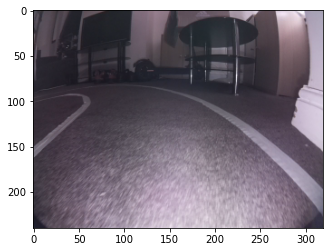

In [10]:
data_dir = 'data/'
file_list = os.listdir(data_dir)
image_paths = []
steering_angles = []
pattern = "*.png"
for filename in file_list:
    if fnmatch.fnmatch(filename, pattern):
        image_paths.append(os.path.join(data_dir,filename))
        angle = int(filename[-7:-4])  
        steering_angles.append(angle)

image_index = 6
plt.imshow(Image.open(image_paths[image_index]))
print("image_path: %s" % image_paths[image_index] )
print("steering_Angle: %d" % steering_angles[image_index] )
df = pd.DataFrame()
df['ImagePath'] = image_paths
df['Angle'] = steering_angles

(array([0.0326087 , 0.        , 0.        , 0.00905797, 0.00181159,
        0.00724638, 0.00966184, 0.01992754, 0.00483092, 0.00664251,
        0.02838164, 0.01147343, 0.01509662, 0.01388889, 0.01871981,
        0.01328502, 0.00241546, 0.0205314 , 0.00664251, 0.01328502,
        0.00543478, 0.02777778, 0.00785024, 0.00724638, 0.02294686,
        0.00785024, 0.00664251, 0.00664251, 0.01992754, 0.01328502,
        0.00301932, 0.01268116, 0.00845411, 0.00724638, 0.00120773,
        0.11594203, 0.00301932, 0.00543478, 0.01207729, 0.00664251,
        0.00362319, 0.00483092, 0.0102657 , 0.00241546, 0.00120773,
        0.00483092, 0.00422705, 0.00362319, 0.01690821, 0.03562802,
        0.00603865, 0.00724638, 0.01328502, 0.00241546, 0.00483092,
        0.01932367, 0.03381643, 0.01690821, 0.00664251, 0.00905797,
        0.01207729, 0.01147343, 0.00060386, 0.00060386, 0.00060386,
        0.        , 0.00241546, 0.00362319, 0.        , 0.00241546]),
 array([ 45.        ,  46.28571429,  47.571428

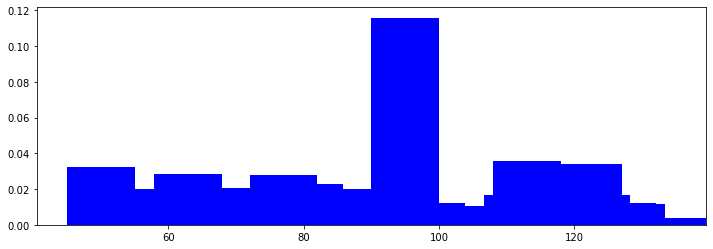

In [11]:
# Show the distribution of steering angles
num_of_bins = 70
samples_per_bin = 600
hist, bins = np.histogram(df['Angle'], num_of_bins)

fig, axes = plt.subplots(1,1, figsize=(12,4))
axes.hist(df['Angle'], bins=num_of_bins, width=10, color='blue', density = True)

Text(0.5, 1.0, 'Validation Data')

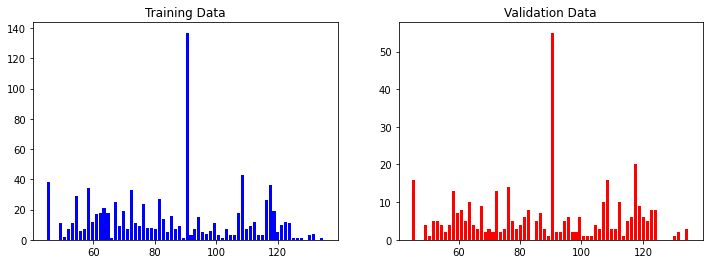

In [57]:
X_train, X_valid, y_train, y_valid = train_test_split( image_paths, steering_angles, test_size=0.3)

# show the distribution of steering angles across the train and validation data
fig, axes = plt.subplots(1,2, figsize=(12,4))
axes[0].hist(y_train, bins=num_of_bins, width=1, color='blue')
axes[0].set_title('Training Data')
axes[1].hist(y_valid, bins=num_of_bins, width=1, color='red')
axes[1].set_title('Validation Data')

Text(0.5, 1.0, 'zoomed')

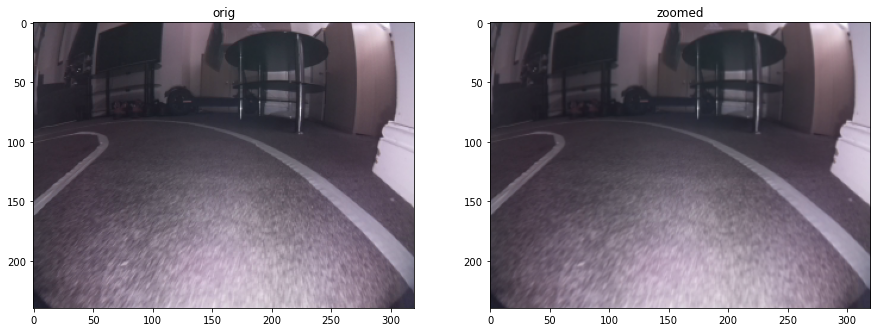

In [13]:
def my_imread(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

#augmentation of images - zooming

def zoom(image):
    zoom = img_aug.Affine(scale=(1, 1.3))
    image = zoom.augment_image(image)
    return image

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
image_orig = my_imread(image_paths[image_index])
image_zoom = zoom(image_orig)
axes[0].imshow(image_orig)
axes[0].set_title("orig")
axes[1].imshow(image_zoom)
axes[1].set_title("zoomed")

Text(0.5, 1.0, 'brightness adjusted')

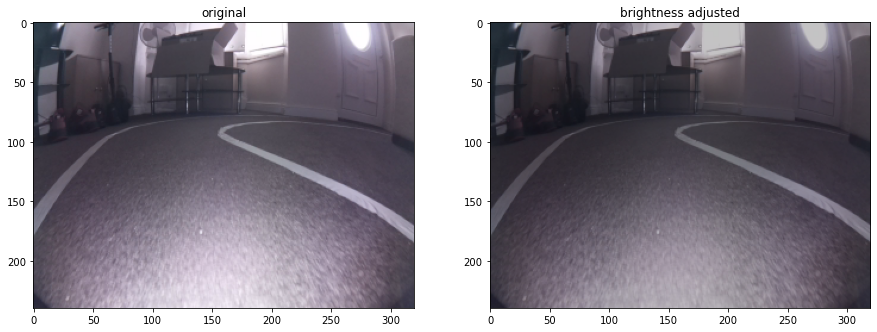

In [15]:
#augmentation of images - adjust brightness
def adjust_brightness(image):
    # increase or decrease brightness by 30%
    brightness = img_aug.Multiply((0.7, 1.6))
    image = brightness.augment_image(image)
    return image

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
image_orig = my_imread(image_paths[400])
image_brightness = adjust_brightness(image_orig)
axes[0].imshow(image_orig)
axes[0].set_title("original")
axes[1].imshow(image_brightness)
axes[1].set_title("brightness adjusted")

Text(0.5, 1.0, 'blurred')

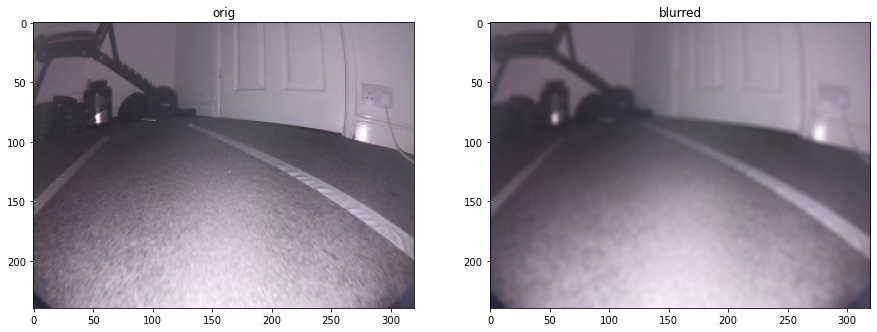

In [17]:
#augmentation of images - blurring

def blur(image):
    kernel_size = random.randint(1, 5) 
    image = cv2.blur(image,(kernel_size, kernel_size))
    return image

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
image_orig = my_imread(image_paths[200])
image_blur = blur(image_orig)
axes[0].imshow(image_orig)
axes[0].set_title("orig")
axes[1].imshow(image_blur)
axes[1].set_title("blurred")

Text(0.5, 1.0, 'flipped, angle=119')

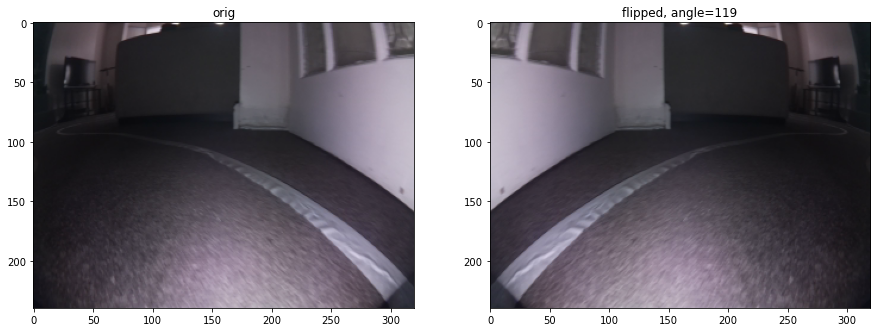

In [21]:
#augmentation of images - flipping

def random_flip(image, steering_angle):
    is_flip = random.randint(0, 1)
    if is_flip == 1:
        image = cv2.flip(image,1)
        steering_angle = 180 - steering_angle
   
    return image, steering_angle

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
image_orig = my_imread(image_paths[310])
image_flip, steering_angle = random_flip(image_orig, steering_angles[310])
axes[0].imshow(image_orig)
axes[0].set_title("orig")
axes[1].imshow(image_flip)
axes[1].set_title("flipped, angle=%s" % steering_angle)

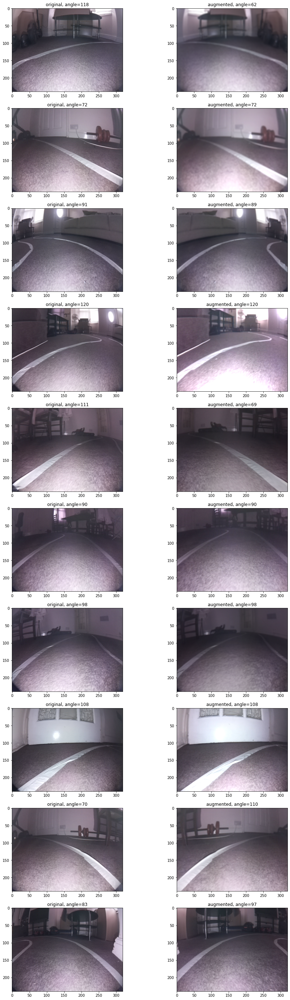

In [22]:
# method for random augmentation
def random_augment(image, steering_angle):
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = blur(image)
    if np.random.rand() < 0.5:
        image = adjust_brightness(image)
    image, steering_angle = random_flip(image, steering_angle)
    
    return image, steering_angle

# show a few randomly augmented images
ncol = 2
nrow = 10
fig, axes = plt.subplots(nrow, ncol, figsize=(15, 50))

for i in range(nrow):
    rand_index = random.randint(0, len(image_paths) - 1)
    image_path = image_paths[rand_index]
    steering_angle_orig = steering_angles[rand_index]
    
    image_orig = my_imread(image_path)
    image_aug, steering_angle_aug = random_augment(image_orig, steering_angle_orig)
    
    axes[i][0].imshow(image_orig)
    axes[i][0].set_title("original, angle=%s" % steering_angle_orig)
    axes[i][1].imshow(image_aug)
    axes[i][1].set_title("augmented, angle=%s" % steering_angle_aug)
    

Text(0.5, 1.0, 'processed')

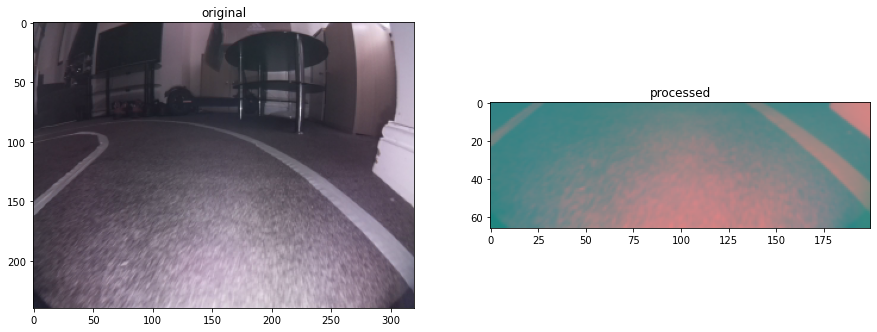

In [23]:
# preprocess the images before training
def img_preprocess(image):
    height, _, _ = image.shape
    image = image[int(height/2):,:,:]  # remove top half of the image
    image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)  # Convert to YUV colour space
    image = cv2.GaussianBlur(image, (3,3), 0)
    image = cv2.resize(image, (200,66)) # set image size
    image = image / 255 # normalize the images
    return image

# show a preprocessed image
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
image_orig = my_imread(image_paths[image_index])
image_processed = img_preprocess(image_orig)
axes[0].imshow(image_orig)
axes[0].set_title("original")
axes[1].imshow(image_processed)
axes[1].set_title("processed")

In [24]:
def nvidia_model():
    model = Sequential(name='Nvidia_Model')
    
    model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu')) 
    model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu')) 
    model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu')) 
    model.add(Conv2D(64, (3, 3), activation='elu')) 
    model.add(Conv2D(64, (3, 3), activation='elu')) 
    
    model.add(Flatten())
    model.add(Dense(100, activation='elu'))
    model.add(Dense(50, activation='elu'))
    model.add(Dense(10, activation='elu'))
    
    model.add(Dense(1)) 
    
    optimizer = Adam(lr=1e-3)
    model.compile(loss='mse', optimizer=optimizer)
    
    return model

In [25]:
def custom_model():
    model = Sequential(name='Custom_model')
    
    model.add(Conv2D(24, (3, 3), strides=(3, 3), input_shape=(66, 200, 3), activation='elu')) 
    model.add(Conv2D(32, (3, 3), strides=(2, 2), activation='elu')) 
    model.add(Conv2D(48, (2, 2), strides=(2, 2), activation='elu')) 
    model.add(Conv2D(64, (2, 2), strides=(2, 2), activation='elu')) 
    
    model.add(Flatten())
    model.add(Dense(1200, activation='elu'))
    model.add(Dense(300, activation='elu'))
    model.add(Dense(20, activation='elu'))
    
    model.add(Dense(1)) 
    
    optimizer = Adam(lr=1e-3) 
    model.compile(loss='mse', optimizer=optimizer)
    
    return model

In [26]:
model = nvidia_model()
print(model.summary())


Model: "Nvidia_Model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 31, 98, 24)        1824      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 14, 47, 36)        21636     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 5, 22, 48)         43248     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 3, 20, 64)         27712     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 1, 18, 64)         36928     
_________________________________________________________________
flatten (Flatten)            (None, 1152)              0         
_________________________________________________________________
dense (Dense)                (None, 100)              

In [27]:
custom_model = custom_model()
print(custom_model.summary())


Model: "Custom_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 22, 66, 24)        672       
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 10, 32, 32)        6944      
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 5, 16, 48)         6192      
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 2, 8, 64)          12352     
_________________________________________________________________
flatten_1 (Flatten)          (None, 1024)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 1200)              1230000   
_________________________________________________________________
dense_5 (Dense)              (None, 300)              

In [28]:
# method to apply the random augmentation to the data
def image_data_generator(image_paths, steering_angles, batch_size, is_training):
    while True:
        batch_images = []
        batch_steering_angles = []
        
        for i in range(batch_size):
            random_index = random.randint(0, len(image_paths) - 1)
            image_path = image_paths[random_index]
            image = my_imread(image_paths[random_index])
            steering_angle = steering_angles[random_index]
            if is_training:
                image, steering_angle = random_augment(image, steering_angle)
              
            image = img_preprocess(image)
            batch_images.append(image)
            batch_steering_angles.append(steering_angle)
            
        yield( np.asarray(batch_images), np.asarray(batch_steering_angles))

In [29]:
log_dir_root = f'{model_output_dir}/logs/'

In [ ]:
#train the nvidia model
checkpoint_callback = tensorflow.keras.callbacks.ModelCheckpoint(filepath=os.path.join(model_output_dir,'model.h5'), verbose=1, save_best_only=True)

history = model.fit_generator(image_data_generator( X_train, y_train, batch_size=100, is_training=True),
                              steps_per_epoch=100,
                              epochs=30,
                              validation_data = image_data_generator( X_valid, y_valid, batch_size=100, is_training=False),
                              validation_steps=50,
                              verbose=1,
                              shuffle=1,
                              callbacks=[checkpoint_callback])
model.save(os.path.join(model_output_dir,'model.h5'))

date_str = datetime.datetime.now().strftime("%y%m%d_%H%M%S")
history_path = os.path.join(model_output_dir,'history.pickle')
with open(history_path, 'wb') as f:
    pickle.dump(history.history, f, pickle.HIGHEST_PROTOCOL)

In [39]:
#train the custom model
checkpoint_callback = tensorflow.keras.callbacks.ModelCheckpoint(filepath=os.path.join(model_output_dir,'model.h5'), verbose=1, save_best_only=True)

history = custom_model.fit_generator(image_data_generator( X_train, y_train, batch_size=100, is_training=True),
                              steps_per_epoch=100,
                              epochs=30,
                              validation_data = image_data_generator( X_valid, y_valid, batch_size=100, is_training=False),
                              validation_steps=50,
                              verbose=1,
                              shuffle=1,
                              callbacks=[checkpoint_callback])
custom_model.save(os.path.join(model_output_dir,'model.h5'))

date_str = datetime.datetime.now().strftime("%y%m%d_%H%M%S")
history_path = os.path.join(model_output_dir,'history.pickle')
with open(history_path, 'wb') as f:
    pickle.dump(history.history, f, pickle.HIGHEST_PROTOCOL)

Epoch 1/30
40/40 [==============================] - 17s 437ms/step - loss: 0.3290 - val_loss: 0.2921
Epoch 2/30
40/40 [==============================] - 17s 432ms/step - loss: 0.2833 - val_loss: 0.2166
Epoch 3/30
40/40 [==============================] - 17s 436ms/step - loss: 0.2595 - val_loss: 0.1685
Epoch 4/30
40/40 [==============================] - 18s 438ms/step - loss: 0.2480 - val_loss: 0.1348
Epoch 5/30
40/40 [==============================] - 18s 445ms/step - loss: 0.2205 - val_loss: 0.1583
Epoch 6/30
40/40 [==============================] - 18s 441ms/step - loss: 0.2090 - val_loss: 0.1469
Epoch 7/30
40/40 [==============================] - 17s 434ms/step - loss: 0.1995 - val_loss: 0.1161
Epoch 8/30
40/40 [==============================] - 18s 442ms/step - loss: 0.1891 - val_loss: 0.1258
Epoch 9/30
40/40 [==============================] - 18s 438ms/step - loss: 0.1840 - val_loss: 0.1263
Epoch 10/30
40/40 [==============================] - 18s 449ms/step - loss: 0.1729 - val_lo

In [48]:
history_path = os.path.join(model_output_dir,'history.pickle')
with open(history_path, 'rb') as f:
    history = pickle.load(f)

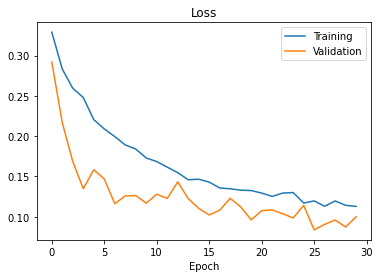

In [44]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Training', 'Validation'])
plt.title('Loss')
plt.xlabel('Epoch') 
plt.show()

In [52]:
from sklearn.metrics import mean_squared_error, r2_score

def summarize_prediction(Y_true, Y_pred):
    
    mse = mean_squared_error(Y_true, Y_pred)
    r_squared = r2_score(Y_true, Y_pred)
    

def predict_and_summarize(X, Y):
    model = load_model(f'{model_output_dir}/model.h5')
    Y_pred = model.predict(X)
    summarize_prediction(Y, Y_pred)
    return Y_pred

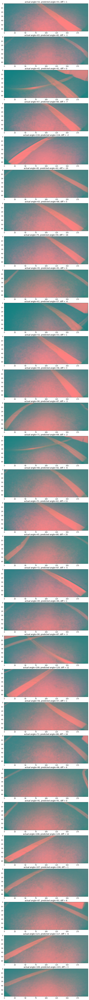

In [56]:
n_tests = 100
X_test, y_test = next(image_data_generator(X_valid, y_valid, 100, False))

y_pred = predict_and_summarize(X_test, y_test)

n_tests_show = 30
fig, axes = plt.subplots(n_tests_show, 1, figsize=(10, 4 * n_tests_show))
for i in range(n_tests_show):
    axes[i].imshow(X_test[i])
    axes[i].set_title(f"actual angle={y_test[i]}, predicted angle={int(y_pred[i])}, diff = {int(y_pred[i])-y_test[i]}")data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAkoAABmqCAYAAACgvrkvAAAABHNCSVQICAgIfAhkiAAAAAlwSFlzAAALEgAACxIB0t1+/AAAADh0RVh0U29mdHdhcmUAbWF0cGxvdGxpYiB2ZXJzaW9uMy4yLjEsIGh0dHA6Ly9tYXRwbG90bGliLm9yZy+j8jraAAAgAElEQVR4nOy9e9RtW1IX9qv9nce9dDfdQPPyAt1R3m1ixMgjkAQHbzEhOgREAjRCAE0PxCFKS0gkCAIZQqJBIY0hEDUCKsgjRBAcHQOKovIGNag8Gprm1U0/7u1zzvftyh9z1qxf1ay51v7OPZxzgV3jfGevteacNatq1qyqNV9LVBVnOMMZznCGM5zhDGeY4fCoCTjDGc5whjOc4QxneKbCOVA6wxnOcIYznOEMZ1jAOVA6wxnOcIYznOEMZ1jAOVA6wxnOcIYznOEMZ1jAOVA6wxnOcIYznOEMZ1jAOVA6wxnOcIYznOEMZ1jAOVA6wxkKEBEVkXf8zVLvMxFE5MUi8t10/3oR+a0Pod6Xi8gn/1rX80yp90GBiPykiHxgv/5sEfmrlPb7ReRnehv+ThF5FxH5fhF5nYh8+qOj+gxn2IdzoHSG3xDARvoMDiLywh58vZ7+/jtK/1Mi8iPdYf07EflTj5LeLVDVZ6vqv93KQ/zeeFh0PZOh94unqO2/g9J+j4j8sIi8RkR+WUS+UUSeeBD1quqfV1UO+v4CgJf0Nvx+AH8awMtV9Tmq+pceRJ0AICIvEZF/JiJ3ROSrHxTeM/zmhrMxOcMZfnPA81T1snguAD4ewA8B+G0AvkNEfkZVv/ZBVi4iAkBU9fgg8Z7hJPjPVfU7i+c/BuBDVPXnROQ2gD8H4MsB/Be/BjS8AMCPpvsHqmMdfg7A5wP4EACP/xrgP8NvQjiPKJ3hGQUi8lIR+Td9hOPHROT3p/T/WkR+nNLfQ0T+GoB3APAt/a35T4vI+4vIK1JZnhp4TxH5x/1t+pUi8mUicutEGj+RaPi3IvKplPb+IvIKEfmTIvILHfcnUvpbiMi3iMhrReT7ROTzeXop1XNbRP6CiPy0iLxKRL5CRB6o8VfV/1FV/4WqXqrqvwLwTQDe95SyfWrse0TkfxGRXxWRfykiH0DpLxeRLxCR7wHwJIDfKiLvKiJ/X0R+RUT+lYh8FOV/CxH55i6bf4oWuHF9Y1pSRB4XkS8RkZ/qdX93l80/7Nlf03XhfXr+P9Lb7NUi8u0i8gLC+0Gd9l8VkS9DCx5XPG/qTafx00Tk/+t1/eUeJEJELjrNv9RH716yNfq1RfODAFV9lar+HD26AnDytK+IfFyX/y+LyH+b0j5XRP561+HXA7gA8IO9b/8DAL8HwJf1NnrnB8EPAKjqN6jq3wXwyw8K5xnOAFU9/53/njF/AD4SwG9BC+I/GsAbALwtpf0sgN+N5szeEcALetpPAvhAwvP+AF6RcI88AH4XgPdGG1V9IYAfB/AZlFcBvOOCxg9Hc+IC4D9DCwLeg+q9BPB5AG4C+L09/c16+tf2vzcB8O4AfgbAd1f1AvifAXwzgDcH8BwA3wLgC3vaOwB4zcbfH+75Xthx/iyAVwD43wE8f8GXAPh+AJ92Ylu9uPP6JzqvHw3gVwG8eU9/OYCfBvCiLufndn4/sd+/B4BfAvAiks3XA3gWgN/eaV7J5i93/E+gOeH/GMBt4vcGlfsvAfwEgHfr9X4OgH/U054P4LUA/mDn4U90nj55wfMpevOtAJ7X2+gXAXxoT/s0tFGctwPwZgC+k2nt/HzyHs09/Yc22v6vJJ1/VafjOwD8jsSP6dERwD0ALz6x7d8dwOsB/Kdd7l/a5Wb963MB/PVVf2JeF/j/ygZ/P3QCfZ8P4KsftT07//3G+HvkBJz/zn9bfwB+AMBH9OtvB/DHF/l+EtcIlIrynwHgG+l+GSgVZf+u0dXrfQrRUf9Cd64X3Rm9C6V9PopgAC1oeQOA30Zp7wPg311Tfs8G8B91Z/vWAP42gG9f5P0fAPwggNsn4n4x2lSH0LN/CuDj+vXLAXwepX00gP834fhfAfxZks27UtqfX8jm0GX8OwqaXog5UPq/AXwS3R/QgtcXoE07fi+lCVpAuXTiJ+jN+9H91wN4ab/+BwA+ldI+EOtAaUnzNdv/fdGmoN4EwJ8B8PNo07A535sD+CwA730i3v8ewNfS/bMA3MUDCpSe7h/OgdL57wH+nafezvCMAhH5eBH5gT618Rq0kYXn9+S3B/BvHlA97ywi3yoiPy8ir0Vzys/fK9fLfpiIfG+fPnoN2qgRl/1ljeuBnkQLWN4SLWD5GUrja4a3RHNu/5xk8ff685NBVV+vqv9M29TaqwC8BMAHi8ibJp5eghY0fLiq3rlGFT+rqvxl7Z9CGxE0YP5eAOC9jJ/O08cCeBvUsvmpRZ3PB/AYTteFFwD4i1Tnr6AFRE90WkednZdVm5yqNz9P19b2yHVt1bND88mgqt+jqk+p6pOq+oVoIzL/SZHvVwB8DYBvWk0FJshyewPO011n+A0K50DpDM8Y6GswvhLNmb+Fqj4PwI/A14z8DNK6FQJN929ACzQM9wVikPHlAP4lgHdS1TcF8NnYWJtCeG4D+Dtou3jeutP4baeURZv+uESbejF4+0XeX0IbNXmRqj6v/z1XVZ/d6XgHiTvZ8t/HLvCanAa9IvJHALwUwAeo6ivKUmt4wtbgdHgHtFGmXB/Q2u//IX6ep20X1B+Fy+btE64KfgnAG1HrQtYDq/dTU72Pq+o/AvBKrrPzsmoT4D71psMrcVrb79EMEfnRjbb/ig28ukHvDQBvBeBNF+mZF5bbmwB4ixPKnQTS1uOt+PvRfQxnOMODg3OgdIZnEjwLzZD/ItAWTaONKBn8VQCfKSK/Sxq8Iy1wfRUAPmPnXwN4TEQ+XERuoq3xuE3pz0Fbm/J6EXlXAH/0RBpvdTy/COBSRD4MwAefUlBVrwB8A4DPFZE36fV+/CLvES1o/J9E5K0AQESeEJEP6ek/3YOM1d/f6GXeS9qZNQcReQsAfwltW/av9vSPRRsV+SAttt5LW5D9uRtsvRWATxeRmyLykWhrar5tkfdbAbxzXwR8s//9bhF5t0I27w7gEzZk81UAvlREfktfJP0+PYj9RbT1NqwLXwHgz4jIizpPz+20AsD/BeBFIvIH+kjKp6ONcK3gfvUGaNNwf7y34/PQprpWsEUzVPVFG23/ab3MO4jI+4rILRF5TNrRD88H8D09/Q+Qbrwl2jqj7++jS7Yg++UL+v42gN8nIu8nbTH75+EB+hNV/bQN/l60KiciN0TkMbSp3IvO93l39xmeFpwDpTM8Y0BVfwzAlwD4x2iBz7+PbtR7+t8C8AUA/k8Ar0NbG/TmPfkLAXxOn6r4zB4I/DG04Opn0UaYeLTkMwH84Y7nKwF83Yk0vg7NmX49gFd3HN98DTZfgrao+ecB/DUAfxPAaqrrs9AW9H5vn+b5TgDvco26gBYw/D00Pn+k1/UxlP75aCMB37cYkXh7UBsU8E8AvBPaKM8XAPiDqlpOwXTZfTCAP4Q26vTzAL4YHsC+BG2a6ucBfDXawvMVfCaAHwbwfWjTUl8M4KCqT3Y6vqfrwnur6jf29K/tcvwRAB/WafoltE0CX4Q2dfROO/zel950+Eq0BdU/hLZo/tvQRtGucsYtmq8Bz0EbAXs1Wh/4UAAfRu3zBFw3fhgtwORdpsu2V9UfBfDfoPXFV/Y6rjsa+WsBn4M2EvtSAP9Vv/6cR0rRGX7dg8TlBWc4wxkeJojIFwN4G1UtR08eJYjI2wH4W6r6Pov0F6MtyH2/h0rYbxDoo5FfoaoPdNv/gwIR+QG06djz2qMz/KaG84jSGc7wEEHaOUL/QZ86fE8AnwTgGx81XRWo6itWQdIZrg/Szn76vX166Am03X7PyLYHAFX9D89B0hnOcA6UznCGhw3PQVuL8wa06bsvQTvk8Qy/8UHQjmB4NdrU24+jbbM/wxnO8AyG89TbGc5whjOc4QxnOMMCntaIkoh8qLTPEPyEiLz0QRF1hjOc4QxnOMMZzvBMgPseUern0vxrAB+Ettvh+wB8TN+5dIYznOEMZzjDGc7w6x6ezvkS7wngJ+zsFRH5WgAfgfYto7qyZz1Lbz/vzca9FlcMp57iZrlrLPl8NbvfOndto/h1aDuhiuvx+CBhTdzTpakuf6K8UxkhjELPM669cP96NTf8XCZq0HRm4wLHNhU1/v0XF6G/i3R/CnBdXOaQcFV4tf/dQ9vTfgRwBcExUV/RUj079TXt+mVPk8aM48EtRYhaajbnFKhsmWPTzb6kVH4/X0XpGmK+bTq2aLp/4NK55i3M1+n/Wd9PwZ/h18uClutasPuBXy+yuPOa1+DeG95QiuTpBEpPIB7B/woA75UzicinAPgUALj13Ofi3T71j8E6Tew4szjXbqUAMSOyDZvpoVfIqFICjd2BCuZnRQWZahk4BdDsLAUQLctN5E25lJwaX69BB+0xIIHMkpfiOhDTHw5nq04htzXTPXAJyy8K8EDyPUAhvV0s/9Fwd5qlGCE9xUjmoKDxoZBed8ChTT1YK6IBr1onPhFUgclcLsv9gNZpDwBui+I5OOIGgJtQ3Mx0SiwPDPXqc+7tG0b2d7PjvpB2sNFFv79N5RUtQHod2mr0O2grk59SwT0I7kBwhaaBOWgSbc1kre86sXrJmeXgEMutWr19ZUxIpTXwkv/qnoWg41Gf6SEhzg5dBteN85UD5tqdt0hZVZZ/c9CaZVMFG/OLQKRh9ZJypDy53ozP5dw5So1a0WKy5LJul/3/vYBmzwZwv+f1KFbvEcAxBHzr+nToZtXO6xf6sA6GCJa6wLL+bGdWuVI10zO2ax6ie6oWss90bfVxrmcFI83shoani/zxBXAV+Gb4wS9fH2j/dAKlk17yVPVlAF4GAM964gltjvO0NxHLtfXu86AjYpkuYur8eE3B6SmFM16U0nSdZbEKaColPRSmadWJlWicSokiOoKY7sHSzOeKZ297l7my54d3xNmYnxYcQWQKzJjHA/GUM631UTnbyMO/fH0ocfjvga7DX890hOAIxRWkBZKMJwQmsz4I3NHZ72Wv035v9uuLfn2zP38e2ncu7qJ9J+YpKJ5EC5ruQXAPirvZOIoHh7OUZtnkZzHn1ohfKiBRlgzs3Ff15gpMbqHfSMpfQNWeXCbrsz2r+panuxOyay7LNrSyHRU9VfDheSMFNqrIPMT2ncvM6aucuYwu22nLjvDvXr7jZr6TrEpor1F/0p/8Pre0i9d0YuvsC6mnjrVtQ4Ww7MhC3UbpTt6t1JlqjbJZFD6tpU6HpxMovQLxW0Vvh/iNpx3QPHDRn5IB0a03xhpiMKFBQ8sOVtCw6shbnbj9zmZss6zMKdE1e/ls5GK9/puvPe/snpbUTsyvnZJM/8807QUy/Ma0Z9CWJBYeTeoM9GjbrGQckzNGdDple+9Y5uplwMtxuMi1zaiGA5GKrsbqlkw5WFJ4AHcA+ghRC5YMt402Af1YbQGOqriF9iZ9hCAHjXk0sKIivxRFmDU2a94oL1Os1H+LvFNIULxWqE7OLuOpgqpK7bKd8LaKY0cZFbTq122kQwGIyETL8loX7osMIrdDZS8szwFNd3L+fL0LqhCxhuuSECllvUAAe7GqeF5bl5niyr4YaRlW2Fa0trbCQjeovlRmBVUwcTIQIae2U65vxSMLYLbFdW3LlqlkRUKOLTv7o9yvrgtPJ1D6PgDvJCL/Htrx+H8I7Wj/XVgFIpaWr7agFDlby0Xd+0FPZa7u5z2o7HZroCk/q3FLpYT++Gnt6J2POgDgKdGYXv3N1GSH5FOA9ZvgHFoyjRnvnkbs5T21vNfuwUKVJxth5jEb6j3NORC//kzGW3wl97Y+yPKatHVqi+p6bq8IFhxxmSN8pOmi/ymAx9E+gHdLgJt6xCUEb4DidWjTcHchuAcAomGUjlva/rZsA0M2hRlXSO1OrtLZui7Peex/KjxVGHOu9KrxI7t5r/syGCl0/TRdtaDFAt/MZ77es4mAj7R43ZE7pqGqw381tHfJFNlu7j8WlNWvCtLpieGvJhyblkGbopTtQA5fEEfuVsByF8WYrmfHvwo41rq67YtO7T+xDiGJOezh2axL5ny195mLrG3sulDOt13D9QOm+w6UVPVSRF4C4NvRbOZX9e//nASVAFyYpwVJc7nT6966P73kqTiiC145pww87bR6asYj4qsCJS3TZ+rmp27g67VPFS5rx2pmmh3ZlkRnvOuOXDn/TOOWvCtd5OsqsIhGuF0dcUqHzbhcrtyeeb0E09P+dARKF2jO7AALqiLOut1i0GIyVniAYMGYoAVJtj7qFnwa7nEAF52WN5U2svSrENxEW/T9OrQpwkqOkR+/R3oG1Oat4o0DBMu0agfW08pA54AxG3mbSgRmnlaQear43eI1X6/K77mFuq4c3tVOSCATLRYA8Pq9uT4bcZwDqNxKp7+W1tZsDsi23efeOteV/eT6LF91bQE7V1AFjFVfVUocAdNiRPwUf7YVlIX6nibkIGmFf6XbOa+SRCsce7GADBwVhjU8ra8qq+q3Yf2l8AIEca4rdr+JQc47SWAlkj58W9awQx1Z1iBC1tLxjOrnuaPRBgs+dwiyYllZXD2E/uffGNjMpSSl7XcWTnOHEjGvgyRz1FIbjZLeuU3N6WfYrnuvrYt6hNZPaftPMQd62dnHVB72L96btHZCq4CmMphMh/+JT5spUSkxAKrA2sg3EQgsWDJe3MH5yMJxXMc9gDcAHKUtLr8N4KDAHbQ1S0xnxc9Wm1Xpqz4y6YWLYwNmfax+dcpd69zIm4gach00UZiQBHMd21XRx1Xz9TqIaSUrRy+q0GEgqWeoef99QjM9o3hRcIhMWHwsxG2NcfqjPkderwdbfZHTXc5O9aif++cKiuQZtz+t+ncdaM91rmxrXXuFky2AExh0KOn/FsYtX5BzZY2pS8Q2aNdExd5K+Q5PK1C6X1gJa44QORjJWGKnnZ+v6/aS1ZhN5cAriE26atbZ6VVcbysiX68ChK2aeTfVqmzAQ7ZvSwanGG+uNztfQR4Nk6nMBbi9/JenAjh/JU6drmOGWg5+xQs8V1voDa4wjwLFPPXCd97mf0h5mPZ4L7iEjqmWi0FfW9gdC+y1VjQlcUSqeasjGcC7xOuR6rbfZwO4hTbK9BwonkQLll4PwR34NB7TznzaLwdp0f3UXDEX/H6z5+RyvayvF5SWp5gqnZhwk5MYi8dLR+/U83qxTCdSGlUxjXDxZoFspwI9GzgF7eWT++rof9UizwVMLklje8U6V2XNOG1bpqgHbgNn3VoFFbH2egxpVbvJ2afoPJjZo92Tt/yJEb3l5u8nILyfMqENJT63i+sG/SyxU2nLuhSgq811gkCGRxIorWBmdMtNWA7ZTK/qmMtWqdeHvQ6XHX5VPuff7CxLODXEq021OZbrSyO+++1J91Dkk5R+Ayw3H7Zf4qaE/Fa8MoxV0FMZ1IrWyrBXQVwMCGNLs7Nt020y5am0288w0iErhXVqwalvS86LByJ+3duzGxmbhlMARzI+trjbAqXHADyr53sMbUfcHUiYzjNcQOStkr0FS3kN24qXHBBs6XKlF1yG27k6L2oVKDGmrH+8miaWadTzInors6XDefrdcHOQz6OBVd+oRvtMFyTkX0szBxgriazL7N3vrfiU6Yplkl+2Tukh1wmSuO68sHylhZsOPuULMxng9qtruk7gcz9BUqbjftP3aDm17LIe2UnfgYceKMVpVYq2Jb75tMxz3naZ3/kIQS5WoWKMOmEv7zeFu0icY2J/rkUekkZJSzbeq3xuijmtNk/1e+22KuVgNhvHrUCMn9eBRsSe34aBpCMTXh5Y9bfIvLF1Cn50DoKyFGu+4oJ1DoqU8FZOl/HMzraI+AaHkT+7OvZiV93RHpRGhshQrGhw7ErXMR/rq+07aHXbMQUerB16HjtmQAE8jvaWfa8bgqtRfmaV20kDD7rZISc7knjcgtXLStW2iriOrAyUuhJYoNLaglsu78NzsNGgkVfsZSH2idzvAYypskrvxJAl/hhLFSgOexkvlnDKtvC9oImf6UaeuRBNDRZ15nY1/DzQt+ojJc29nKbyW1KKXmzbhddWKCOUbeEkYoYG9PlPW3BeF1xTdAJlu22XZ3CnsibfVZ1LQVc1n2oNHB56oLRFIivWaW8NpOJ1C1vq0xZX1VFOK+/ccLlqJ9Ue3tWH+Sqe4tGO23AdhzK3C01gdmXn1tn7mKA73tldsAM9BSqnUL9/bXf91S+w7RTzM3Y4UyCkwEH8vpqCDEEJZv1g43pEWzjdngiuoLgAcBseLF2g4KlwDJkPcx5MP8vXztLhBdt25pLV+ywoHkM7PuASgjcCeG2n+Q6AJ0HrrAL/Vo9ObVbpanb41TlJub+wvlX4c//MuPboqOWWp2Vm3clBmZ+X5Lwtw4A+VVYFnkI4Duk38zfZhoHk+s6mglMCAA5q2B5U7bkVarCcG895We/srVe6MtVXNWKoNZdVymNPFp5vZKhpk/wAizZcKar0gynkFN+7D6uWNHtWHVpZqxPlLYKk5va793kw6riERzD1xl2DjB8ZY+3naawbjKy7RpxTThawrpwNoSrpdFxVbeUMxyik4C2nQqGzaFTOsGwhhdjxTUeoAKr+va035qkn7dvuItvtwbSngClH+0xv4jPU0clbjkJmEri/dLx8L2bpt+PqgD8bSgm0oy0CH+yzHCTIYfoTxQVsAfniwNHkkIT4CkzDAxY+ZV2hfSTH9W20ixWtdDoFRixXkwHDEQhn+Fgdh16nnfjd/lqIcKvTe6dL7U7HbgvEAQlBNht+l0dWrNk5eAAw582OM2qhSzFaiZmWrHOZzkP61UTOrGtxglHV6uyHS0rkM/I382ivMjnYEMLpLOg4CmGW+dTJYn284HsaIkg2W9aWNxyQk4Aded1ehLH0DdaeGvBxazM/kc7JjJX0VXc+DefUR1zV60GBPJnayk7lYHgL3Ke5N64pqI5EmHVuVXa2WNjA53fVdazMV4JxaUnlChdSo1vAI12jVBHfdPv0eehToOpcFQbOV+XJwpdwV+NzY2iRLznF5IC6b+3X3m0inpm4atNJxUfpjIt8+VmW3eywUh2SnifEgd6wJXeetquM1LrTzHgt/ymL03N6mTfLnQzXWNdjMWiWA3ix7a5ZXLxlRaNUZXFn2BZ7G5kX4mU4gJtwSf18b00Z6wqfuVQ5lwu0YwVuQseRBlfQceYSnzg9VYQuW+WAwgOaukfWLox/3aiyjK+xQoX67Kp2k99xMXIx6bhyHptO8vZzp7imsi3un4NHHanUx8XTsqOd64juLxwOKfX6nNYXV3jmZzlcqnQJkEluw55Oa3ryZPp8/pnrXORvvt6CuX0zlir9QUC02Tr+r3KalLn3LPMq27Sds6QWYsq7oGNm9gVM3Y7tLzVtESQtYK9Fn1GLua/D2HXhVGO36yinPNsq7ruXagd3islYpqWXtsppncZDnV45kco5Lx3uVr0l7W7yK0e2Re9WfRO9sqazclj2tyUnHzXIRnt9nlEls60gRPLDBNZGtu6nlWnBko3qWOBya4OmrTflld4GGhS4EqeBz2K6gNI5TA3LG6F4CsAlBK9H2xl3RNtZd0mVTa5KvMI4PhFN8BYv/EmVylly23qV7eRxhDLR/FdTzhHX/LmRqv9mOFAAafhW1ofx2fqowVt3evPUtkxyWOHnYMvuMyN5VKDSmy17v7I1p/Dc7mOQwG1+oPQrCphmPYi6VdnWHBad7MOSDQxaVAjsVLzep2V8oy7niIEm1+wpGotQ6s4LxIoBbMnN69xr3y2d3LNlW/Ss4BEESjXp89PmSWtRR6PEyjypg65u5pqlOPvoFCHmTrKVHq9rmquysZymh9kczLSHQG04l4Rz8kSubBMPhShXAVN5fscUJM246mt7l8ltVcl9fsuoaOUcqwCKYSto4lz8bSzp9GwFHLGNqjY8FXwY3UaWLtQdwQiOZB4l2jYu82GnnBYcippzFjo9XMcxAAfxjxzbVNKlAnelTc+1b9fNPHst1AeKzxQxH+tgae/j0bSuJbWHUKSviG1ntdoIcqY9648HfjLqys7d+fD9cpN13PAuExWiC7pdNnbuVa0Tqb0HD2uLzf0x2+yAn+fag43bA9IOnWVs6PIfEEfZ8oGlp/YHJljCLbVU1/egw3BrHGxW0bRS3FV0sVRXk5xR7jH/ahou9r/MhefiLS777VZZYi2ot6fV3ldJMt8AUo5TbeozakQpwl4QsTLYTwe88VcGtDJg+VoTrsXl0uGSDb6Wc1wFd1XwEpzAuHPnw3m3ovLgeNHs5GHQXlNf0zN3/yqYyHhPCWfroKQoRXLPZZk+vla0qSMzsvMp6XMgUrVPlV7jmLUm5vd1T2ZWbBrsDtoi7yN8t5YgfsMNVHaGbWeVHTfrjy88bmc8jaMfuq7dAnBDGm030EbBnlTgjrQ34nZu0+qL7DMd+SPO+U0TlMZ5mN6cB+mZLjqwyz8SOj5jBncf/Pacecn9z1s0t//Skkx4feqp/Y7F7uRbVTw9YFXAAyGeiuHRsXqvqf3OC5ZP+xzIKhyNPMYdoRXeqnzVvo4TBcVb2KrK6CQnmfFFeld9r0S8k76FK8tnr86McdsS8PWpLZxx1P5ntn2nUb5EcRI8/OMB6Po+6H3aJfcx+MLHKljwDh/xZHxBNWabuSwHuPPYpnMbKodbGYPMZ1WO+WVgGYypp7QlOefPNOQD/Cra9mDlYDKO+eDNhH3dZAOqXTcZVsFSpqemcS/YiiMJqzqYRkULlJ5CmxpswUgbubFzj3K5U03iDLNDU/jUm40yjeBM29qpG73H2CLvSwCvlUbzPQCv77/j22vLmvkOI4hdyakatcrfNVu1GT/MfXoqI5HmA5VgfvL32WZX5k/WPY3zew5+qck0j2m45MjDgZWdaYqVAk0xmMgtgTFd6T3xtPEG5mE7twaZbNmvfM8jSuvQ4umBAHQie5X69OvIsJJv4zOH7adBHcDs0XE9O7KqowqMWNMyJwPP1vkDJ8BDDpRqNVwKfLE1iU/Y9BoqpnoAACAASURBVKY+3aiXwQn9ZoeqmKNb2/2UDXAOoGaYm/l+HdQ+H/VzpM468vbFsWFaLJCr01V08rMRn2VSd0pJV4POxEc9grB6xrKcZbop3zECEMtxeDK/M3Pxahll3Yn5Pru+uj3XQdKqMxk9R2lfmz8CuFI/ANIc//2a68x99ZzNsh0cepDowNsRBu3JTQCX3fi1wzT923Y+OpFxG7fURmkeZjOgwdwOe328evERVNMyVqDWSd24XuXbg83dnQnR5ITIToSspif0sKRdEc7auh8Hm22V0bnBRtK5dRAQaao1f3bMO9QXlbF/2ms469keyKRiUtM4AVWX+0ZsdG3tdArORTWVfQ5yU6d758szBcaqDVZQTYB3K80Opahvj99HPvUWG/F0qIzbKu2UspVhrIwoF1o5Njfi9VqD6jMYFZYt5W3lZCrFdK8CCJ/W826ZceRrfmK452BpHonDdL91IIMU+VfSwAhmZhzMTz0CE9uuMJLiP1tnXsWnCLzlwwEt7aIomfWhao8M2fms2sNy2EjJXQjegDb9dYn+KRLxk7UruiK9ybAUa/9GerJ7Fjwq5s90cJ03oHgW2gnf96B4DIJLtAXeT8GnE+9R2/mfT4WGtXdEHffFrEetzeeRqFXIW+nHIcuowFE9Z5nYs3jGkVOl4XnxKy7++SO0nr7ChSQTJlYE4XzDbA8q/Hmk7iTbv2Fny8xrNIMOYiME3hWduTyv37ku3F+pLVrmZ6HtygrJIojrSbuYg/vc7lknsjyzHgz8JcKKNCnpdr96Pdg4hKLIsYZHfjzAKUSeUq56lo3cMnCgv/yM8Wh6juKeS1RfKV47xJn6jY2am7RWNBnth4GBKY3BhT+v6o71ZNqrulc0rZ7UOPLXmmKmKJMc+sTF7pn2qp0rmnhdT3Ys83XcPcR8VW/Aley3ncJM6/ZboZ9RZOt9DvAF3u1wypqmFe0S/iveftMNP49n+fi1TQUe0A6pFLSA6DEoLiF9+rDtkLsDl3c1fQXEtsl0sENnfsOxBJhlnO1Bhbea0su4quc5fa5DpnT7DdcSd7pV9VfXGp7Efp0h95dVniogWvrxorzZqC37znScAmVgiFpfcn3XDZZOCgivAZVv4rQQCCu3gf+fC9pxG5w0taesfexW257Ed+5ID0pYiDqY6dmyrQwPP1BaUuasrBwWZ1VqzdoJ19VOStDfjszez7jW4cPIK1VqIHfpDFc1bQV+VYASu+PsnUTXHUzSk9M2t56qYtuQjexe8Fz1oSroEMo98zeXs7voKJqM7QTf4QB1P1Aa57eE87CI8oLR2D5ulVRX0werBY+VE9H4XAEVGVv3of7pE5F61IsfzBriucJ0h4mh99mhofSJiS1ZGrTF34obENwCcFDflWWfTsm7lfxm1fb5UIFZyqNXCctaU9kZd5x6I+aXkms48+4rXgCeS2cHXH/0c7Y9W4FNpqrO02tmtk4At06Gu37pOZ2OSFG4GzsI67we7NDWBYlyDs1lfbGSXm1yQ1Lu7loVzNB1d7LV6tcjTSwIUj6HuLBxG35W8k2CBZ9RIr6RYo/H8epbJsc+xnXs2Tquswpopci7p1+PdERpHZBcq2CDRSNG4zUHC9m4bImsMoxzwBEVaPmV+4lwX0R+CmzlWxlLrp/pyEYmO6q1Ys6doKq7ChRXNFdGJUOVNoKY6S8fnTA7m7xAm8sdAFxAcNGd/2rL+vzBUZ7+cRrdsFWceaflg/9ykUqWwWGWvMYxOTNO93qqjTTaLj5RjQdUFjgrp51pGtO8Qs9Q4zUeDBd/R+1m/72A4jaanJ/EEU9BcAUZH90NtC2UaLIBaL0v8wPUi6tz3hpvWlYsrWcdC1Pvso99cisQ52vTv0wTj35OtersoFZ9d7qWelSiesR1Mz0r/BUNGZ8itsjSFepsk1fULvVb4rN8vYEcQJyWtRFd1x/Z4bnrUGeX+wzbIbNXDZfAJFTRPKalSdmCDaQGmmyPcBiU0gi/U7Bn9Suoy0lK3Qz2KXqvAqtY7jT6HvkapU1YcbnKO1+Oe1YwpGsApGSnkVAFSO16boKscFXnbc+3zqnpuEJkVwUqcWCYHTOPKlUqbJ3XxmuHoVi2Qa1kldM8tRm3cKxJiTKbg6ZYkh1MRVsOltp0kG9rr3gLu4PS37axZrqLLdklXWscu6BNETgQuAcbsWk03OgeZqUnRgv/5mujxwOR2RlZgHB0zZt4sXz2nboLtJ1x4wOzUNxDW6t02QORHPxGmuI6Oq6Tg41Mcw6WBAg7aXK/rtu8Pngh590Lik4JKBg366TBaiRoK1gaddMnpvZ0jtPzR35p0/wI3CKdcxAU7fRO7YWwc3uuizl117VdjGfmX+r2qMqTsmWdrXTY8boPyPrMtDWZt5RwcGkhNw9J63bPffs6AVKsbifCSfTvGsuijtMpc3jIgZKQmiTxkFC0uCpP3wqYF/cby+y1J1dBkoh3l4qL9ru9CDrXvM4702g1sKGr2dgO44akuyE6ovGcg8RQWpKTONWiTjXXRaoFdrNDrtV69TazFUBwzlOD3gPimiQ7xXe1nXwVxIQ237O43LHDWx19z0gLmpNBYBjGchjb9S6gK/jU4iWaEb1IZm9fznO+Uu81584Qg7lcrwhwoe0juwcoLvuzKwB31T/Sa4FTw1gHP5lmpTpG/ToHwvOnOByv4csHH64gOE1qe/9L319LCmW016cwW95obfaO812pq4ifVFUFfVVwE+VsSuzauKwr4cnB1rKmnb5WrjJidwO0D65qbPOySCHurSAs1LH4G1LRbPOiNIeuKfcY73HVS7PV67K0g0XnkajIaz0Vxvf+UJHXPBU5xyNJGdtyg9pPhICuxD/rwF5wtwcPfUTJQ4ynh6FB/fWhbdfKpfei36ps5Vbj3aazLJ/FkQRzzHbdOu0cXp4qw2bU/W3bcOw5du4Ex5SeYVWuCnqPpPZ14BPcBvLrb5bV1j1Ddph2z8EPf8DUnt+ge1tsnHEY3umtWTHF+FvtxvTH9m4jL7nt+G/+1EaTdTBqvXCWke0ia78t5QJtTdBtaBihg/qhokAt600jVCymWbVNNsQ8HXdbgFvadvPdFh9Zer0I7mnbJfdGzNNS7IwUsa9VfOT2zjSuHct8n/ms8noeHx07FuUOnQNB08s2nRJP0656WvVMUhmeSub1Za18k94pfGcHZWm2Bo55K3fmFWWrvmf85PxbhwNUQR0ha3rRM63aTu0/YbnWUH3WhvFdIfO27lkxoKry5z3RubTTawfQWrs7b/31LAQwK/vuFQxauKjOfTlf883K82YfWPn7Cub+cD3YDZRE5KsA/D4Av6Cqv70/e3MAXwfghQB+EsBHqeqrr1PxppJSngFl5hnLyklmYGNxOghd8fWp2+tr9c3XjkvBo1cjBwVNkyUymJ5TFxE/nZnzVjxExcq07EwVirVQFS5hpOy18+qcsBwolDTUKEPIMQcdSiNJMd2DKu+yWzrX2ihyuTIU1XEPZtKyIYwOTic5AN5Ogf+CUEVzhkcy9pcAVNsb6RE5kNdg+EbawO18lN12p+Nbq7DYxsJm01X1hed2WrcFsXdbhoHHRoMifpeq8S+RiREQ5uAh4kA5aM0Bcnb+Nt2BxKOqTvlXwRnTYMDfMOR+OwcUXrbqP8020Cgm2YbGb3KC4IBku3GzbTn0IIzlOMk0MWo0Vs+ZP2sDRUwYeoSp2SJxiceVXG05RFMfjThGJW5rQhoQ1iOupowzrVXA4A9J+RIPzr+MvmOH0HIdfDp7th9bo6TRnqWb9BmgKdALnarIxMmLts+FeM3Usq1PgFWQy/DVAD40PXspgO9S1XcC8F39/oHB7Lhk/Fb5Dul35bjs+1NVJFwZjdNgNm57UDlem9qJmPOHCwunLguaFwZE0jNNeTMKHkmxv7Zeh4IIrdqMeRRIwpentjIPdl0v0J5pzM+3HIxAOi+CG2qnVLujDXh05bBmoVXtanrLo1FVe+V2Yd5M7pl/6Rqy1lmZ6Mq7H0euZKzvQXAXLei4A+AO2lqmK/jZM1N7aqTX1j213WoIf/aR3qhXccF8XgDOAsr9zHDeRjtW4NkAnq3As9HOY3q8p9+EDlmG6Wcp7MLCELPMLViL+qmQ8ruSjKv/nxquKrVlm/bsWBV0HRFtYR6xWlgJx5+I8DZL7bdBNxcW9Cku8fLtW4B2raH/tG8GasxT1Mfp2V7u2qATnYDjXUQPK4RUYQ4uVvywbNc0U5C0IhhCcpht82xnFiydAJH+eeZkkAzUFUr9aO5zNYW5rpUN3IPdESVV/Yci8sL0+CMAvH+//hoALwfwWdeodxfcYaWdLB0k5bVnhyLvMIBkZMsGK8ruA5ujiH+Fp1KevXozjdWnNHKdFZ97UMkkTwNaPSzXqQ6J9BwWEsljSnk6wAwwOzEz5pm/KgCe3rr73wg8xKcBqje6/IX1cYp1gROYabH6DymtorewD21KBbEtvS4Z8lnBhJP6QE5nR2of07Vt9wcAt3upHPSFHTjxZXbQWengTHWxFRqzfKu3aQuUjtCx2PuOtMDJpuCegh2H0D66yzxXkGlmLa3W+HH6rK+R/lkzI6wCJn7OuljpeDzFfO6zzIMtNK7lkVutbs+8KZzrXvFlNrD9C+Pmk7tzXOsdgis92zpEMrfVFr1WTqffevQl8rkGhU9/hXqTmmzacgXGjsQFzOW12+ZYnWBjdGvDufH7AdubU+EU2vOzbBsyrqmcXNfH3/8apbdW1VcCgKq+UkTe6lqlKxuxEqhGhRx5+xvIqvgq+JiqriwvFRyBgAI2WW/Hoec63YTUx5FtOQEuW1KcHpsSOj+z8ZhOpO5jplU9tcET8ItSdtRb/PEK8Gj+inoLhLmeyFclYedzP0Cd33zj/4CO6QU3/G5ENeSd+Wh60jeYBblZvcEgSy1XDjS8JeMIkgBtKoQLjczpPKOMS2I9lRNunzuR8czWLWT5G44DPTeJ5q3MkaToWHlIfZZHUPipfpOtjU5dKXBDBCLtsMobUBwVg/7olHxPT3aCOPEaVM7o1dQek54N/t0SaDEiMOu118LOLafOoOEq248KZOOuespTXlm3BG4aJD8H+udmVrs/3SjbuVZxSiXKdqKviGJWedXyZ8XtzyafRPc5yKnsWOIo4Fuo+FR+au9CrtU8WfU60srw5iGaTJVZfm5yBGMes6JtSirsdDBf1w1hZux1gMTrc3VXzhl+zRdzi8inAPgUALj13Of1hztlOIsFJwACaxLXBZ2iWJyXHSUr8xTR9xs/D8ZDmgxu8vzdKC8U9fqF7iO27II03M2/+UhFdz1cBwYTrDIsjyATzG+NVSddyT3GnNl9eNmq7U4x+LURnY2f8QSsh7SZFnuztgTWhzYl5TLjQxkjXavF+UJvjX5IIjDLUxOOOEc+B0shlYwYB8X8bTHjaz6PZdY/C5DuoYWYhx48XUH7dn0NU7RZtqvpVZZtZTS5342MUvCb7g9QqAK3pFF/BHAT0s9fEtyB4m7n6x780MrV+UhGVvXGX+fnM6ta4FMFYzGnyaHeScbtYvk43VK8LSPe1Uno2e5V9TJMAURVTvacfnziR2t4kBh1m0NB7UGS7bsL501P2KsgcovHQK94ADJkKTnAzNTF8uMn6fK4TAKagq0F4Uvxt2hzWNlqx/KqDaMNjCe7Z30XYLxMRi+0DdcJg2p8s4U6NYe3zzyosAf3Gyi9SkTeto8mvS2AX1hlVNWXAXgZADzribfTnT5Wg227QA4btjsB58l52YEGerEMgsnYRy6iIlVTR1x3HWTlTmfXKJ4jXNdmiHe4zQ7VVSUvBK4c2soh7zms2Lmi+uZgIxurbUcUcfj9/H7Jzpt3TFU4pvVJ/c92oxyJmotUfpKbRLx5elgh/TtrjpN5zvLP7a1YBUuxVeZ0boPqTCEPsy3nsee9izaNZQt9j/A1R2Yo85RcxX9lfL3W7CScqjxwZs+zYRQ0p3SAtjOhANyG9KBI8STauqtLtO/GXUL6br/VcSD+uwqU5rbz3j5N51KOqs9UgQzT4aN9OU1CPg9AvBzX63ytLKidr5M0UpzWFXAdVVCR81nwN9MW/z8mquvXo4nUKcjNfYfp4+Ub3AesXN5FWbXRFOwm8bGdMMg4t4L2bKciAbM1mPzuosmzvcg8+3NJo4ZbFJ8WjOS2P4HcJf4VNas69ui730DpmwF8AoAv6r/fdGpBN3sb+816ghTaeIogtci5cjy5XCXgyQlOddXg5Swg2WvuWP/WdatcgkNmmvKz5drSrYV/Ex42SRGhdlTDqGqllLVJq9qiKjGVEw/BVg2R2/pQ5E22ZWSIDnJnOzGK9kk3Vr8A4ywr7bKayiYDmleyVbsNs3OqIL9N2VNFI2pMbxW8OQX2UVvpU3Pt23HLM5K3PhmudFFmI1O8QuMql6bu/KyfFjS1oNd+BS1YBdqapSMh037p+lOdSZwp3Epb5FLqgqkvTwGF0jViO2/ZxVIv6b7qf9FR1gc/boUmkyZI+Al45vrqerR4uG9RZxta+YLchzRdH8JzCYHXHC7XwHXMdMdTg5YvAJSnmGfZDK4ikJ6nklFOSno3L6LIdqTCuHVEg5VxvLWtj3xst/osg3UsMHbR7mA95XiAv4m2cPv5IvIKAH8WLUD6ehH5JAA/DeAj9/AkrLsKvi2o+TqfV3NaF6pxl4vqQp417ibwapQmurpoIGZzxPVyxw1GTcj5XxO4I54iayvjI2SRXj6enxeZ8m4+NzxKaZ6vepNjWkF57f4CzL9LUymv5ffRj4ib81eGyY4LYOCRwrk9awNsbXWDcNib2hVmOux53i1iC+PzCJjVE+UVDaD/phwpMLNS5WGPQF8M3abgLtCm4W5CcMAx7NKz/6qFobmNMzNTX7+uUSC5Cdq5UNppexxtROkW2m6+u0D/HEpc7J03lWw7Cof86RN2Si0I61NyEnfi8nVle7gNebE2ivxM60WRXuknMPPEtPF9SafCv0q/oIvr4LpyH+DyIWjYCJJm2uMJ2ys7sjW7EPukTdXWtAIL3lNwlwOzWCdrTWzHyp+wDdoK1WLaynLEElU7nRIO7gVuGesp3pr5t7bjtpl3b7rXXOI/MUw4ZdfbxyySPuC0Kma43yBpK8/OwMgoUxmGFW7uWNdvUlf0rRIcuedF1ivDl2nbomJda2GA0rMt+TRlzfTGN89qPVBT6DhJZopfBUqrAOQwlYvUVsbFHHjOl3cHRWy1saim6ezX+MwfljV6edouf/Wef9n4VYHXClx/Ndzvlay+E1WZU6exteNd+JTIzY7D5G188O9c75qHFcV7DiGXZ9ndgH9IV9DWKV2gn+49eqOOu1NkXcFqqgvAmEa0lw/Ly8GCXef6GN+ebJnGTGs+qiLLadCa6OG/6Jhi4VNoWj3bdrCnBUl7T7PjrSAHH/7yEgPbjDsH1EaGjXhm/cy+xmwk01rR/bSBKtaUwHRlGq/bttuQvVCdI/uLrC8zhn1KTuEHeBQnc3eKZPxXAOXZbpCqS6dyhWICC7xS1+kNJOG+CqT4sMKSPWE6JT6GloRNnY7zT1TOjd9kHXFXnc/J03H4Xg6FuGZzJWPgVGOn8lLz5w5iffRc/Llt2Ijrvmi0TtdvCpNz0nag4nSwWq+0CgistXkRNKexNswBXadTozxyhzYc/IYklI8P1os6FaXMaV5HpP2QSoe8C0/nowP8v7e6vWHbSMwltXP1bbyg3oWuT7rI1xr53QuwSrxd4Wyd1U0qc4m2TsnOkNI+Lp8DWXu2NsOzHcr63uTqHNg07KGzmZ0zX7MOTTsoF2BaurZtMz/RcXswMYKD3m9MR+sPCM88GI5KflznHk9Vma2yq+dbLwbtmaT77VmHHFCE0hJ+Qp7RloKhB7molcvHjeQ/WL8Nu48LWifiODzLx/ImJqiurZBEtN4F7tics5gzSi/bRqRff65T6XV/jT59BQ81UFoZwarzVvlinpSiAA8rDaWYGrFy+zWtnFvSX8a2UuIV7ZnHqrMhPd/uzGtcIw8l5oXNsyxW6zE0LCbNcjIaZoWeR2ayDPbkt9KJ6jwZMzxc+ApxKkkAiNQmgHk4kGOsDnjM9dvfRcpngQ8f2Gi/N1I+UN48lTFTW4FriwXvPE2ZnZ4ijmAIEEY9nH975kH0JWwHn++KewwuqxvQcGyAAuGFSeDatncuVOaaQ9hkvqe8BlbHBZrcFW006XG0oI/PXLoDwb3Bvx3x6UcmbAU0uf4hvy44ky9PGdR9zn/5Ok/ZZYhycudRjYLUIKPdVjv++NDKy0QjUl1VQJftVmUXV+WrPpdtz4pmvs51b/mfqj877tnTbPG8lbcu47aKz5czGLxI1CnGt/IPscdE7ZXwVDZlm2nf8vNbkPs128Tse0BpVpZpkX5RfrP0RHi4I0qamOtcTI1HRrSGOYWDgLGrJHlxgaIaPch4g6pIV09Fub1z5aCrAMIcRD6Qj+scTlERzlMJ51qglo3TsKGekoxBV6CALzE65NErtuvwHAhbe0MXFnK2um2MRnqmadAbE6pAzPLm8v6m3k8WT+3g+WXIhnd2tIBjY/RJI66ZBv9211Y+l6v4dmQ1mUai5zpGY8CO0BBI3wXWRnkE8MX9tlYGaGcMkfLzJzh4nUfQA/gnTq7Q1vvYOqwrAAe1wDr2cueETTAGvVuQZbWTHeE8MdK/Fjy2kO9Gv+bzo67E1iwBqnyiFm9Pnz8kWoVpW+1stCiAQ+w2AWd0AK7vrk9Z20C5Pa/VuQo64m/koRVsHYPxiDT9uSK9DPUoyoC/smXZNlSfjslSHnpO9zkICuc3Kctyrn/5QGk3oX1yRpg/kpdQ25RRwtzYQ7yGgHwkXzc/Ete9jilc5VO5DG+cyhs1T+dv9BwFvVvdrNKpqqwO51HVi0nWKXXcV3qzqtv0027uJ2B6uIGSRAbvL8LbKCQ5h2tWZQgqZ0qlxo0IyuCmqn6Fb1zLvBDN8nDHPUp+XjkUN5CKuf6KFnvGZ0hNNNJv7FQFwv48O4stsLz5DJ+wpmnRSYJlkLrTrNq2PMdkcX9AsFNBvlXejGdyFAR7xqRdCw6kt0cywrGtfDdWwCuGZXH8Q0d8EF9ofSHRoWSex8J48Xum24JAKHBP2mdPbLrPdqBdIE5NV9Oae3KqYEvXAYGoQiiQ9/ralQV3R7TTvAGMc6Juou3uuwuM3XFt9M2DJP6Tcb3xLUSyJ+zUrqghWa85j8nFHGN2inM18/RxDryiTNagwAisrb3Hb7KR3Acg1UdfOf/s+nIfcj6rIGnun3kBO9sdpr3isYIoYw3+qxz1zfHABiztbL42l0a2gTcyxd14gwyw1FymksS+0iIvxfqSS2m6jvX33ySP3CcmOVjQiPwqPB/lcVLge2J7ZHjoa5SAbacaOhc9s3L8u1dmtYX6FINQldkyxlVHXdGcDVtlbOtyQ713p6eqxYkrHnjhaghki7wVVEZ3L2+mVxDPOxL48HFJh8z1VovH99p71hlM8l3xxs8O6ZlBtSaKDfYWPTcWNNgUYjP289qvyIeMtUJxh6CDOZSKD5dfc/qrs5EMBm0KXIoQ7hZ03AbGuqADED6ECqynDFZQ9+t5Q3ueYtWRLzpWoO2Ee5NOxx0o7nS+3gDp37vzAyvz9Ne0uPkEXqzeI2r+ud1Yf66wfQjmyiZxoJC/27eCqH869C7v0qvsj9mVQ1HO6a2tRg66qkBg1efz0oL8ywe+ZjtT2akqANnUT4nrAmOY5XjDQ9my04jBmeGgZ9bfeEdt9jPtWgK+vX62db4Yl7e2zdex3OnRis8UxZfB+qWxquvBwCMJlBzmECfGrXXuVZqD42TMcUvlqWEAKKpd152VO3y1OpK0obxFw6cIMJ60nKnwugc9A7kHWZIeCxO26KE8tVkFscvvAjENS+CRD2+3uU0tZf0t6NlgGt9ex3SA3sDIQ/c8GpDPyZ4xzLo5u+UM9jQHp1y/O8iG3T5m2r74zRhyedAoaB9RIXlMVEntdH2qeF5XV+mBaaaNLKlod/6C/NHbCxiRPjKT9VMQnQOzvKJHOt1cKB/PscWH0eaBUFukbt+SAyTsaLSjMawOJzH3UPGph1Rvu/c2qoKB3G5R5rMuVfLJMub0TNOsVej00zoVafLZO6iT5bEbYIxyK4M019NV1HMnm21WJdjaHqUXX/mYgJqtTltSVj9qtllcl8fnpTxdJrm328ovVLWteCpHoIsnVeqsH+1ppU+Vnd0FfqHJB4fxczvtvlexksmDgkccKAH3w9mWwTYTlI0I59pq9Nm4ecc+hdLZwffnMhs4hhwgGT38Juxb4t3pZL5k5KnqmZ1qppHLjxGaBePZqeXUrb0OwaEn6VbGndNXn5qY+Y8S8kDIu7j/yngDM6N+QeXYIFgZdlD8m58DgtwuW7pka3pi8OCm/mJILDoey8tt519cjzpTrXkrR7gSobHdZpidoOAubFG3hDfem7DzqVxXNJSMv4Mesp/SCwmlCfE2O8vYA0weVb5GY7u/iba/7zakf2S3nbV0D21dli1m9nUxldvq03/FC4fd8yL7K0rLcuEew6NN3B/zeWPmvHw6dK6/vpepXT1IcsfLNFT22XRR6VexXoi+onPUTzRVgVplb4esJPYx3sgQgqnELwuhCmbjM+pl8SfeZOGNn8TTjgPK9FaoZ966DEbdcS3Tfo1mg3Tg4s/LjM6pVakVVpfb7KOBag2FAPH7cxu+p/Ipe/DIAqXc2U8vx2suWuk8xFopvP1W60liZ62pYjNe0Zxp4uea8sx4Zzrd2PkCYnayB/h7Z6US+Vwir8MpysbPHKvVZVM/TPfsCL3szFOtsIYjHl4ZcVWGloPZ3LacNwR5RF2+Z2OrGj9GmnnPRjsHJyudaL/unLhdquF+vmacPv0Sp79MwoyL+T+Ev7ikM+ulLfbmZ0yTjbBknWB5zJ/rwJimagumGwUm34tRX6xtpQ8AeKq26wAAIABJREFUB0TJ1xRBkrVaRWt84rVx+ZuwnXEtWGoL1hU30A7ZfGPPaWuXejhUYM4j2jPkET2WadZtpzaWrdrUpj1jP5rv83MHd4L8JAcrTFNuA77PvFXnRUVbF/kE4rT8Eb7ObjWyzdPEmW87+iDzw9Og+XDPlW2bgxHvyVmu030VTC1gnjKbv1W4HS4UQSBqHYo0xaNe1j3WrrrFKYKlQKdwWuw/mY9a6jm1lVrFGNWo7RY8/HOUZO6QWXHbgzngqIIY/2SBhLy1EDxAEM5c5pN4u2ieWj0iHWbE4wNGL+Dx39lJ5GkhDzBKPsNDc0FRNSvjxjwFEhPNmc+iCXJjzvllUVeB2I6Ayk4o0l8/j6T3OwWm72GkoyWYBaexvztL1EaXXZSqPy8cpNZ853apOjrrd3ZATG8cUZvdYNQzmprr52iVzTlBdAJT31P63In4qdcC3w1XLhGViNP6UDTY3C4pb+JtULb47E/mVNL/FtibQ7qBOEomPYi6QpvKOQrprBJvUtNIbEMCb2sy+cW6CnL2esqyDnF5Z2lUejfy9r7KuiMp70Rjwce2bNrVgfIq3BaubX/CTrrkB35Gjc96N+OXqVSuyT3Omr9VmwV5y17QE61crHVuO6evwhopl5RWB0c1VaGHz8ah4SOjmM+OynzsBzeVlm74LOqXW/w8/EBp4xmz5eepuGJXc0DVToswh4koOm54DeW2I3826EJ/1YLWRCGC5SEnG0qKn1nCKbYI15x0ZYAqRVod6FYFSFaPIH7UdOCP/muCrY6f62UDwp+6yKdmW8dig2h425tee8rTZVaO3ypZXhcmP4mG5YBZF/JC3/Y8hmPmOJFwsX5gcb3q8NlQRtNdX3P7GQ25DbfwZhzSh2xY3lan/fGoRp7iye1lvesK7YyiS9gOs7YL7gaAW/D1S/mDw9V1xUeUFQfFVELWZbZA0EaXFO1cKFvD9Fj/u0L7wO5TEFyJjo/uKjmCbDcq4226yKc/W1ooJ/kkd7cr2QbMfz5CfQOxXavFwpECO2JCAk2DnmCPq/AtPmlBVXeYU00zcJpNQY9y6ruFc7/xoLzGXY0oyXhu4/Crheh1P60CljX4GkrDt2dXGf+pdZpOtX7u96wzlpODqFWbVD7I03iN5Ux31pL1N+Fm4AB+z5au6Fa62av5kUy9bTtbXsRKT6cvYm4s9Qvn+dR1ztjYrM+0ZQXOf2uYzbIHC3motD3Nw84ejNUcZ4PKBpcpqDoUqA6ebst5GNdWB17JIxshozHvdKt4y3KwxcGroJAdDTC3XUV7bMt6zUrOn3my5zztlctXOJnuLRqzQeCgk8tVwVrGv9JxlgHXmPXGpiuYXwm5Yw3WJnchuIf2XTgBxk64GzAH7DpRtdtK1zKfeVcPinx7xjEGzzHlZr+6B8UttKk3+6TPJYSmbXyn16pfM5gTrna55bYTxACg0g/m45Sp21zf9EJH9TENWRdzmZUtaaM5c76cP+Pm0dJRpidW029bgQ0GHbFfO24Ju8iMZ4S8Tl3GnXdCVnrF3FR6nXtUJc+V7Cqwc9WYT65jD0dlP2adme2lX8fgONa21zOxKFvXu5nnlKrwyEaUeozeZZKVxUdueEXFtmBWYt+DXKJUdbEffiOJZ6RsUaMpaWsYdb/dVoqkSRGTwkrdoQIP0hfhVeOfhGjt+CnIDb1agxHqjyZHOHXSyqspP5qnJHMxImL8zwaweos75VgJl7Vx7mWzjgxsGg8nzG1UET6JQKqllk4D0xJT44jo7KR5QW6XSdE5zJTPC/BJjuFQUBrZtU8ZSNuxdwUAKn06ruE9GH9KdAqP3p0W7ORRCs/r/TYdmTjyacARec8wgn1V3ITiNtooma1paWtwGr/7gZkvYl31ctMto6wacQUQzmVtOwDzi4WvcCztlFWG3HOA/AXy0EcWhG854xwMaJiLq/stlyvrCrR7BTkQtCq0K/ys8v6kydqD3kj/TE3ZLsWzOVi6DmjQB+tfQNGeqT67zu2wOp5jFUixH6+bv4dFWgVLkYZ1757zWqCjoIfXjQHClsd12UcUKPkUSE6bHdV2MDKuVDeGjXP91Ki59RdbvGT6Ww/j8ucNKkWrlKnhSlT3Drz1eQPDy7+Nhpn2Ki8bjraF2+mr3nh55IcV1vJeYB4dcvyRd0EcUcrDtEN+Ennz+mSiYcvMGA0Aa8688JnzW7vwjrm8m87bWRJvMjmOcdJzkofvSop8zhC34lbH9sfcHrzaYm6e8qz0AJjfys0JHsQDbNOrvHjcjKYBf/Kj+yMcpe2GsxEF7dePaaPxgHYA5mrEceXcYx/zRfSj7tBvo4vKDmMLeLTwopv8GzjiTWBnLgF30T64+ySOfUfcvLOS6VZK39MD0xnAeoGPeswjKnEH5TGlcShU/U44hJ8mm8YBisZdu1sHTs59ye95xHgevYx4GCY7Al6PRCNqYkHqjKvSuUO/sW9Hsn3L9NgSEk1tYOkrXirINBm+q5Rvy/ft+RBeJF+11xxIRqTZv3IFtX2ag8fSlgnCZ48qv5CnCu3XbM7y8M8TYqtHMPVWx5ynKM3soFfx63b55cNJkjLdrejMtC2jcgHm93HPFZ6JKw0b9lxXdZ0NzFzT/Gybe0zymTu8T6dk4G/0YCq3DnLKDgOEBd7VjpYKKkOVaeEFu56Pna25uH3nKphVigMkdpo5AK1oy7i3goWsM3bFa9G4LBvc7CCDbqosP+WzakcPwKNT5pGWu2gjMTd7fl7QfCjwRuM9meWC+0jn07CZofwF/LiGA4BbOOKqp94ExloldF7vBaricSQrh8slVrprhzlurwnZxp3zIj3P+lbpaEiT+DLJvGnKq1Smop8D4ApWadULAAeqc2017vzLI3a2NmqlhWbvsz3OepjbYWVTOC3L5RT9zXVV9yrAUfmectCMw8pvsAXdmqDYom0KXIlRkWijd4+ikW1bvQcPOVBKzUnalo/73wJJV9pRxbRT7qVsRO6wgdwVLonD13M+nvTg9NklMSil5Ki76mRV3ScFQIGyWFfu/PysMsbZAK7Kr3jIkIMggUJt5xK1CzvpSgYZJP3FvPHtz2XYr5QXkZ7yZey53kzbcZF+inxyW9SBgO0+a2nHIl9ep1G7ZYTUbNQm45buNZVwV9Uc/SWAuz34uNBu4HR72orxSmhBr6oaBZk52nbGa/CF6Aa34DrZPovS1i7dRR+J0L5DDkrrkuZpHSg2Poqc9SMGtJaYX8tWQVSFOzvl9l/oDSOz0sPKBuR1V2xHwnfSqL2qwGJrrWY+YgGIo2yx1GyJcwAy8VnU6bqVbUEhJ+WU+dqcelWP06iTfCPfs8MS+p8r3LLP/HmjoANp7Yh7DWZEpupyUCcx22RLKtpIReY6R/7tHrzVnit46CNKgYUwLyEh4q46CD/PZ+n4voSYb2Xqm5glKJ/hqsqsApCtDpRhFUwA9bRT+3Ua8zRVdPTN0fCowOzo42++zk59a5SHjRwQHW9ux4xjHgHaP2PG80rIcGNKd3q4rCLKhMuwMa/k5x02rmrJ5yBVss482ZoWq4tlpZRuMvEUN3WSytgfG7U8bZoN3jRdlq6rzxCsdN3yeKB12ktPHEVr/d9GYEwGR7UTvOdF3gwu5zgaBWjpdKv+vJrGPDVwsk/FAO3YAFuf9Cz4QvancMAVFHdEcEcb7ru93yrm9rQPq64C6qynox8GIUnZl3ka2HP6b3ZsK1mEPLI+pfuAFgAzP9YHjqQxttB45QuckvkFMuu9yYf7NZ+Zpyn3SnNXfB8oR5YV07nCkfFXebKvAOoXpNxeVbuieJb9UV5/NQW1BZ0T3TLfsm3R/rCylYy/qivnteu8G/EUeZ8KD3/qLYRzmd34Re5TR5hGh+lfW/fyiH41B71WswIqabm4RgoB9NNLzWHVc9qrD/1Kx7kKuKoomue1+biDkVfZIchUHnB6eegsO9txrXW0nR1MZTxXnS5DfNZbWQVSrAKNi25rXPkvVEJtqGMUSEf6HCh1g5a+abAyCjnwWhkRoatRF+On4ywq2Q35dP3z9tKRdxWctj5AhlpmOmeHJIHGfTOPlGMrpPI+5zn9NaUZu9Ya5sjdSHMrrfXrkPBLzpxUjZ1tbs+hLpumyIIx74OH3jZX4ju7BP0cKe2L2QU4qq8tYt4Mjwaq2OlGC8mpK7nU/Xo2ilm+K/tUQy0o6dQK0c0yb7YnvhyEl6dUsemLiNATgZ0BNhRd2uid9sq8nxQjwV3h6csiBUdO/zg2QIm+iX0ZxSrJ5E+TOG3cG9cyz3q7UtMt9R0STDRaX7JpReAUPXA75Yi8X6R9AHNZsDWwHpC5nC3N1G+ReJ7aJnKyF2s8/ECpVCjvkqeuO7IdItkxTc5CEeeT6deDkPa2w+Vmg4U+DYCg1LXxSXRTZtFZBFL8MY17c9uZp1IOcMUHbERBpryM8wq1PCo6BAiHx1XBwkxb7wLdsB1T2zeH44+YT5PJNLomM/9tgXF2h1kNyW1IDIK4PaZRB0LiuJpuVuc5gei9OWjzbnrQtog5yN1oLxrBHvGHU7OuuPNwHvjjtTm4V74QN1/VUXNTXRkH5pE3zpOn+rT/f0SbpmqneLccFwBuQsaZS7ltBh3J4OcdUPnbcdWpxAOfGZHSJM+cD7n0i0Onn03/Edr5aO1wgbbw20ad+IgACxBNPkftZwUlO2R1Z/onfhK06b55N+bQx/QkuyrWuYwj523t5esYrY4bI4/L0c48Yzu+Ai8bvfChX16IO7rqGITxt9G/KtfMfsGSBEnfk7rkfsOftvJybEkSp11fR78t8BePy35S1zED23Ueyar0bWWnJkIKGjPF5p3WVmd9XGbNLzsTpnOL4AaPZtfbwplSjgDcKFVQwEZtMuCFk7Vfc8x523Te+eTXQo4jrungxpnKFs67ul6dq5LQhHKlHBJNU9CAZojy8HY2HDkYMRorerOTzLRlXq18HI6NEjwA4VA0/pyADaW3z2JgGN9cj+/wklGf4QpySwFDFXQancDcthH8gMUqyGXnYh1w6JREJ8IBREXX1plJOT/zcK/nP4okHabcibfslPN0caX/JutppxFy34nHglyhTcPdRZPRlQI3RPEYgFvUljZFZ2/m+ZtxSoHA1HaJ6NIeBU+YuYwBlNBC96x/UOCmAI91Wu72v0u06ainIP2ASuCS6si1XUmfLhM/q4nbnu3FaiqisiM5mGUbxzsc2T54OvWpLpJ4GGbU1QM8OKrOizK8lc2pgAOMXP6gbkMy/VdUlqc+qwXvLBOGiq5g+xZBUvYxdeAxu3nzP2PdmsRck//DHDhU/mKLN7EMEuXjPnQ/2Kpg3abrlPy9vVXJyRb2wIPjgi0bmWE3UBKRtwfwfwB4GzQZvUxV/6KIvDmArwPwQgA/CeCjVPXVm7iCOYyKYfcrEVWBznW+TrxWir3FuJx/lVP8f51zZgcjVKLiWVK56VwftWsJdUkokztLxFEFUpmCHDgJBRNZIbse1viE5aOhHEOWrhYr7bNBrUt7fRwA8L0b1i4xiWsMqjbZ05MKchnOd4Cf+WsOPTuluIrONSlrfhW45JqrPjDLMkYO/HkBpirSuAV7JmiWupleO+9nnLmEGBzwKDBTeOxPfcv34kyzQGWVoq7Yo4LZpQ1tkz6Er/05nzUkGiR4w+iUNrJou+EuBi2d5tAHZntR6alTZ1MKzB2vxtzW69h3OpfSaaI+HeiR2elj1FdbmlWwkafpSlBOIz0SKq/zS10OGKYXUmEp2nP3roE3cbucv2JwSgAR21MX8quhtoNupFf+xTVMRnBb1Rn6uPqzdsvT4G7L9izCFjCGYP9HpSsrvd7wISFPtJ8re5/hlBGlSwB/UlX/hYg8B8A/F5G/D+DFAL5LVb9IRF4K4KUAPmsP2SoosOucXgVI/IvQWHO56n4dA9fi2u7M7qRs10quq1K+uKA5r3higzfPnuZRhGo3CdOsVI4XhFcjMNmB2tfGm/GI1OQzTXK9WW5apBvYdFDkPSp0liXzL+AznFwn8gghv0Ee4dO3Ff0r41p2MmkHdbJcuU5QWRsFOXTH6M6L15zEfVymC0i4mIZ4qnq7srdmYG5bu+bRnjCqKfVNNuz5efyNjo7bzD887J/vUTSD0wKkls7nLNmvneh9C9FAGj8mz2PgYUWzn5E1c0qSEn8210q6I+7gub7siNqW/pbzMbSRpNsQ3Ot/d3AY/cJGm7L+M2Sjf4AUoyM5TPIyeUTb+5ZrokLGKKTna5zx9FZcJN7kcaRrroM/RRJ1UcZ19hP8633Bpi19XUsVBLnN9fIXhIf7ULY/QGwDACPQAAUm2y8tc1u1Mu4F5o0F60AzTp/HPBoy5tQuX/G8PLVW2ToPsGYbaG1Q8ZzzrfzpRDc/EO+vIZ+uqMk56zV9qxFEht1ASVVfCeCV/fp1IvLjAJ4A8BEA3r9n+xoAL8cJgVIkfn0N1MFRHd6so9hVmZUCW1qmq5qOk/DnDqHapcI4cxnAHUNs4Bgk5UDInO2KNgNe85D/cnDAeGw6rHaRMUgxegRzYJehqsuCFxBtVbDL56DwnznPHLzl84nQcVwSrhxIMg2Z7mk3Ha0vEulTQv1NaLVzzJxjDlZZFvEcp5l+/jV+byJqjMkp7+RT1LuAsiOv7lnPI5XVCecRWDcu4J8t8dIaAjsL0O1js4CfFdQOeeyjhOrtzE5aZR0ES9JVaw+jpHZJ3jtZLvld1gIHu6ps3KEHFgrgZuf7EsBNHHAPbSpOIbiEhCkixpP7+Ext/J0dvUunbi+eqmcn6IGiSfAAD0143RlPqbf76OpM7jlIyf17br/ZsZpe84G/BtUSiRzMxDOW4h+D64A6MQT5iILKj83FNJSbaaisag9btgyukFzJkOQi3AZ8hAihGYWrAMr8F9toFOVzOU+fffgkewXyCb58RMwqWHIK6yihoifDtdYoicgLAfxOAP8EwFv3IAqq+koReatFmU8B8CkAcPu5z7tOdR26Mqw4EaunLlnltctsRHO2slNSO4VndKmIeXjd/qrjT28EmnEURkTnA92sQ2R+JuelCOspKgXKHReYZea0YEw12LPoTPpznoazPBo7H4PhzrLYgpEu1q3bzTA6U+9LFetKJjLkG3giWg8ADkLn4Wh8Y5ORL06zZYrm0Q1LcycgY3qAniV2JvycHvpDrEnQiN/SI9a11dSu3R963a5zSuV6mCRSBsjWijbyakHeJQSXsNO3bWu+BLqUro2GOEridI5RXrbmNJfkj/NoX9aEue2CdMdhec6VjarcBABVXKEtWj9Ic/xtyjFuYDH9qvqNAQcDVd9hXcuUcvtF+yOzzFJ+fhYDs1kqFe2lzUrljHaeOpIplXmNI/5M15ZNYf6z660kN7ikvqas/Jkn07OCiiz7oJqQKS2jrXBMoN3/lDuP4SNmOydH5vbnu+rDS5EGCT58yVdzGKH/7dHjOVeattIzh5MDJRF5NoC/A+AzVPW1UkUmBajqywC8DACe88Tb8W7Ilp7roecWSe8JYzZRNc7Vs2FEEUckqhEX/qSIwSqKNnxsRg1vNZIQfiWmV+Urh8T12n25oFJmuTRc21sluf2YhgPRm8/LGEY90az0l/MyrouEz66zcnO7OJ3zqFzmg40+LzitThjP5oy7n5XJC7TjYmafyrSF6JY3GzYe1apkxcAjKaFdCt7z2U0GWd8rxwewnkSdKkHbriMOWJDK5FE/ngYx82r1XUHwxi7DI9ohjgcAj6Md8nhAG6HJo4H7i4PJbRKjSvdMT7RjayfHv3N+C5SF2ruNyDwOxe0eFD4JxZOQvitOcQ8+peSji/M6LP52HHOZd34hXTOtlcwuUOsgfwaEnbMHhHXIU+lipU9GO6dL/2/WpXheE+v+LKf6L/ORfVdOr2gf18J+zIM46xfm60o9Knx8qJcCRT4jyoMUsrda2DCxYGheOpIZKtNXPId+UvPGhbKvy/Wt6o7U5ZojVdl2nwonBUoichMtSPobqvoN/fGrRORt+2jS2wL4hWvUu4zvshJfD/w9rQKOKqsAJP+VgRLqBrNnlcLkuvL00CkQghz6ZfxMARs2dry53vleAp0O8wc794JKoN5plAMX/qtos10rB9QB0goXQxUs5XqqQEFCrrq8AU//cTGjO/AECc67mjrhNlgHSd4meWeZXWdDZ7grp5DrrdqU14Cx3CrYOzHfZHHRqeCg+jLk95V89+Dv0kegf/pE+pqn+C27uT/PU2uVId5znlwuc7hlA/Jzbo+2bkuhIripioseNFlb2KdRLCC5gjkgwBfT1gHditfcV1Z9g2VmtMbyPtIXsc0BUmUXq1+D6gUo62ymNec1Gmnp/RJnJYMtf1QHCVs2Pq7Jyno0rVeVaBuna4nPre0ZFAjTVBOvsniecPB1lTf3gig7pi7yWfmlHKxW9HjaVpC0zccpcMquNwHwvwH4cVX9Ukr6ZgCfAOCL+u837eFS+DvHivn23Dt8hkPISQZQvdxasWVWanFjHfDRNddXGZ4ch8ezhJwjrsfL2s32Zxp4XHIoqOhQfqbIOJGWqd8p5agN9fjTqoPHoVFJ3/vhQOfQ6fXntGvG6NO5g9UGp+oKlhKdXqaZD+XTWDDkzQvrM/ATHmWqjDYnVh3fAqTq9GEBhmPkwDbTshqlbNdptxVywEuOR30kKu8KzLRVwLqylSeDfe9w6lHKuuQSG+0vbB18OkrQttbf65p2E32dmPQpTs1BsIYvmRuRqyDi2MkY6Yq0LqR2FVvyqBy2YWpt2IKmo7ZF622dlna9aH3rHnyxvn8OpeNV7udzH2JHDdQjLXtt2rDOfdNHrHzky2nxPsnrxGIfJWxCSwC00JmqTLhjuxmlwdPbTefrfdRV4FHREe2tP6zsHZfRGX3AEXsBpt3HlT0fzzTiGnk07q5zn1IFEmtLkHUmyy/eK83e0aDGhLZr1Ti40CHIQaJMcq7tnnhKDodTRpTeF8DHAfhhEfmB/uyz0QKkrxeRTwLw0wA+8pQK9yI4zTfiXwCvHKk5t8pJmpOOJfhuXjvEC4LtWlF/YmDUJYwT4CbgDrvnUNhgbMmJDdxB0L6JlbjM0zZI1xzYGK9Wrg5YHKqFf4zL6uDdR0xPzhcCrFAn73yq5RKDBC/rW8Sj4c+BSQwK6gXUeUouy4TPddprXx7tyDIZTrJjyVNSxkdecC6qOEjbQcdnxlje3ANYh203FdMjsIXWESpZsgyZ181+rk6nZayCFPcysR+xfl2i7Qx7CrYYWnHRT3e5qYqDaAwiCVnWQftlXTvCncegiw00tZdj2DfAHDRw/VbyBrRz1g7ZfLzT8kYI7qAFRk9CcA9t+vGN8Km4K5IRU5NtkuXPPG/Zn6r/MOeAH1TLU4NOj4R+ZJ81yThqfXDnGmmMV1nPmQ5ru8GHWr/UUaZalOyHdxjueWSyDCc4QJp0OZZdyTyPKnMFWRZOg3PJdCoAWxOaR+rU6D09fpjay2DmRzfScnvSvBAFS+xn9uKIU3vgqXDKrrfv3sD6AdeqrWEc/+fQZXpGN3ERKLtSOzixGjOZa5kCF52DJcHscEZZU6TCHgoAO4/HG7OmpcWAOpW3OjL/OWMrH/OtjFgMHvxBXptXjyTFdK6r6iRs+mfl5+orDYi/bli8s6wcNbfZoCs5YeSyQsFKfhMkClu7tvNYLmRut8roVAbUrldToO03XmXt9cBEUY1OxZ1c9S8bVwsguCaTCQdZWVP3HMSWHnFLOk2LEorR+XMPUvUdTjZNJ/DTrq2PCPXJLQvL+pqDBlXtKkIn3aj6KJd5MFpgb/Yg939++w1dmLK2Nm11HqC40XmVzpuNJok0fPcEQ4er3Upz28xB2sTzRGWnzfAIwiGbZhsVikM/+TgGLjyy3P/U+y3TUIJ0XSXctct1fcqHyCZ0Xd5K50ONVgojN0Dr99NLsUYZZy0Ojt2CpsJv2IefV1PV3Ofqwynq+qvnbNfyQELwPwDCNMJkjeJv4IdmO6ql8l531MFoDyhYSsTHU+XQ+6HdpPqKwGIv0MrwSE7mrjovQxwU9DeI7MosRxGzTHlWkCPU2liSapozlsjLan3LKr2iaaSJp5+ywLb649EK0LOwVqYb2Wrht+VRxiXbhizLMtc9eOnWwmi16R8+HiB0bp0XiTLv1VRWtTbK7kOQYMFPopHzX8GMpL8NG52Gq95KG/Fwem6jSv9mumXUC/jxArzeKS8oz7iN8bg2ojLL8291Hs2K5mycOW9V19oW9F/Jbcdb1Z0+BfB6tOm3W7CpTMEN+Dk/lZPhNnTZkIQoGhimfXx3T0ypJxvlPNYprs89Yhi/Pb0zd5Cmg7c6rhu91C0I7va622LvRqFNw62ODTCKxrQWPOisoAoGBBKCHIjzb+1lOtn6UfzwuZWpHO5W0Gp05BFq5ypOX2+fk2ORjgdJAy/x1k5DL+igJptHxGc+sHGtgO8wK3hz+8qHqTr5mgWb2KyaN++cm/opJQrfKvqOzOiHR+9UbquWY/YPoycFMltKZbmTsiVul36esl43QDJ4qIHScGqICsCCNiPI529kmBt2f2fcLHarKabNi27NcM6HE+adNFXHzQEPgPG9JuaDnTQb7YtUNkskBCDjL57Rk4duFbP8Da5Guk95Mv7V18YNKmdqByvapxyYHjtL5hLzoXpS3DPk4MZk5V8kd8jG9giMrft28OEt+PfXOJDgAM5+OQitphiqOtnQZF5WwVG+Zj49UGo8MB92zfVfYjb2q8Cs0g8Olpj+6tyw3DeqGvLOOeNzbjef+m5to10ObuRtndUdCN7Y9f8xtIXfN6C4DcFjvVye0ox18fPZGLsrNhnZOpuYdw5CK09lbk/Cs5BTvC0UbYrodpfRY53vN6K19z20KchjD5LuERXMl6S/THfVxny/0o3q2l6AFD4KxpCDM5ZW6KucLgpRCTt3t/iowNbLuguPttj0hOudpuRImKulBdPaRnjoAAAgAElEQVQfGYFVEJXlUU2BcxAshhdNe8qYSOY6QuBDzzxttXcMEInrKZ0HmfICQBghWsDKzm89zTl0cYfp7nrw8EeUtO6kUagFg8UZFCvGOZKtFo+zcsSZZy7fQnSl+Sb7yvvKSEgvtmdIGq59RTWjfDC8E+Pb5zPFun1hpWhU6co4DYMtM40eYmaYW6Ta8ZLdQj5nqgqOvByHHIRHzYh6GufKuyEHr+qHGDKfWV/Q8w4ZFtxH6nxhrfZ7DlJMvitDGc8EnmuzHVwHWMDBv226hssxXacYHaejvj8l0NjmoOPZWbCZgVvWgih2de4o2k66ez3PBRTHMU1Er2Cacc9b6vNhAIA5L5/+rCmV6XIGl+hs9STl8D7gRwq0M5duAoAo7qmd9t7WZl0thDmHZ9GurRzk3jN7ziM6pgsHxTgpPevNSp8yIWx7eKlAFSixUz8VKtsdnmuqK9FXlqcgxYOavO/rBOhMhdFJni5UDJud6Q80iozPg+S2zu1QeUYixe8XOh77fz2gkWkYdRfnNkWb7nrsz7aCI0nPKGLd0ZGHHijl4cnsgPk6Ou4YABwmEc1wqhLmA+SstitxRXYFdAUzg8C/ElSNDV10WlUg4IvH3RGOj9dK3Qlz4GHPmC4eqWr1+9u8OX6jyT7tcUiHR9qbIOdd1W3P/LRerwciOCq/X3g9FwUelomNMrbrxgOPRFz1+vz0Xw0fmAXl9bdb/36YfX/LZHYDLBMvC8SRtXpNiDssuwfitvW808ja/UAl2CjO/cCCIusJ0mnjviGDRju1mD+JYSN53Ld4hMx0KF8bnY438pLzVnoy8qZgifXWaGedawvYWdccWxt9avvC7uDQRzO1617Tl1s44kaXVu7T3IOdHq7FXPX2gaGjj2vqKTrbJW5X1zNud000NPt3E9yXW8B0W464hbZV/w3oi7wFuKcy4Wad5uUFldOqHWfMJ8C0jjGcvC4xcOJ6cz351zDO9WfX7jnHaEdP0tHW3re2zo1jGtiGzjw4ZZNdT3abbb+ifbrHNp5cjWtXm2BbxOsZNAjbVqo3fY/P4MjINr67WUt130dXEC2Rl802jVOr9btcbsbUdKmmFJSnwFodVJXgkUy9baVnxzGUgMqzaNr/8/vRCmIHnHessBJ74BQVyh2AIAdKoPIrivYCJS51gRYs5To4AGG8fM4QT8/wdJJ1bHujGY5T3JnyzizfQl4fNJdlY90zy6QaCuf0fFBiFSihOwSe4gHq9RU8BcmBAO9QO8KDBnP4Vv9NRH2p9JPTMl8HeDBj2sRv7jlIVfX1UiwHywvMadU00hHSFzd7XRzQXNH1JYBLobbuSPJ393J9NpV6RAs68w6qA+a2NGhrvVyias/oiAyrYzgZbQ7/oFtT3HFHlAWFNl0HKOn1MfAUsTjMfc4clefKi+GtbgXAwxnm2OJnF/L1jMt6KgdLPqLVjPgtNEk+DuDx3v4XXduues57Qz4eKOU+mfV6tWaxAoUHBt5GroPWF62vGf4rCpYsaJjlEttlvo49MPuKESPBowlvT6pP+yhccLvxAFPXMUFeihBokKyf828bzY7zHoq4NMN+V/bfcbq3kvBppUjXmM3oI0urdVzZZzHvSPf5WAFJv4OuhG8OlnQ82A5duHzsPasWWemS+/k1PPQRpVOCmGWixAfzyoACh8y3sfOwkON7eBYsGwl2ILmrZlJZaVqaUzDwCOPjsvP0mpfLIeOMo46rufZC6gsE0Y1owhU5DHzwqbRp5KB6o8jyGAsm4W2UjaPj8hQbcZrXxfEHabtBJaNmdR2AthtF3DFWBoDl49tao2ziKJHn55JuzVnG+dpC+EovHJsCbhERT3LmoGbaCiwL7tK5Wfw7oWAczBpxN+sMwN/NQ8onQNgttuI7MdL4Vg8QgRZoX0HG0QEIco08VTJ222G8zfJiXark5B8x8Ta286XqTTsSdZQ4FHgAcgFf6G0L2i+1fe4lTgfzBCPpWNhhGHtbIqiEoBs938rJMo5wrlXIMlOZdSqiCr1w2EjmygKmyt463V0vx/Vsr1wMbIO5/8+C4vOtQvmwGWAF61Q+E2r1OzRN/DwjkWK3eaqxCnC2vHVj3Rso6D09G9N/k4/x6215PAg4Re4POVBSxMV8sREjTA5J2OHE0ZzKUClfJKeV6yjLTdTMgUGkZ8tox7rNSQv6olvpIyeKFP3PDj3SnTphqt9GgQQ+UpKnt/jtn/nIC8DtTa8OPCxvPWJi1wbViEBmJDsofhPPss44GC8vcnZZyHiLMgfanIyPYNm1iuAW+COyGowAByCgX34DNblX/LZ2ccPOet2cXuYyriXhKYE4lQKAvvJ+BZ9u5Km3FWT5m67wLpdsPN1hU9+UqC/MCdd27FjyW7NPnc5TXZw3LGwl92V/l2gLnW2X4LHLtrW1jqnWisZKR4US1nsygdktmuM2Gn3U2jaxgEqGa20jDRbAhH7Y0d9GGzWzIxKehXbO0uvkiDsqfcG3jo/tcj2ug+TAkW1AqywHMJaeAyEOjqZAyerTqE8I13NdbM8zSKA5hC6JqxpiH3Wj43oxH3EAxJFh5zvq68o/WDl7sTNblOk+wuUUfVA+iiVe5/pNhvydQMs/+KCYstJquz6ksozffnIZ5qOil+8rPipgGvPzgWgLwQ489BGlKmLcZBBx4WRlwDP/y7eWBf49Olt+p1SAJS1V2UxOXvMxpock0xUDkxW+rEwK7nwY0w9WD0N2YnlRs/GTp/T4F/BAKpfLf60TSZiDDi6FZJCNTO6sq/Zk2m6gvVnn9uHvVflOv1g+t1OTg0xns0wBSn/G3/NbrZUafNMv/+X2ynxmnWNZ870FRyFQkjrojdfRUXFAyDpj5fJ0x2zUZxmYU8khB+PNJ1lX+GKwFGXVRlQ8AAak7xyzAM0/gbJlG1YvUrM2833WrjkHEn/m4gM1Ei8YK39r0XTmJrSvQVMccKDDKl1+PLpoUAX1PEWdaTXggMqmyav1R0AKiAUQ9Zc2xp0Xma+gCrS47squzTji2k3nkltX6Dqm2joh7n8yowgUrwKBNpqNNj1GqYY7v/CGclxlYniSEQVEwWZIPe26sj9ZX1bpLJds9/YC6oKdkrayrOyk78BDDpRkHAwVnKNdAJPijPsxjeCgoYArkr0FWHrVgBVt+Wr8DhxzySnSljX+lWM56FwngDgdF/hYh5aTMRiC1jq9wMiYwtSManBGe3J1Jzi/8djuwQNljp9+YbeZn8df7ij5UxxbnTXgCkPFGtLnICRKkesJAWFFvN0G48S71UgvEu1b4HzOo3qBF5m1h+u8QA6Eu+YXQ/Rm6lfr8apnfr1ttjjYsnp8+tNdx2yoHW/UUdf/NvXWtpjfg+ugrQcEOACLuhD0h9qQd/3MHM0O0afe6Nlkq+oez/rII3wRf1wTdAvoO3jbB3dvqJ+5dIT2AHr26Gyzqg84M+QgOfb9hYsb69I0tKG3axzJX8Fe/9gLkoB6F1r2IRWeYXO6CfGRt0I/G8s4Eo/HUc7lL1Q407SSh9XNegXF9knbEi9ZA5jn+wliVtWyvZ55ixuo7NdGTFm/wPlCw1SY7yc8cngEa5RmWLt9fuDuewpOFuWycs9KHt9W/n/m3ifktmXJE/rF/s4598+rV68psItH1aAGDh0oiJOelLaIaGOD0I0DoQYNNRUc2OXIkVDOnPTAmhWIUIXQdCMoSkshgoj2RAQdFg120UVXv3r1br137znn2+EgMzJ+8cvItfeth/eYH/vba6+VGRkZGRkRKzMy8ooBuyU2FlTXCrmPa9QLelZS1cH7xHhRTxdcjuF2TN4zfqimCj/qCPx42S7eQov/C+oMBLAbAsGAocCN8vcOlL3gWDSbBldncIzfoxadBWLDJcplGzJ43/jsU+pvsOO2+ssrnwBTWFoKNo6NlEtCdVYqjJI79i3sWIbEcA6N88CM8jqwzi0LmBGcMpzXI45Ud4QJT7Mzb9ffte0nvuZUHNpR+SDL6KxNKlbHPi5VoAZvOoBvMHbGvZnGyjcYsYmCHm/hy8+Hse12KS4eNzVmzlu/HSl5rNzJGRgv17UssPNZ/FZ+f4NxYPBtGkPvAXyB+1yKNPwEY7ZtxJ9KNc2w4/OW6KB9prjdJS+kzMhYa1uyTgT1yXmccVwg5VtV5lHRm1K09rcq55Vz3mQ5ze2vOmWuSxCvJC1j11uVu2zwMAKVt7OVgUORwWQsFXgEtxuvJ13RjfVbuV8p5frDelPmVFeMrzrBIApj0fTnM4hO6dMZSrR9sUtq2JwVvEmZGiNFT1auzJVXBjRLXxWfbhpYmTrfdtUkq7MGj5bTdEnkTKmdVmW7YxOLIhlKBPFiYGvzArTMtOg6duYxnmxgOKwcIrqc+bwub92pDhVsi9bW784IRRm0KG94jrUDhGdI9O1YhYCVe0ZtQnlDK7FcHBlKnxrBiptpzdkMY/mEZ3XCZy37P925Rc4VfltK2FGeOLCm8oPS0QdsmHX8GXzA9SgONenozXGmBnAZwetGFbtXgpXHpJo3i6M8wcfOzggJEdu0PyKNFYbB9XSG0m7MSNvlZ4YkkJHrgFn26Mo8ZaV7BRQGuwMYx3BwFKl8KYjAjHeMmaQbHB+ns/J72PJpuqHyerT5hnQYB4DXQAtWjIlsP80urbw73ZS267sQft+ZrDL/nGpfujzbpbitUolvlb5rxoONC+qqHcPMxGN44bb4MvtzK8oNMLqHnRKR7TZl7qK39+Mnj26pvnKadh7f6WrN865Wowt+2jn0c73xUrmg0u5ZXrTvonpfL6g/Tp/EUBpKbFeKXT7tBN9yZAoRschCctdKqSoIWXhr3r6mhKvl8lPf5NWnid8+FP7yWUKdVTjRinHZzLQ1ejMUQOboBUlVb1Uxa97IFzNAVXBaQUHb6ahKJVief9/nRWyXDRgm12lgVNEWxlWnpLkt8TltNuj6jNNtZtT2xbMCy1KZxPMX+Y58AYfV6tWY0Xbx74zrlP0Zzu5sMDGf1vrqKOjFaafE1LwKnkt/kOW8usZs+osw1t1eLb2uxvQU/wXZ1DqxPf0DDO9h843eV93sW1ZmUezcF1VWGXi2QjdrlNxb3BuTQiwzecyADOAx4zj4lY3TudRnjreOZRzF5zbz3+F4jzHLFHjx2A65GrXr8iFTF8A65gJIX8AY12w8RbldzquMryNsk3dHHhzXXTgELs3LlbFLchiplP+gDLbxsFDpdthZoWW8TDLtNloZtsCOqd94XFW518mPOhxsGbQxythgVnyijrtcq7wZZbJF3bix2gjA67iv8DqJk7Q9y8W6v1vl2g51T58s4GSkjueunj96IqJnGyhXDuH8eQYHVp6sZFIxVkOEFW5nKMWHl0PYUOqmu0/4MfNojJtQ0ifHxP4N4ZR8q6PDLb73pcsUufwd7QXSSGK8XuSbl4vUQVV3/DGtWQgw/ox39Ncy3MDbzWvfv5G8aqjzsQvs08HGCitnVSaPjCSui9sYS2sRk4t5jWlZDaUqMDvYe+1xlXxfxwbXP7BjoVvbx/DSF6pTrAE/jG9VMioHQrW8rusxr/QC4DPcR/gAxHEwiZVPjHvFoIYd6K70XNG4m+oieHWGR/ka1EcF9IRQdtdinHf3xsbs0juMmEuvAL7EC37qI5L5TxBHoQwH7q6tyQf7DISOtcCJd5hykNKOv7gt+sn7u/xqZ1ZReWaVtV3WueTnMBrqnxm87cB29rEhvqv8Z3xBdIqNFSG71kunj7hOi58tsay413pizGu7uxlAm7ORKMZSffFlI/dkcFzJKpadVzqex2Yzagq8Tk9fycfT80cyFfjkPkq9ulcFXZn4NI12am6Xd9xnhjegRvs1Kk0gvCkfQ7YbQI8w6gR/lLemjl0A9wMwykUAwVBGV8zqc8Qb1+SRt5MECahj7IVXwKAybvQ2eiCUI5cSdkGtS5m+lqtYAHYDWdu93ZNXRv51m43R9rJBEDvqtM5TrKxlnHg1VBj/BadlZ+WMWZJ4OPmKt5bb3Bo/eiKMmKwmOK9ALfjt6DR4bGqoQsoI6zn9X5d/vWnlriTTQB0w1U9EW5bG1Fj2+DjreoHhI8Zy3DAkGRfpD4E89FiMj/7AmDEWjIbSiYpWSFWpRwOPsFm4CUju/xfY2iUHOF7d8BGOV3Pc3GYYhb2FXH9VzrvKjp5tUNmMPaWRWa17w8T35cF5ux1fa6wuQ2Bvz6i3Foql+zCUgtRLJzhW2JI4w41t3yJHZkYT+Ny5t7l0esM8vWA2ZmULHDkYkbTFGPZkhCF35hhqh6ct2EXu+JwRnN8xa3lnXIJ2UW6JHaf/VF1xBbFCD84/0O9jJVbka1Id1D9PIqhsO6VPGh6gf1IHlxpGqcZ3EcQzNebYp0glsYDtlt6qASOG1WQe3UprU8CyIN4FzN5qvh7Cuyo4p/ug3zxDo0s8oLLxlsL4bH4oFsbJKBn4hO8CQ150m4KC6aDGybr2+VZJymGnt8YpqYotYe6KMgRYFZZ5Yjlvi+58cJi+N8lb8fEVl0jr5zIuzxkuUGf5lG6dwOf2lkTCLvMMiDxrFXRjfo8jclhoGZXh9mvdHX46S6klEhdLBbCdn5hCrBikzZju+P2FygUc/tZxFTMdY/Yk6ra1FBVLWezg3s2MG/+Y7dIdn66FSspXnzouc2QMWFP6edJI5Yi7zwjTIbfyZS6EfvwOPnzBCCVgAL5Axp76OA2BV0E4lmhOL19KFx5HauSUvGGkIPunm33qHKZ7niQjiXhI6VbwmfXf5rJbzKxxBcuwIATSUJXlNpJ547dTj6QRsuTv8r+ZssSIhwj/0bNeaMUrtWmXROOzxYy70m20PUULyyc+S07HqPLjrfy+jvcUMJMqybs6Jrq+jrGhcDtzquv7q/RJDKUTgkkUVkqpsPcBmXmB3Fmm/iLtdCPqUplOFQ/oOd3PyxMlSOSGUyopdYy86hh+FoJbGaFbemPG6nbI8SwSUA0B3oWntDoZcPHNNFnLRZ47ubTuuNZDdnnJJDDnNp2MhUpvllW24LKQNdRjOba+82HAdbMQvCQVQQk/osZi4t2ALBzudA+Ux1H58iPVBYHVCQg2Aq62/3IbWaF0hqDmUxiPksLi+wtXCB+Z9l9VkJnXANtHEBt0Spv7hKjGCue7g9ubu8M+THkSPjwvAD7H2BFnQHkRaxU1KbNu2aJL4ZcVWO89H7uibL2ZM5+VOiyhhP9R9PnLlGorqCrG8uLnGLNwX2D4bH0D4M8AfLCxW+5rqYPH7CO5DujyaB338TtkN48jPu6kWx7v6oq0+tzyW/mRr3lsvIGtzRsRrLWTv1E+9VN9yeyHZ97t+pBzxZhSOX4yBhi3svEElVevsaq+sY92MfJ1R6c7Yai7CRV3xbM7FcGkzPhOc+ykd20r81z6tAEnids7i7bc8yRq2Vi0yquBtXdCgtr94rVun8ANLMx59xTjaNS2OoTy3oU208oXnmklF8ab4Ly0GbWggFQl0l77LugV9058LxgHpXdMqx077F1F1ILd3oxNEHgVjFFHfJfB0mwP7vDQDzu5Fnwavu4ElfJh5+RaOMo7uu64d7QB0AaZVFhlVog12qEzvVyZTO/nj44frhSeSR5dak6h6uU+lx80M+ibdNcPQ+BX2RGGEpBLdMuALdvbaX5AxnDgUI5vWBlGhzLHlTdoFnLRVq+4M2USrq2xpePLZh8F/zrS0f8Vw0AI6fKOavgIF1/HmK1NfHWcnlLQatGHZ2Bk3HYyofvdPTnLiMq1AMT1wgp9ysvPxK+rtbiFkHwz981oAXJHcLoYeC2PSicDJBZhzb/z2DlMBeMYpZJf6f5sb8GBdUUZmV3gkn7MZasTd+ahh/pjq2X/pby/GZRPqubv/AiTiOOiAiV+qhLixM5lLAA6h2rulJF3Vy08a9O9ucdV4LLW91F4iITs3l4V4exbc1Icd/m9BYI70C3axFmCD7R9PMvBdUXhugtiZzClsc5QqHAxNG9BVpfDcuDnsONPVXWV9jq43swf6pfFA6ffAcNw8k6UDXxPRh1j2EXPzX7J2EwBn791lpNnpDTKt/Kf9kV1RK9L2ToLuW3/t1xy4L7rxsC6U77sgWGWAl1F/ybUJCUOETsqE9PMiY9HuaRA7Krk9o2YNqP8ewzjKUJgDENixF3iGVVqtuBoi47Mx0txWt3lU5dByWCKOrzyesTjCvNq8bvVJd04uFjDP7zxpEluJBgGUzj/fwTwHo6fTbp8A8wdgmygaWDJVIJd34WfXMh0bh/TCs13l6y56p4nXJZrLrKgQjMELcYd3oEbaRmPTjPTzFOW7WRZF0ZPrj7kJoO6ODcS6zoeJ051dEZCOTjWsCYCAsfNaDDyWWxIavKLZb3qxCH7rYwTNeJ4OVHlfZXfOzcpHbrnnZ6Iiyu+ivTQUDKzzwH8TwA+m/n/a3f/T8zslwD8HoBfA/CHAP6mu//oEby7nRlfhbsKVh543AlaTmGHYaKCl8vvVmyKqtv6VKEfz1lAXQn3UY8VJtdlD8YNhGPFjeHlfTYKVNBw3mjTrugI9pMMFPBP8Piap9B5ELCy6YQUt+MkoBjXtTyK2i9xhEdXphfKrK4qbdkQVIMr8mjfuuRIWuxGQrfDpuNzSH5IPt6Fx4KY4fMSNC/VaT8yD53ydjyv/KEpjKyTUu2SwuVlK87TLSvyEpABuKfnK/FGKq5XxAvSHREb7B0psdPSpAplVS6Vu6pSTP7z1b4AWGSMVUjxzVu8Dcn3BS/vApqm8XIH8A7DoH+PcY7cRxh+CsOfYxwufKe82b5rIwkYhlkYVaWPbKfVCc7OTz2HdWMIYH5dZguY8pxYUbbGyDRYYXWZbr3YO5plMAPHMFL5r/zayauBz+i5bimsmBZEW6fgVnfCPXk2l20xUCx1d7zdGUrxYZ1X6NZcd7xTY1vteFzpXZapu56v7TilZ2aUvgHwr7n7V2b2FsD/bGb/LYB/F8A/cPffNrPfAvBbAP72E/A29AxYgdYKwl5zLjaeFx3zA9x5u+h0ucrnKa43WN7FwegUQwR9U7h1ALYGz5zqdef3fcVxZ9DKaOr43hsauhvFhbDs+GnWGwKlBTMPO5eqCIoBz/FIapyXXWFXWvH28EoFNgCwnocQqu1nujv2fognJyX7aNmW06PBl/jYdu/0CVz4O66T7lbucT4N6mbbxc5H8bjSi3h6CtJVnwrW2H48827Aoru2HuH6bcEdMHiJsDO1rCBSqUJNXlm6fg2KhiKyuRTnc2aRg63uO3hKS0heqdQYvBbcpWWrp+ZOPidDWKPpDHmSNEjn6zUeBY/AMxRk+jWlb+Y7HwErXz1nPl4nbVidhVxJuuQPVwJRXkfyQuHf1hmvyuY0Cval+cKXpQuYfwo11uNVte99t669snXg5fFQdEDgCY/nWZ8uddVydV4lguqmQZK80hkXKvUSTy/0X+VX2/fVhV431DoZz87I0esoq3LvJE+3euR+/NbZy8ileqFLDw0lH16DX82fccqBA/jrAH593v9dAH+Ab2EoMfIsaDqkOW903L2FkY5fMcg6AjDzhBAK5awBHiuz5uBlOJFimr3WW1mz63z9zczYbekPQRbfsRwUb3hcn76N1GWWeW8pOStvMm+AtfVVHfgYH/bjYJqowbMf8Jpna71Bf3AsJ3ZqDF8Sfot6s/CYSyesrAm+o9I1+pbp+gJr4lfV/mVD6vTWx7M5iXvCYJqEoFPlxPAHjBrMtPZH5YGPqLyieGfdfHwCi2PZgbWe5t0RG4q43uTtjZRWRB/nZYLkr9r7m2wI8JZ5VRiWJ1ZNp2oizdYV5dzRZaQ7cvnqdbb2BcOH53PkstVpdilqDQOESNV+dmN23N3bmYaP2p4On7Nlyb9xjMkNI55S+JowXxhyE0LAjdlJB/C5AV9iGIxfYeyMix2g7xeNsPzhlhlCyG/0ttqHsSytY7W2faTuxWobc5M4OpMM9P1enlviEXUveU2Fl8uB1Z2Xt1WqaobNEIn8VvWOupZEm6LqyB99BNQ4VXEdBl/YZYtXiPZrdmmW/chtxU5XpV1EAL88X47gRT3M8ywXgxeHbgrjbY8dpjD1Ourp9Ncz6SkfJTN7AfAPAfzzAP6Ou/+vZvbL7v5HAODuf2Rmf/kpWKiE53sbbVViUJ5u+Srf6pgZd0FfU6qGYMpbkzcEdgdHDbJe0J2NJL1muPzpln542lsFCjOi+m/wNw7PbkB5s8lvK0wXglEpwcz+MmGFYLF1f/RQRIgOKJhCPNvDW8jrXAIP3Nsc6KEYVD3GTjU2Prc2I3022PDYjau+/1hAquBWPlkRqZH9xL4vumTF6pJ5glPc13InHghz6GTk97/UsNvfx9VfjmlSgNi1kaIKQ593Y+3ciihj2DmkT+HTwbt5DIaXOVM23hz3Wcgu3QKh2W6WCZ1s7NuWsEYfDGCO7JMwfHXWKMbq8mczrEO5WbYyXdRQeuPAOxvLcOGn9A1mKAHCgz9XCiySGnp3+T4pRp2NXkofWLNad6r0KQUpSPPYX3V435YbGQub75MSg/BRGulHl9z9UBY++pWXW1d+4Ts4argEy77XF3TFWQ0lQxpip/66Si0tkfiEjguDv6Olwup0v+J24kdOTxlK7v4K4F80s78E4O+a2b/wTDkAMLPfBPCbAPDuB38JsayjVnIVFIS6la+iKEo9Hd6kUHxdZf70O9Lpt3PMhvzeY0KMKmwxIufvfK4AUmjNmWylbq9Gi8KLexsUC0VPbfdeqGu/6AxMGmxDEnB9JxqbSBM2uljBrtkTyXtyTuQ6o97XWf4Nle36LnzNAootPPodG+ubtmSfhJrO2lwpYqYf84keX9PBUEXG9/lXJzBOvK3w9VsF85WCV7g+/92NlmAp0xWd2BB+VFeEMX0k/ELOZF/WmFMGIALvbDIJ0xCxsRNszNCw9AjjZSQdJws0PY86om4Nsgl6Dnley8UMw3hyJ/vzL6UAACAASURBVHgsD+PbAdzn28uNH1KNIevidPsxYzKuP5/5XjBmld5OenyNsTTH/jenPuHn3N6Tsqv8u4+MkKc3KvSCVOJapBtbuktyMwj8ZGRbc9U+Xrsm+bYamJc4Mm7OeY30CS1Nhl5yginytoUtz7t7KR/qInFcn7RbJ8u1v1mvlDFv1aDr4Gq56q/JJc78CXzLXW/u/qdm9gcA/k0A/8TMfjhnk34I4I8PZX4HwO8AwPd/5Vc9DKNgYl7qOiU1NoB+2q/US98q4APWO4RiMnqLr34zikMVyvsMA6wqSTU8FCdv8prcMyz7a02J81JhZ/QwbWJpjO+xEu6M1eIQ7RlGn2cq0nAaSWcxbsKke8qdL28x4tQwDo4M9BZbs7lOp7bF8uOYoXE5jsNWmwNut0wSEaoVZ25jx3Pct3UZuNIqvuNa41DxkpvyYLf8oPD4d/JQjbjNOHeKiJ/Ht84wnJIaTYzPHSLYbC8H1GVJhqFv8zyOOd+At4t4nm3mJ7dVMrdmV8WdGziYDrHMPfxzhlL+CF8y5R24H1Vs9/KkKqhsg9L9ZKiH4ksceRZMvZxyfAXPgZ7oOHS6HrNLg1pvAfwCRtypLzB2w/0UwI9xW/GX3mM3lsJNYS1FOzaHYZ1tDV8oLBiVbuN6PyUhzrULmtynHXHi51PflJl0hWG1ztY4PtQRiZf6Q9Z3Cp3bHm3qDLaqR/bYQp1MK7zkaVzqZgCtj2VT8psvFwlta8171tOcL+6OPlVPVZWRaaixLNN6gTMfcHpm19s/B+DDNJK+APCvA/jPAPx9AL8B4Lfn9997or52JkSFYo8HsDrfdwV0bQ9W6BwPibf7VwhG/59PnQBjYwSoA0CVnNE3w1AjxYDl+2GTq3WAAoC77wPCSAlTZRFtPGZc4vT6yFa2mBIeASKUTiiqRVPObJGfYrkYGX1eFZIDc8mubrMOmGt628NY8mJEh3LgRdnwu4oBrS2Kl0nto5Y31/Zu22bq4v653OQL92K4sqGkIQqSAChxfPaeIV6RGFF17E34PgnDdILOLKbw2WuTOun6RL+gT0wvpa/E7CACyGOD6xq8YDN69YQlg1aXzHVML5liYkzEMRINrMj3Omln5uuFa83eTMBGIBe49bub9aNt99Ecw4rQHaNr0Zec5VmB3m3yiEX0ZuoV33m7zlIFTkyx+TxiNJmv2cGXOQ7f+qjpZ7NcHjKd8qDM0TEenupt5bX0L3LL2a1Fs8JUtbNYQXbKGMhZNuWMIZuSyrmcmfXscZHyWnk1KLD3cYd5zlB2EwJL5k9BFhzJxvXAgeVw1WdJcyeZnA81MCe0HN+jwpWnaqs4nJlhf/FbYy/GYdO3q/8JmM4EV6mY4zOhpB3wrP3wzIzSDwH87vRTugH4fXf/b8zsfwHw+2b2twD8IwB/4wlYRUgrekxkFbgZd2MX1lG2Ml4O8RcqEcr8DawoJ64/Pps/BZgJ9nVrHpjXZK9tjOuuPNfHDoLl6BTDMjq6tnSG2WIj0kdmdbaKQ+EzbE3RL3VIUhuttmnNJlo9DBZIA4bbzjhE+TeUL8ozrMC39V9oBjWoDJcNPujbHPn6WEFskHe062Z1FGeOj7MUJuXlt24uXw66JSW9nfU0cR/PU5juHxXzKNcsqLRtXZT5qGm0KYX9cOK10t9cj/LWy6LJ5Ogop4ZJqXeXM3ERqsUnrI6XSjmE/8vYQh9ndTmG0XAzw1v42ljAY1bbVfg9bEXpq24RIwy8oKHB5lhOI4llJrenyowNi23cD9x5B+rAc8SWsqVQ7hgzbD8F8BZWfKOCn+FJ0zSQao850gjT7TkqW06yGlQH368zMUb/404u0Tvdi98sW8e9ihuPw11n9X3JtdQZkEHzeBk023smeDfoVAxESzrEqkTcZ7qEHgBQeDaed5uLlPApA2RGyWuepG2a6BlX6pxs4s3cqvKqbA7Rscfe63hcH/Dcrrf/A8C/1Nz/EwB/9VF5TdyYBYu+O0OpLkVkw3i3B5eB/H6Bl2WOgPkW9W2jg6tKaA1yVEfqSLyMwnm5nQxPFaQKMTZwjL41cBzQL2M69h0Q+pz7hJeAIgcLDGZwHkCn7eSRuG28TMVGTOCi/VoQJRzjWnejvFAe3jmm9GbQeq+jCeT7Jnm1XGcgVcWk9Q4lGwZf5FUjl/mhw0GXVUubrX8ZiLyqdPJ6VySBS/fWq4YxC9duHNzmldJHlZvyVH3RGdTqhJ7izfh3eQNW0sTLuGb8MnL3WGYay3CD795OiG8KrL3erX0nhEuJlAisomPJ+w1q37CP16C5g32rmCcUDeUDxX+Ms0H7zzGOQXmF4SsAP4HPc+NsHYPS79y0jU/4ZSjNvX35VMfzySjk3bkahR1ShscX5wt+Vr7XOlmeAfsYuNJ7ISNfJ5DYkRwGwN4vzAdkxALFwTrKVJ/Tfkyyqwi3uYuHx+X416Kf73mYZ5mbr9wcGEY1m/f+OsoB6/vnash9p5G5eUp1/L6WBuWpV3s9mbET4PuvapBY2R6pxZT5bV64PNdvfSOP685P24CCQA5OWsopJWqMFf7oIOfvEI7lTaLgEzgT262KO1bMgVnaeIAYYDojsCjIRVvPpTFvjCVp9/6GX/2M+MO4snpojhDbhJ3eXx9xyEzSOdap3E353nn/PB4WPuXYjF2RBU23WTTuDGnX4EU+LLePLWKHqw5rFVqROj8r7Z+4ZuGJieO6L8eHANWIwfZm2ovdDnce8x1eyRdj11fwegp4n2f3jeXYoWB4op9r3QMCAraQUF7N9lsRIirxnMYKy8tdBpNgO1BE7/ABs5x49uUdRviAdwhfUMMH5EaL4Ss06o5W+Wpc0NKX7AgD4QbATReZiA8WwWxBDZka/al9mkNDKa00sLUkNWYNfVXlkhOIuZ1cntRldEMa5PGL59S4z6IPYyYOQCnZSasY19nmXYewvITwDJC0j/GscmMbo0TB1ZJWvta2rjklD4ySfkmpOqYzX8VLZfYZh0PeJn3nZ72pYGVL95S6zmCRM2D0TD7qy51t7KxdgxTWMqV+oia/SVSxl/9vAF6m/FGFpnUljnW55bTcw3XwIbQBQx2Bgz539G9ema8aZrEN88RJKlpPypLx4tk804wgJUrj6yPhH3TnmbOOgYevSH2Dh3x3MZtY2akw0PbwjFKUrf1qpV+6tvPUv76dsaETzzs6K05RRyw3syM316UGi7aJy3RjtFM4HT6RAoYuA7vkVeWls4vMC13bT+NsV619su1XqHFSjOXJuM9tA/IIlBE64IY3GFGuv5h8yQpQqevAduAu/6o7SatFxfQLxRpjptDY9xnpZ1N3zhljM2brfZ0ZN+KbjaW5rzEinf/MbIQXMMdHTwq82C7n0yHdVwyr0+YGlh0RUy17vRrUe5y0LKcyg8cR33uRsmwwpbKPO9kzo1w4uRvCSArsl2+UYV3fkUvtOlO4MBtWdJHmtspFPUkjpY1tn1wGTDMdy3fOZqF9dom1YpeMsLFVT/AtU4K/ebxFSfWtC77XkVVxeWhalfRJDKVI3dq55sm8z0G9y90gwVAcbF0/H2E5+G/A9xUrhGHF/xA+sb6ra9zaPZzUzwVSZlNMVpV7LEOpkr1SXFdKJoLGnZSi4s5lI2/AjrOS+J4KGBU2w89hXzaMJYMIWPki5XhJpuMpXh7lZzytrLTgtyrIdbe8ynTTfmW/oleBof1Sj5g49wUbohmTyjZaazujTuZdTsxfLAy75choW9zTs+6iD7k/Xerls/S68cl8wHR429QFKIyTsXR269x30FVo46lNJZ7KOQIwvpnP3mD4a7yBT1eACLbaG0vPJ+u+Wog+/zHPdDuOT7SXGkt+k+fvJoQ3AL7A6PPPAHwN4IMNI+Mb1BehbryyURB+T7EM1Z1Sz3ivWSmS+6z0dbl/NzyCH+uSMLeTZc8+Tqqxwr0dKctZW47HBr8s6nFMqx6r5bndYZTdwdHc0yCqZl6aWixDzNPAOfWB0ugq8SxRwOX1FO3blqebca2zX7sppBx7nT6xobSbA5Vs43pfXsu8z4gXNWauyNIZKmxLO6IzFT7nJAb0+kwHzOr8cMikWD383SZnIVMDvW3I+X5AxIkO7t7CKpF1m2WlUyyoqxTCG9Poczn1PKjRDRB9a1rwtiRuoDbuWFS0cgiw/ceo9dDOq7Oi2HhkyKrUV39aTrXHbrorQ2n9tv25MQKn5Nh38XivvOLCoXWxUorr/e02y+zii18sYkbsaiwE/zDu103tpQZP7O9zcCHC+37s7nBfhrKNo0+CRrfVfhoACqkOsMs27Ipgzmh4lbSLH8K4age5GnBVNrOvEL/TK11iKRdm02drlHhHo6WGMdhbEnfCyKmziTmbp5K4+jVdp10uZ2vXt5HOspof8j1kea3j1LZnU7R/HeUj9TG+en+H1GvYdoz5A0NI5MS31wI9brt0qHlYL5tQYefeny99EkNJCRmkSeavMz8AGwRRprJ0KNhOEZ3w2BQAeCq6rol2H2WOwDGOjeCZDZ1Z4jaxwDh2rIP8ePItgmMIccTdoNVd7u+DOuMT6cA7tRNyzQpZn3N8I36L0XakwVhxiMQ0jN6/o/PlqnWww2b97j3kVBlWAbErw0qXx8NR26/8w8fBhDMw0y/oUPxx6J4dPqt+NkoZd6s8ojG2gOQlbkttRx3Dt3VHlVDwZD4LHGPMhPDj+DfdWXB3jNlbxk3hqRLpnL6ZL/h3lPOJb0SiVmd1lk8M9w4+JHXw7QuAzxz4zEbZMQP4rHoJ3Pc27DlVIVYwSicrmSIchxqq3NMpgfexUuHGUvBnGPLxHQZdvnHgz2D4iDHb9DNUmcC8GNcvPlwOeBnqzgWiPP2+kjmOOmvCMzTsDtDJZr7mXclxvy7rpdnG+Dzqea73Ni9CtjvyaB0H1qkEXI6vO93Ly1ec/8r5vJYfKcZBewDzoU1XqZOmyWd9wOf43Y37Z+vo0nduKAFnY+ko3MEEqkp+TZqTglWYAaM+qcpzr3uPF9N9+HksezGjjB1MIfYrLncp2/mNrGurbbk35fTa6B4rwWo01GBwMRivBrA+U6WteToDKXB0oN2VoUtAiffANGbR+A0T0P42uj7zBgzlsF5uw6PEAlDvdz5hes1jIRVyPtMlLlYcDEcNJU3Lw4YVydaOs6IDdv5TGJHnNJZ5DAd9wtiN52wE7vySyKsxojRTnHb+3JVDpwA7haY0VjmS5UYdHzB8JOPeCxywiOHmM7BrXf67SunmKi3b2XDru9OzbswBWKfe/0WVDdPj3by+w/F2Gkfj2BPHe9gyKPWFUY2lYGNWzHG/q5zlJX/UTSPSTfNY8lDUG5Il59YSDusrlHqs0NMXdtrzCbGjQ+Cosr07puUkzwJeyv06HpI+ETiyT2okMa37FvW8pLjxvY62d6LwTfLqWH1uVF2n79hQMvnldL3HotlLjNQJ+N0UquvSFaaTs+QufAOeCsmTMrmqezytsxdt2zynkBcTO5qAd/m9R+aoTOYTBsNVONpOYFeCrZCl6fwuHlXAaWT33hbflzWG4LM11cylOifUULxZPp0QawBH4EYAV73Ghy7SG2apO5fAqmFimyBZAnUGybvBVh8/ZYzREuxVmZ1uhuQ4X8Z7Oo5ymWokB5+EEL6RlFGeZaFV0KZvdWbvDQ3byuUTCRRaVAuXzr5ORDII466EqiHDT6Lv+Xm9rnLllFRAsx8TMIyCb5A+doDj5sOIMuS4zxPXD5wyt5+tp654qRmvBmLfg4w/x95yt7bd/TinRZ2yOzQNxBGRf7R7HNg7lijfA3PnYDU0bgOJgn8q/Z1fWHEOo2r6Ak3jh8MF8E7bGjSUq9tNgE6HJHY0noAZnT4PdY1vA8to28rXuyOpj+BqR+Dhcc8XndSI66678cL54s5GGoKvkcAJneZe5R7v8nYyWytfGfKloxs1Oj6eSZ9kRokTCx2OHxPPHhspAOBjABszVe74KUoSO4OFUNdr0L343oeJGiB7IMuuzeF4zcaF7uSJcaoGTgqGOkjeyLNYjoilt44W3C5HOleq4tGy3F+xfKBGGu9OguAAPLNTqTpX64fzMUw2jjKWza7sU3imEP1IzzpHap7ViWUxflvt6ZW7GHmJSGdCrqaLmT8iP/Mqw3pDwrdT6Iwvv/2lkZDbms32pQ8XuEzPeLvPTQW+YDJfh0LvhDOrCVYyTJfAlfEq/GR2gKnjOY0p3hTBCiXyMy+mc3+cKZbKKJ7zzFbwV5T/COCbKSs+YCxJvcHYFfcWQ1u/UAs4NMmu3KxtXyjdsbzOiswG/Qmmyh+lWeQ/8Wcns8fv3YR6Iaq/xXDyvsPwk3n9AYYfYSzJDVcGm/09ZqL0JanKqlHzDbmBhPH7gDjMd3eIXsbSuudlrKjfEtOq4zWmRTVmkjcZB+BaTjNcvn47y7868HHif3duhxU5041f5qmtbw3LYG+NGGk7zy6dnL19K1WfPapHZ62UH+4Cs4PS6dVT+mSGkhoCBqwjNMxt5VkE4UEtFB+wfGVc8GwnQCsEElTZWdANgq7TOqFx4x+S2eg68nRGGNevYKJ967fvhkc3yHec0/Lnqdw1OE3wmsiEcuLAjmqAFHwDjjf9LXlTaNSDSlVAwkFOvJZ9PoX6bR6M+UJ4az217XmAMAuOrGHiYYYb4V6UA2mybob0in8MydvdEQI+H3RCJMYFK3H2wyqO+DOvLnkuZWmjLPNBZOL2nsZQZLhPOBEXi3m/7XMTOqLSj4+WKfdXP/iSHYSG/LZ6Q+qDDSVjhhmzKpRj7rbKNoTZkfmUNuz8u+SKZ5TlF4xt9FHuc+Sm8uKg6kJztnJWXZ7NEkbb3v8tYPIWdipP2C9DrBBKWzshWDfjtCG/jMAICBu89wHjfLivEAbemGEahmfMuCWtGWfu23h5u9GHy7B/3HpJJv5TmT/6LmeCtJ9bXrP6fKOKGB8KTz+c+DcH3XWvL08Mq5NnndtAV0cL4FDmJOuYfbyvcuUbMsr7fHNm/oB2wcX5RwAXnfMADIBPYihVETIU4GD9F1P/gjErFI56zMhbJ6IaRqwkuMOKEVBq2gdJNwj0umPiMTBDiGIJva5zTtu/dTZH8b1NpG+2l412Oqrl7UAxWLqkxkMIkpgpiHPZTkaECgubF111dQZwx/3k+1QqaOpjIyPgcVwa7uM0jEcG3VZ6SicjPHhU9VjUydvjlY8AzJPfR+KZSRM4rdwyaq98om2rjZZwcnak8p/2aTUAMrVLA5bGGIgm3K9Rjy4LS3NW/s6BvbazXxbScX6X31smS6Mj89X4LeG/8QauRRH+Q8d+Avt9GN7PHCN8gOEjMgaR9uPiGeqMIlEPgUw3ubkMUSswTMqd7iUYO+R1dEZpVm7lkWHMFn0PI7TABwy9MI5BGcfDRLnXqRdan6r5icN+dYb5LvfZ6FbnZZ79LbGVHPUlFbthFTI2ZwJply0F2gxcWr2G1B1Kwj1fvT6Ng11un5eSt7w2XiL4PMOzfCb+9REv60oXaBs6GbqeNY27suHKYrPU38mzLn2yGaUInc9MvC9Z2WLQEOysRIPwKky044Phu50qrDj1TeLKsTQxrHVlOyrr8vOisIB1+CzjpuvOfL1oZvlGFgOddwnVLbdIhQWs9XhNPKOmipGX2DpFr0zHQkCNH1XI3OYwJtjYUxwTRhqhXVwYXpLSpdbOmDwZ0fF9EkDMa1peBa7uzlp0+BZ8cErcnqCJGj66lKV9oEJTxwUnhg1UOrySoNPdj5GXeUbHmBoHAbcrv88anBP3QZcGvino+V74seVbe8qxG7wEEmR43EZfkIex9LNpCIzAjDe8heOzmSt4mo/hiaRnZ41K9gB8i7ZFSQwO2UMDqOlTU/RHzkGdXND7F1Wu34h2APAlHO8wXoy/APBLAL4B8CdwfIUx2/TnGP3wEvgL7Ii7hpnfkMvvvGyuLxzaR0CVoTeCezUbEjDCCTzrsSDLuDZgnDZhS2ZFHcwnZVYYddyC7rNM5fEDYJ+dlg7T8ctuAp2xFHqD5RrjXH3KHNT0Td6eUkdip/9NM1qY4aemeR7JdE2fbNcbgHKMSFW2TZO9fFED8//6+IHQVjtUwXeWppUctuXY6pnZNiEhxePAQGbMztBjh27dpaHRdS8NvyupF1+CowqPMhPS5IMfmJXq6JmZ+t7qfU5dn1XnzVlGGr3aMdt3EoxdnVxT5skSXZysoqamYHEDnJfNprQpszjG7RhCtBOM5QiJi1HeGR+BmRZTYyr46wqGJobbCSd4wwNNf7PQV3issLK/9yNXurklVSjKUCfh3PFhnX2oDtLWFaQxwDySsIbQ+ggAns7N4fjs2ON3qQTKGNSkzThLwamRX02RLc9Wm4xbr9XU9nawMvfwKxpy8fNZww3Db2kcODzGw6sJ1LXGFap0/A7j3FB3iwGgl5KUIhFvKoy/fEl+FMurV/vd2Km0qH3A/nx6kPTO34+MjUrxaNeOb/IMj40r0TKMJYbbF4gc41gqw+4I3/OF6s5TW/l+4OAGWHcmVVOn1nuVvuOz3vY3Vlb0wM5Y/OYPKbcUDH3njJSXK15G4u+bwGYm4bdf3QnG+Tm55W4NFvI6UxBK8C12wR94jZsDG0d1JlX6AOettbG0qbjzWrZP3LsZBW43L5OE47fOzgH7uLliXTXCuB3d24cKoNI2r66tSZ9xkvutlOpnQ/Q64+dYeX5lFJQ3Q6v8E/n1WBfm4+CP/e0urCRs0/+KTycEmAddPsx3DKNzMj8pQ4b/Dnsf8ljs6uh4jxUd46DtOS3FRD5V2IyT8linlHgxiWcjedZhjWHbYSsP1PZmKIE8MPaGF4zz0j4D+93ssz4L39WQ3XJxIP3F5vXOIxw9rqdHAEy6ZHan4zM6vvAGjtYRBpPB5iwb8CXGLsEvALz34bS84gdZGgHKr/DhKxex7V6oMl8l8rrjA6Ux9yO/vJ50RHe989xOC+XPgUulpMrC/J30sHMHbHUyJqfVFB1TAPEUhP4EvDOKIp30A9O+byfxGY25DrbSvNL1Wkd95zNKqpiM7qngVgXqUlbfgGMgZAfXE6pBMCO/Om4zjgyLo5y45It7ATumf9kI5G/oNzEZJF8MjcCZj3gA1RfPeEkhjKRoh/rGKI27NkF+8+6Z99RGfnuLxEuXjxILmdgJwvdPSZlf/VRegXVAaS7t1lAUykega6fyu09Mr9i5HR3+Hb+mArQ22GP6NtnWZqDyjOKz0yi/2dDm+7prM/KqoGH4yr+BD/enjj+lt+KIQ16uH/Kc8duFem4QyJemGjqhU45epEkNIBl9w7tOWXacNod04+sDxi6vjzB8gOMGx5dw3DGW4T7H3G3p1/yXacqPsJJmRVsU9vjeDC0AcOkPMShK1gqYjaVrqPncMNr4BmPu4x0GDb/GWJ57b4av4PgxbPFWHm+U8p6Xv/QlUuu8GlOOKsu0XzvFrW1VI2m/PkmR02xWRj7qcOB2LcjSwM7gqTX0cLt6tHzH6x09nJ529N9/72FOwtGe8euu9d4Jty590iNMusQGTukQrx0/PpN0RtdtnU0EZ+8JenXgY9eGbgC0zOVIR2rrOrC3aVWI6WGZ/SA6K/SQlzpIgq7dMl7iQO+KtKUj+kxxbltGiHdGmxpuXMaloUwD7cv6LAeiHjOiBsZqa9DaUHbnnQSC4iOoZh7qQ/UJKgac7YI6+u6uSDDeDV6bIHDArDsaqO/3h0kyq6Jgup0UVXdz0cUrjFxiUnlQ+ZKRYz5nnNQxV/Et/esoTvzq/9Dli98LbvCy1DvGt007w9dh1+5saA5H5jgjTsf0WXgFvWi5TDriJDfbpyzLJiyeUdBS2QPjV2JTx24qdF/0cwwldQfwFjaCVvrwZXoLx82GcTng1P2HvUTdebuT11piHxNW+pUJ09FAr091Vb67kjaPIRZjxutY6evPWts+FL1RZMX8UY/2jbwZIHXsTE3+SU5WzK3AVSyD3X2727f/3LfPPf/Ol96uhjI3mpmXO1en11U2FOaYn7ewzclXO4gNsrjdhWLn8jyVq7hGWm+60al2NdMQwQnVQMmynUJk5uWYQZ2w7ziC6+M3JxUe2WYruACY/lZelD87V/NbNRtjnZPzKa82gfkhZtainG4KyLLhFzYUDuctO0xIUMcRGZyueDlwU0UO5M5Owxh8vJFBZx27a7e6c47r4llK7fuypJr/tiUtXsbVJTJgb3MofxWOvETLPKXL6Ionj6MujXZWQ2HcD61VZ5HvOKr7MctqjUxBXWYNWCGYI2zFaGMaYW8w/Il0R6TuwnQAbqxSBMHJbx+ABf0jxozSRwxH7xcDPnesXXcvB4KtcUPPu6w9zZuclDGozLx+gp+4sIFUa12/Cnze5ONr9vrL+XkF8Ocw/BTAK3w5xquM0NlWlzynJf7u2oCybMnGGY+hTlZHus2CYRBDjE3myVZPCT4Lr5JvjyUW4yeDnz4yEoz+Zx9s/LJw5/HGGj197UJ3MA6BhzMwYH/v2epTOR9Glpe2KR0Y/0dGEvCJA04qotE0FSCtwsc+VRcwOsbhWB339fTwxrGs4/PSSXyzoaTbnG190kIO4+CkeFXgdJ2pyiuenc4D4x1nMKx4O127QnEvQ4lowXA16bbbgMXhD4Lpue4wRj8ifbsYH/UpUsbn79dZx80TRxV2qfzTByiEsO4wYUWvO/BOymbnJ0equxqoMgLiRTuZB7QO3qmjbTb5nJYIGR+A6TsSn+Qe7WZ4Xbu1P7mWyhMZN1nHScLfZ5JPLyi1XTXXbuDvW6zjeRo8CUtnn3k8siHH8irxihhIFV826n3W4uX3Xl8c0zCMpurYH+fD8TjvcAbwcJcWl3mYVbUMUYJlFz9l2N4+3XHgsRfpBXkMyucY/kqvmDNLGDQKOcIGe2coRV3x2fyLOmLMeypb1Lhnd4NOnqxkVN4qaTs8NXUGqgHlYHGtLvgdUnaHv+vglGSjxInfNjPsegAAIABJREFUss01r256iN/VSE1d2SXbUWsxPRm5WuYZIwn41JG5G2b0ret34wOco5ECbIWmGEuT/ZEwOD/fI31zx4VSP4RcGzi7w2kaLAdXvxDCg0SFL8OOey8zhxo88H1AaX1LwNtOc5sw2MG9S51yjenoxDZbx0oj8LQsRoqmrsd3Umw9s8paA3eTnIoNp6RMR/tQkApDlfMNmNPMEU9k91ur9KI2OS4VHAvV0oYSWXKPw6OazuVO4GkHWB0erRJoc9ar4Km8V6GssWv1bnTwqd4QtdkvnQTROxk7fB05g0offvHofO9us952041Vxaxrb0Wu1Q7NcuZr5hSeM071iB6vANu2XtHhUblAkMMQGCIIYJnhZ5ljPPNUe9sJZv5WTq33VlgUH47un8977yed7z6OQbmU+JvuqTKkqnqqvLQ+892AtcOVZxu5KiFP4eFNZnEe5+dVljFNl9z1NMBW3gmA8+tb87pseDiafycJ3Bl2W2oMawPzD2er81DrfhWNDfCzJO+MOJXrjwym79RQUst79RXqNzMod4Iy1VXjWKEaEmLCqENw23Is150fyw07TvwrOp0NgRC0K4Aj6huhKpFXyzfebqmGO5yfxz2eCeH8vGwY9SpNA84bpKPqG+zLNQG/CDCB0fVVRDrm8oFbtPEtvMymAOyg3eMRMFCu62wF059jbHUzS7wUmcIho3gr3aLut8gBHmWDluHAXfsroz93B2eeBv3pN+PPnxHtuCr/yHtaNqj3VH31ienS0SfG4W3Re182K7M907hg3PrdcF7eqju+3mmXwWFjA4S2JWajY6Y06ZYjnz9cLr4X34py0r7tx8uIKzQiehtebfDQOwBfrCj0Iwjm45Q89ShpHrfdAIgWaM1bWdT+zJfGc/BC5s8wGmIMOcbM2pc2liW/dOBnNpbffozx/Qpfx6CM8ZC8EfB5d3XO9hOfTwPopB9ibM9mtbPn8Yx3MnNNp2VpNPf4mfKXz+/w3VorGMSUazlYKlH+Lbhj9HAYhK/W642N+0wvVRfns6tI4S1s4UCGW/BywNOR6jJgaJeeNpTM7AXA/w7g/3H3v2ZmvwTg9wD8GoA/BPA33f1Hz8BiUlwhWBoejOfjzkkAdhBYydn2RMS+7bCUeVQgdszLNTAObrb8cR4KKcupSVXc3a4kDky3Y1Kv1ZF44JgB9VY7ffg/6HIRVpl9i3SnZAKeCj+XD+MZ52jp7JkqeK1H4fHgVIM1B1Tfi3HHqIzionVFH+n5d0ANqroHyOxxDIWm9NmEqhwfoTzKPKO7I4HeH0wzxfjTsk3WYlimklLccpaWFTf3T8LdX6B2Qbsj9kgIVjrZxnOalw/9OOXRpIa81p2wFd+qVIfSM7zYiE3zOsfrGzO8iThAdo3fqOsgfQzbjJiqLluzYVdciXVd/Va4j2p/x4sCG8wsnVmGD34e928A3rnj45SXb93xMzP8DLyjkY3wXRn3hlLktpKdceiWzBlZk1tjhmcf5538MyoZvK8ym3GvS7vZ9juueaFr19YeBA2zHbuMrWOe2w26b3JdsVOeOKeuVVrHkvGWkLuZ+ke6+NvMKP0HAP4vAL84f/8WgH/g7r9tZr81f//tR0DcMnDaM4RQoq0TwSeVktC2ldXrcf7Xeb06GPvEKJrWc6fODyfNWWmnWJnhXzCchde5aa4+IfSma5Bp9ipk+VrxZF+Mrh0ppG0FXuuWiDrlxG3T2FMppGbbvZbjvtBt8UGTl2ZEcHRYB4oD7cLXWTnnWji3RY2mU/+fDPIYjJF45obfetXv58RbaiRpOa5/GTbGQrSOBm1PvA3GUSm7Ymb8yGF66sYV6PIisaDqnwRsW9/cH5GPz7Aa+mWXGJ2wVfpoHzySOSr8F9wSNI/bcQ2vXkTRqiy5DTymQId9j7ZkaMC7AR8nj7+H49ViBm4YUXlgb+JtQMHlkYw7or+uox0TvktLrI77KNGxUEdJXwgb7braXwhuAF7c8dlUiOaOX8RYlvt6lrib4xUxm5oYRCBLHstO3x2+8VvlBuibd+/Nn6vsOgeRynYvB5qif0FlFFcg/QLvTn5Jk4/CyOF2rDG+YDR70WYFOkaYFo46q8j002dMrw7evqtQ2mx7+zUpfbUOzXtKTxlKZvarAP5tAP8pgP9w3v7rAH59Xv8ugD/AE4YSMAR77/OQd1z+mzznUOqsbNmqDqbnXVRvJ5U6Y0JhPJNUOUdUVa67timNghvGtPmL11kbzbsEAWqslk4Jarv6maN6L5dkst6l8C2XiG6ohhCgba8zSh9QA0fe6XnUzRFzO+X+Bjv+YUw6qmP8as80BNjgAiofMJ90R4p0SYVhwOAZwhf6fIY8sFJj6WxCiHDUT6QX+u74pMNXl91ulDna3rV/+0gF/FN34HHdp1KpJGzr37iKJdGEu8/2dIYNw4olsqsdrAyrkwtL9lgu36afxhAo2q/Rd7ZBYzzSI/MouG0/wiRMpYjvFYfG3hCH6say9dyFB4gB8xdPV8qk9l9aBcmrIt+t9l3K7N1PhZP2N8umFx8xpz7C1nLcT2D4Ewx59BWAr1GjUKfsjEN468uK8sWJ1/VlMmSRJjbGeBbXsOssrvOST+ia9QXzF+vEqJvL6LXWzxU5MmxDwApZzLtykxPUx7TWoMZM3tsD/Xa0UXwZ2q15rrR8NDKenVH6zwH8RwC+T/d+2d3/CADc/Y/M7C93Bc3sNwH8JgB8/oO/xA8Ar8ymqXeLptxDdvXll4/C7kOyhRtpJSTVHWPem7KX+OfnZMCEX0G8AdzghZkvlRcM1aemGdJOb3BJNsGy3i/Cw+uUb+bdmVyvu1r2gZAGxlaH2zJ4FlyvhpkyeCh1boMq1lBvRUkZ0dvrVLbCL+00fiv0bRautMl2atMB9YVGnWB0YMVzupUClQonw0E/nEfbtx223AzUeFnZBCuh06nnmJXa+Ib408MYtr08pE7mfk0nXjy1/1yapRFtEAGPw1os2hF5GGKUVK+eDp8alylbe4ctv4uPAG4+DITwnXuTWLTQKw0Zr3MaY2XyPAnEEUtprhaY1uVCvRjLmcdpxqvgEPQzKSuJxzsAvGDMprwC+GCxWy62qKMcwREm3DLeZTxqS3YJ2u/U7sZZLc2l6hL0Vo2RTKBnp9M6rsY765WYsQz5pXmqIcvYsnGXIQOA6lbi9P+EJ+fY+zb5C1bbwomjcvPsZWZw6Vd2gj9xVaaHhpKZ/TUAf+zu/9DMfv1Rfk3u/jsAfgcAfvArv9pSjI2JqwE78o0c/MYWO1SY0W4ysMLq3WddxmC/EhCLlIYy/chO2TFIVcmpYQDUGZq3yFmimFZXYdExRxlURJs19U6szwqMlRHjzW8XQas3qO2KevRN2Scdpl12FGQMn5OjzlStvAKLYZwMJa6DHdhVaPCbnM42GOosC8NlvyZ+rnwVuD1a7uEBzuNA307Vt6l7G4zEb3MxI8dvmFqfGoQ1qOLEpekIpoO2V8dawdH7Gc1ShSgrprcZtuM3Np6aBIj+7+KoaeI26OnzmieulZ5KptPbbJVfZ3zgY5lmnfvm1H4qNPp8RPP+BsBtGi02y73Aj/1xrSJqKnmLR+w0Hdvx3/udqMHKsmUb248sOMEtZuvvAH5h0vDDDFT5zoaD99cA3pM+4ThG3HcVjT2sgxdjo346HBk2z74UXre42rQVYLVMRxp+zjPTyqe8sxio/cFl2lkc0oXaNvX/vC9jlOHIC4bgyPjAKm467qLNmPV1c5KVn4xkb3/aAadnZpT+CoB/x8z+LYxdmL9oZv8lgH9iZj+cs0k/BPDHT8Aq6QnebwXM+K47YrqBvykAVCXDhhfKvcy/CWNijG7JgnHsYBmGcRSnWb8DhmMm1aRK89RGdtkYTt/5TqCzLguPWUaVcVwHQ7ChxEtHUTcnduYucZNQ+6IImBD42PvrpDgUluKzCRvUmSFub/CBCioVDifFp0ugKmjUSFKFAMqnHy7Dy22n4JRdf9wpLwe4NOwnfnMsMG6n4sBJhQ/z6zC+MqBnJ9jYOOLlUeZppZXqDW73tvy3KYCBz4nOdwz/FQfmUpattj/DZ5DfnVDnMRljRvMwHJY3a5dmKAxx3P+4lIPNPh0DzN1n/KFUHjo2v3VqptZZVl2lR8+jv9TpvdMVXRvi9xufNIDhHRzfw6Dh9+fnPYB/CuDHNmedpj6Jl9fgnd5YqgZImc2QT5cMw91iyQgqXxT2dvpBXkfQYl7q6nQggLKUGLIXVsdfJ7/iO14ctE/YeImy/Qw+wDOwLFsjTIDKiK0unOnJbcsXNdnQYJWH2Bn9GTuk44OKhPt/7O6/6u6/BuDfA/A/uvu/D+DvA/iNme03APy9J+qrSQ8sMrQe6QWfUZBgYJ3Mvh655+ca0MXzUX44nucn/sB3jT5yD/S9GMuwHGPLUQfAurEcZ/la0S73BiPGrrXEtmOGYUNbBbOuVVFaKdl/7hhvbduzg2JDyWvIN7WscXSBnHWkkmjRZg47tw1nJVn9zNqFZ7hde3uVstEKwlOedmlXuEmJsYxXv1f4/1lQ2zKWSn37sD8gw6/1UZ97/cBP97o4TfG9h1jo8pXfQjits+DWMcJqiQy6ic0h5xLYmapBpZ++H5mSCjlwmIrEh2PyrWujR4mei8/1A3cbDt5jBmr6SprRzq+KXx13e590n8y1t/6K0ztZUrA68VuD1yN6ROKZ1LfueOfAZ3B85iO6+dt5f4Xp4PHijJMPv0ff/f12Sj6vfldbDsWKzKf7ZZiQ3lHfxg1kirdF4x2jVjqW1h3hH2BUiVDHBNav7u8kW7qRMXnbK4cJ6drfz6SfJ47SbwP4fTP7WwD+EYC/8WzBfsDteU6KeqiqWtbd2zOw4BXA6ljbs/FtFe7d7jVtRTBPPXzRZ3mbPhfjbTVOs443TF4aiSMaAvVuqWt3FPU1yxaNjm2tvEMwAlKq5a+zc9rGZ96sujeO5nIzJIBxanpMmd5EuVTcKwwVpKPJOaXLAu1FrrnftA9zhiJn+3hmalculdEChra9pixzMiC6KfEoyX3Uld0VU8J0aB07LiFm4u7un3FS5GN8cqwqhqtQQGWuoXMtVuriMjG+uQ8YnlGrAKxlrDpTmXXw2FBYV4ZLbUPOUAFjjN9XHTuUoJHyWcgXrocVV8gA9n18McdLGJpktPyF01XhtnOv5fxl6pnlmLWDmeN2xFm6YcyQvAD4gQHvHfgzjACVHy2PQAkzLnh4jx/nFM0+Y8JpvwGVJzRxfxQDxNMIWrNWs4KQYzqTenI+P/HpkvW+P+tfEvPDs9l8X1cggo4aYJLnfPSMuKvxtcsn0hWzQVfjNeawVKZesdm3MpTc/Q8wdrfB3f8EwF/9NuW/TToZSSrI4ioEIxPZqKCZln9cryov7ngAS9AxNsqs+9ZnK0tVHM+mHmdhhXkYl64N4Z90X7nJuDGstzMNL8Dt0XYoXTgvKyFuz4Jh1dA8wYnDPoMWGseGcWXFezIsUvmPVujyoh4ZArqn6/gBXRV8VV48+FMULPpM3uO2My9E0mlwFc7qI7Dj2dMDci+u2Vji5Sk1UKMtjirYAOZx5SErRmJnXukYPW3c6IXX7oHAOHRj9UooxgoHG0p3li2obVX8un7J6/pmXI3tUfqOaiyxHNM+VgUG2AyoyErK1tL5+Da8tTtuPl5C9DVTZay2sVNcR6VSHjzMfS4qYK5WGh7ZUiH3gEGPzzAcvb8w4BsYvoHjHYCfAfiZO34MWzGZhtGZ9Ew8c6ehY+yuG30gM+B0rWM1futYXLLDGh6wLBM/dafclWF0wiciX3jznHlO/Z3UB491wY5Hz3tVttTXMdYzQO3r0K8MS1Ove4zqfS5950eYGHCJoSEVS6VyJUhYhsfAaVScO0Pvd4NQBWLLeAZ0jVi3vWLdGSf6gTzv8Knt2A0pVXBGQIoxsYzHXSHEQaFODzKXmgZUNuZyCXlVirFEuvqE8o4dzBRziWggBNgV32xPocPxNHXCWXBl3DR/pyThdV1+CBTiywMOtQ7f6KTOyqv5tgs8xfEkJIPeCqPykAsdevy1roLrFLqY/bnut+M+b1yp1U1Rr3YwT2aOkl8Gwknpc718Nh2Pl4pbvwmk55MsbPDC/Opzxy2pMmuvrba2Ktnlw+I+l8aHg/c+vq6Vzblt3txXVfYIhkLaZa9phpbqfS2VM3J2CMgluTtGKI8h+wyfAbh5RsmPIcwOymWckdxhDJ22p50MmO6+wtL8tX3jE5uXwpF65afuYPGcddT9iKwHan2KyIEjbZdBOjZ3rkkuZkds1d9SzfpObVifn7ZocR8+m75zQ8mBguGmINAwnOQB6lKQKpStoyjD1oHEYIY9WnLU373RM75rKWdW7vJcd/acBsdmAEhbGS/Nm8tJdbU8llbG7hfCcybevRfyXGMd3SZcdXbu1sR5J0W324gHAK/D8+CM9t0E3goaKgMy7usuDq1Xl2K0bzsH+E5ocJ9GnBumycKXPkAhe5tO5bjuwPfRkha3YfSxF3+Grl6ezQo+CuOv2/HDgqrMwljCXR8bEEMgdrC0DUk3NhuAPAZid9DexsuB6Ho7HLeXCjrq/Dq39shY8olv8bso8Lz0k9JDZdamqFH5NnbsfT3h8eYR4NsLfV2q0KdnM+dR2tWVln6k1E78csrD/PjZ9E96hxHZ/COAn7rjezZiLv0UwFew6eg/HL5NYHR1qyEQYyhm/Xj8nXQeP+NZJjaM4/lbDA66T/keeV8JqZPhEzzJM0OdQae9DMnX6WCAZ598K6PlVoZDZ3flGHcD09Vbmnb1Ho1BSp/2UNwqljaG6XJe5VGFpEbZScgwXJ4dYKbRXV8xBFj48VLXHSi+6lc7KBSPR2LnSjhwgD2UPHs8JFVUyvSMc+fPdDWoujbrGwK3t9si6wKLlcytg2WnekOpnnfTdAOe72tinmHjOpYPNU8H+wrmaZeF8iT3ZVffGAPjThoy3rZX+415sTNIqhLL6eyTUAZ45qzxM5S21NSrUMWro/UzgpB5fuEoSkaX1KvaOmPaKbe8sxtc6tu2K+BebgQ9ovxHyvsR9DJE9x/xZNRwna9To8/BfQbqczieZWJX3pBhWhxzZolmkz7MXYXfYMSmGmenDWzG+BjGsp6tyXhDvnmHbchn9ptUnL2534298Dtlufwq+U+8c6JPl4/zXj1TPbZtftrKUe418J7jp/BpDVqkv+Up//Pt5/TJDCUVHjwgus7lN8o6eOhdh2idHWIEo1rzUeSGa2Kxj/5i3HUI5RD3Lzadtbm/UQ0NFZIxG7EGi9c8o9W+GXzZ1FAWTLua0eTDdFBjBJrHd6VcxXrdCRGx5u7TYOGt+Ql7Yu5n42TtKpkG0c2TXmoIrbZbbYfPf2MGxRZcAHDXRcudXp0RqUbf+FzH4FIHxry+Hp4q2LqdJtq3qdzPiq3ODLk8q319MjqsuY70Mh8wjqoM1FCoxtdjE6l70gngyPEXEY4xxvfDMxnaAVe/fpsFQMuQO3adgdTvs1QZWWcHouyYXRgxlgy7r19Znmlw3fr5KvLuM6ZNyTIGqZ4Ov8v5CiC3GNRUOaJoh7ZPijx2x5tpLL2440uMYJUfffDw17PmEehzlLvHkVqCg75sA3lcVQlJ4vtGmsfJt8uyT9J8LcEV7qI+XveceWZk6Az1kccLrp1e2Mehkxzu26H3u53lXGI9WQwyrrtxrvCfM7/29GmW3tAj3+0sq4pAHcHIpBADpUJKZt4V/kHhSOJpeZ7Cjtg0L+64Wc5a3CUvL0NFHXHMxVuMQHIazyZUrNKsDG4yViD5Ik84dbLC6gZ28BwLaF6WM3Cbqq9Hd5QIw9e2a2KaBZ43jGlxNpC0j7icCTxYnQnMvren++hhHaiDOeDpPRU6aL4jdUYa05fh8OwPq45OlYdhp3VEvnDC1Hby1P+VIA+HV+Wvzjl/1JMzILs5WfF4Qv22bepmNB+lxWOWvBjtDxG+7fBE7c+rmVu95pZF3YPWI8cdeU6hwigQPJek43nMLIxluLET8WXCXPLLHtM2kmMUOOd/AlJxVjtX3snymJPUXabP4H/ioSKf5nLcHcAXAL6PMaP0pwC+MpvHoNzwjcjd00YRlT13jGW91Z8GvHody1xOee2EvxpnXP+JZyKpj2UvM6tsYN7ajSPQk0SmN2J4FKRx1MlWbsuiyXw7T5nSl/t50yczlPReFa6O+4ycaRgzCoMYc63cI1cufQE9E3Vbh3cLtilPTsdhPOhHfTpuNFMRb0g3dxgfcxFxfmwEwOOAgKrU2EiCe4kcC3p+stS53d30buSNnWajmOfBw0udHWiEyryDgTM6+NqBMx1Iu6MrOqXGvj83+Whfe5SbuK+jcQxzRqwu8bDhUcS1kSBwimK8eE8pmoKO+RZUzvNW3t/6cAAxS1pjwc0gorzbZDnaM9084a92zTf/hQ8JlIKFo/gudQKXnZkLLziW4guFY1Ja++z0XRKNm0sraT7LWZGqQlf5+BH5CYAT0QL3bkk9HMjvXrp1weE6Q51n+8QoJFw5WWJEDXys8AzRv+kO61TnK8by0YsNX7Wbn7aSszS2BS/rueqMwEwlmcl1p9a4Tr0XNesep7Ox5O21LvdyG8evNxhRzIOKLz5mld5jRPYePOlzzNi2axkYfFKXgAb0CMC6uS4E+zUyQ/t7UYRkKedQfcVp7SfwWp7zBr+PY0nG3TiihHf5sXPpOAhekzTCuie+Gm7gMbzrnV5vzzaTbKt5fdGz3TXpOE+MSvrEPkqZVLUv5hk/Z+P7ZY46zPKeEvc0xENBAJVh4jvWQfP3/iHUS/ktgq1VIapFQ9mwVc9OeVi4Jj77m34u2SmeTCuFMxRFBiZg59wwSMKwK7RdijZDH4TxdZ+ZRkC3HRfIt4qx+HAbOU+dvbElePKNJNuns2lXS0xrdslqe3vlsvMP4x/3y0niXLfVkkmPfTs+ly2/ba+73LA6q3PKFzjHgbTBj6sNVDcrfH3OHM5GZxeANPqm0JXHkTHcfbwFHqclA4DqlWHnVBHzUZQdePkictzL8imw976qCz8q+Lu35lo+xmOU3nmKU9A9+SP5J5yJbxjHdtxtjE2bSnDx+9I4TDDHgfpPJOV4vk+jYBPOXX0djOvkl7iHfFNpnEb/W4yX3V+YrhXv3XGzOP5khBRQObljlxtpeNUgZOVHyt/pH87v8jDcI7R+lZ1FR0h5ffECcqUiUhhJLDNvwNLTzM9cze3wrGSKS0JwkzPULsjvzibgqG+7kTSfWF+2S5/MUDoNAx7YcOBOu0V4dkCNojyILe+xIOJ6lW7q/8EKYuSvcXJ15kPbsXyVZD/0+LXfiztXjuQqaHlwcUq6DoqpsuP28gxFXday5fwZuMXy22dQ4yQNk6DhGkyezF5PP8/7XR+pMuE+YUVVlVntw1M5XkI91R153wlNedqc+ymUUNCZ6dMtlzE+nag/rfvz7ziegvknx0PeYZ7VGbkWLuF89/QTWzOkghOXU1pv7bTdz4phMtwwtDta8TcbWOV8PgcsZIf1vKb93m3YWGdU2RiBVQbYtizGCkmNPx3TgS/HIOO2VYdxlZSp5vNplS2sIHk8j3Fg+Mwc5mMGZR3JY51s/jbG0Slvd9/k8lE93wYPTpsVdgk1fr9Fyot37viBjfH/C+74xoA/d+CfAXg/749AlbUneMWBjyCK5b0P88O8wTLuypiO+50RwvKYjzjZqVBpwzKSacFGUuAW7XGk/AMqnjcC4vKJ1I1rlrm7nK5hDPbx/MhH8NqvtEvfvaFEGqCg6+VrZiCSOaDdzAQyeLEQ89spT00qYuJ75fVEYetM3+eE9ujpnfjqWVXriJJpVFTjqrvWtAu8pt6tTGIbg7BMu04aD5tUhxMDrk66is+Jkdn4WqxiKLACQz65ftXRNEqNhXZwecVLjZrgh5hSX/fs0eENvWLmZ+as+JrUzQ/LUStS4ARpa5/6BTLMulSXOPa9bgUuXzP9wmjp8KrjJOtbH8+8ABlttteLdc8L7Fp38vmio2fbIffVsVsFcsVc6+LW5ftuNbCYsjkXWueIQC1K+WVBCKmblVcaaOPuOOLEgWksKZY8G8PLGydZ2jb1Iu3SvJfQfX7N01cacmIxYFPUKbfRvTBq1rWPF4fPMcbsRxv+pfe5Y441STeig4fXywfSYGaDJ6OnN8vIE8YzOkBlw5pHKGjF6oPqs9SOqtY6avP9UdzywSao9xj/DEfHam0/LfMRgCuZojmudOYpfZKAk+uthTBuBf6TA66DwZboFTit00BvAdZXH8o7lpUMKGukkYn9Vxz1LTvusaN04HfDeJvhGRqAfQ9EuBPu8b124zX4R33dm3wMmG6HFU+zDji23kACX4YfzqK8ZGdgPxaA/SgcgzeCrlVtVDq9EixuR7QgDCJ+kwt84j4rDy7HODI/APsSID8/8ZYD+EjKPPLFoZ3cT9wv0dZubDA+UUfn9KnCDIIv04EFC48j3iWls2DKI9ruIuxsb4fiFtdlHEq9nJdnd9dMmMDBVE7Rdxo6g+sd/hZGeQdVuujqiu+2XF7yW3nL5yMveKwVvIGlKnl5JCGOxtX8mVIG5lL8HeOIjhvxHvPAOMy4kRvW11GpMPB5XmZ3ZkAHU/M+W34+sYNqbopschyVH9868CUc7wx458Ab3EfMJTd8ZaPfv4bh/eSbMEpDJt9gY7lrjoVxYDFwd58zP9Vg4RnqnO0ZcO/Io4JUTqheUCdxvn5F+pXGwdEdccJnkg27wbv1eBKn4g7AbY88H9/dOOLfQL+kvi3VC0zf7v586dMYStiF6inzc2MutzyzsDzb9oxNz1QsoAOe5r2TBldhZbZPGwazs2LnZRs2BuL3HfxWk/8/EgzFP/wO2DjpWn61jKLLkcyAvGQX6Q12PNhQipglbLiMejLuy8KFlFrUqzv2TiKSjaQQRLGsEIH3wtBiQ4mj9l4ZSp3j/SP1iV5iAAAgAElEQVQejcOCI2+WH61hmih/PBriulykOCqdOsMj6FC2LSNpo7seGR4LTK6Pl8l3H7re+MvZuv3Yj26Zku8F/3HfRj2w6oi6C1K+N67u1EPcZl32RfPNxg+X0eVpl89Kjrmhoh4p0ylwNnaAOsPFPBAGXy6np7xMIz3OWfS1tNjVe50e5VYp8fPAfb588OSjcqcnvNz0Agd8HFvyPTe8GvATAD/C2BX3I9zGMpxZWe5MCY61QSnCzIRMz51kGhtoPHudzz4gDZwPqLNSUV+na3WZ+LnW59hgGHUnro6gkaqv6G4sMQ+r7uOXAC59k+tON9cmyYh3efxE+u4NJTEDO6EFXDdAz09SQnJ35BvCYO7MmzWoItH61QIuuFnN91BMkM+VNrxTvjs+vgaCMnxHkxYfw3ZExulNJL5vwFwi4lhWGewrHNChZbDX82x/kyw5Jt3VVuBJNGQGzJPa2c59F+UVb+zlOJYJNobYm1HV9kkVnMT7idd0It2AnBHxvewzbbwqo8+Cxx3oO7vgWq8f7WLt76dA5aViBpxLfpUuub+JYdsql3G48rVrbfiRtuVPPh9vbyNBQr2UToKykPJrtn381pFWZ51qaIjclWo2zj57RZ5vxj4tu0yokpBxPMnAGvnokfmvlGsG05a33suW13GetOfE0vUK7kghe8dL2NhB+NYM73zU+85ilmiAGC8aGVZiKfqGDHwamokfwaK4N/rPCJxXCm7jmmQALzHz8TaVKpyutJyBd9qm/HY6LotHyaPUaahvkdPq89U2kcmP8fhUPkroFTJbikqWzli5YU9pMc8hMv9ZUy4GTWzTj2c8c6HWqhoAJs+7VJmvzlzcLj4xRasdqctNLJQDR91av2CELLax5t61Ecjlv8DxZeJe6x7A8m0+zKeEEeXjDYSHig7KR7GWdEZpwLCyzMG8BMK3bpsmQqxy+9Ib46OJ+SgOzeS8huw7nqnh1Hu4dIOXQjg0OOzK2Nautas3S62dfbjuch9NfjT3mbZqIPD9E991S8VXwlvv81LcqsNqHVVxVGXPJ7ZXWTWWOm4Cp/Ji/+mWPRiGCu5IbKx0MnJTgAVGpVQ3pmI2+xWA2fC1eZm5hkL3JQNKWVmf6hRy286txCl1rXoO8qNy31b1PsIyZqi/7463Ng4o/sIdv2gjwOePETvj5m5DnGdIk35O7mbW8m7MkvMM5YgenuOqc0/gQ7brQcq77uWZ/5ixdOQxKZyWvKAYW+xDWPXTGEtcF8uDro86nRF5dVk6DEDWQ6cxWsrgnP5/Ex6gY3e1iuNe5O8GJhtJAObbbabd18GOCoXr43Tlk6IGy0k4qsHVGU7spKq00PPo+DqeM1xqcPl9cgzkwXij62sR1ge/5L5jJd0Zyyf6M5303LFuKXD3b7GSl+sNPuj64SrZRd64H2v/edRGb/Rwe/ex0Af4u6GGrUgBMKB0irYbR8BO91ym8lX/Y1VVd6UyXnwvrvv7WR8k/15fn9Qw6Wi6/559ZLsRl3TcfTEefbh+lQUq20D5x/fIcT1OeD6sp+mpzY5c9h/yxvDiEe8nXiBdzsDb7KQCu+ffLj1STf/fpysMHmHGYx+YwYOnU/dbAF+44xszfIQvv7A7RvBK1jeqj2xe5MxSje2vRoi6huQSnC9/J3UjiPwOnlio9yN/fXk1xGHRJ4NDaXTDPhY4Pwet1OV7TVf18DUbSapLWAd9G5ny3QeclPlqVeLxYzHPpBoLfGtZZxcW40cGFGOFrsx5MnziosvPjWAjiZ8zQ99g6zgOhnfbFFFty4khHyk/hsExKkIB8jIM487XMZu0G5g7DnwyvRqNRfjTA8XZnXeU1Xqs/JJ7C54TLNDUchoO2+gB9iVh4jsljtPUMuh5pbsXQfGCDP+PaSytII4WHOkbvfhX5fdRJsYDo3/38YLAfibMw9L0Vjhlv6Y6Tnr3Imth7/Ue88hj1biPbi+dtBseV8K1Qt7xWP276uN+2sczKy+lVydDIhWhPAfkCec6zqohxM8Tdrfjqr5MRDmXX1HHfbV7zIp8mFzVbTKIOq5wv34SGD7HEc/X8XzekyLlcorZFY8t+jjwxhzvMMJ3fInho/gWwKuPWaahqNPfJ2RSfWGwjWeS78eVyl42vpacJ4TdaxuiHMspyLcaUicKqO7qerXSN/WQx0PjNmYZnvjoqi+O4krH+H1kszO+nL5TQ8lR4y0AZwGz7lsdoJuyLkK5yLwi7LUOXmYJYwDYHZyj44ZVXpdngpFK3YJ/TGXzTBHP9nB07pyZqDti1FEvHAqtlOkcsLNujaPB4Q24zbHk92LAW/iaTdKp3krf2SareLIzezkQ0nbG1PPAdNaOZ9CUZ6Iv6uDCGnhx/06GE8OJwJJcd/wGsKJmG7AiMzOP8fJowGCBpEE61wzYqvPbOc0q3+qYuBvvVNujTCtvKy33sVKfATu9HyXFUXFYfVTayT5j6ZunM2U9HtVQUGXQ4Zb1VtxO+Zh+XL/2M5dfSlF4sVPcWa4zMnZ5E/dzp1uFzfmS78bTO4YSD2dh3iEavjhrGc7RRqzQ9Izx+hzXP8Nhz9X286RN98iz8XF87mM33BcYBtJ7N3wN4J+Z4RsAP4XhJ9AleVt94oemVF70JY9jVjl2HzsyYGyU09makHudvgtqnzZ36EYFHsMd33PSngweZAPnDt/y7eMjxoFvL+e1Hfsst8J9Ro59xzNKfNxdNHrniFZ477KCfhzeuXRACwNGTAutb1O4C2p1olv5NGaEKKY4iqFbskt4thTDqDu3Kd/n73gLyeWQNJa0ecwcmTvbTVSi65nTfBlxsV34zYJq20Dg3XWBHy943gnrYfiVeZ9CL1XKt9mHi3bUIZpf19lLfzpwt7qbKXB3gbN/y/A05Y3ahigRy4TJL0w732DXkeATbD8+zkZlHV3hW8BO0pyLBUnHlxW3XZSchYz2QH0D7pZfR9aMSaM+XHv+rGMfu9JnIguuDCAW+vm8cgk7zPMWfmBs9c7jVzytI4KTx8EwbeLaOCu1g1tf5Z7Da95CqJ2OGrNpGG62ltXuE8aHCd1geBNUJfSYXkFjB5YxtdAg+vuspFKk45iGPl2mikVe8/hZB/k2VkjIQ4JbYog1dV7h/gY+Z5DHCsIrHD81w3sfR6R8DBVuVl4mXwgvb8a+0//gvOhLDtVSjJuJmHJOwoiX7XQ2V+NBr9kI0U0jx3F9SEy7AZccynfRJ7CTIuvIKlOck4uu0qPnn2DpDUKAXdjFtSoCl+fjwra4O6t8ETJaLxYDHWHX0uC12bhbDBIvYg4GrPN9+JNl8zOc63hr+5gOjy2grGSzDHtNdIw8sIjfqiiTzXK5g3Hv4Ok10yzpWPtz3+7Na9y7P0rJazvt9BpyvZ5To0fIgbGswPiM7dH7zjlu9y6Xg2bjO3cJxfZqEkJF6Hpx/H6hMtW5MyR3V2teVYXHvZjKe096f1eifariqec1Vmrcb+zszq1Iw3vBiLO02lGY8JVfo8QueOdzU1y1vZW6qkw64aGSa8kqIwPG9pc4k1/cgwfkys+gQsTRGfeqQnhGUSWfGkDndaWfSvjWYDmyhzLmJblFByM8+Zouhv7P2b5uLJ85dODZPJDcE0ILpJE2nQA6/aYzGU9yKIvl+W7v3PE9G7vhAsMPAL4B5gG7vuR8JJU9nFxyMB68kSGMVdYzXfNuYE2SdUQN92z6KrPLzMSKy2fd1Rjr2nOWPxXfkCt3Ixko+lyNJS1f8bweMd+5oXQvhK4dq34wPDCBXtAF4c9OurXDu51TV05k0SGc9xWVPU8kjmUrddx15HLaK8GJq1y6GoLqI5WLPK+lREzD7saUOtNx+1QwwvZZr6IMvTrxRXygWK6Lct1SKU8DB62530w+0ffqRB6w9J62DQCf2wiH49UNH+fNgDGWF1L5Mk0UbuJq87fNvshpc4CXcfdAhWwa7gbFmZfqkifzy+6Dx/D2dBZFu9CvxgN/d3GA2CBi469ulLAUvLAiuFnsK5YBX2VAx9dswqhTtrb16s4zOVhhah/GdY03k886p3MA2yzAqV4O1HoVS0bxOxohs/THScHA+4a53R3jpeKdA++s9i0I5ytKnvp3z7NfK54jnaS2Pu9qVEX/WKaoYdIlri1mat5gBKi8m+P7MHwfwAc4/hSGP8WQ8T+b8p7hK04br0i9LO9jtpxlx13yxnXk1aV5Lq+bizgFP2pgyXS92I/64XZyUh3StfcmI80dy2hS7lAa7enaSAKeNJTM7A+Btaz60d3/ZTP7JQC/B+DXAPwhgL/p7j96Bl7Yb9vW3KhP67+E9CwxMr9eXymoiiGXfUxyFUxh0qglyxFP2YjIt4xHafdHULqwytudKMU98EgQXg+uAT47I2lhJ8bCcCD0gud6bkqz3NkFfj6XN1abHWXqnOvziUSecj1VqQf9N4xXOUOlXZS+EljMLWq8RPlqLHnJq+msMLPXVLmcxwBj97jeZ3ZUeXu3V9D8osKCnfHoaHbVgkdGz8Pxs7Kf3yvLLJcHZaob9W1JhVhq56XeMxZsrDgy5oy5Fz8mTarQrt7H84k39+L3/iL0OpsbwQ4x73M8IAOqv9W8yaNojTc781ttmXJDxb3NvoBL+ahca35g1dlfAPeT7rIJ6e6Guw1fsA8w/AzT98sN30QPlkBdtec6/XXCY5Ci0q8ro/NjHPOpwGq+O3g7nlXWn2QloPSr6w3KFRxPEfCpV3rlVcZGc/bVIxnxbWaU/lV3/6f0+7cA/AN3/20z+635+28/B2o2jQbUFc9yNzLzdmVYGedgzWfdsNMtkbuBU2uJZRZWdozPEjQIRbz7h2TeanDw88BPjQ9+E2VDqntzDXxvHjNAOp9R8RlGSMI2ZMA0jjbuyJgdhno8ic5qMROaA28nkbSNPMuTzu372+cNwMsUJjwbFpVy/9U37Rrt9mYjllTM+nUzVTo4OQI0hyWosyaZH809o3JahmlS6Ca4xF0H1tp8PGM+4FlaDpOgs34dfwJaX8WN85xwjk+3HTpwD12mSfGCgw5tZQPuPEPBfNDRuAr80RLtgxinFWrlAwNwdxtHU3joJx1pm+4rzwee+fA+fWp0TOuY6u6dFNow6Oo9bZk66I4T7ocjcs44jKW4t0glckMDkH+wrupzzHr33jzrB2L8zRhiJWD1XpOfx9jWcwfF2smKk14avO9454YvzfE6ZeBbG7L0c4yYSx/d8bUZxTnqHfO7sagbFgIXnQFWOVLbkrPUASNmyV9RZ6oC7kdUw+okBxiXfURpSgzqvk5q3xxrep/7YaOZVfmtDupd+nmW3v46gF+f178L4A/wtKE006RDF1pelWwK3JGHlcEmUCuoVmBzHZz9FONC8Ypf2oHefkIM7wYTC/DTGVTpkFtx5an3KK/LC2tng9WyjHNc8w46Nd6UZndk6PxFKx+75ZipigGG2E13vXymO+B0QKVzeTib7jB0Z6IqEva1OAWXZOGjuMQSLFCd2bWPTilw5N2WQ4h4K9SYjhuvLUExnjIfsCF7Zcxxmzuho+kqD4+pcBTtluGAauCdZ0S85GWxrgZNLbP7SymOnVJTGnQCNOmdKQ47VdlTlr+jr5YxtcsZlX05xr3k6V5ITsqHn9/pW5fEQffYSHuPGOu2Zpf46JO9bE3Kb6ee/rb3v30tXW/n/asSjxT7o7YFbT6bxtLdHF8A+IGPZbgfwfCVjR1yf+IGTGOpngG3GwxXRglQ5Z9ueOHWM/+oDI00jOY0oDWYbrfEHHB109EVPeuY6/tmtUOMJW4/j5gu/lO042qnHvC8oeQA/nsb+6T/C3f/HQC/7O5/NBD1PzKzv9wVNLPfBPCbAPDZD37QIh+NS6VAYmHe1LfGQghb/xo26pVD57wb8Fa9TyVir2aEqADrJj93M7GmGlkG8iJUA5PF1mB+82MsTwNMmWfV7fWeKme+D9vLa9sMvhmjta37ji6GeFb0lXrboKJ28NEAPTw23esgVUFSB736CmUMI9iO08LB+/ILd0N7fz0v13uu2k/JS9wnFU6OIuWZ0/jq6N/lPaVaY8X+0fjInDs+Qf/cZbaXyKVopbI3V/3vFMTahj1niCumr5X8iSnPQLE83FVcQt8VUA1aeJ10P2oadHcYzMOYHzdfEYEN64L+TuuurZdoPGsdfYsCVRI/Us95d3/BvRqLj6Cu3bA+dsGN5VbDO2TQyjgoFxizeUvO2zXsre/QzYX2/RRO9gqYy4fsDl1jGKsVeeh03WTiCI70bSwW+CQjV9WPRIdJli6/1T7f9Fj8fsA6zxpKf8Xd//E0hv4HM/u/nyyHaVT9DgD84q/8ilfnYgm6RcN5OUzH1vpJ4EisSFu/GCR59E06hUfvOdDdi2lT3cG1FNwWQC6390cbb5tCAirL5J0b5WKmDiGbXZ9WcjpHJx0j2nDc1fVixYGPA7l55K3T/yGwmQbdDFHuBqufWFrTQ3u7Ad31bczEVMVRU4cH46PwTk7sJs/XFnCkQz7PcPEber8UkfADH3b6N9SpbT2QtktKN+YvjnzLmyOSvhlUUN8MT0IYhGvXvNL2VmXWcty+amgwH4tR3tTLJY3KwSofMZzYBs9HL5zkswrZc2semUrjJo/LnB1KOGOs81KgAcbz0yPxLlKuO2Vjzzknk4FpV43w8Qln79ssGTF7Ppu8xOPlqs4zZlcPNHUGLt8/AT2ZM48rDtrw9wkq5+/uR8iFN1OYfQ9jF9wXFHPpxxizON/gNnfIJcanFt5QNynp+Fm8P3UaG9IsA4ocnjqYjzC5ITf1GJVheTvqm1G9bafJHH4AbB05BnrGSdtSGi24R72qH7drG8bqlV32lKHk7v94fv+xmf1dAP8KgH9iZj+cs0k/BPDHj+CEAM1OysYx41WWnc68titNFYqcdFaiY6iuE4DqqMjw1UiqiOxzXmwEcn1VpFZ2D3x1p5/Wy3TSzmcauGWtHKOChXMYgFz+tiJke2mH0qrSZzdQ+Lwh0HUEtHvXlNM2a53FIXiTTElppVUVEJn7hl24c5vZSAojg0+o/7ZLb1GOjZg4S49VJQjXEy205aC82l7GOQ3/Oq46fxitg2lyarNJKZ3ZVJjVt2Jv3ZUQU4XV0YrbyXU5qsHyTL/x2In6gH3sdTJG73Vj64TDleGqsoT5WuWGyl6VTSdZE3nW+XAzxyscbxA7HtPUvWrT03bQw3SC9BetYTeYTsbPz1NLlM1gtMOp+w7ggzu+gOGDDSPJcMc3GObM8AWy1k1Daa7+Stqfd7rb8SX3I8tafhkMI5kNJSB10SuYf/YRwe2YttKSg4pPd43mfifvgcr7a8nQHvsnAecl5UTe7Htm9v24BvBvAPg/Afx9AL8xs/0GgL/3CBZ3ZYhNFY5XjeVtijqi7fSRrDf5vHg/42TTFq2xaXbFUK+jTK+s1Gks2+fyu2fwAdPKleLBqcKjUPECP5/PHXh+HY/lRMuNtvJd6Gw58Iz7EF0f1PpOqdLNFqPwdHCnNLq+yXZ2PdLxixgRvvNL7cH9qS6LJfZ7nWnozDJeeXbnxRrsFb7zYdSR6NJAOrWz1D37qBYrkN1zFodxYfjHNMu4nHLOYJzWWH1+W/l2mPt6EbgJ3Wo7k3P4GmZrx6XUjvoqciF+pXgdj6FW9rAPHZgcG3SOWOmDbJ++FOwy5NQD0fYB3GkzxSvSb+njvO5lXf/WvlHK9/uPFNl12qFcyRmTvF769Rp/Xy19rNA5cT/Gi+Rbd3zmI9L3l+74AsOn6XM43qFuekn+7SnMUqbWSbzq9JG27R/SEU0H9jq41n1KRTYcWgTFvcnN/RZ2g9sUBOY0iTBLXSD1zIzSLwP4u1MwvAHwX7n7f2dm/xuA3zezvwXgHwH4G48AhWKKYIon0lXGy+HLwjzf/r2UDUVanVetMKLK7xjkjipAdMlFj4NgfGyVzxPrs735MeRsCtOkLtx5KiDLOmIHGMNlYcfLmlwfL6dxw5W94o2FadgpR36D4INzDXV2Jega928A3iIP2gyBzjSEfHfHJbBho2nQZsbnsdGmF8Tbbg00Ge2P3TxvgHVMA8/qnRLTiZ2yw6FXh7EjFVq0g5/FTGblp13M2/x3c8pPhz8blatb1LOeV7sWVjG22FBjQ7Wc/2eZ/9ZATR6nvFOBd34XRuX4Ox44GW7l+bzLMzT8HTyb4zOXzHXMsDTaQ3r0ZpDJ9U3ydYb4KSX9VcLlWOUdoTHm2PFb5V7gw8fpdPjwFmsvT+p1bOj4OGG+Ttn3FkOZ88yxGmHcpo0Ott+/otXjdKzpwf2B5aO6K57a0udri756A4wz4pC0fAXwFe74CoPefwbDTyev/7/svXm0ZslRH/iL773qaqkltCAW0QgJjAAjzbDYbAY8miM2AQcBh53DzoAwYvGYMcv4YFmDMWDAZgYDwyIPNosQ2BoWs8MIDGYRiwwIIUBCoBbapZbU3VJXvffF/JEZmb+IjLz3vurq91qqL+q8+u69mRkZGRkZEbnfDXHXXI155fLLtERZjrZhfO/LSsqoDN8cITDZ7UsV+vKNrPxOT06n3ro0ZqsBRyeJbKWUNV92jqPXvZpl5mDVUVLVFwJ4r+T7qwE8fi39kA4j42fxTOm17em1IUbHwKAbdKkG0ou5KUmvCHOnhyu5Kxp/Zo2l68rV3wwNmAPW1ysZDSy4US213ShOYeR5x28s+N5R68IbFZZ94ued5rxlQ8+0Wq/mCOLW6xxJf+5Gyq5rGWEwNuLLx2Xrdeb7Uj5cnGGwcB6CvQp/vAHXewS1/2TkO8tX4U1vylxXO8YFL0cRny97+Z+nkMrolTp67DtPrfIiTRtuFoo35mXtaKSHDe/oHHj1FfnOv03oxMuzj+Mh4ot1lBkBpo/roTgNXcHH9XQFnz+MNMszg0FmBW1jxFL8GY6oozgFO7C93r3eiyNIJhVz581rJUd3vQ7E2g/g1+tp1QF2hEAGs7aV1ecYl7lxFogtjqUtflumYCmH7bFz2KGc5K1Sro25jOKE3qSKy9jjinQn5SrKlSh7ui8mltJDVsPrEDsI8W8/qaXWIcFcnjNnaPyex2mvzrnSllGjT9VtQBqcpOgUBDj3k7kBIo4gqzS/0AytYfddQiWlmaLMkeiqDmBvv8VVvyaphUnHnhmJrjzFET6GlzhNeCWZhmq09r0C7FSNdWgGs8Qz5cRCwOtR2roj+KsynOOhlT/ShykR8MY74oZ1YOLxR0czGiBzJOKwt49X/otL5RnvruEZGx/javfRqT/3w/jFzkWjPdStMAMiqHNJWpq06QvJnPSat1iO14o2hdKSt3BNTv/uOIb24Gj369ZYblu+SByzBRaUzCcGR7tctTL55kOU5d/MoVnMnsoQnV4JEaPTCq6/wNDVcmPUE8xLlrfNoH5kyjs22q5IKfXd21M0iP3Z556Vac1Z0iZwpLm0O04nUFyB3V1WwnnKL89rKPaU36Yr12Esay4Jay5DdKqiQ5Tz+qyunM+ht99dfbkEKQvmFXhAjXMVZVT0imo960ra6I3d+sBtJj5HmrlsccTbfse/8dRtm73bB/lhOYq7ubOpWX4X9yXBKyjT8mJ01PW1QnRRHmqNOs3Nw7lfimvEs0JmWuPwnI3GWBif29McISWHRnJh5eaROzwjPTyCxOtu+gWw4645xsvCA0p3TM9xOq2UsxvczDBF4wV6NgfA8O3rN0E/XJEdGVa+CjMT40qLzPhEA2rPGb3RAbJe70mSLipVdoS4/Iq+W8yUNJdbMe6s63n3q2FO4OVjPHPI59+MPAG5MDD+RRnXhsvLCadnZQPQpb0Kd/2P0TVMJTsqxo0JRpC9x57gWt2ujbZlSjA6afasIa3lEU1Z5E3Mk/PheExjxieWNecIUC6jgheXJybPGa94cWukfw2Mh7aQuuAz02HyaSeCd5OyhN9kfTRGTJtputzYFf2ljTajy6bwL6NMHdkzT23PHbRtbtA6xNIsYV3LMTpd14fCNbCRekXRg5e1yNFlCB5cd8bdrjvcLcCdENyOXT3frh9Y6WU7d5DYFnBd78NvxGV66tSlGRdix7QGbOdnoCEG5xun2JpTJNoXlJPj1NffKuFcr8tzdZQaaVVm/YZcf9q2F2sNT36UwzUwhcea8mCcv4/KOU7ZcTxe75IxOjpjsTp6uLQ4e0SRkYW2nZ+NwReutpjqDcBw7DuQ5JO5mqNCZYerTAHF8oV3Qe315o2uOyUdbLRsJsqm7Hm+XFu5vbE2Xp8q0WfxxXpi9eoIKnU3O1U2LeEE/Ek03oXysWTCf3bM+nPjb3CYSrTuvQlNjbg4NbGvXSqziVxFZfXB/IulVksAqdc89MJ0CvrE7+hMSVmADcnFjj4L/A6xJknhbgmmYdAn6hFwO4jGxHrFHJaNbJbvvsxR9l19G+MkyjVJnRo2dY6c4etqvreaqMMWgSLxqCkH9L2Knbrc4ElrR4BWo1kcKFuzaZ204xonM4uzemKJYshqYvw2N8Aj9Fr20tOfIz8k+Z1hNVirH7YErb5Vuq6TEnasimPpV59c1TKVfCoCqI02KuIIEtObyarA11BzQlyZbDTab78vm4HQR457Kx3K2Omo7c90SQ3ITtxuKUm/R3l0WyrEaKMF3UmKNcf33KfeavsH/QRTNApcVGBVDgZghcbp2poNNe9SHK69jnj4154zgzHQFtLzs1+n479l61ZE/M3ykR6fh7QRr9agBprjqEzlmIy9313y148K8NORcVmd8aL1qmXkmRm9uD00W7i909hIPZ+MXtD30140x2OLl121kp2czvQ2Op0ioFHQmmfvpUeVw3XdneRuZHKDwOd3cZDjgztkLDsfzJwSuJ0ozbmmb/3OPJ3uWuECtfYr7DDwyMZ4WbPFEnCGPY7RQ9kA8COoWnEz7Y0GU7bosmgL/AP5Q3vnjRKZrC2nnxwhEuJr3oNrBfOGpAPL+elgpLjTNzpsMQ+WuxjA+eGyNfEAACAASURBVFv6OAW4BKZ7yvk/ne4ywim4CeqWFQx0sjhP8pjx99ohps4ksEDmmG7NO+qDs4Lp90v1/YFQXFbBsRRtcwWKu0RwB4p+vQKh0b5Og7M1yfcZ7W3XqvR27abenFwJ+G61tOymT21DivRw1sEuvbCUBtoAt/MyGw1j7Ly8ZwYX4yhhVADAsgApssKWmEtx+d10U1z/o2RUM6HnxhwXsVo5rEJmTY13ug1reyqOcZF3d36AnD9x3p8dkMyZ4DLwTq2Gu2oAf99aN+4mhEw7IMO5T5yvj+uV7UlIE4fkmaf78Gu4uXxZmXt5+267q6gGXP2UFrMhW9zbI2rjB8dNBTvgidOUWbnH9H1H2Z6+7jGOLkY5Yb7bC8tCdn2LpzdfeG84M+XKMsm90X2I0xwHpjHQgRDPHAHb3RjjRdos38ywxeclg8GOQpTXiHsUgXwzxhjL05/Rsg9/gL9ORzCWJ8uIHR42INk6ougoZfTGdmu/V2rZTwDcBK16UHAJ6jp39y7MOH7t2LbATK6vBRfLjt2xdxPK2qVTALdAcTPKdTO313hXa94nrdVkHUSfB3MqvjedLaMDwnFceWXEYxBlqTj7fkze9CzrvRLXdyWaHRa/kz0ugfEg9P8cLmQxN4ChhjLlfrbGo/Q/D/HzM/fuxRtCymzINyNEWXAz9e591/Y70Y4zBdqy1v4jITBT9p1/+TQdx/H8EUDH6ZbIAgUJqpPquAS/Ez1rKPGUEhu6XVcyMtDG5xcZr5gPpuxthMxONbYhSm8stRkUx/f24p2lxkva3hT51vjvwnXkMQlkV1p96jTj4/Cd5KM7wnGUaO4gzUaTYr1oK4HPz/i6WI9Bhls89VEincZ5ieWkdgnN8hRfV4Q3/i6Q6wgstEWFyy6dzz2Oho8yEk3AGL/96cwIjAbAvpjo+jS9lsa9sZ0SbleZjNPmK7CB20FxKtVgq9a74gq2uE5qLMUcMkM7S5cdeOjziqm5FkaM8etSnXn7lNE7tICElg42QrpD2WG4E8UpymLvHcpBvnaYL6/j7GuQTG/57Se7kNfMLkVK2b62kpqMTSuxxpTxm8+/cHaQ24CX20G0K0tO0gSdg4tzlCR/NQVwhDLlwkqwnMtBUxaoBpW4MA4tdiRLxn+pR88C1vHQ/DH6IWuADL1pS3OCnAZeE+JpHxebKuEVytO+cTqu3CzfcWSsqwoeTeJzgow+1Pg2GsML3PnaDZ7WiT1SrgPrAezQjxRQ+FEvThPfmS47v8UWMlt85uUxouIYD3Dj8jqjKvxNXew9vJNpkMkW834mf2MDJ6UxScP4LbyNtokPy0YkY+6xLEDem4zmJcc5linWYTRXM36Oo0R+rUFu3kbckbh4TUO+W23ELC5/T4f97icmJ54oZ7Jp6aKybzoyhPPUnBm9rK3bb8+ru2cs072d2f2Rfc1UxomYRyu7SLtE29r0FZQ2d3Mry3xzwgxi3Kw+/cfc8diIbY4W87Lbt5jjsmO1lBOnKRPbO5QRultQpmQFipsguArB/aG4A2X67U4Uvp9AcAW7dnyNrZFl/WVgtsTkweqfNxYwTW0vrXjZlxY66o7u1uTOrkAhKilvra34P3/t1hqX12JcnKOUQJwO2JFSB4qTFO/UAtCmzhT+WgiuODYuPFxuCiczBgysuKIjoCjePCs2awAzo8COQwybORNMS3/2h4kZZMYvGua4TspwmIPC652M73G438pqTgkfMrmDd1a4fEajxbGGFw33pYDH0h210o+mPa7VytYotfJIp/8IXWEznbGnMn7rNc6jlLNpGYZZXMsjrs0qcRRrvWPG35/9Yv7odPqc1nFGA84yG50ny2t29YLVZyyztVt2jBm3tb/RLRlH3rK2mBHD+cU2HCXOP3s3yaf1B1f2tMloYqB3mMqo8eOhtbnpt0XVo8MZ2+MphYwGzuL7EfoMom4z+vpZS0VXHldjvqvPx41/86nercCdmhyWHKZZ3KUv85RLOURnKcfrnaWIb1fbzU0o+lKhuAzBA1COargfgDeg7JATAG+sz1fRHeLTijXqBXs2WSsHi/plCW0Rd6VOSDqy9jfTqyzvQ0dYrZz9OJmuf/qi9XG6bWk/nYelOj1/R4l2qEQhmlWSKb3WYMNVv1oTR6Z7IYyeeS6aWYyIUynivgb2/LQVM8OkiVfsKRP3xRtZdeHxuJrMYPm0c2EoWJnbo3jZqJcpwcyZyN5jgzEaovK2BmF12YaHJXKomisd6ysa/1hemZQjc1TWlKE6egO/JNlJsdJiY321+gjpFIDEjxNc8Ztbb6ToO+hi81jAG+syN/75qJeXbqQ8ia2bp7VYtsu7Dk2b5Z2/ZN99KwPi9ObMiYmYomM48mjEsuS4tfIJOV1RxCbP0blZdsMmQeRl9OMHamDqhfSaWTNMKmbUyhq7U6COFphDJ0NnhXNjGdDh18te3pWKkjTTnDFN/nU5dJ6bj5lbqQYbGiiHHkHbUTA3oUzJCQQ3o4y2AIIrKHrkBNIWaBtFOsVcv3Qz7pY7cOzMSWJr3LmuLs5Mx8xsi40ebXeMkvKspDh3Rykejse/bSQJfV6Vq4BHBJhpbsU9xgqKIzeMda4I/RUBMZ9IP58P1ZX4SGfM25wuC2fFxg6Fd3PEpcsEMhPcCJEH4mg0k+FPROeRpbuJJ/xrI0q8wJR3EvHiTUtjiwTjFKQdmsbTfzYNMHMx4+L3WMYd+kjVEampOAonyTPX5yl6QMRvNEYZYzyx7uDi+MM7OW5TalSxUbG4EVd4pd5GE4XoE4/F5I3lMlt8zfF7GcdRIHZKsx1T0SmJvLfrg/zCTHXtAAmOzJmY8dz4Hg2wpYl1Ft9Z98Q2F2WI68TaBJCPvp7AQzSZzGvegTo7iDWmHXSVjPXpyjKRu+yd8+B6t2kbcyCPUEZE7gdt+j/bZBDfR3mRadzZlzws0/J57DzVMh3rxjyLO9bnjK7CP22jM7dAcBWKmyF4E4C7oHiNKO6G4I0A7sC4QcAOiyzy5WdkTI/wFDXrF9OPs3aD8K3ka/qmj7LabEKJb+GlLIqyWN0WrJ9iftL8Gr/W4EKm3jIBM6bEPw6fKZvoKEWIzk3MMwvlc5YintiElowGf8t2xXF4pI1/Z2ky5xDIR0gYd6Ys7dk7Xr3Zc73Y1R8G2XqKOH+tELcOgY8w4KtDYtm80eUeY86dzJnm2JafoK+ZmNVNxqvY+FkmvbM0d5IMjymymaGPTo5BNiWX4UAIc46So9NLUOZ8cxmi85OFRV5Ex3CmvDzf/CGKXXEum5qYN9MXU890g/GK66rISXeuue2xA8eGZQYZDVYXfGiktTdOkzk8gB8/ieu1svJm9blUL9m3LH6UGS4f6waLZ51iM/Cx7q4Vsrqdf193jtbyWHPDor44O3Rnib/EfLgzeozigJ6g3LN5NwR3SD+6AfWbnapeZCCepISGkWUtkxlb7xb10qy8Nna4d++Av8+tayhb3rF3z0qO2fWZbmO4gKk3dcPJkvxxVbRk9NX+955mvvcMChql4IW2PDUwn5O3j15U4kUVY75xZsRGGUwB2EWtURm4BlxfRm+8FsqJ0aic/PRTj5HxPDZiVxZ4nvR1Ifl6DVN6XHtGN09JCsXt645GZ1mGXXi9HJlTtw68A27cDp1B5gxl4V3BL5+abb+ZwlMANg6ulGqoA7V3v2twi6OUtztfRi/CHos5LE2JJVOBnoZeZ8Z3X76ewodoCB35Z4eqZnVjvPQn9vvtxfNTp0Y+8shNzKfT4HdCotLAtGv43xsb4kNt6maQ+shsb3+NU1Wxjk6Kn8Ya201GQ+4gu3YtPkY2YZM5Xtlk2F60db72arqxt9PYmdgKs4nADMdMf+RfMxMe07EGHPX0yIV5hlE2lhza0Rkzp6YcJaBSjhG4BVrXNPURvrsBXKk1yWuRChaTPEMcb3DgMvTymv6OZek7m2lnrPpY/diVvsavjBzZyduKvVB64XbWv69PCC/DuTtKtksqLtayP/vuRyi0pWGjbuF7AHtVd+heiytjD/qInlmgRgUz9khLvN5AeHEsj5RE4yv1n037uKP8VXAqfaiSp0ZYObbeq/gRlZmTNC587/w5Qr7Ak/kXw413dlo2j/qxk5QrId+LNIfHLi6+hL7zguvnmH7tOXMue1OYO7FsvHoefQExDzvPHA/75ZEgf8hiP0iv7wTMDTnz1vgTFWnmVEX5z2S30+Nl2cCeM1k1fmRcZNxHLW6+ULnLTa+R3gOtJ4InZcuBHS1vLEzR8w5G1iWmAzptJmkdT/utiTPF7ttZiWEyY/XH0w0Gke/sJNlT3AjS6CdCvPESV7f7GnfJgEZZjPk7PoTwXkflrrGdiAvrerHXU3TAmKesN0wvvAll3ZKNoN3c9GXHHuXjWpynEWZY1yCWantuM7uT5TCrl9m3mK601cK/+6PsMrwfgPthjxMI3gDggSi7El8PxR2w0Sapswa8USlcGVKt4Cm06S8uI+vqpV2cnvbxkN6uZ8qvTb2dSHeUsl1u3mH0T/FtqR4u4AoTr8wYeL0aM5Iv1vNKvWgGcx7sDJVWWVLMZ6+8ccdPZsigcKNeQGJ6axxLFR0/R6cKLSC2I/2LY2cOg8Lu5rGzjFrxyl/jCw2vRw+pcYnXx9BaF+1xbDdM4xeVd3YhMJ+vtOO09D+XnbKbHkdv8QtfOu3RuY3fqKguL5XOu6EVUBAb+iNClE1pZWCy6qc60I562JksEn2MK1PNAkC1GkLxcXsd1G8JP0da/Ugcm7DYBiKWTN5tFDNzbPg6A0czjTrEvKQ2Xm6fPa+YeUxX21Rrh91Ys/wV56dn4mSeqVXKifK3hapNbqgdAizr0jd2BOaN9aRNTjhO1ENW3zvxI0rRGC0Bs5INbnumtulNSwn0etDqaDxpacnMZHI6ppTmMO3qBbAn4ENipemfaES5nP1XQRJV4mqvzF5H4tK3b+5ArjG/nkiZOV13E53x/lEQfQCGddrZndJRlS07V4Sbvu+kOJ0KwZHWUeHKj1NRXBXgRIGrAhxpPfJGgL2ajfKc0JoXdxbMRmttSGxbWHKYUmtzhq+1A8cHdZ3ZcrAk5c2jShlTEoW2xMMI96mTuRtX+4tjJMkgYZMu9FQhPHTb//pwdTQgDq9giHNENBB5jnQz5NxL1wTfDsARDU2CaGo7bqqWtAVupiRZRcWb7YFuKOLIWWQ2jxYdQVpjnY30+XJqdTDs0DjPA962bPbVYrVRm0FBo63rMP7ZMf12PIGNwrWyil8k3hYhSudVm/JphnL5N4LxfYgjUQ13mhT92IEoX1EOBgzEk1Z3AJqDLLE+em8qbVNDGbs5zGkoObfLeCk8ntA9M1qMn2NtVkwZU2Jqq0/xDjWXIjoWltCmRl0Nmm6ZeLRclzOSBWhHmqwZs0zgUlkTJqmvXZrlz0aLw+LoeaNx0KkjjdFIi9NdMY7PJdbLGL9hdXV2gnLez5Hpw1r2Y3hHvafuuVvN5vYlJObUZGNElmq7RpwpD5IZbstcbqOv6/qETng5yo6CySnsCGI4O2/WDi4LcAvK2Uqn9fuJFJ17N/paJl4XBPiO67g2eKQs1hFHjRqiy2aXjXjpuR1LYFbR8yrLPbp623XShSzmnheos1Jj3Bo0VIj4Rz/FNp4hsoMttPQa0fIZb44fnR+DvrjTx+EdWkwvx4uMj0bJ1AwrPXvuTlCyBb2G2xH3UakwLeY09h2GPYxp8s6TtrJdghnqPjRbjtX3StvSGo9PUAwK17HRIejO0RH6YXRHFL4PuKI87dF3QhzBRqp8neZGveOI+LozZ2UZOS8Unxc5RqPJcuXiVUYYz7Jps8zpAfIra2KZY/qMFxFa/cuIl8NN0WVjDUbpqvOwANm0DufN05x9107XHTadAxSH3JzyOLVuhjKWMz5ncbKp1qzM5pBlo4LR8TfcvK6LR5dYVjg9hwu8/uL2nW1+yYDjqmqbehtkuP11OTiCDrzgZzp4oNF7Bf0A2j3EXQHFi725PAjvS3IdQdp/nG5mSrdjXvCBhm/RIbXfqP8jLDlNS47VcW2v90dZq7SH4n4QPAhlV9ntKDvi3gTg9bCDKsvvHt7GRUcmk/+8XkbKGIddU2T4zTmyaThzH3tq7yC3/BWgSywTTi3DhYwosaIL/spy2sW46ioiMxDZO9MFCotpdui9RSZ7yQDxd4bRISrYpBWyh7W/RKmOAmfTaeP27Oj89LgJv9RXy5KBLEqylkL8ouxIHf/tE2HdVarY2YwOqGHjVSaOD7pgpGqhcuPHoyWmuPuYFPNjcEiCXLKhKI20WsWJKmu9X8mNCdPoaba2pO7dfmeyyc/LcqpDvFydA6Kx68H0eYhl7Hzdshx/nN7zz+Nhoey8GK/3Q/rs2Epql4F+/vXUhRBN4tGHrMNmnNi18kxknRMN8jeXpRn9UZZmGVjHiOtNVQYdxUtps5Pu+T1+3xtFWq4+saUC1rb43KEMMj6tmsfUvoyTTjHBXGaXnSzWMmvJ+BLlvIZ0Qj/ztefI7ik7PJdr+BEEN1c9u5dyJtNei+NicsltyP5y7eDLixCXr3yKEuidpr5OSYeYlMLWz2VKO6VpfI5wYSdzm5jvpRv3fVMKfPQhidGKFl1SAF3J9Ori6Qpe3BoXe8deZ1e8Xni5UgdjSnAyfJdhIXEsEytJXn9kcfqUojjnIoIvh3eWeLrOylLieo4aXh7hsXLb6BSXL/IlM3B9GFfrKFD/xvFiHcYzk2LDEmrQdNbpUB4rs005mdPGpVD0dRQ8dcPnETENbXG2xNoOZZkoOEF3VuKwOzsFzENGFfk8jJ7k2Q7hfsrNGyhN0swgygEbxehc57islqKxGdfFzXQA0+Lb6XgcCK8tNDotDY/guST1P0sXdbVC3SYNluXRhJYazurNyrwPH1kO4mg0h8dMvUyGMsWGIz15kXFpYtzpjtC1lYR4Yzpa/yJ1JxzQFv+XwxSl6p+zXHtyBqu5CsQ8V3mTxrxAU3QwzgotrXg8EaffA8aWpY/QlStlyhSnOU73Q2mfVwC8Ef06lHKOXtz57HONi797nZd8zfE5FeC03gvZz9jyo0itzUmXFDUFnOmlQWajttrO9U2Okog8GMD3A3hsxf75AJ4P4McAPArAiwB8iqq+dh0bn3zbD5ASWKMbe7F9aH/WCLvRygxFfiZSV0Ycl6d48r++WDQu/OUhf56+4zjAuO0ypmfHzSAaxKgc+DuPyHS8kTM5fjvojc+lYCqZBnOKmqOkwLGMt4Gz8MdyMEW2A45Hk0b+j+s0uN55Dp0dFpahmJanb5DEY+XNUx1H6GeJ9N6/NwDSUvrt/a4EoTp6vLjwuCu4qI65HPwtk5lY+0vqovB73Mwf18ux84YhdudH1iHIHLwcciPExj86SllHI+oSw5pNw7ETzWU4QV3kKj6Npcvz8wfiRZqz0jKdMR/WExwnngvGRsrJALEy6lznzNDW7My5YZAQzrjLM4+hlVizNVVl5EpxAn9A5Q5leh9NF5z1jrgzeURJ/CCHA7qzOksdTXSs12DmGGUyrmnMnjdQFnvb4Z+XUK7muhvFYboC4PW1/q6irMO8Aqpf9eUw18xGguIggobwE+m24iq6cxR3y1ke0Z5nMrm8ZHt7HWWDDhl8B4CfV9X3APBeAJ4H4GsA/IqqPhrAr9T3VYgq11Wkzhwhigw0LqnU4V76A/2OfDCzFRX5uEjVJx9Nlp/oG+nWkAbwDcAvSIO7nsDT0k+J2qnHmim3WdXPeDUWtpekBWlvCPG4HIdikrlRnE2sZGRMy4B5g+BQVulD0aiIEtI4GoLWmTc3n1fLhs5B2jKhFBWa2yLb5Lr2zhbqse30bM+1XuidULZnQ2SuXj92zjPPl2RZlXvJz1OOSq3XRQQ/OUp1rbEe59PwrtyOfK6v9b+y06bk1Ddc9H9eLlhqczm3epKMUKJwa3tfCsvB0+dxLTj5CZax9fXW5TfTLLd6qf9b2r2UkYe9SPvdox/2EB2FGQ15CWo9qa+rbZDozCCPmcD7T6Uxe+7wPAHxxRVjTVKHbAc9M3Kr2hvYrkPFJSguieImKb+XROs6WK1HzSh2Et3p5P+mt7TrMPTnfd3uX/44bv/r+pC0xZQnWamtpkaLMYPVESUReSsA/xDA5wKAql4BcEVEngjgcTXaDwJ4FoCvXsNnJJs6Bvp896mUsNjD7MT0n2zaCyiHUe3Qp7Li1A0zo4eNZyEB4yJe++0r/bPpkL7AeHbZLp/50np4kk+N8MLwnTN049x4HGmKFR/FxGjmBZlx+zHgDW5UmJrEZ2Nif/EixbhAO6Pdeu4Cf9nuDJiOiHcH6VvVpavN2FNotEcrNj46/sZ6VukL3LmeuQ64HfDuxrj1PBaSRwc4jl1Zwe3EtpZHEzGUo+H1UsPnbWVr3kr6bqhiGJc5lp0Xf454eSXKrN3W3/rgFiYrhsXSg+wK6wQbrfNKcz6i5NdKWX67kM5kPdMtcUR6C0Q9ZjSdhnDAdomN+DOecB3mU319rRRvP2dQwB030A2vH9GPstRlIC7LjWUu5/oU/Vni2uhSbw867f1vus9wLdxF0vC+lMS3TU7V6lP89yzeGmRylLkLMbzLUw81Pt6Ecv7SZfTz7K6inPZ9M8o03BtQFn6fCvBG9frf5PO05sDt3kam+lSev/WhdzyCXpkwI29Hs9YlPXiGsMKWqbd3AfBKAP9eRN4LwO8D+AoAb6eqLwUAVX2piLztBlwNitjk2x3jTo7R2fBOkp/ymq/3yWB2ZIDhY9xGE0/RZEK3B9oZL9nC5nJUfFeiPF0WjUw2Fch5RWWSxWGIRkmonNGQW3lnuBn4O/Ms/rHRnU1zGt32x3RmBj/SxHUU6Y+60nhsDgovnM36JVl5MxqiA8A4Y7w+Bd3fR5fF47Uw3xkQ+u3Tgks8G5XoaKx4F1+202i9jfnnyAd20OM9gBwnk72sTOYExXgzGe4OkN+iDviy985YskZJxiUC0ZGNfM/oyMDOqMrKmu1aMylg3RMdszyfkbZOI6+lybWAojtJ3fkceR/rwL93+Rt1WV8jaGuWduidClsWndM/JfseQNairz9mLhN/53Jmz8sOkf8ev5V8eyfpfij8P4biGGVKzjq7thvuFMWRFYGbHYqzJ/xugwZ2Z5t9OxkopvaU1ONMT69r7xxfhC2O0jGA9wXwZar6OyLyHdg4zQYAIvJFAL4IAG560IPSyu/9OO849cXdhK+Fivs2soPXQi2Is4amRU7mkvct9TA2T5dPn2l8Hpjn1DTY4XDOFExUQNAVRSSz+6LYONT7dhTu2oSGk9jE/LHFyv52cz4MzBXWuSLmNAm6oWcaUfF3xdcdW4AaT10IaDsdBCiHPspsrdPYPvo3pTL6XW9jb3XcpYFWskqQ9FIvyuJATcWtTJs3HWac0qMikoyyMs8cMgg5Ddp3HWVxvaKOOwi9A8rrajLnd0bvzFmKcUeDEofWx51kxSHqR12MK2kwPEe6TP5KdfO6HmtpOa0avoVmhKVtzV57jXvBIv4l/kVj68PoQFHVYYOCpcmcWx3CPS9sDdwgR9SWs7zKQnbBKco6pp3SuWnI1+zlb9fR2VkT0glFGTVO11fBKs8eReSzt3lsfKTFbyHa9bMu/FkMW0OKeijo5frt5lYHZWTIcPYjHjr4zrO2jscpvEPFTIlyGfWNfdS4ZiIazMCSmf6LsMVRug3Abar6O/X9J1AcpZeLyMPraNLDAbwiS6yq3wvgewHglltvVV7QC/DQdt/1JugjLrZ4lw1qL60MAtLBbwO2cDaaHR8NDQfBmfXC4snJs8XbVj+ZR92H6eOi4I53fuZSEY8+EuXNKPPX3hXdWTpFp42nC2zCww57ZF7FqbG+I8HTxuGcDy/SLnT33W2iaMcv8DUQQ889OD98yzg37B36tBNfKcLliKMjJZ3tvPC9V8/rsZ7jBcAGIl4OefQuW4Dq23LftM55dkVYwm0kldMvaWvGFY2ovdvi/L30qfFLCZ0di3dGmL8cO05hZ45jHIljOrk9Rp7wd7fJgH5tV6XF55FHW+tS5HYcXRoNR0JfM+x+BCa2oegwTpX1gqNgZY3hJhfRJEdHMuKy57jRxHC2UTbZOjrVp5TtG7fbzpPCKRtpR6XhRMY2Zzy1UQijzQzyZZTrkHbId+DOYavJ3IBmChoc33W/yslJtU3RIeK2HGdSXIkoYhv5Ey9/2SwKy72g7Dg8AvBAKC6jnLl0CcADoHgTynTvm+rfHeh2wnBZPZ/Crq3xU28sg6Ou6v/3sqsrSyy5cNlduAyPM1h1lFT1ZSLyYhF5d1V9PoDHA/jT+vc5AL6p/v7kGi6gOyHm7HknR1yFZYzyjT8/4G5s5KPDlG1HFkoQBcjiZN84/Uyplb/eY/UVPUvr19FEhWZp1rZWZw5BZrybk1Ej2vZboE7hkFyBcESqGH9m2NhJaGuIyCAwLcM0qsiAw1Egvsz9uIf8bjt+NlqigojKJ5O1TDFlxkgncSOww5ONSES8Mb+zQGyHzdCKl1O7fod77RkdM1oi37g97dvX2QoYn5dQ3Ih/dJ76aIh1SLj9cHwNfzwK6+stUslq3PODdQ+PckQ6eh3o8H8sP4Y0W+Vp2fGy52iAZ38MUU/xlDLjjtO4nC4z+mk7p/CrNa+y8LgfIcAdqCz9XMautSVtAPG5c3mjHCK8S4xIkMlRBlGO41/UvQjxBcBRHS0ta5a0dSqPARyL4o1FUWOPvqyhOyvSRpFO6M/em6yIl5GWP9nm+QlXOrzxbAj7DZbXGmw9R+nLAPywiNwE4IUAPq+W4Rki8gUA/gbAJ68hMcUj6Ma4j6IUDkTV0ypeMUzhGLAgCaXsTpeNVCkJE8eMdHbXNFO+TemJV7YCtGFRFj6j71S74thXZNHpyNaANPag93oVhR89fjdeXolVVevuaRsVI9O8F1vf0E2S1Ke+LwoUo+c1g2iUYuMcq8k0eQAAIABJREFUGzlhDpXU63Wu4Lmsdu+ad5RocXeCIyoNnsYt5ekLVZHwJHLDl70bVU3js4kH/HF9c5mL5YhK0/LaxUiEt/NPXOLCD7v4sp927uvL/ufpyjwGl6PLfZ9U7TsSEdKzifGhFr4DoHXepst6dcCEeW5TSZ4H2UgX11W7psSme0N5jIbcIeHyeRC1g1TFxY93ws2MYbZYmXVnNMYIz1k52EDH+9EiHXEkysqYddTYCeI2a4YVSVzmtX8u028A3CWupdNju7dGiOzasjt1hKwmuy5eBt8WmI6ZswT0embHwV05J4nTlVV4QsnAbxl57vViCbErpi4DuEWknZ5ua49sIb616jJqq+43HlhqZZKQd/muzvGJZYi8LbOOkoZvgU2Okqo+B8DfT4Ief5bMVICrO2+07A41geCIpIHuLyyQ28wW1IwiWN36ymQjGRdINhpJ8EfjSqTIOB0VlTovaLOj3xV9KLIrBXHfGS8rhBP40SigKwCm0fLjKR6LY2esxF7evvKFF3UzX4/gHQNLB/F93plB5xEky2+PPoc9OkpWS6XV23oFbgxmZDX88aGhtkvD11F1PdpBenGTbO/hRHPdjCX6vVN92thPrWV8AEBK3EOP4xWtnYbLxiXK3bh2yis9rlPDwfxkGoAyLcr1ZDwBulO4dNjnmGfiGMDzJcbK2vkM2FWNU9pGVzxfi/nHa7yYt3wGF08JZ9NmsSzRJfIOQu90dFx+PRyAYece4A0Z/0JyHsU7EaNzAkRejO2Zd4EyzaPR9O090s360PTRpZAmk7tTzMFwndTjAq6gjHTstYwwXWq6S9Myr0NmVJdSRzdnDafHNcPsvivJBqmyWI+rpBI10RHai//m43WdKSg74/huzqso025HtT4Av6vNFoDbXXL2Pcoo4Gc+xjKy5PnyMAhMy/tvW+HcT+bei3YmmCMh/bkfsjlTn95w9ZhkYs3ZGnLn5i8UubPeHJyYYraepN0CTmhivja3nBl1EzrQe6dyNNAzJZlVenHG/FSGU4QWQE6IV5B91EXcQklSBHRekBmGnlPvG/UdWDrwys29O+aFmtVcBRlVSl+ssTWnIsz5dmd6HL7N6gioNCrz3PMkV6eJMAHOiY4jAQK4aU5Rr5S6s1eIiiNjGp6F8l46q6zLhLRn28ECoJ6iX8rUcNS6s6Qsl71YI32s8LqjoEP9RgfPXjLtYG6Rvyza6geNXy2dxKk7H1dhu6rGKSRuJ9wGYzt0/DeD1jLtiq8Yvd4gyxMnYpydS+oyoZeWkedor5cgdBPIdN6IFU1/RD6IjzLorfZbr/kxh9XJcJqhx2ma5gRodXZaM99pb+XMpmGEbODjWIas3fjlH8yFHEeGIdq0me0Sim03I2XtpT0LffPKPc2ri6YdBtlLFds2f+OO2mUojqSMIN1UGX2MPqtjbYk7y1EndRkdOdqLkdVGwGHNgb433ao+7hJcyF1v3MuNBrw8SxneTqgfm3f/kikqg6UwO8em9SpD3llvvZXFdJhDXl7aaInMF3NnQicYFzAO+dbnbPEb5wH4eWK3mLkiPpI+/WkL58vCZ8VO6xSjaD94En2xt1+X4BuVHdUA9G3qcT2SAs2JtG9cpoG18DLDC+BLvsEoNKaa6TETGKAqTq4DHv2ybyrAXruZkhBXUIaSbXeIhL84QjnKzgjGz7hur/o0jTb+HpsOp19aLF0++tGVI+llaziqkmYkEV+2aH2mDDuqleP+BkMmjS77sjcfAflUdnMWgjLJ8uU1TZcordX/+vGE5JZQXbVOA7qxsxHdvl4L7voQqxXpaL0BrDiOYE6AN93ekRkNoOXB0/m79lXSEcRu5KSOiJMbV2XEyJtNR+4BSNvZ2iWl0djK7yEzEca7UyiuoI6g14g2CnxcE0fdOrviKAMWHUm+3VOYmL+hLjMHZhZ3fFmyi/7oyFkn33SJuxCX5PwYZXDE1o4Jik7mXW6ZvmJyo07LNhvM+LVYITXRmpMEnLOjZA2rKXn67h2l+mcMr1zyB8R16FvG45qG8Xwkn0enok/FmdM0Tm9kynYURprOqwpb0IcX1f2qc2jMZMQ1RFxmdoLKrqRxvt/i8K4to9+moeJagG7ICxeOqzNUdo7xtGVXhJcqPm4wUaAZsrrIHKK88eRXl9j6g+hMREUWt4Oz7GXnFhnuWL9G2xG8k8SOktEZdzhx3EyeOO/cAHQcJt0yfB8hKtKo4DOlY22D65WnFU+DAczy5PrPNiRwfjtXC96Iz0brGGPmSPKOKdY7rW2sOEmdtjFHk5uZHvB1O5pQPhjR0vTdQTSCNVP0MtIc5TqGxW+mjzPw8ioBd3cQeUu3IHRypOOKdLAsjrJd3uL0XlauWB6nH6vkXEI51XunZZcWKu+j43YWJye23bnDcf1gzTnK5HDgFwkCy0Tm9I389LqZbVcbIRKqW6mOEvzBtXsBTlRwAsUpFPsVTyVzkDJnaSlt1ygyhN/nHCUACIftFEIVYA/WuoO8TkmkF5WhF7srzF7p/Y0dL06RT9Mp4tqbmC57dngFNE1jimU+zdMlNDubNmvQ0pRlbxRKz1EI/Dbz6IwVjH1qpfFQ89JGZ8fyZ+Ap1ka3BKVCTM5oZ2MZYaacGh6aFsQkbksTaIj5eHIZrzpash1VzQCoDt/NORgNmfhHhZuiNmpmMuqVoFKzY3PnT64a5E78eUNJK5nwdMnt4NzhZKO3OL+btfGHzhPi6bV8Ea7VC7X/SAm1/cyRkJEjJZ56h3wf01eEAnQea1a7Ss9onSrhjyquHons4Zk5wfLF6HzsDHoe6r55p3zQL6pOp+T89IbYTy+Xp20LqmOLHEvQ60X6YuH6bNNJvGsq0utzWKZpFnpti8NBDcvXQBZt9pzZmYWM4GtuTMc4x/VKfSSpO0wavksbGFCVft4RG+FIHRkJJzf0te0NDZXHcukCwLyI3sMcztdR0m54O9O70NrwHfdgMqPDEBufr24/MsTx9tRggFxc4vk8MQ4DTwHxcPNJjX0aGmWcMopOkVtfQ3mU0ZNe4by+w1SpHybtXNmhL5wc45XU8cwhyztfSOfLz7yKfGIesvOwkzEOD8nar3dAylMZGfALdu33JMmrOSz2Lr78TLd3ZPw3pnXfcHYeG39Y7vgaC0cDldnzrUtccRJGnoqLNXEGEml1BnwBjA6WP36PIzg9zrqi9rtQO/d5Kq6PCsTRSaH4Bfsxsjx8ey4ypC6Mc438iG0+tsXe6gq0M4MIUVw5l5m+KFc7AKeKsOMoSkXEMtJobZjbBsfmm9/jyLbFPa3lsql408wse9wODM8Jet11mr0sKRWmW4GRBuYTj6ZGHnhj3mvf6pjb2g5lAbIdgXIMbLvi5DxgIw2t3Ikey/4sTe9wMb/no6NRt/I0m30/Eat3xV1S3u+A4LUArgjwWihej7LI+4qYw+R1svk0g6vGjg/KCFTXzZkeI8mZGu2zVfT5jygRmBi7OXn0eW6bwrA1B7kh8I00DvPGP6U02eJM3h0SFRif4WBf+yhMxSNU8VKdPy1lsnQ2nJ0ZFVYkmRGKgty/iaM/Tl+ZQNohbDw1F3fbxekhwxcN8hFGvsY8Qel5zQrjQUjLjbE7z3zdCe9qFFfmjAYrb9winK0R0ySclT3THBfWWxrnnGlxBtccpUh/oi4a8KGtirEODLIRkYhz9t3jMXrzYxCis2a/WTjjzP6YiuUptw67EMscrAiZvMVpncxZQvgep/j39J07XyPto5vU5ITy4HVgNpVRsOfciDoh4+noiPvOKOOJct3ltK9s4jZocW0KnA+N5HY1rA9MhC9ri6z/dkCad5sSdulLfqYjrH5OwHZCqy7Wsuv6zQRinWV1lzpJC+EZfnu2uuTdwDzddrWGXRHgTim72l4viteg7Gx7nQBvsDiGX4Bd89wqLc4Yeiram7UJ7fT5qsu0YQz3fFiDc3WUyo4U7xaYdys0VNcXAc+VZWNFLXNzZOq3zEREo1eYpEMcxqFQh3cEBUSoEffpldZoxVNTlGPiC88sFwA7Yyo6TUvOYEgeuLEuTkzSyM+wm04xLIaMRjM6OQK0IXfOj2m2xuN2xQlTYXF0SG91mI2GcdqQxPE1hkUEJiNMG0drFwojcaqT/FYbLck7g60bYbwWKXO5fCsEvFuVZelHRBtWo0dXKU9oiaAtDp83pFzo8XFoNtGIchl8HAmxcscoKwHzxPNvHUOkvb93d8IwjBRugyhTGTV8JELXHzo4mqMjlmHrIdFJ87R3KY/ynht1X1P8LEk4T9/2L7VmpIw0nQKA2hk+JXw8/bvneHb/aWxxW3GsxY02z36z844ib+NzG6VWe55sTpg0MHaWTlFGkewYnCtSf+uzOVLeke3oXKuhvCKtUC9BuYyx4vMtf9QNUTPkcAEjSsR1Y7h0xgni4uTyNY50jIpS/HZf3gZMcWNvyXoaxnRmmM1xt90fQWCYHjtwCxxFu/fNjdCu3RD69Qm9MOWLHQvEc4Isnmv0YsOqfYIuOiwxT3Ywpk7OhHZ7zBZLxr+dwN1zt6c/oPdY1PBJ6YXYbsPhipPk3UbLIq/iCB3TyYvEM5xAWdC8096D7k4RBj7xdPLAA3Q56MPZo1sSlUKpI66dLlN8NQfg64FxRGPqzEwi7+xSrE3fRfniMsRRS55yA0xG7UuV2iQzRZ4PlzEqySiTs3gxH3aE4qiSh74InhHYGg7Oy553lHMmE5EWn9toAISeDF80pHaFkOVf4vhLxQG0TSM2kpldXBwdC6tbXkTf45cvke+5o9SBZwyyNoZa2qjHym7CIq12CrTx4yr6hhTTy1GfZjB3aMava7jOGjfyKYZxnFlcN10n5iyN029GVKxDhT9V+y4pTtGbALym/r4BwKtRvt8J4I3wswWGSNB/49WrnY5OAdMXNwK1WOLjR/7M3mdwQVNvZq6zr6NyWFP2I/SRKh/XLxbkS3ejsrE0TsgSZ4CV2pGPMii4zDDOGkYm6IwjM4rR+I3l8VK41CjNUcpGroDRyYi4uKwz2lihRqXHBpx31OyAehZXNwVxB0TkWaQ/TitG+kDxMmXOefCQv9WHz9OPJGV/kV88Fb0EJf9Sij36YaEzY8Iwcy64jNmiDTaHW5R6lMNZPWc0dmrGTgyS94gfGB2T5bxyXM55nNCcKeNomBbDkdfdLsSJtPjUMQ/vvDBk5Te8vBPOdq91fbB+5k8cqeLfmYOR7XbMHMLZeya/cUdfZmBt2QE7R1GPZ7BFfs4FBocid5aWwpqzNImbgcnDCcpI0t0of2+UctDkG1EcpTegOKNvQp9yYxqCXzSUyct6eZvRuVVHOOQbYbaj+PxAF1+3g6B4kcmt1j7SOUF0yacm8mxw9lQ1L5ftNXN5gJkTN6Pk+mQ4x+RLtkzRWbhwz2g/O7/PJiX3llx31TOnZyzbNO4aG5Lpu3tUskl+m/maFGRrTa7Gm3l5656ji1qeaaR3wOvNzFaYx5W0nlya2V1TKVXrOebxe6qsw3FPdOxWQkZndfx6X4SRwi20hzA7RC3Y22sqvc5SZpqEvq2a1Y31v4Fo2bq24HqAiLwSZRTuVeeW6ZsHPAwHnkQ48GSEA09GOPBkhANPRjjwZIQDTzw8UlXfJgs4V0cJAETk91Q1uzfuhoUDT0Y48GSEA09GOPBkhANPRjjwZIQDT7bDxU+9HeAABzjAAQ5wgAPcR+HgKB3gAAc4wAEOcIADTOAiHKXvvYA87+tw4MkIB56McODJCAeejHDgyQgHnoxw4MlGOPc1Sgc4wAEOcIADHOAAby5wmHo7wAEOcIADHOAAB5jAuTpKIvJRIvJ8EflLEfma88z7vgIi8ggR+f9E5Hki8lwR+Yr6/Ski8hIReU79++iLpvU8QUReJCJ/XMv+e/XbQ0Xkl0TkL+rvQy6azvMCEXl3koXniMjrReQrbzQ5EZGnicgrRORP6NtULkTka6t+eb6IfOTFUH3vwoQn/1pE/kxE/khEnikiD67fHyUibyR5+Z6Lo/zegwlPpm3lBpaTHyN+vEhEnlO/3xBycq1wblNvInIE4M8BfDiA2wA8G8Cnq+qfngsB9xEQkYcDeLiq/oGIPBDA7wP4eACfAuAOVf3WCyXwgkBEXgTg76vqq+jbtwB4jap+U3WsH6KqX31RNF4U1LbzEgAfAODzcAPJiYj8Q5TDfv+Dqj62fkvlQkTeE8CPAnh/AO8A4JcBvJuqxkOa36xhwpOPAPCrqnoiIt8MAJUnjwLwMxbvLRUmPHkKkrZyI8tJCP82AK9T1afeKHJyrXCeI0rvD+AvVfWFqnoFwNMBPPEc879PgKq+VFX/oD6/AcDzANx6sVTdZ+GJAH6wPv8gikN5I8LjAbxAVf/6ogk5b1DVX0e5PophJhdPBPB0Vb1bVf8KwF+i6J23KMh4oqq/qKp27eBvA3jHcyfsAmEiJzO4YeXEQEQEpXP+o+dK1JspnKejdCuAF9P7bbjBHYTqxb8PgN+pn55ch86fdiNNM1VQAL8oIr8vIl9Uv72dqr4UKA4mgLe9MOouFj4NXqHdyHICzOXioGMKfD6An6P3dxaRPxSRXxORD70ooi4IsrZykBPgQwG8XFX/gr7dyHKyCOfpKOV3Id6gICIPAPCfAHylqr4ewHcD+DsA3hvASwF82wWSdxHwwar6vgCeAOBL67DxDQ8ichOAjwPw4/XTjS4nS3DD6xgR+d9R7ir94frppQDeSVXfB8D/CuBHROStLoq+c4ZZW7nh5QTAp8N3vm5kOVmF83SUbgPwCHp/RwB/e47532dARC6hOEk/rKr/GQBU9eWqeqqqewDfh7fAoeAlUNW/rb+vAPBMlPK/vK7psrVdr7g4Ci8MngDgD1T15cBBTirM5OKG1jEi8jkAPhbAZ2pdfFqnl15dn38fwAsAvNvFUXl+sNBWbnQ5OQbwiQB+zL7dyHKyBc7TUXo2gEeLyDvXXvKnAfipc8z/PgF1bvgHADxPVb+dvj+con0CgD+Jad9SQURuqQvbISK3APgIlPL/FIDPqdE+B8BPXgyFFwqu53cjywnBTC5+CsCnichlEXlnAI8G8LsXQN+5g4h8FICvBvBxqnoXfX+buhkAIvIuKDx54cVQeb6w0FZuWDmp8GEA/kxVb7MPN7KcbIHj88qo7sZ4MoBfAHAE4Gmq+tzzyv8+BB8M4LMA/LFtzQTwdQA+XUTeG2UI+EUAvvhiyLsQeDsAzyw+JI4B/Iiq/ryIPBvAM0TkCwD8DYBPvkAazx1E5P4ou0RZFr7lRpITEflRAI8D8DARuQ3APwfwTUjkQlWfKyLPAPCnKNNPX/qWtpMJmPLkawFcBvBLtR39tqo+CcA/BPBUETkBcArgSaq6ddHzmw1MePK4rK3cyHKiqj+Acc0jcIPIybXC4WTuAxzgAAc4wAEOcIAJHE7mPsABDnCAAxzgAAeYwMFROsABDnCAAxzgAAeYwMFROsABDnCAAxzgAAeYwMFROsABDnCAAxzgAAeYwMFROsABDnCAAxzgAAeYwMFROsABCEREReRdb5R874sgIp8rIr9B73fUs13u7XyfJSJfeG/nc1/J93pBvYX+w+rz14nI91PYJ4jIi2sdvo+IvHu9JuMNIvLlF0f1AQ6wHQ6O0gHerIGV9AE8iMiniMjzqlH6UxH5eAr7ShF5oYi8XkT+VkT+TT2x9z4HqvoAVV08/E5EHlWdzftkGc4bROS9ReS/isjrROQ2Efl6CvsYEfkNEbldRF4mIt9nB77eU1DVb1RVdvq+FcCTax3+IYB/CuBZqvpAVf0/r0eeGYjIY0XkF0TkVSJyOAPnAPcIDo7SAQ7wFggiciuAH0K5t+mtAPxvKPc32QWyPw3gfVX1rQA8FsB7AbjuPXwpcNAz5w8/AuDXATwUwP8E4EtE5ONq2IMAfAOAdwDwd1Gu8PjX9xIdjwTw3IX3ewuuAngGgC84h7wO8BYOBwV2gPsEiMjXiMgLaPTjE0L4/xJGR95XRP4jgHcC8NN1aP+fisjj6im0nJanBt5fRH6r9qZfKiLfWa/U2ULj5xENLxSRL6awx9We+z8RkVdU3J9H4W8tIj9dR3CeLSLfwNNLIZ/LIvKtIvI3IvJyEfkeEbnfdm4CKMbvdlX9OS3wXwDciXJJKFT1Bap6u2UJYA9g09RfnRr7TRH5v+qIxZ+JyOMp/Fki8i9F5DcB3AXgXUTkPUTkl0TkNSLyfBH5lMCbn6q8+V2jkcLbtKSI3E9Evk1E/rrm/RuVN79eo99eZeGDavzPr3X22jrC8EjC++GV9teJyHcivyzV4i7KTaXxSSLyFzWvfydSjsgWkaNK86tE5K9E5MlLo19LNJ8BHoVyl+Spqr4AwG8AeAwAqOqPqOrPq+pdqvpalHvQPngrYhH5rMr/V0u5hJfDniIiP1Rl+A6UWxj+e23bvwrgfwbwnbWO7rW7xFT1+fUU6hvx9ocDXG9Q1cPf4e/C/1CuoXgHFOf9U1GM+sMp7CUA3g/FmL0rgEfWsBcB+DDC8zgAtwXcLQ6AvwfgA1GuSnkUgOcB+EqKqwDedULjx6AYcUHppd+FMipj+Z4AeCqASwA+uoY/pIY/vf7dH8B7AngxgN/I8gXwb1Huo3oogAeijP78qxr2TgBuX/j7jBrvCMCvAfi4+vzxKJeB3kJ5fgaA19e8XwngvTbW1efWsv7jWtZPBfA6AA+t4c9CuVrkMZXPD6rl/bz6/r4AXgXgMcSbZwC4BWV06yULvPl3Ff+ttVz/AOXqjkfVeMeU7uMB/CXKqMkxgH8G4L/VsIfVsn9SLcM/rmX6wkmZt8jNzwB4cK2jVwL4qBr2JJTrMt4RwEMA/DLTWsvzhWs01/A/Wqj776J434hy1cslAO9e6/79JmX7twCevrHu3xPAHShXXlwG8O2Vb9a+ngLgh2btics6wf9dC+X7o2vQK+8KQC9avx3+3rz/LpyAw9/hL/sD8BwAT6zPvwDgKybxXoQzOEpJ+q8E8Ex6nzpKSdr/1+iq+b4R3lC/ohrXI5SpgHensG9A4gygOGF3Avg7FPZBAP7qGnj4BdWonaA4bR8zifdoAP8HgLffiPdzUW5bF/r2uwA+qz4/C8BTKexTAfzXgOP/RrmPy3jzHhT2jRPe7CqPB4cOuaP0cwC+gN53lQ+PBPDZKPehWZigOBNTI75Bbj6E3p8B4Gvq868C+GIK+zDMHaUpzWes+3+A4nCd1Lz+xSTehwN4LYB324j360FOFYpzewXXyVG63n84OEqHv+vwd5h6O8B9AkTks0XkOXVq43aUkYWH1eBHAHjBdcrn3UTkZ6QsYn09ilF+2Fq6mvYJIvLbdfrodpRRI077alU9ofe7ADwAwNugjA68mML4meFtUEadfp948fP1+2aoU43fguLA3YQyAvb9Ui4JdaCqf4EyRfFdZ8jiJarKi2T/GmVE0IDL90gAH2DlqWX6TABvj5w3fz3J82EAbsZ2WXgkgO+gPF+D4hDdWmltedayzOpkq9y8jJ6t7hHzWspnheZNICIPRZGZp6Lw6xEAPlJE/lGI94Eoa5k+SVX/fCP6yLc7Abx6K233BojIZ9apvDtE5OcukpYDvGXCwVE6wIVDXYPxfQCeDOCtVfXBAP4Efc3IixHWrRDEHS13ojgahvsI3sn4bgB/BuDRWhYyfx0W1qYQnssA/hPKLp63qzT+7Ja0KNMwJyhTLwaPmMR9FcqoyWNU9cH170Gq+oBKxzuRUcj+PrPieW8Av66qv6eqe1V9NoDfQRnNyOAYcx5ncKutwanwTiijTAZcLy8G8GtUngdr2QX1Jei8eUTAlcGrALxpQme2s+nFKCM5nO/9VPW/AXgp51nLMqsT4BrlpsJLsa3u12iGiDx3oe6/p+J4FwCnqvofVPVEVW9Dmd78aCrv+6BM736+qv7KxnJYWZhv9wfw1mdIvwhS1uPNypeuN1LVH67y9ABVfcL1ouUABzA4OEoHuC/ALejrZCBlEfRjKfz7AXyViPw9KfCutMD15SiGweDPAdwsZQv0JZQ1Hpcp/IEoa1PuEJH3APAlG2m8qeJ5JYATEXkCgI/YklBVTwH8ZwBPEZH713w/exJ3j+I0/hupO9RE5FYR+cga/jdkFLK/H66ong3gQ20EqRrGD0VZ4wIR+ULC/54AvhZAM5hSFmQ/ZaFYbwvgy0Xkkoh8Msqamp+dxP0ZAO9WFwFfqn/vJyJ/N+HNewL4nAXePA3At4vIO9RF0h9UndhXoixIZ1n4HgBfKyKPqWV6UKUVAP4LgMeIyCfWRdVfjjLCNYNrlRugTMN9Ra3HBwP46oW4SzRDVR+zUPdPqtH+vCSVzxCRnYi8Pcr053+vOB+LMuL0Zar605EAKQuynzWh7ycAfKyIfIiUxexPxXW0I6r6pIXyPWYrnqonbkZptxCRm6ucHOAAZ4aDo3SACwdV/VMA3wbgt1Acn/8BwG9S+I8D+Jco0wRvQFkb9NAa/K8A/LM6VfFVqvo6AP8Ixbl6CcoIE++C+yqURcxvQHFIfmwjjW9AMabPQFnT8RkoPfKt8GSURc0vA/AfAfwogLsncb8aZX3Jb9dpnl9GWZC7GVT111DWi/yEiLwBZTTsG1X1F2uUDwbwxyJyJ4qD87MooyQGjwDVQQK/g7K26VUodfNJqppOwVTefQSAT0MZdXoZgG9Gd2CfjDJN9TIA/w+Af7+Q71cB+GMUR/A1Fc9OVe+qdPxmlYUPVNVn1vCnVz7+CYAnVJpehbJJ4JtQpo4evVLea5KbCt8H4BdRnNQ/ROH1CYDTGHGJ5q2gqq8H8IkoC9Rfi7Le709Q+AMA/wRllPUHJqM107pX1ecC+FKUtvjSiv+2LO4FwyNRRmatXG8E8PyLI+cAb84gfpnBAQ5wgPMAEflmlMXT6ejJRYKIvCOAH1fVD5qEfy7KgtwPOVfC3kKgjkZ+j6pey7b/ex1E5DkAHj9zfA9wgBtr8pA2AAAgAElEQVQNDiNKBzjAOYCUc4T+xzol8P4oO9KeedF0ZaCqt82cpAOcHaSc/fTRInIs5SDQf477aN0DgKq+98FJOsABOhwcpQMc4HzggShrce5Emb77NgA/eaEUHeC8QAD8C5Rpqj9EOYPp6xdTHOAAB7jPwD2aehORjwLwHShnoXy/qn7T9SLsAAc4wAEOcIADHOCi4Zodpbrt+s9RDiy7DWVx5afXhbkHOMABDnCAAxzgAG/2cE9u2n5/AH+p9VZvEXk6gCeiHNWfZ3bLLXr5wQ+pb4rxGJIlp00oDj+XsJ4ywxvzkIV4HD7mPvsi9LubUqCOVoVCwzunXD+kJZZhrewcbwmYP1vqxOPMebWVNoazOfHi8roWkIpjja9d7jws55tLTE8rm/m+hPcsaZakemu939fgrHIWy7m9Tuchvg13mfJps/Sa0rCe47XH9MB6TML7Uvyz0qQLf9cKWdrroQ3zdqLXSOs2rX7PMFxvuCd2JbcR22Fb+lnIGtUc/sbbb8eVO+9Mk9wTR+lW+BNmbwPwAUsJLj/4IXjMk74UQC9Y/LW3kT1nF7C1d8Y6Yp87SgIAKk6ZXAJwLGUO8iYAR+rTtXJK2RN8Wr9doec9vEj6X8+RrSKndiYgjxyujSKWqzxTBT9z4yxuVLBKmHq4+NRC2DTKBP8/1iE7pQJAJkWTifh0WsXRHanv7qxAtNRjx9GdnCF78bQRloZX4GuYecnfJ6grbRWf5HHit57WyzE7Si6t05WjS5rVz9BmNkBM7+iaVSLJs3U27Mue0mmN68vfy8l6ZnAYFdhL/6IAymh85lp2HDsU3bCrlO1rDNYBDielH/WXLvI7QuaYTNNIl9GjSvdRo73Qf0xl2nEaj2YKpt8Upez7+nulPp+g3GVj4XZ2AvNle/lHqyGQKU9ymJfGMGmNluJR91PzO5ubM2tPGUWRtrFN+7hjl2CiayeGc3T9J3SpNcExTs9xqXTRijK9vSYyXpm8Rt3KPLCw3/ru+cUE98RRyko22gmRLwLwRQBw04MenEfaguiM8e9Jz2QJjPFAr4AdgEvCSiVxkOiPleTMecuM5BblmOHK4Cy9lnvSg4nOHvNvC6gzxyMtzklK4qzRHuNm7p85d+2LeCeB3b5Z3kybum/buZuVdcxpjLuMR4PTRnGqPjFjMCvPPnw3NTQtmUhzWGa0AZmCK7Aku2wMl9pWLO+MhoYnOEmWV0yX5ckOEtNldLCZyOKB4mh4XgMva3m4io+7J9pO6u8xBJdQ7rw6rn/OadoAHO+I8rpU8zZHaV9/2WkyHnJncla/a8/eKc1ge8vk+tvC6zyndfxr6dYcjmk+zYlZ5tGMBp2FNlJKBkzZTFutOb3jZ1lk4FwHnd2i3RNH6Tb4o/jfEf4KAwCAqn4vgO8FgFtuvVXZ71tr6HNvetmXHfsShmPZc11Txs4Yi/dWu4PE6rOLUWyYS06SxZBVijaAjtxQkaEB5lwZRzuukYhlHLqGfblpeYUow/dt2NkZGw3gFoOaxlEfHiVwpiIiBb0sNCIyKVikd73ufP4SHrbIysxQiHjOZulmsMT3GT2axdGErgTfFhmPjvtI24iFpTHSnRnZyMctcfI8c0MrsRwhgummHQSn6DJ3hDLhtKvp/eitNpnM85vz/5jyNCeNnSL7bqNypsln5T+b7E/ieoXJL2PCWrhMprLnxXxz1CmMeJdLm4Yu6JBGw4ozwqDxhSq/WJNR17gyzJoWZdTiC8qobkLfTHek/NzQ+O+Jo/RsAI8WkXdGOQH501BOrr0ucI1uQcCwxZTlTI1Kyv54xOgYfZj6Un0Wl7YoFoViD2kN34ado9Lcofg1xQnLjQqXaguPlgyND/NfhGJmtMzysHLM8t+iuJi+mRFjJ2ik2jtLazTkuNBy3kbz3NmR8OzDtw/GZziyOGvxxvBlQ9B7lZLWRyaXmbFak9d1A1cwD3jqCBXTYs9ZK9qhTwEbXlPhY6fLVqMIjfbMSpQ7SadJyLV0niSJs2RX5iMCHuOsNOagMG3FiZHquJSj1Y2XOyh2WgzrrCwRTGcaNeY02bHl+/BsI042bZeXD+i1O7eCM3nbwt8BFID4TjLLotdKPs8tOnJWzlmbm+E5CzB9+yR87ACRLDnmeuq2dkrW6Cos7/XMMjrX6QsIF+CaHSVVPRGRJwP4BRR5f1o93n4l4TphZ3WSogBuySw2kllDYQcJ6HP35hxdQm/gFicOn2tVLCfoyidOV2TPa3RnX3Sj4V3Dw0Y0U/Izmoc1QyHdVliqnzysq0ULcaMvExxLjsVWF6bnPx87mdMwl948r1ofE9Li+oQ5vTmdmasYe8Znl9F12OLg5e6oBY3OkrXbsUMSe7YjXnV/UbYsVe5qMg7A31OStaXsOca332zqaSnvGd6Ovy9Ljg4T66hT2DScNKfliP7EnqXruOgMzjSx6U1zkiA9/R5a1nFqoeFN6M4TO4NR5/qaGeuPv7LsKUa6Nzv4LmPfurOyx7pd05uRprw8Yx7X2h7tVzG2oyiDPtW63tchVg9Zstga4nGOo6yddUXYHO7JiBJU1e6IOkuqVprY2NuzJIxc0dAzXBweEWXGLAuV8LcLf6KJApS80RUKcndmyQA63Bn9mjkwlOtsIewKxEasybf+LEMaE9jrYWDH+jKDR3UlMYWCTVpvbn6x+lm5E+Upk6glRWhpp1M1MqM34hhSDspx7Mt66Rb6PXMdyUjbUlpu44LSSGwa2z1TvTbKEyFy5RRp67ojr1g3yArFS3rE5evqKM9LJ3TbN5fHZJOF0Wy1mxnf3j67CYvxstGMqIn8NItXKs1Ia1nYLurXW+6BtmFBA65ctpa/WNZHFqDFYMVF3jzSp/2xyVTqqFndqQwy7JwABURowUioopkOtMdlpzYa+wzyjmrD1WRGF1KMkOvjPB3LkclXJoOMWB09y3lk4bHrkvJvoS4Az4cpRyTnRIR75ChdC2QkLfc4tgSOUebCyeIclXx3QbpC7Y017gQ5Ql/UyOK6p99TdMXSFcrYgx0rueOL32YK3G9ZnQkqhwdDZIY7yI5gvmAzM/pC7xnNszLxtyU58bsdQmMgA1S+9R7r6Bzk+UW3LqO3P48ORkZ7p4f55JUzKE4sl8DzanR+8l1yXAMZjR5nTves/DPaIsSOAtPjFpJSvfFCzUaD5PgjPdnUbyxDRi8bXp4a3ydxDUfeDr3u2YW2BAA6mY5Yk7Ud+jqeGV+ZhuV60WHkZ4iXJNyL4ioEJ5WWKyg8fxOE9KSta+pGJpMx1gm5/i5TensUkbisfoecPdtovdEUy5TZAqEPWd6C7uxlde152ztecZVqVrdc6JlMb+t+XBus2YT4NeusjXGmiM8EuR7aNleyJO+zFLPOEMO5O0oRMkXG39HCt3l+EcdcCO1/RRR1C3G72lBYegzBTeijSbZ7g3exeYUr2IsOixOjQjQqMkM0p7+DHz5n0e4xMlPJjbiFB8UejWFOi7g8hiMABnrnxnpmxHo6Ce+emIzeJUdg/D7fORXpXnM0xrxkSt9SH2wpn9l029rzOu2+95iDd0TZSWEejjI/OxbBv5gkbxkB8jR4Rz3Gy+i1ODxiMcuDac4cls6z2YYIbqnBOCOvG/uN0yCdxp4X65O8ftWtP+LnSEMse3QizVGyDuQxgMuoa5YW6FhzYiz8qL4pgJukdDxP0I8VuILuNAF+iUPkb8ynvHNJx1rKcHR919PzcwZDO7oGp2JJntfic7q8xEu0TzqmG+lYhs6ZJZZk/I+03FtwoSNKSz3VIVytF7aMc0u+/ltulETHKbadyPJ0G/3tld5lbmq2iN2sged4yhv739kQZKagZ3m0b0Ic01FI50qip/N0+RjXQ9hHJXh2vJ1HuYF2Sl89T4UizXi5zCVCloT1Xx3CcyfKHuYjSjOHio35lGZt6DtOhdu5mxpCjdOheSZZG2XIRiIsDZdtsQyBxkU+usznirrlJ52CaRxsa4PcWZzhauVQzntdFlv4gtVjbGP+tthd2yjPDjLsCh5Hd2f0xalx1iF9pIqd1H3l0E76SNNOSjXtwcZ+SwmtXOFZuA7E6YCoF52+xCiD8xGSvJvWdfWaRsuHHXjUx8nJRvC5qmszMdcZjdN2qFLYJXOHacl5z2m8fnAhI0rRi5UQlsLE8NSgVHFsi+tFj3e18U62Ywrj6bbmGNHfaXgucboaGyt22RBkZVlTfNwIefiY4xreLeegZIZ1F79VA6lG+GD5JcUzg4YiaV1radcbTEEaGzvnF3dFxXiZ3A4GN9DOvFojUhb+mJaMnikomlOTGauIe005xTRSH+xZgTZdFPPKjGbjY8K3+Jyx0PBuVZhMe6w7EI1cv5FHM6WeyhaFZzuJfBuO6f3oHk/Blfi2NFtgjnEsRwbRydLk2ddzPmVc1isJLfwuoz020sSbX2yKbgtY3lyvxxUXUHbemc69In2XnB3meyrAifolEUz7kq0YaexOxxYDnS2BueYRGKoo7pjoBKvfz3j9XYgtGHOXLcG10ta30rPFplwLnL+jZBWsgBB3tHZBBahnI/gexRSa0Ah/GhimKELr1kS4XldRM9zzsR0d5hztIG2kifGW37490RrjqAyFjLAnVKDBKkl3Ompc10tXRzriYu2xiYx8zIyMA1cPJojm8HhF7BSCMZtevZrd3gDUFUadzKwpANfgHH3MPDMRRLyEtPVNAg1WRF9SSunqyNPOPdOluffoIEnFM6VvDcTjY5ozg+7laB53TNMdY+fwJuUymPUSLdDLe17ezLgVcSwIovMR02bOzZq5ycoRHapZeWJ+S0drzOgtv92dGetmHBm1L7FOmZ4lXmT6NU7lCQSqCpU+smT1Y9OHXmvPyikuree14qjmt5cSfgLgxFRtRWunqjfnctAHvVSDnFPcJflJv1M6V19DLzCUf9ILIDKn0TqNPH6/pCt7W83irclhxpNRjub5Z/omy3eQyRBBnF737XbEcTbn8eLWKMVCstJoCm2D/xcEcTGa+KzZaTIx4e2ufupNsNNRGNghKn/aFmtn1LsD+DJJoGdJwiLtMSwKR2yCkf5cMNVl4hX9ZFCV6ZXeu2W8a72wlF8cNuzcy2mJCt3qnsvgG/cSVf6rME8G/eYbqa+jpcrO8zMZBHjaYsvutzw8b01L5Z25R3Oj2XV/MrUW4s04Ev3+kZc9XmbMmere1sbrK7bIX6QtvsdyOGOYxG15hTIsGZuMlqzbk9E4yndMO7T6xbwzWEp3WuWAD5Lc0a91SFnfen4tj4yZK24jLLzRRtBHk66iH9FyCrSrpOyKG3+uncya9bqNWYFWd6QsI8+iE+B1us/FdFCm49k9XtKtXnZYgrdBlof1A3tbWNarS8/LOXPva5RzGWNhXBi+Xt5zdZQyQx7DtzbQs5mdkYbY+OIhkoI+msTTbQam3PLpNqWRpJGyseLmMOthdoM0D18yDEuGbqZcl4Q64irfxlUBZ1HAIxXLeWvyjZ2N+VBEL12qtALeKD/XamAyYLwmf86ISI+3JV9WFPy75MSMYxMeH8AGTV1MbwRi3BxXzNvKwumyUSIexRjxbNvNMunPBzmONHjXMcoD05fhA7qjwJ2tLbDmPMW6jTxWeshOXJ528CZ4+Dd/Lh1HQZ+OK/pUsYPgGMD94M+msziRZ7Oy76q3oOjXoSjowEoRXNW+8NsWgV9F3yXHm3HMqTsrrKVh/sRp0xkur38mOQiStUbLV/mMMc/upgQSFnVARkeUz+Vca3sTqXcs8nerue1egIT3NR5d2IjS2PC6v5xdE9CdxbyFn8VArRm/8VqS3DC23qB4hTdTNpw7m2Wu4i2OQX+eaLvsU+JQNWcrfGOz585scvdzrS3d7iUdZsvQ63uF7Po9a2K2q6mPXcX0o0PApp1JGsYfwOUTSul3UsWpwAyy8YU8H0c7j1zRRa6ZLGTGPjOWc3XoHcW5AvNTOMxTOz9HEBIPOBjCVmqNcurXhqUOjSIkagK2CIlITpONvKiU0Dog/rNWnY392ZdddSCgOW8yXupwzpK/FGKm18auiiw0tmhCMtq8JC2x2pwkpmNX9UrRreock6iHmYh2RlNQKF3PKH3tHLcLfHmDDa8plfbNO/0B0VzAxUeU9jbS45aYtDg5l31bW9EzbhlLJ2t25l7/0K1ZnkNWVhS7w8NGAbXXdtl1XFS20HyXLMPkxpKRTmDrEUmT1B4u+HiArIlHcYuwseRDPtIanzk/2ZBv1ovn3ixv8+eeSNz+n2S/QFn4RrrMG3p+ZndtRL5oJ6pByozhdu568W9UBHIivlmtZpCpCa9c1CvUJG1m9O3AT++mVqeT+N4VtjlI0Xnypct7cHxggoXbl5wTMX/Gv9b2o5ExWWZHnsvQuyejwyDhKZYf4Xl21kkWN30T/1XqTpisHUgtz64K3Vq+DJnbPUsTR3uUY4Z2xA7BMKI1VFzXcrPt/hnEzlh0v7OT8X2bG00WOw8eyBAmtFsM/o0QZbiUQepvSWU61vLfaTnh+wijnsryyvIwvIDffGOLwPf1+QSKU0gdZbKF6F0/uAuDxZfdU7Qk2eQYSfw2c4HoK3sfGxR0dFSAwLMEx3xhPbl8Q0PZZi26M++7YbPUnuZlvs7zPEPkDXDh5ygVGB2mrHHEBr4dvFKyP5vPFvh72uyvX0viFYM5RyfQdmYH3982KI9gAEbKwrfmcVicKFhjz7I/bWxJhG+eYk1IY78JqaPhU3SjNnODt9LFi+9jWk2+saPSDSCFEu3sPNs2Z8ArlJnK5GevGnz40tED5bk7+LkT4+mwtLbOzug1I8R3YzE90bn37+OoieEdoW+XZvu65IjMygKMTkiE7mBk1xeMz9wul7pgPIoc27Pjl8T66rAP6SzQt9RlgxFpM171jlo+aTJrD1lcc07i1SiubQSbzY7pkoOU0WCpjXbTmzt0+dwBuAndwcmm4WJecQcly+dRxQf4JRJ3o6xdsqtR7ODKu6t+iAePemO/ZK1yECAZNV0HXSp8Fh+9HrNkS47mLK7RHiOcrdN7Vs9lTcNuT5WlPgs1F+soEeMd0TTE3La2a493tsMn/XlC0Vni0SPDL4Cb+sgUpZ3Z4f82if1GumMZ1nEr/d9hvuCZf2ewFp4dcof4lnRn5iMAYz9iqdHzNzZuMd7MsciUhpHhF/tTnIUqNKlpU8kLSnGJt0JXE/BltMY5LqMvbw91ClDrc2hvGlINkPRmo+wM6Vw8pmzMIeKK9TTwnUQq5188f2c5/qz+M3pm52rF+L374OOqe9jSoj2BXJfNCZW5g8jtYYa7pF83Yy0Pnei5IOfL+sWvn+HLwk9QHBu7V471fpQHAGHEaSyHo0O8nj9C56MZQlV/US/T6L/4HJe0Ol1D2Opru/VaijvmqjEP9U0YmMtEphfd1C4RshXXtnJwmjUNnuc2aWkutYa3s9TD+TtKTN1ApW/yEuO3UHGxZ2DJ+qJsxU0Yt/xb3NgY45Sbop8Ia8+nLXz9WpItYbPvZ3WvMqVylvCz5JT1VAXjEL/9ci+daYkOD5DTqCFeTJc13jXFYL9tNEHm9DD+UTxzE5vhyhYoR1iqd+t9x5xZccf1H5GyOO0zNM9lizelUzhg2a42vtvzNKvEKchkbJLUxXMyuFljLpssT/s4EriMIY5chLSapfabvy1GnkcyPSm53mPexHYLdAdjRn9GaU5Rd5AMTmvaSyo4qo7NZRRdfVyf49rRmHeEKO9WLzejjxrdBFv4DbxJ+2LvK7UtdV2vw8yBK1BksdCv+qjXAksdRhvxyXSspckcHOahb1c9l638ZUr9itZ16HTM3C9z3DR8yzDpQlgMWa+NCzlHaT0K+7MYBPAsQibop7jykC5vIWWcsx06fbqtNCBr4KctF5/nEj1n+X4tkCk/hrN40kvAeNhQLOWbKhiCmcOU5YkQd4vjwTgirkwBL9GT91v6U5DiJtdbjVOkNX6LzwjfM4hlyHCfFWZG0xzOGbDDONs0MSt3xBHzXktnae0OsRmkTksSJ5MT+x7XhpU4OVVxnRCv3x47F/MbsCI9+zRWLttxuollUBdoX2rbsc1ZS1Boc5TskEgB3xlX4trU2c3oU8tHhDtOIa6VFaBRpIoXKLr9sgCnKrgbZUqOr0kxvZ/ekTdxkhwB6mmIsOZYd52SlNKcJIW7lN2ny/HNO3zbnNEx7vLRBBkt/D3d0JXQcxZbOx9gmTtmBufqKC2SUt3hTOkP6Vc4ZI1+B2t06rb6Z0p57hfzfHXvTWQjSJx3QnWLkSu2mcqf4clJHhSf1N+6UHlgXZWRfphln+jJh+S7qhtPq6bmuFDZhr08bxV7S5sPBWc3r8+cmsxJQhJ3nRoflw3I6OCEod6s94lMWiL1y06cr4uxBTV+UzDXtlcmPdKI36E1IRvztG0qNWhGu3tSo3WkXUPUWasdSJvEtUNoZ9eDLC1QnzlIJd9K74phzGGm0A16iGjcW1WfXN3G0BIys+NDe6+H3/o6CdRZOXnep/4qMExXC+Cm/SKqZvDRp+TsMElAmyzZdKyNjG5dGC/SCeQ22TrQ4nfGGc37Ks7WcT7FEiRaPZNbLRn2ZuTHTGYacmYfTS+21i4xBV0/snC9Vk6BfZlr0Kj7XGrSAU1mclGi8xQjid7+cB5J5CFGrmdHy81w7ucozd8zozxHNMSjBiMoBbPLay9BcIx+m3VfmDtXoaURSD8aH31BrC3gjsIc/4C5CC4p7wzO4s1b/rskMFOcdpN5UTRWD+KGqTsaGZ56nuNpv5H2PHUPia5hatySb7M4sbFGY5DRxhB7ZRwnv1W+94X2mPdh+JT1jO74njVjq2NJnpdXpilid9fqexq/xUqwBkfDlSMIOpdjOt0mXXn2ON19T89IUv84yDhF5XLuxML6gnDffke9FOskvmtNZ3my8Y6mJhYh/uVghiJPn50tNeIzJ2E0OJ5/QsefWA3kFElHWz92RyS26114jzRaORRlVOcq+sW3xwAuK3D/qu+PlUaXZMQ5/x3l1c7RA8ooE+v/q/X9Lnq+AqHOc+AFRtnO2rA7hBiF53vo4jU+Xr/20nRe92MReryOX6keefRmWe58/qMNG3dCz845G0sxPs9dsfUYUeqiHTgr3Ed2vW03ftGwKb2wsfCOEnAs0s6jKdFzV4WFhw+TtDnq3sMYDYN3ULrwLjlLZ624Lbj6M2NX+hp3rYQmWK/JsHIsHTzI+XUHaSa8TAU/5Y5V3hS4HD5+1qNk/scaz5pZdKJi+m1KpPMjM4YzurDwnnE1jo7GacMs37LrZl4/XmJ6fc6Wq7Lhn9G/lFcmRwbsSNlz27bNea9USqznTCED84MGWQ5ZwuMfx2cDMcrjXG1vN1R5GWJ+8Z3ra9QRM6ryfNJ0E8MeNVFGFztH/M2cEqsfc2Ru0n6MwBbHK8vX0S/laIKIa49iQ2zZhY0iCaR1mrmM/Bt34/GGhKytdjoF++EaqAndQdP0TsVY30yr3+nIONbbcq5nxum2ucx0nbKm/xjfesxIfW6HI51rcJ84cHKtuAaZEmFhtLVIAmkX2tqhZiWhVw3+6ECfhzlI9uerdNnXzWP6Enca8p5hD/UV7RtjcHAyQtSHFmVGolS7Ld7FkZbOT3dop72FzynIhJDdM3VcXW8KXFtGQ2aslhq3ZRUdIsiIw+iSxgUvLywzAvi7+AjPWDJ/B1OuLnx6PipgxMb5jJLqEa4fUNhxspTN63bgfSobva3OHYz1Vtb4oZ6OWbwlmjmPVPpCHpzJcuvv6WZtoNcpwBpgoEvGenJlVo/L0Qvjsa/zjC+xbTCerF1lvBTSG+19Ia/McGd8ZZ6YLr6KMtJ0RPSK5OdIWT20qRxFPhU46OK+S9qOKhCRdpK4TQeeolyTwjMNg26ouGJ9DnqoPs0142gtMv3ReKK99aoLt2k5+rq0WK8q26ydJTG9HMcpNBnbegZOPiTywedntoDzt5JHOfayu6UlX4CjNDVmEr6uuHoWk89DirsijlrckRmzCrb7gKwxliPuxR1x74VudHRMOfmiODckTDv4wnoF64fwLWR2QJhOnj0FnH59rdWoxv1bNLAZDTGOfVup5hJPMT0gM56jFKmc1bPnq68hb8Q91mhE7NneB2WvYyPn0bylja0sJzOVEuXRKwkPwhHo25JxmoVzb5Tjzs684biSpON48duMtkgnY7A64ZOXZ+WM5WBeOnneyLtZG2DwoxbjOigb9c11i3csyrlEY3uKfI5lyvge6Y91azy1eD08HEeR4OXvEdacWivblfpczjsqNN0ffZH3zQpcEi+LUQa0vkR6R7nqNWC2ZI9iY2xXnJ2/dLcAd2n/fpXKMcrebEewP3Jm5EuU8vlzVjauO8aYO2tZ3prWcZZ31o7NxPfT9Ne1f8S1lGKpjTN91wIX4CiNZncsgAwlnl15YWsrjlHmqm0kqeNnzRavoBhzZwUbT9tm52V2D/nc7RjfuiKbG8Ee34y5NPa4zgAyJy6HdqZOoGeT07L4njdkbmBDb2OStxl1oeeYX3Yg4bIR7SGxUWVGPNs6P4NZuYz42eRVNKqRQq7T/HpaT1unwZew4ZhYKnNGYwEyZyCum5eKV7Ss+cmMpT1nPX4k8ZY8pihHTGtk5hCXXpwCJod2qQ2x057hzAsz0jQGxfrOjelQJtHxW8hHQrriOEwWgWMsu8ctQ16z+kR8lzGM1+FIqINYjk5bn37dQdsOOJsiO2ZZZlyq7j3yJq/3bjMEfZZCpe/IO9bye1X6DETUa13W5rq+5b1yLdJsJyTbJ37yZUxKWRk+1WEtnscbc2bMTnY1GUyYCHS84iXFWzeIuFJQmxYNJ/vVn6yNbHWeVh0lEXkagI8F8ApVfWz99lAAPwbgUQBeBOBTVPW1G/MseCffU0bTN/uzRXe25Z93tXF61+DoSgRmEJ9aXE5nlaZQigBnYmPqzOfDc71LlRCNcoTMiVhr2CwIGXvgxVQAACAASURBVM8ES0fV+7yXIBP6eBhZbHDzsuan/M4MawzvOMdFqVk6i5Wtf8mOBoAC+2BAo/LLITMlWXiP5xVDZi5n11dmHYAxTwHaGomeripPK2wPBBTpovNMDgVYPHuqy4HWHMc2JeFlxr1NDr0in0mQEac5kLFG7Dku2h9oD/kItC4S945ujGrP++Sb0ZWWLQkxpz62oYyHO3jHMMs3fo90z/S3p5MwOi+8hEqNpFXQRMLdf0m+3PbKuiWpo0zaeHAF3S4s73QedahBNg34/zP3NiG3blt60DPW9+2zz711K1WEmHgphWrYtGHadoKxYS8gJGBDIgSqLdhIYSfdsiMI2rkgWAGRFP6QINiQQBECkkZEtJFuCMIlAYlU1b3nnL2/bw0bc445nvHMMd+1zo3u49x8e631vvNnjDHH3/wbc/GGpQ2KWEyxgvGOMdP1HdKevFOdp9S1FZg+F8j4mT6yNi/LROecXLXTvet456HMBgyHC9oU3m5AozRbvKR1XgxiTumZGaX/CsB/DuBv0rPfBfB33f33zOx35++//kyDV/D13nEtGw7RR9TN2reLnljGUJR+MG5s1o5lN76/LZVGp9j7eYI4HXKlZPSP851ulub83eZFzQvUeFH8xwaAy5z6gOu70ftQHArjCe61Nr1scrM5t4H3lJJ2VQmow6y/bvP3DY5XxOmfxpG0Pm4K//XwsWHovtfPziF/Jgo051RT1OWvsyGPnavTG55t606vnYz06SmXeVZHXMH36BnLQdRrGA7E7UqnTut+glHpqnx9SmyY1Smvjss+etd8u2OXafG3ZVl59JQO6GT2pIeug75MTXlBV33WtfsJY2XhWwCvGLNMsZfoIyj+ktf4ScBwqPl6ny2WFYjfLZ0uvhrlR0gb8g2GoxRXo8RpvQhUzLqEjTv3acpX6ocuXfPhjscj+ipdn+HdZ9q+cpbqc2u+nXP37XcW6PzzmfTQUXL3v2dmvy2P/xKAvzC//z6AP8TTjlIi+gwj1LJ1/1GNjXSqpzvpxm+HcoxZg/ZUDcHu2xD7tKjSjf73fKlYuzoeUKXh8BOTdkboxLzbc3tOyGIurXMLOG8YbIatKCdHuULm+oIAacN75wn8bLXthS4l2OgEXsa/5BhWXDc818uz43PihlNSNyqmoDu1sNUdN927T2cp6Ru1d5Gbn4Xw5BhdYdS7SglPn9S8oN2YW/uuh/Wqb60rSK2ObDVDh/+j1I3gh57B6tsrI7n6jMjyfdrf+4r187WLM9pvwjV40jE1nOr9WuPCc564PQ9AMi87Nux4OEb8qrf5Pge+vrZllDTh/T4zN9rXsdk7Vif0/rp3xPLggFJnESuvet4J51izuiuPGS1Zqhxnxp479YnIEiq/nSjyjOMWIdTYfrT2xtFyx7FeqmuHXvP5/N5ZJf1+Tr/qHqU/5+4/BwB3/7mZ/dlTRjP7HQC/AwAff+M3mhz7dOsqi2rAPkCO/EeeZo5dmZnJEV59ePrvlhu4Wei6kZOblxEbz660+KN2XwdLGF2Fr6vXD89J1W8w7KOXWselYWslpROx+ladiKvTTrUua43/BsHMcJ7N6JySqpgzMs9Id1A9di6HWVbDQHAeNRyK0MlB7T41f55YqS11/RifY3CRYR80Av2K3dKo11PU7C5pu4+UbseTQa5efm2TgdpG0oTlU2HTmczNCV2S2eHQ8VafTn3I71mHLCfA+jhd3nyP/ByRmct15qDTSaqXNNhm37epeZbOsiyR9XbQ1PpucLjt/dulK/0eS13fIoNUviOX4z4Izvp3OUPqfbshU2E34kqUrzGuRXnzMdP0DuAzfF2NcvcxSDfIEmzTj0XaRXDavUcrX1Fm53So4lfN2p5U65SA748f9b3K5NnJ1WG2Wqfn0v/nm7nd/WcAfgYAP/mt3+ouIEao/k6Iwyky5BSqgULY+05UZXhOfGcbx+fgqVeth8sFTCEQV4pQBU1xizLRdewcdYxSFCk6Zt0pGwL4iLG1ZG/oUime2bJ/poqoU5XdUmCk4njZWckxnFxWzWDXb52B7gx95IvlOz1W7DPz4mer77TPOz7RlDCm8fGF6/k0Civyl5k7ZIfxGwbGtkjDfHq0W3bV71epU/zd+/h+ddRb22SaMk32Jdi6TNnF7ckSXp5d9U2vqJPznpGZDg7myRO9129pQB2kTp46B0EvgHWh2QnTDsZeI52e2Pr/dBVJR0v+zrou8Ahdz1s2DHWfa3znEAMLZ0+cuhS0C/p9mJ9uYWMMn2zGYvKxLGdwvMPwRj5Mp6OPhy/A3HX1dI9mfyWszzip3ydxf32fAcWj/KfyVzxz3eq14/SrOkr/1Mx+OmeTfgrgnz1b8ARaVUap+G/yx4a2W7BKU84NxFNfAnQHX03Cymdnvw5eVbiaagAw/tydjTEatK1cydcJVPEeTnCcGeWaNbo8aYZOdXRGpTg2fr2fRulyDfveB0rrk5FjPtOyjwR17/fkxJ1CRVW1dTG8mToXeDdYWk7jk5w+owneYxtGonMOSznLjysnYvCt9fX5I+V4pgXneOR8nXijNzS1r05z3VdKucLD2minwmMd09evTtIpMVc8I+talnE5yVnAwIOFvk/6WE4qc1x+e9G0fSUx99lqLHs5bMU+Uh30gtQ3Bd8nrHXruM3/wnl6RQ7443TeS0Ozd+ReJf7Udq4cb5XP9enz0x47RKNMtsY2iKEYdqjmPiZjTXluXfG+qG7TG6cyJ91yPPQh6Vd1lP4OgL8K4Pfm599+vuiZBPE0RrE1NpKtG6R7Y1Hr4IexpBAb6uII52f4tsR1YsROEbPCfTTy7J6tUZdbKd8ZFlCHrtGg7fhr/aUdenc6BRIjSG670nu/443b6gyVHqmuhqrCCPTi09Fd/7oTcnxXE5e/kTPOijxhuBbnk9ljGJImia3i2e6ZaNphmvPm/JwxcdxQ++WKPo40DHHQYR19pjzKH93A5GS4uAzXlX+Dl3j24EpJdnJxol/Hh/v3/HY1Et25vU+PeJjr7eSW+0ZPXT1yjh7pqj6Fi7PLY1dXN0O/4UuyrnWonuzq2Oqjih7xBP9O/qr8F/GXDHlaOoxg2Jd1WTpVrrA79hnW1Wek62J2KbaNhA36MYYN+gZ58e638LUhHNhXAnqHYOrrxaiTWz3hUAo9099Va/Uys5wewwxZcMH1Vvlgh+rMM33yBeOjxLbLyxNQR1/X9Ex4gP8GY+P2nzGz/xPA38BwkP7AzP4agH8C4C8/Aa+AfX4aDlIsu3XH/7tyJl+Yue+YU53INes3IV3HlNb8tlk7Gy8WlCvD0qVnFOyV13ulQLq6O0Oa5WptnUPSMZYKHtfbOUkdrPo968rae3ioTQNt7s1DohU230aV3H4VpkeiKu3Ts/o5oGCevDJolSaZQ486p6OUrahxM9tn3rolP6ZTZ9AUrq69U4p3NSxDhbnjT2735Fg8Sif4vo+SfUaOIz1yZK6eP+KJR3A80xdRVzW313U+klvO/AwMqise6YCrtOfPIBSh4YPf35C4vGPYlzty7ys7fPxV/4AqQ+zYsa2I5Tx4npD7PNuLma4Bi5ftH7wE3tklxdb5toX1X62jDv+a1LxULd/xq68v3aVNPSx++WAv2vXxM+kR/MEnj3jumVNv/97h1V98VFaTAYuDdk+1LrGFZ8/ryGwg1PDVRtJxAWIGSZfadtJsnde+iNeV5KnIzyQ/KxovNFnPyDqosDzDJp1R4/LHOqjddfpie7VBi6BKvF/fvduX1EEGHESt5GGF1e136q4JKDhB+QeL3Jq82SRQ6bjHZdo5I9qonLvqsZqXx0oOtPdDneOFjW9jlqjGVzo5PkcjJd5J5+B1AwuFqSvHNDrxYj6vquz7jCNPRvs8OOFyAXUOikoPWb0da81ceq23QpK6R2mW/ZqRtlmHnTC/cmBO756Txfzkv5N8niL+nPjvpCmvdFPth5SdmCfph3C11dgR67AVHPIThq67z5q7Aw9duqSn9X1hyJWRmGWKmaQ4KWc2bFbYMXeVo8mJ00s5nRNkHovBNp8yK31jKIPMraJikFgxTFgOHd0uYC/vqgG45J4W4YEnc2nLtvdVblVvdemHuetN+jSA/ArpGK24F0im0iqicEdD3qD9CbbFSeK2uT6uqy7lJNB2yK/oPfJSI+9i4PIUG9Kb4E4vRoVRjV9nxE9KQMsGfU84VyYbKog3/14ZKmXSbqPwCcZ3+h5ltQ6ANoVazQ/K27X7KBliNDiWvHIJSI1qpXu9Vb6PtbU5LyIrOhumn0n3ali7wIanzeQ2/6uw7Hu+jJ5yf3ezv1f07ZZ16ok1pqlSq4EdSvfHMGg9gE2c1NVJWPiPHRuVFeZHAGtvRBjN2G4QNwtwbLdYmgmjGXV0sdTODmBC/iz+qi9Oh2Nyj2cf/IUPvzB9ulN9J5wiZ9/zWYvJE/7jfLFfKej85rGCYfgIXyfXvsKIq7UODwF1aXFzYKpuywt0Uz5iv5JjbCt5xzh5/UuMZcHPAP4EeRXKJySdWe9VSlw7S/zdp0OkNKlfqzNf+zXvzNPmQtfyqzZ8R4PH7lR2UcP+30lc4zO1/wCOElks+jkYyfGC3IsUm9/idJsW5cc8WOdIz3eMI5hx/P/94FhFfn63jMhswA49XPjl4FW3BckQsdOwV9oJfAB2rL08KEqD6+3o2nknAlPpg2ijxD6KuD2Y0VZ7GAvejjWDo8Jd2qIHrVHw/Zl+Xw6q43ozn3qN8yMUDStAWDXoOyZ1xN05PGvkSIRZexAoX3d9y/iue68qzuu3Yy0J+IR7GW8nphHIq4JMILkfNwMVeDg7a6Kmn+H3NqXgdwY++mDlavr71EaHCyvVEa/Hd9pKPS2PqjHBMMgfnC/zzjAm4WQEv4HysLPGbaqB4jY7J0NnjzsaqLIKeO5wqbdWxI6hXoGz2Vvbab3VF2UvLJzyj+pv3gsUtB2Da8NtEm87RKTL2IsoO05XcPG+KHaoXjHujftMleigcHcorlpmId410qYkzqV356xTQM7hHZQnar1XNNpkKOyCNysOjcP2WG9UGB7l/8EuxY0fHDiS4yTxhtUlOegVEn/ykdAYkb3b9dHz+F0VjswMUIE4TRH/K0S9Advh1tQJdaf8u3panpVy+/egq7fvIy1lYdWxW22QYuPYQtxvmloFLwqS4VkjWmq4jQguDkWUPaqPo/GQfAs/Xyf3bsQjJ/w0nRzj9WlYdTrD1jSj9Zz6r4XJkq95U6ZNIOpS12jtHrVaPtP6u6TBRbu+qAY6na+O59Up0LaV35lXA3aOGXUlj/pX6hcnifGrx9sLBCsXPw1j+clG9Ohx2KQuyzjRRfHMWkkfso2UPJ3+44fxdZtxjL5srproHESWM05dfCuFJ/m756yCa1Ne+Se/VzpqnaerURzAzYFX00FOhgjRPulg5Jmh9dwNr3RvX1y++wnDSL8b8Mkzujdv+r5ynLp3rhkudHT3e5X33TaGfHnxYGsjVw7S98t7APSJbN3A4ir9YI4Sx5wI5+hr2LiOBDkdXVVyfg9nRjst4iK9IZkqnjEMVmrLEWf+WUvMKgxsKPdlFBXUM+vU33oiTYVdnZVsP4+jGpXo1Fm9GyzNF58iYngeLU9VOK85V5WICjPXlaO5uGokDWuUfXSHUjedD6DMTj1jLCMWkW6g7oylps6pz3c8+9Yr2VNcGeWb+DzxVvw61RWp5z1yliRvl5R20YbCc4OBZ0fS/OyJl54eKbdoV/EYwQdz/8czgyjGR/NwH0U/5bU3GYU5txbXcqq3DNVRilO6wXEn3dDVG58nuWUcdx1IDgKy324OnGaz+bTe5rjR8xgcX8GeTkif7+QgdH1TcbftFzuGn+f30Qc2bdNwXF4wLsG9WR3Q8x2fXJ/in87fDs1XGMt+d4wrUe4YS3G/xOCLXxrwC8/75D5jp1fHuyf95MBTs6uVniYvIkQA0kmSNiqE13z4KMiAlu0cZP1+ssFXzzR9eUdpQs0KlMMB1E10J/bfn7HRZAV4JVADnrN5VyeMGTwZQWLxBMM0lemzDi5Vynrh7C7iCdGu0OuzJcbeMRHVJX10ulleITmzePPGFyg1lzeOkqEYU34/jJ72QgVSuYgvK+0yGUu+tHlDHsOPXG1yiFnclRIEDrOArmasrk3Hpf0sA6+gMZe0RuPQp8y3tkF8LFrgY1lO+NKoDJruBmQrNTN0yhfNs+w3By+d38jhCx20Q73zTad4Ic/HMlQfoDF7KjcUc1t3j3xWrsLQ8Am7nHfw1GsydveM8yeEGbE8uU4dLTWERcfaTruTMTvq24a/Ot5Y7xsduUcouqhglRtleCP9G4Cb+3JWVwwiki1D+a+VXn3CLYb2iv1wsazPwZFvGI7Rqw183zA2om8R3L2AsmA90dq44y4sZUf/tcl6EiF0TtK/K3GtLUp3lT490FGYsR7k8WLfE48n9LekL+ooGerGRcOYUdJZJN0lf5oiDwHl+3T2Udju3MT3qy67Es4UdFbI1clgGA0oMwXhFPK0usJpTbmEmRXYfk4sTFDAr5uWO7xDiQelTzDcTwa1+d3ReClVq7TtDMtZkWpbusmTb/ips2xBkyvlX2uuexRuxazsiR3qq10bhb7FGalGi39tRgnZZ/tydeXfK15WOpe6Cv9ZcSq6fmdeW4qf8pxUsclfzZsEijZ8q2GvtVBS8OjaCcWr8coU7qvnnUPDS7+an+HsTJXOiPHs7gOTA2CPx9SlhG0I5X1aWua3MNph2KNW5ceu3i4pnxrqklTQgmmg8hp/GreJyz+TNvpQ/wfesaH6dToCn4xj/A0ZvgnfnHhUeS/0hM7GxXaUH0fbyM3fv0BevBuxAR1Yd5YyHAD0wC3pwt62dolhtkl4twn9bEw1XrVO17qT027rU/7LO6L5qSNP9qmt75C+uKMUpzpiuS2DSOaMQaRgIl02U4F5p7/vUKe/o4wq4V91b4nmfSbFHEHgF/cNxTRvN3Ls4Gb68EbE94bZTyakUzr7+3rknROfXOkcGVV+VSGk8rnKz88g5TucOjh4qUKv4FjOtRFc4impwjKw8Vd4KqSK5wmvVcrO/NnRgI1W9BFfS6K0CDg7J6ejX9AsIOgMfudonAz61ijBH6Pnbtlw4WlUYhKfaXHigVNS3i7G1/TZfopRy1y1o/pEDb2WYFreENy0O6DPJm3noVNjO4zLIVl5doP3fZwllin+HsZe+Ymv2+n+tP+f7Zvuu/Jo1BFLXeNi2+EwfTXfx0ntD0DZEqCJHdz4zttColw4SGErIv7Sj5Cntr/GCFb5huE0hbMUEwXFWbowVEHXk004lrGdbn3Z82m8SM86tM/kZRoSaA1U9fujer/40lsctazLbCZTgA2zbwpsKkqvV5KM576VW4TZOGcnY690+427uwqtcNZ2AV4CKFD4NUOXOrB37pEVrfnp9RUrm9aozwwRfbUsEVkq8yvwnfGnNhOHR27oftqhc6iAEXyN24g83Beh0FY+YQktd8LtyojGd+W2/ffuFGneVQ/xScJIG0kb4iqdavv7ZLitf5w/CcbtFRqSjFw5L0yTdfKwyZ+8Rr8Jyh2XRu7k9/ZcQmxUvhGo9OdJYKmP1g3qpfgUJmZCwYrj43eOaGGIAww181W6kr29Z+Ly3S41e7y3mvX0mVWiX+oRBaubHRzVpU5q+a7R5mz8y7LP5M91Ms5Hu7xqAcuZJcxZFlDfs3yu7xP30KaK3qxqzVRleALHBx8bvM0j1MDAh5cN74p0R1hn2qgum08N8jw4dJRR2Yn3mdmKIdfBh5b7Po5T1vr9HK4d3uv0RR2lG8Y0YswkBcOk93cdIZNHERxnJLzpU5yJQgTbDVstcTpVYhvPsQce06d7uyn9DgDmMyK4wElKoqOBowpvHYWctZMaszjGy2LBy0ntaDWE22iNWYxLN8tU8CD8TN6zkJ5S3G4f/HLMbfW9thd01H0f8XmadeFPfa+4cFucl/md4TLpA6bICz1hHgiFuJTnATDFrcOpw6t7f4qwnriGyq8zklVO8vM+v9lUpMGjqw+sUoQ/dZSqctk917/hIKc+CB5+IXwYx1jW0L7dkvB6q4xjVoYeBgzj0/AGl2dk92zvJ67Hp6xeuUBcIEmdWmvwWLPkaz3+N5wdqK5tnw/vSGf1NPCI30vvSWVKB4V507fEP4MP5P1yxDJn1P0JKDc8RKy/tYXEDS/ma2ZI996uuixtoa4uxIbyF6txBGP26ic2ZpXekJ+fkBu/P2PMgoWu0wMLXomB/afalOydru9Nvm9LeoZt72fmbfh3ftn4yQzwqyuoFaYej/j+yO5E+uKOUqzp7gb5cRhxIBVGMEOs0b41edUInEji9PYZAxLPH52+UQGLdnSqleuv2zxrPdjKheNSIb3q+nDoEs9+k3SHV7ffpBtNKAwuT3XZQ3Hl77Wec/TfCuXZgHCb8Zvxv7p7reMHhrNTzJw3nIfdUTKRh6QTOxvhHEV7z+xXieetosbe5135DnZ2uvjqBYZd5aRkcZGHpUgfw8Uc3OVR5XtyljivN+W4rINPstXj3WcYax38ruPR6OPsZ5thDHoHPE8F76EG2Ek66Sfbvihcvv5nRxIEo9LqSn9wPqZ3bH7Xd4yPfu/w6Oh8tim2tdMl5Yd3ehYzSjeM+FcfMGZ/PgL4ajpLnaPUDfTu8jfi/uVJ34gxGPopYgu+I/YtOb6deuTz/K5BKhWncRl7L0NLvoxdpKDcEzx1eumda9I7T91ewas29LnCveeyp+oFfug4SocnkXS/AJ8EeV/f+VLNvOW4Cm0KfN9JTdtMxFkfvFeyRmXUZGzq3MfSUH8iRWuNrq6jH86ryx26cblNl9w83fhWesbIT5nLPQx96YV8YrvRqIaEZqdo7j5x6MeDHTonpXlCOo2Wtwqslq4OJtazXemW2eYOaKk8ObRmVwPeGV/TQqh82TkKW7nmd31GtCcW2WVKXCZnWtCItJEphU+kUOAiB8KyvaXgvZa/zTLV2WdeqwsCRs8L3Khx1LiO1Tdea2baLAfGkwZOb/mkbjlV1Eg+f9dWOq2iaXtGzBWwx4nSsil8wtTJNDPElUHVhnVRteqGTnMTEAeD+ihtMnSKKEyzjqNvxzueqYmrUG4+ZoFuGHrxzdIqBG/n95CK8T8PfCK0RDqp2ReMt2HE3YINY/4VgJtbOSj0ebUbs/KDpkNP9UtdlTbJyerSnPTWse+ZSbzWz3UCyMC38ds4V9fCzgGsTzp4nuWZH+YKEzwgpuQLLz5CuvM0Zb7vr4MYdp/VWiq+TZE7ylSfGpv4uzpFxYnXzzPPvoTXtTZgi9M6V2Y/ZyM4Nsm1x39mjev5Gt1wX312g5URjG5UBPbZlNp2pRn3EaRfot4bve6cxBMdopyeFiOVSFif+ivqcHqCkjP2Zp0cuxOMwTPdqSXG+aDaixEL2nSHJeJzd1Kw7TdZdJ8Kuo8/FM470cxznwXXy23yRvQsx0f6e7jZmdSk+1d4WSdkkXPfSslaB8MVBwVYnvm9y/eEu0YtVm5iXbecJlM3IttivlUD23FjJ3eumVD5JEJhhOGN7zrQs+h3q/3eBb3c2j3oN6dfu4zE0uX3dY9qG4lnn/Z2x0BX7157Q/bHZwc+2Nz47YavzJeh5atQol0+ZPKCdHDCaWZHZ8Ft2e9fTSQ+YMwu3TE2esdm77gaZWxTyVnKSGVJF9fU1D7s+pQ/21WXw0Cc21cZD30RP0zfo8pqCzjZedVrjzjoB51R2oJXeTxHWTMOgmu02ji5xL2wHRVtBZUMvO151YlbSiaUu9fnnHJpq7okqz7blbtt/ycNTswb9amw676QR6OFNp0yWH4ozOykcLtXjrAaE8a1KPamD+MzHIlbUSW1DX2qtFP4lQCPlrc6QVs4/Wo6fKuH05VCU8Wl7N0Z8Pwt2IsRYr7lPusGFApvGM3u5Fy3FL/q8V2m+eoV5fGOhzSdDXZPr3j2Qvk1iO2VI9y3aes78/L4c3qXubWNnW/71Ki4I2yKc0Jppe/irR7kULnt+E15aIcm+fCkwxIChvDZtM+KK/8pf6fe6eXhDuB9OvYOx7uPmEcfAMDHMfpYhjvRO4Ms57NwngPGbm8iL8d9QMrZzavTFaswneyqHJ9obvKt0wVonpX+tv1d307lkq6nO95uefyBEFzxGPADOkp7h3hB4A7A3VrnaNuIKwacHZloQ42xuk0h7lfGMDs8ThhUNdYxUZdUEXXMGUaClc2qz6tTfjLUnRFgAxRfAp9HyoZHCLGhrgiK93GWNCXOdQI1zIPupYllFB2pcFPDaF7vc+tovWZafH+/9YehtNCNTgInPr3RGe3dGBEuVK06FtFfnLczOtoeJE/wLT+7o85WsWoC9hmp23wZs0WBN8MQ9VYcbJPRgOpEo7rJfjB/zLpU3OrMcieJSq9dN3RyMIQunDaOhdbJWj7z0keLv2zPr20bsIWt4Dz7TOhjQ8euRQfXkD/Vg+MXG+d3qiOehV7hS74HHXqoOh6tuglDzxjPxFU8u8/QxnzXmGpoYN+zp3fjVZ1P35t8o+3xjU/HfWfpRN3mzFIc/dcBgq3nOQOlvMVye9L/hrkMZ/P6Ex/txH6q2Ij+GePUuMaugtT3LzJrd+0UN7U2+nQ9R05ArEdPpXpEoNOVj9IXj6OkS0MnIvLu/wisFR3ce+R5SkhJuW0mpXafIVJ49VkyvuXumvgejH3FGLoJN2DZ4ihZpdkSRTHYxWGQT26Dl19yND5K8+bMTukyDd+oPobfrBqOri7e0JiM72CMst66byje6z1J6kBxiqU1II1b9pGVNpjWvLygSpgVJxM/YD7FQKq4VT5guvFUuAahYzp19QeeytfqXHb82cXxgvzeeMn6TeXKhzkq7iDbzbLyV9ZvRLN0R8vyQYPcyagwXZjOty13XQYcR7Jz/47izP35vtXEgyzmxwrvbX7pDCqw0zwc7o7nOwAAIABJREFUmJj5Yn3ZGYe+r/sNrnGyK/DhmEfJV7a8DZax5NeUC96fozoCRv0lTpIuEymc4eRxHpZlpgXz86tjm/29+65fKm79rCJv+H/zMZD4AOCTjwvffzzxjzvjOM5bwHPHKBMOTQdD9xkofETGefqRZT1/BOA7GD7B8Sdel1M7Htk1WWLbRbh2+eN3T6WmKZLA71Eb81rAkSenvy9cX3hGKV0LRlnRZybMKcO5i9+BiFMRXiI7SpvKLQLwvbosi8wjiX3clBpJonPATk6ZGl4c8vC3dO57pukwbJVRV3C+PA0gOubf90TVwkoHhWUYNpt9Ssw9Z6xuy/IFbXNDruKqfLVa8nBgZt0mfOQXsEk60o/LzWmAjJGCtoMTf9+WmrnIqdEY2XZ04HLqGJwg3+upszM9b8W+tX3ZU50DheUaqqro9A8Ip3c4S7wscZUe4dPn3nnaVtsJ/+o3q324GRvvdhHVVvPPcJvGdqflvtn9NlvMQUDeaVchko3rjnmQgqByg1k9rKCGMGYhGfoeL6aC0/de1rp+OgUXzTK1j27EG9lqbaP8yVRR8BTnD7xL/wlA6tiNpbdwNH0uh9mKAbjBZDnY2WbOiRUZDrY8Q+/kINQQYQV8hAyY7b5AaZoaNspVjJiHeWay2j0HUKbnnCSpYY5Ob5ze7XLTbKHpGHACV6318/7AD7KZeyPqTBwvJDZr8xUfhnGioFPAoLKFuBeas3t1FILDZpOO2N3oj3HuZpR4piMNKNbli4uBGzBYnW8jDJ/tWbYTS2TeVBKCyknFJEQphJk3RAdFoi9i9qc/WpxMzkINoMQLirdcJo0V03U6Uez0Ee5chnG8my86dUIaMwcJoYqqKP35Y83eIZckWy5iWFebPY9zunKK9e+YHNLfVRPrZlz1oVXm2KipQV38t2DdXNoiG6d9I5FGG/ssbshOApo/WAa5TaMcPGvVyhSVOzmpzJu5LyRdT2/ex3dQHdE/i2bx2wGzfcBwOg3HJ6Z27o02jJ7sz6KtF6MrM7DP1iyaTWJHe90M2KLbylvhV0gHzZULa8r+2vlLv2sZfd9t8tZ4VgxbfK9tjLsFNYzNC0YMpM/IWcqYDdRLg09OWU09llHPK4Bfw5hp+nr+fjPgGx8bvofdtTb0xdmlGFxx3PbgZE/ZYbqE+NmUslSh2XXUyXpfYcbpBzv11oGYR/5zuU2XQLo4N+pld53Qta/vVSFeJe4irUcNp9a/rY2jGptlLEw3aMv5l6k04z3v32KH4AXjCOnKa9kmw3Y6GVUcjPl/XGQaAv2BygWePEXPDi/3Z8U5hM5XPZ1hY6V0L8/20QUrnN7x6A5TqyNmMvIzgqnfVxO8GqNS3cui7bHRPTnaCXGt59T+M44S80/guuATJ4mNP8PAhvJ95uritwyaxB6YfS9R0FRlnJVfbbfZoxTK2LSGqheC3t0GZaZZniKr+VSGNTGNeOTe5VM5KfS1ygNr4GTKo2ceHrK+46B5O5yUn4HKz6xzxr7SMSiI05GQungbQfBJ5PVipG2DK+HZcVFe7HTzSeez/u3wBsEQeAIjMjbXcWvy8kDh2/n+8/z+grEM9+P5/SeIOIO2gkzmdgG6mLfBQ5Py+g3AK3xdh/IZwI8NeHPDH1tu/P6W4OyWK/u29rh/keZizEN4F07TTp3aYz2gsHV2ix3M51yiPj10lMzsXwXwNwH8yxi0+5m7/2dm9qcB/C0Avw3gHwP4K+7+zx/Whx3gonw99h5oB+2MX+rx/MhFmscdxBki/kmtdt8+1hvcfKYCl+7FNRhdO6wMuaahRPX48wU8Vt/v9e5JR2bj5JKV+sqfEK9TPF3fd31ankmsj6yLj25z38RTL2UiH7dRBbwJ92lnI8TfOgWrf2qwE4be4S7PRIHsGGYbHSxXBlL54PsqlF15pfyqseT8/ICvZemppHDVPT5wSIA6k9w77Tqj+ShV2K+pFYo/vu+BBrBwf2rpUOPKCBQ2f3Qyd9Kbe3tJpcq/sUQXS1lWaMrLjTfve0+XxriNkLOQ62cSywDL0VXeClG2vR7MOk76etH0oHt1lnTRhyx2ODt3eO5BsuGovM68YxY891DemVYTuPiedyHSM4Hf5kN24kaATMdXbvhgI0/cZ8eOZ+LhNCmxc9TRWSq2uLOFVd9y7dcyub/trwyqyY4/zumZGaU3AP+Ru/+vZvbrAP6hmf3PAP4DAH/X3X/PzH4XwO8C+OuPKlMCxL4jPdUWebvNvLvRqizBn+RW4EqxnZQnv69T03WjcTdLNHJljTyjEnm6ze11k3j+dRvu1IjrbATP+lyVi2e6URog+lrMCIxnrzgHaVQnN/FgGmqZwNnkyW5EdkXAy38585abcllh9/DmfpvqvPOsZjcVz7zDm9VfUPmC61Il61KH4shOAMvBifO77wqz/kXdmp95vC5T9fhzrLLd8c1eWItBVum27SnxA2z049Gpx6A9477amBV3fcAyx/zAZr/bHlrL9HCxI8ntRjt8lHvwzNiMyjyqeiTCMAR8I1/O3DANe4fprAFZiiqP1Th1p7AJ8bsun/uaqeLZqc6xrdBWh6R/o8+q7ukxredae1nrD1SMfP1saXUVkhe/RW7AfwfwDQyvlrNMMftaZsWNpEgcNsUbiC0J/MLx6oavJxw2Qxe8+bhgN65B+QZx4txyRYD0UKWQ0p0pXuHT/n2UOgfs6BQ3DNDr/ROf9+mho+TuPwfw8/n9j83sHwH4LQB/CcBfmNl+H8Af4oGj1CkoR043v6OealMGYGV37e4IDuBZgqTklVGIcgX26b2rELCCr4anmxnbHb5Qjqz8Qv2wEjwxFyvMgIvhUWfzGWOizlfUMcLo+/quwQUfKbkU+lAffKrFoFRngdCTeac/gI11714rX4XyViPNxpH7p1PGTGvet2UPylQ49in8eMcwdLzLdZ6cGce+R66ro4Oxc5K6tgO2/bRpJ21e6KZBU5WfnItSPZznXV9jH4AVHG13GrSfq2zscyPBy6xbFNCTDlAHjdvStsNZMtS4O2XAMjcPZ/midWebA8OzM8I8lnnV8OkpM3XEOjyjvM3yMZgJZyFsgfJPb3p7hwnyttvv1BlvTndqI/Pn/2dDn2/jwIHCxjh+wqDDG8YsTyyPfUAEkdz1bECl+p1xHpD4NvhwVDn7Co4fYyyZfvSx/PeZcC2X/0L7VSmxU2X12Myq20O45Em31HxnXX5dcn/eSXKXvtceJTP7bQB/HsA/APDnphMFd/+5mf3ZpyrxFPz4LGvcF6S6GjEWVnQ0lzNmt5SxrvcGhapKBhXlnIwrkYjbmmp9DtBJJ+qs7lhAQluZi3RFidpKcKmidgGtrh8/9vF9wcvzBliXoa9anAyGnw34lXBoYvoaME/kzO/OdVcl2rJC4OIk9Dadkck/V9Sw7UsiU/jJaz29E7ILa+F0p3c1jv9lvUpvB2BbVNx9m3pRbPHb05Cf2mCjtE5DCfKu5YXIjzkwADpwTfRt2bjokB3rbZtXToPieC5/feqL84/v3j4vD00fZSiSoHMH++r7JRvdwnPyw8bKXjeAd+08IyPqPOn78aJKwo0ydWaYJcZIiWlbXZ+pHlkqt1yYzi4AadMwG0Um0SSua4deNVM4TjeMfUOfZy7DHogyaHKU8fKlg8pWt7vXQV04aoaM8h0rPQY6oBPbIa79kJ3WAi+AEnfroqr5/SAvTcAxlYWHlV+kpx0lM/sJgP8OwH/o7n9kF4pHyv0OgN8BgF/7jd9chI/YEJ/p+x37+D+91zpqHE/q5/aig+fBczYG++bpPUTAyQHo6j73CbscO+PvI/O9gf2IezJOVz7u6zrBuYt5HjNOaHNCOU6WdVPnUXeekova7UgbVYg6Y9eNpHNJwmk0uNc58NhPIIUS4C6OMqfNu0U87Xl+CBxi2SFgaA3dwuvQruTjsspLoWT55GG37HXlLGj9+4h2H9SE8j4ZdMbrdOFswN/xM+O4OSx2HmBx3cwf4eQFX1ej66t+/TvNeHf9173fyh+MCNOAZ6RZNvidzlAFjTqdk/CM2auOG7rTcAw300xQ2b53sFc9HJ/1UMXiQcuZ40W3qd8Cz242kWHXPzS/GVY0n5B8XEfAr/kX3/o4gRb20TGM88f5PaJuf5B6tS6mGW/1iLx6hQowDmAEHeJUXFy2+938+yMMO/0JY7kw6r/PgkonxY/1xQjZsMtPpGe+n1vq29XnT/pHKz3lKJnZBwwn6b929/9+Pv6nZvbTOZv0UwD/rCvr7j8D8DMA+DO/9a/4fQofX9jH03yKRMe8nHuf1KzvO8fqlFTpsysw1mfVBXnOKH6fTuk6te7POYfdirgpXPrkXD6OthoqJn4Nt4aXv/RYuBqLDq+caq+C0tUTqoU3NaoDoAab2+tolDCK4209nR45Hlf93rXb1XkF76lOLavP9PeVIxp/MXLt+PmEK49GM6+1+HZJ61V+KFvrracjKC8Qe2S6G9KuZXXLa6rgWQ/tzhLPjnftqg47vTvJrJZTp0r1F5CbxLmdrv0TXe5LC+7O5mpPHJUu39Xv7h1vKO5ownDHnkl2Y5NX9s3DHb46wDvJS3w/OUmar3Oc2THkvUvvTicGkU7uB0QcpP20r+Kz3hNggc9N8mhyH2EDvpr1v2CEC/gGw3H6bpaPGaYOZ8UR6GifTzQquKPn07Nu7DTT/uxZmT+lZ069GYD/EsA/cvf/lF79HQB/FcDvzc+//aguB/DmXjZt51r0QM6AFqsqBqpa5aSSo825Vbj9JBjAnXa1IDhKd4IQ8J4U55gF4gBhCs8enBP0va7S8aF6rqeqWaMsqvrYQUkYWBCTPkY0Zhx7ht7dWb4Y9aRc+K2OYGPEz3RTIVNKrF0kfnJQ0uSoI5L4X/CUV6MZ5dKAnk/cnZwaK7mlx7zmYyU05CiXJpmX9zI7rrdR/EllVWEvdHKsDafZekobU/MsQ7WNXU6izMg9Tl11MYYqjvxG+0ZxO6neoFVPG0dOT6azkXTdtQf3V1j8nZeVs5V/fMonw+jLWHINBkcED+wdsjrzyu2t781pPAe21c6d7tne1Qw3fx91MzxeZkc7fjX53qVaY5bXI/IqTydeeSZVazOf+aA4XwT/CcC7WQ5KiK36PZiVcszbi1ZeZ+Uj8f6+11nvHYYfIQdEsWfpM3L2iw+8MM2q7km40q4aQH2vfVW1P1viyuM17ZxzcqeufnN6Zkbp3wTw7wP4P8zsf5vP/mMMB+kPzOyvAfgnAP7yo4ruPoJbvWF0fhA44lGsgIFgJatI7ITpwuEzE/aGs1e8V++VJdkgshLSNNoe/w+llQHtBuNb2STetaFJmZFh7oyffga8jrpx0hta1pmcKt4dba/ouuqxffQb9dWNnNUg5V+n+nLfhl51gwk100aXmXjpl/OdTg12m035WfAGx8nhtrmt0+nOK77nvuc6OseH6+XvupwZynCfJepxVmOhs3qwwTM19k29+kPjTHV9EBt+ud/GI1W+1ah1qcpLUuouHHOSoX4/oPZX7uTLGTb97iVvhafvr24RsdNL4bBGbXx9D5+mg+Cyy3OaKKZciXRf+jZLMb8rj0dasmH76VJdEtYTiDxThsN31mGPkuLPscAYN111UBlgu2BS9ioFvdTpiL1LEYT5BWPT9Qfjkmc9fJ+yFrnefdaxcMn9WGMSwxbN3zFmmD7M77+Y5d4wTsdloMpof+cF/l1pFbxnR4Gtm9B12F8d2x3z6iR18vRseubU299HiwIA4C9+n8YifPsQDs/lj4kJoz2UrBWMWiCs88tZvDv3o09FMTZLU0awYoM5l6VKcsCNcPL5n6XhjmsHUmV10KaKUCzKaSgHYEYzNtR24OHRflU4uamx4hyfeervrKw7J8nkfffHudmY8tNaprK+l7K9Y8wtpYPg5VnMbrJyZ6XNdUdXxgfTM6EzUrhp6BnOzrmpQv1IrHfDfaKvGtXgSSs8kwqUy534O6YXufwOj6//ue2goWPs/1szCyJ+fBUFlws+UXHd+J0Z3iLPfhaqzGq0cYt2LXSbMOfGdJIvB+6WDtJ9vptII6aX4kSQLhQVCOiqGwZqybA3ZVD7QTd/K50XHakfBk0W0RJGj0czvg6MLrCtg97kqZr0UM8WmZxgUscjdN3aWM32du/urT+VRmyHQpe67cV2XcackS5l2xq1Ubmvylr8CgfkxeceJcO6WJeRc5M2PejBjvlos8jSjIsVF1tH3oDtZoO/zXJp8DOAz54THu+W938mFrbqq7eZ1ByFHxwrPpWgVzIpfXtaVwt06ov90Fefvvhdbzm67iFUwvHznnBPYko541NP8IzvKeBaxoA18mGBUpBLWZMus1xTN+wj96OAHZI6BiveDgmOzgjpZuVVh1Xm46nZ24R9Y26BA9jpzKlbW9fv4WCwuVjvl9J0ylv5w5AXeKphPsEVz7vNpJo/HKpOiNX4KnwxaxOfr/Q+0qP9Emp8AC+zlNb8LTvnlUdZSdb75naF1vb9qtwl4GPDy6SYyn46iyfIq3WE17jvCZ1UmvS81RFxSseyRoato/OOgG14LZnrldOSKcPO+wsXq/gwTJOyYEXS8S+XT8m40LHRF1onEdyQ+orNuMHKzOMNWJfX5t+oSGeGOtkIR4lnukq+wpeEh8Cq6aRHj5Qh3gT6WX79HadkNWyMVFl4Rt93eoZpybdV8KyvA7jNYJFxU0LoHz7celu1J0Vi1v1uVQ/dEBc+Tz03cQub9xFjw3decp0zTd8hZpd4BqviNCCsb5QeVzaVnSQ9UJRt5JNLW3oyBE36oo6SI6+yuJrCP+kd/d3l2Z+ld6wKv2NQhiMdDCvMGTd/85IKIEI8AelOauVIK6c4TwaxKs7qTWu7+iwNVs5ksGHuhPdeyiXcnbJjYTYpx3UqbN2pJj5xxfhvfWHVxO397zPWU+Kj0+e9MR3phfJ0/KGOFNObR9BJmxyfhWGJTdOvyP5QxaiOEtOU+yKXBdPx4LwdrorDNlODMV2vcby4f3ol2D9b8BejzJfp2sJZ9/tY+eZlf8aVE2xCNL7Cgwdpl4o0myV491edY1dDnux9yJ+qAxyQC493buW21OGIHB1uhM6mXzoDz5vB403wsKHeT6Z8G+X5TsgKcwbQrMs3mZYz0ryLHuXBCedZS3M+AjMClVadbDC9WX5O/H4HijOpZbhs0D2ZYegq1XvMMxzDyIEVOTvo9QHAjzGuPIHnoEfrVP56x5gNMlQnKXRS2Gq2cdGXcRLvawyn6fMs8wsAb7MveO8S02ukKtW89AfUPt8GF+WXUphTdZY625o803kSNX1xR4nXSpkht4zo0efUobY7V7GJtzciWmY99/1Z5rctgypsNgp7+WpUa409S3H93XdIPk0KBwszK+rdyNZgZycn48pJCqvlM6PiFKzaGRNAYdoDr3FdqTwrHl3QN1XJex+dE+dTMevw43fxp4bDJGfdxdLzabcvSeETEDY4Up3kZQNhMCp+DN1ueLh2c5cNmkNIeHmEeT8cJj7YkfAL9iKb+t4AmjVN6X/qUqPDxVRKT9URq13CCQuvzKwyqzznQFvv7jDNJ/6Es9fgrXxbeaf2vsaoU94buiNlmA1kzHR2OjAW17uZ/T3tbyr/7Bhnxv3k26N0peu2dOiAsnNkAWDFNmR7KRi65B0pZnHCiYnlrneMmaWbFAgNYvmg1Hef7XLfZX/O71aXa+P93SKMwKjhA6w4XC8Ys1HP2fD8v9o23tu428XMm/HBan9dx16sdV5D+oNciqsoKUN23t9VUqXPRIy21OD0hnmP0xneN5fTdfWoea3rYiiwm0V4/vE8Nx/mjJLWq4n30jDMzFCMA2/OyxYyueR15Oiw4tSpzjQ1tc+2KCbrV9S1ZqoI+BMerFg5unWE4tfZp6gjYFeaVJO+n41hxX/aYF7xybr1hwZQDHwiC88oKc6RYoReHYdKE166s/KWATe49bFzlUbcilP+RWsHMnZadZw7dXOnqxXWe6v4MhwvJDv7snwfQfo82hQsHetaj6zNtnJLcU6HDgDFJ/PJi7UcOwdcV+AX/QTU+HG5gT32Nk6lniCUGnd+7p91s7IqAdvslcDOOAZ83Md6NU/UWTfeZk2d/mYdyoc3uA6GRvmtwpvlODTE/eAdnRxErivkL97HKoLSvFsx4Bmh9d0Cp315vsxcz0Zunkf8Wf+ELYqrT14xHJJXG45LXH2y9jGh0lQ3xA94bUYHz8MwAPBi0dc5iAkeNtiq/6tZ14/g+A7DYfoE4LMB37mPkAcOuGwIirbO9r3qIv3U733a9d94qlrm2sv4so6SoT0CqsLdIa/IJsPm1GUaun10s9fZk0lPnXSd1J3Q4VwGrFu+Q5CGMkj3pTNSvOwVyylMH6ZBxzQ6ctON3Ayv1vsyW+Pby5Vuylov1MZuZDNWltJJlRzkdyhiXVpipayBGlnhd3UmdKOUxwvPMjH1HHTWo8FApd+q13rnozMiMbWtS16hJHlZqTMMgXv8RV0K4/o+naWuD+IvR5a1fOFFY7rn0ibThGnGBmdvN52izsA/Uohs8AN27fMyjyMGJ2Qj+2hQufCQZxvVKNZyqg8YT5XHpIcth6ng5tVB0HTiL83dzdB09OPThvGc4Y5YOlrHrmeSn3XptONLble3LwR/qa5SPPkk5e6kyX63A/5ZLy3dedqoevosw4vwH9OH9XPsw2XnJtsdy+Rc3oCyBzROgkf5+B50+xbDGXnBcF5efDhJrxgbvjtnNuU6YxlG/W+TCuG4vlg6W0PXjMNX3yFnsiK+k8PmqTjDt/PdtwC+geNtEsXBdrnaWLWFXep0sH6PlJLfz3t39TxKX35GiakhkLKSUGZmhacpSTJLyXq0Ns6dc9U9Tt86I5Sv6YnFR6/Gou2AeYfx3H0npmBGY6dRSd05WlxP0qUfwVcl3eVQU7E7ajtEgovRd2mLDdz3SXu7hK/1ip9dqtP0rdH/ilV3Uk03h2ahqfQF9x7+nZ6nwIppgE8N7ypkczC866ldgjoYfM/aJlXm36d/WbL2Y+qzNqlU+1opXOnvh1wsAyce32EN564suwYjNvlzCtaWnrEFlsoPGYILBmJZ11ZLkE1PmJmEcQqqlCcWK7xHIJz+TrDFk9pP2Z/xbD+7yJ+0gNMtwXnVORuflLZsuwFBadgt8D+TFK79VC/hjjogeZ+4xXIc4GOmCYMn1GGKcjF7Gw4YbJ9gqAOf3P8ZTk84bi8TiRfLUAJxd10nG7s9Fwo4wNPzqh8c3iqKXU/lc2++d3m79IMsvXFanYRGwXE66/qlpN9X99X6WSDPdSgMfWLFcXqvip8ZKp51cNzCz4u/mbGL5cFt8AmUF3nPbTPTsxC4lAHqCP+kGLqlwlqfIeIdtQ4mUYJn3wKPGHl1G8mjtMbg0bZU2ONP28tnqV5jaSSWBmzCxAaZhc6BPAGFnqeYH26EP/OVzq5E/uCDulHYCk6M5556l4ej40ZaxsNoL4pHG7thSgNX29AZZKZ7v3dlYHSlyDjGjCp/3pWxjkZbtn2CgeWjtmrbc12iVVpXWRuXSEe+2CjLNOPTpr1eaczvdi0LOUlIvqm11O/MM127IYfKv911g0q/ztiyDlSZVUMIgi1nXcLhyb5FyysMX8pqtOM1Q2nf9Dvxjjf5VNa8eVf6mh07H7Ne7/N7jGci7hGQNNKBSDzniNkRducFY5P1G3LzddzfpjPBDsfdbc1gAdk33yE3j39YdY39SI4xaxQn3Xjf0m9OWH45242YS79A6jE90LNxuMhspUX+aX8aZ7azrY0sz6Yf3FECOqFO46EMfjICka+7OfwZglwL2/XvkwMT755x1sax/dGzqw47l2eBZYOvx83VET2dIGH4g85seMs6+kwnRynaAobjUZzXplFVKGnEDOo8RRVsEPYlwl5Rc/28vDfa2PdT6F60gKnDU9tl3DR/9kHweXUGtawjRoqKr7V9pQY8J5R2o1L5ytYyG8Ow/gxrRN3hFzidjH7Xx53x7upNN6jqBZdcoXI7h4ENsDrJndLtFDOQS1KnPW2RJ/VVDhj0ni3l0YpTws28oLj7bINj81/xoeoObZeN0KMlUU6sW3QPksJdYT/jzLLKISV4gNQtfQLpcDPtou4TDh0/PuLnUz35Vy2ZUaZwdnhWa3eSGKv9XeQfsziG2zyQEMv84eio7EWL75aOYAwKHXkqLi7Kva36MmDsJ6n3htwbFW1+xtBBnwC8u214XfXFyZZe2Z5V+PDoGT7Q9MUdpU7g99S4TQ6JVZHq81zetrbCo3fKe7WY0zlr2UbCcK5hOkFtDjaV+74lhT3b7+vq3qghMXraKZGAV5XsaSYhpnc1sZIxoKz9XzlpTAOe5q655hTxbKC9n9n3OpczYqnAljLzahhCQasRA1BiVLXjWWtwEXy6Pq5Kuvan1ucwwjuezHJME4lcnaTZoV/1U/niVLg6zBXqqtCrXHHORwqr52EX+pwNrH529etfzVtDOnAdLmU0dU5AQM/1BH91RlBThwOfVNKyrC81ijhQYfft/ys4EpuqYU9Q77+Pxt+rIC94IyDielaP+mu/ZN3n4LMn2Du+O/EXfy/t2p6/LtHucq1wqV05rWAoHuHouA3n5DuMVZZX+HI2vypwhW1KntH9wpj18QzQDQDc8QrDR/BA1NfsqDs7aIavEcEphyTooQbF66QPTjpE83W0yXxO/z/nLH1RRyk6vZuiBVD3p6ihMx2FxukBjb2dQq+nDwxjWnNnPqdaz7BHvmDjk6LlTsh3/S77ZNY+Fgh/7zZrG3aFDugoqwqetrMxkzilPFPF5bgfb8DlPbtLgDBGPeUdUcTAS28V52TsHJWMpaGqYu6eN2KDyt0u/rjdwCfW+b/t8EGl34kXot3X9b3GTcmjt176OT61b4J+vFy2LVFS38Eq/vBQfNVwAXLCkBzHV6v0S3h2Y5QK1Vr+6tij8tE2zZHoAAAgAElEQVRpwJAqjd/r0pGvZ2WRo6SrGaVoi2GvG4Wr/DEN9JAH6x3lrxfUkbvGIKpGmEMcJCz16qGK21KaVI8mlmGG9aQv8vN6uYvzKi065244GFbKseyzPog/nr0Cfe82Pq/bFCbzn+6g6wyt9gfQy6WWW/X62Lejb7U/OueA9Qfjc0p3+LJvf4zc7P0txsW2HzCW5L4COzGjxi5AL/NkLO/FEt4NwNdw/GjC9UskH3/refXJn5pwfcTYbP4G4I8AfDO/j83hfHtBLwOhAUzeK92UppHxZHtXvgfpB1t6W1cWIACtSlCR4xmkZOqhPuLYuCop5XCeTfL4zZdW+ilmaIZ/X28s2z/NBinGdRYsa+yWtU4MUI1yDWdwUoZ7eYZA8+g1CSYGch4VFWDDQPcpaZ6K2db/Z/wqvAFz6b/13leGcMZd6Dui1yY+w7mrJ1lyaWSUjTX/bnpfFah+5+W02P+kOAUeg+FFkXrwWTpXdRlxd5I7pc8KN6LsVrmzLR//xUyS7s8Cznxa9wqp9FC++TCPxWdepXVXx86/VQ0up5Q6ax9wqNJ0qYXxzBaNBMVF4ez0ifpSVwWfviBnSOMUH8DsMOsU5PfReO3H9dSoDmdtG/CRTlw8h3kdCbubShfG1+dP6lCa+Sn33MWIyiv/sw7lmReVHSCdB6478jMu90KMkDGrg7p5NUzlJYpC5En7yHfzSsNTygGn2DdP+7cecbn5f4Afw6h3LNLV+uYvdnzfYcXJfEMsoY3SnQMaNeu+1jgV94Kk91dwfABvTTB8duATfM5kcaiTYR9GeAGf99fZDDWQduAeIMyraYzKq05T/at0NOAYNV9nlR6lL+4oqeLgb53i4t91Cnb/U4/4brvBrXXtZ9MUvrO3ep7NUbXLbXd4WltqNxcnQxhl+K8b3XZGhetVfJlBk8a2lDzP+pwuUY3vd/oLVX3C55GD6PI9c2TNrEjDWL7CyoxRBy9vmI7YKZ1S6jciJz2AvOn7ZhzvSGti2IPCsy5L88GzUKGctAb+zvu5+DnDGEbyTs90pkVnkLq2xucYzd4kL5pyndzWL79a6h2mvVo2y2Fii3IVeJPfOBSjS31ZjtHZnfyda3UZTvyjkpfrfcE+0OBZKy7Z0Ub5munEmCRc2v+VQmVTOp0wu82yqV+ZJulAleU11BlMUD6serQ+MXvW69SYcVvtWaVt5retnk5fo5QpzW9LWcnmgx6PZom43i6f6utl++hZzAa9YeihOI0G5P6vV6rtJIGhHz8jJycijWW90cuxiTxO4UXffpifP55txPLb5/kH5NLhfiiL9XuP/zEZ9z/Kt87udemLR+auN1fv6rT7O03BqrFiB4Ev6WOB6+plODpB5OcMLdeRdfEpmVwaVMPMMOjyQecQ4AAvl9OTUXzaBMB+usazXoWBE8fkYLqEsIXSvsl7jpGSR1cTHq63c1w4cZ6zwkiFG8+4XMb9yPfMM7mUEUq53iivPNcpQebRVwwlzM90irmWHjNeaQBt6/tcBh2wva+c+cd5mIchdelenBgBPiMb2l8Aj37VKc56Ug4zlsxjZZcGsHNa4znvldAZ6CrL6RxG7BjGcHeQUP7XXMpPqr8URpZ7R8bCWnLqKEvVqjeiXNzJxSmcLqBf6lLjBuw0VZhVB+7OAsWTmrBz0r1YXBefKmT+qE7SvsTozTM1g7v7VO9E1FhDVb+NvAxb+TTkZbzoYiWN9l4gxMBOUy7jzWfFsS+nz4C0gXdgLb19wjgF93HC/MGBr6zKNON6K/X6WiYLnN+RTtDXs80bbC2r/cms6wNygPcBuez2YX5+i2ozwlYw7upgXyWmYXdQgmvqDvJo+sIzSo6yvCC4aieVP4/vY7nsZLC0vKZOgZ2J5NGiPOvrs0AR2Ulb3dLQ+rnK9W2V+g89mgy9hVZsII8KqbK5DKUateIwXrJiieCaRrgPRVZLOUiJUkyY0heeBtEKMNP40VIZR3ot1wVYfvAsCSvffQNhqIL8HfAyOTa+pDLmXXtWjJcqQE661MJq3yhT7MExgpPnKzv+7owd/3/6yxSy0BtUrafDVY3ryFR3EnUO8jORs3ap1Dq6d7rLaG97L6HtzvNm1vADQ3bQ66rDbkBGZHbArO5PYn3RwbMcWKNZL39kVvq6BnepcWKu3BfmvK5pzXx15n4sqSjl6wwzz/acHIsKUyrGkAt2wz3+s6p3OhuSaPoI2RL6JJVSUZ0n2tpsr9CV6mt1gGTtcq6wfQbFcH1b9LK4X9Xg7iVa9xsAM1tLv/epxxnGVf/E3T1PlvMeOUM6xDF7/hm7TjA3fGWhDx1fzTreVvnpiAXrpuKD9qUTwWKJlAXQmFYbtUNrqq7t0w+yR6lTsPy9CArU68/15Q65xSTkUDxSeCnOCkccutVzC6OX8vRUVZLXBqcKvcaCKTgsSChq8IMeVYMYePkU+oBZlzFLatqI+u6NWXH5Pv6SAXlpgduLyK+dshpxjGyNWID9UtJskfZYFMWaNwBV1c1wnvcf6TPlRV1uNGS8EX6vs5n9DGIqAd4AnHxVjRTDE1a6O13ZK15+x/u8xnKjGjbOzzh0M2pR55gZyx6INyZ5+5Z22emMivK6OmTaXod/N3PWHz2us1SsY7Rnot5OF3TwK0zrz3Yn8RSLSHk5IOU+PrVbaFwMudUyi89mFrelT1juU26q095xpmOXD/2+48dOVpaodLcKV9iM2Wfxjo3+pqCo+tjfp1x20hljD27lg0qEgDIfnxyuO2mA+8zc9WGn24JOAce3yMtuQ1/9CMOm3WD4AB+HN8RZ4hsDYFgO0yfU2VEgZ+7j/Rv9MT0/APgJMs4TMPYvfQfDt1ZnpROXqSepjxYtDraxp+0z+4oz/WDhAa6AZCPDhqU4TBfOUlQSncfKsDOIpzSmxOvyxWDW0XDcg6P48HdWAqzgeFmsU9QVrsddyUrh9N6AFVW3M3SRswtlx4pK4xLpeFVPwzlylMHG6QOGkFRFG22kWbpjHEXtcUvaqOFQ46xGRZ2k7+Mo8b4sxouXr07XP+yQe/l2p7zdkijzy0upaDdM3L4GeQvjz23UY/GpzNWhyX0NXFvArpYmoT/tyej0gvJo1KRxZrSVNGG7g8zluD+5Fl4Gq4ldkFJws7HW/JWaZgHFgXXGCQLl3RiRQ+DmpSUtyzQodCMjvOkTrsjS4WAjedIRSgemR8fbim/UGVeDcF6ul3m5bAWgzKyHFVetS+U98/ridYZx1FuXYwuc64FyXZ+4DzrH+JQqPKONmAG6wfAJvvYs/WRC8Yo87sSBZoMW4SRFvZ+RS2+Bww1Dp4cMxf4j5tHYGhCfjnFq7jbz/gkyTlM4dYr3+wXVOh7S951MXqUvP6M0oe6UWaST09HWRUbiZNy0QJF357e2fat1sICmermCP96rUrpCJ/Pt8FzRozO8JtB3Cmuva3/i8tk9r/jV45xhkOO47JjyJSHzk3FKxbRj1+ddn2SMsp7z3ypnLvS/NoK3iR8bd3Y2Av/kGK29Qs9cWnmN34Pe95TYN99mijcu72tLJCthHDcIKhwjjpPJa5GgyRRsnGrOft8A48zl+jqI8x11aZbynRQmG/+aisKoTkZTt37nDF5y7/UMHp7AR+74iSrbm+7z/X4/zcvYdMbF5rGjrQ5Lo19j241U97U8nwoPxS9q48qwVUr0Oc/OCJ/G6/M/b1T3VniBUvdvdaXJpLXp2o4I/nS9ljoa7/MpX9Y89hENbdXNGCvPZtidfdAfurDucR1Cw9HyHfUS3zEj5Wv1wgG4exkgsezz06IHUhiO/XcV0obTD3LqLYnZb6K6UpD8LoXRyu+TcjiLExuxvT6uJY5I1tpI4Uxu6pwSxqeOlCskPMrPVvdj7M8L70g6OteNjIyH0nIxOerMTgiJrlcDKMdD191DVmdcYqYpbpjmURMrzGcUb1UEKATSvuLReF2uwPatWwYeCmB3jjiK8Ati8bY/pTbKDay6DYc8a6XLg7w8p1CHIuzwjmdB1RvRl2HYZjot4eClOcZ9/LZiXE9G1jvAFmzXM2NNlYW3txmZtLkFrtWfyxinI3py2vn9lb6p+DSyOgEIONRhWXUbu9UauqPCEzIYsIf8MSz7csZIPGOyYLB+BvDF5xK+7bMOQPJOtMF1qFPFKfsxQ3jw8tUdOVPBfcQzjxy+gvHUGD2QzwUjKQKeMb5PWeE+1/6PiNhcN6dHTmsQQW13fD9dwFvrS/w7u8n8FctmUVecVPuMwTs/Qm6N6JZHmX6xzBbRwAPeX0PSPvjzs0VE79xO8QGOX0du9h73xTl+iXHR7h0Zp2m0qdiLvqPX3aDHti/X6QeLo8Qdd97r0OfnpIyvRvykxB4p3lOpVulpLsMWVZrLdFP7ma/G/ukUMTtKam+eVdonR0n3QABc5258432seXOdrxhrz8VRQt27E3hGGH9zVva1pVCUjxym04krTnFslRVux2PV+cmk8Zj2fUmpBO5S3/j0cpcWG5ZsoypHnkKvhqfuTTrxlio73cioyr/jXeYdXtrmd1HXvmE+8WTZXDFqvPJQh8PpuTqzmhSegOEFKEtIgDrrez2O5B9+pnmunINHeofrYF4+DZDesZ8YuiMVfPTXyVHqYuqEXCv/7rOmFSZ2lFjOFFfFQ51dDXOgBlcdf4UdODu9Cs+iCTFwxBwL561zsDKGk+NmKQ9VhzLXVxhYBpSHTraDa+zwURk+9VFsto5+Cl10x9Db4bAAla5G+dgRDRhiOe6GcRIunn2e7XxCOmmxp/MVNvcp+Wp3nNobLb5ht02dfCoxnvSDHqaHjpKZfQ3g72EsPb4C+G/d/W+Y2Z8G8LcA/DaAfwzgr7j7P39Qm/zWIIx9Pp+PlkHzZOhOSeVzL88UljAW+d5X6xHDpkDiNKLz2h5n9Fn+3Gpj8AmfvQy2zjdgBXg0gkWVc+d7l7wdEFvOqsL1egdgCrD1ThjDrLMFqtDuRtt/PeuMdD/QKYU2+7w7qrwZau23pm7OZlLIKage4DTqrdFdgrMWjEYKzc/Onxp/jdC8oDlqjYPSJdqqGlelelI2i14bizjK6SBqK2kcMZcmZRrllnDUpeduaSf56jTNXiMnRV7Fp/7PbWQ/dwZzzxmf8b8yYn91kspGMbgEbud43IzCY/i+faDyUdVdpz5menMK3cGbfDv+WQcMbOeTrk5eylGbsPTCvAbjNuW7g531TTovngbWe+dkfYZ8euil6sgV2GkmKdrm7749DTxsyQ/3+Qpm7LrWEPJSAzUvmSLFwDoi9e6uZSIESswUv8FnTCNbzswa/DnXyVtKSOci+/EWZazuaeR9nAA7o6OeyGsYDttnjNm82Ou0KNKc5gxp6zAVKo9vJ8Ur6ZkZpe8A/Fvu/idm9gHA3zez/wnAvwvg77r775nZ7wL4XQB//VFl1YDy/1Vpx18n7CgM7mnwfFc0/Klt8afCNxikLk1E5uqMjXQnoY1IzlejLlaAUU+MmLqZHjUUr5yvwZ3b4c1w3QbQbtNw0t7Kc36qS05onnGfMh5q6D5jjDJKW1YDNWaMqIwfFHU6chPl+iteQZ0F4SnqzSAh6aSzOkzfbqTKS2Ixy+bb31BaqSAyBV2TB6uRU142/tGmjutQ9n1wH0VuntVRedJn94h2HM+n9VyjX6My07gyv7OjqEtAKgc8G5ujyuq483ICVt4clN3hW/93eCqPMo9o3Jwo381mdfSrJ2l3fOOKiaDTu3xX+CIvx49jmsWsqMKjerY6PL5mGbK/Mip/9GPUq8tw410GIb1bbTNSN6P7VuqtJ5ReZp0xUNT6Ir2E02AJz7pc+gBL6EYgl+9PunilMlga36K9LvAr81cMMPNJ6NdqG6mxrY4749PqgXBq6NQY1REbo99nzlh6+wxfMZd+3esG7JMd9Vnu3efVRzbqjEM7wbsvGEtrcSqOZ9Zjg3nox48Y0b6BcRXLZ3g5ubcncoQ26dbvQYtrj+mho+Qj5r3GjXIAfwnAX5jPfx/AH+KBo6SKREFnoqvhOsK3/ret/njTe50946tyvs26VaiU8R1YIyZeIqqKZ4dhN6Ij7cskVQnlHhknWHtHCRgb9Dh4ok5d8vdnU7f01BksYO97hi8U2BvlVYeBnbx3WMmbdRngvhTy7t5VI8BjLI38erV8F5+8xMDfI73Is46H2LHi+hn/RTvr83PnVV7XHh30UeWvxi1gh7xXp4JpF++UBzueYDjDSeL9Jlqmq89RYej4jOGOGQW+hEWdFdUTnVwCPW8oruuBZ13x80old4MkXsLtls2G83B28CIPy5Pid8InPssy/ETG6R3TmsvWwcnexlpmJx6ufZ9L3IEn81I4cG1fSH2MK+fs+h2oPBnO8UnP1hptq1n1LLeZcmfr/ysbxXByH/S8ZeXb2CDtpU9jeTDsQzgugA2nxPN0suqkXTZ8RddmfR9OViy9xdJffA/4bj4O+/Ddcy8YszW/hOMzrPBblNvxVovWW7iE/9r6PbVHycxeAPxDAP8agP/C3f+Bmf05d/85ALj7z83szx7K/g6A3wGAr3/jN/K5AJuoUJRXyfPQkIeBbDRRV350eMxC1Ld591TNf2g22/D5mzJr2/r9NjPpZmgtywx6W23Fxu90mBhuLzVVIxP484zSBoHtysUIT5P87Jnr5mB1XhTHGyq+qVxtmy0KY8eKH0gBvc+3N/hGN6bDHWxkEo9Q4LGOHmv1HV0XnuSs8Ci7t4xKuV2JLuVse7vFGaA7EzulUQyP7XTolHL3nBMbL+WfDl02VDaFNNrYl1kENmuWDfyMp/IQvw/YR5tn5Rn5dbmfZYf7+wi71MrGSffh3UQW2aHhTf3stFQHzFdejezd/TFPLZo42r5f+Q20ZLUvwac+rbQIfJRH1+yf1dxab+kp1s32mFdZT8WgTh2Mse8pnYhYPaZr6dbyVKEHfa/PUqMoTOuNU39Sf8EFH/0Npu8gQLf9gl4LPfpFZ8DKwOUzcub1F55RvddqifUz4szj78DY5D7TDWOmKS7X/UzlRhlL/T2Xj2N/648mhSNG05sB795H8eZfrNs3WbVGkTTpKUfJ3d8B/Btm9psA/gcz+9efKTfL/gzAzwDgN37rt7aZQR7V7QYyf/P7+N4JBefX36EQhnKvVyh0tHq0yTfqNNSNh7rprFM6PDWrQtsLVjVKZe1Y4PTmT+HmkUF/PxQxr4NmafbyVXit4H4jZu36k3HlzYTxmSd5csTDyp9hZ8PCt9iHM8hHULto0EzLUGAhqDdgBVkL2HijKo9qg8/W8qiNkRKnE/+mQs74I2oIOn5k+upG1/jku+e6TcFdG1l3DUT5gjjVV2cN7jMvUO+Q4xk37junPOxgKs9m8NcKq8qo0kJxivep4HfJ5ydriY0MWXVO+llvdSQZLuZtLaPX+sRzPVWaPEfQzr6N01nvcOEfSz5YfyyflSOYZjygYGcNqDSuKU8Jc78zLVB+W1sv57nSp1eJacnLifEXm4VHkFvflrIiT7SV7pLCEpcfaV7W0ylHp2XVVa9TX9WuThhJP29635sZMMsPR9WF91n7OBQw3rz6uALlFeOetj81nZWPDny0qi8CjkUPT10YS3Y/cuCD5WbyiLX03SzPByWi3IdJ289m+MZHH34C8K0Bv/TzLC8n5bdCZN+elvS9Tr25+/9tZn8I4N8B8E/N7KdzNumnAP7ZM3VU5V6NlVOmznlJ5ZfeYREa3x2NLiZtbVUjDVV4QhENZqPaqVredMdKtLa7B+1P2E9XQ3BtaZTUWBpOWFQY2FBFPjWKXdnOqHP8lJqTrhn1PKYe2PCnKrhOMXr5npTtlOQwALaEnWtWXG/lTfTxnJ2bMTtic2Rc0cIRcrNnMmKu8iyPQHnTKffU4uSG8KE8C+w+pqaVbjnLsEtHGERD4rJG8nuzhT4qc9yKATPa+7wXyyeAMOm3c7LmuwOwFfJ672+Gq6/xcO1H0yahNJdq0nVwGG5zKRcA71EHc4C5QU9vrJAD1jhKzjhUfXDlYIH6rhhDypdLjCoBwQMpC8uAOus6kzK1/mVPCrq7TksZSWSrzrDy3Cf/6CGYfRhdW+XZSdfCWymf/WIFlzDuN4wZCpitPadLribOUUZjOykfB11D5tJh4b18WSZCo8TJuWiT5X7Dx9OR6/pJ9a3SZXWjCNV9Ihp1vCNnKg3ARze829i/9mHqx1rz4CWd/QxcXgMfy4GrzpLGYRiWh48AXucG7o8z/7iGRZBrhN7pC/sZF+xV0jOn3v4lAJ+nk/QjAP82gP8EwN8B8FcB/N78/NuP6trqxrlDVcgh+ToFuz/bg0ueT6PVttWwWqlN4WGzuR8jjZKsAHX2JJ7f6X22aGUGTPf+dPjrfhNuK+FPVaY4M/yn2C1sxHMkmJnjeoPCnJRDR1u8JyDg0b1PXIehXhnCxv9l9Uelr9Yz6rJV5y0fDkeHFOJtvghXMNrSvSNdex0vrWUWMiAdrkyriEOl+3CyvyNQ227wXoB1jU2NMrzDzjLW0WspMMPiy/je8VqXzvqNtX9qM9ZrWcaad/veI+VrrWcPnGj5gvLEjEZEjndYr1Ms2+LZNNbLGrdIZVuX6Ziv1MkC5Q1572YoIk8sJTJNyj4kgafQjPBl6lfnPffBxKCDlxtVt9g8UVw1NstDxpcrMmJcX3+SsEBFrBXlWZZfbM4uFXhRT8itJlhKapy7yMbXXG3L047t5F1UqTZEbR73USevTnDyyS6VATcUu6hthNPNbd0srygZ9mpefUJ4GnJD/s2G3uHN18GjH+jZO2ybGWK9uhw15NUnzOvfYcwy1WusJF2xx0V6ZkbppwB+f+5TugH4A3f/H83sfwHwB2b21wD8EwB/+ZkGqxjU79wpnJcV19FZcjWkhjyxlu647lGJ79G5214c1Hg5bARYMbMCYIOT9WQbHD8nmJGVAMc0YfzZu6641k+gTjUHrmrM31GXToCK55HZqD5NrBBcvsfv3fmpSwTVcOSadbcUGvcKqZFhQYty+3ITO555szgbPpM/3TcCVIPES3ZRDfebLq3wd5VhxTnyayDBmvoAl4uHrRppHfWx8wuBl+mhBqujfcc7Ws8px3P6LHN1G4q5/Zs83xylmYdDUoQM61ImO5Nd0vav5ETlT/mWHXEuB/jlhntHvf7hjeqIPTFMY17aY/3VOeWMg/L5KJ+U0WX0dyobn3ENz8Aty7JjqHKijkfUxn3L/db1d1fHu+esDi+Psu6sJx59q2vRxSrs8VcGVo2zZKj92MmM6n/+89n2wp2YlXmXnUBNid/IHXuJYonsFcMpiRNyP4bhI3JP0WrSkNdmeer/mF2LmEO8B++7+ac04KtP4mR5XJfyhnHiTHmtk9Md3StpHumZU2//O4A/3zz/vwD8xUflFZyqaKpQOP+gMg1U5d2uWm1jpKva8g0vT9VaGXYAyzG7ciZWefLYd0grTfhZ97t7fsZnJHZ8As9KwcRYla62x84hJ1Yaz6QrXJge+zJE7jk6KdGE5/q2+8yXv07w2PwS/Xm3cHZtOfgxVa6GhRVn4l1HoEoPVmylb6zJW7B8FHYgT0pWPCuDOkDLGrn9U2moPLjR2LoNv0AMc4tMcWlW7OvxY+5a/WlUvryI58q/OZjKKlgT1NZ1oKaSwYYmluzWZTaW+ZiHdeSvgxXVNaUPxcGLQUkYjk5XBHb1yLgXGnJ5bZOdhCyy9+sj/Vjk3r0soVW+beRFAuEsmtmOrz7paBJL0yHPsWwGm47F6su+PMt11ftbJK0FLzOTYeeDBvTLVPX08+W9fHf5PVIENL3DpqM08o1748bKR8wyDd4ZJWNWUWe6B61zkz2Ql7d3s9JR5hVDB0dQY/NxHyg7XEW3eFcXPfGuNzP9YJfiRnJ63imBU9mT8uK6bMu9L8XEW65HZ3bSC841flZaG1yW9XwA1nJJNwKMJ6owTqP4+OORXqQYFWr5m+TJYH8jTzAY17uUnKfyAPY+Kgqd8hpyJAHKE0zOuAAZ9AxS/7riBBQDZbZqiCXJCrsuVTDub9j7K8pF2Wq862cuN2WKTY/RBpflvuN6giaxFj/+bG9r/tqWHKQNxnZX3opDOj4aHZxj9GTexkBRPsa3btC2Utcotzvl6cjv7geX73jvJs/UsVgwWhqgcocUgi/jBnWutwb52wcceyryMJ/dLd9me1pL3V0GVBrrxaCqM1TpxWAiHumyWhRRfgzHSGlY+oucstoHaRTjV8il4qS6bMmc2UY/jqPEctT1PePB9Ns/z70YemDtBaRsvITItFK5YDvATgakHOPZxVy6+n1yIhwoy2ldn/MS7Skw79Lv6/1Y+4hN2L/EkKXXqbvfALy64cfw5ViwXvyMvc/DFkSeoHf0Z1y8G3hwHKYXjM3lBuB93h36CuDNB2wReoAP3bR9v3mVe/pBHCU1RCzjT8DcGgxOZxFgxbfXxyk6M4zoq+QLZt+MkuWzCBo3GDiDV3awqeFIhZDOGV+TodP1g4l8GW3duxP5YsqS29sdQhJkS1xYQBmepcgt6wCqgxX1BTOrwGicJ6A6VSFEQfe4uPEFNgODZt4QDsYzYOxOGkU+PZ3T8YRO/XOUcl/11ZF2z6u9047y3cq3Dq66ZLdzfufUjGc1Bhf3KSvyDucdk2oAQxHrHhvmfq6rOjj9PpNOpjt4om01JrHcBK+GOJRo8GAEWawDlYRZja+2HUkN4W7cDJXX9n4DlVFHSeXaANlnEsvKvvqRN7h3dVzBy7DyHrekk7fl1mwZ4cUGkuWWy572uHUypXyRzmiPRziapxmLjraMR5QL4692oNPvd+JgdZQi6WDIKC/ke7f3LOpY/TubZFtlTT490cx0mCKTeZGDzVgm48HsuPokB2JRJmgVNjHa4IF5vebKlh6NZbiQAbYbt9lmzKK/AvhkGJvxsd9/GDAtCJ4Mzf2FHSWDOR3yPXk6OL8+GYxIJ2/7WM+qpF6nUqHiAJUAACAASURBVP4WuPvMT5atebDls+19lBsCMReVLOEfjN4bvtt8f4Wn0in2p7BAwnpadoaeDSrDwcqnW1LSOm7Aml7dsduXhcKQhJpJHGIZTkbXiE31Lk/3dMpzxVus8NSCJ6z1/jWuoVNKXJWjGues9ywTFaM9lwODl5xhqG2s794YJFMaz/ehjH1vNXDZYexT4q4DmXNvBLzaB3udye/cj4YB+16z9kcPq5brcI62dbYSQN2jQgZp5ZlfwtHpFX787pbCqk5THGx2Ns/q8Qb5WrbvRYPTJmkv+VNHVDh4RonbKX3VtqUw1bKnpP2ofdW1wb+LHkV1xq7Kr/rNNr7q2oj6dLas4OEoe5AyT6058qqGM1ghhOrO6Le9H2zj0xi0xmW6N4yo2be5MYpn6rdo6J5wsy1ZdLCxYvCCdHY63RmzUCv8i/NdcftMnlL0GVfpB7oUd2fRZxg9DSQKYXUqHQillOY7mdznZ50lYiGwmW/MVozfvBGYhUTLRdnOqVIlEcrjDlWC09DbXiZGX+GJ1w2SsSG8npDjzdNrtCGwcWJFH3+nGSVdktMj/FH3C31+BawNk1XgRqkXUrbhEPEUPs8CxeWNnEJwgy90E3jF0drnqlSVv5aSt/wN8OjStvKg30Cle8DJ/cOGhL8zDCeDsg0YyOHWPSfdaafutGH7nQAKHMajE2TX6YST9o++VFkEciSrsspyED6SGgU1Qle6iWndyU4oWYbHprVzq5e8hi7guljO2GDoBuzAnWGI3zz7e6e8zFMfZtt6TQrjOWAfsxBGOQauVe6D7i8rX+/ynuSE35/+giYhM2Umr/NIBJ/yfeZXnda1CVTa6Z9ujMd0iKMcz6bi4jujkJuvOcJ8Zoy74xTHGoNraidC/m68ZSBrWPh5P+sUML1hxFl6A/AtxkzQB4yN1j9GRtmO/uHrt3jpPxwbo+9fTXsQs1d84TOojhu1FSEDvvGx/PbHyAt592W4QaVH+uoHcpQAVqfBbI9Uqxr9qIGR5s5Mg1AFmDtImVONE3+y4lFno+bRfR0VO57G1ZHDGGHyxGWdouclwaDbO+U1VOO/4LekSVCq2xPBkMbbG8HOTqIuUUT991VT1hN5IoBYOHnMuNXJ8BYPpX0s5bGzFQapG30zjmoMIc84udBKnR3mg25J9mQE4l1MHauR035/VJfWOypLaFixK/z8/dY8hzxbNLPxNGdmHknynhSOrobO2eTyt+Z918dMg5uhXEraGahndBM7ukAN79EuMYrjGp/h3Cteoah5KSGX43zKXG/cQTBw3axPGT425Oy46RJQLFMCgI7LWb+F9mVdoUuzXd8q7OpgqN5ZBjCM+pNsmHJS2z3Jxk7TYWjZgd0cKGEmtS0bLPKbT0ZHW0WXGQeErRx7cj45g9rQIk925qPghXBixv6lES7gHTaX03JrRNAnrknhgT/rt+CbsYXE5raSfW8YDyI+ImeS3mfd3yLvEAUq32UfPWaUL+4odd73Sb0mc542lNrKF6uizDynv7IWrFLS/GQjXhVULWUAYhjDjMSbp0sQs+7Pkh67izXLeae8rSgRndaOSpM+GkIwkS5BzFxHKdmy4l7rS5ENZW7YI9HybFooX4Yl687dQEn7eq3JHZinZmLPE0pNAWPn6PJeI6ZGp254Q3/pifmhew3iQtZqvPN6laizYE3EVNqq4ubP0oZcbQL4MtC7aiCcvW9jT6XmESRSktJQ+Y5h7mvmerwUuHI8uVz2tZXfwW/VWO092+Gv9A4NxHyvvLbyepVzlcO69LXH5wlnPI+u18Gi0iDq4v6s+qnio+808XUj74RFLLsxDp2eDBhu6NvWwS/rXh4ox/IML5+nvvOCR8Cd9e5BORW+SoParxXe3ZYd6Wh1z17M/kdOHbwyTXQTuc5CruQU22uK/FmGG9w98b15UKryrJ5eC1jHDNOQgxc4vvVxWCgOwMQeJZ5l1SW3tf+KbJbNsjUeV9ZR847N5F/Z2Kv0EUmDd09eWvsWn0hf3FGKKbxtahL7DE8YdCCIaEVQIs8dgLnjRuvAQXSTP572SwVZ1/6z/TyJFafFWEHxSC+TlVghPM3NhpoDZaWhzynV3fEgXMECVPGN5UQ9ZQf5rqM7bafbPzDy9pcSdrNuFbc0I7oxGxP3uOenU1669yvKxiZBbu8zbI0+dIbwHHxzp6VOjxs9yzJV0niWLTc52uIfTnyFDsPD/a8jTjV4u7z0o/WQn0fGn6fEHzk0OsumSWdSQprVyWA+6GDpcFaaqWGC5I/RuMJn2O8RJJes/Ip69Oh05qnLrXq7+TJuhrWcMeCom6zVGHN/xOGQcBreMA5w8OWi7FgwT72g6l1gl31QOdUxnC/zGt4Qe0z6ECNA3yfcVqEPsC3/hU7SGQh2j+K6DFjlDwc7lT1MWUsvG+/Yl2eSbw08q6dGnPuF2y00c+BmyQe8HPtGn2/ggK6HCOzGjmTVW6wP2kQOR8Q9Asagbulyr45f0mg8/8WUte9g+BZj1vEn7vh1eNnuwhu5o3/DPjCckZdnjLh/YzmOddePZ/6P00H7DOAXM1/MfH2mcicdFumLOkrKvB2j8tTeUjs+FZ2lcuNKLQqLB7pizvBzS6XJSncTkmCG+YC9d3aEOmPCghjHNNcIYv7uaHKn2tQAwlE2em/0I4EoBtapDqk7lMwmNH7Ke21kmZ5q/IaDXI/Rc3Ox+fruPQ12NwOLJmVkZdYrekc5hbfaFSYMHlEYNgMwmWZTUrN/bz4Vue1GI3LrHodOXDueUceBKcXHfJVPVEEqPVedxEtdWYZSv3fGZsHPFmIi1BlkzaozD6uKyEd1qRXc+NayhiX7Zri7H08SRV7l/QWTY8X+YdgZP8U1DTbPNNqqtJAK1QjEjNJ95Uilv9qVOkDfF8wIudvh7XQM41Y/benYep1Frbi7xqf042rTyWnKmZS13WAWrgOZwWSKa0d7xYH5ugM/y0lsoaChGXIWjPqTGuB2czaJnAFD0QexnYKXPXU1w82yjSb4kvKQnnpk/OqX8T35PWfElXaDj6zgNgYIvvrvBSPG0Vc+7EDsFwLqNScn2xLvlmPlEfqCloQty5vT3XIWMZ7m52T+7U69zg5S+oHjKCWLskIYzMNh7rOUzmYMhsnqOmHm58nw/X1Um+L3hAeeDL0YvMHxBcHiMQW6aihCo8aB1/U15tKL1f09j9a20bzbjZ6a2QoLC0nk0XaB61FK4Bzr0wum1tEY7ejoL0Yz3B4AmUpP+mW4A4p4LsoDVCbg5lEqR4uFfBocd6v7BBYOIbCmdMz270R3bjvqu802XqeSiU2aaqwNi6sujdu4HqIODrrZVp15q/3py5CfIvnqY5a/+Cy0mMEFFWatJGK4QPJ1zsT47et/XpapckAnI73Kn9bdzbIVp8eiX/cZ36PytdrWIpFlu5F4cBazVHdkjBneu8FJ6994lT5Vvk790clDfOr+0YAzdLSG54j3OvtZHZicyQk69LOvuzPb9ZmWL/3kKAOSVf/MoPKuA97NKbN0aqPtaEtn9Bl2XUqMvOEsrrqkk5T2C+/wUKctixc+69DTaB64eU5M3OjOxU5OIL/HElzANWakgBpKIMIIfIV+DybPwDE+ObM4ZlPvTRlQ3piF/RrAr2EOKqbTls7nlQX9wo4SI8u/Q9mHcQslF7lUaXDiPT+aOqXABOVnXMdN8irTcj5VhJlHMa3M1Y1eedMiX8sRfzH1eEWPR4npWhQ0Kn6MhxqhcGJ1cx2XY6bm+kOATgHOgDydwIquCpIXgbQm73iX/ab4W1NOHSU9FZn9Z+UZK1vtMz6pFzB11zhE++mkRAC1hH43uvnk5CTFPo6TIeOlwo4m2S+2nIIeluSDTtFF4lHzfZ5x7mY/Vv3zS8Q4UkOqNB/f96Us3htXneuRM3AGqsPDMcY+SJ5YbuFrQpgWakyUJmpYkz77QC5mjN6pnm5zKyfWcZ2eivYSnwp/l5jeapBvs2Qucw6pCH7/hEojhaVrJ6CJu/WCDi9oLoxGH6Mt5C9kNOimsxnRoOKmF892/Ke0i9+8+f4NO08A1QGLmZKYLQycuM7TLEylBemNkC8idFkGpvqYD94tZeADcuk6nJ4yWCB8eA9qbKT+BMOfYMjQZwDfwPH1hPpH83lcgcKDDg6i/AHAbc4mfbWeD97Q/ly6wIGvp48Qz96Adeo6YOz4ktMXnlEK8U/O49D7ltkWwZgJnOpho6XppMT7Z30che6Z0fT6SZWo8tjqC69e6MAuGTP7MgJe982cIehToZN4DvxTYd8FkbfNV0GJERQL/Y5Tn06OB7Z6fHvvQN7WPvOsMiujbRFoT0o/FL2GeVAjveqZR70Vz0U3guFEA94LsBw+wkmTg1+cqLrDU/84JtX5PXN9GsCqjAFW3rqfo/ZWqsOBQ8pDxSXbZjd0EmVRwUpe7v9hcPK9A7lcMh/6wqNAJTyffFLlzwRvwtLJQBEVIDyoFApoVz1W+ZaXX4YRYaNVtWSkTpeedIAactUFo8umXHjH79bjgd55vtILFZvKUzoLc1t5ZltW671JDcYE2bDf4Si6hp7rPkbVS9yvOmMGysd46XPGgU8DVxiD4qrkLO3pYgRfdqg47Ea/veITz9fWF4m9kLO4vtp1ON5pzT2CCn+HmE2KQXHKK9v2+P6OdGxW9WC95cce5HwcAJrvy+TVk1P6gSJz04hpYjiEqJ4ZCbJ1Ea1Z+HUqNtup33fm2vO+IGMQnfLum1T3953ga43MqMq0OaId8ZxYSS/HBFUwIfWY1LlwnUqcnRqFnfHkpJsXFXY+ll9H+TkNXamQTBzxVviINCvWd2qb8Y7TEDdE/43Zt2ggcHy37oqOfqZl5GEjPFq8zzc54h/EZKcq0hoNrYc5+lH8kw4UR8pOfLRvAmcj1NXd4ul5TYPKS3xTQx8u0q3NH/mslOF62LWpRsxIESv8vJHfqO+s4KczSkCN/wWko8EbrdVZUrrFd6V3lk3lGzMXsRzXGSOs9qt6VnnWMg4vN6zzMlI4gWOZNqhel/P5WXUU9rpqilmiMIaYp92YU6pBZ93C/VNn5M66mXVSd7BgteGgAVKWDX0RMZ+2mTerR8urDOYzyHfVqd2+Ui7H/Mf6jzd+8znfgqdz36d+4KWvqCOLVEoZfYl+uGPXxUxvl2c8U+PI0BdeytnE0ejQQD1cFQcYvpnlPgF4heNbjGUxR+4lijIsrwE348U6Y+nA2d9BNNYFH+F4deDXbND9bcKsgyBNX9xRyqlePUqaN8gDaZhSleyjcXUITozdGcHuMxiRjy66lOMynRMSOMZ9SMwoWsdyLESYgTwZdpvwsAFRh6SDiZkmfvNyUrcmzIaBlZ0a49ikp8pHA5OxcX5BhU3p/gERONJKW7EPIx2laLuOIvQalg/YZ9/itmvG+dpRYhjZ+IezNt6MOqzQj+HlOu+oI+OAgQ3JK9LY7Uarlq03mddc2p8vQHGSYXWWRBWF1nlqQ/tSjf1peZgd//FXZ/C65Z1aPgdRnYPP+DBsQFX88SKcJV06NiqjRgT0/pXesePB9/+lHKRmYxpd6ZkIBhknRDOo6pxJWcYw8eB6gjaxyXVz4tD3cfB40Pp9ts004T7iJWzWI6xvQq90fZvumK36lDdXP1svswsuY51VeVH3IJ7kP2R0550agqRz8pmeHM6hPjP6n2ZxDfR88Cfr0aAhms8il1RPHDRhZ6nrc+UNDdyquJmUa++as1HPNxi6+Kv58CMcP0EGI676MnU2n1J7pTy8rMq6N+QhbZDjI8JG+Tw1OiD8/91mbu38Yg6mB80j8GQiJ+JXN2oZMm/KPrrLxWo7XHoDukmuObYHey2qDMsIodHAXeudos7fXgyBr6cNPFTYDqRSodjeX3DYlRLu2tHvofhzHd8LPmlofCnCk8K6zRASI8bKiIoc16hsBtlT0IKv1ClXp6AiXm9BLwTR4Xws6fpVr+48yfifnJjtu4GWu7NnlTe5Pv1+pVD2VGNIdTAlzLa97/ol5aLZ5B7vGmbj9ljm/h/m3ibUtmU7D/vG2vvc+yRFP6gh8ZAaIp10AoZg0jGEFwRuJCbqRGoZ5ETwesYQQvScZiDwwJ246YchCBKDRMAoLZMgUNckhrRiu2OE4vhFLzFqOLF179l7VRo1vxrf+GrU2vvK5hwXrLXmmrNq1KhR42+O+qNBXX39AM9KLbZvr8NhAPVFL+uX0kV/ZWMd/jZxeUSZ8L63FkK3Go2lozi2fIKTo0nVqoZQhOMe1QlWjNhuGl2Wi0veiJ2vxqutqkPCO61rs/l7hnfgtdosk/eQPPuLzVlGJLqqe0DZZq1Rchu0SEx8bzHFef9T21qvfa/vIW3Zqeo2RVXa0iq67b2gQtvEhQi3EfiIUealcpRA4WlfanSpUSQrn+6nlY/HenEcYABhPLRjn2XDSeDA2EKYfBOWs7wi87fevgF7r5FWRtDZ+oprN+zF/yztUZNTe3X/CDKEDgm5wCqDeVuUVvxPReb5V+RioBxsqaFVX2nAe51RviFXLbGMh4XZDtLNaaFt5HCILoHWZxpF01VArPdmefjmwbePDzGjc4rzxIFKTpRzZFt1mHK2ZQ6B+AaDpW9sN2w15Fmil8zOSRmC3wDWIgadIMo6FFedrL3eoIviYov6IWPtt0e4ah+Pcr8uBvChji51/KEPaTy6SIPj5b/AvhKKdb017Oz47f9GuavGHKjK3YczXH+xvz1pZIQTmu+x8wFQoznkZ0Yzcjf/ioNPXPaVXfNmGuk1TB61DRotYjnfRX9cuPPtfw6zVHnSlJvOSkR8pHxSpDrD2iXtI4+++bXCq0cjxbrH+WLOP8zrw6bex4pL2oikRx0ezfteDyC85v2JSWvuOVU5VmHliIHL4R1pMZcD2dpmwki6ABkBfcHc2+irizaBefTJj2GuTgu5t4aaIzBGOlWqy3woccj90n5M+n4LaUe+RNrDLn3GI0xmUmHSTq9DBqnSla3cEcrndUv5k2PT3SFDKn4Ju65y0Twa/tuFvOKvm0HqklGd4Q9UPLXDqyHatxLQSXmZvzqcPudJnSLI9cmYAWkET0apM/jah/6r0SB3THSemvaR9i/Hm+m+EEa3pULFbUJVBaZJaRVXfhX67qxBTdF8/Pm8CPANqNK1LoH1lU/Mf7swmr857q5tP7Vf57VkO+unMxzdPaeDGySnw4nH/H4OzckiB6tbcenuA3Uoh899CDLs+Vu4dc/JI7ry8USjiq/qr31YQHUBj2twQ+H00bKvkksjIV2/ZSnfhLMa+c5g07FRR93p7nOjujPmHBedUxJydEe3P90eWa8wj3I5dnjzBZSOEVavJO1Cvmvyo2e6dt7s2l+8/YVVceva2PGtJjbPX5BUHztPdTBVDzgud3s+n029qbqLL8l0pL9ceMWad6p9yWkljofW7bRSB5a8yJfofy0dpc5Y8L46PLdxUKgBqLkqz/zfGxotWb0Kfql31OfVpOTl9HB3V4xpANAhGc3J8efCsEPKodLBlXqMVBg5sbkK8W545lc6el0uZbaRb29IGnGnVleekHILz9jf6FNRRd1YcbCro0zYrMuPjZ90BZooOxoq56Uq+NkKdQT2KInSbELyycGrjgsH7S+dx1TaGSi80SdXOQ0NjSY02POebZonz+vds0OjdTguHfdUnHTF1Fh4aQWutIfAUU72+pL+2YcKYzhwPh/M1/BTacnsn/V87DEf5xHec12VuyqfelpWaFmexdtI50t5iva8o091drSOjMoo72+8EUvE7Mko/K79ra3ojJnjyf4m3ZRPbtL2qU/OK0mH/WqqarrJEc0f0SX+dA1DXg89CtvNBRrHaSHVwrAP+CI5Rq4GY9tHc02EFn1CBvKiofmofERad20+OUxtH1+CN+nEKRKxdGtgyAkLsXbNniMf12vcSJroxpmltezUhq6p2XdeWZG1B57lJ99HqTNWTKpkfB8hfc48uxDWwyE5871fjkuiNoigKp9OCCHPtF35tqMrozLk2r3h64d4Ky349tjteZOw6jL2NVFv7PAyzJ1wplNVV1Rsk8WjTpImXfQYERUUHRbjcswbEoZODOdSeIWrlWv7CY91kT5bJCWqcVBloit4iANQ20C6qTHSiBfp4EO1RflHLafRxD20Pf/psIXzhpFlwycwrpVzYvwMDgxWGqakfDdEloat34RU8Uw+8Lk56jSpma1t0jauq8sDcGek4rhH94Z9lL/SgR3t9eRRcVVs886MeFeH2vdl8Xo5CXs+0yNU9g04u34HgA8Ysp9QHdZh27yPWJ/D6oZd9XmRh9hPYVd+X5O5R8ogCm5JjW7yMYQOE7cocq+09+R93TlLsb4ep9IPYi7yc92MzALUqLT+dseoeHJ+1o1vSQOd4Kz0XxGXYXCkD+L61sUwQB/JJ5La937dtVPzsVZtPx1tdVy+wuzzjOrM405+bMwz25w2WV9IdClKvmUDG1pBftWuntJnW/UG7Iip0Nbhjl6havlJvCgdCWAbcyeMZZgezeBCJeoDh3Mr42FZprvtROxOhzM9UOc2qMC0zH3lohqmoveoiDoYurGi1+vtorLy9Ip8S9iUJ1J56oo0nQ8G6aeTwmYEJ69rJCeA8jbbKdKEV3F1YdJh2874KJ4+RNk5EL6pJRpaUaFsSr2hhV7XT1199w57sBwaXmu5R84PmrzqaJ8cOy+nqcPbZVfv+wfYh8697O5ojfYaco/f3hZGbnlP5Upp4cqZeOj8jVk2uaGjZfKW71afkbauzmzTPjSkbYHdV1x1hSVx0z6tzuOuWlMv7/r8UVJ59iX9mhyWy7bDfFT/dj/6507LzpnI+/t5cV0V3m/Uzwqbq6LzpWoOSbpD3qB+3UvMK2/EiiRpgEKHDr2tnf7U0y+clvfQOmmtWP9c+fYFAh8uZ+nDAOoZSJ3t79vc647LPor5f0tXvttRiognAP8rgP9zjPEXIuJnAfw2gF8C8AcAfm2M8cdvQIEqWQxXPzVv1+nj+upKeeTEiRSoN2PhoGYin+UQUZqxkBxqkHIeTI6hnxSzRhXccdQ2q+ftNKDAVGHJNrkyci9/Xcesh9EIV7aE5E6Zw1UKnpi2w2f+P6mPbsVPwuA9zhcgL6lC7RxKLe+OdSdY6Qhp1CGKwq793U9g3tLV2VUeKp8ufg/C398EyTPeJl5PHhnFoDvf+X40CpM4pFIZAqNGMgX1dxnBU2odtqhtW3kFNx/OUNz2fjibrc4h4/0uKp6bXM70ZPKwO4/1dPuUz9xgcitXhh8qbo/eiKsuq21Ufeo7xiv8IYVoTLm6rWB1ddwuT+qgxUYPtuEZKEfbAC63aRfoIOh+Z8obxO3kLOm9bm6oO0D83RyE4bl629P9dvjwoGF1UAK5SmwAZUHZpF3vlFC2ESgrQeeteTNlSofDdgfKt5OB5FUncAisG5LTnWfDNq0cCMQYeI0coeAcPD7HqqtSjsOxCnENVaLRGZfifevoEqZvElH6KwD+PoCfuv5/D8DvjTG+HxHfu/7/5iMArqDnvZ1ldvM4kzc43Zd83im4u9w4CWi3yVinXADu99MPxeT8mbOz8QFJ+M6ILsaQyovRkmtljO6tkDTzvYjUOXgK4GlMYeMxDYo7FZg6eRpp8YjVycgoPhAYmtex18iPt1MVSUIY5Uw8P7PN6XeXTxXbzMsjD6qDmxPMdS5YcuX5DX0p+oa5VEEtWsXeH4qjtoPKRaMa5G+2YeGmzk9U/tmUblQe1n7dHdDOTNbfSomzkecz4q0GTenT1cZy/bw5L3N+Tpo82X3+nuhBmvuw9IkHB669kQwpd9T8vvIL63T9oJEY/qrh1QnG2rbOAfP+KO5BVA7o4J2cF8otnSSfiM1XIZVF3XpiGHyNCisczc85Mny56fSVl63DUPuxOt5G7Ycl+wZ/r6NGbZnRyyWP7/qrtME65KSTSUPiSBo/Z9GVr7Y1Ntoobo4CLrgbHjH3WPrnmLzwJereSpPnAq/IlbqnDUL1xYUBBR+K07ofuUzvcpQi4hcB/IcA/msA/9l1+1cAfOe6/i0Av483HKULmqGn97yrz+qzb+SupgvEhhKdonPBnmXFqqAalpMBUVg3+5zqBKpH33Ue3zZ5YK8K4djK5fytFMR6ajNhPo3YDq91Gq174ywA3vatGwfqvLFOwsd1Kzyz9ksaWZ26m30ySh86nSDXJ0FR5dgp+Uob4Y+mSZ3j0OVoSFG2WXHeqG1KhRXlWcpGAGWiuxv9cegPAGsfpjBcagsFu0tLJx4191HCrzpKRHXkdaFf1L7VNqlhWorT2ncyLkd5PkSt9P/+Vp5w6xu27wdWjaS5IU2qnJe8nnAZ7XJHScmgxnLjh6Z9+vyspU/YdvfqQpKMVOzRAJAHg9STdCFLPo7rCBjyUToE+zFYKxoZTv1R8NicoGttvKqqE01OPCqor+1iVMcy/2nYce//mnx6gJdUjsypHnQgM2a3Rh0Csu9bckn2pWPGPqk2Glc7NZPOn9WI2h5ZrAs2Ko8OxIgV9fT2u+165CQB748o/TcA/gsAPyn3fn6M8UMAGGP8MCJ+risYEd8F8F0A+PGf/pkjosAks69w0PzKrP7svemkpl3ovWPCX/8HcIv9jYs4qqIFcg+RkGttl+JGL1lD8NF80FyrF63wO+PuQjdQJyIyn49L65unwtgUiNBBd+ulk7mUYTTtE4WjsEkfVTg4/E/BzrRPSpx7Iqlz4HSMVTbWuUTkHgqzTlJ1I+2OmdNTeU1ppknZrx/6SXhen9a1eOriK85HoHGZdSU1V/kQ3MP6YKCJjlXpcpXquLui75w4zXvi6VWnyI5SVHmLj7wObXfHY5VXR0vzLlJ5kkuPfGjiMTNPTVnuy+NyW8ofPqd83mZ1WLoyGrHtYHf6zekxeSiKUzysvMsJaeK8wGjcAPt54CmivORoRLu0K6YB5jyxkxxt0fOLz/aDoXj1SQAAIABJREFUvmtEnNGVO3Y9pPThdchz1t9N1Ncy3k9ZPve78vYQnvMv+aseISbTSiKWQ8enN9RhwJMO5G+uOM17A5y7GpduHXgawHPkESdzd/qkidvrsrETdv4/RZZO6U1HKSL+AoAfjTH+XkR85x0wSxpj/ADADwDgZ3/hFxdOLghAEjnW9a5QTkM1j+Y6nRSDXqvzoErbFYAKh4b9WHsOR52P1Vg7j6KfeLre/iLbrNGoU1sUX5146eFQGkhPA3OYgDB0AvJ8HsVJ0n5KZ+Jx6P+ktDtFW/tjdx+6/DsXpLOke5fk2Hc9hkCVQVVUUzBfLnhspwodDacvn1dlqPzOxCHC01ymjiY6vKN04gT5F1T+1LpdMd8i8ag1jVLuyEOBfbPxDcrudDCVyKw5XV2Zjq4hJeK6oTQH+u1E6BN2StQdIOVfH26sBvC8r9aed5cZEjku/Hi0AyQfjdhHZJ+zT3So0OX0lFodhz4Sof3wBYwXB1ZEhPqtO8qH9azf2Pv3kd7W9jgti2M2oqy803553crFchC6/utgKJ3yJT73++o2RSVNsu9rLYHaNvatztfphlJVNiueuTKss5Jenw7hsy62i/ipDnBnqHMIiQ+G9Y8kOk6v8oC0ugF4HsCXMfHQKSSku06NIHC3MY6v1v0ovSei9OcA/EcR8R9gbmb5UxHx3wH4o4j49hVN+jaAH70DViGUb4xIhN2beo/Hp6k3mKdcnTheBDal3ec816fQlyI2mB0sh+kwtLJ1L/YSQ4h9MlJ6NyfExnob61KHVzc3Kvu2jv+nQ4ESzXj0caw7h2h9UyEMxzRLu/G2F5BVzmMh47o+GUFNPlwHu15QTQ62vBfPVHrU/50TmnUYw5T21dtspdKcCmxXwIJvVDiQvKWtjhsdFXEMWLcPAQ5viz4WuQr77ynbqlon6+2UaII6Sft+pMzpGI43eTn8z5UjunJdvfncjdhZi1UOB84yMcbYIr7rRS7qfEWNSO18ube98nfmLuV1b6AG7rwpw0Aj86wX7TiUe0c62pbFKCk9vXzpZ59BF6M6I8qXjzCo9MySruv0yid46wXlbVxH5JRatz8dp+zp5KitX9lHLqeI5FYadYUq+zQ596TxUYZVBV/Rvd02QkxvOkpjjL8K4K/OOuI7AP7zMcZfjIi/BuDXAXz/+v3dN2HJ5zTBjrjyjVjzAnW12K7majc8WoqpikyjA4QNYL3NaVKIxYMFJ5flqgyNKC2vP5DbrxvMTvA5ROXzm/a3Q31j5s6+dRv6rKO+tWzGNVjHdBS0LvXwPwguvGZEzRWlv9EuXIPtHGXStTsAbBUwJ/LpMQLad7rB5CkyUCM+o7xVqkGs5pN9Olbfds6h7rnjbUkYtQzppv28yooj6cnliCeLa53ca0ejVicjQ3pXR4irubjlxMytdD/uQzJIu5TLygPXvdh5cWA/Hmcgo2SbkRPmDYxttagfIk2YmrqhL82bbU8HOjfBrPXVBQ79tg9uPEnxqtdmFNON3IpeDKwNZpnndclJwt/49Srn0WagH3bmv+kUJyf4gb8qs91+Obs599VSu8x2suHTF1x3J8ZVX6qjwv9OAx+GQlOG9BvaTiFWJ6+u02gvdEK4O5Rs6zBIvpO+17OiSAv7uJyiZpNUxXvk/KSlJYVPNrm7sOlGEla/mA47yYH2He3InyBww8AXCHxx6bI7csj3BXXvRF+QwHvUJTqKcHR4m/Qvs4/S9wH8TkT8BoA/BPCr7ynkhHQFQseghiZn0nku3XBPTdmdbxGEBOyMtIY1lVFoNJ+klI6VUqnrHkXaVnWmtE6/1v+Kl++tUY8TSMb1oUp1tPzaEyGqYV8HGaKu3CPj0olyJ8YN6bB7z+DKiuwt0ifbSecoDY8Kp/dV50gp7DRxs1StOWGpUpu0qpNj71LOj2QYqPPTSCfC1nF2wipDPJuhqUnr9uX/rI+4Ki+iud5fPuYTp1Wn1MOoCcQ6U2o5L1YnUzfE7fuQ3cv9NBLOU7MdiYuG2nWTRC2D6/yoDrdMMsdjpOOoOCmdkjfPSpn5kz/7aFYdvso90mKivvo381b58L4N5B/nBdVVhUYmE74bk5e3IuYMZVl3Inmt8684vOhD1K5TWhyw67fOaSWtTsOT6mgHUKLAc7fp2nen/iY+TBox6eyY91vi6nvs17b09nVs7RtAiRa7/CmeQGy0fFxf8prrL6/PbW06SvP6W5jnv/GFPO1CLJ/B6yasbpguD19+X/pGjtIY4/cxV7dhjPFPAfzyNykPWGN8/XuTl4/cSUnlnAZlARmPO2/od0jVgk9HdF/OqEi7UnZWS3j6nWVPBgwX3AiBN+rQ0Zi35I1GdgW3Y9RVuW+KRb0C7F1SuiuS9pC6g1VGCqW3rwjNEEUeaiBtrs8lbKxLBWwY0FTUqpzlt5AkuexkeBe49dk3sOhwI6XVqSiFiP9VTnlc8fEJ6dqejddC9vcau3Pibdzbq8Yva3DFpvWrcl19rv0RmMMJofmrkdUrN9T6WOVSyyVN6hGcG4iRuFdCFKsOxBwCGRcy2q/rWuSkX+ejf1SLqenamlhSx6pel/bBNBqj5DsPARLIKDLcOUlF34zpHCifu6Ox89smAaUONbh6f9NzYLROVjyZ7J/4+1HiLuJZpvLDMPZ4lM4tNd3Q/jmV6eY+Rnmu+Xf7t0vFzo36rNE5NgR3sq8sv2oT/dYNHyu+zgecM/aCgY8Avh6BW8yDcn2VYfK5aoMdV5Z4qx81fdKduSlMvAaqQPmwAMr/KG/m/HTGTOvzXz94lve1Ywi7TtDb4XdGaDS/hNvt7qxDCfvwQx/yHMjhu/W2GlpuD4XOLHnm2m3M1SDAtYeSVmp0Id2Imw7lPGOW1TehmxKpScqgNDr7MGZ1kiDXtzFXQAyh3wisFV1aTzfpWukKZGi7i3opHXz4U/MSB+Ub53E38hqCvw+sHWs10ud7eWlfEI72ifLV/M3h00e7Gk/Yw95oa803+a/04Fu+yif5ERdv+MpG2G933UUIIb/3Jg/vd3A1AtgZs5VXGqD9qjC7OWGOl/LaxPG0kqoeCbMbnV6XsRWBPNLnft0ZyEiM0sTpwtTJ7BhYJwkUvCSv79bNtuvwaO7zs1O9a9dsR77s5QR27bdYw+A6dKup43Gf+M18z01m1T8+ydkPIq6OHIdntWU7n6xyl+66GzyWyehwbhqbeXfEi15E5Z9S7+Gj+JYyUfXa45Sll5MEuieqR+aq41PE72tMes9FRoH/FwNfjsBPxtwvD2OugASiRF7zZeE8BcOxfWS2PvkRJmP7t7/JM7lT0hkOVS6PGuuEekQUVXTdW5Jeq1LvHK5TBynM07wjd7bc4DpcNbx7nRlduIFDOteW9apoLgBn5VwdBg+ZuhFh6hwHzatGXHff7dLteoXU+u6YjkY3zFZPY68KzvHQtgCVjt0Qkben4HnhdNIsq7+koNPktBuu93k/fFX5s+uXTG/tUas77SafKQ/4iwyTDlu8JUt+3dGWwz5K2pOiV5nSuScsq7+Oi8LR/0pLzdvVpXoAOBma0xa7fduG5ewMsMpBp3sch45N77EffdTh58PHrMP7Mk1XJndYXGe5c6nTG+6Y81c8ldWNgW3CctemR8N4kDLdC6jy0fz4+spesh45Ky7fjo9OcQBcGlIndjA7HdjJj8qFlwV2PtDkrU4eiPJc5zx6UseRgYGvAPw4gC+vcf0b5os+oq5qHgbjkaP0qB1Mn9xR2gNeVeznZ1/Sr8ZOmWaVluGokG+Ue9jmcWA8ehPfDdGCJeUQu/O1BwF7xumEoDVm3XBbed7DdhoEIEMgkZsHenVIRk68sk379NKkgbZDhdnflmDPdmNx1TTGRjtVkOrYhgy3cXXO7Oedz2pdtQ35rA5fzT7v+LPCW59R5zOtkqPWrTwWrDeynBuUDndmLMNEC9/R5+8awHxWkStI4nzDjPItvFFpXHk1WiSmTE3qqzNGhR9SdOatCnfBCZe8aiiLQRuJX2ckV5utrxS6t3EziRddbjEqjw+UYQMv43/141GMU8o+cIndU8LaJ9B35VxXeT3E8yQnSreTvuCTXPIdi09SVuqLNvmltEmQ8KgNMfbhTKWB5nUdB3uuKdu4z1+ibiWdGK25Xxm4Ylnp6DZory/1ko+MDCnTl82WpKa4JOkiovYLR9A4dYBnD7otYNLz3bqXhROfUf4GciL21zHm3KUBfBC4zj8Dqj/rpqEK+6wUM31SRykw8Ixq8OdvKj1XsPr7Kl1Ig1XhqyCmiXcG8+E7yK++LepE2M6Z4jVx7JTALpRZD8ufJnQvIUIyil5XWtTUDVvUYb5oy3l9ShMm4nkSDD73/aICFa6XH1ZublW/05b4sE3dW94rMzfl+P+RsVP+0MiOC7sbL62vW3zwhLGccP+oc4CY/MfjcrSNOnzs/IvY+dV5HV6mue+Og7dT+T/3Chulbo/gsB3TSajqmkav6yONlHb4n4yHG9CTMXV4en8Z2lHzdkbTHQulwWYkY6eN4jwOH18s4Lh7/TzCZR75kAa7M/Qql94e5zXtf3VaWO5ueTydhgJJL53M3fWXruDsdKjrS9UL+6rc2IautS5NqqNem2fEoRsd6EYZFB9fmanwOvnlM5VJpYk7JCcnBtA2x/Y9Hbo9yl/tQu6UrfVSfjq+XrCuzKe289lXbO8VTfoA4CfGHHqbuOT0AJUTtaWEXeTHHY0mfWJHCSsUykmSs13eBZdW0tmFMbvsjlhviDXsGuVqXAU9qK0ruE4OxsnIuGJo07je3i9FOBbuO6bJ/HW5egiXLAYWOPdBZcuxXWG9wXJ5mjSVwdaekQpOaZYQJzCfCFiEb8Dn55V23pD9pvfv2uUXP+gw50XCzcjE8EhLKmdFim/rW3lpS6yrXVZWHw3ZGVlwvqF3+BSiGvwaiRpIs3K1NZJXndc0rbdLwaWQf9T2LV4dqAXGsIL7Pi3RPNWd89kXcd1P3qpRpaStr+qKQlPF22VXjWWn0JKWY7un+OgGhMrjrrl1By1WWdsCa8tZz+7ybjjjoqjQ0+GNC6vdeRplMrPzYTYpejll84eUb2Rn6ZVV12VKL/knj3E+lx7aughlOI4Fdz5MpzLl4A5Z4SR9yz70iJLyj9flnztUx9XIDTBkzmOs9iUR98nsWt+J1Ed8Rn2urZh0GmWInjlUtrz9M9pzjcI0/AHAFjMJFNuDzvl+4WBqpAsMjIE1B26gl+PTwH/KGVeVz0ndX425MeUXoN2gjI+FR4lGY482HcxWmz7D0BsWhhHqRaoZQ52Uu64rM2ydLgrOlU03Zn5r8nmnqzI9KTktzwZyAu0t9s4h7jrBOyDzUWIXJLVxOfFyXJEhcYKC7U0MdX5IGUoMrM3NMkLDN4PA80XLG9LAu3NAXPVtSSdPc3dXj8A43ZSxceE2Q7pGi4Y2lQ/GtoEjnY0b5jYEWqJTXgCjJGPtpXVDKk3lKe/bW8lReY5lMrqUcLuVTEof5c/EpcKN5rNgRuVfRG7o6Lzs5fk7+yhlUDc5dQPUzYNpkxnlTv4Ag9UJv+GaabQZUg6NkNe9VNA7Dl2fVOO7Txre+dT10Vh9EdjlZZ9nIfsPFdz7eqiHtr69kNcIlxo7lUfq7oQR4OnzisddGyflFa/Vt4HyEqU4a5TH5V1fIFz3OM3YFmWwKm29Ttpkw9Dc7Y9Kw76ZK6+Vb7o5iCf9pv3h9zyv71N3Ss7jeb9uf8F8yj+0IUncXe+oHJ3TecfD7v4dc3L3K4B/geks6QG6AJZDr8P4uQXQ/iL0Vvr0jpIp58oI8+Hq9CEFkMrhTNR80hEhUIfTdI8en/8xUPcuUUPoZwx5HdzKn5EPz6tK9GtMg/z0QDmrYPH3dl2lgUw6EQc/XkVxxCpXIxeMfLji0M9HVAemmxRY66nRLArY2nk5kt5qYHX4UMPlJ0dC8dGwKw33DSlITPPMoNreSb9cYaJ9eDqOgfdyZcowZR4FlhoCoB8KKv9FbnwTVMJVJ1j7k7htcN2YPfjw+clJYBvult/zdsnliCq3n/jctKPBsz7F1r+d8eocBRLeN0bs+smHrd1R0qQ4dC9xys8+XDQ/lWd9KIu4Uyfq0JRv7DqdlcTRh7td5lL/QGhT6+/mJ2k77/LR41eIG1fUatv4YumjEad91VabrAEdP+vLJCT7Wc/Udnc2ROF4vfpcdR75ZotWR09TWP65Omy+QHNfukcbL2tyWcoX5Hze8ersg9qmwsOx06FzpjosT/LwL+z+M4CfAvknI7NaLukcG1xtf5c+uaPUKWemqpiAHIPKJz5lW9PpCRm7M2y6/8+QnYQ75V1wjdoJTAzbsqN8voU6Q4R7v+qcqzged1wVMp84ez5NuYPDMqTDcmJGzbkUvhDB275+R05OXIIxMlR+ijRoeSJ4YtzWsLaNVb45GdOOb/Zt8j2pAtV8y2ER5eCThh85Ia5Euz8q5O9PDr1/sg1NikEKzywAKh9M7Cp+St1Divq8c0hCLla/vZMQHerODy6fqYtiPYc/E1w7nTAe4FfqH1g7PLcGevQDFMMvAteL2q7zfOpASDk1KIwKrfKD//fFHX1/Z46l0a/2VdmVlW0D7dZ6Oh9xOSQFzijO7dYHxlcqa4/X13ZpyPc5neWobgNBnXGnzhmaw2vddVW2kw6RT5josBUObxpy0kHlGKWGqZ2+5U9j9zt7fZbPyl/sb24dMEY6meXlUBn8QXorx2feHuD0/6LsEs5qiNQgzdQzes6rSCWn+1/sSpFw93FvjQ4wv45xVywmVFfCHZa570OsTm6VmSVlspvdI25+T4Fxh+hb5Nub0leVDQ9ZZVl3HpbywlzdsO3zE3uZrmHjKv9x7G/IHrXifwrHHVgRKqWdHiGjMqv845FMr8OVksJgHbz3DO7vQh4aeI3A64hFS+Y9HRTc87jz3U4XnTDPvGt4D3WvksL3A2idw4FtXovut+PKkDSb5fd9gTrHx5O+NZ94mPiN5t6suW7Fp5q6K+N8OezajZTj0l3rMLLuM/bIOPhqRfKBDmVq328wQvgyTC5R+dZ5rUbDxtJHLNsZOk+DX+bszLf8wHOM1Q7W+QI5RSCShxkl6XQSq+km/xaHq+BSF/fUUo/t0qNnBN9HWpqMh9tzWgDbPhHXiCRdhU43UN4A4C75OjxPdfueS27/snzvIG1yEr2jepL/lmaHRDsxAHy97NncKmLOaQt8ibH2FmOd3UT+vkV7+mwbTrqQO7Hj0tJqkFzAnwxShe9u0kw6PKC4OMOrgHorNAR/X7XsjHVmtmzzHGudRoyK4QNyiKjD4cTQyqi6guJkHDgM+SXqkGQYDBp4L+/4AJUZNW83XOSJcL6OWq4ToIlXVOaPxFGHzRQGJ4fue/7UFRsfr09NdbjDeQXYV+MEAl9fFuw+aphcnTg6ruyXyuOVRrrhndJD83iYfrMb2prr4ca3jXG81VuFF6ujtDvwPh/oxEML3oVw1Qv58fv8fVpPeb8/JsOdhpOi7hS84x6rlqvGkfOCeFf1U69bajs0kqL6qetb1ZE+NcD1gTr4Xd4X1KN4HHd1OjRpJFmNuG9Q6/r3o+BIPfOKHOL/Avt5ZydDV4x0QTGdJF3567pThwIfGXZC7CLkykvHeXaofc0MN1S6V30aK/L0jJ1XfNjxLs9Up3PIUHkK8tzbwfm2guZGc/+8JzkPu0yd0og8n5MbUnIqyuvlIP0bmM6S1vMa5xXXG0KWPnFESRftMz0kiZSscDrY/R2y2A75DtgeK/rnVGOnIvXufmZUh9lkXHbktFInZR2sqnlQnLGxGw51Axy2G0YVqjR4Y7V0F4Lz+HdnpFnCHTeFX0pGNby82QlpTbaz96hGrMVVfAblHF2COBRZKXv61BYm7moo+DuAtdfI7tDU9uo9zX+SpE5R+1RGHYLWes/SmXLFA2y9/HvglGMIhtCYnptVOYRGq+8t3zbp3LBulaTg2uLZteEifPbBxWVEXXjqhlj9u5on8lvkGHlO3c7/u4F1g+bOLPuptE1wr+22yOKA7E11Nenqp44HYWUfGZ+Ke8XB/2U/154YJX/Vx64nOv3H1aPaPo/ePcTJ4GpbFJbqv1XChq82OJHnmLFfFNlafydhTp2a82BSZv5Ibez2pdNHe81p6RnhG9ia3Epp0itxWHIbej3L0ZHkMSfz2rYBih0+9ft7HLvPMvRWif1YHXuqxns3K7yqb+P7gaeKR6C+uStzDPsPdLVlffz1E+LzN1mDb1kUqKdLeeqQTHfshAqx4nWKPp3C7l1ifbpXz0CNLjFxEqUqnNObMlcqOA76NtNF+PSeT7RkOf7OT53wfxsZ2XH6MZLX0WNNHEUaCVeChFX3S7revkQB35uP4qw8q2+BeYBuHTbQKACw84HSxYfpnN81ingaPhjWnvncTWutt2ub4rTgh7QlBF9xoBbs67/vX6P18roM2ygiqrQPNPHUy8pA9zKlx+EMvY6MZqYhSgfGZbxbiKFyqGnxxJhRLD/mYlgZ0tqNvfbValPssvga1zYt6CKolSAB1SWzp4uhAtZQdS1aj3XJuzVNMtLxiDKJ1yNOWu+SsVIBVxGrjiDdcyjM+4CwTge2OyzdLqU4URfiqvc9eniyR3uedDX0M6N+cxNf56NON/u1Jh0e1bq4MeTiv6j9ccLZj61ByVOHgkcpM/P9c0wb8+Fq/wsmHb8E9+WrdHCZeOSFfLY5Sm85S53y32HtbKMdu4f+K2RVZF6+S1kq5H8VFP114qtS4m9xlKLi7tedc+D4dfWVPJcy7SIs2o6TgjabUwp3tFPjqI5XJyiOr/73cvtbM2FkL2HsNE9BSSXsTrIKvBsTX86rRrbs14M51PZoOwOn503u1/Ynv7mDRKF35Qy5dufHecr5q/bNhWGkvIU9yr/9kEyg4q7/NU/hrQfC/0ihAXVlIoA6R4421Rwxx8lpMeS35tj/dQbFeUolsKMHsM8bUT4clu/paqe/WAV2Y8ukPOxtRaRe6gyK0+qGaaBU7ymfY+E1a6gvQLHaAWjb/Aw8dQESgPazPdp0ZecsqfVQGvip82pgfRhT5xip7bk35XG1wo9nUbx1LldHU8+Pkk8pmL+Jx9gcBecB1bGdDVL4na1W51DzaX1e5nXRo+67p+2Y1zUfI24D01F6Rs5P+oB05t1hdEfxUfrkc5Q6orpy2gq5ZkAlfNkEz5gkWmakqqIousEIy6lFowxTdA5NV64TBr1e5cceJk/TH6XwRq9AGX5jorLTeTlPyF2QB6ZRDyRj6yTp3bsf8r9YyqK4+FQVbmuQC1Psk+DZhrnp4z60ORV7v8+VC7mX23lyd09WnkZLuSHT+QAKLoA1qZdt3pWLvk2lMlOlxVSjT5UmN8SmBNwgK8+fInXa/nllzkG48rs49SrcOandf6WA43xyivYYsaf+rj6mE8Hcyp+su1PwLX6N3NUydUVq56B0PFGeQwyoVOwGPxag2PJ4hFTr0DlRbI9G5mmchsCkzuVWKNUg5bFTQHXYanSgSmDFS5yjceUV/edt6XTA6bnL7TdNnXPg/5ejMg5G+hGbjn3MpJOdpI0CvfopWK8Mn9pbSPKXQB3V9KrDpVzljtmCOaoceX1+nXCTv47tpLCsQpmXtM2DdK+RA10xGgKvwa9Lny2ipB3PN41OOUVoqfpsCt4oQ1U+6ayb8Kf1802Ab0NPiCMzDgzcZC6GjoF2e+JoPV43h4NUwXUGK6+j7VjPy+fdMBY35dI2A8DrGPiIWJOEaYR5+ng5LuXaPTjxkLe+6KMTm6N6MbvmPRkkHYJ8HmnQdgen0s/3Y1Fjwvrudu2qRt/QdB2V9nMYfTQKQIjEQw2xt5f/OaHVo5zdcSjbfJSrsjtyK/+UtzRsdJg53PvUKI4iO0LoTnHrsBpvupx6HpVz5RfCTIXY46bt9dQZxS6P4qcwfZPYruzmEGN/S2dubd8mC8CK8sLyadRCo7zevvoykNs43MSzp17T6Ia2w/XXQB3CI1+qMZrl0wnrDnF+wcDLhelH5GRtpS9XapFWRC5p0Xe0y0j3fDR5WQWHjVxXeT6tQ4/J8H69238AeL34mJPTt8jSOOGfNd+ap6oD/TNLR8nrw1an9mpN2iaPTANReKnYbOz8ftLvaPJ21+VXdym/7BH7k238/zAnen9rTF33CjlhwXDSNpzSJ3aUdnR8HHp2XpjhcqWfkJYARD2moK3NlFHIZyqb6rh4pzE61UWRdPdqnbuza3NdOi4KbhMYH6MXOIsQKrAJIIZOsiZd4nKO8sTlPIctylgzBWObl2THh9wN47XO0I5iqEcs5ETQ1V/yf3NWxnROnwA8xVhvKrtRSnpNpT3KMGiUT+WPsZDMlA5NFVMvTzrwvqs05Vl9Y9+VR8LU5cHctl/5BQLDlV3CH9fxMonRbSDf/C/jfIvqVA2gTL4U1C6osc35Yf9VPDyCstO89N+CmXQulavj1HlXzC341MeJ9Ekx34HrtAClySznSr7w79j7wLDf0Cg6T/RSZ0DikoHO2FQ9MqxwlQkiQAr7PmyMJOnk7SfJw/7Pl6f9mB5/UZ2OwtjoonkGyB9XfH/xwT7s5unABqtUhaCbGc8FCK+gLKjGzrwLycXjTs9KG20TgDkfCKmvdJ4SoJHAKlRVCny7i85G1XZC/mnkp25UWulT6ViPy+EGylp3Ohj1JZ56s+2baC+LLHVp+JXwlbaU+NApvWGs1ZO4dJ7L/7+GjlJVZDP1K6dahbFK9AKiyrdrdFFuqEYnDWMlIKNWZNynBo7WR0VyMp5ah+PpjIqSd1fWxL283Y5qlIAwRyHKifYDtT365qFzdG5XpYxEzDx7GP8G4Ba6/X1t2OqjS/DOSu5SvqFOZYWbBkLpNa4274aAUF0ofPjJcSj4SJ0sM53Nni+0nNJSBdQVYCCq3pSktx0HPUJiGn3d8I/0voxnZF1ejS5rb6mhP50sX+fIsTxrIYqGAAAgAElEQVQVFnczdkkewB45joTISlY9prB57bymfcHoLQZwv25qPzjBVZ6dDmzPMp3XK63rAx9q1j7SGvUXcr0+jZM0y6cD4nKouGeu2ddPV9l2SFqGsDXCHgKv0jXlYR+in3+6SfKuAwm/SoLryWorKp573aqfNldjbSA6Haa71V3oEnlNPva26ku26iR9OVovMIhrDs5s8ZPUqbhq+5VSzjeqX1yetc/chihNYuFTYQtJJC/bXGXcbZo6wZwXpTAqLjW5LO2qcC+tMGm7vsbcxfsVgQ/UJpcOOB1G3KVPfijuzVr8yKH5pqkLfTsjuaFz40fCVQIm82nYmkpHje9AhljVkKXg1VA832Jvo2+zOl0K5wmOw+4ocshDP0oP4qYh9hepU/dD4vDV8+BQTZS9fOik6aqbzpAtuFH7Wd9YtIz3keLtUS+NcDGfRpQ48U8N0E0OkdXhBxVOdah1CIzPOSzRGRCFvSuQShu99qXjxeFBOo3Kt+rkKk2UF+kw+BCptjOVnr+BVto4fZZhjtpONaI7V2Re/fV7qrxvqFAIqd6r6nXxTVTZY9lqnPYdt/WaUwVITz8SZCD3uvI+dPTU0BBPnaSqfejO0DS49RSBR3qTh4jnDnMVb/31yLpvZtrp2VfJp7z/wfKxvP6SrlqHG71Jh1wywPy6B5kupFG6+TlfWHXsL3sdhyZudRlMIHVX53hqv79cd5IPouCufFLbDMF3d1RcP5yS09WT20oc8rvco8GX5fJlW8MNlbdg1x0vat2Vb/ZVlEoz1v8E4FsI/ARG1cUDeIm3naV3OUoR8QcA/tlV78sY489GxM8C+G0AvwTgDwD82hjjj98Dz5Mz3qpXGPrUvWWvhkOupWRHZUj/sPIBZ6oUTo0C9Mp9X83gzOvKV/en6PKWdqhD4aeNj0Yht21NRVmF63rbGVjLmWlCpkKYJ6+r0zmPNYlVkSoOTap4eRRKUShshyA/n4/rKIZR8FaYIbSYuWYFcXWqoqJ0v18EuxNnVCXR0fAUfdoUS9Th12KcRuLlSjkwWvrVXHnFKAliOtvsDpWc2vd16JeFtyMX5LkrsxxiRT19HKPwpyrxekcBTsIPedzJFTbcL8iLl/T4n95kzGM0Kv0AwXdUwuvctHp9fVb2nWNUf0y8DJ8L/YiKcfaCGoI9mrxtnWC/pX3Nr/exo8bfuTBgOuQ6p4/68mRQ38Kje47t+axJaakvqrXs5AVv2+0aXtuTSie3O7j4S/QTFXRIEdVCqZ+IqbRmLTyJ8rLSvfj6dgjMp5HoShvKYB0cdn0ylCbhMDQnFv0UL6VWLdFtENKNDakspJ7x/l15Fcch2OkGTKuS2i/ZwLFsWCAP0H3C3ExVHbYZTfxXG1H698cY/4/8/x6A3xtjfD8ivnf9/833ANoVbyoUoFNx867uKNqpwlSgememfZ5K/Th+zkjKwIFq+Gu52O4lbucPoxVRYKVyUKVeYApD+FBiFwrnPUaOCH9+LqZtFCAjX68OKyo9bshtDjz6Bkxj/hzZ35UOKT4umAx3qyDz/xOAe6hCZWi8Dj0p3DvSGXwReB19mJSOHtk68YOWXP12IaNvSrcrxxy6zHYRrl4TlvYL4XbKbQiMPaKUuHkEzMPpG9+W+q43u6g02xWsXatdCet7MUw0S1r/QCKgfHEayvdBRtJhKcntPLeKbdjd3B9m1rq7SzO5HC5DFT19lFe7OTFMY/tUPIrcQftuXO1pKFUUa4223ORZx+u6o7XvHN/pTN7r9NS8H+u+65HsKc6v3Nuj+ZOPd5dime9LkXJoln206N/qxTD613YST84RzXmHbsN2h1DxjnK/vogrb/gWCyr7OjE7nc5uQw/FvV5Hc1/1q9dd6xoGY49Wa3nvu5JB+qiVu+v5HbEOnic83cZH7d9JfoF/uaG3XwHwnev6twD8Pt7hKCkzMLkAuLKvTD6KUq8pNsZTmPrphx/2MB6hKn66+uhRu/QZ2vqqIeT8n27oBFLOHYzbyPsUFD3nRoenCJNKzfF0ReAfVYBqvJ4vPHzDu25Pm+JUrefJyLXtHF6IAkujWn4Mg8Nw/vK+0iNFfO8UoOcfVfydQ/geBaBDfTdAQvgzqjRXaaSh9KGJ5TiOpCusDsVN+fbR5oraPlXYJ/nBhTvPX9L9o5wWmxG5ALty1Ua4rLp+6Nrg+kWTDq/qtfO/w9yupc0dDkzORwrf623rETx3GHGdzVblRfP2+i5XqxEWX3w6GgSwpk10ulOHOjgUfbfyuYFq5YFTFFeHlhSO/lP9prylw+5+vldH61Mf8D8/yjOvmHNgvA+VPkon3TPPHclH/Ocyr8+1bxX3TheybvLKi+XzFPbbPcvrCsUdkDv2OUpeqqunTzvGJ1tGfgRme6fTNIeDP1jZfxWO0gDwP8WME/+NMcYPAPz8GOOHADDG+GFE/NzbQKrPX4Qg5KfBeB1yeCRnlO+uA6qSjfJsIdRA7Y4a6H3hA9wHaVzfj5ysVHv1XpTrWpp4ekiRJFxCN+p2CI/wqM5IlCeTTr5Sr1dyS6gHadtPIkxFmVtHEJIrtreMqCq4PtWIVZbt6FpXdOR1qox1unZ76nzecRhreHjJQx0q06ibisRbNO9oVGhahDEp28tOnVIbVil3nd5Vp0sftr2YNHl9IeN8hVcEdDV2bmbPiRsAKk3KHj6PESx16+PVT9eFD8/ksS21X09VOY/rPb4w5Qqyc787zyi+2aCx8ileG6/Kc48QLXhxckZ2+dIrwg1B+NSj7kxw0rpDLXSQ5zq3zvVILVPbcdKXtV1DYPSrY3dHSSavK4/LcHW2xxzfgWbRQo3IqmY6ux7eQpYahRaqLx85X52slvtUm+X2I23cOQuCiegXP2SZPNzDrum9jtKfG2P8k8sZ+p8j4h+8sxwi4rsAvgsAP/bTP9NOAlTvW8dknfE56ZnlevZ/rGiYHjlSS/HIMzKgbtqonjxhsr/v1sV+rMm9/OZhhz5BWg+KVKXkb2HDfjsaEB7reb0ydhPJT0pWYcSVM99mzkZJabr2nzooazKlyk6+AcXCH6hvjtpuf5sNyUvYyl/DyqlDuNNWlZ4+G0UZnVb7KE5Mif8+hDP3CosNnraBttYjS0oHHodykz5b8lWUV+0Vf7Nnn/DjctItrR5CF22/9383PON/nPZntqs6wY1PNU5hbcDcmE8UrcLS6J5+K72VxrTzOadydlauVKxKX41e0mQfKBljrCgu63+kY/WjrtmQ/4u+kY4j5d6T4vnFVTcjl3okBfOq0aJRpfx5lIr3cvflB7xxJc5HifVbt2IB3OhFwWHbGkNw6ZJGlTn38pQ4n5AvlF1/OU+uukP6K6ruYjStRNej9ptG1l32tF9UYnZdOP91Q9v7NI5sc6GdybDe3+Qaqk/cYgvGMs8vP76xS11s8DLy8HUe/+Pn0Gl6l6M0xvgn1++PIuJvA/h3AfxRRHz7iiZ9G8CPDmV/AOAHAPAzv/CLw5urQqxK0ldFrPwXXbRDVX10xN6V8t7RnQD6Cic3tp2yH+veHvXowvw+RKSwB6ZzQEfpZjAUll6fZFUVucJ9irmvUrZ9UrQLfbshCGibdbqewtsdpa4dTDqURiWkc4acprrJI/P7EKErS23PsI+mzhn1ttX85x44le8cBu/L2+UsKc68XmojmDfbqUNvt6u2sOdqmDrM+3bWvuuULxV2hT0WDidZ3ZX2jssJp0dt6RzfTjemo2D0xd6++SynBHQOOmvbnBz79aSOg/ZdgWE3FAcaLKd1dZL3iFnFeX63kWmBravNqFfUaLrO8+OBtM2Kg7548L7yW9d2zjmkUeTmuq6/WaYY+LicuKuSDkfXJ0MfHNKi+3IIqsOuuDgfdenEuz4NQT+dfDrqzpOOD52QTo7cplX9VeWok9WTbPN5pbNL5djKKG5AXdn2ggwQfMB+bJenNx2liPgJALcxxj+7rv88gP8KwP8I4NcBfP/6/d23YE3EhfE7D4P14kHnerm9eFPvLEjFscKRIWQWSjnjML01b0UFoGPEPGIkoHG/k6EuZQV3/7gj8Mig1DQWTbMN+ha4t6WKieOfKz28jk65uUIKVOPkDrO+7TlMGhMOonTvPp1A3uSfO3n6ZtIxRecwKN8Wh3CwLcmttW/796bcC69y+alvh2R9Dx88UhCP6nJl52orgFxsUFAf5WXHZbebbsu+fxuvnbbl+qLje/Zu46o2DhFvDtw4lW7qdgUDyIqlSx8JQc59+1jTpW7TSG+lZ+LTqtLdMDVt0jKdUZr5uYXF1X9j6tscCqr1et2K7+0qDyC3FrkyrZeBiA2WOkGEpTLl/bTZmKsvUu+kU7w+je3qflnv8fxHg7Pxm+EJQFZAzx9Glzr4QyCovn5P0j6+Z2us7w9zfDvZkXJhV56CQAomFYb3+/a76D7vKj+8Wv4uvSei9PMA/va1w+8zgL81xvg7EfG/APidiPgNAH8I4FffAuTKtAhp9JP/VKDcYSBUV6uah4Lxajk0WuKdyF9f9eN1q5OSUZK60opvL0+ob4WdYGi4kpXq5GdGuJ4BfEtgdqdWO61h136vC3sDuxLYJuNev90KKT9aRum66oiqzE7Gl/vSqBOi9VQFG8XZAir9Ajo8MKNp/tarb0DEzYftsh2x8S4nDHpEcr7V1BUuSteO330ooJtrpW1VpyJgzppde5SOZbqdeDuD6DK54RbZBrtltVY4eu1RCRbVbRByHlsxSxuOk7412ut9sPIG5kRpmWd2UqbpoOwtU37tWu37dxFzl2e21PvxZnk7/qj4pJEjzvq2XRcnJA27FVVaTu/f1q8M34ms635tvlquOCwYJVql3MONUVU36Of1Qoj1BnICr55NR5p18sHqdJ8g33PntOq4YptD3HWSs/CV2QLnE+0D1X+qVz/KM5Vx//iEe+b1UZRh5RRnd3MgsFxWtiG4Dda+u3dXlvpAMehGn7YobwD36+gT5TWgHtt1Sm86SmOMfwTgzzT3/ymAX36rfAMRFD8VWO0UN9yqZICT3ynEvAp0Cr5iUceYXdG74HlSJyWsnOZxpVeMwUAZnlBFiSWAuaMu63zGXGZ/Gz0O3TBVR7doPjVDNTinfOqYuOFx48f8TKqAOlrPFW9jG0bq8FHDoXylhlznNd1H4qNOijouvokeRAjJv53joPOx1GHWDU2VVoQLgaFt8Hk+mo9th1x3tOnyOc0H8vw3lb2TsVfFduIzL3NykjqeuaFR6qHlomnrPhzvbdD/7myE5FDd9FbqDEJxvh48A6r8Ox3dGDAxikA4Ps9L4WptKq8uv+S3k9FXPnikH53/3DjOWuaNdGii6OE6BWDfT037phh40at85i+W3q6Tfpt1cC+99x067cntSWdfvA+6OoBqp/hwDBr/CaXAif3l4A7gdQRGpNZxuIXGpQ5tVf66fnD90aBdy8RVibX3pONO+oulVpTLnCTtP43CndInP8IEoGnBhVmPXgAyTHXdEcZfhItki3VvJIwUL72XcNRIOxMOyegKzDvRl0OP0e/G7O0NXGOlES1sPWuJxn0pLwHlRlTDr6oQSI0Fp8DoGF3wil4Jb7RA9jH7EVu5fI4QfEOdvFzjpX2+hhyHQ8vKyFrZb6MgkA4mKVIPNVVn63Y9i6EOTZ3suOEG0rdO/I4FV/gy+CyX0BLdamzmcQtKy035iMFh+zsDbUXM8aip+3+SBzc6xEFqav85zF7xHfAfo6/7kDyfG/S3DKfjFttvbPm8rBtH0qrgMUbJ644G+82dJMe9M7pdW1RmWfP9QMlzT9a7qX9iw2Pil6smlf4eTSv9YEcwEeakSxS6jAbWK+ZwYA65qASLbpWOvQkmXWRN27zaIcfBcONH4ulJeYjt76K9nr+YUly8F0mHkzOx4LQbns47Gg18ujJpZKlLLgtdn2ca+73WVpySDYFCJ3AP0YF0lq4SjaC7DvT0iY8w6aYF7thRgMgsyyAJFypD0kki2XndjYGnwI1LaDIvh2x0QhwMRnfIKnF7NcKr4uqVRN5XJ6jOO6qrNtRh6hSJRkJYjzqCJ16oSjgnc7M+Xel3Oo6D97poz8nB0nA1+1tD6Rp1ebK8hN2F/lvjIkb7GWT+PMRYzyPS4RDfnJO/HhEK5HDb/IzSj4q74qlJ+dbp53lDC1EuQvmZztfe653BVrjO38pTlENW+9zk1zq6eh89dwN0UvK8vztrmZttVxgqe2+5AV1/aR/RODM9UvDVqGe/6Eaz+RI0NlpQHjhURV7UKInKatFPOPfzvM6jHdTxeMXAuLYwcPqd3cFd/+z1JV116Hx/qUt4bN/MN5bx+oC54/Ir5rleXwv+w2DN4amM0OsmrKVdkb+Km9J8OQ0iD4orUEcsqGPIoUoj5oVd+5QAhz35IDZYJydJ82kdO62j8BVtVLeoxuvVX3eqOr0y4Q+D8dhVqnqEQ2yj0JkywmN+mLeD1XNxps8SUUr32t0Rpti6fnn9R2dJFYzvuwPJZWWGGhWNbIQXK/W0gjwgczFOu0JXrJxhymegbODYDeNVbX8+5qOEmcduAPg7GSvKc61T51pVheqsPUq06pS0zE2RAYAYhYaTJvUwzyyy88mp+jn/Jk+Ip9OsPPQE4ImHnUaevfVx1bgvWSad5sejHFQ/+X/xqPGXPg8rxYaNhRsupZ6MMK42zLte5z4BU9VV3bI16YXAFeGozxXHGJXiJ+nOdlacS39eglSGpU32y2t6aWPm2ab0C4xYz/P+pvxVV130vgvcAMrRJ1T6yFvS3sSwM5rkGR5F4zRadEDK6kDYHk2HF7lSP3Ebc2+qSqFSdurCavBSTybU7sid4gyM9SWUSx03wKN7rh22hwC9aMmJ4XTqnhvdl5Emnd6ReCvvs3/14O1VVyW79OfALYcxJn+q4vcywJpLpRkKbQSfJY2rzdgcsVqNa10s3acfQG1Tf9SIwtD923I7kT1yK7Wa3NFBiYWU7qSv2C8JHSeNcMZzfWhsLj7Ll2J+j1Ju6YDHVaz0SR0lCjdXJ6gBB2pUQSdYTWKkUWuZg4lMjtpxQAqldnb32zED/3s0o/t4me68Js3jAsz7txh4Rmw7iAI02ClMAeCD1EhF5JOMtR3sfL4Z3bDvYludpXG9ZVTq+J5RKpivwBpC7eimvUml8mzPkleqQC5FXmgjK6RG1lOcq8h8APp+Ydg8sELQWp/pw4UP6/IIWorro92majvTWbUaowp7lgTmmXeBm51ov+TmUsBLIReVu8/1SXpVZ0DbzXrd2XHjvKHcqHvSbxvKlnsLrqyEybfiEKObtS/nZNfVHWKr3hBNqpPby/BaU9adpF3POK133mY9On+I9LnL7+zPpP+L5Ovm4Whtd1U+V1KdzKMvgLqb/6M5Ot5w0ig3WpTX4OCwjnZMFPrlpP28OZARfDX7PiTndsb5LISnU94Fb1hBRB7sHqRDZapddqpO6OREdS7btv5boaoN3nYogH647xTln1CT7/Rszo6+Xj6HPPOFII/XqZgPIFeXNrx4olP3uQNrp/ylK0YF2a2cfU/65I6SCjGwM5B2O4eBGKJmJKOD2yU3qL7SQQV7yH/FzRWXhiO9Dr+nmOgQouL3DOiLkxnbwBcAvrzyM+zJrfM1ihOST5Vwx8hA3dTxVT47802siI9unJmh21T12k5eB1LhsrwqY3c0PiBXPGZYfpQImA63+fLO7u3XHVwVcv2dyq3O99I5CVQCnOegbSZv+PCs4qsc3vEM2+mGTo09Ixr5LfRr5rqpYVfmdOelewnI5KZqA1da1ynR2s7+vg8p89eHILyszy3bYace6YY2twYc8GMdSrsOH91Bff52jpHSNECTr7TQnGqkXLfpeXM6fOyrPLWhOiSr/a4vrOT5j/L/NJxyA0okhNE37TPm3VbqRs2ntqCuesOSA+7XlHjEGnrUuTSqs13nw+7zZRpNO5n3LT0SkvmkR3y1oOphfb7gR6XJN3GW9s0X1Z6eykj7BTT7w3W9JsVk4hxliFrbrX101j0Kq/bt3e69NnlW288kejN98qE3qnd9sx72fP2GPssyp/aemYipKvubQSqdZBNEWdI7kkKe5VQRVqHcDIdpaKVIhj0vJTFqdnrPCSonI6sjmMIbEk7ujF4X63gsgIpnrP+1XmdSp8G4vjI4kDB0NYLSXcfUR4W0fmh21gT00bdkK9+kkCv28S1m5IdKO0r+7Ps6HNvX6nRX3oqSbwJL+jY4h0JrnhuypW3shzEKRpsBMGx91MHD3F6ugxNvPJ/Azn007KPRn1MpxW3lCX1Wh/G/qZ4VlkaEwiKPjy2vYVOftRP5x9I5LnOqM5l/9c2oObt6seG762deL94xuucnOZYvGM7nA8BdhjH1mcKsmO7MTNo+shU4PYuUSN8DbJHsnYzQ7a9UKVx33HMeHiACbzdieGVSh1+pPCsG2Uej4iqgvT/eQq2zKPxdnxD7GBwOrrjvrWlsTHe9eFQ7otrmQ1UlfXpHKYAx4hqPr4KvuHKVkWiJNxSuuie9p8vgNB0QfctiuWfsbx/OwEz69precEYEfLjN32Q9ApGRBD/hPXGk16zbsRMmn92R+4WUiajCkA6Tc3A0mvEEHfPPidb59l4Vmjo8AeThqLE7OtQB9ysz6wT6faE08dlAP7F8tS1yvhDnej1hzgE5hegfCp3QEWDUa/IxnTcdHgygHClygqnpJupLFVp1Qs7njzlcra8dUjBc+b+D16riSP/FFWOH40m5xvY7dyIn3iqHb73FOq4pb2msOxrt19QpPtOrwn5a+WqfMWWEIkt2Bkc1WE/3sQ5JXvw6HtEk2jp4ryyUQbq3XfTuhqlT7hhyrFKsvAjVC5kUN+dF/pYI88WE215F8pvXtU9Ik27EQKNsJ3diRrwj9Q/1ZQg+kflTd1YcV92m1zQP9XwnUwMDr4gZ8RNFrdMsOp3iEtrJo07G1hEEHmdFYJOvr/JRYTjvetv53/Ur+f9u9zIPNz8e66QIBagLVThx+/XiR94/2epK5MfTH7r0WSJKc8y135qeebSD6ID0TFCbfD9cp3LJSX/dURrdCddkME/KTOrUZKiYs/DrWj8dCkrHLPcO6cKQKpT6UVpQgRFuCDx1spQ2FBIy2ZP86kq3NV6N2md8/oRULMuoRcVR8Yio9WrkSOmj6ZGTocKhhpVDhpwAegOjQXhzsrkLnBvCHIIceAF3Ie6NUudAdELN4WXOB2OqcGTOjcF0OUqYvaPjuJ6MiF8z7zIeB2fJrzt6nPNUp1D7t2s37ygPVoemKtTOudJfxUoNhD7n/DWWuxuEJQugHO3OkjtJjo/C4oRmYDdEJ5poO1W36PL4arx2x4urzJS296sm5UWlD/nD8XM94it+qW995avS4258ob+qR7VNrLvTKwpbh/q6T+KwDwOxDtfdvM/6tG9uqPqYL60KD+IkuF7v1Fgnyzo8pcNUivu4JpSyjzqnU/vtpJPJGXW6QHK5OjcTZl1WcgvTz8VZG4X2/imy0Ci01kl6w3P6TPsonRVlJ2x5v96tbct7wyzg6uClzKua9A4ecnfi0mEhqs0msnZtc0aj0nOB4qqk4nBgF4YOnqZhF6WekLbGDv89hr4zyHqaeMkb86pT5kMA7sYr3+R9LWP3hr85ZbLfyozs1JUwOnkwaT0KXO1nV/bjajNi70tdNeJ91yk2T7qzLFPti1HyrnqbfZt8+4wWByN+KrouKe/DO60oPMe9h/Qoz06BeudS7AccTikOubojQvRO5d9dD93g/NPoNDvx0g3q3g9+nVd7G+suTjtPnuW7Gj2XYq8Fsjqvjg50dPd5mI9SPfZk7h1W5vNE5QP/dTw9jw/dx7q3v4CwVaptlD68Tscmacz912b7d4ffR5K7flk4DmzTF3SE5K35N4lTbX+nl0fkEUPq4Cgs3gq2I4yHU/GX1NmyqmX2Y1AmHqRxjUCpzvZrRbSi0vsHj9Ind5SeRp5e7kzhjJSJij6bpALuEQSFBXneDbf52wA9beZnZChVa54Qz1Uggbp3CRUHYSjcgX24TSMtmvTtj/jGVZYTnpUWOlmwtmNbYF7e2HTSokbI5vU+7MBfZWQVRD5/tbzOkJrflTavQq6o+rshOVWkxL3WEYXeLD/fXNIt8Ddrwh52zagdAe2RxTqfbdhHacCk9QaAV3CIen8L7hyRSktXPyejm0ql9tFjd27ljZo19yuv/dkazwewnc9e7R4gtBalfYKjdSp/7Ua2cz1qHnWSavQ3oXgURHXTCb6RsvCcyxLrrnTeDVpGV6oDzXvEmnBmXVHofpfnhPlF084Tvbt2qgyqfFFWqSNHRDnu5CNinRnndWtimzRaQ3xJy2zTpa+vOQI6HOh6RB0kj868Wl7S86YINfi6/eomelM+dT88Dvmmzq0OJZPi8wWm3qLt0hEGtwXZ7zVSPq+lZ2PXY8TX4VZbWj+6AMJtIW0WcdbrCludpB1IdM8642TpE284Cfj8G6AhMvaOnvf2FrnQuXICqkPiSsmNohoqPWUa0OjGTGo01eFZXixqGFjn4DhOncAPzCEdd/7omDk1Qu5lO6IYcYXjytyVoQvEyfB2Qql4eJkBlLcQFzRN3X0fltvbrMagdyqSD8bVz6PwQGcAVLFA6uqG2zrnwPv4ZCAV7nTKR9sWd0TSURoFlvdT5wLpszd0RinTOUuaHtGiu6fXLme7QRxFpjv8HuHUGdhTqrjVGvlCobIc6Ic2dNjwhJvToRtScH6+2f3Kl3uNE8do8EmJ1zmJ1If81ZWv2sY5JGb7klnqXgD1V3FXXbVwj33oqLZg6s5uDqwOaaUeiRV1Vt3azVd1Xa0wXwSuDlsVwz1yd33mJVyu1iONXecoTVXH8tM5F1qHb6T8UcrcL5px7g/Lu83s9I8m4lHpo9vj1FKdHTk5Sr4isDph8mLYINY6SA/ye/r0Q28iPdrR71NYu5NEB+aGAYxkNIW35qQYGu4cKbsJkVcAACAASURBVGMQZg7n9Pue1KsUYoyqNN1g9Yq/Jn178fPrnHlVHbpiVqGlgDEq5ftMqCAMgRrEobSjn4y447bDr5uwaZnsPVdO6vy409c5H/y9LWzrM5a7X3d1Z1e+WTPP/IyWxkBcim1s9NPyxEL7Jnk4+c7xIwXcOKKU31dkKg6JR2++OGRXoh4D2HfeWw+uy1Hq2SEz7/tcsNxzZZcTfealNl4r1UW53WHoz9iqWLSvA/+VDxKrJwGk+U4ykjXJv1HzpWHUYSF3bxxfbUti74Zp1lc3M9A6p9zP8rXNe8QUyOGmTceVNo0CFwVulXO2hHqL0ZkBddL6IeKI2h4IzvW+0mo/fBsYxTjTIVSdThw7uLX9VfHtPJew6Dht7YJs/TDyhVb1jtKypQ2uPfEudJ6BdY6b8qYu6SdPcJhS9YW2d/VRqA7vJa8On2WekCs+r3w1FgTld592g3ikdcajhbQlfXJHiRs+utrcjdhjparC/IyBp5GTxoqAxv4GBJDZ62QzCl++zWT0Swl1EjAVct+pWkOzzL8Ev8CtSpmCSeeinn9X26RhSAoY3yI4cZ1vv0+YYVhV5HcEvsbuQOrEbubtNtBUYWLban+OhZNG67S/wvLSyV0ZkUO32ubNoYrExQ8NjgvWXWDgar++tdTDHwUF6NBmHbrQRB5QnpyrNDKnvu2lQ3c27O4MpVEZpZ3aB6rgE2ps8HQCOWnoczZgMFRpKT5unN5yoZjuUl835KnGXMtte+3Qj5O63tKJ+/NK5TRESb8Z9U0Zc53mfOn0Ubw8csTnuipM+X2rZ3CjxuqAEDbb2A1jal+Rj+pk6rpaiXx7WvzSRdM0Tb2648iNdKmvlJ8B4AN0c9HcN6q259LpI/G6IQ23vjRGKTdhfSVt0/3m2K4X1NW/wL6abnOU7J622Z9zaJNt6/LoXm2s24cC3RYk741Vx/1q4wcpx757kT7vhhX9qBx+noAVnWNfbVEfcXReVz+6hPs9ddZV52iemnqtc8p9Tp/cUeoMynp2aYd0vgNvuXzsuBvcJ73S0DefWrOH71YRALeoR1SMgW1Xb1gZbteuzMGHr1GFkbgNaXgRLqFFaZPh0BlNdxQTRt3McDDzBfPlUvr6Rs+0lNbS4L6JmeGjeJpXrMqKLb/zX2Su7LeRMMc+96v0SdlpN996fB+lxL0aZm5p4HMO9pYmTXX1h7Z1HD53zEpylWBOOq9mtat158HV/wPbpqo0aptTMsZ2VMPaLJAGJnYlexWVju3x6661PW6gLpL0NBuok1X5/4A7+Z4/hU+NFz3PKXk7ygTSkbS6vVFu4pq0j9XmWFHjIk8in1lrr4XYJXSWCGjhKvQ9RSrUMVHeWcb6wvEeWIdSU9bIv4veI50Tpy9lkomRALZPZU/Pd/OpDKR51ZPJMLqknppNnY4bqkt5oo0+Ww7jSPkF6iqwrKHSIBRYp9+vRFics6Rl9ISJfLEfpY5tjhNqfwKi00G5qXvY+TQDtVHct2970R/XvQBuzWHVq4cvZtWIUnV4x6YP+MQ14+pTF4noafu2tO/pkztKXdSBScdup1KrqzQ0kWkD+xiuCsKlgjbF7MLQOR5a1zobCX34dnr4KQqlK0KNYAp8vtE0uymHwt2NPD/qNDC/KrZUdP3ePKpIKCAvqFGNpya/4gGpT+teghbZ5tUeMYwJa2KofevtVOUwUCNT68woEyWfS/QwiYFtjZzcV6PC/90qQudJ2rEucX+xfEvKt3w/88/xojOxnE6cokHSj7H3bTUujeGIh3+RPZahe5e/HSHNY96MGxrBEzB6GjKbojVLpTLxALUWpmdw48J7Ff7IDTpLE6+evhBadVhfTH6rw5OlRbG3tXME1JACe3SlOhNGA6U7NMKDQk+2zx2InZ7qJNU8KmOuB3itETKW0zMyl04ynTPzCy0vB1B12csFQGVr0YzdNWqb1Kl0OisPa1s7fcGhZjpl60U96suQ99tJ/1C/R5P3HpiHH0vJyndVjglX+35gXPwXCFkJPj+jtHvHMaAr2jpHT9upjmFByBF8U+G/L302R4kpG5vd4l5woDKTGuPFAFeGqlBm0omB3gm15iqEmua96tDosA6vFbdaPmRfooBGO24jBbuD6xMuVdmpo8lyQIZeWZbDQK+STydn5thzDn+wHeqsOS1Zl+b3X+7B8kHqvcV5xcyr1OGrTvjR++z/+0Xnjlbav55aR0LKuLPmtDg5skWpyvNuXF9hP2PA+a8LtQO9U8Q+1La5EXIcwj7Kfz5U4211+CnHZ0ckZa/TZrHh6zgSeqcHXU84fiG4Odaez/lA6xhNOY/AVf5OCLfL+FZjtJfh/fJCaZ9Vf9T+cUNEp2Y7HgPnlwi9/4y9LTo1oNvM0Y97Iq6pI8aGC+Fq3T7/5wn9MKTKJ4fvCtzLGXK+Jf1ekZOcXzCPinLnSuvo+k+Hr/ZhwZpXYewvm6mHEbvO6aYv6DD7sPtZ7+yF5NmwPhirnXzu+NOmVP7JlzqN9inNqm3I18HprOU80dfR00xt73vT4Ff86f2mT37WmyvcLax+SHXzuTrsMwkf9Q2NhBkKo+Li9yqyo+TT3AGU0PnpeAwv+fgjjhN8qCsNzmr/pWWXslyTcdP0qFMza7g89uhxuo05uY9hVbbfFYLSbe+HXQnD2yQw3ChgSJuiDqc6vmwV2zyV4t5vjqNOUO+MuLbxLKg8yXynjdY1+4Y0T/7JXMJTIB/kUSmIfaL2GrLhr7U4r0zBkV/X0771WlfdI8WPT/E9gM7UXBS/cCgW/VSOec0DeIx/AZz3uttNOu/Z29UVfY6rfTwOptN7LOpoudw8qnEvK2/Zo+bb4dcee6QPlSYc2vT5YzmUP+Sg2coj2m+nNup9wvWIFeTa8eV/1aP+nG2Yn5C+kPmGYqiLLEeF4w6T5r2P/YWnahVzW6RDiVuNrvb07Ps37+yDVXvfq12YdaSOfGTfFg9c/L4N1cLlVHVSfmt/EJchNljp27V73fEjX4w4uxp4n2L4LDtz85eMNwVBx9+rUCWR9lUvfENic9dbiLWd9dY3p+y0k8r1OggDwFrhFtDhCToZdWKk7qi7m7J6TUZbFmp7HustJ4Umdxvnfd8jg1TUMX0y300q6Bwax81/fVUI4fDN58P12ZVmJldKGNd+GReSumRWqRKYTl5gRqr8bUrb4Hyg/KB5qKCVftqf5aiDph1a3l8Esr7kde1HzejtJW93PA44bcxAx7zSXeA1aRSS7WJdPtTjyveR8SspFBdrF6ph45t/trXi7jS/b3dFucbbDkgA7flcHa/qcKT2301udn2hPOXw3aGqOt6Na+4t1zmMrldYfspjXb5Pfu3MRRfN1jsq7wEgIiTa0a3g3PFUB4PRbN5Xeil9HWfHnRGhxwbeHYgJ84PAZ/vr0U3pJOmEZuLGiFI3v2+W791x8rv2y4DO16r2aueRes3y/oz/k7b7RptsJ2XbV31WmNNLUnugfTqw2we3G7o30jwmJ22fOrYKd9eBO1V1ondPibedJOCzDL3V/S0qUZN9VQCq4VYvNJZD4IKTwlYJ4fOCgH3MvmNEHg0C1P0oBioDZBoyr6TuCO3J5wkBu5NDOqiTs8ojjbh36B5qD+jEd7ajO2Xcw/3Ey09ovtu9V4H1QX6/QE0nFlVhCswwLHH0kLPSTZdmD6CcDeR85PRWWKSNOmYDe10fsPeL0oSw2CZIfm3/CSdVZvwf8gvsbVhtb+4p37uy03ae3sTdkOuvtsevv0ly40c6EnfFTevuhldPRrrDfeXfEJ+UczprpEMNZQ5XVLiqK0485eUSg7rOrs4XGZa3cx4y0qRHkSiPrrxRecP5j5noGGubSJdOth45Sdq/Pm1B8dMpCazL87keUhpX/LrNRucznpNJfXrHHIJ7kTz6vLxYXPe9fm8vdZhH5vir7SGOTk/nFbdbHtnX6314bu+h+kKdsz+VV2mxX1Hb4r++wbHbjtdQZ6puocIKKw1Uu+5Jn57s7jdJ73KUIuJnAPxNAP/2Vf9/CuAfAvhtAL8E4A8A/NoY44/fAW27s4g6AMjqh5ozys3OEOgwHp2CruZUOPOfe8zM8x7ydk6VP+cwia7UGcjIDjPq6oiufdr+TcF5XruuAqPzWd7LRKqqrzu0LEPv7sajU5yd8dkwsQa6EtgNQk26AmpcfdDW0+DQwXQnx9tVjogYkGGuND3rlHVUF36H1fejb1jn+K3MsbKXxhA356NSh/1fvb541/jgms3qWB37xeqI8o84JeUWTQShKCWqznC5qErT2rkynyQpWrrOErqqR/h59XHFgSBU/nhwMwBZ6bpzaG3P2PrV+fYRHz8E/mZWDvv3kaxHYDe9pp1VhkxiK5flL2obD7vcBLr5ab1zpPcdFmV+OcFDS0l/A3VY7vDBglX16UA6JjqfZ+5LRYnYI1FV69a7yQsXH4e3W7IfnqmK9/52XlMnTOFxCHHx/GXrlrMkc5M0qqYwta5H7DrYIU07VD980/TeiNJfB/B3xhj/cUR8AeDHAfyXAH5vjPH9iPgegO8B+M23QSXJh5O/YfxCNKNQdkzghphLVte9ut27D7VUxRNy/X5lox607mDLOkqkioyz2nhtknnB0ANlFZeCV/Rv06QRJyIOqAfPt7QqUvp2pvOHFHZ9Y6lCne3gkGJlwcCMIH2BDGf75EP91QncTDchgA/vEZsn5O7C/oblSi+FNzBk/oC2l29w3Zwqhbk/G6tcXLinsq5a3fmJfaFRvVMaUZdOe72bzQ+/bKw4dtqnIy00tP5IXqAiN3o3v2+l5MMBPfiUQNzouJ5Qg6N5bvZ8vbUvxDoVbENHkjfrSAdpRTul75UvlVfmfe3BLKc4F7hQmu/trpj3kUEvcyrfpbi+ObwNVForvl43l3/rPll0FNnw2Mq4+U/ef4p9p/CBjObsUe4JySN9nvxFiHA/SFs12s2+6GioQ3P7/biokjzQDV29om4h6jLJe16/TsPQPbDIl2pH7tHrzlPqeEX1+R6tmu14vXjgY6R9+io4ShH4GnUFpbblrfp5/9Gz9+qgLr3pKEXETwH49wD8JQAYY3wN4OuI+BUA37my/RaA38e7HCX13vvlyyp0/jwVOhknoJsfeoe5UnVFW33luhYm4IxJ1VjroJNCY/9Byvp4rOKhzoobps4gdIZbFbHOo6Lj5g6EwnXFpinpXllM6av00X0/2KYvhBYMUTucZ7lWOrhC0P7M9sRSjh0PdY7uwvsK850EvOsHhVMjZeSL5Mwh+WrNNRH/G3oDwzyjudaWkvYdrrD8uztQ+/PUBye+03vdnC+vz/tK+6kzlnld36oVrg9h8Fk3zNk55V16hLf2va/20eRDsGn0+n3ftA87+fQpArzuhuy8Hd6/DsfbqO30pA6S6yb9n3DiMCxW+9NPpNekuDIvcSGMbh6M2pmuD/O/6vd5fRreqwZdj+ioku5ni1LeOSVDk88RHE3Zk5Piz50mbmP22ms66Yi3Eunj+pTO0B0DH5GO0kdMB+oFfMnfF690dO3q7ZFWb+FPn94TUfo3AfzfAP7biPgzAP4egL8C4OfHGD8EgDHGDyPi57rCEfFdAN8FgC9/+qeh2/2vPHspAI8JpJ3OTrnJ7+rUEBhlBQo7Q/dWnjlDysWGjxrXnKGf1V0dPURxCIcVZotdadUMKbhFSEIxIqJuPvd5UWtpPh7PJdD9RgrtZdin9Edkn3qkijT2FGMUZetKkId4upIHKom2N8RrKZgba01pUL3lacQKrqChGuWeX3WKpJ4AIo64bL6iDhLbPgnDXu6NqmLjstIpho1njK+9RfvRECE03iE7JcLLYQ0CbJBZyg1ZYuJaoT7rnvCe85DuneOpG15QffJovZbjEYAMxwwk9CHTDConVawmH9SVivzdqTH0KsQ5aFdfnfmpo3CpX9DeI0p1+LnoX8II9kV1U+pVx49N7hHbQqc4fDyt+2W/vm6N2HmQUTld6dc5L/N6t0Hetr6igS4SDFBXj60+hct+Yz8tRy8k2mpIdLj5VgnZrmyfltFna3gNPKHgmrgttmZcRnBrqfCR47Rh48zgDsSbxN7TexylZwD/DoC/PMb4uxHx1zGH2d6Vxhg/APADAPjJX/iF8QJutpg7LDsjq6naJ0lfcDFD87qAUsusCMb1MB2qWdM88sHVzy5YATJhLNivzf0AnZDYIgSJc+0zZ+huwq++Vbqi8Iic4vxsuYnfFwLvtA8HaXsXqBSq3cxm2/mb+0VZiFfu75Svit7bBGTf1ehB3W2cKwuVfjo3ieV0WJY17Uot26RDH7CyrloL5cP7c6wJirHu5dDkyhvsh6SdTvbM/qrH3XR9U/nNzUCmGn0pZncZkRtwzavJ+NnOl7Xv6+ZweeX0ThmttHHl6E7LwGHTwQYnzeE6dF/XU4d1uCGeRx5zCP10ertiujynghuvfbgtovKf4nw6Yqcbpun2OOpSZ2yZuvl5vK/0XXt+SYVD2uRU7mQq+4jynad6Fbt3eWOOb+pjgAuIvG3aDo+AES8fEdD+1/x0Prpyj5wXfpyvtK6ZuZdbXbCiK8cIn7ipHOlIi/IIYXd9z3lHiw6jOk1+ZI225w7gIwY+XvrsT2Ksvaq+Rj1Hj3wSWi/2vqoLHIj7wQPqnKVvmN7jKP1jAP94jPF3r///A6aj9EcR8e0rmvRtAD96C9DAHA8FgBg9g5cU6WX2+RjyrCtBjhElTKGZt+1BrXZTYK9IfLuwqxuI7nyxzhtWg6z3PWTvBsVhe6qMNTHUVRqaR/Hg5LoipCt/H6nRSBU3lvTUKSiWpXBQAPptAAxHwYqTHgN4uImfj5vzfqckNJ8agZ0PE4JOWtS6tc0db/gcJa3LlZkqO4Xd4VYNT5+nL9O3UutyRav3/ON4nnGp9FM+3fPue6l5nz5yHDuYFbN8kdNo4sDOG4/a1GO+S6wbbP88euE61bjoGMijJd4oo/Crs7dPZYDhpQ5Tx3t85nA6HtTrJ6Sjfd9aTtnby6t8pa3Yja9GcwnLP5vuoJNwVay8dj+U06Q0cDp42UfphKe2D/brNjKH+vptAjrd45t2av1bGyI3kbzHWA7dKwZeoq7w1rLddci9KsMnSl25nGU6hnmQ3nSUxhj/V0T8HxHxb40x/iGAXwbwv1+fXwfw/ev3d9+EhXk8xnxTyt2p10NYKHLUzu+Eb6rXbPnuROyrqxZ8AByy2hTpyOt0WnwDxLh+k+rBYZ9IGBgZNZh5LmYdgSeMNfF3wSifdAIXQ8rQx1Qked299d0AxBjH41AS9ty/wo/heEtpK/20DZ1Rju3svlMAfq/njknfBWHUyX9uQE447Xtr5HMKBI+kcaXfG9h9rpPif+zbgbJxqeY9tcGxJl/WGpi1Dl92ymfdb5RFZzC1DTNaN5bRmAanbpz6GObZvHV9GbNJGDLUe9YL0jatc+y1DqO9tzOuQtOBn6VfMV8otI4Z3TQoI2nFicY36MHIordilzXd+LC0g3ciHTqnWZHN66YObSyHXAgyUFdHuR4AsC2qkaaCFFpORJM3Rojz6dju/3RojeV0CLvqsxoXrH1bdf02H+xCh7lOuqTIhCiEt+ytluMeT6UfkPrjFJHadfJYNgpIHlP0sJWJfDa0CXV7BoWjsjOAtWqNdkPx5CG39YDdgZfLSeJk7mzn+/ZgIz3c2Sb+na6CtLfe3DXQo/TeVW9/GcB/f614+0cA/pML39+JiN8A8IcAfvUtICMGPt6uDRnpiIiWdqXuTKXDRZVhUgB0Xkz3ZtMRVBWN1nHCZ6y8qRhdoVPxcSPEsvfPJYHTMMc8PDB2XBVn/t6BbRlqN6kx7LkbLxXCDJFGWb2nHw2r61EtSkP/dDSrSlf3d3FlWGERN1UmFMZBvCLr1d1kRZeV5ErkCWMJhPJSHUba6afJJ3pGc734MnKIos5RYg3dij4f6tqHFdRgdg6LD+N1k7I1r/YLYXF/GRqWceFCXtQ9vdw5Oim1jmfIJ4tvo0YEUhZ72Val78aGMDypAVJ9QCeQMuLDDTpfR2GrfDLPR+k3bWvyxygy4cOu+vKI5pd57/a/40cvp0PVr0AZ3tnlfmJBY634qk7zvtZIna/80naOGIW+uoEv8Z59EG2btW1LN1j7l5w0zDCsjPa3t6fjK2276yzq5k4+c/PFfkqGliP8j1Jep4i4nqOjoTh7+wbqJpvVTmQ7XlDbNF+2mX+s519h4E8u2f2TyNXZdyFa92K5bJ480573SCC262qf9xbvJbr0LkdpjPG/AfizzaNffk95TWz0PQZua+MgZUUgVeoUAFewTCFXuwLoTnNS6CIA4rj0SqSKesW2Dvt5jap0yz4YoxpI4DxOnmog5F7C78L1TDfEUrz6zJmqfEbCVmBqeDdlMfr6C/zQezZB1JI7FTSG9y0iNWFpKJgANHrV41ZhaX1dma5tHbTd0LP02PtpoEzWVWxcwXUGZ+/PnT4Oe54ztm8gpyXcOHRGJhXt/N7e0A3qY1VU82Xd58UfnaPA+50BOOESJ8RC4ftcuOTF+8pxQY5Kr9nPuiN+yiQnXceFR9UXPb7OWWznbIdGoC9nTOe3xB7BZfs7Gm5yHo5PlLbywaO+dqOnU/s7Hnd9pysN8/55gr7D7eS746OTzG1IoTpUb+mIpOmufzTPPoLBOqhLopSj89Th4e3v2tk1bNU/XH/vka/qCA5xrEbuVh6j5N36JPyO69V+XnI3h0s5Qo9n2WatvyN9tkNxScwXKusYeBrVPFDx3Oxepyg1zY6LzaM+GT41VKogmIfKTX1ZKswTAb0r9G2o3q9DFQpb8QGiKGqmsDL+ljFG9ch53w/G1Pb6XINnwV0PmuRbC4C1oSPvh+RZ9Y79TYd46Zb/XUTpCfsbOJVJ4IrcxQ5X2xyo0QF/7pEjheOK0IXdaZj0Oy9aYGYtq/g8gu2Jh6xqUqVcygWwGbguHR46Xl4Pizmfashc2/moHv5qlG3Jr7R5M2gXTO23Lp2cEZUTVcrUXV17zgYyFbbv9p7DFvsq1TPe1UDW/Emfm/Qxj6nwdnb/d0NanRB97i8WBeYAeFYhn3v0ROn6iJZqjDla0E0BGJbX5Udhn2ScL+e+2zTx935xnB/JsraFOn3Cm081YkS+r/umMe++9ED18yt2vNKWeXsbXAfK5o91I+eE530+o2HpGH28IoJfRx42nLr+wIkD/QI/k2mmsGcJ6dFsy7fu1fRZDsV1YlGUnmMqfMA7tw4vwH69s9xIq1B38yZUAAAz7od7NLo+vFDaOhI2V5zVlCXodDEvHZNTKPl2FddVVTostkKhcQnaSCXP9rwaTGAfdqTw6XEdPLn7BTVVZXYe7lj4hDpKIcJdtw5I5VGNiH5Ozoj2S64eGmX/qjv2ulypKy+Rjjr0ou3zCJ87wV1yXnvU9674AJR5JaoQPcyvhumhkwRsE+OJZ+cgERY/6ji5YXU4JyR0ZQsNJNtB/NQ5Kymae/Xx+t0N5c5bnSHfNoE8tKJrO2EMcIjjbWXd1ePGWdtD3TRlPUT2k2Kus5Rf81nYVUZ0upcz1omYZyI6bxRgY5fhTg/zXvfyWw1/rthVR0lfwlwuFXe+YKudUnQ7GXb+U72g+CsuxE1fSnUOKevwF4tJp7qoiI7CLfKcOtXPiofqZB/GLbwV/YugOyg3g/MC4Cukk/SV3Nez3AYA3+No0bfRB7RlmbPagp0PalleRXv9dvosh+KqgryPHIab49qjtDLfgnQCZyxYKsIdY3rdzPvYSviJy6mGXEg3EJ2+i1pGYW5M0nxuBQcgLo6ZArIrvKo89+f8Pyy/49NFV07DfDtj1rDx5giYNHi+k0FQfBw3f+awmaErg+EGvU6iP+F6UiD56cxNn9yA6n1uo6Jsm9e67tOh7Yqk4hOe3WB3uCtdxlJirqxAvK1kj0vW2PVfAMiNeVJHbLCCz6OI+c7rKX/1uS4WqDmHlVV4BedOByiKGKVelyPv4w3+whRrePlU5cyT10qPjceuTDtPC6cNjSK9b68zxWXrAQof9gkOfkgKl6SXfMa+E2+VjK63KoaZR+f6dau/dqOxtX3k2EPRcVfRQh/9P7yuXh+4jC9+iR0f7+9artJnm6c4RlnUs9vTKJekO2FxF+47criNeuxNRVgwrbWd5LlMB1e5JV3k3hokHztVTumzOUprL6KgEZhDb7p3CIV8HlFSveGZdNPIXTCcmPMNIjlK915xDFMBVLgeHXDDrHXPDtU3nH6FlyvJLtJDJwWWd05yHhsunSIkDfyelu0mF6bDNJUX3/qUFoSlId8u/K1vTt18oPw3pI118udNcOgmsg9MBzxQh/Sy66cKdkewzherG5FWRZxvm7xmzqcGns/X6cRx1x/1jjpJPoEb172cyeYrgfbIi5or340e2HlDUzWIITTZW6ayx//dbsWOS+dcoTx9Y0ZKYzgyjQfP8i05c86kvO1y7kmNc0cXH9bpyntfaT1PxgP3UrbOaWS0WvPy16M2HsXUY6bSAcloEoflFT/XYZn2DRapw/TexLk6VDR6AWCMWMvM9fnpoynbN3eE9ohSRopzqXzKc+VN7/chERKP0qjT4ZEunY4C7H1EB8M3HqVr2dm8rs1a35w3NI/9uo/s81Vf1DKv8vsacn3dn/skzWG3r2LMVW7gcJvMSzKinWynBxK8jQO5Vu7mAEJumIDmfMSzU9SlT+4oATVkODDHQmNcnufQoZaYk05HKmRV6cm2KWjKdK5sB3R4J8qwhIuqTxhUQ98ZQa1LDaevxlCnRNtzcnC0DnVKdAiN7zB0QrQl72EHNWaq+LzN6ZjW9nubKXQ6POWhZm2f46HpDp9/U5dDF8ckiV5weAG2+UtPYu61/dXx2pW1KrNHjtLNrrXPNfHebnDPbgA3e9SyxOqoxNHMVVrX++TYR2lXWtz/yGdPVJqTFrzfK3jiUmGc0mMnpctzflnR/vG+6oxuXyMKMAAAIABJREFUB9/znIxYN6HVU+eEKb43obauOkp+TMdTZdpPte8cqKRD70bzZUU3mOWHLzYVVo3GO231V2EpfsDlVMXsxZerjdXp2tswDE4OwyWfJXwOEVWnSNvYDqOPUfC/Y+9j/ahj8oqqF1cfjXSwEOfhe48GaXv4nHiw7+nszIgP6xvFgXd8WU6dJq6M+wjgawAvAXwdY+2T9JHtMJxIpy6pPnQ+DWAuooiM3G1ywr7wgn9KJwn4HI5SOc/DQqvzVmH226hKfoFBbf8ID90S6NgEzj+EBxGcFNbaVUtxeFhVcuVQmatoI0VFc7VfnQ1t04I46v/eaCa+Wl8AiIgZcQnmqUpA5wm4oes+FGhE9hniYARKuHNXwfXZpcTC4Iwkf412wVYwCQz5BMhngSj7sMyn7mx0QlsRFwdhdI5I8kOFWYfMCvz3WGVrpRt9RO1HhftNnQ8tTj65yy8fvMfZmvjWY030mcqg49MZikq3Ueix5NoKOQ87HDWT1ZRiw7fBYsvHzEuWy5EU+zBTgXoNOcZ4yIk4HwxTc99AqU/nVqNo3pq9vft2FF6H0tF1SWf8XF96P7ueSzwnUV1HdLiwvbVd2sfaJuWjKHA2HmxWUSlv6cRs5cu6f1XzURPTKIcTTbRNpV22d9DWhzuggl/FVY8jofOku2zLcFvsq/c26LQZIhYDsRZsULeuPbUG4aYW2eAOYNuI7I22ndJniCidZ1P4hNkbLmYZ/TCGOgf/P3tvHq3bctSH/eo759x7332jBgTiISQMEmPC4BiMGSxHzCYW4EDALCFGIYwW4JiAII4RLHAEAbxIGBQBihkFIkZBJpjBBoEhDLJABoRAIBDowdM8PL3p3nPOV/mjunZXVVf33t85951zpbtrrXO+vXv3UN1dXfXr2RpBoB250JR0VAkohysGv376BU012JGmqHzq6MhkNt2fgr3sdnhGuzga8DvOrN9YZsrDIWwzIVdm9ZnrwZiGb+kd2qtdPEXjon96+3Rs4Jky9fHVsrSKJIZtwpGvIyTPsSerqliHf7U86i9jY+rVKvWYf5iwzRkwhOkUZD+S1C5qjcrH5nugs0K5eAAWay62l+hm07aUGYVYFnYKdgtUwBz4tyNZcWrStg2bXvaX5c+WabxQdQpHeRxWBixtw3PW1mL68ty2+4lMm5B3Cwqy1S82XMZ5m1frI/Jny1v1zzHsrqvSluHbcpQDW1da90h+e3UX46gAze/CpEQP2et6NP3JwJvyUEOanYs0GuWx35ViFDFPNlys8w1kA4+WOUMvgm3lKm1npT2pTrXxZ3YwjhzZ5zj6He2SXZ6QHZcx2VquI1CHKAu3Wabb9DqSQ7TXkth89eScgWmJARv3RhdSnZib1nYZvTOimLUlIAk4B6BkjbglW4mxd7Mh+LN9Qmgp2KqkpkptUhF/DGoahBe8emp4dasGqbrXFLzSrV+PTByZYrN5OA7+LFmjEgXPNri6dbkazzgd1BMn+U4dIOcNcqTYAH3Ylmo5+nKN+Wrrs66TivGN0lN3NwoChHRbXkaAxSp+V6fF0eYvAht5osaVG/8+T2359utE61yfLc+2rLPwGVCyYew2d2cADViKfNt0KHmP/MW1gJFsnHYKWOs3ttX27J35+G2768kCN29xIbAP2WsPvTR6dZTJVPY9limCe2y3o7YUgY7VWXEkWimTQUB1hh9N8zo4Byq9tlDjEOtqQaD3Facrc9C0lCzgiLza9Vuqm6MO6sYRAGDGW5TnHhjKbIe9q9QDkRYs2XLX+HUNkoImnW475rbzbMnWiZX5KHeNH/LySoWxXvvoUSYzc3Qua5QeGlpeVH6Yt6cWyD3llZHA2F1bWcPbCb/3ss/Z53nRiqAlh3bL17VcO9q1SfQLJl/GfBKaK8/Tfl9OIquj/XozgjLFEn22rWAE0NrUuGq6XogwHRX5a89Y61O3rS7y69M9kTYOwRe7A3Vz34w/E6IFWNdAJ50oyzsH2imjIcw8E8tq/ZRKOz30x/Mxx8GsDxfVLvzmUHEuVU6ed4njlCV6tjEvED2KW+QeSiKiNwC4D8AbzyzRdwx6JNYyibSWSUtrmbS0lklLa5m0tJZJS2uZeHosM79L9uFMgRIAENF/ZubsOpQbltYyaWktk5bWMmlpLZOW1jJpaS2TltYyWU5xqcdKK6200korrbTSSoVWoLTSSiuttNJKK63UofMASs89hzSvd1rLpKW1TFpay6SltUxaWsukpbVMWlrLZCGd+RqllVZaaaWVVlpppXcUWqfeVlpppZVWWmmllTq0AqWVVlpppZVWWmmlDp0pUCKiTyKiPyGiPyOiZ55l2tcLEdFjiOhXiOgVRPRyIvrK4v4sIvprInpZ+fuU8+b1LImIXk1Ef1Dy/p+L28OJ6JeI6E/L78POm8+zIiJ6XyMLLyOie4joq240OSGi5xHR64noD41bVy6I6OuKfvkTIvrE8+H6oaVOmfxvRPTHRPT7RPRCIrqjuD+OiB4w8vKc8+P8oaNOmXTbyg0sJz9pyuPVRPSy4n5DyMlJ6czWKBHRHoBXAvh4AHcBeAmAz2HmPzoTBq4TIqJHA3g0M/8uEd0K4KUAPg3AZwG4l5m//VwZPCciolcD+G+Y+Y3G7dsAvJmZn12A9cOY+WvPi8fzotJ2/hrARwD4AtxAckJEHwvgXgA/zMwfVNxSuSCiDwDwfAAfDuDdAfwHAE9g5uNO9O+Q1CmTTwDwy8x8RETfCgClTB4H4GfV3zsrdcrkWUjayo0sJ+H7dwB4GzN/040iJyelsxxR+nAAf8bMf87MVwH8BIAnn2H61wUx893M/Lvl+e0AXgHgzvPl6rqlJwP4ofL8QxBAeSPSkwC8ipn/8rwZOWti5l8D8Obg3JOLJwP4CWa+wsx/AeDPIHrnnYqyMmHmX2RmvVf7twC8x5kzdo7UkZMe3bByokREBOmcP/9MmXoHpbMESncCeI15vws3OEAoKP5DAfx2cXpGGTp/3o00zVSIAfwiEb2UiJ5W3N6Vme8GBGACeNS5cXe+9NnwCu1GlhOgLxerjhH6QgD/3ry/FxH9HhH9KhF9zHkxdU6UtZVVToCPAfA6Zv5T43Yjy8mQzhIojS/AvsGIiG4B8G8BfBUz3wPg+wC8N4APAXA3gO84R/bOgz6KmT8MwCcD+PIybHzDExFdAPCPAPxUcbrR5WREN7yOIaL/GXKR+48Vp7sBvCczfyiA/xHAjxPRbefF3xlTr63c8HIC4HPgO183spzM0lkCpbsAPMa8vweAvznD9K8bIqIDCEj6MWb+aQBg5tcx8zEzbwF8P94Jh4JHxMx/U35fD+CFkPy/rqzp0rVdrz8/Ds+NPhnA7zLz64BVTgr15OKG1jFE9FQAnwrgc7ksPi3TS28qzy8F8CoATzg/Ls+OBm3lRpeTfQCfAeAn1e1GlpMldJZA6SUAHk9E71V6yZ8N4EVnmP51QWVu+AcBvIKZv9O4P9p4+3QAfxjDvrMSEd1cFraDiG4G8AmQ/L8IwFOLt6cC+Jnz4fBcyfX8bmQ5MdSTixcB+GwiukhE7wXg8QB+5xz4O3Miok8C8LUA/hEz32/c36VsBgAR/S1Imfz5+XB5tjRoKzesnBT6OAB/zMx3qcONLCdLaP+sEiq7MZ4B4BcA7AF4HjO//KzSv47oowA8BcAf6NZMAF8P4HOI6EMgQ8CvBvCl58PeudC7AnihYEjsA/hxZv55InoJgBcQ0RcB+CsAn3mOPJ45EdFlyC5RKwvfdiPJCRE9H8ATATySiO4C8A0Ano1ELpj55UT0AgB/BJl++vJ3tp1MQLdMvg7ARQC/VNrRbzHz0wF8LIBvIqIjAMcAns7MSxc9v8NQp0yemLWVG1lOmPkH0a55BG4QOTkprVeYrLTSSiuttNJKK3VoPZl7pZVWWmmllVZaqUMrUFpppZVWWmmllVbq0AqUVlpppZVWWmmllTq0AqWVVlpppZVWWmmlDq1AaaWVVlpppZVWWqlDK1BaaaWEiIiJ6H1ulHSvRyKizyeiXzfv95YzXh7qdF9MRF/8UKdzvaR7rajcRv9x5fnriegHzLdPJ6LXlDr8UCJ633JdxtuJ6CvOj+uVVpqnFSit9E5BVkmv5ImILhPR9xLRG4nobUT0a+bbPyCiXynurz5HNmeJmW9h5uEheET0uAI2z+yMuOudiOgriegviOg+InoFET2huD+aiF5ERH9Tyuxx1ypNZv5XzGxB37cDeEapw98D8DUAXszMtzLz/36t0iWihxPRC0te/5KI/sm1inulG5dWoLTSSu/89FwADwfw/uX3n5lv9wF4HoD/6aFkgIRWfXPGVEaovgjAPwRwC+SKkzeWz1sAPw/gH58BK48F8PLB+7Wi7wFwFXKI7ecC+D4i+sCHIJ2VbiBaFddK1xUR0TOJ6FVlSP6PiOjTw/cvKb1i/f5hRPQjAN4TwL8rQ/tfQ0RPLKfR2rB2auDDieg3ieitRHQ3EX13uVpnCY9fYHj4cyL6UvPtiUR0FxH9cyJ6fYn7C8z3RxDRvyOie4joJUT0zXZ6KaRzkYi+nYj+ioheR0TPIaKblpcmQETvC7lU92nM/IZy99VL9Tsz/w4z/whOcF1BmRr7DSL6P8qI1B8T0ZPM9xcT0bcQ0W8AuB/A3yKi9yOiXyKiNxPRnxDRZxn/jygjHPcQ0e9ALjS16U3TkkR0ExF9Rxk1eBsR/XopGx0te2uRhY8s/r+w1NlbiOgXiOixJt6PL7y/jYi+G/mlqep3KDeFx6cT0Z+WtL6HSI7KJqK9wvMbywjPM2gw+jXieQkVYPoNAP4ZM/8RC71KT1wud6F9L+R6qZ2JiJ5Syv9NJJfx2m/PIqIfLTJ8L+Q2hv9S2vYvA/gHAL671NE1uVOM5Pqjfwzgf2Hme5n51yHXlTzlWsS/0o1LK1Ba6XqjVwH4GAC3A/hGAD9K9QLUzwTwLACfB+A2CAB4EzM/BXKVxX9Xhva/bUE6x5CRlUcC+EgATwLwTxfy+HpIz/w2AF8A4F8T0YeZ7+9W+L8T0pv/HiJ6WPn2PZBRnHeD3FP2VPTpWyEXU34IgPcp8f1LACCi9yzGuvenUw4fAeAvAXxjMdB/QETXcgThIyAg65EQo/zTRPRw8/0pAJ4G4FYAbwDwSwB+HMCjIPfYfS/VHv/3AHgQwKMBfGH569G3A/jbAP4eZJTsayAjJB9bvt9RZOE3iejTINcEfQaAdwHwn1CucCCiR0IuqP4XJQ+vglwz1KMlcvOpAP4OgA8G8FkAPrG4fwnkkuMPAfBhAD6tl8iI5/L99wd1/73F23uUvw8iWR/0F0T0jXQNRvaI6AMAfB+kft8dwCNKWo7KZau3lNcPZub3Zub/tuRHp+JemcT/vYP8/X6HrScAOA7x/RcA64jSSqcjZl7/1r/r9g/AywA8uTz/AoCv7Ph7NYCPM+9PBHDXyE/49lUAXmjeGcD7LOTx/1G+SroPANg3318P4O9CetWHAN7XfPtmAL8e04WMatwH4L3Nt48E8Bc7lt/XlzifBeACgL8P4F4A7x/8fRyAV+8Y9+dDbl0n4/Y7AJ5Snl8M4JvMt/8BwH8KcfyfEIClZfN+5tu/6pTNppTxByc8Pa74s+X/7wF8kXnfQEa4HgsB3b9lvhHkdvkvXlgGmdx8tHl/AYBnludfBvClocwnXkt5ffEczzvUz98r8f+/AO4oZfNKAF8S/O0Xf4/bIe5/CeAnzPvNkCmvjyvvzwLwo732ZPN6rf4gHazXBrcvgayFumbprH833t86orTSdUVE9HlE9DLtPQL4IEjvHQAeA+nxX4t0nkBEP0tEryWieyBG+ZFz4UrYTyai3yrTR28F8Ckh7JuY+ci83w9ZH/IuEKP0GvPNPlt6FwCXAbzUlMXPF/dd6AEIAPlmZr7KzL8K4FcAfMKO8fTor5nZXhj5l5ARBiWbv8cC+Ag7OgBZR/JuyMvmLztpPhLAJSyXhccC+C6T5pshgOjOwuuUZslLr06Wys1rzbPWPWJao3RmeF5KD5Tfb2PmtzLzqyHA9FN2iKNHsdzuA/CmaxDvaeheyCivpdsAvP0ceFnpnYhWoLTSdUNlDcb3A3gGgEcw8x0A/hB1zchrENatGIq3O98HARoa9x48yPg+AH8M4PHMfBtk5KW7NsXEcxEyVfPtAN618PhzS8JCpp6O4KcoHtPx+0aIoftAZr6j/N3OZRqjTL3dO/j73BJPb5riWtGdugan0HtCRpmUbL28BsCvmvzo9NiXoZbNY0JcGb0RMkWXyUJ2y/drICM5Nt2bmPn/A3C3TbPkpVcnwAnlptDdWFb3czyDiF4+qPvnlDj+BDLK81DcfB7L7TJk+u2aEMl6vF7+eovAXwlgn4geb9w+GA/NovGVbiBagdJK1xPdDFHqbwBk0TRkREnpBwB8NRH9bRJ6H7PA9XUA7Bk7rwRwiYj+IREdQNagXDTfbwVwD4B7iej9AHzZQh4vlHjeAOCIiD4ZC0dnmPkYwE8DeBbJlv33g0z9ZH63END4r4noUQBARHcS0SeW739VQEbv78dKVL8GWb/1dUS0T0QfBZke/IUS54aILgE4kFe6RH5x8ouJ6FmDbD0KwFcQ0QHJGrL3hwDHjH4WwBNIFgEflL+/Q0Tvn5TNB6CzfquUzfMAfCcRvTvJIumPLCD2DZC1SlYWnlPy/4ElT7cXXgGZlvpAIvoMkkXVXwEZ4erRSeUGkGm4ryz1eAeArx34HfEMZv7AQd0/vfi5H8BPAvgaIrqViN4DMhX1sxpPqXttFxfLu357FhG9uMPf/w3gU4noo4u8fBOuoT1h5qcP8peuOSqjWj8N4JuI6OYi608G8CPXiq+VbkxagdJK1w0x8x8B+A4AvwkBPv8VgN8w338KwLdAFgO/HbI2SBcO/68A/kWZqvhqZn4bZJHtDwD4a8gIk90F99UA/kmJ5/shBmUJj2+HGNMXAHhLieNFO2TzGZCF3q+FKPDnA7jS8fu1AP4MwG+VaZ7/AOB9d0gLzHwIMRafAuBtkLx+HjP/cfHysZCRq5+DjOA8AOAXTRSPgamDhH4bwOMhozzfAuC/Z+Z0CqaU3ScA+GzIqNNrIQvW1VA/AzJN9VoA/wbA/zVI96sB/AFkx9abSzybAg6+BcBvFFn4u8z8wvL9J0o5/iFkUTWY+Y0APhPAsyFTR4+fye+J5KbQ90PK9vcB/B6kzI8gC8QdjXjekZ4BmZL6G0i7+nEIyFR6oHwHZKTsAfOtW/fM/HIAX17iuxvSFu7K/J4x/VMAN0HWBT4fwJcVXlda6cREfnnBSiutdJZERN8K4N2YebT77VyojED8FDN/ZOf750MW5H70mTL2TkJlNPI5zLzTtv+zIiJ6GYAn9YDvSivdKLSOKK200hkSyTlC/3WZOvxwyPEBLzxvvjJi5rt6IGml3Ynk7KdPKVOgd0J2+12XdQ8AzPwhK0haaaUVKK200lnTrZB1FPdBpu++A8DPnCtHK50VEeRssLdApt5egXIu1korrXT90qmm3ojokwB8F+QMlB9g5mdfK8ZWWmmllVZaaaWVzptODJTKdutXAvh4yCK+lwD4nLIgd6WVVlpppZVWWukdnk5zw/aHA/gzLrd5E9FPQHbXdIHS5uabeXPHHdWBIYPR+mspc7sW3xUX9tIdxZM9xzh6/jtxpsmfhPeMn115X0SnrZjs66kYOkE6PTrJd+8Wv5L5JcgJr5vwneEPujnpGO8SUY7x588PZR3M+z3L7SUnyekcf6cpvTk5sPK0QZWp/eK2V/70+6Z43jThRW4pSYWaXDBoklT1Y9srTy5Zbtr4+vk6rZ9umXFsiz2PBC750fPEmVCfd003+T0tzcnfLu3n2rX0k8d7HtvJMv7++q1vxZvvuy9l/TRA6U74k2Xvgtz75Bkiehrkridsbr8dt3/p0+tHa/hPSsZOLcEoo/A7RXAC3skFBMilsTyiWZ872XsvphSfd85fGq3z00SpmgzkwnUVWi/NjltjgKnNZ3wfNt4G6FYHa4g2xXjsQRraBoyLkL3wm/KuBmwLMUeWzw2yOmCfl5DHiJ3ts5qt7ZQepmew7FHnyZ3A9hzJhQ2qkR94USPKeZX36pKBukXE2aNnfoOch1wu1UjyVB5TvBxLOImH8kLr9YO2nWetdeV9AzmafK/I1K1g7BNwCxi3gbEP4FZiXIbI3mWSA8D2UeSPGPugCWBpnIAHVRS+UwFNm8LYJvFn82dlOAIVW9801ZHEX4Gcj8//RqEkbKPPcv3EXgFKB6igUnnjkhoTTeXOYByDpjZxCDnHgbl851o3YGBLtb603RMIByadPfCk88edAg9fLWCD5XcQR972Xcm4eo5AOiXmKs/lmQEQc2MOqRcuYTLmw8q71dkxXp+WkSauMVkob2mSVaIp75/2fc9Bj04DlHpt3TswPxfAcwFg/847+1b5GnAxVHoLwu8UwY68p95PAJKABTbrGvN+ymALi7iN/VoBJeveqtZWgVu/kThNwBt4Vb5b80Xdt5CjknUUQHv/+msV+AbeqGfU4zGTEQrfgQqYGGIItuaZi3Lepnlu0xyVqz5kZT2iHvAb+VPfdbyE5nnr0KRyO4BnjnYNZf1vgFTRMwTU6oFHDwC4D4QNGDeBCjhi3M6EW4lxAcAdXMHSrQD2S9lYWctkxoJNLjBpU56rKzVhPd+c1MBcCXg/0dBzE6fQBq2cEMROU/gQDXPtJEio6J6R6gMLbKNsExRgygtlBd1JIwKFDFRkZGWGDFDp6boeD45N2waS+DzjBkgN2k5br/65p4enwOTLwmvivqTF9jTXTk8DlO6CP4L/PeCvLkgpG+oFYmHkRnM+3HIaI/rlCnqXtCQyGtbKMr7arz2BotkYx+SUC5leHlfxStNNCrALmGZYW2RQk2xmdVg5nlfdfaOxnC8Np81WTxbcTqamBUgU3GD8ZnFnvDVEpZfLreKX3rSANX3fFB6B3PjUsF5h9p6XlBWHMrH8ids4Fpr+yUMPLE5pJJkik5r73OsVJ/xWN8q/s31MNJ8ZubIGIwQ1Br30nJkmg7xPhAtg7DPhmOQExj3xhEP5KXXc1m8LehQM6a8tW2r4W6q9vd/MTw6/tPX2wu8CTjOwZN13CYvw3ui4QWPg8o+bbzXPI5AUo3cgg/q6bqq3sFY5k7edy1XBUqftaFvM9GqT7uQQvgT3TGJGPNLCNdqnAUovAfB4InovyMnHnw05sfYhJW/wko/kHq4/Glk8w3sqLDPRnQ4StfG2RiamtozXESAZ1VLGw1LqpeM53j12G3IErqjzrD1PAnAIwnExbOpmpwX2AFwo32Pjj3+ZO9Ave/1ujeQe6ojSfjGL0zQdy/RCTKNnIJfUnVPmO9DSWpviLgktC9cxuNS690zLHKDLU2vLIhtRystLRy8ZV8vzBsARCPeBsc9yFsUlAm5iwsMgcnUzdHSJcZFktIlQ1zkpcLUTYRbMRvgegV3GM0HBoYde/daUwcXMX98ldkAyfu1fnJbO2lv0q89VS4ayoVp2PWNuZbV6Sqbhkt+Y76we4ncxNwXEEMFOJQ/tbKDUbzL61AuXUQ52eCFPbT568UeQ26MTAyVmPiKiZ0DujNoD8LyzOCp+WEg72L3rDkolzOwCjpSW5isLt9Rv9iUqgBGPI/c5Y7tEqOfAl306iQwoX6NDyOz3mMbW/YpiPUYtw4PyXdef2HgYcS1RVNT+OQI2GD+RrPLVdRrbkt6WZDTsqPg5NmlI3F7yMqNkv434GNEIgGVxEeAGcXcBWTbekazmgGk+3l5aFj5kirxnZBmEK6j34dwPka59AG8FcIHlMsX7wLgEwh2QUcML0DtUGBuqadBk9LW3XkFABop6ZdYa7Agm5lpsWwPVxWuMnv5ZMoVtwRGwDCRVv+TylxvgWgrxG2dMw9cv0HcTB24A/SzMNP5PZgNObkfz9tOLlzvu7fesrGK8UT7n6DQjSmDmn0P/AswsBBq2DHKONIkVA3bskmMum+d5ZTVEkoxkCDT3N4tUOhJK8dtMOWTUm95yPZMsDqMMwcZrwkNd5ZFTr7di+YExVLHQdwFRALrz+1N6FPxmFLpAPRUsr1X5ZODPq5lx3XkwYd/qBIwqYCq/x8oCqtG3WYhp2amwpWYoc9wAbsEqFSbUIGdqiU0lxHibdHZASHPgYuIx8WdVR1N/IYAtL5Fhb3haJhaaiMaAjTNv96KNNny0AKQCGnCVoyPIYmRARo8eLPFfAOMmAEdEIGZsiLBXFuZuAWxIRzgJG5YF4AA1xdJTxw2z+p1avy5cE0l/1KkHwFN9Sq0fpmpP5gysB6XWvdUMhArbaArl22eMy9djntceD6IbQrub0V2RvCwt0x8tk0mb6bSjzMY6k8atm/drNejuZNe5DfEATgmUrgnN1AL5f22YJRKw7PPuHpdo8AYRdfRepsh3TNp926EsWn666i6Np6esorG2ymEpb7t8tEW9qPxSv0HZdHZrUBIuPuXqMy97LRM1aBvI1NyVolp14bd+Gym77Lsav6iUR4DKKWWyUxFcFn6LqtIRrtgD34WWyvso3133BaI8xc8MUoOTTLdlZZTl170nxsqnnPeWLe+ZgdSQzrh0eLkCka1DEK5C5OlNkJtjDyBTcLcw4wCEW0nWNB1ApucOGNgn4AJomhK2vG5MOhlPGTV+tTcAwC84nJnIjP0ajXegAzL924KV+r5UpuMmjNgOmzpUoAaAHJagNFwWx1hXzgt+9BGPLulRtyyyNKk/uZrFG21Kn5/5FtWLy4ZfoqvOHyjdEJSApI6PJcK0E8I/UfiTpTAHknqN//Qpe+W3C8jcJb25NObw+1y6CjrqGibgKmSX0QHEoFH5tcYqlrM9q0lBTkxnV96nuMrfUfnT52PouphxOqN0R35G/napwxFPBDQ7dDKgvySNsYLOUubGJXufM9rRnz4rAL+Kulta2W+VAAAgAElEQVTuAggXQdgD43YIWLoAxiMA3ALgUuFL1y/tad7It2m7IHx5XfjRAGqMaYwtQUPBuZ/CDCcel03PCmJ6IzkRtOrvCCjpn+4kneqR2nZrpSIfedq1zMdE4c/SSTo/J+Uhaz+75nE5WFpGZwqU+sZyyfLHKhInzfhJC+taCuIozlY5Vo5T3o1jn8cleDoPHUP2gE5PqU/PCQuuN9nhot9fyPsCNq2soecxLauLzH0XP61fr+2jwtWdTHq+0gYysiRTIOpWd8VVxVyfI0Ci8s/C9lwxZpMJtc4YclbMPngaRVKDKRywW79hYxoaeGs4eMH03Q7fY/mO/J2kvWeKuStXboRJJyytW2CofaxpuAC2RbccWENLqOvPwDJyuQ+ZhtM1Sw+WOamLYFwqbnuQc5h04fcBGQA1KAPHDYsPO+rj/JaMxfhqNjPN5ddNgdmF7wmeLXvXXqh+9+cW2f8+3Tb42OJE8BGBVw8YWb8j/RnjQeK3Fy76yXjYhWbb5jQ9V8vXLy2hbiS8gKlddHxGZzyilGHVXcL6t17ZLFF2SwzptaC5CjpJaVyLXkStiRnjtTDdJfyMgNeS8LsATdvIMz70xOKpHBhuxH+4NCVGRn5TuQNHvbg6DT8qpbpeiXBUno+47kySwwMlP/ZwOwLMTjWJcZPBNVOpGfil8Kz+9kqsDD/1dmzcjmAP8PN/MT2b7knax65yOWrvPZnJ4u3pkZ6RXwKisziXdyTUcJCr12iEgXqmF0Gm5O6FrEV6cwFNF0G4DXWH3MMgMnYbZPRpD8BlyIjTpsS+B58vHW2yPEejG8uBqLdRonvgwkTb8FXbgaUI6gAvk/qXTSXHrlkmF61+aNOPaVh3IM//trRnPfw0a68Z9cBSz08mt3NA6bT2aLQzjgCki1MZ3bXEc/bc1tMS238OU2+VvXYmVnF4LJTcRFPHrz87iEzwfry1J5ImNZObEUbvbxe2jZ6SnPTZqRtrq682XvaJhHhKzGlxcJq4lVWKEQag0aZnmBgXVxOQzDcyK7QbhQQ0ZdIF1CHrZPI1nNoP+WQ7OsA+niH4GuW5gK9t+UBFIWwhI0pEahD8ibh7yNYYVECz507WlTjr4vCAmKgqEz2NWWkT2uoeyBxUWSWTzbPdRZdfnOELxcqXVvkSQN8FTOYAPPWXGY+eWPbcXFyleBcBpMJPphsibzpm4cee+hTbphrkqJUU0AKMIyZcKUJ7P8to5QUAD0Km6G4t4S5QXTO3D5kS3mNMMkDE06ndTpyCKo71QPDn7fBUPiYO49fmIwcj7FSZeuIgB9bL9GsMMJf3Gn+2GzGTlPop086aRgRhWk9aFC4N01Yrr+yni8O7LceevLMJN9WLOW07yZULb78N28cwvtaHr5ekjINyrfWUKFRfJcGmJMwFOsc1SpG7kbob5WRBPOTfKfU7MKoDig13Ke8tDxUsedecYpr+fJP58JGXCKps4EmwBpE1ICAIZhZv+rEIenYaidvR1mclZaJnAJcYWRdrYMiFoQG/JxDhyYyGeLXXfAxZe2J70XZBKUJ5uQXo1hAUh234Vk/PqSYqMqxfdY3KfolVr7nQqyAUSMkarHpGk/LQFAJ1iyWlfjspaRhA2wNLWZvpKf7UQDRGsR/f0tOK5T0HeFm8PWMWD5VsWgdpLdSYtpBF4MfFXUYtCYdgPAgZXbofMqp0ADl64ALkOIILBTBNd89RLbce4LQGnYNxtyCpyb/FCTbvBmBP7oo+yMudM8qhbUyAhvP69fzMWZByRUtJQw/91PA2T12gkikWex6SpeS4gJTCGrEEajS8DPWlBb0jfwt9tBTtH3KBgJZ4J40lSh834GLuuXI54U0FJ+ShBW5zW4e9/7G4jrPSgsSRzyHYmU0roQHrKUg6SRomrHumhXcbDeNcfqzgyPBqMcwZ5GrwxXDpom8Nf4B6FpPukJNrUmi6Uy5Oi2j68a9+t5IW12nUb3to6QLYgaPjEv7Q8F7z0Jf6TEx65T5qDT2AlIKYjvtcvHMU6zOL19aBB5I1XCa7GVCy5RFHlHLuargtaLrfjADcC+AtBSxdZsZlEpl7GG9xC8kapkdAjhu4CXqQpeycu2j4jvKXgacJLA14zACXlWGa8qydLpO/CQhVme6dR+b+qIClCMAc8PK8tzIpb/aOx6XyHf3MgpVBuB5lo0S7pD+5nYUhXUjXgpNzAEpZH87Tkoqa/BohdbENazFUdBLHSTCuBjSdlrbBJLC9n1Z+gFqrDlM2knDL3HoNcG6T5y4COdeOeoaqG2z6wK3TjmnM0fxU6ig9379ZwkOUG9sDPQawKddUHMGvUQK3C4XtH6hOy6VAifwI5zaqx0QcyFgOuxNKFg/XUSSdPtww6n1yIerKR1JWRuznynIOIDn+k+dMjVhfEu9YY+wqaxx+bchlbYPd0y4gSckuxtfRS+KyXo6Bg3KxLjNwRIzLkGlighxoyZCLoY9RL3/egIz+M1xRnbCtLaVRleU3LNyeFKneR2dzJQqWCdP1PbYwROZLemxAlCv41ma5z73CzWwTs5n9Xn7BVPbdJZudU2Sn4cylzvbut8Cqe+Y4GpVc9zFjZmfId7sy4HsSYvswNeLs0tzlab1Djygxan03FZMt/uq99uI4AeX8mCZhG465O62KTJfdWTpJDyNLJwLOOmUzD5Jisc8Zpjl+Tlono3Ddb4H3DDyetHytytF32/udzXPCl+0BHzNwSApo/JZtHV1SN4Lv3Sv5W+PZ8QjowmwJ1Wxv1rAG2VTlJwZTDafwV4wsAcdgWStDYQEtw68B65SP57OlDCDFtrIMfAQqC6YXKfSZqYgsDyPj2JOZmNfYYQPm22T0G/k4LG5Xy/v9kCm3BwBchACm2yFnMt0MmZLbA3AJsvmAWHfLiV7cA0ClLPfgD7Ts5cX/1txbfie+yf9mIFQBFEMWTQOdK0w4Sk6l1ga15a+daMtDLN8GMEw4kLH0cmbWxCZeOs8Z38VPBl56aZ3GdmZ1upwGIYJz1haW0js0UBoX6LWAPdeKRrzYG4DOnmZLaUExWqXda8fjEsj9nRQw9fzSzPceSNL3Pg9t3UXeR2n3/I5SUj/T4k8IWCLCdNXIBvK8b5716ACdhrPnvVR3ntw4/MV7sJQn10ltO6wT5xcghm2LsvCbgSOqxlfOZCqgjKR12NJZYtwzii2M0Jb1zhqD6srAHlCb4lywXiM18iGu7K+bZic+K0NzsmbDa91fhaxdIgD3oxxCyXJ45T6AywBuh0zN3QHgYSTPt0POZ9oDcJnr0QKA7NzUTQt+EXObq2hYI+jgkOEMiFhQ1fyRyLO759ClVY1zNO7k0kjkouQx+slzWh0U+GR+52Rg5DZHDwVYyvxGmV3O68lg1a7W9myBUpQaN/wwNjYq2Evo1BApKPrlhRpTzm59t00ty/s4tTaFZX5duFLs/XKqojSnTEe8ZW5ZjrM9GXMGbI6nObA0G0fTWnu9sOX1tQQk2edZBWpKc/LLFtRQ3bJPdfoDKAYqWJS4WL7Hb2yJalwmjqZ/rZST4XYPAobsZbzsfHijpqc3VxPl4+3RnLIfKW2bxihkzONcfCkNRCmTkyVAh3pMufC9hFspj+AZUDmTmjuCTIwdgHAAWat2geVsJj2+4oBk5+SW5cRvggAtQKZibfqj606s+LbAJLcXMZ65vxg2e+5phhZWobudfZaYTdhcE/TARqz+XVgYAfflkVSD2t11GGzScot4AnbCLsEldK4jSrvds30yJHgiovZ1Pt2eWRmF9D2TXUFSz03du41jCN+VH+E99pSuPdkU2Ln0nie3WQOQp7SE/DFHfVXowmCG3wFF45cpviXEqGcZaYluQG7q7QA8TccR6q4km44u4rW8ZacN2zDRSDHIrfsQPxUk6WjCFjrSJNNwev7SIajkRXbO7dwTX/BtDkhEgBDjWlJHmdL3V1a0ZZ0Z4igXwrtENApnDZDjocOvDW/96lTuBjzVrU1EF38fQ65J2QNwD4A3QM5luhWyQ+4CA7eTTMXdxDLSdAHyfrmE2ycxTozx5dOan/iXnRQe5VQ6E/7XbpTQZ/s9L6VSL6FO7Xopuys5jyF/n3gNsp/GtfButx6I6sn3Et0zlKVk2q+J0zChuvda2fpeJ2mX+M8VKJ3E+J4ZWNop3X5O5nq7oX90ghRyv4uNdBdBtWDp2lOrIvwd3K3PAbuFGMr5XGpzctSP6fQ0SntUd0tgtyp2oC6e3pSS3ZTuyYUSQoGSJWsUJiAVnu11CzZcnJqzd8T1lbc/vPKo+N+DjFBsARyCp7vlMqN1KoXeAUkx3iyNOVAPxGkb72FJ+GF7DkdU7ALKI2W6KjXappVui2GTuhP3KwDuK99lOpemwyl1ndIjGbiJGLdC6vsS6iGW+6gypmU+qoe5gyHVnYx/Gy7KbQaUerLl6sYA0lar19OwgEF9BooA0LpnsiAfA2JLeJ573oV2DTdspx1Qf1LKwp8kznM8cBL9Ya/Zkm/FJBZu14YO4pqbblsCh2LaSwQxgoNUGVN47zGZpHcaU3/isDMBKS2v5SAp9oKq28m27c999/205U2tVwe9eo7+M7luU6dZvx48MY4ZYKKydqkqb5+urSWBM2okCRb8VBOm7xOIKjo721uR5YJRF/mKweRirIRvXUzOVM9issa0H7PyE4A/A/31Q7Vc8p48J25tfkgYdg3Xjj6Mi6XuXNoF4FiXbJdT5b4+9XQVh/AURy64hrHnH9lRGzDjiOTuQoBxP2TKjliOE7iCKk/7YNwEwiWSqTg97oLgr0vJDOr0W6Z3mNudncp5dNdzknK3gc0Z4xIXctz58nYk5s0+DwGtBUwA4ijTacHHElqWRkcmw3Umy+Mb8ZO3EjbIbJTGO+hi7kzQFmjixXF1aJhEbQLZMOsYMEmoawFsNHxr9Gx/Zhy20kPfpLK89kBSDzD1lEc/zejzZKNmozBLpLEHjHr5zGSq5195UJLF01XSjsuapQuQ0aU4JbfvlH/d8XZcXOyIUj2SwN45V9oC1ZEl23uP/FWQVA3TReP/qsnDVRC2LFvSp4XfyKW1J18UPFhDa3vvI+A6oqauKPBnQFKsW2ciiBxvkXpy5tx2ONwyk7MGSFI9+qHWl+c9GvctAQ9A7pTbA+F+yLqkiwDuhqxfuhWMOyCHWj4cwO1crkwhGXGSa1X8CCehszsNvhx16pngebRgTn+nESWulzzbDkLzV2xtdr6V5cMCtJxaix0v5t1J1w2OALiuae5qhGuprRdGdd0BJY8jdw0Zn86a8h7mGCSN3U/qr+d/VL7n24j6vdqRW9ts/KnerWLxvtVnrr6WbyDYleZkYomc9IBSy7NszT8GzHUo9ST4eumuHl3A031bVUH707St0VFwZXfPySGXNPm1Rkgp8tmuRalpbiCgaINy4S4pQPJ99DlDkgIBtO0igrg0zo7Ozuq28VocotHNwkV+4vuuHYVl1BrZ+iIo2pbLFuTAiDXqvu7l6/3ldx/AWyEydBsIbwfjAoDDAlIukQAqPXdLp+VUzizIyYCPBee9dlLls571tWUPwGw52ClBq2/aUvPUjix1aADe5/TRHIw4FVgiwtLFz3PTf4uiyJnwHs7IaJ3rgZMRefuv0ceymE8DOGYVzkzky9JufVFwp6kJ7hrnaFRqOZA8CRgbKfk0ziZzonpGPeQM4sQw7lRvzsrW/JJ1y3OdurLlJ/oIzZsy3tt049qFYfpJinPc1+tQqmwBVBZPy6GVh+XLtvjdS+KqwLLkq9z9FY19vKLEtq09MouBB1xLvuS/gLHqsmUdvRK4p+ua/P1ZanH6IFzSWaD8E8U/sgNtPbZy0fPbS9eCuQjslvIx5yvqwLT7MGW8067M8zSiwj4+Lg3QgpoHwbgXMop0UNwvMHBIhMtl9OlW8PRdLuM1aZk0PGivfggekDtgxeRGlI7KX0+PaXxx9CqWByV+R/VXw3Zu9Jw7MHK6KC6R2UG6NTIPhF0acVqvF98ikGR10Qmo2TXv5Tjii55ML0n/jIFSe27qCAzsChhPCy5PE/40YdtKbUc42rLIoNCyK1CWkzfilhfLgQcCLeDzrhWktD2kVpQV8CjgiDzY7eT5tSSeM8ezHtcbaFSCESi0qdQYJrBGVjnn3OXXVs7x4ZV0DJ0pdQ2gPWzdWUbQM5eoLKJm7IGbxbV7IW4BVPW+N63zuCBcud0jmnyxycQo55ouQ7abXyr1fQgqi7xlak7vvZMF4GJm7KRq1kbnSnwKE+7C6vnNAMPSNL3poSndk+qWkV4d8dH7NsdHrz3EVi1At4Laq8XxkAj3QUam3gwBRgcAbmNMV6M8EnKo5a0AHga9JkX+bPlvUM8S650bZgGLyush6v12R6jne9kwByYeBtztEDa/NEg328nXlhk1MuXASqBJaqjKTtfPiDpr9k5rX6895RJn+Y7ANAN/MUxGs0CJiJ4H4FMBvJ6ZP6i4PRzATwJ4HIBXA/gsZn7LXFzRutjD2ixx67WJJtIyAVjueQevabjdyauTCJayeIls9bNpXPnoxO68qEnzRrwf79gonbQc3WWuhjxH2ahBD5TUb365sn5n8zSGqNSUlfdhee8DuHEznS838o/sf114ozzVQOhVIkekgIsLMBG/egilTckCPFH8Vf5s/D7pevmErNkRa1nxamRe4+Ep0S1j4k1PD/c77HQki6cRAl9StT5tbTULlqfEjXtvOoFjPRPqLe7junXpVlTW+FMeyRixSWP0eBzwbkcn3FUVFhByv8dP8EAXMQsmzSgzbts8M47Lav9jyJQbCNPxAvvF7SIRbi5yeanEdInlTCZbjxugXLOiAMdfpdNOEXugpADpuLSHo8LvhuVQzA3Kyd22fUl1YxJh5acwtknKxo2mpvqttBP7HMUvjhxpXSajkFaerR+y8biouQFkVmYq75SGzzM6Q6Fc2br1/EbeEn7tMRY9f6cGSgD+DYDvBvDDxu2ZAP4jMz+biJ5Z3r92QVyOuR6dxMA3YdICzixHTnNg7aGjeeUazbOluTNHxulGELCQpJvTiTMDMEs4mS9/W1K71ZMxGMHINX78gUrddKoi2pmZLp1Y/pRl8usnAKRGjcq/rfNC2ANP26M3IBygTrPtoZymjLpGySocu2i75kOnEjSFVuYyoGWN8kaNEpWefTGKRHW6Zg9izNToMSxvCdAAnEF3aVv33nRHIh+jXr/Pbm4i20QGfu0IgAVSHd5tPTX3eSHWR0tWbiw4mN57N9kncWx0d9rETwE6Juj9JMdD6OjOBQBvh1zUu88y8nRRZZGrvNnNBu3p83U3naVDAA9C0hf5kTK8SHUk6SLVs8emc8WorVuCnAel6esJ+QRgT+UZnt96VpUdY06QFlDLt/dr+KiymvhJ6mkoA9H/cA6a5sFSMLbuUM5ZhTuKsOPXArGFNAuUmPnXiOhxwfnJAJ5Ynn8IwIuxA1DahcFd4nTlkRakVxa9so7frqHtSykX06zZhacA5ONhgMvLuTVYO+V3ZloiNfgJQKmGUfJvw821l1MBiiY+U9adBtVNb8EowkNNtUwSLo2CjqRrMwh6OKVMw8nVJ3V6cw+i6C+g1q2GUWCSASXlR43AXP1OBpTq8wRMShGrUr0IPfdGFgMfQ6bldNu5nokDzIzfhd54lN0YNpP7kV5ZRFaRd2xkHs6PDjmMZdw4eT5p27dGeMrfgvUpWq6RF71DUOVHp78IIndvhSzot4dTXoKMLqmfKNu2DPaMH53as+F06k1GmERW9iBXr1yGGMybSjgkabl0qYIj2WHaTgXaqW17DMJUXxyAAwb1MxjZ2VU/MqXaY8dIBiNNA7Ky2o0aozzNpEl5GxjRSdcovSsz3w0AzHw3ET1qacCTmpBWWRltcoIa9fFpD7f9Vt/9uGBfWJEa4FH6u/iyhtzOvFH0xWrk+yXewqMRb1Wt9Yu8raW49oYyrzFOHaFKEqLod8T1MqeUaLF4ZQvoYzk0tZOn2fG3mGdNLoQh65CMKFnSWpOpLMnbsXHbpvm1KXGo7Tn5i+DHl5eNwaVX5jU24TtxWXNFMvV2hDolyIjtwQN8HYWZA/1LdVgnS33StkwnSAMYGqUmvu40YptyN88cPOlPb8rPFPT0eQquS5eru37TNXR191odhdK1SHr0xR7Xqa4oNwQD9CHTewfGTePSoyhQQMoey3UstdPgd302hWW+6Wn4dmdoHTXC1L7iiGwtWhGKRQY9G3Hs1PMsGNnhAl4rM1FWaDia1Cqinr3KmlDmM5XzDklHpFr3ET3ki7mJ6GkAngYAm9tvx4lQTR4zAEwzI6eLdQ49Z32zPls50Bq7RQHphWnips43de8sWLYp9wy0fO0/N8Z4Mc2Ud+djrIGT1vmi8KEN72og7ZuuLcjKa5e8jORoxGeUC5WVkeIRA084Lp6OjJzUHWjV+Gi6de0QNecsxedoFHoQJXOPZal8bKheMX0E6cXryd6HBewdMU1TitnJy4n976Zt38k9mw6VMwSDuMg/LjAxaZytsfXhCHXEYMTPkvadlpU94FANUSeyjUZCFgCxqxObhgKUq+H5vvKs08GRIlgiiPGzGxUUAOkRFjq1tgFwP2QkaQ8yEuUNp8kvLCji6fynfcjIl4K0aRoPIqN7JrzdzMVEzREFhHbKcKIIjHpTwLoGqQeYrdsIVF+jEaw5ytpcT+6XUBxR6l9RI3RSoPQ6Inp0GU16NOTi6Jwh5ucCeC4AHNx550kHlLp0mgpReZyPY3kquyqa+L3X+RzxOW/wRaz64ZeMm+xOOQjoj9w1aVAfkC1R3JGXJXWdpRfTnDNgGZjNAE32PBd/TCtufdbwcwZwrg64fKzTcTS51+mLegVKPYOpPmdbtG060RCyiSNyP1fvNv6DMjaxLQuEmWU6RadUrhBwlckpSY1jSc91ro1T88V/H8lo730paLJ+Gb6cM3mLshLLf9d2lsWhbppW1HV2BEjht9SLvNVpsNqdPIYApFGZxfdoXOP6IDLugJ+muw8CauRgVvVjNwtU2ZVdeHKw5s2QnZoHqFOFclmwxKFAfd+kZQfTsylsOxpliYHu2riGdOR0if+enxmQNG9Vrh09lCAJODlQehGApwJ4dvn9maUBySyOZf03Ks3yfZeCyNBmFt9S8DLHW5ZypjQJ0b/vx7LxOQZFbT8uCyHxWTW5O9yZD7WkKfSMBjU+fFo5uGtD1ZAjbpYApSVAqq1Db8gzZT02rrlpHY4+mPdxGUU3U6ZTTx7TzpBMPK1iOS4ScUyy0FWPBPCjR/nZSpFGIx9ZHohsWWtrydzghvy3JMceHEPOiJLrW+QsJjuqZNellARrjI5JL5cjYGHbZQQsov/a3UWe+meLtSmyK5XJR3aejpla2bVNZGmMdFYei629SH4xhG3v41EEbso4xs7mKZ7U7Z89aLdHDbD5bdfhqTthvwAk5VtHlmDiqrJnRtFKddlZI6/xfalZnbRLJ2sX/0vicvEVmWPzvEtsfb7aLzz82o+FAXfFzYiWHA/wfMjC7UcS0V0AvgECkF5ARF8E4K8AfOZC/vrafqn/LrUGK838UsC9s6eacs9oLkfXyW6lNHx+a7iPyTaKXJllYZfxPT4R2ZuyUQre1cYVy3K35ubf58LPGfTpubT7HtibA03Z7ybxY4HEUjDUoxRUmZe4ZiTzJlNYZc0IEw5J7uW6VIyCnmkTT+qu+fAX2/Yut81AVgsoJebsSlgq/+z6pX2WRd4M4CoBRwwcE/AgU7nxvp7DpOCpVx698umT100A6vSK3+8NMYNtF6eXli9fG4vhnZJSOuli3XJXXrPYN2w7j8cy9KiXHz03CzDrd7ST22sQrl3WMraQojeuTiW8/WxHG66gXmeyMT4qsK6dg31QGSGSK1suQNrFFdQpuJtQgdNFk54ys2WJy44oWW6XGPdR/S4ZKKiex0AnjWvB9N8ovuy5BWQJYNwhDdvWFbD2aMmut8/pfHrSDnydAbUNvwuWHoK0T/J1HMoLwRJD2RuB4M7z8tSXA50YbpcGaUFVNBK7gKSMwwwozedxd7Bt+e3tiMkAdK9+dym/0yjOmGbmbq8iAeSsmX0SkGR72nvmF7CgiFwc9joTy5/mOQOPETjNAV/9vk+1B3kAOSPnmAlEjMMCloD2xvjT6JCs9U48USuLGZyNhiIDvBmPS8F1T4d0yzWczzM965onmjfiS/WhlQcdNWGg2QVmWXP6gmK87b15js8Qr8opQUB0PKVb+GpLWgHQHmRk6UIBS/pN4zxA7XhYUK+8bBndslwClJIslcB1tKd3YbKPhFy4NMpeWjvSaHSobY8nB0n6Z09iPxVQOivqGfmltCPedZ/n5GSJEIwUkD+IfilReuP6nGFoKzvrc8+Rvy8tC50Lld3Sn4VfThHYjIBSb1TCvttKzIxN9h4BZgy7FHhk4acBhZn0G0Z2pDb+fik2wIxhzuJh89+MCjGXHUdUDApjS3IGkzVGUbETJ0CIGBuu6et6DUCNIE/ubU5iSefly6B6WjIxLrIcdaBASUfNDiEjO5MCJTQbaLI61C+9nrDKYnMUDXJwlp/u1E8rxtfloRNrJh0ZeJoDQmPD5WFh/JLVq8Q5Cpfvxuy19fjdu3lXXS2yvJzrSBPDn+kFUN2lRzx1IvQkeXTS0bh7emfUSW7isUdI7DLas2BN0unJl0Es2xTgjtK3IC/4jX8jum6AUk679qdzsc9oakALoh/Fuow7ShrTglRmQVK/fHY16FkaS8PFslhWNjnvERxtkMdnyzNurU0BCLVuS6TFGi9NK/rN6nak1ObSzHg/aQ9yTg5i2bpRMGrXhCgpUDoC4UHIwtqrEIMgZ8PISFOtw2rk9M9ehzIt/Kak7GYKcUknxJiGiS8G4aZStocgPMiyButByE33W+g1KULbZN9+DsbaK1xcntRTwrY99NNOufTkMovG1mVX78ysURoZpFm1zEn5iboAACAASURBVIyN2XadjQxkmxB66c25TQDDFHjUIz2dlHUsM1rSsfHuEvOxAf4Posq8HkWgU3qEOpqp7SHjPdsU0aOePuz5y/Nx9hRlPwPq0f8ucQN1JMmOLI3obIESyz83xxxOPrZkV8CM+yC2P2w/UWk0fZgy9eBiL29OSgzfvZvnofG6+EqKjAalkWXIaqOgACanRMMsEu44bIDIh02XvF9W5WoSLHl009ImSL7+JbEW5rUalrDjqcM7xXiUH9YsVN6n+FODxT7/oUCtwa1pI6k3U2nsXcS5jZzVuQRzd0g1XcZE3oPMtFMPSdFNgk/TMPy0ENqxZ8uXp23LAE+LugHZ6bMHLt9kw7esV5Jnuw0623U0rW2i2uK9UexRZr1biSOqu/SAstiWiyKkqjxl3RJhC905Vzav+8bsAZBxm1Jm76f6HdQ/5bnJmov9tXzMGRddo9Rb7yPfvFKMXrtaj9ocdv22ReppksVEV6JaBufY+MusBwU34Xap0W1rrj7aPMsfmcNYuYxYSiw67bMFd6d/YrZs/NmZW0H7VL+WW1uu2blXZZHzku3/s6NSblV6Xp/Ou/Xq5D3q1omBotq18SS6wxihenG2XWM2prMFSlqpZBwGZRxM0TjizB81D/2QiZFvCnAyuphjvcbVeEqsV8YQPENL0hqSFbqeAYysGLwwYkTXBqQNuonDxxdZ8QYlUUemPauyb0GIbSD6nfK22YiMMYJU424bk1XBNZ5mI3uixzO1PamAaHGb53YqlZIv2dSOC5cKvp77Qy5cQ6bclXeGTB8cgnEM3ZfD2EDWaNhrIyxAAlrAFL9bsnXhf0N9TD2UNv/VJNYS2wPjAqhsSRdQdIy6AFdHz6ZeqNEFsVlFQJFXY5s7QrmiBfVMH5vvrnoLzz1Ak5iYrjqS5lXLNFMZmUHu3jMW75TT31nVPvYwp0aX33vpeR6lY+s7uyalbmYgt7nByr6OHF0B437Ui301rgP4dtBrDxm5+jZ3url6TBZb2zqfK/cOvp6nhetcnK6vgU0tmSB1Z0QTVRM9eQCb6/aWrsupt90q4NQQYnHMeXX4b9eao7kGYiu6l/5Soc6Uvj5nvRYKzxmo8ODAAIIkriw+oCPIidGIacc64Y6/mOde+tFI9/LZM2A2rjR+C8TRlkmPx8x/lv7IsNrnGE9WDzXtul5Jf9UQqMEXY8HTAXvxsDybj3gvV8yP3QWkadq/SbY6oMLXkz/GYL+4XwTjMgQ0PQCZijsG4wFscBWyluSIaKqv3nRIeyFv3g6zurBhs2mBpXXU6YM34Xpy09MdDUDS55kzd+aMUk8ul4SJemgpnURfKyCy148ouDkw7vZKFcvnEaRe7y3GX8/+ugqedsbtm3iXAKVcTy7P3a7lsEsZZ/H39Hreqc5tXR5zTqqfgN5uwj6dPVDqtLxeVrVj6A4K7UU7gwhokH7kg0zXvlYO2y5r850Nn20SJ8Xgvudb05MrGkZE3Zeec5uWuvuDAGqz7RlyebZXoIZyaoqjpp0ZgflGWcNz4t4+exqV5LzyrvHOKbTMIHH4WGPL+e2Bo1HaOqXXM4yqoBrDF26A7+VDud2WOpApK8ldBIceWGidi6/pcMoyMGH9sgnrR11mpEMBaE/3kC1v4YjA2JYrUHQ06bA8H0OmGrfUK3PbNti7humsnjxUg88gRn+nV+fdjyrkYWN4Cg5tE+1fazEHAK1bZGcE4uaBlS2xVr77Vzi1eoHQ1xAZGFNZ1h2eOmJkT/zWy3OVDQ+EeboyhcvvPgSg76PK5f7EXZ6LHmWaL/MfZUZeZkq+B8A6V+A08dsgqW9fd5431JUvy9S73JmXxLUU7J09UNoBK8w23J7fWY9j5zkWs5GEeVrms1V8LZSJPm0D6BnQNvwuPI5Lp6esqeHe+A1GZoNm0irENc97drKy58Er05NQNGSaRtZrnJOpSeEaQ+jDjc/Jikp7RLZcerylPTbK6yUjywtDDnhkyIgMQ+7MOiKeTi3W04ntQXxTHFR4CRWqximOIEUlmPdWW0CblcMGjH1QGdIH9plwTGK8Dlmuc7kKXV+i03F+GN9OnTmegoEZGWb925IHiN12EOQoxh+NZU9H9PjqXXvS9d+JexeaM+62d9pLP3ezbSs/+87WgT0bzF50exDcVT6njQolMp3yAUt9anndBwFIe5Bp3ovl7w4AFxm4RDU+Qjsa28+fbxtWb9nvSNyvNfXkYBlwqmFjh7L/7HOmZWDPbotnJ83l/7oZUcqda0Z7xiANR+ljl5YYGk1rFId7PqX07Rq018BPEs+u6U1uiVGrhnMezHVBVXgfKc7er1ILcsKHQRox3mpY+2cmZeGbtKlfDlnvu6lnP0jRBQuZTrFuS6Z4Muop3yPU8cRDiJI/YjnTSO+4UgNzEW2+txCjEvNiecoAUtNjnOLwOenJlxgm4XsfwKWyjfsSuIwsya44uUaDcKVch3Jc3GK8dpFutpMt1mnGTxYeCHWcVFTWZqzRzI5amBulGPnp6eiHgqiXIBIZ6PCS6Qt7hYkFRAqK9G42vY6k20aoXWfG5A32g6gX5769xHe5uF0mMeZ6IOUuICl7V7c5gLTUBoz0yxL/u1IPNI9CqB4B/E43PWQWWKa7z2FEKS/OkeuoAuYuzJxlZ0fXpWBJX6pQelxvwRTBvKDT8BgA1amsHpcj4OH5GVDSgipkLbG02/maC4o9CPFnSUWDkPNryir5kpEFa5GPXo+qfRHf/t75lve5srZGOguXJRtBQKwvKldeKGcETDvEbBzZ6EH8ahe6uhyWl6aMDSDjxt32yu2gOblpOD3V+5jqUQJ6hxclFeLy4Ky5PeqvTk+pf+29+wIOJWrkN6tTwIAULoaKRC70iAE5I4fMFRQ197H8R6BX82Qv+oqy4VuD0SiLOmW2tEbeOqjbtKll6fVpXge1+jwCvVFP1AMj8u5J4lX/1MucZYcmTWBJ1x0psN8zf1FsI1gHUEeUEl635UHP8tJdcVfNM+APc406s1emPV0Sn0dymsmhfV5kU1wEQcY6RJOdyW3ekvRiByqua4x+enTdjChF6hnNOZ9zjegkKVsW7HbMns8s9TiBoTq6Mb8ljSZuqo0+GjQbQ89oJ9H13RKQJL8GtAwEPeO9yanJp/610wv9wzIzo7MxnnqgZK7uatx5ypT82aH2rPH10soWK2f15+IwO85GecjirTt0yPWibFlprzdTHr3jBtJjIVDr8QhkenNyfICeRnwA6TFvwVPvPevhZe16Ezw4kBTyYYFvdppybngYxFTaPE/TaXLSsuTpKgEPYost5BwmvXj3Kupp35nxsWUU21R3PTQ6V4N0jLBNw26D1t84ukUlcRdXUrcb8nla0qZOS21rrPrSWuoRIIl5sZsGBAQJMLoAKes4imQXbsf2N7c4WNNRPSXlZ6Evl12jMsr0NgAPQMDSFrWdXIIf1Yo75PLDWGsZ9MBSj+fs+xzgnwUwc7tqO353JdUFegTDEQR0Wjetz7lRpetyjVLuZQkC3SGRQL63Nk5gZNzmoVwezjqO/DvkTz7dGN8SxD1XUkt7CdpYLA8jpB5BUsZ7Y5DDe49OUhcjsmVu445n/6hf5T1e0RH5yPI9Koe5Mumlk/GeybCl2GvM4sjCZXFUpUTTNMMWouh1gbSAN562U0u5CjTP2vWc3MeeJBxQoCZ/GVAi0HQRL1DvH2PIzjhGOT6A6t1cooRlEbg/03y5YcrcNe7s2IAREIsURzvUWNi4lvClaS4eRTgFaVpp+RjHIUjqBNVOjt2xZsHIReN+UJiw9WHXucTymJ6D3aj1Rea9Xu8DyDTcPuoo0wHkfrgrhd9LqGAJCMdulEX3rrzstSWGv6zdx+9LR252kcMsvWtJtjNwbH4VKGlZWz0+ojMHSn4dS6+YqhjVgm+V5LUeN+LO93gkFZf/EVh549GKzAjIjZSkjS0TxiVl0Ct2695rNBxcHgrBjuTTyEcAsvd4Po79tqTc5oxZLJMUBKKVDpWJEeDrXYQcDW0bfkGNBGUd0xulYaMg9Uze3YVJtmhJj56LkpKF3qK0pBd/FTwdSll7xeRO7waPDWHPeO8CJvVX0osQC8VQlpvnmSYjewzGAREusiz2nnb8UZma46qgLc8xH6TJUiuLvbxFmZyT4SxdGy7G33xj30nLEosjOP7VAoSc1377jtRedBv1uNV7FhDr1NkG9aBUvdDWTrFNxtS1oXzkzU476/ETDJGVTHdYoz3dOUYiV8fsp/10h9weZLecXrYL4wfQEb9Qq+UQSYpgKdmFmdmaoSwxj/0unmobpzXnPqVAnhe5aqku4LZtcDQCZ+mcR5T67LXou5LtAbauy2mXED3j1CjXTrje9xh3j8NYDuw/pyHjc6+Hs4yX+r0HqPQ5shX92+3fPZ5doyknr9qy3HTCzBn6US8ixtUzZtrAtDdue+UxPc1nJge9MtrFaPTq4yRg2vrdQ6vfprQWRpZ501G2LWiabnsQhAewwT6AWyHjPbITjss0SJWorYvD9xwteR2h4JmdS/Tfy4OrLwZAdepSR8EYwEVsp91w94FwFXrFC5e7vmRqxS7m1dw5ZR+EwY6ULAYzM/maI8JAvoIhyuQt488aankVAVsUtvPeq8/owx4GqeCnrjuicr4XTRsL4jb/TWkLFuxO9Wj0qTW+6uZBhIDoo+JwDJm+lenaKtv3Gh7fBA+YpJ3ICNMlAI8ozxcB3GLyGHeSTlO79piHBSdk995tHjPdXR2WX5S8BCxRx59Nw4JPuXhYdqo+AKkD3WW9Z+Ic0TvEgZOjirAofRdjsEu4OUBBaOWtDxRGb0tSzj/3BGwknHN5b8tn+WjSqFEBefvs8kP++wiUznHYA64R7Kmf2BAjIJzjPU4xel49T0to3nBU912MpPWvcW46kZ/UINuFznoRqJ6AfQxZIH0Rek4Rmy3XNUVZNO175zbeliOdvIuSHHVKOzLRqy9JUd6ERwm7B8YBMY7L6ME+MAEjvWTXXiA8ZzyAaoSXgufKYZ96cp99763d6MlXD9A5Q63+3KLx+VGHCriSBGbCWaCkI0YKPHRdkn3WKblpsXYAQ9lhp45Hk64lNiNLCrSOWHZ3HkKvOdHyKXywB3n7kCm4y+XvggmjO+Q0/r4dyinLx6yMhjRi9WSd9iyOEX9zcWSASetJryPShfE6it0sxB/QOQOlvHh2aQfV2NhGh7RVzSmF2scL37WRJDUUG1GPvx4NkXhRwK3Q9UuoZ8hbf9rLHhvtTCFmipbKS+/ATWpC+DhsWrH8Yy8i+pqv1/abjc8a3cxvFt8URwnc88dD+RupFDL/8x2Dc7KVGXrL8yhMTyYaDkP+56iO69g9heUgR5ZRmAcg2/D3IMCo3s8mJRGnr2o8lstYflXmbW7irihGjYlCHDatpg0QY1Om4ogYF7kaWwZwSDJiAJaRNDGKkncOscedPj6l+fpnYLq3T10yvpUo+eulM2orDads4gtAI6bPATTZM5tiO42b8npgQHevKSgi+G3+diebro3bA7nT4bN8WR086T1oW8/JrpU5RF30fwV1wfYh6oiSpjMdbMp1l6iMWNbRkgPIAvDLEFBwALu+is0UYtnFl2wIyXRuzPeIbB31wnHHj/M/OJA1sxNZesyyMJ5Rp9uO4KfeCP48tjk6Z6DUV6+79IbH0Y5N0yjl1h+l7oR+Yz0dWRVtfynx1U83560qzbndVyNhcg2OfLgYrxq6Xnw9sNOCj9aI8MC/jc/OSfcU4Vz92rj09Oh+2iNpGEtKTbd/v9sc2fqZ+FwAkuwCdXW3AGXyS96PPsc67oEteadJkd3LMvoivWbGRWLsMeNSOfCRkPcEfZmopNXyk/zUsSgdg5I/C48UlHrYpXFYGY/GgYgnYLSPOlJ2E6hcgSI7qY4ghu1BVgMawN/gCBVKnrMy9Ycw1sNYe5RtOe/G3eFttP6q8uINXJYHBU3WT0/mY7vbmF+VFwUOskCb3QLtPVjQQI2OcHw1+bObDVq7oSMaOqrxADDdH6jPdZTDr59p8hjk7gEA+yx5uKfk7zLkoMoDADejTsPptNxe+VXglN27mLWrXn0OAU/iZxG47lx+bJ9j3NFOaWdKy/2K+b1iwtXdh/O8nQNQmocqPRVQBbINz803iznn0qt+owGwtcLGnRC+T+GKaspKfsRK4p5WXmeIup+eqkpTjjYPDPO9L6RgyDRAVsSJ/9Fz0xsoDi460wqi2+jmFrnhvdaBTcPWbTxvycXJ1V3j6V0ya3dlWf9c+Mh49+XBk2NXNLhmxp5XNMVL/jXlU/NPnYBpOGtszcLUoKIyI+bf/cEWvqVVg0LM5ZBKWVOwD4CZcECygJVh784y5d4UiM8euT9bXwpQInfll9r81q9c23rhTdc9aBPVRbcMWZh7DOCAAGIBhpty+JP2cPMRCc9VfLZuWY8bQHO+WUa+fDxIHBnLmHYOgWZ4jre9l4XH8Wb7OfWpo0cEf+aQruuRi48RToSvsZJhPaqDzPBT49Lyp2F1REm3qNtRpCPjpy3HPN4tZJTyqHw7KPKlu/U0V/tG79l753h6FjlupliTU9irLmX/23DraRew5FhAK9MjPxz+tuCyFtLsfOPW33UKlJaCF+vfhspMeh6uhQi9cINGHa1gMJo7HfOwg99JgTQWun+2UJOUUZAujLm/q37zhqtp8LEckvj1wLaYj159VcXYy4CMAjiLZ8NlQUxP2uUvGosILtxBjsFLwl9reFQ6Na3a02RQc7WEjSkC1+ZcIirAglozNFobF9+r0Tfct8VbvxZeMp49zYEuasorKifTvMr0A5XpCQVPeq4Nu51I3TU01OZD41eevAxFMFS1jUJEdacpR37USqfRAL2+peZrO8UOHBPjAgMXIFejPAjgkL1Ctxy5fCXlZeNPywJ57fT1Yozda20rQRFA2PG4aMBi25rckhGk2ijIjXrYESN93i8yYUHRxv3W0Ui3QDvmO5X1fvkpWTDEqNM8OrV2hDqKqEDJjSJRZqz9gbC9dr1lWQxut8DvQUaZLqE9SuAy6gjbZQB7RM35TNnI7ZS+tUk6PTy4F+6hBElZ/FoPui5Jy14vIbanrsdRtRGd09RbNM05xcLJbLX9Znup3UY5E8csGaNiBbhXkb04e3nzjnloK7SU+IkGj4KbgqRsiDnLR0/YbblugGbtyyicAxbo10c2YhP5DKa/UajxW9t7s+m1z1m5tMqLmm/WSI7Sc+lSm/YSHhbJbhJHJs/TXzAcvTRGC+gjoIllavNnD1TUMruKsgWaNzggxiVQAUvcxKdk07KHkKrPCnmqm/fkb//y2sqDPsmbrwUubipneyXNC2DcVNweJOCBMgrwdgAPUJ2W0cXgc4bFAirrv9f+Yy0pfyPKDFYmEyM59XXsecuIAdeZs21YjDc7I6f3oykokCk1Tg9itGm0YC7v6MU2Fg3rBHhQwdGV4nY/6m62K8aPnr+0pbYOom7ODodV2pIAMJS03mb86Z+darsZ0tm4CYQ7IMDoNtQpu8uQqTq7bsvJj+lMRpAcaTFIsuBr4VECWbxb86cjdfZ0c2sn9FgPe9L5iGaBEhE9BsAPA3i3wsNzmfm7iOjhAH4SwOMAvBrAZzHzW3bLWkmj46NniHrFPspsD07ENIJOHUTa+TALmzuRDsJRTI7VnaS33OFK1XZUSmTCRP9j4W55d287CHjvzKD4PAcGMsUd/S8DFL4sl+akLkrufU+m5mbjnKe+uMRajGFG8G6Oq9jnnQ+hv03dcjtCoZ50BEcMkOyAOwawYRmp0cMrN+VcJjftXCKMRzLEJx8k1wLCpypuP7oCTZeUY7IRVKNagjHV3G4BHJSLdo8gI2WHkGtYjiCX8U6L1ktv3dZdBCwjlTMCJrkmaqFBrY221U66OhEGV2qOSZ7CRF2vNyNJ/fEEFOyuNTX+B5DpS12grTvW7GLtDNSozLSdl1bJtuXXAinAG2m7ePgQYSExtSDNRuvbiR/3zPVf0fKOdT+Ja0fWCCjHWcg0pK4HvFj41LLW88t0WngCTJ3OuS2LnntXTsMUjZWbvjbL49c/u3Db7lCkmb8eLRlROgLwz5n5d4noVgAvJaJfAvD5AP4jMz+biJ4J4JkAvnYussjM3Pss7riG1BQUtY9Z7/iUqdS1Px3fS4SlV45z5buEoqHJBE7dl/A0SqOnGDO5yHrSkSfLW0wj48H6z3rJMa+MPL0Yb/9aDk+2l98rr9iLqmnXJ57+j8mCFatMNP1oIDYuZMtPG848B0AT4Ynnq67dOeI6hbGlKhcXGbhA3Gzl3lBeHz3g741TeG74NPmhmFd/bICOUaii3qIu9t6QKN8t5JBD3bF0H8o2ZiZcwaaZjstkOI5YxvYQn9XThrIRpVzqqslu4K1LM5OF7vRoiWKSDZJTzgFfnzIdxNPU0B4pUKpuCop09AQm3an9kgAxhuhcPQQ08u9KwDR4104YOKa61ugqZGTnuPzaXW12WmyufNr6qtq/AVfwZWfDMvyLgocHCk8PArifpKzeBBlJ2ocsANfnyxAApaeC7wFyqCoEMG2ImrJO7Teje8xF4zfEscReqQzrFJvm8yrqlOcx5JgFlZPuXX0dmgVKzHw3gLvL89uJ6BUA7gTwZABPLN5+CMCLsQAoWRoqKPgm+VDTnBFXgczXbPQp67VlSqUnJKnwd/xYtxGdDiy1abdqs/UTKQ4CWL8b+J5Nb+0T0G737PEaKfNrn3vnpFh/Mc+9elDesjiUshGCLP7Iy6i/6S/17ZOmE6+zsPFK3dgebj27qCeXvZ1U2qMHUBYa5zWmI0vHIFwtaW9Lr2JDejo2sEfsAHXvMNG2DfnRPgq+yfjo1bPPY13fpKGjDKlc6ZlRenfcEWRx7j4IV5jwIAHbsrjdgqAoU/q7TdLogqTiGOVySWeMXayVeka81/4BqfuN8Ww7SPWMI56m0w4AXCKdNpHyI9R1R5YrWw5bMiCFKtDhApwavjQew7gOKmo7YZLRIt299gBky77d8q/gZGuHzhKKZdSWV7+tMbxNSnVg4d1e4QHD0jQ6hwqUDiDTcXqo5e0QQHoTZPpuj8itB9O0rZxOcmVAUq8Yok7r6dhIVu51is0CQjvlqfJigdJonaOlndYoEdHjAHwogN8G8K4FRIGZ7yaiRy2Ko+PuCqTV1vPxWVk0kc0aTbsNyTHB9rHGxUATqxGE2fRs47MnpELVaquYZ6JZBAxa4bP/27jTnktwzwzgiJ+smH3vtxhiEwGbkLY+pg0xnfSionOUbHFbUobT/DxzuytyeulDIAtb1JW64ToAI0t2ibTMap6+9HrTaKVDnkdrA/VX2w4Tw8Etl6meNOkUm0xL6WLv4wIwmAn7BSzVtmobms0hm+da/r075Xp5mvTDpD+MHDFAVGCeGmaTI9+Gaq+cS4+XSQChTi3VUSnfYWjja3NAnH314QiULg3JjHImIlOJDvRur41mO9UI/gBIGdXgyaDriJK7XiTwbI8hyf4mMU74VZm0dXaMqnPseUhimOvxFgrKYkcrK4TUvrhvvq31wKhG0dhPE3fcKTzxRjKydkQy4lLPeGLcj7pTTKY1adqhp2t8BGCRW8/UzAIw3GaWmoe+gW8BVx8UKPDV9V7HZKbeiljaMh4dhdGjxUCJiG4B8G8BfBUz39Obp0zCPQ3A0wBgc/vt7tsCHLSYXFwD1ppP1BGwEMZW02gBJKO/+K4BEs2ZEWOQFBuS/tn0ovLsgxevcK1R80YkDxUFba4uMx5rfGYHnqmP2JOeei7k0894sO4LYMQsufSobXDqqwWkuZlt469GMCv7KEc9SNbjefreYYHR7i7SA/v2kkBVaSuQ8Yucp0WS1gCT635MpdU7ANPJWsncMROuEpXdkBtssa0AibhcQ1FTsdMvE9/OQNpyb0cuu8dx6C9VkDWVH8WeqvCjp5GrDtFRjk151kXIcubLFpcga5buA+M+yNUoOp0gPOSV6SRO7/hCt+qLvwR4GQOXte9G3jp1aOvCyxe7k7Dt1v2LqIuxFTRtyG9xt8kdm1+VTQWXGWhCiQ/s27ItA7vO5dC86+JsndbR7zoNF4FSw2yn3Ly+osIHYeoRGor9M62/Vrf6NqfuXkYqALwfApQ2kGtUdBH4TeX3IspuOdTRJp2y05G/m+EXkM/tzHV5CrpgZFe0ju0Cbp2i1+lPWyZk+Fq6iFtpEVAiogMISPoxZv7p4vw6Inp0GU16NIDXp5lhfi6A5wLAwZ13Du1pz6h7FNqGWZrZkeHfhXqo/iRxzwGTXpgMKNj4Gj5LY4h+ekAn42fXst6lHmOYHtCz5TWKNwNKJwXmEn+7A6dXZ31w2ovfTwHNDQXH/M6VaQUFy8rAA6WcH2t0IsCzxjBTkrX+wjlT5P1Nz4Zphp4dU7fu651w+0wgUtDmwYEbJXDpWN6TCd6wdd11KsqLAqyYdwWaFqxtwWAmHJOHmHZ9zRbABRIgcVR6xHXkoh5BwK4k2zZhn0e6L5NXBdVRXmZlbfDNlo1O2eh0jo4cyY4rmVZT0GQXZVue7X1ebJ63oGmEASBXdw1fJAvu7VoVHQW0i4GvogIk3eZ/ZNx0S3oEZHPtzbZ7alyLjAxAEqO2sdiBqh2ZfrrWQS+OVbqv/Go96Q5Dra+bUafprpZ3e7CldgKWLImwZT9HrtODUkdUj16wRzAo/227DPI0k+6SXW8E4AcBvIKZv9N8ehGApwJ4dvn9mbm4gHHPZGK6BdDzRmeBBcgMbDfgQisX44jGWd9cLy3yUWpsDsix9R8dY+MKHlyZkhES456BEhtLBrBGZMM4A4PgYI1aqA6bnjV+NS6alEVTk9waCXax9sgbnwnIJsHcAZKcl51N3d5TZkFIz5iNORylFQw62vpwfoxMzMXn7wqP9RHkKekhZjLUpllqliuAcX+sU1LlklEq60JYpmmojDrtlykwTcDnv576Y+vCrv14gAAAIABJREFU4CMBI1zly9WvbUdggCmUYzuSswFkV1sRHCuPaqA3XNdU7FNdoHoEBjGVowcYhyX/mhMOBwDObSCIOiJ/i+4EhCUDMf6YXzVMAo7KAmyqIOgmqiNL9jBI9etBuZCf2orX2vBUN02dmfxZjanr8+pIH+EqOFw1QvlONnAd/TaF157ZHdOtlBlqK6vuz2Qq08luXJRMvdn01CWZms3WbW3L10P4OtWRUIKU0SWW9AXo8gSq7OhSOxLf5hmI5Za/xbLZAmUdY43PtlE2v1vIqOIISCstGVH6KABPAfAHRPSy4vb1EID0AiL6IgB/BeAzF8Q1ZCai4VSgOu5edS9L47TUU/RLQYR9sdNJvTh6PSJroOd4sPHHaYnY6AhtuS7lywqfxuEWXZuIImiwxtT62YRfcW+nS2I52t1BS/MyB1wsj56f+tzmpz38NO3doC/LqXwYw97zb/nO/CgvUYn1p4PJhc1427qAFRJwEi5rP8R1ZMgBSlaZIhxiI3dfMXAVjAsEEG1xATp14w+o9GXgFeqmfCSDiBm5EbPhJn7JA3lbrtFI7xnjaqdq9svzARgXSQz4TSDcxmKc7yHC/Uw4BOEebCbjfRU8tS87MrZkoarNa5a/6M7JPXQxv7oJwy4UnoAQMS5RPQjykgmzj1YetIysQYR75xRARJmK1ShlLuvedNH8EYArrOCI3E42XaB9BD+aZXmZXky6sQ5YP3ivAbhWiWmAEvXtjdW31Y2adGKbmuJiXZTtS0tPAD+ElAUBuIdqvd3Eer8c4WEQkH8zCLeXdqjnM9U1Z0J7Jo2Yj/icyac7ddv8WT1eF21LyXAIt2RB95Jdb7+OVsaUnjQXviUTVakxd94UqjkZ9mxK2FxgaIy00PnW49Y0viySOZA0B+Aag6FH+rvbHymJ3BQC+wxT+V4F3piHUDaJD9imUr9nqyIivG3JGhs1cjGevNx8nyxTOuIuPXStqx6YULeJ41AGGYjyjbfmtTk9KWR9Tg4sWLDGVNdUjMRTwlReWpDk68PmLTN8DVNTGkbi3aJl34apCFS21ohNyqNLQyeuVaS58kBl8Xwrj/JWpz1EmRwZBW7jrjWnJV31xFQXybBhk202jtP1M/ZM6uzsrMJtSK+WTh0V2ZBMg2yIwYwyMibrs44hSe6xXh5sQUTDoKGOQgwX8I6MUuOejGBJGZrzjried6TTaQKOGAdlJEmna6zBssBgWtvF5RwikxUHnCjyhzrCFzsTrHqpLpafrhghWcBcD46UU+IPoWd7GYAW9LIdjcmai3XnLNzkFsC6y2s9Lb4mkW/MsSDJygejZY0i71MKpuzVzXgmCIhU0AvUc5n2IQfEEvxxGHuag1gvDf/5b/RT5cTrOtWtsbPi5AZtJzrSOV+Ki1SQehjH0ZyH3vcFAKkBLuF5GJHqXo6inodOjTpRK8id5HoCVE2k518VWdbLjaE1/fg95iQa4mgErGHoxRN0WApagAYPLqIIUGy8soaEpm+jM4yi+XOllBSUjWNjvOo3HZL2fq25HRE1acQyjHXB5sPW+apgtlWqMVvG//RaeE7asQs5zFTJD/ntxmQylsm6fT4uRuF+EI6KYtctzLorp5ZbyQfVltLrVWo+p5xPdUguU7a8PX/GqBgR8u1ER6PqVHJsV8fEuJllPdNh+XgZYszvBXBEjCOmaQt4HWHyl7+6hcs73cGE6cRsW0duaq2U+QUwNixTbBfQnncUT0VWAJKdNj4tyla9GOTBtUrTHDemrenIu65nYZLzuQ5Bbt3RIWRESafY3AJtjmDfVFJSjFqP0S0+R3BXZc3m0XZ6qwxP8tYBHFM8jGn9XsYLIGWS3hkKz5MGtu39uLhdgZw0ryNwV8HTYu9bIMDpFsgo6R54Ou5Bp1tH0mjLS5/t9ST6rNWh8Vo5U/lSUGz9jeh8gRK5H0eD+joRWcMxisf62YTnLM4en62x97uaYno2XRt2G/z58NZg++2jFMKpgowL2zSNHlKPNFf+Nt7MiMf8Zj3IGF81KLUlj9C/pZ5R1R1ZG3OXVL6bsWfdo0Tl5OqWvLsCJasAYpnNTUe2qXujrXVuQatdh5HLWlm4bkDVEoXvn5NxMWrlwPIM2Gkbb0Tbc60870clDh15OSDgZgYOQDigeiKxjbem7dcS6Rk7mg+7o88v/rY15s9dqqXhpNfVp7Wx2xJHu2urbsWWRd6MW1iU/C3EuMqyU+lNkDU09xLjqrk37rjEb4GJPfsmo9SAa05Le9EyrOcd1dGiaW1KAUm67mgyWKQ12AKieB5UxlckW6d2CUPcps4EHHJN5woRHoCApXtRdxTGq0Y07XgwMJnqHdmB+LxUd2neJIy/OqRp9wNbSv5ft+3G90y/OP3EtUz00mc9WwrAtMliA1noLdenAA8DcCtEXm5HnYrTu+msDojk5IQZR0TugmFdwE2oclk3A7AD4+pP29ioXs4BKO0iJuNwfRM19kvuP6f+vP9+SlbZdZJ2fLU3R4182+fsqoyaer2Qsw2braGJcWUNpm0keea8ufC/I+rx4I2t9ze+MMTzYo2Rvrt8GeXiAVlHfbgzr3w+qgpqFx5n/uPvEhDUyFoSd6SYlh2yz9K1semCXetvqbwukwCE6xBs2WV1n//ZqSMBB2K5jqhefbLNcpoaF5qm37SUWnAXz13S7xEcmrJs0vHvCmblV249p4nHAtZKFjbE2GPgGIw9kvxeBACWaQ2Nwxp3O7pkp2PGsuP31WnerSGTETueDJKO3sklrFyezVUkVMvDlo2OZnqg5BAr8tbftrdsLeOUD5OOyordJaXPev4OI9MHU9KuTY5U/1SS9P9T9zahti9LntAv1tp7n3Puve+VVGs3z3JQA4cOFJw5KbsdiDY2CF0joQcNNRVErNcjR8ITJ06c1KzASRWCtDQ4KigaQQR74sRp0SBFlzav3nv345y991rhIDMyfvGR/7X2rfaeZ967z/p/5EdkZmTE758ZGcnPttmuX+4nTVkIsJYU7RpA+1HDcm0nd4/0aaHFrqmdgLmrc17brA2D8kcM1w9nCF4n31p/2I5Pt1NzGeBleE1UBFd1/0lmcwY0O92C3aG76Ih578PnX3p7Q3iLEu7S3cpjly+fc3SExnNgBpF0f4Tkj75OsrKsB3zG0NWdAQMzyVF95CBOrudRXA783hi9K5Pj9GrI8+MBENqKiDKhfE/994MobwcfOe7cB1RlW0HArl5dnKN4+zSu8kyZ+mxTpD33za5OuX1YmHZKzWPFnrR8LuvtmJo3w1KGLp5/Vfi8S+pFBV/jjAfo9AJtu6sUjzNlP7Ni7VRtOSJoiClkrl20XuSJ73at4vSbKwqd4EnW0RunCZquojjhOmbPMJY0XgT4EQRfYsyw/QpjtukqY5bNTlS3/uyOcNjJrDPcKN4A0Uk0OIb0HWvjuZVhmzcWEJIIiGzWhmVAVul53DMQ6pewfRnGFLYZaPuBtbL87gyQpOtA4u8b2BGtpBcRUNwIdCjw4u2Of8Tbg5et8xBbtxl7AqGMo2ec1z2Bge86RgRjBu8XGHz0c5gRuPtf+gLuq8ns2kxmnRZ1UyIIG3HLmkHlnXZ21A3zml1b3Fuy9AcHSh1B3ddW9/ywMlm6pzTfDyBVarJi6BiMr1mAdwBCKdGuHXa03QtIduDl5mBt0uey8/sOvOT7jl6e5s5b5juAlwFjznsLeqSm4S+LTDcPdg68/OA7Knrac/vsAB7nffT+Xh6Jdaq+mvKX1VFbs9JjJWXpO5C7G9MOc/LzeCSNlRC/JnvFHumX6ftG8LXqUqJnDKPoMy5zGU6JEg3tHAHRjpv4yBJMpVVBlI3xY/s3rq3JGctd58yQPR+xnjCU6RcYO4yuOmyVvpJhp/R/TwpfAXwNwcvc8GBbvR+p3PwFbr8GVg38mPJ6h6G4n6B06Or+bEbAvvxlKansB2nX0nnsGC/azAOf78bgywzdn8G712Q5ifwInz0a/pAkALi3hiATJbaD0h+Ple7jRzFMAux+Z/bRlS9806XbgCQDUTeS3xWsDgxMXjGW5ATDhsmAjDmsfI+xHPeIsRz3mxjg/8eIoMlpHp8xPDNogMlks9snjo+uvHPSgJL9HvX5Dw+UUg/kPT5MsFAsWbtLAFaRPDmce/cekFTVSabvGJCwuNyVI9ubWsaesoM8mwfHjE5fTRvrvVsDJR8fctzGNzLeAdzCK/dnCVRQ1KXovh9zf98aRJww9GWH5DKNQDrGppaZ/SBZhNx1RanPRoxk1BaRdK3di+1HCI+AJuquE6R5PwlVYBqeOpgDUAz5nf/qtnwsQTpou0x7BqjiImMp7hQauIKwPQdU9ZblhOeW8/Bnkp8Z02tUNjZzpuJ1XSBKxzLGIxRXGcdMvIdOJST4AMWLTjuOxUgsP10m8wyN+TB6mLUbx1XoAigP4rYk53kwcbT9qq2ls098RomBCbXp2go1fnPfnjTeM/gwZegetMWdRU4A+QJZzhXzCfMWup7bBYEkJ6Z1TIX4s3qRG3pZ2snVI33Rx27qs2SKHcsEHNcyhhJTPAtdGRqPOkkMiG1rvgGVBwxA9YQxE/qoBuYlgGJAF/8s8CnUj+KASWAfXnWMHtYnhc+29Hav4F5PNmjjeCP1feHWduwR574QhXWva7oZCu7ElT5t3T0afPl5fs8Mmt+FXTBNyF973cDuDN/5y6w7OfvW12POo3t2a9mPn/Hsw26JjOvIf/mrTtKz3DZAb1jK8XPdvO69DQyns4Qdr3Uq/R6hLwdxuvpZXDOEZIW16JQaPzzeMDVvR16vJLZ7UJ4rOc+cjfPgrpgGptOGB7AdcQNImE+X2Mde0w70mGK3HVkGlpZtEdFwpnSLRsMClDtWLgZiPF+746V2+/MlSvvyHl/XH6D4awCeZSxxfKsyd8jpchxoebldkRvXDhsjXTNLj6Jl5mjwuLdFXDqL9I46+CxmGGOrPUDgSBZ/7eyOFHNWCH4A6gtkGRWvnWwwNxJ+XhkDpE4mZ7mw1QFSgYgAwX6IQYTJBcuXd6DuQFDWD5XSjU5oMswOJTsHz5w4j/1uJWLFaQZ2ZzPFAFUwZve+xejfX2BsTjgD+DHGUrIZfo8ZKMG7yZdmgG87F7+eZXyceb3DnKlSrCNwssxn+nfhswClTjbej2W/f1lHYceg37fMXV5ZQaKJu5SB7AdOl3Y/kLzsjs4dWLhFd5dP/qpkBbrL136PwOUudECjCx044uccj+nuAILR2tUz02b5591OQGyTaHAfv39yvS4pXRcn0/zWwIJf032OKU38HY/fy8sQXoIbLhw4j/zHfWvUGHAB3FngwwRGJxU8Td8+VoduiWNH93X1EJ8l5qBg0TKVY+lPiXXxdmQOFPjHUgRIg4aR9/C1ZIBH8X7S8mHW+xMUTxB8A+Ab6DorzvOS4M+Ij6IYdkcalrrcbUN0htjtWPNNJkJPsiftWVXU/szbu/MSmwElO0rka8haUvsWZntkO6OkyKFOfubrLtySgwCCzZD1udFs48WX/ZsPYhIWO3pufeLfPBJEjwCaP8lyMMvD7jrmEONkPhGM/gIYtAt+CefHT3Rty3TsIf0ZAxwrnF9sae8qcefnEX1d+OGX3nbS+w7OZKdz/LxkJPWFbO9uN1Vkonvmn44zY6ViA6hTuhm4VKrrfowjsJEBwoa89vq+EBdSPb0EhcG7N1b9k1DI9GVFtkDIPDbC1dTbaVdg+YdZfUM0Gu8BS2+FdtRVt0pzVxd+z2Aqxo9CquPYqmRHbBbAnliC0O6ENdOaweDuiJO8LJjf73k3xjpynTGu6/E1Of5RYMFsswoCO5LB7Zicx7wl+JiTSpuEtsxjzXml78/Qt8r1tcGwV1YLpJECXrQo8EgH3H0xMxcVfMQAiFcArzJA+Xv4jJLZHJ2ozX1LVd1dq0Ax0M6gOYfRXrVNT1BAeTbWuBoBYLlvIzteZM4qyLBJsl1svrwmYSfbokHpGtQXSxZVDrsHDHT9mzXSqF+QkjGOhJ8bZcbx5O3vudZ+kFRo5XMOe426y//+wMtz7kB29Kvthvsaoy+Nd82L/QXDPcE34mDLwos64H9C9AJvMtf4/Yj+///sepvC/ggI8HW2e+rifh8SeEmkEwJ5IHZ5AGnmpYHznYFxl2dUJt+vroVmdeduXZm7PCxm5/8kOImTiPoFw+dKF7i9WueMGaBM2u/1weL0Sfv1F5UdxtbxhIp4iYjpi4q9drLAp4L5S4dnn66UkttiKL1qhAsk3iFhewLC4bBcBtON9MzSdDNyuc4MOMqsQVNO9ySPEUEcL6t8BrNUVsdKBpCuGL5zrrCdWYqXeW22PcM+RycNDEKrTDHaKohJtGLIjtUWtN6RQWbuz17m7WZzJu/LWKIwRfJegBdVfBLFv4yxPPUJA1jwxw0rjqzIL1KVqNPgM2sMgXbjLtbT2pp4m0q4QtZSzTPMUN93UpkH7SuAZx3n/plfndE2EnY7rZwJJK2X0vWy37X1aT6eOITxpYBIXB72PLXwEafjjDs5n8GptrEHrVoK6OOuMvQYDO3A8FGw/jc5Ze1kOxQFo3+/wZArtlPuEX6GnJkpqAwg9R287y8Y4Mh2032AOb0cgMlAky0120xrF35woNQdqbFupbme95m5ugGLlMwYeGW47mf8nVRtQhZiXVB4/vPDKDID0XRULDN8V8/dgGTaLN5tBmZANAdqWlRum2lTgU4paqJaqdSuTfMYNqUxhLeUd6F82i1imRmu2Xu58XK79+wBV5Jm3qfJ9Hk6pTxBdcuKcTk+3ClUcfDjijUeumvpVvsl2u/hsTybdORhO9c/COwj18GpcD7qxurmfToOvc0azv4t6nwqhus0EH6FLW6OmRU7U87OIQsznmu8Ol/x2HJ3BDTgqQUTN1Ja/5crP+oqVGdZ9c0nBfLsiuWm6tvIT/TR8IBh7P2sw1v2K9wu5CLRKzZ3jaw2nRQK4MuBERD5PbVSyytx7K9ltkk7NxQDwVc1m5QB8r6B714zoPQK84EkYYnaQKT3htLVpEdSz60blhuNV6VZ3SzX2zPWJCZ0WzWmp5Hb1O5dyPU02cGubUDXWS8a4ZlTh56c/V2IypImkntEp6Cp4wzjkOHxEWyG3ieY3ZFOX0z2cSnD/QcE3+kA/rYMN45QGTxubgde5vWXcHcFit6GlsNnnFFKTXWgwdgpXRpHh7l7BFn3WiLti+/AVwvIDp5xGou0BfM57ib/qoTjc84r12uXrqOle84zHFxO1y6e3mdrOA3/Ar1xNAAa9DHfjg4uW8GGk/ctmFagF41zOwDK+eaZj0ykYN+PuWw+W2lvcO/CP+fL/XIEmHOfRZEdj76wL/7dDqd7+iaXGe5JYG9nlIo8iB9RXA9t0owZhrGT9hO1sXm/fhSss6iKnUmqo5ch89ywrnaoO38ois8kVh9HJ8RNAdy3bX+LA56rxGVBmXV7pwM4nWa7XKHLlsfAhhvb+meO8QQvJ3JPxD72jsy8xDSv9oEDNsxrM/Y1R5DmNbs7aoR9JrGB9mrvVNZuxSHEWR3tAIUNtDly9/ErC1AehM2Aace6TQU1YKnEN3k5vxLLCZJUQRGEmWYB1hl2zOORnmMNvHvb1as+c46xMMZFBKlutzba+JP4kTP5OBOeLTpj8NG3iJsXXrAPnwUo3RKa8Z0UQdXlsxW8bwxZ4XRM3iH+TgAc0ft96cp/XTmZJg4dGOnykhSX42fHj/zuiGb/+o4D6WjImVLJbe5powDIdYpGvl5SV2cWrrmNOf8MPkyxAXEJLdNupeddWzFv/5IzwY8mfscLXX/lr+pcn273n9MblUluzyP/LqycY99x+x/7WXc7Aj9Ek4Ok6248ZCGvMCAgc/ZhGDJ/AcVZrsu/0jvIsl3K4NdAD+dpDiHLc/hzgECM2gzXiGlgmD1ev5vPHuHOQLsl+7x7y3ZRmcG55W1g8FG8Hb6CrlkZO+/sVyCbH/hX/aiG4EEV5+lYcwFKxA+K1S/qs0QnGquyFLWGJRd3DGnLJ7LoGkBpLidqD4668+KO+KTjvw6grLhChy0r3GWD2UoyjmlMALZB6mXHa7dAkv/OhGsg+rizbJZMVI6HtXSbQRKP7dxyna48hlIxHcvgrh4C25gx+O1TKgfo+eAVg5eBsTRnvsPMx9IJbuT98YDOX4sjTBRwW8H1z7g4AgMsgPJg6K41XPUMd/TsCJitZ9q9z7lktrg/uD+p3gA2MvONvNpf6b+aZu512bMz4K4G76yEL/T+LV8eQOzDLJptyjkfTRHVPZcRgZPR3vVepqfjBQYbJIba0mPcSlUGhrlfOX12bpfLIjkZamcLUP7r+XRg2N/Plk9NpfRsgaR2PFD5NJ8f2pj952g8Jy0EVkxEYyd5db7gtn3VsSRlsxInnQI5nY4eeClLdyrPYK6Sl+4o/P24oSNFdMIAU7wcFJeAtbZ9bBaYZ2+udybZbMmG0bOu55bHeJflTFyK3n3IDt7UFH90hPMj+cKBA6WxpX8AItvyv3wjzbPsFjicfVtOuDdeNMyQzwBZvJMpV+cXjW3Nx4QEDhHOD6FD1jjYqQEGK0y0UDnKBdN1E9QGPDHU6v08Xsje0mftdclS5utIei8nOxna3d3WfDx7pPRvjVHH0dzdOPlhRHLnlIJqzH1G/CjN4bO5B+gUet/t3zM0Gth5WAoN/6LK3uWjN2Mc5+lKcc9iR8wXGHspjRqrlRsrbxaVUXifytsdmBhbvVl5sKDcBXvv/RYd0bFUUhxvmwdsGSlSPMqQlf4QeKR3ceZqH6T543zrr9WuOlVc6Qmc2G0HtDpBw9vu+xAV3Wk+Y1utAiKack1xGd+V86lQf9nnSQuSZsSjeq5NBMKAY/xdMZwQKhTPsO3kA9o8QNasjrV92DXourEV1KM89hk0CPFlsc7nkF8P2sa1CfHToqUqqHKoZwANNh6jTZFt91e4YavN0rzDsGc6ixvGmnE0xBWO87DzCcLz8Y635g+HgO6h27xjv8hcOlHgOR12ajvXXrXZXSeeL5evfAMsO69loC+RXcMiI6UNfobEP/EWD2fmJZrEk7V8uWLxCbuWAOQtno9AaUxR+H6UpWPGkhAj07pKkph21mz0Di3d2pluNXYtv5sn1oN39j6OAwGXuNNtnVxb1K1uzNorrhwYOD/Sn5/9CJOdMjp6BhxX6jBhitIp87eGrPDuzeetStWVcc+I/Mt5nNaVC5acphvrztzxvqPrDEBot1ymx9tI1jJAVgxW9k4pdgCA6a5gpX7LIMVfeagumw7+i8qgB9edIXZXHqdjenNcv49cxQo70EX92f1leppviFK2rF/rNaa3mUVQUjypABdCUtoVzbX98jJm/LSp9GbA3fGfBesvBZabAEAgKjhPhWVT85GO3gVFVzbvAstHJwA+C2JBKL3At7UrfHzZdaeyVrvNfjAlYbQY91geNqtl9h1mq3HBWIp4xrD5MHsOM5a+YACHixhPGPCIs0b2EcLet5fPGx15G0j6iJHfs9mMybCXsvqv/tTqB4nboLvOcU6o5zHWFk33kscEkGdhOQ33c0dX5E3n+K5eWUZ2cfr6ECJC3eBx5KetUn4sL7p3O32U3x3p8Zs6flOOpBg7+mwGydrl1wYo7Zi5XC+KI6KsCzzEGBIZsbvOjNEBhHtBzpG2yeV3Idf5HqbIBbgg7Mva1eUongm6o5boFNx4cNx6AoQdRXpQzlsHpgfKc3+GSZNpFQw5qWjzxUxbpjs+0xElKcUYU5vrvmlu1zyK81u8Rfk15R0pnPIr3Ca387FdbV1+mR5/L+sVR7NfkwoMymp2e7BlRx1coNOwU8ZBqRizTp0bAE3/ruea/Rvx9nks5Wv16rq7B75eC+GI1lbiNQ98VtwvG38YiLLZpnF2mwGcYeA+2mDNQAkXWT8ugLgjz5ZBhp3RePeiY1aJnUW+AHhVd2lw4R7T24p11NOIRM+MiPwWx58gr85xCMd9bPKOCQy1Al0Hi1UqDcNuuj8Dt768+K7quVGerPbRvYzcyANtInX25b0s07QEGft3jInaw/c86cIOY+S88u7ELvygQOn7fgkcpWcoFQGKf+FkQJQ7vFOKRyGPkWO6Ujo0O4bmzVsM/zj9LVTd+RTqZkFk0VZFd2fkzOl2gK0oQ4mzBF27M20MIopRLVwBeRmkSGQ/pNjJItcrG1pn3uA+7Jf3nIp1RR6M2S8Pfwnae5YhuU2jMvLngjyL4hS5W4WD5SugLls0dc5twn6fWrDT5Ffq2aTQ+Zi9Opvzw1z3bLhrsIP1JdNuefmOGa+LefH+FidcMQy5n6F4xjhP7QOu4yBaolopXVgSov7jWSY2sDbacvtxn9lzy+OU4gmikrI6jXyd73i2lOnMvG2tPPzV+HLcJyi+gNsJPSPWQTGAjiAeLPsCXUeMfIKMc9Yw/CHZQaa29DFmm7h9rMc0AGu7aMc2NWSRPdRufJ/T9/Lc5UoeK6GcoGxoBjX1Ua4L1+eWLN2GgzGsFCf/rtGizre5Hbp8DWDs5OyKK8AC77v2pQHFO5wrON5DmnuAdE0jdL0Pn21GKd/fZAIAC8GGJx3GtauRs9Bz/tP0POfzlsCCuQHj28H6fTq3K/v7vM/COCrTnoE68HCLhtzPWVDxoGDlxXnb8gPTDfip0Ts6doLGFIaVx0qLadv1I9Oj5e249i390XlnN1XOOeQ2sd8dr7ACzHntynI+LRuHV9og8xN9nO/uxHiu86qHorWPy/XTkjKK/iPgyHH79jVblQzKx2zSRwg+6bDPMUX+OFMbLD+vUvgIk0pTPNaDHB+mduh2HzIvmI1Stg3KLdT186DDQZq3HxubVyeI5s3YnDq+x/BB9a0C34o5gDSg4wCJ7Zk+YexauwL4DjIdRsoCR9w+0EiLAQ+T4Et2uF7fjoksczL/drpnL8OiRmkBhE43DonhFo2K1illtyHCxjLrlK5enZ5j/iQVAAAgAElEQVQJeae4AYRwYnMFIH0dAfgsVHgf9fGelmNw0xKPt+nGv4oevSfdTaAkIu8B/GOMJewHAP+Dqv6XIvKbAP4IwG8D+DMAv6uqP38LQaGv0Dd0l659w5fC+Y6cOyFeGIZCP3iOqEQoqR1M8x9Jb6oK2IGXzHj71iuKK0UJ7+ndcQ232bVhJ/hzTjx/1dHcCTV7zc8KTQ2RPQ0550zhnoZOFJiAt4gcozuzLHtGFozdV1zQSRUnmTMrc9eQO6sb2UuqfHaUGdupqsdct2zHcDQ+s8LuwWMDXgTLZ4u1Wxy/4hsYaGeQK/i4syz6WpGQLPSUcsx+BBpIGrMnY2bkLAaAdfRR026mxdWWZVczKhmvzyUL6LKbMfA9rqftT1Ac8XiaE13z8i6P67j5aUTKTkd5bDpv+M7Gs8zt1DM/O4vrQn+i0w+SihtoY8zI2fWwOxpHiQw/SYOQ6ySEeyAvTzP/rp2Ah0KoWSYPYIVlb1w+LzP7CdR2y1XCkVPaOHjSePBG3+i5XhNxDSQ0RvrwIRmqVFbJMq+faYyyl5neOMtVQhhpmmOvp5pirJh3KqGuvboyjbac5dD/o963wNI9M0qfAPxNVf1aRB4B/C8i8j8D+I8B/Imq/kxEfgrgpwB+/478CrFdZ/DAjUooVklw1GD1GecLRCGalTnH5Z0rBW03ZXQlH/V9FFQm/BRnEfp6jTna/anJmRXDcBIY44QvaYl5akp/tFMhl8m/POtiz7mM8axTNJxRbVFOnwFKVsL8rHNgWNqckvPy3DWl47KzkaUCOAkDFaWBFsGH062znGnsLjFf80wvEJxl0kGKMQsCbtfM03YVT6fvxsG+3/PS5dGY2L1Y7U8ar5MH69mq77jImxSirMjCOra5zka7EmAUim31+wZjVuQBY/byvQLvxI9CGDzu6ezqKnGX19BlMnwKKaaPptECIx/zS+T1GjIACygq3MDb+HbNikntC+aPtYGCIl1FJsAKUGqN9xOAB/HyTuIOOd/BDeEVwLOMGSPzf2T+l14xltsUfsaeL0tG+5AgRwOo6WU0m//0io7krsb24ODtPFKck8gxeq8WW5r0/JjSV7PN6k4lHO8U6iNt3fKYNvcPI62EeAVNZkVCL6ydsj4IxHHediWVZqy+bX3lr5BluY3zjkQbwd0qUkNiW1a5l76Nc7gJlHQc8vL1vLWlawXwdwD8znz+hwD+FG8ESj3h42LXnx0QuSeupnhZsXFe9psVzK3G3NN47A8qxmRBIAFsVHuM4zys5Gyb0oGCoGjmYGFFlOPeUw8GY5yuWyI6zqkPnYANQirlkv9iMheq3eDNeaGJk3mK/TRHgBVFx3g/7hkUs/GwhLipDuuIixgy//IvZm13vJ/t6Hbj6+hd4bFGwbgCmymqHiqB33MbRbr2XBr7KQve0fqmGC8Y29THLjj3gfQBsgDSidJwnsPTtttWCYHnM8w4ergiOK3nmdYoxQwsde4rPFbuWR/FrFwF8ygYsEeyqMbNlYfxhNmEn8QB0TOwDqH9Dn6Kuy2LX2auvNRmVOUxs+hIur2rZ/6t/Chh1/2Or6w+mHX0DvP8OlcOW5kuB/qCPF6Hxyt+9ru1p5lHfIhLYOeW848245yn7kdTrueinTYz8PMqdzuAeEiWl5n6qKeohiqnb4e7bJRE5AzgnwD41wH8d6r6v4nI31DVPwcAVf1zEfnrm7S/B+D3AOD0G78RiS2VtDSzDTYotmvs0DxK8Zre3XUeK8UekPXYOMaNW0ZL3KQtAoJWHEwRejzu3LuHQctUI/j2W6yzxVoa0IMMAMFJZVGwRPtbyF15p+fMB2XQNMq4Azm5LFN1HY0LXImUsu0++njqBXrMz4GZ80z15NuVt/I2kJG87u7Sd7/MS2z0fU5xVlzatrIbX1jxb2inktwhjgOoPS9q8+fxOfFc2pqDjcfq8DU0ljTHu2hztOJB8ArBM044qeLTrN8TFGfYFnkDRSPlFW6E7LQNIPKAMaMkAM7qx4kYyQa0Rdg0PconU+BC19nGcAcijN+cH3z7i1AeZeyIruNVAOAdZNpNKb7CWJr8OOv8Cp0zSm6PdAHgtkiRJqY3b0IovE/XnSxceW4HvNZH9Btma8HX+4NrJT2MRVOrqssTDja7mfvVkq8xv8pzRBRpE9j2slDLdixSDNJNuW1zffOzDHhurItu88v8unJQfkf5asYSGtLtdM494IzDXUBJVS8A/k0R+ZcA/I8i8m/ck26m/QMAfwAAj7/1W4WmIyILgKK/HMc3uVrc2km3Gs2ujUmrd+I649DRtgMTHdMFIEGJmFHZpbxFZ1C3+/oPNCSCuA4LKKU4Xv9jphcMO4Zcd8UUjE3SVqjtyS1U5B1nvMuoy3MHXHL8HS1BaOv4At3tnlHQkkh6F3nE/c1w2XmHIVI+61fisxuYpFEyCfRQHctRLMA6bDTzX9y9aMLenS0W2ohuA0TOM7p4kSnL7ctAYVtn6qPdkqnd28xrXQp2FfodTsvm5oRxiO4XuNLMUJz9zTPAZ/gyul/LWjbj+kRD5wigmf4ONBxtFsht5HF8pHfgk+ObrZIdlfIFxizSE8buuG9E8Jc6nHd+xJhdUkTHfrsyOtq6sburW+5jPidy/UmNe0JsO6Bu2GCey9fdGAdiHxlNuX/cr5yPGU4bxqbEPCxYei+nzhbfCwpyW8cPhz6HKj97zqu01fzu0Z/dM4dIdddrR+fuXRfetOtNVf9SRP4UwL8P4J+JyE/mbNJPAPzFXZlQC9wCSdHVOif3F2xpUcW+33eNxqVlb9070o98/3C8oxjHHZ4aSNy/CTPYgoQzDr8TAFDdet+O5euaJnWVwaVtatK8CkKNBFSOEzMZJYaBU/LmnuHh60ratl47abdpz/2t+WJayPpM2SwzCVrAnWiWdmgCC8j1VShep5o7eeVe1Yoxs2F3/qJbM352NMJKZ/c+cpy2SRMx0rVVCzxW3RdNaFtFmDHxh5xLJzSpPCHFp7uxKqF5Qr8xPas+kdaqlJ0y81ptvn+AcSYczzLsXTAoLbcNuyYDSlbmmkUQS+EcmhfTWNCbco3ANo8ZTb9IsXwzfmCjecXykT8QnjBBtQBfqPlgAj6J4KwjpflOEriNVWdGwDKQ+yD3XZzz8tryv5avAbpW5i45IKF1unJXm9BMzTW9AzKt3JadgXrvIgTiuxu5t8JvGoZVrvaS1mg5DiyT4OPDiCsapCaP41rCq8ifUUYtF+CVCUMueWXnUKcqgi7see443LPr7V8B8DJB0gcA/x6A/xrA/wTg7wH42fz9h3eWeVeoorg2Or/vGH38kgJIDcY55IF5RFlmbNn8vSXwst5KHxRiFJTLdkCY+hHG88iclb3tnQ8IKe2Qh2ikLQvuzsB3d2YYlxeEBNHD5XHc8aUnKb/YCqZk4s4vt0HY9dGq06yk+X1ifzsBlCzhk+sW89z5bRrFxKMl7Lf78oxEE1ikZrPjM0JM6eu+M5j1IIl5yts6dqSKav6K97J9uaob7yU02Lfj6Z3sOFEmDJS6vsv9mGcHeUfcONHeuFD9uAeJbWpLViMvmbMVrkB9ZiHWxpUUVl8UI2EdR5acgoxrWkJlGG8nG5KVsWKdz8bg/4QxowhxHZqXaL8U4J26kfsLFN9CpsdvxSfYsSTae94udUfZll77hv+Nv9aWDF6DO4KGl3a848/IN9KO5iZHTmd0dPlbOKW4nOMukQPePGNTx+wOIERA1aXRbb1XPElpCqhjeEvAqG/wtpQsX7vrnIcDpzGA7gVJwH0zSj8B8IfTTukE4I9V9R+JyP8K4I9F5O8D+KcA/u69hb6FwJ1C2+VlnXMkwPeMXcs7UoA5ze4v58U0+Pt6LMSOGezdoQNBSu/lNpom1aFboshxar4VNHJbHwkgE7RZWFoaXzrxZaozotFzbUvLR272SxYaLEBZGTzQPW+55jpyGqT3rHC5nVwgeqwsoCxe7O8Rv1PuR/3SKZRueSrT0d3nsPpTEZY7bBkpl5/5PdOw65dc5u5Zzvc8GZPzD4rzgJ5RN11gy2aXzgAe4YbdAixwbfUbglNm3OgOAJDQX1cYuM/aJaEFCooBkkxJHfWTTlBuM8gRUIv9v3IeH2RzRsgAlHp5NoP0gDG7dAXwFRQ/wgCPX0PxKwxQ+UsA32IApI/wmab2iBe6NrC045lO1isq/9t7Xtritt/JKP5T+mU7ok6vZF4DXXO5ndwvpgWb+tQgIV3mr+6XA4PInfzP8e3d9jokivTdrk8NOxnV90ET940gCbhv19v/AeDfap7/cwB/643lBYR5q3E6xo0V7Ku7G0Tde8tmZzha4hz0aixXwnMeYLfozc+yIrX3MU71J1PstDbu6juhsEpr6tvV563MHutQfW/k9ssD7KhPnb7jNtsN+hw3C8ueFy1uavdJwk44vXXA5lbJ9LV81hzPwumYbrbz0y4RMm/zjFAcRLu+anJv4616dBmQ8uxCWJKhBhHR0FbObxVwc7suwCTxi1rhfoQMEPLMUJVFleLIT8lKSk3ZJN84K3EvEXd8pRpnNuoMO1FNclromg8EznzHNlpn0WkArzjrmFl6meBrAE2XWT5rIlFMrX7ragnUWXBqzyKz4ww2+w66JYP5XccnJXGTmvkhK/gt72+Clqt+1+tb5EvgC43P81UXvDwTeuM3+vKq+bL7i23eb1UuqQy09bk//OCH4gI4VNZ83zPsppoNV9zTtiZID4X6HE+SIhwJ10hDdKrIGY88ZZNuFh7EAQsEXq7LA75edcxm9GXKfLxb+RUsdNPHWVjtByv7UMmGh4n2mQkrgZ2Ng9WEfdGAnoUlNMpr9/VkabL36VFW9QFjlhyrZOH8JcysZNrsNxuWGoAJrSLw3TMpP56qv5Ii4LrvdhJhlnVspNr3loQ+ne00AUQ8H6z/zXaCuV9zX/O4zSHnPwym3buzUdm5F1j1FJsNMm/cumaVzPcRA4OxFOfb/Id/I8VV59KV0YLqfT7TbWWMdmvOr0uJ7QN0jQEpb0f6pb9y7zLsmfe8y1N8ud/qYn2VwbnNvl5nGz0CeBXgnSq+guBFFL+CzCNNdM0y2XJmpbpWOZcpqPxlhs88y2b9r8A6wJtDlhFHMzv+fPJt1ycpb6XrHC+Dpy6Po+D176AX5SfGBDFk3dSVHXOOH4XeJ7M3IistENVRdhPgw7hf4LpjX8+jsNdJ+/B5gBKFbhDsrv8q+d8q+zCe7OMeomD4QOri52+Ari2iCqv53mqfI0USlfsuniyhkdMBdUi2djWIAsacd2qTPlynF6wMOr8m3Lad7ygWgqbIeOq/AwUMlGJ+Vch6vWt7XpHBYAVHXCarLechDY2yzs3TumxmEUwo5O3WVh/mASurUwY7gJPFHxt7m/LIAEdCyvicf+199b+zo6W+F2A5bRz3dBRGShtBwaDKQbLiAXZGnAajbOPHVzigZVukqwCiWvphZ7cGRCBloHy1mcTnBqT2y24JvIpnIiVWdBJg73kc86xZLGU8e4AvyY2dgYMvPgjwUYdd1yME3wHzeBObefIT3XcqMPNPd830MF2ch/12deiOStqFnezqaMuAf/yNt3ef83kjeA9+v5DH4L4MhH8PYZfEJ/zb2afty/XPUMthx4O3wr3xLPzgQKnOqzgqLUy3q8mRZEzhFubcMfouHguzfnDex6Qkq7b0ZByd30fj9H6IuLKN1O6UzD3AjwdTlx8r/K41BAC540lfBpMf0uDqaF15NfFqO9T6ZyDSKa1bPKEpXpdOQwq/XMIyNXrZQSeWZ68KwrKxevxQ400e2tx1QGnHgyAe1JADPUxkZ2Wfep7yaBRclb/IR1Dwe14atJmhE10DKMvuqw/FZ5/CB8DSJA6SzGv1BUJ8P1D9AEQyj+0Yz7MRecfHzgeVCzVcpeW0Ejv2S+5XTPq2YINeFFopgQKE43XVAQBEBY8ArrPxnlYbjCW50+zFizqAvCjR0AWJbZiZxTa0LFpV1xLmTi/Uceu7agEC/lvdZNKkjp9xTT2hBnS5vEhAeHZEMBG0l+Gx5sUkWuO2+vgbWjqO23kT6skiYKuEnbvvBS0d4M21y+8j5Tn+LYQwwg9+KG6dRXHG4t8cbjbkffV9U2CaOqW/K+5Iybpwv4+CJQAVxXePMWfnd4dp6Kb5s0DIf7eaMoMEV0ZxmcoE2FX6HSfWDmzc2h0s2dULm2d87fUZT3gbNferxeMDcr2eigtxrv3mWabxrBrl273VPy8bZmNnHpSch12PpawhsU1x29lvxhO5HVjJsxsB65ccjNbdcqXRb8pKKZ21NivS3B8W1/Lj605wKpzwWwKQAdEZPsPDs0Crj1J75V9eHF7liG/f5r6z2UlbNhsOJXUaQkdeh7rvMZu1sva2urnR8ZwxgtnzMDiSOZtVD+flNhpk11lNvs68tvp8DmLenSdAO1vI11kufAE7+kTxhLHs9h0UHzCcUn6DsSR3geBZsY4+4XpkQ+ysGJ3vvHYCjG39GSSpIu8Ojr/8zq33zKUEx7E6HoXc3rW8I5DLhO/zDfHbnIwRu/UM5VhtKV3enUmH5spuQpaRefxvQWSTTwdMb6e/pelG+AwzSvvr+zv8OGMWyvc1Q58dC8xbg6Aho33XdWYMTnUYONKDhO77gJWaK7r9XFdW4DHf2/Xh8lghsWLJYMeeGIjhuuX6oaTtrztA2AnTrCyYX9gQVylWBpAdvwqkgsQZbEkhu0vojH8zKM/5cVyBK/vgd2yTls/HgsSlRwuZL0/N8wys7VkG7feM6QqK9oKaY2VrBwM2rpx1LYE9YJy9ZLNDBgCOluBYcfCTLHzZ500GO5KeYdL0gArau/61X1u6HWVFQHSlPwNS2VYs1zE/52U3ozcqMSltxOWHBkoC2G7ZnusR4+PjPUY/Pc/3FwCv6pTswJ9Qubm9Ov4RiTNp82HbHgZA4/1IufPMzcvl94SdnNKN/dCiXSMIYRnbDa746Pao4nQdjTu9JTfe78rjdPfpf9aPkWc5v06elf5/Q/isQMnus1C/T3Du3sv6V4DpUO+4aToaQh50z53QKbOjcB/wo5pM0oNSvJH/ESN3z1rQoKR84cob6Ldvs3Lf0WhxHBjEpa7OcLJca6Kzof2UhHO2bRH0dEqK2ylEi1dB34YWSm9GwaZUoV7nfolS6F/Pbyld3RlFSuVR4RwrvMj96a+EnusyzOa4pZ1m5UR7Q1gA4SDqTD3HX3mh/1A5wZfETrSbzWaMBkCqM0rdslulgn8jYFIV8NScgwxdfHRSozHyojlFvcjgBVXMY1R6Okxpc7tf6NePBvF+v0LCcijAY73uKLVWN4d/lseQn9EInfO06zAmhN50yB1Y/QEMQ+/3GAfRXjBmll5E51gfZ+V5PYm3pc6Exq7cS8Ej+V3bK9e1B0uLLiUebvXOrk32R8fyWCm6MBHZ4NTYvyWPXrtyn+70Vi4rkEMv963gte7yyvQuIJlyyTSbTIujNtLNqe/Ryz84UGKBl5XNbifAToh4PlI6ZjGXxOlb7pTxNwRHp+hZyGXFmxub7RLy18hRPThwWVXBVYVqGJDz3S1h5F+ur1J8NvLNS1SBNsT24r9OoAYlby8lvg/vrAxTqhoZO9fHaGdDTKAemZDrnoUQ//mSijuu5HbtDMat/gJe6vGlFdvdw/EzaMi8lfPonCRaXUFxAJSlpSKM4AefBlBJGa82aZQTx+G+P0uzBAv3bp3LyONs0O4jyZf/dF2fMbagc/uMdlfYzBH7N8p8yTyRj6U4PGpjDk5mYcHo15dZzlWAB1WcRfA4z3Jj/htLtLqW3zoaeabXwNEroofwa3q/Gxv2243fEVenrHRHHYJpiG78r30/8f0JvkxoIcu9E8aMkhl9u/+l4YPpFcDPRfArDDcC30HwjAGaxkHDdTYpg7dMF7/r3ndjY8cf0YmGx92ZQHRBS9zo4NNj7X2l2cRTp48i8NgvuR7dxT7sYEfvKJedGPel5OcOlnLbt+Ov0HG7rALk3pAf8FlslOhexz+89FISAIULgo5d7xwxLIFAkJSFXGS8Zuu7Yh2AynFDYyvKmUHCNyt++lJIgM7JMoHulYxKrvGLRPnsmGzHoJmeWAff6cb+aGJ7SABuAcSVghvvyxLjdTNVwPjSzGUvRZb8Qgm8zRjYjbgo24SzMJOG9iiqaggHWyZFwoAs1yvmQfE6BITaBhw1DHhR4oUphgTBlUDm4zVOiJ5x4cIx8ljfIkr9zPVn26Yz9oCs6w+BklE1zwz52Won0eUN2maR2E6p0ml/WmyMGCzxrx2ZoqkHTMnZt7EZip8xeWOCJct/8KJOwDxSX6FzBsd7rVcUkmaRgIuMevDyafT0lL/aJY01n9v1w6C8TrL+0+BJ3WKsXI15NfkqagK34Bl27MkAjiJj9+AnDJ9LLxizTBeYi5VJo8Z8cljDmHRGeKNe+xMAIXslFk1BjtKymNPiYyTLip3uyONW0nVuqaynTJ9lOd+BoVxGkNHpxbJ79GpSApnHt3DypgeafMMnZsg3FnKsqxpdvp67HvB2SL754pAo5ObrHD6Le4DFQJOTWbi2A0wqE2h6b78do6WfdV2MFnN+iO1qg8kGYFZcuRdciEbFsFtqCcq7KJDKTHkwcJvsl3RKsU09+vbhMrs0JnRFtLztBjH3V6h7etaXBUDi16spvGwvYMrWlEAuy4aTLIEfyz2jgnkWwiu9xK/uW5572/pJsmNS54UO5OWQ87M0Y4t6FdpcBxMGduhvDrkOsYwIqHe08WG73NYdr8VdavaOZ5R0HSi7G8t5bATwgwiIjq69/gwmYl19KVXWzMpFBDKBkRtsj164wt0LXObz4bl7BCuXwZGdaRiXlJmKdqSFsFcIee8bz5yQsrNMlo81thbxUji3vsw4rh4wluFeofjxzO9ltsdHCF6h+IixM47twriPjmue6+GKNNsO5l1e4+FerWZ5wqYKsVS2uxrXWU4UUld5Tktuzy0oNeCTs5N4vX6oImYq4S0l4JZp4d1OQd306Lywa/igVWovzrbn/fg8U6c1esjrSFd+FhulXlHV9XwgMnF28JcrflRRe98JVP7rEL/nfcunkFDcSBPnxcoC9P4I0eY8dzMwOf5OcXF5HaDiMswgPNNR8wowIswk7BwYdm2Zn2Ww4f0jQallHyzezxLyY9qcBgmG1UzjOKIils+zQCOvyRsTkCDRg5RnFqgW0Za3Vlnieb3O/B+bdJZvrqfZv8jMa8XRGNcUlfGmlWFLhWZLY3XK9erqyMLOyjhLnB2yNsjLlIMeLXHZWDtN5i3A1i1B3gOEdnEz762yZsN2SvICWQffXucBsWe4zdSn1dbDf9A7KB4g+ABZcSzw0toFUpbZuvGfx1pUlPXOgQ3/C8RlJgc+p8VX/s75zkuXcNccmQKXLe8w+E4BPE2w9ALgAzB9Lgl+MZ+9wscqL2fv5DeHPB86drFVyWb8Zq3Dz7l9I+yKwN74wXmRTUEikGS6A4jRmO6esOhJ1cplZD7heCwPva47aMF9nvp5o5hdZ2gbV/MDtNFW3Lb9Dki4F2wCv2a73nK8yIAx9q6DPWbu3sjog4GzD6ddjjOdRFpbEGLC86DVl4JMTNHZf/B2blZq+fn3CQW4LMFvX3pxKSW2YM0r0E1DpWsnftbxQVdubVItdzvFsWwspKcn0+E0+FfvKjFEVIrLGUlLSwXf9IaMp+2PlXfwjyRYH7gZMFjewY7CbPV6mbR40kAxe6QGsDx8m9roFIVnVvnGvVtjzQIxOLJrA2t2zekCv0gsc4Gb1Ub+NrSl+nKbGad39i4GUnMfsE2GCsMIXnKKn0wOLp2XRrkDCL4AOM1Dap/gwL7Y2clGGSzQS5DmUChYHaLsq/DGKc6q0UCUX9vzaiIQeXEzAmQa5892MN9KJwjeK3CdHs4fIWN5We3jxRfA4gnx3SYFbZ553W+FSDn3PD1PfJnlWQtgDwq/V5nLwbsuXkdLJ/+OyoyESepOh9EK3SOyo/zF3grx+EHaVMYOLEUZWd934bMuvXE4Vig3AEx7zVd+HQ1Mj3PuFL0pFGAzE7NRxCzYOk/PQKwzf1FYXsEmSCJNTHPHeEfPVntIbJfTFAdsaL3ba2UGwVl5dgOSQxYaimpQblPAHIfbhOuQ8wy5Jz88XC7nHQGXfcH7NLmifjXWMr11q7J12h1IRGNxQewf86Fl19ZfXBlN6RRxBigAF0GZVVqAQsaf5WG2anlnYm5vkbhcxktk5/nePVbHGSU2wt/P2Hob2r0981kW6yMNM0MKBzoGUjhuAEAl3WjZbnYp95SNHwNB7B/pjDFbBEp3wphdepwg6QLF00z3BN9Fx3SFZTf1NjRwUOWIhCvvtzhiI0gSembpMgiK8MnPbkv2IYmmfJ9ltiAa7/9YgPcQfMSwPXsG8J0AX6v1uwQ+j3luyqWG6mSQXXf5+HiJ9c4ftLv6FpA7aYkt17ddB2ZOTdwdSLj17HbYwJo2M2rB5r3Sv112xvucPLdj4FapsvyecE87fHb3AMBBhRQI5w2hNsReUeVhHAfgTggznfkv0x92apV0gzqLz0ajO6DEzNAxfKeYd9cszHmmqhek/o7bpyxPSdxx4oLGBJx/RYR6bTixE1DM+IArVqa721W34wGPKO0g43x4BsGNd81GJO4MYzDXLUvmGQ1T5Nx+vLRpxsicz+prBhhCz+FgqeMZXsbj/BZIITDEfAqJu+acx70FuV8cwCnNDLkPozxjtFtO4+D86yfMX8FAIS671uvYXxGsKl1bX8XdsRnY5r/4nM2wrW4Cc19gy0RnmBPK2C82e/du0vYeAyTpfM4tz8tundLkuPG624DOEMVp9+t+x1W19Mv59d6meyUewYF9rBm/PGLskLtiHHfygCueIfgFFK8ieFHbbSgl76w3SvkbsHTN8RBNLljmr35vhE+nr6y+fVscuOpIz490Xs6768yGzVgAACAASURBVKWOf+4FFm8LvU7YlZhpOqHK7S5lB0Tvqc+9YPHXAijtI3Ps0b3dNLAzjTZXN8qlF7fy7UCJhBSAi90qkux5BjQAgsv3jlaZcbrt3h2Iq8ELyO2yE3kuLm9mvuLeBEkSL61NrkEs3QA+Tby2DTReuuCKfGQJ8709yMIuD0S+Z+GI8p4dV2pJz0WzBF+KS/q2yW1sW/7ZEHMto0qcDWMxxkCKQdkJWDvjLC7bEp3U832ALmDHPox8dkkCUPLxEtvClZtTmEHKESBa72dmV8rPwFHtRwk0QEd8nQ3f9pcOQBq170wHWYA79kX8cDKocMI4B83a5wW6gBUVV4CGlxrlXr02GeqhXLMMWizIu/voV7jVDoRXlsZloPXy2nhvnbUngqcZ+0nHMSgiMtvJeYHz4q4J1xsUsRvDkUZPlOOGsTkTdGBI6f3NILmM2pad2X2mffcO6dnuOpG0rniJP/Pq+E0cO+WFUsxuGTc84OMEqKx7wFDHW0VP3cjjMyy97bnjSDmO82Iig/Y5jCK4I3aK97iReVhImmnJtk37/HjA5iW7gI5JMpnQzHnwcltXBtNhSwseR7btsNsltITGgYzz+lXbhGycH/tDwvLLVYftgRXC9jhxh4+uZSrLq8xsIPaR/VzXoUMJrEpsF34OrRsL8rXNeHD6rBRNSbOC5pmxnIYJEYy+D0eJTNpimawOvQyeybTfB0oj9NxA0hP8QNjH9T75MFq0sU2SX9tsyG6B2/r02lw7EBrXr/TMnCva7q+cjmddrsI7jAwgOTA/Akr5iA4L1gc2bt3g1WWCzShxzXlnVQR+Muke/PGAMav0oyl3HjGW4zJ/ZOGfG7efyaVPBIqTeTdeC7VOLGM8zLLFR3qex+qBSEItpCKYLwHgxxg7CB8FeNQBkn4BwS8xdst9h+FOgOVY9mat6TdTkMetvbc+PtRTlM+QKx28mjwjMc2Otl0ZFpZ+SHG6JeouHV/n+h6nsicSevgW0Mq+/6yVWuzaxL0NjyLG6Op5OHaa8BmAUk/WTWI3EVqm3Qz+IwavWcSGjsskceDn6wV81NNnOlKUolI6gZXpz5Az0tLM7uB491qbV2HUyqqjXVwY7Ogdzus8rjmcM6FynTmHnVqJHpmoJrdhba9YQ1eSI+Qt6rkNGCTyMhwvY3Y7M/nPBLwr8SgQdsIrG/pn256Oj1kUn6hVGChZna3dbWnI8jRD6jPcTuYRbljrx4B4HoDvTNuJV1vq6nYpZnDTvb+Ga7NHiXlF4BHzggLaAqa90vS/3NI2Uq2JreWrvMg2jFan7tnY1TgUv2Ds9LpigKYPk1brA86354P4oiqFCXyaOPzBU11qrkqPJ1I3yWClV7CzIzZ5v6mAvXEDr9tuTMUAj48CvKgtZQ6fS3kJ1vKzEWGgtsgVqhnv9MocbXlsKA/xhFpjF/+tIOkoLNpn4Uy/+ZHL8e/Vh7fKZS6o7jg9sKzuxhzHyelymft2Oq7V96nzZ3A4qetfUIf6+xgyI6OJk8vgdPH5jQZMiZbSkwbk6KbzlmBAawPSnbScae9oyNc7JZuZbzdIq/BsAI6kcpv6WIkdaLunn3jQuMrRMnDWPfVF1whhaVIYYMUJYs9bV77MJYumVEYWksy/ocYaohDv+0NbUjjpDgTJ/N8NpG2J65zKLrsjJ/HWboIIiNxBY50lshkls516h7G8lpfTIth0PshNwEtkBRCJH1MBuC2SgaK4TV9wVQeveWu/KQQD2oFvFtgl43qKl2m2NuXA2+ZXfDWAb/dxEWEpTN0rXn9mtlPDI/UnyDpk9wzFeU5xPi56/LeM56AVifPFYzkeyZvfu3/je852DB0DNqNRZQpOl3fWKhqu9+o6S4UY1kynjNm3LyB4UZ2zSYKrOnCy/u5AWtYrrfJV7kuWF5am0r/y0hjXHhWeI9m6Skky5G4AJTWuzY5nsBRP+HJiw/jR2Bc5dLv/AjlUbhunqVh5lOk+Tt4k/L7wc4TPYKNEjH+MW1a8jsG6hsrC4h5glcEapz81fwwkMsNzlqygAISv7s6BVi6bheBpprNdaJ6+24xbgym0zjDa8j9Patd7GmzLaF2xPD8DeUnM687XpiTyADVhanXNX3qWPpdh9jfdcR6hUKpfuFGPxksr45W3ZpgNaKQUz1bkL/MMeOKuQc/oDPc83hlzu9j0mZ4BYuLWekHcFTeO9nBAZeVbGXE5zRxqRh7nZ7zszCG3Yf6a9+eusF7pnftn8iW0DJQCr00+2hlwm8Jx8BTtkDLfZv4xJc8G89x3eYbI2uCqEugZz315b7f9O9Mwdm/5MtwnDCD7BYDvoHiA4kcQfICuXXE8023hljwIcvIOGbxPzzPgedBJyZ9BBavWvnkiSGKZCwzwfsYAlg8AvoT7XPoGw9brVzCfS7KWbu8BHL1Mr0tKu13TQY6l+ufyNaTRBbqz/gCaj7SG3l3eAI1Vzlh4bMfaxKXH+G7fhhquTJfwkw5y7eBMLYfcQSC19VFgOb3HfNtwN1ASkTOA/x3A/6Wqf1tEfhPAHwH4bQB/BuB3VfXnbyue8se+8fL9rmFy/W/lBxwLCh6gbPfyljaOA6EWeERjBEydVVSlZEdbFqg8YEfdfGeHzcSEM8nEa2Npd2XxO1NeOUY4+iOI0JhPtm3KwjPv6DvyLbUGLRFoZXg7mwisIKs1uE8FSYof/TCpv8MELvPaAFOfpy4gZPZFtlOKj+4wQPMIB0W2hGbg6Ex5nOg++8w6UX2ZHOPjblmMwUK3O82Wzfxa407DJh2X6aBMmrhZgEq4HvloKEspvTU7ezEGIni0MeI2PtGQPDs9VAiOToLvABzn9Yy43X8sgyqe4HMjvuR95BIR4Q3AjgSOFWCRT90YWCk7TeQuAyKwsrKiC8OO9k7i2ayoxXzEmEEaOwyHrdKnCTzGES93+EpKcmEXxem43X5vKSPayI12sOjcbiHNbK5bYInvNdGdy/B4MY97AOZOR7OErzywz2/3LAOkDjBx/gdn6d4V3jKj9J8C+D8B/Hje/xTAn6jqz0Tkp/P+929lkjv8aGDGa59JyWk5z9zZSPelXNddpUx7zQKVwYZ/QfbehW4FVkyZXmYIE96+S8a/sHci0QBPLiPbSBxt3DTlZLR2tO0GRwYgpiCHcvYZBldhUWFERehLHpLqwF/xXHcuGzkufeJ3oj3URCi6mJG97yCzSKZAedbODjzlU+7t3gCNxX+QHszan52JdcL4mjYbIzv3jIFS9G7N15N/ZdKgjb0LCfFsAFsAjYyWyKfYM1AC3NeNIhplXyFrqayfJYrbqPm8PntfZo8UyUg2cjsfMRPf9h6CLE9/FtWKNn9QrJlXoQbtZIxQunO6txhXDN9BVxm+hB6gYDsz8/Bd829sRXTGkEGbpBQdsAujRDbtp3F2ids1QiSW2z7qDIA5SIjyQJo01hdnKB6nhPhilvUoilcdY+zTTHmB+qHMuoE66rPbbHdofJZ1jY17bpHCD1xvkqd2dtpOBy7a1K/LzPxMIHpkGZTj99pqBzTWrlgaW0L1ZFoz7OW8e17s3+/i5u0BGQjZ+MsfPDmrI5zQhbuAkoj8awD+QwD/FYD/bD7+OwB+Z17/IYA/xR1AKS8v7IYlK3cbzKZoLZ2m+JzvLu88A+GMUGeKsv3DEbDpBtCOBo5rX6wdozjzxbxYYeV8lx2KREBnv/b1n7eIc76S4nI7I6XJQeFf1t0OphNkLRudMKbGBbE+TJcp2QirPPBhoFZPPpuNQweqstBvlZkwyOn4UxfdbKC+lsckPntQBzwGlt4TEHoEgyZd6QwAPUFH/+r4ku6cQfZBSBk1sytpCYzbTDEOYPWloTirZL9rOQ1SZov8mpSJ+EzTyDfbJREPSrzvZp0sDtV4yY8sG/SgtdbyNikpBL5yXuTZLEBXnWws8dLdCR1kiGNQAajOGTcALzJ2dJ0BiF7xKop3UDziGvgkL5HeWhrv5WxtkQLeSNPseK0DUww2uE9kPjRey/KA3aJEQDiun+C+lh6BeSYc8G4Cy19BINN+6SOqc8qObpOR13Sd5fw53bOss3HCfNy2j26epzRl9rzQfrxVP6c5BCaIvGsPMp/y+PP+ZTmdtUcsMeu2HS2RjAjJuF0UKKsKXd53QsoV7p1R+m8B/BcAfkTP/oaq/jkAqOqfi8hfv5WJIIFZPR5o4R0ZHK6jG0Jcjx3QpHLjxOZxeFRHfRWq/oUoIYJLjajO+3w6IcS/RbBJn652OMEJ8a33OV42YuVyuX35y93q7yy6rxOnYQGRHeWdmnx46Ei4i+98Zqj7qrEdVnGWj22uOHRtG54nhmWw5LZjzq+27CXa2wQ9YoDYs44DQJ90vP8Ad9L4NNOdJhiS6cjRDa0NbOk6RLUVgoLQPu6NWpdRtAEeme9BACeAH4zZoLFcJjOdBONpjyvL2BrhGo2hNe9U6q+BWA8tfzTzpLH/at+SpFjyJ8ZiVWP1Mtu4EEG4fJ1lkyzROs4iTR11mO1FRs86QKxOA+XnCRxeIcTrPqtpuXYfYLms4JuN2sNVnY35OaLWlFySHKUQds/h0mMYKc9SktjlA1y50Ywf7aBhiwuI77zTMV6gOo28hy2X6DhL70EUVzWXDVaj3AN9f9jjUxM79yvrgCLL07W1fy5doXOGTUq6nN+Ggw6fBj3l3VFy7eRip896+yVtUlQajgK/H7udeWQ6KLxVNxtTbYXuoAO4AyiJyN8G8Beq+k9E5HfuyDOn/z0AvwcAD7/xG/58F59+OxDRDfxeIFaQ0KXryip5Kea5TiT4ZsPz9+URY7liNUpsEJh6j2+E0vAsmuX1QArhSgxjuZqfIleSaQaJ5NuVmMgEg88OTId7kECX5cmAyJ7FmQbfjh1rcRQ8TmfAyIbxp5W3pi/32B+x/amuqH0kYOPo6GGabX4MCLEX6veQNSNkgOdB3fD2EcCDypxRUjxqjGuzUqb0rMMCTwjR2bRamMFZQCbN2oifWu87znw2p7NBuuQ8piBicLPSSZ41YtpcAVgZ7DjSZq0yOLonZAHsY0Zw0pinpxiha0sOFxvz4kqOl6YZU5+IGJ/pa/zNKII7DKfI7ZC4nZ5nphcIfgHBJ2C6Dxig+RHDEeOiqalHUGFC5VLjuVQziMPf8TMXnbBM4A5J6cyvDCtW368XXGvFif3kSZ1R9Jl9WS4zdMo5o902MTwB+ApjjJkcfAbwy1mPiwDPOsB/Dh3g4Q0JeZyxrC7tS9cn1H7u/KFxG2n587GzfjXGzaOg06MrBpWTwxFA44wCOEm0ddcdXbu461c85k7PFhAmuSW4EordEmQX7plR+ncA/Eci8h9gfAT/WET+ewD/TER+MmeTfgLgL3p69A8A/AEAfPitf1W5K+tQ6pXXyAjFUdURuOF4rMi5MTMj7/IyQBF2b5GyygCC88zKe9DDwEha2vjsq8yANlshGCDpFbVdxlS8FOYRimTvLqTILCyhQArP6sNfqpkJo42JHxUhod89KPp+sOvcLzm92wxlO6Aav18282t26sgG0XY9lsgcMNn1O+i6/gKKd5C1rf4BwKPq9EUEPCrlq7oGYEdbmMJX9y91AZJhs5alUpvZeRUHH6+UZ3TgOHrBlwkkACUGT362loSZpKxMeDbIr6Xh9+iEk8HaTlD3grKOozAmlBVgv02829UWZkUJ0LANYF7yjL8Ojjj/0VYagCaP+xF/UMtj7SMGWDoDeMUJj1B8OZXHEwb/xaXbfbivfa0WPlKXwg5KcvSAbfrYyVbmiZwaiAba9vYFWT65x3KWa/YBAfgs7hXAB4zx90LPXjHG0IVslYyi3GYKCTK2W9K0D6kcOj1T5M+8ORFgMgAUPzJ82fDKcSiN12P2B5XD/efxY02yc9AcwjOqGH+U8+81PRvJXBdwH7KeKcvu6Nsxk1PAUqLV9d8dxv0UbgIlVf0HAP7ByFt+B8B/rqr/iYj8NwD+HoCfzd9/eDMvZGXtdz1IqrBIKMIckzPtptrCDRqv7gVKK2dhPyoV8GVA05alejeQZdsYTb/5b5U6G4if5bp1jIdQq/E212NvLJi5kMuug6KnP/52yme3BVroPdvr5HzzOX/57wT/In2EL5fZdnxbLntABErvMcDSA4Y/l3eq6/nDBEbvMfwlPWA4ETypgS8NbcD0XnQKjMkHYeu8ciuTUBFXZKaADXw4yPFdQAPMso8jWv4STpdB8MgXOgHEFOprNkgprmQ6HQA49wo59twL627orHGh5LcIPW9tJX0/KOr7TcgWcVWIkyDSWBhnretxL/INkJrNDTCU+AvGjMwF7ovpTKlKtXT9g477du2c22FJcBntP2ZIZh6CKe9cZi5j3OmJv3qdIiWfnMt68ZNXJPW26YJJ6FkH2DSnqSIDMD0B82NTcBaFqlTwQ9lWOSWxR9ISWea1TqHLbKB1rVUORLE6/1XQ6sZt8+2gb1PVMm2rNXOidaBk5QrWeZxv4emOlo7JthWqS6Vd1Fy3XT3fGv4qfpR+BuCPReTvA/inAP7uPYkYlQOdOh5Pu86tsSoTd6Gzh2FRLNTdR74x8rV/RcRjNXb0mUDJ+WWKTGGzkGd0ziORAYQDUQ1fH5bElnWy/U426rZe4dkwXm6oXw8O/jT8xe2tZpjcHajK1TL7HLtez0Je/ssGzzd3gIlfn2Z9eGntUcazJ/QzSrb0ZmDJQdUo95360tujYgprnwE0Wq2ubODq7TeXxcRndoZ9kH9V+hKYgxszpH4VnzEadiyyvqKviOBnt9xmy3XXVNbrLOMiMo+dcTC3ltAUwc5p6WRBqH3od+Wl3QogOITxvgCjp1HktLL4wtJbHJutMHutkj/dZz61Z3kmwXieHVEuhd9Uium50lOeDz5NRcVtZLPJ38k4xmNskQeuuOIBYyblPRx45KWhLH35ulOJuU1KGqsjK/i5DDAcpfrM4ZU+kln62SyaADiL+xUymbNmTWXwdgAR4mNaZIx16PhgwWwrwXQlIIKfK/A1hrH8t+pHnyw5Kk6hyXfTFj7jEXk5tlg/01L0ggGqKXu4PThtlfNuqZP1icepNHkseu5YszliBOh08j1BgWm+0defj5rKZR6V10HE/y8AkoU3ASVV/VOM3W1Q1X8O4G+9tUDuwB1z6SH7VaF1e7dPpYFzk/a6a+RYAi+nnYgtsyDNKf1a178sFM8ShS+j9RjXBXUUsqMNWcgAPntheXI/HDFU9nZdtli3Dc+HNMZZnnhuXryGRFDU7epZQCgYOfuSAwOTMDMkvrNs2RrJBEQ64j3N+jxpBEpnurby2enjaeaxzkNTm0qvAiYrJ743L9UD5OgEMmMJzZbcTLnvZnuGk70hxB0ICS23SQA/9x4f8jrTXcV+PY5Sed0ZVkGDYrRLAMmTwbNtHSUOd7yUltvVlZ2PlBOiawcgLkHa/cq/+ctLc6a8svzprCiWdCAp3g2b+HGT/SXxR50t4Q8A9UtRnCfvGBgYy8I2/ibYInq6Xw47mRUhXK1odDKZHiBCQCvb2lJgUji6BDmB+HPaTeaPjNUXEmefbQlcMdrlCwDPGIfsPuoJn6C4TC/i62Mg1Z1BCgOlC/q2s1A+0hXhzE4B836sj+7yoD+Ed5ruEdqPg/F04MuUZlzvdWIOGaiMv+grjcs2bbnHAfuSboGeDJY0PTvi+y784J65FRG9ArVRdveZgayDtcQh0BJ6IXqyFgDmjKhjhk7B8bNqoxQBTMf8Xb72wGhf+QrCSct1RkVL3a/rvR/KyYOCd46YQnMFkPeapQG96KpqjJVA8GkBnkXyGbAMhCQ9CyfXw8CJ5xX9BPlxG2e45+6hMPyog84R44me2VlmPIvE5Z3SX1akVv84CPtDIrXZ0bJmkuAA5VUI0NB1B5S6rfs2C3UVXnrL7+s1L5v5ln8+kNZnTDSlyQanNVA67exoZI0db0tZKVmxHpcwriJPx9EXbQc9Bv+FmdVFz3xPQiHLB1P3TIUrh7iL1pTh+E3zbmu53ttAjNGmlr0CEBVcRMKS3HArIMvzPpgOFsZNiE+7ZbJGqhU35LnFLC9uldWalCrK6RMAVRkzzXQ6AAZOTOBB11Ey3IcKH+OKAaA+yFjiez9pt1mlK/YKvPxqrFtuudxKQWas36AEWpnR0cIgifVATpMBT5bw3A+cPtTEmSZnXugJdVR0q3aFwqGIc/5xxSfSTk9J7+Q4bwVFXfgsQGnKwc3wrMOGFX1O0wnMjsU9r2jgFs7HKnHz0K3vTyluGBSJjD7fG+9p4PBSFn+VLBYgbswgyfPrQE5fN/+1vOJSX1YgotGgktMER4zwtuNna2lO/F2M63nxjNE55OGKJ8cNzheV40hDm9b6rX5woCHw7fXcL0wDh2ULQcIdwDJb4VmdVxBQkrhN/yrDTqlbQvNluugAsjPmDjNKkoCSZKNsAe9Oi8ppcMl1Xu1mVfg5txPPJji/utBmEGg7lToe53Zn2gCfgeB0xj+5T43KbpnY6g9qoy5kxeT52gyPy6/rNi7A29GCPLKdZlS3jzpakI/EeRDfASYQn1mWqESOFYlLBDno3/wkA12+5rrktHG23peDx/XYcXkRF3lxw46s8T7Su7I1G8MLRt/+CMBHKD5A8R2AbyH4BebYAxZwyrRZe8ksz9uv12pLbkrs26zQ/aPD4WjvrqUP+9LvAQp96qox9rFN5tv1Cd5HnX4T2Myh+S2TAKqOFvxawITapkdp7g0/OFACemJZsO2bpo+r6V0X3375ugM5u7jslLKLVwDJnTQc0R1D9+0VFYWBINEIfPwA1fwdcbtNOpCUFVIAPGp2QJE2PmojzhKNuGuWSGJctu3pwA8DpbKMhzj7tMpWfiahzv5r/3biP/JfxwsQL2ulkwhCysBWmiUSWgaQOosUr6WkW7veKO5LulbU8pSex2sXtjuB3SmL+F4KqODxa8tup3nnCkkKbYB/9Rv/BB6YhsVHysV4KduR5LHTASUBgg+pXeD4/JTlyf797WfWM6rD5cPLjHmGToemw3bpPeayMtUDcCXfKW40z/hQ7xxH6L3lvQuhHVHzy7LohLij8iKRH/JsYBzTLg9thvk647yH4hMG9HuPsdHiGcP3EuBL2B39BhiPxkSujwEDC0p5+LMIvnY+4HIJnbPJXR/c6uc++Egddztt7XxpHH4qqbOc9bruA/F7pozS3eThoyI24bMAJWA/0HbPusG8GhcIjqXIlUcBFiGdIk3XxU6rg1cD8Vsl2abt0+zedWkHjWMa/kQ0nKhe5phrXGMZOK58REuextDZ4NWvFfcCJZ4FMtqKwpFdOoo76T4pp6s0MNfzALAlSPu196aemC9OYFE662wIh6fwJfZz36fU9jNNHqRXWnbTdcK6C0zzyPwKwevcMfQKWTM+C/xIXAp7XenjMp3FWTNRcAXgfpYIHJES4vHVcSiPpW7bvcdyhcfKhJWdt6FQSt5YIBSvmoUbvy+6NOZhZQ4lqSXNGVIcVrJUiODfv3xtRqqCrfhpUpffqA244cRjIeXAbxhqjLEgs43GaH4VHeedqeDTfPpgY4zkACsebvmsChXwXW0SqRPEC24/XbSNhyxf1VqJhba1h3Ct59if8RRDNqhYGRLSOj/7Bp0s88axQANgfoAD5o8QPE9ZOGavdM3Mcn8o0WW5mswpihzG47zTrRlnuCMkvcXjJsuaTp9YmnsBg8fd5ebl9S8EvFwa+Imus0zoj9Op8lQpUy3/Hqe9N3wWoLRrbh48+ZmlO6V3HMfHsKlDT2fXETRUpZfzL7RKfcYK1/LgsjMNwTg6pc95h7zEBfWZr4mNTzQdL10eDXuIuIJnEOI7+pplts11BkpWbr81XwuNlscROAp5CwOgvv0udN32R26P9W+/tJP7m/NYux8bPlnAiO9nXDvy44rh28WAzavIAkEGkMw3Ure0psjLcCdfLhMX2HF3mitFp5UVgrWIt1oWcPnLOoMKCXEdxFlaW77MfoSYF20JJjsJXP0hx/3qQMmBsh3142DM28hocD6QMA6A7IQzLwFlGqLKWbKIGl7Tbw6Rxy0/lpqCK85QKL5R8x00Nna8n0efKK54hMyZ2WZbOlHZzUIXTNekjfWogyHyj79fDniF7S2NF4Zh8BrHxM9hTMlYln6F9xnP5lh9H2f9n+BHn3wFwROueAbwlxCc57j7iHHe3igvfmiZVO0UuI1NoV/v+wUTS7vm9syNl2doMtC6BQLeAhKsDE63A04t4Fkyxp97fnGG6KgeWeagiXPr2VvrbeGzzSgBiFsS57M17BXzq17CzI+uf7DGn674xkB1SruKE8qPnuX3nIkNUgA37Y86gZ3BgQl3IK7J7/JyhTA9QYvPwNR4DhZtUHZCzeNiHX2St9hbHi5odAqgqEBsd032DeTpWdXGdkApy+nIwITrwYq5zGio/4S+Ta7wkdKwImJwyjRE0OXgYf0lLVmFR53lUEwBLwZybBZI1k626xTcF4pjS1psd+Q73exLODpyHMt/Pqg0TK1O4rnRqI7x3/he17+V27idsk0OJr0GhqRJZ2lj6c7no91dhOd+j+WlPIlXeNaKKej4wArpBPySY6kVHHih2D5XuknwCfOWEZxT2Kwb73LUcTCsKkSueJ1j96SogmyW5WOEWlARfB/FNFUFec8gN0KJxS2Q25JzOkHn3JjTcUJteztvz6phM5Kc5Zlkr7lUwWyrRwyv599MGfSyUvN8tAMB68/c34umuVOPZzD71ujHTm7dVR7x5hrXnaxvlOFmwmblHy9cx6rdlFL4mVA51ijOS87CvmR4CwB19zdBktZnzFdyp1PDHxQoccUEyLOtMcSxEwFMo4BYnuQymZEsKgtqFloOtuY7GgSWX7DjId7gcrLyl+YZ1+uKesBil37VYwoC3vIbwVZUSpwf0nWuY24rz8MGpQmtrEAGPZclTKJiMQFT7aAiPUezVrlN/P0sczGVl9WVjZYUiAAAIABJREFU50KPRZ60W3WP+oN7vNtAxP1r91fxZ+0uM50gSHx2aAAlWfYZvlPNFUv02su70yItDCjr17y3jt16lWJr+W/eDMAcFBtjeSGGb9nOMwL85R3bfgBx9t5sZWdbNEGmsVK0wK7GsvLSSceL6x3Ji+zS40iw53yOFMTiRxZmIbDU8V5kVwPfwZdhT5DhMFXGVnkbI2fOrutDma19Q7fktj/Qx6gbAMYYjjNKzgHW1waqB79EOytJJfCM5ZIHBPgsT4HiCYIvMQzfzf7vGd73A3T6LKKXEn8tLF2SD7abNxng8fha5+sdBKuT5cGzoiFf0jWWJfttcu5J+Sf95nGjHOCMT5N2P5ImnttoIbdf5ZmNHEkldiDyOJXHvC/e59r1lsKWFRbslPDoKGQAxMKZxUkGA6d5cUJkmk5RBsNB8Wfd8tROyeZ7y2OvkGO+Vt4wcszLUy4AOC+WcTv6uIxO+HBbmrHyar9Zds4z075bAkNKk+npgJKk9/lLmI2165JonIrnr9SuDt2vgICH+CA3BWD3DIR4O367TV/slx1Oypo94iNnegHtteN3XrfIH0xzgkqpfzi/3pfOid4XqsTbm+li3zUKWzLxjxJfOqEZUkU5siKPO6U/pjGPe/s9p3gct7aF59stwXahA6123fXjGjtS+6qGUeO8jGrLttc5Dp4wzjx7APAjjK958x/WLf3vSjq63tWtCyxr16YB43/4DJLNip8gEPKjlPvXQbKEDwYDjf4x2s8S2saAK8z7vq72OkHcQSkQ8o31dCjRARduo8wT/TjuQ5ZHHR8psDYd8JhgXjZdwmk6uWwPOC6HkG6C3dO4rDR1dDbXVqjTUn0o7cb2LaxwL0gCfg2AEneyhH+9gb9PxqGhVuvFDPl9RN0bccnzqkGijYcGdJgZGXgBmZnmswbA5LiC+IVlgiVTHNeuTWRU5WjLWt2gsaW0bDhrkTKIEFRaQe9zXUyMrLihuXlJLtoC5JkGaFyaK4sC4u1k6U3JIuUV/qT2UeaI3E8s+BT+RWwC2w+eVdiuNza0zv6MjG42xH6lfNmHUQ7c08Ydi371t9uvVWEeokpSfizI4lJEdgDQ8wvnnQ3uOf+sPDi9GfoDPJvqrh6uVIm15KFMnXGiL4Ux6HE6vH4sV2zRgPmf+asLVb4cO8/bi0AD59qU531vEtVmRwRjV9dVx7EnF9hWel0ykMep5xe55fg6yvH16KiedizHTKQzjdVhyMgBkvzoj9l/3AlEkMz2WTykkZ+4V6PcGuDsCdOlggBPGLsHAVmuTK5qNNfKmSlA13+rfBpnmmjr4hvBUt9wtRO3YtntahMDooWFCs1vQBSBF6hfTKZyVrzkdm/o9rzFut2bD11Pnjqi4wcHSqzsgAgi+GtTgHbaj0NumijAqmBTRIS/8hGng9d825kPRdhxtp4hMkMU/MfKYgl+enY4e6LTd4/wl3be3eHQaNkoGc4TXjbTUF4/8zNrRenZM3JHryvQmFf3FwVAXbYLccN9VXKZJ9qyxcs9KiNcBKDgL0242Vch70JjQ2vfUeZfup2DR4C/MC1/On8N9Vwq4zmldEyf8YAdJNrNngjToI4n8gxtNmb28sxuTdaTHb8j0Ip1ePNoBwnAyeKEcaQo9bAZpZU3KVwF6LR5ro8U3ojBpUGO0xlt2y6sncIzOmsp/rfz9NzJOgXIziRCMPrcnPT6svhHyPQdNvrpEYofzTzsMNkwlqwBV5vs6DLgmUDSpg5ONb0Xei48BiyS8/Cj8bd4fDae5v7iPC5AqQPzp9X93Uxhs0jvIPg022gceaL4Fr6sd8tLd6l3aqQ8A13oS/rFLXFzkJgO3o6X+Sa2KVy20/MdaNvPgMU813spVU3cyVQHkjbBPlEUrsEqCN5llOt5z+GrP7CNkqwvYbat6QSqAQ9jh1uhVB5dG0n5emVFa2WxwO0MrM2oLQvXdWYPvO13QIlpNEDIde+Bh9+f5kgr4JLjiucX6mbAbim3uATR1U3hoIQBhuVc28lN6ln4ZAHGdPo7T4cct9y7ndYS7kT4SkPKdcWVKlDsegkyyogBDQtwBjHu40jGlzuO0nWGq1wkL1P5F4/lxe3BQpbHmdXMfE+ZbdBagkgCUjifJJjXDGRqS6u7808EIEAsI/8BbneUd7RZmqX8NC7HsYf2E8U1OzBWSKeUbz8mTdnH50JlsTDmvmU+7raI5yW6LLMcbB/TyTzHZgD2eypPhlqx8/suE86O43LGFnnBOB/uYQKBB8ohCILVNr0aY3l3JPu47t2se/fhwDxlNmnsjJFnZI3PLW/OqwNKvHHFwnvYjsGR11cYtl7A8Or9LbC8oDOdR0CX37EjRgbKRqO1TWd+sAMYoLisTyKvKtw2bKbhDtvUweqY5VAOR0Cr6/+O/iyL+lBnnruyuW6ZL49o5fB5jjBBTyzKM1YUsUl3eZiKrflK2zl5yq4Kwk0T6uZ2ZTyeXIEEWPuvLc4wCz+F794AfIBFwELCfSo4e4/0nls3LKLYwGXAFyir9kccJ/r2iDtTlmJXFGBUgdcsSWpZ4Xq5DhhvbOYMTdzoA6naJ+S6sR8XbrUISAyURCFtsyIvOnasZceEinHDNhSrzE07cDoWCN1gV/DeSqReprwb/gjq9UgKprycXn4u4f0u5DRmlM/94zYqM45y/2mfmZF844uR3/Jyyc5ebbGGSumHTp7V8vot+auupPwjcV5apinnYbUJd7RDznj1dcZ7EVP6xOPzyJAosVgyx5py2+0UYKbV40qJF11UON3B/Yukj7xcrm7aZ40pokG5D2mmXWQefaK4qOAdfNnyiXLxj6Iq43e6qmurowU7/neXnvmwz2nTC7thopmCA5cGimKTxCYrLru4b2/LiHsB2XbsZZo26XfhM7kH0ObK77MSy+I2C4hOYOzAlyAyq71jpM4D1adxnTmtHJ6eduE5/uFBnNNlmmlWu3FqGIW1bOKFfDPwKHnGvyVgKF+kfC1Ug+ijulVAMtC9lk0gR32Z75kndn3T0dbz1aYsSfdwoIRRhcVDZpQNOEgaB9nKske6Lopjn2buznzZgY24a436Uevg51kznolh+x5uh24pcOWl8T7SGd/xFyu/3311n+AfBDo/Afk4Gj6ehpcNeTyzYW0OuV27wAJ7xzP2LBu/HgnbXdk5X6V82U2E5xEpvzUW8+7GbDfzMt+Ms+AEF4xdX3Yw84PYmYiJB8NHRJ35NVXafYRmWGRtyUFTLKu7z6BJAEdGDs88WTC7RFN0irjb0maXwjhKtAl0Hn0ieJrU/BjANxjLlMONgOBXlCd7ks/KWfiODFSNr6+bdBwyD2fIekGEWx0okHAvKKUEYiucYRrXtfTPOmpz+i70Y7mPfQh45gaAe8dsDr82R5jYc+uuDrjkeLt0tcs7VRhjHC/Jack3Dy6nmVgvjoMiJIFUN8nP45ejfU2PAYb7z6lrAVgUDDnuEb3dLp9bcQON7dlV++scMj90NNwCqLd2+HRtyoKPZ/U6wcjT5waeTMBbP7JdDfMRt0xV1NW5nd0Yz1woD17Wtf4wkJSBEl9fJu+usggkxXFSx6IptfyOsgmh70s/2HjYo9iYzHOUx0JvvLMR3ZWzD91Y4edvFba7vJkX87lzV+qHHGxHkfmjMdBieXUKF/CWs2Nu7HigMUMyjj4xMPFI9Abi14+Xy69t9jMmjCApZudmADZ+WN7as2uKC/RLbBbf7g3w8Ph5oTRGKo8Lo03gzikfZ3u9iuCdDkD5EQOEfpptyLXl8wNZd6xaUFvy+yuAaz46Ak2TpmDjrwNW3D5VAza80nV6U7o2f21+gcJjIPjWcJR+DI/YL7cAWg4//NKbVvv0Aj7E4jJT7aoUtfqh8NJyEXLZM9H4Pur8PvGyxrU8mXkt7mbRkmnzyezKRLIGD7NrUFpzTHEdYlyfSmahkAcv09uBp5NO+4+UUOCFZxrXkSohCf+7MRDddOQAfQwbouoebTUSx6/uXfsLXUl4kusShIFWUMRHeaztzqkMVvBX9TLX4LV2lNiuqRVCGqGbpYRl1n+WkRX+yiAVEbm3lrqr0cHwCo9954qEt/2xDBlQTEeJGDzdCWUBgh2VgSXr2dwGkYqY3ym9kxQv1yOPp9ya4U9jPTknox0Y/BBm+Jr29bp1+39G7nY2XqZfIXhVwYsMmj7CD459pHF0tjLKAK25AlHHK8XLPW+8y7SznFI0bS9Guaz4Nnt0nrXidrLyrV2vmtqY/grIV5czJ+icYVM8ieA9ANHhW+kDxpLcSDJ0xnXJ5Sp7Oj0QZPVsmE6mR3vMKAtCndWv4xjXGpdoYtq07V7vkUYd7HVwer/X6hquvIydcNEixzyvka62wX20Ap/JRikLBH/nYKEDDDkfC0UxN7F39gaZhvzernnphA2CtU0TB68JgsDw4vVgm6BKj9/tZgBsrOzq1SmdqoBinqEc8TpIR2Rgaw/BgJvAV9e+8TcO/CJYFWvnYVBJyv3hQtHbbbf6z6Xyb+QZA0KgaxOscUdarY3/ed3C7q4AcmTVk2rtbSwxXR5TPgPjfcDG3GHJWKKCcIUhxfku8/6uH60q+T4KJQ318Vy0XSo02s+z30+zMxigdjuOuO8zkOpoY+NWntHg/q9jMHLUKiPwaI2ZXRtwGZk+9jNlLg+y0Gf+YqcG3reyPh441WlScQHwCToBkuJrDB9CF4wZpndQfAHFSVDOyLSy4tYDu8o14vi1fbrZat7JBmDtHPVDkb0Nn+AgD+LtZX1rGxksvhlPvyLOCluecZl31OsdfBehzLTvMIziXwD8AmMZzg6bPgJGXXvYUmFW5P2Yq0tsUSZ1u+kiaOj6gcvlfP25y1elXyCOnQ6M9PKgp4V5yWLGdnTF0oGgXfC2+DUEStbAds0V5s7JjXVcEQ0dl2cY7IucXe93QE3LdV3i4IEr8C8YpnENWkl1JKAAoPcAjyFgl20HDzLpd7gEQb7KIDG+wImGuPxXwF5SjgsgCcKxM72yGwmsfWTWKSwTalSIYecetUtR1ur1uRamGF/MNgvJNgzLALikqLRnpd+mU9qtpmn7P5D4caSu9mwdfw36T5QOlI40Rcc6tX+1tkMweBVPx7vxXLh3peT+jLBww9arnHAdNK6PVWM6B4xjJ9Z59v1ZYz4DTFhlNIwzoYjVL5sdW2F1d+ZmB+98FmIAt0mCh74U7wMOwRAZta24Dc+KRVff456D1YJ5zvrJZt7YZsmoNd9KCsFFBa/Qdb7ZBYovZZgmZ9cKbQOUWgAyHQ8eh9kmUy4ogNO6HrRlUwzuL+dpvwd02uyZzHfOdLk3WuoCnUbt0e9anMvwtLxk/iUUFxnt9QmKZxV8hOLbGdvLcg1hfGUH+nI7dnzh4NF5x+PFz7wlU1L+1l68lT7kGsgQ5N5mm0xPH/mSW6rqU043r2/xhUad3VNGb4NuKm/DvQO1vk1y+Gy73nYhD72juBlkjWdRzemM0AGCHW07IcZxdp0PNFO3QJhBWkozVzAzI4GrOpyiAzEF1lJN124tE1iiDYsIR0n0mtKI4MDqPQTciTIK7SbS9sPJMuChz7qTEuRBqxhO9KxVrA/YMzeX6el9qEf7BC9sxU0jO54jNUI9MDMCFAYgHUiSlDaE2RmZP/lXEMFQ/nM6q9DpypV0bX3UlR0hwHFeSHGZsYTejn43myc70Z2VJStDFJCfedDigdIxPSwvMtHMw7HO8d5i98bMtaWKrEAcU7yUC7gB8tXOD0tpF6igscq/uR2clkGzGXmfIPh63l9gM3uKR3HFUXs7KdiNsLXyBPQpIm5FJDR13WUhXQUhCxyeIWsGdRiney7XmauPT1nuMpyn+OiTOHtiRQr84PB3GEefPInik450L/DzJyO/Os25dlrumjHSxmdABOhCPixrJdQhlBWybvQBMfdu/DDP7pT3Lb3Uw8ZCwrxPy5JJz3Shgr0qi7vw2Yy5t8yPKIB2cQsiRuoo1MofKREL+X3ekbErT+n5UsyK5Treyrd0vNMMgvDlmYFHbgtXDh4rlNvQ29HvfpY29ispZTY8zNO79o5BQbezittit5PJrrKRfabKzkVT+Nb8rgxgLHfkfhvT6yxM6hfaVSP4YREulI/F577zMkYww26FgyqL0/FlbZP47Ezp2bj11sDe+9+JSw6VJ2o9/VkUcavfaBDz7J4tTVWg7c/tWZgmn51YXTXUOuXz14Doh4rL56W3nAYUJ86qRrotz2tqC6+719/Gf9hpqggfVZbeAKJt4R/tUPkyG+nz2Mj1jO0mq20+AXiG4BmKC07TIeXYA/wIwZeq+EK0jO3YHlYJLQzkcq+zF/Oecdp8RoxD3obOPGWz+lcdHu05PwOaNjN0mmVeoXiFTCNv94mW+cioONPvVxhLb2O3oOK9jna0Mpdn/SYflqdJ4mIXmH/NNjbqI+a/AXr5Pctuz+NWqbtxEj8KbIzm8cgh65B7A+fVwcj8vgvdmP4XApRE5M+Atez6qqr/toj8JoA/AvDbAP4MwO+q6s+Pc9K5BNaWwtHWD8OB46zJsDNZuEcKAJvyz3l39zVx94iYUCbTkFaP57RqmI4WoyfXX9IXaSjbxAe9F2Ycj+wGjbW+AMLyntEzZBubv+57ICzZgL66hMCd9n1ZVUltc8n1XOX671Ujw2elO8qWRQsontHlX1qZdyRcc53Gq9lGyXCj8y4el8xcMUnTwlmBZsqicfY04lVZHqjPSYxEIRpKCndm/G0KhOkPbY4cJP3r5bPx78hLe/sh8p0UbFvUU2t+l8M6oqWa0Vu+rtiNu7LpKBGWaBSZRVB3c227MVZ5n2JQYkEFTSqKk8kLZWVA9RN+Ti2jXkOdTcPf4FfKZzhudJ60fAZYErzDOPoEE0wMHtDW03iooeQRLMjLo4FmSOndMqfUbAiysoy/rmpLctGI3WljqeAygJe5fDbIgMYYYy7MLd2YvXo32+YdxoHD0HHsyQP4A46V2+xU9XWAwCd00/FllE/MXYKcUdYLeUwUubcR+RFkMNd376iqdHOod0kfMSf4mNXD9OFasZ3RbHHBQXjLjNK/q6r/D93/FMCfqOrPROSn8/7335Bf8HAdq0pxypMa6iC4IUyl2WINV/QtoDgoy64VWPYrnZ8g8zRuh3myEs+FLVGQFGaeOu2FM5tzxrilPuq0CdgGIwqJ7P2av7hYcS4hOzn0hGhjwIp3CKZ+Gc5ozt6rFbG8/Dynt/YVOADI8XmGIR7t0QmAWX9J5TXbeHnWkI8E4TbjZVr7OwM4iYb24dERbLr4GZGgqV05j04oWH90fSH5+eTJnF8EBMejNgu6zJsZUprdiaz/YnmdcO14IlNmx6dIqlOXxvSjSByTLsQrfzENCp/N4PF/3jWVeL9afPYHZAbeeXBHkDIC08Vtt8aRpFk7HbPhLyq4yDiq45cYmwQMKzxgAKjHu3rcY2T3IAt3mMzcKLhOQf6/7L17uK5LUR/4q2+tvc8djogQPCBoRFSc8ZZgjJcwD2pEk6DGu4+ANyQjEZ3xEXQyCcOjiTpqxonxgsaMSVBEI4qO9yg6alSCEpWboqIcOFwFzpW911pfzR/d1f2r6ur3+9Y+5+x1OPut/Xx7vW9fqqurq6vq7WteipDD01NtwX3O9IrXUwcoI0O2MYMPktWKLtv8YguwBYprK/6rUdY+XY2ybukdKCN1xwAumqy14+/z0em04g78GpstgPaRHfLFftb139Kn8Jh/dLe8jEeZH0v0OJdLzMJGrCn9IXu0U2xLpjgq3J2ptycBeHx9/mEAL8GejlJTalSRkeU9dJ/OYXHciJnXyWFxZwsozai48zpEAWk0Br+PccRFtbvqZM4MN7RF8siCOUeRB91pii5ApyfuvOuYpCmBlhZFwRwjKFfKzyVxGNc9ThMwHtQy2Kk4Cc+BFRM++uktK4M7h+XdoBsyNsZZp1/qVJxfagB3St6p1ddSdZxlREjaNQ1cJhtZC1uS85g2QuRBlMnupBAuGZUL14/fY19CyOPbf1wc6uVJnMz4jw3job+aIcolPztZlzlPYz4r24cVKrifcnvHDwme2sx4xLhZbu1qkfiBYkgsbORd/7v1WVyYPduHwEVI0w1bKeXblnc724qvO5nrMmpXBYa1kcwIGV5dOzLdsd+z/PK0tOU7Qp++NB6UNH3zhfHwGHCLvE8qLw5E23S+lW3TeLYu6ppaziGAu1B2EQLlCpS7Ki7bFWeUsM5ptEkui0y/aXzbCRhbYUn2506NT2f6aXSWxufoLAHszuV0jO7PDOZO0ix/dwh9P8zW2M5gX0dJAfySiCiA71fV5wF4qKreAgCqeouIPCTLKCJPA/A0ANg88IF+ytovtXeFDXj2JLQg2Ne1ygvZr8F82igsEhLFjr5PGdHAtTy2Y8x5eF6F9Dx9V6DH6vGPxjQuFk86ccWyxO1ZW2atMu9wflSJBT4am3n5u+VgbJeQp8nH/jIlyksOJ2mCOc8cFiYhjnrG50m3ak6Oh5mZHlPM2lJbHWyxqLp8ziGp/3fJYkeajI/mxj5isrie1uSUXRjqAc42+xptkNcxA0Xlc+wJkW7JjIuAlwpExHbbe+zLEUa+9vDMQbSQHj/BbE4XOV/tupN6GexR1Tdm8Dcyn4bLRszbQ/R6hnooPc/qNIZGR4o3AVglx9WI/T0e2dB1b3/P+iZga/zKuXvna7lHWq47OYHiCNIWgTdd1tq8vBRZTdpH3Z/dIPSHbG/GdlsiMUflzyJreNQ7fCPNOjBrqmeTOkcHK6PR26VRumfP9n5POUofp6pvrM7QL4vIq/fMh+pUPQ8Azt30voEeFtscTuUg7UifebHxmfNnC9ysEwFzT7bj0Xq/Usc3M+yMd6YAR0XhDatNh5kzYSrGr5eRgGNU5Flb+J1dnNcvJEdIZ3Fp+wp/3WoYjfBGwr7wfN36l7ktQI7TRzw9yHGbIUwczbM6ZW09+8s7erKRlk3y81N/ubzw9mSmq8lHapwNnzcIUdai0ohGI6tnH7VSV1++UiS66/HZ0mUjRhEyJW88MTnhHWKxrrNnljVNfgw8Rd0klRJlmxic7IpA1St0BdplvrHmRoPVbemL2OqeTRFxWhuBKHcRah+lEqOx8+diTWd8VgDnqvU9QTEk16KPeM3kLwJPsWWywatr+IBRTjUzdALQLrjybhfm8k7CIsPd+B+A+WqjScQfdBnMdPYB+tq+61AcpHNSbMEFALei8OkI5XDPd9d8rFfH9XuZM9D7cbQnJbyEzvoR4892w8U+Zq0RaeM2HOLIO4v9LO9bcRenDvli3qyf8nscRbLnfRwkg70cJVV9Y/37FhF5EYDHAXiziDysjiY9DMBb9izT465/lxpyl7OUpZkbCh8PLCvk6CxlBipCx+07sv1GgR6VS2ZELFxtPrsmtmfuxH5ap08DxemKaDR6fbt48pqYTMB4Oi3yLDo2TtjriwoNRQf8Rh8fupd1ZEEf9jZnAjWPXVUQ08d2svoZn/wX6AgZPoON45rJgT/oLU5DZgY8KitzpuJt53EXy1wB9Bp33IU7fGgjOxhbjHSws+brUXBt0ZXvCRm4SDPTGtuFncYoc7GPsMGK6w98zbtsMN8R0kWj2OiUsQ+bQeb8s77FdKtI2QRAZUSe8DP3a6Yt1tPA2gBIDC9Kzy7TbGVkqOBTV2erQ3F8+9qfEwDntdwHB5RDGO2wRy7PdMKSQeK43Fmyv53GbFs963sz/hBPi8mq9RebameaNzU183ZL2Hk0e/aXd9RtUZyljZSRuHMoa5cu1hxH8O3PcqPAcIaRlTKzPf25OzYcHh0jofddO8A4LYexbPeyoks3QpSN0Tb5rS67nKUsPHOUsnxLkH00OxCR60TkBnsG8CkA/hjAiwE8pSZ7CoCf3l3cKNz8PKt4TGsvGXPGZGMpPJEzc1hSymlYcKhJoigzvJlSjvhyGtyqFzA5rTOFHzOS9y+VUS4z3uLixjUiPg+n16FmPi6m3dLfrZUdFkGPb5627N+m/jhNdIP4tvmxHK+MxxbrOJv0qHVC4o1K8fpUOv8bXm1KZvhJ/9lC4ay+G4i79qJDl+lWTqhvT1n/6tgzErSBNz5qpmAi9+KatDhCtau/ZO030KmhTI1S3aV5Vx2W9FBLEF7SdFSYiISrd5BeMjyTTwXcKeq9H8V+5ftenLa+JOC+r6UM+3A5QhkluaiCYy3vJxh1A2uVgT5lbVx/6iXCvdUh09JNWodp2rzrqs7JvqGDxnlbuQq7CLg7Cj13l9lEByPnrZd/bafLnxPFeQGuEeAaKK6C4jzKgvi++cMUeNIUodxYHr9bwiUbOYde/6yfcgtDtRwWSth3LQ/fi46WyNskfk71ATLnqYfYv9O4S/uMKD0UwIvqAWCHAH5EVX9BRF4K4IUi8mUA/grA5+yBa4BMScR4oWdNEu7CUbqQuPhMmWc4XPrJQYm9184bMmuGGS1dAOHwWqdjkdyGjtD+ii9bKJ/t7tkmNckWWG/QlfRsfRD/4tctT4d0wyk4ED8yMuz2AIahc2jXoYJ+JYHxJk51AdK+LCN0Fdr/ZkPp/NynTixEcUCnjPNf44dA3cLSuMjU6gnY6dMy8KTJBRGjFIeWtg61J33ELQCuDWc7qqyPuDqIl8foWMUFynFqUyieaZWQn9VUn35UNx3SzszRPj3FdWE+HQLtmgupeWL78yhZHDnkBfdMWzFiEVc3yBysokP72PEN8bRuqwvzjUcI3bOUs8OsT/H0ZqOxPpuuyPQM0zXmYzNZPFDDfyLAxRp/EYKNCi7IBldXQ38NyujSBooDJ18CP1pBayBJWFtb1H7Apre7QlkFpOHcCup9gGMPP5C6IB3AMenB44rGHJrCD9sBxxSMo3rMs9hnbRrvPBTXox/ceQ5lrdLVAM6hnN10GxR3Id/li/DsoeufYcZDPJ1RNxnVLBObmjEeTwL0UcrZIa/MJ5PVK9z9AAAgAElEQVRjS4fwvNNZSvAWuvKF4TOc+7tDc9jpKKnqnwP48CT87QCecNoCvfH2z1GxIEk70LFQhn/3hsDClxRHli6G78v4jP5YdsTfX8T9z+XGjtRy1BcJOEBpme/WAYoxIGEk5kdHiafbFADqScER2Ei3fNXicMdmZdP+r0QIygLIuKbBr0sSh8HMRBwqzmUml49ZXTjVbA2WmQJWYHHIOxbW6lINqpM9clxcObXKbOiyqRZ+NzvSpxhzgxplNMrbbKh+1q9imuhcc1tmZVs9eaExY2zGqRrp2F4zw8N44jQm08sw1UtiEtsxc/vNlPlMzxhNjd9SPpBOEHZ/qpcRvgtt3/bg58KffqJac5a0OKIH1bCfaHGgroP1I+AaSD3LK2lDDC5PDfO9nw15pKu/a/sfYPyjkwjVejSLtLIKT+v1R+hHmcSpZMPL+q+VV9uD+1zel8r5TqZbbUTuIsoZVe9GuQbFPmBnOsv3ac9H7huzvEvtwOYiayHWkIt2e9I5LsVRcaiCDtyFb+ZwnhbO9gqTlOJZN84hpuZ336F8Z0uNoPoGaM/S4zeSM7zhJGW1D939r6TCxWX0hYhj2TFtLEPokDa79qD4KkkjJN4CdwY2/u4LJnGSmDbfseLXos9jhm6jOV42RN7wxWH+2F5CaTGkBUaWtKNOUnnl8nlhb8ILsZLKQxt1Uc/Tg5qmKV4nTyPXzCGIiiuDeNFubE8nM9KfW8m8Pg5j++ZOQO80VhY7BrO1YLGfclq7E4zTsXmxE5oP6vOutRdcF36PcsJ9yfE6GVX0hiO4dMSPoWzt7aEo7c93rbXt+j15fdaWd0Cqvh+IJCOI9clnixu7FSLS7mKz0bdjBS4IsKmHJ15dDf6hltETRtGdm9yaegcpm9CpcVQnCfF9sTZNEYnxtaQqZybZ6Jw22eLNH8Qx108sdIvetMNaPu1lWljZHSg4V+m4FmVk7gIUFyrNx6K4q3pg5hgrvAh12Zs4LxrTdS4prF0RYjht1jajDXV2klOFg0ZbHNmT1Eaqf5zZ0dF+jk5R3ufHED9ymcN96gqTLDQqyszwAkVx+i23Mxbn+DLa2PBUuXXlcqeJnTErnfP5hg5WB705Y2OzcWxhiXCxAxN3UjGyoEunzpYBT6/wDpiTJA93JhNcpssWk45GWpuzeSAjz/isnC09mwKM9WdHBi2fr1NWV0Yw60iNpqYA/DRv/Nl6Kq6zYNwtlJDgFe6cVDKcOWS7oaw9eaFzhC1k8P+i/LCxUIrIFFvmJMTnrJ5e+ed8tvpY/7EzcWYO3S49w7BBWbjMC2AB2kChvc9xeZnZsTrGeppMAOVy3JOqe2zazfhso0o8td34umh0pNXF4uKUesnXj7cwdGVEWGr5NhIDvEsVd4niAgBgi/MAroWCT3jnaRs23PxecnvjP3Kn2WLnAJZYf3aayUJ5785RmSIU4qXtcOt5N5TPTyf3A3cB39+aUyvJxwfKNJzJZpmuVFwEcA4bXAvBXQDeJsC7NRj8Wt+x35jj6YEdF5Zj05LRWva6WTxcvOVm/bZxeQr0fsGXGY8uWKSPaY5pY62iLozOUbyyZ8TvS4qSGOFMHKUcnMswPM9zjHnm59yIe4pK3ijozzoyWOGml6TmsKPtBd7D95h3089gX3M8TGyC6vIGy8Gdwiuo+ReDcJDzFoXC/BJN3kESs8X6MR9Lui6aptiMl5w/OhScwh8hoKORJoL6Qk+gncyucBcpRlBHafhiimnVU9apHac/4k43u5QznkMTneRC7zg92M3YaFyikhmXulu6eAt7xV3RNqmmYuLOI/7k7bLGE6Jjy0fKpeLJD6Od95mYhn9FWY6HWUYZifiyeMPJHwmFT35HY6+51x1OmFrnrenVt6TltjUjsU0PiKsZD1xYqIcdTZCRY2sIo/5r7VlHk4xHZTdcMfZbFRyiXnciWs8R6if7c5tYCZKEMNnREeiL4P0Ep+W26TNFrHbfUFH4143qpua13X3MFcPLh0xm0+32zg5n1MMALVmQcu0JUE45vwaKo8bDMvq0hUShau/eyhAvqP9EWxjtmauD9D88te3PV5LhSUOYBlvhuTh2N+V8ISyDYO5SMAfJnnWI5TrswnbGU28zw7r0vA/+2Nk4LhPmHh+NUCJkQW5b95eey8PYFLy1OqeyG9lCK+PYfcBjJkjRMPKN2Q1PVZJWnf5cPApWunytgjlLTAPjjYbQnm1BqhnnTeBVuX/K1yvWO24hTxkhvbx+9UhfT2Xdl7/UrZRu3PvFkhH6dJn/ZTRl97eZ4e11KZI4rEGptLdr5UxhSqeUeQP33ulvX8qUH4C7kJXF2RlLMb70dBsUI89rO0anwedjKvmru41W2PQWVYaNnDkxyoyWWC5vfBg/XzaJwTEaePG0Urgb/allZvrJtrEbfutfjbaQKbZdV/Rjfzd54TVIfA6ZVAR2VRJQnpnHXKZ1Ea8TacoqpM+mwrcoU0gnKKMlt6FML1lfO0A9T8gcNLEypH28oP6NDob6uWeKGxdaZzrbeBll9qB93JY1Rgci7bgAdiO1Uhodrw2AQy0ystW+yYDbMK4XsraxsAOU0UkBcAOK83sVypEB16BcfXIb+uhVPGLCQ+VAsFEzGO1Y59cYF13O/Ad4nd2zLhy7W/uxcsOHBLGd+ZdtenD0JOVNGDiFM5t6Y1hyijJHIEcaG6JzYyYQWTld8eRKnxshfrVI8ryrHHMSukKcdwFHNxmGJR4xPVzeIaQZZnZyMoeGz2Eyhc/p+k6IvH1MMcWpAXOUuIz+rF7jhLoyHvsyPEY9xE9CQiqvOx48UiSOHstuu3UOAOckRYXQdsosaKfGPzKuTOIBitK1xaaCoiyNv274uNsU1/bZAu7ebt4x4Z1xjY7wbhBl3+PtvGKHMVNUToYCb2ZT2Ah5eIpqK/TVSMahG0Xf/4dyqyOxCZ0o6+9Ma5Mb6TQxiu7klDA+36tPS/RFu1wO65zsY47jLd9JTbVFP+lZxO8IndkFLouNjMVl5WX9/ATABRQ5Mwf/EGWH3BHKCMkNKNviNwAOQVM41NDRIA4MIJi1a4xnPvJmgUPpMmvr2I7RdRXri7hzszn3leYTofvg+G9GHPWzc7BdcGV67waUK08OUKbgbq1lH6Hw0s5eYrRePvNBAi5aBW6UKE5NKdWr4xcfn+SL8S1cRnnJaM/ac3Sv+lQvyy23FztPqQ2es2cKl9lR6kNvS07dgmwxKrcwLETR00ykLFbomTzXHY1rXzNRQfJzS0/GkR0X0PPSIWqcdkZTFqdDim6s2RHYhZfplBhXM0d+Ze3r6qK+U7IT1flbMMZ7uDq+3oJt+i/eIRUgV67dUWWDxSonHi+R1SuXZ6V0JrBdeKWWLOiOjyny6DxkSsUY3batZ0Io7o97bnQnDcbKNPacTC5yPoxSGOvS8hENkjeU6/cNV9rNKSGH1dLdFGRjQM0GX+9RVe8GlqOWrxXfTxeb5eW/XCa3e+RDdNgk1rPlz9sk62MlXmA7XayvNTJagbZWsBxeeYRyEvWRlGm4rZYF0yeVii36ZcBOf1Z8LM4DY1ymXqOywF+r3CZKQ8TzR23Rv/W1cqTBSc1rOjlOGLHFsHa0tWmtOPEpm1wlwmNln6sYTwS4GoBqWeB9rlJwguzAhMiQTlvjT7Rlmj46WdfIKHjifb5RqhStaaD0BTla4JEnUZWxKtAdv4mWDLBPD/Zwpou5vfhlprVAaoQk6UiT0qKyyKa92OnJdHR8liGfGQ+/lqN0ml63GQ3Deg+KsxGTOMVl57JYR8uGHme7fSwO8F9Cm/A31p1x2Y4Pu3mcn2NawxPbshuUrP1l+BqM8ab62pchSotnhtjSxHqxs3xiEQqK1YEvzL84lVqy+1u97a80GvxUo7UBT8EpPL+ydtiaPTA5YOMjcKNcjCdyW0Jg1kYRIl95RCnWW0OeDKdziIO3Yv1IRNq0oVCdvWKHd8Rr/QTSjKglLyNhfe3KTBlndbe68VcsLx7fEj822qfComPDvIrrKqb6TXwaUzEepy1ULiMUbOqjcRvKqvhMl/W1ccURsWkmnpo0OIFNwwGiG2yhOKyOR7koVnEdtm0UpV2qO6gAM/aVFtE+Hd86h7T6l79dgBu6iQ/RP0xsWro4KbbQ+hjSNgDwwm02+8Zvm8YbdC514rYTjTpDr4o4PXIjyo44m768AMGt1ZZtpewyjBeDA9wPqv4J7cPtnMmXDA9oHbOzzmTHW+/BCeJOkpj2zKWJfxs5Tch9nzuBbXTQ0EaDdhmqdRo4s8Xc+zpLM0PB8UvOknUEc5b8wuBeanyORiqjx+cNtRAWnnFNR7YrK5bBv8xRso4mVD7fJM2dVhN8cW6XaTQlzxD5NAxvymyHwbLjVXBJ4gj5DhhpLDzpvDWH0obQYxtG/FHaLC9gjoM52OLkxvhjnTXGdf56Z4kNZOSDPxW4G7z4F+Fv3zXYpYCV2ZJmGGR8hxaZOQw87ZbtsDT54iLYIRn1gE+sgUCbWmJejh1VentWJyUq8034mcHm9T6Fdu5hlSb4vmPywM8mH4I+epI5krEfMW6O7zT0t8a77h84/Ft0IzyrQzSeQ0LHa975qGlemwosB2KWc4IOtaQ+FsV5SL0PrThwh6YlQzuTL9TNHJ2r4ORxMBJeohpfyOD3X29f1h1H9beFtEM2MxkqNPY2MSfZdCLouaqV1K60XY71+QRlh5wIcEFLHz+CliUGUtZFNdyEqNM4LozPnKRZv7a4caqqSF1uexNse3onGT1eHkuJ/EFyIjrsZtWAYapfTgFn4yhFTeGgV4m7y8xZWmpkfo+H6jPODJdbb0KCnTtKk06Jeb6RZna5xp1BnnZHWhLiuTIqRKHwXNkhhMV8LlxZKYwjKXGKYRBavu9KZKAhO1k50rhvN3AKAL59nKOEugBWx/zs8LCjZHKStf1IL8WR0mfnNabPFRPAC007jbPUruRWBqfORje5/JksXgpkfTDya2L7Jvg0vMO3S3ZljsuiLrw4ZLEVRpo5htehtTTJDeoeQzRoJUwDM7gf+vUoeVvrkM5o5VqRDmBSbLGzdrZJXQtanBdperXrhJLQHPhyNUgJOwJwUYtTYeuWzPDx2qGoTbt89toz7SyZfafqaD1m4mN9GLWJ+IPrpGJt6zRl3Lgiyd9IZ9Q7DF5bdt0ClN1w5wHYDsKrUHYQHmsZSdkq93RvK5kjc5h3qMEWuKTUQjpKn5tCVbg1hBG3K1MoXmM79ycF2un3o30b8zDpvl/GeuVw+R2lhKglZ4enzTjcG4VdOPz5MEuGjCEOk2c02M4UNh48dRJHUizvfKEmO0akPNV2rpj4e8U6A0Ufoo08iF+s0RBGozjjEwson2sUDW+GZzaK5Ghqhq4rAp4Cy2jkMqbTd9UI2NUnVg9rw2GXE8KiXGK8GQ+WEzf6h84nXo8V00a5jvyK8m4dfUvGmRcPBztb/4pr+wy3oCu7A1J6kQ/cF7oc+ONA41Qol8d1yJwkR5uMZWa83KArZ3Nm+aqPSEtUsk1OQnknIAcmpOd8Kv2ajEar+DK80eijX+YkcRtxHpZRHk01c9loCPh9H+jHmTBOm3ZuOO1Zel4hnhaauzR6PWLtD+cIHQE4p4CK4C4orq5l2aLmQ3gZQMMX5B5d9yL52x0/acsBomxxDtbz8bohk2abkjuCX+Rt+BiYR0xzvAIn06msf66psmCbTM6hLOp+uwC3aTmc8oJK40XUi10vj/yzdx7xzfoH1BwYL/HZQv+WheQIMlkwnpUV9MVswfhJfcuuGpph5hiW8X3gzM9RmlUnMw5Z/JICtufMaOTdKy+Ttz0vKfKY1tLETgmM00hcZjQGFlnCSRE0AZ4IeFJW3BrMzxriM2WS0auTX8RvuLf0nO2W844XK/7RaWZHaebMRueDoSjDcQzFX43i88c2ilNmzGt2jjxvfImWn6drWGnPjIcScbGdczrF54fnz+BIIlcmWb/pMjM/dT06Q6j4M3mJ5WX9z35xjRjvCFxS0LFcliUumw1NxjdQvhjO+Fn2Yx0ifRkforMkIXJW7+4o1bVxQW+M03sWOzt3q/+1Bc+dNqE0vKe3GHxzimxa61qMRxEgeQeVZfGZDua6l23po6MeR9mYn/3uyO4c8XrOY8oTP4ZmdGsSObPRLEfnK63lA7RQfAH1uhMBRIGLxIioG1lWWt+rcrKlZ2CUwYHQZM4w6pcI2Y7QuZPEheWyWcrRdLp6X5jxfQkuv6O0V43iNFkJiQ7EKPzL773BEjWvCQOFBCvJ1fAJBnrb4sK8tJbflRNBuxGJSqHho0DeqdWUXs3MwukOFMyLXaQ7g0yJ9gA+g0mnaTX+H4iTkGE896r/jU6KpY5GNC5ANmBHaeZoC6W1azr47BoD+9pz8idEs4pTKOLy8km46njZ29S7H1rDbMrEr3PyU6ONP6QwGQ+DN47zTRFxtDT2VXYqMyg80eFev8xgm5xEZZ+1lQBt6ijWT63MgV5tbRvURaBZB6PACZecDVt76D8a6v/a0Qj4XK9OXcNFMhX7dpzaYqzxrfNnvAKon+1msuQdcHa2Oi+LMtyKTWXVbe5a1k7dieJAXY0+SmYnYdv5OzNdNfBaYrinqyelFDUfL753OhT+o8WMZh+FSZYLJLQyHRH/KDhoaqLvihNchSLD5eqT4iQd1/3+iiIvsd0IXQljOan5TPbSNabtsFPN7WTDT9N8rj6s+fKlHjHM5IadVKDLXKydIKF7Arv8hgzOfETJIJOTXem5wpmTlOFr58AqD1tP8idE8Ws0buXXDds4PcFKiajXvnuJDXNWAQ1PpvzQyk4Unoah52CAGjaF+2iY8YXjfP3mhirDxwtQ2cAajpkhbfRO6MsdDXGODztCB0A7fNCgnZQdC1CfBvBTILa7iek5huAIMtRJknc2lFvwFGs/QIJHrZgwi99WJ8Omng5aCo+78KcqR3I0+C8rKZ4a4ZPEOa1No/UpS/sapjRU95kDZEYCGGXJlFaTNxkVvMl7tiGBR+0a/arusMEST6MOMuI3YIexGRyFX18U6lgcgd4Gti4mro9Rei/y0w1/1H+G+yDERWADn4m3JmnZeXCLaQOdHYfSMyr/tF4EC5yo4AAHuAuKYymHUz6gmsED2PUivWyv08SFt5Il19msB+OJEQq4DycbQbK2NBk9X+NMRuxKnIvEDx7lMPxMSiY/rd3E85jbwOi4DmWd0lF9L2cuAQeyxZ0QXFTgTpHqLO12GHi0mnc+Z9NwM+eCLZq9q48AL58ZnaGgP+DlPU4L7qLLU+ht7MzB2Mf3OFtHqVI4GFanwWr8pDZtnUjgSwmrqkCtjIwdZCGyEwPrFvwMWDl1ZT/ucOP0vZHH3twVChxTOB+zIRPSuDsqCuMiJIp9gOEMoKEay86VyCQfn1ni8WW4TMFxuAC8KaYm7Ati2SDzSBJvy0US5vgnBWfEZevLjAauYzPO7SRwuEuKeaNBVxJ+3UrkWCZXbDBYVmRIR05A64N9bKLj8l+m/LXtDX1Pu+2Mbz0hGk2v5IT+93XKgPnOa5tGWdeh7psauuX8ocaeztjDPPRae9ps3ba/B7f3jKgnzKHMjpMwGZBQlpMNk7eZISA60hEDypildekFbcpfIc0hNOPMW7gZj6A7oibfVuo5LWcFmRMAUeeIWurT6TB1AUVf0PECTdf085+k8mGD8sHD8sNOPU+98cfyTM9mpim7fgUhnYVbGWXKUnEo0pylA5RDKU+0fmxr72+1VgMNRnd30OrxCFrW/kh9ZjpGUR53vRWZt05VhKJfXt1tcUsccA/9OPTtjD+xbp5MinGGg1P4PjeDs3WUxP1pwEq+/R39Cm+8MkShANWu3BkPKv5Mz5hBKQqpOAni4gvEdQexHjNSOc6P+njlEIUlrsnAJJ0pVI73itcbKgvn07gd7eKdhBYXnJFYtxamfcSF09qoQ6yjmwJL8sUpsqEdqG/OptOys4YaDu0XkrK8LRwAPtY5SdcdjhBeRGzo1zwSE3FkZUcFxn87j9XdHdenU6TLPMYvvdIv+foIv1PJHCBWZK4vB3qY5hgWaT6h8OgYsFszOhnd4BwAbWo8W2Sa9dtYjp3r4mSJMvGXME9NcV0MNhVr40+VgZnhjQYUU9015rNpvlh3lqWZ3hJ+qQnaAnvpzlJrY0uTlGFwAsEFlJ1xd6Bshz/XeFG4dgAZPgw8M7pU9bK8+WzcpUbKdKulZZlm+jfwF1grinNxTDjjdJGDVrw0p83wZDYkQuFHGeGyNDei8O2OSvORAEdaRrtMf0Vo9CmwFSF6xT3Ffl1IV//O9LqvVyE5qOvYSK7jL44iRRm9R0D8y0wXRTibNUoJVZmxjwueMydgpiSWCJAgArOdPyy4hZbZSIIXmNi4En7Z1AkPtRe8vqtnDoQ3+OJ4lPGL68q7OTJFxmX0NH6wvuWTsf4AUtxc8U57UZRxZxI7ShvJ71OL10OYU5E5FnzOT9YGUYlbXY4VOA6J7euNy+by/K+vQeJyomNnkTxdFNvT8vO0oUtH/SvK4IEFUl3KOoDeDwyPnQkUZdBGBeK0GdePaUeoZ+aUtHAyHJaP5ZgX1AJ++o9llHFuK082xFdRP3WUjZxE3tnf5qRID2ttQWXwmUp8rk4vw0+lujUixANbu5QZjKifuGkzp8TS8WF9/QqhXves/zo+aLeHcfG/4TDdnOvBbqCOANxe8RR6yuiStfEhbO1Srufj7Qy+/kJh4lIUGoVkSxpPTmpO5gNfB3MVOh+tbS6inkCOfg4T02XgprjF9y+msqUPcfa7ttJxDcoBnnYg5UaACyq4Xcr074nMPwa2FWlmJ7gPAt4WM02zerr4JgelttEpYp1jYXHa2beete3chcpilhyuXc7YfeJ4gAIjqdmwIaee+Fxp2CytYY74404cAdJRp0EZ1YL43AiF0Mmi5JwoU+BRNOFVuNG0NpxIyioKUVcRPUcgb6yvq884ajYqniw+79jQhE91xMy+pruxFYseHI5sTUsZJmdcdHktlyv+yz/yLBoZBgWGHYYHqG2stuOHFthS2zAvmDvTbhDyGO2zOOb7dpKWg7PoDfyN61v128wLDVGKolIdMcc+x+v3ukFWTjClm/tCdBhbuh0KwUq2fDzaNFOsmUwrT5tKlEWil/JkRibGc5rmkKE4suKoKSnZkWTcvi/7GKs3p4s0znVcaYDO667P0prN2oMItY0OW5RTuy9U+o5QnTgdP2Qj2k7FSMOs/3DmIlN96nMLtF1hvMgekDZlzmvKROyDjvhRiUzlxxW/RH0O5aDOPhJ5VS37Yn1WlFE53tyTcKX3qUiLelmKp3V5WR6n8OHiu/60jNHR8jsm8x9ZvukynAx2Okx74jnTqTer7y5alyoblYPH7MuYKfSlvjxiNFx9F1VExrSZMi6LtUeagIjXQ7wioK3iEQ6L6tDvoFnqhIr5otrI44xWczzs5GGr8wyvwr4WcpoB0NoRqiY5KsMdViLjwZAZjlA3wThEvqG/PGpTOrvgWHodygWaRgu5SqQgu6LJHQk21pFKLpvx2SgaTwMYPqM97uRrZQmGUSf+IGGjb23I/AJ8ebH/LTsC4ox79mOZ4ZEWM3gn2qdC7esd6BebMi1AvjDVCLAy7G+cYuTkXDf2GXnRelsPp74eho+vWChSPPb3cY1h3+fG+otpt/oz7XzeE5cSpzUimMzFMnzZ/coPXvNjVJd8RdA633te6x9R5o8BvBuCIy2jIxCtV3j0QykP01otQCITHNU/frs+io6kILZDd7YP4fW50WknwR9h1zQS6cEgEEt622ADO+m8TAE+CGUn3GFtl2Mtl+u+G11vsZyzsyMY9Wgsny+/MQ1c7Ju3ufa39T8Z6880xA0C6fo4K2Gvht8Bp8Rxn9n1Fh2HzMDPhGass3dIODwq+4jDKdRQNueNa3i8cosNHEYc4I2BQZyjjko77+xCzyN+hjh3HunI2sDyxTVRplCbwtBiQGwXjNUnrh/i4VWjwdVfc8dGmOChVX2L9xEj78xGfnj+mhrsaftXYwk9QXHibJtzcZS6umAHgA18cVzGBansKHWj552WSCvz0tYqxGkvlisJeQUYpkrZwYq8Ok7SGWTOBIB22GPWx+LCeWC87oPrkI0YnYR8LJOgPCxnca1SlpbrzLuAYtrYT5q5oArzNLDhN5oLL7sjowEX44i6JMqnq3t1Io9qikx38rRGNEZcz6zOhomnkrMTl3u72YYEDblZBnrcEQR2ldEGgmPVKt+FysP6fBgEi3VV7Af2N5PFmJbbyGg9hp8W3QA4V3uy9UFFnwa2NLZDTgF/xUbmHVt5MrZFmo7iyw5BJb6VnYWHAqgKLlbP5wR06KjG9q/rQzW3vdHGiQu1sHE9bex/0TYipItTbxFyOnbAPeFUYU9HSURuBPCDAD4Mhc4vBfAaAD8G4FEAXgfgc1X1HbuRxQBq9iBE+zhLp+KDMM58D1xGXSQssdW7cTQpFNeDlRPtwjlxFIiqxXBTGPsUtS9ZmQLKHBNWtPGNnaOo1DLnJnvRmtpfhio5EsqqLd6fzM242RjGesxkk4fyY10iT+NdZuP/Su/jGWO+ilJ27LhpkU7dqGSy1lIXO2u7DEw8M+OUph3KmNeNp7miHuht1/nWaqxCaUroJkGS4W06Y4jwdLKuyqZdnYGkLUVLjlBsGb4aJaZjtcA0KQU0Q+1Kn0/7pGVABjo3AFQVKr6H9JEfac0gVv8g80bBtqY9rtecCOxIgUKlfew1eogn2SRTBiWt0xAUHqnvG03sg6qvV+04jA9Ad5KA7jQ2J4XawmBm07I2mdVnI9pH3LTskDtfEZ1DuU9vayd4izYe9jOSIvS67UWHYrpQG/Gd0sY4n8froZnjNlDteDzagHmd5vKz74jSdwH4BVX9bBE5j7KW7BsB/BdV/RYReTaAZwN41p74KgR3ZcGgWYfY5QCJqywAACAASURBVE1y5wlZB4UUO/y07CG2U5EJeRw+B0gwZByW39TwuAY/GsRNYoDYuLOQZYuZYWUFXvI1E27dA6XjemaGOtaX0xo9gj6qFYf/eaQhG3XouMvCb2d3IhHwfMmMtlNUVYPbl+8WcAdHHqhXeLY1nqfbRkPPxtkr00zmJPlxbMST1bM4SL78Wd1twSrzgXeUxVEFUzqz9p0ZeH7n9uY4HtWJsmZg01vlElWrg/8KjfgKT6TVbZj6kDpFBFvnZvkVh5BhuqDLXL6tmNez8EL4cjSE1ydx8bU9n6N6HHQfzxmAKEtOR8BPI3KbIjzzDmDWH1FfLPX3ls/tnBpH6twVLrRLjcFkbCtlrdIJUNfaaLvuZIsyynQOZTEzj45GHegQB8OQ8S3mtdFjQdlBZqNLxzAdVRwQxsFtaKM0BzLqv5m+HGVtl23q8bbwfQvggSi99aiGn4fgSBS3q7Szn450HPGcOUVLzlJp//4c9buG5y31K9voYCP0UQfE/pHV29Gxg95MhveBnY6SiDwAwCcCeCoAqGo5EFTkSQAeX5P9MICX4JSO0n5jOi3x/hVL0M6cpUnyHWWN02gM3OmydQ/NORryLZ70NDX6nd5CDZebKlTxzpE7W6ZiUEgLiMPrGezT0Qpd9etMe4eJdbOh6zGvpdRm6AcC4EdyePovU8+tnmA+KPFP2uW4gjrV0z6NBWw0Z21jcRv6GcnbkEes7kGwMiOmIbw50rWibESYRbuU9JIRWeqxzUmpZSNJb3WOa5GE4vjeOsYNiFsXwo4A41WgH7MgaKMo7FTZqEBrE6m32LuNAbnhjaPR3Pfiuh/u9xxqziqn4zVn1p5KcQyS/Djc0lvZceE3KF0Mi+98XEivaelnvOuy8HUcq2cHZjuEerCQiyhnBR3VlBdQvs7PobejXYVi2Di/w9lkcaQr0wtlhMw7dzxCtEW+g9b+WhtuUXScLTngKaVY5uyZaV2KN9rs2AA7uPMI/ZyoixAc13Y7QT02QCc8m5SxC7h/scPkHCX6exL+Zjopc5YyvbKL9pgnl8Ac9hlR+gAAbwXw70XkwwG8DMAzATxUVW8BAFW9RUQekhIn8jQATwOAzQMfOFW2rKQvpZF2KfGSpqfiY7CAnIkdr0/LSjklZAHMkGUKjuvB4RwmLm1U2H3kYeZdd8UwTiMxHpchT+bwmuHpws7HffWMjj2BV6aU00XyRrcCfJbTiGbMaS3c84w3andejQ3YjZY6A4oJpTOlzTtcDMwpGtaISX7r9+w0ZShoCs/aWNtzS7ijkxT2jlcgxDq1tZsNJ00Jhrmn6ECy4mSjFPNw3mwnoaub4aVrSOKC/g16H4l1bnmk9w67iDoq4VxJU7vo2HJ86Cnn9COP6hznrP/6RdqjTsjXHZHeE3bUx+tsHC9aqeOZQv6kIVBKGd66Y9XbcjgXjw72ZaxbaDs24AhlGzxQ6nBV5Zdt3QfGtoFSWNJw5kjHE7tFuh5yO7nEf9yZgY8fdt3B7EexsFPJI4/clbh/RR450hOvob0KqNwyAnc1yo698xCcoExrHiV162cGdlo1ljmw0W/5H35qH8Xj0QDRmYo9JzpG8XknpMqP/YD9YB9H6RDARwH4p6r6uyLyXSjTbHuBqj4PwPMA4PCm921tMDcmHqKSTcuAd7CW08fW9jd1m0KNNBhwuvhlvFSutLRl+iCe/8KC0kYd1E+3RWNqteEFc32ha19ArpTf6hYXjvepi3GEpLWV+LTbkNZwcXsUmmfnNfX81rE3KEPttoDa2pQ7E5/jsks2uA48pddH99R9yfDftoMF/euxhC+dWD1OJZmsFBq0XcKbtaU3RuRUVMUp6FNsDPz1W5wVX38g8kzr/7QIs2bmkc+WP5Yp4W+VVeZTy895qYzWX8l4C7zMR9lj/cAjj2Z8WfFyu9lOwWyqwcuYVhlE+6CxBbvDNQ+q5BT2EdrYplxGHG0G1MmTTUVE9hrwolyEdKwDrawy+ubdF+/sc9298W70K8IUV9/xNKtbz+11kFZinQEOFWVdB9SdcNW4b7HBOSiuR9E/hwCugeJq9J1oWf0ysDplF4sX+dFWR+aPbXA4hrbpOL7eh/W0OXEmh1v0UbItwmYJEp5ZGy8H9jZw038oTuWFmv4OLVefHJO8ln4jrv8g/HWOW81o8XxuWHwu/VLJNoV4eDvG1Yq2HdQmSfUXIDteeX/Yx1G6GcDNqvq79f0nUBylN4vIw+po0sMAvOXUpVew7uS/gL2hzHT06cvwb70bj+Xk5XWnKhr+cXdITq+IuM7MaYYhehnLyYyrgffMw+LkCT2oabNYM3LWIdgAWgouP17Oyniy0Tcej9m4n999xga7Yc8M90QzZk4MMLa5hjhTDjbt1gyvwk1HMs7YPtGAFTx9eic6RRGYjtaeQbFnSiULX+o30VgxLex4zcCcHZ7iYUfIIYNXjMNo2oTeyCNrk6jEebSX296eTzAa9f48jtYwva6NhNPKQFukPYYXPnX9Y8aDy+a2tDSzHUEZ37KptT6128tmfpyEZ19O3sdjHVmT+ydOX0K3nqtOJ5hjcVz17gZlh+1Gynqcc6hHCFhHpfxRJUT6RrFki+Dry23RHVzPO+b9Af31zkjnK4cx4VGeuf2X9D+nYcfsGmh15AR3wO5e1PoxUGuubDusbbTTAw+RPv6NU2861D2miTDTa1mf2KXXIr9kFrkAOx0lVX2TiLxeRB6jqq8B8AQAr6y/pwD4lvr3p/cpME4ozDrQaSofw1yHqBFSI3wnkJSIeF9YxyvdaVBWQn17pnUcy8eKys6piEYBIR8b0Fl9l9aARNozJZrYriF+NNz+5merE+OZ+CqOF9yJOT6XhZw2q78bwZCxfDbePAJh8sBrs5yhag2jrv3Kwm4lxcJOHQ/Xj3WA1kWLko/sZaaWDTmvn4oGHMjbloGVSw/LQkdDB6obhtSe6ji5ldEj6CMphs8ZAh1xcTuB0kaFyu+jY6XhNHPbxKDtfq/M8S1rPsTTkMwHxr5k5W+CIWr1qTvArP/HtVuAN7AGEZevY4mIC51dHxOfJ8PV4siAl15g93aN7cztCZdvNKg9fJQqDfmkprMFvxcUuAPAOan0yBYHEFwFdWeL9WUTo84be1v/3/QT92d2JqO9MQeWd6UatyzVhvAeIp+qOoFxOMgJfDtF++C55+tlMnEoiqtVsJXywX+tlhFuADiqU868IXFwjtxuxZ4m1wUKUD3ixgs/RUz/B7n12EwLqePNQAExyHZBZ/ziFx1jHOy76+2fAnh+3fH25wC+BIX3LxSRLwPwVwA+Zx9EUclHpyDCzIAy5Kq+IxicjBkCe6Zyo9DYfCvAXwt+eBnoSq7PXfdvMZ4Cyo1ILqys5JaMIZdvncSMxK6Fx4OhkTyuOz7eVYjKyKDPmffwE2hb0Mr3sHE9uGZthxLGC20VfdqCyz9En3axZwXcF9SW8rfrByjekG20D6+zwe7n+fQax44ZnZkN+mJUNorCmcTTyFOsoLrnTleuIJwBGu38kLbjlMZvy2v0EbntZUN4Wbn3ESev4uLVKJYzcxq4vPZxQgJjctsNjx+xbDKmNkWd9wfOB/Tp8hPUW+Mna7FiPWYbE/q0RK8PL+a2HHGq1/Dw1SjDjkUp8mWyP73kOUDmePl4mpqEl0luG10In8mzl4xRt56gLOreQFobHEBxAYqLKPV9ALa4Bn1tUFYPDWHNKdKo7/rHr5Det7U23K9Zxi1cKn28yJvL7jMTMjhNCHhjHWbPEVimNgAeKIprUBxK5ufFiYOkEdksbggTNw3HZ5PxiOVg3xYqY66XDqGJ/acPkKaXk7WDDcOOIfO9HCVVfTmAv5VEPWGf/ANR9YmXA6YOwQzBgpfQz+pAmzaBE/4I0vKOhbCIKtpOsRpdOle1NrUjsTLqyrL+P6VF3BkpnQxt0uPDay5njMbFvzySIujjAdEYx07Xdr2FMuM6EW9IDY+vJBuhOA0Q14YlVSQkfjqOcR6grOFpBkZ8Olsb1r7W1StyrkumUPmFp5aiUuQymQszw9GmiCQ/u3vGEy57ZvS4/Ky7aI0w5ZOWHL4gnQEPjpCrv3ASLw+2g2pL8dpiYu0CRZ6c9JkNFteTccRp4JnT0OqTlDE6VlQqdUy78oJTcT3ZCDd5rQpdXPuQnmqPfSlAXBRcRj27JNriZMCvXRy5MMaMNVTPE+p7AnI2lOoruQEeS7IrgcY2LX3NS+uBAldDcRUEKtqm6ED9fSwhdwiL7Rg/egG0qeUYzvXoazdznWf52GG3E7VNx1sLOUUWymKHbt5aPR3ryXMoMnkEwVVSZOQctBxhwDq04c2NbdZ+PSy/ksSm4Zod0Z4v4/lYYpz41eSpv3X8iS6J2HW0nwyX9WTuwrCuZmxXSTQ0UbAcpI5GEiajrEWjMm8Uv36p5O1q33UO24ElnnbvFHiPJHYm7kCujLb7KI7bjArcOh0I1wboF7eKH4lhBriFtaHebBW43IwGoCsao8E6KSutTegRSmm4zLY7JpQdR5SGHS+Wn/jReESd08rN1oVwWTM5sfB45cMGhXBTCF1y/NcxYOtlxI0OxcXhmdxmtPWv2Ogk9zpz3eHCxwX3xnft5Lt6crnGy1E24hlQ4nC0U4EbLXzQn68vy9XM0Cpi30P7CJk55ZiESyJHBuNaLGn9LZs6iPqNRyvY6HVdMq7f2wJBz3QnKRoaqY3XHansxC82ZHGSs8RGWeE87QVe7ni0sf2UplzEX7kSUKXAuIA+SrGF4E4U5+p8tScnKOtxroW2ETXWrRluX+/RDo1r2vJb1MwhsHxjuxA+LWcsnUMZpbI26iNXHl+jMOjODFiumG7TL+ehuB6C87XcIwBHUqYz76p690i7vU51R03XnSBeFK5usfa21jH72HZ1m0KM1TTvTC/4nMvvGVz2K0zYQJnyio4CMFZcQlzKVBkfY7ptEsZ5YiNmYVGRZ+XFBaXRX/aGrGhXq1ccdYgdsg0ra3eArASDZizFOxVx6ojrwoa1Kaag9OMaCrejrSqq6NRIyMcGl/nW2l962dbReOcI14Nv9eapN95B0mhRmjrCCIaXeRNlLfh4jW6eat1AnELY1pRRbqxuPA1nit3KjYtBgbENjC77RUcpOhb8zPVkJ5plV+sD84OnPDNeufYMoEl8NJhM4yaknxm9aV+ttPNZOKMj01u2TVEL3FQ75zE54r66QZ9yjDrEHjKejPpMXH1N9o0XdlUG6wp2+NmQ2UhV9mHGbZcZmKxtHQ71csgyE+8ThJRF2fH6FMDTY2F8Lx73o6gj7fkuSHE4VHFBykLvDcqhlG0kJaljBtG54TBzj+IOR3ZojHbuS9ZnQGGWwNrOpjV5iorbJ7Nbi44SPE+Brl8s1THKLmOgTGUKys7KExTZ2VJmr8/g2pcXZp+EX6lL3/U20BwZuewxObmZ2eilfPuGM5zBXW/dbYihnQHa0vCutM5LJUw7oFr6rC2UymIDHtMieeYwT/vE+64hHi/XbcSeCbqVQlVzoeJSjMrNvnqz6SKnBAPPZPh/hDblYgp0h/Bn9BrEjj7Ii/r8jI8NBePKSOHn9tVe371T3Z8y2bWCR6MXwqRLQVbHjpsXhfrjBNjQN4NFvG8R6tMpekZ/lk0w0zb100rmOoxXqMzqO1PsUcExj7MphX3aroVNCk37buCZuITBQsRyFmjgbK0LSN7Hjce+Pf2CYHZ2oxzYqLMAbcH4SITXrNwtzfhndXV1E58kWdc76BMXrtmojM8X45y8hipZlBlpW4t2DMGxlq379pHZNnko1VVGfBlIrSuk18PdQuX6kWGLNmCm4XsZ1p42ZSo1R96POCRamDTDYDEF1XETxTmU6Tdove6kVqrp8Ike7bj9VNs2/OVlITzd1mhhWzPw0r/NdMouUMl5tk9e4AwvxY0E8mF+Xqg6e2LHwuSdcy0d2rVo0BZoXYrnUSZWbm5qiXL2IfFOA3viJnDRMJWvyPzslghc/nCRJpXZjLB4odSAi/9yTBR2o1+kH//v3Q2vrex+sriwkb8cgT6MG7dkW9HcmduCQqH20DDCRXAgPY0z4PBtW0KlKVDjW3fg+tC890ekKVv+Wh+mrWpEXADPbdnSikd/gLF+XnFxHmmOFufrO4e0GQgevTsQL9+ubyoZ8lD/2K7MGqX25/yKKp/iw836ZScuu3KRj6p5WcwNfaYj2GAs9TumvdDQ1ySh8d87nlw/rr858dn0Zhwl9Q6VP2kcGEeeov6xOG5bNU+DdLEvZ64/OWd0lmZ5WlpNFoRLaKN6WKWgHKZ4sdqS8ldxThUHYnz2u6Y8jROHJjDIybvEZD5/GRXy656ifFmbnqvPtsGg2AHP7yVbxDaT19Jmzg3L2dVQPABl59sJFKLlupN32fU/Qn1VxwX8ij5aeBKerS5+ev3SoHPikjJ2cP1vP4xn5igZRCejdKQu1KNS850Okzh+zpR57xJ+bUakbclZmNUnDjFa+nzKwDsHgn7vDeAFjNcqmGqPyj9CVKiZo8RpmcZoFCK+XoPgECT5RuUo9GwKx1PEHczPgRflkyld+8ud2Zy0I6uXVKOvgSbp9d82gSFzqvXY/5qDjyhooYLqLPV8fTqzhtYoHqIfDDPRwvywdoxGkrI5Ryrm9/zy6+t4nVQboieH0V3boGinVjdWaS9nmIqpEbZGZaSl/B+nGqwtM4ey/RcEf+bkGGTXJcQ2mPUPgyhzXJelZ3OoLW8/unG2xmvUdbNf7P/czxiGKTrMeRbXnsyMndXNnkcdQc4P4czqZs9W9jHhievMer+VqjvL4ZTl+g6t00qKQ902Z8ksS9RP0cnZBZHn5b1bFq6jfTiV+vYrYSKfWMfbsoy+7idv405/+F+6bs7azfryVfVvGYUrC/8vqOCClHVKQNGdANxCbL6f7SJ6v7K75PiQyX2cpMxO+9hLgEwJLBnwCVz+NUpVSwhp1plzY5C9D/mEnpty97vqsiPys0Mu+XFoHtrlxkLe0tHn4lLTmuEowtweSO/32fBIXcarbIrS6Il0Cg2zZQ5NJqCjYRi/kjySUpHIdy6NeRCiaCQwr100tIYvTp/FevLaMSczWe8hwSs+0+4eZr6VyaChaItcDS+EDIQ6I5mNPnalOtIgxGgvI14CPb+6TMX1TM3R0vyU9varzWHtGNtjBnHXTjSQy/IYZbHcWs8Jo6zwdGQqrwkNLJvZjlQW2bhWi+nM+ldmEFhOLGxj9SPDm+GMNFn9M2nNHJyY356Z95Fnu9slLyvSv6/MRGh5Jlu+GziZ4Of8KhuHO0TOZifc9Bst9bCyzMJ0vTTOIvT0/byymeOckDZQnclLq5/49E3vaLlwuiwuL3/PCQBVbESwVdK9ohg/YtV96BQTHxZwq9VyPzueQZYvFUhXy0uRsg6X3VESfmDDiPhsHnev/azjzxyGtNyWz+9ayHeOdGjTDAvG0uietVpUJJykGVj0rzdLxB2lLf5OHIY4vNlNXKdqG34IeZgeFnpOy502/dKtkXzpbcbXA5QpnAYy0sE9h6cQsuFfGxHhkUnLZ3h5cXgmMyyWS12L25KdL/7iPagYeZE0txdPq/GU1zn09Sa8AyYbkSx+u7RRIcbFyrHzyctlXBjfFp4qmsLuhlecU8UG3moS5QWBHoYoQ0xv3nvYYTCDUqkjg1j6Mkk/fbww7cYXlmkno4ZTfD0yvaDo53AB2WJklrSxjuYknUDdqF6ZTvK3rI+X+3rahil+ZTrQ9MyoKzpdAgwOLeNoOzrVy1obQRGP03hiIwzZ6IgtDXDlYCYXfdmCOhw6jJzbKF5sv0wmp47bIJC9PU1FzXhr/OW2svjxo6jgPNTS97md+dwsTP5m9sCuP+pho5Nk/Lqm/r1YyzsP4C4R1258NpLRdASlC27JiRp0+nxU0ug5rUsTm+ZScOyCM9n1NnM1otNjYaxoo3LxuHav1/HljetcMkOZOU5znPumzPPOFUOuqL0T040JA+fZ1pQ2lJvTP1dUcbic8Wc7emZOmOVzxxUkeYuR4vUFI33ZEH6hVRyuqMAsdUbb7D2GZ3i7U9MdjXjLOgPTfqDAoZR6Z87pQD91jMzYz9oRQFurdSidxrhDp+OU8B7LMXfK1zM6bBmw8Yijgd2gCLVrM1EtNZcbpyPjrofYh3j6c+bIRGfEIJtKynke++VIu/HRjL3UXLYLSZGfbsz9LxuNjLJqhpPjGFodyQHgsKgv7W8z4pMOHddexvIznTeXGwn8LSGdB/GE7FxuDTLHLQPnYuwwNlk9B+eT+i5hbrsnZ4cTz5wNBdpGjcaf4LyBaAD8VP15dCf9Ajq/bkW/o87kz9rTf3z760pOo0+XbfuIg23BHoP9dwsu/4hSwoE5U05TezKKNr0HII7fLcr2juJ2Ndxp4Z5v23sGo7b/d+HLzhKZ5zuNEzuF/bToYjbbyqGQPi0TYJ+OuleBs8SuHjIoyzkklMmO+Blcorzfe6AYVupS1Nj2p69nJj47sZxGiy+g8AH7NvjdLDhgujRdZeUul1+ahJm9R/r2sgdl5lnwqcKngXtaoONBWwP+RNrucRoc9hES2vhA0FPpgNMoRMLN0nOp9c+vNbtUy+thH5JE9xHQewhE5K0oZ1q97bIV+p4BD8bKkwgrT0ZYeTLCypMRVp6MsPJkhJUnHh6pqu+TRVxWRwkAROS/qWp2HcoVCytPRlh5MsLKkxFWnoyw8mSElScjrDzZH7JlJSussMIKK6ywwgorYHWUVlhhhRVWWGGFFaZwFo7S886gzPs6rDwZYeXJCCtPRlh5MsLKkxFWnoyw8mRPuOxrlFZYYYUVVlhhhRXeU2CdelthhRVWWGGFFVaYwOoorbDCCiussMIKK0zgsjpKIvKpIvIaEXmtiDz7cpZ9XwEReYSI/JqIvEpEXiEiz6zhzxGRN4jIy+vv086a1ssJIvI6EfmjWvf/VsMeJCK/LCJ/Wv++11nTeblARB5DsvByEblVRL7mSpMTEfkhEXmLiPwxhU3lQkS+oeqX14jI3z8bqu9dmPDk/xSRV4vIH4rIi0Tkxhr+KBG5i+Tl+86O8nsPJjyZ9pUrWE5+jPjxOhF5eQ2/IuTkUuGyrVESkQMAfwLgkwHcDOClAL5AVV95WQi4j4CIPAzAw1T190XkBgAvA/AZAD4XwO2q+u1nSuAZgYi8DsDfUtW3Udi3AfhrVf2W6li/l6o+66xoPCuofecNAD4GwJfgCpITEflEALcD+A+q+mE1LJULEflQAD8K4HEA3hfArwD4IFU9maB/j4QJTz4FwK+q6rGIfCsAVJ48CsDPWrr7K0x48hwkfeVKlpMQ/x0A3qWqz71S5ORS4XKOKD0OwGtV9c9V9SKAFwB40mUs/z4BqnqLqv5+fb4NwKsA3HS2VN1n4UkAfrg+/zCKQ3klwhMA/Jmq/uVZE3K5QVV/A8Bfh+CZXDwJwAtU9YKq/gWA16LonfsVZDxR1V9SVbuT93cAPPyyE3aGMJGTGVyxcmIg5Xb3z0VxGFfYAZfTUboJwOvp/WZc4Q5C9eI/EsDv1qBn1KHzH7qSppkqKIBfEpGXicjTathDVfUWoDiYAB5yZtSdLXw+vEK7kuUEmMvFqmMKfCmAn6f39xeRPxCRXxeRTzgros4Isr6yygnwCQDerKp/SmFXspwswuV0lLK7567YswlE5HoA/xnA16jqrQC+F8DfBPARAG4B8B1nSN5ZwMep6kcBeCKAr6rDxlc8iMh5AP8IwI/XoCtdTpbgitcxIvK/ATgG8PwadAuA91PVjwTwvwD4ERF5wFnRd5lh1leueDkB8AXwH19XspzshMvpKN0M4BH0/nAAb7yM5d9nQETOoThJz1fVnwQAVX2zqp6o6hbAD+B+OBS8BKr6xvr3LQBehFL/N9c1Xba26y1nR+GZwRMB/L6qvhlY5aTCTC6uaB0jIk8B8A8AfJHWxad1eunt9fllAP4MwAedHZWXDxb6ypUuJ4cAPgvAj1nYlSwn+8DldJReCuDRIvL+9Sv58wG8+DKWf5+AOjf87wC8SlW/k8IfRsk+E8Afx7z3VxCR6+rCdojIdQA+BaX+LwbwlJrsKQB++mwoPFNwX35XspwQzOTixQA+X0SuEpH3B/BoAL93BvRddhCRTwXwLAD/SFXvpPD3qZsBICIfgMKTPz8bKi8vLPSVK1ZOKnwSgFer6s0WcCXLyT5weLkKqrsxngHgFwEcAPghVX3F5Sr/PgQfB+CLAfyRbc0E8I0AvkBEPgJlCPh1AL7ybMg7E3gogBcVHxKHAH5EVX9BRF4K4IUi8mUA/grA55whjZcdRORalF2iLAvfdiXJiYj8KIDHA3iwiNwM4F8A+BYkcqGqrxCRFwJ4Jcr001fd33YyAVOefAOAqwD8cu1Hv6OqTwfwiQCeKyLHAE4APF1V9130/B4DE548PusrV7KcqOq/w7jmEbhC5ORSYb3CZIUVVlhhhRVWWGEC68ncK6ywwgorrLDCChNYHaUVVlhhhRVWWGGFCayO0gorrLDCCiussMIEVkdphRVWWGGFFVZYYQKro7TCCgQioiLygVdKufdFEJGnishv0vvtdcvyvV3uS0Tky+/tcu4r5d5TUC9X/aT6/I0i8oMU95ki8vrahh8p5bLnPxCR20Tkq8+O6hVW2B9WR2mF92hgJb2CBxG5VkS+R0TeJiLvEpHfoLifr8bLfhdF5I/Okt4ZqOr1qrp4pouU28+1Hqa3AgAReaaI/IWI3CEirxKRD6K4LxSRv6xxPyUiD7onylTVf6mq7PR9O4Bn1Db8AwBfD+AlqnqDqv7f90SZGYjI9wX5viAit91b5a1w/4bVUVphhfsvPA/AgwB8SP37tRahqk+sxut6Vb0ewG+jX5Nyj4EUWPXMZYY6QvVlAD4dwPUoJ3a/rcY9FsD3o5zn9lAAdwL4nnuJlEcCeMXC+70Cqvr0IN8/intBvle4MmBVOVvI3AAAIABJREFUYCvcJ0BEni0if1aH5F8pIp8Z4r+ifhVb/EeJyH8E8H4AfqZ+NX69iDy+Hq7GeXlq4HEi8l9F5J0icouIfLeUk+L3ofFLiIY/F5GvpLjHi8jNIvK/ishbKu4vofj3FpGfEZFbReSlIvJNPL0UyrlKRL5dRP5KRN5cv46v2Z+bgIg8BuWOuKep6lvrVQ4vm6R9FMolmf9xT9xPFZHfEpF/U0eqXi0iT6D4l4jIN4vIb6EY4Q8QkQ8WkV8Wkb8WkdeIyOdS+vcWkRdX3vweyv1cXF6blhSRa0TkO+poyLtE5Dcrb2y07J1VFj62pv/S2mbvEJFfFJFHEt5PrrS/S0S+G/kdYJZ2UW4qjU8XkT+tZf1bkXLyo4gcVJrfVkd4niELo19LNO8D1TH9FwC+VlVfqQX+jA4Q/CIAP6Oqv6GqtwP43wF8ltTT8ffA/8WV/2+Xcrccxz1HRP5TleHbUQ4X/u+1b/8qgP8JwHfXNrosV2RIOe3/HwP44ctR3gr3Q1DV9bf+zvyHcrry+6I4758H4A4AD6O4NwD42yjG7AMBPLLGvQ7AJxGexwO4OeBuaQB8NIC/g3IC+KMAvArlYmJLqwA+cELjp6MYcQHw91CcgI+ico8BPBfAOQCfVuPfq8a/oP6uBfChKLeX/2ZWLoD/C+WahQcBuAHAzwD4VzXu/QC8c+H3hTXdkwH8EYB/jTKS8EcA/vGkXv8cZTpk37Z6aq3r19a6fh6AdwF4UI1/CcqJ2Y+tfH5gre+X1PePqjQ9lnjzQgDXAfiw2tYz3vzbiv8mFCP8d1FOpH5UTXdI+T4DwGtRRtQOAfwzAL9d4x4M4FYAn13r8LW1Tl8+qfM+cvOzAG6sbfRWAJ9a456Ocgr0wwG8F4BfYVprfb58F801/g8X2v57SEYUwDMr3/8CwP8BYFPjfxrAs0L9bgfw0Xu0/YfWtJ9Y+f6dlW/Wv54D4D/N+hPXdYL/exbq94eXqFuejHIdh5y1nlt/75m/Mydg/a2/7Afg5QCeVJ9/EcAzJ+leh1M4Skn+rwHwInqfOkpJ3p8yumq5d8Eb6rdU43oA4AjAYyjum5A4AyhO2B0A/ibFfSyAvzgl/76x4nwOgPMojt3tAD4kSftaAE89Be6nolwiKhT2ewC+uD6/BMBzKe7zAPx/Acf3o4x6GG8+mOL+5YQ3m8rjD09oehRGR+nnAXwZvW9QnNdHVuP5OxQnKJelTo34HnLz8fT+QgDPrs+/CuArKe6TMHeUpjSfon3+bsX//6I4bo8C8CcAvqLG/xeUKyo4zxsAPH4P3P8cwAvo/ToAF3EPOUr3xq/W9zmXs8z1d//6rVNvK9wnQESeLCIvr1Mb70QZWXhwjX4Eym3W90Q5HyQiPysibxKRW1GM8oN35at5nygiv1Onj96JMmrEed+uqsf0fifK+pD3QRkdeD3F8TPD+6CMOr2MePELNfw0cBeKA/JNqnpRVX8dwK+hXDjMdfp4AH8DwE+cEv8bVJXvP/pLlBFBA67fIwF8jNWn1umLarkZb/5yUuaDAVyN/WXhkQC+i8r8axSH6KZKayuz1mXWJvvKzZvo2doesaylcnbQvC/cVf9+m6q+U1Vfh+KYfloNvx3AA0KeBwDYZ7Fz5NsdAN5+CtrucRCRL5K+aPvnQ9wjUD4S/sPZULfC/QFWR2mFM4e6BuMHADwDwHur6o0oN33bmpHXI6xbIYiXFd6B4mgY7gN4J+N7AbwawKNV9QEoIy/TtSmE5yoA/xllF89DK40/t09elGmYY5SpF4NHTNK+DcXQPVZVb6y/B2pZkAoReT/xu3ni74sqnj/cgy4AeAqAn9SyVuU0cJOtwanwfiijTAbcLq8H8OtUnxu1LLL9J+i8eUTAlcHbALwbuSxkl1a+HmUkh8u9RlV/G8AtXGaty6xNgEuUmwq3YL+230UzROQVC23/fRXHa1BGeWYXeb4CwIfbi5SjF65CGXXapy7Mt2sBvPce+fYCGXer8S9dBK6qz9e+cPuJIfrJKFOXi7smV1hhCVZHaYX7AlyHotTfCpRF0ygjSgY/CODrROSjpcAH0gLXNwPgM3b+BMDVIvLpInIOZY3HVRR/A8ralNtF5IMB/JM9aTxf8bwVwLGIPBFhdGYGWm4m/0kAz5GyZf+DURR4lnaL4jT+axF5CACIyE0i8vdr/F+RUch+z6+ofgNlndA3iMihiHwcyvTgL1pZUhZBfw6A/yfSIWVB9nMWqvUQAF8tIudE5HNQ1tT83CTtzwL4oLoI+Fz9/W0R+ZCENx+K4rzNePNDAL5TRN63LpL+2OrEvhXAFl4Wvq/W/7G1Tg+stAJlWuqxIvJZdVH1V6OMcM3gUuUGKNNwz6zteCOAZy2kXaIZqvrYhbZ/ek1zJ4AfA/D1InKDiDwcwFegtAMAPB/APxSRT6gLnZ+L4izfVst8joi8ZELfTwD4ByLy8VIWsz8X96Ad0bBbLfweewkon4xEvldY4TSwOkornDmo6isBfAeA/4ri+PwPAH6L4n8cwDcD+BGU6YGfQlnoDAD/CsA/q1MVX6eq7wLwP6M4V29AGWHiXXBfB+ALK54fQDEo+9B4G4oxfSGAd1QcLz5FNZ+Bsqj5TSi7y34UwIVJ2mehrBv6nTrN8ysAHnOKsqCqRwCehDLd8i6Uuj5ZVV9NyT6jxv1aguIRoDZI4HcBPBpllOebAXy2qqZTMJV3nwLg81FGnd4E4FvRHdhnoExTvQnFqP37hXK/DmVh+ktRpqW+FWWR8p2Vjt+qsvB3VPVFNf4FlY9/DOCJlaa3oTiJ34IydfToHfW9JLmp8AMAfglllO8PUBzKYwAnMeESzaeEZ6BMsb0RpV/9CIqTCVV9BcoC8+ejrKO7AaXPGEzbvub9qorvFpS+cHOW9qxBys7Hh2M9FmCFuwnilxmssMIKlwNE5FsB/A1VTUdPzhLqCMSPq+rHTuKfirIg9+MvK2H3E6ijkd+nqqfa9n+5QEReDuAJM8d3hRWuNFhHlFZY4TKAlHOE/sc6dfg4lMMAX3TWdGWgqjfPnKQVTg9Szn76tDoFehPKbr/7ZNsDgKp+xOokrbBCh9VRWmGFywM3oKzFuQNl+u47UM6zWeH+D4JyjtE7UKbeXoWyzX6FFVZ4D4B16m2FFVZYYYUVVlhhAndrRElEPlXKdQSvFZFn31NErbDCCiussMIKK9wX4JJHlOr5NH8C4JNRdj28FMAX1B1MK6ywwgorrLDCCu/xkF7KuCc8DsBr7SAvEXkBynbkqaN0eN11ev7GG+9GkQSK/Y97i/nAeSOSfR3HSeEKQJSeY8rTEB0ruVBpiwpJ5qX1hLHGEuLzArJ4LrHHyw6eSoone2P8GeheqZZp2YF+B+Ll6IxvEXn5O6bguskQdlpa9onjv/xDeN4FMV32bjK3oXh+zspTlIOTFLbXXrBFOY7cwof990k9Ik371OvuLFjI8+4qVU9ZbpelmIcxjaVKSLe71AzT2Iu9Xshry31gX7jUnr4L7hk9dKn5lnLt5s6og8fnHZDYrkuV+X3z5XJ6aXDa/gwAF975ThzdcUea/O44SjfBH8V/M4CPiYlE5GkAngYA5x74QDzm6f6cNsWcIeIisg4cY2YmKFca0YERdnJ2QiaAM9ejuwxL2DIFzgkaVkWSKncSuj+YGWjjiXdyBAqpymypa2XGZmwbBXQ0ej4RORCqOzrnfqo90jXFGZzKTU2wryMg4WWDPp895Ffx7QiTSC8dmUNi6bycaMPRuMY01DuK3Pw6iUGUEy5zU/EeoFzGtkFRFucAbKQ8l3Apf8XK0oBPJ/WpPy14Dmt556wMlBM+S/nano0OoB9EdAzgXRDcCcG7AbwNgrsA3AXBrRAcozhPR8QCo8Vw2rPVfVNpy+RGrQ0H4ZzrKAvTyXOWv8f3Dy/GG3Wnw+cOTfdptwCgy46SM/VBdaR1EGnvYz1H3TP7VIhPbKxNNXs9Mne5sr/xOQK3AKtZq4c6qZ7ntf/Hdt7PURJ6zbT2MuRWqOsazw3pj4v4ILqTn0v2PMpNb0elfIot+gfOtv529S1OIegfXJvB9sz5/9+//3uncXfHUVqWdQtQfR6A5wHAtTfddHecxKSo0ugKabY265IlaperossyPIX9xFgXmmifYu8+47LOM3VdhtAsxcywM5R6505cxMYdaYknMwPvy90DZE7bfsp0DF/kaHBQZPg/d5KAXaMrXrbM+Fu+jU+6qMhMjW7DM1AckosVnzk0BwCuQXcwzoX2BpD66FwHLs9Ggzb1rzlqSuVaWYcozpRCcBWKcr0I4EYoLqCctvi2GnYHgNsgLc1RxWkX8x0QXZHG6AzHMG/ge3tmH3QzR2lZXo2juQEG8vxZ/42mUpO0jFUoknFk5TJOG9HTiiWj+VJgaVHtTF/lTuk8LNPou52ciGmkY598Vv4lmaJp2R5rxL2vDs3crFm5u+TR3lmvsSNvOKKe8DT41lq2ZgZM2f5cvjuO0s3wdxY9HP6upxRE+wjGcicN+RCZH9iiWdxSyDIsq7zTQndSdjkfPbCnzr7ISlK925TlCEbhG16Sr51MwcyE16EaaPBdZ3/HxBznOU0ubPpVHWHG/+VyZuVlcQN/xI/osTO0qEj9x/hi/bOmVxdf+LmtZZ+gf1W3URfD48qlPiPSnIuUUO6+6h0znjbjL0wzvnH0TuuX5BGKYtuiXPp3iDItdxGK4xo+4vM0qFTaDX9lTOwPo2SUELVPI40xPQWQf8DNPhR2fanPAtN+KTSWSU2R6eSlvmvUK31nmqET9LbkTLt1Fice++hpdXl0Eqc0CKcLej80yi6rwH2Cjf4kZSpLWbuh0RZDl2iZc4zrmcuguHKV0l6a7enyLrDRZgH3BHaQYpv5sJGzFt50364Zoj0rcXccpZcCeLSIvD/KVRGfj3LE/06QxgzvMHGK7G3GOJ/utN1oRmMsuZe42NkmmPZJ1ZSWADYS4ycuRowzXowwpvCGdxS4fbdEjg5Lf844Noo15/Fm2nfe0/Fy9nU2c07m8cwdq5HvrjHvABr5PafFyhGMztGMdn7vX2nelc7yzJwlyx3VsoWyo8HOyUl9P4DUqax5q7Hi26JzVaHNwBanpmA4gLZ1SBsAh2JTdmWIXSoN16GMcl0N4Nqa504o7kQZQboVwJ0oI0u3AbhQcR6jOEiF/oLPRrRE5tPHMx4ujVTEEeZdX+DGp4gz/nYB9+ssT2zrLvMzWsfWtTIUfWSwO01xjHmOKfvQGkvbrfmyfMzPpnEGVGTAxcsrwnOkaB/oRn20g1Efc/rTlGE5lvgtSTuzdHpeeV0eebJMRYE+2i04hE3Xdy4cwD7KSt+zj5k+Dceyy1rZlxZ1/9yK7oZLdpRU9VhEnoFyyeYBgB+q9wDtBSSCicKIpjSLifGjSu+5LgUyRsrA+GX8+zZGjimamJmyOI2qyISpGIBLF6N9DfgS1hGHBCMr1DmW65w5JFl4lt/wxyHh6BYtzXVnSLlMHgWZGwAZ4nc7VxmuZWeJSExg7IeW7gR9ZMYUmo3iHKBPkQkEm9RZ6grODKp9FpgTYeqzGV0R54zxeqZzAhxqn44zfIb/IsrFescoF7u9C8VZeiOKs2TxhntTaTiPzvsD5LKT8W67h3zMRjjiVKUgl3fuC9YOGuIYR3ze5WDlWriv+MxTeMNqTm13msSlWeISOySzOnQDu8vpG/EMjidlGHuMX8mZO0v7jfEv6aFY7lJ/3VXfEae9e93KDlOGa5duSOND43IaGwk+gK1D9Lqd9UpxjgpXbTQ4+0CYOUm5nj+dkwTcvRElqOrPYX5j+ACx6QVotYydYpa7FgzUqQnLnxnk0U9PsNHw+vykhNzJqGRQGTrSk2qDJdqnJA80LIVxJJPIfB4UT0LrHHf2xZOpL1/uEl7mWeGrV6pAMSKa8WwB35KzFGkc4hOjNa9DnC4DbHF6Vm5c9O2VLmCL6n0+Hotgjvu0vUY5XVERinvuX9GxTTKeFYUmbkprU59F7TuUapbgbV+r0vutGWNWiPxV2RVq+QrdSi/b6rhxuIpyvhrFMVIIrgFwXBe9H8PWLPkR72LsvTIvsuG/seHydv5Y+kzHKfGgvYtP16bxqE+MbdYLmDkgrtwdus6V6zTp2CctXFquRIXRFFrjg2TyGmslyEa7GZcMlKLzavH4m8zEjm2qruYT3jcMubO0/CHaKXc6h+VA0YTEqjTTgUPfJiL7Y/2fbZCM+Zm6+HcEwi6zNCF5fYit2/XPwtyKdlqc3hRmn5ex2C9ndY5wtxylewSI0N2+uOXxlit2N+yBa9fXzFBk8hyFQWJC1oBIGk6i2O5X7vzd1ypTA0MdOHxPhixTvIvG3UUZy5i29iy+Y/DfWf34//4bRzm4czFPhs6V1MHyxnUzo9qfL7Qe+4BXeebu5PWUUOcRnBImGhjMTJiT0OgNCoXLsNElc1xsofXFiusctC7yBg6hOCDlLKEypDvbF745SLGv2XSZ1HJtEbuNMrXddAocSB3G17Jr7wYAF6C4HmVk6U4A74DgYn2+g+pkZSh6m51D5/lgmIjW+Dym9BGCTJZ7a2S4rN7cF6Ks6uQ5pvH9Kequ3Xnic0ZLrpOio+9jHA7V4GRlun/XoSTePM9wWYiNo8X65M85jo4rC6cYSTAsKMyleprOzHRYt1fZR5bHP+qmbD7IO6sxT3QwI92mi+JGAKPvAOqmjYFRxmayNnO294Wzd5QIckOxLO7zjrK7rJ56mW1zZ4W/7ufqZ65wdpe7T4Oygc/iMnynFZRLyTN3XE5fRnQ6ouG0cP/1IUP+/uvqb18aTRo1SWt4ebv5JuSJdPCC6Ahjx8/UUodx/cxEHmV8jOXP+JOVC/jF1+ZUHKCsW7Lpli2UjhPQRjODU6riFbRN4diQvFCYrYM5pOcDet9If4fUnXIKHElZ7H1BgNsVuAqKCxC8A1rrUo4bsDoZzQf0Y34MoxoUn7XGvC9EvZK36EwWZh8SM2PC8Vk6dt5O5zBpKkF5n+vyPZOvnmmOcx+H8FLAqPNb2edOcZY/9re5UR9hHHNZKnf+Ad7dPY7ffyFBL2vEn38QjBZ25tDP629Thb6mmbPEsnL3XCMPl91Rmvv5yZC1oIdMhlBnjdDRThikHS0rglnipbhW1DQNx7OYLUNmkHe7dbG8/Wib5pf987NadJ0maaC7I7axQ8Z3XprITmR/VgrbxxH3b34HFA0Jp6jmSn33N28FXW7LPnWV0JohG+jIQXSGg8KC48UyzsrrpPayk5pyE3YzjXXKdvl5Jdnxi1vXsCFTcIyy0DuWoQBEta2TuBqC6wGcl7LL7wRlSu4OlPOYeL2TtrIkOHtzA+XT2NNsSfc4ic0SnRmXkYI5LMVnjsA++WauYGaoU1yKPrVLSyt6jXc7i1nddzmo0cHog/x5eVMzbjrBEZH3tayVd9mFbHE397PM1Zm3V4/Rhbcs15JTOGunmQNpmzZOWpqiS7eIZ3IxH6OGCTSYuwDPc1/u6eHyjygtUB0bIlMMGdydLwe/s0dD3PxtxBN97SzN6SGK7kzx7FvOkpLNypnh4i66Cy8obTFkY7r4FWvPu3bedSOa0TemkeHnu/HSFyHQp6Eif1z8Qn5Pr+dd1rlj/ZY6vX1N+VGq8fDQGcy+CDPI8MV3G/W7iOqw1L9lNEZwHupGaJh20TISlJXDO194vZKNLp1UB+YIwHFVvnZYplA6oKxXKn/LNNxWgTsFuB2KIwBvh+CdUFyE4FaY01QWfiv4sMx+CCfg5aA7HqOjx+/AXP5Ms2QjqZkRzvDaT8J7jJ/RMcPNNPiPk5G+qfwK5Q5Ocj/kcZk+gedB5HGWPgvclS/NRgTv0knzfuNbcMShLsXMAVmC5XaVUO7MOevpOIUOUtAhw7KFTc8Xy9Cn3tT18Wl9JX28V+BsHaX6FQHNhah99yugEjJaytgmfYU14n7P9HDqCYvHju5FYuaipEYt0Ce0KM8t4nRFUGRWJEcP5CT0hdfO75GXrc+r/+JVDYVK54zl1VhHGN+l00HxWb2ymkTHTGKdSOM6FEQzn9BhBnPm7DFkTlZ/7+piH+WYb7nv9cscY//uK72k+CSkF+Y7fH1duRoEQXU6MBsduwy3rWHa1FQnKGuV7FRvIJ+ClNp0gv6lP8ga1XELlJEqkTaqBPBzwXVY09taKkFxoq4FoAJcA8W1AI7QR5LejeIkXYDiGOW076309hK1c5140WluytiZiEZgbF3GND+2lk/TtzJaPukyx86l4eTVJqwyR6ckTqV5vL5fc7/rsighTh3evAfxtJw5ika7t5bR0PewSDOb9cizpmua3hr7zEgpt9XYx1PdIj2fuMAxtdMBOxHn0ersYkg32CJvf/ommi6JnVqSg8AgUW3lxjZTACfSNfb4cbGsmyW+VPnjM71adSf6a2rKA1x+R4kIiwZh1uY6VETSx/I+dpyWbA+GLJS0GDqQAcCbeau0p33mIUclM1SZ7NhoxHZXlJX5iKeqLZnTzpNWRRkT3gW+S8RDcd4pGsMzByPWydIbbOjgRh5ZiUrSyl3qkEK6w+OYTzGMz56G0eyMsGRMZ2G8Y66FB0NiC4DjJwB/0fd83rBkPHRlJXFspE8gOIa6ERLeNmxGcWNOEcl7VmAzciIDTqtfG62qcewwcNy5mucQihtR2uxCrf/19fk2SDvd234nAd94nUvOk+iw9nRxmm0u/7NdVWyGcyPvx1R5AX3sT3FkR2C8tl15RG/UX04JBP1AcUsuwrL7kIO73mdHntiXisz5/JmOGfEu6wPOf6pjRhKY09Pjd/hSLaGTj3gFjoTEiwTlbV1iWEZyKnufGPnuaIrhk6+5xR140TZN4Oyn3kLUXo16etT3Cr793BGfcr8uuxubAMNpwUujCzOK5kZvZgZ7oUsGcon2dp/aAgMWHZaEurljkufNfrvo4O3xkYZ9ZaXV3+Ubv0Cz8iOujI4eNhpO/mW7R2ZlLvEuo2kG5kzYbjJz5Xha7BB9lAdA3eniXYaZ0WGnQ5JnNu68CJzPdNlAcRXKgZUK4HoAD0GZIngfCO5EuRrlFijuqu+3Ub2Oanl2vYtgPH8pmCC3JsN4M5NvNtzeiRr5Eevu0gXd4Ska8ShGPrMDpZwwMUxL/SX7QMqmGIcMe0G+wH5MNb7Hj4iseE1Cd+kin28XZJ9BHstM/yz16R4+1jB3qJfwnM6SDe2hQHGydaEMSrrwfm/B5V/MvXMMzQLmTdtTSRrlvUyKTlD6tCz+0v7uOgXd5Zr1rKWMQ9DY6VJjGLTeksO0o9iAu2PKN9EvCWvfnRC/gN0z006LhvNOSm0uXfWJ8tqb/ZVUGsdGQ2cp/3/m3ibUtiU5E/tin3Pvfe+Vqkpd7ZZcXRg0sGc9cI89EZYHPTAIDBJ4YGQQ1NjgQQtPeipPDB54UmBjGYyR8A8SBg+MQDQNpgdtjD3oqRA2RZWkVv2/d+89Z6cHuSLjiy8i197nlvSuEs7Z6yczMiIyMiJWZmSm4qQB4pbe5uIjyVHmTbPG7HT/F6F2KH86rDO+LEe1piz/jlk7GuZ9jm8aaF6bX18xjq0EPBB7pBVyMdplGCOm0ZY6PQjwg6wZ43FU6o6HO0R5h+gJxHeL5mH/dfCu+eG8A++HrSlDwA5HauC988QiCNqdMUMEkkeNwvt13iBJQ2r76vLGvkG9mdA25TrXNMkSRvVqGnNu8bNzoj335EMXiF/zK76t/urQsX41XZpjsQ28M8CCQ+8oBHVnRnrqlKqTarlzU79bRrQgb4jsnM8uKweis9NXl7k0gpxeqb6wkDVxJ7X4UmNtfSY/vbbaGb17HdJbztbfqu0Bsge8E9loCE174QsjsfsKU0idiO88ba/NDe5ZLMHtdDgObGAFm9pN40nFKqcoEUK8W2PDYPbGFARj4h6bRTLu6lhU1ybxUZ7w1Eg7rSTXOyPCkLUWn5av0lbp1+F4dnxYzpSm3om57UtreVV6irOOWlnhYcUvYHlsTpY8a/46XPW6/zbyeJUp7nlUZWIQeyPFUQe+vcDCgfSo8goL3nymy/ydRz7i46vmgMw/j6P6KgY+geETzNVybwfwQ5t7Mr0HjhVyvpOwrVEmp3d3WDHTzvK2dzu1v3fPdqnj0j4nyxeHrfC94zqdW8cjf7ztko5oqGxyP2LMztyHgJw1TO3DlcYOUn6WTfUgSL2c33p2vlgp26z7bQq7LZzaugpYa9pPrSfDC5lyrb8r0UO5C6lkxc+1+3md9/sBkf7WOEpV+Py6M/a5+UqhExW+E6BdyXve792RD0lhqd3A7eo4F7hbWO0gi7rYksKOQcDK02lsYJs229Rc4aohrIGS1VEI9djJUCdvOhX4Uoemc0I63F4Kcwffn2un5zgf3QBT69zhpkdw3MJjvouvx53B8/v1/jC0fACuv3PHYh6JYmmF2Xw/WnyUTjbkRte6wR0/87y+Iu8RY62QewLwdwE8GfBXGPg+DG8BfA/AXxzvf4Y52uTOg+O0zqZDKF/nDR/3EdOTOQ+PI12J22e64MxI3ErJkXC9RA3I+GVcq6R39FStNBNvoFn2UWpLOtTgSUfrrXuFW2VqlDuvc2fDzuBr2uHzEsfgLKlzCLk/c8rucrpSvlwiOd0tZucpXKSXOUl7WPfD+ShTb7dZss9xy+CWZ6Nebpk3brzfwOm85lvJuoL3FpZ0W2DluXwZvjTtjGueWnoZTh9SRw+zZqiHTjZYSNu74T3v3Lsa+5eVJv5G0nd19G3PO+oVCVBd2fOSVB0hSgNIUws8/QcfqaylvdgZXtPosJPsy4XnCrYr5nS4n+eGBh73Te2nbHh1GfIYZNCPTuq4XBCy9AZTeX4Kw2eYI0yfYcY2vcdcMfeMvArM6UryMmqQfG77vPZtjeKMvf4piWT7Ht2703MrsYfbCN6qZ1BeML49Fq2jO3oZ2WO/77d7ftU3e9tS97E6CRYcAAAgAElEQVRSg3tugKPPa15uZ8Vzb/Wqi5NxC4hjdPSNLX+4zqILxi5vxkxpu2WDtfx9d7dTxzXVwWfpo4wodR32lnDrdQfzryOdG6T9V8NfT/33qb5bX0W7k+3X/aZXd7XeI9iG23zbpZ2v6LBu7Vx9C67C6urSUQTI79nX4pA/XeLqvyrH2jp6lInivktdP2IFtzNK9yoaxWX97VaYrL9Y+s/8mwZ0xsjsjnrxFKeGRwD2XJo/1jEifmitB0+7aVAnjXG4Hle8i/eKKaJ8NoCr2RqdGwicPej86xh4hTmK9FUAfw/AWxi+j1gZ9xP4VgMR7O0yoX+8Ss9T4h/FAOVl/pV/1bTspalrg61j5aEBVsvEr6XqvG9MPttqA8VBcfGyHV31mSXexudR72b8dduTu8ocvNs5Ynu356yGs96co9nsQAEbB3RXQ/e8G+kbdMGrzXYOZa7h1pOfP1U6ejup6aNNvd3rLJ0JtnaUW17tS/HrYHXXZ2Xuhd1TuheT211jX4N1DwnuPQKqyuxDnSR1xBiOHvFRDC72HY/bXR253mnZO2WKc5c4ULjfdHJytXMqFbe2nVBpP3OS2GCxu9Q5fluaDyZ28U5dWX/nm8fxyrpBuf0brls+r46njyT57r0P8A0lY6TlgpEU2RnfvEafkB3gfZ4iHgnAChr2tmU58VV6rzHw1QPO1zHPifsc82y7f3Xcv8Pcd4kdJaeFf9lRUpyVh0qnOgh7N6Smrn/snaVz7RX8rTKWV/PtF+5r/+C0480OJz74otMJHVzFh/Pck07LWW23Lr2k/W6nagU7/dPZyjP72cnqkgML2DtZqlbub9ZZ+nns1UdwlII96sslRiML9T1px9DzxplPWYV3V/c0Fue8hfPWjx3lorlLQMrtNFTncTxn6cwA50w+RRA0Z6Hfogptfw7Qvqz73Il3dXR07p2kXCbinYbkgDzld7mNebO/8yDyKusq42dGYg+Ny9H/4d/Uscqpk6MOYzv+dUYUx9diLRH17eC2lTYZtc0937BJ1tXiEN4xDE8WK/POti8MuMf04EGLtvkVgA3D9ShwsYijGjhkdOR6fIuBK4CvAHh/OIw/xZyae8I8dNfJvR54xihW1TOZD1mTdXK/WGl0P/qPkjaxgdt55MczW/kHnWjP+6t1e+ZU/aiaIkvRyxO7YFWO+nP0HN9I8tl1yMnp2XXCJ97oM4FtCas4dfv/FPvVNSoVCpmgxRmjL6J9ptrgrL9qHb2otH1Z6lDtVLhxyHDaFPOeZEg013SfZfwIjlLXJDPtO0+U7K7vTT079rW6mK8vF+JpZ/g750ANoee8VXuno86+nAAegbEVhOpK38u/hG/ZeFenpKNvN72lLa7LTxn+Zd2PMipx5sTpiff++5By9/gUhSZ0eeqmi3LQ+XmncxpM/nxUQfPyL+OkfN89+5DU4cbPeVPC/BtjVzwtxGm1ofnqNs8UVLrjUGTpAHY9ft8hzol6GoYH8+X80e68J1MYypCNR4uAbQ7ufo+plK+Io1Ri1Mm3Noiyhhm39BozTukVgF/GHFH6BuYo0w8B/DnGcbTKDAB3uLFDeY1Z4+nA+M3L1G/1bS7vq/tYN9wq1yZqNzWGnd7SnGnHflGfLEtFjt1hPkGM2zzzpu7ItfrOgUPLE+NLdbCmbSj4pNXLFU7JLjgtL3djK4mT6KbYVQ/sZGTnKnC5Lp07Ped5c6larsP9pfjkGnbpPi35EQ7Fvfso0KbsVBAf/q3RJfLgyxPt5PpGTX/g2V2fpS6fKpszvnF9rMAdS3aWXpJ0mqUzwrcMtOOU3tFxBxpTpTson+PHv+FcsaN0abCqDt3+y8LorbbryyTRv+0y7DNYnbOkbX2Gw+7dTqF54jbQOriswuCpvp1STuUW23MAeBiCSgEv93+m+i4DeDhgPR7DKOqAMp+9n/A0oaPk/Z0DuYGIZwIMl8NC8rs5qmR4g3k8w+djOlafm+FhDPzkoPQZ49iuIByjMz73Rq/GK3V0VrryvlIfqo+15D3OUi6QvI8mL7sC2Oa9ZZhDls77uL+6zZNsLzA2Rrytqseh50/o37OP6/vaz4gPXG9vkbv6dnzu2vw+vOrZdbvU2ma6afVnK1Mflr50R+lehHedvOt8dWus3Xe9dsEsAnlQtlHRlmF0alyN3lnjpfKDX8Z3wik9h6Doqc3xtTipqKqm/1LrvpQSHU3jscrYq6H8biolXtlT6/TnXEYVvdLAZbqRnxYPKa1Pasen8722sHZybun9AFL8y5lhWxBGk/dEwyx6fVPP3jale8bnttPKO5t0UrZBcfBuzsfV2Vbtglso/lD1A/NQ2ydEbBEQx4k8HOXmfkzhULOzlLsn9Snjjw2LUR6zLZ98C4BPMfCAgXdm+BxYR6C8gh0HgB74D5R4qMI2Qm0cDzo5qcZHp7bJgdhU1unczjnK/YS3GRwJxlXK7epjHczvOgchwyEZHJzzyGuNzCHzqjXa0mcGFVInovJCrdNexovOoAddKebBbgBi1x/z+8px1bs5V+8Isc08swVcu5ZhaGz1Vi7lSbsxL+f9eV2kmT5KMPcZ6rbNkZv8Fvn3NJQVEdCOmoXxDGZnXIDzoyK4bP82LxHXFAousHOF5F+ru9S/sUTHzgk4g3FqHOm584n3tjnLq/CYn12wbbe5IsO4hzbtwFOR52BlhXPWzoyvX3s9HOjKeT35aAVQDXqVmr5e5cPu3nDr2I39Rws/2xr94+DKwKvff6lz3Hby4CvknjFHmYCp3N4jpuPeHO3mK9bm/kzno0r653I7ANiYU3cDsaLLg7w93xsM/F3M7Q2+BuAbmCvh/hyGP4fhHQw/APCTgwPPh26beFY3gPmuuHE+5RvHLD5QmetJ+Y5+TTv9xMdRcF2x91NXhuu+peGN2qsaeIV7q74uX6c3NN+u3iFP7zHXt+1ive/01L313apn37adjORR5A6nHtZuZe7ONfQr/jTbUzs27890bZduOkpm9t8A+PcBfH+M8Q+OZ98A8PsAfgXAnwL4zTHGX92CBRjyKagVvXscnB1b2ZO/A5NVWz4AoTpLUYbeGD/fC3KHnz63VOD+fb0zzOxiqpFK+yaNLHAtPqh03eI7nwi+D2q3BPtyFAh+vwSfWDa+3o+JxkW42AVZM8fyidyZ/zt1t3MiOO1kie/P8miKOuVQ4m3u7ml3vEzdvPFyQO7Chs9pJo5JP+nzI8EcmMfTDGS5zX9E/YgfjDnlRYCP0aRj9ZpFAPXFjt/B037VOXGcrqueA4YBz2P++ijT9ZC/B/+Fj2SNw9mdG1G+w9zF++0AfmJMeTjkdVQ7S+IAkDcWY122OFl0lf+qsfNr7xd+wLBBpvYaNdht1spaNRzN2xr+1qaCnfTdoy9v9cWdYxQLNaozYnKtffL05PoNHou3G2Vg6Zf+++INm2WHIkR5F2g5Loevop6eCJaVLsX7857vGO31WAejEHejrFrKl6V+JXNO/y2AfyTPfgfAH48x/i0Af3zc351uIXrrS6YqzfvhKqQO1m404lYNdqi3Lpd623sje28UVyiTzshpp9/9QfJpGb7mqQoOgOUv8rO/Pc2D/ivO/e7LnqfgZD4aYglvvvfpq47uDnapnxAtbTqyku94zLCVn4/IIx6Lv6PiojDy/di2gSsOxb1vr15Kdv2T+4/SzBw747/h2GfJxr4NuGQHbMyafITpHYAvAHyBGUTtf0+UJ/Zt2ihdCwp8xd2zTRjvj793Nn+fbE4B8rEoDwA+AfAZBv4OgG8C+KYBfx8Dfx/z8N2vYI5+PR7tozt079oq/vop7aJTR6+PeEFIyNXIfd5iOtP7aFsH4Z95O9q8zOa9pu005vnf6hMj97MH+ev6fO1zdcrW5DddtzK8dyy2FCe9kif0DAMz5nNmMCDOfCRm7vRun0I/DPra0bbqdfatNuzSy3KfpnF6eyt7m26OKI0x/qmZ/Yo8/nUAv3pc/x6APwHwj++ob6Wpqk/qbfLv7vXdPYQDeSQif8WEMTjH8AyrjEvnt++F6VxoFqbDO8R5/k54X+qA7mJ+vB07XvF0Rnl/fPFMLp4FOFt6RsULnmGgdTQp/x6s28oYK0nG3Q2vK6OBDra6BBX+hX69Ll6dxeVXnI1lvHg7ha4vaTxKVXCZrw6XV7gpLnzdOf6a+t6Rn+5l0JL8sPx15Xe88zab09Gxs/cT8iaVHvDfjYQW2CNGrdwJwFHP44HrK8ypswvGmo57xFwZBwCfHM7SewBfheGHGPgpgP8PcxruPYAvMEeEvF1Uflgu+bpbuMHvrSFq98Xs3IjyOe5x8rjqS8UnO6B5n6XSh7ap9mm/vguGVdzOPsg58UeG889jyhxWtwFotzLxjF973PuVtaEj9xD07VjPzsoRjsRUlTVPF3nPbbvjbX1WBwlexKMAc1rmbjiUPjRG6ZfHGN8FgDHGd83sl+4rdrCs8zFS2jscRYENIJZQutk9Z8ZtpX4TQUS36VOuX0z8wGlQbVd752ihhSGdiAysA86w650qnnVNZdvjXhLRm+krR+QkcHdneHdwVUnuNkSskAjhoe/ua5ceLiujPdzF65F529XXtXmo3L1TsqNjh3cHy5+p8juDEdd5ms9/WwenaYOUh4W4xYzBsDEax9l1885jZa5jzCBtM9iITyWjcgtf8Qq5fdf01ACuhy5iB8qNo49GGCKWaR59MrcMuMLwxoB3B/R3OPZaGsE1luxOSyp3doZit91HzZeTwRJd2p6AzaMyTJ9nLLWNos+c9LJGf4WjgN1K+lweHmN2T08+ClHjG1Wy+uyovNi3DdOcKR4gAPmi0dLSg+4ip7GPm1CYZG8G0pYg1emy1DY7XnSO0fw/tpSepVt2PqW0YuHlrtLfeDC3mX0bwLcB4PXXv348/DCvLsEFEAa3qvgdu8+MQZc3C33fBdQYtU4NQiw8TqIry/UyrDP4SrXJ3/oaMkjOer9TnDvjuYdV42A4B+O3g6+p42tZqYT6RTN/szqOt51L2xt3xYHrqvX1Mt7RrRvLDfRw98qy8lH5w/DZiPu9IX8Rrz8xTqz0bvXhGKXpy3eBxCW2DrPtfMVain9aZXdS1vUDwsewzr/imKCdgxAWMeNwZXg4VsSNOerEAfgenO11PBwUfR1zhOlrx3EpP8McVfpLXPAOwDsbeDvCuDtPeGuBcdTpez+p8e30zE5Pdc+43S6H4XTaM49wbPsxFo3VuNadu/3NqQOzeTVuvN/RVmU5VuoluMjuDUsI97OBTnbcGTp2oj+caXfWmA95JHAv2fVNlFA9Uqlmd41L9hOCIu4bRwnb795df1Icd/qS4WScK4xdubN0rx/yoY7S98zsm8do0jcBfH+LyBjfAfAdAPjKt7718/pHAM7doVsN89dVM9+dKSB/n/8mlp3y2qVOqeVnmSs6z36WznC415nJhk0xul3mFi6dw6j07YbBndsz7x6rwMeDe3NeV4a6Z03n0Oxq6Rw7hbObOtkqMoKtOFQeh1JkmMozdq55+kuH2Pl6R1eHh26C2p0sP5Cdmwtqnd3mgFxXOpIktSt5gDSatPu2zS7O3rFdexPZnIpjR4mdQI6N+cWj1ncY+ATzrLh/dWDzBQw/xIx9uo58VDDL0jjqVNkZyPxnfO/XkTLNa3mVpp/fluHGNEont89yr8b/QwxFpyN2zzNPeGrRjm1VQm/kUvN3Z2dUN5cl7jZ10E5XXRFSeA8PBrx1RoLV2SDFp6e/lr+lh1TGOr2ujju/v4fOrhXOncL70r04fKij9EcAfgvA7x6/f3h3SY6yT1LWiFx72vHtlDcwFHFW6VZ3uWJxo66fP68dlZ/tQqFGu1OAp+mEts7drJhoW+ydxpe0VQVV6cSQjjiOZiM2RQfvvgij3HDrT/X17dJRkSmvCmI/EsXPLoRdhyuTxnVYwfY88XlLOxp2aWcA/G5n0py9O8Vzj4HmPHrNUpjqcFo96NWUb9pWtvJS8XVdudSZ26qqiyNHzosHgF/GUT/Ji6/Me32U/hSGz47nHoj+bGS4d9MkG3l2mrRUnswLJ5pTlbm8TaGhaFnSvnmU7nLk9bP6gNrGColxvkff7pyEs1QdnNsfJguu1Ty7Ojr4et3hdQvhD92Euau7c2rQ3GvKB8f0ZfJM36wp3LxOzjKuDDPL4O0NJQJOxe8W9+7ZHuB/wAzc/tfM7P8F8E8wHaQ/MLPfBvBnAH7jThxvpnM1vuvIPZT2re3hnNX8MifIBaAqKv/TUZ4c4Fd3eOLfe782HN4ZrC7/vemezj3kj3myU0S7tPhn2SA/HyV5KLtVwlbbQ3E+a2dvt46fPs10Qc9nXRUDdKuB9maYy+3aTUfRvFzKNezYPiHT5Xk7vuzkho2h46COQmdAd0ZI6fE8HW8S7tavjDPM1X9AXRXYtXfnUO0SqZFAmArxQbs4HHt/ZrBjZWMEaj8c+uIXjjxvMPAprngHw18C+AvMI1t+hIGfIvZLqyNqcc5j13beX7Sv3DJw6S11JB8dWW0qfOAR3G5EMGOe25wdTMVr10+6tJOd7ICFNLN83rI1t/Cozzpu7/uF6rMWCVS+vMT5OrMpL7EzYbfC/p2l3SdqnzdfD2BNNd/G6xzuPTTes+rtP9y8+rU74L8o3faJ+xy7jvAhNXXC1SnOIe9z3twRqpOUPeUz5aHl/V7z7rx/z8u/O5o6fLpyXf7OyCh+HtewM1Q7WnZ8XHARip+fKX5MR+co6H0nVztcujbiunj5sU/HPB3POFZn1y73GPAdzQzFFcvZEv6oq1fqes+85Sm0bhrgJTTws64t2HHslnRz8LQ/P3OS9NlZsh0AwXkc77jP8rXi50HebzDwGbBW5xnm1gZPGPgCM/DbHS+A28yNfV41yHgB2UF/ecrT0u4AFZ4QbptXDeRw5thB7laUKfyXfOT1Nd/G8CyX4tbjYymvyXWnx3dttLMVOwepx2QPY8fP23Taen6rv6tePrOrnLhfcV09Pj9/+ig7c6/UUGSbF5mB95/3di40doLD2YPbBlTznAlMl784H/ryNoptnp3whcDmYXRW4lpuSJ4Oj9E93OBWIA99Xzuftu8tRdY5OhqD0zkKHZw1WoA9/TNw3xa8B8zRBC/n++wY4rDXLnmsjtbBYaaa+EgMVipMW8eTYL/AFvxyG+S9ci3hlrE7k4mQQ+Zb399mGwzYyCNuFwB27CtT+6UtjAZB8y/hW2dfVd6PkmdXdp2vZmMd5jvGdIY8H+M5A8Bn3NIvwPAaA59jysyTDfwMc2Wc74nk3A8K96ZmZ1D1A0vpmrK01abCka7mfeqMpI/wdCO5O5xT/Zbl+hyXkF9PXK+/O+vvDGnHi47H6jBoGb0OxzRkdk183ekpFB1KGwZrvQNYU9U7PG/J/z5TH5MV/YH1itHz+vGBk+ufJ300R+mWQJy/q8ah69ScWxt/vyKrT51wqAD7/e5r3dKTnR+ey2jAJv+q4RzpbZ8MFR9WznXfoqw8emXWf6l3Abpaf7cL+dmeLrcUVYdnV28dgZiYPKT8dXUOt7GXYyzqoc0RiHyBHUdpzBK8Gd9b5FPdK97dQDXXG38eC8PvdCM8p+4BdbrQYTA8Nzi6B1ROlvgTiiwHr3bOLYhrTu8jMs5VTmJBhNKQdqKXslfEGWvPiyY2OP1HAIDmQPjoyyy3ndK/Yu6b5G3vzpIHffORKoaBxwPK38HciPI9DL8A4IeYZ8Z9D4afAHhvhs+HrS0Q2MFl5+mepJpJz2cLyNlkG2KF20uT6nFu04HsrHTtwu/ylOL92Khuuaek8lSnCjucFfft5qaUt9OHQXve+avTVVh593gxPv6Mp1R3sPhe/7p8Xarw+ROmsxnZSVIcFLp+TH6IjH75jhJxpHq+va96y9OujXaw8dikK4LGTtHRvn+aeN1D9+XKtPH+HksoReP6EvH1aKLfKoQ9Tg43co7Rx29wme5v4b0A2xYJNuaRMg5KxI69q/62YeTJCIO4zMPByF1b6184EJacCS7TGYuYQsvOSrkfuZzvCsxO2DPCsVmOSYMrml8vo44SPweOozWQHQheTXZmSq/A3MvHuhPnD6oFIVZqXGZQ5uTYH3LrYNSR9R2ho45+N/qbffyQRd8OIM6aYqpcf3iR0e8blurIyoOlIKDrASN1Q9CHI0M4iYZPMXf09p2+Lxh4DcOPMOOWmKeBL61CG8ev7XRINq/MiT6/Ou1BVdOyxzXpOzm6ygAMi/LqWKznoz5buAykVX8t1qRkuzVFY9HSOCc37IGXYYfLYZ6BWfl2+i7RfMiW4D6Oi85sdXoi99/83prrABY2YLsGimVNDRpsbcehJVebM3GC5Orjwz/eQuNKz6VnofAK3XfYeU9/q0aUcspUvMgLTJY2HKabB+9Q+TNDHtd5hVMuEwpTz6sqgDrYVIa/rKqhEk5Z+rlpSNS4M5hpG6O2wVmXF1DbqNTNm7RhLAOww80ImO4gzdf6db94stFSO/rPvkIAVYBsCDP9HS7uKHjMxTvG/8ijmxM2qCf4aiyYXG0Dntrb4VfazZYOWvLBSraTLcXF770M7zMzBvVJx0MU7xlsDWpvZUDklvuHOpbsXGpd83oyJNG2gN4XBGCCmSOmdb+3vPeQ0voGM+D7EXPn7k9h+Blm0Po7+HEqefJwWN06Iq73mnXTjZpnfQtss7Sv1dmqbbQz8F6oyFlTg+LBsFkbJhlsyugT1VOsM86sTieL/FJp2PW1e/SF1sMfZ7uyme/HndW8i0aje2MzcU8vQWEW45b3K+txP9Ofjivf3OtXfPmO0qmvomq2Ft2/3Rk9Fi6TN/HbwTsTbn8fCkgnkUze90a61heBmFyHK1TtgA7HlWpnxKozwmohY6DKUX32YkCaxPzxUZeIIelL9UG22UDrqqwzfp51y53CVVXdOyZ5JxLNoyt0vN3e03ufftHRBFWW/Mv7AXl9nTPhdfifn2WmdKrsqPxcDsR8esoD8T3xCjKeruz27+JpPIXBODHuO1o5MF7pqTyMyA3GzfsRT38xPKWplaWDPzyanHtIn9RJYrp5pZyPPF4Q55IZ5hScB3l/hrn30g8w8AYXfI6BH8PwA1g7sqKY7c6ldJpZz7gcdzpD6dqxQOOmstzWqeVdu3bGsOurLAc6qtk7U3sZvhR3KsPn5I7uTj/t+l/3x7qKaUx9FTVlvRCRd/7hpPs4nTlLZ0888fRocVap2M5u7zIwr3Zbr3R5NXWehbbRWc/9uFNv6cWgq3Mn6QOqmmJyuKO3jOjZPTN3CeNQA5rLnqtOLSNfDeTERzcN5dQLOG+sVw1qxTLHNVQ16VwjtXAQbrDTxuHOHB2aQ2a5nsDYgNgHaIhjkIrszzzr2uOetpj5GB9+pxsWkkSMgM+0MU5snKdzojFNuftm7lS6SlD2Ybw5lkgNy5lMY0O3Fx5AO+zOU1NZkfe7EGNMZ8ynhYDa7xdsl/8x6XWHu+YlfhttIklBqP6b//KOzIsOkrtVnyFySuzAbRdpJBlh3AfGWmqfDI7l+LJYPTlXxb2C4f2YO3sPGL5AtHlu0ypHZzhnWRv0vB0bUyrLdcrfjC70PaC6G+o8sNSknNaUGVWvRY49QnZY+10v5ZFtf555nCMZ71lpGFiejVhuTj8ge2GDtSrJ/ECatdg5drt3KZ8cBN5xmHFbdY706CisXN7dMeYfll5ilz/KiNK9o3A3wKQOogKqyuBlods9DCB78h6AqXjx10DbiQXvrr79w94p8GfxNdR73/21qtRcj9bBxiM7Brt8VXFord1U3A6eG845yhGKW1eobMvLsxzkzCU6GEL5oSU7Z4T3kFGZCVyyKbKldbNDvFXSkLVXFrQ4XY+ocqkr/RzaSFDnlI5vEsi0MM+6k9eDZmtHlDT+zlO3AADI9F4b4+G8HOicw9xbfKRtAMd5avP6EVgB0dsRpUN/VdxumZOjrdkzFCoH+tE0bjeXnwHDKww8DOBrAL6JgbcY+AoMbzBHLX+GC76Qnsc6a47eefB63kfbP2XU+GXnP7ve3Dc7Cq+lRL3m+10QbnV0++NwOpjO0Z3+3OmgDgenSfNkmFWPsnyejeYsR1+0cshD7Ke1kzzvD6qHL5ZHvvy54qM8B3q+8XO2xzudHP01y/8Ostpv5givtr3lNnVtek/60h0ljle5J91LzLlhPoepnXdnpIFsGHxIfMLIwbkvWXExgatjU73pjmtKZ7dK6Jbjpp1gxw92LLq6Q3naNq+WEbcj4a71djDWkuuGDk4K1+vVvXa6dCYXsGzgWE4qnb1zbSAFZYGb1q9pJ2G+uSKQnaTOUAXsIe/yrtHd6KT/eX38TB2JFGBuezl64HzNNTCdGTfinVFDUy6CtmOKy+Xm+YA5p7smrXPvopcdM3Smc+qb4DbT6dOkjB9fvyYorw75fQ3g06PsVwF8giveAvhzAM9wRzWcSF9McMVYDqOvAvS6VYNlo8fOUtDStYe23c7I7rjU5WGeDEynVzduZXxUJ3Vu0pks7ZykM8cMq0bFpcq2SkQHiTnf1723q/xG6XSePdP7vWOqMw89pnzNTlzvJO+dpV4DGqp1zTt0d7Bu4Xor70cI5ibVbJ1QBlvzyoSzsEOsPSC4hrNOuGBZnra4VW5ntLWBuTMWeFYuzuQ8YA6sM4Bvd65MpwrnejYaGLq8BJlePz5EBY0NfEz/HXkbeB0fM4+j1bu8+lwQQXDA5GUozlrnPt108a3SUjkTwBSrW6DvNdhduYgxyiuyVO2pkYk/dxqsfc/15V5Medo+2vDGcSYYA8DwlW62lx/FhKnyPslYjAFcLc7JuiKm4di56qBng3umNUi/pIuNUl+rAsM4+nt3EDT28RWmQ/sGc4Wc2dy08jV8BG06Rpfh+q7uT7TOtydSeOUroz9srqxjKlk+Oo6w3K071w136D/97VaZZa52dffvVnljGs9heurr63ZhO2TheJHetx7C3oGojmuQnpoAACAASURBVNKewlsOHZfeQWGNedZU3Bt8w41S5mjzyFtPorgH2+ooOqyN3f050pfuKDHz5j2gXcjTvqPlfFlpDJq+2CdVcS7WPBWxw4U7Fq8c4L9aSwNInmcBDFPDnTjqqsd1dKBVifCeQfw8rbo6Xuj0jMe+dMGDPs2U6zvqILwB5/V8zFMcGcdQvPplz9Iy98SZyff7YY7zHj5cc50uys5TlK9KxnHJQcxVlRiwZLFTRA4nlqlzrZ1TUX8vlD8kJr7k+O/sQGCl1XNye3MbANF3r9Q+Q8p5/oeDzqsYkK6PW3PtcnnL4Ck9V4pP8timNFR/yMsz5nQVB77PfY3mFBfzUWs9Gz1Oms1UvrzPVAhG/x0/5jEHyk9ZnNOFX8PA40HLG1zxVcxNKX8I4HMYrjbwtPZcytNwHhPFu2Jzf1ptYVUOQha5/TrXPNM12zS+pHJOK9dZnjK/BmK3e4DxriPW1TzLl5/orN3vznYpzxIOFu9cjziFznfdB81/Ga4uRND+rvqgS14vH95cPlAQ/FU5FQ4CVJfLWHGsrJZZ78lB1Trys727dq7lKkK3nEjgI40odYb9DNlbhOdOYHczIQtYrFLrlEDkywpr5qlOS66lx2KHW2dIsuBbK/xNP0/P2Hj1Sj8fGxAGNk/p6WolVgI7R0q/fjwot5ua01Uniq8lOPm58nQXu8C0RHBw7Xx9J1W81fmnFY8Ezl0E5a+r7E75atI2VvPS4e11dO3iKgfo4yV6vud6fGRlSJlOzuK8s5q0zE5WO8PR02Uwm8Hcyl89gno6SramGadc+KjLbKEHoIyMksslpj0WLGgbVdrPx8v1rDuXPzdwsTfXXBX3KeZ+S4+Y2wd8Aef7BU8AnsxwHf3qvs7YqzEckpflWSlV/VMdjZyv55Kd1BH3Kr/dfmRZB2aKz2hnuqM9+lZTOHaCv/Jkp8uG/HEqfebwO7s25bq1rOJ/tlq1o1thXFBX3HZlknxZHoXa8/c+Hdkl3YrknvRRjzDxbY26Br1FrGbcKXG+bjvZ2DsNHbzpoMSuGd6keURA0FMJanFmo19CdBUilRjyzCvRUiwdvTvnXbozdAasFRSssDN9t7nYcSnvLZvxvGWoV9atiu2UUVWOO4ejz7dX2ucKPXNO3bLcdueKYOeIMIQO8tZIG/HpXu2xSQOGYeGc6DYIM0/l/EjXakr5er47DaRN00K5hcK5534c+IzD0RgwPMM3eZxO1Ow6PlKqE+xZg42ZZeEXrc+OQcPsY+rb4RqytMyjaUYaNZwjQuGeXTDjrD45yn0FwDMG3mFu9/A+4U40De4z3hL543b3gRZ4NiSlts3lwp3o5JNcWlP51B4zlgy73I0RcLv+klbzDhcb7qdxy9rWFzjEKKXypXO7gNgQ2BYw5/IaJaQ2uKLnqT4ZQ56PHa+r49tQfHfqdE+xD13GTd3dNFx1rkeL68727Wp+Ca0f96w3YV7/xXtnItnzW3pcrjtjtjM4zFbe5yUvwY/OfmuPi4K0wFqlB47Yq5gsULhdcF1V2Zqq+Va4yp8LspOUccgU9aY+aOUpvaq4+rRzSjiokxOPgPFXkQYXdk4Vv1F5MsoX7ZxV/hkd7BJW5apGPePGbcQ4KCXZIYk9ZDSmozccGS/mncpEp3z95RXzAFcggr0nnJGG5JU+hs9ObbwfqUx89Z4tpGYzvdMB0c88wNmdBT9i5BOMdUCtjqo6lPsWcajk6aE3MwvHyCxzOmLKBYjjTya+dowSzd+vYu619B4DbzDwMwA/AfA9zIN132EetKuy7byfcjBr4n7mBlxTZ2xZdpTyqDfrwOQUEn66KWsHk2WtW7ygo+qB+3RguL4uRs35zPf+m0dg6pYTPsK86LWwGY4j89blP7dH8EKfsd7frdrs3Dd2AO9JnYRr2dQ2lnXSrsxddY0hU3MvcXdeQmVOHyFGaaaOsTtHRYc4e9awWs35VBGc1dl1dnaVamPz0va8Ooh/SwUFlyY+xmpOdq0U3/KVcfzeu6or8MjGqDOq1bhm06bjJWrEbuF0C09OnTzolF7nlPjzUEg1tFiVCPOhc6rO6ckyqn3hrH1UmWZHKZe8ppLZadKv0wk7LwX3Nz72kg1UnmasV/FBoUvMGQbHjindsbFqTGdNekfKn/l9xnltVX+q8W+ztT2OildEsiHMzlVwys3ebmcsHsuq2DX4Df8Xb1V2uI/z5poG4PGoyR2/TzHjl36c+K9Ro1XesnMz+XP2AciGvTpFvQ0IOcxvOtnwVPuPLRlxSdk5470us4K7Oks8LcSlI3/vxPT05FE01lm+dYNOc/HHjqeBjLOXP9Mr97rz9+TVdvQyjksnBzs4t5zqzi7fldxje3lJAB/BUUoBpQe2KrxZHUaesy+J7eZMA2Vvj5ca6NYTPuBqwDMwjpiGXen69FxRNgZ42GYvl4qn8k0Nbldml0a54HdZlAevJiTltdqZ2qXrXJ6uzTOuU6cFul99psqJR8t0WX+nhNyp8nLqnO86YTjUUfctOezwrkr+bJ+RXhG7YVptM6zJG+6uGoYdLmkqAyFnSmdnwIC8VYPKxtl+MV1ba11du+SJZC8dLmGM3swgaLORdsoOGBwHxcaTnibHp8MzrywkIAl7/RzxaTiXAuf5OPDEmPFKwwyfAfhFzBGmnx4S+YRx7OAeznFwQNuf61POVadhvRvUj6zZwZ5sgSaji87gqvPq911MlOqSrFczHavd+GzCkqfisA63PvBNtJb27IMsJv62nCUvoaNHHX1CTuk3ZzzR9k54HbgrvurQFN0zetu9u8+SLnRZg5fW177IJdQu3kpfqqN0yzhrLIM2WHEk5LeFa1lRq0B08LqkQmWW98ThTQTZMegETg1vgosqFIqDr9TRUZtTIafk7VD50gfSpWsC2nU+fr5TShcAF+sDwzldZTn5ZeSO45sPnrUc8/QBPZ/V0Mf7WR/vY+MOxAXZWDqP8tRs5QPLjJbtDTnRf1xXZyI7ef1+SXWkUK+4zONBP+PFKwy5NK8gzA5Enxymfh2zkVfZeW7yMb7q4KoCZiNTHV/lT/SBJ8zDaB9ggM3l9q8Rx4twQPTeYT7xAlLqTCbWDuEOKcvNfOLH4vgWB4a5ZcDAgNncMuCTw0H65Mj/Axj+HHNV3I9wwY9Rp7GzjphXfojzTt45jfSXz0Tr5P5Mj1T+6udZ7gdc5qxP5vr0v9aR83c0X+mPD7y+AmuWwKc0dyNz0Td0lCzz7Up5O156yd2nu2rPHU3+kvmXdUOGyb8dPO2fveTftsn8nmV1p08Z5s5+delLHlFyC+9mLr0p1+wsJb+7jB7Ffj0+z7y8X9qrfct04nhvdnOzqrFl5c5wgHzd/Z4LSKMeF43sLKGcbl7HGOJ9Wp46uHMwt/NX6vRRMqY7/Ae9HFQHI8SD7J0S7K67zcu0tVQR7v6KgjJ6v3gScqqjMb4qSlVqXuvEUyERZHtBFuGp8PYO32qzMWAW8NmA+ggdUFeluNlf7SzilJL3m6POxW/ZgXzBHpGPV4qdKTiAduteJ4CH4eDyt5RZSGwknhJl2WKtk/VNVde8ks+vnzH3I3rw/NJ3Fq+O4ZOqpV6eemPO2tPHrCa9ulGlj+Drh9yzGd5h4FMAl2H4HMfIhc0AdqYPLrOkcfiP+7bp2m7BXtur6+uq9YwyOP6Rt5teo1VmlutT2UzSMPR5XO16p/cnW0zI2PA08nwyysdG56z4hfdx5Rk7Auo4CSmA8Ejfj64xFBdkPHL5yNU5k77/Wa49pqjdXpuF/tQ27RyqhFujKFbevWpNdZylj3DWm0tuH/h45lWOcudsbsTMZX/tXVLn4te9ldLpmhuHv5qnYcirKlSJdAeSMvwh5RjPOOctI6gdxeHugqP9fo3gjDmiw3irAg6Dchgc7R1SR/fQ5Frr4mXN2tmdL7v9P7r6F/1kvLs/IPedUDhWYHEdFU41Yz4dh/RbjemeiuaJL5ldUwAmvJnTKlVJcfwc4WEn/YzaLSui4NjAdJyHZVjdRogov2Es15SCw5I8UdsGFjl11eELQgy573O/U+PTSYgr9PeIqakvMAO7Obg7wW+MT8fzka4aTbZR8p20sM5R/ju/B/IBu9/ADPaefXFOw/0UhrfIhjfadiLkK+x0U8FCXFbH6zEHXO+28FBajcrFx0BMv5vkQXqfGal6kvVM7dXqmOS+YG3fm3jwzvgedM+jcNq+gwGc4ORJR5MasdvyddyoR9vMn616zvqfwMn4RC9nenlhkm45UuouLXpSd5vpRG6b9HFWvTWCoUT38RsknNR92CDvlFGdP8/Qu86h1y78EUxrZRqFFZYPvWpwp3dSVt6h4MhI2H5olo2V4gdUxZ0MjO0Mf+fI2aYtcufZvVeDxM7cBWFoWA78xPukEJstDRY9x+/6arYdH6oxWgrw4CU7xBw0bc21yqzysvB9g7tfd/C60syJ5+O9IU8P7vjt6of5zaMsHQ3h/MR42dXylILKjzruPGXJeR1WGMtun6mNjIkeGZt3zh/mbycD2Rg6T8a6H4hNKedmlHNK69XBT55KzviEhCvtcU2YHY5+paMae9ZogKWPDCBPzTjvffr3q4g9lz4F8BXM1XDfx5wa0qNenJN50UodYXKsXM90eqLqyNhjS1MnB1pn9FsNNHcu9YvsDZZG4Lr+DKgzVxdkdPgCeVqWj1lZU5dGNFilhxnIIsF80hFkxevMCd3RwPUprUvarLantvepk7Z5tttqJ3C6x7XJZaoja6fvNd10lMzs3wDw3wH41zHb5ztjjP/SzL4B4PcB/AqAPwXwm2OMvzqHlpusa1xVYEZ3q4FYcDYnUY8otrfiVh8pnHxdDUrJOQJbPcPGmuwdYkUgN/j5i05AOUsx2IOfNRynI0yyvcmOnUk5PsZvtZMpVlUkd2/W96o4SerM5ZfUe9F9R7p6rMpEETirR3mu+Vq+30idk3TrmSZWWLsc9V04kLfw7LdQzIaPv3JdLrxZ2NApr2pd4eLEdUdR5F/956igl9eupk4yc0+c9M24uGe4cxr7GQ0plutTnp2YkG2oQKdxutac1O6cCQCwMdaHxQPmQbpvjv72GtP5M4sA78V794Co9q4vdPoo63LWpYNG/oXaxUuWg5xHR4P0/d5wZ5nnkIQMq1u5WVuyxZ8y6Y7cjNO5se60T4X1N5VaXXmSzwCMMdKzuD7viZqibA9PMxbcRA/sKtmtBfN0z4jSE4D/dIzxf5rZVwH8CzP73wH8xwD+eIzxu2b2OwB+B8A/voEPuum2meqX/k1H4SSFUzKarwxsObfzjA29wIzm+krNeiHRsAOYdpTumvHogiU1r//6sHs+XqM33LWT5alINjg5l3Z00TBEK78Yh1HxrynHTVeneAAkK1N1OUe6m+kZWF85Ofha8KoktXLZKaGzTQ6d73X5fm3XHYxd/Xrd5d3VwzKg95qvq6PbUwnNMw16XwsdLD87myLOS7Hzu50uy/Jx3DUy2zm+LuPdsRwzn2qhKWdfIAejP2COzvCoTUhvTcHHHDA/1n8jxDrjcjzb9E+Ge8VU4tzmdtA2cR347MD53UHD1wC8heEHMLzFHF16h/ql73quk+md4+T5489SPqUlRtlj53SV26twO2RG90aqfW43as8yx84/H8LrsC+pVLSiJ53+0SlxYDbzHGE62o6N/0DaLoblh+nWa8+hDqJq1LJhpZS/51mXeq3aJ+2jCseOCx3JOsWp7RtSZo/SSjcdpTHGdwF897j+sZn9SwDfAvDrAH71yPZ7AP4ENxyls3SrobsOtIPD+WMZd4bXpSF/DE+H1B2eBs91U3qdobqHHsVFp1Qg710pOvzOWVLDrfUV3lv/jjt5Z0Aj3yx1Pe7cWXJ4fDaTw+JjLqqjkXfB5Q7TORbaXmdtsEud05DiDAQmT/t1sqf8usdZOncW6qoWh8nTCeygPKTSUVeFvI8TM3rve/JwXc4Hdo5eATSSUevcrYo9a6v6vhork+vUJhZ9vHN+HY4fmPuMeSyIm+YLBh4xtw14c0DIKzpz2+h1PxU6pdZ3is54kUST8eRbxpsdJn7v58MBhs8wA7ufMVf2fQHgp5jLD3523D/B5AyyzPUzo9U51/qc+yw/rc5PzjcK1ZRftlLp+t5Zf1C50w1ueUquy985aNMm8RSztO7gPa6OZwQ461rWjLX9Mx5Zg3sPGQ5/nOtyrfvDnaX++Y536b0pFef4nsF/SXpRjJKZ/QqAfwjgnwP45cOJwhjju2b2S5sy3wbwbQB4/fWvx3N3DTU/sKhmA7frWFRRXI5OLCrMthJSPCF0WSy7hlLczpw7c+gdgQzRctmqMGhVhdWYkDSSlCSpF5lbxmibKrpQT31RRYGPawRijC0fOzy6DtXipwjtPIEbqRqEkK9BX/s2tpicphg5UxMR/WHGXU1Nlk1iXKtxVHlBKZefdG8CI6ITdRRQVXfAFA1vt9u59ptm0m0AOtIyedW5Rhk443e4Iyd1H/mOqq6UYzofY8WJ+X5EPoJ9ofpcarw9b0sKT3llV3Yk7INWHoFlHGO1Gq0yAjtlUaPZNAqvATyNGYPlmL8DcLGx4pdsUPTl4P6QuRfYZqqzgWvakqxikuXFv6CjEH72jGrk343EtPC2eUegnem19J5hpBZOutShxPQ1k+T9bjoQG0IJH5c7JiWZoAYE94xwrfpMKqktX2UVejG/i02Djv+prvBOi1UMN87E0kNWSnTpbkfJzH4BwP8E4D8ZY/zIbk3qOU5jfAfAdwDgK9/6FtnP2qnb8rhNxK5/dEwteUl++aXJn06nKEzu8KzIdHRh5tfVdnkoOhRfxUPx4c7IX+7d1zqQR2L8fbdSaTR/oHeaVDl7z+yG1b08T8E5TV3ad46M2ylNFgZxPjtbgeZGcObexUBc1hN/twkUb3DvZHIrxzadpLxnl5r4LmXea/vqs9KG6X2zeg7Bp35ZclTkdOz2s+nuT+1e7kAFZ7/qOZSdPoW96l7O2HzAewf5btdPMPwM3vfmRPsj5lSW7/qdl+ZX45jpY8Xt14ElG/dug5V8FFK0sjsWAzE9P1D7n2EGdr85/i6Y58P9BAOvMfAehp9h4HPknb2BLAN5PyavvdvANHZxz5TE9e6P+1cndz5KwgBZn+meUVofF9Zg7smvevxLvm4k2Pyn7s/E6Ib82foQVmhZFuq76CLVQe3gaMr2KBJPOXf824UxAEgrBMeRd2gDGc+Y5NAVtRVde7ZyYcRn29O8S3c5Smb2CtNJ+u/HGP/z8fh7ZvbNYzTpm5iLJW7Daq53AuDXZ0TlvuAd8rw+TV1j+68qkTyk3uOrijj/7Q10xmNSpnUD1emav3NTPN66wHlzZsiU1jD+IwmeKhWFc2med2HDXN7her1JSVhtR2/jCyzB0NTJVR2tEQ16giPDvTTXFcd9qiZspp2T6Lh6m3ucD8MZIm8dHTscz5wSxXHXD1i+dMfms6/U230l41XV/e4u8A33oL7p2jbVK7v5XhArlq7p2qffpvGcIzIDj2bJwY26osV2UpgPAhqrFDsbwWvWe+caj50jzvVAz1/R7wXTKXzEPBvu3UHz26R1J2Y8ypgdjW6nKqSyqlu60O583Mx5WitYU+YqM7sNVOf7nFed01YHWB39GJtrv9f6s5OzT/66xk2y1GRA9zpJu3ddf6w02BFaF9h0MKYMZyJ50QeP3AO9/VPHaPvBJni/NN2z6s0A/NcA/uUY47+gV38E4LcA/O7x+4c3Yen1COfhuE05E0EiNKrAMUYq1XWoXinlpg9BzSM6rNy7oxQYl9lB8wB5b8b6nnDmAKS/wRC6VUu2HnQCvUthYEIh7wysXvP7lo5R98ZIr/35iL2BfHqRu3vUmY8sYHxsVMc2K7GeIxk/jR+Zf7FtQVZJoaryWWYao8bwdJeXwsvRlVGjdODRfHru9C3vLzMwCp9UZpgODsK/aN5R2z5Ut+Bg+S3L3iVxnuEgmE+4KT/impyl0bV6lFZ3msb/E/wi8+YBz3Nq6i2Ay5gfL4ZBo0pMi2o8xUmvVVeF26S4dYmn8tw5YQPD/cmxu2Aef/IGc/uA1xjHbuWGZxt4Nwzvk1kDOFA5jB1P3HCIfN64hd2vtFXKptVYPykOOW+VJeVVsg9ifNiBuSAcpuzQNPJNv4pBp1e2Hz1J8BmbzmlQqo4S5iVDmyQbJeiH41tDI7K229Dso0e8avmW95UeZ7liyivv8qKI+9N9Je4ZUfp3APxHAP4fM/u/jmf/GaaD9Adm9tsA/gzAb9yLWlY0dsp0dTM649xNhe3Szkjz893XvX/9sOOgfyz0O4y0wVlZAV35md/3P1FF3fNBlKeFk6cGjHYDgO8e7fCA/viISlXFna/V0HP+LqkCV0MQX31Jva2nTEP9oq/tpfzCep8NqAezct442y8OVHUY6uTx9ToTiuCdBf0zT3xswU3J5cDjVPiR28bxZZp19FJpNXrPK4Eybl2t++XqnN8PXGV5x1GaeRr45GBfxTf4OfnV9YFZJlzi1X6mJiLgOm4c3PsW02mYozNXvIXhNQa+gnEEsQ88LIi95NdxgEElonG7LS6UouyWMYfC9agffe7czaevDwgPGHiDK54AfArDGxzHoNgFPx2XJZPOwQt6QdTRI3bQOgxV/rmf6AG4Ds85GH/sEOTtV7y/3mMuddQ865GAqwHfDr/VvdQHmXK+C2eMNUvlr9eh1wo5u0lVQnaOHABcR35XcLC+j3M6Gz2viWU+j8TucHyps9RZEE33rHr7Zydwfu2FOIkAZwFJOw+NMO7akfkrRJUlq5A8PtSZ0/wLZGFiQ9V5syu/UX5asZAK3qibV5dxBVoXGyrlXmdUO0c005SNQzeAr0Pqk06/1+00q2OzS6t+Px7jOKJDO4PC0bbxtlaaC58OwLU8Sp2dOuIdpLVjZtOG8nuu4jIeLvuZmk5e+7ihShWn7ts6pk78vqruXNcFOHZA787Cin7HEAYgq6aO38X02eGfDbgM4GIe7A8K8tzTaHLHhhL0TIqRpmCJ4v91Iuiyytmiwbe1eMbA29WAA59gGnXnW+Z84JIdhuPhOK7tqMSYysNdHiIwREvQq2W97vk8nCZbPL+ADimm9niLgS8wtw14hRngDdhalHF05uCaHW1sscHj0uMV9YX38g02yYt5W4yRYz9X2y92jbW03B/59i11ZWfVafma2xNwVN35WTZoHf0TetKlauqsyRzdWb/I6ZGnw9L5pP2w2DuXsTHWrhMaIO7X3HsHpoPU6eUEn/Do4sOUJK2P8dApzuUiWbXBgPPXb0gTNcgOqfxMH3v60nfmDtVp5RnvhjvWeXBn0SWd4FTDcBuXxhFo8rDyzXjTtTbkRgnwdTEpFuXZ0HcCghvvfNTBO3VdrRTXsQ9O3nuqm7qK6z6AmTthh2tcT0mdCnOvCPRvH4CezVqCaPlS2786pWwuQUPX/VcR163HqDgc/arsDHC3MV2tK/9y/k4OFn0jw5/PY3RiN1qK7l6Qy3JgdJ3pG/LHAZ7tjtTWXhIuecWXynWMvuW2jPcVzw53bQ/feqQ4xMc03Puj5i8wN258Bf6wI2VOuES9bvTJuBZ+26pvl0IPVcba+pc/dq44nKJBuQ1rNOwzBH0DA69geI+Bn9ocZRqYzi7XP33g+XCO8h4OU0N7p2P5ead3o7/axNsy7so/rY9jJDscVEb4V2WOxzh9laCPOke5aNcrtXGRRSMnYYNDt1XMabJo+073tUUOHa0jkHvnaeMBI+sphXWCcuscaacYm/wm716aPoqjtNGBxbzxV1Fl0i2C72eHd5TOMHCenRECsvBeAemsYUIVNtex20PGf+9R6ir0HuDN9AERiOrXzk/e6JGnYboT0rtxOqffb24tjiwGUmhgZ83x55WHGtjnWN3s+Mj8UNx5uN7kfefoTE4QR8zxqxvkearTbDxaWvHz1B0Zwvl3gY6MMOfhQGzGS/vEzoiwE9IFeHs9auRuTTXrffds/t6zQGJiqH1I//yNOnrKh8mbaC8v7zS9hx2H6M66/biT2Zf8Q2Qk+BlfpdUlrOeBQtmt9+Pces99Tp0GD0p/APA1zFV9TwA+wcBPMY8++QsAn2M6Te9gm6mmWg/rH6ara1M1dl7uYfNuRy/Xw79ct8qr/+roU6cPoqw6SLkc/+l0XeQxDIuwD85vYJ3V/+4chL4v9pbVn6je6PgzL6xtwJ3t9/t7naVrU8dOh6gN1brvcaA+zllvR+rU245ZeoyF5+UvrpbQQXlzyXW1/pZx63DdwwiE2SAabeNeSyajmujp6+6SdsDO4AzhGxtxA0qc3c4RU8Gy8rTiZTgqaPpMyiN1+JfmclYMK6DZecdleNm/d/WzVX6dcsx01c3bMq9pPYYRrJGNp+La4cPwK109h0Pib9FG8nhkHzYKTO1zKlP8tBqCDs8bq5P4iI6NZjxTWluw2DsdI+VQOU+T/oivfXZDssvVXYXMz+tnzBEFP+5krpCLIGye8LttIHLQ87737DBkervJRM+QY3iYW15ifnhNZ+8N5lTjwDz65Om4fjrKcdxSoN6saCWSeDou652eUx3lrKMGB2ESIzo5Oe9z9boAIBhpWovsUNvW1uFO9xunYAgVFX5oxZaGgtdujehel/bbAVg5nrOzbzt85yVR1xqmEXqtYFCg9WmctAmlj+Io8VD/hyhEUDmG44pdd/zPAhJ3Zan3qFMf/hvC0q0wyTAXHstgzqXDj6tc5OeviMqLHIsVX/q82/h+ofuiq0k7Z8Jh+V4xTmPZEuFgeDbMGa4qWEjebeCy5XqZp9X1IIj0U+Uj87LbZ8rpZhi9nIXJ0rwPiGnOLvA+8yfX3dXJMpp/82oqli92cHzk0Ot1GnZwmQ/6TI9nUaNykWvGIY0eHbFonAf0nuvMfWxI3qpHTP4zr3l3eIDbEzCB37WRv+X9v4DKJ8byCsM7GJ6O9nqE4QEDYLWWtQAAIABJREFUrzCOQGk/lqMP72Z4IW/5w+AwS4IJ08aS220b2GtjlqNnyuncegBWoPqnh+P0Beao0o8Omt8jjj7xw4+5xqSDhKFd/7RFR36/c/QBrDCOWOm3N4tdvKXed3KrOHD+zsFQ+WG9qzQYkMIY8gdMfd7JTCdhVvLcdtj913HVfq59TulXfvb1qdR+eOrkImq4P33pjtIgzzgbH8l3AkMNiuYfmzy7aQ01UnP04nBypNMO+rvAWhx46NqPCOAVa5qf8e1oZcVkVO+O/s7o1o6z5/GQ9zz11tWr9xGsOWQYv35JOtxleC1PrT0e11ebOwU7/DIFJsxrA9AR7epTJ0o3l+8MIfNPp6qcHnWQeHpQV80xL7TNuFznVM6l23Ht9fo+PxPHOaLBDhOvGHpAdpqynFuRg27KU2ngpO21+zDQ/sX/Qz/sHIHcvly358lGOWuce5R313+8bLfqNjtVlwO3QceGXI+Yn5kzG9+9XDKF7Dho38ImT3WW8oYFRiWdZ6o3+QiazzBX9b0H8AmmY/RjGB4wHcSfwXA9XEFdPdvp/lt6v3zcgvXVhN5/AM6apizePy3Z6eYze6X5d/U4DO5DOpXFfRCSb2CO5O1wOHMQGActf/ben/G2IN1WOQ6L21jr1vo6F05lRXPc40Dt6lCcbzlNX7KjZNWioSd4xwh1fKK8lUw7p8jL5mfZ5K+7O+Za3d1PgmFcV53KyRQQjkJ0Z6zjpeV8dHSLK+bgUR5u7zqTLpAvQi6BRPUrtrZYZt8o7V8nAciAHWXztv7nPGG5yVWxc0l0DpGpMQuGIu52JSEF0Qhp5iJ9yQ2iqWBd71h++J3iY3QzmpcplmZE2/OKtQR7ZNPa9djVf+zgbHNsENb7fZtt2zLRklvttFwL3Uu7o+CI5UX26ljziTQccB4gs2vT4jKOcpbjAp+H4WqsF/KqX25T3km4156VP5w33Cjq5UxbhzbJ/YClgPMRrFy67QGGxwOD1wBeH33rvc2NK316TvXOqn+ooxjyNfixYtxcsux2Bhjy7qatOVFxRv+du1XedbyykxedRMtV5y1c/G9Cdfna0RTXJAVNKMsON+aDwlz9pNSZo512juXZu4xi0abbVXsJ5kZBKI87ueT0EVe93c4TaZR3S1Efhk1hu6Hj33swywyrAdgqQCoImj+WUdfawhgHDPfUu31s/HoXvKcjAyY08de8L2XOOB//Zbmx7k2y6jGTTS9xKM2VASp+zFsdhje6nvjOpxd5r0mNiKG2w63kefSke0MeCYyvOawVPm4A7fiN0TAfCZzTLWZ5b6Cd4fcAcKV3OThyjwPmVZSG2Zzq8S8/oC5P57Sjmd+7XHFef8748DW/B/LQvNLPDxjWfoL5/GnIhpXRy+ghhNeYfHwmHBgP/vVa7nXgnmD4/Kh/LgefOH2CWFHm2wgsGIsP5OTQPd9pYnlRozw/BjoPoOQETNqMsgQvB97A1m7eFwy8tzm69ApzGv8nmEef8G7crE+C132Lqu47dW7Qy+KszzHOjqnWekvfaJ0sX6HDos109/osTzuKop2dV2rUu+ud0Z9OcpaigKcyVnUq52+dKfRt0OKBjg/7a8alcw617q6+W8926aPEKL3EcHXk5C5uKyaJDeTZNAHHmOw927zfzEN6c04DOy4PQGpQFahuFUFMdeX9gbpVQsUpkz836k4Pw8rGk+jajPq5E8ebKO6UyzpCIIlyVcLdcvSAZSke5HKAUsMLZN6qk8SORZe4veZ9xJL49JYrKMbnKn8Mz2HF1FYsUe9WnOXOXp0kTiyXvCEnG54uloinwDresey5wUOTX/vYw6JuLP7skjtaTMdOyWaa9yvb+vy9QXMnUOV3GTUa5Qljl2GeydOZQx/HnXicYRx34vjt+lXVWd6f905FxSl6RdVHGU6tP8saT6O5nDwerfSA2WfmR8PAM+YZce8w92C6Su38IXSuk6tR1b7Ov1UGLL0HIqS+4+JLnKQSw3m85f7GOquLRfIc1WWqvKp8iVK3nCWG6u3KMpVrzPqMk/Zblv1dP9FrxfWs7bXu3qrUZ5zvQx2mL39EaTdE3xjRngG8omhfIBivw73d1XlD6VLbjuHVqw2hzY1mSYBUID2HKzbtFHlOeIDV362kgh31VTXZO2NN252cMLg6zJHHB5hyd67KXjsQBw3qHkM7xVqdL62VlVdVTlfJ78uP1dFghwHmPKojbawKuf29fsWty9vhzu86GWb6HxX/MVdlZadKDfLeoeG/6UBX2da08BnNs8asdb11Z9xz2Wx6Wl6tNgoD5b0uL8pQmuqxNpqK/pJMMQ1neDLDE2Yk0yu4+c6OqhqGM/1z9myXOsdovaM5SP8AMrpmB8r/zVHHuceSj5h9Ct82YUJ4hq9QVQ1J9Ze55IrvmTxo6e5eHSwuq7La9dGswTbxT5br6eoKZyVDGOX/Ro8ccQ4KYdW1mW5be74dgPLHa2goOs0Hyk3lY5ZRSyV2h+bOOrpVl7m+M53vV2wjO4ftpelLdZTOhNJTNc7xJV7jiqLM6qSNs5QDSPO+J51xUcWk+HVlPE0FMvHtRhn8uTXXbqg4IJjr4q84pbJTdHunoeLcGRKfmtMRinwkSN5xVttnwbYeR11lxjgY/fLIjgZHP9M15D3TPdJfdPeuHXnFnwY8e+KgxlhxFqaX4xU6xc70qeH1MrySjQOigYw3Gyyuh0e0uNSSjWHtUuwr8lE9/l5HaV0edPqNHTKVRZ167NqeaZjPwpmJ/MUdARyXgbRB6JXkVKeuw0H0Eb9++oHPk+ro66dU+v73BMMXuMwpt3HBk822/gxjbUypSn6n8FvD0ejCvu+H/jjXz9lQuS7yWXrVlzNo3fALGHiNZzxhbh/wGebBuj/EBV8g9pra7U3E/N3hWFZVHtccIN/r6rqrPMPvFlAojp3BvmUfurCKM7nqdJT3o/TeepnjMoq7t9+cDtZFBUE9y75anF27qM7iElmaalKdiOF7SaGU6vpq3MfACut9Tvc4UB8tRunsvRpcXuWVGz9GPhZjqbALwcpDR2T4e112ydchdLoBnYxBCFEsrGVTrqSxxqLhcgjpZeTOtMrSFvYD9YvBQAGX0vKdEHd1MN3qxChdmeR6cKHWpfjslL2bq8m3rMRVCQJ16knx1PrtyLB2Zm4EUhUTT4leDpkCsI51iIL0UutEx7eeF/yO6VyxRkshUqj+qEqXlUQ4j80I5MEPLc8CZRQH6HvoGKJPRZB6Po9JecltWdrFoi4PXuUpT4UR2NYtO+oWH0bG1BY/D+4dtNgqUHQNRdNeATwTz64HzEWr6JU6xjCO7TcmHo8AMOZhGlcgnaAOYH3p3+UgMZNSS2h8U/Cinn1Q22fm9dyEkP8c12kvugG8wThilMaK6Xtrhs8x1ua2zxi4jKid62Yj63ALXqTnNXHfS3tlEY87JyT2bfMRRp0wprbf2BDNzXy9wHmfYXE8YYKR2jPT1W3YqfRrmaXfre+rHPLhumYI7Qsm6YYxsrOluo/1VhxZFXo+00HulPGZh8h9jG0+INsD2fHR1G9fvVHZJX3UDSc13ePZqYHuxIP63MpRGhSZQblzqjHJTXflBmtyqWFI16nOulxe8RnHnZ8F1BkeL6G7CXOn1NTBGUCCwUvTOch3FyPUwd8pXcgzDbBlxQi6d9g6quK4Kb48usQji/nLqZc9NwjPR0tdMR0jh/tgAWtOvdWp0p72TlIqffqlrF+bYcQzrzwGJuq1UkZ/Gb73myU/fIwGsqNxNZO2CMPLyrFTnOrcAFgOmb/jOLqheaW8/nG5amKycVJ94O+XXJrUR3md05d40NKs17OOkC/DHG0Z8BVkY03pMk4qY8yD+nT+9q5QvR/ypDdemU4DMMyKQwMqewHwBliO4TvMOLh3hxPybEcM1+DVcXk0AA1Mx8NHAb3PqC7NRr/+7p55bTsdpnX0MBrkUR2U+TdL8uxDwN9va3CmX3d4qxZifcE8D7qmU5OmWhuYV/ntcBkYzVFKGSeJRE4O5HR0DzssfTOKmTxU6cZZ5EhKH21E6aZAUX5Vft373UZdQG/YFVbgZc2zSGqwNC/Xw1MyVUFmPJXG3HnmUzacHTw9eLEzjJ54yoqdFKYrVm/FtNcj6tTJ1ZBGNHarmrpOow6N4rkLUH8iGJrH8fRrx3ftL2S90xG0+3EBzsu8QscwlTzzxNtZ4Srt+UstqL0gpMkVjK+gA8O0mBabuIzCPz6nrxrJzHe/H8gy4XKuRp6/enNAb3ZF2EG9bYyq0wOin/s2v+9kIyjerxrUvqFTjIpTt4eYw9DFCJ6XnfLOYWIY73DBE+aoi29O+xrzmBA/mDaOO9mtSsrOKdehdWr9AWEsoEl3DHE0xwB/tnd0OrbeRnNzSuDTg843AN5i7rP0V5iO0zsY3q6+aekgVobLvO702nVhE/jpBwfT77KvjkGndxyPLumqtjZJ4YxPtCF/9DDc55UzaFO5BKocdHb3Wt72/UBtUd2yNPNa9Xzub/6fODogZ6RqbtbReRoQqCOiQNatkXLeKq/79CU7SjlQr1OggDNROr9RzjTWOQDbsSsgD4D249Edg46clpvSxUJFouLtijlGfsxRhQosP4mm7rHO9Z06PyMuNIB9lMyMkFV6BtJ+P50zkkAkiphXx1M/VdxvBVY2rLkVu/q1DdRw+jTmPAG9N8IuA90+xUph4SUSu5Ni4/zXVVNO3B5j/at5BuX1aWIdEjeqoToMpLwspI1r6RSqqhKSbkDq998rIpaQcTlLKpcVf4VFCt3OypzszcV4U//M+sD5pmo71znSdR9A2iXWboa5CsxhPR0VPmAcWxRU6KkGC8xtcAxXs4/NCVIsG8wTA/JeaC5MGwgLxgiZc3weD6gX2HHu3RydeIXoL+8xCz1TNbcMGceu5paeiUcNIdeK+c4mzb6ok2U1b1d+vxN4NdosU550NFWlS+U36UYSk2p5pKfwvnwExBDTdJ1NXHuFNfAZxiy16RupL8YeWpIlwd+Jc7c4KGNyyy2q6SOf9VaNHlCZsDNi2okTCwhINfTxsmvQuOZA8pn6AMFYpbbekDPXKeFOoXfNxyMUOSi9w7sPVC+wR+VbwsMyzzSYW6fyvOw13TWO3cj1OTzFgX99qo+n03iZO6T8ivXCVMSzjmzcB/jLM9zmy8gxR8x3HSXzgPt5WKilAPez6SJ1ulh5c73+u0ZtxKHwMs7Dbud3hzF5FnLH7aKOJPcTHVG6ILdtrSnjdqZc/Os4HMD5100Ta53uvoQxt9Xmqjscno8wcturzEVQd6Suf87Rxlix9eS51MPYJuZjdTwfMOOXfJ+lN5gjTNzeO4g+ylhxDry8pUL++iDZTtts9t+NPEvgw61QKHMabhz7jI3DQQJ+erx7wsBbXPBuY/BYv6k+bzA65GLmmX15gLkURrw3o6F782Ii1sl+zfgBwdldv8+76PeOUkh5nkrupsA6e3oBYlWb8AboR8DU8cp9aicvlQ+cOrnhes6C75UnK2/T9Du/giFvbeMmfdR9lO5FtsuXHZoGJmVQQ9/Vv4eZv5SB/qRq7mz+hdjRpPkZdx3G92c89NqlEiOBfuhfeaOOiT7TuCT+YxquB2Cfftk5BVxG6eyeXwDawC6Mna+UYSeGnbiHlbcfzXEj7U7Iw9HGDxb1ObzrUZeel+ZTkF6XdiRWGGpsVaG6nLECAnJ78/RxbqMDd+SVkl2f4Q1GmWcPcg2B0QWXatuqLLncoHnuMN8Da3PHJ8q7c8S9Ljda3j6GkA2VZZZV77fvkaduvc7O0eTkrhkHbz/Dliyur3djXPZf0O60sAy/P9rzNQzPuODxkAnnpcpax3ed8tzJQ2+8g77s0OV6biV3RaLe+Jh8wJyCA+Yu3m8w8ATgh8ez9wcW7w+Nwg5qZ0gZ026PLKP//kRlmPW30gF0ulengLqy2aHopv9cD3W6DIh4Q8hznvbu6qjY9nbyDP8OBl93ukz/avlRnmm4yyxbnTF3eJOOs142UzyT/FYsbqeP4CjlrqOeq+ZxJcwrubrOetaB7+ncyuzGUU146gnXK+/oHRCuKTthe/zuEeKoKyaTWPR2ztIqN/g+pgPYWVk4EqLZCYnF22wgOsrUeKkxOeO7FXzpORmnrWHSW6uvvA52rs/jjrIargq6V1ANSvvOS6OTeTrD4au6aYEEjE2OztEYyF+xDG6YS4s6TZmjCpPr4r/a63seCjl3pZ0Dxc+s4F5T4fJCNSjYyTBAaJs+C6PrK8F8nyUeARvSjp2s8XvGJenaEcG0OU+asG25ofQlA2jpp6k9JMIdfHdyX2E6TgbDox27lY+J0zPBYMeJMc37zo22HUwwYwih/bRkBytLy0sN7600cPT1ofxWik5qLqJ6vude7oOdFr/VN/a5VBa5TH4X/NcVtHuYTZ88KfchrfXRpt5qJx5bwndMir+6v5Iq76zIZ+qGShnGzuj6ShT+AmdlHwpv/6fOghr5DC+LeIZj9DUdQ928auoZGS+nweSa6/YRnC42yeGUQONEW90J3N8/ohqqCFQMo8CjJBw8zAr/Ua61Hc6cAs9QHCVE2zovmU6nxQ2Y4qD7m3Syxw4Iw/a6GYedaswjB+Emd/K1uz6TP60zRjcHns3wfMhbjMyhwaH2aG+fbnS368+sLD3eJHD0KYk+3qr7BWrQtfbNW3rEcfQjb+a7rOQzBSIHJAyXVTbSFTPA+ULvZ0D09SgzpB+NcqW4p2T1MuuvMJQ7s9I7TPqsXx7jVz616HU8DuDJBl7jgjeYI38/BvAWProbeHW/QJaR/Funr1yGHhBtcOZOaH0qn0xlq4cGaL8iS/meMerKS5tbURiQOBl9sW5Q6eVU3/iv2qnAQSPt4vfsutNxihHrJKS89fPeCJse0tjcdbn2H5BDb078p5uOkpl9AuCfYsrzI4D/cYzxT8zsGwB+H8CvAPhTAL85xvirW/ASbLmvXT06hUm+TrGpMe/mjyfUqpQ6Y7lTBH7Nw+CK3y4pvvq8q4eFCciGlP9YCfC+M7qSyRM7eRr/4MdYdPTvDL/S0XUqdsC4nMYBGT2fQZ8+WpW7Mw+189STrpRihbWTO263zlHSuBZflaXOAePuKxH92h0als+oO6Z5eQqR+ce82ckcy5deaznQsyKXA0lxPy/8Dby6yLci4Nis3H+yAmbj5fxRJ8saOOwoabwIj6qd0Rf1zj/f7FD7ADtSPE3i0BzGI7J8XFG/g0e6RvrNNDAswzvq+VeMQ99c8IArHmC0MWWG2RmvVJnwSK+57G4qp9ONRS5JfrzvZo0xjwlyGX/AwJvDAb/gigdc8BbAe4zlIKnDwPQqDRd57u+4/bN+qHFVHc08pa71JvolXYA2xsswp6BZTpJuMP+X6e3cBc6qjgzbjwpjn3bOUY/LPnV0D3kbeEbPP9vJu8Lp69zZqpOzgVO6Z0TpLYB/d4zxEzN7BeCfmdn/BuA/APDHY4zfNbPfAfA7AP7xLWC5g/UMUJKq4EWuJZzGJaqxdEg775OxMyCtIGlxb/bM2afctVlp73HpnxsAM0sGOXDzFW/NFnd8/PQJnmc4DLljBVyVBE2nGRmiDcNaB2ZgLYeP95bKdAYhbwhal1O7U9WlbPRCefkIQjgbh0q1yO+b5mknjnpjrxc+n3DRi4hJMKozwSTAIfvkhhw9P4w+bQ4pOHG9ZlTfCDnjtEYskwMVCm5roKWuZXztgHrAy7zKU9Td6BtSfixuBUZEn+BQy+4TG+cqa9mZy7DmG13k0OkD7Iz0cJ4ZrjaObQRmT58r5PK+VcOhFwuhJmmmCwkVm1s3uN4WoVNGyMWI98ElagPz+sYCxs5S6pkjO6ivMGOXDMAnmFOR7iw9H4HiHhu5W+SijlDXxtXIHhwwyXXI6M7g8j3TxvXPB7nTu7xchjs4eWSYdWwu5frg3IlIVNm5Y5N4t+swTR2q57Xenc5f5a23y8HsPA03V9mNFodUbAvSSr5bdvymozTGGAB+cty+Qqzm/HUAv3o8/z0Af4I7HSWgEtIJ306w699Y59xokByQh9eBXbBfrXcX+O0N5AGpt/HL7/QE+egYOtioxhnrnmlwGHxmUomrEWbeYyC6VRUuYr5CiGlqqkn1uCPAxpJ5o9MhwyLw1t97/V63jzAYOMCRc2VcfATqEe6E8Qq4WZ/Dig0sA+rjARlE+yAYHGAcvIp9jdZUSmkPhxkc6QLnVxJHi1Rnivt4DStO4ZBrdo+5PVm2uO1Y4SpcP/jV5VTlf8m6kWxY77h6W/EX5TOsnUrmepQ+SF7FXUfaOn2gwaHdlF137BDQfbAhOYYcHO75GAdfUHDFXBn2HsAjZhD5K4xjdCnL3MJehEb15qXZcY/xzAHIh7eQ+BPSE6N6GgphslN6ppDbcE5dD3wNwCeYh+m+BvA5gC8A/Ahzv6VnDLy36Sf4vmLTKc34dQsqot+ORcFzRSvrbQtcXR60nXka1IByMsQ8dDnjElOr01m6WvQjhc/XVyqX+0GN69H23E9pZZrzaGIf88WFuH+rkxq4dxAG/acnSWaO35HhVjxrPz5zDrXeXborRsnMHgD8CwD/JoD/aozxz83sl8cY3wWAMcZ3zeyX7oHVIdYb45pH75PxsKzAODZH6+6Uq8LbORBc9tqIjhsIjaPI7k8Y3+jIsdeQ73mhTuUFWOfydCNKZx3rVmJKVMByvnjCmwzuRshY2Nmx6LJxbI8nXqkVhimPkPCZXhz7oXXxJpS8esRz+66zgMuPlVgtj3UQ8tIqlGw4q7Pb0b5bem+IencymbHJG1A+AngkJa/Ks1MiXJ86tf5utzRZpye7PsX88UY969+X9DyMm44kOIzOGHT9QxUu4wi5176m08QqV9p/i8yTz8F87mCHAzrvn2GHgzTfTfmc01iTlttBu4qvoFZwdyM3MJCtPWsLjpKM7/Yen153+pNPMDel9GNP3mAee/KE6fi/P7CZTlKs1GMnekdPtGkewRvUHooT6y7FPI8Ok55P5NXA787muLME9Cu3+DocsI6b+3I5Gf2vz7y3sStj9ET7T6qsQaiz8/faKC3H1dzyHzocdraoS3c5SmOMZwD/tpn9IoD/xcz+wZ3wYWbfBvBtAHjz9a8DRkPqslEVdy8WoBYniNAOIroR+IlLdFqjcuueuHaLgSEyOb/GS4WBtPIOiFPKz+r2+ys5BFUOd9uaWeqA6+ulwZXxX0rUeqeNaXDa2nQUvBDu/ErjwxT3uBrpkbbtru0X7haOM9PKxdZXvfkeORPqlarWHa0nr3LbcmBxF3jcOQ670UvGzw4+5L6RucojFYn+Jne6HrlPeWzYTqlrIDnTkfNnbFJ9FtdKu6/iVEMV8j/fcSzeTlkq7vymc55YSno49Zs8OzhsWjZbmhrzMhwcrrM6VzFyYrB13MkV43CSDA92yB/ptSAi4vxmvS63mZohf17CgDlyT8hxe0VVuvSkt5tZujhn3F0wR80GgGGGr2AeGvwWPqI8nSefjgRiZD2Meb7npLpa+0uXvI9fHfYiLJdUOJ3MFKcLyG2HbsQk+oX3hRSgPjIXo14e6Quex+i2ag6kjSqzvmg2NdYkNo37RHpO04fKI5UjYN+O/f3WUpTXZ2e+vWjV2xjjB2b2JwD+EYDvmdk3j9GkbwL4/qbMdwB8BwC++q1vje7LOpyMTF6nMHonoTKYnwe87CTtlDDXs+s0XX1q+HzOXY2j5tPEK8A88bEbgBvWLqI/OkCq0zLOHCjMxo+Do/23C7TOnXsc+/n0HccMeIX5JejTCB5j8Q7ZcctUJBcAHn2VOjny6Ial8vOLk6dgnc7XAp/rU8dw2AjejBghiv2H6nYKzEutR1dKGqqcuCvQTRs/Is6ZY9MOyuMcYgPex7WRIy60d84xn6fHRpTp0dT1oXxobO0HO15ekfdDUudO5Z7x0ucD+UiIKwCMgas1U6WCZ/e1z9P9hdMDJQ6LP6IcDhs8nd6Zf5OSORU3R5VeH28eAbwZA69YXlMd2Vwq393V0Dpz/b2MaOKJmp0Dy7njf7SOYY6SfQbDJxj4FHN/qSfMKcgfH9dfwPAWlzUK7AsnrglyOEsqr84NHtFTm8OJ5cEp7RYEVRpPLDF8hH4mnsbn5BAejzv/YOCVuOzYnKVl844CSqf7L+X5+q0LUxyXLrm1ynK9d157GG4JGGJN6igZctvv5HmX7ln19vcAvD+cpE8B/HsA/nMAfwTgtwD87vH7h7dgZQL6e37Oxm+wuze8cXjXD3FfwSwKoa7OkknDHDUag8qdF4jRBk3aWaqSrnEzufxevNvO6Ao4GU4rU1CaFC9+nqeZON8oZeMveJt5Fgb2ARNPnhaNDkar2Q6aFgmm7XXkPJVuVWU5YHD4c0PCeRwvhyM+5BBIGpXUEbnOWdIgZG6mLm9wzkp7+8uzKZMo78+ms7gd8Vu0cQvznj45n/MhO4Aj5WF89sc3eA7un7kuTjztDMyYRJbftMrRsjO9CyZlHNYCAAtl7rTWPt1PbalR5qdm0jNIzTBfZ90cPF13lT84gPewtfLyaVEB2LDllPkH1cGY3J7LeQvJiW0UgTFq3cOQdlM3ep85OjNoUHAJ+HUjvQANUmazHR/pmKo5gjT1x1vM+L8nGN5jLB4bQIHe0b5dChszkmOSODWZitipSfVULPkoXJHzX3TFdbBAdCsXFZHq9PFl0WwwRsNtYaMuk/4fmUtc3Ee4eDsDTSy/kGu+6R0TLb23i11LamkxhdQqbA/ctvj13u4C940ofRPA7x1xShcAfzDG+F/N7P8A8Adm9tsA/gzAb9wB6zQZ/epUhDtGVxIRNVCceodFYlsaOBxUWed+u6t8zwYpK7aqWLRb5fiYWr7SE1NazDvQc00OpxtRMuSRjapa9tMh2gZqZDj4kONfJp2hKkaiKQyeLyP2dlR6FI8L5eIvHzZGGcccSwTLstHxsKubpzTZkVJWNyaLAAAgAElEQVTDq+9ZLnTlndfhmZiOXff29/6FrX2qy6u0nMFlmWEzYU2+Pb61HbkM5+2cBZX7wxdAajyBXWnxdu8/YLpnPlqjhmH+sQmrdYX2HqltWQfEfj653o6OgekkvYXRflY+0kTtSQZDCdrJuZVWOGBY1U3cknNhzVgft4MLb3CIe247S3nmNBzWyPQVc88lX9n5jIEvYHgPH43pMQy+hvlU/Z36uLHOIYQPnj6MHKQ9KEPdIHYc/89aFeuj4NmrdIcSWYcunTWkjS1+W/jySm2e8qCzRbtnXV1A/hBkHRc82Sfmlskvpypb0fYDPKbEffJ2umfV2/8N4B82z/8SwK/dVcuNxILrzkyseMl7i0TjhJBfEowKm/PUWJD9UYcsIKqUNekojJfnL11PvFJL6fRfnXpTmvjYidJpkIVyhy9Po3TOgOIeBiUHDHP9mrgD8caE/N6Vva9u47+Ho65HxPEiEJgOl9vAnSquIxzQgTpa40P9CCUjcFWxdHnylFweUdKkU3PMiyHl2PFlA9utFmOe8zC4Tic5DHVMtA26xM93U6asfLWw8rJbncTKUIPH2dnc9VNOyouMbw443rXXRa47Q3KV66glh7/W9a192rWDw4+tB6azMPl0wcOBBcviKmjlMuXJdW2cJXqrGPvhzUB29m8bQnaMKkdYVz5i4DVmf36NgUeMNaXvdTKEziniWp0md0Ic984pYOxYX/imlfqBw46CmunKg97WsHOqMtEdXTSav10dnPhIFT1aRWExFdHGo+XTrC9c7wuiR5zJx64vd86S6gEu4b1u15630pe/M/cGu2g49fN87xZSLYtLuqH/epxgdLCHiCILcP0qHAfgKa1d0JcalzNPe4xxBFZHc/vQfyeMdgAIjI9Ob7mjd1NBQWHGPYxlHLbZdYDY/4SfqsKpvMgdMzu4FccKiR0NP1JEd6lmA7poHZX2zhgUQomXzIguwHbXwdKS95FxVf5qGynv01Rz6RP0mB4aPZeYWxj6Ua2ujl27anKZUDozVN2kIefdKsJuvqx5pO28YN5LxFG6o+W8RH3CPGW6nbPd0pXoFZJ2bbtecU3A8zAMG7ItypyqsiFjsAds7adqTDt6h+Cmcg1gTfuzUa8OQid9UVsvU2EDfENcH2V6ddTmo2lejvWPB92oPIoKaOvtLjvdpXst3epPu/cO26dHWUpah8AYzr5GtoVa90DmWYZWO9/OaQLcXlcYnc7rZIgxmO+zDvQ+sHM8VcrqSFK+udVOX6qjVDtNJPV644ugTrd5pjNhZIHgDfeqIu+wzFrKhh1HFYy02SPD2o3KdMvGc49cXULyTRz6IGddSxS/u+BwIE/TTbjZadEOeIkKU9vc6vg4jAR/wfNXntEzrs+X07+GL3mOYxp4byCmm/Hvprwg+R1LXoukSmcno46z52GF/AimoeKpW1V0efid/kaQPU0RkrHyGAsAaQi+c+xs88d5ixxsyna0eHlfFRTD6yFMejafKs8u7ZQsENMxHQ7dx8oWPn1M9K0ScL2XZhU8812SEnf+hmSNUkJ4b3VUgmUbkBEgm47RewA/w5wO8uk9D/jWg4Ozvg3zuNOJCz/bGUjywOg+96ssKdnxYucx50uvEX1vHusyVpzWBXNrgXdm+OmYAf/TebSlH1V2gTyqwYsfNCndKlteh78rI4wjt632UdZR6WcAwyJCh/d+y7ScaWdOeQWkWiTHw/HnWQ8NHOd8QVNtv07umFeQ94zXJauP9at6rmsPxSOX1us+fZSz3lrFIO85piV2Wu6NSKeosxIeuDTl94pTGtn6qZWdsdBOANyeotLaHV/enHKXdoaQ37NTMWmYK9VYpA153yIWqu5bWwU1FHjk7VaSdJ3CafYvxNfH/atDCTLfz+SGcWcj79chU7Fvknf4LkialQPTw+pcp9s6/uuKsp3cMh0Mi+VA+8DMawcOI9GpQ+bqEDKPzvZtUaem4zXjw31gxotkSnW6mPtO1667ft/FlLDy9mnM3UocTu5w9KtJR+sc5euqY9RAuNz5vepCx5OnQBiOnyUYfOPwa6QAbzfKjwialN9ct2OvbZm1RDdt3ac6opDT6kfWPhUIAYTpcPl6DeAJM17pExi+wDyP0IbhCWPxXvuo2gPt27f0+5kj3jpKxvI4tzZgHQlkJ2PVa/xutPLMH9udHtJrb+8V8C+8cFpZdzwj9ynVLZmOXJ9O7Sp+XZjCyisyog6Wyf2uXZhufnpLnj+Co9S7Cdw4nnYC6A9Cse0yaiFLd2eode/zaqedQulpqbBGgVGFug6P+tPhSFqUYIeS8em87KUUzG7i3E9T1pVRt/3yXEkW4IO3du5EMF2QfGf5e5iWOlwEj2dB4E7OQBdvj2tbQ/sIudwwtZsaY3x3hxDxdGv8Rr1qnM54onlosdH9MG7QqfXpM227zkhxUhlb+S3fJxjiFSjcnUGUYqkuQ26iXl9UOPxEAwd2Rprhd/05FD0flzKN8Psx65kbNY60UGLVIKvhmF7GM9d3RjH3UV7placjbcHeSVjGokaRzfsLfLpt7lD+jIFnzJFph88bdt7SUdWN/bBkRLvXyztmMUXxPvdg1z1jDIpTcveY0az9vrNP84Lybo5AYTj6bn74kA0c2XGrdlDlJ2gVzFJ5sD5d76h1Noqn1nOPW3+ePoKjVAWwawxWBhwo5rmLEIwzQ1+nwHZ133Zw6l5DgI405HgjrWeOQFQnie8ZvgasLjzJWLvgucF/QF0SPsDLiHmPY6M8NUaLcV9TaDZP+vb6u4D66OSBq8NV58x5yitbvKVDBkbLJz0ORnHvYrc4n7fZLpamHUofwLMBV8tBjzo1osaOh8x1Gs+kjMqi3++mX3ay5mV96B/WKEOrK7lAeRRup0TPTWcvHwqr41k/xUC/ltuV5aCbkjszBPFmlLw8Ktab7H0dmj/vtxSazXX/swUWHHcUfRhlKs0QCxZ8Kf1b2Dpzah55YvgMV+DYQsBHnpiA1E/pnXPEjXVqcfHysqbWLQbDfeBVxp38JDirjhBg7jsPGPgFGD4B8A5zqvEd5lTkT2BrW4Engc9/PLXU6WcuA/SzB0x1tWPZLuRpbSt1LP1meZGPH77MH1zaj7rRVk4dPZxHY1cdn8tBm+PGes2vk66UOjqdoPzj913fcp1si595HSHbYbd4nDqaz2z/35oRJX/TGYcgqpqyzqjsFHh10c6w4fK524ejFFN6jCvn7Vbz7KbhovGjDP+xslSnw0tOYe6CrWNTvSyorM4CU4bLHbj7Mtvx0OjiFp89Bsk7HyuQcSB3RV5x53UkZ/XIu3OUGDdWLqrKOzqU7z7FwYqVy/AqM1XGoOsuBghN3g6vzgizI6ptxMuYu/bbOQ9n/UvzMO87eda69XmnwLj+zmFkOBrbowaDyzDv85SS9ojeje50lm6KWmMM2enINRpnQjbejqMaRDYczKtnzN27HxGKfmDgE8xjbRZuUh8YltXnXRrllOcwV7ogAnTHBs15WU2acZEigO4kAYbLAev1UfY95pS0r6p9i7ltADsxiV7UD/Nb/azjzZkMKw8vDVFdfx84zqhEnKnoWHb9jOU+4dEYwuL4QtkdWjL6Na+0zFvaqJ1hvirsrg9xni7d847j7hiP3n6epy/fUSKuKLEhlkfz29GoGyOmijhynq/Kyoq8Sk1V+Lu4hO6LocLRZ6zs1EjsHBAWQG3syBMuU5f+f+be59XWZjkPe2rtfc757r3SvcEDCSEPRCCQQUAQQiaGoGDIIDHRyCKDgEIMmgVDBpHyBwQ0jIcRgSAIAZmAsUcmQUFTk3gWcDIJwjgWUmIUS7r3ft85e6/KoLu6nnq6+l373Gu+4z5n7fWu9+2urq6uX293dXfGXtjKV1tPGzkaj0D41s6qmOthlKc2cJ2sRFmwY7WYzkFzm8I52dsHPBFvLZgTAMdCbHCpgishvFGmUQft6lyUb7ZyfM5QtR+OQjwbwu264qMucR1pyvYyGwyrBk15U6+vnLrCG1bzBE/wqKbVDKuCrj9XVkcZaepx8kKDXZ5qr6kzErFBqpPUuHb0ihWvTi1u00Swe4nak66FS1xfMeKXbvMbPpbY7/1sW/uSUnt9yefqBtl21eHNpRXSozWIO6zQJz7jGwfmXwH4LhyfLLk3TgZ4bSAacJ5WtZMtqHZFW9Drs52/lq5aLapl2AEJDar1su4DyDG0Xt9VnTyvpbvZ3oWzxZuiZltjJoP5b4xuVh6uTow6S9c9X+mj+aOOQvN5s9OzTXO39EWCuVU55rQZOR5mK/gtdlllprlh3z/nDdUdiNOZtx4mOyzcud2qpq6c5uVRBx5K78pz4PEdWJvYXhmDwIUZKn7HEH6OcGVg3+uEGKdZR3kemo5h1ztsweKAY973hKecAl4GIGeQ6u1QLgJzuU1cjuvbjPG8iBPYWfGclEvHMzfUA2bvlDNW3KRAyQaWVIaDFpmuu6EmPrPEqwseR/OtKe7nCEU1z4N+LjyRn9i8UnFUfLU+hvGEEYd2khUevbwKwNaVV7x1RIySMD9G3yzZoc/VywfjzlMRHCzfKXme+mCZW7w0twiJdsYecSxfMbVS+arWwVPnPKjD+NwB/BhjRdxwlsYiiQ8Yx4JwP4cRZNxYJ2Y94WSxW0uGXnS8XjFUdoycrlWnsbx2KVwgwPAejtvcWfwDHF/hjheMKbg/x+DlHwP4iAimzpER5j/lCW1BZ090oUK82LFO644a6abdKz+cP4Fb8ATLUQSM80IBroPltmuryooeCcW4Mw1YNsJZAmo/czrZ6bcsxGAYDGeNxFrKbdx/5Bxx+gIjSkE6m/sdDWtfiSTz1oZtuNDpQgWoXBet0YvZTrABMeB2Biy2mGcHr3q3qQh8ejRqFDUAFRNudjbv/5FvBIvpp2ZUButaWR0wX3/D2WKhvZnh7vk20xkTbi8bDItrY8FPymS5Icwai8UGeuEIchJp7ugGL/k5XumkUFVA1Fka37YUftwMjlCFwHDZGC5aG43AOPd5QugMNO+jpCOFbLT1JUH3gmmVge/9B5+KnIL7b1anOVe/d0xmb3M01JFlOVanf9FZ6yPBDIN8j/JEJFWaXF81DCnvFf/aS9z3nJff8kOe1Mnk9ow8BnNf9OYp3BypsrEfjVXnmuGtEeCFZurT7F8KZnbHx9muiN/SPatyuq0xaOsAMJs5ZluQo1PbMSUFa/lN4NhhSnrOlkxFvun6hsFjlPc95Y+Xv1eM9r9gOI0vM+8YgdSlMNEXuywyH1y1U2NZo8wr8Tsoj75Ydc6Kym581gtU2fuuytgrRjuZN/L6fDzIlf4vLfd4ERq119hSuyyvyclmBt+dyqicRWKHbYHakH6cvsyI0ubWJEt04jTerPoWnQikmZbho9qUCU9w15vbZEAHyhv+CY/VMtrKXw2GGvlWnVjdTylG03gaxAReZySIBGnQqR3r4742dOsEJN6Ouj2D7hh7l6hBGXBSyUBw1zYHg3O80iuS7qE7lW7cPt6NN2gfo2Ds0JxoxLpceSRggXDUwOmXBLFGR1vDL7B52ol8grfK9HVyVtx7rEZUFG1o+Uhsc6Tbnm19d6O+xVEzlktxXNTpCXkmPG7BxyKXjAvTcRms5ZQ4eOd/fosNOsSoIT9neG3FcitkzulBKU93hp5Jg31MrN94RVNT/yvG0vmXefcJMU3lx1GrzTnRDxt9p/ZRCRfcVo6mv3Z6VqKe9L3CiBS67AmO7yCn3YYMD2fpaxsjbvzCk6MwyRta35Xd0G+Nuyz8T9dVL6aM8qgQ8+AWx2gcdN3BrPWybGwIIeUx6opY0DH9JvDEnqi+ZbyVfmwl477OAJwSt6VLYQV+Uj36rTtKGlg5rsN0onxnvlRxahDfkk5C3gW7KR6ZN6F0RqSb8lGmiG+eInpGdZYg5RhWOC5Rt3rK+sauhksVfCfksV+P0zfom4VVR1eG4cmhWQ4i7QJvT04dP2NFXYahSRmow5ZCuTuYOvSqThDX1Qko16XObtSvQ9xHQyn31YllfDh9jqAzLKZ19EvEL3B+prNOyzAWy0mhXx1u+qaseO38niozYPJIYdT3ln20ue/3o3NcVusMakfsSqfYl1OyoKTu0v5Tfg96hrPcj7zEs9wfKXh5tONMZ755MowvAH44KTwcgxue4fgOgO+gTruewG+OEucR3h5G3paPlM86N6PKMOPd6apH1+wgRN+/g+N7GHsuvccNP8JYGfdnGCsE40VPdcPr5JXE52yztG6g6j92YnRFI7b8KQuqZ4NvWVexblJdxc8Vz1Wf12fc1qhrHbG0urD2auTmldesU0K/csmkY6Ukl+voxGW7VPVnbqug9uJR+tYdJXMdvIxrvYK0wPbn2J/zr9HxTTkjIfd9DrQwNzGCKRBUgbhtT/vvxZjeTRft50AF+/AquxjV0Rp3BZZwToa4ZLCEpk5t7a3dcVVlePdc5syMGW3Ja9HwcbmQq5vlqROpwt+1lfNdvVUozeKyKG4jp9T3vt/yB/5ONDwgcOqbtwgzJwNOWzFtCjxPWN/ri5PiTzgkXc+uS5GBgDc7gTdg1Lq5o/hQ+eD0typIwzzGQ9iMeYMd55wG88SHHICknxVYe+3XvcYh3CwTFUuFe9VOLbvjwQYnVoI5gPfTSbg1e9ckfhfXvuPg9vYX2854j+sOn95eKAcrXRy24kBvDry3OB9u3I/9l8bIdQ09YKdh50XGQ9dI71iHHg/HI4uOmDQjRWpSrtZUP3EveCl5i+k1lw6Iro8+7PqhWrpad8fmKhvB6TVkX7hz0rToX+8WZVl5HnJZ8a4cdJneqFi/9SNM6tb+lQRrhIKME39UQHc3q3MUavKAb/n8xg+RQnAT4e9gsgFnr53Abbh3U2+JAgtQsFm2tBt9UlwMdWSI6dTRdP22HR7DZSMCKqdvS1GvzsEzLL4XrkQYq1DeTJ8IaA3axHOemuvMCvcFB4l3o2VMVw6a54ByDsrs+p6nAXMkIsdI1qjGwVvj9mUfGUL84znjGklpfJVH0dB6Y6FEF5QbsWVxL0d4rkcsg8eiYL6p7trWUI0ROzk6knpqH8tRHBvBtOF6ox3qLPL+a13bOn2TKzkvVrOB+3ekxeO2bwUS7QiKqUyrDtypsacXjCDvJ8faiPIJhq/g6zBqHQlW+Kyb0q3sp072lPQ/iMODFnDN1zk3/WvAz2CM0n/E2NH7I4Bv4PgRYlTRtkU6ode6AOPONjGv8N5ZqnsAx91S9/c0qztvq4NUv63wq9pLdko4r0nehGab3eLZBU4sn7tMMD9TPca41o04WWeHHERgeN/11v5ip1v54VHA+BebeuNkAOB1Koc//bEa+z0WbHUmxseKkR1lfIOhh+oCe8d37dKjRtRRYhyrozRaXeefa+3sFKgB7Ax+rAY7CR4LWRh/NpRcB9MnHQUrjkN3gnU4GV2fMdxwA7jNL4gzqjJPOEqMY3ecDDO9Otn1wMx0QIBqFGJIfAWRyydg3LD3JxvcK1p2Qq5B4al0DHHkCisidbTVcJ9ig1T564enV6O+wX+VFxmHDveu3lBX1SlP1yXa0eGu+F/JJePAhqBOLWW97ADH9Q17/zM87Vd12k/6onspUeWtbQCYQulidP0fz1XuOW+sAjXYWjEXxwdFW8bBs1fOXprVO2HTOQqabPt7le8qvd1JeqbvJwDfwZhqe2d3fILhh/P5Jx9Tch+RbYqWxurbU9vUIdBpfLVjwYEaVhHP9EX05CDpNa9Oy/pyNe56iZD6dn1tRR70ZZkTt++0n9iVg6d1a3uT22jM7LGfXNpWcUwbdgXi2w/mFsr2CuVEtlqqMJtR4/1snNe1urKoxNvxC18XTf5mPxLs71qnPOpg7G8blMm47sfLLN9yv61LHxo2bvUmrzKjGtPEvzop8YvbFPDrSkCui+94Zm4bRX3pRitc8i2d61CHo4fUwJbr8Z28sz2faAeH3FAnoqrh7Xu8rhjCMno7fjveK6sxfRinLnOFy8vSGY8Ogy71NGto36gFRYmnRbqi0a4w8AP3qgO4VHm7dZRFHOWMMre2DcdEMtXhG7LTG0SbDQX4Tb3w8IR7dnFGLWEkXuF49cF/w2DrxOCUF1q1nEECfUv7uh9bNVv5+ifHW9eN3XT3bRZyxO7ljncwPGNMgd19LK3PF5Y6dhWmurbojNCi04EEmw2wMavBTro61+ubQW9CUX+b3gq+5kVHMm/f272QA4LoHYZ9Gzv0KqoPOrRwCrvsXbleI73Rx/pSq96uiRW/u8/JkJ0+tb69G8JLziCvXuF1ERGGup+NjvKwB93jkyujOFYjRjG0rngLDVhdDJEynbLtE+XRqYiAqbjGnioxfXGna25nHc2rR6jkaOG+eSWw99kN1SjxCAa3k4MeuwDBjqdgO36QvIu+No5q6eAB6dyNZ9Ww5ghF3VQzhK7ndytTpjxyodO1jgxALvxgXV9ex/QANDVplYarf62+ea1+tJ0nlxKl/Nre2ve+2qn8uBIZg/jm6zAYXJ/mDRqvkRTzDU+ukPv8yRKm8pjyb8cr3Iw19WGcLzRBHaFuFx5YlQPmuTjygtutwb+g/HeM/YSAPD7odV4bfH7bHFnag//5W+/3rd9lrbt+U3qrpWsyGxw3sxXM/h65l90LgB/ZmJZ8BfA1xugSt5zbqNNNzHs8Ag+kfJ0+ZTGFoXlR7F2zlcdq/nU2ISrPrN8N/by5Dj0MDCfyVuDur3Chn3TDZuVnrY/jbztZ1zo6GMV+kfVXGJ1u6tIXcZS6TuBrvdcR6zR3fqWgIo/Ws5Sm5GO43VRXN+Wi+He4KdNmmfGkm/s1VAZS/ALGlaMUOF8xy8m5YCWrqy3UWVKDru3OzSdzrvlEH8atO9ONU0C6Wg/FhuXEK+yEAecz0BQ/dbI7RyGOatG+64zhyZFkXuRt+junhPNqW9XGaNxWR6sTf3T1xfPOOFYHpwbrd3xTc1f+6xLTQWWs6pe6YWIHp5OZjj+5TAeP5VL7UcupvumMjIYRABmbyEkdJMY9DHys9HqBTaMwpsK/QmwhwL3YS5jq1Ud9w9dv8XXaPA+M/CmzA2sk7wnAh3kvYrNeMRzDVzO8+KDLJ+zVdYb6JCvMi/pSpzLPcZqxP1jKRnWSOnqqDEXSFa0n+wr0dFwvaWuXc9XpCidWb+57KNV8OZ/ATiXjcurXKz7TF3P+Vp15lb51R+nMxH3ervNKwyzv8b4OnTJH8yye7MyyK3ce0hyKLjY8zCDrxPm884mjCs0jxaJ4dwYkcN6NUQ2ic8odiY0Tt3OjiaNsspm4eINTxZnntllJcz51ArO9ddBbDSdTIHggcE+FoZTZlY06B2zQqvGhKQ4LeNg6cDPM5fgDPSDjOgWdNfn6kxlXzJnRqOHK2G2sWOvZ65VrRxOonxy9Hx9SjxzOnKxOax2dsdHJIG26lud62/Y6l9pu0u9sLMPiKf4y/V42/Dvw3ZSlWtMeb6QKL41b5XvGbteB1cXJt3+WnzFKYHC8Wuzg7dM5GKMuGYdYN4NwqqzWvWN3wqveeYur0z9cLXqzoWEetDXiO0bSDB98OE8fUXe4DofmCp4jdNf4dQPKKlK40ah57tX0KF5G7SH3Rdxkt0Oewsyk5+d9UmN1i44H/eE1bCG0TC2VeOwSxnKRUDpd1MG8wnDZsGK7+NnbXKVv1VEK5mKjCARRs2PYiF45SwWW2CpufhXWHGrnvLqSJuBuCtxzCP4dxtx218ZTFH3UySMF2c6dLdnRUJz2XLWOrh0djvGcg8U7YdR+4A0Xu+NDIoXyeUYNjr7DV2BknbarAeJdG0PFqjPXBRnueNUrDURXoetGE7WdR0ElAa3G38rIUpdYTrpRD8W3czYcGVDPI17sSD5JueVOVR9h9ouve52Zs/lcR1h1xQmX7JwdoA/U53QHtmnKxe+OtTw9jA/D3432ngas1Evx0fIb3S1/K8Ro6+uCVOHWKD0sWmpSXs/RNZuwE5+qa7pVtROGDV75IQzfwPFh8st7OD5MGCpLnbwwPYouUpsk/LVDuTJ/+wxAp/Ov/CVeXR3xXBHgfQfw5I4PGEefvIfhK9jcc2nUktOZu/5NPhmVLLoZ5bfKVzf4csa4T/nTjbR0I6uxuvxkx07luT91cQangKs6KNrhOPeg8mVQKfTEcFhDGna7rKnDfctnWND1wRWPRHqzo2RmTwD+NwD/t7v/NTP7SwB+D8AvAfhDAL/m7n/6VngDxbxiRlcm7xrSOU5Xebq6d++yKlwVvmCOpxkM/ASjjfsqg12tIugYj/3bKNfhfIJ5lTrnqlPwHHCtAuLA9gasjs2VMVJnKqbc+vim6zaeBLCn62NY3fPqpNQHHV/yvWJERBnyyhbF9YT7roprGcWHHZtXUpipuFnydvlZ4wWGkk8/Pd5p6DtjqrLUtaOrs3MWGP9XSH81BlidoyueCJy4Di2zOUgXeRTfcFo7Hjrh3MMKIzNKRyD2lZHJ/LZ+Y95zYI2e+HSQhvGzGTfp7YtD13eqO48dAuxM2EKZd2n1wpnWb9uQVNPSYz7k4Aljb6WxQnDsf/RjjBG3Rwa2OIngF7+d9mkzfE77CW3jOA8JslZHJZLG+ewyvvOWN9eMY5WHjItkm5mcyHkrLJWT6gTawl+317BoPjVEnaSTLgR6LfoWJwn4vBGlvwngHwH4/vz9WwB+391/28x+a/7+zUdA7nSejgGyQu3ckEr8VMTj021MdU2EvvNTiTH8vKag3LmBXbg3vPVAZZzKgADX460T0xmWm+/OyGM9UJdnlqLEcMsQOZfcEwcFmvvm0FQezr032EizEd/1ZrVuKTypaDrFeeVIZ1/s57R1dO8CDXWaiXkFzg7gcJ45bxgfDs53hTFTVWw8RZaGT1PH9/V5nRYNnDoKDD7YqdkptvF7CIAeg6OQTw5sZ1zjvqGnU7eir9bHEpz3uxHeE91OTtvNc2ED3+/4SN2574AAACAASURBVGm1u5MZ5Mv6IvTMws8r/6XGqbomD9V1dKNFr8jYx+rGcjvS1AXPxvL4COp+whhFf8Y+TdgZY007XZrMBdC5sztey+K1/W/jNS/IPcHW/a/m7WeMeK4nJG14zzXFv3vpy991U8g8FN2XozPg5pxLLDBTByHucTtPcqc3l/6PMhMg68rOCWEIqWeqhgmqdhNxUa+hjo72zo0nsnv1BVeth6/L74f2M9ObHCUz+8sA/gMA/xWA/3ze/lUAvzKvfxfAH+CBoxTCl6uBRsfffM/XGawWN9QVUY9S1/Eo1zv1okNjmmIxtGOOGOShk3fk7q4pyFV5R1035CoTZVaN3+F2PupfoyvGvTC6JdyMUVJXZ4fJzlpnGB213bGNfcRzGZLpXsF7I9UgXR6hSydptIhp4Nj5ROnnAqNz8IAMouR73L59OnCkDKCtsWqBA+/Dw/ixcezaVEcmbTkxvu4kRJ5W4zgwxT/ixDr63EAbYjapOCxkrbqFFZ1SDaUf+SJahjew1LTtK2M7/dPpKJgVunJ/XAWB1yQvGqbtO3ht2B0z7g+W58jb0TB+dIYjdGm06wW+6BujtfXFLYJqq66r2I8nrxNGOF8jRme8CD4D+O78JH3T9VK+29pTatqvjwUkb6d7tPhjXU95fccj4rJ8Xv8MxurA9zB8DcOPMKaIxghcBsTzSCz363mRwigXPPyKXHkYTm5gqzLOPM1hDUBOuXezG4rHsj1+XpXWLQZImKmf+Fy81K2Dp1i3RVnV+Vqv6uLSn1b57qR3unJv0wEjvXVE6b8G8F8A+Fm69/Pu/kcA4O5/ZGY/1xU0s98A8BsA8OEHP6gIzovjmUeUZ2TwnRP5sRTR57tPqyXpmlx3HiTvGAuGFYvSMUnAPQ0bcvxRKTfzR9ONVhp0Sds4nLnEe8EmJ2k9c86148gwa9wMD47WBtrKw0I1hq/zzaM6SFzhOj2ajhOIY0AudGlpLAtlt3qJMVeF2iV1VKujWYU/ksa/qeBG8HPBz/Z6ck0IQwGCQ1khq6PNfX5JO3q+y0xKwa66+xEGhdzde3TnrQrt5EBFGvT1lt+XHHO9xk5d17c9Jb38pRLEuAnL18jSrBRm0uJG5/ksmwaGDVFuTpp6SXso09ATUUfifXfHy9Rpz/A53RTn4+WeXxYKUChSV2f1WiKvH/UyvcZRh1RSGfSX1pX366otqaGF+DTzfDUhvMJm3GWOwHlp8+6YqKzqd+DyNH+ozeJlLdwepSHrmAXbg43q6Poq73ub4/bubFSNZnQv9DzjGfqLceLJUdXNZ91Bq9gKoolVhaOUjXLc607w+/TQUTKzvwbgT9z9H5rZrzzKr8ndfwfA7wDA93/xF70azZ1BVr10UaebYpQkDO641k4oMPqWdSQEs5zD4Oa4e74Jd/FHjlRGcb++IbNU1z11ureMFcNCbb8ZyiGDnVHoHAg1jMEjHGC8nCev+aIunf7KETBb+KqS4Py3Us628o79bUhHPCKPo+4FpQLP/RCp0iz6t5q7gKGnXWv9daSw1hHlQ6HFvWh/XEd9a4TQKszbhPFKNZxG8phIN6u4atu1bp/l2JAGXSIgOhSrrh6rajLTxmuSeDR5lfUxpfWobGDCG/cdh89Xuxrj12lEkgcNbn2UellU0+G1ny3yyhSroZRk9JlWo33pEK2DSoHSh1G2C9hlPhp74khrLct9hOFHiKnlke8Jhg+o+yy9Rfde6+XeULOTwJk6fqzlerhMd2tz1BSy8w7Ad5EbU94xHMgfAfghckf/6I+AGvYE2MMy4ltDN7huxZBxj5kMULm27Zb3eTm/6hPWffpc9eLJfmu5Yisp/2nm6ArueN65a9cfhl33fXrEkW8bUforAP5DM/v3AXwF4Ptm9t8D+GMz+4U5mvQLAP7kDbDaOdszMdRDTBXCS/LHp5Ki61yTa32uypHn+l+pHBs9UF41TgkrjHNOhfF0m9E1t9skDx9LEkqTmf9kmFR5xfJQbnt1Hc748FRhfL9O4/UqNkmnK2PKMr551VJuvFmTOk6MCyaswDPOAurmu6uTlE6B0pnr46DruH4hePxh5af7nHDq+rUYrHI/W8DTrrr5JoAy4MCKlunJdFrtNAgvBKW8GHNNJ8OrU5NBm7hWpQWgLNs9TUGpQQGwTXGUvJbOX8Cy+fBKLZ4cpM7wqB55y/OrtnGuVc4q/72Gg2DVqL5QnoCtIQmcX3WGrqpMOcgpuxfEzt1j9Op5Yhr7LN2g08MV1hWd4nrh42JYo93o+2g3hH069X3wButTTrrC944x/fgBYwuFf45Bi08AfozQE9UqdYs4eMqJnQZO3QuSOho8za+yz7qtjcHENV/q80d0j2+1bVE/t5nxhcDS+jpHiu3UldPZ8b6WuUoPQ3vc/b9097/s7r8E4D8C8L+4+38M4O8B+PWZ7dcB/N1HsICeUdNw9YyS0zc57aCGiglX69h9Syu1CXLxcV+fGNA+eahXbezwvMn3+NRJKt3ptIOzFP8FMu2jnSRTExlOG28uRdK2ZRoj6x0DLnDlKHT9+Zb0mLaP4V/x0ZVR60jJMOM76BRLX3NhwN5S7tebO27uw3DM79v86PXp0zkHOx1sScZq5wVfMaf2bgRxtvMaL5a/PS9QOVDxZvx2o2mc8YGs9hx24r32ntlk+sHYcblrtGyVofaJedLDoLqp6izWSfnZsi7eYf7Ij5ePFf7aeT6wX0bOxwvRi4+NGF993LtPdMKDW7wnNI32d8+ZPuU7aBa04PZj7+Pa353O321BfTG4/owXP8czfJ6NN77fAXhnjiebI3TBD6bYnD85ststwwgZqumRfut0WouL0WcV8L1gUx7NN9d9+s2Q4l/L+40kd+38fHtyrSUi/TT7KP02gL9tZn8DwD8G8NffUmhXfPWb8+T34zt5nYpUg8/eggc/57d7xpNXJBh9c76AH6vJYrt3hRvTUY56iOFd4Jzwjvyn7t6NdX74KA3GSwN6F6PZDi/yvxM8WNHeMQIdYwQp6GLQumrMUrQt8j8dZDbqi/bkW19iMvD1NRL5Dn4c1eM+1ucbTdDzB7DTKtoRU2udk8RtjzbFNN5tckoXoMype4NSHKy5Dh4MZR3TMY8Uj/L8loRvDlnWd/RYt3dUbMwX7Yzc2UeznO198ghnluVuF/jA60T3rn3FQYoeN8+8DZ7K+4yx9mN8xx5lTMcYyY083M/ZNjVN1SwlTZJbXzCO9IgRqxeMqSifDkOMLIWdZaJs9PH+GTtLnUPBdGMKnQ3inpQeJ5nUFDriHRzfxX3qbcMTDJ8wdjP/CwxZ+gZjKwGgH+U96e7eLu7GnHkzDhHXURtuES/oYBjbNJyx04aWJ054Vv7i/LmKsMhqU363+DtcpVmnb5XmTjV8Dr98lqPk7n+AsboN7v7PAPzVzynPCrbzREG/bV6YDeOmzzalbYAGLHQE1SE0fc4wb5I/GKqL/9C2xf2IQTkpLe5QXsXCAci8ISDX120NrwpcGY1x0DxRVzfM2PnbzJBcPwvdmjKgZzwFVB1RW3RQut98n9ZR4V1nlaHGTAXuvIz/HWo/BL5MC3bAtqkuKRfPNLYgnrGDeNsg7IpL+17j2bT9kHs6nK980DkCzHdY1xFT5hvf1r4Ijjynjman61CkATkdiOxTbXs6DhnN0r8s7fok69yV8r0px0kVrl530+sdDP2kHO2YBz9EXyrvhTyEzDAPBy5jhe5IL8gXtZDVoIO2L/ZYCjqPDRmB5/l70yGObU+u7nrd8z2Pw+A+tz6whPnTOkuMw1v2XRq0y5i9CGh/huM9bB4BE07TgMmxl8q3nbycnncxoHzNG+dGrJTWp7ZEp+6CR5UPO3ljfDvcU65M8tYXvi6dnKXxLPlW61dbrDY5Xq7YgdO8XfrWjzAxWFn91RF2XTWY660UZNupIvk6grCRhj8iNAGmk5a1HQxbRyXifhgCVsw3YBwjYKMrGY9axy4w5t0c+ADmgjqXu/re8zf1Io1oEe4VdC/55yukLsdlui8j0Jxgze1jRa70PzN97cl1oCsp525Du+jtVrEL9KrkTqOf+4Z4V8oz89iCNera4USfpKtBcB0lkB/yHTgzlXzWq7D29jAGjcy8wWCqjKSZFMXmWLxdF3J0wk8VS2ft9e0p66v3OqPc/Y7yBQXRgb1OGrjzquArHmH9Wduz51YZUvoOHDeNjOzVGUhumNuhDIfpaULZdup3mdJnVSo1dKmT+3Fduewon51yLi06Y9DLI+lny6NPgDG6/gGj/e8x97CawO9+HpFUnkpjzhq957jrNVt77rAvt1mJY+jbYyhAg2NyAuvg+fJusSpy2HuFwXJX4qeI19keZyILSLhXDt1X4DYgysNr7vtCh+KmlJw7JX2+fohMvVgNZOQ8ZxkZVzxi1QVacxkdwtY3Vi4XwsPGn5/rNYB5Ppev9vDbGb/p8Yd3B8/pu5yi6BLjw9To3l4Dz0jqkOlUUOSN4HOlCSeGEUPCQUsePlbcufwLlQ98eY8a7qM8zgNrVSG/Zd3mhb5hRRk97gTNNU+hcpmgr75hRZlipFD7ugvA1eH1Or1Xp3OjLg7eVv5iGDoFFDgELZ6lDONUypPwdjt9X12rrDndi5V6nV5gfrnNiuv97INuZHXdd+RqPEvYjNMpqR4yk/PubIcT7eOp/fBVlK5qbHUNr8Lu+IcnPdhgcSrncG3lgY9ueLVx9IbB8TWADzD8DIBnH3sw6VE9huootcAPjzo+6YqFIVX93cns56ZiVyzl6APGdJzB8B0AnzB2Nv8aY9XgDxEjdz5H5ap+yj0Gfetjl49iZM19bXPSzHPvN+tHn1SnMQ5cl+7PdYeRLrOi91PP5P5UTAMj+F074hc7xz5lNCmhlPkXk76Mo3QlDUvkH/l4VQmwsudn6lCpkwSpTZ2Q7hnDYwXGkM1sBExid5A6Rynx8zKHrA5KwH9qrhmv7t2AGT33MxK8GzPQtVud8o5GPPS/tddQduNn2rxom0gytU90SwGmrRpZxpn7Sx0l5hM1nt25cJ0yY1p0fcSQ19sUGkNJJXYlhbWFAOO9Oa62G9iO/7hdo75xRxUl46a0VvoxAU9K8CRz+/Qe11Hpd5LzrnwYC124wPmDR3nKVadVOx2jde76pq9LeUbbw313MpipyfbdY1hH+laqOldsUOs+aXsrXjGDuWeIxKeZ+yvE9Moea6ZTayU5zls+ELbhbJ324OsC02trV3WflTqaO+KFYzjDt+kgfZpP32OcnXeHreNhgCqH3E/AfMGxMeKjLzur79fco/bSjqNeh3zFdXCNbhtQZa7Xb4obv7ypLPJMSewhps7PozYwPnckH3DqdM1Pk76Qo6QpRbxXMqyuu1KTwK4if02sR4F7nYJYjOK9ssIU3Juzstodki6+iQ0cjw5EWY03qYp/V+on5yYcKTZ2kTI2yja4XFfsqK4GLivsnUTgjFcwP799RJDq0zRavFJGHQcDzpIGmjqK6b/5eUWNg2MgnUFW+qcRzWNsoj0wUjBLqWkt+XapxjdGHpZyofatvEL8oLcj6XdfuKWDoI5J4PxoTxZvPqdnTLC3yltHnw6PE4xBy914aFu7vViuPLsdr+uUzgb/ms8OsIfuIAeATpiP5+mg5njP5qCi9m/WzbpRKZ4Oxo1ymJQ39zI6GPokDvr9BOCj5/n1T0hdobrE0Ri6WenOd9yjvvDVVPpZnLKox7xpfVNnrX+/7ibjo51PcLyPez6OPHnG+AaGfL3A5p5LDqfpSYs/If+NU+hbj/b0SMfqbU5itRO1XbvjM9JN8tSoidprHY/6PBKsxyTz1qvpdFmPr+pSLplteduk5bfqKKVBycRvdScnqQt0VeENgdCOzFrOSQ0GE1ydGMhzri/y6JEkWo/Ci7LdFEgkR+6VEr8VZtTNAdSOOmWngdJKc8aLg6eDUdgJ6KYpefqPR5S6vX9AeavDNN7CwtB3BrSbdtE8/K0CzcY8pih5Go5x7FYiudzTQPxwktiIxfy94h199IIh9DE9+AzMzfwqf3A5VQKRL/qLp2V1FUuUYd4xyh/tib2jtG6dzulotmLACN/a/p4m3D6Fuzs8mT/yjPu5rw+3syvLda7vC6XRKWFOXV2RP2jATk7IzhNyKiEClxWNfKHIvlTe6PDdwxPSTHT4Kv09i204jRVe82Vkxro8w/E9JE++E/jruqFzW2+5zr4tsOR669/pcATNOl3e9ennOEljX6mc3noF5mq44RT9CIY/xxi9+RqOr2GFZ1W3GMjBwy57JyZ07H34irCGGd6hbdumz7G/uHd2OD68uKB9+RM82dnRpHzJ7Ve5Ou3J9Cid+pzTtz6iVBAi6pS9U2g7/GthwVo+GmTbvEfbd2UpztTBA1+Kvay6G0+81JuQ1RE6paqstLy1RpFjjhbjm5ZN5O9ep1xgREvfDRCwC8UGG8zsdRfezsnT+eku/oVxW4Hs9HbRKu2pqCXWe6OrbqF3ZYyjw29wbK/LEz8+roahphNUHQxWKn7EIGlytxz1ipGkJwiP2j6tku23RRujcoZB24hP4rgIy8LZdwVwPWJD+wMYmw9aECloBd7Os3GQAjmX50xjq+3stkS0WVe0X/maJ4+UP6xUqAg2abLGNrq9WVgfeyyB+65qC29O962ylnEnC3QjE2X6cDFmDa3nkZgth7zJj93YhzfhU49QBYSp4O/BU2On6k/TEH8gJ+Ckb66S0+jvulg/dKSeLcGeQ3lMcVmt8smW5WbF2fkGHXXD31FsbNIbO6gPefmI4TyN+MqRM+KTAm8Ngq7Ps4Va6yO6nuwllw0y85RtrTeDweNlqI6+N8v+feechpNKXXZx7XK/tm/Wd7HJoOJ3lb51Ryk9wV3xqrPBqW+Uvh0nyYfS38lvcl2NTu2yUCQ+leMd9UBWhqejKxpwzHieFAa3sRuNOgXcuWYcaG9TdYxju7sz+hgf7Q9dOhwfNeCsIHcTVxMbAs688YHtQc6MN7eDcdX7rPvjDf5mTY1kQ93CKah0j6ktVS5b38zfMUXBI37KH4Z0aFQxAHufdIrGiS6xj1fcU95QeLcFgZ2Rqp6zTFpwLzmw5a93Gk448EBjs5r4vbonkOoWvlZDwzs/K84GrIVzQb9IHmWpkqsoy9AzjnQgNG/EKfJI00neOh5jk6X5Vttne7ZViPEn2mIYK2otoO49rD15x9g/6Am2DpZ9suF0fUDqn0sjJ9ealE0eyYLieXlt+X0JkJE+5InbscfRM/X9y6KorUONXwVQp4dDZ3QO6Hhh8fWixXmVV/T6ZFe6cusMQeP7HhiQrgmHfOTfXzLrC+aprzue1/xMq7An67mDFrIMSFf8pelbn3rjVUega/1oQCoTKUsGsbG6iA1n5moMrtShuZigw/AZ3d9h8QqvcEJ4SobbelICrMjYYQGwnDRegRQGmUcvGBaPGgRe3VQO0zc/NZYl8q6pMq916OhJ5GVHRZ2wTmjVEOncN+Q3B2IzrkoPyP3VR1bPZeoSO0TBvyyosWqE2wygjIoYwWCnisvrKM8NVV5Y6XaOtCo27Ttuz+ktP2DpVHNcsbxdxcFxO04G0bZe3fHYy+Sz4BX+fouyV5yvni/aWy3DtLlToeKMXLSMR/WY57nPeBr4tOqtMxhd2heb5PVVugElNkZllh0e5ucfY4zkjWmnoR9/dhrKcBp0Tx+G211z3mJDfH/elpeH2s/qOJ24c7t34SQxvjFy9A4j2PsVuSr6E4BXM3zyHYbaKUfue+XO+nvOflh9WTPsoQFA5b+TPWLdV/S71TALJkGrb6zCYvgnx0dtwcleRKr2UmAaw69O0r90jhLQK9LxwPd7Jdn6qw0Lp8YpK282mIy/k+QkWLpWY4ukMC21B8hq8otnWr/iyHBXJzeZDWiDexkOT4UpTtZcfQ6u6xntM6WjK9fm8VwDKzC+d/7UPuucKR3evkwk7FfG+CR8PCESDkcVaMLXq8Oz4Hm2ZT1lo+clW9YtzDIMYELpO2RfsRRTaqcYMcq4GWPm3+4ax3sh+2/nmiorTK0dRlHAQV9jjMeDbfTFGebbd/pNfcUHu+xlqXcaXrXyXNuhNRrhl7tPXbkD+5N63YfBGnKUABgjJC+zxAvyrLo1pdPJ3wMido6RlV/6fO8f5/CO4FOnNhZQ1nRQ3lDZyl8Vqzgw+xljZPoGwzvkKNMNPsIlvL5CRBsCmtoDfs7Tj6zfq87sp+euDpjmmsYtguFCQ1PcdlC9zqzWulR9KA9AXkipX4tsXMvJI4fpi24PUBlBn74Vkq+gxtU584ceYQHswWjxLO6lB8tqzNaIkiqPERxt22Gp+oZ4CmxmQ8ne+Q1VtO8Ybx0R0M3DqaByUTYC6riN41yiYQRiBVnUy0tQQ4mXaau036NOQ4mB6Ry5SDyyps7Mjbig6/dOMIAaBxWnl/MO0nE0DNOCR7Q0furKweFUnYb8jum0vj+81B15uuFm3rYhDhKO4Ownur6t3Nc46pL2wLcbjej6cLluPuJuVEEfafYGIdZpUdUHzL/dmyXLcbRJaaxymA5CTVGebWLha0s4ATd4ivcrO/FrqWPhsRsKHsmLaQttT+SNlYz8Zl8MGLW59nVSQo2o4hulQ5a4v4eO8I3G6lx9mnj+eP6OBRrvpmPwDiPWZeHMhm/e96lvOgP8mNV6B4oNfbfL9wMQUO9JebnDcbR/PL3D8TMY9uPjdHTeA/hkwA+BNbqkMwPAeQRVF8dom044qQ7odfn+4hm24E43Vc9oHd2I0ijar0Pt8t45p2Wu7AOefj73rPLrKX3LjtLogk4h5tPPc5SAFGROGUxaa2ODyTjEdT4LJVKduh1+VY4cBwQk08QRJuw0KZPzFNgLgnFCqMY9dpSYEdkBcPRTUnFwYzedxfXEd0z7wHahWve90u3kLIVjx/QZ5XZl3QkVJ55C26fYcpfckyHXcrFSkIelOa/CZ4jZd8on/fYIakR0ZcjAJ1YNZX/x1G44Sto2jiNSZ4z5XYff2QgfFYfstM605ViqrHvU+sgIh8yoYeF8V8qb28kKWnVM5a+B/S7TFQ/FjT/qgCpOncOk8hpJVzzx8nulCcONbS1e4SXOTV+4FB+X50qjztFiWPVIjtxjnnVnUHc4Srl30CcA76Y+eUXwdxq99fI1nZfVbq+0+Fwb0SV1lkLPvcVwEmZIW/EYv6DTE2IUCfgKjk/z2XsAP8YIiL9bOsLutvUV663AhOV5t34Vr5Pc9faB3ZDsP673LuWxyuxB4o6woZhXO8X0Tr7cecqMqVcxrlMXZNxiB//kUGr6svso0fBn7cjdOeG9NpL0Rkaccs/1nzUANQPcOO1GsDoH14ckOBcbv7wy1WZoDViMIb3j83lVsvVt0IE5bLzDX9delfoNWKNIxaExLpfwTkxTjcWcltnWdXaixwLm5W7i75KvCuYRIehO16mga+3VVCrGnWpTuuYIWmCn+HbQeyUF2mdrkbCs9iN6+IlmWWFxXgM3r5zaGUu9vq/21Xbti7TUpdA+tu1R7wz1fdw5MVeJpHyDyvTP16fsMV3ByrUu+uzi+hAjNQLVaSK9QroNqHpuL5ffnZL/XLqN+pqjboCWf0JvuaU75FNZupTRvo2Xrxt8jWKHseY4y1WK+uUtTshlGw/3Pq9P3wL90W5hLAc5+n2HzRdZx6uN61d3vCJeXrkUVxc8TJp1Zj3xNBCv4LbyGlD2cVJnS+lfHbe6vjXkZcEJm7gpLoZYmnORKIO1d6tOE3t6kpV/KR2lcEDCiG8CIikCCgFukEy3yUcNQOSJ+vgsIjRwgJy+6eB2QhYCr290kPwvsKIgVBmsbx9CE6MxMaIUwqht4WmkZ/r9TPneodL5ZDSVnhwEjXWdwpKrjvpYLYaj9FfTxsJ6onN8uomUmKaM+vag0TCZCUdHdhg/HiFkg8zG5Ybso/WmRQTo+HtNC07Dc8eYgrhZjrRFexlGx4+s0GKahBPzmn40uFNH/eKog8or2Zru/CnLy7YPUwfUdrJp1jfY+N6n0xRuX59+M02inR0v6YKFE3+rbnK6BnbY7IR1cCP/fbuux1/EZo9Xhl/bzTgobvfD/cUzlkH9QI4880Ia1a3x/GXi+0M4vkGuguPR0w7vt6aCd/oB23Mt0616/Gnw6Mp1Th/PMnwfjq8wdvF+xlg5+GMAfwZbQfHdnmbbtP4mqztG64XCKs11YQ9fd/WGzHzCvm/fwMFbp62T004++LuTt5Y/CRe+7mBeyQynL3AobjpJ3UfzJpGS5ZU4LJB6KroakdM5bo8M+8jfBeDu+NylfD7z1RI1UsCuiGE5BcbfncMR8Tm6gWesMGGniXF1olm81elKK51C6hzbMArRDqDSNy5u3rRT0tkAJQfccQqEHe9K4azwlFWtK52lbvqLeeQJw3mJDMpXkb/Giuxt6hyl1QeeSus2rzs4J1igeyMmKmVFDe7JUQLly/aHOzqg3XH1xsx5d4OfOcaVbt+xFOvk5E7RsxOnfMbphONJx6jiZtow/aLepwZGl64UMcO9yfWoW5dPW+nDul2IumpZR9fmE26q37qpb294i+vKF0zWCtWIAmlkP0zcecr8J0nFObDal4xHh/tbU8fTpzqu7Fn85unu7wH4CmPnboPjIwx/htxzKaZYQ8bUfgH5whY4dXgpPtFnqicY9qbLMfTME8nprgN964MOh+5a8Wd8NXU67RXJA7rC98o5O6Vv2VGazeik95BWNmfmJzM1XwU6J6cITo9JKcMKsww7N9uGFkXklVF3piLIVClPBS6G9J0xt481zoaHctK6K5yuDRxjkU5FBhW3TpP3AbYLrnEdXjJ1guerK1O5XjHxcrYnaVlIOIXiYNzZuOQcNr0l2+x+q3hr6upLWnHLGwBNA6/6XOvl+vP3lAU566A4AGWT114Us1+r9GSLqsnpJm5OyruC9q3NQ7HppppWvoOmpAWovkrUr6bVCAAAIABJREFUTe6dsU/dwcpejQQDGqMpXHpeE6tEjjsA2w7kxVRbVTvwy1V12qUjo46WNQf2nfE5qVsXINwPJQ+S7krBEJXoozjUO1ZylXzzKmIhXzDiczDzvpv5ON7pgHWD26QN0Yn1UG1rr2GCgjwda5qhwWbFVMWGWwC6yBvdADNBRsC8z5H/gclXGAfsPtt4SRmOJo2GcyMFxY5yS/+RGWaZqjD20Xqnu/w39CsQMZbj3ivl6eLzOrx7deslj8mTfLHs7YfKYNWbjzfp/DIxSgdKbca2lGE1eD6lqRs9qKuLcqO3V2gQYv1WBcaKP3Dhe+m8mMDd8bxROb4XbXiW/Bwwy+1Uh0kD9PJ5xtRoG8d5TDRaRsJenCPkSizGwbHvFwXU/ow+YHxLILb1DkDHwIEPgDLy8gmQnYQTHw365uDtfMsl42v0pk8FncrHPiY8xbZGIK06ZF1LYgM2fqIjJsx3CS+dOt2ENBrc8fMCIvg6XUdeVnbKX0wHXeJOKDR569B+5QVyLlbeqqijvLZrN0b7NeNXnbY031kmTZxR/jtc6DdeJnhENuo5jd6FXXudfMP3o67T1KJ1sLa2n49t4RZH6qZoeTqdp2VjNCNGLE96dhj0UcsTbPFzrva1OWrta4PFZ2AedzJGlt7h2jiFfAbOqjsiT6SFq4HiYKw+Ixjdtz4v15Z9Wx25xzFLkZ6Irj+L2Nl8HOf0CcA/h+H/m7T7MWyeGZfQg8YsJwWb0FVedTb3M9uQLt4T6HnwicrFd0wX8igTBLeTHPe8Xa/TfiVcDmlheVFeqaNd19PWwJcO5gagmruxc22JPVXDXgQDuXIgdhIdG3XVJa+dQuGOrzJgCz484kpAI0LEwKvg7qjEN+PNjoBeu+SvjlIq/Z2putaFQ2frzh3YRtB4Si+UZBj0EYjYCFRIZPdG3dCApyVB907MuwvWnKYsqDteHdnn0nrHeKbTbuqMiF6tm202zKpOWUGaKwnmlMfZt5PuhH+YQFZU9UWA+PlCkDpngvlov75eSq7OEi/P5WmlfF43M11OldcFAsGZ9/Wr4wmX/A2pp+BwzqClah81brdZa7SRW80OIdNgXbuvXa2Zr7KJvhxC3unIgMMClprUWISG0fAGTdxGD8tpVYfkFFtO/wGgEcvUZ2p0tFYz3iPMZ7vG728wdql+B8OLAU/u2/YmBXcjg0d9yi8tRWYb5WPNcfNWilB/W59v9fOlwUqOf5RY3sbRILZwefFxLMyPMWJcvymNsuX9RY/kS0rvqqVT2+sCxlyvAYdbtxVKEjuehYOUjso+zmbHH30KOvFeXim5OSIdLJZ6qcalqsN05Sp9+xtOLoGMlEb6SnkXGPTNTsCurKXkhcHkLPqWFfnuXvFxag8TPxTrrbSyTmNxHZFLh9/j+mmWfQcvzhR/D3yqyu8dlFCEqWJ3RatlGS7vhJ44PEu5IYS2RngUfgroyNDFCXFjOOiwGwGM+fKi/IF1dEffrpoYZowUXJVVHcz9UacuvcCptdU6qnD3/an4R1wZK6dUmLpJxsn8JB75qatZdGo3IOm0Wr/YN+nD7ojK/I1Gjst0KMGtZfLeSW7JJq970R51fHhCj3m94xk2gWYoZyiuMqZaKHXVDSlPvNpwtbchIse0sL4ruFwo/AKfPum45aYkN1iJl+NR3NRNdasToMb8pS7LI3uYIBHgfccw/l8DeJrE5H7lkU/FfbWpYzrS2fzRpPeKzJCOf2vqpMzmg25V42a7ZuYn2NrF/LsYtPo0S8T2AONcvRo/m/r1vNcayyOPxDxu577QJH5VPuxHR33lzBeEtTUGqjN11tfZQ2eHruqyE/8kPuf07TtKhXuqoVaDrcRmYWFDwp2Tv3ePV1MNWk2BDKJ0Z6vxqA4r8cFgTu3o43tA9TBe+6qrfFsNRRQ7unI6GXNWVEwDdpF0KbUa/kh8T1f1aWDtK/JIkBh21fYz878sY2SbwV3wLftFlQu3/baMW+6z8YSdNsoXzHu8V1EX+K5GiZ8blRmwePPLnQc5dudGylMNmdbPb4E8WqOBvgOHnIoZfF5HhjpasExw3s4ZUSWvb6gKu74ghKTU0Se+zniMPbg7nMDotw63rr81WJXzB1aPFDXz38LZsGJbzgq+lzdVizy1xP3ALySsn+5cuIMpT1lHcFtGuRxpfyY8Ft09X0DeI+Uy6PCCEZAcTlCs1LqD+WrwIeuIqOMZY6TXfcjP+wZ/ni66cgT4unOUrpymIntUSThlTDvNv8Odd+2sZzv832E4S3cMunwXY4fzr+D4Icb0219gHH3yavU4psBjc34mn57khet/hGO1f2n7wlaGDlyhCgiHLqHzSumE/LbETs5J7ljHqx4duPtOI0lvcpTM7A8B/DmmHXT3f8vM/hKA3wPwSwD+EMCvufufPoZG6Fg6Fy2ZfGf4JEQdHq4IbzWNW8LsvZDwW3P1bPkNVIkaOFU8vdyrrcS2Z4QaRjYY8bueOdfv+FwblNR6C/Nn5UqhdELYaEWb9E13A7fy8txws0cUldNRt6jnygDd5lQH31NcuhuqSBddrcueLbXSyz2shYcrPrmnT+WSs5ntlXHt/d74KQS9r7zfGRt2i/aar/jrbJx2w8581MUcRLmO5pp85WU55qdxn3s2857iNLT8wsHGVdJLnaFd41X5DSYxZOT5zO87jZg2nYI706S/1vzcBxr/yLISLwShnzIGacJ2YMWCWDrt4fCZOV4wYnHcD8edLDyNf/TJKo6GnX7AroMZQDf6ug7MJSy4f092JdGtfGbl/m641ku8Od7PRy9u+Ap5qO7XcLxa5fLeJpB9MsLXsUawYrVit6dS/mK9Z+UIEU1L71F/MCSmSZUTrrj6DF2nnzTmOl7GNHctd+UkAZ83ovTvuvv/S79/C8Dvu/tvm9lvzd+/+RZAhXEbAjPi/FbVEqKBiyPs2LGzX16pzsRNhEWNxwlnVv3F6Er5q86JfHz0Sdx3RzlksBP2FNpmys+x3ljVSYm4G1ZGQwlmPBPjH/2z9m3y8bbZLclkIwTwW8aOe1yxENVpxoQRsGO/n1Damk5voTFix7TmESVWOvkWb9txAYz1wMfK6KHW23FS0tjLbu4d71WjZWWJLyshDnJUQ8E1d7yt8M7l4746Pr6M4qlcV6fi0jlpHZ49TqfnVujHeZJPeONIrTO37+B4wTAMN9RRUgfgbluQMb9klFbLtJ06SRqzWPCzvs1LBzSJHWzOv/Gc9fwYv0Nugu84DjQmWXiKOvrhFRGvlL/HlJOXHeqLLhPcFi7iFHV8+3hzw8qzyoGdgT3xWu+E7hJ55fc9OfDexijNz2Dol4/mMB97Un3E2HdpjOrbGl3qjrsqLbTAMdpb9+mqbW0cSHa6UG32DcPWxB5+jEfVpz1u3cRhzb+7cWrPut93uf4X6Shp+lUAvzKvfxfAH+ANjlJhcjs7HTxlg+2bTelBIGwvG+lWyGKbI1OnxSoDnxwlXSHCZRgeT/NxUvgxbxvGMt/YpoMRzpLvzMFMq3XeJm0yjkU3CKtlo1y3vwnvVbTyW6XRlaMbqyKiPo1BCsXKJiTaz46LGip2eOI5C4fyy1NTLlbdqCFj5cNtVAeI++tkmEqaROD6OkeJs2dtFcdUAryao54jliqxwonvrq4Bm/tC1Vhd7h8vJTe5f5L5rl38rQHVCqfeTwPcR0ztdOW6GZYqcv6tzn4YHu7zMkVGlWnszylxfVFcnW81QIGbTmdzWZXTrg9UdzE+1vzm8AVH6q4xDWfraKbkxeybF4STNEaXvp7l7zB8BZ+wfJvub5NX/ug54O1pl4eTS9Q/Gfc0sLraMZ22zj4fcvxkKXM3DAfyI4B35vjGx9Ence7oRwynM2rUMBLma16xFniEjutjl7Ln1N5UHvLCMww7YKL5nTTwRn/WFWouT7pZipNzFFsXXE3hRnqro+QA/iczcwD/jbv/DoCfd/c/AgB3/yMz+7muoJn9BoDfAIAPP/hBdWYazFQA9br3L4fwdY6R1rEJTLnh66/x0OMUui64UnHqT0xPpd3iIPdNPvFGnkwz327dVgwHly+Ojvd1WnO1WlJuZdDtIwPXMdqprcrMiXcKoW0t28ttcDwNaq2bVrBZP23DDseitZNBsYyb4bdkjjVaNPEsEx1yotXiITnSZzmd3rTHklZ1ndHn8Znm0xGhNazuWCuM2HHpWAaEe2DUOUotDRCGoY5cdm1Rmjjhz5Spq8eUK6qiV2g7pv3PTnkbgBLcovhfaWZF8goBypbd5Q2tWer1zl5DpzN2iVRshIeRL6apk9hF8lIycsY5dsPIj20EbtOo3YjnHjlAJ72n7VNerC3aXSOebtJz6K5xyYJmdS+wrKOBtvTQCC1Ycas+jjvxOXX5PCG9eoxo1on96ljs+KXeZe3yltZ18tPB3j+cJ3jgWGPpKKdb8ZdXttXrHczj/ZMivdVR+ivu/k+nM/Q/m9n/8cZymE7V7wDAz/7iL56Pe0F1hh4ZXb7WN2U2egq/wksoGvxsqIePDo98P1aBjSvot87b5+iA4xlWptMCt/i8R+6mzTtL86hJlB3z+qfVBrHnSU8DhsMKpCrDPSg9njkyYPMj0Yrpp3FaUSZS0L0ejbJPnd0RO9ZWWo0Rowxyj2nCUDf6FhErcGKfoBvyWJeYbuP+Y9rYzBv4xFtaBKyqsVxTXrYrqHAFlEdX8LcFHXzR5IZU2WMpNL9dWYGhcJlPWTZUpniJr2njobzRJ52a6WTxOiW/FOMk3zV3D+VGGfbye3RYPufVndXEdHLbjdxEXt5vbJ+a3Pmm0Fgap05ZV1/wviP1QKffgDS4N+zB4UdnYj4wyf9KsEJ+n5CxNbth9I0+OaqQU9sxnRQ68RXAM7wcx/R2R6XP/zZXYCR2llS23woh8d4jodSh0RR8HaPN34PjK6QeewHwFzZWaececXVV3DUP7dQ4leno39GSZwtCB9+p/5l/TradcdERUNbvwy74+h3H+8Q1UNvxFh56k6Pk7v90fv+Jmf0dAP82gD82s1+Yo0m/AOBPHsE5eZJbfXStUzdXDHXyVnuGqOwQw54q7CZlWJi788B0ykXvG8YbQBdDEx3+DnnuEU8HMT48pPlpU+Q5tJ0xRWcG0dgfpVfnoGlePluNaQKq/dGH69NN/MIh4+SwubQ4FU44E2Ovp27fjL1t0V9B9yvDG8rpjn7bf95YLRwiDX53pKpUmlbeiWkGL85jwKw0SZPeKZfdIar3TzLZydAjQ6180PFN/bXXfKV4O4fplJ95PB2fE+TMG/DZ+WdsuU3dSj91SoeE8qrYCjPq4BWlHZYnZ1FzKI7Bsyc+4Hi7F7puDeN+QvLi/cg/2uxlWoeNW1yzwU/dasVwxj5Lr7DpdPnUo/qK8O0n3h6GU4dTz+l1Qcdbna468j0oEqNJQyc6vjHDJzd8RI056nRhZ1cDr6C4lruSuY4etwkvY9hGTj7W5mTP0TyP3/qJVWz3ef0q9zs4j9LDFz0z+56Z/WxcA/j3APzvAP4egF+f2X4dwN99W5UmRDeEA6I5yj4uhjGtZUw4z3tE1Y4I2xZ6hrI52c5IOXDnBAWB16wzNpqMt/8YOdKPHlzLTlA9IJbxrC1gNt0NoU0HKY1lNVb7e0JSw8FLrauhTQeLhaQypuEVNg7wNcPdxsaePmmkcHv8OsGrbUquuDbW2Zd1JyCtN+K1eJroBM/nhe6kzdQ9tYF/F1jo6TouzqK8+s3jUwG/RQm4W1uvNR9g758zXihTheM3lacKlzR5rf8Md/ahu/COb/hGBV2fVE0QvF8/KmcdDxv9q5jsHNoFuWO719N5l7leJjucOVU6VO7r6NCN1GO1u6G34LQZY9/pB83TfLAw5BHkqq81KQ2unJBH+kTzvSWRpVi4x/0uL/MrW8ZIRx6eNsjM8WSOdzZiuWJW4gPS/jwh1y3Hv7v72BTVHfep3+6bbpqOltEHe7zR2UZ0krWnvd93vVpDM7SexmGadui0raSZr89VesuI0s8D+Dtzt9xnAP+Du/99M/tfAfxtM/sbAP4xgL/+CFAgD9jaup4JoyeWp7twirsgUzSyLSLcm9xdJ+p1MEAdUco4Hc77DoMZDcGMtt6QOKgxhdRmOd9GiV4Re4+MhsTbX4xcUBPXNVMhNrgMRfRM5aqrkJjcNhiV8e9Ice3emhkX3gRNjyzgPnZgjQIF3Lvk4b7WANLss7PZjpGWKK+jfib3eKqKp1C4hp3eeT/gxT0eZjZkrEWBZfWQ4+DzJZB2bfBylKL2V0DikdjIF3DuyJVX7GzwfiYm8Ds6cNtLP5us9jOCNesN5RUvLVeOwqKBJfxKF2sMphVAHVy9p22LD8tRfHejdgyjykvKHOMcT05wrgxPlOTyCkdV/1lidnnVFUGnOpIO+eQOzPPbqgzfLIO8k/cH571qXiofmndsSjlGl3zqmqFjvTVkrLuv2n+i/4k3TmU/z4nay5uM1MWvLi/Ws5GL6RWrBZ8x9HK8BL9gOJkvPpydbsWZ8lrolRdgrbZmnlC+YJ7p4LH+z8GIXYdyG/clGXX7yKgzFu4MfJ1s2FmvM45X6aGj5O7/F4Bfbu7/MwB/9Q11lHRvDuxk4wW6TkOuqwWaFAoYyVydcY+8HUNwCmFmQxJdFjB5RVpMp7GjlE5DNV48wsTG+2UiF4qKmQ8PrjnYm+tuGw9546end6AOJxuaUZSsP3B9Rb7x8Uqt4hCawb0GMOr0pgpfOkpG01ppZADt46p4gap8n2z0Bj8bxncAVLorbfb6Ro28Aowdpm4kL/IwT+SoWa1DFbHKyxPB2ALKUZ0kBxAbqHB/3lZOvffYWcp27g7T1XD1aLsVIndKlxPD7RwfdSy0bHePcYyyJx5knunK8e/41nFhQ49f97yLw/CSk+s5QX+gNyUX80tOU4ihmhlaQ+koi1522qUuzH6+1klRPgz23YBnH/GZsaFh59icDKLJ85SPPfD5inrKp4/6tkt7b+1c86hXc+qtTjEDjo8w/Bhjx/PYIymOldJRIcWL+fCOdJJ0epj7bDlK84c6/OxIaRtTq1u5r4nrCvy4Pd3nkcw9Sl9gZ+7HhNBkwGppEHMR2jvy7kJQBNpT8FTQdWqGjUB2jm3DyFFZ53SZ1c4KOAw74GqH6rw+M0g4Jh0zKh2qwVMlWx2Hcn7SxH8TVK8CEnRlx0ONmnmNGVIG7hQkY6ujS9wu8xiCru1LhZcU7hSyU7HTrFePX1IqnNVQUl2cSgp5HjvA3OvAXEI+YN3hMMsN3oLHkg5Zjr+57bURVVLuQisAreFhWMlT7ARSTb7TqnVeLPRB5uH+YMclei8NbwbjczmTclz5Pgq5H2tA2G13XO8So6jR7Fp8xdtRIkaGl27yne47RkHv8Xs3tv0GhB0+TLdYrbY5DNRYK/nzPuuZu1SmeorzMizmrcgb2ws8zSmmm2drgx9YT+j0nur7uO71YpNmm2E7TOXfnzxNh20up9tgNS872cejNc8A3sFg5vguxgjfRzg+eW6/EDrPPV5C96NDuI26+rbYCFTZcyCnvJxHvPdr3XBSgwcKZ5QFLNn2cNBzJ/8dDue//r2nb9VRGsaxsp8SXj+bkzMTExtNntPbbXUY8vuJvp/pO0ZHeB+h+Obnoe8dGQzJOIRjYMiRKt7ckHHioU2G0W1w+Irq4Rt2B0SnaXYGz2MuOPHRA51z0U2rdaNaasR4iBT0rJvOSPg+V7PVNqx8VqcNmIZM+5wO63kvkjq22l5QuS4P4x60iPwxpTl2LjbckVNHjhGcfxN40XKGXcvtTnZLJ8f2shLwov94FDBwYNxH/n2kTI3wrblfMjTpTm3kqd9oC9OSR0yjT7O+WkE9MiG/t523J2lU1rNMOsO3dafmuUrcl0l1bmM6z4EzOzi9CYnQgMol6gx0bVJHkftd81y1j+WX8/M+ZlpXBgqPlNPwNQYN9Dx00gtsrbT9HjJc4oPICJrrE/6Pfh+dpwt4nQy+rayvF1R28D0z5G9KsYDl/bwOvfddjGnLJ7vhRwB+DIP72An9dTpLQ76T79RRYh0WHx0UGM9Hqc458nJfHaT8VpsDuVY8wkkKx4sDt6/TW7j7S4wowctLbaK3e7LMmI8Y1Auks+oyAOGRdzB1FOkG7DEXqIqBnSRgn4LhdnXMUZSR9w4jK+poLZ+iHTTY95/J4G6NN6iYnLZC6/Lu/cIOzXgb6hk9oNwFd10kq0pJ9+JhAR592jg/dmB/Rwng1p2oYjdrn5oqTj5fhtUrnoljvtUybvtbbtRReUUV0Pg2UnhW2pWfOnqgNCpXlvdKOSO8iZ97AyIxgxOfkOvT3l0B717ujC8HVkCl071w6tRxjfaNej37c/Ztlb1eI7Qq0uKr8gSXOrtGXYiASly3k1Nehj7Z5bjrj7hjhSaK3ZWx0VacHITIN/pmElnyBSaV9/pAXy4ZchU6ituiSR3ep3m0xwsMT+4HHde3TZP2eMLJv3XPssi4L/Hv4OkPb5BbfchqRujtzZC3lc43PFnK2lcYVL4B+Mo9N+m1MSJ3D2XNGtH7/uqcldrmqnWib9VRKnIoNPHmPo+963c86e0llg5v08rQP470rTtKAIqTwsaNjUQdbdgZsevA/K5GgPeS4K94zs4R76WjwciaAld2miB5X5u8jpwy+ETPrnZP5VrVoHZv+VxGnT9lVoanowBqWPStEcCc9gojsO90Hmr/io6nKLSdvSsncD0c73VWzJ1Q7Eo/TrFnBWITz8S54gA0gc1yL+lqK3/0/V1gZU2EvVU+6gxBpbMorkm+5K/hsBnq8u7XWSBWdWqbV9ttKDEj3Hq6V74b1zOE3CptApbyOcNgXi5hjyHbjeVSXr66x+aQ6ckyEJop+0k1FE9q6/NeM7O926FpXnFYPS8C/51H6sIUhq/9uxv+edd2N3L0yy7FQy6HPn5x0N5f/JIwrmJUKHDTxSiKX7w83CaM5+khh9PFsZJvSTt9a+uB3Xl9BO8kC/y8vd+wyhUszsdmLmxa4Pt9c7xzw3uM0eyP5vjaDT9CTFtdr9ALPdu1obPJ+jxQTHmu+qlLCn8s+fepNx2vlvsktTQ6dtRjBynSFxhR6o1IPHulZ3fkGWMnpgJOwtDv/cD5o14Oyn5urkF5uRWstHe+HgaIN6pUx+yVvtV5idTF8QQG7GB1z+O3Tv0AvPKgBin3ClKMmMCCZT9FnmrwrThqagBOqVcMez1BTz4uIcrXFRpecK88lQYEZq1DyDgx3dgRCl6K+/qcUwRib07yfIPkGJHOSdFrddbSHRspgix3hyVhhfPBioEdUEg53itHnT1eyWRUhoNC2fFQvlBaKx9ywP4jg6hOUNIt3MVKB6Zrlf2Otwc3cR/vDvUZO21XfPNLTVd/0jUcmIAVcSipG/hlan+RqS9cgU8nx0DqM1C+ASMdS67jaeq+VwvnWDdotUUx1hMsX6rXcppuwIrjTtzGrtTPGCMpfF7jT5esuapPtQ8Z39N157C+Je1xPFY6I3B4wpiGe4dBpxscnwz4ixmr9A0Mf2aOF8eMW8qpN007P1yPFrKMd21zaUXXdm/yvsLxacJ/seSltwRuK+S38sWXGVECyqGFzdNiyK4ICJyVZCgQVupRNk65VqWzf2xDwKMBBQN2n/hO4sIME0JehyS1pRVKFdWa98SMeudEc58PewzOzMeGroPvO6obrh3sR87USVlV+qfC7fmDr/v9aB+utiy1VfNrwBb0zokNMDvTMX/P7dkxZjeo4ql0KA6wozmKx+P/equ/Y4wm9f2+h0kWLI0XKPicPryW5YJjSd1+Yrb9cr7RXF/hu9fBT873TO4l3d+mflMbzRZ4t+lghWfNbXZgKify32t5c3muhtzAzpFtz3cEA59ZppzzUZ3I4NTcIHYYcV28om2IIPEI8IZP59BsTl8mBRQO00mld39G7Zg5An4Hh+mynhvJX9xn34buLzxGkzJDQ4MFvyxVTtkP/ewYDuszAJjjvQEfJs3ewfBsALweFWMEyWa50GkgGQ87pkmdqupMVj3NTjqnnY/zpeZuOdUaI5VduT2drNw5feuOUjglN6tGJNIjIQ4YeU0jAQLDm48y800+HIDMS7Z1qgqob+6hPNjxSqO3j3QEjBcMIXKvIzuKHztz41muhFJD7Mi37Xj+Knm6YGqlYR0G99WOrr67lMVs1x1D4J98lI2RLB5JCbiMywYLNTGd4xvYA5C1TJcCNreBg5qZ7hycOGiTCpTbxThd4ZH5aqxG4BDGl6933HNyesBLGEGn5ZgbK619qD365AVJF91qwVFlQnmwGg8rdZ1SUcgCp8Z3VSPLsVvKw30d1ThvLt+Fn5Pwuw0uM1fPM7mbOuNSoe8jfbpJHxvRilNtWzSjG5VSued6GUY1bHXaiXUg41HpkpjdzOZO9r54jHXrwCFmD9K5ZlryRCbj+4Lcpf4J40in9xP4e2CuANtXbLHx7vrSmqvTXU0bLN/7bp0hKgXY8dDNcLVfql1UV6+WvSFPfHAHXswnzWKkyfAXDvwQw9n86HW2IuAx7wV/6cHq+tyRJxmM9sXWl1X/arvyLNPMO/STI3bdvsM3WL3FV4rRrQe+0hdxlCrzn/NE0hGBytidquqHkvk5sDtJ/OEhamCPH1JYPHrFbdQhZIYRwq3Dl0yfMFo8RakC3xlkHfZUh6JzlAJeCGK+MXjJZ1ImykW98aYXTH0D8DydJZ3yi2ueHuSkRhwIhTmw5J3IGW+eLuqUa1cP1/EOWLUEPFVS3RtvtInftk40YyUdcRYoz9nh6Vbz1DB0dhZvkjecVFbC6QDXnY6Beu6S7iof/Row2MHnc7vY4XvsJHG7+2/Nl44S11PLdHXVj62/Ngt29anz00POp9wHUU+nj9RR7ZzQziiqbu+cpbiv/N/JgRqsKMv1sGPB5dWx1xTl4kgj1nuMF5cI411tRehkL/QJXo1gqselAAAgAElEQVRVsR8xp90MuLvjPcFTmgBXffq256c8nePlwGpsWXQQTtMsFLzMPK36R1P2ebazOKugPfxsbET5inH0STiYZoa738amnoTgrmfqweApS7vcKB1Yd+xHPjHvz93D5f4dPjcdzXglrre6TIz5gXJv6OBvf+pNJLx35nLQdjWNov7Lqpq2kWxK6l39hKHdDJrvZTvlxB72WNFX46I2I8DCgRxq5l2K2QD0sHIBcOJch925vH7DchWC0Xc+TxEzOtGe2zz+5GqwqLdTuCHwudy1p8/CUSyVjnxkXtpvRujGqWORR8qGnZ2Ew/vRWOvcBIzuo6JaBVvx9a1vJ8kvjZFex28OeC6wbDpkbjLatLdF61LjbBe/gB7vo5aidnY6YpsSXXK1T7N0tSjufK/Dt2szjH/TpJtfB8WGXN2t0kjzO1BXbgog7RNNSj+dhm77mJWq7BO16vB6I2SxRVLwSb1bnYH73p17H5ce1jb6otUrDK+xusvyGrDlfHW0O/Ep81/H82+2YW9IvNpNp/dSP1ck6uowxmvHKuQ+X0zHIe3vZ+73MLw3x83HNiVjdbIX5/mIe9gwiM4wfr7jySEx/bFigxC7Tq3hLC2dC9PytcnVdfr2HSUyaPMnPwIwOpiDcOOZjqpEugNbi7mObhrlCfvBszrKpXjqiAfjE/l1pIbL37b7HJOSHcflure1wCVgvgMz1Ug8pdWNroCudXovPs+oNONPuE9Rr74luMB31OBlZfo1FG8VT6N6Uhh4kzkeUaq79Ebb+c0+8NS9p0zoF2+8PJpiyENzX+FrN3IdMub28ZSuCiSXU0Ws/K79H+nkwGg/1+mrtIdrtGxeZwB2Kq8uqDbeTLW/YxrxasQ4cOJDhU8Kr/LbAZ71o6NKi/xNivkAu3NoK07xklCVbsTL8MuH9t0wdlmmxikmTfPA54q/jiA75esNUdVpvHiE5Xanwu7cAGhi3BJep5+ZfvE8TjKIEWelMfN+xc3XFbcpQhFitOojDD+E4yOA79hwOkLnv5PyXctPzlGXvy+3b2fSOc5HA09lFdeic6yHm1h0uI6R+JDh7029OWTf8QHjIOIb7vgRxnFj36Dy6BX+uheT4qZyoW0b2xeMErG6TfWqjs52ji/DrOktrlFNXySY+yTYp7ycTtNMCkAJF50Sxp+do3GYbRpchhFwtF5Wll1H17y5a3PkYSHv2sMOT+DbDZnzlBN/2NFURa1MytNKDJcdjY6puQ5Vvh3jKm4dzgH3rBzCRRqQ2cmJtkQ/d7xl2Omjm0FC8rxDOk2VHuMNSp1jbVOdgqp5QM86A3+lVBhOqKVtybjA5LqYP66UtcbVKM0iT4cz59GkThDX1zk42qYTLTs8s2yzEvCAW8DqDGouBrHS1x09+GiJNB97OZ5a4BWzzOd67py2uWsDsPd5OHWqq7ryaqxVntF8a2I6RhtYNtTRZXm4l+fVWeI7LNufAHwDw+uUiXcYZ8INB6F3C9/iHD1q26NyJ57V1Mmnyj/LTnUYKhbqvIYtCr3/Aem0vmJMyX0DwzcwvGDEA32CjcNyrZe3qHdc5wzJiS91dDNtGC/196VbT87RiY4GlFH0K1q/JX2R7QHWt4FWv6VCiFzc6dZsssV5vLnrmPAnwUZdOc+9s5qq0b0z6/fE13dFUvEhJ8zPnXajB6xwwxEcb195xAHvpn1SZm2aS9HslJFovTNjrgBhQ8fGcZ+yqoovBFQdlmx39g23KR2pfcJrKUn3eeDjKMVB7Cp0jpxvD4a8NMhCq1t5Cvll5bcGWsZYRHLfzhVVAVXKaNsr9ih567hHLZfBwvmWufB2rM02T1OwScPdGWMjWOWeMPGr6KXEtJPBRRFv6qC61RlMPH3J5K5DEhYbcZChKAG64B6vWuy+wa6/dxnKDW5jx+QOM5ZDrrpzUNXgslzzC4qe33NylhSOoFB+67XS7FYyylEkNujhE7VFe0EwuHPhGXvr+HCWXibkJ3h5WWZd/TnO0U+atD6X3yck1EHabUwmlXbWMQonvoM3xkHvwzB/ByP+56MPh8ksRzoDLvdpPT4knZ7Iwe3lmEj9HQ6b029uB+N/6QCpAPwU6QscYVI7+qlxluJq/FJFWg3Q6iC3Eo2/OpHuDeFz2RdGjUuykyr9IsAFm3xe334y6VSWescxNGzA2iMi5oZjq/6AH4cg6rRO1OGoU4Cq7MZ1Rhe1vpJcp8Gx0uZ4fpO+42TIt+qFg49VF4MWdf8OXkHIe/T0e3KMqzoKZ+tt+YZ6FIvL54kU89gTaG9D0DNgRNuD7uyAfVp56mLtNDT7hqGc9PiI5JPaX/o5p93BqcYtFdgT4XYH4FY3ENVRSFZUamy66aagY+wTxXjrSG6XimHF4DlVvo59gUTALwc0y7W6qrxVQ3EsHGXTT20zqJxPOCHLLDvwETir7eNp6phS12NAoke3lxKr9FGHRPllnC6PNV31icqF/N3kE7IbQDoHVZ0nNM+5zTn6m0949XGMyAeeJ9lJ7VE3UP0GwzasA6R9tOU90mliZ/Ut6XPyvgUWNeCYqr5NexD37uV3jRcK8ByKoLMkNwDfheMdxj5FT3B8H2MzSoPhawBfw9Y5cXyEkjo8lVdrO6NfwumK74+ovKj9nC9kLAV6dFHKLt/bsaA7b+jILzSiVH1eM8AogreSYXdl8sqIC5yWW+7edAicrpJi2NX48hiAz1vkQBFirICYgY3A8VlkE92lRHlqbsFwwC2D6NynsbYYJh0IVOdnjErVozuSrukaZsvM95yDiOqKzJKWkKoDZtkO6TSmC78pjje8cDamqpqk5tUfw5mqDO61SWnMzNZbSBiRyLsf/VGNfaHBypMB96veWehpMQL1+QI6MxWA1Wlh2kZvam/4LDcCra0c83Hz3mlPeNNBM2B7m+TGTwMb9+6xn48lvvWTzqWv72S6Ic/AjVjvHiQhDF3gJt6qYGN7hNwJex2CHDijyl1c65QOOxLMl0y3qDOu7zN3p/TVWYprNWBRPuvLv52hZidIHYJO/uKqv1+3nGCeuU86xjRYkYWpt1S3qZvAcnJK3TPGU0uvcIjJ40a6sJ0u9VDPQddpzG1M34ypo7Fn0IuhHHfCuDjBC7nonKKlIlNtlWX/Ja/oKK6LnSTFJQqsBUA+6AAZFDjB9dCnpEu5jcxrUSbjdg0v8DFNaYYPcLzOs+EGDBrlE70KpPqDYTtyZeW15O86mpQvVMvpIV2U37pvGCftMWr16TiTi/StOkqhZNlJYeWrIznKoEHUFNpcKRYyMmxXNQvBNNXjTpyUbGGKeKv/8UbiaxiYFQi5HQvHYogtmWAoURM7mm+H0bYnqwwc929LIaiRTRqA8qejYOtZZepKgScAN3d606YypDiiRDU6k32FR1XRqnEK2rxM6OEoplCM3mScYjpS6dYp9HBurt5+75Z7PbHiNkTgsm91fyJ8Fj1CaVido69L/SttlFYBcY2XWN6JPJXvdsOZK/R8GbykCPWRURsm7k9GdNtw3JXMGiElhVlWd9rOj+p0tIZoax+NzFl+M45RD98LOEP+MgT7RvzW5We+Vb7hpO1RfLgtLhnYUDAc1SE5zZucrXQr/Nkko2es1wB2zOgwXu2UVaaOKisuj/pXdQj5G1RmvkQSfqqzC82t6kGGGaMUdxi+mf2dJwn4knHWrcy/SoZ1nzq5tMVq/VdmWfl8q3ARNZCz8pz5rO0DyssvkKBvhTP4bTiVDuA7cPwsbI3AOYYT9Q2Aj9YvaAl70d1np+jj/P4E4BN8Tbu9gt2gLK/0uuKJ4rRtHPZ56VsfUdLpohhiBYaQ9hNt8byO1OQcds2TVyEKudNobLCVW/SND8+DhjliwxtvXDeM5ZSM++iCdKrCI2YD9hLKB5UpebWddgYzoNa3t7fC5fKPhsdZGb/DfkZSpXsue2XFq2+jnAJ2fDhGIKYXPqFuRa/K40Z5Y4gW2Pf4qU44ryrcBYkVKTCc03fuWx/xtCELe8Di4WyekvpEtQVM5vcbweGVY8F/6Rb5NqLGBoHlKZQcK8NO0etIiz7npbz5AtPHhoVjGwcdBwzNE+3jNqPJr3ixHO19nO0EPdOXopBJYBjMoJEjl4x3KxP5LZxj61Tpd+3VVX0lLsOxnNUudk559QnZDyrD6UjtDlfgE99d+5iHQrbvkr84QzRt2PhSreMXdbEMKf3YlOm9E792dWiK6Z3RrhEkH9NwcW3w5YN0LzScuvuqeztdfEqnemqmzMWyD7nWpDoeOE8bO6oe/zAdo9B/nwD8GYAn3PERhj9H0rOzOUFf7edXevYNYsTP18o6DRvh9sYMzFXiGZVda/5kztIX23ByCSH3ILQpdGXIPSZor6I9TBK0UZZAmvXwMHMJqiW48TeMGSvDO3JkKY1Z1hPeNKdVntDlLBp/Ut9ic8pBy/WJhWq2pqHxyTid3rAdGMGlMuLAAluUK/Wt9nsVdm9onLrBfG8/X68RKGvgM38Jr3Vt36ZIUQ1zwFFnjhV08Ewnlpw3RgliR+J4Pm7vvbN4mNox+pFGn0pddf+lKOFUH+Olv7l/HiYLjrBZxw6XeXtN71HbTgpQsTVk2/jezodG2NiSPzXSADtEHXWqfLIRD9z5F/cF9yt1AfhSHYco2fGO3nOAplH33ioySvqv6xe9lzCUJiZXUzHbXlbYdbvX0qfDvUkueXrnweh5TsPFiqqY8g+boHVruqLLzhNvS1vb28ID+jR/WY517EG/MZ3uU09GiIbiwZ+gxzNGPNcNhg8Yu53H/Th2Rqst/GzhANVVwjnN5uv6DpoSlSmyZa8d7WjnakRz/UD1P0xfzFHiG16ejtQJSWyIp83u3pojTqJCrcZ9J1wyI+Q5G/DYhCviitzGhn3rOSpzhmLPLfoTZuChy355F1t9uzulYEyGzd49J1VWAXts918TLyMe3npMX2R7eMSgVEKXnTAxXrxs2KEOS54FxW/qa4TB8s3QGC/iry5oT5Vj4MQjF9wuVeyxFJYNrsapGXJ3dU53YNGQg7h5FMOb6y4+IQ10VXI7Lwcdz+9l3J96n3FXR6cbKnenWKUCXzdbrfKicE54XBkmjkk0sFGro4ZcD480n5Lqm6BD9GfU4OtqZAg6uO0LE/Rtm80Py2jrBBE/MM+yHhoxH6gvE2RwuhGgVYdbCWBnI7UwJLigb3VG1RhHHfzhtnUOFFBHHbjM7VAmnKbxzPE6D76OA3SBPAQ9Nl9UPBXe4qeyOIEcmhaH2TdW710ldfg4FYfBelwZztrQkTJy3BrrjeCJGPl/guO7AH6ADPwHhm77C0xOF+ckYLwgjxuJ2YM7xojSsC9eFsIwblvLTX6X+/W66u/PcV9repOjZGb/CoD/FsC/MWv7TwH8nwB+D8AvAfhDAL/m7n96Caf5AOqeZOoEl10pVn1KozCSzBFsBM9GIrHhz3oLs7opXzg/Poe7lnMye4cNeuv8yXcMgT/T/VPMgaaTo6T7GnHdETvDQvGe8ijMvF/7ixX5Sbmp0tFh9ytmDIWc+VJ9xOcJyUcdX7wFp0eixO1M53ncCRx4ajcVBXCaugLq1BnLRSgOHsHqphcGPr1x1XbmlgC9jHXtVN7t+KLjb1jKnHJNOLzBo9wWxmODib3fOLGRjS002BjotA5/qk7a61RjZIQ7H8sR7Vr9YH3fLn0xP+WlZOq4ugJsb6ej5x3WAYwb68fu2CBODmDs5F/5StOgdf0d5TmsIQzffsRLz2ctPtQuzXtyUDjvC2JXfcMnG6EUDsc7d7xH6GDfHGJtb/5oLHSDw9IXdm7nI57uyjzCr6Mvv4DH1BpQnVnWOe8Rzt2IXw19ZjB8xBil+wQ2t/kCeffqCH2N4Wi9Yky3hQMVoRcpq/0u+4+dpFO5nzx1OrdLfwvA33f3fx3ALwP4RwB+C8Dvu/u/BuD35+/PStmQuZqq+USvjQj++e65nnnJA2AbkjOb94wzGtW8p824GBWnTAsHhLee+NSVZ9nifaeJKJtlUvH5+qCUUvrV37kCRd9F5kdIofTm96n4B4wVKPAJha6BDeSmUDc6m8/+652H+klcMo/g1tSVNJzXEX/kTgcyV0rf49qT8nFgceLZ9WypaWsHAHgEPtpUllaV5rn9FIO1d99RuXaJ85eyfq67a0sUyZBxAvJZOBz48nPS1AvxL2WrSgzLk8pW4KX4dUi73DP5Tt7+zGYEzrOsW9RWP49iNLgtfK1Oxg55a2oDLWG81RDtPLM/V3kmxQ3oPeuf76+3pNRmeV+fkMNcJftqtmST977qaHSixZkuG5OMEBFpR9W9PQ27ezZrD/bbEGzwXR+vWXYq1r2tnjAWfLwz4J05nm2e5Wm8CCikz9fq7TiXLb9jhsaXPqxyvGN8XFvphx6aslg/KOxRfI1DejiiZGbfB/DvAPhPBj7+EcBHM/tVAL8ys/0ugD8A8JtXsNizpxrKm0V8twxHWr0dObC87nSuKv5c6VErUePE5fReBgnWNjp2HOJevE3FfG2eUdQH2kUKxroFno4SU+OrTAz9RqCqF9rGd+SPN84bRqB04PhOrosjN5k61JPueaLt4fo4xX1+2z29PQfuN+z8Ea3cjR0pHFrSUo3G+BX7gxhy1aFhvHlH8O8z9v6Jtt6QxwAAORJQ9lkyW/s68WKB+B2Hd9YYuGqclS7cXqa1Ux2VJnWak2WnyMIkBk+r7rqEN1SsY2YnPubnAVd1gLZJ5ahgYHWvoQiW5pPXOaYpd9XOjwbEZ+t4P5rk4MBhORwlcMKo/B4TlE7lvpw/f9epVMZT6REyrPefkPsPxT5OrJ+6gFn+zbx3ZUfKfSbDlBnm5ZAThr9Nf1ulm+IT+XQBDtNn4WW7DA3YGYQccvLqGd4RI+unaTjWZWpjusT4a1tO+RWeN/d4lHRN/pGeZnoCcp8qi7bx4qJo4ysyBOQJwym6Yey5BBs2I+zH15gr2SbwmHL7aMA3c0uGb5D7d32Cb/xYcU1KdfbjlB7R93PTW6be/lUA/w+A/87MfhnAPwTwNwH8vLv/EQC4+x+Z2c+9pcIqoHVVUpcHK++ZUMpUO2PvpXrmr1N5zDQ8d6uCzaMNasC3QOB571nKstLiTmElkfFRA9rNeNXGteCqslCc463q04TrXle/6bleYRhBzzm64+Tsdr87J6ozGqrYd3ipgjrF39U7aDHK8fQEr06LYfg6PJ3cwlOIwxBU51HprPFM7Hxjlu8cB24lmud8fQrYjXr5/rGvrOelSk+T8gPiiRf5Piv+U0yUyig7EHmncZRsdyzyendSwlFSPHlTPV11BhDtjEPZ9+edBlIaKJ+yPPHzbkro3jzjPeM4iLabHuz0VCdjnaPA+MXNwJr7ljcCZT5gw8zTsZFO7Q08mMYnmVeZYZ0XkvxqMdVpazuQeHHRKcq3Gmwt85MYcLV9LveChvqSfYWj2hxehR79xXZlTYvZOArmbobvzLyf4Pgag443OP4MYdt9bvsyztz7aMCr+3Ksgv51tJ77M18pOpp8m+ktjtIzgH8TwH/m7v/AzP4WPmOazcx+A8BvAMD7H/xABKzGGakx16uO+fNd1lb2wlReFQ6MmYkXPqugVdE6e7Op8HzlHUyiAc4OzJEYW8gZQJttHit5KPiq+JW5Ci7z4djAksuNdsaZPlsMwHG5QZpIDtIN4WXnKcYc8viHzjxqxSZPd0OpUyg266ijCplCqdSgZIo5k2cllsy6wNS6z9LNa1CwYa40YTyCZef32GDtSI3V2M7odoomaVMNcgddYV6XGzlyR6LMc0ct4L6/oari17adnAceB3S5x3C1/fydasDnFMU+xcGw1v2JmwbhstyXBw9E2t2Xc6U4a/4lcs70aJxRwo2PV4m+us2HYwFKbS+/CGjqaAEpfyrXOS8pJ7lAozTB+3LZxOoyqKEtWYQ/U5elxkv625wWGrl5Px+Dl0Ukqn9t+7GviAOwVm5HOxsV9zCx/KiOOdOs4qvfcTxWjA5rOw2pS1Pf5f5/YxGQz0OHDe9sOEQOX1N7r4hpTZn6/QzvsbZ7L3jlVP0kTmqktzhK/wTAP3H3fzB//48YjtIfm9kvzNGkXwDwJ11hd/8dAL8DAD/zi7/o3AnAIKSeNPwohUHmIXQtzMYtOhbA2tGX3+SZ3RQ/hueob75r1RtYSVt5a+M3pOywXHUUoxPaBDYq4XBsK8vmjwzKtlKfU3kVmpj+SfpkPa90X5WnyYfz8eibtoWv80yguoxc3xy1H7qAeDYyjMczUKYlVdlHH6QDVPst+yYVOo8o8SaUTKMsXxVljCCGM6HD4aGg2dk4BZPeCHbS0QruvI9XwOrSZpRxdrK6ktzfS/kJ0KcJSR0S/j7Jfqew96d1xFeP+1BjXp2CdLS0XVzn0ifT0OmIxoJkPa7Rr2vk0fo9Zjb5seC7Sm/FkVuT2iQxYdnsgq4ZVmcoi15smPLUPzGqpXo1Fim0Bhl7O0H3kieH5owA+M7p7FAOIxsxiVg2KPiUj1YadY5l8Snv6qDsFe1EWrLo2KbHftrENFM68D0dTQQcL4gTIqyFx9PSQG7cyouOvocMTfghxoaer/8/e28e71ty1Id963ffNm/e7BpppAFpBALFgiRAMBjbAjmAWALIJgYjMBIYBUxQADskQEyMIDgWBHn7gMECFHZtBIxMbHZkcDAxIMQmEKtAA4NWJI00b+bNvbf8R3ed/lZ19Tnnvjdz75t5p2bu+53Tp5fq6uqq7+ntQPFOtJkKOyeJ28umhYFcnl3/gn+BdZ+NxLwsx7ZsmRaBkqr+mYi8UUSeqqqvB/DRAF5X/54L4IX194cvkwe4c04qrQPY3mFkTpY7+mQM1KPjo/HaupPntfERF0pGY2POzQyYqUn6mQ7mG2G5orByeAPPQ9eZ0dkhAklyCOIdzlS++DKYIngyZ81O1Mugf5OM6QV9u/KS7swYxg4egUzjQRL55lO+mOK33RTR2bBzs1En1fYSkIHHbkGttad6GfR1zE4WavKK5WTGocRtmpz3H37egx1feg967Ld9xHnsYEa7Xtm4ed1oHNozL2Prj9rJ4Cj9PutP0cGN5Mu/WdpeBxgClH9HfI70uv1G+9QDkPg88hjjLAGQjEt20pkTj+uQop3i8nh6NOPXbA6Hj/U1X6xdHLmBJVtnWA5ePEQ7z2304jGiTo8Dc2sc+Jzdc3YaXtZs21sO1j/alKytseRpOMsrrlPk9uKd0gcAzqHsaJuWl0idGtd+um1en5rl8Vw3kORsXaqMvuY9WBppiae15yj9TwC+T0TOAPgDAJ+LIqNXiMjnAfhjAJ+2lEnsJEY51PHpoOvQY2nAtsg4E4vnxbsH3mM2OXfS8ElhtCkJ746K9eiMkLRy7awnF1sjRzVcWEHjouX2FmQjSt0CXA2GqOZn38dzMFWijFoecaH69MkO9NQ6bnMBNmzfK2wrmEdSsryXDpFkgzEHwEDXGfiJf0Ab5i9GJe5zCzybgNFcnm1XL1NSbXoujnwxsGCePMC0YXIGA17ro0N2xrbOAfQOn0/IspJ8DaOMLe0OmKZ9nBFDczRcn5ZHdO+tX/XHKowPtNwpqlPz/XviUbwMu75WO8RheOqchAY5huvY56MulpOtrYYt7fSnc4u8x2S7nfp+NZgGCgF5nwxlBIF1PIWAaEMkRIv9z0bHMzKnLiFUQ2s4fSZ7w88itfbWaXTlALZuUabDFXekw1k7d32MnkX5StU1s4ujXZIa6pUT9dVBGzU9iusK2/U+mj3iNsmWYSja2sAHUdYg2TEB+2jrkHikubM10SB39YmtXf7lb46a4rv9oJSMX62jJMWFj2kVUFLV1wL40OTRR69J3+VHf70YBm9RSQd0nwmRYiTj7iuLm/HAIybRTQDtq8aAnw6xRc68A4pbiDtMUbpoqNobdvkrzxjBK8VlJ5SNDPGOrNPozUzjo6W3bebMvMnRQtjBRgWfVE9LGn4z9IuefZ1Esp1pcFf8BtONugBukTGvtZircwZmjOzTKPZ5m7F+Cp1JVYxm+aRN04Vs5MH0sU3z8r+9BGw4ugEFX6c2jdviZG3E8kOII/WfCGiYEwa1WYxoysywxnLNWJZ+Uf7l4fzYRk0ODQC2nXXcTxvFqSXjIdYfaIv3M/5HpxVbO+woLlMETJwN18nKsBOSo26bfrF8uFwuS0M4lxdDIj8jygBMl07hdrZ5S1LuozxQQ/dIp22Ulje0sO2IsmZn3WSSw6ppobZ4vYp2wPJjYG0vopcgOIBM/fYQWqeRy4LmzB4fVc5QTAeRZmutZjbED/Nl32NhDYT2FIGQ7WArh0ySfNTrhPnHBwHcL8B9AO4T4KIoLqLtbtuvdvNQqY5siKo+tWMNvGfqdFHa7IsbPEmAWLTfORqYbyvgBE7mnj5FAs92dNq5StvzwTSdOU1tzsksfdZx43ULa2XETsppprTqFwQyT4UP6dKxE+3XS4iLZzf2FsrV7TuE0hup1tyEri2u3fenFLuj8F3n8O/2zcCIq0+sP8Iz/yTGl+Rpy0NDyCQSc+hkxOObXzRiSv/6+mRGy+/QLGuafFswnxO/bKhp1SK3eRsho51Q4vVvClffb3j7ut0zjXTOP6Ua1EXG7ln9hAxXctKvSd7SDJ4rU6YbOzPLtqzz+jzLbxoJ1nZ9OOWWsJulrU+a1pMclPgS0p9JeuLyzYjB0xqa9I91M8s8ZJr175QCs14/RunGT9jZ9jrD/SvhSnOQVPqBLf+naa966rdpLq8/GQEgy9lGgXqPgKpveR5C8aMtb7rh1xuWl6iS4eFUB28Le2lkVq+FTWm02QnHj/T5z1HUSeuWzf70PMb1jfFwUO5nvOja2sdA1j6AfWkjSbYG71DbC48xyNdNh7TyKr4QBKwQjThds64h8DskyVsu0rEDJVu/UeTiR1qyq3jHi6Aj2aiKeyZtTlTgFyofoiHmydZbQ4LPh/EdwQAJIPShzX5dUBLVG88AACAASURBVDTaxTDLFD/WPZ7vYvGagviOE53AFA02v875Cb0BlTe705TGreeRfCTGjIjJx8o90DLs2kbIaniQSePPl8sU62I8tq28vj3ZGFhns45rvFjcOKXneNDyZmejSz1Q8psOBEqgqR+ajiNhsf5OPzqn3+6zdWRet7wOjLp7zGu0UDw7Cyi7FJs+4mfCRyo0nmy3C8vVeGYZTjuznINpACg60Fa87xfs6LNt3VO6Gqn18ZbbnDyXnkey6SQN6MgcNm/CkGqDuI24n0xhWs76Mv3nsrJR4F5vxpyz3troZnyBiSMpnCu3a1+aB6/ts1Sj+CMe85In+cgYbGXgj0db+Hwlq8sllBejU1UbD6oNPcNlrqrFvNyXrkfxOffMxsX2z/Sg74+YvjBhz20E6RDlzKT7pJyb9E4B7kUZVfpzABdRPmvCRwEwLxPv2ji13tevwczaUivAjK+JZBGicxxKbJmOFSiZk1NUBK3NeRv4iQ6gJVZAJAUjPIR/Cv30iQ39NQUqArPFZq4YMbDkd0ExLww4DuoTnl7oFVPq//yGXNuxNqYNtecLjxmWeJ4ZBDSZiNulwL87ND54qm8Ul/PlNwhvSBsA5fOHjFduo/iAh9cZZFjZ9kmBcgS+OEfLfDZ4m6yjSupjpfKzU2R+CxjznchGkCYjQnW3OnM9/NRuI+YrTi/wLxuu6DSzPOeI5TIESQvEwIRHjpgyvePzex4E3MsFKE5zwt4KmP5o+HP9Cz0gNRDieUeLK8naC+I1zzOnzgGE9PE87aa3ra/mdQtT5vUvfrw5A+jcD1jPRrxGHloeHiTxLsbM+WqSF5C3gfWf0eLeSMx3tM1s07j9Ru3J19EOcf+0vr4HA7RSt8Gb3W5TyVdCqhiOgnl++7PEjKJdVPq18Cwl26x4ECfTPuqBklJA0bukTLG9RYB3ALgowJsFuIhyPED7REnUkwH/Ov3T8XZYH4m0HchsYM0DNDn5pQsZzR38w3QCU2/tXAVMoCQKr1cVOwm63rmG79NQxSmYF1IrhQlHsOTqO0089RlTPjrxo1NoZL7nzYEfKtYZEqWpMuJnqpa0sIi2M4r592Ajj9sMorqOF0/GjekjR9bG2kXw5ivyyIs849tbBvL6HL3x5tynhdDS5xthjsKDsjU0Mv6jHCYeXQTfnXtnuq6zd2CM1C9bCaH0oU8b5bD4vbOlKVwpblRqIdki+a6KANrngMa7vShqA2srqm/6y9GXh+aV/p3Pm+2RhpM6udSsn0wy8eYg/R0DtQZefMlNQzivqAsZcMryGUfqGyHyEkcKDIBwH7cn8yfXLTk4mT5XBOrXc+3I8sivbfbAjvEoh1LaSOjc4YjG8ypaoct+DCXPI7ff9U+aJrJrijrB7WE/ti7pAMCDUmYSLqH8PSDlI7cPUpy23tLnZcsQOr2cuo5O/s09d9cDSaj0YUTetI6sn6cTGFEq33XZmxRZpoPf4hDvGuVStAa1RpzAQ50vZ5S84+ertbc38CZehUCljCzZdnjAgwl+M+FG4WP0gXyagN90GJjEqZ0dCnrPFptmasP1H8m6jOy0E2qZR5vesgPZ+FwM/kTHaLor/jIA4tNwW5g3+Fy3mF80dn7e3dd0N+mdvTG2zmegiO+d/tRwG8WMZdu9TRtGPuMIZEYjY9f4t+cZVPYjsPxW56Yu0TsSX8f2NI7+cjqWNZ9mbG0qkOktPOquja5kbYhwzWsnhK5j3KgH2cLbTO6ss3E0QmfSGcVty96kj48riHn6sFKyrddiO1nkJ11bmk0aEdtOS8d59gDPwFi/DmkEbWVKbfx6JBDrzsBknt/suc/Fj7L3eWW/POXelmX45R4PQLA/gaS2icY4OMqI7dR/KvAHCng5TBiOu76z+mT3PKK0B8DeehicZksFeL2YPb8I4D1SbPzbBHi71BEllNGlS2ijSXYcAO9S5uMVMp55R15KqtPHeV3fcGrV28KsPUY6kNExjyhp3VKt06JuQV31P4GlQtGptBz8tSVlh+QNpLihvyXkmHPdOyStedvCvnKKqz/hezR1Z4bTdnwcJGbGO+seHMXrHcq0hpUdR1rctXij3/Pny7QpQZ6mitMmqigfN0QDf3YgWQSCbRGvuHqeQutIzoAqsJvmov0urwwomR744fy8Azb5a+0M7RTeDJwwULT8eF1cdM5QTN8iGznC5ux8eIwXKaYfgYzo6C0s0xOTaZaGy40UjQ3nFfuOHYvAO7w4zwzocNlzOhvTT7tjAj9ZnbP6RRtjYUvO0ANIIb76ww44TQQrQL9hwvoNO5z4oqEo9gCUB9fJfjOg5HW/8c7rE7k/sQxzOzaSbl+HLE/mu/y10anoD1qu6voTO2buA33enqKNPED7Hqad4n+qtugeyi5YINdpSa5B1/HEc42Fh8s1jj7aB1sjzPK2tLysAvBT5LbO6N1S1iNdkgKO3lrB0dtQ1iTtQ3E/1L04x8/77LRNo8W1oMyPl1/VfCnXyim0gsgRIuLMpS9nDSY4/qk3qFNw3rUzV0+WgzvJswbGbdKZ4W55+23Ha4xe+dUQFrt0W7AZG1/5htJax9eKXrwMOJeRK/FlKABbyxUNV64QJEu70z5PNmDMkaDJpQBfmqK0z6NIL98J9ijlJZjOp+LOHd+keNu6cy61KVp7sbZ4YvszB0QQnpsBs/OjAAI5CnfirsukMpi2gfo03vF4nYt2swsjeTIwUGEn5/+NdVb0TmiOouG265H2GmedszCDVwNYu7UGpLvFahwe6Yi8MI/t3v4dSaOXs4J40D4e8+vtHP/2YGFkAV258HI1R2QOMJvi3IW0Wf28c2It7MtmuYHTSUud+PaufhkvI9vNeZV6MUjr1+toSDPlUYxjc9iI+sDpPYeTnyK9NGBRRu7q5g5tYGleFj2H1gdUTEskFVQ2E8JhS1PKfA5YPHPJdMr4Bxo4PKyg6H7hqba2YNtkoJWH3ucRDxjJPb9vXS6OzYa8NKRkfxzktta+AScw9WYNEde5xMWGHBansxwFxd2HNxjszKLj4Z1R3WLjKb5/vgf/9pbZba4nG7DMOVs8Rd0Boj4uj1wwP/2urHbwlwMZdk2Cjc7V4kYDzAbH/k6HtDbCwh/5teenUXaGzMqKeGIZ74UwB9YooylvaQbAHMdhjcH6JCHfTA5Lf9VeuvJtOigCy8xoR0dgO52irqzhDUkcJtYV3nDAfSZrF6DpTOaYo1O2clhfebpbKA9O5/5IF0Dxp5cg6RcoNzlISOPlH0d2Fb0MmbjdeGfsOuMaj+dEdYC5XnAdMn0pdW2vmCYPq9Me/AaIZi899IkjKNyOrd38hgnmI7Or7dpL0t+13KIMTU9YPxXmBGWqX+y3h7BdqE0WAq9/XDRP7cbR3/jHtq/l5affdij+oy13aIf+nkN+7MpaiumizrEMM3nG6wx4Wh1iPXn0yH4voSzcfhBleu3tKCNKb0fZ4bYP4D6U6bZDoHwrFKEdaiHs94C46D725L4u7DNjX8YUh718vvC9422Bjn1ECfAVZcPNDi1WRMLvSCHYGFjGzRiFM3Oo0LiY2ZLbNFFcb2PPeQppOu168NfS+M4QO2dWv6xjxOZn52SG0+Lb9+1aucR3krflBbSDGM1Q8VuqyciMNVMJj2qc15Ed3ym6ztolI6l15DO6os5wObE9MxDiQFDgkXWDHSO31QGyNvXOawqvvDMv8Zrr4Hku4xe7mfjG16j/pGkGu0+4nlFO2XQGMO5fvh59W2V5zfHdO7i8X/k2bJqfGU+LG/V7tKA4lyXz1XSGAYuvYxuT8u4jO2C05GL9sOmrTP0y8h55jX3ffvsXSD9aFtOwbYk9cVQWg6S2dKKl4T64F3JjPUxtrvhyGUgy323Rsc+Xn0f+D1FOorYDf22N4+mJ/7V7qhpNUlPEvUVdPCThMWwEBkZ9jpct2O62B9C2+r8LwDukXb8bZSTpEmgJxoCHzHc1sNa/XMzJbeQD+3hj39PLZgydTgAoDUQgyc1RPis8oqNoqaOFprrsfPOS1pIrdoHF+cfjJ44fN+/Vc7pGDMubNI+W33paW+6V6Fm+vowdXgsd53FlPM3XkU121s3GxZGzGxWRpGMXeSRKEgng12rMsNBFmdKt01KfG5U/vL9cbRVMR9qPaNr+M9KNEaQcx80cFZA3/VjkDx3vXblJoTp4NOWQ8kGxp8u8Pz007ZkweEUUeTcb2oIfOnKFDGN0EbLtci7e4CWCm0Y4fnK9OIfI5WSvUTHvpUaa8Zb6UICRlSQib0H5uPBbj63QRwY9BptMIm0y6WmTSU+bTHraZNLTJpOeNpl4epKq3p49OFagBAAi8kuqmn037pqlTSY9bTLpaZNJT5tMetpk0tMmk542mayntUtANtpoo4022mijja452oDSRhtttNFGG2200YBOAii9+ATKvNppk0lPm0x62mTS0yaTnjaZ9LTJpKdNJivp2NcobbTRRhtttNFGGz1SaJt622ijjTbaaKONNhrQsQIlEfl4EXm9iPyeiHzFcZZ9tZCIvLeI/IyI/JaI/KaIfEkNf4GI/ImIvLb+feJJ83qcJCJvEJFfr3X/pRp2q4j8hIj8bv295aT5PC4SkaeSLrxWRN4lIl96remJiLxERN4sIr9BYUO9EJGvrPbl9SLycSfD9cNLA5n8XyLy2yLyayLyQyJycw2/S0Qukr5868lx/vDRQCbDvnIN68nLSR5vEJHX1vBrQk8ul45t6k1E9gD8DoCPBXA3gF8E8GxVfd2xMHCVkIg8HsDjVfU1InIDgF8G8NcBfDqAd6vqN54ogydEIvIGAB+qqm+lsG8A8HZVfWEF1reo6pefFI8nRbXv/AmADwfwubiG9EREPhLlAODvVtUPrGGpXojI0wC8FMCHAXgCgJ8E8P6qejDI/hFJA5k8E8BPq+q+iHw9AFSZ3AXgRyzeo5UGMnkBkr5yLetJeP4iAO9U1a+9VvTkcuk4R5Q+DMDvqeofqOolAC8D8KxjLP+qIFW9R1VfU6/vBfBbAO48Wa6uWnoWgO+q19+FAiivRfpoAL+vqn900owcN6nqz6J8VopppBfPAvAyVX1AVf8QwO+h2J1HFWUyUdUfV9X9evsLAN7r2Bk7QRroyYiuWT0xEhFBeTl/6bEy9Qil4wRKdwJ4I93fjWscIFQU/8EA/v8a9Pw6dP6Sa2maqZIC+HER+WUR+fwa9jhVvQcoABPAY0+Mu5Olz4A3aNeyngBjvdhsTKG/A+Df0f2TReRXROTfi8jTT4qpE6Ksr2x6AjwdwJtU9Xcp7FrWk1k6TqB0pR+0elSRiFwA8P8A+FJVfReAbwHwvgA+CMA9AF50guydBP0VVf0QAJ8A4IvqsPE1TyJyBsCnAHhlDbrW9WSOrnkbIyL/AOU71t9Xg+4B8ERV/WAAfx/A94vIjSfF3zHTqK9c83oC4NnwL1/Xsp4s0nECpbsBvDfdvxeAPz3G8q8aEpHTKCDp+1T1BwFAVd+kqgeqegjg2/AoHAqeI1X90/r7ZgA/hFL/N9U1Xba2680nx+GJ0ScAeI2qvgnY9KTSSC+uaRsjIs8F8EkAPkvr4tM6vfS2ev3LAH4fwPufHJfHRzN95VrXk1MAPhXAyy3sWtaTNXScQOkXAbyfiDy5viV/BoBXHWP5VwXVueHvAPBbqvpPKPzxFO1vAPiNmPbRSiJyfV3YDhG5HsAzUer/KgDPrdGeC+CHT4bDEyX35nct6wnRSC9eBeAzROSsiDwZwPsB+E8nwN+xk4h8PIAvB/Apqnofhd9eNwNARN4HRSZ/cDJcHi/N9JVrVk8qfQyA31bVuy3gWtaTNXTquAqquzGeD+DHAOwBeImq/uZxlX8V0V8B8NkAft22ZgL43wA8W0Q+CGUI+A0AvuBk2DsRehyAHyoYEqcAfL+q/qiI/CKAV4jI5wH4YwCfdoI8HjuJyHmUXaKsC99wLemJiLwUwDMAPEZE7gbw1QBeiEQvVPU3ReQVAF6HMv30RY+2nUzAUCZfCeAsgJ+o/egXVPXvAvhIAF8rIvsADgD8XVVdu+j5EUMDmTwj6yvXsp6o6negX/MIXCN6crm0ncy90UYbbbTRRhttNKDtZO6NNtpoo4022mijAW1AaaONNtpoo4022mhAG1DaaKONNtpoo402GtAGlDbaaKONNtpoo40GtAGljTbaaKONNtpoowFtQGmja4pEREXkKddKuY9EEpFXi8jz6vVniciPH0OZd9U2OrYjU06y3OMiEflOEfm6ev10EXk9PXtq/WTGvSLyxSJynYj8GxF5p4i8cpzrRhsdL21AaaOrmkTkDSLyMSfNx9VGInJGRH6gykdF5Bnh+V8TkZ+pTucNSfoPEpGfq8/vFpF/eFy8H4VU9ftU9ZlL8UTkBSLyvcfB09VOIvJ4EXmViPxp1Y27wvNPF5GfF5H7ROTVSfo9Efm6mv7eCmZuvlK+VPXnVPWpFPS/Ani1qt6gqv8CwN9EOVPtNlV92M5ME5G/JCI/ISJvF5G3iMgrw+GUG23kaANKG230yKX/AOBvA/iz5Nl7ALwEwP8ySPv9AH4WwK0APgrAF4rIpzzUDD5aR0qucjoE8KMA/vvB87cD+GcoB3dm9DUA/jKAjwBwI8oBufc/xDwCwJMA/Ga4/x1V3X8YymK6BcCLAdxVy7wXwP/9MJe50SOZVHX72/4e9j8AX4Hy/aB7UU7E/Rvh+f8A4Lfo+YcA+B4Uo38RwLtR3kCfAeDukPYNAD6mXn8YgP8I4B0oH3r8JgBnKK4CeMqAx88lHv4AwBfQs2egfCPqf0b5ttg9AD6Xnt8G4N8AeBfK53q+DsB/yMpFOUH5G1FOlX4TgG8FcN0VyPZuAM8YPPsYAG9Iwu8D8DS6fyWAr1xZ3qsB/GOUzz68E+UTIrfWZ3fVutqp2T9bw/9Ole2fo5zO/yTK72MB/HbN65sA/HsAz6vPPifI8QMA/ASKs38Tyqn2Hw/gEoAHq578ao17E8rngu4B8Ce1Tfbqs73aBm+tbf1Fle9TR9Vf47Hm9+cA/hDAJ9DzJ6OA0nsB/CSAbwbwvUFep5Z4vgy9OFXzvmvw/HkoIzocdkuV4fteZpkfDOA1ta4vB/AyAF/Hfahe/zTKCdD31/JeGtrw867U5hyB5w8BcO9xlbf9PfL+thGljY6Lfh/A01EcwdcA+F76sOmnAXgBgOegvMF+CoC3qepnozjbT1bVC6r6DSvKOQDw9wA8BuWN+KMB/I8reXwzykdFb0QBTf9URD6Ent9R+b8TBQh8s4jcUp99M8oozh0o3x97Lsb09SgfnPwgAE+p+f1DABCRJ4rIO2b+PnNlXZbonwF4joicFpGnosjqJ4+Q/jko4OcJKJ+B+Bfh+UcB+AsAPk5E/joKoPlUALcD+DnUTyiIyGNQPhD9VSht9vson/npqH4P8CdRRkuegCK7n1LVHwXwfwJ4edWT/7om+a7K21NQHPgzUcABUID5J9XwD0WZ9pmjof5W+nAAr691+AYA3yH1WyIoo3f/CQVMvwBlhGZEQ55F5K8u6MZfXajDGvova/l/U0T+TER+R0S+aE1CKd/w/NcoLzi3ooDvdFRLVf9bFD14fm2zZ8O34Xck+X/mQv2feFk1Lp/vuBY/p7XRWjpppLb9XZt/AF4L4Fn1+scAfMkg3htQR4vq/TMwM6KUpP9SAD9E98MRpSTtvza+arkXQSMOKMDqL6GMTjwI4Kn0LB1RAiAogOp96dlHAPjDK5Dl5Ywo/WUAv4fiFBXA1xyhvFcDeCHdPw1lNGAPbYTkfej5vwONEKBM+d+HMu3xHJTvktkzqfXpRpRQPhD8KwOeXoA6SlPvHwfgAdBIXU3/M/X6p1G+Z2XPnomZEaUF/f0cAL9Hz87XvO4A8MQq4/P0/HuRjCgt8XwZenE5I0qfWdN8B4DrAPxXAN4C4GNXlPeRAP4U9dNYNeznkYwokR49b9SGx/FX6/d2AE8/znK3v0fW37Z+YKNjIRF5DoC/j+IYAOACyts3ALw3yhv7Q1HO+wP4JyijBOdRnMUvr0z7CSgf03x/FGd+HsCvU5S3qV8/cR9KPW6v5byRnvE10+01319uAw4QFJBxLCQit6KMyjwfZbTjDgA/ICJvUtV/uTIbrt8fATiN1p7x+ZMA/HMReRGzgTKS9gSOq6oqIiPZHUVPnlR5uofkvKOyXLm1DkNa0F+A1omp6n21TIvzdlW9j+K+sdblqDwfB12sv1+rqhcB/JqIvAzAJ6JMec7REwD8iaryB0Rn5fpwUx1lep3dq+oFevYUFBD/Jar6cyfA3kaPENqm3jZ62ElEngTg21Ac822qejOA30BxlkBxBO87SB6/2vweFKBhee+hgA+jb0FZ7/J+qnojypSPYIFE5CzKFNA3Anhc5fHfrkmL8sa9D+C9KCxzhEBZE3MRwAeo6s317yYz4HXq7d0zf5+1gp8leh8AB6r63aq6r6p3o6wl+cQj5MH1eyLKiNpbKYzb7Y0o671upr/rVPXnUdbiTHnV6aqR7I6iJ29EGZ15DJV5o6p+QH3uyq11SGmF/s7RPQBuFZHzFDZXvyHPdXv9nG48fQU/S/Rr9fdyvpZ+D4A7acoRmJHrUUnKURFz9e/KUtU/1jKVdyGApCehTOP+H6r6PQ8Vjxs9OmkDShsdB12PYnjfAgAi8rkAPpCefzuALxOR/0YKPaUaMqAs2H0fivs7AM6JyH8nIqdR1racpec3oCyofreI/BcAvnAlj2dqPm8BsF9Hlxa3pQOAqh4A+EEALxCR87Xc5wziHqI43X8qIo8FABG5U0Q+rj53hj35+z7LS0TOisg5419EzpmTEpFdfXa63Mq5uoYEKDKUuuZjJyJ3APhbAH61prWzfe6aqfbfFpGnVQDwtQB+oMoho28F8JUiYg7/Jinr0gDg/wXwASLyqVJ2yH0xyghXRj8C4A4R+dJa9xtE5MPrszcBuEtEdlWO9wD4cQAvEpEbaz3fV0Q+qsZ/BYAvFpH3krLO7Ctm6rqkv0NS1T8C8EsounFGRD4CwCcP4s7yrGV7/ZxuTKMite2tX7Ce2Pb/cyijoLuqG6drGb+PsnboH1QZ/wUU3fiRmvYZIjICUf8R5YXhi0XklIh8KsrmioeEtBwVMVf/P16Tj4jciTL1+s2q+q0PFX8bPXppA0obPeykqq8D8CIUQ/omlAWj/x89fyWAf4QyDXQvytqgW+vjfwzgq+pizS9T1XeiLM7+dpRdQe9BWdNi9GUo6yzuRQEkL1/J470oTvoVKDuXPhPAq45QzeejLPT9M5TFrC9FGR3I6MtR1gf9goi8C+XN9qmDuHP0epTRqTtR1nldRJm+Acp6kYsoo2JPrNc/DgCq+i6UhdV/D6Wur0UZIflHNe17o0yZ/MlM2d8D4DtR6nsORXYpqeoPoSxgf1mt728A+IT67K0APg1lq/rbALwfSDdCPvei7JD75Fru7wL4a/WxHVD4NhF5Tb1+DgoAfl2t5w8AsAXY34Yis19F2aX1gzP8z+rvCvoslHVob0NZu/ZyjHVjjuejkO0UBcoI60V69tn1/ltQFqhfRJGH0bNR9OhtKED2f1fVn6rP3htFDh2p6iUUvfqcyvvfwoxcT5Ceh/Ly9dU8InXSTG109ZL46eSNNtrooSAR+XoAd6jq3O63q5JE5KsAvEVV/9Xg+atRFt1++7Ey9ighEXk5gN9W1a8+aV6OSiLy7QBeqao/dtK8bLTRcdG2mHujjR4CqtNtZ1AWf/9FlOMDnjeb6ColVf26k+bh0UQi8hdRdlb9Icp07rMwPuzxqiZVfUTq9EYbXQltQGmjjR4augFluu0JKMcGvAjlIMaNNroDZQrqNpRp4i9U1V85WZY22mijtXRFU28i8vEA/jnK1uZvV9VH5FvSRhtttNFGG220UUaXDZTqtuzfQVlceTfKZxueXRc+brTRRhtttNFGGz3i6Uqm3j4M5TTaPwAAKYeSPQt0uFdX2PXX69mb6SPUinISif0eBxkudGf9+UdMI7ZG8FK4Lgv1Gj66HHkcQZZyJXJfmeYosoQCYvwcgdxpLVyno6QLfMzWLXsewvhxjLpa1JTnlW61WMvD5ajB5aY/elfX5GpNTprKb6SbtgV4r15b2C48Zzqs+fEfkt+Hi2I5h9O14BAKXbBvsxnX/qRZPxswMp2tfpw2fQXNsHzZdFLboC63XHZLx0kPX3nszK+8lPvf8Q48+J73pFp7JUDpTvgTY+9G+d7RkM7efDOe9gX02S0HWuZ7VTQIS/5sNbHXVPfjsFSLJVCOlGUZ+Is2Q5I4KxiddXqShHH5Ll5lSMLTyJN0//q8OmfAx6vo2JkKIr+CXQVLor2FHdZb+ryGJ7xw+pDhUjvMyZnlCSiktpMosCP+svbJwjNnG6/XMmvO3YJ2KPIVQdoWXRYzSqwhaOkXKDIx2fPzWDelf8tzD5SafASHNZZSusPpuU6/O0iVhU5AaIey+n4P5bCp6+r1uXq9A3AWijOUTqSAkX2U3wcBXKp87FP4Qf1VzduTaY0dKDan1VOpjAMAD1YeCj/AIWTiB9oDujVkIEsrWNIQHvkb6Wv2bqHJg9ZXmmaNZLdUVv4rw3SFHw2l9nHn+qT3C5LL2dU5B/I+x/bGxG3QM8Gc57lKy2pcHDE6ej0BGnge63bP+6jsaGZGd1NeSTlO2jKOPwcWX/Ot35yEFroSoLQKpIvI5wP4fAA4c9NNyzlcRqEPNc2BDnOGR6cre8Vam3LJCGYGyoIiQLROx/Vdg93n5DcCDbl3NhqDpz6/o8l5FHMJ0LhrujBgYmBEAj98F41ujBvLWnK4zCuDox1dZ+BySARsyOa5dGMg2PRmeh7KTorr8nbpaxwDQgcUNgGTem0wy2R6BsXY7aEc624ncd6AApbOQHG+Pj9Vn7HMDYTsawEfDwA4EOAAggep3AOKH4HJ6MUhauwIFFjd7e8S3AX/QgAAIABJREFUGmh7gK73KS7zb3mMQEyGixUI75JHsWG5rZzrc7sQI7c36lzjGpvEcoh6xtcSnmQ6qZN2jcoSJ78lizTSCwd+ZJ2tWvNy5eSl6F4cM/nM5ZfyooXhkb/pKZdSFyKAOPCznPnID619YQCuDCjdDX8U/3uhfBDRkaq+GMCLAeD6O+/sRnHX0pJxHc6n6IJIF17zJI1zOc44d/R9rMxsehgjXdicLLPSS4o2/sE1suF6Q+r+Kbp7fnOQgSPsuZtzhvN1UIrbl8dfT8hlolMnZlmPOhM6KTWp5PxqeN5Mq5dYL1mTu7iYHM6OaixTvu55z+LkObLuN40IhjQBPzKV1cq0vOKIknPIIczu8hY1uQpG7+Uy/ek0arQHO4Jdp1Gks+ARpRLXPrxnoMScn90fADhQBmjNcbeRrEb+Wjo5thQyPYjpI1Ca+Kh/hyrE7zpgzbLqqLZX9gbf2QS1xuU+krl86nWhOaM+glpWwIxQHuJt10xtUgDq9Fb7dL1DnYeK9lTCdSujt9kSIwUmRaobmwVLmY2ZcW8ziEpC4BpAGvkSNJXQVI/yHMZ2mNglOSgrQsJ7Rq0+xNiCO78SoPSLAN5PRJ6McoLvZ6CcZnxEWg84VtNqHDMfKQcJy+nmYo0AgYQG73PJXNyV0LjLxee9aeCBTm8S8/p5KLCmhuP7vrxR/JykdLT6qtw7+bw8f5V0Xljdx109GpwcGGQc+Dawe6HQKH97M9/r6qEL9T0aZW2U6cKsM0iIoQY7fwMHgOIQBRhYfW1K7UwFO2WUqFxfBz+1ZlNuNtIEALtaXpnKKuXto4GhBxGACZZMcg9YRuDF2iiLy2VFfoo8ZJryizzl5YzvOU0G1GLPm+7EpgUlpBrpcwvJ9MW/knD/yvn10HwdrVHH+dcRjtXqxv1b3VMNKUqMWZ5rccN1lQlnq91fEjfjJbbXKmJQl2CRZSgznrdx9bwMo9XZWlEsjZReNlBS1X0ReT7KZwD2ALxEVX/zKGweLc5RusAayrqdJk8leYrwpD1f44QyIDHX4A91zedoqZONOtIuuc5j9kajhfXXHDYCVKMwozgOAfgONnTsyfM5iunXyNIbt9xAjGQe5W7p4gLkNfzH3pA5ScGYl4yHuXJHsmnlqBtF4bU/NrWEGm8nbWrtDBQ34RBnFbgAxa0oa4zOA7i+AkcbWQLaaNA+FPejAZAH6JpBE/ME+s3qEa/XjPLw8waOZCr7QZIFT7FlAGnp7T9rb8djaKDM/kVw4+uX9fSW1tqadTgrj/nN4nK5I/Ca2YBYj/UUPcN8TB3cNTA4B5aiW89jZvUb2p8ZhzJnt5ZkuFTEnA3xeWUeMnI4X9YSycxdRld04KSq/luUb0mtJJnePADEtb9pfPduIRzXOxWlTIQzTBCIC9H4RIcMdTmpZe+Hgrn8pty++Tnc59UVscpBdywPEvZBxJvqoLCcg2hwZUoeVD1dYd3hegBaps4q73EKaspKcvmttnbUNg04cT6smJoUkegUlT9kY4HHNunWv4NmBiwCs+56pryj6pSEa7toZfajhVyDTEcjKDCK62niupK9+rSUJ9hBp1GiMyhfsD2LsuboOrSvHZ+BYqeYptamxeCiUzkHg191f0tuxLdXuzaJaFlnIT5lWfgtkwwMxPnpNhnutGuN1PecUXtHwOGdbPamTfY41G+unFHZTlez9OLl2JF20buMIm++BknaGiu3Wpmrn6+1l3F/Z6PD2oKbMwHJR/ryVbxmJZZxyJG1MQen6QZtM8VdPGJIusQZb73tWNJazWMRws8gVWxnk99cK57Iydyxc87Hqmtysh405SBhgVdfzlxYH2MdRo27h0a5zbjX1Ok8FGS6MnKmkcOMQQY9WT1jvua4lt3IiCrgnDLwANNsh1B8DudyRtAs/qWROP0KoMF8ZfLhAC57DBpyGca3aRmETXxIXwbvPOP4zENgeRiWyTLTlSx/BkAGSOz6MMS3eooA5xQ4B62LsgsYOgXgAgooOgXF9VrWH52uAIpH2IA2tXYAxSW03WH307NLgcdY/wzAGp8arm0alEHNoTSQY1N5ijadZlNqLBOFTPGYJ98/ZML5ke81fTACQgawVo+sfaM+j2zZHNiP9eI4a+uyZENn++fSmwyljOvQLsd2xzTcb+NTv8anSMRbR59mZOe1JU8or/+crJd0aioP87I6uvzWeZRlWlfyiX/CJBd25grnu8aok47FMK9U8zPH/U6wNPuAxOeaJHPc8Q3vqJQZpKyMo+Qxuo5GNMvn6HXIjXLGw3JOY8fOlJmKJUcZ88/KzuJwPhloWsN7BpQiufwkz3NUNvPpypZ1ICnLx4gXJNs0Eu8cs7h7AM5IXX8kwI0ATitwC4CbUUDRzSjTa6dUcRbNsBkfPGVlQGgfwMX6+yAwTb3ZfazTqC5RPt1ID3w7W9y48Pqg8lVk0IOieM28lHJl8rFxELfnp2l6rB+D1aztszQctqZ/jfSU+VztiAd8cHnxeV6+dPGytszKn6tXRlF/+pLjlfcFVt4acBrzG8u3xZuzeWvCmQq/fUss6dN8vpfjUS7PCwHHDpQUcZiuNdqCig3ektjwz6Xr4kgWGtVu3XuLU4F0GPIoLj3nYE3HvpwSJbMkIY+R4ZsDMWtpzojNGWcBVr8AWtxRfvP8+zM6dlZuwqfLP2TW5a1IzyKZAx5xPRKP3vW7JbOa5PmyAc747QE7jzJqyKt34XG9EQMkC7NUbfSn7T47hbYQ+zwUN9URoxtQptlOaZleOw0aOVJ1edtaowMUQPQAXRuIsrC2YNwfrzDSn5HkowWZnK6WwyC5/m6KT30paauS3ctshHQt6O+W7G2uH/2Ly5r0vtwRj+ZMPUAB/ULq9YyvG9fa95BsUjEDdRyu9K/xyL+zMkkM7TI4kqT8csXlzhThqdocqZlOMgioKwNhrbWYi8bl0stkBkLdtXYXvsXUeB7kMlw20vPVlbuCTnxEKaeVHpDjL+8/PHKuebfLc1iD7DNlWuJq3PHXUefA5woIXXTJsSKEz1Emn4yvRX752UyknMdmmnfod4yN8tihgaXdwKB5wNJTHBWYO4DN8o5nIElynXEzguqc3gAfTx/v0Gt5BEkjHuI1j5TExcgNILT3TMvP1hqdBnATbPu+4maUNUbntCzS3kNbdyQATkEm/lXbTjA7a+hi/TsA8B60abb70Ka77Hc6C6vycYpkli0mzjYvcHvz+U4GEvfRzl+6FJ4xaIxtmbXt3IgHp8mca8avb0uh60bRea95pRw6uSnEa3MKlmbyj3zFPhdpZLOza9tdmcuph559eZezI4/zVSopB63clzOADik5sH5FhVCO78pjzjRcjT0lX49k7AMGsUKCCTAvGPERj0fDAScMlGYVR3TmYCn1l3w4Cz2aung9yMEJJy1cJuF7QSbmRZr6Qv1U3Dz0mX+vmgNZWSdwLLEsQp5dN51hUqigyGlmFCSmQ+yoOU+j6x4osakA2pktCe8xgNpz4lMBkbm3YzbYbdFwc+jLZQdVrKy0etgoS5Z+ksEEZOwoAObBcuqrO6JyKreNBqk7c4rLnd6dg+GdYtNx07G9hCpigNCmkg5VJ6BkC5NRQY/xxNv3b0Jbe3SbKs6hTKuVgyHVAReT5qEKbZs3YCZ4AG2a7T67lnJtW+4NwNkoVg6OMs3shcSgpHda4o4Y4LLjwnVv9aKV4Tw99QfW9dbDpQn2wPcN8e1MZyZFILNmlHsqV7x25fYtGftpiuiY7jZUqEKDjjfZJlAmFlPrGU0lt2vTCW+h+9GyjFq6TGpR04yTmHvX/2osPtuLW8ulTWy21akDZXU+t41nWX/vfd8acL7eR+bgqzYyJusczvLKc4rSXoG2cAJAaRWqJkO7Nq67Dw5+/rCFeVizTPMndfcqlDvoHhz0+YyULxqWWMZIDXKk3bpJ+aQI57O2Uw8c7Aw/PZDxPPr4y+0ldNEBEJmXi4vLf4r0rS3WI1LmyAz8xG4qoK39wqMb8+u1rBzLwzuE2qYiabqeZzOPvvViW/ATrqPCnzVUgEirq23RP1XBzlkA11WQZNNpZ1DWH51HGTW6AFugXUCSUDmKMkJjoOMSZAJJF+v1/SjgiLfVC/w5Ssa/ASXj1Y4S2CWScgBBGnBoI2pCPDY+46GQvUyR3q2yiRSXe2wEbDFBmrcCjEDKu9hy/1vL57L9nbOtXp8jWzuZH8XpX2RiAXnPsLg9kLFnvZOX9Man48dZH/eHWfa8cziDJCTx52jpTKE5PZx8k/oXLebhCNZ7WGbzgRR3xQdDF5f4DOjYgVImuIezjCPHThKPAIZ/6t8vYro4rLzkpI9C0l3MdbYa5gBExptMB/ABsWZ92SOeMxCR7YxrQGwmsyzTgdznriWEZ1mna1NWdfx+R0ym5wZ+zCzxX3PMeTsu8T4K9fXJdXWks33+rY5takndFNuD4bmgnWF0FoqbUM44uhFlYbZd34gChq6rz3dQnCJwZH8MPC7CFmjLNHJ0CeJ2sj1IaYF24KQdVnmKrrOTubOjAvxnQtrWfQZE8RMnSvmaXHmHXP/e760MwnWmX5r8WT7cq30ecZRTmuJz3vQiw/zFYx0if5ktyFzXov0LLywjW5ddj+SS/c71s3F5fiSne6GVPh2SuLsQ7tOUmLHdeYdiBsLHJee8zNGIf3um0stolOdRwf/I56iLNeazz3WZjhkoLRve9iQOuWbmI9CUxSBW+vISoa+PlAGEWYc0fR6jjy81+6mT16JcGQx2wnH3kly7VwkKZMBT/u0/NTnicWTElhYLdvglPqcqxrh2HtX8pxhnSk0wVrYNvszLizO0fY4evEzhE0Pdu0zCkwdLEwUns6txGRRlf7EeWYk9B70ER46E65M6gWSTQnOubcG2/7SGQtUP/+9QRpLOoK0/uoAyzeaBUhvt4Toz2LDt67ZrznarlT+hD8S26TXuG3vagNsplEMrbRTPgBKfeM31PqgSixbKH3kgOFS/UHv0eREn88yzhngLXbGjlq5ZhR5oRVfsie1Hm5D2eWQgpGQ9Xkzte0rMMRo3P2XcdENp6QHbt8yC+/pO/YR/JAco84chcnnqYmfy5HyznPuaW1hfpwxAe2o55W2fMDhLuW/OQDF0oE9JeT7evJaP6u8FVnnTJs2jehjgql3MDRyx1dbllmYZPebRBuc6xyPWeb1ixuI4rtGkZKQfbEDTt0JpHTvjyecRv0PWwjNeO4c5XXigIFncjIcJGIYOkNTVymnQyX+DDiEO8xH56cIlr2fGQyZzmZ6MDdawC1LZc+CIqXVvQWqIBvUYG+bxdR/mj8E0wNAAS/t8hqKBGMA+LKvue2o3opxtdB3aAu3zaODoHICzsDVZYQRHy7oiG6Gx3WrGl6DtkDtXw25M6mWfOrH4bZdd7/itDJu+M0D2AMq33g6FF2jzqdniQGMKHhD6cqSZh0N7MAhjvc5OE8/AWwZViq3xr10ZZf3A61wEmZ5je95gx6C3GRAXofddHzPVbxV31pzxOtdn+C6zVVmvyZrv6P4lQtQWuj6P3nYyYIiyzWzQldAaHWWd4XZf+1rQlVGNfZ7yaK8aVzFQymlUtbnDQdeKY8nZZw2dgQX+AvbICY3Cp5eihJdZo5rkFdPvIG5IN4sz54g5ZV738RtX3/FGRpF/pes0vCBaJk76tsg+qTIHiOJ1pLztj/pe78HQWqBk5UcnHvle+p0z2r5M3zZGvI3dziHib6BxPnZK9mkAt0FxC8pBkY+F4gYU4HQjdNpVdjrwYKCLF2UfCtwoEZ+5ZGWfBqZDJk+hTa3Z+iYLbwvIW3k2KlZGqGSqp+1Kew8KQLLPm4j4b79dgoE4Dx4zgMTELuyoOrgGLAldK+Z30y3x2vKd34QyB5SinmuIYTyPPlfSfiU9YiMro+Nf5mU9R3neox7UP+3r0+fk++W8lVrSrXjXt01ekxGQmaO1Ms1AeZZ/Jh/mLT6Jsh230dFa/1iBEn/EsxAj5Sz+oKNRJrmhyFUghy5enLlT7/Mq0zfxDJme16zEvImqSmjPa2YQTWpzrjobPeJ7zyO9q2gfd9T1fR5zpqOvRyPfHUZAgfOYk/XIILe46+Bg7KTpThmOL/2TDKRkvM/pj6WOb5NZ21j7Dac5k3ZkmXgd95N32Qnah5ZOmnMTlKm1cyjg5DzK+UfnUBZqn4fijJbnp9DOSxKUdT5c6sguCHrQb+WfBrBTxSkUQMZASdBGkbgM250Hje4asJb3ToM/LdKem2zafa5j3HY8WrOk+1y+hdlLooRn03PE59bqrey5nrCkr9Emldybtiowfd6o/LXpz4k3/rQV/FTUVH5yBp/Iuo8TdzVJz91pvGc143ov2aq1/T7G77mtT6lPaw3iFmyy9J9F8XaoTXjyOsqxXY4609dzRNETZD5rqc3WAPbsOq2L+Ms5IJvRiS7mzl3PKG4etlTBZX6WnXsvWKn/+/NzRk4v0jy46flYazx9egn3404+eittcbvar+IxpvFyiV+xz3cDjt444ptjvI7nD+X89XAjkwlTNlI1duZ52OgP4Xf0hsX5cj0n3iSXSW60+1IUbaSG1wTZGqDSFopDFLBynWA61+gGFKNyA8q6o3Jq9iFuRAEu10NxpoIjHkWy8nhHmAEQqXFRy3B109L3eDptT1v7TEcpmJNBWb9ko0TTSdjqz1Pia5t6uyht7dN9aJ8+eaBO/+yT02b9yByMagFn5tDiR3YZtmZv2w08eEC27oVTpl/esLEObITyKa3xUc6i6sHlDu2ICya//qu3jqOyWNZcFoO/oV0KD0ze4n5z/5DZPV/P3KYKMcfpRnbNcSBUL+G6Njl7SBSvy3175erllZXP9lQT3iPfkXp7JuBW5k/+xCnhkQ3suc7LjLGX4szRVTn1NlLENc7Y4q4vY80CPa+4fN86pGD8/riOMmcZny29rRgvmaPMHLLRyMBynY4CjPp8lvhpXTQCJXu/tGugB1VZvvY3dyBgFh7Lz+q9S+IhxGvyazHjdBvnObqeM0JZnbN7IC+PiY1n273Vprp459iu1monZWToHMqZR7fX61vq9WmUrf3nq0m3gz6boxO6LgvAD4K2C/xo0BkAO6UpO23TaYB231ZTAPtaAY+UqTNbb/RuqpedzO0XgdtuN8EDWsBQOZepLiRXGmXTauxlrH9RvgYIvRvx/PvwTCelG1UZ28Cmje1MsPjS0lPkJQu3/hm/SdecYta3I7CYByaWLqtvBB22bi3mx2n41zjd1es1R3LEfBm4GQ8unfg6mbw8Hxm/vF7T83PoSu7jcu3sN3sWZdMBfYl6N69zWdvZk+xMpzglPO/HL9/TrgFSkU4QKDUj2IGgyjU3RPbc0wB/cuOqBzy+0XMo1ndbfycUbIdezTnQefc676TteSoT9IpZeJN6TWV12w3mweLISMw53CaTEW/eOXCohbHxjG9MHY/CZZmRU/e88ZcvtBybq5rf4ByijpdQrwgCl5xSfMDf7ZLw1x1hoJletofxG2A1yfTLC5B5t5gZ/L063Wzrj+y8o+tQptVs99r1AM7V6a+2YHpcTe8so9GvU3Mq6doioHwSxMLMQfJUIQOhcuCkTB/CjZ8wYXA4HZaJCpq0gK1DlMMt2UHb2zrXrbWL79kCuJmkrP/xK4G3BQrRfo0Qg057pRg6bET9yUd0mRcGPUbxxGoDbTv0contdjmubs6hOZ3wCtLHqww4PtwhtGY/ap+niCMrUKL4AjuZ1iUbaT4a7ZS3jRHQ+eqJ+zce4ZDZOg33eX0oTrc7vOkdg+1O5CS3aNOtZtNUco1b+I89Kue182ZhAVqey9HoBICSiX++m2QOc5lkKJS4YBjhenR69JxxzwzLErho5eV5rqERTxGUzOXJqwD8cHgzzzHPLJf4hEM4feYoR/sRsvSW96jcEtcAUt/WPi6/LXqn3JfVOI28MJ8792S+TvwbqTNO9ZenkRgs2B87RU7vR7Bab7Ir3rbOC7Sz756dk7bu6HboBJBuh+J6lGmxC6gjPVoAU3SO7GytBUrdmqGP7T/q/34xt9dghQc89wF4N6QuyhZcxG6qs+XD5x3tUz42Bcg72fxz77DKyBkdHFp/eRQptrGg10Ru10wfbbqRKR5mGY8lYIo88vldCOmYhwisY76sM1EvWe/4uU3rxDLidZyiZH5j3JEd4YcunMAFH64rwHRC/hpSurCXq0kOAnBOtqbPgTv0MvbhdhxH7rMAdeVG+2DAJutXzDu3B2U+KHOdn/ZgqdVnsqEED1iHR2Wm/oHSZixfDmQ6AaC0pGykjlWSa8HSKA47zgYN5tNnnWu24yXxRvesvJdLAqBs3WiObw4oZdAxQtbJeSmmEZq5sRfLI3/iwzqZjLQ4yYvvNX1ixr7xHh1IbNvdACAdhVh+BtRGcXKu5/M1YqdoDi3qc1kzlOuw/bXdmBquCvF5RAyUFE2mZeu94nYoHoeyzf8OlLOQph1n6p3rPvHWO06ZdqJxPSPA4vTxcx/xj0eRbIrtXgDvQgE796EcRMkjTnySeMubDw6s00lCYKQKUJNW4zrwOrI5o38UMj3YVRNgefg1Xv7YBi7b+LLpt7gTUEK6KGOusQNyBDYy0MP1dVNjASRkPTMHjU0emV3NbGEsI+OhP3JkBiaFDjvxLuL4ytbgtLx9rWI/6eXQf346u+M6WvzDJCxWIzvjaIlcforu+IXIU2bnohx5dDKmmQNL8Xe5OvMxroo1Sp5FcoWauZ4rLSMqfOtekjRh1njE5mxJ7a69nSzHXc5VXeC695wsTqekdt1FHgPLEeCLnSBINGVoxE/LYRl0jL6ukAfPo7W+k/laMC9DftzvsjZPeWkOdPrDMEebCNSlaw695MBrkOIiZkX9/pq0NUF7KFNst+IQ51C2/N+M8u21c1Cc1jYi0Zy00HXv6A5hEK+B9v1ElvxWeRiuFcUhtbx1GhW7BPu+m+A+APdDcADBg/U3A1vga/H3SnWa4kpzXI1s+ql4iwM0o28AzD4ITMU4G5UBwBh3B9SD9Hre+RBQhLQZRQDi1461w0RjWXDpJNhKf6xkBD9mO2YdqdK1abwDYv3CZLvgcnqgw9aICkn4sGqJD6WIXsp5Lx9Z0Py52j/iQ0d2jGuX+oqJe63AI05wZ/a3t+IjCxbbkoFWTOVBXshxUEBm92NYa+/lNXd9UfO2+aoASpFiJSPqXRM3hpuasDNpjsOnyLbVzzs670pj2lhubNisTmvAT19Oozk58f3I4XcfjZ07qApzXX4dTQ59Jga31FIZo/pnxjJLMzJ2UVYetOTp1zyLgAh0bb9xKsebQZ2ASpYvgwKekrJzgSz8AO3gxz2Us45ur4DosTjEHSi71m5BWaS9AyaQZA7aRmr2Kw880pUN+9s0QgMj/le7POqvM8ZFRe0DuOWASMF7UIDSA2gLsA9FCGxJ/cavOdx+bQ/vwhuNYmWuMro1BnmsSztKwzSyDyV1c/6K/tgGBm+9u+vJ16Wli20w4jHrWea+Y9nR5sw5bC5DMX8GVF8PD7Bif+XlAHme6y3ZHE/ZfeSXS5vCJOpVa2/T01azTHIe3AmKDnMecClzuBT5ZEDCsTJfnenMEijJYs0Bpczn7rSPx8/76cx5OmGgtNR9R3Hzp5mq8LA0L87LS6V1OxRtBDJm2UwaKks78Zx9BTbNf90uvTyzvm5LNEUVcS9O/o2gl+m4iBxCZFd9Gj9EnZYxFd6bX99hoqvmJ73pku66rXPKBsHXu6iWavzHZXnOunyllZ3puhkvA0W2w6tNKbX1NadRzj66EWWK7VYAj4HitCpuQNnJxgUXgFRAj+WVAYlogFvc9j21tqC8xJ2muvoatzDhE7TL9FrZxt8+ZxJb0napZSMwkW+vIz2osvZm0MfOpTkO1kUNIV5Ko09bdHVP/vL8xmSccB7ZiBsU0xb1ufyycQPmwc5OmrOPHGb8REg2AkoxbgRIDSh5feRfANPiYC03CYfEYzCumn0Yz6XS6bcHV+25tycZjGuoSl224hgc+p+OWrmK8ikiPpYga/lJBqQfS+QsrQLd13RJfJLFhZBEapU1b3dfs1EtcloESiLyEgCfBODNqvqBNexWAC8HcBeANwD4dFX985VlHonmOn28jgLLTM+oY2aqxzysxRbRmUkStiYPLtszI10mI1n4sNy8Zt8NWuLJ37f0LKd1vznoy+FdL9c5Rvs9QXSlAANTNm4RhgnlNf3L6WvYtACWhJANh4/ekkbAyPLJdAkYy0FRRkr4Exs2xcYjSgrgtBSncRbloMizUNxaQdJNKGuRzqKOIqlOH5C1+vA0zT5dz42+RIeWrasxAMXO29ex/bZPh7QdbZcguIQyzXaQSMvk7NvETxjxNIWVdZhe+zazM4OYzyav5qh1KjFv27l+aflGmS0DmJyntlvO893xIT6dTne87lG7PDLdX0OjdEt15PVBo/SZXWM4ojVwSaZjRqJljHyMJVFSepDU7EiTqLbHHT6K2S/Jkvni613NO47opb6nXkw7H131k2+4TkpTNY2BkQz6vUz/dDT2VeO440nFQmtGlL4TwDcB+G4K+woAP6WqLxSRr6j3X74ir0A5BImdmGlJCJkzjXGWgNfaOGvK7bZvhzQM0KIz9e8PCR9BfH19l9Yv+ad9Z2n3a+o+5iPPK5rj7G1uTXsulds5IYqgJExe7TMq1/pnD24K7ZL2yHga60luVLODMzkd0+Q0pf9WWTmnqE2LnRbgDARnUD4vchPKoZBPgOJ6lEXat6J8auSM6vT9Nh62bx+OFfftNT600hzNQeWrTJP5uN5hI9UHJo7ftvkLHQYpuFSX7S+B73Ltz5Nu/5ZfO0TRAJktNLVRInfoJ9qbbtwB5gFGA0uxnWcPrIQHR7xYO+vHEQCwrRHw7kHOgfQaXtciyC1hfbpovyJvkoRx/pH3zEZ6jpfthMXnsncutOfDt1dPGei/rOSqAAAgAElEQVSIT6Ps56iPK04nOF/riawTa2SZWZrM3nG+ef08dQvrhdPFM7+8F/ChS3LN0xyVvPfNaREoqerPishdIfhZAJ5Rr78LwKtxWUAJOCokWXKS8W6tc+24WmiVEQiw6vg1PqQW07hoM5C1RLCDHiszxRVD4y3V1OiK6RyKnmPqNvw6skAxhzUydd1A/CX/2jv1ErJf4nLkHGLYmpxHQCcDPXO/o+vJKCnqLsP5dvDp8oWdqmTYpJ0DxN8kmyChKE5BppGk8wAuoGz1vwF2UGT55MgpBfbQ1kHF3VB+/Q5ptXgDfohyoneb6qOzfzQzyKRBQQHbwuj2fTbbtVfOPJJpsTWnYwcQHa+zHIIulDNrY0Etz65t7Xexe4kzOiNdmuwCMZ8BwdbPZOrmsc4jHeo5866kySqHBBkQc+miQKZI0Z1b5ApeFYDk2+K5hJEv8LFymBAB1FFoYGEHsvfxEOKX6wiVGp9dSe4TMD0fWRltYi3Xt8zOtbhjKbGOWlOPQDoXOrJ+PZdzpa6jcb/P6XLXKD1OVe8BAFW9R0QeO2RI5PMBfD4AnLnppiMXNHJKS/E4bASW4v0IVtj9Uj4jI9kMTWuWTP19SA+cYolFCSWG1ChVcZwRki698ZfxvkNep1BSRxL+LHCyj2bZqYOM8vX5jGBUv4Ynyy9rv1GbLsXzowfNqHUyq/Ucyc5kwnrS86H1VONSTzt3iKXBnxppn+CQ7oO19v2z60VxCmXn2s0AzqAs2r4RZeH2LVCchdLHZHUqB+jPFOJ1RYp+RKltU+/X75g87XfubfMQDWDZ9NohynSbfazWdrUdSq9b8e8w3Ft5DazRInNtPNridRtlAjTRCYvTfneQhoek/djRDbxFPzt7jI9rsGe829BfNPllfYy3pfs6swPpbVADs34VUtb/OM+di0llSQtvZXOpJKiYNtRrzmZ5nsZnrXHz8MGZozJH+sMvCFO6GX8+8gT5XR+ejfiZDnK9srw4jsCz2eTAss8rUuJqu6FMjacD+PwjWMntuAzbwGIcDSr5uEvA+GFfzK2qLwbwYgC4cOedRwbqa53z6PmoM4zCgV6Xl64lXPdltP0f6+uTd5IImMb1qIo10ynnPqfRjPcyiGBiQzU5jgAUjK+o+NnbVTzIMXb6o/CW0aiemSHJ27aFpDKVLO46Pls+BsDaQYNmzPicnLLuSNwX7m3ajbf53yDAY6E4h3IG0uNRRpRuwSGur3Hse2y8wLkBIZnyVcBNtzE/2U6sbA1N3n+8dCy+nZINSD0nSepp2zLVv01D+dwyfbe8Gdi08hoYtG34fK5L7IvlDKjm5nugVM/VIacRHW029ZbJgWsnaQS/rounZHwZhct47EIBkH0bZADAyrPP04yccJR57P8MrhkwzdnpSLw7dGSXs3SRH6MIgDgutxGDZNZ3gV/75Y826EFJ5DU+nXOgzA+3UZ9uaVNTnjfz2zxbH6/5vGYDmZ9Dl0+ffwzje05zZDCRUMxzRJcLlN4kIo+vo0mPB/Dm1SmjVoT7UafoN/HHFH1X6IU+h6nnc+yvpQvP8ijXWdy4TK8lHCHjPjw3TCYt38Hnt7b7OnM3IlM4sDbeUEuNp0m+fYX8wWbNfFgHK8EBJFm6Wsn8ZKykxLAdoqu7AnF3X+8O4aybzyNKPT+7JWEsjeXz7duTgQsfmGgHIwIF9NgHaM+jrEm6AeXPvs92HmXk6Cza6FE5o6eBpAh4vMNsU1zZLqnMEE2SUB+aq1jt/Wr1E5pS5J1y2YhElKVdhz5CumThGuIyh31L6hQ3Pq/dgXjwS8YnHZJS07JTt9dg5gvwgG061Ri9vLmeeb9va6RMztmu30mupPsGAPh8r5im9Jl5wBPl1eTvnXpsmwxsju1a30Md0cLrWIbl0TaRxV20Y5rzFBqeT3myQ4j8Ovnzc5ui5LHmzLb4f8fj9CNZtR1w0j2sWk2HIUc7PT6Qp/GY+R+fBl2MJrLRTEyfB3/od64dLxcovQrAcwG8sP7+8OqUkZukQ2bRLCwzUOtm2nvK0HD2m/Fx5URq4rzG2KBk8lnneltc/ssWmmdvf3N8xCciCvscRVwAmmWU73vr+TEnDKCtOxFfn4w3B41pmjK+uTdH5Y1jzIftVy+/JQ0e8Rb3XrUcsrfjMtVVFmXHD7lWrAeggJ4bpOxeux7A41A+OVLORjrEGZR1SBegE5iyaZxD+ounV9u1gRM/teZBVKzPHnrKQFVsdxu1egBlms3OSbofMu3o4ylG+7Vrvxheuna2NVONHzbjvn3jouk+Xh62R9e8jstPF4njufHj9QH0jIlHhqxdIkiI01OlLGn5Sd8OFrfol1J83umWHXuQkzlYHmHhaddmn7x9sGMksik20685m+PanK7jjr8R73GKf7TAXcPzWGam85M9kXoOkPTxSvuMDpj0V1GeCPftj4GF16heD3L5dNf1Hw0PSxv1QCbqWSu/t8Yy8Uk6O0MMGjs7bYq4YK/XHA/wUpSF248RkbsBfDUKQHqFiHwegD8G8GlL+SyWM7ieC+Nnc3OmRwE20SkxjcT50ACneZAUy1uK19Srce2Hpf125j5d5Kw9n+erGZJsjYVlzio7B87M3JZFwH3HagbVT4tgEJfjc/psV5kOrplXwTrZLFH/Vt3WI3EZDFgeRDl5Op6HdAalY++J4gaUc5BuguJJsPtD3IayRsnWIAF+NGg/lHWIfDpttC6JDXyr01hGmQOJi7XL9KLUOpcpxvup7MwJ9EDTcxDbLnvpsvUZvNZoLUiKfSc66pH+ZPlleUWKOwiBsf7H9FyvERhk/uK9r0cO/l1aKXabbUHcMRX7YzZil730cJqs/Ni3e4c9dp79C5I/MJXzi7IevUQwb4K2e7bpdm6F29VghgJ+5JHlytOGlo5rBBc+Kje7No/sgQyHRoCZXXPNYs8cTR3GvHxb5/hgAnQztGbX27MHjz56Ke0ayjochIBeeJYZD3uWbU+1OKPOM/rm2NxBb10478yYzQGtbtmDeMfbBsKzHmb0+USTIuEuU3YN1xbPq3xeYhx+H/HV3+U1sUWvpZP7z1SwIeIFufwGHadXbA3FLvxFx2pl8kLXrE5RH8T99W9BQylKS5Ploern9y+h7e6ys4b2UD5au0OZSjuPsij7dpQt/xdQRpKuR1mbtFfPQxIoDlH0bCpD22iRjVy1M5n4nCRx621yisc+9O+OWvMCaCqP6tfWX1mYTPGaU24NYbZjZBb76xFYzx1P6rJksJkgTF/6zzeEkgZCTB1rWr8kT+S1zib2+O09AyolXCl+LM2HjEaLcy59/5nrc9FW9fbQ55k54u4sn/rTH18J2JRcO1Ve0nz9LlDPzZIj9vXw6RjA9GTwMT9rjDllfqayqM/YJuq+bM9TuV7YI5ic99dKaj0r5pD56dbH+8/gRL4sIOMs6w95v+/p2E/mzpjN4oxN2nLeGQ0VdUXmmVOPv91qlKGiHIGkBzOZ8T+KfKJTz+KY+saRlxiPf/ntpM+7N4ZA/yY3d63gkYs2r86n7Pb3tlus0B5shEZxKsS137h43F/NUzR2lliCKsTOzulsRxUbKkUZPbEv3V9EWcjMuZyXsqX/DIDH43BarP04lJ1sZwBc0LYG6RTBln46rZ9as6MGGmDjz4DEF5acSl12rk05Pedru9f2a/llitFO2G5gbZKdZEYx19p5YOedNRtcXqC79Md1btfNmfELWtR3DrNybaQuTjnFheVrwEZPLWaU4Wh6nqf31KXoTzePuj8HgrLRLpbJyNm1Z3mNM9vCJTMUykY7Dinfvr1sxLuX4VIbRJscy8j+fNzx0gVvdTXw3IOyWC6D88Mk7mzNFh5Fe5HZjSibHRrs823QbJnAt83Iz0U2l2z8MQMlAa8SlBF3NVxcLSStVRR6LM7Hb4q8BKr8qfN9F+Rt360x6B2KGOu/qWOZzHVtCledzmWaAyAcd46E4nDUTo6a1DmUbusf7bpzFIp0i/yUHkVqBVDodA3BtNCudIp4Hk+su05Oo4WLa584khSBUnO6vqKLQIkaNjoFrnc0hK7NUIbbmS8GEDa9Vr5bVq4FpQPbx2vPo3yg9laU3WznVPE4HOJGlDOQzqA5VhvOb+BHcKCYTvK2z4dMUzmq0zfS1PHGb7LNREl3VSRwSOF21lMcMTOAVoBSAUiX0I4ksAXsk2FM9A6gBdj8CQqJI1w1XWKlpYvULr0BJ93R3HY44x62PjX9rnGlDy/p1H2RIuoVOwaON7SPU6J+7NTqPi0wR5vY4SnuJUfkc01soNl649H4JqbZYe8oNvPDGY/se3csQYjtbXnji79CkuVh9qifThPyJb6HcJ35zuqk9BuBwVwOpuOeg3I1HbtHaRRNZ22DjAig9kF6s8NdmtwquqMvsoYg3x6nuQWt5hbXztxy9hltTVn58afpTzzCeeSeCVf2vBZflSNKfaIFx78UEL6jFnnoHbi46yme+kR9p6K7gXedNVr0zPE2s2MESdy8YJ3yyUHXQGyaabsvhsXb9Y8AIAb9pjqyOlJQnZotsOWpNktvb322eHMHuFEiPo/G/jJwlC7qnrpY4zF724k3LY66R8xPX3et8drdfr02oHAoige0jKYoypTaWZSDIm9AWWd0C8o5SGcA3IFymvYZANcBOFVBpOVfwIZOAGxagyRx3ZG6aS5eKNzLxNeZrzlet4ZM/bqa8smRNs22P93TaEw0sASoAW/Y+6mugRsdeHKeWoz1sF83mjkwASaHzCxkn1dp6Yl/6Z/HfLP8MyDVPUTvuLgTx3xHdelbfNznqw/sRpEkSZRtDHB5in8WWzm7ZvkqvHxYriJ+5I7jIqTjdshGkpf83sBtBJ5b7AgEulmAIAiW4/RI+mvzb4pmF2dtYBI4bbrR1j4aEnX1DT623LZ/s+iFucLhCKeN5DrDiaPjB0ojuJ8EaxKaJc2yHJ1YNDpmP6YzhxmdbeOrNeCaDhD5ZR6iARtdZxTjjsoxPuMUVZafv15e6GZldYYC8/UYGV9z5vybOSlB26ll13beUHYejX1/KwKkCKZ8/ccGIj4v/PrOaiDpTFL/FrelOYBO32S7Hzrt6joUxaEKTgH1UMiy9uiJKKdn34YyinQGwHktYTuUdUh70sAmL4xuYAQTaPK712gER1p7zMmEKU5hRLnZr31SxdYi2QnblyDTwZltisdvy574KO8BbnRq0h9hfvtdS64uAeiwDnIU1p+9Gnu0pT+/9wuAD1x9aBRphqLjjuGRRnZkyTnHeAyYY7xms9tV1o+4j2QvK75PjfnP6p9RzN9kPJfHqOw41Wxh0Wbx8zU2nfMA+jzi9ahPOX8lPj+T7aiMTM+ZlmSt7kqmjNa0kWNkkO982R7ORbmt5iGhYwVKU+M5bntUPFWR4qn4BXQj5emfEUjqe3QaV+jOKaJwmh7GxUPkba2Pb76eRnWJAC2HhD7dSEaQsaNK89Jw35VOd9piaiKXluEY8nkHMqZ+wXNcYzQHhMSBLG9c/Gktc23C174DavfM8+fNiC1En1JqdZrSwMw+2toHSBkZKiNF5VMjN6J8duRmADcDOK1lxKkBM4VtCvAAot+p0wy1JHEGx3CEIfi+n/jraWpKdRpWb2uNZLp3IG36kyBh3xeh871DpzheF+P6pjXXrW2rPk72pPU+tmyZZQC85eN6WoD7EjznYVGsUojyIb7VPllDdXb10a5uGbfMJ/+OKF/s27cQ9xPunxqeNzHM2wjt4jd+fL9vFvoQaIogsb08T/yyz/lZmqlfa99jbNl10/eaVrzdzIBob0H7u/g35U/VW+OTXAnGm+a79VKdC3q9YP5deRlgdac9cV5JvlFbj+J/R3TsI0o9LS9Gjoh4nNN8SFSeDDDEOMxDzK3EbWAoi8EdzvLwDrpX7Px6dHZG/vbi+ejznR1R0t4YLika7z/iM1SaYRP6bfnFqRyWkYGJ0duPoB2oyIAkghRbwG0nI3f1BZIZxr4eqf5oATYWc4/S2FRgtkAb4JEdGzlR7NO1oEyd7VC29Z9HORPpsSjg6AaUs5HsnKRz0Ol06PZfkzNv899H21lmnxXxi7UB7/b9b6TM9PZx29q4Nq1aRpFs5Ox+AA/Uaxvpin/ZWhCvZy0045sX+DOv0cBq+FZc7DtcUtPRzMJ4Gq3LUngwa8lt6mfsBPut6ery8XZjkkkFYtZPlo4EmH/Gr0jLWjOysTpd9bu4YhvNwy/fXnsUFsGIk9dAwZ0NldymxrqM+Yr7o1sb2tobAaa1UWzLMj0b+8QmzQx8sKxjXoxDYjjnZ6lbn/StZLwfrkEjaQ6DCFa+MJ85gJ7TobV0FQCleeJGYbABCssp75wxNFOEUfeObzgeIIwpT+ed+xwPVk7GWwQYCM9T544xUGKeR2d9AK3eOb+lpaIjiQYdya/xxvnOddqlKTRbu1RAjN/+n/HAZcTdcCk/Eheblk852MhPlHOcFrIpp/tQ1iQxQDgP4HoozkDxBCgeizKldifKtNtZFMB0SsuZSe2bX81s2PlTbWt9md4rZcg07cUOm2XSqN8F2fcTP6KR96OiqTz9d6nW/wCCi5DpbKQeuHkeo/HOJsGzRcexDTPny6eNx/476YNiAiFRryN/bKAVddG85vXM8shGQgEPuqa8k7zSvi4+PPazNQ6lj5uniqEj+2RgK+bbx2nXIzsWgVJmz7kvjuob041GpUfhVtZh8jwFtvZcvO1hTkbp2nNN48awmHPfg7S7y+ylz78/Q4uBOFPWdiMwnD+f17wsbKnMjE5kMbfyTfdculX2Mb2lE2DQUzKQ5FFu9/mAepMDi1bICHiUHJvJhrDSe36mPIh3DzsazyMDHw1HBrb6HMfXltEaJG+8C933PFJLz1kzStcBoWoooH3yWF5mqKQClnLdRgCzwy5jARxDgPDXf+YC4Pbi4fUWg42yrbspf35dk3XKc2jnIV1AAUXXoQCo82qHRSpOSSvf9I7XJMU/fns9dNwXim/Vpb29GcyoN9ZBxlO4uvrvh1+FX7zd5V8z9b0yAgzfc/lTGAuq6ErMbMV0vZAR60Y27c+MDJ2lK9dP1MX2GjlNo1Hf5/KiXucg0udT8OL4VGvvyvI4Fqvteu1tbpRLZlZGsot2O5WRazBM/oBJkvgSCmVbxI/EpYvcl3tvv2XAe5ywtdC+3llbdfVIqIkhTh4juRsrd8tHQ/2XSm6RRyU7fZT4dDnnpfhMJzKi1BtPL9S0Qatj7io7qn2n0eNkk4KR8/f8SKeA8drH7uvRx/JMTCzXTsRGPRvN4ERLb83prhL6jW8FsXNZHo4H8WY7b4YqgSDT2Ok9+Y9rxmmO3tlpV8+4u22XpOeTbtuzJve9KV2ZTotTdoB/Q9yrcduhljIBAgXv6sK0WJu3+e8AnJHy/bWbUEDQbQBuB3AWittwiJsrOLqhgqfypmwOpqxnagBIa1i7t1EkPpcnLiC1+rRcvbZERx6dpzqJwoUyP3aquC3avgiZpiD3iTcHICQHEp5z7+ib7i+5hp4szWiHZEbxSLyRIeZ6cRso4KZcrD7R8UZglU3jzVPurUa2K7MLPq4M4/a5e7JpXqFomc2N9mrUJw/R8zcik63pF/PAZWXpUOPzCyPzmwFLl5jboH4jk22ZIpvm7eVg7c06GvtIHIXlIx7myFt47e5G/iJe71DOmuoeINezqOfSxRzn4cMiANXpX0zXs8gNwAlOvcWO2LvL0NhyhDfCgCYy8BAbNAKXWEZ2EFrGR5rvGjZhb2btSXT0XXzp6yODP3s3GPETFZMp42Epr75Lef6Y66gHZQ1JaTfe5p+1AZtpE91O+3VLfTlxSW87nNLKHeUROzbHYd4tno2WGDi6Hx4onQJwnZTfC1DcgbIe6XFQ3AnFWS2HRl5AGQvK+ClnIvkt/x4oiVvzw2uQsjaPzo8p6sr4yABPVucCjoD31Ot4iGSWz/L6mdyUzjnLWScI//IRgVIGMSx+A4sMlnJjnAGeyQHXXLM1LQhpIlDK6hOv+xr00HhuF1YmCz73aQQU+jR9/nNlZL7CaD8JG9lhru+u8t4k7U/gznxV5k9iuSMZmI4oR6bLuXOqsrIMVNkIPI8yCopN5FHNCJKWgbUvM+ptUo2Ob3t5ZBqBpN7O5tYosxX+fk5b5qyDp+OfehPqEIntiEaKn0z3Wv4RSuGEE3YQLF1PyhhafLYTaPlHuidsMkdNkLnurAP61CyTXt36oww83/15UKPO76FMnHqiHpjE15BuqYzGudJvBRzaFmJ3BtM3uFv0OF3P9H7m2Dul3in2afudmr0GtMPi7LBIXlCtKKNDp1CONbgROo0m3Yyyq+0GKK7TFm/Xtbp2a3fYWba/NrLljJCwoeGTe7ltuLzcoEYHGw11GcXSOpJURo3s8Mx2RlK/vol7MesSg9wRXB85Rv+A8zZN5GnQpp0Wr+mEuqtMHpHrSL0s23jnSPda++WLnXlUlEvt7UF/UErkdFQv27nIfYXbZgJqwTlHmVl+0WbENrcyYk4xQGk6gF8irYz0wFy+dkpcLvJ1Nd7e9rlmvNbCp89ShedKdU7PzVO6avrBYMqzHqCFoB68GmA7HWLqS+t1yA4mVatHqJu3h9FyoIvD+jZ33WEB9dLwLd0anrWNe8VIv+foRNYoTcKYKmSCznepWCwWf3aqZ3bfKdEgTVbumBcL9Mrk0/ZQb+RkIp/suKMRc3lUg2Vf8s7yyHgb+BYA+e6QNfIzvkZTEllKlhC3fZv2Guz2Ud+ZkMTpefbgdbQIvOXXn/TKtIuGKMQri5QLQCi7utp0mNY63oyyxf88ysjRjSjTao/Vsj7pOpS1SDbFtqvMMyDiz4/YiNG+C2/HC8SpLAzup/CqXyazEWX61UY2yqna9n26+9AOlbTdbYoIlHJwUcrhPuf32rHzjZRtmvD1zb6V5Z2hfz5/ztGc7nSAldL008f96Ew2glfqPb+zMwttIHmuhVsKAbCTZieyEdvJwYk/DyquO9MApOam24wyO2hnZVn4SN4xX5t+sno0oFU06cDdNV6yXZMZZbxA8r5mvNlvBJI9IO5l5PVKunqXsoX8BtIDVTP52YVSmmyKd41cYtwE6iQ8SGNgWKJQfM5PPIaiAsXHGtJVMfXGzqn8LrnlvnNGR2i/fWercSoDI0AQOehduy/PpxubprltnX0HmD/vIi6mHtVjTgH6Dtik3++M6xXRP2kK16drre3fErwMbZ2Plb035VhTquXiNcCcTN5+/d14DVNfu6H80Z8AxiDGDnNsQInLLN9iuwkFHD0Bilu0AKfHQHFW2/RfcWTm0hpPCrhPjvDBkQ0oJSNJKE7BfTYjyZvsSyc/f91rmLWnATc7SPJ+2DfrpB5RkPWHPD8fw8fW5DfmlvUFvs/WanGaDGgaRZDAufQTDn0+sc+Znozi5w50ToKeTx82794yR545aqt72+Hkp674eo7JOfvlbUezOHm95m0f66hnp991F9NEntaX2mJpuLf8Yw5xVCvqKK9fi0dqRMryH+XdPZMIxjLZjfOc82UjPn0+vqXX5qWA33hBfnMZIhU6fqDkds8wjYYyLV16SQLNt8+374wlxpdaIz6NysQClRrQFt95cS91zuw+rbti+BHmzljp2Gl1ikLoeo4fizrd67hzRNDjnmuMDUg9o8aIzzvam9oy7uTIYEzjdHpbQi5X/o3gqD/KsJXExkXCE55iU5QpJQMqBRyU8LM1xXUoW/zPQPF4KG5FGVG6WRUX6vNTdFCdcVXemtsaJANI/lTtdlDkcN0QzX3HnWHlWurofDYm2lN0kvZn041FDjJ91Jb5bPoidM1TtknpddErp2Y52RRaBniyNW7sEDNd4bpldee+MHJCbOBjfJ9GHY+JbZ9ASHTymbFo/U/9tBT9dvXSZiv4I7Ecb6/2US4nApievxxkYOF5zBfJNT/PRrT7Mn2OzVfo9AJhWjlaVB1Bjsufptc6XaiRe3k1/YjAb6R/Ft/0YTTCwy1funZ/PloP2iIHjeGow5xPu+774agOXnYxwHPfJmfH8N7OB8tlES34OsB14uco5U5N3RX/ZpSfu1NFMpDmXIc1ys69mLIUBkZ+Vf3ozW7OQKT3pJ8cLugXOZcGz9W1/JLrkd5xZLxlzpY7uHVq5mGuXkYRN1n6vXrHdeOoc28m/dhOzHd+YTzXreXY0ll+9sc7y2yn1gHKTq4y5VYWLh+i7GS7gLIW6Q6U0aNzAJ4AxW0oa5AuqOI02jSblW0Hte1D2yiR9KNIPA0X1yO11m8VydsmM3s59dMk6nh4AHY2Uvm9iF1do7RD/KCxb+t+el3pmnnPHVc2hZaPNprcMpCUnbcVnfLIgXfOMfxxfHPCHCYhLk8RmVPsy5HhSxWvLYl9OZbLGUT5WOgexPGjSdwoP5bxGjuRtWFus/rRn2zqkcvIlm0IABH7nqFM4XGK0eoZNxc4+xdsm2tPaXnEOmmMG3iMceJOtijrOI0beWf+J3uDXD9ivex2L8aZ0kkS1l+zfABM73GH8LKwPFV8BpnfgbR1oKwfmZ3J7H1GJw6UjFjxY3iuNIO3AqAsWpvu2XpEtShh/q4vcypJ0a/ZoARtxxrtl6A3YE7PuTgDRQXzadFtZCz8UbmNb4lZTWXrFLOGIV842jqLuDDuRPykb78gh7TVWsx+zVB7d+ANnNlX0TPq5IQxUOoN0/j8qmio2Uk08KLuQEWgHD55FmXU6BaUkaNbUUaU9rQcKrlHXPCp2n5NgE6jMofSPlobz0hSNHg0d75NU7vWelMvcZ1BJv1zeU1hhUkFpgMQ91FA3fRxX0g/mpQ4Fa8xzHXjUSR7Lch7uGm8cIRQFvffrD9wGpYP85n9trjinKurK/dzSmft2erW91XhDJkoLAK96GCtlPmdUI0T+4ZgD/wEzT2FEUmxtFbhvh7RQbvy3UhocHpkV2e3vI8adfAo8jeykXY9ymPkU/a/9EIAACAASURBVObiNqXQ8G9zCDZSOclLW1dtefa22SyxAtPoS6xJKkMdfeompvZ19PWW9C7rv7EvT/lQP835qHXmWYtuJNquc4sR6cTOUeJr3uvRCQWZUvmQXmDB8qQlewWOYsoc5bSuibMWehbqYyBtyicYrp6jhAm6jgbCwntZ+S+u8UGEztGTNkYZa/iLLAkYdEiK7KMqR4ORyjitfG9wMvBsPNkoEl8D/u0jgr6oUTy0a6OEinb+kK27sZGjMnqk09v/GZRzkE6hrEO6A+VDtrejfHbkDGyUabTdv06v1XZrH68Vt+V/+hYaGbxYtxGxk836nY+YOGjjE8ChFv4eqDxdpOsDMOxt6afdQ1oWCLfwvA4RYHDH7XYnhU6d6YzJTIEOsPGIiRE74dGC6qjP3J4MLjju6PMOFqcHNpjskMA7Ou9McqcVeUZom34UCdhD+SCzoPUtRTviwvfc5tS5HJZlZ8eobOZzylkbmItTqFz/fkSkt+6Zb+GPEu+SVNyePMKHEIfzZVvHz1m/uCAXdwKG7NWqPMMi+el5osPxiAPm0RZz83Tu0nlYc/5qBAjHNtvHXgMks/JH/nv2pXqEbAd0YrveeofYnCn/jnOJV/F+nSRGisBA4D8z9zahu2bZftBvvf/zUadOVZ3q6q7qrq7u9CVm6MCMM7kYB6LBgJCMlAiBO1VUzI0TR0KLIDpw0uDgig5y8YMEwYEELhKQgBHRQaYhIE0uhKi36/Oc/7sc7Gft9Vu/vfbzvqcDp9xV//M87/Psj7XXXl/P2mvvDRBhW5/3nnsuV9q1FdLOzmWYNNAzrquQWHG+a0vremze84o0vtc/hlmFM/ftcjzp9mViw07h7ugj4HlAPWdNjbip3AUu7UO6rpM2w0vEU0tfYwRrG8ZqtacAPjDHzzHOY/sRHL/wPJPtg6PuJ/DZ//iXz0B7tJxae01tR4wSb2gJW3FyzkNHn21Po/pM08BHHoPyHQy/AW8imZ4lDu7Nv2Pa1tapsRijnUEcgrCj/c54aA/1NTZCamzchfJGvRdkO2yAdFP0fN8tMectG3Qqp0ouP/afSRjsaICV9w4PO17vzYf8GFDj7BnGFPID/UW+2LtoKNxKOTvF2cHG8ibwovwYfF3pou6xV/Gx1ysuf9GH1hijcmpI7QwBLRd5i+xu+Jbb7eqKTWN5axCGja9dXXYcSM3TW5x4mu4WbDv57vK+K99TyG0jqba1GuSdcbro2LcwkoA7DCUz+zmA/xLATzBw9yt3/8/M7BMAfwPA7wD4BwD+srv/k9O6FlHVQ3su4NNG1VigVrjTGudSrwMwz0M6N+V397fev005Bm5HWJ1gKUUPxdklo3+jxJmxlOVkvyASzhE8HoplNZDq2OSxuCueQ2FWZz1PvSVWai2Zn48MUYNnJ3Q6Ab7igGFPAZXHjxxYMp+C/DnSKPoQY7rtJYAXh7H0DMM4mJRnVdjEpoPTmLNBxuFdCiUbGAv4gUoDHS2tvdM7wqHlmxqMTNN7Xr1bgZM5PeiAUscwzsI9ruN04lIn+jvQNvvMUz18XXuAWSrayrF3yp/3tVwae7V+gc24xH4c9jSXdUHGdGlvU/Hp++WdhUhMTxXlSS9trkplo2ekNVIw+7FOlVqXT5LimMszVhReoOL83vcK2z0yP+nwPO10wlquDwfp6EgNXzXi572hPWqlTpTGWNmkn1v9AKqs9+aug3unf/Sonx0MXv7d8WrXwm/z9j6P0hsA/467/29m9iGAv2dm/xOAfwPA33b3X5rZ7wP4fQB/7VZlO2a4j4hYMWYutv4vWoOtLsrMsioK3UzsllDq3i9CQDq4EJqv72pdVQA58uuLWkF6ZXzBSVcv19e1rytbgOpBWleOKURr0nwBr83/8j7ai5zMehe6BixP4MWrpAJsKHeHfpHtFFEYA48Y+yG9wfAchQflzZHzQxsH1D4D8Ckcr+B46SNo+yXGkv9Xx8aRfDBvBhzK3kiWYzx32Db+4l7H5d6kxiGnnr5ZCMVo+dwX6Q0cXyI3kfwKlwM/vBN4hTeU8W6LhnN4VsiZHvmt9o/3COOaNPaHBa5D61vPNNMNZneeLoZpeJPWXay5XtZr7CnoeLh6pFKGabt83/HnUFSjPPN6eJFiOuc1fJmie8BquHObnTHiqHWoPNE/DaIGFMcpK7s+d95lvuc+t/gRuLm/3ZRlt2Cm2xwWUk7hC9hidKOXaezscRYVlyOAPOo9vLpkHIWx8oh+HHcwRmJPVNJGJpWvbCTdkkmBe+XRvt3VbDsb1zNj6aah5O6/BvDr4/5PzOzvA/gCwF8E8LtHtj8A8Ee4w1BS4Pj+zBDpzuaK+2Su/Y4ItyzGrOvESDoEfF9uzdtKNCnX3a+rYGoFOqiBFW5OhVxnNPBV4dDA525p9Vn3zupX/NSVczo909cTdXEs0lOC+YHKhfK4LvfJNnX8srWxUmso/tfIYzci18Vw7H00ArR/B+Pokffg+KFf8QLDeHt69C3x4gWmxwOeq/WbSHZThQr3DkfdWPAzVWB8rfdhKgxF+S3h5NsDR7GJZHiYKiy6Um6lL4aJheKuV3bAw9MxqnyBvYGxw0mnCDso1hpXRdrx3BjT3kjSWhVPOzmZ7fUCZ6dgdv1h2cF8Fh8JcXYXT0meGmGb5ztYqrIfWpQNkj5J3x1L7M6TJmfHUwwv532kd3qvsHcylFeHnkBe4OLFHfm7biTQ6iHjMoQ7IgQDNoHOq2Gq49zBq3jb8TjjbL+cv4dL+avSxX5n+w7ee9JbxSiZ2e8A+LMA/i6AHx9GFNz912b22dvUNRKLM1ZYKppXY6HmAoyX69M62ZtTEWWv+84SIgNNGK5PQXGriL9lDO6MkDPBmPm8EONk0ujehiJUSe4U2XjGo1MNjK6uTvjM34LLXT87nCmcJU7KVtx4gtvUvgrM8ZU/3oUnKVZthbfqAY4nNrYy+BDjLLYX8DnF9hxjuT97kCYbGxk/xoxOezIVT2gFfvQvYLeSo3JOQ1He3ta8RqsMkfhjA+gN/UWsShpyqxe3QtJyYlFqXMeObzQp/XXvd+8Ums6A6vJ19e2UrjXXtiZfx7tTGnsc77Gw62fHr+Z1BeAY20qja9oSWAvpfOLJu2OrCaveGF/hLwpfO+AB41rmXuXYpa6uaiDWUIWlYKtjas1cXkeyyr21TEjoliYNx8o4X9/Nu1qyoLcJYXHBqMpxnlrfpe4IlW6W5Va6xf/av7ehg7sNJTP7AMB/C+Dfcvf/19rBbsv9HoDfA4Dnr17VdwCYtJQpt3XKvQYUh2XAEf+pFAVuo/qOZWA8hXUizraJI3vOBJNed/dn7XNePvF+dTGPvjAuInWr1wKvZ6lRw+VZrPJJGPp+dobSTqApbBHcGfAr6+p9pAswxptiJ8J75MjNIuPZI8bUXgS0vjLgU1zxDMBncHzqYyXbx7jipQ8D6TlsLvmfxpDVYO3c+4iMJ8rP8EffHZirYvZKuhNqKO73HY8xvvjr9zvYPH7ka9jcYfsbhIehTmkqbFaeVoEVcVnab+17l5hXgwKct+VAHnjMdWkbj/L7zHg6kwEdLeuV2+/aOquPa+5WE2pubke9kkGd7IXiaT72Rr857vmInMiXNJwB6lGw40UOJwiZ/QQhM6iOFt4w2I7yJMMnnwmMi4GFXs6qPtEyczGF3CvNduN1PYC9h65v6YVYqcaw7Xi6PCNroh+XPo08dbWdzxJ5B4xxnDg4Xu8MzHig+kb73cmFTo6pLVDz3LcBZpfuMpTM7CmGkfRfu/t/dzz+R2b2+eFN+hzAH3dl3f1XAH4FAB998cUCmyGZphP61vzqDIVV2bL4ZPPAm1wK0f5tl3Z1vM1AcMnOcIjE0GvebhUakCuOzgwPNkDO2u8Mou4Zv1Ov3u6P+xjXnVDrVt5xOlNCuxF2pHGUS/7z2XOMFWvPzfEDAF/A8T6GkfQpgCfTkxQ0XWEp+yGZlxikbuO+zljQ8de0o5kCR1N3ZxQ4cvrvirG79tcYxlEYSlfYPPCXldsuTeEpbalSPDPkSl3Nr2VbDvTTuQbmDT+F/214WccgpdbeiFdJp09N3o2yOwys7UdboWCrwlhL6tQ7kNMkbMxHXsWbjt86ntUwUwhiCX7QoMu7nTy7pUjDsFFaOJvS1Hp1QUcXN7VLHc+Z3Gv7O3lVYx2r7OD2tm2L0bQPXEl6u8WXu49rlWtd6vQav+Op/G5sVT9wXsZwZwfcSvesejMA/wWAv+/u/wm9+lsA/gqAXx7Xv3lPg25kfR6jxSZNaTvKzN+rWLGjhuqq854IZ/X7tnKQqvF2ppz4QOiomfe00Ta6+vjEexXmmrgbfIp318rw4q+kubR7tL2Dc7S3Br3G3VomlULHANnPnliDkdk40IDWzriKWftghnm/8YBej9143TEDkq/wY18VxxOMJf8XG0eN/AhjmfSPMA61HYfXOp56HlyrBxA4Yq8c7wM5rRPslb2zNunw7v2Sku+qwLQFV+6pnF4fBtIVhm9gc2+kEaxNq98sl0EUoe8ouOc83bL6XZ/vF2nUtpTT+5jhYqOjkkmVVTsB3ym5dZxyPIOeq3Ghkxj7xAZKpAsxmnGmo+boH+8BpAo7hirx7VRHbX9rjDT6h7B4vK673l+AEi7BbUDksMIcybpnUp/WzbK+0xesbVTRq1zjnNyn3sBd8dbK+SKPazzSolcm/9X35TgPr/LUFWH8rtbe5uMfnYHHSaflWeZona2OndeEjqWKdsWBahMQMagMvOewpns8Sn8OwL8O4P80s//9ePbvYxhIf2hmfxXAPwTwl25VNICrzuJ7gOz2hFCFfWbQdIGemlZrtP8K3SXuxVUf3IA7/roVEpoKLkzrSGFUNw5L4jrDpbbLwqzDb3cf7fO1a4NpAFiFEJdj75HiihUupzOFw0bK2CQxzyb79sjz1EYA9nM4PsMVH2HsifQFgJc+4pJ+cKxke4YRj8SwRjuxwo4DtPm+8x7tlMFvkwKmfV2huhgnNle1fQPgN4dRNKbeLkd/DLFnDgu4pT1babEbr44GO/q815jY1c/1AtU7cg9ts8I/U9odH3VKQcf9sXm2ayNXDXqJ0Vzxkyvs2PsRdKllGP4O37qHT/Go2Ar3brzDoHjAatRkHbaM/Q5W2rx7yguFkT1A+sGlnrGuvYqLusdV1BMrBLUc8/q60GEve1MvZCgJf2yx8VOhO66HsRQPd0ZN5M/x3KwYbxIbWJ1XqTM0d8bi3iJIrlSnyVInGZmdbqpm1pkvbaR7Vr39nS3cwJ+/Vf6kZjBr62LW/MI42IWNDq8os1lHTWkeHPcbC+nciMlhqwS1osTp3z3m1xcGbILejO7WVtVIMilXu5vYMOq0+Yp7DnBfcHOY6jydUVo8YkNK25YxIuYZR8XC1MDfdWsf1yXkdWprl9Z3OcUSCv81xvL775CGEq/2eQngYwAfYUyxfQDHi+N3nMtm0kaMWPzFfkjqUQqmdqtxIl7qUdFRRYstj47nx8Zy4x6F1jMX4BFgSgI1DKbXAL6BHffDWPL5N2rJBQPUXsFE3POY50aZcTGkZ8QOmKJvy6qcTitsvIZLYCj9VkUePJ/bVfTC9lpK1EqTV1aBPkElzDCNnK/oqil5whblpHUw7sMgCL4q1BV4Px7q1iZMI2oQrW3u+8J4VS+s0zs6d2ntl1qRrCOY7htYgepdY8D8yDR5lOgv6hnS1GpbYPk2+nQ9ZGnG93CcD8tey9+iQqLewb9e214Mhqon5lu12izqrANc+DNoQMqtyfrX8qA1knhsCc8Ksh5rEdrMKHNHazNPKdfk3Orrkd7pztx28rfkpN51fUhizbp36kTvO7iCWdd4BibIFZKGR5e646r3fd/3ULKxVL086zqi3iY86igKUw2eVHw81XXJ7IST2ieuWBVyt+dSCCLGdfmGccyjLdYYgtgO877kiK/Jsaw5ArQf4XiN8aX9DBms/Ql8Tq19cdy/D+BDH0bSM/j4khe4hgCornr2KLXB2qZGRFwrdrnv2rdAPftrXQaBeaTUcAjy1zYMo+8AfIUxzfYtMAO4HwvVHHRAtGTGEGQ+FrSLEY1KH7ERZ5kCshUDCxamvLDyLq7d/jmqyDNvv6hBjQJD7x2bdcZhcN07gubWlzYnlhuFL6UubaXra9ShCokNWBiKwuQ4uw42oOKL//h9F0+5ldFWbycNh6wh+uD9ehgO9eJGXSzjopL4MOGpceaZwNnEvdc8mddwsaSVVV9ZgUH3yqvyPDYDGCV324Vcjvc8Rib3lTlOdNp8lTpwjqWjXdJfaMPqs462y7cN3dd6rXlWaTvw+DbxYqXnNwq88yNM1N15S9GdGRNe7qoQV6UT950QSUFtwrxq8e/aP68X8m75M5Sv3n0arHIB5rlL3N6eeThfYqeFheBelUXFc+diVYESCpWFesDGLt52es/WZ5hlapttJmrHMQyAMJC+QZxRlbW9j3FI7XM4/hQcP8UV72FsIvkhIlj7EPKe/WNa4zGYeyBZHvOgUxWr8Dg3/+4ikyb/glt5f8XASZzR9v/ADk8S5t5InDrazjfVgJz4sfNpmLg+HE+7OrQPu/fxtVy3tMi+nvFJTJ0MeHLtLMf5RNkuOLr0efM8YFKDmulDk/JlwKlTYbqfz659NZIUnnlv6/OOrlRxockbfw/yu4Pv7FnSTP24ZZkVbYyYQyt9Air/8hi8lry1j0kHs5+NIdX1f/Vc5hhqf3UMYGxGWRtEzkfv6BQr131GE5yWsTWidet5aLZ9uIc646iV3fLe2xwN4FZzxJQn8+SOfrSqs/S9nPWm96xsRtqDHYM063B+01ue69RFhYENo4QmVHytvxpn+/Q2xiBXpQKI7wMi3TPpDJJWQfoKXwYOrsqlwtLZ+vUXl9MA7Eh1RJrjDSjo/62IWhpJYeNlpUp4k0LxXDB21n6B4TH6AI6PjiNHxhEknl/Czennhcnp0MpodxEWtgoPrvWWwtjtvtwZDowaXngQ+eoqHt4nySiOah3boKWz1MGn+6ZM/msWCzA36tTa/CV9StjWRQYVh2tdtvx1u4d1MmuTbG2ra9+Pf/zYsmJTzYp/uiqNdUnfKW8xzgPxt+q9Kd+OpB9eHfxLnU2jZXxsDQEYgdTcRlXYatBMHvTVqJhXsoqqhsAiT9caKuwcOp7lfGnzTNH37/otMBJ8b8ow3BsdKULjjPbn87INgp/2pS1/z4siHJafN2n93nfA93oobhVhZwKezZfzpOqXW9W7lbhdCLdhiVnO0QdG8/2tgWnfly54mQbogpm5WNabaq3mXSdzmNGzRK1zZ7zt+qwudVWWKniLoLPz6TQ1edf6M2jVEQHaw1j5Do7vjvxP4NMwGl4k4Idw/ATAc3f8CI5PMFa9xe7a5vu+XI+2Hy33E5qBubb2ezGc5Kr367ON0bBgCMubWLUGYE6tvcEI2v4GIxYp3l8wgtr7VtfUKfLo5zSaBcTee7nW2fWso+duUUSngCIvx+vEx1Lk2S1J1l2134Zm+Y27peFotq2n4zXez6dM8x4ZLr62G3nOYD3zuO3628Gn97fkglG7QRNxz14g0Htuw+R51Isb75N/K02UqRzrDbnw7CvfnhkGXd/52sYxojcud3og5M9uLLmOXpYn1TqpwQgM72Q3m2Oss3kMeYxHiVxq1BmpPfdQb2QqxrDivxu3rf7dpHceoxRTXGx23GM5j/vG4Fl6e4xkU/6MmetwrIHRu3Id4jtl2pURqNv6H5CnmuvJ2apsuf50S3fxPcUW2yZmOlU+Ozzk1Ak/T9ZjhmCcX8yXNrr+aR9WOrAjEDmnk74C8GiO7zBik55i7KT9HoZx9Kfd8YGPjSN/iuOk9GOaLfrUC7bhiJ9GkeXBsDHN1BlE9xhMer9LK831tM/3w2s08PQlDF8ehtKXGHFJjoxHMsTxK1m7jiO3fLbiZUc3atxwuXt4h2m8uwdW5aPKNfNGnJwtCibve5nVwbcT1NPLbTWf8jeXUcNPV1E5RKHbMJZuKQ6T9xNX1sNwpnThmOf4xfMz46Yan/lMDSVWvKOunGZiGLopfpYzsaml9pXbUmNpNx4cAqFTZbspZlX7Ozx0MY0sW/XjAoAcnH0YSlbjsrgjOvYq26+g6ebjYWyYq/3q5DzfMy6zTS95djS6UluvFRiXnJONYB47LnMrvXOPUgGtieTigSt5G8Ny20kWFje0zU7wxnXdncIK0u3IqMSiBFjTGjQ+27P6HkiDh+FbV92sAlX/bvW7w3HJu1gLZ9N0tSIVNm6K16ZdW9+osMkgxyPQ0FVIOOJokLEMeSzpf99HTNJLjFVtsZLt+bHD9jBK1y39tgaPVabk55AyK6JZfHQjc07EOz7I0Pik24AxNpGM1WwZ6F7X0XTGj5Uaa956F9A3C3Bpmq01gLZHPcT76vvMerpViIJry2e5+9OOdqtBU+STMy7WaRSuTQW1Yq/UTW0ViHxVbms3RRXJHlbSq0XldIZUpUqnBz2Wef+fKt+EDk6GN+iOvX18ulnFdZVBnDo8rVKnl2GrrNnrix337pX/Hr4gN67vLhneCOqWH4i+yjsCxpu7rpehs1b+TdkXnviQGQoP68m9pOvfnEnG4KWhF+poVy65nb4XQ2lHNJmjf7gIDkqqiG+lHO5xx18S1bOxMuEZHO17krVRZ9det/qBvxpCyWFerZRT1+zuj2Es1rytXxfaH8bvXPI//1b1uRMU3SRD993QpQp7xtFEoPZrjKDkNFrG1Nkn5vgAYzftLwC88hGk/WM/No48jKf4cutobAl0xZjq0IDcgtflXtVpYpqZ9xYj36I9fspetm8xdtaOo0i+Od6/prEL2gT6L/QL1uMzak8yxV4zjDOmrzb4VY566OBi2uu8FQpz0AvXoV5qNh6CV1c68GJQdv1Q70gtX7/WGRc7xd71OfLWxQF1IxHOo7hUz4eOY6ecATb+FxNqeVbr60MsOhhiVVydruFpHZt16jjsaE37c5U8OiXXTbtmX6pXp/PaRx06jdbz6Apj51E7k8mjP4GdDGzOKcSkmo6OFhntmN8qYah2RwF1ST8cua3drMj1eKL7Nymdjzzre76vfLT+0n7fSt+DoXRbAbbM2eTr8mrdu4HkHCpwd7tyc9570ixv8XvUy8bPk3nfu5K7/nVMq4zb1aHz85F40zlV1F3qhM+lKdEpKcBbGDj/7ZTCIARRbBz5BmN125cY3qQnGB6kizlewfFjDGPpn3HghxhTbK8wdta+nMBW+4Flim3xJLX93/d1ZyDdMpZuJVb8EaD9DQZ+3iC2AFg/Xtbp0xXu3dFDt8rxNJwqh96wXHFX+bVXVFxW5Yfy9m77j07BMly7foRyv8W/Ck8+8eW95mPFo3Cl4tnTX/CNwnAWL7YafnUVWHesyqnRJXDtYHlENVA7POgYcd236IPbi+ddPV2flH7VUONr5FEjRetV2Hb6b4U1S19oXDqv8OV4GdNzPJYAyv5QcVf3FaweQh1HhkunMTlP7actZVV2ACtOtExkYr2zk6n/PzSUdBLpVu7ohOm+WDNtHkepmasykXpClJGT9VaBWq8rxF0KA8lmrjWw0bY1qBLRtjrG0bdbyAyAVwtd8xo9nPAa5sqSzKdbeVmprPvW1b7NMd+M9biGYvdygv24jlzPjvwvMLxEz3x4lH4An9Nuz/3YD8n3lFkZVlawHXMMk5mN7pvEDGpHwdjbc0fHlQoVKq3fuNCchgyFGEHbEawdHibdw8nkmq3yMoH8l+86yFSAqRJO3lun6BQvu8DvThEXXEtdqhA7LGu9XT07A0DzxzXpIzGo9XV3428vPTs+6tJOAa1t9fJT9zrzAy7vjoBvW644mPAcSDjrX8ATPNPRHI+vHy81lifq4DKTzxwU/lC9OTXoX/SGY13NSSvycvqp5+h4VunKl9i+bnx5LBd6LkfD+LwU6iIEcr3arotgnntDdbJa6lRZshbA+Uz7UUPHg1rvfO61bR2zNNxu0e735FHidIvx52BZFeicdkqemXtXbyCMg+RMSimTrUJt13KqFZ7O6afbeng1KaMsAX1NPt2nI97PvJslybMOEkxljxlD2fk22kuLPslwumwNpa3uq6CLTYqvEgemcTSmkcZUWzx3jBVsn2B4kj7DFT/BmFr78dXxQ1zx1IGPfOyX9AD26q34cdQAyfw69JKn68tEw3yXMRYAytz+PQZGPt/TMwTebxE7agO/weU4z+44v80NV7OykWTp/6K8VhovygLcn/H1P+ua73Mlp065gfKv5UaKANp4tgse7wTv7liJUg5q/K91hxKrfV6lQYw790e9t9zebrx1gQTDEn/RFk+ndcqJ+Ujl5m5vI34/7pOKO08q92Gn0DUQPeisk608Dc54YLxpexo8zPVyv9XLwTwZeFdcdYa6Gl5R71MHHgoyrdCBTv2pXuDx7PTfNFSx0sPssxpGG0nVGRK3TAhtt6OrW7It7C/VYysf5M7mM5PlGDGs1yOX0sGF6uLp91MjDt/nPkraMzURTfPq/HYgSySiex6AJ6+M3hmASwko3U23NbAv99w+A26IYx2mYvBhYGg8kYpbC4thskJnOa/28M66LsKPbmaQm5ECj7ocdT8jSwKb+5SEUeOYHpYcy3Ezyjn1a1VYTABsSMy6QTFByN20vzv+wtsDA5478D5GYPYnAH6KYSh9evy+HAHbUwALDflRnwNl9Vqs+NhPaVQirvETGtOjeQvmR2n3EoxLGC1PdvFeEXc0dts2fOOG746Vea8BXG1V91x+x2K7rT3UVOiEJ293EVcWmibPAi8svFNxqhChJ8tBvB3mRpqGBdFtyoIk2BmcGnml5Z18iLdBV1EfL9wAkuaqpLPh8TRsv7hDIUzYFmgqsI5qII6++7InkfYmwxJqD2N8d/FOQUtOD3RVKKBjlLKDFRz3cSq6JvC/6or6dMiUA++WuZL+xjgo9OMaxwAAIABJREFUfWYtiYFuyjZx6LjYyh+j33WJg3G5Qy+5GdSIHpkbxenZB4aon4lZF6WwzmX8zqK+9nLyth8fRQcu26PCztqeb87S6osbqnbla6b+GN7i3St947Hcp+/Po6RQiZQpzt6FCcgClL1H2BCKF5M9DAWBgbzLUWch1pP7s27wAwPKERxhWKgXKK7l6ziUFG5bu2pj6rsQYib5pjGwqTeOk2AvEu8kW+C3GBenue11ipMZmcWT/mbYh3F0KHek8g+4n2J4ht4D8MTHGWw/PoyjzzCOH3mOsR/SE2+2TLDaHuBleXQYSYyrM7wxdmwK8apYFoIvfT8onGm5YGpth3H1GrwD+Tif7TWARwqQjli58btXMuuD6ptVqBU/rDgD33x0BSuiK5gmsg5unstUzOxhd8rLsGkbEHxzPwGUpfJD8ZPldGeKkeW2ePx4TMazFGAdX2tfFPYzGXOhVgHggZRy6dWR5R7vQvde4RwGwKogK0/0xj/nCFoAhkERfKu0vOfRgxccUCOLjwGJOpK2NdA48qYhzIHmSy8OeRALHKLv0Z8LVpnPdShPxD0bAGHkPRwvWfZyPUWG2VpXSYYylcXFXHFp8SPyDHnW9eP+lFqf+3I2GT2Cz1H61i3UugeW733qraYqNJh5evVwMrBQZlyVtm7gyPdct7Z/hljON6YJRk8eYGJgZO8CNlYc0cYj+vY6hbBT3l0/rlD81GswWkx1PEXFIbdb4Umm6FYihdGTBpxGZ1VPRARrf4dcyRaGgAF4D7lx5E8xVrF9DMfPcOyw7X4cXjvc4LtptrjOVYVWPUkM095IagSjMWa4ve6oElv+1bSjvYjRumKsZPsaYy+kL3HBd8hVbbH6JaehutVlOyW1n47m8eLfwWdMS8pfGvTs9E6FskK3Uxw7gxtYaT9KJVzZz86DuLa4wrhLseiBv/Q7elKYu9+7pIqRmpJy/XhyO/qht4NXxyauLL+4D5386f5C6bPHjOFRpdnJy3OezTxRP+uFSHPxBqonjHkoeEvrYJkeHuKz1Z+6Go/Hr+MB1VtRVxdOEv/GyQQKQ4cTbodT9LGTjet4jZyMP6a3W3zDehKzprhLLDG+woC7Z7r2lrH0vRpKyiiJsN0alGpk8DOjgah5uyA5TGXOA1DzsRCp0DBidwPM9V2wGhjAarjpyjHujdeiJacf//QC96iFhLIqxxWnyVBs8PARE75gRfvuRbjq+4DjlEE9D3+cx45Y3sd5a08wPEYfYHiTXgH4GMD7sewfY7pt7ovUuOqdsF120qZ7xP088ro/l22tOc3+3O/9LBJtzwH8fMJLY39FHEFiM5brDYwUE9Mx1W8kYDpikyf6tCgO4zFMGuoEeteCKo7aShD/atIZtbcT/bvv2o7vq7HVjLVRvuld0pVAVIbIjosyvqrQHi95OO5R9uOHt/vbdL9Zzq3LXm4rUpXdWXkNvs3rGc+sslZL8D5NzFExuxCcBticvh8yssceU4HSaLS7GPOzofAmHXAblff0ylfjoe4/px8O3OdFJxKBcGhp/dxc9ygrU5cHuV6nJGpG5GhsMWgm+/kCqx1wOCgjMIHUKcszHZAtEtx0z/FFhmA/n/1j3EWreb/RqyfpnRtKZ4D1CDu3N7eCgIppPFAMqBLTXihUNj6Dg+fwZ7uNMOzgn1+uLHc3ZdpyJ/CVlRoe02PJgsxQcX1C971x2nztkIBWlcRfG7wnCtd+hc8zxuLwWj6fDRjeo1cYXq5PMZb3v4/0KL089kd6duS5CFNr/ArvTcX7f9Q4jr0HqP+1f5pmVp+YsbvnjLP0uI39kMbeSJh7I8VhoJ0Q5j4pPKzQlHe6/kTqhH7shmyogblKr4M2sRyGnAahFT6ClO3g8fJn5VnA6+hXRlW+VxGL5V1M4Wu+2ZeG8XVKT+HtZMZZ6ozVddwj50phFQe1NwpnLbnWtusXl+Gy48Oq0pzySijZVLq24Cqea/3aY8Wt8gjDzPLHufBRsxo+POUT2dMT1eTVtq3ii1fHgt7l9PlITM88zVpwbOnl5b4VGGUfswDQUYOnOxm148VKh+OOPYusx3Y6rZc/vuTdmcRvM93G6Z0aStWqvp/5lV1WRga063X1QiJoFeS5Cofr3g12l0z+OOjxEsAg+65fynH/SA92AkWf1ZVYq3Bk42SuGLJgJC95Q6kF3Oo+VkHS9b37iq1CYhWabJhcMfb5eY3hDfnquMYeRxeMXbQ/wTCYfgEfq9qO89neP+B+huoF01HshDhvz79u0NdhvxcU2kaI0i6dKZwOz1xmLPu3GYv0Gwwv0jcYq9ocNleeAXX1Y8LWe8VS9Jx7vpROg4+6uDbFTUevD1aPmOC8rCC4zR1MKnA7mFWJMM/ck3YyjfvVrb7aLQrolMXbpK4c9w3zWqe4OS/LDoavw2UklhcKA5dnPDDeuQ4u1/VjNej6pAYQP+M2Vtmd78KAiC1ItO6ERoyR452u7ov71E1NzKdl+3plXAaOdzjT/l8wPhzD0NFVxHwP5PRc0AoceGKrbuE2ok+70A4gjQ6Gga/rR6r2bY2qjBkBpdHOOEt47jeXvucYJVZBOxLu8uK41zxrsvJvCv782yuwexixY8autnWtyNpe5FzbyWG3BjjflOvg5fv1L2KlVtftWT8zzwoDwzbuM+gxGS0PkS3TbFTecARt+wjafokxpfYSjpfHuWzvAXjmurN2h5dkfl7dNt/azLIIq+hvJ8TZsOAh6k7juEVfEcNyJuDdA0+xL9KxS7nHijYWzCpaBA7XN3nfGiM+gJS1YePP62HOaZT3I9LRWTx3LtEET1c8chvMEWvfO4Xd0XAbkCsARKz+VCBeYb8lR1bI1qd9T3Z0mOks3tLld9aR01mBpzPpsh2VE4u2G+sYufASpayrtKPw74znRWYZt5k1Vdqrfe6M5t14JvxMY1bky9sY4by4QI8BOtU3hny72falM475N8vmyYPWSfhKR0pTy7js5Jo837Wy8rvSwW609HmszrtvNN6xoRSqcp0D1ntsiKJDZCh5Fkq9iO+n2wIyrVMHXct0cHGLbOEyiV0JDgfmvDO3dzkZQLf8umGXMMMeODbUL/sIpmVjIr+qczfXyjzr1ByT5Krk/Ojn+qXgcDrVOjc9/A6xqs3xHYbCNwzj6DlG7NGncDzHWMn2k+P5J+74yB1PcKx6g0yzETzJUCm8HNWlPv9MGXDF8d2/G53Byrort+6KO1Lg6hFjum14kcbu2mPqzfDG1i+rnXHCRxKwMurKOd1dLLmO/2L66SLPO5f32TRB9PWML1f4lALX/irWWQ6ppzfopJsGmF+8Vo1AHlv9G3Wk+ZRGLMOZciyeq5fjzLPD/K5jwH1QA6i2Z+XdDt9RLq7XeTVciefqSr5V5jPt8OkEaWCsdKnenb1eWOGMkeqNlljw4HOBRCfndgp9915/q2xRfK+wVfqKcdb84+Ny7ZshdUUHC8PR93PVqB19AzHe7QmPS+OT5kJmeciWbKO7PiL3SdI97XKsSe77Wo/q97P0vXmUzgyMSDpwms+bdxm01qnK28TeCZBg9vh9z/EO+my1hNf4g4Rr/xUaA5x7CqXQ6GKx2CBiQ6lsHAnGm4qyfWCgMpdiQeGM3yF8XsPx7SGYRlzNaC2Mp7GabVw/geMXuOIlhpH0U4xjR+IQ273wSmaZY2GrAceQq6GwN1m1TRUrKyTW3Kvi6O5ZQYdR+S2AL2HHdgmGbw+V3a/q6njAaOwrxFdgxsrlODuVXOlLp2u7tjuDUadcdnBzOVXei9FJDypP9Cu9mK4V7zoduwrlVYkorOOPvahxX2km8jM8D3Qf0yIdXaahk/yueA1e1ODkTkEyrfK1a5Nhio+gKMFw7epg7yPQ07COBU89MQ1yfxx1o1GdFqtThH4YeYmnN1SO6XWVeTUWMGC4RxkrT6jxofzU6R0e1zBSdPqqq7PThTudu6MNhX+Msy3vlWcVJwYAzd5RkTfldMr0K7zGjh3vWZ+N8is+lrZP0k1DyczeA/A/Y2x4/ATAf+Pu/4GZfQLgbwD4HQD/AMBfdvd/cqs+GCHed0AGg23A91pP1nFrJVbT3lFADaMwWFgpFCJxrtMo2C6YppLF2pcUIobszx4nRGgE7CBMn+3X6Q5ibkfZ6HLHJNJShSU6TgirY9DvPTKYNlewhSH0et7nZpGGjC96fpzD9h6AV3B8iBGD9ALA08OL1CnmZGL6oohnRgqLCuW47bCQD+o0mqrL5XGBK4fOlnflnso7xnTaowGPjrnT9mtk0Pu1rYl6QJJtHX+T3LZUxT2MTVM7xdHRU2d0dnluCStVPCqgS73WP8+e3mrtHAYdL33mEHh5lZ6MAectq5Ow4pNlEuftFCAbBauy2uGgTh3t4Nh9PORapvVj4Eq5GILO85VZrcjn8ShxgKac0sZZIrZAmWaNFV/E8yGfV1iLICmVK1wRv7PwO+3lNqfLdBEKwVbK+aCvxCfv0WT1EGMHrdhL2HseXfUW95kNE4adcRplOqO+Plvp0SRveKqO/5fSXHLdt2nVBW+T7vEofQvgn3f335jZUwB/x8z+RwD/KoC/7e6/NLPfB/D7AP7aWUXKFACjphehrThrHkYcSAw0168rC6I9V0qWPDyFcLa8eVLfoNxmMJKwY8DrKjSUlWIrbsJ6Xr+0LvCyX4ZOYUQAd6x0eCLvuH6+38PSigfUqcUKb+zh8wbjbLaxxw+OHaOP84yO/j/F8B59iBG0/acOA+kjd3yGK575COJ+v+mDwhR94b/5RWr6bt2QsGOqlVw69bhm7Mb0VFVbxeHXNoLc3wD4E4yptoHDEbCtK2lY4Gl7XaA+sOLK5f3cLNKql6NXt73w3SXl2w7urj/K5wpPTw9rIPPO29EZ0IY14Jzv2fBR/Mb9Fft+ad+CDkKZs8eoo/8qU3P68LrkXBWW9nNnjHZjq4aV1lMNekyD+wnGhxyLY6PCKz/WYO7O0DJta4GrnsQQavRK+DJg7iPFuO489zsPGKhMeLYuGB8+ANrFL5FfE+Oh6DSrcDlwnOmIGabBU8VhaNziz6C1LumYKK7DIFwXxdQ6WP5y2rbr43O8riBUM6nKA24nZjZ6GbGXUjcNJR+bxvzm+Pn0+HMAfxHA7x7P/wDAH+GGoQQkQ1QAS4vzzU4At6ra1m4qMVdGsVlfV4bLXSCEucBkK3CGJY5ODZCouwwsjXttZx1OXlmndalS5Om2fT9q2hlLPaENwDtlG16kNzB8B5/ns73BsMLdcin/A8YGkT/E2DjyF7jiYx/L/18dXqTOQMo+rF9BE44wjqxfcRSlfelh7f9Wo28ompXmWU7Nk/izueHmaxi+RK5q23xzbg0Opueey1a+4HKBf944kvOrYNwL4Zp2ImqnrPXZTllqCmHZPWcDJ5+f43Zn7HSlSsyElCtGlVcFuhgYyLF4kOfcf1b6arR1sHZkzbSr/e6MpMi8kxta+TTae9ZpUyejd33TfAli5+O3pV86lWfNM3jG2KwqO3F1AeaeZzvajKSGe0ebUTfD40cbV6tt7AxgltGlT6UH/e+dAXT2AdWlXT27MWVZUzHMZdNP7keWOCSc6zDwzR7iu2KUzOwBwN8D8GcA/Ofu/nfN7Mfu/msAcPdfm9lnm7K/B+D3AOC9Vx/DbRUYO+HHW1JtDaTyxMvvLvYi0/nOyB3zJbH27Rdi9lp28SIt0GAeQhovuc9sdLGC2k2lMVMbML1WtR9rYuGmtOPUp91mmLxaLYyhRwe+teO3Dc9SbFfwAmM++QMALzF22v4xHD90H898TL09dfFGbo2VhK0abPccYltNh4WZBCfd+13qa17zMHxxRtujj8Ntv0XEb3Wn/HVCjeLgvI5t1zo/56/fwPkwsuv6zYiH6AzknfHDUKj/1Zs3sy7LkkbzpnXz2NpHkzrq2J+NnNL3nls6w2fhI6Tc0Jq0pc5oSH4eeS7IKWrFFde2C4jXKbkenvzN/eoMV30QPWWDRD9uTlh4qVINHW67+4hlGaflOsOP6WPKy8hjffsMYEbCsMDMW/VuTIXtOKbCJFiDfky4O2WwgjLa8+ZAXznuK2FZF+aUlBXQu9Ff5SmjvnWLebiNThZ3vDR+ZGBHxF/l2YjZ86yn+WhviO1eGX6XoeTujwD+OTP7GMB/b2b/7D3ljrK/AvArAHj1xc98AJ0ifKewpRZRNCi/LpRHGaZjiJqj5mGDhpVEN5BaN7fJzBh1rVvK5wAaRgxKN2Adg2tdikcN6Iz4pFv9UEOrg6Uj7vjjozS+wfAYPdrwhnwned+33Bjyczg+h+OFAz/xK37gjmdwfHgEa7M3YwK6wZQySLfP1M5YsuXfvpmdy7xCsgN1X9KRwe5fwfAbDE/clzB8fajJR6HduNsZCZpjpyi7sVd+WFYlIYPv81mfOqi7tBhIdK98uetr96wz4uIavHEvjFxnFyS6eIoPhZhKJA1MhoPvWbEEvz9FevPCozQCWq3wX8DFga4Byy0F9Tb7N3XyVWlS5SKwHm2CJk/83nnBeey6sY4r9zcUNo8Nj+GVnnMw/KJ0l76v+qSn4/R5x3hducMCf7n3Wv98HLKIjCMDZijKBbnabT53Xmgz9PGZHk4zJEdzJ1OD5oL+NJ8aSk54URxwuVggoO1xfdaU3fF8V36X3mrVm7v/32b2RwD+RQD/yMw+P7xJnwP44/srQt1pFD2hr8/qDqh67RR8bySN2ldFUo81acDOOo3LVRjP4Oo3ZExMlH67BOJRPRdg+eopffEacNvjIV9wvhJQSsd1BHNwPfrHwcVvLL1K3x1/CNiRB9m+h3Fw7Y8wPEw/PH4/OfZH0ukFhkh7VYSTrV6k8a72CbNnzGbNvXFZQeACyT4txhlVOfHoNle2xVYA4yDg1TTooAnBmc+Ofwux8CeLGkjpDahnIo7c4dWKv+rS7mATvBk9CxqbOHAc/x84r3hPPjr41S2R2AkObt/5yY2RCk1jAximiCjf1mCBqxp0zbR5meXr4ajRP51qiyvHGXK8IZArtrjHK3xVhjJn9/lXdMYRGNZkWlXdKq+n7HemviyxtO9eDjufSnaSTcjtbP2KitNRd640jDHYbbVQNgz2uliiU7Sg+5VD+fed8oLJdUvTmZfrCBgejnFyejPjmA5+cU9fWNGQRXbEfeXmnQES+v0KJznhuKKOIUp5m+Wyvwd8VuOSak+zPzzZljBZWb3L8JeO3kj3rHr7FMDrw0h6AeBfAPAfAfhbAP4KgF8e1795V4sA5lKC+KmvUVWyMjYbOp0hsE00AGt7qzHhUqyHc2VI/r0TPtwO1wXQ1yhr0AbOqLtjVF7hForMmnpCGOh9rXFcldB0yX+sZPsO6VEKL5JheI6eYQRnPwXwsY9ptvcA/BiOTw/v0Uv3uXFkN667sS6K2+ozAIWi4pqHwLMYsyYv/V4YL7+G7lU2BW7LcmOZ/8DtV7DjCJeccptwLz3Rr+6ddOWv/PGv7gMUuXq+qMHBt+ib213Nz9CuKeDs+E8VscqAUIw5dIfSlfnlqJn3LuN+RuIA98K7s4GOenR5eT4f3rcqpyoP6tRiHS9V4vF2BtRLu48YMj/OQuQxqqkaxvERktO5e4NpQQD97PNXnCd/1uALlaFVJlYjqUxhWdIRUxBjMuodBkcSlcpulY1A3U2e86m8DYi6j2vmER5PnZJaYCA4o/HctLLS8y5WUD0qNa2rBhlXna7jNtYx7TIf43YYO7xis8AbxlDIVMrgZgsfQMrvaHU+11WSJL91PHfpHo/S5wD+4IhTugD4Q3f/H8zsfwHwh2b2VwH8QwB/6XZVZ93SgduddUUMVIT5+nWSbVqtoKlvR2wdY/C0IcdBRUud5cpCaw14zeM5os4nR73nRkxlQH7Pqyw4T0AbX6Yp1CvDaBva3lDqaSQN5T4Ctb/GMFSGN8lwgc/9kD6E42cY8Uc/csfPccV7AD7yYUBdkEv/A9Z7EsPVBWtvk1U6oMftOAYjV8G3xuhAyvfCNRXoWL02YpG+RODUBi4xNpK8HiV4mkjHWxVx138td5vXMvEeM+xivzexEtS0bn25wnB2X/9dn3d1dzF+PD1zy/Blg4aVKU+19/CmXPKSK1OVEcm3emRFTHFcrU69cRB41weO7ck9ePY03NEzX68z12rIxxulGaXjdaWaLfu98RhVpW1LLIzybdar7az94edqyGjazUB0Bgv/cUznjpej0RwXK33kvrK83+kb7XfEi3ZygvNFeaaPTs4uctT4MyeT9qej1Xumz0IuduMIejefW4+HM11zz6q3/wPAn22e/2MAf/5W+bXCBC6uVUAaPV/TtEod0+My83ZHHMxHqzU74TiotGMKHvzO0q65eotXH8zBtUpwKlS6PZWU+XeKUGEo/dCGUMej6wHDGYZICOgQznGNYO3xlTp8LU98eJPG8SNj6f+HGDFKz93xAo7nPsZX90baBY5r/8JISvwktgqDnWnrTf3cDjzascQJ40fbsrWpYnw4H0USWykETvsdhA04ppxWRc9t7pTweMofGyt1pxofNfGKwE7w1jJdT5t0w/VdBRyJ22aPmeV+jjMLUS95Lh7V6odXtnEKE12n0neGZe1ftLKqjbWuTqBzjp0C7g2cDpaROkXZyUEtF/cJr21pftKM1zHIOpIxVUmPUIPqZT6VeyfL6DoDgF8YXCc9Zt6VS/JJx0Oq3H15W9/zmE+dZus71Utcf22zruLlcjudVseTn+uxQGu9TffKUHRyo+qjDbU2OqtoBs9Lx1ealH5vqYJ3vDP3dKwfv1CunSGj+SbjmDwnRN0HCSHIsmxnIPFvdbW3x19gHbB2nLk/SLc6f1HsPD1+FObnfN99RahC1Xq1/miDv4pSgWPu6zMOYo2jSXwuTf3giDF6jjG19uowjL7AOJ/tQwCvcMXTw4jSL3DGUce4i1CwTljwaglJNEidQIs/DSjMds7PPnKkEOi2I/CjvvAkPWLEIY19pkwO0Ww2PrV1DHlvMMUP4zU8oZ3yrZ2xOf3EfX4LU2hJrJx3PLJ7tqP3sxSKosTexXWiqx6MzUGx+60oFL9VcXTTctoPK09SLuoXNtd1nbnyXXfgau1r1r0EmtPvkGn6dX8WMF2hx5RLAWtHL/wxlAtTElIeY47FOhvvHQ8zfHwG5OpJjc86O95XmDXwezzfU/CZAROthFe/1xuJSJ4uWlvKFB+yqwzs5TzTAcs6zas8N3BZPVuLzrTcEmEcOD5wzrSqcOz0JhtEPAaGqoM53SNP7k3v/AiTgZCcU+6ctDth2K1I45KdtVpb7p+oIt4JhPE+g9K4HfUqnPWDk063heDoVshFmwYUKzyFbuKzO+m6W823CuxsJ/rB7mHeA+lLjBikN3B8c+R/MOCJDaPnJYAfYMQc/Wk4Pj3ufwyfu2s/J9F0RsQdfOXPejewGkuaujGMvq9xBLG5YzWSunFO/HlRZDGFNozOOAx4nNMWHqSI8eI+n20DkfhJulTBDMrX19EbfbBK112dXPcuBd0yvMt+NDfq6PIqb+h9mgfn9K7wRIoVQ/yccRuricKYRZNH6YSV01m/d4aSKlal1TUlZjgInNNKt7W/LHs7g2Q3boEjLsMfhYx3rpPx0u3ZxYq5a3OVAdnWw/FrpZ3z6eq4dnzftd+Nk5YLPASeHrGp9w4Nz0cz6fgAe3xx9QzzmaFRcTl+q8yatVjwUBpWHZ12es6a92zQQe7H+3NP8K1nXfqeDKUUXRNQ5zwZpHkmGLvt1Vdi8CUPl11nT335pT3QZ4W5DKVPO9jj2RQW0VffL/NeLH2juh2wZp+M2a7zKrjzs+RUYMwYCPjc8fWNpWfpepS4YBxi+x5GjNEHAD5y4P3j/qVnrFLEIZ15FW4JQr0HcKyQOJ55dRXPPUu0MhvM1e3YXODyqlBWgVmhD4NqrgQ0TMMoBSMfQ2LE9FnX3riB5OyAXpW4ps7AOFNEtQmmzg6WXKu6GkS9kXwmvM4MC26R+dR3R0FIfQGT5vxt4VG8dlLlXmW/q9Pl7WxDGMm6PG2qwf6BE1aKO4PsXvx1dKwGyMxHPHvG97tnWvcuRZ7EXy9LVQmv97YYtbMvVI/uqxQ4jVV2XVpkDst/+uPjULTdDvbcMoLOqzNqS6bHtR9d3YPmGhlWkLo/7mSB06X+JY+Xevb5anvZ1jmFvFNDyajBW4JRmSj+8quvE8n7dru/WKa+Q/lV2lChpOqx1jsMkwff9weonoLL5lkn5M+mqfS+7oNT642eqKudl/l/Bxyrr3JvpBGAPKbbHjD2RHoA8AM4PsWIRfrcgc8ceA7Hj3wEcj8B8GLusH1LaGdSAdn97laVlLy2pxHdDJDL6fYEmLDX8Xek8RhHtETc1reoxlHcX+d9Gkm8V1FHBzucuVw1heLhhWEaVHuWbhkpCluYTuqpSbocYvGsT7W9Fcquz92UaAdbLw+sfKFyOa6T8abxPUx/CmPgYhekyvWfBWLv+nZ2H9euvg6O8eGzyo74WAo4Ob+VLU3qgbQM7wNQTmmI8goTbPX0Jh+tFLFTlJ28XOA6KgtJoB7CLmifaYfHNv6mcelpfDxBzh5w38J76YY87o3yxLQa94vDNEIaOUbcY5xEoJ7LTt88Qcqv0h71CVIPe8NeU16lIZTfvb9nZ3xrm1yvGmjMsxesfKmwReKp7F165x6l3ZJvTjsjKf+aGnYSACtxVEKprJObgaXiTAFSN4ljGC9yHwSsZ2pp37r4h8zXBJgCGVdBUqKbigPBEmU6D05nHMRqthE/k+ezfYVhLPFeFQ82YpGewvEDAF8AeN8dPwPwEwzv0QcYsUrmidl/GiNpZzAF7GcrTW61o4lppp6rNwaAGfWb456Npe8QS/6NBLwRjHVEOvo/i9FQJd2/G7TEsX3xvpsS2KUzY0nLd0pa857Vp/WoybRT+Cpwb9Wtii54Iuq/QGmtCvvOkLpFa0BV+gqzlr9tvf39AAAgAElEQVQ1NvcaSgrn7lngJDa1ZPwEzGqkGFD2iXOqh9NU7iTEOlxzPTGuj3LPbecPm8+4HoVrSZYwqJYJb496izR0AqjTZ3Pl8Wzc8WC2xCZpPNvVhrHDBhLThOqTMPKjPCx1VppQ1TjqppoNHCZwO9YVqPTQ0S3g8+PvClv4ifPuxmZH//Fcx7mDEZv7W3wKvHOPUp5OFU/KrWc+LAKdheQaiBfEkT/i3gDzBXmJVI1e0S0j6113bwchBNOkYLFimFQxPy7BQDnl5oWIL+ZLLEfCP7jBuc4oh/wiepDyeh+lJ8H7mFoLz1FsFnmF4WoOnmZ7APC+Az88jKVP3fEJHO957IdEwZgbI2kvxOsurCwAuuDoKwbwuwDSeXW6P9M+PkZ5F/wamcIbxLh6jRFr9NpsxnRd3QQ2Fuh53+2gvXrfVkx2wiC/vHSSbNvl2j874HGlGVVle8H026Qbw9Led79vGRjc1tqj3X1uz6dCOmh0R9N+/KM0fAYXGx8cJxS0rDygHphV/pwYC0i6u4gsUl7sDLmoswtk78di3Z+N2+AU0+rc5llv7qFzriuOaGJ5qrW2CnjKpDAGMlRh8WyX0IC6MCIOmw4a4Tb4/LYYHz3Dcxo2S8dF3hpvNLlij1dbX45+dTQ0YWtwVI0r6eemnq5+yPPOKLrMHmafkk8qlexWUN8ymL4XjxKwQYi1t4L0eF+9LYw9HdSLGy5WD5C9pw2G5WylCA5lGnmGYTC4p/MYgQb16gDMigt17nFkFd4OBha43KeHDXF3xMpCNYKzv8U4PuPxePbtIQwCpjGd5niJ4UX6nWvef+aOp37suu2ME4bgPLn8KZwcFMjPtQzjqvXueaWHeU9gdni8Ymzu5xgGZawAHAfWjsDsr5EbRWrAobaXz9KkGTTBqjnxMK4qBNbEiq6Wrdc2WaVrTnViYqxkVSXGCmfL3HekewSajnlce/7bt8F0pPVyu5fmOa8YUpxHnm4zyJb+kDc6BmqkxcrTqDP2UWJDSaduOwUZ/eIVt0+RnhQ9jkLHO9roFkUAOkVUccP5A0/d4cUh66tn1EpdQIWNcaVJcdAp4S6pQcg8Xk4noH6o7FVcPPGsM+iLDeOYTjPUo2zGYeIRClE/iFrD0r28VyOJp7V4TDRYeydvGdf5MZAthWOB6+ByvbzJG45zqnSd3irVEVrPyHOfLgK+j2DuRkjmAKJg6Dg5YLzquBoOhCdmwwmpEA+jSowpqY2rLfl0+kWF23TBeh4emhUnV7s886Nz3B63wX87Q2lVtqtQWpnGptBht+4j4ugRnyvcYrdtWDLoEwAv4Xjljk8A/ATjXLaPAHziwBOnTTR1XAmmvCZrLsYR4a4EXfveUNK2lnGaOLSxl47g+p70eOAujMnXGAbTMJrCYEohHmM+2ggDqMIZwJuhBOjrVyJPtbaTmAc6NRYNzf1oz2gIDth8/bgoZYmZO0Nuh8fyPAJPRQB2fZlj70c5oqvxLBmXt07o6lrbWNdF7hTvmeyocS4rzmf8h8VHEuE3xp7bOoyCyUcEg8KXngzMU+pZGdosSRU0/VLPOPflesDeLYxQ/lElqin2XCr5rCo6NVyKDC8wZM5drEttu7+vNQXfoozpKlOrx2QaSiGfjNvwOaXGI93JH/0YjEZZfvGRNmrILHgnORrDzzpWsi2wTaOR8K5GEv/wki8LRAhAbERZeMsVM9IhS1moi5c0Ziq1iY6Vpzy+01h654ZS4nFFxc6IGnKxSrjCkEHEVgdr8V5ZEpPKyyJUeWM79EaKMs1ZDAlbCgxLEp/hAbkKTJfOnrWrcHZ5qyGCaWgAA3ccdDx2hU4j6QrgiQFPbcD1ERwfwPHCHT9zxysAr+D42B3vA3jhq5GnSOlIk5X9eXzR3o3LX0KMmw6XXK571iVWdBzg/iWGJ+kRI2j79XHPiwGMJK2Fom8wEczPCmECWfCwvBIDZBWa61nbUt5WXHQeqYDcD+uGjyZYlMymrbjf0Qi3aJZmpSGFbzk3kQRAiw/KV/vYaArUOjpFyu+KIjkKdgsLrpTnwv3AirMFkPnWZv38F+X4A8rleeEBX+kjZGPA+Uj5p0fJjnqtwnql/GGsBQ40Lqa0Sz8SV3lGWKAgYC87Vlv2kae9OvnA+O2MXzTP5vha/V3yE5MmLH1cURhdjhrHxN5Jvo93z6ReIzxEXezxg9Q7/zx5phhLAmMnX4oH1ZImFqP0OHPtggwm50D2jimV13bjxRlV1vA46/jWPlHvehHcpnduKEVSIVqEDWonR3/6rb3UuOL61FCKOoPYurxxkOUgxvU8ncoWFfZTAd0oKQOKccRHiiQMq5Bj4cuwdadss4HBib8+v0buj/Qb5Flt4TJ+iQjGdvzcHT/BdQRr+9hE8jmADz3d9J2LnXEVcDFmok8Bmz7rGBiCqy6WC3KtMJ0tml9TTE0+Ykyr/b8YxuVXMHyFIazj/S4arxoFEnNxDKgadJFU+XFVaqjHtRqdSX897VdvQtd+Nx6dN0lTh+duvFSxdN4y7bPeM411gd2VVlJaKl5VGDP+2QgYeTNOkZUaT4Vxu3As3m3myS7pVCtvz8HyNIS6PmeZolhlJVyMOqTxM4N8fUw7c5p98KEgtc/RbsTgdH2MPvFRJByDc0HKS6aR+MhjfDPtsrGvQeCsE+L3tSnH3oqOHtQgbr1BzTPe2JTh0fHicioHYsWZjnfUHR/CAOaq1518VqM78vDWECuPZtK43OvRqK5EVWPoWrBwnnbyq9O/Fd6qs7t6d+nde5TEoBvXKsDVyq15+Zk1ktnLl6axGetp1XZC3sqfFSI9i3W4bSTFu2osxSA/WDIlC6eAv9uB2Y4O7azqo7sLPCwYQmjEct/X8BnvkFb88HS9h7Hk/0OM6bb3MbxLH/k44PY95FYIKx4SEpdHQcDKeH489eOhGnzKKHzlMezhYRzdZlAVynnUyJhiG7izedbWTtH1O7NQC+WEdPo0cMozK0tOqePvgqGeCpajgnw9b5Cnj7XW0g0Ev+5XMq6lczQ7/mGBP9s26o246KfA3M3fTaHiS1tnqcIz8KYih3n5IpBnHSzRrHrDjnSxsd1GehwL4LOmyiPrwRJdTBrDyXJWE4f4TgNgBiBXhVd4xwme2c06dcsyOdtPAqp9qnBfAFyIRpkn88PXaiHp7y5Nr5DX/nEM2W7MZx30N59JIZf7qNflPdfLOoHzz7gnR3quhNUZ7pUq+wc7eFYJMhqb7UqVlc5seb/W38TUlnpXai16fnmrJXy5Db7s+EDT9zj1Nu5ZOPNfEqm1RkqH2FU5qjLKuJwISgZWA+Vy5Of9bM7UqRJ4J/j1WfypkaSCZax6q3CgqUf70RkesVw9PCOxqu1roOwGPQyfMcX2FMCP4PjMx7PPfQRxP8fYTDIMpNXjxqk+ZWNV/7TUA/rEfd7i3Xu9uWfbNbMjv9xfIw+s/QaGb8zKIaSxvIBHiz2htQXebNUa977u8JX7e12ol6sQ03PYmqNPsK7GVLp7OPJ19JZ1V0wtimIplzy4U2Bar46K0nun/BXmYnectMVlhuY3icOx0i7AW4DkCW65QskmXq+1ZrBZyQYCZZttDmNA8+Zb9iSXPmMdA/4rXiLk7slDjljxvF8Zvgn7Xi49OR4+WJ0mirwVE1kujCCWx7FFAdNoxVClW9C90hnTCU9bJv+u8tRQZSvDzB6hKMfB2HrYcJa1Ug8nxgfHHa34GzdM4x0f8L3GMRmywI4ftLxub8KpMy5VF3IfuhXZ3NkuoF+ytPfX5nmkvQzbp3dqKLH1DyhxWxnkZTBL6oQtGUJSkgnzFhNUBVIhUWGwSwyXTi9wG7EclGGI+ySgflm39kNhYiYJgn6NYRw92tgP6SvUQOSYD38G4COMM9le+Lj+3IdH6WO/4sNDOEfAdqfwdomJmF3UOwNQaUXvtd8l3QvUBs4Box0rAUf80Z/g2ALAxrEjvMJl63WhWrsp5PwyUhXSjflB+07liEx1V2qmk47WON0yPHb96gSyliuwExzaBk8p36J3VV7Rrk5BcNJ69V3eG+G0lmXYH5CbMs6+W8KgHy/pbcxYO4b3THGycmeYWV4wLnPX/H682VCKj4GOr6qR48syfc6jH3tPfcQ3chtniWkj6tCz3pg2GQfAumKvG/8oy6vRNJSBxy7GmXEMVPrtptsYR1POHZZJoUOv9WrSceG+cJ8Ay32bUOnkplFwjFF6h2qL16MW/jDsz1irO5OPJyOHfsSrTpw05ue4XI3ONW9nxGlivaptaHrnh+KywdIrxF4c705z5gFdv8HPhG4IbTXLOA9Qh7WWX0268bPt16HYMBWcCxzjpRoEJVFzOwOCIWai4fn7EJCPFnPDKWyf+9gf6X04XjqOq+N9OuD2Ga2G4piLM03KqyT42mZGg7+mn28XYaQtdC3WZ/HVNISD4Y3VY0dGwGanNPbuXDZhuE/55JweC16ENKMfnYHR8VtphQ2vUq4adwoZ85fJM4aBBeLSDyoX71oszAz90SfeNb6YpnsyXfvY8z4r5tivTHlPaygV+E4wV+AVH6HMOOtqPByB0A7YEVgbU113w3iarOzuzt1i/BXDZnarl8/8W+vb0VGHvzou9TcbN2powjNvVeIn3k+Lz57advawjl4vq0ghrJsfreN/ms5l4Van8MpVMtg6voxp3hX3VsqtsKZu6/i6tEUu3O4w8/2HRMLQlbsPh/v0vQRzc1DeUwwPBlCD4bhjZ8qSU1mCuDEo1rqIrEWhdwGinchVZlJPlVHBhKufEuHhXAQB9anzDrBlHMbQCDYOjwjwlR3TSJZLKN/HGIMXGAfWfgDgY3d8gSteOPDKx6q2JxgB3e3xKc2ATIay/suAi51OoUnuc5HQw/E27x3DMMqVgGOp/3cY05RvkAfY5pfLutQ1YO1ob9+PVSnHfeedVKNYy/LXeA3QFu4SYByYsTJn+N71mWHYwd4pbn630ItFX4Ypamjat3p7FqemafVO9WWrd65us8Gxf2U1UsMDnRnWGQLd2ML6LUTmzsc2alO8s4zgceH6O+9NUXK28u3swyF7WT6xFw2o7QK9B1BDMgJGDThnmPkatB9lM29sAmnFsFmPKaqyhgPR66fO+pEwaCA9K0FHF6t5mX7MMLcpiXri+obydzKS8/JeVwFjDV+oH6Lcx/gxdSH1t/alN+qYrqg6uqsfOErjMS5XGqPH476XNGvbOkOxN6z2v7v0vRyK2xlKoZyio3pid6dwIqX9uAr9nrh0nc7hV7I62L6po+sTK4RuCo3zdrDpe2U+zs+Cml3CIXCYWUY8TW4a+SXCkzTyPGB4iT7EmG77Bcamka/g+Kk7nh+epPeQ67huKZyAWQ23W0aECuhdvfemW18iu/xxkO2YcjN8DcPXFnsjVa/SpB0o3VQRsZ2Lp7Y7Q6fDTVeuCvDaLh9BkTS17km/0PjhCuj57TydjasaA8prXV2ROjzsRCjzuO7kzylgMHnWtR8wDP7zNJSMleT656gGwR7WFTaFp8Kw4ofjRHaJ8c2eFC3X3cc+caGEwzgZHtaBE5V7nSHEz7WNHc1HfsWl0lfQftBG9DEMSZ6SBCouGTY2KJVugRxXNvzaqTJb6X+B2VC8Oqr8z/AByc/PeZVj8H3HU6UeG6sbgc6LtDdaFKaaRjluj/VCrna043lsE8Gmaa1d8aSyUKH9bYwk4Hs4FHc1KNYt7DXWw+abrlJmwRTs+VfrmvdHMSsrjXoFVcp1dVmjEHzNPxnPsk+dAgHlV6bqv7RGZ66wuUw24pFew8eqLEvjMwzU2JLgFRwfA/gAjg99XN8/VrONfKuRtGNW/t0RbY5uj++zpAZI//78+eD9Xq0ys41VbTZXAfJ023VOt5n0z5a7xJuVowG41KTg0rW6n9LEz+YTKY2bPZ1ULNzC+P7rrXuS3Fdr73k4DjOqNXJe78o51b4FPfGd5ddpzp2Crs98eVP7lPBMmtciVnHStV9bSDUW40371W55h0tn70E4XvsRBuTar/NrCLHYxblOOVEWqFGRufi9BlXDOrmx/83w3Yqzg+Qd9zUgnnEX3ozI342b7knF8DwgDZ3xkCjae33Dhp1zXgsY1/Wz93jsMfMwb+w/IgbuSO43tBj6b7brtTwnnapsx5MK5fjlvyj/Zq081lbe6LOlxQbSNb1zQ+kJMBVwEDV7QqrnoTL9qWh3wMxaRjmDB6ixNsowW0MLzGz5ZRnM0TFr1z4zt3QHcC994mkUnm57cwjqOErjEcCfII/V+Bo+9xZ5wKjvBxieo/cA/Myv+NQdL+D4zEds0lOM33HKt05L7JJa9bfc452AXvBwvL3HEDpLt/LFqsA4/HcEuxu+hM1VgeH1jK+fqJdZrkx1eV0K3gmzKKeGsXon4526lxV/fBgzexwThvMlscF1617VfWLYV95YFWgozCVWROqoSjYhO4ODlXkcc9EJSd88q4ZGF0e28l/8PQK5yR7l17zaLifFCRvPyi/q5VCl1/EOt6sxObcWViQtOh4IK1E2jusZdfjk/5wdyDLRVmyz0Xmc1eBmecLePIYtj0rqxnbtU+DhGdKoYX0UifVCnIcJq0ZiZ0g9Q64AxGFtxPYiCguvHo565go6W2VA4OON/A5Dq+M/9TbpSj8/+qaLrnI69xiLw3BTHuhkeTH4mvddYoNRYeMQlDxkVw0+L+X4CiR95ptziN751Bsf5MdzvN0fA2/aa6s/2ag6m6aY9cX1wBEzXA5OFZE6CPm3MmxHpPpAFQt30Y5OK1xdkGIwd3iRhnEU8TSY00URYzSOHwF+COCFjyX/P8GYZvv4MJhmXyTI8IycmCCZaUHw6hTQWl/6GLO+vtV7DaR78rLQiR22w+ich9oiXcNcjg0P7tcDhrLu2tkZS3FVelJa8VLKS7kLVnrJ9m8LhRWi+3MaVni71AnOrp+Rd7eqUHsz67DKJ9quyTXrMrrv6bTiNL2KqhC0/6xUVmMmR7Err/jp5Vv9sq71dskWhdT1odLiMJI6xVHHZRjawwM7nk28GeYRK1eMI5N0pRRvTaB0MOpaV48yzUcdKpMYTv44Dg97yACWYVz/pBlbn9mBnzhENkJMOn3Gq+wATK8U0+uOtrk/aoye85Qd8J0kz7JxVTjCaOK+7HjlnqQfEOd8w1xa+ZBpf9GlpOe9O7flhoa421AyswcA/yuA/8vd/4KZfQLgbwD4HQD/AMBfdvd/cquemLbgedxQi6mECGiF3zY/zRalsPRBfl+Oh7u53yr8q2pi4QHUrxvOrwOp5XfKEEBdAg5iDs+dceOL7IrhAfkawCN8KncgguXHJpGvYHjq42y2n8DxnuPYQNLx1B1P4ORKViMp3Zw6LDGGrTHa9m9n/uR6wNvC/szcqO9LW14Z8wqbR7l8CyPjKFe9sZHkpXwqb8N+v5dOYHc94LKTLnzNE+kidFbalnIOoLgoiMi7sajPdgaWHo+7r6+CtJ/2UXrPugkG3wvn4L/5vlmZCMkP3Paa7gR4bTfruqKOXTWm+j22wmjhQroasfCSZ/wIK5TA1o5Dat782DI0q8JKm+FrTB6txn9s2jgGSJVgXK+2xm+pcj4zKrukxurOQ3YhZcs82/Fr9HKhZ6pUZdtlnt1p0hcfHhGFh4wkNvI6+roQ3gOyh/kgaaGdpbAqn50qSjh9joluLsrGbVx53Ku207Gvmwpf57NaJr1yPs+h47FwW728mrgv5SGXi9/Uxlmdb+NR+jcB/H2MmF8A+H0Af9vdf2lmv3/8/mtnFQSDvDl+KCFUd1gIOUB2fZvvUiitAvdW6qY1QhDs8itDcBl+33tMsmddXmbYWc4q84SBGTi8YniLvkYcq4HjKI10Zz+F40M4ngH4IRx/CsNg+vHhSXqKsfz/vWPJ/xP4icJY58bj2t13U2y3xqcTqj0k9z3rnrNSucImrr6G4Tewef8t7MClzRVuGgsQY3g+1bX+dTCysIydubuxSIHZY4dpBm2uQ0XracUCS1XSPXbZm8r1B2679qO+fgrWy10tb7N/BU5JO49lD8d5Xd2KrJE3lW2+Hx9M0YPOmzcPdIYVWirKgNuSgHqFMQybziDpUudhi36yl0P7nDTu89+QR49UR/QvgnDVGIu6XyNiKn3G/uk0C3tJQvl3oRVc5irlFbdsbHQeesUF46BLHS3Gqj81DN44eV+OzBHWEPjllXUrvdYgeW5zlMvp8p2ciZI68RS/6gaZWRcvEFK6DXpWmKIsJO8jlWEj5ULtaRmlofhzVLq6JWdrrFaF85/aUDKznwH4lwH8hwD+7ePxXwTwu8f9HwD4I9wwlBjAq63PgYMFw6/pYTDsBXpcjSq5pYy5XGcklXnQuCel0TFpCMkJDwGhQo4Zc19fL7xj199hKA3PUZwv9u1xPw2qg3yfAnjujpcAPsY4u+0HcHwMxxN3PDuW/q9eMKBTXKBfSmya2AC4lVZjaz+SRZlIe7dSKoIM4I5A+PFnFLxt05vEjB1QBByhPIdncaXX8z55OQn73DPaxc3U9tQ9vQDSYY7ofd5HvX7ct9tbE+yzbOPB2UiilfaZ1rTQuhBAwG/f3UoGtN5brXcttT7TY4oYnuux07cDuB54q5LPj5g2L+Uw82rL60TqykMK8RHLYdUo4r2R+FkccppH6tjRrpXtELLNNI46GKb8R3iVegwzbPOvOazcJD+0TFM3y6ROsatx1cF29l65S2k56I1hCQ/o8ER2Xnvm+5zaA1T5j5I6vbbKacsfces6do6gSzZszlaX8X3S4qo5Fm9fQ38d7EXHN/lNMjoNwiIjPN/fkhf3epT+UwD/HsYq8kg/dvdfA4C7/9rMPusKmtnvAfg9AHjx6uOpxDvgjG46wbczJN5GMBYiXvREfGlTvcc9B4Yyo+UXSf/VdwbvrT/SU0W4RAzSI0bAdniR3hCzfQDgGYZx9FM4XsLxCYDPjx22P8IwkNL7wOqf+7AXZMwoHcPcmgrdMcMZA+rv3f1ZcuS02mvYDHr/DnZ4j+oJ6HthO1pMOugogJ9Y+9bInVwNlVXo9kK41mgCyS28sJCx0vYBrzLLhFOMJ7ktgakklzu4ujHuTL2z/twz/gWnjGsRup3BcVZ/1KvBsQVe4uVc/VQn9VNw2wLjBMhwBBOrSulpBljjLrXKR2v40RKOsnjB6jYut2SBthXwALTXERmq3RhEXWzccLuXyGj6EboeyNotMNnBzDB0K8s6mlC4w8hgvcFniMaiD45n3Bki6vkKPMRUb5Sx2U9vPbsmN33cUh370N3dmO/0HMMaer9b7MTygQ2pR3nG7TL1V+0Fedv0+/jR51rTTUPJzP4CgD92979nZr97R50lufuvAPwKAD7+4mfebZOvgc/6PhTIxfqzvy4g0xD7jqvQ6hVwRs/v/oJZeXVRKEsdyGiDp0O6qQHFQxAPE0l4jr4D8BvkHklfHV8QFwzDJ85n+xhj6f+fgeMVgA/c8cmx7P8JYjXGugYqiIevkVSBKK63SkLKcx3dc65P7zvhdI+SjDSm22wGbX8FHJ45m+ff8UocHVNgHU+l4a4/O+NABcZO6HRtdPvJ8H2nODsFtBu3HV6tKNFe0agSSjyugbhnY3qPMNvBzAJU+VplQGcc3WMoMZ90ioKvO8N7rbHKgAnj8dtsp9x6+tHp2C7x1hjaZ1ZefBTJjm+5/ZCLurgjZOgzYDGS9LiTbmx5BdwVNo3dGIv4eGH+DUXPuOlUq9Iew84B3lrHTj6qsReKd+oQq/V1H2kqA0pwuZRJI8oWOOyYMuF4KIZRU+AtjB2VizGOHe1H+QiSj/aCHnlT0M4o5UPGO96pbWXkXDcmHT/G+1s8eY9H6c8B+FfM7F/CWE3+kZn9VwD+kZl9fniTPgfwx3fUNdMYsO6NLXcT+a45aqkzW/IewZzvxvCzO34nAAdcNCVga9+2yt60zRUnyQA2ie3RctftK0J4Oh58xBiNXbbHFNtLjBVuH/iITXqO22e0dUzPd51xo6nzBkRpLXcmbNd6z9uoDFrfKyNG3BFvIKlf+Fq3Go6dYOjaHGW96cPIpHXkVMtBiy1EtaXdLtTdvfYjHlQY9u2c8U931TrO362Y3vd7bTvu1fzXOlQZ8hglR65ltBzDHiZORxOzxhjv2fBZ73wq+7OkGONg9pZGJe5TFX4Pic9MY0urBm7j27qn1ZKNjkIqMFhuCsl5s7Dy9X4foF2fuo+fXR69j99abpc3EGYW0CZOuo+s2oO1jZYaCk7CRFphCwh0kUG537y7lTr+Ovv40HbP9Mqt9z0Mhv5omL382qWbhpK7/3UAfx0ADo/Sv+vu/5qZ/ccA/gqAXx7Xv3mrLkON8MdxzbOI0nLgILuHRpGAfnNsUIH9+He/vor/6hfnlGYHXAGLuk3PmFH7ecujFH/8ZfAaoGBjzANav8ZYVnvB2DX7AcAn5viBO15g7I30CYZx9JmPM9ueAnjiw/N0ptw1cd/Op6LWMjsjaHffjfFtI+F2ctSNI7+GHYcBj8NtMzaJ+5h0pUGAqoA6Ycd0t/sS2hkWOyWjAiNWj/DUb+ycvFPYCmc8WPN26mA9S+4iv3dtdHzSKYdbWxgozwDJU7do6QzGgduMw4hn3NaZ9/u2qXHQ01HoAQCsWcACHtspjRCybNcCj3/8PltQ4Zu/XT/niisbm9Dy+0i1vNL/Oq6RtyhVMdqvnqWdquGxD3gfiBe4Xg1GBtLr0nnaHDwGfXA3B7/30/ShU2yZ0o4xik1/uT6VPVEXT18FH4Zcq3FiQcde+szywmAFD7NtX1dLMi5zTXJdKdl5LHeGEfNX7p+VtM1jxEkNry4xTXDbClMH31n6p9lH6ZcA/tDM/iqAfwjgL91TqDCs90wVO77G+TddrEvWs//aTgQkg+6EZTfdxjWFG5dXOPWG2Ul/mz/NFykU9rfIvZF+g9wT6Tsb1xc2vEbP4PiJO35uY1ftn+OKH/TGuCkAACAASURBVLrjiQ/vUrg47wmq7vqkwjRgjmvHJLeMpV26pdDeNqVAsbns/2skXmNLgPQqVZEeLm4gGVhXLq547Tf5i76w8IHkUxFp8p7H4Uptcb0PG4xxv/i+N6j2WO/K7vihG8cdr7Kx0iVtUz2jIUy7trvfexjWtJND+mTXhuKM79SEYKXLeOG6RnEDfzXzWOzg5SOPeHpLjcKdfGJ5rYZXvA8ZWVdJ2bJqieM8S4yNj1ALdy/TL55Nz/a5vQeS4zy1pH9MJ1fUkA5+rgYWw8x0Eh7+ir91lZrDijwJQ6nS3To1HXDleA2KiVmGa5NXjSU1vtXgUaLnnznNlxPugZ+OXs54iWXpaNfL4eJdLJLCw7yhBpzqo+7jXg3LW+mtDCV3/yOM1W1w938M4M+/TXkgDaToVWV9YWtvb+dQbQWwr4JSt/ZPZqKpBEezZ0kT27CHuLzdlevKc/8e6Y+P0niEz9WCTwA8sWEEfQif57V9cHiUnjvwzOtZX4qrDp7u9xkx7fpV/72v5M4wehsjqWMInu9+A8Mba44lAX9J9V9Vqui6pcEKg4MIyveevFvMqrTC9M1Gkh6ds9Rr6+3b4LepZtunt653djKd4wXnvOrpBJfaNh8rcs6zmUfrOjPwuudLnkO2zPynMOUTht3k7XzVHVzcTDnU2p1+V3mqiqbIMMF7eG9o6Ep+nVU0rY/LWcI29USXV+q4HEbVAitd0cDCMEUHWqzR7vp6XMlZ/AxVSw98rt7jPN194V+BT7nDS/51pdo9hksXOxj1DkNp3YdpJwMBHoNYNVnzTnrmY12a8izfmBd4d3CuV2Xj0lcHzRpn22cy+Hs5FDfPrNGUyjUGnLe2zy+kGidxy0uizBkDH7uDT8EgSB9fDuM9HwQ54KsswHU/IPfA6b7qlNgMVaHHKfXjKI2xKuuKPMz2mY1Va08d+BSOLzD2QfqxOz7F2Djyw8NgYqH3NopLmUoZWAXRrYBALqvtvC1s96SAPVazXQF8iTHNFtOYY0pzBHZ3K1o0MS75K5Y9SreWzqpA4a8oft8JehV20XbQ563NLrW+VTSKWJefvO1A9/e2aRGMFsKt1naGE64tFb6YAqamQS9QOwOUPVY7ZdDxidYVMDxwwSbv9ejHVfJl21U5drR2xlOO9IywzAkaqgq3yttIl/K+GrWcB7bSq+4xNpWxrTCscLBHl6bYrDl83CHTXXnPPBOedt2HlWGG1T3uInGcKE8XPZG8UdcVoyHGk37I8dTYpZTDkrJfNuviqVpdqRZ5GC6Gb61X6PowMFi2asB9J58c4eH2mS+7M3IyHji8xUuuWvfYRahuXDuuI6dO3zEud7ptl975WW+dZ0Pk8XwWiVfKhdt3p3h29XH7rNxWiziVAedZj1ypwuHhqGSUszlt2Ll0tX9Aunljum0sWbe5iSTD+ADHBxhxR5/B8Qt3vDhWtP0Ajsuxsu1tp9k0dfDuFMaZkXGmRDvFY+2bt0vMzDHd9g3sOL8tpzDDdX0Psyj9TCF7AkM1NM5hjftbK+hUIQU8nTBP0VR72OPYTn/GI8bD24xthem8nMnv7su1Cnotwb1eIdnJnE5h3GeorcK81qXxYhWCMFzUA7DCkmVYEVTj5RzHrLi5Ha6DjZVdj7u+dO0Wo+NGijZjZVSHhwGrtR8qs62GlJW3zj5ktU32yrP3SFeBQcoqTWiaypvy7HDVyeDKC0w7dhjd+4+3s9TSulU4Fa7I8jjvkitTf1ZOjUVKQKXnHa9dl2d7ScZ1qFH4NkYS8D14lJgIwiLUzhplVoPoTDizRckEynWoocRTa1l6VQY+oa8KkOse+2HUsgujEPA8YMOzATxabiJ5hcPdpjfrPTie2phq+xQjUPsTHztrv8CIU7r42c7aa3L5tSOgMyXx2xlJVbCq8uNynaA8S7wP0ljyb3i0NJh4WpM3k+T6OzrbKU6GkxWzweaRBay6gybWgMVuM8laf1mTZ5XWZqYlVXPhXgNG4eh24T77KHmbZAD2Gyvme01nAu9MIHYG1wIPEr9wLG5+baP73a2cHRmtXTQWlcy2eENPqkPxvvBLcZHcPt6461enaHbluEwnD84Uf/xQ/IbBwwsVHABo/zeW5dw+hI4MmFN5Wk5hsdnu8ftoj3fNrnWvbfXB8Kui1niprSI/NiJdYPfa/8TdIdGE9m7xiRoY+1RlQc9n1deoTpJg56InbwiOOHIk+sYt5c+EIo5E475XGr/PVHrnhhKgAK9ExvdMdKwQlJg4D9cH+T0ZzIEHy6FU4hh5rTCSztEys8ahiqq4Omue+/AGwNWA175uIukALpcrnmHsy/ATOF5h7Kj9C3d84ON4kk+OnbWfzh22315RBTw6175jmo6hg4DvY7RVwSzC/o46OnheA3OK7SsYvsTlwKvNabjYkypMCEd+Na4GwkgayB9/FWfZ+24c9JiBtZ003FdDnVqw9GpdDmWqQv8eZbXL3/Hhouyp3G8z5gvPWV//WV3d6hilye5jSb0nnFT26LR8NjSs4DCydSrLkNNCVaH0K3Fn3xkPVndhrkK+4sAdc2qE+9/1sW33SIyb0t2TOhg29bIoP3XGRmTScQJsmVar73t65NStbjPsvUScN8Yu9p1j2dEZWpG3m2KMvutU2Lon1TpNDBvTVw8H5cRU+6hrYPkRPmMt2SjbeZpVhjOceq9ltY65VQ1WT2UnN0JuorlG3aoPVBaqjmC+Djzk/k8+80Zd6lA4kzvv3lCS3tejITOLAdsAuip0mnJL3iwxV9EZlmMLark1eqO0eWCbhSlb+22ZJl0BPHo9pT62BICNKbTxN4yiOHrkR36dcUgvATx4DZYLgZw2fb2vJHNbCHLaCmKqst8ja61jQmyYwXl+ZLi9UHw1toJRh3fO5iaSjzC8djtOKreyUiRgGO7+tcVJV47jq46MIMreGyZZl+7R0xkNbGD1tJw1hCF/2WU6heZMkS6j08Jzc3AklVojMNtTgOniB8VnN9Znbc08foDaKOMzY7Lts2TOKfh16X5VOMxrwSDr92w3lFFePRdsiIQyTfmUNe/wxDlmzXJMSLyP1vPbfJWOOj68wm3fdvZnR8YXD7Cy3W5sWHEyXavyj+ulyTveHaVIP7BRxbzfGfcJ22G5mmKwytwasM+rZY0sYj/EpBV4wijiNosB4WQQEP3rEvwOP+vYJe47wyXSoEunEoK3499LgcFTnlI9XDrbXSm6yqhR/1Xyah+xqatL34NHSVeD5ZewxgzN64EhJfhbgszkXwOWuWtlrt6BV+uMejgYsPu66AwJtrgjViaMo4ibMQDvH27WV3B8hGNvJAzv0Us4PvCx4u0pUtnUXql47rCUDHsmsLVPfNX8bHjukgpU0hsJOY15B5MKSEcctBkxXnYEcufXzgiGt9YLoUwWY8r37TTAAae6jK15pv1nWmZvpHqtqBmClT1WInjRj4/omnacOtunN+j6eu4ROzuhrPdaZ9enXXtax85btevbKlRXzGg8UdYvxvRRU+btubLQ1dIfbXvth/Zlr8Qyjy/5OwowuVMZWfEQAcmaW9vi+50sN2AeH8VqbQ9hpp0h0LVTvSBHa1bxyON8wVh1zAZHwJZGlZG+ya0ROACagWPZMw0COQOSjbvAdYYP9LhgL3n0h2Mzt7K8qYv7uRs3Hu8dTFqXUmvHAzstx23tZUUcZtPLuFvpezCUBojs2mRPTOlA06MzxlIG1PyaRy1WveuEKCuyJzgMFYI/DKDdgAFx8OrI9yXSgxSr2963sdT/ORw/h+NzON534Kc+vElP3fG+Xyfu1pik/S7E+ksJLN6q8ov3u6m5zg1+i9jLva3Eu2PUDrY4zmVcDb9B4vU7pGB4U6sqbfCXWRcDwbRUcGJNX+1ckXPbF2AG32uAKdNRgdN7QQ65X3jFar3MF1uDCCs93xKiu7wd7+7q4r7cMmi69vlLumtD+3Q2bd/xTNxf6f0Yu366DJS3678K/q69HfyKp51BkIZMn3QX8LPx1nZ536EwIhkPDB/HFHV44mc8ddStru36qvlUfnMf6pTRgKqTgfGejeALvdOVq9yP6Kujk9cJYR1/cijYus1LtNkFlCccdVVY/M2pPx+ytwvk7wLd1fjkfGfyYNWuXRoYOqd3X54xzjq9y568ez1Imt69oSSbo42r7adq2udJzFGPuqW7CjpGZwWhRpam4glzIhBbIw52hhIzVQ0q9tn4A8ZRI+9hTKt9dEyxfYARuB2erG7uvmtzl/bC8rest80gKrjlptVkPVOG2uY8kR25N1Lsk8RxI3NMDqts38ZKX5mvWu/d+N42FzHr57/YMf0ixZhOi4L1hqZNhUTkSci6L6pVoK3t6/1ZOqMtA5Yx39Vxy9i+ZeDteDqEro7XLePvFnx7408xtyqwLiePSzWMRq4iZ7z2ho2QqHVdNSR9oil8hdgA0LkrC8RnRm3HEWosar4hZ30aCvFM5XZXf4c/zcfvWUsYPVhxtduWpuIkeC50xvUOzgl8ZP8ccJQwkQXug9/dKwaUDhXmPA2j9nVHz378M/M046GUsatrlmvQYR40rQbRaiBFP3dtdvTY9/J2+l72UdKv84MetgR+IfUURpF+/d+j3NWaT2KqXwi7FQtA3cCxCy5Xq7Zudjjuv0V6OSIw8IkNL9IDHD/C8CK95+P6qTuewvHSc6rtHmW1S4qTs/faN2CvjNayKp42Gwk2151gU5i+s/AUGb6GkQdpfEuF6ihC9eCV4ZGpwdOxjLWjAyBWUZyx2vmu0tw3Pm6BvxZVeHfjEexelWe20yq55v4ekcFw3+s5VHd/d+3Kd/3p4OG8a/3S++Pnite34yKFrTMKdIwV6gzybTaJFMOt856wQmcYYsxZLpZgZU/F1E09d4lVSjW6EnI+giKeR9tAnTHID5aM51oMowaOUNJu6QlRXCtN6LiwByuSeoGAvS7hdqJuHh+ekE99wh9b9S5W0GV7eWRRGVchbqVBnr0I+Kts7Tc9Dhi4P1Enx5Z1+u0KjIUDBBfXq97CsRv5ym0aZqDtaL31eTWnlA/i+Qhw52erVLlHBr5zQ4mnFwBMI0kVjFP+jinYQDozlLgugIlg3YW0UwbaVtmkTNrQQU5X9DhXLGKQvoHj2yh3CPAXBvwIw3P0hTv+tF/xwoGPccVHsRzWd27b+9KZgdQpvp2b+760Ezd5txOSt9pghn2NEaz9Gmko1TPb0lgq4sqiLStjq+f4abtd3AM/2Sl4piM+buHhYO9uemJnxKqwtybvTjh2cN8SFGcGwJmxoCt/NHVG0a7/OyUaqcqJNY7st9lLRmFVZaFJZQeXjWedQk6YjkmCwyhQWlP+1f6s9JXHY7wxK0bBLSOUEys9zpN4IL52lClh5qkr5dfpv2hD21fDJMp1vHpmwHYfISEjmDe7OKDawx62hN3K2HYGnCHHRYPEw1hmnaj8wLA/it7seF5lWWxZwgHhjOPOSAK9L3pBGt/1W6e9os3OUNLVo1zm7E5XzWldOyPpHrnw7j1KCzSVBLfAShDLmeDcWaOw/4+9Nw/XLinqBH9x7/2+r77aKYq12ETBdQa0bdRGHLpxQ23R7pZBfRAFRW1x6WkVdLpb9FFHae1+nHHFpdtuRUVHxqVdWwe3ccGFVgFBUJTSYhWQWr+69435IzNO/iIy8pxza7m3qr4T93nve95zcomMjIyIExmZmeXxXdE6Ojt9O7POdTL2rA5m6NJROk0JtXOLSqoDFGYt02xlb6TLoDiv5bDbswocqCb1At4XG1vt2cwJpThqQi73nRBZYoH+SQrTE83vdzSNyi7gyFOX+VEkQnkzcyFX/rbyLqAy8RB/e6QiczXsez6yT3ZogOVSmKD0peaDPcLUR+LbyN/DcUKlGt977GIKTpvRtaeYwvdNNnY6SI4tYQUbPxoSDemUwgzOduRC4tltrWHulfk0MUnPXLBeWBLokb9GLcz7cr7MDHcz6mLB3Qox9P0SryOPNsyWzv7LV06j5pzWmxG5o7jM4hEnBRqOiBnxURlzuaxuY6g/2qobm5WmbrppWj0XgJi80w/wU3CtzeLoYve8UdjrhWjYmmcwDrBC69Zeu2ccPMdrJbHyVydzo4wy2QEqfVRHbINhuITTqe2j1CPcgBlo2oFVmIn7bctjWVnjbSBEJo3TaFn66EWKAp0tbbNgbdVVWd2muJWY8QAlDulalENtr1bFI+qKtqtUcX/d4QyAs7SB5FioZ+DV1BLjjBRUpmCPj8FyvlzMNWCr/wLa1OXNQFv+D5k2kTRPHnsSRsLYnaYtfmAa32UK2j47eGWRKe24stN424DfsHvjLld4S4o/bnRoG6KaFzNT5fZtuOWLBXzde1XwTnWEsrLzpoC8X1o7GlZDheJw6PHkvhkFMI/5cqycm5LwRklbEcljL5tiC+VJ4KVacpvCyFRXw59pw54W42mFupVR0YvA7Yr1ZAqd39J5IQPLZvZqGT4WesBGSCZzR3dsHFkb2rhshoeV2QK0ZcLZ2sZ1m1flDJXXe8A8/4z2C4rTjZy24ec9TjG4vBgZDddpn6VAmCZXFAcYvMCjz8OjijfQPOryN2C+cH2Ptllvtsin9U2TaFaXlwck8SQPj/Hp267jBY+8rYwH1NN1pO9GcCqGEtAEwEgxs4Xfb/KXix5+C7dOjeXybzaEspVGnGZp0y4eNMYIbCiVqbdS8hloNZTKDtvXoOyw/Sjd4XIoztUjSdirlbd32QBZYy1HBcaQCcqYN6bn73h9h6A2lA1QM45uRZl64+WuxbsUA7lzzmHFZv3Y3vramUuWinmkbRTXpjWy2Lm4am40rTfup+NRMNKe68wCQjOaRNwZx9GLDZ83h5An/h6V0yRDryDn2hg3dYxKbQ5vhjWCs/FTE/B5zNEY56yu9luSK1CN/nfsL1b0ptCigcD5NfwGpct4lmVcfBExAy8zlGLakexIQdpXNqYM9mo9eyjGYWwTf7OuscUxzO+8is/yRX7i9sRxwDyYjcnYjgjR6GOceUzY3m8jI6k3Clp6K98bUTlvel3nje+R7phbcDT38pKN91FsXYwzk+Q6Gkn3eENprjN6ZhFKx//bU1NSNkgzAkxEy24GLCKBJ0InbTGr1kqxIDc+Q+wIZf8eoG0lcBmA82jeoysBXKbFQDoAsK8ehxHw/kmern1DHf7qL0fMWuroGS+rM8sbr7Pfc2VNeEmjp8UllQNtvVGkAHbCrlSvcOYMy+yZrcaM/eDKEn7egsKLh6Glj/TzJ9rnwa0eF19WHEONnf2RPH3dpNKkHycy4d4vkeb6Wh5dNPwyxdIEO01VqNE2X7WTGQqu7aF9I8U4uo4KnA0JVhIIU25zPJVhVvreq7XRGMxVXrlkhRKNH0vdG4pNSWbtjCNc4nO1N/kgN7MjQxLMo6Kaaqxz3kP5EggkIVHXHq0PaXyK+lV/zVhpR6LwwJ5w1V73ZONmLmaWJbUG+ndttWekByxF7DOuO4OMr2L9Gf+NdHSfosmMOc8n52Njq1wTNq7NPc7GeZ08Jj4Y1RrlwKg/MzhxQykyavYNNMTZWswUTwZMyMjEI8XeCWb11n6ZlvF7PPC1vXkU75FMe/bcVjvoLMohtmcBXIfddFbbQ3WHq1RxFoorFDjgQXsMyNplw5vjdeYYIvbDWnqP6j8OjPKb8XlBynEkRwBugeBmCGyH7WkbAOE353xzuqUBgZqXvSNZf0RlMLfoIDVuhN+oxOGZ0ZufZatVzMwyT1ibOuvjoKa8CuxJGy88lbEHuGk6q2fSP+KnKpg+Rfipm/aIRgvAb8R9sG2kWaewA134TjQOMr72Zop0tBydwm7yKyrFiNuI56zvGbEoU3poidfQwWRmW9DAaf3CgaW+YfxG3rlopPHYYfM/btXh+kZywzwC17VXL7LxFfu9BE+XcRH53TxKe/D8Pk17BdwZF55uO6D7Qul37iNpX3HbGNgYsi0GIm/xFFrWl8xu3Da+tumraHR5fvQmCqfdJ7lyBF8f8yvHlnJawE/R9cH37XgW7m8ztNriHI9xJkNia7K+jXAKR5jkc//5+3RcAeDPSNr5pEmZ5X8j7LwN2dLF5Z0Nj+kjVgZbyMCRynQUSdkSoOB9CUrA9iWquB+AB6EYTg9QxRXYYU9tnpxFGtFDiD4xElHRBVT6AaNunw2d/gs4CLk70qX+dhnr8y7ouWHnjiKxtFO+pCldTHpQIDtpu5cfohxyewGCnQjNdzdjycrhg24zBQYg5Qjjg9649hrOfmVz6i1/Zgr1SiqW0dS05WxC0spWRGzsGafLVY+gdb3VNeXTamhNfaRTcKZlnspX0M7JoPPG8rikqQgrQ3thZhQy3KV6ydrDKLCTYyFifXS4bOzTxqfGjD5wmpUd80jjjyC7mF7hPLhJZlBbhjsXTT89B2bXEVRILoW967i2JGfSF0Gp0aB1HK1oNFbFngjxQfOaRn6KAc5duaGlzLPZ6mWE5+2ZgOkdX4SYLoxnyr/hew+K/QRPVx79ZtxMi3g+aCV4qdM8UnsAdnX8mQG/g07B5yznreWsBbXqBaVnE21JZu/q7zimG4ZNdpiXaGqLqovBc2OqHgzNvh4/Ppnqnt+EKDilVaB4JXtjiQ2sVlvc3HJsKp2ooWQDF+gZLZ6TFBUbEz8qhw4qNbKnApD16etrSqvU4KxMoXRibbGgMpkMI55y20PZJHIPwP2guD8U51D2SbqqXp+FhrevHrfRnQn38EghVej3hkDHCqR/2onlk77wSVdK6W5zOKJdkPudsQVpQrVMs1kwfDGQDmFB20J90PrD6onzSrEa5i82ViT5dAgOf/XTXkt123cep9C4vMVM9cqShUDES8N1xIFrMTy6aaEwreJwDnp9R32dQVMs5u1qZcWUE01IKdvy8igKWQn1bYM7NDgKTFAaU1jRwW84mmG81z11BbnrXmw38HIvxDnNjbEE/1G6Vpe/zzwzui5k8C+o0g3amovGvUQeCoO+BaovhbsPqZze8f3P48eet3uzCwDQjE1fY44vq2f7bitxvfFV+IxHbmzLjKwP35w0ykCdKdf6JKabaEXZ9lA9z9r4P9JZqAQnb+qmdamxySyRfGKb5/Iq4Rxl++iFoMs/AyduKB3V8bSnjU04eC4OWB5QXiD6ASShtdlZYZY464i4B4MJ5a7jpKUtXo52Gr2dNWYD43KUVW3nADwUiodjh3MArsEOV0Gxr8BZaF1Rd8c2kezfVOq19APXg9D/wKQC9+zOwLrh78GMn9tRVrWVc/AEN2KvHh7cG0pAG/gjoyGbTmCIQaiZEE0HLRo1Pf/2qePb2JrFBPbGtleHdBStmdLL6ksNCGqnKY6Yxz5GF04b02Qu7N64KnQ6IPUSeSMTmAYxqHPE54wvt5Ppy2WVPrBFAP34iGWNBPEaA4bbwfQF4DyuSzBXV2xzlLf99Ea7b23bkdac6FZfpFIFo83DOJUBTyffr+vMJDc2ZugT+ZXHF2sSoN/k1XAti0LaVI/HeYxvnPK0svhMNd5qIAu/zmnkcRyB4R/HRxbGkaW1OjMPeTz2JXshkfCMy4+ygeXMrvITv8iMVg22WuxX74eLOI7w7UsbwypDSUTeCOA9qLNJqvqhInINgB8D8CgAbwTwdFV951JZZUUC3LYzCnSByQV5/7bFA4AZquTRZmWai0UAUCBeZMuoUPotsdoVCw+7Z4xgu24f1qobMyguUeC8Ki6H4iqUlW6XAbhEzV0Lt9O273TGYdSV0YAEmFZzQ4sFs53OPXlEKsEYH4VC7PgPImimKHra9mlGrWHa2q7b03Sm+M0k22D0wpzb59oKzzsRt5GC5v1CmHejYZQZK65eqlCST6NCxMl6NlI24J+wSUbrhkYrl9vBXhWl+4bBSIj70cYCjXBUDQrMl2Rv282dX+737/KxFb1caGVS/R2evu8i93ILfP9mnM6pRpzfe8CYxoW/BFCTaf1AizzMUMTeaCLH5xuNkdgKX8d4exYIe1X7mpnH892Jeqwl9FMfD5CAtBzMrxpwF+KEqOS9BuA2aMhprW33TT5FvszLK3mjjJ+Tke3bSw0Fpg0l2/0WmwUAUoMPM83YcPL4lbGq3Qq+mMZkI5eatcPaXPAhnqNry+jL81othsUrPWzTgOhmXbhcxn8Ex/Eo/WNVfTv9fgGAX1HVbxKRF9Tfz18qhJdbmqDMlMpoKBhD7QXSRYHBQljddZsR5b0jhNJxx0SFuFPgdinPb6sfU9aC4iG6HMWLdD+UQ23Po023nUGJU5q2dB/bMbPQBks+GEfFpoKRhEp8yHTQJn2ypEOYUxuMrwmn29CMo1shdd8kmbx3Zeftfr6c67N6mL9ylZXj2XtGeqUv4bMEAqTu5h63idqrAuqZ/+do3OFCdQHcXj/1lB27EXlOQ/6Ww9Mo2zLB4aUyGQdMG17i3tqdCfixsdzytad7dJ3LnbUTQ5heIlD0kMNvqnOKy+h5rLSP2i1J/gEOmQzt38Z7np3bPmEkT/ekyd/eI8F97qO3/CKEUSRJ+914LaptK1+dMuG6eHIL8C9Tvn0W+xrpkE9LgZ4ZblaWeSHjlFvD1+godUy17UeyvYgQ8va84vko9mGTgZGH/VRZpAmHx7AuNI8715ttfdDhOI0H30f9FF7fDv+7p466p7wKXZP8Y/ouwZ2ZensagCfX6x8E8HIsGEoK4BAck5Mh2d/JhKPtldGUhLi03o1HFqe2OArusOhKzwT81AYtU4i3oEwNoRpA5TDbcj7blSjTbu+FHS5FCdy+HIo9pXZrjMzyVBgJR2bmJSbgdmYCk5/H66VnIxilm1P0vNTf9ka6HcBNaMeS2CaT+WqeXqDEvuN0MVbOrq3vj0Ieu59N5cwZMbHeLN8ag28JorBZ6lPf937smMI2QZ7hEXkw4sD18PjiKbusbRwYznVln6xOLjcrJ0sb00fZNG57eTK1x3CXfDWZoimMZsBcGwAAIABJREFUnbZtQyIesR2jNkQllqXN2uZW8lJ75niNed+mKKc2ufs9j+9RGsM5hjowliN+i+0oAf79Ts9cZ6yPy86MjWh0xHojTlYuG0Yj+RSnuHlscX1Zn1kdXPfcp/FwHzdpHqdo1BhPxP5U9PyVhaqMgI0kg8xYivzo2+klXNsRXsGG7s6ed/lzWCtj1xpKCuCXREQBfI+qvhjAg1T1BgBQ1RtE5IFriuFGeQRtkLQnfnC5zdLp+ViceGGn/nEakNihA+9mlba8sUbzA8U9vo/iTbpEMR1Dcil0WulWgrbb3jqMTmTYtDXqO798ZyKipB00p1wrvIsTPRWn35XgncCYGR0jphylbUzejnmJx5I0wWPDP8O6VX4cI2MWf5lvz7wyGwd2Hwe3OcWRlsUaIpYVlHOOi+/tFFcFfDBNEcg6XWeGx/wScH+/Z7BseqLP76VGGaJ5tNhopZVxWJsEbLhEsvbT1n6KsKUN7ZnttFaLaN+dse+t3b0c6SVl/Mwg1EGjr7h7hRU0LTfygMsnPQbch77N/ViKOPCzaaWf88pxPza5ntGV7y1RJssfU2RTWWtkFBtS7c4SeIqktJ8paUZ8pP3J3xo6IpYRV2D2dftlFJmR5FP3uPN1Zij1tkCCSIC1htITVfVvqzH0yyLyZyvzQUSeC+C5AHDJVVfhiASqxStl+PYGEcU3IQ6qJsTsMwXmSjml3cqaW8oNzoe2KmcHxe0V51sB3IRm8V6Csqz/QdjhaiguB/BI7HCVYtpQ8kzdSDI7QXkJuJMzLxJDtn4mVdAyP0gl/EgHzkxDRoMs3uO3sLLkvxhJN6OscOM9qcxg8sM/U8b96jWuP75pjHDMymPPCH8s8DPLD/ReFObrUUBvhlO8lykMAJ0RnMG8wMujR9wdseByr5S5/dk+SVHwZ+PcUvZ9NW6VhKv+v0/LcVB5WTx1w8q2tU1RPGB7lN5kG3skI320XvCiCaO57UfTtnhQZN4p35bm7WFaRT5lfkZIH43QWF/LJ67TsvEBtN7zwdJ5/3HsWyYjdfrf9wPTAO5bpiDqLI4xenOy6Sv+HcdtBjwtBfdNLVLmmX6PO8sTjwJiHuF28jV7+srij9543YPXu1w34GVyVsfIMOm2UqkFzNGM6WQOiN6w6afTbN8n49voDYxlR9nqV2COsPOwylBS1b+t328VkZcBeAKAt4jIQ6o36SEA3jrI+2IALwaAK6+7Tq2RpbN8gHbGBDxQjRgj5cdGThu4mirOyAQ+Txm8HENhy9RvRZly26EEZF8iZZftB0FxHcr02sN1h6sA7KtOZ7UtKa4MokWcWceMv//dhA/fz67zmqPquWNtsNKy6zY4ipF0C4on6RaUfZLK+W1xvr8pv9ieTDFzvRn9In9xeQa2OoaVQiw7rjSJZcytPJnrTzZSI46ZspgbQxGvmKerXxE2nGwjtdHBvy0bfUdGJRtMceouClVW4iPuy3Cfu/b49PFHLIvmxCe3h6djGe8jKjHjvzgFmckvgzn+4jaN42LG/e2VUh7zyPiotDZluEfKtemVfiUZG3WlDIH1eOT5yAXcV7FtmaLkPMajczI2k7UM/HxUNxB0lvgzAUf19W0Sxw8sExof8LYLZmz3CxkyWmV04unKkfyKIN3FGLL6vGHTJH6MP7L02VRplJEj/mnPl0Z73n4HInKZiFxh1wA+FsCfAvhpAM+qyZ4F4KeWylIAO1EcSbMKR5Y8UAdk/WgyyqOAZUMnE9RTm5yy7WeKDZe4ou322kX7KDFJl0JxJRRXatlV+zItgdtnUYyk/bTu8eCOtLLv4cAVFO+BuFt0rd39NfiM9rQawRKjtutSw65+jiB+RRvEz+9PSJVG8oaBIy+PGbnc/iXBlyvRWHbvZWl8IsGY47KlYsKfOXx4lZXnkPiu7YXkmK8y/hqll5iI2juJbOX0uWs/u7cEI97x43Vc/hItjjvOsv4ZtWvcvv6JWGyilo+Ez1798GrYrDQaGsNIglwxcLs1bWvGl7HMnNf6vb64iO7ok1HaIR6x0siFvsRcdo1GUq8R8nHUH4fRy9Bcp9nyq/hMKdHyuC1/ewHPHDiHgKkVdaXXl6YL2x+koB8PcY4fdbWrqXDUIhw95ozRGHccr9fIFE434sn2dFziGo/SgwC8rK7AOADwElX9BRF5BYCXishzAPw1gE9bKkgB3KbAQZ3Y572UmICx8xWYwiFiOmuivdGcpesDZM1noRsHBC/t5N21gZuhOESZZrsC5aiRh9XPeSgeoor76w5nUKbczgCpoFuij31zkOBa5Z4949Ln1+/0+Ue/lyBjbA7Ct6m0Cyir2myKrQRr24aS3hDO9jWK+DU6eFOpH7zLitVPI/iYk+xtxt4aR4cnH7rfIzHdVsG0nH08VsSzXffenVaKz7vkZR0ZCKacjT5RIfR9Eb8Zm74e/7RBPl2UC04OQp0rd2Qk8TQAQ5Q3ds3KcQ5Hy6eUPvKbHc4a+y7j38ajuarh9sbVaUB/TqJSWquXXxSykpmPeFVbRoudhGdFDZTS6vWoT7K2MR3iaqyR8m1yPw9yZh3DMoA9yTHgmfEBaApJMTkFJkNEvIfJeQClyblIS64vk6+lnMblUZ7ZvT1I2YpH4HrUYA9l9kTpe9JHtT2H9PyQ8sW+z3Q09082PpgupTweKS0lb5cSpUnWrjiG3IOQP4NFQ0lV/wLA45L77wDwlKX8EY3DiliZEivzqHb+TXT1ucYlHVvI14ydffqwS7yBH+wZM1m5psjt6Ixb0VbsnQNwCcpO2w+D4rwqrtWyT5Kg7Y00osGc4REZaKQMALig7FyMzd8b4cbhqIzvGtzza8/KFqxtdC3XUgdmPZZE/ADq25AHSBqS0YiJEAdwNCCaYIy1lpp3ULeRHJfFdUTBn+HQrqN3pvXBOtz73ol9FtuZGTZz+Eb62Lj19bAgi3Rc5sQ5o8t+z42POKWlIU+sx6451iHyTMR6JDusrDlFHa+Zpia7sjJYTcTQgNgermNouKBfnTVnlLQCdNq6oOMnFWQr0Vrd5K0W+hJOk/XtmG+4Hyw2bK4PLFdXIumYODb6GikdyWFHZ/G05jLnDIXIV9l06lQHvPHNVxlvGq1jHVxXtuxfa3v4JcIW3iBJn8mckXzhtvE0GPd9m+htBpLXLDlkMmA5dQ8nvzN3ZapDBLdfdRkVS9qTqChAb0FGZcGBa42M6XCoKTxrxaWJxbPRlOH5itPVUDwQivMAroHici1HkZxBdZfXsuc6cCQAO+Uu/UDqMs30vAx+Lauq8dSbE0CkHdM9Y+i6Da4WtN0Cte2tVuitsw32tP10zw126RWnH7TN7cxCPkvLdRr3NeEW3kbR97vdy/FnQ107w4XLyPDJhGqZzpGu/drli2bNPMS8QndHQcDWQsW6di3V7XOyh897BrLU9h030ByDOtwjPscZ21Dt8jBOTX71CiX2o30zxUX74yGy/CluCUT+SsMXwpE2ztMrzRhi43Nk1DLveoXpxxxfsaoEuG/76Z+46CNfjNHTYE7mID6bZOD4kxklkjyP/Z/RjX8xnax9O+KP2I4Mj77UcE+bfsyOZYn5WeZk8obB+IcNvmZM+3b2eLMtQOOMqup1F1MrbW0KJ24oXZBmiVoEvl2fgeIAUq/t7UppJQi6uB+BTic/l8/8ih0vtPzmk4BMR5EobONDTBtGnofiwVA8GmVvpGuguKbGIp2t38CoE3J68Iej/udgSVgfB4c1eUYDogkIpqj4NPDeuUMAt0CmA4MvVNU72ntkDi9WMgyxHJ5Cs3wxQHsJBLmAGAkeG5RtgEuXfqQgRx6wKOz7/N5gyQSzpeN7e5SHvzOlySvdzLjVNK+kOGTtatAMGRawzSgAYjDOdHBuUrbhyLXlyostfh2eZC/hOjOAGn803DMlZWkzXtyD57Osj2K5mQEyNwUV28R1ZPdGdfP4Y+PoKPzm/BHXbNqG64yyx/qMy4t7GMWpRpPNPIXf8WYtfDSeubxIC+arLG6njaF+yg9JWezdZC9ZBlHWcTmhac4LOTSMwvUOTScewU/JcRpuR8HFdKKPAo7jIfIFl+WNXn/ygdVv4yXyof0aGZmM69I4OVFDCfDTayrVs1RPaZ4CcZUFSSMvC6eoNDLBFgU+ZtKxsWIxNMWgK6VcgrKi7UqUKbfLULYCOF/xZwYc4ZHdi8bSLmYOePvt/O+IObTMFKO0S8F1vC+KzTzyYD9E2azzdmm7ax9BoNLHSYxwjIq19WePm88jjmd8DNJSPa2+aCTFb8bCesrUvxeQ3os0MlaAMMU4HRGhsMDQEf4slJoCYP5xKbp6yw74fnz5nZJayhhL0Jc8wrR/3q+LqvnCIWhxXHMbcl7y+blfJoxlTFO7P5I3vg7p8rhytXnRWYEtybCuX0OO1j/zozw+HcnITOn2/E7lilf00/0ZdGI5fdLs+BpMhIgydOp7De2SGlgcDsxmC6me7uHHBtXjdJEau7D5xp+qyJwHbilQvKEU+XgO2Jjgq56u7C312xNEzuJ8O6Bskoqkb/l3PUDZPJ1RKrv20libJIjmPMf5R4YT03Oif/1RVmp6Soxr6eHEPUrswptECjGmpbHARp6bzPaxtrRK5VueaLxk55N548im2gT7KMbQWSiuAPAINCPpSpT9k86pt9CBjM18++M3eyls2imW1YvdMaw1neaMN7uOxtxcXknSssF5K2rwn7StFlrbFXy47dKSeR4U7W208YeGtBrzTQIO3SKBrD7Ovwd0QZ+u/6fzubIpvf5t0q7j1G8rN6rGtnIlepSmAkJjPN/13GoizdO9iTjDYEf3vWEbJzi8t2vpLbbHVagdveEyV1anLN2z3nhpU7G9ovM49f2dyaJdUkeUEVBMR5xkRhLXPzIgUjoGpdzK6lMzVwl8nUsyLTWQ0HuO5tIzLa2+zCtRcIvqtj6jQtN+74zeZKBP5ZOxBM8rxo7d+JlkiHQxlZOsqLptH/1Lh8fBX++kyBkzyzTkG4+jXAN46dHa7enWv7Bm5ewjwZfK6Ov0L4IckN6MN8+PfJqGTSVmNGP5lIESIlOa2l/M90ty6VQ8StxAdk2awrSAbMArGB7yrA94CoDTts23anmBYGasWVBxI1iJOXoQFNdAcTUUj0Y5q+1SLQYTT/dR0UPgzuDVH2YwAF5BZkZBppgZMmaKOGT4ZPczwTc3eKL73Oh6G0obbwGmVW2H8KvRbIAyHbyx4IPz46oQTPnaG9LI0BGgemXsmlvR0z0O4vLQi1JHc/E4xzTmwYjAq6x6heWFz8gI4fozAZJN6ZX7PqYkMwh4rNo9T1cT6Q33bHsMxiczDJQeRoMXgXIjXs8M7cwQaPTjXbjHYyMDN66R8+0BfFtbsHOTT5kCzIyLOWOE5dtSeVHx8vXcVFiGL/NOZuRlCnMUF5jJwB48r8W6Wb9w/fGa+1gDw8V0LA87mRwQ5XYaHXmR0VyrAD9lxxKA9Y21N5aX9VfE1+vNPkA7xnkxcGiLyUfOZ9dZ3ezQ8LT3YCdYsBHVfjXcYxs9aHLlE0d+mYMTN5S0/lMB7FgOm2IrHaTTMtFiUUtoiBdqQE/05lKMQ5bTKmz1EjOGMeMBSmzS5VBchrLk/zIth91a/BS60o1t8iFu1u3UOcKdlIi2ud6LWnAGoiFk31av4QX0itDlTeorgkKm5yxUjroPK+TxZmtrmsWD1XiKyR6VvA24tcK3KX9vdCyVFRVPpiwisuahypS7F/LtTis/3xJgHXBYsPfYRuMw8pCrZ0rYaBjbn1QNSKutd9TnG+WNoe384oqPmbSV17K21kraal+IF9l2r1fBXkn0L3mDCSXw5npce07zlp+nOyIfdC2SjL9aSzKjagSOH1iYgPvNt8jVoaA+sFw60ShrBO9qnsm3mAVAWIncYxWNpCXx29EkGFpK6dpWMQOVTso7q8vn9GuSR33T922sdN5Y6MdfH3do09bxBWtJDhX1n6VSSpMHe+RGVq89tPsfS+By5ierT9xQKpOQ0fgpRLEVZgdoB6CWDR5LsK9Z5dFKBZqrrgWP6dSRqB0JsLXOdaBuK6+4GmVl26UKPAq7aYXb1XUzyQPMvxXEAcjGUZxaUowt96hw1z6fM4r6jzjDLSvD1RkESaNvy1O2UyhG760oR5Ps0KbhrF5TyvxWk9FiD5imyvhNNr5RmCs1DtJMWGRGDBsdbCRF2o/fZDgvPQvCs6WmqUJpbR8ZB7adhinduHlcNHCs6rmA3iiGdhWDWFamKJ0iEN/2OSNpeokROB5oOzY34T/y/ADoTiSPU6827rJxEhcAWE8LJvE00Wc8thrtdnTXpvBMTrT+8n0Rx6YE2s8J7WCLzMqAbDzY77iVRfxW5IdDR1kRp8xigEQ2Zh3O0/jwG35YvzIPlBXSjT8MB1+U8ZBxVOALNHob7KGnOaePtMp42/jRcBvJIS7X4+R5tPRBw5PbzM6FVlI+rT9dG28H23PPldA+rKf2aKPM2CZB08sxkJ4D2VOaweROf5/lVxnv6p5NskPacSZRx03pqd39GFyK6DsNQ0kaYtzRPJh2KNHyJjzNZXmARnheHYJQRhB90y9FU9iHsD18gH0pG0geoMQgPQKKS0XxaC1bAexriUnKNhOM4ISIzBtH/eDtGbxv2zJEJonGSMGt0T4KP65vbFR4w8Q+ja6C21AMJRO4ZiTFeBz7PqI6AJpikpFyG+OcKfix8m7fexO35AO8n1+3NJKmjxV6JdOOdGg82r/RW/lN8fZ1yVRm/klQcemjejsOv3GE0vJKQj9Kue+VnnMZ9tJTaF9feoQN7RhfZeXHvvQGGJAYvjOHZUcDwfI3+pa8Jqv2a8qsb/ryjkPxZcj6kvmAlaLhnBlb0dCyZ1GW+f7KDVTAK84I0cCIRkqczt2rqfrY1ehlMQXKyj6JYZ2etiv+zMm9JVneMPHGJfMP6xdPh2YExedtnAn99xvXTm0csNhovE6rybSXvZF/NMkH+o5hKqaZR9PkrZ6aRnJPUiuDT/mgtAJ3DcDNfOSapIeTN5QSiARQ9fO0ZQPC/q3VCRpq/EQQaAm0o7KtPLNiRcq2BHb0iE2zXQqU/ZHUx4R0iMugo8XjMxKSfTfNCMxpDGtLqv5xR8va5oYDCQsJAnoqNjcW/EcmVFhgxqm2Und8o+s9itxyL2R8LEI2MHuK+b19XPsk/2lt8QeV+jpcEDdlbvhysHaGg4INEqV7Qjn6T++tytpgtG1s0QdJAhm9luiZQ6RP+15XQq9gGhatPG9OaKDfWMwtTbWOxuCAd5K0Wd1LtJ3uaZNTSzDXzrX1WdpMkfvxplAVdAvDmNPqKuU4oLIxE+ufe864p7ylvUEWSxG6yPqKlfw0LnT6l+LCuEcDaMSLo3aO+IcXZXW6zZUzYJrQ6X1LZKpktEeY5VsaNy6dePnC9ye01NOnM2YSTrM7Me5NKZWj+QLCPCUPxm0lnLqhxMiyp8H2MLJjRPZRYoPOSBkoZ7S5t3eoHUYdkgUHK9p+PnsoR6kIgGuheBh2OA/gYVA8VMtqt6u0HIkyYpzJIAuEjzuy9gqhh9FAZDpJ0sEsbK2+2GbHaJSelVsWZJkHI7eBbPS2VW1HKB4kOzTYtrhvdJCKm4nkhpcdXmw47NXamA7scRJKy4LFjEH+3YSnF1mRxnvi6R9d+7z77nT0Apc/EI9zBmJvYPU4jIykCbdE6sVVJhNGis5wj8qJ+54/mRKL+GpIm+HL4zPSw96q91BeYPZJwB1NeeNigB7/DEcD9iL1eOYSd6jgMKabpc2ml/lNd1Q7l8FpsymnOK1X6uuNPj922lQh83BcfVvKpJcdaa9SmdzKZJdvU53UVHReDh7XvHjD6BoDopf4Dcin9RV0xJVYzaW0JpO8BywLnN6FT2wHlxwh0op3ZfczEI1qfb9ksmrE/eLon3no49hgeRrrNk+/PYs8EHWwpbVzPc0LFBcosFzKno+A5c8IeoNrHZy6oQT0nWSNbQyu2BOZYiimuWrOr2MC82GrZigdiNYNLstqtutQArcfoooHazsrrj8GxeOcGSJLxgowb83HNCwMsnv2m+vLNnyzzFG494o5X9HnzAz1KyUKXUvcl8V+mWfJDzZvQDTUWmwQC8OsPzOBLOgHOdzzOLXUqJcZXrH8qKgiDWO6jD9Gg7TQO4/zmVuqrcnNjC7N1GjWXWakcP7RNMoofYTMqIr1MW9yHbbRrBnPnG5uTFn+8bTfeBfxNaDuqjdAMiNpZCjN1S/uuVfemRHC9PF8l+dr/CUztOrB01zRFC+XmUmpgewTYDKawjPuRzaeY/hDrG2EczSURqvu7B5Pd2mSjnVW7NdMLkxjJ7BObG/k93YtznCLebMxOuZvvwFkhnMcp11Z4uXUqE4e300f+zERZWT75FNzc8D9lRmVw/YswIkbSp4pe3QbA5amCurZX9DJ4CnXzYjZobwFcWdIVeQQxaG2FVf7UoTvJVDcT8oqtmsAXKk23Qbsa3+OUim0DXovNFpQ7qjDuXOi0eMHYS6OU0YU3+nR+raBaYMvU8KoysifCE84dQf7Gg20bhppnj8J023RQOLcsTQvvEcGitT/8Xlrcx+UF42evr4eF9v0LGt112fCOXuc2x2eXrOWtLIsWDneb7n7wn27Ylh9TN5zWGzjnAHYplv6dvVmwwi80gcwrUSyesuCDXUeu74tfblZ/2p77AqLSiCWHI0dvj8tI8fcBJ0fk1EwR6N9lNdSj9JmsqXPzyXRR7O4v9bHmSHay4HeExpHVMTFezfVpYp1CTDxQXyBGSnXMUTsMjnLI6ilbGNfEI/sYVk6GlcOC/FpRuONDbwdYcmyPI7uRoee7hlORnWW0SNPb8yZ4aoIN5Ofxq/RUEL47vlZ0l8G3jCyVbScrTed8pJyOBWPUiZYNTwzhXKEdmiu1j/2NuxP7Fs6uzBSM5wA4IIobkcRwpdjh3OiuB+A90HdRFKB61RxVoHzWmKVkOAIWJQ9XRMuzGwsKK0wr3i4jvVqJtaRvaVmBpHAgvJaYKxfyZGJuR7MnV+m2VCPfJF6LImQW9XvEcVlzgmJqKB40GSu70P4AQJqn93hPblaPW2YsFFs9Mu8V5zWD8rcPWyGKsS7vK2ubHprDWSKg6fv4lta7AMrw3AwvKKhZOgrgDwS1CvV9OXCpfYCPJvm3YemXlyvENm48nzLKkzapeOjkVEhdiMx0lra5dgnPx5NchWYZJcijVEaKQt+bn3M42vOOLLvyMPmNbf87czF3gPDBgom3POl6SMDy/Msb+AS1X7PG4wzqP0mZw4pfU+DfFp73McxP6bxYfVZP8QVY7GMKJdH7WPcjf7mkTcZV8aG1Px9/GHDzRtz2eyA1WOy/JDyd7tvC8qO5RjTb85YjTqLZxp26F9uLQ/QzyRkwH0bjSWdvjFdj+qag1MwlMZvYiyQS6eYuVTyHKLtCnokRSEDtqsz7+7sbf7i8dBJEJ8TxeVaYpPuh7IlwFUKnFFN58DjtQLBe9QHjLvgsYpH+4/GeXYv7CmRGpPST63ZtvIR4goKW7kQV420Oqh+aUM2ZSIttC67bEuNRRIc1pV0O/U0sTY2YyEOOHEN1novM7Iitp1ApyhUcXXlG0RmAz8KvR7fNigVSPdBUmo48+JUp/YxUQxzio/TewXIascoMC5n+q7Bu6OVT9OPGcUu4DZXTZppDqqc+dMOw57Gn/pYtopmK8rwUV2MF9PAW137lItU16gWZDver4aLyQ2dPmfcVZp/+P3VKE/gM5M1M9VM+SK/xPAFjsWJbcqqmDOQUtzDh184ek+wGQMlwR5srGSejEH8zNSHniNGY515xO5PmCiIx7wcz+RBLGNEQ2tjRnMf+9QC7G3n/65s4u8dj72AlwIQKeWxvjoSTOEUqUdJIv2ifpuHPG6X91FkBEPb7JEijdNN6wNQVsY2Y8ka4gPJ2/dcmafmUYL2DAIURjBOsO3fzaNkB/Lt1297ZsaTmVVx/vkM6pEjongwgKuAuuM2cIUC5+tgtIUcXQcBUwDjTipTwTo93zgxDvxeCYv71cyIltMNOvHeox0arrG9gjCvr15Acdp5MBybQXC7AIciU1ySGUlucJl0YcOga2lSFbe3qa2OmVlBWL2tbTodamrG4cgYAZUxog8LdQn0mN7mJfY3UgeMwyMxTHzaSYQDyI8/GK3GZGHEdQP9zkAC6aYDrIy+VEmfS3Lhps6GtNCpHUvKpivGcE5wt7amBgqVGa/jak8Azeuj+eaQEceI66h/szwKdNP3XIaKnyZhj9Icf8dymK9jLOAojytvQXBEQ4DjHjM8ua7itWljf0pPRqJgHETN9bORk4UfjJCOPGe8zOOOg5MNH84f5dRUFvK+n4MiL/xYZeC6LOwhe44J7zLj4uL+tNdfUc4UOdkm9jhtZmBNqSbjpt/nKBossR+8sZZQrhI1LbNe2HFBSOp3dc/AqRhKWXuBXBCad6YZGs0FukPbq+QAxWA6RFnJwa78+wlwpQCXQ/EYKB6sZbftB1cj6UCBAwGkWuKRgGYglWk3IbdhHljaDbTwm02IVBBRGVy+uSy5jj201RsWfC7wxlH8HBcmgSTArZC6IlFwM6RuLtmOJWkfbySNVtBlkBmb5ooG8oMZW/ul9nv/1sz17cJ3NDhBOPNqFHs7iVOeGUSaZ/3Q+DqW1TaUBPqNVo2mfJRLFFwRj33qE64jQsSlCGpJ+dLoYwopth8Yj4uyH1Q/lZUFJjO9hsYTPH3sbXLa6X/Q1pJv3tNd8I3GV/NixzaODNg5PKzfxkaKuGkLmy6JRshcnzLf8NRbF9tI7YiwUyyu2rNvlknsRYpjx/ESmrHEZXHaHcpL2lwg9TSONTfuIn8i9K/hnJWbTdcfwRtxrCOM5tk44drtO+NxMx0l5OFpOqsvo5nhbuETbGCZR4nrjsZh7Fte1ZwuHnKGSW4kZR+u1/dND1EmxakmAWD0AAAgAElEQVRj09taMTdHRByzS8bSKezMnd+W5CpmMYsWVTix4rT7e0DdwbN5lg6kBG+fRzGWrgBK4LYCZ8mgYCOJ6542tJPQCYieDZ162nd40mh3y6eKRtcOgKqtAOhLFMDtMWLfI+9RK8EfHdFw81Eg3NYyn90Ct/lYkiyIkKqiuoeP3b3pDVp5oIkbENPgpeMwxm3OKtdui4UoAqOS7vsgb4EziBSTp4v5guN2ohEQcY+GUlSMvUFCvWh8zv2gsV2hwgH0ONqb7ljcaKhvTqn3JflfS/1q7fUU7fvH9VqiwFSZG+x/7PVB+VN5fqTGcesUSGCj4lxv0y5WGsugia61qaPW8s1Cn3wqulf/mdJKYErO+frYtziWuE29kRO4QH16/sT22ZXV022TFHi/e0AgYZ600aNf3BEXPFj/5GNrmfv7MdIawjI30mLiA/UtKjhmNMw27mwaYA5T1otWmzc+NOQI+bv6l8yWgpmETSjTK413QfI+9zBlcOrbA+SDNIfWGS14z6z4Q5TdtSHlzfkcdrgKZR+k6wA8GGUzyWsVuKLe55UK0XVq3/bh/YDYo9TS1k5zTeCZ0aA0B3UZLn0HNk8JG0T7KB4xuxc9Dx1KE4yfWp3WzgsoXqQdzKNkhqoZUcWrZAGq0RUeDZHWdunowPUXTxWmuvitxaB5jWR6ezUP0CS8Qqvdb0JgT+JSZC+uWRhMomOaOC8t64R9fczu+/aW7hUR4AV67EPOnxlJrHCyQPHRVJ/vk5xOXAdjLxY7gT72zDKNvA9cDn9z/WQDdLiPfjfPRTOu3fEn04ii9vZ2TmtjvVOuw3RwQGyiteQji7cj7RaCBDpN+/sExRaDW2OM1pBOWk4h4KOgYrltGjoftCbjuraJv7Ayom3CssV5DnVQLrWJ6d74OV8gAfQhGEjKcKgzPiF9L0vyoP7JKyNwq2dzGZxxdYEox1vKJpO4z/y0ly+3NyZYrtE2t9TAKEOA5gzgOqMujPyUrcrM6M2e2RY+46UG05I9nTzLksZXUU07avXIi5rBKWwPkDPGWrBBBvh5YnMjC2y6TXENypL/RwB4JATnFLhGi8G0r+zm7V3PvrPb0Sf5dFtPaqd4tB+c3B5AsRO/4qR4kXx5tsHmHkrclVA7OgV1J6G5tssU282wuCTBBTfQPJOzl40FWFTGUTGDfnNZF9CEqhmrMe7B6GKHFceBlNVjwDTjqbpsL6f2IdElbfimfRCMnvhc4z3psnZ5cqOnGQICTwdrRzaNEnk/oDDdj8KWlXTmxZzyis8/p9AR0kQcRvm8IdMr1oh7hk98bpCtLmwyqBkxsW1xaqalYVW7Rrjn8ojbvjStHXncDCUum6f0LN1Uv+T4pYZCuB9pkBlKAIbTUYaL9ecR3Wsvun7Ljb6/vByKL3IZZLzAMMejQC+7szE80obcpxYbVMpvC1yiseJjtcZGUm+aeVnOd00GWrl7aDKYt+sBvAxp8ls72RIxZL5m+c5jKpv+ZJ7f1UbxcSbZWFd6Yqvt1hhJwEpDSUSuBvB9AD6olvtsAK8F8GMAHgXgjQCerqrvXFHWzNPS4olIQYox8Voj28nFxgTmGTiLcgzJWQjOavneR5mzttq6XbXpOpvzzD6xDX0Lx22O9Y4YygaaBShnHgPzRiwZJ7HueM/ay8eR2Iq2sk+SdOlLnmxHbJ82NZAIMa6/fLwRGZVERgObhhPkbWTBOlUvJMyE3xbjIRop2t29Xij2z7M+GQEL/vimHmuJPLNUR8SFlXpPP19P3PuJ843ysmiW8DgzgnT6jnna4J28Wmp4tVpaGd7Dm/P/mLJr+ioaCdGImhPKY34dp89+z/GghBv9mPJc2dYdtzuR++bwjmPHf9iA6SnPmGTjZdTO+OE0mVyCa12fftwiDz2PSniWlevpabmFkO3zxCOh8uas4TlDzE62yHhK0No29bVEnEPfUiCyO14soBm3MjAKelppoN/CKGGdrlkPanvOaWcG+FqP0rcB+AVV/RcichYlxOerAfyKqn6TiLwAwAsAPH8J/3llHdhroElMkXISlbJZ5KWiuARlE8kHoniULkfxNph1fHvNMwp6i8o6M5R63GMrcoj5MwYStI5ho+iAjKTMUIoVR+XluELa4GXD0HbVvg2Cm1BikG4Twa2wvZGaoRQDzXsh0+/8uyRQd1DcBtuPqXiwrJ/Ym2ZepAM0T2JZuciGhLr6e1PC/+KpS35jjQpP3d3x8SLWMJF+u4Y5GvA1C/r9Wlt8m547pmKE14iHJSYSPwxHqwIbP7YSs7fJqMAyvHIF2Ki+51I3I6nDP/zODaP2zTRnL5yvr48JMU4YxeJk9XMafmunalIaxZ2pM+PIeJ+9LDxVb1Xw1Inhzz1Y0oTVZ4mZYb93NRNPtTcPmI+x5L2ImiL2EHkh0mwfnv5239Okj7vppi5DnZmszyCm4f4/qPdtJqLU29POT8WGGDZp5Vp9Wb2trJw3PMZJHKnQlxlOGOgYK6n2cyb/edl/NjW3cx8fc8pbrRi2HodSS9zmZmlGqFxrF2e81McGi4aSiFwJ4KMAfHYhkF4AcEFEngbgyTXZDwJ4ORYMpbT8+p0iO2NxWGMFmDaAlGokXQrgSiiuqdeXKiZP0k4L8/IGWgyZ8mfDbA1kA5zbyN/RwLCPMcK0akT72JvjgaSXjLNtv3AI4BYAN6LsjVT2SmohfQKPewyuLjh6s2ROYfFy4COUfZksJspWtphBZMaRncFn97jekXCdo0pU+DHGSQe5xh6emkLGwmZEk2wsZLgBTZGNlMqcwZQJWi7HFF68HxVWZiSNBNCaPonjctSf7XveG7Gk7CK+XI+fQhOXz00dJel7/H3Lhrwg8VnLN1qgEfHgEcjyxPK3hRkZnhUP+ADfOSWs4YFhzNNG3gDry4p8DPR8x3nai0x7mRrRhV96xvJBOzyzMYLwPPLNeMp+zjjMTzCI8ifWuTSG+V5GGe3SlB/xpIYOqJ8zHRmNIh18x3AWCOt2L09GMjS7n9Jexn3CtMhgjUfp0QDeBuA/icjjAPwBgC8F8CBVvQEAVPUGEXlglllEngvguQBwcPVVU+NHHdyBNuU8B8KuPmnnjx3U7wtaAhn3qoG0J6iuRl8+d9hqq5MeToNe+zbFay8E1ClCW96/h4LzkqJdgpHiMIPH5oh5A8kuSJAHhxbhF+eEI+POKcXGoG0V4w7ajkEBedPQL/mPK/0E6PY8WVLKfMZcxNc4lYUZwANYKH8hCtO2G9CDfTEUXglzZgGmFUq+Let63/pdpU6gaM/PEecorDNl5ft35jgPNzZ6lRv5cq5OKyOe0zeqsrWzb2E0elpZGa192bnyDKsc4WnZtYR3z6O0WZujCtiDDNK1/hjxh2pVQtJLYgm/7XmUG0KojxQ9EJ/3eEYe7Pp+3IwpZQvTF6fcW744DSyUtx9TbCxMfKQ9DeJ1RvdoOMSXSZNvjCcbfHONlylHlT/a6one1YyMrS/7mqLhkPWxTacBqKuTvaSMdJ+MFPW0mNOtrf5+F3JbVNOHxIQtCQQOt6jHposFcbrGUDoA8CEAvlhVf1dEvg1lmm0VqOqLAbwYAM4/7Drlxq4yluJ2tBVYOZbgxDJkDqUYRjdC8A4AN6EaAVIactle2RLAYpjsMNISt8RsNu7EjKYCm8lvreAOtM6NypOVv1u9pr6dlv44xtEcMLOWo0jKdNd7INP1BexN7nKrtxlP0gVkcptav7T6RjjsKg7Fi9T2itlHPXsPpe/OwQejdkYSfUZv3k0ptqXLWTCy4WZt9sp0ELhNeSNuGQ3YUOR8BtlUoKWzt/24r1bDsRd0bGAwDtF8iW3y05d2RIyf3uS4JCX6RJwsT25s5O3w+SW9H0HDJ6st1sWesRjsDEgq3CXk9/zYlF+kCW8VwVNB6vJ7mRinfCMO7bq1j3mYx3BrvwBTn7bnjIcvG26VHXsH5veAalhlxyUZPo7/JS/H8prELUZH5MuerqxILX92XA7vQZbxEKkKJ29irFGUmTzduKNvo/sR/Xa8Ej7c/uy+wuuNuAAA6vuQcY5eHgm/47hysaSNOp524tsfD8XNZmuslF0ygvN+jTNA6sqPeLsSVyjVNYbS9QCuV9Xfrb9/AsVQeouIPKR6kx4C4K0ryio40eiPonv6LXyv9izKQzd4hZWIVI9EMZZuRiHeJSI4A+BMzXskxSiBAPtad3EWTBtOArFral2LlmfBvr3nNLHASisTrvta46jIWJqrisucSzdCmRndvEgXINPyf4W55WWYLxoQXmj4N9+MnqBybgdwKzwT2zSbxSTZlg7RCFkjVCIt9uqVGSNxZcWcouV2MoxokQGXG4VwT8s4BeQN3bUwMlYzYKVtKVkw21lTZhBk5UW+mzNq5p5n+UdlzwrEmbqBxrfRQMjL7A0232/qnmX7lUUat773cXZ85VvbyxMGXuSC5DvDncthswzh+Zg+zYhjD0tL336P+DGWv0KPDcc9tznygw8m6PGYG6OWZW6sxzzRALU88YWMjaWsjfnvntZZfwJ5uebhGnnBmpE53rcp9mc2blRK+Au3dQRzYzgaejr9Ad6r5OWk7dLtPEwrYNFQUtU3i8ibROR9VfW1AJ4C4NX18ywA31S/f2pVjdR7GUNzkoBJeSYjBVI68EL9vhHAu6UqVy25z0ixNC/Req1tX5EDRZi26YUapGdWe+YFgV+S6tJo3KuHvjUKyZwmxgD9CpWxUQSFOwKhTLOxN0fqRpK8Sb3/Nre9HbxomAmSmCqwIGp93AaHGWctbswEUAzU3tfcs5YK+BnO53TsPeiUiY74sd9gLlYZ6T9STqN8U5vUG4OcpwmPfLB7PqhX3eqPGeNm0H6eHo5HBY3wmHtudydDgBI0I2KdKPMCPqxUrGObywVaewCi9ZRWXVmRHn76le+jjjXDpRlWoOd74t/YDZ9G3ZGJwe2ch5FitIfd2LFH0seTxP2iuPzGhVF199uD7Lnfnn9HeMZjA31/5FsDaJ0G57aM6eUxUL41h9tMaXl9+ZTv8GWqEq3XjzoZWN7T7HuC63HngUrfF9GwYOPJ7rHnaKIYjSvXK0p5hXewV98nGqnv22qGz3S/JrJjzexeaaPAdh0vgdva9X0ru3HfGgmzdtXbFwP44bri7S8AfA4KHV8qIs8B8NcAPm1NQSNlPlTwBHG6LXoVDgHcWI2f21ECks+gGExXoUzd3B/AZVJ25b5CyjTcGYRpHW04Zcq4V9hNsPUDRCfcDWdeqdUfNbI8JEeiczantGmtHYr35haUAXQzbBNJwe3Yw24aIgXYe3RYP40O5URr8/a0YxG8ELQSecuBW1GmRtllatNtZ9GmR+M+Uf0Ux4g+/h5/4uohw/WI0sd88X7MG59FARRVCV9ze0yAMY+PymN+i+nKvWzE5fuMjCCnuzouGY1rwJcfcZ0/P62V3tM2iuZ23QS5k+JEa7/nFLfHhC63i139Ho9+/EkoI/aR1bFTneKEmtyQvqyulgbuTRnL/RjBxgFDXBU0TaeJNwQNqda+XAZyfzNvx3ZM9SO0V3y6GBxsHNSM9maCZcHC0YCINBuNqYiSG8v1B/NfnIqMdbRg5fylWIH06J0oL1iuZGPB9js6DPdND0VjyQL8rZ59utfiSI0nyhS1tcVw2IWyLESAp954/6UoFz2t+r2Y2HhicHWwMRby8veC1pxglaGkqq8E8KHJo6esqoXABbQmXMQdLuJ+USY/N8sD1Dp0ivtB24jwdgCXSHN3nlVMO6juSTFaJqHQGTClghgsbOj5ptQCrDCYkCjTUVOMjapTkHOwVhFlD1Xatw1i8yjZSrfbURi6LVElSYjGbBPzSb9Ek+OtGK+IHwsS82pFo+FAy8ahe2JHIHhP28hImqNIxjOcI+7pkRlHS/3UmSSkeNhsycrM8OPnrVXeBW4P45u3UPq8lFxRcDuWcIoCehmaIuuNODOP/M49BpmStvScex4f4+7yvUfXvpToSWppeDKMsRut+ptoSgo1HovhG9d6QcAek4ab/dapQF9G8UYEDe4rc2Uynl4hcXunTI7vrN6+JyX8jnXKJFPnDJMOp1g/rH7P44Z77Isez/bLc4dP22uj2Mp21/C0u0J4Nn7NuCjHLRpE5vlk7w9PtU5GlDSj0R44aWBHOKmnlyV3sUTO+Ght94s5mPZBZ4QPp+s6JtAg7neYTdlZLGDxeo133h5dz8GpH2HCkAtfbxRZ3Ev0KhhYx9heSWaU7NCWlN8K4DyK1XlOi/F0qMUTZR4mEcWe8uG6CPFQVXFXm8itWAOmjSHZc3QAP00V8Z5TwrkCHAMP1sP6bVNd5s25BcUdWoK3+03M7JstdcafjwzhZfqGMc8VRwPN9kli+lp5Z1BXKILPiZJhf3t6eNbPFDtQXMFMp3Itg3yaXHnoDKTwMZ5mGsXA36zkvNwEA/FtzN7cu/6lKlnAxvot3ibSfgnytD5yhWNaomLdd7kq3sG+iNe+DZ5SEr6BFmvFpTCNvKFieDT+YeAjUqJwtgJaGST0pylx3urBpjb9NBz3nSlBU36udVJyNrlhlPE8zhPPc8osjiN7sifNnLNSbJqF62GZ7QwK6RUZpwd8DE/00jS8RpzZRl9mmPSpjSrzJVrtUpGIRoWFJ1g/2tiPstXaEMtmA4KNhMm7SeOW+do+zYumOIRMOiAaGntSvURSeMo8RgJP97iy2b4znpkL+uZrxiMSW6AdjTLage4xfxQeVPd8lHcN3GMMpUxAs2IxZZoFtxowI+1QjB+pBsJNKAr4NgjOo2xEeRuKkXQZ6llxqjhXjSdBOUx3vxpLZcNKnU6nt9o7AwltumgfJYDcBMRcYO8SPXox19Mq0qEwTjmn7ai216a6+Pw2FmzdQIU/boDbeQ698ecZ0gRUM4wOKx7s+ZNalk1/WvA29/PIMGackTyze94Y8Sv2eGolxkJlpc71VyYwPA45Dy9NucZ+SRVxqIchKhlTsDFtj692eEe8Mp4BMjpmOEtHJ/seGaVzq2R8GS0GyQxMr1R0at+Inr3HiekfTaxx/8R+8bE6zUCyo1FYXhjtnRKS+dgb6fLl0V5LeGdt4Ds87s1regjff3EMA3DyJpt+YYOSj+jglWHZ9HuvED0XWjmcvuWXqQ3RWGN6ZPTh8dVki7gx09puhna+y7mVx4ZkBlyu0aQ3TmwFs39mm3XugV+E2zYtTFPzzsR+ivsMRgMpTn3ylNxRJV4mHxto+ivKHPvmF/qdYtpfMS/teHDyZ70lW4rXJ8M7knxiGre9eu3NMiBkmuIBCsPsQ7Av5VoAnFEtU08i2FOt3owaXF2n0Jxtqj0+lp6NovbxK2mmssQzSnetYyXmygm/m3Vtc8MyxRaxwdIOtQ1CnyrlE7v9qqd5r167luleJoyjEN1DnI6099UeYvszGnqB2HDJ5q99xEhfY6R/Br3iYnMrb8fIIPO15gKCc47w0qScciFTJm5xM46W9xSK14V6fTt938igHf3asOjWj9MWWSkApr2nrAzGYGqP9O3KjY7MDPNtMtxt3LZT5G0AjVQ3lSN2dIVPG9M7HN0Unrp0mdER29H1QyqeiW5Cv1Q7/PqRIx6ZQenRUMqeT5gMNZ5xuvhbXaG99zzlISc1stqa/8l+O25VK2ekv6T7b5hkstLngktv/Nfj6NvaDoXlF0VLQ2WQ3G97IPWGi3se7s2Dj5M0OheKx7Y07s3kht/Nu6XrFiDUYsa73Y3hHuNRYogD3Ham3pPsrdaz+iRMqhJQLXsrmUV7IzAthRcAZwW4FYLboTiDspP3+VrnpdDiNZEyJbeH4mGy41Bsy4EpQLvGHPE0lHUxM2ZUuHGrekswVtkerPxiAJW3gtsg0xTXrShTa7fX+/bWcOSMGE/1uILCPEcW72WeJcsVAzKBbL+M0iIOIrT8rVy/2zUrBxaoGXSKB57urbXSlSXhF7955kLOQ65ge6XF14xjpvYjTTMhYflGwe2ZsJXuoikE+0SDNVXS7h4H1fYC1f9ufdBw1KkdzXjmjf5IAIayI233JvUQ+3eEe18uBwf7tjdaZf0BsJHU8wAH4TIOQ90fnscprQixPpY/c3XEMoyuPG1UysvjQ6N3Kx9Xvh1K3wbswWG5uQvPo/zxtfary9pneZJbaibe64qfmRJum3b2xo794j7Y657Me9mivshb6uW/yVwOwB6N2eapU/AO/4yDonhnbFNJrpPrsJdwAG6q0HiIvXgRj1xexPHO+5iFqW3h/cp480sqN1MO9HxpfNwjDSXAr/zh+KA1RsNk32vJaFNw5pa7DcBt1Xg6U6+PRHCgittQDKmDYJgJUI8RKQaVGUxl+wHFWdTpIvXTUAq4IGoHofwpGE8wBf/NG0s+qPcQggv1+yZIbYvgFsjkQTpE2+GlV35tuLN64FihM/UDeKGWTd01lytPr0g9B8krYq8gg9CiOuboEY2BmNarzpZmv/7KhI+1c27KF8gH2pyRFHHO2sRG3sjYMV7PNs9bVoxWa+t3a2MWRzcqgSEawIAX1sx7bHgw19l0V6M1C2lvZHEJgBk2+V5IczyT03bJb+WfjYQtG7Oj6fdR+ZlBNeIFq2Opz6y0bBehmDcaXcwj8d5Rkq9hHj0bvaFk5SKk45cWjmmMm4JGOcbVFxk88mRGHir/uG0dLBCZ+5zlmzeYPE9E+uwGXBv7n41P22bFTUMl+PHLY1YX66PdpEu9QRxXw2X9z3RofR16QTEZO20Hwmb0WJJWt+DInkhL4Q2ppdFqVxklezhhQymfeohgK0LcIHUHIPV2aCrQhARyHSxGcF4GOa36kjolVY2kaQBrG5ymRPah01YCbTD1bNAUXf9O64xbkbpQrl+9EYEFAjOQeZSOkuudtBVtcRPMcfkVLzQDJrY1trd99wZJHDzT/UQoxSBarmsO92n6AuhcxS7Z4Lv/0YMXKXw+1NikHZXDVY6MpQiRfmzkWTlz+bIa+jLZHFnTpqGamp7mIikZ6/DTZnOjoFNwCzjEZyMOmfNAaXdH3K+s0jU0aXUfjw9G9+dVgBmmEu4YP/T9YiVlXqUR7y9xztAQSXHOgqy94TxnRLLcyMd/tvNT3jIng2qCnFbWRpm+s/q5qNaOAWVUyGvTGCwGS2f8NckZslFandF76tOY+ZEFa9tzrmM1CMv1XrfHeiaDi1fQy0jGKP9wwJJlCd97lEeJB14XACh+UE86cElaWHr4gDtB2UfIYpc4iPgc5ZuOz1DgHMpU3PnpvkxBx6wqzarnD7NhZjQAqJ6kdYrWym3xRqU9ZTdywc0oR5GU+Cxxb2aWP9Y/Mh7s7S1zd+cDpkHmSj+Cdm85vu/XrjoZP7eyMkXK/CUh7VqF1ITLWD37YShdKu6DNSaWPY8B5zxmvLjr82Z1cD/bdNdewD7LkysQHxxtAaIjzxi3R2AvIE3guvJrhU2YNgUZ+zMzEuJ31qa0XvS8zYZepqSX+nI0XkZGHB9fYmNjpMCF8oyCuEva7DgY/xLFHkLzvPJO9jnm4zGTjXvzDEVZwXuaFT3QgsdNRmT073iMkInt8X3dDCP+ju3p+kgajqNxHMMJMv7iYPUdypQX70A90U/ytvImwpmxNPXvZDtoV0Y2brgsxrFtK1Nk+lrZyeNsaZyyYZQZglkdEY+sH5d8ThHukYZSPtXBdjo892TSIgEeqLYSwJaoH9R7l6KcC8dnrdnzM9o2pzSlEqc72BjrBUNBNgqEtYoylmTlm6F0AW1F2YX6sU0mTWGtY2YTyK0P4tlq1taIz0hZ7E/Pxs7OJkT62ACfwwu0JYjGUjTGY1qGOSNpLcQpjmwgr+37aNw1VdGbQktticK/xSXNt3BkdGVTVbnykpBH0L0YJfX17xDNYLJ0IwPH58gh0nWUvglyv+R8zgDz5ZX+msvT6oqjqTe4429P3Ry3keIflRc/PF3Eabl9EUayJzMeMgOSx+yajXktYyw7a0+PY+tXls9ztBqNC84b04yMvB16fs/GE9OJjRg2LKw+7pWSb95fmxlKbRNJnt7zu3WjGngGGd2ikYTwOxpJ0VA6CnlH/ZjXcTwjCThlQ2nJSEiZMiaWrCzpnsci0oo0pjqO6dLjk5Y0wCetKVnRsgiDwsa5l8TkHKylT+uV4zJoLOUYIvIO1zBu16inoggalcHcvs4YaaWv4UetiX26UlvwyC6UNIeRdr+Wjav5MsYp7wy/5AX3NPB4jEyj1RJqIU/Nx+eqhNI0vcu/jiObltKqS7Jq1C9W3wzX1pae2h3du/AKSdNl02MIaY4nu2v62iXH5rkB/TL+OhZfO3qMKl5fXlv1G01QTPeHemrprWtY5wxuo66bgbtcHqwEmYvjuMsrE3kbylY+bz+xSu8dcC02mkTYaNLDRpMeNpr0sNGkh40mPWw08fBIVX1A9uBEDSUAEJHfV9XsOJSLFjaa9LDRpIeNJj1sNOlho0kPG0162GiyHuZWq26wwQYbbLDBBhtc1LAZShtssMEGG2ywwQYDOA1D6cWnUOc9HTaa9LDRpIeNJj1sNOlho0kPG0162GiyEk48RmmDDTbYYIMNNtjg3gLb1NsGG2ywwQYbbLDBADZDaYMNNthggw022GAAJ2ooicjHi8hrReT1IvKCk6z7ngIi8nAR+X9F5DUi8ioR+dJ6/4Ui8jci8sr6+YTTxvUkQUTeKCJ/Utv++/XeNSLyyyLy5/X7fqeN50mBiLwv8cIrReTvReTLLjY+EZEfEJG3isif0r0hX4jIV1X58loR+bjTwfruhQFN/r2I/JmI/LGIvExErq73HyUitxC/fPfpYX73wYAmw7FyEfPJjxE93igir6z3Lwo+uaNwYjFKIrIP4HUAPgbA9QBeAeDTVfXVJ4LAPQRE5CEAHqKqfygiVwD4AwCfAuDpAG5U1W85VQRPCUTkjQA+VFXfTvdeBODvVPWbqmF9P1V9/mnheFpQx87fAPgwAJ+Di0namTEAACAASURBVIhPROSjANwI4L+o6gfVeylfiMgHAPgRAE8A8FAA/x3AY1U1nnhwr4YBTT4WwK+q6qGIfDMAVJo8CsDPWrr7Kgxo8kIkY+Vi5pPw/FsBvFtVv+5i4ZM7CifpUXoCgNer6l+o6gUAPwrgaSdY/z0CVPUGVf3Dev0eAK8BcN3pYnWPhacB+MF6/YMoBuXFCE8B8AZV/avTRuSkQVV/HcDfhdsjvngagB9V1dtU9S8BvB5F7tynIKOJqv6Sqh7Wn78D4GEnjtgpwoBPRnDR8omBiAjKy/mPnChS91I4SUPpOgBvot/X4yI3EKoV/8EAfrfeel51nf/AxTTNVEEB/JKI/IGIPLfee5Cq3gAUAxPAA08Nu9OFZ8ALtIuZT4AxX2wypsCzAfw8/X4vEfkjEfk1EXnSaSF1SpCNlY1PgCcBeIuq/jndu5j5ZBZO0lC6A0fg3XdBRC4H8H8D+DJV/XsA3wXgvQE8HsANAL71FNE7DXiiqn4IgKcC+KLqNr7oQUTOAvhkAD9eb13sfDIHF72MEZH/HeWA9x+ut24A8AhV/WAA/xuAl4jIlaeF3wnDaKxc9HwC4NPhX74uZj5ZhJM0lK4H8HD6/TAAf3uC9d9jQETOoBhJP6yqPwkAqvoWVT1S1R2A78V90BU8B6r6t/X7rQBehtL+t9SYLovteuvpYXhq8FQAf6iqbwE2Pqkw4ouLWsaIyLMAfBKAz9QafFqnl95Rr/8AwBsAPPb0sDw5mBkrFzufHAD4ZwB+zO5dzHyyBk7SUHoFgMeIyHvVt+RnAPjpE6z/HgF1bvj7AbxGVf8D3X8IJftUAH8a895XQUQuq4HtEJHLAHwsSvt/GsCzarJnAfip08HwVMG9+V3MfEIw4oufBvAMETknIu8F4DEAfu8U8DtxEJGPB/B8AJ+sqjfT/QfUxQAQkUej0OQvTgfLk4WZsXLR8kmFjwbwZ6p6vd24mPlkDRycVEV1NcbzAPwigH0AP6Cqrzqp+u9B8EQAzwTwJ7Y0E8BXA/h0EXk8igv4jQA+/3TQOxV4EICXFRsSBwBeoqq/ICKvAPBSEXkOgL8G8GmniOOJg4hcirJKlHnhRRcTn4jIjwB4MoBrReR6AF8D4JuQ8IWqvkpEXgrg1SjTT190X1vJBAxp8lUAzgH45TqOfkdVvwDARwH4OhE5BHAE4AtUdW3Q870GBjR5cjZWLmY+UdXvRx/zCFwkfHJHYTvCZIMNNthggw022GAA287cG2ywwQYbbLDBBgPYDKUNNthggw022GCDAWyG0gYbbLDBBhtssMEANkNpgw022GCDDTbYYACbobTBRQ0ioiLyPhdLvfdEEJHPFpHfpN831iXKd3e9LxeRz72767mn1HtXQT1M9aPr9VeLyPfRs08VkTfVPvxgKYc7/5GIvEdEvuT0sN5ggzsOm6G0wb0KWEhv4EFEni4ir6lK6dUi8in07CtE5E/rs78Uka84TVznQFUvV9XZPVyknHaudfO8DQCIyJfWvr2p8sFj6/1PFJHfFJF3icibReR7bd+yOwuq+o2qykbftwB4Xu3DPwLwlQBerqpXqOr/eVfUmYGIPEvK8Ud/LyLXi8iLmDdE5BoReVmlzV+JyGfcXbhscN+DzVDaYIP7AIjIdQB+COX4gSsBfAXKMQR2DpoA+CwA9wPw8ShnYD3jbsBDRGSTKycM1UP1HACfCOBylB26314fXwXg6wE8FMD7o+xE/e/vJlQeCeBVM7/vLrgUwJcBuBbAh6EcJP3l9Pw7AFxA2bPtMwF8l4h84AngtcF9ADaBtsGpgIi8QETeQN6PTw3PPy94Rz5ERP4rgEcA+Jnq2v9KEXly3UyN8/LUwBNE5Lfr2/QNIvLtUnaGX4Pj5xAOfyEin0/PnlzfXP+1iLy1lv059Pz+IvIz9Q33FSLy9Ty9FOo5JyLfIiJ/LSJvEZHvFpHz66kJoCi/d6nqz2uB/wbgJpSzrqCqL1LVP1TVQ1V9Lcpu1k9cSYfPFpHfEpH/S0TeLSJ/JiJPoecvF5FvEJHfAnAzgEeLyPuJyC+LyN+JyGtF5OmBNj9dafN7hiM9n6YlReS8iHxr9QK8u3pGzgP49Zr8XZUXPqKmf3bts3eKyC+KyCOp3I+puL9bRL4d+ZlflnaWbyqOXyAif17r+g6RstOjiOxXnN8uxcPzPJnxfs3hvAaqYfo1AP6Vqr669v8bbMNAVX2Jqv6Cqt6squ9EOc5jVd/X8p9Z6f8OKWfJ8bMXisgPVR6+EWUz4f9Rx/avAvjHAL699tHddiSGqn6Xqv6Gql5Q1b9BOevuiRXHywD8cwD/VlVvVNXfRNmd+5l3Fz4b3LdgM5Q2OC14A8oJ1lcB+FoAPyTt/K5PA/BCFA/IlSiHwr5DVZ+JshPzP62u/RetqOcIwL9CedP8CJQ3zX+5Ese3oryZXwngcwD8RxH5EHr+4Ir/dShv898h7YTy70AxVB6McszGszCGb0Y5V+nxAN6nlvfvAEBEHlGV9ehjUwi/D+A1IvLJVVF/CoDbAPxxrKwq9CfheG/6H4ZypMG1KEr5J0XkGnr+TADPBXAFgLcB+GUALwHwQJRjWL5T2hv8dwC4FcBDUE66f/ZMvd8C4B8A+EcArkGZytmh7CQMAFdXXvjt2uavRjnH6gEAfgN1B2IRuRblfMV/U9vwBswbC2v45pMA/EMAjwPwdAAfV+9/HsoZfY8H8CEAPgUDmMO5Pv/jmb7/zprsYfXzQVLig/5SRL5Wxp69j8LKvheRD0A5XPaZKB6p+9e6HNSzwi6vPx+nqu+tqv+ktsem4l6XlP+dM+3rePcYwG18LICjUP//ALB5lDZYB6q6fbbPqX8AvBLA0+r1LwL40kG6NwL4aPr9ZADXz6UJz74MwMvotwJ4n5U4/j+GV633FgAH9PytAD4c5a36dgDvS8++HsBvxnpRvBo3AXhvevYRAP7yDtDwOQBuRDmW4WYAnzhI97UoiuLcynI/G+XQUKF7vwfgmfX65QC+jp79rwB+I5TxPSgGltHm/ejZNw5os1dp/LgEp0fVdEz/nwfwHPq9V+nwSBSj+3fomaAcjvq5K2mQ8c1H0u+XAnhBvf5VAJ9Pzz6aca30+twlnI/R7/+olv/fAFxdafM6AJ+XpP0YAO8E8NiVZf87AD9Kvy9DmcL66Pr7hQB+aDSeuK0n9UF5qbkewLX195MAvDmk+TyU2KkTw2v73Hs/m0dpg1MBEfksEXmlvT0C+CCUt3egnOz9hruonseKyM9KCWL9exSlfO1Svpr3qSLyO3X66F0APiHkfYeqHtLvm1HiQx6Acmbdm+gZXzM8ACW+4g+IFr9Q768GKVONL0Ix4M4C+F8AfJ+Us6443fNQjIZPVNXbjlHF36gqn3f0VygeBgNu3yMBfBh7B1DiQh6MnDZ/NajzWgCXYD0vPBLAt1Gdf4diEF1XcZ3qrG0Z9clavnkzXVvfI9Y1V88Czmvhlvr9IlV9l6q+EcUw/YTQpg9H8fL9C028OwOIdLsJwDuOgdtdDiLymXUq70YR+fnw7FNQzgJ8qqpajNaNKF5hhisBvOfux3aD+wJshtIGJw41BuN7ATwPwP1V9WqUk70tZuRNCHErBPFwwptQDA0rex/eyPguAH8G4DGqeiXKNMcwNoXKOYcyVfMtAB5Ucfy5NXlRpp4O4acoHj5I+3YURfeBqnp1/VyldRqjTr3dOPP5zFrO4wH8uqr+vqruVPUVAH4XxZthbXo2gBcAeIrSyeEr4TqLwanwCBQvkwH3y5sA/Bq1x6bHvpBo8/BQ1og2tyLnheyQyjeheHK43vOq+v8BuIHrrG0Z9QlwB/mmwg1Y1/dLOENEXjXT999dy3gtipdneHCniHwwSlzOs1X1V1a2w9rCdLsUZfrtLgEp8Xij9qXTg6r6w5WfLlfVp1JZH48iV/6pqv4JZXkdgAMReQzdexxOJsh8g/sAbIbSBqcBl6EI9bcBJWgaxaNk8H0AvlxE/oEUeB9pAa5vAcB77LwOwCVSlkCfQYlBOUfPrwDw9wBuFJH3A/CFK3E8W8t5G4BDEXkqgI9dk1HLSeQ/CeCFInJprfezBml3KML9P0pdoSYi14nIx9Xnf01KIfv8cC3qFQCeZB6kqhifhBqjVA2qbwTwMZosvZcSkP3CmWY9EMCXiMgZKTFk749iOGbwswAeKyUI+Ez9/EMRef+ENh+AQfxWpc0PAPgPIvJQKbFXH1GN2LehxCoxL3w3gK+SGgslIldVXIEyLfWBIvLPpARVfwmKh2sEd5RvgDIN96W1H68G8PyZtHM4Q1U/cKbvv6CmuRnAjwH4ShG5QkQehjK19LO1zA9C8VJ+sar+TERASkD2ywf4/QSATxKRj5QSzP51uAv1hqp+wUz7VscQicg/QQng/ueq+nuhjptQeO7rROQyEXkigKcB+K93VTs2uG/DZihtcOKgqq8G8K0AfhvF8PmfAPwWPf9xAN+AMk3wHpTYIAsc/j8A/Js6VfHlqvpulCDb7wPwNygeJvaWfDmAz6jlfC+KQlmD43tQlOlLUWI6PgPljXwtPA8l0PvNKAL5R1CCqzN4PoDXA/idOs3z3wG87zHqgqr+Gkq8yE+IyHtQvGHfqKq/VJN8PYon4BWJRwIoXoPfwhh+F8BjULw834AyfZNOwVTafSyAZ6B4nd6MErBuBuzzUKap3gzgPwP4TzP1fjmAP0ExBP+ulrNXjYNvAPBblRc+XFVfVp//aKXjn6IEVaNOw3wayrTMO2pb5tp7h/imwvcC+CUUI/WPUAzKQ5QAcQdzOB8TnocyxfS3KOPqJShGJgD8axQv6/cPvDXDvlfVVwH4olreDShj4bjeyJOAf4sy3n5uMC33LwGcR4kj/BEAX1jbtsEGiyA+7GCDDTa4O0BEvhnAg1V1bvXbqUD1QPy4qn7E4PlnowTkfuSJInYfgeqN/G5VPday/5MCEXklynTsqcYebbDBPRU2j9IGG9wNIGUfof+5Th0+AWVF2stOG68MVPX6kZG0wfFByt5PnyAiB1I2Av0a3EP7HgBU9fGbkbTBBmPYDKUNNrh74AqUuIibUKbvvhVlk8cN7vsgKFswvBNl6u01qPtibbDBBvc+2KbeNthggw022GCDDQZwpzxKIvLxUo4neL2IvOCuQmqDDTbYYIMNNtjgngB32KMkZb+a16Hs9Ho9yqqUT68rmjbYYIMNNthggw3u9ZAe0rgSngDg9bYni4j8KMreFEND6cxll+m5q6++E1XefSD0vRe+YxoDRdvh7Yh+8/07gsMSLJW9tpyThAynrB2ngftx6xSM+2BU1lIdS+Xd3XTJyr+r6rwrJvfvyvZzWTzW96EQ+h0htiOTDRHP9lvpv2CHsgmUouwbYNc7SnN3BEXcXYEWxx3La/C4q3G9q+TrWrgr8R/hfm8InLk34AgAt77rXbhw000pqe+MoXQd/Nb816McnOlARJ6Lclgmzl11FR7/hWXfNu3+LzHyelGpg+tYmn32AZyp15cAOAfBHsqOg2dqehOckyGk5cCq21GMpFtQNsnZ0b25ZkTBKsm9YbvUvpRSl+sur/g8SyAJjikO4eaezOPf3yv4Kl0PaaGeT1Icav2ypp1CPKeAiOeHOdyXuDCWk9Ek65KRomHFvTdI6+qom2drlhARf4VMdFf3YlDqlZZHfeYRn2m8ViXlv4CPEP+Spzv2S0c/YTx9TcY51k4/7hVnAOwLcAkUV2CHAwDnoTgPxV6lyR4AKFNGJ5qxUcV9FOtiWacAboPgAoBDCN4FwU0ADlVwEwS3oxhPt9fxYQZUOor4luYvc0AzwJRSKG20zlSbcFbtaB1fBNe+FMZ+7vKouraUcv24d4wlPS1yoNyBh5dz5NcR97nffTtzHBblimraZkcb6qxjGa4DHdG1V9V1QZIlB1WoSMcrc90xlodrtHvM1eODjteAV3zn9wxLuTOG0io9qqovBvBiALjiuusUtcNXsfkKxrYk64yt9nwPpfGCYgydQzGYzkJwtt4/QP9muUN7A7wN5XwFu74dLNTmcGiGwYiIklyNWxOvxwJzCZZInhoSgwwj7JpaU3qHnzcqMjxjXWtFp6tLBm1auB7Rt1eQPWRCZp1xWWApsFDdVaNt3gd9Xc1YwbjBXB8JzzWKxWCpHd5oGz8fYAU29TLjlb05BR/BflXYxcNUZME+uE99ayJu0YCI9dq1yZajWv85FPmxD8WFakTdAsURZHrpGqoI6qf46hTTTrhWGcx8G2Vo5InMIFiSK4xD2o9mAEgxZIyXmM6xbhVp+dbAsPJ1uPP1UpsXDQhrzDFxWWyrzNQ5R6uZYhlVHaQdZy85S7481So9U3niDnTfisLXw50xlK6HP8PoYfBnPw2hDeQoru2+TgkznlplwU8ZezFmRLc3wH2Y4BLso7njhbiEB0BxmxcBVgSd0hubb2PXgspxjFrfb+Yrmu9RoZRczkip5ANp3sT0d9eMcKMxK+Eex7x8FpBUAtFp6U3pjg6m4xhGmcJdYU8sKpU1xsCcodbTp6f5Ep7u/lr3HLT3TkzKKR/Eom0sLpWe4saQxllK/0sBkVavjVfVMp4PK6KHqpNxwt6wJR5xKIXvqW+aaCuGopQXNTPWzgigqthVWWQvE7vpOrRSZSrX8UBG84DhlF6z5+th1UuqJP1B900RN5kWjTcpeFqaWe9KqGdBwWf5ep1iL3XLsFSeob6+tOVp2NlYY2P+pEYZ5PN0X2SmEVaFP6MrjwziWFzXL2L3ZtrnipdB35Iid3Wv0bR3zlB6BYDHiMh7oRwd8QyULf9nQVa9BbRGiafv+sGcMKMZRfY5R9dnK7HsTa8MxpKPvUi3A7hQBdcFeC9S9naWMid958pxvcg6XtqM3SS58rg1Rl1k2SR1MYjXmGERy5EAHuWaMyJG+Ud9kKU/br7jwJKRmxllWf65cveStEzpURmz/S3thcf1FyEsA+QzfEbXY9zza5btkwdXxn1YxrbgCIoy8a7Yh9ZzR3Saij+Y8umEV6Oxb+Ac3xkx9qCT1+pQFPsQHAK4DYpLUF7GboXi1ipzCj7SyZzOMEsUUVO5HsdcLuS8Nkob0ywZIssllJyirdPM5o44dmAeFJpimRtfa7BZayTduXYvlZjDXVNPX6vJBvM9rq5H0QzgzFJd2Qnzycjoke5JsIWEB0BXyxp07rChpKqHIvI8AL+IMs5/4K49O0ew7o12VUmTojBhd4By5HzxIElwrxewN84jlKm1EjdQ4pEsGDNziwPjARMV+l2pbNdAFHRz9Xvhsh5TFr5LCnzN0wzfSN+RoTQS9scVnLGv1iiDUftHvDI2nOd/L71ASPjkKfoWROU71S3zCpbrHFk+8fac0RRxj+MzXu9iQcin3hjsxUeqcXIBZertCMW7VF6gWsxSiXnSEJckDjfQdfzN8V/nqhJSlPioHQS31etDlAPc9iajqcV6KJk9awyIRoN5gy6Wc5wxYt+jYPiRcTssMTFuY5u7ciaXTTNx1rYhc5645zmWabrjGqCzeB3z/nH1SibLxF2z6bSAg8z3zxqazMtNHSTKNBUxkPQ9spZOd8ajBFX9OYxPEO/TY6yk8w7vmjyTOJfCLMy8R0ncfQHK28tUhU5vbWYQ8bd9gP+fu3cH1W3ZzsS+8a+1X+fcc69aGMniYlBgZx3YsRPhThwYBIYWODBtaFBscCDhpFNFBgdOLti4G4xR4wfdiQMjEE0nHbQxOOhUNIZLKxHSPefsx3oMB1Wj6huvOec6V9r74tqs/c9H1ahRo8Zr1mMU0jAiMHy8bkRkPbP+bnqr7VKaPmgy7zKrDj3Hp7i/kvf4y/k4VYaly1UJUhznkoINMs/x/3nB6lm6QpMBUPvOpXKdI1AXiGMCox61dX+qEFssyzpCC0dp3igAKDsTWxF55ZQxq77yiyrKdoz3e7yR1+5FI7n7ypCuv/FrLHnReo+TOR7P01kBxsfR43z7iK1DbhgbGLoRjaiShSgr+yG931M7Iop7jCm58XEneAPFE31EP2Ms+vbT/kX/NG2ttEtuS9a/KgJRP9XaLbyPPBprX3yKQZ/KQFf4xesFD55fD+XoxDuMo6BHuFXpWr6uv2qHhNArnyW6Z0XR1Ho1yfqJtN7Vzf+VsxNvH7TBpZd46EXRK2Bf4qz+Uo7Sr2Kyxi4HSMe8vymdN9jTa68A3KZQcAcOZ2jvPrGhcJt+i6EAOhw6widlouliI3OBWWqDIel9NJSV41SPK5wbe853hnKnTLV43znWZ85Kdd3R4ao8Kl4WobWbZo54COIUTs57+FVG9XCdcadMcpQiCALKuJgjxY5L1Z6FmPR1dcb4Nq9XOcnKdavhuu6WZ1Raw1fh9BTq+YShMx4BvMbYKfc19tpGq2f0ozdyrePgxHybGOMv24mrAL6C4tcwdM+Hic8jxtk4DxgLv7+H/5iLdR+11/r4shGLm3Gm83Sk7+K12/BCG3ySQzId/wgnlkXI29V/llLe+eBGuHV6n4tUfJrKOPnsFyh0qdIJkcdeotsq9K56E5s2fv0tF7qi1xY88fnsWsNVxkLSZcbk5en/d44SsBXEHcZX32sMB4kdJXsfKccjSJ/m35h6G8PwNsoEHDtJ3Jdnir198kN7Fb2wnglvfnYViV6ZdbJ29DwZ6oMyV4xnB7+q/+rI0lE6o5oc/B3BeNGo15GBCXgcPRMsP+laxecDaWV9vt5xxcaJ14R2fMDvttPl5VIBPAedyr/mcAA2JbcXVj9g6JBX8KFDbis/j41455rx4cRTaJbuZz2AH9n+iK2XXkHwAWMpwAOVNdxPDXV4b/ie5S2acIk3KnyMT6uPNsx3HazBl5vHqwXeL00/BEJnByItj9v2yzlJf91JgcysJHsvrT/yFz//620LfaldwOdq+mKOUlx+5BhKiHgvGIKzaTbBXodkYQDWcDmCIVae8x9K0kaOHud9HkEKyJ84RLmlVuzqEkE45Ru//LdJEZdlG4yeFVlFn40wnRncLvSDEEJ8zbWM3RHzGlHB7BYkmjVGedVTPa9u6OtOEL6mmuvKyTxKnUOyY/z4tsX8w1mo1fKZk5UcESnJcxn3w3dS316h15HTa/zD+tv6+ejjt6qHdcyRsjYnRTBGbyz/RyieVPAaO5aSTet72Qu4BUdPJY4kjNzCtxO+iB9peo29tukDBHdQPGhuj1Jbo8aJfeMdmEyPSpd0eV27K1lUWg4gnga12vd6KuNc92L9VOjqBQuVjQeYf5xMViOhHU553P9I5UT9nHHOVHuB+eytUcUHpAPNljtbERpQ2hYnC1esobywr659HFzJ+1kdpaXkGoxKMp0odHYUOHDk6/nHgSMFOyYK18drjz5iB470u9qKrbmHWFk67laFZ7qridtQGoLwVXsOiYTxULr2y2wgfVA/zuPWcclWa2xAKkMXVVDCOnG7Ojwq7IumJG/LrXUigeYNFCz8V5URox3/OHChoXe1ju1ocd/4jqzL953d1ffLOFjRCeJ2RQMY80UYVdmXpGh8lm4SLzu8LvEGwSsMHXEH4B0EX0/d8xaKN9h92dHPt8X6yxwkWTjwuqaFGizu0qjzAWNH3CuM0a4PArxX02lC03Gy1jI9ufp3qh0PIbr4fMD+oBi8ynSrOPBYxi+onLafD+VPSf+ceA4sc2epk5ozXXCFz6/wdc7zUgl/WTp3Y/rMJZ8FA8DtyXbI+EmQGOJo01fjrb9UX3z2EaXS+wx5Kg/6KD8bGhs5usd2lF4pcC/HxsacJdvZ9iy6ImzHj/goc84TTlwZ5/OrLqr85PM5a6eAmmHns++byMDSZ0Unctn4+cWzR+oyfD+XRrH7hqiEj0eFMl/1FL1GaaX/X576OprFxgcarnocHY+cx3/miQjKnQhdhYXiyj1YpFmuk1vX+2tkT1Mbdt456qj7YaELy35yUzX2q+YUGNBdno3a88z1OKXqbr69h+AeewG2BHp4mZouSFpPQx8ZXGCu//GL+HU6PrpGzR+BNZr0LAPXT4uGskbFjrZ07PfEi6oDHyLYcu3s3aThs0RTtJ0lpnlVb/fMxU4q8h3CmQ6S+xDlfghfqC38IIepniQbBV5UR9kW4mEJeS9dd0Z0Ah/+xA/VXEBcTzVkFV2YtB4M34j72f11CoXwEMxCDV+vvsltP3XQKf1KrFGqzOhVZ0mw1xw55wh76s2O14iG1f5GbCQ/3XZ07ELE4ejhWSdwO3z7rnTfOYv6FRPHuJ0rsuqqrtPn2/eVIj1LMV5Z5QRF3DOvyGn7In/Y02T0ivItjGYxqoCngZsdWUVlVbtrTM9zn32ukh/iii+eUkxnK9oc32Hd1KgU1+wQuPezDqPXcPQIoHqfL3920EVQMB69zSUSy657wcN0VuyMuDvsHXM2is0fbdaemxl+YSR8PdmIUlDJRecxXX2TUf8blaXv7iYeY0R8OFQfMI5LsZHyap2luUiVMUvXkf7BwL3EJFd6XcODH2Tig4Pl5L9wmDucTtVUo8qqI1MqO2cwqthXR1Ud4r0yiaPhsd4+oLPbFLKVQ+v4HdSRcAkfPAvmNfMQnKCge0o4WcbP0q+Eo1SlzlmyZEZmBIvcO1De0jUrqCiAFjzSFMcH7BGlR9gX5F9ve/q0O218q17mkL92fDpHYF8fiVv4GqWcTP/xV4m4hKtdOCqYzjHRcO13qQXaiodV4cnPYt6oHOL78TCfMcZ543RbBTfC7mzXFWUloVBZvlPYQZlLgdAw6NLCqGjQ0dHRR3J5rrSaEgUKGY44LwRYeXpFavxqcE1PCIYO+YChc95D8A5jSuxr6No4ovPZbRJwj7hKounRIvP4XGTAfaPjvDpVv6ZyHKtksZhuaynB9xhRyG1qLtbTOQ8LjcgHAUZnPA8NNZ0HFpr7S6donCu5rj7WT1PltfCzAyDRHkUdh/C+k5Mqb4SLwFNnztKlVMj3S5ylMxyYb1QH2wAAIABJREFUnD/ISQ7wLKl7eh3yr6yjxEno/3E5FM3Y/q/uGJJ7AHe6v+aqr1mdC4d5hxtv/U8RbxNXH5E4d0srgJphCQ1vVg7TPm7gjOX71CuE8JmQym1HSGOZmcNcnTj9wPXVzmDn+vSKO8OX+RW3iMQfKyg7MmDONXV0OjUkiFSpHIRqAbY/JBjIVNn5ffwhBY8FnI+CpefK1KkouwvYl7IEftGJSxVOf5eZYLRSmOqI52hmYA3PtZqWYkgZFHKaSgM28cwzEfX4a+Sa8RE1PZNJmKflDI1puDeQ+aG2F1zrRGzR15pLzbbn20DUE8/bWRp68H42xhaTW3PtzLqHBUlWHkBXcM5FHnI6qyQUasE5Gprp5DbllACPObOTMd+dfX9ZWvh0bTtob3aGopvl88YsO641NoGJ4AvKJGCiYYFGxD3jMflMJye4jrLXmwdLtVjGgGOPa7xnvvV24QRHBlfZGt00c3VM/I+qqG0z6VOS26vpCztKLzP2PFXxCnz8yN7Zdo+8s82SOUJPMr6m4ijSdpAyqV/iLbOBv2KwjiClp6aVXpzyZ0VjDtMLoatosOsVUEeK7rzPo4Nh12wAMqQptGEu+ozmgljPuKrO+JLwV/VCpE/VjlxnbGdPNXaFFPtke5HcF7mv9sUydqERS9GLb5+jtWw5jI1NuBufFcY10cryzF/edr+mz7muaIgmDF4Mz6Ne7OhsCh7qa3JYPK43unme7X4AIBjTcIIxmnOPMWpzB8Ur2UsDbtijQJHHd11591fExcpXGwEEYwnCOIJF8Q5j9Pw1FI8Y8Zds48qIGTc+IDk8AqeuH2O9uy1+J1Ontazdq/1NPKSYt4JblRLLJN7QHuFT3SQDfWKwWV9mJs8FW13VOPtt3atzBoNpykSf2R28kv5y8j6nw745AkFkcrwhm7eugDmC/ZL0hR2lawbTrnmx9lv4XW33lCcqPSOpTbPZgu0P8KEAopPEivVMqPxvNnfddTSA19LLejphI5lGV2s7FJ8DBbeyRMN2UCcbgJc5qtffrToC7jfkeDSMz1FdUZ9Fp6D7gzMsx1rROy7jruLFCIFHDpKjUmSMiqqHXX3j+wX9FQ1i4ne35trK2Ygwy2kHl2WYo+p3+OTY2lu219aLWaHBGlNdshZXW6wlu34z891Bca/b+Yt1DLDdFvmavyzxbrvX1O63eMajCB5U8R5jBOw9gO9gR6OMP3aaQOUjDwOZZjfKu9dAbZ6u9Gg5PtMEjTwYyzmkCYOMzk7E56perPrmmo6qe/VIlzDBK9tRwVH4o3z8R8LFesun28Kdpa6vr5aPafNA2vsW0auR+SGVzvQFHKU92uKfSsziBVJ0ncnmjiSR6Txpo4AnLFOo+TgSRVy43RryyKWhFWwmvNBm7zfW8Uv04aX0Mvje8MbyndKqnKRER2eA45jQ/n0Jvm3eOXLS9Yur8wURfc+US3rfjuBlyIu2lyM8xp7KOBwZmU1rPyHKI0vRsTrCYY3ikHe1d3Hlc7dafIJiOyZFyHxEb8cTdUu2Iq7kmx/4iTpdf7q25N8wzooTHbvkniakGzRMo0cMPN/mZrDBqp3Q7RgK7lYnDifpUQd+DxOnJ+xz7Z6nm7aMbTHdFrGJVIptiJLOBo+fDTQX0yS64OB9zFc5Mszfu8DEORzFgpC31XsRHqHpBWrkdrSYN1cdryMcFiztbGwAUnobvt7ImY5+inYDRXcd6S8uV00I3+Zq3+Zmzs7eZIgVdn36lV+jtHeNyGFspJtgnWcFsNLCOorEDre1bf/V7rbOkYnJrzHxjHnVyL+8u+ryxwasruPYSfMSVBm2SJ/LbXfGz7P6FUcpPrcv6M6xFRSRkeEF1cPMTuLVdITHhsztPPi6DIYp4l595UuB+5HyVfD0VqZCKtDAYSN6M54hxCpnaOOc31n7D+XDKelCs86UDtsVH0C2Xsy8+d7jUJnMqj/GTjNzit5PPB4wFlGPmEsj7hKPiHOdrFcYf4XHN4bpizwxHFdd8ePuZv0K4B2ArzB2wr2H4AMEjxjHoXzEcJ4+wsIN2CiROuPTfajH/vL6YZSKeYbxHU7QoT48+aipnJjOL6hwF/ge7uQ66ryUp6nI5S8QiPx4BLZ60bWJeWf130H9FQ7ewewQuVjegTLkvd2pnKI6mE4L+DKuR+lX3lEyR8jWIr3Ddp54VxvgaWFMYUPJNhdv021RScbydt8JiFdo+R2nTmlwHa2wNfVX11fKRSGolAdDPqqrL3sdn/h75CTFsvGPFaKlasrmGHdJVz/EieXUfgHSk0qBd3xWTQk6J6Wov+NloHAmEJRqc79wnRXEMAddP0Ynb8GBb1PXhs7AxLyAX7vDsPdBsj4AY8TPVxOP99SVP+qR5/ne1i8JbC3kGE2yPrzDPrTbt18XMld2mPH7ig5rcwt0TQGOUS8NjtJY//keY7QJkB1PDj0Plc8JgUzLvH5JgBTnqmpLU8WpXoz6rqvj1AFq6jmSsSsNOHOQXpI6Xbf6kD803EdHxuFqm67o7c6eeveoe5efo/h9GUbX0ucPOBkkufPaefv/vYyttXHazTODB2wKcC3ghl/TsBTlkTY/bEjo2oJpKgNpKlCaSg6FjTMR3E6gXb0Ftwm9uzLT0zFsrGvRo6orCVaMJs0wpN3hMP54KkdTHh6ij33BwnXW7i2svvShIm2MRE2/CndM52PDswXbi/XmrwJFzJbjlnWzFxXfXnHkxR2aK66PljvBfMZ8ECroZlU00ORITqJR1PgCWBVFeKu/ZoU38FiSl9DeCcZyBCzY4xPGVv0bxlqhTzJ2pNk5cuugbuKvOOXl+TDXWSb1/GfXvKZoB8sca6lUFHe6F6I/znq37lTP48UokDO2B32nlqFsRGU+N9ArsYdqY6vu8kwPWPsq3TYq2PzvbFr3VUDFBuCqIVkv1HSo7Vhvg7D1Boq+6OBUysuTsUnirpL0xK+MYJCucLvjq7Izs8y+JH3xEaWqM204+gbglfjYSPEokvWn3hGyHR023WYjSryj4zrB/Hb2KLoVn8e2ZYh92op6V7O+BNDwQfNs1XWoBWoYVZHI0/x3lCpnYTyrSy4lghxbPH6BG52fEWgenKR4ffQstqv77cqxUeB3XaoUmcOB4RVI2HlekUuZZ9yXl2R+ivTkd/GrrTK8ojveEe9YW2XF49G2NaRVprAlPPVqcPljiHE0OirlNxg1X8tsR1bvkR4o7jXktTVBosCDCL4HZsylfVj3V9C1o9cO3WU5YYPA5KjwYAeB83K/3Oj3NcaazXcylyuI4nsd03EfIPgOYzrxk4wdczYlF9vJ+HDfHeqWjjeKtOVgtLC131rXnfiyqNfxg4RJ8gJ5f/YbdsRq0t9tW6IsSphaOvXirr9a/EM4Pp/gCNAmloCLOXpnOpYfVnIunO94EWFKFS81Vf/g9PkdpaLTo0OxptZk7xax0aTkIAVwQ0GOhYmfMBwjO217C8QLeoHyd4J+ZBBj267VlG9eCuelydWrOForWZaJ2aPhidM7se86Z+U5QLYyeapipGfCvVN+nTGO9VTXAOboSd0blQPRwTl63vF3yQdnipSzRkVXwaN6rraB35vDtA2SrrpSxPtZyWprwA0uv6Q7Vy/8bjZ2njlPh7cVEsKHHb4I18eu8hhWRvjZcojiSYfDYcegPGIcsDtGlDbcow+JcSGwVeFlP873FQ227MkczRofJa+hcyewrFAC76dD8ohxpMqTDDxt13CVogNVOdkI716auj4VwI2yVPLMuudsQ8+Rnkp1SC7jHYG6/HZu57iljbK9zG9Axj7gh8E2z7NSF++qgSYF7vEjCmjgBCfpCK+XNTQT82/KTn5+RykePkq/ZvzuMUaSbB1SN90GxC+2vVD7E2RF3o7z605giard9FNpLJSmfaLEX+3sojFt8YKhOe+Ro8KZY/7KQSqDdFY4oRaiziGpcKyU5ZGTUj27YTsA7lTrrtzUoFFx7DbuE+FLHJwi9C2oHBvDJ37dd3kz1BOl6/h2PKyMgT2IuBw5EFZGqEz1dejO95P8OdIaHbIuSS6JzrV7VME/dgpCs9aICtOHy1WOZHaN6ndaPp1PZExKPsPiL41c7wE8KvAKY0G4rc+8n/XcJIyghJ1a7k6YG+qIZ5rK6nTUxvVrDGdOYUsYFHciMz6U4hPMWRoOla15MtjmhGSK+UW52cDtHjjSI0f9G+XG8h09i8/5vqsn5qlw1OpFgaeDIbnu6liUXAe7MLW9VXaetz+W+F0mIoftpsCTK1Dkoft0wUCeOJQtHEX5sRVrf6kz9Ssx9WYKy85nu5cx3cZBJI8MvE2nPWAomjjdZs5SLDeS75EjhyBel4atYeKq1viOA6F1xvkMt/Y9GYBWuVCeK4wk7U3O1xnj6LzGVMVRYnjmQPO0TinsBQ4dygw71q32HxWuRstiuVyHBxJxjLhVcX+sv9gcmrMSd/otmihWVHrDvXMIJTz0I0Tb7K7RPVFX/7GhmZhPUFk5933VOS7mnt3mF4fI+dEwsW8r2NHQK180hu+IB633+QiRj9Mp+gCdkb2Br/C8jmVam1h0hESxfmd6OjpIxIFdoYCU3ar152jY0MXPUAW+AvDNpMUHGQu/nwB8hxs+qsyjURQP8zkH8D1a6sB8GT9WOiN/5BxxYie40mkxOGeHY+eobXrXpygwnlfdBteHirT2qFvi4eH2FBpw+5hmzLuV/FUyEvMcp9qBuwqsshdndkiANJIej2w/S6eOkoj8DwD+EwB/rqp/ez77dQB/DOC3AfwZgN9T1b+4UJ9HWvYzwZ6Xt98YRLJKCklHkfDfM4jZNK538SKiut8Mhpy5iZJWOjHRBMXQGcta6Pf/ccOjeefxEyLRYeZJHZ8Yw0Y7Iu5TGqkv+NeMT1qq6drbpPUyu4U669bwHGTkPKD6O48XWHMsn6hlKgekdZSUjr8pFoR7utYKvFa+WV1n3vHOjbVsZXL9bQ6SuAqNb8ahqduJMvZ+BjtH8/0l3dWrlD1dpTUsxg+bR4VoS5LYqnpehO5pxHjCTZ81aIz6qc5RlhyO2ZDqqBOHgOXjChaiWlQ8XttREo8TmE3DPUzJuIMtprZglRzoMo60BB1gPOXq7cJY6mqPhJy3SQcb3bdnd7BDdgcRb5jHpEwjbFOecSrUMHUPZbRnk1L8y8A7rEWEZLzbmMPymPhKN69Yf9XhDFlOtvwpBHAbGTzqkQd7bb414dYzNfdunZFdo6oWLxt5FM+mylvnIz33cbGFvJDEXdHZU76YGNj0sUxYkvHOzfN15vehPTTV4PT4Isax8ovT71X6HwH8x+HZHwL4E1X99wD8yby/nOxLz9YivcZQBG/mtR1ya3+dwrOI2rZw2w595Hlzvy4sQnEi17z3fxo6R9BelPX4FpykIb0Ogy5PwpqE9AYzp9X27SjhEbwfqVh/UlEHCddVxzQk/s+3yuoZTOshMf4VTP/U8uet10aP+Myer52VxqPiaQbAdZ3SbadouM4RNFV88FSpI8rnXrWfjdG6WjB0dqmEvBO+Iuwele0UNsnTVFaZOCUeRcBFwK74RbZE+Y+h2iUTUL9g91e5G1aHOo8817dv89eGfU4bprFdjrYFuS1Vj5cJ02ePGPrsewi+g+BbAH8J4K/m/XuMxdUPkLzmK9Apyqmtf+o0HcKvp8d22kYMJsU3AH4NwK9B8beg+PV5/2MAP5r5LObdHcFjHrhhn9d5kxE82PGX+HIO60PlmNuCmDWVq/bg0nPhHEJ87EFGRz3i0enL4zzxSBSPKefrUnmkjLifC6myJg0Mye0rKVNENG3xKQXKv2+tayR4t9YkpNMRJVX9ZyLy2+Hx7wL4nXn9DwH8KYA/OK1tJhYUc5JuGEPMr7AdqOjFCTYBbMv/2JGxHSSebuNyVSKf9kXpwsf3hZSZ3GDnXPn6DI9KMLsSZzC6d9X7aBgqJ6Izgsf11WEEKudkD6n7aahuZDIpUxJu+4LmHVRtSIkGbsStwqfjQXVX4uhUX1fqyxsma1NXr6Np8zXPsBNd51ckf0xkPrcv93OuPm8z71zbztHgmj5FWBUvmS4RkE45ELxI8/1BYNjlnCwjzxiOzAPGzjLBiGn0BmNqzpyP+/lr+tKcxYhLbv+gu42B1SuX6rYY/FdQvJ2wv4IuPfw9tj7+dl6/x3D49tEoRpN9kHNlXJk2UXe8VF9fEVffG7lvKp7jpAd50gjOAQ5Z/x+fl3dkHzh/pYc7HKryMU8aKKhSGE3q9PYZPlEuKxqe2ZcuXc37Q9co/aaq/hwAVPXnIvIbVwsaE93ol78I4642IDfGvr54ys1C8EcnyQ1pOuoGS57f7HIX2hTr89KuB15rPxjb1VUzKQ3LdvgVq9VrR43wuXhcwNHXOrfxOF/Tfp1v5CQfIn1q5+qo3krZRYe6n6baYrxpjoS3UaJzExhexxmdgoyyw5CPtpgrPel46CqtPABuwalb5oxCxEMI6aQj5ll9PJJ+5iRdeWbPHQ9cEOVVRrNMddqenagR2dsCVY4F1s+ieMBY2K3QGUJlADNn3vd9dkKsn6u4QJ3DIivYTzZ2OusWyNidLEMHW3iXRwjuoXjW4QT6dUsZZk6arg5DioQ+uJK8PhXq6zjFDXcd9XDllHZ5d0112XV4Lx0f41hm3dT6bR/+e+2zPuJoPZP454S+TqdkcxPosD9qKp3EbesOwT13dHav1nmvuUp/44u5ReT3Afw+ALz9yU/WXLd9CfGxJPasMyB8eC0fRfIRI+bHEMb6y/AQR2RGjsbnpTCdFjofuz98c1Z6/GUjiHDdoXE0svGSM9BYtWxojB23ScvnQNH/kmlxZOgE9vVbuQs52ZSVxc2JsNLXWEMA31Knx9ZT+xjY+UfKW6x7ukenpaOdVygnoyuSzSovOHf1CdxxQVbnphPB0V0m5u1kqsVzilJFPzP8/BfltqrrMB2IbokjGbS4eDRlY2eJlA/Lszk1dkDtGDWTufB7HC9iB+++g86NL4p72TKQDOiqTk95IiOcG76mezFmBmxt6SsMnv4Kiq8BPMkIMfARwJPK2i2nGCE9VCIH7Pu1GHwa/6SjuKRnvUspyjg7Cs6VUwDFVHzs6s2XTZsaz8DJRME7USfWaX9JMA7bcRpt0LzwLkn/hpj1wHiRBSSOgHWVxNrtowLixGG9LWVZsT6IOllnOE7k6IPrSFYt/VBH6d+IyG/N0aTfAvDnXUZV/RmAnwHAT376U7U1SW+xnaPXE08bTQKQWEwxnCTb8v8BcHGSuhD7kYGvpM4IMz1PYUm6uJzOcK6EsqMbivtKefJUzEto6J2I4CTQ/9mw9zPpsU0VDqxnKkVVpU4eGJ/oKLEQRofgCF+Gwb/RUWLcjuQ10q+qr6qTU4wpFDNFHo99xPXa2YoRQvGoLD/q2s5yxbdp/Q05AAzPythftUvt5VKIdtog4hnvNZStYDj6S12HyZQd3g3s6ThzlGxX3DMUr6B4LbY2z4e4yHh4x7JqT5XcKIHuKU87OQEY9H+H/UH7ASOswLcY03CPovhOb/g02/Yo1YeC77Xpo5Qxmzr+ibrs6GO3ksVU/sx5OXwmG4eXGKUXM252dwS730ymWG5ifvdeatwH//YtZb0Z6d7xWRyB8u5Z4SwRLmdOUqzfBQiVvrylH+oo/VMAfw/AH83ff3KlkGAMza4FmCppbp0NLJAVIB9FwofaJgYs6o5plKkZy7GL1E6Sx/J6OjOG9XVRaobwj0b0LEVjGJ8eORP7f3XCwPk6Y+3uyaO32y79EF1iymHDzuEBY8s33h0dCpPr2pGnt44cl7M2cCVxpCrWF/Nmuva4jRs/Gljx4qq39LibFiz6bFc6KmP+3Ty173a9mkameu7dLT/sgyPC81dncQaZFF/l2QgVO2TnW2tTxKGOAzMePlP/Ps43D/PPONzWdwri7kaPwa5vjh2+0KN0X/Nhy7kdvLtmD2Qcav6kYzTsYbbuabWrcto8Tx596GU+8GlxEr1sbQJy3y64wV50oxlZKg2uf1nrvchBFZZCOc5TlDnm5wVVuXbahQiiHwHcNGHMLGfNcfxxVIhP0M+a6V4VSm08ZuJEC9S8wOlKeID/GWPh9r8lIv8vgH+A4SD9YxH5+wD+NYC/ewYHGEL7je6I2+2uGWyCWRDJZyg+QtaxJLbDzRyoM0N7xSDHUrWC+6HJG6oq2m+Nxc5gIQtWV5PcWxtjAL3uizEzh+HGQmhs581QRQurV4q/khNPFBa/M8auBK9SUkDVZnFfo4yvLxOMs3tX7BoUXqDty1UOZNfWzpiz4Ke6YVOF1VqKuoZIL6Grbgus9aG4wtcWStuupti+jh34+Y3ubAeXbfTgOjT8VbhDkIb2j3iw+vA65LslnyN1u9FS30Qmi1qc8ZkFrJ3vMWg7YsaNj863Cnwlwxn5GsBb6KSZ7Kk48fisagvGUXeVTYtNtTAs+/hV7P5SjJmDH8kIqPm1KB50TCN+B1m7/ewEhW4R/U2QZnwkvF94a/hYEt8n2WnZH1OxtRVvWd2ds+TzkdcdUqUej+2BpLPzUtkCaOUgZNj1fbQdDI+fCzjoixRlhPIWeNCLmq41pc/pf/zuzC+4suvtP2te/Z2zsjHdALwVH0TyqAEmMLZY+wF7VxvvoKhL9uaim0NlfKJS/OXTNlTd2gGgZ96tGBhDb4DY4WRh5+HWiuG9YmDT6akR+ysKXjTk7Exwqgx1J/CV8Y692zF6bOuxoxgx6tMN+6u++wN8kFN+fuQ3nj2P7R5/1j897qyyqpG1rmTiv86iIvPCXvt1Dr96zvxl0zpmhCMdsmOyuUI64pa4nKyxaMBUsxBVROoOsnPMGnlhPt9BdEeATZuS+4SxBuhe9pb7O+gK6dDznueLXGenEevFyvZruh4YjpLtVn6NocM/zHes22PspcUHBLyUB7oxvVPruKJw/WA9PXKWYj7Gfb/LsDuHg5+1eoGciRaZFkeOOeepciSPbjQo4Ol9fEnvo33rdPYR7/snKJm5hdtUw/CPpP6zRuYWAHfaL9i2NEL7b2UwRpTETbsdE4NMfrPTy38pXVPkfH2lM1zmwNixvlI5q0I5PHzCxbNPLViamILFNrZJZr3Rqsf6+AnTkvtV4MtFJo7OA195wfMpluu+SI4Yv4qj5DGo4bNLEtfK8J85eQokmthV3afnKdL3rA116azAFlwtSiyaijNAFe72xZ/aExp83N4tl5F2se7eiOWRQYS84z3zraw8jjbqjVP88KgMANMttsVzt8d8w8y5c66Rz4KIjtF2xZOOeEsCzMCV8xw5ofhQ4L6erReHfWnkYrKeqsYYzcFhqDcZEcYh4wiXd1AXZ+kZwCe1xd57MXv1gVXpHFc3pOyvDCf3Xexbzh+fRb3ef4jl+qPeLm2E08NFnlkwtbOUuax1atrG6j1PXLaBJ8ToaM24lIvPCz0/qrqG2Uts+Gd3lF6hM5D7S+IZ48soHktiw7NKeSsjevzAPz7bndL1byWYltJXBSnYI3hpoWKMCO3YFWkqgQ1A/OqOxiQa24j7en7C4PZbeebemdit192Ui8a9x7kykJXjwHkFPk5X1Y4jxWrtqoKhdrzd0fnqF01MFQ5xQX7n8NVORYafr4/XMBls69dE/yAHZ7Jjzknszyrac7XblWkS6+Ct9BX9UiJkrXyl3CvHujPkETjrNe5DCRSOPGPlxp/gI264AXiPscD7HiP+0msAr1Xx1XwWR/aXEVXgJrwrLq8VqiN8FxJDWfa6KcW7qbfeQfG1Gt7zrDsA34vgPcbH8XvFCq75tDAQV4UA+wgW8f1QHZTM5Qy33bb9Z3xS6YEj+WZY8Vl80Bl8dx2AO742uWL50lwu6rnOQcnOVJMU12LKSb4tvsVLuTtz4LpqoqP4EqeoSp/9rLc75GH/qMRN6M0xGmEAdC/eLmS0HBCk0aTOSYnR8tt0+F7Ku4oBrmxF7Orj4HCdE8PuSFxlFQfWTbkYI8nOWhuzE6eSiZ0XmXvFtqVlK+Mdfm5+F0xpaoWlEtSZvwqCaEcPdMe5RJidEjG63cTXIaueSYP5sCRZ2b9AuQTSNF+hwszAi89Sps5BWsVC+S6KUzTcR+wcKXyksJIxMidpxkgaOG6e0eraFhXHyNhFHdHhSH1ZtoejjW/mrNplR+D0sCvasAT3sDmP6DyIVgy3wYBPGFHgX6mu0aZnAV7rbq8CNIrEemWvTVS+NgtceQqpTcU0rxjPDjgK4PUko328PELwrMCTKB5V8EmG/odyJH6Ps0zYafmBYDncOostx2S2Q8L1syHKNCr6oupH16MswkUndjrcjqdRDbXT4qy95slzzapmv2ow7hCqHvodZ+u6yh8zJWOo7vVx8grJ6SlXh9eNrtoj5RRwOMLnsztKETFW3nb0iC3WNkfpCRZrY2YMje/UeW2IfDntsxeVvMzLqfmOI+N6PBwzSsVl+847RIAptm38N3SvdkOTmuZ0uB+3f9YvGV923LZOlfX8mWiy6CNbVTOs1R6JruD+jcZpGJG994p5z6n2gmcYPivl6NKY8oh0LanW1hN7z9pZ85Nif/W6hawBLwn3ZbrAC04MyOhcAZXhaI7TtRQf9qnm5vSYobBzoSho4vOyfuKU8YY7y+ik0yx4w85b8dKyR/TubuJifBpHgVyVHkxJD8+3Oygjw6ucppFf1/dghP9MOT9gRtCeiNxjxD0aYVpGUMhXs4abk1R1151ePUpOz7Hdn5djinrUrxjThDpxfMT4/QTBkyg+qj/bM9bdGT7hC2uGhHeF3rbpcxeZn21Rp+dhWiZQby6nADn2I0PmPqb+yrOcpbrWTke4i6Wg1DGmpkKjrzXkVfo1B33xJ+u91thmnCv5yHHd9sXiqSMjVsA+d87q9NkdJUusXEwxWABJC31vMZMeMb6ELL+lqGj4fSRIpbB6duvStdxxe7bvpGXmoeCjFzxOlQtQxRDgDZC0AAAgAElEQVThnHGB8cuw9vXX5bJS8Pzfl4yjYYyzlT9fe+bhmZKtao/tMLi2wFrnNedlhWh57N0t/EbB4/uO9+K1b88wFtaHxhu286sLCpqjMefrqKOOcKiUVupz8b+MU6cPLaufMhD3Ttx/ms7AWwfoNuv2Fv4EdytUIfjmVHrOLfWCZFoogLtptGx9EOAXIle8XOmeyKtWjuPC+XWZ4q4qWPbMRuBtM8wIHSD4XoE7GbGOfgRdx6EAO9L33ZJX7lHa1i2FYxjotP/3uzKdUaVCIwDxmNT7CmNt0iMU3+OGTxgfz98K8KC2EHzA4rM9S/0hni7lKAMxR5QZlgud5QtXPOkCQNKUHoiH7XfrHO9YVUm7L5PQlCgX5vdozBmGnRhP37+UVwwXHwx0PQ+4uJvQQVGOWcdV+i7BvJCq/C91mL6Ao7R3lWjx9xT+nJJwQ4+n1dRU7/JcgUlp6dmgcDFR9AwgE/X9pEKpvCelFPmsYrC+sTtfy3iEe4VDBb4TCsH47OK19FtNFgayiCfTpZJ2AfelLGZmu652i1QCGZUkw0yk0Eb5Wj7CoVMKpnidsmXcQX1nPEHtibgCNY2Yl2pk/ctVt/Oi9nTSxqdX8ptmuvtA+a21QzcO4LbRtyW3uWhPiiwVp76EDKH6Zw5nam/cTbVjy4wXvGg/7ixbmK/2eucMRTnmk2VQXdmRY+TxsZBjL+jMyXnvILjpiGn3ADsOZRybojqcJceHgcmiyituAxt5jufZO859x3cTv3uR+UGjEBV8gs6BFcE9ho3gkChC1WVjuPlv8K2kvJHPuE+YPeNIaCl71cgmaUBdo5w69UdGfPdr5hvOK7459DBcEl8f6ixCwy0XiQ6RwanYXKjOgPiZo8IqIvPb5OYz43QC9yXpi0y9jV1tg2FsBOkZ/lgS+3WNar3p/DxG3ixzXjTMbW1VeVLErrPFqfuVKtfJ42jC1m+59PC2IFYOwFHiOf7YpmDX2lYIX8l2jSzfc8jnDRhH4RipizfFgmw6htVx7COd7YuCwnhYkDz7q0fwcqrONHJ4NO85H48srnZIGFGhAhraxuXaeiTgBb8VXlye0J+SYQxjoqRwe/PIbbKHrlgA4YxTlGXLQ7hUITAEI9Ah42JSuPzyE5VSLbRd79hwIhtsw8Mf0D3e8OHIkU4a7gVeDpTgGEzrz8grsnLskg8T3vc6RupvM57RBxkywIftvoKmUdRAhoM0nBvf0fVEOrdaMEa8Bo0UX+EZbyB4gOIVhuP0UcYibzul4cOE8CBwu+T4z5Cu3BfGyOcjGNTvUafGfkO45lYuFqah2UoeuW6E31LfkKzE9UmJ0uLfRaBOT3Le2BDTqSS3Ef6Goa4dPzz51ZMbpWOOrOh4NX1WR8mMz/gdBtFOyeZjSTjq9ktTxbA1+Xqidttcr9afFdXxCdCW8wzP+D46TvFZJbDdEyHlHVVXVWcNq/yuWm9i5GdPp7r9/CzaU76OxiTiHJ0jTpVz+IiafyqDUSXDp+uzDpdYT3dcB8O7gg/XteFugxLrOMJpqSTJ+HRlYn8zPoeMWtRha7Eib1T32cGYZUM9kUcKFNq0DB9yH0WnyfJXjlJVZ8XX3qXYkGUeoMq0ju1X7J3DnyB4P6Odv4fgex3TcD8G8E50GYd77JhMvlUez0xDCf3XuVqS3prsKIazBgyb8CPYR7Xi/Rxt+hZYQSu/A0f5jtNHAb+Ct65cU7P2y6ITz+QpF9s6sNrZ2emOhEuTD4BfQ9RlKlLCIeSPazbjrkilN79sOrZrx+mHOEnAFxpR4um0Z+iMkSTu+fgL4lUt/lyJo5VmMmwYCFoyOwz9Tp3OLPVkXyrAfUoUJcgjP0oC7Hnqg3DuHSYLBl0Nge5dKV5Du4tVCB9g35DOGa/mJYtXMA0hcw1f6cZGJOyrp6rbvsh4iqfapn5IfSoTn68vU/QU43fuujiIsqt7N2b077jsA0BmWniqtIpZYr8cOEWpniMXNqT1qewd7uikVPX0LrwHHyHUtNLFP13hRQ/l+jKmfLRLh+N67nQXr/oLBehWAIwNJJMHjPdnG55nG5+w4xU9Yuw2g+ic9trTe05XyMZDNTs7u/l591uVd2ulza2bWlt4LQzCIxQ3BV6J4NXE4xXGFOKT2kL7fUK9KruWpEWkshgBraALYkOufrBUuqyiWXIpTlQdH3ob5dMG9Thidq1DM15nFqbTza6OK4Qp8nYjd18iffYRJZ5aG181exTJdrjlL5ORspPkhfPCOrewGK42F1FsBObA5TgyVztuGc2mgFujQRiUdAj1V1Q5M4YsKDt/LRZrrn5ra8QdZ3VcFQ/D6qkjk+tauLy3X9dtYf6oHSiPDwus8C+QRtGYl6ycjWBw3CKuq4zhI1UfqNupFUfvotNoZyLyKhTmX4MB+Ck6p2wKO3rDDm3AdOQ2dKNzsxU7tzDOfnq4Gg07411OyTbINKLknHGb7Jp3KDEOR0qf88bnWWb2fcWL8XrXnT9HOqnhem1K+EjBdW0zDcmyXS00f4TgA/ao0QcA9yr4KLp2xO3jUPzBznk0eDtxpRwe4t2fSiegc0IxFqY/y4gP9TXGgvXvoPiAcfDue7Wd07I2BvGC+9hfzjkIwrhwSR24PadqFMjjn99XulvR81blOLC+sUxxh3j1MWEfXRWvRgfoKEWLys4xoXRo067Arl68BNYvkz67o2RxkTigZDzf54zJ+EnspIqw3EGstKpkgn+lCzonpca0f9+9rZyBWO+RkxQFM5bLz3wkowh3fZUW8FnBVV/GXG9tkPIoAbcvGqyo2LIS6jgmP6vquCueHU1NxgCoNS/6XYmdo2T0MaMAiJOLuu8KRRjeW/LTKBuufaTw7knOtHf7MBaxhfVfhU839VTxl3MkpW5nSx9bNIssUxH3qi0Rt6p893EXjdD+9UEcu/rrsjU+3dc367TOMbO+H9NyI/ijLZa+xwgjMBwVXdDi6Lu1a1OadYlde+PpZcm3OOLKeuMOe0ruDfZH9puJ+ycA93SenMmQbRKKjkhMuXcixsaLst6kReUHKUpPpZuPcDzjDYbB90426KOtduzzs0r31bjVFKjq+1zpCu5d+uxTb8bQcUeb7cwAstI7UiDVs+p9Z1TrpOnuDP4ZtK20kRR9rDEKR8I5TLl1Ct4YVtf/OZ8VNtzS1xTn15C/gneQauehh7KmiRzNtmKK/Znoy19WTeoUW+WAnOWJzwBPM1eu4YN1H3YBMlV49KgatUFxXbWH0EgKzAzhBuL7hQ1bxwsV7c5+1zUFmey+bKOJ7vQGT61U9XHy3aWJVvZXhfXIRi1vTth1eLeC63bLnVXXu0jv3Gc83UEw6H2kpsn74gHhw2h1jPzrOE/uDmNn2l7ULOXoEmOqQHrC4Rti/Z6mk1LK7fG9Hj8uRiym0W+PkLm+apQZASz3bIYt9wB0BepctZSjd5KUhfEqt2nRFdnV2m5j5MHMw74O/2AtDVB7xEgpIrUiX1dOT6zbS3yWrzJpuijrcHUd6OhITw+vMUgnS1Kqdp+g8XkdpSeMxXb7/DY/FFop1Hi9U23NU/kimxFZiPG38fKKrWKcE9t7gmv1pTJSGhImQ985kfHXrlP8jpCiYWVMOZ4PwnVm1ise+oBxC88irMgHgjn1VPYfX4//0xSa9EPtnDieUnRC+JfxZOVsh47GOgyHjROZSNkjVKXyEe/ElbsRCVde28c0iIuG4x/vFtv1+OCgvLCW+9x9ABR4WepwX4DE4zzoE/llZOa4RQyC663qijSIsDv6VfCMByzwYM1fkx9E8KzjM9BwNxlbeeBHEfnXcDqb1uF+6fJq8cfvrI+f1q/gkw5+uMcNr2SMKH2lwNcY02DvRPEGflqa2x/pF6djBo3GjacLuVgmMEWbTEfczbI2CvYM4BuMNVYfQcehyNgt94QRhPPT7JPHgq84SbpgQ1/Hl6uurRzr8Uqfdzy9qCI1jA73ykGpjsup7EXsEQnlriTGAcXvefl9gkNnia/CYnyups8+9fYJPiRATOcOUoTYO0t8UzkYQFgcLtUBslfwiazNGIbh9WadQcmg0jNthUH823ViLLYU7CMegAKQrgKbVlvhRY8lCnP3tVFNMRyHSshtinn8F/2GeAtgo4BWdXb33nk4cjr9qEDnXMdpiijuZ8ouOhyRgk/Fs+7w36puT+vtIMcpsrGbyFP/Kt6sIFnhG3X4rzun7SUKmvGzPrgruE/g6dfJkmuDZOMz3gejLvNkAYe7z2OH2lbtrs4b65yl6Mjm/AIeve/gWGBW09E3AHcqK1DniuY9R5VUlPCeHwQK7MX3eewsyoytxevHO+bVfO14dt7cLXMqeDPx/ySKVzqcodsE9aiKJxlRwBmXShYzD0jCsLruUqXPruStcJHJW1dSpRuOiuZ2XdFU53W70hI5uwdQLe4uYf4NpM8+9Wbxk2LDOkW+kuIkQFZeW8MCpOuaVcYu0XZkgU+dt1/ZpKgjSEf4wnhOVKNfVdJHeoFbNF0FvbHm6xgptzIalvJ3X6gPXgEmnCnPNpW57hLPWalgH20TeScbNz7k07fB8vIapL0+aD/jUQeg72tNTyRc7VfuVIIA1wxoRd+O9p1jrdDEJ5Z/8Nx+wzwTTP5675/suw27cy9COxT7iBIg9V00UIBX8JWjUiXvMEow6t4ZibyUHcWJw+Q95ovYXxtz38aNr+9FBVJMms1Tejo6uvCsfI31OE8Jjjok6CrPu2MUbaz5ucMYvbnJ2DF3p8Mxsamue2AuMDZak4xTMJ7MdXGHnKem0iM/3ZRz3iYO9wDeCvA0CXsD8CgWJ2o4S+8xdtHZpqIqtADj43k0Lxsxaeh1XidH+91FF2J1uMurNR8yjhGH+Hzfn1nELk/trDueVo93XJnm7pwhC/D1CAuPcUeXo/RFdr0xA0ZDVTWGhaMyBFU9q0ijdUe92UwfMa1n7NihOSBkxNAUvBsZCDg5ANIvHlbKG52WaEDzydh+asW1jZCvHIjYPqOg1XnD/rK0aS+BdwSi4o7NroIsOiMj1MdSnQS/p8JY/fKC6O70eDuYs3KUGGc2Xp3wWr2cnAE2hS+cfzt0ZpwA3gHnp9MYZrwG4KaGovG3uuxpRevIT1Vd1ZRpXBMXFbPhYE5St9Yq1hUVevVbyTDzsKff7qVKL92B+ZG/qYcl4jPHnrAT80d07Pg3GgXFPq5JwnPjB+bjLXe7jI2aKDJdoh7j8+BsRM07L+OX2/esig8YztL3qngtY23QNwBei+A1FO8wRnfu4PvcpyrMQ9bD0fHojaEPYWHyazv2IMCPIGvn9Xe4rYXff4lxjtwnjOOz+PgXj3F9z7Q+mym5klj2cPBb8UOsr5Pd5wt5ory9JHk96XHu4WVKdTY5y9JxmQi9MUll+uyOUqfIamHa4rqFN0Yv5TceBguePRFfhBbbZoO3oWnBQF7B8Us1uJSbFRUb+Z2rXnQdDYfSDp4KVwXWUSnjGBHG0ga3o9lhLODwiEazwssbUkllPSXGhehxQFEzTNaquBNrUxVpu3jcruzWBhEFolFcxtvV168pi252XLabOarY+qwIo0kGz3/Rjmj2G0eG7R0zV12LT7f/ienbGQW+jrIc+2jXtZ9YH3XTghmnDanC6aoSj/V4qH1cX+Yp5nNLiu2QOr6cLyOf1a712Rgc1UV/HgJd6W5TZTy3VERjJlhHbxBj6lywrDriLdnRIYIxqvssY/eZ8ecz4rrErNdcu0wOFOHYI28DVln7r1m4y33FuzxHWIGxRklhQXZlRvYeuuEj0eTIbHfy0PGR5TyS2+jMCpVbGHCTi0X7wOr+1Oe7vswbl3RKak0yMQv64lMCoDx8/oJjqyyfm35zQ/E1HVpwoYFnoYU+q6OUFOJE8ExRRhHzHZzjQKTCMZ771c5ZqsefpwQDKTtXHESucbf7ObxMBt45Ubr4rbBWQnBA8/Xivpp5SsOwJPdpKX+virwaOBoViDTvDOY2MuxWbIXK+fdzO8FccVNx7TAsHdbUD7WBH09sCoANw8JDeX3TpkV0KyO+u94snlyOFa/7E5+XR/8iNHvGo2FrtIt4aZXQHS9pw/RL9St8I47xHbfJ6qk2HWy8+tGqWPcA4pXpcK4LlU9tjovSY6pGCF0A1YqLFe2IXCzBfGQjntFQKGoabw51VVvz8Sx+zVA3YjFwEAr9sBfAVqMON/AON3pPaxSrZ8+rrLgYeIoxevMGY5TmToG3MkaXbE0Th6VIDeDfecP9uXgu6EBO588GzDuM+Eu3ibNgnHv3EYp3GNNwnzAWglsYm0dqv8HNuibWme1C1KNM18gj9ruv9zou0/ml82w8RzYWwLWAtVbnzBp5we7YlugsxFreZMxJVnueWI2Du9f9fKgVCyrKWNX2yL2cQFjdnzlXn32NklNkkg0mJ4d8MZLiGa758nfGT91jNrJHhmm8F2CG++dyqZpwzczLtWcvPOA1bype0nhNMIYREGcgDWbFVB23mlO1zWtWWF78vfNqDphNA/AzNvKVs3RbPenbseuRVMY5DQGmFu+j0xP/mFaVguN+Mppz+xi2hcPo6tpl/GgX4+BpHgJMEpIR5o2UXZwa6niWaRXbw2kppSOFJ7mPI9xU3CnT/CEkRbboiHJ+wDtKXL46h23Bk70GjuthncV13WE4ptZv8Tfy/l14tvJP5+jZcEDtKFU8xFO0hi3jURnVKNtxzZWNJjFN97q9PXX6/fx9A8HXeMY9gG9mW+6heAtb1O37KereqFeYxradvxrRj3qxgrD7TvButVPH0SgyzhsdO7MF3wL4VnXt1n4Pcf0ZodfylONBVe2O8m6JR8MGzUbp54lL1MlxHSVXLMAcJdw8HhPjaR+OyWkmrDk+l7XT0UbQ7tY/UhsOZ4Jlowvcxu7jMlV7UOEZLqeOkoj8OwD+EYB/G4MGP1PV/1ZEfh3AHwP4bQB/BuD3VPUvTuHxtXaTGjkpJIXS2F2+GSjW8ZJ05lVGpstfFEOrVoa1qmvlm2c0jZuce7Oir9vl4WFMc+9BjDYrtGtvfDbzcR0R98oV9X1wbHxRKMrbRtjlbY3oSXJqSZnOhL1k3ET2+44PwgdJUoEd3vF5n4/NW35/hhcbmN1muKnJug83QTp6JzzIAdt9mzGNI68bT03vT3s7wLLfIwep/F24b4HZciL+4E+quzLEC6ULjMqcwnKQdlW2U+s5JlMNnzG0N5lXo9yOfvVuk9JzUyvW36o2HbwNl+gYEbZt958EeNDh2IwRpT3l+jKa8T11EBlzNwauscVA9KxNhgduo7UKmdG8R9iDTzJGku4n/rx7MVsclgZA14HmKO3CyndOhsLW2AtZTVv96WJvRSg+RT7o6kktnBfHHLnrrWd+ippYvsnDsjaxLazpEegO3+exUGevYroyovQI4L9S1f9LRL4B8C9F5P8E8F8A+BNV/SMR+UMAfwjgDy7AS0hVpGbv9cyAv6y2+gskl8jrkvg6GrwMPSvWOlcNISv4xhDR782EX3yuqC5zkktticae8x0aWM3xiYA+QnTFGxG+0p9NBbi26M6Xgskh958Jsl9oqGDaWF5e3Mt1cD6FH3XgdUUcM6cambi56/wFFeuJvBl37wngpn8gNf9Vi9YjbuueFBobjiSfjZ5abZAs4/ye63BKFJkO1YLwitaQIAuKfR4W4yMeVoXj5i9/HUdwdhmZeI0gjtxf1a5K21l3H55XdLB6+e0uI4n+7KCB8sU+dfVOJ1O4Qyaez5Nen+azG4BHBT5gTAd+LYq3GKNLX8GOQlE3suahNslwMLO5jPY1pyOmsfljlH0FxVcYTt49xjTiE4CvMdYxPYrg+7no+wl2qoTFyBKCec1GcZ9UI95M/6fiveEPSHK4+9hbvtcPdTcCP9pfU6iiP0/RneftU8sfgbE9z27mWMsc6PpqOnWUVPXnAH4+r38hIv8KwE8B/C6A35nZ/iGAP8ULHKVUz8F1paCq6x9aRwergh2NbFc/K267j4qzEoYqxXqqNT8uHwFWftnUVbdFE+07Z4mNf20c/O6hylGq6lq/ijT9wcrAftcQte46qhg0Vndss8JPcZj7x47HPZWzOvhIhDSNPIUy7ngU1DhkRUjGKLQ/JoYbd3hxWfsqjqEiTpV7cyi10fe6XI4SkfZVuZincpIAv96Gn92Ka4Y9nKO9BjHyb3SUOh41HqymuDYD7sXNA64sI81G0k23FnLbrZmyMk90Xcl6dTwPl4/tdzBmgRhKBNhO3TiwdrTtAwS/mM7Qj1Twleg6uPYtxvUb7PhHl/S5hFV24mnT6/nKXBuI7bTeT933BsNBegbwHoqPEHyC4i/lhg/TWVL0wSorg5z7Y+OUndb61/Lu/vflKxvD1yyvTJEoXxUe7IB1Dmqnm6q6YptimTMnbshvzeeuPoHjl5emF61REpHfBvAfAPgXAH5zOlFQ1Z+LyG80ZX4fwO8DwJuf/GRivZHdDYzLpXsjbdfmFETv9kgcKtgVo+QSL0uR4Y4cIVdvgUyEJVozUXrGXjThEK/Hr1dUleHyu8d8neL6NJ8BFQ1bKwRFJ6gwPF1cvwwd4QbdglsJfVVhNW1bGX1u6/iiNXpYlPctjQuv2CEF/fh55zBksuRRwNzOA34nPE2OsNrElRJteEpoaTpx5YT+r7ARXudX5Ey0rmCEe16wutuzmT9ho1SQ3icaC9PY04WbDyDtF8nGo6IJnWyP3EdZVqpo5TWdNjy/7i0akCup40VvjKW4wpqaA8Z01oMKIGOh9A3DQR1RtXkzisHJ5q/j8dUu+2+dY5Zbq+BHXibZtigwg5MK7hV4nrsW3kAnz49pujuoO+h90d5ZcJJsJ3t7J/KhIxFfeoiJIq7VW2U6nvIrjI6Wwficq/wFZqriaTPUDWz0WXvkU4sZXA1Rh67rwp6+JF12lETkRwD+VwD/par+VRdhOiZV/RmAnwHAj3/60yVJ2QM96qb9G5XHdpJ8R74kdX3tlaSEZx634/L7i5fLxNrdNMxk7Ft4bn/1sLmvu8OL69pw/SxyV463y7vRkVmA1ywYIMGYFvRHHHicF8OLfzf+2OAJRHacJMafnW0eXehGrbills9GX/jLNI0Crb5ZGC3co5OWjUndN5UTyuX3iEO1vy7Ds7IWD8bhIcUiesGaClr4dY4GaDedwH05n8kfw7wV5SoHoZJ/xmv3B5V3W5D3tCrLVsKN6qmex1FTYCvgyMeO17TqGy3iFvl0R+/svW3LP8LdL/KNO0bP+4iQXIvTi1cQxOlCM79+St303gcMx+JegScZu85eQ/AjjC37r6FrJ1o8Q65ubfFUSIoUiEM6L7E7rA9uMg4GfsL4fYDiExTfzzZ9ANYxKZ+wp+SeSF5N9piv90YQzzOsR0bMLnEjOHB588pDHkWOTbR2b97bu+gibFBeg8vpSbIdciWroccy47kX09m6Y+jncK+kS46SiLzCcJL+J1X93+bjfyMivzVHk34LwJ9fgdUbkVDnhfKWr4Jz4uiewvW49AaDy3Oe2hju367NMX+1+8hif7C3fsQsR05TrDOWqZ/5uEbRuFVAbjIMY5WSYQnv+He7JhOuyzOkVrWecmFY3a6Vqo/iWqOjNqddJ027fD9L+Tzmr+rrjPpWsiGPlJeIi+wjHkd8GY+NuaLEbqHcEU3Z6HeubtWHCrjdWvFLs67D9z3DZSPhwhHMi9gvOi9yn2a5ZX6OU+tsWGO5Kh2ZpkrPtfBObEzpFMLTzJ4/YzgPYwRmtO4VdMZeEryC4hlj3daQ2bx2ievtUqd/rKA5U7GfDW7kA7s3p1UxHLonjMCVbzDiSn03cX6cJZ7XXz4RIKJ35kqs0abCSbIc3YdGTH09WU66HKxzWZZaHlJP14jbUX1dG2ot8DeXrux6EwD/PYB/par/Db36pwD+HoA/mr//5EqFvMh2+sp9XnAneELEchWk2BnVYGwUiFjiCLudI3+bdKUjE2uTW/bLLO+TMLUTUdfjGJkyKgM6SNwX488MK1Ng52Vc1noZGcgzo2dlu2l5ZhAqHAHQNIxfyxANZNVHnZLphDanPIXMKshCHxzxilE0jgZESrNs+PcbgsNjVbLPvDJIleKqeKiSE2/I/Vofz+fZJXTwQgC5XBf1pqLcts91Hhmgqp8PFX6AmWgyUXeOe5DfqwZ/bGCt+t4M7y5fyRE7Axn/WtdUuJX8HoCuOD6zPr8VvOb1ZxmjadDBhx+mg2Etu8G24c9pL8zRJdn4bnj9RpKUJmG2FTjNXD62nbrDaRLczd1/KsCT7hGxZwE+6j7X9Aljp+DuNy/Ri/ND1am/pXe+BiBZyzO4NXu3GG/nZycrH8XiEACNQknkm42N1cU8vOCS/Tc+jT6BwXD5UPNz+VxjaB843inbeAAfuDai9B8C+M8B/D8i8n/PZ/81hoP0j0Xk7wP41wD+7gVYlxJ3wJGSiQzUKXSBCXS9+p7ha3qSlcaRYwJ4FV8dHhoX10Zn7dgwjfREDGZpj540gdqKNBSXV+pduwTVTq2tdqyOGzE7L4K2r7K42DRGiVbk3UORPhGv+LfiSREODJ+FJC6OjXVU8Ks02lLH/WF8Yt9w3v17sGaAhN4rmdgKX2bD56lL73hFxcS0q2RxtC0bK473U9GDeWMbgHMDzi+Z56w+3l3IuLK8Vf0ay3Y6YjkGoW7BCLB4C+8YB05x0Xc8a47xiwvRDfYTlX1ExseucyvyHY+YdOfVVQbmFspV+jU5SjqiXwvGKNOH6TC9FsUbGSNJ32DvjPsKc0pOkeOqtR5dpfOE/q/zVXoyvrc2j+nCZ6gAP8JYozQWfs8dcgC+kxHE8gGC9xi7AG00KvJI5xRo+vW6kuWWpwp5LWtlC57Db9SLXUrT9rC4TmTtOMwGPM1dG3U7hl0/nOHzkjKVrq/uY7qy6+2fH8D5O2flG6gY6vqAyykJvJftI+puTzTN1CpmfBzLzqYdjjOdMIMfra0AACAASURBVM/n0SHyjM2mqeAI3YaTh9Et3BFvixaCl0NqmnCTQVNj6K019gJj/8d1LAjceMPzioS49u/f7IjJ+ro2QxoNrncUZaGkYS4+KgmOAu37WsuRpMq52V2kbksvd3iVHwtu5tuFc8HS7BRU+Hhw4+bIQXBFJjE75b/yGH+tBcpa5o9lowzkpOV75r+qCUyDcw1wnI8x4BgrWvxGhCqejJCrvPzMyt5I5p3SSIiPPrBglk9TdnOuzTsxonU0dtzOpRvWtRaLZLeQyRSqJctOOU5dbTjOx9GwP6s/N3AjacrKaDJ66GnWt8+DVDzpWONzP3fG3QNzd5x9iKlvvNVWMJmTj+rFNdNTANytvM3nFr7hNczhHmuuxm44Xf33MGmTD1EiHUj1rYCopPMWLpbMTlG0cuGvXq2D4G4y0IS2+vfHRJLFmwbDFucrYrFjQkd7EJ+B2scbMK45Vl4vwOU7j51n6bNH5h7pXEUeerdlMcmv5IQA0mBChvhYOWcFxckEhHUmxH9tr69Y3Ws2NqwuvpFHNSrU3aatvJTqGvf7rRCwSunEelqDf5Bn1SuL17ODNfuDAxlmgfFlFw7C9dUjahGeQFyY/m7I+8b556+6XJuR4uJX6xferh/x6pRKpC9/eXm+ncYMR8krhGXDpKFzxCZExt+GehgDS1UsI4aVaGFniAW4VdJw4w5Hng+53iWbQd93vBvrZpwEdRyb5ahQHVZv7luGLItXYoRwhgHskaPYrso4KPwIwcoT2m+/w/kRpwttF5rLbbSWemp5B23kinyQV6z3ntJm+p6g48BaFXwnYzrr1cw/4i+NHWc2ql2NdnqcwP5gbnzMG+C4Z9LkXc/32XZvJm7GL7a4+xXGzr+PkHXw7iP2aCCvZzLevtH1asvUocz/rI+SXg10sWSOnsW/Mt7R9VdMYXVQKeBxRcMzXAR9KJcOTuyL1skqgA2W72eYYvoCjtL1WeWqw8W9FfrtG3zENJWAVdcVLF97LneHIRxxt8wj5eUvQtsF1CnyqgHL4MjozPuQgXc8MbzhrJmKoxIFl8mFP3YqorEqHQNylmK+yoDx3/4KzcoyxmoC9lRfjKtjhZjP8nTR6OEoiOxmVo5RvL+na46/FE8ntzIJFhkaWw8BzbTyuO9yzKvLmIo/2oOVLtNkGIQ81rmnaHbwxKrv2VG9h+8DO6+J6Z92ThI8xn3/2Ndtwc8pby1bXdt5OqmbkjKgLOfs+FTTX9y30RhFPgc8D2fct6PMsZwKFKmsj0NUyXSsQ6c7wLCj/HmDK6lNR/cj/tJIDwp8J4pXGOetvcVY+P2NCl7N57ZDrtMdpms6BzjSZr2UnDc5GCHdiC4WHFQxpuRG6ADF9xijTN9D8Yt5/R7Ae9j0qSyn2NMl4+8Co9qvYm5e0LKdpU2R4sia+cfx4Q4dD8CNiLoddw0e8beSAbYbrEc4Zxx7P8PTVfyC9AUcJSmucp7U1bxK0HG15Q5wS1fRkzEzDo/BDE6UeG5KgJafWmldd3GYlRVKVDICzLllH9yvOi/H2lnFpakcEIa1ccjTPON5plW8rtoR348LWV68HYXAI0twMNSXxaDfVv67ZWcL+M9SVLCVQuWt/94xib1awzRM41TgGb51Htbgu/bdB5GKGRYfUtniIvlZhycbuRv3iK5un9d5m3rFsw6nQls6eut8LGn8ozV8R22qHMxUr+ayNe/vHonc7XuI5c+/jQZTRJt+Fd+AKWexH6t2V3TzeWc7VNzIA1flHF8cOImreZtTlV4qAJ1xlp7sGmOU6YYRFuQBgKjgNkecMv1C25bwRhScVCSCVLr9TG6tPfzhIdgfB88AHmXsmPsI4KZjEftY27T1YnTIK7nkt6OdumQtptpOnbcrUijuuqscqNWnuYOTvbNf/2wXiuyccZolNOTl/q6EPPXxGYW+0NQb66AfUu6ScZG6HoZRfRls5YbpJPXrRY5CdFm9FseGDXsc5WEDIRN3jhO0DTY7XxuACVY89LRLVtbabztMuO37YNodsVbgD/K8BXhWL4+Yrbpkf2msRYQy1mlEGFW8JZk4+phKfrqxWvAaYXA5prnhxV/wSxnI7he2P1aWjUGKuTRzGj4xLEHEOdjnXdc8D3DgZAdiijsDKaoaCUCZJnH0w/EfUZ/bE403wvUzZE43UFBJOseQ4y1V/Wt1uJEWEhTWvRqeGS25vPVZxLNKq7zQhgVz7i8AiLppy5a6RdfGw3630e65yB9sMkyfcBmrzw7kXeuZpO7vmM518KjBYFuZNjq4mv7ydSjmppGiXNaitulhrCF8jzF19V4FH2b/vFXgayjuBHiLMTU3Rm41rOcSx1uV3dzyGXJMBx9FuYxxLb+2SN6ePmOcGWdHo7wH1sLv72WHUBjPxC3UjzYD4Zf75WjTSEwsT4XPWNa51iJhr0taOEy5qRwpWqqW+n7TUFLJUv+w8KvvA1c6fh2Gtp9b8i/gKFUInQlrFMYknE2ZqOM6Q8k4xO6pO/N8c6nBenR1SFFHNFJ+eobxYgaIbYuColSmOlMsMhMHarRya6cWKb4bxpdQZVQx28vDx3Cwcps41IHVy9Mzvo00ukNw7wqhq2hsvxEfngp7pr+FH8NdQuljOfmpwL2A094xTViZxWnZKvFuue0kwa0n8+3PCt8pQ/eWneN60bnl7aZ14tEhbrehEBxTkrMlCt8vhsOqTzyv2G/8A3xwRoMX6VsdM7Ex3ud9yX7sUnQOIx38NJTJk5cr1h3cZv8RsSGzgeA/bp/JeGVMsjPm30d9EfVNxLErt/KKLxdhV45StYvKrhTA96sOWcsTvsLYGfdKgR9PjO7EpjR14YwStscN8FOFK69EbOpUOTCRr20ZhkLxDlsffMBYs/QowF9iOE4fZ5kH8PqluLPY1839wP1R9UNsi5MxakS0e5ZYjsxJYv42ud36XROMHF7A41PFLtzyUy0Y79Oajky673r6Qou5tyd3NV11kvJzJvgV98aXjPVVigf0rsrX10q4dauoQ/kjnOzaO2T7/44xk0CInyba04C2e2birRneeY9WWJ8l9gg2zVg5V+CO2lzhtOmad4rwe6uPW+LpNQxv3Ino+zHGPuqwohpIgcWRGa6/O87ZdJbjn8YrkPCH4jo6JtVfLRUX+l7hZ0cSDlEq8rU3DGxGIkyKH2OnsY8bgnmdXyM2tlHD8eO8EeR1Pm5XJ/FQWU8warE7W31J9ROY1NKxhn8vMpb50NaW5VbTU2LbI0dp/BKGi0n9In/uz0cFHuYZfWOxtKzRJB+Dai8ucDRQ5ghxeiRvay/Ko6ZZd2AFL3ew0ipY594JxpqrpwnkDTCP+5EVuHKNeHOcoMkflY0wXZ5wKe40NmhdSsprV6s/nfdVCW0NY18e4agF0rs/Yh/E36vpLO8Xc5SAF6nNF6dF+sqFBnV0875W+tNjfgEelWOVDOB8YLjELb+MlRnxuKjTvPo4/WZbNq3+PTIxKotMVRo+XsgrWzj2KeKMYV7MV+GLia8d0BrpzMlg8Re/gBWinoY3qE21LDws8VA5G1id73bwO3VG1fByu7pk42pw44JyK7uNyGbIqFhdTerpegvwfKvHs0dkWkeejO9tsbfAppH8ouEIKx9LMvjv2RmvjXNMqy+EppHCe+MDplm1UsXwjGZutTs4GcbbnFPC+6i3nVNBv9zWVxPuPcaowniRtyYr8gJam6q4zRxxRIpbbfDylLimO9YzluJRN1Y/IH60LUQ7ZwfIPZfdB5WjtPH3u3Od0cbmQ1YOjwJ8i6HfHgB8B8W9Cr6RMRV3D+Adxk453rDAYKL+NLpctUtsY3g9HsNIeREcY1Xcz754hbGY/QGKbwA8yJiC+xY2HTfiM5me7+KURf3VreJiZyuOnLPMsOaJfa07W0nXmCo9HGH7OmrFLqFsfjauYn0VLlfSF3GUOuHKqSfSWakrmZ+B9gvAilYG/MQmr1Q5H7kGghWEtBO2Dqe4i4oZEMQ45mREJt1laPGxDFOXZnFnwahsIl4dvgCWkxXpHGFWcMrdP4KjgTkHr2t7dh52H5nC3TvRhoZhAb0r4LDjGKe3LG0j5Q06/8a4Y4MOe9qIhbk0XMD8evWuQ0Vzmc27ydyxp8Cz7LY+IffFDZjR17EWpY5697TBNvo5sV4oeUL3BodozJICZ+VPzlvu331toyfc8xWfMb6x7kpmb+tN7lvAT2kKXUfHJekLd51xFve0xzfKLb+LxriS4wqnaicVY+rhiCsXU1XnI8Z6Hpm/32OMKD3rcDBeY+80BRT7yCfP+1xHRZMjOyXhQrCdwyMb4XSDbOf5DXTt/Hs32/gddMZgEqfjF12LzvBrAYsxoeAYVTDMVniu9XA65yPp5ZN7hlfn9dSMtOV7cWX6dPw2py+2mHt0QB3zwQvQFqKtMDNMOrg9dW4kXqUo6/pf9r5zELo64xB7VY6dqPE8757aTFLvLKrKLWHWDduTVffPRDCyq8ILmc6gj8kQahzt0LzjbQp3tUPQfm2BLdexe7Tnoi4N3vPtrOrDVH7JwZlah48QYb6uDM/md00G/Goy3MZfHmHcJ4FoKhe/LnebaNTRHFh2SsQro0V/1WyYw/RoxJvxPzK6TK9bgGvvrZlJJTBPNzSOxp2NXJVnAQm82zlrvljWDjdgnUvIRtniKnXOV5U4D6+XO8pXv6M+39LhnJhqvWGn++LoeGyThPfWw7UzuB94vHRsIBHbTTbWt40z2SwW0/iosFHKbU/I2qjHq3MSjlJng86S5b9BcVNz8gSvMZymV9hxlp4w1jXZbrlPCGsrWSc7DTl7NTB45XhYvCyhPJ3dOWs3633OaxfVgby6s1MrIlzvPxzxttd6L09fbOqtIvb15LujI1RU0vZbOi1NLbn8qLtihrPrlyQ2vFuI6t1a48+UwcD8RvnvkY38UgSLWRuBAdxaJME2KI/0TLAdmNcHbeLpNla+ZthYrLmdPCpT7Z5aPDCk3OdF7oesGPy0mOOuuXNLANzpHpHZhsNzT9y55PDjchJ2aBVluJw9v5tPbSowlrPFlFGp2VSg4WCwj3Y0Wl7je8b3Fn4ZB8MvtsPeV45SxIv5ywdSjbxfp91+ry9iYDul5ybbjm6hHZ3+4L71TmWOEj8MtjccPK34SM94N2bX1sQruvmr4v+z8mZWY7sifzB8XlDO/fhMv3HrO0+vLodxOjo8smaIuXbMmwfIGnF5hOIXULzWsTD6NcaOuG9g0bPHcSgi88iZoEcirSKPVLamNuI+nTmokaZ3GO1+A+BrDIdoxFwaTuG3GLsBH+a1Lfz+CEm8Uun2iGvVBp1fXMaXzKeGZ+Z3PotiOzwaQltE/NaOZsp7xLeV/JZOEwmsfQxWOJylL+coDfuzG3zggheHk9C7fM9EFAAcVbhSckDNSD1jeWRLQSEPJArekdJiZergq7g1L51wRkPEf9FoRDpV7S3r0dEnbFj46/XOMSf8OjCNuyYy/hu7ynEZpURp/lnghDM1oJKaIlvNH/uratAxm97KYFbt4/dsiKPzLZTZHD+WAqO3KdToWJVTDNNo8o4UADtm14Kb8VhqazmoPi4U79rixO2IZI8O1sJ/1sFGWsr8jA8CFL+Y1/LaD9NKZ2tWO8XXaUYbIV9tWOCiJVsZ7onNPSAa7lHB4RiMdTUrEvgkSimf5FBkx3HTIspRcjBTHZLy2e9tRlNnmdl/W24VwHOx8Ds6XvE3Lk52/Ep5MT1C2xEG2Fo4wWvsBdLPOhdKyz5kV6Y8q2KVFiaO01/EaNT2mNdTDgCXi5mXbG8+u+1Xi34WWJOvHxWQeSbeGFna0e1vkzu3ztUFExrsInYve3sjNOLPoT48/VlWo35mWqz1o0K6hHJu/tIyb62xGZHGSQIw1pImBAOu7cuVvkhkbmAfmLcaJe4n/O7/o7o5MvB7LUleSMq4+CsPI+ZshTaklUfgdhpF+BWs6lokrI+ZKX7pmbKK56sZTvFAxbMUT4FeBmT+VtGK41ls0fBF54h/+fn6C0o8iU5QbBHO+PXOdlTwgB9RMrAVzJgi77jrRg657xWSDNlSMCtHP63qRtuwtxIz/QE/smGIM5/YVJ6Zjr25YK9XG3V44XU4Uxs72ebH8ZntDotyZg6LG70iJb3rnvI8lbhQ5WwHdT5bx+nIfiDsBKxyWU+kfhffF+zYMv+Zo/A0wd50yxI7PatvV/Ty+vgQ1guebox5oVOw8bU2K/yCctMArn469M3awjgDRIPK+yATaDu6jDp1qIDMV8zDth5uHMRqWAvuoPg0z48DxmLvdzIWS99hjNa8mnjcTzkAtsOy8LApaN3XC6cj5RDCC/jjXXJWTyFJWW1E7E6AryGzDYNyH6H4BMF3AJ6geJR98G4M68F9VZzQ552ZJUc7jzmYkOOPXnvmdZmnX+3c1Hk5xfx8OLhvx35Qd9WZdh/pi0TmjsZyv/ECXDWhenbkKB0p54oZu1QZ+qOFnijy7vq90mSlyO23cvbcdlyxcgJdm9KM5Zhpn0MZIMdZyqrY42U4PGJ/wVgFS2mhOOduXbPT478+uP5lBMIxF6UxDhgf7QDjdkjxx+mKM8niGfE3A105YNYfUQlFgwZI+dzyd7DZ0FtsI0yH445gRV5bfC7eWbHT281ECn36O7oFPqiMX7dGydoVeZvhMY2rkSyuKNbHMJ/hYzVxiU4ekiMQ6sB67vnNRjytnJ3ztfpIa0PGfb6Orwm4mJwIlWUDGdtT0d0WCdvOxuEs7dGaAc9LKztVEZ8s956Ku426ps3izjae2jFAcSTKcLe1OU+TRjcFPsqA8QojRtE9gK8V+BHGqNI3UHw1R2beYThWR/3ud3Nme3CWvD6q31eJcXo1YbzDiOr9iBFH6gGCD1D81Xz2HorvJi0+Yix4N50dF8yz3Fc6MOY1eQSVKds1X3ZOTusoHeSvkpcRy6sFD/7w9NkdpTMjV+XuPMGe8YT+Nzj0NT07ML7v8KxzcHWSMkaPd5XXkB9w62iicowGUaiMtaHCq1Luxj5RwJfS0tiUMOUZvi5uGMPae/vaeJNGnClVx45EfO2+M1CVAKzrOYQnodzOs3lK5r/OYOdaxn2e5otGMbcjOgARd1Y4dd9l+JnESu0anbDyT+CLBy/CczjK5pPB03NYnnZSjGqoFdNp4vhb43nwsHTciOzFuBs3nXy2i0GQ1s45CtJ8r8xQDjKtnSsTCc4wQ9f3+sZPsFWjPvFQJpbB1T8h7dZM+JqzueCeVIcfsVfK3Tk0O4jIXislq7TtlrRgI5rKedpUC8mjDACeVlsnFdPQgjEFhtgHsnBQHY7dcJoUqmNk3ZYImKM/gj+O6Niv5ijUE4AbHdPCOI9KmZ96eeV0aN+iIquuA+w76k3BiEJu0btfYfD4gwyn6QnAJ+g8Z25PuyfEpqjUFtDHa6pw4v4UzitwIVti+ISysYj0Jv6wkcJDQ7z1j8lUId4nxrxOXyw8wL7aCuY67seGCcjkj0opKtjesPbP+St1D0tX9ZOyrELiT6UfR5TsN319Fwo81+UVE7fTnnE7OmXtDLtkBW8jDJyGsvHcyMJkT3kRtB3oy3jfQtn4JRQdvvFw35khrJwapmk1ImN5omPDazCqRdsR/ziqxwtaqxGS+JvdtP1+xVNZTvM2WGy49xQ0lnNRGTJOnRwAoGH0och4xylm3dtxVZeHDZ/jUwdgbOe2kU520tw6PbFpAMEr2CiZjbqwU+ARtFFQAfL5ZQ7PmoeNPhLo7t6Fe/tlfqoWaEc5EWoLUO+G43PlrG8ZDn8cxRGpDdfzizlENs1i03+sSxVYcbUMtrWpOuw5tqtKsW3Wpkoe7NndXL+5+pQz6Lj/hME73+mIwXQPmQuhgdcQfAPFaxkjNm9Vl0N1v0DJnnEkZA+PyAkG2b2XkIca2sl+Ve8dFG8xHKM7UdxB8IgR/fur+fxbjIXtTxhRzm2XnMVVgwBPGvtmSwAwnSz1+pbzuyk4toHUfr43HZWcrIVTNiwaMzZpdZOWYDJOF9IXHVHyXdKn+D42nIcNqzLcudwxcTjariWUi4JdOUr2JRPx84av/6KLhtvg3iE4SaFxlZElPzylSml37WNhqRR8UmC6d6vEXvO01rSF+RVsvUBOpUNU4MWp4gWGE6feIjzvBHtacX3Md7E/t/HezzkOSoU3w6kMKMN6xvha9Mbd81LcLca/BreLXVMl1uuGQ6Sbb4ME+vnRl/g3no8rU05dP3MfMc34bKxIw8Fz26Cygecp7KiZIg/cgHbU1NO57mGmeRU8MI0gz1/Ox7G3Kr12o3xME+M/zsvJHM6Fj0Q67lElm8pZvFjUYX9Rx1l/Od0SFXnTfn5+A9bU5Z1sunC8IXPcbDruBuAXGNvv3wD4NQjeTgfjJ2LBQXXXMcsZIgKkD4RNn4A0Oi5A7mBXYktadLKsb4ceG3nfAfgRxqjaR4zjUR4xph2/w447dRPBoxbxmLSelq3kL+rD7JzX7WW547yHdDy4ZhziM1dHV0n/2KUvGpn7eDW6EdBn6rxsd+5VEXWQ40nwU/5aqxRkNLjRMKJ4z/eVEa3KVmkr4kiF2hBU+HD+rt5UTpEX24d6y7aLz8l5jxxZM56eRvtgicpIMl2j8V4wpvcm2P0f676aKj44gsZbUTefS8hTJV1loiHOez813bX9y9EXKZ/BLBWb1jBjP3Q8USPS52rxryPiJdmyUb442pePj8gOWlT0Z23p85gG6T9W2IHwveFzMX72jHddAmNKbN/TO82T3KwzjKRxjVzkBGtNx/MRx5qXJOT1bWOne2CwOaHT93UN1JdqTsCGY7DMQVhrxDBiEd10LgAnfXsneRr/yBGwVOmko7aUulrV74wLsBxe5AnYh6jJwhuYEyt7999c7P2kNBLY6PyFF7/XGpejtguV5ZGeMzvqcAi/pzpnVhxhXi4/0+d3lAjxahtoyAZzEq4mbriNbERFHo2EL9fvLjK8joyuCSqAdZxD7KRKyUavfSsPf/K8IDPLkfce7+MXZPW1YJWwYHAeHg3qDHPbrzLo4vtjHzPATo0FV+OvaIX/Yo7tYDy3evbGcOEsQ790MWo6IYq9v41UvNrZOl7y3DhoccMO3GlveVpjgxU3fckndnfOTNVO36aT/gvl4oLhis+5bp6KZFqcjcZW14wT8wTTtx4tU9janntkvoqwrd49kur7epeTku5V4vPfDG/uuzvjA/Cosp/24pGTx3DNuNtz6yu79o6LlDQsZYCEiNt/R/eVPuXR8eqg7jWqp8CT5I0n0QCDyi/9piYHu5eYVpGPngE8qOCvoPgOwBsRfI9xBMpXUPxo4voWw+HIuPOEt8eJn2rxrEuLxwvHZcEL+nlk17XR5jV2LKY7jFhMDxjTcR8BfITiLyHzaJQxNcf8YXArmxTbWPFI1EMsP5DcL64g8RY/KulQ1k+TeoeMfN4Xlj6/oyReuCoCVEx11fNjOPG6cpY8anUYAW/chBRmndbwsvige2flsiE73yF49K5y4qqdaDz0z5lrx+18fYvVZWU9nrYA2I8ixfOYthDt06IZn7j2x9oB9PRd/UmOy95a7PNWBs87E3vNBrVs/V/BsF9z3Tyeu6wtmuX31YJZzpvj92T6VI5SxSconh05S6z0otxEmHEdHpdnOCjydnwd62A+ik72oIusvOygRGcl8i7zAffRjVpb9UF8btm5PdFw8NpEW7/HcC0vr3czOV5rT4q22+JeDZSI8hedGIbFD3kUj3feGTczL3Cb2GnayxdoWnoCif03YHlpFGTe4L6rHCVuzwPGoboAcK9jmupOFD/GcCRsCi6vOYwBRwCWf3sa+YDxqlIlN1a2yxRtm039K4aDN6b8FV9hBOj8frbrEwS/mPnsWJh03mCBa9RnFV0rZynKeLJhkp93PgLfR7ycsxTeVfrrzL84dZRE5C2Af4ZB73sA/4uq/gMR+XUAfwzgtwH8GYDfU9W/OIPnYCMzEeiesY9e50sdJwPXK/IAkeN/8IniKDpXuVicQkLM3SMXUuzmXT+bTYk/JSP0mPi2GRSblKx2qSngzmnjUqvtQkpQyPCscplOZ45sicf8S7Gq5gsJz6s6o+BVfFEJa8TawZ4LGCoFY33HajYZ2LlVzMS9dz6qHX4UjDPk7yeEMp5H90rQWrmgnJViFQC2OOI22xl3HR3h1/F1N/LK9W+OPaDtFH0OjhuxOOJXNgwbn9wzzAdr1NNketb9DLhz6GJ7bgBsuo1HYCpnbzg3Wb9t12liakZrZ8GsZu2gKuM+BTTtstrcEBPnfVbviGnIFXlqIzj0MDu+OdW9oRiLvRWCT1B8wFiw/hpjtOZOjS79etNYi4Tr9Yz0NuOyWkmFT415Ak5wsOn3CgBU8RpjTdOdjHAQj7BwLyP/s2o6O9Th3WFT8Aq3gXHS+TDG5EwOUmM+K93qy+7/Y75Y/sxCXxlR+gjgP1LVb0XkFYB/LiL/B4D/FMCfqOoficgfAvhDAH9wBiwKioR3KJ5XqfNw0zPqiK1UtkqAu6qSOLxZaCuPWeDbuDpa6mmvrg3P4T4ZGMK8imQcFaQpUIPFw+N32Iszd7DCCTsycsApTmcJ8gJmi8dSjRQwnZ6Q6cdfm9zGuKA802a+lxkpnN9NYbYvpyf1fcFtiCkuXh7t2cK4FhjLblO1UH+0YdB9fEmra5uKTb9sGu6AkVvJ25f5XgQria5V7J14HfmHpxd6uRR3FR0TCe+iUdmjm9tQP00jXCkuhe/j2MYas90GX9Y7SfGa12xY9Gseea3oGOWKYQ3aCk1rbIrZocYLyvSUFIMPduybHMpCsHeLKvbok40sxVFWdiL3iK2Xn3EmGq0jEl7sLngSnt7bPWWLqiG1fvdYa9JxBkMxdJL1kU0hWTp1Gma6L4y0rV3iZxDqIxkGDxgjL99h0PM7AF8BeC3Ar2FMxd1jjB5w7Lqqza4+xiniFhtQNDL2/dLzldfCYQAAIABJREFURPBYH0/jv4PiDWzhuuBJgfei+BbDWforjF1yD7PNHzF5X7NN4vZtWk6+1bHTldfClfZOwn3MowVdQt3x2uz04F/76C9gV/g36dRR0hG84tt5a5uTFMDvAvid+fwfAvhTXHKUeja/wvxnKUKX0BE2TL4Vw3mtO0deThuHEEuDnfaVHtfV5cywGZ9Ru3U6f4FFZ8lKsKGyescfRYI+IE+lDCtnhacrq7ZEJd79de1gmJUwWkA/l386S8+ahbjrg2VciMkijnGNjFGz4g1Zb7MjaP3pjbDHKtXdiFZHq6p90ekX1DvnunLd9HI8m4/pFZ8/Wd8QfITryHNJEVMnVn3DMLhvojMW63C4qm9XNVqy6RLOvyJsfT/qMna8VoS/7Cs+MkXOu8msLOsDnu4U7I+T2C/V9K+lZx1riJga5uxZ+Iaj9V4KG9GiDR/kYG1c6ojdUTa93AAmN4YLZ4wfDg4vsTVeo+YHjPPU7jA+9B4AvMWIv8QjNHFNV6cyBXCjLcxvFT5H6cxqsRPIeBkdx26/cfTJO4x2PWJ/mD3MvydsJ6lbcuFxtzhW+91R26p2LLkMmSNP1w6mYH2GrLZnje519Hm6tEZJRO4A/EsA/y6A/05V/4WI/Kaq/hwAVPXnIvIbTdnfB/D7APD2Jz/BeRdTKlpxxITx+uw3QnM742Yv5VGgHcAsMrmV61xBKRpQCX2lwOOKGMPUmH+PCNXCys5PUsxUn7r8AfdQ1u6ZYasyUFbUHofKUEZcMJX2/YLhjfgeoeH2VnBCPQsvdX1oi8tvBMnqHSMNuXerNlmPeaGsAlbuvvCjberwiW2Lhvouwd09Eo8q2NeycjIN2GGu0n5qDp0/aX7Bl1xujbq51mxsbvNxVm81/1nyO8Dopfqaonw4GdbML4Jh2NP6PlGXZ1e5n2ze2o5vxL1ysNbI9XQa2RGN5ThtfUDhFSQeS1IbGYPFi9Y9CWfrxI+q8/884u5nCpnPbIrQwjSMzo4OEccss/or3coOLDtBzwTDWtE5WTkNrhibPYaT9GHC/AXGiNqbeT9CCezjRO5mtG/f8qgf99POXrjgqoRwswl0OYKLoQWh/7gXLEaWzqNRxo6/r2ab7PiTN7OtYwoSLmq7OUVbX3hcYHyreY1pdm6ZJlWfSPM85tL9//pv23aGftVJAi46Sqr6BODfF5FfA/C/i8jfvlqBqv4MwM8A4Cc//WmJW+0ZjhSNaaUgqzLxPhuJ87EkVujWqbwrIE6xdZ5zNKCczmLqVPP62dkZib3+zBZehce2cV7e1bYeyjE+z4ma29GMBipOQ1UloyDdpiDHdvMXtE1RRHpWI1V7Csw7EAbPjovhxLtyGOkbtgM4jGntZA6ccrytjiYc8M52syj2FBCfScVTZTxN4hXkvt508HGNeOTiGY2MUPsl5GHFHPvd2tStU7H3RvdquJ7rYBj7Y0HLPjKcYvmIc8zL/MUO+RM9yzzlRwj3QmJ10zS3UMeqV8f04yO2k8M73CxvPILHYL2a1/dUjhfpWnuqZQSg9nkZF9fOfZTS3pX6DLj1TPv4nF2f5WW9Z4Yt6pY8Kh5Hpr2O4T+uC6h5hvs7ysvoh81PFrTxHuN4kNcY028/FsUrjF1lP550eaPATTZuEuqK0uhdpt0GXlKRihJ/L5wbpVPL2pb7GxSvZjvfAPhbGLz3Cwg+/H/Mvb+vrstyJvTUt9be+/y6944tMdaVJ/B/gJAQySRGRgjBiIk8IkByYMkpEgFjUiQkk5HizBJCGicjWwQj0CBnBEBCAhGyLDGWLcw1Pufec/bea31F0F1dTz1d/a51MDp7emvt9/3et39UVdevt7u6G2P67f+B4QPG3ky/mP3wkbSnOkEwxZne+ynf7sAwj7wuqWtMNxdVvFT791r15u5/bWZ/AuDfAfAXZvbTOZr0UwB/+Zo62KPtCKIORntvHWLJNeXdPOQSoOmkUp+9uJ8Tw6gdHF+/mk9hVjyGc1HfsBJbefmhMH9ceVj95KyF5WDlxfU73a82nDMKHqueOvZUjKPTPYAb7Uoe02ERz5NgVmWhzkQX36Tk4d+7sKazpfRKh4VGdkQhGbANn+8jdd2YEUOw33c45V+6uvc59x+/OZVpFe5Xgl2nOAbOkzeozlDUi2+4IWmYcd2MGy2ESD6YbxsSJb6sgHt3acFL+qB1rtig+P6q6oRcxsBtFONqNIrhKDI19E/l4bjn/cLGYcRWyq8yVttk2JcRRXV02Nnij6UYBX3whPtGZTEdm251YIp/9iHXGyNDSpuTocrpmElp0+eL3WqfTBrtatoQwy6GfSGAOkqhcxbTADVmSVjSCdYnH0HeTxPgDzbiCh98BHo/2ohpcgzHyePInGhf5HE8JCfJ68eVInvWJntSGu4Z4v0YMXuwykdvJ67ACPr+1sZxKA8+OPsDcppuX+7DwjZuqh3aYeFtgo72K36psl+vdWlMSvDQZb704qqXDcSRWCO9ZtXbvwLg43SSPgfwbwH4LwD8MYDfAvB78/pHL9VFtW5wAi8zgxoQTpX/SbmvVWgXlCBJN6sOVdTGioO/CouS2DBRA1rr5hGAYBjGE8DaEbZzDk2uERzMCnq9p9V44XDEIZTLuIgB7YQtykU9qkQLfJa0elh0qcdbrJPpJ220orDVDLe2p07VruiZHunaMT0g9zfQQ03iPAH5dcYOWgfjiQuZJ4K+3V4zygdc73IEJmI77uOB9uEDdviGGA1jHgqRXYDT6jnWOzpiEm1FLBWH7lWe7UfC9HcHwZoeJQOs8JxScPIAa+drlkuPdkz4beLUjSjVEbo+BnCT22nITu8ZHm6PUxczEvme5bnWu/2eeiri5ZS/Cm+yc2DRZkpMFMh9nBwPZmuPqZTB5L06euRbQDR/LNRpvHmV/Lz3GOet0/mknDFoFhbG4Hi0WDXmeIThK4w9mB4ceGcz2N5e5r8Ca6cHUe1c6y+44NhlYrmQevjD9d2U/dAPHwF8jthuwPEtbE1HvkeO6Ned5jcNVPTjlc0/gk26rQu3OFn7jq5HhSzpNSNKPwXwBzNO6QbgD939vzWz/xHAH5rZbwP4MwC/+ZoGWbC7dOXgqVE71a2EUsE/wtVSMuGKzn1scqmi17Zjegaow7ELJ1Hq8ZON5QnuNEh5unh3qvdtKt0wwuzwRZkVX0Dl+MobQ/JUQ2c8O6PP+7zwSrhY4cUKgf9u8Hr21ywXVxWY+zSU0aY6FwF/wPaSAS7pkEF5u1MGJ2eJnYlHJG116F6nrTQ+Q4OmGTbmxeBh5YM6LWjUnhXlV3Hs9yzR6URgd/4MqlijRmx/KPf1cFamPfc5062b5u3ok/jXvlsfLMJbeq6Z9rf+cT90ZSJTqKOTDuicI56mY95R+ViOEnaePE3LY8LDqzwVnnBQn2dengILntqdspi2nnFgpnxiq3w6nV421tR+PiWNYWIaJjwqt3Wjzziq5SOAbyfvf4MxVfWIsSruRwDe2JiO+2zqrgj87pKt/69ch+tkqI5f/L5M5FixsxT62DH0dcQufYexGu4ZwN/A8TWGk/hzZBxTrBq8N9qO7Z7+7jBXPlTdb/Isnl/J+v+X9JpVb/8rgH+tef5XAH7j+za4PFg/f5W+mDqKlmNLdkelK27l1zlvK0he85yS1vkaB+41jl20u/JOBXXlQOq025Ux7Zyk8udnGB0ow85w/kJsvjFUnuS3zfFShXkJzEnK5osrWp5okW3sgq77yoznPRdcxcpwnQpL1w8vy0vK1KaA3LbRKG2jM9xs0G21MLEt4FgpnOX2uLLTGG8Y0q1GUeToSi86T/yN6aw1awv5XhV5vt3lSM1b9vWBF2bN+nZNYJFAax41sB0PdU7ZERrffwb5Cp0dcNs5z6ikTYB9wq5OqjZoVBKuI7qy6IT6fovhaVDhfuG2Q34SrrPW5nqt3ABYU99OTtcI9n6PMdLyHiM42t3xEeMA3jDeQd+sV4O5U9IVR8W3y9PBf+l6Wd8GkCNJkTHO8XyG48kN7zCn5DDil8aRML5i6+A5ghjJy3TjrJn0adenmPWmLsu8VT82qXn4Ik2a9OnOepPzS04Gmu/jiyLz165tbNJ6fnoaKvs0pbOBjd1b3RRpgfHc+avDbV+Ku+o4IMVKkKcAovQDcm8WDZBkgxCVxNCwLgXXcl2ckHrz8TuWEd+sHsB4n+9C8DQmY9+aHxlf0PR5ZDLkl+htEqRsoCe4MP26PmJHlGnyYBVP3dU4WmTcUk3X+jup5Vx3eqoGkHHqDHzQI77SQ2ZuqBOFXFanK3aZ3Glvh7+bXPO+ThF3eKH8rvsHdV+ZsL4OxSXKt7Im17hPw2rrwrFYkT/3f7JiIG5cfj3bD1CKWKGTI514pMMVfxxjwiMlmvikAB5B1uDnZb6pcaafjvbwJVabRb3HHfO98sfDNLprinZmi5GJ+9z9M+KruA8S524T0fw/eYdHReu5lEEfnn5f/GO1zqSxz+X0hr/BcJoeYfgWYzuBtwC+Qh62+xbx8Wilpl1D1CedfdsSdd3Jofw+KeyjAXNrBFur/b7AcJy+wpiG+4jch+kDRgB8HKsTZ+t1jnQcJdXbEvrfd33HfKDlgW4K9hDwfZE+iaPERGKAWYEpIqpMB4EyFzODybVrv167iISsT8ua5DzB3A3/Fbytlm03OTxIBisIzTbgG9hHvR3cyxGYDztHCdinZ14S1uinCK7kvljD/cZK1BtlaltfDmdJFJR1AmFy8nzSoqNBt8S18tkeu8SKtTt+hfOMekQFWsWh85rYUejqrDjvMsV9n8+bOBlUunQODyBnQKXPUGjTTbd19ONpn26FkhouxtckX9R35Shx3fv0zOYOtYqUv/15ilpxGnlrLJxywI1+c9/yOWwMr5V7NdKVDnepizHU/uTp8FrnLuUMg35YMs0iri1giLa17/TvYcqtIVedOsa+RjGtzOPRPA0fNL5vz3p9XeU9tGV1Vips+5Rx8O642pySG8eChC79OUaw92cYjsNbjI0ev4KvVa26QW+FdE9q6/jegPVx1r1/rYzElR3GuH877z9HbBkA/AiO9xjnyP1s4vqLWcETcuNKduqV//l31cNVL3JeUH06vazUUx0X6bS6ltMnOBTXcQykgCDilYiKTMcI4/7l/V86glXluB9weZWKrcPeKerk7Y6isg3D0sFX75msmfdUgp8OynXKAc0zfufyPp51ra4lxB602JVS3FST1Qt7JwpskDqhy7Z6B2Gv6zrPqYABKwC9c15gA4ZU6N+D02joeqyYyv7T/im/D2J3qSAmAr0x3CFmI8xta1wVv7tWULWP4+gIAPOsQJSVlQ7UKV+qpd70Rmkr792+OwKT9GA1VLbghOiktXhhVtcp9gZEwarfj2uL4/OzYYr8GdfF9bLEBRbV9e/oyHe2cGUe6PeTUuw62Y1fnS3gcquQ5/NSB/HSMsfO/XjezZmX1u+yMf4PWo5RlDHC/x6DC8Zy/Dq1xf3wMjPYkmfWo6ejY4rejHKdom7aHOXqFiph53hU8c3M5w58ZsDNBw3GlFzSxDGOTMktM3p4e0h6nVqcRHmXpbsV7/3vLn2CQ3GrIPH1NKLEotoRCXRf2XdvpxvCZwVfO6nnnivHpTC8vGeP9yZvc0HyOekeQcwgUacaKkgZZihWWgyX9oEGcEf57o/7iOuKAEh1CbrRrqCVGlSmYTB+bMinhjnq5S9shrHSqjqLjHvAyF8tcV1Bqpb3jE+U76YrKy3qItvOAdU+cnnYfeWX59YrJRAerLxiqu5hKr2YsgvlHkeNMJzMH9EHQOWDwE9pUukR9fYqLfDkr/y1oeLkB+XLmzhJ648cFT0MVFOvc6wYoE6nWIPLLZaPEw15JEjbiZSjn1b0AeuA4EEeVT3JQchWlKtTorauC57Y7sE6fbAH158CvxUnxe9RngcAbtnHPCLJ+oEXNQRNpBoA1sYPsv6K3zv8aWUeoi4wbdN9eQ/M/YfGHkQPGCMxP5o4foWxB9MDxkjNm1kx77LfOg4NUVc0S+MwOVDDOOg965K0DXn+ov5BqrkhV8N9YcDnnptUfmPj/huPjTrHbufvMfTHR+9HlNXGdOizneFySp5OL3LqHbOaPl2MEiWTP32nv68Q25XtdVtdu15yn+s6waGOkjdXdioKTsLkXGbEIo0gwbvk3UeTKrN1SWEI2DWuh5Uv04oZvGNQboenAdhAdtONLCB6Enw35M9GKup8gzQ+OsWz97ttdfJ9rEJz5BLYhadVx47r4ekmpp/yRszPb4ZB6tP7UV6Vds274doYh20PHasw3gxrypPpf5e6dOpNncZoI5hVY0zaZDv+BZcGj1jxuPDxcx2xaedyQLw6vpF/3V8dfIja9+yMbFmt1z08GnQlt8zXjFMnqyF/z3TvUl+UZVldOofhITwV/h3ejJNUHQgg91Gav3X6neGKF8Gf6hidDDoV3fjwtCLsZFD1fde3AyabcI24pYjZ+hbDAfkCY5ruzXSobqgrXQ1YjuhrjPhrEDDgxSm5knfCGtZA5VN5m2PfPrMhR+8xHKgnjDPybhiOEfPv88yr03txr/1ZZ4tygCHe1wD0vo8Uj9ekTzL1tr48bEeid1i4M9OM6/siyVSLrva6UT1Z3rY2+/Zfn2oH7+WZKda3WNOrBSY+AMcqI3TKSwWiu9dnV5slrrqtKtdRx9YjS8hSodcNH/uvvR12nzeXxof6kOu5Ya9X4z4KbnK9UR0c83MD1pRn4S9SBpH3DqXX3DvGE94u/mtXynXS0iWf4rF9Tb1kBY6J9wAbX5sBAK9Y0XbqsUD0fHVIPT4mRdgWvdaVNuVTf49pm7oAhVbZovJ9PQCWeTwvdXozyqkz1rXHTxRmvmderEvqd5xV9jgP76rN/NfBcoKre8400w8Ozpsw7dsRKt/qPkadnqpTg50uP4w+NfAGBLHBozqJWVf2pvZBdS6svKuY8hRjSv0zHB8A3N3mbt9j/yVgBqq74Q3qcUZZJ8BLrrv+2fvhIhHB2cZVHg8J2DHcKRQwjjitNwBu7vgMhi8BPM1g/AcMB+rmhicbI9RxbEruPk94Tj4ZC6BPVrrBw6o+4Nsr26zpB3eU7kKCk+LofnNXMXJMCFUCvJoLUGM0qM/LppnItQ3e8j3zKdHDcIRw8pcZfzGpMdNnXOfWBpKRckPAvZ6uPqaZfr3yPkucTspJPX/Oy23GSNCzlIsvKc4XDsOmOP3MM+zyhsKMFRZ8DIhOVQQuuVKufhmlEq0nmTtyL6igWxzA+eA5bRB9zu0+zDwDNm9x7QwZ823M9et+Rqz0u1V46jxyulIUo15b9AyKL94m2bsBa3QzRxAjQw227aaOYIkHH3cSQb66ezLTJ/HIc6gYh6j3tXKo/dFNIZ7+chozV7Sy7HDq5DVWCnF9weud/N2n+YiRI0h9nUwzLNxWJ4MDn1FLHFqseifqZb3XafETrRT2kMm3qKNkKqM6aszPGf6uD0Ke2eGyVSZ5SPHrnBHOo6PGTJP3MHyc/fgdHH+DEcT+Ezg+xwj4/hGw4pjG6LhIKDk42b66F12St1sdnbNE2TydltBBWqtNeGMq8Y6xl9RPMM6J+xpjNdwHAD8zx3sH3pvhG4xVg08YO6EzjyDam0Dlc5M8Dbq2v2P++JczmBviVED6ypBPVq+FyqHy0sE8vH5l6DdFFcGxDeOxctUt6TOHsLB0SkwDXMUXdU4NtxD4cQab//cOkh/rC5xX3cyQtrOL1qOwLiM84Usae6HBnQqwwr9N5MKZus9+LFMcXmlWYQmC84aI9ZvjNuuQHSlWHewoPc5GWPh0deVwDhw3o9BXz6MpDCOIdxQYZVnhdn0GVNgKnoY8APclibb6FauGXev+PonlZ8mF/F6yhGQINpgqA0Upk9gXmfWkweIrooNOh/H2l071Aulo8TRuQjfvoz16bj6/8Kmt4Hs1zFqnwWp9ciw6y9LD1BdhvIveoI3SeHQvjHreS722O3nx/jbbU5leCGqhoJ8TDYLnSAdsSRiRdQ9/TD5J9hWHZkO2us1uk1bJ+ydd202Jdh8NdYsSMsZkZ/KA9IS5yLTTh5AN+NzTCY6TCT4CeOO+9lsajsXU49Q/PT2tyE6TQTCzfVSGdaM7rS5MWq5rYwO7veYAGn234Wi8g6/RorcAvvPhLA09OvFfclbrK0HrAXtEpUvcszeOBU87Ajt/sC7q0ifbHiCum0FnBBdTViV7mr/tlPYV8ixkLOBpZPi4jTMmbOiC0VfbVg2M4qy00NqroO0d3Q3Pds6AojCmMvL3FovQ1MWwL7pJIy0sDQ1COFlZhfF6xBiuZQHggPKWb9ZvL3iMP29PsY92R131CBWmwx08Lz5xsbGSRV3SnFYe3MNTBtx3uuqji9UqdDzwPCflDa2LlyGb5GV6sSE6HWKrUx48tcjQZ7mppLHzF8sMj1ys8hYweHFOuLwaPh4BLnrB5ghgg1O0x4cNrzyWHwCArUoD5krTDITVujs1YvKDjVOO7Nhq9oRz1VghB5UG2d7sD+PywpvGMlv324q/cSRNFeZWBxCzM17peA9Z4uN0ABqJ99Ev6rupXmEnkevp9Gyni7mvny/yBmW1P48Gl5zIzDOm4UYck+EbjFVy32KMqrzFiO35AmN/qTcYcU0sn0wH/nXSAUkPmlQjujqdx1nqYGeqwVtRzXsn3G2NEAI5/fYZxpYJbwB8tOFAfYvRlx8Ro522Rk1NvKh05MiZugBQ++0Kl0g/uKOkw7Sa1AE4pU3Zz57l8mqgtJ2YwgDqhpOjjG1HE7w28VcRKzJVznFfRxfq0lPOX4962JVl5+TY4W957UKcLqi4xH6wsvPaRypE/Hvbz8eqklMFqInpx3iqMoz3acD3yCmlw6h334SMV9gBFd6xSmUoJN37JvvGlnHlKWcNSl8Gp8FNHSqs+12hpYtobd9zH3QOUvzupiPVIHFfnIL6E+YaVxht8Cozxk4dj2gvT6zHonvI6B4sX6dKCw8Y1s7yncJUXFVfOabj6nu5zOMLl+44IcizzuA+YJfHwJthBLI/7hjLz0N/af9m31Udw44JO2f1rMadF0/HqygvD3nP0sV5RXWOuW8dc9QB+RHF/AB6x7LCDjwn7WOdxowTBJRHFTejPAFzlcO9XV5hGX8fYPg4sX8/++4RwP8NwyMMX8LxE4wprC/hZYVcx5txz/oLjjJay85SBy3zCut938rXfFpu1bXazlV/n2HQdmxYafgOjq8xHKO/MeBnXo9GqR9SCl+21sHA0LI9Vv/gyv58ghGl9PqkKwjg8NZ70I/EsHybAxIGHZ5b9SzGZROTlXVKdP2mBwy3fsEtAYl7yqtDhtoeGyTCDC6d3qXOuK4/V1iS2TqHJYQu56Z7wewUPiSfwvOad/EsjUHAVc0Ol7vPZ53SWu31ekJSHVpm3HsDuSsNNNO26rzpVALAZ4jtVL3izaousIyU8qLCwH2ojr1u/7lwng6DOrxt/1LbaZBzM0E0ZU+GIHFNnH3BNe7Y4eqc5fx9ou/1FLayToF7EoL5NQtV+a3che0dn3ivxqrW1e/u30Nd3+7TjUoVo53x9zZ0Y4Ctbc86dbKG27OtUE5HAdj6tLsfMwTD6YBXzVbbmM+sp9sGj+955LHUnHlVZwYph7wHVUbuJ8cKeL5hHkJrjjcYx4a400ivTYexGUJhPhnTbUHphJg34+3sar3f+a87fkTL8TOgOqUsH08+nMT3MLwzx83H9grxERTcUG3AFbzX6r3rl1P6wR0lVVgvganMykaE57a3TmGhNyYz1Wc7oblNdlI4cDGmrXYvnQNeq9JnA9opouWMCIzRpq/7qjiULnFNQ5dHVvA0UwSBR6krwTd6wUun2SPX9gMGZVoOAEwD3PFFhV3/1CFhnPmruN1+wAh2G/EWGg+So3dpfHUTUoaXnRwdiezO2IsvYt2fquNFxm3Fu4mzC/T0ge0KauWb/cl956h8b1Ru5Eka8LTwPI5v1cPAV8OTBusGh5st+qssM27bqiaBjaWJeeYGZFxSwON7f1QzwlK6p4hNUZkO2gFjajYSj2rxuYS7zEQsjJfgXzfGrTfky/Bab0SyjMYTkUe3ylnWuUpRZdR+l1QeuD9VdjVPlBvL5fcWOH8NWs/+ShrVPaEUbt0d/SRLC2ZL3lF8o44C6CFfjIwxPsl3o/8+ULt3GB4c+NbGCMsDxt5Ln2HEtL2z3F7gdMB3Z+dqLi9357yCY0NA1vuavWs5puO+ROwW73gLw5ONEbRfOOaUZBwTM+gTo7UxwsojilfOUmfrX0qf1FF6KVWDnj3BdewOSJRVRVIVn44S6HA/UI0sT7kYUOJrtHMegPKFBuzHCWjndI6Gdng3NaPXgCUVRl0Vl3jEEm8vTHZyeuL3feIVe1+YZjCGIZeRJ+w5JZAKbueKAa/NL6f6JRhODcPI+K0z5FD7qEt3jC+bu+/Pq4Kv0R9MSzZcYeBM3j9IuXjGfXNSwIxbwBDHw9gBufssqEac24v3J/5huCKmQacQGU7QM37IfdeN03J/sbPEsHF/xndPJ0fK51E+4lzYmYk+CM0QtHSzQguUukbj90kPpkN8xKiRjfbqarDKmxX3OmXH07q1T9iYjh8a44XVvpfysMSbYeE7L3f7zsYnI8O6iutReLsPLaWZOlO6kg3Ik+6jP3lKDtTWS4n7PK5q9JlO6yNvZi60ELXGtGIYmdefJ089I5fKv4fhF1OPfubA5xYr5Ebs0hsAP3bgrfkMmK78EXhVsDqde+J0sXOONv5nLd9vSFDtdceb4/pm2pXPAfwYI17ra4yjUD4A+GuMabgPExg+Hmf32fqP2u5ZCS05pE+wM3fv9QFATJEtJWCVLRmbqnwnwZv3JnlfpIjCdPHsxG5LmV/UvSmZyYAvgRZmSgNVWQlpG9pWpwrjeUeerawf4HwBeK2/U84M+3qzy/Beh+UI2oo3supgOdeSMtgQAAAgAElEQVQRfDKNZ+1M12yb0l/CWeZgfctXhZf5g/hccDrRIXBaeT0LbiQy+U0waxsFV2OTeKVMa5a6orAeBaFJ+X4ZRavTZWH8c5UYlbTtSSuQyic8JdbJxB6w2rnylpkZFU9D0MoRtV2Nx9mRH63pKCzKfUQW6Mdf3nvZlfmsAk0O4bblXBo36uvVrldfqV+jqu7ZFXxb7FN5vX9Q8eap3m3FXSDx8mTV1XkADQbK8zwSeOpfzmFIzT5w9LkScOD9EcBtOghjl2/D3YD303g40gm7wZdD3LW5+In53fNAqyM/ktzpjIraHy+MsyG82ZGoM7Z0iS0GwiF6h/yg/UBwsiPMztMGTzb7vdMn25m7UX1ruFq/mJbqsXQPeFg2FS3Ksyhb6ludW8+vIfNDz4NtdlhjB9+av7anX0Pe5FkjCcUG9GfV6VdyZwCjft4/iJWHA9tWA/rFEdfbxb0hh3sZhmqA9jvFgRPnUZgZDx19qZSqyqnEeBGAN8npsHU8ApfXWrkt3a+mDu/X+Bad9rpNRadTb4qJliswFCVHU2R24JFp9O6z/TVdYWcDFflPePB9V3a1He34tZysIF6CKfCrNVejuOSaZZIUcRiRq48Rhsvnk+5DJKY4gOCBOQJluX+XyjoA+RLfl1UDSt/cG4lhZHgMmKvBkiZ1m4xKGI7a45G30Kd3qyO2dwseIGfNqhwb42bcn/HBseOp9FSDpzgq/jw6x+951DRS1A3UY1/UWeU24XOkGYBbTIUm8ywcJwAMe9Ubvv5/yUCf7Mad/kbA99j1+q8xpqy+Rhy2C/wYsRTf8A71UHQ0V8X/pWdd2S75tNcv5T/1QYy2f4mB4xOGo/TBgPcOfG3DcfzWMfdfGs7TByTNurrzlx3e9emTO0pAFYiT0q3Lszm+RmMo8tkVc3SGZ1f+e0cv5W3198lo6MoeFcgTrvzOJa/GEGj9zGitQFgykyY2iLpnCb9XAexWPTE8u7JLBaLts3HpEhsqrjeEQ5U4G9N4xrSJ6aShFLGI2fVtJKZfD2vdaHDvdys07vqJ6dDyYG2udUIXXzgbr67FXqGxo6QOLA6/OcaHlb06290qvPgVbpyu+BpX1gUoH60FHsNysLpp613uah2XhlTqAnZjyTzGuLMTpv1YaWSlbk1VX1VsfOWoMAJjSXqFq9kFXdrS2LSXVgw5dj3Vwb2my6WOzR5YdYLYUWKjmPKUH9Od08HPGGaWueQRWyuZWe7DOVYnr+LbnyTBeCrO4dRHnSNsI0dPDGMLgYjt+RaOdxhOhc9nz7Plh9mqxi51MJwchtc6TMtpnm+1XtWfaiPC8YwAdceIw3qHgXeslPsOYxXgRwyH6Y7coJJpVeHpIX+NkwR8EkfJtl/dHydf//cr0YKZX2JE7ZxTvq4DN6XqB+a3ZicTMtC6ukThG474S128B4Kr0lRng2ur+VWs2VkZOZaj5PU4mJOS4za4Be0vblSNVGfEjIplHbF7TNP7XtvflKIhRy4c4CmOrm3+W8rZkxbKL/x8q6uAO1WLEWwCQe3fnYY6+llMldecxQRYrcvp/3JnxO+Ec0DXycnuHJ7lfPRB8hfcSxvV9dL2ulZ7HtL7Si9b/TJ+1eOWuA3GmZ2wyLvgEx4MHnZqT5W6jnbnh8pJG9X+76lRUzoOlYLdilrWv8DYFDACxVSnMHi9BquOrvIbN77ze83CzwdfEs/EaEbpz3O/x9Po84VLp1lM+tvzGeS56l2tp5NlII4vSf1r4H2dMl7wCT4PHB+j079AHEA+6nhww1uMWKZwQPTj6ywxmjYNqugQn++6VPWgd/e2P1dd+mBzewQfTtTnAJ6sOs4ffd9Opw32dlzuuRTpB3eUeD8OoH4lqGJkInV7C3UdrkO32p8hmEsBzvdhvOqy/8GM0RYrxlrfGYYotWC1fbQn6k2crbzX1BkQVtiGsTHZQ8Oop4Dy+L0Ft4LmjA2FFtF3HHx4akPFqgQVA2sqszOikf+G0Uc3yvfS2eS8Dwrz1ON8wDjFl4jShGF9RDqH3TA+73Fz2mOGeUjloDeDVcnwtFmWr3uB+VRVD1TQ5C76O1dl1WDtKBp48iheHK+QclmdB+YDHj3qeJ+hevBUlmxw1lXjgtZVDVytv0zBYn/Po7hqOFTGeUQ7cHPktFuUYRpuizsITz5omftQp87DsemneJgjrNIDlVdz1aotmHXU+AE6Gk4fgCR/HFP2gNSftwmLC7xlNIZwiqc6is/yp7rkNcaLYWTc8gggWzQJuamjmCKNtsMfKw1jivS0cpNhUBkfz3a5vk88HUPHhp4NPnjCiGEyjH2Ivp74fQXDjzECvH8Ewxfz+WfzmY7ofv90jmN6jV6uefMeqFO/8T76O/RHjLh9AeArYAV+/xzAExzf2JiiC9v0jIy/KzrbVOb79GpHycweAPzPAP5Pd/8HZvbLAP4JgF8D8KcA/pG7/+yyDuwK0uRP01Vn5N+u3EvGtnS9NVhRZKO+Ojp01fWdd7yamJolxLIzFAt228tfCZ22mkqvTk+yQdaSzKBs/KLa0zJ2FjTe/E9hVwM16hhD48txth5PoBrh7WiJlgqqiMVo0XN11Ls+ZoeJN2LUIfzShmHtAP0STU74QPIl/La97wxJ5zAoJ7NxfsYeLMvGbRnzScDFx/M/LqtxTQZc7ohd4PHKD91VeWWNjBwUBjsbJxp3MsmJ26wfKvnhFX+nzWo5XknpnPXVNrj9jwx007+2+sEWfzPOybPVID8SV0Xb6pAxPZRvNTbI5H+Vkb7ufue8jV9m4x0vqRxy+eo6hk5OXGKU76rftf5d/r04SgrDWYcD7KxH7bHiN2jWbYsT04IRo3ND7mYdO3mHo/GIub8U+inWy0SM1NGo66Ouii6pzHV29AbAfayOuwEZ+O11k+e1m7eNKbnh8DvirMkOnpfo8H1GlP4jAP8bRrwYAPwugH/u7r9nZr87f//jlyo5KamX8p0JX03AlpWV7lYHi3N9+hKja54rQqdSSXFUmEcdlYFZYaryTLeoh5G/ELdRNsGllDUcjWXgrPAELKxcuU7GOGG0NUITMPZfykBs2Mj4vaTMtjQ7wTWPN0aJMhj2XaoD5/hq5jnxRQ3vnZ/khbPTDPld4fUVYOtAOZC2a2evS6bxhv4A4MNBobbUmLOhuNscPfPEtRhPatyAsrKvj+kSOL0x0AQP4xcnwXejMtG2rtApCvKkvS9SR98lD57bBiwYzSrNkaPGJ2XNYDHPMT2YT4dhzcJmU6Y8YEjZUwdFR5Ti/R3dDuG9Q+NAWSiiuJ3k4Vl+B+z5RBbUWG9YOcVZi6ctODWuLfJ2jhYnpn+iSittveJd8ALrjZFW7J5XuxCWKfSP1pG8Fn0zSsQo4FgVN7ZOcMM8T26MtryD4Y0Bn8Nxc2/jWU3acqCdFlNbluew1bpWOc8+2a3hzlmsV1zqDX6Pg9w/m/33EcDdx3TjBwNuc5fvj7Mtjv26XOFH6VWOkpn9PQD/HoD/HMB/PB//QwC/Pu//AMCf4Hs4SleORbwvDEcF9s7ZlSqXWx5+6bz92JJT++x4ZF4SDsm/Eb4VSm2rBljWEZwUmCsnhmGMYUpdHZIK1TaDxdOCp6FkpoEjhrH34HPGTY1btBH7fhjGF0AIOU9FGACbu7SGQATOQtqkpVeh1r5fxl7o1hlwhjdO8tZ8cUxKKL2YzjjxVVy5v/TrWK88NXf3hD9OfWcHQVcDKY+qQoyjaJi3eA+fSEy3j+j5LkYLjXYjj/rZmYDUy/15GoVjGNRR6XTAgqvpe8170kdHh6DJU3cQrmeFqU6oDnc62zzdxVOX2Tc5KrLLdfIr671YIn/H3qeR1GE37E5S8Brjo3Efd+u3Lhk4Z9zKbb549jpKEgWyf23jnaOepXxXzk7kYz5bsiX4MZ6KU+KdOClvdXzCzpI6p6qPVKdHYHMEM8ehukHDj1MXfYDh61n2Zz7OjHsL4JcwYnq+cMcvzWdvMQKlu9kGTsVhOdDplGpd5xMTOG8v37UsHyX1AF+bVn5pwAefqwPN8cHH+XHfwLZQkf/fHCUA/yWA/wTAj+jZr7j7nwOAu/+5mf3dV9Z16Syx4PPSSn2/E+68wdRGDE/labRe+LjrqnVGz+h/us4vA46l6CBTRc9wLfwdZb+d2nIUoYBdyx2P1SgWw1nqtPJ+6xsjw+TVOKqB63DqHRmHmW0Glp0X1kgnpyP6voNZspWpnArpuLfFRTu8neLSPGwcOwdcjcaVU2QI87DDwO11ZUvdk85dm6tDwe+z1sVTUWYtL0fZZoCNatJl8qF3eHVcwlI9uVJ28Uucub+qJGRQ/8wdI5GEKzfXKf4KD7fdc5/Rr8LHntMDnNp+Qq7wu1Mu1n5Bu9tsN3Zm7+qOaxruOg3HOHZ6hZ32KKfnxkW9Jx3e4Vt5bULQd8CSWZ5KXXpgDhEybZUb2moru8ijoPPkLdkDqfbzefT8Ku1ap4CioK1rfCzH/d2B58m/I+TBFk/cMejCm/reMabk3sKXU2EAvpyLJ3jneF1HFJsLD1E02rOrd1ziR3EoQ4xnnwZ5dXs04/dAGQVuCTTrfYCvEdtHDOf7DuBx8s+7WeGTxypAPse1335T04uOkpn9AwB/6e7/i5n9+kv5m/K/A+B3AODzn/xkgpaKXDek6gxIx0jFqEp+zqcBXLb+I6WM3rgFAW8+hvf0i2HDld7zl5/jHJtRvuTo5fOsUKfhFNe1hNj6+hnecm2kNhQ1m6yiJML+QIfis22mTYwuAOJQWe48HFv167JdNpA69abBkh2/lGmYZR/TOOSIXe0jdoICd+uI1aSol8t3vMLO4eme69B7Hbo/OmFrBSYZRccIhrcwCvGaz97eeSn4uSrv2uc6UqGGd/RL0jHlIyFfytdYeniqqPa21pBxhTmiRUJfADPk1KU6EJwOdnyTD3YiNJZO8ehS9D3Lqf6hycN5O6UffMkjVDwKfJUi8Dljn6qcXi21B7WpeYze675MADZ5rzjaqqDsFXVIq+1piJ+nAmQ370aUW5wXDoIzC1k5+iccpi5sgOnDOL+kp58BCrK3dRDwSsS/PPvAq2ZVl49RFMM38BXLBIzRmC8xpuTisN1YIcd6n+9TL4JaqHq7TRb6XwgSNLD+ntFm2Yo2O77j6cofYYyivTXHo4+Vgt9ibLEQTuQTrtNrRpT+PoB/38z+XYwRuh+b2X8N4C/M7KdzNOmnAP6yK+zuvw/g9wHg7/zqr9a9DmVDKr6mA0GeDhGvTM3QHwucAy9vMGf717rmv1ld7cRE7fp8tG3CUP2UgrYduD3Js6DHg1wVBm7v5GACKCMsetTKpUCTJr5PPDsncPRFxkxwv4TyiCHjrn+6+nhqQ/Mp7s/0O+lr69qVYTgD1sqh474zdlFPTHk6cgpRjRz3ofZnTEkC1XlkeNip6gzQI3KlTMQvbDxN+T2tQPt+tJPSGO+ZX1nJRzk985DzWgNTOPBOeiGcs874533tpZODqgYrFLuXzNz2ObUOD+ko5rvxzpYa2zJLe2pg4zdQ5Yj7/5med3Xe0DgjzbOoK9obRrqeL3mH43nWzDz6hDktbJUf7lKvyh7L9fqgIvKw0Wd9cptY6Ecb415kxOYIjAHuyVchc7xv1apkXgv9CC52lJYhp/vQAR1skdTpDJwc+0KaB6knYA882JmNjVtjqpxXyL2D4RcYwd4/mc/fAPjKgC+ntIeDpnJg1F7g3U3nnhLrcL0CSV/l5XFVC5B5ma9jVe4jhvN3x9h/6UtzfHTga4ypySeMlXLcRpc6210BcP9P3f3vufuvAfgPAPwP7v4fAvhjAL81s/0WgD96qS5FqE12eH/AQpXfa1J1BNLU2PauN8JhV2w+7BgJjhno6gUhjkXi/Eb/IlcsAXX561PNsecfv8YQ7RimXZsQurRBP8x5Gq+GAkdLrBz0bcWxVxIVR1/5S+EDVlsbXu8z2Hi4rjf6G05yrWsZa/4trV9BMpSXtbj2lKh/tq69MvVSjc0jVOa1OBh7jMMoUh3bwtMCoUKt77qySqM97fxZeJTnWvxURw/zKZ36yfTH1R98ysJJsiDTu1nxWFH7mgXTux7iN3w9lz7LftafV5YL1U0sy8FPIVfMQysuDdhWDndwrZg+J12jmQ/LFy9tR6liX2BRFF2BKf5lDdYqRkDpFn+YvBFyuGxD87eeF6iT2bin7vHne6tcEjDc6C/+xX3kiqm6J4yRlPdu+OCG9/PvowMf3fDkhmcf7d7dhmM5AeMPi00veNVjVae9TgL42lFoCJp+7u55b5iDHAa8MccbjL+38Zv+Ho3XuO/pb7OP0u8B+EMz+20AfwbgN18qsGSgeQ6korkZjTR45mc0OsV9lTR/nonTx510ZbRbGG420HxIY+S9OXCzOh961bYG5Dr2c2xyk7nG2NO9wdfQOyurj5PVblZHrNTAPviYegQykLjSpm8/nCBWsioIuwFLYx/vA/dwQO4T/sjFox83yxGd/HodQPPxFoO3akC+g5ZfI/HkLzrH3l8RQ1B5xFYZxZOXIXPsSNAn+2h3zAxzWN6xvhb5Cyz2Two8Y+ULJ+ZC7mfGu06r7hJ2mhLWFDEfTJervIVOxu9OZfa0qbtO6TTlw6gyT5Tdw43z1fv9qmbQ6M0yr6uMS66Od3jUonP+Iu9p9ejSRQD4XE3Qc25r1FG1kMHWUVNR7x3ZdyzjnCfePSNpE7B+BDJEwgL3lKduk0S+58D4+tGV1FSZjD3D7vQ8YLxRfpZV3fKBfKcBO8IJNNSVsED2cNUPnDi0I0brVw1T1isvG6KHuI54cwPW4eUP8ynX/x1uK/8ThjPwDUZA9APGkShvADyYr8N2dVQroZhgWeLc8QKX0Twv2YbIr0cucV2REoaUtDc29l26T3v4+cT7FxhO45sLRfa9HCV3/xOM1W1w978C8BvfpzxwIeC2K4AbkMGYeJ1D1CVWOqwsHuHQk+lfcsbUMOzOkpUph0g3jOXXkE4+xS51ypCHeMNxGO30ztJ93ul0ZAzLPk3Fx8O7imfsdfTGUynuMQO7YxPwboKLXhBYyTIt2GAHrVKJ7DAwrkOw65LpqLyLA3pCruxRYR/DzLkBaeKcQek8rXZbZfb+vSODQfkasLBBZBz98D7olDRMSrKR4frulFNlozpKpNCJfkyDbuO6Lo7sNfJ7pVw1X5fashcN77Js5TnTR6dY1KnIetRJymt1y/fxKW2X27hyjvheV6tWPZMjP+yeaf8EjnUT1qBNPWszatKpcZUh5WGGMfSi6h9DTmcrrvG741u+V+MeK3X3vd9GbayTI6aum0Jb+Fi2d7XFALttS+YkNoQ3Co3e8fUGuL/Ay52dYt6J6c87DO9nKx8xnIUHjFVhX8DxiLFh5WdwvPERx/RoY8k9sH9cqe7WvrfDs1XeUUZklX6rDsc2Gtc5SmpjHcPpi2nKdxgrBO8Yq+E+zven9MMfYUKU1ICtJE4awV3tSFWTGk6lMgy07hZsF38Mm3Zi1sRt1y8ohbHWXw2SKsXa/DS8XoWim7ITsPP3BGpdD/kCFnY2+hw73C5ZTrFgXG8HR6f4VeADl5ODNaYTrdm0cp9ODYB2QdPd0LslrE2PEQO0uLBgN0LuMw82/M5UWvjE3iu2z9x33NLhfMVThSc8FVW8X8resM2UsJPIdO3a43edsr3CIfNWDn6p7P6G3IHgEbrmSEdvANWZWDrJG9myzKd6poM1eXpfAdwhuuskX//HOzVeKWPpPPWQARxvVbWDbW1X+dt33ubiLY9Ixk12BNrVP7FNgSsdZonsJno7R5wIWY2xLCCTcb875iG6TCkaVXIUOV3OEPEZYxKjQVs/ESY7Brt86OpIA+YRWdURi4/qjxhbC9zh+G6+f8YYVHiezwO+/Ag7T1qxk8cQnmR96RgCutR9EuLCdKlBiz0odE7H/hE7fTV9kkNxHY2T5FXw1nuvR40AQiurNMqOqF89IbB188B9J2KGMe+TmZhxWWkG/MxA44T4vW+jLmYSNihOeHFH88ZgrHxyZInwtF24XcqyYe5WsHG+Luh6fWE3bWni+ng5apePaXZD/nD5y2eG+1Q4d8u2uqFiVcZ85WDI+Nrkfhl/VvLbxD/eM3xhDxdtbG93fQE7ZAotVExtT/FgOvAzPk4j8Gc8HilvUSYFt85BS0Ue+OkS7rh2Ou2kkFoj+Yq8qQyt5Q9I3qvaIl5t9adlnAPLf/CHOhyxDN8kL/Myj95xf1XzesaTj5k5lc0Psn1F2J2MHcN3M67h2mDx6H/iuctF8uaoSFeYutQb9wNfX//ryBDLGajO4GseMaq7bet4Xj/T0OnsNwEHOUdr6pvoF6P10caCX+IHWRdrSICGYwR9ODD+pD97vmca9NOUH5F8O3b3NnyLQc83GAfuPmJMV30JX3s6fYba5wzDS84Hwxi6Ucuqrj/Ve5qO04bive559hb7lCKnT+IoAb1jUgTGUfZrkF0EjorV6I6Znwk0GNG2zk0DVYUvmIqFO+ODxkOdIgqB06Wd6iRByqkRYzj6efo9pK16+1UhqoJmmLq4E8a/U+6dob1KrCg6OrCyiFTbqv0TV0PuLTKmVfdYK26D7zuHkq8dTVQ5cNlulUs4hwpDKNxdMdSaFQZ+zgow6oj9nDIGI2vNeuK4hcrvuLzWGJ54GV+uu7L3jU8qHcQaH3Dr3imPRupW4JxbqOUVHpU7xqVOw6WTlB+B423UXWLmiIYqjwpz7VcrcOSb6qhwC8qTd6GY8vV6bjtt84y0s8EOHkmnboftytAr/3cryrQvTrS8m4HX03QyCCSv3jA3tvXaR6usnR1mDV+o+ORvpXenX9RZOzkJrdOw8XDSH9incZk/YjNGA/AeY9+hNxijTI9wfJi1PM7SYd9C33ZwXTlMrYxblnuN01XlF9vu8IhnQB5Q72MwIbJuWzBI+uEdpQPGzPyLabwH/rTRGdelTVaCc6Bd/W62wmApLCqIA7b8jjLI0lertaqRV/gYdh4lYnXWGUpW2MspcNAoT55vw/XekAHaK67Gq5PFbTFu3Uhd3x+nAwRQRmECyXivO5CXP9po7lR3VBmjXVF24eSaM2th48QjMToSwLSGvIueU74zWBHgk5K0LLDVHfAw9HpCPacw1WpAgjd2Q5jXonyQ9Cswe2eoGkga5cW/ejnvjQW/W+1K/Sda6G81tAzP+nMgpk0MwN19yZeXUqmohz7wAnf2ga1NV4OuRT95xS3fjbs9YDmh33XdwC6dp3ha+571iPIjj0CMGnY9VvsmS3N51oF7/+y6FkCZlg7H5Cbl2G5kuaTtfbYb2050PB7HWax7o5MLCFiXqRCb/3EsJMd8RtssidqvkZZDOF+cPuDipnMkRis7jKtNQ08vKsf8dkfsZO24u+HBRvzSo2eesv8SsIUXKK593+/8btQGy2oBuvthxDchuzTd2LZzOiRypk82ogSoct0FlK+aduXcC7k6Q7ofidbPIxC8FxLDHO951IaD/XhnbG73Lq2Z/J9G2IryVLz1ylNEMVUQe+mkUnXczNazyB/wRpsxBMl05ABuPjzz5em2FD9VvN19pKDv2gsEyKkpq4HCaMqHgPMGbEnbPaWS8eIc8entceV4s/gKYWeWpx22VWumdN8dj/XXMD7jcBXvdhL5zqirQea/yMNw6uHIXK+WVeBN3nWyrbJ2wkHzxPSYwsB4MN/q9EO6IaEt0shHX8SooB3a4pFg3T9oo4nlpfsSz77J43Gw6s1tQzgoOkxKt2JRcQYq/iwjPDoQ8qAr6U5T8Z2+5Kl2XfGWvGSFr4ph9TFazMH07IwEftwmwM5KHhETdTjqGY3RRzwLEG1o6njwBlvTc7VPBm6Mu9bl5VfFR2nCf9003NaCdXa1rkRlB5nre5p9EmEINwDfueGbef8lHF/YGF36McbZcQ8YO2FfTWN1acUDCiWuDzvZ61iOYMgX2YDA31eD9PCF9IM7SgaMYc3Yw1zmblen8q7djnokSOEKdjeqZwrH3GcG9JaYQaR6GSJ6roteY8VCMPDDrFENgBquK2YuTOy98Mf0DDMzjHGqG1ymwa2jXgF3KIXRji3FoDE9HJ8V7YUZYeEamStTc88suizB9UM8wJza8QH7aNu2kSGld2mZRp0WrRp5qz3LMBPtmRc84WclyoqO6av1535OtkYkDLvMmtTKPLwUp4//Qla63WqLYl6yJDKC+Fqj6ZTFV1Seyi0lK8qtM5TZhsEPO/FfJZbloQR9fSVS9ZvSB8NCMDL9YuUX9xW3Wgw+Lacf09S2RpZ80if4O8vs+6BNpVRaSp2HMlrK+iDUpcdDlr8J/MkQL5wJswVLBGY7yZblyMei2+S3yG+LcqJAXfl90t9DF9FokijJgJNfsfxGTFDApauL9Zp1VYlS2WCnI8rfBB5NHJOVNB41sG44OajKcXGQcqRttWzRXzwi52WUfbdptbWk0b7ISZ2SxW+eTtM4XBa4TeF3HyNJb+F4sDE990ba2jr6kFRXdiPhVp4WaJMvfX++IbY9O4IF4BM4SncAt4j+t/3U6gV/d7zzTHkKdi13Q+58wXUcaUD1FhiKDg6BsJXvFPtSYJzXbin31h7lOdWnzzdF0tTH9ca703QS0E+5RfnTsLwyssKYfdOLy17npPc6h4x3E9knXatApgPJv+NP90E5wcvlTIihtIlr4FMNUlXOFcMd9tKu4kTtKI7r8NkGJ3ZetE7bEDzLStu/Arx+1bP0+SzQycJVUmfHYeojFXrGVIvCzYHNDqzg2zi6opOjwMkm7Pw2+kD7o5QzH8u/sTuvbfCA7fzA9WrQ7xrBsOQNjplh/HMLipxSuidRi4MWIy2GlPu7TdijMwq2CXvhexEWnvYPmDTlKEyFv5MZDTng953+A3JHceZVhofLsHPT6VuXfMspnr4wf3SyM+ZUozpH41nGgQFVbzFsqx6LmnYGule/XOLq8jDSDycAACAASURBVJniVWVO6pw4fmeYK+IGrN/52MwxltrHrtid/s/kC7Hi5BlkNmw6Zkt+9A3B2Te0ctez6ia9uyF8Sj+4o+Q+gGLl3U2/xFeEIq2dpoLCDPhahcwwdFMK3NExNMsG8eTgnGDgkYmY9uoVQ62Z27jRW12xpsY6auLpIh4idnrfbe7m6L/eVBmd+mbvo/59Vb/VoMT/avS7oMeqSHKaoE6P1jLxrBvm7vq2U8SK5xZ7IvebYWnuy0OrTg+X598c48XHUajD9ZJsSdNtEltYpgSXIm++4LS+zhCd6N7BHHS/07XmyWBr5mU1ZNqO9pHSiMuxTHK9PMJ45axf4RtXriumtJ7pOZ+KrkeGRHmWOQe2Pex0dEVhaXUa1XtamRUjLQn7GJV7sto20OmDXqc5qr7r/qJtID/Mo5+CV1iPsgPR4a60irzruWXd4TBEGEHGedW2mE8iLqjrC+2DlM2kzKb/RIBZZymuXH/n3LBcf/QxJXrD2KjyLYB3MPyyA+9sbFj5I6TN7GYPyp3teCbMdUq5vtvx2ltIqquufY2v8MM7SmYtUK2jYUyEfi8GNRZZGEtHZ6nkmPQ+udYKhQaIcptdYgO78jhQjsj2TpgrXMmsc0SFy0c+2+GIANHA1dY279lwtNnFuOi+S0kVstKMhBORdlvYKro8MVpV3pmuXZ38u4vnYkXQKQOdouFJgb2ul5YP9PCxI9UZGXW0NJW85CRpHapImSYZILoPWB8VhO9991I65fMAvsl7ckZO9Z6cJKUHX0seZWP4wFXOnOS6ep7u+URT2RMHO8/VNKZQeCPIcbdvJqv1LiPrNabqqu+UrmqENgzF2G4SKzzT6nhPPgYGT8ZzaS15WtWEHX9uGGw8PGEc+x1lTBTc527jPI1Va1cZZudyVpFT1p6wL0ds6f3ktU6e4x3ryo6/o3SnX3Q7gIBv779xN2De7U/3m5/r4b0RJ/cegPmYhltnllo/IKL4sS47yVerA68yQzN0ma+l+V+K7QFapda8T8XFO2rvzo/N/3ZDVfPFVb9ItGGugwMKGZcuwBioQ/y36VgwPt0IVgHBMvdyboyYZSofA/BoNnbQNseD2wpw5a8mbkcV21Kyru+tOFYRlD6OPhEiodJS6cpMfnfgab7gaT92bK74RJU95y1fekJYpXsanlGL8oEeNxH18pEynHT0TUcM1UFRPlXeOinS2FU94r0YNw6gDazW6p+mrWj/NOIRZbrpiW7K79Q3J8OWtOqnZK7qVdqeUhgyPjCZY7u0Pm3zpF51BCXkpU5FepGjLdAfdiRObu/QxAWC+puckDs9B+oCDeZP7Rc23oXnrR89MSmP7Xe2wCtddfot6Pis5akR3Xuvk6l9RJOhsDmFKPIXK9wo1gfow0K4v5keZp64UBvPkt+lvoIrwfrslSY7X9rWd4wn02S1O+vkj+xwzl2YiuFjuRcQ1rOP8+9pxuU9GvAFDL/AiFn6wufRKDYO4o3DlqvLltclE/PJyc1RfcAfD6qzX9IPV+mTbTh5et4RobvewPu5VDbqDE48D6a7SanOQHUwnwxkp9zZID8il+Pvhsq2jg0lzvnYkQjmv1GeNxgMGnuBBI46paTMpbBC8lQnqV/xwg5R9+XQ0fduVVHydEU1POekAq3l75iKy/dVMwPfDM6/rxq9DNHzqqVUGPz/aJVpwMHurHBZwZ4cJkjezrkCuH+NDGEGyTPMHEPB9fM03UkGwkTvcWr70uwrR0h5rJP1jKXpjd0VjFeKkOkexriLM7ziWa0v6hx0TRnu9VZdEQn0BlTbSDiswKzwxu7CbNB52tWgfbe3Eb/Z2CiM/DzK6TS2GvSu/aAFb87I9+tqr+MBjQXVMqEHFFfGQUdt2dHc9YHn1KZn3Uo3dZS4fbU93HcP8yZGbU78feJRbo9lnz8cfeLcle2eFV4hWjpiN2/gOwA/x9j+4nMAP8ewS780Mz+640uM/ZmyIt/aqf0Y2uZsEaIPlcaMz8lhUlvepU8zotRpSnnUGfUud42Lz9ysyLnhc9T8DgODqiU64R2CvQfr1q9BI2Obz7lBNUQ2qs3nvn9Z8mqynpGMphK53b0TytC9J71Krc60qaNkvaHoUwjCXXqlUwhxrQHK3eRElor+vtqwdINzfl4FffRcK62IhVlh1xVtXn5lpt1Y73vKBH9BnvEo0fbZDcG1mfqOfg5lc23wtWTDP+CvXd9KKB+V4ybI4GgLXS+w0u44P7VDnT51+esSHy7cGeBoUHVBYD36K1YmYuvM/hgNALaPYPJ7/rrX7V+yD6ue2/i9W/mDqScIXF5duaYQaYow+1PXB6OELpS26Z7h1dFKhvxlW7DTxuX5S7V0+rRCUe8ZB4Vj56vd6Hl5alsbzvR9gQAdDKzFqgx7zajPmlTlude3PvUmx4R+wBilew/gvTuebThONwxn6gEoq3p5+L+XgcrTG89tsEYdQdHMtdv5Mw1++O0BrDJXeN1A/eI/fVUa5R2/q9FnQesPUiRHhiSZOyXenyL1dRjyJDCBh81psMBp7b+j55PNxlWhcCC5Hv/BX6MPSEXHOK0vvsao8y/9wg4R0wDIEAQeztchajWup8DIOz0NZ4lh6Fbpxb4o43l1TNOBimf1ffQdB+Rz8DXoPuipCjdURRe3xE5G98f54qTxksdzupbLbF+FVMd9whpytEaTiJkVDlYs3HdRrwYCR759mjpr47qAXW65DucXQWM2TpsTslsK1SPa5qKVY+zQPO/ZGWOn+5SYLqAy7JPye4Zp8bPV9w+ie5juAdc2muhVf3Y6B8hAae5nbtsEnsCpG73M0IGUxWfL1WOM/0YLqzLOcshyHvwQ+o1HQOEoI0GqVzAXB7WjURt8Rv/39aXdGf0TMHQbjC5+t4N8TlnWflg2j/oTlHdUmRDztOpp5qLiWXUhvz1/9DGUFVaf9Mjp++bPRXYBfDTg60mjDwC+wVgh9xM4vgDwBoavMKbmdF+sHsIc5rhy61I2ZmSzB1iG/KisUc9Zsk+fZERJDdtp7tvkdyQVylQL/bA0l1kMNBW0KkGgfntet1sFTMnMSkkNjmEwP0/rdKMeXEY3QGOFyjCoYN7mDQ8PaxulvcbAdokVnU63dWUYzoAjYMmdcb0cPxLtM+6xKuQq2eE+2ueYqGtHKf/u6E8Rj6TKg9tXPkphrXnYoWYjwjBUwzrUAX9ksKFSGPQrv3NKs42Mq1HjXHkmOe6K7icDz7xqlLmqsZ2jFI5OT4ScxbD8ih/xlL8uDkXTlVPBeVQvqAFO2G17xlOD2Y+0iaRVnDmmsKMtT0WwHtV2OzwiddPoQzZzCXsXv8Kwa52sAxkeo7JPkIcFN3IyrRrv0zSmVte1W/MQ3IYGzyF3+mFQ+IL6S99Ff66LVTmPrW4AGsmj+yv8OmfJEXK643zS7wzvM3LTTLZZIUuFCPPy5MCHWfl72HSUHB8xHKR3qIMZV5t7di4N43ZKi7bOOrcbK75OP/yI0u7mAtgF6fsmJdpibGMCjcQGsiqOyk6q0KsR2r/Yerhlqs+zLm0jlHoqvLqD6lBQtZX1ixg0BDScSIa3lJm/uA0Dyhc3Cy/D2xk8AkNwc3o2xwBb/vSt3n0E43XJZrMn55O/YGzCw+0UR43quWlHO/EE12cvwOzRO2inYHh0sSjQbcPIWjadKDXZMox/KI+p/FM+6oEUXf/bepuwlwUHBNvepsu7Gq/X4cr1vUbhm1cjw6OYXfkT3CelzWV6nE6419/mNSg/jWooDTJ0JO+9us8PPn3XxfPwH9c78o7clVb7iivGNXSujiZd6ctj/9HVJGfc6ceL8tB4SDIg0z3cRuCsEgSARhFr7aw3VB9E/hsVY93K5fUsRb12H2nON1ZpbZrx8qgOthq12Mb7Xvd62muq7+6YK+Dc8B6Oh8kbPzfg7mNUaThLvEirttm11fbz5gYlRSrPv85JAj7FiFJxBA6dgLpCZE+9W6JCmKMOmZeNgB7kpwLYOQi8MuOlYfvxRbc7Xjr9oEorjdRgnICTt9cfU3oDlg9Rj+3TJfzVx6MkKNfqLGEaOoaPFfhLAXOBQ7eBZT1Uk83j/pWpdYSTUo1dbTdSDIlzXfeJ1w31qJbTaeHrCBN2ZOy67Tx0ueLD+fgrv4M9GuuOUOBRLa7rgQyZY45KLMVoiyYqc6yQFp2w88mgYx5NMJ5Z329W8VIZZ8cvDVPgN6dVHV24VUmM/25wak4Otu4C21c54jFIvm7kgh2VTl9F3oCHp3bigNvg6zq9nAHacYTEFf8oHvC6yuwUOM51dCP7WW93IsHevpbvApEZD+0rphM7AN2UIzu+3Kehn8toPV11pDraQ3OvNO7oBMc6Nop5mxPbCd73ivMNuKzAG/eatxs50935N/u6+LpOO9W6+bgvL31V+1ElrMIbNwHDM2zGLA2e+BsMHftzH3svfQ7gJ/PZOzg+W/g48YJv/cH3CoPSp069nWcGuvRJjjDhK7ATvld2XS21DpPrfeZNW1FXIrExuPIt1VGI/Pk35n6H4Ptqx+l3q5TX21r3em9DiebmlHnl047HvH6w0k4XdSDCGaqjHvR1bVTaMm9Yr3HqskIup4pHoB6KrV704nRWljZjdurxEJF/r2W0oMpnGXeLZ/NgR4ye6YZ8Oycv4Odfqohj1E95eO8XIQoBWB0TKw5PlArD8DwrWF+r1jlekye5y2adRnmW4zP347o172p/+uKNKh+Vs1UlpzE5SV2z4MKTPlj0aBQ08TW/6fohAogT6uTz/HRImLu/qDT3P9oj12IPG5v3JT6ItPxJz2Q9Po3svkqWcTLYMjKdQbujSokHkBLo300NAxgjX4edjJk/HclLgmpjWEl7Ux8wCurkdI5pvOtWmgXE94lDxP6w7PY45blwzA/ZqK3YwrKwoqFLNxXJ8FVdqHepY096pfZq1ScA93u1wLooKqen+n478V+7jA4RGmCAZ3zbm9nWOwzn6Q2At3NhxxsM3rkBa18rpWuBgY1/g6GWCez4WKWrEaZPeiguJ3USALIf2BlCn2ve+LP5kJmwM4BcZ8e0LVPMJ6eg3mr8pxIdvHJgsrzc5FkIvToJHfMoHEWxhy7ajNsO+DJ3sSop4Kd3SXeN97IcgSDDsIamkz8LznFl/DucoowqcpeM6lwNGKxMvfFIymu+MkzueWRxOGZpMDuFNilZeHTrC3YMLJ0vHu1hOG5ACQZ1Qn7ls3pfb/mBlfiWLQfTVFg/eWxX0rrq7L6ogJI3ZHZVtWCfSpza3OTRdp7gvEzrvU8qnEa/rowF772jmiBotPZRsj0nw6HTYlEHj0DcyVjvekQp2jklmdY7OX9OcxXMXnnszcA9D/g+GdfEWSWrAlP1jbSDpFO32CbKq15Ho4uVZzYgCvpLIS5+iTPfOO+C3eZO2ag06WwOwx8ahUfaWFftfbD3Z7Erh7zsiHV8KGgV+E6O1SkuaEzNDuf/I4BvMc6UiwUqNxjeAngzjcVtnq3IwHTOkm4GmtkrlRSejvMjfdINJ5UxOiaJvFwm8mqHsNFjQvE0yOlE6Ki3O8IDOA9LR8zQfrhGdkQYRmY0DbLk0jptE23xyg6dvmPYAmduK8rAsL5+Yqi3OFoU/JB2ep8GZRy4H5k2j0gG2+gnhpBHyRh/ppEKKl9BZSOPMtMDxshfTL09zsLazypknDoFHOWi/S4IvINR+b78WeXnOOqG9z2KEaXO2dIvT2zvdxgYr06OrvIzHdJo1HYjqaLvdIDCGDKk9XTGotMhqlvivps+V8MbdeeUp6/g1pTj2roap5ChRYvyJdtPQ0U6f9hVhynq6VavVVNo8j4pwDAkfrpVRQ3S1jZYLmNU1FH7K1Z8Mk1OMsfYqi4Aqq7kaa1uCk1x7N5HntbBpFhPVUo3i+uc2rIsy7bqbiPQ2aG7W+96QGEYuDmeiP68sOXEy51N8+2+zgqcUvZtltapbb2/w9asR3x6DAfJENITH4FvYSvQ+yuM/ZhuAN7Z+ciqdU92JeHdjm/OcgZso9dNepWjZGZ/irHS7xnAk7v/62b2ywD+CYBfA/CnAP6Ru//sNfVt9dM1u7/f70WNI8r9tWe4AlPXPiC783VSVly7z/+yXL5ZEDTHIqgSqrA3cPieN5bQj45mhVfZYOnhBZAcFhzwG8qGaYMgVcizZrqbWbrTzruyBTfncqMAG0Ptg67POQXPqKJWtaExNbemQn2kxppxOcESOGr+hbP3dS4+ckC/2jnvDSPeKjYbjb42BlZwUJh3HLhw9EnIoToB870DeXhxykXw2rkNbc2SdwgCbnGXy33fnlGFc8FxK3O/ywi50J3a5HYjZfzQGDVwGPEx5QwZWrXUulmgK+yqHWqqNKj7FrMzvuuWhMPL/f6+Pmn4Zi1CSBdrvLjawa3WW+MU2WC9nE66QHVH/pHeC50o5RJAoi415PRK9d4qGXkt5J8Fctf7/LHT6ROmfyeZVn73qZZNOT3BFD16BU+vYnpJX3/O+XJkKUaZYhXzRwDPnsv3H8zxFiNE4sFzNXTZWVza2/FpQKQX3TExXfo+I0r/prv/X/T7dwH8c3f/PTP73fn7H3+P+gB0xmLcdYCzkOxlBhs8yrtQw6UrrUbsh/FkYnOb+sfpKuD8RvDwSFWtpzIwG/IdjhlT4fkV0gWmrormdTPYyL1HqqLwItzc9h3CnFZHBMLTd2vyamXG+I27G3Ln8nBglLdfYuZdubNZwWrHIPuJeOL4hNqO9kenpDl1fBJ1LzhmJcr760qg5UiDrfIOlGB7reSgEy6Vch2Bsu0X17vGJIwhy8pYUSWOe3TEbp6D3vuy8pMxSPj3fKkv1DnoN1HtlG5X/23WWRZOofYNa/N7W4/CVGG4uq+0qJtBsgFVvmO9GbzQTTVnHbOnL6xxR/uTAWc9HWVyupudWd+m7BLb3Vky+nug9zyNGXJ385yi7kZwFpxGjrCf5a7Ia4DPzxrY6/mjVVcyXZQ3OmeYR365rj1on3tU8fWmP/p+7PTfS79Pb4I/NeQhRm5vPq6/sLH/0pcA3sLx4GNGIPqx0tBX3XFtHSfkqN9LswjA327q7R8C+PV5/wcA/gTfw1HqGPRqtcGpDq4rVoWpt85LLtl0RoBetzpJr7yCgtvsnJ9QgTGdxCuh4FpXKsyElWDxa+FxjKHcWkdvgJnhkzG5PW8dv5OjyPe8WRyf17StShIFsuho/ZQow8tTiJ0S3pS2V8ct+ouDreF1tcwHweuGEWR4nfZp1Y6HFlzY+ScyGVXk5rhL3Xo1KcfKTXmy44tTui2O2JWNTYwLT00YfMGeZXhF3mkaqcJp5Vl3z/nVcGq9O/0SAoVFHQylGbejDgQ72XqkxS6HGffDdV4t/1be72QA2HUS8+Sd8qjjrLwC5P5NLxkS1S9RXwejjihFcPk6lsrqiElnyKp+T1mKD7bYMHXD2/ZYSJUNoPJI6JDOJimcaPIseH2nS8DR2Rita7cxWV55IlZK1jpSrmp4Q5WQ+L/TFye73D2vumPfKDJoxtOlQYegxTeT+d5grIp7N/9+hLEn0wNmCAUGXyks5bDihh7R3r2lfKbXOkoO4L+zMYb9X7n77wP4FXf/cwBw9z83s7/bFTSz3wHwOwDw2U9+simu7Ahlv1S6nWbtFBgkay3mq5U0IofKpRT/kfgcmUgdFqOWK6NkCVZOZQqmg8mHc7QZB0vDCUzjSZ8vBdNtQ6tsU4+RWD+KEa8v2fR0RjquLUpSV/cr++DUa7b4Za16agSEcp41v9U+LzgowbHj1Rk9l/xcwuTGSkOZj0tUMGzLs8PDa7h6RwNyr+80FfmjqV3d9flaymonJBzsIO6TUvqbn3UvOkV5LflZSW2TON2qoaz6QA5N8QrHKZj7NYn7cNdxC7q8oyDYk97c4c/77wffzte9nt7XvpYpWKtlCywH47ftB4ekc/SJ1pc6l8Dvf6RsqRA16fTqipZ7lQStAyUWg2Cs+y6Nly/xdtUqncJ/Oe06ZmDg0KoqT3CYB49sRjzcM3xtOBpOtMPxHgMzMx8ftG7wWBHtFYLceXswSoUpNXDdqfucXuso/X13/xfTGfrvzex/f2U5TKfq9wHgJ7/6q65Ox0lxL3REkoO5OQhQR4Qy9ezSGXBuhg2dOkrRXpTjFVNRT4xqPXocUjs64rmpK1rljuo2aS/Gy+rXQtBpfSUY0yeXtQa8O1mSyXjLfb5GPAwAuO3wsSMTI3WssHjPKv56iNGwR3D9+YP7gvf1OOoqq0v7+a+MZnjtT0d+kcY9VXnkFX3GtOi+EEtAL6Vufyuu7zRt9lJiXoup1hMOTJ/TyA8rZJ3SXvw1U/eFrbKn9Uae7sMJkqd7u/XzocxJKfJuyCOfCezVECmfcBxT5Pb5Mngi+PY8Gq0wdfdTFsQBY9y07fifp6c0P1+1Fzh1ZVgv8v5ETjQNmYhgeD70FYQP48p0eiZ8mJ9Zt7BO5pGlxOosB7UDUgMWOTKf55qVkoAPzih9oT5I01/RkuqGYisMuUUBx5sSwOEYBtR63FXoEdUHnLowDoaDF5BUe1XbKDgTfLwRrWOM4Nu8vl/w2GKEcGQ+wPBkw068dcM3uOMRwGcAvpi4vrEY/U/3mHHme8ZjHR594Sm9ylFy938xr39pZv8UwL8B4C/M7KdzNOmnAP7yVXWhEjmevWQE9IuoGzatrHt2ktQg6fXkKBV4CA4gje0DkGfXWB0Kvjp2Yzf+KnIVI12Srs4AOyZXSngpXKojdqJez+fvoXyM6OtUC883s0npaXUH1pA248O0YOxjGanSoxVG7CvPol1ryjF8akS0bl5pyI4k8048P2030DkJys+Q8hcyXODgdDKezCddns653Om8xzoAldbaLtNK6cYw7P3zEgfX9rXe3QGov6+dtjSUXR7m6+ooJc7sMPMquX5jkR4mTWzYtQ97nZVSy/S94q9uJZ/2p7ZQ+WZfYBFO0QN8BsVXAxYjRUxfrqOLyeT4LHX2d736utQ5IljtGzbHy3te3kafmvNFVWZKeVRdP6rqsKmbNHfTr7tOzdZN3nc2Omj/3OTpZKyjt/LQk/w2n4MMM2eODAHfzkVYY6PKEez9lRue4Hg04HPH2lA4/jr8lY/CUbra4PZFR8nMvgRwc/ev5/2/DeA/A/DHAH4LwO/N6x+9VBdwVgCdsGsZVYKdMMUTFpC9hZHHgMK4Xc9yR2E6DDzHHW13S+W5yoVTp8FbHDJzR7MNP/4heJj+L0Jdv/xjgziK6yLL1hmiNqCdSLq7fGeclnomiSoCKQUZfxXcyicBSW1PjfwK1O1w6kwPZUxl6VJ5Zlr0432G5hEKEcR+o3Y8iN4k07aVjYUmLxnfrf6sZrsff/nm5PBU6nf1+YK/azvy612xPS9gVsyK1VqGPKQToWWGU09L6g05zK/dTIWXkpY+qHpiVziMS8iqNtDJ0q4vE2auYzduu+He2vKUO58bwblsImmgAHxyDniFUm7KWOF+mO+q81ERN2Rda8NN3lcH2V9rz6r5tPDi1lkddwmNLnTrwretseHLq/7c3u2xtURaAYVsHvFcnVJqgG9M3y4N2UI6a7Wcl1z5ZH9/fsc2jUdeQyqiVC66MXyA41ukYxW2LQYrFC/+W9N6lvFjp/SaEaVfAfBPp2J/BPDfuPs/M7P/CcAfmtlvA/gzAL/5UkVGDZ4MdaSAWwPV2EnhepLY1TVixor81YB2S49H/mfEyrAZaGg5YhSjD3qQKHuzCzcHnm0PbGbAGLcuGRVkBRyxSpj1372Oemgd0Qbvx/MReQhlTBE+wMpKvWy7NQ2tkVmw4mJ13ky62iJSFXjf+pEFV09ejzRwroe7MpCpgLHOHFKDokOzapge5A3vgxRcGL87R/sBvui9TmknMJl2Mb3KdFAHsu+lWqa7XxjMCljWuF5bGPWp+6LVNvgDBPL+yvWJdx2fM090ZSLdsePOQeecL2C9w2g5sS8YuBWFxzGCTqtyVnhUI9EvMWS7Q1RTxX2aFqsyUWXStpVHPIp4n4akGOYmJs6mvsB0jmKKrNDYdvmKvdYcQwfFCMMd+zgi68c7gOf5BRe4ZL6MdYoRBmDoyiXLqNTmo2uetYNI1jgIXuuyoAh9BDnX4bWuoN+irWWWB6rvMWtexv8ZhtgqJt4FXRZ9Vt5zoHiks+NT4eVRdw0Wv3JKXtMuwx70ZFsaMDwD+HYS9DuM41AeAHwGw2cY/PQlfB1T9RbZb0P+xsG8Txg88Tyv6vByetFRcvf/A8C/2jz/KwC/8VJ5Tap0X3uvhvGUOly7AOBURnX1SdSxb7xlCI+aT7fXM49U+TrQ7hS62hNnSRmfMxcHwnqmdkP5ilWc2UjzWVLVSI4vxvjS2wm+UzkN365EWTGXl1IvK7ugRZ2SS2KxIHXOBOOveZWOUV5pokPMe9+kA9TRYzfW+aWrfML8xPFK3fTvJgtTN2ueThY6GeD7RTO7zrfjXPuGn3YfQqOtYOIKqdiUy/SSQ9TV+xKPnMvMc+gaeM/t+/o/+Oqk67KO0YbWdWVw0pTuU6KMpxqwjr9Y3jTP8D5QGYTKBR+yM9EZvQ4uhvcJe6iCyu5d7jUU49Eq3Q39NCjz+9LXEyDtW+2D5eB41PMy13b9yn+qq2Kn/9BR2Rc1JJ77UFf8nWSQCX/FXww7T5dquU7nt3bvAIrm5e1+IrET+H7Z7rEx5TuEMz7Oj3uccsTxWl7q8JxKvei6H35nbi+X1tifip3ydEq1d5hGKobSbXsWSoeHPW/wwsBaprZj1TuVzSfHPj5ZBwdfF8VskHJ5z/PyBpQFEfrHiZXWKQ/vGHwymPGe21QlfXYwsJRQN21nGNNQjiYg0feYrAgYVUfpjv64j4ULOUml/w+fFkzvBZP3zhLTOH6b56hFPWevCrAGCK/y697XNN+Cx/UMqNFyfgFH3/hGd26j8neljDpi+bSh4aLTdG83RkzK62apV6nnI/5BHwAAIABJREFUwW7lD+VxpZ9J6co3TB8d5Yy6+1Hwia1XGFTHcevRJ50ZtpmJy3VGad0bY+bgbTDUieAWT4YueDt4CJx/fkx1zk4YJpONfdm4QupT2rSj4p66eX2k2o6X4hQfQHenJe9F/ipXJY49N6psh65OrZnPu7CDrMdLLM1zeZO6gJ3OyquVF1WKHMGTF/bTdv7HRTn9HfyrCzeSV73lswMo64ivtCi1Xr6OlufnuRs+zqfPGP39hDEa9wS2Aw7MPQTHCKNdznRE+uRnvbHwqFHoDJx20q5iegWlihxIb7c7KR0YzlGU03PBuukINdLaXpQZ01rp6eYxKBUuhlkVXvee29aTs635/VLq6NYpJBUCnY5kuDgZ5S2G2/fhVnYg2EGKoXud0rij0qsayqrsGP541g2xc30rABA1psik/oTX6b2tkbpQrtFf7NiFG5H0GblvpPBzvyNv47cCF5Wprv91WpD3UorrmoK0nZ6L/r7LSKTKA9Y8t4Kz8gHDU/t036upGh/GnTe03A0Ct6sGsRp8+hpd+arx0qQOReJ2PkhhtJc6IuCpIz2KY/1oeTOvPNLwhORznvaquiNH3EMGntBPc0ffP9psz/YwBJ7e6/DUj4too+vzRyqnNOG8N4yRBu67wFMXk/CouOKmch3OaMDAsCybIJtt8fL9wDc+BnUBAOh9jB3tDs05dIXxjfo6p+BUh77v5CTx2mkZMtnBzOXiuuiqO5r7jlOEYgz5G7XwUTA/x3CSxpTc3G8JjnfoR+4VLk2fxlGavKOBZsFCYXz6Dde3aopgbJbd0U596e8or62ogBhQjovYiduvClsMYRQz49lhzETq/CgMdxtl2TDm0QIJAztrQ6jne2PHg75nmaBBTDes3fi5PYKXcTUqurKv5axWyqux8JE1nznF43jAPqdAfcb8THrCPY/0WH/JUcaftrSrYwa8Nn218mNLifG+y7NyLfMOt8t5VYlvsDjGURxe3/H+XPw6vpxWv0362JxrtHy8EFV+22hEqcgcejLV+ng3JKpBo3EXJMnPtd4m1N6zmggYZhgLnDOvGp7QE2nIlpKae0QlLcNJGpskYm1qV9Bo+SaN5Lpn2AlWNSo8yWJI3clxe4ow2+jbwjuzPmDENBrpA3b6VD4ZrjuGE7CWii8kxpVjIIMeHKfpUi+nouua5wDJk1Mekn+Gl8sx3ljPJq+ZQqM8O9te/RVB5artFUc+tiP7X/HsjLY6J/qc7/kII5+MvkZnrE6jVjh9xaIhq6h5vIOj4lKd3N7xd9mWvOhKH05S6qwKTGe/g/7FxvuIXzM4Hn3Ec93M8W721wMcb1bb/SbLmn5wR2kIFd2vN3pOTz3WA3TPDAbUztv0rvzuhjErk+dXwvqaFYvJoxdq6OJ9YtQrm3AINEBR8dFppsWQDfNEUkXL7fLzTQnZVBqWkK9VK7YbFa4vvpE0GPkOX0DEguikR91WkHlgOEh5iC0recDKieyALwe09oFNR5RMqyXunSt+mzcPZMcZphtCoKO9uhjgNHrD/Tz4kmAHChwdj0YgqhqroGPUkG3QisV51SBwwGc/dipN683l7E5HADGOK7ehTLWFUr1Ku6HZtySM51tN0olDWQ4+rjEdweN70fSjw6DYwsXoHqijexHboH2ieidxqhmCjwJ/HUFTPog22EHu3ydccc/T9YHHo1Xj2Y1mK0qG3IW/lq0fDeYxupQ6JUZWc0Qv/qcNAjecqu4tTw5s5TiNJlZZjjqDZjWup+6hVeSpaVP1rOqi6qSMnMqLRUcwHqRzgTqiHU5rjZOIPZeqfKucDTgrniGvvNO1xr52OkP8mkVntjVV28sPsTXcgkvZju/XvY1pN0PEmg7n64ONTStvAN458NZyVkJXyGn6QR0lZV5NbFD4D3TPQ+LKVHy/M8NIXfR/dORQACno1Umxkpdh0rpaRUx1PsYDz2FAVjqrDpeyjbLrht8VDmVOpS3n0WlArm8JmbEyqbSKVYGjrvzivM8KKl1z34+YK67KzGbgvOPuhgcL1ZJUTaPljcEZJ5frED3zIU83MX/xPTTvxL8bCVRaqFJmRZQt1a8aDSIPXmDnuMpG7S1VVOxga06dqoC8D7xB/RP32vcBGzD2EHPnWs4p+mxX4mlMVI52KLlcpm7aR+WhKNppbzp+4PYUHuWDTul2Sj3ljuokGCLvrnOsTNnoVJjKevAr9xfLS/xmAwxUPKKuB/rN7T3DcPcxcvSMgcNbpJyHfg35cyqXNXa0q7v9Kz/sfL07cQF7TNUDOWXPU1Nclnkm4GK57v4AdSiSxlzfyamId9umjqRztZ9H3rr4qJPJqnH2uLMdxowB6qbeVAaYlzlFGf6Q5fJd6t4xLTtHKfP5mkbmEdebD8fdMDaqfIfRl59j8OnV9OMnGFFS37ASPO52QvHUQBpzX/WEUn1JLe+dFQTNKQaGMQsUBWv0dSg9lQIy/i9bNfnBMHlbFdodkJ1rj7Y4R/1SGfBiS4Jlb4waje/AGFUgAHg5vE3oeDjZEPkmPu7FgVAnqf4ZbhZ5+n1BOgMKUtBwbOVU6JUWOmLJxbuz1bo/dfyXMDYB453BX05SPGinqva06L3B5KWMcYGN7fcjH/TOtxoF9g4341vZ52arKeS6qUda5EktDmyOci9phlFOpaJP2u/d8wXzfBCyrLK5rl2FUi9QqRRZNyXv2NrhtowKG8W8cWwTy0udMKzyMV7MqczJn7F0nacIGTU2eEyHeLtwFVp0+UuPsa4FU6nKvNocA2o4xaHdoKthn0zmjMHPXXeeZEPpA6BMK7GzcperG8Xazcqzf0RyLSWqwEJApRMytiHYnWdZ47x4PFvax08bQmz3uyIaU5ukZYzwXHaV8F/0SicPhINhTg37eLfOh+0U6UyfaERp30irY6Z4pl/5VekbdUmnaFGenY5xCIbQMo7dQ66GYm8jurQsBSdnIliBv8pZCXJ7N6ljZOoVeW/Uar1quBnPve2ewZdwhaKdeN18jCTEiFIwZPR7ODqx5JPbi6+6KNOtVuP7ro87x6Z8qSOFgQWft3jQNrUdFsRTG1oP46lTQfy+6zNVUOr4XMh2r5yuEhkYHi2Kh/Fbd0/eYGODs1RyMMuVkerOiaoyvTnf675i29F4L8dB3TlFUmF/iYp7vJn2y4hpSYqFEr8LbrB+lI77eqfPyBv7Ez0A9DVd6Vb6yCp+OZIwprt1OXXH73dg7VUTIzI5GpojR0P2beoFXsQyaBCnxRdalN8Dcj2EON4wbsRma2rcZ/vBX93Iourf/HALG5OZotdUFjtO4eOU7rOOPIKq2kCO61q4WU69wXb6qAyyAxXvVdcz7Fy2z1tlq8TEUTmOC8zyKQlMY+apnm7U3nSSdqfM1/v7vK+OpBNPJcTPs+h7i8N4x2q5R1zPdv3gI0rpqKQjcTLIkdiosqHn/6uTUpNTHhYI3a9m5NkDV++ow81d/Z2CZ0aI2JZuuawqVlaUrRF1cVSoXMf8kSr9rOTjL4wr4e+GYFfdllOLrHCizjglOjbsZEMcKxb6ft4dA3UeAgZNPKKkBkcDKLkdYKclKyBtt4st0Tqj7Rpkn9OvHSxAbVdhfCkpHJxOTlZRapSJ+6sz2PDaB+EgKZ90fNnhqnwZ6ews5XuFseOp6jLlNflsX7jfKfUTj/Kz+DAM/GO6qeNnxlHr7vQF48WblPJeYMo/CnuNTco4zXy+L1rgKeZnJO10KjBW171ZdMieeV4GzTYa5L0oOsmnssj3fPYkw8N6hvuW/2LKecFjqItNsMs93ys/PAArcL5zZJR/+aqLBZQnmW9Uv4V+UTg5RR2qq1TGYzquPhuJZT/L93s9neWJ2ly0HrUVO+6YH2y+7plX+V7bBkYoyAcb9X03YX/COf3wq95eq+FRHMf+3d8CiN7YVOVVnzYANHmza3Mfk+UU9PK+rShIdaWqKd7Ge4HHrgz/vhFdhcHOxKYm+MptnO5Vadx8/xKDI4828HS4uJ4ryFjAX4L7hIPmPTktGyxEt8zT9RfXderZa/rxsy4OoEssJ3pfyvFZEz63GvCqoKJ9jyNXEIpwx4F5WaebFKer+75OSd9DGdT+3aeUuop95VUYuiDY/vfewmx7Pt5kuSlVaTh5iHWK7zyjIxTr6vuzOn2XraVGQ/nQ0728bgAepmetU+mMo/LTKJsjbFgUx1ilCek3pVebGOq6g3WH88bDTnAWxmhgbFtOue+cISOoOpnXvxvxSRz3UmN+uMbOwaG2vcKpySh/hZDqf6kDpHKX/1VubMu7/9rlbwdi0/EtrxAT4zo2KdKn2XDSdsZRIVpfSTaYRPN2xAb6zh9lje7rV/z4S6XIq4n4+yc6qhu54PYfZnu8fXpnyB1Yy1SzXS/QLlwdpxm3VrAU147eRUk01tQJNv47fdFr4mBR7tdHesdTUrGBXB/83DO0GoVoT+fwgfq1VVPX91xvXR+XOIWh2kcVKrz1uIGXrPrV9CjQjz5xQKrKhY5OtDSgCpnP7qgT21xPKGqd1mEcBu7ZXij8UP4dntr3LHugd+veah2d0nXkaAvDxvBymcD42GZz7XRQtlt77BabMV4YfcW75rOSj40Nj9qVUQmCJ/qtO+C0b2XeTwciRjhUv8RoSUz/af8+w7cysRt+TEd2tGUYQxcqzBpedot1+/SY94DKY5vqtZsm3wwwkoaRVz/uWPfpqLFLPr6PemIqLqa7uxglvn+GzcOGY1+snUd4ZOmB3jGfqKOkNOh4vgs/UGoxvDpq1tEC8q5LFf+cPo/4JJVhjahUGp7SJxtRUuXYKcJFNHKW+P1rPEHdZkBXfCQctup1Kr0/U+h2AgdzxwqLK6O3M09Cw0yqCjWm8hY9rbbDQtdtrKVMLyhnm74LJgs/w7opVcIhhJLjj5ZwWf4GqtDpvHFnjLjNmO474doLQ/ZzFzOmm/eJPi61dEY6+rZzsDmvGm3diybydI6SrlZSGPT++6RtdAD7junqPHN/ctsLR9/5h99HGW1D8eh0h/Khypv2ocpm1wbk98mIKyyaf9HRzrzSJa2j60ulsdJVV12FQeWyWi77cI6oNV9r3N9Rr8rhqMFbXqrTVzVujHFbOv9kNeV5HO7NcsTTgvsK6AwH6dqt/Ei7QqP2fweS6mTVBZ3uvnJW1NkIfWyw7XkH22vsL9+vvaes16cnB2fk8a2M6mLlCdWlXd1Rf2ebuqOGRv59V7izXcj0CTacPK8EuEq568z4FTviagcxY43fNXB8b/vQsjdlrLajyi+ZNa6VPU8dr52sDKypwOQKm688HDfEJ0p3KTYI47rUCLiUUGGrqwx2YWQBD0XazZ2n0s2JkTPcuxICdmcpDMVJoSm8Ua6mpNHaZ6cpd+rnU0yUwjmuNZB4tUURrYbgsVRmoSS0LV1IoOl0bMtVir5huncTcQkHTTdRHUm/5F01QFHPrmC7XsL8iEg6XTkWV/yl8hjXMAC1HsbgIjUMyE4DG0gupPRwADHsW7mix1llJPTVvqeR8iLB6GcdoobvJs9NoGr58EC7oo+c6ySaGOffjSHDxfoI67q3bcCaqhpOWq7mi1YGPNNpsvoRoHXVGL3ku8pDdX+szhFwycs1cD/HIiXeakPzvZwmx9nrdGdnv05lFH+VN6Zj6LTNaT0iQZto+nlaEi88Bz6Bo6R7UJxSZ0B4KiNXUdU6ewa9dpY6ByKdnX30qet8HUoe97TMlfLfyCil82BruJrznwQuTzqvWzbm+xyRCHh4SJzzxzl20R5/fQH9SMXJMYnAzYAhg1frF9yN3mtdOmXH/aO05z7i+gK/cMxipVaMUIXy01GNztG6Tw6s/ZEUGTRj5yVyZJ5uNOQ0JRtBpJqqQzG4S+Vp4OgrWFj59iVlsbdaeZX7b1d0/TL+pJuVZ6e/LvG5Vjk9k+1tAdwWZozdh8zTrX7VPuqNWDVempImJ5NCmSx/7rjvDoXKA48kZD25A/9uTFM/sSPEoyyQd4nP/mGkssm4PB7eR690Hw2Axt3UetVpYP3EU2Bab8Iw4kbD6BmV5Q+4wJuDoJ9R24l7Xs0b7tOjAY++8zX3C++BtevZnILUUUClp9Ik2uJptSeyLeEQ3kR3uNSn7Wm+c9r33+c6cWgTlId39e6cLcZ5H+m7gqzC8H3SD+oohfOwBO4FzJTg696xLdHO+k/t1iDirHd2mQNdEFBldqsvCI802H07gYS+i2WiqnxtgrN+E7LVqE9W8nGfRmL+uW9G7YSjzjN3TLjee8XvPuENwdb9WFJgUgj067kzmCZ5KrNbwTNw6KaB4oGDXsAAv+ivlb+ODRowj5BJByo4ae2Z49QEmnOa6MDQeMa0Ylj642N83ScvVDrz+xfi9KnefWiakws8Sbe9zMi2L0XOlip8Oh21ckt7EWzOsSqxWzozarbfEBq9cj05OewCquKP7Nk89fSqijm5tpEfcr4BdBWbuODR0UCSf4aHKRE8s38YEKE9DwFab4i/i0zN43J4TUCR/VggwLgRjQu/bxjW6+o3au9URp+yrHSxcGpMdVQMHvplEIAdmcD4BuA+afSQj4veuzMrNDA8Y+5+71i78ge+HYIcGB4Hh4+6Uv5W/ZZ9uiCPBqgOACUWjTm2snFSjWsN/vp/2Xv3cNuWqj7wN9Y+59wLl8cVUYMXBI3gA7tVEjU+YtMfvvULmviA2IoKIkYU7fYTpPO1tG0StH20aWMMJiQmURFNiGgb30FbExERWuSliAgXLy+V1wXuOWev0X9UjarfGDVqzrXPPXfvA2eO/a295pqzatSoUeM167lnoXDpeOjS964ZzX2o1j/3gZK48+GWYNTsw+DMDsXNCO4Oxz+Jbx9ZkGQ4oymKMJap9IDNQigzwTczOrM87Bh6kOC3EZilJavn8M9obDyT2suj87dgdtLdveR15noPda1KfVl9T4+fRF3VgpW+lhl7d9Z4bvgj/yVcCxSqgmNJ5s1UgxYDDiC+4ZSSrby99LfCHd1nArs8E49auWbAZoMNVF/xw3DcXnEeSKxHlNEZX3v+/AnFH+0IkygrnK6lJRoYmwUGrfbkdGP66HzbmX7OUfdgne3AwDU6SGq291K2ko8xFV72Y1wYzWA7mq0KG8fSsKCzfOE8v4ibe1waf6XrFPuwEfLJ0gK/l1h/mLTcxFHzvVRn6VkJBDyabGNdJoXNX7uWHrBYQvYNEvJlOI2nto8O63K0x6w/3dH3YMl0sW2VIPncxAlrXd2azSDj0eomPi23J28HMbx4E42WluUUSr1rsj7B2fJxGr5u+ZNNXH1b+uF7xg0d7ZULkGDhVpp1MChsi5fsboQzC5QAzyz7jhtRcoPOnHZm+CNjWTH4w+Vj4b41TuwFicNMAPeq5Lj78JY/tiN2O3Pa4qBKgkiXRdtGo8DvaxINzQzMSZTr8TwvrkOkwRzXcf3eUfzZBdvSm8PqNU0VJeCP3eLAaNj4vuVp3dg1cw8wtDlem1cQA4xO3djmxqfY3R9ljfHxpP01Re31kcA/zxfmAzDfk8nuR1ysh8MbdAALdq3X0AV/ARd/23Wm63kZI1h+HlaY6f7orCNF86EkdnqcxvfM2mReccEqp/V44wa7SyFkpz6myNpHLJ9twpfQwzoYh8AtXaQZ4bs52YmXmdln+/AKO7ZPNgnZhroiai474mW+KoDjGlDMbH2Udx6uPxdwcz5evGA6VGgtMnAJnb92bTiP6Jr9VRpQIvYGiXs4k3XjaTzKxoCH+oA+DYPLNhw8rMhD1FAs7pQeaesvyHmQZOVm7W1p9oJk9XW+4Uoqf+Lb7UrhDAIlr8zsyPPU3XFbwswI868YJFn/9ZBP0d7GBjNK8tnxEdUUCGQTZWllKpXFzkF7frDAdG6Mpt0XMguA2OBbT1LOswkooO3k6dzxJ1lg5r8ZZRPSMDSQtbfbAdfdi+m8s4lBDKcz4KBpdkJF1gbxOuOBVJytlwMjr+MJ8bH9T6zCbcxJ2yqk3OgGWWr6E4/rgaujY5H2zH0aqy+TNyOEe5LRXnmhOh1q42o2fScHONZz1D+fRnOhG0lbdWL+3rg/1Mg3u+zK1GVhFiwtl831zPQ6ymC0h5njiPOa/DaBoRcqKFEpY6HNp7SwBGYc7pxbbL7w0Hqrj8ZHZJ+l1UNg9fdcXbLHTe9Rhrk5iG4vytIDk/zQVcNYywjjrLGdNeOCepqb7Q31jVkE/mUxBjw9IKHyxH0NeeK9/r0uHZn3bjjqwz1h0pC2X6qjc+m8SV/SsnE49SNMohFi46IYG8HdldGQRwfGwUPDIf1kHs63aydae7eRGZH4iYZ5n1w74RAvPFkvRZkASYqi5UiQWU8Lcyfydt/ud5MXl+YTaT4IqHyWieeJ6bkNG39q3n3QM35r9B9xPQVcjl2PMtE3t99XmncTeq31p3OY6HdvnX5tc23SXieSSzNUoO+d9HK45zGDuHCA56GxPANwS7W5XK6HPRUIBSZlMmehsR/dk7WnUiWVvs3Ids6MMPIVnQYZXxi4LnxT0eUoykSk2+Xn0lsBucluztJ8VlIHhthzGUh2tDuHF5yNT5VTOAv+duBQa+SjlcsLNHhjx8jH3qPUbWHek+l70dZDpF4O975mvbeGzyiMQZ5d2LwdBfoLWShLKW06rOM4N/7uk7Q9DcdAW3nHNsEO2Y3pjY82tBcnpLfhUBkDb9N/G5iMwXUMVizPMSzQWQ5oAASMfD/yp9PF31ldNXyiT+zfuf57/hSIvI0QjzrJ5TLXpjU49R6lbmALZCt8xmCFmekDjGgkOb9nibgrO8+oO+/yvG9a5XNyF20czzflsRK42x7hvtHKhjhOLjTHBgBHCtdjZeVFQxWb3ztNCxWWVwhGPs5WoMT07IPcrtoyOm8ONiMtxldTqqxtOyYrsl/v6dFAF8SVZTycydF4XYILDpSH+U7ww8TsZLLhwcwJRHnogU1u3HjOQbbyx/LH+uzAXJ3rVAy+vRHMDUzeZnN9naWPxpYdgdUzm5ibOatIx5Ru6UFp5HcM4KN+Z7oSA6WIw37NHFiGz2BH2Gd1MrpZ5v0u2IbL9K+XYM6d2z/iTYPECcx4xm0bv9OyxN+Lz117SKed2yGjzfJkw67cPnH/JfYJWTuyPctojoEFy3gMhXd0Hb+tnc3HZgHLUrtlfgT0jNNG/Y3DqjzZmnnggyUfyI3trYPN4TJjfJAB45xtJXIILL3c9sJEbhaRnxGRV4jIy0Xkk0XkPiLyKyLyx/X7/Q7B5U45lvIpXaDGGr6OjLW7gT4UJohqw5DWo32ziRr/lhxHfAvKGn6x/porE5TL6d3BwoW0wlqNF4XbA9VQ+IP2gV2DVoLRs+5wsxkfcAHdLlDXuToa9Yx+oUzCDZDcK3JUbioRnTlIHu6ZOWhPlKKsjPP1mDlLzm/BBO+54tt55MmSsymyMG9tDRcmOxltS4FMRmNT04FGdQ0YDajDi5HnszQJyUV3tMt9Rv/Blo8ROxrE/V5K2/NEPgVrovZRx8uhzqoO91i8djKosVNaNLk3oXuWrr8U8MpQMkSc2MpTk/j+yRpl4INy+mU9MFnwd5blJys/XsfvpSDDfRJ2cLt3fSODhfHlxdjkfUpem1Tu2idfyTuXq7GFsvwxT7w+KAxpDOmyzJ9ZcJeWOyNwPBNstFnTWuRwaI/SDwL4RVX9YhG5AODuAJ4K4NdU9eki8hQATwHw5CUkijLRTYQCjiAcpHPlefvHeLTfJIMQV1HZT78ySiZCwHst2TBN+T6CHeQ6stto5Qm62UdRo256Y3Ug3kDZG8qs98GHIP2pzcMZHJCUOpynelqKPXG0rerC+DYAKGLPjL/2+5REcYzta28h1lWcda369ug4Mv2wrvI4uRrSy2SZ2EtZWh17vYxfrW6S1zfjVSzTlN8O4jxPeLvMi+sZ0uS6oZW894HB5vIo0Q7O06xyPvfK9JMdRmMOEvmT/tg+NswLjMOJse0Gh4Hezm4ZcB23smMwUh4c4CWjsc0cpfGPvxm3hrTuMfFJANrmgxAEXArU+ZLRpoxyoiE/4F/gjFaWE+sRjzgt6OLhYZ5vYzp3uVJgss49VFrryHozmxjO+lvSdwPu7RLbyd4D1hyp0+lxN22vX1mvfe4mWa6sfuZxLIy7DLaJvc4sK9Gxmh/htiEv5upkvoKfz8B0za4FJU6wnn1ekRfbIbMvPPzKizWO0aeuZHa94xHYXl5xU177HreJGIOkzB5mdmPgYX2yHPYwhux6hNVASUTuBeDTAXwVAKjqRQAXReSRAB5ek/0YgOfhgECJh6iMaTzxOQpHnMDpQ6CSmN+eokGKTm02Lt7nDPWTs3foKzHOQQbjYPTExrS9M0TzRgS8gHoH0oOzCFEoPAb/FsEfq/O5Wo/orMbNO4XGubvDAmQIFgAeTitnDZ0noxbHl6MptLJtfD8XXXLoC9aDHUzWVWo0x3L24Xl0grMPd7dHklguGL+dc5fRzfmioZ+ln8HgkBCDuXwzVP7tjZy6q1lQOwbPHk/5yJAvM4LWjuN8mD7vjus5B8/FyO9DnFH/Li2jGOsVS+T8WZvN2tHSZ8OtGW6+jvyONsP46oYzxOfljWKZ9n21TW5ZOfK2i4FSDJi4pyobZrJfHKBEfLHeBuxkszaK/iReKwBVxbGIK79tf4JxOCi+GMRy2AfFco1mHr6yicv88s4SmNW92S9KYIFdqxc8fyJ0fBJWyslQ55k8WvG8QMDu54FNf5m08sb5luttmAV+Y+0O0fgRDulR+jAAbwbwr0XkYwG8EMCTAHyQqt4GAKp6m4h8YEqayOMBPB4ALtx8b+xF62Z9heZWMWHF7EFLM6vSDayrpuYNNzP+0QmZ0RtUVKQL9xCI9XKUC2RhnrVYXakU8XSjGKmMU9S8sZgZyjjpHOgrM3ZmHQOv4uaAPTC0Nsg2D+Sq9RbInW1XBB5eBPpYdJyPNeCQZTF39IW1rI0m7XyISpti5rbAAAAgAElEQVQZ13VHPOJofR6JXqrRIP0O54nBEmFrdGVd8uOdrj/R6YF+j8ZnZkL747hizclO+nykjwO1zHxl7RApO8zkyfBfw/+cVtZTdXeyurCujXbG09sXOC2bdkPk9TRPNpQR0niH6vdUchkkz9NtRJ+I36YXq08X0FTbMVvnF8vzlnCPcRFGVr9eN9RNF/0CnqyNMlyNfjv2wux1JShr+27XRj/EeG1jR6Oq233tdewGrONS2/7Bb9nC0tjrYL064nyLUq2zIKfRSDVjn7tDn/fEdY98sPSx/kM+6XzLvnWCJ7Zdb88gzyvGwfvuZTgkUDoH4GEAvlFVny8iP4gyzHYQqOozADwDAG66/y16EWUlF9MXh0r8su8+33/meCNz7bnZITfBGF6gJdwzRROUY0KsV8l23C5pw/4xJNjr4Hf27QJbqClCbcZH6uqOKCa+t4c/9jZ4HuOk83P1vtTy4oROq3tfIVPg2NLWAqPyZzgA/1bJtPfJjX0oL07y5jfapW5zdsztQdIM3K7DMMUEL8tDfCPM6mV14/1JLMNgmKTjNn7wZnGZ4/Z09z18vDvgcsThsO+uJ733NOadGRF+Y83aXurF0nBbDPzXViGaXMfAYylgiHv9ZDhjHh9I+MCX5ScrM7ZRDJBiGy3vtk1OUEZ7FXu2o2PmqkdHaPrlXW5vt4z2WLcj55RG2ct4pejDdwj3syClD//1QD9uphiddsb/WUAQaWBcTEPLq2gra1lvWXfdnkMY5azzxYYKi/7FA625frB61wYafebYM1z0xb8g2fUO0nZJjyMjI80lFw97cs8PwneXB18uQloD60UznFlPXas6+r5Vvqeqr5uLw6HJJelF4swW4JBA6VYAt6rq8+vvn0EJlN4oIvervUn3A/CmNUQKtE3/nDFqVoEbjLsdR4MbGyAy1yD2UHCemN/wdmWQ1EGm0euhMDFGPO2xCZ/w8w57oC2PFcBt7sjBhpsrRAGjwIxvd6dRuUdDq4gnhy/JGCs0G3ofKHVTzYYhDn/11CM/2MCvEWX1SofmKj/jvhtrsse0lGs/TLDGIzZiMR8b/ugAPZ7DtH3EkfO00ZDIXxZMxPsznV2CqEuZg7F0+yTNAAcawDuTPXOEWb5D7ASZwIEGHn60e7NhkEPK4Xbbk0SMTs/o8rbYXhyVHL7b1gSjfvVyOWSUJPey7BzTdXyh4Lzl+WhTM4hpou4pfJCU2UjG74fYRh9m9hnEheN6L+uxicPc0Q4x3XFeoOXnPaVYlmbyI+GKeRHLzeXQ2+wZ/y3I5KCpp+8UxqFgHyQFOgahkHbod/9/MgOxGiip6htE5HUi8hGq+koAjwDwsvp5DICn1++fXS3NVqWpd5qxN8dcuGcCD/sI3c8UoTdS/qZtgVjGrhF3nMDI+Xtxo9OJUXEm2JmCcppUCAPRfiVXrZeGt2ILBJqoeFXoBnBUiiZWsUIJRHoz45MpTaNTM6X1rc58aDwLBw0z/REiDc7JUyHR+XPaWE7/9DecaBz5m+dndGmtbVO7+neNF+XZSEM+AOeC26zugTHeafU6eeecdXcjDCEuG3H+HfHZNTsZ412XIx0atVPdeyajrnrb4elZBh1/Usa4ADE6S++QlkuMvJDwI8pd5syjvYy1FAw1Spxl31fLnke3ybSNNtRef5aCmD7UbPgVZK+02zStG5NabaxHhvFHm8M2ywIDrucs8LBMmV7HIMfy8Itny6do56k1erSXxZOvR/toW5CUMKDTOi7i6EFqBw4kx3rUXhcZeeYvhh8dxPOFdcDho4UJ7EMtIIrBUdaTVIrzlsP6q2auyE0Udw3Lt3g6y6SeAQ5d9faNAH68rnh7NYCvRmmnZ4vIYwG8FsCXHILIhJa7Fdkgxi3sOZKcGQbrRgRAE6h9l3AUGnZccZiAaeWyM8cvQAuSojFjJWMF24fnRg+vUNrrWE+PuzuHzBkfSX9DaZO1VXFZuoKxGbThLp6UGJUp0pIFEsY3ppXL8Hi8MR+Nfb/iCe4zJWmp1b9txiMN2NBkbWrPduFelBGeqB6PDrDeO/uc0/qNUfaKYy913AutBhSuq4AP8I30Zu0DesbyEc9KnDkcfoGJaVtPl+RtYDg430ye+D4HStlQV9zeoXz7IInljOswk9dDYe0csajvJl/ZUAXgeRL50mgWXxY/j/rk237s8Z7RAPgX1n118U5m4PkXdYfxCnywZPk5jw2zMM5WN6Gwkupf9KfXix3sbLg62mTuuY4yYWcqLsml8YF7pRXh+BCJbVHy2MrXc5Sf6TyiAOAS/BFSLM+Apy22IZL7MWAxHMwhobsMzIu99vrtdZQpzs128RhdDy6h8+tiSMOyz3R5XSvB/NC+QjSIl1nzN1zb7v3W4aBASVVfDOBvJo8ecVApER99Z8Z5V2s4c6gObIKbmrCnjwseZXy1ART58Jz2Sd42KS7rspSatuXPiEBXdN9YnRJv/Ot+QKQ4/kiUTCwj7hiEaDP03XloLdu++3DjoC4VnYSbft5FidSHt2fiTwnYUI1SRRzGeHy7G198j4q1Z+S0ah8maG1ErGAnzGP1DLmkRbfYyB3k2a7ZwGcBeebAM7ydBAHvtTMaghEUURLYIOZyGutR7ndT052gD9Qzp2m/olHmNFwey2aWp9PiuTULgvp9oeezOV15C88MKjuxnEYuOaRTuO1M2kR+RTsJveUk3eNl254DTE1vrZ7Qu8GZfvfngl3VD19bf2mY2+rkppMCDtXcghiv7u17F35nEmq16HI3WkXj0s7lAWxS9mg7Or9TvSM8QriN5mySufFfXV6zgX07kPgy4O0C2zJvEZsdJ7vWfJR6mWMfwk1o3zK5Zih4SEZdumiti201eTK67Dv2JPVAzpfqdblTtmr3JOe/q6PWp014Z61e4EwOxfXOukfaitoLIhxYIF2O2s+BkhBE9DTlYjyHKjooT1s3NJmwRYPMjtcb1D4RPDpFFhzmSbkvg8GI9bKzxaxc66nina6tm9Ui+aiYfpitm7aBJzWOySefZs7GvwVZKubDrgZJcQJl5HM0mpkojwo9qpYBv+W3QJgcRGwnP8+Cd5FlZ2Tt1udeZG1eFgb4I0y4nCPDp3DHvjiDRs4m1s9WknZexVCFr6ilE+MZkialxXkX2u5xag4VIs3OQWr2Fp4KnHtmAXAsl4cXu2TPcHfaM7nlds4oim/whmMXcPJzJWTOAcGCiP4bsY60SZYfQrE8gRsJ0aNN0VTBtb34FLxNtoTzet1BuO51ZJ33AUlq48J1lJ+uS16ApfIva08r67hexX1+ot5nPeMs++avdoF9Y6+Nt2E2qb3rPgU5gR7raR7mVCZp47xUK7vtJC6+DB4xaYgSX5r1SPF1BJORvQLH0nl+CWUo8RK6T/J7Uom7YrKyMoZ7VSecsZzkNTmZFhDgTAIlwI8bxwAiOnMgcXpC+QXNMnqlMofW38MGJ5bYEuec4OcoIfmOCmYGlnsRWCFiWQrFPhm+M2Dj0JSiKqedet/4RXyx7s3LGE/rnvVw+ImII0EzXtmPOKxjsIO6sXkQbXYvMxZscLJhlCWDy2WZIbGeJAuY9kS3bRcQ+ZDV1wdJJcC1cuJ8pCPVVjbLdE/n9826rB1/O6dqIUgCQJsadnqoXyHlB4BhOMnxcMWA9LYoOWe9NGN678T2gYYMOEBtdSA7F9sZ0h1ZBP+SshwIAT0AjnYKw3VfxclHHpnD44n+ccURyzH4WkK7UEVn8zp6fXqbzNxGx2220uPpFnQMbphvmV7atwVHGb39OZfn6YtBgt2zszHtd3bmW4QYrBk+Ww3MZQnGdkKSxmJXtikcHAI89GQvsKWmPNXBhiw1lGGrDLkM5tUOaOeCnqv3eCjQfhu9LMOxbny+p6WNwdFxuLa0hqcFVcLDbYqLNc9FlGDJfFS060s+0CANlPiqVnzJnoi7WjZ2pxsoRXrUV5iDp3LtjUtXgqxLbXntT5w66h1G1gzERttuXcUvQ6ecrWracXdDuWysuFSj1BkMjeVoU44YTMadztunGREeRDFjOq2+A8cznSRT9+Xygcoz12qBS3SeCN/RiU8DJYlt2+mNtNhve549y0An7ekcRytPR1rA7p7z+JVFEKQvRplac1ssqX3Uk+jYpkgH+mO7jiWy/M4Iinzx1zzQ10vJ0wZQpL2gkZQF0qqMc69DQWrzIEeedd0yXes0TkpZJMDL1Bp4fSHEulJQcyiR35Sg5m+6kgjgslyRTV2pVDyBoui1JHbQaPZO3aF2w/o9JLTvGJRMCUrATTsI9ERuxxfQGEhaGidZoVih5zN9ZZtu6X0QEuf2+PPWIglMb/S/Qz6+r2UeUXkJqvvkSd8vLwbHvn5ccscc+Zr5BbspwNgIAbIFDzM4sx4lBi84WgVesBMfTTtHhMiwMajatyvKGH7G/Zk8Vf0tKk48jDTE3iOBD2IAvw9IrAtU6YT0bowFvgeiTQ7G+JzpiWPB4yTF3NTbuLcSvWxMSnnjG2beTV1+Mf8EfYhwB61vhcAx+htnGWr1WHg1B/fMRdnpNMJdZ3zSyTVanu4couGPdVeXz5draaKM8VDpkY7tZ136jCvKnUF0UtnzefA6SSf+uYRrvpebm6pD4u8Yr7k9st4GG7oGMtpzI9fuCqfv7eicr5VZM834w4Ga/YjTAryN8JsCshww7UZnXtYkeMU4lycO9Zh++54Pz6tYV9PLPtTm21Y9Q91E9TjMxA4ZMNuc96IJSm9Oy0eEdd56e8j1tnxxV2wGawPLw0Nd9n0Z3bbGw7oj7R18GGg9LVw33v+Le4MKvmJHzbbFfaK6Pnjp4cnynI9tEOB7U7uOlaXy5mvMR8QJ1bGWZu+ZD4XOcfWqpeG9kS5L7EXq/nUJxkDK1zHez2D2PNufcAZnGihFh9q64WrkKejnhmVBSIxEvdMcgxsA6bytOSN7Y/LEuSiAka7ZMRWm2NnKBDPY5UgXUw8/fMdlxa79CONkub4TrzP8QyuMxrfXUxs91l68MoPryT0p3BbsNHwgoc0w8nCcpYnOgA0Q0A284UWCI/KKAySuQ88zH3LJuq2t7KxdYqDkZFjhhuYMp9QLPhtxBtGJcMCV0RnDDK5jhofTZHycUxXbqcMOY5nWzrHdGLzzGPHGtvQTuT3sATf8aA4tpslr5mWC07ITjy9Occ5WxvdZ3SJPYrAeA/jsJSo6Hnbilo/bABh1KiuPw4aeb+whj87Phr2g/X7fU0dcmzC/GEemH1yuXdtQF49eWHl2PZydFvBkMAumeE6i+TIehuNpEZmudpvtdYmneHOABnQfxH7qGL2NRUY7ZgFN3MuoeyJ/z3qJYtlMz2UILqIsCLCgSZvfYJudW5CZHgg0tacnAXVX67lPPVDKzJvWBwK0Xk570gWFtk/XfDjOG2TxeAHmtGuFZVYptG1FTB3xQsZH6beOBjkalCbs2oOvPSdu+f3qjkOFQTGWOXBePE8a70MhGW+8YS/RHe91wrPruZ1YOaPBjw54D9DyeEkJUfW1s/Z2xAe6l3iY1TPmMz5Zfd3k8brnS0mfmwA2Pp033fQB3mllOOzurC6SpGn3Qtv0unlm9XzS8i1tBTBC7wdumlknc2TOhmUqK4MNtbgL3waI6dDbawYDbtgQlB+miC0aZTarV2tvIeesPkgc6aG39IT2yKt+nfEhbu84p5fpcXUj+wagLSbhYMrLsv1Qn4/SW29/l0ueJD1u0ujrFG2br0P2m/kVg64lmYsONeddeabw/svqKUnaaN/5eQw8tN2NeynxZHvfE8X14p6zgXdUEQm1bf6W2rAFUU7BOpo4n0mBuqVA3UNRqPysARPIdlyLspr5KXcvaWBNrmZw5kNvAwti4ADFZfTVY9ZFGpV+NFp+ApwpB7/9tQg74IrgdwnvEzZbPvHDJHwERzbps3XvitEmuAwdhJy7giOwwGcCwgIb76v0txorR4wBFWFJ25U6CxpKHfvQitp/+m11tt4i7iI/Qu92jys27M3GJq2zg+V6R2eRGf+sR4l5lvGR01s7tPLFv3m19JK3V6Qr7h3GPVdZT+SIbfYrto0vm/VLKV1WprlWDfkyyHXICjIrK8NkW+51iXIVi2T8+/Awk38H4u9FvEZ/55kMzwB7Ux6DWhs+nukcT3jl4IJtUia3ppNMbxxGBl1bWVnIO+rt2Gts6eKii7hDux1BxUM8NnzlempCG50DzzORtFfAyuZdquNwj31n8sO8kUow029TFvy8oF63zK/Eq3FEwEsgT1Dm9j4C2tYotso1Bjp23XuZ+hEivPVK12nBMXrPkvXGn0M4mQG+jVgPTYZ5ugbbYFi5Cmgd7bFtVbiN9lSGoqzuu0Q4s6knA5D/yR92voi7WyDeW/KRB8ZpAM4wUFoi0gTIlOkYfe8KG1+OPRLsGLoijHvqcICxD3lnYKI5c2jSE7nns0CJh1l4CCkLSPheNMB8sHDm+PnDz1CVj42aN8w2Bym6isiTkUczGvh+NnTIbes2HpPoyD09s+An8i/jLaeNysZp43AhG/hoXCPuCCyHLH+MI66OPKlSMx3ZsFFGd8zP5WbOdKlsV064EWVi1nYzvEsBMZDJ+nretXJZC7Jy45y5WD4b65nRzujI5HQWEMTehCWc8V6EQ+SYn/GQzZKc8jB6DDjNvvKLlMmeDU8Buf2OuuOGDYXxabW3MvCKX14yHrFN7/zNbaPxw655ON62deENPZlmQ7cHykRoLUFBnxPqy+R2Z57w8Cmn5c1PGeLLieHqgbe2ACaz6xwo2Rwk3oGbN6qcgdl7r7e5ZkU9y/QfIc3S7zU48x6lCLnoXV0ES8yUya+rB4fgPEHZNVkfUbnzdA97saTX/U43GodARttJw4BD4XBe3BUtHWFGTQwmTgreAY+lLAUHnMbyntSIjEA0tMurq0+Maclp3Rm8DI4nbhfbZVzzJAv0Rst/BdVydkwitzzCkxRhTTmTWVmlvd8cpXS53MbLtROFF7FcTYjuOcd/kD4tRa2GZCEauPM6i6S9Ro+YwikYT2/frjTvCiwkEp0sfbwrQETeDOB2AG85tULfO+C+2HgSYePJCBtPRth4MsLGkxE2noyw8cTDA1X1A7IHpxooAYCI/J6qZsehXLew8WSEjScjbDwZYePJCBtPRth4MsLGk8NhbdXxBhtssMEGG2ywwXULW6C0wQYbbLDBBhtsMIGzCJSecQZlXuuw8WSEjScjbDwZYePJCBtPRth4MsLGkwPh1OcobbDBBhtssMEGG7y3wDb0tsEGG2ywwQYbbDCBLVDaYIMNNthggw02mMCpBkoi8jki8koReZWIPOU0y75WQEQeICL/RUReLiIvFZEn1ftPE5HXi8iL6+fzzprW0wQReY2IvKTW/ffqvfuIyK+IyB/X7/c7azpPC0TkI0gWXiwibxeRb77e5EREnikibxKRP6R7U7kQkW+v9uWVIvLZZ0P1XQsTnvyfIvIKEfkDEXmOiNxc7z9IRN5N8vIjZ0f5XQcTnkx15TqWk58ifrxGRF5c718XcnKlcGpzlETkCMAfAfhMALcCeAGAR6vqy06FgGsEROR+AO6nqr8vIvcE8EIAXwjgSwG8U1W/90wJPCMQkdcA+Juq+ha69z0A/lJVn14D6/dT1SefFY1nBVV3Xg/gkwB8Na4jORGRTwfwTgD/VlU/pt5L5UJEPhrATwL4RAAfDOBXATxEVY8n6N8rYcKTzwLw66p6WUS+GwAqTx4E4Oct3fsqTHjyNCS6cj3LSXj+fQDepqrfeb3IyZXCafYofSKAV6nqq1X1IoBnAXjkKZZ/TYCq3qaqv1+v3wHg5QBuOVuqrll4JIAfq9c/hhJQXo/wCAB/oqp/dtaEnDao6m8C+MtweyYXjwTwLFW9Q1X/FMCrUOzO+xRkPFHVX1ZVOxP1dwDc/9QJO0OYyMkMrls5MRARQXk5/8lTJeq9FE4zULoFwOvo9624zgOEGsV/PIDn11tPrF3nz7yehpkqKIBfFpEXisjj670PUtXbgBJgAvjAM6PubOFR8AbtepYTYC4Xm40p8DUA/jP9/lAReZGI/IaI/O2zIuqMINOVTU6Avw3gjar6x3TvepaTRTjNQOnOnob6PgUicg8A/wHAN6vq2wH8cwB/HcDHAbgNwPedIXlnAZ+qqg8D8LkAvqF2G1/3ICIXAPwdAD9db13vcrIE172NEZH/FeWQ+B+vt24D8CGq+vEA/mcAPyEi9zor+k4ZZrpy3csJgEfDv3xdz3KyCqcZKN0K4AH0+/4A/vwUy79mQETOowRJP66q/xEAVPWNqnqsqnsAP4r3wa7gJVDVP6/fbwLwHJT6v7HO6bK5XW86OwrPDD4XwO+r6huBTU4qzOTiurYxIvIYAF8A4Mu1Tj6tw0t/Ua9fCOBPADzk7Kg8PVjQletdTs4B+LsAfsruXc9ycgicZqD0AgAPFpEPrW/JjwLw3FMs/5qAOjb8rwC8XFW/n+7fj5J9EYA/jHnfV0FEbqoT2yEiNwH4LJT6PxfAY2qyxwD42bOh8EzBvfldz3JCMJOL5wJ4lIjcICIfCuDBAH73DOg7dRCRzwHwZAB/R1XfRfc/oC4GgIh8GApPXn02VJ4uLOjKdSsnFT4DwCtU9Va7cT3LySFw7rQKqqsxngjglwAcAXimqr70tMq/huBTAXwFgJfY0kwATwXwaBH5OJQu4NcA+LqzIe9M4IMAPKfEkDgH4CdU9RdF5AUAni0ijwXwWgBfcoY0njqIyN1RVomyLHzP9SQnIvKTAB4O4L4iciuA7wDwdCRyoaovFZFnA3gZyvDTN7yvrWQCpjz5dgA3APiVqke/o6pPAPDpAL5TRC4DOAbwBFU9dNLzew1MePLwTFeuZzlR1X+Fcc4jcJ3IyZXCdoTJBhtssMEGG2ywwQS2nbk32GCDDTbYYIMNJrAFShtssMEGG2ywwQYT2AKlDTbYYIMNNthggwlsgdIGG2ywwQYbbLDBBLZAaYMNEhARFZEPv17KvRZBRL5KRH6Lfr+zLl2+q8t9nog87q4u51op92pBPWT1M+r1U0XkX9KzLxKR19U2/Hgphz6/SETeISLfdHZUb7DBOmyB0gbvE8BGegMPInJ3EflhEXmLiLxNRH6Tnn2ziLxaRN4uIn8uIj9QN6S75kBV76Gqi3u7SDkFXa/VOpwFiMiTRORPReR2EXm5iDyEnn1jffZ2Efk9Efm0q1Gmqv5jVeWg73sBPLG24YsAfBuA56nqPVX1n16NMoEWbL6nBmTvFJFXXi3cG1y/sAVKG2zwvg/PAHAfAB9Vv7+Fnv0cgIep6r0AfAyAjwVw1d/wpcBmb04Zag/VYwF8PoB7oOzc/Zb67JNQ9qT6YgD3RtkI9zm28eBVhgcCeOnC76sJFpDdQ1U/4i4qY4PrCDbDtcE1BSLyFBH5k9ol/zIR+aLw/GvrW7E9f5iI/DsAHwLg5+pb5LeJyMPrJmucl4cGPlFE/puIvFVEbhORH6o7xh9C41cTDa8Wka+jZw8XkVtF5H8RkTdV3F9Nz99fRH6uvsG/QES+i4eXQjk3iMj3ishrReSNIvIjInK3w7kJiMhHoJwV93hVfXM90uGF9lxV/0RV32rJAewBHDT0V4fGfltE/u/aU/UKEXkEPX+eiPwjEfltAO8C8GEi8pEi8isi8pci8koR+dLAm+dW3vwuyjldXF4blhSRu4nI94nIn9Wyf6vyxnrL3lpl4ZNr+q+pbfZXIvJLIvJAwvuZlfa3icgPIT8LzNIuyk2l8Qki8se1rH8mUnaAFJGjSvNbai/OE2Wh92uJ5kOgBqbfAeBbVPVlWuBPaCPBBwF4qaq+sB558m8B3BcHHj4tIl9R+f8XUs6Y42dPE5F/X2X4nSibDP9/Vbd/HcD/COCHahttR2VscG2Dqm6f7XPNfFB2Wf5glCD+ywDcDuB+9Oz1AD4BxZl9OIAH1mevAfAZhOfhAG4NuFsaAH8DwN9C2Qn8QQBejnJAsaVVAB8+ofHzUZy4APgfUIKAh1G5lwF8J4DzAD6vPn+/+vxZ9XN3AB+Ncor5b2XlAvi/UI5buA+Ae6L0/vyT+uxDALx14fP3a7qvBPASAD+A0pPwEgB/L9Tn7wN4ey37zQA+9sC2+qpa12+pdf0yAG8DcJ/6/HkoO2c/tPL53rW+X11/P6zS9FDizbMB3ITSu/X6Bd78s4r/FhQn/CkoO1M/qKY7R/m+EMCrUHrUzgH4hwD+a31231r3L651+JZap8dN6nyI3Pw8gJtrG70ZwOfUZ09A2Q36/gDeD8CvMq21Po9bo7k+/4OFtv9hkhEF8KTK9z8F8L8D2NXn9wLwQgCfVHn4jQBehLoR8UrbfzSAd6Ls6HwDgO+vfDP9ehqAfz/TJ67rBP8PL9TvDxbyPa/y/C0AfhvAw8/apm2f9/7PmROwfbbP0gfAiwE8sl7/EoAnTdK9BicIlJL83wzgOfR7Giglef+T0VXLfTe8o35Tda5HAC4B+Ah69l1IggGUIOx2AH+dnn0ygD89If+eWnE+DcAFlMDunQA+Kkn7YAD/B4C/diDur0I5TFTo3u8C+Ip6/TwA30nPvgzA/xtw/AuUXg/jzUfSs3884c2u8ngI6JAHSv8ZwGPp9w4leH0gSiD5O/RMUA5NnTrxA+Tm0+j3swE8pV7/OoCvo2efgXmgNKX5BG3/KRX//4MSuD0IwB8B+Fqq61Mr3y+jBBefcCDu/w3As+j3TQAu4ioFSlf6QQn67okSvD0GwDtAOrR9ts+VfLahtw2uKRCRrxSRF9ehjbei9Czctz5+AMqp1lejnIeIyM+LyBtE5O0oTvm+a/lq3s8Vkd+pw0dvRek14rx/oaqX6fe7UOaHfABK78Dr6BlfM3wASq/TC4kXv1jvnwTejeIIv0tVL6rqbwD4LygHDztQ1T9GmTfywyfA/3pV5XOQ/gylR9CA6/dAAJ9k9al1+nIAf8AhSG0AACAASURBVA05b/5sUuZ9AdyIw2XhgQB+kMr8S5Qg4ZZKayuz1mXWJofKzRvo2toesaylclZoPhTeXb+/R1XfqqqvQQlMP6/efxyAr0Hp8bsA4H8C8PMi8sERUQKRb7cD+IsT0HaXgKo+X1Xfoap3qOqPofQqfd5avg02WIItUNrgmoE6B+NHATwRwPur6s0oJ37bnJHXIcxbIYiHFt6OEmgY7iP4IOOfA3gFgAdrmcj8VCzMTSE8NwD4DyireD6o0vgLh+RFGRK4jDL0YvCASdq3oDi6h6rqzfVzb1W9R6XjQ6Sv7Mk+X17x/MEBdDGcw5zHGdxic3AqfAhKL5MBt8vrAPwG1edmLRNuvx6dNw8IuDJ4C4D3TOjMDq98HUpPDpd7N1X9rwBu4zJrXWZtAlyh3FS4DYe1/RrNEJGXLrT9j1Qcr0Tp5Zkd6PmxAH5OVf9IVfeq+ouVxk85sC7Mt7sDeP8D8h0EUubjzep3kkngisPbZ4MNUtgCpQ2uJbgJfZ4MpEyC/hh6/i8BfKuI/A0p8OE0wfWNAHiPnT8CcKOIfL6InEeZ43EDPb8nytyUd4rIRwL4+gNpvFDxvBnAZRH5XCS9MxloOaH8PwJ4mpQl+x+JMvSTpd2jBI0/ICIfCAAicouIfHZ9/lrtK3uyz49XVL+JMk/o20XknIh8Ksrw4C9VnI8j/B+Ncgr9rxkdUiZkP22hWh8I4JtE5LyIfAnKnJpfmKT9eQAPqZOAz9fPJ4jIRyW8+WiUoZMZb54J4PtF5IPrJOlPrkHsm1EmpLMs/Eit/0Nrne5daQXKsNRDReTv1knV34TSwzWDK5UboAzDPam2480AnryQdolmqOpDF9r+CTXNuwD8FIBvE5F7isj9AXwtSjsAwAsAfL6IfFjVp88E8BCUlxObkP28CX0/A+ALROTTpExm/05cRX+iqk9YqN9DszwicrOIfLaI3Fhl/ctR5lD90tWia4PrE7ZAaYNrBlT1ZQC+D8B/Qwl8/juUrnN7/tMA/hGAn0CZe/CfUCY6A8A/AfAP61DFt6rq2wD8A5Tg6vUoPUy8Cu5bUSYxvwMlIPmpA2l8B4ozfTaAv6o4nnuCaj4RZVLzGwD8OwA/CeCOSdono0zo/Z06zPOrAE603FlVLwF4JMrww9tQ6vqVqvqKmuRTAbxERG5HCXB+AaWXxOABoDZI4Pkoc5vegtI2X6yq6RBM5d1nAXgUSq/TGwB8N3oA+0SUYao3APg3AP71QrnfijIx/QUow1LfjTJJ+V2Vjt+usvC3VPU59fmzKh//EMDnVpregrJI4OkoQ0cPXqnvFclNhR8F8MsovXwvQuH1ZQDHMeESzSeEJ6LMSftzFL36CZQgEyir3J6FMl/o7QD+KUovlsnGtO1V9aUAvqHiuw1FF27N0p4inEeZ82eTub8RwBeq6raX0gZ3CsRPL9hggw1OE0Tku1EmT6e9J2cJtQfip1X1kyfPvwplQu5V2aTweoPaG/kjqnqiZf+nBSLyYgCPmAW+G2xwvcDWo7TBBqcIUvYR+u/rUMcnomwG+JyzpisDVb11FiRtcHKQsvfT59VhoVtQVvtdk20PAKr6cVuQtMEGW6C0wQanDfdEmYtzO8rw3fcB+NkzpWiD0wJB2cfor1CG3l6Ossx+gw02uIZhG3rbYIMNNthggw02mMCd6lESkc+RcgzBq0TkKVeLqA022GCDDTbYYINrAa64R6nuS/NHAD4TZbXDCwA8uq5c2mCDDTbYYIMNNnivh/QwxgPhEwG8SlVfDQAi8iyUZcjTQOnCTTfpjTfffOKC1kI5of9Xkt/jOV24s2Vy3Q7FdZLQ+HD6DOtaa4zp19KenIY1kPDrzg0/x9wzeiV87+i3hOuYdgnvEvVyUKryVGtqpQ+S73kZeZqrpVeH8vmwUg9r81G/8tpGbIfo5Z2d9KCT66y8tTa80nKvxOYckmekU9K76/muTtoBliqRIG63TphvtewzmjlzVxd7OP6l/UT5Wcc4Y9973vpWXLr9XSmyOxMo3QK/Bf+tKOfsOBCRxwN4PADceO974xO+/h8cgLob7Pjt3bE5FUkdSznNSCifZ//AEcfzkV8HGQUd07nfIhNHqC5kiPVMW1cBZTmQjEZNfsnwxMyQulQ99aT49pydPgCIcj7KLdoyi9R8QZ4HXAFLzhOWjrytTFZG2nWaZ8xfcivKroaZA5LwYdjVj6Ao31Et/0K9fx7AjShnC52rv0Us3Qh7Kj9raeblrt5nuhSFdQrgWAT7ivMSyvUxyvknVt99xcZ15xKNHi7D6gzOY5t517afOX3DNtxj+UnyKcuMAhDTL4VCagtyCf3TeKm+jVudqg5DldLqIA+KXAb4OSrPfSV8TTTILOfXyps9pYz2RVE2a7J0x+jWZsQcSAnXnhYdymrpC6OonoRFdcoXw9oCd8nsvvqyVr4tn7a2X34RWLKhMeDpdavyZiM0/svLRZN3b/HNZs6g4RDWvySfppfdP6hPvB7IS5Nx1tWMz80fuZpRCtZ1He1uhnMKOvlpQs/+kEbORNW3X4Xf++FnTIu6M4HS0otLv6H6DADPAIB73XKLOqe4BqrNKMVsEq9qogG9+iScK8aaOqFrFijENJ727GbFVY28GfsMQzdHecAm4LwYnE1GW/Z8zbgA3bFHitgZxO8lMLsi5Enyts2NcAZd5cZgiQMud08Eot2BrrVzJj+CkWfMt4jLHJagnC1hAYwFSjdUOs9Ves4xgqDcmbF3lCiwF53SaJ9dxXtEuC5Up3Jcad7Xb6Pf7inM8Y4yYPW3II/pbTQnusnPY/oerHi5jPncNznt7rzNdfbyh6AdY5vP7inG9p7pYxZAcXzk8+WSP9OXGZ07lPaaBTZZKdaW3K4R+B4HfHoSO78CmQww+pmN4PBGq/bHwHcp35qzZksT27M/SfAqsJcxnZhNDGVn9hYgfs8aZ4GWpbZn/rjrRFfnNrJQOvOVBwVCJwSHd0n2rkAu70ygdCv8WUX3hz/jKYWTMElEhkbzDRyaOziSMUji/3Zfe4C1wkBBi91GqPeXGkoCcXZElgzhh4VJVOsWfZtTl45PzBR4eiINvQSOrrvDmjn+EUd/Ix+qmUT5mbrMWN2MlyNkIjErxtgbU5IWGYf7lhzFLExnV8tGN6bMglHvLKUGG4pjWM+NYI/SS7HT6uQ0yviKJoVKlTJnjldbO3VJKm+rKhYESOl9ki5B5nydAyODz+VFA7ukbhY4SJVtu3Z4tAdN/ZbvM9SGIymY+Ok46ojTaR2iI/GYlh1Qu6fM7TzfQBLGlmfbItQgkd4uc6P+5vSW+mvDF/vicloHot1c2MTjDumtLHF87oZanS2WkN+jkma7LfHMVq7xOQVKJFw3qrMC7cWQrweolc39nS9OknxAlXdN0iT5MnsQ5XpJxqeFUKqpbnCvcrvf+1JmQVZGqAvi7oKV/HcmUHoBgAeLyIeiHBHxKJSt/ZdhJRg5LPkaEtPqURrZke3o5hJrOc8smIpGPDNkZtSFUorLFa/5tyRXs6jNg06uAbheNB2ex4CI35zszTzkMD4sKCqhd4rT+KMjH1PFJeRRsbyyFVpnPRBz8OGMcxzwZiAOe7DMRNjRd0x3GeUk3B2AixDcgT4kd76mPRdw8DdTzuBkeIE2q82uNo4NbymA81BckD7UY0Hdpfq9F+oxI4O/BjPp3wPW2+8MYRtOlFFOBP2VgfNxAa3t2jWFw06mxiCJ5cxZl2b0xx48Tht1LNY9BmqHOm62LdJujHpj/IvOL34b7E0iZKQ90s18SYOlEwDbUzc0OYscasXN5NsLoMXC3PsyiESwgYxSmY8UdGdBzFhNtkBo8tbS6SifM7mJWDMZa/WvdcriBVGX/EQwo4WfZwlPKgIsq6v5V/zuIWUdku+KAyVVvSwiT0Q5cPAIwDPr+T8HEbcWmOT3fd/EHEeu9kuOLKPpEMcS08bfQyBwhXCoo8sIisFGvJ7dKwIqdO0dlQ8URgwZjTPBZPyZA4w0RmXiez6thN9zx5xTFIGDpO5w7X4JDnTgE8/dYYcVDQ0f/HUOPSi6AX147kaUoIkDrSgTGv5ndZ4Z4EJj8QqclrHtq9E/Rjmozui+iD4kpzXTIH+h4Cjb/CDm5flOsb4xWJq1s9JnH357GZGBv+YonfN2NFtONE/lg3ZPh6VleZ9NAeB8EV8MvgE/f62Rhx4ozRw9O2IeMp0FCEjSrAVL/bmENPn8pbEuFISQsxSuRMjDfM3s/0BbkD8XNE1gKViKd8xeWDlRPxpvda6rTLOE4mKw1J7DB0yHQkZDaiXF1/hK/N6V+srRBh6eb6nMO9OjBFW1QzRPAIezwFU6TsiJtCzkX845oWeNyyR10bjnyLIHdN+CA3IsmXFNiJgGeIcFlXO8azmZvoETEsOUK4ADM1tTWGCXU3wyueu9EsOgJqUZeeCCFsU4XNTS+sm0zD/DZ5OnLSA5BmCTho+lp+m9SZ3SeWCkk/u5seDfsRxzJuesro7mGlBKn+TMPXG+lTqvo+OcGWOmOT5n/BzwZBDvc8Bu5Wf8Kc9ntqN7qu7kQtCkY/ZM70XFjxCGtFyHpToObevK54DYyxDT2XjjzRaY43GxRCTM68uYdqkObpAy4d8aZMkj7xptQm1FwW9qyXXkr08zTiGJZUa7NeWDRDkpwuF6ikRZBEcclMHpzaqT6KmZP1B1MjoE8mvtNLqNTlOSvdOZ+5hD/edJxOdOBUqnB2OVekTuNWZJGWL+7HoGY5r1Ze09s6RviQrxb8far2dvn3Z9SD0ND78JHiKzS2HdPjy3713ItFaHpTY5JEZt5YayFBhGXEdFYpM+Ogefx8+RiA65F1qe7QiXTZJmerlu/Pbf8XbiLfAQ9CGto2pQjxQ4ErhJ3zY0d1Q/Mi2jlxRlIwYDsc1FPF6t5VqA1FdXaZvkfQlSJ38rjhFXzGXDuXCNmNEVnVLWLjN5b/XW0kb2ez8EAMtbOGjyiTCboNtXPuWy1e7LeN/Ci2GVrCK1M1EOrHyXN5brC2tyBYzO1w11hnyMz/PPBw9LhsnJY4xkA8VpG8APN3YaBlIHWLO1a7Lm0g+Gk2/oyJNJoU72ZS53c0O67vFOEkTExLHoQ/zrrMzh3qHIrjKcWaC0Fu0tgTNKQWujYC8JcO6YvRMdn3e8MyUa0skcD0ffLNyzQCNzuMB6HTO64vM1gxADEudEMiXGjMfzMtlxr0F07s0BB1pGXJL+WjOcucOq11rc/JIzN5gFJlkpxg8LQCz4KCvJpA7NaQuoePsBQV9xlgUTFgTFJf2GB8h5anjNcZ4P+IxOWxl3BxQXARxXiWAXPw/K/V1bkZa/ISf1q2kHf0R09vkmtd9QRl82kwkOlNxqr4w2UoTosKNejXbF/+ppBUeUb49lOxPLZexLgZ6VmX3Hshptq8or9H98tjRdPO9FkkrLQr7keknfo63ldllurwUIOuQDzBUMC4+bj9GQdOJkNf44sOiZz1lCcVWDJIztcqVwokAQZxUo1dquBUuxQdP3BldjP6di1pBzg+D3LFlmJlPjsa855gxLVLicxnHuRcNOmYcXl4ESqmPIdwi187esk9ScaGxRoi8j0sv5BGiTvs39gtEAgIqb77REl5BMNgIyAUoq32VtbvJSQ83OPADvozEzGKq8r1HvwTlHGXbovUts5Et+DXTV8oQcfM1vgXHBQfNIFgJ7wFbv2XWR3qNaux44jQG1d0aergwGB5YxnOruYalHMStT2/1UF8I8pUHnVvRoHibNHXjJxcM3nUaPVUKKfpW1n+XpMj7idekpGMhs86jJY+kn24I2a82RvpltndlJTrc0n2fJ1i7lsQwsQw3XLCIZMXhka9mQ8Iach9gS10lpAn8x8xcDT3RS9oze0FAS8i+Vyzy1vFl7Z/mX4NQDpVGBOrCxXFaFGcMojAhIBhxBJjKXtCSv0bDHNIc3gp8DsyxMJwtE7DlP3hyMlfihlZNE6YIJTng+xHbiPVaW+M44JPzOJvQOb80S0lAw5D/i7nMmBdybOi+95qR+1dkY7GV1iattvEKLS8+9QoreZtaTtEdf2bfTEiwdoQzN3RDKVfrY3KeCqwfiPHRngRLXgXuUMuBJ0jeCV8hpK/MO8P5M3clzD5d9z4YpY1gaZTib0Dy7bkNLoS5LOpFNdi44tGznEPLzBP9Oq3R5I6egGEQt3QcoXmv9x4HlzGn2IHYZZnbGyZSIo3nkyRisNN4kOsXXs+Anps8D4XV7He9lwXsmN2v2MvVdMnfeyzg6F6LNzejJ5GOsQxEUF/4GoqO/mAUqa2Vpcj3gCDfiKr0lPzVdkT5HfzCc+RyljKmlMSThhr+R729STb2bqFKuMyc6wkKockCeIfcQ9Sm498TvE8Lj1LRXUo4IPIAhvivF0Tw46okitF4MiiyEi06kcy6E893SB4GOmkhF7cjg98/Yr8ZleTIL8UUcRkMTd/2O+TKI9EtoxUHWiDZBWXqfGf2B9lb3cT5KN+bS/l+GtI0FtXrLI5S5THF37OhQuhHrcie8x08Yl8qG8/j6SK0MxTmUYHOPEozYzt8KxeWay/aM4jZh6nxbVX2uPYax7OikbR+mksiHWZwn6knnS9/dJVqSqOsiRq+4BvXWKG58SvcF4PM3o1VZck5MIev9TA8Beolis5TgzkqKt0tdvM3tnRQzDtR2ILQleSHI0x7da22dJMiKHBSYbM+DpUhVTOs1nJ4xSyhDGtw529p1yqWt/PJ9kTVzJGqIOKKPxOJvnqjuEiUGLNtwMrvDJLWXV6pnz6FJbkqUEOGkbxBYpwGetEGnZiXkcPqBUvDFuSBKNyBKkS+lK3fmDjOaziWGeIO/MqEOGaPHIb/uYLpQlBUKni5vCCR5csjvjCL/tAlP9MQTjvUy1EldPNZkntvfHdo7WJEoB+1bfPJYO8+xECIpegBJyGaKIu6uT2t3fJ17yRFvt1vR4OcBJPeGtUBZbLK/NKPD37E0re78MtDmBB0BOFbFTmyrgcJFbkfunTNTkw5/ECud7wvGnvfQagFZdcQ28XtXyziG4jKAc5WiSwCO0XcFz+Wl8juUmW0syfFRoaO+VBDts71y7N4+CKt3+cFhTqDLrp+0G9O0einhpfbdUV4ent3BhjC9bkS7lNEvtcxMLv3vrgVuQUTgV+GZrXq0B0IxVK2DyZNNsKGCJYna8jvaaC+Bs9+wcM0RZjobxHqofRquzdXF3RhsmIztYQ+GkTAJl8p0sYU60P1P5HUmxox5vYQkesXI4zTbCgiQLlo4RAGFf5wATn/obaEuwES4JnXKFDoKXFSW3DHmODJcUW572u5cMnGdzVxaYcfU2HEZsRw3h4TSK12YspqSWT8CO8F8Tki/c4R1+plWiTeJdo1GYcCdzx/zQzLSTLgCY29DKCPKhfX2gPkQ0i2tIovPSyKfKpMTLqM4mdKOPDE7XmeyryjzgUqQpG3TStuP6QYAR9C2Qs5wniMcRkN21pD17gF98rBzeIEe3k7A/mcTvy9DcAmKPcoGmzYkdwdK4ATMDGOf5L0jJ2SdtnHXcHPqUoVbE7xRn2ZDXfx7ME9hPX+UAPs/W6FmKLqeen2NAdS+8g7QlN6of/ac+cM9jhndQv/Z0fPWAdyux+Eey4hb8WcypQkfp3T4enDbtqNp1B8TshiYLpSbBU1RRsQMy6Q9R1/gh4Sz4MFkM3PpzT4nNMdeY0he9yWZXrLpzbYGPPEakGSKhS/nEDhEJg4NefxKwEMpKHBNDL3RuwlB4PIqN0ZzFLOMBs37MdeFGxo4C5L6dXfhMZgpdylMSkLp0gU7VlBk7KkyOscyrHwBv2pL0uWYdUGb82i46xlhfmnzsCA5Ukx1jGpDhrjS5pwAGYVchMNeJAr35t+HDhZWVEVbpmM9yuqn0cKK+2Q8TeoZnnXq/FBSv/Jnjy19WlsHOgAOtEo5dhwKzzU6qpmyTSttkrjbdFJL4NXkQerziV5G51xRtIcWjHU6+4G8xdEqbb4p2CugPDNTOi39KCC4Rm8ORei7Za+hcbjPCEbJoPooOfzoJCmRl2XCnftVn70pqRLFo21jmYypvP0QV7toQ5jGsTpJyCCMQ2rgNVmGoJS+Jaj4fDTYhbARIC5f3FBUiDSzAYajHYHTNM+3YUs/1g720llIt3bTMe10uWGcPpHQYraQ5NCxwfHP231Pr2+xbk/IQglbGSvM2zInewlk9m64ZhEMeef2fQTlCjc7rPSc8HI1ua4xMIqMdxTNKTvzQGm0s9UCpRNZDo0dKaKeljMKnTOwWckLrZyxPebnMjIa+F5md9fLkCHTjGORP63capESOT8ciI/xY83LdGTXnD97PsQyUpxq55U3IakqCNzkWfvmeToZPWt8WVI7c1hZemDeY8Xtxa7MeMpGtvcUFDO/A3BZBXvROsFbcAPKcM0FoE32Pgc/iRsARBU7YrZyoRj5kV2zUTfHaBN/zZnY0NERgBtQht1uaMGS4qIIHZNSHX4Qd9Yva33bJ4ltrssjQe4o6BIs7cBNhU102rqFhJ7Y9Z70ILa38aod3+Iw9PoZ3Tbnje1DJGy2m/m4S/fsldVTuUfM6PWNJ7l7HtbVVZZnNFnlydATC2rDTB4xtkO2TTc6f5a3NOka1iRVcpmY2dj4IsN8jP4gbiTpyygK7nqjBe6YlgGqghiuuL51pJWyTeoT0zO97hnVJcokl3MItLxesHPInCwV6B8vWekRTj1QWqqrU4LQYj6OX8fvHF9qlBTc8+Kf5bStHS3ANGRGOQNTG3Y4S8VEARxoDPeXAqWY91Aaps8DL/nTAgAZW3EWxDI97Biy+o31sbbtxiUbssoDat97xb0ujKOXPb6VxbSxzAjMd5MJJTo4AGKnt6PMPtgrUIKKEizdoX2o7QKAIxHcvaaz/ZaOqiy6VW/1dbevkPPymvGE6+Ofd46YMzhqDkBxIz27WAOlywDehT736t0tb+8hmdHAdB4KsW4ZX5fyuh/qecHPMl61OuhYXsSztlp1pjNZOqf7pKMtIHLpSw6zrV3nyw9uCzuOR6Wn4HDhJLTP7MEMOAiMehTxZuDCHPHlLfF9zF9/K2qP1FLv1hjA9knd4wjD9Aw+KtwWeCBLl9A5D/zG39Hf8D3jdcarQ3xUSoAucP0ART80EIxwyoGSUKNH0PG+Ikk/r2a+4ZgMWQRorweHBjRrz0r5uUOYNWyGzylvdfTsuGN57hd3UQNpz424X+WOhETRgPTUSRu56Ch7PlLasE+kNjq3bAu6aVvwmMYkUWYYnPodePp0D2j8vaH4YBFNomd1MvmcBeYzIz13OFL3MCrYbYdsgI5GQd8eIMPkqA3OvxltrsiEyD7kFedqVdlpb87FOEn1xOfq83293kt/U7Y3bc/3pSEgtBSplprTcu0WVtP4HDA9mtmT2AOaO47KA52l6/X0tmaUpuiEM1vn6AvX/p4OeZykBBOglK/jygZNfHlTGA1RfyTx9iQQqYgyx95xjTPzmi5iDAzmq8DmMPQoTfKP5SVzGyUPVlp+9TS2Y02WCZzapdbWybNpesD3RwxBd0a7v+t0VNhjqUuzbLUP8cFzDGc+9AbkytohP2trzO9N/IxxUchmBmRGI19r+F7Ks449cU7iA0VOEd+KLEgS9LcMA+YJ81jbfz+zIdIf+dpxdQ5k82WiExoUItyw8mcHnxq4pelspJMM6eqtUOYwATKhCZSm3y+/jpK0rlThy9wA8G+rB78JRohONNIe29GkSNGHKC1AOq51sN20y8RvxblqsvrbaJ9MHNuIN1EEiuzu2lNfS0nut3zVmu9Qer1Qabmh0ncJivdA6nXpYbIhRp7IrMjbk4ttaSsz7fdOek8d19/RGcppwVV4nsmPc26ToNN4oOBerUR26iq+vZOGXP5iS/Bcuiw0Fphsh7bV7vzsk82bBOCm7/ija0bguu/55kL68TvOCQp0IrGdCc6lMlt+HW2tlbmGdxefyShbcPjnlqy3fLIKXAMPJvQutUt4X8gNTRbEog99rwcy9bk5sAkstc/h/vbkcKaBUm7M8zRLwUjEc0jgcqVMnTnO+DsLLq6kjKz+8XrGg8x5Dgoa6EwdfZJnPK4jC4XWIdIXAyWDSDcP5S3RewhwPQ5SZqJp5uSWMCyZPObrjCY2PPGa88xK2aOcvVauS8BhwZ5CcR6C8+QceWdtM9pZG/maLN8/RK9tZZ69Y2ql9Q6UHrF3ow/DXUKfu2Q0R75EGuz+PsiQDUMCY6C6B/L2CUGS1BIyPiy1zUz/WA6cXaE5VYc4aP7N5/V1Pvkc2ZCm3Yi8TmmnIDTyMtrIGCTONgvN7LhgxGHAh0sf6rSTKgxlztLOINqZDG8L1gG36m2G19vP3lKZjRH48wzX6I3luGApQx6Qra1wH7JZUGXBXELcSb3Mmp05FK6JHqWDIN1Xg9nm33qyICHjsnXtC3oCc8Aa74EVcaQnGkwspD3kjsObWsHREAvQJ4EKsc298WWmYhw6mOlD/L0WIOTCWs1yOx2dNjqEb9slR7fkCFxee+1FWDMj4krhFYhLxmmJBnsQT9Ru+Gd56Emcz2AFSa9Ga2jlew5LbHN/j+uj0NpLI4Bo+YbNaepzknZ0n3viHN7AOB1TDLRwwO/b3+fuR7KUgK7s+F3S2pl3gDlHvxLLCuqmpO9PFWka9L3ymlctxhr0NjA59gLQhkHUuCKIZyw0FOTR+9BFl4el4CGCJgkyCzBvpZC3yaIM7cbPI/ZWL2A6kZp/x80KI/1ZvtEWZUOimldykFvDEGwRtQnTUkSE0omXY8DznfcbG1NaGerSlso0gfA8pzr7Woi/ouDVrWPOs3WMjl5mlzZ6MTzLqWrpEl72+uc77w8h/VDY6DvWZHot0SkHSsUk547Vj7LzmhhgpnyRbfm5USF5oIcd1yQOr43ZnQXXxn+GYohuiTdC+iinM4g0RiNhgpc5ekFg+AAAIABJREFUgP6GSAoyoceuI8VDeSicGxUox8libny1lTtGo22sZ0Y+c2hLZQw8FX/X2R2iP9Zh5kxm7d2MnYzpLG08kV5dzj7s4+bdCOWTUB26F2UjBhnRqVmaYwDvguA9KD05F1F6lW4AcA9oOw7lPEbgoQzWjT7UIik/Yxv5b2nBDluGHcoqPQC4AMVNsInf1qsEvAfSV8vB9zKxLs7k2k1GNkMuVlcN6bs0p5Nt7UPygFavek3egWUe6M6HNx5t6ejDKz4bXkMbyh43GA2Bl/o8A59kxFGutSyjr17VXkc4IMh6tAUj7QwzXWLI83dLt2azs/mtnVa/f5Xb6NTyK/OTHbwQlv694JMdT1WlvDDFNhQqm/KOepZ6tGE7ggGHjHmuJrBdTl17fTjWMWmpAUd25cvOeLbkdM/mrLcDYOgrySOlkGdZmUYapJYUQ4cxAzuYJaXLGtGTfmUitxZ8ROUbnE+VjlFJ86lx02MakvLK8m7/bNYG3jDx6hdxjrzh4WBgAW9Psy4nY55q5Kke0eBk37M9ltn5zAKt0TlEyv0E5VmQwwWuDYXFD4NtEgjY8SLFOCjKWW22Gec5mCOw+plrKD06R4TPAsClOYaensgB/226Z0brPOG/A4pL6Eej7NCDJdslmnFx2Y4OCsyB0Uk7HaO0AgxH7Rgccx7YS0xf1djkPIu8MW83G1LiLM55Y+RhhKlOKdp8lr6bUH/Wtl1wZRPjEptq7Ze9OGS2i2/2AHM9WIq/jCdRL/2mj36WXbSfU7ujPp39csHO8HyZfqaTVyDGtJFGwK8yY7o5TXte25j5A4zlZbRnZRwKM14I0RPxZrw5BGd/7nNFfGtIzmR7gJTx7BBJ+DxD8nChC6R3WxO7Exq5K/RgCBfo5TQpBFLnJ1CX0H6pjB7KeSRL9eLnphRF6WSSgYKW8ErhBVZd6m54ZurEuUbaOFya5Y5GL7vueWbUZJvocQDCvTf+DXJwNrQqLnWgCb2Wxju7+fLorHajcfRHQeRYFsxYJcq7hsJD2+ixzAliZ89DpBzgLrXkpGCEjQMTXXS0SXdlXp/KXk/n6vWNKL1hl2BzXbRNVNe6gmnfyu8gHd0ksJK2USdXpber8aZTrRgPzu31otrpWB6AsjpQPNcYdhA3HysDo4iDDaah0x+wO4QSLt1WhgOsOXYBmt0r6Lzlbtt7IAQOgZRM+GfBIfM8236B8WWBQNSTWbkZZVG20/yhgec+I9qRXr6TYek4MtkZ7rW0yaRwn8TLZKAzBjOuzpEBSrgrvWlwJ/0e994dAuw7/QbKFY83LymcyRylqUBRy7FSKT3PJsRnAh8DpjUDPksTnRsrrNDvzLHydSbY7UlSb37OjiT29MRys4mVZlxiqJBteGdlMM6o8JKI8j56j0Y5m6cC3KXtHf+YNoPIe19qnp7zGQ32e7bCjnkwcwaZQckcSBxuAzp/BLOJq+Ly7BK+y3DHgznwaZpEp/YQXIRtVlfM5hGAG6G4EYqdAjdI2ayybBCpOEqc8YxvGdWxXSLsk2tuw/OqOF9V6UbEM+/K9x21bpdQeptMX0x2ox7xPQHv9wR66nv9dlTjnleorMT+qZcZtwrPmwd3HVetZTYv2icfmCrhEuzE558Fb5YbgJ86OlFAS9J2hpe5PWySGnmyYsAzueuLD0ZagJFnGc5o06dBTigja6/YHkPepI7cRrO6ZD6GV7fNVs5KQNrpEndP6FYMgJZsZuRBFiy5/LrMC0vjrIeGtglMiTTOOmHW5Gs1UBKRZwL4AgBvUtWPqffuA+CnADwIwGsAfKmq/tUarkYhvIkZotJwaKUA7kTtLCiaryUKkiB5YBZ90GzVwEKVChpFeAMkqzcgyA1v/ykuMhPA77yeUDS60uz3pCZEe7byoAvdiF3D7x5sCdzYY6YgE7xcl9FILIdTYzuM9XABUrR0FYkKnVmUteGs+az8lH8xRPB1YWPl0x/aY+Np8D1cSVkhWBLUOS9SVpJdRNl00nqS7Ly4PfoxKdZrMizRt8USw2xzLjRYg3q4aaGfhiR13mPcjlcRbUOG5+oz7kE5BgcsBd8O2ndoD72JDNxzFvVPlJ6HTZiy3raWIhhuCyQyGzebfdCP78HYK+ESdlxGf5PJgNfRM5TYLZvLWjPFoCI6WmA8B3BAH0CI7VHlmN7yo+zTtR4IeWyZnQF80MGy2us52rcmx4Q4np05s2/NHiXHQGWQBSsxSOnljZ4y8xl+aoRHFGcTcwO3umRHcvF1qHRW/2yUibnF+0Ix23tK0sFMpij5Um8SsD4/FgD+DYDPCfeeAuDXVPXBAH6t/j4RRKPBXkQBqJSToFS0MEyWo77Mfw2fIKhOtiUqBINXCb7j0Vk3eeJ1pRueGdUCaW+XTK9NnhSLGrMKJw5QHcX+qbo0xvP6JKU1K2UOJqI2MdtWSdnSaw4aDOKhr4vzckgxBVxW/Uh3Xtl5Zg6vOUl0J1qOy5DGD9S23QE4kvLZSajLINTL/LHPPiSe1mkB7VAnoiHDxbAPct9kXAsfLqPM/bkDZTn+u0RwOwS3A7gdgnejH2Z7CcAlReuxUbGey95eJhNHUoKuI5MP7T0bAsFO+qq0I/rENp3xY4cyj+kCyjyrm7RMTL8ngHsCuAmKu6FMDr9Q27TQk8vNUMB42XS4n/7o03E7LJXTfif2IKtswysel32OABypL3MHGqKeOJLho919zkwQ1/MIxlev11mhzg5NGjaqWLZFB1Rz2ilPoU0G3Yq/BUUuexmeMK13zXYo3Ws0UZCU6WK0dUNFTwiRH96GZKsA5zgyKC8YUVrn+VObm6SPfJjTKS5PvOYUS3U91JcBB/QoqepvisiDwu1HAnh4vf4xAM8D8OQTlGvYB8HjJwyHVnbedMt5s6h6hnV8y2rrOyBAmzwqmAcckU5WkLxxPZaxOzVT4HJ/6a2QcdmbQpxwuQZLaZeEnvPNFISXe2ftleVzLx8TWpqBpTfguN+KGbyS1htVgA1+WlwKLA923SXHS30syy8icDV1PGNZjkOMEusonh52gYLSA3NHvb6EsqJshzL/5waUQEQh7bw4e1kwxwEUR2NyfQRPj3M9Mhq+TGZ4WGxJh8tKvQI3aE9/B/rRKO8G2lDcHegH8rJu9DYaaZkZansjjjRGmWEH22gnfs3tQQfjKxRtx/Joe2zYS3Vs8yUYnI+EPPbmrz4d5+MJ/stDsh6yYGnNvi+77/xFARN6Gp0VUbbxaNRlhbefMZCLdGUybDoa750EZmVF/s/lIN9EJqM1PpfJsymhE2FY8p+ccRZ4zZ4Zne7HCrFXOkfpg1T1NgBQ1dtE5AOvBEkLO1ga7d5KvtEZktOgN5uRAYUrcW+XbALb4ZDlOzzUMOPY9xYxRzW+cc1LD09XG79wMTutg7uSPZr4frxG2Zh6bcgsEj0KfKbSOkm7hNnj88HRLG+cU3UngA+abW/AHKYsOOGS6+RF1jIaXgl6NJEZS3Nc9UZRgowjlCHWMlG6BFBjr1cR7B741CE81Um91up9GO9doKXeWdtqOVHBJUGrU990s9dTHMbKJrYvLk1gIP2kgegBbxaMYPJ8EaS3b5QO44VCy6aDI7Uu06jpOtDSbOjU0RHPMLan+sTufjfrY+1nMhED5VUHWsfn10xlNsST+6Ac1oJcwNfZv/5kpx5oSLcE/vVn4P8kGLWpLl6WJlYoJYRod4UmkiWcg/kwD4Tig+FFI+bjtMtim8JdPplbRB4P4PEAcOO97x022WKYOeFR8OObnEu7WvtpTneVpZoroA8sZiVmeAQcIHUsEnLGSH4NYlfvaKCi4YvKNwZLs6Bp3aHJ2GbBOkU6M0OfTbqOO1lnkBnnbN8ZKyPWNxvmyaTV3iZnEIMxCxoMR/aJW1HwdeRX9pYY8Zjd2oU07Zn2NO2jsf7SJkgfo/S03YGyz9IF7OsQWdlzSVBWoxkPjyAO94z2DLjHk2FdAjqU4bgyvHYswE4Vx9L3X7KjUS5B2rDj5VrK9JQ+LfX0+yh1zs6WtJvum6yx3AX05Tt5DfYyOWppLM94wHjj9dhb7csyuVXMe3olZC9tX3u2pOdzPRyaxkWO/lYWVZOz8ArDGY4u7133Sh5BlCYuU6sM8GICoyXO8cvsbocxBBf4nsBMDnKqMoycdPRLy7hdNoff5VUgnzQXLf1CGJoQ4nP4BKs0Dxc+U2tHSR8vwpUGSm8UkfvV3qT7AXjTLKGqPgPAMwDgXrfcMgtiY676HcOFRbYvBkmZ450aL8yEPJ8Id5KeKMabOUaAy7XgJX9LPEkZWZoes3vIgiVP14grrsCJ+KLxMWecOf1Dyij3sh6MUA59x0CD8Wb8ioES1+eQ8mKZ9t1XJsoQ/MXhNrtvk5AjLksTnVWvX+npiYY8C8DsIT83Zx4NzuXqMMwxHQlwQQvV52q72Pd5dENzlODzK5VGZxtXemZ60h3d3FFa3s6zPS6I1Qe4gHJm2nsAvAclCLxIdbYVgDEIyGlb7jvNdCY6SPuOG0faj+VwaLwbdSzyaR5gxLke3S4vnUofy7WPaglSLdw6RqjfAjT+JGkFnn/D/k8LRfQgmLZJgbddbpNQ9DbkvX+yOo+Fjn4NGF/StKbKbXRJFdsvC1syWGN1rE/USx1SzTCvlHSVgqWslCYnWbC0TNUAVxooPRfAYwA8vX7/7KEZOQg9xPlnyulAV3AsRVZpOfn9oQzKkL1FZaeFH1ReTSw1ox3v4Y2oz53xpOGYQM4zVrxe8xg4XClkSjzScahhWwdH74x4SS/dvRg8LT1v1ymBfgiKg6KxV5EFSENF/OXMaPFRHQiXkd74Hmg0AiFoIurMoSjKKqNyZEg5h832LgJono+MwQBXhT/ORmhWu6FmGI2Btx4S7jZHV7/PocxPsqNRdvCLHqxes9Ibvcl1miiRvab34Z7jmzEFfpvEMUio14pxIviCMo+3R6sQUXjnPlYxFteqkLrDkmMYtml45u6S+TDaxcKIzA4N+ou+v3bWnvGaK5bZBLT0vbSpX1gzsk3MZy/QSv/pTsAb2zK77+s5+oe87IUKcAVr5uzok1Ju39Mvp2FWBslUO46qF9LyD2TO6T5ke4CfRJm4fV8RuRXAd6AESM8WkccCeC2AL1nDE2mJCnY4yXNQ+FHN0ibzhmOFOqy8sJU9fD0sxa6+Yrh6TciIQulsgyRKryhn4NQyUj5KXakReA3kvM6VxCu0Ae8ELOF+bEtnfKgS2Vtoxn82OGwA+a3gkIBJMDoKbkM3IbwWtEabreix6yX6GReX1VYCiednZuDWZbQzeDT6RFMSiDO99h1XAUU57Wn8buYXIThq7qz0Zt2IHowchcDbPun+QlZukHPomjPqriIblsvKKftBlWcXKs12NMpF2N5S2g7ejUFg36G802I9bi2Y5PLFy2AEvsf87zKfr+iJMrcHaNUs4ZZRl+w70+P2m4gWqmPURcMT97+SkIDr4GmUpM6ehBH8ULZ5g5afHChQnWgInLxMdbe8C/Q32ZUsX96miu6ws72Noiz3PMu2GJRmxqcoa9G2RjojHUIP7BDp6Av71YpkL8ZS3o7xppn8dMk+D/WR/H6gahEOWfX26MmjR6zlPRTWKn4oZDtzZ7skx7L5eqnsaISjY0ItT8SulB8MeDKY0RijYNuXJnMW5fm8LncmWGJBzYZ9ppDUPzOsEbg3I1P8TCVnshSvrQ4uUJq2kwy/eAVXNKAWSMQ8/IlLpo2m2cqUWR393S6TqWywc5I8yOs8KYFONBKxHgZ2DIrfo4iX9fdJ01ZPy8dGP3M4bNSz/anideedD5ZmsmrzqoA+kVshdIZcORblUqjnXsqJ7FZfbn92uEbbobo/q1PunDpk848sbdZmEWfmiDhdLNTKyxx/hiO1VfTNdbP72WqzDLqlKphW+S2+pyLa00gVD43N6M18yCwQ4essgOlpxMkV2xcXBOoc/0iB1Px8ndvhJn/BNs7t94oHX3w8ct8qfWdihDsTJAFntDN3BiOxo3FbMohrOJcCEHt7WWZYONlrZaOPMYRiTFbuSL0TuCC1iQi1ZKy26wESBz9R/DhV4GBCy8ywRowtXZtcSKVrd5yR9vgWZ99WU0lqkdGQGaDMOPGqoVHGusuNQZLUhJzXlxcCGKVrGevdS4yOd2n2S65Fbs8W7fe4jDkWlmQvQTGdQmt72UTocrTIRdQ9e1RwTmz/Hj8/64h4UHhJx4pK4GJXwsV2z551WR11xTvaUqMjurNHafc9SvCkQFvxZ8e+ZD2u0RbwMQ1Oe8UvLefjFpYcWFbHKIe+tPnvGMiwDhyHtH1TlE73XrzsZ6tqDXGh0XNiSF6jMxeUrPrh3sIzux+fj8tnfPrRSY/SP/NP8X5m54aMlB/wspC1r9+/lfWFOFx1nyd4x44Etq0tm/o7Qj80Xid1W60rMSnSy49ncuzttDj9imXndh2ri8BOOVAazetJYC3azYRpSklNtAsObJp+4oQymA3FcONlRsEEt9WTkDTnIV2pNeCx40U4oLAnM6MR6yOVI4I+tBRpzI1tfDsr0FaXVUWe0RCNMOA35evlRBpIoV09tOHINnUzvPFtLVMs6+ExeiJ/ZrLDwY0maddkzub7AJ4Ptmkc157p5Ge8wWC22SfzMnVUrj49SMtwcI9uWT1W6LwMxXtQdts+X+k/L8DdaiByHrZCbqI7VXYUaJtgAr7thgyO7liPGKaMzy3PBdheUeVoFDvy5BJsOK5M/LbrS+C2DsNtyHltZcXeU047G/LOcDGeuFM6EHp/pH8xHS0A0p6n0aU9ILLewj2AnSRBgCzV2QcXHIyx7uyGe74+SXVaPWK5fhiz29FsoQTj4+/s5U3gX2Bivogz0z+7mckG5zNbxMFSPLx5BszxTkPPMeysD/N9PQ33Po2+hm7Eykd/Zt8TI8h22eq8VL+l5Q2cZ2hjnZLQ4FQDJQHc22GBwopYeRmTxEt3g5nBJwhMV6TJitPiRg0B2BIIvUKNIhkaWdZwBkkLy1ntKroFQd0fiTfKcWWRo5CeyzBar0q2OV6/ZmczuiJRn2IIAomgqHSopO913PxyzRD0spJPZeEO4gx83yrA7+3DSlopHofq4IOWzBgiXCPJ5yrYblJYYvKs+bymGCSBaPWfsY72HT8zM+/engdHKI0eaTWwydF+3s4NkHZ+mq2Q646MJVWxVwuKlMryesDfa2eQcY6SpiZqM851aJdzNSPXBQAui8mR4DK5FovwjA+dwtFjSE3ODjBzmLn19Miytp1t0hlxCu15tVOtO9yXFFbn7IVnZ7aJHjDteVDjew8ibbUZYKbMOJcFEQNuas+4Dceu3m/8Ifveyg31iDah1yHWafZr3EzW+4IkilAuL/MrOcxoyDH0NdWqYxBEGjX1Vak9XiAyyvJafbicbPp6fgR6kpmwcF0OoeMaGHoL5HnrVX7IKJxsqC2lsz8HcD9zarNyzNGyY8hqMSg6XWtIP+Dn0rmsqrnjiWq0YWSVH3UbVakzCMO8dq3lNiMkfrIvxrTxIF1Fcb7szPkIARPjHer9hru2q3bBdfzRbtRim3Se9AAgKnfWjn5vqa52NlY/CyDsOwZgWY9bYFnqJOweH2Ac5bk7q3LBx9lEOYp4s7azHpl4aHJGGz+PvWjxOAYAbXk3O2QGv7u6NHk5D63Ht2jba4lXAs5wdAnidUnEOPV8yPjV7xGDLU3is5ipOyjOq2Df+uvLarhzAM7X68uQOhSnbU8m5j9D46VUHQ2OfTZUE2UzA7YvLI8zG8Znxe3pwR42F8uXnS0Yadl0tBdRXlHLjHhbmgRxcnTkAJpklHDFPImpWT6E0gJ5L53Pv+x8YpsME/2ntPh7s7qPVHRbF/VzZksAH8xFW5bZnZnv4wwZr2cQ87eguZXB2jzH6g+dlpTeNTj1QGmt+yxyhxmbOT9gufEztNHAzPbRGe4lRmFJwO1+bJgWOMC/QXMa15W6IGRuw7pquCMtGtI2XNIdfnNOkwhzZhBd4FG78uxIA9upmfMNPSnJJMTYBlKfukBSOh+t/scOh4CNnH16b1A3luyYWaZGR1SCVXPm50LazFBkATIoH9/vw8EFrOco8oTl1uUPZbT0wfFluFgOBP1A2UFWie+8Emh2PIWi7FEUHcmleu88+twfO2ftyKXsBtHaQOlpb0Uql3VnwOXlITOwM5PLfDiqVvuCCO5WA7ZL0DbZ+90oKwBts0rbd4r5bWVxcFh0hxpdO62afLJ6cjtnPbLxWjmd+GfHlGYfnmX8iTaMneuw8g71UGUpQRjL5FI5pvtEbsoLtgXRZsf8PEw3W4E5K4frs5bG8Phd4PM2zXDMbHuk0/sKP+8yBj9GB2Ndkjcua8b3yK/cps/pj2WY/1WmTrtNmMG4WW6BuIBkDU6/R4mGprLolMHdDxM6szxS0XtfP47KVnee5meHntM0P305/u7C4CPeFlhAnKPPBHnArV1oIl1qmUi6lLqgGxX1IlUqEz7JeDm4pHJPe524daMxalmlx/XZ5Ol42roM/0dHk7+p563Y69DdMDvQqYEOOJiG6GRSPJrh7jW3ybyeTl+eW8ElQFwAn/IcUZZkvE8ZYm/e0meH0usVl/G2mgmXLa3H4ljL/CvbcPC4CbUOwQHjC9hbWzrZTtP3u9F+jNocd6yPFqTSJ7aSz8/PK0NwqHsuSZ0QXq73gTLmoyYLRCzYsLoty2a2HQLrYdfQdpeqN8gtodLhIgeepmA4jPbOd238i72q4ugc+ZG1W6ZvczIlTcC4Yjn228pYO2fzQAow8zJ+37DapjQykM2Ql6EGXJa2NEr5I/84Vzw+ZEijxHfpZcUgKbPXEh7O8rgC1d+KNitj9/wUEE+vZV8S7TMbejskkpylZac24JTk3gRmTiXFi+6oMpHsQtLZHx2TdzDlXguUFG14xGGwSom6bvFoMGxNXps/QN+xbBGBDYPFOjIN5uTiPi5WYpxkGY1V1kaFLuspnL3pTRwTXcey26qbWF6se013TCUZXhtmAnwPCZeZ9QLtpSsaK16moEy7DSMx3da7ktXTvkdTWBxP7Inh+nX6+pwNvt/pKRnsPDCmIZZveffSbTfzU0MO1s+9lGNPLkPaBO0dgPMKnC/ijnPo+y5JwI0DrzmA4ee+bRTdOUTnlWPztqPQeB7liJZ9/X0BwGUpw3RldZziIqTNi7sc5Dy2B8sQ92Y1viPKQnGr+9RCeYyd/nJv1PFRyvj5TM+YdgSPGHWY842rMD2PvQyPjm0lfnOQBUN23XaOT9KUvDLYgbzszBpa6lHCBL4nkKV19/8z9zahui5LmtAT31prn3Nud3mbAqssSqEGDh3YYyeF7UBQKBC6ZtJCw50qCtbFiSOhnIgOelLgoAQHVfhDN4IDKSikQRpsER3UtGiQSzdISfW955y911pfOMiMjCeejHzX2tVwdiV77e/9yZ/IyPh7MyMjZzE+zLiD7zoK+flOKZxniU+6luFk/bVg99Qf2eXgs8RxoZeL9Ja9oOi25tk/S/qBDaWT3XZ0uV6lQAPRvl819eKB38cvC6GOGHpIr5WgUS5tl3dfseADchfJ1u4kMFYyaryguT79rXIUjIaXBCLuzMo7O9sJOJ1xuEosnE6Kr0vcLuNMDQhmcG6VQz/wu1imM0zhOBk7lpwyHtBIXcyfWIo6Ce9rGqnC/3XiPWO1+DoXTes60aXihK8dYwksTAFWPsBO0/f5soM3hOhy7qV6dIfiuN7j6b5i7BYzAJ/M8HGW/coMH+ArAOQTYpnThWf2QIHxm897xaG4LEt7jm0WVfsiWxJWaVb24X91B/DRhjP62CE3ds59xDgqJdpXA5zHZTcigmZ2n7Nxn6bOSeJGO/rBFnXouWfaRgcPw17N0ip/uKzKYdC1yqzo8+B1K0vtCs8pLcVeoCM4TD8MkjbiT5fpuO5OoVfe2q863o66jDKz7Nlky7Q+QobvUOx3b40t36dcOhg3Vi/LjKA1mUD4EuFz0q99LfS8U/5Nwc+lGeALzCh1ymR97W1Cir4DqZOdQXFC+KG29tm+qMZt12jYHbH05Miph2gnn3OpUHQBb7YUBo6vZ+XPfe1ouYLR6f8uy2J8MaC2dEHpNsu/aSgtPiPn1qYcC6NKG4faO07c+snLg3XMo4rAlQpdNka6LnWGB7vqx/0V7CeBH5kYdqCjvL2cinDltWyT5k0Fl7sAJ5VrrHiz5lB8YTC+TsK6I529Qymt2bYD/VzRVEcz4zp4Jwm6jmXAOaGWCM/1epS4zXrh41DguznuPgy/1/n3aAMvr1RWDbd+XKVd0UllzGdHOx7ZZAT2FPWznA7+LXRSaOAtVddIOcY7rz25EWw7Vxhs+maeJdsq7ztUaoysnxP4IkeVv1QGnGCqpfrEVKBjd8i81cn5u9Z47F2u471LJ7f33bVVKrgyTnTFudsEwNdBhS29GlDce9rdAIc6L0j2ixhKQMJUZkasIrsgl7DehZ6P8hzKfRscH7E+qlBr2mrhzoLpZ6CqJa87AolrXdJh+BxYp2t35RU3hth1Vo2DG+0wC8Z/S4CNukY9224nAuLBIPhnzwcV7bswjno17QZ00Mfu1N8pyH35IOkpli1vqIwZ5XjrPMr/11+QnC/yMuz1/Rn//MXGS29hjCznfqt0xP1lXOtsH++60hnNmDnsjnnRPnM/kq72nWo8lulQPHpU8Wql7Av1/Y5YfgO+XnjJHXJlE0KbbC0JdBzO3KsCn5VUPE2+PfM+5vvE/Yjo7RhLil855iwT8A2GwRTxl+7IWb9XDDnHgp75gGf0FADGyR1pxAw/qJ3HuR/sS8X0E75oUWedhc7n+ZGQvltXSl6XuBcgC5M1hlO8Y7kW+AXnA+erS81tqASr/QVSz5S8VkOnKP8x3FqHJpXlvQ5KWdTptB0GxUCft7sOujrJ5rd0pJbodEGHo61kyKFJOCz34/HJEbtKmHyobXUxvpMTAAAgAElEQVT646wZv6CPkipPHbRtvbacpruLMS6tDFwqXmk3kk4k1ikPdUHulLjCxgyh/Q0hcIJdjaQ0B1MEMERhEF4NPsNUe0MKVODseT5Ld06YIZRtKkWtd/Sn/1re/1LocfkQXj79rzaj0qrQ5TbSSOpVJxtKHaOrQjkZK5e0OVMaMQMjEbfmJEyVJgJ2jpdUDZM6tg9IIcDhL1gRss9C1H9HVcid4FE4O7xrGsEccxbqGY7HSTePGMuRQ8F7gZ1xwfhI3IXM8JK348PEm3JFzHBdyZ9ab8C6YJrwfMAwkF4BfIswekaptbxk+xx4p6S7dgGsM94ceWwMbDrfA9sOw1C07JsS7zkvGze69JoGVt3yXk3O2ubm90fvivLe9V9rhOm43JDGOBtJaymLZOWiyWngdLyqMr7jzTTA9mO1Ntkk6S2D5C0ddZWUolVGBA6WcWpocfC20XSG6LIsyaAazmWv/cR/RY/bub1uDE/phzeUCKoqgt4YbAdyW801WYypu732kwHTGxRZ3ulRiltRf6WCLKcQR60hOjtGq4NWzbL9TX36XsOI73Z89H49oGdnxpl4dvqalKnxioMdclVexUBaAfHkSBmud0pVK/GcqhEStedski1jyeCbIyNvs+6Es+nfBeftr3QxFTC3nnaMS51oN97uMxuqEDaeEOB4rE7Gzz6yPTR63dESU+R9jbHPoKAjoOPL7FmME/P2Dl3WmnX7DlTA5GqI10wjdlmHEZIxMkbxPuiVjRSD4wPCQBpyZZwrlyKPDQ3FHc+mdMYo93j8Bhbelocct6YYO9RQ0s2sl5YlS/2k9LR8PGtDkMyXNUhnP9p7v5OfY1m1wLWW0fJ91tE5ajTwNanRHIDvFMl43RrocBzXZjlTNYnkPcbTiY+7xPKglfmlEtFEs5EY19NpXwpX1tsyJpjPR929N1bbHo9tHRZ93aYvM6NEmBmEoi6SdVBuwNs9EQqohL4r/k2xtUD2zfC7RexEt2WT/JxH7BiZr3dlkZAzwcUSkvOzC8gVpwTZer6m1UOQCKEvATavmcFd6uL619S7+HYxYxSGFOFZ/6zMgoQTqmPu0Jplxzjk2I8jMqifBTc5K5HG0kgZrZtjnvSxgh48Z/B0+S++zPiL1uldvG/Pjiuwpjha/lrSHiet4wbDh0O+qF/b4vsr9kuj65pJle6D1njXIMOS/kmj5APqkS4fMBy+bb7bcVFVVuKwiv1aplNlge98d5d6QyF3sqZCFHl8HY3yFe54hc3ZpRFa4BNGLKbhz2S0JJlj/4hKR8pTOhO6ZAblUzgdNYBoliNndTI4dDYo2nX6LZsfOCMIy3bGWfivnVLn5MyuA92RP8CQE4P/9h12p9Thq8rCXr5z3rKU2LxXWHU8AZptPBgWCmfXHrerMdYcib8uwObW2qZ/WYlo7j2MxYJPdmwlF4Zsrjx22n3JZfebz09fLjyAgQ6vS+Y/ia/3pmA6fdblLEcx/AXbK4YIKfu0kPcRYoa6JkAieOEaB8qOK23h1Iavq1o/BxLsOJ3zKJFW48vWFdcRbce07rZsw+0c/sJBNowmRF3Ep8UJ0ObSkvdGRQiDR3rXGQ6cAp9FuBiXT6F72kKsgjVSN8vDqjq4hPPdSokdatvyVjhqyb+4JDn5CvWUX2ktBCHnSRyPtyMu0cj7CVhHawyjmWeBqp8ZQ1GX3fo5AytgMD3vpbK2dAePNwwP9z+ejr6Pso8+9prGOXF5Rl5Cfl+l89Ok24nEPWYMtH45TT59dgfAX+4qV1QpBR5udN2r8aS4z6I6QwmTsvpEz9KwMNw85VYAybKoEXUblIrfE7xdvi5v90w/FPi0BC7HY05dao00vb+SbapDwvBPOVvj4F92yhTyPfO76jnCtj/v6irjdwDmCIekL3Ao7ky+A5jfWsdSlLO+DWXZlduVbSq1vv69lVPLIeRZCJ+Jc1cGDGPHjMxs7Mdgkk/z1uudfdiHpfoqJBGnytm3Cbs84/55yYdVU/0LhZFtRFoCbBo4sFpuzQzNIvyVZlb9k+6YoRfIWGJ8beUXNKkcWKAa5Y8Zs5OwVQFmaA7/FYHP5TulxnXtJXcq6gJS8theOUXGbzrU1y36BuTZc4d6KkdX+O4T9LuxX0zSN0dBj6d3AM/z2YMNI+mGsRQR5YO2K//uuxhjR1W87zCwf7j5asMXlPl+4KTu1NpEuhxEd5uzA4/u+AA+sDkOFx5RvscSZOCqOksvHyTsNOPooGCDtG6WuIFoz9OoqFjo6ZuXAnn5PXi4QlZpfMkZ4utZTdLp5ONydJPUX/icGj3FR1qyxeu7e5OZZZjT38kJumuLugLD7hi/8jjTYJVrWd+Uo3Y20jqZUoyyBl7lRQ7RwDNiZyOjC34KmhxRbbgDq4ZQzP7tS27e4rX8Ck3xjcl9l77MjJLXy10Y9cTFRAp5zwMX17emXEdAjB+93o25CmPnI8R/dfq7BiPQ/sVTdXjO/liLF77XPjOE650DN4sDSXn3kG1LCskwu8Lley6XYrjm5aUzxRPXHjNHWvaBrrmfgbNYnoiAfvE8ltF4tx0rsW75gOPIaHsA1pEUJ3xwXt5dVBQDCbeFbx9CD8CGQ3XGzrK7QEphVMWeCviqqGpb8fuIii/lo4em3gpSnQkJnL8CcKsBNxlX6ceTQvuOjL8Uu8RuAL6yEawy6SSX4qI890kN5vjY6fBS8VM/rzjA44n3WxVaNeLq7+Os8wXAX5k09j1GcM5X5NEoYUQx3gI/ulTSKXCjvHHPS2YxnsxH3axhMaoWRqzN2+khHvswQPldGGvdJhKWaw/yTPmxu9aZWV7WBlKOAFj+TEDih+WMKuZISmfRVvSZx1DHTemQ05Us5ve7nM76ddeslu/kDfeZ/Tg5Lcl9ID7FkcLM7+409gYgwo1cWjVSX4KwH8K8XR/SDx9wUoykvBaMWkXcQo5jYa4SQ6Jfx4eFZZYJc5JnUCpsG/KsG6JwN63tdde7SbWruCps937yWRFnIt8NKl6QMIsv9dzqWn13RomKx8SvlZxWtnP6Ia8q17qMR2Jmhdcnpeycf5/OD6EVefnFMvZoTaVO/EZY/3gL8DkxNq8X7JP+OuEU9a15HPPaR++cRom257vRhFCLZz7GqY4Iyr2aQCAarjMSmRLmm+9GO1Y/FrjrcScAs38V5wFd5/PFdMd8gJV35B5G0lCusTMu3t1m9LkHQkPUtRtKGcuJZUi5sPKzfu9II7AsvTnqWE/iWXxYNqYkH90mE0W/wj8nZpOeMSJ850eXL0MmaDnGppocHSfX7gXtx5jFEjmbD8SpEusmfCmd+lfpcldGRso62q1wdnwds8Y2m+OPUS47ZN31xyUbz8ahpS2fAyk/zKsBsfn2WCfTd56/bbCnA38Y7CGntMYcM5Lp5S3TJLb++3Jg5xLj4oQr5neV6RsNMQKBdYxWn7dyd5XOnvLwHcZM6WMhvyy8wVBkwzl9MR8lAAWfZRHDzkAfd1W8s7m83pXdRlCHspWRvDzbBjPtsWQETyFzrzS1wbKEhI3jEWJHF5Mk/2n8E4adn7MCDEOkGKTUCsNSfXmqyRECO3Yi3ajlB4rrdHOb+DA5HFKZezK8MezD7+Ah8Ec4675ieXfRUJLZm8aMGLBYwnK3+uVl1G49hHfANiJJ28w3kLp8JMy2L/i4DkXPY1TiyxCNsGERMb1yxsTKUqrWyXgEUDYH8KhzeZ4xahFGcOl90E9XxCVf9ITf30PIFd4adMFj8NHDp8fWeD8ho3w/IWfGiuE3eTFkkNJ8xmCylYeF+5iV2XeeZUyqnapR6hgAmPnY6TizhPG3DD+Mo1EiYvkdGV6gni03cTj75Qje2o0j5nf++FC5F/kK7xMfRJ7hd6Vz7Dl4S041xMDKOvrPs4AcjoDLBCg8wxqpzqDvbVI3yk2nkJdhhj1cBrfXlbWC6fq88+GqpsM+LklPO2/pRyC3qOPaoaQ+y1zajvazzlTtfdX6qznXt95Dcob9XJVq8/e8qemLGkr7Vmd2npSBdWxGkg7qW53mOk+GCac6y1IZfQgGcnazykyrPlJw0bNQvlpOldrqq2ExVNQfvWVlzQr95DfCX1ArsKFFW7WENb/dMhQzcIUhWeGBvuxCaMWyTpbtRjCfrfat4krxzn27rT8rS28nZuv6UgXRSBFdmQ2BaOsJdTyZdng3HY/FE+YMDvWNl0a0jqo4RvTnMATYUDL52xI9ZKUYr2KMwgA+OQVrYqXW+YXVNne/RC6fCr8qz9dZ96uPmRbGKzCCVAb+nzCOFdEl2zsBpEtPCxCaQaw8kseUOMYxJa8WeONZGJ25Gx1afBeWh9U+hJH0NPviAL7BcPp+heM7GJ4xYk19B1s7Al/CYPKQLxQs06oMTBir7I0LpolYouegvXrUT5YX6WG7L44qP078EcW0F079WkZlEqf4SI334c+lMESdK7ir1NMZkIrLK4OiGklpBFW5vveD5XvgVmVSxfZuGNfrdoRKeyZvOt4IHsz+qDH3tlGzy5BziZO8OdX/HgMoyr+V901Dycz+JQD/DYB/AWOsfs/d/ysz+2UAfwDgNwD8KYDfdvc/u6rL6X8FtLCM7x2wUpRQI4Jer7q9J0EqFlIjeLkZowpD9mBTPCWcqMKkyz0N8JocZXmK77l8Mlkz1BXA9cichTjWjBL3DYffo8LljD7zWYPjJrs18TA4QzgSZy/aJjehE3CwzxOX8vU870/UqakXgITj+KOlrlS0RWUmHqyWZQPjOhItt1sVdN2m2/dQBerbAqZGXN7e2o6TcVlz9+2M2Tgr3rqzhyXURnW4B3IZLN6/ohoy6Xwf5tkBfn5OPDf4JHqdUCyaMzbEeCtEyJbcN6SYWMOjos0SZodNgT3kSfgzOcKocLx6GBZGdXozWCR1g1+Jjir2CSfzv00mdDws7S0edOoT4VclJ1Fv5RPJe5JXHRgtN89GTkZN2c68IfLaFGBY9/qv8c1Lm90uMh2DqLLuFbBmBs9pKf8CcNSx0SVw1j0nHO/GYVz3IR94zLV8B2DdSgE2H9oatM/dUSldes+M0guA/8jd/w8z+yUA/9DM/hcA/x6AP3L33zWznwL4KYDfuaroJJTG71Fslryp0jKFUuQooh1Zc01LgTKiGgA7lthPaQ9Hv93R1YG5vJHExF8GkPxqhS2FSQG3OP/u2JuAcR5gd6Je09u248ij3sl44QMR8LCSuhaQWEKIhYEhZ1eCgfxQfLSRp7LzV4z60OiXpeKqqzeva19ia7FGMI664st0fWnPd3f5zXa8fA0z3Hd6xuPE/hClbhtjE/dcxsGzYeyDlzBwrBz9Qi9OrKhLbzqjVJZwV39mVHFRQLx76e51XBwArEZuDz+dJT43oWZruakRmfhI8MfMxw2+DtvNvp3FcfKqT/lSVFmRB52vzLo3WZIgvCyITWSB1BcclyEtxozyC4APuI2Dhs3wnQ8j8SPypPtX2/3BDCMGWMDO8MdfzODcADq4uxoHyl/cRuWpWiZsuL6cVadhq3g94Uln0t9SgJpJZcDQC7qLcfzPO1+1nNa3+nFoXuHc8qoBRGXKr8pyqwbKHdj8crj906wx18F6KMbudZXodW+FeaedVbf08+2xZAO8zbC94w+5d9EH3mEoufvPAPxsXv9TM/sTAL8O4LcA/ObM9vsA/hhvGEqadKAPEGy5qvHiS8gqg3Z1c5tX07VaRpV8hZBdj6t1facG1CDo2tFZo9reID1WJqGogxGjvU6R7de7Mzf3NQS6Or9Gn+NLPfJe0Wm3QyyETWXCzFPbG74YPLOkSrp73sHV0Yk+DyGTS3c1XyhfoO7OOgnEoIwQrvF/wB116RKBLqE55V/GLPZzz3j8AaxlGCCXMLTPXJZ9qWI7/glvkS/xNHeyWYU12nagHLSpPKn0Ot7VLROJ60op+WzMJo3luXCKHn4/Bl/xlwJvytfRUhgKZfmKxD3LEaW5XeHQt7dj+9K/kkkBT47DfQWsHIbScPZ+gsHshlfPb3P164m/B+93kvJYLYPAlFZyjkOVrRoOb8q8ptzg92og9Tz1dr0J8V8sBX46fcXjrI7d8T7yMB9E0nqPMFr5WZWfjKddXtc2TPKywdPtasvytupLeh28xf1nI6kanlWPu+Zt9N/W7y3Zchjf8pIN1dX7Xpr4LB8lM/sNAH8dwD8A8KvTiIK7/8zMfuVQ5icAfgIAX//4xxugJ0R0QovvlahaS52wY6jXPeLP6prhtJl1Y2IH6hTtTqAbjOu3LhLqMuBmwGg9tjOowhxwn9KVIhwPGR+VdQK/PmGPzXm3WmzBUxqVZzvWfXWoCFMW3u+g+I5eDot+fVo7X0aZUFomf5UmfMF9CVjqz5YKeWw3fO/VtIJB74tROAuwUmCeUY5Z0dvJSV/TaOPsXpr1j8p6voxaFIbKX4y/dRHPbMw8vcAAd1IG4/nmhOujzNh04WXzxWiq7jy8zUI36mvMvtTQr1bO0wN2PmftF/Igsxh4Gejmo521ucGHQP8A4NVGf19Jgd0A3D0/cMpM4KpWvbAS3rL8G6Ao+FwOTM8ceqF+1O6ysapWfcq7yLSsbvEvIPMY+vuMuVUkwgPY/q4cKB2O+VTnlfHTyewrWWGHG+1xZ6i8R9J1cobxHps/lEYmda/ctU8iO+aLBeN84Ki7jHfIuEW6Wzpkcox3MGB7Nh4Q1D3ZAPgMQ8nM/iqA/x7Af+Duf25qyh6Su/8egN8DgB//+q+/dezLdV1gYuoYSBAiCFeFk3Vt0mrmT6m2DBFqTBntbrV9bYvhiPr5q6x8SS9B0Agu7I7bXdpmcby2wYwQXw/dVw/jnWHh5SDOEzMJD8ZbXrk+W+VHhOX9q2ZTeFb7HjBvihfYvmwgv9zfhRupg5tnp25dxnT0MxKrLVHgDNuW2TKP9ivwc7d0bu0EYRfUgeMSAXXmYLVhdWYslqXrFy/R66T1m+USZcJO2+CpvkoDDPfV4teO2y2v8GLh/YmO5wnVbfbiGcO5uxPuEQBz1GvkxxDGRe6si6VSLh98FNcv2GltfWQJfRQ1zwp4PnA+ENyChzJK9xOAr6Zx9CNk/KWPGDvjXjCW5DTwaWwiIJQu2g4e4BkeXvIlcNcvz152TtwawwlyXaV79VWKsV34LiRfKUVnMNhVgeHtlqK5tpvtctgw414Z1Rs001D0qZ/M61epkzEVmio3O6f0IZMMEbTRSunkd42RtPL1ANRynnTS9Y2DP8b7ZTwrQNGXdb0bQZoOILbpJPc1vctQMrMnDCPpv3X3/2E+/sdm9mtzNunXAPyTz4DvXcCdUhdgbzzf16hPbSaiT0ZSDIKXWBzd+ikr3hi42xLMPTyGSvidr8fJSFKlwH26Ne8MKJGptW3uw9U6egd/wM4CJr+wT/4HA+fc51DSS1iVs4xqYsNF/ZViiWY3zkSQg8eq72NXFrONiP6M8rzSRPfXtkMPOgOQ61ajbKcP28rU8U66VGP7CdXXSfuUNQi9SocUM6wMXO/nlzrjpuNIXRZSGg1hG3QXjuwBW2yjH8ttGbDxa7gIQSs+WtwHptVHuS+q3civR+sR+cHyZ1MopniwDT8h84J3HjGie99heMLwx3qF4Ts4PmEYiCOg5T6r08mFaI/lG3/INDqtzPSqoQT0y1D60XjCUUuXYhBkvcIL87y6BzI21Xjr2le8LAXvVTfEuwgZ0XG8zRlBlsuwvW5NS4Y3L9sPDcHJ1fXWzgZ1LbR8fBY8WVsYi8fNJ9SwoeL8zi+4VhYeR/h3maMy5Z8lvWfXmwH4rwH8ibv/F/Tq7wH4WwB+d/7+3fc0eJoWrXlG6oRhoSqpbY2ZCKOsgCmNRTbXJ+auQMIsy1PyLMCS0HY1BspTWz+q0S3XXgZlJxswfC/uSzGIYvNaev3KsqEKJd7hw393qSu2rMcXN7yfAVkwsbCJeVQ/s8JSWsZ1VJx0jFoF45z18Gp4HYXErCHjwvKxG/3MxMlA6trohLPCPb7WbPmMaFmRWWJUMeU2Ssf62ZETPjpfokUD3sOfRowYrl79GzrcqwKp9E5GmPHXPO8Yy/YilIDD8B1yh1g1fsdVBN20aVCxcdQtd/vsPxsXBqxZB+5MUAsbkOu9JGte2PovtG2ETxj5HmcfbxO/Mb7DUPFy2G4NP7jLszDIhhN+zetA0eAL+ySqSz1WDRPuoaYwgJWXtq4LzL0hZ2t83pPW2HrPk2tHb+Q1zZMzfSxjsy5bMhWUZ+eBmbvU71sZvs96mL5onouMxbtjhbVgvO2zYrNNNlgIwcFTJx6OOlQDl+s5paTjqNB0/T09vxpufycxvGdG6V8D8O8C+L/N7P+cz/4TDAPpD83sbwP4RwD+5ttVqVh5K++ekjBUpF0Wm+921aTZ15Zq25EdeTW+SySemSjE4rXtZUAghHOjuATOK2xF3tv2ZFw90jteLnulaybIaP8GrGBt6vTJ13EeVQi/nJYfx6QsIYuKm/gyD5+mrp/B5Ol0a9sSUSiGKHsneLpZLRa+nBj/ajTECEX58HMZOK3HY7AhwAYiUJ2ulXY64yTyxAGp4Yj96lhBO6P8gxhqgWN2sOb2mKZv4FhM17wZ9cYY5BEnVdCieXb6U4djzq/1MZ+xIsq8GZyRyw+aH4bmx9nfZ/gKRhlxliLmUtDnV6uf9YxENZBibII+dNZy0YfIDf3QiL6tcfRKM1G+0nWaXYGTB9gMTmn4ZsL0bMA3PgykTwC+R5yfdxs+XKj0w31M2s6I4UrfoLJBX92SXvzyjJPyGTtJn+hqGPjX7glKTzpz9B5NxP3YYLH6Xl0D+L4YNnMwuxCdTMsKRz6v/N7BrPAqLh1oZ4BGXitjoMZZhzeW7TG2Vyq5K18iInrfzmnGajccs673mUR9es+ut7+Pc1//xuc2mMC+MbfkWFPyBlSH4NLjxuA5VezXr9NiZ/bqEX0S4puRFBU3wBdh2IBe3LsNab03I76bgFG/FeXMeXR7K7fJBlMs25llJNmb17PTXjEcRbNPGTco2lJjgnd13Q8Mobi90V/WxWOUOzA6oyt+O0GkSooNCc4TS3udL5S2E0Kf6UIFqj7X5JL/vPtqjxqm9x2t1jq4z1o6nyb+rZQJ3Oa9b+/iWpdkxsG2nVzY+cdKu0mXXdiKQuPTyRmYxiaG0fA4aSbOP4yo2GEwB70/wLBCfTjmLKzPfzaVzozZ5EDM8gSMSa8VO2zslJ67l96nguUn40EYM9HX9QFh+fzBAZ84MOSS5OtSTI08RWfIZ5yjMN5OSWnMsdOCpvWOlmU9VgQaxty4OJx0XY0lX5BvS8RmFzMM2WiVDUmzMcr5EZIzI3fHcUcXGJpZYBuF2Y8K8h5fzuj5FSc5Ep85FpXf7+7LnwnWyzgAcK/ljHD8lpG0IhqmXbT6UDXw28bOrrGxnjit+R3V6EXlX/YIE0qsMAAQsezCHZr3jbquynTIZQtfo5hyGWZ2ho+VXkf8NXZLJTLHEMpdICwOw8/tnJyJ0TwPoysME+1DKvTJIPKMA+lx6pT8aXwYJpfrLgWLjL5ame3Jr9zqm1T6RvhXQa0+ZAFPPZC1vu9wFozETo3RVsDL9QL1QMy3BErn67Gg9aqoKswpYO61VKFA/aulIQ6z1fk1+qVtdwKp0DPli7+Tj1yWr7HE2Jn4Bi91LL4nfuK6eQYowgwk3w5fpg/wEQ8KhkdUoy+OpHmdgph30wWfpezJUBzdeEU8KPaNOuFtv68KnK95fO7IGbKn2b8xIzxm1b6fPPQy8eHA5ryNUn8aaAqT8prJs/jtNi7EdcRZW4ZHLNEb11eXeqrhucMY17pENMalKnamS4O1syPdh5biCUA5wkpflghgVvGz+M9wgK1V+Q2k8SzbujXLpeU3lucWnLWtajgxnms7mdd3gTA7XPq61X1IIpOw366HSmMVyqvCI/2lMZSAKmQZ5k6Z6Ffsuc78ktPUT9+dCKEhXuzIB+ryigGbLwM7aXNd6swWQqJTYlH/Wr4SGE4Cav0ZpgKoaeX3WNbxAgfPIPBY8QxPN43btcFw9oYAl8klNzZiajsxm5SzSoYUMuxLw4ZS1MVKuouvo8YGKO9TCzMr3GooxdhUp+Gd81lpdDsSh8NyNR5yudE3+lLlq8pNl4/XEpLt/MCzhIBvs0uRdOas4/F48oK6JKzLtfwXtI9JG7HkxgZoGCyawjj6RP1+AZbhcIfh0R0f3PAVcfkNPvzE5sGsLwjHaCvHayQOAyc0o2T5Lnbi8dgw7I492CnXn7/DGuRxqsvgo28RPiBg/9HM8y2A7ybufoGxW84tlyqZZ7ht5SUd25M7AsOocXtYdkHKa32nxIaEws20qLPcbLjx8rrCoEq2yK3ZQORVI4QT40vld+3H3lYu7e3G0kkn6vio3Huds0hdu1EiPparPDm7MgRE3r9YlXR69Qp3Ws/JSOLLK1vhKv3ghlIJWU9QK1PMHNDuXzEHtVJK7EHR91qWPewiXGO/otWi3lS1iN1RIn53hs72iVABaZ93iq37q+vaTs/Tzt8UiCfs/Kq2WZHDxmMCv3cHhm3ZcKv3kBhOhm/c5GC4VYfdIrS4L0IGLPiAXIsPRZbuwD2c27gKiDwLV43ezumRJ+tTtHTOrAYfp50v6N7HGaAI8qr1mHZz/AOvlQF2QUbvnd8Q61jtc15nad75eOSdrXyFvxOu2aaV9/f5DNNIcM+lqFAGEeg0eSdwMiOQE8yj67RsPXG5lq8F7vRP7Ih8VHBaDrLZViSf7QAktqi+xTKO3LjhPnfIDcPJLJbqPaEyGkPqG2PfvI53/HI/9/HOyOGw+pHVjndpe39/ds+okF0ZTRfit1xb89L1ZvHa1TJUs7RKv/3y/i6POjlMI1iSjk+KRFEC0r+9hj3TZixN2Wwl11V6cxAvS7Fa0BxXeuqt9IMaSlXQv79UESWiyHey7wSSQdn4aP3SRQaDCyFWiYHjzEQx3hv4aEEAACAASURBVIHVKdDVLr04DTKdSFeYuali3edMQuJDHbm78stuC0G62q8G1qvNryxCoCOXMDoBx43pDJl+IYby0lF1AJ+m4NeI1Zi6eXwNycyUjMVqx1Ixh7N7tM30wk7fhrEsGnDz7AGHKdgVRdIcv9cYNDHaOaOQu5J4doD5IWe+ekHMdOmrbhKrVOgOrFhgIzbSmD1xhBLK3gQOmKZ6kV+XQ7slupzxTYMyxuK4zZjyZD1eZnOZ33jmovCh9AkYRtInjFhDP8dYFnuczz+AUVaNJKbnRdceS+b9bBvDwoq+wBl+ItiXijucrDG33kkeNMYPBtzc8Q0GH4xluDHT9oJx2O7LpMNnV8Xti66i751CZLV9lbjPKhsidfJvvfexe4tbivq6We7Ix7DWGaDGjwmVdhVuNsIV+g1eqWvH2f6u6q0BvRp4NU9I7jT2OznEZTo5DOwjqDjQxPL3ZJro2CqtfL5JE7XuJTt4+5x7+oFnlOoxlj3bnKbw5tfE1HJ753YxfSWUehhse1mRu+fuppZPxBQw8C8zpsn77HcKIlVM2ladpt/JgOvs/CGSOar9zQJHlwZYCUU4gmgrINRpee0PC63Od+cO4JPVsorvu6WBp4wP1PGK92O3074kx0tdPFZDsexCg48gUWG+KTCBIfqXjqa7gOdlt7BZzPejS3pDrRp8620zC7eWumyMXRqeSYfcz8TB6GGnDneDZh+TiEV0K2W84KFTFmyAhTLgYKDcvi7xsKzhb96xJJfOyp+AeVyI42sMA+SR2ug+aMrfRMp7FCxflV1f5E/SxfCK9B5ai3s+4/ERw1i6A/gGYznxE4A/h+MZNpfibG3YuIozxcYjL6kHFSkciouorzOqub1IZSnMUw5EvSqvcLjXdnm2UPMwX0fiIKMsM1hmKX/obPaVYaK4Uni4jOKy4f7NEI0cL5Rv10f7vbb3OcZNVwfPoC8cW813rMsja81ZZKf04z3pi/oo9atPHv8kUU6Z2elzzv/tbdNsf5s1JLp3UcOKYxeQthEB5vOTIehtPYPI1ShIQlWokyk2onKsGCYcooAJ0oDN8VWZ4MwQiSmOa8RGUUQR7kaiKg4etQV0YVDdUcXtvZVMb6QzKriLcGoacGAthVUB1Qt6fr+PZSppYB+fG1CXcjrrRAFdgqZS47GPcl13QyV9rRasjspbY9AqLIrt0sbRctTlFewCPOHq/QC1vzuchGkH3OLMuGE8PCM/BG5UxqaWPhlLcBQHbo8dRRNfrCTO9EWU1S3HvYF0XkYui7zGdGGzf467jyU5Xp67Ux/XbON6ZgjwO9ySdNhBHR1cpVJ8ePkQqPn3m8UP9Fr5T5Vm+I+NDXWV967KaVIxom4PClO9amRZ6eOh1SoQF419jrEiVVyWX++Nrht9XT5V1aqTpIfUavagmKsxWe9iDF1zllx5F/h6A2F/qZy5WRGd/JfaQrZdIpTNVWIGupWnez6e4eBIvJUZ1XRppo8dK7z/UnrrLhUQHzvBDoda30kwR7lCSIQnnRkav3Fid/2SjzhJihPeFabn6sVfwBwntjNOon6fbWQMmhTiCz+i87sZpUisDFnIslPxem71fcw6vCC/rFjYbY7C0JmVLBMn1Ou4nWZXgLFlfUUllzxRzyNd35DO3JrU8LmVVr3QgaEe8ht4MtSp+Su6A2qICIYp7reQANQXFZLbEzvztBqnuiSuX/uvqPDt/mPDEh3Ln8NQ+Dkc32PGJ7JR5gnjQFpgjEu3U9Im7LHZALB5/tx4mzy3j/spqSFSFUaaQt0eVT5vLsuNhzf4itA+4moNOD/Nvr9i7I77HsNoegZWuIWoL/DfwajO+Wkk17HtNrGkMemEv9E7IyQsuSfyCKizNtkGf9RaeZ+zS7UfnEbEb8ODMYyVDpXmHdgRVGstY9TJg80WONSl5ePZtqLgY+lSZ+Bi3IBeb2Tju7Wx4wplXDqjiGf3Y8MI16X96a5PeoGvO914Sl/MUAp8dbTSDewVPb3dSt51RW170iM6qtNywWwKTluH7ctt3GrM9JQzt5rr2qsd7s1XQxCtDqiM8/vc1RNMwczBSo2VQsxUcYq8DxiGUuy2YWXF18NQqstmMXvCsHeKcPnozNN4T33ulHsHExtKvMxyb+DpaJgNGqWJTuituqwXOWwsV4W80x3DpXUksHsMFjbgHimv1t0aAgR/xK5hI1WXNlX4dryy76KqfT0ZCswv6gemW7zjeuQdmM9WfMJnaxnQADzacPAOA3IYxBF/6TQWtn47PHTzoIbhI6avTjJz/1XJZpDHUt+4Sh/A4ZMFjKNPvsYwGH8xZdTroj5HBCdkuaZNcZ/3JcF9bFXeJc3UmVDl61WPY8WQYl1zhLGRMxq0NNordVi6RnSGErdRaN8UB5G3GszcV4V/N01GCRMc1frrEujSBfa2caQ7ASO1s37vSJsNIGPAOOW83ZJoj4vaWne81XvSD24odUYGcAa8E8rv7WRvdQ5U8/TsyaDZ2uskIHLwTsLBttxNQ+fqi+Dv4O3w8ZbFzLAmc0xlYLzfi9twgiWW1HhKlNaWZefPCTaGPxV/ivlHYMWP6o1LeWYhJrBFQNY0hGkaCyzsub9cYr1zgMVZtLcFevPMz3nL7k/U8VDlAFQD9Wo2TZra6hXQtvZK/Zb3aoh0sG6Nyk0XHE+V1t6PneNVHtS/ULhvjvwGF/yat4Ia6iycz7ACNmMV1R2OUUfls+A1gVJoBLA2kGMoZ512340lNoH2uSWt2qF4yx4MA30YjE8wfA3g1XwaxeP5sw0e8okHFPrp/Nd8w/dGr9JzxmHCPK/N1xiqAeZb7tqO8obmWWPovVw5S/Uzn1doEj/5/ETLGVKiB3nHtbbF79IYcdxLriojdoMme+ar1uDa3CfasHCB673XIUdLVYcxWyA2z4tOOzUq6YvMKF0J+M7o2JabThhARYIKDmAItE64m/x28J6YgxXMCQ6TZ1mHl/xXiusRPr96KwyvVGNc9TF3MulMR+TlL4cIUhfHZzg4hpGVo1FA5aMuPmMu2nDKw8c8xEzJ6O9YArhhzEJ1bXRfO9EIb293et8J4XgfSi+OPlF1EcIk8MrjU5dHOUpv9q+bkTvR4D5b1s/kSbeXkhr3Qwk9gcc61QWPUaRYcuExU4Uffe8Mt2xhpO5Ln/N08ZVUbqmxpLNMCsMNO81xKoEf+bn345L0ZYh4NUGvvEx9g89Zp+HD9AEhXCvOk/Z5M0WqyFgeVYO7NSgt4YlWHLn/kY2TO9W2z9TVNirtj7ugDccIVhnxl74zW4ftfmuGZ8wdcrDCdwnHbuTcgDX728lQoMqMzlhaKsHSfmSc3xe+av27vO+Vi20Xla9VZij8J/nf3Wu6zfhYalSpzNZz19odjwSPyuVwvVDne3UVuAFrc0FnZ2RekkcGnByBCt2ZRqund2okAbDl67fXuRl3XI7eaz+69IMaSrbEFHDuAsapzNgNhvV+CRPqoEltjnQ4c81MMNHhmjEjsMFD8AugwDqE0/s8lPXwalMW3DuGLQL6MYj6VRFQLAOAGCdwEX1UZREKYC3/eJYLn44HHzM8N9sVuk9lo7FQVNGywlhY87GjDIjDR20pnAqn4dV9bQOu/c7Glopw8IfPfD8uFK66Q2fWYzt+O6YypHIzDMWr/S0g0gHN3dJi+TOMw1knfd4KRLWddKxM+ummxZladyMja8Ds14jng+VMzR8vJ0MorrV/7L+iCnv5zxQ/rayAhXGcpl5w1URXrjDlGLlm2vqzGyo+z+YKI8mCdjGMiVek8dJhxD12ZXEIj6SDPCaI5nRDzoQlsGGCniTZ0xEV42Hwd2mT2jAT6WfZxqCPcf/gwJOF8eV4xAinED6GQEYo7310IhgszXzMTHkyfcLDY+gYPnzZDcK1oGRTtNR3jYze3S26FYbnx44wArKo+uF07axZHOontYzyAR0yiORXLnoGTLZwF9nUxYN7oHJB5dqQWcoFggUHTAWk0nT0EZjHodSGFv7ovhAx9J0+tmEsNVAG1Rd5DmmwQHtOX3BGqQ7055Q+efZzh4tXvhgLRSgTTCHg2KjQXTbZECk68CCOQIAKYz3dXiiD6EcZRln8pKQB9rPoldCCQyrhfI5clnw0bNG7Y0uxKkduU/2qNmdnUXALrqbMPg5e1tK1DwnHHFHWK6uNfit3+LQUZUzwLFgEZ4lS286W6nB0mx1mR/XOH2P52DhoK/fO5OPXtq/bm4qJRoDz2GzRyIsWY54aSy3rqJ1khVK364MGFwUn84ZxV5RgJ5OR4xKwqp9bgUX4Q7+6MxRiI19We6P/wPgCNxs7xD7Ot8GDr8hgg0Bs88/6OKhjGKP148OWghkix2qEdNYnDcFZY2yyjwbzSfjZVFmGyntZaBl1j7P8DcN4fMIIJxAfTMPXz4YcMaygnjZxcUfKmCJrD4fHdTIju129e1imZt3vm1kzoJf9SBwVQ8MO17i+3o0kgkdfmN5WfTWMm2v5o7Jt41W6j/r4nq8HLV5ppLhTc2XPXXnetucbcJ0geE/Wg+57yw75Ij5K525lnrfKKNEpQuLLTdMacD8r/EUcpgQ3LfngItvLGYYAAYxtKSI0KUTveXmGhWXWv9dgyOWTR+zOq5z/hMNcqsgcbijOqryUp79cko9U4XcdXbOCZMfbm7zTuCg8Pdz1cQX5m0I+Zsk4sbN8xt0JZVJBLYZS1Nu0ncIjX57qCjjDYOTYP/G3nLan1IyllLr8MFrnHXucisqPSxOF08BWOhZ1FZ6a2nLCV2atvPJO+D50bQK703WkskxjjdCL7nhlRxXw8ZsGZHV25b+xy6Zx+jQs/HPbgXdgGATfYSy9fYLP2dBhTOgs3c2xjJOAJ3AhvUs4THbvMa1tWoWxZeVpLCEOP5f0NQyjnA2jjE0WOJi1Tfnw9Wz0Pq9fAXyE4Re44RWO73HDdxj1xPE0Pq9jY8TdyFgK/BDkHQ9Z86e9Zzl+0ildOf4oij53ZUG/jDelp5MpwfSvMHCYiJ1n8nBlhy++ZyOpk81oniseghd5J2xc8+pFtHcHLldLamsVE0y25S3VZ/UWk23eNGy6dk6F3gQdX9CZG8AyVnb4K3q2jgjlB1GrENOK6+2h7sgr9Q26TUmxLeew1gwD6WIE9j71DM3waD9oZnwS+x47xjTvzMegt/B5nbod+XtnylXGfEX75a/fYkgIdwQBr5mq2F6+Cmm8Gc+xDkVNfS2Mr1w22z8ZAgarBlHBVleOFJBXHGvqDq3VZaNo+y4G1OhvBZan+4NWT80XQWFCN564WgZzQxisKIu2nPc8IwhTvwmb9E3GktIuwRG8kE6mNmVF30Pl9UoVWDvxtnEL5WxGY3faFUP1zXv3PN7FMPzbYofcM5KeYvda7Gi1Ofi3xQNWDAPjNiZudoVdIiFVITjrHEseymwxg5G/oDZgsbSbvh8WPDf5mmljfejMZ3cH3BzPcLz4CK3wMFtbHzduM/94tsZh0YTxzVKMKcu8PRqmHTGrcK7UlTOQvOEGKYvwxkkNaMFTND9j73DL3Jt2cuQHOBj2kFk5RtrRSlMVuloX44l8+eYOaF4yL52O66N5ljXyaQ/7+zSEGGMM+9qxF7YDDZUrPF2ngWslcEh/qeIojbQ4dnuynhkhFVdrsXut6oR6dvqkZyYv+DYYkZVepe/1G9dtu1LmdYPV93IkBK6GuxMkfK+KocPFmt1p+hQK3TCMpIdZiGc+eGkFwBJ03A9HGoshxuNIjaImrX5xth3W9qgthhvYlwrXksDMxz5X6pcVatIMbaTszJVtKahMi8UgobY5ftPadUU0V3Bc+pUm1k1wzxZO4QfShRVXtpTPI9HjA40H/8Z43oE1jgt31EcDSpRopof1aygfC6B3PB6OSs/r1+q7ks9rGSWfMFbKl6zn9evMORy804fseV5/mu9GzCWs6wfTHXKpIEsfLA2ykSsVpsPnECbUqXCqfxKPpPLwzWrpMAjW2XuBP9vriJpuGAbQVxgGwCsyztSIvwR8wgg98hHTn8uSx5jXblb9yAxjRv0G24yBpKvdTNGx1rHddKnlx1LAw/W0Akdsnc5c0L4kuq1mlMTDos79m5w2NWZ2hrlvT/o2WeYD6XvKuPHS535xrdN/70t1wS75O2XQNp6sQ99SiA2MV+kvoaFk9P9IJzv1M3ABgJ1Vh2Dg5Y6NYXDt7BZtqKLTpAI7yqmhxPUP5hyW8wO8tBGCS88Wq8q7h7NLVZB0R3/UXUKMp/gNR1aGI4QMM2ZnJLABdt/epjrg2TJdplszMah4ZkbqFGhR1Kg4+kR5wkh5gBdDQBV0wBJMxe90511c87jePJe2WAkHDGVpbQrnsoTo1XAwOozy/IGQkbS7JY0Be/pRRHuPRJsPUq8qKI690tFhh3/Gz0kA7zRTcX0a71PQvJo3W17KbuKcZw7DDyfxPnD5jDSan3DDDY5vYHMpbqTc5Rl0larhjtyqHfCkA3iqX+Vtvr6vJ2EsVakaYxt5mT7MjOpgvA5/o6TT7Hn05xHAV3M3wycAH3Gf5+YZvkXGJ3sG04qVZcyTgVFm0Uq/q9EZ/Mh0wryhuGJDSv18QOXb5snWcfnlj/jOWCsA0AuG8WCbbYZX7VuN9M1tXxkvKi9A99r2SW90MH6uoXQa/6u8nYmo7ap+ey9MX8BQ2kG7RsDsODlI8/sTElVJdgpK69HYQSeQV5tW1bkiPgfLypOTYNthzfw9s1yZPzVpEDNtqzMwLmTCUq7jWfo5XCWP/7Vimgp1oExvJywV+u78rFWlY85MWZ68LvXFdSsovPYtlhzvhhJHJf26EhsLHm7WGhhLi5m5ExAMq1O584n0+7NF4V7z3Ne7CpLSc7TFCkANK+7vyGhzaaHhtzc0hnnFaZdOfLE9fUsaLoD6l4oHftMpg+CHKBk7wF7BgRmngVqWAaJO4i7n/lSJZvSo22mV/FAHgKVQtkVcvy7rbNXCQ2knlwe53YdZN/ssxrmKhjmzhPgYZMf3hDAuw2hbXdyGquYPeltwCV91sj9wqMaETfRRt4lUchyqMUd8IFDGUtuuA/bFuZOe2ClVS17xxqmOd+Q4KNv3tOVAymKtpqHd8Zjx4O3Y7JCcwe6f+2WeSF9uRkkYSxML+O78oxOxd4nbSQFfQ7D1DnV1SpjtVaMlCyWUUXZj+cJSneiLxEroEdU5OiNHWyEY9SdasE1BEambetXjHLg81x/lXZ6xwtSv9XaMTZS+CZ6sTvFGKjgyLMHKf0WvAOs4kPG16uWYjigTOOVls6wvHagjmu5NynNsnm5ZNU+QVzwHbLGLSuml0nZxJjaUpb571beNQZhvA9Z40tEE9y3Ggsf5EV4csLOu2Kk127W6C82kAPNZtMcZOsGvfevhru/Z0Ozem4VxprXtict37RjyvDTejfiMMaPyAODuDjfHzcZy3FORC/F/KmJeUilQhmHQgKrLnwmjb3XwjkaPmcgLhVhpq09BJ0w/ceDuV4jZpjHTNGIv5UdJ0vlOt9tHE4Nqu3xi/it1k1HFj1zzURv1eZ3l5rzBzawHbtIf7QQb2g7jCCIF78EvCW9SRcKTGwi4X90RTHeBk/NGW7FjU3UOqH3lNWxwtt3ODIvokhd0Rk5h5OdqE5xgU0i2wK9NetNQMrOvAfyvGEvPjwD+O3f/T83slwH8AYDfAPCnAH7b3f/srfoCzo7pLrJXmA7XnL/LowqC61aflyCUuI6vQI4FxfUxO78lPDrhr9OcaigBTLi2rotAaPrOgoAZ7C1Fw3mAM8xsIETiHWmn8YHX3Ww6RjptrjDueJ/X0qiBmdXml2vCz8tCTBtcdywJKF50O73iokz3NwPDuI+dSKUv6zeFmKa1bIdqXPbxtWrf1Kh4a9wz2KjvR+QInL4991Ifw/SmEEWviDpBqjzetbEbkf24KyzcbpenfkxlCmMpgpkyvwYeHyZ01fhkBRjX4m9kPSy1/coH99DKxh+hRj4oOyUkvmocLx7njk/HR96A+AljRu0Zjkfc8AmGbzEc3yPCf8y6Rd1aXzfeakTEb9lJOV+UWGkif67oUXnixE+1fB2ZTrlz2j5YDDISNQaYjitQZfIDQXoyAEOf3Js8PK5cTvlvPMtjft4yaLiO7BtfJSY7vGqfT6WzzGitw7mvN9dc9J4ZpY8A/nV3/7mZPQH4+2b2PwP4dwD8kbv/rpn9FMBPAfzOdVW+jKTbvK/7tHbCOtYjSULIUTb5RjV5PZ9NubENciUgUlu+19UpgThVnAA9lNkHSo982Ai9zGoRUTmqYxv0fgpdOhetJOfLetRCEmudCu3W9VW4GLBOHI/KuIdrfAgx+0i7PJcFmvqTS02WCmftPgLyQFk/1V6V71t/FcoeF4G/bWnJNU8W5uvxnraw++6fpTDtwiNnO2qA0KujEfb+7cKuwsD1QpbhFr04ypZ0jUuXdMXqendQTmVyBf94U2f9dNTPSevNtngBy9eTHe9jNukFwPMct8eZN2RindVko4QEfhBtGfQKXeCj9mtCaIl75ZnArxTZ8nMb5FqOPY1BDTn14IbHefzJB4zjUMJQjNnVjFzu1H7DL3ai84MbxXyamDxTSkcPSlt2eL5Av2KkpgEDtqW+lE/EPKGwCt3ly6tmWU6fZJf5DofCzhtyhoysegLow3QUEc/TZgVGpVpbz53yeMmz923RtrDK51gbwDsMJR8Liz+ft0/zzwH8FoDfnM9/H8Af4w1DycBfUPEkhWAn7NfwH2g6B7mKUlU68dLBh/qN4IW3UncO0YrX41iRoNdykwjzbGdsBe6SEg8TjCoGo+eBl1dgBW6L9/GVzzMLENiWj015ln1WR0f9Y8dS5lMup8t3KryyrooDXcpjQRFt3LHjRHFvwNw2LPF6SLakv4Qtx2z+i/ai7YCJjwGJutLfwpeSi3eKZxVGVfXVZTs1XPgLui5H+pqleEHF/Q0z6KGj7CZj+D4RTUR7DwQLw81GhcZSqX3bfbUYjwxkqcfygNU4Q5AFnst1x/EMR+cYrvxVezD4qtsMcLpmkRG/TCPjKBvd1Zay51uMAJU3GL7HHV/B8IhxNEgcF/K0TKMdByUkhHVyM/khaGWUNeI9w6vFUyANO8EeyxOrOeKjAwAe5ofXHTbDBGQ7gbDhKO74KxgG0dfI+Eu/gOHnGEtz37rj+1g2X0EZxRCbl3mIb8URLzNxoaTfTkFXPlFejPY6GtJ6usC4mrr3phkIqNU/y5wxduoSoG0s+p/LzJ27xsKXVf0TsZUGj5gEDK4zSVHHC913S34BSza5j4jSNcsTlQ/Ml0MfoBiqLFNUV72V3uWjZGYPAP4hgH8ZwN9x939gZr/q7j8DAHf/mZn9ynvqCoXAhH0mJmLKiwPeNgXk/ftd4I6L3IK+M5oDa41f33cwDwF2hrUTeoa9PjVIgFgn7hVDtxQ1yu+xj6KFjtCWQnPt54BUDRbQL4gB1TDgpZP4UmShHf1jY2BjcIG39hNjSzEZkvBqKLEg4eWqk78OG1gaBynL1hlLHi9Oio/OWALqltjol8KjNGryx+OkPlewQaPqfxD0EB8AoD52bbPx+lDyxExlhakTZqtCUcQxs9IZJ13qjCTlAxWSoVwixe41Ps9NUxpmTvc9HDyejIMwxsZOueFH4hg+OsNXaRiLN4Tyy1ZUbqyxmzJs4DLoKT8aAFYsnspumR+qVm37v0BBZ4+ln2AYZZOGlwN2Lu/xGD1M5nxyx9PE+23i/RnAqxn5LO0wMc7VUGK5UscoZdh70wpXQDirhvjb/i0VBF/C5CTfAkavD7OKptrCA2f1s+plHuEPITVCMMflDpQTJ0B5FS6W4fFhMPw7p/Ch/Azq1RmuXT+4Ta6v6DFU3n+zwkN6l6Hk7q8A/lUz+2sA/kcz+1feUw4AzOwnAH4CAN/8+MeAkPuVoVQNoL0nu2DSiipBwlkg10bO7Y83ySjSLg2uKswNNlQlW997wYVL/hj8O3IGY7U5ZBeVszUTtimsQISkTrnrEswes1oUuTu9yRRLQ5Vg66guw8NplkzGhhUz47WIe2ZkGRc2lOJAX66PW9OehvAJvIfv2M1rG1E6zyobvWZ4d8XOfijpPM39KfSGnb7YSOCDi2OGBp75SmRvS9WRdGmiDNR06PZQssG8Szw2Fjgvzx5qP3g2TOWFNs/lxnUVyElvPBZWcJrhQqzlhxwXIwXh25IDuwGkomcj2uYs7Xj/gpSIH1f7PmYGp3K6rRr2Pjv9roCtJKsUf2yYBw1wrakAk0dzts1WRc7L9h69rfi/LwGV9WWK8BKDnr4C8CMPI3Lg9RV5jtzdxsxjF0GfccKcF7v2UobsZgmXZb5LPHTSDocnROfTJmLa8DKDwnXsUaDeNsB2owOoH/5AsyzvrNPqR8+q1a3OCM7nr579u/IFVJnNH127FpE+rbZ7WdyVZ/liXUlp6G3c1vRZu97c/f8zsz8G8G8C+Mdm9mtzNunXAPyTQ5nfA/B7APDXfv3XPb7AGaGdE6AqllEZtuXMHIRBkVxXN3jd9Lp+dTOzRzkmDp6V0K2nVWCeFRlb4iE4WYHdJX/Ud6dniHpmw3zcQCpBcjr2fRmF+604697vhF1TVxdfM/5Z0PPuvg/Uvw9SNgyJfnmFBOR8FgLfkUsaN0QcoBSsCTPHsql9uSENrCcAX6+aU5A8w9eOxFzytA02Q2U+hnl9HdN4qlBSca9GYOBSd/IBw1B6XnWEWq2zbA/Y7Z3a7tlYuqMaJN0Mo882wphXwQrb4QbEGZcSt8NCuUKWiv9Uxid+XqgU1wBLPjL4WjJk2ZJGCAeKrB9C4UAb9X7CiEN0h+PRga9tHPzyaL78HXKk6pIcAo/Y8VxgnyW3QNBS14O8UyyyccVKlsc5/DM45lIZN1LWH+bTRwA/mvl+CYbvMQykP4fhIwzPMHyHYSyFHxP3Tvv9iAzFELHAOHX4iaX0KznXyTWtYjeHIwAAIABJREFU74bk344+bpqX3p88jHRsY/65k9mR52S4sK6KJX/WhdEQww7E2X17vay79EgV5rF43vlBxijuR4fteDgZS6nf9lnhzzWOOL1n19s/D+B5GknfAPg3APznAP4egL8F4Hfn7999s675B0f5khzd2oUYI8kOgVfWwJOgiHoNIYhVde8OxUsIrueV+UpbV3BSc5m3KvcU5EniLfPNTnBU4Nu8ZuEEYJ3MXM4bivKzP5WQKp5uM38ejcGqvRoEAXGNv3JOR4KNMTMjvHhZmo3EjKVjgNm/wkF0AJjRdPfDvOQda/GbzJ8zDS64Zn+wuF6GXKG1KkjipPV4fiPg96No6vhEnyHXjr1czCIdjfLZpxtiucMaZTdpxWobO41mn4riJjrkPmrcsViG0M27O28NGhsOmb7KL9xw/72hjVW1i09E8uvNx7gX5ZZks/qAiZ8wwG9Iv8HO54N7lRsjItjjePliqdA/wvBqY1fh8ywfBjo88cfwKwfW/q9CmY8KxEw556h41/q9POh4e+PPVaTKlPHOcZt+VB9gdJ6g4wHjgN1PVPIT4bHDdpXRjpvbqq86xle6NWAKWcuxR47peVz7vgPIGXbrvG8AdsZOqK5lafYzB0H5ko+8qeEWOAhAF8uplzNB5zozysaShqFhFxHIDJaj+5C5xrHKGU7KA0WbitwaeQ84vkD9e2aUfg3A708/pRuAP3T3/8nM/jcAf2hmfxvAPwLwN99R1wGgPWhXomakPCdqY9ut6iJ2rQ59EjEWEtUXI4V57yehW8WN6mDFas37biw4TxHOIYx66k1YwiCyfO0ES8xOsbHBjoqLkaK8VVzFckyFvQLJ73aFWo2RwPXd6ixIOE3z4b7V2BDmZAgC70uA53p6d7I31xGw6ddYLHmw0cEwxlf+qmv2h+lDFYcuu0Ye9oWIv9x0UPHAdWnd43d3jF79mjT/OOu7LUXFS3a5DHo6CT2MWq0fSLpjHFffhimol5Mui+S9Pt4Rlny5xxFTwxcEfxe+hmkpGi28aIJ3yRPQP5rUJdgqy1alX/koaCC+1r/HmBF5dODFgDi+4wlexmivVRUGz2zN59qvUrJTV7Xf7LPJSZdwWH5oWx7wkbCLe3PgyUIuOO7wFXfpcRpPz3B8LzSgsMZM/M3rh0m2L7rC63M1CO4zp5o2GccotRMv0bs77nwkS1pmBabLgL2e8j1mD4PPeKmeZWG0wBH9xxhNmV1VacHNhk+v8jvk5YqkbljxqlS2rZ7Om3UsDgT/dN2N6ybLUGVn148uKWyXmWd6z663/wvAX2+e/78A/sZb5T8nKYOtttpcko94vDJjzVIUehgYSMKuSxxpLGlMJa4/lmKijW4pT5cD1IBgQ+u0zMKJCSymtruZGGZ2huuVnjNedoOxwq5LZ/x7gjf69yD5Oe8TagRfnY7m6V7eQcH4zSWDKbxIUSpj3ikvK9kwINlg+YA03mJZkHHCgvQFvFS6z5SyMcI4i6We5fuEXUgHzPGelwI53aZSHbipsz4BA48nG2lqdAV8mnhpbTNuPGkSkkc/FrS8Ctmg2wFzHHOxL6Nwn3T5QC4LHXRHqzAP686nCrNtM3Yu/8fYqnOxNeVeMYwB8+HM7BiKJ4I0PsDxIxi+wjh8WusIAKN1VfoOlGWNpih2TO3wdkqNcXqTMoxL7qvOdkTbZoPPYtn9K9xxx/Df+gYj7tK3AP4pBi28YB/HbcZCtH81fqo8LbKVfuNMP5aBd6KKbmwfVj6SuVZlL8vgbqYlKl31G6CzIic+UqPH6dnp4wGo5SIv+0cqXd8iD8SBu4GR22Ij7qTn1EAjVV+Mc+bTbnn+MjW44PSDRubmQXor324s1adMBB7vczpBartokzz59fT3UbfRda2+Yy5tZ1MiFylaUgPkLUNJBdd78rKQ6GH2Akutb4exM5q4woUHz/p5VmDNUBjm7oqezE9MVe+nCXRCvJefVaLrCxth/NeNa2s0HOpMukURgovK/VRXKpPYYViXfHJ6nRV6HkdR4RlZR2M3r9t+1Rle2yh/LviMewuTkZqT2himDqf6q8I2jzsR9UEiQR6/YSzwJ9K+RNEpJZVQcT12C0Fwz9IkSmIZmGbDB+cFwzgcfiGjxgzI2O/M63rTSVOGBH4dUShlLf9f+7mclH0POrhDQRJk0Q3J9kWDQ0aMXXHD+f3DfP48n8co7brFJt7pKQET8u8GX6sVZUHPaReuhaIOiEyq60eCZ+FvPneOMR049HSZ2QnBbhNraHkaEOybEmqMw/ckNeDCbSOq7nh0M6zkvuauoLI8uISRGuE2tf1Sd1vhYfHtovEf/AgTT8yMe/SWZw0rFU9l7D2JWOtQ4+VKbJysHJe/yBJfCbpU0aYJ8HsU6JoqBuaBo1WkvmVoMh4cyV86U8B1AZWw8wuZxRo7t9bp5W4mTvtloJmP2SEhg6Lm7pYzMemMWQHumXB/zrRzVab+zThESJywT1MkHRfGC1Bxxc73fLCxLstUwzGXyJbSxTyc162MK+h9lGfY1WjkD4A1hjbqZWG0gNJnlJS2akNTWcxt690GAa73ir5TlXVvohaygpuswSOqyAP+GLEbtdXJkdMyuspam/+lYq6wMjzsIP0CXj4dLT9YGnA3GO6eEdLH0pK3OLUwwAC4U7/e04FS16ik88Xy2Zvgg1h+Vh4ff/OIF6/joQYW0+gDgK8cgI0Ddj9gHIPyijHT9BFjducTcmfcvQ1k2PTJ2ejsPC/ZNApJVWOOQX55psMges9JFm44bKClCYDlQ2eZP2JWtYEqS53VmYRXSbo+rB7PtmK84s1tjmPJiyoHlFY6uumgzZGPewPPZHSy10vpPeiFppPu6NIXOestiGYNNL1T5mLiVPfhm1XPei2lSifqh1wvJBN3KNHydQhJ3l10RLKdb/WajY4HIZWOmLlsil0KLmlVwXZtcrvRJzWmYmpbZ4C4fKc4OE858mJKDs0fdd9pnIvhZ5nnpLD3d/tdxyDcF4fNSMEZxO3UR6bhKigqrphOom95fIqV+hhnDGMon/RBSphUWMX7PcZMhS3rtzV9DgiNWfajW4LlbLq8GkYCGx0M4yXvUF2OVFea2CBd9YvSYB7qFHOObfyfranSU55JOHqc8DIyHz0UiuuVnvOv9jjO77oDeJgvHn2cF5e74ipO4zf8zWIh1oEyC6hytzX45ouVV2hFDQWg7tjlmViWMR1+Onn7AMfj/Pr7Bo6/MvN/C8N3MLzA8QvcptGUZ8cp9TAPMt1wLzpaq9HOzrTLtFVkadAkFeI6OI/P/5kO2Tes+Jg2OsuonboTPDXFW0llCj+LNmLsuL+dobToxdG2XY2cqD9Hh7XhtZGUo312+f/89AMbSiksI5060VuAu/25LwLVSwy+2pWj16yLGNbpzrk0xANwnDlaeVIEdn2JKdNeqY8H/I6JjAUcDNtS4dbW7Ohbiug9yWE7XpFf4apo6lUPn7XXbK2ymIt8xOQheBzlkGJ+XQ2ryu68i0O3k46+ia/PNo+bW61ruVM/J9MT7ekYpm9U9nrtRqQ8b6WqNHtoatMppliR6/uoY9W5Mu95rbzvapFrwYXST6eQu2vb/q+glj4atul55c/NAAlaa+b1Q8J1S/Y73/ua7WFjoZazZUAAYVSNt88A3GzOPgM3y921gz9H8E+fRFYMI0GuKsOOd/W95rMpI6oMIn/BWaLyc60/eGJ9eAggNwDuuTPWMIzEWKZ8Np9GRBzPw3K8Ks6Odq7Szv2Vnvi5lrvC6Vk+728Y74uGsOM84bWmv+8zHzrdxDcJg214qPqV9H7HkMBanuY5Y5WbCfs19LaWkk97Az8/fZEZJeBkCF3kdZSvxFTSvePpQradiZGt9fzqDqZOpr8yltp+TGuIy90Ffu6Hmhb8jOPGLIazfYZiqmBS+lkr4+cKxyGoNQ/jifGlO9VstR2wJ5PGV7OOl86ILMTJuA28uyxfZJFNuVEdITCqUPYJ44wEzGWRO9zGdSxzVbW3FJLVPgR8dfYg+mDr3LlHTJrw/HIMJ9bYAWPAPOKjOpZqvdwvponoByth3q3SJcV78F90cvQ3brJcodGow3oFbAvWnB07iW+j0jrrEPkfKW/kv8FKvZ3gPykxpc/u3TllDlWg3YwbHw9h2Pk9NgncYfge4+DY27y+wfEEw1cWmw180k8eScM+UirLTH41JbWzZ2Kv9lWuAWGwpOLmdQEeeyyYk3e6JdJIvOHjEcA3Ey9fYyy/PcPxcxieMfj7I+FyySTPTQdKt4Y6Bp0xFTys/VccF9w4Nr8kxluWnUdh2dlAiw0fQPL0Cyj0xAUcLuMSiVcBoo31fl7wrlbmE64jd1qPXCqjQjCsGSepk8eAm1fcduPC/VQZqWXfm76coWQ4OFpJvvjf9i+RamiEDYk2IvWe2rkoYvBR5du7RBjO+c5yiBfMVgmL60mVqM+qwuXda7osEyJoEMA+h3DGQ7bTE55CN1IYR7EbLA0lFka+LdnVceOTyMm4s5p3tNdvRdc+Ctgt7HzPQll9rooxaphfSYmP8DNQ440FXsRPqrQ7ctTdQUNxxO4/Xerj5Rne5RN94H6xkNNl55OA6OilvBNmCSyskZ383J35p9eBixj705JmTUY4rcZEGBdRV0BmqH3X/muf4+FVENnPEa4V+gpHPks5EX0KeuTdQy9IPHFMLsPYSu/I8zMfJr2VqPEkExlvbxlNVSrFVceFSeHB2xEzSs+JHDRZw49oTXytO23jL2Tg+BAY7TzC8QkY8aiQUdM/YjdA4/xOl/o7HyyG58qwAHb6LDxjJ/xmMsxZw3b/fl2Oq2OYtKR4U3hDNmWpc58WzRBfKGQscyo+8n+n3IYdDzrG2eOR9nApHX7OOM1ye91vpR/cUGJmjJtWYFG+q0iloWDzGmsnAIB1eOQ1a9dnHTwB92JqJzFHkmjlJyGlfaoihdqxKoSCOIP8WbCMIz4EeSQ8QXkNWHFErOTUfk7G8YBbjAIavZt5ifSt/esMr+i3AWtWIn1eEjLGWfRdt8r7fBkQ5s4UasOxopUX3FjNo0JBZyFZ4TI7c39i9FnQ3oCyPBPvwsBiwRCRsMNg6il+UHgciJnLjbWHfL/wL/R4ogNOIUZzCjv5TAUhkILUPYS88Bgp6+5PshEcdWPDTjPcEzLeSj+a/pFT4oKhQXyn2ELO5I6gvZXE/+4TdqPRYnzuRi3P49TZAj6g9hPCl25sRHgImTQFlB4Hs6utVDuM//cqkqBd5fdNxoHxMlLsDCycZLnMtvJoRet2yiSwQhuzS3H4tWM4yL/CV6gRA3+E8hKV8l+dpa0ynOHIX5Yz3QYGk3KxvD7yeyIKasjssaNuE6hYhr2h8gb78BnVovyb8rRSR2vMkPwKHmD9xNdBs51MU3/Y4F+Gw5pfxsBWb+HLTtf1vHqVvsiMEhMLydRCiOt9I2Q470g5m9IRJTPl6TnomomBDQEdEG6Pl0p4NoDLBLFwO9pWvA9nbGbKiCodS14PGF9Fr177B1THSXbQ5r538WGUqZTgg8weADzagAmoxzGwQF9fAUThHN06CJCdExk3/JX9QvkY72qsRZ/NzjMvYznNV19UyPHfA22tz7GrxkmH305B865CZvwYo1zm22mHv1Sj5H4cTpoKjrHk+2pJl2xsOPqvTu4HO7AyjnimalMcYnE4PeKlQabRyF0VVvoa6KaJofh4yTT5b9TtJQBeNysBVIWoOFd8MN8u3rH0XdOPnPjlZaR4zjtm65j70akZyB1dDluztWOpadT3EWPZ6QbgG3N8mHLlyX1uUDj1saoflSd7yrpYRgBYZzsi+k5ybC0vetLFeBb+VaO2B89luLt1DvgZWzvoEXB840kbX03+/x7AzzFmt7+bf3eMWaeXKbueEb5f2YbyoTous6GntBzLT7pMHvXkuYLzz2pMIcay0kGRVTZpKX6nCc4z0F7kc2DP6K4f7+DFxG+FSw2XB3nOGz94hx0n3WjSGaBRR8CnY8DPmC+vlqx0s8Zb6Qc2lIbJuqJihwVr8SrE4sr9rioRjBgGA42gKi4VZS5PVptTM6qhpIZVVYiO2M0VAxGsp05oDkisoMh/2pFgdPRGbgt2DEXIkHHb3fKL9lvTMNDqDJbCtJycyYDwFUPF1licGPxmBBdlWjOARbhaMRTYUEpBu7fFf8yAjJv8ta1s9GwtxRiphzHUWKgPI2ACv2hxw9vu4xZGQ2c4QPJyCif6U0TfEMARL6brX+LNduvOejiSVitcWecu7hxhJNnKwwJ44LfnfTZ44FPxevXR4M4sHLbwG2fN955lVHYAJHNt0jdDad03ahZkhZl0W43r4P2I6xaKpvTPQ6HaMga4zqDnMaNEoQPc8WBTLoRR18QGMHg9eqL2css9xJfL052M4JWPWUEDTBuBGaB8Hk+Zerdh7KSQxxonnnUE5qyaO14tQj0kvl4BvPo0NNcxIpZjX+DKfsVr9iXTHducl5M6KccyaSp8DmSZ/6sMZbgC8ivZzvDGGGSuKvPOqePKJTUInjqjnsaSzIRSYlmY7w1KI8ELV3BuUqcMKNN1Tdd9H+mHj6MEnAMB4twRRcIiIEtU6FEfLLBPimdXPvGfLoGkENMBT4PJCmFmu1WxqBJXRl95p4LQiNWqaB2+YiZ1dUe++F3KatdnI587Kdg0JkDZ1YFev9gjDzuvmo8vHy2rympdW5bjrzAZ5pYuQiDfYUXJxU/MJql/TJSP2asw5B4ET5jKGoayrLFoJ87eO8EbfbV9BjLGNBxhY/ZAHc61HON0CS/fZ1l1rJZfluWyoO4KLZQTYyOdq6bYnqqwHEqbI9EbsLaxO4YyA3yeGo90hJ0NRayx1aLXr1gd11TS+/JFWW49CKGypFpfNT2t4SE6mDj3wh3RKCud+wSSfZMYnqgnonuHI7eDfXnyGJQqnwiGOabFUKU8p6TybTuk16xE1O9qqHS6Lz/rDGZnQDC8hjEb/AHA3fJMwwcfjt9PAD664cUGRbx4fpB1fMtwMN4v2xc4Y4mN6Vn7x2NfZ5H7cUF5lvzAH7gOraMuUYcuPbqMEF3U1QOuN+men59ozVDxvNOZ5R3pAwBrB6cDK0YYsMu2I802dH6VfvDI3C/YiS4R1flm7CvGUdedcgTCK9J3A0XL60DlYOTp8uut7VPoSohM2KrEal+TkdIYSWUUApuPRtHjKkKhcudO7TGMmO9C+fPzgD3guqOea6Y7lRy5vBN9ZgVelCD1mY0CwnD5BSp+I/ji1Y6t6MMzUhSEMOLlDfZnYJ+XXOrz9U6F2WJwq/jcBPvMyDS46McqXsIQTLoeSyqfSPBEnU9Shsc82lhfvZZjxMJJDSWll+XTtoxE6t00GuKjgXmJsux9lnZ9Kv6yNGxJd6+WX8A+gblN2MzDAGBhP3qn9By5QkEwDNp/TSrU+Tn39dRG8EhnbJyVWC1bl49TwfFSR5R9Ro79M2ydGXfHHV9h0M6TBx/XMVozY1MpKTzdPSuujgeWnvNxDMuiR6AeQIwq0/UjYPfd6vHHMHJg4A/TcvsRhiH5AuDnGMtyw7D0tYT5CWm0cT91DO/yLMrwbD8vsb3OPi+9Y7Vv/BHMLgevUn/Aw/hgfRd1rbxkFNS6Yhm31qsfxQDK7sDOcDvRMMMT+OJlOLUFuO+lfsFVFOzcWTq9stHHZxhJwJeYUSIpxYPMhIjMsgk1zaMDtIWtX6JLa87GV24rb8FLBUMAb2KAm5j11Ggd2r9iKLUjFVJqxEBJQV6PqyhGUu1V1r93fCdiQpXPL/y8n/UYC60xE8CnsAcOeaxCbYU/zg3j8NUOg66AIbY1O8Lcibri68G4sNFoT/St2EPCjdtYGL9JWJYTPV13tGez86WuSYjqNxPXC08BI8NCtMS+KgB2w2xJBV/jtNpbFQeCyODyPLaBQxNEw7wkvD4cyv7dHOlYLuLdoby9gjE1CMWXE/SYsbMluNZPg8/Ony5ooghrol3IO/3d+BGYMVis5DXtficJfL9U8rPt2bhL3uF2vaK7NGjbFfcrZisyV8Zfih1xqj4C77ycvEvRxEWBxql/h+WCMVajgTwHUBgTjPvqg4RynXCrCE0496Uu9zRgHyyMytHLx3ntsLXFvtZfcd7RQacfltwSQDcakXh3QR8jqHINtryohZhO21Za4xWHwsIsPKmXtbZsdf01/OWSV1OBJ4ityWOrP5u2WjIrdI7qguWalIid5fbl3qjqPenLHGGCXeloivflC/7wJzp2E9MFmQMKMIF0Mz/JtMESO2xF6a2aa5Tgvd5zCqfG/Irv/Yu61PU3lGnMDrDgixO1y0nixDMPGNuOt+M7HCv8Ac8s1SM6BiHfEYToMxheQpBKm4CeQPCOIJ26LgZC0//4YgthvJb6PK/5a7Uy02QIi3EcBuFYfhvXlZbSF6kcB2C94NLESmg5XsZ4eJ2J0WXVqGAZB55GqQF0ireVL8qBI1uK8GZWlkk4X6EpW8ODxQ8+lzSIhgbM6qWU+F3GMstnpzF2FIMvFcFI8QUZyi95I/eP3cn44D/2LYn7WF5lhaj83fnAdTzZtcljzPl0+dkpjyO4a/gZnc6r667XcjGqoR2Rq59n/yK0x4cFR5pPkbq+bQ0ijeXrxH6TMZPh0irv2LRyDIrS/vr15HkG7URPMXv56oDbiEH17I6b3fEMw0eM+EuxeeQZ+1JSVMwyPehEr3lGkWlo1xuk4KPNZQzYWpJmXCpRKgyaRWmzFJThU9pVnuE2TtcMQ+DqxGebbFt1DH5mvmXfI0Mu14dMWbN2lvxeYFN5iLfTF/FRAjrFUcUqM+99Xmp8ExVCOzFn3luTl+tiRR9ifRzEWFlTaeokCLtYTp0TL9/H7w3Ag+cWWV2b1/ZUiAMUuZYUJjPSA8HGhBRtPTjwwaYy8jS2gsDUn8qoPPsljRkgDtgoAoWAZ0HK9aqgKU66VnETjBxn0wERSgFrua0oWUulz7sceVl2LDMpTDkTwv1hX6J4RmCW8QyYolwRQFYNJTXmt+MJljLIQIugvCzs0uCZnwLG3Fbh5WulMz5nkX2pNPHSFgcKvEs9oH6B7k8bAx6Rkah5qZiXF3gJo1NU6r+lwlqXV7RPnJ/x2y3Rd8rSDvmDD2KMoo2cYawRlyudddurB66+AgAzPHndPm9RI3VyV1qntEtzTcxL4cvCYxO1sIxgAzVwwO4Q4U/HcAUdLngXX2T5UHpPPpZ3XzCW5l7M8S2Gf9czhnE5xsaWz2K0W2DAvrzM/dUP5PshP9uaSuvdCQCc3tKBhS5d63J0hm5Hn8FfCiNQaVvLK69oazohwDylfRzX5K8nYxztsQxXucV1/iU0lFQMvcVilv8bl9Yv+5n68W7r7QZtXxgiLUyDEcqa26WfBW9TU6mnlHOU5awQXH13VByqoPeqkJGE0zGYdXUwvk996cHKOglRysgZHBNLtG1n03kI1dpECty9L7sxuTvJ23Zk94AzaaLuwMmaakdZYenfgml+/cTsJDOydix9bHoeqZhEuct29/AOWa6nb1aqca/1Gva+AShfwVo2a9i/HuMZQ+XlvgswatvVaJqfJ6bZ8bmVF6W2azNAjZsOqvXcGaQd5qzpIMiJVgJzN8lrnHc+YMrpxuluI47QK4aseXVf4QaqPya24KotzXL93UuSB+2LdyZVvrw7kmv0tkS256hHLcVMsdv0BXXgCcPZHQBezJbPl+5w42YqLfaUdNpVWw3cpq/SN9YbO92gxGOKpyxztQ2VlnG1L3LOyg+JcdBhn3XJ26M/uXf1k2aorR5g3MPh5a3Jmzji5HPSFwk42VnZV4yoFiMvg8RzIJk1VnR74ZhPOPaR7G8rwo5nMHayqve7gtLW954Oe0IEaiNkWBHrF+joT/wNZv9Azw3jS+CZyqyvaR/LbIb8YouI2+qAzrDw11s84xklt33aWndxaAo4U3Cz0hgp3yUuO0FmExe5TXqOJeE26DHwxHTZTaXr1wrguHkG+OM4QAxJRzcsPLzJG+MReA06vTctsCCMWTPuE8dSATAC+dmor+PFzlCCXBtQdq11Rk8opMBzfNErHejYdfzE42VUThVP1pvLuEDFifo8AdWLoaN5hi3aZVhirNif6Th7sNrbvbmwnvqCl52DI97PmjmzGiog8LQdRI2xlPTz+fzZktfG0TkjvMWDc/+t4L9CeeZjPai1k2Nd4jHSMWWH4MW3s7MGlCXm2sbudxbKOGY5v544eMLYXDAO2x2zbnH9PegIHd9lvc4ogmAC9vzAFX1UfDFu9HqfKe55OOJv9YZcTRV3lR90g4IaSSwzoh6mxa6/8ZxrZDwlLQy+qTGnIn9+YsSyLsPRLc++bbSN9EUMpZMRoYCzwcCXu6+I5rGtnWpjpgCAPNdHhSmpLlV8PKAJw3tIMutRwlABym2edhmFMnpC7lTjKU09MwwYgSN1CUONpK4XEc+lMwwU7mi3CBrb61eiViWLUq4KvxM9LJ8kyqCMruN8ElxsKDH+klX3tMo73pzx1PZ6X5jOWLKiRFiJs4JZ/V5+ZsojPa3x2XkBj06Vs1DiOpQ2g7aGsIswCLU9UNn83WcHVciGEaIcr8sldyqXfd15dh+uOJZjN5QUXl026IwlVkSqHA3ppxQfH6+wrd+7Ut37H+9ekMvS4VbwMKEYS7Z8tM7u68lXp+9y9nvs5MOVkdQp3fB7C18VrkeX4fV9/ubopqxNYymUf/hu3TGW5h4sjdCQY2PX3KitWy4qy8+kR7q8DKvS/Xu1hxpBuk2/GiZVy54NpB6SznhRGdL1Q+mIfTt1nEJ/K3xbHQJ9bp7JuE1MR5BflVlX6Qc1lAzAjcKdLwCdc2TKKcQ3tMsqkLWwwdJkKTCdXipBG1LRRbA1bkPz5vSlbwOEcs+GRZLLZvFavYzW0/m5nwHqCAaSL/9S2jgwdrgRG6iCWtATxemMDXdkOd3ylj+j+pwZ3nLpAAAgAElEQVT6brso7hhbx+m23qgvidV+NvWwcLnzC2rjrEr33V58EnopbGykJJ3syqi2lGPWbzDgpU5/Y4o5dlXG35qNoPFYeClKqC4LqZA0ugbyPL8MUEglrB+HuKg8dZYGV4q58sPAcnGypQJuCRvjWPdBsaGis1oK12icx5N2uvnuPF5Vxp44f/TjtkHYlUDpbPjyuY+ZpkfUg4RTnojEWoA1KsbayzYFbyQJiJL0aSAJPXYth/LldlkRnhSuSrLl24l0dr+54ysbhloYmd0sbPxf5aWVPFc4KfLFkw8HPzRU7Tt9aQ+571nDJYVcyIzEuuqYq3SlY2utiTEe73I9acKpYjYfjB6Mes4y8Mwve/rBZ5T01Ht2LKud6n0YFIkrNUzCA6Rfd7VuPpx19+0pqeh3K7Ew2DCJ2rcBd5RZhdgezfCwYl3LQVb7Vg2iUTriHakDeMz88GwS58kv1lQluVRj5YuWleqYFfCCBz32BYBsHe8FBiscFdSRNOx/1Bc4zRknLwdmPmz11hnJqIsdsZdztSUsCg9P/Qd26gzQgFbpN97cADw64FanxFnhq7CPcuyjVcuNGZoo94D+OAwe+4jVxfTBfMa+bYE/jSQe+fZjGEyueAkwNYFrbqt1L4OmUcQ8fmosKb5Hn5M3b67wRnk2bHYFrTyq43Ki0bvc87hyWn3zyj9sHEXdMbPBPB7vOmf1KBv+N7d5/RFjCfmvAvjKkza2WU3jnwyIcoK/S4EfXrZlE4Ofc1wn7pcG6dWk9KPPuL5o64Y4ZHcYnx9wxx3A1274iDGT9HNkLKZP2M+LuxWM7O4J/NsBcqKJUt4zZACPKSderuU+6hLUW23VVD/R3mMo9XKq5zsg3RdKPqd7a/iL9KNLnfHHy5yd68pVerehZGYPAP53AP+Pu//bZvbLAP4AwG8A+FMAv+3uf3ZZB6rCZSi1c+zLc2Us7QPVx+rp2mC42K8pnuk6eZXTc9p2MrGeF9YdSujwCvDcmt0xrg7gpjSAbf17+eKADSUrCqxzAN8Nwj66KsOg08i6C6gbv1jyuAEjrohlf/mXDSY1LlgwLByRcLlZBpNkXJyEQaRuupqX/zKfLEdYb8xoW5sjaOSzoBexAiQfX3N/dsGbuxt1ya2jKTWqIWVA75Q32EBgOLu+cipwNF1mXHJ7XTGVB6wIxr1BY+qsN179tro+67UqG51R6pTC+OWlEQMfGtz1qz6okNW+ePmA0DqvZrsWjRtmOIoxq/QBMzyJVwUxcD0zU4UDwzt8nO0k4xwhC5LCWKbEkiDYYJzXdTT3NlSm1fue30KOhsHz6MMJ/jbxksalzfPhquEW7dxovPn/DgcdwF1IiMiSxuc+B32ip24cTvKQ5dloJWu+kqFvpz3ApabA2cmPCfARD8v2vp7q3eqbJPxeIwn4vBmlfx/AnwD45+b9TwH8kbv/rpn9dN7/znUVddkNYCJTfwHAKbAhC88qtPbjCMr1YirU0UclnliuUUXEX4habs20uOPBcjo/Ydth3ZjZaGaCQfRQ/DlT0s3UrHrE6IxZhWVFW3Uj5ynmLDcZz7N/Xd9DAessU1WUNIXvoEjPvoTR3XelbAhHci/KWH2mWKk76tc8963zIanPUwBw/J1oZeTdD6p9S2CcDN1sV4VGFfpaGePYUAWp0trAReKvm336XPg7xWKXz7OcUy7tr/KZ0lK5boDmurnmGrAunzB8J0HbGRycBkzZ4gg94Iv2GK6A7Wa23i9jaZZjY7W2kdDusxJdgMKk/TILQ2ggHVvKji3wg/8/TtQ9Tq3MH2BBe7eCX+ROUpVj1FZnyNxt8DoHg8z+jxIrDpxjLcOpvNPRZsOE0cD8t8pOpalb8CPXzX0qymEw/QhDRn2aeV5tGFDPMNzd8UIhR/KHpYroOaD2P4xo33HGgR6z3jRVrwyhm9dZ+W4XHxtJjL+Yo96MO2lNDZvaT5dnvuVnqCsMLCuZyCi8y6qV6vTEU+I3m3mvsfQuQ8nM/kUA/xaA/wzAfzgf/xaA35zXvw/gj/GGocSKIgwTXZNUJ0tbJ7cblcMsnb9xBhQrS4tGGQC67IwG/tOp9FqN5dEeVh0CI+ZGDtjuSAiq/wHpIAp6Zxg7UJ7CyKD+snJ0eQfkyepOv2FwxG8Mfk5J1i/smJUoAh95lAgm7JGirWgvds7Bsi3GYziWsoIx5M4TppeAl4czmD2MrVg2i7ystNRQYSOxY1yg9rdjFBZUcaVCJu6jPNPdiDsUgg6ljqCazFl3jx3P6Vt9HEI9jHmXfKN4/s+p0a8Lxt2AqYItZgG4JPPCK3gsRvudMau/hq27ZdZP3ydsvqC/bT2tYxWpUyIVBiu09SJ5uuv9lPSUfU+QmXYwHVR4tI8B/+YobIR3qzNLikcgAizaWk5/sgHXM5IfP/j+gVXqcq7xOq3yjvIxfKfxinwPjhmhemTq4g0xxXUG0kYbLvkt81UDYdzdAHw1ZfRXk28/AfgRRoylb2H4BQZ9f/Ssj2mUYb1aJta8YRRWo4Nowuq8UsfPPF5u4yOVndS5/i5FHXXzwH4ckEN131630nWXp6WvDkayJlmOc37926o41U3pvTNK/yWA/xjAL9GzX3X3nw1Y/Wdm9itdQTP7CYCfAMCPfvxjAOwIqqJ2F1xhFW4OwvGeGCd8PerRIDu7lCWrea1GUi9QuF919ikD3lUhep99PSkjAy7jOoRSNIKXDwE8JRbGrMDZYNCvXxzu8zmN2hReMT5LOiMEmi8BtE4sL7XFNk9D0kTisswIzbZ2Zcgxg3zBxUeu1Bb5b0zpK3N1gqtbuqv4qtiqAo38t5gGETszek6oNebyUbdXM3hm9H+fFT0JnfU1Vlrqx7/6JdSaOgFl2xOULeOnpbR1LefPmGZqICiyoVzQiJKCXDIAdcwEEAR1bbh0wpXlN2+MU47ZSPkxFQa5r8OF67mA++Gs0cNOqaqEG21YKcd969DIRtXzbN/d8SEQ5Y6H8YP0q6Sa5hSWqUORtMtjtOB1rM0dncP+kJEA5sG2EfuoS1zLqV1OBRZn/FrJFPR680ENwwl9zMI9+Pj9HgPGBwAvrGNQ6aqXryQj3bYyfe6uf5tzANFg+rKtI5aKEWalPpRaegMp34Jiqo0au36ejBJ9vtEK4fL/Z+/tYnVdtrSgZ3xzrrX36SM0EIUcW2PHRDGGhMR08IKEtOn4E2LEG4gmJi120ncE72juvOyoN9zpidFg/AnEhMAVEVFuCWA6ikCrIR0EGhqQ2KfP2XuvNec3vKgaNZ7x1Kjvm+uc02sd0rNW3jXf732rRo0aNf7eqlFVW3nKWOB4zdLdlz0lbhjVu46Smf2bAH7J3f+Smf34vfya3P2bAL4JAL/xR37E03kA70S+OrProDSE0d2ksMhp0KXDAMgpSiYIOeavMI5HubS9IUiBDDmq46ExH3XcrAbCPnqO2sRXBk+ZPGIOgRPuEXOkAWmKdtcMFTB47lzNsHSa62k+e0bFNw56jHIr8DecA9/pk4ajGv241mgQe3cMm3ibtx0Ix6y0r9THDkT2yPMUag7mLiOfnnzGctUtEIj7NU1QBLwPPHUpzyliH05bjyrPRV1xcT+yfPHIre5anca2x9OpXLatGuP1/NCwAWef0oyX8V6VbcnraA0mP2LF2ToZEz9+tvp1Gucoc0GODDNNg3Y6PRZSz32gugHIXfIZN+5D5bOFmjzv6LSPwFcty/B45CNGpA1xnFEc9TH2HPrcRVZjVOiwGWR3X55NRC5dhsjnVU/1es3Kb+0rznUPrwp31yM+zy28wvEw9foTHF9gHLbLWwkEfZdziKq/GL7B8UiWv/TRBHCBju5kX6nT4c19Xcvc04DPojwFP1enY6dTDmTsqzIV927k7Si3DQwO1Vm4u/gDUlc309Oll4wo/U4A/5aZ/W4MGfn1ZvbfAPi7ZvaNOZr0DQC/9AJYy9AuATa0h8Nyw/KMsPE370Z6QK/wGFBnOC7zBSt9LnYh3FadVAE7NBxDox3OrTHQHkeeDhPH6rAjFeetsdLTmK4ueDaUYlUmzQJ0240p4x7wOcD6AVib3OWeLFmer+jfmIbjPojN7qLNOgri1u/7RDqkTHN2BoWFhOvgNj9jKKBnq45SxmQk34VRSwdmNzLAWNLMSrCjceS/paTTuEmy3iFShaDTx1e6XNqpstEZJCDlRRVY6fe4t65fqjGNDwIA5Yw7PjbCKe9yNghIZ9C4X8KwKH5rVBRN/4T8W9BnNy6sO57DOUbDfz5o0SncbvQznjN/dIbD0PfRKJ/yzisXw91j+jCvxqa0EbB8geMNgM9tHHny7GmUWS8FTi9NgXtpCzXEBWB8tMTUEZ9oH1A654DBcH1F30y4rL8V18CBZxHeztVnn8PxQ1PmvwXHdzBGmb6NsVruipjqqgtl3s9L63jwGq6x+or4i41+sWmoU36n6T/m987JZno4dv7rHdX6MRB9pE6d1tc5YKc+fFES/ah6jT8EHTiOUEbSEfAtufsfdvd/yt1/FMC/A+B/dvd/D8CfAvCTM9tPAviTL8G/9RYNeWo9XWsXZePGatDa9I/Nx7CvV/L61sUzf6NegmDlqeCzHsmzeLM3w7dnapjqRf/M0P+rRGRn7jbelRvYkJbL9y/RTVjIoHVz0orPXpevawsWpbLpKAQ1OY0a96Bo3THJ5InySPa7A0tbax8t6EHzW1dDky50kREwOtQs4fsmD6czD5V2DakGPPexM7e8Uhh7P2AZ3q25LHrbyw7innKfJf477rMOlXFVsdkO/uWr57sWWkvDJVeNhYiR0sIja/pox70oYupjo3vljb5l3MKuPVyNNXnzndKEV+VdMZz9JxtHeTzFPQzPNi9IN6Pv/kY0SisYx01una7I6T3P37J1Lvc7bb30hXnaibAr/AzuIzjah1Mz4lUdb9zXDt9vPOIbM1YwFlncw/tkM9pyTYPYXi49OR8yq9X6gyu83OezhF3r23tZbWApS792i9m1IUt2ei9xmNJGspX5Z11yZuembw/pe9lH6WcB/HEz+ykAfwPA771XwNEHSfJ7fd4zkoMJpx3nkkdL1uxj3wYOqg1v8xTQ2Tk6EQjt9M4hnqjluwuwTT3ycRUMu/NmGb97dGMjGHDfwPEZjJyW3GspRnLGV2bd8TUCPmNE6bmpc1sNZ+l8xXt2mqItKmpr5ILoBCqPphwEtvbXQ4JBfFU/Iw5znUrMMlB/lLGCe7S3Goqe16Jt3fRWNQnj72Xly5xRrwa4M29oX0fSr8o8YsW3/MwzDK83/zRCI5XGz/EFXJdIS1ceVKxONbK6DGnLg5Y5vozpo3XwqLG2E8hg79PXY+gZ5Xce+QmtlCM01S2Psv0I4749hZd8uhB/Tzpi0fdyPt0/dmp8VMTQBa/nYdK5qOPqtCVHr3YFx5pFeeJY3GVqzqWdlrBOV1f/KLpPi/PUk+IRTkiM+ryZsYFXGOAjGP4Z41iYr2B4b44vYGsU/onsRY9jVlymay3zGFBWwRV6SL64rsCMxdq3wqn02C/WZbFAILY16aTVUfuW6antZRy4n6r/MmhbziHFPtPAP4Mv+QBvli+jZ7fSBzlK7v7nMFa3wd3/AYCf+JDyQDVsxbPDrkz0XrBp31ZHaM/DnReKbHT+yPcgeTsFx8d8GL3ldkXe9Yv+tHEZSEY5TYcwXoOO+1Sa0rQzfsNRMnyGYCRbGxPyBmqqOA2xOoamqhxrH6lqwAQHw1qVyAY/jMwTcsj/adZTNuib5cNpYKeSpy0d1VFiXMrZV0LLZ4Sjkkr/rdDz4nXqTY0S05ifs6OESa/AB1IulVLtdZ6O1Y0eOXVOiE63Be6atM86BynSFZWWvHyY+4Khn4wjTw3ggFsHqVOW6kQyDuwoXSR/wt2dpc6IX+RvlFdDnbhVg7I7SZm3GCTU6UbgtrPkUPnNluUWBnXqrTpK/bPQj+zIP5qtkxbWx88dJ+l7SSGDbtMhA2QkuDoJzFP8wRC06GJaIfes0B3YPgr4GJQHn3QB8DWMqbc3AN7ZWAlnAN6b4d2Sk6o/1io02ipAnRiWG6DvM4AcqGp+VnluY6cT2fbo1P34PaZgnw1khaqMb7rRqkwY7n28UJvICVyr28lhUnlgWKFnr03eew5SpI++M3dut+FpAbek7gflKS3rXCt5QsTshmzZYbujn6tQeTd5lwBLpzOz8jl1nkW4kiEs+U4VNTNtZDIdUkSYuN7QqSG3WSc/DweHRy2YruUv1zkrHGW9lsnXu8D7Ltgap5Ft9PV75ElEOuXHbQ6Acc+7q2vcAq+gy4OLvcDLeInsgxsHbZeGG874Kh6Bw632mTPP+E5jKdv/tfrMDs7LImZivBkcp3tSlOtQa09ahiLdFCN2GlVjZivWKCaSLrNPao9RJUUbEw58M/mRV/PQK+ToVhqLXb9067hqynI5QrFwLnP7qe9MHmm9pc2LGwi6MVZeYnSqJOXdcEJ8fiSNqeL3AB7narQHj1r6fjqojOMzToXL5oaDpi8YUYZp5XGhazUn2avxLupQlumQWzrLAJ976z1i3F9hY5uXOZoz4u987W/HC1UY11Odoa+ucj9AJD8XWfbyaz3j2D2ut/AYIcJ6gVdk6/v1ewLljxkAuFLg/5KxdVh3SlaFp6tLs85O5SbHM1/uK1jvOUwf3VECqhMQK0ki5Z2qdFBHC7xZMDzNk5AGQymBmA80qBhUTmFeMUZBiiJvmIfrVRyuoZBRmZSHKPVrOUZ1VmC8ZbkcpZhmw/rTrt9jjB6xc+AA3mMINdAzhxotvi6YbZ9M+eBjBIa/iB35FcFO2RNGDETUoUfdDBr5pIMXeIF7fFXxwausHMvoFLK/+NiXaMcjcvSoftHn135MrzwZ7+FUjZ1w8ErVvaj1az3RrzyipEPlPHzMPMP0YZyib08B7usrcrWtjl7G1PHidT/Hmd3Ck+kRvKF5os2xpcMmi5Y5VzssphlA0wQzOwXnMxKLH60Gzl5LQ4zwqSPLarxSb6SGYVnWEeSYFr2lwJmunSPJbQF8jQR1MFhGrlYD/B0ox6ewjL23zPdshi8wRk6+jiFLa385bmeju286Hw3OnJ+PnilxpaRLI7D+SvZmyYFVmQjTqzbjZZjlXfDUxcaK5tDXn2GMND1jrIj79pSrLxz4EnX/uu2UgCljaoein3hUnncKD5gPyCO6eD+vSLemANkWAdVWGECrEHmrltKYbAdSxlcowuQxkMxVu2KLIkt+kYeCx4atnU7Byt/LCcvXSV9F+jSOUgjfImIOg2YStO+5fDOdHKX4fYpfYAPRKZ7umcYkLeVoFQdWTF2HKHMqTqyoQhGzIKTwTIGw9MOLg0D1h7PFeMcUZNTzCGxGSeMmShvFGYvh6HLCN6oRZwMZwhMr5JYRKo5kCEhte+AUQ8NqULg+SJ5uxV0+s20326EUfBn1oCXmO+VB5Z3OQHSOkr5nw1OmhojGHS91csB91OF4AWS/ruSnLp3kp6ubp0Eg90FPhTv6pBs1jfv8v9DGKi0qVJQ4QeUTlR2ugxU5j24qbQEgdrHeVpw2+aPOk47S5wNGGkKWBz7zj5PSj1Ohle3xG2GQcwpm7Lv0BmPrAN5tX2MVO73x3aYCM/rPahvg+aw6IvWy5m9XX4E9n55kOV7EvndvAFzc8TxXDsKxdvB+xnBo3yNpGjGz0Q+rxgmXT00ImVK9mo6SbupaHTGTMqpDOlow/3B87mo/Sobi0JXX1Da2UbXZKWNXeucI+ePStxPPUPCU4r30UR0lB8q27IWh0e3swOns7bOR1rxySP1RaLcjArzWwwzbCZIq43VGUeBmIUBOONiaa1XB3QyN5UG1Vz/lJU1hSW96tBoQBunqlSa87FsdttrWnJu/55gUAbCJJ/ULM24o2AdgbbkfzuEzop9clAKP4OxLhFm4xl+nutL96ujO5WubMu4jy/tWfl/HsxtHpV+bptJ379fO8bTpQqjgkTdsxNWoc/4VD4LBz0DKk47AMQxMft8UKsmBu++Kk8qtqRVqy543Fb7StXMofBLq3qiXah/+HTwcOuKeog0lHrKpo0iKBzs645gfr7TdYPOdl1/dl3bWGWaG9NB8vnSh15Fbrm3QIT8YLm54PzvwOuE8eN2Rfn1whBMRdZ68k629u0k0+h0bRi64hvWRxSNnNoGwxi9xb1uHGoUEnPc0i/IL6gw8HqNfhkcbOL6F4dmAJ/cyygLkB8rY9LNzrbPByjeOHInXrTXWFJ16Xkyv7U3lqJFP3RmUHIu3vL7VqDqOZeVRWK5XbZbKv8Jzfkmm8GUu1O308UeUvBKACVKdpV3Jb0ofu5I/fZWrcVIDaM0z/XK/0aRmpMXWMHSMrPDGclyHy8W4smHWIEvFkxk9vuwcqEPT89l7+n0SEP4iZIUZ+OioTMDgYypWGzyMXy3Hffdm/R0brvGoFm+3v4K96VLsn2d5HXnT6bW9ZOITsGPkiOkUyjeUEpdlh0+dBb7idHbmW91NPWCuaSSkEVC8OX9X58kw62gV83FMXYVjEDDLKJxLHbaPkLFR1P1v1l/b28HtD5qPj4s9GFd5kWUrRiejzYt8XmXfKXYlnjH/uKW5CMci+F31Sd5boX+873SS0vbUr8r3/J6dB3VGs840fpzqQvDeeHF6Ri72iFGmODz2AcBnAD6HFzmHVTq0CrtJJ39K7cHKS/Y6QtNi8Uktl7SoH9y18nAaDFg7iZ/SGunw5JNYWfwWjs+nk/RDZvgSQ6d9y8Y03HsA30ZuVKk1qR3U1bDPAL5ChlywbeJZgqSUjMIi46b2nDntxfjw5sF10IGpNhIvYlEdyXKn7WWYp41mww9U3dnBYh3Y1cPpk0y9IYxmw/nLWVqGdaSyh5GzkJ+DB8Oi7F3Yk4SDzorAIQUvi1rJEM7Ade2lUp2eC7BWaoBABLir1bloFjIAKyDQLefeQ8mPq//OCbz4uIpQ6k+En1JlefmecGCgoLuKqxFwh81da5NJn21MBfC8uhqLqHcMFQ/FUjeptML8Zah9/pcjPPm1xkaXDQh/3RejRHQH2FGaCr8EwiZspWXnaLeG0muOzgHc2tHKTt4cDTI5OxmoXqe+2diGk19QdJlqPrWroYkjR6rG73NM12qipbHJWAhbeSr16tUZGnbwAjKvTNPEdI9plcQn+mOzvhmET7IyHMnUDoU+M1+MtulHlKY1lia6MtDI8l6apnUicKTCTjCYDts+WrNut3Gw7WW+HStpfa6mrWW4f7kt+s4oT6en9t7q9foFIS+e91KC4Q+6sNXIPKubb/hJq7VuYre80NVHZ8OQe1Rh6r2vEDpM45cGtNSXsaUJVgyUIWNneaT59oyN4A7eiENLGN1VyNw78aYzm8EnbA906pD/X+Wbs92UT046f8f+JUstRvo0jlIINWG3NabBXIVlXPv+Fwum7Xl7FrlHpsRXDUNpg7TnZOi4WFHstpfhL9pYDQRgm9pwyk/Zsi7RKmrEuIwjnagIGH/ggvNvoZoljteJ4AWYZz9hBYhvbcZO/VDInWJt6UrGH9gFBdMARTt0g8vlKKXdWe1guurIZZzS/mj1QF6Fv/CQ+ropt6hL+1P7WmnWGUlgd2hK3mXA+2nt+FsCQH2H2/Wl9sFQYIl5GmpbNOekZbnUwGMg38nRRg/q18A9R0htPQNsW+Gm9NBzC1kPbLqlQ2bVmq7eaoXAaHVaV4GdnamVq5F9YOocoU/Xd1lOgiSYALEiDmMJfMaU+VwJlnC2BQmNfhK0N76/r7UzTzpLCSthVr7ctwDY007rhMQFOyPNo/Nv5t9HjA+7Rxje+XA832NMZ77DGMUZ+/1p/9j6n1fAxb5rGs9aR4l8J6oDuSJwH11UGb8yQZMdAbPppO1bWRiELrOsxvrFK6Vpl0x+mZwH6PJ35tr07Sl9kqk3beyuUM9TaEAyg8ZZKDwto3XpDHCnrI3+Rr2P9H4zylIfw9pjZep0B08JPtF9xuYkH7Ohinr3Lw/BRZhZRzscIEH0FQyqh9RqkKa2kaf1nEZfOlrqFyvDqbD3Kanl0Awd3e6BZcByKkN5xN9tA0eS+djXKRTQk9Bhtd2qIuqOatG+6JwXbne3cgWoilCnD9gxW3h6rjpsk51/Mn7LUfLdeYi6Vb7i3icePonlUo75sTpFFZ4qMm++pFSRcx9BnrOxir8LB8dazcNfugyDf7NKYzxP+HBsH9NE9U83oqQLMyB5lL7diKYaIg2o7XRaBoxXCqg+DdkJmjzBl+zExrEXjCm54gzZfcfnJY5Rl5+xjq08qnypme1hMY9wCvN+6kdr/vJU65uJx1sfI0vv4Hjrw9n8EsC3MAK/eY87nk5j/gu4jwT3PeXnMALWIwtXq9gqr7HslHhWgrPssgFXZ5nv3csB3BvuqnuChSXZ453y7+JdyylClQ+X/D1mNX2yfZTWb7ofiO8DhMoMkDIn5aU16Lq6DpaWcSqnSq+k0LAHPLODRGtLlUobdrD4uTqSDpR9iOKhGgununr8os5deVQB7xk7AOj+IB1tTykZmgMnKxfYAVQNrgaN1FpxhvgMr2I8nPu45xf+8nHP+BOAjdPk5APLdbTrFHAxRJuz4dmWBvbFKj5bPUX4iK6C3wjONOkPri+mz+rbkJ3kSXUpcmC+KuLJYY4cZV3yFYy8d76Ve1Wmdsi38zNXdWlLneutzyaQaEikBnc/3DP8k1JPeWHjxnrvjG9n+NuMU3Hv/bvjHfrDbMQKPgFwH7Fcz7NCXp2qbaoccjt1zoLCwOKjqQPmwyX3JyWGSp/QJ+ueVPneN81+TJKWszKvR2Dtmv124jdWyWFNxxq1NpwMl0pYV/Nv5oyCT+g8YtWeJ3adb+tp305e4V7bLhzvAavKoWRRIG1q7a8nLntf3Q7QBz7V9gDt04qoxgnFXz7X7Giob9TJipkFLAnYKZjKAoZUrJgG4mL7iBGPPK1lz1YFBNEzGRMAACAASURBVEjnI7zn2OY+DFP5ApA6RrmJOTF6LMsP+JE3WqdBnozndRm+NLilD+jaYxiw9nUacVkOsxrAzQ6gtqfiw18FhjiUlKeC8qgINhXUNst+LSNSM2PuXTMV40SQo9n0AkacTbQzy9cVbkrbvX39826UrUuqDHlKL/YdilPNFVZndLkvQvUlFXp1P+pjdXkL986UdQHZZAwmEDd1BCq+dSpw54MYIVUs2InsRljznre5qzoiaVWPIFlYSIC4ytIpcb5uRJX3nOoMgBptdR41X9IzeXnxlFX55fwM4yp5xm7/Y0PQi48RpkfLEZQLch8zTQq/469b+kMBqb5VXXaqy5rnYYv26Z19ZOlEs4KTj+m3i+VROs8YNHq0cXTUdzAO2x3B2oZ3U7nxYgsDVvxvni2XcU7sHKx2NI29rNbkykbm7UqPesxV8H2Ojvuye6oVTG+8/jR5ddKHyv91001fQHodeN+L+AQjSmekFvNhZ+DFbPNGmft+UwMuK8sMVescswpbDWEq5Q4HzuPYT6ZnIxfHh8SSzmfE9FUYoKq0yoc1YvQnD980jCkXniJbeWfZk9G8BjzjUZLd4w582AmLtj5QuYsJ7lSPCkPXh7GqJugUfx9mi2P/pehDl0ufsSKvgldj3ZgHL3StZ1aFJ1a0nAzW6VnHa+zYsCJRuWAe0um8h9miR4HX4XNW4qdxmL7vOMfNeX/bY5yUj0izHnHn/Aknl/9rmX21zqiAachJHZrRpioJ7cgusC+BXzgkLBMYHa1Uu3DMCS8Bv2dMYjRCDR2QRiX7NOmim2lqHSedGXnio88wDtn9ynOl59XGRpUPznX3qXv+Ep1/KnPLeblXtqTlLKWV6GjR1dnqPx/98QYD7ucY03DPNg7bfYDNVba2PvKe3EqIQ1SSWzMkB7JcPmHHlXU0MOSJbVOXd1SZzlJw/DOcpueypi6+UenE9KpXlYhOn8ZHjeYH5QWwnFz93aWP7ChZdZSc38xHdo9xbTP0A9TOKFqNKrRgbd9y16mADmFdmqx5SznuEAMwR1mqxveNKdJW+OKKGPGIVRmdm7YxIRFg/bZGqBcI39rEK6OKgDvR0pQeNyavDLSrc+4Vw3grftFiddDiUqN0T7n6/I+ntKIdafB8tms3ZarosOUYK4G4UuWZhQRB6KZ6uf36rrSTQNW1ZC8zCJV3dsnp+kNXzOnfFcRthcqKboVL01W8Mq6TYdtouAPcDZjR8/huTvyKHEpZ3QuOqbtsJsuapJMhbVGf/Hkrz1amueNfSV+iIer9uhww2ooBfgcXVu/M+3M5/PMcMRnGdwTdPs+CJ4fxljx3z/VZ9lXKDrf1XmLOa50etzINx/lWHqtlAx/uK64hgs8fbGyXYj7O53yLMUL0BmN07rpCHKoLscsUwUW/b5GW2nQ9Dn2/yMMrWIvEyK9ev2dNXukrZTPXnkEdJ3T5QTJltdwpffQNJ2P5oq7A6Zh7v6qCfQbK6IoSNPRndxgf6H3lj/zRrVxigvIXV3dkhhrxaPPjPAMonqnAMowSpGsxOmAtw8S+PBeMvUzidO/V9uUU1Oc6UsWwbcKMr8Cy74XX8kwTJiu3r6gGy/ZxoDSn+ALi1WQRqOglX93fo6u74jEvqwGy2nYNRufUCVfwZcFiKjxIO/NLmnhunlumMDWmatXgIiOlf+s+LF0byI5tL3UUcU0fg/uqtqCbNuSjOWL6VJ2QbRq2bGdxe28fvufVifE74hNy5U/iwzuwx3FKHFAfx0JwUsPNcXhMh84YdIqcy26B/laP/OnSKu+gIP/e6EWbYTnNzu+BOhI99n6rfWzoV9duTqUYsPeIEabhlr4B8NbGyEPI9Fvv9aLybVNF+6zfO3u0aU3Rchbv6uxr56ex5UVHj+5e+URhhi1540nvB3N8hkGvz4G5/9LYc2nQ1krgdldn1Mf9x/y+cCV9E4tfljxJ3uokVh3M+pZX3g3Z8DVjwPByYwLSw029nT7WfEqBk86+lz7+1Bv9ZSOvyse2q5JlwbFafpvrtp4Qq+OofGdEuuf8PgwGT3FExzMDqqIKR4lhlXbJO57+4TqKsCI3aszpqZp3zauLgxlKEdj7gZ2U9VwUCtO9G6I/pWhTrELjtjHu3H4W3Ni+YKl7+dzPAcyq9hh+GCIW2G7F0EqNlHbCHM/ZiC3HlxycAsd2I7t4YsLQPtALUtblHSufgv/kjYUTtTNoFcouvngLPlLHBTupGM/jVhaMExPnQPfxqsaGFPoZ81RukGiSPxJvDZFTu5Vutwx0tJ2n2dRonfiE+z4MD8c+neQpVjCxLN5yxrQ9ij+avJHCGe2cvlNiWR7TOGOfpc8AXMzwiDHqEDvy39K7H5bOUAzkggvv36r7aLcaxuj0OWfV/uH7yBN6/MHHmXHPk15fYqyMc0TMkq8jqNSeMO5Fv8zMz5rXav7YaoD5mfV057RoH+rUXW53UCX9nrOktXQ6b0+JSX+s0e30kR0lBx/hATAx971cVPFvilPL3Wi1UYYwql19WvfJEHGVfSeSYeaA5oMS6BTnYjarSq4TBJMWqaE8MdCC61iKqihOqw6StldpqG2Ku00BeRf74zUPcvQh4IURO+3M7RQTBUsnC6Ue6uvlV9H4CTVkg480vOxg8dXRWUcKKh5JyV42+Pd+TMqeEmrQzCxW/DiS0k1JX/+VClp+NSBiE/T9ws/2NjAPV9ruio/r036JvxmAT7gRjjvmtyl35uOaT5/zaBY7OBWeN3eVHnVapJbujGtHX4CD10+mI3k+HDuucZPZG4nlmnUX1j3vizYPOTXDs/uKuYmtBC7Ww9nq+sBU9WO1AovtKUef2IwHXDrYw+tof8xmrF3CG92ifVpxzjzr480djzam4QDg8wl/BG1nTBGQTkFsgxDO0ZUq6Jw4/avOTMUQh3d96uR0wTHSw84j4kyheHK24bewiR66fgDaH9VRMtQ9ZuJZ56B0S0eXIDvW0ufF5r4r64uUV1xegsOa9pK/jNv+ZVzNn8HGjsizUGwj7+B9MWyDoLjwJmIspF3ILa+IiSBUFcP4cosRI6UP04lHy3T6FESnk7NXHIVZ7yN87aeiIzhs5INWTwQznJRo56KJD+XEx1UEvu0+SKhTDboXFV8cCM7KiOtXRynq1dGweKd3/GSXBy/vNH/cxZB2cOEFfK5S5wbYBqPDivuXR2jUwWXjy+VG/XmUgy0YEQhqxWCj5NkVOL+PM7zCWHCfqbMbWFe59/Uhw9PTETRd+iN0erTL83eOuOUu9OwaMf0Me7v4+J9b+ksD0KPM4i+33MGf6rxMLDg/tzXuwx04u9RZL+Okuprz8NTLE4JuYzVX7OB9nTh9ZhhnpaHZnLJJZ/f3/CZooPx0O52lNmBxv3M4A9elcqTyzrivkA3QSKU7PjfgyQet3sPxFWwdffIlgO9Mer6DLV317DLNRvzO+NTLllNRPzxST2joQ8lBW0uoPmVZjSavc1GFXqrjynmqSJnp9DDnQfPuXvroU288rLoabuqsyAokYjZAmM6ro7AfrmvbUSms0DVwdjdO3cjHxCcYx9mQVvHhX3yUQeJbjc62mZbt+FQBT629nCavDPlsmW+Vp2DZru01LzMYq9kQHNlfw/m5MLKHsZQpPcKnBhxm510Jni9sxJCSETOgxN7EVgW1nfmtVKYsbuwYzc/cMvbrtM8QkH2zthUgptSRFEsCEo6xPUL2+mmVRgbR1u0lUMoEr4QSYyFR47L/5hUuY8+cPW88uhA/hAPBfZt8bzT9VwND69Ta4BWjvPF/HF1TlLJ3xpBpXPfU0ZY7ADcjY+31j5WfyM0ZE3a+m7zmIxBXIFbeWjcpGwyjyNz6Peum/q8wRb9QHQ+091mTI9u68CkaKKrcuCVqZg6PPnqCzwNgp5NnwNVHzNLVDBda5MLcGTdGekZpPN5bNC9Hd2YubntpyMbupCvX1D5rRB3LTyxCH2PqhyK0tG2EpipBI7E9Mgy9EwftPsX0pY9NKx0jbukZtqaP80BtwpaZaUmbro6MFdXSq0TT4ITWAbGi7hb8gFv4bQJ0wqdSxLf6khPzA0in+RhKxfH+HkrApzrCBLtw3cRV3pUzxoRF98G4Wj7KcFmT6/T1wspMjfIwtNUIs1HlZxqDc0Xz5WtCI3of+yUlPVJt+qTP1aWMtGs4DGGAaVTFa90QOExM/jIpI4ArSxV3/VvbZNuzQRNbWxoAdVtDNUDhYLFTSz4DHszKSFOHy0rW9Hf8EMOYea2ceReZxhfSPL/Okvfyq8cK6NgRnZEZ7dunMJW/ALapMnLj9V0lwGiEMQCie/x/qYU23Pn/vap6Yjgr1pgm6njHJ11zUYatdi6j56IXlnGqipRxLzRDHRXlEeTTaOs51d4ptIj2Wk7fdF+/bEBiZZOajWLj1vO9b3bj0GBsauSiX/PpkgfbP+g0sXMz5JKmxClPUMHBW6SM+CVgxC+9mY4T9xGhCO1TYduSpdNB/GMrB7DQ0H3nqlZeM5j0UcqKprOz1Ce2VbELvxvwucW+eqP0s/vcnX/om+E81f4x44+ZgY1+KGpMGjtJtd273gyb1bWXrNZ6bjqyIW1m2xthEKFTOe8p6cTpS9IPhqP0grzKlnzvzftTii9aJisLMA/7BXBVUjwMmdM6aQRCyaqTYlQ+nvMUGTsehr09xbEy0F4te0BbDLuvawIeu7/G1OUox4HUsF2xdo5c4PvsWKfBK878W1exaJtOQvaMhB/z7Dx1xVfEV8WoTRnBsxrgzu0rzgTTsMtrkK+jmi5Cv3DUhkIzPHgNmq/wHVcaps5h+TggOFfq3OL9rh02cdksKxEhcF9J2sgOwxb8CfoykzrYKY0RRB71AXb6q1G9HOhtgrsBsHkYaYxaZf+muVK+XAaHLuX7jtYqn5WPs1auD4gph/xy56nbcJB4tRvHD2kclNLjli7k6bT+ff7vs4Zs076LzYGVVnvKCjpw+5NW19lLcfTRmC43fIUxJfe16SxdMFbzdlO6exsSl5fYhZeZy5eVKFNvqE5G4NwtZAAqvic+C5i6YICPLfkagK9jjC59y4HvWK6Qe4ca53mZehJTl8fGyBoHWvSJnVXJkplpI6surb022pL8tvNftnnxvgEuR5QAOVrNNDzpGZPn99KLHCUz+wWMI2eeATy5+4+Z2W8C8McA/CiAXwDw+9z9H76s2jveHK9cWjnzQXU4d1hs+OqbOqUX7xYzqqFAGjo1rIFmQI1y6ZnHPCpkaN6JceYKHGdGJFYRz9pLy/LvRkVjBymHOUujJ4ljx9z8UBo/6n7VrCQTp6UMfLTjQqjVkamquozA+Lzn3WWB/O3zcMNihCa9QP3Ff9dlvp3cHkHrV6As/S8Cs/qQCRa421QSoiZoh8HMjWZlmq/YjDr8VLnWt+fhBJAzJjQ2ol0QM3eznnCt5rPFxNIWy7ot8k5lVI85cCLeEoiFuxGobsVeIRY1mXfitomTbZ+w01Gg/l317CokYW331QHlKwySz32AaqlDItboYALVmDr2YOruw2THvQ+ij/z6nGEoLNWZ3BQv96xzKlQ1qKJ1inGqGiF6IOSSTj3wCPA2oJmGK20luS3t9NTjpU7S1QaWliadvIIDLkGRXf8RrZ2mZQ0brerIeUWA6bjiFyeAK434Pfg4I+5pyk/s1g1QMHPoE1oI46GnUvhhmNPss6puxasTzJj5iPaNxsdhtYmvba3rU8frlT85qJ75SJISWh516UNGlP4Vd//79PtnAPxZd/9ZM/uZ+fsPvQyUFU8vmSq5/Ew4384RA/1VVwL0vmNXlycMK/7WVShdoCIpDzIgV8lbFc7o2KvnFAwrysFLVs7rSvU0RiZiSiKQ432Ibik9Q2Vyblw4D3pcglPdyqALNhnDZay0Y6Kdlkv7B82GEOoXCAekLmNj5xEqbc/FZK8r2xV6wF9f9sZf9tWcpiLJ5/GFBcgU5FS9jOsKjCQFDYZnJl9B0kL6uSkqevccCg7Zf7zSJbJeLKYzqYvISdLKTcozHsqnI6Mvpart6HD3hXYtsGLLtGKCsdPES7ybVE+ptj+NT7eHzK5SmcWXAWnIV/VRlSPOrk4L6xEere72HattMvpV8VAdx3k23RFeBbhv41VtR+AaoxG8p9q9UWXGLZ7F6NF7jP3nru5rZPiR8jcsQ/y80/b0PPtBqLARWq1FqVGKeXOHQrcT9HxgG76aVoA/OT9vJsc+wvB+ysNXGMHdX2DoiVygI85Y6EqbunnmibgvduYNxKdGo6Kh1uIi/T4cr9qSl9AiHDmVSQfteWb5bLe7je1q6uX0vUy9/R4APz7v/yiAP4cXOkouf5fSZmdJ8mTKTjK5lE03Awtl43SWlJis+Lk+yN+EWQONoxPX8CbBWnX5mE++Cg66QixGENZzl3ijiTAbaW5rFwOheZgijL8y0frCRrMRnmUeAK0zls5HugGGXPHiqNvlR6CvrhYrsQo30gWpUHnaJ4494Tbnvh6VZtzP3I9MXz5HLJ+PdvKqs6y1wu5GELRu7cOsix24OtzMxlZPDk8adZTcJcrkrV48fdUpo1Bpp/Z0spi6YZdhbmu9ErJOg6D526UoF7wzZFVkw3YZWrrDdryylSMnByBfy7uUAZ6Wj/e3eTFXEAY+Ne0jZ1F/SqQYcyFUF77MsZYRaxQfW9F3b6ahZvjc9k4uDMNJumBMKz3PzXrfxnvPnfq1P09c3aWeJ3ou/RDop1z7x3ZNKgPbh0ZTnvvz4uOMOMeg29cx6PgWwFcYm1UGbd+D+yr7llc6Py2+ihGpHLWKPmZ7V6WQdc4e9cZOKrdd6WH04wKsBTTxPnVHrWELSm9g33OWXuooOYD/0UaU1X/u7t8E8Fvc/RcBwN1/0cx+c1fQzH4awE8DwOc//MMrxkOdpJWfSFIUrffMwkTuDNGeO2saT3qP9qxobqV0vOKXA3P6SIIlXTtWDBIRyGhl31HJO9ZRA/BkzCua7eAd6D55vbson+4B1eHSCe09h6atF51I1TsVxvVUmOGsaOyAHD1cU5GpmCUHtTXzVVWS7VkxHy1jVcR19eeG21a/3jejCl5r8uZ+cf9kFicAtxR2aUcEg+5sNnK0z+mhHLEBoCzDl9yZbtk2yaYZleeqM3Ge5spqux2lTs5U45Bg70fVaer0AZUnFx6sbxpC9d1YcUqdoVNofenO0PnheWcYw6gxLcysfGxGTOjzPPrkYgZzmnLZcK+4nHiHpbryxv3A9XsiETq3tVW246xYMb73MEk+jDCQDIx3jJGl2GvpEZhxRLY+2K+Rc4pwIBmrC5fOXdOGlfeWzrI9ltKwxHpR9dRfzk+VoWYmXUWu2VB+36LufZXxUkfpd7r7357O0J8xs7/2wnKYTtU3AeCHf+RHfBjfXemZXBvytucv9cy/IUhKhDJKg9FR/Zd0o4iae8U1vWmOCwl4ueyZX6gSTiPFhhlrs0oebuYVOuExX7zuuRF4xbb2US6s4PMBlhe4ll9s5nh027azX3BRv3KZmpVeKVwHO7re1/sUHw7UdSnFAdR6unfmz8gyHunbgmnVM6BYCeaFMsI3ofFIYcSkMe4cfBgYkYko+z4pXTNX5etojx51E2USv/05jyp0jkTnJJ0M7joyJPyeCXV9cdq+tUM4Kj7rYidP21o2jQP368jAH2O3EotkjLgBEZdUF0Xc1wn3TGZ1Ck56Bai76vMUFMv7FekkqX4rhpV0J+ssvu960lAXPyzcp3Gt7kWV56pDxjPea4fp8ER5YmWnTtOx3F4AvLVRLgK838qeS11PnPqvb/2tty/hrB3C1i8YfHqdD047Rt+rzeUu6ObxyDg+c8R8fY6hx59sjC59G2Pzz3c2YppioRLzzwDnRe9HYpozr1bKJX4X8NYAN6i/GkGxvM512dIlPAIbpfRi2eH774uj5O5/e/79JTP7EwB+B4C/a2bfmKNJ3wDwS3fhMEKkzDrnQxlK35/gb/XI7xgiDGdJh5AVxkng0pDUfRtS2VvJqx3MsPg+MCqXY22iyOedRb2haNJAZlnemJHr4vbxtKIyVqSIPXm0cf4QsDMYG+++hb2yeplB80LL06qRQGJ3oPJ1uqIVXx7CV76M0vsuXVmW6+BSIZRGEOqIQq0tcDoddePylw0L41KVbo5mKV1OxpvrtJmhrJRu4HRKit8n7YIa/RRvyFEuK+B27gbh1N9d3Xu/pqMUz8NAqP6B5LlnkDs89L7DJ2T5grrRKnBwDqkc0+OES9WlvYvXOSoOW6tQsXrnrJejf0PPlHhPQ5nSHP07WqrbMoz+sdVHsfdSGFybey6pQ/Krk9QyvST/Dd03kb0K0p3T9PLaUrdE0HocszU+nh1vYHiG4dvuMAOepvP7BKs8RnixvG52aj7nLVhiVoNb1a165TYb/5j9C08e5IxjX0abMx9VRlQvqMN0snVdutx5DzP7upn9urgH8K8B+MsA/hSAn5zZfhLAn7wHq5o7G1o3rtBMpMxrA9MFKY1aMAA3H1fJm/fAmTiLYT8oTVb0JH5eXv6x6scylWkymbk3AVfjRA1wul8wpHG2nhG3yS58ajQYl80YT4Am1/gaDHVa7y+I9yFAe7g4ynu+fMPvtPuyG9efNOp4qhP0EgvjRMvJn52QJa1q/Ad31dWwVnLtvJ3uktL9ghnvYtVJ2Qy/9vfWpsYBb9pcsa71sbLMuhNSN1FYavKkUul1qko3h2S5lWauJ1rj4INVnXoFR9S6LTXYUHhtxiEd+PJ49RPMRZ5RnfhOVle7yzMvsEo50R2qQ6RJK+WqzZoWL1n9S+qZIFB/Ek3zsrH824JXasxV9NWTzUN2zebfPJvvRPtT8/b3yRy5RcKx0w+JP4kUqjxz+dvU5qUA1ghUp9u0seZOVzriD/AV8/UZfIzOwfF2Po+ZhADY0bTGc0597+OK+pb9oSZ09GAdVHRgQw/GR9MOrxADCF/Bp4V2P/IH8LIRpd8C4E/MSPdHAP+du/9pM/sLAP64mf0UgL8B4Pe+AFYZRi4NMROC73l0ZUQlQu1IfWPynDu5y1zgs2VossP205cdNbiVGxOevQO5VLvBZSn8LLquTUBmJbzRXlyGIRDM1GcjmfcP9Pexyac4ockT8GM37lA9TCdHFYQ6HYUt71CErHpnHZ5KeU1V2R4omxCrcopcJ+OjQ85Rb9LG1nMOCg/+uKLSssLLcS7d7JDzalr0t8DcNqWi/MIjkh0/AX1d/F7xZBk17P0XP64TR4Z1td755EDtLQjdwxgb8UVyy612oOQiA0w4DwORMsh5VFa5jS7weBSFZYNNRvbX5CBisqDvG6mf4XRf+AHNJhDGkVfQReJRyKpDveAybmrsW9xFzMtlNkLjMqMfuf06VcJ05TZFeV4FF6PkTxgByg8w/JA53nrSrFsEoOlkgKuxPZU+p3slGL4Da7Ua7z+kjshmrwTfhbcp/iPlSQhYuvHRxlFSVwBfc+ALG/T9FoAvkSvkrsA2HR28zcdyRWgGMBYrsT4MfFhHKM91dGMevyJx0MwDB4Ze6RM/1tSiJbxbyuKuo+Tufx3Ab2+e/wMAP3GvfAsTZ+bcOnwmVuaQ5wrjJXV2sBY8yXw6KiIyskLs8IuhRsZXDRS/W5BFQWvNbbI9Twh6hWOtICneoahZ4XR9o0OTVcE5beaXK19y9dltRYYpnCxsSs8wbLx/UyieW8abVxAOx3YYgW7F0URlxGfQ4c69kUojy4byQogwv3O8XNCTp1KjzR1/ZfB6qvSub8Npu/h+ZiHDPzkZSj/mkcLPJwFHdSSusG2fLD0ORPFaz8l4D0XMy9TvaL2VEsk00t2GjHqkQ4UeLapt2/OcePyq78QxCT7YnRgAZutrePFY28JMp/5lPcV5NxgOZrrq0MzMj7AjvZTHnICoA3Vp8sf7J3r2bIbH2MF7Ohun7VJUh6XNqYtmbrCxQDy9v582G+fIkxVeAELpeg9+/B785HA3PNhYkXiF4WKDhu8wYpWeiSq8KIlnTxKukX73NSiyO531vv+Q3fOuKdrQF3Y7/7Fu1jcg/XKD3h95Z25ieT97krHxlTIBz21mLEkqNYanSqmKdP1f0zA+CZdzLaaxwRbcCSx4jHcZRSNDzk5LvArXS4Mzb82RZuit90ZFYC36kFFqv1SEPJGPA/FL+9nIvcROUdlbDrDuAnvKGzgkH2V+7vkTrGxPnkUX9NSgw9jXh8vxsLmDdgoHj6xFHloBJ3xZ+U15W1offeF7OcAWPQIPyHJqlQB1Kosha2gVkyIXk5dUTutwugueYVyuUU5kjMt3NLL5g0ckK86Vzjwlu0PzxdCdsd3x2HUJrz6LzQW7DwqGx/ceOFqff8FqeLHAa3kjP1T2w0vsqG98VsK6N54bXZf5cG0AaXufFL0vbeSrc5Tyma1RCzfDVzPDsw2Z4Oklhqfsmtq+tqdrv/b5zms7V3V8orpncV7wvqM4G91HRJfuq95R06B7jmRf4HMkbmDzQxOfGM18b2NXb2BOfRLnDB1JoQde+3fXt+PJdbarUIzO3rPFQHv8WTctX+CUDqQNoNd1WvO+p49/hEn6SWIA6vSLKg0uowzMcOLrX790d0XSiQEJeZujCoZ+8Qceut/KJqDkLMXKKB7BiMNPDTlVo7TJ9hitkLH5BVCHKnOlXN27JRKv9lk0sn0UCciVB4EbK8Zg4tPwsCalS1Gc2PsuFbyB9y2Kvw+IWKhMzBOdY5v1J72d8jvGMHQE1DLuWe9+/AVQp7cCpwxSzSW5F5j06W4kePQtEh8wzffrSBnLPi/lCm45/vIM1LyOMvWbfds78ic1c0tewyhwAGiulrP1jHkgLobLvH0e2a3y2+eNSKtad9nagXDXqfF8O54kXUcqo4sNnj7/W9ORAv8kG9rW+KsODNOP5Z6PF+Hl5HvfV3isZ2JK52Jz+sVSrwGV1nzP+rZzJFmPRuJ2XDFGPy4YI0tfOa/FrwAAIABJREFUYBj3JzjezPuvefJs5wR2PNql0/PvRyr9lr7C+phgG7G7YjXxe6UbgLlrdfB49vfnAB4xPrjfYATNf4WxSu49gO/A8CsYQeBfgvuAj/PKOoPmHCrhUk4dmOh0A/IoqmnnUo6caNLEF1U1tvjkitwI+lpy3E4f3VFiRyESr24ZD4JLrLTB5yPecXfQVHaL5mJU3uQijMr7ce+SL4GNeslQO/LL3ZOxV1MMZTrCwgJRxS3zx2n3dOo9ny7Be6UkAw3PWYeuA1sVdFaEiDbgkJyVVm5yGPXb1PK513OXzqomzZg6NNnLHdTarzS+5nunsOFwoB++9WjX3LIfVbmWkYm5YiQUGhvA8VWdfFJ4atUr8R4TdJ5SHrnqX75nulfQMdpTBS5HlLxMVQZ35y7h1bgyfShL6atZLWAslXv7NniUMs6gwuV2Fz4lueKVtAx2KFsRTipeUZg8SHtoBdIxrbNyOrcwiGmEROqMWufUekIPIJ2jzYmjvio8uRDwSm5qbvJ8vmR92elGwx5TFLgfZdEqjBX7RLho+H2VddKP5nOaG9toik+YaxuKiWucYwZ3vJ+dxTMRRJqtftWl3t6n9Pd/EzK38qS3Ol7Vd5ckx9L9C1e1NVoxwxYa1laNxDGRVwynyQC8M+DiY9XhVzOPxibGiFLEhm52R+w+Y5FX2P5sp1nCsAZEpxtXija71pXaLrI1qK300R2laHhlVDsyjCpVVtzKF3xkRj/d0V8Mq3aubyeHczvG31GpKp2Fb+BTFIgVGNy28UU2p0fm/knjr+/ARTQdB2YRnPU+McrEXwjL6KPOS9f4AXZBtI7hyWuQNpdIo9CP+jyQ2dWRFVZmYWCuyGmnMHbMY+HshXB3NOBRoMpr+T+PvDHOMWpzbd4xfXRxwzIIxl8853iuaDPv/n0lwxI8xRUXObMd1qKUGObVFttxMC67ViuNzEXBkXwCSteKA2+x0e0n1fF7MVrUbj4E2uWKPkhen/JmuYeYYxxm3I2OhOIt04TNhq61763Qo9NDMQW5zsayGBVLuU8Yk9qsIgjfjgdXHfJcY3sK7lOBKy9z3yy96jm6GfzI/K7tzfK2jCOAcoxR0ZlW5TngP02MHuFj5Zxn/GGMMAFV7kobm9/btG1DGyslb2nic52RtL1qswBxYqft6+SBKyo2QCpXHolR589s7Oz9Fhlr+oRYlDRi0b6El5ixKpuDWtbgUHP59lRlNfCLldC+/vZ1XwE8edgNXyNK92ylpo8/9YZdOILpuvgIYDcuwG6A4oa/5jVgNebe2ZgFzLgY5n7O094OXeUSZbkOVSK1zqEJw+DC6n5JOa1z3g/3Sjjw34rn2VFiY6BX4M7b2Yeyq/1V6bDTtO4T3f1VvJlujnpulLYjxrBCeTwDaxqgG2pP45Yw2Ahz33VTiSb54p77Peb2T/zLw7/soISRj+mXaA87qAwr6mZ+V158aWJVpSNUt+Lkkr9sGXee1mE8T32tOESIcrQtRsG6xQC3DClK+V7x7vKbI4nMd1EnT6cx/+vvE+1t4wzCg/o+R1KM+qGa5HXnXvid9Wv8Vjqrwxf9w1OhoDywylObvMy+vyB5gDeUjDayvrkSLP24deiRRrU+oNqCqCumkd/B8TQ/ZB98TC1pDOjL0t5Xv1rpZMS5zZyX/5r8BtBvZHloQOj10CWPdF0BfA2Or8HwBMfnAD6b9xfkyrjY4Lji6CvEwOnZnmvHdaeFlw1Z2XGMs+UyttTxZOPjMXYkP9nzW+mTjChFUqHtnCR+191zMnlvwP0jF/z8JWFyX+vcFZ3C4KuplnD2xMNqfevetX7+XadvSrlQtHfocKKpBry2zBuCeOC8LFMdOjUtjEt3VUPmB56h75LS5lp3KTwJtYL7DGVKasczjeDGO1Iuag0zdxbQ+nQ/XytwZM7zrJSKL36hIN8yX0Qws9/ZbZzQjc0zwW7Rr1g5EXqHstMu8YR8Gde9qfLyVMbRaSqTqy/UlSG+MaKX4sa6YcllHSHb5TFx2NvX6QziKcfcC65qRu17lvaNtoKQ6k2VmXi5ZNxqfqahLUHvkxmSnoLDLvOZygITuYCG1kJG7i82xPyR8QSMvZk8PyxjxqCzI1yNbjPbTyrr71P4wUvMc2ME4o2DRot9tdmIZ0ofszhInlu1c3+MFYQ+P/7CMTK8xVgtZwhnyhetd33dSUu2o/LjVAJgmjZl6ZiUwruWcrL4IU4CoFW2m869QZOP6iixwQV2xEz+6nNNvNInlGt43Dx6w3XptFEk3jNoeNO5Oyzjnd0tmw8uhq3Dz4oH48J4MiwjPIPxOO8p2Jzfdfs6sfJhGCuQ8+CMqbHoUqFFA6Ma+Emn1X+2hlIZnxDAoMcVKUOqEDvFpWgX3rPsr3gZU5zGz5u2KFzOc53tqgZj34oh+ip5ZVdilZZ1h+rsy3TuGNF76vh55uAvMq6nQDoAM/mlhvhanp96p/JlMYBEx0u50qVjuS6OOBmUI1/YGGUofClwudwFoXxzVRgbZAf1Y+p6UuY7JxYTbFpj9zvwq1PujDuXjHFcHTnqYD7PNvIU74Mllg+Ud4tdEjTVuQnd3NmAW1/3rEOXDrDRD+HwxDQ348P9+A7A1QwXH3+fpm7/3GOvpVwJqnXvjeudpIYE7ZOzs9DpzJ5zo18jdaOGHU/UlbbsLJwxj36LFcBvELQfbx9haxruCwxb9e357Blx4G51WtZiDWow64Au9rb2QLVjF2BNM0cdPM32BDrixLLlH5I+6YgSANoOfxLAq8Nzy8nIl6mimIBxzwTU4dp6eTvtxVNNmhZsQrSb3lP8mQEZthrJGOI3KtMpcWWoKMttjffViXM8oJ45tg+b9qzFdTH+J0UMoMTOwHK4np2l2JCTHaX8Kqz1cMxUwOXp145/1JkLR2P0R+4Fos50l9QYGOHY8fCpHxRHgKeW+t3bN0dtIqOGSGnAq0QSTu/EBFzejfmktAiFjb6hoLs+6drCPkOdksk4iaynOZqF+ATA/j7qnYC4Dl1dpHiqHhGsR15xkkBllQJnF1LLpaZzEL8JnPhrIMdN0m6Uq45k3ozYLv4IYxhKI04l/o7yBnymNU+lKoy9H3OfpgiR0DRg2jLYsNQj66gnH6Mjb25IekfBW/31/UunWmoIg9ol5qfKIzvf3Zb+rCN5ImNNHzB2837GcKC+hK1A73ew5SSxLF2N7J04S+pIq15IfGr7I3Yw2+x4nhdPt206/wPSp3OULIV4dKbHQ1CW49/OAO7PrOx8zf2S9x0LHZJtN6O07+9Oxqxj1aLO3OhNesKspBVrVo7xbtHZ0+iwUdx8dkdZtaX4Mmz+HauJlBEjnac+uaPr/htJu13kuV31Va25Gm+maRYJGnp5Wksf27Xe8xfm/sVmFqaNMHEyQp6Cf+RvkYn13iZuxOPrGc6pfX9HAIqDy0VCbEXOOhllvEt5RsxuoXJoFfFCrBa8pwj3nt7xjn51LoDaXyyXug91hX1wh+bj2zy2P9N28O9sW62z8rLuQF93M2edvMk8/d316Z5H8/Hz04ffwpx4oqsXONFn4m6cZ2zJ8R5jk844/uTBvcT3dal7zjbFtpw6RbdzJC9hOoVO3OLjE/3LvWMdEu6xN6Bx4EK25SUpZdjXIAIwDth946MdbwlixCs50qFTmTtpbl6Rxn/VBijfOnp+hpZnIHfSx3eUGkVo9H/cbRcZcmVoJ5bLr8JeQeTwcV1Vw0TlFRT5xbOz+uoAq3XHni4cUM5wGe8Kqwa7GXIKrawmmVj3yhobDN4jpU4CFe0PAHiYWxEAKNvc83YDa/rS+/aFMeR+YnxUWTKOhtw3qgqNrYDmHH6fcKyWe5i4xUon/qqtfZD73MTv2FMkvm4ddRVZNGbVX97ldGw3pRY8AqMpYsPaGI/7WPmcp54e6B6O1YZuOojrTvQzKsCoXDfaw21mJlv81MhzwHK6LwHvS8GJiRFAVSaTVznbA7CNUnZTwEGTzaB4z486itHVu+uhKpuRmJeXPMxdjlXRc7+pgVAcuxS8MNpZV4qywdJnVRfFB5qVjzROHNtzGoFWWvNzDjkIWkfQdtDxeRZkOnAQb9mZG2fdMUaRhmx+hbH/z8XG83cYh8P+Y+7ryBM9dupE665/kqNvn3zQQWAdzumeE3PPzOsCTOZR5XGts6ubR5SA2HfL8JkB7ycd3wP4EuMMuSeM0aYvgKrD59/QoWtWImSjaWPyoq//Ayaf88d1rDZ1gnyXeiN9slVvit5J+JdQkTPSwStA3Srhj3WPX4oPK9lbTlKHfxjHwDWmt3RfmJNAdFNYcc8GhxUYG6ETY3d0C8wY/gMt/R286niW9rPRjrzKg6rQb9OrTql08WVBm1vTIiWOhZwkkzxsMPlKBVs37WSnDJMuy9G2wHDUwkPATPNsa+153aTtllK+YKe9z4boCrCTcjV5z7y410+4EhFPfZyl8kMBqHxSDdDLlBQwjHYEcHdTySrj9+7jt2lhwbM3grsuUl7qYG2VUN7Osdvp1d9zChiKPxsmvZQu4ejrvbZHHZ17Bp3x6fihk0ug6oNbcU7FGZf3AffdvB5guNgwnm/n+XAv+mBoUkfv7zWpjbhF2y6v6fN5o3LP6SVyw+1jZ9emw/kWw3F6huENchWcw2eQt62QlucJWMMpYN34W7bDjGIUPWOPOiep8NL30DmfxFFir1AN/fjbq9AlXN4wTqNFqlec/4dHnTByY8G4rpTvlFQpxdMdfm9+2DHaFVYd3ueyfK/KOv6qQekdpXzXOT9RNgJ/4aAVBbVNhfw2niwYXnfLvkT7qFAwPQTvSPqlrQp7GGYJypyEVhqlkhi/9iHhc5/rmwFr79/VT81qM4OvkdUchWSZsAUncNv7hkKDLfOGbET7us0jQX8X5s3J3traneZ94n3RlI+zvoPjInCV35kmJrlsNkONaZFRq8/UUQF6JavqpTP4Kz+dRN4aUNdekHYeNsXk8wXvpc5x2Ws9vw/HY/EV/e6cJTXSG+7LnO5lNW1G/vBeYwjLmYGodqVzgq4Yx3KYA+/NcPE86sTR1/G9O0JV+5zednzZwVjJd/xWX9neb53DxCEUil/nwNSyo3zEeQKDlp9h0PAJNmPDhhN1nXjFHkcc67d+z74p/GZOo/2OZxtbAuyOP61ifkG6l++TOEpANpyPf7iVdzCtz05QZqoi5VAGI0WKZFPH4KArMUDsm3RBHrTJeHTKJ57FVMjVqoPC96rs2Sm4Ep5sQHlKJfdv4by2YMWogu67M+BVE2jb+wye5lSGxE/aK+BK209feQBwoWMFAv/AXau5rvd1BU6dssujXwwA5sadzOSpRG3SKxU4w2J8Ahlug07pOcGJIoUuQgf9nadvVyoxX4acxFLdXH3SLzTwhVfUZfNvrg/rYiMYL8X/pUmn3lQeQgZOxkJT5IvhdcWx20PqxKqdkwSM1TEcKM1y2jlL2jbFU6et1FCxY3YrsT7onBB16rhd7Oz0RjdxiDbyIhDGm42tfvios8QpNBWXU/pHHnVMFCLTXVfhGVJXMb0uGJslRj3PE8p75LTcA4az9BaO+LALvdHR/Y4avJM6aHu6bbyrNep4kx1GdcB2CHvdrdPUNFz58y3yQNzYkPIzOD5DBtJfMIK9n23H64ocbQokWW9yWESMEPqEve+TdKuVbElvp49/hInXiPUUnrSwC3HjckPUjgzr6iqFF1wzb0Jsu+MSAWqbYnEieyMl+jwcC/5AVIY9CVxnUBdM+R3mVRW8E49cKMjG5HoA1rYGMc0Z5TiGw7nSoj3SAPO9OmOMMYASdwZHGYLVUaWkV8Cf7UKN2TEppUodE/YDQWLHTI1tVLYpokIY5N4/aoVLuaqmVn2L9l7amSTOdnRKO6rtaOblty9ajzZZobs0uVW+3e9baqjwcMi+aa6GpeitKmvWofFXp1gjbbFG0W0qpxhU3o333h7FoYsBWX2xaN3Dah0MHoW0OtLNbVw4hF5T/Yk+/OCUQpcE/mM5fY4Ar6nmEkMyWrD29KG9u0o/UUM7HV7luvJ+Q6HR544yLZ66Lw9RSrqNXxfHXGARun7kfR9HRcHwZMCj+9QTHY0WGVZHOFLP6yAy7zKecGhE2K2Nz3P5vaedkkprzRO6K23s3l+J4SihupArUB4283WKQsAJx2ZMw41YpXcTfujt5NNpdw01pohmJYI/Y1PWcd8dCG9w6ym3uKsov06zjvTJtwfIRp1chvGuXQIsJTolokmNjf4dHbefnt0xLTstDpTNwNb5dZb3kHJavzoWqhy7MgyPHb4Y3cqvCV9ty3ZSqybuGvDKMG910cDTyGE5x0atL1WWMlLyrDhjywD4iDsKpyTqZAOp9FloH14wrUNoNbHzk/WNHZAf5nM+YoEPpF0KtIGLqZQDrq58i5LBVw9221EK3NqqqIxN3NZxP3aGGYkVVHj+J1p3da/6TehBP3x/tIwR97dLXq0HWp7+KmJ8xMcW+Nngr7itvIRfytrBK2jq4LKnvu2ci0UPq8+7vrHmeenXBn6OjNeN/S6mbsiAGrEjWWdSrN0deuGb/MSjU+fYp5SdaM9V3vOogyEcHseDGT6L9tH7Z4wRJYPjwUes5ltPY56HWSfeRszg8rz0D1Ep+yB75N6ebSdbFm0P+7l6w2pfs0O3TcORzSo84hNDkc/MWe1OcU4ol2E4tG9sBHZf4Pih+f4dxmjTG4xRIaAem+WGdQg7kMH7MRMQAf0aIK581sn1h6YfIEdppFYRLfWzB3ndUjCaLwz3w3pi5f3IY8XAVybIvEp8ZqoYkUpBqdix8LCxfkTFM/LG32AEdkayvnq0whvs05pDYWQcDw/Lr2BPsTJcryZ+FvhwnVxH1w6lWRqt3HPnETP2yGa/kcMSaLISYiW76jPlpygXAl9XQG7ts72PHjCcl1Cy3KY1mtBaaIaZI0WsiFPRzPPDrK5c7HiReUKNfOdAXBqB6VBlHh2jlLqsfM9/CxZAPGEVx06O2UliuMy31VzvDkI1VTvuSqcT7hpLqSn5feTgaYBT3QxPdQ6/3+hyA16XmD5d7OJl4WvLyYiRpCtM2r7LC8uTye/AL6dNzx+92lbu51Eu+zJwYt3xjOr8ArRnEsbu0Y+zfEy9GdLgPmFMCV0AfM2Ar82RjM/R6xzG/dZfzXdKnW3R+EyFc+vZdu9D9hevWz+93J0McMvxONnJWJX6FqkrL3B8Dbni8EuMzSoxaR88ygsQHDmtesUIDI9ncc95K67hP3z36ZPszK2CoB53DI3uyqDfKO8288UwrmMb35wVVnfpYCyR6mHH7h7737CWUIdJDte8Aa0zHmxwNH5C6yoG8IhpN3rg5a5TDmq8whk5GaV8XvN0ypSHam0NOYyc5Sf9dYHCCinwW+2jRumIBtN1Kc7gId1M6JDWa48yNfCdg6Fj1G+9N5QvRFhWu/h8/aqVZn9MmIZNI3rzq/ZjPtn7psY8nZzrU//ecq5u5SnvbOfJGF7XPtdKHAD8xnFAh6R8D6RByhHagZVOy+wO0c48vEP5qWz3u8NTofOzxZMEr+/DnZ4d3eNJh3fwUecQMp/yRqUnU8fGn3Hi0XWn+wsc7kYOA2/gOc6Gu6x9lsbIMetIdWaK7aL707tacs09lHInfbxUhlbepNLfwkMLP/emPaIF4uOIpux8Kln3oYC2QYzYs2n+jI9BszwDExgbfY6RIZv7MvXn8KUjlCtf9YBbtkqhC7h8pUz35ixBPxDbAziwDlKMxAqn7JmDNIS3mTAfDqLXudhkSxbp8fX0bMlclX1Himkts/qVoVMfHDvDHcnGlvPw4bdKHyM4OqIUwZcX5CqDN8jRDzUQHFPhoF2vGxy5zSm8KeCpYLLMYnRPVTD2ZPFVn6PSrnOIwlFgekW/5EnU+xx6CEn4AXFA7nqGGpweU2er/WpJqE7GK/jgCim0+yhLySvo0t+eZoXpyb8BZDwUKT4+PJnbwgG5yTO58WXEAnTGzOTqdk2uZQL6vvFmmkwvX7D8HqgjRJ1MsxyoYbplZE4qcHcaesujyrjD3fg36Z4CfXZe54QwhzAWetBt154aH5g1Jhx2I+pxOJGXP0A0ab/wFJkaX26Lwme+VD6IAGAgQyC4vRFT5MKwOjUb+eOKA3KLE2o7TpjwMfXVV/P5w/RMYkVlLKyIOuNrii2JclHPVZVG3Ab9q6naPLVmh5pIbzI/1ZFML33twHCmaCQ5QzFiQ8/xAbBGiJ3hZbviesCwTwDwQwh6Dg35HmN06YKxSi6ORXFzPDnvmVRX6G1ttVv0q7Jydo8yvchRMrPfAOC/APDbJtz/AMDPA/hjAH4UwC8A+H3u/g/vA9tRHh2zf0vNPtiEBQAeZwvVoVj3Yrd4WqIOz6V6ctgMCpvYWHZ6gFvGxqqzosGkwZQxDcWKgfFhR6kbAeKkTlnADQP2FtVR4s3ZnGDwyrRQJO/odwgPr4AzJPOFKsi+ozxtO2x9NYzt5UMBZTmPygu8/kBUEP4R0Jc17Qb0SmXi/Zous6x7c8il7S0+Cxfmvn4fkMhlma3gfctB0BoUR+4v5bVcgSJGzZI2t7RFh9fJYEcJNlTMJ/H1zLRluWYlXYyRtCfKqW6wpozi2Rnvjoc0nZwbdfKYhxJejVM8pQ7/LhRgxyehsxOTsPa6Mwxhn+bonEyd5gwYHb06h/fUhm7kJ/pfnYbBr6pd9lP0uB0jiDgpxHhx/6djNWq8IvdcAoZ+WB+fvFVDwed+H78kKcSzePqNXz2sSHtYhLf6fLxML0tl31F1pwvCbHuAGmLiGDYr4pfi3Lhwmt4Dy2F9NuC9J56n9r6sC+65lTWd4j81/REAf9rd/wUAvx3AXwXwMwD+rLv/cwD+7Px9H73O8tF1OvLCLS8gFH2/HHsLZF9wvc8bcOOEYfCqgFp/5O2Y72TMu7QZn5e4tVKfEk/Jedny9gqwV7y1igjUvGXIhxmcl+ezoGjGAkWHMO7jmc1XxlkOOPbGWk00b6k5n7iXpyzoim08Obk+J4O66iKe8RMBP6Dvu7wd2Hv3m0EuctDg+AHIVRm3uQO1kQyny6nGPjloxzNE+IRay7+o/dEllZt7LeSrrav1pmzh/uGkHQDNLC/JsfW/5/Oax7b8t1Ry+9QBHnkrbfbb+mTD507n7Fqi6619VIbxd7mA/ZNnm/I3w3Vez3St4GGz4lx114k+kFvXB9EOAtbx54LrVcu9xFmK1nKrez3iWYbmjcdxKL6ORblJg8gbzBFt8jpI8OA5Mj62AvIRhmNSKNlwS/wsLZ7X6UrB60y1THdHlMzs1wP4XQD+/QHb3wF4Z2a/B8CPz2x/FMCfA/CH7sHjL10QeqezZ04GMoIOYShEiHEpVgI85cCw4uK8D/QkmGbbOXT2N4/MdMrvFPvTrgazvs38d+HT4D9wt7UfT0xZVeU4N+GahQxn9rg4HweQLXRwH1Za76kfHg28dJSj1pT3Uef77bmvwG8tt2MCrBVbFoGlvloReeJeg+CZX+Ora+1Z5WN5airi2j880hDtZr7zbY7/TFe3Ha8I+u5SPNURy6g/1NyHGO8Kg3HnVgrezd92qr35yxePIHY4q7J3zz6+ZUDOIzZ8ZlfVDQoj+lpXeMXUbtUzUmb+3r+U6yaqiw5UlvOvURmruHV6asH1HN29Tpli3LheA9YRRyVJBacpvMiy6G2TxlZHqHmBxYXkIUZHedSUKy6GHZUXIiluMf3c6epnjED272Don0cb8v4WvlbGcejEqb2BhK6QpFcFUbVfuk9bwV8Lo+f1yNWdocb8X/ESzSIjS7ccJAeWIxXHQJV8RIsLBm0NYzYkpuZimpPtHPP3Lq99mzm/EOOmHYz0kqm3fxbA3wPwX5nZbwfwlwD8QQC/xd1/EQDc/RfN7De/AFZPzNWO3VnSBoTIFBjGzlJ1klRYWLGokmHDwXiY5D2NKHVtvRI4xUcNcNfh3P7OWHM72fG4zNZoYLjj1t4SKIcohmevq1d0ddoGQzDXfmR8u8C9im/UtTuM6uRoOZMyo10zDg17zI3W0a1yivdclh0dl7yJv60DW3WKRtsRPFycKewpcLwV/N8ZyHBws60vURWiqNa91nzCZCSlzy05UkXe0aKrbeAZ+/5YKXAqmwap5gsej365VffRWNC9TtFrnv13jSfisqctDTo68jONL6r7vOWqX5WtzunQpFzEq0H54hVrhv1jhc+ZuxB/50Gsu8PM/NnhG+9Ud3b9NnAZeMVS9HeYm9qa49mHMb/MQ3WB+6ETeMH7c/7kA6Xxy6S3Vs68x1NwtV8aBwVYztLJSTrFIHIck+LBjuYjcvqt7pE3yzREPDlJXfNfRCtJL3GUHgH8SwD+gLv/eTP7I3jhNBsAmNlPA/hpAHj7wz9cRiNqBwTh2VXZlyIz8Znhw1MyKqsGm+Esc+46CNsHU8e1hM0Id6fjOLwZoTg4SSh/552cfn5ShKocyuGkrrB3BaBtG/mmwDsPgc6+cmn3LHRFVrwExasCKngWE7CfxcZp0cAIlvd5u6SORq9QGB+UewNKEHiH396PtXzJb8rRM48zvOB/cn4s3xb4vvNpd7/TNztsyYsx3zcbQxJAXaETWVORak0Vd1gqu4jL5Xq1H0B5OtnhAktOvV9tFdmZ7pxUZj7U8J0dnh33PSCaOaBxtuQIEx4FuDWCs2NYA48Xfh68wMYzP7aM8gWDJC1Jq9pO2o6WNVZtxyi4jGVB6RY3zH+9nKMcDeNTZwddAbR0HwBztOvqvrYRMMxl6malb7q4rfv6imVmly9uF8POPMQ7TWVd/aFPb204e6Il1xdH9pTBBMHPgbUVwaIlYgVbfrjGwqJnm1Oc1KnhTGn82c4zfduZP1jwXiLnL3GU/iaAv+nuf37+/h8wHKW/a2bfmKNJ3wDwS11hd/8mgG8CwNd/5Ec8vPNAejAf1uZvPMKggsnKwJs8dc+VbjQFW4dDLpV+AAAgAElEQVRG/gf6y9MugeszaicEAz0CZTWUHy7dDp+FKnGuePLwM5fle3ZoYlO1gHshGJH/FLTKweWGsb/FZ2BnaaQnz2Hv95PjLnMIKmj7hL0PeR+gVPR5EO64xpt9WL32QXe697qIDzSxQOgXM/NT0CEC33Xqg+H5tCwxPHwRequQ8lJgfpHKpUee12zyFzabFz4UF/Se8djhNgsRbpRrlQ4qbTnvoImVvLqTteKqhyOfZKYGdQ+665T2rS/krn7Gg40SX13eqAN0rzyshvSy5beim54BwMceYk/IkZ7ktcwXe8wof/LfwMLojtsRe2vxtGBwK3/Vn4yRAWXBRxhhpuP4m85a9Hf0Ia86Y96JOjXAXzfbBFi/W0uTcCY2R1TuIeVCvr7A2O/nEePYmwcAb83wuceiCi/6fgNkx5/fVepowPfcZ9ovJzmMvyor7Jzw8vxreZ59tvrE8n3waiwiesII2P62jftfmdcTho0JZylCQa4CI1Zs36NjeW91L7DeGcx011Fy979jZv+Pmf1Wd/95AD8B4K/M6ycB/Oz8+yfvwkI/ZaSOBhv6yGhS/t4y4qyxClqnPFR5dUtx2ckadQ6Td6VynF+Hh7kjbxmieDDq26e2WNEHrjG3u3bansRaToFR3IHYaHUSLhi70j4CeOPVaAXo5f07SvyW9hEbghKPYunQVGPo9P+o7QpfQ7YRkxYOSmeYM37C6f+Ex795yJlhxVJi7aPOCI3z5FLpZ61aSjnOt1vFV41y4HZaVXgyzKcU01Oa71Z7WUb5udarOLx01UgnGwqPZS3x2/foYhihYDueSRh9/Sz7J1zR5D/hoXpG9U3cxwov7VvFDeANIvuk9OK4toTni79UN/CHGOtU5epSp92iScd7iVHnlKpu1lVbjIdO5wXsTt67tmhKOhue4FMfDWUUxyE92hiN1xjEAsfqc6aPlac9Nvom9a+tDJ3NOIPea9bsCsmbabc6ypNOCM8GhPMbTlM4OU82/rLT9BVog9JpLx6QdoPtzS0dV9s7P1NpO4dOx3bppfso/QEA/62ZvQXw1wH8fgx++ONm9lMA/gaA3/sSQCu4C8nQANYmkxd6Fs0IxrvI86LkioMx8jrVd5klUuHtTkUJXHZszLA6/Q5VO+Vh/MO5jfU+sqkxMGRg2wUZP3QBcJnTDMuALu1T2SiYNAAXRTIF+GJU/JC33M8q2EHKVnkf4DjpHaseQLhrPWsvFY8vzzr90BkhQx3FUMXEyrITNJ4S0KRGKr7K+Su8V1SjtsVnxHOqLLe2ef29x+s42Lh0beZcla/yiBg1SFoXw+Mh75OyGu/qhnYrH/GVdVdrJ7xUlvSxxYMRlMvOutqG1oDJX20HAqeidM7GjNs2ULRSPnDn9nNsENPW0R32WdvGsTtdmzSeKd4wzYczucvXxlOyIXDpQ8fa3Z91p9Lc6f/QFavN0xgy8Aor9R0baluQEvd9srujT3LIKe9q+vw/Vpldp6J87/GRGUB86exO/5xkPp8R19LLbvSofVYR7hpB+ZLb8oNjl5j4CO30NPNYfTbKXJGLGnIXdOArG6NyXwD4wtJRGnlsfIxTfTzqWRdg1IVDnY0PHbnvSHwmVaQXOUru/nMAfqx59RMvKS/QZoOCgDlFFudZXTDO20klnezJArxDzo6JTlcGjK8zhnMx4JEMlyqnKMcwOKBcFTGnbsoGxHAG25byqqIKOJ8hhx/rlJVv5QeuEvSOurFkPH+0Os3UnWsEKceCwF/r7Kw8wvAoyjgFKr9e9f2TwAM6XojnCZ+nCW+uQIEK2cm52RU9G6d49oAUpBOtQHkZx9MoANOEf1+oXPKorXvFUZM+uzW9xfd7+UGBe/yvtOI2xXOtS2Wm0NF2XCOjKuxzcO2+QIHLM46lv63nlVuJjXaHu9KF+fZKV7QnvrLTkeU1ebu8n/iQ62S6G+pouNJE8d7gWY4WXNEbz71cXfOs2xIVQ0nyH7TiKWcdcYp7XagBejccnvyE6Jz0vYytVbOGEVPzbq6A+5qNEIUHpM5mObID3FvP+EXpY8rc9X0Hz8r7GjXaYcG6+WR/mcZsN5eDb8kPMXL03oBvzd/fMeCXMVYWvgPtnYTkR6ZfTNc+oE5Fpw25s9fSsSV9+oRnvbGi3eOJwvhGnM3xy4BOsg51kZ3viN1D4zczUmELGyMzFccUioSQbxKWNU+zTO2KnRnpBI5qyB1rWjIMJJ81pkP2HfPq72BaFapohSrvpYYnjvccgSgYgcYxLZVKOBendkaacWVajK3trX1flD3RrDPgWiYEnOmlf5vmbb9V7ELIrZkj3Ons7fv8rbv+1mmTyq9pMPXoC87XjW4sx8JjZDEzLWfeMKc97XgOm6ZleKRfVBI6Oma79uddHyc/0vD/VqZXjtrvWpfi3JXJXzy5VFPHP2u6ZtJeV3QFn6bjEToz5GufDgEG/123oL1qGg09P2h/GKpsFaiecNSx4oaceKSjC2NbjTvbi27quAagrzoPI4AdIkfzSS9WDFQEg9PRJ49TUPaViZWLlK+4rad6773wpkbOWd5aPjmFelTM9qS78A+4cRpD5V2ddnsP4J3lxpLxjJ0tbWb2a9rkcJTSX+jpWH4v3Wx3eeOTHGECdA1IB+cKTMdlvOu+upOAZ6W3DHxT5y0D3eWN5fY8msOjAx279nWII0cGL+7W+V5Wv/T4WJL+K18a3zy++nSUPFewLYd0+JWrD55Qvfgw/qywOQVePD24gi8JJ4454vn8cI45JiPrr7ET0Z5Bm+yXOKiWlQIris4Qd9NmvH1AWfk27zX+Snn0Gtv+W1WGMWKqvMF47SMhaXoGjhqPwzxF/GRcdgOV/SXOZcaOkRGiLRA4L9NHabiqtN4xYvp1tFADqUZF6VXkzHO/rLVVgNQHgaO80eXpDFk4LlfElEwEZbMBqYYj4VcdEOePxUcRyyR/MbP8nmAN7yX3H0pcdQIWi6ejnkiMb3VSciTLSp0cNqAmOzDcubvTWZ1mj9H87C9ymjx4vi6muNW3zF/qUABQKtHTqtGXQ2CGL31sKfBghmf3dUrC2H3aik7X+hSv9dfTlhW63ND1t7Hm1O8lx2EVuqiolia8Lcpboct75EzBFxhO0TuMoO2vAHyJHGkaNiY5Wm1xYBqyH1sJxLRx8Ho4W7oQK4FlHbBTX4/0yc5643vupDKsbEkEHQ7tGLtTop0gxDt1ck5OEue9YE7T2W4gWaFzHQtHj3w5CtY5SxfYChDkUaSYduM2dsuCe2GY9LXJvJbTW3HOTjctWYwP6OgP+stKPPANBl5TUsSIV6qb7PZqj+5xxP3IOMR+ug+zDaGQWKTV6bpMSmgbQYrIYXhH9TEB6nlvI7VTaIbNKI4ydaUf5F6VKCudSLyggR2nBt1ilBSXaEM4lzoFVhV53YlYlSPjBuzyFs+6Npe6G7+uw13hXTSvMQ67ku+mQU7ToJxUtlIObPLuHlQeJYO3K40rbtu0o2UdLCO8j03ibiKTOS3O02n8td45FMHPLOtA8tqIjQyusJam4RCps9s5I7M5hQ6aJ+rm6eU42zDyGtGK471Uh2l7neDvyel/xTDhM52eDPjSR/3vbIQfvAXwdQzbEWednfS0puUkebaRaeT8QDDvjL/Jcz9d1sNQGXa5D5g8BcsjRr+CdJb+v/k33ocsBZCzXou/XjakfETKSjhmaqtq0qjXPn18R+m0dhsqkHo1JxQLGbPTds7ZCO55v2PkqHFEzQiAc9mEzsphdWbX2x6qJOD3X0GXWb4EWTfcXxSmZVWLpp6xYScjduKVLm/XpCpAJ/HaHcqiTK32+0R+aw9DDZqwoena0/Y19WPuzlu/n1a5oKv3sXL1fp8SYLenI7XCUl7XXb/LfassG7VgZ6PBMMZvv4nToEldeqHKEpp/Q9Nha9jNt4Kq0DVx3xcOowBvTcp/C49TJaXC1AutDB3vaUSuvOtblX2irl6Fq/DqarJer0ROlLwobwJW/qXpXLBurGVOqTPOXbmA3MJrePzIE3RfZdnbdyf6ZvzXLnOL7y1HEmNfvnBkn2bOmJKLFb8nJwZAv31GOEku/BPyrKLDQjlbYDyCEi0oSGQ/ZzvzWclqfEs86igfxT7ps/ZHwjzDzeaKN/AoEscYM1Y19IblnPuPP5aWo+w5Shv5Kh+qBe/Tx3WUDMVPCsHz8mQgr1/jMffIhNgNc/1+9sXkZzFWo5xw2DlKZXIKfk2h60VX2/I4nz4g9n7hIWyvdZHkqBHiabA1UuH7yNM+XJ347NjyxXVXWsZoH0+3Gca0EyC7V88rltdeqVy0w6Q9V4KhSo3740H+6teD5ldjH9N3jGvuOp58pTgE7lG+jg7sq4dG3sqNwdExusAjSg7QNKVtowpF4K3vSzVOyu9FaapsCu5K08izjeagOnVqyLcnlvC6EdKuLZoCj/VL2sL3fLE8VNlOXVSMRLMrseLY4xlTEb7RVmxaaVOkboo/6FV5uO6TBNQ+qkbQNhiMk69ytb1XaL2177QPeWRHnY3dJ+gMpbySuKu6oUjWqYdApznPu8DtEXvfJa5GbfbVRqZ7XQ4/6eqZ740Znnzsr/S5Ob4OlI19S6sbQV7OkLwr9tMKidaP6OsFwgGednLKo6OPa0k/UP5qPyruQ9eP+KNnjGDt2Bvpl20cCfME4DueIz9Fp9GN1wcLN9VPoZMNc9d0jNmLsAm85xLzcL8itKZPMvVWhD2UJGHqiFOMR042fjldlIIdw84KOziLNzjr0m5Uh9F7KL/HW3WUVIGpIuuUNHfoQzGwiWeFW40OKyWepior4XzJQlFQXbLmPtuYdYeaCFi8x9IKovbdyVFBe4ZRUHetU1fK8LQZbzbHsUnsJF1Q6zv1FStzk2soTh7BnN800UbBQY1r8kldpFCdpz3QU/EAMvA+pxvTgNV69xWe8bczZPeM0623nbPEHMwKiHG4VRfjeYtXlWfiXp0Iza/PXN7Xacfc1mJskGsl7z0cb+F+xfgI4w+A4hg35ToeVjxCT3QOj8KI0onPHisI7H3L/Xnd4PVGVPPc7uO9B9v+m4otp+GsbSu3g3k+PqCVVl3/ds5lOEwcP5n4klNpU9dNB+nJgAd3PGNMxz3OSrtpYE6MWzfatN6rcEjedKjqi3SU6srJjBfNDUCvJX+f4l2MHj3ZcIy+ZWMk6ZcxfseGk88KyKNNXmDyvU6Td7oztswI/+GJyufq74agTfrojhKHERYjLLgyYbixNvNWxq8F19Cfg760Hd5ugGTt7Y1HWafnvQoq5+sMdmfoiuc8C6nAVia9hZ0VQVFl1T3rn1eDnnmmgjXK71WA2LBnsOPeXwGga2soZ8Wto6MmpXtcTtMyPGy8w8kh3zVi5BU+sCsvnv64UANPeGr994x+0DH3obov6KekRk2f54PpJdL7JQON4o5jfVaxAy92td9yQpbMn+pt2sCGJgzkOe3TjYFfwpn/a8NWmX77gS0J3+83XYtsg59vzqnnqx1G/2Y3VJGLp0XS8Oxt3p2lKhddnfz0Fk9UXZl9FToiDGs5UNrrqji1JduWBU2VYZcKEk0+tzElF8edPMHxHljTQg+euFZe/ZB0u1TXxr30vnKym3rrbNFoZ3Ww1oaS8G2aLQK2N4fLdxqodcx2JP+wU8V2dfGBZcxe8MN1GqxmacOWPoGjNNKLlCHqVzA7S7p3wioTysfpvoF9D8eTomDDHatObGaIMoETB03yyMcjxgqIzqFavwl3/ZJjfHrx7NThCMCMYDd4Ko66eq8qmg6/aEvsvxR0cdQVCw/w8vyWceX2cRBg1KcOUgRD8kpAhRFCXka+gHLmEBrY3F+B6skQOQFgfozpVZ2C6mBE/nq+3t6mZ2DtUxNlGP/MnU9O/K5OrNFfvpbM2fmLkum3ZEAsTPBaR4N7y/XbZOe2UZa275S2XX08GhHT/s+t85PKOvsknSqWWdZRnfyeDBD3ps3/T7zE9Wibg585CDrweKaaAraO7jLOySv12JUur+rF83YvmZvbfsXeh22D6Yc58Gh1gwaXv23xBu/IE30aukxnNDgPw3HUveHi2SNGgPfVpl3wetTV95q0vSd52pyV8twKH/B9ODyOMWoUozaxeu0LG9Nt7zH2S/pWPEfuk1T0sB/wJFuuOguoeitSjPhxn0TYQxyZFrz1hPvpk0693VKELCRRpgpoFcAosxjcqpFjGFy/zm+rcJxw4/q0bSeDsBwM1A0KFYYKGgvYLeW4vSvGJONfVgHCy9bf3myps2lWY4JAfzlnlOPzeFZg+mRYha/zxww74rq6LRoCTl51GlPjtrhe7bfeoNdyzF+dYtV4KK2TE4+O3ZoOUIfrst525nHHv/Jb3fyV8StB8TOnxqqEk9jJjJZX7KrLsdd/Sgrvdhqwje6j7MlR6vDMfqi48pT+4u0Gf+Ubk/vOsJ6cjRNvas7OyMelOAYPPEu+bioNh2cn3BUHdiquUnZv7bl/GG73bhjCpAXjpY6r3p/qYTinke4uRf6nCSFiER/gawWcDgR8PxylqHtPlb73+jV+a5wSzxLoKNJ7Gw5TLPv/Yl58vlu3dVHb7ubhSUeErPfyO9toVZf+wMUodYY8sG0dAbXO3Y/O/bzDZg7QdMB3yZLlwJl7ZL4DCvc7KtLRUHy/JOtWMhUxk7q5X17Qog8QgJuFPqg85zypylOt93mrzzIflne7arZj3h1w384PcyO2fI5jUPgZZtNgB/Z1/t7KGq8SLXN034Vcd7Cj5PfX9JzMY8Xxg2vsCnyQankJD78s3aTZra6gd+rUvxS3e03+7nvyQ2r5Pify6PgjY2HykdHJbvoAuTpms+b2QxrUWv+VPlzyK9SXAbmNr/n3aOQ/JJnZ3wPwbQB//6NV+o9G+sfxShNNrzTZ0ytN9vRKkz290mRPrzTZ0ytNavpn3P2f6F58VEcJAMzsL7p7d27cr9n0SpM9vdJkT6802dMrTfb0SpM9vdJkT680eXnSVXav6TW9ptf0ml7Ta3pNr2mmV0fpNb2m1/SaXtNrek2v6ZA+haP0zU9Q5w96eqXJnl5psqdXmuzplSZ7eqXJnl5psqdXmrwwffQYpdf0ml7Ta3pNr+k1vaZ/VNLr1Ntrek2v6TW9ptf0ml7TIX1UR8nM/g0z+3kz+7/N7Gc+Zt0/KMnM/mkz+1/M7K+a2f9hZn9wPv+PzOxvmdnPzet3f2pcP2Yys18ws/99tv0vzme/ycz+jJn9X/Pvb/zUeH6sZGa/lXjh58zsl83sP/y1xidm9l+a2S+Z2V+mZ0e+MLM/PPXLz5vZv/5psP7VTQea/Cdm9tfM7H8zsz9hZr9hPv9RM/uC+OU/+3SY/+qlA02OsvJrmE/+GNHjF8zs5+bzXxN88t2mjzb1ZmYPAP5PAP8qgL8J4C8A+Hfd/a98FAR+QJKZfQPAN9z9fzWzXwfgLwH4twH8PgC/4u7/6SdF8BMlM/sFAD/m7n+fnv3HAP5fd//Z6Vj/Rnf/Q58Kx0+Vpuz8LQD/MoDfj19DfGJmvwvjJIT/2t1/23zW8oWZ/YsA/nsAvwPAPwngfwLwz7v//+y9e7RuyVEf9qvvnHvvPCRGBiEQA0gYBBiR8IqxFYGXEgFGDiDDMliYJQQICzkomMTEyNgxCjG25AV4EZ4RoFgYgRAGgkyMgZjIGIJA4RFeAsxbgkFCIKGZuXMf53yVP7qr+1fV1Xvvc2fmnpHuV+ue++29u7u6urq6qvqtpxP075Aw4cknAPgxVT0RkZcAQOXJEwH8oMV7Z4UJT16EpK3cynISwr8awJ+p6lfcKnJyo3AzR5Q+GsBvqupvq+o1AK8E8MybmP8jAlT1HlX9ufp8L4DXA7j7fKl6xMIzAby8Pr8cxaG8FeHpAH5LVX/vvAm52aCqPw7gT8PnmVw8E8ArVfWqqv4OgN9E0TvvVJDxRFV/RFXt2qrXAnjvm07YOcJETmZwy8qJgYgISuf8u24qUe+gcDMdpbsBvIHe34hb3EGoXvxHAPjp+ukFdej8ZbfSNFMFBfAjIvKzIvK8+u09VPUeoDiYAB53btSdLzwLXqHdynICzOXioGMKfB6AH6L39xORnxeR/yAiH3teRJ0TZG3lICfAxwJ4k6r+J/p2K8vJItxMR+lB32T0zgQi8igA3wvgi1X17QC+CcD7A/hwAPcA+OpzJO884Kmq+pEAngHgC+uw8S0PInIRwKcA+J766VaXkyW45XWMiPxDlDtHX1E/3QPgfVX1IwD8DwC+U0Te5bzou8kwayu3vJwA+Ez4ztetLCercDMdpTcCeB96f28Af3gT83/EgIhcQHGSXqGq3wcAqvomVT1V1T2Ab8E74VDwEqjqH9bfNwP4fpTyv6mu6bK1XW8+PwrPDZ4B4OdU9U3AQU4qzOTiltYxIvIcAJ8E4LO0Lj6t00t/Up9/FsBvAfjA86Py5sFCW7nV5eQYwKcB+G77divLyRa4mY7S6wA8SUTer/aSnwXg1Tcx/0cE1LnhbwPwelX9Gvr+eIr2qQB+OaZ9ZwURubMubIeI3AngE1DK/2oAz6nRngPgB86HwnMF1/O7leWEYCYXrwbwLBG5JCLvB+BJAH7mHOi76SAinwjgSwF8iqpepu/vXjcDQET+PApPfvt8qLy5sNBWblk5qfBxAH5NVd9oH25lOdkCxzcro7ob4wUAfhjAEYCXqeqv3Kz8H0HwVADPBvBLtjUTwJcB+EwR+XCUIeDfBfAF50PeucB7APj+4kPiGMB3quq/E5HXAXiViDwXwO8D+PRzpPGmg4jcgbJLlGXhn99KciIi3wXgaQAeKyJvBPDlAF6MRC5U9VdE5FUAfhVl+ukL39l2MgFTnvwDAJcA/GhtR69V1ecD+CsAvkJETgCcAni+qm5d9PwOAxOePC1rK7eynKjqt2Fc8wjcInJyo3A4mfsABzjAAQ5wgAMcYAKHk7kPcIADHOAABzjAASZwcJQOcIADHOAABzjAASZwcJQOcIADHOAABzjAASZwcJQOcIADHOAABzjAASZwcJQOcIADHOAABzjAASZwcJQOcEuDiKiIfMCtku8jEUTkc0TkJ+j9vnqWy8Od72tE5PMf7nweKfk+VFBvnf+4+vxlIvKtFPapIvKGWocfISIfVK/FuFdEvuj8qD7AAW4cDo7SAd6hgJX0ATqIyGdV42R/l6sz9lE1/EUicj3EedidkRsBVX2Uqi4ediciT6zlu2lnwT2SobaLB6huf4TCRET+oYj8voi8XURe+VBdT6Gq/1RV2en7KgAvqHX48wD+PoDXqOqjVfV/fSjyzEBEPlREflhE3iIi6Zk3IvIsEXm9iNwvIr91uM/sAFvh4Cgd4ADvBKCqr6jG6VGq+igA/y3Kybo/R9G+m+OsOSM3AtUoH/TK+cAnU91+An3/bJRDbp8K4L0A3A7g6x4mGp4A4FcW3h8uuA7gVQCemwWKyMcDeAmAzwXwaJQDFg8nTx9gExwU2gHOBUTkhbVXd6+I/KqIfGoI/9u192fhHyki/wrA+wL4N7XX/PdF5Gn11FlOy1MDHy0iPyUibxORe0Tk66VcobOFxs8lGn5bRL6Awp4mIm8Ukb8nIm+uuD+Xwt9NRP5N7cG/TkT+CU8vhXwuichX1R7/m0Tkm0Xk9u3cTOE5AL5dH4ITZevU2E+KyNeJyJ+JyK+JyNMp/DUi8pUi8pMALgP48yLywSLyoyLypyLy6yLyGRT/3UTk1ZU3P4NycSnn16YlReR2EflqEfm9mvdPVN78eI3+tioLT6nxP6/W2VvrCMMTCO/HV9r/TES+HvnlqBZ3UW4qjc8Xkf9U8/oGkXIktogcVZrfIiK/IyIvkIXRryWaHyL4ZADfpqpvUNX7UByGvynl5PdVEJFnV/7/iZRLdznsRSLyHVWG70O5deH/q237xwD8VwC+vtbRw3Z3mKr+ej11euaU/c8AvkJVX6uqe1X9A1X9g4eLngO8c8HBUTrAecFvAfhYAHehKLHvkH7R6acDeBFKT/hdAHwKgD9R1WejXFlhPed/viGfUwD/PYDHAngKgKejjLZsgTejXDL6Lig90X8hIh9J4e9Z6b8bpSf7DSLy52rYNwC4v8Z5DvrdZBm8BOUCyg8H8AEV3z8GABF532qsZ39/KyKrhvavAPj2EPTJ1XH5FRH5Oxt5YPCXUHrgj0W5HuL7RORdKfzZAJ6H0lv/YwA/CuA7ATwO5b66bxSRJ9e43wDgCoDHA/i8+jeDrwLwUQD+SwDvijKVs6/lA4DHVFn4KRH56yjXAX0agHcH8B9Rr2oQkceiXET9j2oZfgtlhGUGW+TmkwD8RQAfBuAzAPzV+v1vo1xm/OEAPhLAX59lskRzDf/Fhbr/xoDuFSLyxyLyIyLyYZwNvFMoKNedPGmh/Jb/hwD4JpT6fS8A74ZyiayDeqnqo+rrh6nq+6vqf13LY1Nxv5Hg/8aF8v3iGn1bQModZv8FgHcXkd+U0sH5+oegM3KAWwVU9fB3+Dv3PwC/AOCZ9fmHAfzdSbzfBfBx9P40AG9cihPCvhjA99O7AviAjTT+H0ZXzfcBAMcU/mYAfxmlV30dwAdR2D8B8BMxXxSjdT+A96ewpwD4nQfBy/8JZV0If/sQFEN3hOJ03APgMzfi+xyU29WFvv0MgGfX59eg9NYt7G8C+I8Bx/+G4mAZbz6Ywv7phDe7yuMPS2h6Yo3H/P8hAM+l9x3KCNcTUJzu11KYoNwi//kbeZDJzcfQ+6sAvLA+/xiAL6Cwj2NaK78+f43mM9b5U1Gm1O5Aufftj1CcSAD4fAC/UXl2F8qlsArgKRvw/mMAr6T3OwFcQ21fKB2a75i1Jy7rzfircqPh23tVuv5fFOf8sQB+EsBX3iy6Dn/v2H+HEaUDnAuIyGeLyC9Y7xHAh6IoMAB4H5Qe/0ORzweKyA+KyB+JyNtRjPJj19LVtM8QkdfWUZi3AfhrIe2fqF+m9bkAACAASURBVOoJvV8G8CiUkYFjAG+gMH5meHcU4/azxIt/V7/fKHw2gJfzB1X9VVX9Q1U9VdX/B8DXAvgbZ8D5B6rK03i/h2KADLh8TwDwl3h0AMBnoYyuZbz5vUmejwVwG7bLwhMAfC3l+acoDtHdldaWZy3LrE62ys0f0bPVPWJeS/ms0LwZVPUnVfUBVb2sqv8MwNtQRmwB4GUoo1SvQZma+r/r9zcOiEaIfLsfwJ+chbaHGsRvXPihDUkeqL9fp6r3qOpbAHwNSns+wAFW4eAoHeCmQ50a+hYALwDwbqr6GAC/jD498AaEdSsEcc3N/SiOhuE+gncyvgnArwF4kqq+C8o0x3RtCuG5hDJV81UA3qPS+G+3pEWZejqBn6J4n0nct6Ao8ier6mPq311apzHq1Nt9C3+fFei2Bbv/eoVG3VgWg7ttDU6F90UZZWJ8Bm8A8B+oPDY99nfQefM+AVcGb0GZostkIVt79QaUkRzO9/bqGN7DedayzOoEuEG5qXAPttX9Gs2o06Szuv/mBbytfrWsyflyVX2iqr43irP0B/VvS1mYb3egTL89JCBlPd6sfOl6I/UbF56xloeqvhXFKTzcAH+AG4KDo3SA84A7UZTWHwNl0TTKiJLBtwL4EhH5KCnwAdIXuL4JAG9r/w0At4nIfyMiF1DWoFyi8EcDeDuA+0TkgwFsXZtzseL5YwAnIvIMAJ+wnKSAqp4C+D4ALxKRO2q+nz2Ju0dxGv+FiDwOAETkbhH5qzX899XvVIt/rwgonwPge1X1Xv4oIs8UkT9X+fnRAL4IwA9Q+GtE5EULxXocgC8SkQtS1pD9BRTHMYMfBPCBUhYBX6h/f1FE/kLCmw/BZP1W5c3LAHyNiLyXlEXST6lO7B+jrFViWfhmAP9A6looEbmr0goA/yeAJ4vIp0lZVP1FKCNcM7hRuQHKNNzfrfX4GABfuhB3iWao6pMX6v75Nc37ishTReSiiNwmIv8j+vQSRORdReT9a91/CMpoyldU/tqC7NdM6PvXAD5JRD5GymL2r8BDaDdU9fkL5XvyOoYCtWy3obRbVD6wHvjfAfx3IvI4KesIvxhFTg9wgFU4OEoHuOmgqr8K4KsB/BSK4/OfoSr1Gv49AL4SZTHwvShrg2zh8D8D8I/qVMWXqOqfoSyy/VaUHvL98FMKXwLgb1U83wLguzfSeC+KMX0VgLdWHK8+QzFfgLIe5I8A/CuUqY+rk7hfCuA3Aby2TvP8XwA+6Ax5ASjGAWVR8cuT4GfVPO5FWeT9ElXleO8DqoMEfhpl8e9bUOrmb6hqOgVTefcJNc8/ROHBS9Ad2BegTFP9EYB/iWLEZvAlAH4JwOtQpqVeAmCnqpcrHT9ZZeEvq+r31/BXVj7+MsqiatTplk8H8GKUqaMnrZT3huSmwrcA+BEAvwjg51EcyhOUBeIOlmg+AzwaZQTsrSht4BMBPIPq57GVhvtR1kS9TFVfSumnda+qvwLgC1Ha4j01jy1TdjcbnoAyMmujUA8A+HUK/19QZOg3ALwepV6+8mYSeIB3XBC/7OAABzjAwwEi8hIA76mqS7vfzgVE5L0BfI+qPmUS/jkoC3I/5qYS9k4CdTTym1X1od72/5CAiPwCgKfPHN8DHOBWh8OI0gEO8DCAlHOE/nOa6nougO8/b7oyUNU3zpykA5wdpJz99NdE5FhE7kbZ7feIrHsAUNUPPzhJBzjAHA6O0gEO8PDAo1HW4tyPMn331aA1QQd4pwZBORvsrShTPK9HPRfrAAc4wDsePKipNxH5RJRtxkcAvlVVX/xQEXaAAxzgAAc4wAEOcN5ww46SlG3YvwHg41EW970O5QC7X33oyDvAAQ5wgAMc4AAHOD94MDdvfzSA39R6saaIvBLAMwFMHaXjO+/US495zIPIcisI+jEifFzMg1y4rnK2k2dq1mdJwuluKE0s7kY8Y7SYOGaQhTOmWXqLFeMv0+ZrblYwhUxpi1hi+iXGGd418FQupxhDJc07xsnCZ3ItC295urVSShIr1s0Sjixsh37Hxg5+PcCWlhvD4l0ds3gcR1HOGkD95WdOdxYNciNNeBmDJk9b8JwV8nzPopbOY4tQnueSPgLWSzTqhRuTAUu7rBeX8uWQeT6zGPPYazBie2hr9+GWla2a+8rb3oZr99+fRn8wjtLd8CfOvhHlPqgpXHrMY/Dk5/vrkm6owYeAwYhJZiwBLIyeZdzJTJliaxOT4YKlSoTD3+NYKeY06vA7aR5UdKmxlmjd1ZRiNMhcJWblzy6S6t9ZuWgra4zbiFaPz55TY9Wc0FGpzIwlf1tvQNp44hw79XR0Wjuv25/498Y/nTsx4sqGEeeQTl26KBdRvjx/a2wd6XA0aC9LpKCbUW9GBvorDl8mxbGUw2+OoLgN5SjuIwUuoMzpCxFn/FNXcgatjleJcTTwwWLRr5Z9+ycojtF1CK7W5ysQXGvfSzyFOAfKcHAGWd0B3QnkdhSfu54RH67M6e7McXtgXD1MB93h6KwdwKhXdEgxdgS4JZ/FoczKnsHMhZjiiglkrPWuhXqlaQ9ezCvmtwbMo7zMTMOC3u3qMSVmu6O03Ulq9FYe9tmnKFV5Ppk9yqiL5Z5h5e+Zfs+6EYLe5mLJrc6tPl77zfHqxA4PxlHaIsMQkeehXJaJi3fdNRQqGsEbyXwQ+Al5MxFJGbgx7tL3UXi9mZHhS57/Go+GhivrzWFuppfzyWibGfLyvOyyZPWV4Zs5qMy/mdJdk6/MaWLad4jlmPOCR0f4z74zPbOGn9G1S+IwxziMR2SyPDxeQdZHbkqkRlSZK5xclhKcQS6NhycK7Ct+RXEAjlAuLrtYy3OELgd7eo4wyl+BI3Snifl/WvEd13AFcBGK26szdAWKazXeA8FpMvr3VOzReR45A4x1xH/x2wyMX50XmtZmhpvDUgM8QB6DTdysrJkDlaVZK+8MGq7EUfT5Fk55TQMKmeMGctq36JaYR2wvSzZrFrTM62V9PnfHxjwUM7rH8jteaK+PJdozepfqwtGhwQ+egG8jY9gWeDCO0hvhj+Z/b/grDQoh5WCzlwLAnXffzbY8cZZ8dWytzAFWSr/uRJQh0swwr6WfGbzWPKu1mLsPuYrJKnqtoUryIoR2Xg5zP7T9n+U5M0r8nikKg1mD7emE8M9LKkAbLNw0RTbT4sjLkzlSc7zi0mXpZ7i6uycu3lpaF0516/jb6p/bV69JXze1NRLiTFkuy20infWzuNfS1soIjZSRneql8RTYLpSN6cyYkspiyN8cLh7lst9dzf+C0amC45rGnKs94Sj94lm3YAxbohfU7hxXG53qaq7F05qTWag2Mjxiz95n+o5ISqnOqfWxFnG3PLp1VZmnmOFwKcRLyZJV0SAXM9wxvH1b0CcWHG2dbwPLjkGWLmbrvlFAjjdGGKfLnXwNSKzV2u+MkG3Qpai8qfsWQyldxpQJTK1HxSEr9f9gHKXXAXiSiLwfymmwz0I5yfZBwBm4O0lzJudhEoN7H0Csru00ZkLNFeIwEeolwxqVWuxBZT28gm+N9lmfYcQ360XOIDoMo4O8rgDU5Z6XcWYAZrRkYRnPRlMzkzNJR12sjnLuRrpygxppy8JHXFmcbrIFSMvW2wCVUOGMT0w3a3MuDxndhVabqoCYkwScVA5fB3AEaVNzO0gbXeJRtgFrYDiP+li6OMq0p9/TGucSUB0kxUWU6bkTKK6iOHXXgTbKxI7dyIVc7sdYIIeym1H/5OM3fEKGiyymhbMcZu8ZPY0mYZlInA2r2ersnEUHCz1o++04trSfWC4TASwYwFYfIUKuf7Z1VJU+Zm3SO0l9BHBGY5ZulYhJ+nmccRyyoB3lZ8w4q4X1PCMWTmdOmP82RxDDMjuwaKc2GLEbdpRU9UREXgDgh1H0zcvqcfcrCWPJllTsXGiXYKsC57fogPRYrB5GJb9mtPhbdBiyRIolA+Dz5r8ZDT2vTLmNKWYKaYMspTSUv9jTHkfrtuP3a4YyZQTkBmDmbMQ4Pa5QGdYbZMSbxc3yj3Rl61gWZWeSf57HOqdHUzwmm9HheVkU8EwOfJsTqGpbB7QDsIfgCNpGco4huICitGw6zhwdy6ONBIt3XBTd+TEe7wjXHsUJUvpV9Ck/ADituK8DuAzFKaRdS38KwUlarpw3RnOE7t9om1qzT5mTNMGQfu10SXMI9wFvTLMLOtBaXpai+NJjODvm3OXpebTU7TuvAdtDaOSup/OypC0dZbZqJGP4klzHDqnF5/oW+jh2edQ9xfCGS2JstNHUtKakh2+BvMyjtsz0p6chs5tntRQa6rHnvZ5yLMesvs+iqzN4MCNKUNV/i/nFmAkIfK/UPEcdKqWEU1GYA9I/jBWpDpFjhlheAW+MrSDJ26KSSBEkvQl7t0bUiqEYFh/2Is5Fb50yDOuxPR+InZo0BuafcEMKgWOuzTCuwTROEpA1JctrhsAMSy5XXU3NMDyYMkwNID9Lp4PD/a+vRP425jHiymjJeo6Ru5LlrhiGp7vxzpWqDEjmEPO16TipRtIuSdvBFlSbke1jD8w763DMnJaYq1B8W6vEpKv077amSaC4gOK87bTXZ+zEpO1VtS2SnclLUUNKU26+LPwen2dyzWl73feaHKB4Pz4/Vh5J9CUQUoCi6urMZRnwlTbjp7V7nHFkxqVTK0LPxUorVCDXNpwwM5cwfV5r95rEjfVlOY3WLUJU8B1zS1ejZPmFoiXU9i91sNdTL0yzOdJsVyVnCOMOmxNGCjKuypDvQG+a8bJkrqmoB+UoPRjYYogco4YEY9WbmCw6ENMmSVi3ETeks2TZceep8Z3I0g5zBYLwfUZqVK4ZPXPaSDEGA2n8jWKXKeCOd6O1DLjW0p2hExXS5Qp3jd4tyjCvT17kzVNf4tKNKoHDLd1sN+W4NmpGU15mb9QHWZNxpDNrSQMNksdbqztzSOx3j5L/dZQRnyOUhd6X6vcLgS7LY1eRqSn2Ks8Frzin6yKls7/r6Au3bbTCduMpgNuhuBOCPcp03NXq4F2F7aKTNkLFZZutQuWvu/phrY4aP8kwznBHWe0L6POuEOuRpt9aHn4t51p5svz5jduXSXpW1jx9/xbTaMoTv77Gye1CgRg/8z0vZ96J2IPrK1+/5t51LFfuDASOblC5nld9ly+Rn+qb2I6HaWfx+Jcgw52HdLt0Zt0f/cqF/DM4F0dpJJLHljhGpmJn2NaNcWZc+Kn7t9uNuqWdGZB53ol3DzOI2ymYxVsSpmUhmTe20QHKelWyoQxz6tZ7pGuQqdRRSjIJ69+21/8W58QMkin/ZYPR6bQwS8fvGR2elrkc79L43giXd684s7zZmJ1V+awpPJtu4TVDtpDaptyO4KfhmNeoz2YolZ+1d3oVRRHaNJylVwCX0Uew7O8IxUEzek6h2EPwABRXUNZXCdCOGFD0EbGsvNEpzWTJ6GGHLfJv2BofcPTfIhtx5Mzw2cJ6IN+wznGzMnB+Fho7BUvPMvwP7EWm6WYgAI1+LelDwrbBAnPZZ7zpYaYVu3Wxqd5SX/MpLgBuSq3rWC+PW+hlmMtgqCPpz7H2mAZLP7PWy3Z11ALRtmSwpjvSBOPjZk1/Ux2lmXIu7yvLjam35N2quXlbciIialS8/ssS5C7GzHBuoUmWIqj95Apnu4O3ZVi34zmL25itG8rezw6j+8xqdHvJ669GPMvKe608LY4m3+hZkOObGaOU9iQMkn0Pb5orIzZ6Q56127so02FaJm8VPu+sS5QgrnE9hj2A05roBGXr/pFKOwvMnKbdBLEMD0yXdxwgHR8bBdHRsO2gOJa+6Py06qPTaqn7TjkNBmZdcqNBZN3ZdSF/1xAn05I+3UhFrLPlNrZkjOdrO2MH2eMSYJieXDK1To65Lao53b7MQ5k0KUcyPRplMqRALPFsZ1iso44iHy6I9e3oCtNYq/ZkpRyuAywhrxojTtHvOhmTMi/YnETAYt1A5g4ldEbnQwM3fUQpMwCaPBcgoXMCG03yyOWzOCqRBs59CTJjuJT3Ej0zI9rLukbPqIzG59iv2z5snsGQVtFHoFa93q2gvetPtV7+lutcMJ6sbHGy845muGYyk8WJOO1vaTdchnuGy2hnyHpzGTANUVazX67KjN5M3mMa/urpzIXDK2/6v4qALZguz4KrKDsNL0HrlFg5tLLskOujTFwHI2Ulj5P6fgRbg9Sn2fYou9tsGo2n7I5Q5P4Yijtq3DuhdZpQcLk+XwdwFX4hNVCcJ2vnmUzM6lNcjF4SaypxNBgtlx5XKV9e05Xt3os6Mtd3Yzds9lzSru/64oNK1zSHr+OOuW+QmB++GUFlLJnRNHcycp0U484drTGdT8MHx/Z2laWLPI00x7qeyV+uf2QIi3hNziON6bPwl0QaqlA7vnHUh8M7Ijg/RyksZnRnWSSan2XWzeoqQmDOaLEwdricF0ov9Uuu9Lkc3ZFr9SWWdr0ZZItQm/AHD3p0DDss9gySxt4betZ8OW5c+F74p/TcsHr9Gw7EFUI9xl0Vchp/nimCynbf3tCHuR06qjOBuqmajo2c9CXSwjP/RWdsCaJ5ibj6XzZy2tMtGdWUZ/TG7/Eakcy4zPVUP2dljDk07QB8PktYUSi2O03rqI7UHXLansvBkR1rrNt5+ftUH5f9SIEjAfbanSMbHVL0qT+pdJizcVzj2dEBR5Aqi320SVppuwE/hQc1JUC6IJelsN5GxroRiht1iYQ22+s8SUUPE02b6CM/Ras9Km08UUrfC81O0mj8Rx3a8qAELE8KQLWeN4UaUVhXetnzdqrn19tsXiNpmFNQvW6ZWXmbonLRMRt9oXUOflPPWDdWBm2ns480K8pmBZOprvrV4fTyXMAfijouuM/kZM0otBhsmjw5SZpRclaSODi3xdy8g4ELzQ2oPQ4liRE83sxalDx6pdpDpyGEoaOJldkFOThJE5Iy2lfTDO1r7nqNwraW+2g0udFHk1acCXF1NphGmTwzk7OkMz1CdDG9/OfEPChTEUC0LLLN7g7roysZZ9fvdov821b3y/gYr/35kagZ9tGsZdcC8BZrVkdL1TOjM3v38pTJ0Tx9r+e8TXF6qzPr/ZqTZGr6KorDURZ8azsG4KhmtJP8Pjl2bJuil/7tYsVh66X23pwSPeygKe6A4ARlxGuHIpNlhKlI3gn8rr5hNKeJeB8BynhodO+T72swPd8tjYyECk+DPe8TbIObRgqZJVmAxXVXnDR12t2hk14a7RiDsVcX6UBzNqJhl4A30rTWkqJtW1CLRmlLmTmdvJ6pyV/Qi0p4XBla/VvL8hSEMYTBUgx0BtVsvM7TcAwiOsU814QT0z+RwFlYDuc+9bYlfKYY1mAb03IFHnFkhiU/72jeTGKP0Bv9bbzZ6hDN0s++xz+fJtlRJXO+LYlhU0GhlxxTjAY05/usT9B7+eNs+cj3saFyeFQuY5nW6y7vPY308J833HmJdw5Lwb6n+JqkYVr5Etq1cuSK3Cs/7kn2uF6tLvOqU8rKftbOeGecoCxQvo49jiC4AJuGK4uvb0NRpjtom1rDwq9RYtN3trPuBLZQu+xou07xzYk6rg7axZqvoowumRP3QP07BXAFxWmKDtIo2fMzjAzieUMziMbS5M2+Z1MmMT6/I3xjBylOfxe8wZEP/krWqmO+Wec1g6ys/MV4OtPXCHRpDJ+kW+rYWnjU/1HegTKaGXHPHIVyTEUp1S7RAeOIZYnLm0WGOwYp7qxeBpqk/8w6ZB6fX6+mLtZWC7ndNzgr3HxHKSwqzQ1IFGX2aLc2j5Dv8CX3iTMDnQnn7Hnpq/Rsm3A0EUiQDD0v9HQxknMHiFfRsNhTzJdFcYe8iY/b1SPmMa/xXVu+uYtD0xJCPKN8Rxgbk1DcrBczNFw3JTv2Ex0OftRlgyvUzVNlxeVrNsrTWBoP7ogDalO8oHE0TlGejZ7xEMDy4GUm1ld8noXPDKuVwtEpPVV3sOouysRgAIDSSdA2abKv9WKGwYx1PPN3WDsmVBbttLspWqXpN8Gw/R81rm3vP4KfhjyFnepdaD1CmU7cKd9jN65AmeoACh9rjNPm7cCMZZY6NcjBbZeEokz+ehLvSihAIzxID0+cG2GvW3yrCiWYFEhihBhv4TL1CGvOEz8MayxbuUwH1rPEBH2KjQ/fE68jpcYVwxG9HNan4ruPw0J3bVl4MPbQ+V4tzaTsM4ijsVHmZjLrCkT5L0cZ29FZ4Pym3m4YlprwPAX/lucRzwyjNy5jvLzXNbnfSXJ6HA5qC5G2wWmbsmHm7IzPo2EOaJI8oiO5o4D1hZddxS31WGd85+dZ+qX32bfId84v1mYmByP+kbreW+rnIrGiiKmWemMZT+x7Xyi8zKPuinhHquPmPh/S30jV6DDNtnaTYq4Pvh30xjKr08wZNCemvJcdceXqkTLCeBuSKTnk03GxFy3oZzjZMQV8EOV+ot4FfYH4vsp+WcekuIg+XXgFUo8c8McSOD5Nyi4hfjZNN0vHZoslUq1RTIU9D7CvfMp8ljdT1eVkfep7GVeUWPT1SpM2XiKVcopYq8jbYn+OXYxttiGTkNmZR0LhLZ2MOx3t2fh9hLK2DugOfXPCk/KPnaiEZhYDCWEPEswixHWaLM9jig1IFz6fhe5HxIGTZ2X02pbamTOwHDMPHZWUNwOZAsgUz1quuhBhS3r/PfZv5+kk+XNxNzQIx2/ZVre+T+obR0ZHrNOt8hMX864pghl4uuYSGEz/kEdv+F7RrfVEJcSNp3oXJVny7aMSHkc0+jGPaJTtabZbbuRBvtsplaskHr8LR9YknYzK3dLaPXFlV1xRv1cBXIHW0RtpU3JlWkzHkSXCx3wzR8ni7xW4VGm5Xh2y6KwZzmOU6TsBcBu0OUOXobgGwTUA9wG4BsF1lAMs95jVS+40xXqPU2hrHRPAHEea5nNDE76OoyOuLlbBGJ2l/NlGDgWAOHoyY7nuJI0fFZiuefLyKcP3nPasuw33jfmzpVOX0cM07Ck05rsjvhUHvmsaPpPM9Fdm32bOkgCzfVLTsi3BzBZlHH+wuLfYrbU8brqjNLoZkoSfRaTmsdhhEQBrQ6izhXlecGJT2kpb76XEr/zgvf3lKl4SCG9Us5Rz9ykatVmPdpaOY49nqBgF/gb0EZcM9TXWZ0ZF75n6KQE/ahMbyVLZBuWpVrae3sen+810xj+aApKkRnXumESz5eOJ2+kyV0j+OZVgHfMf6mDCNR6EYPqmeU0g8iBiUSC9CqhLmFTHpUx5ATa6VJ7Lrjnivpb/1k41tmDedl6m27QZNOaVyaXda7ajbxdqegg9q7TjCjKHZwZdlruRLOt/1vfhjnp5ya0eQ/l9waam9IJ6Kixrbjc0WvUQ8kxHjM+mfZfMb1yGMKPX4kwdihC+HfKcM4dmzJd5N6u7EWOGe1bjklzrlXBxkicloLrL23Tf98oYl/mZrZRcpzDK1wzOZUSJPXLuLfDvEuFbw7zwWH5zdkc6MgW9xdDOxf1sjWeLYlvDN9LeS9CVjrb8ZmXNVrFkgikrMSJvfCMoNVYMzjyPMR+PN27LXzo/h6H33v1oYDT0nVLfkKNR5xOejX9H6CU5wgx3LweXxW+17UrRnCUrZ79iwpedFwtn5Z+VOStfH6nzUmj2jtt1VsYs34yuXsYFHFNF53fWnsBO0C7TcMfou9GOUabj+ITvXne+PEMudU3bRdHq6PARAmVkKy6u74voi9N0e6XvEgTXAVwTwf26a0cMlGMGhM5fqtMv1Ulk3RXNhDlJc4Mztnxxv5xOonezaMiikzfQNknXKAlOEvlTi+B1l23qYBq4Pmi9pY6HlY4doQkkRjeLm/EgxpzpYnv2vORJ/BJzT5y1uH6zQK/beCfivD68Nh5lI2JPMIkvQ56LP8whxl13znyKRd2zQZaAc5x6y5yjGL6lDHNhik5S/750ZmhWeWuCv+4k3TjMGmn8nQtd/tz42/4bHZGxLF25sAnitQUzyBqG0FM3/kIOApfOcvCLyMdn37PYQabTKvGbID+gMpu+YydhyVEyijLHgadwMmBHiWkwGp1zlJQv1qEib1eZ4p7JmYX5/EZnaVnhjhDziWEzPm1vb7b2p7T+67CDJKU6SVb/hQPHpCWWy2IjemUxtl2ZYg6NLSa39UZmrPphmNryPoVNyQmuALggihMVXKZwPkpAoW0he0ZjdKq9Y8KS4Gsye7Z376h4bZrVIU8DR6dpC5xFn8a43P4MouM76DLxsmZcip2M1PEMBLR2JAJRde02d5aWIY/ja8zw8jU0nE/UbWt5L4Xn8hW1usWcU57b3NFZyvk3p37JGTsr3GRHae4OxUINjXSlxMPZPQmO7vF78zFeAZDTsaTMl+J4RbLmio1QeoXzVMu9RafXyrNmcXOxEhc66/9YHBnSZJBh6DwKFzMCxfIk7q3n65i3H4nIamSki50Ea/jjN+6TInmOC2NznjS8pGlTpTscchfST+tkno6hq6IYZ3lRbcTXDE/NrJWl7v1uZU00tIXF3DK6tRetfTHqM+d6SbPstVyJcoJyttG+qug4mtcMq6NxnKyPOQlszY96Y5ucFGhxBYoL8NehlBEqpdPB7ULfPtXncRXk+5rXXiLbo5Qvt1uTpMjd1JBSYF+ErO7dHIiWgGTctUOXQRinoLBZWxxCLL72tiwhbubMcMH7ozZctUCeDcJ2i0d9lkCBdvjjOJ3Upw/jocsIMZmILCDiDbBgkliGBjmQpC40L3V0sFvUGsjd5yhnMx5mum0JdHGjQoebftcbD/MtiXQGGn5dw25O0AKuQTEt+9Nr9GR5bfFgx8r0dETP375FA5ldZZFdPQAgPQZg5lQZ7nh5asmjO5ZxDpnTL9VDNjrAZc4XYPe+K9Od3WjfjVPkaleE41efLtLLxtJDPk0Xv2HyG3WYhOcZPqN77QykLfUxg2wk4q/oUgAAIABJREFUzMBGRPh7cyYk3iROKa2NkjxaOWIZZjv2Mkr5PCgejVyScQVwXfpZSNfrdztzaQfgDmh7PtJOp03P8WLrfcDPZVPQTjYF9jLSJuhnNR1Dcak6V49C3w13P+z8JcUVSFs8HuXI6OH6MDozHZzpkxn/5nEkNKiQi+Q7yWzkI2sXCHyKYRFcONGiNTC2Ba16JfJtQJpmWXWSjCGNFvps7YXzUPprqShN33UYNweRZhOO7TWexzXyPqU5+R5tL1PhNOv0wrWZxQmxDFmL3mUj6qJlbJ2ycW9iiLYBzmXqjRt1bOBr6aauDcnXmgMUMUalujWl/Ur4bsopKxQ38tko2YwnEv6Pxm+PrgRnyiVzymI8C80O1Cy4/bkXGf1LhnvNUdrWUH0Y6+Y4fG5Yl2SMh3g9td4ZyabmoixkdZN9izll5V/i4xqfZ/nHODcCY/5FIc0c9SldqtiJTNdrsVwsKXlL2x383hP1yt3X3ik9n9QUewhUgeO65uhCzXCo9yprkT5Ffsectad9Hc44DU4Ad06OUe6vUwguokzPnRJ3yj1ylVbKN9VFlm/9njmgMzmKeGcOfWs5wTBzXH+e9BB9+i3yfdaOhzJIHjfjUZ/OzPk4y29pB/YMB+vOffju4igAkTYoFDt1EVf7opLu7svbUk+9pg/4iJTcwnYjnNfRunuTEzHh9MTMx7JN10udAc7nwMlkceGWSppg7P8r43OiM0nlY4zKIBWF1DDGvKT+pzFu/eBuIA/ZRK+dn3LF0unXCd1QTts57huzz2/JcWF6eHNa48eoN/17UilRIXJiX7bxkH1TAnuxayD6oW1D3mRAvQxywwKiZOqMcHRuRjWS3Y4+o8dh19zhjeDDp+prmn6Mo2Ata8o8Kl77zm2gqTL1i8vXWm47tFNiyHgQXZTJvMSemz58foSBxd6jbvPXcqzADoqjiqWcnVRiHkmJq4R3nOIqIZF2c+ajDLLWMp7sUJy1nWo75fukYroArQu+pdXJHrEXLW5U1PBzfl2PjQu4oyMWnc/8O8xmw386u9sR20+szxm2AaY6h7WKjzqjyuLPWtug92SsZ8vDztUa2ntA0mwc60XtYS7IbCE5LjalPGtL6/oluTplksbhcgIlbtBp6r5oKL8mDqzk6SPeZRdpSat3uOmO0k66KbHfs/h6U6MdkEScS0YixlszKLvkuZRjHPCfOVVWmXuALiTMaR5x5Kdiz4xTXp789Omz8Ml+c4W7zktPjVfiSwbfN1mffnBMUQ4cZFoUvgfp8xBKP+7KtKH6qRwmtC/xh+NEYGeE7wDrFEaHdzQhmQzl+ambsupfxzFI4x/TFvnBU2E8grEPcST8MRdjiRS+TN4ZGcu1pFei/rFyKFDXKpVvJxA8gLK4+w6UkZ2LAO6EKc8uiycSzz0qcsKjS1mdxOk7385tVKvkcgFlKu4EwB1SHKSrAO5Tm0Is70ZZrBfLw/KNV1rE+vR88s6Vgnfh1e9ZpVD8JYgrzPiX0c2M4xbI7M3ae8yj/0b3ak6P14V+0bVd97KHemyJoxkRL+mTqBMzuoyaURfNd6TH36yuMPsmmB5foiFeknR4Pksb30xjAucw9WbV0BvOzPRkXu8Mpt6p9FzZ+07TN48rtnA2nhiey4PfueVKpN5w92Q9r+7XjsbO4q5ukwaIhvH7VsiUa04T//pcI52FRULa1OPPDPfoEixIhPiekmXjMXiai1FSJxsRd5QrViISydCELvC4CBtQ3xPPIBqlkZ7RsPCVKtF9sjpJz4yXsc5G7vW37kCVkKW1UrlS821qkE9rqzKt8QGmSncCbceY+lrZU92IllGiU5R1Q4UmqXe6ab1VvdctOz1adzsBZTRIhNZ1qT/GYUZ3u0alPgiKs2S7344qpVerAjt1kkJSV+lkgyHQciZYYnzjaFe26yt791OReY25sa6aiV1YPlz6VmmPcqAU7PVwzCO0XtdwqyciloI3U8w08lBiCvfczVKNOq3zelepiM7SiIiUHagTaLwE1VeS3lPW+RtL1/VTdwnFJyvpiI1c8qZXXb1woP8tV7UQMem5h6OdGQrV7Hx17NWzbNynuQ6rjpKIvAzAJwF4s6p+aP32rgC+G8ATAfwugM9Q1bduyTD37MZZRFbuM6WXKeQtCnIZMub5Wo2Gp8SIxtBjY4OQKRJv0nw6uFzXKT8Lz7LwaLh8Oddyz8ovIcCLa+aIGSfttNnorGSi3mnPudXyq8bPvjHf4mhhdGZSZRCeR7n09ZrtDvQ8KJj4mARbDzPRwUm9jbLq6WE3p0B2oarSXyatY3k1xBp/OW0Gmb+ZtblZPjk1/lsme/bdjYZVA3AKoZOy7ewlaeuYYtkMYZON+pBdI8GjhS1hnaJQGa9WsYX0twPtDChBmS68gnJopU0fnlQK9mRJ+2LuUrhZ+4tl2lcUeyrgDuJGOhP7F0sGZ3IlxKsXm2m03ERT39SR0x+STT+Ky7/r7hGfP1ktykxEnh9rMt9os0T3VF83ntCIuXhdZH+2iWCKKqTj9h3rk9M0vcDP8CPf6UnoVGdicilWn1ss1HoobzQaLluerOFagi0jSv8SwNcD+Hb69kIA/15VXywiL6zvX7olwyVhmdE+4fUqpM74hnRjWm/aZvTM8ssUz5JPO2soS7RnxiM2aHYEOA0L+ZJBipApw8yxWIJxW7P/47OG2LhlcsSHVEbjaWltvc1SmWN9ZYqCYa2sEVc2PdrrpefEBpvuip0aBn9elKdm5EkPZ6XKkDkTGY9yE+Lpijya8bfn6R0u+3M8IRzR+ZmVJSsXO0hc0UaPTTPuscNVKK6rQERxAYrbqqHKzuqK8sByG+PxjqjoANgmDTPY5ijZ4ZYnUNyBMpp0GcC9lWbbIWfXXtgIqmkzc9AiPxblX7ox1JaKpmmIf2OddkPM3wZdE2Q8k12bNoyyG/ka9YCXv+WpyQw0+Yt4e7k99rgr0vDFp5HO8Tu/l85kPcdLOg1WR9c3lq3gWx/pjrwE/EhqS6tdb2UdknmpRthiy1mjcZjf5dkjzsqXwaqjpKo/LiJPDJ+fCeBp9fnlAF6DjY7SDJauLRl7PHPGdgH03BiZOubnFlgzxib92iRhNEMZpSboy1WydEZS/rxcfnd9gaPD4+PGzJz2+Y15sdMQR9KWnArf+MamOCi52tAi3dnIB9MbDfe8dnJjHA1FpNbh0yyd50DHpQPeTrVh9Onir1es87gPBvx240hp/53mJf5xlAdJ2+VSK5Hwv/E5SpHV+Didb2Zd3Cc162+SPBm26zv6ikNyqqijKeOi6MiYTrW6gg78k3nbUXBb1No2+tlUinKq+HWUNVTl5HFbHxV3/5WC50fIhDP4B8dx1EAChaoUPSaeF3mdRjeof2MaoxPF7YjbDLfiYeYu5MLPjDtSpAmJpW6TEjWz4HWhLw1rzEjgmsn2tc/Re1uQpiszvWG1xvahf8mApLYLmQtn3jFtDmNtY10WfFlzR3EuObOgXi35pKtMKdgGN7pG6T1U9R4AUNV7RORxs4gi8jwAzwOAS3fdxSE3mPVEmVQ+RIW6xpS5UqK0ZLDZQ+Y4N8J8w7dE51oDz+LmzTDnd9xGP+YXGz/Cc2b2O+54xIBX2KU3HmkXSneMMYclIx2NqOEymrnXYyYkXhNSGluXoezIBaDjjYuSl3gS6fF0S/Kt0+MdMHHxDGLbYPncTeJk/OX00dnm+oGLK0Rv5Mmg7geccypiPgXignELi9MMlu+gNwRljVHLz7vC/hR4f9SfrVGyLfu8VovlzL41Y4YumzFXhHRxLYWTr6o3oH0XnrmNxyjTY7cBeACKUxVchuBapfs6hHaHMo9i/p1h/K04jaEepde5rV/zODtPo6kUc7ICH5gfVtaiL/taMsAWlKuj1/NrHIWctRFFPsrdIoivY792K8NqYXSwMR82yoWj3GLq2Zsmf/Z9H35TUU+pnUYLKay2Z5rJy0Bulyi31LDnicZoI6Uj/eMmoNEm5fCwL+ZW1ZcCeCkAPPruu6fFPDPeCZaogLY4IRke1/eX5cqP+LcJBoYeQOaIZDQucW9mNDMaM6WRGazYCCNE426/fCghh3slWv7PDo6cna+T7dZhBVMM6IjXlEYsb+bocNPP6qBfQeENdu5MeoXN9FguUQ684rHt3bl6YOVYSt2VF9NgUy9ckqU2EGHpShUP3nngcmT0ZzCT25mzynJV6tkvss1OUxHAlsQELN6p6053DzcHye/i6w6QTQuZLPrTvgXsLGWOUq+7bH+nb+W9nZX1UrfXWLdDcRWC66I4xg4PKNrp41G/MObM8DJY+hje1/TZKNuYj5187mQ8rvidgbDcSdMtZQ1Ob/8Rm8mr0Rg7ToWurh9m06PRDnCZU2JnzpJDPEp4lIeo/yJtfE0MO768u/GswE0ib4tec7DNy+xetImp7RQOmVtuj3+Mk9W/1+ZrbtEIN+oovUlEHl9Hkx4P4M3bk7L62tA8QqSsgTfMrRZMxSSTXgok6wSDMOTDijMhyECSl4jTGciAOC0fl4Ho7MomEcTUNZXwLQy3J5kPgq0+/mCA2nMu1hIYFHvZfgotp31J3NPGuSJwLFtLx5TFuuvl9TtnYv5JMZpuiKphKLv2yMuy6Z+cD0APMe1AGJVcw3umHI1fnQ8z/B1H5iTmOWXvo6qN/OvPY5ntQ1Tevm2MDpKZu339vm/P5a8Yzn6OVFa+SGEmZ2ML9WXx8fz7rlJwBNupVw6t3AsgKvUE8jIiYyd7RyMb2EQ0jpTEtpY7YeO085Luj87CWvyRD14uBn2J7gqzoyEuVZYnu9A1poxSl+kNBcoFynx1C+Z8symrgQaaF2xpgz6dObkw6p1i6WmmYDbH/tPIr5jH2BaNo728M+26FUY+jCGRD8FO1oR5G+1wo47SqwE8B8CL6+8PnBXBZp9uA9/M2GyKK73CsvOIjiYCw1NUS7RHRcC96tGo1WdnAKN6qd9C+SIufl9y3jjezoWMDOS3uANsZgTZQNiOtRhujdgLZ48bp8JYrcS/rHHwr+OH+DALn1094dXZslLoBnWMtybrVk7jcXpar4xp1ho3EHu82rRvVtMZPlb7nCf3zGduQLbAuWPbfmVGlFuLp+gji6Nc9yMMOH4GUW64bP25S9IegusoBz1eQVkTdAzBbQAu1DhOX9BUS5c71j258vLhsfQ5MB8uVdpOUe6OO4HiKoB7YTvkgMvoIzLmNJUyWk5+GlpVSGfNL4uN/LZvSyOvsd0ixLF7+bK1i1E/ZzLj5VZcfPsSFyWPdeT1lIVGPcR8dOURryM4bnQuIsyMf3HAfCJVuMMmO6URlnbxcbRc08S6i3lEmQD6lC/rXkY425G22WdwKZaPnl7dZFdhy/EA34WycPuxIvJGAF+O4iC9SkSeC+D3AXz6tuxG2OLfrBl//7COy3553YEM//s0mWAv0hPyynD552xighR94iQB+VqRNQOfG9lwfkeSLsMxo2c+IrREw2iMi1IWqPbheq6DrC5Y0Y0OmXdGIo9mzhLjymjN0mR0zehj57DEGVtGZgCisxH5MdSok6PxqIuR9vnhpt5s+LCOP28tazzaEr/UY2zD/TwaNthLLkb8Nq/PglFRtt0LFNchuIayRuYisvpQd6/bYOCS0uW8yaU565VbjCNKdRFlBOkqFLtK91F1mE4huAa73T6uNwnr5gJx49EGc5jVeXYrfFZfdmedOUlxur7nk3eCLc2OnD/LY9+eZCjPzDb09tfPuOPysLO0pBeiM7HUNqb3H4qPZ+95e/K5RPu67Fjl2FZIGvLJjl6xSEttlb9H/HlLWA5NaUhgy663z5wEPX0tbQaRqDXhAWIhcuPh3tkYKOMYGZccvefixCmiSBuHWKgkVPtcxwY3q6mx8Uj9F6jWrsRLYx+5zIaNae2peuvKFJA3sqPRtt9skXOEfEoQrvLMOTIKs3UESyN9awbSKMjKYWmWHK4l8L2YETttoJykG69ZiXSmu3uooDOlG8uR4Y/UxNjcNjO+jO0hjz/qA1r0GnDN8uiLpDtlUnumWVtdevf0ecq9DikxT6Ft3c81AFdr3sfoBnnHDYpQxPItyaj9prpORx2ZOfU7KI5FcAllh9wednCl4kgFR1VvXK/f2dBnLckbvbSVY83yMb8zu2DfZ7LME9HLTjtnEPgjxh+h8oR0Qff5X5I/9a5lCwt1zqXLNASvj6vF6+dXyZJzKk32AbSRptE16sBlndnmUU9T3HZga4zoW1HmDGe2cuYIxZhLTuWIteS8bg9yOLdLcZcKuNUYGSgwWQ/YHYC5QVqgLTNEFV9UF0Pvpgpr5qlHAezGLS/5OFzdtwWztbTzXjg/VgCd/siTscH6uGwYe4wj5L02+4ujXYYn3hHG9MZni9tuXsc4nJ05S3MT79MIxgXnlm9c1Jk5fpH+WAalHT3MF47v+Zsb8tn5QUwDK4Hc6IwjSHDxorkbDUfsHWf1HIHjs6jbjjNPr7g09neEPI+xbqpClJAfQSYja87T+K3kdBXFWToC6tRW2XX2aChuQxmfsQMhuZyz9cuNT1N9JgMvVXrHI043Ghj/jqA4rrQ8CoJHo565JILLKCNl9wO4omVk5Tqkjba03WzkhGbtV8F12h1fvig8M86cjr/PnIIl4x9lNJVBerdlAnGq3xDwbj3ftsZKNH277IAYI0b9AHBbr6nFj1SdokxFwtmYSo3A85zozu6zY1ji0wBUAU62KYK3XV6fKLxumfEr0rfUpmdkmq2c3xm7DDfXUdK5YewsWF5UFtM7pyYmlOX8zM9Q92WeX/59VOwcQU2SIyL65mgMh5tkjkbPwzfIriR7rF623uuJNwT0GGMZWdlE5W27sQwH7+KL/ODGs8hT653wyBLMQeq303NDM22h9qh5c4gNsU/twQmHV/Sj4jYcveZjDqUY+07aoLSXJDP/Yun9CFgSwRHNeWXGo6fTniYYs/LS5dLxZ8HYZ8Esw7NLLwcDp2iXyPayeca2dSuqI27ORpGu3WDUudOUGT+tBkuwEztFvlxUewf66h7eDdfaZ0qf5SRDJwsthN/K/316b0SqqLxBv0LlqCY+RnHiTrWX7TrK/XEnUo4V2NdSOGdlRvug55hC+xRGcyorsnUppnO68V8kYMjV/h90c6MqpJHECcXoXIwyHa1Bfx6dPO9OxI1FJu87oCwSDzLeDstNnKScoghW1+r5G8rWnjO7xRyJDEna8ZhrzKePIzvudEPXdbCOZ6ellcLkugxlGncJbq6jVCxhexkK/JDgn/MtNoIIK/7MgGcpLxdXxm/xaAALiTvIovD236VTO3Ja+Z3zzsx035JOdFgjpfRZ+RJ/1T0f0bOFDWd9qO+Bx7l5zt92+ZjxkqRgkYbGBzEcI818BIE5VuUU5pH38diB2d1HFjeChN8YNsrKTBl1B2ZmMGb57GTEZ7IWnUZe6xFxZjIGSm+/7tkZDFOfNS/xJ7S3dk5pGu0rejCegxafrczZDrCp8y19gbegjMpcRHEujgHcDmlTcf2Yhwxb/U4GMc9R2pOlW9T9MrYdVMey0FWOEhCUBd8C4CKKs3RZy7dTlN1ymfySPQsy7hfUd6qJfnMC6DtzZzZ9yvkuyfRZwNIfYZTTciRCvzssU3zRydYhVPrdds3y98yjTrJnJtAO1NyRHKu7ksM7gO60eeW2Zk5wdP49uAM8Nbp5Sb2EuFH3ZdF7a+/0ZLybgmT0MNaEvlXL7eFcpt4KmArmp5HwzIh3iKYg9/yjUzB3EDLs4zNj6XnkjM9oyBr2bBt9RiffSzTLbxYeabF3DTH4nCDGxUKchXMcdj7YUHM6+7VLPgUYRo04T0lwxeHbmUOF8B3o5yHx+UCAn+rj8hyhO5Bc9tl0YsyXpw2zv6iIOp4ubwIMo3cIaTP5z6YYOc3iIZIyxl26MibjeawbXkDby9lLa/WyQ7muw++i65fXxvxY/bNxZhlBSMd0syNwCkzT+XKUe9auVrpPscMlKG6rccsONMExbDoiX+iu6KNJmeGNjsdWdW+4Whrx55xdBPBolHZ4B8ruuCsA3iZlevEqFHvlm+47DdyWLMzWOO3hT6JmOfdGNB8pzXgfIWsDS2lmeVgZsnOWTtF5z4vzOd7MGSh59nZk7Rf0DmDYqh5bBSgdt9VT8bIR2+Ku1jXE03kKcv5CWTIdEsvK1M2OXlmTz7GcfT2qpZ+lW8Y9tpMRw3a4+Y5SUrp548iL2NN5h0WVqzNHnjWoJRKX2Wlea6dYayJ/i/sc3xJ+5/aFbaWRj5lQeNy995/n2XNzxo6mONSTkuLojWh+KQ0b+1a8QLtFXsShgdbF/DhUh7rpxr+R1P4yo9DTz9YuWD7S+BaP8s/pzZo/n5flJL48K+iLp495nfI4dVTW3/jOsIwvM+PFWrjwY+SCq18Znwueskh6z3yoiVOMNb3XGL0s/UtvJ+tGV1x4/1Nc19J2jlBGY04VbRpLWp5VUdwAtFROrPvExgxrK792mUf7VRyhHBOA6uDYBbunkDKKoXxgwFj3qQGrwxJZ+KxjEKid2ojuYpku7rQvm1Kl/6XTGVII0C4m3itxt613EYiOzkaJyIu87VOXrDiqFGcTMgXfZJh0chABl9TpyZqXSFnfNDsNfeBceyHaXTohXITFs3XQ52LGMtTmkuX3Oi7EUs/DqA8jvplkZHDzHSWJTM4hO+Q/N1R5I8oacCBjWhEZzhz8ziRvyOZ5M539sDOvoPcUS1psEqEg5RJi8PfeE3euV6MsXkDKcUxRcASLnY38MKU2RcUNr52hIZ42Tp+VKyr1jKfROGuI28O7c7tDjk/Qh+B5K6sBjyCNDpKl65osrouxXy5/UajShtXnsuMNtGAse1yILkk89lrGsB4jcwR3kLQ+svbDct7kR7J68SW06bSmo2sr6TxbmXKKCNtjfnRFcWglTAOu17OG51MAV6SMqpxAsIPgIsoU3B5lXdAx7MylcWvIvDX6/OMVJxyf6YuYuiPBp7Wj0XIJZeT0Qo11HeVy3UtQnEoZXbqqUssqg6ztavlMuuLFu1mdzRzRKBuxXNb7iFqvSbX5o5Qu1hfnMUyhc64mj+a0EOfSReBMkXj3ssh0Q9QTkp7or+XJjkeIebiSiy9fwyU+ro0oWj58rlHw35ytiXXR5EjRpvQ0RqR3345GSRCKZXGZHpYfaz3dixzziKyd8W0NbrqjVDxhz/hRsEYu246c2c4fW5Q2qo68krP3rWEtT3hhjMbG6I0NaJauNYgWPirH5aoeRdAbSJ3E9nE5/dyR9euK9sCwwJDXsNgN6FyHPL2XGWMGdmjY0GmIww3KyjEeHljlgu6nAqXlNMy17hBGhzPVdS4gKxcrqJa3+N11oyMpTlky7TaNkil7z79OXFRMmUTFP6OL6zPKPsMpPH+4VVoaXreG8NzTZouZ50Z29nWGgw1KFp/lI0Lk0ZUa+xiCE+xwDMWjUdrEBZQpOc83Pyox11ZR9vrIxlpKSxWn7rsOKtOCl1DuiTsFcBvKqN1lKG5HWYd1H4D7pNwbd1V3uI7xiA1ucyf1mXeSziBz/bJnLtwMr4TC25Rm7OBFPX2KvI7t207yaVwuQwxfskMtDemKnq67A26dJiGZ2aqGhxyIeAaVTvRJ6uy5kgSZk7ENMB0Rz0zPr5WH7xzq8jBiZG6zk1R+5xuKZnDzHaWwmwnYyDgZlaugG2fbIFDCO/scDhK6CDF/78BshyjIjZJYWxRb63/j0KvFoikW4RJQ7AWDLNOQmikyXhF1YUWlSqfbNYyU/tE5GxxG4e/exHvl22llJeiUay9S5RU38Gpq1RZ89z4hD9AppRkpsi/mFY4NNDOmUcaZx9kzx3H5k5zMZDPSuxZv0RBN6HJ/dC1DxrHZCE6W/yxONKBZOQC4tRKZ0xGvtojtLquLrC6n+VPismZEcVKF/ASK61XuLqAYZFvgPaulLqGe7kEOEwxjGbaZiFKvZUT4GGXq7QLKNSgC4KKU0aadlqMRStuNOXl8He9IXyxfVp7Zc4Y3A61lyqZVh+xDJuq2hknTK7Htr8FI46hZxrdKr9NPSU032xDSN1ncTBQFhJYvkaryNJOq1qaCvmrPgacW2qw0Ee0ocWd/ZDdaZOnE427fMy0xwiNijRLyTz6sKjS/oJN2iQmGdUEj7uUFgyxUbAhmGEeFtVwIhTYFmoePypmdCjbmcZcWsO28kTFnb8gyXFInxMXKgLG0Now7W8Ad1/9A/aLIzusuynGkIhudG677EF9vvGDVFmJzHDNmlj5bjzSWk9dF5DxtJrnKLePjMmjFx5e47kLzdkZCvLPJOY68zONZOWJcb4y6QPIicKPMjXrRWoyZMWD5iE6J4VsH387SciZGYd556G0q8iE738Weo3mLI6sQP4VxIuYUFT4dA7iGMtJyhDJ6czGRJb9A1qRVmnQ1HYhuAjLooxIs67nUxi99Cq2Mju0FuF0Vd0pxku6THa6gOIHlt9Ct6OU/orJYDc50FZvfYQNDKOFgFxTpiCC/DaPgQ76sG7pOMf70NXNzfd/lxu/62wJR5pg+dbGCy1+dmB3QjsAwWbQUgyuqPhwunNZXDjEiV709ZL2W0T9YywXjz3HjFO46SMi38+mscC5rlLZGcQbeGZtYUVP/a2hYS9nHw7m20NhpnXvWHd96o2GfN3dJrBz5Co3pEfdTmHPErz0YD5ccG1dueON3Uz5Ma995xg5Dn5pjYxobS5y3N4NsaeyZd7cxLdnuj25eWOasFscpq5ET3rk1Z4OdvX76cZzem2+5X4LMIR6UkqPSO2T9e/ceMgcmGi52umbxs+kODp+BhlhxuTLX4z68+/T9PauveNjmUjtedZTQD39l+QLKrjFe+1bWK9mhlIF/0vPLtACfTxTp7aZUYC5Sl1y/ASE6ggwmt8coa5QUZWrudnRH7wK0nL1Uy80HYBptxbnonaPM2ffxu1wuOvUvziEyAAAgAElEQVSCrnnZoZnINjvA8YDemAcwyhHrlnW5lcG4L5V5zK+XQdPYOQ6Wl5gnTyvyEQP8y1qt57R8WCPn3e2GLSNZtkixrLF0WX10vmatI/cPiojc2KGTN91RyrYRRvb4xm/TTlRlzqGh1ClezjwLp2YluSCnk3UqdGs0YWwHJrIDR+pe4c68yJyJ2DtkQR7FwqaTIg4uo8+DFYr7bl8rM2Ifwp2p4crHtPgpMitzdxDovKOENh4e97v0/G4bBZowMR18YvDsbwY+LNYc0at+CDemnauxXN15AzAfSvYq07iFVhcZbnXP0bmQyfMYJ7r4XC+dEzWloo1CjviCsdMJvyR3SmayHd9NIe7BXFuaePJyNMbzzsUMT2sn8GW29mTHDVyH4gqAC1qODbApODPELVdqq6lDo7yxPhqbKJ+z0kVZ97zmdTKobflCzfdS5fFOtF3fcooyYsZOZMNS/zM9kVPEcjprB0l51MciNTspcX5+mm8v0lSiod+FdrQErWbCCNRgZ+ggzr5nz+fA5Z61RtPvXluOufYzvdhmsGM30ht3DscvPlWweS2PTrGP67TCkL9FYUdnnvcIU71BuxeXavQRNaLErNoPX+dpitFcjYo82qw5jvmwobdKM6zDgYnJ+4iL3/susbbYUoG99HvbDJ83/F1N2uiJhrhxMbNMcDE/slEab9BzFeYXTI+9QStJdJj7FJkMDdgct3G4PlLd8zyC54nAj+ZY3MTVHWAcovdTTdmfke0n6aIByqYXR5PhaRdXv0xXviuQXVJzHnxZM9XEd+nNevSuPfCT+O8sk7yDMONZHBGN/NrapqCAioT24M1PVvdje1hu10tOW/xmIxhFvwmuoEwHX8Eet2OHCwDuRLlcl+tzqcz2fz+byVJErsVS86YRmebhp6ILnotAOzbgIhQn2OMapJ6/JHgAwL0oI0zX0Q+qjNOuNkWU8XPJ6JEJTr55MP0Rt8KzPhp18WgVvH7fPirBXI82YqmsXl/6bz5tcsI4vB4Z67ZcuWOHjTJdJ+gj3VG/ML4HBdpx8onyZhtsDNTlJCYz6o8JSaQhttUWHiq713+m9T2c44GTHjJFkwnADJb8pPjdx+2e9xoOP2fuY28VpHhkfX8WZ5CArkTMi+YeBu8iiwbPzEEXPDbEHGekwz4Ikq2o0qcXMz5FxyQzOlZWPkTEHASmUXyCqSKP9Ecc+W6v5Xrmng7vCgHmMpLRHnd7ZUPR0bmZ8SyjmesoygDHyhyM2LPLHYPxQMcZH305Z7R4J2npWIFRNjtmZcLtq4T8BK7cUfGPWPO21MO9cdwqi7bSw/LmNnUd5QDKchltGZ25CF7g3SkY87MaAnob7+1p4Fciudaa/XR/76+3dApA/DlsRp/dG2cjSBdr2FUBROtidsuX6mQHtNGyuGN21RBTUWZxLQ/hDzLqegGGXfqZXMbp1T1IQgbW9pcdpc9sRO4sCXicg7HO2lSEJXtq9WfTvTYVzOVjWc1g674x1i+aEasI68riSe5LePPaj2V1sYLTvK0UjwBHKVNOwLLTkvqB8cIuTCoGkZHzipkpcq+8JxRSkJXFD/OOtTWUuV6YyEPfViYJXSSmzx/BNjFchkOTsArcAwSMFmnly44b4IYfjZ6lU/SGxvyPjmJUnKzwM0VQ/rQrAWW+z6VpySlxjTzNbwyVmtCmFix0L9aDY3U9gWkD6NJqvJzikci7jP65Al7C7g1Q8h0+b8PE9T1VZhN6BOoPoZR8tCvSHI1NzNv/P3YEGq5w3x0oPpeD0/NID98zZ7KqKCMuZqwuoJy9dAw/snTU8GjAXb4e0TOXUVuqzgGlkE5d5FDBUJxS4Tdnxi32kZbzl2wjwgmA66K4gl09qVz7Gib4K0F2NQ8zzrY8IZ7c3srg6qAzdVYKe5dwRlZJ7eVxF5697uz/dwdolAnXNto3afK7l8jlUYvMxj3HdjG6LDMnSUKM/ZA2HpcyHn+bqaWltpve4QbvmEU8Ufc6vJmymMDU4aqITU9vQfeIdJRmhM8aQh+o642P8cR03MRjM5wZkKnDgbFCY+WbQTUcg6de27pzStANQtyB44ce/VNmOFJBFoE31zqk6TKZL0Ln3jKXNzoXOvmLfI4jSXwVQi+pVyp9JKbsyjGjYj1bNminGsohzKeRj7FRA56XXqGoS8sHI8brULqhGxcRGw63AzZAwUO3ucPX95Kscrj9xatNogKLdDgjIvP89i5lVtKRJ4wj/SbMv9GYRdqX2myEjH9ZBNcWg+a2dHxfWBuNkBiz1N8VaHWWFNdQFnbfBsWdVaYvQdvVJ3FDwkxXWb775HnUDNIcHC/r8b2b5T66rihnQ5UrUIByqe6jUJyl+wC8HTucALgf5XypPYrj5NeP9VFyf7BiRgODDGWP/GB+8Y48vgInyowv5VifcZF2q2PNjXtpZwLedWX8jHLC4aZdPF0zPe1hSQcAZZMBYO1I2/MxlnclmqRkO/qiHRT69eXysOastLIoS22uqzwd+RYr63Bx5jM+ATfdUWri2t44pD/HvRmhUBOuljQCt3oMI2OdYNUXGy2ZKZ42PDuzPPElodEO2+wVnJ2IkfXvpIdQuTIDW36TgxTn9450vjXCJ+NsyjE6vT6Czycqk/gto7+F1WrcC50jNYlvZscclXgPneooU5HcEZ9/H0sHqm5xO09nsj2KxajmpoY64MkcuEyBsrKOeaTKdCHzmfKbJzNjOJENYVdjeefZjH6eEmca4/MSlT00UapTufZjLIZdk+s6olJnc7mHNONbRl+KDF8CAC1nGAkAEcVO0U4sd06ioo4Qdwsg2heIx2IpLdjgre4CRR/28pdNg546p8r3NuqlFYcUQ3wCxVUojkRwDWURu7QOSzW51thhW9qlGzIix7sYneL+bS49S7KkZFxGyzSmGdqnnQ5O+tFhUXQDwnpCZtTHs7Pmq2jE1UxO86hPCs/7xcXzNM5saMzLSwJTbGWLNaVmbC1yUjGt1At2viQfl5d7MFuGwYNle7Kma4FzGlHiufSMyCWPkw7mpIZa3sz5MMXAApsZhF6po6EavFahqAnRa0Z/TzjynBLhU9Sj70nBVhz5wt3lcsZS5nyOZicHZgMbLOa1hvjVT3RrAngtUYy7pz9B3c5KaRtOig+U4/RPJdJhBqnLXiwxQ6Qp0pZ9Y7qZL9ZL43qQhT+E9IAfEcho4EXXnJ5/u8z0jQO7qreYH407LWxQ/dO2m9U9g33fB3yWeofRyfd5kYSSzh3aeDCws/Y55kXKFZ7vJmde73j+xhIpxg0W/Ofjlmm4UzLXx9UU7uqzSFkXJOg75QDSLbRbdS99hJ3X2LAzYK3ByV3jaS9xdjiIOo7Vt5rYFgrfWcNOq8N3O+zMpbJG6xSKExnXAbZZTvH1k7lImb7iK6DKVLfCl7mnFfjRNruTb0tbN341p0I53OfZKJR8oT6PPApAU+tULpJ5X5OhXORochux975mytaRBRoID7OW2wDzeLpmKRTALRmZ1S3lmbXbaJvn2S7bsLPAuU297RaLOYfce+7ORCbcBpkSy+JkebCnzI+ZYWClbm88rDrMfSdCoeir+5kWNrLdkPl85+X0lEWaY7m3iplNe8VGFZ2HVn5B6+3y7jRT17Y7aE/Pw/qlpBwtD8mM1nimiRDzM6ciOqPsBDHveFrNnouRK79HGBdMesr632xRdzbcb7iZXm4HnH4X4rR8ZOQTQhiPHSy1WK5+Cd/NoJrxiDJhaRTlItlYpqytRSfJxakPPPXE7c/SMX6WQS6vX+MTqfW4lqYxZ1Nh3EauVYxlx1iZjttDmrN9AWjOZJlqZkeoj04pilE1Z2l0lKI2KOV0Bh1c9/7qE3vmM3N4JPtC/X4BijtR1uU8CsAVANcU+LP6fB3AZZTRp1Pmh4KXhDm5N9pHGfP8PEWsobEN8C7MXqbeBk4xwsxZ623VphX91PjsTDiWS5YFwLd7c6J6foVq7iA1eogwR6PAHcxc+CRpOblMHN/+bMechaa2OTHzGU73m9rD3B5l9jfVUeJ+zgyrjpKIvA+Abwfwnih8eamqfq2IvCuA7wbwRAC/C+AzVPWtq/gmxEbHx+J2L3NMxcxzzE4s0TA834aoc9WfO2RrdEdYqZaNlTdzgJyTtIIrHzfhcO8s9bw15XPPi7eHq9NkmYPWDJJkRlDTep6VP9I/0MkVuHoiq6c2Kon+LCFVOvCc1q0gn/vvBqrLfXSSWaF2p93MONE5ktC+d34nU8yBuZaG6Vi7p4vzc3VRX7xrMUIvX4zDX+ZLjwdkTeGWnAf+Tehfws1lU3UC1p5TmoiPFsdunWeSLdSuN1EITkTLfWqqbceVOUgqk639rikJ8UNjZo2qEixUV1QWx8+QEeI4XG/PR5XWvdqRAgUuwK4/sYXovMO0CB7X2qibqKVLL4HGsEBvXLxt7c5bB6MnqcuUbzQlRQyL9ZI7qONCbmlXLHmZiXWc6ewtMjxkSKVgPjSdvBGy+oo08GxQC5dYt3P76247SSA/MD3j3JZ4HbaMKJ0A+Huq+nMi8mgAPysiPwrgcwD8e1V9sYi8EMALAXzpMqoiOrl3yGpCUuHIhEHpycTOVZBIWwDJaVV6zyvH52GTAAY80dD64wV8I2DwZ9d04d1BB+HjW9wF4zB/LFPka+JTOlxMbxbHHxDZv6uWkaN9jdOvEenD8kwjl9mmqfYAdjIeBzarC/u1kShzAJbWDmX1Hfk19jx7vIx/Wb3GqcWYhnu6vL7K8hvp7OtCLM0wikZCyHhj3XLELlcgA1ReZqfHcJnHkT+la1fiUQWZ8+IXtxZayrcduD34/KK824JgM4w20sLOjKCuBwoOoYUvtZEez69PyuKwjNuII2t0nl7mUaaTyq/LKlCpV4hgj6sobeQO9BO9Wfat/MyTceRw0q5pC703Zt0h85tLck2ogc+25uoYiksoo4bXAVyF4DaUKccrEFyGuJ1xln40nKPMlmdv3o1mPxXXbUyb1sdYXyPuKBOdhqjPDLIF2pHywSJSXTFd2SikTRJmeieza62+amG47PmaH79ByuOy39yFjbUVacre+Xvq3tSsel1p6bAkDddTlLXm7U7gqqOkqvcAuKc+3ysirwdwN4BnAnhajfZyAK/BqqPkSZw7G3FvxVbwDccaAw+Jx8aQ9ZIzb1ZqwMKaaJee00mlJXM8su3l3WmYKQN+7pdqRoW5T9JkhoDp5vD4nP1l6e1vX50loBty3pF2in6zOOOzuirGYVmcTQlGWsxREqANHGbTdxkfOMzkJ+48tN/oxMW09pytwTKIU5Bx+mZGozmdmYxHOWca+nOnPvLEr3eK0qqT0FHOioT69mZrQIyCmbPKRs5vhfdGGICftml/NA0Fnibo0xX7+mks84hvVmYgbqRWZ+AMmpHTbti84eR8pe5KUjwA4LoCR1K+X4PiYs3xEvwU9oyfue7JgN2STA+Ouy1n9Wc1bHleql/3KEcJlEM3iwN4HYK3o5y5dAJpumF5BHK+opL5m20isdETO5iRO9NLnYGevuNhByO2u8inWEfdGckdtNguLf0pGIeQHRjT9bbnuRT1Yky3R5kyjWUe3wNeeJjZ+kz+ow3yTm75OGgfGeV+2Uxvd5AMzrRGSUSeCOAjAPw0gPeoThRU9R4RedxmPOF95m3O4ptgreWxZNRbvHBzcctPOI59m0xgETFtIZ4w7TLQIZZOuvkZJSor+RgyUtXNWSaALqZ4/kstL+I3GK1Eu+WkzDl1aS3jpS3NjrZWHUvuiwce/Yi9q8hObtjO6HNPpTrEMX0mRwLthlwSWdaMYsvLq9XMiBX+KnaDh97LyUckjHQutZXO/Uw+3LuOMm0pM35nZVaS9+WOEtyiz8YlHaczFjAM9CzRBvRa6LWi/XsgOJON/K3v2FyiJxuxtFBbeySq7bRrEcU1FP21Q1275OqHdoqKdzR7+/LyB/oeOwWjBumHgzSMtJyht7DIkRLfHLtjoJ4XVUaaLqGvy7J1V3xvXrYl3eP3H0yf2Sagdoiv9hHKHWyX3Vwqub6WZdcW2pd4zgmRLmGOkxpqwnSrv6uLdn7HBLlDzzrIdFvUT231CQnLEM+mY4UXbddEirqDcuQD0xGsQosTJdBXQdcT3BZ7dsvno0cZnFG0BTY7SiLyKADfC+CLVfXt8cDDhXTPA/A8ALh0111pr80gkp4ptmnxBG6RWmaQY3qxdBjTlWc2PLZY2Z8fMQgeeMqgT43x1FKjIShebtxZjySWhankOKZQMmeJ88sMY7aAluOO5SghpshKebXFlYA3LmTPFJBN5xn9S4qRwxlf7GGbgownWXNvvNEiedkzmjsN2vhu5chGFSx+LAvzJ6Nnj3FnSYnrHSafj1cSnC/veom0FFx+1GdsJ33Kles54oGiX4Qqvvz8m50w7vFqozvWd5aO24Sli3nE534QqE+nIWIsr2Is/8zxnI3sML3jhoE+MvYApF1Gew3FQbKrT2y09hJInhL9Zk9Rx2T10n89tX0kh5Y6yFgizo+fbIODyfAewB0oC75PANwLxeX6fAVlao43dyj9znRZ+xPADu/dJ8ZVGp/WO+DA6NTGNHFRtskPu49OvmRu14QeduabUGG57fAok9PjsqKHBM5BYd3II668mH+IzPi4NNqjzZxubkcRLXep9kDrlM+3VwxkpeH2ttVd2uQoicgFFCfpFar6ffXzm0Tk8XU06fEA3pylVdWXAngpALzL3Xe7pbozIpc8dl/YeZyZocvixTTlPa6FKC79qkA7HN5JiuspZo4hkniKPs0SU2hI03+7MCwJzmCcasPJ+BiNf6TR1COfaWSKMTPmsT6N7qhyM9o5/153xVE7pnBTVifIpyOP4Q3KTF6AkR/szJnDZGsgRsclK4HHG2WFlVasSb7YcsSIqpx9/kvtx8uwX6RuprHzuNN8hDHvFrcGzJ2U/PrOkc9lnQ7UphD8SFbGB5YRixOdgF5CCe/5r+HNdrdFiO3OaFWiNzqLJv9uNAu9XV1DcZRs6rqs+SkdlAtVHm4jGtnpzuhjgw7M+bAEeXuZtyLWA+bcKYCLtSwnKNOrR7B1WkVC9kBzmLL1pTGPI5LTI7Hy9DU3Vu5oB4Bt5c5L6nVyXAIx6vylUgT8om29no1i+3pTd21StG1rmcTF+NE28HuXzmiDQglJyPujOHyeA9GJ8vgt30gbkucM/ErLLd5EgS273gTAtwF4vap+DQW9GsBzALy4/v7Algy98pIpg7N9CB0HV5NwgHuYMS2yaZMgJWnSytKe+8zwDk4SW5RAo4WwQeBwVnZx0TG00wFhWrvwcQ3wlR89TyoHhWf02XNxtnixsTrjXzIX15MaegIaezB5fj3NeNKLldToZeNmOLuB7c5dhNGoTowzKYRcbufG09743Jvc8Pv1e/1bn9BKe6jU8AReQQt9b44yEKZgdaAp/jUW0L1gKP2Llaklv9gWEEBHJ7CnVfct0mNYOZ+4PV6VmCIeh9EROwBMIY+3dWq8NhOgLjTNJHgu13YwrUOEXme2gNXWZe1Q7lY7VdRpuLLbrK1bES6bX0Cf//Go+WjIt6wcdfpBko8uZsF4BJtCVNyOUmd2Mv8xgBMti7/tO591FI8qtUM0g5Q3InpbzMsy7m6N4fRNxogNf5X9os/GqOk0tLVfWssWM+hTe7xbkDVJDt7+6nCSOOeSyT9Zi2ku3LQ81f3J63sK1TF29Az4aU0Smbs9z64dto4ibhlReiqAZwP4JRH5hfrty1AcpFeJyHMB/D6AT9+AK1GUHOJhakSH57FW+nBjSe0Xbfemky3wzcG7GWZ4Yzqm+WgSh+OZMeH1HxrCjc7jis9OVVXU6zG8vi/x1fOajftYogKWx47iZsbQgBV1VuZj+JEko8cWCdpzFPi9Zg0zL8NSeSLdRxiH7f1Uo7iymFHpZ4z0RsULp9lB3bKFfiYPfZeWtjy4Lvy0DSnRdidgEXq/0HPM28oav8W8xvOB++JXLgc7NF39dKdrRzWcKd2ZUs6mqdiBieVyOwCVXQLr2fvzm/jPeOpz6WnZaeedpr6VeYV8CtvmPRow5izLg/GsyZJwWTvHy5lLJeQ6FNerk3QVe+ylK/bjkJrLPJzR0/5c9ykYV0+J8T6204Hk8NwNdMdfphEL5y9BcRfsGhTB1fp3H8pRCWWXnDlT0s5M6lPfvl56HfeQ2OGLZI5GOsbz9R3tlOnhJrNc/oAr5pXJfmwfpRx+J2nUP1ma8pt3ClkmbJqS2w7nEdug44MCcGuafNz4q+E516PqDvWMNET88c3nw87Scj0D23a9/cSQd4enr6X3wCp6mTityt962CI83Mb/Y3jml5wJ45b2VbLtoRJhc7rm6HDkaKCX8iho2JCIk5qGSxU76cOtTjBDAXv+/YTZrFNrtEdnaIuj5JwbmaffoTsg3AhiA1ZCPFW64T07bDOC0dHf1V010NILy4OZsdG4j3T4+lb6jXQ4ngVknM5OEm4jOEGe4/SnxIqxR06nGNYqxLqdya0vl1e5nUP2bmaK21jPNXWSqlOjInXBbWFIo1dDGRlie9Q+islg7aHVqcLdKdZP+fbpnJzWPEZ5MJMVyfLrB32ocWt0g5i3Pi3Lpb8rrUzFlNOvr1UetgMX/VUGlSbevTY+O4F053X5nWZNXhqhQVhbBdVnvyOglavoiI7b1i3ZzrdjlFEym3YU2FQ6jyqFunKtmfMcF1NnDVRafRPjqA3FfCL0zoyQnHcclt1MhzkZVj9BbXrALto2GRhlUOk5lG0R1C1+96OMcweFeT3dsRgU5UR9hXbWNyfEEs30agtVaQqEdZhAwrF9MyVzTidzZ4bHg/WQ8/MhImvG8KUi+zQSviq8n2l1ygJgPXd3hUDAzWmyeXC/foWNTn+weEfA4BQs5dcboMfb8k2UvVB4PBuJ6Y1pDHb0O3OwOE/GmzlNM+XR03blHfnBeTEeu4HdroSwNJF2wC8aXnaUJmAGn9TbXCHGhe9dAtm+bOVPw0uGPUbk9FldZY5G54NHxougTTlmI09MuDuikJTqPqM3GCdX5xZG8f1xAj2dk7FVhaGtHGXqROsp117eZvyP3yM32UHK5Cu29Z6ftzLFQJbnUwiuoCyEPq4x99XBuA2KC05txvHCroU6P7Uu0PYmOlRNyZ0+eqclqchmHKOrwDH71P1ttQzHFeMJyqL2sk5L62hT4YY5T1yyxsNgUQcHSux794hcvWRtSEo7c52SwJsIURZnMFq5Ee8uxJ3KZqWRO9mZjDraJsLNdTc4YAm+wlHxEew14Wlm22xpge1ejEcd+Pwnyg7rPJ/BuV1hMjO49s78XF4U20ctuFkueb5ZPh13rypOy85OF9J+pks8WCymG+nN6TTBszLz9NXMKbCyRJrte1x4G4GdiqNaLs4vOhCzBZCAd5TiAvZIH+dxinm5cv55GiNfeOehQZu6DH9xGo7Tg+JwWaMjlhFuvd2+VsvXbZTx8ps730ZDlh4hHvMsmsH+5Nd0ZaZqqfWstS/+3uRduMxWfyMXuYMxc6AL/aMTyvUZZSNzyGf097oqTke8EoXrP/JvJhOzvL0jFPHMzGXXVYpy9Yltpb8CabviLqNMad2F4nDsIPWuOI87djwMdi2nfDVPNIz2a3yKi5l9GknKM+odmz48QdkZdwLgMmzhN3A/is6y6Uhb1xSnTCFjnS+Z2xyIZ1o2gRjerJwDf8zQJ7TMcmOKMgeJO5unIZ09O0fWnSif5zcDbr+ZLmfa+OyyNedwZr84zC5djm0wo2GmGzPY4jzddEdpiRHLsZZD/Kx6j5tXwEytkVjmZ6EnqaLQRdHunrd9NSWgoZp9TK+Ec6duhKi8o8Mzw6NJnDFuV2Ru9ll9DAHSLal53YddTzwmrMn0aNvHOvZlxroejYz9xZOQsxGUJcidCyJ9Er+l09FRiSOofSvzxETpYqgr/TjU7g1kWjt8AzXF2NIJ4bu6Wg3XrDwvRuqZ9jl1uZPUf0uqmUmYTQvE+FH5zuidPc/aKK9F4/bn6sxhkYbM1lf0GuxrYE7r171qPT6g7Ba8jnI33JHyxgq/k9F+utM0dkZm0I5QYu63wjDtxB/HHCo56Q7XSRbggvbdcBehdV1WMWTl2pd6ZUqrqXhHXe6UFnryo1THTeRsJ3pBpCcZoRVPiR2TyCu2x1JS1kVfbNC55qx1z0nnkSkvb83GyBanHUtY5cHoaxxL5MC9TYVs3rHLdO2YOsOExus1p/UcL8XNIZq//5+5twm1dWnOw55ae59z7r2fPkkWREbYAw0yzCCBzDJR4gxCYuIQsEcBDwyaZhIieZSpQiaZZGCRiSATm0BwCAQCAhECIRBPMslUGMKHjY0kf5/uufecvVdl0F1dTz1d/a5943CuerP2etf7dldXVdff279A1yvTsymdkK0JkVfu7zq6jaX9Eb5kWY5odb7QGdppcuoeSqlxrvkqZMM+sTi+b/Q87tUepV1ddf5LJF1W36jZKq/BFufbFTf5sx3HYeRgqfZBx9lsG0Kw6/E10V5d6vBj/HVn9+7IEDXCN8r7DjtP6vBeKmy2677XTcUi5nXszlbxj431amlIiawrj4CpK4h4WEPrkWZa0NbeWmatbEDKqpwHPt6U01Txqs4yHSXv/VNpYOhqO7in9dEikNP9ajvY5ThCtis+Oc9Q4WabR7CUa6hG78r4/Tx7ED7aWIL/E4xemnfIzR5DjjoauuCwi7uZ92toWxqTnXvQpnxn+C48f2++VkY9YUzi/gDHN6gTv1/N8b3ncSivi0/XjrXKceeNzs+v/IBuYDvwSMvPMpXPuzrPKWBUO5AaUGT7gGzk0NEAnQt2wnHZIqv43FDjP+/KyKckDymp0yYUFsN85Ht+SPrigdIpADilSuSusrw6h4WNjSU7yFMjd3g+TUcbyy+jTHRvdsul8eC3fmLDMSBFOp/3SsqKqqu+ohwP99k03A4AACAASURBVGigpKrNDp+dHtPMQ1lXjk6Dtc5h7IKbu9lGkKNvklw69kfpYe1DXZ3SnPAabZrypHTsMM9DEjx8yqsJg78viACgSmLX8xcb7QV2aVxz/ca2gtC0vWQTyYJtd+7aLDeDpQw2qsM5vfTUTSlzCbjyi51iYlOf85CvtkfvVBwwCX48sMrCNeAxKl1p5BWRSgfzrds4s8Mv8+7SExPLb/Rcg1KGYwvf6D0Z399j9LzcMPYfeuc+91hyfLAYVoxA9k7BEtdAzlXqPd3fnJ3XfGx/VM4zX7VS8f1u4vgO46w7xxiO+whbvWbfzmuY4bPn4bvMK67rykbt2qAOeZ/cfvIrOp9If/Hzjo/HIIxA3az3bbrVikdByci2LYIl9X/d0BfvAcY64IaxY7s87/RhfGRVq3P7p62NERnuqFCb1OmepkfPI335oTfjhk2V6JBlhel2l+8UzAEa9knhYLU7KQfD1WAlTcdVSYaxK1iLdHNL692eG+NT3yL27vJH+L6NHs5qAOKVROFbc6/89OwB0WBjC0JsFZEaeseYPOM31TSPLT4tmmxOvcGtykQGJiY15f5GhhFsZJld4tOINTwMy2Y1b8FgOtgt0Cmfa7NQ+Zp8yFPqk6uDs1euAaO9rcpxp0vn/gzBS6MTuj1YdBEKb7cmfSzXLDVei+wGm+1XLX1a25vyTgu7ffB3OSgLGU66Nlmb+5DpNhEhPZHxPnGIHpUXjOX1Nx/BxuvkWQTclU3cPqxFjyxopTdpUFuR0EuvmYPm1FQttsCXZP0ZY7NNwPAewAsc5oZPM68hj0PhQLIQ1+C9U1rb+8QB1QiWlWr3+K7yJOHsG1badofzF9yN7nlgsg9Jx3YNWb5rK9UQqkewmQtXs/Smr8qVvK98jYC0Urnj2OLiFa8SeW0lz3bsRxt661IXZa6wZuq+vr1aycvKmFfrkNWje0rO1dVHO0/j/pWpMMkb1/xhHHtjjOX4rlwIvyGwA48DUyF5ozdsV9YdP77fHdS6T6Z9POlTcec3AF59Fu3KkxN5q36TcqtHymOlTtRXcezcV4cbG40YZuNhRVWrKMu4sVvsYOsbZF7XXiO+x05nbZ0RcK2no+vh0zqVJxwm6gTRXYdslch2mXNhbN8hmvk32rW+hYYrc+WkVRgB90RPl7jetBe+4datfrQNEnOghjOd7XDkYoKyhxE5s+x5rMOqG/6Wv+swSd0fJu59QvRgjkNpnwH8dOIQvTPf4CQnYYl3N882tZt8nwFk53inJMdZYsosYaBj7LFmhIJhDCc+EV2f5udrOD5hrAT8c2AeuDt61xRfxlJ76bN2DRh32ehsiSa1s91CocjH/Kxn3vX25ykCA6u4tLo+f9y9LqZRG8Y84WbhXl4O5nhorNNFlYUlVU17jx6p1JnQ1n02WZ2LxqM9PQ6nJ336CxUoRVJl071Zuvwj5TtR5xwV9vi9K3DnWIzydoHLydl2n6TrXA7A6n7fMfRlcDs6YuhJV3Ax7dzrwnC0vivFV94G3zsHcYITz/b5U4Omqy7fcCzM2/3w2DP+j54tmEh+Rn138EaUZ6U80a4y0W38l/Cu9y9hY63+pZuzFmVOwYUOTZzqVtlJurzUp3UzbN4EMstjy636rDKzO+haj+Jc5z3awllr3mkME6vGumJ90vlwIirXsaVByFfOw0sHDdQAa/weeerLG29zUleexaG6kT8OpX23LIIXx3gnqGordV+dXaaSJ32wyVsR7Pd1OT+AbRm+AXOu1XCU7zC2Sfh+1v5p0jiORRmh3eeDD+l8xsnu8aq+7rnC1sTt1b1M63wlhfeKPq2AZgaUUcfWK+WZ76Qr3L78gqg6obzbcCsEVD1Jf52ZdE5pzKfabWJcdbJ5lXQ3uMfpCwdKjm5G/6mhMll5oMq2l6emK1/M2Ddhu76rucpQbFMum99+MJae+TOStpJ/x0BoWDT1kzzPXdx7nm7/j9SkEMFzN7PyRetb8zA86spOV6aXV+IwCmo8dIO+/Jxp1jY6BSOVKl6PtzvE/Ro1n2evEO8GngYwnTMHzX1gnJf9HKM+VRmd/Cbj2SV+xnipgUye5hy3LjDgni+m6BTccTunbOw9TnV5RcWzqwPYW3FpT2NbujIpL/1qum6Xef7F+nUzm8FattGJtkeJN0VZOK1hFsHdEs/PAL6H4+6G78zwAbZ6JJ7JDeWmgzW4U/hqBa40Jco8lENXqEAMce8wYq6j48kMHwb2eMXoXXrxSQ9yM0t26mviuIkss1oj22jfjKYPCDtci26FPfczP4KfLJ+nYIUrTf3aR1OcMjA8nmTOG1oCGVipDS0wCQGlV3mAVdNV2vmrKdrMm0y79Q6/xveueP8XZB+lR+mR0WChzW7MOin6pKhX+PGQQ3xUWHm4qBsWZKHY35pjb4iYUFkdeU9rhaH5OPCoOIa67PjsCqeuaw8jgP6tRt+E1psMKa7uKRT3onfgjjr5Uic3M38eHfyp7RXX2/4us7LbvOahDd5Q8Q4rhkNB8HVOwK5vZE/rXi/Z3ZBczTpbyTY/srImf2P+ybznKF3c3EZdD9mJ7xoYKf+D1tHzlpKa+fK/9tzqsFfIwWn/LpYlDYC7QKfb24zhcU8V58t5LjtMdgQanChszHa7NUic7FQHUwOXk93QfC9I7r/ghic4PvsNn2z0zvwUjq8gPUvuZe+fK9vZyUKHk+bo5KuDreWrPfC5CMfXkUU/AfAN7niB4RcAfg5bm1Z+D8DN8Er2JvUTa5885n8MTXFAceIJ61urR/aYP3zdTdY+XS/9WPPZyOaT8+CzGHnByOuk7wbSGSrHNrTjQR/U1cnajFPNsduVjsfsB9nXdfJV73Te85x+tFVvmk7GIMtdleSnGunnk21CuPwuSmg1itYi9WOXzprLhhN2XAdWjNtVgGaltPKC4daApwuSagnFPLmzLbMVxxv8Om3CydB0eCb6jENpVQlyb55avutbq4e6MpK+Jiczycv4Wd7snKsbY5A0wasMc0/SHY6bJd/KBn/bGEP9XXb4NqKGDGCU23vWZrtbfSPl1M25S9n2DTNQXl6tWEtH/tw9utfKXbZLUIGmp8ZV12qvFgdXS06nwwq9Ozo21KHCql/qlNKJ8otayNe4jMnitvgJGAWrVbdKHdNWrJ8U4bqnw8nP2fqwLbvTnTsMzzaG3579hvcYGzk+2+iZCVl1s3EGo1V4mvYAab6wNvYMpIP94axOR0Vxa4vzzU2cFo95xdbT/B0bUb7A13ylnPeTuhT41rlfmPxSee3PM1s223a+xG89zUW/NQDiF9gV3DRtUuqi+V/h1zjjrs/qh+OonDFBfmQalWY+5UFiHvy5LWicKyK1LFbOPF1tn3aEkx623NmXAY/v1HGYx71ZI/3oc5ROLplJ0SThzwXE6tyD6evp2a4UA9RB1uAFzW+F16JL5Up52x3KozpuxK3qqozwJWVr8FcHYfRf75x6VoLPJ9y75e8IWNIoOolwUxaCww4yfvPbUDrS6vQ6ieE6uZ6B/660XOaO8eZ3cxRu8xtoqcms7rMpnOlW8zEfOxr4/mlojPGNe/XtrmLa19EPzbL+vnUo6YRfttt81glCA6fIjNXf+rnWq6FFN/ALwk7Ta+Q1WgLNwQ06e1Y1jHG8Gwdi6ZDYLrEsKEuUtk7eHcCrGz4Z8BFjfs97jAm+T4a5qWME6ewAOyq6730eEkuVA2XFleZKm13tVskbPO6CMYwepjHhe2wlEL1qwFgxN3Yz93Uvgib3ufzc0J6nGXVw4K022yVvXEeQE3LJcLWO9B22Hiy7RvS2SQRr1+Uciiz4U9DSYlaCpZM0jGsORvjJekELPggY7W1jGTfJF3hHj1hs1qt6tWP5wJjM9KMEStUoWRGIfSnkLniQ++ostUyXrzPIQJ0syT0i3dEfSo9OyusMWt8kubJgGUlcNzKae/3k1jSs8Yal+J4c6YnvXP+JzoDrdB3f3TAlw2BYzBOtF1KGex6Ud/zhw1CZzoHXqK2jyVBxZ14r3ncAzzZX6VBNnXM2jMCq7lXE7RBDs3UbhcA5cbR1T/E17O0M5LwpNvpxX3nJw5zMt+qW9tSFUQqb6WHcQM/17Z5rb9u5yc/8B+pqn07eg+YIcXN5eZaJcs9IvvEKpUc2bXOODrhV5zU+PY/3FyRftGlvXDqTiue3bni1G54BfMbYb+kdHL8ExzuM/ZbeY67Ec5T3GW3Dkw3REj7/3Wdj1Q1Ye/5c+gSjtvWpUxjB3juMVvsA4JcwJnd/A8O3uOETgD9D7Ds1jkEZgWoGcdtZm34taypznc46xsvUvWcSAJrMLPwIfeBArMi2BI0wwsHqViVj0YyvjrnXWWenV6AyFyehtGmTc1T7o3I6vnWz2B5W0JnynsHSD8HrlL5ooGSo754d486Fx9MRgWqTZXkjyBYFsmSpNxQgDVCNQbnxgvkVUgJaMF32SEFdHaONogJY6aBrvjFz8n47nTAHFRwwad3xnQ43et+yp4C76pWGXciitn2mkyGcfi+cfftXXoIMVDEEK3sOe3Qytdext6xRrdY959fLgxFbxqw8J5mi+zFBMo6ASGNrpX4D1oTP2gZVtt/6AfLNNK6vDJYOs+2y1ojpIW+XrvIM58RtsdepcOwiFzu7Iw5WL1MG6n2eFxGyE9YqhhyzTblVUXoSC1W+O7/qhHd68rvKQlq43QoGnq8APrvhbj539B7PPsOnTQtbYom37XWHboRt3TGtzs6JBzuOe2LrvPoqyEivoWgyGetMNoLxjEHnffLmefKA7T0wgxQa316rxIztQ49xt2oPDd+i53krD+YtT9Sv5bf2pEh2laKzRYZ9n9xbsMLmE8qLf3MvNKMgLJJOYUDWcfLnzN/VnkfnfzFk70z5SNH7ywsl1N6OkzsaW36RfvSht0hqCFyeWfmuu3Oo8dfEz/SaS12tKLLD9bnG8a3RPeOguKy3f8pflwJjnucTdNd5J0V+hSp+MwAZjt2BxvwJfUvN92nlJRtyc2snqWYgVle9RToFMLxK7CofZ1Oaut6rzG6L7zc3PE3+pvkz6pE5z5TTlEa0L9EFkVy2hsA1X9czpOVPeqEGCtCJnPF836mb9ZIDJob5SE+6d7xOd/sA963cP6dOX3RyN/PtHKjseRf/PCbd1on/DsBlXplKiG/3615FahsVn8Cpo/kqAInhKIfhuxU4AWZjyf1XUx5Hz1LaqRuQvS1v8DkaTHNZluWOziOVVFD84Xb/hjEf6xXATzB6mj5hyPv3GOfG/WLyIrZSGI73tEVHainT5fPmJjeC4xXNjDPQb0XA+ZzveNBvEpyxVclwph26NWkjvj+ZmxPbGZfM3fWmMuZc/8izz7NMO9zMU0LPH33p0zZQf/LIsvyogZIGQ2qQNI8qO+/5ceXC1CFVB+JQpvHdLYqV75PxLPhbva+TRfltvRge5H49jlzOys5Sh7EclT7lacgIl2OaTr09d5z5mHWMCcuMzykY0KROOFo0dwzuN7bTORuYOWNFmU7I1PYyxB5JjmczvGtwU/4wzl3ezN+7py5IesQfhs97ZAWvtI3jc9V7p/WGs9eNLIPPakxVzpk/sVmi5tE26Jx3ZwfemrxcqbbmL24ZHdLTUnXhA5vdkbgtHFhDu2ys1747JUqol8qbdGZ57xQoMe46BUCvu7J1yHBMgH6G4cXHEPIvIc8sHEfy+Brqv3kPs7vuUvAp+dXn7HzBVersOevOe4yA8AVjqPETDH8+83wC1lEobmNH89fVIlW/gobOzuiLbiCibaN5mU62ORp4dL5p+2HNc0dzzmHWdwraWJbVR14FHSd4e7B2DmBiq5F8TvPnGryL3jq2VZslsHwgTV80UHI43HxrsLcZRIpVWdC8y9Wz+YBUAbKEx5uhI6+QdNY9g2TW66ZeC3c7YrUZuM6h9MSwCO7OE3gLnLdA52t2u/vzt9TdGYj8HNTFa36tQAMB5UWEX5mPnDsfg82yR7+v5DbgnegbJsEkP+ftW7xKttM1QVpFa63Ms6Bf54DZ+ndlProJ3LQvyTTCMSTFNN4l93k6aF1VgzbXlf7Q2hbHNs8jyjrl3VrVKecblEZ1w4B1zlXhpdm2f9kpOCh6U+xIw5MLGvl6N1skqXMCMzCGJ14xbOFYKTZ49YpYCTWWz7PMqFW4TA8yPHZfTb6T96a87Fij5d8BgDs+Iw4KHr1JzwBebdD7Cl973qlcd9cdr+OoGn1ey4tl9ZQPQy/LXKoeH7I3jQHtsGgZMLtgvLK1ylVKWzbByY4RDz1N7h548eaSV/30mT/x8hbmjs/uvzh9+bPeUN9WxYLQ/7xz9emSCms0mjrK7m2bx7OZwTfv8/JGV7xPUtSte9NcKdV4mxurNBjHmEfSCT/TEXsxdc874XL6VvvCMLY9h6hcKILuNNzxV+FqcOBSzpCTh5m/vOPvE3ElYHSTmfl50KSGjE3fbTl67bGyI08cDOd6o85url5V5DQ7jKf2FjBtS/4s7/FxBMp3bRt+I+tW8uRE/Dx0OeopWFvfY1lpzOGMTkZ4hRfzQeGN3wm1tQ2m+WvZzogaPVe+6TEh2j7Bv0idnMCzdyl7xPdN8LiOtBHjbjf5ucpqR0/Fw7ffKd/uo41fgRn42pywPlrnGcDXwNrYsRuOfYzbFbaPk/LfhdCOXl0k8ATHN7jjFSNIeo+xdcAvcMdPcJvXwMdZ9sXGIg3WUZU7tllKYbVY+0rlc361MXumJccHmVccu3S6n+2Y9pf5n6FMWM2EFKMiLAuxIjaAWT7Y7CDD0tlPKl/16dTVRh7K8wfpRwiU6jcwDXtYD2j/wXl1FrAT3hnR02qKLkVQFIAcaHdMXXh4dUwMn52pToLtgpY4uDICBC4X9/R4iX0Yr8cTTZ7OgGmgZA0daPIyj7mOk7Nk2hgHAwd+NVDiOqsjU9Mzhn4AK13tXaCkiXF42vKmc1eDC+wKqnOj9jycu34rvrw6K/JpENjBV5nkgKirmwMlnbvDssYbhHb1ct5THcA+I4HlITYeZTo6WR6fGmgorM74d8cX1TqsPGO5u2PfQUflnmVVcdBAWwPgKyfGTqcLSE42h7+5jDr0nHcyzoh7giOWgj9byJDheQZLYxgu98rp4HfO/W0uqknCTLYPHa93Z573DTmUCABfYezifYfNIPC+jnyJ3rTvAHyeewawBHT29SpgTNu1yyHn5zLHQElSdzY0+9JjuYVRaOieg+8rrlnHvoFytznlJqPkS09aYFJrxxu1xSeILs9P6WGgZGZfAfhfMV4cngH89+7+X5jZrwH4+wB+E8AfA/hb7v4nj+DJgrVEfEV8NVhqFVwtJtCcftwUpG39OyVty+NsvLrgJ1neT3zWT4dnCBVP1s75WBwU6HLx3fFo8HJyyJDfj4x1B79mOqx6sGgr3vYrxTU+YZjMMJfNn3HRHoX83sMBbuOzeuxqlndTPq083WXqxD+nKhjfCE545UY8LXoyCXjjgo1LfK75WvOcnC0csqrE18HEDtSNXmdel3tHZhG/ud2i3WN4j+Vg4X4wBsuQCg9DgtipWn0okBJ459RYlgs6Pmtx2/Iz9HoV2r3LjDpgyPOrpJu6ahowx15Dr/POJzd8P4flvsMImqJn9wk7Ht01697Sh6MMSApfEXpARRvXUK5X/ZRRy4Rdf4fh9G7u+MpygverG2COu80Do72vi+FpMLrq9t3XcZbO8ccmk2uIVGjf7Rr7VI0yR27f1vpXbFTGQi44nDqqM1fnnTzwSvG0DYzRJi+o/AEaPh3wL2nVcy18b+lR+h7Av+PuvzCzdwD+NzP7nwH8xwD+0N1/z8x+F8DvAvidR8COjhVnZ27yXAtrL8sJtuLROQk1LMVxC/DT8EIoxE2uT2/jFStbK1C0vuf56QK8aOx68nMXfKjx7Vc8ME2PJmcHTcHTeFs27N3cWo5xi96j53m9DOKB5sDtJrmU/q6svu0ErDRo1yFP0KxPtVTw4OTE4hOnxrNBjYn8DCsm+3N9alA6XPkq24DN3F6mm+Ss8gNgW3q97eRqu4NgIGt1DfZvlj3uaYyXCJXNWB0TdqJzNsWwGsr5VUrnSQr4uR51xDxiG/FC+V5Q94Z5QS5cODnOuBeHu8YGmNw7pXu/5dv9fjKZU7lYKFIdum+yawBebQxDPcHwEcA3GHss/TJiGC4n82tvPgdmStjJJjPt1ze6W71HYJnTcqHXg65B7wcAv4yxpcCf2AgQPyGG46os8gs06zSw79HHm/wzDJW1KBvlPvsYAuSkvef8osXc2L+HovB2GWzLGe+8ty+iiYKhV5zUnmhww3vEsT1R+ekDHm+e76sUr3zcdZj0hkDJx2zEX8yf7+bHAfwNAL817/8BgD/CGwKlkE4VX2s+kOfdNXvT07lXfbk+b8c4duKat53nhP3tYS2lnWW6JfQxQTKMb0yI5QCLk5KrDkGNtToWTc4X1vPuxEMNCgJMZxjVGTIfg9dP1CPRlWV8irycImVJ3G73AOSpcqqItv7vdWtSFG6oAQ/omulnI6nKzW3Z1delTk+6Ni34Go75lF51NMqLKwMV97lnSYO+gKvDWHxcUKd7MaTBuNUAQHAwW0eCdDjq1szKA3YgkesZtW0jb5w/Fi9RgDrPNowQ+tIReLlX+Vdtxz5EzTjrB/RcZeHVge/M1nDVZxi+guMDRkA2An+egts7Oe4JVh3/IYnl+Icmxkl17AOADxjDcDeMzSojQMKk7zMML9O+By7L2XttFx0+XzjM8im7vS+M9ogXqJtbnZMlgU5nd7VTodMHveYArZOTkg62t9Nj1ji1JTqvtq1XDG2VtfGws0FH3C/Sm+YomdkTgH8E4F8F8N+4+/9hZn/Z3X8GAO7+MzP79UPZ3wbw2wDw4Vd+ZdzzypQ28Nmu97xbm9h+rwxGmTpZFuOaOxs0n+tKgd5R1sMkl/OjuiPyV4PLqGyBgAQvW71evlYq9NpeZ+EnSTEb2XQAPOR07qyM55w/eLIcmIMmTGcv0goavBpQR+Y9Tiy35h5h1OHZBQnaw6COm5WdV8qdDEjgzm85JjA62GrYgIR/Rx2G4XpTtpqtGoyd935OW29cK9w9SPEj3enW9xRDq8rfk9MPPjLfT2+pDAsCg/OvcjJUXI9d0D2/KqXiqwBkgBFDkKkzRueI1TlYOt9QaWtO6lj6aXStzpBLsazlMG9uTXKXVcm7/oJWNI4e7E8YtuNbjJe9d3B8ZY7bHFYadsdbva2crvwE8e/0POJXtWVX8K/qq7nSIDzB1u7eP8Gg/x1GKPgZI5jiI1DuYo/Zfm7BiHNtXuwF62r8v8FXryIQAVjj/Ig2B9LvWn3eBw6PrOduKwpNhxtJT9p3tu3XkMTinBDj8hc8GVl8v9ekNwVK7v4K4F83s18F8D+Y2b/2lnKz7O8D+H0A+OW/8ldch38qgmk09mc17UHK3mxqgOM7BO9aDKKOfnK5Ogt1KPHddaVu++BMI/0qAlzyWq23G7pTh833bhYG/2x4OBDkXjTeVEzbjekPeqJrtr7RztV8nsNHfCRGvIkGbbcGz1CoFzTBkmxxHJOuTz1+iX86Dx0yfJG8XJ75k4aLhzCqA9yMI3Y50rpY9nh45ZWMKaBtMFqp8pLyHQJurZ9h6vApfw/cktb28Eqig6/TOO5HmuST+tHe0dADfltfgQX6xQDcg8M9nvF5Wnh6qQMCh3mi1ifwWXLigJsGpvuRNjEEy3aGh2C514rbNeuviw34mfI95JJp4peRhYOPc9/eobaPAfgOt7lR4wiE3mMMWf2K3+eeS2P4KvL7vDgtplD4+t1Za3X02kbe5LlKaTtTlz5MOmJl3Gc4PmIcgxJ7Lv0cOZfrhbzLaEPxNt7h7cR/2+hlWQxZuQP4jF3+1TcxDzu+7AtTjHDfyzFODKvCqIG6yh3A0xweRj1YgU8bhD6IF6SKK5/QpR+06s3d/9TM/gjAvwfgn5jZb8zepN8A8E/fAmMgxJMv+Ul3fYLR5c6rk1KESa97LehTgWTxJpBLviuG/Iv35dmH7GAxXyCDBlYa3rXX1qTYWu8KfojIMHIq8LXMGWs1RumQBtV34VnxtmA+7ntKD3hWHEAo/TNYHvg5vWNZltGhgKCd61pG2HgFB5Wag/ErcIAB5eyj+OySxfIT/IlgpDNQkdg47MFJJ1PJCz7VHI5yVt3+JrZvLfG0oHnzhj6wHqs3Qy798WGbVF+0+zC4qUNMK7rfNg0Yak9HADAp0MmJ0bMrfLPdmC5ayvzQVlf3GWIDjCM+oqwBpUcye5Z81TfoHpuzaqA0elPzOmCGFRCWiFz2ulGxr3Yg7drULw98ST7p+gZbyGbQOeB9h+GwnzAChfECMXWL+bPwlN6eyBPBvFf617XYPYar18C1DG9NPvUr9/UZ1D1NnG6TnvfzCJCxKtDweQYC8YJ2pyBrgBUvw86edO0OkO552hXiBVBl42VeLLrl7BRen8l1Kx/09i5bdNLEhMsn0nYwSoEFq47bOMH1vN3iyL6ycnXP3OPyQM0P6S2r3v4VAJ9nkPQ1gH8XwH8J4H8E8LcB/N78/ocPYSHf1q66zDMw0JAl3d6pp+BU76qArO/JuPA9jnxjqwGTz3I2YsgZhhqIuM89GMyLgWbkztIKm3HdD8StDoXLsBBd8SHqfCKcIzO3W+57U3sMRnv329JHnTEBV3tYap6dBoWn9GXwKIGI7TCjDRL3GthVHhnRtterc09M4Jw+qtgd/cqAWqY6wKgzu7ptZ1T8sHR4EZgGjK5H5dQWTEcng4uXxvnVkOYFy5bS1lHOuhQ9McwLzhuOPPDhSdn3UmYfzCoYEy06vNfp3HCOO/dUpzt94J5FbYv4zQsrGAcH8IoanHBAF/fj5Y3nSPJ0AZ6oG07uDptDUCPvzzGGqr5eVtvWbt4BO3DnYCHagmVE2005pz5E9YhfsE6OVW0DCo1YweINY4uEMes0DQAAIABJREFUG8YeUqNHZ8jR6O12fATwHcbL5X3yRv3dzfZgWulhWe5kq7bb0JFX7wJqsb3CiJPcqv6q7V+9w+ILyjYAUlcpF98Rb1nKV+bbt5vll8OuvfcNOdXz/vD0lh6l3wDwB3Oe0g3AP3D3/8nM/ncA/8DM/g6Afwzgbz4CZMiuZe7i1W7lCKR4VYdPCCxUuuqoMyqKgEv+qxR1ckOw0uap4uGI92BJ8QMqDixU3RBH/rZiODkff7Z5Dag8USOp9SnsoJnbqzNMYYDZwOe8oz7AA+UdhmZf/qx0KA/aYAJ1A0ztyVJ+xZDC66Kz4vskMJTnyovkyfjmgCpWLjLtWq5Tfm7bSFFHyt7eZrnC0naHJHXxUJTSz3VyOa7ztK8UB5U5rOpbPk0VR08amsRy3wWq2juTw065yzS3RfCVNzRV3ejaKO7vclFXCZ10j9uPeyp5dVq3irILmjKo8hII6X42HT61vaoNiPy84HxsFTBsVAw/PQP4ybp2fA3D+6njulfdFS86W8rppD9Mnw5/Vzqofr0hyYB1zNHYPmDIz08w5i59BvBnAP7FpPvjvJd8rr2IXZA0vndEdOiNaQ+b92JY87Y6/pVKsPO1kwmWKX6Z6Ox5CbZmJoWnL54Ko74IjJrV5rPNeSTP6RV2v3GyJ5resurt/wLwbzT3/zmAv/bGelZSRxdGviDsvjGP38A64qLXwoC1V4OtJ03JMskyn3YGsDxrFfy88dxGh/Olr1usSCc9ZQF5FOS0uIjgar5H36q6j4RMHe64uWOZJ47vtDuA2Oxu9PLWydM7BVw4+dviRadl83wNNgL84V6mrLFO0FxYuIPX/nbwdiOxL7m1QsCAuaStE4aeE+u+bpKY9xNUZ5C6AMAEQGeIOEvw+QanRWS9FD3wV7X+CxzPNTBeOfT0Fple12/g+w6PMcw35su5g4Rb4Mu1aTuxfnS2oQZwvWMMnK7sV7ll8XLieHXD53nsxwf4nORsc25dQiwLVGRSbecjlC+Kc4dXtNHihdju3c9UADEMt1Qu1Bqzd2nS/H7SesMIBt8jD9W9I4PxmMN3p+paykhMfCJwFVgZ2TpdkMT5tKZOz2rZOmzXtc9Vilblney13rrdSaVO2x7o5aTou/hYKyVS21yovNL9L74zN7+ZR1KFBV2fGpgDrt15XTsLvu4Mv+bhvKxoLLiKT0en0gb0u+yeGiwiesaP62J81eFvhK1ce+9JpxD8W7cAgJPiW1/+iqZYfcN4l14B4nnwlPeT6r67oIfb4gbHk9feDnX0V0aY8QH2CcY8mVtXObKx6+SRnWKd45AwQc+V19rrxfi+lS7uHWJ8uJzPH91ZhtwDoT1y3bwNpotxSH9RzR3Tyx/upWOYvZ576d3DqtPKHDCtI2hSmvn3udfHpr7YOsKET6ZX+llmUz9t40+U4cn7T5RH37pZz/hIFq6Nj5tSGEBtI8bj0zSUY57hDa9wPGEspY+dvr+evL95//LM36s22jKkYlrDT71frik462xSkZGwO41DUJvyYUpozNH6GphHnzi+x5iz9R1sbVr5CYPveSSN2EqyeXXeXz3ah4mIBTLaxicamaTdFqTljOCQbVLwsg7DYm2G6UDO9Zq1OFLnO5u8Y1Gtl/o9R+83wkd1MOts4yz7KH3RQIkNWRKYp5JzIHAVNKhRPM1XYgXWoEFlv6unG+ri1DnjKMcfLc/Bke5REeUTxzRBnaFiRz/m+ezGpHMuGSRlT1wEINweUaYL+LieNQ+ACp3mJrGA5hLlTGE81Bmwk+Kgo3MCkHvVaPo2NBXPg852Zd2B/oAVjiqMBD8/BWFA5S9zi50eP+kCpY4/Knfd0NgpoOKAvAvEC5wZLEHKxO8+UDrvW8TtFWaVdTjg5qd2zbP86uoq5TtvSRF1vMLXysUnyc/OjPHp4Ne3/7pNSUw5CPOvdo/lX+XjJvkUP64/4LA8a6Az8mbfVvKiOrduhWAXEMa8nAgcPmHsqzRWkjrewfCMe9nN+y22FuF0SbdO6QQnCvIBrMf6CJbaXJXz98DaPuADgF/C4PlXwFoV+C9gK1gMZz6GKW3B2nTW0l8Mu7jPMYt087E6MdrlVfJc6YHqFWPC28qw/N1th72CJCob7ZYBU9aeOnRusXh+Gnjn4WnGs9NPlOc8GnApMV++RymTiZQyu5z+89O47jblqvBOBpZhsdHDId+Vg9AyC4+L/FzuJMBVHHR/F8pnXf68sQcInQHoMW2NiHjT3Wnp6ry903TxdP4YdNRxezbA0Z1vy2mxiO+Oo+KsnG2GEoihp7ZnCCdeczkdxmvnVRHw3BHXC5z8PrdRGOpTz0eiuXOmm49hfGWnmokWgcF07Hj0v67ktF7vNiIu05ir9pRsBYbKr7YbP+MPP9PE9kaprfJVXyLyKoQhVgJVW6h6UhM3Ruqi0rvha6pVe67Qwbb+plA4LQ4EPmPsbA2M3qWniefzqrt3WZt8OF0bP993H68yVvcxy3Id1Y+4W5cXsGyM1byj/HsErwzvMTlptrYeCVjwhMEGgtuNe3YdFZ/EBFu5SnPdu2vL1MDksOZsiSbsuQlm8TPGdn/37ecd+U417TLBz/Xerq9WH76h+i8aKDke78mT4rFv5c/GanMMXvNw93kXPavh6/LkMMruck+wxv2kjrtVmQd31De+CBiAWt+KlKczSByyC5bda4rsDotLp8Pw9T9K1laoNHd8ArCMHbfs6j2Yt4qjmD+YF/EGtPMn3+x5svUwskkn99QFJvkmnvs6rd5MS/5qT2fsUdIl5QW/7XOPXAx9sHxwD9gduThhfM+lyIRL15tzXxR5mXTLPW0u11G+yLFV2GkMWpMiUCdNVh0X5zK5x20EVB0+BUko95v6AwfsfFIeMF76Cf6FPPBxI5o6ugo+8/dpJ/0RAA2kWyM+Ee3kj+vbe1uN5NsWDtpr2/VOdcPBte2rPV20NF6VHWW0+ehxNnyP0aN0h+MrGL4C8FPE4bq2JkpH/S7fARNdPnH23eKYBt2UuTWv8ColJqdAJWzAO8RWCcAnjJ6mFzP8OYCfI4fgxjBcbNqatheo9iqG9eJag9awd9GeeqzU+O6D3ej56QINJZR1to4+2KbATEe2XwI76XqW82JDOa8GSyonOxm+bOf6b4HReW4w8CP0KCnRkTg4WUynK37eGTrQc3bUqmiDOSbldvayowKqge8YWhsxFQnzioXjjiZQEgV1LWe1Xl09ERRWNavPu8hd3zo7PlRa9me3kofVwYoj61K36o/PnOKhk9iNtq4yzPbloIcx6WSHDbk6UVBexusUgDJv2CAMB1FND3OnBk3VYXc4cwojFZ9YTRcOQgPkrv00adf/XqaTEJQTPliTGG+dO9Dpv+rXbvjOpkxtAePStZNCZF3nwKK8yAiOJ5527cU4absofhF8vGVIOZLOzQo8+Bnj5aiOtNMLhqH1OuFZku3BHL8cv2Ds3P0EwwtiwveAzPZaZaCpZsNTrfiVE23b8WGQFOk6WGJZirmUn5FB0w2OVxg+zzwhY/GCqPJz6knqNiEdc4TGFAyGG7rHwSNfn/iUwUQ+eBSQqK8KXxAgdDicQDOIlaublmDNPcV/r8OKfCXN59W0kb54oFSJ6J3yEogtoOkDpHMtE1bTcJmrHlBwMrinpPhF/t2wujTOcKJd3qzYGtxrXepE8rd0saLuSNEJWBdAKPQMHGheSINgPzxas3Y9fpoyAPL5NpR7GEWwEFTegLVR3A1jDF3bccCyNacKkytlGNN3p1ihjLsc2Ok8GR1YORn7TuE54OscX/LSGv77KtQ5jc4ocNtw0GvCgYpvdTvVMNm6V/GoUHUFD+fK7yrhHR/rZOSdQqa93j9bkA13I1jE387wb46m0DM5cLGPkskKsOw52ldFBuSOp4bkdn2ZEf322rbLmQiKBuBmld59QjnvfUP2xweWETiN3hTDE3xuVEnbixifSOAFT02dTLSO/NzUC8IjZ6m59/773VGnXo3espuPnrRvMOZrxfM7Rs9SPWCZW0S16hQMlH+Ck80TGsj2OutkrhrHuku12plHbA/UbhXmG2mdV3vCM4aCpwmnLizY6z/LgabOrl+KB36UOUr7Msf43t7iKYKNfPrWm0JQVcO0sKTO4ITQ8hv9MYihPDqkcwdw9+Gow5DwMAo7JC6jhybym6UGG7yfhuLBTsHBk+6qkmkXfNCrkwCZFzxExhO8eZEzt2fA1ZVf5sCrjaXDNaCrKQOzMQkyek+Uh+qctMcO8/oz5R+wYnXOKTjc5XLwyAufYngh9y1KvqkjPQUmkV7Rt3ctk/O2uH0ArOEwhdslXgzA+/aovGiqPZHpHJPWKmtSGO6noc3MfdI5TjkX5mqD0Pg+06OB8Y2o6IacOIjhZ7qCia9Zlm+e+t3ZNP5mu6C9ApGT56DlHlB5OG3IJdsZ/jCO1Q4NLEb56bwm7o7Tvk79O/o4D224wG8xJjl/wtg2YOy55PjpxPUDUI4++aFJg6TOlvN118ZdqkFh2rwtMEOVgfcYK/8cwAcYfoKx4u0X8/MCwy8wJn1Hb9Nr69KvcWPaoiTbrxu1XfZI0Us1Ec86/tiO7Hp78p3FViF1k3VKKVa6GBbry6O203q5/FX6woHSQOsq6GDEnVrpIVF6uibdKk5DALCRWHg4aBv5a/ZrIwfMOGbilQQz8p9WJbGhZc1jGopBFQALJt1nAauibAm3YapSvOCQga95qrnQYCDeEqMth7M0abZmq32qi4POyB0p5x2NbmeeH/I6AWg7cBCzDOZse6ZG20qdIt9bQRtVpMYmnA3Xk08aQy6iHfDi7bA0XzRO/Vq0LJZ64tZ9Tu2vOET7RkMu+eOKoq5CRG8HEs+kSuU27qrxvCOGb7qySsgONbUi3V/QV1xWY5cCTp3cTrJMd5z5Yfvzk8Pd9yhmsrLVIhe/NPFLUWdnmM4V7JLNGc/Jcfp4AdOFFLwvVOUFzw/xub/QAPQEw5ON7w8YE6FjjiDrkZLNR3MAKMfznHanCvpdfne2+CqljnsBErdiaXzIy9ITjF60oC9w+Yw8sw2Icyb5YJ69zYuess33/bnJdwaGlnaQiWZdZlhNhSq/ANZKWA16XGTmBINt5KO2MKCdK7fj7luWBePBsOsX71HSBuscUVuIgp1T3jrb3lohKvkPePH2+qH4p8ZNI73DdWDtlZLwWGkyKXx+2+ReGXVoDPf8Jh3Y5Bymld/yqfKjk73oJdN8twmV8Vjzbaw5nBXjEOAaFNi6joydfDBtPAwX/3mbBPZZ3KMXu4bHgbY3yif2YsLc55bd2+f7vCzmbVz3wWalLZyWtnXUpz6kG8vPWmROm9Wyj/RwORh2CEi+G6zEaHxm09Inq3UorBZ3d9wtqb+yE/1+QEQn2RCAO/dVS+JOXYnlW+5KzytS34es7ZNEHcmPnhgNm7Nts/04pMs8Srn2/oaMGl1vzuSAUSen0UMFqOP1RWdnU8oQi2Uv03dTF5/dcDdfc/zewddZa5VlZ2nQFYUu30pXOGZdSbyCA5F5o+pLm/J9Kz/L4wiUvprlo2fuGdnr/YLsXXJkWypNmzzaeOFjfe8CJt4LLPIsm7bpOLbJ8lxOOLO92L8p8JwXzki+EcbmE0WuzZ1ktNY7Lq4x/PIbToql6ZyAXkfaBFWeGfqA5QQP8lxxUQPV4cPPtEucn3OQoyuUuGwYsID5jPPkXv1dh96qcY/aThM7dbhNhxJ5grVuYx/0RJluJVbdEyjrCDjdkALDj7S3j5eVIAH3Gb5gRtCUw3++VqQwD09zL2LidfCJ51kEngzLBa7KiBqnU7ASBjRglInddBK9+ehd6tqWucZOTeeWQMppW61yVmGsgKLRaz7MV+UVyGBKg+9II6Dc5+VwQKhGlAMB1efbrI/5/ugQX5bR3ekn0ScZ5hS4sfMF3bPyq+Kgd4tTI1oZzzhKhPVP5eMKX01pG/JFJOpZzn5FDb7KRE/SboN9zs2xOcEZ+B6jx+V7N3xjMSSHubT+7C+61Mkw08G/78ggaRuGa+TzUZCqgQTjzissY3PKVwBfwfEdYmXg4MX3GHMzuwUaUU/no9zGaAaw6zr7CsYVSJlhW3fyyyxvo469jdmHdDqWfN0jYW3rbhJ457MZvvLlKli6CpW+cKDk8xTtmQpTdrHvBHCwsw+BvLkXv11ywM9OIm68RSGvmKtBSoeR4lP2DDWsYcAuKOquhYRiQE8OueK6w+BcbDwyGq+46FwR8xrEAdd86+s+57HAQZTsFhVNmQtenuYSseJ3eOaz3Xmro1733HtYNPTEh9Ay/tzjsgJpq3AW7r636yYPYotU3h+lzhmzPHTyp3eXYac3OD0KJCHvv5Ysl70yrqXppBvXhxbsss9343/HyyoXWU4nx+8prdSiT45zSlomLFpyqFBX20RwmGZlS10dnX3o6L5hDlnH8yUQ3YllO8w6r20ETJ8BfHaDz3mMz0g7ErKmzn8DHvflocoby/JpfoxJ3tBL5dGWj+ulPNzb+AQsmmPbl3cYQ8kvyA2ZexkmmqzeUwdaJp2TveS2zjZ5bBBUZk7PA/eTtmXfrlg2kn2ekuGlcclWYpeLDp+rNjqlH3HDyZrUEIJ+8/XRGEhKplS2dKZKc4QjvBrKuhKjwInfaPaJpjsENXeGdOwmn6t6mSehiDzh/ATDkV3AEUxo6u479v1xgCvFqLgtYzufhgE5BS31TXF29dseiGlAF70uyouEdOXwak8M45XGdchOt1CB4SuOzIfgBYA1z61u5Fl3Ur9qUzUYvDlf5wRfqG6WtVN7qgE8GfO8rhuSxvOQN4XNnxfs7cG4McyOhtiNfZTNkEV7AOHAjc4ATJsQbe8T2s4Tdlo5Z8LoeeW6DjUvZ0Ayq3KkbeEUJGmbrl6/+aD0aM1MPBwasLtdvKN8p9Msf/ncCw4BKz7RW5E90HFkyggMvsXcxdvHUS/fY/QufYW0Z2vOo/Vyx0FBl9TPhM1mHede2M22/MC0laHg5gbHB9jarNIxzon7Fr62FfgIw0fUHqaB+wBUgh9PmtreepUxCjS4h13p7ezxD+FFZ//Q4Be5OXjKIChnp7HN4d9d24ad1bZ9C/5/IQKlI6LU8MDu2KJs160XDc5s1jdINSyDoboJYNYd32qIO8cZuEdeXfV1inoVNxbcqyBNHYsGI4y7lmfDEF2vN2S3PZfR4SR2ZJEnhIoDAaaL8WN4sfM2z6foApPubDa97hSaHUIfCO57TSmcu3zzfUNuGaB4aXsybA0Y4zqPctEVZpWOrk0Zf+U/UHWDDYauuLuCHWVOaS9nLeyT8VX8mPcBX3nBMDg4qnSEueUh77m9hOU149HhwnU9ILzJU4MkTnpPZYiDu24OW/B0rMy0ha/aSB2uDbise7riLvDTTVFB9/iwb4YRwW7I2dD17HUae/8MaX/F2DbgCcCLGz7YWAlnGBs5rqFzCmqBnQ+GDBqUt04F+DnLWWdTfshwJdfFTtyAEqSOlX5xuC7wDqMn7ev57PPM93nyJqYZ8GtH0AqkHQm+dysdOXCO0VLWyXhxdSl/ol/9aff8JO8afFq52ktpUMTtfaqbnzENpxcATl8+UGoEc1x4+W2wwvlhVxqzf4g4WHmUCWyMQ7GjY1zLaGNoY8ZHJzgL+tXYxTNBrLOvXEZp7XA8BQhaRxe8JKwcqtRgZwmc53wVxfvE7462rrwa7q5Q5V9Vq2o4E4JpI24MF+YG4w8y1qXFf8c21KG4aa3VuNcN+BbdcdSBNWUucOqSTrbtDdUPIr+UV7q6PNhC03zGshfyEJPltdyqw7G8Rec8M3lmLe1UtadIlleenY2rQmo46Omcsvcp813zLK91nknlO0+b3m0Y24qOl9nLK6pWcN7LdTY0AjAOTuCjFdN5TeszEY37L3DcfOwB9ALMg3T56JO+rUOP1oT6TsC9yjfzQ88406Id/V16q/4MnIc3eprXa7dyG/OWclPZOfzvibHyQQNfAyjA6n3Qjk+/QMK3nHL5YDj8UTrBr+sAU5q1NtvuGd33kqfvH67pix+Kq8qkb+aZM4UmHHO7hM924Qgj1E3E7B1Dtzd3nQTHxoPxv8m3S7lIa06MnYf0usmHPAma91Xiyd9qkOINgCe2Rh1KD9etdqQbOY7t+cOQ7W8Dvva04R6pbuy/wwnyHb0+HIDwm9gd2Zulw1ejLXJpdAAe3c65CiLcWjlRmp0nXXcOKfADqLfD6nN9c2eaVC+ize9E/306pyWDnj0Cut1Er1M1PdKNE32bIzre388aC9y0vMq+4sxvvrHxKONZ8LWd10oLl+VVqadAcd2zS7/SpsFfW9eKZwyvalh2wqWzPad6I3XDX1cpZDCGxsKmrd40yzaJPCyHY3sOX8+Dvlj+7qhDqbEoIrYf4OkGsc/aM4D3PvZeewfgGwyNfcKY6P3kvUyap4OMb7YjHDxGUGEA3Hb5vTfXb5GHTpYA1O0T5nXI7Pu8teYwfQDwNRyfMY5A+Yhh3z4JbkC2m+ptue+N3RK8tdf3Trm6xQRX9Gugzu2VsHuenvyjTnKPOnKFYPXEj+YlntKPsj2ACnOnvCzeDsCsOjI0V6sbmBQNYlh3p9BIK/2KfDr8dKIHSGOQNNa9fdR5dDC7a8Zdh6RMftdVSdWoKR1MZ6z+CCVSzowx9IpTGr7smcvznXbcNZ2Cj/xNcb/V50Fr4KZwGAeGfUf2m50cfieTRnSe2kaVNsre6Jvzqhw8ST5gBr4SJEbeLhi4CpY6HDqcI29yP7WyM1w1MNHlGSkb7IA7XVCDe6P8Q673cw5PfL4KJip9O+0nfH5o8vU/tYlXjekcEp4HdZLBo/Ol744/m64LPIWvLzmKE9fDcvsOVT+jnpj/xENyfBRH1p+rOsOWvMcILt5NX/AewLP76mUp8kdIHtuvafC0o1bk4pQeDducZGr4NCprux8bPPU5sdvwDMd7jOG3gPw6dSGG5gbwaSiYLsd60VpDi0TcVXASAWQESepnAmcux9cu1yxLt8PzEz7V6w+bckeOfOyjEOr7z1uIXKUfbR8lQJTZmjzOCtw7JjRvDKrsuQlaZ5DjEBNbdWyKtpxT3X59OyV5PthdRH6b+zqahfHtaKhQr7a+rOZQeWDz5rr2nhcxkZJXEBR47jDCvXMwGmg4sFZ4jblb1cyKOreOofyn17D6xqcTcJGWQTjEB1DySiTFXfldcdvVUWnhy609fIlua0y73x0MzryV8d1RAmPYInjXzTfY9Wf8rzBoLt7KFwGAb3ObPBDCdEJTd9yjRc4OTXXM9GZjGTRQCPzqgZy+0RV7MXV8qzVW6VGEuUcydKuEJUIwYxUbGXbB926/6jU7L66kC7o6W8Ww9Dt+pQrm4gVYzmkJuepWWUaP/9O8my98iV0GcnVCxCt89j4ZPsPxPTKAGMeDnGx8T59DdITsOe+5xauOA5ubXwdBUdFJfgh6C0dl/uZjGO49ALNxDMorHJ8n329OvFxtQxIXTiDa3CsftM56f/crKNe+Fep81RTrRi8TLyO8H6bGRydMtuGVwx1u1+30I03mZmVOJakTPXU4IVjZGUCe0PokZdDCqc+5t0cna3flAZQ9N0KJqkNJJQBse3vrJnlvb8JueLW+94gj/eiy3oM2LEz0HuOQxrwX0EW7ZS8GoG/Bez3Bn8AzEvc6PFM+nShb8+7twbxqAwlj+rMXggOE2zS02i5M16O3Rm67DUfiGedxY/mIMrLTMOGjb17xnaFHHMVSR9xjQmcvo7UrnuW55ef6rj0igTtgBd+43iflu8hGUqKOTlPoOMMNCnOILpywCw1q1iv/4/oVVnhdHOTKu7mI5LvV1TXxjE9uz7Ot+h5q0Hf0vgQcb/Iyr5MjlZO7czCc2pnxycCl6tKYdJ36FHoePUWxGz/vpcbTKaL9XuSacTXkMT1OcO6z7tigMYbhvkEOW/2Q3kTIdSSdtsDOV/fg6mzEdq9UYlu+Tsfj6JOvMWh7xTgSJY6A+VOMVYFjlRz32NmCkXpuY68roi2macS14qJ+hW1Kp6udr33oW8h28FC7fuCg+cpDnlg/ue5byaWvxXvbX6UfbdVbZZwa3d2Rh1HLj5W8Gmho6pip5dXhqdPraNB5QBXyTq+ZbbhE+bKMXyo8rW7pDCtwntujGCqMq2h+zSGQ+vJedfKBNw9/3QyjZ1jKq0I53a/t1a+c6uZ9cdKpv3dyzJgqxM6dA4hH8xGunAzjWR3ilYmp5flJb5STCi3Hv7uhKDVEV7qR9/Z21rpPdaXDzy7w+4LQW4Q90FcHwMEhLx2O3uKzDndp4JkyoUPY8f3I0EYwwHnv9LQ37nVImL8dYzd7rlBt5QkXDeg6O/KWxG/nnSwGfU+zHXSoP1aG6hmFnWPklDBsnYE2XrTGcNQHjB28ddqDlld8DX1d3DbqXAedRo64wrar6wtGd068ysboOYue/68AfIfRy/aEsbP5J4xz4yIYD81UOpX3UT/bO8Ur8ehfEN6Srtq2a6OTLLMEdn56h5U2o/LZt/xdenOgZGZPAP5PAP+Pu/91M/s1AH8fwG8C+GMAf8vd/+QhHL9SAu1V2R0zz3PoA58zydzIHXNBz7rIvjgFx3FpKgQG+NrziwMtFVIdY9/7jLC17m7wUl1gSX+nOBXGvqIovtUgd71dXVnmehzaynn3t4fsAdqCUQ76HOvMsz1VFa842rqrPVjJhwFDDQpvFBdltNxYsYKVTwMHB3LegFj2tziMqGO8IcZYfWboHMXGIy9fq5e0dTKT5x2cnfYuMMQadb0jdGdwNstZC/9KVjeHNnXyynqfHGOVxgzAVkg3h3I7fY9S3NPkqD2/tT13TruUizpChmI4rzuMmfEJDJ5C9x14sloHwy4yNdFimxzX46Un9zvybmWTZV7Mo0hOE8lZVgy5eCF0fu/dzGkSA97o1fmMETC8muHd3KQw5lLe4DA3HoU/yxOOs1WJAAAgAElEQVTpAx/tpPswsR9xYNuT6PKaIqaTbqsP2pL74tMHjF60oDcOHv4E4DuMF8JX1H2XOlqe5HlnexhH9ZldwNgl9nXsnxa8sIlNAON6Y0LjKQyMS8XhFHJVaKf0Q3qU/lMA/zeAX56/fxfAH7r775nZ787fv/NWYJ2y7t200ZBDNXJfmdpdeKN8XWqdxOEe0L9BbhsC2jCKunKKHToHPhxQMHyeyMj1bQYM6dwTel4V3JBvb4Vez56qEpTR5xkowarygWmL/TkYm/ME2sTlJp94WntxhhJE9zbjEbtTG1BWN3btycqje8IEvSE7rAwhg3nQat53VFnteiGfMCa0hhF6prJLmaMtDFvLchCqsHnocuTRILC201sSL/fuHDXP02C4Sn839MbDUKm3tRtc5axzarvprLx5NGzazcdSuFXaWBZDd1jH6xwfL2VQ2mRc+ww0qu3gNmIcn+g7YAStPGR1Q7VPsR9Z/I8gKVaasVxt7SUBBcvz06ThFbbtywNU2YhFIRnc9LLILz9LH5BDcNy28fIc8hY4fJzX72adnz1Xxj3D1urQU7pykPqstmfc82N7crnQ+W7YlmHrM8XBMIbe3gFzz6Uxf+sjRs/aWBU3uP6CutqQ4Xa2l4dO2ccyHtaU0xdmYK9v5+Vut0L+WPYYLvfIAo5xuPaoRaeCjO8Shm05TnKp6dEw7gBm9lcB/AcA/lu6/TcA/MG8/gMA/9EbIElYWE1kGP9i/Bxrkt4NGPtpgIzzzBhbB5wPAa5d8BoMMCYA4GYLuMFgbnP/jtrzVd82bOKyw5w2VjAa6T6FOudyjJKdIyl1HZLJZ/AtjIzhZkaT+9IZqKO9yTXzKso5xuoJVZJKv9N/LM0ww7Zbdi1n24T5ExeujF04qTBpqnidkp8cd9LmBW/+1J3QbX34ryCHpo3NxiT4+cGSx7MRUcP0Fv60vCWcVn0+ZX1+zLHhrrq1ySAauTIbukvfRe+25xPFpffj+xbyFDpqwwx3uzaf0lt4xEOMoUfxudl0ynSv8MTZtmnf07jWTprKQ5Igm7phY+fqu9WXtjw2yDe5HHaT+Eq0Kw+29vPopdH5XzP/JMfLx1onFmUu7cziZTI1cRw8eDHgs41l8p8xriOI7Bx3stgJUi/vp08n4yawuJ3Lp0ZN5BMtgwc5+qjKoJcXsA9wfIURNH01r99jzG0KPL2FNH4m79lW7amz7b3d3stdPTvaMNGjLS3fcDXAfqakyvwJw5He2qP0XwP4zwH8lO79ZXf/GQC4+8/M7Ne7gmb22wB+GwC+/pVfHUbfUYz+jVCOCHD1ulgSYwCeLQKJPlY8vTV27ODvzkEOg1u/t0qlEcP5qtJwfJjPrJR7pTssXIZd2K4WOTIO6zPnRj3NHMPYDiPWRewc6WvPEhu4VdaGUcw6OPGmctgOn1T+R6+WdmmfdhhXfuvbvE5o1rRWb1k9hLYLPrjt1MA/StweayKyyHfXiwfBQWW142UXZJ/NQG2DyOjY2+YKH6C2hfZY4vC7xccq3qwD2gNXYBnWHj78oHOYFfe65UCdFH0O1istI3eRdXrCQ8R3y4HHlDNbeuRUvvS8TjkdvcM5QBGTqrkNncpFj9Md5zZlflDoVnKFjL5D2Kzd5pp89Flbl9WlDLWsbWW5/Ouk6A7DnwP4DMf76We450Vf9DopvGprzRO84NMcavnkHeulGbUDnflYK7FC4ykxHu8xDhB+pdZ9gc8AecjIJ8gowEER2VbyQpsm1AJQe5ZOdoJh63O1WV2P+MlmnGxRV0e5+cgIUXoYKJnZXwfwT939H5nZb70d9MTH/fcB/D4A/KW/8lc9nGqvENVwALlSArBykCmLZHHWHQ6oAtUN1TA+3RtOOO+x2VpVgEf1AX27MO1hdDC/eX4L7w80BDLmTCx9KvXyb6UlzlViw8qbv/FkSMaZHXlsgKbn5lipY1cCXVlxUjh+C0pe5kqr5EOFe+KDTmyvcKshYBj8zTxQPLmNeFhD6+F24PtKf+dgNBgJGBp4acAVcgRUWbsywCUoOeCg/Bn18vyRqsNlKI9ekrbkaR82/SSGMe0Mi3X1CTlPTIe+ecgy4L2Cj2uoz46BGdSe1CM5El7CQsFhv+5kesG3WZ9V5xR1qK3g3oGop7zgNPRVXtmyIypTYTteUXGP+lneNHjKDQFZrupEdlv3hAelTB67ZBgTmcdxIMNWj00apzy4l161U7oKlrq2V73I8v1kCZ0Qf7Rfsh+S2mWWeQCrJ8mRm1N+Qrbd2JjStukSSrP6QmDXn6i36LXif0jKE3fy3Y6ykEn1u0uqW51d3XCy/ccVzm/pUfq3APyHZvbvY7TFL5vZfwfgn5jZb8zepN8A8E8fg+IdSmq62nvo3KASjTccYmNwka1g0X12SnaY0dCMa3ddS+1BhX53gmfr3yNhCs/C6wSjozKuuxAusVh1C22do+p5tu+NsehqGkMDIZ+4Xiolz74spndP4ThLDmM+90e3qMHfA+6dk53yKq8Ut9P97UajSjF00+nPSe4NgHvt3wz5emSgqqQEL22rd6d/lhAaXO6pAec9vq7kj4ecomM+h7WzNg0YHKERTrlODDjbMlvQ94BhrfqcxG1DC6u3aeCuc1p2+7TT0eNFuuVegvojiQ1c5ftV+YTzeANH3dSU4VsgQ/fjYrWZ+Qpybxg7WJuPlXGvwOCr116rx3if83W0sJ1Iy7XrSjzfdSgxc9vv9nDGL0NM+s+9pQBbvWrACCJvdFxYSOgjPxrYVnr3TGovu2utxkXhV3vSgc9afph5gnY6+Zjzo7bXQxtL6WGg5O5/F8DfBYDZo/Sfuft/Ymb/FYC/DeD35vc/fAgL462Nx/n1W4XPkW/K+hbylsbt4IFgRh7uouYN+eLtgyPq2GdF8ddmzcZNheH7TDMIB8WPcVZx6CYVM63JU6NjTTiXtXs5AaF6viaOxvOoLw6mjDYKfE5v8UBtNwctdyZ+8E671RCzqU1Tw/uZcFAVToT52AUQ3RAg19j1MGri9srnMcnTJ/9s7okS8j82keOU/PX1X1PYz5N8ss4EzH0eQZXJuAMqVwIahOuv+GpdXJ6VpDOU9dqPz1kGuPeP6Qk9iJ4kDpIib/TGsr4DWG+0safXK3wd4RETl3sjWvWcJS11tdq6GG5dOKzrur+QciFq4r2XoucsD77dZT1w0x5I1QO1p6oL0WsF1B7Uzuw6UHqsddHNosqT/nEv9gLrbWQ7h6nQkXOhwkY/Y+wx9IrRu/i1zR4mr9uBdDR01/VulmK+1rs77BtiVCJ7HTtH3ukP3+70I9KYzJ7bJYzeJcNXAD6a4bMD3+I2e+N88msOP1vqmc7z4hQ7YjOdjBvjpbYp+VB7RhNaH5LVu8mgfDnhp37mbVvXOdj6l9lH6fcA/AMz+zsA/jGAv/mWQsOoxuncKlJ5zahXQzyYszne3pKVpA3OjcrO8An7MmUH5kGw2XVZgwpOhjqHaFeYTqBOxuvUjIHvO7rWrlIux/d06Kg6xx4HdsgRKEVenk/B3f+nYa14pvwLfAJH7uYPt7fN62hwSGMaPVHq1JIn4/c5MIl0Q8514Pp4KJF5CRjgwKvxME4G2TfQOXQzZaDZ98pwOsmP9hREMPtUylaFORneOhTembDdqa1rMvJqxDRIUvW9+s2ywjrwjLQthr01O4eSwFNfx740g4+f2lCg4pJynDKU7ZZ7OmkKuQze8Ma7ve7XHu+AwUGY2je1M9wWIbtMR+JVdbNb9KC4KE8CJ+0JXrbKaj03pOWsejS4xL2EHd2M52fYGnaKeTnvMF6qnuB4srHK1ah35Q0uhNKeu7Pvp9w5ZJctq8P2UejK/nd4h20egf/oTfophiy/A/ARhm8nnz9NPsVRKLotyylQqvaTRyh2O6KynOUyWGJ6rgKWikMN0LLu3CfvhPdV23TpBwVK7v5HAP5oXv9zAH/th5RfWDWty7dy+ICcF282Q13ebND5N1e4quw44vVHKj6bicBh38lXHcAi0boGHDdUkB6hxUrTJXWYNbvvsBonrI5LaescdilDQOKtmedOrI/3Trk1vo2MxPfWuyaNwPAjKO/Uj9u7a4soz9/70QwTwiRuU0KqePHPrOF7xUn538neqe33Nq/ltM7ud9m2ToKeBJizklQe4sxAfr7LaN2LTNMVfkzTbszpFzuc1gbvAVV8j49jm0F+hJAc0sBQf3emcMgZD4tVWBv6nj1krEdDDmdpP3Jm2iorv/X7Fm0JrMCC09BVxvQkLBWD8rj8qLrIsr7V66q3qZyxcCSWyDsMn2ZwMA7R9XUk01ucJeO+X6XXaHVM2KZ52Kby8TfZ7rUOhrH7mKqL8fL6bOMIlLDLHyzaM1ZcZ7DU8eRKnncqal6lu9P9t9gDrWnJeytryp1zAPaovi++M/cN2CYgxxtZN4ExItzhnMLND1XieSyRWIjiex922K91eIUhLscsjRH3tW5+Q761z8X5zjYMnLnbugtMGHftGeK3N28+wwCPN6uA83yAyytk+A3xhepZb3aWz3kfjtM+SznhdhTNYcG6jLkLjjQAU+OuE0+DPn3zdKpfjbHJB4RXvAkP+aO+GavlGbbSoYZU61WZZRj85sk0x/UrwQIqzQGrGz7c8bAFO2rUduxSOurI60UuO13scOmSGlHWmVFX7qitAeKV0+kcM3zsQRT0qLwpDspvlc1HPGfHpz09r5KfZUSHwsJKdjLT9RJoD9Kme5ZSrvSHHNwRPRhUryV+SjPrQ9gPteO8WITrZX6rvVrD8D4mcwPAtxiTvG8YAdMnjGG4n8Lw9ZSV2POM61ecz+lqm2NNHP7W+zdYsQ01ODbKeYasMsZ26AbgVzF48Evm+ApjHtcvAPwLjC0VPsLxHZKXp17EitGua2jycnjMNi19/3CCuqdbB7/6xuwFu0o8OPf29hrpRz0UN9KmNNvzjPxTqbO7rzNgrIxvMcSdAdeo1RtAtQFHrTd6pgquRk6H70LYeWjxLTgPg1XP4FLnmHXUPZoYF04aiGqQUodyMk8EPbwhJdMZARLPZ7o1eTtHP+D7mpehvOBrDspAeLHziPoUTjcPQrv8E7/u7LPqcDig5tVpnYwyDsxjDgr0paLjFyc1dp2+dLASzxpYcFDOacfLCy+7gOmHJjaywJm/oOc8pMDv22FDcjpA3odlG7D8nVLnLNh5Bf0Ko/KhDn2w7Gt+/mhQ3gVFqkcqC9rmCS9XvnVyw+2qq/ZuOLfxld1nXJh2znuTb0PqxlidnPbo88o3aIkJzs+YQ3EXeCpOV8+7gE5zdQFfpE4+TqmTo46XYbfC5t4RUwh8BpA+e91yg8oBL+fqaj0/BKeKX3ZwxLDsfeICoIzEdEESwDKcklt985mD/1/sDfCjBEp92MJKm3dHOr+NVlgnJY5nDJyVexlyq3C7yHVR4J1Q+NopOja+08NQYc1yaWDb2oCDlI4nuyPA6iXSclw/Ow1NWtcmqFrpRj9lcfqyCqsL4ALPDY6U0/cBpqsz5KB7CXc3ZydjzR89nTyD54qP1qupc3QdrQqT6eS8mroApnNYV0Zty2D1knnJ/LBykUGIOuKs4oe8jde6dU5HBNFhkCsRdbm/ktiuui10jDyl90WEfdkOV6dVYdtWyulZltCPBruvANxsTUwutMkQGeNjs9x61gzVMFZc507NxNnTIcdkYLiv/du0nMr4SVn0Ntu5l/VsQDrP0cqX6VeMXhS3cTbaM4BnH8FC1MXHxQz+VGoDemfrYpvAvVzFq0JSKejn7F0FUI+CqyHPkxs2XuzG3FbHVzB8M4OleAl+8cFnnTf3Q9KjoDHlqVr1xR/D2lNMKFn6xyvxdv81FHHD4YcSgi8eKHVuIZOuZonrrotZN2tUm55v/3V5rUuegJsrrSpcVT6Dy+nlMYSVcwViNRgPMTFu8UwDMTZIz3IP8hyoAqA9UJGXceDucZ1kzYHLlePqncw5gOM6Agfet4l3sT7RFd963EvkVSehUqZtHisA49lJifVNjJ/FsOKpTYKXvFKTcTt9mG4dfuP2Cfnhfa+ivDo6rlv5wfhrHV3ZyMNDb5uTtlo3r2bq2kXvXz1fjgwZLAHZe8J7hEXdJwcf5UJPsqevblh5W3lqTyzT12O9u7yNVwKN24DbMXKEHgTtBuBpehRuG75mGa+6kyvtuBzXq/uqqU0KzNYwuhF9sl9W9FAonJhLpHzRNgbqsH6uxM3tHJSvaj+/w1gRFxvvfg9f83Y+wEsP9yklVTUc76aOcOpkZ8c2rjMX9zJ1toqfqZ7uz0cbvEMuIniHsZv3CwxfYxx/MibCG75FPQLlRAfLKeN4zRMTmmt7O7A2YAUqfwr9RvLkcd1p2Lx75eAO6Yv3KBUsHXMPhYo5HxRqGNfRQxPBjLKsQCEDB69dnRyMsWG4oQ++OmdThdHLfXas3KPEiZ1M7PshTBnwLJY32lrCHA1uG7aZb0irL0O1jNjGq4QPhEBmORV9vntywupwu3YqBpJq2eXXtzIq/qucRVtYQbvbWfg61fY0NzzZuRdnLZB1IF4nq7Mg3jAqzRt/XWxQXSTzFahyXEpZ9OBYqePKwALV2JzehE0+8L3dwn2kLuagHev0qsJRu80XyWIXfLH3uM/SMKw9z5R/UW6XwYF9O1+FVWPDzVeDx1SBRd8OaXHp5AB7O1ODDM57nz1LnfM6p2ynZQPdx1EsPuf4uK/jUW6zniH1tto/6npCtE2tdaiGkc2y8gIUlKXaymKSqVujp2pAGHNGffU63DCcBjtxp/KRL1agPsHxPcKXjF6mWO0cDjdsZKGD9T3uG9VJPBERKe0ReoLJ832twO4XrTyq+h0P92DFE0nSvfFCnwfK3jB6kcbwW/Y4jYN2fb5InEKV1LdWnjv9dpQyw9YCdRHUvGJ72lyVVdA2bfKyK77a2LbSj/Qj048QKJEAGKDCEKmckzR0ANaIUmc0DDUYUWfMwsq9Gfs6pAbn7RfBIpwDNgdKGhBwIzOkm+UO2vHsbnkIZqprzGdIbBbf5pyucoo2GYJXgrN6zQyUQ011GrCrtAwmQslG0uG/6AGIOQW8dxInbt/uObdzGNFqoLKHQXutOv1VHN32IT3+Xg5VHnayGbC4iMpJxbPuoK69kDwHpbaWFVqZRr3W9uT7Hb2FbxOxEqhgT4smK8WWzHG9p7Mauez0icXmcg+p0hb5uAdM39JJg3o59x63go94SNXrvMcut1SxvvVNPCb6dnNYopdWZVxlpcrkwEFlOYbK1uHZ8RtVz9Q65PUeJF19c7sM3Bp3aIkv02UzaLuvIMMWBN/KYwUK8VI8eqWGXfx2Xn+YWcNuRs9++IeFCiVjYoR4XcHGbbOuTbeTYUppqseiY96LVUCXKVZsZ72FBB9tHVtrfDPLxJYBH2D4bpb/BMerj56nAKl6lL6F5E2MSegMD6tlkNMEP5fU5bfa2kL/AziP0o/bo3SRw4B1npEOQQDVmOiQXTRglNNhpsirPT+hZvtWA33nehFsq/UHDjr05qX8LgxRLvZGintrkmKBYySo1fA9E21jRYe1jrVzMhx4dcb8SoCjPh6yVAMQdcYkS+YXJ8Y3ykYdOu+BnSa3FdO7zpBDlSXGjY32C+UJ+dAjIhgHplVX5sVTHQoKWmK4VmniCe4a+LMDZN6xPHeOk3Ez+e7SMVAS+jqZCD1+mtY+jtRg3FVWRlYrwVHnlEHl+Iy+HCbI/dZiGD5g8N5Su0zbOi9r0Wy1bpbJeN61i2HnEbt1yLNuAje3Y5e3O+X9kZNhi8a2UG1nwKgvlFUXu5RBVdUJ1T3WqRw+3WWi0uOld6Palww61G6wnQmb+j3Gobpjf6WxGeXdx0Tvr8B6l0GSCdyV6Flup4DaY3qRrL2eNsOqTLwlLf6QUdzkwepUkGeM8+JeMIbjPgL4xSz7EcD3Bnzng1+dTUqbPfzoC3b6U7Z8KwcM2HeB23uTRUIr54+CrB+Svnig1E0j3o0rWcgjnL4sl7+STw1qqhJ4mezIZVb9DfAKTzeHq5g+ipLVEWsAsCWvuZbBCwPvwM2S+zfkjtYcNIVispFJXJMSF/HtcF+G1XlVQs+HzVEqULq/+Mqg1CrKdTGcNJ+D6+wcYQFve9DH+ADnIbFHd39IEHIZrDanuvNbn8pSXhMkQmINl/kJ+4ST16Ljq/2aFTQN3AyWjs253UsZZhdTL6pk17LLiXu0tZhfR+lR6tqeaYpnyXflSr+gQtPJ2aumOLDZLA22snx/oLjKYBzAy/rhs7wGWlxnR1Unr4yT1rGe+96uRWItnlXI2vZxnzk2+DOE+2VeP2OsBDPk2X8nnNHcTxuzB0tK20knd7l3+q+V7xarC4aKfipBnm0aow83M3zA4NJnjDPkRkBu+GQDSGyY280H4u0kXDb1VLPdmfGK58F37kbsYdqDxt6PafoRepTOjGFFSabmnj8nx8GB0Q1jPhOvPugcysk5MZx9d9gzjHhjPQ0PsoiclK/rJeEhGR7KGs8dT1O4QzgZd14yfJ8GhXmm3fhhONhodXSHUX6dksxDl8yBwINZEr1sq61Q2525pxNfne7nszQizNeyd8uUB4Yd/OFyOmm70CvXbDC1h4sN4OZ86NPtmRK4DUOdifNdBWs6fHeaI7fkgvC4SfmOb1eJcePeg9ukRXsk1EEClc9dMLLjwhOScy8aOU90PQ/YvEUD8yucyjb4Zu3lhjN/c/7T3uNqLax5xgEPP9WhWMhvfkuvtO4BKw/f6WITQOWunyDPeblnSIf9op1UFrid76Xs/uK2ZLRg0oVTnJd1Nbk7ej5yu5nBA8dn2Dr8+yuMyd4Mq3PQqv+PHHCnW6rrTIcOL+Pw+/RszxeKYitgumEEjD/BCJDiBIZPGHsu/SkcrzY27/zsPH3Dtukm3Oupsspa5mA5iZf481SPqms5r5DlbuXlCM2ihAuM6/SjBUqdAp668nI/h24ct67a4KEGHprrArLedNX7quQ1QKuOJSJsFXQN6E51Kl/i/jOwFPaZnjtMVuzlJ4belAaGrQ60GrO9LTgfr0JLZ1eN3wqU5B4PRyr9nBdUnhVJ50twsKSrxQBsEyXDGSjPBy9zOXvU+xnDiQB1zhW3Pc9l4DxA5SWnMCABN2gL/nRypO2ojkP1IAPtHPZ7ofIcjLHMRNDQOUK9VpqCHg7AAk+mi2F3Tp/TOVjLoCJWpRmwzSfiLQrYkXdz44ahrvRoYt04zY060dAFUuN7XPFmiZFf7Y7KButiOCXWUda/wJ+dMG/4uuq16/bQD6+cZdzVDhu10z6kNyAk3vsquaifrzv8uqFC/Z1ws97Ps95YLh+bUT6jng+nFbMuvsX5atkuyFKaI7Xt4thGOrQtdrysXA2++bSFg5pvgLkqbgRJTzB8huPnMPycZCR6h8vcWqQM3CcWuw/v5KTXprOOSRALCpomjlFZZ0d7mJm+cKDkOEdytu4x89LZeeZyEnyvgk+gyrWv/1WSavl09HrURqUCy4mYXqM2xGko5pExfUvejio2RKclt49SpZv43mB45dR0fN8whgL3OUY8OXRXozUcstUe+atXWb8suLHT1rUtG2s2XHsA37Xm/oZ8m6ipAo/K2Kwy7Ljecb+gujiC/t4exHKvCljeredP1CuEzDL7sTdK14mWCq2XqVN5NoAAVjd/B4c3qa3FevfR7cSvQ05eflWjq5LsW85UUB7iUv5bA6PDlzHdZ1Xu3Mv2Jln0Ohm6s9UrzDGs4TnFpOPD251TbR+2zzHUs2SN9X1yyAM3RJtf9YBFmdG2d4yDug1jns7L5Ml4WbL10qHzCTvc32prBy5UbnaHdvJ+0gGDbRPHnbpVr3yA0cVuPwat7zDa+j0MX2EEjN8j56MCBjeHe92SQeU+6z565AOmnV7zvZ3vamE7PMJ+PGqrLxooOXIPEE7KmnVsyfo9Er8hdMMvQHYfs6FJGLYxLernN924F1AN/dtSN6kYqFF00MtDaAz/1EA+/42JhnWFWNJc77Mg3G2fHMwOW42hCjfQ48Y7Ldf7dcgP9JtTTFzeen1QhZd7Ixj+bmCrmbzJnaR9vAnphNWTfPHQXOAcwxP7IgIrQUf0Lt0se7j6nZP5tPOka+CXin8TF91NdNXJuOwklDd80HD0LtkBRtQR39p7wnLA7aPtpvLSyX51jLsJ1TsMQ3tNE54vfHJCft2F+1RJ2eZhQrwK+II/3MYa8LSBBzm4wLnM8UDtAeom9HI9gSfbPc5jwJyzGPpZqeqGy46OxPTSV/0Mi2mJ+1GUV+yx7WB+Bf0MS3uqmNbIxf4CqPyvfiEpDJs9VsY5nmFr4vezAT/xMSR1g5dFN49SL597ihXLKxhEyoDaEG2X8luCpKu21ACDReKGHIKzSfMLxqTvn2BsKfBnGEfFRI+cLmRJe3tYVYoq+6fnief10BnPr2NfmbZzjkTYPuLUpR9hMvduQPY8ZwPJjozHQa9WwHUG2SVfGvNUdMbxJmW0jpMBDweox3UclYRgwOpqt1zNkxRx9/rC3vJZdZw9nmxoOn4pfh0sDj5CqLqh1Hg70UCJg71OcDuJ0OCOe0l2nHOVhvLk5PTDaEfApJuudQ6A57UF7HFEgk0nl0dURJACgcVOI7aJ0CHl7MbO4yWUNg6uuM10DkpdGZZtyLKo9LIh56Q81Gcnw84G8LZarOY71Xl2HOk6a6C0z6FYJShoqbhlrers2HmdArYuWNLEgQ63Dwf1ncxxWZO8N+z1GbBOEHiad1iu2cldrbJS/ecrbZPCY7rWuWIuvxPqDldX1CnsfUFN5tntTLYMb8nxgnHESazgeo+xgtPcy/Enb0mPnLEmlXMdnu5WCKp8XQZS8wbLfOTR+X3vkfb7AwaPxvYJYz+q7wF8gjW+KmF0Mqy0nhY4cLDLuY66VPR4BEW3VTK5xSvvrtKXn6PkvSJwMktG1HxqrPpJfleConXrODxvvglVQhIAACAASURBVJhmNq+0LiOaGMdi0K06MN1bqcNx7/nJ4IDTUhiigw038+BRcKaOqBOe0otmGYQwH4ID7Cg5UNoCt7lx3Im/u7E/USIBWONVTT7Mo5LVgbV8yUPxbGX0La9il/QPnuXb7R0+N8mrgVGR9YZEdtj6fysfqHmVDU3aK7r4RjgE6fw8YXn5Yvw7p7e+m80wc0p2pZnzPZJhvX6UOvi9c6mr1NamduBPxf1oxKcnOjkxxUH5l3Ik+eUok86Bq6yozgH5wrHus2xP3Dv7rG0QOHbBWibfgqXAQWWc5YRdnbZhPIuXL9azpe/G7VUFPvLdAzezefTJ2DT1M+ZhyV6H4C7lzpWGmkwzy5UZ6b7T0KPsfq72u8pSDRPCq5GZS/oPxLBvGjt6j9b4BiOQfLYxz+sTsge+mAivsJjOYWfqXMLNbtBSZ6WtmxLBK/xWW1uW4GdXwdIXDZSCyd2wC6dbk483SxxljN52Ulg6I9PVr9Gt5uVAbLzRR7hSe5vYmdsBpmEwOicFno4oScUNWHn+TkbrLDy8ukgN3XF4QXBTBY7lrN3b5M2xthy4Td7wMST85h7wmEabMN6ymip4FfQEnFOPUwwjrMBtKQTWhe53BexvZMNQ5IRe3exQPXbwigPhk0NifOKASr53MrgK56QzRPagzap8xJAL9/6djPZyWhMA91yejm+5AevlYzNylIdpYJ2pBmsPjdSgqfxGift66nK107o7j5rymRf4u4NOY816CUhvnwF3etjJs+rME/1m23XC26FD9QmLcVGZYbg81Lzg25CHp0ZIe2e9O7DEzcFtzysjdaoC5JplSPVChw0f9XIDO/84/Bg9TDYDgJHzOxg+mMP9vuz5SZc6Xdjr6hPzhwd+Ga7a70hvoVOfq51R3JbvdOCnAL5CbB9wx1+C4aMB/wyGjxgbVf4C0XNuiwKGfDrnTRPjpdNgsq299VlJg5e8Uf4v4NCbIZaF3qTRISwceWwFgNpgq3H5cMcKZrezc3v+JVw+9kvqhmv0nKJxXe9Z89kprg7ihtFlG4xPQ2bUYEMMqiPhM+t43chujHh4J9eEVTPGhiwnO85lu5ZDOzUiYP7lPhq3+Tu7uuuJ8XCvb6XGGIxMy8kWXmGNNa+3XA+adm4b9jZari2ihM29VTiszvvTWaps4BRtlVgF/ro0n+VclbQd4nBAZsoSjv29rCOviqGeF/kmPOTRm7wL7rxxI7k6JTZK1RimLjO+bKDXcTBipjU4yrpSlqPEfcpv9lhVjPhb8Y6WqUY4tGgfeuxsEuDzuKHJpyn7vIUBkJtp8vzKrteY9UHnbjJvulYx5MaMXaDU2a2T4y33LOS6hkSYdBswj+XgadSZ9z6PRQmnpz1jOuyjOlRxsw3naKtxaLBLMFjnf8WdTibuszv2Blr1amOY6T4LfG02jn1pygfQRVcisSXuYV3FrSlPti98WPFVi+8ThkwM59bg75Mt5OdpW0feD8Car/QKx7tpS76dJfLlMbU7265CzzqqHWdcTraDKYggiMvtyZur6/SjbA8AMNtrKsq7BM3Ks4SB7X4osQMbl6I3YRkK0sguMOiGRljAtGcs8LzR86dZJ++UzWW4W5qv+d6ofz/qJPExujvy5pyo6kiY70bPA2IEPWOisTjQwr+6Y3rdF0XE2HZjnKzenS/jF+esRfagV51Jm8hhxTlRcbp88qM6286BsNPUAC3yaa/a4k0RqarAnQMo9dugVFfhdUEI18nQdh1Tt2rliTqbKpP96iGFzRMpgSobqmOqB6PeU4iqSenzNRGW4XVYnlajxiYkVn7Xsnyt9mjIGnt6XXW515hlrcVZ+V+Dp/Fk33Qxa1O5Pcm5QtDel20u5GrXKVNGMKzKVWlzOW2BaUxesDy8LV+lvNKV+c9HWmxSZxkgM+2fkPb9IwwvBrz6gNC9ICkO232veRSXavsUQEx7mJsky0TwbtWb1q/tM8GJ3d5tBvvfd/O3O/DLNg4aHvv+ja0EPsLwEcnLV6l1b9cZ4F1EMrt9PusOZt31mJTE+W64TD9ioFSFoQQwlK8qdF35E+mJ8ugmkTUZeA8fxuW0mocDlQyAakSawcG4Xt28lkNH0TUbQUw3/FAdVSipb0NDJ9x56OsdcgKeJkd15vwdk4d5NV2+9dkauuHggPnevVlxGy76lsBaImU1fwR7MezQrfY6DZ3GjczjeHGbZ1cN7uYcogw2om4dns1vDlICT1urXwLfxRMiT1O36SXTEe3B92p4lEEI5x05Tj0/A8IpUAhcl7GSHF1gk7qcQ56hL4q7Lq8vMoHannzdOpgNvm3yocYzHL7ymmWXg6VO7yrN+Uy78K9smVOZRwsZNO1DrP18p9yDrAZgTBMPb6njiYCVcYTkGTJML1SObei1o+c2awyHqbR3us5J24Pvq2yafHe9t1xXDazyepwNN2r5bOMQWcfQ+W9s0P4E4D1GoBD4FBkQQjp7Hvf1mr87+lXWIu+VjeyCMKeMXdspjBvG0S8fMIbi3jnwYmOfpa8xAss/BfAnGMOXH8GrfEft3P7M95v5ONlh1a27KZ59XKTTSsmlc/ZY794UKJnZHwP4OaasuPu/aWa/BuDvA/hNAH8M4G+5+59cQ3LwCc8L/jl3CZK0xHjjTUVbTsMrjAWrRMgc7OyGJBydJjV0SkE5zLf5dMZzd0d7fXF9m4YoSnWGWYNONTh8xALjGb1x0QuyKY/PMr7jVblwJsiAdn8ap/qqY61L3BFt6OGaC4bVgHgq4Th9vG4kyGjwWHnnhE+0hKorz7WcyowOL+jwb8dfhccbsZ7qPWGeBrL2UxTD6eO5yuc+vMnJi3zsNOyB0k5X4LXL4L4WDksuGToPrySe2a/S8Vvx6JyW1Hw0rikb2ltZqdgd13k3YqWdW2HDkQhn+TrZi4ShC2kcN59DmsAadk7bnPTdAXAXKg+l7jbfV2nWo5S7iY/tAQvjzveYLv2+0osrB8l5XidWr/POzUZvifv4fjUDPF9sbYPQ4CEZO1ljJIMnq8g8sih6v5gnxsNwPARXjhQh/RbVWgETIdThx7YPMHyFCCodX2ME0h8xJn/HUGZH3k532O7Hq9y6/Rn96rnxk8cy8EN6lP5td/9n9Pt3Afyhu/+emf3u/P07j4CUaN6xTqmePzeDykSoiYzJWzks1g/odUEQQ+NIk7fNC+NQx9HrrPyKbRUa3peGG7pXpCyvcPkNkntiFIYGZN1QHvPgOFfB8nfXhXwyPFtAJjTYfBhj7xzVd3XEr4DHcvBkNrpM0feOsMNU55kmfKeJ6+Ah1Ki/C541KH3kROMZt2BnPHSybRcMRGAbE7QheXYcqtwHFkBdLKBDzR2UzlnpsGuVg365ttIW/OZejDtG4MvzNnI4Op1QCfQk8Tyyyok6GT9XUtXNCq/0ietnz6M65HLYL/cCD/7nG/MenOmgYCa1jaqgjDujqEFR1y7pUOWFktqDA6c617JPPATG+5WpLrvUexU0qSzeCItK68CW7fBdYPXY57Ye2Ys/tggYlDuezXD3gfcN/WHXArJNnXxxkS5gVLl3GoaDDAfzcrBOX3y7OPuseBZZY1L71wB+BaN36ebj/ic4/gyGP5/8/zx9eCwcYP/Y4gO0snCVVl7L4bdRp5fnV+lfZujtbwD4rXn9BwD+CA8CpRCy1biT6zwHZeSr46FdQBLBwsnpRZ747t6o4imvoGMBvCPftqO7nldQnJLOV6kGZ1fKbpJ4YMJDKnwkCR9TcFUv06TXHFB1vV06Rws485fhB6/ZEK3hRsv8TAfD1sBFjaMOW2pifNn4VjzTaZ7mS3T3ntp7dRPOQf/ZkTEO1VHV1A2LqGGM4T0Nqrp0MjYlGGnq6OBsAUBzzbBOn6DzNksEzOyGTyd5mkfAbdjh3Mnp3tZZdx4VtM9dU5nj4YJVL/skxSuCJE/fxY5U5wFVvKtzZ/hXga06Ug1GOEhSHjJt48V0BAKvMzPrJpdvFycQTLUNJ10fedNGdw6SpzKkTGYOnWsVPuUVaX80+FB6GKfPyLZ6xZhKEbCeMXhzb7YOOOlllzqZ5dTZ6ch/FWSNm/vL/lWw9NaAJFJMPxh7Lo1A6GsbG3V+wpgS8h4jFvhzxAaVGbREwKQ8GO209wB1+KnvB+pcszvB+f9z1ZsD+F9sbGLw99z99wH8ZXf/GQC4+8/M7NffCGtrnBok0TVPhNTxmgvYDHclq3n0QWW80/26pf+qY2bpjNalY1gVUX/CA7K074iNbNeLcIazO0I0v2teqZt+pWjnm71OljxdA9jmM3TC2pWLEh0dFcdR4gb8v+y9e7iuS1Ef+KtvrX055wCHIKJ4RPCCGnWCGsUYjUMG72OCmuhofBDxghqJOhlH0UkyhImOGkgeZ0QRCRnHOyYyEsegGIOJjheiEhW8IaIc5X4/t733Wl/NH93V/avq6vf71t6btTbst/bz7fW+b9+qq6urqruruwE6Wr+Hl1J3CbHOg12ptLCQMBNScbNd5P/0Gh4uX3p8xumkAniXMOxP1OrcOOJTGfWE0s42aTAO/inrjVy3MUfPLx7zsWYoPg4JUpmvQ5RDkV4xm3EWxMfo9Qn1GPDpJS62U+gzMZyfM5maF6/uGyvRyGdlGc4X4nfOUol1ucfL02XIyGIpO17MRbmBxxnxTCHLJ5YT0nLmEioVEuYxBVuWG4uv1XGt8xGAo7qboZ3FlOGYwMzIcTKDltEyQ2cmS7nsGX9lYbu+Z7Fsttsucj8HxQUp3y+gGFAb7Y7xgD/3Kq48ZaUPzaLJKy0Vdx2F8JQbWwz7GkqfoKp/UY2hF4nI7++ZDiLyJABPAoCLt9/uwqISzQyOGD86psWRO1uILf9ESbHx0530MkNgUq74Mngmp1jT2phF4Ec1UaRK1ZaxA0sr11PCnKktftyxJ/AjJU7NjsbZdRUj+OWDOHK1nXFXatzuED523DjjsRV/aaf95eUtbic+SoG/g9JaHflqAaH0UWgZHeLSRGaUGD5xhirOMg0KRrxx5aHvHMqW3yzPOGOS9Y/ZGSKen7shlNe3t3fHHdkpBUOfzWoZy8mUdoZLU8zwvKOIPNF9tLiWVhOexZwaPQGpZTpKayvmq2hwjuTyGNq4r6cv4Zuaa5RT7Vl8f/fK3sM4c53RPzeSYh1M6TkaCrcBp6l4ibS6Me+B8tnSW+TrbOk7OmoDfgMFpx+dmDMu6ZTLF2XnktF0xxblVGqWk8co150cK+oOMMFFbN2sf5Zfk20yKvaGUTgSp/FH9UkyOrEfHs/yQ4DkNIKBh/MY+S7QGeWsn1xEWQo9Rrml4AEALgvwFi3nLd2H4gR9BKm6pPeTnUbdvIlc/9zCVob6cl/Pb9kM3MtQUtW/qH9fLyLPB/BoAK8TkYfW2aSHAnj9JO2zATwbAG6/444UG14W48YaLeNxm2tU8kNeFDgzqHgKlndyRXx4Ci+2jeFy0H5+2r53joVWDfnZ30gH7pCgMG58vg08252W+U/F/Lr4EFcPVhAWv0yXatsBk4kaNiqt02a+AbEjaIibKREuK16TsqE8+tRrb+94pQeXHQV3dqp65CsDNsoyOptCMZUXfURmBkT2ngkvwzmWGRVNVKBZGUtcOzN8dgle7uPRgDXc2UjMyuF0o/+Ygo/VcEqF8xSPp8kEcBx0J9QNpPph+Nlmu7vP4+oN09nPgPmV8eZdcXHwVMrrLtNRdgG5chYXe7mdjfcNBx5YRD5HEm4lxjYwupW2Gu9643gzQ4llGffluFOv1zlvA38sRW+3nCal9eNAz+5oPK64qAiuaNkFd0C1j23hBn/CNMp6+NhHi64zRlaY03SUYbGvR1rkNe0cstSvuW2j/rqAYjBuUWaTrqAYR4eiuEelHkwpuFzTHaMbSbMNOEumTdTbve/4Pru0eYJhNohtICK3icj97RnApwL4XQAvAPCEGu0JAH5qj/IazBonGxuOTD0+oaoZhZTTiIk7okEV843KLM4CZcbYlsrzeYxLOSPuy/TIlGOmLDwz+u7MDGIfWl5U2dYpKbnPKVPvHi9fh1qD+ke0p1BHpZqXxhxHUPrfvrDDa/RdiHUuAlixgTp/Ih4bRbp34Tl2riz+BOkGsYZZZ4/CxVFD6Y89K/G+dl5kvpz9Mvx62eNyxqJBFvMS6T9It0ZcRyvMwS2Q0XRI0v76nX5CiHB8tPoYZXx9uV8s/SKd4rvRzc/8jSol1td/u0ao5+iA6S+S1mHs47UGlAfjnMov1eGn9Cz1t9HS9+xYjig/Cs36v2n1QprMDzR+54FQlOMjr/Hgtqv9mR6KUn+Lonu2AhxLebdluCPYbIm44yB2yRFxTxJwpHiV1nYdVJHB9RekgcCxSolPmc1wcgM50h8QhUo9WNW+z+ojRf8cShnMXgBwURS3SPFjugWKC7DDK3Oe8fiox4tq4He6ec2byfsl2GdG6b0APL9O9x0C+BFVfaGIvATA80TkywD8GYDP25WRKZ654Onizlh0G1jFQuwogEKC8Rb2uLTECj0bZdhIhqdxsyldnpXoeZdZFzsnKVvKsnRC8RkBow0YX0XbzaTws0RRiSnV0eIqxbEznc7B16VFQBcsll+2BMEjS6uXoCy9cXmR7tHIaPlZp04EgALONc19x3gYHBu4WwAifecJ0JcOtiin6xqNeINBL6P6HLiSe/kDnoFOfDjnJihQThNpxj++nNOWXKQ+WxmNPE6C5QaYRzA+8jEM44GAEVxbSk8/zHRKFc2SK6mC/2jARNocoPBKaVdfAUnyMDr1PWQ9vlJK4xGXDmN7MkSasNNuFMz8jevVTu7OwkDtCt8Oke8y3LLR76hg5ovBvQ7Sdgb5DSSM3ZjOZBzQl+xKHl1ONz8nrswOZW18EH3+uM/wOXnW700eAv1KqPK96xehfK0/GL4mMwyf2JfN96nL5/KlzLILLgE4L8BWbQlOcetkGY55MCPRLnD8FuQm58+zgizn50aS1TTj6VHmzHATlHbp5wqWNrkX5b64KyhnLr25fr8HRVYzbzGuDudK4wjdz1iH9tx3sLLTUFLVVwJ4VPL9TQAeuyv9mCHcFt/OCJky6spQROu5OJauk44bLzKzCQ4TZr2TdGBDKZvGjYKKd8B11dKNmihCeIurQTSWmGFbWaRcdhmZLCw0xGejZbbDBDX+eE9bbyGlvLjcODUK+DIt75kSmKtjDsprzktyjE/Eg1Mfw3Za9DyYTqUuox/PMiZjDFbgcVmIhTenYhwy4yHmYQZ1VDL87OidKJnyNxoe5ds4WvOGRswpftmljI3DGK3Rt6T/jT5yWbyYppc4CnqbOYgKK+sfWVtzeRuqT77TkvKsiGT0ydy5Y/1mdGU5MObb29XiRvyiImKl4ncH5caSxcjagQ1/wAzZGi45zWPdzGCehfPMEcseK5cNviiT/QaZ0RcncxMQoG0W6APhQmMzFsvRD4IDAQ7rdScXKkaZLGEejd/seVZ/TZ45b87XpPpsFi9r4Yz39jHgOD27gdixGOdRdOIVFOP0PhRH7yv1L5cVB9+uXQIR2Ehi/trFaxFO/a63LU0F+wazGL4RDRTCs8GOmew29iyfjUouBKULTi6Jpza5Mxk+XeHHKWQpl71S+b0husEHyQUUIOTgOTp29wSdMtHrn8fOg8AkwcxCg404o5NnIuHkjl7M9HYQJhuWQvnFju/qNmFXGwFEgdvT+WUFxi3+/IETvc04zibJw2En40jcK1yu31gnpovhdAwMzvmeTlHdU6tomebnQ05HCoc34ZBxFiZ7zuqhCab2pR2CN0nf8/A0yvjDyjGjLW2XgLNPG8pVX85SOpm8z+o0w6UDSRKx+suQrvChNB6JZzlxbtaGm1q3iGPvG+PyRXo8hXLeIw09PXarGcMN2mVNNBBifCc7ZZSVfKxHTMs4b4EwS9RnuMxgigYt06fJwoaD9TAvS+JfRb/IvPu1Fb8cleKHcx/qKd7aZ/lbfXSsD18JNONtHR4CEB24NrEsZsuZscRFeV036XchBdPLBvDntdDpNqA4e6PTvTjMa+p3xtKI26u7TKgLcxjOxaWDU7/CxBRfxuSseDMFiPDNdkyUqf2y3ZCXvmxqzyxXn5dvOjOAPBPIMOrv5Za4B+HHdWAlzEtEx0m4oN8LVw5t82f8MM6RKVlZ85Q3/2WBYx3ZOjPvBuMbvCMPWXg8H+QQwDkZfQHi0ptMfhnEzsCzgkZ3bgt75h9fwWJ5GD4lfZlev4I+FR2vwGH6slDZhncWrlGQ9XZUx4t2DgvX2QvceHxjx8qUiC0dcN08XTtXC7ziiEJ+4xRYrhTMULTlTS4F8LTmfLkcjr8LOp+MJ4QvGU32dzTF+oxBjJs9R1yycA3hHKfxaNV2PLNqu8WYVnylTUkmjqfYmI9lGZ2yvptBZuj0svuiZUMfvh/HsEgfVoJcZqdBl2dAzLcrP7+rsNCQ3SIAzwesY/wsUXeRYBmuqK4Din47AeGuKP5FHY9+BlvGKyZbjcMOWl3LcttRLW8Dwa2iuLXOMp1vdcpcuCW8L4OXWx2ifunfSCeFCsV+Z3F5+S7qurHMXvYGYckTxUg6qLxxDsCtKDR6M4C3Qes1KGWHHPt4ZT3cjKSt+1sGlYznSeBUDaU4MogMxp1EwpcsRe8c1UoVgK+2yBTysH6vubB1Sy8zSZOU4U+CHpkobsu0Bux3dpHYyIhE+Fl6Y5iDmk6g7k62TKizADpWtGlwZnIW4Cak7dnOcmKBCBLq5Qb3SgPt3wxzU9pihLLKEn3ao3S6tTOFtOPkOqZ0Okfac8YmEFNHcC7LKhtwi69WjUxpcnhTHNrbLS4BAPAXqwbcQW1lvK89qEUUFUC4L2inH8Ut5Fd/ofRUlPRZNepuJMb9U1y687wY6JowKvthZfJCUZfkmVGTmb9RkkQVFJ89NXnvXP7VpxtaTzxt7Cwcj6OpYeJpzesdn43W/TmPz/WaibXF9q+NLvVkfJ8P+7lx+5dvme+Ux2g0BwQRE21CgM+Ts3huxr8uifHyNA8mrC+2gav07L0MFyf72oAmxLVwXoXgZf1jmIFVKHIAxTkUZ++DevVJXKJ3bG3PSl9d4dxpRv5qFQRxgKA4gos3/rJrphpfKeEj8Mgh4Z9w4aWFt2GgSt1kI60/iwBXpMy8FaOynMV0OdA0I5SKLX/HbV/12SWMVkkOpz6jtKRIfIwO1qjc8bLqbVEdPrVYrHZmQnROlSTdoExTTDo+MR8/ihgtbZ7ZyIwVCfEVAKRb3l6g8pRuD3OGjfi1+cxgaMJA/DvX0deXWk/699Lhx63Rma6P4dEnKHJ/Y3DpI5gNyuybyYk+6it/22W0WtLb7I8pbdOrPPsVeaJdCdKkgcc/+kbNdP2W4gOdRzpt+6yRGX5GayWatnajtspmF7QKnA21UcdGnEHk2lX4fUlk+HrykgC3V6eJqZoxfdu6L0l5XramZVv+js+kSgqywWJ9Mtlj9OzhY7/rpebSa2IiDWUIgK14Iyunj++zWTxfOr91bHxIVm5m4HjeEdDtBTIeMcF5c5lu2ZAMm1g3np2ILebr3N0YtjLiyj2Vr0oyecB8ZbLDSrN4o64ofaoNLC29lU8sYX3dsO/+UH0weQyt16CUGRKg7AJTtSu5pO74yqFTh+iknbgCtN2OVteRmsSp4gf3UYZlCEjyznmwjmtGlnRp0OP3VNyfzTC5rf69iELXCyjO3eXMpZKcrz6xC27tN9N9A+wQeKdsKMVuH0O9LRqZvxDXi/5IhL6EpDiC+Sf185dYsfop3d3KwdJHZ9vC/N3yjc5mbCjF8rYAtrUDH4QwFgqAp0vmNJ51jAyXGN9mVvL8tM12sVI3RrfOf35SxoyunN6EyxYjfgobZXRjiXfvcZm2hMaddlsFE+PMBokZFqz+TJ5mZ7q0fLVcVcCCM5Zhwj/6Q/S6d4OXw3qbdayi35rB6AMmDvdBQFLdSlnLx1n4PDpwGh+PjFvCLVsWjPway8uMgqi8+TvTH8BoZC7kF/sU55E5l58EjI95Kcd4PuLA9ctokvV7w9P+xv43+9sNAq+ymHcshF0HogxjWcbhBrz8b394IwUrug7+XKguC3w642V2e8j0gtT/mOdY9gClT7OhxGemHaLvgit9uWC0DfmazDa+O2rp+Ryl7n+2RfFZOoDgWLa4qIpDlHvSlngt42uuW9Y/l/KKPOgHQHk5S3ksyZBRf4552c44QVmGs6tP7gVwV83vEv21Mo7b337t2GwixOGwo2Of+oxSh7wZmMmgo+DKclAAfFQ5HxzQRz9z735L5xf8dIxA0jgqF2CcwelJfY4pg7dboPM4Lq5Tbn7kwLH46y7lJ45yhLm7qjpCT1MEFO34SSrZOmH4sZXC78PpsdrjmM8PC05b0oroNmMrQYvQCyn6967oPa2Fb+QOaEr6Mh7Y5vmbylUzBZIKJemY6+f1KsF9yTRz8M2FsKtGCGEjZRZv/O79oeb5Z+kM+wVDSDyNlL5HfGK5TTHrGK7hqdMtzt7U1tMeL5bJ+fpnb7xm6XgWI4Z3g9VDZuB4vHwrZAp0SetO2yLE6T/1AWlLJPlrl+lTlOwQLfrjViKEv9Y+Lp6+vd93KSr2v/Q2bzEiEwvRXL1BKbVkPqrgCIKjynhbjIO+RZgt1QcY5L8jXtd/bkZS0sgD/3L7O52kPMjjWfJlp36AjXZpB1ZeRlmyPBZaPQh1NP6Ieu9q4VQNJWO86PBrzWMWIXfe6KRqwBWPDZQpLmNQHnnFH7O+y6d1AHFHAERhxmUIfAMJrNEzg6TvxrA8R89+76DN/kGWVzzIzGpkjnuWby7QBLF9DuCXNWJ5SGjFHabVXZLROilsVmqgdxZUzDPx2AYrr9/A7i8NPmpx+rkwWSeP71yeDOmqEDGjDhMgZYaKj12qyfWI9SnfsqssPOf06fkupQflFvDpStGh6HLKjGpvJOQibpeyzPppOahxtpwTZxiuzQAAIABJREFUcfR9x8cdRa/VlZXkPsZc5C3jpR43UtF4pHzfUFtYnjz7J/Qea5LVL8o7i+T6VMAZGGd5mMY242lKi3H20GeVYxvFzS4GcfY08jifT9eNtnwwO9S9ffezl8xPXHaWj7b0+ylRm7UyDKOcUUjzjRnxLD+bOeNBl323b5dQDlvcQuvMeTnVO9M3EfY1BsyI2DYMerv3GTnqL/VqlCwjdtswXzBzmk7L1f2MaU4DFNrfUmki6P5LGykzSuZrNlty8wbyyeHUZ5S6Ei7AeGdT0ZYG2M0coyIfrfioQKMQtDvaXF6UIeOe+bdEQcS4lfh+p4vfHdTpEKe5Iz4S8gJGQ4mVq41SZ0ts0TC1G9Sj0cNpGFjos5BmRnftGI2jCV4sUDNDia8ssAMlj9APlIyG6zZJF8v35WUneRs9q7Ik4RANrgh8WKkZd6OB5OMAo+GiYCOpCz/2CeG6cLw4k7RL+OaCLVdqS2ouM1A6DiU0W4LlfJcUH5uAPv5IkxkYXbMl60y5ejxloHd8Z2PJcshoHHd0RX+4WEY0woD9/SIBrctCI95xJjXLl+V2ZkhFOcf9mvNgPoh19tDjWBmWvrRdwSTz8ckU6ExxdwNulBf5oNv76MX+a3jGXcPlWarBZDMnW5yH4kKVNXajwMxvaQly/dTNSeYFbqNWfxkNSpPh9qe5b0isV42rXi/m/aenyfTLRQjOVzocA82x+y5BO3Jhq8WJO7tNYbHj74BTN5TiTgWGUfD5imb1zBo4+8tCNCOeFzyjmB4FvN9NxJgbI3KpjGdUhi5vTR9TPLuY8/VzyWxJUvvyU4QlIygzlAqza+vwnEfMi+ucKbuCW+cJziAaLkzrWXkS/u/xrP5RIbBALdhmRoTU/4QK7W1bztBSyrOlF6qva1tW6r4WmUExg9EAGH2OZvFdQYp2/kimRDI6j2dec9gc5vVjJTPuKMv+KpBuStwHckOx70IchH2C6RK/s1LjPPY5f8gbMlcr48W107wcVoR+ub3TgSjidknJgGcqYyaMl/VxCx8HX5n0Gw0SHhjtRbdkCd3zf18u2nIEA1dIKXlWPhvamd5SAEeidMl4P+G7G5fcFnJVvL8Es/ac8SMv0/Xd0CRrHXJe4s10cZSzUQcNSFhLBUMthsd67NuxTn3pLVbEGBv0vgnhTNRRMfS/cUmvTyv7Jb040xMV4pKSieVnsxyAX19mnGb5sKWdOpDqSDvAj+yO4Ed3cSau3D2Ub9fOjZKS2nZfAX3ZiOvNZfAzC4MN+pUCTKPZ1D2ntfQ8Cs1Gm50P+lKBn50rS2/cDjaStmsZrEw7Yh/w7cplWbudQ78MmK+uiLNhoDRcxy26MssUcPwWZXTGT0COs0vDckxGHtxl7EQcluLwtyj4sj4IwiHy5NB3CPcZcBtwGVEWsVLM5IIpAC4v43de1uKZ5zgLyLhk7RzryzTl2eNRppVUG/j2zBSOL0+mW97bt7a7yv76/jBXqIZL3UGm4I1ojlasUP1MuTfdMpoYLuzKkPEo1yf2S6DvZAaWZxnjNwS6eAr05fcIVsYVAEfYYAPFLRBcQZlRugWKW9A3gYirxFivSPuZ3snAZUtHDeRpeux+LIxM3Kb8rDFvhEnLJvzNif4+KC6hn9zNcsJkbsw3/nU8uodFffozShhxioRqQkYwrGnGBue8omCK/k+x83IHilOakRmWlE/8cVq+DmW83XwsK3bAVq6MHd4rWm9gzQ9ji4cr5NO5xPqpIGbjM9YltqcZv85g1OKMV3aN+JFpRnvfnvkybVzGjIqT6x9pyT4ylj4urUboY+pinBlevAzA+GeQKS1vsuVGU8dhjmcmBDPF0Q3pXPECPu8M5yU5MxPc0SAAxuXQaLRIEtfwzZZ/+Tny+UwgZ4Lb/7Qus4xKU6lGzPecTyass/cM18yAMfMhxs1oOSsn63cRdHiTBC//PYIz2MTTYuxz3Sjt7ZofDRPfrf9H/9ZoKHCaXXI4tuPoDzqChLfsclYDll9lQCpu15ygDMps0LlDt7v6+TZXFzpqhJ5egbb0Zsky/nFlCbdhDtZn/eGReX72t8yslbOUzEiKO443NTbL/5lcbN93ERJnsustMgovpowYx6PbszrNCNHT+c4bS8qURh6uQ0w23FxH0j79CumM4evgL4mMjQ7kTr5MwJZO1FnWho9q5r/AtVFX30jjrFOzYmVjyRk6U+ar5Q2dyeORtYN9jwIMtR6dRv5i4hgn+hzxacjHQD8Icy/wRp4ZTdxWnj6xhp4GrBBiveM7j3CzdkvrQFsJszheYQrMiOUUUdkb5nNjjY+ozMsbfec8Pww4U3ZsgMgQEeXgwYCz9YCZ7ABQl4tqzsqGUVfj9s58yWcOdVR8e+8ySmbxogwrpxzXuAMB/JOZVF1WdWkQeXDk0oiBx87JnKx2dE9n+yu+7Rhf30bS8s3i5bSUVqzHeNozXL6xrYHRQd3zU1wq7OVI+BKNK8bf8rJQm32yYwTugzZ5da5m4E/UB+JUTtRlXgONS9yGl31rNZFcDmX1iNKl03NsQ5YBMQcOK4ZROXuq3AVXZpaO0A/zLEiXWpn+G+2B/fofw6mfzL0Vr4i2RLjRKJgzdAzJhDSHzWZN4i8aGzEeiz0vHAl/9Y3BxpDFs07FDse8K+IgxI3pWLH3O3EKWLxDZAzccZkJYavlNsRVePoAfckx81dimnAZ/GtOgPCdMnOUN6MsOlKO5Whj7HMYBbegX2/DvBGNPit3SaxGhTvbeNDzza8OYCwj3YGRFqA4zBsMmRDmMAl/B2iGgr3ODrHrMC5PeIpmwjguF8c2iKAUyHFNgdiHqJCsnLgUJiG849aHWMZ/vs+OS3Aa8iv9oxt9Vt5Wm+0wpaWl4TLYqbjL0PpXfB/N8vZ80nOJ8owN16Edwi4o5v1MKWV14vOkXNYBsxKXZwhkqN/yjHh8H/mQv1v7AkFGUgK707PLDoFdct7pP5ZgeMalp7jBhPnkCMDdtd9dAXAfDnAAxf1QdoFtAFyAOgdxRtnoGGe/ODyDJZmXGUvMd9x3YhzuuxZgdLBDODkvo88RgHtQdN0lAd4OowfatSbHtUaFlqU1uiwdV0aWfPcinM3J3II2sPWNZySuApm9NIm4Euo3NKpZvi6ez6QpqXpPheWZdajRCCuty86vZtaJ+o4bFXops6bT3mmOlYwQsbh9p0MU6qaEtugHa82Muyi8+HyiuYJMwmqdt7W22/oxnmyj9XvDRbF4zEfEu32rd59E5dwMpYoPKwyj/TDKCrcmR2PNTIAt8cHMSHLCRvLZI+aLjMq9zn4psAmbdgw/AB39RrgMpvOihNtRnyWx4WkJ1y7L+Wd192afAu2wP9/XSEhQxs35n6ySqP64P0SlPbb93FjJjK1oVGirBRpPGnD8yOc5V/R6Z32XY3JsrmtWl4hDQ7H2i3Qn0rTfjkYS4AdxWXiWw0YnBon6uIbHFtp963yX9jyQNaZg4vhvOqZQsPQ/L2eHfBB93vxM69xfThp6TZ6F/mSGtUL6jQ/VgR5aTvE+D8UhpB6EGQaKOpppG+m+d2i1LHUW8kFqnYuuQ+n1GrRgzK09O3d2apLYF5nOPGlgPHFUv19BMZQuSdnRfE/9dgXAkaKdyG3YlvYpDR6N/o5DP+dsF5zJgZM6eQbGzs9MGx0hoxDsDVEVdmWsIuDGLa7GsgKfWaZvFKWTKVGcFTczQZsKx+jbY3wTBeVG5iPeOFroClWngjhjyijUuDzvQN8p4NIS7lFUZh2pKaLQUQRoxpMJ12xGhNNlisUUq8d99HWYHdoIjPRiGTGja/+rji+zIpYOVUPFLQr7QfjLODOX4WVXOsSS97CfBtrGWYuAdMCC8xkPQx0VZ5KzjP2l4RX4gPVaLD3zt+gKKKAP354Zj8V4saz+t2fOfWS2EcDalOs80e30N28RSX4WO/sxPTbSn4ecA91ZuUUqR5kW2zzDzQJH9TtzBO403QLNWI7yjesn4TsPrJwfU62TzQJau8w2m0ScLD/AK/qsfcv29T5LeVxx4jOZbBat411vf6jXWt2L0tcOqwQ5RJlVOgfP561NqqFl72522B2WJ/4vRr7k9zib6pehcz8+NoZivnbw5mUUeXZJzbm9nMhtvkmXUSYXzM81lsEQZ/lZZ8skTYRTN5RmlnbsF1YZc5w0iA6Ks87R0w+iDMC4Sy12cF0Ii3XZoDB5WS4Tx6C8tDirq9XJOijPINl5Rly+jTIis0XBHJdlUkGV1MmuW/AjJs9U/JwtnTD+cTnGImffZ0yb0XBWN9D3TRUgse58pQh3dmd4hDpFPO3ANm47VghZnaLgjrOFhnukw9ISppkn3nlxVD9RgHJYptg4PHuOJUX8+sgY0ASrrF9Z2yxBpB9/y/uaTsvlc61m/SMTwOzGHNsU8EvnHNbamJiNd6tGXjGwJZ4Zra2sTG4BuaywfCOPc9xM1m7MSq2hGU5znpnnK8P/HriO2XeuT553MJrgacayV9FnM2a4syzka1RYLpozdjOeFDgWccu4FseW/vm6E66L+egI+lLUIYDLKGcvXQBwW5V3vJkn45VdhkHG/7Hu0QUiM4qYFlbnoxAfId4lKO5GcWS/W4B7taS1WaQt56HFoEIoz6DxRYjHOO8DZ3YpLgTDEpqPJYCS0JBlJToYWk1rCTk5eiu5OHqNhkyJnpQ0GebMDKms4RC+sVDLBGp7TtDhk2kdmiG6JL+5IOPadxHS/lfUs5nEhfvU5SFXPvkb+yqlswqtLqNwFmBYpW3hin41AcXhWb+BBjIRFOrf47cohONz1CSmEmKdtOIa+Xr+LC3dDDKhaQbWGLcrK21T/jFuuBQo7xqUZyd+yU5bn562Q9T60meMsn5jmA+DMeltz+2FQDcJIX5a3tc9L7/n0Y0P+9fzisv8vY+rW7br+CTEDUsGAoSzijiuUKSON5fdfkmbcKM0XiW0Wn8XLxU89pq0sSRP/naEKIes7Cgjy99wUHAAUXVlR1wjLj2feIxkx5UhDiw5D+4n/SgQv8mA5Z8imkklxXHlpaOWXtsOuQP0ZbiMc01e8RJ3xuIz3TBbpXLGjnj52OvX9YrJ3yFt/ZnxaDNHl6Qvv12hOOrSZwqyMAq3M/fPk8AZ3vWGPg26JOGxUwbn4ULLa+KZpRFY/JIPM6nFjYKEHa1j+cwopBdcHGu0+J1HMjYiyGaUupIvHf0A0kbu0Z/J8o+4CvzIyzN0F1J2Xoc7zl66KDsgwZQ5yMYlPS4LGPEksu1cjhjKoEJs9GLf28yQ5CNS7jZMry1G+uXY9Bz9kl+kbRTu3G079fnk95mqjrgCI99macYcRhwV1C4y5jQzMrpw9zvgHIXoYxSSA74suK0jk8C19i/PkpdXYSueklnZfkYuQseQZ0J9WV2Ru3vDAO8bI0Af4vTT9U0ejibQThGZGj6tftI3djBEXrU07DBuvxhv4AoiWtZnYl5Md4ZMPtmKQjbzuwSRYzNcgBGXg/BuitnzR/chnNHevvFsV1nak/ae4bKFv+C7t1OXt0eQulohuBsbXKoGky3bXQBwkfph+4mvW9ZXuN6RXrN2y+LwLx6nwT5IW/STtY9QLr69W/qs2b3a4xQDiYxuQfPnHAwz5sn6HGUq47LEU2dqKAEVwdp47BvSgaSljBXKOq9F3ybfYkMJxjvWMkPJCHUAtLt3onHBnvom9HqH71vWI24Rd16yKvf9eJy3Na/uxCdDXuV70lEo3BRyXE+3emcCk2d+lgyzKPC4fux8GK/wsM5j9M+UaLwtPOJohpLtkjHH7pkvUWaMLPkdjdDFDZeTCZqewudssw4xPecRcfZ09UvUXI9ddZjRuavoMYcobPyz0P8+z6gss3xLWDQ/UL+OvoZsvPTymrh05TI+xitcroUxvr4O5Uu6nEwRh/4wGEGCyGu7FBEwLllwmP1lvz/+5uvh37nOjE9cnuA+l+GoFCeWxb47JkdGPLrhyK4I3D5RrlvZ5S/7jo3tyG0+W+5kw8bKvhzicJ1iHWZ3OEZDPCr3eL3WMcrBudnBtYUe0mZfNgAuoRwofAjBbSRLzmG8NoXlLfNl1l9iP4nhsS5b+pvpFvtuO7aP6t976/PdArwD2g0loXQaadj7ef9lPSjXU1b/ufN9gb0MJRF5IIDnAPiImveXAvgDAD8O4BEAXgXg81X1LUv5KOBmgYfArOyGAzE+HzdPhOsdY0E1NIMru3C0BEbmkeRvPKCwNZzE6tT8OFPJqttVQDdAyABSuGlxAbCRLlQ8voxVUpLt9COBEkGIEnHZQqRcc8AKICqZaBwhvHusRgfg2I7d6dkLwSgMe60A36roF9iq0YE7PperbfOHgGhvvDssQxnebCYkBGjIyIQYHfMZB/uzcjiLsdWz1o/JdQjoVI5tMOmiVGqKcVBW6vDKapsd56BAKjwU4s9aq/UorZFgzP1TrbT8bKgMBIBWWeSzH1NZH5op9Vnqefk6tG1m/I15jPTM85YhDiuUJZz3od0Mhvxrf4v5xf6+V32n/WV/3AA2mub+bjMjIuYXjT973hKyrDOiQQJIG2zaJd9lh5ziSpUD5gBtfpqZ3yPjw5VRqvhY9gLthIwV8fl62vSDRI/pd0X6ktuRdB+x5otU8035MfHjmfEs61AE/TWDfWeUvgvAC1X174rIeQC3AvgWAP9BVb9dRJ4C4CkAvml3Vsy5fj2aO4dts2+Xj9bOs6lZsIL2Z+J0dRs7O1C85I2AR/S9C7RuLPlRmC039fIsNuBHXmYx8+xLtltOKJ4dWGY/nuXSJJ2NEmyng8Afud8t5DJF6wVeoWn00wHi6C1Iq0bzvl09zgxZ3hY2G1myUQKMxp6jXcuhx82coA2UfmUJrhoRNkUr44mw8ULZQ8qUd9/xiJiFqIQfxPOIxszoGxsSPLMUDQrjg7jTkfOKEIU6K1iXVnzsbCbQ+NXoEMuI8VkgCTz9PIw1iW3K6Kn/OtgrHZ9uvEZnU7Rn7vUjNplSjHhlQnamTJF85/gbwO0IjfF30TJfWvZtnuHM6p9nVLqDcp+xbDKZymq8WgvJRuiKsQ0sre871hM8PuzDM1Nsw1J/ovAzHo14cn6K8Zw4pqc9R6ds5qFoHOUyV3y/ExnoZXQ9oDSdLmVGaYPuz3MA4Db0ZTieJdsXorGUppUxDvMo73Q7gjT87gZwWcps0tukf7sLfQnyCCMsHTfjcI4NXN8FKPdzCtxS+Qx2Gkoi8gAAnwTgSwBAVS8DuCwijwPwmBrtBwC8GHsZSkJPOWoCYMOzFuhbGwVwRhIbF13ReSOJlTALw97JNSh1pf+9MDCjIAqxbOfK0hRx9h6vO8mUJcfdAG23g6BPY2Y7ETi9da6M6ZmuM+A43AYmQGN4BCuXBYfAd+BjSt/pWqhRfKfyk6Atfzayoq8Rd9qYwwz3KLD40scoFIGRhqz+uT1yvwtptWWcs3pm7TcziJbSZ35aMyMU8IYspwPy8piXc4Nj9+5Qj0ceanwV03PtMmW9q8zYF7P4+/b1WfmNZyTyz9iK0Vjl8rM68JL60rJZxKXLTj7osfNxpEl0KI9KdlaW/5vL7xgvyrbMOMnkZ9ZOJV6X+90M6TKZ5UkcZNpSkuUf9RNCGL+z3Mvqlg1oPXQH78sV52OUGaZD6ikH0OY2sgtiGy2+J23OdIrv7Kx9r5Rzke4W4K32DWXJLfaTJo+cUbNMmaGy9N6Ww2VZTgL7zSh9AIA3APjXIvIoAL8B4OsAvJeqvgYAVPU1IvKQFE+RJwF4EgBcuP32YXYjM37acfe0tcLdMD+peGZGOgbU3s3VJ0jexo7IDW75xGaa7+QjhFtvHrHIrs/IFKsA7ZoUntWJ6++55d0dESfBYVmq/oibov8TK9XMgOl5qftmeESlEPNiSs0EbQkkozpw/0w59nzUIeuvneAdJfP731s91Xc+5hMzr1Ss3pEP4nnW8/OBlhWOxymCVyzq6tXD8iWZXjdpfcu1e36yn8sjvvh2TL6FZF1QRzMIw86y/sw758zY3dlpG0qa4ObKIBZaxJ0P+SMoPNadU337jMZAisOAt2/DGW7xe5SO/VDF2kcpQjxlfKl/RMOFX6Ls8ArZ08sNaJ1sysv1+TEHtxpR3Jk55Q2q+OOY9pvPgI1L+FFO8OxdxM3qIe1/NMxsl9gWgkuwIwOmC9Iu/2gQNdwk3yGu6DIxtq3WWmZGkt3ZZodI2rfx+AAlUUL1rMRqxnnC2F7bWHtT+A45Y7CPoXQI4KMB/ANV/TUR+S6UZba9QFWfDeDZAHC/O+5Qmxo05MrPL9WkG4BDJ+DQpsQTSsXTnVMcMV5fEQWPTT2bA5rhehDi7SpnKVzCD5g7WpthYs7e0QGTRz1sxCjle4XKim3SZ1x8Om4npkF0yjaYzVxxriMteU1daj5+ZwPXzSDyUm/3LhrHJaPZFvloLJQ8eVsq05Kfe95znoLklyTHjchLStF4QTF3sM34jevGO3yMxm2mUAWQ0VE6CsMBN+lKJ6ZbkGkDvkvK3/JY4ivGKy6DsnJZKqPntgATJR/BKUFS+tyv7S/vfMyWQRV+loPL6Dzbn2wXlaWNRhdCGOBpF5eFuF9YHYqC62d6eU72/eYYaAMvzpN5bcmBmPu6Aqnv6y7lxzSK8jH2ZzYEtpB2BU1cWmLgvulpzUbXKE8833a6m2uFEo1B+bN826LMLm0AXMYGd0FxDorbIbiIYowXl41xx1hm7AjgfDvtu83Kj3l0fWm6xoygu6TMGN0H4E0A7oXiXpRrScwviZfbotxjurG1Pj0ewwIn4bv5ZD9D6U4Ad6rqr9X3f4NiKL1ORB5aZ5MeCuD1e+TlGhdgFdYZVqQaOMRM+3SAbmHT+GuBCtHY4nyMWTOleIyRqaOwQgjPAmPnjGktbOYXwkbKzGDhX6yjvdtMVIsnHKdQQ2uhh0m+hssmYB8Nm1gzgTcyYp6oJUf8s85s6aPgzejJ8XvtxphC5RuwU6QJrM4nAhs9ZYYNQ47XqJI5j5nAmNU1Atdyr/xkjJeliUt0GR5cvxmuJ/3u8x7jL+Ge9T1gLCfjuazgiOOYf6Fs7IecdzRgouyxfHnZsytUj0echWh8K3Dn4cwMhIiblSvh2cBmwYDuYNyx8IORVq+kUTP6ZzhZ3GjUzfLpJkGE8TjiGQ342e7ViwOn3GiNNDOqyJTuTGfenVzCxLUL52GGSzFc+3zpFUg9MqAswR2gn/6d4Z5Risk0k8E9rN+ttpVq/Ghx0r6EYiTZMQD3oH87Cnl2Ge3/klaa4zvBfdSGu2GnoaSqrxWRV4vIh6jqHwB4LICX198TAHx7/ftTO/MS4FjCFLLaiFUb7uMpwzU8sLRVN5slaOvcWoUDerlwf8WN2jgsfrcGMquey3TlwTeq1R0oQiqOzLIy4j1Gjgq0ZMeGiBe20hLMDIaxU2tTkEzTLbR1wOh07dP7/HmUlZVno1DP/HDr6rHNtRMBRmy/vBjP8PGGjrRcusgqeXpn7lYWxOWR4cLLlHZVDu+Ai07t0sobYa64rFXn6ZYc21Njox76aDTwPmNdo2YGhtWQ1U+rd8pzEzGsY58e22Csq/Vxa7sxnl8atrzY+RWkKGaGVCw31iI1kBTJDIe4cOqeJMO6+OcBWSxz2vcc3ZcM/MhfvVc4+UW80dvYLmAtX9qFtdoHPmXZxwYNfZDFPKroW71LbrOlXy8TLa+8HkyRmgfR2vAbFfuoW7jcDGaqNuPlmfyN5Vi7W3wNuGc04YyMvj28xD62PBT16pNyV9wGZdMK03xG0y53x3ow7k0PaTkc8wjFULqE4o9k2//vgl1oq7gEOyNJU5r3OveNSYOOlLG9Zm3npdoslod9d739AwA/XHe8vRLAE1Ha5Hki8mUA/gzA5+3KRKG4XDuanQUEUWyqsOS13KhU43M0LraBc9vVFTIeQx+nQuOR7xwvKp942/MhPdvMTCqQgvDk5SbeibAtJJkIAJ9voZm2ZcNS9ihsNvBb5jXUw8ft345qGp4KjZ011ofrbFOuEThenD7eoIx6zrfv/mA3NYlrZYuvQ/mbHx/Q1/vz5aQN/OhyqpAIfzOSePmEaWK8Eb8zvrGskndxWufvRosD9Hbuu2C0dWZWRsfoAnMw1pryMs4oH+0bO+bH+gPemd2+RbqTCkY3A0Ze6XWMhk1U1PzrFO8KUB0vxTobbc3IynbveSfmkVeXZJPRNRO/LV8BNqrYBp8bXt5hx2AvhxJtRfVknLjOJmdmGzwyucUi1ZadBaVvmovEuforeRT+vALBfUBbejlqeXhjqO+CQut5vKRuPHKMvtTEs/kZME8e1Ie4qWJJgUbaLMmAXXHcT9Hu1eP8uU7sLiGA3wWOri9YfkdZYjKAB6lXdFP9gRRbKM6J4FaUAwVs93Q0BFKjQ8Zv2a62gpu085GOUQyjd0h5f4OUZbbLKH8vaddjxnc5ncdz1DKZDCzzyD7hEfYylFT1pQA+Jgl67AnLaxd3bqDYal3LrrfNDkzariwoO+A6oWgUq6RA7Rs6YQEyHqSnMSXBW3GjI3a+ttzLix07M2rcu6LNBjHzt7KlROo08IpoaFzueMrYSaunUGIxKQ4/2gzZuVEYK4motHYBGxNcRhkpiW9DM3g0H1VwrkMY1TO74sT+ZkdGjM58hdc6fjroJk87jy//9R24uxBHvJgvelo/vc5ld4PDzrgiA0V63axvbGO5IY2rFznD24xT31yR1Z1daudGEpI6Mh0YsgUq139r3Th/oYhcr6F+DbfCND1df499XnTcATvivKtXiFOWIv3Q2N5P/RLVtnGBy6Wm93U25CJ/23O2XLdLqfCGBN4c0oxLpaUhVWwEbUDYl4sq57cZ1BmduyLs/MkU97KXOajvG5CGdxN1RIPwaexclKczCIjvcr71fcvR3to2Y3QqVoOj9JzPPO5NxmJsc5P0faanXjaLMmtfzllyjiopAq0FmHHbFc5PAAAgAElEQVSIGOO1Jd5524xldty+V4ArWi+5Fe2zhUk9x7OTdjmkd17ZBYt+TQSnejI3K91j1LN4tHdku7k94t6NoWUBy2VEAek6ivQOLvAzQ5YHQvpsWSMroxw1kHu9ZPl5QeEFk4TaCjwdjI62Fl22hBL+QvXhZyrHcDFaHALtqg8TrgD6FDqVbYK3jSLUdxo+18kJaPF1ASl3RT8oLSpdC4903ySE5pmCYSYl+evCJYRTpOg0H/OI737mJx8NFaXXRQG3esbPsbDOC52fuc5x1MkG8yCciE9YKXNeCj8w2EvWyPg6ziqNM1hw4Z0S9sRLZ9E4nfKLxSFlw0aT57fCDMXGM3PXXAPG9orAfBIHDG3WSuxcs7jPci73eBDE7TOrN88YRXrE8Lg8FcfxNgtUHIUrP0jxebFBZ9lgUlIeJWVkSlGr/Or9oYebfOozJUSrVn9t7WX16HTWlk+rVXJOUfbMNDMZqaBZuhph2Mhh9yRWMFkYZTjLP5ZzqHnb5AIDD4hYFvfade7kHXG2o2wDwdshOKeKiyK4BZrquJgfX0K7ld6mNsNlRxQcozho3yXl29sEeIuUFYZ3SPFLOpbit7SdGEmst+x9lAkRx/2MpH2MKIZTv8KEl4dYEZjA46Ws1rwizliawYzhAW8U2N9zKEr2kMrldGx0ZMslUSBZvpsF1RbxYOWc7ZrgTs5gI9FjKQd42bfjmjIyFdMl5s9LgDatbsxf0kpbhrNygK6Yzc8olndEcXgpg+Mdh28b9LawNoo0ie+xXP6xAcxKMoNMSUv7f/R54eW2mI6BZ+Myh9hIn0yhjBzVhV/EhZecOE6m0DV8mRkXSHCM+c9gJnxn3y2MlUZvgTxe1uNmCrkZSibwMdZ3Q3F7/t3o5f7AZWU4mBLhKzkOwddK9NmlEl8cHwiSQwxJeTK+M16cLTHyt8yYMv7gupYdVT39Ua3PRQgOofUQ3HKVxnHNhZfOGJ9YFh8CbHiZbGJ3gWjMRQXqebTvtO7LTH1HVqG5Nwd1yGPss61NBa5urVYiLq8lx2/At0ern/Sy+WfLbkazmW4s8bX9f7l+L4PYcj3K/Sq6vd08OMMuMY4UfuboErov0ttqmW9G2eF2WcpyWzknSV2bcl9m+wDuPfcXBdhIipRgWenDYh+ewSkbSr0btw4o6MeTw4SXn4KW9l9NqUCcmGXYeYs24G6gjgqwLZIo0l2FUWFxA3S8MxXET6Gb64g3O6BnSsJGRKyIOWefYry9u9B19Ctxjp9Ks0vcBuHJOnXWYVMG1Oy7z3emfAzy7144Zddh7IK4fFeeu8nEPlD9Wywjiu4O+xkWzFX9S77tnvrC7IrvhINYGPGxRw1z6TR026ip74CWDGI/ytouUmWkUk/F0sLKzZSjddLY8+YtkPGBLoTx97lDfVIFl3NXvrkoj8oiZjerR1m2iNQWRERmypTL52duk8x3z2TPFoJ+fEfvPbHesfxkPjPEH/tu/yUMG2BUjH6TT+7fOM2I8Cj5dDmZLF1BoU55dGxYtsZz7qw9x/aec6XxVESVOWAjplPLvJsZNXaa91FdXj6Ap7uT69q/ubYV5oVqMEnJ97LU85Kk+EhdAR9z4A1erjsw0eNGUvV4gnCzDOZydmyvXTL5DC/F9bs7RPqNyZsqEIuCzlSDNzXYQdDAGm1Dz7bUZ2ljR+a87TEXaF18G8ENd+s0ptR89+9GlVeuZRo4jjh85/Vii6d545Ru1ux8oGDMmw0km13rnQb1DqE+xZwpXBvxZgJ+9rPZMh2+deBRLo/IWQlmjqh91suf4s1LZ5FSUdFHnCJ+Vl92suQ26KNRf+YJ58EznJEveNSdKblIawM7bM7zWA6NDjLOGEn76w0XAZ3hU4X9qJJnb2h5RWd1JPF63LHNWv1EB0dl5nUXN9Td2orxiMvevtzSRocY22NWCcadN5Zk6fdx9HfFNMWSGTKZ8WHvJqEsr+IyEHHeUrzohwZ0mWWzYLwpRWEXtXYZEXl6RgfLc0P9qOuEXp7ZIlwP42GWBce1FiZHzAdqA28AAGVjRFG40dm+gO1sZd5iudLqJp4Wg5zyqmaY7e5bT8a8u9+R4eE3JyjRjQ3CTaVDmbnbYKPA3eibRG6VbT1nCW120PBDKJPvaSu+RmU26W1ijtqCN0nZ1fZ29GW4S2CdRXpN4dqu06F+F5ZJnRctYdpPmHgUI/avaV+ucEaGkl96Y+GxRfc5OajYR+XETJopESb2lhgo+jOM6bPt4b5DsNrwjJlNb6tLE6cNYyfYJnlkCoJziktXvnwW8+WZ1/czg8AMJStP0afWt0Bbo85wzzDJjI3eaXs3icaI5XYMtNmOuLzASj0KIjYkt+jGEp9JEmfiYt7xnXGzXY6GOy9X8ijJ6GJ0j0so5Ws/6BEYlWWsm4V5RS8tLh+eml23YxCFA7ceh/HyKde/0Y54Yl+Yx81DIr/FmBk/Gn5RCc0Uc39WSk/HEFBZWX6xjXyN+gF8EcfMpyxTjkvCPMq1GDaml/A0yj4zkViCRNO2zCaVPHjZzNLbXV0ZDwMzWvn4TA87moDnuBjvTF7yEma/F7QbITF+o5dtLBEZwmLZme8ikB9QG58Nh+5ukrdFpGFGyy4LK6/RBgpBP5yY9Z25VhwA1W9vW3FR8uka8bEl6GMUJ+3LKE7a75B6dxuAN0FwGYq7pdzhZoYV+/hlfDuskjj5QistbOVKfxwxPol0GuHUDaXMELHln8ZgOi4p2W6KQUiG+kv8KMz4I9NZbLNSbZQx4Ag2e0bLt+UnbO2ySZXNjOXKie+eGY2kXeANI8MXIc/MIMDkeYirebrsvpSZ0cGdxP7a7j/bEdRxH/2DhIrTnl2LYWUsdQ8BwvSuX2IY6KDZFHvHvfCDhpr53JqgFYsrbpYzxXcS0PlwXIaOfJW2lwuXIa4TSBSX47VRb7QkoCHe2BbxXelcJ4+dLzSvQw/kfmk49nr5/sH9IZvt6LmP9Jn9RYgb+X+mOFn9p02u7k8oc/y2W2YkpYjfa5v36JqaAg33WD9PS+M0m7FB21EIaotYXjdOanrlPhc5tsuMhMPat9k5dVcFAelWD/F9h3ktxrdIM5xkIWzkVw5LdGFFztJ0/6qyE+6KCraiOIfilD0D03mW3i66taU2M5KLMVWOJuDNPtCRJu5ZO849nPgknPM2KDj75h7GZe99dOsZzSix2NKhXttKyg2KcyCwabf7mtXtZyhyTcKMgJqvimCjddZKw9Ic7AA1aeksD969xcsS3djqvgs2QmQDKQrTaPC1Niblv4UvIzNn2ICIwj2G95BuEDIteVmI4xcHSNtmqi0uz6qMJY9GUMybcWuzFVKmfOMp34wn583CODMGuEw2jn28vhAR6ZUJqMhtfodg550+e9CFPS8Rcd6ZQ3H7G3XZpK6+jf1fwzNCVNgS/gLjclEs09pmBnNfk25MKZD6AzpeSjQFmz3uXdGcbFl5czZcVz8znKtsHljFPgP45VffbxXsR2Xl88wfY8b09OLdfIHyQVcElj/bIaz8H8uJBlJbmiK5FPms/MZdep0WZub0lJtW6Ci7M941aWZ0P2gqU4Ic7vUoBoiiO1WPcZk3uN2i8THrZwjfWT+0enKdQnX3yTcO3GeG0Ugvn0YwrkCwXLSWv4LiiK/QtrvxHDytbDbpMupONpQZo3tQnLbvqe/vgI53uCnmfsQ76iaWfhLGxtdI0ExD7gdn6KOkrsW4sXqDlghxWSPu1siARZ3vGNr/F7hZJlacXYz7zpMJiV5mN5aEcukTnKODaaZ4mBbdiMuNJE+DTMT4JZ1oEESfIAk/IC7fWNnL20kZuJz2E4HoeDhgEYKjIhDkh4LGw0RjHaJxNtK7L64ItdHMUIrGRIzLQpZbiXmp88eoXGaCMzOO+rddymZcMokw48eIO5c78l8mfNQ9cdzUr2OST4YXhw1pSa5wnIhzMVz7LEevqzeWrE/GtLM2U3SjWCDtCADOVYd43M/8PGGfnZahvhl1vIQYabdvvx0j97KigdGXmZToF3tQxjuj9J0p+t6vxRmmgkiT+i3McnujwOcfl+6zHrOkbywvfh9kiYzfGQ/+a609k0WRl7guMd+lPjzqXqkHiXa5azogtrldcHsf2Dgqz/fCriXRtkSnQJiJ9IYNH7Z8kv6e8feSWeSOBtkDTt1Q4kqpEUbmiuyaCph8VKmHCgIYTldMYT+Mrhb3eWPNc4uC8GT2MWGaLZdNd04t4RIwmAhXn9DofhK1GMHH3UWxniZ+vyauu0GgSpmkTQss1TGjSRZHElLubi8F0p11WfYDBtcsFPaBjIvDt2g50PTAyF1O0mGowK46tRkob0Dkifcj6r4kTPuzK0unPKYA7fbK4rAZEL4vXFya133s++ULnRrfeG7feTjLbFmmzGkUOaEPk0fYR87um+466II0lE0OincCI2MOV0GTExTajK5dzd6E01JeJ1SK1wIi8gYUo/ONp1bouwY8GCtNIqw0GWGlyQgrTUZYaTLCSpMRVpp4eLiqvmcWcKqGEgCIyH9R1ew6lJsWVpqMsNJkhJUmI6w0GWGlyQgrTUZYabI/LPlgrrDCCiussMIKK9zUsBpKK6ywwgorrLDCChM4C0Pp2WdQ5o0OK01GWGkywkqTEVaajLDSZISVJiOsNNkTTt1HaYUVVlhhhRVWWOFdBdaltxVWWGGFFVZYYYUJrIbSCiussMIKK6ywwgRO1VASkU8XkT8QkVeIyFNOs+wbBUTkYSLyH0Xk90TkZSLydfX7U0Xkz0XkpfX3mWeN62mCiLxKRH6n1v2/1G8PEpEXicgf1b9/6azxPC0QkQ8hXnipiLxdRL7+ZuMTEXmuiLxeRH6Xvk35QkS+ucqXPxCRTzsbrN+5MKHJPxeR3xeR3xaR54vIA+v3R4jIvcQvzzo7zN95MKHJtK/cxHzy40SPV4nIS+v3m4JPrhZOzUdJRA4A/CGATwFwJ4CXAPhCVX35qSBwg4CIPBTAQ1X1N0Xk/gB+A8BnA/h8AHep6tPPFMEzAhF5FYCPUdU30rfvBPBmVf32alj/JVX9prPC8ayg9p0/B/BxAJ6Im4hPROSTANwF4P9W1Y+o31K+EJEPA/CjAB4N4H0A/DyAD1bV7Kabd1mY0ORTAfyCqh6JyHcAQKXJIwD8tMV7d4UJTZ6KpK/czHwSwp8B4G2q+rSbhU+uFk5zRunRAF6hqq9U1csAfgzA406x/BsCVPU1qvqb9fkdAH4PwB1ni9UNC48D8AP1+QdQDMqbER4L4I9V9U/PGpHTBlX9TwDeHD7P+OJxAH5MVS+p6p8AeAWK3Hm3gowmqvpzqnpUX38VwPueOmJnCBM+mcFNyycGIiIog/MfPVWk3kXhNA2lOwC8mt7vxE1uIFQr/qMA/Fr99OQ6df7cm2mZqYIC+DkR+Q0ReVL99l6q+hqgGJgAHnJm2J0tfAG8QLuZ+QSY88UqYwp8KYB/T+/vLyK/JSK/KCJ/46yQOiPI+srKJ8DfAPA6Vf0j+nYz88kinKahdLW3Ar5bgojcD8C/BfD1qvp2AN8L4AMBfCSA1wB4xhmidxbwCar60QA+A8DX1Gnjmx5E5DyAvw3gJ+qnm51PluCmlzEi8r+gXOr+w/XTawC8n6p+FIB/COBHROQBZ4XfKcOsr9z0fALgC+EHXzczn+yE0zSU7gTwMHp/XwB/cYrl3zAgIudQjKQfVtWfBABVfZ2qHqvqFsD3491wKngJVPUv6t/XA3g+Sv1fV326zLfr9WeH4ZnBZwD4TVV9HbDySYUZX9zUMkZEngDgswB8kVbn07q89Kb6/BsA/hjAB58dlqcHC33lZueTQwCfC+DH7dvNzCf7wGkaSi8B8EgRef86Sv4CAC84xfJvCKhrw/8KwO+p6r+g7w+laJ8D4Hdj2ndXEJHbqmM7ROQ2AJ+KUv8XAHhCjfYEAD91NhieKbiR383MJwQzvngBgC8QkQsi8v4AHgng188Av1MHEfl0AN8E4G+r6j30/T3rZgCIyAeg0OSVZ4Pl6cJCX7lp+aTCJwP4fVW90z7czHyyDxyeVkF1N8aTAfwsgAMAz1XVl51W+TcQfAKAxwP4HduaCeBbAHyhiHwkyhTwqwB85dmgdybwXgCeX2xIHAL4EVV9oYi8BMDzROTLAPwZgM87QxxPHUTkVpRdoswL33kz8YmI/CiAxwB4sIjcCeB/BfDtSPhCVV8mIs8D8HKU5aeveXfbyQRMafLNAC4AeFHtR7+qql8F4JMAPE1EjgAcA/gqVd3X6fldBiY0eUzWV25mPlHVf4XR5xG4SfjkamG9wmSFFVZYYYUVVlhhAuvJ3CussMIKK6ywwgoTWA2lFVZYYYUVVlhhhQmshtIKK6ywwgorrLDCBFZDaYUVVlhhhRVWWGECq6G0wgoJiIiKyAfdLOXeiCAiXyIiv0Tvd9Wty+/scl8sIl/+zi7nRin3ekG9ZPWT6/O3iMhzKOxzROTVtQ0/Ssqlz78lIu8Qka89O6xXWGE3rIbSCu8WwEJ6BQ8i8uVSbkq/S0ReKCLvQ2F/U0T+o4i8TcrFxDcsqOr9VHXxbBcpt6BrPVTvpgcR+esi8uvVIPltEflECnuoiLxARP6i0uwR16tcVf02VWWj7+kAnlzb8LcAfCOAF6vq/VX1/7he5YrIg0Tk+SJyt4j8qYj8veuV9wo3L6yG0gorvBuDiPy3AL4N5SLQBwH4E/gzVO4G8FwA//M7GQ8RkVXenCKIyINQDlf85wAeCOA7Afw7uvNsC+CFAP7OKaDzcAAvW3i/XvBMAJdRzmb7IgDfKyIf/k4oZ4WbCFbBtcINBSLyFBH54zoCfrmIfE4I/woR+T0K/2gR+UEA74eiBO4SkW8UkcfUQ9Y4LS8NPFpEfkVE3ioirxGR75ZyYvw+OD6RcHiliHwlhT1GRO4Ukf9JRF5f834ihb+HiPw7EXm7iLxERP4ZLy+Fci6IyNNF5M9E5HUi8iwRuWV/agIA/haAn1DVl6nqZQD/G4BPEpEPBABV/XVV/UFcxSm8dWnsl0Xk/6wzUr8vIo+l8BeLyLeKyC8DuAfAB4jIh4rIi0TkzSLyByLy+RT/PeoMx9tF5NdR7uni8tqypIjcIiLPqLMGbxORX6q0+U81+lsrL3x8jf+ltc3eIiI/KyIPp3w/peL+NhH5buR3gVncRb6pOH6ViPxRLeuZIuUESBE5qDi/UUT+RESeLAuzX0s47wl/HeXi05+oV3n8EIA3oFxfYVd8fA/KrQknBhF5fKX/m6TcMcdhTxWRH6o8fBfKIcP/tfbtXwDwNwF8d22j63JVhpRT/f8OgH+sqnep6i+hGIqPvx75r3DzwmoorXCjwR+j3Gx9O4B/CuCHpN/r9XkAngrgiwE8AOWy2Dep6uNRTmj+W3Vq/zv3KOcYwP8I4MEAPh7AYwH8/T1xfD3KnVoPAPBEAP9SRD6awt+74n8HgC8D8Ezpo/hnoszivDfK9RtPwBy+A+W+pY8E8EE1v38CACLyflVZz3625CDwit+eP2LPuu6Cj0Mxsh6MchryT0qZyTB4PIAnAbg/ipJ+EYAfAfAQlOtZvkf6iP+ZAO4D8FAAX1p/M3g6gL+KYgw8CGUpZ4tywjAAPLDywq+IyGejnH7/uQDeE8B/Rp1VE5EHo9y7+I9qHf4Y5fT8GezDN58F4GMBPArA5wP4tPr9K1Du7vtIAB8N4LNnhSzhXMN/e6Htv8eiYTT6BNeh7UXkw1AunX08gPcB8B4od6Y5qHeI3a++PkpVP1BV/7taH1uK+8Mk/+9ZqN9vT9D6YADHIb//CmCdUVrh2kBV19/6u2F/AF4K4HH1+WcBfN0k3qsAfDK9PwbAnUtxQtjXA3g+vSuAD9oTx//H8Krl3gvgkMJfD+CvoYyqrwD4EAr7ZwB+KZaLotDuBvCBFPbxAP7khPR7LIA3AvgrAG4B8H0oBsUXhnifDOBVJ8z7S1AuExX69usAHl+fXwzgaRT2PwD4zyGP70MxsIw2H0ph3zahzabS+FEJTo+o8Zj+/x7Al9H7BmWG6+EoRvevUpigXJr65XvSIOObT6T35wF4Sn3+BQBfGWjecK30+vJdOJ+gfd4DwFtRDNJzKEb5FsD3hXiHFY9HnCDvfwLgx+j9NpQlr0+u708F8EOz/sR1vV4/lAHWa8O3r0Dxhbpu5ay/m++3ziitcEOBiHyxiLzURo8oo98H1+CHoYz4r0c5HywiPy0irxWRt6Mo5QfvSlfTfoaI/GpdPnorgM8Mad+kqkf0fg+A+6HMDBwCeDWF8TPDewK4FcBvEC1eWL/vDar6H1AMkX8L4E9RjMV3oBgD1wP+XFX5HqQ/RZlhMOD6PRzAx/HsAIofyXsjp82fTsp8MICL2J8XHg7gu6jMN6MYRHdUXFuZtS6zNtmXb15Lz9b2iGUtlbMD571Ay23wjwPwDwG8DsCnA/h5XJ+2j3S7G8CbrkO+1wJ3oczyMjwAhd9XWOGqYTWUVrhhoPpgfD+AJwN4D1V9IMqN37Z88GoEvxWCeGnh3SiGhuV9AG9kfC+A3wfwSFV9AMoyx9Q3hfK5gGJ0PB3Ae1Ucf2aftChLT0fwSxQPm8R9I8qsyYer6gPr73atyxh16e2uhd8XWUaq+kxVfaSqPqTifoh+k/q1wh3mg1Ph/VBmmVrx9PxqAL9I9bHlsa9Gp83DQl4ZvBFliS7jhezyylejzORwubeo6v8H4DVcZq3LrE2Aq+SbCq/Bfm2/C2eIyMsW2v5Zlomq/qKqfqyqPghlmexDUGb9rhUi3W5FmcG6LiDFH29Wv5kT+B8COBSRR9K3R+Gd4zS+wk0Eq6G0wo0Et6EoujcAxWka3p/iOQC+QUT+qhT4IHJwfR0APmPnDwFcFJH/XkTOofigXKDw+wN4O4C7RORDAXz1njier/m8AcCRiHwGgE/dJ6GWG8p/EsBTReTWWu4XT+JuUYzGfykiDwEAEblDRD6thv9ZNTJmvx+uaS6KyEdUer0fgGcD+C5VfUsN34jIRZSlGanx2Tn5xSLy1IVqPQTA14rIuepD9pdRDMcMfhrAB0txAj5Xfx8rIn85oc2HYeK/VWnzXAD/QkTeR4qT9MdXI/YNKMtLzAvPAvDN5gslIrdXXAHg/wXw4SLyuVKcqr8WZYZrBlfLN0BZhvu62o4PBPBNC3GXcIaqfvhC23+VxZNyZtE5EXkAinF/p6r+LIVfRO8XF+q7hT1VRF48we/fAPgsEfnEyi9Pw3XUJ6r6VQv1S32O6qzWTwJ4mojcJiKfgDKj9oPXC68Vbk5YDaUVbhhQ1ZcDeAaAX0ExfP4bAL9M4T8B4FtRnIHfgeIbZI7D/zuAf1SXKr5BVd+G4mT7HAB/jjLDxEsO3wDg79V8vh/Aj++J4ztQlOnzALyl5vGCE1TzySiO3q9FEeA/CuDSJO43AXgFgF+tyzw/jzIjcBK4iEKvu1BmEn4FwD+m8E9Cmbn6GZQZnHsB/ByFPwzUBgn8GoBHoszyfCuAv1uXfAaotPtUAF+AMuv0WhSHdVPUT0ZZpnotgP8LwL9eKPcbAPwOyo6tN9d8Nqp6T8Xjlysv/DVVfX4N/7FKx99FcaqGqr4RwOcB+HaUpaNH7qjvVfFNhe9Hoe1vA/gtFJofoTiIO1jC+YTwjSht82oUJ/nPCeH3ovAGUGbK7qWwadur6ssAfA0Kb70GpS9cr+Xca4G/j+KL93qUvvXVFdcVVrhqEO9esMIKK5wmiMh3AHhvVV3a/XYmICLvi3K0wMdPwr8ExSH3E7PwFZahzkY+S1VPuu3/VEBEXgrgsTPDd4UVbhZYZ5RWWOEUQco5Qn+lLoU9GuX4gOefNV4ZqOqdMyNphZODlLOfPlNEDkXkDhQn+xuy7QFAVT9yNZJWWGE1lFZY4bTh/ih+FHejLN89A8BPnSlGK5wWCMrZYG9BWXr7PdRzsVZYYYUbF9altxVWWGGFFVZYYYUJXNOMkoh8upRrCF4hIk+5XkitsMIKK6ywwgor3Ahw1TNK9VyaPwTwKSi7HV6Cctrvy68feiussMIKK6ywwgpnB+lljHvCowG8QlVfCQAi8mMoZ1ZMDaXzt92mFx/4wPb+rrbot++pcqcJG/RpwYP64wuelH7b+lP6ey0Q6bFvfiel42nQ/SRlXCs+TKcsr+tZ3xuRZ68ZpNLwlAXItRQ3SysLca5X9bJ8hEJ1B5fswiOGz3IT+rtBl1MHNZcmt2RHv5ggpDLKuy73xIXBJghcQUyV5bIGxJT+ulz26YEl3ljUUvpY4Fn19I7jXK5p8nTjwaW3vhVHd9+TEvJaDKU74I/gvxPlgkwHIvIklEsxceH22/ExX13OZ8sI1r/JogDJ0+wniqIBEWPkGOS3Sy7BPnFneS7VxITMAYANFBchuBXAIRS3STmKekO/I5Q7FI60HGV8V/12pf5y4dxrLzJ2AOsWXthmiOdUkEw0i3+01w0EMgif5JZXOVkn7EI7UxMS4ni8hAXYvrKQIke+E/i2NSWiIaXWJ8GIW+Rnzi/js9ZeiVJyCgUZxTsdGA8XX3q6TIAah4mO9cxA0HmxKUQtSjAm0vFTgnus37JKAmpZk/wlMMJYJ1YmOQ9HmlvdVMSl41yXjKAt0V7pSQCIaiEolVXKGxW2p5M2+tu3zFDaWCBVckNh51GUz3mUU2YPoTgv5UCtDYAD8fEdv6uXQ4zLFSmHUh2hyLsjCC4DuBeCYwCXobhU4x4pcOyMKxnawD/koAvKKuZVVnCidsn6myffaHiMxkkXBrmc4XKifWh0HcsifITLHfk9iulZb/Ak6vWQ/hpz6zF0DA05DOUNEAhgMV72Pc8Z41a4FkNpLx2vqs9GOQ0YD7jjjkGfzniQBfk8BpnyIkC6jJgLsIjDdbfHJ5lyoxZFk6tppXj2zX6HKKcIHlQj6X4ADqUcrXxA6Y/QT7Pj39JsUlTesTqzRs+UYckC6EsAACAASURBVJYvG1hCgVH5syGTKekl3OPzkjJhunJc7q92QUdTANZhpT9y2pkhlAlIzpeNm4i7yaioOLK6tXDCPStziemXaFaex3Z0xt0encrqmQnyWK7VaYvSzU25Rzqkig45fwnm/YDxiXlFnLMvnPdyf8jp1xWHdCNmhoeiNzTRfVau5RvLn9V1hvisz0t4sHh8quZxDT6HIqMOAdyixeg4AHBOgXPiJPzQV7Nyz2mXhedR6HYFwK1QHKMYT/fV8u+TcovvtuIQZ9v34Y9dwPjnJtJS3JnMlSHNYPkwhL4Yo87omWM4Pi/p8F28rzupkmM26JBFrRDMusCXu8u+NkPpTvi7it4X/o6nAaIQVAnEtlFOOi3aYWyi2sOQjbzK+y5ipI0aPyq6xhpwmnFjlskQaWAeSb6awrAZpcPwNyrQpV9Wbg7qq7KUxmkHqkFIN1MSTbn35K7gXbhmZaWtFRRJU5rBsJAkLoA+w6UJpwVFIvSwv0Aa65Cl32WLSIZ7Em/XwGVMnxi7GW7WLZcE9Sx9SJcZE6IUdwaxbG7jpF2gdcQrEsZdftDCXwfc6bnHy3k4snlm2EZlObQR06gpgY5rtrjmeKt9E6gEA8FE8oiWV/6qA+6cT0y/rTE2UBxVfM8BOK6McwBgW8vmgUNkp1gze9uEv9v6bINFm203g21L8QbayCL1U4Mq8kE3fH3kWbpFPgnYZPJNdW4YDPnukuvWyiTvPE90Y8eZJBGPE0FG1f459tlyRSNTo2MD+soNIe1DiJPAtRhKLwHwSBF5f5QrIr4A5Wj/nTAVzLGn7dIEmJLThS+VvzNzkKBiSbRXSf57NjuSp+A0aAbSBRSD6DzKEpuNmi6IX7IxsNHRkZZRFc8ubbEbBj2xgG8TyAuCPirXVBgIwlLbCUDHsqKgji3g8JI8Ds/27FJYqaCLynhM5hLNlEuJK7DhQKxHFAqxzGyLq1LZkUaZEE/Tp3hWbKuxFMcYu2wbflHpCszRtvI9G//xeSsuq8GoGNpzNgU3wXiJTvuwsZd/vu02yXOfDRYo4jJGjpun+wy7yaheOs3HuvIS/ah4Mui8VeIfQ3AJ2tqxGDGCiwDOQ7HROlNe2/pcr8rAz4puNDMf2FKfosjPCyh0vIgiF22myZbsLtVwk5Wc1wxm/S8aSy6CUhsl6Tn6rO8tGbFD3OQZgB84pHmNpTPOXSLVuLXPzntMhsWuuPTFCm6MmUrdFl+1KpXBWt2tiw2u2lBS1SMReTKAn0Xhv+fuc6fOPkzXYM967DKWrjLbqcI5ad69SZZzyjoIzyDdgtLJz6Mst5kAOUSngQlSez6uRtJldGNpX0fuQYiTIZLjP+8a3dhYmmbdObRZBCEcTYhyf8oEUVZUDM8MpSU+Pjn6Xapk+FqettzFxtJSuVODkL5vAecEu29+u+reWpmMR7ZwZv3EGYkUiUf6kQejONXkN8M7U7YzeZKJ19hGMT7nGcthXC0+GwE8K2JxfP8WbAmDGc7ilIPFFXrm+DNMe7jJltgeLOMY36wU+1KMkYLbZRSDZQOTddLk3jnVJucOQk6NlgkfW/81lwS7VNCW5Mw94Z76fqnGMz9OlqX7GEvZt2gsUTcIBkdixITnmU0z8NgJleJyq+fGX4a7ReI65njMpWRu7kRQ+NWdBeob/w8E2h+uZUYJqvozmN8UnqcBMB+1nS5Yx96lIDLIBGRk6qURwuzdzRZI38lmS2z246W2mdLZup84ITurwxiyXx0WQTI8M3Uz6VU7CjvZ2GC/zGObLuWfCbilvHzYfmKhx03oszRcTKIt4ToLm7fd/BMHTusk+8tzGxjGYjPu2VXPvfIQWgTXMT+T00vGkvIDy2pVqOTzO3ODizlglC6+Hlkf5q95H88MwehtUJaou1nEy5lecSq9y8CmERMznBSCI5iBWJbmSvqyJGd+TK2+aUMXYqvmmx82AA4o3WHFYAuetTLnbm2zSzlludgQ2mjj6z/Sh6vh+0sqP2q+GvkKALTna5GNfkt98aolaYYDQ+sj+8s6AHXDQYmljko+9UirzmV+aXY+/NlV62sylK4KEiNpKlwmcAJDeWj7gajGcBNcTlwevFHQhVqes1DTWhfkbf63wBy3y3LbefQpaJ6Ot79mINmutsv0uwLa3RLwnYKmTQYg2Y2CcUTHZexixt6Zeg4zIyMTtGWU62kaDcOsnWdKKioBjnsS41rg6x+VhQuflOfpl1gLyTP7XGUj7ex7zH0URQUyh/P2Ir4F54bfJA+MIlGJeLuWZlkZLsar9OnGC9zOnkxhuaJr2swpPeIT/aiEGpn5YsbvhTfU+XW6eBNlJejK1IBnRzK6DyVI5xMFsKH23cAbSZbntqdOfYx8n9T27ajG2aLM7hygzDLZAPEiioFzQYCLKDNOB6JjGcT3QHck57ptpM82HaA7dd9a41+CtmW4+yCp47cC3ZcttnH4lqn56Bfp0ubZLnz0Qb28zPxazvRE5tLOyPs4ayd6QyZUmPR/byyW9JPeMs9kAqdvKBFche16TYWkZJcx7FqLGxVinvvIPsXu5857C1C3/9cp6Amu1mltbf2IfmY0zZbdFhXZAv2yGS0WqBw3i5c99xS7GTnPQ9x7ZiTNRrYZvk6R7oBZu8wMpexpVt5Mge5CiMdhWZtk9PH4Lxg6RMiW1jLdgei1COK9RFxVQBuMhkLLVjxdtTL8vrjlRqwPn33P0u1UY0sz8UGOuXxl5H/+G7OZ9dfjEA8Y/SJnqMX8+s4ydTv67PmI0pjBZDvkDupOwIMWX6qh5Gdosp2C3CaGux1TACmuCubDdAnAvegO34LRZ0mZGJO6z6DqcocXy4uldHsVkIjR4dMeffV6wq7+MGurPKdxQJ19iGHqvu5nMJ26oSSzk8DpTI/2rAuEwLyKJyPBrlxCzDACYMG0ZHDsY5xYHjZjZMttNnuUCSUWLuakzcbS4nEAYjnMfUYirkM9SRm7nn8CKA6/sdU81TLjpu2qWsp7R1grgWYXRkM3lD1p/33w8PE0GCIK9zjMHvguvg9kXDz6iS2LIwlx2IjMeCRrkyXjr2CVx9vZh2edndtogWCsoE4KszrNDJB98tm/bXvFY5pdPCkwLujnn3U/pg7RSM55KW+z8n1c6hNKx/maYUNaoMfXKueknIUE7bPlB2QEOmyD5c54ZoailSPos/lmQB2jzGQBwHHNy2TrEfwgdQCN/cTvxOrPe271GSKN3MZR2PgaZ2yCjJsw75KGvFo766T9pH3XJfPIh3TcwlluV3EbyZnOKEXoSmucYp7GRcLwyfO1gut34XGfcvbBy4ykC6hnI6EcxnYL/CGS1iltlGfGEP+9F2VExDs3BF6wWKnZEhoA16Ejji3c9UoJeft8ukGli6PjsW1rytgrZcRt9rNcopBs6aWohY0CEqdKSNCNsxOKDSRd5vGdM6brsbqgJ7ykdG9LsmQos7FnEZrgp/ddZlYUfJF+HC97ju8xryWISyeWPu3nJ7BQMlwjHywJ7Fn4UntHVDIaWnyhh8W2pfgbjPzCfTG2H+O1pfRt/kVGc2s0IhQbEV8eMCxNA8vnfBk+BxTG8iQuC1o+tnv3Pulb+6+gzzQdwjtt90N5yy66Q+iQL88UcbpzNd4h+uzSLejG0T31uRxkqdVgEuf8zf240TDQwCDyDfPEAM6ymdM5S+LiiX/fV1dezYAi1iUacUtxBxCBaLLtn94yI3HW/7JcMjgDQ4nRk+Qr6oh03iQzI2kxQUKLfa3heAopFtKNiiOmZTvXp+NOyyfXnocXRlHIH6OcOcKHSrbDJoNhJPU/d8bNFPfxOf4ttQkOjnHhPRi+g5EUnFpd59de+bjlNMPXZkvKL4x4xTpP1vKcbq40vMWjrjx79524S0p2LXQG1+Co4PGTalhanbj8JSU/1DAQ15aaBmwrOsyTM35fapP2nCjwTBkOOLa4XaGD0k61cPI5E9aZETQolYRVMnpEvo1Gcjy7yZUlPd5QxwSEYrQqJ/Vr9M7KbM/ROTnwr/Xd6jnMTtyuLvWZFZMz5hIcmD+y074zGh9rmVliHI9QZ91VcSjSjCQ7xMd4iHeR22qFYvQx2wCAlEHTYcXrEN0/SQBcQXEsN1kLVRyLYJtYtgNPAW42nGWS+FguH1DaFpSUsROSTqqW7wwI31lWi+UtKFs5QVwAbhOE73ilo/GnHm+snPgYi3DGM0qj0eA61wQ4fFdci5SRY1/mispvSVnvNqnGUEEfvRygTPNekL705mZw7LkyLs8kmS/SMf3lawwyNHYpwnm9fJjPO2qWZNNxZeqMOtGo28egLXWQUBea6A6CeJYHx7OPWXtaef2L5xMDDeFNwbHgIzq0erAATOiU1iNEGs4yYUUlndYDXU4gdVlhMu0jDeNjVKRsNDjFwopOtb8HA3+QB9HoEI9rw1kDnchIVIwKfJEOlD3P+ji/M6qcxk8LdAJQ6y+uCu15QQlpyDe2kX0b8AEiow6ZR9yjbMx5ihegfD6C3iYaMI1VtKU6870UkTaLdADgWMqBlufR2yQur3O+g5yhl36fpuI8ejlAdfwWb0wd1fSzGTLmOTOROkUkRzB5Zx+nFGQpMI9vBpPrU+KzSvv5jnxPgkMKoc86fK2j7ZO1iHPr2QduqKW3k0AmHGMH4LjXu7wl2EexG5ghdAHA/eu7XUvCvkqA37G2ld4p+dC0+9CNpmNKZ3gB8EoYCwpuAVyntvc44kROh6K4xLVbTMt4LNGy10Xc2TMdR+m+A7TdlPN2CpTSbil89mMcOGcre8S9126jqe5xyjWmt/uofB192Qjh9t2PnAtubvcO2E9kP4iGgFd0OY7c7nFgFBUVh2koR0M6R5egQBotWcDyXwLmIy4j+votyZqszg7CCD3Ld2j7ZOmLn2dhEaeRp7ohEb+z301LFwY5S32d82JaZhqceUNV0rjmtG1HCAjKElhsZ5uVt93CZjzZMt1QJ8KzfSc5aYbRIcoJ4grBMRT3QzWUtCwLstvDtuLGDuCZfJ3x8L4w03vcb2i86MsIco/7SHLSwdBXl8rNZGqG+yJwHhmjJaOtfeTX9KiVCZzB8QDxg6emANNdKllW/aj+vNKSvBXFNsb3cXV4mh2WyIJot0ue7/4moNhx27bC2vZV8claLqY0iwGlbRqYz0+yhENtqeOI+8biKoNRtLSRn412acrbp5RmUEFCHwiVXDqtRO2/qqFNOcus505QdwaOb8R0FGhp3LtDal6Wr4BApJ9iHlXC6PcRJAGsj0h/mVobueG+JHMmSGdZA9qNpRbOS6lWl2ica29C1x3bB1dbHyfgyssP/uoOik2GSW9qoRmlsV865SKeX7i9hx4R2i9jy3ZY8A7hvuPUnhA3N5IyReyfaSY23a9OtGk08PywQ6w7yZldqeKTLEnZHlEruibrlNb/Dit9tyL9qhLn2xI5f8TF/BYdBlrkMlAv7IYfiPImGrsqxeRw1Om+LfawSur3wXVhEFKUPJEJjk/2sSoCcEv2XkerLvZZrHxtMmF2HMIAE1nWStXQRk5Etk6dIe0qP4sS4UxnlEq9EvSiQkuehw7fTt/KygjfUiW+P8bZ147L7nNjeHrYtvxfgN2i3ZfdsitJzDCyzmin2dro5QrFyXZhzGgpw5cszQ4B1j71qXWPP2lH9LvrRsjLd32HFAwr6gymQeKVmKD3Yv7u2iFooyUjZKoSpAvNqGhiXfp5NF48xYaM6TL1umQIRWXOdd91TtDMydwlSojkeCM2KjCVqoZrk8HofcOMsqH+EzETjSSHAuHIRl3DV10SlwcP9iJtLb8tyfcYGI+J4DrOdGjLF5g2Ns+UpWVPzmlqdZgwgeHVulBoyphnxp9N15EBOYNOX5I0KnblZ3E/kG6slNmgImfNidtm8+dyaFk3WZ6GixlFdt6TzfLb7L6dw2TyGxM6DEUHniQxVfLIRUyyvDc+R5iFOTzFPwwuBwPu0vPYT9Euxuv9tg+MBrx2lUNMuEQPgzNfept1WMFYgUxwtOeFNcddhNiHpva0FHfBCO4KHcUwspmj+8NfSxJ3bxjwEon5INm9RHbWBxtKTI1MV00V20IdZnF7gO/BKQ7hoL0RD597JsBiPabKv0rdvYRC07KjATMrY0Zjp8jd/7mKaGmCNDMftFgGw6bGzZbwGMcoKLuI6Qn5qgyhb+OuSL/rpPxIGIayM4h1iZTpyq+GS69DU/aan5XD25w1hO8jB2Z/OS82WKKhEgvK+l3EO5N1g5GC0eclpuPyo1EVaeD5NAfna5WEa/jF/JdhUHUlT5njpfElTN3xYNIMIpvlsWU4e76Ifi7dkhxxGAcDeFMfzDhSeHcIuxrlMvpuOT74l+uZtoMk9JSRV/YZGCzB0PdoELDEH7G4Wdx98rgaOGE10/6yTx5nYCjl+8DymPnzEuxT8X2Mrzxdphp348Ed0S2zib+WhI8AyOhjAoB/fHZSFFgZLgPmOzj4JLR0Z2Gh09Pn0U2G/5+5twnVblnOw5569/5+zjn36gqRyLnIAQ2SWQbxOBMTZ+BBwBCwIYPggEHjQAYWmXiqTAIZZCJIiAIhWOQHm0AGQSCMIXjgEJKBp8YELhYY6ere8/d9e+/KoLu6nnq6er37O3LOUcPea71rdVdXV1dX1equrt6ORrioo2/DHh/FhfCd0O6U5r6NV6Om13TPCAi7nWchrswIE3zTRjj3wGrbQSmfFM1uME3nxo1e41uRl5w7bAxYhDdgLIEsDW2rLQU3/SpWvJtjx4tCI0HetZufu5ZrFHExTAK3eT0ZCMWPzPc2Ku7tc8fme8WKeMON6j/B5XZG7tfMdO/84gtHxanPj9LX7Tij58kxTbUXdD8m73+GnARsOVrH0Sg3jKW0F2SdV7xe6NDQhX3zONSAI5Xti9cP4cr7vRaqOFXJsPOdrR4vO+u8lyjfxYi5z+enBVbK62cD71oXy1eQFi9y5YKLDjzWpR9kRumTlG+kRqkWBpvxFU5wjobCK3H6lJSoppIJ/6MHjJmjz1GX3niHGw/WZQgZ8MEzfgfH8jgdTfIvpw3nZMA2k3E2BRrB3/RnONl1SqKFRQrXgf2oCNzv+5J3CekU4dEnV4acCtezEKPkKE7HWva2ib/Mq/Wi4J7vXycEw1/KNrgRI+pKaVVDcHJ+KAzbDfioKurpjHtVWmwYMR0iHk/sAnUMRZT8JIYSNYRhRxRvgIwj2+urrTzT5DVj54aBs87kKe/rs2jbM7o+qLiPd+m6qrMY93Dkm9IX0n/A6w/bDhAbzkCZBa7v2URAuc8o3/1Yd+QMvM/rDYYP8OnwbXgPX2dovkWlt8I7PQicQ47HIb4xoxXLfh8sVwG+ddDRKLbOuuOZ9dGuauSYW5ll3fnAyp3mK+nA0B0NujbXevPNa3Rqh1Nb76rn9Pl3KnHK+2npB196e3U6GEk6cJRUr1GS/zKNJIUcgzdiIj1iGEo/Rt2Z0SlbIIVbrLl/8PRL4tOvI9/3lU4GTJe0X64HQjWWrgwPQyq1e+x/EqD8jOGVZ/THCvg17enq14cK0+j/DX19LQ5qXKDSRq/7WEnq88n194JpVlzql6QaSVy221nGeJ8MhS6tGVUfeXhpS2nFz2LphNus/d+V43ZctUHz6fvAteDDdfuY8WBY8Xc6s01pBtSlnu+SunLd2ATfX1iUm+FMQJV/00Tq+UoNtloujSMgXRRG0ErDG/hcfjO8zPswmBTOVWJasOH7iDRq3yOPRnk7cfrKRv5nz1aOvo1ZoZ3/h5xiSVnTlVHUGiYkh7Q9p3L33uvzE49c6eurlPWxaXj1CfNnSz/I0lukQtgyF//685Yq6L3HayfdPyX4CPry7fyctfosBo2hbk0djtpOX+qm0MbVx0xSfJHwmW080wT4ZVyZvR1EX8p819a+dxrpkUqVpXkgj/Fey9nCsPtOOdfUKSum5TCCQiC9znfpNMh3jM45XpMujSzHtkzVGVUF501m1HOwTgIqhA33Ud8L3bdr4lufCxUtl/Qif939VRXE+pMtdNzeONMtDlg9CuAJgg2Tk2FUyp60QGBjKMtom/K+M8Z2ZUi7ef4siZihpynKLGw/viq9YdcfDKuNW4T7Mepi5FUjz1sYvTHFcr7y4b2+jBJhvIyda46PVEsYN/EBy33adeCRZ+jKLhW8ehC7lJ8nbYxk/ov3MLtk4cgunVIeWWdK0DE2h3asPmg6O2jidM+A9GDuK1pdN3ChW3Dfk9ZS8+xNCL67Hmh/LmaUHNiUJdAP1us8DYlmsWtld52ulPN6YzWfIWeRHjB2tIWz9mfrKyZwqm1jn6OYmn0C8EvksSTfYEbddsyo11Xxd0dCqPBYg2DCqervfrrH+Cd25fhEQTcVcquc9F8H90WunCeew3qlqO3lpYlLJSCpK8NGxvYV1+DS8XLMeHAdVzhEXS8H5ad8ceorrqc7eZ39t26N0Vm/HDlgqxXj2JC7vyp0Lzs/R7DAOCIny0a5F7l2fav8BlSeqDjPMmRY7TSodOroyXic+s62v2qYMNxPll+z0czvcR+8pcbzPm7PQQrYoC5VKiRLPlD+4j7Tui/bTeMiZnEe5HU3ZkImhMN1RNiOeHZxNMq7+ceHlG+pMUziugx4aUf4LsXRKBFr6Ws4vp3hDL5GGlFP6JJQef7cdsCRoaJIF5pOhE9yNkqd4LIusazieKLEBvOsXPv6X5k6mapPOtmr6c+FofS6dJ+SbY5goAsI7VfLJ9SuzMWCKPyP3mEMikf4Mp46HOKeo21/izFYvkEaSh+B6rgsuNy7cv7QW2tWagWNud/eqzy7wD0oryuY0n/d4O2EbxQNoZiq9b4BxLiyoDUuJA3p+OvKUNL6FbQqT35/L/ChKu8QzrqE1sGPX91uMs7BvnSGmCHKxGeKXQlf+Fha6vqOjST2E7syTHCod4drpY7AOcaUCnDmk1UvGVExhnjZ5djmw/tlvPSmRkmfqjQ6vsLF70i8LBj1at0nHtExdRpjPM5OcqMZclt9+lt5Q+XEM8bHZsY8cjwjj0Ax5OzSkaeaDjrJtICxwgpgfEhHKIGx6uD4AJuRxueRLVC3itdI4EmzRj/UWGPdeQL7mN14+qLdV++VBzocu9TzmER4P1WMM8VeYyQBP4Sh9B1O7gV6gVsMnFeAvVIumjrl0TIMXcefl2jbn8/f75GzSxz+fn2xhcD1NIQiNlLMKKU/0vwyK0J8b1GnZF8leG0/FfxEYzUgXqu8TkZAR/eouD3KZUfpCPeq/WdhUam7fQE1O0nYONGvZs7b4aJf6Kd7hlXgOO3igRdDoKszDJ2o+5RP6ZD1JnadIunqLlcyNCBir+svVnQahZ3L6vjKOoO3fQUPVSUdIkqje3dGArw38jplr33L6YpuTZWX5Tte74zQNGa99c/SepiHi+w94pEcYehnfK/uOfFynTu377AjU8KCVGMsR/P4HjS4OV7clsx9ANZS/c2BZ+QqALtN7Pxp8ntvW8cr8VHtE/4Lhr74aAOXF7f18Vw/vjqJ6fK71hsGhhqopczB0Ome3fsY7GDEh8Xpg2bHuYFv3Je1EOuk+o4Mw08wRf4czCi9jrzHDkXHrK9LLCRfky/udbAHoxvyCJJxdfwEYwC8xTCcWIiNr5qcjg6n7DCOngF8CdohAcy19N5YKErM6y6e16Rro+V1ZZVWJxw178lpuMt7FUxTcebZiHo0xd7zr2nvPWP7pKS2mQZh5hfstHP0S0n8FX4D5Fy4Cuu0tJT49uftXaC6lqO69ndC8zSbxbhH4r5VGrq8V7yizvBXOkXH7nhRjS5eztVlvS4/90eHO98bleG8tuWqyeWvK6u8x3xU6EPv4tmJ3nzPcLVt/E5nxhim4nklL8Y9GUnYaX3aldmlW6rJIgNefIyDDxj+Qgbgazd8abE72fAOvuIvcby7DueTXunGWnw4f450+P7C0vH8a0/5H8GFw0+1q/dEC6c7pWWH42tkXeRzXPNEV+6MX81bjaVK2bv9fkLM+yyndNdQMrP/BsC/D+CP3P3fms9+DcDfBfCbAP4pgL/h7n98D1ZiFlIsbeKOSEmg+h1wadnSmWG1rr5MGmGd+FS3Q2SJkm1MYK4IsAa8ha9p1XDifoOaXlgAzK+Z2OH2tK6Ojxg7Mp5gy99Gjp+vNCGL2qKClUFowfFvsEdb6aixkBYymPwl2Wwp8QJ3vjf6+rNmHnbFtAHV6bM4DQLe4s5t3oQH4bV4sMvrKA6Si+T0QWKVQFkn0SciJddAiL3fh1NZBsndXfCwnb2N6/e5tCVlVk6hU22Gl7YoX2W1FbF7IRoA4BaGPPPQZkkyVtkX96bqDbuRtI2RDbfmuIq4m3WyL+E6mqFBexiRVfzGr13W9apqtT74ZTJ924rFa4x1ytaFsARUdaLlOpqHeGEZrD78yBgnPUhY0drljo+xLbwW8tryJ8oROAWOnnPoS16ofGHU4hX3cKLGfeTTiXpsvX/BcKjOo6QMjz5mljRavxNcvh7Q2t5Fnzxg0PYBOeM3nL3TQCpHVHVnlHQEaCpWWaNe15V3Ltqg4/IVlkfw31WR2nd53wHvq5vjhcbq4Ms99z3j7uojPtJ/C+CvyrPfBvAH7v5vAviD+fv16a7j9qclZrZda9iW1+Q3v+H3h30ipcQwjmw5bocvUnwd5C63Ooj0K+kJvr4YvsGYRfoGwAfEWUXqfFdbEXAYZv1TL5Isy+3tW8oUmu02lJmathw94OB82/uZhsOu42bAg806ohzlDQOJYTI+kZ+XVu79BToVxowhRDjE74Ib1cnEKkIwfgs99t7AkgyMT8e0JX5U/BXFmnkK7qA//Y1cHl5/RtfoGyTvL5rx2XtC20iBpwZJVRp0LpZKh47PEW3wusx9m9zd8StWfRX2EsvGMFB5QmEV5ub2ZH8mTglz44XVj05LgMavEr418F37uWk709Kw7X6zgGW5U4v5Yc3WKi3WHMyptQAAIABJREFUR0wakk4DotDDhPK2N1Dbl7PE+WK5LqDyWHevdDglPnT8a4zNNL8A8KcAfj6vvwTwpdejSnS2m5V80Oc0PpgMsRz3GYDPfYSU+QmAnzjwK57x+N4hgxYXmErH+LPDPT9j2+iKSJznjs12r3j3zC7ej3Q2cb77Hvc93Z1Rcvd/YGa/KY//GoC/PO9/D8AfAvjbf1ZkmjGyvX8tjCsGjOtVJ7y2rmDoMJLeoR5Loo7bLIBjAD+b4aPnTocwmMJXqTuWhFP3vHemrb8a3XuZduXS59F7vZ6UY06l+5oiX8affNVi5a1wC/wLpd3hXpeIKtWCcldfivybZxC4nCr1IxyrOJev/wb3Ba952fVXNw5OsO8l7deOH/Wd1t/xVScPmJ4xfoCq+PTDZNVPiF7xMPcV82Xi84pP5gPeXdv2QI0+d7JWDPVjqOtDNl64nsW/xEcnhc7L1eO3F8M2yWilHI+7eH/qP27Zqbzc1vHQlTu8v6qfx3Vt2/iL5a0P8/oA4EsYHjFmlt5j+qM68N7SUftSRlLfnI4xCTzf+tAhsHQ6f7ERcDiCDccxKSWenie8HQfx05EM2gfl+eFZlLnS3/fSa0YUn7HYlVL6/Vnw4fRdfZT+grv/DADc/Wdm9uuvL5qo60DhZ9flapwXTVdMuj/35tleIvkp49yGEI2vuPXFBeDR9ojGiqtjCi7wkpuvpbfuq9sE25YRGsaPgXF9mEEFEAo7K9lpVSHtRpjNYhoYcgNLwkMjTI+v0TPLs8ArybFNMNbvjNebCKFkTseFcJ1x0KpCry2wUmYIGV6C5Cy2VXbFV12uLmp3XE/j5VV1bH313YytU50bTtIHncFg6Pr9XFnJSvCvcakm02sFsvLqSZG9NlUe2wMUcj6jAlf46pElavQnj+/tj/dLacZ9w3+1/H0OyrI1jxrEK3cYhVL3yjn7Wo0shsUyOmatboGve5l1jbhHbPB1/fDqMTINejbUYykuHL+BoXde4MWwC51yrieOG7pGYetb+q3X16R6iC0RDD39Fw6U55J3O0CANPTTzaf/3525zey3APwWALz7yU/6PDigfsFRp/59jQlwUo+vIR8vT8WM0aONadDwR4pjSTpn1WDgYOpvLJbdbM0o8ddBRwIvd72Y1TYeleCUbDpNWcRQTI97r5QyK38Jk3JuBAaj7jZ2YcQhltDpeMGJ14t1Cj14aT+7qTOIvdzyIbS7IeGkQKuQvvjA2fBvv8qEPxiO1Z+C090qE2ajpELwal+uNjkuBakBOU1PSqTAEDyYp6/6WO9vE8CL5WzR6mdpg9JM61tKmnmQKjVMXxFqvyrjU1Rsrk/boOlevpOC0tANp37scIvECnh79xohyhUchQtKA9s+gDqJqx9SB7rGheryAcS71Ifl0aGdrn/UAcuR2oc7RMRfevLhR8Txl0JHqIuCti34ud/Vtm9euCF3UT9h6BpeInwG8GTjFIegb7fM3dKsedbKLb/PJ59ujpzr1R2U9TOlr/s0pl67uYnTdzWU/rmZ/XTOJv0UwB+dMrr77wL4XQD48W/8xqfRThj8NZb46f2VcNay95AMhh/b/wcRf2x5fts70HKbCNpg3Jg1+hZjCjWW22Kdm89xUtzyfjduOiV6kmMnODVvMucyeOhLp9DMajzt7st85Re6vMyS7EdSca3DVRWjKvq4LiMH130fL1nxxtbpro6Eb7J0cs09Kty1j68UG1/1Xn/zmOnes/DW4xqW0LYzTkwPPmKD6++2k987D6yjMS8n8VezwjqNcaUZ+311cYLWsp3VPoo8vAuu68N7SWXZlczS94orwzwZSVdy5LRr6wrvkv+VSueeTNI8JwOoC2PQxfz6FEXDfH/6i4zuGQAyjBOb908+Z5bmew0F0+3OixkirauTEWu8IZf3XlCPRnmDCF45Mrx4hpphuF26Ny69e2A7T3X33zVlvbbx0MlnL96f0mvsCE3f1VD6+wD+JoDfmde/9x3hADgz+LkxrDCtKOnxeiedrX897DAA2g42X1+0D5ZbQ2PbfzjScSThDvdg+hfEF0la/2v9GXXQLDhkdKgATYFF1sd6WWkR2Tb8jiZ4w4ZNvmDZTnF1oAvujjmtbXRf895XSOeTfqJvWbqe+ufyyYIRJpIYJI56onyDjwq9KBdKuetf3cmZzzGNUTIEqZ1l6/96XufD0hCmtjqamaTDaBRhyVk3uh+gLNyt5tn6U+oyeaGCtEtcNpeDbKd5i4D0rfT1yjPXpYoYX30VeXD2ORO269rF/GPo8UhQlV/bOi8Sx9naFOYr0skoLHF0fCf3+J3/s1zt720caqXNs66uo7DaLIT9FYeReIaXA3gNGcBSDT0alpvc6GZzg1aRNzZjAHlMVsxwPSF3y3XG2Kemre9FOaUT/y7HuvsNsGHzsOi7Y+fnvTObOpofds5U0mvCA/wPGI7b/4qZ/b8A/g6GgfT7Zva3APwzAH/9HhxFpWvLqQNPSufTBvv1u6OCndew4HkW6Yv594DhzPfGcjBoOx1pCH3jciyJ24rAffriVuXIywatTiPlW2EcPJQa7bSf2VXTa4zaENRlZkrKs7DR4/qOywNShxpoOTDH3aunW4sxJHgaC7oqrGOrOwvCjq+CN4ohbFWIMV1C8LCj+aJkhFUgIdPN4gHIXW9IwR34c3+8ANsOoi4VGUk8c9NH0p/cdgbBf12fM6xC80M7FO+1DC7wOiUr8r/F5YHK8XIjkLS+SaGq7K9lYeCsaDCuvFmj47WkQx17aqwzDosHom3zJmckvMCUJh7bE/iqMbDRjvB+IaiV1lWGMa2XQWAiSx2Is+aWA3XIUsLyxazMvnQyTtsQ9X6Yv2N2J5bI4kP6PciHFXu/8djpDJvOFnCCGYesv2A4lr/3GosvcHxGnLn3+nTPDolMLI84bzu+urJNvVrfycf2rn10SJ0xpuk1u97+w8Orv/IKHI5JCXCv066MpMH0pCU+sexVXqBuk36HPLMtzm/jLbkdAB74MRUawSO/Rh5REg7cJ8E3ELR1Yct6Yx+rQrXN08Kv91fn4F4ZSrVYne0pyp1wPSnm0wDS+vayKdJZiF/SYCJ3as+UtyWOTCc4T/3HymoziA73CnODO3E5zXBE2ZgV1bAGkU7BBTtY3QNWfKqUuW/UydSavy6p0FWFG7+fpZyh4hawOsOhjqm9boYHpMFU+AM5g9C1gY2GzkDmNsV9pAcqN4xaG4cFH+rplNOJR7WPHFjHy+QuwtNx1RX+lYF96nvGrdsN1vFG96wL0hqCpuAlyjzed7JEeU3fxXFThtytfMOQ6RFDz1Hj6YXeMPqtvAR5Bt/f84zSu3n/iKGveOUiVy1s4fwpxhK397KclUtrLB2KfHJ9nVz/1DpeY0z9AEeYoMVMiaEDR0HoO16a8MZgGvrPr1DYSqSAzfPZlgM3cgku48hU/HLQjTOEIojkR8SMkqU/0kKIvo7ZmGhwjiWDy68epguqkmKaQMs19RFKjRHWGwAnOPywE358dXlzpcROxpsOpE5x1CeVLkVQGwvM+nXGdNmMQ4EYMXSy7H5m2kmpVZi5eOT0pJbfg37uPV9/deOEhTobIHENY2y133qjRmF27Xxt/3G5qtRRqBKKnt+90Juss9KSDYTxe3cmVtzUAIh3YWh36RRJnMvz+xsA996o17F4gqO4Abt/5KkMJ5UBTA/dIMEfGSx+tO+78RNyMYppRPuVh8ZoZzAyjbiRq9/sjiyxxEP7fOXz9A+K2egH1A/iN/OPxw9vrSmG26xY5euGo6dryM3GTJYjfasekTur3Xtfv3up0u66xGnctqW2CL7U9q3eHp8GROabwD7VQPz+DaVGa3aC8UpIHMB8x9SbTYb0OXqLMXP0FsBnBvwKcj14C/JFyDniUEMboeiRy21fYu56w/BRihTOlTeCs5STY1taeU2H80BQZ2W97xwOI50MIFV8aih2QgTyzA55T8Jqq8tRfJs6JavCgMM8YMtjlLc+ZcMAGFtzOSDoi8BmmjJeb6bKjZ00vkr4ypvlNHJ0zeMF32xzZ9Bwes1RMJ3xwh8I3Rg4fa2GwNE+7vIyv0cZNcS1v7lfWEl3R5EwHKaT8kk3e8g7m1vBLWPVUGnN5dShXHlfgyW2p9g3sDvcKv3ybfqxGF48Hfl5xmPlbmbvVZ7EHwdg3JTxfNDJoU5eZJFhSjw3eQOGLp91xgXTfFsybvLz77VE7XsZHhs1/lIYR7Y+vD+bfw/w5dLB9Ct9aD1PdPGwQjc5xixTrFj8Ehl/KXRQniF6zTundKWb9f4Et9fCZ/p36aS32IBkefEpxtIPctZbtURHM6z+XM9OjekUYgZbsG0wnzoinup7g68vgJhJemcZSPLRGj8EwW/9ec4kPSHPcnuxoWBfqL7+GIWpKOUIghN9lhDiDFYHFfs3cH0qoK6YyfWH1Z+vYcRuUF0Zaqd3LEQyo+RuaFL4b2VSwZqmCP/dJsCXO+U6ZZ5KaMwsAVP4+dwBaNWAG1UNa3CgbRtM3yjExpRLS2MmbJaxUbnRp3QbTX3CekDuTnwAjk6YnRKJr/Fq0DhcvFcNczmbHsSyZ/B4ObZmQuuEc9QTPjbd4aW3pkxky92PHd2bFEaS50cPh1EIwzfqXe2h54FXXqu8XP0SRluJhE0yovEaZyMp5MIKW0I43ho6YQcHHR/9x9PZL0b5LO/3ErnbqXJX4TOfLaQpzTGEIoTJeBBGsE19Ebh7HHZtOwbFSFn80bU3MeMdcqEH4kP8EdXg4lMGAlZn4A1/K9/yRBuifBhMMbv1iDj1IeHpcnVtQ52vvmdkXMlpnflOjPfS3mTZ6mY1r/JdkZr1t7bDnfS9G0pnAtWfKoiYFk3J+ZAG4iu8dzsjgR3jIi7SWwx/pDfIrf+qPDitQeTAR68HGoahNCz4ASEMpJsAqWfn7Lu6nDMZloM3C7N0zJ1KlhiuWwI48ZgK7gUDtT5+d/mb9HMHV+vXwW/cVio3SbXhWPRp836HwrzmW97kSy99pwIr8C6zOY6NPZdysbp0tPKSbxor6+oMuyvxcGLeh4OqfKQhbjtvlHHnVs5diyjwnE9nQVYthEedYdkNAC4XhkTUS7qOmzTyOpVpYOXbqmQLP6PSEdAAss25aySo15iwjJTM9gq3lzFRw4TxOEocq7zAeD9h1BszOyc9ErKP+49jxlFz8CKyivs4ZgF3RV/DaCjMvo96AyT5ykrddaz3/pjDp6tWpuOAf13pXsWXDYuj/PNhXMW5nd/MUm9geJhK/NHHR7mG7WCEBk7ehhdQXKMsh64J2BGiJuDE7FKUuzKImHe7flKcT+ls7l7Xu2Vviu79M7jmql1d+gFmlM5UO5GoE14M7c+aeIDFQbaPGOfqRGykz5BfAFeGkiO/Dp48jaMvMc4JiuW22CHBSjSuL5AvFb4nnGPELCOG7vfAZbYG2CovHM75OZ9jn8pmfNWQUuHfCg0Rplq/Jt4p4kC7tboTFvtusT1VgV7vtY864dh9/XEe5hk+84rb+oAsGH0bsYxUkDDtDVizLN1xHgZcfjMonotWwXM+Zhg47+Izq8qX6RexwpYCBbdt4uuZP57r+DKCpQEEu4YwbwAoOzfj76RMmJ8DXrezzDGCDaa6TiBO1+I/Izjz0OM6igwQ3E4KkPkzxgmQ/jBxCn3QR5O2PepXXufl+eM4sexDoNLsSfLqzOIpKV9xO0z+uB3LP8kqLduwDIcx0smnBQf7B4LKiE1PWLpiAIOPvoHP6Npj1ifObuOQAsxjXB/L5jVO6DnLjkcMF5Loi89n/l/Od08Yx6Ew751T5aTkZys5lPd17F3JfE0m96fxoPfcN939a9L3bihp5NXObjo1cofFjXW6WMnTQx55zbJ7zXwJGj7kNvyRHpYK6/EpitqTccORO4SWflmdFLkylPPDvSnr/XbiveTXIwoUjsm11tEbuj3Tnr8Vis7zzMslWKCpAOpg8rMc6KLMtrz7cKmDmfhD6mNcWXl0PNeVrcLViyEBwrprc6Gf9GXHU6f2b5g6aOu60aymL35SB22NcK0GZ4FPSXlL+1lxZy+tM6zOIslloaS50Q/b6lQQQM7O5YaIqhRWdTi0vx86barZKg+fBPwyVubvOIE+FHr1G1MuzWCv3ViO0Vkd2bNBpz7rjIZ1KKyhLO+uSOhCzJMybVTyffpO/g1Bue5bLptPOoVUSlC1MXbKOKpYM3/EyoLD1/Jc9BvP1GZ9E++JF+PAjuvsv1Xk1HwQz58tNycB1ThLfmHdKv3wWp72SseOh48b1zsLVVKnW6Ks9pNPC9026pzTD+KjVBIJ2CshFUmV0faeGOG1dXOgrs+Q2/8jTLwunWxjC8lU8VUQM0e/xBgMX2P6JeEQAsDrLNILPQewvr6YXpKlDp6Z79YoURhoOeYsfl3KLeWJHEwnAcm/OmGp9+pBo/e6tNWNHRaoSa5rTuiUGivVDNqYIkP5oAj7Js8+c1Zprko2yw5fIMeZ1mpgAL3vnI6v7j7Yoe33aKNRm6LtB55kur4IPDXI7ZB3wSKEO1+iF98VR7Y7BCNzZK2k0E9YZsH0/K27qTQxL8Qfh2XoynY8zPjq+5ixWzSQPKwsY5aHd1Z1+yt5bMfvbI+Obmv7MHDh8gDxMNGBy4VvVMxY8oxjTaPGl4nYjTv+kFuaieAKm3c5E0WbMmgsMB10Rk3HbWRUXdWlpJPhSweezPEBY3nwrdWDd9eS2QVAnp3cHL5lDLHD95h9dLyH4StkdO/wa4qdepzKB9Ide6M7CqjXFlqw3hp6nuAzTF9n+vQa65R+EEPp3Ngd7XvN6PKfhFdX1jCIEDNHX2AcR/KIMTX5lvKdEGZmfEIut32FYShF3KRvqV5VfDw9zMKuWNjEbN1XLYsyHrzdbiezWi5St4MC6KfHTzNhHQseFfMBRjxTJRrXKyVzBVPToqUw3y7IrRYK2WwVR1Uc2gaAvyit3An4+Td+3ds4wMqN825T6GTYcTsDjsIMeGqsxTJLV06N2RLAkNttyNkFgrEpWcqwYDSDnA8l1e4a6jDNJu67mi/DNnDVMUMc444NpSt5E/wV+R7oeVduC9+B2u+8OwmUj5UjL3nGe/UpCs7qdgWqEahXxu00xrolMt5Bt8lUH4ZJ4BHLzkqkMGYKXpY0YGV6r2/Y6I9QL9xfQOXdU7pS4MfMhF/0+Zdm+AZD5zwDeOvjw90xYiK9DbzlCvrNY5nbE4k/QiKe0xsMvfcCw5cYeusjgJ8jd2qrEb4dH3Ig0M47vUO/rX9NYX50JPL5ZAau47W2gabv1VDaFTvwaWZNZYSNuK8wJVP4+BL8sdz2gLGbLYJLLsa7QDGmi2OAxyDnY0l0i+zR8MJ9hc9N7L7wKksO9jGYGALVIgjKxjfmqX4VbKpotoZomeb3evhdOfiQeoEclq1vzFP9FkIc998oul28q5uXMk55sGrZG69KacG4CKzKdccdL5dkxXuk9HvC3g5/r+KV9UD5FcVYOjMTU4gYzyvufM+540EstyU9mfNneTkqxoAtojcrf8Io69tbOTMdBgW/NmkDFeHnHe15MSEypfzK0or3UXERAhV2GpylhHGJvI/qt91J9MON4pGVhu5LjgOPfYnMDvfrmaMuo10lq8ZyV1HF567q2YDV3Y0+dYThCT6PPjE8Yhgt7qSzjD4WLoRLR4+UbPGs7lYMlxNDGmyGdPBmg7qbJep0xDHR5qLIfxJtn6QeZLxq+RNKV6j+YEtvrCgy8TAE3e9NOCncyy8IOB5h6wsiQsq/A/C5jWefzd85RR1wkysYN8dg4o82GPoj5rEkyJ1uYSwxQ0YqO1FCKIoi7traHWTLtDL3tUPKgHZ5pNImr5dMSVqpKvD8cTU+9KuvIOAVR1aAhl44qLDStHB05CyaVT8Bl7zjbw/U0CqAQ3032BaDJmycbRl3CUz+T9fZ5tvEnRPP6nVjSoNaQtqm/d4913v9i8Q00ZkR9pvZFJ8hjSXCZdvUMNvG5djwudp5t2gudRU+sJ4XbgKTyzEv61c3CKfRf4bb7B1eqoglMlXi3RhiucSBIfkajvN16SWP7jj1OT9LGmQU54TXYCaPGJ9Y9ll1l/Gbe0qfJe+DwGLcbsidd7phI/Jl2yecC7ka9XJd+yxc8sgGG306+aWlRMmXAe8jDL+Y9X8Dx7cYtPgcQz/dMIyYN5bt1ypY7j1axZfjPwUGAeMz0IwWMpTNnyIDJcdxKOFzyyll9oXVU4kgv3uCrb5f53fdB3cv06vyz/SD+yhdKVS7zNGXuVcbx0X6HGPa8b3No0isRkrNgVmpy/20mNuBDwZ88DF1+Q2SsV6kNSflEgKCfratbwWVJPaHUAVySqoktYzry6awGjkdfIVtlCEGMOfhgaxjL+jf0aoYWkLbfVeg1EPwNFAgX/X5tjyFVGoagFDrYNilHqvtjKRK79T201buLr/CYoF7s73cPVgAik/KA9LAKUaMoUy4cLs7A5V5JowlfhRX3Xm3eGgCjSCLQN0yvMr4uY3dX5eqQrdVYyTte6N7TjqWg69OqRo3zXhDNZb4nscd5P29XVHKx9o27U9e/lNDleFwGR2nJ9eAcIgOPuB2MzzdGRfXzljal6HOfXYtqm3HAxlzDwA+YOyQe4DPkALe7igsTt8TIUP1tws8V7wsQTMmECLPO6SvkmHosq9QNyWd+c/aX4tWRLRCszv+Zq+p7ar4dwAN4AfZ9ZbpNYbNKR0M9RYyK61HAG8tdrT5ipM01qhtOTxGOZs3PsGqgMudbXli82Ak24SJ3cH81Nk6CFXYnNLGnNgFTlWOO15cVy7O7Yp+FxCbiTl/53LWEkRO+MjgybxGMGobbpJ3YDr+r/oagmmwwm1bPcGtxc9fNEUhz/Z2Cg+U1+l64g7FR6+nZ1wHv+/g7+/J581qXlUSlU8EJ5+GUDMu19gkIyngpmLyUpfeq8IJOMuwJNlbdoEuozzx6pQ75L4zkjtD6dwntmRKbYdvd0b5IDTS+w0pwS2Mho3HuG+9Pua+zT7OMab4qrHZ0QqObdnmnjOwopt/XmaXuj5Q4+9Ev7OOpraenWQEniiLxWsHDXigx9Av4+kTfDhXe54lF07ZZTkt2iENZwPKAz9CQfVB0DTiB5oNPfcewJOntI1lQ/6Q65ZGB1zLCjxl/ur/q8NF0fev4t7ruz3HK9kNwA88o6SC5DXKX8uu5ClUOI+B/I8A/MR8La/92GLbf8wi1eCBAj7vjSx/H9evkE5wESfpBTmu1ozGYTSqUOoQiK9ub50ZMqM+YkH5Qq2J4reJ5/ryF55adNU15UOKLGtKnOAtQ8KxYq5EFv6yZFiFpWmwA/U4h925vCLLX9hAKvAwbGJnCZc8KceyE5Jo94BqKDEm7F4UeaM+/krtztpinLidpy/pwOFR8jAvKOzFCw1MzsNwVAF1Dv4s/zh2zvIR9HrYa8Afx//MGVvb8ToJdpUrIZB52YRh6D3T5maJe0eXoKXLn+IV1+T39MlRw6zyXD1LUJdttf/5PcPuwpJwOsHqDvt+gi2ncj63bBdH7OdH7SKjYLX3IFd2eiS+Y/ajbnTgscNGYeDXLVNpH+i7cW0CjBIutQn9WW3K35pi5yag4U2yfRHR+wkZEDlWRnhMhcGkCMaOR7OetmzsxOxSHOQbs0ufI49D+SUyoPJHghHG5UldFPzm/av0vxiqvVFEdax7o2efYiKN9IMvvWWqzGXlzac3jQ2PGPBvzPEeo6PfWd3VlrtxOswmk0uPOMaW1icfhlEwS4SoB8IuEkvhAmfNsp7RS5u174f/Jqso/fRPS5Rt3wWBtL5LIL/rphT6oyl3M6b7+Wu3wGlg8f1tYdoLQzXA2FDkP22HChPTPzs8Fzx1VibrC5UYO5FYJO9U7uro8Ova1BlJkVjIKp+clEuHV9yfjCau7+b5ocJwWdnpNL/yL/s4Mb+tWTo7jAHD3ggkjQzkM3OQ4qdxFeC5H5gmPqObMw92Y3Pb4SXw7yU2jLldHZ8rOQxnwz9gdXgzhA4u48W/o0591kM+GaD7Elrcc39wijAApzq5H+4lPdT6SpFrHZExeBbw3AGI4avk2IPvRoBKNgoJnOCXGWNpknFjoy7qiPqibmBuVvLUdbEct9o4gXS6W/vlk2h0eN619bvYDaf058hQynRqdJu8sU6RxpFhGENvzccVw2B6BGgGyqahuouh8djXPQudse3fyvltOhtwj2mtue8xyfscECleeqOhhxUKoBMO+1buHr9T6owFFpRGp513yreF5WhnsjqD+gpuPNelVaWVlj/N2rRHDFB9L1NSdAZmclfeJW/VWFVqZ3dfxZq4PdrP3RlZ3CcdHc/1DVgM8aSIOYWRdNUW9jEpMzGToOl3Ns6o07HE7eWYP8n7Q3gc7KXaSlJi3C9s5MR7/jvxBh8txMvDyhctLnLN+7prtcyMzWs7Y06A9HiHFasoMPJ0YViOwRiG34ievi+5jBlrLzTpjKv6Ozn4hfiL4wEpzQPfzuG+gJQK1wy69zNgOvvSYav49PK+8uAVFPZrY+MrymVk74iq7XMJbszQnjaNRHvi12kGuRsTYTwNw8zxownnacL5FsN4+gCKibW1zBesLr1mLL4mMZ+Nqy/+7Wu9Tn8uDaVIXUed8qkSjOnCBwBfWJ7M/MWcVXqwKnxfGi/hbXBYevu/YCy1/SnyiJKvUQdBVUX1rjMmunZ3ymo3sJL59Cue8QFSwOtxJ1xHhZPB2F5Lf4ahJ51rezthx3nWDBdV0vGFDkhVBqzgDPsxGYyDy7su74IlUjEFdUqjrty4342kOLmd29AF6Dspm46XVHF0RtKVsXRVn3KF9t2WJoBQtgxbeT1gxBI2G5HVCNmNpPj9MMvwsisr0258qbHjUk5niAJ//ULvDIHF78uApoNYVz4r9OfEuHczg50RZcgZO83b0UHfByxezl3nwk2lnPStRjMO+OHoAAAgAElEQVQr69MGir1+XpLMM+LU8OGr9i0/62iodd48zEzCgmRkJ3/U6IuxpWMprnYol0uXYSQlJjfP2XdHDTfzNUZffABWYMofYexyi01JKrtLmwmfjm/2cTYnGubzz2wc8/UE4Oc+dOAHjKO6YtLgo8B8Tep04XcxnnQMXLqXnZTbTD/QWW8jnYXvueS5PQPalD1LSce0/hvkTFIIaAAUrGxJrlKf4vZCfxFy/gm2onEzNvv9aAH/rtvQ97IbLCJCpzx1UOhOKQCbm9RG/50UCP+trkyqe1u/dbs3gG2JimGdeGApUpUyBXJiFF/o1/D4vLSaM4Q/SzX2pUrH5PlnXJboI8yqbVae8P1FxdsnDlZh9f2wld5o3Anw+N0ZX5xOSvyU/5RH+fVUr+bTOpivYlZg/J7jjSRkFf5ZUPFIgydbW5RmfbLS/oWuo2O+L0pX5UIvA5g3WTkbP+ex61mWZ9/CAOFU2HWW44+p4GfukzAOecY3QpQxPL3qu12JO7VvPL1n0F0lVfacmN83Pp/tKv31SQikPKyyYOeQMuMh8oVxD3nOcY1idu8Wzz0/RKq4DFMOy8A9JTWYIusyfCdeEefpW+TOwq+RKyunsV0eWrnka2Wkcr7NRbqo9Fj6DtgfLDI3gHuWz6thxV9s+49DbH80798DeI8RrGtt/ffx5Z6D1HbAITBQl9sy8rbhG68BJUv7ovDiSit5tjOFsJMkcGVpokKGvxqUtiqImDfTXyIzxSBYX83uuJnhtlOoNpGEQqdY1+yL5OkG00mgxU0nZDVnx1on3OK6jAluP90DWDFIGI8AUKa7rT5nnOvS33gTX+hR16JZlLG9n+uMQipbdhLnd0wHdVpX+iynz0O/sly5URu32UdS7FwuxlT01hbpF4WE2++zMcfq1rYy+sfzHx2/3FBnsOLahQ1wpEPuWoJnwwVZhmG+uDUfJtFHdVfXB6vRuRecGL/SoUonlmWO/ZiTgLGNK8vy8cc7frvZIp+4a/0MR+UT5L2WUVgOUMDSAZGXrTYDkGiy+oIyFQNBnilOJ7W9yWJ5t0a9O9wSzxdUncRoSxNWCkfqJ8oX+u8Fqf949tZm27qxwfVdhYAA0hi7YejaN8AMZTCu3wDrOJTw3WU63Av+GXJ0SbaQvZonkioT7aBTh73CEPkBwgMQpnYWjtcw6n3MDLwF8GPk7rZfQ0wT+1JE/dR1X2vseOHltq8xgoF9BPCVZ/CtbvkKwJpeV/xbIQsSxJSni4XBCq0zlDpHUU5FkTYCdcG0nH3RpEKfBZHyq/516YoPVKDq/a4Ad4GocLtdUF2dMTvJimXLOwF3u/AguHQ4PUSmpi+AFEhMQ3Zu5pnJWBoBkjeZHrnLc8ePaaezDsxrnHfKsKps6R3TmBVqnlVmraLtnME1BWw2/JT/WLGzgh842t4egnOjp8U41HZGPSZ+Mqs/a6T2FyejxiqOAX8snVhxpuW+f8KOM19fDvJf6aD0U+do5kuWoSEXn8D05d1hNdgpX3nGoRsTapzo+Il2AKAZxboDruOb7eDdmTF6mJc9dUzUZVX15sqk9NNcS77bTpOT76jSIRKP7zBObhh60JEuKDf5U1+uk1/XyUgNmfU4X8Zy3AeMTVIRePmP5324pWhf3jPGtM4/c+ZLY+mkCV5hKJnZvw7gvwPwr2G063fd/b80s18D8HcB/CaAfwrgb7j7H9+DtyPX1tq+VyVr8Z8E9TiGhOMjeflK/4gUzpcoxDCYzPzi48svBNQTbH1NOXCMA9L1V2csZDcFXr5rMjvD69SeGgt9CW9PxegMmyvjZTyYcxBe85ywHU3SiBu+/l/RLnDvhCuXL/iTQNwSVahtV57TZcCSR+B026WOfWj1/SrpoCn4VLbFWbPk6XE24HiwqzkZSYJHizvVF8+7+zYZyhLNLpxH6TXjZK/Zc1Q5RqnOtFz1BP7e5MMcE3SQ2MarhzGptOBxvfWLlBwxZfxIzyu+hIyjLlzKWRVEsZSnK6+lgWHmxeiMtiXcPRI8YyiVXeJzpaQ13xWtTnWccJRuL2OrFuq5MuutjLX3F+Fn/I7nOac8FGQXT1mOkzD+YwnuiZ4PHVad/a9oc5Kr8TDGb+RZUdStHoES9x9nnvQ1zHF+xKPoQF803PNmizZeEXwz/4lP+/SaGaUnAP+pu/+fZvZjAP/YzP53AP8xgD9w998xs98G8NsA/vY9YB1idshxJYCSqfNL7QHAu7m77T1GxO3oHCCnIldNvjMpYxECIQ64Dcv4S6R/0hIWtpdd+IpSYQdQlLy2DK74El0OoqKU4s5Rp8/3PH1KJWuAeRk85dpYLOc6pqBeiqXPV+mQ4uC0e0hhGBJ/jr+jSxIlr50VOPcfD/yb9FvT3E1Id4pTipR6W4NuvnXiB1AeNpDWTINVOIYdt6AJB1UNHgd2PPi90pUzqQN/p8jYOOkIwXygZTmpI3bO2tXyHZwXed6FFKjQ8oYF+6KZVboyDU6HrC5o1viNyRgfCtDxTAqA286bDHSmL/LyDFXMuMTsqPJcjJPgj9LnFnLGykwUt/1By1Szcptl0fbrfTv2bX+ufH96FuN1tcex0ZXx4HLRPjT53LEO9KUiW5u43LP8Bs5+lQUXKvOC9MaMdsas1Dfzd8iHsSRmeA9fy3DdjPcJZ34XvNOtouQxYOO4sLEjL2MuPRnwjWOFOtA4XJeNtt1g5IzdUl6jvsDuBMe6JN01lNz9ZwB+Nu9/YWb/BMBvAPhrAP7yzPZ7AP4QdwylTTBsb7v7yKsHjHKU6EGOBzKS3tm43jC2Kj77jsO6bwwmQ3biRwxDKc5ui3VXbU+HvQGt/0ZUlUK0amoewNWwiPdpEaug1rzKhCxc40lQc+OXgwKx5pkq5lZYyfsQPnzEgPZPp/Qf6PqAHLTr62n+vqEqlKvxwO9uQDkGpkun9moeha3vanmOJ+bzrLPd0Zf7z+W35gNQDF41ZoJWuvwS79a0vPc+FFxft9tw/R0Kmk59oFeayu+8xKF59dkL9rFScPDA5YzHeuZksHi2i/ksliLCqNBlm06Cd8orloLY6Iq8YdDwkii3McdU5R/23Wn94ei+W57hJSKVPXXspowyyTM+AIeiVyPlqCdsf3aSq9HOlZfkKhtL8bF89DFF7ZdSByH57FP2WOXXLml9Cq7yXJWKrPGYxoCXD+Y4YzRk47fIoJHhx8vBaE9yK951Ri2XYXn8+Sz1DkMHP2OEFHiDoUt/bhlM9pmgqZ466dcu3TPuVG+tq+jbU/okHyUz+00AfwnAPwLwF6YRBXf/mZn9+qHMbwH4LQB495OfILs60Tt1EjewxkVNdslDX3OJLe4HU+csx3aW1Hy/hDDNz7GjYiy36VLbJvgdJGl7dtfU7Y4qjb8YcctQJLzXMloHl97x12uyacXBm3YwLFjSLQ6ctdWoKlQSHa9w6J45I2AHvLwf/culT8JVlaLiA2DbRdjhpjDGNZSdU+MqP6/XOxEOqVLc5Z5z9bTbMWclo8pEr4qJUVDEiOa7cCH+5GWK4KWI1eScUWpS40f7kcfoZZKOHzzJj/ry1vwFwKriSZCTDFmVNWh08DthXKPDd0eEj3TyIdG6+MmNXwYOs7MirtHLKtsfOcEgTsqksLclf9TdiBWORd4Z7V+V2Tb7J9cTDnGvvTdekIERsfFCHjbty/KDyctsVtuZXOq+8t3rS4INGl4Hni1wJrFfJm4867eWvZBBK0PxxyaR2wR0ojPrpZMs6uRSfHyFK4zN6zsDnt1LaITTrN5Jru9UuCMnAkaT7V7JVxtKZvYjAP8TgP/E3f/Uutqa5O6/C+B3AeDHv/EbHki9rvTeEQufdfX1ZRVWcsRPMuQX0wPG1/DNe0IvB2/PadSvPQNJfolxOGGc59b6ccizk6O1tiWe1EE9L3ZmXq037n22FUAuL9gYFBGMjPFRZ/QOLD+zebPwIl6wQLoJNe/Yv8yCPusL1TKvoe4uiu3xKAo8Bw8H++Qyl07Bth+fwTiXNiPj8gDEA0TPrZ+t0kx5WHnibCzU/Cehru+4HPNiCDBdTmA8YPuyW/oN5TV2elXlxCN0XLu2vgDFb6GTDco32p8qnLd2NL8XXWQ8WMHVpsK3BMB4Y59ZqUtddfYmv6BztjL4T9vbbzrZnXC53cof/Lvs2oTQf0FQPKry4dknp2cn2dEZc4ork5bxjY9SyPNT/3Z5+DgQHVPKGyfn60UbZgHKwDKU4Wudp5RlrkOaaBmV35GiHfFxb8ijRx4wdmpHuJwvpu58j7Fcxjyr+EV/dvKJ5bAhdQwv4d4wZpWe5jVcWX6B3LX3LZK/Wa53ctv15mCPdDL5u6RXGUpm9gbDSPrv3f1/no//uZn9dM4m/RTAH70K1ndAkonWwYjOfaA/NVLaqVPsg+IFQ/BHtO1xbput40merU5/nxILqFO+MAzuwbhXVyeW2OAqytJ2RfNaW/wksK4EWVz5XpU3UHeWlYE3m8Z9yQaHCifGh42DqzbpsoXyhLatUwIMr6NrR5d9AI/TwU/T8roMy3Uy3E6BriUaQ4lxtfmNWKXBaRdOoYHt7yF5u8RGEhsYV2Xu8emVUO3wOxm5qsi1X3nXVigk5lvGhw0LjbWm9Z4Mr05JbW2Re8blRjm4jpMCZIid7OW61LfQNMNFUjnJdOjGnfI6P7fyxBec1V9h6Da4dcaI/j6NA5R3+/l9J5gKezcsryQNSsRw5hdD3dkZS3A35OzSu1nDG/gyYlQmK85sXPPvuGcds4ym+f6GMZMUOL1Fjb30ARkbimGf+ns9ewWffS+Gko3Pqf8awD9x9/+CXv19AH8TwO/M69+7C4uu3RC83gMRnVhjxdwwLOIHjIjbb21Yy48InyZf/xWPeMPMFjEfngF88DGL9BGNpVuWXBRqfaKpU/I6UE5GUoXZ+RUNvFQYVIbfjSov0Pc2dMJqUypNXa/d/rlguW/tLfU5ysfDlRIsuHmT18qvI7zrRQkRLqIpWRnF786A2ig+M6ky1fyqEE+ptMs6IzYh5Uj0oui5nR0fpLLjbda6bJo1bUHp3MiQJ4pQpq6fI8SoUcOUHq0RhN7PaaOxsz/kDu8q+rwqmriJ5ePAQftRn0f5MC5P5y6qsTHw536paeeD3lDbClnWF9dY9vGuXOkQ3+4cp36o58Xdk6km8Es5O2gY7ahNvhzkbIeDYcs5YFrJF3ATuVxRMIkYGiC9PEuXkUaMFay4PzgcxAeMndyPSL+lvq1YeKjcyV9V1sVGhPV2jv0bhn5+mST5HLn5IYy7j56tZ52bLerwIecc0hHKD/uv16XXzCj9OwD+IwD/j5n9X/PZf4ZhIP2+mf0tAP8MwF9/TYX76ezX3v6ceNboM4x1zgcAn89wAJ/ZiB/xFsPrnoMkBnOedl6EIfQNgK99nN/2C7cVJ+mjAS+ou8PqbF92pyq1Tnnq9DkLJzUUGGY+d3puMcJosO5Kn2NucFJ/gMiz1q0t6dYtZRloeyj9nZbCNvoIvKs80VT908TTyIwbt1/9wzq4Ju1gXBlf3h7LsPQe6PHd2mEVbtCd+/JEP048U8MO2v2Ys9ImFVAnhcy/Y3eVzhJFfzy44zb78Gly8RMBicj5nBxjljdwf0Glc8W84hhXjW+l/Miwtr4z23xSeDwwvt2YUz0MG/gqDsx3nfEETEdqq0qEZ9C53TrrGMbMvaUoXW5VA47dDtSIUdmmPNmNW2/yd7JCZZQ6mmt/Mo8G7JPvk/IT46qwbubLD4hdBroymgrNqcEdz2Y/pomU497xQLrzpEO1P1imxUxTTAw8AvgRDJ9Pk4NPsOA+1mec6jJgmuYcuPcLDP0dy3CxWWrd24hR+IL0DV74G7axGJpQffIy7Zh+qrH0ml1v/7Creqa/8on1FeuSRwbZnvnA9rKD2I5Hm3GSLGeS3iPPohl+J/1cAFubSzjMjnn2cRzJ07yu2STPHT/BqL0YSGNpXW3PxdceVk/0zogaBN3bFHD5v9bbBVgrUKhCkz8gacwG6AuAakXmV0rZkn1o25Vf15nBZ/uMcJO6WJiv+nz+tjqzmDQhms3OLFFjmvZUHJm+1AelQO1/FZbs5Ju7hPQ8sE48c8TrGv1al4/Z8O4greNACl4BLXk+ZoNUoI53vsIujCW+ceApK7cb6gcOMD5QAGuNQ036vhPw6TidAQrZ8NDE9GBYVbktldAaGCdcdz4fmoAPyk2oJ+OiHoXU0SDyrPZN5NYhw0sOT/xn1OgXysdO+gz7hmThnO1yqibnP8oYY9nvO22Zb5jHtD8X7a2OCZVR65iqkJXG/H7RW8QUBl++kra/lkQ4L/BJBwbPMitgF2yCD4zz55jNvvVFTwbAMzyMXQQ0jWWx98Aak53GWO2x2h+c2KE8MOP2hNHxMLsjPpS+xeClJwDfThosYzQOwoYvY0n1GuOXROtagJKjlunT9x6Z24ESkbZLRu/iqzrWUd8jtyC+m4J3nGacEYnzCzantqPj2QcjBGP4Iz1jzCjFESVhaY/8Suoe+dYIuCcxVQhMQ5KvWp5JqLNkybwJt55vllDUOFBBc8JhNwlVIOzKJO7VWe9MEYLbPK95803nlxT1KylDiei0vxplaSbk87HDEsXnR+v0ct0VzODLvTS/Z6XR0a2Dzf0PpALkPEqMrq+M8nb+Ol2bdAwE1XjMqWGSsyHV6I5npQwpiw5n7TuGlcSpRh+QPnI8U8Dllfbu5JRN8By7IzJvKgGV478Xak22wQtkxldpdi3saz/xry7YrK/tsbWO2P0VafGwRbnx/AVqyO/GwSnpWGcKLDku77vyWYetcbY2xwjf82G+FfbOz50mULmpbeCxwxsiGFfFqwQCPoxTLb9MQlM8XfJlmIcwUGLW9Ql59ElE8I8NL9zGgFfoTcSLsTT6Pne4LRlhOakR+IQPlSGd0L9B6uk1QzvlrnL9okkxNCRNHF/Lj8APYShNK1KFIVCZNP4eMQyhB4zzZH4F4YzmKzR7GEdvUQ0mHlwRT0Kna18wjKSvMTriS4zAWM9gB7Pdb6a0qW3ozuT7AK7mxmp70Gd+WcIqc6qwDMbj9jE8Xobqpug5JlQoiHG+lBfBou1uxvBiQK5bcWaHVl7C6BSs1uHNsw6nky+NlmH6FYNa/rq6198atPnupKx12Yf5Uo2GeM91JU4Dm5MN3gmy3Aq+C2Uul/1G54yJ0Ono0D3HwjWFXW3HXu9peXzn0b2fWQEw/5XmkobpfJR4qr84s1O5FwLY8U/AuSHH5Ar0absxr/2Y7d2PENp8ecjwCvm6G9I7DZhmyl+qjFcdVnmY+5n7pRs7p3Gl7SYU2zGneVMh7z4tzFcmeRWP9ZAquZL1iuu6J9m/415n187L4CBlnoyndGfDp+t7xZR5M+jwhDz65GsHfmnDgPkxxhLZI3KCQsfc1s+k62K8R6tjZil0dEx+GLDiHz4jJkFG2Z/P91dxC/cPqxMdMsM9w0jTD3IoLnDNcPGFb8gt/w+WsRjirCqOMHrp1wIfhgsqAUMQxVro0/RNGparbzjqYNgHupWZIHpaWDUEmh7ckUJsDgo+uZBgRTz2TfjNekMtmTNmqDt8KO8NOcXOiHQKmHEtXzwnjR31bWpzJPbhONWnsK7y2uH+3jNDAjbszqhO/08Vs7FUDmQluKs+7/lVBeuZp/v2FEWixFIlEDzcaOzoMxXKHZ6quIPjR5lGbBsJPeY1v+aBKpSFtxscV3N4gMQUvmRu+abpbjaW9DX3E4+v04zw1i0lCBrK7OyCIzja/Gf6QmHTg4KnNtDEmTcqFp7QDxw2tnSJtDuAtSBIMASZ5m7HuevzDlKUuzV5nDPSjTUQT1JgyMTsMFsdZqszGeoRx5DhXulyKR9FSPTStuIffRZG0w3Ao6VxH4fpAjbfEzSKlaeYBVzdMRvGklOe4J+IIB7LgO/mu9DzIJugazo3sxhMG0Ukc/O2S9+/oUQDP1Lch8HDy2nvbMwkRWj0L4AlhAOcWu9sAMFnZG6rX+4Rt+EZw4r+0vMZH4URgFkY7x2WwynwUQXHysSRAnejg+Vw4kp4mKkwfQ6a5ngsgezCeo8vAsUxlAkrLmZmvjI+cVhv7GDgcg5eZtkjS8f19HW66AGl9ZnlO7jc3uAHxSW24d6kIjaWwqC8CV0NwKPXQ2hZaQBJa6Aa9Rzri+vjdmzT1ahHkNR27Pc3S/17s5onbliYLaU7y5jnLIjSJHiCjd30g1KPCF9KYFys3WacjvPJcSxwIz4LkBs7tD/TT6ouh6lYP/GR8h3LlWzn+HueD3djcT7zXWHw2Cr1mK0y0V+dUmZ5afLMUWfEIukHCRs4CjcjbzuebS/DPNuNWz7E99lSnmZspNkP7hsu0U/Kz2juGW/+08T48uwDz6p0sLiTEh/eE9qnvY/HneIA1BMJoh6G3il9lS9dH3Znj+7y1Lb3H5CrLI50sn5Cnt0WJ15w/yjtGcdoCfMXsPdvGCNfTPjhbP4OYzPVnwL41nOJbo0rr3gwPsrjjNunpB/ER6n7Hcz8AOCNDePoLcZOtl9FBJIcR5TA03/oBH8JYUvP+RDqsQ0xYiN9hXkOzfz9FAgJbiAcx/Od0fhpUVioClEFZ9eG9UN6tQzYRtEBwINlGAVeitQvwcCHihK8ymY6IDpFo7tqXN6zYGVaapNPRlL3TEmkgpzbzAEg6+6J8PNQ9T5mF9d5gjaMJVbScc+C4NT3XI4FSRhFwM4bqhhHedvyntofiGzK3C58cSadOO6WGo6aXqbxU/uOZqXIUAvDU4XZEzLP+gK1nn/W6eWEd84W7EtWnK7GX9TTCdplIHFG1DE02lqXzaPsTp9q7N2AEh8H2MeT9jXjpe4FWlfQpC6/e6EH+2rpzlVuIz8L3CM5xlhjn7KxWYb7MM+e65S+pisjSXfyqZzpZsAYxnNz3y2fjTxD9l7hqkYNt8HQt6WWr1heKftOBlxVoHqKzbmPcHyYT75F7jB3DIPlC2SEbR5fnWyoxzHt+iB53tYqUYzrzzD64c28/zBhfWXTiPO6HKc82n3QZb0n4pyJ9gMsvdUFp/xKGT5Hj4YVOfTN3PbPyv42jYMqTNXHpSqRrC13r8XZPPGnAy2xrQNm1etc0+4rch4MNWQB06K5bBkrTG7nPmy3+hecHYoKjyxS8c0yPA2LLa5LVzXXpcK2FQRrF4sv3DvYndAGqmIufeNMBjU5Osgx6Dk2V9eO5Alf+bhmb9tfubamGNh9ucykh4UaNUn5sm1ty6z3xHnF85RCKV5CPQKgcrSGpUauArpSSI7ggZhLdC2eMExoRjRlP7F4lfcmz3jjRFaSvNL/HsdY7LTj9rWk20lS23XM7mvpJYzOF3Hg5p1ZCz69bxV39NtkTI64H/zhNesE0m91aI+Qwk6Pexxs8HKMCrdl9W4J3BYC2rY+O4jXyiVey9ihjCr3De/VfpJeKm4QdO20WsDuI+YDaTCGO8oNI8bRR0uD+iRRGH+OqKb94fIXZcMAixhPQO7MA8aEhiGN+dqm/Sig10uyPv0gM0rheB3OXOEo9t7SBymevUGuV96oM4LBbnC8ccOD1aWlqEut2A82LNJvMY8l8eHIxjGGrgLInQRwp4y03c9xYzvcOJzRTwCk3k44n3BcTpZUb/QD5HrNVHWLeaSbAbe5vsP081Jy1m0oQhKSR+tfuFk/O9DRXX3Wumn3TnSM56rgdlhX/V8VWMK6ii0TdYSwYwUQ+Xm5bRMuwk86La7X0nf0TsdKHT/7aYsdDUKJdo7WmpcNj5MTLucHqsGoMxg6q5MzltWgeSlPem5ftPZzf+mb8HWMGgOn+BDjGRrtF24Hyjsrs5XZmuw7hduNP4bZtUdlS5ntU8VvMobm+6BrLI3EfeRj+cz8HOCfJT8w5MUD9cEKQ2B5oGruihsvoy06ZgJH/m2QXX+mY6QawoaUXwDWR1cce3UaQ5qY3kv+W+WNTn+xHN360QRmqS1G8UVylOOowk/3WwA/d+DRbJ5UkQ7e7yf0mMhQ3h58VGd3mXZBN9W/IT/CsfvjrONbDFeZnyNPzviKyi/jkxDRvlc6nPVdpu/VUIqODiet2Mn2Y4wljS+QhNdB1VmsQcxHjOBb6q+gTOoYBP8WwDcwfO0osZJYMWpdNgF0DNoTurIqCxU1BCLni2Q+Rd/dYEoezRtxLUKBdZiGYLxFxW0U21T8C27gbhmTRhUY3xtGX682Nnm2Mhe4M2baR7wbSGnSLSlw/bsx0Q/2Ix501eWQU7m4Yc5RpR/Kh/HlfCceuBIGuiS88pLwjjXLashkbhXg+/JOxXkJM9TdeIxvh3/Igw6m9mcazBIrzCPveeRGUkW7cMfel90SWQpwxzOs9c9QeHrPeChvRerORdN0pSQ7vnW5xn23U4sVFc/Ss3LiDxY+ud6pnEsZ7W8N78Kt1SCe6kv6WqOlS1xuuTF4tuGZZHbI0hyruVSnYzOXivddy1p/h//VuDb5FZ86Rz6wvAz6jrsh3weuT9OwecDQ28DuSsDgWC53ilN3oUeWgBn2QATEDFeZMOAMGdoHdGV/U7Y7Nhn3yvS9Gko3AO9mgMhw0P4Cvpy33mEEkmQCjzX7anA4OQEOBWJ4RAaQG0H5khTPGIz8ESOIZGz7f4bh2WVgGpDHFaQ4tflu/DahtMdT4sJL272UHFce8ChMy8/vDYzjV7xpfRcM0xyN3eULQaQzONc4ZsOSVPXbZ6vXdjpkqq0o55daFS6Rs3wRO0NQsZpfqqnY92ldFWBdG3bI9b0qIy2n9wGDDdwUWMSPDR5X+NZxR3UJLZleSmO+lnRgOG7HqZ8NhU1K3pPyWPzofb7oS4ZzUqRdanl1Xnenfmv98bhPFMdT33e8c/URkZIM4A8gHgOwnCXrDnxiAyaXO65xVCOTjYNdTmRf3OjQay5ftUDlQXWPUFnko+lHg9cwlGssOWq6mlVeY46CMMYdL2MCKLsmdbhdBYAAACAASURBVDznfZUxbHjprGmXqnMLHY2C8xzqST7x3tUw/D7C8OIjKOTwucw61OeM5Ycm7s/VL578xfwC5ExpOJQ/IH2NnzF8qxiuytWmYmr/9Rkh36uh9GiOX78940cAfg1jVulzH9NrwP5VEgQOxuRdCuy39N4cj5Ms7FHzhOFcGstrHwD8qY8TlJ8AfOPVP8kAlLVny23OOfPTh423wxVNXn7GTqE6OAJOB7NTDiocOhz46+UkpNUHwZq8hn3Wrxu8p3bX+yx1aoN+IfJALgppLgGyIdi1k993ZkX1C+JdOCk4gob8JXTsL6KpGkJKj/jNbeaTuFnwRh0PAN7MOtaOT6krndVPIrYaYPH7xcaHRywPa5u7I14C/40fGqPFkIKIacK7Wrpo+h0cxp2FNk/tg+7jvctfp5CUp7hexecZOY46eVE3dIyMrCzUv477+TTjfaILy1Nt4/MEUB2ebcHjWZ5YVuQ4VbE5AdiXcYNPGV81NngM8qHYL2LU6MadwlvUASbvbUFIzNTrifG5HYYHy5E4WLrWa6XuqPXW1KdLbCrzuE42gk9+tGrwdumkE7r6VU5y3d9izIreLNxX8uiTCFD5GXztCD61jeGzAR7Pw1DiMEAxuxS7757gY2nOxkzTLwB86RnuJ3Y578fLVAqepWGm79VQegDwhb3gxxg72d762NU2vOpt7ULjwZmCLxSULYUTxtLYEReEmGvWxDkRPPKjj47+FsCT56xSl4qS9BF4j7M6QA51fdnIuMSg5bAdGatCr/VO5+GlYK87N/AM447x5JTC2FcY+i2vCJ6Em4pWd6zsZ/h5UXClbsErvrK6r8IwfpkuKhCK0iIaG1DW/pd/g+ByXGrdcKk1+rx1xzreJmkmv03KCbRNAM6HIZRPijkE/CPGRgig3x6eCuq+WFjttRCQtto6yL8rnhOfrR8NH9T6Jl8tPhAFM3kw3+zHccxiZelVhTUbjqqwu+XRXSGO/50RmEb6iEKs4SY4xaaSUS8fP1HlDB/1FKEa2D/K4WX5hkkS5V4m3NPSoJoTrDAjz/KDssQ98IlybKCW2aT5jzc7dMrzNvk9yrw0PKNjM2e/k26LD6hFq+/pwNmUf4lb6bMiewP3CMB6lrFBC5+Qo9ouFAHz18YuhRVs+fQU2ZloVgALdyuPGMd1pTET91Uv5VhjI/nFx1LcI2wZMw7HOxppRnUoPi+ip3S3ZuiXWOqLv+CvCPnzEdPJHMC35nhxcvC2ve01yQA/pO/VUDKM2Z93GF+/j5Nw7mng8OxO/eqo5xmFozdvlQawvnw/YvghPWNYvV96+ictaxNVKGz4LgaS73CVKPJThcBog/WxLZqBEkM7mL8wtZSryti2vIpHfDFx3tIGcspOhclwU9idHJtXvQflaCQhjArEfQyENdR4IAMSzHM3NMuVO/iiHNergvy0rLFEtFEZrwpD83N9OsOx8SAJxVMbVbEpP2uZs8CQPCRg+C9yRr3ro6Tw8PAZTP7ZYXF9DDPz2ioTbzPAqdXypMzUSOK2Jc7UFhpHUS5+O5J/GHcd61lJyonigF06ZoQ76GmiZ2wtsO0Y477k+qJ8KtU8pFjDd1zBVQMoPkafTbf57zTRZTfmGU4GLIf5m2X8pXDyZZy6/swXXWuSh9bsAr1zybeVXDxtx5wdP6tRF7zEBu2iv+3lCnDue9thMPxS1Bp4O+jC4wtpGQNchu9X/D7wMSPDDSauEUqAY7hxUr7htvEsJs865RgzvIPjR6gTLE829NwHjJnwjwRvp9W9OfaRvucZJcev2gs+w5guG0tntqz8Zx+H0g5BO9JgqIzIEIMw1ikNRtPrtizer2H4BcYS25/4CFY1Zpa8zCKxwlTGKgKXKKkRj6Ozj/5B2L9Wl4AUGAHn5HStPzqhrfiU9hjWDFEH/yHW2d1xM9vooniemJ/zOmTq3Ea/MYyb3HM5jn10VddKYVh11kXzKGCH8c14QPB5oav6oYRAuAGbwXTaEQOBu9rv2Pw0tlg9Da7VoKlGZ2/07DBB9W47kULgeZaLWYDE3ZIO0naOAsz8c+1jUxWjjhkgD9It7ZDyvLSzWIMEOC8hbYoH1ZhV3RJ5AscHUXCI8jTj9AKsGc+1nDp5t1NyXKcqaOZR/mPj6JmuagQxXPY/YriRnjCUEQ7GaMBR/xyWB9uyqldldOLXuLKMZLjcbg10yWOVYWlafCkyvqbsR4bFuATPqdHIPl7cXlErS+7dJF931WcsL7rxXpqnloLtfX6q7wlYM12xlf8ZhrdwfIYxxRCzTVWnVxnGH42cJzZb3RAhCoYB9gbDGPqRGd7D8YyxO+5zjNWjPzHgK6+7L0/tuKJRpO99RumN5Y6Hsc1yjLYI/e5zSnMXsr5gxG6mUCi23gSD2Nqi+tEzHEAw6DPqiffKFKcUPhoDz7hBkWxmvOxX264nb5c881XLuPpzCZdV6ZgJmvecP6/5fBlLkZ/8etaMkvX0WQOXy/P7KO/rVYP70A66O40NjDX9S4pxtYMkLCtLrinamYrHk86RR6RmtK3MLBWFn724KcxK/qKAFz5I5QjshtAcCFXqV/ClPp7JqikbdakYJpGveF8VVeWFuVS0cPHVd6lsSOpahZt3kzejrzv+n8887qmZNv0Kb6S8N5rw+ELkSd5f9ZCcKfSfWbkDNCLaQt3q7EkWcbzQ+LxNBQNCIWbMihygerMv8r+B2sMVth2bZ4ylobrLoVoi/+Ig4FsgO/tsyR9us6cSBHzxxRYDKcZOyPKgdbS3kQWtz6KTvphHsbwwnJnzIIETh+KkuffzEkEMY8kZkrNFzwSlR8llxATIhu51wPgmUyTHok/IGR6re3qNxutg5AxMHHt1s9w5Dgx9Cx8GTQSh7T7avVsBYZno1PdI3lkfRebLEH2xMXHyhDGuRhxGwD3igu11iYi9TD9AwMlB3RisQfDua1kFXjisxhTtbQr5+Fr4AOCreV7bL2D4U+R2Qp5+S+WUYkIZP+qtTrOJ+0pTCbulA63N7RWhaJcgQJ2hKQrIqnLuqZZ5R74clOzvpElnRqLsYhiOnSGG1glG1Mf4BXIPEwDL+ZVICBnSKIr7TUjTb6ObPQyd7fTBqmrhyI59G1wkj8Tz/W+0aJsBMRSe5iWU1baZwvdi3w7shQ9aZ2hqo/Y1qfgj/tpGFkSrpCgyFjDcnuXvZGNU3JCOlwvUpP8z9YmD20dhFyz7KNq26Eb95qvO7OPTFmXGo6WL8rsRz0qZB8KLw5SGjxb/PQDFCOvqWktjJvRvrDoe2924M8kXMmkrgDobql/y6kRe2r/Vkbys40nLArt847ZHvtt880LLmC559XkXM4cJusajGW7T31R1wSpkYd7keEpQRvV41ueVbuw2cPJ/ZB5TOjBuFnWxjESl8RrXwic9rCYR7gyPx2qWJR1IYyXkSejbsRNtvH2DjLm0fYhSXduyoiV9X6weqB352Xfps3n9ODN9hrEz7+ZYu92/AVbA6VZ/HdIPEpl7DWSM7fk8U9Mtv0R6BPDWkkBhhMQRJd/4WGL7gHH9Y4x3HzAIlRiMxFZ358jJv0en7iKYYdWnngxhNW83lXoU8E1dIbR0oHQnLKty6xSKSzkeVFw2cA+G5vpiMMZOxHOqu0M2A0xw4jYyvl37+NmAV2PBngQRZl52SuZdgR2tGV+m3cshj9LkRfIznU++X91gPglAhce46461LnUB8G7I4H+845Gv4ZPAyjiWQDrBqKEM6ofM3m4eq9zWLoBhpzQYD/3jfMz/aK6R8vyyangMQb/U664gib467rp+bx3Nm3Zl3n2TP9O4o2HH75HCCAZQlgtb3zopH0bwNgOE2v6UM7Z4CNj7sG1DsRgrAkV+meFh6hvWCQzmxHc2b7aPLUu68XPtV8Znk71i7FW6jp7lDTMqJ1SPMU8qP18dvqJ46n3obh6zoQtixSYMmuEPPGaWOOZSBJBmOqjrQPmzvW0+y7wD8AZjie9H9P6tjXPhvsLQv3G/lmStm208p+8/MjdxV5A7BMd4Op4ZgDzJ2te78IHQToojScZym62w6yNEQLLGYBRbzF23+/uCycqnM2Dg5ZKJOHJ1gN8XuOp8uqVNenoRxC6/9br+ZIlOQZt8BYPLxSzUKVwxo4dKQ31ZZorm79Wns/BJWS1+sV35Aj74I+B5MtYRnwJdBIsEWrwcUSToqpJKwWI7+WvxRYu6eeEqxRT2phhpTK2r0Ixx1BlPJn7AU3rzHwu/mw+8QH3b5Ye0sdCZ6ta21W7oO+WqvxWXUv9UhqdxlLXu85qsHKuClFpo11SBOyysI8xT0noDu86wspVz564d75qsQUbHaFu+Q6QB4M2DbkPGvXHBvL/JkMMYUBnA18VLVseHN/hwnVufUZlTXadUT06r9Z30Sp/6kaF9uOVsHzJ+I8XW/ozQbvgIx9Ns+/qYbhTsAH3mzbiq/9WQXTnT/wajricfxpTbwGUdXu7VGf1e+t4NJT04k23TPFw0B7kRkny4K1uvv8DY8v8VDH/stqbYPq66doUzdtidBQWwzyrEi2X9EqGLo6eADaVwk3sCufLps5O1q1+r4XgdMDpnx4HzvlbL93m+WqbbfM4wYtielJg+L+0l4XJD+jysLzKrAjuu/JeKTM/CGo7EDIuXGTp6FvpInSxUPeCJkXxP0MWGAwArjEDXJoB5h5akJI/u2My0nwvWzSjFvYOXyqy2M/KRwuE+KkaRXINuvJwWdT/g/CVcxKMl3kDfd8wjnaJ2+cMhv6mfksl7ue8EdYSI6PiWZ5l8Fho+gNmadRBtEd4cNmBvP/fnbihVpc9yLDbRKF00qbpSRaU4cR0d3Rm/Ut60rtoXaxackFHn3MVfPmlOdAw90fX9Loer+cvKv+arfKLv+FmhhdW2r5mxRmdsA4LKqXzl9vi8dtHaveTeceVJia09tt00ejXHxjcThwcMXfwNHG8c+LENp+uYpVT5dIPVmVl6Hz6MQcMPqwzwFrZshc8wdtfHCtQHAL/wjO79pdEMk59n1iN970eYlO2pk3PCWMrgb7amRWPgGep5Mo5cVvslRqO/AvAn89kLbG0tDDiBA5r7Dlf9zYoBQAZFMysMEvn4tyoWXoq5GmBXKXavtT5IqANE6+oUwcqjimPugFNcOwWy+e40eWKrbvjj8FozkDzCg1WNBsViPXOUHVe6PKh9xPdan7Yz2v+avlHlsfreq7/OyYhRI0Tx06WTGEOcTnwQwrQTtNzGbllQ42XlB0AGZw1Mom1c5hG7YXU6ToaX37v3jCvTh9txWlIvdGlmV0/8AdhmJI3dbBXPlwMsruQ2Mb4RnAxdwn5P6a6gbdf7rp06hmILPv+dltAI3dLmkyFkcuU8ukSpY1Lr5LHxAKxNHyE7tGzkuyE/ZsJgepZ8QPWJyfaHnEuzocdz8LsGLO1oxW3muk6yJPmywtJr119RVhV/p/84Je67iVTr6j+0OW+0L+IXGsI/yPAGvvov/Io6eOrjqSnGVxjAOgnxDoaHaSy9mfnezjH6YTYmxlps1OjqiXTXUDKz9wD+AcYM1iOA/9Hd/46Z/RqAvwvgNwH8UwB/w93/+B68mIbhwJCpgplJsUWojWfLSPIxk/QBwAfYiqVQZq1mYUM+6IWul7uWaLRL6MR4a3mCZnhOztl9uqeCT8UGsbKdh4qRtD8ZPbqTjXfGoSnDvzulzu+AKqACdVY0Gm/qNFgq3nXHVQycNftje7nyR8ZL9OENGIf9vjLxURlh/m8724KfvdKhM2jaOmQmketmXziOKF994qpRoAYBv1MjrfMxqbDuYE/9PH+OqwwoXvbifApee6bQtxShHWlelzR3jPNJoDWlEdjJt+MK3pWlMkZ5+qQgO6wyL2ODLU/XEl7GWDQocJNx9F0s02vk8MxIuAQM9422nUHHOO59IDCWxpztmH180w+6O3+8o9I7Ris4si9tHTeMPfMGt88J75Oh0bb/wP91p6eVfD1HdKlC1RYxp2h8P5XnXEZ/7/QaQSDDd+kDhj/x45TVzy5+x6VNtgyrhZJNetAGJj76JIKwxmiNs2LfYjp8G5bd8BT63K7l12tmlL4F8O+6+y/N7A2Af2hm/xuA/wDAH7j775jZbwP4bQB/+wpQbJVcnbGeB3HmUQlIgrP/SgSSfME4iuRLjEjb/8Jt7mwzfI19mjSdEyXoGSlBZnB1vi5KwFDwi3LqmBzlboy/1JOw94HhzT0LjSE3DGvL8eKwGiOpY2SDla+jTiGqIPeDgo7UKVyeGYqB4Mip5jX4bDrkR9vKAM0ozEoTQ85QPGBEen+gsg60p3obcgYrcFOhyu875di1t9Jj31kT+R7oGu/0i17LcB1qYAEoht7gxbG0E0FZeSZXYXWKLZzbb4c8fFVHfE5Bg+jz4LuY2TDUJSv9C9o/W52F0P6IZ2XsCV6dDGCe6mY2Iqp1Ks69fXHl9zobF3Jj962oGyQ4j+bV1MmTuA/Zc6NxG1emicpbzpvP6hbvqqAT1yevM8Qdrt04epTfAGpA3dn3PE6HUt2Pk+L2RZTtwsOWUZs1yrWm0RdW4K8fRCSXHcf8kd7BZxkb96sc8UnoPJNOM+Tv0zL8tZM9vUlbZJUb8FVS7HzxWr40pN6OA2x/gbGD/UcYMz5vLZfjcnWhKuLA3TB9UCdwPoYsYi69R8qX2GDyiFHHkwM/slH3BwA/x1iNutqEdNdQcnfHWN3CbFMEaP1rAP7yfP57AP4QdwwlALiBTjCWz/xB4DSWIsUXfnTAk49pvF9ieLPH0huvRa+y9LsoN+nhIiiER05h4LWeuBZhTR1aBD/ljWfK7Au+SPvVDop/tLIdZpEUX6Bf3jJgLek5sI46USHKaQkiaUT87IwR/mJZCooE2xJ2S72dB2gMrjcGPBKt3Q03y3PZtAz/cegUNpS6FAZqoRm9536OH6w4VYEHP1wtE13+FtyDHnwFqiHAPNfDH/87pad5Oxpw6vps1c39BZQZp0hh7HZ+MVqHGgS6g2s3FCr/87JzKEo1YIBJUxd8TWBpO0DLjITsFW+fjBjQs4UbwXT0omCNPyrX1cd4sYJM4Dvsl6nBNaZSRaBSphsPwKYaNvz57EM1lgCsSNA8Jl6ov07lVv2Sd0MiYNhOH+WVgruM1cCNy/LfcdMHshuGbEm6hr9cbdsFQSnlOLIt22tmRU+0jJ3pNq9fYxgwLxhLVe99zDCF/OZZ8J1jQtdVPByjHuaNOCsuggl/hnTiBuasEnBi6ZVe5aNkZg8A/jGAfwPAf+Xu/8jM/oK7/2wQwn9mZr9+KPtbAH4LAH71V3+lzLAogw1hmOjGXRCYd7R9BeBrNwpdblJKgGMf9Fp/KbkyWHk38N7FYLZnspkL/Pm77pLwLCEK4iRqCo7NKDorrWzxiSlS4NPbww4cTuurRvpV/bLKTEijELs0cN2DPMZfnPN3I3rHWT/DkXvnpzDWO4Oj48to41IuXh3ZtYxRGR70hulsSsKVOUmFQ++IrSet5Y8UtjljuDkSQ/P2/K8GRwjKPSr2njojQetbtLNaThPD6WhccPQxNmMJ9oTjaZyN4V79DSHvS92ygaLKgD6tNlj9ze/jINWun1lhdMp1vaW+AqrTcuSLmUY2mhh7VdraiBNt48Oq9FGMGVqa48jTnDdsVR5b2pcdX6zrHPc8w89+pUMOpUxZ/NoNgA1+z/Ud/eA7f+tqBSRvq4s2tCp1+W60I1tlqB+5pb2Krzaoq9t3OrDvXML2Fk7IJsM41PYDkr9ilvmtZ8ylru/TF7JB2fODJPI8ThxZL70F8MW8foDND+PzuH2VoeTuzwD+bTP7VQD/i5n9W68pN8v+LoDfBYC/+Bd/6o9WHTqBHKxPmCcTo57qHdN2v3TDLzCW2H7uhl9Oon/ArZw2vZLtA31TZNBOIOHkyRKDwaudrYpth1YZU5Wq5uu66cqY2ATEAfY9vLp0hY/S1FCXsfhelyOB3anxlLq+C1jx1fAOY1DF+xgkEYk9Ao2yQL66Zxp2zpfdEg9fuY18XMeiifVLWTEQlfc7g0ZpE1968WUZ+KkzdNd3OqMSf11/5vlbe2R7Lq9JlUgZE/MHCzEFUnkkX442DgH44H0/3gRGd9X28+ye1lpQmxq92+V1xl+MnwaHG8aSXwRG5DyaF6izbVyJoS5983IP80g4kXcGkypXHSObv2EDp5OTjAvvZN4MFtSx1tGy8B+1mx3qYxx2y7blNykIbafyuyN9Ytjnkw22K7++0ibb+YHl1l5qTzkLVuLLr3YEPD5hQCF2/KUHfMeS5skp3Xynb1y5nyMGmWHIv1/MMfxjAL+CwRfvMYyZhY/58YOWl+C+xZD9IVcjWPVbjDp+BcNQegbwBRxf29Alp/RJu97c/U/M7A8B/FUA/9zMfjpnk34K4I/ulTfkl//48/VfBxgPnheMM+A+YEzZffSx9fBbpIXaCili+qxJt7/nYZvMDFk0AZjxUyuMFIJpO/h2Mi+j1GHRCliRUAZcnNMWu45i/uUiWeJVliDXp9y8CmZ8bIs6g6sCAsQ3gHJmkzJ0mcKqtVcRyUowQ0okryTPYD+Xz7FCKWDisCt6Xw0uU/VTCMHrrM5qn9W28gzpDSk91KAo0bh9HhY96x687cuooLBQxeeIj0UZdY+BxsrCJ6z4lB/81UUDqsr11vTS1gahW75MsbvqNxtLXEqwRcPAaRuFm3A32Dr25qE839vTGSaskPKJLTzjSAuX2G2jmb1jbkdPVj61PqZc5UXmsqCdyrl4+xKalhq6dvMY52Xlnw7qz6IeHaDo2MIjErNtl2V9JJyuX9IAsWUgKnU0KGlpvznlq+f9qR/QC7WZl8KZJvVoqh13xudlyVtbba786gsvTTqWojqdAeI/aD+UDjd4jGXa2LP3g0iuud3L56tNpovMmiJjHRGzQV+F9jYH/JRJtvyJx9Lc2F39Bo73MDy6LyOJO3/RhPUu4Rz3L5NaT/OFfvyNc+kGPo/eGaSZXrPr7V8F8HEaSZ8B+PcA/OcA/j6Avwngd+b1792DBVTLnEP/RyODHmFt1mNJgF/CVlgAdu7skU+4wcSbkyVSUe1FVZzV3TJBdK4ntq1Ga1JI5WC/AbhNK2UTHqzUZRTbfMhjuc7a5OnjJ+OR26zPI9RACEE//Q3UN6FkGAz1SM9uUpZpp/FKHNj6JkmSJTrfG0d+FeeX6fgqf0P0q7sq9lnF9MexZprcijKu72rbgLEkGEb/4xSBsWbOeJeyBDhnCqYomHRnOioNmIpsMBexXPirDy/B90F9jgdVxzFWrgGSBbooval8b2GElFw+A3zaqpchhNIOvzWe7erisXBaDuWodN9pOfCLOEM6kxxCuZtt5P44yTWjcoUu856Ve7dswu1QuvuUY/HR94hpdKPSsPLVSA+rB1J55FjMd6PCNEgeqWzUoHRQJ3ymQ9QX7Qte5w/RwHNb2mr6JviWZ8mqf9tuiHBazyzla3nuWMc8OWh3GH0c8Jh+mQdEc5uTsaqxdFtQK72tlOEXc3xM6+4WfqWyi7HqAKJWtbNWWuDFSAJnl615lU9Nnu8WTcVpGPofpyz6Glb0CDA+IN+Y+EtajNZBsT0yuuEZPtxz5gRAyK2IJ+YYcpp5tkuvmVH6KYDfm35KNwC/7+7/q5n9HwB+38z+FoB/BuCv3wMUjanLbj7PhBmNDuEQy21fOfDHPgyjLzGW3p4xgkVmrIgQoX1iK5aJwbuaVOjzANQ2sFLV2D/JexoA0kj5ZFwihuvzRgcwC5X8nf8fUGkbRkMIIDYG2AlVYd4ERrxn4awnj9/oPgRnMF78sREDNMIHJ0OqCtcbMvoq4xmCPeJirH6YQkqZXJUBy4nRDtvwz3cVDt8zDUPIOtKRMNbgY4BGH3GbFz1mH2W4/lSbRvC1Xe025Sax4Kttrzyl/B5luqXzRMTE32KOBqt1rcNVZ3tV6cXfyc+K+S/om22uQRoHL6X/Ec+0qaJNGDUxPowLj6/o287xnOEbat+f2hztZLi8dMEyJ/LG+AteixTlM1ZT1hfjNparYys38wS3JdrByozHMn+8bB8wqMvLoPJWII3ULX13Tv+Mr3dlSO5xfs5ztfQdPoeF36Xx1Ti28kG6+leeRWLcs/65rNcphGiDBc/kEuBmVDZpjVGrePu8Uf236UOyf4B9XOR9ltQ+78ZQ6H/m+RjfD1KeXQC4/IqRlGiOGdJpLPFy3jvkOXGn9Jpdb/83gL/UPP8XAP7KvfKaeDCNr+NcgAEA83kGHDIEOsdJGkeS7EKTxcUpHoLTTaco4veZuTyZw1OhavuMGtoJwVWOuJ+FHcNaVznyoKuTBU0KN9/apB8mXVKaGLCCcuXf/PKbU/Ecu8caaNxGQ99mru+ElypwHuzVmNy/buPt1Un1XZ0BQY/50CvHMwohfENV6lfVrYFtHY+/BkdQm/aarLzvn6vi4/uO/tuY2ard4xbFbtC2CwgPrWtl8ORx/RIPEHuqNSmZmKfV9ybfV4V3GhtqAAx5F0tWoj6IZ7hNbJQoL8Tu4DLevOI0eE5dG3IXKONaP3iSz41gdzxjUiewz/CzYcOxqFIq8FVT5loGDcmvXa75mmEZS48S1bwKiIJLLONm3/r0Ux0f8zbh8U5jbejqXSWa1At6XeghvP8CrFkrl3w6xNfRXgGT9BzLOuZPlWVqxGxyXB8KIYpMlrwqFrLeOiafHXiaj9hoj4+E08zP4meqaG1scR82xRSsDIt1xCl9r5G5DWm1xddU+HE4UIJJfomxw+1rjOW2j7AVg6GczzZvnLhMhTrXf/NKHF6zjjSg7EMhFFgqQC9MxtcQNPpl3gv+nXmXQmnyonmviuihaQP/0ql/znNaymShPO5zqU5nlri+dolJ8O4EDwu4G8Y6smEsJ2iMIyC/QLhNXEcY3yHIbnSNvnrA3j/5O9vZOdAuweWVT4I1oy16YCULQB60LLic/TN7NgAAIABJREFUpJ7m3+hHSkCXPwG0X+OrQBFuKaGPQSAZrtyzM+8bul/tNBQfuTKGyHgodKRUZzsyEr/iUZ4RbZJfRxTfB6T0GDCnbHDNn6QKp32X5+Fvs3woNWCrp0BnI2nFlhK8eUY8PjAfLfnphhHGI6JXh7G3L8WP5YjnCSe2SvMMrWEcHBtHAd1IwQKogTWFJ13qq3LGytiII1yulFTFvTpNO9UfD1/IWCizesrws31R/5Lpln2wXEPmUuOzz2W3zv4heNze9Zy2IYaeK0FuwTOnqYEMFLQ2h+OaRQI95z5aNLVsf/isDXi0PC6Da40TP+sDl4I63uKmk8Oqa+Ma908WdoDhl3C8IGMhvcc4ZPcdctfmrYHHs3NRX7jssDy8YR6zcpKJM33vZ70NAVIHUljNsRTxwYGfw6bD9tjdNpRcPT4A2IU+d4z6LJh3p57324Edldhcx2kpQJX0/8fc+7xsuwTpQVc973dmJomZCVlkGCaLQRBcCNmIm4CMBFxoMKsEF8KIgdkGXJjxDxCy1KWDIAMiJJuQrIIyMnvNTohuZAiYIaMxkB9kzjnf+5SL7uq66qrq531PAudMf9/zPvdz3/2jurp+3dXV3TfF+5FgYObhWJxsK2t7SH6UcnW6hnENU+Mw3zTVlXn71qkahifgnbx/DO9E5Jw/iPoL1hw1GzSaGNe8f06MVRyLEzjWgE6dFo7Einpy7XMbQFV8QUfxQxVgXPMUSqNbeNnkjz+snCccP6g+NexGwWD9x2UD42s/9H41rj9+e2NhG4qQx+AmfHVMODFcWT6PTXrD2qCz0uU2vjaCORg02nhH55ekLzuGTCyZz/i5DiNPKevRO9HGG5aSLIoFi9fD2xJeGzWUcK73QeFWx46nVt8sp/zUAHiXcvGtMAMsV6u3o76sdhrW8VyfvgqQqi94vckeyl68v0yraSiBPGFohi0nnkbmx5mXDB5qk+XN47Qxz4ncdB1nZnlQcBF8ZCH3KD5YjSRqL4yloOm6v9V9p3rFkeqFaUyYnr+eMoavWEHdX7Y8iE10A38sgwsuUWmAjzthOOM8upuDAPgJDCUl/ieAp+fc+Vcsz1FMs2Xciarqz6Vjl3tV0Gq8BGxZblAqm1psyF/bzO/WjldhXVvIML4asm1gojzteIUjCb8GiU995kDayMXGUpS7rYia+vfRyHAPufyrElp3TlsSM+7rnDa4133DSbzdsdDuZfuhszFWLPT5jaXKlV2CH/i6wZt6dmFIEA1CMa7VoGPBnU2uv9OLwT3Kr/Zl2gyQ39hvRlsZE2kqYGsCt/BcP36kgTJpj+ExwzO9bESnYupqqvZmuK0jFGS5OB8xtAvHVFH2rtPdZJBweYahKOgy6k73K30WGIHc7wiVnleT2UIcjM1wR4C41s31l7YwJ9URt3Rk8gd13vj5VPIJlZL1e1HOGusVmH+lW/L3vNs7y5mpHp4anWAMBg2q4i6GrMu6XuOYa24runvLUIQG7SufvBwPulwe2wzK/s5XB2LbF11cw5VUviAesxqneOIBX2zW/KMfihtW3fs2GJZRtDxG/wwr4n1Nvdk53PYdOUjT23GKhDqvHnFEQEWaErJf6tMpELVGORn68mQODOSAaC0XV3EdU1pxn5lRqZsNm7gOWKIOfhuNNmLKQOt4kmIKFfGAn5Utk6J5JQQP7sgYYCZRD44DeO5jWbju5umx/Ao3dNmfaysSnm7Tds9b7c4bKyEK3AUnVfmtqT4rnkN+2/mqSlaRhOBNUkConi6mCTYCT3lSmCp8HsgNLk8r7vhqVuj9pmw1TcYftzvxUXwmgXbouhntNa8KO73PivqwhoPewGOlnBpai66D1tUjEOqKt5/IIPs850v5nU8WON+x2m/fe5hulLtysxcqlEELlmcgUfk9zrkMyN4lz8KCiyyqZjR7VjmwOeODbMtxfrny7fGv8U1qsE/yQeUXj2cljNz+ZFq9FuMZsxZfQdspcIPoeE01aicmRrHDXnNgluncb+aNs2jJ0Y5VekfQX8j9NRUcrlwO2o9Wog1us/YpV4eyYRIeUDWSdGEB4+rkvgiHitoYoXXFOki9m1yO+8NjEivfA75/DuBnHfjelvyNQGw26lU36YIrXijB8uOVwfije5QOsIYz3fYtYj5yGUvvWNNu5QRkK19lkAGUseSDL1WJ3xSCCnxDuryZaStjVSUT95U4OH+UGbq2YUfZ06nlFQSw8opVbhMTRcpVA6tUMOohFuNyuSxc+/AKlxM/8ZJVVrYMq3aS8zEDcGIX/jKUNmJorNQFz/U8sKYZWNG1MnYXiIbcIt+QqzOCzvUUb5c6pqRKNnGVxtKBQfgiyvntOe2votNRPez/Dvvt92RMTXx4BPrFSCJwC/z6HdfKuzpFsP7W4Od1PcsKbcPBhouV1Yhn00vUqTOO0WL4XOrl+KEQ4svAr2dfav8Z5jek0aWGa8AQxkQcHZH9S8M56JkNJYBppcqM+H4ijacopzJCcRz0xobRNIXKL438PfEHK8uYYsz2cIglaLB6hKwpcW6Zz2iM+k7Mo8CrxlROjeZipShj+3lM+cVv2AtvZ8mbdSVOkm6Uqz+ckgQy9rdxgZW8WjbK6JizoXTauJTnZ0xnoY9/DjjbBQD5csr1vMk1G6Wg70MvNuMj0o/sUTI83c402xPAd274dh9F8t1mNg3YTkW9McM7ZtcGNOe6Z33Q9qOWUrnwAb7TpoSzAoClCRLMz54ILdcMGmOCm9+colzsZ5R1+Mk39Su+I1cPqkvBxbDd+t0FXzc4p/b1GfdPy7xSzoFfNmaTMnC4kt/uHrgzxCvlW9q33n9WwDpvPsH+UdvwGvfARtyNFrkdFkiqXpIHUuGwMJvGaIKT25vguQl4fu6M6LiwCk/cLmJapiqT7tLDw0bIGR+vynR9Ot9MOGB+iHpXnfM4OxS2Xj/DOrX5avvYyfhKfNc+xbQ0B4W/gkeVWRoy3XhbGfo0ORtAsVS+y16T3zzGcu8V8aHi4Yw5x2IOh6CzqOAxeEW7XHSaxpzyJN5jny7hUekHe0dvfF76UZ7rxpSVsmpd9SXh0NFuXEuqLNRyiodqkFeamODXZIhhs+OsCOfK03PrlTc4vjHgG+TO3Q8gEWto/QwY0mi9Q/OTeJS+cxyP0T914J9geZH+BQzf7q6wZc9M/UqJj8RqVQG0wxQd5e1TFd6qd701hmB8ZeVHfUFESigm5adg73yzsvbWw30PS1jrUJyVaaZ9L/apYivbEQZqjfPR8gbFz+AyhyiZPfWmTKMB1YwnZUpHbS/ur2C8dDUfXFniOMaO+6zKZRIY8SOCIXUso349tmW11/c10T5GfS043Wq9X/B5Qyk8WQbsE+Tr2Ef/lY6/IOMvjjeM+n34LGUPo2juhzw3dLzDukGifVbhC9QpCa4zplLVSIoP7y+kSu4YPwP8BzfuqYDlcOSEsU6jTQqP37Anw4XzqlyL3xOvfZF7i0brtK0PeRRXXH+sGHKsKa33oTzvcRPfusp0MjysXcwy/5Zy/GJK0U4dLIfZOFIZwoYv6xim5+kFO3B98xyznIz7US/TXjznzTd1TDTpNFrmM/JmV+OGx5Xb53idU58R3J7wP+leyMUJlyqnAtYIh2Bcqfx98EPqb/B89P0PsOjyC4B/zYE/atlO2wtuG1ahn7+nPr96gQZ+bI+S4xxY+j2Ar76m2P4F8nyutcS3Wrl8wnikKnDWrzb3TqOlSj7uPS3zmqF5n+LzhLgTiYikl/QXx3BSQaoGiCodJmANGEyGp6kEfaOLdiOQjvKClvOrQaDE0vocitcnRTkHJ4Lar4nZaZtnG3jdnVZLHSP3wMm7rlflZVQmGCMMUe4n5NcpRw99t7WOcdj1b9p5YBmEZpaH9JrAPLRXxz9gZ8+HF1qJ571s1nC8jET/R2DtMXR4OaSajbw8YbvSM49YXGW/fK+QkvvEA/G01pMPmOdZYUd9qcyc7tUalYejzVWfbwN0PRmDOgW2ych5b+vNK4zHQI59fCxoZtfEx4CEfNu8ytPftZWKsc5rPWiWS7KyUm/yKUexgdHFpy25HbE1TyeeEBnLvAbMSrP2aMezUCBtoWmLcRYOEfQX+WO9vehbAONSluVt5GeZMdH8AxnXlmWTLpMG64kJ0wtm7UeFi/uwxGNGAaUuWF8fKfyoOMd71RKRRTe5tMi3ykWWbQdez2e8/xPT8hRzN8oD58tozM9sVNBzeJN+Fr7jSWkF9+7r3vD/pPCORnrYa7z9qIbSEysY61usYO1lHNnZRBKArHKhTp7fqiDq0LLIDIGpb/xKDA843jYWQ4kAqpjQzoQD7si1dtHLTYxQ+zZ4SVDfjquxReQYwsvUtZqMnkZGFaTcRhUSfqhNGXq1zCwhcR+yj0yFlyNvGEaWxpDlvJ6CDxwPlDt3n3ZY4O92ub9vUne0eGK3WDHsth9EaGUvmcDPfs4CN483y7PD2qkEIi4M3uLWbPgw3KUG3+KU6OBhudQ2vE2Bi/C6raDkrqYfRF4Rqp7TCLzRqRj4xNecR+vvNF57xMrlrdzLwPnJc8GxCLY17dnjCDU+5obT+LCQLsYKn5WIzXvxgiBnNDpNCeWy8VW28KNnnqi/KKbAHe2zZeAHGJMdwyd4zdMAsaBlnIU0/DYfU/6sfKqMmcY3N8gscKAei6PPdYwCnle0A+JXNoBYucclL3CJk+86f80vbiemzOv2HbUFlojVq60447w6xuG9yfpXyVD4D8It0ybA8XIJYfUoXYiEk9d+ADir1XkLhVKV0EZ62ku1s5FUwb2mFey9VsXFjvRvDvyc1d28J49c6B/ffXmVflRD6R3A/wfDt4ig7eVBWkGSmxyZ2Xdi4mBBqkSWuepUEbvaVditgev1qhJqRAARkqjMwLDUomm3PymvGkzhQuX6GMY3+p6m75gA+dmTvjnPZEjy9xKitBcIqiIMaFfeaogAuHiUVik2Gm/JkMbCMmKSUNyznXfU4Oo35GZivI9GeY40jlmwHkNJnh2cfCBfjnETSskCJwZFxqo7d4U+fYbhYVV5svB+26XDg2Gobu0FQxX+vDcO04byQJvW8ZqX8+eoZ5mT13obXO95RgZhjo2VPGzAMgw8larTw3qPVrYfA+lpduiDE/PIFyyPYfa5GlgpvDr9u1Xc+F7ZqW2ssmns5yHHaVyxEg3cxI7fp03rfeEy6zkbITvw2apsfN8w8NQbn2fMn1x5x0HeNYyAYQpYWfbwVBZPkz8huOa+X/rJMu5dygDVs2PIWQPQ85XHCkGzF9IOLrNuhY/7qgYQP2cvX9uU1roBFTDGCszAH9MeG5lhFIVR/N6eXWQw3Sz8a1R/GM6ST1+8FReTd6kkRaik75HTcO9Ys1PfAPj5bSy9YW1WOS0uYBg+guNH3x7ge9/7JFm8pegmkneFmlc9RxLqJj8nuUUCuNQnDB+t1LfmS19IeSoMYQhd1Ma+U99SuJ1oN5WBF62cUz7TnkF3ykpGYOPET6n8EPymvUxBqb0zycRLsdMA83KV3/E3Qt9T8Ct8DeeG85aZh1TieA/qVMy0rFjqdRJMdD2lGAcgjfy238it/IaNx2V6PrXJ8PNcTae0PjZlF2En42H/Dp54gEKJiSfym72Gl31dnNpPMBuc51ra0eda7rylOsWRMe8j+2PxTBrQvX9UmYUSWsGkVqa5NSltcVOxO7fterRMtFPwQxUqf0Hqif6V7gmfZn3Jg4fOsRiGDaWqSPPcscaXZkUZhvJU+i28ayGJaGx0cHaalPn0QgrJx56YSjtbPjG9E6kXuSoMpMYKwzDJkButTOVu9KeJp96O3CtQba4c8K/4GRPdZ97TDh1vu2Wew/fEg6eIV3y04eYZC+4KAWoEA59v9z1SHnyP5TWHbaPWK29x26/wHOlH9yj9M8vzW24K4iPiqitlNFA2pzSOArT6lhRtqEcgBK8yoCpmJhhFbptLR1XOeX/VrHEyhuppirexm2LhdvR3CLmzLwi57Z+7xkmgH3j2jQf2vh6oRJpw1xPd4y3sgbqXR/RC4yPyI2rYc4dgfvPMabYKe3iG4tT0t/0gxutpVjwPirPzJmwUcEhSIje1XG38zIbxC3JpL4Dy9qcCmqc029QucmyDhqNtpmEdfyVSrpvdzqw8i551Kn7GPOnUdubAEWeMe0W5R79FaTPc2vce61Hf8ibFz9M2rAxjzBlHytfZVl0wwc/4w14So0Buvs8xXtEmf/MWGY8dEB51T8H+0V+dSj6wW59unHaILkqAlNcDa5rixFCalsq8i5Yi7ipl5xTjFqWLDEaV+XHkVPQ/8jMt3d70a1t12glU9itwluMzHa0PIWLoNdM1l4vryVjivqYi7553TUxjqrS5XfXwMq+kB27GxWQI2OWa5VB7SvLULF+4StzazldkGeb+13ZvGLoXylmM2Lcu90b7Fo5vHPhjWPrgyGz6uPc6p/SjG0r/hATsSpUUC+ENSjluFYMH0+BWwmWiqkReDQYW2tpuIWLrhMd5V7VVdfR9Tqxs7ja3vzYqU+ON+9qYVuIYJkZlhlJmZCEHhKBemJxP7eZN+1J5vaFPI6kg6HSQKYyewFEQKxuSOs1iyJPQ2fUc0xZsYCn+4nl8814bYbQELN9gbXZ2zsPaeT+aJmClx/FBXZDTb6uCe4rl4BtsnGacTyaX/NMU4jnfy7M+nQ6IhlWwA97eVFVgqsEY+GNlmium5qlxVcxcLmLRQOUCD2r86LSM8jr3r0652AkfAPZUIa2Cm4yb+H5aBvhGeU2MUw4dABY9R1Arv0RM8otxyfLTQFOwlkZe3Z5l/WW6fTfiI8txUGM0jEdW1M/dCY7Teb/kmxQ8x7nE2XzMQ1EuxiVisCb6meQfUPXEU8ppmp7zePM08QOgI99SF/CJCD2coeI0XyKS73hvoHcqo9NbicuFLdWVKL9fWw5u4lCwauzPYQR5rTqAjVnQfU2KY05ri6H17Hss/fOzWHB942v/pUXz3l4gzVG2aND0E2wPkF3MTiuSrGboTwB0YynU/9TfnneqkQe07qqg5bzk6n3aknQcUENOvN3IUZUnw1ZPuO7942+OFh7sziJoYLXdgPUVy3TspaEVbtkZB9TOAFjrc9xz/s3u/r6zclb/8bEKCHhf9I+NlCmWjYU8bwvQjUIp5ygu8i4MCFthwOCWUjEwniIpTXM7+ptxPcHFBhcr4FfBW4pPnj6uGQcvLHlQqiF2HdW8E0SJgs0RNobn4ISqVa/x6jOtbiN1FDicIIuyodD8LH+ryv+H8h82PLB5vLWEeiGy3Upzj6jWBlwRDX8G3jYGjfhusKJ4sACU6fXA10S3L+skMBg2fXY/xuOTSfg88M88zSuK2zQyAV3CP3w4MBipnzodKIWve1PXdFGNdmeSI68MrbmWeNi58zY+Ez89t04IA/UNuQ1AbGuxFtK86lVPP7KhxOyv93rOW+mwV7vxI/eCkHwITJU6p+kQVnRF4Y1Cs5JHzIGn8uZn6yreiurKi/qJ6YWAbYIz0vQGxvjg8nywrO0VOTzl8Rr/HdaYyku4UfYe0jeucs9W+dyCIQOVv6AewwGpi3dlnRT5Oidou+I9l72zkDLLZdkHfs8T7xne2LWYPYEcBxEHOurW+zjYsT6Ghvbm1XG2g3wtpza7wKieUaAfWxPpufe1mpLWwfd0/xemt490iL/Io8qJn/Bv9dKl0PfShgrvqT8AxR5RYryXt3yhQ4U3vU3E64ZjDLJX5umO9234BZ1wwPMkD7gt7nXIpygTU8YTHroi1TrX1EWOsxF/4qx4U+WteJk+wT9sHBoWf3NdQPUUwtH26wnZsHgioz0j5vWd8vF+PxpUDLlW+R/fZ0rQLlPCqHiMZ49t0GS7PdyBab/FXVmnhfDKVbpgKcD6scYA10/yjMKtSemP+8DGS8JUDbQpmH7p6Fev4skJyvMKM78MP33FQAM5Vl+wjjr5iuVN+jmsGYFX48fpR/corXQXp68EbT6fl8iyIC7GDBlMt7YmlywT5s0AqbVxzBGtWPM6zRK5WeFyvSrg4sNHC9wMq0mR8O+csnJ8CWzSm/bzlHqtRCFtPYmgp9JspH3ZGWuAfVX3RmX49HLFH69ozCd+YDqxCqhTBtVIW0YI92eiBz6ioqw0tMR9rOJ8p+9j9Gz32itjl9vrxlO+CSkNcE3TdKQKs6dVHtL2eQxjZHO/MhLY6PQ2KSC9Pwnc/rzT4MSHjJtJiHJVk4DnJf3AoKxOvrxzkz+hUMtGhTsAPHYRDj7jeLk4HoWPPnnF15qmGEw2uljO3Iyk1Tsb5dEDawk2jxu3pSM1GUpHHoIMpcFIguRlY6HzInuV85w3nkZ8UuU8/nzvZgBUGq8v6JqUjxwp4wwo/GOSf+JFTY3vtxGWMri2fWsnP6GzstzU6kwn/bvGFtZyU3n2JVdYUwJN+NB6qxys8YoxBfvAimEC1sa6wH3LoCn9BIbSRoIL8rbiVGI735qZcikxRGzQtUi5Ye3uNKiNuWyqxcpGeY8Nha4ICc+C1uvlKo2XqIcPy23lZPVLPvSTR/HoGzZegYcDWdatY/JA7bdTA9Nbd8zLN+L2ms93hUn4dyZ9TdgfjSn3NdjVSt+OsRH9QoyBGlH3uKsG9wD03VCqIzzdd7kXevwoGQGAf57pHgGk4Na5nd4G8x17XSq8JIh849lu/azKoCsS1nh058Bpkr+Wd3rCrdomvKA/VfwshxSuEwti3Zu36IfXldJ0vlW5lfipPBbKmpXBxBOd/rqi0k96y7K2MJS0/0UGEK0AOoI9qfEBr2EN3OdmzG15wp6/SfFP7XGcXYxr9s3Pi4v7ehnTlcxdSSfF8rjpNNOkWRRXjQqnlZSTlTDU21eu3cM6lAaKnvTXY1n5ywsepjHI9izz7PGYyrH+4z4V6jwbkKLZDBONH1r3fHl9Yr2wxNmgPLtySz+6obQ6mCg+BLRvTUw4MSQLrdho8EawsRebCrJQJmqghdeBXfKv3LUKYz192869PGCyTydw4re63BPI6luh9bKGbowFkYTwV6HVhU6qiWnVR7i8dWXSWQVjFPR5nmXsWAo8Vr/5hh1PAn96NABQcbn6twb4GAc0SPzmzm9cx5h1tE0XQc+5rvBgRb6jpGllDXsfGXdq7B4YBN5XyoeViE6PqhepTF0M9TzO027o3ZQW44dXIIbwUUWv062FHy0VFvckcLyepEJ9p9yRJmWgxkHAFXsSBQ0znG+owcPKzzxekZ7DNefl/GmYrL2KJmOLpzT5PpDTuSHrVD5psO6ktMLwKh5W9D2pDKlEVlk/48x1T/IQ6G1Xr6gQOzrOVDbF3mNB79znd8qv8MQYRx262jUM9ig0KVdQHWEa8G/mZc4btKR0ZKW++f7Ery554/p45WzWcSblGbYbnfD3LU16Y85l5dfJlxHteDZs3CrMZ8egtQrrFA8a9L7uOb7Hetn9FmvPpTesKblv0PUwp08bSmb2BuB/A/B/u/ufN7M/CeCvA/gVAL8L4C+5+z/+sKLEFqpazoubYYTL7z6w9DbllTi17ts+Hzdi1jYn4tRYIDYwgEqsrwaH6+O6oo5EpZX8DGFY7wpjJfYg2nXNYzIJbzZipnHp41djl9Z1LTkpuJNX5Ksy6dNy2uW2b0g3Rgm3RXHXfmK4V964rfeFYax4tzYOsAlfFc7pW9sI+Jj+gFkophKfgj8rbADKMv/AE28u+ATKFEo8n97SNAZHX26iLMMcUylqHL4S6IWPrRsz0/goDd54nNvQmBemq7zrBwaXYFXO/7yUjalhHSu+7iubKvwuecPQ+H6AI+KIZl7e3bGOj5ssS0NIRtu2keh9LJkWuycpd1XX8WRY3yzhUhxwn4GOn4A721YPYMpc3j0+8kx8yzMJgoaC75uxZEPe08b+UY6Wsvwq9LKNjdnAqXBPcIT8ng6RVf1TLj2+7ABVa/B2OPAMYx63Mskvhfd9l4htiXj1q05J39IP8Sj9FQB/D8DP79+/AeC33f2vmdlv7N9/9eNqVFCENMYZcVaoKhjvyiT/ltODqVzffHAWgMC93XPfuWzdXBHowt1AAYk+u5En2B7UTjU0doELvKC8QMdlwDj1U5eT9+mmuyAtru1L/R3fUQLnKIYixPi3VWGgSoMTw6hvthzv9SCmc4FH69P7ilM+gBdIOlAjy9CV7Nxaf859Ds/Qmab0zMN5VTmoIcXNrakOL/iPskyP+WGl0fvG1Z9xdH5S6XjRAT09SqAbGBMdcD1TCjw9ObMA6kB5Y3Uf1ILV6dp2COdOT1Iq77bwxePEu1Br/4CYtl+/3kq+FPhsKN1eCvi3xvLkcy9lWIkcXqfKYrxZNsV9pzpu4xV4jjJBz+dIGuftHjbcVj053OfJUIy6gXusF/PLzUPn1/yVDvh593qtvr0D0CnISBOvT7QxylAL+ZNH0kxyTFf48hhqXzUxF6bsUE9p1saeO220y73XyY9TYDbUpjvZ7MJkeJm+RRpK6xi1OzSfMpTM7E8D+A8B/FcA/vN9+y8A+NV9/VsAfgefMpSAPizBLNPQ95L8/UoRsNDW6l8xcCT24PRvNo7sCs8pQ20HMxZGtnkvFIbx1G+1HYZNjUPNG4yj04o8paKJ9zKaFSF7StToqCmmGdgbMY1h8drs6xN8Z1WRsjBKEydLh3LhM6XSUKrrFm/wcB7md/aJPpDTFk/65nHh41XiOuHuYzPR+zRFxC7sxEc1QJi2eJx1b6k4OFZ5Isp1Ib2gYbxOU3ecN+/1OLRJ4TwI09Z6N/Db5b4B5+wyVbBcRpWtofNs3M99wzr/cD8cOe0FS2Wlq6h0jCJPk2ekLqI8T2FPRgEr9GmKlnmYxzv6dxSj5b2oL+rIqY4uY4N3vlqFOfD45fQqefurk3yyWWa/0zfzXK23T/GXjy9DNgLrC952n3m8Ji+g6gHm1TTWvBw7Ug2pmiZZFHlYUwUBAAAgAElEQVTzmRVcYt+Lad6b4aX6A8NvLZNxbQpXGi7KoyqrVMfGvVezKzd5PD2fysZ3lPsWuW3AH8DONgK39FmP0n8N4L8A8Mfp3i+6++8BgLv/npn9qU/WdZJsLwlgd+b0SMOMIycrAA1Evn9Ocoyu40nEah7bEi4Pm617NwUzFgK3OpA6cEWJsSDwgSDsfjZaKbeNidhoMQg25vyzPNXiVZhFpRHEXHBBOASq8AYx6KRYbs8033Tv+Bs3kKrg1mMdVaaRtZy4TaFxn8tc3yQ6OqSBsxSYi3YfBG7i0Q5MD6npM9NLSkuTAOoxEv28uFs/gg4eQFk9eitf6BfduGe4icsPb8Bxlp1zndMoMM9xvdKNfVDprAImPlxlcHhVS+n30OQ4XZvjOeyrRXKhjpefMQAqLpVeCq+iGgHx/ZG8QCnTNyLUMWcPI78wrjZiwUPdNTxgXzQ+UYbCtOUqHYVU5ds8nk84nh7xR44HnXjPNDrKY5txZdRnvjv7gzr9KE8/ES82VW84UI5RYd44Rk3IEwd5WjHSLVOH0knpN8EQv6cRqvWz9k4TqW5TWpNBNfrGQQreoeUXqch6b480M+OAN+dkz+otfWgomdmfB/D77v53zexXP8o/lP91AL8OAH/kF36BgJ7AIq1Cw3hbzRIquSqEC3PT88+OhRJ57n8U3ykQHL4ZII/JYO8JK49uHs7TW9TJ1cZwPhRnU2GggfFKhmFY8KGw1OTJlXjOt1cVggzZK4H8AHLDTLpfA+D7dFXip0oEhnXhaFJkKvpnYXg+xsxr55iGB9b5QQ9pIAR0MZjd1mG8W4rZ/ptegVxtwW2zlw0vvhlmvc95eQptNGK8K4Hyk4hG4wdOvfsHb59w8u36OUYo0hFOpnUyzpx+dVyxAVXqtTRCV/D4lcDPrYe122OqRluWmfiXp6Z4d+yn1NcMGVtT9FzPgfNc66E/uRzagbNzt7bNdUY8UjSusXqN7qKCUOBuK6TgVJyLV+KwauXr5+alhGngSc+eNTo3Mucc8sJmR4X0HerrmMU4xPfNm9zlGfOzlzoZTdMn6FbRGW2p8NLDcHHkiR/dA7vFvN51LNMRN8vjPRlgkZdlVa/9nnLHK5TKjZ5xO0W2a110JNA0TgwTfxtQDnYGcqr3lj7jUfqzAP4jM/sPsPZp+nkz+x8A/EMz+6XtTfolAL8/Aun+mwB+EwD+xC//cqj8hkxGhLfn/fgPTjH3Wzd17G7luD9d93qtCPf48NtRGEJLEOWRAvHNbkWdVlMBxweVquCPaclJGSp8S9FXl/g8BbIJzOYNL7ONav9zXMcDFa5J4HOfw0jSoHR+DuCsRAMSVw9/4QGiurhNhoHzT8IrkuIqFGiM9TeGorRCIfF5fIxXxQPjI45aYZpgpcaC6HZGHad4Xg2INDjGAGsShIqz8/si/aLcG9FbTL2d1YZWDT+GicegTjeycuzCk3mnB4dXPGDDMAtvK1c6bR19VKWqMKhMYHoO3nfk6kD28AJ1nHmMn4ZjnPK0ceRkegqe4oNB4TnF1Vd9yTmAg+yJPhcltH+cVbeBW0ODB1anvWKq+Yn1wvFui3e+Y1x41JHy/Bg4lnAdOWNZf8CtXj1+YY36Dn1SP9VYUuUbJgYbXPWcufoiqTysSeUSp0lWBT8YgDc6Aud9G00TDfU2q46c2j1y1DoObmU46UsR04UW6HVPc0iEBz3GQNrROid9BnjpSNgPNw9h5nmR3P2/dPc/7e6/AuA/BvC/uPt/AuBvA/i1ne3XAPytj+oKcBUN/uIXp1nYxbMq9Fpey+EyVFF8bWx/+HRkWBunA/Vs/eaVEsxdeBs1ZGu6jWA51yMUc2215oxBYMWtcHUMcWlWZWH89iN+p39o31W5hEF14PMOi/b0xhwKNfdvwtC0Mo0p54HlYXr4hst9BRl7jn4v0+vCtY173p42vH6D+nU7+cxaPsVMMsHGpmdPm0L7oEfcF4tAHR/ajN+Ba/5d0GBrKjymw31uGaDRGebexzJxxIpFmfxocHkBSeosHo3dNIOyGzuIOIqBm5R6FW74nCc4Mzl0po1Hkwv7ybZI2qo1TsKQrylgQ+IJVfZ5Kyxxc17blfQR/3TueNmNg9fD3UKnU3hEqezy0WnmyH9oLmTK+ey2VbhFXe7JJ1M+ArovGrocIzRUkTASTqmyUU8Jj79ODEV2JHWMVZlbZO/n2pg2w/yo2L/KPkp/DcDfMLO/DODvA/iLnymUzJvJ5RmgirtbwZ3w0xJtA86vS1eMzOQ+CTz2DrHLMxDO3qZvUINclQw4tbe3Yzzn+0Q3KlnoZezLa0KoeLoJ4FfGyK189D/bXT06ODOclVOc783zKAJ+NsW7uHy/goljpxivkTHpZ8ct7UxrPPMolfjEkSn8BgrwW1TSKnuJbvBNfdMl/YqTVWfSlW5+yrs7qzHcabBHCsaUAjCPxXqQHjSu/wvl4fHXAFtusR1QiZraOFv/WaYR9vPw7gZOp+Bm9RI1+UI7mDfxIW9M0U4fr9VC0I9jeVPY4/u261s6ry4wUP4qH88NbWG5M7xjHePAeyapx4G9uG/u10DpgCvKv1G3TS507CbaLt4bYsonDF83/xjhJ+o58G476vTHUY5LuskA1S8sy6ep0AM/8RfHRgHd6NDxeRWgzHBw/1Res4x5CjwoeevLoOpVQy0w6Vegx7kBlD/wbBFjmQf6BtzsvfRd/w0PvI9Xa2u8N/t9vGa61uXlbj/P9ZZ+kKHk7r+DtboN7v6PAPy5H1K+1PXiWVUiNeD1nn9+22nnWY3GUi9pcs3MywqQieQIkv3Nq8V0k8RmhFCDPOjRtzlNcNepso8sZVXYtzJKzC732DjIPBFIHl6VecdmB06AtQo2HfsfYiRFeZ5uinLPQbg+vArOdzJG3rCmC76xdR170Oj0LvetbHpHAEzbQDB80xio0nDUaY3P4KTHKPVjTJyeQcZr2jAwYDPUcwuXARD1J9PpGGmNk1Ew0eWEb1WILPDPppjSV66TjTUM1x8lrpfHi2Maw1CKYFzOq0qGk8KRU5v1ScQohZHIq8Em2lrj5fhidQqL6bbx+ob9hoMbzlThV1gWrcSKOT1TsBhKJnLAKj2o7JhiceL+MRTlfueH3kvl4ZhQZrg/mjIvhpJV+o06YqoQ6GemjcbMi8S8bESXgQd+WX/Fu0AsVFlRhGGIq8EZ39EH3m9NX15UFk7GE8sDbuczuq6nbizd0k901hvCPJff1TAwIKP8TTwCuBNFQbbjBMQdE+IFNZ1HPitezegAOAhC9wFq5YbEsK03LELGkLfB7BdDa/9awiRxGn2jO4tkpMnJmEtheXfXskJl5aMCa3U1VxDWFvmOl6fMFDfm6kJsMLK2xtL4N89HpfKgI2bwZ6tPcZKVLIOwwxzz7honwWnq50Rfk/H6maRlYvqTGSJ6wSQKt0MXgQ9W/PnJxQCsCKb2JwWg/dF8zLcMLwtXO3Akz3kpXOFQPuJ2T34yGozuxepU3fX/lLNhnDYvHM8S9cdOxdT/4PtNP2p4zKlDY9NjLe7e4G1ZSPneNok9BtKBHYdnbmPO9HR0AoaxYOoKmS9A3viK5VN4jHG+fW0UWnibImml0qhLeSGfvjYoP6L9yNDk2cu0MXxkP83SVLRx7iwzPIdl2VG2v+hDf94x8gpHvZ2Vu2qKu6zRfB+ln+YIE6BjwC4/J4Ey5Jv4m59NRHUbzOnD3g4u79gGhDvetvSLVVLa/g0Ghw5kvq00Y2XoW7wF8NvGgZMMTJ32SKVI05aFaerRHCb1cH0T/GwCntVXwuRVkvUpw9gfiPHEAlIDOQO+uF+Pjunev/B6JbSEd5KDjoXfb3f9vLooBGIVpIEza7AHbFGnG/aBo9beygKMfPO0cowK941pQ/dn4n4wvvhtstH7oGSYfwNHofTYjT6tItK2Q8Gb3h/au/H+VIavGU+qrDUf13vqp20GRhiserJs32Qam2BmOXKC97exHP2Oa1VCR/mGgWF14Ql7Ulzq4z4/hg92vW3czPDYL4GTsbHaS67ncWsro9zwND/0w96MkDPhLWVZ8HCc40hKfedTZVWsxpwC6LkP7Ok7PAk+4sVKv9lYiq0OmBd1xoGvVWGrvFDYVO7GmFYaTiNhXrkXLweGh3mL+cytZCp9Hc+aGEKMt5ARCtfx5vrcV8ZBuXKQY6Pja0qfNXe6YfX59NN5lF6kV4bRlBipr8pMhPtKAOsUEA+2ChLQcmRevabt6/gk41bSqGsp5r4cWA6NxXEHU7xTepYysLlGdRmC8FOlxVsaCwn9MIz9ed9T6UaiBQMWjLc8Fk/3tqqNXeSc2LCYVnqpwuBVHrnqpsPm2FMDZni6N4Gt5VzKMmyRbwkWK0u5J0XEPKEreLRfiptXxgSoDh6naePRamBSvaRYb7EeY9tmpV/lETrepjyKbxWunPdN8jCPKI0yjFNd3GAzlDBPdR28bs+RTi9p3TE1rLIq2pmMsZu84udTXTyW3CbD9rDcO0jhVRrVIzJKfbaNj50jaJXrYMON2+O8ka7xMSZGCgGt8PMUOrfBcHeDD3jSOZaKB0edQtTVYKUuhlvuTziu+azUUcctn4VEHxe22McyXZOOeXwXL9pG4lS+tD/cmOQgX1c8vV7eX8v9MCMJ+CkMpT1iOXyReB2aU9ZBvTIyPTpfvRitwaE9DL801uH20RpuAtqB4irmbzWNYgAXDH63KKKM7KukxBKGme3610qTYJbMdfrk/HZHO/7GSe0uytlznEIAKk5UCauAaoq01EEMTUJPC01js+rKNz4AeHcKJLX7fDrXy88Z/vAydCW77kz1TfVOKei5Q5fXJr8OXom/fMjzQ4TxbYx4LG9QAjZu0jetFEv680PTzegpdVXFMOYXmFJJ1EB3fmM/3zEFdirxonQ56ZEuGt/CvJHtGXhuSutNOGaDhPNpHzKPF28jx44Fr79ZyJqEIAKjJzphBfhRkPLEO+ot4/5P/Kv1FdlDdXMMz01OO1JcKp2uer3gJ2BkT4m2myTi9X5cW7afWeqWi4qn4NWXWwpQuAIfhVOMkylt4Tnx7CRz2hiKSqqc7KeUoaimim8hdp0se2UcaWdeySCVXR/pno9k8o9uKKm3RQHsCJt35w6i6PVU4yFqCIZ4JXAM1QPBeafjRQBmoGzj1eBF+cndnA7S2/PeLk/VMEMr7A+svTZYYKoQXPm91Q9PQ+XN8y1pmsqK9qLOPAlehAjlj/GJe7pyyCArMQgRRyh69bKEwOHjFN5tji1imPKsJJQlvEDtp6OP67rfjSQez+lNvxtbXSEpU08ueNt/useqB2ty25A8r1KU1WlcHrvIyDR4rvl8wi3lM0i3H2eSjc6B5xN+Jnhj9WLci7JKZ2EklekrWyUY1wGnbhoa48L0GoGuD8o7eauBC87Q8a4KnWHivMGrXyUfrMK+lLOf1WQqR5iX+blOYzJN6NQfl40PT5O/4osYj59B52HGhQnsyk8oeVMefkGu4FI8TlPIUdfk9dLE8jbNAjvPHvsWx0DyNLbK8oh/i5qmRQqvoJrgzDqqHov8KisBPRR9vYifqVPPl1Gl0+qkTX/c84ZAVBxM9MbjHsmH/Frus+lHN5Qm5o8UVms8yMsMnFMlfzwQzrmndsV8cX2exkAonMi3lkIC5naCcU+ZDbSdNriJ2iYfWzGtxJimqTixe9h2lzOfF2Jmg8KGTzCmtq9CO71HszALeG7EmOMnnRXtnuVrTWoU3FKM3ePUkUqXBesToKXFVWAdAblB4IPeG90NfYU8v+W5MemEV20rx4AOwqUcvG+Tlm3KVbwmHRamrrw/XUcel3q5T63/tBfRre+Xkm0sWB7ERfDxKb2ZQqclgx/WtZW9cQoew9vljqccYRS0N41tUbS+ajsUSvR12iwyRoJu6X6Uy3HNlywneNijxOkBO/zCo6C022QH46SlVLSIPg51Bx966dNcPxutEQt4YNydP0aZD7LVq+ETfeUA5RKjtT9l24qtB7JHqaTMyPzJIT3yueDdA/7YEwi0j1bNdjMIeIyTB1j3dZ7S60m2JBVUidIp7CZfitI8C34KncgAl+cmfe4uaei0GcNRYKIbNj1HQ/lVLgM/UTD3hOT4XVZWIYlhGnRF2ZQXwBjVz8rU6JbOrcNw4n5sr5BihgpB3Kfr0ihKBX4fiiOkMa8mu5V8qYydd0224i0LIyAC+aY4FcU5C5Rolz0U43gO11GhCpC2XB91/ylW8pNnJGHuE7ZTv/j4m2kMI1hRFSfTjHmeHcfPuc85/vt+9NNruyq8NDi/eqMqRfBz9iTotIROIbFCFlFX+pDYuo+3YcWxxPXEs/V7pvWpXoZn8ii08o3ft0KizEFf714VJY/X8ZhQPBXKeFeJ8hH8/EP7feDZz6JthmcygpP2w3yuTc2KsQfRT4qZf6sXjGVArTWu02gKw4Pzv2ONCa/0VT5VHmd4lnclnzmWvKvKtvbj0AtVzG0xb7MH8Ist6NjbA6lnSk1uEnw6Tg9qPFbe3fDA9Vb8e6sfQFvBG/WEf4GNuwPjtvzS52O18ND3k0+m2PmXS+6Jh4GOpynP9f5lXG709FH6SYK5X3U4PpNLUxUrjAhgj8ZU9+1NT6d8gmDUlcnKZBI6huo+znn/ynQKuzL+BOekSLjtCl+vK1aP8H5OIYRjGjRiFeBdWYR7XKcmXfJM4wa6P011cf/erQsA3eAxBNRX5H4r0cZNwLJQnwySODqGhRm3b9iGkFeGPm1spflqlRlQx+usyjGcDS5ZULOBFUmneDQ9Nq4elBfIKRfGn9JOfhI7fYqxekInYyBwofTI/cln807pE2x8/4lcbci8esPLVJfWqXjl1ycdc4WX0ytD6RV96r031HPaGO+TjKj0n8bShH/uTze+E6Yy9X7JG/XcNigMimKj6siL06DvqaS1qu5t165e9wMYtf+ot9v1ZEDHSjat9oxH6BXUlXeBk6A/7vPFZjh1a7hD0K0B1atliR9DNZS0H0+pJ/u+Wmoy1rJspOPVQ50y54I61pB803PlYZd8k2F0+82LiWq9Vu7o81E+CUw/JP1kHqXRghSKUwQbPwCOK10rq9UY5X0FUdYb1WquqEdPVI9vNiZUqBaC7yBThQSLdP4IYoZTgOTZFJ6O4sMbJ8HITRdwQF4un/uT11VM3d4UOOf0vNXt1dV8lMUIL107MapIUK1/tVm9JnEV1zwk53mUNeAEWRKNTLQ+MfEUH/TY3ipuY6Qnucdev8de3m67ZafT1LkcX/9QIbIKdg/Fws9Q28A/n0nONGU60Z3y41Wd+mychjvYQvlu9Q5a+Ubz96MuvIybGqVjsPkARqXRrSy3POCg5AOkEU9b0n/Q+GNDxsvGuZ+6r07Inlf8zn0cZQbT+qWvoTSPPPOaj8vq+BXjWjweRhfM6/ySdfq525+MJNU9FS6nv5K8tqsyQfnyjPkgZyZ64bpHvgHKvlYfp65073v5DY29vkXJxp+lyL+UwGLaFcU5pB/VUGLLdRL0EETbKZOrVXiViRQZBMi6M80/K2R6At1NqLlV4o96ecn2zVCalGHWHHCFtPdzMvfT5rwq4M80kdWg0cdwrQwTeD79JDG2pu0894wR4fQwO4QU7aT3rVp847iXfiRkOra6rwq8eoMKrnfGL5F74zLwFgG2PF4Rs8G4AlCOXDltEG+tN8F1I6brHEg3tkdM0IZ9w8aBjlstlbG1wKulV/BGRzF+Kufe91YGa4+e+dgR7nPAk0ogqWziOyt55S1fVkUWYAeazn7Ub6e9jICqvErcmmgs3uNo8obF2E+6QeHRZpSOJ6PqQZ9JyQVd8QHWOmXKi0XMuvwD0oOodFFWioLkaShXz+NIVhB78tXTgCe9ub5j/TYseucFHQApyUFhMn6jv9/4ms5i2phwqDSX3uucENJpUwKlGUm4PNdkWAHJx+uOlBlAejUZ3qkOvs7NVvR+r+dBMljldOW1GgpypmtJPin+tM4wpgGMToBXdkg8mxa5qJ6aK/i8laM6qwgzycewfWhIfWAkAT+BR+kd/ObZFaL+ZmKJOV74fTqNa1FlAPRVGtnOZ0zphCXqDeX1JtdTnxSGQ0S0QV0JgzQVlgFrF8jY38eLZAnfQz4KWwiAZLQeK/AGClgNA4Hg4H13av39zT+wyAxV22ssURR5ETRhV9Lzh1ecxAnfzy3Ew0B5Rx3DyWiAV0FzrnebOMq4BvQ6kG5tUlhFmNGH6Tx6zv2dVmNyctiJbck6N/3Qrt+hjLm/OfXkpVxwJ/f/4H2Aoig2MpIqnDV/3FNBWwylqE/in9hT0nhaaULgL/gXctO2dbUb44zLKF/GeOmGp0DSqCGNYMbPA8mXwZNsLEUbkfglwqgONi50bMOQjHpPfTTgsRHqO/woUX1hKfi3+5gzPf/MfnDgsT4tVmSC1fFY9a0e6dQ305V+JqNCx5jb5BfhgE9X/N0WmZhcT/yeXK9l5zCP+gKbsAU8p60zntOK8ap3J2NS+5CwLEpqxpv18mo0aZ1nb78fkKIsv3jKZf9tP8geG9NPtjN3EEsMgCpX0H1+rsTHvyZhOTU+KZrp7tTmBENR3maljxW67I0SlA3XDaKt6Gfoe2ByVQ7OmfOuJ3ROeZWxs6xxwanKw6CJh1x0WrATRs6+Vd8KjQz9blCzC5+NmciteDTKW5SnDX0cmOoztKD3WRnzvampLlCyz7WOW4u9Xg7MfCUA+d6dvwY8SYPr+bDS5Qag1FvK0LEcmmw/P2VseE71Vi8MN7x5ZpCinf4ZluSBLrsqDOM9BkE0yKFnq+0XJb5vcD/zpWWWpjUP02als4k+fVs0ugEmLvk/kxptMQ+zfBryRiM3GBTGqV2TfEdm7AbDqJpkyEf6gyU9qL7JIEnaysNlhyp3OYImaCS2syBa1NkRhou/ew+s4kHyLnmcRPCRLGsPwLogHyl9Bx3f8H2TZWOiVbU3+D4jUf9Q7sw9dYSVDhsCkV8RTuNZ7rFgUoLSNqIdyDdPsekbCpBvRfzmmavlUlzHMuNo93HMiT5N4MDoFlV4pkN4Ay8Bo6G6sBl/7G1owcO3fW4EpkkJj0KLMvDbJl9zHU/0cYm6o0+hbM5YeublPZ2iPnithz0bC45c/h19UiHLKbwcQMVDi3WQer7SvbctBDWAm/NHUrqM53k0Sg3I5byTEJracirH6iD4Z1qdxXByffw9eV6TV+WJ5dfURlxzvbEYQA0OXjU58fqTfk9eBzUwpj628doFbx7t0gGgTItxKlPC9J083jcrZFm15E60U726QO1r6TvBrnFLjNvreDpK3B5/T9NMuY/Q+vug31GOPcPc1wkGpmH13hWZSEaNGjRMD0/6OG1FAXru8HIsTY6Lvjave1+BcewmRZ4hB/UkBqVXpX3eWV375yVf3r8lHkedimT5e6uH87PuXvD2FeBcL3ORyoC4UHpbt6/c9zL9ZIZSJ5T7c1CeyZXeuk4Ey3mCmCMIfBKynLrCrkv+lYiZQBXWKMv5XAwP3lhzMpSubmmEMHR82XV8gyr4S7tY01Dvgy7i6Rg+k+y2FPumKDTxWHK/uL999dF9jBU/fF0Mv90wj1k8P2dsSdnaTvbmjCUxobbd+raNHs6usSQMw2PDHKvxlEF1DG64UoXHsMe0rI4T17Xy+qHRengxQ2PlSvnh1ufHcI/7cRNnk0HDbR0a9twa46ZsgN5n5qcncsWl0z07JbzVZVIXthGQe3d9kHZDoWQesq5b26AiiCOMGB9xzWfdBWEqnaiiPMaAo5yxxpshTsYuN2yMYIE3+2PlWXw7QmFWXTErzvl7UvzTkUZsNE3xNlN9jE/VNaueejSRIoLHMuTRJOOnsIZDX/vGwwxOBxczjBOfaf+uuvSSbnzO+o/7cKtjak95MRLXy97RCYa50X85Iwn4SQwlJvlMdwVc3+jjYfeW0w09S+PkSMv/Mwp/hn1G9yE6r29pvsFZ144w0BqznYr60s4O4+zhCJHDHg01OH3/cfqhymIKDJ2SwsBMHL2Vzg39Wldv8OIBA0Du3xtb1vz6hJ28kyGsNd7GVX9zvIQK7zZeltcqtKdkcqFwx6ag/X4N6mQBaAg+wjbaGGMTVlbpOPcvBY+3cZv2zZ84XAUy87fixEuOAa7964H1th50srx5nvF4Xkua1kBu+WWYVHf/Azh7ZLmH2k44snql6/ybewR12rB2d6BFXx0sitjLo1qpXE4jnND4gPfa/zeksXMC363y/DRSLGc5duZGF1wuwtG0fi2n8HKe83IyMFs31Pa1M5/SS6xVo1Lr0rFxAVRfqhTeK/4usLNk43hSPnmBDb7sk3Ml51l6Xl57z4EK66ibjMbwRf+izkLTl4waZpGNdh2j/GPtSX/+SjdE+vGPMAHAyou/40ndILJ6cE4Zo87JwAOV6Ccs6KqAV4yvSFVDCKiEyZYvb05mQ95b4v6qq33qkqFOvU0eA4aNcc7TdT+D7pq+CSX+PXn66hSHj+UjfUGfGnPM+GvL5D3xVAXaDmK2eEZePZIZOh1iULbKFHU/kW9/qlz5OtJD2NEvHxuecxvAvKoyRCb3J+p7QGmitsT4npQSC5NaSsVo3uE3Pj2OgWEKoX5TRFO93A9dKfhA9aYydJkvjZ5Dt+5t7JaN4/sw2FWOx/42dizDlJZY6DOPHxxYp3v3Tgtxv/LSwsYDdZS5XMV1xsZw/W8b/jifbsHjeBdcK50fRUb9Zg8JK+6H3I+2j6zz5PM4fsmlzOR94Q1quc8agA1U3E2y31H37OL+aLzXwbXV8eZjPJiGJ6+W1gm55nZ0ujvCBAJP4Z1ieeUA3HNLysPXh47476qvvBpEZlRjSnUi662AazraCQRveFyrlExccb8ZF3E2oeJM8XVLE76n9JMdYQJ0IA9TWyUsJWLejXWaA+3KIH7RPVW26NZ0aWPANhPIJOzLvWFAdXAmY20y6IkBnp8AACAASURBVHpPk/AfhhIYmYLSDhzOEs1z2f/D64aSEedSO70AijO7QikUJbORloK8e61KCIpRTJVX/L1nN9tbh9FFGEtGZXf3tvDaF6z1Ax/gsdiUQtk1sfABcozUC1e7yES7LmK5/hNTO3ZwfZBihD/6MGQh0J40PvFdp6t3XMgn9hA59TQ+cM1RfqUg9kovI+xUpVFfCG/HyxD49szHinZ5gnYxofcwkFkW3OKNHGE01EBbnrJdNVtF4UVeTPIsyqkiLzLioDmn8fSA0tMft+3xNJJb3NeA3Q/sIRdg0QLvcH0O2zjXMRUHUqShpHUbuCfVy/5IRlHSYpV1Kwh/G36ET90kMeBhg41lQ0lBD97Hg2ktYFa5ri+4LteuDwUfVUay7gtvpgmmUn5HZqYNlgWxMtktDc0lx1eJNFRTb6hcOsaaVU/x0SMbecq/IV9YnsU9zll1nrWnk3ea+bFNuRV5nlpex+Uu4V4/jfSHKpi7EBLmeUoVzY4tFL3mnYyeSZgDYbXauW6eG+uoVMbhwbkJxFeKgRVZeSMyDP1QPGTgm467GmPpZrVTP+M6+sTfpU/DxoI6VnEswZRnXVcgTZ5ru8cDQEKU6YTxw65vRypowMYVYMzgjBeO4+G3Gh4vHqMDBwF+poWs5mXxwApedzjO+CCUqYhbynKEM+onr+jJJeJZY+yTw3viFGE+MQEJqolODUkz57dUU+7RwxU8G2o6+3P2C0N/C086TKOCK26w0W8er6iPy0Rbk1zSxDDxZ8IDo1E/UdF6XgHzUlcwXfaTeV2DfNUA0KM1ArY3NzpPc11/PU0Z8X6NJYpkVPbQEjWUypd+Fzzm9CoH5xrqVGAzUrKCU69jxWWqXIoXsvh8b2kkNZ5E94zdYnLMfB+2WwGKKV1DBn0z3TItWBYb+9joJeqx6mHnsUlPP70uqM5wG16So426+7vCRCLhygeVt+pe8mrkjOMK0nvGv0F45XpsqF06/iL9oTGUWFkGE7BCBDqRFoLfDBBLgRk1t/aY4fRU72iP82tyDFvZW1Wwet3q2j8eqG5jzquGGws6u3xmAs13FcU1z20HntnNrF6M+MT9DPzO9xT+8F4xj4KBBamuIFRTasKD4jXKPh35Vs33Ud/VmM6iRZd6GT/AenONt+/cHHC/TQPljdp3I+ptC2/HA8urVBh7KwReERkgM70n5mqaxIDxj11/mw7bXp/AQpzDVfhPlBUsv0u74XVE9PNz4khpJsquZ0kD01R8r2OeJtL6ObFs0fpAbXHQbbw9F6Es+LgZShjyTC8pDEc7dqnk6TuQ8W/2iJVVW9SmOfANy1JLufAw4pI9vrzRrlE7DMNj4+TcN3rBDJry2/TMHNKgNKUKmA0ANQ5j/7SQSU8A3+/73wP4lnCk0+tAbVfhYLnkWBvG6pguebIkEe9hp/KP5QGoDoYh+jlN7wE4hwRz2fdSvkraKFvGS9LdcKmwADPsunDgtE4VM80qfuMqfZ39fMOoo9OEcvPn0qcMJTP7XQD/FAvHX9393zazPwngrwP4FQC/C+Avufs//kGtR/2tvSC2QS10c7TUkwgbUGJcMB3K57wvvwvR3lxd4vlKQZ3vXUC9DIshhn0jqEF1g3LPWjnZ7M+B5Z2QuaQjDDHHDGTtOHi6CYXTPr85Cmzrs/Fe5tF42pNd0Pu3Z+/N7OQJrET8EeMmhP40Zgx/EVAUSK/BpMXrRK6VgPVGkwkZ1RvawvQke9plZCuP4sahNnzjRadRs2yFRbMtmgByLopw44C6jwx+DICk3z5lUhtDPivw2GnXqM7wALZjM4ImnIXi/Bp04ipO88J0DOKGz7nvFB3d5BLuw8zvqxbtuh28lnKMRALr8CutVKlcQjRCSC1ByDwWk1DaN1V5H4OFSBkWvOHrrEPL+s90pafhH01Urq60p53y82c1HJd53WUZuN6An/rgWew8fwJwyxeT4PvwCEWeJ/KcPTaII9ZGY2YLatHlIRsy3PWYegu56nTN/U08sRyxGzpLYaXRjMdbF0/JlTSatJlTW5WY7mbGlu1mhwccuVlpOYTXI8Zwjl/iK8V1k+Nee2KBXMkbdd1Y5JZ+iEfp33P3/5d+/waA33b3v2Zmv7F//9UfUB8YBayUXibLL80fCkAReW83qZUV4jWoblA+CcNSGjFNw3Ud5lELqXbpwwBvfnsJb4buCP445kV++E0uvh4eJ2LLHisEU3qAZqXx0GebsW7bGMQdVnS2r6I+9gItGNL1/yi1zkLJ6T6PIQ8dfzNst+B+7iNPvxQXPCFIlanSQRzdEIK5TrWqUUiJygHWdt/l/FN81emf1ZsFB3Jv+iS/rFInHmjoe0P6zplTuE6nwNvxZAFzcGeIcW6Pm6g7HiewvCqQp5m58iZ80Z/xuA0da+0yTlj5HeUggzTJHZUzOonwMD/xKXyfj+wpcgBJv8fbYMIvYse5jOPBu1X8syybeHHRKfGtVdkThlnQB8PNQfQsZw+OLQ0dxsNXAN8dzHHEVTWOwqP0HdJIirpWW6tceP51bJlmbN+MWC+dojt49B3wHUaeoazo5v4zTfBu+m/UH6VTyL0Htf2GbsAtfCzjJvaACv6Jml7RKLCmFQ8MRC9RV/aHXna84ifGSj3f+bxCoVxo+ag8azJR+nFL/ypTb38BwK/u698C8Dv4wYZSFzKMkFsHmuD2efC0FUXY5M7XqZyo86kVCKw8P6rnvkXeiPCPfCqIW0S/9lPgjPq/Oc+7kcSMVspZTpexocSuZl5d1RVWN5T4yJUw4m5GlpbvY1Pb1jgq7g/HNp06/Pxp0yPcN8bJbXr0ZkjGvc7EXXlEezwF+RV9jKexZjzM45lTf5GP80/0PyXON039ap+UjlUZ3+qPvhUDkb55KmLi62MI0LXyrJbRfsSHeW6a1ldcrnx9Wm/ijwmOvFfPU3xVjuXIG4zo3TaerBgNUfYrksam6fr7VDfKlEmDy1GmYJWPirEQ39Z5LfJWBSkKFGkgsbcnVucyX7qvGCTuc+Dh29PH9Ag9sWQn1/89gD8g3IU85NXE/HKjvB8p+sw4zv7RijTLRTMzncxTmTF1uH6vnrH8fsLHF++Ee5XRaTleoHCbegTlDdk6ydMnbBhbiUH1+gzoeGB6Cj2n+gLD72j7JqcVrlfps4aSA/ifbLlE/lt3/00Av+juvwcA7v57ZvanpoJm9usAfh0Afu4XfgG5OPGF4B7O6Zg6ysYBPwkRpIKS61XC/eEpS7GRNCm8H1rrBJP+LiuAEIQ/CDwtt/Oykahw3oiq1p016zLlj/HpgrOs2ei5MlOFycs9hu1ck1vlKDSB9cDgdC3QGl8Igj8SlvzMNiBGoFXjw8sqR22r4fU8r62fX339+MhDIxxD/gIbKjrqxEB5cJRkfe5jgDqPB7+NMkr0uytnWTdEiJto6LP8vxRbx/WyyXstk3FXywnOpsRTgRv/LPgRfOTYHusZcF3IoEdJFLwws9zSgNOQJylTONM9YlQDtVk+jM0OYBXY6VLjsIA0dHpQe65uVHy90hdKgymZKnwTr3i76KnqMZaT/D3tsn6rNL25FT4b8VgaGh4zrqYVpJ8io40cjsGLlZ2V//1M19c9B+dGMmB95jWOVniVPmso/Vl3/wfbGPqfzez/+GQ5bKPqNwHgF375l12VYMmLu1UZqbz9e83biNgYwfG3o9aRAX5AJ8LIo4Fl/EyDzyMfW7Vq4StzTdc3IXQMBAO+ipI/5UURhbv6gRVk+A3B2GIWCAaeagg4HPPbkgaBMx6iTLiKDenS5jbZiGJc1XsZr1KYkn6zUNU8N5p55ZkInDIegL5Bp9Nzhm8p2u4STzzUTj+sly/JKl54PB70nLKffNXTmTC88qyqkRTfSqucwS35vcBq/S00ioWiAmqwtNhehVarwu9BzZGqQZU0oscDTf3jOC72ZDB86hXWlpPOa7B7m56iewdvAz+7bzqhZy71Jh1UJXb2S9t1HFlFNN7ak/sMa3h5eGEI95kDlxlXNR4w44AUx+++V9whvUtGbUbiQPVIKlNZVjl9B+846uKa8AR3ObTSO9GQ0o8m1oC3vNU4wn6xSqMY8lxhunmUEoJ5+jD4rdCk9X4Yqj5UOcMUrvDZbqzI4D2uEUfLdNZ4nH5MOGM9pjC3sbMs8yp9ylBy93+wv3/fzP4mgH8HwD80s1/a3qRfAvD7n6krwLLzd3o6pyPUvU+5MJKCsG7JJK+6padvFcqTIJ4Ggo2Nh+TV8h8ZiSqcIu/7rowFo/YVYEOpTgGpoaTw8rw/K1hWYlxODYG4rgptTRexG3xSuJPb1IZ8zETPgbE18dhy0rHTeiajig0P7uc0rag798bz6TT6m7dPy04KTZMKsleGEsd/lDYdY+yTtuPtToeZ21CjTBVqgUHamJ7f8DaNJ4PYhX03hLQfTh9dAZv500hK3qgm2yR3JnmitB+bQk6yJZXhMCKeBkooJjUsojzXqThk+v0GaVwA/eULdH+KPVntrV+sqKcNVtlQmvr/KrFM1j2xom02mIz6xv3i+twcX2GnD5Nsqml+0ZvgjNz0o3nZ+TMdsDu1wdNudQxq/Fog4Tb2d6jrwotDd1lln/q2rsujrSKzN/1ynkkWvJLv/PsjQ2mSqbUisz9mZn88rgH8+wD+dwB/G8Cv7Wy/BuBvfVjXAOhJXvMtpuR/92IqxD7ilAmR/sHn1u5kufoGQrflmuo8hGBYwbhm57r+m9s/yVZba0UZl8nrykzB4IanGd7398pgu7os94gmNqVPBFYYe+LgQSFxyVTIr+egNRUsXxHlc/4P6i1V+hJQ5msVkG60OXd3Xa05f9srrPrqO4XLgHEV5lX4Dnmn/lTYHDZ8rm3ZaepTiUfV4Kdg608johkGPWLk0OXQyQiMVYToijI1xm59m8bhNjavyndB3ffHjnsPeOnjNL03tRmyM1XmAIfdcap18TeQhsmd9vuGhIrYkJ35ktb79opHTPLVuqjcztxCFWI1nQBvhrOH2vl4fgy17wnbbRVmhbPQm+i8i7i89r3I8fLJVn1nnKYSdfZgov3TnoP0U34377/XNtYCq/2POnzrG+Cbzjtd3uj0td5+xdWEow/SZzxKvwjgb+4VNV8A/I/u/nfM7H8F8DfM7C8D+PsA/uIn6gKQA6wC7iboQ3Z+Zt74MwqQywQsy6pe2/QznCez5YW6lIswK/X1eww3qCwHZDKGVBHo9J9hdgmv+d1cWeOob/GOFbjoAL6F4/vdVm6Q1oPTHRg3nFRGa9NQbniYl7o4KPXsDrz7zCtepiMQuG49FV1P/9YNHuMq8K7J0XEZZQKHK4/GWU0CJ+nlRqvRRiy/5nTbpJTLn6kyq1Nvr5if+37rqwrjGwx8PfEm16Sbp56P3J96vfJVoRxvvg6Uk9dVFsT3c9eh03kvBSVv4riPM9F+d2F/T3p0xQTn7ftVnE/QbZlOIn4I3tNVTrxCiXnOJR/3L446MtTpqfWpS+iP8WK1zlhVluXqyOdJBkmBcUh0CeDGkmPh8eZ2o7UINWjywLqcXp6x2P/Iz3M+Yom957wKb9JBAc/B60aoU0YN+dCge90uQ+ks4IlVeqstwxN+2mJZvUbJRw+oypbaRgJy5J8Q5FnQs7PGvnO3qTCGbZrqm/bp4j4r3F3+vE6fkgH4hKHk7v8XgD8z3P9HAP7cJ+H5MCUi+uqdyKDGzWeRUVvpKetKI6goi5RUo9XKAkEJzE656d1uekNOFrkJ3mcAbb2tSbkvWc+KPRX4cmGvU67zLcqp/XlPU4VrYoJz37h/tY1K2LOCdFJWEww0PLJPx1jlXJYEcvwyKRDu7ozjqQ2wgF60YUe2TPFpPP1Vg1nR9trSpIJ0MkJu/KE0yvd/aJoE06sDLrU9DRCfymm/VBFxXFzAMimVm3FXkvvZV2np6VTgitNOQ7Wt2KH+RdfGuphXfkg6S813+9Nu26zQNXxB4yhv/B5T93Ft9B1yg+vSadS4p7KWXwrrKrCUlXFI79PTSPmKTPziFGUPLoWnWIbHy2H0bW1am7FEjCumA0c1tjTpfX4Z4nFgvRZtPX0ZhzrdrfvD8RRn9awZ/a3pFsd1g33J4QSkGbaoOOFjZiZDJmDib64vrtVzCSnHbb+yB27j89n0E+7MXRF9f1eqKRTvJIsnQQq953VQ9MNtxFe0xW+wHykidj/PMKVbvXpgjK67i7fU49WTYPVRqQNueLMaPP302rcIsH2DUVBmGofmvKSZBKINb1TuhcjVXa39nAj93JfXFlV4RUgY1SVIVyVU8GbZp8K0zsJtnhKc6MDoIp8nwgPmB+UuCtJmJT/SXBGkyRka9KiKssGKhrIq5AgXKtiM8k5HSvBzrpfP6AJod2bvil43FeXvo5gH/lbsTP1MQG3ExylHy2RO/7wrFUOedeibGDUY3k6f+/3o0zT+Nz6BkdHoK3ZR41SmslwH8xN7drV/ZcNEYO0kv68DhvjmOCCWn+rVPDLCk49ZP5y4pg30TclP+HwAJ54r+FoNBU5rdWHyOy/YUI9kSY56l3G4ZeIqZ2ffs8MzjmpcDzpoWp070XKOS60j2tPp/5sMixg3GzLe9M25J4C9lGH07PSP6Cv7vTxlcZ+N7alu44cCyUf95/QTGUr2cpAnQo8HfZlrNybKm5h3YyQSW6rsIlXP0CS0blZt5NUARIWZ87EreZqei7a7mxsj4bLAM4LlG1/HEzwAfO/VbRzB3T9L7cQ+SylQ7AjAgIsNIRUcPM+vq0YCTj1LCfJblasmPkqiTL+QoA3Byu2/oRP/RA+hEFloY+jHK0Yz+RF5VWnE9xfMtBOftrdJ2Y65amOmlTFAW+o6AhYoU5lD1Y13J2XLfQhainIr/mN5cMJgZG+I1q3tMQzBSwwmP59c/1rX9FvH/MBDCijzeitXwooc5fiaCFxmmRNlH8j90RSn7D0LNcZTkF+BsqeZKtWbglODRumhyB1S4pGWbFjhC9/vOr7D2peI+wBM4+UZfjDwnGFNJZr1RSQ8thqaEG3FPd0zjvscbU5e+hJ+QGUYhxNeI95SpwuZ97mxm8FyZITV34tPTdr3Uo7rUePyVXuMZwzfN1kS/Mv1x0usFpjk/KR7AZbP6/X9piOCPice1vSR7I70oxtKN6Cn8NYyIPvHNGgqCLS9SagDk8cnRcKoHA9AedfopwOI/WGOq5fy+S6rQivuaCzLMQwdZ+rsbQO13uiygcmYYNwEkb15FX6g5/F5Q12RNtU3KhBPIVf7V71LUdf5DBKm9EcFiOe9I3RchTGNoxVUlf5y6n1Lseib84JJW5adi3tYpyw9/hdhexqOth14mONBh1IuobWJwaJXuei+7eANzlP79YDD9wnzODSU1F9kGQ0sO/Ct/SUYAdS5gi3Q8mTVDd2Cw4cpVc7TRmOwmHTcJn4v+Jb75ffm36DlaJh3TA/eDKJSXlIQC5d6roxi47DSIk2TW9YZtD71JXjg7PKMjA/hlXEDRnfdQaV1Otzo6uBZj9aBk0GdU/p9KihwjJSRUbfb9o5vHBEieTwj7urAUtbKT3yg39VAXYfflpE9ZJptrHJroUzy+URjFbP359TclTanPnQZZW2KF/K8NOeAm+wz1srV/r2ibSB5shgunnKvt5W0VqVhCLwtW4YjpQIOXvVXykg/zLQXOHJY4XmVfiKP0oTuruTL9TyuUj7P8okiqiTjfijLXnUnMWYYfTOInhxDg/XBa2D3W18aZWfqwLK9N6xdtA3rbetRKUGMg1J9gU+Vh6EegwKElyW3xGcvWxWq3ErFXuyOi1N+5eblpsxQ6jrVPoyJaD8MSR6HlWVBflht00HzyA3VZtt7ivIos0T+KW89P9eWtLbgUYUOJNxJPwYzPSSUDSc735MiqGse8/kpVQpNIjWRsBSgttLhL5BZPYgmmlGINMA3xiv73fdbm7Z+UBrXsWVBj+H51Ck+zmbMbP2yyJ1WYJZ5U66ku1dxSstzE/m+x8LNO4L/Nr1Zpa9sI9tZ+OhbdTDNlFgRmk5an7rUXT88ZRWy3KhdlHuWtGK1Ht91hZ2WcTiZOK/eB5JnUl5YhY2uq6ywgzvmrVdxZCSmmj5TOQhMNNNl9o3Ga56ZArPCOx1G+bLxI1Bw1mC3ir8Ke5WD8STrUjlxj83l9lOezLzen9TntQ/zvo6cfsIYpSo4bkQzEQrkXtZhZVriuOwMJ15AGZhJ6kaonPeBjmxDbnrGAkUZpMC+FRAHIsZ9npKLKSKevgrhGPXzKpXExQw/32cDKafIcvVdFZzTwYUyGlanBniOv55Y3T+36dEokLuxonCIY7t0Xdy1DsQGgWGMvdm6z96zS3MFTp1ufKWMFe+MR87L5SNPoZ/92pzu/Sq4gA4DKzVNrwTsq37cksJf6jmer6xVDbe5vY83op36HM+O15Tu80vIDW/a1tS3IqRR8RP5+WUA8rwey1Fln9YbT2eFHflsTzWv/Xu+RfXeGIKXc+pn4SXpiD9vqLiacKIbkgI53Z3wVW80b0DJfbtNlYKeT/0O2fL9NuJVQXN+bQ8QGUF5OQTgXcqq3Deqi2OXVL5xfZzW8/oiFBwOcH/6Ks+PjYOUA8pNrDe0Di5ru7TGt2lbHOM1T22nWfnwerfn6m1NMjN+GerYKo9PiWlbDdeP0o9vKFFPHGjennXfSx4VUix07VIyJyaoXWprRmgl0VGxkNI+A3q1hrLWqT0WVNnO6/0jXkM9/26gGcrRJ7k1gZ/pAF7t1uvuPVJBD6P++Zzn5G0AZ/025TnXlZVUEZqvgx3bfS75YnD6dhT3oxVWhtqRacwmocAu5pYZ2NNTfXI69tVRxV6xRw/ia2dobfpyVY/ovdwSLlvtm96bPF/ZZoB0TwS8o87sRY5bn3btiiPFz5EbN3oYa50F/JRMf0lhVuyFN6gd9x6XsZSVnxeUozAsjc+IkwkFqEqv0IxVegqz6qys9DqNpwYEy02Wa9NWF69w90reRQrZcmRoEDfPWb+Q+fJ45NW4cMpQ+7tuMLy3APEGu7bT4En+LvxUmIX5R2XTGvsgt7mNXlfVtSxuiW6L4ZO7gI049l6X4n7uW0KV9PgpSVFkdtxQfHv7e08/qqHEFh0QQrUjZ0JiNybUkKkqnOMbWHlHxVMwXdRVDzAdJNpQhgeIPRBTSku8GkURxMvB4BrXoxbxSGzTtVUcvtmKVwLy7c888fXkIAEspq2HUVSvVlxHgCSwVs/xuEzWvCovFgrKfBksmz3UQM2o48R/eKc5A70FhwCnZeFANZKyzjolqXVqf3TsFA9cx8QbEZgbGTSQk7+Dbrm+MO0UT1cNRIKQ+ezVcn+liVU9xbc56pSx9PGVMsxxrNPS+gZvyOneDl8mLsdjnnm9KkPSuXGv8Rt1PeA9Y32UeGLowBByzzpt8HJvlgdAfXN34ND3O3KlGMcxMV+VKTDfnnbqilH9AVvg/Yut4HL2ojjWlN8kr5kmv9nP35AB2XUn+tUYG6mTh+IrHN9hzRp8b9ubRQy2xnR7VG0YK4ItWo3E05KrPxRmsBXUu1d8An2H+6gjPksXsIaqYzzSFNU/yZuoI8Y6F7FsPJ5cPp5QEbemgGmlhwm2BfMc56SSQOMMtc4q41nfzO1OYxfyanzW6qiGEY/zq3I/ukdJlYTFnxdQzgbNBwcnUskidLaAYsQo4YfB8g2WsmcBFvWaDD63qKuS9HmcSm3UVlyrAmRFOFvEPSmuFElH+L7A+9okzMqbqZXv7AMzPm8kx1VPQagqxCcXdl0Z1pmI8TRtTsZTgTzmqoh4ms7luR61oWPKCvIzAg7oNM1CNJ7x6e+xDQTTDMOj+OMpu9k3eEmmYq0COtlMU/1nbK1u1sf4V+Gkv9VbMR0kzO29EnRc5tRhyxsTxl7jK+m3wg5UQ4oVTsDrbkLDqwariD718vRZJF6heWSBV2X5RBpNk8ctX4ao/554YD4EcPj+seu7hQAo7Gqc8dE+byDDppSf6Uxx/hVrNd07cpNJfuHhOiYjKB5PvKCGEss1YC9J37qD5QzLBj3GKOJPp5fbp3xPsE31cvn4xIv5yp+mXl5VuLQtPivv1Uu+A/QCGTXbWDf3ovCwwMR1D/6wKxzn23q9N1nQjaSPDaRIP66hZEgPkgF+m3Ig5LfnxFPrWIS7CjgKN5hnu66fhuM90bxZ91Df0FxCuv96r4+JRQmVBZTemxFQCcIwE4Yqhg7TnJTYb/Vqfn7O8QAPyI7MXrD1eQUO6ceeJjIAj8tJ9FxuWkHlu57WH6tB61UcvKa3USHf+oAZzyrctN1X7eguvlzLWrXTxcINhsADP2+9lxVQrb977xiGdxZi83URx7upCXeG3o+78K4F2UgqMEiHe57Jm7YGwGgu8MB+cubUdumrAMlCX+MvmJ6TBhaun0Dz0kd/mmKYGNq20vLtkfiMJpEq+IWDm5piuG7gRD41KtQ4Ha/9lieXebySr9NUYaUrG6eJTh1ygsEt/CDvzYiOfL2tV7JorjFoJDei7G2+ku/mOcUGOYqp8ClYzufDVTZjs+qmor3BqYfKL5P+UWNpEHmE/5X7IxL/0afe3oHjPlfkMrBTIFnZgIo+q67LoBu1ix54GNMEkdRrcDMERsEq8PIzFdrhFYgTt6fAQLM61bSMgnURcljfAKINDlh+k98B3zwFxJtKZpqCPblP8SbDruifRR518AqfalBM7toW3BlG0rn2Mo7KZRGcyN4ul3p5nMpb2qlrM/j+fQSY9cBwxbWCNt1TwZD5UujymJ7+bwPiQbBM5tBkTHwE4xkzlj6sRCyNhakuw7xnlcbUKN4DNp0yVMVYBCJ9c5ApCD/FiLRannHj+0bi8aaY1FixPQZ2Sumu4Yh8Qx/K1B0GWtyfWN0b974B4XFX8EbgvnviJbyUUZb7bpbGxFKGXsrFAo0YdfZ6sofjO3Tv6eR14bFi+pxo4h0xVbrk9hfKs8r7Zw+YLwAAIABJREFUmR4PXEadsXluwOCYvVuGSnM5FqlMY+pS6ebAT0vVwwOnU6bc9+x/AhTPWZ4yfjj0hFMxVqAp8cMuCpMycdSNepaCTm9GcN0nz49HDcDZtuLI0AZbwhj7goW+5ng4lbMkksq9d8mk28ckDB/Bs9JPMvWmAnsyOhrgg4yy8pm9U0qcXPaNhBnfV4Hv9PCjNqbn8SwIL1zYMX/PhkzAsL6HQGTL76g33iKnftyMJGAmjifliP5MH8Unn5gdn2/2R+vT637Pxjws+KapSU59V+dusGpiIcCrh1rlvA/JhSZUsPF9VYb8fbs3jcEZU0Hk1O4E36u8rLwBMjCojfyuSl/r4RcAToFnHZ/qPZkVgsIfAlVjP5wyT1NSWh+vLlQ6+Yh3VOFwvi6HqrTQslouZIdOeU3K+NC9Zx1sOEY+nS6OGpXHq0K3UsdTPmE8xTmSkUIWaaxVNXQkjgp1aun9eHrzJamOU/Zkmpbm60lWq7E6yQylzwaHLB7RaT/lc6078rxLufaiKJ9b0rE9HkdUvHP+j+TBFD/W5bBuIYGzr9fr1HWyelM1d7Sj190wrcdP87OP0o/rUfJlVfJggb69/KIOk1HQlMcp3KcJ4mJ01co82hKi1evQiaYKtiS0ygJcrsHrKdgeQDvMtAy046ULGJgNpMZYnkruRhRFCZAyvBl/LCDimo9lSRhCLfC4VqO2GjTzrj2TEgqFpkx/6MR7n5mhIN98X43WKPsc7h4DdFLEPl42pdjHhaYsaXffm2H4KkUdChbTisLnwHG1M5yt3g/g4f7d6EjhCoWjCqTkpf4UvA6bb5a2/d7uuk/TCUawD5VMNGetdm+8l7sOdWW8+lkl4YS/4BM2LNRwqPKx09l5mTCun7zsJKuBNFjCGHIA3wL4juQzKH+RU4728mICt/Kl8iT3N35PB65OMjBjwy56BCHHg1+qjNP+cJrG8PQbITemsz5rvQpbyJvJMNH7E66YZxvsrvSEQwcOFA8MQ1sWv2idTYN3PpuONyr5JsVQbtn5OyXmzKCP23OVd6/Sj+5R+opwfy7QmBHVEAHSPXpTnvyD3aGaaVK6bIQEUXKAIDPatF9GJdS+6RoHEvN0yc/ujwHlUNCA4RC8ZdmTYRPabev9KMv7Oh2m8TnQ/EZ009QcCysVYIynNR3gh8De4c2Vm4ZHrV/hZsE3Kbh3dBjjggWFI43AUAIRoBn16xuvIae0WGFwYtrgN1aG8SYcWJiVqQpLXBjqETCTd+aWlG8Uf7fpkFua+vDR9B2P843elA+DN2AVn9P43+GdV+aoAowxmGA8fbD8pepgal/PxQt5kDBnrEaVI14Mh6Bv7mvkLXxonY4KPNY9Tk3e7PS2jaV35LTbE3kUCXuQvrMlMw155Arj5BgPVr20yt9qKDEO3qnMgo/6jfk8ufDW85l0ikPzNT1ZvMf0HVN7gdMo94xMg/GpfddyanxMRpvmjecsZ/TZZChxfVyGD/dmOLWfCpdhrZQO7+UTPH1ZscA8Ns0iTWni7fiuOoAjrXq61c8H0+tmt3+oDCUmmDAszlQPYUkH2QHEdIdHRZI389RUdlS1iaCWhRUi8ChIOlrh4XXpNbfdyaPe4SMEYqBjFdDJ7WiBbSo4bMNfma5PERxi8jAC8o0WeEEQhP+PiIaFWSg07Z+Zk9GQBiQrgOg39hicXVkP7GTMVBCvcNpub1LHub+PZyzGbivKBrzFGCEEHiVETZQ9fHaf9LgbB+C07xHQV23ydSx0YFx/7E2a+z3VH+2nN8xocNIgYP4yKcv1hgcCQAYAU+Hnxomh0zpxKKiaXGFDdb3aqiBAjzZuGQ9PFQLagtfmQOugKhyeSxytu1bz2sYSabLixHbamXz3yYVXFd6sXY2KmE6wxAPB5gS7VtqU6Pl4Mfod6VGKqbWn5eqzyDed53hrY70kZ8wTQ5hKtj5n41Djdxy5nUbUz3FaLp/gWZM6GI5RF8W1sEwYDSeG0S9TwQyQJL0VeK/HZPX8NzkyJQe/3MR0VJ2WmvRKfMcxSwwL532cAkl1B7+XvZjGZL1/0WYrzjJFkKx9KUYSl3uBuJ/Io+SbSK3s2FngZOWDKgSUEUuxKOdpXACpfMt0FCkFftub5rbXs74QOpk+lWshNgvorcULMfxh/ESd8SYUiiLeCE3ywrd3ztY5cHGEypvhHDB5iJQEdRXrKcRVqHEfuc98n1WmetU0P9cRyhOGY5jGmJXvDVAo4FQwmxEpsDugiLYi8HIF89qZYuVxCMMSNr+xLbyldyKE7JkapXKHxoiTY7yqgrMRR1NSIc1vv1WQZC03GWRyNQn+IlQkj7ZWxp9oK46WgRHN8XMkPbIBwjAuHnYULRE0MMAY4xKCFKBxcZzzEiseWJxnRxiG9UNwS7zk+6/v88rOuJuXcx8L71FzT6teCu5T/G4ziqWf1ui2XvdVt2pwMp/V/boS01Hfk2r8HoZvt6xZsmgplZ+BenMcX0B7tp12Lcc12vD0VvARTwyHypKYmQgDa/JyMs+oERDeo5gFmIwFnN/VU+ng8fFhsHqioe50j74lAD8P2aPPK4wp8w99oY5hwmEF/0+EeRGaK/sN2DGS1AsXnyewpu2tw6e6RMdVk+Y/N4dyjj5uvU66EwT/Uvqu9ON6lGxtFPZAus4ethiKER33mbCPlwF16iEREhJlf5HyOooLtNEZETNH+AcB8JTEgQHBIiGeMj4lprp4+o5d6o8tKEKQ8FEk9bPOWgvaZaE6HVWyNoKzg7PoH09fnTQQbu1dvcPws5IveG11VWMJlPcJ5EZ71LdqQAgd7O9g9jAY37EqY8H7zVCO+81vozEGD9sHBQtt8Zvg95bTHzwGUyxXeNS43aevDREd/S34VeBo4C2SToWePhaFNAsK5RsVVq8EzE2AlemTMIq4TlZ+qHgCcI6emWJXDMGiBKlRvX6HV6fUo+y0UmgSkUyH3Cee0mKj8oxLGGJW+1EV6c5L+pSn6Dmf3wBkQL0q1lMOFT8H51HMKn+fKgn2JbOSbtnLE96lb83xz/bzr7YWyPxRAH/Ul2zKAO6+szy3ybh0q9NpbNzpBqBMhzydyvyvKNQ+c1hE7NHkqDFZnPc5DMqE67ieZW6nUe5PfFiPFFxYGkucWriE1ToCv+GgCFrgfsRshYZ1RK2hv6dZllKHjNeRWyZ9QcffRPZVB9f7rEvjHj8DyEYo6RWDZfpJduY2hDHiJPgS4BF06898/1HlYjo4oUhCIbrU8eK7/0ojb/7cLdTubakUOhl92beIZyBDjYi9TM2Yk8eMEVF7xBiv01V+2gtoAtdMxFM/av8mHMz3eIqQjWIGqwjTfSeM2gMTjTV/ZztphKuiZ09ftHeMO1Qq4HFpOPbzB8edPdEpwy11K34YFSoEXr3AKh2rTzTH1i9l5tSaJBxPeKq0fcyH61snaJqyGT1aL01vNrA+05mpXEC4wS24Z/kh8Pve3yuyPYiPkhb9GFOjZyDonZ4ZIaLAYDQWrPzQYzjYaxu87FxwwAHT5xvx2+Kd9CwAec4mx5jlC6c3o0P3wTkeRn+xz44kZT2VPTfWcJofzmlGP0ZB9guHvgxOx3H0vXdU8jNMvR93PQGwLEqebdN4Y8U9Lk/lDqLsLSmRIzEFVK+sVqPTd3DUF0qqdtq/jFvuvSCsEV/WUoMeletF/N2geEVrP9HO3F6QNBG5ElzQBAeGhTh6tW3lMhxQDQdbAi3eDG6rJuaUI1Sm8qh0XLMCr1v2Z122S/D2BqwYGLbnKTERqMAeQtVUUcX36r8h3vr6Gx+7saeg9uxftn72WXEUQcd9YJjL2Md+SEYGiyUedL+WgIfp4RhYAyGdN09Pb1Ickhv95fGM6ZAHllfoYZUGAcB8eQB5h/Ug1ngj5rdjo/Ls4eIxjw97m2688UPSvMVcHyM1TIhtxva1fFyruz9giG+lN6DyieLlVb0Kl003d6E0sOietWylPMsgNpzLG7/jHIOjYjviNoxvD20WHO7nTO/Ml3pv6j/TjrmfJfaKw0bX8sywDtk1LE/CHzHHd8j9kiLO5XvgfIC6KzvvkdXk1f5RPEqiDG90zzCHB6zQDsmim9ch8vN+cYyfkL0r37xqV/sF5FhlrGz+ir2F3qVMtmE4+x6Rble9kG3z7vIZZ8d9Zpxle2QGUaXTDEbmnvmzwlODxGd50MuqjBpllqXhxGMU9AM4vWj4qchPjXO7t/QpQ8nM/gSA/w7Av7Xr/88A/J8A/jqAXwHwuwD+krv/41f1rM6sbsVKiQCQFQeXKAGvjrIKziRfgVk+KuUdwNNpl1B6VuueiMCP0Au3siJZYyLUoKqCogZOsmJSw4L7x/cn5RUfJvjIF3P/qvyMesOG0jSl16fe6i7MoYAYlog/yLb2Ne1ky56dyPsOPtMIZ0+cN6CsWpvGLvrOcL9hTbk9hvucbLfNRtKD6NLMchqP4GbGZUOJYymifv1mxudnUa/GQPGzKU2GzGfKNZoe7rEi5Xp02pbHweQ31z/tuTQJQ4V7NJLoWpVZabt0qnOTjlGMASBL5s0GJWzlil8ApjTxO/f5Te5XuckqucKtvMF8FePxLLVUhfwNdtwRgD9i6/t7rJVwMV31z7EMp5/xegbc9JLYYva2rCg8MxCg8olJHS3G0FCmGesGvVauGEcqO6tRVfeaakBS6rGouZeR7z4+vNfzgDU++Lo7fOOB+vJhpQ/qYKi8nEqRp1gZD8ozDtSta7ziSGXYK0OpXO2G2WOnOtGlFE8rptGOJAppS/vxmdRtkzn9NwD+jrv/mwD+DIC/B+A3APy2u/8bAH57//4wVdccb4nuy0qk+SSjCfObwHvd1jzAV8UwZGQL+zPtARtkqww1ycVivLgYDgoKVfTRgCvBaptO9ZxrapDPg4ohicDaZdT5PpoiP9cNPx3LlR4fYVXF0YSvKJPfBCuEYT+T5Oic2xhNCjehvsO7YB4EgtE4DvW2xoePoR7XcoP5Wt8F1pptDsi/9VFpUvs90eANvNvnFd++qpfrXxee01hM+4FfQu5kiEVWfVmo+OLcIUgU0psk1A3xLiMttxYvN9X3kqa5bH7ryif2U6zyb1ixS3FQ7jcAvhw5UUtNY1L7R/I+2vAZ7vM5Y/Uij/S30yT/e5U0EN5Lvdyu9s9ha0zoY/yJf/ZKT1Tcp57ocHyYBpqZlORnZNtHAes3nat4b9Rvr3U2rzadZUsqLzc/hnJ8Jt7+TPrQo2RmPw/g3wXwnwKAu38H4Dsz+wsAfnVn+y0AvwPgr35UX1rzMdDLTmTL+0y9bBPyEAYNzkGcZTA4P5xOf19u4xRlun8MsOuyel8HhAX39NYf890sNtlz4eibWrKyD/fhq8F0yhvLc+O+Ybl0X9HyE+ttxgA8tl/3eI6s9icCMg20tYFln3y3p0Q+eRUCH4qTN3c8tsCI1XtPrFU1imP+5jqqe3lhItvdAB5J22G5oYvzZM0Me+JsMhiqoO31Tu1B+na8VWZXr56qZ5PrW/Al9ylqUEVwKwPrbv14dlOSE7yTYmceY9x+BFdtb7WYuOoxWlrfR3Dr9Gx4eR6I6eE1rc1v8SGcY7n703OBQos9ufSl0nudrj8wGkrs4qTkGK/s2YlSXEYPdgXWNP3PYk3B/fH97A+QXqS33b843iTux2+A5WYNVfiCWY4wDird5PjCHOZ1elll0fFsbDwZKo2FN8uRh/BWHrYyJR6HKjN+QW2E91npLGQJ76ge33VqdcDPwVwtpzBoWxNvaVK+Z1o512d8MoAmgstfyTuta2ybibESJlkMiXENVE+v1WRCXc50k3am9Jmpt38dwP8D4L83sz8D4O8C+CsAftHdfw8A3P33zOxPfaIuIq4F2zt1ghEVQvh80fkDPBCjotk3n+35PL/KdSoMPLAm+VSIV0HalbEN5VjossuTN5mb0jGI0AkvbAFV8LV8xig9adv9CLxkrwkbSt8g94CKe4614iX6NW2GqUaSSR1vlnE+vOJR+5u1eMFdFxpagzEJlTRN2dWSVWCFMDsbQEq9k4HkvRPXpAZEVZAo8VCvYP7/2Xv3cF2zoj7wV9/e+5w+ffoKjQjNzURExZlRNBgHZUhQA8aE6ESF8CgSHCAj8TJjBJ08CcOjERMx40QJQSVeggImYURH42UUHUlAgjAoFxUVobG7oYFu6NOnT5+9v5o/1qq1qmrVWu/7fXufvQ+ct57znf2+61KrVq1aVfWuq6W/Xaiun6P0+j1SevI3cpSmaNLvXia8Euzlm11qdmQjZ9j3G9/Pe/Tqwz+9fK9B5j41XZp3UiJHKaJPl62dZCHW5FNOgM6r9WfknGn51ukAq2N2wOWOyquR+vsOgHNgHCAdUyIfcPIjJIfJT2XpfiSy3XMevdEnWzujsxRrTF2MrlQJWkeJzJS5Lsnqm1YarT4OlmUoXLILmmGnyLxcyl+9HELWhUmZQCs/Op+Oj2TN93kN2kny9WsWcAf5ol8Ec49Z0HiqoyR0xFzolTlHocxxlHYBPAbAP2TmNxHRD2HmNBsAENGzATwbAHZvuB4Ri7QQy9lGEqadB1EISZAGTMxFEFAWfcl7/Uk38wPLCglZxRkpE8Cm8Ts5ym3isB3E06Tx2Fjx2lhRndOpNVA99yCoGSwmESw9+hJj8YoiAn3icNwZ20XrkaH0PztykrCK8yBbXb1z4ukO68P9NMm5SV6QNqJdnNyW2yh4jp0ckUmv6AkoOwKjaZ5WoVGl3cRzkU9bwfroZVvLvQHFD50uxjbWQyNZ8vGGPrJ1a0tVlAR1NjR3ds219bI49GsSE+lZ7fEYTSaq9YjKrsnUpheOnYXaRqwz6j8l1n+Be702gp6xk36o7670ek0bNQD2sMZcN8mwUj9NZ6lhp896XR21Z6XLHrja6/+aP6zyGX3AaGYAEp3VgShX6wR7+v3uZSByCC1yuQBY8Otnv5us0M5uRkfpK6/fPJXigPjRs2gqTMv1ZsB50bq0kFVQa4rb3C5it3FNxQDTBnN3xc5xlG4BcAszvym//3skR+l2InpQHk16EIAPRpmZ+eUAXg4AZx7yYPZfdabzoC6cJdTj0iNjCWeQzenIaI2UeXfGqrcTwtPmF09GndErkN28+McbOg2atrbBJT85ZwFAPuAu4o9P642y/lIvfEfyyoE6DQeHw+8M03VOPKpf06UOalqtfEEymnOfojOGdorxqR1CnCOCPZPqAGnIf9RJNV3e4Qj7DFVadD3LVBgDTGy+LDXfy/RcDtOnsq+CdH5Rv86/48J8vaI6Ikjrwct8lUfXx2DbXdJpQ1alNe4nEe/ngO/PGocvwyt7H671Qe9LnNxfDVoXtI4D53x6MS43+cXoRCPCPRqqHLAZiUlT1LaNoJ51G+lNEfIMxBsZStkZccnP6eoSvcD8FAFns76WQsVxlNHx/Zzf74alHKZpICSnS6b19pHsm4xc6/pr0HyMHMHad6j5aIn0mcfl1yeuMu3RCJiWE81PI/ds5TnqZ1HddlCdNTtV19Lv5X2dHRJ/8a6Xt3DUU+0W1yNJZmouE6tH8I1MqgZpXByyDllZi5XT2zsXU1oZSYr7EcPcOuDjZsKko8TMtxHR+4noUcz8hwCeCOCd+fcMAC/Of39+ToFeaLQgS4PsoK7hkWFdM7JU8qU56UjJRYajCCBVQy2C2nN6fH6oZ29YBPRUhL7OojU0dfa6NdTBScU+P8WdKuqYEdT61HVAMh1X6iZldJSKBt9pakHt4mdZh+bDPV4ZYgbsWhDtQEj7HfjKh3W175HhZyC+SDnIkx5sW3knRf/8PXa+jJ5S9euSNEQyGMU3QFSuVZF0Nl97KrIgingS0T2io/fs8fb4H4VPqb6e3PrnKX5658/LFdC/iwpA2thAYwfJP8vaRz2CE8lNhMMb7wOkaTLp971dPRqPzQ+TV5wlcO6LBMhIut/5FDkhfh2NvnNRDvKVDyG5isjTTNy2iT+BXHSFLmv04eF37ZryEPM/kg+fh1SEnk7TdOoeE5XtP94knZ8K1x9fAqOpuhRep9T0CKTEen40TmLQ0UQO6xpg6SOWCi4UtDwkl9KXG5cKxXAy+OfC3HOU/iGAVxLRKQB/CuCZSLx/DRE9C8D7AHzNJBaGHepSlJarR6CMHrRhZKMYWFUYaNeflGfdU0gzNDeTKCu2k1jFoKOvRJpKSHFAXTc88YNyTIDqmPhOIGGmc3L9sgTsqENhMzknMRPZrRdp3tYOss4OwZrV5bY5kaxHYNQ1CfZ+u5QwUkiGd5YM86x/fl1D5PRwE1aVq1dqeoq35GUo+aqURJ0XJoVVwBLmR4x6TlJRmNw3glG53sA3Tg9H+azCE9p7uLRyj5wv3w66LaYcmEgRxo5Gnm7mNn3XIZwCNn+avuNp9Gm9E6LBH25r6sNWpkX/tbsyRVPY0VStJ1awxo+RPwSD+q0yNjmvSOPW6Qr/Mx7Bv4/0gZdGeFitrSHsEKdR3Zy7/t/ySsIanqEuKWh0F1CcTHP+kJMH01as+nfHgOtRl51Mgxwhop0FPz2u9bTQYfpzsS/aWrVyoZ9r/trugJ35AGA+biWv6C6N1y+OTwvex0sgdEyZSramNFxEXn457diJseD1f5ivlF8lKJXHypajNgb7Jo8cJMnQp3KWo8TMbwPwBUHUE+fkF2gMmZWKhqn7qKMIhHSOhzd8GmLj3xp9bxCqhrLCbhbslny2TN8xfePqrz9tLCMjr/N4pUIKh06vp3J0vAyve+Erw+uqM4kjFCl9oVF21q2I8hbgilvOUZEpAJkGkIXfAMwhklpJ6LZYB2HyvlK4tEMo8WtoJ7FOGWml450UXc/IsQBa/snfyqd6EnNP4ciCzUiJC1S6+geoSl7NJ0+brlePfh3ulW8kj5ruqJyo3tqIbwI+vcc5Olw2olfzKlLECNJ6OqK+HY2S9NpDIzI05EQ7IKcT2OJQp5TrM7v0aKp2ctYqs5c5oycY5Vy60flVAlLPe5HOS2KoDyOkDyLZtZbqWnfMFT0juKniFkernidU+6rUTfp+weMco96z/rsCzCJ3qV/04eWnkvRCa/vB3vLLTIFx2x8j2Yj6HRxtwmfNh956UCPPSu6qXiLsoF32HNmk0p8DwvWAhq6/tic9ED7r/BLu+5zlX3u8CwB7eXaRpCkN5DVYDMd+MrcwgQB1k3b5r7xKZyfo9TO2Q7GpZGdRtsJZGcrwW8QrHTWqdpwsWpGU9yRfOwPZ+yKgbF/1AikjUFpYNBRhVbzSBkkOKFvlkqqb0AqKXhRaeM1aeWljXTviGpw7AUEvVFwjnaIrOyKaHXtOaffAtqYK4US0PkK/OyrDAMg7SRYzwSoXb/C9QRP8hqaSr61Vbm5zWW9S0hmDTHmRnbITBRYp4TKtQEGcpsreEeBotWCVkHWBGsOvCJ1Sfo2yzRlG05merjJd7RIWfB0Epo9ym1+XoWXbhutnbtLqNSna+BsZRMsDrezLg5qWBgejjY7ZMtpieVwXjxujovJq7Sq6VPSJsIykwNLWZBDoBdhrJrAaTdI4tPyGHyGwH696i/mapR7ysZMwt2pXTKbmjXomylVpN0L4tXNaz9c0dVdt5PAb3W3q7Rfye/tExXmKZLv2YxT7R/BtbDP21rgJSDv4fhl1jcjuDLqbKqHVp75vFf0ktq6o91xKs4ymTv2J3ol4bahgmFO7ozrZHFNWKcGxO0qAZT7rAAXyqp2kIsTJTpfRkUjwAS1g1bAmRWeZ4/PUvK7zBzz1yl/nl5GPFXNzwafQJkqg4YlOlxW+oJA7lKQM/SVYBbTtqgUX9KgV5y25egFuyhEtRExOkRVEOUXXC7L+6o0UlVZAevqrtlUunfQJ7VTOWfJtxajOmubnKqcUh9Irct9umpcepFPLOTkCKydn5RC5fPeXhBXlQdPfOoYGCsLQ8kDqmZQGde900mk9Tl1SWZRMljc6T8yn+ndNduGopjeUdyD4WHH6AtWYmjYrdNo717xhKP1EOazs4pLSpTZP5ycjFo36VY6T8NvsPiqSHY942n5FJq4aYEc74D5ELQ2eFyksf/xQ0KYqTI+ipXVOdkmuNu7dDwlNp+gbVegaVD569BltVW+pS1vZy0W1E6IrBfTJ5rqhtM7QdMqZUICeyqyyBZVPaNstYVWPano9nZ4fMiJDsE5oPVqh6h+98NnLMKkwedf1tA6WyGBdG6SdcsDyZqoveCj2TtkJu/6LyllMXv79cwQlj+KtptVKoY9Fk8LDiThKQN8xENBGSF93IgK5hp5yqlslNX5RLH5tTxUczimsshr9NIiwAXboVk+3pQMc7cJDi9OWLXgP1LtetyR/d4GmXrpuHrQBssqDbIdxygOworSfR5J0IXLeiP+yLI6ipp3bdVRaQQjo6UdDP4Ad6g+Ve+Or13BFRsi3r3e6PUi4Pk9ErrGR//3Uak92ms6cjbZvT88bDX4dlOTRBtnXo3E8umnbPtGj3+aw+PQoo6Zb06wR600KOq2+oJZzaezSRJR4+o3yJTu6qOkGwYw+R46CHlFaA2WDSOlGRfFbl07Tow2S6LReGRrWKq2ug55y8dMlfsFwdRzqCLG+lxBA+fKva5TUPYacR5hRnS2wlcvwgzDjjBZgpzIV35U+knbWZxxpR1zrAb27NBqBbg75tawq+fRt91pmfNpoAXpYN8Tg5Uvaz+uJFJ8W46ewas2ivh6tJbJ0tP1I+teo33uZG49stTGSr5HbkEZtC9rDVoHqeOmIWEdp72MeHK+jVLRdfY3IjRoC0ArDeucpjfasB9NwbB+1sWg6klKtQnpfEGrnW0EaM+dlXdNaY/Pk6LJ0aKUaK37q1r9DqMrvnZLorI+ItihWf4EUp4ErP8qPNb64Ewki9nmjH1el7GnQ3CbAjrJE55uUcs1rCdN8NlO4jm9U/mPT+lHnR6YrGmfyO3c8iEHW7er7ViGTbZ2sVLYF+fZq+BfWSQoeAAAgAElEQVTSM54GV2QYo9kkV+yVvuVp9vi089HeAGnT6zNg4kS59qXuLc7ec4u4zWdllM3HBNB3jiOamzq4poz4oPtP7fviQKjdQUqYarupHUemL3szFMkU13aXWIMj/2U1IhVUYNS2xPXcMPaRnTyW0njE1/OqiSPfrjl8oDi9LBd6Mi4/2lXtouZyq780kdbxoGxyyKVq2xdCe+B8CI2WngAC/WX7bnsOktWLqp6ZEV6/RRewg2qvq/pNWwJX0ABOYEQpMCZNqGZ+vgpA9Ze1qCu2lQf0VEqddvBCahSWd1CKoMfdsAqsnfvWCzJX0F8xVFIfCF2w00+GB8zlCw0KH6GOIukFfvosFFG2/qh238EA+wUkINcO+DUXaSF2/9BDocmfUltP8SYzsqSvnCltQ5YP8tNfiL3pO81DfXUEs56iszy1IbVcs7gwUBD6VzAX49I6VSIv+uvfjwDICKkfddQ0tIbV8YTi+mgD4OVTcEmdDxoMNl8JYzvqotOJnAjt7GgP9VLHuOiRVH1mkK+b5LPOknJM2PKnpxuLvAdpRKdI3cuIClra/bOGVaZApoPh2nfFypFQVGn9Zutp6ZF8RPECbSDmW+FWIMcSLsamxDP0d0KhwW62sKPpK2DWVRfNe5YlRU7d6MN15Ez6l69DCSM0l2hrMJccI+3wE2VS5Dogkl2QluMSEPgy0rp6RqRMa+Y6+80WInfrnLfVbJKGDT5Ndl1wb8P1yG/pY2Tla63ChA5Zv1rzKuVJ3jGyuLw+1CD3tWlXR5beVNn1kBq57eeuETaAE3eUElC3CgzO87WJHbL7Sr7urNLnbHDSQkPzNcL1EUBwImdmudIgMUvttspqfLisf/En0wp2Pz8sz0l5aA9eiNWLC9tDBwWv7DKrO+tqJTRfdYeR6Tvdob2yLXVkLnfAaWdF06Ln/iW/v+5ERpeKglIdVS8W1srKK/VovZN+lx0xpRO59vRGpudcAK1ijownEDspHqeentF1k3ittLVCFhp0O0UOoy5fOxpS7oqr06idZEkr5Y3WEnko+iu/6FERoV3q1oxaopUzX7eon/X1RL8NJu7vNPXxNBXauMrwGnqnl803Kqq2l9uMIJmZG354Q+bXDaY1PNw4UL6dBUfUByI6Wxr0/5UP4ixpntQ09uBRyVeMrXvugeaB1wWAnZ7SOsz3sdJGBDUCbWGNqk/3QfWAS6J0J2ZAa08mfZ+UNpaYKud2iqs4ENQ6SVKW/qCtbVyPY0hTcxWf5kF5zsgiPkXPyGXKelT5SJfnljtW0nptouVAQ7nU1uBLdZNRzp4M+xOaahvloy3QzxvB8TtKJIZcc6CeaTQHiqNBwjhrKHMxdqGqkubISBpBJxtOQSpyvxLvDnQSIdC0lHxZMfq1QB70qaShMhZhJ09zB6PajeWni0wyVOPnRyMIapEy18WH2jkp9FJrAHxbyEuk5CxfbYtUfqTwiEd6yqbQVbRSevFc8ErZGAszXefNa4CI2qBBdAhe3roOjPMKDB8cb6JyycSwKsdKlTYOWtZM+4oyK3+p5WVAxxRdUt7I0G+iBJu6aMclH4eh1zpqx2+0GUBQyd9irFVh5BNOQJRMr7Nq5EPJ9xRPdB1S/erqF3bpiv4AzIiqn87R8qBFM2pz2+eDtGIYg4qIWVypgzzFkTOmxhcYBBPXPm4Mudrtq/nQ6qtCblNUr5kNr+IqFt7qqSiy856uFOdoeEUIKzt6JzPQ2iVTT9HVPFE3JXiiISqe4MDIQFeacDWyZ9uVXC4bprcVyL7n5HPUtKMueEIjSh1Jj8A5HfqLSjsgelTDj5bI148MR4uc6TvCIjb7d41Plylxku4AVuiBuBPoKRcf5xWeLCpcZYJK5wWaM5B0mYwYt/AIsKMc8qwXYu8ijQ4ZmkjtJCTrCIpPo69X8dAYFFeH2nmzgS1GJYm47NLTQ/w7qjsUWVEFlaF6LVNuMW9oiBS9Jr4svI6FVyt1rXyitScRnyJZMwYqoKtnaHS+aPoUKlzjqmksdZo2AYOXqiyskBbgax74vqHzjsD3I0+Dr5PAVBuTe1kBpX1lq7m/ISCSC3nXbdwsUiWru0yco1fTF/YP967lZBfALtWzjJov9qDuWhYkn9Y1EkcuXI4HKTQp4qUfGB2hnj0uTYeWDW/E/Sha2TmVw8u0UKZNlycyKgh0vXW7aL3o+eXlL9QRChjV2en1M413B7rOKYc+fCBqN12aH5Xv6Qz9rNNHo/r+aAzZqRbxR79ofH6TR0Snpiuyx6xeRKeTTpBpsy6SJYzU8xScwDlK00T1QDPHT19Ix9ajH835S4YOK5isIozQEJoDEiND1dCItoElv/z1iiucRiFbljgmep7f/2pHqEsyPZWJT+1J056ncliiOEq6HpqfXvn5ejRA/YTCd4lrFUL7hUwq8SrLR3RAWkTTaI4caOs1wjWCURkapzeQQDvdNiV7Ed4or3eURorV44rK6JWpcY9warp6eHV4fz1RBS/fPm3Eb0/PCrYeGl/khEQ0T7W9TjNK550KnzYa+dIOSZRH02sNdFw3bWzleZ+r89HjKbvnkQx7mdVpdP7IsEb6KORpRmScFLJ0e0cJQJm+0+k8ePXmbYOXPU2SbrdaNpm8PdDrdv1vNBXr03q9qGcsej9dBw0R3ursysdvTRsi8fGKJlt/naYmMO3B2bbP1OKXz4hSAHPXFuTU08F6wQcLLT2Q3rOdYzdVS+vQzCjFHf7mHnziKWRTpR0PzLG2DczgVomuaccHD7oEoy0qkwWP6FNxRi65Cdqgm8yiaha4g1g9kp5i92XYSy9RH0zVI/PRwzgDDsmvUd0avgTbECPHbAwBwcHUyFTe6aTu5PhRG2tSOrgJAGecYdnsU7v8HBu3jWCirbttuXkjjSGkYa5uEiLmtnmc7WjgyBFuhJKNnR25Wz7+MDSkSAbK9PQIiLc2CpsDEX0IwDkAdxxboZ8YcBMWnnhYeNLCwpMWFp60sPCkhYUnLSw8sfBwZn5AFHGsjhIAENF/Zebo3rgrFhaetLDwpIWFJy0sPGlh4UkLC09aWHgyH6JjNhZYYIEFFlhggQUWwOIoLbDAAgsssMACC3ThJByll59AmZc7LDxpYeFJCwtPWlh40sLCkxYWnrSw8GQmHPsapQUWWGCBBRZYYIFPFFim3hZYYIEFFlhggQU6sDhKCyywwAILLLDAAh04VkeJiJ5ERH9IRO8hohccZ9mXCxDRQ4noN4noXUT0DiL61hz+QiL6ABG9Lf++4qRpPU4govcS0e/nuv/XHHY/Ivo1Ivrj/PfGk6bzuICIHqVk4W1E9DEi+rYrTU6I6BVE9EEi+gMV1pULIvqurF/+kIj+xslQfWmhw5N/QUTvJqK3E9FrieiGHP4IIjqv5OVlJ0f5pYMOT7p95QqWk1crfryXiN6Ww68IOdkWjm2NEhHtAPgjAF8G4BYAbwbwNGZ+57EQcJkAET0IwIOY+feI6FoAbwHwdwB8LYC7mfkHTpTAEwIiei+AL2DmO1TYPwfwEWZ+cXasb2Tm558UjScFue98AMAXAngmriA5IaLHA7gbwE8x8+fksFAuiOizAfwsgMcCeDCAXwfwGcx80EH/CQkdnnw5gN9g5n0i+n4AyDx5BIBflHSfrNDhyQsR9JUrWU5c/EsA3MXML7pS5GRbOM4RpccCeA8z/ykz3wfgVQCecozlXxbAzLcy8+/l548DeBeAm0+WqssWngLgJ/PzTyI5lFciPBHAnzDzn580IccNzPzbAD7ignty8RQAr2LmC8z8ZwDeg6R3Pqkg4gkz/yoz7+fXNwJ4yLETdoLQkZMeXLFyIkDpXpuvRXIYF5iA43SUbgbwfvV+C65wByF78Z8H4E056Hl56PwVV9I0UwYG8KtE9BYienYOeyAz3wokBxPAp5wYdScLT4VVaFeynAB9uVh0TIK/D+CX1funEdFbiei3iOhLToqoE4KoryxyAnwJgNuZ+Y9V2JUsJ0M4TkfpkDfcfXIBEV0D4D8A+DZm/hiAfw3gLwP4XAC3AnjJCZJ3EvA4Zn4MgCcD+OY8bHzFAxGdAvC3AfxcDrrS5WQEV7yOIaL/DcA+gFfmoFsBPIyZPw/A/wLgZ4joupOi75ih11eueDkB8DTYj68rWU4m4TgdpVsAPFS9PwTAXxxj+ZcNENEekpP0Smb+jwDAzLcz8wEzrwH8KD4Jh4JHwMx/kf9+EMBrkep/e17TJWu7PnhyFJ4YPBnA7zHz7cAiJxl6cnFF6xgiegaArwTwdM6LT/P00ofz81sA/AmAzzg5Ko8PBn3lSpeTXQBfDeDVEnYly8kcOE5H6c0AHklEn5a/kp8K4HXHWP5lAXlu+McBvIuZf1CFP0gl+yoAf+DzfrICEZ3NC9tBRGcBfDlS/V8H4Bk52TMA/PzJUHiiYL78rmQ5UdCTi9cBeCoRnSaiTwPwSAC/ewL0HTsQ0ZMAPB/A32bme1T4A/JmABDRX0LiyZ+eDJXHC4O+csXKSYYvBfBuZr5FAq5kOZkDu8dVUN6N8TwAvwJgB8ArmPkdx1X+ZQSPA/D1AH5ftmYC+G4ATyOiz0UaAn4vgOecDHknAg8E8NrkQ2IXwM8w838iojcDeA0RPQvA+wB8zQnSeOxARFcj7RLVsvDPryQ5IaKfBfAEADcR0S0A/imAFyOQC2Z+BxG9BsA7kaafvvmTbScT0OXJdwE4DeDXcj96IzM/F8DjAbyIiPYBHAB4LjPPXfT8CQMdnjwh6itXspww84+jXfMIXCFysi0sV5gssMACCyywwAILdGA5mXuBBRZYYIEFFligA4ujtMACCyywwAILLNCBxVFaYIEFFlhggQUW6MDiKC2wwAILLLDAAgt0YHGUFlhAARExEX36lVLu5QhE9I1E9Dvq/e68ZflSl/t6IvqmS13O5VLuUUG+XPVL8/N3E9GPqbivIqL35zb8PEqXPb+ViD5ORN9yclQvsMB8WBylBT6hQSvpBSwQ0dVE9FIiuoOI7iKi31Zxf42IfjOHv/cEyZwEZr6GmYdnulC6/ZzzYXpXPOR+cT47KHcT0a+quO9W4XfndGsiuumw5TLzP2Nm7fT9AIDn5TZ8K4DvBPB6Zr6Wmf/Pw5Y3B4joNxbZWOAwsDhKCyzwyQsvB3A/AJ+V/367ijsH4BUA/tGlJIASLHrmZOBvZQflGmb+cgnMzoyEXwPg+5GclzsuAQ0PB/COwfslBSJ6Oo7xvMAFPjlhUWALXBZARC8goj/JQ/LvJKKvcvH/ExG9S8U/hoh+GsDDAPxC/jL+TiJ6Qj5cTefVUwOPJaL/QkR3EtGtRPTD+aT4OTQ+U9Hwp0T0HBX3BCK6hYj+VyL6YMb9TBV/fyL6BSL6GBG9mYi+R08vuXJOE9EPENH7iOh2InoZEZ2Zz02AiB6FdEfcs5n5Q/kqh7dIPDP/LjP/NLY4fTdPjb2BiP5VHpF6NxE9UcW/noi+l4jeAOAeAH+JiD6TiH6NiD5CRH9IRF+r0t+fiF6XefO7SPdz6fLKtCQRnSGilxDRn+eyfyfzRkbL7syy8EU5/d/PbfZRIvoVInq4wvtlmfa7iOiHEd8BJmmHcpNpfC4R/XEu60eI0smPRLSTab6DiP6MiJ43GuEY0XzUkGn8egA/uUGer8/8/zClu+V03AuJ6N9lGb4b6XDh/y/37d8A8NcA/HBuo0t6RQYRXY908OR3XspyFrgCgJmX3/I78R/S6coPRnLevw5pxONBKu4DAP4KkjH7dAAPz3HvBfClCs8TANzicJc0AD4fwF9F+sp8BIB3IV1MLGkZwKd3aPybSEacAPwPSE7AY1S5+wBeBGAPwFfk+Btz/Kvy72oAn410e/nvROUC+D+Qrlm4H4BrAfwCgO/LcQ8DcOfg9/dyum8A8PsA/iWAO/Lz/xjU6UsBvHfDtvrGXNdvz3X9OgB3Abhfjn890onZj858vj7X95n5/TGZpkcr3rwGwFkAn5PbusebH8n4b0Yywv890onUj8jpdlW+vwPgPUgjarsA/jGA/5zjbgLwMQB/N9fh23OdvqlT5zly84sAbsht9CEAT8pxz0U6BfohAG4E8Oua1lyfb5qiOce/fdD2L3Uyf3um41cB/Hedej0ewN0ArpnZ9p+d0z8+8/0HM9+kf70QwL/r9Sdd1w7+lw7q9/YN5fRHcrs2srH8lt8mvxMnYPktv+gH4G0AnpKffwXAt3bSvRcbOEpB/m8D8Fr13nWUgrz/l9CVyz0Pa6g/mI3rDoCLAB6l4r4HgTOA5ISdA/CXVdwXAfizDfn33RnnCwGcQnLs7gbwWS7dto7SXyCf7J/DfhfA1+fn1wN4kYr7OgD/r8Pxb5C+9oU3n6ni/lmHN6vM48boR8YQwC8DeJZ6XyE5rw9HciTfqOII6bLUrhGfITdfrN5fA+AF+fk3ADzH8bznKHVp3rCNHgfgDJJj/l0AbgNwQ5DuxwH8xAZ4/wmAV6n3swDuwxE5Skf1A/AFSDpEHNvFUVp+W/+WqbcFLgsgom8gorflqY07kUYWZHHpQ5Fusz6Kcj6DiH6RiG4joo8hGeVZi1iJ6MlE9MY8fXQn0qiRzvthZt5X7/cAuAbAA5AU9vtVnH7W8AAk4/YWxYv/lMM3gfNIDsj3MPN9zPxbAH4T6cLho4APMLO+/+jPkUYEBXT9Hg7gC6U+uU5PB/CpiHnz550ybwJwFebLwsMB/JAq8yNIDtHNmdZSZq5Lr03mys1t6lnaHr6sUTkTNM8GZn4DM59n5nuY+fuQRmS+xNXpDNJo7expN7R8Owfgw5vQdtRARE+nujD9lymtiXsp0kfM/lT+BRaYgsVRWuDEIa/B+FEAzwNwf2a+Aemmb1kz8n64dSsK/GWF55AcDcG9A+tk/GsA7wbwSGa+Dmnkpbs2ReE5DeA/IO3ieWCm8Zfm5EWa/thHmnoReGgn7R1ITs6jmfmG/Lue06JbENHDyO5Y8r+nZzxvn0HXYeBmWYOT4WFIo0wCul3eD+C3VH1u4LSQ+B+g8uahDlcEdwC4F7EsRJdWvh9pJEeXe4aZ/zOAW3WZuS69NgG2lJsMt2Je20/RDCJ6x6DtXzbAywG9X43kiL1+Zj2kLppvVwO4/wb5h0BpPV6vfuEicGZ+JdfF6U8GcB3SiNKrieg2AG/OSW8hoi+JcCywwAgWR2mBywHOIinyDwFp0TTSiJLAjwH4DiL6fErw6WqB6+0A9Bk7fwTgKiL6m0S0h7TG47SKvxZpbcrdRPSZAP7BTBpPZTwfArBPRE/GzNEZTjeT/0cAL6S0Zf8zkaZ+orRrJKfxXxLRpwAAEd1MRH8jx79PGYXo98qM6reR1gl9FxHtEtHjkKYHfyXjXBHRVUjrc4iIrnKLk19PRC8cVOtTAHwLEe0R0dcgran5pU7aXwTwGXkR8F7+/RUi+qyAN58N4BkD3rwCwA8S0YMpLZL+ouzEfgjAGlYWXpbr/+hcp+szrQDwfwN4NBF9NaVF1d+CNMLVg23lBkjTcN+a2/EGAM8fpB3RDGZ+9KDtn5vzPIyIHkdEp3K7/iOk0a83uLKeAeCn3MigLMh+fYe+fw/gK4noi7O8vAhHaEeY+bmD+j16Jpq7kEa+Pjf/viKHfz6ANx0VrQtcObA4SgucODDzOwG8BMB/QXJ8/hsopc7MPwfgewH8DICPI60Nul+O/j4A/zhPVXwHM98F4H9Gcq4+gDTCpHfBfQeAv5fx/CiAV8+k8eNIxvQ1AD6acbxug2o+D2lR820AfhrAzwK40En7fKQFvW/M0zy/DuBRG5QFZr4I4ClIRuIupLp+AzO/Oyd5PNLI1S8hjeCcR1r0K/BQtIZVw5sAPBJplOd7AfxdZg6nYDLvvhzAU5FGnW5D2pIuDuzzkKapbgPwEwD+7aDc70BamP5mpNGQ7wewYuZ7Mh1vyLLwV5n5tTn+VZmPfwDgyZmmO5CmnV6MNHX0yIn6biU3GX4UibdvB/BWJJ7vAzjwCUc0bwDXIo2AfRSpDzwJwJN1+xDRzQD+OoCfCvJ3256Z3wHgm5H64q25jFuitCcFnOA2+SF/gAG4nZnvO0naFvjEBHIfEwsssMAxABF9P4BPZeZw9OQkgYgeAuDnmPmLOvHfiLQg94uPlbBPEsijkS9j5ku27f8wQERvA/DEnuO7wAJXGiwjSgsscAxA6Ryh/zZPHT4WwLMAvPak6YqAmW/pOUkLbA6Uzn76ijwFejPSbr/Lsu0BgJk/d3GSFligwuIoLbDA8cC1SGtxziFN370EwM+fKEULHBcQgP8daZrqrUhnMP2TE6VogQUWmA2HmnojoicB+CGks1B+jJlffFSELbDAAgsssMACC5w0bO0o5W3XfwTgy5AW870ZwNPywtwFFlhggQUWWGCBT3g4zGWBjwXwHs63ehPRq5B22XQdpdXZq3nnhhvKu3XRpo4k6Tl0c48yufzg0lEe8ep4+XQ5tMpJ0nCpyj4M3lFeQjp9lvJvFaRnVMk67BaQHi0af32mQ5d3nOBpPTJZ2JIJoTYYEHWpeT0HP6nfLpI87qhneQfq+hFfJZrxvEnYVDuO+9d8OE69Naesy0GXHwfccued+Mi5c2F1D+Mo3Qx7wuwtAL5wlGF1ww244TnPKSefcXkAmJwoMwBiFcKmgxEDTDltSaEgOl5NwiWbS0MqCSF4iZ49jl76gLZuR8zxjULhXCS5coDEzEIPpyiVhlkVKM+exxkHyY0ODQ3U5Vl57tTNVr6tN6nnWkQfi6QzaHOgiFKTuyDmYTz1ynX5Ixzk/6oEvcHbkZImh2MTZa2NTZyXscq13QHjaqTDovaIcRZVOXCmfZ/SnnZG2te+BqosScL2tUuPp0njXSMdK57eCReFjrYKiUEDuSt8J5hGiPjCQ5OaCmH9GoRHjhLB0iiXe5BiFkkAc9WHit5NHRhLj20NEt1ZdACVxJz5xJkWK8QImcxamef2YNVXWEkFO15F/NpDkr9TSKdZXo10fsSDCDhDSVavRXKWJC0hO/hkZY3A2AHljwEyHwRU8jGo9Hx5lv6R37niRsYLJqNvfH+jzDCv221aNjrHyqXkt21kFWAiTDhtZVhsAVXapUld03qe2D7Ftq8b/K1AaNrRoZ2Isw+gpaOn41R/MAl6AinBUxqzJv/Kl/bPaz2MoxTqpCYR0bMBPBsAVtdf32bscaZJZIOLrZ+VvxPu2tAIhoRP680x/hENW9DebX/du8STIhU5pxzSuDvEUfhoitoEhmQFJIjCaAXN/g3JmKLtsPEmWatAdLNH6CgIj8KmyJvfBJWP4pik56SYxfhApVnDGTeybe/raLqRMzQRrTuoBk/e1/mdXfkMMcb176CqYZnzeWWF0bah/t/asJ4s+z5MOoDI2kFH51yHSas3bTyNEWwIMQRBO6Hp3RtiSSayRCUbKaNd5cLWrf5tP4/WSI75OSSHeR9JHk4jOU0XkAzY1Uj32qyQHKvdLGd1p1KmjQlMbduw449uSfNJ5djEoOJw9AUp4JV6Dtwg79KmMO3UNB298k1rHU97qbc0KfVJl/huPZQhmnZuApqVeA1K6aKczDFCFNqVMRzGUboF9ij+h8BeYZBoYn45gJcDwN7ND7Z9fAOjGn2d6odNv7ZCGjbRoBs6BFM4NkE37JcZWeznb1rYZBfoout3fJtvqh4zA7tlb4T6kKDrQyP+D/NtR9uU0zWlN9ZIN5vuIxmYiyA1xcHuSzr+CS4Ez0A1Xj1aJFymVHZRHSI9knUQPEsdTOHbKuMhdRb891SvL+iIni6b4ot3njbRea1tbeXTOxClPO1ZoXXionzyNMVrcZA4YxWHRdp3jXwcOtLIkfy9FunE2VMAbkA6yXUX9Yj/Feo0HRhYE8zIj9AsztQatR1J4WD1DPdMvvHnwMCxGukt8kI8QD9C3I7e8dhW9JD3/KbyrrDOpD0Eh3iObp+ELRAcxlF6M4BHEtGnIZ3++lSkk2u7cJi1Bt4LH5bjR+cCHJsg7iq/mYlN0BEwYNp1aYvyym2TYvUI78j76bXu7LboQou3rQ81T3Nkpm/+orR9k1bVuwt3jVDYFhRh9BBtpxQioz3H/2dQcTSYxWGSW7PrsL0Yjx2T0+p/P+JQDJAesQ1rJ9/X1iCtc3l6FML+uBg6ibeNT5N8qMZej5jUb/LaXOqt44Bps6NnxHtl28StHHvYpC9HDmwToBwIHS4ujJEqJ5dVnidojwimmtLLjW7rfdQ6nwdwkQm7+fkAjKuQRpTWlBynnUyOccoZdfQxoj8gkVW8dgZLOhq0pYdoVMVHZRotbfV/uOyjsg3dQyJju2G6j/7oGBToZ+a4BFYERcbm6rdOHxsR3OvbUdq5/WhrR4mZ94noeUh3R+0AeEU+3v6SQiTM5oV05/5EhKOlPTIOfeGIvaCww1GTbCuaDgMjgzEq4yjL3xRv1AbauZmDb07dppyk6FmHydc85WdiYEV1IS3QKg8vEjvqr187AuWYaQyeluQwcXbQCLvgMtK0BnCQe7seXWqm5wZ192HeOLX0cKnnkfRUU8g0tlG367mevfcofcun9vMn5CX13d8R1LWmFV8Phx71ZKSp4l2kUaaPAtjjNLp0luqo06mc5jTsoYG6XQltO/s2JlTHS+Nhly9yqAitE9EF7eFQdR43lbMp9dyTH523pMsB09OMCpFZKBp7O5vUKSzW+fA9KDJ2iA57mBElMPMvoX8R5hFCbTotwGGySwyXwgXbxiBeKqjf9BZCp+Qy8EUj+Z/rdEw5OqOvjRn9s4t7RO8UTpnSq+m4a8hGZXhDoUG+4g1OancdaT3l66cXzO6iOk3eoOi/ES6BnZxKp09rprisZTnIztc+6noqcZrmtL8dXRgtUh3ooA1hm1kJb8znpNV88wbR83xaBvswpR9HOqRny4TmNYALOcG9SFNyK6CMKJ0C4SYA1zJwBslxPkNpxGkHdf1bzzHqObHKnCMAACAASURBVEtAK7/aedL1msObLo9UYDs6s1kbeVo9HT3aNkYWEXQJ7MIUvzQ0dZmifQYcylHaHGwTEeqwXk9pcX7hUGrIjviq8LkwUpaaYt8RuiUEUriZc3VEUqaGNz1WW4LunePibRQHYZLOMYFUCPdpIJ2m1wl0e+vcHTmKgIIWrh9ASdgKCQEtIS/nfmlJsiCtka1AjihXcMrB69IImLUOxmiEu6uUO8ZcjBVQnRChZwVLsjYiPednDr0aDItJfdmzlF9He1KZlKPnuTTaMErOiKreKMKI9maUWwny2EDFaaJNLF2+cd+p0rLWp6MWVmSF9KJhFT/B6h7P5joaxR6UfIR9pJEmIDlQuxnReaB4HHsAdjg51qdUmdqh15uBNV2kyw7iR/WSsKhefZWRYiJb1OiOUE+MYaQves3n5WckKwxyu7LjmnblMcwy95NgthreCI7VUQoVZg6wX3POaJCrnJIWf6rApjDlqU86RjNLGS2YuxSjVFshDKW0T53lW+w4bfreD5yI28hjibOS+5+75W1gpWaW3dIRfVbo0q3q6jpGTYlj/hSj4XLIXxmhuQBZx1QXfcvZNvJ3T4WLI6UXX0f0ze0j2tAx6homXcYarBaBU6Hd0zAFEY0Rf3p5o55BzgGKHJmWR2r9VMOoUT91jk6Hzp4xb2Xd1QWbrz219R0vJ9b9wfOdYKfiDgDchTTldmf+e5aB67OzdB0I14KxgzTqdApWbkWmEJQlP6HHLwDv8ZDQaR2G2b1d2TpuK133EUzZtlE+AGYQo3dWVQvUOnON7poBhzWIR2xUj3lEqQUvRPME4MjdiksMid5L4hBdEpjuXlNO0hwDuC0vpk395jBScNuU4VOMlNboWTjbd9jJ8H9zyuLQiH7AjigdoCpRMTanVX5xlHTfHjkpI/oj+nx6TaM4dXL+0j44P9c1TTpPVM5cf33Kcerx1tPvHeRW/rb5gkhxm+bsy/6lAO94jVNpx13aWdrzQv67izQ1t4t0lMA5Bk6RjDwR9sBGbrU86VEkASmHUI+rAKZ5NHT8qX0+KujpyCnnqx2QsPg2sWGbj6QdIRxxAcfrKHU/46hUzAhor9VMcGQ6OkAz0hwSfGce0XCMmsgUNtfJmOLRPGNP6ctpBp62A0WTJmqNTv4i69G7SRuPdko2Q87562+uUQ/jdXlUwybzlb/chPXqb9AOBdMfVadjO7KRE6Xzabg4UnLujXakPB8bvgbPI6JLnUnJDkt4wrJTaJOfHY9bA2XWMRrRiXjac/KqgxPVLObmVBn99mg/MNGR4Qa5R6Z4MsyDfj/ZBsjxff7BqpYroWPD2XnKztE9APY5H6gKYBeEdXaedwGcpnT+0irHa7k18lVKtX9lVEzPHWhzF7X3lMPQ6x9QfLNyMDVyOHZdumfUYVyPMJ0aIYucrKNwlqZo6OXZJL3AMY8oRer8eEqdA3ME9/ipPxkYGy4fbgffKXiKYDTKIrAKwnSGOXTOhTlfYQTYDR2HkIp+b6AmzVQbTKXRblUvbXtCjqemF5ryyAnahHpYYDI8XBSNdpqi3UMau6dTUyeOgSTQuFY5RdolVx0iGWnaB5ddffugEidTONrAjZw7D5pebUCn5aNNM88hs+FirEelxDBn6mzKyA4M+0Q4q4i5/dm3kX9eI40uEdKo4j1IcvERALchGb4bQDiLfBYTpwXhp5F2ze0AOAUuo6KCV/e3Feoo0yrLEZW/uR+oj6po152vk3co5sBcfSvtTN0Q62QZx1PRFemcpuTA6SVBtImnOIhv8G2BA9PRAE5k6s1yKVYotUm4ifPgv4Ysnnbhrk7pjo6fkNKxCrK0x/S49/Yektm0h/xSf4agJMwuvmzLsEfrt91MOws9JcdhSNQdbZznN7VJmnwN30tajbdVDmE5AVDDky6VPUIVDfm5JIu3YmvnrP2k90dbxq1fr9BonTCbz/UHiXNHX0dvjDodJ+8rRY+/OiIq1Tvc3lE2BjkQCCqJyEyP1F+6lqJcwQLGmvTVKbUupjR2Ia5pTRsw3EC31zs+KLYc/bIiiK/BQK5zoVCq06GuXSQubR8pR6ev3FYtJ6b1kV39zFtfp9hU0p4EMKuTwStlB/lhH2mRNwG4F4xzSA70PtKCbznVez/LwS6na3xWIOyAS3t651nLob7BxdDr8uk2jabbSppOvEkEtJuhOk3U10oUpms0tLYtijZfbZGx0Uh/N2Lo1MSJ0zFNXidqG4v5zBzACa5R8kahNbMcxrV4+ip8ZMSibrgtzC9zbtqxAW7xRPrNdxCdq2e+7ZvvTvM43ZYZtyehU895stspxVFBvfgIw4SkMZpdYy2GmCLPd+Mw1P/i9vJV6ZYoIRymGN7rpJ5b1zVu9x6/GHUtEyON2tSzl/VhlQnqOhGuZy453H63XUSnIc4FVcNa16SImMkaF9k5dwDKa164jEI1RTRiqu4KI5sn4l905UrbT3z7x9eHqJSdmA5etIZOo/ES6ctuXLMZxjHSP5W6kRaxMZI68bJOGq0V1VG7pV1yiY/nUEeegDSadDWSU7XHwNWUTvreoRQnC7+BerUOAWWaqTdSqmWvcE3JiK7PjOrbowN8Q3YUfs/FVd9oUTYTzwHtvuj6LdYqcfed5irknZ2gLi6yyqyXIGcPhwvA5hmaE1/MfVjY2J4eO8JLSULwJa2eR3Ln3YaRbxKrr9hh8H21HaewijEsc4IBPbmf4ltMcV89N6MdiqdzVHovjccxcvWbPOTeHa1sQqOybBsR4imB5qt5UIeIXu/QrHMtD6Dvc+Ny1cRpyHRHWiMiIE7XRVSHpl0QHh1emaDdrVOn44ROoK6pSlNwjItZ2e6jnimly4z6i1ysCrSGxP8lffGtw9lvf+sEdEc4OvmjtvUORVunmrbyuNaeVVD3MmqHu6cvbJuOIZqSZ5CaJrPXoQheOW+LkNYu3YUkd3cgyeFVSNeh7OW/N4JwKj9fgzqFrB0iArBimOMF9CYG7URMaanQaQrrenhT1ThLAS3WYbKDG+tOWkLVaXP0ZI2d2/otzvlu9nZwvI5STwuM0gv0eOhG2YbQk4gAR5yUB3E5hbpNOkznxzQ34EcrStSV9kgp+bg2TLpyTJS9gqLN3cNrHQ7uPCOHjMW9G9ulrZ9/KnzK0dHPmzhLBBSrYuNbBwcA9LSP1DHC23M9e06NVW5BK3T63KjO0WjUOo/SyJoOoDoV65xD70DayznrYZFUnCOqiGu9SRbSaiLb8WhS+YSj1dhx+V/qIc6eTB/2nDFbCrs3e3N8Mqb1hrMpuZ0lHxgbO/0cjSwAUCdkd6SoOEKdUa1GB9uSKEjrTW95Ltde+AwKpxeGgku3tlWOXNoxpZFpYkJdT1fX1RF2OS3y3mfO65dSQ8noI9TfNZKzJH0nP5aRw1IDZ2v8x9iUeejF+6tP5EGfMVhoCRA3jkZgT2QGi6MMI9o03ijDSJGQC+jazHjZQqjCMo5N3LITGVHa3G8cgBfE8hycXTShjcYmel6cFy5P1ZxCNrimMLRaM3MO0WlqiuKc4YhEkjzq+FPvur+MWDe6+LTpc12Ie+GUEfO0eXUd/e3h3aSsES5fZ59v7mGQcwz4VH8WwySOjzhFYnB2UEeM9BUpdZs/l0XXsTxIj2/pGelgHb8De8ecjDrtg82FvP7E7zpakdboyDpH2WlnlLXuP1Ejbglx28drliLjTKhG1B8J3dA7SXBs/XSZ1ogG+AiIy6mukCXTMrMf3l+0Lm0ra5l2UNcw7YFwDpyuROF0TcpVlEY/z6CePL+r8uore4DqZGs9pTnl+aOfxYkV52XkkHh7V8LmGjfBFel6bcK6tquFbnEbKB4tnnOh56x5J2mOP3KsjlJVKpcOdCc5Ah10iPL7odN0Rcum698eDw9b3x7tm+n0/k17kVPUczB0mhEvItxzjLuUN04xLqPnKI3ip3i4raM0B3o4RnyJ2sjDVJ/W98bpHUH6/BoxNtpR0ne3ybOnyzt83Pn16JS6icNW68TFOTrI7/epusiZTPoMn/6Qa/vpM+L5XB0ZOT06dk4/0IaEVUD0dR49+7Qj2qO+vpFhDcqI+p38lTpFz4CVD5EvvfD7LqS1SrsArgfhLBhnADwQ6WymMwDuh+QwncqF+mlsLaNroKxn0v1qsr2pdQ43Gb3pDsJMwKxRpqDcbdp0G88g6Gb9glScp3mkHwSOf0QpOIhjrmE9Kph0W7aVrA3KHTk8EUwLHwdhY2R9RTrtik1vKKbgaU6OWo96IWRbtzkOhWBr+U4mTYuD3bt/tu54fYvorK5e7/Tyqc8kW6d+2iJTWRn30ngnySvZXl+MukUoBZ3+ow2TTMOlbdWcnQ3CgXpeZ2fFlyHb/wvtyviMJHNk/DU+b1AJ6Wb6nZJOjhRg5H8Kg618xdHvLzXH/I+MXnjNLzI3XepUDLsrS6K0tXadEkPvpg1s+5qe6huX0rYdNe3Yk2HvPGmQkaZVznkPZJotha8BMDFWnNJI/hVZmZIzmWJaW/qi51FazYdefg8RDu/QFrwBgkTHhC1gmPVbbXls0vZ0xyRE+Ry+XjtP4T/+u97cZUBRY/YaCogbuwdx2hkYZiTZ1JeKjPzIWdrGT/N5Rjg8nw9b9hzw9fVOzRQdU46SdwBGZQIx7yMc0cLRmLbYZPiLbEf8jWiSFThzHEUfGZWplW6Es9fnIl6GMkzTPBdFlUZnCOdR14hcQFoXtIt6PcoeBnUeMKOWF6+tYaBsL+61vYwu7eRnffHuARH2uY5G6FPBWeVtv1rbkdqe4p7bH22f7js2c7GWtI2FrONjWo7Ga7hinTPdxzebGZiqf+RsAH3eywjix5F3wyFNx8kOuTuQRpOuYcL1lBZ7n81xclK9XCQtU3PRkRfCP83PkV6c/nDeHOZJROvQ+ndPm3eShrbzqI2P6mRe98j7lNwCl9mut5Hx2xZXpBqP4gqUwzpJ+v0wzuCcMkZpD1vuXBgZhak8c8PnpplSNOR+egcLOnk99p4imdM2MW0jt7qPq1eeVlaREwWgfwHxRBntKENcvsSLg0FITtMuGDugfBdX4qW+/V3j0McGRAawltWely00RCdCp3qxCmOlWDlP1aSt5vcRsM7nNsmVKUJT34HQYx61zLqAfTOInLxRu0zpnFEbjuRqir454aM6CG295xG+KeeilZk6JSeX7q6QrkaRu+KuQ3KebgTwACacIsaNSO3od8h5J0k7R5EDpes01+nbRofPzxenmmPTtnH8LwXwxK8Hx34pbhQ2q6ECZSbQ5KdOXH6x55FMl973oydJPVT43DKGeEPPRH/NtuJhjCPrrNpwTJWv07YptuVFT3FSlGDCr9jEMRdephGIKfRVqo3Sj1ZyunKnnDAqqQjRFfJGLmhkOEZyTy2yLknc3hjvvY8ydWPHU7QzmrJxdn7kKIG0iJvB5dJbKvWy6jiN/FRpk23i+jyn1jmoWqDSYmU8Lc62I05lCzqnQwl3kabmmDk7ZBWHzKraUSV9u7pqB95IfBuIp0YYYLUIWtVXStF807u05GqXRjYd7ZEOb8vpOz/TusAeu9DT3D1jPMeZ8P3a0OraUOTqItLo5xpplOnjSKNLMnK0l5m5D2A3IxeHP6Wh4kAxuOGZr6uvg4lXU6PMyroFHzvbgr+eZVO0c9pEy9gU3d3+YbuUCWT1NtdJAk54RGnkLW8CU/kL38KE06V7R2sqbZTsKGR1jnM0FX9Yp6wXd5TlbQI9IZ8znCowh5e+nr7cVsm1i3eNougUah2HPkXaAR21Qb9d2pioPnMU4so7ZPkAQFbv3iEB4vObZEQlTXmkk5F3QLgPdcG1LPrWC8B30J/S8GXouukdbHpNFGuvhVpcUtYu0iGHjHSyc7nJnvW5TLWccgZUwFStD6O28NDTB1YW6/+Cd23SWUI8zlAOqJU47ZyO6GxwddJoR16vA4z6RuSU9XB3naROuD/dXZ4PkJwkOWLgbgAfRpLJ64C0Qw7A/ZGm4q4C4YYcdhr1NPBdVCPc8ID7ekLS9xxHbfMix6oHNU3cSiNHtQRi7OQM5fkInIJwxx6oaUM9TR4dLKvhspp68+AVxmHANuqlMd89g9UzYNvWbRPHbURDHxTiTQhVaSfrPEl7T2VbKkXZs3myDsSm0DOwc/D1lPZhHVTt6Ht6NpE7zfjIKKPzPuUsR2V7PGJMe3n81x0jneq9ApeDKuWcpfQlTmWBtb4FXp9xIyd+a9dQl5MOIJQjCKqzFDnaDZ8J2OGKK9GWHCei9H6QKyMGteDNTO2Ngrhkwy4Y8VHn9XKkjebIsQlHLoDuMMWU/HEOnHaS7P89XVJwjiiZMaQy5WD1DOw+6pScrLHbQVrs/XEkh0hO/r4aSW5lh6R28qOT5nV/92011T5zniuenmXs82zoLG2o6Jq6HYFp7vUjds/ym3KSgGM/HoAad2+oKLjDdwoaCBv5DRuB9s4VCRtDT0Fs7jBVb2RTOmrnmE41TOo68ShtuOMnINwG+dbsX+pisG9y0Ea37FhJ+w2braFpp3Jc9AY0qOTGQdL/txJv3sIO0TqRsQKd96VOHDilNKqqwu4KsKdaW80gX/FANS57qBMWu8gLvklfgaIPzqx9RjtB2nHj7HCt1bt2r+patfq/nJdUHfU0xbjH2XBSdZD2GZAb5uV+OaGMQbBzurG6923iT0D2TR45vcVocNBdVIbIoUp6sN/HatpALoAynWfr4EHxPbDC3uA5sm22CVpH0OsPPRyMtFbtIvJuOErrmfYB3Jt1x2kAZ8G4iHwSOMnoEmEP2rEX+W2nNjVdpX04XkwSyYPFQ239cqK5mjRa89vd5TlhpEvdItlEpHMdYm5cjEmYk/b4R5QmmNRr1DloLoWTNAUjpbQJjk2+GHtlz+Wd5O0pgLFCiDXrYZ3U0LEwZfQp8OED12E2Dr+AW1Oi0/acN0sPNzUY5evhaus3g+OqYDEz/hpdgeiOKnke0dOjWedtYlmV0dBon9PXe3o7AHDA6uoTEgPEOJvzrFA36ofD68W5ESOT4mQd1EFJa2uzQrtCI+GufUBcmVNUy5VdcReJypqWiwAusjiArJw3wRtfwTFlrH2/9tdMGEeJbFwE3kgLYn/itH6es1lG09kuYu44WUCZ5pR3NrEDmgfQS9vLX69Jse0i8nUO+TgBTlNye0gO0vVAvg6FcH9inAJwI6fwXaRRp1Ok74yjLM/TdfHObOQshU5vDxk24+FsCBrHyzbBytccG1tc6x7B1Y9qyFlhuq6TjhIRvQLAVwL4IDN/Tg67H4BXA3gEgPcC+Fpm/ugUrkpaHzTBozr7+DmN6j3mEWXeIM6BKYdnHsSmhaakNwgzSQdKsXWY2kJY02AST9dat9ecDj831Mbm/2e07RTWSPmb3rtBfg3WvLbGoFtLVnJAqiW89Yo0gS3OtGGvhacWbRJ0W9pRlzluqq05BzSi8FpfBwSI4SeUbfcMgFgtkOUyBecPqhTnIDKkei2KQF0rn0JX+ZZ63YqSt37FJu6tcglrTmu4xJVaI406MIADYjBTiVOXXwClJbzBi9wHxbfOm+BvnQvf+6MWc9wivwJPv2tpaHGRi4nlw5v2SkXfaYz1UE87hRJL3Zh+Hoc/Xapcp1rl9PnTOd2e/GXCaarrldbgNKKUnVB/RYqxR/keEVYbKVI34KqnSHqxSFfu25n4ctq3CjN1bdSJamO26r/VuepkJYYb1NN2LCMiQhmuD5zwyFGPVF2R4J7ScrRLsfI8gjkjSj8B4IcB/JQKewGA/4eZX0xEL8jvz5+By8C2jsUsoxcaTJGSLQoNyurREakc7yRs7VBNOURbQKxeorf5Jc1xeMelbp5O9FzP+Qg7rzPQmuamc5qXeU5TjY25HNEa0azdm4a2EjrBG1Qj1DNhMLHswtu/9owobz57JbTvDT3UH/lipJGF+8A4jzQys0tpjdGKCXtUd8kJETJKBNg1CaIoWYVrRar55W9FJ4WztrC+c8xOnZR0xNhhYBeENTEucrqoVe7EW2eKuMk7IWWmubyTMaU1Y9ys4rxL1krGCPq6o3U8Immy/aWnP6P+G/U+dmlsbv8c9wP9LvLjQcIvIq1dKqOWlEaX9G6565EWfu+pv3JhNKGeWi+yqKWDlFLjrAhFAj2xxZfqVaipsUvk+oH8sT2Dm2wRqtpIOY9Lr13mkjxwkiz+1sH25RWne6bRmXSUmPm3iegRLvgpAJ6Qn38SwOuxhaMEzHeW2i+rGYjnBYZlbYS2k2akhkYdflOnZ1snaRNnrWcAty3b496Er1EYweLp0SsfMJGS6LVbGz7PSbJfvu3J3BFuXY85yj2i2dM2j9ppue3xdxWE9d7nl9F3C0TJXQBhH8AOGPtMuDsf+HcVUznkb8eNn0R/5QvYnrWU3JR6pYq4LXZUZgUud9lp+ZCQdLRByrOLdC4UQy5bzac+E7KzJDup5F67+bc+UvnPhBjgQv30ufqSvuVVY4dmwthJmquL9L6rSA/1+sOojOnq2J4vuAjxejdNm8QfoC78/jilHXI7SLvjrkVyhh6AtGPuDICb8t/TeYRFRkzFYOurfootmajIRh+vNMWXNqYJ2VhO4lbafFChL2v6t8nO6G3XKD2QmW8FAGa+lYg+pZeQiJ4N4NkAsLr++qaLDnkZGDH/bF3jiMkxdnKpRKmNjXbtIn16hghUF6fmJukxnRMC1DrjgfKcIrE32tCjyYfEIu2/RFscUyoswhDT5U2WvLUjM2PHK+TSpEaacplahTtyejxXm7T1I9KE6/StTAy+tpqyWz6OHBwPQ5mmft37eK0jo7e5XwQApnLVCAPYcecfRThqKfYihurqxEcxAAzO03AE9BcpU81nJkMYADHW2alL0yjJ8ePsicjIUti/utYj6ouahqhloeJ9mVHC+MLdWq52EyP8tRxCVFqsYWpr2UODp5wkn67S0Dpdc/PGdNc0BDtaoQ2zPMs6OzmRXk7zZpYrUxKe05zddFLrlbjiLx9i1NKniRzVodEDOaIjfabecbiWpp4NbjHPOVh3anAhio+t55Slq3DJF3Mz88sBvBwA9m5+MHuSR2yxVekckUc69bYwn2GTaWehqpK7ScmbQDE4QUfpl9kT6Kl8czC5kEyXF/CRwY0Mfwyx2hs5Ea1DEXXj2IHoKVktu6uizsZb5Oc4HEVZqnbtKYf2K7JvklZN2paOuQ5Rj78+rNcGU4pP9IFMl10A8uhS+nrfYWCP6nk18kUOTmuGLO40KqQXdUoS/eUuhDHk7CR9wKSWFn+gq54GyWuYSNajpGm4A6Q1S6eQnKV9JlwAYY16/51e3K3Bf3r6dD1nOALvTMVOels/W452lmIaRh8/vXcrqz2p6INuW+6ktrWZct/GuXx66+Qnzp1Hmm7dRZLfO5HOXLobSXavQzqL6RTSdNxZ5GMoqDpZRj95BydQu/KwJpi1Sjq5uYC3fJA5nkQK2zBACJnplBii3UdBJpS9d0d9UiRc/4qz2rthuAPbOkq3E9GD8mjSgwB8cEs8APqK3ipLvf1xs/t/LjUE7dZNcxxgDNAlKrQnlGNXawKBw+G/WqcUfKz22gJ12k2M/9RX58hhElNZt673FelIVghxfpG/nnHs0aWfN3WUep8mcf1tXBQWQeuC1Of0SyGiAHeQRpd2CDiNNH6zC1Y843KDO7jublspHLqNtKPEVMecpWy9O04bYS3Dtp7qfwKYOe2Qy87SqWw476NU7gGn+tyHfKyA45gfEUh0caFxG/AOku9Ftu1s60UuQztqwQWZPnJjTj+M0s6t51xVaF3dtp/oZy2DLY6YzjWoyNp5EO7N6e5GXZP0sfz3fkgOlDzrO+N2YK9A4UzUHPsvx1rIMgSf1oRRy5OGGQovNWlmcr7JyCqc2sZ3aEfOkvwtstJr1A5s6yi9DsAzALw4//35uRm1c8nyn2euhiC+PR/Uvw2geMcTdIZG1oU52uaIw3SnprjF9T0RYWvPV4tTBr+vsGjIPxrE11ZSO14K/9oMpHM10X3X1F+nYRS+o23UV4acNYm9QI++KpWBC2Q+yrNJG/UiQnHKMXo1jb+8N0LdVcJdmWgNhn2ea74CxNl5IPnSBLDOX8pA3X0EUL5kN5W3Apfb33s8X7m/gFrTIM3NVhdRw08UnkYCpQ2c0C9GcM2MPRBW2TmTgzAPOD2D2oMKjSaMvxEmua11cjfPQGdbfloiQued2jJIdyQV41kY9dGxRuTS8SiM95jbT3JSDPJliuMROR26MN3uJYqonOK+QhohZaTNCudy+GlO5y7tclr3phd3e7xRPx1ZtJ5czMNldWBicZuTgdb+B/S0shOX69svatPISeIg3RTMOR7gZ5EWbt9ERLcA+KdIDtJriOhZAN4H4GtmlziySHPSF9AKaj5sd/Jnx1fdUseHCuMI8PoyPJrRF0YEoXGbQNC/X8xOQkjaOeVHbpQYBU9jpADKM9l03oj3jHnToY2hsNRNdUBPly/bOxWRMhixbcrJkdEUOdm65qF2mgl9pTJSrCPo8TuC3i4ij7Eq5qSk7Q63dHr3KQAXkUb0TqGe7i0nJGunaEc911GAtBg3bfsWSU5/V6hOUp1W1bLpL+K23+fyV/jPSOfpnGIu5aZpOOBC3iWXjCqZdS8tZ0Z865lAuJ1Allag18fjdUu+hI0M1EBAemZEt5s1jJF3Zx2e4ukYivule4cnOo8nwrADO2Wm/8qi7ztzmntQz2K6P9Ii79MgPABpl9wegGtQ5VlkWeRZ49f09OyDpDHSoT4w43yq5QtDNK+VnumwtOBlpPV6vfigTtxJI2H+vsdNnSRg3q63p3WinrhFeUcM9vyOKRZs7ZPlso7Cg+lROBd7r5ZzKTuMs7RJWurEbMrBXmeek6/3teSdjchZaXGpOlCcLqYx5R4ZCu88HLbOWoE3jhZVhSp55K8/2K5X7lQbjvLNdZK8EZkqR5ZJi7EhLRB23gAAIABJREFUyHb7VNZBNoh6rZi+DmUHeQSH0xomUYxyUOWa0gW9ByU3IA7ETn7SJ4Ibx6OhOu4Pul12Aezlc5YugPPaqyp4B5zO3pEdd7WMTTRJ9NymG8lmhIOCtJE8zmnjEYXeoHsZtldTtCNa9iAHX8h8TTU3ZcRxP8rBqJftAigjSrs57D6ktUvibJ1Gcvy1k6YdpNDhyBHy3Du3qOSnIF+EN6roBpD8VA5pJ5MoPwaE+Dbm4LcNnNhdb9sSbKH3XaFDWm4GHxUd3LqbzZvzn3bGOMSziaPTe5tXfvx3jnq18VE9xhjmGsmqZLOLwvEIkUlP1kEQBT9qM6/Qvfka8abkcwW0X2/cLafnsGlc3COgk8c7iILDD9NHeX3ZTQA1j/kARptjxPdGCQe0RE6lbpGitCUN1VVC1VGBeZK73Fag/DeN8hzk9lkpJ6ShL1uL8sXO9UtVGyYtt9rAaGej2XVG7ahorlI+yDJNs6TrLRjrXKE1AeB0abC9R07WT3Ep1/fUlq813F4jE8vqdnZQY694NtWpkZz4tLr95Dm6T2308bIpTPWruAxfmzhGrrq5F8DdnBypj+Y0p3MNziA5/WfQHiVQ2k5kWzlGves+wn5KNt7Tq9P6uwhisDrD5/LPnga9y89KeZXhyEnylM1p/2N2lKwaO1rww9u1zGFzzYg8jGKIoD2y3+Y6Cuh13F5dIoUzp4xN6bXOQbQU1NOrXaY2PlqAHGO14BdVexzemPgvV7j43rP8VkEa7yh1v7AHCsqX1YM5hm7Ulv5gtqieHkf0dSd/e/k1buG750t0o7utW5aA/LXMkGmz5OwcgLGHdBIyIV0lAaSF1Ml4yLlKdXcSkEacdvIoz76hi9HOI1fHYK3C7M1d3nmoI+Q7VOu5Ay7nL12FepHveaJ8FQpwL1NZk7UftLDm4UiGSn0CHBGdEb54f3L/SJU5X/y+z0Sy5dPIu3aSxGmK8Edle/maos2HjfpDFC8/Te/F/Psw0uGUu0iO0lmkIwUeCMJZpPOYHoB62veZLM8y+tSj1dO7jb1rHavNsNjNWjHE1j2WhXJ4rNIBh4HjdZQ4f1FlbrJosoESLhlVTGQGOWIZk9rWWHOHTGNgOD/dSEJMe1uLPu2kHniqJXM8kTJaLo/tBFYJm3JN9dq6migf0CmzAUejHXgIlGbmv8FXxnql/bzLwjYpUI73T7FjJ7nwxjSjkhWGG5aOztnqv5H7SVmeukI7GvaGEZmFgWFQvFG2OzZQTqBJ1ZcDWpyYtIaJUHthxcsmdRWo5qnxNVRtfFdjFKZJPAFGfghaQVaHZ+Vo3Afl3UPCB6G7Vf1pETg1ax7WcOPEhk+6PB0v9LPL1l7vISNZzGlacA+yPonLtN9+ZlLleiSXXB0F3SGVF2y0RqAGhc+d6nZDbOy4X7aOV/1reNP0zzhtXQ9EpYl7F65Ogk7kOwi1myG8prJ1az/tCdm45xdm2ZyQplvvpXSsxD6lKbmrs/zei9Su1yC1clqLlzcuoO2B3TpLXws8RFZPUQvqnuP7Toulhmst0fAiePaBThwBcHaQ0vpF7xi3OrD25R4cr6OkpFgL7vyMMxCH2Vql0TCFui8qSGtzasiPqaS+wlEPXqyiRmtI6KXJTyaZsoe6zCFvXZQx0B2p0vTrsvRjqExCMqLAWoLgqfis1tRTdh5DoYU8PbXjdMVgJjRpFXPIKVX9t+ss1ezlr12boLgQi50Ks5eZeOcrpL9Hm8sh/1ezLWXUsqhQkJ+dwZNnBqvpvRxOlRajdrmmjTQCZWdc7oArt7yD82gTYydfhyL3xmlMQv0uKCtOe6K3vgJljep8aZ5Vl7+aldG5WppfgB5BZVyFejI5gXBA6Vb6C0xg4ryOSVJXV86evdPqxkLnqPsROh93kdT1U3GhTZ94bo1p19wGxXhem/4kMpbl3BvQsWzH/bmrbwMY4TdxpC7ezf1Yr8dhSqOKso7pI2Dcg3TMgBwlcB3sZbtnEG9eaMrPdRofMzSqaaRBbD+aC94ehubc2RftV4g8MaI0NfOcE7pPYI1Sb4psW2wnd6bStJMUR4YNjlYofANP1XM2PZh3I7UWMq1kR+X6/K2Cn4cj+gKzXa3+P+qCvbDo58vr5fM0Rvk8XYYX+cHzpBoOi8d3eFlg3GtvrwQ9dBVQBx8A89Xm613dAb/wl0x6Xw89ChW14arE9uvhn317mvQ5UM6xkfvVdkA4BS5Ox1UMnKHkeOqdRGmdVwrbc/Qz6pSY7FTbR20r5JT1bjgybRQ5S/5rmtTzLoC97PzsUzKGawD3MnAPOO+QA+7LHwvN5cAd/gl4WTRtxxhMxbacH+mH5FRaOelhm3JkNM5euVEfLvwNOoPHtYmODekLeDeiUZxukHXE70VylO4B8HGkUaWrAHwAdYecTMM9AMCNSDJzDeribylrpfD6sqf0xDzYPuecNp/Kr+sW4ZU+Oirr+B2lIpEeOswcSb1LMtWaPJmmpct2jDijDd2gbiZJJoxbw+p85UnUoeNA4WNsUMp/LeJCF8W4phyNueEGV0A7ZRqt4mtbaM5tWaM6jHJGjk2Eb06Zc529+sWdSte1ixSbNq5z1F2bQt9BHtNILnTorDDKYY8g22LesYSkDQjrKvFGJixtxuGkegntCun4gDUIu0ijMeV29aC+yWlS3Kc2PtFhFwXouvmsBNQb4MN2ZYOj7lwkyHUoB5QcqIO8jmpV1lvVxd5QuNITOQ6NHZT5xmvs5tiQeXI51tCaz/2Fwf496hWR2Znz3IMidyPbU5aKCN7as/wUroxWpjVpqb6y6Ds50WkU6SII1+TndERGveInyWmVD71BIjoOYMyz+rnkq9nTPRXXuGXDtte6oQPeyR+lm5Lp43eUOspnlH4T3ABMmzTNswm+DYrcBGJzNeq20mnYB3axjOiaNJeqGGXTuvhHp9iO8k3RM8eZqGHWHWIVHsmaPtF2ir6I1p78GqPXCfOGfE5HtThEgXoXZSp/7JTMzdlro55j5NuVkEbTtCIGegvy28w9Z833nFGcpk1DOr9GRnlWWIOxyqdm74GLcdlVuFa5BfTX+V6OXwE4xel5H2mdiUz5MdBdYMrkx+Fs/9L1khQy9caUDtLcpbRg/TQI9+U1VemKl7TLLy1Er9OFlOeoR/fAeZ7N+H41fWUTPenL6bVhi7Nfkg/V/CvPVHHMKdM7Cq27adNq2W75R9BDWhp3HfHpORoJDpCOE5D+dBFJHs8BuANpdOkmpNHH00iLv/fy7xTXnbHRVT4R3ZY3Md+1FEcfOzVnX6uGmINAVj89+tYDidfnrvXghEaU5jpLm3Wxgk9l2aajBmi2ip+CqP7NSbCm46TaTDkb8QiK9evjLulpiRVFz2iKlx85C6OpoBFoXKMpO02X/pIAYlkTY1XqqGifatdeB/S8if728K8H8boeYRqODe/IsZgju5FxmRMWGVSfvkdPTzHPoXFknCQ+wk9I03AX8vM+0tTZCoQzzDhNdfQGsItjd5Cm7gh2/cepXIB2jvbzj5GMmDx7eRJTHfFEp9XhOznXHjHOcHLM7gPjItLI0rlcv32kaZu0fkk7CdQM9Hv+l361geKLPix6TkvUdzWOEUzpsn4eW44P7fXlFtdI6ybQa8NifC0Ggm0nreMlTDsH5/PzvUiHVu4g7ZaTdUoPRlq/dG1OfxWAM8pJqnLeP4+p1y+9TmrsfId55pNgI2PN5mn0i3Jqvh100gkcs6PEaKfdWq6MjHgv9VTDze9sncyj/DMbVjs7XaKog7KkjcWUOk/ceYtLaSh0Keq1DHBTBAw014MUQ5U9kdFZVKZ6LrQ7ddbTTE4LsY9UtEe4qkRRCele7uHaq6bqnVRsv1i79VC02AAuC8F9/p4SnlLyIVAgnqqR4vBxOVF4/zTnYOqEc6hbsG3yDzo6NVhrSckg1e38ojgPkJwKIB/wmOcNCciOtUhGncITglN8/bDRX+s7yrmV60kiPRbzrB+WPgBSmbt5UTchLT5fZ496F0A9ewpml5Uiv3BM/i/9nBmsvoi8vPccdnLvnv6SLn/BRLLfNG9gWY10DBW/jdzEPsxJyz5A/vT6S0BrzxZG2qgYfwYOimyl0UQZZboHyRnayc/rrArFyY/wmz4I256VPrcMIGBQz2qNdWFr3+suudamTTlI26Y9sRGlbTLGBjMSo60L2YCaiIrove/CtNsa0fMYAmnibjUDX6FDZZ9TMfd077Z8946C/oGqQWxF29JiS2tb1dO2VmGabezy6JxEZKZL9N+ar9Lbm1psMWsF0zmaYSDFUXjDK7K06DzRlQWrIJ1OE9aHrFIkjBIPwidgKDOO1jWQRwDj9VJeQdd29Io2dta1wkyLsKuMHKCu69jjdMbRHthMVQDqvBpOU4xexiQNkKbHhL5ULqmy269c7bhE9dZ/S9vm3XtrpBGnfaRjBM7nM5fuQ91WLqeOa6OhSyJVTy+D/knaS7+3qRCGTqo++Dr3z2cSUnX59rknuCzCNlO0W2Me0co+0NOrXob9E3G7y8/vWNMjibIr7moAH8nPNyAt/j6FNNJ0Deqp33L3YHQOnNURZMK8YZlyRAre5usoslnxJ7d2FHsj7EKl3mV5eS7m7niMwyRojeaGhVxymHLN2rjsLCH+8pgGwpzRuRG60BhCBW6Ay6frGb1NwNPlv2ignnuKpaekR7R5/P66j6icEf7IYfL5ojRTysUrMM0L4VXUDhH/5sqJTxsaghnQc5Ki3Zj+qy8ynBqfNdI2ta+7KPl0uGTKLwu885W72dEQ3GmqDahnMjV1IXtfnDzrm9/rNEdV+eK8yAJdf9wAMq36WAXPD02PyC0jHa65BnCR0pqUA6YyTXNQUiV+HTh8jJbHPfCjDVG81/ZeB835eJvSL5GMxh9P8UjHZneCTrl/9X3KaYz45+vS0/qk4nVd74O4BoR7kGTvDNLhlaeQdsVdRJqGE1mXESZ/MK+nKbIh3r/ZRC9MKtmC015Ao3WEdpLitm6dpMt2jRJQXYVtjem8BuilooYeF9MmnRgKSWe+TODqUxKG6RGOms5/X+pwKnH1KaDXVT90lprcLbPmGFoDrlxfzwj0oO6UQ6qvbmgqqsoUg+YL1p1clzXlyHhl5TAG8f0PBB0/5ktMo8YXGZNa7d7oFjfpDf6gEdi/UF822nr2ZNVKh22u+HC/nnx4A8SA3eVTqFEfL1lA1lkpy5ECQDqvaIdTuDgkoyM35CDP0UGHenSKgTIaJI5LHSnILcQyKu3l3XKBWJyz5OTtAiBi7HEaNTggFMJkN9U68yJyIswtqZ26EOL62vbSu6SoaSOr7wj+QFGDq9Pw3rhbR7lm8n15pNemdV3GycpNl/7A7XNPB5pyVD6TvgSo9s6YrDSkzIy0fk3OYVqDcA7Ax/J7uionjZwyuIymypEClP9q++DvXAvUqum3vo7mwKBWZTfhJcilZcjhr62zqEvWTpKMPl1+jpKq7JTRG0HbgbfEti0BYfkW5aaop9JrwZch/s2+fLYkbEPU0aJr9s9B59IdzHYSmjgArU9NZEzlt1LOk+DV5UdOksc1CYpwm98+tTu/3IWdPfSKVj3Vo8MivvauVNF4u/JFVhabJGR5qWny9dQ/XZ/quugy7KC7lzUjQ6ESVXVDS2MEa9Qv1wuo26tlZGgPwGmu03DlzCVq+4H/0hUStaN0KofLbiRGvcKCgXJNSaqw344tu/BazsnU4QqM3ewiXEWEq1muQ1njXhAOQDjPyRFcg8wOOd02ETT9rBigKtFG6rN8RU5Ja07HaaYO4Y2dJQplISrD9/2ek9Obziv4yT73nOtG97g+tVYJIxkOD5MUOjid8L2f8d8N4A6k+wRvAnAjGFchXY1ybX6+Hkk25egBs9ZS6bfyN3JsykNqeF9v4UnYxpHyVzxh2OljPZVW9ALXPij9SJzGy2wxt4W5Y0khQ4Ow7ey/zdnHEfSKAVQ8FX9r9KbMYAuG2pDYZEy8sB0Nz8ape45E4yQ5VBGtFKTV9PZpn6FU1bt/joznXB41ylRlDuM65cxNB/T54B0Q79R4Ix2W2WkjX/YcOfJpPH29PCOyerSTCyTEl6JGZVVHLP2/huiptMYn3RWXfqv8SZuODJC747JDkIdSpj9ktH6o03riVKYi6hUsBy6nrXelvGoca9Q0Obtg7BKw5joidYC6EFhO9vYO5hyI5KLR91TDp9rahvkaCnV9KU306GebQnPOx4WOU1CVtg72ahutW7TD09Ob0d+I9rZU3e62z8tPpnmBfNkukjOd1jIRrgZnpz0dKSEnexNkSq7KaejDqAo1NBKZcJr57KHWx06l6Y+iiodNuevgN4ITuRR3U5hSboK7MHUjD8B3OIXD4Z3G0o/r47DlGzy5Hl5YyOSavkwwDo93Zem0Q0Flm675OUNl1YVTRmwlo5TpAnrOjTeMHnoGuieNU46Hb6M590ZFbVjbgMuZPL3yI9yRcvUwcqTsczAJzh0nRLVeOuywxnmlHNHs+VifWeVrP6PK9EFQXtSWvvwR39p4L7VqHVP+9E273BgXAOyA8lEByYjIziJdVz21JvS1qxTtLjmQTHtwWT+id+R5w2vrLpf8AqSmgSh3mBXn6T1inM513s9tsMvpSpQLqDv/5H65aohaY6l5Ou1B0+BNcHAT52VQh1W1nXOYSwJbfWeKCkJ7BtrHx/yvUlwcsSy/kV6d0/9HjoPHod1DHy+j6d5hO48kYxeRpmXPAziLNFIjF+1eg7Rrcw8o07jNyHVu+8qfllN+l6S3N9GzrXjtk9X5saOfwgFS4TDpL9fF3EcEQ+elI0VzjEYUIw1l89sOPDJaI30xNHYUK3gb5r+B27LjcvuG2Svf3hlIOr82CsO1GqDSKXvgTYeERUZWGx/dFXs3hOt8eo1S7Mi0YTsurm7x7kPtsB4fZV6R2Toe0T2HtqjcCE+liUvZkWPSw+sTRE7QlKM0RXtEP4DhOV2RHHsZ9rIdyZTEa3mqzhuj8ip9bd+HtTpbKe00OwWUESYvM4JT1gHVxePJIQJQcIhcSH45f0lGBPY5TR9c5FYWTd1yo+h67lBd8H0KjKuz0TkLwkVKZzDdzcA+M+4jwnlOhkgWm0OVFX7Mkf7qt+1hZYPLkQARRPLlcXiIDWubX37rEhKfLq3xNvrJKXhG+1ycYuImnNTfqWULUT18uI+PyvL1kFHSO5HWK+0inb90GmkX3AORFoDfCMKnIo02XYO6Q04+DAoN5PlkmRTp+KjOXm/Kxovq4FFxcrRc2jaUXLXu+kwzM53dgRNylKwnWUMsWJHSzT5SrVE6ClNYSrTrEJchu2B8jL2SISaJAehLOxvcUZEqjAr+GkjgnCYVoBchD6phwurN9XXLZOQSyoGMHmfkwFBO33SErCemOklUf12Wfi+7MjhQgCrAGGhlNGSRrWmWgLjG6PTJhG6WEiT0NfVJRsJfCmtwKq3WXB7rae+Bymd7RnUBHHlNnbrdzuCrf60E6VKGqFweXYZWtBzi6uuRSBvEMqV7WDm7p/StqjH01v4V8rRVfhZcxdFR1dHyKR8O1dGuSp2Q1jrJmqg0uJJGH8tpwqTWW7AeUWnrXwSQkU7jFroIWDGlabhcrx2kUYf7ct3XTHXnX2MEI9Dy5J0Db8LlOVAwIdb6HBnUii42zqLrokuUq6ukdKyjpy1T7EersNil9LWuuetvjm5se2vCZPRckEZ0jp7yqwv3645HkbFd1NGlC0gfAdchfSCcAvL9iO4jr9uEbM7IkvO4ysiS2yTg2xfQ/EzpmdppNzapaj7zyzp6ncQAaxrPHJ2AoxR3hpghaNJNqVhqntr0bentedhxBww6wxRZpmfPsWi9vJoGa/S1AdbqBiRKoSYgoOOw1esY/BC0jL54Qy+v0a9XjyklYOKpKqqecYuuItEdwtNcaCSVngAvFVF5Yd1UmWHmIMzioxKX7aA5C6i2o6V5pZGV1G3BmmY/PA4kW7KK6B3Q3wbH07iVMlLP9q+wPjoV3aeFjxs5iYodXuHatq1r+mLZrRqpHTWsDgtBTkVm7GY9cYA0hXWa2I4qkVLsqr11XdPZRvUMJz3ioY8bkF1x+5k+yQdOa43a9UWVafXjJ3Eo2SkqO592csvtg3ABaQ3WAeRC1jQNdxHkvsa1noGZ+arGtO5zqnosWlET627/7J39hC/JnXZkLHV2h3Kr99oLXbQ8mj5UENlPbU+pOPfkoohUWyCWQ+tmTa/pErnWfbM6ibWMyGmT+IP8dB5pdOkUUtufz883Ip3BtAfCdQCuRpLz02RHQoue0wQCbecd2Edvj9OHBhX5l/6kR1Nr3jwFzdkxQvpb8k04ScAJjyhFMMeb7mOdo/E3g5aeoy8DQDlNd1SON97yN+qctRPUblKFtV9ShM8Y5iCfP2vDg1duXcMXPOuRjh7uKXyeVyGt7cdgmDYy5Do8oiXir8dblLAzmlEZfhu5L6UnJ9H01Fa7JuF5KtJmadB10wbb80hGTQB7erVO658NER0CI5PLsF+/Wr6iM2P8V2trWKqSXXPaTbSX3y8ifXUTp6tFdD/SI0KRzMiJyoS6yHYFKrvhJDw5S2yuSbko+TmdmyTOUzUi+eNDeFT/AwF5vVKSxTPZgfr/qXufUFuT5E7sF+fce997Vd1dQp6RpqfHoIWXXnjWsxGWF8YeLDBIeGEjg6C3NjZY7dl4ZWhvjL3wpsELGXsh4T9IGLwwMo0ZMAOWMfZCWyEYGjVudVfXn/fevfec8CIzMn4RGZnfudVNVU0+7jvfn8zIyMjIiPgyIyPfS4vkfEE7rf4T9fhLBjF8nHRgzCez8bAzhGTq75fIiFhXJUvr8VK9s3Zd0y+34GgYLeVO73/+UFjJhnbdnl5RKfco9WVcxfINd9c3HIKCfXUuaEbwE9p5ccYb/xTNcPhbAH4VzXfpO2jLcq/Qjkh5AIKf3s4dI6RN6Ant781AMnx5CW12jicTUzzP88hPs7ObdGgoicg/D+C/AfB3OrwfqOp/KSK/CuCPAPwGgL8E8Luq+tNDeKgFQ5WOrOZ8baybrcltHenEZq/3yLWv3np+lGZsej2T3PBPzewYHTGo381iyIVJRZKq6iwEwmya5HeY41/enJiti+G/aL9lfUm1VR81npTwPhtHuZ9faiSt6l2Nh4pPbok5VtW3FNIpb/zWXKmyuVy73uTssq9WXnXvCbzFPHOQF9wM06mPfPgEGtv1jj5CMADpS15VSaX/+9etNjyfATyL7ZJTnFR85i402d25nc+d/rb0lw1Nx1WD0exKveFw6bS/InwqFXJz5vcxJyGKiwL30pYV7xW47/LhDt3BW4UMp5lvZjM6Py2OrAGmjRKKtZzJhovS75xZAZnxdAyZAreOPoD1RtAgSf9XFIj1x+vchoqVVmO/StFH1duW4Srakm4GdIcWf+kBjcc+hwesfN3hGM/aUvQZUa/E8eMIxyNKUnslGtD5rxlSc3vbRw+GH18bIzKXX6RbZpSeAfyHqvp/icg3Afy5iPyvAP5dAH+mqt8Xke8B+B6APziENuvaMsvL02wk3VTHLby/yLpSPGVlez2yjFezUtj5+qiaSnDxuzBAuN4+wM3puIK5U8K57lxX/krMbcpfIrkO+wKaFGWBV86TB+gK94rWjO/qy7KqWzDPXGRByF91ruBdebLizLhWuNwuiOet0Xz30hnbYViL11EJpMohP9+ZGD+i73iXZAzTOOMgxOMZB+uvVqYWrCcqcYXgWRSfw05vVzxDxwntr7thc07LcfHX/AUb/cwHSYDuPO5Rvgcv0aCyZ2/gcZmeelmPjRTbiOKe4b6C4owrrgDuRPCqG0afqrT4SwK8U/9K34cUYFnthlWk66wkV/dH+qIyNLJsnV6TUG48IGPcediGPV7sQAy5Xa9ZPZIeanpQ4b+Vcaj7XSAjzhb3w5g5E5c3tvRqY+VzNB77DO34kw/QIn2/AfAhbGmuzUS9wrw5oWr7Nmk7b9Fwe0bbbGCzTNodUHNboG0p+rmBwEXmI3t26dBQUtUfAfhRv/5ERP4CbabttwH8Zs/2hwB+iFsMJVkwbsxCtuatwvllQpyTK6NjyCtBzXDaDX1CfEHUdobRSjHntlRVZ6pW7RjPZN7WvMNnlTivBctk6371ZXQqMXY8+Y8NEFZ62UCxshV+VXukeGbPK2MpwuCdZbOBVPFP/s3X4fDVAqcK9q593JZVveydd9T3/oz/b7+VD8HR0u0tuN9SbmUorZRmxomXXC6Ux+GaMm1+He/QlMQTWpDHD9CU5x0UJ20+QBaYMvKl9OU0V85eX+uJYSiJ4KzqR6NIX+5Q5/krzFBqv+8I3k728Tg6SzOWFLZDrhlc9zjhcxU8olX4qM3R187LW8n6VWwnTyFe84RjHsc7w8/G4OrjsKxD6vdmNF/Ty4p3VulI34w8qy+wRT1HMjh/+FgJXorOH2H5zD7jIaAtDf8Mjd9+hjaT9CHa0Sgfoi3LSX+u6BsSUNN+/YGW7AXxeGL2e6Gl8arNZqh6kEn/+Lg1vchHSUR+A8DfB/BPAPx6N6Kgqj8SkV9blPkugO8CwOmjj15SHaquv8XmWDlc775u7Dp/Nwv8deTZ1exVr2XpIFapRnp7w5fKQvIsb7NQWQmvnH87Rm8xw2Vj6oaHUXRM9ae51G3VKwY5srnpvQ2sajBLupox8+cCAMWOthWqleGVjRPeHr+UDDv+WRz2WRp8iVWlKLdqS/mMvh1WZew548N5na4ZQN0iy+tT/jPRZsFc9ALRjXt5xVYG86o6DB3bkgwI7sScw5sK9/YZ3lTThI5AxWYrdAj+E8Ucshkypp/Fd7rr77V/ndtHqcWpsgKSYhhZm89osZegzWfqQRSiwGMr1I95act/Y3ZJC8ofCvMkjdXlMS+VmzKMci3XVs+IrlGYTS+HnwwvxRDce3gSvp+PZDAvHTMrzFCPWnBTNoMpAAAgAElEQVSj8KPlyGzQ8DjiUpbvqf+e0WaXmkHdjCYLbHlGi7/Eh+0ar67aV+mqq8aPlurDx591I6rjPsVNukWP4QWGkoh8A8D/AODfV9Wfr7a556SqPwDwAwC4/853bkJrZR3eno5xk+Jqx+jGKDtlsapj3xZnhcE0JZ6ezOqfFNuifsa9+qJflZFNvmx05UioK6a3spnqlVGQy3L5ndFX8o/Eerftkrqu3BKPnROf13f7ZHmnYy8w90meulb+7e00OHkmC1KXZ9g5GdwqzX2Z/noGFvwswKf89Md05/62dsRac15a2imOS8hwY1vMwJKxhT8DOOIjS1dgLJVZOgN4VsFVmuJ4Lc3pm7G2a4UbPYaGyaA27iTMOLED7V24bpDv0RTYFYonkeH43eDMtMrtNLjG+ydRfKjNafwNmsJ8D+Azdcfy9/BZAFZwuQ4Uzyo6+34uu+9GSAE3/+WPGYc5p0q2Njhe3uXF7P+VpYEijoEwbqu6h/GgtCtwxif78tW51lcc9LRqw1hGlah37O+CtgRnO+LeoS01fwvA/4fGb3+r/z2gzTR9A403X/XfYogNOlgyg5sPjfaPj1l3MH4qcaODOXMDtzma32Qoicg9mpH036nq/9gf/7WIfLvPJn0bwI9vgfV1TqXRQR14i214ZLuv0so42NVzS15WLPNX194Y2r3LuNQKJ95Xxk2+zobApCBvTFVbLWU4lSGQ8WN8OOtRMM5bkK4U06rdWRhkfFd9WyuN24zHDHf3ITPVIzP8Kz3hLdNVW1fwV/hVRu0KTlZW1divYGaeqHBlH524q8YjeJ+1zSzdI7qpt1xRoed+tMRfy1Zv9m85QYbRNMrA/VJ859BsQOR7q99g2ezSs7Z2PUHwFtrO0OphB2wZLi/j8HXFgyte58TqPc8u8Nh0mfIy6bw2ThjfF/QVZr5b1nWDEGk1Oxa7tDdEBOYln/uCZyZtKZfL8s6zd2j+eSe02STzYXqEO3rfpb/aP3HGkw0fM5Q4JEDWG9ZPlofL5aW3lRy3dMuuNwHwXwP4C1X9z+nVnwL4PQDf779/cgSrNYC7RtK7ssBo/ZEQrcrscu6HTF8/10XeJEQzc+0U/Pw1tVur91y5rhXMVZ5KwN+acruqFIwLplvqv2x4ZBg74RHLseiL+6FWwirXX6WlQaGxvLXti9CT4VT0WPE6B9bM75WBwml5ZAh5nfPul4xnZeCmaiN901KfYB2BPND1MO17cT1WKqUyh0CUfrPaQbPFRiN9jFebkG8m0SOaj9JdN5wAdL8lU0Z9hqAzHSuT6FNCsw3CfOtMwDMBmRJ3iFuqq12ncdGKzpIU7UdhCM7iZ92p9i99cTpeRPGoQof7SgswODBhHiFMD5nBZ1NmA6b+SKs5/NjQYJRiH0iCq1P+yrAWzEdn7GQjl109v7UNLEHzuK7qqXA3KGwwCV0/o80wPQP4GHaAdOO5C5oB9SzA6873Fom+lNkSwzPYsi5/hAycNBpINmNqxhG/Gzx/QLhbZpT+AYB/B8D/KyL/d3/2j9AMpD8Wkd8H8FcAfucGWNs0M5Si8vU5HDs3HPa2Yza+3kHZ0XaHQnXi+fjrgi1Y+kW9syA+Voj8bjU4c95KuFYKjeFVFn7OWwk0Lr9T6pyXl79c2M9pJRByO1bGVgWvmrI9isdhyXCpllBXv1tgppTE8ajgTgIo5HGBz8EpGdfZyC9RcZgSFQvHSLqmMhlu7s/K8KhSZXzne+aDE2a+shhHGcZLlKnQXTMOvK1t95DgrG2p6pW0Q2rfwPw3FCdo6IvMc7bl39S8+b9w3RZF25Ya7LgJQduRZ4fw2tEoirgsUSc3nc6iOKuOJT8F8CSCN7AlGcFnaI7fn6E5uV8geFSQL9MvktjsUfBhrY7t7YZALlfVxrxQ88U8MkKfEJxmLEVDjcdcjhEVcY5G9Kodc1q/XY1FHiNZrrDhweP6LXpkd7TZpR+jGUM/BvARmsP331XfLfcrEmeaMl4cA+kREgyhrEftmTmf24aGJ2AuZwFXl1S5bdfbP0bV8y391lH5AOvwQewETeHludjeFpJS+wvXmXp7NghkVBZPQh5xPrFlywVuHBWG17VHEUJyuSFbuBGMm/2f8Yt1ZEMLi9wZt2pqnhcNNADSkMcoqqmmVqYTWQEzjG+LWzKH7D8usTZ8XAUf+Rvsn62UKnNLpP/c1qM28bPqmKxyrAlf0GJPN87Z4JrqpXGQnw8wI0/dC8unOrreceD6uI7cvj27x8yCKRJ2a6c4DWL2CKbgbcehNyIIlA60j1ePZdSPi1ALE9CcfO2QUUBxTv1g0fHD8oIyJjKOJWG07MmVHp4HXduxJawkrmjOsipMp/7WGK23l8XQGS3Gkh3ncgJw1dbSS1+ae5Lu9NuNJJOluzHLM/o8XnLvmHwaT/kDm8hiJWu5St021YlRQzYQNtgvjp5yeI2UzTk/1pTa4BABdUnM8cxZ/jKPpEq5uaVxMD8T7/NU3lhckZblxH2CoO3adoEKfPflNwi1D7sQEPjSLuPU6O0bBHh7v/VFPnSal93Grjcr0xvaDKa95vhSI3MfKbEXwclap8hUKo9Z+0+wTHBKGlHOkhmQD76VkkzYl8nLHoWo3zmdz/jtLOUdVnmM5TyMi2DO5IKesSraViq6tfPiUZoGM6W5f9gRcu/ImtOuj0oB1Hlqxin22i1r9pzyUhb3x+iD5GAXjH0zECQKfx4WBn9ay08EW9EsGtGex5aOHM80vjEbMPxBIJtOcjp4HRySIjRBfEakShzAsqyoO34HmODGONZAD9LYcbHt+ndoxsM92m6y12hG1D2U6N7aHW0yn0nJR0dYiRF5WfxL2kITONQen0loGzzTZEPr3hsDh7YVXPG6F7h0w+oOgmcoPoeOWQH7ys/9UlVr9WTZVBs27UHFi9FgiiW1BFQ3nGe0yzE/eHcjWxKPNLhJ/tHu2Qr38QGa9ZXw3fFRHcu04X3jmyuiscQ1sx/TJ2j8+BYeWuCb8KNR7LDdM/zjwaPLy3Dg5hAXQvUwqmas8a7TYVxJG9e/NGfur3WahNM6ixFTq5f9ekx13qqlwAbBPGBewpg7IyvZbOH57nr+ItnD4MRMl5XvCga/WwcS9DSMz4Xw3aXc3sk4QOzv/NveS8hf1fESQykrqCDQlwrG/3hpJOe71XDM/LhuX3wyCRo2bEggrupd4Tgp2nArSzy5v+axUfv1jT5no1T8fDQgOoDOBmCb5Zgcj2WtDK1vM57VmKho9KxtNugObYfYHRRvFP3cNR24G79OdUPG+1PIa8qxbdnPCswUkSCe/m6/rpyIDilxwFeGazDu0c4AuwJ4Iy0o5ZM0n5V3CjxC+9EoMvVLNoZ26WhsVGPylHJ7/94mtfPsRebXVRsyn/tS3OxrNWAsiCDFVd0CNpKoht0HQAFv1SfGc1f42YT80WWzOoK2HPdTNN74KZpx9C0Av4bm7P230Y4BuQfwDbSYXYq4Y+0RHnWeZWfuZ9uFaUaS+cg5Jbzfd73+FR2K+8vOeWwktTTUciIKi+w5aXHlZeITLa5vUbW7vCtjiNFZ5im13kGZZaqOdVnDy4rCaDIbcat+ub2uXG+lRDPsmSIH9aXMVfmVYZXzrgycl6QjGuzwMZxWzxVYfiwwfVcwJJzZ1FtfEGzf5swtdY9GV+MO14wk+paXkcOXgfO5Xg2AHxo9tl7TB/vs+n2c4kwqL993BUI7xBSCe/GjT9pBnsq6jQFPPJ/7xqJ8a8JB4H5Ls59Lm6U6DWNrTnnJV2HLcb12MlCv2qOESztB/h6KiwCq0o0qrseXAvNWfO/DSIvJiFzIxoB/avNYplq0d5cqjhBqx6w5Ut3p2vDJnL2XWdHPZj2+SSpINA1r2XUbNRpUGWAZ8jAcJRpPn8H9mCy8xAdA92UDHtBmV6G+bDZ2ryXerwylvOzGfoKGrcUz22m3f+ZmlLaCdVBgHlJZqEfFku34IxXrubJSPhKhlaEQcEkjoWKEavBx/jodxIhCbEd+txrw2QiqYFfwlwqW3ufrKSZQUU/uh6onX2o4rIyaql2spPiLapUy3hUet/Z3xqGiR1U2h00sy3W7h+MzcTsVse221MWGCjP3rg9jiqMkKnSZ6BZwsHL9q/lCrXXTPNaP4Bfpylsk7q46Sky/PPNgvxGHBtlmcN4B+ERPuJN2RMMVzW+pzdZYSR3+QFVUejOQWmT4rHJb4qW1K5W3pZ8zBKdOv2xsKXJ73NCZ+En6MSgqeJCG9yOAdz08wpO22bS3MN8mnwEzSJX/SU6lQYfYZ1o8342TFazVhxJSnlzvNb1/qVEW6e5cxAZ87hvLw+OjhrcelxW8KpmvmuVS6DxDC48xZsthVzSD5HMAP0czrP85NMdv1n9PcEOKeeMBdqCzzbC2cBXv4DNK70f9boKbMW/xmKr0FRhKt4qaOdWC1KHml5VRkuH571Huuny1nTEzUqX4qndHSs8EohZ/ufytqVLyK6WdB3V1rEkFe6UUM/5VnQznJYbSLt0iDG+BkfuGYc9K5BiGB5g7pgmkfXFWOwtvoUXktahES0NJ6t1XlcKKdU9zNlP9XO8KSzZ+jmKeTPAXNN2VZXOJIVY0XfGrXVdxwXiZiSGPr15tfkwnuxfFnQKvccVDz30nGqNtJ0zYCDqRwcq04K97w/t+4NV8pGyfRYOntGMo8o23KfoQWS47FPUK4LVccdFmGN2hOXp/ooJntCNQLrbnT2sjcLWtPhsB+f1qTFZjeZV2xlI17rKcy2NmhfP6vU6+ODkP04f7Yu0kHWEBt9Mh05H9q5z/MBlLima4SP/9ec/3U/gOub+DZiydISMG0yPaTNQz4SpoM1J2IO893PgxH0BbhssHa5te3e30/FINJfvqWDGZpemZAtPWlwREwvM4gJdwD7HtjMDaokx7yNVAWA02ns6eFCm8nTuzrjIiquud8q6Mr/DVIXW9tZBiVfCy76epLV/cziZ8XgBikXn3Nbl+quHJ1LdZuyNSyz4GJiMGvBsn7szJRlMl2Mp2qOPT7uWQaGzMMBwsiu5GE0cbznCrsqs+1d3LRRp1bnA3LI5B69jB53kFojo52A980Xb3tFhDwJMonrrh1HaXtd1ywEyT0bd93UYJKi8F+VJg3YImcmPjuV9XsbAquRDeoy0nnoHulyV46BLiAe3g4GeRcUyF7bQKPNy9cMduRTjPzLSIbcu8pFj14qoV6z4DjG/XUGao2bzVMGZGfykmX6KVDgjXpDIdtE75qrQac9tyA3eSQ4tjk7gIG+5tR1zb3fY5/MiTS/99AoZfm+Omw3/phGYonSHjEF+DyzNK9j/7V63SV7L0trPIy5SMn6XEvFEYvlTXVsolw6us65E3VZit7aq+rPQqhcegV8ZSVoSrgRvyk2AHDVBjJm6vPa9mexRxevSWFIyxBJPZYEW7I9quFK+Bro78mGAwfRDby3/8VWd52Fl7R7dVu3I69dJenvnF/Ezmdq6+IAfNM78mutsOl5l/EmWTgMy8bH0xG29eamXYHfHVKFcob1MVvJR06cw+HETF+yoroluXfRjRQAeJUHNZc24WABcVvOtG0jflig+g44v5nAxjGG4y0zWhM3inkjP2yhzCmVdH+ICuzKwO2zXI9bZrh9HAat/h167PaHKinTjfdsV9IorPVcZMQPjaF4SlRJZLzE/Mm5U8zHhWdLpFdpmBFsKkTHlWz4o3SdXZ+Kvk/M5oiX3QYFzVn+fI5TO8+WBiy5vH5KC1OEcNmLLeEFAZeG0GqJV/AvATeEBK4xWL9G1jURAjfd/D+bHN0AIXyT5KUQ7bYb9V+sp8lF5sLH2BvKtUGRlHMHO+CvcV87CyOFLwUalErHLnHuE/Cb4DHEZ+VpIb3HfGmb3Pwnql9Kr3ivUuq4rWWVBWuAFr3ssKvMLRBM6K5mxIZmPEBiTvUFr124pmOV+FO+fIjrqVkWu/OS/XzfGv2FhaYy8BPteBVFfFJ7mc4cAKvcqLlHe+jrhGOjuz5/7KeGY6ruRArC3fm5P1nHhp7rHndaNN+kntc8szfkscFMPvymnKp6jFCD1WP4DxkZD5wDyiRv2dKNVOPXMSNwWoaEE3X6HFXDoBOPX4S59hXrYRzOEceMxlmVCNbW+DjGXF7Ie20guZj+rnq/wvS8EQuQHWbKj69VUwovszbWp85zervBkvyxcjmK/x5WsLDAk0XyQbg3zGYIzS7XXamDVDabRPmD/qnbZfS0NpJejWwuYXM5FmsX1Lidj1q8FzJOA5T2xfjc+OoVaGAAt4+z1q7S15bxmYjt9xkMhyap4eZKHA+O0MttWJ3Ds+i/2Z+atWg7WAYcUyC7XaiGk5K3oZNA5dwDArI6cyHlbP89fdLaOijH+FFb3XR/JkKufr1VjSDnXX/pyXFWGGaXVlQW7PVvTLcI6M8ix5jNckvVkZNZELFc8QPKH5Lj0CuFN2wvZgrYGakuks/ZmED5FTwtLnfMSVjCKdHICRN44CR1zy/4SM+FYznCHtGAtRvNbW1mdRXNR9XJ7hzsFKsAz66E/FoIXETEbMQHnvj/ooJC5o/GWl4/j0Bc5dnzI6LxmHW4O8v5RQy1z/9GQ0QtMScca75lXve0blNqOTqh6ohOfoRhHh1vz3Wh3ZOBa0+GR5F2fbhReDGTteu7nAlr70gJNVB1TXdemW9oLpl5lKtvolQWppNUiq5zko24oOOwG/e78aXlnhrxSm9mWLEzCNtqrsCr8ovP2Xv+yzsvfqWIzNCq8atAIAE+4zZ+bynHcV/8WWMW0wnuj5SaKi4rbZ1PUS38W7ozYbPjn+zY6vk34pjQOuN5eLfeQ5TtAyDysdTtlANcHI/JG/Ni8TlHn3aG5X7uNqt5Uvq9ZbwDFwqwMNMkw7/w0pH9PG/t6p4CInvNe2fPUIxQPacRB3XRUw687b/p2urW1utM3LL7ws2X1CxHjIDYzKX8noOyt2eqIxsv4rtCXFK4BXcsW30L7yP0FbjnmE4FPVftyK4InasTPiTaFWeU7pl/Hn30pucduiPNpJ+5knmN7z1ZzP6ZraFfrdOTzkyUTgMB7xp6DXbEKt8ZTwnuOU2XKtQt3xW2qZbkuuIhZGg0dczM99xlG6nce45Ny6r5WPUjB3hBkjD6nISvXUeXuyn8eQ4AC8Y2EpqlbAw+gfFp7LZ+fjEI9FE8w9CfxLTuJ7mYni9RO41buy/nRv+DLuQ96ltkxjjxxXzQGTT5hd0YAFeKWEpzEPBAdZm2Ke4MzjfbQL2PSzwZQIZwzs3kcDYMgr8YgJmWFmQTn+GDfGZYFnmRfdKBNXLD6iwqgsFXtWcpVizLivEhtC0xEMAeMIPdZhSrbBYEMJyBF6fcBkfkAq0+457/p4GadHF8CTnFkrlWYoO1arYZ8fXtC3z0sL2Gjq8hUwDP3TGF/raNDW/lOnXzgyhqplJcsKKfsIFaiOdpo/04ozHJ8+YGFLclc89bbeAXir5pjbHNuZxpErfcAY/q4EdchQkkhTO0xu2TEiGesoqm0eadeLxucyPa24Oz9p9zH+VuC9qTTJ2pGzSOJYVLtfHfOq6Ix9hYvlinLHIXiKHwxxuX/GQjxjkMNWp/nHVlyXebrCndNXGEep0FSLd1lkZoF6WMcuyw3JxeFiwKxRn+5DGPrFu6wcD+GmZhpT5ixMt8r3IofIZwCa7idU6B23S/oDY9YJTtGu+fX+SyaL4Fy+Uo6cNOVd1QMg7jxJwjhnPgnVS31UOYzbNTtJZwMxtzmnrAhnIeF0dKMiiq1Z7M3qyKGtzK01vjyWWlsrEbsO/VovVbqvT+xLIeEcZchKJDBNdMCeU+Bnu14A5TPNjMbzeXMbOSPcIy3HVQXvxOjYonnfq+BerniAB4vMPMDXLgOk+ys5DZiWUEBp1nS1kYF/Q+PganjHt36t3R+q4fVGG5+cRXHRNov2Hm1HlO0O5OMsMl96nZrqicp+wmd83NUzfpEGkcO0zAM6+43xdVxjqj9bIs15sa8qNe8e5Vw+NmYThqVB/hAwoyb3KfMMpGpTrM3GxBVCS8eec22krW72jyu9sTOQLH1tAk7eRJCDPJmVbyHArRXujKWc7wBUwfrxOivTDHc8T8hkg6DeydASv6+OdMhfFNNXZao3p8owMfrxoKsG+Kzw11/GSuUq45CT7TjjF6wUMr6ch3/zdXXPfcAO3DkP562U2mpproKVDbAMy0RPnp3V/v9shLR756Mm0AQevJETC+F5eSEaH4CGHSingeFOwM1vrE47KDP3f44bk+s4CgjqMYO4D1y9GH+a2jFasqK+BuytD+bxan0bIeS6G7xHAFc94TO0M+GepS1bfaiKb0kzkh4gfVcc8Z8ifpDBlLerjMjnMnYtjeVGQm4Va4cNg5PE5wpQFOxoTPhSmOIezRfpTlpspUcAr06CZxV8iqa8LE7OO3U/qmuHWh/3cptOya2JCrXiRuf5iqeGHJOIx96dYo1phFH3neeIYzt/IEWTR6bWDZiFdbLc/VkaSV5yF6NpTY99H+YPpVU+e84y4MhW+AqX3o6Ru4mhk4U+Sg6BIFPe6cF4Hs2DTHR7MORKge/RF9MEs7jOnWysHlMdh6WVd+FYKfSsRFe4Z3IdtS2Kc8Y/D00Esq9oMsof0Dp2KdGFf3StgLOBNrdkLlV9pWa4rKAqv5i5NroTNmqiiG7CMUYks3xDIJf1uIulK/j8XeyGQIUZ06sSYjJy1eUs45gFosM+c6i0+SuXWpKmbwZOkvuyVh2zLCieFcq8XXtr4hhdqdBML861PhBlRjG2yiIJnyB4VEBF8QrSlxxcQdoS9IkKx9lrN5WZ8vxnPB/53ozTKDd9IcoFc5BpRJBsEJpcy8/OAKBtt9+zAE9ovlmigic0B/DrNKW31jDHumUnnaq8GKMpj0orX8t2rmddB2/uqCI15fGoVC4zdZypiT0QZaCG3ozPIx67D8eV3uB51ix/Ed47kJXeLHUI+YCEkGAJoWNe+AoMpT07eNrlYcGy9CeplOsmbyXgLNU410+z0BNg8pEygVMPHAR/gQy3XetyhmK19Twybj73KeI28KBmMt41Tv1XgXP/Oq1mtVZdUH0NVHmqOsPXh+x6soY56i+6NPDaBm7ov5Q3X1dfS1fMNK6Wi1x5kQjsfhyzV0+NJe92clXkf9n/hGlgX5DZ0dz+qgN9WdAqMIzZSZFKolNv17ol9b1dn+gu8y5kHhNHJ2FzvzX/D6W4MTFPvl4Jvlv4fsd3QDOY3gJ4VIGI4IwT7vqUzVncabvy9avaNvAe2oXVNAbtJJRkWNnkauXHrKFEnsrt1x4sk53Ogbbl+40AF7VwBYpnAT6F4jMVXETxVgWPfWxcEvyqC7IM8XxxxO4MgXyfZbpd78Zkfjvzs1Ob+a2CtpdVEvJxLtZLnHf+SM8wYnmg6NOEn90xvnN8prwUVyTST1NK43mn747S12bpjdORYLilfEwr86yRaucKfmstK6PlVL2kPKViTR2fGcWOLcgdzYYJz2DMU4v56zDixIxrlVaCdO4nxUk83gor0yr4YlYwK3xiDXO9GYbhXinPSsANgZ4cN3fKmGGxAsp9UNUfDZ6WeNmoUiLVrq6Bg+Rv1zWulUFj+NjxGSu+vGDGkdvMdJ8DkxqVJfSR2ScVzTnQKadV/2Te4H5ZnUzPQnsFM5exfHxyOdJ7zX8S3+X8t6aK758BfNZ70c5Ju0fzW3oNn12+o51qeVbAeUoCzlW7G6FjL0Q67k0SoVlEqzvAEM/P46od1aJQEbyB4hsQXFTxcwCfSNsh9zGAz9XPEYvG0nqM7A2hInr21O7YSv494g97Mi961apjNurm32zs8F1leKwM/FuNCR7v2Sg60q48Rlln3ZSkvJxws7Qyuo5w/PINJWWhMZMxM8mKEfcd4G9jdJvMGou6A46bKoq0WibKxaqBlPNWz27p4NWzo6+gneVeMb3jvhqWNV63DLwj8le45aS63rE0f+GkGg9HeJ3BaWJQZZN7B15fUGDvj8d1rwzSGeJ8b31d8wBt9VZApI7qG7GKFbGiaDgnqh3QRKb/9wrLnu0+GBDe73fYZt+vLKvi87oXDlmuwJn79CLAszZMngW49L5osWjIaVsjNbKSM9+k9izhKoznZEb1p3GJx+ekZGrkLB/rMePhO7Qbg4qTtBPmX6EdjfIA4FkUzyAjSWWpeGXgCvg82LF/65EBkfmOTatqy0QsV0qkAvru2QzDP1WiaVWPU6ZD7AlNeVbCbdSgpBcpb6BhzzPL5RfKTSDsAtfiiu9uhf3lG0phb/beSFo9y6lm2CPVVONgj2pl8IuntZA9rkPSX5WumzzlUCImPsKhokn1FTSENrZUngREdlxeiQNWyDzrMH9pzdvBK+focpeZRFgzj9UKk9vBqYKx4jGrPz+za8M3Kjb3W1rRuqqfBTk7LvN7n51z2DkOU6hDuqIt6tWUl+HP+NQatVLNFZ1yUZ7ptDbwb1VGpyfrfuTf6tDTgNsIFzG7gGcDrRpbDItp/KyCz9Fmde/7m3sovgXFa1Gc1A7T9T4HLOaUXee4YLWSjP4ltu+QqaBUpl5Gye3IfZFVNC/D3fX3ZyjeoAWnfA3BOwjeA/gYzen9CcB7nR2nM68InG+rdCRPd+aL1xXp4OPo9s1HuZ7VAbiVfInhNDM0Ld4TzmQXcZ7dpIJ6tkmuhnzMBJw/w7oxVVZGLq+DM4/ToaEkIq8B/O/ws+n+e1X9T0TkVwH8EYDfAPCXAH5XVX96XGWNVu7Uo2ugtj7nHLeQoU474fuSTqvgToLzhjLBSCgSD5bdbhTND+bLm3CZA3pFYcf1VL4rFRq79k3vpB4E05fo5o+VeW5HBZdxzTgZTbIiNprslHjV/qrPrQ7Dmc/Ash1pc7ySGR9ub17Ss3Kxf2MATIOXlXg2hCr68T2PhcxPtYFaw+By1fvqHdPRjJtVfVVbChb3A+sAACAASURBVNlemAmeQj+K52J32R3NdgaaGTQ2k3JCi9qtAjyo4E5amL8zqeQrzFdRaVdbNHCrcdAaLKNuw4Kvo9J1k4l91U4dce6XU8+Vy2b6nslosoCbFwCvpe2Ce9vLvVPBO+khBLTuY+a3qa2p3tXzFd/lOuxaU75sJOe003XVOOFNG/kp1xz/r1s5+kNyPd7KW9twqGOSTGd4O9gHIBMsNvc9zy7dMqP0HsC/rKqfisg9gH8sIv8LgH8TwJ+p6vdF5HsAvgfgD17SAEs7Y6hOZoPvGyqUt10q8tpYZqQZxjysZjs0Er5+058rXcuMQ27HarDlL62I6d5Ru0p5wPvgW1nd60Bs7ZeoXxCEKbbyr3Fc9os4VRtOBexVmZUyrdrnrVobNHlgDrhFfy9TZ9VRx0BG/FBeXooqkN0JphzPJSuLHR8CZIhz/eD+z4rnuNXalV8LUmiBJPlYjliHQa0NCA1XVVuiAK59RACdZ7aQZ1PmFIPxNYtFxMoG9Cb62HsVhKCmvBBSpYzHBcBTn7lqx53ImE26hhK1cQRgBIxsOLn8dCkoU3uyPGIZEJdFOk1UyXDk9wg8umJOQTOcAMEdgAdtffYGaLN2fWfcsyie1XcL7nZtRb5qflVrFp75pua8BD/t7htUK4rZe6NJkiwI8RYIl7hYHCVSNVZrrIlRJT93fPn4k8qYa89nZZAN1Ba4tzNewuFoDFTwdsl0xZF0OjSUVFUBfNpv7/ufAvhtAL/Zn/8hgB/iBkNpMhw295a/UtJZGd1kr4os618Lu4iMlmGd9wMtK017n6PhZqGbDQZ+H4VabbTYcDAWqxh4zt/+4jENnla76fi3mj5fKSsWMlXb6yND55QdqtsMlsdWCYIm1VUf81DzatUX/Hu0G7HqQ07Khbic0AyIsMD0/Ax3tTvNnlkwzBW++c/Kga4N/zxz5s9XCiReW7nhBD/GhARY+QDZ6tBhGXDYiNFxz3lj/87vgWoZKsLeq0KD5UYSejtY9/gbd3BH6uO1AdpSNYP8HoJntKNOnlXwWoAHBb4JGYeG3sEU3Hxel/HdQMMUu0SjcsqHrISt3VISzcIBSCoTY29RmxW4ihufRrcTFN8AcBXBk7Zo5U8APhXgp/36Mwg+1davtnmB4TYUM79IGH+gMurFAv85/6wVN+f3PD7jl2VWHGvs/7XTSJKeRr8jnfIQ8xWCYdY00v0RXQ/nmclVym0beEkcuVT9dL038NaJ5bEdtruL7XSTj5KInAH8OYB/AcB/par/RER+XVV/BACq+iMR+bUX4DnXsXlXGRpIz26Zc3gJIasV45eUz2WykRQykJDZKZXMzpWRYnn5oMwdZXZ1rhS5xaaLhmrEIad62EYcqgGvUw1zPUFAadsSfe54XrXGr+KlHV67+5zfrlmAVgaL3ZU0TuUq2FMBencN+UjodzlUhZGoaMr31a+VubYprq2QFLqoaJF5JPtiVUqK7zn+zgkeAiPjWvFZ7tPVMqCG8lq2leuJY0RCpupwWSAaHRkWX6+UiOHwBOCpB58E2i6w1xDc9a309z1vDKPgMbYwrs3MkX6IrYw+3I1dp49/sJTtpdpbzZGuk5zpFdmEA++6vOtwHtB2/T3334u08AkXUbxFI3wwkgIRPYSoPc6hFbIc4b+sdCtXhNz+1bOqvmM9tM7h5Y2IZpjYO2K+hM9sSsf3xjFiwKyKF2C7m+WrSuYNFEeJ6Wr9dMbeSAJuNJRU9QLgXxKRXwHwP4nIv3gjXhCR7wL4LgCcPvpoIiAzQiU0gUrgJPxuRWahcGsFVpSU+GQlbKuadnmruEkVjJwqY24eYH51yyCzQVTmI+HIdVT1h2//atCEZx7XJyuilVHCYEIfCik63QuWWFfVihW/aRhYjmOcaZD+kvtCHEhRWwTKBk8V7mCcFyb1Fn32KxoqSOb62Jk9wGfcdT0+rM6rSDBurun9gFuUb5XEG8trs012fe24cd9mfmmgVubLXP9E24R7VtpmXHA7My+yzJowGfjPgRyD7NsIKOazVd8YrAsET9rwfitthmmcD6eKO+jwIzxLN4w0hxtxQ8YAG5+xbFBq/YjZphUtcvDDaKAYmDCeQutjvzSd3w06af5Y6DNLHwJ4EOC5G0jPI+ZSK3uBBH4FeEYpti3LhJ0BmwPNhrJhTEVH6kp/ZLmWE9Px1pn4eN5q8TrBXaWsr218xg+2BQrl+8wbVaVBuI4xtaqD787oBpI2I+jIh/ZFu95U9Wci8kMA/yqAvxaRb/fZpG8D+PGizA8A/AAA7r/zne3ETxYy1fsq1R28a/Zc3+p9VVclt6qBVDG7KSQrm+Msrdqd690ZK1X5/FctuTDuqzD8fB0F45xvOAcnBp6NztgXVSwiSXkZT75mfE6Yp74Z75Xyzu25FvlW5aNhsuaFCl6uT9H8KQTxKI7RBvE67KtIEL+QzHgzoVXRwGDnXUEZr1XivmLH8MpQyooD6suA+azBqq9sdxbz8grPo/Ft5XIfZKMzjx3uD6ZrNfZXePJzptW1K/dhpCYDpIKf+bfK+wjpf81v6YxmPFzRjKQPccWb7r9ky3JGCzOGHI/KZPGk/Wn8jcv5V2trag8bQCv4VmJa2hVTeA3Dh24u3KEZhRcoPhTgm9J8ln6qgs+0OcC/VcGzBruhbBfTNvdtZRSYAma+5fY5PJn6LPctj9VKrhhdMeBFqXOL6RRnVtxYWenmzNeZv5leK51S45X6dp1lvt5kt797tE0AJ6DPPv6CS28i8rcBPHUj6Q2AfwXAfwbgTwH8HoDv998/OUbVU1Ykq07YKeKcz9+vKNggFT7dRVpl6MM/DShmlBVDmtGQa1iJHfVSmIPjr42lPDwmJheiWUI2l5X1y6nNcz/MqRpkfB++IUxJ6Dp/XHOPPFMFGmtG4tpXLcJ3aBxjJfKtl46+DTGvptblvmNlGHvZcO4wAu9S+AMyOE50bbCvjCnzIMEzw3Ialx0pLYgWKKmzcod2ZUu4icESzxtSfzedaK8IR5Rov2eUWNlMMDGPeyneh7ElXhfvXDzFYpPiNDpwuUynnH/gvWDI7FAccJfeF+PanytaYEYPqNqW4+4APBGyJ9WxbG0Kvlr65XavEvM85zejgXl6Fb9oX0eUkxYaIxoYrc1mOJmxcoHiUaVFM5dG10d0v6cJOuCR72f5NeRpIUeZbquQHlwXy4AALo8D+nVY4nwlOs7vq2h4HIhg3mBjY8/uI4TEsAv9yqabMvLjXTGjyPlvTLOYcuS5P870e1fW6umWGaVvA/jD7qd0AvDHqvo/i8j/AeCPReT3AfwVgN95QVtK5V4NxJpse1iHBclQqBlpV5dsLU8rn+Gz0OEvg4oOEY88NI6ThGuOcxLzyKKMk25FoTSYOx9WhswOt/xcAr4YAq4SUOYLkyN+C71f1RVYgxTLLMiMUXiPTzRgMu4+hZu/pF0EWN3Z7wH0POwaJCplQ3vMHEl0/K7615Q307cdeGp1LfYXOhkm4R7wM9iKMCMSZlDpearCBWxied5hx6+vC3xGH7KCsXo3bZyeUn0reSGoZuQowGNqahXjmfGfItgzgXeDx8pRO3kLv1DU+YZjc/R+hxZ76UGkxyZqR4OY4sh0tetydmCSuY4Yx8kxHh3G0WCuFnXbMpoBpWQgWjEl8JE42v+PS2emvF71HE+9Dff9+g6K92gO3s9Is6uSocduUW681sbQbtxkOYL0HAKotlMPcolOoTFARw6iV677OEWGU4LHY2sZP2mZdy4QZO0Gy7UmijQeBliQk+3mBHfctl1p/GxHn1t2vf0/AP5+8fwnAH7rqPxL0koYVTZPVgJTWrQ6K9ydEKzACSJDH1m6XI6XRozwUydvYNxSz67eyhjN7VnBzHQDaPZBYjsqONMwSF8djEf+is3Cerf8UvXTjn75y2fa4ZTeR2XjdVVGsOW/ogljBmd5LWhezt+UbY35ysGb31fGvEzv25PLlKMuXxkJ+TkvJY+PAY3PcqtWtOY28hLGGZEXchpKLvGXtTk7FVfyRanMzqmcae3KVYayBZV3syXOCPMScTOwfEwdnhDA+LquDrXlX6vnEYJPYfJIcIdmLL1SjAjeVm5eNvN6By2GQZF2xaXDLh1u/18av6v47HAwNkho5B2EWUa5A79TofVjuz/BluGAVwJ8pMB7aX5Mb7XFwvkUwHPnkwu874x2vLysVC/jUc0+Zp2V+a6SVT42XNnPbiWxr3N51m37nPlqfjv6fsOXU/lChlb5btXBGcZRfXZ7Bi+3+fUvzZn7l58q0eRvdmkykNagfkkYzXWPeje58iTyYG6JiqMyXLikTG8TnpP17M95ZoEHZpwmvq3VX5TEU3/Zb2pEjCht92tPs5VBdshAC9y46NpoPeASsX73PDleUczriiVzjInDW8bDLDZnJdIYYm1ctSxSEnHGQTZ3BXzidcG+ZXlWIrZv5och4MhIGDRN4yzj9QJWmRRbNUZbnor2M6yMDxtjtq0011f1NadsVC37uQO8SnNiBtqRH89oS3JXAFd1x3yDbSEEghFDdfi1JM0sxn4RtyADZQBUia0eyzJK7r02e1J0hHare8yqqNfHMwgP/aX2o0+u0s7Ka4Z4q/va8XBaxplh8Qon49twCG8D0/lNnPmvJFPWBNH0icQ45vC9qVQ/83YcLd71NtAp4zn/DPflKcNgvqxkkn3UnDT6IbLOXKUv3VBqA+plajcPeBaczCe3GlmZmJUy36Vdp1cwbLmOl0aO8GT7noPb2fvRwZWRBDKSkrLIAo6Zv2pLZRzYHc9UGZyqbw3X6svKnkQH7vqbiZVJ/gKw95L+kH7zO2uh4V4NNFbwqzocVowhYzojy/OIn8Sp/oAX3x1zp+E5tVEiHeYvKJljhJHxYbdMH/s7o2rT7MDNuLGzqYIcv4XyUv3ZcZd/B52Z1zWOszzLZm25IH79Gzzm64on7FkVJ0c3z1cbAKwMy7a5t039ejluS66PS02wxGcSLwA+19ZjD730ezR/pQe03XAeFNLxNxx4NpWXggM/GB91ZPjolHHdjTdvkx2dQcD6Nfu4oeMXmJUug4xUjDhdrW0yDgt+AvAWLbTAM1p078/VZ5bYt8qSzQhzOwz/1k4z8hwP5vfcVwbb4BodLHe1ROVL5nGMMB9zqqWIwMxDxiuMfUUyxmuZNHzOksI9NohmPTTuevRVLfBcwTWevKdfm0Vi5+0dDEtfyYxS7shb8kZltxIhL8fh6F2F44oBKziVQNnln404Z37+y0K/qlcA8s3wvLNAvY0atfHAeMfYJ5x2TqGmbNlvy/KsfJDOVDYr7FUr8h/jYLjnthqtM91XsBjmLWeJVXxUD9xjF8wdTtkIqPkn1RGUVmwT06QylE6IDsHnDpDx4CCSjNuomhqxCjVgv7YckPRpKMNLohxDp6JrNpYSOiMP42a5mF4rnqrgscFk7yNuPuvAdDSDL7cny64Mj42zz9CMg3tt+L8Xxb0CH+CK+74b7q4bn9z3HKyPd15GeT0TgWk3xonMOwgVgArFVbLyktoqkWeqPuUwBoaroi/DiOKiwFtpZ+Q9QfBxN9wu2s6Oy36PLG94mS5+9MjAy2ixCkJpkp5xuwZ4MvVtNJ3n9u7CBFQysF3rxCc6XmeOiqnSKSWsQ4w8v4U1cfzmVI0162fb/v8AN5q4726xHb78GSWySgVohudOT9OHgjHSzsBakbpdyVRfFFrOLivhyFAR8sWclcKqBOTMWJqer3Fgodxa561gaH4dmVcHhL1Vnu8q4TvjKNNV1Y6M8QhsB6ZtVhczfUsDIVVYlYHG+y3dxYYtJeLnJmL2EWlz3zv1Z3qtcM/tyP1d9kd/WJVpdNDpYErpLbI27wTKzggo+8hw0Qa5lgVFLBWTBbSLJbSXZj5WvCGIO/wyX5f8VcA06ji2/jv6ttTY9WjR4pphS8qRacwzk4wrB8EabUpMYobrBW0Z7ql/wT8BUBXcSfPzOXXgtpMxL2dM48vwsSi1SQbN3Br73FtaBxd0qLNsiikumbkh3dpkAWrNT0ugeAXBK20xly6aZn1Fp9hi3u450GmU7vHa5bdD4p2oU5mdAizazeWmXhDm1SMOdHghR8Hjq9JfJM00S7P2/YrbZmPcYoGNWU8t9MQN+H35M0qSkMz3PSm992dxkOVy9X0K9S4zUarBnQVXBb+ynkcHbf64PHd8NYj4PsduMRwtb576zcsrlRPmbQZS/X6nFEPqCnCXz+kjE2zDkWcS2KFX6dmOl7gP8gyfwGg6q6QK6yxornBhnXnT6mNcFOwo6sInt5vbHgQArN5ovM1CIFlICe7AjccFKRFbbjR+mvvN1Vpe96/+2DnaYF2tNRIwxjRzLDNNmBaAK0AWmFYvz0Lyl3oeJzwzckI7b47TUPBKsyAa8VuNK1cu2qKZp7SSNVaW3xuOFpDT+PCSy0jaeUgVMD82B3TBZ2hRvM8KvJMWY+aNAt/o13dozs9G0zyjaHgoXbtRqeAe4lmSK6IPlPsJ+Zh0GM4fq9lRe1AFWa3Gi8E+w5y9FW86XT5Gm3W7oO2Oe04dnDfMMEwzUpg352NxomtG+ybzk9oCLYnPmPdXievIshDp+Vof7DXCSwyhPc7O5VWesMJKA4J523SBLbE99Ps7MpqseP5bpa/ImbulI2Vc5WZhoeltZtJcT638Yr6s4FZldkTNAroylDJjrhg1D4g8qH0beTS2GHdT4itmyIp99Qw3PCtpWz70GrLT9qoPKyXCu1JWS5u5DyuFbs9ZcGf0Pf9MHZ6WZ8OCy+U+Xi0n7Xas5fe+tT++X/WfvcjCGWV+Cc9ZYK/S2g+tHg9OE18myPi0fPHsL5ABk/nFDIWV/wyXmZdFG1xfNpx3VlmtKvTpdoORFGqRWV69RB7uaTnLxiyTuD32+9zfvUPz1zmjRfA+97O8XvcDdgXSlzC0DNR3TddtjO42K8SjThx/KfrdWmRm1ky1UI/bS0s5xTLVfFkUzSC8lxY+oRnEiidtYRWeqWYrV8nfsSRKeDCeK35pflQxpMM1XU9tXTyr6hi8R4RZG0mxTHW9S9X7tbFUj4KRl5ZhGfnM3xwjyYwkdu94iZEEfCXO3DNKayOkFlH+pHYLr4dPbUEjMAorBp3KxGtuiefNU/ShrqkV+2UaKEofI4M/C5CY71YrvzJM8vMjY6h6X/cN9250TTz1K7tm4yPjyO3jL+ouX0iU3q6IjgwC1f5MVsozwpqd3T0/15PLea/OhkpuB88ODENNV8aWBc7jM7yiYVdFIWdhjfQ8f53lPuP2VnGaGA/Oy+/ZoHCBSXB0ponhFuH7/25cxzF0y0aTlSGdlWU2wqKRMgt4xWzEZCd/V5bt/1wn47O65/7MUs5m2owqzxBctQVmfAuLuaR4DcVZPZijgblVAcWxVm/eaHiyH1v2I0ylwkCsRiXX7S1XAJKP8lCfjTiJ4o22XYFPfWfcqfs0WTwm9iNyfHw5yHGaacCtacZL7BXm/zajFOsAckDimf5K/3MajuYFhnlMZhnwEv1ya7lVXr+OEDgMBC8DmwHvx5O4Yc7tCnTaDP2vZNfbrXmqbj2CxUJgV9fYhikz5GrQroyDnZFjgmMweIKXmTkbDVXgQEuVg3BWxqy0Vgp517aVgaG4rVw1zcm4sDFROXPv2m7t590orGx4pqSib4W34cxlaoGzh2P1m+OgnVJufVIZMTOMYucajCY+6M8kKEYbpC2bmOC2HEKwz12kG93dcFi3raIBRh0RD4YVeVFD2zhvNrayEZFTNIRc3VYO91E9Oh05nlkeU4ZPNYb4Xe5Pg7U6siG3h/uOjw6xd3z0BfP6JfSpQ2S/lozzgKoIO5h4GzzP0j53bntWxZM0hXFVxQmKeyg+wDWcHs99uDKW8kyQ0zfOKfpWefek5OCo11C6tYd3Pk5UTkph8IfE2RqWBfe9ngcBPoLiPYCfQvC5tmXJj0Exl5QNEuc6Czewkh32fDW7m/ml1oJxxFZ9UVDkBkiRP7k/x46+DX4Mc8ahHtk7va3F7kujWwuY2u5tuY1nlxj/LNMrPuX0JRtKkVRil4EylX/I/OTm6pZFUgdTXh1vIyz2R1R+VlTDIWnMWmUhoB3AFT3j+IqQKf7ROMJD1p25asei6eNHdD371rZYxyGQSSpEjPhVpsFQ4uU/ruOUfnlQ+tEl3lOa2qfjvdM5d/yg4XDGdn7Ku6OsThYMvKOolMH2TuBxk7QbTMLCSmJ5SeUZD6JLfO+7aHgGDqmM8VA20MF5EOmem5Wf8f24lq5YtfmSrAytKJQaBM+rM2whQ5HGGVc+Zt77kQ0iQ1NBpDY0HbfGBZVhnOmg6cEQqt3hMddjSUZb4zN/59fcVtbpAf++BMQ4noYp0SDm9vJTrm/EKlL0XWXtTZjzC849bebhDi2a92N//QptxgkyB4GdDaR4xVjNQVAcI4wrCW9KNTsNUIJH8ttpu/jfdvrBfRcfADyo4H2HpbDlyVaDhTYYWKrTP+NaxdLLv0N5SHx6lA51RE9hFx/RJcuikEU5e28plYsO4TEx7KVuWuDB+pad6AUYy8EnbQc6W7/ddRx51r3x+2wkHaUv2VAqSDTRs7JubmcSG1qNgA6xSuG5zO9YgI1osMmcrRRLgJ+U4cjbpNVwLheR8kt41w5eWBqULdqR8+Y6qsSwTKHyu/BFKH5/pDT4HRtSVR1mYFgrzAAAMGJ6nAZcF6JXxGNmOqnJ36SOSTVorbEsEGc5stLkwcwRledBGLU841ItuWQhZQhlx1FuR1lXZ1urIxtHc49mGA4rxCoieAaBXXY1QWE8x3Aaai8JRSAECmRAw6GTxxZVUJ4NaAJSm0LTfvYZt9lwCP1WiCPrr3y+FxfhvNkgWqUmB/w+L91qVwg5fID/em0+B1N98WcZ5stboQ0Fsk8QfIrmm3TfcXki5XSiGqLxFoH5aCXhJnxhZZ0C2fH7CqHYPjrGjVINsT5rL6c4gl2ORFnpvi2KD0Vwp25EPYriLdos06XjxR9XhpuPjDlmGQeJVS4pKWp78bdLWc7n/JUdlmXieK7r8oPHSVmV+nDxjOXbMr/JnaSXzio4CXAv8ViSfEyYyeUC5HSd01fqzL1LeXAf527pyMw6Yi5+NztiR5+iFaxbnhlzMnyub3UWHONmA4uV+cR4A8+okLNzK7cn03DlkH4t8nL7mD7VYOUlMl4C4uU0+0rNO2uq3YuGk6B26GW6Mp6VscHXvJRhyY24ub32juMozcI79gfXx7jzkgBDKAVZahkLwdgeTUuTrsriDIvADM9cSeYlV2BN6Va+Tlbm1A2UU29YzjP4Q5IcMKUhM5+zej0XwnaU6b9XWdMyGKmFAqmU1WRkIJbj9iPlZV5hXO5SOVPArDjn+qQvw0kpD6rNCtZmXs7mem08PY7rdvTJA4C3Ivgm2mzLN+FLHmf4DNHg8WQXTcSlC/vfYGR9cLX2iS8BNZr48txqhy/LOB7j0XDxvALgXoE7seUdxbMI3qHtinuC4GMofoIeqFIVlwWd3WHd22ltO8HNsxyQc8dzVT1RfnfjDFFHOE4zj/Iv12EwBHGc8If4arOAwVd6W7VpJdeq8XqHZiCd0M7xe6DnvJy/o9WRKwTwFRhKK8XqKTErUXjPED2DVGyQ7/YYrLE6Nt32tcfnVcdnpWG/ZdsTMTNTr9JEIkRGykq5wjG/r+4NXmzHIsL4ouwqsRGxrZcQWB4nkmAchTKoZhKsmtKQDsg41EzL3M852PDUtk07VmMlO3Lr9D62ZZWCOlN0P4/IOWX5JLFsForrtfe5HwAJfagbQgz8ExJuZIlP4Vf6mokg/i4r0JyV73bjYyeB8vg7aTPs6p1VUpQE0XfRnzR1pVCamYmYBX7u8vWx52lb5YGHDv2ivsR+7qDCGJeJpKkulubaeSD6s81lRu5hgISNHTSGyvIqRIqoHYLsMh7ohwefO9e+AXCnincQ3PcggWfDSMhY0srISbyiEmdJ6Zf7gXNE53FudOxzCW3bB6/NfJo5WmAmjo/DHDuqKs9tqlJlVFW4jT8lB27YB2A8BSNiSnBGo+jtBrmv2YwSd0R4ND9fFN+FxtNwVYuqlRGwYgK+PlL8FT5HApPxyTvBdkqiKu9/Ov63fHadt/bmdvFywArftZKO9MkifucAau8rmlcO4+Oe5QhdrxwnQ9l0vVBJk5HENLT18ar9jEPIb+kGRsows7BhMEYrFiSrvlr3oY1RWrYSw91GX3XQQoFMR5SNpZHNaNaVJZcfQWvFxSDTkmcQ88G49t6MXTbGlN7bQ/YXNLoxj+Z4ZvYhcIUvflnKPGTXZ8wx0DiJ+GyrOacCcXbABD0vsWaeDM7lZHC2OiRgnO1EhfvgPPX7ZxV8jBMeRfEKbRbxNRSvAXyINvPCMoPbnPk0/14JOfZTYtk10Qmxf7j/a/pK56FaOVfD74R27InNYCjazkB0Jf0kip8D+FRbzCULtXAdg8rUN1/3cSPz/r8sD+O4jjGWblY8RTuNZ9zx2WYC43JvxsGfRZ1yS70VHrtyPNNlM0Z8LMk9pPsl7eEoEJbvdnrA0ldiKEWBsTZYZtfhSoivIe0U96pO+61g8S9S3kkR9sqr/LfUqUjwEBl614bKwIp1+2Ct/nbtkpQvpnkXRG5fbhO316b8Kwdkfp6VopWvfDfsHSdWehl3hpXpssKd68ixTgS+rGh1zsuqMtVhMLOy5XIVPlU/hjZr3xVXtGO1dOv1yhCiK1rYTqTVmJsNOFMZjWrcd9IVWRam0c/Ayx0JSG5He+BPvd0zre0vT+cDcUcj8+BqjOSxORkjC9wrJ/mJR4XoBjc8FS1GUqC4zHCtbZkPMk89ASOO0EVP+KQbR1e0sAHfBNrsCjBmV1jRreDmZ04LjqpdyXu/Mp/FDM/rldBHTMusMNcyuV2doSPm0isAH3Ta2BLQI1yuGZdnvoiyTiYcdjwR09pQsn2MZQAAIABJREFUiWNqTvzhlP1GGebKYOPcuX1VnVk+Mx4rfem4yQh4ekYzlF7D5Wzm4cxjjNNOH+X0FRhKM0qSnlfWff28Uv0pxo1QWd0rT/vNzFoxYQ6qm4kdfWhmp1ECO+E+wcLMWDvjLwwM2+mluU0xL7dporPCd3T1F6LV1lBqCcESvhBv30qRhBtx6lkvZFrM/TW3UQA/KFUD4Sfc7SIf6ZErXPFSLlO3qR4J3had6JrLz6US32lR/+K8oOzkuE6JR7t2XvEoH0kTW9JVR/CeX/t1tLp0hX5JTzZAgDXNYv55SbThOfdGPsLC3vlkf+KpkYn7U0e5ADv9ZvmkIKNN846r2D5N5QyrlUyS1ImaH44lIsUFgPQgjI9ovklP0o5BOakdOBvldB5+Sv8jPIvvs4P1oM2kdSup5C1mKLEentFxoIFuVNf4SJPuK4O2+/IBLdYU0BT5fafRBWzELcZhwn4n52OLJdCjclqujJPY1EjfuZIFNuVjr7E+6KdOlV4w3vUPTekfnxo+QMe4ZbmbZGClKyqdm9NXdihuHvjAEQnjtGSdNzb1FmNijY8ik7USivxXzfZUHcSGiZeX8MWVYefBc+0XdcgAjlos6QthVhtsyUfLu8fa6YIAwvSJIiVb7Q7DL1hgV30+0aho25GR5Hi44TnWr22Xk8jkbB1wRaIrtTs7g+c0aC1zX9rz+etNx1IN07H8wpJIQ95tmJ2rjU/s1xyB921Yn/7HjsAslCrhw/A86FuMaXKiPLnGzE8C0tXEBJkXswq6ThxTL3lWdTJOPBMR3ytduSfI6DuBByqlOrhvS4MF9UxCzicwXq19ovKYs2fzeNdB4zCWeieHQJdkmVwhfbYK+ATNwfkZbbblFdrs0l1XaLZEwmPrCgS/s0GXYfxpN8yMR0z5RtkiBC+3rRlmWYb7vdPDHZ6l48Vnrhm/51MQFO5EfEEr+AZtRukVgM/Rop1/DOARLZzAI5j2Ed+clgZ3aEl8wH2vxR/Dm30Ba6OKdRDXm2Wvz9itxkx9bQ9OY2z7Mqctddq2/9fwA285FloeZ5Xz+hdJ/8wdYeJ3x+uhR7B2hs8RdqzosvLPyb5UgiJOZeYpT69jxZA5LL7ni1/90YA7bh1/S0kXckcGwtZIGjDXfbZStnlwGqzZjI2/V2onR2ZlgWqwql0+lUAIXy2hXZ6vake+ZqMrnz+WB/eKRyu42Vcr/1U+Xkp3sW2JCn3mqPq42OHG7RTE3YtVyoLOEvPwztk+em30moJhZf/mtuY6My6sBLjsLuI44P4pAbb6zjv+e4lM4xpPiF/us0yI8iOmxewS5rE2GSHwI0o+g/t/vUKL5n2nwIfCny5ReZ8wz4YBGB8UitrBOeNa9VUAVpRhYyJu5wfYsTrL4crgsG3pisbjbTdce/YGwGfdCd6MwqdOp5V8YzxXbc0p81Alx6qdupV+qWQWG14Zp5Vc2RmDZV+GMSFDdpzReMpm6MxQYr2Zl8FLXsBM11vS1zIy9y3l4jRpe1LCP1pTUBe8QteHuKS8Loj8/1qpVLZ6Qqi/D53MwqQYKTvBiHRtuOfnw8G1/2ctGQaCBhDzdahEpkc80CIFFn1nT0KBehlzZNGh08fXyUoZ7b7YF5gs6ZrfjzxE65BKXosduxKULLin+kn4Mv/MM4sI5M3J6rBI4uZoWtXJZfydmcYzzVqdtVkw+CPtALIycymvhyEH/qMGs+Kv40MzvjWnjneyM2wadB3HfNAsRP+vCvba8OXdUjNPrKRHDF/C/3tZNlbm8t7G6rkv9dlOsVifXVsoAajgvTSHZjuQNPCI9I8CBVTY4IyCZsSwgwedzL1ilDQfJaOz9rXoakffgN3lRJChw7irOaEaA2b0teWhNkv80Olx0WYwiWhfqsQ4UNloYPVkuNbi8Y54QimXphL5LrfhVk00DHAqsIYzy2c3miq85/FsBpLAZ4zMH8xmp1uYkQx/42fJ8paX8Knfd6bCl2oo7YTsF4Glia1WAiB3StbnAkzbWTOxJyVVKODwPpXLDF1Z2oZb3nnGbZNcaCusZ3zsoT3fJSvjUU6jAt7FUargGMpW1t7ZH8+IcN4YvHGucWVQQHx6NuexpSguU/VnhWPu29X7EjlrwRA4a/ORi7OSqWYxV8+jsTQjYsI6t4O/1qKgk7qdqTzPoHLeay6hOgQewwnRfotfzm34nOiJU1R7vb4MwMJ0HgMuqFn56PTXcM8n07Nh6m2Py9RWSyUDmAYVV1R0j7G2gimXnqzHaiWTMh7sk1PJALt+j7bMdIe2M+4RJ9wD+EjabjhTemczrkyGmXHcAQrQj0eRQa8T6tk7Psont8d4PLfRZHjFa7y8lkfoiShq9fGsNGBOx41mH6Itvd2j+XH9XJrh+NRp9T7RMhobdY9xO6oNBJV8sDoEdV9X8MOvWNtAxueMT+ZXpmPGM+cXyJg1stk4i831Go1utgvUYNks0jNdT7Py0kbzyRgLUZ8dfTTfbCiJyBnA/wngn6rqPxSRXwXwRwB+A8BfAvhdVf3pIZzF86OOW8Fyu/9IXce6KiU3CeviWRN6ui3HSt9F1mwgVW3mL5j8flr6uaHJniUO7ow35427sXU4zzFemfFvSSxwMh6VAVKdv5SxzoKgOgcoK8NyIJXQZ2GTf/Nf3k1W02hX40zPXEfkgx6+P72v2szX5tfCxoC9y8E9YzvcWKpaVNGkogcXrMZZhfMqRUUWx6cpPOafSvn525q/TCBzna4onKsrupxGrf52KG6RFiV8FIhY+f+6pGeF8croqXA0fKpydZ0xSnaWBc8A3vWDY08QnLTFGBonuIvXpAR1dR6U1X9FnJNg/7yK3/JxLwjXcYZUU7sqGZTlFuCGAH9Q8PK9wH1rrqJ47Ef9fC7N2X3MviEaFRUhqnFhqeq/lSzj9tU6aD1mB6dTOIn2XFL+2qe40msZP97+/wBfZrOdbpzyUltlEDvsWm5xUM9VesmM0r8H4C8AfKvffw/An6nq90Xke/3+D/Yg6ibkIbMqWSlL7gop3zD0GyyLRWKxBTThxkrf3mriwJUwYQs9p9II0dnQiLg5k/G1BeXKDoFZ+IX6ldpDf1X+0KPcZollh/BQjC9IFwytpmqGq7UjLrSyk6Wt+Wd6VcqEB1OE70ZO9kXIsDI8hDwsOiI/2nv21xl1qU8js8DL/cl/0SF69oHLadC2f6FbYECmRyy/9ltxfPY8NV/7EhSXq8pa+/OX3soAcEPRaBFz1rOnlUiv4UNnJ3nmgaBMpVLisYYwUycS4aqMJU/nnHnmzNIFttQT+XsnUbPRlI3H6tqBxrYBoA8UgqiCZwHeQ3FRacYBfFag+eg0H0hZ+BFFXyFykk98ZP1xSjAiT2mKJ6VTXg4t4L/1KoCXozI9E4cyUZgDcnNyf4LgEYonUZz78utFgCc1x/gqBKvOfUE4RCNr1qhRXvldeL5gmLWei4ZQ/IuamP8yLe25ycUHdKNI27VtAjgD6exMN3JCBPPUDpOR7FPccHCa/lJmlETk7wH41wH8pwD+g/74twH8Zr/+QwA/xKGhVKW9gdQxmHLOSihf+xTtsXlUmwGZVXNuLe7r5aN5l0TGN8PLwk7Sc27nidpp9bPS9yWUSJOsmHIbbSjVRyHMDF89Z/oJEGZ8okCOQQeZ9raQYu2sOpwHD38TZprmmST+erHBmGmd25EVCSs97p9MfxMG9lU04n7IbMhlQ0nTs2xscd9mxRGNKwlK3oQ49+Mp9UN9nI7fMb55TPrsTvuf22PlcnuMnvm4jsxrga/G396PyurOtI5j2nu7okPDTUPbGQ/+f6Vgo0Hu8uEZ3M+uzCwv7xoEPXuC7eT08Bm7TQH27HDmceTNik9H3bl95oR9BfBeW8ylE4AnBT4V4BUUF1zxRhT3EHyAerYsI76Wke3IEB6Prng1GBEXYOzSyzjbtnr+gBh80t/xmGaeYL5l2jNO92iG2gdouwGfAPxEBH+jgicAnwjwVo0XorFUydX8m4135muE8rHHVvpxNXaqlI2XLL/y8rum53ewiOctaOkbuFP8AyIuJheuaH1pAVBXMiLLW4GdyRd5YmeJ3Dqj9F8A+I/QjvOx9Ouq+iMAUNUficivVQVF5LsAvgsA548+omF8nDRc1cEBXJDFgWzsFcOur9LaFOLSs+g0cyx6muRr/0tt7wFFbLY972KzgzstK/tDZFFuX9L2RIDmLCo600gc+8qDbTkYGL8pU3ZYJbNHMk28P1mQz4Zt9WU+G0GhGQqo5O/3WtiwAcF/lljAOpWrPog1ASC856WxrBT4d2xNlqjwMfJEI2aaKQk8VJs2ZjSb4TIbCbHMzvCYe3JtUDEs34E379DMHxt5t16uo6bpzNdZYey/ImNP5z46Ye7/StlbfubZpVEwlXW6VvThPA6zjUKlL5JS2irPeNL/EmXXyD7B8Vk7Hrs5mVI7ofni2Fh9AnDfl+eyPAmSfpJ5GuIwKdU9+NjF5sDP8lbGxBibQ1xlfYMhw7zcLFcnfxz1GRCb2Wdx+6QtdMBrUZxU8BZo9FBJeEbqV3zneNf9Xcn0useiNBi922f2xpulMqX+nPpgjsA/DE9tZ+k1n1LBPfRw+/9V6eNXZuPRx4PLTZ+Bj1rkF55REpF/CODHqvrnIvKbR/lzUtUfAPgBADx85+/qqnumcit86DdfVwKqUmpMyKo+CZDjs7keSTkdngtjDV3j+WtlOPBLoz071zI+lTK2/3g62XZYnAQ+Q4O90s+Oz/zOFUamQ1SAkdbsbBvbgnAv43wphxfrsUEyaCGuUDxfFvHx2gYdJL6vldlsdPEfD0Deis4zJucEjVP21eJ2VgZDbs/AxZRFH3G8+6/V0ynTecFxaeJs5zAe8ZbR8JJ/NG7/jn++ZMhCzu7tK5+DaOY4Ohk3prVSiTz2pMMGHL8r5SC2mwQ80+FE5bKg5voMk+zEnfuu2lnKxtG89BajXq+Oj1lJXXZwr2fH1vcsW8rUdxdZuWd/jE+k3b9R6ae+64i0vJSH6KOKg39qVJIA+kG5M39kuR+XKuePMuPBqVnpl8vwvYobihCv7w7ut/RRr/dRFGcFXkHwLIrP+zKcosGoZBa3hfu9MhhWbVimsOtUpo/4nIwHrzaeO5IWmJRzstFiTtsPon1p0o/BYVlpdDBdxLsGV+PN+mTy7e1wnvrvI12v0i0zSv8AwL8hIv8aml/Vt0TkvwXw1yLy7T6b9G0AP74B1kgrYXGUshDIhOBBkI2KW/FZ1VnhsGNCH4SFkObypKSzPc9l8te20nOk93GnTRNoxmQ2hRyNiYiT414nVkichjDE3Fec8ldfbuu4l7qdhiN/ZTD+uW0Zdhag2djh5TIJ+VrJvBzJPgkmbq1cPsLEcKt2X2U+BmI9FS/mZ1c0nwcBRqye1ZLB+WDwMfxsxA3cBdNHycBdotLhZbwzYW60j+/bBU+1g34l5a0MpWuqA4hLntYudgpl3M/qbWA6MA2yv0Rl/HIb25+rtvEBtPiMDP1VwDO6Gg6MZ16C5cRxZ6LvTi2nuH+dJ5O04nGdgjw+jb9G1M8F+AaABwVeSVMuD4gzDoLZgAvjoCCY5TUDY5IpKW+WH+y+wPoky5v8ccTyifuiXoZzo+kb6MEpRfGJAm8BqAjeaVx+XrXBdIiNdcMruw54OTP9K73XckzG55Qvpux+oAUMH6+tfo6N9ArAh2gbh+z8NuYshe9qe+5/Oyds3pDCO7YN1gWNFy9oM51VANDcvm1S1f9YVf+eqv4GgH8LwP+mqv82gD8F8Hs92+8B+JMjWLekA7kd8qwYx80ESe9N1dFfQR2lvPznm1Tz5tG5vArGwZ3laM24a7gbgFpcnLSGr/yupkWuKrRE6S+9C6hkmizyc67KEGGcsoCb2lam3I9r4ZeXpnb8JMWNt8ux4pmhW/iTQVb9w8laPzs/aqCNw+D8M3OxMJoah7nPWMj7n5T/uJ7sMFmpVZ3+ZsFZ0yWP5twbu5xH0OKbakY4jAUivhLCGYcTnEZxsr//CcAxRQY9aCyusTxqh8u31EuH/DqP49iGfDWWhHtbxNpFxVfygRX4BS10gCm9iwouCly1lggVRyTMAo/yuFqNFUwwF0+VdICyCzC6TKz1xGq5fYw3actND6LDgfmV6DAe7kTpA2AteaX/t5K5fG1UQfF8lbJhWMv+mHs9gn28cDBJ+7Mo7txmo3hw2M440MPY5piTeTD/7dIvEkfp+wD+WER+H8BfAfidLwIkC5ydqKsUjw0Vt9hNRMzwLYV34j4kbLdXCqVKuZ6qE1WxBMBMzrtvYlwnX76ZZskIdhT2/q3HzGHXY0oY89QkD2a+ZiEIVMwlAx5GuYZgtaTkSnnt7MfLGprK5zabE2nlHGwwVkKE67B+yHTYG4ixj/hPqEyju/OY4RRpNivu6usw08PKnIJYdY8LL1d7ClY8gF4WSM6tSSFW8Kw+p3/HSwDR2XHf8tgsLKs4530/7kVGPq6vbb92Wsz04q/03P6sFOxa0HYsreQV94WNLx53uYxKX+7FPBZzYhiOY1fPivDlbvzjtIjtyfjn2Q9ObRzxNvp2faVdenzgK2+muAIQbTOWsd5W9klPuKJt0PgZWlylb0ChfQnqQdoz4wOX77Eh0mkQz9b0NluaN8f4ErPByWnwp1BZ4T5XXAtfwtHH8I0SYzYfkd73aP45Zyg+QjOW3glwwhXvAHwOwcfdoGwzH2tdCHh/2mxidbRNLrXTlZZW8ken51KOOZZrFjjyDu0g4Xu4oWhy2+qzWSRz3L4s+J3xZ3nBz2257YIW1+odPDiqOYSv0osMJVX9IdruNqjqTwD81kvK57QSOsxoVX4pnkrxpqpvVrasxOcgcCjwWD3jDgkHNRJaWaByaXt2ordZYZeCdGOIWZ1ZaDOT87IF9wMvg2TFvWt/ZQhVhkdeisnGyKinDw6kvBVuILi5PdGYmMuyLxbj6vW6j4mG5xLyh4MakxCvaMc4VW3idqzgmHAAOOaVjOUVPihz9maY63H6OTZth4kOBZkN5czbDP0EhLg25kDFM7pskLUybt5xm/JXZabL7OA883024rj9/J59XWxc5qHN/Rf9XiJduD4zkipDM38MMbxpiTPJFuu7VXnLs6uL851IPvruWjdW2enYv8z7h2d31G5LH0J90XZ5PaMbOWgnwl/RjNH7vgHlLmASGCUkXp5HzFneWzqhGdW7tKKTwzbTMNKW+YPpdFX3iTPanAUjxtSHaOEUzlC8B/AzETxC8F7b73OXQfwRVn2EZsN3ljlmbucPjdjuipY8PlZ6IJfnD8dXaEtrZig9aJ9Zgy+DcxDJJ7oOMiTVl+VXXqI2o8gMpbdwHyU3+Ov0JR9hIgjr1unkbLu+xcLl91UH5weSMjpjzVZGFhzZqJGpIqX/28APDsZcPin8CV0F7b6IMKrETMv0GAI/ESm3BaFM/1/2dSsQv7LMkhl4u7rKcHhg2/Sq52mjYPJdClan1xX55sBaDHlvfZoD61GjJVy0tqmG3WqCSKcgZEbANoFFeK6UpizuO6mGAjwX+aBO54g3t1kH3W8jX8cgh6RO/ih5TGcFwobMrurJBybA70KeNKXs1rCsPstb4GcKkWvl+ytkmr2Y5FBCYZZnnqFqXXaQ1pQ3Kyl+xnCZ3pNBxIEtWQ6XR6bQ9hZB302LZZLiamW82EwB0IyAp/78WQUXUXIvcErFupPsVnRn7zWC0jFwKaXpXSHzFOWslTWGnZ2ncQg3ovPs9jAkxD+y7ABhaF+OQ2vTI9qOMO34VMbKS3XmtDNc6vw8bkabUdGjjr82PiC1GYa2o81iIzFeJteq3xCblSrg8cv3Q652A9WOk/HjY3ZONJ6+Fme9ZaaqWXeVgoof+aNQ3tW/hp8Npl3uWfStfSlqvHQoVhZyKwHD93lq335ZODITzYxh1ONJ7pqGWeGPnOJ15FkkhsWniLfnMuASqMQLDE96yAPvbVtys5w8S5CFSJ6OZWEzO2hLcIidcWxQxuyUSDgyxX55bZ3Xw8OsFtke1fvRTpmdW62f78B94DCy8IlwzecEKXm/VDx1lcgnRvvcd7kdK7+NueascL0ny1nVYlBl4Tf6XiL9GEdrVRXxF4ibRKoxuha4cRFEpCkNLreiQ4ab68jj2Wdp3dCvHc69/3gWymDlJeDRVwshmPvXUrX0iJ7XlpSe4bS807bz66LN4f8VLcOdltTtv4zgIGptONnYzm2YeVLCrNV0Zpk4ba0NLJsCBl1Z85In74bjup/RlqXu0GbgftLzPEPxGdqsSJMXcUbb6qsMqdxO7TmOvNkyWUP7U+KxYcvVFjjyLM1p35bZ7HgSG3PWbtuFZj5suS7DJ8vHbCiN3W3S+Owd2kYXduCuZsdz+loYStXzLID2+aOxJAednkvydcVcyZC+AWa9/R2oFYM9n3yCCKcV01dCE0BQ8LmeuW5/ytTLuFa4VII0C5vMzBbgsYJbGaTztf8f6zleOq3aX9Wfn60UYG7nyj+pdhzs/lniCpiXlVoON7p5TBhMnjLOU/G57ziY4c5QAea+5fYyPvzmyBCar1c9VtUdJUJ2wp7Hh6s0rrOGtub17C/H5U7pOZetMI74RX+STAXGh/mh8q1afdycibqsDCrjgH9Z0c/9WHPGqp+tBF8bn7RlVB1+IwKBaHNivtc2e9KupR/KbP0+8wzLW+WHfFEIl0z7nXx2/PsHZSJFZciysckGNudflbmiGxGiPWq3Dj+ldzAXcvPli2NyZyRV7QJi7K06T0z7OnzG2GT+q37ddjeyLmj0XC63bXBnmbNyTbGlPINrO95MHq5kO6cv2VBSbLd3pCSQMN2XmXhtDtGISNXtBnDIV5xeHt+nrwqqoDIQKkHIeVapNJLE7iQp3jygEbYcr+qZcFGqtxAEOxicb6Vs85eXPTsyTNqz6Ce0NyLdyFjRn+/3Sj32Y+bDo37MMDMek0JS9GnjWBPnOUFno4iIPhmyY3ksCrGqbdIKeOEQoPBl7Z2VrePHCj4W5ueOWYnnFoO6zyoj3xLPGo18iRYMd1Uz0yoqSBn9W8nDvNxYC3I3MtfmJmCzSrkPKuOlkhPTuFBSyDLPWldtn3Hiun0sX6Hdb0nwXppyulfgXjACNt714IwDzoLXF8QIN0r0y9woIZ/XAc5pdZu8XCBQ8VnlR8ay8ET5HgCcRPEBBN8E8Ii2DKf93LgnNV8rCbpginEl/JPNQ3+WjfsBS+dS2fAzuSTo/dfb8kDX81FRGvySeLMF02XmSwoiKc6bXO6i9kGpxYdqBblOX/qM0u2ps6zEJ0cDcNfkLCi2JpvMjHBrEmD4Gu2CC5YCqVdYfZ0wnGptldvHsTc4HkgcEvM145QDna3yZgV0Xbyz9/loCqDeohlxNAfS6EzN5WZFWK8/r/hkDDq6Nvpl53DOayfTO1xd1lcZDiw8bJeRBYHkZRKGw0cnBHikOLh+iNAMhu8o4yNVWl318hnTRIkepiDyOMkO9flLj/s+vze4PCvHfF05XnL5vIRqMHeygxNHAhb4kgDP3JjR3uDKBDvzEuOi8DhXGRmzm3wZvB6rs0LPOTBwY4OP+4P7IC/XApFmnHimtPqreNxNEYPhT6y/3kNwQV/uVuAt2m4om3W6h+JD6DhtQExzS+2UvpJr+ek6r4z/d/LY5HXmuVwTzxQZjXnJMedjw8Nmlz7sRtJrEXwMxXsI/kaBd7BZGcO5PjuTMfR+mZdoOd+uXbl9J+jyQFubUTLfJNMF9stLYasjRVayE0DzTevWqs1EPaEts3HcpKYzVhqwTl9TQymKnczkAkySeTJo0oNSSBZWUBZqwpERw7VZUvSMhZSwoMkqPCdT63ObqmSD0vxEdMochzrlGs+kE1HDZxALhvlogQBa7VaRW6l0M2AQuVpgND+cdRhBlk8BduBmowfqu0YCekpdAvdhqppgQiE77o4dWOJtMYNX0HxKOML1KbQ6ws/f+FkY5pIuIOMymxK+bEBYKRYaEQdMfkdRyPj2aIbX+q5QK91Jw16deiXNZ6rmaWvL+Hp0OTbqYsOO+ScuodsuqtQvqV3jTpxWUzMcvcGQ+cibRhd3mj0J2nFCo6Bf8g5C7vWAkw7yTTwwKWMbl4YJVceyiA0Sd2AOkGINg48ZTxs0QuMZwwdQdIbI9V7V+/c6xm2vg2aeTmL1a4BmmwiMJ0yxGU/a0tyjdv8dcbkkDmFqZyLw/F6S2C4UQZTYUuoKk0ehb+k64Nb5CCBDSN2JWzUu5Z66nDujzarZOBO0w3M/h+JZWr472GKg7+JbLedya6Mcch1UjR2OuTfDjDtMPSYS+vltzcfsnt4zLvaxy4Fl975jdWQsNUL38/IuBezWhmPDKKcv3VDK4qbg5/IZP9d8I07w8Wo67ytkR88SykdDCCY11jDVn9HQn3xFuL01G8ZZkqwAVjTLkCrmYcYkHTXwZTiRGaOyl/5fhl0JGP4ybWvs7PDMBkCaYg0j14ev5WNlOQnIgMbcrgpHFpwNhucesxlC+SX2bbvusWWozdkJ1qqx2hkny89B10yg5CXGyufM0M6bAPig5MyD/iv9i461cVEBMQfj7fSVCTc2+AYOBezVWOdq8zUvi9m77AvCMABSVIkhKr+MsSFgpRyBbsBUIyD3sIsUq577s2qrpWt+Ky5fgDimjnx37MwxQEghtw61jxfLn2fIch/wuLU8Nj6GHJRUXpwyGcHcX74TrvHoZ2hLJ09oflcPCtz3II35aJ5y4E3CAoOXVzw29anEfAyPQwRwteFeQpFxYWOfjasTfMZRelmFG0xnAN/q5d4CuIjijQreQ/FpH9NMQwzsZDJSUlOGPBM0w2zsiCP2ynQyHWNtYUdtO4rElt14DLABw5G2V5uT+C/PqBteVt58kCykic9SaeDbig5V+lINJbPygHrw5Wcrpg0CP72MSyCxfKUwl0IzXU7iVOrb7MhJL5YMAAAgAElEQVRb6x3nOu4kxl1Gznnd1fJmt3UWokL3eU3Yys/KLTMzbx71PFXsI2sLGxK8ZOVfiTbdKvAp36hwGF5Fn0opcpmq7/k6DDrh5xLg8qDMtOSlpTPWg9vbMcdfYng2Hc1Oj/mIiZqXMIS+/0nggyk/fBxeqd32dZvzZ6XHyo+/3Bh+5dSde6dqj9c70yvjYPWGPhbm4SjoDeeMO7oCEmAYnSfYM8UpYapaOVXHz4osv/I4sbFSGR1z8qe81JBpXKVsUArqXZxGC55hnOVBVEach7FcKZ7KKZfxZ1o8oim2RzSD7h4t5g5U8UqAD1Rw7lNeWdYyvta2FV6TTlAg2858m+WwUo4hmzuMyvE+ywajn/UJu0wwne3ZXX92B+BXALyD4pW0A3V/BuCqincQvEc/hBguE4wutvSu1F43vuOHfx7XBk8RP8AtLtIdgDfw2SQzlLh/TK6ZQcPO1jsjyZb2qiV5NrDtWJJmLOlYertCi80yaSws0lcWR8k6aVxjFhZRrEbDovp2cjgsjDOb57IzJGb+rGinr8VQai4TMeTajrsnftnN8EVr6351PfDSyCBzG7lFdKdHeduVYTkrSk9Z4HyRlIXOzkiKz+qjQTK+lYKvaGqDOAuTnOrZC+/nSgCseGkW346m4yjhWTN6ssPn/GEy4Z3eMW5XpfavkWWM1v1UlM+ywbJxXbocB3GcLttHNJtjiM0fIyuj1fDlmgUYS8kc0mKmwirFUcgySOiel8ogAu2xufIYybgd4b/DilMeT6VRMpocoQ96UGdbGAzA4yw9oc8q9fABCky+8AMHFgpwh/bYvlZhmDWRSG9MZW5IEnt3pd8YZ5YfPqaUDGp3PThB8QD3OXyDhve7fsAwx6NifckR+215CtbkhM+4FocSFltIh/BH8R10GEwjThLB43hxV43G8SQ/xTUx1wesZ+2vaC4pZnyxT1JlJN26t+xr46Ok6To7Z1aMmxNHH7Z81pF8X9V9+1fHSvi6aOaBsYMXjJBNYkUOxLXs2PHzTMKKbhVuWTnHsivxF8ucIRMTGwNzvaaEVrgx3J2i5jw8VRyTz71Z/upAX64/t52/WKLQ2+yK6XfseG9veDbJArGZgPXBLWNGSSe4hXCRqMgFPQBmMpZOCWYV2Z3pmseH0Q9IU99mryUFXdFnyWsay9u90nX1lbvi551DqyZaXvsVG0eVzBizU4WCyTgorD15aYZ3e3Hdnu60QVUqxTHKnPYC/pmuKdnsZSUbLeUNKIyj8Sc71DNP8CYWN0Y6VYUd42MSwGc2JD63mYd3EHyKE953pXenLaLzK+g4RJX5keUs45rHUuxrkko0bnjM8AxyNn4YfrWMlOUZd1OU3Rr0XlDukO7702aBL9p2xD10J/f32maX/gbt6JO3aDMsgraEKZC0xD+nocPU+yWPfTaGxvl08KU3np1k/mGnal5yy3QC6tl8fs/LdY9wx+13sNnItkuQNw9puq5m/nL68g0l4pIdcjw9vFLe070gDAhmgp2xVCu6m+ROMSgdRraQs3Lw+iun3EgdFgI8SFkJV7BZ2eU6s0HCMxpZsFSJ25z9krhuIA6EXKe3hfFb97nVwzTR1KZYV1wK4UFndVU4RCPM8khoj6R82agA5hAOvDw7Bj8ZMrwsls+Fy/jOCkdwUgy/FYPNbeLrC1BG42Vey9P/dl0t/ZhBMwSSJKOM6mCFPPpiMcCvvR2xLzzZc4bLgrrqF4bhgrwFNcw+VlzPUJxZizE8xfTRxtdZoV46Tub3xku7vPORx2jYeYh94rHESqjqm9AO+uU4NzkI4BiP4sYYmyFWjuFWxtI5PbPxYOMbaMedqLajTu71/2fv3cNuXY66wF+tb++zzyWHhBCI4QAJyk3iDIoIMqgTH+7qGPURBBkNFyegRsEZlOgwMwwDCo4wg+MFA6KMAiFeIsgoN53oiILhEiEhoICBHMiV3M45OWefvb9V80d3df2quvpda5+zs7+T7FXfs771rvftrq6urq6qt7u625eiCxSQDbnErIeyrg/9I/WbLL/ZyGqRLvf7yv4YPp4ytvT8omT9lXFdQtsy4Vzb1OSdAB6V9q1oTtM1tDgvcwShcXPabAcqu8e60z52PtsObVTL9kayeCQDo9/an/cwyucuZjuZ5d1WS3K7mrN1FT1mq3+3TSs1TOll3bmS/wy33lGapGQeBZjCsAvnStIzAaY340pw2Xhnemwqa0nqAqp0a6az+1flP6TyWJh5KqMOXjd8msqdS6GQ3mAZqm7jGLhjcbzPmpKZAzNHvDyjNnekQ1AZBuCYvFG1sgxl2amU7GSQRSaZqurJOPfQka9yjiyPhLYl3KMKGm5Ivxd4P4pmHLQ/CUzJxI4V2j3VZPBKEjepD/MCqIErCWWjYdUf6pbM7T6n8hVl7b9Py3gKGfpEYF6n88dWwC1lydf4E2FZx+XJoMircbcXP2uMucdETnE/11mOKPu6T7hurgxK2KG6684wvZzKsM+NtGhoF+0Om/TjTrpQtbgUHYHd2sveyYwnyCfxdqQhe7JF40r2B61UVsW7Ob/HDGXdOF2L9592oG7LeBkYI2t3quAutBHlK9qcF9/U0UfIDcxhWo3AWtnj5U58RMm2BLCRcW4HdrQVPt22dE6I/9L5Yd3P5SeugDZny6fb4p5J2Zm1by307AoubOqN1cPk/BCYYOSKsH4fak4ivqq82eDOQ+05f76X6ayN/DpBXlI8Uzlnm+sfjaNOOaKgWp6qnnlL/q26uMLz5eXt/uyE8TcHKXJnNHzVflNMv6S01dRZbtN4L6av3mijE8Qb0s1p8lvQWXqumHfNtrT8xmt1jHsDOR/3Rf5Wdw1tWAb2TsbZv81xqejit0Ie/rdRkuyAVHJq0y+57UcdCQ+PnjDYxnVMO++xwul5iN72cWFZ8yH3GCcVg1fTt7QRvcp4zAayYWTcebo555X0jHkF7fuYiR/LE3ksie/NAuUzxzThHTKV2rEaYbXRzDiCvQ0sz7xidOUgrLXfnEfRplNavEq7ewlt1Verg+Bu00kS8xrE/lHou4Xy4zbKjks+Ay2f78jOAkD6Lzll7CRlnpk+YTr3mEfHBa1/7ERxZ18Jd48A92oL8H4r2miL9m+BB16zbs061PrUJfixI7w3kk0FGk+NXtth+xpd+whq5KP9CKNIstaXe2nyYIfb2hTjauft7Jzll4AtuNAYpapjsKI5lNebEf1qdpLYsOVOuUN0OBzPzLwVTav7rHzXB0hW3dhcHl+ZwE/mOvN3dJLsu20cGacT2DXK9bRv5kFWDmxYc124HaNj4S3EHbtSmkyLKQQuNxuvaIiik7Rqt0OwpzbgljEjlR2lzEdzfrITw3yzuk3TSd3o8fgPG/88pZRjM1aGCen3rrhmZyNMu4kO45nxBNrJSLHcBp53g8JTkFHGdNl2VUxDOZ2Z8ldG3mNP+gpMxXRCucd8RYj0rkZ063KNRpaTfbo2vDkgtoZ2zAfgMsGf83QNtHgn5lN+WWFnL+OdS4/t3Oj3/agszZajZGXUv1tPvB5+2x490nd+1hErs4Ks/1ZtVulExsHXYYo1IWQdxi99wGwXJtuncXSm1Xd2rkH5LH7qEoA7RfFo38/qkigeUsE70eJ3LKZH4fyK9fJpe3OUeMn/GfzMNivX5MWmusxhsXvmKK3kx75ZH7DTRGwJq9usPrbSj2nIjmrFt2PgQhylwx7cWkk2WLkmfsWOwHwVhTFjTC8IyxJHeqnT5A4149CNZ4uyik/GNfO22uO3hsohsnJk8cnGHSm939CQLjgbxPRDvA/1LnCtHO6qbqOcnDjRGxKnOua2WCmyXJecPxhU4UvuD7OkSMd2jIMYoBOQnbjKsTPpsnrUQbOzrAQ5UDcsUhh1II54suzkLQqy45BlclXd6vgRp18HnSvZi3pj1lO5zqMefJbQuK/jdtXf9pjrlOXHeZe3OY38zXXI4Q45nVBhkT564dKY3niXsIzLgYO6VQbuEwCgNHXtMYg6dnK+hDZq8giAcwjuQnOYdlrLaG7XXGfXR84/bpPqrTfIbHkkzawnqrbNNMQmopmPdJwQjz65wyTdAVLcBeAeCEQU96pgLzZt6YtT7BSGPILje7vpCAC/TPfjKKSOutlCFJ7+qlrcNFauj40mzyOpmqbZ4odHTnnPJC55veP92j5eyIaTq867EuoMUjxbKZJ8XSnRSknlDrRSxFXHy1NLjIPzZUGoRllqmFdS5fpkYagcHaYvXHfDxNNJXM9Kse/hDotBGPkoC4pKISdh/Jxe4R3b3v4Hjcnh4Z/Mb+aBEk2Db1QXdoR3dO1KIQZga/rsgbGqjSE7R+wEZLkpaSZMPD1jOJgDW33J8o2VNJgdJt9RHdHoETFbcsKjJxZ3wE7VOSItAoz9aHhvpMy/7Lht9f9KaWY+52Yq+5fGvCunzUerOi6daTJjBMyB8yxTzJ/ZeFiQK+FX0AvErDE5v5XFRtbr4HrEgmnz6tLcLpX+YsM79AVdMy1Iv/cpPeCr4NqoZ1sJd6U7SLYq7B7Q5Ar120FD0Sd5H6XKfuTrrToz5Dpbnmp0vIJGt78McaC34TVc1uMvQ3AutkGl4mG0EaAHFHhAgDeo4BE0Xj5qhVA97oKOM9ruho8oXRll6eCljfDYKI9d26iVLc9f8Yzl2mKemBbVtgnnvtNrQduPwKfeeLptDw9NWLs/HfcRaS5sZ+5SI8nGswlLHdtUKbv4NleL88KOj/KqoXUuP9OyxNcjCKfntmeE8n3eecUfsAKJeDwt5zBHILNx1bFl+hHxxk+7nxVeRFFopJDOcBR8oW/mBPPAjQGGER9p6YgKfhveIaULlFiN6h3T41sUb5y5oVCT8s2BpDYFlxk0ghh1xuGoZRQhwFj1xgXXToIMnthqpV3PHxx4NWeRNnBk7LRtb5RSS6vdwNaOQnRi7K54ELO9pXdenA0noNPD9U2iZvEj1e7JcLSDzhC3kPg92gEmS46H27IzpXed2U3JLgs7Syz/2YFg6nfhPmPrdeBjB6YSIy2tnzRHmDfXzH1xlocUYdmRVTrQaM5l56m9fK2I04Y2hc/1vdQpuQ7faHCnxgcTAOutTkQ8wgREPKXNdA1ZTHwKfS6mjUtSLJA6biZsLWEowq7YphsVOBN3AIA4reT0Ci5pi1Pa9xKag9NG3+4QYKeCt4nvWG1Tmpc7Lt4I14LE22iSjtVtXp52GoQ2j9QwohSZFX8OvdXrOqbONfYpa/9zANcVuC5Gu2Iv0g7Ala7zQ0NgOSWqQscFYQ0XF6Mk6XLLU6G+zp2w7tKFW7HyCBA7ZPVtorqBYlJWQbFOkrF28FZ12yo7IV+mdfMTy2CnIT+P1PnVoTforTpk+jgWg2ngNuRgyYrXlYAPM0EWlMtYjVB4GRICDrNRYj60M5Yq5y3eC3xL8l/Vaeekh91zV3UfhxjLvMwamPkU1fhElqcTd0Znh8t5yo5QDMIXup53uo51l3Gm2TDikmgfxljC77FCLaXNinDV7xql7lyoyti3ae4bNNGV6FvtKs7l8UpCiwXjGCuWodj7ItbZUeI4xFkfLPWDOPb8wsMbXLYbC80r8V5203L/cafAnJ95FGDLeNmz62gOgKrgQWkjEndCcLnfOxMNWykYIU5blsfIZ6bTnmSnbnKSKKe/Ago9l4AzYYMkKkY/6CLOemw8Z+ziJdq+WXsonoS+UaUo3qltR+8H4Tt+m0N0CS0G6U64o2SbSfJLZjun0x2W8643beEH86lqe46L5LgkliGTSRu1uo42uuTTbRJmNLL8rBY48KzLofPfLnzDyeOdgJjHhWRr3dgM3Hntugr0BuppMVYkQGxQoe9V2RnWSrvOz4Y446gELAtOFlbjIwssP0PKX80ZW74t3ld1Y15mQ1QpYOZ79Sbq+W1jPlfweSQpH+uSFTrvE8OrthgH5+dTsKtpBZaNkY+U3sSTnthW8BjNWQb4m+U4tyEoL9/M071uZGMeLgOJJzmw3LhuOHiV4hmkHKkJIHEMMvNxl/Jlsy0jlwR6OVXVZ+xpk+VuyLS9pZJPFKDiU+YV05kNG/PwHPPI0tynvHY25pD5uJoyb2XNxyIZhBWOofzsTFcuWK272MnkurMjb7S0EQk3Xvy9AoWNIgku9f7yEIAnoRm3ewDcocBd5FzwxGGW3dxndsCYkDAdN0339zRr5d1KldB2ZpwlyABPrQH90HI6zYJHRgY9iPSw/BnucUBtj096MoC7BbiqgrcAeBPi2XCXANyL5ijZsST5nDg7f88Cw82RuUY8AqL8G93G57yhZKULeUrPjrWx8qz8GAtV2758vZryreAoR0lEXgPgAdiol+rHiMhTAXwngGcBeA2Az1TVtx6DD5hl6qDDlDg4K0n/rT1NqdXEFTnfsKmFkYzmwPIW7yviPJ+f+l3VS4kCLmOTJzYSpUSQuijOa0t6x5S5NKcWAPHB7gttgFPRz0Y/Y/I781DmysjEE+UytlaP6CTZFGAUisEaassaH0b+lXOwdDIIW6TYp98AzKMgueLF9s4qgPDRE6Mu7lkI4VaVfpipT30K5nJNGhLSVFu+H41x3MgzTjPmLRTMEXPD0ztXLzu02bKPzJ033xGaThduYuXLaHQZhqyT3PvUUewruwmB93GRzBsMfbJyZMK1ENe1nlKr2nOlV7g+OZ30/1l3Mn6Wo1Xfr2jagsrpWenvetRypiE7eMb3R9GmDy9DcQ1tOu4M5siYrMatP0b7ENLIt9hHmiizbHWOJ4JD3cJ280hT701gzAbJMFLiR4hQoKRvj+b1MR1qL1k7MZy+hQsgY2n/Hs2ZvCztLLQH0aazjJd+DImMFW9xxZ2P/nGcZnbamBfc5iGeUv38tmydGH8rQ6ksGoHU2SHKco3wXEc75LQV3MiI0u9U1TfT7xcC+Beq+jUi8sL++8tuAN8mzKoyjwDkHVE8X08wQ7rHaTOjtphXKryRPp+kzoYi5mKFyAqKacsC1mj1yQx/ngd3o1oMZrAreMcbr015V8O6s4MwK9Uqnqsa7cL4HesR3/LnKK3VBCP7FOUz1AnsDr9dctDpvLQ61kkRFbzhNBw5MBpiHVVC3W1nYQMLXuR8DHnnZ5u+4dGlUa4gjJR4HVyWrH4Cdrrm9FbPPKpXGThFCyg1ExPkWTBeEIz3LUZKlgHcki4kX6e07HjMIzxCbRhHuqpRY5dfMTuWAvl9CqBNPTgHRSkYHnOdAR9lsTfoajm1G5T4anGOmb+Z9kqnWnofpY5e567f4mMsVjvgZ7yMTeFLtq3uHnjscmvaKssd13+CjmTXy7iKNnL5drQRj3tg55AJzqDTyQGZVvD9wnnKK3Qr2wGN93nTUIFNq5OOlngene2fNUoZxMiQO3vmo/l9OwbTGzLzzBZsNBlvzqStZrMRmms9T0vrqynz6jLeG8mOJWF5zXLII/FjZF9n+8FO16PwIO2rdM0xUFuyqMWnleHOcuVYZXg8U2/PBfCcfv2tAF6Gm+goMVTKJXYjMzrHYuJ3g/zGHLF62llhyoG0QxFIJTpzA1q+TAuXl68rdZKdGVZI1j8rPFmwV/jtOQtp68eKncTz5tgJsbrN55fF8niPmWywVrxZQdVuZbpkDAxsbjw7TYc6jtXDrsMKsn6X2z0bDlCZ/HvVLkYznwCf+0slr4zPFM9KzlbyUCmr7DhZ3rwZJNcd6G+upOBj4Hyt0CJdOj0zGo3nXBejgYfh2fnJm/lxGo5hMrkeU33JMJpssaPAR62AnlkwbFXfVbtbucwzT7/eboXbOTq6XirHx2mnLe+nlXEx5OlPlgP7zW3BfSPjrqaKOZ0Z0j2aY/QQmrFtcTY6ziHLeEv9r05P/AbtRO75NT1jvJXM2X3TB+06lxRjIaNu4ilUHuUdNRjPmAbt/LiC5izdC+C90eSO91m6Dj9+6Rp920q2vIlkCNpGlAMOdeBg7RA7Bu9Hdk7bI4jnt4XpPcQRLC4z63C7tzU1twXHOkoK4PulWfy/paovAvB0VX0dAKjq60Tk/aqMIvJ8AM8HgN2Tn4zquN5soCmzXxaePZuVdTCWC0lM4epAwJhyCieDF89VSkEp05r5pIAKOlcOWzX9V9GS65C3xJ/yS1zJlp/HcqmjptUX7R61V8I5OqmGZKMVaoOc14vE+uLQ71TxbGxXtK/wZjyHnszOBgfa1oaAlyd3L5tolpC23psnUqL0UFKlAq8HqnllW67TllM/w0r6ZpmL12lVGbIUFBkPELPMv0h9KO16I9mQapQ9O3sKG22OhtSnIrLxcYyRUqO3lKviJSC0YcG3rdrnQGPWoSsaLZ0ijvId5DP1h7k/pb7en5pBtB2qxyiJApelT1Ip2QUpxq9UogxyXdNiA7Y+wUkaCVqsUVgZaTyg+mVj731yQ3/P1IVnkVfRBeYA7j08QHoPYN/5cw6X3TjFJmMazJ6V+qyXOGjo9Z37vi2I0VBOHsXKzlEW3Ym/m9fH6oLjHaVPUNVf6c7QD4jIzxxbQHeqXgQAl+97/6lLZmN6FM4j01UGdBLGI0rNAlB11KzQmvDElVa5xJWDsoKmRGs6KpoP8ckVc3wLrfIy7/ztvDhD6gC9tpLLyjDaOeCXjYTh4zfaVRvMzk/4CvTxvjFVwOnqTYXf+s9RtyvXXdJ1BkWssy3TF6AteR31j7ltuL4K3B1Ggsod+JNhmkdMcjl1H7Ul4ooYm5Cnt4C4v9Pqw3Uwvs7OcW0aArEan1VvkwOnuK/JircpYwl4Mq08ApblJDsO/M0yQ34w0eAqvPHN90yz+5zfCuNtDXh0SQCICO4gxvAIT7UoIn/nvsHp83RL5kGs2zwKzdP0OQ8vZDDY5eeIfYvb0U6QF0hf1i54svrycwv+toJn6eLYTy93z9u7kGOU29YTSW8j50XTI9r70Eq6GyZeNcqjznF0JDrKHK8o5NCwk8r88x29BVfQjoVpo3EtFs9Gkuzg2ebItD21DEeUE1tQ0+7x4d/tOuqhFhjenCUuo7WhhlEt073svDkfiP/p/sq5kuJehqMcJVX9lf79RhF5KYCPBfAGEXlGH016BoA3HoMrE3ijzkJk7zZuS5/vMzMfS7lMMyuPPMScAxPjKqwbqzeAyeDYva3picrjzuUzjqw4s/FnByKujJmvV/XMCtQ6Ul4eyuUxnyvDC0TasoOTjSFSmuzQrDqOKSDrsCH2KNWpmlpa4W1pWgyF7Qvj8VAxGi8ba667XVtZpgBdWcUIL6aN77MjWz3PDq9d56nS3J65D3F5xlfuu5UxzJCdFAOeQlvJaAugn/tONZLDvNqle5mG7Hjxb05TlWF4GC87eYFv9KOSa8N5BsEOGuixKQyGTCfTcindq6ZbDAe3ReXEsCzn6U+judLdXKdKDzOvH6F8l9CcpUsA7u797IwcpB77PJVXaQOjjft0rvMExFB3ZKQsd0VF1nWRrzKu+bm1c9aRgDv5FqOkaFsA3AEZTgkAXJO+2kwbTx9CtHFtc8s8pSnDAbP2sTMqvR+ZAyfDEYqbSLZAc5vqy85R1bdQXKO4f6NQxsYxiMg9InKvXQP4FACvBPDdAJ7Xkz0PwHcdU+DKQSgrQBxYe4j2ty5QUoGSvjdpKIjX/hkV6eOtUriskdZcYjb32588QTW7XAKfq+brA0Kix/Fkhadyglb13KpVQVbIfZY+lZMS5KvQQFVnMhVT1116p5fxB7HA3/4t/eRyaQ6EHQPAIzpM38Q/yztK61sZaHNsIi6jJzphO819y2uT9/VhI1U7MBpwVzzmTrnZBlCIujSaooybNlip0ZDzNQ+7V5Adk1qZyui7QQ4KA1nxxdJnYGPfrsU/vW2F6upGrb2t2yfXo92YZTjeYe3iGjGkUM85jJY2mTnTvBt7bpPio45r0ueZYfzQRIZ0aPto0KfS+1QO9nf+Zi2Y/4geFey1b1CogmsquKptpOQ60E+z900TGMcgP/Wt6feQ8al1vY/IQk+Slz5kUt2mVQbf2arwvurfgz+KvqJMJ32R246fW8B721JAx7Ell8XPfIsvfkxJrVuql6XcX/MUW1hFp/XHmcR7cGnAr52n/DTbsawzMxwzovR0AC/tG/ddAvDtqvq9IvJyAC8RkS8A8EsAPuMIXI8LrHK5OiaY9QZrLUfVbx8rDUyLYWUjmJU2cHikYlUO3zHPuzJglsc8dA7MdSojDMGVNV+Y51nAOFIh68dVmVwuY+F71UiVnVrNb9yKeQqM6YTEKSuuS92BowRZ+vzmaDU+F39bLzdLK4Q1d05ry0vqDpa9uavM++q4UpSA5zyUQ8ZC3EmyNzLG6XznfmKOWOw7UXH7KrHMx+yQ8XSiDbuzQXMHyINHMy/t295MkZ6PN2UR7NUdLp9ijXK2k+icZKPMB6vW9fdn9jZexRSxwmd6xso5wrMf90mZC8tMLZ+Wn2WL9Q/HUvFb/iWi7QwemMsHivLBzqNdaMGGBWUP3RMqlTqAzHTv+oPczkMSJfLIZLU5oo7f6r8jHlpZ19GCunmJ+x1oewnd052Iy5hlbVyTnJtesfYa/WW0k/SjUTxTbudYhm8LYFOsQvFPuV9FB4QnBo0zMvhzJu23tR23p9I9xmB8OOscvII2Etc29WzTldfVp+KqER3TaWeEL48I5yDxR4F+Xp8HcPMoE9ObbSP3Jx6hCvUk2XsscNBRUtVfAPBRxf1fBfCJj7FcAFEBHeO8VJV0AWJ1X5Xiv1YOwTHpchmHaM+OVab3WKj2F5H0OztpWZHyN8NU19yzNeEkxZHxVLCVLhprL56/2XjtUjruQAKEnWtXrZMNiuHnO5VDw45vMETgDRUdly2L5/QMAoyRJHMmeEUIJA5nuwPkxsGQq7iR8OTOhZVMZMNk989iCQEq/nHqqv2Mh6tRKkufYw6yrLCxyP1wOIQiUPUdg6127KzZlIEWuA7pCO7LLDtVvjxtWU0FWvmVMYj9N5bRJo4AACAASURBVLZRpqui116sGI854nnaMBtPpoVfvNrxGBHHSCsrqYl0cRndT5iCtu0683eMuB4oydqoGeLmWL0T0s8sU9yJ5gj4dHd0vJiGfM3tz3Qq2q7YeepwpKPobStvSx9FWYj0SaLZccQXd4zrljbLGJfFLyGKNhUHCO6B4hJkrCAE5qnbrK9X/Z37t+20bQH3htOc9bw30xas7N8xeQ/BLd+ZOyvT8nl1KiFBFtKcWLkkWtKRXaZNWpRT+reXKznZlH67cXT8z84Mpnsu+P6mP+NfG8SUUiKFQ/FbH5bUQYmw3PnHqFJvFObR4BX1ZVbKuSMjXAuRKuSsxXYehrU7C7GRD6ns6Pzw3LkpFOY1B3EKYRi80uhUmUEeZZBxMXW2U4Rz1kYbS8XreoWijTpko5drn+XCrqv5960pri1g2ljpTzJR4GIDwTKfK9J4reFGHjUxh/FMWtIwHQFgl0qPRk9H+ZmfOQ5x0KvZoM0KmmWDsUbZT09NrhOe3L4sfxXwtCYHy7MR4vax0Rp2gvYdUx7lYbpWq2Qzfi6T65p1LeMOdbXvpFfc0fOe63IvYzdpoB0Ie0d3AGy/IOn9MToY+bVWp/qzXZCQNzkzdLRIe9Jddg2cmAK1BYIzy6VNrnN5Tl7rEPay5TLnLwzsQE8zD70/2YvbJbQjYXZQPIq2Y7dt7Dny4Li+brMd52gvktfgI1R25pxtJjl4wF2d7TLryF7XrNvmoJzHZrEv7AiTQyas6hg3gmscmIl153RX57BB3ZpjXXUaTWnyctOsSHMnQ6K/8s65DH4b9ymMeus2UxwggdyJj2hwjMdMZ6QJQHgbnJSo1A4c42Q+nUmMwTFjea5zEONYAZGU26ysar4BPD3jI0PnmKc5JOFj/BzYnc9Z4zcvfyZjCsqm2zhWxI20jnwWiM17j5iTyO8WPH1VASvHPEKXecOQ09s9DjSuDnfNitOmDCrZMuVcyUZF5yhDo+K0kQ1uJ9thm0f9xkPSuBYXxmW7o9Cu7bgHnspi4D2VuG42Tcf9z3Bm2WxTBlE/sRPHK+6up7pmd4yDexWxytxv7OR22zxzj8ZbO4A0O1uZl2EaLtVf4Aaneu60u6xX9bFf58B0r5IrrvfVrhFb8PEe19H2EzLH2fbwqvpOdAsWLy2pPE05K6yxHaoTDby9L6HJ+R3wkcFJ59rUXb/Jo5jWX3fw9gR97zqSVgePbTI8VwDcIS3Y+21QvF1ljNyaDszHQxl+kyfbOJL3RmpTb/GQXgXC9DgzRpAkggqb9UqlPW4MLvast8VGJEKPh+At6ifTBad1JRPUjcaMlkLp1+zCrEHFdy/FZGCryKlVc1VK0amcOmaXFj4M0Mr0U9MXxYyv4jiKDaFjHrpzVGyBEKsSlEZl+FiB7xA5EVsk7tTNtHOn31EOBgGQ5wdy/WzUgXfLbQmLwHNyUPhWpTy5JuYwsDNoZdvB73mUZKc+rM/xMDbtxvySTi+Qu5lE5k4mugcY0y1nV9wxWYA02sFHaFh9rObeu7ztvCXDdGKvZ5QRp23uTp0qxVQG0yqdjim+T3kSjmS53xK0oF/WEwq0nbcVYwVgbvPZtCPVH4PXds/i5NzJopEtsn5CT8/VdOXaCLCzZPlzHzTMrGd28Dbeh3Sxr2JowLhtCIOka3aYmZI8DbyqT3VvNpLREfHpWMWjkDHlZge5+uaaEuzPKDMZomabtJ90QKnHZRTYmW7jGT+fdyY3VGGHdFaEAj/Wh3a2N+y2o75qW3iy1xZXZY6wHb3F/cLa9wzAFfiBt3fDY5YeEQ1xTz5ym0fOOv+lvfA2x0rDSJKPJlHfWDNuA3Tzaiv9Cp4wh+JmJyB36NxhDnWgXPUQK5BkuTXiCmNMm++5eKH478OT0RTVYIrcMa5pGddSN3Me4WGhB+LIBdcl0hJHl/xZsuKpToanineoICiidG880zhywYrefnMZ/Mza3oI5zfhVdI9pieSkrJw7q5spC3uzb+XOsQpW6lIOrN2S8RV4XEjuG4a/KqvQ1eE6Oj4yys6BuWYMClKpLdzhyHRmp3CHtg+L9T12nKwcHtVp0xMICw+4DG9vHX0uG3WW6V3Kx8bKA8NzPTWMHilim1RyjFGvmpb5ZPP0IqAki6n9B+UbyqLSq1VfNSci028vHDZl4u7kLFKtjePLxKrf86hr7KtRX84Uedot88Z9g53EEdSswNVeyF6BB0VwLoo7ANwNn9ry/rOhucW5O1KkizWtFc46z17i/mgQn6bfdTrYvtlleHmxFxC2DxJtmNsuH32ykI87ILgL8Ygd29HblvGzTNlIOq9oe0Ra2nP1g27tk1esZj5wH22/PQieHaxNA/oY4MIdJaDuzPn5zcKfcc1vNDcG2ZPO5XG66joYwnHtLb1SalmIKsfQsFQnNHN5rFCYrorvUeXPaQcuiXnYycnDshnP2L01Veqc0jHwuWyRzgZWnh30yDSwk2Nvm3zOWOYTx2v4GV+uUAQ2BN0OoMx0ZdoqYB6wk5enf3O7lUY0fVdgcsJTfqZM/dqVUW7DaLRqhWu/eZUUO+HnPRfv3Mv02PTqSk/wtcXXVPKc8bb6R0cgO5/mLJhx52msw/ToRAdATvtI5bKyV/gJ9RJfVFZtnPuf0b7qx0Y/T9WvXjLY8VTUzo+1bZZL3hyQ87geilZt7hvxzlonxedZR7KjZPQ/rMCj0qbjdlA8gnYu3B2IsjJ5HwtgmeDfKx29qsfsaM8On+EO/VB96pApZnnn/Nn2rPSJhQYogDvRXkTO0drwTjSd+QDa3kfX4dNp+/Rtq+Qehq9qs+NJbMqtskUVf1wPy6SH80rRCm7U5t9iR0nA45mVQ7G6PgjLmlfdaJUlq/vHBmbotihRYLnKg1JMecO31ngDHXYtCEYoK9dYOmEpvHO7lY5xnNJU35mumQJxRwGJl5JTz0p0JQau9O2ap0truldTAJF2GjYXN3KmlJkmX7Ts+QQIJ1irP66dHK34152ToSCKYFPldaEFhPlWz6/5eW5q9XJWBtmvabSB25fScntbm+Upo8lRqKokuWwE59toYFm2ambjlndO9jrw6EmVJq6qy8zL9NnokQUTz+XVzsV2Xz4M3J8qBwjwvmO8yFtygNrWZB9TmuhcxhfDtR7LIFCoRHm2/qqETybMsQecA1CVcczJmUoY1dgFKcg0RKze7yxAG4kKCZTO8rBdRkxh8WOuw5o9qZS1jwRbyVW/4xJNkqu+6S/b2s/P89g7W2Fqo0/m0NiL0Dl42q0+nuSQU6nFZyv9DJ2yglVbcDGr3jYdhON+V7Cqe+18rDk1GRmsBKt3djUhjcb1GIqF8sj0JHbG1YhJVOqW2q8MxlJ0sOJrMIakEz4zOCtOmSGxTmh7WGQas8LdpfusrNsqFH+epxaCQ4HIoxwI3DZN887sUycS6GE+ZAcpt7cixgix8tvLfDwKsOJfdKb2xT1erVXt4GvpOD8bIR9V8CBlQXwTHYo21ZPrb05xXpCafFgymjK1MZfF+Zherld0bOu6V2aG61M6VgVdXk/GF0fRmNZsKK3OLuc69am4xUeL+cDA1wxa3uPKyufA5crB5x3YY5BzbNnKEWpyWp/xxybWrvY6H1yceVy1F+sWo8b67EpGrP7cnhBfCJFjSn3FIS+D52lV5nvj8B6CB7DDw2hxM3egxeTcBVsNt5Yjo7HpA3fR5pR+7dOpMipW2ZeNCfreZk0SrD4KH5HlhCynVmd0GoZzTrwCvF58bfU0ntzRn9vhuZcAPKqKvfhqyUfR2v0q/LBdC+beA7im8z5JoO/MQqPDz6CLI0prhym5gzdipnFBU2+Vglo5TVvOlEE2nJw2414FV1c0Vjgqepohk6XAb5cyl2ErTnKqygFZXcfFzY6H9/vhVTOWsjpBHpjjdNgY+T2Z0uQ6WNnVtICO5x5nkvMDcTUeQ17BZWWZo2RTb4zDDN++oN/KXcmo192f7NO3vYGtjIGl5akBe1vn6dP6IMkIhi87GHkULTseTEd2pNwMzdK87nOzweU6Z8eM68q4smPCjkMF8wvD7JBnMJyVLALOE4bKCWj3dRging62KQWbXmh486aCUSvxy8Q5XVd9kOWE+0bdCrHuLW9tkHeUMugnqUeMtvQk65ecLh+NYun2KV+kW0K8pY8vzSsqme9sWPn7XG3TSMGdaCNMO7S9ljh0AQNPpCevMs19I7QbOS9mM6JjzyPC0X3V8d+ceAm82UuU+Soo3KYTlWjh/jLrdZdl02f8InbeU16G9PijpmfMIbLNJJsj6lsBqNb7JFV6he/56JOvzOR8a2dpjfMQ3FJHyYQAU9PXnTk835LCjGHLo4Irhi3laQ+F8sX087tDG/mc1VMWulxuVBy8aietpAh48j3uQqEm7b7WglE5AccK2lzenCYboVGeuvGv6YmmlGvLuGajGPmfY2kqUACbEbEj4XbbxpFvk97tFUAKtCMLZO7obqRlKOLZudsGWXxyPeplpXM/Ub891YV3Nh/tp7OLpUFiZzyYSjWZ0YUq8HZxE1LLVlW/6VbKMN9abx2R9YI5PDm2hDNzQHeWLfuuFwXUaXN/Xl37PUn0z7yP2sin3Kvp6Vyetc5chk9RVTQvf5toASF/9fLEeWu5c2OrqmPzwx0E19BWdEF4DC/nrh3N6NBQI6f623PJmQvdaOVBfTdv3qdN6DcjixPp3leyzOQ6sR3Kbe35fKS6nZ8nbfdu0X6+IMa2HOwQ5U/suX6P+0t23LieeQam5FtKu5L3Ci5gRKlWX4fcJUuzwrIFuUMdQ11lWDIdlbCt8nA+XeTj05Zn9cM45t1c+Ztz5ntmfPl+DGzW6e1oaVwTDWwcAvUKQGzTtP5WIm4AjK7aqXKhtjdIPmKB33R49MRUehUwa3nsrT50vIWQcJszT5TKNOWWDaKm/LnOFrCb8SPlMbyXEHkMYDmUbG+A7bpWkn5vVjPDKCqKPX2yvPPWAJWxbVMfg+b0XeOMDzP/uJ65tNGu3Smfqxfbn+mqdI2XPeukLB+5jadAeW1xNpahUvC7dG1ym2kmcxz6NxtwHtH0b182bv0fkGKKzHMJAFWbgpWpvUIdkfloI26z882LBEDXmmjX/tDyWNr1aHucUswvF101jbjChwC8BW0hxh6+a/fdaHsI1bpdAk/jeBAQeNdTR3c6CadgvHSVelfcjVHwqIyNFvPUN8tq7LuTDhnUYThcguboqPjxWXGKv+EcR8CI4h5t03J7aavhLsEDuc8hYZ8kb7e1Tav65uxorZ2kbVhZtAhPiFVvx/l0cx7cQL5jnKV8P3eKqiEqRWFGc6vlMh1ZSVTZK8+6oisrea57FjwgOk7XMe+Dwoaa72V+VXUavCBlsYo9WfEXiKuE2JHjOjHuepkxO0r+JhamcgrhOCQzS8PeUxg/LU1l6POqpqr97f4eaTpAahmItOUN/OL3amPSkU6sLhgKnOtT9Z2Zb3Gvq1X91ryc6V45WYBPexl/qpWUmZ7K8cm8zHkr+nI7moG2WCKlEcwtxwyIU+SZVuYx09meufGp2siMoqXnUcrVyjYvT0P+qi/P+fN2GQ3j5LjQU27jigdZv80QnZSKNh0FC65C8SDsbEnB3ZBwMGwt79HBCHgXcMA8HDBsMbCCA+st4H5zyrkzbAe0XevFbnvq8EJt/V1Rnr0ncBm9DOBOafy7ijZ1CUiYiubA7S1btnKCbp6TdDzcUkeJKyab11oIkhRXCwZpfFYrCUor0+VBJ6eie6JW/NdQsjrMjR+nkAzPwGkbiKEWiHliLpYfFS53YHUHQeZ8htQUyOpgypw90+FxFrLNp9TxK8hGwZRSNko86BFXm6xjW9jQbJVvp3DH+5G7Sk+yMl85qkj3je8W8MmGxTaJ4zIrA7hVm8oo2/XSUen0cAC7v7XOq+xynaqyV9DKP7SzGeEvZJiNN8clDvHQ7TYRoJ/iHsviPZG26Mv9L0yV9njG7HSEimH+6fWZP6sYwlW/C/fU6bARply2GTmRNlLAPXDWNd4X90XBMf08ih7LJz0j246TW44IVfqKH9prZDE/V6F4J4A7VPpO2I0/l0kPmPxVvM92qJKx/N0+0eVabVic+WQblR60T+J5oqGaZTtokoQk15n7nC2eudJT3oW2/9L10VLtwwtf2KJs9c1Kh8QVxXPKlc49Fm75iFIWGmPQVkfOjb3FuBWeXZG2ylApiVw2G14WKjMaO7QzvBh3Fj77nKENbdqKlyyYzK9ZqLadwEoQONbF3kRsKid3DnOkeNqHg0y5XaqPTfs0XG11SSiHcFeKpV3Px76YwhxvTRqDpo2mqjNXq6t4pOqQYbGpQ+7EvCopTwkaZEPG9WSlMQJ7JctanCJhurfeHnOZku7x1Fy1tw/vTcJ74sQNJG0VEh8BMwe2A6m9C2B68gqerDsq48QB6y4jUQ5sl22rX6WMub/76jUdNE5TaYj85+e8Ig3A2EbCD5eWkZ9x5FFGwBU2y9egsePMsmlpqrrxPaODZZVXFw09Z9OGiC9AXGd2bKoXlEoO+Lqie9CuHlDO/a8F90aNYX2eg49jEPjMp0eIH9ewwx2wkATFJSjuBh8f4oa/CipeGXxzB8J2KBIdyBVkfDZlavesH9oIWJarCqOlMWclt1s+zLnqg1avZk8an54K24S3xSw9CuAtPaWtiuMRJiD2yZXOrKB2lmq4EScJuOWOEofTCaQHsWYoHSKtHSp2KixNxMXeucz5+AbtN8HfAkzbxYPvMQr7FNaAHSpW5ILmLA2DZ/gtj/rbXHYsvSN4JlOW3JHnEL8+vEoKe9CYeJnrlR2XyUHqnZ5XR9hw8MibnR0q1/BijKhFArnjC9qI3I6SrmQkrnRjleC4NjuQRKXbcCttlBbli/kXY0dmxCxenN/wMu18rlx21oUZzLw0/MJOA/dGag+NeZielQEzgzTkQJ2E7ExsK21KkxJmhenH9NiRPeKHi5J8qWqZn+u1anevt8fu8ZnSW/WZ++gRip/abHZkZtkffOhmIjhLGh2B1eG6KPAC7sztIaEsEV7i7tgm2pLx95R0hpimlxmJbTPykE5k/ZsdeN/t3cGcI9s53GjNzpoteGkviIpHekHXVPEkAI/23NcB7CTuCWa9KEuaaZkZ2KG3I1CiheI96uYJSuNk1G9210aXPC7MaUwomhybzdBWt/YyIeUal9g+0Qha2wLNUbsL7ZzAe9BG6C6p9KnNtq3BLmHQLrRR/4Hqn6XW7qjXIzyO9DEms5XHwK3fcJK+05FbB/OxIFVsmx5O5a5hchYSmp0xnU6Qn412FER/Fg8xyIoTAPYS92HJ5GdFmRXcKFuiQj5kmFR0KMI9XOAMNxtw29AsK7LJ0Mj8nBXUip5wMjQAiK/24rpmAzLhSdf8PpxVRn7Gb545ZszxxbSZDzxqZw5E2JahI6hGsHi0YtSh703CWw5ko1kxgR0boUL4vtNtb+Oxblz/iv/mRNjU0hll4qDiXM9Z3bleU/KyjO6V8Rw9rmeWoSm9xbgtuD5ZTUR5rekdTodu8J7TZZr7x/bbym24k2asWDY4rqcqc5zrpdL7c6eh0GmZxtnIUlpxWRjlG88lrrDKMmJtkpdvz6o5HjnD9IR81CiGvy3np3PMEPtfHnFrdYmvjGyoLb/tEr+H9hEPwQNoOuxKT2my3kZtXJriK08baTUdY46FaRvnFeumvLpMxj0Ozl+5TvuOz0bZbNuaXcDlvNR+PWRf/F7Wu1EHmFYX4rtOMm/pL6Pt4r0D8KRO5/XOJtsuwJz53JbZdmZpHpwPu8ky/5hDxaMj4NYHc2cH7yDUiStFt1XknFbC8yrPnKOej/frOWYmvvnPWE04OJaiMoRsSFmA3KjNK0kqQ5SNRD66YR86febJHL+QjUoM1mQaZhHPRijH3piTkevBRr4yZJHm9tRwZR55zeJb5iqt8f0S4nEwzNN8ZIOd+j2mB8Vx5RGacUI4yFmTNrfvG8vFupfQ/YUhJ8nZ4KlCK6dt9KmDTpMrPjqG24Zl5jrs1Hmb/pqDkDdI9W9xOeNRhOxslHkHjkVM3EJX5rbNfS9PVwM99kbn8kHpKhXd8GpP4+3JDnqW5VyXvCnlSCM2RRudw5yucly47rzP2a5IO0bv6NngmSIcvcNp7MR45lOTtRhDBsT9dbifuAvigcvWt3KaXD8hXKyfLY+Va3TYVgHmXjyEZuz3aFsHXEEbKWn91SWBbcEcM7WO6bKns/Y13sR4RQOu64SP+pDTxRKlsW1TqSyXAPPY28vbSIazlOXpCoD3gp/9difaFCekHyUD3uuqXlQg6XqGrcm3WvPPv2q49Y7S1uGCyOKx7VHNzlKFW+l/he9Ydys6ShWmuUvUipRLzh+7L9N14bbQHjXhqcz3lnRoVJ5ZLHMb+Jsdz4kveMjWjumGzE2lMY0PPHsJy5ZSvjTE/XusDT8ASkPhMhuJikyWBX4zXclBlp2WL8ZUML6dNqfKHcZWwr4XVHYl9S/mn9+bFWMcAXP1HupS7IdkBE9KNjkQXp5Su0dsbCbbaI0s1cSQiNG0ayU4C81sarIeyWydWKzrtOO3Yjrv0BN4y2RDVVGan0+6LGUW0Nt1UQ92NmIZs+bZ6jmSctQyHjfWZMOnKR+Xy31vjCr3DLk7s3NmuLLUex37HWoo6dsdhHzaKDvv9XyUyrsG4BraS8UqrjGXzbo064gtWVsB15MFwMee3GnYUyvMNhOUN35vl8tlznhy244NjgXj6JO9+gtn9WKabXuWTi+B761681yrzLstuPVHmNCKj3Evfefrgzg3ciUzj8jq2QWpjFkl2DYPvJU3N3apUDvkgEfBTK13ytj4Fa84f6XAclq/dp7YkHhQQIVhXHa89NbZvmmEgnwYHoWJfHWVs+95FG6EstHyNu04aKo0B6Jn/u7QAg6tY1+idPyxYe1zuMLl0ZMc7J0PIo5B2NEJ5CDMS9IPYlXgTHzk77r0kRvyJQTz23GWbknpGLheRnO736Y2ZqPa69qV3U7alGK9MpBkUbhFY4/QdFuAKaCbHYv5bLv4tr6z8pTTRLp4xHJfkDXhwzzikvs7y6fdH/jF85nyXfXNrC+4jEGopnKh04hR7v8sn6ZTmhOz1sC5n+QRhZzQpoCY/my+FPNB1xUF02hRkokx9YjY11o5s8az9tnbc5mNtfHYHILr8JGSt6GNgNyN5tDdAT/3LLZl/J/reOhYokoWua0N/OgUr7PCY8uESs9T6oMfod6zzqtoXNHFshUCtRUQaUdU3dHvXyH8j6T0ufzaJ4hMyvZ2tV3Dce6Rw1GOkog8BcA3A/gNvYzPB/CzAL4TwLMAvAbAZ6rqWw/jihVbdRABWBeMBKGCWncselwooGweJYiZreI5RJtNka1XHPm5Z9lATULZScrb9JsA2jfP10pKl2vIz6pYm2z4uNxYz+gQ8jB4xhNpqUeBrB58Qwq8ltZwhlVD/V8WfOb1XI/5rSVDS2NLgJvDAvCqp75KQynGROJxMIK5o3PZmQ5WMoCGabpBg8SDJIF4zAnXE8U3UhrOx2/EhvMMURZ31GeiISHHQc3RnGUy88Fp9vffoVzF5WA4OqTu8nRlbGcKsO2Yme/7hIP7mJVnLwI5ZofbbVdcG/+4vrl/sXzzERyVDst8zk4Pc6CKDcnXlfyZY2y05zYznjAIAJE44sP1q+qddUTUZbG9zSk3vmZ85mwycLp83MiKFjbiZ/Th0VUvU0f/u9b1w0MA7oXH3twF3mdJl/0ytK/UDqR9VzG8lfOyw1zPMuYMVZ+p5YbbKOvwKn9FH/PZbLjA9qhq9+6Cy6LxP/ejw1DtSL7mbb4+BqqXywq+AcD3qupHAPgoAK8G8EIA/0JVPxTAv+i/N8EcDL/2+3UGZzn/2T2hI+ZD44l/UH4oX7/m9CIacGTjC9SMjulkM+1xID2/DMfgEK7ZaXGubzkJoVSuu63GmHqU1qe2F/RoS77ZobZQrZ4dXR9C1Jpfx5YCSxEpP91lHEuj2TQXezrRZ4uuG6Fhp9H4Zz7EMj3UUlR7m9Uf9I/tHZQdvYhb/aN0XdYytl6Ny42byWygX3uXZZqpbowPBd7xkcVU9SjrEOWswap61vqqrUbjDtDbItCo2E31cpqmvqNeEpc+0m50qKkNpI0I7kj3uZhr1KPQBe65J6+ctppja11R0RwTzG3NeVaQHSa2LxwpxG2gQN9ZWkYM0zURnItgTytKp36LQ/qGJd+1jWudoIGKuq7dAB8XU7qeU85tUdtdFL8Z17JdyxxdvqgNDZosWudvD7V/ZiYQbSGdjnwDB24cDo4oich7AfgdAD4XAFT1UQCPishzATynJ/tWAC8D8GUH8QXVa/fiN+DCdoxzwN77WN4sjqcGf+K8bhv6bb2lt85lnUhCOqOXsfNbbB59Gk6N2P3WivGE9vFwdGwuj9/MGPdsOBynYM0XzjOmiKTnGQLZtKilzQqgGrkJB0ESLe7YtWmvWTrWNDKe6r7dG3T1FTbzUlyvR3UAJrctj5js07d9bMquil9QxNEgM5IsS3FbBYT7EBl0Mt6siKtpuDwFaLTz26fVhffsyjiCvEls73lUb97LauSl79wncp3OuvGyQ0DZyAFrI7TrFLTtKdycWBv4lK9H3CjhPS9wZuA2sLpOI6TJGNhIZKi/RD5VI1SjraSmZfCaRu5zf/cnfcWZ6tjHDZCkUxzH3q5kXoSQqdBRgptWC/jN/DEco73Fzw9j/gQdLMzf6CbkduJ25fsWML6j79j3/aVEO+IdmnNkU4s2OnId2qfNpY+S6NQngdQWCt+QU9G2XUj1dHp91CS3p7Vblhkfhff/q5ERljseQc/XPD2/9eFR9z08MH6PNip/tX9f6x8VwZl6Weep3EjpIQvBsIygvSE4Zurt1wJ4E4C/IyIfBeDHAHwxgKer6usAQFVfJyLvd1yR9RvZjVSd07MQ8iohIHuvoCS6oAAAIABJREFU2w6XKa9K4Ro4nnZ3j5lu7lR2OjLgy0MZLzf5MJQbCpCHQitDmnHyfdD3ISeJ87FRtZrk/JVxyrRnh3emJTovFY2ueqW4XwPTb8rXnJmq7ap2NzXDjlQ2XlbnvGlo5RzmIwcMt/1uH15SHNNnZ8XkK8fN5LZnGq3j89A4f3PsiMVJuUMfecO/q+nP2kivZNOxeX3aRn/NWOuUjtNyPeM1uwfR6XDapJTVLHGKuR5c3mrKoqp7xavc12vHYx0Aq4Eqf5aB4/hMhgB2YuKURnYEHU+tZ/nbwhCyrDEud1YkTGXzWW9TTNlUp6qu8wo9dioEcdr5Mmy62e0J4zyHr9CynbovQXAPGseuwKYQ66nowRMhnhZKrNJyrOOjbqNpQ4oDtrR7RZgdYb0S28nbhD/Zcan6DziveD5zlGz68lG4k3Sd0licI4cyzP3xxjyFm+EkAcc5SpcAfDSAP6WqPyIi34AjptkMROT5AJ4PAGdPfjIqFeMqIMLaWMZrFv58fQyuyjBmhwbpOiLiOulUIG8dFuqfDM/cFRho2kBrPlTXjjuairoeVAVCNHi6dOZjCxbc2IQKbTYc8xP/lR3QkapAzOkqZ5PLzAYnO3oNvYZn1S4ouXxTvk5LLMkMSyzTF32bQudctiQ/xNeV9Vf6H2nM8s19SUSXafw+455XTHrdqrzpuSKMCpsRHVToqmUMZ9UOXofs1Hgad9hje6/1E09/VVDyK0Uk514/ZFkRzoUzOajlSoMBc3wc06hl/VqGnkPseaRq1LfTntuRDae1IQv15DAsbF7ufxqe+NdKxwjMKeC1s5Us+g5HzFN2OrjkpWZWi19qz8z4m7zG0d3tEY5DboDxxNvQ2pNqSP1mtHO/mEb2Uz9TOF+ak9RGcdk52nccPv1bfSQ4WeZc2nebsuz31BcgQCg+TWNbVI6Z84T+67bdOcTjCo5xlO4HcL+q/kj//Q/RHKU3iMgz+mjSMwC8scqsqi8C8CIAuHzffXpOjbxF8MqxWeXzXXpnRTwb29kZYuVZTVtUyk5hbyL1aAjn8ekNCW8ZuTPGkiPw8RJrRyLWI2OqhsxdDXpX9jfJdt/n8GdHhemwsjNNtZmJo2zV1KR10NWQsSsJG1EhlUcKIOfJh+zm8g4bPdrxVjFOH4+Okzst+c1y1NltUyijVg6N+zYappxBCrekFCNyLxTjQEwgvmEzL5jeSE28Xu3zshrhEkSHYSjinuC8U3LWc1XToYwvP8u1ziujVlOjsU4zfk53jlpW8ujLlEbmy/ytQNiAz52keak51ykvJmCcuS1YV+0LmvJIViaey+LjbQCMEfq4eMFXj52T7DOvDLLjyMBtbMbUro3Os/Es5vYRLH9FYT5dS/mznFmd+KDXqwAeQBuNshHbS4ijt61S0clcwSFjXtmt6JfGKCIBfLaijzjZPZavc9Dq2s6jNiLUHSah0SXpU2zwUSF3ihTXILjaf7+zf84BPIi2wu16v2dTctyGFuztcqq4DsH5Bv8q238sPw/BQUdJVV8vIq8VkQ9X1Z8F8IkAfrp/ngfga/r3dx1T4ErxALx36bpjHHKuKgO96XSpCdDhPZI0UbZSqvzMPHR2R7LCX9XlkPKvaOS0Vfq1E+CKNwoixZiIp4md0n8rZtpX5WVnLdOtfZflSh4iJiGFPKfcciQ5zWyYVuVZqX4j19tbW8ryRj0l51l3dsAVNMdRqMQW2crPZfBQPBCnECtZ9vxxYzfmV+UUmMyXBo2cpNpRbXWzWBrml7dBZcJnqWHnwK55GpQN70rRZuNjDkLV59gRqWBLmTuuSqriCwYQX6IynbmMG6Gx4eKpv1kHWuwRn7PWyokrZls/8A0xrS1XejNP4wrZCMNnaXOvb23oqbNcavrwSwK/pPCO+rt0zX3lOjCcAt88MW+AGIQ3tI+k6wq2bGJ2KhisHHfea13h/c9Hg5rz0xwonk7T3t777ixpwmHpbMrtGvHlKtxRyhtNGp1CeBrOlTVrnNhykm4GHLuP0p8C8G0icgeAXwDweWj1eYmIfAGAXwLwGYfRKPai4W0rGEatDfwhB8HeQF3YqOt0R6gWQk9DX4hTZduUNGer3lOpimEKoNm8SS890sNFb+HLzsrSwegP+PkO8JVghQKrlXiFeM4XzJkCInOurDQEAG9yGOQk102SLGmBK6XlqRxeIs2d1q6q+lajdfx7lB9FcYN32+AKv1gKu2joygix8QGqtmp38xYZNTXx18ox49iuqf6KsacN0xjxNaVso2YcBG+LN9gGsRnPhpefm9HjvqrdKMz9KAbnnmF20nK97Xu0QxLazIvsEjVZlrBfVnbSWI4tj/HEnYNoOvfQ2Ac1UjGcInEnyPknE0/duY3boeT17UHXIDrOVoNKLqMj6lw3o1/LTJS1fPB1pXOMh/bCNba7UOCS+Hlxl3oPtFFpfwloo2XXADwM295DRp1Nx1YLW5g/+To7M1W+/KnSDUcoLWZxXsgUtH0urf05RskXU/iU3Dl9rotvpdAcIRnOkTmStkt7drKy7t6hj7qDgtbV9CDVLJrypL8ff0D3UY6Sqr4CwMcUjz7xRgpzj7U2GruiU42MBa7MFM9DgrB0MOKmhkZPjIXYNm7cebOSjkIoU76qWltxEGva6/RsFPLIiTkL9ts6vBkOq791mC0nqapL5ZTKdBGVUzbi9uGgToMgQ4kRo801FieIBjkHGlpnv46Z53k0CJhPuJ94zLQkyLe0wJ9r7UaxLUsOq/M2PC/uJ8bfPMXJv8/Ck23ZXynw2O62N5QbjJBforHlIfjYB30jUI7pOlR/xmX42MBZn9fwrcM5qOSyOX5a8oDL8fgKITqddpdNb2tu9R3cqPI0Ty6L6WBZjXzVUM+c1vuxhHKuEx675/tfxftmQIcsk/EKThyijt2jVZT7kfXPDJUjwHzgdLyxKztKedUW08NHCF2C7410Wf3+GTBWR9siA2vr6wAe6t+X+727Oq4rPd+WLTkGuM2zvuQXuOxMVguKjCfchvb7GvVNloO86nQv/pxHjh5Gm2a7DuABadfnaA7ToxpxVSCwTWxZ9vKoc3wZst6lAcvjhws6wmQW9OC2pN4vdJ2do4FHqMMQ8irOGmD2zYxcG/3KHMxdNAtiNHesEPl/u8vebxjmVq8jj5ChG2o7f8nytb2XdLwsis5TNOF4cfGOtlM3FIEHhitxIXMAxfOcL0PVWWb+pXRCZdu0oE3VTYU53xV8ELC/kbpyJor70ukhtR25MtOq+g3CVi5ESjaBjP+VPEYnIt5bYZ36DGYjk3Ot7kfaMpX+3Ke08yiV6wH/LDYplfwC09tllBH7w4qiyulnZwmIPKx4U30qvuY84YnmUcotCdBxxEaljTjGxBZ58CibXfqIWU2vl0mGR306bThYYqn4m7AFpJHemY+rnk0aM+u6Kj3rRr5BeXJJe4ltkB2I5kS2USVztPLL5PiIO83mVNjva+jbhaj6Tuw62Oi2KouAIuj5ia0y69YaV+SK3/HX9/yicg7vc+eQ4QztAey1TbfZOZLxnFD7KM77SQI27WbfHNQ9ZIpAFm2niHF/lpbrVPJK3BYOpqcS654Q4dY7Sh0qZQ10xkilYEpZ2jTEQxiLclkJZjbNhic+C7QiOkaZhta4Gp6uFCSPTClckWhKyms0/LTniNWch0FXf257FbW8ffdiyUGeceVPNi6sTHKf5O0NLI05Jx6/4LWLgZ41D6d6Wf2pvBw0Ohlb9CmHniIbxmj4HIvQdA9rJ0n8tqDs8YbeH9uI0zHyxm/3zGOjN0qR37d6eF1koifW1VtVNI7kVk6WqaNqHFMg42WkakfRdl5dbmcej5lGZDXyb4c29cFGKl/nGth3HqmL7TzzXtNzjm1Z9fN8T9NHwO0TtcFBPden3tqIkuC6+qnrlrDigd3g+rFh8uvc1rNO4jqaLrJ+6LFA5uSuVzt6aTKN2u+DjPjiDGA+ZDrWTIul9fO2GswHZl8eXeKd8S9Bcblz5DLosOpBq+JMstPrDoSgjZ5oz2sxT0HfSi3P1Uj5qBM9M/ti7ZIXEQDx5aOyaezw8NRac2gUe6EpOZEwAj9Gn3r6awI8CME1tJG1h9Cm4B5Gm37bA7iusV8N0NqWW1vlPezYOeO0M+cyRkI6ni1Wgne4MEcJ8EpxRSsjvKhqiSvjyfmyg3YMrgwrJVkpUFMkK+D2qpTmOl8c/o75/X92ILhcFkCOG8jGhIHjTS6hrjcLu8cBcfyCDAPNigtY15+dBh51Y3pzPTPtFhBoo0kWMxDaTzj/HIhdyZQpT6YjQ/Xmk9s9G2R+i+W65Le4rDAudSSMQylfoF2yMyV07TXk8nN778TxTu0hJl8smUazY2EesPNr9JnxyvKXY5+yk4Lie9WGXG/7zXyt+mdub24ro2EHG6HVEhdfZxngAhXNENnhojzVlXFEnuioC+BTWhZ7kuuf67d6zi9UPqU9jxNVL1tG86oOebQ9j0BUOnp2phpknWbtZUdmVI6SwJ0jk78zoG+GqUNXVHzhqap3ok1FXerf1h95Gq/1D8Ud6T7GSGL1+sJ88nqzQxzT+5J/7TMNbH+jczQ7QtfTtT23+1fRnKWrULwDgkfRnKS39zSPQHEVMkai1IheeHDVbdeHPgtwvkhbMGrx23vLlu29gENxY3V4lCFXdHL6EH+wElh39EOux8zelVBGQnI91nkl/cpGx74rRTzUhVb5PIg8c88VbTRQmWJf9bdV55ClLIfLsoR2bhOtc+n3ozHM9B1Dy8Q3rYfSneS5vUwUQ9mpAUP9lMq16yCgip0ivg1KLPmQE16VG+qlOQg24ZZ5ygipj1ibrMpd0eu8bZXy6SCXMZdLaxfOv92r2MD7/fl4ivDROc0+koUQzKk8Xtif047I7KhsOVYtP0m1zukaLeZsKxkv3hNNgrxU/TSXEcvJvGdcUQrC8zQM43Wd9Ui4Vi4x7jQ+07bAJE4bTwHl/ALFXnk7hBgXBhzXn2Yn3/STP7VpRX6xbNNuOjlarb68b1GhW4AwPSWoz/LkPOaIeHC+Bh2VFxkFm0n8ryxaeIGQ6HSOqTeZp+FaPTz/eCY++mTOk390jDD5RpOCPR+PtGxElpPoBGYdkbflqetewWwdJjIS3FJHyQxa3kDN/1sVnAEeEOk4gqJBrKDft5S128PKddAGTPcYF1NoV/uUB8VvbDyryuf7lRtofGnPPUhzpTTrMmxX3jrWI7+dMT1WZx6h4MBJc5DszWm8yRT0uKM0txO/yTBtYdRCY4Aodyaml2HFG1vVYmBb/Jxhbhfm2Rlk5D0TLXeVzXVnevm+p7ee4HwSRFyK+PZnb3oS6uxG4az/5jpWo19Mh4HhHPLjViIoUXvENEasnsYNQnwalaEHy+ZYEdH8ohS8o9IJz/Vrb9huJLKyzHlzvSw/UI2KNPrzNFMsYNZQ3M7ZedxBxhE5sZ0rR3O+4ueVXLJ2y1PwFpgeyAc7Fq09eFVmxfth5EbcSO0ke34ZdoBHltjxqNot9y1Lye0y7E9PxCOWrS+znTBDr31Bn3Ow1vfUN6TtG8UOkZVn/LsOG7lS3AnXR1FHruuc9Y0HaAvOoeFedo6mESWNTtF1es5HkTza0z8EP5bkHf37EbSA7nMA17Xtg5QJX9nJXCf+bbp6V6RZ9bMstVutVsGFTL3ZqJJKFmG/ap61DA975MWqM2XIfvecauWk5HLmbh+dpdw4VdxNRfvqWY4rydRzZ2bh59UNk5Igo284qviVyrgzvewoWXpWlCDa7kAbvt7CxwaADYR13mvA2H6flSmXmcvP9cj1C3xB5HvYj0bi86rt4h5ObXXXWW+HaoqMceU2iLTLoCmnZd4b3mtwI5XloeXRMY3g953nK4cg/O4JLf0upWPZWOFlWPXjrh1KXo02Uk6ZqfC6ZScamKdb8s7EKxqreLA0QF5O0TKfytiMA+XxszbCETVSRXfOx+0hRfqo0fyuhQ4Y73NZLpd+11fYrVt/B4wjPCpZyXqPX5h5CvEYXjpe3sVa3dgK59Fx7wyK3diR3jWIv7h5T3Va3Tmyl1izY9elvdgJtG+mGut3Dj5CxTavNIfOiYz9BOEXL4iITpEEnbRHW/pv93LcUcivHuDNjtIj8P2QHujX7Chd6/cs/x4KKI0CaW6fCCu7Yfyq0m5NzXLq7c09Zrj1U28gVZa1TAdzoIJxExIQ3l8n9DC3bLkx1DwFJAeF83uSxwSBFD3sJCE9ix1728xUuHOsV8yg4RnnTyxISjh2aIznSukbBqUUtjmcORPznLmVEUsXRd8hmNRbOj4jH6Ui6X82IrE8L3PZBmUHrk0oOxCzKgMxt+b/rtcnB6SGjS9D0TEhK1o2yNXS6hkD8aHgqdIbf7tJUqLSaCbaKxkKdQLL3Xoj0VU/iWmi61u5SsPYdhqz4VzRWNFgo4tGs7VLJWuxXu5dxu2KeGQ95kjJhpLysrzdqrrMfJ37sLfB3Esyz4Oswp3xKh2nX4J6f96iuiQGLoZuD7h944ippBHzaip3aDmzG2o87o7QkHPWQ8SzQboEmTAyFBqO+8DIH7el4ZF6nrLL2jX/MneNHYs8crRfPFORtpeRIEyxmV4nLgwH2Gg7Rwvsvi55mg1jx+6gC5hl6rVP223lpEk6o+52nc33iilazWVsB29nuJgRJRz25PKUVqU8WbirMtZKlj7c6bKxAguqXxxSCNkQZmXG+fmNN45EtavqrSnjt1EQPmlZ08ccQsa1GrliOqNCwUhlHc1UMOexw2f5ENo8KuhlSrjmefJWdzeEY2pH/CylfAL7lvI2PGxkpP/K+ePQrisM4zHvOmwdvSo/b9rHgfMWIMp1BkxBag829WkHrpOVk/lq05XeLjp20t2N2hdym94QBOqGg/gwTIvJEnUQxSxT9l3152o36eraflcOmOHjkZos4zaSmsvjGmf8e3SD2U+yZ/ZkA8B9h9vJRmPaVI2/0bd4GN7TZl45O+iRJgPGvzxanQOSeeSyjY7M0WjexyWkBzDRYQseVHwa3WJTGFeVP5dZgaeNC1Oy0c94+MVgnD0G15ttsYiORSM2hcaj8TxKyyOB5cSMKMlGkjSZ+WZ84Wl7npqu+GD9x0aWLqGNym+t7mRniEd7rtE1r2QbI0oSr22j3Tii5DJrIRA2pWbHktieUXwsyVWNQeETqH1Zy882NiUN17zViAXaMx+yzFS4qt9bcGGr3tggV1AxiJUTC42kOytBrO7NeGY6RkNKnVZSWsa9igGp6KhiVqoGt+c5JoJpnoxGcpJKY3nU8+gycXlV3aupCObXNA0yfVxScnmV4eSyWFay85frme9xTM8U3Ej1ze3F0NL5G3guM09ndBcEttw6l5ff4rl8noqN7S9DsbfA4nZdDV1nyLwRqk/IkxRb7tsr3BUNuY5V3/ci/c709pro2SUNnOUwl2FOip0zl2WkmkJj+qPRj5sz5umBEHOXaLF85pjkFarOi0hHM7rzXmhVOq73iBsThJ36V3n5d3Q2joOttp5ludYjJV5pTtNOtHSOsv70ayWLbeXyfj28z5QTwX2FnVoOzua6VHLOMnMNTf52WsXozrzil0v75riiaTqt+FTOhia8duzIOeJRJFf7x0aYznXe1kGMZ1twwEkyN9aS8dSttS33wQpuxEEyuABHKSqs+fdjA1ecjx8XbjqudwVk+h4frYcc1y0qjsX9WCmMed9F7RL2BZhrdXSJJXkrmh97XZY5dTZs1fTKFtx87j72et68dr+RvL2sUeSi7MmDsHw63ZpK2KhOePa4xf3GEMx7EhXa+kiUMYmWd8Pzag7mFsFwko4EHQ4V1m9hyl9rpuXmjoRV+fh1pBIUSl/suHxULbfkfhNanlgGv6BUtN9smCUvb6OAIsUmRj3o4t08EJE3oY3WvfmWFfruAU/DiScZTjyZ4cSTGU48meHEkxlOPJnhxJMIz1TV960e3FJHCQBE5EdVtTo37raFE09mOPFkhhNPZjjxZIYTT2Y48WSGE0+Oh2NCaE5wghOc4AQnOMEJbks4OUonOMEJTnCCE5zgBAu4CEfpRRdQ5hMdTjyZ4cSTGU48meHEkxlOPJnhxJMZTjw5Em55jNIJTnCCE5zgBCc4wbsLnKbeTnCCE5zgBCc4wQkWcEsdJRH5NBH5WRH5ORF54a0s+4kCIvKBIvL/isirReRVIvLF/f5XiMgvi8gr+ud3XTSttxJE5DUi8lO97j/a7z1VRH5ARP5T/37vi6bzVoGIfDjJwitE5B0i8iW3m5yIyLeIyBtF5JV0bykXIvLnu375WRH51Iuh+l0LC5787yLyMyLykyLyUhF5Sr//LBF5mOTlGy+O8ncdLHiy7Cu3sZx8J/HjNSLyin7/tpCTxwq3bOpNRM4A/EcAnwzgfgAvB/DZqvrTt4SAJwiIyDMAPENVf1xE7gXwYwB+H4DPBPCgqv6VCyXwgkBEXgPgY1T1zXTvLwN4i6p+TXes31tVv+yiaLwo6H3nlwF8HIDPw20kJyLyO9BOSPi/VfU39HulXIjIRwL4DgAfC+D9AfwggA9T1a2j797tYMGTTwHwL1X1uoh8LQB0njwLwPdYuvdUWPDkK1D0ldtZTtLzrwPwdlX9yttFTh4r3MoRpY8F8HOq+guq+iiAFwN47i0s/wkBqvo6Vf3xfv0AgFcDuO9iqXrCwnMBfGu//lY0h/J2hE8E8POq+osXTcitBlX91wDekm6v5OK5AF6sqldV9T8D+Dk0vfMeBRVPVPX7VdWO7PphAB9wywm7QFjIyQpuWzkxEBFBezn/jltK1Lsp3EpH6T4Ar6Xf9+M2dxC6F/+bAPxIv/WCPnT+LbfTNFMHBfD9IvJjIvL8fu/pqvo6oDmYAN7vwqi7WPgsRIV2O8sJsJaLk45p8PkA/jn9/mAR+QkR+Vci8tsviqgLgqqvnOQE+O0A3qCq/4nu3c5ysgm30lFaHXZ1W4KIPAnAPwLwJar6DgB/E8CvA/AbAbwOwNddIHkXAZ+gqh8N4NMB/Mk+bHzbg4jcAeD3AvgH/dbtLidbcNvrGBH5H9HOJv22fut1AD5IVX8TgP8ewLeLyHtdFH23GFZ95baXEwCfjfjydTvLyUG4lY7S/QA+kH5/AIBfuYXlP2FARC6jOUnfpqr/GABU9Q2qeq6qewDfhPfAoeAtUNVf6d9vBPBStPq/ocd0WWzXGy+OwguDTwfw46r6BuAkJx1WcnFb6xgReR6A3wPgc7QHn/bppV/t1z8G4OcBfNjFUXnrYKOv3O5ycgnAHwDwnXbvdpaTY+BWOkovB/ChIvLB/S35swB89y0s/wkBfW74bwN4tap+Pd1/BiX7/QBemfO+p4KI3NMD2yEi9wD4FLT6fzeA5/VkzwPwXRdD4YVCePO7neWEYCUX3w3gs0Tkioh8MIAPBfDvL4C+Ww4i8mkAvgzA71XVd9L99+2LASAivxaNJ79wMVTeWtjoK7etnHT4JAA/o6r3243bWU6OgUu3qqC+GuMFAL4PwBmAb1HVV92q8p9A8AkA/giAn7KlmQD+AoDPFpHfiDYE/BoAX3gx5F0IPB3AS5sPiUsAvl1Vv1dEXg7gJSLyBQB+CcBnXCCNtxxE5G60VaIsC3/5dpITEfkOAM8B8DQRuR/A/wLga1DIhaq+SkReAuCn0aaf/uR72komYMmTPw/gCoAf6P3oh1X1iwD8DgBfKSLXAZwD+CJVPTbo+d0GFjx5TtVXbmc5UdW/jTnmEbhN5OSxwmln7hOc4AQnOMEJTnCCBZx25j7BCU5wghOc4AQnWMDJUTrBCU5wghOc4AQnWMDJUTrBCU5wghOc4AQnWMDJUTrBCU5wghOc4AQnWMDJUTrBCU5wghOc4AQnWMDJUTrBCQoQERWRD7ldyn0igoh8roj8G/r9YN/j5V1d7stE5I+9q8t5opR7s6CfRv9J/foviMg307PfLyKv7W34m0Tkw/txGQ+IyJ++OKpPcILDcHKUTvAeAaykT+AgIs/qzteD9Pmf6PmfFZFXdoP1n0Xkz14kvVugqk9S1c1N8Ki+t2yPuCcy9H7xMLX999Oz3ykiPyUibxORXxWRl4rITTnzTFX/oqqy0/dXALygt+FPAPhzAF6mqveq6l+9GWUCgIi8QER+VESuisjfvVl4T3B7w0mZnOAEtwc8hU6XZxAAfxTAT6Kdi/X9IvJaVX3xzSy870gv/TiJE9xa+G9U9QeL+z8N4FNV9VdE5AqA/w3tfLTf+y6g4ZkAXpV+31QZ6/ArAL4KwKcCuOtdgP8EtyGcRpRO8IQCEXmhiPx8H+H4aRH5/en5fycir6bnHy0ifw/ABwH4p/2t+c+JyHP6brScl6cGPlZE/l1/m36diPy1frTOMTR+HtHwCyLyhfTsOSJyv4j8DyLyxo778+j5+4jIPxWRd4jIy0Xkq3h6KZVzRUT+ioj8koi8QUS+UURuqvJX1b+sqj+uqtdV9WfRjgP5hGPy9qmxHxKR/0tE3i4iPyMin0jPXyYiXy0iPwTgnQB+rYh8hIj8gIi8RUR+VkQ+k9K/j4h8d+fNv0dz3Li8MS0pIneJyNeJyC/2sv9N582/7snf1mXh43v6z+9t9lYR+T4ReSbh/eRO+9tF5K+hPjTV0m7KTafxi0TkP/Wy/np3EiEiZ53mN/fRuxdsjX5t0XwzoJ+FxmecnQM4etpXRP5I5/+vSjuMl599hYj8/S7DD6KdxvAfet/+lwB+J4C/1tvopp0ppqr/WFX/CYBfvVk4T3ACqOrpc/o8YT5ox1G8P5oT/4cAPATgGfTslwH8FjRj9iEAntmfvQbAJxGe5wC4P+EeaQD8ZgC/FW1U9VkAXg3gSyitAviQBY2/G82IC4D/Gs0J+Ggq9zqArwRwGcDv6s/fuz9/cf/cDeAjAbwWwL+pygXwf6KdS/VUAPcC+KcA/lJ/9kEA3rbx+cM93bM6zl/LryRYAAAgAElEQVRGOwz07wB42qJeAuAn0I4vOKatPrfX9c/0uv4hAG8H8NT+/GVoR4w8u/P5yb2+n9d/fzSANwN4NvHmJQDuAfAbOs0r3vz1jv8+NCP8X6Ed4WH1vUT5fh+AnwPw63u5Xw7g3/ZnTwPwDgB/sNfhz/Q6/bFFnY+Rm+8B8JTeRm8C8Gn92RehjeJ8AID3BvCDTGuvzx87RHN//pMbbf83ksy/odPx/QA+KtXH5GgP4BqAzz2y7T8SwINoR19cAfD1nW/Wv74CwN9f9Seu6wL/39io308eQd9XAfi7F63PTp/3jM+FE3D6nD5bHwCvAPDcfv19AL54ke41uAFHqcj/JQBeSr+XjlKR958YXb3chxEN9Ru7cT3rxujD6dlXoXAG0JyWhwD8Onr28QD+8w3y70kAPqYb26cD+IcAvm+R9n8F8B8AXDkS9+eiTXUI3fv3AP5Iv34ZgK+kZ38IwP+XcPwttHO5jDcfQc/+4oI3u87jjypoehZmR+mfA/gC+r1Dc16fiTbt+MP0TNAcyqURP0Jufhv9fgmAF/brfwngC+nZJ2HtKC1pvsH2/wS0Kai70c6Dez3aNGxO91S0Q3V/65F4/2cAL6bf9wB4FDfJUXq8H5wcpdPnJn5OU28neEKBiPxREXlFn9p4G9rIwtP64w8E8PM3qZwPE5HvEZHXi8g70Izy0w7l63k/XUR+uE8fvQ1t1Ijz/qrGeKB3ojks74vmsLyWnvE1w/uiGbcfI158b79/NKjqg6r6o9qm1t4A4AUAPkVE3ivV6QVoTsPvVtWrN1DEL6sqHxj5i2gjggZcv2cC+DirT6/T5wD4Nah584uLMp8G4E4cLwvPBPANVOZb0Byi+zqto8xel1WbHCs3r6dra3vksrbKOUDz0aCqP6SqD6vqO1X1L6GNyPz2It1bAHwrgO9aTQUmyHx7CKfprhO8h8LJUTrBEwZ6DMY3oRnz91HVpwB4JTxm5LVIcSsE+XTnh9AcDcN9huhk/E0APwPgQ1X1vQD8BWzEphCeKwD+Edoqnqd3Gv/ZMXnRpj+uo029GHzgIu2b0UZNnq2qT+mfJ6vqkzodHyRxJVv+fM4Cr/Fp0Csinw/ghQA+UVXvL3Ot4T6LwenwQWijTLk8oLXfv6L6PEXbKqg/DufNByZcFbwZwCOoZaE65fu1aCM5XO5dqvpvAbyOy+x1WbUJ8BjlpsPrcFzbH6IZIvKqjbb/xg28ukHvJQDvB+C9Fs9zXZhvdwN4nyPyHQXS4vFW9XvVYQwnOMHNg5OjdIInEtyDpsjfBLSgabQRJYNvBvClIvKbpcGHUIDrGwDwHjv/EcCdIvK7ReQyWozHFXp+L1psyoMi8hEA/viRNN7R8bwJwHUR+XQAn3JMRlU9B/CPAXyFiNzdy/2ji7R7NKfx/xCR9wMAEblPRD61P/+l7mSsPt/W83yctD1rdiLyPgD+Ktqy7Lf355+DNiryyVosvZcWkP0VG9V6PwB/WkQui8hnoMXU/LNF2u8B8GE9CPhy//wWEfn1BW8+EsDzNnjzLQC+XkTevwdJf3x3Yt+EFm/DsvCNAP68iDy71+nJnVYA+H8APFtE/kAfSfnTaCNcK3iscgO0abgv7u34FLSprhVs0QxVffZG239Rz/NBIvIJInKHiNwpbeuHpwH4of78D5BsvC9anNFP9NElC8h+2YK+fwjg94jIb5MWzP6VuIn2RFW/aKN+z17lE5FLInIn2lTuWa/3aXX3CR4XnBylEzxhQFV/GsDXAfh3aI7Pf4Gu1PvzfwDgqwF8O4AH0GKDntof/yUAX96nKr60OwJ/As25+mW0ESYeLflSAH+44/kmAN95JI0PoBnTlwB4a8fx3TdQzRegBTW/HsDfA/AdAFZTXV+GFtD7w32a5wcBfPgNlAU0h+F70er5yl7WZ9Pzr0IbCXj5YkTiA0FtUMCPAPhQtFGerwbwB1W1nILpvPsUAJ+FNur0egBfC3dgX4A2TfV6AH8XLfB8BV8K4KcAvBxtWuprAexU9Z2djh/qsvBbVfWl/fmLOx9fCeDTO01vRlsk8DVoU0cfeqC+j0luOnwTWkD1T6IFzf8ztFG085xwi+YbgHvRRsDeitYHPg3Ap1P73AeXjZ9CczB5lemy7VX1VQD+JFpffF0v40ZHI98V8OVoI7EvBPDf9usvv1CKTvBuDxLDC05wghPcShCRrwXwa1S1HD25SBCRDwDwD1T14xfPPxctIPe33VLC3kOgj0Z+o6re1GX/NwtE5BVo07Gn2KMT3NZwGlE6wQluIUjbR+i/7FOHHwvgCwC89KLpqkBV7185SSe4cZC299Pv6tND96Gt9ntCtj0AqOpvPDlJJzjByVE6wQluNdyLFovzENr03dehbfJ4gvd8ELQtGN6KNvX2arRl9ic4wQmewPC4pt5E5NMAfANa4Nw3q+rX3CzCTnCCE5zgBCc4wQkuGh6zo9SXW/9HAJ+MFsT3cgCf3QNyT3CCE5zgBCc4wQne7eHxLJv8WAA/Z0uKReTFAJ6LtkV/Xdg99+iVp7z3+K3FFcOxm5NY6hpL3jbEfm9tJ7KR/UZoO6KIG6vjzYQ1cY+Xpjr/kfxOeYQwCt3PuA65+zdWcsPPeaIETVsRLXBsU1HjP/ziIvQ5S7+PAS6L8+wSrgqv9s81tKVaewDnEOzpOVDTUt079jXtxvMex40Zx81b3BKl1HTOMVDpMsemm31JKf/hdBWla4jptunYoumxA+fOJW9hvpH+n+X9GPwZ3l2WSN2oBnss8O7Ci6tvexuuPfRQyZLH4yjdh7iz7P0APm4rw5WnPAW//gv/BKzTxI4zs3NtVgoQUyLbsPk89AoZRUqgsRtQwXyvKCBTLQOnAJqNpQCiZb6JvCmVklHj6zXooD06JJCZ81JcB2L6zWFs1Snktma6By5h/kUG7oi/Oyikt4ul3xvuTrMUI6THKMnsFLR6KKSXHXBoEw+WiqjAq9aJdwSVYzLny3zfoXXaHYArorgXe1wCcBmKy5lOifmBIV49OLFtzW+fyx33mbT1+mf99xXKr2gO0gNoQVZX0QJuHlbBNQiuQnCOJoHZaRJtzWSt7zKxesmZ+eAQ861avR2eISTSGuqSP3XPQpDxKM90kxBngy6j1q3mKwPMpXvdImVVXv7OTmvmTeVszC8CkYbVS8qe0uRyMz7nc69RatSKFuMl53W97P8POTSHdAD3ew7ctXL3APbB4VuXp0M2q3Zev9CHgGEiWOoMy/KznlmlSsVM91ivuYvuT7XgfaZrq49zOSsYz0xvaLi7SB9fAFeOb4b/8DfX+7Q+HkfpqJc8EXk+gOcDwB1PfnI3nMe9iViqrXefm+0Ry3QRn8631xQc/6Qwxotcmq4zL1YOTSWku0I1rTqxEo1TLlFEQxCfu7M013NVZ29757my5Yd3xFmZH+ccQWRyzLiOO6pTTrSWR+VkIw1/8/WuxOHfO7oOn55oD8EeinNIcyQZT3BMZnkQuKGz7+u9TPu+3K/P+vXlfv8paNs3P4q2/fnDULwTzWm6BsE1KB7NylHcOZy5NPMm34spt0b8UgaJvGRg474qNxdgfAv9RlL6Aqr25DxZnu1e1bf8uRshu+a8rEMr3VHRUzkfnjZSYKOKXIfYvnOe+fkqZc6jy3ba0iP8fSjdfjPdUVoltNcoP8lPfp9b6sUbNGLr5Auup461rUOFsBzghbqO0gNpt57OVGvkzSLzcS11PDweR+l+xC34PwDx6AIAgKq+CMCLAOCe++6jOmseuOh3SYHo1htjDdGZ0CChZQcraFh15K1O3L5nNbaZV+Yn0TR7/qzkYrn+na897WyeltTO7u6yA8n0f6bpkCMjQSrm5xVMJBYWTeoEdGtbrWQckzFGNDplex/QzNXLgOdjd5FLm1ENAyIVXa2qWzxlZ0nhDtwO6CNEzVky3DbaBPTdIgXYq+IOtDfpPQTZacyjgRUV+aUowiyxWfJGfpl8pf5dpJ1cguK1QnUydhlP5VRVYpf1hLdVHDvKqKBVv24jHQpARCZalte6MF+kELkdKn1haXZospPT5+uDoAoRa7jOCZGS1wsEsBerqs5r7TJTXOkXIy3DCtuK1tZWWMgGlZfyrKByJo4GIuTYdsrlrerIDJh1cV3asmUqXhGT/3/m3ibk1mU5D3tqfXvvc65kxUIEK0IOKJDMPEjGmZh4GhAEbJJBcMCgcSADi0w81SgQSCYXYmJDCDb5wR4khGAwxhMTHAIZeCpM4GJNRKSre+/e+/tWZ9BdXU89Vf2utc9Rznazv73en+7qqurqqnr7pzq3bLVH2q++NH0fR+n/APBvmdm/gRn19T/EjFj7MJ0cEX+nV1epZTlry0Pdj52eTl19l++gttudE035eY1XImX0x097Qx909A4AT4nm991fxUYNUkwB9l+C1bVkHBXuI4l4lPfZ8lF7OAtdHlXCTKMq6keScyN645ntr/iO73N9kOd1bo/SFt11ba+c3DniMnfESNPL+huYR9N/APDBgPfjjlcY/gQDf4w5DfcJhs8AYCON0nFL+9+VbuCkqlBhpbfLyHUy29cVOe/rbxhPFeacJ7ma9NjDvF/6MZgxDPl0WXWnxR1fpVOvH+lEIEZaou5MHePQ1RG/I7V3SxTpbu4/7pT1nwq28Mnu7xAYl5phTEFp24EMviGP3J0S890G9nQ9G/6Tw3GW1Wtb9Gz/yXUYcSzSIziXdVnN11ufWuSsY8+FNN91DV/uMH1nR2mM8WrzxPH/DVNn/s0V1v6p1DEgmPmck1TLPV/31f3zJZ+FkU3wyThp4mmn01NXHhle5yiN9n3Frj4NBd+vfepgeTt2M9NsyK44WuGeO3Jn/BXHK353ssjXnWORlfC8uuOZDquwgq/cnrpegvGZf2M7Si+YxuwGd6oyzL7dstPiPB4IB8GdMcN0knx91AfENNyPALwsXP4VmyNL/y8M7zEXff8x5hRhx8dMT9xDngG9eutoYwfBM53ageW0U9DqMKqS96lEoNJ0SkpTR+8VrXp9Kv/ILPR1qXvXGyGDFVzcAeD1e7U+H3GsDpS20vOfpb02qw7Ztfl8tM71pD+5Ps/XXbvDzhV0DmPXVwe93A7TYUT8GXt25ZSl+r5nUifpBP8k25p3EEc7GI98AdswOgjn9L0OCxxj/C84H4DZJEOe68rdrxDIeQsHTixZw7dtDQ+wI82aWMhSup9R/Tx3tNvgQOcDhLyYCkuIh9H//Jsdm1rK5N3jzsLvwqBkyGcnyQ219Uqjxbe2qRt9Tdd1P2rrph6j9VNj/jdQHT019vktD/s3302jN0Inh6ZTmIxH/FlMmw3C0rID1CVvo9hEYHBnyWkJAxcjC/d9nfcAvgNwt7m4/BsAtwF8xFyzxHh29Fy1Wff+1EeKXAQ7LlKVx+53lNy9zO28gtTm68aJ3ARhzJforg4/rpqvz07MLNkZehsDYytI6hnDrf9jRBWfXbwpuFlmzD5m4rXEBP5ZnjOtX5au+iK/Dz4H1rt+7p+n1LyusONp1797R7vWedKtfe0dTNYAgWCSIZH/K4hXtkBzqcT0JXIbzGvC4tFK+ZW+yqnKJ2ZVD5GdEYWSO219fq47SnZjNp0B71Ju0lOzVqPXUX0tiHx9chCuaubdVKeyCQ7pvisePKO8uV41vgYdDbNS5gXcXvHLUwGcv2PnKNc5Q8+HuOIFnqct9J7eUEeBcp5+4Ttv879JHsY93xteMfZUy8vGby7szgUetVZWJXlEalqrOynAT0Trner23z8D4APmKNOvYOBnmM7ST2H4iJjGY9yZTv9lJy2bn54qpoK/bx4ZOa2X5fWF3ukUUycTBTYZib14vDX0gT2vF1M8Ie+oijLCxZsFVE8lfC5gGubHJ/fV3f+6RZ6HVEzSyO2V6zyVdeV0rZmyHIQOrLJ1cipy7f0Y0ql253NM0YUz8wj3eH1lTxzpKzP/XRzC71ImtaHl537xpU4/c+xZ3FSWUlpi8yVOIKev4iidUiX0ykx4Drt839VRy3Zvvzw96nBq8Lvymv+ysxzTsy5er6rdsHw5N/K33yPu3pp8Ju/fgfkWw/ZH2PRCv4pPirFzejqF2uHaKfbOicsOYW5pNrZzus1Knk66I4bR2Lwa8E5tePZrKWgJRySuV3suJePTcAPAnZSPL+52R+lbAL+88n2LuSPuIyxN5zksINPW8d6dJV3DdqJFHYIrWe7kgstwO3fxok6OEkNS+ePVNLnMxJ4X0XuZKxnW6XeHzU4+jwZ2faMb7XNZsJT/zE11ME4cOZd5dP9oxaeVK+aJfmw900O+xEniunVh+UkKLw285EszGeD262v6EsfnuzhJisd3ff8Il2fLHuuxB+8fpB/cUcrTquRtW/7ymZlr3nmp33wEQIt1oBjiKNDb+0vmHl5WnziejyYPcaPFRZX3KV+oYn7Xq6f+u/ZalNSZVeV45Yjx897RyND1axgQGSlweWA1viJ1Y2txfkZ1gpSLPV15wTo7RYPgdkaX4VRj23h8m8JMn1/dV7G3ZWhvg0aGSFGccAjog65zPpZX33cw6/YwBeGs3VYeDzMwAPwI8yv781IEb7t8JZXbaSQaxmWHLHpEaLxKp4+Vrm0H8jqy1lFaQuCOymwLbjndhxfJR4N2XvOPhdwntN8D2FNlndyZAxP6GErnKG59mS+O6Zlt4Y+cJn42LvLUQjQ12NSp7erweaDv1EdanFe5IeWvuJSt2LUJ77WQArRr5ggyWwLW/KcvOO8LnjF6ArOHbaczuKWs8/dU55HRXc3PaoNIP7ijdIUiC9ZzXw0k4n0L+9vvza6uozxXPqjhct1OqkdwTycYdzTl0I7X6UsMSm0XmsBcws6t8+jU5TC81VywAX0mdUah//667vqnX+DaKOozNjjFERrAzeK+m4JMTgmqfLByvWMunJ5PDG8YeAHwDcJZekFDU2MYlA43How/89dj6fCCbY+55PX+Mga+xQwf8ArDLwD80cL5I4CfgdZZJfq9nlHarJNVNfhdnCTtLyxvHXztnwrrER4933RapsqOOmURLyloO7oBa6qsczyNYNzkV+krumED+XJj06VnHAB2algfdO155WownyfNuqy3WuuTrJT6ukZMtWrZQXn8ycHy7Qw9bqYPcGjDk6DaCkxhz9jex+nUkq7PuqCVvThR3sZJmmZ/WZ8/HXE8pq8w9cZdg5QfKeOx4mmcG4y0+8gwS05m8DgZGwLV4hmwutraGY5daIC3nBq5zjaycKZlC+Ji5y8dowLo+ve13LilLtJ33UWu24NxF4dJvX3GV+hMdSz0jqOQigL3lwWX7801/bVfneCrorSEO+Yi8E0+88ESH8qfDbzAF5AfAo6KQTKiKxGNcFg4yvrAWCM5IW+7XbxoJ9PiGDFfnQec7kCK4eN13FadHvF7/k0X4cPC9+Pi2scF3ReIA5acbFb8wQ8VrGocwgGoedVwZikMLmYtUXFRmVM8b/I7BJ0qa3mCcQyvcwWXtExnpq/S6J8y6mwYwQwSxg6FUHleOlmujxd8lyEC0dl21rwpQI4kNuR9exHE1jZ4e44Ej1ub6cl4FjXW4tfdxTRcYJ9hdZ8HDXBRtZ2eUmf4KoVNC2vcY9CFRKgydypbNRYu4MVdd50ri5VgXNqkXGNCenCH9FXXKHXIT9l+fh76mdR1rg4C5+vyKPMt3fXwQhm650tGUQzQsq3rOrpNhlOR6zaddHS0xrjJp8+Ud9VgSR0mzwVwwjdtya3Tdp2SOneaCtfzP7M4Xd+3eZXvpLj2uh73QZUP4MW2D9Xi4SsrK6UuSxjDudjb0XyxKMMOXIFl/fNHa8pYVjjmUmdcXjDDCrzH2CEN3jB2zCWOOF0qwuLtYIciHJq+R/YmjH9DqTKPv2CFCvXZU+3Ov/th5KLI+OA8Pp0U7RdG8YzlXNxfncex31Ift3inhrbWkc1fCg5p/fqc2RdPcOozdZc6WQKs8G3r07KmRyfTa/yzkLlMX72+SrV9FUr3/k8jZZ099v9dTucy955j3sE67UEsqQObdBd0zsy2gLF7oPtbSTs4SYf0qEX/pVrM/SWEfWl6Vtk9NJQlz7WIx+6l3sA9ozKO7+SjrTNaz9HQv++MSGecjwb3qt4W91D5nSG7wveqvoKvnfHsDJb/XfEpRg1UaZ/jGXU8u3JCTB9K8jbydT+zzHSWfFTHHZcPFzhdfSmf5DbhMIA3Cxw4FtMLBsVhmlB+gYGfA3iF4aeYO+PumDvrXqmyYqosKszjE1kFX9HCR6p0xpLbNqqckceRymT13005Z1j1uJGu/2q6kQPp8E7ah+H5+qhN2zJ6dWrbCh9O8NnZ8nslREcFOrm50vcnXfMMzfM+Ownc5jd6/0YOU5WDLFudblW36GkbJjowSVHDsGfhRp+2fUad5siOJtccb0YuQm8ffECcCMAV36LOR+17JZOPdNkVPqf0FRylHvX6dFrSntVZKbEwF3EYp5taszWxj55honaSq/f5use5K5vLDXmo6qDinhy1bVwEZrFEIWyFhoaVJ4epjd9RnKQKq7/2bxltq47v9Sujw5VznBwoTldOE+fis7Fs4XPlcOQ26trw2RTD6D6y9DLCEGznyOoo0bVyqcFO+V0yKMONs1H08LHDANwsDjn2qaTXAXyyOT03z66rNEct1AeaY4qYjrOz9OjwaFrXIu1h5OkP5LbzWn0EWXFX+QnHz3ZdatyDjtgvV7TjhXUpWNg44B288bhXvUxIe28azhqb+6Pq7ASf59qTjnuUSDpG5bGD0z8gj7JpwNJn+wMjbOmWWmrJe5JhhDZOOqtpWmvuOryYq6dJzsz3nP80DZf7n1IRuXiLy+N26zTxaLD3p93eVxOeXyQSjmd16r9UI0o5PXIiTgr7+6Ro/JMC7RSYXg+Bdbg8GlzSwV9kHE/OXee8JCOw78L4cN4rrzwZXkw9edu499j3+NTu3zkTCvcZd7Z3SppSxHcty/jx9cCcOnIlW6OkV0eka5/ufQ+jSk3OH+ueXK34NNhHzEXed8RuLUM+ww1UtqZrY6WGm+UnFh7PGE879MOStQ8A3tnE7R3mKNjPBvDR5hfxjNt0OpG94qGHOOuXJugd52F8NQ/k2Th04OB/RnQfY4YwH/z1rLRo/4sW1fY/apICN6ae5u9e7E62dVi8T1AHEI4QT8Xw6Fi/19R/64Ll544DObmjmca8I7SD25Xv2jdgosH4ClpXGUVysgov43vqey3gB++vYCl/HtWpEK81AV8/28IKo7c/Vfc9h/kRxFPphw8PQNffAd/vXfIxhFj42DkL0eEzHIWXRKPqzGM5IIzHNZ7XqTO4nTJQOrtyTC8n5sGeepItyZpfcdAAfh1uj9LJwCiMGnhToJ+bbKdu142mk7Ok+PQ4PnK28kjCqQ7GcWA6Sj/HnBqczsgcufG4R1ruWZVYUzVoAzH15qNM2zkbc+3Uu9VjfJH3K4A/sonzZwA/Xb/77LVjzXyH7cSe+NSNWum5Zqc244fap0sZyzjfqATTo+ezVVMWT849jfNHDv6oUZz3NJwY8hSwchFNvlLCKTsT2hLY05XRE58bb2AarnOPxJMr/aX3PKJ0di2+XzKAIrJ3b79/HZpO/J10qtv+XOodmEd4fJkeOdXROUYsaUrJhnMVf+CJ9AM7Sr0YHhl+2JrEETajqZ9X6q1zQr9qUAeqd+u7n1QBqwNVU23m72qgHtPRP4d01p13LY5N02IJ3VGuspGvSrzypO+UJlcbT6GjH0E4PWNeVp5e8nePAORy7J7Ub2Yu3i2j7Dsx36vp69vz7CSdOpPjc7d52vwdwNuIAJBu+L+rulbqu+eslj1w6M2yAZ8hDOaT9wBel/KbwTTjbLsYnVDYTi21kczDXDo0qO3wqI93Hz6GblrGC/QyOS6uT/kepcvdnQKoGCHSEymrywk9bHEfSLG2vouBVV3leF6QITJ3dgIyTr3kV8P8APumMrZPjxrOe3Y4MlLMehxLouq0b+RGH7OdnoF5qKbTz4lvI/B+cPJMA7Frg1PqJsCXlmaD0tT3iN6vPvWWG/H51Cm307tnynaKsVOiXOhk2EKJ92sNumMwOihXwjvLWSnFeJ8ciJjWi26pMPSanzjs6izVkTiU+6uADNbkP3ED25mpMJiefgQmt12jJC1+rmJe5adItGlwQH/30pRUeejaQ5Man1N7eA4fKfkEw59gTn+9Yh1FYhFZu8Mr4yuKpVn7t9+L3nPncaAe08F1vsPAL2NG+P6MgW9heMVc4P1zxHTiZ2q7+Iup0LT2jrDjvqhyNNu8jkSdXN5OPm7KowZG95x54s9yjKPAaqTnza8F++shtPH+BAvCE0bWDCm+oeqDDr6O1D2l+y/0bJv5DGbjQWQkx7vDU8vz+p0vTd+t1BUu9Vlqu7ZC0ggWcjIvqnOv7a4yofxUOdjwW4AdatbiHXb1y9JFEIomxzl99fAAzyD5TLnumSq5o+NAf/qM4Qx5juaeS3SnFJ8NYsX+YqPmJa4dTo77bUNgTLNzEc+7unM9intX9wmn05Mehp7WlDNlnqjrkxe7K+5dO3c48boeNSz1Ou8eYrq6L+CO99dGoeJ6/VUYMYp8vc8NscB7BqfscTrhbum/5utXbvh5juUT1z4VeMMMUmmYDtG3GHiFrenDuUPuI4Lf3fQVkNtG8WCDzvSmsASoPFZ90MHtpvQUVvdc39c6rLz333RteadbV393PdKT3K81aX855ekcoqMdb8q7jrrS74zHM6l1DNHLi9b3pc7SUw7hF6TONvG75AgPboP4Xwt6uA1+VdrTzjb2qm2fols70p8Ws5BlUPG50q2cfnhH6YhZkHIyWJx1UGv2RrivtgjB+jpyfV9hnd2Hnde6twndozE81XTl+HUOSu6O1TrZOHcwkyfPbW59VsSukyrZR85z14c6p8Mod6WvlvO7bCgmjz2C7zaA4+9iVBYAACAASURBVLGjtOO3pHhYhHlDaG6f0EpjnKYPTgseOyMy8vMBDLO9dR8jjj4x60e9+EGVkMiVpjucDavPbgmlIyaueOlpLv4eeAfDBwC3Ebuy/OgU3a0UN6e216AClcu7VxnzekjZCjtPvRHxR85NmLr7iheAa2k1wP2hn1X3XDk2ilWfZ9XMZD2RQjs57P6j53k8Mkbpbu8g7POGs0NbFyzzOTWX98WOe73KTa+0u4+uoKYlu0VXj7je78ydoMFxiBsdd2FnTW8kHejMHImNFI9o3J++7evcx7iOR7qO6+wcWmvyPpKvrzqidHZIvqjgTIdGzMqrOguqXK5Y1inG6nBkATqecl8Qj0Xkz6SrfCdlyfUzHqpk1FCdBbN2gq7uzlE84dwpFU3du+3ElD8NnVCNjS7Q5nI3AC8wvCzjf9qyXg8c5emfwDEUW0dZdFoO/KdFOl4mg9nSmsfkXDl9Xm99pNF38dkYOUBlA7Mz2orTnuY1eoYertPgsPgctffr9wUD32Dy+We44+cwvMH2obsJt4MQFR2A2fuUHqBfXK15e7iyrNhmz7o3qj54n/vklSPO1y5/ihOPfpZaRzVQp75brq0flegecd2Mzwl+h4PCG8gtcjSFo+rkE7ZH+bb8TK8vgAPI07I+ohvyYw9oXjK0yOU+w3rI9dWEZXAOdTjvaWkStqQDqYGK7jF2g+QdwQ8MHmn9LvXlTN5eOvvkvXeOVS73HH5ffY3SZTpRecpbL/c9CxjkGgAJ2XModA7SvK5NoALXdd75/CpOzYKVPLvOUckDw2yYeVSpE2HvvD5euxXFsQ16IeuM5rPNeAXjjErmWXWackk2MB1u6izN6aDY1t7RlnYHyd+1sma8my3ZLV5nGA/TmILAjsBn+IjNxOHdsjAnOXFc+FevHZ9wRKoxcgfhHpJXaPF8fk7dC+bOuH3ALAY+Y65Vel2OiDq/Gae8jo7rZGdDcVZnyYC0k0b7dd/mfeAFzfvIKXrGoWDYLJOeTiNBV87SrpuOmHokc/xeD/mlTfPbcct4Vico6+kHtTfM1vY8FwvsvlR3MZxKv/Xt0ZUnYVOZ7WQ44IYNUHlm3CbP55sUuLThW7ikfbtr3/4SBylX98DDEfwfKsumjucxi/QDO0pGYiLsIaaM5qqNvpUgH+4vltmP9bpzksyiu3RUzN/rRdBa8zlvxdFrYEXXk3Htxm1OL0V0x6RZncRU2sRIPKtRS819kW6BXTXIvVifvmauHAjO+azTe0Nek+RRfE/byU9OTGrzRxqXO3b6qqPzjEaDsygETltZbmV73gX0hphafMVUoi+i9h7zueZr5X5obk3ZmdN6zYCXMQ/ZvWHgdT17A/BpxCG97jhNiL3zozgPqmPXP6ojXI/iCLgOTwMfnlIymtT28Sfnr4lAOe59FGbPm7XNo3C+J3E1i0hVndPXOTeZzy7EIY3HugSOOlvHmh70tXaVEZsbYB64OnKbt0Uadl85YamOw9/mylCdl7m5ZW1wj4ke1300e73BSw8sWkeiMq39VBjfx8MBXfPU5NyPTDLO5Qa9nUgOXQu/ysAj5+5R+sFHlMLF+H4QZupPH7o2rVz6kffble3Mar67NJbtszyS4IbZr2enre7lszycSj2+th3GI8POneAu7zWdynVO753Evnd8ktmAfv4qr67uOanB9Ht2fvgAU3/+ju59sbHCcLjlq3mg+PhX7cb45/aeIy/advxXj9qYvE5KbRVWHvkusvk737xgrgn6BiON0GFEUFGg5/WlEmoW05zaRhUxT8d9Y8CHMXfzfWMxsvRTM3wec5fcL1CnpdgYDeS+1tGh7a04ng1LvVc6u7yRJ0bH7k2526LAMOVyTqfkaNpdT+uemZThqWReXzbLT+49Q7caKH/na+CYtnZnXlO263tOj+a/Cg7QOXUEbMrFynRqu+H/GfO1T92xNgzvDUrbuWdlh6rLr3uitXTg6wFovd2DtvV5lhyYk36PCjYuXHTUvqzXfHOyvGoDO3vfpdofvix9tam3SyGlPDu1mSuUk5HUxMri+WR0xdfPbq/vxVevA9YAj17tHOQ0FU3kqTynLmIRnZnzdjRkwVJcHkwVmrdQ5y5hv3nUzqc4YeootDj0IJPLUZ2OQSNJ+X04VdFlr2RutlGm8qQounAPrtJUEWYDNwofgGinRH+D6MA0hndS9q8AxphfpHeoIz+S4tvvNuygo+22Dzq+twqzbS9sdlkdsfDco3W7E/tpZthwfDQoww+uOv2WidgOoToPGQbaQWt2kNX4+3QHhMYxRsl/cs4YB098hiH32+pQRNmu/0zdQKOYpBsmvWIEwQ7JdeOqbrktJ4z5WHgqhDqO3XOmz9tgIL/YcoTSbBk5ofHEV18OMcVnZBi7ktA16R2Q1iOepowV185hiIckfEJD0G+773gQWq6Do7Or/rgaJc36TG7kGKDi6KVO1WTi14e210K8ZurY1k+kh46Smf1NAP8+gD8YY/yF9ezXAPwdAL8F4PcB/JUxxh9+Dzxynccnffg+VdinLjuWMeiM6ndnIilblHZtkyqm+NXmtvSuhZv1evv8it4BPHREKs8F4gglrfU45o8Cghp6/E5fYZyvy9Op68DPI0PbPnLl2PFJkbOhenQ8QuZbOBqnqNKnNuLI5ToFdXKQFAtVlJp56cSN11y3ZOug0Fin9Q6+jinWDKX6D8alq1TzsFrbIzym7+NCIb6jfHfMKblPA7jZPDduxlyaJXlkdbOlU7oHRZw/YNBMTY9gapO4VXRw7SQbaiT5uuflTDwSlcovXchr62KdCkvjANeissJ1ch/v6GhdKFtafa2d23ouEcWGb/5vAO4HxbV1B8nKkJdasvDnSYMQsnIwxZ0wyW3Py97BvbRd3gmvIlAv5nIsPdUrpw+CAyWXqfb6bC8BcmgviGMcVD6qnbJ0VbQPf5w8ScczI0r/LYD/CsDfpme/C+AfjDF+z8x+d93/9SfrfCrFl7vsZFnJJK8/647E2EInSpbb5aSIHqeqFjrh0hLxd97i3ZXx1B2loXV2dD5KHU90GpA7svO11GEZn9uBIzqmpNMBUw7qFnKXC8azUy4nQ7INvcU0QPdFpyes7yjWDUyg4sJGSNtZ8e2U34vAyXXZ5s8pFZiiIFTunQd+mK5vu78B+GaV4ilIpS1GZjKenQxWrJut0Kj87b6m32HujJtO0sT5o83YUD4F93N4OITpPDHNXVKcWUq7NX78vsprxv/RJ9XJYeLnLIudjOco5rXPMg2+0Ljnh7Za3566KZzrPtHlOnD+S+PmYu4Y1nmH4EnOroJIals947iO8tuPvmQ6z2lAA4vShcAR0BmIXS9rqeXH0s25OsPF6NaFceMBNXVonknP4K7PVDcorFLOvtTGP+EojTH+kZn9ljz+bQB/cV3/LQD/EF/iKHU64sTQkQVy5x2AUaucwD0ynK3mpYLbERiAT9Z7OHStM1RIH47syghw2RZjeexCGPRU5VEiUq8x066eXuHZXszIuJ6aKj2nz+ys/pp6G4BaT6ar43DQ+dhBzVv9iUNRz55eCMUfSnSkvJWOKSf+kcx883qTQraer8F3bsk81WfAnArhQjuzxDNSWJbr6YzwPO7E9jNft6D8dxg3eu4c1a3MGaVsWHlIvfIjCXyp33n7svB4G8A7M5jNYJXvMHAf2PhnoxR7etQI4slrUDnHd0h7FDnb9IcmGM2IQJXrqIWNm76taaQr1R9dsou77ilPealsGUI1mD4H1nEzp92foZQ9rlUex8m8Lfg1Xswp7/D8KrjrWbFJdK9OTqfHhKIE7yDipXxp74av3TxZ9zkyy/DmIZpMtcq/UDmGPY/Z4VZeNXo6qa8vdWEq9N5B4vW54yGfNX3XNUq/Psb4CQCMMX5iZn/ulNHMfgfA7wDAhz/7q47zZUqdxJ0TAIk0y+uCnhEszsuGkoW5ePTrJuLBhEujKVRefBvpQtGo3+g+Q1MTNNJd/dWQimF6uA5sIlhkmB+JJ6hfjV0nPfE9+5xqPqJs13bPKPxeiVbl5zQBeYG21s308wJGloc5JRU846CMGa/T4nyjr8YIkghUfg6BkacXq7OU3pISY6eYzxZzumo8lip/7iB9xnQxb8t5esNY2/VHWuyuvFWeBxXx2ylN7nc7ozX0yv0NA2MAH2xifwfwHrbiLxk+YuDTouszImjlKT6So9V98ff5OWbVdHw6ZyzndD70O8m4XTwfv/c30ZYZ7ikSuuq9rl5OxYHoytkjo5+fxPRfOIlZttkVHMtJ8mnhFG+6QO+cyCsaE74WDsjmpamDqdjl8vtHZHlfCoOKs3VA/Mj+6W1uLdvtWD61YdaBObK7yrsB+2MyW6Hr9CVuUA+vaqhnc0T71EGFR+n/98XcY4wfA/gxAPzyb/758aCP9cm3XUDdhutOwHk0LxvQhC+OTjAp+0xFFqRu6ojr7p0s7XR+jeY50nWvhngdRjWoISq6zqUzaCeD/Mhg5c6VxVedDVVW14Yow4j7+n3Jxpt3THUwdOu/4+G7Ue6EzYuUL3yzDFenhwdsnbMWMJlm5b+298DJWcqtUt9zG3QxhcLN9pz3lfcT5jSWL/S9I9YtuaLUKbmO/k75Rq1qJAKrbh1RMSxeh02H6d168w1sOUUDP8M8/uQV89y4V9ja7XcKBxK/J0eptl309jKdSzm6PtM5MoxHjPbpO0v5eP0RUJ2loOukQT2+jkikBa6nxHV0ToXmc+ev4pb/vwvW/edRQbU4udp3GD9evsF9wMvpOsOujYqzK+xjPeFJYV457aqnMgJVGxS7e2hy1RdKczw3GTW8wvg5Z0Tb/gl0j/BP2JzqeITfd3WU/oWZ/cYaTfoNAH/wbMFQexf7zdYLa6TxGUaOJufJ8Gi5jsHFCJa6+hTl3CF51Ny5/qvrWbklg8w46bMulP98cY1TZ3bZoKY6jZTq6ISyV2ldW3QlSjkLF+zUENrWtyav6JadIRvIB9uJ0bSP3Hj9BuxYVmPxqpQVBaor2brdhmqcuqRfU/50YCK1p7ca2gIDP9TW1tTcPDvuGCP56sjwQRdtNlLFJzAhcjJ1F7F+ptM0nV7/NUxnFZhrlu4EbKzLkJ8uJrFiePXukGtQF5S+XByKQdfI7XylF1u5pPuu/2VD2Qd+vHJNiiRY+klwan19PaN5+FijVh3a2QLtQ0Oub+m5Jcerust94joq3jlq0PEDgPI08yyXzlVOJOdSMvNpkNzVRRSqRzqIVyEavEzA7XV9puO61SsPzr7A3kX7AOp3dZT+PoC/CuD31u/f+7Lij12Ga0bVa41X81wX6mG3i+pSnjPsyfBulCabuqwgqjriernjJqVmZPy/MHFHfIbXXiZGyDK+HJ6fF5l6oEaHN4DdLTR+Ufclx7iC8vr9C5j+4OagvBwPSQV+SP5OMXm4AE48Uljbs1fA3lbvCIZ/qb2h4uHPeeRnlpu1dsEva5tmBRi/kkMcMy/VBnsE1mLoOQX3gjkN9x6GG+54QYzi+X/dwlBtYyWm9PUvVQrEN8OMCzUWbj/CHFH6gLkb7hOwjkPJi711U8m1oYikR5+wUZpO2JqSs8g7kK873cNtyIu10eRnXF+a9518ApUmxo3vWzwH4lT6A15cB9elfYDLJ6fhwkmquOcI2yc9cjW7kPukT9X2uAIH2sW5U8cs18lSk9uxsyesg65ctfzupDlyia6dnnEHHzluCvUZa830e9tx22i8MbaaR/hPugnPhAf47zEXbv+rZvb/APgbmA7S3zWzvwbgnwP4y89V9xxuzzIt4/lcmU4xnGBzx/ryJg1BvyrBnrsusj4pPsXtCotzrY0CkmdX/JnCqvjmL89uPdAU6DxJ5oLfOUonB+RWymVsO+XiBlzz6e6gDK1XFt00nf86nXqwrOPL03Z66j3/svLrHK9TCvkd6f5Rye6cqE6dBo6zHT8hpkTeLxjOb6eDf2u9ZxpOGD8yCFqeefcOcZCuYa5TesGK7r1749h3z/C6S6epLgB7GtE/PjwvOwt+rfUxvEe8ZRwV17yZofJp4yr48F8JP2C53COcTs+uDexzTtKjp2p4u6TOR3y8ZMdWYatD7Wj4iKfKp9oa15GMa4f3905U8ZAXjJfi+KVte53UCvU51F6ovFQIjzF5hh7guV1v/9Hh1V96iEWTfArI9n9dpZHnukG6Li3lGsEEDnCtrzMayNJ950hxsMKWPGM8LT/GaBErnY7zFyxr409eZ9hd5wv0xg6+p64Q1+ymZA+cjtypolQ97iDXR88tnvuGjbzui0brxvlLoRinMePGlMBqq9LOIfDW5kXQ/I6loTp0C8+R+aEd2mHwF5JRPg6sl2Uqc5nfRR0Z95uUTnkPli5GB/j/aHX/wvaRmFdq5+5svCTejawXWeTrkel95GC1cJfA+Tqr91TmFXOd0mfM9VhjjcurI+vPzmq46iGV98nXoMCnYW+LTDXOfM0yVHZQHpJL6Vm3VXqy4Q5nYjsHq9+4jPYHCFcaHEbHP67zEU1dmauyp+dXHwbzmcn99ayDOhSptKWflGe3pWHLgRb1chpuRP/g/TbtPm5wLcjlaFjRlqU37rpdN52SjX4XeEALynLOzD3VjZDfeD5K6XN/zTb9lH7QyNwnJdh13i5fziNvBsDDSlsoSiN2Zr/HlXOb/Cm0kxCfcFcau84GeX7dmc+wdh56qQubKy9O6zFGWkyqfHIcqkDXkRnlwSP+nWSiiyfjiocLvyFPJRkAs14FMA03MozsqJ3q978XyeeOzxvl9d93kg+UV6cyKrZdCmlx552nKdXoDeQRDAPSqEfQ78/CiX6F7+CLXXHfInj1DiOFDRhA+mAyhLQ9igulVLMLK+q75PXkdXgQzYE5mvQjTKePYy59hOHzpn9SNPuAK3bFJV+rbJlfjOAvTxn0fS5++Vqn7DRlPoXxOAU97SB4u512/N3p91VwhNTVOXSqtzq9eCrf9TnVPSec+VrrvrI/XX8O2NXSXNF8lbcvE7qK48t52rRYlimGd7IPucdk6bX01C55q7hf2fmrpP2adaLaHtA7L8u42Lpozyx9Mv2wR5gMIW5RURqPlGif6ht2AjjqbYY30I0eKNwkKrbEc6Dd3nky0J0D4QZCA/JxndsoDqR4KimuBXreBA4X4mmiDJYAJXhC6ObHqtiv03Mgbe1NXdjI2I5rZbTfK04b3/yic8Q8r5aPL/X55e6ReysetnnDOzumw3Ex+jQyrIpDnN11lS/4arEdeThPM9K1jt0Y8BAaBlu7wOYojwGxuN/XygAzxhAJPx/Bwes8khwgjjh5w1zv4+uw3gDchjvWuZcHJayCsfG9SsqrB9mR4omR/E3ncbp879Y1x496M1+zBIzBEbV4e3o9SLRz067a2XEZmEd6dHRW4xTyHvKk0gbKHXm9zpPTkX8zDbPg7BgMx2zKzxvJZapnoHX4O12muqGLFK1c3nJO9+oEpfhNg3lZ6z8+GLSb0I+cMaaP+GXUNq2XUBt7s9cBkI3k62lH8rrXPYU7OCqXw81TebvmEn9j5WjwvepmnUx1Zcc2Hl29KLyWt/u+k5tT3S6ffvNdHKYf1lGyTOB38/AuCpnmCMnqFEFnTKnUvjFD69x01Z/g7WurC9E8D3fcu+nzzqCEghyo9Xe4+DOOIVVwpN/cqRqA67kai6vkeTWGT1rTdOgkSTNY32lObdvGMTnc35D0VOJvl1fhFENB6ZEymdeWjla5kxLObRW7sRJccyiH8A8L8M1iofWLZYOiNO+F8Rb3jLc7gRjAZwM+Iqb7fAfaC/LUdDet+YhPXbqSdcBgY8DIkY/65pU7d3fMaN4Adpyo95i7+z4Be3fcHH0LJ4n/bF9fnIVI+oSN2hs1JMs153G+uGFUo1irqdPH6nhlnpzTALZj7e29f0VHch+AdYe+cv5q+rQPBZ2dk1T7py5gZ73DuHc0dinzeCT71Y76qj9wkY56Vq/dpJFu4I1MeTfeRgPMteCpCdtPUhSlWF601JDrXP/6FX5onyh8cKcR+ilcQ3k85fg+2R6avsqhuFdGNXUueubl+PdRmdMW6mcUQlfmShl3HfWEsyq2Ttn25bZ4P5ye6hYnnmjghavJkW3ydqlTuo/yKr6GHO/IEMPHLR5W6+0Wjz9q7yozKPw90cbPbvLMU7cmihX2FT7v0OPgU4hT2de1X5kO22uF8g7BSG5QOjqCf/kcNo2N5GnjNoBXM4I9nY5vgL0u6Aakg1CB85TBKfX9um5o1ynWsfNlwwrMnXC/tPD4iIGPi64/wZyGe0MErNTpr+5stUe0eL139PRzu7H8vOE6COZJJ7GjwNPAV7tns/zFeXm6S6/TP65Xbk25wLfXGup0dY7Aqc/r0gL95YCvqmc6PdU5IJfyaXldYHazAm56aFd6Gtk5cxj0zPsb76hVOzOvLcF71M8enW3JdejUZi33vLcSM0X5Y7D/aOzq+tNJX8VRilRdnOy39rlP7yIFTIact1Q+6waAvNpz3Srcetglk3kW3qbhxQPMkZYVi6h747OBh5Nl8tgYsUMP5anNzok9ngvEOBwTj3xEu9U29Tfns6CrwnS6o44SQG9D5KF7Hg3QONkVQpXNapY1+VN1Trn+MJAT+hi+sHaOcmjNUR40CrpGVIgfBSvrjW5MFdd1dZ0cuGT6yNKwsYy/7Wk/d0Jf4EjGyIzKpyEbByb5hI8tvLmQhue4osNxC0doLlL3s+QASzsaPTSG1xEoag+1mHqQeud9tFHnDGi7ZZ5XWer4ozzm94pTlSos/Gmdik3+PArUyfx46GDscieFVOtZIhq5RWe7Vkm6dnnpzSkfJVGz9e+OmPWPpm62kOV9vFS8t8L3edvZha62E03tCHTzpHtb5WM+7eSp07MPE3/QaOAwfu7R7lcVJ578aaWv7CgB34WyK4XtKkiVCOe6avSq3KJjP4NpNfDruVUFx0kdJMeHv4RjS3wYHaXLdp6unmpUFUcuv0doDoSrUdO3V3sdkkEX7nbKnd+fjpqo9GcOhSMUXTx+bX+BuVJ/oXKsELwMGyj+1eeAQdvlSpZ8TU92HkLVv2yOZcPjebntXvZ9lpluzVs7wiWI5narqRpBwyf4om5LX7zv4fGpQlZGKpl/Nz6kP20VMnpnRFs1lrkHOD+6fBPHef8ec3/fN7B1yO6MtfQZc12WL2aOdTGd2VrTf80Hh9/zIvs3eqd84R7Do03cHzXemBuvmA6t9ff3Vto1nKQwvIxDp59dFgf9DpwXop/w3PUTTp2j1unbzSvLfYw3MiRnSuhlJnTObH5GvSz/5Btl3v4Rmh4YIMW3A11pWzzYdee1TI9rdB00Niw+XmZ3ztGVOkENvlUbDXRrKAzI589d2J7OpjxKX81R0s7+fDleczFL6xBrJ/D+260nyZ21x4rVeIez4sTPh+SpcCueoexiATEb2Rviu7MTCY1LFHUERqr83LB6XT71w3hXQxhlK029wDqMHLwyw+oULTuz2racNzl5hJ3es7IdIx9GqrSr0lbn5CQT8zeME7dLN9zP1wwzpl/y9JdzmGEx/bf0l5d0qlz6Ym9+xjj5CIvKBPOjHteBPU01F0xPDJy/L7u+XNtJHgB2iMTWNE6St1qHa34StXH59/CdcdNZmgvWB95hBtn8xcrpa5eWO9RA1hHtmnREj3mqsh3Y5rJdm/q0Z+5H9V6fRwojyE/UWWGctA34Xmnr4kVlXZfpBPK0/B2xzu40ss3TxEq3hz5QengaVIN7nnRbdUaiJytfy33nTB1SnTKrZxVeuwuNE4hehjJOOdTLucf61dI4jbOU8DR+l/uP0tFzXd/OUicfoxu1vUo/uKPEU1LaCOEx8lPOU8mOIwss5e2ZEA6CceY2n+XbQ/P04pHxcCWeHzB4A4//ViOh00LhYLR0podugrJodsqNaUooCs5KZ9ME2pg1vx3qagB7CCg1Qhn//nlGfd0NoJyHIaElmITAcX07W5bG4F3majxvDOTo6dZ26To6y7caIMY3j6hVM5jljKbmVhyttjlLykag9L1Bx51YRL02xG64domoZZjeh7LC5naRvELbxuxw7I9SavK/O/ZukN4hj5LZcqLeMKdy7kYyO4g263EksmGJtjOa/GHdOTmPesqxDgt+Kzc6udt5V19l2THJW3Bs6Ljmzby6Ud6B0IVn3S/QSZYi4GeWeJW7Ct9KKa0pLM6ZvlObJX7bI6cna7lca227wK+DmjE3edc7Rz1WqYdX5TDhkVLU2FFKx2PnppPSC5tF/fKKnh/eUbp4xmRFPJUQ7G4OqNtpkeYwkVnHDT9SuWvPnxW60V+3oFUwRNI8ZGRTSYuYJfzGF+G6ke4UUCdIp4BunYPk9RjyoaYbfrZfJV11fK2XFQgfdaFRs71jsUJ0uPNLbz7l6TIvx1+VzK8X559lxXJDlQVd6DufZ3fMDScEFssHDtenDq+KMqvu/prbz3HQNryCqzBsDdkwv71O/+NRDZ3i0fby3vWGGaPoFb7DbO6CewfgA2L9kh443F13dGResVNMJexc5ioZ5ujSwIwL5WuYvl1/b5gH7P4chjcb+9DdQYZA9UanvF0WOfqzv0vlTCO5h15RHVD/YoT6HXK7douFMwYeYsISThufpI879y0/mU7VMpilppr4nU9B73IjdgtrvwmnvIfdjSjZfu7j8KeF6H0/7RyWc4o1lA7vkV5l+M/W6TI1+3ncs8x4TnaiTm3S2aB4x2ssK94qJecz4WpiB/6RLj3hPejmUc1fZert2tjyIlZ6Wk7EvFjql+L59HVWaKzWK24qwPp3TlUth7OgQ6XzqQ47hzPWU6wKlRUuY9B1KFAdPN2meRjWVQc+8UOVkOOoO9062pQPvjj45BSyoQFq23W457bs16xofqXJn/O0l5bvYDLeVziqQmCnk8t1zprCP8k484BrVLnx6Qqm11LuXIO3yScYPmOeC2fAPqjU9QAAIABJREFU3gn3Dm6AQya6djvJmtKpu3rQ5HukHLPznN+8X1efMfABc+rNj/R5hdG0Tez0OvVrTm6Eu11u2naG7AB08sF0PDN1q/WVDzqqj3FQWdQyJ10yR3NqPs2vsHm0dJdZL7vptyvHBhuP3K8DtqVdZE4zUt7ATmHrTshOrpiaTq61R3X8PPGuSx5XjenkOh7B6PRHlZmqL+M6O8e5tkc9E4eyfb2XeZ6pCl9tRGn56IsnKiwxcsMrKq4Zc2L7o6QlWlE3/+Evkhwj5QqbIa+uhlEft9tJkIYIogis9R0q0WBrEV43/kmAzoafnNzUq0dSQutRMYSlk3ZWbfCjOiWpxQiJ/T8rwO4r7pmwEsFrpzzKqoxsaCMHJ9Q26hAvLLBuqWXgwLjkt3lEtBppXpC7eNJ0DlfldQE+8TEFBaWRXT/KwOaOvTcAGLam4ybcm9M3CE/j0bvnnB0dpYi80W8lZOLONxKMTLum7eyPgfcY+AZzlMzXtMw1OJPex45ZLGI99XKXLcesG3EFkOKyzh2A+mERKxxbPeWVQXsOoCeQpz5yQPzKGKszMNJcXN9vuVxbV8I9KlBH0KsYS+CryMeTyetwejP+FZu2XZpn1Vn6kjSSPHj/Apr2lPr8WtvhFJ7j5EixHe+bf7lFo3OWMg7n3l3zuqMzQA+/1AdIWx7PZb+SoxRTIPquGqprZ2RfjXExbKz1U6Nq6x+2eFn5Ow/j8vEGnaB1wjRhCdarA18db+Bw+XfiUHHv8rLimFu4A7/ui5dHflhgPe8L6uhQwM+0G/KIkg7Tbv5Zpi3qs4LDlZpxHACWnLrwmfN7u/COOd1NF+1sQpsVw7EjPQs/YldSprOmvBW3C9ufc4fz6ou5ecqzkwOgfpW7EbxZONguV7p43JWmJz7yY9kj3G3uhvMRhbGuvx0TxxtmAMzTiOPJuOc+Fovod92p32YTpQbjKvFo4ctS+e9wxy/BYy4BnzAP3P0Z7mtHXN1ZyXgPev9IDlxmAO8FMepRR1TyDsq7vGNXqPstMIyfik5jB2XkXbtXASdrX4p7HjGuo5cZDqeiR8DrkWhEzdxJrbA6mbutGz87kvWb4uNLSIa0gb8/0dIlxcnhvUm+K9v3yIbwIvmuvaojmYGqfeUKev1UncdWlxnSsUedXdCpQv91nXMM/vmEb/UVpt56n/MZoakG+uS/Xpc/PiyctHJ3wlNxO3rlBtTv8ciVnlkIDSt2rau7VgVTa6rPrqlH4U/t8DGdoonP6EEpd3Zy2g4DpAXe3Y6WLnWKSnHhBbuRj42tm7jHxtVQRYodJDaa6oB2uCnsK2dBZcaveC0al2WFqwYyyeaw41E+p3YMBzwbZR5p+YQ5EvN+5ecFzbcGblbeRS031Gc8v4fOTOVfEOEabgA+4I639fY9sNcqYdH6OWGVw5GcDC6XOMmuB3O8XhNyDVvzQp6rvHUymt5Z/phk2obkHVSmw58d4C6d3nUfAOyo1tp62PrLI3a+Nuokha7vVR+rHGo7nHQKv1O+PCO/Wld3Pwy4D76nHDTjcLIbrEGvJiiucCuOKxFqlnX0w1A0dq2rH6Uf2FGS5iRp03D/V8nkaixQ+d0z99Y2InfYhO4JluXh65qPJz34fTVJnAa9Ua+762Rd3U85QAmzXJd2fn7WKWNVgKfyJxo0qRNkGBi+c4nahY10xwNNJn85b/76Cx6uq8GLSJ85GbvWq7jdD++f4Y+2Re8I+O6z+e7e5NN1Gr1ZRnqrSq0oN7kfUiJM1TT0rwA+LefjZSwFN66nrRiupRaMqrpRkErRtTE+p1iI7ukDQibnsShz7dInrJGIsXbIYdC6pDqtg4GLQ5FVPrJD6y/1s+zkRHWw1SjP/1Jv2JkHPex0gK67Yj2Szkmj9uoci6u1mhpiAcijbLlU1cTqgBQ6mzpDtlQXNHwa/KZeu1Hv6gkcR+FvprsaLKP/ucIr/czHGyUZkLUjYTWYECvVqVNnOVvRJR1uJCK1zp3/ugdftecp/eAjSomENC9hyePuOgg/11g6sS8h5zup+slmS8LnsLoyJwfkqgNpOjkTQD/tNH8DR52myoZ+GhoeFaiGPv/qtRr1q1EeVnJANrzajgqjjgA9jjETeS1leFfeBz5cdiDzhMuwMu/4Fx02r2rROEgdr5UmX9PidTGvBr13nsSbUHUmZfyPlZpOm6rCK9Nlct0dQ3CSdc8TjtZzHz15FG32fx+BcR7ch0fwrou8OQWf82gUMFqj2/Xn0zTms46THxUDzLABvj7plxEL2X+OG94w8NEMH8eE/Wn124Hann6w6smhVjnd/TAxydq+zNPAkTN+1bCdeJHy2DlK9w3TAWZ6vA/cSWJ8ofHJFgQm9QNS5d75w/2aY+YNyX2S3BPdN8qhvGI8TzAUfpdHbQXQfyBpe3XtiuaZ2iNdf1Wc2gbPgrfVW9YtYz3sdCXD7+rSvH6tuxGf4fez6YefekvunJKbT+R+doRpd5h12nqUR7ar6vR6zQMYJsvFR8YQwIpe6garn9M+HfRrC+bJ4eq8aJ7X5nAHO+9gg2ClPBD48tCZGtt9PXpvWw1MpzxPnU5TfrZaeRisWQWaF932sPQvVUJtOPYo0Njvq6O0FJqcaXBSCup4nZSI0dWui+FTOIuOd5s/S/6ivcbOe3JOZx8gRW0Vz2qQLOH4WM1Dcly5VNHnImd8pkxlN1vDDXkoaW6ls3zdBL5pZhE1NrbanltcLlWRO2PRB2+rbd4sdnYZVhypsRazG3AfsbaIaXM4I2HFRjdrSH574kvfr6tSVP6e9FOfekbZwtYIb+b51D354yB9PEnFLi9mRk8MHgNsC7rN0buxKot+0owEL4Gnk0UaigL/HTZgEH6FfNvFOs7o0SSBG/fGM89Vbk9ieiW+m4OCo/cln1YEnpGD0FMBKPqF7AOoZcHawHuAUlk1Tem3EJpL22RKHvkaP7yj1ApUdMln1x35DhE1TMVYDOT5ZPoNJ2R+7XC5qrCwpgGQhLpXPoI3ZbZRWWDNH+P4aG5baWr5gBB8wEcUrORlmG/o+dHhYUAKHtc5CxW31QWWYrtL20+DE4+YTudJGV2zSv9cYKzmUMWQzIZlJ4jbo4w6EJCANWWzi+cEwvf9xi266W3MRcyJ74570wj+iA9OVVkJ4xE08OG16twPvrBQX12ouVKXwkAdeeM8OtU31v93zGmqGcV75ngB8B62Yy5p22w8ROHrDig9O66LSrzhuRJpVXKlfPNlXdwW/qz67xiLjtkOL5gLv33UiUMEuIPo/LmPFStI9JDXrfgXeiTN6b66G3PLozxRU8UypzA072yvWMfodbzbeYKPHvOM9fgpRdlshW/r8sXC0HVhEPbfRf/qTDPbBX9lEHkXcdF+w0dbRTnWJELpktfdbxv4zeO2n/R11MR6nUeyOnk76amCSIOjYuzW6ax1zuEye3rZmDCeVwjP9HV2vR2MKeVIiRulcwpYqRUF3hhZ/3XDrNumdedTXBsZjrymgxunlG2Md3d9iqsiYFK5lg+CU3EaMBWRDm+r4lBnxHHs8FUjqbgprV4+D8dmDt6AFBSNjxPwofR5LAa28tV6YoeX7focVuKbOAyd0+l4ArVtc4oAi52Ty8bFO+CWKctGhB2IDq+rmEman2n4vPLfzUSGKbfQpkZZp4s7+Xdel51G0L6Tw4K8YU7DfcLk0dsA3tnAtwA+UFv6FJ1/meuZcYMcgdJ2gnSrj5IlVCqzA2W00F3lDwN4b8C3C5dP6+8Vczrq57AVoBJ4pTq0tjdb02UWsZq47VlfnKYiOj2izizrON7hyPoh3lOfWizJwTCzrN4QzlEXL8rhdjqnS+xgaPnbCB2i+L9RWZ767Ba8M084dXgl3XdwktTG9I5HNfNuf/a6Ncu5iv1DdRw6e3FFm3kGy/wJG/rY2erSuU3Pb/S8vVPJoguX48F+wZWO1PTQUTKzfx3A3wbwr2Hy6MdjjP/SzH4NwN8B8FsAfh/AXxlj/OElrKQOs2D4/YlFnaPzJacTn4Xi0WJczn/KafH/qDnVwBiV6Gg2KVfi+gy/tlSXpTLaWTKMzpFSDNRxMnImVCCXHPbwjPkzUjlOyt3RrLRXhdqXjvrYAeD7UKyLY5bXGHRt8khOuqRlON8NEfPXDboapbyKLiRJJb9zXLTmrg9UXmbPgY8XYKwyjlfpkQqqXHfV6/F+dswlZOeAR4EZw/t6Glu+DzHNEpbdmxGCvSuoJm1Lm60h/LGec6whG4mD7xxPmyOLvhvuZeOycE59oOqLTk4DO59SYOp4Nea1XOe+s6i0hRP16YSPVaOPXV+vaU7Ohk7TtWnwO5Ijo/KjftSpw1A+SI256M/DuibaLPSynmLwjAOR23Mc+NenXg+Gkj7Zl5Aw285tV2fq4yOezVueBg9d9kgjXCWGkPT/rvSkpc8bPizlyfrzpO81PTOi9ArgPxtj/J9m9isA/qmZ/e8A/hMA/2CM8Xtm9rsAfhfAX38E7OQU+LW+7xwk/kVqrFquuz/7wD27rjtzGCnftaJ1dcKXFzTriidWeHX2VEcRut0kjPOgcrwgvBuBUQPqp41P5ZGx0ZgmWq/ybTTvPfl0UKY9C7Tykuk3cAynkAkdIeQvyDti+rbD/6Rc205mM1An85XrBJX1UZDbMoxhvHjNSd7H5bIAgcU45Kjq88q/moHatn7Noz1pVNP6G1Xs+jz/ZkPHbRYHD8fxPQNT4UwHab7nOEv+6xG9PyArSKfH+XlPNJxwjhhZlVLilMWzWivJjoWB5/rUEM0t/TPnt5gjSd/A8Hn9fcRt9wsfbVL556RK/wZrRkfUTYoyOqIdfSskccD2KGTkm5Tx9FZeJD75cadrroOPIsmyaPta7QT/Rl/wactY19I5QaFzo/wLweE+pPoHyG0AYDsaIMfk+qOlttUsE1agbiw4O5p5+jznGSmjvl38tcjLU2udrgsHq+pAb4OOZs13sqcFb35g0V9TvnHCRnP2a/pOI4icHjpKY4yfAPjJuv5jM/tnAH4TwG8D+Isr298C8A/xhKOUkT9fA71z1Ls3Zy/2VOYkwP5O8eqm4yz9hUHodqkwTC0DhGHIDZydJHWE3NiecPPEax70T50DhuPTYb2JzE6K42Oojp2mri53XkC4dc4ux0HhPzee6rxpfCIsGK8ESx1JxkHxLrvpaH2R2ZoSWl9Cp51jbhzVWWVe5DhOFX/+dXrfI0uM80l38g30u4DUkHf3LOcZyy7CeU4sGy+IY0ui9EiOnTvoftgsELGCZpDHNUo4op3ZSA87O8Emsurt4Zj0Jil6J/NFv2XdcfCrTsfdlmMxALxfdL8CeI8bPmNOxQ0YXmFpiojhaB+v2ObfauiDO3178VQ9G8FwFJ2DN4RrwuvOeEp93mdT53xXJ0X7d22/alhdrjngr6duiYQ6MznGUv7jFDIwAhlKGqKgs2O12EjlKg6dVl1uy5XCNeIrKRItwm3AIUQIzC7cOVBuv1hHoymv5eJ9teGF9wPQCL4cIubkLAWGvZfQ4aPpi9YomdlvAfh3APwTAL++nCiMMX5iZn/uS2A9n5YwnCgxx60v2eX1S1Wimq3tlNRO6RldDuQ8vG7/1PHLF8FQGI0SGTWgm3cIpacYr4G0nqITIO24QOVZ4II91eDPsjFZz3kazvOM3Pk4OWzlxVXa78279bzZSqf0Pql4nHhim7+JJsL1BuBmFA9n5C822/nyNJtiVEc3/F0YAdvTA/RMyCnw+X3qD7kmw0T+So5Y1k5Tu35/W3WHzA0qt9wks9ZB9lb0kVd38l5heIVH3/at+ZbwGnTtOORRksBzj/KyNqe5pHiso30qCbXtEnd3sLygykdV3gPAGHjDXLR+s2n455Rj3sDi8tX1G0/sDHR9h2VNMeX2y/rHKs8kPz/LjlnlSod7q7OknOPOU0dW3jKtecSf8brSKUy/mt6Oc5tK6muDhV9pcjlrsFDeJ9GElXcKtoNR0lj2p915jBgxexA5Utuf77qDlzIOlmz4ka5pMFL/e4RP5DxJ2knOIj3tKJnZnwHwPwL4T8cYf2SdZ9KX+x0AvwMA3/zZXz0aXjTP3ZN+xIyqonqYp2dbiSKPSHQjLnykiKeTF+3wWI063G4kIf1aft+V7wwS1+v37YJKq3yZsK63SnL7MQ43wlfjZWylLjgP+tO8DOtF4Pm1Cje3S+BZR+WUDlb6vOC0izCu6oy7n5fRBdp5MXNMZfpCdM+rio1HtTpeceKRlNQuDe0au8mTyntn+ACWkyxTbRpz1xE7LJAyOurH0yCuXr2+Nxh+sXh4xwzieAPwI8wgjzfMERodDXy8OJjMJhE66J7xyXrsbOT4t+Z3R9moveeIzI8w8M1yCn+GgZ/B1q64gc+IKaUYXazrsPjsOKZSd35BrhnXjmcv6GWQjwFh4xwOYe/ydLLYyZPjzu9t/VdlKcdrYtmvfOr/lA61Xfq+w31fG9uxcOK8X7ita+WosfGpXnIUOUZUOCmkb0ejw8ydobp0RAlq359oTv2kp40Lqa3T+k51Z+y05oyV6u5n01OOkpm9x3SS/rsxxv+0Hv8LM/uNNZr0GwD+oCs7xvgxgB8DwK/85p/fuJ38OxXiL0vxndYl9io7B0T/WkcJfYP5s05gtC6dHnomJSeHfhk+Y8CKjQ2v1lvvLeEZqR7Y+cipBPqdRuq48F+Hm+9auaF3kE6wOHXOktbTOQqWcvXlPfH0HxdzvBNNsGS8u6kTboOzkxRtojvL/FoVncPujILW27UprwFjvnXpUcR858XLwsLldMCP/vB8sZLvM+Jb+g6so09srXnKZ9nV/lyn1jpF/Mh4cjml8EoH6HNuj7lua2CY4f0YeFlOk7eFH43iDskb3AABsZi2d+hOtGpfOfUN5pnjmsvHSF+GVh2kTi92v566DyCVWcVV8zqOtPT+CLPjwZU96p2EKx2f12SpHJX1qpZ1Y7m2/NzbntMA0jRVodUOzwUGX3d5tRdk3jF2mc7OLo3mutCEaNso+6w79byf8cyuNwPw3wD4Z2OM/4Je/X0AfxXA763fv/cI1kB8c5yIn8+jw2u6pZykAEeUOwu2VaG2UNYJHl1zfZ3iUT88xxIKirieKOs318c08LjkFlAbW/gZI6fEZqZ1NyhHr6j33+g6eB4aNTnvhx2d28I3ntOuGcdv1A7WK5yuK/ibbPQUZw7KN3LBlFcX1mviJzzK1Cltftl1fHeQuujDBmzDyI6t4nIapZzXstsK6vCS4RkxEqW7AhW3LrGsXOXR5Ocdlh41WJaCY7v9jbVDTEcZ5tb6z0vS3mOtE7M1xTnUCR7pJHNH8uRE3Bca+/2ArAvpTcUVPzqD7ZBmG06n6T7movW5TmssuZh96zNisX4ch7LgDu7ntQ+xoQb6kZZHbTqh1r4ZI1Yx8hW4RJ/kdWK5jxI0oyUAo5GZrky6Y72ZucHT21Pm+33UnePR4ZH1bTzs9B2XGRV8gpF7Acru406f72cjw9p5Rt5dFzalcyTOmkBlRvmX7wfN3tGgRgG7pGoHLoyU+GCZJ5rruic+kyPSMyNK/y6A/xjA/21m/9d69p9jOkh/18z+GoB/DuAvP1PhIw9u6I3FCeCdIXXj1hlJN9K5BN/VtUO8INivB/ojBnZdxjABbgLusI8MCiuMKz6xgrsZ5plYQqVO20Cu2bFxWr1c77BE6hb+MSyvg3cfMT6aLzlYqU7e+dTzJTsJUTa2iGfFr45Jdgr6BdQ6Jac84bhOj9qXRzuUJ9tILig6JeV06IJzGwM3mzvoOGaM59UewDLsu6kYH4MvtM6p4yXzkGm97Ocj8PSMnZMSVib3I5avV8ydYT+HL4YeeFnRXd6PgZuN7EQSMJVB/2VZuyOMx8aLFTS1V0B4rIDZaeD6veQ7jEXZDLL5o4XLL2D4iOkY/QyGz5jTj79ATMW9EY8YG9VJnl9pvtI/Xf9hyoEIVMtTg4GPpX7kx5oojF4ewrhmHPOVyjnj4W236RjeL8cu0y1KjuAdDruOTLbuBDtIRZZz2RPPdVSZK1BeBA5BJeM5APiaUB2pG47v8/5DaS9PlZ5x8U7bk+aFyFliO/PIj3i2Bz6bntn19o8voP6lL6ptQtz/q+tSntFNXgTKptQDJ3ZjJrWW4riM6iwZqsHZZV2QGn1oADweTzRmj8v0AUcp73Uo/Zpxls/5TkosOw/xQNfm9SNJ+T3X1XUSVv1V+Ln6TgLybyiW6CwnQ81ttvESIwwta+Ss6JcgYTjbdcZjebHabp3S6RSoX5+mQOdvvlLpDcdkoBudyju5+l9Wru5AcE3OE3ayVFIfGYgrOeKWDJwOJQZ259ceNEbscPJpOkNEu/Y+YtQnrzQsy6s6DWOMJSIU6WaMGOVyC0YL7F0faP/nr9/UhSnrbNNZ5w0D7xattmjz0SSzCe+zYctwt1uptk110grNBcuFm8MxpCCbrhsHBm4r8nF2XHhkef2N6LeMQ5tsySrB7k1uyJMGkRVwi9+D4kPtVkojN8Ds9+WjeGQeqxQnw+5OU2M3/ODn01Q197k+OEVff/ec9ZoOJCT7AyBNIxRtlH8TPTTb0S2Vj7qzDGZ9QM6SIJ+jymH1Q7+R+hrH4pGjpemrRObuOi+nPCgYXxBqyjxH47OUPKekHmqvLEk03RhbpuW0vuX0vsNpv7N4/8wC2+6PRytAz9JamaVku4XfnmcwLLtWZMpLrXvTsrSF4+rTPxweIHXuUReJMu3dVFa3Nsrvk5Pgzo/gyPnf4EoyvoYdT4fVb6XNcPi9tlEnfxVv2/UCEV6A1zvpgnKF7YTntRGdWq6/XTyaE86qnDlvV9dZF6xf07bjreqB3wDwU8zptw/wqUzDO0Scn87IcBsGb4hD5A1s1b7P3TMX6qKjgsb+Tcjz8hj273q/iLvZlMEPC9a7VeoDDJ9W3XOx98TQp+FOYQMcoz2thXA6u9Q5AwZLTg4s6Pf2cpmc/SgffO5lOoN75bQ6HjpCHVTl6evrODnu6YSTtOESbTMaeoMHNVkdEa904OJ6ALHDrKEt9CsHUw30hzJWyOyaV3fOlX5KL41vB9aOzGyHd+8c3FYzR7UPuyclNOebTnOLsAm1RztPWb/UQfL0gzpK26ghCwAz2pUgx9/QVBv28c64ynavKb+ri25dcdbghLqTpuu46vAA2Oc1MR1spFlpv0hZ5UhyQPZfjtGjQ7cDlf+e3vb7mPJk+KfTxj11xtQDK/pRDoyPx5J5RQ2qZ809J3VunFdxInkkVbZ3YG/d98CHHxDnr7EjwQ6c/7IT2k0xdHWyolFaTs6RXjOd4ShNGpgOv+b6X1GV/ckx6+SDnSXGv4sbpn2jq0F3zjmdtd1i6nu2zVh8CCXv66w+wvCLJf/fYi78foeBb2D4dpXTKc1cFz+vyjhMsfPI19nkvNUJ7SyVmz1Lz1JOi7YYmFNE3ywefbvo/gVme3/GnIK8LyfpM2HBdJn8Kd5dG/P9STa6a/8AGohRME7qnDG3Ul/l9zZgw9LO3Ss6uuTrZcOEZ13scsL1lik5YuZpaUH5IyVwcqKUH90UODvB5nAxpaf1iazWkRwfehbvTnvHALO8njJosJIXANII0SGd9PzVU80xDncod1+WfvgRpdF30szUhsAmBsWJcPZku8XjLBx55pnLTxd90HyTn/J+UhK2ij1SJBPWY0F1pXxzuIXw6/hMue5YWGkji3SnnLbCtopjuJiaaot0O17ULGicqc45inLschCc4Uo03nEu3Q25aR0RxJDpVHnByrt52FCfsYuFtWPds5Pi/D0pyhwTuNbmO7hucIeDf+d0DZdjvJ5ROoFHf/+Mo3FNwYLzYMGmJm5Zd6LY1IWhmDvpPq88Lxi472ki+gQbCrtuqddgAIAbr5j+7DG1cllTcLRqPZMc0QcipMCMufQeAGzg8/Bo73Nt1tuBmdU9y3rtZCAfPfPnPKLjsnAb2JHSVW5O8qSIsO7hpQKdo8RG/dnU6e70fEhdgl9bnpyUcGp039cTaRGVRid5unBg62zFP+Foto8H0bbWdugsI6ES9wcZz/2/H9BQHHbdTdymrNNDjuPZlXNk8ow81gcy8oM7Sjo8qQaYr7Phzg7ArbCopmeFUAPIeW1vFoIcAhgC5gqBfy2JGiu6bLQ6RyAWj4ch3IfXWt8J1fHwZ4wXj1TN+uNr3g2/4+RHe9wkeKR/CXLeU93+LKL1Rj0ww33w90XU89LAYZ74KOO8njTwSMTbqi+i/450wCwob3zdxvlhfv6W8+wdmCdRFsgja/2akDBYfg/kbeu608jb/UYlWCnWfuBOkfcEW7hx37CNo0ct5iMxfCSP+xaPkLkM6bXjGXAzLZq3k5OdV5wlllvHnWVuLmBnWQtoc/Rp7gv7iNsazRxL9qa8fMAd7xa3tE9zDw58uBY31dcBQ3cfH9JTRtVL3K4hZ9zuQ3CY+u89uC9Ph+kbu+MD5lb9P8Fa5G3A52EFNss0Ly/ojFZvOHM+A8o6xhR53bLjxPVqPfrrEGv9atoj5x7tWK/GbuvoW1dx4xgH1qGVhsCs6HXR26z7B+bRPb7x5G1fh9gk3WJRz8bBWLdSvXIen6c7A7s4d7Pn6mMb3aWsiaKs6jR+263f5XIV0pSlHlNQngZqF6hK0leZert6r4ZjCwGVZ9bM/+v30SnlDlh3rLAQh+OUBSoMgEEdJVD5E0aPHCUu9YLpLGkd7IAwXI4zxNMzPJ3kHdu/aLbhtDCmvDMrtpD3geaUN949lSfdUDi/10CJnaOEZRB4igfo11fwFCQ7ArxD7Y5wGtzge/3vkeWlk09+p3TdEM6MSxN/uauTOkasl2I+eF6gvuumke6wtbg56mKH5o2uXwG8GrX1AqLn7ml9PpV6x3Q6dQfVDbUtPc21XsHR4c8oRIbXsY3MmAb/Nq6muPOOKHcKfboOGCTX90RThhKp9jk3VJFLF8N73QPEjk2EAAAgAElEQVQAD2e4YcvHLuh1heU9lZ2lGNGaSvwDJid/BOBHq/1flrS9rZyfN3/CUdI+qXJ9WrPYpYFwDKKNQga9L3pfc/hv5Cy501D5ktulXuceqLZi+0gIbyLak+obaxQumd0cwDRkzKBLERIOpvJZf+dodp73GMhLM/z3pP8DZlgrS0crZbz2bMYaWTqt41KbxbRD7jWsgMnvxkvgVWdp7AfXrguXz73n1CInWQo7f04/+IjSM07M8aXlB3VlQAPD6m3uPMzk/B2ujGUlwQZEu6qiykIz3wUGG44xPC5bp9einLqMFUbvV3PtDdcPALIZGQIrU5jo4Ki0MnLQfVEoP/aCSUQbqXIMWPHGR5zqujg+kHYpVFJqXtcNmLtRLAxjpwCYP7GtNfMmjxJFfi4Z2px5rNfuwndyEdAGEBoROZIzOzVlK7AdqJO4WfxbQDAMJo2oqzID8Ll5kHwGpN1iJ7qFkEn3CAcRmI72G2yHDkDia6ap43HoDqet8otlqeNTHGISbezxpfpNO5ZllCg0hAPygljo7QvaX8c87iVPB/MEI8lY2mGYe5sg1KYkGyvfycgyjBTXKmWpWKpMZVCpF24dyVS5w9Tp28B7yeW+rvoq2MA6mPt/ZRTHt0rl02aAUzq/5ZhQp98taRbxjMya3eZSY+fgXFnrSXo0UJJ7eran/4qNietrfvxppGf4/gM7SgN5MV9uxJyKQTI2OHk0p1NUgy/EaGkdbbmCTXUMMj5XSjvX7UbasBbd2ho5GRDvvxr0jLd0QqnfR4EMMVKi01v89c906AJw/9LrHQ/P24+Y+LWnbkRACVEDxV/iymuFwXB5kXPwwvZXlBvQaWRiBMuvhxk+gA+RHUkJsAMC+uUvUOd7R+9sl1DsLNfT6CmVeS0JTwnkqRQAdMr7G2K6kafeTkn577LCu1xUeYbBpr5pWV6YEq7tvqDoV3NMndapLs6bFraS+fK/V8yFzr5L8L54O9t67KnWDsdORo1enPdkAtUsuuF2HGPU2jexgEqm6zFHGtyBSf1wgf8Gc9TMQyT8MmacpT+2Oz4OWwu+xz5sl+sJGSQDDtUBszJ1YPy9OkLsHBVHyesbWZ6QrmtdrM81WcI5uS5CVZ9yHw2lE3JRQxwAeWQ46M7yerIPXs4/7FwXKd53BJ+yDdJQLPla63ce8jmBnn/TQT5lJ9V+fZOyDN9/tAzT0eHL9x0dXWIc9fkGdAXgQfrBR5Q6j/GSQOSFk50CV/qPXy0H+I/wnPkDUwOOuHRlFR1d87Gnh0zxyo7JCZ4K0wB3PuzpB6+HkxoxXdTs9OiUHv8C4UhpOf2bncjSHHQyKcQDVTLaWU/tybi9w/yy1vbh86pip18ur+00+WAlNktxUNYzPs/vtFZq002//KftpXSqzDGv+d6do+QoWe/05utsqNghZJnxcjrdUZV65YEbFXU5GK5Gsu7gZWcp82qOqIQDDNjaOeYOWhyBcqUbTh9SVZr5XqWr5oDQ5yY+YWP5gqHyWYsuM+8x1hq0gRtuFKwy+Meji546p56nqBVXT+xQ+TR5t/4IEIfYABvx0cawdZH5KXWOFtfd6bUKI6/dDCq5dY2u81tfJ8T9zyqIhPHJEZij2ZjTY/TWYesHbyrHVQrBhUfkECWdYf2060n/qLyc3jNfVO89cqgbclrc2rL24P2D9AM7SrYDQyXj6BdAEZx9v6cRIo1UIATJvwL8fdeAHW56tX83jFqyeNp2hn8yLLdR6wSQp+MSHWfXsiiDzejRv28gMqQ0NTNGMkaP+BpGsH7x+O7BG2XOR7+w2dTn+Zc7ih7FcdVZE6w0VDzS++qEZC5yPckh7JD326SceLcayYXgfpWCzjqql2ixKj1c5wvUEV6S3wzRu6o/rcfrnsX1tdpiZ8vrienPMB1VUQfcLKMh/3PqbW4x/4yQQV8PCLADlmUhyQ+1Ie/6qRRVgxhTb/Ss6Kq+x7M88ghfhp/XBH0A1g7eeeDuuxExl+4Yy4GuFp11VneAMyd1knPfP5i4vS5tpDaMds0j+af0qH88cpKAfhea2pAOztY5S4XEyFsjn5Nk3InG+y4X/DcqrDid+OF1s1xh4DrStuVLlgCm+bs4MadqWV9X2vIGKv/1EVOWL3C+1DAd5O/iHkX6CmuUajqbfX4Q5rs4J4dyKtxVyPPXypUAdlNsrKiuDXIf16hX9Gyk8gLvk+B5PV1wOYbbCXkv+G6aMnyvw/HjaTv/Ck3rX5BHIIDqCLgAugE3yt8voOwVx+bZcrg6h2Pez1p0FIgdFy8XNETwvvlXh9TfoeK222tkOQGWsrRQbBwbKaaE8qiUOyV31C3s2I7EXBzq54EZ5R3APrfMYXpwSl+87nGkuiNMeJidZTvfZ9pPcs0pLWhHloMoo6M2YVgHar9UheqyOQB8xNwZ9245Kx8xYxM5P95j7HU+jG23S3HLuKkzc976PRCax9KTGIEZ6TqXBaqc+b3K+zvMA4Nvyxn6BOBHuK+pSMMfY462zfhTYaYZtv+9Jz5omylud8kLKTMz5tq2rhNFfVo8zjhukPKrJvNo6E05mttbjfPOuR6ynmb6s01Z8xIkK8FL3/WW9S47PIxAlu2g0nFIOpicpQSP4Hb99WQrur5+S88zp4beWO/KnOry/pUHGMRgbJ5+P4folL6eo0TbF7ukjs3ZwJuUyTFS9GTlLFxxZUAz9ZXx6YaBVajja1ddsjxq8Gg6TadEzpyqvErbHZtYFCFQooi3AFubF6Bpps3XuTOP8WQHY8DSIaJ7Md/I01t3qkMV2+a19bsz3FA6L9IX3sDeAcIjJPp1rErA0jMjmpC+0FIsl4EIpU9EsOFmXnM2w5w+4VEdX7MW7R/LuUXPJXnbRnggvRnAHsp3TnsbsGPWyafLAdejOOSkvTf6mTrAqQfvB1ntXilW7pPq3myJGgHed3Z6SAjfpv2KcFYYBtfTOUrVmRHa5TZCEkjPHYBZtOjOvHTlGBmQO+wDwDyGg6NIxUeBB2a8Y44k3TDwuhYrf4LtNU03ZFl3mm+IBeMA8OZowZIzEfTT6NLOW/mmvN2/ifF1Z7Lq/HPKbTnkXdXitksFvln77hEPdi6oqSqGkYn78MZty2W0ZynKBBg9Q+WEZ7stnbv5Pfr+E0e35LVymqqMV75a876r1eiC33YL+rle/6jcUGn3LE/ad1G9ryfUH6ev4ihNI1aNYpdPG2GUHJFcRWy2kN61VCorQlbemrevKeBqufjLX/K6pom/PhT+XrOEPKpw4hXjUty03XsjFEDk6BVJNm/ZMGtez+cjQFlxWkJB6RzIRsVFnu/v68K3yzoMk+twMLJqc+eqM9JMi/+dNht0bcbptjIqff4uwbIwJv7+RX49n8Nhs3rVZ5Quvo+4TtGevtidHSaW01xf7gW9Ou2MmLpXLnOxHmQvXt19NtaLMNbdXi29zs70Uv8J2bA6vj39MwyfYOuLfuy6eW1ZGkWxc1tkXWXg0QrdrJFyl7g3JoVYZ3KfATnAc8Rxyis7p2uqzwbeD2znyP9uK/8dA58wR5kcL+7brle9dp0+ZO4C2MdcALEW0Ps1O09erup51fG5hxV9d5TBed2FQ+DSPF3puySnk0r5D8ag9IeNSrfDzhIv/WOSeVd4ZSiBHcO+cb/Keq/TH7k72HZovZexw6z4eB13uVZ9M8sERV2/sUwEMHK/z/A6jRO8PevFvL9b9VqFWtNXCzjpqZO5q/eP3ojqKR3lakE4/z2DAxtPNjJhGLMjwga3c5T8j6dD2FHqhrtP+LHwaIwbN9KnhYn9F8IpjVJHh5v/1qnLULn86/QC4SQxXi/yy9NFukBVd/wxr1kJMP6Mt7fXdtzA281z27+TvOqo87ELvKaDnRU2zmpMHjlJXBfT6FNrHpOLZY15mR2lrDA72LV2vwq5z32D65/YsdLN9DG8WAvVGVaH7863GhnVA25a3vb1HFd6AfAN7jN8APw4mMBqLIx7w6COHeiptFyyuMV0Ebw8wqNyDWqjBHpBSLtrMc+7e2dzdOkDZsylNwC/hBf8bMxI5n8MPwplLuDuaA05qCMQ2tccJ95hykFKO/liWvQvnlf91Y6sIsvMLmtV1w3Jz2E0dH2my/YAytnHBv/N+p/xBfHJN1a47tofnWPGddrybIFlxj3X431e6e5GAG2NRiI5S/nDl53ck8NxpatYd17ZeO6bTa9J8Do7faUfT+8f6VTgq69R6s29GugsxKdhtBO5Xd75nAXegBzt16g0gRhNee+yXQd6hFGn+L28NXVUBdx3QC/nAQTdGF0J61g93rim4Xk7TRCAOsHeeDkMKjOMvkYPjBqIqYSqqHUqc+zpKlaAXUdWussz+WTku9siRullh8B31Gmdp1hZ2zkZ2VFh/DecVpxVMlZJkuGQK95abmtr/GwJd2KiGpe8BDXhV9Fp8ChmKEOKCOsx/J+nf0dDZTWS4aBOmLpORCkLZ2pOe7yuul5geMWcjpuOJOMi7SGQpx3z/tEfGDP7glFXOnHREqsy96jjETYbNwHJ7f8C27vkgIG3YXjFwJsN3IatMAqVQq4/G+dqsr1lG1SKs6c8Mst1F0xGnR5cj9v+tfvqdgQqPbPeXMin7t1RclZvmzCww5b4GW7s+yY9sjKawOfGva2p0xvW6QWLmJ3NceRgREKLMewlCFPvrD7Udk/bsJPeGWtEcP36qOWdcXHeebmtdgb9T9WlpSCW+MH5J/p9rMSMfE5qg/r3wQTVbaf0VcMD9G9y51LHKMx4VUE8UmMDdYhUEivYbuotOzDiWC3h0a20thQsK+KqYCrVfD2VdzZwg56D7nmERqd4QGX9K4XxKetQzJ2TWdLx8bULDHnzbSkK5oM6J/t6rK9KMg6V3xqnJBu2gFkNpSuwrCzjxHLeFt2twWH+3iRvxmfsuERaP5cZ8p7hAnmUT/nWKXymNyVSdpFnQuRRK+cby7sfkcNKy6gM0691d/jpKKWWCFwsDEA5PzGUWHJImz7dyfsLlXM4/Kv9ykc65uiJ1217KsqnsniBezcybnyz6NIdn0MLpRSfPrlfRs+YsJb2G8Ej1SNjjBVh2vVWfMy50vd7l8MXzFACBuBHiNhTr8sReBOEfYrm9PGlfOF+pE5OyutOCqJ9utGnbsF0L5PkJJEMKd8SPqv+25p285E1rmA7FoRAOKoy3UY6b94PapFwQrb+3etvli4xkiHCf7bsSLzimdrwS5z4oJhxV75N2kO1sH7is+S0j6o83tL9dbwnhxlcCdnVPtG1tfcNhdu5U13bX6Wv4iidEAymsFEKg107ZOQFYmeZrhdphxuRp8p0qHhCj+F+np5IQSILTmGkdGHkVcPwO1fcKgjd1BsLVrdDjkeRgOwI8C485dXJgfNf5smeLhqxk0vr9ms9ZJenTBxzpunkLGR+s66yDZeVrCEfy1HabkwHrhuF4CkpD0r4ihyLiXcDsnK40zNQnoEsl69UFwRWpyDYCbja/ss0skHpHEHNpzAeJYXFzzeuEDkybb9sICOvAVZ7EDt0ypv7gqjOCue7g+mN3WGflz7xNTwvAL7F3BFnQPoQaw01GbNu2qJLvi7Lsa4t77uibH+Zs5ylOiyg+Pojb/OXpdV2UFXM6cVvMUfhfoS5ZusjgD8C8NnmbrlfSB3cZx/pdUCnR3O/93vX3dyP+LiTbnq8q8vTbnOLX5VHvua+8Q62N294sNZO/3r5sE/5I7PvnvG0a0PO5X1K9fjJGWDc0sYTZFm9xiqvjX20i5GvOz7dCUPdTai4K57dqQgmZeZvuGMnu2ulzHPp6wacJGnvPNr0bART08aiXV4drNoIAaqui9e6xwJuYGXOu6cYRyPacheKZxfWTCvfeIaXnARvgRuJZuSCAlKNSHs9qqJX3Dv1vWEcjN4xbToq7GoicsFub0ZRBCMrRq/Df1NnabYHd3joHy9yTfg0ct0pKpXDbpFrkqjR8bXi3vEGQBtkUmGlUSG2aIfGHOnKZHg/bjp5uDJ4Jnl0qjmU6kjPufzkmUG/pLt2mAo/6w53lICYotsObNreTuMD0ocdh3R8w84wG5QlLn1Bs5JzWkfGnTkTcG33Le1fttrI5XcgFvq/YToIrl0+UA2vGLLW0UdrA1/tp6fkvNr84REY6bedTujuuzdnHZGlFoAsvbDEn/Txs/Drak3LQki/2RjFaQFiR3AsMRi5PDKfDJBYhDl/lbFzmArG0UuFvNLzRW/CgW1F6pld4JK+zwXVgTvL0EP7UWqpdyr7xaF80jT/4EeYeBwXVSh+q0aIEy8uYwXQLajmRpl5q2nhUZvuy92vHJc9v48kQ6RkK72qwnltzclw3OW+BII78M1p4iwuB0ofj3JwXV4474KoAqY81hEKVS6G5ivI8nRYdPzodvyXTV3mvXaud+tG12Vxx+l3wDCceOJlHd+TU8cYdtFzo10iNpPD518d5eQRKY3yrfKnbZEXouepbB2FLNv/LaYcuO26PrCfpB974JiFQlfVX5SapMDBY0dFYp4NkuNZLjjguyqZvhnTZpb/hOk8eQiM6UjMuEs8okpkC462+chyvA2n5V0+eRqUHCavY2RZ93hc7l5tebc8pesHF2v4h3cjeBIbCabD5Iv/XwF8wsDPF18+AmuHIDtoGlgyjGDXdr5OznU608e8QvPbJWuuuvcBl/XaEF2QoRmcF/MJ78D1tJ3HQSPTLFMWdLKuc6cnZh9ik0GenJuJbR33k0F1dE5COjjWsAcCHMfiNBitWWxYanLHul5t4tT9lvqJOnE8naj6PuvvKk3Kh+59Zyf84kquPP3gI0p3Owu+KndVrNzxuBG0nMJ2x0QVL5evXmyoqtv+y0rf37OCulLusx5LQq7THowbCMeMG8OL5+wUqKLhvE5TNXQE+0kBcvgneHzNQ+jcCdjYdEqK6TgpKMZ1T48it4sf4dGV6ZUym6vMW3YE1eHyPNq2Q3IEL6qT0O2w6eQckh+Sj3fhsSJm+DwFzVN12o4sQ6e8ncyrfGhyJ+tkVLukcHnaivN004o8BWQA7rHylWQjDNcb/APpDo8N9oGM2GlqUpWyGpcsXdkohvyNTZ8DTDrGMiT/5S3ehpD7hNfoApqG83IH8AHTof+EeY7cKww/g+FPMA8XvlPeoO/aSQKmY+ZOVWojq7w6wany1EtY14cAltfttoA5z4kNZeuMLIcVlqfp9of9QDMNZuAYRqr/VV47fTXxmS3XTYUl14J4Oyi41Z1wD5mNaVtMFFPdnWx3jpL/sc1LfGuuO9nJsa0qHld2l3VqtfOZjlN66CiZ2bcA/hGAb1b+/2GM8TfM7NcA/B0AvwXg9wH8lTHGHz6CJ9AD6fUpkRAeOecW43XRCT/AjVdV55CreB/qusAaXRyMzjB40DeFmztg6/Csod4x+HtfcawCmgVNF773jobuRhnCWF74adY7AomClYcXl6oK8g7P8UhynJdqsDOveHt45gI7ANjvXQll+pnvA7Ud/M3JyD6atuX0qPMFPlaenf4cF/716+C7pWecT4O6WbmocuSvM79Ippci3fWpYvXtxytvAebNVVqE67cNd8LgKcLO1bKESOYKkbyzdO3qHHVDZGsqbqyRRQ62WnfwJEpIX6nWmLLm0qVl80rNyr5BjrBG05n6JHgQi693fxQ8HE83kLGuKdZmfhgzYOXbiJGPt8UbNmeuV4IvcTOUQZR3IGQhyW+7GC/r5nAK6tR8ksvUBCw/iRv79a561Lbb1yOLteM1/KXYAMcTw99HfTrVlcvlcRUPqhsOSchK51yo1gs8R+L/Lr9pr7MLvW3IdTKenZOj115W9d5Jn5Z65Lnf6+il51K70KVnRpQ+Avj3xhg/NbP3AP6xmf2vAP4DAP9gjPF7Zva7AH4XwF9/Al5BnhVNhzTn9Ya7tzBi4Zd3so4BLDyuhNw4a4DHLKzReRmOJx9mz/Vm0ewaX+9ZGLst/a7I/Neng/wLj+vTr5E8zbKebSNn6UvmHbC3vuoCPsaH13EwT9ThqQe8xtla79AfHMuJFzX6WhL+inq38VhTJ2ysCf5A5qu3LfP1BdbEr8rty47U6auPR3MC94DBPHFFp8aJ4U8YOZhpbo8sA6/IsqJ4R918fAKrY9mBtd/G0xkbiqTe5OuNjJZHH+dpgpCv3PpFNzh4i7yqDNMby65TdpEWdck4d3yZ6Y6Yvnpb1L5gruH5FjFtdbXwffM+s6r9q87sfFrpDMdHfc+BsUbLQn79GJMbZjwlX2vCcmGITQgO10cnB4BvDfglTIfxp5g743wH6KfNI+z1cNsNIeQLvy23oU9La1/NtM/UfViVPreYoyPJQN/u6b0FHl731tdUeC85sLzz8rZLZctQHBHPb9nu6NISp8mr9vzeRkCOU+XX7vC5X7ZlhXi/R5dW2VemFZWvyjuPAH55vhzB83pY5lkvuixO2+TOW40dpjD12uvp7Ncz6aGjNOb2ip+uWz8OagD4bQB/cT3/WwD+IZ5wlNQp4GeFt6oxKE83fRVfdSyMVdHnFKbBhfLW5HWF3cFRh6xXdGcnSa8ZLv91Uz887K0KhQVR12/wLw7vbkD6solfS0LnilE5wcL+smC5YrH9fLaQR4h2KFhKPOjhLeR5LIE77m11dDcMah59pxo7n4VmxJoNdjyqc9W3HytIVdwqJzsiNaKdeO2LTlmxuWSZ4OTPtdxJBtwdOjn5/Z06dvV7XNfLMU8SELt2UtRg6Puur52p8DKGKiF98jUdvJvHYHhZI2VTIdZRyC7dHKFFN+uETjf2tAWs2QYT2EC0iTu+OmrkfXWvZzPsQ7lZtzJf1FF6N4APNqfhfJ3SR6xQAoQH/10ZME/q6N3l92QYdTR6G31gj2rdqdKnDKQgzX1/1zF6Wm7kLJS1T8oMwkd5pH865T4OZTFmu/J0684vcoeBHC7Bou31A11xVkfJEI7Yqb2uUstLBD5u49zh73ipsDrbr7id5JHTU2uUzOwFwD8F8G8C+K/HGP/EzH59jPETABhj/MTM/tyh7O8A+B0A+PBnfxU+raNeclYUhLplYthQpHqauutXdzaase5Ih9/OMRvit8aEmFXYFkTO3625AsigNWeypbpHdloUnj8rUMwNPdE+eqWu7aIjMOGwTU3A9Z14bKJN2OliA7tHTyTvaXEi1+n1vq3y76hs13a+1syh2Maj37Gxf2lL9kmp6ajNlSFm/rGc6PE1HQw1ZPyc7zqFcZJtha+/qpivDLzCHeu/u9EULGW64hM7wo/q8jCmj5Sf65loyxxzygB44J2ik7AcEZs7weYIDWsPd15m0n6yQdN7r8Pr1iCboPeQ97mcjzDMN3eCx/rQfweA+/p6ufFLqtF1nZ9uP0dM5vW3K98L5qjS+8WPX2BOzfH6m1Ob8Hum92TssvzWnuH69EaFXhBGXIt0fUt3SRaHYJycbGuu2td71yQ/VgfzEkfGbXBeI3tCU5NulwbBFH3bwpb33bPQD3mS2K9P1q3T5drebFdSn7fs0HVwtVxer8klzvIJPOkojTHeAPzbZvarAP5nM/sLz5RbZX8M4McA8Cu/+eeHO0YuxDzVdUrqbAD9sF+ql35VwTusD3DDZPQVn9fNKA5ZKdcRBlg2kup4KE6jyWvyzLD9rz0kzlOFndPDvPGpMX7GRrhzVtOC6BFh9HmkIhynmXQU4yZCWlPsfHmPGaeGcRiIQG++NZvrHESbTz/OEZohx3HYptnhdtMkHqFacWYaO5njts3TwP8fc+/zau2ynIc9tfb345xzdXWNIRYXe+D/IARCJp44KISQmHhkjwIaCDQNhBDLf0BAIZNMo5kgGKyJsckgJBg0yyDJJASSUTCCWEhY1r26R/ec8317r8qgu7qeerr6Xfu71z6fe7P2etf79o/q6uqqequrqyuu4juuNQ4VL7kpDXbLD1of/04aqhG3GeZOEPHz+FYLwymp0sTw3CGMzfZyQF2W5Dr0bZ7nMecb9e0snq3N/OS2SubW7Cq4cwMH4yGWuYd/zhDKz/DFU96Bx1HZds9PqoDKPijeT4p6CL6Eka1g6uWU8ytoDvRE56HT9bAuDWy9BfArGHGnvsTYDfdzAD/FbcVf+oBdWQo3hbUU7dgchtXaGr5QWHVUvI3r/ZSEONcucHKfesSJnk9jUyzpWofVNlvl+NBGJF7qD17fCXTue/SpU9iqHNljC3U8rdCSp3KpmwG0PeZNSW++XCS0rzXvWU5zvrg7xlQ9VZVHpqLGvEzbBc50wOmTdr25+0/M7A8A/EcA/tjMfjytST8G8CevqaOzhChT7FL4JdjMpALoWh+stXM8JN7uX2sw+v/61DEwVkaAOgFUyBl9cx2qpBiwfD9sUrVOUABw931CGAlhaiyijYfFJU6vj2xliynBEVWE0AlBtXDKmS3yUywXI6XPq0ByYC7Z1W3WUecyb3soS16U6BAOvCgbflcxobVH8TKpY9TS5trebZulLu6fy026cC+KKytKGqIgEYASx2cfGaIViRFV596s3ydiGE9Qy2Iyn701aZOuT/gL/IR5KX0l5gBRhTw3uK1BCzajV8+6ZNLqkrnO6cVTTJSJOEaiqSvyvUzcmfl64VrWm1mxUZWruvW7s/rRtvvojmFF6I7ZtfBLzvIsQO82acQiejONiu+0Xa1UARNjbD6PGE3myzr4NOfhWx8tfTPL5SHTyQ+KjY7h8BRvK6+lf5FbWrcWzgpR1cFiAdkJYyCtbEoZgzcllnM5M9vZ4yLltdJqYGAf4w7ytFB2BoHF8ycjC4pk5XrAwHy4yrPEuRNPzocamBNaju9R4UpTtVcczsywv/ituRfzsBnbNf5UmVqCK1fM+Zm1pB7wWv3hNbve/i0AH6eS9CWA/wDAfwPgnwD4DQC/M7//8aO6AhxmogweI1kZbsbd2Jl1lK2El1P8iUqEMH8DK8KJ24/P5k8BJoJ93Zon5jXaax/jujG5gF8AACAASURBVCvP7bGDYDk6xbCUjq4vnWK2yIjkkVm1VnEofK5bU4xLnZLUR6t9WtZEq4fBAqnAcN8Zhij/hvJFea4r4G39F5pJDSrDZYMO+j5Hvj5WECvkHe46q47CzPFxlsCkvPzWzeXLQbckpLeznibs43ky0/2jbB7lmhmV9q2LMh8tjT4lsx9OvFbGm9tR2npaOJkUHeVUMSnt7nwmLkK0+Kyro6VSDuH/MrbQx1ldjqE03MzwFr42FvCc1X4Veg9dUcaqW8QIBS9waLA5l1NJYp7J/ak8Y4Nim/cDdt6BOuAcsaVsCZQ7hoXt5wDewopvVNAzPHGaClIdMUcqYbo9R3nLiVeD2uD71RJj9D/u5BK90734zbx13Kuw8TzcZVY/ltxKtYAMnMfLoNk+MkG7gaeiIFriIVYl4j7jJeQAgEKz8bzbXKSITx4gFiWveRK3qaJnXKlzsgk3U6vyq7I5ROcee6/jcXvA6yxKPwbwe9NP6Qbg9939fzSz/xXA75vZbwL4QwB/5xV1lc5E4oHqFKW6FJEd490eXAby+wleljmizreobxtdvSqE1iRHdaSOxMsonJf7yfWpgFQmxgqO0bcGjgP6ZUzHvgNCn/OY8BJQ5GCGwQTOE+i0nTwS942XqViJCVh0XAugBGNc626UJ8rDO8cU31y13utwAvm+SV4t1ylIVTBpu0PIhsIXeVXJZXroYNBl1dJn618GIq8KnbzeBUnA0r31qmLMzLWbB7d5pfhR4aY0VV90BrY6pqdwM/xd3qgrceJlXjN8Gbl7LDONZbhBd29njW9KXXu7W/9OAJcSyRFYRMeS9xvUsWEfr4FzB/tWMU0oGEoHCv+YZwP3X2Acg/ICw9cAfgaf58bZOgal37lpG53wy1Cqe/vyqc7nk1LIu3M1CjukDM8vzhf0rHSvbTI/A/Y5cCX3gke+zEpiR3IoAPu4MB2QEgsUB+soU31O+znJriLc5y4eHpfjXwt/vudhmmVqvnJz4Dqq2ryP15EPWD8+V1PuNbve/k8A/05z/08B/Pqj8hVIDap2zQ3KU6/6ehJjx8D3X1UhsbI9Uosp8du8cHmu3/pGHtedn7YBBYCcnLSUU0rUGCv80UnO38Ecy5tEgSdgJrJbDXekmBOz9PFQY1TTKYFFQC7cei6NeaMsSb/3N/zqZ8QfhpXFQ3OE2Mbs9P76iENmos6xTuVuyvfO++f5sOApx2bsgixwulnReDCkX4MW+bDcPraIHa46qJVpRer8rHR84pqZJyaM674cHwJUJQbbm2nPdjvYec53cCVdjF1fQevJ4H2e3TeWY4eAYUM/t7oHBARsAaG0mv23wkSU4znNFeaXOw8mxnbAiN7hA2Y5sfXlHUb4gHcIX1DDR+RGi+ErNNqOXvnqXODSF+8IBeEGwE0XmYgOFsJs1Ro8NcZTxzSnhmJacWBrSWpYDX015ZITCNtOLk/qMrohFfL4xTY1HrMYw7DEASglO24V8zr7vMsQ5pcQmgES9zGflW9sc5QwuHrS8tfa12VT8oAo8ZeYqnM681W4lGefYTjkbdL3HplbGStruqfUDQaznFFHT+SjvdzZxs7aNUhhLVPaJ2zym0Rle/n/BuBp8h8VaNpWwliXW07LPdwGH0IbdagjcODnjv7NK/NVxSy2YZ4oSVnrSVgyXGzNM80IEqI0v54J/sA7W846Ah6+IvUNHvLdxWxiYafMQPvDFqUoW8fVyrh0fWfTv76dsaITzzs8K0zRRiw3syM3t6UKi/aJy3RztBM4HTyRog5dBnbJq8JLrYtMC13fT/NsF619su1XiHESjOXJuM99A/IIlBE64IY3GFGuv5x0yQJQsevAduAu/6o7SatGxfgLwRpzpuDYd4v0a1N3zhlDM6z1vs6MG/HNxtLctxiRzr8xG+EFzPHsiYEn2/l8OqT7imF12tzAvCNiquWoV4V6j5OW5ZRn8Dzie09SlhWmFPZxJ0dmlAsnd0MoSQH98o0yrOs7cqldLYULsqFFF25uq1y0kzhS3Nj2yWXAVNOxfOdsFtqtSywVu2QEja12gm4ZE/zN8y1Kqm9d0L3OrArLQ9WqpM+iKEXq1s41T+Z9Xa13uRsoGIKDtevXR1gO+hv1+4oVwnXF/2A+sb6ra9w6PJzUzwVSZhNMVoV7LEOpkL0SXFdCJoLGnYSiws5lI2/UHWcl8T1lMMpshp/DvmwYSwYRsPJJyvGSTEdTvDzKz9isrLjgtyrIdbe8ynjTcWW/ohepQ8elHjFxHgtWRDMmlW241n5Gm0y7nJi+mBl2y5HRt7inZ93FGPJ4urTLZ+l185PpgPHwtmkL0DpOytLZrXPfQVdrG09tCvEUzhGA8c189gbDX+MNfLoCRLDVXll6fbLuq63R5z+mmW7H8Qn30mLJb/L83azhDYAvMcb8PYBvAXy0oWR8h/oi1M1XVgrC7ymWobpT6hnuZZUivs9CX5f7d8Uj6LEuCXM/mffs86QqKzzakbKcteV4bvDLoh7HtNqxWp77HUrZHRzNPRWiqualqsU8xDwVnNMYKI6uEluJol5eT9GxbWm6mddq/dpVIaXY6/SZFaVdHahoG9f78lrmfQ17UWXmCi2dosK6tCMGU+vnnESAXp/phFmDHw6ZFKuHv9vkzGRqoLcNON8PiDjhwd3bukpk3WZZ6RQL6ioF88ZU+lxOPQ9sdBNE35pWfVsSN1AbdywaWjmksv3HaPXQz6uzolh55JpVqK/xtDS1x266K0Vp/bb9uTEAp+TYd/F4L7ziwqFtsVCK6/3tNsvs7ItfLMIidjUXgn4Y9uuu9lyDDfu7DS5YeD+O3R0eyxC2cfRJ4Oi2+k8TQGuqE+yyD7sgmBYNr5x20UMoV+0kVwWu8mb2FeJ3esVLLOXCbPpsjRLvaLbUMAZ7T+JOKDnVmpjWPOXE1a/pOu18OXu7vo1kltX8kO/By2sbp769NkX/11E+0h7Dq/f3mnoJ284xf6AICZ/4dCnQw7Zzh5qH5bIJFnbq/eXSZ1GUFJGBmiT+avkBWCGIMpWkQ8B2gugExyYAwKbouibafZQ4AsY4NoItG2pZ4j4xwzgOrIP8ePItgmMIccTdwNVd7u+TOuMT6cQ79RNyzQJZn3N8I36L0X6kwlhhiMQ4jNG/o/Plqm2ww2b97j3kVBhWBrELw4qXx9NR+6/0w8fBhDMw4y/wUPxx6J4dPqt9VkoZdqs0ojG2gKQl7kvtR53Dt3VHhVDQZD4LGGPOBPPj+DfdWXB3DOstw6b1qRDpnL6ZLvh3lPMJb0SiVmd15k9c7x18SOqg2ycA7x14b6PssAC+VrwE7Hsf9pwqEGs1iicrmSIchyqqPNLJgfe5UuuNpeD3GPzxHQZevnPgz2F4xrA2fYPKE5gW4/rJh8sBL0PduUCUp99XPMdRrSZsoWF3gI438zXvSo77dVkv1TaG59HIc7u3eRG83ZFH6ziwTiXgcnzdyV5evuL8V87ntfxIMQ/aA5gPfbpKHTdNOusDPsfvbt6/to0ufe+KEnBWlo7MHYygKuSX0ZwErNYZddQnVXjube/xYroPP49lLyaUsYMp2H6F5S5lO7+RdW21L/emnF4b3WMhWJWGGgwuJuPVBNZnKrQ1T6cgBYwOtLsydAko4R6QhhWN3zABHW+j6zNtwFAO6+U+PErMAPV+5xOm1zwXUiDnM13iYsHB9aiipGl52LAg2fpxFnTATn9aR+Q5zWWew4GfUHbjOSuBO70k8KqMKM4Upp0+d+HQCcBOoCmOlY9kudHGRwwfybj3BAcsYrj5DOxal/+uUrq5Ss92MtzG7vSsm3MA1qn3v6iwYXy8m9d3ON5O5Wgce+L4AFsKpb4wqrIUZMyCOe53jTO/5I+6aUS6aR5LGop2g7OkbS3rYXmF0o4VfPqCTkc+a+zwEDAqb++OaTnxs6gv+X6dD4mfCBzZJ1WSGNd9j3paUtj4XofbO2H4Jnl1rr5uVl2n71lRMvnldL3HotlLjNQx+F0VquvStU4nZ8md+UZ9yiRPwuSq7fG0Wi/avnmakBcRO5qAd/m9R+aoROazDq5X69F+ArsQbJksmfO7eFRRT8O79774vqwxGJ8tUzOX6pxQQ/Bm+XRCrAEcgRtVuNo1PnSR3jBL27kEVhUT2xjJYqgzSN4Ntsb4VcoYLcFeldnxZkiK86W8p+Mol6lKctBJMOEbcRmlWWZaBWz6Vmf2XtGwrVw+kUChRbRw6RzrBCSDMO5CqCoy/CTGnp/X68pXTkkZNPsxAUMp+A7pYwc4bj6UKEPO+zxx/UApc/vZeuoKl6rxqiD2I8jwc+wtd2v73c9zWtQpu0NTQRwR+Ue/x4G9Y4nyAzB3DlZF4zaAKPCn0N/phQXnUKqmL9BUfjhcAO+0rUFDubldBehkSEJH8wmY0enzUNf4NjCPtq18vTuS+giufgQcHvd84UmVuO66my+cL+5sqKH6NRI4gdPcq9TjXd6OZ2vjK0O+dHSzRufHa9JnsShxYqbD8WPi2WMlBQB8TGBjosodP0VIYiewYOp6DboX3/s0UQVkD2TZ9Tkcr1m50J08MU9VwUnGUCfJG3kWyxGx9NbhgvvlSOdKFTxalscrlg9USePdSRAYgNfsVKrO1frhfFwnK0cZy2YX9sk8k4k+07POkZqtOrEsxm+rPb5yFyMvEakl5MpczPQR+ZlWua43xHw7gc7w8ttfKgm5rdlsX/pwqZfxGW/3uanAV51M1yHQO+bMYoKFDOMlYGW4Cj2ZHerU+ZzKFG+KYIES+ZkW07k/zhRLYRTP2bIV9BXlnwF8N3nFR4wlqTcYu+LeYkjrJ+oBhybZhZu1/QuhO5bXWZDZwD/VqfxHcRb5T/TZ8ezxe1ehngjrbzGcvO8w/Gxef4ThzzCW5IYrg83xHpYofUmqvGq0fENuIGH4PiIO890dopeytO55mSvqt8S46miNcVGVmaRNhgG45tNcL1/HKfUvDjxP+O/O/bDCZ7r5yzS1ja1hKeytEiN9Z+vSydnbt1L12aN21Gql9HCXOrtaOrl6Sp9NUVJFwIB1hIa5rTwLITypBeOjLl8ZV322I6BlAllV2VnQTYJu0DqmceMfktnoOvJ0Shi3r9VE/9Zv3xWPbpLvMKfmz6bcNTlN4JrAhHDiwI6qgBR4ox5vxlvyJtOoB5Uqg4SDnHgtx3wy9ds8GPOJ4NZ2at/zAGFmHNnChMMMN4K9CAeSZJ2F9Ip+DEnb3RECPh90TCTmBQtx9sMqjvgzry55LmFpoyzTQWTi/p7mUGS4z3oiLhbTfjvmJnhExR8fLVPur3HwxTsIDPlt9Ya0BxtCxgwzZlUIx9xtlX0ItSPzKW7Y+XfxFc8oy08Y2+ij3BfITeXFQdUF56zlrLY8uyWEtr3/W9TJW9ipPEG/FLGCKO3trME6i9MG/FICIyBs0N5HjPPhvkYoeMPCNBTPsLglrhlmHtt4ebvRh8uwf9x6SSb6U54/xi4tQTrOLa1Zfb5hRZQPrU8/nPg3B911ry9PXFfHzzq3ga6NtoJDmROvY/LxvsmVb/Ao7/NNy/wB7AKL84+oXGTOg2oAfBZFqbKQIQAH6T+Z+hcMq1A46jEhb4OIqhixkOABK0pAaWmfJN0k0OuOiMfEDCaKxfS6wTlt/1ZrjsJ7m0DfbC8b/XRUzduBorB0SZWHYCRhKYhz2U5KhDILmxddc9UCuMN+8n0qDTTtsZIR9XFcGh7jVIxHBt1WekonJTxoVOVYtMnb45WOAMyT30diy6RJPS3fMuqvfKJvq4+W9aR1pNKfjmlVADK1SwOWyhgIJzyu0Y4uC0t3Vv7Ogb32s18W0nl+l99bJkulI/PV+C3hv/EGrkUR/kPHcQL7fRg+zBwjfIDhGRmDSMdx0QwNRuGoh0CmG99ciqiVOkzKne5lNXbI6+iU0mzcyiPDsBb9ACO0wEcMuTCOQRnHw0S5lykXWp+q+YnDftXCfJf7rHSr8zJbf0tsJUd9ScWuWAWPTUsg7bKlQJsBSyvXkLJDUbjnq9enebDz7fNS8pbXxksEn2d45s9Evz7iZV3JAu1Dx0PXs6ZzVzpcWWyW9jt+1qXPZlGK0PlMxPuSlS0CDcbOQjQQr8xEBz4IvtupwoJT3ySuHEsTwtpW9qOSLj8vAgtYh88ybLruzNcLZ5ZvZDHReZdQ3XKLFFjAWo/XxBY1FYy8xNYJeiU6ZgKq/KhA5j6HMsHKnsKYdaQS2sWF4SUpXWrtlMmTEh3fJwbEtKblleHq7qyFh0+gg1Pi/gROVPHRpSwdA2WaOi84cd1AxcMLMTrd/Rh5mWZ0jqlyEPV25XerwTnxGHRpwJuMnu+FH1u+tScfu8FLIEGuj/voq+ahLH0zFYERmPGGt3C8n7mCpvkYnkh6dtZoZA/At3BbhMSgkD00gKo+NcV4pA3q5ILev6hy+0a4A4Cv4HiH8WL8JYC/DOA7AH8Kx9cY1qa/wBiHp4Bf6o64a5j5Dbn8zsvm+sKhYwRUHnqjeq+sIVFHOIFnOxZoGdcGjNMmbPGsaIPppFiFUect6D7zVJ4/AHbrtAyYzl92E+iUpZAbzNcY5upT5qCub/z2lDoUO/1vutHWGX5qmucRT9f02Xa9ASjHiFRh23TZyxd1MP+vjx8QbXVAtfpO07SSw7YcWzsz28YkpHgcGMiE2Sl67NCtuzQ0uu6l4nfF9eJLYFTmUSwhTT74gVipjZ6Yaeyt3ufUjVl13pxlpNOrH7N/J8bYtcktZZ4s0cXJKmJqMhY3wHnZbHKbYsUx7sdgoh1jLEdIXMzyTvkIyLSYKlNBX1d1aOJ6O+YEb2igGW9m+lofC6wc7/3Ilc62pAJFCerEnDs6rNaH6iBtXUGaA0wjWddgWs8A4OncHI7Pjj1+l3KgjEFN0oyzFJga/tUU2fJsrcm89dpM7W9XV+YefkWDL34xW7hh+C2NA4fHfHgxqXWtcYUoHb9DOTfU3WIA6KUkuUjEmwrlL1+SH8Xy6sV+N3cqLuoYsD+fHiS90/cjZaNiPPq1w5s0w3PjirUMZYnr7QtEjnEslWF3hO/pQmXnqa98P2BwA6w7k6ppU9u9St+roqTMGKiCHtgJi9/8IeWWgKHvtEh5ueJlJP6+Sd1MJPz2qzvBOD8nt9ytwUxeLQUhBN9iZ/wB17g5oHFUZ1LFD3DeWhtLmwo7r2X7hL2zKHC/eZkkHL/VOgfs8+aKdFUJ4350bx/KgErfvLq2Jn7GSe63Uqq3huh1xs+x8vxKKShvhlbpJ/LrsS5Mx0Ef+9tdaEnYzP8KT8cEmAZdPkx3XEfnZH4Shlz/O+xjyHOxa6OjPRZ0DIP257QUE/lUYDNMSmOdUOLFJLZGstVhzWHb61YaqP3NUAJ5YOwNTxjnpb0H+93sVp8F7+rIrrk4kP5i83qnEY4e1+MjKky8ZHan4zM6uvCmHm0jFCaDTSsb8BXGLsEvAXzw4bS84gdZKgFKr/DhKxex7Z6oMV8l8rqjA8UxjyO/vJ5kRHe909yOC6XPAUvFpPLC/J34sPMAbG0yJKfVFJ1TANEUBP9UeacURTrJB8Z930+iM5pzXd2K84rXaxn1vVuUVDAZ3VPGrQLUpay+AcdEyAGuJ1SD6oz86rjNMHJdHOXEJV/ci7rD/MtKIH9Dv4nIIPliagTMfMQDqL14xksKoSRFP9Q3RnHc9Qnym3fPfKA+8ttbJF66fJSYycROEL5/Skr86qfyAqwDSnNpt4aiUDoCXTuV331iesHO/ejg7+g1BaC1wR7Tt8m2PgOVZhSeHUf5zYo239ddm5FXGQ3Xr/Qb8PB46vxTfCuMOOTl9iHPGb6dqecGgXxpqqETOuHohZvUAJIxNrzrlHnHaXNIN78+YuzyeobhIxw3OL6C446xDPcF5m5Lv6a/TJN/hJY0G9qisMf3pmgBgMt4iEJRstaKWVm6rjWfG0Yf32DYPt5h4PBbjOW5D2b4Go6fwhZt5fFGye95+UtfIrXNqznlqLxMx7UT3NpXVZL26xMXOVmzMvJRBwP3a9UsHewUntpCX2/XjpbvaL3Dh9PTDv/77z3MSTjaM3zdtd47wdalz3qESZdYwSkD4nXgx2eizui6bbOJ4Ow9Qq8OfOz60E2Alrgc6Uht3QD2Oq0yMT0ss59EZ4Ee/FInSeC1W8ZLGOhdkbZ0xJgpzG3PCPBOaVPFjcu4dJRxoGNZn+VE1GNGVMFYfQ1cG8ruvBNDUHgE1MxDY6g+QUWBs51Rx9jdFQiGu4FrYwQOmHVHA/Xj/jBJZhUUjLeToOpuLrx4rSOXmJQfVLpk4JjOGSZ1zFV4y/g6ihO/+j90+eL3qjdoWdod89umnuHrsGt3VjSHI3OcEadz+sy8Al+0XCYDceKb7VPmZbMutihoqRyB8SuhqXM3Bbov/DmGkLoDeAsbQSt9+DK9heNmQ7kc9dT9hz1H3Wm749daYp8TVsaVEdPhQK9PbVW6u+I2j2ssyozXudK3n622Yyhyo/CK+aMe7Rt5M0Dq2Jma9JOUrJBbqVehDHL37W7f//PYvu759770djWVudNMvDy4al5X3lCIY37ewjYnXx0gVsjidheKncuzKVdhjbTedGNQ7crSEMEJVUHJsp1AZOLlmEEds+8ogtvjNydlHtlnK7AAmP5WXoQ/O1fzWzUrY52T8ymvdoHpISxrUU43BWTZ8AsbAofzlh0mxKjjiAxOV7QcsKkgB3Jnp2FMPt7IoFbH7tqt7pzjtthKqWNfllTz37akxcu4ukQG7H0O4a/MkZdomaZ0GV3h5HnUpdHPqiiM+yG1qhX5jqO4H1ZWa3gK6jJr1BWMOcJWjD6mEvYGw59Id0TqLkwH4MYiRQCc9PYRWLU/Y1iUnjEcvZ8M+MKxdt09HRC25g0977L2OG9yUsbAMtP6qf6EhRWk2ur6VernTT6+rNdfzc8LgL+A4ecAXuDLMV55hFpbXfKclvi7awPKsiUrZzyHOl4d6TYLhkIMUTaZJls5JfAsuEq+PZZYzJ8MfvpISTD6n2Ow0cuCnecbS/T0tQvZwTAEHM6VAft7z9ae8vlQsrz0TfHA8D9SkoDPHHBSAY2uKQNpBT52U13U0REOx+q4r6eHN46lHZ+XTuKbFSXd5mzrkxpyKAcnwasMpxtMFV7x7HQeGO84g2HF2+n6FYJ7KUqEC65Xk267jbo4/EEQPbcdyugz0reL4VGfIiV8/n6Zbdw8YVRml8I/fYCCCesOExb0ugPvJGx2enKkuKuBKiMgXvSTaUDb4J062meTz2mJkOEBGL8j8Unu0W+ur+u3jie3Umki4ybrPMn6d0vy6QWl9qvm2hX8fYt1PE+FJ+tS6zPPR1bkmF8lXBEDqcLLSr3PVrz83tuLYxqG0lQd++N8OJ7nHcwAHu7S4jIPs6qUIUww7+KnXLe3T3cYeO5FekIeg/IFhr/SC6ZlCQNHwUdYYe8UpWgrPpt/UYeMeU95iyr37G7Q8ZOVjMpbRW0Hp6ZOQTWgHCyuzQW9Q8ru9e8yODnZKHGit+xzzaubHuJ3VVJTVnbJdtBaSE9KrpZ5jZIEfO7I3A0x+jb0u/IBztFwAdZCk42lyv6IGZyf75G+eeBCqB9Crg2Y3eFkBsvJ1S+E8CRR5st1x72nmUMVHvg+obS9xeBtx7nNOtjBvUudcA1zdEKbvWOhEXBaFiNBU9fjOy62nlklrQG7SU6FhlNipsN9CEitQ4XzDZhm5ognsvutVXxRnxyXAo6ZaulDiSy5x+FRSedyJ+C0Q10dHK0QaHPWq6CpvFdrWXPX6t0Y4FO7wWpzXDoOoncydvg6cgYVP/zi0fne3Wa77aYbq4JZ194KX6sDmuXMl+UUnhanekSP1wrbvl7h4VG5AJDDEBgiCGCx8DPPMbY81dF2qjN/K6XWeyssig9H9y/mvQ8Tz3cfx6BccvxN9lQeUkU9NV56n/luwNrhytZGbkrQU2h441mcx/l55WWM08V3PRWwlXdWwPn1rXldNjQc3b8TB+4Uuy01irWB6YezVTvUul9ZY1P5mZN3Spzy9UcK0/eqKKnmvcYK9ZsJlAdBieqqcyxQDVlj1lGn4LblWK47P5Ybdpj4Vww6KwLBaFcAR9Q3QhUiL5ZvvN1SDQ84P497bAnh/LxsGO0qTqOeN0hH1TfYl2ui/sLApI5urCLSMZcP2KKPb+HFmgKwg3YPR9SBcl2tFYx/jrHVWZZ4KTKZQ0bxVrxF22+REzzKBi7DgbuOV0Z/7g7OPE3602+Gnz8j2nEV/pH3tGxQ76n46hPjpcNPzMPbwve+bFasPVO5YNj63XBe3qo7ut5xl8FhYwOE9iWs0WEpTbzlzOcPl4vvRbcinHRs+/ky4gqNiN6GFxs09A7AlysK/QiC+TglTT1KmsdtVwCiB9ryVhZ1PPOl8Ry8kOkzlIaYQ45hWfvKxrLkVw58Y2P57acY3y/wdQzKmA9JG1E/765Oaz/R+VSATvIh5vbsVms9j2e8k5lbOi1Lo7nHz5S+fH6H79ZawSCiXMvB0ojSb4EdY4RDIXyxXm5s1Gd6qbI4n11FCm/rFgrkegtcDng6Ul0GDO3SZ7EoMSquACwdD8LzcefEALsaWMjZ9kTYvu11KfEoQ+yIl1tgGNxs+eM8ZFKWpkkV3N2uJA5Mt0NSr9WReMCYAfVWP334P+hyEVaZfYt0J2SiPmV+Lh+GM87RUuuZCnhtR+vjyakKa06ofhTjjlEZhUXbijHS8++AGlR1D5DZwxgCTfGzMVU5PkJplGlGd0cCvT+YZor5p2WbrEWxTCGlsKWVlgU3j0/Wu79A7Yx2B+wRE6x4so3mNC8f+nHKo0kVeW0761Z4q1AdQs/wZCM2zcucr2/M8CbiANk1fKOtA/cxbBYxFV22rGFXVIl1Xf1WeIzqeMeLAivMzJ2Zhw96HvdvAN6543nyy7fu+MYM34B3NLISvgvjXlGK3FayMwzdREzMJQAAIABJREFUkjkDa3JrWHj2ed7xP6OSQfvKsxn2urSbfb/jmha6fm39QeAw+7Hz2Drnud+g+ybXFTqliXPqeqVtLB5vWXNnqX8ki1+tKJnZE4D/HcD/5+5/y8z+MoB/COCvA/hnAP6uu//Zo3rcMnDaaxChSFsngk8sJaJtK6vX4/yv83p1EPaJUDSt506DH06as9FOsDLBP2E4C69z01x9QuhN1yBm9spk+VrhZF+Mrh/JpG0FXuuWiDrhxH3T2FPJpGbfvZbjsdBt8YGTp2ZGcHRYB4oD7YLXWTjnWjj3RZWm0/ifFPKYjJHYcsNvver3c6ItVZK0HLe/FBtjJlpng/Yn3gbjqJRdMDN85DA9ZeMKdHmRmFH1T6JuW988HpGPz7Aa8mXnGB2zVfzoGDziOcr8V70laB7347q+ehFFq7DkPvCcAh32PfqSoQHvBjxPGv8Ax4uFBW4oUXlgb8JtQIHlEY87gr+uox+zfpeeWJ33UaIjoQ6TvgA22nW1vxDcADy54/0UiOaOX8VYlvt2lrib4wVhTU0IIpAlz2Wn7w7e+K18A/TNu/fmz1V2nYNIZbuXA00xvqAyCiuQfoF3J7+kSUeh5HA/1hxfdTR70WYDOkcYF45qVWT86TPGV1ffvqtQ+mx7/zUpfrUNzXtKn2JR+s8B/N8AfnX+/m0A/9Tdf8fMfnv+/nuvqchnHPQdsLzj8t/kOYdSZ2HLWnUQPe+iejux1CkTWsdrkgrniKrKbdc+pVJwwzCbP3m12mjexQhQY7V0QlD71VuO6r1cksl2l8C3XCK6oSpCgPa9WpQ+ogaOvNPzaJsj5nbC/Q12+EOZdFTH+NWfqQiwwgVUOmA66Y4U6ZIyw6iDLYRP9HmPPLBSY+lsTIhg1E+kJ/ru6KSDV5fdbpQ5+t71f/tIA/xTd+Bx26dSKSRsG9+4iiXRrHe39nSKDdcVS2RXO1i5ro4vLN5juXybfhqDoei4xtjZVhvDkR6ZR8Zt+xEmoSpFfK84NPaGOFQ3lq3nLjyoAvOLpythUscvtYKkVeHvVscuefbup8JJx5t505OPmFPPsLUc9zMY/hSDH30N4FvUKNTJO+MQ3vqyonRxonV9mQxepImVMbbiGnaZxW1e0glds7xg+mKZGG1zGb3W9rkhR4ZtiLqCF/Ou3KQE9TGtLagyk/f2QL8dbhReru3WPFdcPpoZr1KUzOyvAfhPAPzXAP6LeftvA/ib8/r3APwBXqkozUoBr8SmqXeLptyDd/Xll4/C7kOyhRtpOSS1HXPem7KX8OfnpMCEX0G8AdzghZgvhRcM1aemmdJOb3CJNoGy3i/Mw6vJN/PuRK7XXSv7REgFY2vDbSk8q16vipkSeAh17oMK1hBvRUgZ4durKVvrL/00fiv0zQpX+mQ7tumA+oKjjjE6sOI53UqBioWT4qAfzqP92w5bbiZqvKxsjJXA6cRzWKU2uiH69FCGbS8PaZOpX9OJFk/9P5dmbkQbRMDzsBaLfkQerjFKqldPB0+Ny5S9vcOW38UzgJsPBSF8594kFG3tFYcM1zmNuTJpnhjiiKU0VwtM23LBXszlzONk8SowBP5Mykri+Q4ATxjWlBcAHy12y8UWdZQjOEKFW8q7zEftyc5B+53a3TyrpblUXYLemjHiCfTsdFrH1XxnuRIWy+BfmqcqsgwtK3cZMgCobiVO/09wco59bJO+YLUvnDgqN1svM4PLuLIT/ImqMr3WovTfAfivAPyQ7v2au//RgMH/yMz+SlfQzH4LwG8BwBc/+ktt5axMXE3YkW/k4De22KHChHaTiRVa7251GZP9ikEsVBqK+ZGdsmOSqpBTxQCoFpq3SCtRmNWVWXTEUSYV4WaZ3on0WYCxMGK4+e0icPUGtV/Rjr4p+8TD1MuOjIzr5+SolqqVV+riOk6KErfBDuzKNPhNTq0Nhmpl4XrZr4mfK10FbI+We3iC8zzQt1P1bereBiPx21xY5PgNU9tThbAGVZywNAPBeND+6lwrMHpv0SxNiLBifJthO35jo6mJgBj/Lo6aJu6Dnj6veeJa8aloOr3NVv51hgc+lmnWuW9O/adCY8xHNO/vANym0mKz3BP8OB7XIqKmkrd4xE7VsZ3/vd+JKqzMW7a5/UiDE9jCWn8H8CsThx9noMp3Nhy8vwXwgeQJxzHisatg7GEdvCgb9dPByHWz9aXQusXVJq0Aq2U61PBztkwrnfLOYqCOB5dprTgkC7Vv6v95X8oo1yMvGAIjwwOrsOm8iz5jttfZJCs9GfHe/rQDTg8VJTP7WwD+xN3/DzP7m4/ya3L33wXwuwDwo7/61z6V9lsGM77rjphu4m8CAFXIsOKFci/zb8yYCKNbsmAYu7oMQzmK06zfAcMxk1pSoXnqI7tsDKfvfCdQq8uCY5ZRYRzXQRCsKPHSUbTNiZ25S9wk1LEoDCYYPvbxOgkOrUvh2ZgNqmWI+xt0oIxKmcNJ8OkSqDIaVZJUIIDy6YfL8HLbKThlNx53yssBLg37id8cC4z7qTBwUubD9DqUrwzo2TE2Vo54eZRpWnGlcoP7vS3/bQJgwHPC8x3Df8WBuZRlq++voTPI746p85yMOaN5uB7mN2uXZggMcdx/XsLB5piOCebuM/5QCg+dm5+cGtM686qr9Oh5jJc6vXeyoutD/H7jEwcwvIPjBxg4/OH8fADwLwD81KbVacqTeHkN2umVpaqAFGuGfLpkGO4Wi0dQ+SKwt9MP8jqCFvNSVycDAZSlxOC9sDr/Ov4V3/HioGPCykuU7S34AFtgmbdGmADlEVtbOOOT+5YvarKhwSoNsTP6a/SQ11iU/gaA/9TM/mOMcBW/amb/A4A/NrMfT2vSjwH8ySvqqunknHkBeU71qCMVnmX27U7O7iq6mrVemUptH2sYmJmVj1ViW+CQoqITyoC5XbaGgVciWmDTJApI7wW25iiYWSKIFKhoYKbeTfgTwwqGsSlEIticfjg9CXj53dM9Sy3m3owZY4zjFnVJ8R5vNByeH6gCde9/f174SXngZ5x2uuoj/hR4/bzza5B+FzsJaxPE6i+UtpKVdeeIdfCHYFb8cH1RlumC+1fakAnTjiET0NXjTanqVBFW5CrmuzE8JeVJnfAOcG4A3IdwUGsn2hp05vbtj7k23tzvADB3xN0tnKD3I2ucarga5z3t8F2X218ERxlayHKU58zjrlj11bNchgPgQ1F+b473U897C8Nbd9jciexe8cAuDd2LbIJ9opBrrKyn3cQAViR4jzxWs7Occa/VqMyIC762DcQdXpVrXF/fu/NI7bsfg3ZOcmjHK88llycLT00rj2TYo/RQUXL3vw/g7wPAtCj9l+7+n5nZfwvgNwD8zvz+x69t9MxSap6zoN7XhN29PQNLscTKjWbj28HUov1u95r2It5q6+GLPsvb9LkYb6txmnUwS14auckAd0tdu6OoLytbdDq2tfIOwQhIqZq/Wue0j695s+reOJrLRgiNU9NjKt2IRfF4dDFzVGkYXU6TLlsunuSax03HMC0UySTZMrUzpUpoUYf2vSZWK3rFqDOJR8lOEdN5o8yHlZbaxg5LCglAxNqxZzw/OVYV19sLt6om97VzK1ba4jIxv3kMuD6jXgFYy1jVUplt8NzQuq4Ul9qHtFABY47fVxt7LZ0wiN9qEWSLb/AA9n18MsfTUn5968snp6vC7eBe8/nLdKUJNVm7OnPejjhLNwwLyROAHxnwwYE/xwhQ+Wx5BMr4pI/mHj/OKZp9xoTbhfjOTznxeJTVCCdFKJSk2UDwMbWknpzPT3S6eL3vz3RlRD9szeb7ugIReNQAk6w46RlxV/Nr508kK2aHruZrnjtXn12R2S8TR+l3APy+mf0mgD8E8Hd+ibq2dFKSlJHFVTBGRrJRQdbOrzTKk6Bh4o/vu8AQeZhY963PVpaqOJ5NPc7CCvEwLF0fwj/pvnKTcmNYVgINL8D90X4oXjgvCyHuz6rDqqJ5qicO+wxcaBwbhpUF70mxSOE/eqHLi3pkCOieruNH7Srgq/DiyZ+sYOFn0h73nWkhkprBlTmrj8AOZ48PyL24ZmWJl6f2t7u0rml0Hla26n0rSmKnXukcPW3c6JnX7oHAMHRz9YopxgoHK0p35i2ofVX4unHJ67r8WJXtUfoOPdpBhJjUXX1abAZUZCFla+l8fBve2h03Hy8h+pqpPFb72Amuo1ApDx7mPheVaq6i1D/SpYLvAQMf7zEcvb804DsYvoPjHYBvAHzjjp/CVkymoXQmPhPO3GnoGLvrxhhUayTDqHM1futcXLzDGhqwLBM/dafclWJ0giciX3jznGlO/Z3UB49lwQ5HT3uVt9TXMZYzQB3rkK9cl6Ze9pD1vCnTpU9SlNz9DzB2t8Hd/xTAr39KeWACdgGhIQVLxXJFSGiGx8BpVJwHQ+93k1AZYkt4BnSdWLe9Qt0pJ/qBPO/gqf3YFSkVcEaVFGViKY+7QIiDQp0eZC5VDahsrJ0Q8CoUfS0Bzdoo79jBTDGXCAeCgF3wzf4UPBxPUyeYBVaGTfN3QhJe1+UHQyG6PMBQ2/ANT+qsvLpvO8NTGE9MMvCtdVQacsFDD7+2VWCdTBdzPNf9dt7njSuxugnq1Q+mycxR8stEOAl9bpfPpuP5UmHrN4H0dJKFDV6I/7QxYedZe2u1t1XILh8WH0L9Ph289/l1LWzOffPmvoqyR3VoTTvvNc3QYr1vpVJGWoeAGUJh4uY9gvcZ3gO4eUbJjynMDsplnhHfYQidtqedFJjuvtal+Wv/xic2L4Uj9cpPw8HsOdsQdwdp54hpP1Ck7TxI5+ZONUnFvECn8luaWd8pDevz0xYtHsPXpu89MrcDBcJNQKAhOMkD1KUgFSjbQFGGbQCJwAx7tORov3ujZ3jXUs5s3OW57uw5TY5NAZC+MlyaN5eTqo9NLK2M3S8E50y8ey/4ucY6us161dmZP2usLOHudhvxBODdTTw5o3+x44qvI05SqWve110c2q4uxejYdg7wHdPgMY04N4yTBS99gIL2Np3KcdsB76MlLe7DGGNfSpIukyqNxngnftLfjetmRlWsMJb1ro+NGoMhdnVpHxJvrDYAeQzE7qC9zZcD0vV2OG4vEXSU+dW29khZ8glvCTBY6vMyTooP5VmboEal29ix9+2sjzePAJ/O9HWpQp+e1ZxHaRdXWvqRUDvRyykP0+N793UEzBsb7hA/d8cPbMRc+jmAr2HT0X84fJvU0bWtikDMobD68fw7yTx+xlYmVozj+VsMCrpP/h55Xwiok+ITNFk3OPWy7qTkcd8ZLoCtT76V0XIrw2Gwu3IMu4Hx6i1Ou3aPyiClz3sobmVLG8F0Oa/yqEBSpezEZLhetg4w0eiur5gCzPx4qesOFKfYqx0UCscjtnPFHDjAHkqePR6SCioleoa582e6mlRdn/UNgfvbbZF1qYuFzK2ry07thlA976bpJjzf18Q0w8p1LB9qnq7uqzo7Wgl4mCZ5LLv2xhwYd1KR8ba/Om5Mi51CUoVYmrNPTBlgy1njZyh9qakXoQpXh+vXMEKm+QWjCBldUq9i6wxpJ9zyzq5wqW/bLoB7vhH4iPLPlPcZ9DJE9x/RZLRwna8To6+r9zW1vg7GM0/syhsyTItjWpbImvRx7ir8DiM21Tg7bUAz5sdQlvVsTYYb8s07bIM/s9+kwuzN/W7uhd8p8+UXyX+inRN+unyc9+qZyjFVkjplbd1dE+919BQ+rYGL9Lc85X99/zl9NkVJmQdPiG5w+Y2yTh561yFc54AY1VG1+ShywzWy0rWYCHcdQjnY/ZNNZ20eb1RFQ5lkWCPWZPGaZ/TaN4UvuxrCgnFXM5p8GA+qjEDz+C6UK1u38jw2Hd6nwsJb87PuCbmflZMQ1Cu6tie+VBFafbfaD5//hgXFVr0A4K6Llju+OiVSlb7xuY7BpQ6MeX09PZWxqdVOFaMq3M+CrVqGXJ7VsT4pHdZcR3qaDxhGFQaqKFTl67GK1D3pGHDk+EWYY8zx/fBMru0Aq1+/zQKgZcgduk5BKudsySfLVetAlB3WhRFjybD7+pXlmQbWbZyvIu++RrUpWcYk1dPhdz5fK9AdfJEqRRTp0I5J4cfueDOVpSd3fIURrPLZBw1/O1segT5HuXscqSUw6Ms2kMdVlZAkvm+keZx8u+QXdpivJbhCXTTG654zzYwMnaI+8niBtZML+zx04sN9P/S+p9Tb6nMutQhkXHfzXOt/nfq1p8+z9IYe+G5nWRUE6ghGKoUoKLWmJOZd4B8EjiQ2y7MJO2LTPLnjZmm1uEteXoaKNuKYi7cYgeQ0nk2IWMVZmdykrEDyRZ5w6mSB1U3soDlm0LwsZ+A+VV+P7igRrl/7rolxFnDeMMzirCDpGHE5k/pg1RKYY2+vHqOHbaBO5qhP7ynTQfMdqVPSGL9cD1t/WHR0ojwUO20j8oUTpvaTTf9XjDwcXpW+Ouf80U5aQHZ1ssLxCvHb9qmzaD5Ki8YsaTH6Hyx82+GJOp5Xllu95p5F2wPXI0ds+VflSOcwPJek43lYFsYy3NiJ+DTrXPzLHuM2kmMUOOd/RU3FWe3ceMfLM7BJpYjXwH+iocKf5nLcHcCXAH6IYVH6CYCvzeYxKDd8J3z3tFFEec8dY1lvjacBL17nMpdTWjvBr8oZt3+imUjqY9nzzMobmLZ25Qj0JIHplRieBakcdbyV+7JwMt/Ok6f05X7Z9NkUJb1XmavjPiNnGoZFYSBjrpV75OLjO3oi6rYO7xpsU56cjkN50I/6dNzIUhFvSLcZp2OV8wiTP+J6cEBAFWqsJMG9RI4FPT9p6tzvzrwbeWOn2SjmefDwEmcHHKES7yDgjA6+duBMB9Lu6IpOqLHvz00+OtYe5Sbs62gcw7SI1SUeVjwKuzZiBE5RjBftKUaT0THdgsp53sr72xiOSswS11j1ZhBR3m2yHO0Zb571r37NN/8FDzGUAoWj+C51DJedmQstOJbgC4FjUlrH7PRdEs2bSy1pPkurSBWhq3z8iPxUgRPSAvZuST0cyO9ehnXVw22GOM/+iVJIsHKyhIg6+FjgGWJ80x3Wqc0XjOWjJxu+ajc/bSVnbmyrvmznajACMuVkJtedWOM29V60rHuczsqSt9e63Mt9HL/eYEQxDyw++bAqfcCI7D1o0uecsW3XMjDopC4BjdojAOvmuhDk1/AMHe+FEeKlnEPlFae1n8Brec4b9D6OJRl344gS3uXHzqXjIHhN0gnrnvjquIHn8C53erk9+0y8reb1hc9216TjbBiV9Jl9lDKpaF/EM37OzvfLHHWa5T1F7mmKh4AAKsHEd6yD5u/9Q6CX8lsEW6tMVIuGsGGtnp3ysGBNePY3/VyyUzgZV1rPEBQZmICdc0MhCcWu4HYJ2gx9EMrXfWZ6ArZAhsoEOhYbH+4j56nWG1uMJ99Isn9qTbtaYlrWJav97YXLTj8Mf9wvJ4lz21ZLJj727fhctvy2ve1yw6pV55QvYI4DaYMeVx+obRb4+pwpnJVODUAa3zGOJg+TLvtxCt4A6+fwwndbmNQbq3QUZQdcvpAc97J8Mux9rOrCjzL+7q25lo/5GKV3muIUeE/6SPoJZ+IbxrEddxtz06YQXPS+JA4jzHHA/iuSUjzfp1mwMeeuva6O6+SXsAd/U26cSv9bjJfdX5muFR/ccbM4/mSEFFA+uUOXG2l41SB45TPl7+QP53d5yIEmO8UiyhUZIeX1xQvIlYpIoSQxz7wBS04zPXMzt8OzkikuCcCNz1C/IL87nYCjvu1K0nxifdkufTZF6TQNeGLDgTvtFmHrgCpFeRBb3mNGxO0q3tT/gwXEyG+lnFo+tB/LV0n2Q49f+724c+VIroyWJxenxOvAmAo77i9bKOqyli3nz4Atlt/eQ5WTVEwCh2syeRJ7Pf0873djpMKEx4QFVRVmdQxP5XgJ9dR25H0nOGWzOY9TCKHAM+OnWy5jeDpWf1r3599xPAXTT86HvMM0qxa5tl6C+e7pJ7YspAITl1Ncb/203c+K6+R6Q9HucMXfrGCV8/kcM0K7LWuhjreOe7dhY51RZWMGVh6QkbB5vDmP8inOF/ByDDLuW3UYV06ZYj6fVt7CApLn85gHI0q1+bCgrCN5rOPNn6IcnfJ2900uH7XzKXBw2rSwy1rj91skv3jnjh/ZmP+/4o7vDPgLB/4lgA/z/ghUWUeCVxz4CKJY3vs4P0wbzOOulOm43ykhzI/5iJMdCxU3zCMZF6wkBWzRH0fyP6DCeaNKXD6RunnNPHfn0zWMwT6fH/kIXvuVdun7V5RIAhRwvXzNDIQyB3SYGUEGLxpifjvlqUlZTHyvvJ4gbIPpu02oaK408WvbPalqG1EylYqqXHXXmnaG17S7lUloYxIWs+vE8dBJdTpxxdVJV+E5ETIrX4tUDKWugJBPrl9tNJ1SZaGdXF7hUqUm6CFM6uuenZY/s/5OMPMzo+Ny2tTZhymOSccIjlXR91AEKjxcZ12qSxj7UbdSL18z/kJp6eCq8yTbWx/PvAApbba3i3XPS9217aTzhUfPvkPuq2O3MuQKubbFvcv33apgMWbTFlptRKAeJf+yQIS0zcIrFbRx9wXjRRRTWVIo2RrDyxsnXtp29SLt3Lzn0H1+zdM3GnxiEWBT1Cm30b1Qata1jxeHLzDm7LMN/9L73DHHkqSb0UHD6+UDqTCzwpPR05tl5FnHa2SA8oZlRyhgxeqDyrOUjirWOmzz/VHc8sHGqPcY/1yPztXaf1rmowqueIrmuJKZp/S9K0oG5FsLQdwy/FdOuK4O1kSvqtM2DfQWYH3zIbxjWcmAskYamfS8N/UTclRH6YDvhvE2wxYagH0PhLkT7PG9duM18Ed73Zt8TJhuhxWbWUc9tt5AAl6uP5xFecnOwH4sAPtROAZtBF6r2Kh4eqG6uB/Rg1CI+E0u4In7LDy4HMPI9ADsS4D8/ERbDuCZhHnki0M7eZx4XKKv3dxgeKKNzulTmRkEXsYDMxaeR7xLSq1gSiPa78LsbO+HwhbXZR5Ku5yXrbvLEib1YAqnGDsNncHtDn8Lo7wDK110dYV3Wy4v+a285fORFzzXCtzAEpW8PJI1js7V/JmSB+ZS/B3jiI4b0R7TwDjMuOEb1rdRsTDgeT3P7tSArk7N+9ry84kdRHNTZOPjqPT41oGv4HhnwDsH3uA+Yi654Wsb4/4tDB8m3YRSGjz5BhvLXXMujAOLgbv7tPxUhYUt1GntGfXekUcFKZ9QuaBO4nz9gvQrjYOjO+SEzyQrdoN26/EkTsUdgNseeT6+u3nEv4F+SX1bqpc6fbv7y6XPoyhhZ6qnzK+bc7nlmZnlWbdnaHqiYgYd9WneO0lwZVZmu9kwiJ0FOy/bsDIQv+/gt5r8/0x1KPzhd8DKSdfzq2UUXY5kAuQlu0hvsMPBilLELGHFZbSTcV8WLCTUol3dsXdikawkBSOKZYUIvBeKFitKHLX3SlHqHO8f0eidFIRK/6M3jBOlj0dTXJeLFEbFU6d4BB7KtmUkbnTXI9fHDJPb42Xy3YeuV/7SWrcf+9EtU/K9oD8e22gHVh1Rd0bK98bVnUaI+6zLvmi+WfnhMro87fJZyTE3VNQjZToBzsoOUC1cTAOh8OVyevLLVNLjnEVfS4tdu9fpUW7lEr9Mva8vHzT5qNzpCS83PcEBH8eW/MANLwb8DMCfYeyK+zPcxjKcWVnuTA6OtUEpwswET8+dZBobaDx7mc8+IhWcj6hWqWivk7W6TPy63ufc4DrqTlydQSNVX9FdWWIaVtnHLwFc+ibXnWyuXZIZ7/L4Fen7V5REDeyYFnDdAT0/SRHJw5FvCIO4M2+2oIJE21cNuMBmNd9DNkE+V9rxTvju8PiaCErwHU5aeAzbERmnN5H4vgFziYhjWWWwr3BAh5bB3s5rx5t4yTHprrZSn0RD5orZqJ393HdRXtHGXo5jmWAjiL0bVWyfRMGJvZ9oTQ3pBqRFxPeyr+njVRl9FjTuQD/YBdZ6/WgXa38/GSovFXPFueRX8ZL7m7huW+UyDle+dq0NP9K3/Mnn4+19pJpQL2WQoCSk9Jp9H791plWrUw0NkbtSzcbZZy/I883Yp2XnCZUTMownHlgjHz1S/xVzzWTa8tZ72fM6zxP3nJi7XtU7UvDe8RI2dhC+NcM7H+2+s7ASjSrGi0aGlViCvkEDn4Zm4kewMO6N/DOqzisGt3lNPICXmPl4m4oVTldSzsA7bZN/Ox2XxbPkUeok1CfktPp89U148mM4PpePEnqBzJqioqVTVm7YU2rMc4rMf9aUi0kT2/TjGVsuVFtVBcDkeZcq8VXLxe3iEyZaHUhdbmKmHDDq1vpVR/BiG2vuXR+BXP4LGJ8m7LXtUVm+zYf6lHVE+XgD4amik/JRrCW1KI06rCxzMC2B4K3bpgkRq9y+9MbwaGI6ikMzOa8hx44tNZx6D5du8lIIhwaGXRjb2rV29WaprbMP113uo8mP5j7jVhUEvn+iu26p+Ip5631eilttWG2jCo4q7PnE9sqrxlLHTeqptNh/umUPrkMZdyRWVjoeuQnAUkfFVDenwpr9AsBs+No8zVxDoPviAaWsrE91Arnt51bilLpeva7mR+U+VfQ+gjIs1D90x1sbBxR/6Y5ftRHg86eInXFztyHOFtLEn5O7mbW0G1ZytlCO6OE5rzr3BD5kux6kvMtetvyHxdKRx6RwWvyCYmyxD2GVT2MucVvMD7ox6mRG5NVl6VAAWQ6d5mgpg3P6NyY8QEfuqhXHvcjfTUxWkgDMt9tMu6+DHQUKt8fpyidFFZYTc1SFq1Oc2ElVcaHn0fF1POd6qcPl98kxkCfjja6vWVgf/JLHjoV0pyyf8M940nPHuqXA3b/FSl5uN+igG4erZBd5436s/edRG73Sw/3d50If4O+GGrYiGcDGX36OAAAgAElEQVSopRO03TwCdrznMpWv9h+LqrorleHie3Hd38/2IPn39vqkikmH0/33HCPblbjE4+6L8ejD7SsvUN4Gyj++R47recL2sB6npz47ctl/8BvDk0e8n3iBdDkDb9OTSt09/XbpkWj615+uIHgEGc99YAYPnk7dbwF86Y7vzPAMX35hd4zglSxvVB7ZvEjLUo3tr0qIuobkEpwvfyd1I4j8DjYs1PuRv768GuKw6JPCoTi6YZ8LnJ+DVuryvaardvialSSVJSyDPoWnfP8BJ8VerUI8fizimVhjhm8t6ezMYvzIgGIs0JU4T4pPXHT5uROsJPFzJugbbB3HwfXdNkFU+3IiyEfCj+vgGBUhAHkZhmHn67Am7QrmDgOfTK9KY2H+9EBhducdZbUdK7/k3qrPqS6QaTkVh232APuSMNGdIsfJtAx6XvHuhVE8IcP/YypLK4ijBUX6hi/+Vel9lIn5wODffbwgsJ8J07B0vWVOOa4pjhPfPcta0Hu9xzTyWDTus9vLIO2KxxVzrTXvcKzxXe3xOO3zmYWX4qvjIZEKU54T8gRznWdVEeLnWXe346q+TEQ5l1/Rxn31e1hFPk6q6jYZRBtXsF8/CQhfRxGvb+P1eU+ClMspZFc0tvDjwBtzvMMI3/EVho/iWwAvPqxMQ1Cnv0/wpPrCYBvNJN2PK+W9rHwtPk8Au9c+RDnmU5BvVaROGFDZ1Y1qxW/KIY+Hxn3MMmz46JovjuKKx/h9JLMzvJy+V0XJUeMtAGcGs+5bnaCbsC5MufC8wuy1DV5mCWUA2B2cY+CGVl6XZ4KQStsCf5iy2VLE1h6Ozp2WibojRh31wqHQSpnOATvb1jgaHN6A+xxLfk8GvIUva5Kaeit+Z5+swsnO7OVASNsJU88DU6sdW9CUZmIs6uTCmnhx/06KE9cTgSW57fgNYEXNNmBFZmYa4+XRqIMZkgbpXBaw1eanOc0q3eqcuBvvVNujTCttKy73uVKfATu+HyWFUWFYY1T6yT5j6ZunlrIejqooqDDoYMt2K2ynfIw/bl/HmcsvoSi02AnuLNcpGTu/ifu5063WzfmS7sbTO4YQD2dh3iEavjhrGc7RRqzQ9Brl9XVU/xoKe11rv0zaZI88Gx/HFz52w32JoSB9cMO3AP6lGb4D8HMYfgZdkrc1Jn7oSqVFX/w4rMqx+9iRAWOjnFprgu918i6wfdrcoRsVeA53dM9JRzJokBWcO3zLt8+PmAe+vZzXfuxWbq33NXzse7Yo8XF30emdIlrmvfMK+nF459IJLQQYMS20vU3grlqrE93KpzEjRDDFUQzdkl3WZ0swjLZzm/J9/o63kFwOSWVJu8fEkbmz34Qlup45zZcSF9uF36xabZsIvLsu4OMFzztBPRS/Yvcp+FKhfJtjuHBHA6L5dZ29jKcDd6u7mQJ2l3r2b5meprRR+xAlYpkw6YVx51vddSb4rLafH2elss6u8C1gJ2nOxYyko8sK285KzkxGR6C+AXfLryNrxqRRH649f7axz10ZM+EFVwoQM/18XqmEHeZ5Cz8wtnrn8Sue2hHVk8fBMG7i2jgr9YN7X/mew2vegqgdjxqzaShutpbV7rOOj7N2g+FNYJXAY3wFjh1YytQCg/Dvs5GKkY5iGvx0mSoUec3zZx3k22ghwQ+p3hJDrGnzCvY38GlBHisIL3D83AwffByR8hwi3Ky8TD4RXN7Mfaf/QXkxlhyqpSg3EzClnKwjXrbT2VyVB71mJUQ3jRzn9SEx7ka95FC+sz6pOzGyjqwyhTmp6Co9ev4Zlt4gCNiZXVyrIHB5Pi5si7uzyhcmo+1iEdCx7loavDYbd4tC4oXNwYB1vg9/smx+hnMdb20f5vDYAspCNsuw10RHyAOK+K2CMskslzsY9q4+vWacJR7reO7bvXmNe/dHKXltx51eQ67Xc+r0CDkwlhUYnrE9et85x/3e+XLgbHznLqHYXk1MqDBdL47fT1SmOncG5+5azasq8HgUU3jvSe/vQrRPlT31tMZCjceNnd25F6l4rzriLK12Fmb9Sq9RYme887kprNrfil0VJh3zUM61eJWRAmP7S5zJLx7BA3DlZ2Ah4uiMe1UgvEZQJZ0aQOd1pZ9K+NZgObKHMOYluYUHIzj5mi6G/E9rXzeXzxQ64GweSO5ZQ1tJw206BnT6TWcynvhQFsvz3d654wc2dsMFhB8BfAfMA3Z98flIyns4ueRgOHgjQyirLGe67t3AkiTbiBbu2fVVZueZCRWXz7arMtb158x/KrzBV+5GPFDkuSpLWr7CeT1jvndF6V4QXQdW/WB4YgI9owvEn51064B3O6eunMhiQDjvCyp5nlAcy1bquOvI5bQXqieuculqMKpnKhd5XkqJMMPuypQ603H/lDHCdqtXEYZenfgiPlAs10W5bqmUzcCBax43k0+MvTqRR116T/sGgM9thMPx4obneTPqGMsLKXwZJ1pvwmrzt82xSLM5wMu4e6BCVg13heJMS3XJk+ll98Hj+vZ0ZkU706/KA393cYBYIWLlr26UsGS8sMK4me0rlFG/8oCOrlmFUads7evVndfkYIGpYxjXNd5MPuuczgFsVoBTuxyo9SqWjMJ3VEJm6eeJwYD7hrndHeOl4p0D76yOLQjmK0yexnfPs18rnCOduLY+71pUQf+Yp6hi0iVuLSw1bzACVN7N8UMYfgjgIxw/geEnGDz+m8nvuX6FaaMVaZf5fVjLmXfcJW9cR15dmufyurmIU9CjBpZM14v9qB/uJyeVIV1/bzLT3LGUJqUOxdGerpUk4JWKkpn9M2Atqz67+79rZn8ZwD8E8NcB/DMAf9fd/+w19YX+tm3Njfa0/cuaXouMzK/XVwKqQshlH6NcGVOoNKrJcsRTViLyLeNR2v0RFC8s8nYnSnEPPCKE14NrgM9OSVrQibIwHAi9wLmem+Isd3aBn8/ljdVnRzGdc3s+gchTrqco9cD/BvEqZ6i4i9JXDIupRZWXKF+VJS95NZ0FZo6aCpfzHGDoHrf7mh1V3t7tBTS/qDBjZzg6nF314JHS83D+rOzn98pi5fLATHWjvi2uEEvtvNR7hoKVFUfGnDH34sekSQXa1ft4PvHmXvzeX4ReZncj2CHmfY4HZED1t5o3eRat+WZneqs9U2qosLfZV+VSPhrXlh9odfYLwH6SXTZrurvhbsMX7CMM32D6frnhuxjBEqirjlwnv05wDFRU/HVl1D7GMZ9KXc13V98OZ+X1J14JKP7qeoNSBcdTBHzKlV54lbnRnH31iEd8ikXp33f3f0G/fxvAP3X33zGz356//97rqppdowl1RbM8jEy8XRkWxjlZ81k37XRL5K7g1FZimYWFHcOzGA1CEO/+IZm3Khz8POBT5YPfRFmR6t5cA96bhwVI7RkVnqGEZN2GDJjG0cYdGbPDUI8nUasWE6E58HYiSfvIVp50bt/fPm8AniYzYWtYNMrjV9+0a7Tbm41YUmH16yxVOjk5AjSHJahWk8yP5p5ROS3DOCl4E1jirgNrbT6eMR2wlZbDJKjVr6NPQNursHGeE8zx6bZDB+whyzQpXHDQoa2swJ0tFEwHHY4rwx890TGIeVprrXRgAO5u42gKD/mkM22TfeX5gDMf3qdPjc5pnVPdvZNAGwpdvac9UwfdccL9cEROi8NYinuLFCI3NBXyD5ZVfY7Z7j6aZ/lAhL8pQywErN5r8vMc20buIFg7XnGSS4P2He/c8JU5XiYPfGuDl36BEXPp2R3fmlGco94xv5uLumEhYFELsPKR2pe0UkcdYSV/QbVURb3PqIrViQ8wLPuM0pQQ1H2d1L851/Q+j8OGM6v8Wx3Uu/TLLL39bQB/c17/HoA/wKsVpZkmHrrQ8ipkk+GOPCwMNoZaq2oZNrfB2U8xLhSu+KUD6O0n2PCuMDEDP51BlQ65FVY2vUd5XV5YOxuslmWY45p30Knypji7I0PnL1z52C3HRFUUMMRuuuvlM90BpxMqncvD2XSvQ3cmqiBhX4tTcElmPgpLLMEC1Zldx+iUAkbebTmYiLdMjfG40dpiFOMp0wErslfKHPe5YzqarvLwnApH0W4ZDqgK3tki4iUvs3VVaGqZ3V9KYeyEmuKgY6CJ70xx2KnynrL8HWO1lKmdzyjvyznuJU/3QnISPvz8Tt+6JA66x0raB8Rct2Vd4qNP9rI1Kb2dRvpT7396K91o5/2rEo8E+6O+BW7eT2Xpbo4vAfzIxzLcn8HwtY0dcn/qBkxlqZ4BtysMV0oJUPmfbnjh3jP9KA+NNJTmVKA1mG63xBz16qajK3zWOdePzeqHKEvcf54xXfyn6MfVTj3g9YqSA/ifbeyT/u/d/XcB/Jq7/9EA1P/IzP7KayrqgOf7hlQsgqEM5qJOkFSXrX8NGfXCoXPejfpWu69KRF7NDFEG1hk/dzWxphpZBvIiVAOTxdZgfvNjKE8TTIlnte31ngpnvg/by2vfDL4po7Wv+44urvEs6Cv2tklF/eCjAfr6WHWvk1QZSZ306iuUMYxgO0wLBu/LL9gN7f31vFzvueo4JS3xmNR6chYpzZzmV4f/Lu8p1RYr9I/mR+bc4Qn85y6zvUQuRSuWvbnqfycj1j7sOYNdMX6t5E9I2QLF/HAXcVn7LoBq0MLrpPtRU6G7w2Aeyvy4+YIIbFgX9Hdcd329BOO12tEnFKic+JF4zrv7C+7VXHxU69oN62MX3FhuNbxDBq2Mg3KBYc1bfN6u697GDp0ttB+ncLLXirl88O6QNYaxWpGHTtdNJo6gSN/mYqmfeORq+hHrMMnS5bc65psci98PSOe1itLfcPd/PpWh/8XM/p9XloOZ/RaA3wKAL370I3EulqBbNJ2Xw3RsrZ8IXvUihVXrF4NEj75JJ/PoPQe6e2E21R1cS8BtAeRye3/08bYJJKCSTN65US4m6mCyOfSpJadzdOIxog3HXV0vVhj4OJCbR95q/g+GzTjoLES5G6x+YmlND+3tJnQ3tmGJqYKjpg4OhkfrOzmxmzxfW8CRDvls4eI39H4pIusPeNjp31BN23ogbZcUb0xfHPmWN0ckfjOooL4ZnpgwCNaue6Xvrcis5bh/VdFgOhalvGmXSxqVg1U64npiGzwfvXDiz8pkz715pCqNmzwv0zqU9Yy5zkuBBhjbp0fiXaTcdvLGnnJOKgPjrirh4xPO3rdZMmL2vJ+0xPPlqs0zZFcPNHUKLt8/VXpSZx43HLjh71OtnL+7HyEX3kxm9gOMXXBfUsyln2JYcb7Dbe6QS4hPPbyhblLS+bNof8o0VqSZBxQ+PGUwH2FyQ27qMSrD/Ha0N6N6246TOf0A2DpyDPSMk/aldFpgj3ZVPm7XNpTVK73sVYqSu//z+f0nZvaPAPx7AP7YzH48rUk/BvAnh7K/C+B3AeBHf/WvOmujOnA6OWPYblMz6KwP8d0JPxXiWrYbBKA6KnL9qiRVQHabFyuB3F5lqZXcA17d6aftMp508BkHbtkqx6hg5hwKIJe/rQjZXvqhuKr42RUUPm8IdB0B7d415bTP2mZxCN44U2JacVUZROa+YWfu3GdWkkLJ4BPqP3XpLcqxEhNn6bGoBMF6woX2HJRX+8swp+Jf51XnD6NtME5OfTYppZZNrbP6Vuy9u2JiKrA6XHE/uS1HVVheM248d6I9YJ97HY/Re93cOsFwpbgqL2G6Vr6hvFd504nXRJ51PtzM8QLHG8SOx1R1r/r0aj3oYTrV9Iu2sCtMJ+Xnl2klymYw2uHUfQfw0R1fwvDRhpJkuOO7qc4MXyBr3TQU5+qvpON5p7sdXfI4Mq/ll8FQkllRAlIWvYDpZ58R3I+pKy0+qPB012jud/weqLS/lgztsX8ScF5STuDNfmBmP4xrAP8hgP8LwD8B8Bsz228A+MeP6uKhDLapzPGqs7xNUWe0nT6S9SafJ+8tTjZ10RqbZhcM9TrK9MJKncayfy6/ewIfdVq5Ujg41fooVLzUn8/nDjy/jsdywuWGW/kueLaceMZjiG4ManunVPFmi1DYHNwJjW5ssp/diHT0IkqE7/RSR3B/qstiCf3eZio6s4xXmt1psQZ7he90GG0kuDSRTv0sbc8xqsVKze5pxWFYuP5jmmVcTjnnapzWWH1+W/l2mPt6EbgJ3mo/k3L4GmZrx6W0jvoqcsF+pXidjyFW9rAPXTU5N+gcsTIG2T99Kdh5yGkEou+jcqfNFC9Iv6Xned3zuv6tfcOU7/cfCbLrtNdyxWdM8noZ12v4ffX0sUDnxOMYL5Jv3fHeR6Tvr9zxJYZP0xdwvEPd9JL022OYuUxtk2jV6SN92z8kI5oB7GVwbfuUCm849AgKe5Obxy30BrfJCMzJiDBLXQD1GovSrwH4R5MxvAHwD9z9fzKz/w3A75vZbwL4QwB/51FFIZgimOIJdZXwcvoyM8+3fy9lQ5BW51UrhKj8Oya5ozIQXXLR4yAYHlvl88T67G9+DGlNYZzUhTtPAWTZRuwA43qZ2fGyJrfHy2nccSWveGNhHHbCkd8g+OBcQ7WuBF7j/g3AW+RBm8HQGYeQ7+64BFZsNA3czPg8Nvr0hHjbrYEmo/+xm+cNsI5pYKveKTGe2Ck7HHp1GjtSoEU/+FlYMis97Wze5r+bU346/NmoXN2inu282DWzirnFihorquX8P8v8t6bWpHHKOwV453dhVI6/44GT4laez7tsoeHvoNmcn7lkrnOGudEe0qNXg0yub5KvU8RPKfGvHC7nKu8IjTnHjt/K9wIePk6ng4e3WHt5Uq9jQ8fzrPNl8r63GMKcLceqhHGfNjzYfv8KV4/TsaUH9weUj9qucGpPX99ajNUbYJwRh8TlC4CvccfXGPj+cxh+Pmn9O1g55mpvq6dfhkVpWWXD/jvdSoZVhk+OMATtpqtCum90/S988rj0ltTYeQPuShLJShs+XxHHsfJe7xor6aGi5O7/L4B/u7n/pwB+/VH5rRx2xJ/yBdNb29PnRFTFIFIKdJsCspJ5MMnKCHulhwc5GU2NWRPlkrnWk6GBUMDSXylgYMJVtrR2oxSG0bet95jwq6KWxKsMK27x9c173LKgZ1jjreYJVvx1niyvU0jFcS172oSN1f5x33LM6rtUfW5FMMRzNsF+RA1vwOOuyeOf7Xhn+hq4yanMY3XjulDpSOurfR//eQlpWK+8wBP3eWmVnTTD3GyUb28r5tEODwveXTmo7Evxzt+L6KzSc81Tk9anY9QJAYaPx2EoDcng1Z9u1FeDkXZtdmmjWcPaGHGV/1SH8iguwQpsjnvle2pBCqo4K2+VKxW453EgMX+A6q/nkwdECIEuneZWN557XsbGpySdcUxteu8agqsWXp+7TzeMSN5u49iY9xhK6Dt3vMcdHyyVlI8YR6Lc6bwY7WVN3Qg/TvqCoJ/7YZTWCwnO9NwpQ/v9Ps/6WZQrXw0t+NzLBqRNSVKlQNL3HpkbIOAodYNWHc2wJnbuEholQxR1ikSyOoC1/ZXXq0/SemZZeyckknlaAXx/PvIs4rVmGWrBmnsFWKnaxzAE5sgXzImJgP1Rlt8R6lEZRfHwiR9LMyWkXj0jbvMDs1q/KpoqgEKRULN3zTf+qas813tb9eyTj+ta59F5jfsR+GLlYsEuY2uMAE1eVJJVpp36RjRnOfKRq+DasZZQVvH13Jvo31nHNh8K7NVvjel2tYtGMbtAwWj8IHA86Wr1qU4fgqy/FwrNZfPUB1V6TTKq0goeP0How35j5xOMS6a3Vyevlqmq2Pg6ImWMd84nFYh5XVvv+vRIWfJFcMS5PBWnZzg+IM4uG895ya9va+v2Ed/BKx+nva89JTxSGVSpUoWox/WnqnK1hZy/t/njLWw4zDvwKzPPRwyr6Af3GevKlvUmTn3gOaPXCjP3TS3e8b1/9qjbsXp3F/phOtLd3N3SLP+2cqep1zCW5S3gmP61RnBRGx6Tum2tpu/9UNwAnhkyw6rmubDGxDOO27MUISeFxnpi5enRKzw7PGxBYr+bPAB23zXH9TLxgMq9oWtdThv9TIHbCSYVXqDrUACivvu8Z8jgiqzIMPN1hJjYPS064aMCNK47eFUBirfe56acMlVWhLj/jtwtFkya++3Yd9Zl23k0zDMqfewxh2r7S8hTIhUGgT+lcV91VTrh8sxsADq011GO/wm4tqXkAsW+MSEAit/6JvhobB9Z2zomqEpaXLuUjTZUlClutE1uh/MxjB2emNaKIkCt7AzeSps4XHe4YudWhf9RChyGI/WoL0RH0GdEBE+RclV/0PoujBi24HS9sBv8yxdsAVcs4b/HWDqKa17aPitor1ODHiftzVWtj1pUpetfDYSPUljqHYMPvvdBR+9h+EtzZ9xP/IbvDPgLGH6C24xvlwErK233ChLLAh7ru3xrXcGnXkqZ3RFby0ZiOX9KLjm4XV1iW0qReTqUk+KU/rdOdT4ey+9VUVqgTZqtG3JrtO1K1i5X1cpRJpij1triYF+/V+asS3acj/1dOkSrMqbDkc9t5blDScYu5nYfG4MPXF05vQqALew70LTTqZo7Q2WFaywBaf/kt2G+9faTLpWSTGEtO5FyMHteL/fV7yqsA9cvTvBFfos3sXl0BPU6xc6kzSh4SDUSTVWhai474J8Vs7xe+BWFaWRL7c1oaaTkmYXr6FKfg+RmVTEejD/ttUcB2DzmITuTEOTC765M2XDAhvVkR7cNdYfYoiQ5W4Jh2PiJ1wp4HqgwibdiftZZNsf92mel/TLegThTuiaq86jNiyIX9SWbz1mjPOwyUSa2mvKD3KuY0PUCz9Y8AnwKzaFAhc9mvKS9mXk6sXgaJ6YoTt1I7PfOAnhPOcqVevJa8WHN96nWSI/GhyXBGm+35HU2nr1xxxvLo08++lhKfjEDPKyNDrUgMbwdrRrqCC0lpPQprNF1+/3YDIS0HOcs3fqYcMz5F7xkPugibq+SxN+VHsuWCgvYyKG7KfFI8f3el97m/Ad9iSjaCU4Z2KSDLTFD43LLZ8NDu7RS1933evg7rjuBscEm5fm6+unUe53filk9WV7hqW3YsnitCbXBrFaZiTHb335vzSdDBdTlSHWrC1yst2rbcRZCT7eHdo7bN9dJWvEU8ILuv2TXCo4jX3fUShc5neFdcBZGQFbQ2Wa+pSvL4bFOJTmFTC8QOH4XPyp4KEHGuvhgoZSg7ERZyjXdyzPz/LhrhTu05q+xwsCWjf2w5shl4AYzT8BDzQCoFlSfdTPsC4ZgtkhaDAd/AX+b77xRoqO16/KHECKS3/s3uNWxKkgyMZ2/bEKKX/p2hU3bYLrTB9x+lNclwKsUvGfE/0m4h4XT8A5e3Ao2OJmcD22c8PuLJy3dUeBInWL62raVH3xqCv7+dv7+IRzv3fDGBrf5AMfPzfA1Bn/9ACNrX8JQZE1z/wT72rVqOa/L0luhKwOfrdb2PfhpbEixfM48uJQ3plKBDSg7LztrGNfO7j2n9HkUJewMALgmIEfX2ZHzKi//Dt6k/j9OQrUjep7M6sQa/YgBOU013um2+fbMOnYn71R+gB4/uu7PCkinTHAfeKfWqntygHreWgr3IEKGHbAt7hO3W/NWZvssZdQkzzi9y3fUzf3r+pz9zd12HzEFuNclLUZD59ybGX3hg/O2hC316DJl1++9fO4ou9PdO3brotIJ4z1+MC10x7dUeHvH+6izY65Mk/w2epc8S3FgGAUOSL5QBGJ3o+ZT2KLdTrDp9ZXAYEVB6VXr3kmg34yx56rwd7Dc5QPU43QMe3+6hljhYQHS+RGpotTBq/M2vj/Mvj8DeAeffNDwFl5e7v71phPGf/HaXpNOdP2L1MW0E2fsvcPwXXoB8AM4vsA4buYnM9/H2fbzmjXdC2JtgzGlvxfPtl0B4Tylv7bXE0lpaSj71SYffJb53shbXyWWHLa6k11dYGoy+n9On8WZG8A2Qh1z/7TJ4/SfTfx8zW/3VgUhNba12wHiTLgde6+66/o+cMcTA11Ne36ZPOyYfeKvX6bjPBU/Bvi+3KIocBChFqpWF/wE+jRRNEpJmG4fMxnbYOP4RYErxkMw+7CQRVTjMFFWYelLoBS8rx9VWVq4pO1NireF//LcdxwTQSbTyqXTDo/bfaKPVITVSnRWkE7WJB0XXz2o7QVeL8dRaHjl85pF4QzMm/aT5iW8a9PqWFG9+n0BbgFwwKYMl1W62rpaw3caURGw518fPwmBXQDEnSDdWiZHad8bm5DwvOponDZfgQXcDY4XmwLbfZ4VN2pTP6m9F+fUCdpTuS7gYW1LS/Mo7DXq3asxq/Kpg3ebAQ0smcJCesPYYXgzxwuGs/cNI5BvBPNlP870QQq+Vbef3KStk1xSSFm+rp4GjR0Hcea0/V5tf2B2o1upl+eBypUrJelQXUmfT1Gy/mcwgCeMJRdmgiMuBy1ZYApUwsJuWsxKroT/1Rs9E1jWQ+vHyCBrgG1v01HmGT0M7BNSYd+dTZ3qNWoz7nE5Htyu3d0ylqyCrUkcJyjgw8wf1hh2cOdjN3hZR99IeQziDeCGDCngqFYvLqO/Ga6I3xKOzJGfcfkGyjj2AG7c3yJUje95yX1HVTIjdbTFuD/R3z7BiWkcynD98XxZ26w+6yyS2rr2BejfJlW89HXufdIxVHF1wuduJaq+Br142+tW4PSYhn632l6zlfYrHPF9P4gcjSgXtBnllNkvHinPeWkuhF431+M720r1jGk651mcH5k+Ux0mtI3Vd7N1iHbM6Q8Yc+6L1Zfz5oRT0rzdeNabveLxytrO1eLc97inLV4rVlctcZmxsH3DsND9AGNJ1uB4B8NHGL6C42uM5be/wMD7MwwfcFvha8JHlvlXpJAlQQ8x/ryxgGFae2mt0r6tpzvvSLWmV3YNDnNrcRtzpX7qsVuPsPwox+dTlJqkywE3YurAUJL0TC0Aa+nMUSgYij8AACAASURBVI+F4IFj4cLm8mA4nTDgxIxLFQHH0OaZscUEOAkFVhz02UmZYFjyugYTi9QJPxXM6icVdYSCwv5OgXc190dfQynhIJM3VGWF+xcwRp6YeCq430o9Ue5p9X4X7eqr1fkorf5Ywv+EZNgMp76p7PdyxNlKeVqW4XTKG22ob9bI43j0dsz153V15lels7b0uE4V4EyzqjxFW6ejF2I8tc8xb1kx5rpj/u1qyW556+ZiBwy3p3NYKa5eVzWplq2BK7NsY00UeLeljJlfg9b2oj+cqneFU+fjCz3ZBVzkrxb6LilvC/gy1tLglW+mML/N6zcLf+el3tcmfqnp05XCdMp7dedc8qoFVZb6equypPXd5rx5h8EvHY73MPwKRqiGLwH8DGOHnAH4Zl5/RCrEL7NW5QtxHbQ2AotWt4TlxD2hM6KObv6d+CrT+/Yi7NHPDCeT/Ced1vfltqv9dDVdjen3ryjRDhUlotMgBdNbE1aO+vVZWJFeiVA18540uxxap1PG+3yY7fnqZleTN1pxhczKnSpkvTzXcDWdwKplz8QwamVs7+QVVq9ggp0y0f3WCRMwKPOOCRFjuczDphia4sr38VLhr/21Qz86ReURM/QCr+DLmp0UD2asjtcaDynnAExvHurSe8XfyJE76HR6XNSrY9kL/97qVakbLU50dvOyFtP2+O3b1GZ65zvd/TrLAF3ePCkxWpMqhjuO9lquFLfVPyOlS0nscK3KzbUadnhEWkaGH5gPWy0kR+aRYHILoTZ87F6AaS0Ihc62lxVujWnAt+9Ke/2rlFLSiXNqmf7u9dNzazVnL6VWesUE5adP8BUK5h3GkpzB8AWGtQUwfMDgI8+w5aAdEPmx5nknxXhxd+DcnZLE0jix7iXPicecZEtYj16vGDX9eVDie1eUNDgefy9LEnJdlYeALQKMtOJxj32A1HLDtZ4ZYT0iQNtR+Dk+VDLxHU5tO5SueM6MjRWKquZYKdcRZEe4mhQHVmAMkVEjorNl6TvCCX+HRYkdTHknETtvRplwEtQlyAiaxst/sQxwUjHV+V37eENaqp6ITakVzpprHs8X5AOtP2BUGuN6dOxQ8tTgnZx3MTUaWGUsxeKKytSXNdEIPqu1BL0xXXbO15w/+7hbgVgp7XZMqVKiuI/jg6pjppd5gKaOTpk44TzwrgI4yuiY6W/mPTrnlIZ4TGJOAL319Rk1qchkXPMO1FMgVi278Srbx7P05UB33W9ug8c9lm1CgXzCsIh8CV/8v9tkoL93erFj3tOd/lnH5fvcfalrOB4L8y7vPp4nuAb+fFlnfgDDRzi+gOFbAD+H41+a4zsYvgHwNfYNAhEsctBXXZEJPsJL1Mxfgj+e5g3k3mg3+E1aWWM1YeSP56MvjuGsHg7rLzhHmn+Er0fpsyy9dQQWSNEPPz8xG1WUNKlyo212TznOktajU+hKaPC9blccP1fY+PtUplMOgd5CwnV3zDKuq+KV057HJY7+iNT5U+j6tcOKHwKHMOCjQ7RvVejyG2OPnU6Z5tzRniF9Jk5j0+FKJz/TZFWWzkpS1BOM7CToVcmJ1C3JdXVAnhVFqcBZKahTvrkPqvx0zxQXqhiemFfFWw2imIzzWtRo2wyflj7xhsAVj9Wgk1Suee6xAseC5ZQ6GGIsOGhkzDcu0yk8QLWfqL9W199uPK/GpbvX5Vea4f4xb4h88VIcAl7H7hdN3die7z9Wjh618UgNU37x6SmVJb6j7fDL6BsMBfQZ45zN72D42jJ0A+a9iKo+aEAjKWHVyLTW0Uz4uylfOvU3bIf38huo57klhwr3jnu5dlLM/tUst3H6DEtvXszJ1nx4KFYxuhv/q6bZ7z2Dg6wU7GjLSwPnNfm4WUlFD6rY29WVkbAyBAOIg1qVGZQJPH/s2vjsVCGjnTnV5afM0eFcJ3HpCypO0i+k99cIpsejF3DzkqRR3vQ72pVl23bhZT86pe5x4h1w+3boLnXKUPc8Gfx11Oz47hieAwg7uFOpbQw8ftddg69RlPp5V/tYSbjWEgrLYmLNUmCFIccs8F77lyXqE5enO/4iqGo3NoHLGrG/bi8+R53a8ciWG20nYag7ITFhYNhd/ldhQ3iYUz0EUlpmc/4tTE3GuispdRlrnzcdDL2CXOa11Rzdgk2neHWLYXfz9fJ19+CNOU/1ZeK16bQQ2NVx4h/93U6EaznmgDuf3rFwblBp40qh3ZWxUGpGKAG3EUbgB/Dp05QWvu8AfJgjyb5Io5agvKhYT3DgPmR/g39rX3JnM+2M9Zorw66kj9+wHEXkbcfdqLzxPMv7jxeEr9P3rijFLil11opP3K8WCl9lWKjH8zuAu3sJurfy2v4G/UTXTFA7g9nfSEe+nCDsHMuWEhW+Nv9i2aeE8nfDi6WpkpdGmDmut1erFpWTkrQ7vid+ntA7eDL+9HngLqJls9WPlaSeCdW3yFB44uDit8idFzw+b+g7rjvlMqfCWYll4ZVtpAMxm51Pikd8syWoBlnMQHq5E7AX5IzbwI8y0k6pUvrvaDfhqbQcKa47Wg18dFjkup9W3t5ROekmRyTfQGdE8KZvfWJFqwqLYPS8g5F5SfCAhC0oLetZ37Nwx9jrPBs5gmZi/Hi5IZLinZWkuNKNIAt+AqQKLytje595rwSo0qK2X/Agz3OMxlljN7PyLPlijpMqYIxT5hvBF77F8FsKC9oXi19m7Uofv4jytKdTrY+S9ur1rZ3kTtfCaVxO97TcmKsDf19h7DL8EsCXuOMZhp8B+CHGrsQ/h+NrhLXJ5qoBb1SSI0OmFHyBL/7FfWRefbWLs8K+B+lNPjO+Y+nt2VJR6na5VYWxXumvq3H4DEeYVGbGif3VGJF8sF5l6oMzhPIQMVTWYNkQnzl4+46fTpDBUaxeQCN6Z54opYpfgdONHIgjpP9Q7EJhcMTZPBHLaHVvfBZeyLyuGtLCEvvHkK+LZ57YDbPwRf09HQjM8ZVuXJb+c9+puWM4+sg/8JKwq3Kr96irpS23xN02C+gRC/onqqhb0upS0Gpd6sAK9XALWiT4uK6ONRsA9ykIrebNMZj3GnzusFZLHIswnQNaS0fvYcXsFBs+zqDATFYHbcvm5OX5mW1p41puzqk1D1NYM/0N5ScbKTTP0Dq1RO2Ho+qiG5qHANO65cYOQd4+Tr7ohPMoH4rxvlm1KKkwukqMSha465rmZhUt42HlgzFGe6SlKzHT0ele0pbCdJsHwD6Dg8Ta4j8qRLmf+e0gihp5PQczx8hK+XWvBOTa28tCzshJ3k1w6vmjIPgAbH7a3ZnSysqulSuqm+7fbCidDsOTT6vwxMeLOT4a8OzARwOefIa8MeDuIaMqJny2xS8LIaN9TiSWLUw5DGnMuahvzYOCBy8vsyOwJLXNVqUOKQ1Du8Khpn+jInMvrOaPgkiiQarNkuhpQNh0m580V6sAKfUatjxPBAOBV0APQc5v6d7UdwPwRKZJEExrx83kkuHgFkySWZSebA+koFDLmSKbrUVPsDVZT5a+2k+fCkYEjas44G3LIV8j17LabAway68j8Bdh+iM8QVjhVl+tOokvJ0RLXK0lnyUor781Bd63PKZsOGFyZNgBpS+lg60GwskaOwBLQTYdj3ybaufU1scUhz0Mo+V1GC891wjdJ6HF9XOuVzOmDilaOsbTqkLNvVDFIgrG0mgZweAtB42Wx/IEsuH/Z+/N433bivrAb/3Ove+BjCqC+GRwQI3YcYhDjEPTHxxA7RDzcYAYxakRWxzSbQe00wnxEyOm1Y7GqI2GRBMV0IQWbePcxNY4IEKr4ISK8vAxyQwP7jvnVP+xVq31rVq19t7nvvvOuXB3fe7vnr3XUKtWrVpVtdeIdqTJmjHLBC6VNWGS+tqlWflstDgujp43GgedOtIYjbQ43RXT+FJiu4zpG1bXZsco5/0cmT6sdb8E76j33L10a9ncvoTMnJtsjMhSa9eEM+VBMsN9mett9HVdn9AJL0fZUTA5hR1BjGfnzfrBzQLcA+VspZMafixF574DfS0TrwsC/IfruDZ4pCy2ESeNGqLLZpeNeOm5HUtgVtHzKis9unrbddKFLOaeV6izUmPaGjU0iPhHP8U2niFygC209BrRyhlvjh+dH4O+uNOn4R1aTC+ni4yPRsnUDCs9e+5OULIFvcbbEfdRqTAt5jT2HYY9jmnyzpO2ul2GGeo+NFuO1fdK2/Iaj49RDAq3sdEh6M7REfphdEcUfxpwRXk6Rd8JcQQbqfJtmhv1jiPi686c1WXkvFB6XuQYjSbLlUtXGWE8y6bNMqcHyK+siXWO+TNeRGjtLyNejjdFl401GKWrzsMCZNM6XDZPc/ZdO1132HQOUBxyc8rj1LoZyljP+JylyaZaszqbQ5aNCkbH33Dzui4eXWJZ4fwcL/D6i/t3tvklA06rqm3qbZDh9utycAQdeMHPdPBAo/cK+gG0pxB3BRQv9ub6ILwvyXUEaf9xvpkp3Y55wQcawqJDan+j/o+w5DQtOVaXan99N5S1SqdQ3B2C+6DsKnsDyo64twN4E+ygyvL3FN7GRUcmk/+8XUbKGIddU2T4zTmyaThzH3tu7yC38hWgSywTTi3DhYwosaIL/spy3sW06hoiMxDZO9MFiot5Duhfi0z2kgHicIbRISrYpFWyx7VfolRHgbPptHF7dnR+etqEX+qbZclAFiVZayF+UXakjn+nibAeKlXsbEYH1LDxKhPHB10wUrVSufHj0RJT3H1MivkxOCRBLtlQlE5areJElbWvX8mNCdPoaba+pO7d/s5kk5+X5VSHdLk6B0TjpwfT5yHWsfN1y3L8cXrPP4+HhbLzYrw+HfJnx1ZSvwz0819PXYjRJB0FZB9sxolDq89E1jnTIH9zWZrRH2VpVoB9GHG7qcqgo3gpbXbSPb/H8FOjSMvVJ7ZUwPoWnzuUQcanVfOY2pdx0ilmmMvsspPFWmYtG1+inLeQTuhnvvYS2T1lh+fmGn8Ewd2qnj2VcibTqRbHxeSS+5D9cu3g64uQlq98ihLonaa+TkmHlJTD1s9lSjulaXyOcGEnc5uYn0o37qdNKfDRhyRGK1p0SQF0JdObi6creHFrXOwdvzq74vXCy406GFOC4yFchoXEsU6sJHn9kaXpU4rinIsIvh7eWeLpOqtLSes5anh5hMfqbaNTXL/Il8zA9WFcraNAPYzTxTaMZybFjiXUoems06E+VmebcjKnjWuh6OsoeOqGzyNiGtribImtHeoyUXCC7qzEYXd2CpiHjCryeRg9yYsd4v2UmzdQmuSZQZQDNorRuc5xWStFYzOui5vpAKbF99PxOBBeW2h0Wh4ewXNZ6n+WL+pqhbpNGizLowktLZy1m9X5NASyHMTRaI6PhXqZDHWKHUd69iLj0sS40x2haysJ6cZ8tP5F6k44oC3+L4cpStU/Z7n25AxWcxWIea7xJp15gaboYJwVWl7xeCJOvweMLUsfoStXypQpTnOc7o7SP68AuB39OpRyjl7c+exLjYu/e5uXcs3xORHgpN4L2c/Y8qNIrc9JlxQ1BZzppUFmo7bazvULcJT45Nt+gJTAOt34FduH9medsButzFDkZyJ1ZcRpeYon//XFonHhLw/58/QdpwHGbZcxPztuBtEgRuXA4Twi0/FGzuT47aA3PpeCqWQazClqjpICl2S8DZyFP9aDKbIdcDyaNPJ/XKfB7c5z6OywsAzFvDx9gyQdK2+e6jhCP0ukf/17AyAtp9/e72oQmqOniwuPu4KL6pjrwWGZzMTWX1IXhd/jZv64Xo6dNwypOz+yD4LMwcshN0Js/KOjlH1oRF1iWLNpOHaiuQ7HqItcxeexfHl5/kC8SHNWW6YzlsN6gtPEc8HYSDkZIFZGneucGdqanTk3DBLiGXd55jG0kmq2pqqMXCmO4Q+oPKBM76PpgrPeEXcmjyhJH+RwQHdWZ6mjiY71Gswco0zGNU3ZywbKYm87/PMyytVc70BxmK4AeFNtvztQ1mFeAbWv+nqYa2YjQXEQQUP8sXRbcQe6cxR3y1kZ0Z5nMrm8ZHt7G21ylETkvgB+AMCHVTq+FMAfAngWgIcCeBmAz1PV16/h6k7S2KlsB8ZCZsehOGSZdl734lU5d9hh9xLgQkYB9rUYjWs3Ir70XPHxMKHP00uzS4LTr9+B5kCPjDF5Wh3jiWGLCnZSOJvZ+MUxOkILdag5ciXd+RR5ntUDAEQ0tIO4tE0WF+Vy5JcCdYdNb721LjkqNJKpJu866ODMYbKpPgHc7ip7H2gF3Bk8fNBbVK5j2LxmPe2o+mdKrbfXuBiXe6mbymn9guvm++yoWOF2zOXSOTc4ZaeN1ydp38FY+0hHC1sRkqiDlgzqUj9awz7qlVjPZeeuy7AM9HZ9W+KzPtzL7WkEaGctAVLP0pGmk2yDyUjfSENeg0pTTbT9TDbGNTvis/cvJsL3sVoXGeUk9kW/tm3NnYqSmevNnrpPa5oTaptqVPp9cgBwGWXkqV1oLuXjYcRO/4vJB+9u074JBuMuOv44zO0w4M/0yngSw8xud2xLnNw6ovSdAH5GVT9HRG5COY7hGwH8oqo+TUSeAuApAJ68BZl3L/p890llVvzCbEAKP5v2AsphVAf0qaw4dcPM6HHjWUjAuIjX/vaV/vlBlbbAeHbZLp/50r7wJJ8a4YXhB2cMRuMbR5oypc+d0GjmBZlx+zEqbUJ/LS70e1eu4bJfvEgxLtDOaLcvd4G/bHcGTEfEe4D0repS1K/FZzw65YIkfXT8HQyx9AXu3M7cBtwPeHdj3HoeK8mjA5zGrqzgfmJbywWexqEeDa+XGj5vK1vzVvJ7QxpZNzqB5S8v/hzx8kqUWb+tf+uDW5gcjI5Lb3SR7SoS0Z0l7vexDkUu/VopK+8Q8pmsZ7oljkhvgajHjKaTEA/YLrERf8YTbsN8qq+7qd4l8Xj5uAHDGj/soix1GYjLcmOdy7k+RX+WtDa61PuD5v0G2Haf4Vq8S5S5viuFJ7qktaf48CzdGqy5CJqk8f2yxxofzeDfjH6e3R0op33fDWUa7s0oC79PBLhdvf43+TypJXC/t5GpPpXnb33Q5lIFvTJhRt6PZr1LevQMYYVVR0lE7g3gkwF8MQCo6hUAV0TkMQAeUZP9IIDnYaOj1GhLFCErzpli9t03TnnN1/tkMDsywPAxbqOJp2gyoTsF2hkv2cLmclR8V6I8XRaNTDYVyGVFZZKlYYhGSaie0ZBbfWe4GTiceRZ/bHRn05xGN39BGJ2ZwY80cRtF+qOuNB6bg8ILZ6Nxn9U3oyE6AIwzputT0P199oXD6YD4MSD0t08LLvFsVKKjseJdfNlOo/U+5p8jH9hBj/cAcppM9rI6mRMU081kuDtAfos64OveP8aSNUoyLhGIjmzke0ZHBnZGVVbXbNeaSQHrnuiY5eWMtHUaeS1NrgUUQDyTifvvrA38e5e/UZf1NYK2ZumA/lHBJ5CnzsUmJ+gskPXoa4+Z68ThXM/sedkh8uExrJTbP5LujsL/S9A6itSXSNhuuBMUR1YE7rR81v/x3QYN7M42CzseKKb+lLTjTE+va+8cX4QtI0rvD+A1AP6tiHw4gBcA+FoAD1DV2wBAVW8TkftnmUXkCQCeAAA33ec+aeP37zjvOPXF3bFOXs3k4sproRbEWUPXkl7+kvctdbjQ0+XzZxqfhxw5d5wSseeZgokKCLqiiGR2XxQbh3rfjsJdm9BwEpuYP8q7DKimrXOkcmnGfFyczjSi4u+Krzu2AHWeuhCQp2EOVI81ZQ0XplRHv+tt/Fodd2mg1awSJL3Wi7I4UFNxK9PmTYcZp/SoiKSgrM4zhwxCToP2XUdZWq+o4w5C74DyuprM+Z3RO3OWYtrRoEjg+7iTrDhE/aiLcSUNhudIl8lfaW5e12M9LadVQ1joRlja1uy117gXLOJf4l80tj6ODhRVTafyo2xHg80OFOe2NXCDHFFfzsoqC9nLNNwxgIPSuWnI1+zlb9fQ2VkT0glFGTVO11fBKs8eReSzt3lsfKSlbzHa9bMu/CyFrSFFPRT05hp2t9YGZWTIcPYjHjr4j+c+dXcC71AxU6JcRn1jgRqn4KLBDCyZ6b8IWxylSwA+CsBXq+pviMh3okyzbQJVfTqApwPAPW65RXlBL8BD233Xm6CPuNjiXTaoFTOsw0XBsjdWxBbPRrPjo6HhIDizr7B4cvJs8ba1T+ZR92H6uCi4452fuVTEo49EeTPK/LV3RXeWTtBp4+kCm/CweWnmVZwa6zsSPG0cz+XwIu1Cd9/dJop2/AJfAzF8uQfnh28Z5459QJ924itFuB5xdKTks50X/uvV83ps53gBsIGIl0MevcsWoPq+3Detc5ldEZZ4G0nl/EvamnFFI2rvtjj/VPrU+OWAw9fYOyPMX04dp7AzxzGOxDGd3B8jTzjcbTKgv7ar0tLzyKMdOVHkdhxdGg1HQl8z7H4EJvah6DBOlfWCo2B1jfEmF9EkR0cy4rLnuNHEcLZRNtk6OtWnlC2M+23nSeGUjbSj0nAsY58zntoohNFmBvlmlOuQDsh34M5hq8ncgGYKGhzfdb/KyUm1TdEh4r4cZ1JcjShhG/kTL3/ZLArLvaDsODwCcC8obkY5c+kygHtC8XaU6d63199b0O2E4bJ2PoFdW+On3lgGR13V/+91V1eXWHPhurt4GR5nsMVRuhXArar6G/X9x1EcpVeJyAPraNIDAbx6Ay63QHZ0csQ1WMYo3/nzA+7GTj46TNl2ZKEMUYAsTRbG+WdKrfz6F6tv6Flev44mKjTLs7a1OnMIMuPdnIya0LbfAnUKh+QKhCNSxfgzw8ZOQltDRAaBaRmmUUUGHI4C8XXuxz3kd9vxs9ESFURUPpmsZYopM0Y6SRuBHZ5sRCLijeWdBWI/bIZWvJza9Tv81Z7RMaMl8o3702kLna2A8WUJpY34R+epj4bYBwn3H06v4cejsL7dIpWsxj0/WPfwKEeko7eBDv/H+mPIs1Welh0ve44GePZjiHqKp5QZd5zG5XyZ0U/7OcXfUcsq1530IwT4AyrLP5exq+1JG0B86VzfKIcI7xITEmRylEGU4/iLuhchvQA4qqOlZc2Sto/KSwAuieL2oqhxir6soTsr0kaRjuln701WxMtIK59s8/yEKx3eeDYknpm2pblXHSVVfaWIvFxEPlhV/xDAIwG8pP4eD+Bp9e9PrOJCX5BrxriPohQORNXTGl4xTOEYsCAJ5exOl41UKQkTp4x0dtc0U75N6YlXtgK0YVEWPqPvRLviOK3IotORrQFp7EH/6lUUfvT03Xh5JVZVrbunbVSMTPOp2PqGbpKkPvVzfUApelkziEYpds6xkxPm0Ei9XecKnutq9655R4kWdyc4otLgadxSn75QFQlPIjd83btR1TQ9m3jAH9c3l7lYj6g0raxDTER4O//EZS78sIsv+2nnvr3sf56uzFNwPbrc90lVaVxHyM8mxsda/AGA1nmbLuvVARPmuU0leR5kI13cVu2aEpvuDfUxGnKHhOvnQdQOUhWXPt4JNzOG2WJl1p3RGCM8Z/VgAx3vR4t0xJGovntqLIedIO6zZliRpGVe++cy/QbAXeJaPnrUrVlkiOw62043g6wluy5eBt8XmI6ZswT0djYHQAX+yjlJnK6swRNKBn7LyHOvF0uMXTF1M4B7iLTT023tkS3Et15dRm3V/Y0HllqdJJRdwtU5PrEOkbdl1lHS+C2wddfbVwP44brj7U8BfAmKHD5bRL4MwF8A+Nw1JCrAHQdvtOwONYHgiKSB7i8skNvMFtWMIljd+sZkIxkXSDYaSfBH40qkyDgdFZU6L2izo98VfSiyKwVx4YyXFcIx/GgU0BUA02jl8RSPpbEzVuJX3mnlCy/qZr4ewTsGls+2wEdlG2niESQr7xR9Dnt0lKyVSq+39QrcGczIavjxoaG2S8O3UXU92kF6OuCwL5xorpuxRL93qk8b+6m1jA8ASIl76Gm8orXTcNm4RLkb1055pcdtajiYn0wDUKZFuZ2MJ0B3CpcO+xzLTBwDeL7EVFk/nwG7qnFK2+iK52sx/3iNF/OWz+DiKeFs2izWJbpE3kHoHx0dl18PB2DYuQd4Q8Z/ITmP4p2I0TkBIi/G/sy7QJnm0Wj6/h7pZn1o+uhyyJPJ3QnmYLiORXAKwRWUkY5TLSNMl5vu0rTO65AZ1aXc0c1Zw+lxzTC7cCXZIFUW23GVVKImOkKn4sN8uq4zBWVnHN/NeQfKtNtRbQ/A72qzBeB2l5yFRxkF/MzHWEeWPF8fBoFpeR+2FTY5Sqr6IgAfnUQ98gxlAQBORTsTzJGQ/twP2ZypT2+4ekoyseZsDaVz9xdK3FlvDk7MMVtP0s6pITSxXJtbzoy6CR3ovVM5GuiZkswavThj8awgEjaLICfEK8g+6iJuoSQpAu20m2HoJfHRonQZaeCVm3t3zAstq7kKMqqUQqyzNacizPl2Zzo7A2v8AZVGZZ57nuTqNBEmwDnRcSRAADfNKeqVUnf2ClFxZEzDs1DZXO5Iq2WQ9mw7WADUU/RLnRqO2naWleWyV2ukjxVedxR0aN/o4NlLph3MLfKXRVv7oPGr5ZM4defTlsMNtcXEaeRY5+gocV2tIvb172rXjF7vkOWJMzHOziV1hdBLK8hztLdLELoJZDpvxIqmPyIfxCcZ9Fb7287+8sdClLisQI/TNM0x0NrspBZ+0N7LmU3DCNnAx7EOWb/xyz+YCzmODMPsTMAOvYzWT5rc+FSOAqEwr9zTsrpo2mGQvVaxb3MYf6jdDMWRlBGkmyqjL6HP6lhf4o/lqJO6jI4c7dXIWiPgsO5A4U23qk+7BBdy1xt/5UYDXp6lDG8n1I/du4dkispgKc7OsWlflaHs7Gu91cV0mENeXtpoicwXc2dCJxgXMA7lLem29gAAIABJREFU1uds8RuXAfh5YreYuSI+kj79aQvny8JnxUHrFKMUA2Tdxr4e/LoE36nsqAagb1OP65EUaE6khXGdBtbCywwvgC/lBqPQmGqmx0xggKo4uQ149MvCVIBT7WZKQlpBGUq23SESfnGEcpSdEYyfcd1e9WkabRweuw7nX1osXQL96MqR9Lo1HFVJM5KIL1u0PlOGHVXucI6F9JYyuizk1HwE5FPZzVkIyiQrl9c0Xaa81v66Ri+7JdRW7aMB3djZiG5frwV3fYi1inS03gBWHEcwJ8Cbbu/IjAbQyuDp/EMLlXQEsRs5qSPi5MZVGTHyZtORpwCk7WztktJobPX3kJkI490JFFdQR9BrQhsFvlQzR906u+IoAxYdScLuLEzM39CWmQMzSzu+LNlFPtdt/pFvusRdiEtyfgllcMTWjgmKTuZdbpm+YnKjTss2G8z4tdggNdOakwScs6NkHaspeQr3jlL9GcMrl/wBcR36lvG4pmE8H8mX0anoU3HmNI3TG5myHYWRpvOqwhb04UV1f9U5NGYy4hoirjM7QWVX0jjfb2l415bRb9NQcS1AN+SFC5eqM1R2jvG0ZVeElys+7jBRoBmytsgcorzz5FeX2PqD6ExERRa3g7PsZecWGe7YvkbbEbyTxI6S0Rl3OHHaTJ647NwAdBwm3TKEjxAVaVTwmdKxvsHtytOKJ8EAZmVy+2cbEri8g2sFb8Rno3WMMXMkeccU653WN1acpE7bWKLJzUwP+LYdTSgfjGh5+u4gGsGaKXoZaY5yHeNimOnjDLy8SsDdHUTe0i0IHznScUU6WBZH2S5vcXovq1esj9OPVXIuQ3AqwEHLLi1U3kfH7SxOTuy7c4fj2sGac5TJ4cAvEgSWiczpG/npdTPbrjZCJNS2Uh0l+INrTwU4VsExtJywvuKpZA5S5iwt5e0aRYb4685RAoBw2E4hVAH2YO1zkNcpCV0XwNCr3RVmb/T+xo4X58in6RRx7U3Mlz07vAKapjHFMp/m6RKanU2bdWhpyrJ3CqXnKAR+m3l0xgrGPrXSeKh5baOzY+Uz8BRro1uCUiEmZ7SzsYwwU04ND00LYpK25Qk0xHI8uYxXHS3ZjqpmAFSHcHMORkMm/lHhpqiNmpmMeiWo1O3Y3PmTqwa5E3/eUNJLJjxdcju4dDjZ6D3O72Zt/KHzhHh6LV+Ea+1C/T9SQn0/cyRk5EhJp94hP435K0IBOo81a12lZ7SPKuFAFdeORPbwzJxg+WJ0PnUGvQx1Yd4pH/SLqtMpOT+9IfbTy+Vp24Lq2CPHGvR2kb5YGHT1CWq/mNDrS1imaRZ7dYvDQR3Lt0CWbPac2ZmFguBbbszHOMf1Sn0kqTtMGsKlDQyoSj/viI1wpI6MhJMbCm17Q0PjsVy6CDAvovcwh/N1lLQb3s70LrQ2fMdfMJnRYYidzze3HxnidKfUYYBcXOL5PDENA08B8XDzcU19EjplnDKKTpFbX0NllNGT3uC8vsNUqR8m7Vw5oC+cHNOV3PHMISs7X0jn68+8inxiHrLzcJAxDQ/J2l/vgJSnMjLgF+za3+OkrOaw2Lv4+jPd3pHxYUzracPZeWz8YbnjaywcDVRnz7cuccVJGHkqLtXEGUik1RnwBTA6WP74PY7g9DTritrvQu3c56m4PioQRyeF0hfsl5CV4ftzkSF1cVxq5Efs87Ev9l5XoJ0ZRIjiyrnM9EW5OgA4UYQdR1EqIpaRRuvD3Dc4Nd/8Hke2Le1JrZdNxZtmZtnjfmB4jtHbrtPsZWm839IvfM/ak0dTIw+8Me+tb23Mfe2AsgDZjkC5BGy74uQ8YCMNrd6JHst+lqd/cDG/56OjUbfyNJuFH4u1u+JtUt7fAsHrAVwR4PVQvAllkfcVMYfJ62TzaQZXjR0flBGorpszPUaSMzXaZ2vo8x9RIjAxdnPy6PPcNoVhaw5yQ+A7aRzmjT+lPNniTN4dEhUYn+FgoX0UpuIRavh6iWP5AvXblw+Q1KiwIsmMUBTkHiaO/jh9ZQJph7Dx1FzcbRenhwxfNMhHGPkaywTl5zUrjAchL3fG7jzzdSe8q1FcnTMarL5xi3C2RkyTeFb2THNcWG95nHOmxRlcc5Qi/Ym6aMCHtirGNjDIRkQizlm4x2P05scgRGfN/mbxjDP7MRXLU24dDiGVOVgRMnmL0zqZs4QQHqf4TymcP75G2kc3qckJlcHrwGwqo2DPuRF1QsbT0RH3H6OMJ8p1l9O+son7oKW1KXA+NJL71bA+MBG+rC+y/jsAadltStjlL+WZjrD2OQbbCa26WMuu63cSiG2WtV3qJC3EZ/jt2dqSdwPzdNsdNe6KAG+VsqvtTaJ4HcrOtjcK8GZLY/gF5aJ37bbfDwB5Ktqb9Qnt9Pmmy7RhjPd8WINzdZTKjhTvFph3KzRU1xcBz5VlY0Wtc3NkalhmIqLRK0zSIQ3jUKjDO4ICItSJ+/RK67TiqSnKMfGFZ5YLgJ0xFZ2mJWcwZA/cWBcnJmnkZ9hNpxgWQ0ajGZ0cAdqQO5fHNFvncbvihKmwNDrktzbMRsM4b8ji+BrjIgKTEaaNk7ULhZE41Ul5q52W5J3B1o0wXkuUuVy+FwLercqK9COiDavRo6uUJ7RE0JaGzxtSrvT4OHSbaES5Dj6NhFS5Y5TVgHni+beOIdLe37s7YRhGCrdBlKmMGj4SoesPHRzN0RHLsPWY6KR52ruUR3nPjbpvKX6WJJ6nb3tIbRkpI00nAKB2hk+JH0//7iWe3X8ae9xWHGtpo82zv9l5R5G38bmNUqs9TzYnTDoYO0snKKNIdgzOFal/67M5Ut6R7ehcr6GyIq1QL0G5jLHi8z1/1A1RM+RwASNKxHVjuHTGCeLi5BIaRzpGRSl+uy9vA6a08WvJvjSM6cwwm+Nuuz+CwDA9duAWOIl275s7oV27IfTXZ/TClC92LBDPCbJ0rtOLDav2CbrosMQy2cGYOjkT2u0xWywZfweBu+fulH5A/2JRwyflK8R2Gw5XnCTvNloWeRVH6JhOXiSe4QTKguaD9i/o7hRh4BNPJw88QJeDPpw9uiVRKZQ24tbpMsVXcwC+HRhHNKbOzCTyzi7F2vRdlC+uQxy15Ck3wGTUQqrUJoUp8nK4jlFJRpmcpYvlsCMUR5U89EXwjMDWcHBZ9nygkjOZiLT40kYDIPRk+KIhtSuErPySxl8qDqBtGrGRzOzi4uhYWNvyIvqevoREvueOUgeeMcj6GGptox4ruwmLtNop0MaPO9A3pJhejvo0g7lDM4au4Tpr2sinGMdpZmnddJ2YszROvxlRsQ0V/lTtt0lxit4O4HX175sB/BVK+FsB3A4/W2CIBP1vvHq109EpYPriRqCWSnz6yJ/Z+wwuaOrNzHUWOiqHNWU/Qh+p8mn9YkG+dDcqG8vjhCxxBlipHfkkg4LLDOOsY2SCzjgyoxiN31gfL4VLndIcpWzkChidjIiL6zqjjRVqVHpswHlHzQGoZ3F1UxB3QESeRfrjtGKkD5QuU+ZcBg/5W3v4Mv1IUvaL/OKp6CUo5ZdanKIfFjozJgwz54LrmC3aYHO4RalHOZy1c0Zjp2b8iEHyHvEDo2OyXFaOyzmPE5ozZRwN02I88rY7hDSRFp87luGdF4as/oaXd8LZ7rWuD9bP/IkjVfx35mBkux0zh3D2nslv3NGXGVhbdsDOUdTjGWyRn3OBwaHInaWluOYsTdJmYPJwjDKS9A6U3+1SDpq8HcVRejOKM/p29Ck3piH4RUOdvKyXtxmdW3WEQ74RZjuKzw908XU7CIoXmdxq7ROdE0SXfGoizwZnz1XLcsVeNZcHmDlxM0quTYFzTL5myxSdhQt3jvaz8/tsUnJXyXVXPXN6xrpN066xIZm+u1M1m5S3ma9JRba25Gq6mZe37jm6pOWZRnoHvN7MbIV5WknbyeWZ3TWVUrVeYp6+58o+OO6Mjt1KyOisjqHXI4wUbqE9xNkhasHeXlXtdZYz0yQUtmpWN7b/BqJl69qCawEi8hqUUbjXnluh7xxwP+w8ibDzZISdJyPsPBlh58kIO09G2Hni4SGq+l5ZxLk6SgAgIr+lqtl1KDcs7DwZYefJCDtPRth5MsLOkxF2noyw82Q7XPzU2w477LDDDjvssMN1CrujtMMOO+ywww477DCBi3CUnn4BZV7vsPNkhJ0nI+w8GWHnyQg7T0bYeTLCzpONcO5rlHbYYYcddthhhx3eWWCfetthhx122GGHHXaYwO4o7bDDDjvssMMOO0zgXB0lEXmUiPyhiLxURJ5ynmVfLyAiDxKR/0dEfl9EXiwiX1vDnyoirxCRF9XfZ1w0recJIvIyEfndWvffqmHvISI/LyJ/XP+++0XTeV4gIh9MsvAiEXmTiHzdjSYnIvIMEXm1iPwehU3lQkS+oeqXPxSRT78Yqu9amPDkfxeRPxCR3xGR54jIfWv4Q0XkdpKX77s4yu86mPBk2lduYDl5FvHjZSLyohp+Q8jJ1cK5rVESkSMAfwTgUwHcCuD5AB6nqi85FwKuExCRBwJ4oKr+tojcC8ALAPwdAJ8H4C2q+m0XSuAFgYi8DMBHq+prKexfAHidqj6tOtbvrqpPvigaLwpq33kFgI8D8CW4geRERD4Z5VaEH1LVD6thqVyIyIcC+FEAHwvgfQD8AoAPUtV4m8U7NUx48mkAfklVj0XkWwGg8uShAH7K0r2rwoQnT0XSV25kOQnx3w7gjar6TTeKnFwtnOeI0scCeKmq/qmqXgHwTACPOcfyrwtQ1dtU9bfr85sB/D6AWy6WqusWHgPgB+vzD6I4lDciPBLAn6jqn180IecNqvrLKPdsMszk4jEAnqmq71DVPwPwUhS98y4FGU9U9edU1e5n/nUA73vuhF0gTORkBjesnBiIiKB8nP/ouRL1Tgrn6SjdAuDl9H4rbnAHoXrxHwngN2rQk+rQ+TNupGmmCgrg50TkBSLyhBr2AFW9DSgOJoD7Xxh1FwuPhVdoN7KcAHO52HVMgS8F8J/p/f1E5IUi8l9E5JMuiqgLgqyv7HICfBKAV6nqH1PYjSwni3CejlJ+afQNCiJyTwD/EcDXqeqbAHwvgA8A8BEAbgPw7RdI3kXAJ6jqRwF4NICvqsPGNzyIyE0A/jaAH6tBN7qcLMENr2NE5H9FudT9h2vQbQAerKofCeB/AvAjInLvi6LvnGHWV254OQHwOPiPrxtZTlbhPB2lWwE8iN7fF8BfnmP51w2IyGUUJ+mHVfU/AYCqvkpVT1T1FMD3411wKHgJVPUv699XA3gOSv1fVdd02dquV18chRcGjwbw26r6KmCXkwozubihdYyIPB7AZwH4Aq2LT+v00l/V5xcA+BMAH3RxVJ4fLPSVG11OLgH4uwCeZWE3spxsgfN0lJ4P4GEi8n71K/mxAJ57juVfF1Dnhv8NgN9X1e+g8AdSss8G8Hsx77sqiMg96sJ2iMg9AHwaSv2fC+DxNdnjAfzExVB4oeC+/G5kOSGYycVzATxWRG4WkfcD8DAAv3kB9J07iMijADwZwN9W1bdR+HvVzQAQkfdH4cmfXgyV5wsLfeWGlZMKnwLgD1T1Vgu4keVkC1w6r4LqbownAfhZAEcAnqGqLz6v8q8j+AQAXwjgd21rJoBvBPA4EfkIlCHglwH4iosh70LgAQCeU3xIXALwI6r6MyLyfADPFpEvA/AXAD73Amk8dxCRd0PZJcqy8C9uJDkRkR8F8AgA9xORWwH8EwBPQyIXqvpiEXk2gJegTD991bvaTiZgypNvAHAzgJ+v/ejXVfWJAD4ZwDeJyDGAEwBPVNWti57faWDCk0dkfeVGlhNV/TcY1zwCN4icXC3sV5jssMMOO+ywww47TGA/mXuHHXbYYYcddthhArujtMMOO+ywww477DCB3VHaYYcddthhhx12mMDuKO2www477LDDDjtMYHeUdtghARFREfnAG6Xc6xFE5ItF5Ffo/S116/JdXe7zROTL7+pyrpdyrxXUS1Y/pT5/o4j8AMV9toi8vLbhR0q59PmFIvJmEfmai6N6hx3WYXeUdniXAFbSO3SQciu4VgNlv/+N4p8qIneE+LvcGbkaUNV7quri2S5U33M7+uR6htovbqe2/bkQ/9Ui8mci8iYR+S0R+cRrUa6q/nNVZafv2wA8qbbhCwH8QwDPU9V7qep3XYsyAUBE/oOI3Fbr80fvzI7nDtcP7Mpkhx1uDLgvXZoa4Vmq+vfvysLrQatST0ne4Xzhv1fVX4iBIvJxKGdSfTKA3wbwRJTzzN77LjhX6CEAXhzen3mNywCAbwHwZar6DhH5EADPE5EX1tOmd9jhqmAfUdrhugIReYqI/Ekdkn+JiHx2iP8fROT3Kf6jROTfA3gwgJ+sX83/UEQeUQ9Z47w8NfCxIvJrIvKG+gX63fXE+C00fgnR8Kci8hUU9wgRuVVE/mcReXXF/SUU/54i8pP1i/f5IvLPeHoplHOziHybiPyFiLxKRL5PRO6+nZt3LdSpsV8VkX8lIm8UkT8QkUdS/PNE5JtF5FcBvA3A+4vIh4jIz4vI60TkD0Xk8yj9e4rIcytvfhPlni4ur01LisjdReTbReTPa9m/UnnzyzX5G6osfHxN/6W1zV4vIj8rIg8hvJ9aaX+jiHw38rvALO2i3FQanygif1zL+tfVSYSIHFWaX1tHcZ60NPq1RPM1gocCeLGqvqBeefJDAO6HjZdPi8gXVv7/lZQ75jjuqXV052YReQvKIcP/X+3bvwTgvwPw3bWNrtlVGar6YlV9h73W3wcsZNlhh3VQ1f23/66bH8opy++D4sR/PoC3Anggxb0CwMegGLMPBPCQGvcyAJ9CeB4B4NaAu6UB8DcA/E2UUdWHAvh9lAuKLa0C+MAJjZ+JonwFwH+L4gR8FJV7DOCbAFwG8Bk1/t1r/DPr790AfCjKLea/kpUL4F+iXLfwHgDuBeAnAXxLjXswgDcs/P5eTffQivMVKHdc/VsA96PyngrgjQBeh/LF/5VnaKsvrnX9B7Wun19xvUeNfx7KydkPr3y+T63vl9T3jwLwWgAPJ948G8A9AHxYpXnGm39d8d+CYoT/FsrJ1FbfS5Tv7wB4KYC/Vsv9RwD+a427H4A3AficWod/UOv05ZM6b5GbnwJw39pGrwHwqBr3RJTToN8XwLsD+AWmtdbny9dorvG/s9D23xNk/lWVjp8D8OEUd28ALwDwcZWHXw3ghagHEa+0/YcCeAvKaNTNAL6j8s3611MB/IdZf+K6TvB/z0L9fmeFtu9B6XOKMlJ2z4vWa/vvnft34QTsv/239APwIgCPqc8/C+BrJ+lehjM4Skn+rwPwHHqfOkpJ3v/L6Krl3g5vqF9djesRgDsAfDDF/TMkzgCKE/ZWAB9AcR8P4M/OyL97AvjoamwfAODHAfwsxX8oimNqzsZtAB63EfcXo1wmKhT2mwC+sD4/D8A3UdznA/h/A47/E+W6CePNh1DcP5/w5lB5/OEJTQ/F6Cj9Z5TpGHs/VEP6EABfhHLdh8UJikM5NeIb5OYT6f3ZAJ5Sn38JwFdQ3Kdg7ihNaT5j+38CgLujOObfAOCVKNOwVtdvrHw/RnFaP2Yj3n8M4Jn0fg8AV3CNHKU7+6vy9IkoDublu6qc/Xdj/Paptx2uKxCRLxKRF9WpjTegjCzcr0Y/COVW62tRzgeJyE+JyCtF5E0oRvl+a/lq3keLyK/X6aM3oIwacd6/Ur8e6G0oDst7oTgsL6c4fmZ4LxTj9gLixc/U8M2gqm9R1d9S1WNVfRWAJwH4NBG5d41/iar+pZZb1v8rgO9EGV3ZCq9QVb4H6c9RHC8Drt9DAHyc1afW6QsAvDdy3vz5pMz7AbgbtsvCQwB8J5X5OhQn4ZZKayuz1mXWJlvl5pX0bG2PWNZSOSs0bwZV/VVVvV1V36aq34IyIvNJNfrLAXwpyojfTQD+PoCfEpH3ybE5iHx7K4C/OgttdyVUef4VlNG7r7xoenZ454bdUdrhuoG6BuP7UYz5e6rqfVFu/LY1Iy/HfL1BvLTwrSiOhuE+gncyvhfAHwB4mKreG+XLero2hfDcDOA/ouzieUCl8ae35EWZ/jhGUd4GD5qkfS3KqMnDVfW+9XcfVb1npePB4neqxd8XTPAan2b06sa6GNxia3AqPBhllCmWB5T2+y9Un/tq2QX1lei8eVDAlcFrAbwduSxkl1e+HGUkh8u9e3UMb+Mya11mbQJcpdxUuA3b2n6NZojIixfa/vsW8HL7fjiAn1TVP1LVU1X9mUrj39pYF+bbuwF4zw35NoGU9Xiz+p3lMvVL2Nco7XAnYXeUdrie4B4oivw1QFk0jTKiZPADAL5eRP6GFPhAWuD6KgC8rf2PANxNRD5TRC6jDMHfTPH3Qlmb8hYpu2O2fnXeVPG8BsCxiDwawKdtyahlJ9F/AvBUEXm3Wu4XTdKeojiN/4eI3B8AROQWEfn0Gv8X1cmY/X645vk4KWfWHETkPQF8F8q27DfW+MeIyLtXfn4sgK8B8BNGh5QF2U9dqNb9AXyNiFwWkc9FWVPz05O0PwXgg+oi4Mv19zEi8tcS3nwogMcv8OYZAL5DRN6nLpL++OrEvgbAKbwsfB+AbxCRh9c63afSCgD/N4CHi8jfrYuqvwZlhGsGVys3QJmG+9rajvcF8OSFtEs0Q1UfvtD2T6x5HiwinyAiN4nI3UTkf0EZ/frViub5AD5TRN6/tv+nAvgglI8TW5D9vAl9Pw7gs0TkE6UsZv8mXEN7oqpPXKjfw7M8InJ/EXmsiNyzysSnA3gcypTnDjtcNeyO0g7XDajqSwB8O4BfQ3F8/ht0pQ5V/TEA3wzgRwC8GWVt0HvU6G8B8I/qVMXXV0fgf0Rxrl6BMsLEu+C+HsDfq3i+H8CzNtL4ZhRj+mwAr684nnuGaj4JZVHzKwH8ewA/CuAdk7RPRlnQ++t1mucXAHzwGcoCisPwMyj1/L1a1uMo/rG1jDej7Hr6VlX9QYp/EKgNEvgNAA9DGeX5ZgCfo6rpFEzl3afVMv8ShQffiu7APgllmuqVAP4dysLzGXw9gN9FMfavq3gOqvq2SsevVln4m6r6nBr/zMrH3wPw6ErTa1E2CTwNZeroYSv1vSq5qfD9KAuqfwdl0fRPo4yiDVvxl2g+A9wLZQTs9Sh94FEAHk3t80MoC+ifh+L8fRfKKNYf1Php26vqiwF8FUpfvK2WcWuW9hxBURzXW1Ho+TaUhfY/sZhrhx1WQPzygh122OE8QUS+FcB7q2o6enKRICLvC+DHVPXjJ/FfjLIg95ocUnijQR2N/D5Vvdbb/q8JiMiLADxy5vjusMONAvuI0g47nCNIOUfor9NU15cBeM5F05WBqt46c5J2ODtIOfvpM0TkkojcgrLb77psewBQ1Y/YnaQddtgdpR12OG+4F8panLeiTN99O2hN0A7v0iAA/inKtNALUc5g+scXStEOO+ywCvvU2w477LDDDjvssMME7tSIkog8Sso1BC8VkadcK6J22GGHHXbYYYcdrge46hElKefS/BGAT0XZZfB8lBN9X3LtyNthhx122GGHHXa4OEgvY9wIHwvgpar6pwAgIs8E8BiUu4xSuHyPe+jN971vGmenoJ31tLsOUvNpfdIa5jFqKElbeKTk2kB0Q5cwX7tSt8B6Pe8qeqydrhUmLOC7mjrkWIWe+MzGs5d7NpokpN/Ot7GcecljjA6lZblltddm9OZ80zPQ6HMrcWlNrsdyl1IfKM2B0q614VoruXipIVpqUrRUl7JT9Ntdl/CdVddskaR5mpnELIVcK42yrrvW6nYWSq5WU5013zx9rO9ar7y6sq5Wz3gdebZaX1tre+fg9je8AVfe+taUnDvjKN0CfwT/rSiXKzoQkScAeAIA3HSf++Cvf8VXAeCOnTC2kiqjNkmZeijl4IBSIUExZoek6fnHCuiE0vT0uqq8OdMWEREx+tAwm56054ZHQsZW3vrdM9uEz5zFbviFMhtdeQFMT09sdbC2Y/Nl2Voa1HqoR5UWRwl60eZyZe5Mfx94jbmqWeebOBokUBxxMZtEPQ1shAcaGn5pxFptD5SwO53i8uf1sD4kaXldFtXxFDVMRKjtLF8Py9tOCW+MCc8CnEJwii4nwMi3Ib9ordPk0HGtSAKVUmnjHL5+iksoOuVIgbtDcRnlErGbUNsvKQrouqU8q9M5MV4rWe1diz46runeUX8KwYlaXmv5wq87GF+oBzDyjzmhKlDx+ccPSM8nk/yeVipd2uq3ZI436xmMdG1y8KT3DFdG0jFmfdjzQJqMFhrIMqzItcMz9/adTGT5zYEu/7Tphln/y9pwkXdqHwOj65PxPZOTJdmZ05A3TK6XNaVlKe8yNR1+7Xu/dxp3ZxylTBcP1Kjq0wE8HQDuecstmibCNs8y6/iC/qV3QFFi3Rx03KyoWFlx2VGVxm/5GWQNlxnsWI9MmWV5V52HM8aNqeK429lApOe2dpiXxM9z88p53LN4HD12MO1JecFJCQZqnQ6JAQOs8THKinGARyvGcn0d4siGuQgmzxw/1m2U6rz+Up0j4xUZOHReRv5muI4wthnTy2UewP1vLCtX+lYnCeFsnPJWGWRD4Zx5Rf+IOq6ctja4JL49op4pfxUn6HqH29sZXoH7MBRKcyRFUSvKrbPH2unSWsujZt4UWRuPfYZ0nvj2yAxdlDuLZ33KcdyODL5/CKTKGMfHstd06yxNK4s9x0meJf4slZvFRR7N9JKKp4PL4xUxuePRJT7TbzP+res67ySdBUyW2vNCgblrug1a6lrI1foTZ4E74yjdCn9X0fvC3/GUgg7UF/FIK0WSkyll/h2SNK7c8OPwhWJXjd4iwSG/iXankb62Jza4qb0VCb+WQuG1w4h5FrJkNKOzMf36dyKuQ4pZG886RiYvLU4538zMW/6a8nSRAAAgAElEQVQNHHajFuvpl1J1uj2FMsQvlziGjV+LIbjHy1gel1kUobfuMqT2eTgk+i+uDjo3AgNQlxulpz/NdMzQRxuS0u/KaIt9yfIIbNc9ka9Ad4xi+GDEHZ2FoAOF2Ej5KYrTeSqF7eaIFd5w+blmivzv0tr5M2riqoHIgUTNw+6pOX3Wp8qr71NRRguLKw7BQA/gxavlSSnMQi2TDKEa6MqcwKxMo2dLX3N8YMYsph1lOOrODDxf85osaiXtaTOZjXmzfsby09KGeq85ahnMeK2RWQFG3s1LX6PrzjhKzwfwMBF5P5Tj8R+LcrT/tQUb2q+K86gGs2CzkwSMHngcRYrxV9N4oPJ40L+LafSZvbETCpUoSRJzxehe02VzvGywff1Z9c1hJrSbDFoSz66FL2Gu7Ecc6nJlRj17tr88AWO86PnXlFMydVn/Hly6mG9Oz1pY9hy/4Ecej/WYtVUsY/PWWGf9xdGWlTVTXbGN4zvLbXS3s/6SGcI0cQzT/mF3AsEd0KY/LqOM6FyqaawuRs8JvXMdjxDrzOuR/JpJrtNRTVmcJsGpKK4AOFFxThX/ZTwZ/5XiT11aa7+O6SA93Khy9ZAug76drH94tynryzN6Yp0AX5dDEq6oTo34KcJlR8Tj6XHbzG1GoxC/IF5XWT1jfbJ2anVKy+hva7p3wGEOMFVsroFzGhkv88e3/3ZY4kWWeKlNRsxjyi15r9pRUtVjEXkSgJ9F6cfPqPf/XAOQ4c2mAI4AQMuzdZCoyK3RTulvHFa+esp8p4nl9vCxDvZ3NIar4jClhnOPApnjzR1EaWEzarYa1hnM8udt4oU6KlZvHPK0mPyNymVUQOvtscSLvJxl2vqzLNLcfpLhz+nOaMkMKCu7Q6Mm8tp/dQ4lVuOU0hzozOjJ6GUaOgXrhoPjWV/0eN/2gxyK4SjG7Q6UdUMKtLVLp9JxMh5e/xidA193GT7eIj1H9H4E4ASK4xp2LOSU6Vgfbs9MX3kHybu4oyx2HRFhJg+FBp9vJhfRoYl5GCfnyxbZK9DWXUX9z22V99Ne26z8mQ6LMhDXAjJvLURC/hG/DO0ZIcsXaZ/JuOmR7KMuWzMVy8362pIsxzKWAiUUnun6mH3dvvv8OiXIw50ZUYKq/jTmN4WnYEOswKg4k9RdkJU6RGokKk30N/44fpXODHvwuFsqGR0Mn3vsIiUNf7MMyN3LOt2xq66njnjnhp9xz79a3EoR8fgzZdTKph5h5bnOr0zDSO1coXWaPQ2jOyhC9Kh3BjLIHA9uwvaTWOu5Uclql8l7LNvXchu9RnUW3sykUJnac/Txj7weY3ni6uHLGWVw2o90xDGDGW8dH9WvG7JatTTSpYqXt9uC85O6qcKU7az9hlEDpb6f1mfehw9iDpOUUaYybFKcJVGcJtjiYvg14xdJkdoJ41i54fR9LykfeRvP9QialMWZ/8yhyBblj/hyHB4PB47rNgsb5twbtKQrdJxp8Olzur32miQaCInc9jTP+8+g0aZ08ZpF30tIZ1dZFYk139aH47TdjFLGvaYDS9rcdizBnXKUrhaWO4h/FvjptnGnUB/MzKbY+KtphDXzktPcDMmGtMWAit/9lKZcLz+rw1ojb3UMLW1upCSpc3RAuhO1poR4KD6D1Khh/DrL8mS0j+FjJ4/lZTiX6MziBMsjK+zAZ3IvyKcVsi/opZHOpfB0SirBb2lnuDJeGl0HKOLoBKdNv5SrgXbyJoYxpyGWPWvbI/QpMNYXJ1iDYgpOURZV2yL1m9D1lClUv+ut02M2jLf/g+PDe4y3clQVB7Edb4W/pwCOoThOTOsWWTaeOLmUnoLlj/PFEf2ZEZst/C4VU9eyR4aXlFLsL1Kytd2Yhsfis480doi7JgKF9On39kkwyOIa9HxxTS7L8xY5ZneN5dXesel9efqL8UYdyLR4+9BXI6WaR3r6szpIjlJCwO5W1seXgPYbjTRscAOuG0cpOklxJxuniaavCH9xmHi6LXb6rNQt+72iwlkyLGl46iSdHWb18DWYuVTreDLowhkdm9FUzp2VOdbldD2l39e0LNt3NnxLG60bHnFTw9lRAFHxIaThfJY+c7ji01kcvLxPzWlab6vxqz86jFnaoZ8Ohqm3/4yOmaMf6TFHCRjXwpwGw8S4LKY4JOWvLbK29rpMZbKDYE5Spp/ytT0jT4TSqgAHKE5FcFCbjiva7GSDTstw29/RmYkfRT0sahtN0izprV5QxO+JiLxs695YThoe7ywdXCj/FfCaIU8b6Rvx/MnqYXQztn7kgtddEXh94fxj1afNnBCmZ3yOHPCY1z48Y1hmDaIMr1minJfjyGVEFPmzyZ4tdIctOM7dUYpbYPm5/2RYABoNDIOdK7LuGKUUDbTkpcxdhfXyvBc8YpiFqHsaG3TdpOfGQlwYd7yoGHwOwqm+C47tlNOm4WmmgMQFiqM14zvnX1I2WTn29RfrvcV5mKXstMpQ5wGH+PeRf76mptyj+5rS3pgx45r/snWp1NPgaZtIvYwjPhJ+jizClMpAVkQSt+w4sxHO6TactoNNgeQct35ek9Y32/4PCE7as6fLnKR1ZzA3YZlsm74TKI5Eyvlx2h0T+3BUeIS8a8scNt+avrysL6d8TvSBwAxfwcpr3ZZduXxbyfhBGGkaJYnrCemY+40UM4O/fQky8y+jzzuPY6mZbhvT0pYRpXwyWhee6hL19bD2zOs211SujsNOaHJMvfc76LcI3G6dDzN7GfN5vm9x9mY44nqoCBcyosTAncq+oAXj9EJkhJ9aK3PzrUNgZNqsbP57rdLO8s9dh3WsuWierVzma1zg6Dp6cBpip50Zwvic0Rvbca4YLF/uMMz4ERVWNNKj+soRenrGNmq4Vpov0jXiHnGOtPo2spFTYH7+ktCL8TyTmfhRwsoj0uzjx0rH6Ql7ni22HdcHeb6OR4mUOB5hNojT676u5fDZ2e7YiHfMz6m6M1KmvQS3o6xV4rOSDlAcah3YWcnMc6yHydRMZkoSO3i0TG0e1bxXoLiCPiVXFnr7VWUsk3zQLjswbNx72/neM6ON83FZHLa8UDhM4ZMs2Edx1uVmeqjLmTi9x3WZ659tEPNzX137UGJ+d2dkJOIsdip+iMz0Y6RssAURd3CSMn0b+zLL1pB50sezviwxVjFZ0rLebrP2nsE5O0okvtprKUBZrC1Vqdb5d+4oXuH3ryVV4FS64VDCC9V2QmtWZmQ0U5ltlh8XFrJrj/C8ZFJGeopmVGccXD4h2qIUDPk8EuNvNAZG7qysGF5aT1sJM8VU1g10zFHolww7tc4g7Hw5TcdsbS2OB0UOvLJtPCS+R3pypRmp6in8ydse71BvMpbOELiy2FkwfN5AzxRZpDFX3kGm0dcPRZq8TDBzk7JJPjOZiWvMmCbri01WQ/maxM94Z+2exXI+bzhKKJ+HtGTEe16tJ2gXZ+VYBUdSUlyCyWOCqYZn56Ox6hj1X5e9bli13UZw2g4jUpyoyaAtRHfcbs5Km/aZfDdk7RHIojduH3F5Yl9w1Y5CgC4zGV2ztvftrO7k9NZnXOfr1HGPaYuSJ4a8l5X0qIq3xHZ68vMDXZXnDptUVYCejikYtaXU0cVZ2g4xPotrWMN5VEvOyKyvq52lAcCGcUz+mE/MXa4f89X1I6Dpy7zZcmqnzRvgwtYoGdPbKJLQmozotZIgnVYM7cuAdI1SXgXGIUIJynrCpdHMlMTeQClHLeKc9Tclejq9uppvgA35LCz7ip+iTZ/nUyvt2RW+XAsJvy25omK0RzMcZcdJV1KmMPuan+Xb2mbOXPk7Gt2u0LwRA6pTG8VwWp+A18nrsiR4HnoJzdp7G97gFC5SsKTIR3qGvKT7rL1cu0hv24HvXJZ0Vcr5m55RgUiPPwz9ejxQMtarP1u9yoj2iRTH6YAyPXep1p13ZTHmTO6yc95MttuBTZUTqi4IB9gHk7R+bhO12REpzL8TydrNy3uEjC/Zu4Vl8qcOeaJxon5PS2L56jIbdZ2i8Cv2ybGOdXrVKeekUiRlqc6gwEzPcKFDPNl+oPQPm75NkvnyNaNp7BNOT6HVOqMSsXZrumCRZTFIKU/N2OlZw07Smo16uIJ1CNkK579GCV0Z2t8jes4OT7Mf70xZW6ydKdPsfQZLhnqpvDxm7pKMwjoHiWlIqJYgOkkWNut0Wbn2N/6QPG+FZhTD89KXz1o3jrT46dx6/1+ifOfqbsSX8cBgWJwtOX+W/sbyCmXjstNIR3YwpGLsJzPejrB+AKn7okvKLVj8Ak3uz0bPTA44D08Txnr4+rN5KFjajjRBSouH3mez62BivtOK8QRluutIgbuL4CZoXeAtOIK/o8qcq4iPD6ocdjgFh8LOcFIto/HQUsebalnvgOByzXsHxkMweUQpysd4SKh3JtacpCWdZPidbK4ov6ydDoF/5bnTyTRy3UuEn97L+nJrA/FxnhahUtFtdpIvQsTZ/rJ+YgdpYkpm+pdlLS0neeYxe1/Hke4p/UOOdXDtFWRhpDWWPFjGkVh7SY5+2WK7ztVRygzt7OoR3o/glb3Ss6QNPzf4a67IGo5MNJAKb0SQClB2JscKee7aDdm+4JDFiemZlbHOpgkvknIt6ejPm/nLBZe797wr+JvjefhcKvYuX1Ht93K6usvrIg4nBpydvv4/gHKXlT2Lr8Ws3kNc69y5Se8jT5qKZWmDpQbtNG1peh7FiHfAZdyby5wSMrhrMpiXGbBy866aNwpxBDA7xE4oXydnNJtCGZgyrf+VUZsyDQctZR+kjCy5hcy1mYqz4HfrWhrnJKmxuUtqdE8PlFmk1KPdMad+NOkEpl9zIzFzj6N8dp2W66GZWoy60MRoqy5zjslaueptR0ZP00FsnM3hacRGZ2G0OMZPiRWkSHHvuT4aHJXINDX931MJKVrWMs2K+q6Wg/SHheOippnVlTqDoKASmhq9VZjnliZKMPd4TCrrdfw2b+ACRpRsPj3bOl3A1h/13Ru8UJvn3Lcq4K5Kt7JlwAacOfc2p+zMFEl3lraUHr3xzKANxlrGHKPZmBfMa3Hsb1Yeb6Hn1lmrGxvFTMFnjtEMp8nizFlakhoL99uPu1zmIybi5D03VGPZsS1dniruBfs2Dbek9r2ceDl2tE0Y0wxGfT9QndkBOKpaso0qB3yndd2ZcwgwLubm0ZkZZLFGY5xqYwfATfWRQB8IoeHh0acyulSclCPJ1gYK6bOxf7hjIRInQlhSpeOxMAVwudJ/KlqPECjTg8WpG9ewWZ+JRya0SlP/6iNCXUL8CNi6k2tg17O0GO0Gckn3Wlh2tlCU5wxH1ufaOwn6cH5jLGBDWUV4KFNSoZm+HJwWGR+9q+bdFsCbw2gH8ipts18ZFUv5nB6TrnkyZ8g+DuZu8UKLXp2pn8K5jyhdBnfKHg6YgNhZIP09Hh5p7J2bBAk8u3Nc2/KFddbYbSmW886F3IdtcZDmpczFP+I3Jys6adxW3oCe4R6xlA7/xPEHol3D31TpBr2gSfrsmY0klxfLPCRprZy8bt1Qj7UN74Fuhkwusn4nIS27Dkwj15Ov1vD90/OGD3jk8qoexCUZzx8yByCe6WO4vDyLM9RML5c1a/sInT/eSXLTfmplaQu0+ijKOUsilV4t02QsA4u7TgOtrPd8qjE/869M+5UDMo8EONF+/hPADoa0th37iNce5ujbwnfWzZxjzOthrCe1Ft3PFuUyM6i245DDZvYhszsZuDJD/xKgbBKaDLtoeJIQOsuTOnnqwzIdMErDyLu1uo72YZ4jtuqM9hn0ls5dIJa2Wd7VArbEbSG2wsVOvSX9SAF35kj7CTWGbq/jWbYP9mH5O+PkzBXDGlaZPMc0MwVwhnY/c9nLtHfRzlWj+keJaVgTacyRplziT0yTGZ/yHvYRLTBwiT9beFfk3V8Z0sqOmwxc5Do9qn4cbIk3Zwk3Ms5A1iJkfcBdkzKkDxNM2tOzE6SpTM2gG6+0Lgr6+q5plfUWG79ALzGrXHFS6D2luHiWEOgvO1yRtuKE6WbmR4k6qgSe1kt0y/ECfco2LpL3hpPjff1n8s7OwngspasV4ZBe6PjYUyQNZ3XiPq0hPrpc3hms2F37I0tRB7ysLWSuOtSiNSxSpgS1PFcOIXNyHtBneif7SEjrkORzOFbkbKoqgwzHqExHZdfU8JMAk93gTnvDluu48XEZW3mT9xjg3KfejlipiXeG7CtL6S+QN8rVKuul/IW0NczWJOt4ZwZ7iagtaZfVzjJdS/QBo+FacgrWyuC/Mx80q8cWJ2mprJgmi9/S0mPdc86nyhxeWc2nmjsO9yz+i2qmuJfoXQqLvy0Q0w8fMyHtEdCO/VhS9FleoEzNucs6JW97iD/deK3OGQ3umRqUnaQDxrvxFGV6DWDdVVT2HUA5JgDlnKPL9cdrkyLMpqKznYCZE2t/LY/p0gO0nSQuUkbsr2iRsRNKF3lruGy7vaCshzpILE+GUUNj43iS0HyU0hyHE+TyYjukM7C6+DOa/PEXnpJxylnFT+UlZrYtovehPnWRV5LsSZ5sWtXXyB/UmZfLvF7Xn4uJ5rkWMw2pJISNbGjvS7rB8OVUML9n1rvnLuXoEJs9Rzj3EaVDIjAmTicIuxM24oywJW9meOKJ1Tnms7lo2a3MKX0rDspS3k2dI+CdOUkGM4O+ZrAzvEs0bu6vhCcz8qnBm9I2OiCZs5N3orM7S0s/g+zDYOnrcKTLlxufY5otjlJWJ1Zs/IGzZNQiLxgv8x8Y08ZnSxsdK8Y7k8E5r/xXqBlszyN1U28GcQu6GdmTGmoK1g6E7A7dyPVMZiLtse6ZwYxpeerzUnXPTiGAFGdOVFw7ssPDV4bwtSGsG7LdtOysxTigrzEd1pxJT5td7zPuxvNrBG13XwdxZXi844aheLVMx+KfeUrYbMei3SKhd/27OoZZOWzgY9xZbGSGnI4anDgrnS9nKiLUMYZzRKartui5TAOne2+lx5ZhwqXtOstwYSdzs2Ce1pDsosgM1l2V+D0xNyDiBHXmlXr1bv8rRY/4x0sPGYtyxKY6wZWnLSSeAxNz0JC60akL/KA8GU391vMlpzE6IktLOz2tM0hj3OGhyzth1krKDPes8/p9dt2Qdl7ndTlLubbTaWudGo7Gk7Ed+Vg93mHmVSK3ndfuM8elZ/N38lk5EIXU+QzBaIAGnmjvJX4X46zP+VvLuT3QMHkee8iu7fAOy1naoZfRL9Eti6S1ORXMBy6vnPXkw5n25phNCLK6dg5qNfp1E4xIHekrh2KWESaturim0dFoRl4wT72+W9OeE7oHR6LL6pLzsbSZc9S/JlOdIN5dzfxe/ADR/sFf9Lgk07+1FtF7Dzg1Y866svS9NKR3PBvoik4HXY1Cca74xhivKYZ0s/yI/PQcd+UKGkUzejJ5WOufrp5ydmfpXB2l6LHbu92VlH1BnL2MZRYMMjtweCalY9jSrdljJ+1/YwmZUM1q0b9GsrPDY3mk4KSHR+XjDUPHmY2GWby7/LHhs4408jBbwOzLlyTMUufdIOqgTNHFDjbjazSI0aiOXzCRh7zGY/y6zMq1L112d09Rpg+4vZjGjG7766dtstO2yemIB76m/Of29GmiseTDIKXWqx8kK60+cQE4095oFalTXuPRDqYzzEjOFWRcg+J3ybIzEeuE5G98zhZicxpt6aSOcpQ1QSc15ub6m8kd4+AylkYeYz4ooOJ3DHO7HVBGvE4AvB3AO2r4sQhOdV1+gfk08mngbqb/XP9lx6OmnPGipVizjoSfz9g6QAfnweAUZXmITcGdtFw9/VGjVfq5fkIjVbViGmi0doy6cJh+c+/qTrPO+nt0mpm/sZIzJ6PLRM7r2TPbktEijU4o54vv/VRuIXpGi24HrRotM+fMiaDADYpEG7gG5z6ixA6S/V2+p+ksuM/oJFG4L3fdpc8UW3zfkibClroXHnbzVHB2mqPiPVD8jCZTHLbokY0U0505EiZ0fd2F7xwzvvsajR0q72I+x8ygaUgX8213h4PimdCQGbxsSioqmX4GUp+KiB8MS7zLyh/b3hNgZabxFN4dDF/7TMbL+UH+INnscE5eb5HtkMto5/BGhazJ1fwgzOyDLCs/A27XtUMSrbwT+mvnLAnQzlcqcpDnjT+ZhIHoaaiaManHBFAdbSRDwEcraD02QMtJ3WSBY5kMZlzZyPKJ5wh5lnZyctpZn8vyZnTN5Erp/0iBtYWlyWQ0rhk6jWGTG1bVomRZbJruqp5WdITyOjECbQK1ZE96/ZXeAbcgXiZlBDwa85G9mbVZTs9IX8fnnU/V/sG3ipD4viRfM7ggR2k8lbYrZQwcGyqTxU9PyKIdG5MkjXGOsU4FjcULOxJJ/IA9ITzELQkigjc8SZWCdYOoQHss8Ue8IsuojYZSW94JDeE8nM6zvKRorKZmWudOjEE8yXm9vRz6gQ7/zDt6lqeNI46sgxumcaSSDRb3lvXfcLJ0cDDCR5en0Sm+fPTS6LVFz7boeEZPK0f9ezYNxXkizGSR33r+UeJOAbduIt+qzCo6GZESb6C5leKjopxhdFyfbyIjfARND8JESlNGYX02AxL+N1n1owXlXrriOCpuAjl1VVBU6hl2SndrjjUMWjIesGqRvn+cwjiac33W9mzSzRhHHZDJnKXUgKOXIU2f9Aju3Z4GzhdlNjpiTFvRg3NN4fqja8+eYHY/acsv43KMTEd2W+sLsnbUypNYiFDaOdQ2Us87i4lhmaPb6FbSRcJTaMRJdSSmwAvK1/WHh3OferOvKj7Lw/uzPn0Xvh6WQnKuBQvq2DAsTN4Mpwpv6FhLoAtvEaOlya+o4Jdx+mpOzZIDkRkUAGHNyhxvCtSJZo6t0WT3rWWdxZJbXDZlZ51KknDOb2UtLUofDHjAxTTwKEnEsiafTE8vc2zzSC/XkX8zRySWEdszGwWJ62b4b4TctHn6jW7mW+R35HvWDmsKVQPtWd6sbU8SvPHb18oxXcW8H+npvTErz3TdsQreXvuxXTViC62PEPGPuizKQEwVw+LHialHWxPK5R5JcZZOIDhAcAWFT+9Q40F+qGfXz348P65VM7rGOlSJqn94dMpi43Rjl8FRJwsUR0HnZ+X31B6svFi/sdax/qP+iE5KtHWdHn+9TSuTWGOvawYolonwPpNjDHEjbzLZFnh8rn00L2fWNunMkka+9pWKi7ooKZh5EuuwBquOkog8A8BnAXi1qn5YDXsPAM8C8FAALwPwear6+g3lTZXOukHPIJjLyVd6lsu/F+aXBiw4R1RZV8hoHl2YmfEcw0Md6JVNsvu6X7NcThQnsRMcQxBf+kp35rDwcSfhhyig04MmbX0K15tIz0h1NZPynwBua3eW2nUWHqpWn5Y7dXQgpo5jR5w6LIZRjU6JMTnNI4bkpygXv6oMW/NnCxlnTmYW72gMDRLrydc5dNpGQ5Llk1Cgo1uX6Yo/hPgD4L6r2OQ6vaRoI0enPjGgZuC8WTK+dF6X+FMIjrWMINkHo/tCNgNADs5a93YlUwfs+bq+sG/J2PeU0h+guCQ2smSdsDCB1x76vjPR38py1J2B09CoKupH9yR83GpehmkW1ofZeVDNiAfdOmpqo3LUaT2BNP62+Eqf62e0ywqU1pt5jvG1a+0F16xeNSWCEbFGnEM2Vc+XBE8GQp0zHSHTGYl+k5PbExR1CVWWl5jEyaPBHqhriSo/4aTyFptpkBG2HIz87wA8KoQ9BcAvqurDAPxifd8EmYOk0xRZ15iBDG9Z1TPMftj9zp7jnQvoWbA2g1w7mh+FCDtQhJ6bs8drHzTzH0OaOb9mMDN0hrfTPGLt+ZTSqqtTL2dUKzk1HXvkGeOO8YfJr5kD9TITfxtcJUfn4BDU/5gW+9Kf0TYb9Wn8l3IG0ZHoWE/N1w8dkjKbsxLSOnwyxoEdVAkyKh1fzs8u+6YpY3wsL5Vb7XnixxmHUfIcCHnnpS62DfOFF8szrScoozb8s63tp/BrN6OOzOrfdUaUE5nS2EaztHwxX0I55+luAO4O4O5Q3E0UNwO4qd5ZdwQd5WTAK26k7IjSMf2Rv00XqcdpV8BkfcLqF/VO1k+8Hi0lsjzYrsRMXtpPdJTZitDJU5hLHXVNXNMnrl0irfwBXjZjjLpkC/j+W9b48PlgS32K9eAp8W7Wd9Zp03A0Qn4EB9MdN6nEtP0EfelpSee4iiDTyDmsjiip6i+LyEND8GMAPKI+/yCA5wF48iouRMZmPudgRibvy99aWfW3NOpZnYWMspmQmXHI8kcalqan5mXJ9Cn6zZE/ZzH3WYlDncVf0xDzmND3IfbZ4s+1wz3H78KoFLMdXYOBCbjbgXfieXOa5F+DWasw744w4o2fDJlTkTkPNrWT7mSTbhhi3BG6Qog0RLk7UDzi32j8FMEZ75t1Y9seXJq5oxBpn7VD9mEUp3JcfsX0w8Log4obQchoY5zsANr7MYDb0XcB2oLgKAeMM+KffQvPPjNjPJ/rdFC0NUsC4GYo7qh1vKP+BOX+Pf7Ctz/x/O1MloE5zQ5kPPdoTQ4yvmdlmE4S+MMpM9sQpxNNJocT40PeuI7QaOH25zbocjJq5F5/viNSQqpt+nvU+dL+Mh32vLYZJdaP/25q58E2zVJT+MJtveybLtm2bJfgGlztGqUHqOptAKCqt4nI/bdl06SiW0209P8FOMNVyL0UGUIWcoRQ9nQm5QqnT+IU8EPIyWEo3AnHWK+O1naPCAClKbK5ApEgsiMo4NouU1JDephJzErMceTS4Xmy5CzyKEhOkc/T6FgVw1nXW2p1LHbsEfWIK55zYqVLRd2HwLuAytCeNB1RV1dmTtTw1S9mFjhcG76szQpd3DdnnkcS5ni1rGpn8t5yS55uyXlorAy8tBSuD03kzFqwp81L5I+IE3q2kTzuPx0j0StJr1IJ9RiB29P/NQ4AACAASURBVPIAb6ihqOcsaaXRTtvW9iz1GpSh1U2vKdWdkjW+yVrLzo3vLF15HuXS11gdbWmryDQm4IrPMc1SPu8Y9RLDNUQ1S+TVksnT+LLspfjy0E1qpmO3OmJaE083o+nia8OTxXktF9IvEGg9ub93J3Qr3OWLuUXkCQCeAAA33+c+UyYM+VYRLwj8Qm6v9jwlo2zJGCFD7PA8k9EogNGJ4FGkYR2BK2Xc5t+VskzpYryj2Nw5yJwX+1oFfIdkI9JNuoJr4Rfplv/zeeJcCtbqxB1uphS60fPct+ejSb61cvmL0tqcv11PB4Eb1zpEx7+PzknFUcL8RgV/fhLjY0eJfzqk9Qpf4U9CjnT5fubzcg1j2b5dvcMXfxG4TZf66Exqyhd2pzeb6hxdZd+/bDo5L8f4Vg4LPJbSTuXKFm15j+D5PSBIohp9mSNH6izWwaJtx1u/fFjrNGFZu3Sqgjto954fdej9t7WYk4WeyqaX1MoUrxez89wYb38eDy9kGI/99XrJpIwvCPZuKrWhAmXd0SjTMcTzNujY4rO1cqOMCCHMZDx+NJaft2PubtSB2gxbScF6+7QWwnevEoUpyHK0g5m+bGXVCqqLG7lraSenMoz0pRHLRF+to/QqEXlgHU16IIBXzxKq6tMBPB0A7n3LLcoCBSwrnhlkyi/yaOtXy1yIJh7RhI6VpJN4dm963Ewhz8pg45LF8XPubCx/uWQdOVOyGZ2zkYuR2v4crxGQIV9Oe1SkHO/djrmBjXm5DtFAx3bK2mxmJCO9dg6RubqRM0tylTk3nX9scEYFG/nr10bwcL83XpkDkNW78ztT0UbXbN1Vl2qTCQlpoxFNjQ48D9kR5ylIf53F2OZs3JkepstPnXlDywbZHExFWeCNathuapT0tSMsXewERkGOcj6Auj8D/RbOdbyE4rhfqeGnUg6nfDu6M3kaSpy1QXSULOxUxvTFYRxrwfzjQzTn1fVMivyJ9e/93S/UP610xvbI8C85AALQsRLlQznusotj8LEPsSxzX+Y87nxCCW3evBBfhjvRTUgP27O22KFOEVesdwYZr2a6c02notI5c5bm+lMcf2ZwtY7ScwE8HsDT6t+fuEo8Dc7mYGzDt9SAvdNKEraFFqXnMUcUoCXDHAV/KZ2jIxQyM6hz3GNnmaWfOVJL5WXQ8s28FUSlNf4YMiMc08VLOfNi1aXMZKets1FvpCOWs4AC6LunuEDv1Iw0jbt7Io9mYVHu1vjslSjRHejNcM/KUfXf+ockn0Fa/zhUQYTxLi6XhcrNDaRPy89G41Jfmh8z4usRe5YCULVzi9AOfcypmcOcNs0Tgvlk1qK3CzvudqnvCcrVJ0fwV8o0B8bhNleRNaai2uEpvV1OxpY3OWlThjLhTq2Y3WPn6+rrmfUlezZn6XDmnj2QUnEyx/OTpKLsKcIubJpi5XVUU5mP9ITzrYDeNtzLZ/1hBpluyPREjM0cWsOXcb3xBEBcmBBX5PTZfN/eEf9YYw9bjgf4UZSF2/cTkVsB/BMUB+nZIvJlAP4CwOeu4enknt2YxAqkzNvoNHC8x7NguQMVWyer1pyl3hG9UpjxaKBuoiQy4xjpirWw9HE6CRhvFffTC4azuyzMJ6kKeLj4ccJqNkhGz6E9h/u+0L8sI8qDS5GXMxhvaomsnswfWzAN5KfLz0vO28MuhM4cDKahhI9TUAf082OQ5GPaWb443k6KZsr6yEZ+LUuU8eg8Gq+s7LXFypEv3L7cLg6HdLriVv6srGwUisMtLua3cnl9Ebf7AXzMCMtVglfhFoSfVOKvSBnBuYwu+zGv9d9MD201brHOikKQTdkZXyy+OErFkbsMtKtPbke/ouXYjFX7ZesTvUmayWVWD25Hu14kckCGB483N+Kl72RyYMC7vNYWl2f9u+NlI621HiWs18dLzQE53dwvavO13HYfnaIs1D+VnjbjRaxDrA9TxH8jvWOazK72MG2vPg23Y0utPbCXmJ+Flcn+Vkcygy273h43iXrkBvweF3xDGSwTu+y8ZMk25gjl9lxLXn52gu8So9fcLwlPa8Z1a91m2yxZuKIxOCT5lOIZr4R0+aiONEO21MZMB/Or797qW2pjPn8jey1LTSmpSztTDL6+3uFrPxkN/pHLl/+dlSUhXea0zp7ZgePtxUwPp0+di0kab5jt5vVoAOHeR7p7KzJe3vqcjchF3LzAeXRc5pMuxZAtH+Dq1mFM6BlkIIRbLb2jXmJienM6+CwmlgFFMWbHDa/tRPIyHCnMFvszjRnMjDtfdQJ4ftiIUr/AvBj242rslTjS5WRdW0XHZC5Tvo0kSRvrE3FG+YraxPRVNnLIDtIxgpOCUUY85pF2k5UTeLno6/3yc6ti3+t6r8ud1gxO3hXDuqUlOxzrz3HRdkSe+nsQsz4YbN2KmLjoxKBG27KEbsi+0aBeyBUm7a+7j6Z3MgPhDC5wHjRzKDJlksVbmlz5bPE912mLAjLrXD0uHlq47FZ2HvQSO9/H0szwtPcqTVqf+fJRVmyjkzEaE4lx6tNzTQYFucAfTufSKL/7RdJs3FLawDzzBtmfKdTXnnA9MmXsrrqhXV1ZvU2h8rRbZqCXfjOIErOlP7AjwYZpUNKRhmQ3pwK0NiPstppQwHv37Cdw/6V1K4bHTwUO7UJpDW/mKMU6+DjvxhgeDXIXeelPR5cep3atSbnuxC4LL7TFe63MGRunPNfqYO2UahF3Pk9psHj1RzlVvBj1myvGA8qIkqCPkqjymeW5U5EZ4ijLkjy1t1YJcy8TPZvWtayBirv+eilevvgS1mXwNEb5yxyQ0r7xKpaieNnZaPwRWiOnM1d5pIJnXbiceGF6tDF2lUnWf2JYyh8qN/Fz5uCmCLUF9dr6Nj+rdRZDGwUggXN3lICR0dyZBpBc8Cn6TEZijZmZZ7q5YQNsoS2mH5/9dEofvu3uZaaA7ACz2NGigUONmRpcyb+GRkXHimUswav4/NngEP5y2sijJSNhoTy24GivRxWzDHoelrBxkXPhWLs5HPErqrcNCFfkAW8Lb/SLuFG0jN9+OnKU0zjcbXRkzgmnZGWXTWtwHnZ2oiMtlEYorfFGUE4M51OiRwOfD6n7NTBMc1ea48hYfi1F5K9NMTIsTbPwFB6XI7DpFLsjzTvVqHXnL/wux5UC7QeGXka5XqTQqSnPsn4dHZFIKyZhRkvWn6wv2XqlyzjgCk5xpfaTKwCOUXbJ2XTVbPQl9vNRBpbB6yo/GsQynPNGWv8xHRnr3ORWvMz78+F8jsxxUPgR8VF3FnAj1DVwdgBm9aNIv+e9VRpnalqSu0NNkNo55WllPzobfNMhfKBG8sTpXXYJ/ewgQn2bA3k/XLPzsa5rcM6OkriFZFtu36asvQOHVogGkyEz2muFKjDuFqTATnZXzvYWSxgcj6RsPr5jtktR+HwSoyBUOsvKCti44ekcnQgLKDnYUdu2ANcWpmbAxnMJDjWxLDSu7+D9fxu4UTuQRmRIL0A9r2ZsnVYf9U4A16H/rVMVCqrzuB3YU9Dz2xbcKEOe1r6Yk08tbm0wNLxXaqlIUUSXD1OmRU5OxSdn/M3gg/iV/I15baQHMGepxy71ylJenoLpB8Y1SPYc74WzXDx9mbW14bc6+9FFtRs+hjyCMqpywvdzoLuAWvOzU2m/E5S74Y6kLJ4uGZScu8pFyTVcoVNJtmYTlUxLbE8dcirQ1k+V3WqdppvQ+96Jw7DsxAFRp1PcMOsw9pGeh0dvrVxKRYVEmbXjNLKysl/eo7uORUjbNxiMuuiQYvCOW9w9aTvRfM5liLzpVI5triFFKmXC8YwtAV8ZZ2im9iCzidHmqdLluGSZo2Jyo9wbPKMAFzKiBJjim5M8mJTJAZOrynUSMxzgNuALaRKjsCacs9jY7nli74SxQm/SstDezQiD12zM05r8xQ4SSZsZXgkvfvWEx8U4RmVHa2+k/tUg85N6NJzcVr4JU0MZ4zmA+ci0e+PvF0u6stSPXGhIE0eGjpAseBb/nrXHjCfT3WSuO0mrBwCozE/OdjmU2ij8Yj0zGswZM/ulIT+XZadGz9YS8V8GdkIMK9Ob0R7rbbqKeVnyaRtxACZn4oiNWnQqTC6jgeRyT2FrYcoOs7LQ3kY3vWvIbeHL7h0h8qiX13vqaMtGHWkhRvtl4sUdAC6hjCYBghOUM5iOtRv3WN/Id1+il8uYdw0XLxIXdKdpnI6XxsNO4zhtb/VWSqcULpSvt6Of3jN9ku136/Vgams+7c6Rc8DQdXvky8yhjI7Nkp1yo1lW76B0eGQo6tNWVrzgkYmROQ1WLuP0RAqFk1RLvqNwyL4Sb3D+jpITxhxGQ9Y5ucRQfhs3A47PURn7+HUWelx5syx1aqA7Ajy8qyEnjx70r2VppWa7vvxU0NzgRYMQOzWXH/N1w+ZV6uyLPpY1m87LppYYD3feWdtyGTxicMCMHzrwLw55R3pOQ1quS5ky8QuXBV7p88LmmzA6SNHZ6L9OqSlKYGwvdgQsPHJtVmfGz8C4eEdUNFIxb1aPxldBdZbGs3MyQ8r5DdZoKGVJLWOOF8j7DvMym4pm28FlWhr7n9soTg9ynU5QprGsPL43La1nMNwNZHztlEQ58jCTA5aBoyp9N6MYk2MobofggFPcAWl1aAZPCobsXCyuUzxfSDHW2SC2B4dbvaw8u4yY07Y+lTgirBfaejYZpxOtjTrtow3yOquPfuUfM71sGzU+ITyWn+WaIbaXpYgfGZY2sw/Gi7bD0GyUdD40HBOH3OEyGU2Utm97pqdzLOqLWBa3WyYnM5jRzHDOjlL1fdXeCGR8cfycWfrU5OXhkREzxiwZXxfudE0VxWTkK6ZNFXRnixN7Rt+elbtRvGVpVHBT1kWoNGZO59giGEJ8Ku34tMf3enVVFBVGcyw0N4zdMInDhSFdfpKzwB8Y6KkHRg7UEOON+jU30aFhWuLaJjaqLY36XXSCqoyDzDCwcohTPxkdlnj80vIGfIDojdZAltuMvyyVsb6OdvsrgLuCY1YHMz8qjpftJ+ZsecJtVNVwTUfaMB5BYcRm7Rl35LXk2g2JAO5akhkfuLObgRLltT5Ug6oQbTFv4wYjTaHmo/n+6f5BrkRE0UloGC6jOKHHKCNLxTHRyiM+z4hciCY/drQCSeagi4w7+fuSfjdNEZdMx16fajg6e8twla337Pb4vLY4+5RSsF2yfnHUCs7bgPtTtvtzHcalFabDgtCh86Q7VU3fkVyxiTPdE8WEF463U+JDey7ZpUKD8WrUx2MP57xLx5BGmM+0MFzY1NsazIR/DWYNEQ3tQrdYfHYCOmSXOcEy4ph1jJwypw4nVI5i7zpHEm6qwk5jHcuOO+58HWK5bvSJpnB4CDp29vjLvhCL0kXF5bd1Z0cTRDDFFL8EZ/LiF2xmitDjjLTHkaTBKFLcAag3sweQZRqc8iYF5kfRSOGR4Q7FDO+NXhnby2jnMjjcamrymtJMDJlNf2X5eKSB21Ap3pzoKFPZl3emATgf133m9HK8djStf3HJtqvNrirheszgGOU07HLFSemrBwguNYe11yJzmmN9/arD/r+D6lSbs8TrSXVyWuzN4FFWxbEAt6vgIIpTBU6kr12yk56Nb0Af8bUylNLGs9y4LyO8F7+jtmP19axv9TL8ESncjpfAbeLnCtT9Og4/2t/pOQx5Ctjo0KkWp8vadKkvAl7GjA+xDrFfRPly/W+ALq+tT1dZtlGhE0MuXecM05HJwYbRNsW/S/ERvLsb8yx0gKuE69JR8ob86nGsx41jJVmZUTnGNFs80swhyOKjt+yFx3bR+DCEOjDO/iyOVlO4/bnH85f3zHjNw7Sdu2OhM/6wkoxGLQ4R87RQHA2ayUnshItb0oOBYQXD5czWxxjYyNCB/mbpBX7qjR2l/s3ZFfHI0RLipm+qUWAnhq/d4DvZIvj27NNTbICc8sTcwWn0NJfF54vA0xZRvuKPdzIh/B35NE7dclp+z2iKz9n0jr1zfzU5kZCCeZkZ1hktdm5PnJLmaTgGd7dwiPRbT8Q9iU9Y/8qAJ+ogq4/tIDtCuafuBMAlAaDluIMrAO6o6c1hZNRNDqhI7u+RT5bvBKwbpDkuR5X83h79cl/rDycBn287pf/zv5af+ceyyB9c2S4831fHqeesn83K4x9PoWe6zD9HG0JHUqA7glbf2qRODpQ2FcwcUNMGo/3qui7CuD6t96VYIeUCQ10ZdClyAufuKLHSigqsg79XqodG315G7TjFmdPCeXMhmscvOQBr4VyL8lB7NDkpWT4/UDi6K0vtH52LfI9Pxz0YhBrdR+2lX+sRcGbTF6x8LEXW8Zeoit17iCGHRxoV3FoTKxI7XJIqM0ocbkp2HGkZWjvNy2F+t2HmQGTXfdb3uhNEgPZF3fH60jOjnyllJLi2gqAbrJY3KLSsLi2cpyWS/s6w1CfTQXbCt9bnx7LHETMA4WNanWa2PpCNDTtRFR97WiPsjCJeamyGzIyNp9k6bayTuJ441HUJsim5WnAx+HZQbFmEfqmGn6Cu3bFrM2pdXdsL05Ef3Km0gLfzyNPDC7eb9CRkZ3rc+ld7VzheS3xOGMd974AywjbqfKr8iNVRMcju/8/d+4Rcu2x3Qr+13/f7zrmJyW0CJl5uCxk4dGCPexI6DkQbA0KCAyVC4E4VBXN14ki4TkQHPbngIKKDBP+QIDiQSJAGaTAiOsg0BOSSQBPpTu4953zfu5eDqlXrt3616tn7xOZ8wXrZ737289SftVatf0/VqqpZN+u6YiE3Vne6Oo3BVx69Tv3kVtXutfqTTei3cJY+9gpX6IWtZeGp9VT4v3O0rtInCeZ+cFAvOqYZykejUbANM3tYyq2NrHMzANKWaqyT4Ti1wPn5bfSq/KPh8u4720rHUp9V7/1x4ja2EQM2dmblDTfe2BgOfrPglG/m1o4w7G8cFbaheDIvT33ty/nriVFdn7tcm3yYDt1u3DzC9YrcTXzQJ2I1sgy/TXaGlvEtcUt0T2Fkmt2MjlqxpBerwa7N5KUKV7yBd7ZRfzN913SH7aMxWv/Nr3mmU2wsX0fZctBU0W4WO7mrfUJnlVmO6HKxFykLq4b1Ts3uJsFy1MGyPNDx15Ctj3C8g80+9m1kifmdce7o2tFr18+iG63WpW/owUfBc2PPJeDHGFOIbwZ85XMfMsM8nZ6ce4GVRzfjft2DrJ6XEFex5D/K8Utd1BvwrzyXdIgGqp4Ik7ONfliOFMeIYOirN7Lmj+xKN6LLx98krxHXmpeRRealSCw7J10U9XcrOivsqUd1NEv1DvPp2+ofrnmnxCMaxTMvF//k0jfvKFn/sycTkdjqTr1dWr5mEVoTIg8q7kzBkOzd0nUU90dcq/LuPl8nXTFIOCbdRmacv2NwPzyLmq6mQ4A+FucEp9b/iB4V1qRy9r5t+GmJnq92JwAIJcCjT7WeF+Q8PTu8QbsbfcceM0bfqmSUnj1PRN+OpM7aqZ+BiGXJ8gF3GOUT7UZ9+0gfLspcGd8bUKYCOYN58tcLXevKO21LV5d2dCiwLnWQjnBX96m+2L155CdDRDiqnAD7NIs64Fmfl+mZrk/5HMBR91h6/y0Mfjv1VWf04ludvUi9c2BC8Wse4P5+geM9YtfuUdMbfIwKeTqS3Yse19fpM9Xk/Hq752PZqbKVjkDqlqPetf3FS1ccctnXeeXwdTzNHb50xlVfML4FhMg/nTl9+VpO9RwKC1ef28u6qp5QvRjtn3SYwsXbTdQnO03ZCYtSnXwXnCmd5Pfr+EjP5v3mp96EK3rCh2+6r5NyytPuFsptNdcmT8y7kvk60XWOdvTQ/BNC39vmoU51rHalTWJtq/ZDyrzXRvcZh6TmbZVugDVLq0MyoKk9Gh5+1pNTQkzNXgijh9OJCcejgy8cAml9U2yMpxMeNXet8+Zp9Lnvan27ystjHHYjZMv5b1TlafXkRWIeUOe5pQEp+NrPUbZyyKrD1z8Cl19j1Oh1zo1nXahyMEZXKl1qr0B4ij+7M8wniHN6RqmenKpOge+yQM9N8s6H3focb6Zkggqx0/fd46y13TBZFmhhWvcPFrrcojxa16kKvpeO5Djo9/2E+d2E5D5/F21OfImF3RX377Gm3T5gaj9CTobjMnonYaD2iFhVrzc2RvR/8GSOKCVc+Qn7wdy+T4/x8y2enjdD9txWIAPi61KGJSM0imcN7I/ko1I9CWCSo5ao3FjhEv1JcHFtgSdnPzlxo7W9kqDyM87SX5sRpdPdPXg575cSwjidEv36oHaKulGei8l31mKWOHWIl5zJLMHs3fRU4tfHsnR5FY8uPQocPAUX6rBzV2/UlW9y6fzuK9l0tCrx1KM/osw7oLwlKlydUbOmDCcD5mZ/NW9ZYbPy1lGpt6bC9XZs2XdR6s4KX4wTO4pqFJlWhv0NPPKtKTTUftMdq7UO5c9AQPk6cFHe4JVqN2CFZig9HTXAdotT9NgNOqHRoHVgl5fO2bkyeJxPVz9G/SwDpwB1rtslr8ZMlBEGI3jIQU+YDG8wfIn7olmsgGO4Cr4TgHKfLXtj2rzefqhbEuQ0TTHC6hO2z+Fz+wDgS+SKvhyxqDoBSDdI+ygg76aQgi4uedkgsx6yJk/Fs77SaN5u/znDGC0N/uR9194sYMw9pbQt1VUFHnEQ1L4YdlpGH2iPn0ZFc/uZr2c/I/8ddUsDLzlYr7C+qAuW2Em6zd/bJtuNswSrZfV51U+P01/LVW9d6hyVPUc6GPF91clXnW9NjmcIeqqzLbtrrXy0DGkTBGhA7CNzavfEBKpAuzKnevfA7UydI9j1g5bjlWydU8PGRXHkd5dYbq1xBzbhjr1QOvyuFBI7a2oUdRorHAWM5rZ0ogHnUKOt9Z5SKOPdSeHUr/Lc4nymklGleTKUrAhPuGkeQOvvHWbOr6s+lUd0+kAN5OmN8xG8XblnpptzurOf8uX2436sBgsjUoPgB7WDRjGaFNODegTtFqpAzlISVqwM/Ww5ztNIn14JefycHRLDGFX6AODDBOQG4KOPqbmx/DydLNX5V8btNnNEv6iz1b3IRX2O3ZF5pCP5d/S1wsXHDQHJD4P+Xo/zQrgkmfdKL50S9wBHX8bIGUC0sISv483QFGGD2MJe0ae8Ll7YuFMNXR8nfGe+3mCfbTMIBZy5KOEZOv+1dZTY26z39jSIsjsOTM6ug09KG4d7R0LSKqMunyragodBu33lNXRr/9L464aMO7OrKdqTFfbf6dEZ7qsaHzohXt/COgdL29cRj+jRK7hcbxzg69o7ugUE+/omwwFU56lzRpYC9Po8+lTLdamawwoP1xdPKs/XCe3+TXQocV7tc6Ibv6Wqcj8Ztat0yc/taqfaxiOZPr6wxHOSqbPTureledjJW2MRwSuex1wwLgWHqen36c/UZLEC7g1jlCZq0+XtxRw7cqWUb+gXOPj3ymNX8lcnvCqH1pigzyYmLwA+2vheDhTCWZIWBN7hRJLz7FVugw7sGKwXHdlDgfusHwVhHLON0MOso2KPqKtkk5C3xUxWzlY8G+3riivvhzTzpqTATaZfdrtRHc26Weh1WtqFdFn2wXOa4PRCA4DOdSM5vPJwiBcHTmIMHnXUTJ/cUerAvOqUTgm2Bvmplg9OyEW7bRsSz6TOWHetxkbrP023RR2xyiw2UNuNR1GPW6OGUJSV8bppmxMuJ3yu3oZcPl2QoDpJobyyvnZx9Va3wswp6+m2KKgqXusv17Y/TwOJZQxOU5aQeyeachtsPkNB62hSTmllraEy1pTGBHRXTLmrMMPSTQNXnOuqR+XxZ9LJ2Qo8T8Ho7FCrs2TN85NcQsqBvjuZhOTpfvN0W8KbkUU6ApJLvvfEKyxj2sZg+AL3tVHiS3GWoq7Ekh2kfuNtp2t9wyfZa8quWw1RA77XCd8bHF/OGuPok3D+xkhc1avszAA5pafOS+QN4/Zo89jQowG26idGR3XVjWlJz672bCtySszKI1mnUS3VfKovorp9dH008krXVXa8xV33rtOkenbgFXvjZ+8wTqr7LnX1zNDZ3xMPdlVEibYf/XE137ijdFKYLr+2fJb5NLjrZJT3+53ps5Whryu75egsuZe7+h54NH4kZC0M1uDkJGhW4dogLVyZLMm3ajxcBlqnl55KqDMyfN/ko4nLl48bUAKbiQATj8XghJM6FoHyQv/AbK1QPLDqbTtNwTSAc9VJ5HKr+xtJX+x9eEp1Z6guNm/nU9u30ZCh/4pZR9kKX95I3jj2fxGPBuCtDVvKMXncygo2HjkoPLlkajKxJU8Yep443We8Tr8fpTBa0W/8Zs1h2MVgHBwZNqLJQXVvJTXsHa9ljklny9zuvuLoB/kc+X9q5pj2J+bzFZUfwumw5sT2UcfYVfzFhmP0btb5YtVodU5AQhP3E0J2AK700N7VdVsCdcpd8m44TT7jOLAe874WjR+7B5/7ToOttOhC1iOjj/Z2g2/ifzct2Y4iHdRCtXW2YM/eOeu5KgXaxtQtU0A3W2iZlffW6k/RzXuDj1wzXKa/liNKp9QbgbxSb1XLXtWrS/pLKd/4rSR1oZIF+0LcBvdjpxS5KosCXnMcaWjCd8q4Xp8v5ZJoFxw6RR9PbrCywVrk4ro7OLO9PkfdL8/nGVUqnKTgrN7rEiuA6Hs+AkTzdLvvKs/E1WjXKMaMM1Va7sp0v94UnzgJJ77s5GQ4peMGO0l8zEPAfDsoOaWPgRX9YYm3cfk+Tzxb/TYzdDs4x87vN89tG/b+yM7sTjdX+er1Sv3d4Y/mt5YPQ14DiOvzo5ykP7PBFJ87xrTV26RtjGCOQOpRwW2TZu4HGlXeLdmCw2cfd2pNXw77iblMMTL0DsBPA/hoc8m8xSIIXyNK1aTteu+RDQneWMds+C5/jHYed1JHlNhRdcZx9g8fbN7hzPXwSLlu8Sr4rQAAIABJREFUxnqj3LqY6So5avudBXLJG60oXFubJEs8UNE5U6rXNKia5UhtxdkpU0vWI9jJSY/KlUewp782I0qaOoXRjbDonU4ArpQgbA/M3AjZ0PSkKLOzay0dTJvBEOCjrnK4JkLpZtI9WFKhJAy+no1fe7BuX14FwacC47w8/ce05NVpp5VYlSYDtrKPDgmmrvBjGnGMgBoebQvIfVNawy51x0eDul8uyiqerYNB93UkQFNdmZJ9q3hyLZXP6ll7Ue6GdDb4GBWGTflkg232EcvnpviaevX+Kjh/vNFPXdFmAF5sX61zZTxPTk5p/wLezuh0xojzJry7eu5opffCCCs8/HEAX6K+mS9nspTdd7qO1mz9r22xA5UwsrbI5Ov/WSri6dpDC8NZCqfpBuADHHc4PiCPfYnYl6L3qCnGJaitNIJNnhLjojThUAZ1PNiZ4KmpE793jskYAZz3LZ0l1p0xCsnThie91jlx3Au77q3TbIrH5ixZres2G1WHsHMQma8Y5rQdyTUcS9bXa5ApkIJorwtrYlu43bxIDx0lM/tnAfyXAP4ZDFx+6O7/uZn9HIDfBvCLAP4YwK+5+58/qu/rpA3hBpmVxw7YuuRrM7Tk+yeeOiV5Asfn9QkyhrrU55x/n7t/BFsqDR7SPgCpdRya2hTWVrruZWQTcvgOVwhe7W1W0bv21DraaRYj3C3m7IOKvSK01V4Bo8U/4bvIcJHUuHW7y5wNtlU58D3PWhwwCTtwa/p4XeUi8DVKdNBhy6xSf5SalZk372o6fl6Nf9I/a2vl5UIJPke//Vo5TsssGJxLVDhP8BSH6TB9tfLPHxGrxEY4eDhHBk3q4NDwgFddDm4ZaxND02GCVY6gC2EzxWM+noIYsUaxqz1g8xiUmEqsKwcZtkLVxV9ixQNz3+meEl51DNfOmFVnpXcws2LbbrV7Ql0U32TlURLHIcMolCaBS5326py9DoZt9mPqjhixVmvM9im3UaGntuum6mzthrzYkwvfYMCXiq090/kBkZ8ZUfoI4N9z9//dzH4GwB+a2f8E4N8C8Pvu/gMz+z6A7wP4zSfqa9JJkz3PInXe+uuknC6p0Jy1a2+0cmWBBg7G97byiZ4VG7F4wvN05vj4XrbDN99Cqvtwa/BqVFxJ9a0083XByfxmYPCl+G6zbYetkQJtM+tIxRU76fLJ4oDLKJq+KdMKD/Q0ije2gFEFO5Rz8ke/Vwq3EZV09v6RG8590NHEmutHRp75WuGNe3EQpwHlqBEts8OR/098EOW7IM6SrNJs41C3NVpVP1prdSQ4L/MlUEdhzzieZWvwcF3GzuXWETKIrSsib46SXI0UADtNqtNDhoUM4xsMX2FMS76azT3AHDeaxKyOE9LBlcY5+Lwk2+lWnSr6ZXsvsQPC9z+fz4ajd8c7jP2ifgLHB3CMl81pscnb5JWyFUi61m0xujAL1sm8f1OsROtWq0afLvwbZuH6OVbtTTMQZYCEcR1q7SN26U3yBU0CV1OmMNYDSZ1RzhcsOjKmGASt4qDccMBcO5d4xlBlLnVuI1c+RogDto7vlm20Slcu0zpnAte2WW7TlqaHjpK7/wjAj+b1PzazPwLwXQC/AuCXZrbfAvAH+Cs7SruZOsKDnciPDP0zqVsx00GkbdnhV9TDn6t9V7r2+I2Al6AuoZB6uVxlmhRnNfY9PmfDrPicDAkQR2lw3n211t53HJyeTgyLn9M9hSnhHbl4I0J2dljQ+IR5/miMhF4zbWIqYSkP1JUinQCfeFn7s+sLrkevOZ3aT6e9nzbVAE+n5wrLTa4jP/c113dFzyO9pjAY+LiFjnq+9e0q3uTukk6BcH9FPWxY3qQc02J8EtJxur2vjTVd6tWVhTs9cgrKAOhI+sdJgRuA9w58sCGH72brqms3XiLCh87pjs5UY1eDvkNuWFJrWXaWAt/PprwHlGPPpdHnsSll7LcEKscOXcpcjkaxPmDYGXeebltTa9aHNTDea0sB23lZ88VxM8vhM5mGQ+XT0paNvi06hZwnL/hVJ6CzY3fky6bCoNBXfRnL/8VjsbPtbHwp+TXi0yJjOsR7ea9Nju+ZIfTMo7YUWKV7l75WjJKZ/SKAvwXgHwD4helEwd1/ZGY/fyjzPQDfA4DPvv3thwdr6rPaXVL3E9dXR5Gc2tsVOYt/04gjA0b9wOhcRhrvPXnqVq95TzS5djW9KdHnUhqokmgD34XTToolfnTKKuphQ9elVcbO8Ozt8yZovu7UEad+qpLEa3yCp5YnixpLZT0f7HEIyVeqtLX9dd8amlbsVmKeWpMs7mVFoy7nZ1yzdQDua8Sp4OUooz1cZtQVRp0lqdbBDr21mAgsh9RIKZnv2tbGd9KK9l0nW4GXjlbEERJKk2qEXK53PeXzXxzGmy8GnYTWcmFs7hOW+yrtixcj96LZQYFEP8aVeazotKX7dGUsJpzR68YKknqJX+6Z90fs0ng4DtV1vFkdwWH+jnu3KYtrJN4TtdLnjR5aemfSvPZZNsbU1rq6VWZahuFd17Y/33hBftcyxD9NbIHLL9OH16LVZKURO68yDGDudzR5S/RhwtswXPQfsuMiPm6j+0MYOae0daUAmvS0o2Rm/xSA/xbAv+Pu/8hOASmS3P2HAH4IAD/z3e/6AeyjkT/14W4sTursaVpcwHFm/iUo5GB3bwZcxf52XSOBOoN15uX6JJVHNcIdX0ReHgVgI63DvwaIY0H1iLKL75eGbeMtjBXjRlOpX/PwyhSn64pnTtlFezyilDCOHuDjBDrYePTpBakT3fLQUq0bco9pyYlHMG5gFW0bbkyXNGB1tO7kfAePhrKLac3OYDg/tz6A3Q/f0uR6Y/TlpEb7yuP5P4z9zrNktFdP8/O9fXUrTnwM9CNnXHetyxYvRjC80Tfrgy74F6hmi8sAYTSq83jSoYxHrIT7AoYXeJEXPkj3UdoNjoG9G447U6clS1EtvKY7rCDlDbp/C453GPsrvWAEq38F4C+RIytxyCyg9BofHrHTqdZoK9p7xc4LPOrHxO4MNuvNbs+hk06LZ2o34gUkYA94uuBx1Z1dWxyKofp0jIbllpQnvooa7uubD4wm2Ff9e3xXwJAaOq3V4AeRMStfc7pzj5utMlWx6GRcf1/j/KSjZGbvMJyk/9rd/7t5+0/N7DtzNOk7AP7smbpWnUjCPgKS8z0r4NzOXtOje1+3XiwDxDeW6aIHVUFe4/7YScpcV6G93ZSfy7X2Re9M7AZbGY3zxHQbJL/WrVDz79MQrApg59joaMkd1SFRZXkXGqoSVDp0NOBVWNrWMKC+ViSlW1BHmV6FCiflNxRgdRj4mS4t7kaq1ElC+R5OEhv/FyrvM7PG2+wpI6XqNgyV3reS34pTi5I/e/2k+EKRn6S9M3DqKO1YZBoQ5IhclOvkpDNuJwVtTTlu/yqGTB2oNwBfYSj5j6jTkLXk49Tl0ntXzlKvefvJU8M4PPcVPjefjEBvn8e2VKch69vpe7exOo4dJX2B0SnT3BV91ut7Wyor+rJ51ceQ+0qfhKE6SrG9QecQnPRp1BH8ynjEverSVKdNa2L348TPrCOML5yh1frTYera1n47bYDJtfW+RR2UeOR7RHpm1ZsB+C8A/JG7/6f06PcA/DqAH8zv332mQT0WYV3brvRA+eL7JNbHFQ223ZlXoWirGj7CjcrMwV5XBTOP12zrlkAsP11ur2/fRyA6o3EygF16freOZHN1qrRNpfYstsHHqfJGfbrxgVdzG0caaG2Rl8vfIn/pFHk+f9QRMqyplS6pQDO8I2jWCL+dXktpcwNe3YNe+Bnjig8AmOlWCJKT5LKqzpPrM79d3+5qz3XKqoQ3yMNrabTm2tdX9Gc6PP1yeB+A571mukR5k+POog7e94l5RsvFqiMdOVKDqu3Gcx5VU/46niloEXsyMnw1n70D8Iqx+SnzeE25GSmP8GX9vVy65Gfp7La0qGZzl6iBv8/4qsFVn2HA/QE5+ts5MVFz4McH8+46ap/uZXnsZe7AocmOoMknyXSurNKycbAJ0G49ssIfdY1PymZ1mJQzh46rL1rter1N255sTXlmit+utTZJN8an0nSjgu/3WQ91C1xOfRzpmRGlvw3g3wTwf5nZ/zHv/YcYDtLvmNlvAPgTAL/6sKYJjQHbnCxQkVlK1CrxzsbelyCg5AsnRYW7r6lTXN1zjaXYzfOogTfMEwDWlzpEp8TK+CqAVo2D7j8Vbd4XsD2LbIYeaciVsXhfFH5zdblWJXWi35XTV0NGCbdGkrmNF8ryghmLgF7ZvlJZni6Lz6KftKVHiXAdQH3js6bcC6y03fEfTzlgXVtL6+iPca1rXyoMjpxCfCEjtvWTi2NGQN6kHFBpe5P8nNQ4veEZQzUgf7EzXRUe9i5cvgNG7T82Vjztw3zAI1HrvtUA4+DbzpAxH3SLSzCfvwJbX3d7Tr1hBD/fMEbXXjBWlsXeRbEibuG3GtrMlNAPbR/a9p+vaoFrw5QwBU0/g+MzGF5wW8edxKjjBxg+Lv5P3tTQAdWNGqgf/Ma6LOXFZyD+mQTRXoxcd0eFAIP9jrhb5j2NRJ7Kqt7vZhJ4MUHAWlNiliumfcMBK8fudKjeKjrHdt5VfHhTi84GdSPYex3cczuGvb0+p2dWvf19tGIBAPjlJ9pYiUm67YTsJGDxNmORXycWakfW+qWT2CNbc+u+FP4RM2ntoBvKG10qbu0ihmGvY1dLzS8JEFVlHtmDiulQ9AY3DRIj4A24pCgd2TfCXjYfrbbmYwe24zJ475097Xd5lU/Fr+/zjvGVFqGAOW6EIVgjOw68WsbYGAV5Dh7yUs4mdBXWbmNLpUfGJvFWCGyoA7eOQvFM3wIXTPNoCq1v7TkjEZOJZe6RlEqucrcuEdbgbjawfHh0l26OHBmy3ZEllbDRo7aZgc/r2B/zbWHEmpKhiuzwSZpZgSlqU8Mb32pcADbS+0hT8IKuuILvo1YBh82MKgcB41cO3Gzw1RucnK2JWSdIesulkaNSvKgD2a9HPiA15BhTbvF7xCzZwmEcCpy8CvmvThPDs1BmBRqlnHVkxsZwS9nH2WLJ4ZU/AJPz/g64E98/4yRVOs5jkkKOyvOQ2znW5flc60jNz5t+Kn9XGp/gKn1NI7lujaMWjNywZA9rbc0WxDWpY5R98Iyb9KmPMBHltD/oxMkO188kIf3XLK4MvvyGS1r3Zu2yaTJca9djjDfDCCJ+8es309HOAK5juMosNQMrawONSpiVN1CuT0e6KipsyHPZvRrT7ppBC2flini7UbsWOM7Pga5rmo2Vzfo3gOBA8qh7GK1wBLkHqsrkVBVgnc55xKIV36qwNe7CVu1G5S0Dcq3SJP5zrBCPmERiI6S0rsA+Fri1Wumqjy0gqCaAjWLQftHAhrFjJ6/IjbR3JdJcb7dn2mg9a+hopoknaaKePPS154e6Q7TNPk9uK5tPWsL9xcz/2dQnQZc0ZtFQc1yOCn7BIQG+0tJMd77zyAl4AfDexmjnHYaPPpy+6O8xUrLvY6f6qEs1z25uB+12B7lbrcb7a+WnjkZ1xyJxUsdIdX22pXjZ4uf+GYVMLNsiXUqIq35TmgSPdnAWveYoTtLDNCsYdYVcZHlVASyLfN3Br9fPuEqf/Ky33lkKwTmTVJF7Jl7/mfSoE0+efWeEtTaX5x1TOZAGxebIxmToV+S+QN1UwwmmDkbOr/gURwG5Y24wLauRMKI85cRD0B1sXSAet8HTewxTGDx18qKNLpARzfNNMVC7AQPvv8Tw5zLr3gCGcSpGerXgJf+14XxegXJSRaqBqiEpijfkXiii9dZne59EXp7aaPHwdICuDIPiqL8rzrtsxdRJjATeLJ3dzoHXOtmVDcPGPNBdnxwCxvMkZ7VU8hT3idYV38FnwY8pU4nJmHqruN4x9Mj76Wy8I2dpbUZLiGi7sB43xu9Eh85AsQNx0uCrvOW2vi8Y060fAbz6gP8O4MuJs6CxptO6jT4rT/r2Ihd52CnwmaHDWemtoyaxmi7geqVykfYpsV1WA7YcFR0j95s9Kd+hvWNFa4X75nvflg0t6f4pDOORDX0mpa7g8xGzdZv/lGeqDPc89chOdumbdZS4d+mybJQZGhpnBCqiJ1X19TuMheIqbXkMZXdYk8w27xJqu1EC7/NTG2IDw59uZY7i09Gk21dmz9N99NQeee7a2k7TIVROUJzg3gX2uncDpx0rFqpbZt1quMnnZebVbfp0+35+dsW5Nd/uNJ2UGw6/s6WOa7u9fHbanp7zD8VRB4a0DjjBOh+epfQ5mcucsw7fn5Q2RG643U6pVxzZbO4wc/DrJf0auPTepWNwaKMavc4BGwpJpy7DufqI4Vi8kUO4MHepR/Ezb/HdNcP19aBBpcwVH8T9CBcYsXxDq45tGWIz0n1kbl1PvuQdCrRfq1Ri/VY+KdvjdJ0jSY05x7WVZ40C7WxFXlN/lL2qzrx82nG99v1OR9WsZy2Hsqiitt45KrQSrdgQ2/sQte9iEZeb98+Le9XA/pzi+UQjSoRROan+AdDPGdDxxHC9dV1XbjMI8uwp4PS2xeMcXFc8ShXCGacprbPx25UE47O3mUcr5K+cbqsjEszCD/A4wBBtdjh08LHq6vqAYctVTvuKraChvkHF3jdxnaNafGBEOkus2MauxZN+FKhjqH0WTteID9mHhcOAOdVvBJfSkevNKaBc+ss71HYwAOe+43aYdiGrGiPDjiU7eoYKux0+XXvxO3DhoFrGmcsxPLEv1uq/CcjpLV1hYEPGfa54d7DHK0DkVQeY6VNHjQa8vE8V88fejm00KbxSOjZl/AMMP8YYeTHMZfju+Hxew3qeUH7R87JswVnlYANlJoZXXxYU19CLIZeAzc0okzYvGPFLN9zw5cSVR39XTeQNxD5AYxWrlXMOTw4Bj57Gfk7doo4bfOmGQJT7PuqM/a4M2A99t5pX5Unh6+1DdRtybymf26FUuj/yG1Q24vvkjISz8siAWsGytsf1xffSw7bzEeR3x1+FM67dBACfwFEqPuK8DC8/0olJT8Z/XXjNeRU2yopKlXs81/YeOksPEgcxq7HomM0whkLjdPeTAss6rNxX2K/qqE6cryHhzsGIOq+MoMKg7em3GuDRRo0T6Lanr85ABk7fBAJDKLlUsC7lYzUQq3k2bkAKqB4/cacd4GP7Bt5/iM+Te5M6417gF4ooAm6Vrms6yRPeWAoeCpynHwLHOJ29UiaTOgpOOWPrBXXcAz+jcppOfNKNiDJdNNYknILOmeB8HKMUN69kV+tSWdcVaAx7lq3bZShN1FECUGh5mzXdmnKd3lM9xTgo/OO3Ld74S4yXihtGnNI7AC/u+Mwg577tTs9qs2EgXum18jb5VP6V7jGq0umskMrY5sCnrnoH4KMBwH2Ols3jTpwoJTaG98G6wRFbiJwMb6eveVPK7K+k240QVUc5ytwnnXRjX8j1yYlUWPuUeo9fqPpcvZ7N9p3un2yON/f2tmI0KWm7b3WiMAVNlu7d6u5/dXTjik/2CvjGHSUTyUlinpyjZ+6t7ytMm6TGviolK/e5nfDDO0ds3fHm3vZjT3X6ypfhrQIasPWVdbtMiPpq4eapNaUtJ5c89f6upKMeVfqdiJWFqKFgvNK+U1h5zbDv6sOA7bygjVrrn5X2WuNkpBCngxRBkl28SYNytis4LoNHeSvc+0pIDryuTrmqoTMrJvrVsli7ckF7VeR54900dpuGKqtQd93QreRRHAzaTjY1aNkP53fl62q+/lgSTV3dO9VqsLe5b3DVFCZlu9XSgeVz8IUXahoAuMHNl+G8YzgV65gdZjzhv+gHhmP1UYsEE1IKBDyW9O56qKfNKHCD43VWEhtTrumcKfDpGGW9KUN5zZAuA3zgOeUHo39Lfh1r5+u4f0ccklw3RU2dMvN6wgbwKFxYoEmF4AMl7ZFm2V7JSzfURVZ9k+W8kVvbKztA0blTUZJXvsZUXjddu/oZ2V8tfg0w0caj9OmDuf+KqVMQ0ZnlbvOz3Gahb+rmLq9GugrwY4++JnW+NOi2U/jdUSLa9mKy9TtHWRwVj0jc7o3u8ZvMm5Th9gA6DRt7n8T3FbOp8F3R80QfTuqchMHgQHOAnBHUabFuU72d187wGGqAe2JW6+jucx99pLpu82ndfoDxq/wEVH45xbQpHAbkeXbr9543km6IqHUzX7GaVicQRsaJnKJVzip9O5xUZhkol3IsD4h7niO4V+1FmdPUS0xd8/NRTzOiLKtC4/pONWoQbxhThiPKddO3XHc0+QLDh1n2HXxNQ78nPB/aEHsiD2zrd5O7WA5F4nFM4iTGSrjQQZ9hyM1P5vebAR/cjv1k8HWAN6cVdC3tbeWnEb9bfeaz7UH7dG/yWCUrI8mp30P2bOM55TteYj+ufcvLaeDphScKfxjKljesy16QdqCWqS5MPrMCD7bnOz2LHrE6Gssyfafvt/mkw1frdL3/mHkB/P/QUdIO0yk97TDePqYzhEpHNkZqYJ4S8qaMGtaTAVBH6lTnDnOySLdskuvm6asTrFyOn1X6OtVlrdMA9HRTHJTBuf0Onq4dnjYC9lij+N4ECfv5ZlGen3cbTWb80L5JZJdCpcRYJU+95Me2Mh1NeGRJ8eGk/cj3tc6UL1Z+tdauPeZn3XyR21WFbZQjWlWn/qzAsswm8wJPibmw5DelH0+LdTyveXdnYx89UNozDzhC/acRz3qzVkfyV2sMUHuJHcOPGA7EVzC8w1hN9lrKVGlk47LrXoxYva87tD8rCHgVD026/V3GGQ699R6GD5NyHzDOiPuIfe825s8X5JmHpa3Z3inx1FqNOct7EbvlSxsmfjf4NPSxAWhNemxQpI+om4yyU80S1sI7U2w+ua0EtPGPqcEbtwK5aWXKTjru9VN7srcVe+pIznzBn24KUevqZOLrpE/oKHlz9UzuXWHnvZqnu3fVVj+Zpu3WawO2qaGuzCrL3jopBzWuJ/jr1NLBK3ddseDHE5gj1iUCoVO5V0Xc4QTK4QDcrSiV8p4hjVdjtAt2oVtRzNLAhtOpF2llRZP4HKUAbvWPj7ddbnMJqGv/+drk9OSYrDdEokk6oib11TZWXgNisbQ6RS7XcaVOFaRcN8qiebvUGX8tz/0ddzsHWR1ybuGkPPnaKHfn0IRRCVxP8UPausqk4lxXffmW58ZPHHPjzZ4feR8ebNf7Lsmdw1b3juVR5RzJC94BLLcScJsGeKyau8EocNs2XlztUVsFEISLcF7lCmA72gqWtGQtr7xRcEY6PWOUzFb5jxir/N6WduBRFdvoV2CT35x3w4n0BoC1gWps4RD1pawlTuvlqyGU4lzrENm1MZKjOiD5keKCaDo9dgz3SfzddlVO31+oa+8sGjXhNrVUnfHQ3HXlWu0rdp4g1ydZ/qukb9hR2lXRSTl1TGvb1VmBxv1OaZ8EItrVMtpipyy7DlYFa+VJFY4I+K1xLTt+V4autrWPCt3kOrfq9/rWIsiUYLmG59c+LsZ0E3fF9ksdObsyUgnWHhAf+WIYXF9oWXD07WMZS6t4vlrW/2L0Vjfr5ukmHlG6UUBoGMU464vzhkJLZZ1H8OgRJsoPd4RSSxOko1qBR+CkIxLddGvtWh7V2J9zUjg7mUNzv+uXpSwnDz4KPteVfhzszfV2e3epg6QB/kE3ncZUB+Ukg1HmVeBzwzhrreHTDh7ugzvqiB73c7Tf7WkWo7sZkzTkNvaeijWjr/B1tMmLAy/my1nvOoHx7bL4ysW/9zq4rsjIK6IVz66esWAhZeGGMeryxRTEWOAQIzEfYWVUJgbDBj0S8pSf3vlmngkHg3VHwP1B4GZ5r1SqzzWpnK3RUR/tOcZ0VOBb+TTwYj5KvFhOOnmJ1cXp5Hl5PnCtuuOkPwxVPteLZ7PUX2VO671ylnYIdzgepU8worSsaz1biH8vieOVJP1if3Uc+L4+u3a+MgePSXCbp60z6u8aAFwdl32sQ43MMmDetWf0gx2hQby+rcQJGAow1CI7acVhsVIzAaFYouTbh0CbHiMUWJHX9kyzy/WsV+gz6mOsbWUNR0Qh6owSUHnFsGEhTmcNug/avwG5l40DEbAbdXGb3XL+Gryc3LwUks1fvsuGUd1cvxr3Li4OTdlT0nrUsXElNsFR2nHIaGT248ARuXcN7ROjipYNR+d4RN63Jk/iyftkT/Mgfaf4wylvSx95cTlMTxWYPfhnvlNbXUtU+XW03Z7cHvyJ6sSzYXtxw1cWDgTmyEvQnYCLCzPAq6a02mg70l6x5rK2PJVl0IkhDNEryE0VF2yTS3yM/C7n1n1tAfButvFhOqhv2J0DHQ1XNdNNL9USEiDuORId+oA3o2Vybm0D6K1QwqRyVBxLrzFfhZeZ5kAeTzRYjHhu1ucV1+Ci0LesU1YZIxqlyWcUNl0bwES/cp5EP2XfJ8+s2ZKl67VvtlZa03SVPsH2ACN5IUTnFXj5aXKt955tuze8mqpTo/lqh+8UV1jHdcQZZH6Fhzch26fKBAqaqDetj3ZU25brTqrziFJjy0qrhuwe04eecGqg6ykg+sowt2k2cAq07tLiLVIqvPuwOkLqsEXcQ9TDRlaB8/Ir7kl8DAVHd6NofGjuiolq0FRuY2Wjoyf8iXaj/i7Im99SdWn+o9QqveY5/y5likEa/9KJszpNXTRowhujIzy1doLlrbm3y2o6F49khB0YzhP1Gs4OZ0e7wHOUs+35ngYUfHArtx85Iq6kBuDnCrg3jADvLxE7d4fhF10UnSb/fRquhKheu/waDkUUEOf0gOWihdW77CgYxujKzYH3cHyOucGmYUwvWkhqTkQF/0S6WwZzhwN27oMGctv7drNjlOG+4Oed1kduF5ps8iOwxXYDyhOsm9ddtsU2RqZ4gQGjaJ7lWfPxS8p9ys96OaNyG5zNoinuAAAgAElEQVRcf3DHA4XDmzsH4DYJyvLGvF/0JjlU8ftRm5/MUeJUTdeevwug1u/TtbanAXdneK6fV3dnFwC9ztGivkdC2XPcygkHdVy64dmhEPZ64sNb5zMM8V3wsB2GJajzwe3w1qCJ+zOMYNbnW964WPRBNe787t+1pTjzG1DUxdfssPCeS7G53JvkNfoOPO7yrfB0oy+6B1QYVq1LcYr/d/g21K5tr+Nv6Fqn4ULBBL5Bi2yptpHRDli0guQ/OcEdnAxPNz04ng8o+YgO3s/mZNCM8m48vrWR9/YRqsQ56cbTEdXZVMXNznRLn5mxBt5WZ6OnqZUA22gbSB5lmjHO91kWiNViY4+l2Mtr6Itmh2ppa9kvy3ysV7zkrkRhnmad3zkETN+dCiNxf76b/PIeY5Xch5lT5YtX9+oeRwnDrm/SZqRGYj5Rm6J2AQDeprPEuOV1tTMdPRj/0O/BjzpFnbrXVxwVAn9LHaBtwVLXGzLuSul417KG5SzpohmmSySdiue8JcQjYJ98xHJ2TCY0099N+mTB3Kkw6vVIA9XdKGT+/LEz0BWRQpCDqJ0DEKy9PfcHAYmrhgpFxwyq9NQpGDd3TAb8Ka57KxtArZBy2ZMys/lvKXqjJ+IYnWjetdf1aT7pVZEy8qZw4z71bYWhUsrlGyAD6TlVEUPQRRHYGV/frip/tvTwPq4ka5G4J8V6dtSjXcyj7o4PHsoZyUOt2yjHXs4bQLIOr8ScSs/AfbB/lmGhdk8OBPM4mvxskCN/96nGetxxCtrfdoBeBnOPFWR4VPYAEnvHOpphp3tN/PwOAHzUiNdRNgfKtFgaihEEHAHPY3sDx933c+AUp+RvUjrctWtazXdLJgTQEcNyesNA7VIGV9tTkb5M6rz4iNv5MOdoXuY0XIwmlRe12UZMO+nWBSobCkDql3Gltk51zqrFx8axAEoMY9Bhb6k6DXqmoiH7vqzulGubFcRIU8Iv8onoD1vwu9bj2TYI+zFbq9q3t0fmYW+qfmGe3hBguz6vMxvVQ8x/JVOcPpmjdFLkcVU7++uvRuN21AAsYqJXQFymMtIOOzN8135MzWngcmkIjcIkhdTBcaJH53DyryvGUGOye/VW8nF+nXYbuXOLgNg7pLZXsdj7MeGPOjC/c+SnRpPUvk2Hp8Mx4K5Ka+QYjlHudK1v6RGEyVNZUT/LsPYT79LNn1f0PBZLi2M6KAxYKe+AmRcY9I2uGEnUtzrGKfJ3fKb4nGT4yjGwki9XSUbfdVOBht3Bc3n2ir1fFA6dbuN6dYRQp6XD4CQu++pTnS6JVEaDpjFLGlT6FAdqTQ+daZ1m2ApdVO8pnlpf5q0BzrEX0dhbiY8Jqkmdh10PEm5hTeeDOjonHha1sOyAVcO/ARE8NRuNc+DcxhScAfgAx4fpiIRj8hE0zRp6ZNZR9cRwgoNXe95OeHLRxd4v3P+XRtvK11bOgSpLTWIdUHJa1e9VY+7wqg4Ivop6I6D8ZF95JKqzpYELj1/WVdxYo0oFFqvltd7VntDpGWfpkzhKHYDaMd10m5bR9IzwZp1heCuzKUPo55R2eEOF2XquxtQw5oN9SuMJN21fDwRNRlehHf9ZoWwG3UXY9DmlUNubg+NhsB2wfHuKfUnCyHfOpE5P1Oe8SVw4RyaGLDFl3F/oWYdTnfZK2Eef+ZrKium2iF+II0NekUeCMG4cH6QwAfU8uVcqG84WT+8xP/KbG8cYhTJnmdGVK1wPO1GdvDBdtD9aZx+Vrp2xPClD3sxPk8qd7mUV95UuhnpUC8OnjlLgFPSMfmH+Urk4wal4do7PHTm1cpvObdahK6q8jaPqHZw0bCpP+gk8O4c56uAp3BvGSrifguE9xuhMbNJ4lTY+WDEv+d3RK6R2Z4lqKIGGF8UAsmPyMq9e4HgPmwHr4+XiKyRvcNtjmmoIl8pDaOuXgpPUYfsikYC7k6NnkvYn9+FaOXYol/CG87bzrMpqp386GWdaR128aILbUJnhvt+PJU7+7uzvFfyKg9o3vvfIWfrGHaW6m8ueHjkm2712bP8gZulAHwwsRVyQcORqpgug5TKEKVrZxTwdD7Cbe2jkimono9jlOZWvDGTyNECbbNzQfBhs2+/JB+GPNIryrHwrVL2wNsH3ZX6hpw0rNaWSClWkLoaG63OA9oWhUS3jGCRb1ydnq+M5DqxNvvRtJEYVZsaZVbPeOVI19RzFilrvR5FH8nsDms38sr2WfxoY9Lcqx7Z/IH3YTPUxRDFt1E+k7fDoIo+NrsZ5Z796HbUyyhvaCY5t2olhXqMcvtND5SP1Xt/raehGIHQct3GjDu5lasprqTanIpdWnOVDJ7SUlQYMGAHjB46N7KzTE/cclR5bIYy4q/u8fpO6MuC5GmpelWVxo5QLGKLVQYyB6zX/HLmGVZn1/dlr7XP/nOW+4qyOtMKsdQXW20yQx/29XrYy+mtLwhOd87PKtybF2sur9I06SiF8qkTUAHZKca+JUzLkVWeyYtT7akZY6cS11pobtlXmzjp60+/yYTijLK9K0ee8fRsHtvH3SWj4Xr9Eet8AjYOc462YBffUZ0y/deq2Vby7N6AOXp1e0Tf+aKP0lSXPAf1b3CifG5p1q9sYh/fIw3PzAN29T6Muh5URoAyk9jW6xG0w7asjlsP3N4A2Cu1pojCNNpLHu0DhTnb4zZ+no3TaoXxb5mPc9rr337wB34m/GHYdOWLcGHe+z1Ofr8DY04jw6wKJRx05fXwKmM42cqolRggZl1cfUxSMG/fXCrou8m14sd1VY96PgGXd44ZpFP3Gb/xsngKGjwC+QE75vpv0+gzA50i+3FPqJyt3Q3cNbg5zfBd+2ZBr0x4VFnfZWVLoeOrwp+F4xdjF+wWGrzBGmr5C0uYjMjybHZX4sqaNSBHvxXDsDkWtK44Jucu35lP5YxlWua9y5Bttqo4A2EJ3PKy8XHFOOR55p53yHRZHHdEMp5nPPez2aXrmbDYuozqa06M+jPQJRpRG0h2Un3OQrmqtzpI6C1dO2GkZ+/lstXF1F2bo4OriYyojp/Fi2NSR2HHK7q3OxsjVOY3sVLBTwE4SrxxioQxG6Yao9RpUbnOUkAqgUu3x1CPHkLDBimDFbT8oes71VLq40GAXqIA7HKT4DoPbDXmr08RTbDz1VgUw97fifZVUufL0WBdXk1jxKpdd1hTWqIdxPynq0zl2Sjvmg2eS9pfCq1O4Z8nbR2fYUWKn2rDTtdNDHb76TOmj9ONRP41VA+poIvN29g8FVs/EPFVXSloGBm+ffbWoxo3wCrobDJ8haTfgSrdnp5c6S7vWZZooLa/SuaaAPm2B3k1+dPwUhtP3Yd7/AOALAH+J2CbB18vOlXPT8SCbd90qpMNVdSgfefTIUWInieHZwxp8K3dyHPj6Lnm7lw8uH3WPdmyOAFZnTPmRK6h4NBTujNtFUhzVgdTrLj10lMzscwD/C7Dk5L9x9//IzH4OwG8D+EUAfwzg19z9zx9CTRDJzMh15gvqKOJlo7NDA2w2KuOexoFqW20nX5ba3RZ2vHi4ug1eL/tMVYx3N6/+NgDwetYZMGljnRLdhcKpWdv+Q3JXaDpjupdigWAFW7GKXDyFW9Virtno2nGqzBqQbf7jUYlIvKS+uqL7tRp30xx+okXgREGzNmkfHUCrrWy11uCBnf7RPm9DEfk6nvYtx55UJjZ2d6fNIvUZ114DhWv/O+BzPyXHmrZxrqRwwr4XGjsp6wXId2elS7X/pumUAt00Hg7fvHlh1KkypTCxkVTYOjjHb9VvSavF456r8+qIb9YUxu/uEWc1Vv2NXZQ7OdzhCQy5tyoVVJMNIQkzu3AJ+SVeYnpmvVnt1rcetBzTce/mzTdYeSncZcdnu2xBaoPslHFf59NScsk4qMzL5HdYvryUl8BGfpk/6j5ZKQvxUYg2J86VFzTv2R4b9VWnIQPeO0KWSfq3PmVLOWvq+lPaqXpL4eO8WeJqydgzI0pfAvg77v4XZvYOwN83s/8RwL8G4Pfd/Qdm9n0A3wfwm48q65Q2K+kO1G6emMuriDrdsbIxYxXcvi2+b2XFirbLTNTo/lKndl1tW1eSZKed4mC4nhuV81ILtqXn8VRHk+ITb5Hj2IUc3ehwVSV4gi8S13PH/qaCplzXX45cocJGL+rdN2zL9qM/daWa0X3HPrISz+Jk9bpygznG1htT1M/7FgFJ465PmcYxAhXGwTUz5VN6sTLUN8g7HB+F+Q1jlKx3hRK2qJPh34LHTabb2KgcZDFSZ5xGfpvHSzheTVVaSljwsMoBj7YVR8kgLwC7bLODFSpVpyKCP/QAU+aDgjNt6Df4YeCk08vKo6/wbeRQ6aVv7MDOy6o7OH8X3PyGnJJ678DHacBvbrjRdOCpX0H3wiymKVQNGYgZPW1GyYvBDH0pjqHtcWXcrzZrNgfuZng3dejH+SwWdNzhawaB31lvs0a3NOu3aXNCpm4T3zfCoaNXPVFhrAjlfa94tDWe7XWMVEe5s90XT/jdYyuJGhBus37V15WnUscy7OOJFb4KGEHXoUNiICNoG3TjUI/N9jpo5WTdTLNce4UByP7arYphbynTQ0fJ3R3AX8yfEZrhAH4FwC/N+78F4A/whKPUSfbJ386k/ml9xvXEVbge4SfFUGBfu17bRjb1VE8K6Dqlw9fBUJl993D3cixY7B4SA1uegcZQAOoAmQzb1544OULPJDba6pgxc3fM2jmKIbhRosTbOCuRMGuEg+1lFNZOqAFyeGYbHa92CpDjXwKOMJBaRutio3cFbwdz8H18A4C7rx2HVYF002l7a/uhrN10ZSdvCmMXu9TJV6VlrKDc9QHz03DybSuvRmrEexk0ILdMpZoVeFcbdOQGUDdx1YB8noIGRj+EceVVlbqflq+yuRBA4/O61PGFPuMp9YCX4xaVHuHEjpEly1V7a2Qp6+fvHr5do0c0UMhpQhJauUs7H6iuONkWpkPsk+QYIwMvGI5h5BnPTrDUiW12pGpfjT5nx7x+cjAgViayw8HblLCOZ3xe5sOb9XKpO9xH+W65vjpHm8NCMLwQXVQHamK530a/BCnVf+E/GzD2ZLLsn2jTKV+/j9uJM88c+1SMkpm9APhDAP8cgL/n7v/AzH7B3X8EAO7+IzP7+UPZ7wH4HgB89u1vD1AaN7PQR8744eTdTWBt/rYZdGLKrZ5DXVoPny10NZV3EufOf+3K71MD0xGaiOxli3gWhuqUVjK8kaGvwh9UVGXTuanJvBnUzjEkqz0+O873PqKnm/Lopq06gQXy7ag+FzW5KSmjtmb7wjMcp7aEPKqzatSWE2d761WdpuHLfKfXhJ5mV3SLHuWy0RfZ7yc694ZnP8qid6CBSqvG5rVGK8rx8yKHYBrLSiRU3gha87RFJxPrPvEoxwVl4ztXvcz77BBpYt7gvnmjzQRH0O+AIRyVGMFwKbvRwus9brjSpNYS93JTzOGm3Hw3CmWEwDzjd9zwao5X+DLOhQbbyF/KoANjS46jRrygKpXbYkBNoq888LwykEmVF9gYNZ57Ln0A8Oa+Ar1zt+2Ti8q8a8XZWCMuSqdD+Ui3Sa84RuVk07SSoN5y2tvV4KmHikMybd2aDuMynkCIdi06P+vIZ1bOpRxP1FlKHIzs7U7vbjY/oFrFaC+yVRPT79yNJT3lKLn7G4B/wcz+BoD/3sz++eeqB9z9hwB+CAA/+93vuhL2lGy77h2BksnrczYCNRh7h6ETyW3YT9zd3WCdkzpLasD4bbLuE6RstafOcLGRYrz3N8YKPQcuK81UrbGDwkHgunkil1e4GU92FOM5w9CtkOM+imt11rpg7ht9ku65oR7zDAei8/EPUWcEuAYM5U1sZo7fXb1XpqLSneMMMvCbHbmA6UXKj77X4fLA3zdag+riKcQSJ4G9X2u9Ih8HRDkPB5tWx2ikO3Kfn9NGn5GYDzpH44RzKG6gTpOybmEef+QovTZ5Yrn9kB0rowU8fRz1d3RX3o/2InEw9jYlP+8xzWJV5OdUL/NttPPlvH7BmMp5sTma5rLykgzZ+Mm6c3eS6qL/bvuQzj2qecaL2Bz1tPqiAOw8wvAYxtT6z2DQLhZbvGEEeH8x8Y8pSMUq2mJ9yIsp6kvRDnuXeBQztgNRXu/KGlBGtrpQC4Y7ZG7xjO19EI5FB/82/Q60I9erHsIvoHlBdawaz+mBreUR5HSQ2G4ojM+mr7Xqzd3/HzP7AwD/EoA/NbPvzNGk7wD4s2fq4J00umGxkad+7z8ODtOSimuXYuu4IrNVodS8lhy7VI3RfW3v6NYVcCvD5i7MWZS84sK51aUusHpiawSC4r6VETqoMeDMsQSZnQN1AAPmOzBPu9/7l/cBGvECOXydhpAhyJZUYYRgsIJRfHIn6+g9J+fFCjwcK8IKsMK/TzMtQ2ZJq8JZRItgJ6UdJ6MOHG+kXofRqY51vfIGlSeNLOqLc55qoCc3nvf3qZWjgm4+kDInhZc8a0XBGWo8hQbDXzlsBW7HGgWE11E9hu8GrGmS7sDMq2lDPtHa6LghdgXMc1RXY0HKFJT0hdwC96tKSQDx2CBUB2aP+au8OZzVAeUbxnR3vpgthjv2dYGIdBf3T5QbNMjFAJWfKDOoggWAUENkrEs3G9t2jONOxqazH2H4Cj7Oh6Mpx6WDFo+kY7aNpnjDMwovkWQ9ns9D262zKlf9e4jGKs86ge5XnW9lhIt5bJMp3+VZ81Z5zLiuLj/VjBpUnfku+6vozZArVFvIAVlU7OumZ1a9/dMAPkwn6VsA/kUA/wmA3wPw6wB+ML9/99lGu4h4Tq3P0dbTwTsq4Ll8ni7xhiliyJgdpiMxLUuWlQTW4WPlStvle+koyFvQBaGW4rK9zjVMi8q8XHcMua+3gcVgVpQkK84U9lT9J2qxs8CCxIaJ9zUJ/LchfGovrk2eBG5RD4+ysOJJ2tTRmc0ieeLAJ67Hm7+O2PEb965kVJGNBiLmw6w31sozwXrMMys/84CFoU+nO+Jn3sgIAcknSf8dhgp7fnf8zMvuOS4rSRrGmzcw1LbG80FDK3zE8Hi5TohOo0jjZuazJs8ydPGxvT/yszsiYSD4CIaUlOS0m9WdxKPO2FH+ZNiCFnx/0DCpm05Xwrbx19SF+xLyncasC+BD33xEbpMB5LYZoWdjn69Kv0azCz8G4uVcM1lhVn7tHbz+6wg0922bjHXG2MF7yL+vmMePc2rvK5AjQDgsPbShWXFP2TW62kfKeD+isk0BEYz5pIwcmfSdfEc8pzp1gcspdXyy2pztjue5sEV5mEfc2KG60utcj1HmYiJbwJ3+n9L102dGlL4D4LdmnNINwO+4+/9gZv8rgN8xs98A8CcAfvWJulpFd9Upz9TT3b8a+g/CsrEbQZ2VqcR8bu1qHIYaGc7fKm2Qc4C6fH+bZhI7zrfjkW5sqKMgDFe0y84T5+HgzRMedf59Prf6fA8+9FIP01/3SXKqQwVIp1z4Xkz/aZyJtnfqk5XZVahHzMIdYSTqNF2k3VGqzwKfmAZVHmIHi+HVUSuus6OPKkc+A02dCe7fK9g7hcU89w47fTl/Dudb4bV9RK466/zp+J+dkhOtkvMyneS3c3h3Xt1hDIOqui2MYEw13GFl6lBXy3HqVh8xjQceg9IfscPONGGnE+h5kF+MGK/YADPaDJg/YOwdEytCY8EDn+rO1Mj/vXFiJ4lzMd+25VD7K5LqtUf2hjdWfYc8JPgdfK0IjJWPMYWq+qTQukCSxzlVePu9mu6eU7GROt2lfMjTXp1dijz83dG8s9HKJ3Ev+Ip5iunO09mga51QU9wGPL7bxANsI7fqhmtH6BFXPLPq7f8E8Lea+/8QwC8/Kt+B04XWuWbaGtwfVfSrGlTl10PyOF93/yovG5Muf91z5Nx+KX9wkk4wWFRgB/hp6DgD80ichKeWwrVsY+FZYGNhzy37T4ZX4d5wiN8RMGv982x9f97Va5toHqAxjNVJSEGPzwvnm+kRjicFvmIqwLTikQoOXPZS156XS6H0xw0A1p45Mt1GZfrErUtLhrJ3UHU+1LWRhqhCnV5lB+iKtjqyk7sPZ7tOT+P/ziOy/8thP6RTyj7p28ryNRC9G01kUnSGq+qX2ufq4PEz/maeWc01iqiOCBvhl7tX847SBl+rr0yVRIHHCBCCZuHdTSydpW4EHvt0tLrVwNyfth75VlU4NFNOPHfRv1ucNdnDpty+6yq2fXVjkcBZSaJOjPLPlpis8U1Km++n7skCp9ViXSOdC8L8tcFINzpe7gQ9+JIiXrZUnLzCVlVfjjynzY3PSH+SQ3EBjlSKOw2Yoiw476mcKqXOYbEH+c5Ozt7Oqe4O9joUXwOKu7Y17XE3td1yWKr1efiKjfL4H6J/WH3m+9uMTu+Zj3n+kMhk08Sdp2dWXBIJvwbRx1RSFxfCbRdhaZ4rTgEDl+cl0JEyBisFLKY1OLg4fitt2mW6BOUI6s33Hh0d6ZRxxwOdYgrFG1ONN2q9k4NnDC3DsDaAbOrjtri++N5x42mEqs54BIxHxW7rbmJ/W/qlBt1yXbbVkXlOMqa4AzuNKsY9fQOGCLhnnr9DMlI7VTbq6kWFreu7Tud1Cx1KPbbXmTpiBKF/OUv8GEN+PsNwMoqzhGuaMs1VT21EKLdkGr4LKCPnpKxoJP28255cCWgYI2Y3jFGz+8Txq9k6nzSg9XQ6WxGpdmRy7sEQnPhu/TaR5eg/djJMApx9jiqJzUgZrvdSB+4zBpD8yuNR7pEfxnKy6jZsq6Y5/31BQrjRx+ix4vIofRJHqboLI0k/jqemTNQbyq2c3OM2ungMfs6MeKoXzfUG4/ZwX+q7K+psW9s4KTo1HFdD+Mz4HbPWEaEK424Ad9rmD5N7Vmh5k0/MZauSBrXFxzRw3dyu4rQr+Ip/TE0GXt3qCK03v9PRj+kO7SPubzaEnUMTdxjeVwzFrKlTSicFmv05AkHLniXo+1Np0aVCW5u8I6NKpxcAlakOh3QzKmwaf5awa16mp0uOna87OIDalydY+7TDzu0wbXgxRLcZaeittq1pPDjvyZAorsyH3TPm190BGCb9DRFPZvgxgI+T2uEsGXAZ+9npU9W9616ncA+J+218DxhZ5hme1cfOMKQb9jmGLH6cT74C8BOM/vqAoQM+HBygzQmeLRhMLPjkXO/5S+3TI/xLOWFCll+OVTvVUSEfqSvDcPFeZ8zDhjr9puU6O85tqm7N9jBjnXZnCUA5KJrbeaTrgG/YUToTXpirrBThb524qozOLS0Bseu2lbFTqRLjSvns+t6x6Ixgwslv83Vovwqttp15OZ+W5aS0udIzS1aPOBzKtC3mc1XGy0FytPuJ1N+5Mk1jXvRbRSPGZ9RR2o1xKLHR55ugCYCXtLTE0b1ZbWTn2fIOrrzPmzz202xdHae2skB2QF1592hqkuhA/WiywqQzfMvgO9qRBq5fFeGRLwn27lGOk+4G5FGq++Yod6Lc7+DrDL5+n/jBZgUqP9ubszSqTpU6hKm/UoN1dGG4+c1e64vRv5iGG3E7mLE7vlcmYG/6z4lnHuhv5Q/l+3LtXKZbR9vFliUvv0xcX2fZj7C5+/IoPXBO6VEHXfUPUFfzsZwzLs/o78JDQrO93WcqadqkH6U+XlHmyj/5rNoY1jLqJnUAJZ2SRjtTVZ03gElaNkz4ZPpEU2+cOrfiHGwaqXeQqtMVCoVPTefyncPxUkTjGsrOARh17EbKkd6wHrar01eOzgGr0yWPFK0KWCdsnSN1WgYesPNbwdWoHAs54xkBv7eD0gR4as5WADIn3T/Gt895SbROtSUt67YMdbRi58OYMsSEM2gR8F4NxeuoZuTjUSkc7oGe8b0cqaqjc0bPOTD+BtRVZI1B1qTG1zH6kZ3erg7mh5XoRywc4LqB69FRholj1xLOoYh5BE/lJp2OncbZd72ZStlJ3cL7n3X7ynDiaQuevlDejnSTb603rrtjVFTPBMSqn1Smgp872LTcGwxfYoys3AB8BsdHzwNCmc+B7LMwZJpa+Z18drR3LrxA+apD1OOsbVe7MH+746dsOINxPEkepjv4LUaY2EE/jXbnwcK7YxpwmWMFSQdv36jujlYqe9quftDk43TS893UG9Nv1yMpjRpywW3escsrQP0/WzjbPl8hAVl+l+FLx5HSJ3aUrr07NrIjVQnZkazPwnB0cnVylDqoHvmgbPQ6B0INRWcsox4WLoatg1GZKM4TYpp1RjZL5ZOEvWctVcgnuFh4+Hk4EC90zfVxYqfq/YQp3lirc1OFXQ0OJ1ZYRt9Y11bud+YxjCHkee49Y8UJ1uHlSjMvSqSutqzKk5+f+5ON1t4/qqxPtibg7BwlbqM4RI2TdJKpK7nQsh1v8Tdf79PXVnhDnSV2UhS2zohoYj7s5F5Xnyn8PN3GdXbOVUcTroPh6abyO/oG7iUGpMH7BWe6ME+FgzA2ahxO0x2OVypd9qub1x2PqIyv5x0TnRCl36c2VFedZEJpf3OfQd0Dwo/TysSeS+r4A0ln7q/4Dgtlkj8Sx4l1MYZ9GEV9qQ38Tk7SaqvFfj+pYVibXcY07fLNjpFavpr6KbHdsezaN2A5VVpvC+sDI/+NOko7IXdjHd+douRfVwqMc3vuBlaerzu+3Rl59NCZJjF8nfJeuUpVJ8hHhrJ/yDHXziTjXr8KY0uudEpBTZwyWLSjglLtpIzjNx8My4J7KruPthgpZc8lrZ4Qaj0RjlmMegNjiN1ukGrZkxFXA9YKLaoxUxhe5HndhJOXH3dU29va5adOPyV+tuHSpVqu5g14T7TpHKKTgk1D7+S093zc4XFS2LsuQR6tc7HEp7O9kVu3NWDjtI8S93ioHHAfsRHnESXGk40h5616qddl2lf3mTVhyvWEPYWIu0Ie4WuBg2EcdTJGmWbMEiPrXEvl7HXdHOxTXWYAACAASURBVB1zxaUqd/q8xyBNr9MTq5nKpbnjZjYN6Nhz6f2U2ZiC5CXtqqO0zxnCxH/Hxua/xQeefb4cX6/1sJNmQNl4k7etYMeXqaE6IqFKN299xLasa2ozZbThqtnIHYlE1XiGYCLmE25P+ajj/KCD8swpfeMjSnvX+8YsKuyZ89qJiHgCZhKzPYA1cnPw8k7wq2E9rmv8795MloJrBC2SBgHvOPVJhUvz8r2ObjUurO7X09XNv1UxG4pagW5+d8MYGeJhfK4k2tXpKyAPDOVTtPO8MiyCG/Ltl99E2Mjw23GXuI4X5L5WGsyu/aVTLmPka1/VCeRIGVDr6abLOgOJoEEj4FzXVX3qgJ2mULOtHc+u/sDtxM+qwD6i8lfQ/x0qP4UC17dxxiPK35v88Yzpl1s8VPhUme9OB/fxSEyT4PGA5TStxqk6zml8HjlK4zs37nQHXi33sorQg5iC7EZZlRc7eT8Fu5501kcAP1512zri5z1ycYKHhZf6IukUOetUzavwdnB2qZveucJXYXvnw0oMB8VgNhwkwPCG23QYrRm5q06h8pdj7M+kOPDnxTN8gXm+wydg1ulF5ru4/gg+5iptKeuJgPcNfDZhtsdyPfR1pZ/Lh++P7ziC5uwvnFJ1qiSZ6tDt8TF981NvtqO+iD97RY3vxvzbGyA7UqloSpH5r3qY+xTH1hSV1SX3XFcnADfUgMFHwn1+nrVYc/8KdmBX0NrOorelUKiYKkOvFQTkqGRuqzuguy8juwyGoQzasbMQQskGb32s9lfCUI+jSCOTo0r8PArXfaDOoyOdwzLappgg15ipyjS1Tr7vbWzJXiZx0ynaRRR628p4DeId53ornllyVme7QmF6bI6S78+6FLtWDyVaOY2drUinlYJjk1aiA2U48rs3LxbNiPNW3mvoaXHYSW/piFI8LivZJlvoERMDp5wCLnmxfwYcVvTazR0vESDs+eJ4r2gKbeaogmOtgKp6pvJPyLwbj7gmEGMabmx5MeJ1xujKO6LgWvHVaC+W7dW26N6Bn8IpGQqGKKNTi5+s3jAt3iZf9HrF4IM3OD5M5+UVM4idjgbqNfjelgdipQyWjg1eHDpyAFxtzu58dPLbweCEf2dhWb4V5iijKwq33iV4r5yktiyUljscUcfKbzU/9/k0G0+lb9xRsuZ6dZ71BAiEHi0P5eFuNXLd6EC8aRUYqA7urE5QIfmj5fh/6ujMXx+clPRpc0Agj6cA+I0/4TjxATP8/rag4eRJ09h4zQwrmFHx0jd/GPDmjQBaD0PgFM4RTy+okJ76tovpOSnBoFNOGVSclJeu6rLtom9P6+2Ul7aXZffKDXusEJdcStSGwutGhriFznl/aEBmhlA+/La55CzyIPtI+a+0Q47C3ve25QXlVQUZm6vGHlj8ls/OzcmwdM6XAWWDOx7F4bw3yX8HtgUNQJUHUN2E3mYsblN3DB1J7Vqu5OQRhaNesmw72thwDsNDxia+X6SfHIMHvsBwHl7h0+Dk1gGdWW5llPgg8pgUNcrLlWTfy70A0ipfbhCdLPOCx/ECw2cYI9HfQo6Cf4ERuxW06BZ5xLUuTClwCk+NM/YcblbK6ShqfPOoeqQuXooPNb7RPd7VPyycOtTclk+I7wSJ6pTVL0L7Qn/uELaRTrA3fXO2pZrOE8ucvvHtAU5GSK+3siTEXB8zFb8v1LiObuia3rQuYFZjC7l2+QRMXfxCV84mct24UMAdMPPRHgxXCkHEdVh7ajMn3pco40IqhpuhwRg6DwepC/QMBaF4frQMMn6hNxOFIe7pqBILLhvUGNZnODmQljHa+M9rvpjeYxpFmW5KSb9Vn+4moPLrrflw4lGmLFe5NXqKV96xiV7GlMrcbPQBw9Rdr/xbvY0BFeT55PrFE8uwVBwS/8Qjqoy33JOD2hkZ7a/VogHudRoqeJb76mQXGV99zvWEKeG8jAOAcr4W66EwHndqoAb67+0vXGynk+6NFnBe4cX8HNMo5b7XfmEZqSNpcSZaymlMab8DbR2wNDKXrfq0M7Jorvn3qsN32YoUtGO9uk29Wf+Teeb9dJZGP47Rs48A/hGGsxQvYTw67odroOKb8uAI3grni/UjpIz2Cy9g4HJqv/SFgXXyqL/GJXGdVn6b/N5h1A1NldfCOeZVfw6sGFVInVH+NM2tfXeVl9Mn3HCyKlgW0hZof+Cw0DAn4HV/F2kjylam9DJqdNo7RWFyCfru5t7nA+gQf+LqdG/8500K6gGue0qcTmv85JbnrWDYoSi4bLJ5TtFYOli+OzMFXXA/GtWdV9wXpb+Qgm3yCT6oo0+VY27UextQJu1KFh061nyb8aXXV+YYXzSm9xUrX3TdH0lwMsia6ojjHtDP9S3am9Tn/NVtT0GGrAHC5D4rvlCacb+TYabDGfbruMIpkOO5GHKF60zXk/xYyad1bjBNZ0LzaqnQQ0xn5oeqJwQkaXtvJ+vqn5zrHXDty0Ns/cvfN6Q+UDrwCrDhMBt0vsPkf3GfaCqZ9VYtu//2Ju+pjdApDHeZvbiwuFHXbWY02Noo1ry+yMVoY/SyJqdvb+7nr1Fe44OuQGa9Ct8dUXUYuY72RY7ssfJ/1d/7rmwb/aOspw3b7J3l8UJLtpp5s8Ez2+3a1snBuEifxFFik2nNxhgqCKwIytvmvPcm+R1W5/UN6GhXDAfVmzDoBJTkEYUBoJwKXkZdLJ2Y7q2Ba8pysY/QvjpJvXNRLwR3j4M1n1tpg/sjh8rfoQasMk3OrBYjBaMOHgGKt6h31Efcz9zfI8YpnTYD1nB+GuSLOW7bp+m4L+LNCRNPHjnTKTCm02mqImB6bcoFDN204eIl7NNDgk6p61XKMUuwMrzTcz41fOcphrHyFedjHJgW91JThRnNd8D2sbkf5pJP2GKcnKDb+6imU4zFMJq2TXd1UxTaz2G4liazDn7+baVcOui24iq4v+J5F2gcMhXXCVMa5NgIkRcZdMHd8NBrMSqfweIdXZMHa7QnwxF0+XLWFzE8ld/3PXUcWJtPqvHrbWG22u1N1PFuJI3tAWp/P5MMY1r7/aTfK8Z2Le8wVv/9BIY32NrdW6fhVNbVmVX9Hx/VYXxfdSrXyXVH0ulBdnw6YnD9Pby2eIph22jnY+p2PKwzLCzbUbHC3ulGvdfPHj3Xu59sH6VB1MrCaijiniriYAJ+U4WU0Q+wE+mRQj2VfWSwwrDy1JIq8tLJ8jowVojYUoAvB7VQYeTl81WxqRJQw9xN7zHOI8+oMxwIFeijc4JwtAYeuefQyBsxQazo+e3lbNTS6XrFLtwlLqahlw5Hq0LVKUaFg5UHw8tvd0GLmEJTPtM+6K7jo0pV877AJ31rO3dgLdkNg0P6qO27jp9HmcRKeYc/J3i17u6expbVvvP1H+idGG2rS8xvG49QoRM/qwHlPKGMeXRFjRuAMuXA05SdnlFasmGN/N0KPq6XR/Q6+i1+NtbGKbuqT840rhiEjN8wpqAcQ67eT5hvno74poctv8oxLWd1WAp22TrHKfVz4nmlz9DcL7rDHa8WcZk+z4WbU2Ykf+EOdNN/J7lkXd45NPwdH9UnrCMZ51KnB/9UmWPcO/sYL2F3jJfjxas+pssM+8AGgONgRhe3penKHkcde16WiMfpG99HiQdzxT9YN7r9gCobnBu4DPhuqugUcscIgLa8C6MagcJIgdsBhVPZXiElBU+wR66FS6ch5n01epqN73fwsAB2AlnxSU3RGZryy30GpHLbp/16HrM9w86fLvZJcVb6nw1FxaPWZ6X/mSYdTgFVwcnrsQdtHVMOPKtIiLz2S0K6pxwGzze8/cXkTHGeCN754MTbjPle44bPAYJTv+h9npbv2ne5eTLSRZFTPlU5LvlP+uBK11XYVFf6qpdHC7PNZrVkk459QwhZS4yqgdIo+5yGG6NJ3Zl2W1Oeddhs29f967ToL6EQW/8DNE1nyQt06nwNyTjVUvv65qMfXmBzZAkzhmmMMnFtBAmqu9jIPzVUAtBJj1/RtACKvczOG1WRLL415nkxKBi8wXY0YOSFD2kIiO5bqWtEum1SGLfyYqgZ4OXXVfpkU2/d9d32QLLagTlt1a0eGF7p6NAT06QC2zcT5Nxdedty5TW/UfPGitzulPtNPAx0tAdoZZnU0cUAOGoMwH3eNKElM2gY7oCT2ytwz8wnh0GNniOnmrxWsU1Pcd8djZplYC/jzPXpVGzkqSNAfayF2Qhq1ikra66V7kqLNAh7nthDJgSXYezomrRrdr41XaSQCxfWqBUpBzWWCm/XDwHz+LZyJM/iJd/rqm9utnAE6oia9jePyJ0U/aJ/81CNejE1DQ+f6mOeTT0T5/9hxSMq3Rj/oH9po6l3yYw1cjdzFN1I1ypbfH0P42GPR1VX+eIs5pYLWo4dlp5f+3uhkT9Mo3aH4SfTcXpnw4Cqzmx1AjkH2t4xlb7onU+j5+7pSPIWJ9rfVzCwbYkjXG4YB+p+mG19IDhSHyhsuct3QB453tk+AlX1YU6xbn3FjoTgxsHlPCLJFIxpXN5ziWd7KgbKC7llxbhni59UB/RytjtHXb9wPZq03mfSJz/rTYHtgI+gMN2ErkOWnZmTAc68+a2KZP8+18uGVacgNJ0684Y61dPtqZOxIhX/bdWEVePTCbk6duwoMXCO3aCr0Ea5zmAq7o59o8FOgalT1MF+cjCwPduH9Znu6RT052RpP35dx4OX17Lx6nAA6ktAN7XE5WJaVnc9L4aQ4FGj3iv6dMJ4NV2HY/7msPW6pKCbSuSyHR06pwZSruvvTeboxnmEcK83lT7L227cOtliPq1OV+37R/AEzZX/u7b4fjhL7LSzPtKXj/oStccjPWpv1dNc1xeHNHJfUr7PbEzNnAxXoQ0x1ol/mfeqDPQWQfXEwmE6ZqrTrgwstxBbtYRu/YAxPT6mIjP2S8srP+jIW+iq20QuYjM5TuwOg64+vkqsF/TD7caoYDhSb/TsylFhGp+cFNbJUR87bgxnXvejSqcXr+TLKh+P0ifcmTvUUG8gOWUn7D5yZ7izpsnl83o3x2jnRtt8BO0lc8dbZ0GEvOgpfVsb7jszUIbE07cTmtHkTThnW97RfsebhTdovgzE3LfDqLAR7CwUJ4W6yhivqrPiuMUKmlUnTcFpSjrsQdyqXDTxaeJVsQoxA6eO7qc0+aqu5iNnv5xIm9Rb8AuDqNI5OR8HUOibFeo+DdPVGddKVzXciRvKiGY3petaBoD7vtpl8ErynyblO8ajw0vzPUrP5O100ConsQCDj7ylr3Z6yG3EdoShimfaPnCOZ0p61++S5o2yWez22OBTD8Cc+DWXWTAP54hmjibdzef5aMPYf8AYAXv1/QWzlXk/P19TLd7ruKuKWUca08GJbnTvGSO76GiOl6m7R5ynwSyOexm17/xg62WlcAY1XHnJyan2VSv3d9iVEvNF9qn7QMsTDEETzWvWjGbOTCkbPcF6unZWeX9+4nG+ZgeLULlM37ijdEdVEuEJsyADlSSqkDX1ea1cx382MmGUl37na6m7V2zdb5v7qWRlnTPYKTJ+y2fFq/hxeV5+C1TjpAxjko/zvBG2vLIo+uYGbE7lNr2I3ftXuA3BdFb6IgI8DWNY+XUqoo9AOmdNnby3Bl+rcWf4OqPP9QHn6YfuLaQL9l5Tm5ZLhDngmyutQ9H1uU4FclGmH6dOyUVelgXOy3zGfa39zXynbca3WR3h2nZlL5+q4BjPgLPjJ237VuSt4h2wax9pnep8xDfjrbJ71gM9DNon3IftS6PVN/uP2J0l1QcdvWIlYSezqw7SfTpFyKMadzKC2d6+Yo1hN+RIcpR5geGrabTfAfjcMM5Qa+B8NkUcTFf2mn8qvvFg9ZeFAzYaSWObdZxskwF458BPm+MNY1TphuEs/uOZa9ApX6UC/3U8Dfp+TrlOWYvryM82Yk01k2BFSEvovze6Vj15cqQYXx6V7/QLw8zlOr5NPowwDCc9PX7x6lr1IyBtMf12XXROTztKZvYC4H8D8H+7+981s58D8NsAfhHAHwP4NXf/82fq2onfHyWiTkNn3J5tI+5lZ00XYGXopatz3jpHSdt1irQr5a0XLjUcK96BPqzAWAgUV3WwOtppnqp80+DUY0asjvSgJVmhg+IZZTi2JpynMK7hYLjndFVnhBh//macaxkjGu8Qy4EMLU7cRiQ17IljdxgwO6F73UDtq/g8WnkXvzvD/6ivNv5eTtI0flSxzYpZcZ7qjFWO0besfN9Kzh6eE16RfMvV46i8ruU7Zc/KXWXmKu6ng7Hjxd5R0lKpG3t+3g1n8lGl2h4/5vQ7ftX4kQ7ec3vhCA4oQ854pOJWyg1nwQG8M8PbPObobjaPXjnJ8BO852hj2R4l1RU3YI6eIUe5p14azlji+gimG8bZcK82RjJic9uvAHyJMVUWTjBPf2r4xCN9z6s5N+fmIFid83NyHp5xLKIZ7u/OUXok051cVoeqzsKc6ule6sZqYIPzqOhF+jojSv82gD8C8LPz9/cB/L67/8DMvj9//+ajSk7Kp6Z+GNLkedzfjXKNZ9IOSkbsVFOWuHI8gB3uEBueIOzOQtP26neFSdvhvIq3Kl9m1GfiHPTtXvOHkTBgDfmy4oxvnddmgc+YIJP7spqNlKXGTdwda+fi+1RaV05B0LULzlYcOSlvhoCpoezKh9LSoPBUYL46zefePY5Kq273dO4zzgvsTrTCs/JSBwdOHX+vWpyfuz4thrKOIvlGb+aZqC/fFs8ODStJ/a19tOkT4ZFdX+z3FUcAZYWcKnrVEau8922cpk6D37Pu6ykRlJz1DtOIp2/4m2nAMViBX3eAM0/PsyEEwR54dLv0h5aMOJov4XgzwzsfAc+OsVIsRxBUM9Y2FR8A28q4ledKaA+aIKbPI8uNHIzIUPgu5LpYGCzH69XmcSfu+Bxjl+1Bh+EscVhCyCcgI0PYnaF4GQn+jH3nHJHRiqNV0U2HvBuBiRTL/x11t+4u3q7ofnHI7nQPVIb1Enw/XoRH5Ts4zw5PdYgcVSc8Sk85Smb2NwH8KwD+YwD/7rz9KwB+aV7/FoA/wANHKRRop1A0nxK7u+YA4qpA9mDSVOChlDsz2MPFMTSaR5XNKRiS8/Nw9G1m4uWdQA36jLzdyiEWJFW8RmU1doEVy+ntfsrWYkpVTLlnRh2mjcQbb/IOtd0GjGXUheILOgN0NxrGJ2bvAmQ7g8TKwJHTjqokVBBHPMHIn231fHODrdWEA39fNFnKwlJgczoi6fMeY9XM6CtfrXXD7jyUfIeOiMlGn6bygoVDR++UIy/tKe9HP0cfxyn2zIsc/HlDGhN2JjUxr7AzeNIjihOswstm9uQ0dTDwajZ1NIB+epT7i5M6j1xv1M1yxnrjTcqdrnNqvYY2MEwBl/ZnyDbjpFMqkYouQ+1Drpd1xA0zRsdHjM7Qg473nnwTL1RdOuF+SuzEPLd5ZX1281V88cKgE8dG1vhNlrGiV9zxbsYnhcx8gOEvAHyBG03D1X5XR0llIGiGWe/7aNtyBRuvVGMcg87hEIQjFO2UzVSFNgxjtB0p6ojjfTQovpO5ei8ljesNPXoD6VGgngEndSnfsy3s9A6nZ0eU/jMA/z6An6F7v+DuPwIAd/+Rmf38MxV1ihjYOwGSr+yC7ZU5Lr1CUW63WX4x87zmN6EzzJsKLkrtiEcYc4/Ga+YlXFqYdgk+KdXlWTv2U8ZnfezQ1FrCAEfT1ejzr6BTMBvnUWNgWXjhliNJjptbORC0HjfTbSHKyXaGd8DW/h1YgcTR3+HQKA0JTKJGVc01CP4s3D2k3H6YrE71e1uON6r0CZ1uk7bXtT/nzw38jmb0f5fNep30xaqnSsSiuYnTwLxAODA92BEZjMZyUkcbO0do4ewob/8sV4r3KtNcn1LHQ/xM6ccGLTP2i0JWvc4U4u+KGMtsB2Ne73mcCFdHvWg6g+i24JVAdMapgzTzWa173nuL+n3E7IyXEC8GFaVMrZdpW+/t9HG6KNreUEpWuHsHITZQrHk3Bb5g4XwvVP69z9hMG1PUt6m0YyUbO2Gd7jnxLE/xq6POMtTpEbVp3Sh6XBuSfwqWZIuYZ3jjSXjwYdNH5Zr3cWMZ2/tq2Fr2lvatBHZt+9juPHSUzOzvAvgzd/9DM/ulR/mb8t8D8D0A+Pzb365vXJNQXWfvwt7N5dcchn34ET62Ri/TLUux7ufQcMoRDqyT2WeV5TuqZEFIwwTt3YTR6gGw0YZTpVEHfxvqaI0TTlUhV+OimHZMudE9DA8Zo1N/qaGoIyox2lCdJEcoHD6ewnO0sABesVj0tXQsbrbD0eHbwcxL4ev03IBMFQ4rEj5MN+5pUoVpqG9hjtxPK75fKV8ozztBVkdY9vr53KQbqgEOJccHThsc5lZOgrdZdy1fYWC66Ahn8KFLudu8m7FqZweC64tPR2OWg7X4QPjtUbpSmJrYEVK+YYOj56bZRR0meVSGecfjDpZ4xs4q3w8nhWX+RvfXE9LNJnmB+sKU9WbboXsZZ9WhWc/YZ+kLAB/N5v5m+5FHuLjWe9f9eFXyubTo1ugotkHVXcp0w1i48i0MWY9TCj4C+DHSYQKyt7pYXn4fyBdnS7meGQxDn7xR3t4ypN2LR7oYg/Nx4jyOERoBvkc8tQyM1kc6aei9dJIi8WxSJJ6pCd+C+ZXr2GKnLneqfm5E6W8D+FfN7F8G8DmAnzWz/wrAn5rZd+Zo0ncA/FlX2N1/COCHAPA3vvtdD4IDOAbcqbJg4vFp6vyt+dfHdEg82So6LstXRbYCaK0qHF11AuzxGWXKR/DkZzzPe3JcorP58/KgXPf2oeTujblcW73HRlAdN4U3jgEJPPU8Kh5KrtMJNDddgN4DTdnRDAdDcexWNzC/RB2KU8J5dpICdjUaLJxK0zq6l/lt4vAZ0lF6R20YIj6kBskyPJX/nXgyVxMxPXg6afDUUMUvjjJCybADlbd4akBpq/gzHWMKXEefrnQWt8907F5auN5u+kvTpnMkdfTmZ50cpPJWJzANauTRqS6uh/HpZFw/UbaTh9M0ije/uC2eWmOYWJ7jpRJIfa00YZxjmgkYeyv9Jeb5jTZWirFOrZT7q6XOsJ/6+uRKLQdi4lp3qU7H6AqGePo5wnkZwvYOI2brA2rsYO7Znb2k+3qxDPKLvcq9YcZ2XlCEdX9O4WIFoWtJo9IRlL4cI6/PuS19SQDSZjMHLvqS02dU1uU6KmP47/y8gf0qPZqag7v/B+7+N939FwH86wD+Z3f/NwD8HoBfn9l+HcDvPtHeQ8A64gOptAtsks/k08WncNld8XmpR6/31sfH+OPDgz/BcPP8vPiYr655dmi3LfsNOcpjVzBSvc5wnpLv5Qg38LdNIOjT0bm7V1pzpWQIWQ+t9icbkPHZ9+K5oEpbn8LYrYuwcsWw2vb0BMEjvMpz53x9rZXu/VEvXZmT/Gx817zZaN85hmKMDxxjTxv6zR/jawBmO9wP4ad6gj519KYu3zjV17f7PDy9zmiQXvTw7cP7EZ1arP3c9+AjHKODjKY4bauhd8A0LyadxgX3wPiLkVp+mdzpNA2x5YvHm/UxJWh+Q54ppKxHVD91lXU6rDwn4x/8Vz9eeNwmrc1JWtyXHYjFD3HI9wtGsPdtlr+t8jtvKu4sh/0DwTHqdMDcUpY2uqibs1e/7hOr1+dhY73IfqFrkeVK/6qCJi292ihNzO9HRXTkppH+v+yj9AMAv2NmvwHgTwD86jOFOtBYcE6em5bR8vHJaa+6DJv3aurqsvkdG3wFLEZ5FF4dUeHRHmZmIFRHzRu1xXJWrr+8vVnC58ipHmWeqpwz8RtB4pzTjhxH0x2dwvRlZcdvuBocCgyF90FwYehCGQb9o61461VaxjD2K9IMvpc8QXHeUynavMIj6MNvS9XU+ppCVL5jOvGxMB3/8If7mevS/UsMNWAxabH3KePD8OxGqa5OCvy2ETXP+hmuGmBqc0TElvKuRrXug7Wb9Z0O12prz5vfRvwwp/Qc5UVrU/DzedcXncNwGqHkchyA3S10YDjyWS/BHQ8DSsd9Oq7TpZrnEZ11JaXKTh76XbcBWIbXhk7FzBP/WYeGETLkwoqfzN8vNjZpjD3WdBquS93znSe75McnXAc7GO0I69LH/IpF9Trjn0+/5cCrOd5PKfrSga/M8BMY3jBWxMUiFh614T7S/bJKSKztQfsAtiN3eOU2wCNV/ci68pDqxNpe2kFeQTf2z7ICD9fm6F5XG1ya+z4fML6PeEjT13KU3P0PMFa3wd3/IYBf/lrl6aPBYeqYaDnDzhSR2vOuSDmH8YzOOQUKpnGpe/x0jp0qDA68rau61BnZN+DT4OgudQZX858Mb0wfspJnSrOTF8eocP2X04rYnSTuYz4viHEGPe/gLW1NhTvK11GBmJ5SAxYKpTMq6sgwbTtHKVbfqKPUKYgXVF4IILphX5NPZNfT5E84MC0VjviO/oy6x6eG7auzZFKGYVFnIZZ457B+7o/TwcXGpsNf46weyYPmZT2yprHIEGjfOYYBaZ1EaYenrFhu1YEBqhHrXiI63unkWuU9EjtB1VF8nB45R5wYD3aO+Drk+iPl4xe8iEVjPGIqqG4NYZPGvo44eQfDq+XI+8lGBF767FmaBATPlGXe4EBmR17ct4Jqyiuv3dzxLTg+g+GrmfcDDF+44YYbPtr4zVNyH6hW7qeOH0MXqdMQqY70WakzoO/4+DT1ndognysFWIcVe90SPqW3k6OduhXG0mezwIOwpJI+wREmtnY3rWjVFUe7h0iEp2L5tngaXK1td4mJuBjsoOlPMRQnBdvV3T3bOprIo8ya+TiD15WB0hbQB18WWBztfjOdUSt1z3ILnEkjJWFnBDjTaUddvXk1QqBFGM5UtL4pXDVSbR9Jg9WkT2VucsCn/poAVAAAIABJREFU0DP7UEtXWEB5GYdOIZyeVf6a7U3k1MArrxTlD6bxDvElbyhiTR8Xnpe7RTaYp5rjTI7tNtV3MneC35A8/Uxb2t96r4N7fNeA7ytnc5UrnfZoxWjPS5XsMeKza1QD1uogpc897psV2mo7S/8rHthl5o6xEeUbgDczxFFJjxyYTn4BFNp21NV67eJK146usqGbPPF4xJOF/9zxYjYN81gJGNdvOG89EzAsnvO+bc6z4pkaWE4O+upL39sffSeRUwdbsHNJZ/Nr/Zp4J3n9aH3bc9vbu0qf5FDcQbiqEFxItwE/rWgEta63P8uDO0v25roz/ON3ski+VVY2W0OEpOi7GChl5PjoNFIlSM3LHdkx9tae1TZj5ONVyt0x3kIAFIdvCbUBH+e1BpXywbEbrS3rDyD8gC/DE3g25Dg6MlGGg3Q/Nnl4P5GA4RRQzkcr8BuSTs0dwM3dty2nAjXItYu14Dqd8rKTEtfcH8pjnIefd/fczgf/ViU5ai392tAh+Drge5V75X3IKrzavyeFpXohp3JQvrtrnTrq6g48bnJvKPkB2UnuS37UxQnMUyrLXAdPfXeGDZS3cwIYz1a/YOcv5fc6IhhGO1etsRzEXl+coh7d52c823dQZtxzBD7DoO8YIyt3GL5A7uB98zxk9hSm0dHwGWP4TJ5TmcKjjnWywOYkCDDcJssRMGj6Oik5Qi2cptZyUrhMu3qW5ZcsDZHgKWHW0yo/VW4G8PfyK+DhUULie6v8jolHjh6K7Qh4iVHUngZ+nc6O75zuTqwqT56dwC59EkcJ2DsFze/CfFYJUYfXdfcbrm+fu1cjEuRXg9HBfJ3HSqdqW1fDxmrUVLEwkwNV0bLhY6eAHaU7lbsDKIfSElBvVttVZ0ENKuj6itFUqavC1LwdnZPds7+0vkg6/WKoq+LUcGlMUwfPCa//l703j7Z1OerDfrXPue/p6WlCDIoQQmIQEGBZgDHExpblJYzBTpDxClNYWGII4JgEnGQZmWQ5hDgECHjFCZjBQCLHTHIchWEFAYbIGBzMqGCEwEwCCR4SEqOe9N695+zKH93V9avq6m/ve6V3zpPurrP22d/+vu7q6urqqvq6q7tthRo7qNHpiPitDN4jieuYy7P2PIaW6pPTALORmY1Lu5PbaoXLFC4re57ytbpVNB8DjU+279LiQEuJ0pJfxo4pY0a36um1Qbbv3NbZIExGRiQECBv9zPvsJAmlzDosAztoRkeW0UlPSi1PlS4TsIw3B4f31s+Tsfwic04pIp9arW+RK3BvgesQ3IkDdBjnTEfQ/b3qk51bEMOOSg75uNV58DBs2xSOBSTJ6AVVOt/uswPPYQ/HOQ0Snhl92XYx5Gn7di0TXdw3Ai7yPit7kJ0svp9lOtPN9w/JyJU7SjlQTMOzTPScLndOe5YZOH6re9yVAcpTgFvGhYEFWmSmk7HGRosLPFdzylWJoyOqHxCYRzumlRAy89hjSNznzmAOgI8OyKQgK4eHP7w0OOPmDlatvPFax06WZcdxuaFA5kFRdlbKcffiqCZGORrxML+rDmzgb/Gm2pzWHZiW7O67Ks7Tpk4HUzy/FOQ1VBV9Kxhy2TPudFZuTFOO8+H2qRTx3N+tTitwRS3jzESyDuDLqB2Yhi1nIrTjuFFJRYUjHrdhdHI7u3Ok/Sy8uA2J550Xn5gAMv22IaoFu1b9kOnN7WbHXAhizNCul1eNmrMMMO+4jypiHbyHsmknV2NhrVRsUUgbTbJFLKuzD6f8i/tVmmPSxkR5otT3ghsSo95/tuSHZVNpCvVMgHMIoIp7BLgHgou+OecFmhzt4XGB0qmKOhPTfoVBhlLaXFHLD8A3J+2ZWI9zexzSOUI4eUq1SsvAtPICqS3n2XvNbO/metdwpY6SNSJwnKI2yE5S7rCABM8VKR2w9njznYjXy89KwSAbBsCNGitHM8iMb3yoM3EdM13+bD7dPhvtLAz7frGT2NfdUYiwA298KGPViZXH9A+HB3NQO8+v59VcPIS/UlAVbfFtyXd39pEcKXLFcqzel/ThnDmYOXcoo5+/JaXPo0iKdoSObxba2tHSznX31wqW+WgQSZlNz6IysbPXOAg5ymXkmwBxVEEQjnKwlDw6wKuSGH986/MRAub33K9nYHrNoRg/UrlWEhClYSVrUx8fxiXy2O5IusfSB8TNb7MOY9nn+rKsVdO1q2ng3E+sP+woH9I1nxRvfSHLWh6ZzeVyID9/eMqRRwpktL2OdldgGVi7Rzs4tgUxC85EcaFtivvQKH2mdeUIrXRuBRxHOVuO9j36qelbJf1xTCFwXt9Q4H5pcVqqwF72PWhexmpT7b8Br2NoE5lHXUxvsayNOvYUOWZM0YLUL6w+XbDNVpicS7o2nLVG1pEo9C+NuKi4oAdzPk1p+bktNEFKs+WYGVzP1Btrj1JwCmueJN4aEKRyJ5Q6sMFS5uL4DXB8p57LWwtAMQd1kvFw5Yr+AqiDxlkBxiW1GiiaISqxmSlGiwQG9DJ68krwKmFxp0fc+eF6prQ7YKweyvFMmuiE0Yk6FsmqVgpv9yqNV3vE+LTdyOcIKjyszIeR6f9shFCtztaRx41IO38U0UCwAjPavQ2F5M3pctnuvFNNbVS5NCZ/JFMp4JkNICsRLq/qkK2eFqw7GEG0m7Oqk5MT6Y59ylN40RxsHvBwMo0GZ+7T6ToUsehdQ+Y03MoKmJJ677KjhpTuU/ViDGHj1Tl8U09LYwHRsVxxo0RQ1TnHebDRYPm0UaQgNwNRDMqOztKssN2Aio82kLxmJzlMx+phAwX4wbpniCNKOW82ktF1ME1YmV2llKFlp5RH+jleCu3dMnEvDDU5DQxnUJxrm5q9gXYWnoh03dow8ksdxwmxPTKZHHJQBOWr8HRp5g715S6rXK+8bQrzK2zAaf3M+vAsUp0Wv505M+hOdYiotI86r1fgesrDcKWO0lAAJjsFg0p9TQ28W+TjRuJ8xeKYwNjcTk0QsgLxeAHJtFT5+0W7lulZtWQ4KzWep0Z6tuqsQ4jh+5GwcFfGHaC4JXp+A23XWHN8bNSgWiJqSlQx86RKa0LH8TzsBKjEIwC4NTQ0fpwOtKNqWDnHjh6PImlKHT4sLYBNf41ASGrvdt0wMhVuCHykT8HLybubIJZXRj6BGX1T5lX7zkv3Kxko+wBie3ObW/r8trkCKzu0yKB9dodZ3ivaSnlOxLPCH7jFSuDxotxnEX5L+j2lkTUfch42tXvIpPBDHSWOAtpeMWcQP94jGYVAKxk6YF7qbPdWdOf6+/fMr8D68kw3M3veh3g0tvHB862m6PJ3FXBf6Y0LAW6qYN95etkdsjwNF8uL28RwmhgOPddzlq5YhtCPesVuxCuUNtCaFX2qh4VZ3APBYwFcQPuiHMElFDchY2sG+2adOrYbSTIqKV1rPnFbof7iafw9A3De+b4VNsI2RTrOfS/YVEaru8dbWT/J03iZH6xTq5GlhkOwV9ffOmGK+vaQs3T12wMkqasU/mC86nizAdxoW5rc6SxNxszp2AHJb2DWPeYTmmNXq4aja2Xmm2jx87DFe6oPK5gs2FvDzOyAyaIMC5zkabIs8BaUbI5SPjLmJqLha7TpNP3CdOX24fPf7IgOX4XhStgDPa2UWFduAz4I1/BlR9j2/GHlwccPcHqWOZ5yyKvmWBmZpORnO/B0m0w01irWcRjmHXwvmTPiGZfVysubrWIoI64XP2ccoN9Z0VfTLzmf3TPaqkUIkbZC2ZKSy/VjnvH/TM+qLvm6MsorvZSvR95Cp1X1q0YhOV+eAmFnc0VLxX+7zyufcplsJLjslfNkfOcpOz6Nnts2HFWVrtu3AKK41Lhv2MpRsjy2yrnF7AjOirgtpnulLw+nlTJtea90kiJepe82hRbvAeu6W5+/D23K0VbAtWvBg2hTk3a8iKIdB2Nt+jBc15ld5ZH/sHKM7Y1Ee2kOm/03OaicJPsWzDrWwK9tms/b0nDkVZlWepbdrB+4v7h9M/xzS6/kxODqHaXWUgCc4JnI/jylzQK9UoRZiI8Hd2rsO3TW5LhUVPtOqNakSvRGp2klOGNOmztgslozD5h2nYTFII9KjOk0iaNHtpQ+e+yxzJmecdRGwaBhLJQNRgy2Z1yg5w4tJXdG3t12Fnp2sOJKolqBx2fuqDiHc9XYIDGOTHN1d1/INYl9CVX5MUvxJltcs1MYRl4lFx9/1fv9eNxR5CurM6fB60qmovK26DK313bXnlujyjP38U7Pop8fMsCczvpXjr8q2zv15EF94snKIWJMURMcTyv39S1gY+TT1pmKeJ0dgtFjpS1o2RGxbVSj00/DL4oW6wg0R2OvFuNX1ZV+FUwwXd2cBzejUmbb5gqHb0hK7fqbjvw22SInr2xXWwnZ+6PFGIoKbgC4p/8+h9LB4sAeSrMAtKGnGo1xhNr2RFLx+oejUmhvJHPaWOcNO1IIWrZvahe0ZbhriOwPVNoj66J4X6f79pj1wKzDDzlL17Dh5OzRVWDMz0tUDUcWLKH7bIC5o84Keu5DK2Xa5TAoiSqHdzkvt8K1aigrZ3qD7Hww4WfBBV1n3JbHnKAbKQ8EARfvAwT4qIUF8Nk2+hmGspV51MWutaDRHJfVlB7vxJ2nfRxP3B7PjNM+cXkPCXsmNTzxgFm7zwHa8WBPQXZEWe6qqU2WtXichd/PfMlyuwqU1qmUmGdHT3MAta/RMf5Eh8RXUrkqXwVau4qLwecejt4w5REpo2hP+XgI3uiaA8JnPjk+bldvL1Aa+0zHi4iNAM6OSzWiu5oiqDTcUq+g8djOKQTd4/plh5jlJR88m8upFkWs9GjWh8D8hl5Nu1S6x9ox027fl10m9lAfwSCjH+vijsAFBA8DuOjejvGuHHUPN8gCDd1H+lvqtstgtG3Zj2zSg85Wd5hWeQQIyE0XCRT3oU3f3uqSfgPATSje3GXeXnZ3qtjTW6vrGdeZNroFxFGkMeLUH+7Fz6XT/rw6YHnfb9iIU3CoAfCpwpV8u66PfZWn80DP7R4vLIjlNsx7uG2udO0WXNOIEhGps5AMJSv1fGWlMPjbrnlFVJ6S095BV+8KWYl40+oYBWBDxYYhlrTGaXlUZkO57ym4jryKJn9Q/LZ7tnqNHaUcxwN6boF59rkA8LA0p5yHyatphDw9ynRUzkQVn5DzWr7VOU/pBWUyuJaG4ym8DOcxr/zJndZ4z2mr6dMtw4FAQ4yvWjm59jmDBuXRviP2OMpWywm3gzv10VH0bxl1ZTqZZ3P/cQW4g/ezbJJmY9xcqsqoWrvk+Bzu17Oszcvrc392B0yQa8Ln1rHhyAo8yvHc46s+GVOs2qrehTkbDqMvj1px/Uz2LX/1zXVjOeFPPQ0S8+S6sqN0me5b/ote3zYlX0tU5EF74XkYptfa+Y98IPaa49tmMcvRoXQ5zVapQ8oUcTVcz8R6ZOXAWvs+FsBjoD0UYo+HIdip4GHx/tqOdpJRHuOBPSMt0trKz9I0mbB+t+/02pFRt0Cb9QrJhUR962EVRoNzqeJXNerK8lL1ay6PHaVmrzFyDocw4d+WimtZ9UYe/QFYGUX+PgbDihnzG0tdnoRrdl5414xYalboI09/wAYhK8jKYagcAVaorJSNv6xE+VMptEqZR6MJ7GV7q7ew7pCHlRdMzoYrr+XiNFkxG24AvnJoUZctZzhfR95WAa3bjnow3ooxbH6cvGq4ysbSy9pQz91rPGaqOmUaV05vruHsXNnTmJKeUQcaWGZyg1Zg7JlvZniBWfbnmszl5TnGVledknHWlQOwumYzwC1ayQD1mKEc4gnx3ha5Pbn/s7x6msjFrb7Ez3I9g0z01W0QQPTw3k1e0Xlvn0jL+niS2azqMM7QdryJrcLKLxMx/1zDtQ04xjqs82W7Yf/ZWRK6EdKP1XCVxnPnHcA47uRS+3SbCva901kslABjW49R5qAt9RZ1DcNtuZLdmboIh3Qf9z/jy6x1uBChHCunKa8SXvfxY1v5yh0lC2athkhZafDz44yM4fCqi2XOipkzpBssIJdFktgAMr2FsXOSHZoJshExHwNxtMdw8c7SWUkiffNREpavGrVAotdWTlygH7qobbdu3meIRy7sW3T8mwWd6qmIB896sCBvUqeTHPCbjXV2AU2L9eMNIk4PcGTeTMofzbHgPaBuQMfeUZznAgj1y+0dRh2ozrk9AT96x1RVViqrfbGqNy4rp/FlXtoNrE+x5/yRhqg0We453UqmbJVLMI6VVhKE2L4q2JLLMdmPU4uZRqqPImy459MAtJqVPiwHqxHtPMSf+Wpv9dn45/bM7Wdl8i7ne2gImLaybMPKzP9ZvmfjksHqYnjyaDvXWWhXf9ZH1Yivprz5vuU13cN9PI+25rQ3Aex6v9fOj/uoxi1f1vi1bG0/mWFtYMn20J3suI17C0TVbAfXZcilAo8VD5nYo62IewjAQ9KmtFsu0zJOP9s3Htmv2jDLOd9jvJUuyFDhYHngWQmrp+/03jSE1SuPmq6Oo1rRYNeHHLpr2Jk7NrLBnTB6VUJQRMFJKtyVhZNkv7lRTd3EqbcZXTagXEimLSg4mXHySBBvIFfh43t8ir0FZq+UAtNsQmdD2zx/DfgqtKlcGf9q1bRwArkTW7JL5MiWOP2TeWy42jEQ89tGVc84FeHKzZRrPorE0nJsBjtH895RsbPydKWXZasincqsMFbtyx+lb8MSRxpckeR+tjKwVXmZPn5eQTYQDJMznRJXdc4OTf5wviADEn8DdXxZZZyrNuC2dSUfKc4OG9dj9ckOlRk+JDxKzyujlnleOUsZMh/y/dhv55FOj6HzWijqF52Mk2PReDoot0mm94LSqgjOVcNLYdYth2Dt/MxwPNYj8lLBh2mIo8XnAB6j2g4NRpuKO+/68xZa/bOsG9+zfduiM0+fsT5ZyVTui3NNYiwRx4dmPngfiw5SdpTyLMgxdG37Ew2u5QgT/gXMSjMIiqKcusl5WAjGxmeUwuz4JnM0PhtphKdTpDwDKUPYlFKJVqU84vdzfcyRzCNBsZG14Gb8XRoSnZ0M5o92zALpp4XPgcJVpVV12iMkdEYFJu9wQmJ5ZsVe1TUbM8vL8pCNLN9rR0m48i+nKEkGbSqJDUMdlzWPugAacav0Q1ePM6rmxNl1uTWpVpiitFdtv0dz2vZWx57Hgjud7jhBWsvlXA8NvypZ9d5aTXnO7Tzv25T7eCxxdhOcj3bt7VPlt3JWn5IHwnfswWJT2aEb4j5i2YFi2nnUKjiHlCm3V9Y1XLf5fjRZmpbjZ71QbaViNGZarf/lPpfpMYenkmhBm3q76Eu3LtRjLKPcHXJAtp5T/ct0VevXGFb9wlfgeReeDtQt8Tb9vFPFmbTVcKLtbLhzAS7hpyL46yfT4u0Z+64MJ9adDwWoHcwhwZQ30cj1KBLk/hJ2Ms9ZlPifzn/j/gL0qVnQQ1238SE+X8vO3FPlO5ROh3CD5migmNfw5j10srJxKuY7FX4bzRFoG+otsFQNUBlxvl8pWSBO36zOS2N6ebQijlislFn7nAVMvvps3ztUUzhxiqNSygNDZbfHx8toSmHmf+YP4wD8LYinRc41jvyYHPAbRXQ0YnlnvZ6ZP378CsKIhG0SaHtAGT15TypF3GfEeM352Eni4OlMs8lfPjJFk+TkdkZPwzLGODO/efRiyIgCN4azpKUs8uG+VYA7f6+Mit2pnE5F7ANVPYF6VVyEaDobL3Xw1EZsV3F8/LZq+5Tl6Qir3R61M8Q4My9X04gCf3tn2kxP8JTD+EjEWS2hj3JS67KVTuVVoVX/Ck4A0c7Btha8fwOJlr6pZJaU3K/t+wLAuaAHdLf750BYfn/ISToWajx3jp3bOqvEOgJ27lu20ONeVTxezClqYfEXPUeeisq2g+kwnWXxTRdoDigfemz73eVjmrLdOQOwUz9sncvPdWLZ3RdOTbWGlW0pL0Ly4HL1mC9xJzT32UelowREwmYxkylNdpa4A+WOna/XzlV+Mq/mEXgD8SGWLU08BLOqA3RWKPzhZeqsZM4UaHEzvmnlas7V1IELmnNlKItxdEaxdT3xW+k3G1WrM89LLw2TVpdUorS6ZafFvr1to3nlhNLrZjRmTKxUHbdPvvKbhyCXH/nOq3U8viga1uptOS+hNtnxKYoG4ZiTghfVNFBl5GZQ+j87Rl7qzBOfVlScaRtZ8nJjr7O0lYPEEI/WSWlp5LJSkHEKO45yMi6lY2KOAXY4/AWFafG6crvm6QKFDlYeo3iZZqZ1R99ninY0CPglwfuvXWed53uFVfvQxLrPMZ2K+MZT60QfXaSFI32DYMYf6co6zx3UID9C8UpCU0eq0/SPZdz3gO5bPbgZfVn8mTp3suPmjlm/n4yKpWGW8FFQlLTksdgGRVZ2n41weuqdu63spQMWcPp5kecA7un1vgnFQ0A/7sRkxqWFR9257CFr4lZgj+54KMeRxpVlIdaPGLZDo2csbCH9nUHhbbEXQJRj1nR8l+wQwI50Ce084rS84OFoHdNJO1y5o5SX+AJR2CoojS0wxCzjy/k4sLJWxJ7DgolZOc74zNP3ALOIh50W9453U7qa9jO0kYu2H1AMGDe81Y7MlYpSUrRNuUWagfi2yLjYMLszNq9OycZ8lxqT8WbITgp6vYHoAHEaM2irUS7bLXh25CKHKqfDv2fjWNW37vDueKA7GWdFPlbhrGhmfPN3VnKZV/zJU0mRdlefM444Veg8nxX8Vv+1NLlO0eDJUNSZD9XYTC7LFby3W26ffO4T84anuGPfD2s5AcyjTqM+ggm/45mdu0ruAsjchrmv5bZTqifzstJjXjvCT2VyYDXT4PXnly8pnSTLZ04R071H5DvTzCNHVcBwqI9YHsEFWpwO+rUF/ZuzYHhCOxQGIeg34bRujI9pv83fxeOVjarkPVo/biPtJyu0KcmbYrupu57ZEW8UbWTecEgooD2wtrdRpGwBuD/vhftM3ydLYp1Mtlif8CIetgWVPjsTt2Uu49lJYs4kG6SzPt2Ca3OUKsclE5wNRFQY9YqzKi93+tXQug5Mrpgl4bLry1BSu87HdljntmFMVga5gwVa1IaRSQEVuPMUDxANXVY6SGkyjZUyylMqQFNGPNVndbsBHW8N3KmyE+Yci3xhOOuFLp8jTrfllQ6X8KNWeDSMeZ+Hh1lRg9IzXh512FE+hDzeWc/gTtINysf8qZ1HXiwQz1Vipy3vCZWn5lby7vJnqqxd3UAcikfKH52Jiu7VfX93zg757BTV96uSuI/z6A4b9Khb5hebvLoty3su1Uo+RxzpsX7Iq0NjHpnwZB00UvTKcxsY5I1QJd33us71CIahO/DGZ+8nkVr+tn5k8ux1qbc0MdqNP9HYuoGrdGc1pRP1fwSr50NoTsGFNOOvaDtXVxt6cpmsmyv8uXbr53cG3NZK39k5XDm8luYGmGeKSwFU22aevGLX9xySqQ0MN4+Is3zte2mVXbLnWf55H7o8Qu/9j0cv+yyOtKk7TmO92Pr0vmtJ0717+FTfISfokINkcJSjJCKvBvDHsE2aVT9cRJ4M4DsBPBPAqwF8kqr+/hYeq1gWSsCdEya9qkTcS3h2kHJ51ZhPGF0mTzrEfIhjWNGzLjcbhXoIfLk3ks7GTQ2znVSeKAi0qYZ7SkkVmPb2GUKuRpQrAw7E01C2ji87LHZMzww8a8hGgptf+m/jA08JAYu3eagPEff6qPqbTm6r7EjYvezUVW1eyVzVIVu6dbDqccDLYuvy7P22qiPTPBuZOUg/jD7JXN9Vfwt1nxJEOdV+sZIQNlz1E/+d+5rhDfkLgrk+q9HByoC2PM3obo0C5mJDGiGsh07tlpr/wgnS/ZQ9GVtDynervK5nc/0yv46RadZjzjsNGw7n6tuP3I6xTfyXisJ23z/THsTcDa3VPORQbO7xxvuFcbD12xJygLW1a1ahStPJyjKzmOo8g/bAbsENKG50xd+mR5sM5/bzUBLnbnaAXf2Tok7AGxKYGR1reJKiiFse+GIg7UcJmQ2KI0ut/8WXOqe7OgiXvYBDzlMFtzOi9BdU9Q30+0UAfkhVv1xEXtR/f9ExiLaUiwnm+qlQqqwu6rKAaAQh8/JIT8V5TbXIGBliYclG1po273mSlTIwGy1+4/G3xrxPivfUc/goB08f8IhH6AgaVwHwLqZjZEOcv2XwH+WX6YLS9nuMo0o+HDSZeZRHbfKbyMjn/lp4C90BUNG+maHXydqDFbfds/n2LINME7d/tcTWrvOU1VnKyzzI/KliknzIO+Z1vsX4q8r4m7sVR0z9l9BzrovtQ+VbQ9Q9Lo8gVvXLfOVvex6dQBQ54u+s+HI/zXgr59m2/bB68NQ2v+Ub/h0krCwL/SjhHgZC+JnzmHcdZ7lkJG7Mki4DOT8b4DrL1xdyeaI+Za6FAWR+Dj2mZqdrw2q/8yjlkDXquznvDrSYgkqo5bqv1oSPdt9C297E9JEdvRHyS83XoG+ZAale+fbhVojA/S6UP/jKyD0oebZbM17j3w7tuBMAuIUWwyVoR59ckK0ye9N4TUKdCjPcFtKR+ysoP9vbSi6sLH/mY5P2LuFtFsctPX8eXcLYNy2m898org/BWzP19nwAz+3XLwbwchzpKK1gpVyBQvEs8sbpp1l095SGN1jjDhNxSjCw2QhVQ96m+HapvCqOJI4cNWHYpTyZRlaU2ahURhZA2FZe4RtKcl2zgbmJGbIDEBSFIsRp5KmlykmoNrK0oX2BhpU9VZ1V4AGAyHIg44xTLis7ktqJb4F/s3TNsRlenjkx7hA2Tu5QT7eN8sJvCfJwBo8f4LKybGZ53FHZWb683KhubIEC4DJojoLVK58jtppq8ZE8hP23KkcSxJNs+Ni5rpwp5kG+lvThsqvFEGy8eSo6H/mRjeiu37R0xqdMBxe0csy7NujDAAAgAElEQVSq/hvrq+Uv389tTl05jvaMHZchO0af1Hm5HUbQu3iqzGv7sNPp/SDOClTtzXsh2QrD/MLBepxx2e+HxM+ovNH1RLUXHZdbyVn1bCvdWwOGY0fGfkAKtF/ZSYWvNmsvlHYWXNP5O7QpyofQeDVPUZPTp3M5u5Qu95Gt+LIM1csFy5yFWTQctL9e508OSRjfZot05cxt05XhWEdJAfyAtEi2b1DVbwTwFFV9AABU9QERebcqo4h8DoDPAYDHPPGJ2PLSvbRDrpKTFbtca95DHrf2/zzw177NlHhXXlGSGzX6uqk8Vj4bhAn9j1fz9aFOG8pHFmIhAasJioJllNWB3JmQyjBmVZ6Ve9VJqnpWxjcrd8fXW1qQTiHHVA/TCrnNV3RVuGK5vi+T0H17wnKbnRoBxhA506Dh10xX+73d9ePTKGtZkeRp8hwMrdhok/4wp8kl5760RfdSXRT3jk3L9FVO1SFdMtMeXZdMB6drsksphlGilo62saVJSDPtW7SGvks/KifH7HLVVqv8GQZtSjvPHxgZCeUowjll/Lyii0eE92jHeey7w7ATGdNWuY9XfZ7rkPv8MU7RYreshGkuMzseIU0aWXJbST1/tJnv/n8OxaVK3/ak7bnUHNeq5rN+XkFsg5qL0ZxrrKSltjZOhlJS2toL8AseSQqKqM4x9YkVHOsofZSq/nZ3hn5QRH7xyHzoTtU3AsATnva04xy4QmqsA/B0x/zmHE2QCUuO3rAm4KCzeSosktPwN8GzKYh8SOaUPrVANqi5mlw3Dj6vjNjMInb14rPqcMI8RZLx+rN6yXaug+FZBXBb+snYi9dzhxa8Z8PklkELfNkB83UT8XlFBysUaORzVbeVMbe68AgED+/HN2B3wqr68Jb953ADZbh4VJNprEYcuY7VKlO/dofOfu3Th/PtIbhE3DV5pWTM0cqGn2nJcXgZKr4fMqwrXJw207nvCpb3+MkHuOYRXvvEN+YqqifyawQ0q4+68Qh0Xiww6Y9i/7HcZtw3nO6mB3kUlJ2gPeIIsyEwPWf4gt6Tuj2sTgo/DsnyGfWs16r2Ggsw5PCByHbPZM6CjcfeUyI47zrlMYJx1NGqXx8CpvtYp8khc2w796GyKn2f75yrr058nLTjTm6o4pa0FYI3Ie0UhoE/Tr0D612v2W6egTepVGoLS9P4bm3BsticnKgnpN/PdY5t14O5ex+eZzEk5YuO8nEOyZGOkqr+dv9+vYi8FMBHAHidiDy1jyY9FcDrjywz4j6UYGhIX7bPAmMd0JnXnlTDq0BUbKs0hncuQ8KKK55SYcEasUm314Mm487XlbDkfCucPKXQVj5EA1mldRr8rSQD88fS5/iOylFiR8Vw2IaKO7Q3SDvE0Q6+rJwkxusGqjoQMTlKEmkwp5adjmwQJeFiY7CHGwPmk0+L6SQn/GEZztN7XMcsC1tOhpWVXwaisxRlIBvcvIrMV7toMJ7ZwbYnzn9fqZKnMYGa/lXdVg7TIYPHjh3f036RTx6/oHS807Pl2SHLo5RlGL+sbd0BcF3GG5Ny3So5yPFjQHSQ2DDFF8n4wpP1B+d1g7I+yzLn53qzw81nLSqi7pR+5BBSXu4HCjeqM40zn3gqnx3Qh/ueSmcAbvRyVxv5ZljJ5+rZ7QG7tRG/puuqr636A+OxPeF2AO5Xxb3SZPItfTfvPRQPwp3orKfZmec2yCEi1i/adJ6kLVr6fk/Ed7ZLijbylwUr6iuWD17k0kcOie6JH4ppdNRwZeeqgi1foSEUuV9EHm/XAD4GwM8D+G4AL+jJXgDguw7hapaxf1CPfmTj5h8NeTYFVKio8bNbR9X4EW17Y/RvkZmhYn8ai5iBOn0nXPokaS9iquuWUednbVl+/Kj0VV6CtuEaTEH155B2X/y3uxReEivA/MkB5fGj/U214ZLRUhqMbXZwsqHfOYcdNzFYg9WUkqaKsaLN4dppd76STABznZDxFWVUTlNMr+nD+ey/YAfBWf+YIhtHOuS3XiU6zalL97KS89YoIE1v5713jMZ6PNF7BSAQaiDPkyHeK5VZaoncNivnNeblEmoqQkoNvXauoUS8OW11lWWltWf7iKrrAtIPTZFHy1Bxnkta6Q2+IcWHDdAy/6INpr6W8jOOql813aguf71DijRe7/q32D2d8XCwsOHlUdydoRWnzZw2O87DNvJc0Z6ruT4lb24Ho3Eet4qw/TQSlvUVkPMlF1pzWj9q6Uy1H/qtuFd1jPDsen47cPaQ85AJZTtgtmEH1oGRI96vdaqXtftkIykj90qX7dneznIY6Z2YXMAxI0pPAfDSvpnYOYBvU9WXichPAniJiHwWgN8E8IlH4GqKSRCCbFfqbTwbHKqVEOdjfBKaZ0EMpV0ZzHGfTs3OHYPLM+egdVqPVWEPPC9tZGFhIc2BpVl42RnhZZRK+XKw5JbRseu8Ys3u88o6O+YjKwoOvN5TvhyoaittBHFEKctDrrdNI2SzVR3BYWUbH0w+uLwz1T5c7GVlieG2MVx5mtE6PR9InI/j4JGIOBLaMAw3Q9LIgfi1nb9me1YJkM7Yi/u8myzaU3cAvI0s3XhblJmPFU8aqUZ7DPSspgvtN8vGqowsp4yjor2mLuLK4EHnnn70U+Izr6701oolcds6Ll+Q4Icgt1awlxqv+xzXxmUwTwFvK5YTzsOhAXm01ALuVy8ynNbuZVw21ZHf5DXl5yOCGDzNHA9qLw62JN9GKly3tJEQ1i3Gk8oBehg+osf9Mu4H5TC379qKRpk9lPr2gPmS+4am5yG9xHv28x70gHYFVBQXaHyxxT1vhuAm3H6ZLcj6D6jtEcuJpbd+kQO7uQ7WvuYf2EO2Y0L5fZRWqd/5f9Y9zXYjNmoFG57hQUdJVX8NwLOL+28E8LxD+ScQp4krHnAX13lJMjf+XH9+D3aDEFNk79Y3d6wUtimyDJWQZuNu+XlenuORTBjzxmv5mx0XA57qMoEwpb4nXtvzvGokGymm0YZEmZN83AOvTMnKMjhwqW5c3lnCW0835Lw+JeD88U5S1cd4lWO/dt1JqhQBl1ld5ykqTDJVy6VBXIEzK1jm59rBag/47ZmxZGUqtBlM7n+r2IO5HrURyYad6cp143IzVDzMTo7J2DwFtoZjdGSuQ6xnyjMd9zE7Sxx3ZFP3gPaptvrlrNI/Fb1b9V7JofGSdUOlb1c4Mq7c5w2Hpamcx0znrmdiVmYHmaeQnU6X7GycgfiCadNAtwDcQpu24SnVli7Gtx6yqxUczrPSMreXI/fdrbwGMS6sTXVdCvAQgHt7akGcds79rurDW7qBX5xyeuu/AJ34ILG+7HhPugw8EhVHpTIdekxjbjy/8p25m26xpmowN3o2L/F6pTjyd6VIKoW0bdwirNJyeTxfW+2fw45SbuTVwbLQaP4E6MHiaVNFjXm40q2M2ZjnueZY17g6K4zEwOIHvD1z7Ak7StnA5xieMUWB9qaQg4l3vWZchgLTadOCqGgbHXOQv/23+BDb5h/doNkIQGWoK16xo1cpMu6rvMIyQ5aVpdFkr3CUxbWLitHm8oXuZ2hpjU+a7qOPWM73qxqYAdxS5rdjAOKOK60XWCuyoc7GPOfP9WfnObA0TU9Oijh1VuNxaAHFMALZACDRYzsQ873M28rwRIhynmWU+4eibQ+RcfAIzUo+va5Zixufo95gWpn/rNNYViq5YB05rjVuVsFlmf4a08/Sri97yksAezovcrXtBUM22hm28uRU637h7Td4RufG2QrCUB5NJYouahGCpf0MuHsBPBbAuShuQbojSYt/1CWV5Xa7DhFG/xz2iqf3Yj/IAwJZh04LkSimZUy3cbX7v9xvxkfqQQiGqz/CRFojVSMHlfStotZXArnyXj2/X0/z2ht0s3Gvjq7gdByYa3vpZMVsaX0Tv0gDp2Xlnem1gygVGMtgs0LyLeB1THUxDnN+rFzLP1ZiqZ2t01dMoLWD4bDdcG1U7BxRuKXnqU4ct3s2jdfuefCzqNffhHVylEAdkfAysEFlOdgDY6i5DT+3JzcA3Ohyek+Jy50/5rfx0jq8tfue8rhTqiF/pi0roUn9ibnMMY1izjumeBTj6IqM1xUPatDaeFdKJo/krQ37uv4MlePA8VdNqUtKGzfhtFWx3AZ8yKrRYPKlWJ0ZWL9pZ6UPuL4yGrOitrRZB7E+WDlL+eih9tbsPOB6ct3c0McRzqxjhlHqDcN8tY0rq1F2HvHlo4YqOVgZ2kqGWV/wPasR847z7unOJdrUEuvxpqdjcPeWft96vpXnTiDoA6qUTUtuOSpbz86guLf3nyegxUg2vjQJuYDgTSq4SBtLNpoaP6s2Mppz+cPpgsfRZu21S+mzXl85OeYUBZ6oP+d81TTxSmcyXLmjFIHYpP41CZaw05j3TSJUZFQXPvX4HT6KMGWVMCN64vYxYZm7wXBG1EdHjIrcIEoEOl5K17Nqx7vr5ISpEeVa9/yKNDqloa5cNXY87G1rKHiJoz08MjRNz0jkERvWM/Qz3BANwK7Tw6NLg7xkmCsDaPfZyDe8XlE3YHNoMnceW8psBuWsJ/DOFiVrHmWazUZ++/HcpNh7GRVwiXk3esfYCPRjefoPxVhdNaRDaqWwMkyeYFYjLLvhVAWil0cddOJ8/CX5BroiTCY5y4Mrutjm44VMY/9leR9FEQEs29z/KuVkcj6dip76mRI/AISpACuP+cYuAH9zLA47NICVF/NWRotxabrntOhwrq1PeWVkY0Vv7GdZT7DxGwYt44eZ4dqRG7uL+z9kDLwdxzDJQqEK2kaWLkXAezyt+JWfycb3zI2Zvvl5hDUeqjHJJo8ixR28a/NvOlkB3APFY6A4U8G90PZiKGYFeKf+Gld1t5wZ6fpohCtkO9axVVoiOzMKTKuXx5fZc9DLqsx4rE5Rl9Zw9VNv9B2cGtIwptZWwmewus+dzPJzp506sGmDBe48heYCa/tE0NlF/UwecyqaUq63AdyBprKocYNh7B795IRQHVzhEWUiidY5ZsgEiWM9qg7BjsxwIAowes4pn9FQjSaFkbGJt45zbrsqRikpq+EoeMAvKC3v4XGZvkF8gfjUnClpGeclOT6jg+tRjSix3I05eqmdqVlmZNyfzAMpCmt7+ud1Z8NfYo/tAGC8QOSpRZaZ3Bc99qC1V7V8vTZx1c2tnu5vvNNUbXJGcjyc3Tely6UNHNQ2rpgd8aSwrdbd0LDUhSUIEvmdetz0K+syOy+N5bjKO2hE5LcZ2fUUGzs7yWkZPGE3xCf8cr+2aT5zmcPLg0Rj5XyQ8Z/7mXAqOogyylXk5sjXLyztOJpH2t5tIHpnbkSXh2U+f8d82/BW59F5hHjINF1n4HtnaKPmOyjuh47jX272s/MuobgZOOA4tvQIp9nD+0nUdXnZyax/1u7LrIfqwPO8TvL24VpGlFypRdabEWRYC4133tEJ0vO81aQNu/PwrdD/XOZQlqhXZHnAsjexUHoOeK5WVNnU3Hl3kuY6R2VRfayszEkWFmNNPivM8vOwKNOYy+F65U5iZeXVbZUi3tF33j8ICTcbthx3xHgVvNdHq4F1zDx0C7p3iRbgyYHZQteW9pLqvhObYtTw3Lq6Uj4rNztKxvdMWw6IrZRwNb0a5Tzyxb75hYSDY1keka55lHXVBhUt/PwipVupq0MGIkNe4DtNkUmUL3aU8krIQVOyBkyzt5eE57kf1JsqsKr2I2qq/hZzZNxmGMxwxYOBMxh+699Wf8jc5zKMtOAXPXfQrFye3lSs+rWE/hT1kpu1TIfhYMNn/M1t47jb013Cga4PbKXXwwJcqr2sNk5WMaWOZfXr6oH7Lh8dtXJetvqeLSqxGM1zAA9BR6ySHX3iMue4uO+3b03P40uSOdiZnugkzVuqbOkMS8t7kXHNKx0acWxt/tDgSh0l7X9xqsEZZL8qBVyrDfpacjI+GAop7HXuT7OzxiMHFVSCORm47gjNQlV0SpomyOkznbk8fuPit9mKxtXvSvhznZi+qgPu+p1hVFWmqYm8ypCxZKO+JjzKjtMmE10r8TikXOKz+MbDRsbemj1tbwlSYlU1Kvoq42vfszTXkNMOjiRHoMSmc7n2zYpsyDacM9NzYLpek6HTr+herGtcti9lqJw4DokddRDOGPsRI8691J0GHTyp95MahZT8qWhfgVFo6VfdhWUs6omMa4taN3zc93PLMPtWZWx16y0jP3AUZ55ZGh41n/Stzs7VXji2kwK/Q735lTuODHJdcrlVnVfXGUeud2UFs2tZ1VmLZ5lC1mXnaPFa7biTdkbcHhZTTD2yaETpth3ACAfRlWAmOiod63cWUpOYlfv1rE0QfY8j+pjBtax6q+akM0wCIbWyk1oSYl5EwbFOwsp9B4TpquwUcF4DHr1g48lv3goEbx+YR6iykcx15w5oIqBUJu/Vw2+b2fmxtALvEBxYvzI2OdaCdzDe0zXU46gAeDxUcexC5TjYm2XmFZc7G22nvdoXJip0INeUlYSCnTyfQrAAdf62M5KMnjx6NJSKxDIwahhHdfJoSHYsqmeH7mfFKcA0hVvxMzsIRnsejQUir2vnd5vGSg6228/7wB4y1W+Uof04HMz9zNsq9xN2nJLxD+XzSNb8tmtB49UUjlXgDAgOdOY1v1hx7wnB21ymIMSJsY7L11Ye8yzjQ/F8jAwQQcYDTmsxmis5yG25Feyf+QKgn1zvI2m5nq1fyVgUYuSyDjV9Y/r5YTT9ckMx2s5nEKI1qJwkTrW6v3VdPj9gyFc6e9thSqMn5HQKWrwS0OTznbDHPRC8uffshyG4gOJW135myy29zxR4a3rMa9FH07XJFW8tw6NQplWzluBwgkmOi8YwZynrmS24ekepaPjcsFu+z9QBZasz5sk3f9Z2r27XZ4hb9S8VHLzx7No66674OB2zs3IDke5sICqD4mlcsIOCQnRc8kaVTNs5FOdkEJaC0q0Ob6ZpDpKtdBs8kbRxZKhELCdvzMb152kq40U13WR1FiCc1cV1YYc4VQrWernNfemsTNOovKqNa1YZJA7i97aKK7Wy8s7bMQDmgMS6b3XsqqZcx4p/88eoifEmea+vXBeuc0VTVuBI9/m66jvZyQE9C/1B5thCprUuw9uKNUdF6zRlN8oxnmXNQ3wpNq6d27zmydJRWqS9oGumgh2ICp/hPKNcY3pLHB87oZV8MZSGjO7tUfGzlnee0uG8fGyJuTSr+Ed/0ROcCXDZD5w9B2Be52qF84b/8raDRSFb/lN24iLfCq3BB+zCVyefo+3QfR8Eb0LbMuAczVm6RHtJGeKMtoqu8SpOvTV6fAsGhU85Z6psb6/sKLlcRH0KuLM2tjCQiDN/B76Rc3UIriGYm1cjVN07Q93k/HywT/JgOhBX60yblhf0edqsvLIzwxSaIOz0UK3qO6r12qAaOo4+NGflc1B2FYMSV5d153DjQDpXLt4jXCn5kSm5TmxuItW142pD4sx7q54C4FUpJj9mkPa9CuN56ihVnVwkjNKZfh5pCwZ41GRcbsYHbLigg07/RCWwBYfSRDM8O13Z8RKITzOr52en/xi6FJhGICvayg3gFDQsXvUTRcVRdvpw4MDTQ8Y60FiTGL75eps/kq7X+x1x6lpHOWUVzYd0nOFgabO+lQ1Rpt3SraafDslIRVfrt7PjqHZDUj34Xn42FbjSxrHeTY8I9urX+Ry6XD93BKp6HzdFF5/HlDPeaDWPMfDHpjJgW2YO0w0A93QH6RIyHCIbbJj1Y0IYqJiv8lTZpgyTXpBu7zdHlKDT75mmw1y6tlVvWVGvr+vhfGYqd7EKFxtZQPoUjoYUjs8af30YrBtsCVNZq80lQbjsGQcfVgHssyGL92zExvYfMlz8sXrf6N++uqEHkU/88d9C9eG3Kj9Y14Og85u7fdwlnlfcVRBbcOYTB9Ky8xfz9/KpebcUi4iveLE01p62BxaPkuWRBJXGB3tzz4omjyxyO1YjG5mH24anVtGhfj1dhdfotEDXSb7SNdOZlVq+xuLeMAzSe5160D3TsKrNSoHmlWwruoG483B+BsSRs5XyFtS8MPCXFsFcQn+hEpe1gEPb2/XluONcyW5M5chVPJIpfTzZXQeteZrY6zNwUpvxtD/3O+YT646p/xS0h7pVArEwitzmK51U1U3ho+MQwZm2dPegSdyqL8485dZaj0jm+6vWnKvuls51bISKryso9SFc590HG2FSXGCPhyF4U7dYF7Ag7ySRkqfN4mIDRV5dnBynphKmqTcuI7dHJfNV3dReuCUt1ullbvHsmvdRcqicA76u+ktWLpDeUXT8C0ZJ0KL6fXh8PTVXO2ftSTZqPD1T0+oKKNOTTR3fWxnNbOSsXF7GnqehVNypYnqtvnkY2/FGHpmQ89Rbtes218h3YY0dHeApiNnoM/2+ssx5UAnF4E0y/IxzSl9oHJtmc4dHBpWZX7b/EjBvIFop5qp+TGc28tvOA3NzlqW85LYyHPllIK9uy3VYOUes8o5bkCtl5bKB3XIGmObbybeiS+h5lptS+aKqfy5nZdJmHbMHwjEOPL68LQdzuSvZ2kp3CF/71PvHcQGVfju2PKZzi6ZplSPiyjvuR7lvZfk1vSYAboq08x+lrUjmvrii57i+enswa8TjyjjGSVoVYpfmKJo+u4COjXnfgrZdQNPJGvIB2cmRqc3ZicptmEfnK0cpX4/0kuRLOI0CCXfOtwVXvOqteZC+D05UI1uOASMpFZYkha/xMnZa7QGB/RreSdpHhveZ0Y270n5ZeqdT5wZVpLO4Il3MB7Md+e2YT0LOVHGnz/P847k2ytpbUwyYZv5wGUYVKyUuIxtbjlcwHBxTYg5Ypm3wPNTG66z0uzJKRrQAY2R2lhHfc4eyTOkq+TO55VRxhVvt5GQclcPGgbB5WizjrfBYzVwKZ8UV23NxjzesC/RLuL/lGIxvpTtJCWdZq9T+Vv0ryGkqnjEca6yzMZ2cC53z1W3cqAlr5RZnxE31JN1hB15nxwOIdWZjp3SdZXLQprE1sv4JeEWwK3b/ZtzMo9Kg2YdW+GbaB74UQ5PtBNO99dxG7qOUe24d6fiIEw369AxTkz+icDtOF6/mErZdB5CsNrq1rCYLNup5L4B74YeIXyLq7VyuVjcTF1f9bYsm0/dNRhJW+u24+IVdw7M93VvBlTtKbZOvdsZQZVQ8cp46TeEk8NEDfH8ViD0rob7zrKIfq1J3WMtbOSA8mrOaqhAgCg3iyEg+pJbxMi1ZKZjzxOfUxNO15/rbKFB2BoQTScxjePktwUaueEUYH9XC5XE802xgY4us+qz0TI08nxvfylt3Nj7SwidFODA1v4kCzjOmPe7k4ul57yz7aMrPThIrYUGkIcukfXP8WVW36uwrLruSb65NLNNx8XA1Up4VZDqrPLnsdWyY01uVc4xhqZw9bx8fbc6B9mHRQpF/izZeUDDqqfNxQqbEAV9xaaNLWUdmnZTlUxF5yS8xWOS3T7VXGk8hS18pJYgHOzOveN8mo63SoQxWdqZn0qcd8bx/XGULWop98ZzBaL/oBnXXU9sq3nuAttv/Bo7bhdIxvgNg/b0VH5j7XtUW2fm2hUePQ2vTXW/hWxD8YRfOPQS3EI8omfdPSq2kvkkzh1dk2qI76206Vh0LwoabZpvCVPGgQ7Dv5bUQEu3lPsr2UQJ47l6NX2lfA3rDHtTHSPoQ12DZtHKc5iHi7CyN4F9txs/94mgmVl7uSpnb76xEeF+d0jiRUxjx8lUfeUgOWBYMgJ+7ULIggcoLyOwnlaGQMZ9rQbNn0qaldgrshPmmZZ0d/czjzA87B9IcJH9euECZ7uKHwCWC+ccMaHI3b6PP8VGeRfxtH02Rbjk5E01JaFZv/XmZ8FK59h3DV+nm/gHY8uAhC4VQVrI0ko3KLVRNcbsaXc28GruLLyDych6JqxTtuBFkmtPUfX67XyX0XYd5miixxme1ozMkywofz1E7SXZtfTKLMeseqxE7Y9WUVc5vn8mZ0t423Sjnc/OYN3krmNwm1se9bJ1GkPI34DiNFlRpDXFxaHibauc28vKtn++huJAWi3PWA7y1B3gzLmsIbvbcFeqDzinsQHOaORCcTCE4rIRDF4wnWuwrYLov9F3Gm39TdovhPEMbUboPbYXbW6Q5UZdKcX/idfI+423qeqbL/xYtrMvUZDIIDEZoCB0zFvE5f+yeguyTxNGlFVz5iNIlNDBu7P8hXgFASsPHytkrNscZZTHRxX3uWEK91jcem+dXb6eubNjbVvDtpr2Zs0IDd/5UZu5nNjKU598rL5oFg+tbvU0y7auyxz48kvKId4jMLz6axZWmDM9+KmPC0X7lOJRV2yhcaWfHIwdXrzpqfd9rEI3b/OHUpUPQNa0tl7U9X0pcpaJd4axhapOBOx5NYXgqeWD5qopa9ZOJH8QYW7GYeRmQij9blX0MHQ1JbMOVrPMLRR5NQsrDssX7VPkoUZwGs75u35OiVs+fy+A6VnqN5WbFh6rfVHJX6lHpI2DiNOZR0yxPGZi26NjHvbtyH+O6umMS2zMUkqAZxohrCcIjY23zxctOo41Gc38JbSGRzqj3vK6jKKJV8zO7p6ADYLd3qrZK5nLzjuabwMYB1tZtS5l7pemrh9GCuS/gjt2+H9K+J90m0DFF5/Ll03csa7k/VnYg3pl357dv+/ARVWHUS4q+t4Ard5RuoTHZxIGNrk2BWYcMjaV1vzOmR2UyHyVRKZO8UWOmdU+5tpTOSvicBgmrxarOw0K0NX3IdeK6VGktHQcqmgLilTasGCtDWCleVpL2LE9LWDpOn9PmNJOyLerIsU75fDYr39qcg9Z5SmGPuNqhMgr5DbnR0lLydECeLuM81ZD/LuRzJ5B5xNeGa9OBXaQ9xiiu7gFzkH8+BmdFy+p+kDlpTtOOEk58TEhW8u4Tcc0AACAASURBVD4Z9ABxV6SVoeT7ebVlpVAtvclXbrsqaHjIg7qBXK1+3DrNnvGxoUHKZ5DLyDKfZW827FQ3beejGY1m8BQIm1FuQdUGhs++efqP6TXHM2Ka8Vayv9LjO3tITs8l2squRos7SDc26rP6rqk9jGdcS3FvCwfJ1+2Uv0pobX9v3wOsORxtZOlmf/Yg+opx7fssQXEp8TxUwGYeLF7ZcefpbiYjuoY6yTI7Qjz1a3Z3T9cKhL3ADk0JA1c99SbdGdLGpHZY7Lx8sDx7hd32olrS/2v6P5JXBlFn4WsNxfnnYykGpI6VH4XfyShzQ7OAAIlOuqiMX2XotmjJCplrdrgTrzih85V6Om4T45edUaUAVJSmWdd0sGOSncvaIK3evHrLSqa+SuXXsS6dJq2djgpXTuOOUtyGYqQrlJ32MlXq54xjq/NvyQuXZd9RZmP9syweAgF8ZgQ69cNMwyHHKOBdlDimN6o4kzB9E1s4G+oVyPTR6flcF6c49iAZTyuItHl9Mv7qerTdojJBJgT8KxitvCr4mLY/xkkYzphda1wZpcBor8E9Vy1UjhvoDJXuIzQprce1tKM8fKpmThtxHcJtT+IBKQscveNX8ydcH0n5pmuNpjTrzpm6nk6cNtuM9wba6Q6A9C1UWJd1GVGimJR8pX9k4kXVdhwWQX1HvT/wGZ+8FUDVl02PHhLOa9lHaS9tXpNVVg7YKxW5GYcN7GVkg/gXr9I4k9B2gYkrhZPxTg4R5h2xmzMwe67cYDlIeoyISF0+4+HRCDO4lt8Crvf0XLSfmF3kq5b5u+MRhY7psKBOwxfrbwHY847EHEhty/SZ//wddoWmjlsd6JsXBVh/uASgY2jYQVCMZlDdM14g8ikr+C2I5cTh8Czv2WBb3XNiLrcKus405tGPXHaOZYsOqAM7gLr4znWv7m/xLPeZY/OFdBLbLve9wQeatsjlrNppMpgK2kBRF7yI8RmM7RAvuC1yYD/35Yo2q2dlHBlva3ufQuEX2vaC2yCPAphs+rRK1Mm5PO5vWf/naXIrbzo/kSrJOLierMtWdY9TYDYr0erdDs9WnPV9lmwWo8lM8z5cs81tuG7TOcaszCOetrJPC7837GsFHHKSHHOpb8DtorgHwH39TLiH0Xh2q+v6FhpiDrXHnsVy/So6MUVv6fYT3dFjXed9QadTI+xa+3PT+15OrN8KjnKURORJAL4JwAf3Mj4TwC8B+E4AzwTwagCfpKq/v4UnKFrx6zbCNAt57jiNloVRATVxdxPzMQSmRJoz4JtFMl3Z46zKyXXifHzNQ4AznVFQeYpmlz5b5bIBtBVo5hDkmJKBU+rVWZkXAAuh08ltpZR3p82xyxtgau84s6mIHXirfla37MTY8zwtFKa3xOlxftv7y7zyMCh+qkcVQ7SMK1pAlafVpdXGZSX+rpS74WO8OY09N7nPzmzl2FVyDBw3RG1lVs5S9Z2NZe081PdynbN6zWVX0+v2bNAg2zrgKAMosz7jxQhmlKNx2JajnJZjMFZ1su9cD17mnuuZ8Y/z0OC7MJ+RDmZHKcc9NtmqTyqwb3OonE8xv1Iadsa25LCSs0q+KnnOTgTHUloefsEclnsq/ZGDY0rg+vK9le1saYWu1zw2nXFPdxhvoYXUCICHpU3F2UG6OyhUu7NUlMrysB8WvK7hvhPO7ekhFEpOkeIC8agtc4x8GjCWfwhWdjjDPwDwMlX9AADPBvAqAC8C8EOq+iwAP9R/HwaR9rY1DjZU7EVbRe1jT0hjKH34XmmZZP7pncb+7F6lniRcapUkqL8IpZClGxKurJAyqaekB1kJHP5wzWM1ZOKh1W2jCjo7DPkwzKw+ONC1XSjycOxU56qu1Q2Rthqn12cnbS5caG5syBARlJVq+yFDTrOByrRBtQ0vqwL9034XPCtvOLZYhizLDeVn2jtNnKYU35SvarPs/EPjfeWEBaxeNlblbhkARa9W0QfCb13Vb707uVAbZtFiPHmataLXFDIr47I+tteNzk5Qk9NZbssGXKQxGc+jAaG/FijV5J6OFMlyoGPRC0Ia5oKVsSlzXfEcWuGYgWWRy+M6Iv02jWaftTtcfDof98JL3uNZc1t6ItCr6T7fShmPNeITFMJ5FH9JlpiG8UmVZFk6A3AmSi/fZBnH0WJJ1ydZhbjN1+LT7gvp8bkleeampel9ccKtoZ6H4OCIkog8AcBzALwQAFT1JoCbIvJ8AM/tyV4M4OUAvujYgu0tgvfbsLcSu46jHZYKlIMJRVwpZ0jopx1UWSm53JGN8f5mOAeBMt0rQzp2v5aKcnE7P+jTMNITlRjXpQGPtPBS3cwCK7fLY2BAwc2hDDgGgttFpJ00fYY2P30P5iBSH1HSsMFepcjONAb1opeR86RmHZ0FVHdW0tw2e23TvhAeTWtDx8xTa/f9wO88qNqG87pyqBwFLY1CoBFxxR7zqDICpTGSSA8rs8pwVfqC5SYqngKKdlolq8rbcqhCf1zIQ8AjGb9vcJvl08rNCx1iALv2foDQcSo+uA6Yd9zOZQ5HROaRGKDJZR65ZeA2zvJjRoh5xMcQGW23kNoXrmczzuAsidPGNPoIkARsBlVAOaTxuOITl5/jTOLKTKH/kR6ubyiX6J/LVuQtaC5GeulHRynONer4VZsL/AHr8EmGi8xD4iolfQSs5CeXl522leOX01m/ukf890MwWVC8BTK3eUGH25sliYTHdTLLho1s7QFcUL8KDm3uaEfCMVNv7w3gdwH8ryLybAA/DeALADxFVR8AAFV9QETe7XYKNnrz1NQwxHSvCVW+s8Y7umm/yAatMjgrXPbJZz+t0uY0dvp23mqAHRdgpi9PiTFwOjuWRFLaTEuYCpiMSd0hLB6AR4IsX3PQZGw2aadOZ4XWAuqySmsQjHyiqeLzTLNMz8fbTf9tKx0AjPOzjG+W9hzznr1xKs8kam6XlUzlOkRVvs1/PoqG65XL4KnZKM8t6JQNduV4V3RUNB075RZz1pi3nKXohkRnI8dcrcBbyvc8b/Wfz21knmdeuoFkxyivvYnXzCd21DPOXH7mr6U9FO9m7VpNlZsTkOU0T7OPvhGwznXKuqtybiV8pEzL02zOK4tfjGXkKd+lod2gpdKzWQdzfS1VHlVhWoy3KoIbtHfaMXA79lmWP47Pv+TXwinLv7f4znJ1D6G8t3P25sASt9tZldjK8VbZssuGs2270zeRlD7NJhvnCspxcpThmKm3cwAfBuDrVPVDATyIY6fZAIjI54jIT4nIT10++OAgWPtma2MYrP/toW3pntjbnAnqvAH5tCF9t7jGSMAtfBvl3fKRiWZ6svaGnYZqhUv1nZXLmCYC2maFxcnntaAK+HT7qh4ZT1Qg679JSNlJ0jik7krXSzOO7GmINPClT7flTjDoo/YSrgR9Ml7Lv0MfmVLip3qz2/VMv6dR1f5xlhrPdsEEzIZun665WXI12v242dkhY5SNwMS7jWcVDRNNqfwMGi7mXbOcjnlEpSrLryscuS7bU1kz3lrZbvHIZNz7ou0AHKd2cj6GxhrXC1Uf1PEv4ykm8tW/NEztaqc1qjXJgoMsZet2ARCm9zl3RVP8WegGrUdfvSyfst6SyYoGe77TlTx7u630cc6T9an/Uf8WM8gSzr0cMa7KBv9RCkkAsj6tdJKi1X31zNDuYCc16HiJP4eSo8FcZYhWPevTla69hIXrWPso5aHpNsZS9JlZ7iMcM6L0WgCvVdV/3X//H2iO0utE5Kl9NOmpAF5fZVbVbwTwjQDwmPd4mo5uRZSZkNnwpg3hXqItOfRN+RrUnakxeQ+ZhL5Ka55uvs6KKgdlrsvXUPYu4I/mgPPyVA7vIdIy6JgXB6LS4cDcSJ3/Yj7yPacx3tOEhY8I2HUEnIcP2bVyeK+KS8gYVp8MTUdc8TJ67zr+89tcGIZX9F2C7e1OaZpF+9b7CMfm3ACPxDWFms92qtqIeZ4DWRkGX6XmO8SHmrPbbrjyVFk9ehRp9etZHpiOYLRBigV+tl9UVrzMlx0Rc4rmJeM6yvJnO7r2OscjaXbUF42/8+tI5kXDO/hHwiyhRWeeAPXobXZah7zRs3K0TWJ/thRV8HVs22LcXOb01dut0ZH5b6NKPJLDeKbpqawAlxpmTpf1U5Px+s2eadwh0m75bYSaubKjPNa/tMi/qgXruWokKLdR7geAb/a7h+AczWGy6XsfGV9wKynZrHMfEWChFb9VOTv5WZ6+gmBsCcKOk8n7DSjuh+BeNJ1xE+gjS21zSh6Zi1Ox25FjQJQfO4z3Am01ovZy7DrjiLW7fTjoKKnq74jIa0Tk/VX1lwA8D8Av9M8LAHx5//6uYwrMnuQQcmkxJHaPlRFPI6yHwNjo1GM888Bf3LWh2hGV6XRMuWQ3524sWIXPnrd974rPoEgixTv6ZiVXgSkMm8apnLT8plcJpzkhVidWhOysVW8BFuMD6Lzfj9vcyThEziH8qjpTG5VT2ssj8srWt7GzckbPdlTWeDMc9MhwwGonI+/6FY38it8ZsqxV7bFg4WQgtozFljFhs87KkfvUio5qBMfpkZAu48iqSxbf25DKl/nZOld2WBx45/hsb6p2MvD+6U9XVOT+txWPWbVxZWz52coAZTy74nnGJUVp7Hjs0PbHs5ADnoLL+LM8rfpMRW9+VsnKFr+5bKfJ9vZz+jiWlnWDlX8B6TrEV9FuAe8MzjQecpjeaocqOUl8u7rm30q22X5X8mR61WJX70WbkoN0x1ldgqpy7Jr5bpDludkZxQW0T7cpLoRCeaTOn+9VWxFUcOw+Sv8pgG8VkXsA/BqAz0Djy0tE5LMA/CaATzwSV4e5S2oPdFXbZEwA0e6F9rng2RGKR6LMUJtdV3I2PMvdB5hF3kqeHYxchjl+Q5g0UuJGl8uOb4XakfFZYlUdjzW8Cg2OwqCBaMvGi99C88eeV8pPq2utjYwVMBSfHjbySpnstw3zbzkJcf6bh/vdueIhYtsDpHKSYhlziRXP8hlynHpSnpJlzOnKWMwI8W8ehQypiw0Xs1m27+yoV/XnhQH8jPtnzlcZP7vKshFx0cPF2XLlC02xK2eoV5pSHgZFAR/98hgapj861jKeN6OhoazhLNhUk860ePFuyqOrtW2MRw42bPSx2Dvut8FY8/lbaeGBjXplWbNvO+5jUK4yTZF7LaLDw86HII4oMa1NL+aTGFJ7Hri3dhbrI6s0fdvMwSV0xLBJdw5Mz2a9mOU58LyoC8v9ln4vrRvLlXib5LpVPSjXdaQRFKsdheTfXxctmP8GgMeg6eaHILgH7SDay55vjCgRIYI0lVnQ1+KRWnmX4teDBpl5rxOWrd8zHOUoqeorAHx48eh5x+SPBKUGFb/M/p1CAFGIymTkGUUFpZHReggasFErhLvWkDztZ9M2W8rKGtOUh2E0ujnY2Ec85uFzO3QyH2XACqVyDLJiZK7bVNk5NOwjFfnoe4dsnV5e7VukmMsX+s7OEterGgpn/ExvDq6X9LxeSRQdRjMqYRQP3ubmTNm+W5nfZlStY3MdeNRqniad654dJXtLzbLOSi87HXbNb7+53SqHj/FZOdU0EUK+PlogxfQNfCQhy+sOGmi21BH3TPtEANHKslTpg6qPZKfHRkPcB5N+X7GTOMrA9eGgfwsdEPRVUdg2TrmeuXpumL2MJhM67jNN2ehm46iIcsHp9ymfpankq+ovLkM6prjzqtWqHWzUTVX6Aduzo7Qv8oHusaxWZcw54i/WBXmX7NwHxj0BoII3S5vS36PHtkFwAx6fdoiKrXptpduyP5neQ05STrN0lpBjhuZTNQAPgXgMgCdC+ko0xc1+fQvb+wsqPc8xStpxWZgEbyJ5CU00H+LSYQfJ4Mp35g5Dt1SP0HDSGaLWoWPEfOyYdi8qZ0fWkFRCMtIdKXWVYmMamHamc1RXk9Ohbmwhgj157NkpCfmkEAONdePr2Sj3N+iFnJR8VkzxAMERyoxI+AK/xvizP/E4Ft9fZtSxO8vTaj3jH+Yg+BUBQtTnaaDsVMTfGtIAzoPMty08SHkYIh0y3Z/kanEvVXkDdJQ0JE8BP3Gd2yfSuQqWZopn5T7LbZT4XMZh6qvvCWM5+qRTneI11T3svBzb1VKa06WY23y8AOm8Q3HDj7E1huXJOm7FC1vKjqJv5EzseLFeYbkNvOx9nuky/RFrEOm1F5KKaisj8ts3JNyN76gnd0NfcLndUBNfW7Iu13LMZFjEaH09lzTLrIxVtNA2SnIp7dqlvJa7LGGTflw8yxRk+o8x+4rBngPpqB5dLdhxH3Hqrd1g/WOoLWZJICOoey8yjmCywHcpOGb42AnmkI5LtMBt20RSJTtJ7hNkvkiQpZhnBVfuKG2p1kysMSuMbGgcvcjGyBpv7CQr8whUZbDmt2efFtuptg0MQbh6Y3MAN9cjCI223Wx3AneOUrpmnwSqGkac5tGn2eia970akdmBA48poqbsXbN2tRVopvTtzdmG8AV+SKamz2wshZRvXGdXh+tiOEmJrHGVOwivRGkdihX3HEMGdf5ah2A+74pr5hSPXuWRT06zMniVwea6MD2Zt+O7yyPnyY5DfjPPIdVNGdIwPfHdlM7Kucjl5XQ7zPwb6VPgxlqG5919q1GvTMfcduoJC0fAeMXKmiHi5K0/fEFHRQtEgoMy6iZWrzYiwTQACz5Te8f9nXRkynxYtUGrixtG1g+Wbke07cTP8+IFCfueaRzFpICIYpdqkNXOrvNGxlPX4cyA3PZDGkL/BlxZ5Fr6L77rtMRR48o+KHyxCuBHZdh+dmfdEbDRybnPy3RV9anq2Rp0umL50e6g5OdVmTrdTSBRB2UnhukwWTtDG126H81xelh8vyMbXapoN/19me7l/snbWea+EevJqSM8qhylLDSTp4e5IS/7g333Pq3zGrMsFsA2a2wxAH6uGBswFPit4WeD7orQjvzYqb/5mZN0GdI6bhYUSHR4GPYIem4I1g1wrEMDXgVl0M4gauXxFA/T48oxCdQEReeQiMuEl1OaEJlDZvgrpwLpXvy0lvU3jfrDHYTrwscM8CnSFjtRxTAFg7WgmfPxpp6VKsl1M2Cjl6eqVsqwmj4EZvlqxqtu00qp5elrLiE4usLtEBX8iubKSWG+cvxGcNgP4G5545PVlAyjnGngHYM5vd9nRbxaqWb49olv3M/qOsz6hheAWB/fd6wc82N3AEwj14w108t6hOVvps4h680zos3bMDp1Zvy0P2t6M7s3Xprxq6IgTzFXOtb7R2wDxicJc06T7UF7WXLLwbFGNhWocONt+1CxU7ATjM0oHwkDW7t9/Dzu25eX9RdIgu09VDbrk3yuaQYL9bgPbeSnrYJrsV12zIjbE4EqxkidyZQdSzL2RhJ3eKYtgoyWwqizLFUysAVXP/UmmIKbgdog8DPtbybNOdLhJNmZMoo2z42eVjSuQojKhq9XJRLNTDzdLRkchl5j/lzfUHLaS6SKJcnkscCa0lnzMavT2kGcy4q14Y5i90IcVDLYgX4OwpTIoS2DJ07+wB86RarlfLyAp1jVl50iw5TjbLJjs+t1qvBVv4xnE9+LDl3VLT/nO25QnVGlZAuTrCPdMcPxGTbluSCY+Ve2SN4yPqXwHq2Bl1XaCpNAafHCYfVY7UQ+98dYUna4qv6TcVS4VvhXYK7CFr2r/d5yDfwq0j7ar2ew6fj2TEYfz87HTOyqPtklPKaVDmHZdio6QcUTl66q/9vTpvN880PpC5H20l6ss5weakkFd4N5CjBez+2ZbU/ALHZVWd6Nn7J+Zlal1lUmHLYSUnGmbdTtvOfZoYuDTd8N/e5xu+boWUyS84VKVPoVGr/Sli1RthtbsnYNU2/RWRr3UhrubL5/hY5RelUfUQL625IoVHduiBPnNH2q8gUxjgC9LHZIWNDYcBrEkRwPVbW3RM5he/kI4hsf7xlltPJIzkVHdSnRq69GTfYbzyoeWB1u0LU5YRcpvdFrN8abq85v8FnhhpEGxYi92nX5yErJT4E2Xs6mMr6Btw56TveMBh6N4EB9T+MuzUpR1m/mDjxcr3Qvx7LMjp5fM8yG1WjhfcaibJZTXaNQr5ud01dBbrd8XauiiG2meS5jK55kR8/3PXXlkFc8y+VtBdoa/+0w2K1RPZMTLdJY3lzvPILCeo5HwKNM1CaIg6tz/IalcVmt68ztyS9aeWQ1jMjZ1Jt4HbJMr3RNqJc6jvbM9TS7+dwfeAFJriMQg4Rzf11B1f9WMor0jPu16adbiCNwW/KWQca/WGZN7RrHIcdsC0u0kzqOfoq6tw60Ztwt6Npf4M7RHKH70EaHHob0A3R9FMlmSG72/LcA3Op2YQ/uC+4SHtLDh+p/yEkCrslRAmZnqepQmfE8FQBp03G2ikZg8Sj7MZoEkRY4jDk6f8WYFouUYiGkGzj1vJXhtPvRUXI87O1zp7NpOXaaqo448CgJaafJfLscp2T0rlYxrYwxT8+wEl0pYlC+piB0wpENfVCoYspRAy+ZDzaFxqu6bBVQFnyuT45Rs+8RtyUYge0x7RyTk2mvyszlsPMT48Vm4Hn4DNw2Wfaq6bSVoVB7qLOB3DIOFd6Br8i1clr4WlGXUWNMdTgyTd4KYmU4s7ORdUWto+LIR9X3qj7ANGeHWjCXnevIfYcdldpRWNeZ07Gzk8tlPeuGP64QA6KOqeQu4JVIa9WHsx3IdePr3Ndy/2C6Vvo/0ugpK53EYEdpNEepjZ60DSl14GVeVbK0fe+wg1TRyfIUsGx1tp4yOEFq9jfuoF05SywLtiJN4M7Gff37DIoHIbiF9orQnCTBLTQHaS/ap+mcHibf+bnVokXNiLGH/AGDa3OUAIyz2LaerwyQBWqbomlOU+8oY+qNcJHYbRlVv8++a5wvr1PnjuD/LXW+rpRI1ZkmhxHHNa6Z+iZUEhQ2l1EpIk63S9f2O+9YPT5kgHcFDsYfPkp0EWFMb1a0fKk9kSvQev8QnjJgNNZmlQEXYGQSJUJnUjZA/L80BOsQ9jknK30B+nLk2hlq5NJo2NqroTLMKNRB21N7pedbNMsiJePIcp6fxT4079HT2v94hTnlXVK35jHrhgrnLPNcEwuhlinfFkQHKEpr5UBstU++DtiGmNN0omA1Qzpkc8WLLcfv0NRvkA1J9KvbAu77Mecaojtk13znAChftja9hK/g3cNW9cV6VPzPemdF7wYJoZySXG7chDG3U7ANyrnIvkntKOWNKblf7+Cj2Fa6L/ePL4xcRq7jyh4v6w4ZSVd2r4JrdZQAlK0aVclcIRaqsTxd3Fk6Q9EodL0laNmJ4mFYxRwwnZuHVdZKEfGboH34LdbSZeXFIw381pRXxRk1pt6skcNu2uqCHANXfRfrKjB8Bz8AkXkR0nZlugqCHsul86dXVNJzUL55tMUVGtNo0wSXkGlPjnG+XuCJL0s2fCB8di/TU7Xx1h2+WzkJ1XRc5hMfgrw1CplprgwoyzYb26rOsR/FXYzjdGGxxDvhyvxYqbnKgAsw7XA8QbJEq5eAnMVdRU9X9fe8cOAgKURPq8usJbKBqpyo2AYeRVetOqrrVsvsWfEM8BEBxrmnevCH9zbjPHvM/M/X1YtLBu7/4eWtX7CTpsb07PVRGZXM5T5U9amVUbX7Fp7QjjaZddMWbMr0HUCNTwtZm3/XK8xq52daJSrzPdb7pndbzFK7b8edPAyMKTmbjnPKs5PEvSnrs7oPqZ30XtRjBdfvKAGzZTgAofG0xekYmktjTDfWlcGbsXWmid/hcnb0HTtQyysJU+V0WR42OpWAVsPGTGnOExU51YVy5tUqLb7AHanYITxfZSQ4nic7jUjf7ETxmXDWabaMJ4r71ZRUVvrcCXlkhDs0l8s8kdSejDOXdcjoGp6VWAv9t6vKSbbfzEseyTvHXP4WbZWzlH+bIcrpayMd8bCjIYh9cMsIVAapoj26FTFV4HdRmKZ0Fd9yAPFW+1sAb17GX9Zz6KjY8pV8sMO20iEsEznfSvmvHNBKDlr6pg2yo8PfeXoefYuTyohWdGi4WixAoGvGlXWT0aPAWJV86LRTrveqLY4Bkx1Aw7QtL28/W2d/mwHLdr6uQMf/5q3ktjlGnnKafb/Jq+1YhoLeFaetndvWvm3bhZWTbXLXpgRbTVd6eKKbvPJjnCTgyh2l9R4jUXHlVBsqNluUjPgImu4cCtV4OzSIJz10enHgw5Lk26nLsWlXLfbIli4bibYkQo5NOEncMdQfkMUlRdmFrvFKKuPY0o4pwTEeD8eVvaKyuH9UheZERrum9rqT1rhjKAu709IVB4fE7rRyG/nao0OIjyh4K4kCtPnW8XUgftxe1d+2UvA2lSeqz212vZHvMD23X/87IOV44Dq/FfmPe6C3IV9buC3BGkTvcE7/TkBEfhfAgwDecGWFvn3Au+DEkwwnnsxw4skMJ57McOLJDCeezHDiSYRnqOq7Vg+u1FECABH5KVWtzo27a+HEkxlOPJnhxJMZTjyZ4cSTGU48meHEk+PhTrYgOMEJTnCCE5zgBCe4K+DkKJ3gBCc4wQlOcIITLOA6HKVvvIYyH+1w4skMJ57McOLJDCeezHDiyQwnnsxw4smRcOUxSic4wQlOcIITnOAEby9wmno7wQlOcIITnOAEJ1jAyVE6wQlOcIITnOAEJ1jAlTpKIvKxIvJLIvIrIvKiqyz70QIi8nQR+X9E5FUi8koR+YJ+/0tE5LdE5BX985evm9arBBF5tYj8m173n+r3niwiPygiv9y/3+m66bwqEJH3J1l4hYj8kYh84d0mJyLyLSLyehH5ebq3lAsR+Ttdv/ySiPyl66H6kYUFT/5HEflFEfk5EXmpiDyp33+miLyF5OXrr4/yRw4WPFn2lbtYTr6T+PFqEXlFv39XyMmdwpXFKInIGYB/C+AvAngtgJ8EiEC58wAAIABJREFU8Kmq+gtXQsCjBETkqQCeqqo/IyKPB/DTAP4qgE8C8CZV/aprJfCaQEReDeDDVfUNdO8rAfyeqn55d6zfSVW/6LpovC7ofee3AHwkgM/AXSQnIvIcAG8C8I9V9YP7vVIuROQDAXw7gI8A8O4A/jmA91PVQ8exvV3BgicfA+CHVfVCRL4CADpPngngey3dOyosePIlKPrK3Swn6flXA/hDVf3Su0VO7hSuckTpIwD8iqr+mqreBPAdAJ5/heU/KkBVH1DVn+nXfwzgVQCedr1UPWrh+QBe3K9fjOZQ3o3wPAC/qqq/cd2EXDWo6o8A+L10eyUXzwfwHar6sKr+OoBfQdM771BQ8URVf0BV7TzWHwfwHldO2DXCQk5WcNfKiYGICNrL+bdfKVFvp3CVjtLTALyGfr8Wd7mD0L34DwXwr/utz+9D599yN00zdVAAPyAiPy0in9PvPUVVHwCagwng3a6NuuuFT0FUaHeznABruTjpmAafCeD76Pd7icjPisi/EJE/d11EXRNUfeUkJ8CfA/A6Vf1lunc3y8kmXKWjdOhg6LsKRORxAP4ZgC9U1T8C8HUA3gfAhwB4AMBXXyN51wEfpaofBuDjAPzNPmx814OI3APg4wH8037rbpeTLbjrdYyI/Fdoh69/a7/1AID3VNUPBfCfA/g2EXnCddF3xbDqK3e9nAD4VMSXr7tZTg7CVTpKrwXwdPr9HgB++wrLf9SAiNxAc5K+VVX/TwBQ1dep6qWq7gH8I7wDDgVvgar+dv9+PYCXotX/dT2my2K7Xn99FF4bfByAn1HV1wEnOemwkou7WseIyAsA/PsAPk178GmfXnpjv/5pAL8K4P2uj8qrg42+crfLyTmAvwbgO+3e3Swnx8BVOko/CeBZIvJe/S35UwB89xWW/6iAPjf8zQBepap/n+4/lZJ9AoCfz3nfUUFE7u+B7RCR+wF8DFr9vxvAC3qyFwD4ruuh8FohvPndzXJCsJKL7wbwKSJyr4i8F4BnAfiJa6DvykFEPhbAFwH4eFV9M91/174YACLy3mg8+bXrofJqYaOv3LVy0uGjAfyiqr7WbtzNcnIMnF9VQX01xucD+H4AZwC+RVVfeVXlP4rgowB8OoB/Y0szAXwxgE8VkQ9BGwJ+NYDPvR7yrgWeAuClzYfEOYBvU9WXichPAniJiHwWgN8E8InXSOOVg4g8Fm2VKMvCV95NciIi3w7guQDeRUReC+C/AfDlKORCVV8pIi8B8Ato009/8x1tJROw5MnfAXAvgB/s/ejHVfXzADwHwJeKyAWASwCfp6rHBj2/3cCCJ8+t+srdLCeq+s2YYx6Bu0RO7hROR5ic4AQnOMEJTnCCEyzgtDP3CU5wghOc4AQnOMECTo7SCU5wghOc4AQnOMECTo7SCU5wghOc4AQnOMECTo7SCU5wghOc4AQnOMECTo7SCU5AICIqIu97t5T7aAQReaGI/Cj9flNfsvxIl/tyEfnsR7qcR0u5byvoh6t+dL/+YhH5Jnr2CSLymt6GHyrtsOefFZE/FpH/7PqoPsEJjoeTo3SCt2tgJX2CCCLy2dJOSH+TiLxMRN6dnomIfIWIvLF/vrLv8fWoA1V9nKpu7uki7fRz7Zvp3fUgIh8iIv9SRP5QRF4rIn+Xnn1xlwn7vEVE9iLyLm9tuar6ZarKTt9XAfj83oY/C+BvA3i5qj5eVf/nt7a8FYjIp4jIL/X6v15EXnzaafoEdwonR+kEJ3gHBBH58wC+DO0A0CcD+HXEvVM+B+0w2WcD+BNoOzq/zfdk6g7ZSc9cPXwbgB9Ba/s/D+BviMjHA8OZeZx9AHwFmvPyhkeAjmcAeOXG70cKfgztWKQnAnhvtP3Z/t4VlHuCd0A4KbATPCpARF4kIr/ah+R/QUQ+IT3/j0XkVfT8w0TkfwfwngC+p78Z/20ReW7fXI3z8tTAR4jI/ysifyAiD4jI10jbKf4YGj+DaPg1Eflcevbc/ub+X/Q32AdE5DPo+TuLyPeIyB+JyE+KyN/j6aVUzr0i8lUi8psi8joR+XoRue94bgIA/gMA/1RVX6mqNwH8dwCeIyLv05+/AMBXq+prVfW30M7BeuGRfHihiPyYiPwv/Y39F0XkefT85SLy34vIjwF4M4D3FpEPEJEfFJHf62/6n5R4892dNz+Bdj4XlzemJUXkPhH5ahH5jV72j3be/EhP/gddFv50T/+Zvc1+X0S+X0SeQXj/Yqf9D0Xka1CfAWZpN+Wm0/h5IvLLvayvtRE6ETnrNL9BRH5dRD5fNka/tmi+DXgm2hFJl6r6qwB+FMAHFWUJ2ga4Lz4WsYh8euf/G6WdLcfPvkRE/kmX4TehbS78//W+/cMA/gKAr+lt9IgdkaGqr0mO3yWA09T2Ce4MVPX0OX2u/YO2u/K7oznvnwzgQQBPpWe/BeBPoRmz9wXwjP7s1QA+mvA8F8BrE+6RBsCfBPDvob1hPhPAq9AOJra0CuB9FzT+FTQjLmhv6W8G8GFU7gWALwVwA8Bf7s/fqT//jv55LIAPRDu9/EercgH8T2jHLDwZwOMBfA+A/6E/e08Af7Dx+Y96uq8G8A8J/9N6Gc/vv/8QwEfS8w8H8MdHttULe13/Vq/rJ3d8T+7PX462Y/YHdT4/sdf3M/rvDwPwBgAfRLx5CYD7AXxwb+sVb762438amhH+M2g7Uj+zpzunfH8VwK8A+Hd7uf81gH/Vn70LgD8C8B/2OvytXqfPXtT5GLn5XgBP6m30uwA+tj/7PLRdoN8DwDsB+OdMa6/PZx+iuT//uY225/b+MrQdzG8AeH+0883+VFGv5wB4E4DHHdn2H9jTP6fz/e93vln/+hIA/2TVn7iuC/z/cKN+P3ebOuXPosmloumTj7luPXf6vH1+rp2A0+f0qT4AXgE36t8P4AsW6V6N23CUivxfCOCl9HvpKBV5/y+jq5f7FkRD/fpuXM8A3ALw/vTs76FwBtCcsAcBvA89+9MAfv02+fc8NGfkTwC4D8A3ANgD+NT+/BLAB1D6Z3Ua5AjcL0Q7RFTo3k8A+PR+/XIAX0rPPhnAv0w4vgHtmAnjDdPyZQve7DqPn13Q9EzMjtL3Afgs+r1Dc16fAeCvox3zYc8EzZlYGvEj5ObP0u+XAHhRv/5hAJ9Lzz4aa0dpSfNttv+fQXO4LnpZ/+0i3TcD+N9uA+/fBfAd9Pt+ADfxNnKUHokPmlP9JQDe7yrLPX3ecT6nqbcTPCpARP66iLyiT238AdrIggWXPh3tNOu3RTnvJyLfKyK/IyJ/hGaUjwpiFZGPE5Ef79NHf4A2asR536iqF/T7zQAeB+Bd0UYHXkPP+JrhXdFGnX6aePGyfv9oUNUfQnNE/hmA30BzFv8YzRkA2qgAB7c+AcCbVPXYM41+K6X9DbQRQQOu3zMAfKTVp9fp0wD8O6h58xuLMt8FwGNwvCw8A8A/oDJ/D80helqndZTZ67Jqk2Pl5nfo2toeuaytcg7QfBSIyJPRZOZL0fj1dAB/SUT+k5TuPrTR2qOn3TDz7UEAb7yN/G9zEJFPEw9M/778XNvU8svQRi5PcILbhpOjdIJrhx6D8Y8AfD6Ad1bVJ6Gd9G0xI69BilshyIb9QTRHw3CfIToZXwfgFwE8S1WfgHYg8cHVXiJyL5rT8VUAntJp/L+PyYs2DXOBNvVi8PRF2jegjZp8kKo+qX+eqC3oFiLynhJXLOXPpxkiVf1aVX2Wqr5bp/0cfoL6K9ECuQ2ejdsLsn2axeB0eE+0UaZRPF2/BsC/oPo8SVsg8d+A8+bpCVcFbwDwEGpZqBy816CN5HC596nqvwLwAJfZ67JqE+AO5abDAziu7Q/RDBF55Ubbf33H8d4ALlX1H6vqhbZT4r8DzbFn+GtojtjLj6yH1YX59lgA73wb+TdBWjzeqn6lfKrqt6oHp3/cAvU51jrkBCfYhJOjdIJHA9yPZuh+F2hB02gjSgbfBOC/FJE/KQ3elwJcX4dmGAz+LYDHiMhfEZEbaDEe99Lzx6PFprzp/2fv7WJ+3ba7oN/4v+9ae+2v7tPGlLYHsF7UKEWDF6JELoiNCIaExFiCJFqS6gligx80aTUqaEIsF2J6Vw5aoQalVcA2QgLapDEikkZbg0IkXpCm5pRCctpzzt57fbzvf3gx55jzN8YcYz7Pu/Y5a21kzZV3/Z9nPnOOOeaY42t+i8g/BOBfO4nj4w7nbwO4E5HfCuA3n8mo7WbyPwPgD4rIO73cf7lIe0VzGv9TEflGABCRz4rIP9u//xwZhezvT/Y8T0Tk13Z6/WoAnwfwg6r6xV7UjwD4tzvsbwHw+wH8ccND2oLsP7ip1jcC+H0i8khEvhNtTc2fL9L+9wD+wb4I+FH/+8dF5B9OaPNr0BaaV7T5YQB/RES+Rdoi6d/Qndi/jTa1yLzwQwD+HRH59l6nDzquAPDnAHy7iPzz0hZV/z60Ea4qvCzfAG0a7t/otP4MgO/bpN3hDFX99k3b/56e7G+0rPK7ROQiIt+ENv35f4SyvgvAj8RRRGkLsn+qwO+/BfDbROQ3SlvM/h/hq2hHVPX3bOq3LEavQh9l+tWd//9+AH8IwE9+tfB8E/7eCm8cpTfhtQdV/Wtoi4//Mprj84+gbe+17/8NmqL7r9Cmj/47tIXOAPAfA/j3+lTF96rqLwP4vWjO1f+LNsLEu+C+F8Dv6nD+GIAfPYnjl9GM6Y8B+GKH8RMPqOb3oC1q/gUA/yXaVv1nRdrvQ1tf8r/2aZ7/EW1B7kPCEzR6fQVt/dBfBvDv0/c/irZI/K+ijTL9uR5n4VeB2iAJfwVtXdPfQWubf0FV0ymYTrvfDOB3oo06/QLalnRzYL8HbZrqF9Cctf9iU+73dpx/Gm005A8DuKjqRx2Pv9R54Z9U1T/bv/+pTsf/E8Bv7Tj9HbRppx9Amzr6toP6vhTf9PDHAPxFtIXYP4PmUN6hrRNzYYfz2aCqX0IbLfq30Hj1ZzucP2RpROSzAP5pNIc5hrLtVfX/AvCvo/HWFzr8n8/SvubwawD8L2j8/5cA/N8A/tXXitGb8HdtkPNLEt6EN+FN+GoFEfnDAL5JVdPRk9cZRORXoh0t8BuK778bbUHub3yliP3/JPTRyB9S1ZfZ9v81DyLyswC+o3J834Q34e+18GZE6U14E15BkHaO0D/apwJ+PYDvBvBnXzdeWdB2tlLqJL0JDw/Szn7650Tkto/k/AF8StseAFT1171xkt6EN2GGN47Sm/AmvJrwPtpanA/Rpu/+EwA//loxehNeVRAA/yHaNNXPoJ3B9B9sc7wJb8Kb8KkJn2jqTUR+C4AfRDsL5T9T1R/4aiH2JrwJb8Kb8Ca8CW/Cm/C6w0s7Sn3b9d8A8M+gLeb7abTD7P7aVw+9N+FNeBPehDfhTXgT3oTXFz7JTdu/HsD/o/1WbxH5U2gXcJaO0qN339Enn/lM+u1h7trR8SVnoO1hvI5r1D+VV7dTiFT9NOArDquHYyT0O/8UgjkvzVCPaCAHv0q/irafHf13Pn91KPsq2icr42tVrp6A/XfL1pSqLg/FX8Pvy+DxkLCThU9beFl99Trq9WmnJQfTkxesa3dYp9n70fOnJTz9pV/Ciw8/TNnkkzhKn4U/YfbnAfwTuwxPPvMZ/Lrf+69QjAyFocTGe9MnUBGYqskUjvAoWf4I9LPyhHNTPsZmnKvnCkviDjS5hM/jueeL33QBpi6flmVH3DTHTUOhHb6nvyZfjXaAKDotc1yRfMHIN+uhlMhQNrKXJFXFpVNpYCQMr8qpA/eLtHnjC9qlWG8BuIHiSX8WKG7R0qmq289t0FlhGCxBE64LgIu2eEhTIvdovx+j3f1wB8GHCryA4A7AM4hTNgi0Wahd8N100gRQw0uMuVYGpLcV1lqI9NQCHW01ysiCTnxSRSkLYiHzsaBlyjhXynthjTRWErYJNzDxyGlPU7tpyJuVpyOdHjpASt+uqrgXKfOI4Sfcxq2Mq8mKE3rSH5RDRsv1uogOPFjazxpBcfw3cfX8M2VhUIXJnnCbVSdqs9gpoqoBotCuD6+hHKV0VmevY/ey40LKdpM/rE4z3j8pl5m1WQiTxNrtJjoveB0MBLsZUDb2vwHwCIIbCN7FPNn32tPdo5150jp+kz/u+5+Gv6We0Ya5N3U2OuKY1HrYkqOWUQA/80N/tPz+SRylUx0iEfkcgM8BwFsffLAkj2weAXj1uLoZuasUkmml/M8EKiG1+OcAbpMV+aL+enA4KjQpd1de6rwdEPGIZPyuu0QjeEcthS11e9ufOT9N8Kej9Lg/P8Z0dB4BuGm6ZThEF4J1oXf7ZXTNOVIVPJfmHJmjZErFnKT7ouJbMkcn00XJoInEhAVjM99VLBSf49/OITC5zztEVU1DiUHsGd/4HA2Cx6QsIaSWpIw6h+dQOUGT1cGMrmGWp9lMwQXR+IR0kuFnHQBGv3J0JNRpLSfjmTP0NTsWbT2zKP9m9djhNJ0FoOrzateHyjkllCErZTQUcs6mZJgmeHEcf1iFfKRbIVoE8WCRf4shidyUnAmA+a89N0txpfjoIK0SeN7mRbnY5ls+HvgMSfgkjtLPwx/F/yvhrzBoKKl+Hu1UYLz/2W/Z0mDXe6rzlP3XmSZJcNK/cTi8nBDkwLjzXNZPsXQcXHhoJY7ROgxZkVFwosJMUWMFIw9BP/Y3+XlyQ5QNwRztuUEbLboFcIs2enSD6TQJvV84rWCkvfQ4Tgtg6Nd7tJterYf1oT0r8BUR3KPdxfGs43kHGUqF6zWoSko+o5XA07vlmYSVTE4Oic7SJUsZsez4ffaG98VKEncocYmR0PA+kh2Aica0Ss9tctShSI1dwK1KG8Oxg+XTXou0kT6jbPHx/BtxfoijEsvN+Ee1jUZWDkcmxzFtho9TL97Cj7Cj61pPXb6Zgxnty5YmBe6HDkKgiyZAShg0mphrx33wqtogiPvO5DVdyI4RLy0gxEobwTRuasy7RKwTM7k/rtFRjA+fxFH6aQDfJiL/ANoJyL8T7eTa0+GoUn6EgRomap3seVNGNK6zDaLKKZDqrTTZTSCaO2RLT2nj9rNRXL5T3U45x1s7k2jGIi33/SsDzc9qHbEEd59fl7ey7kEos+f8Xd03c5Ls95b++F1GOh0O0SO0Kbg20qQDhkCcozR6x2hHLxtOpijuILhT4F5kHM18BXAVVhtRnzZjsqs7xw+FtjEkuzDLlbXtEoct2iDG3cvwxC1jz0XtH8i2AVfCZ2Gf6AWR89gMne9qScyz1SmrjljpYP9LztoB8nG3z5cc7e6GTIE+tbEcMBbjXDkR59RQxieumTdVN91iPDR1bW1FJDww7ke2J9NVSz2lrvcSFwmRfJ6f9tipSzdbp1T5C1MnJWhInpYnS6IuQrBOKo+021/FkztOl16fqMYYDx7lOpItoUTnXcQZXtpRUtU7EfkeAH8BzU78cD/e/jjv1qRlQdJXRXBCDshfGppzusmlXXi+gMH4uXU5J8pw6XaWMX/ZhKTrtg0yJaIoTYh59zjm8YOPgybe6BboMLhzjt/S3fTnG7Rps4s0J8em2WxqLU692fMT2EiT4m3MKblH3UmyXpICuNM2OnQPwVNtI0l3aFNrd2hTbR/3788w1yDdUVWz6SFvvqey3pHYHJG9ExJCKDtzMoZrkwAyo8vl8q/1KqGSjood4lYlIlirIu6cEeUjFGw8lCJTqJPU4BdoGleeMxaSPOUhc14UcwoklpE5S63lNE1bObLqfoc5czRhZyQzYnmdC2JrWyPKun7nsC0JEpatda/HYX3aTRkfhIOElVwP2cGKd1X/M47ASGsdn06vXMx8rKJ18O76n+lT07lPoGO5wfOe/nn/xms0vXTk/ME8l8lZ5EmmV4Q19AU5TGfb75OMKEFV/zzqizDX9DAnSVxclu6Myli+JFb6rEKrcKlC1qMzc1GWJy1nVU7U0Z8oHHLAeTaZSooVxixoJ+QRnapEp/w2BnCFLz4vQKM9/SZbae9PpE2jxXVHlpYXc38dgPfQRpHehV1KNmt0p23a7B7ACwWeQvACgl9Cm2Z7AcGHmMqkKQzFFZJOjZhCr5X66oyE7ONXcHySbHQOUjpnWqYob+WDRBaLcso2Dh92crPSTpzirOgaFWvpNIVv5pBwuecNch6OpLFyXuxbZiiyenqdNSWnoknM4+V6dlPI3h4brQX/ovYHOt06SjHBVFeypOdfn02as0D6pyrZ6/wc5mknapM2Oko7/DPHMOdB0iqUOJfwNee1f71D6xS2pQyC2/79tvPEPZqDYenNwbI/Lov5Z/55J9zaNC4VM0yt43po50/aFw6fyFF6uXCM2lQ8cfLEfA3iZkeaRJWU2qp/4Cm9B6g2FvC8YSq4jWXO9Uoe4vP6XDHkwrOmlOXLmvPc9EBUqefCg5RLEHIb9rVptDhKdDvimwN004XOptlsMXfLr2NKbSh/lbGT4wWAZ9qcnmeQ7ihhjBiZErkTml4j432kltbpqdh9oBysIBX5qN4m5IY+8t7Ki01xkVxuoNfKqxpJWKN3GzcqpVflqLizdHYSIKawhb4vmkinMZ+6gqZJUsGcNFt2g25wdPFaT8VYx2fQTNfOxsjXde3EV6b+HWV4Q+fqP5Bf+WDVinU4U+dVhnI4rq6FZR3yVRAx0mrHZw8Jxh+RIqfsRVAJD9YFzhZmgNX9P50m0msK6hC1/69QtytuOHuCdV0mVdSN363qLq/Cirzj8eTziNuR6jU4Sj6caUeuICvn9lEIyHmuOOeoHOU/dhlG47uG7kPWpm+KdCummzLg1O+pcMQ4mbCVBiktulJ/5+t09N0cGjedpm0UKTpKj7QtyOah4lu0oWJb4P2kp73tDpQC+GUIrt0RalNozSF62p8/RhtRsgXaNtz8ArMXmI4iIWny0KPNOgrcBotiIP2+U5ScPzfAYRVLlzNN8kT8U0WVpM0cxiVTgtOppPTNy8V8tnWF0ynAqOMuRCOZ0W+kkV5OoKcEOPE3ltc++gblcpW3fyf4aPF8GDIGknOjmlynXfnS65VqC6XjWeDpNyJsAQo1c6anMn2Xrit1yNVRFR8c2Ralh8wRznLt6J3RlvVC1d6HlqLQH1ZXm1q7wZxauxHTreJG9g2HK4CP0PTkHWz0fY5O2ehTrA/bSIFr6ly/EG2z9npoeO2O0lE4bMyX8XJCeJh7YcUejz/t/beuQdMMnyQ8vDbb3tBZUKVQRkqtKRbFebJIGxmyv7f77yNpzzyKJKAzjWQ6VY+heBfmMPV82qbWbNv+RxB8DMEzCL6EphSeoQn8VRTPMZ2jOf9e18kEdlECWBVTJtzRWSrDJsHO2cmeM6WTFnFgWCrjdSbYOq4II62m8404E5mXjNg+RY0L/dZtQQDXjnH8tC1TAOcILWXSiE10TLJyj8qs8p8dOckcpVjmbBJJ8wFInT92Bty5O5s1lJWDCjyMB2PI5CAa8iyPIrDlAXzuoCjqOlT6AiH+jI71yy3WfLzO0qbggLn04THmLuG2Iabl+Qrmjl/B7FzyaFMWMn3JeEmMyOp0ALsKr9xRip7gJ2HSr3XYKcy60VpMveRvX+NSUT7IopyHy73ovF22/X4PKh1NiGMiayh3DGKd1hSo66m8hb7eCDqcn0eYU29xJ9sNmiPEI0rScX9BZb2AjJ7OlyFDmD/u355Dew9o7l6zkSNHaz7EVM4Z35YvjxfhtUDVyo45zWO7USrlWRn6yLGVss1O16m2Lmchiy9HVcTjvYVTeX4hcld+rPMixW5kxeSe32bz72DZu2KeQTNgqIc30ousMGm6bVevqKGEy0vy+RrWIatjRsvK6YrtfuTAZZ0yLutsyPT3cboY5pjh0d7Fszogylqk60rHvOysPfJakp5QjTEpcqbzbHG39GeB4h7S9WLDyXjbRvpVmyMl0jq9LyC4SDsEddWjC7KpXmKZy9DOoBzxNfCaRpSiUbY4jlnoQgbdp/zahJ2TdJy3Uocz9shAfC3r5sLi2DRMKhzn7qzVEq0d9MJJOuDMSD2B4gYyd6yJLbpugvZY53SaHf5oDpA5TrZjjXe92dSaogn3R5hTa20UaU6tWY/nOWSsN7LelJ1Cy7jPeq/Ke9JYQlwd2KHhQy1zusowspfFoE7iS09ztI4hc5q4fMNnjhrwWqz1EM5MOip5GGkpwVwb5OsSYXH+Kqxp91v5o6GetFg3NYyjMpLyOFxIt7Ehi+8xf1bP1ZFd4dlfZny5btXzGZow3KztK5yz7zzleLY92ZmobjCI9LHYTLaO2zGVSHfrwKobzoUBmYjLMOdOx9XlA9a2tVAtB4gwMpraN4Nr+tHOoXvU9eMVfgmEwI82PYJNwbWpuhcAngnwVFmXkG7tSBjuOdXz+DN2twqv3lESgJvQT7uzmU4chyCli/LQ415Phs5UHDPn4s1K+epiJLKSCtxwUP/cyl3LGzmDAYtlZt50Goy7EqKsUau4PcTB4XRCdRayGOL/a0KwHDQ129+uxLBptkt3kt4Gbd0XwUXndn90x0nEpteAi+g8HkDNqWpOj52U/RTAL6MJ7lfEDolsW/pN6PngNG+Ik3YOdXF05cMgB09kKoicmuWv5gBWFF7RkoYVlDvRqhAVkI1YWTmpcxIqn5fXHUdK67ORYyna6Ee0mbCDI1jgYFEXer5iymSVLzoBjNtyJcRIvJfWuCZtJ8+VYZgjAD6tvdvaj9hTj+mPjGvWdhneKX5hHdIkz7q+KuZDgQ+XtIybmkORKLR4hVI+C9utQnCufKlLkV6KiZfLhAHepE+KlM9KThMANzovMCdxjnXFMjw+nrPL9gyZbQrO9OId6YQX8Dtwm9MkfdS/jS7ZaPyHvZx7YIwsmV0edVa4WhzxhL3Z/Z2Fhd/EtfBaRpRYXCKDavgNGfMo80fgmbQ0+BTL5ZR+QM6vlI9NVtiOGoWhULq/D6eEAAAgAElEQVQLDgdlnjZuD7CC4p6SaZ0hgDvFBe8kIThJFkJFBVMo+DqQNgLURoLeljmK9ETaAuzH2kaKBHNazfKKtvVIPOJxD+BegDudgmyLsj9Emz+3M5Bs9MjWHR0ZMW7R1YT74Pg1a3AiVLarqCye0oj40RwVwv8kX0SZitnNQfAL/tsUgCnOi+zchAnHAGdGw1O0JWK/lHnXdAKy+pqDSL8mo5f+3U0DJ/pprQtfE5PXzj/rAktQ65+YLoUu0u+jywPDP2Pks7xVngUXih/wyNlZ6Lcb0ix3YuXl+jJXXDL+r4uX7OcQjygnirXVt1VGTW/DV+lZQHwsM3/zkXK6L2Usytmi1m5BhqCVZ+s6+W447yjJvMWgpzc9/bjH3WEurbCOKReZ0bgKSn+T971tqw/smeGVO0qO7YNkbp2kI6DqwVW6Lopd6agk4ew373wlPcgUM9/5PGnH0hBpcKTkOL0zgCTaA7a7FiOwnOuVANv1SbH7rdOg2hojXqD9RNp5RjcA3pJ2GKTACyI7E+OEWDLi8wyPdueanYX0JTThfIrmIF17Gr7EcQ5TexE9ozxjGBA6LWPeiof5LwsWn91DZ3XIZCx3gNbyqnSLI6TiFqoewYh1iE5D5aDyabsOJsmQV4gUH4jMCjXDM6NX/BVKcGZbduZkZB08xitr/1h+ptMYXgUjQznVyTQEE8+uyZyxU3qo2NFXPWd1qvCORjYLC58U39P8gXhZO+Yl1SFh7ZQvAO+IcL1f2p4GaNNS1ribQ6MdnxcydeYN/OGUV3oea0kVeKc7S+3IlbnuKcM/Hqw68WTMW7in774d6ytUYniljpIZLhfSVtw37XqEWBykJO23M9YAslXEplCzfDshYkcnwhvCk/Fb5uFFP2I4J0KKJUEGtaKKdVjSDMPtazmEkgzQmKJQIiGtPPWjSqG8DoedSOsZ2ULtG7St/I+1/6Lfudan0B7DO0S+7oqL4UdfTJhtW+sLaSdpf4wm2M/R7mJr14n0P2XIE9fpQh47SwslFmsS1H8wtJkh4OkKGQxrw8synIGZbyq9wY+VmCVOxiJfzCfEqxKR76/pVnwYn8hgMOnEPXv+i8SdALGjQcK3HiQolD7heYoaO9ANNguzqz/FrygsRtuVKj4dsIp5RpYpdszza+Mah0j+eQkDX160rrPOfiSdjaqVN/HhRe3+ypmeTzyM1WF0reawZPmraDtwSAgYoxxLZV5gCNnuNS7P1Wfvb2zxyr4PcJKAVkA7c7gpuR6/wpftKxPU03ZqcsXsYM4dwK0sjrdRo5sOQdCcJcCWULSXq3QYSdnHZNTlbdLIa+UjcfgUHA/Axma/YyCP35BrSOVKhod42coPmaBwtKzfuF4sVIkNniFj/A7pZboI2Tz8UvwJyTQDOqi62qjtNRVxi7fBmodB9gXa/f0dQT8Isq1HuumO0yPs0J3TPnyo2XPMns1HkLGt/2OKZyfJh8whx0h52WKTRzAt+dNFlqRrieJNh/T/N7rNwcx4q2BD11b2wCYZDt9g0IxnZOKiCQyV+Tz5h9Ra8IdGag1qLxotQj4VGzGcurrn9t8RiPBdydAprI5Kh+LFeibeX1fm1YpfPaqL07CBGWFJ8mYwsr9IJk4Ll1bdGrExShDa2lo44hsX9MY6OH6L3mpI65yYTHH154rOqTyJ/5by1JmQOPuZQ5jpGft+Zbk4wCHieYZv2abNtUrznCVuCztfjqfXgLmD2dYK3ouO3cY2CmWjQ9nouJc245jYYrrQ7ozv+nocpdiNCh9ng57jqmPj0EjyEv6Fg787nCx3agyXuSorazqPpYeXNqI7lfxcOHSSsnICtrxWhr+OVF2QM/sy8sgcKubdaU/QR4ygeAfzXra3MafibFdb282FxUiwsmZhtYWG7WDIdjHtlzGHd5+hLRx8iBJbjUHdFlH3RhjjW6/XBYJqxDA3Yt6Jk036suzk25m0vqTZ4WHHMeKz9vN82kmvsFw9sfax7TM8j+Ln89QT5yRrR3eyUiegRHw4nGnPhwZP58SxSAJPcTM+LHOVo5SlZbj8LTZU1DnAum4lwzk65gvyAbcz4p+VE7XxTqfyqNZpldMTxVHmWF4lZ9eQxq6c+WrxEgfFepbcBU23CyYP2W44AR/8295N19+jrRnl3cfmZFlZvg61zqmfKlg+vPo1SskIT9R/2XOW9mG2LU9Zr5uP/ulxWPs8VTPWoaqzLDGV0cxyx3S5S5QXWNGBTUsGZN1DKOFvnGskto1fxyW1j6DuTCRbi3QxZ01XXmgKcRo6W1BsgmtOk52PdE/fNJcsVx9+YoXHjs5a9wzCfHP8Xr6sYTimCW5p2s33qiTv4MpwhKvUwk+WttNpUeyDfn6fqND37Y48reXfdvfN8tTno3ZLm3rbS6E6FHKUs88E5mjRo5dOVO4nD/TOhogPy2R+BhZVXeY0v4jn6SNDXfgls23p40LmELHA6rwRm+llDD8XddQRLvNR/KGOT+p1Lst0ypWej4rhNorPx7bmIdaP8WzcxU6xOdFXafddmg5vTtzU2dJrdtu/2/EBIs0GmL5ufLS3eDwl6AQq88YP6vuKHSVWvXu2PmqinQd4pnnnffN5joc5YUWpKmOtjjM6JyHucIhOAmOx69kcUX8osKLwWsByt83+v8E8KLJt15+X0Np0m53i+jYUj0VxUXG3UhtavANtDMHKxMF6NYo2WmQ9kg/hryC5IzhsoCbevi6uVuJEcKu22Dl0ga5nSL8XsGJ7z7+jo+7W9qv48sBXLD9Nx6q9SbeM/D3qqdSYyk5mTCX7NogOe1ofWRe/2rSepblI7xEncLaOW5I+5lzkTzwPsuhl5S4H8WHKQVVqLvOrk8TplJ5tmpedrGm0iW70fMTL3K7M07QEqrYQstJnV8aoRxGcTGzasdK5Iy3hnuWb2qnSLnWIE+1HTiHTb4UftUgN46GBy2o74HxbWUf3grb7+Gn3X27QdLLtiuPO8TuYJ38/hd+pXOPbKDDwSYic6p0ivKY1Sntz/RAn6axgHkP8JFByVmSv46whPBN2Aps5MlEpVbCcO7A5CnwtQ5cn/m4Okm33fyKN8eZ5SMBbaDvZbkTxFtqCbRHFjU7FMHolgDvssSnziQOfd/QUwEfaz0ZCv3YEucEZiCvXozKTKwV27ZsafHKSLlz4QciUtCy47vHI4pk/UvoklcwoYrUSenZK6wAndhRWnhVKM/VINKwZjTIHRDGdJJ46uiT5d7LDHyteqLiH19qw/GRyK/BOkQ3QR87J8K3OiUtpEt6zNB52tmZoUuLICRz6XGbOowMRs51PEd+zxn7gF9oxSxefR73kOG3QsodhJzNV3So5YKu7KzvW6yhkvGH8EGGZE3Tb3++kOccXmKOEsfTCOtAXzAMtLZ3dC5fVM3JwJhsPDa/1ChMEz3gR7GB1V3PsUudl8GFlurLrJOI5I5MKT7i4ccVqPbV34HQiUA1cjAMk6ZckB5uuSqG/TF9iQrc/vmrkUX9+1J2gtiBbRvw4DBJzUTcwWd5Ow1b4c4142ozT3qFNu73Q9nc38s0hYXdP1IDg65K9j9QL3SVNl7eJLo97Q7yuc3M8FRpTrGtMdVzwKBg6OrvjV6q6REW5XuUBdI04pnB8/SVk8E6SRGCp81QHf2CdwY/838pj7ifNwDgmeS1y2QGV1CvSfM9nxWGe5swTE2Q0EbfWTVfcycIzOxieO6ePt95wmzPsOTqjUBW3uy0LXBbrgCzwBpWoHSMPx3fGLZa74CPrAmAvs0XuKLADk6T7xcyJvM6ZMwLosu4JapNO4vnO5fM4VzR2aavOs07qzOp6W3vtcf7Q3hUTheIe86BKW55xP+SydoA8zr5eXiap3JOm7pU6Sjr+nVFtx992ddST6Rq82jUwoch2co1GCEyeKYzDCpelrxklxhNuFju2zZueFOAMEpnyZ0E7MpR2bo+gjRjZ1NnbMney2SjSY+joMdhibi6Hrwy5h7ipMt7VBjQHyByoFwA+1pb/KYCnHcYLgM5GkrFe2hvkdeRjUWr2nPAEt0E2FXYt0lblaS+I8cyFP8Z75yKWJfygqxG2bfu+PiuMrdzE8kSWOtjHqgwHL3zIeJLrkf4GsWEdEZ1zAOMcrvKE5aJsgz/KlrxeS7oNfMY1pktxB3oHbtMBCPXKjPGqhYzDWGp8PuuICOcJtN/V1R2UGuCOuAJ3bjvzA3mEUJK89lbd0pnp/SydD9NwSEiZp8+dl0xuXV0lw6mXQzoqtuMZnsswW2Hk15779tAhY3Yad5tJmKNL9vcRmt4GZgf7XoHn4kd97W8deYzUntiluvNEeG3HA+x8h6P4s5U95yzWULwjlOeMgpYJwtkzYVb4u8mUomdSlr1CivinZcnB96RswRwZsrOP3sEUiieYd7DxGqW3Ogy+YLb1LmScveGEghCyXsi9tmHaD9FO336OvqsNLIwzY+TDeMlCbri9Os2MvCC2zsOM4S4s7azYr4+hSprdXJwsDbzQe/8pT4XnqCSld/VjZyXSZ8Gt4xfrUPUaK9ysnStjXLUXgHa6NS8EJ+CLQl6ZZ8E9dzRynLJ0qQNyAOdlQmwnFO9V7Nk225XPej27H9B0QsZXCPkBlCNGFf8u19ds8PY3U1UtnOvcMyHqip1NPLJzmZzMcibuZ3kr0v6osyRQp39t59oj9Km1rn+sI2y6HpibeRRNt1eNp0tc5CgdTy8TXoOjtJI1F85cPC2kCjoDX661OXaz4q6Qc8ogv+y0EqOdIOzyGgb1yg8PpcJdQkxsB4vbKRpWbLZr7QLFOzJHj3hEqV1oq7STrW3PfyEmKIKrtsV+9yLpXLcZdh7KfaYyD5PUuast0kgoLndlcqrsTEM08kJ/leHmNEh+rXzRtQ3YuTADbepu62BnsGJ59l0nbHauDjs5Yngs6GJK9jy3KOMndv7SMpLnKsQ02SGlo41kHV0unR0pjITGKxImFg4GsVvlJFU8E7KXcluFrKwjw1fnjpDqMvhbVo8s7REmi4O0gVeVu3O44jMAOuQz++rTMA6unTdkZJzmJdA1jxzhEr/MOsp4H3DOePaMo3iY/GJcz4fTNr09O79WrxtCkn1Qm7Zj+tk1KPdidO1LKtxUs7ROGwBNlEls7134FBw4mbXJuVUyZ5Tky+OwNygxj39OOK1gvrhodIdP5Zi9DCW8QsypneGWOQJjJxuAt2ReO8KOkt0UbeuUHOzuJD1DY/g7TAfJRpdm+U1grtIE2nZB3EPwscqYXrNDygyGx36tR3vO6ciLVC/weVcY6x/31My5g8JNCVS8FK9nGSFoJbsjD/2XF7rmfLMqzmv4ZkraHEDHL+ppGaeWMpqsdTMPIblKIDRF6ayEMGjdR4biDjfDZdn5hnVYP+cXHXmMDHGkKdbF2sIc3pE/yYPiu73zvYX2x9PdnPYhXURu/xgf4VV6kdNlDpcz/ljXIMWyMhpUvJzF8flB0UnLgo2uLNN08TlBItJvZ78O+Zg6M5UcMU7zwmNJ6Z6FyilUfnlAyJ2wNYXCrzG1s+zszLwb+lO0xd4v1MOxuz9v0XQ/w71fppqPKXKmuoeOkoj8MIDfBuAXVfXX9rhvAPCjAL4VwN8E8DtU9YsnyiO8vThtD1T3ehlZ1U67C7FFnTs8NZkZibQ8GRnmo+WLiChonUA+GVPhzbA1uf9h5isYgQA7tNyJwbqkd8rBNZMvlxXeDebFhk/689zyr2PazXY9OGXf7aVNrd3B37Pmgs44c4Lu0O5te442TXft79eEsNEAhqr7l35NiE3HgH8tKZ0vI3zeTDx7xq4cUXYKVtfM2mS9lCdbIk1mpz8Kw+i4y8AdLh2xOyJvekVtvNuXaBL/eKXY+cPdB9jrq+LWS1hyO0Zg1QBFG9GC8K28ywqNHZdY1+EkxrbueM4qdWr09owyyLLhyg/3xWQtOeIJd1UNOda8UMUl3JPm/WjmFYah9NQPIeQ68bBJ0Glt6mlicnQhxtidJ76umd6unMT1fRoGAdz0M18143XffBEPAtlMwHzu/yvnbRVi06EBtlU6q4MbcVp0L2PdZT9pB4is1wMtJRHkwXBk68zGlAYjIBn0n7KsWCrSoes6Te0yJ7jv+NkGHrMl0/FUXOM6LwVuekc6nq006B6qUtTkdKgGNDj8cQC/JcR9P4CfVNVvA/CT/f18EBBhD1VeCxunUI+TzKI4bWYZGK63FiGN+Lzu2X9rZR0cQlghT2RK0TgIZ3oXKT7wVbFRBXN0HqNt43yv/30gig+geB/t8lpbk2SHSBpcW1T9Ahjrh2y7pzlHgikwfLWJ1ccusH2KNt32VGWcizSm28haVM1o5fAlsp4Yrc1uRLoj2EdrRMafgyNzNMeeR10Ixo0Ibvv7Jf1rvSbuXd1AlueWzsqzemgv0+57Cxo4YRyug/26j5RZMNcucR7pXy9oZ4ddKE4g4+Jc90eoRW0Q22jmOT5oz5RlTFe1OyjO4LtyUtwn7W+w56NYZjYquQQ1x8v++by8I+gmGBIFO1iMRf1UaRVup9FxkdheEvigCNTeXI+YNzqyXLb/E6ejd3Le/nSM4mZqvArl8oZB9waXYQ86hHPScrnJZEAoXVNmy1rXhIkymXQdMmtLIbsZ8ldtOMcNZPyZbSvtTPqtaalmC2SxBVfMNay2M5o716aXTQYeIRxMLDn+XJGH2sXDESVV/Z9E5FtD9G8H8Jv6858A8FMAvu+BZT88LCNLaZIRjmRgn1ZOpvEkP3HV4KKeCuCj/K3yWTCY8CLuaSehwifE2d8t/b2L5jA9FsW7mKdrP+qK85acJIPrt/bLmBZjXC9Q3MIrf97e/wzAhzoPjnze4+8INoBFsWRmgXGLa6Hs9yZJy6Ndpuzt2Ss8D8/yxfiYZx1tWntmuSn0RitOp8SxKC5zxCVMsPCwwPeuXSF+IfiFcOeRsXWspH5meh8puUpW2EjxVQoWsnN5Kp5gvJYrOIpyI6+NnZtZHjrW5Eg+GZfREy9H3TzE2p3ah4zHd22004Gcx2gS7/I6Q1+Gy+mnlvZHGJRnqR2ElQ9kiWeH8qE0znRNlSvSJONRILZLfUAD26MM9zgaiCTNTBxHXX167hjbiNCNtim4J1TOBW124BnlvYTvfvxtLgxPsTvL5BRedo3Sr1DVLwCAqn5BRL6xSiginwPwOQB464MPHN4vw6SrtR/jhlRoiU0OAnYiSKZAwoTHknmnlvexlfJIq9KHSiXkGOgUd4MdYibrY4ZX623PXuwtdHjyw6MXc6J05knqxcfb144DtQBdfHpFW/h9D+C+L962EaRF8XXAGc0zUmX1ZuPqzwGyMpL1NS4vK9FV5bGy9QZVXdyZxl0dlpX2O4PVeq0JQ8T0HW629dwSeZrM/1kCfe7I2a4aI652HOYXBdLLQ6tqefnWkbkyyitmMRFxb+ePSCqLS8tQPrenWoXYaagkQ4t+yPJlOi7A1YlbppNcHeCNppuK0ZZTIU5OIlIuf/Hs3z1FBEk9Ne8UZHCzeh3FZ/DE/X+Wb/OCTM6sg1Tj679kuiLio+FbUvxY0N3yralO2e5ZiQUHhmN6Pes0m+6dM9BrfZujJGkndYdnLld5+Jov5lbVzwP4PAC8/9lvSW5622VGUpOoXaROWoRKeSx4ubUWMyqFUViixite+Q5YZsg2imNkkEIh+Cp4fAKugoXPSjDDOcB0hC6Y3j6PKN0AeCzJsPOKCgDfA6gWTgJzmu6K1pv4EG2L6McAPlIZPYfpIHnlGeu/rXNY/Mv1GCMQyboXThvL4vg4xx3FPePJSMfKCGb1y9Iu8CTivjKRdGM8lPeCM/+/MpcUPM6pd06cyYJ2bKJrxbhH3aLhnY2+6XBuUmtjlr1xnUnAh+s3DUooVw2zzp0FI1btHA1sZhLn03Q+Mx6mKhVQCH9xagdAMVIq6GuvAq+SrotHcZwNPLo3ZEdt3WGlwX2bx5GGmDOOBB7hl42gMn0UtUNzpIMyB8LnXC1cpmOPnPupJ9VlXPhip8BD/Fm7G8GYgySYswM2jW18PHdRz4t0rzo383CH6JbgAnPH83TAHsKBPryso/S3ROSb+2jSNwP4xYdkrho0TRgidnmzhjjbiGnh1AgRnUUB7woKTtLAS2ocRz3J2O8M4ikBfQCfsIPwGHMn2/to649u+++jnrjCI+vVpUab0pkAmaN0h3YI2Ze1r23qa5K8UZQFFrDSrOQJ8UaGnT5eY2X4VYYtCzzVE3E5w6PVd8bX4FV5LW1spwx3pqRgKqPcNK/xDpOAvJnVnWFa+UTIWZn7zrhOmXwYH5VsL+njElk5MgpvUDjNODF+CHEtfDu5jmayopu5rbwrLqMJw6gWqPKUiIR8C459MTGHuOMy6sqds8bvS/nBoGd0ML0hyK5U8TAZtzjVF8sYOj6wdkXfuOOu8jNivuxb+75KWZYv6lqGJ0n6MwYy3f5/Mm8MUe/Yu02VMcgbtM44O0qCdiTAC2CMY3AeSxencFte01sPd5he1lH6CQDfBeAH+u+Pn865O6I2JnVvmTqOfnfWoufK8w2YZ8hujG9XRQA8JcOwcgN0bCAz52x9n7tN0iWuSQ/IcF5YhXoH5hzYIupHaOuQeOEcL2BNC9LVkEc8KyNt65hsR5s5S3do022N+XPqeZj0fzJf/mA5t6m3YgfTQ+HOdPvLbPmqCI//7M1PfvKcxQqSJ5eX0mRtB/tdDAI7B2M329J16AgolunKJGTGcfkuVDttLtPOydDwvGDXe6SZ8VZg2U20k1/3jXq6EwFJAbiJtWUB9sOCq6PmtOQrRSLehFZqcFvcVICjjMqQPiBkupO/MTmrux3UpfFwKv6ytMtxGrLWf0EswIh8l+pwZ0NYTuN4KadrKUZ6TXiP2iDWccGnV1ARbUHdddl1wg6tmdQd6AU/5Wk4WlpBHSN28gevqro2vCG4V/jRQ6eN+rTOEe+eOR7gv0ZbuP33icjPA/gDaA7Sj4nIdwP4OQDfeQRnAnwZgcoaIVOSSYM92BqeyTCVjDEpK7yHGOO8ZnmaNW09wlbhEAVoxHU9/kjbdIPtarsB8I4o3sM8D8muGokLtRHe+bnCkb8r5hCsLdL+EuauCLuKxM4LOYLr0kg8c3vFrQlqs3IM1wSNDX6mjIC8rXTz/bKkznqWnq8uFCMjFd3vRGEqFEkXpXN50Zmwv5tZxHAeRp2kHi1rgHIJqPiEv+/Sr0+r88q90NgGZuCzc4msB2oysbbH+uzKDsgbnSKC3PZn1RSfcIzkl+FkI5lWN3eoYOIwDpoo/HID8eVPwF1u7EiNLE2CI78PXkvSuLjgdI7RoMD+69TbXIm6k4FMHhbeSHCPedJQNHSt472sZ+ku4vEbiCR8mE03xlHXtW2x7IzLsV/fUmcxCYaHYJ7cPQ6V7HjbYcV2/UncDMGjRxfMHdDmLPFl6Ky/zuB3Ztfbv1h8+o6jvF+7sGPHA+92Gw7yyVp2NHHVEOlMsQ/Vqag7zKIyzwzPEQz7fiPzDp53ADzqO9rMUbLTtQH20H252TbpePUA4KeC+Nyk5hQBzyD4EHZztHQBOm5bw4HDkSMzfpOFvFzP+Af6doYrM3pV6SsYsX5+T9kMDH/O++twmrhu/Mf5bPF+JBwr12nw1eF5VA/GMUuftVVGs13HItvJxjQ055ENBvODhPeqzBgy/qpwzD7u1hIuRtGew+jdjr/4A69Vs+jhYMoqt6lTEbaKZzjudNIRzg6HJEHl2HrnQlzc0TEEoN9oYHdO4JEuqMJD6MO0yGS4siGLwxec5IzXo6LbWdgYf5YWnMbWnZqjr6ANQzq3/18VrtNmo0iG35iFwHSY0vqdCK/+ZO4NlR/q4uTpoxt9kIoa/tj7Vfd955Bkg5URkyy/3wkTTUqOz1KS0E/BEQyVz+uxhdpPALwl6s4xyoTAYae1gTTKcY2GMlY/xfYMMkaU7iF0pIAEJGjaKew+i3hkCjTil9XP418HzxlrMBXNio4dnsqoRAeNz+LJ8KraaNIkn35zilITWLKmNwwivecBdgGGHbpJ8XGKKG0nWelnGaztx3OAU8tnHjgfP8cb2rkWuWTqIQ5Z0JhA/ddYP41f9UCPaV12xG/ASfSJc4a5DQVpG8VqZe+eTx3KS5mcN/JPqlc3OGTpbOTUCq52KFbwmX+4DjHEtooyN350pev86qG7ndkJAwpoDZWsZUd7WCmEjLcrpzqGSm/ZYGHjbXX3vr0IeF0CfzHNbcmI5b2DjmcbiZo3NhyHV+8oSda041P6vK6omQpqZygyZbYrN5tCiMyeCYSDo7MBz4a6jHpthxbPi3JOiMSCbDvZHqOdgfS+PYudqj0P8or1XaeAvPLOhnSjUbXhUNvJdgfgyxB8hDkNl93XxqHaqcZlZPXnYWhgpePZZmQYlSLPDhm0dV6GY8bL9se7QWK+Cp9oQHikb5njx0qLjCejrDDcxciHOqlIOW3xEEOWLWDnsVxbuxRlPpP9WEdTsst38aMKVo/otI70KlBZuXa+z23fWTuGw45H2G0KYFiVwdo5Lbvvnp7Ni8h4RDvyV0I+8lpVfmxbg5vpOgl/cU3K2RDhDbzEt70Fnsq1/Jn9yPRhJlsGYJExyekTkW8jKkHJc97ESYLAHbpeOaBH8sK/Ga5nnaQYFxfj32FOtdlBlHbdCY8KW6feYChaZ/sjNCfraX82u/KQc7Re211vKSEzF7VKWwQF5pklY0dGrR4qpeyn0NbVH+WapMjgS53ySi4OTkzHxoeYPIYM+ua4m+F5v4W2xf9tAG9Bx+nb1WGLMy4/UCz++a8t2HlIV8ydbC9U+rTbPETSt17SftLipzOyToE2wzPVeXTwBqya7B4H9QrUVY/onU1rAHUcL88f6RS4iOLSTes8rbdmrcwJiWXGZ1uPkinP6i0aLEMjy5UpV1//pGOQKHo22ALxi/S1dk7O6JEqb2bwDJd4eKX2j41PWuRvf1QAACAASURBVGqWwdi+9/27w1zCb8CJt6qzc8QjBRbslG6lYZGsCxbbLb+YREmn5tpTaD3gNNjkyCaL1jN5GB/8w/KJf/koAaoImsiqc0wcgorBR1OHZI5ZxtG+tnaoqnXw+RykUGRZPwHAC61l5OhPgfz5Jd9VC6Hz59SUAoUqdXiV+UiXmsYwvyvhoxRjCWS2QXJ5tOWyZ7MPvO7IeP8i7YDK216X1tn38G57XnO0nvVv1Y7PKrxyR6myLeXHly1FJuzqROMoCDHNgo4y6ATZpHdwqPnLcJzuoeQSTMfnEdqokW3BfDKcI51HwWMqH942H6d9Ym+gdpLou7aeQptea57+x5i7HKx2tiB3DdSyGg22OONlAp8dDbkIvcQUOW+UxE8MXKQDH0y30kgcT7brEaaK3u4fS3C3XYm8iHXUIZad2GnL7YK7P+7cBdYG00EK2n6RxV0jUCTXKUsmVpYILrxzMdxPlekCvsfKnf9F526NEROd57souiMt3UzqCtuCHag3HZ54/O3MmzkH8Te2MbcR81zqmBAtBk3YuaAEWbuvB6Va8J2XPK8PioT3+gc+EDPCmgY+j7cm5bsgdfy/2oroQF5GMh7FTJi17whlqGNKz3AwOiay6/EIuGUeRlZf/p4weOuETToPPpFcfx8Fdtiq7VZV2Nkz7gTYBep3aDaMR/nGCd+Yo03voXW63wbwDtp03sf9z46gsQXjVXitjpJVrvJQv1p+k5545lAqXsmVFX8/YqzI3y8TohKKdaroZouxLwDekeYg3aAxzxO0hb723f7MUeKRJT+t1dR6poizOl5hV460XWxfURsKnWcj3ZOw8YI+zyvreh8TjkijrM3P0D6jY6Xgj3jVBJh3OrW6RujRURJHB0vl6+TzMR149CmWxLSItMzSjm92j13Y3VTRnKcdXR1Elh3x65lNK0JV52aWvZpPIZzbfVAyFCvXMcK6iri6j+ew1qqlnecn+Ys6Jz6Z3LJTnzkH2eYIwOMErO25uwZE4WUlhognjzYmLoGjfdQTloJpzNOD0YZnzo8rLzg4VdsJRTi+lIQe5PhUsjz5v14juCIbeL+XfSUk54XME9eVTzxWrr5S42zfDUSkU3Q4mV+WHWLw7VThk9l09y5rG1X4M262yNvwsjP+3urPzzGXibwNaddrYe7evkJxheAKxVfQOud3AL6CNi23c4Ze29TbCNQ7KD6T2XwwaDfPv2NqVgBsdpyBoHCEjYa3zIBkUFYBSc7YkR6vfFx+Jk6UXKbDY+chtak1xWNp65NE2663bM1PZkQz5YvkmYPd73aPeTnuHWQs5PY9m/X4g0MlFvFcG/YwnHF8XCC4aT76HtFZSz5Xnr8QPs9XtVn1LBS54KikJKO8VgtqUpwmBUw+d3JZmwdOY9q+OkpurlkSXbeH51OorU7ZyBPUnJf2zRn5wtjlUzYzH/NF7YhMJjoy6CVNid55m8+cXK/mLFF9BWMKrSpPyCJWfM88ZYmUC+bUhie1R3X3b26Ahc7G6vozEJH5vfIG2MGIoXTwgochhjs3/oHD48pwjecV3AKj84vTGX1UeKcSJ9Rdy43aYFrNHfJJCncQ1/o9Om8CHefp2bEBV6oFO3nSv98a06J17K/dYt5JfthlDK/fUWLGqT9/NYtayvEk3h+OlxrgFJYPdZl1nKSxJlPzK8ubTzNHkezXFsG9DeBtKG66k3QDuJ4J00rhR3nYieQ0sa625d8OELsCuNO5QPsp2nqkK2ZvgSuSiWIM0UlbFiknVqd0qooy9iG/+JGNsZ3XY/GGb2YQ+TnipSFBPKk4lv9SYWtlJy7toTsR2ZoUVDTOnta3ynEoc0j7L67rMK4V5KONg08QFnfaiFF2WKZMuN5hnIC5vCxEmUF8V9/eGhIp1p2ozHOAP0cK8CdVa5I+8pvE5+gwJnlcHcTDjw5aPAdnjCbar8JPAVFh0r+LaF84DxeCOz7jh01etavhcY0fuFDArQ/jvFyvRYQSJygeSnpWZn27+NWYJdoS2oFGRM0/2dnHys6sWJ3H38oSBKcxST+dpFkZu+fQ4h9hjigBzc48RrM1ttD7cdcRjyHNwVLgXQHu0WZTqvCKHSU2sxbUfX24oXo5LOpvR75lDmTJoch7qgWYhxq2mL5ibnOKHqHtYnsPGGuR2jSbumm2jImvS2mrkonBGPgOwLUv1LZzLT7GPA7Adh+4OhwIDJcRjSIbAIT0meGeBm2ef33Mg3szLuGv3BkVcg+I0QEihcBpo2Fa726jgk6EnPNXB2akjVv9wfT3u9BWSLzmZ91BZd+jMT/Cn/HgMitYVbswDtsDNTm9+PKyNFXnIgVsr6ZLNK/jtDHr2iauX9zlyc7cIX3Fty+S31jHqgzFXBNizwbYyY54vl/4p3sAV/H04BCnMT3/5vHVbijGy/FSb59qGpeqt9QjdaYT27LIZuJcpRuJlkQ+ajrBWKfBa5Re2k5nfBad4PQ7/G44W7JghxEL5mLuS4+3Hdt2h9w7sPMApW9a6rMs2njprQ3er3xEyV+SuLqR0VCv+bNQU7lye/YNb+p7vlZ3OkWYuku0KzSZvmAmPip7lC/NMF3QGt88af6z6bcLaEoigd/KTvdXYdyKHioz2lfnGhBj7Htt02w29TbmwLNGJ2JGwxflfzUYRQjdFz+CJlkSnw/TCYioAvwdvbebtNeBH+6djfP5R9qUlnLK8XyIYpyy4fnWeGY8kwHM4Do0dcaU/JhioRMNlhWLO6nVKzbMaJHRLuMHTo+8GVxCpll0lsvGHzSWFIcDllsvQAXXR8eOPJZ1nlZraXUp39EnIMGzLdzWVv8oOw+pj6sb4ZEdqRf5rHJehRNE3OQ8T7B8p/xSvEgfPklU0uCtVMb6wUQ6chUVLChaiY9vD97jNqdmHfhNydX3rK6RdmZjBOv6JUtjU2u2zMOcc4X5IIAcjGq8BkcpC55Nq2Y77yR5COPthITFtCkTmjJJDGEqAGekOnGSRl4Jj+oZxXC+yFzI+7ZgLGZ7D/Nk07dgjpKOBdpu507xF3vkHMf5+DRUu4rkDsDHOne42a/ruQVn5GzgtP78mwmw4TYPO+SpMoE/nXnQlZRf7EFm+FncoEmaZ3UqHP1C/Y3GLm2SJjpWHsdEcYXXzFnKRhoUiQwGWi58EmTH/kzBmbKaa9PWTtNCJxJSiQRBW7RpcQtNBOWVaqxcq7N/ZhlEgv7Lp50vl6wOfuo6jvg9OvresE0enrk9btXyMIbL524xzyzpWYEBg75etlaHzE57j+d7jfamuvKVKHHjwQWeZxR+VIwvO52xkzrp8SFctxBvgXc0Cmb7+PagOEvbRTrfcOKf4/S7D6tusPw7p50TV98yfBTMg8xjOe5r0ICT39CTwUj1x0RzLSEwKTtJFs1rkcyuXNAWbd9gjjxdMG3TBW0hd9vAJOO2id0BlK9/jVISUqJ9QgiKWqEcpY2KOjNWDNo1ZigzM0pZ+RFwLCMypcpc2HYrbZjRptzexxySvEVj6Xj4YJx6Y+fJRqBi2rgTrjGr4hnm+UfP0dYl2ZUkth1zNbjbV1fvSOs8XRT+PCXjbvD5LzP+FeqLUV5Kzu9rYmNn5TG8rKzseS17xXanDKt6xOmpTCECc7NAhQ/TcuHf7iIx3bO6G60mzNw4xq6SSyPeWcrk+CH6pmqTdU3QdH9iGRrS2lvEg+sW+QjwbRVxMacjO8LDlZNYcpN3dlbid6ZdBCHIp7QMruEe68ROHihu8km1Rf98MNwjb0d9m/Ely20Fo+Jnj0QutY6OgnGSfZo4CUpPRzo3RidskGbL2izyc6UzYjlV3WK+ymlqjpKMNMz3ttzjgtaB/7g/v4VmHz9ljlJ197N93cTJ8gAfozPDaLUDbth8YkW7zZ5UKGOeqtiM8c44VBB1RvURgMcyD4t8LHGqrTs36o3WdH6S0QElId8JpU7GvFv+5jUkPI8/4FKzDWciEkw9bXSknG2vDJieszbIFFcU8Ji2Mk5Velg9QmLDMyrZ9DkRiG3ZKmkapsP8rm7B7/zLLw7NyovxDQe/VmahjVAzaU5zc26MBiV9KW2JnzuQckRtw5HJZSWdybZ1RjIHSIB5VQO1b6YXMx6t6M9psvdotE1eozGLwFfnpkPpPHxGpzkY/XwhThflpHIyWM9XVsDZgiSs7cUnm01dt3JULqfcKNmp8B7PFdaCT6+4twNS6ALvfI8w5EqXtq2erc6ZMxtlNZYVG4NP/o60qFpm2ALxlFGDJwm8ETfTXnU6TcPRlrmhw87wM7t340rLwyt2lFqTFaq8bsCQPGvIeZToJwuVEuIylwV4kvJKCc85foUhvFDiTKlbVNvq35Tyu9JGkm4BvCc2tDgXrfF5SOOyU9TnD2Uh1sOqcC+tCZ5C8GU0RvwQc+H2MzRvftRffT2jAYhK5EK0WgXfE5Hpy7Di8LqFK9Y6s0G+wdqOfgRuLgSPeT3geeZUXHht9MgdAR+Y/5xxJmdyd40OKz7IemO7jdJIlicpd7QRbMSyxWa8Ih3Pas3fpKvfqVbhMfP7u9UMJzZCkW5Kf5HezH+ZI9QUrs7LYEOIeK/Oy+QF/mNezOi9ODQhLj7HYPxs37MFyBq/O0cAzRnvDVHhmNO3TYkw0w8+k7XsiHM0klX9Bp4UX9GHeTeWy0FdLbiWWJw+e45tC8qX6b2qPluzFh3MREfWdVrLYtwZzlnbHEd4I41N92ug2chRrNM1lrO8q271ZT3HtHlXNJ1zL21aXsCjT/OKlE/ZiJIF38IaWOkThQc5TA2PU1kyz5meKmfJiYJg9Po1fLJXQeCXArAp/1u084+eoDtKAreqny+1bccAtPnbm74g+0bWnjsX3f6ionBow1xgdorsYls+HiBSJKNXpnwHTXRVQLwpPBtArAz8UYiOS1TCNy7lmnc1ln5XXeV87JRj5kSlDk3hYHOa/ffk/K6epzJCF/pD+J7hHGlhMOxbtv19Vx973k0NRXhn7gWL5bJSP2vcFuemb2lnZyWWlbV1ZsCiUUZ45jDbx+/yHGuIdOaL95oxYhXvVu/aY32bey5y+CTwmGeMbjtbkTkuFXxOl0315QeAzBTZaHxsW6ZBhptLl0auQZNvmXOzAZEGpne2rs0v3Y95a0s4gNevS+B2kyIuYmIbhsaSEZllMf2tnWKbx/CaF3Pv3jicMG9lEm/g2ZC0fJmRy4TCexEuxXBxfR0E8IsCISNBTJfjT6zhHCkdzs9jKN4WHccAPMG8OLClmYss23QACWoft7zq6hCc6YXwbcwv0NYffQjg4365bTsaXhaFFoeQoxFYvzWxvOgsb+RQR/6FjHO0zJ8gXqXncqtzd+JvhvdUVAdKIyl3fY+ditypmrTKHZI4xmMKIivDYgyGrYGLTkzsMa41rTX8NCi+XeIauCpUbcl1Nlk/Mk4ZnPgcgx1GmRmkypFgw6aElxsQz72M6jWXmwQ3b2TIsEvudA0jIr6dM3nYhZ3MTVhCcV5WGU6eN/+W4RCdyfiU5Y+w4qniR1wvRbx9UyCdWooJq00IDPeM49jKTC4YUXN+hNJ5mfdtme+yHIgcMIfXaCvMOlOdgiEBPAXXvsTlJuXUcwivfTH3RC6jam0g1lyVyTohyg5wnr4pluIO+6KISrnEvFGxDkciDI/YjpBbzCm2d2SejfR2/7ugOUq8AFtGHWocI54pvt0xUdCFtmgOUptuE3wFdo+bjIXbsdfMeFVBAFwU7dA/nSMcAroENNAv+7v0XIxHVi7H7XYCwj37vhXT0u6sc3lDwab8mMu5nox7LMO37Yor4B2aa6eUQh2MmwWDOb8f4bITk01XZEahamOrm61dM/g2fWedAYbPbViVW605yAz2Ef/x79q5ERdfLVb2bTDTjqlg9dPCixajyNzQJx200AGs2uWSxGe/vPU65svyZ89ZvqwNsilJroORIxsFyOgT6bQziJku3Fkm5o2svLhjL3PA7HcdfQohUd6RRkfZjGNr3pmpeScfsLbptlypv1c25khfrNjWXzIdcQvmGx0yeIWOqd0qvFJHScf/XsHUwTexOZPZtJT3g305K8SgjshJcmXoNG5tWkpSZj1zTcpkghX5aUB1LmpcAM2RAruC5FbaoZFP0KbbbPW+rUXiNUg7pX/GvWzotTUGbXhextlINs3G0233kPUIALDyqRX5gouuCkvCd2sa6Y6VjaDFfJeCLzwuzE1xvU58TzkKTRR9KlragYo/GZ7/WquRykli3Cd+/H9uDK4peXRJb5gmIpHiWDk2maOX7TRknDPqZe+VPPK3I2epKk/D9ypvrJ+DpWv99gibs7uGxUlzW/tCO4n7cU7azphndTH4Dc6k6o72/Hx08cXkPMtTtYhJnUm+r1W2vCMv2cvtEZ9hlJmO02x1b5ZutDBf1QJmAVJ4DC8ArvSlvVd8n8mGAOPKkyVk3ipdJ+Tknof/QxOOC4NTrJOSyfa7aGePpa9R0rmZSOi5x+8twit2lIT+B+CGGx8IJH33dK8YNhXzFKZbpLeA607OEYUJRoaRF6IpzK3Mbui0GY4nMu9oe190nLZt15LYeRACv3W/MjxWL16btJxpQmnbRbbzCpKPMJ0jG1F6rn49UmZIKsO+KPqBg3dOFlgycbYrJ6qtxva2LIh2QipUf3GwojlZVdmq2MdXp9/EGcmsreB+811kcVTOKThWSvAjLWMIWv3C72n8jxh7Bt6xxDJodL3IfrEs74ZsOy2nkdAx5LZKti2mHvkC3NgZsPchC53+5Vlz/T6sKLtMY1ayF/RpbCZ7eOdeOudlQ5g6QdMjKWUqxsVRJQ6ZOstGWxnvyH+Gt/lvbaSZpmPU12fwhkT5K3Rxp92FhYdysYOgAzGWS4M8mfMq089YD6CUhU8ymkS+miPKufWpLE7mqFf2K2qd2PbqHnyouKDi6Sy9L9/z6lIk6eO4vonP04oFZXKY2Y3xfJA+xjeZm7ujbTnBFXZpbh1e79SbuJ8laHzZ6W4FbE4+JquV/rEx8IyzmIHDzFlqSb7HoJ2rLmgLtW0nW1ukrfgA8xBJ29021yL5sngKLj6jw+dRG8tjUx8WbIHcx2jTal/R/qzNabqHjjQWePoKWJVmtg5Iw/covPyeOQ3s5MXyNKSJuPEUUJy6jLgxUnbZ6nLQYAh8WjTTu/31tVgxT6DD1mCFuAyGgy1ZenFGIgtMh3hA4HS22n+Rj6KM8pUEjJRGBEN94o6zSJd4HAWnu+kP1XSHlS3dWWK4nDbW5SLWjpE23tmvrqPhv8FL6tNmgRelDjqww4maLxUY0+nmdLCsRPmLBtLuRqsMZswT2ynV2RRZjdiP+sjKq5PfGVAw0AnOfH/iveGB2oGIOEV8JUtAUZktmHrLU4ZlqFzITrqlCjb6laXh9uY2rtJmPMXP2dRuJnPT6dXSwW+0FIisuKcOG31j3SxoDvM9pi74xIu5ReRXAfgRAN/Uy/q8qv6giHwDgB8F8K0A/iaA36GqX9zBqrxDrgyn44Y49EuS72zMpDtSEW5233hdlGze6qR++2jse/S3ZKWe9HOSzGlpo0mKR7Iu2LaeeNwWfoG2dT5gB0JwI9l6k3ku0zh7SWcvyxZ92gLtOwAvVKaDlFxOGR0cAG6r55pqxkyDU1E6bkSdv6vSYbiJsyFY8h2VakqYFYsZxJ3QRSdplreOGinnkT1eK56+Llm9M26M+as6OB4Hyy1NeRLe/n/7nl8qnJepw6D4Ns13Evl2Wb9FnbPgo75NIgyrG9cpK78VIEtZkmSMDqqNymSB6+BgAnNNn1qZnS9J9mrxE+Ll2lg6vIL+WugRnNroHKWdiqS80UaUJnWWx0hgSxE1ScYXWUOHQdklky97OtUOrGA5veZcfWOOyWwS0xD9U1miCkeZz856i5iMBMxwOfgFjzhyF3Wby+cNw9LOkglNRLWIiPzXnGahtZt1ODOidAfg96vq/y4i7wP430TkfwDwuwH8pKr+gIh8P4DvB/B9J+CloTZKewdrBM9HI/UUnDwLN2I2hZApibOGitMuhplwMG1o39qdbM1peQdtxOgRgK+DjtO23wFwqxjXlgC9N9uVd3Og1O1644WyN7qOwES8DR+7ePCFAl8C8Mv9/SMVPAWtR+pM7mClBnWeJTTl2y9ijkbe0augJaeJU3/WltGgVMKdORXrc3u7KC/Gnbv8ql5OVkY1tTFwPNANsfdn7WqOtIR2meklvHsYEccxsiW+nMUxsGdZ6+V+k3NTKprxlXVcNsOMuPOU3+JMcKEGW2iqlfRJipfMMqKeWEfvpjaJtGKDYamu4TmjiVKmdXF1HG0Lii2mHvHiet6Z7EVeyxZ2Z7gK/IitO+axJxj0E69/I9qRL2u9wGMnTcfcwB9FAMBNCZ07MsLDZYwyOZCumy21/cXRavu9D7jrOKTTUyKWxXBcIvpVTFwsPjoR/pemJMW3/y4fKE8WBAmuSbx7VqwdRiZJBbRHMu3nQbvyyUeUVPULAL7Qn78sIn8dwGcB/HYAv6kn+xMAfgqfwFF6SMjoHj3/zOiOtPSrkaPpUcPvEQ5H+KZ4h3SCdg+b3cn2PuwKEsX7aAu27eTtG2LaYRikOUhztEn7Am/xjhK8oxSVEivoO7SptecAvozmKN2p9Ck4n3b2wLWodFBjvWDemLoYOjZk9K3Q+UEIVhnatV1m/Mt0OtNGYzFoUhkmeo7rwSx/FaITn8G+ALjYeVlAmxrsinYaA7+7iANP5YwDKRMlFdsqG2qPdeV8sV7VWVvZNGmWPxpQdnLse3RK4yhoVg8z8mbUx0gSPwccpgaaNWLZqPBneTIaRmdpPMvEmb/teAO66ktzUqIRibqB4Wf0rAK3baRNNKZO9kM+hpfJAPNH+xN6t/WL4tLEOh3Srz/N8r3jkk5xA8s5cAhpx05eyhUdFDe+GZxLiyoQ9vWVqb+y+mbtzThmaWLaBIWtXot5MhzSWbnIy+7TdJA4ZHb3EzlKrlCRbwXwjwH4KwB+RXeioKpfEJFvLPJ8DsDnAOCtDz6YWC41m2gy243Y5bb6oDSzu3JKyoZipVZgR04S44BeXGYgQN8jbDZIdkbSYzSHia8isb9q9KEy7AqMg+SWFf4mgF15sqK8Q+tdfox2qa2NLNk6JBbsMUq0rX0oGBiLdS3vXFYxW4TPedmdhRQdKSTfqzwcogKt259bUIYBdQaejKg3oPw8VeAse1UvEfecwrKU4xMXuVSgYuX0tlQlxyhcO2HtlMryWtKgd1/z8xAuydrM5aO1OCM9rXVIVU2IPFKUbLRc+8ssc3zrTmltyPPSopHnXi5zWuUk5LAW8+rqYLJf8dL65vV0NDgZBMvH6+94d288pbnEhBDfsV7kE+a1LI9pIHeKEOnxufo7wJrRwebUddAQk5pxKmTbzuIfMxtUZqCS2Xn6agU+rnZ/adnatse4z3S5TlhdOa9bZ2rZljnDaUdJRN4D8KcB/Juq+qVsLjYLqvp5AJ8HgPc/+y1KNjAvJ3n3PZHJRWuz58AiQd3ncPv5YmASkDvhtGcNab1inxGWpi3Kbk7SuwC+DnMB9ztoTpSNJjHczDM2mt3Tn2BdwOxwk8bctgC2Ta31s5EU+DLa9JpdS3KF4kWPU8xzd5ojoyUtzbECzHlj9hY3YhEdFuYD3p1nIRsyr0Y5Ik7xOZu6W9tdRp0tseGmaG0aHYJsEfnkay/qXK6b9kpw4TrEEapobONohbX/shpH/IXIju/MQBCzn3F+3ALs7jRVR0jsOgScLj0hu8cpHbyoBGDiMAFm03iRB9Xyk1N8G9JzWoblNxlM0xbTmJN00SlbFs9tl/XuWTa4Noveyz24pQ0jD0Z84xEgsc5z/eM8LsQlkny0bDV1ATCO7+iq9HBW9WtPEadq48irK09yOXTLOQrc/MhphtXMP6f1fTmcJuJQ1bN9X92zI0eBaXkk57mbUsP1D62UzLU6W38MCIelng6nHCUReYTmJP1JVf0zPfpvicg399Gkbwbwiw8uPZYTfn18JPuZ5vKGJysvKuBd41RxR7BjA/OwvX206TZbf/Q+gEfdSbJDJPkAvmrdAjsZppTi/VE74TWH52NtU2wvtB0g+ZX+7Y7S3HeXKO4u8ktAc8PDdxJZ2ayQY924jJuQluuW7X6JbRyVujOi9C2bfljaMnmWEB9xWXHyLbJzGmKds5CVEw14pUT5uY0AqDtc0oKjc4FMakRcAll2pWUGesLzzkX8HhW/AMvOuNWhyl+jsl9gkHMVDTbvwhr16jvovLMxXSZmTAXGBozIY/Yb+TzyXxZ2aWzEmUeVY1tkjnrEKcKP5Vx6GZZn5wD4tpLlrdTDyeaAysAPGivSka2hH6htGK84NTmeFeVkRoTBebcOSeY9DEQbf0XdceQAHX3P4Ox0zxl4VRnx6cjCV2ke7gYdhzO73gTAfw7gr6vqH6FPPwHguwD8QP/98TMFstqqiepFJ65fSUPSktHBWmJ6t7ByajJsjrBN03MPQ2cawVy0/ZYA76CtJ7J72niq7WjBZGaY56iIjDlplyYgetV57cgzzEMkX2BOw/nRiKnuudfDp4pktFmvMPEjUJmztG37pO7WZ8quQmCY0RBFJwrh9/jZa7O0/hwvFKecRxfjFNeUVXU2INNprcOEpUt97fuZxbpZSXl7xBJWGBldOabRSmmakw0EuyA1PjFUOmDwBE39V/LDBs11hqhujJvDJ3hkmeMI2K64tkkjOkzMJx6wULqVP2OrTBi+guZMDVoJ1SMsfUidEZhE+qnXha4Be8fXPRcf3lrl4xpE52OBLyGtJs7Pgoev48L/HUlHC4c3waJHoy3ra+Yte7EsYxRM/KLkxa/qjhQ79JHfRvkhwnC2zreHPVtIKH8+lRdz1cG3XdgDyDY15okCvMNCj+0KcG5E6Z8C8C8B+Ksi8rM97t9Fc5B+TES+G8DPAfjOE7BKxgY8M7PYZUosGrVMsdTGxENI+AAAIABJREFUpKeRdT1HFL7ooFW/8Xkpjwq+ge1WU7zbnaN3AHymn7T9NoB3+hlKtigb8OfNZIrG0nDgrdPuILykni/QRo6eo02v/TLmJbfPRtrV8bADMe0r95qrXUcVTQVYRjCiwGcLrXOjKIshqZ5NCfiRsfn9JqR1eDtEpqHe7WTjSEvL0y4KD4OnwOxoB0VzbqMs+N+pxEzVMP2rqTVGkWWC23Hi6B2cCpf5vBprnkrd0Wy0hax4RZzjlFCUGYRfowPDYhjMy7wzLLYVxOdzRi7AQEiT6UYut7W7UCdoTXvjvsUF+ytVo5xm+Kj6s64iP2QwcxmVJQ+PyPG3TBaB1QC7tiQdVzk7A77UuI986tt5F5hmY4Rc57cL4VfJ2nhePJe6zNTukKOS2T/mP35Oba1irHsSrXWko3HPfHgtC32r5D1bLjJ5QBeerQK3T2bzd/nP7Hr7nzcwvuMofwKxLxxFSp0dwXJoSQM472Tm1DCUEY125kS4g89cRP9VbyjHtQEymyX2tQVtaP1G2qLtt0TxBM1Zeow2mvRY/NZ+6Dqcz4aWqaDKdZ75dTiG5qM3aTIaXtFP2tZ5FckLyJhu81qPHVgat6HqOwPR3+e622QdU/8mgaauusntoUpluAKpXrFtI9wBgxJwc896zvFNQY4nwy0FsFT2BJv+xmiSmFPVrpMZRB1msShQWaV4JeGmVKTAN8GW+S7m2RnRmcLnPKOwKllluFHR56nnBnHrTOQ766a8W7n5tLeng1FosqSGlPTcZTMNNpJFKsdwuswkThcsfKkZXaf+8npk8oQ5taZPMseX4UV6TplpUFn3cCjYdfwqtQTofQkmDjvAWR2E23geV7AeyxhrXlkrnzqje2H+Jkqcn5weD2PynD8za6oF1oTR4RPSCUJx4mJM7xa4IU73xUMT/OihPxVd2CAEOD5m6KlOCwFCySFsiLvYmxrKCK/hZG46lDDl9fxjxqIZgEqBHnmRxgzLbhVWIuLxY4WUK+WejoytoDlCb6GNJL2Pdk7SEwBP+rUkj1TGDjj7n+t/CeVeStVF9Yu7gnoNrtLOR7rTPpKkMpwkc5DmQm0SyqWW82H5SjSNp9ZKSIeeJp5NYxcYcgYngAEQK6KIjxNIanPGLTomXtnLwJMdGyBf2KoIPfaAUDQb0WBZHexsmajIMkfcYjLjP3dYriM43jGk0BVU5LTpOObhUAmp4iLraeSGaxYXHeMsHdffH9EQDXk9Ym0npWch6gvL43vbfaIpIBjlWYclyhalU3oSMms7TmP1zXi+jCM9wjI+drTSifMxeMMm7lfH/1mp+Ru3AdPIb/ionfCo0zXkQXB82Awb9qwzrsQb7agPfyq0G60HnOMaR718fVYdlKX1eZgXvQ0KlXG6b36287ixJgxhJ3fKEWYUkxyu+oMeMnl1GqYlT9au+UseBlohVLJVfqfwyh2l6lwZwJuIjFi6xPhvmdDxc2oYDK8ewYxfES7LvwTylA2uGaj3oHgP7ZTtr5d+iGT/bdNyikuXtCsU96GuF9HtdEmsf/TU+YwpYE61PesLt9vaJOnrlfzOlkswHavo5jhU71VcbIO4LoeVThUqxenSiF+QGYd5BYobyOJwiJjiopO5deWbDbu7wE5fXDQ723y2G9Mn1mvurppOHKeJ020RZmpsxL/7sJMWNj8JLWTeq8chKuaFVyQf2UnrIXPn52wvpiU5u7Ru0RkiwsvaKDOGcVpiqyOKfFl5MRgOrUPB9PXOHePr21RcPNN6yLu2zhI7jZamuhfOy2h94vrkGO8CxLOTfNoJ1/Ri7JTwFDY7Gaz5du1xIYJHHRqP/lhk1HCVWT7z6NxB51t1kTXMZQBTDiS1XVGGGaaO31nerlOR6ZIYP74XRJxlUpIuhJlTssMdwDLIEL9X4SE694yOfvWOEj3nIxNV/5SEX0BTYqsCjh768j3GxVbLXwHouP04g8eg2ouOj+YkjetI+nok+7tFMGBuvFVdmSyYGZ45Q/E6Ep/Dzkwyp8ielxOmaQh+wNJzTMn4ZK1ucHemuP6qS7osL6fM8MiUDl9hMX5lzeMpk+EnaR0qfFfcwjEWSrASINHQx7pVO+cyvt51GJhOLiX1E+xcoQLVpcTZayUg4Q4IhQDLNPeKremJMUIZzmNrssZGS0YzKuU3Rc80EfVleWPOceaaHIUaXmUEZ0xLKYapstHKHZadkbVF4z5f3M9KeekC4crYclouU0y/jUp1PRsRs6zSMOFzjNgxjU42H9+xIETPiz0geB7fUHeAlgv4Vpktw0xFaQKxIg9lTkpm3/YhYs4VpBp68V3C4izxM5ursvwc4lYuDj8So3PcBtSublV49VNvRcUzod0p6OVk2U1RlUIYDb/ByT/LqTlNg8tTHG+LtmtHAHyANuV220eRHgO4Ubt/rbU6wzD8d+foxJCNSlg9FG0U6Zn2U7dV8CHaKJIdKHmlEri37+inqyLJduEAa/n2tgqfLVRdW7+qu6nnqrcUj8IEjnvESL77NOSE6Npuvr3E99xJsCf86Uxx248pQG1Tb+yYToPmg1IcO0SVY50FXopn+j876p/r6Qw2CfGY2gwWPxo3jp949N1/HaBz8MKBkrNdaHqkP9jxGox35L3odJrxs++8gLs622YxcJs70GK9mZ/iNCeXZflsSny3AN4cNZ4SY7r7dAEfwTjLKeKx6BZb/0j+AMNjBwbwU+vrr1eyboSI6SIzn/ay7VJiO8/NOKHa1GHvq67HchBnVif7vSZC5duWdEN0zCg90yhNlOTJkjCc2OHNHEkdufawMsfN8wdbby+fSNJzyOx+1NlOZhTIDfKRB/Hw8BrWKK1hClx+iGSmUM8oe0vHQ/uRgc7j5svdlc/NcwvFjQDvieLrxe5sA97VhlM7gbs7VYrlAD52trJzlLg+jNOF/pZdZNqm155qc44+gvRzkqQfBbDCjTtTsl5Nho/hdEPpxKX1LT4NgI/nNszaIwbZvBkvLaeUI+ETSb5T3Y2/brqyuQnxGf/ZFlsBqHOZTzc7GJp/n/Vap0YM5wkrW9Hkn4Re4ujZ3lHykJoeo7YjncY8bO9R8V5oV2q29iY12DDeUce31U5JXn/HjpAVwPhmvJ05SlDeQemNUMa3DMvWHw4+Kcq1OD5MtsQHsvBfbjCTtpXp60VHx34zvrHAZe0MumpzNjKdzHW2PFkc0J0bMedoPUIh5o8oj8uEUdNzcZTUy4l9y+Q5lp3Bjmd/HVyx7Wxjhm92rAt3K+fTsVUtHaXSWVljMzpUvMHP5iOML+J+lrz1xO/Dw2tZzH0+jWeQ2TAHMNxnZp+HEK6+MoXfM4hmTG7QHKMb9EXamNv9bYu3h0Fa6RSK/pj4qXDXM3hEp9JQAPfaHCJzjK6Yikq1EE31j14ZFLQVgIfap5KZxvSgKJhg79Y8eLFIOCRokFVI8xVynKZq76yoXXoHk4yQzxNV3qY8RTrCyteOzDZgKnmnYL7P/6PxjJjl9GCnQMJ7hKWOJ6bBm1M5KR0TkghAo8NOqgCs66AsrhpdnHwkyPQBG+dYW5M/AH1xr98JZokyx8vxZbB+mQ7i/FmaGGIdBt0lfvMjc9E5ieUflRkdjAqvXVrHzrI6CNyRGU69TGdsobF6k7pMcZPJFc9gKc2Z/bKjBUzmbZpuYWPxNMgcsIz3c0c08eAsOy/rKGBmIbZ/i9ufVbeUHeJTfuioR00cNUkG39VMwvuCy7mKfypGlHaoRkW9PJPAcDgyViji41TFztDxs+Fla5AuAN4W4ANpztF7aCNJN2g73B71vGNNktKZP0mhirnIMiaLIxcGN/b2XqCNIt2hnbr9xR73EdoIE69V4joxFtdEKHjLfPjQfvqpsRnDVoqQ691+xZ3eHdvVK605/ZLxj0gbveNRtwhjvituIY6uAn+KeTwrhKeadvXjtqlGy6zOVpaltTQ38HJgj6wkMnplMse0yhb5ciHldE/QzVxubIuY330vFnnH84kMx3i1T6xXhS+P0N53h5OVMy8OtryuzalzW43q8LTM4Gfx06PZERY2CpcdFhnLu3Tni2ciqnzcrsOZkxnHf/zNeI3PG3P1pDyLUxrUA/OXlRH1TrbAfaw5G7C8abTLv0d6tLPG7qldlbNujG7ToVOz3Xc8r6HNIeuoMSht1IxxUTij4pw+8Wk4cF2y65aiQ5FmtnxafkrhMs5cdqVTMniHgep+5B9kcUrrGz1NKM0ZPHr4VDhKAJCNEvEwW+Us7aieKc5dw0Wjkim9mJZh2Pc2itQPkUQ7dfttNGeJp8JK42WCSIaPjSbgDStv9b6huDiNdAXwFM05+hDAl4FxoKSNKlXOWIOTnwbcFG7YDSeBPv3MDBYy3zaraLOBjo5StW5qfhcYV7HiH+3XP1Q7riadp7Fk+gJesd8Di4NghUcFk7HsynPzVHFWiln7jzxdOVTX22QhpnPt0l+mI+YVTyp6VNlKhixEukdlFndq2bbraBhSXogaXXKcuU0abL+7ix2lOO3IThLLXDQsrT18e85deB5GjDMcGgyPvddFbet6jI9Po65UBXaSgDm6HA2o1Z/5nuGwMw/Ar0kLhK94iNs2rmMaMtVD+861FNcGvIOOnTzjJYNbhUqf3QvG6FQ2vW4HWV4NiHp4Oz5kHe/dW28HI+0zOc7CEn9CUTC+ka8XmThRZqo3ku8a3nfwo44pzyVDTq+j8HocJVbARRisMeYUiG2YyYmB01uwN1Q2gxSZYM/Qnn3dn9iIUbvc9gnaGqRHENwiH7rXjndsPMGwe75Hq00h8D1kV6PJMAaNelMpN6yfAniKtg6pnZPEu9tyJRzjomFCEpcZgGZnZ6NH5yErc6qHgt5U7/h9wT3w3NLm3Qgv+AckeWZ04ZPV+wNHKwJ+iUMxaemdpOjQxXoM+sZ6Rxz5m+TpuJFG+2W0CbgM3CQlg8M94sOw+LvjfVnvE3PlMI4B+OClpB4sK/bWcIinWgc6CRZnIjNYzMPelYlykGvEiAMHr0/Wqen4Hg1sWy+nw7CM7xvlPHl10ueiXRdx2ye0nvXPC5DNV8tb8U2mH4B14f1VdxissO05c5gzXLg8RR9RrLeELWWOumwQPIO72ZaBWyaXjhAK7gx5m+PLdXodnr6ZYzTz8RGu0/mLPFLVryrDh/3X5SqvE3lej6NU8AwryTWt+Fd6HkYqxgW4vrB8DURcRofwPcY1AVI8FuBW2mGSXw8dh0i+B7uzTXAbRlRMUWmIc9MEwTCzAXFKQbwxvXQI92gO0j2ADyH4Jdh0m+BjrAv9simKgYL4RdlKNI/twnUCP9PHC6VgRZS1F08r2sgOMI195ggsoesBU0IG67bDKY1Rj4zTDfFaEwX8OWHq6bAocsKd2zO7LqUyHNxzyhwIXmNRTSVnOHB5cUoBqGFVeEaYlVHj9Fn9+Rof8HeZaXjUL+JRqcNsKmnhXayjHHy+VDUtGOU74u5akDzxcegjfJ0HfKrktXs3YyEy8XqsJ08Z24JzkPPANj0zen6kr7WW0e+qA9zEE54WpkHdqdAd31tKM9ZTutLjky/LT0dGw4y+i08HLQbeDjf/q+hT9TLxiX7PpafhvAbPOqM2sshWxstqXjbXk6drI29ZvAVG0eXrgHVJSMxM8PkEgUyOI+8zPiuP54d+pvJGDZLpiZZwOnccRozyNK3LeOhscnjFjtKhKQMwmYmFsVgFk4rOqVKCk9T+POmYnbNy+TLXW8zrSN5Fm3Z7hOYs2XCwTQcxc7Cwmtpgh6UyLgi/AoGq4irtJGBTLneY020fAeMYgGcKvBAsEDNmZDzmFNt6U3VUXlMQZcTZNTDxcmA70M4U5EhP8C/hl8uLNBkc1B3ioZ7CXWzsgE2cBUi5TZfpP4+DTGcpCdr/9ydDr/BG/TruxhPxb8Ckvfh8DtDc4aaungtSUVEuctB/J/nS76XiUbgRC863rM0KypHTmlwoRwSjvlOo2XB8VNSLwtY+SiJeC7A2Gsav08dffeEN4zAUXb+7LQpd6dvVE+Ov4x6voHHt2RuHjd+kg8eB9U66xmQYSgH31AQYZ9g14znrKZhX6miAtXRmHL/RYv5Bk8nD7BzM4DVNpu8jH/AxBzwF6kcsp/THDqrhp50GkU8EmJ0wq5nKXBslYRfkoItn4ky3z1p2OzjkO6+/v5dgbuxh58WN+s6k7VUYFpZDopkeUVbtWIaoDMZ3oaLGuXzTM9sNvGX6gK9Bia6PUEKhyjo6pHp+Da9+RCnFa23q7L0yXxWjRcLG52oRb4STBx0Lt28AvCPtrCS7q812uMV1FqZGM6W8w1XC39pzmoKqmGuOXqCduv0CwDPMe9viTdNWBo8SjTjCPc7FV9Zx36KZKfHizWVX9ed4YK1Le5iKPOOTDMfhZJ2uj6+ZPTU96KTULTZl3L3q7ziIOJycc4SM9L2W0p4izVKeHgpTcNFgyJxC9sr1ArQdQ30oLo7IufKCkxRl2OEnK74AcHUOb1YRMlDAMmW6LPijX55WXM4wKgpL91gmTMFGv0X0s9gIbnbtjVvcHaZDMjp7J47LnzGVzmFYvo5c6oxTMT3haRCdTcUchXHt4QpsHbwFASLpbqQZMT5UnnkCWNdXDtqHZrJMkZZxITZ36ng5BABoP73f3sfGC1e/SRQ+3iMPvSsmOa1jS/F71cahGUveWN43/oVdlpI053gy3GzZiIrXL4bXQv+0wNVJcukTPcFaek/zFj41B06eSbISSuj/1Rhkz9ki2NTAhriskR7JHDn6etF2iCSAdzF3vvGN5HN4WqDCzpKvhxkeEzrDM07PCJXB2Nui7WdoztGX+vNzFTyFjOHxZWcKV5bwYUG8QMe03hXTqFgvmMOyCyR8z4SX24oVINOSR0c4/TQ4U234jb++nCxEvolpd7xiBsvFi383+kXYsy16zzy4a5UxqOvRVICfjl3zDRoqxl1yxqtxrRFf73AB5iGQlK8hq0u9rQ42DRHpzMYkyqgCuJKTlLVL3Illa2WWNu8R43ZzMpCR9+y3UqQZHgDa8RqF0TcHyV12LbOcbAqDD9rjs4bYMMcraSLu7ChwOTsjUelIW6Qcz1diuHF61C7njoarjdg1Zynin63JK+skazpDnGWA764ci9LFT73xtH42ssR0aPi0nNxOts7Q6myd6szBYWfWcOcdixf6xmc8Vfo06tWosyzv0JKKZSQn0jnyZKV4KvsZv0Xnjnkn4+OIR6X3jr5neGa0jOEVO0rHvttZQu/evDL15+O4bwru7I9WyhgM0n3+YCxu0U7Yfow5zXaLSVih/xtM7c7FetntwEt8nbMppxnXDa96RroCuFMZZyU9h4xRJrXhSiuMDVvYVmm/02HpI1EqoVY+uPZQLxS7EJ2MDp6Utk1dFbeUK+XrJa5TJvYcHZa1NSKXVcbRiz7TjsvjOqxlePr4k4UBU2YBL7EyrE1lAmJnocfZegODYmu17LJPm7pLz28xvqT1fQCGkzUdOcJxjDr1aWGjgRnG0cbzXQJ89PTo3y69jGHExIyT9Gkqyjjq7KfeBq1JnqMOATv/wmmnHlBgXGu0OrJsgTI+aMGmheYoUtzLRUjCc2n2vkuXORprqnCWkA0XCppDYwciEk1Ww9o+DKlgOtPzbIOzZ/EkIyU7q9gLi1P96QoVbmMDbNNxNq2pCiLHwChqjlWTTD10RRshZSFz+Miki+Ga6x1ZYgza/D9zlCb2XI8oNzHvcOi045usjxx48wguJeB2sB2m3PZTdKZ9EnoNGCe1jjFrPRnnY4+khdd2PMA0arkXuOP9FrKq16kyIi3MFxTmYDSZcTfS1iJd0M5F+jpph0m+izblFncnXTskvpsoKztbrCzw979lI0o8tPu8/90DeNqvJWlx4npSTQcQk4fnjFZMs0uvkV1zEhWwYG3TsahY/bdqJIHhctmmJu1m7zm12Z2nRT7jAXL+3Y/6rVeqVFy2xu95UcJflTtO6Yyh/aGcp4MYGVfIQZmOD/GM8THxYDygUaksC8sorEzaA3NEKVXbY4GKN3Ai4vjZ8V2mOAmOUpTVeE53BL6R+BDxm48ak4l3sucU3VQIN4AzMFZHpQyr0YSLd/KgfIXrdFvseVxlAxp90vUcJjbMVZXz3Vv+KY4CaTh+gnmlpZ/YK/LRX16zZPqf2ywauBXzRHcnYTqf3air1znLbjh4nmo4Ta5VJzB+rSnztm2bB/vJEKffzdnkOzV3wdkxlSFzZ0YG1+DpmF2Xszq+M5912FYnqsNkeEE2PBZ+uYVbCuKcSKbvXs96WYsSsZe/XXgtjlLQzaeYPg9MOkmJ0BhLh6JeBDZQL+IQldwt5nTbZ6D4hh5nd7bFvG4BXwfOisMOyrvQs53obd85TVsbMo2TgbWph6cQ3CnwMWSck/QctmYpu1vN13tdU7UqO3RYloYXn2Ywm4JalRw7ldWUi/2xgjOHJvJNm9Ly67+4PlkZRm/ROa2xKu6cN8+56h73Xfrsm00rzGHpdtSEP+k58DVMCc2pN+OvtR39Oous3mxYMvpJSCvIlc+UB582tuMRXTMnNl6xkzm8WajkXZb/2XHx+TP9ZfLOC/tVV1p7XNRNV9vUkLWdostxh3NHaeKhp2yYGVdncBMcGMZFvPzY751OnmTY7HhYWYNnJONRj8fc3TeV28BPPQ4c4hICNqzzeXYwrE7RyciWChgtNRDBNI1zyunZLUtAPj1q3+KOxgiLaWp2i9sy4/csVLIGeo5/Po1fR3VU1tk0hlc8QyoLZ3Uup/f4GDcc48fhtR44OSs8q585O/wcBT8+Z0or7U0mFM8bwIRr3h3VFmorHsk8XNLOERkN4IApQZt/bMQu2nv86keR4ojS6JWoh96aX3Cvc/TInnkOnwmpwPasDmsRFrBYj5kiBGXcsr6AJE/+PVPsUYFEfJyx7f9l9VgUtng8KmM/3ZWa/xYe7JU4J+CeMReDKlQXrcut6ie6TlcuNCUj5epC9cjq7+JtqitMMYw06mm+0Oa0fPpMglkkg3AGlwClMMkCseqIvIjwHmnpSnaGXj1ORTCVznJgOoZHJ5LS4CpK9Yj6VWIkMtKH6WuCtcrA2tb8nNFqOatsWYmPsZuQw2hbnfWIbb7TbxGOf+c2ilQ7G/ZpJXlxOo3bzIGaWOVrlta3U1hqeF9evF6CRjtXl3A0ujnbzV9Vxc4gp49yXevrQ9ROKebXO/WWPGchIwD3dNpQZku4M16O3U1JO0WYY3KDNmJ0i3Yu0jf0NUnvoq1L4tEgIB8OrRye/4+4twm5ddnOhZ4xv7X2z9nnZOfnmnBu0khDe4JXuNi5nWhERC8GhAQbQhqB0xVsmNyWIAixdzu34ekFREgQQoKgKJEggojejh1tSQh4DwmEc3L2/17rm8NG1ajxjKdGvfPbXNmr1prffOf7Vo0aNWr8vVWjqmJl3M3yWh2l0wovw3CI3szvTxz4CQxfA/jMx+jSmCIjmtj+xsS0rBv6Wcmnid/AjPJ1jkw3GgHU9vBuxRqArP3KApKfalRGH+8jiQFX74++iSF33/IOPHceUbgbzg8NkULLFIaR90HJ7Sb2uDXFt2sj522dicO1TrFdym2sdJOXlKibb7fwbC8TuLCS3vnVy74pzCcRhKxmL6bEt5ccyXu1JxXDWHUJDqVZ1Y9ZiXVHd5RQ9LljjjIRHaJcjGK3wdPYd9COLKwDOG2LTeAkJzvuur1Hx3eFP43v8atVbX/oKsV36QPf8wc+b6TMSU8xrlGf6rVIKkMqD6GfI+kiBsaD4TOdFF7nMDAed8p9tZ4r8rpcl/qa4qVfrCnT1tbfbeUC/cwQf3f0AwYddNd+vdb6rWlDlx46Smb2AYD/GSME5xWA/8bd/1Mz+3kAfwjgVwH8BYDfcvcfv6DOhP1NMks5Fb4TrKs6rgyWOjkfYhDgYxvTbe/R58T8jANPp7GRY+dIHSVua4dzKL2vAbxxw2cYK9ze+NhM8utCgRq+qDjuzJLKMQRJFdNNriNfKGKFduovFlRWUieF0Ss23/DT+jrn4ezA5d5LvIHhKZ4gynarjxTn+P2I/xlOKAHFW53vvR0VXvf8Cld9u+S9Yk44t2VR23wyoKe04UhOhjr7XZs7nmFYarB6R9wKrY3zirMynu1H9hjlR8lb5eC0seYWy2f9JpJKEzTPu77gvDj8Dhp0RpvbE8G6V3p6r3c/tkfx0H62Q77O6exCCzTpNC6wr6pk3DtZZtpcGfsTDornKR/Lzm53Osr0juS2VxUVUx5e5R1tfF4nfy9JnfyyPAE7fJVX1SOPdJW26ZReMqL0FYB/w90/NbPXAP4XM/vvAPz7AP7M3X/fzH4PwO8B+N0XwGsQ3puyNaAoaI9bJIhOFDmI/ASqCoxL8Z4oYYRib6T3Z+B27J2kBlghciyRnkF0I9wj7qjbSVehFmHwuj/ScJiAN2gOr5VTr7nVTOsrJud6W8ZapDNEcEb2lNds1AEjkDc24pP+ekFSnF/K/FEFL+tlwewcjmLssNNM8wLXcWGdINe6asCjeY5AGt2LIO8Ct1nlVYy71K8KdzO2LXNWSbpyALvjZuI+LX5bo70bbZb8nnTGaXUQ4dWsqOPchoMzLDcGfeUxGY7se6erk6YgmHEdNLki6EXKIgMpnSJZ9Wh/dDroYKmC53g6sMoPTfM6w+4dyDVaNvFVnce8WwJ/BdWeDsA2x6f5yYRorrWAgnn1ALc4EtKGApsqYb3CdFOuiV21NXUjI1f6L2X8YCtfAGstnlYQRjpSZB6K56E8C1PDeuAnu75/pPlJp3rGe16lh46Sj93APp0/Yx9FB/AbAH5t3v8DAH+Ob+AoZYNPBlzyUgfUDzHxg7pGJ629Qws5eYdZYByuGCvZPoTjF+BrVCm2AeC3u+34Aq8r5DSYLz489XYTeCV53W8l3iA/heHH02H6CYCfzmdfIVelFQWsNMHuLET+wLescjk4SenDc10sAAAgAElEQVQQRZ/Ucvep9VmpMiK3BteA2/XtlVPHbTypgYUXWImlU9M5tnE/yutGgaD83McRM6Z1B42BEQOnLe32WzLMoGzX+7nyq3fg882Rg25j2pjxYv7iOvht7cp+bwYB9QbTBkBZmMDlFYZZt7qL8w0e6/o/+BGWm6ayDlDHdxllzz2Z6ohIpcCl7qKrzlnlFAsLnsPYNAZwnxo7r37yqTTr7v8TI9KnOiLJznI0Iq6T12xtougYQeZr52XH2jLCZ12hAwMkG7fQCQHvedLAMYPHqZ1Bg/5oisrbNZbLNloVnX2gQ2wSGkHpXM990lh5SferOumixG0kHRVeJt0qvgyJX5C4/m4ErJas9XbyEGnxjzg+Os0dq22DZpeGWZAa/MWuYrXdjFRnxwqeh3ZsduIFThLwwhglM3sC8E8B/IsA/om7/29m9kvu/iMAcPcfmdkvvggWuJGdomGVJ4QCMxCns9re8/m64u8KYzDfexgr3L4D4Hvzm6fIrghslnmfPBUFl7k1H8V2XVvdzC1WsX2B4cV+jbEdwJfTQRqGLpguaXFycorzgkpnNhrXvjozOe1ZNREYS/orBDYfaojX8xPikjrhOSkHNljPC9tMGvvD15gGIeDovHjJixHPocpZ83abMmg74tOdZab1drwZMTp3crLYeI2bOfaxOeuSVOpW2w7nLwG1jwzYRlJz6XE/OqQGVp9rPpW3+C58TflO8Uq7kz0yldEFycs6LI7+UFiKM8dvefOpOIykTpLSpzOA7CSpg8Bl+tG1fVQunKE17WfnqSp1DlZ5xd33lVAsayuIW+DEc47lCx6/Wo5/4rfuQOioq6Pzqd9Y53DaXh6hdrKHn3n5KBmsUdn2fMADDlpP287GzHIZ4ztXxvGQwik9gVhrQ+QZv/jxFoEMd8dzr+MK5Rc5Su7+DODvmdnPAvhjM/uXX1IOAMzsBwB+AADvf/yxQm7QO6gRJpDtxHoJjBOjTkxhGAQZq9kc3wHwkeWRJBxkfao7BBQgQWV8l2GwsmppKIGdVVnIQsjHiJGtA2+/gtEWAPl5BtmrhsEGLbqt5m2r+6Ska7khtMY3oAoyj8qoNPQ2/5pSsqRfZ6ABOxj2zjGr7bpqT4uTVQW+4oeokCMcEhPFnNjvzjrVTcP5lRZxrTBy6e6JPxfvG9/ppTCMWVHI5Bhkfi+/B+79SskOnz7TgHkV/Poiz/lUZ5umJFwgHXuHPUX9MjfGNGixY7qL7McVOxJP82GMJHPexbuGbbNZSF40ZQLrzUiL87EFM08BiJemTaeY8AJd64fx0vtX+rXqImudPI3x4RHzciB6saKn5TxnZFgnnRwZbk+hmdfnnZ7t8UlZL07MzB8jebcGBtM46uocZMi3AZcr3Hzl81K4k4PTobjr2wec81q5xh6FjDQHbZqUuHKcTukbrXpz95+Y2Z8D+LcB/JWZfX+OJn0fwF8fyvwQwA8B4Hu//HddVz18E4XHBqLUgdpgJYzmVZgB1TDObPsuxpTZ3zHMY0mG0xT70HRBkmw0Y7rtFXL0adVmqhQmtj4cnQFvujCW8HnflK8BfIIx3fYpDH87n32FdJZiuqc6KddvLaqsonzU/5LEdRRPP3Dw84hH9A3jdKO+UZrH97M8q+0ycTAaxSnpSklHPNkSTFSnKX4DoDOxztA7Zyl5KY8vGNfcvhpp57B2P5ZTcGNHi40fvCpHHYXo0i7ffVrPLzSVTmdzkajLJM/6HLYlUBgnJJgO2Ue8f9fsXN7kE/tU/JHHLKdPE38r05BP8/WZDWIJUDb69utg41XW6qq36PuQS6XVOuqlgRNbmagOieldlYtukYryvcLSadJOD4WuVd4cZUZLy0q82Wd8JA/z0EuNJyqLtU7Sie+0nQI26T0VyMpj44/yQuf0cH2leFPm1uTXkcorXan5FC+nEkaHKZc8hZbZMVwHLEfE2zSHlNQeJNz8tubeKb1k1du/AODNdJI+BPBvAvgvAPwpgN8G8Pvz+08ewRpIM8nqkz1vl84xSdn4Q5NVAobUrLpuNgjyPoD3bMQifYARaxQB3MnYvecawn1yqiCGX5UZ1nWd977Dl6M0ArjHdNtXAN4Y8BZWhpWZyVl5Z2vDX+/7o2We1tLU8kkf6qNwjoycDYUt4NNZmL9DYMJYi8ZpXiSojmjv7PJOExp9ESzNa9QOVqonZdfhpPkqX44fRjk6A1KVB3Nkxt9lGdmgUzYacirNeOpZbye+3do44Ra6dDTfjnGguulTilOZzolaOJx24ubqm18rBmPpBl9HlOyoszQxp+2OhmEe/sqK3LSf9DspzH16R8ZNrdpPnbFaN0pXuiYDOOpEffIK1uGu3Hi33HmbS9Zuzl+2arexl9eiy8Rr8YyvYqPuio9ex2+NJ8wYnX4VXSyAuLkGA9R8fSLKk0KpTpLK8S4C2t+R4b4QqNBYV3TOyILlu54oD7mnHDOuaKdzqZd+K/58P/Re8Km2mw9TrnAdwcT7dhSUz1HydGnIVtGQbYde93FNLxlR+j6AP5hxSjcAf+Tu/62Z/a8A/sjMfgfAXwL4zW9Q77GZ0rxjam1d1buXlQ6DN9jjNcYo0CvMY0nmvQ9AwdaO7Y2alRcH+z4Fo5o4JzPzaUSFR2ACNk+3fYE86PZTN7zBmHp7CytvsAprE0j5dSJZawTpOwIkebi12x8njKbe74RS61pt2vquhxXX3cjGorvV/K+kbOR9IgDRH3cMXtBlsdq20J8nJcxKveIzuYX4rUuMZygOdhyirUNox/PFIxFfQl5gi2fTnxqo3pYVHuf+Yhqww8M00VWI3F493kQ/R+S1bc3viOEiXY4bbItTyvZUR4CnKtWQjTMeE/cSa6Ow1/W+KEL74E4OnhrqGgOaoxABMzYfjednGonhshpPCFQH7L4MWXVC4tihOoWTpxZ41GJVLkIPqrPD+k11HPfHKcBXY2SvHCalRX3eGfadniyz7cirEdsa1stf1+5TOj3btb3lHlz0ItAFlqujdKojaBGLpbgvRrnhIMdLbp3a37clPrfzLNfjcfecerhzHh6kl6x6+z8B/KvN/b8B8OvfrLqRHin/Ls+LvL8Lw7LDtzVC9AGAj+HzWBLg5zAMTDhKhjwn62QgSuCgJZOVUQWr5Tl188TsKL3BOJIkArc/sXFUSQR2q0HRIdiKxplTVNEHTDWQ4WCoMN19vO1GuSd5fmtgaX17sOWU6MY5SaXjBe5TybWXixQOUZTTqUnGbRlw2+nN7b1hKLlytl6DwY1wVscCE0YXTDxw5TggK/vuMI1jJNRR+aRLJyXIU6lPdK19v/h2KnueZrmaEtC9fU4OmDoVfP+kOzpYncFhmVO4Js9PzsUp1oNXRrGDdC/Peznr2hP8FYZm8Vypt+IWPHB3Xy9WnDj3iT57HbWtuZdTdZy0XxW24hBy9ITdoeS+0Bg21U8so8+zUj56RekceLFjdeWcKB1uzb2u/f1MA8RhHEn35ip5UekB+e7kIL7v9COmYxk/1Ulcr/KtykxgxTweTxzI0L5Dm/SaE/MB571y4Lh0bCP0EqeT07e6M/fJSej83UidQeJnlQFSRfQEyG5kRohYohhZem11+f86Yb0xedHxRnnHQyuGbmuRIMh+QM+cc6+kOZI0HKR9NRWXVzg9lR8vj+zgdMp89ce8UEENRaAwuJ1dfYBt00BRIPqF4aWx2c8I79oy+s1bg854revZvg1fT3gcn3HiR6XjtXMbF8nDUd+xDPHl3ZsB7W6Y5+BxcKwX466J5eEqXzcFX6cIe/cyzuTbENS6JD4pID50kpQGDf75e3dJOkW+8ji2kVA2oiZ5d8LxvkS17pMTE6Dyee7dthu4qLbGkNTWEnKzAfuGnTzCmRD5np7XqHjkd2wpYlvMU2DYwWCnKh/smlW138pfCvuepxS7tl+Kc6/7Gg0xPQruC6O8jCLrupPOa49zIST2PZUaGXItI0Dgi0BtH9SmFb57aWLdoV3kC/jMewRcG/Ko/m/9CJMrs2yHHEcDWiS9D+DqmOaG4RRFgPb34Pg5G/c+sgzG1pEG7nTGqSpomh83lA30GO1nQwmGPAWJvwHwOUYA9+du+ALDYQonid/Gu/Zyu9UYn2hTlKj3hq972+j67eggiLNx2gdG4UXiqc6bfLQupzLKF1r2NCrAYnUe5ckP77Hl6PexeSLnox1RatpiqCN5kS+cs8jHIxN8jxVvtGrRSKx8lHlaxtXw1ODLfci/nX50Gx7ySBW3pXP4Y38hHhHolnlrP3Qju8zb24uMCGBMsXEMR6GtyEepg18Y5jVPuTB/xLLnEctXPWDmvVFvdVhj1FnpHzgy/2lwNBv97LdqQJxgjHZlg93S6Xm78nK8jkS/OBDTpwHzPlsY510CVa7D1XoGjcq54yaB9KyDw14rL+mUYfvLFprbppGaom95FoHr7RzS4fxVGWT4na7uklM+xbHTXZ1jqgKfU7jca6kzmM9i36zCS8AWL3e03zbDGLDn7XF87E5pjio7tSc6Wp3SOz0UlxMHaHeuVNuQJmOn95ggoeReI1e3/YyN6bZX00lacUnYFS9QlW73nM9o6mJZnPLHCpEbegP4NWZsko/vzzGYOJRSpyC149XJqcay5tsctsbA2X57q4vb0PVJt1cMG/oTLMXjCb6UKk9BqBHltoGeczmeWlLh16mKTglzPcov6Qjmstdud3elbQa5VidMeWk3prvzNaZfWClnTQueGP3hHIHwNcRbvhqGTpXxUnRO3B5+HrRi/OPFJvbmyf3EhvFcdaHvi0ibnJyYOMovuhdTX+B2m2UuOqT9AWbA7KbHvP5QWKwrgMSHR1GB4aSo3OjLHdNVp5E7/cpyxHom+HHcT+clHLZOfheuQvMIK3AM/ct482aWz5QfQIn3WjJEfRHxoZGp8nRtY3kmegmGMYpJ+TlxLBW36eSwjDK80KUfLU/nx0pZxvfogBxw5fIJZ4ev/BKjecAYzeXrq3Yybvq9+Hoiow5l7RcufXZprhwe1TMvKcPpW3aU0h3qiLmuD0cvZF5V8xepOMy+ptRiuu19yz2Syko1Nk5OSslRTiZf96Dd6W23mnxA7XVML52u32IokrHirV8W2glUNr2j1a7a1bieaLtwN72b8DKcb0Kmx0nLqyMbu/7uxab7dDTn/AC/qdb7nTBVPOTe1HKdcdA69UFQyOdwQjdMfGl0UMeGtE1x/0qBcdrkzCyDysXgMO8fjxwBEAFLJ6V+Ra+tbwOX+Xsocqe/O46amEdMjvZg3om2ZcB75Yzu7qLzpMnAz2qBLZ2njpQGmrejlfb3Vf5Vh1E5KhTtcLlnQDPdtq+0PTX5JPcnPg29lLxd41/iudIh8Ky9lhm7eP+qUwlokzq9wve5D5MWQpUHsLndTk8ZngPFJnXOYdxRPdbpy/a3p+OoeRw4jrwFbnxnvawd9N0V/3bXG5+5F9pfpqNc1vStjyhpAGikTrmVPKQktcxNfpfydDOPJXF8BOAXLLcA+AD59rzeZB11s8gJT4fPDfvowCPal/6Z+0rEPkpfI89v+yls7Zn05fx2OJ7pPKRO8bAo6NtnJYuVjTSfkMPCKvBx71r5hdNFp5cj7U0NQq7KRJVdflS8M98TDK9Qp4PUYBiyjzS4XHHpRo64t/QtPUYKuqnIuBdv26pAFmTisVOgJ7dZRzsRfDrR5BGntZ+WJR2DFuHkMOy8tiJz+onRN56GZIO26C+WiOVcR7wYBvPtmhYlUGyMHck7XVuiHbfFg7Os1X7YRg1MMa71x7deh5PE011Rb5d2maqxM1fT5VE++lwN/eofr3l5FV6Mcj7PDGtExKYZpqky1TkZwD1G9+IgXO5LlfVOjjt7Fb9Zt3YymvIwoGQ+X3ejDB8nxA4iO3u8z1SnMxl/lkMeFeE96LpWXTknrAsHb+eq1TuV4OkwxiXKdaNg6rztTlhec126JYe2SGmoeRO3pKjaro6+zBdRnqeeTzpV9f8pvWAXEQDvMJhbO+eyMZJBmTeMBW+d0K1MuiGdpI9sbAPwAerGkMUY2G60GG82WBxr9OgE+ZNyfcZQaF9hrG57C8OnGEeTxKG3Ky7JODjyOnGb9D63g+NRTrhbc0+/1XE1ZN8seopmVN6I73K8Bnbh4+kgxa17I3mSPJo6Bcbz9UpLa555k08VvKFOU4QjcPcHRh/VWSpG2PJ5lEmlbxt/n4TOCFA3/cwGMEDwJoORTrx5MkD79b5ZKBujjq/bJkVziD5sDJhPToaj43v9zQp6TEPtxwe9TC8nT4UTyE5C52hE/Fk4BjmiJQggnERemWZlhWatIw1kp7dyai4MeW3zFd1AzzudHvd4yrhbsdYZ4fEr2xjN1/YpXXn1aIVd62UZ5yniwLHwkDDUyYDzb3aUdPR98IQVWnSOnb60dLxdUPTav7pirSvLdAX2+vj+S/ihq6c6S/tLfzeSfoLMQfNMt0d29J3FKF06SbSiYzXEzsYUQPUMyzlEvqbW3gPwIYDvmA8HydjQJlYGQOIpt9Qbzf4Tjhsr4/iO61jqH3P2X3sEbWO+qQEOXtnQO0md8G0M5JVZtngs2xV8l/SNQHHg9m84mOQhWB0947l0MymoXkHvynRCuujfTkh75bav3OH84TykM8xO6O7GOXjUZFcIAMr0HOPE8VVxz93WcQasyPuRNytlud+61PHwgjLnNHbcRwDuwKV3yNnZGs8Hlqp4X5qulDHgi3c6Y6q4dzwLVP5QWgasTsEDaM+mEsuQbRBC6z47ZWTTq0405O8Arw7Doz7f0DD5jZ02bZskn04vhbOS5nkkXbiygT54otyuJZNWnYdOxjvdufNT1QGtI9HQVGdWTvFriUtdKcgbjg57VdfNqSPI17yRKZ8/uHiCALGzXa2GwvYzHbzvmpNex+XvXXv6XuOLksv3VfpWHaWXKjpVQqc8nWFU43HDCNr+jjneB/B34PgexhYAHyK2vq+rWo7CPhO/QXQjShzoGm/8naJg5R/nt72B4VMfU25v171gYANoJEn3EdGpDKy27bRTGin+nE/fDOK7U1paXulpkldxU6Wre8Qo3HCCmb6GHa+tT7tMgofy0q4aElg1sknzGOoPJZ+jjSalM21Ta9j74Bl1SuKGFOYSTEptZMcy8Oj6MHDYeammjsYxWhEwagYro63bNCZ6pam8pn3TGYgrPbOPktWzs3hUYSlh62nCdfGUw50awvtbdTIxNv2Tdnk6zbXONBR383JIaMjLa2rHne53OjJ+r6nUSY8YGeI8HESvR1AEjCi/9aJVPHla2lDxDVp+LXgC6kQ3PNpV7f0U2bNncHLKeKWJOjRePnXLAuVFdVJU7yo8a76r7iGYjmULot+YPpx4FLbqrColDuANOU6htxh/PRVDbfBL7fuC0RQI2se1Zunkratjv+/N1RkGp295ROnsKlm5crl3yp/BpoClVbAsfwPw2hwfAnjfxplt3wEFb1OP1VGkvOoM9Es+o8xkeaswIg3lM5jvGYY3bjNGaf4GvUmtdu4UausmblFadkrrqHywG+r1NsuaVNrIyuu0y3SHlzooKoSK+xIqr+V2Xc3qJ4D2/Ljaa0KPw3pyB1bMQ9w7LWNXHtCKDSixQVmBXo6/3VRnpzDj2aKZkxMqCKVTcFYhnVHolGhXv+KrdZdaHWWVUweTcXqk9Dr+idHadc7iMiNpuk6xY2rYmG+WA2RY2xusPWRsPAjZzvPaaLrRia5ysJjD4DMD05JfLIzgxXEdFvgQrFrOCn8UuhqqqSTLHnx7rbkrnumKjjIay1e2fVnybZqr8t56oZzXqGcmhiaIrQ1s3THaM4/kT5rLt9SB4vZp3k7HaqoyN6AEvW+0MOKOOFqnGv9aQiHVem+wov/qcz2SpeLIczCxiWPwK4AcKdWu8grnTAOURQSdk6NgFVfVX53j9NLwlXe6PUBPqH6IWje6irx1fDmZPjaPfMIYUfoegPfc8L75Wt32WJy32na8J14desuwNoIW119jKMovYPjC4wy34SStkYipYFUQ4zsCGcuy01mBHnkThZipA07SvZrirt2xVNsIwFEJcBcVMU41eeaG3aAOpY8yQsIyWQwW1dsKBWVkYeO38U7RMe7dHjuM7zptfhogDShn2E/meALFEwV/Uf93QZs6incTmm5tEE9Ej3NI49EomAlaD83lZHKt9Q84Ir/UXgPp8Cbi8kq5dUZhTQfGyfF0grzieyM+uZMx6uBxnbH4I5yjaGwsU4+4IQfWlGi0JZwpbtjW3xPnLUe1dwvPDF63smrxKFNUX9nXCTXI+S1I5mzenzjwBEyMivFu7oYK9wYrRwLd6cOHeoOvZS5L48xU1msMy9gLzJFj7Su2yPf69imy8etZdS0l1qN6zmLAurY9VRoXL5rheZ6zF/aBcTvJRNBDdWK2J/lijSr65NsOcXGOy2bJ1r98HW2DJiJOe+zRocgp2WWe3cad0jsJ5r5isPjmYfnVL41iZgbmch9gOEevAfwCcp+k92F4rdroYe+dU4dPaaPlfcX1LcYGkrGZ5CeIs9wycPsZeUo4l7/JdbfyqnNwCg7GymdvW2dEmPGSdI4Q7tN0Wo78VAVzn/cYXtcOpmkEPkdeVWYBt5YbdTxTnvV8MhrHQKjyDQXCU4Fa56n9NwCviT6BL+87YxjK6clsHZtzC9xwfmNyTAVvMt2LPQbotP2ABqsDtZ81OWXSfJxfp6j1uTcOELfDm7YrHbR+NaqrTSuS29Zv1TNaPh2aqkqd4VGZ2HSQj/BZZzVOGV6BwuRnbfqCHPdIMULqGNNigJd4rjuVK7qBHCROqvZKuAA5DDxFG22J2MmYSg65eWsZzG2z0qu9wtaH6BA0KqvTIPgQ4o6dP7S98eIBxMpXWzopZdCK7DOMTl+xbVL9FHzFAegd/fl7lEuHRtuHievbOaL0BlirpCNPFzbR/Yo7RZ/Ss+DhIqsgh6ghzDjoWLey3evs9FgBZf191ckK48oBfEl6lO8d7My9p0rUSoaN8IUiJgBzOXGsZHvPHO9h7JcUb/MxDDs67XwO8Ut8qNPzGDL3mYlbtN4QPPdJeoPJ/M5nhB3f6c9KZ8N9/rWehnVq0PnOVh/fVyfklJ9/X9GZTzfvnp8Y3+T6Ki+onoDLhVPx8bAz4+XHOk84gfjOnKZvvHEqrDoX3KebMTDQcTmJZ237ULtXdGd89z7q4xgeHYXAsJQvg/yulT8A2VUZebz5tYKnXfsjpYKnCQQ90sjDo+kMm/JawOQtRfL5YDAP4GxkFPYDmujxLycH+lJ3SQbuny4Gk4vcsTuYwD6qiekMbnwQzbesB8ByHotTTXzStSfw0f5x93W4bOI+MM4RYJ6Sq+VVniJ/ts8o145T93vnZxKGSZCTbvEZrO0WqwtrXB2LU5mu5VZZh3PQJH/Fi+CNrrWdy26G+bCEFSOSUWCbpkPvPF6lYtvIZO2eQrb3Sk+f9MkpvfOdubmjY+pIHYS+UbZdvcII0H7CGE36WRtTcN8xlLf0DowS9XSPlQcHxZYAXEKYBTg+8Tb2NYBPYPgSOfU23hRy5+1YZqzM3LX/1PmswHzdCyPKIw+2vU3pNd+7+nD7rwx1KrlsldM3X6fzkFCXwFHjTnXW86YyLyvJPUCw0jk+p6nbPbanjlyw8on8XC5i57iegLY+c37KDHhaZ9TZBktN3ElRnBV5cN2ueE5B4CdeWdMbUlln5BUf7iMO+K2+VpYqjkTjDLCM9s/TOQrDBNQA733EEngKu4foy6TePTQ7CIjoHpbPK5liXbR4gnifYW0OBMEJRyauVW7UAeGRbW5zTMPzCFcgoaMcBpRp5MJHlrz7nrQhDgFW3attXW22NKhxUHdwsdI5XqwZp5CXKjMxdV43vDzpm5BnTSxbY5bEpvM4OiQckOSdAFg3bt31fr+xq8+64ChTnAUPcmCUNtt2B9ToFXtKvA9EPVUTxnXdDypTkU+5X/QV6Q6lO99TWmxt+Abpne7MXRgbO0HPJraDPJyijzCcoo/N8XMYq9s+QDpK1zB6o6H31agBJMRenTFVCHfw9Jrhb2HjLDcf37xKatAmx7xSadZgvRMNA69OqHh59i5U1WE5KWs25tH2SuRp0PU20YSH1zccrDJ7jg5UHkpFgqLwWTBCWXRG9k7fpyDoKMRt5pVEuyHrV4eUKQ4krmwA2FHSfoYNoxvOQ57DVt+Oq4NVFRbziw6783NWwFaeVjp1csPuynjupc2MD/fqzm9VE3CsTPKqlTxd3zOOPKXJz7m1XB8brKiTg44XbJM6RE456WaXjAvzROAT6Qbfl2x7NdrqLEU7uvp0dFDlsLaZe8TLFHjXLwFPp4Nc8kYMF6w6FjGtFy+Wqnt5WpD162rrpPHdeLsBbmu+xHQbduoqvLjPe81p33XGXnmAddYqb4mPASUcgOEnbZXrz05AeTkkhyZikGLqMZ6rreO6VzJp4yq+T0sq7txHmwxht1lS7WVSWu99fpCDB3DfwYjSI5QyC69i0tJJCJ9v055Hk8yRpFc2fq8lyWTJVUl3GGZnzb9WN79bz33Py0mZ5RnAW7c1z/zWKXAb+3AqY1UFMNvSTVp1u45WWubUTMfcca/tsfmg0GozPrsBy7gTYtmmn+udSnd15nwCVmOVKl1Qp0ZxTADDz3tjdUnX79lmHe1Dtp4q74R21QEr00RXO8aqPBQePRcDgDb4OqksvV06tKrnvf5duVVZtXK/VWRNfVzjcfWk5bNU9MNVYydJtwDhFxBV2OMeT132lNW7rGHKaG0jSMlrjvm/tDn4uQAv5bDKdXgcELvEX8t3RmXIWFLQMOKa7layVDkqG8n5XrFROUfZhX2Lx6T9yMrxUtKmXSOmpuQ+cewvCxVmXUfG/cojLpsOWHQajWI+I3SOqfBi2YOtGwWvTnk3Zd4l3aa3lwVeGbjj2F2zBFU9bHSd8Dqb48CDBSM7RreIPnMAACAASURBVBuNX5gelfnWHSUVvCtBteaOKuUnGN4H1mjSzxvwPsbO2zEN1+1dwxWEoAfja3wI48nP+UgMztt13ohFGt+f+Nhx+w2AT32MLuXmkuqsWBltUHq1w6JAiQ1gPGo76mgEO0rh0EXilVqhwJlGaVwqvVihxL10Bnch1c/p7YLfxOJbzyOLfHdgLQRg41ONaJ0WYyURzraeB8gHojJd6708HqIoACQPcR93be1S0qbGIXVvcHw/DddYQVVHn66G7qkvLOWlw4vLZZ9L/bhup/Izx3DB+fiNWY8As/k340qsPOvw1DfMCPANnojA5NP+LXXatdYX8rJ+O8q0V3zpIoIKd/ZRxKsQDjzy0Y0uMcC45NEbHnHqplXN6Mga0Z027wf+He+U+m282MYzHcUtK6eQI0udbog6uG2B3iu6143wue1lkq4jaJ6dkOAp5gODz/3tsjyHE3SrtTuaaOr0J++XtOA48Mb2QHTeIf0Z9ewzbifkeh31g9RzdyhtKizI7+QjisdF0typxCov2xSUWYJDfZw6G4jDver4viy9kxilzpFQgq+LZfx2RReG5gOMOe2PMGKT4uy29yVvqVM7YBpadZSAHTeNN7lqJwvPG4wNvT4H8FOMkaQvMBymZ2DFJTF9dF7+ZIi0bcd2C+7j2pZi4jiMwKObmlH68PX+RpLGgmFXBZdvLQyrtF2kQXfXhU0HABmvw8PwjCfjyFNhHd7hHLHTHcfbULMWP1a65xlN2mZeEfRUylynSvcs1Tkmu6KYjhW/lTfwfebVpQ6rP0ihat1aLxtQ5Rk1clyrN/mHrOaGq50zyJDHXjEJ6MSrwF5XtDdwZ4Ot9Vb57GNJlK+6KSmd/lVZS32489NmRJv7nWFTeAoXkq8rH4503Gf52/ZGQvCtr/za13z/ctQG/XR5p8c5dXpWacB9wfCifMgfr86MtNp8IdTMI71Bz7oDJ3b+DNMh8hE/pi/Z2hZup+LAuj52xLjNmrjNLHePeALYebnjrVHQNmdJ87Ed0rqv6NdUtv6+tNw7GFHaUVuNtv6ejYLlfhiZ2C8pnKXXcLyy3egBKKsBFhZkQNsVGvLdMYc2pjCqj88zkCvbYOtYEm7vwKsZoqU8Q2hSHXfOUj1lvbISj7roJ2GxGuut4ZViCwg52kErJCj/ilcxCs50do68OB7m0WpuQ+4fZaveVMELe9+FeNDIqe9nnM9cnaYOavKkEQ288NSJLkzXwLsznC5woh0aZLnqs+RrTkce8uwXhbU4xUBPK0zG9VYfU8Z0ZALw6P/dMBYQDcK7A7Y7b/sqn8R3olPudnkr98dVU9e8n3st5ZLuZYS8Sk72PRHD8pkaGuaDfrqxnllV2kr1pbHZCVtxq4BOxixkeLWRmsIjhn0/hLSg7SzePwuojou2kfXIaVrmygCyTgheD1mK57ryVWkS8nNbT+voSWrd4CEOlKjtcXnWNYllT3+HTUidUXtd9VK3zU6pifSJxrCpI3bSM8XSF5bvR5EOmBTYPRefF6l0vzvefImz9M5Xva0Onxi3e4uslMbl/fl5D2OfpI8wtgD4DvJYi26qalMoPhR+BNDyagrVa/ycDcyO5Uixf8rdgc9h+CmGo/Q5bG006agjGgHz9JakqyhS2ArKfdu9Gv+Axe3RkYjSPlVudEvfjsOYdCNu1cFLI8OjKxEczsPc8cbE02NPsAx+9sS5DbalsoCvs9BeNbCeMFcxoV/htCvOpOu655l/beRG/M28FKNWEbwaPMC85ATL5AN6rtN/jJsqK/5efeLpBDEvKu/o2y3TZL2NT4A62K20ipQOrpd7Xp7tiWF1/a5Jp6eYV1mpM8ykFcWf0XYDPHV7pw9v99G1V/vL5cOLJFzyaftVd7jkVr59iUMRON5QnXsAW592hilpMp0GK2YU4fAw7Bi9ZTlQI12M/4O2qYxg1nlVjkeCWUe/gvJuH1fqGC/F3XRkpJtQkJ0c1TmdXAceT8ig9xvq8SNc78Kl4SmgvpDF9LryIzvFHd06WtuEB2MdDFqt6a2zrf1dp/CtpWvnLKlTd+LhU3qxo2RmTwD+DwD/r7v/QzP7eQB/COBXAfwFgN9y9x+/FF6BPT+Bca9Es/nBrDGS9NH8vDc/vGqIwB7adTG9JficjFPfWbnV/B1jeu1L5J5JnSHn+Idu2a7W3dWvgsQZFUYHk5l4wNnfhDTtdJY3bEnVIOVUmTpK7EjwSkCub5Uj9FRpcduyJaN/QiEHT8XqyFeeiprrHuV9lQ/xS2U6RdizfSv+i4gRU73chqJAcDYSzC8nBd8ZtFEmKah9czJ63ZSkykwkdSrVQVB8FAc1hto2/f1NlJ2W1bo6fDQV/K3eD2cCGEaLabBNhTrA8c35fcBgItgZIS6vxvSc+tGyls5zLynVgZxOsr7f87Z/dWEJhzWwsdb4KaYnV6Z0BmxzDhiPu8CIe9FvHK8ZOJ14N5yV3WHN0uvIlA2uFaeBm8XyziVjSjhoto9oHfBQ4zHvOX2rrKgz2MHtnhtQDuiuMPcSHS/pyk1D34Qen7p6/JumbzKi9B8B+L8A/Mz8/XsA/szdf9/Mfm/+/t1rEDuZd1E9pVzZ9gTgg3lu2/sA3jMaRZpC0TkvWpPOqXOMUs3r697JYcp6hmPk7tM5GoG8X8LwtfcB2y2e9OPkCDHumzF1yJRDxV3n8FnA+Drh1rf8k8E7OVVXzlxsxBhOkR72ao51WnbZ9M257qjZi0LdcWNB5VVJXuiib7S1LTo6wo5AP25wm2RZ/WPZP+61/3RHav7o/j+dwlaHpvZ3L2Odk2SCVxrD7N+FF2ikh6bYam6UBU8L91V55a9QotyeqrzrMRUnOnAqxpl+pCx4qWuV16NWJjDuh7jSGCuW0RUcbC5ldvyKFBHRkt+pH7wpcwnT9jzUlhuSLwFbowHxPORvq494t3vELyu1zfyyNI7x4dHzqt/4bzXCgMQz0TQ57IHx3/py52HWB9webWdZ6r89BbqXB85zCqtQCSw6H5W+7Fgdtz2ZAtn1V5ax5Uiy83g6v7OAJ2RZf0fb7vLNMhVlvLkeWc9UzLybJG/5XpJe5CiZ2a8A+HcB/OcA/uN5+zcA/Nq8/gMAf46HjhKrhHp3pGzQ1jQDXsHwPsZZbR8b8DGGg/Rdc7yPMAa9KfAKCkA1ijz1pszNDMh5Ovhj6mQ4S18A+Clidds4oqTbb0Sdpg5Xaz4A1lLazjng1QsKo5s6ibxxzcKlb1Q6DVhwatrBcE8jFDwNxasJYVhnu+kbMx8pEnSNU8FZWbCzELi5eenvJx8jkuwoxVSYtpEDu7v+gtzjVYNbX0v/8ecYlN0oFJ3+5DYzfTvnT9vH+Lk8136+N/fY2YD3+9jckG3gcly73te3Sm7Hqf1dO1hOYtTvlZQN+Nq2VYdVemj7mFe031dwGVCOH3F63E1FMF3HvmC+8q86GhWrzsC6T0SJS10NF8WYvrwCi+VL+VZ1zoYPpZQpK3IdL24sH9wvrIuKIZd7Ls817i9kSvWs8tsbaq9uDju+By91up7hKH2ifPTtTqHsPJWDuI6NM5ln3yJTR3cOFVI8Idex6AgYOnmzl7bDB1C3PiGY2sqr7UuYx9jW7QMb+nuP6au5OoxreumI0j8G8J9gLCqL9Evu/iMAcPcfmdkvdgXN7AcAfgAAH3z8cTvcvHct381cQyAMr+Y+Se9j7Jn0CmPPpIBpEiTWveN3jkcZLZooje/Y5yYO1ESdGhOaR0c+Y+y+/TXtmcT7JEUbXSjRkgU7A5Sbge+xnUa/91iDyDEYtz+YuKLmpQwrlaF0QjK4horTaPmg683qsHs9noPKEO1rvUQ5Mhq+cLGtTQV3z7r5A+x0CBo+XfUb/dARKIZalIVlO9yth2lCC8InAucjI28BwFOcefL4QaktZA8KhIz6Yr/ViIhHCv6o3/k8qVCP7Nz1QMFN0FBlnnCV5kzpnE42yssjx119V6lgvfg+9+Aq+dgbih/UF0U/GOHsdbQLdB16xOlmpY1N3St0bXgg9EPsRK3t3PV3Las67ZRfpSed+TF7cJvQOFBZDWvIgL4QJXBHtHr7kO52VL2ivMR1nl4MMnf8rvthbQ6IBP13dWcrUn/HTt4w5FYRPIprIMek6nWuQ5N7xTGvvdzr8gy4iXm5X1XzJg81fvEs90zzzom7TNzBfPtEcEkPHSUz+4cA/trd/6mZ/dpLcCqIuP8QwA8B4ONf/rtTlZ4ZYqsfeZr6h+broNuPDPgAORUH7ELMjBLE5Ck0/vRCj/mGMY1NHKRJAhUCcPfwcg1fYcQifQ7gM4xDb2OvpPEmwcKbK4S2NxxxCJhBt3banifmrbk93NZNwTY4qGHi+q/iVNIxqTFIFe4UKqvOY5xGvup1lKMvuB0cY2TINzUO/K4b1lxznL7pRX8tY7rq3x2vUL4oZfbAaU1V8Ou+WTnMnQY+gklrf2otvvi14O+Dj/X0em4zp9Pv4K9Vq2sOds2VY5MvQlE6P+PpgFDeZNC4JjVYinPKTgTV1hYFDjkt6fK8n9pmHTZ+L8sFrH1t9h6v1KiGMmha+CEUfPpTJG++56ffvDAgRpyqM73jZkh9x7BOifvgad5hRwTI0cT1sZ0bIuUIquHuQzfwESQdLqx/ulGrOK7JCRd41XU8cruP9qRDnT1mpW1D19qCxSNXjKM3ONa6YtrTS56TcxP1cZ97tM1QRotMWsCwWZb3UIOKp9rQxHM/9oWnZwMOt+cu351OUlyYlvpcy3dpe/bICcHLRpT+AYB/z8z+HYzY6Z8xs/8KwF+Z2ffnaNL3Afz1I0Ado18ZjyDI6+kQfQ/AL9j4/T2MGCWeUgimDpXXKUw2MBw0vBkJ25lXnYOA6zC8tXCYxt5IXwL4FGOl29eoQ5a8hJ0ZvBtOTJxYtbKrVRU5M2Dk28+jS4HmujV18++5Asoa2tcg9aiL6a2J28OOkq5KiqR992p+OKYqBH9vU6Wm8qI6q4lfOklKy2znUG4Bg40N85Ya906wn5p7QW9DpTkbtEqzfcsEdcCCTieloq5XwFbF2pXh/q5bNqRxZL4pfTVHUcJBOtGpo6XJh6czdlxPcSQJX6eTdt7I3MMhSTntlH3Sh8+Bq7xfpilt8trMzIY0rtdiAyNaWG5JokbxRhTh/gJdKw928sT0fUZOQy16WS2nizQ6vRtT/M9zNDTastolH8Uj4DNdn2fpGCFbTgTlA7AZ7cBR7Qk7BLmRrNHzneZMM+Vbjg01ALE9yYnvASzfOcqXKT5rHO5Vb/Y9963Wd0qhf7gtAWPrF++dGaDiHiN7EQdVXpKpzE2+O/oc8S+jSX2A+1XbO1tYkrv/I3f/FXf/VQD/AYD/yd3/QwB/CuC3Z7bfBvAnj2AVuJtKG6kq58GST3C8MscrOF7D8dqAJxvKw8xHj8AX5UrA74TB4zfl4+MDl/UBLdVIuVC18Ymhy+EU2QrcfjbD3WyMnBjW51SNUqY7ZLfQ0HnsoptyqJs4ngzDGY+9/KKD0fVL2qL1H7izCJ3VJ2OKpPbjml7ynbN2R8W36/itjtsSelN6cKePzyOa9hy/N5qD1KP/c/Qz2rznSRPdOzl8Y3/3qzhCnu7wVJL2Mgp0BbDzpymQHFtD49UxWaDNxt5WzdD61veen9qeqKPRScatrc4AwLwS0yDjwwhXY+nt/dXGqSsgTtdJkRdZqqqw7Zcrg1AoTv1lfLPh4E4/NGhdtqPm2Tdq7ctVd7dqwkZGms8Np1YJcsfbp6m9qRfou3xWC16ePP4QD3Mfx0jm4tYhIGvvt6yR7YVqtj44Q+W4k2e2iUqyEx+4Lcm52N+poLDrdfYDVn1tr5TnTvr7Kv3z7KP0+wD+yMx+B8BfAvjNlxULBZfqeDdkybwf2Fhm9545votxLEmMIpTkFVYIBtelIwK8GzIzfOR1wYUnExjXOxxfYaxq+xKOT2H43GI7gPF2dKdTyHU6TDt9i49ZijoVZwmyJObSaYJyzIbXeno71d2p7Wa8gOH0PZPQajv4DVJrYIeRV6swjFInavB9DfocjugTxvSsBkLnNC2b+zry0ylm3oWb8eFdzI3u8e9OsHnYuLbZCz4DtqMuza6aJHCMt/eyko+eO2KkwpEGpfZL4KvGVUfGgh86RdjxCLdZceoOhz0ZdZOrDtcqr7UfurTXSRET8yv5azznOMMK9zSpleC6tjGeu06q5XL6vubbjWXSQtMNmUH5NNqgo0e+cvEImNECgVwYcUfK39tSvuJWcHTmYawRBuXRbpT2TkfaRB0V77QFSo+lJ5G0i+nK4iY0fJqY1Hq9zdVPwXPfqr5q5UXbJXiG/uE+OiWnvDHKdvf+oPK9RfuoOstEybsEZVx0vOpSXuvv9Cjjj/ieD5bj1bSCZf26hZm+kaPk7n+OsboN7v43AH79m5RXVR+/wkhwrhCOMdfneA9YjtJpGqfUtEYWQrVbvplbnULrGDCu2ajxlAUrqbsDb+D4AmOl22cAPkWe7RZOEgtEDOmyUmem69uXbMR4Rl42RjEcX6YJLZWSOku96evyTHyt0oDjUiMPO6MsVExvNXaOXRmqwQtHmeFGuTvqtAE7YImDF75gGm1Ca90GczvP6HD/wpsMEtMEqAqJ+aHSaWCWNElV5OXXbkBZRSRe6SApbU8raRRmGMOSmv7vyqoR03q6exWeye+9js6YMvzud9U+WU75i+ndO0t7OhlGfc7ycqJNyHW0k2nK/B7llG959RELoRogTRxur44U824Yom76nGVDeRVWnZSYgrxhrERVHVmMJb2E8urcnMrqp5a4X+JZd4ST9kEHIWly0qG+6KSwWH4Vv5PTdPrFe76dnCnOr31zn85SaouKD+R3pxfZmQdAo0TdQqae1xVfrYv19e5s8uzQydLwd9e6mr7VnbmX4YCi5eVe7Jb8ZIZX8GUYn6zCwAajvk3XlV690WWCd4RbitBRVuxx5/LxJMs5cs7DFuT8ZqHXvZKvLku2YRfhGE1q200N6YRor7eWta5Wy37Mj+HWnPCd8Kri0L7p9yXa8TsJXMBSU8ixbDcA3bRNr5zOd9ZnymRcdwavQBHe6lIqhEmxOeR5xUMdvM6wJ8293pFdT5WHBmfbyrKeSwX8k52Onc9Z5nLg3Mr9g+MxHyrMgNXhoiuztI/6/uj5pNdJyWfXEOqzsmp3xWvtBvZQZToHJrI7CdWtMVK6Vn5MQMtdkoMXVedqs1PmEr8AxceIXCU+ziV5Q+U+1lBOnmHmuOhVpoGOym/85lixaIvPykW2pOOpdY+nVj2nbYG9XeHMqDPWjcgEnECl2jiBbZYH95bKWeaqNHF7VL4KnaThvDNUp6c1VXmPvz1ttd6TNt/6YJW7xuZbP8KElbIa8VCerwF8z+ZBt2b4LkZc0nvoCJCQK5x+mWauWuoU/0iqiBzD0+ZRA8MI0g7H6CcwfIqxwu0LZAC3mB5pc1VaSg9VXroiLejIe0et55ZMoYGOulFYVXd1Bw/+dlTnKxRmXVnB+yHZHI0xPJGqZ8GHXANy+CysGE1OjjrUrNMSShNOK6YJVkag9G0sRqnybcbp7y7wsTon7Ag/V94tZZcy2dsXZRfPRv8Z1l5Z3F52Qh6lOs07SunCAuYLfqO/cmE7fmelve5Z7X9+o+e+eDjaaoxvJt2/Sa87pal9m3hcU7XTJay6HzkD3MdVJuq0EtOFjR5m+VDqd697pSksrqPIS9PMWzZjwUh9yzKRhrDy0NAHiw/ojXmnc+qR6O/YTDh2zmfZf6KydxhdB83GflPafx2/3DDqULlWW6AjJm1YgVzzgpO2P33njzvmS7ftNIrPs3yP+rK9jCvrRJ7mVB5S/K2Uzuchrzq6mXmmjWjKjztVn8KT/zr/ICjY0bnKc+a7mt6ruJzTO3CUshnqCAQxXmFMuX2AMdX2AWytfLsygAnT6IgIUhG2E5/LPjJozEyOYZhzKwCb023DWQqjrcy211/N0ZWjpHiFI7ENSVoybTou+zST4jWuz85SZMr83BN5JxzVzuGJ3Apb6X+b/VfjdfbUOUqG3HitK6PCF3V0sQ2sdNlpQJNXz44yi2Hsvk+5XMfTrOyXw0adZ7OOeCVkZ4LhPaJBZ+CV9yB5XmL0+ZqddU1q8Dv+YOV2wu1k2NioP8KVd4GqcOo756n9fT11rO5UThU4T6XH/UdTlyHvTuUVJ3UkGH5c7EYS2wanhtArFScAJfYsni9ZkzpOAdsso/HNZz8Gzbg9a7m+T4fGwgHpxwx05KwbwVZe+iaGVnlSYd1n/OqJ5x3jvNCVn79n20qMTpS3ysOqX+6av2nHlXxre7icQjvRgK8e8Z/y8GabKKnNOLcjXsELBm36lh0lT8b0HIiLT2wcOc5ss3k0SaxwWiAAKdcRUlN75MM0xgE2GWRwZhiiJawz7/Ms/AbAFz5GlcJhGivdbDumZNRrbUA1oFvwZWOvGMSsYTT6FaNHUaAVZBLCVZd30KriWveXM+qA5Y661taXZkL7LGOHpkL1Wirz6PRqLwgef6jft5gpT0UfS5E7Wu+/qdZiPKzkGBdeAHXKslPMepq6GowasGwNr+2GasPtAodqCPtl9EeZu5DRDp8s50XetqDlSkriba/56LobMdnrV3WZSiFHeGYQtzVy0LS3Qtdkh4Nu67EV2n+1n3oD1DsbdbXeTfIwYBcE9niv2ppFH6vwu5igU7rS3Tf5GNAez9QZ+8h3tZJK9TDfU/p2yenh2LdsELALI+4oyG1PeqUBH/esPF/6Q/TKgun7PtQDq6YHfe9Plt++3U5/a/3hvG24CiacHuoFgjVwqhuRjk/2Xbzq1MVXibMRfXVxzCl96yNKLsadFf+H8/O+Ad+ze1nhVqaNphHmIGadSlsVUB2mcNB10iSu1TKBw1sMx+gO4BMHfozhMH2CGz6Hrd24deUA7xuC7Xs3/kwb3p7f6brivcNVR3QXyF6x6hQjw2Fa19EpW+18kucdjk55Bh5OU3b7Pi6ssHllUNc+YL5ZWsUjVsMZxnElHX4s4DmKlGovBTbHHdR52BJpHEe+9aqiKXXZmcd5w0nFveIYCsQWDIYVSVcbmlM8IGyXHalb8TgpWIbBadGc5PXEo8UhdIFlFSfeH0bx4LpLG8T/tfnHgTF97LY2Pw2H9sSDkUeDmhfyYriyz86J5bP7MDymtY4yAvs0XqwaYppo0H/wVLdCNa7uyMUWwH78kTokgSMfixK5QveWPe+I/gV3wrlOl7Ms76nTJQw/2sBTsKWPrNPfduyXdd/T43OgbKoZO/NrG/eVcdVh0HadeMnoOdPl5mce3p2efTRrAV/t0DoqdP7FR/1wXdF3NVQjea07sPhpto5tTJ3a7bjhxCHvwFHaNNFMIRCv5+c9jMNuUzETxVkhOsTp2RvLeQf9HHCbPJqlXPMjR0dY0dwxlsN/jdgCYO7G7YPZh1ANiBw/1MUkFbw27Mkzttrhhj2/yYVNxd4pcGB3klZRomdZbt7tUbT6YtR1dFoPSZ2NOLrAinTpTh9n5aZGkGnMb6a6LD5aGm2pPZXwfF7EieQlUJhGNra3WOPW7nBVnXS8aEhFVkb1SPQ1YBJS/kyrnTdvXX+XT0zn9qon+StdgC4XR9jx7sZqtBhu5ftZ//RceCn2HdpLDGWUVTrFt3FWozYvmSL6OJet/egL8OaW1dZQgLD2P1Ngkyv3OTLcS1zX7+GEBC8vneJ72RuqzAGV/7TWHFHqp7G0fQq3Btn7Q33SGfBHuud0RFLqusSzboCoGsuLSdNtAFgGeAuDcauO9JVHoS8iyFvau3GDAImfHR1ST8hzb2hgu5NU29U7Y+vZzLzz85QTRpKuh57NTWe5FnUe95ZwbT4G9WkIspDKytcxvQNHaaRA7AnDKYq4pA/p96ZOrHZkHRnqfMRKHAslamcG4uub19Ecw3COPsMYVfoChq9gGUQ8AcQ0EmBi0PJvMVa2182/eJhZmZ+ZRhXio+UkSgP+vd5ePJldjcjG9ILTyiPluzoT5lyJZrl6JZS67oEV5e7wFcTJwcBAjEgOZfseckRpV7yjnvFWYwtu7jhEBpj4MJRJp2hZD5wMRtKg/xWpG8mpVOzVYu8kVNz53sKC2qVTrdyG8a1bfqhayxo2Y+Y2N5zb38AZHx0Z6vKGid1o5YCbr5cXplPcCzh326d9OzlhSHtAfa0j35T36bK8rvqi5tlMM31ykz49b77jOb52zkS8wDTnpPWf0qLL/LxGpYgaWB2d6mKzwijGPR7h0VEFxY95eMEkJlXZjTqXEfYstPN3pfKJNpuTBIBHonj0b+WT1cI8Qqp63z2nq5lWCQvHKUiW3TLrQfygtuFRKjQybKEY67kNvo3BAON2ms5avDwVWr8AwBU/A+8omDtMgWEI0Yfz+7s2jimJDQVXXFB0mChvnlKpZkbrjLx11pKfA1gGOe69sqnkPPf1+ALAjzEcpk8BfI6hbPfVSQOqDn2XD7Un6t9wt7rRZJc44Le0I+hWJbu0uXlUvXUOltE3jsgs0widIDHTF8H0KqB7X43UbTIZ953oz8HdAPAeHO/P/OGAM+r8zUpwOIrMLbSVAKjvRJncJM9QBIfpF0rqaHTX5zfr3e2K+k+ncYexSHjV2XmaYA1YKx33mIjdLVD8eJwr8i7ljsHfsQvz0A41jxoGQ6Uh476cbCr3BMwRk5R9dVoKv8/8T57lA1Y7jef9lLrmVEcweSJHKAp/UVtZQ7DRZNxrTbu+4FFo5ftVgxN9retLrkVh1JZHW16j9mHQOMIXYtUukFNsWg+3MeScp1FCN1/J1pP8Bqrsah8yT8eopPaxilY6fjk+y/14ojvzKoc9ON3veJWnvZS33moZYzySq7ivWIdpOxmnrg2P0om37+tOre8UWtLV3/3WqVfG45FT1KV3OKKUq7CeADzZPODWsA7BNaC88V71SJ0COWUcbFHCdikrT51UQ0VZpwAAIABJREFUJp/b6butPZN4ZZsugy21u7ShIF2dgb4Tm8LDwqBOGlBAqlenb8fJ9nsEOoy7093dQJMK98zDMLJy0xIZAGs73bdESjscq6DpDVjz4GpUAS/Tbe1bm/w+G3z6xJuea96Yaq2BhBzrdZXY7eD6tH7Gc5TYqWbonSTNc2UMVx5qZ2uMenG6gEpOj+8Oy+Ifkh3na8JJFXadAsuL4ngY8a2NG6vegGtVp7SJ6KLfm0NV9BPxhBGeGz/tlAt+v8GXI7/yLZla1N144+RI8POAxfLc6TA//qj4h8xtsXlE+1Vn0J0EshhHRy5AcczRyFp95Yl9kcYuUxwikfKnCwHCFqCBVw34tui9LETI9lei9nxT+Z1lcIy6JN4LZ098s0XVQVr3LWXmrA/iLw9y7AHjyiKuD51hiEx2NTbMuuiBqt/2PsCx30v+F3pN78BRshKg9yHGSNIrjCDuMWqg8RJK3LoS53GN1Zid8ux50zv/DIY3MHwCrP2SvsI40604AABurBarRm4936s2sBJY3yRga2MxwZ+DKbu2dkHijv7NbNHEMq6h3L+oS5lV7zsG/jcyHuV0bWMcHXer8Iauddzc1igkD1HHqCT3J1D3HAnFaDiMGtDnagpM3zlPQ9dqBG8YIxixkWfH46e6T4bPqQxQj0bh0dhBH/JCKGnfHXWK5fM4JuUly+njd/d2vMqJY6zV7rJddyvf6jtoTu57bTPLh94zpAOggeqtDMlvNvxc5mR0YlSP98ghf6+U1QUIGyz6Znotgyv1RhC7BhWHU8A6O/ZW4tEQHvnhOrJMpm3n//nhQPq4jsUHnLSPrnUVUyxbwcHFKodaF+PJL8+KD5r7fK2fb5pCXkK/n5yG0I1A6nUuy/gwzTRWt91iYPJ0ETWv+Zbub1uxWw3+pS+7DGtzRqUs81SnI07pnTlKrzE68oN5htsrA94HD73WplQGv3ItOHUET4dGIXWC4BgjSJ/C8CUMn8zPG4TgjzoSbyudwUOLjw2PttC3fCpIvPmZox9i1hrCGYnOZ+HmuX8uU/awEgeg2++Imbi0eRIhenataLCM9WDFn4zvF6uY0vkOmLwZnW7+yO3VKb7OqeHPaZq3M3An54idmAXXdMi77nm1T03WejVxueBJdpSCT8ZGfsxtCfdKiZycnpBW5YGTcYnrzlHicwq7es4G79yWnXcqrI1fUXnGzcYePQLrVE7rYjoshU/OEn9YkTshX2k73NIuuJrL9iumejoGDHY2YqQCttMkY4wyqlD51ZGOUsjxnT7qq6vBBnYHZNFAZCecsDdIh4Cn6uNa+5DlJNr/BKzNhqOdnTOsNOEQAKbhyUlS/XB6pqk4CF7byXB0cQTXr44Q04fb3K0kvG/Xu9DyVgePLHda+z2psxTwdhwY1lknvwSfSO8gRmkaNRvLbV9h7Nqsc9Ohuo2vpzC9dDRpP1aAVEgz7VX62EM5GJ5heAujfZLYoeidIE4v6pAXcFAyfr9TtYIzubEMvqGcNn+1WmbgzmHVdZSD62HFfmyOJa3TGowfLsFUXVtrm/NX4mHlerWPhujzw7lewE98cUF85SuGrfWcaDme1Sm8MEaNJkIJiCI+7r7zOvtTwZ3apW3RZx2cli8KEGlTf1ngdnTrnIS9VHD0oY5dz0PjmTKvUR7iUfeS98Rf5ffUbaroVYd1/MOSXLGu+cpIwQXDs2HcKmyZI2NyVJt0/HezMLrJGeHQdCgp7xrSsVK+2viBnEvOHzfNKi1WHx54kOcP0lGjHLIvkeowtheMTFn76dqTvezFKLtjOO+MU/Qxb7nB7VmwfNfhRnjmszqr05XbXmJDHTU8DM2ruHNdgk8pYMkPpYEC76jbveY9pW/9rLf3MabbfmZW/l2M1W7xlstMflv3B5nirbsYjbXMfybPuvibH1+NKkWeO4AvfThHXwD4Wx9bAXyOjE9yZCd0SlqdGW6XGkVCbhMG/u10P3+n8HKAu3ZuqXtJ1R5Ay0p1XMfoxj4VdCvQ1QTVdgPcn9UisbnmN19+Cwv+iFVuWkc8f3aeJqiuRbRzvPHlLsxFCWN/m+L7KPTrjQF/swKpb+AJP/afgmPtvl0DSMtGDaKoiYKsGB1l+u+GnILT/tTENEtYeVfboTi5XKuiBj0PnE5OZLRfr3QKsYs/SxwyiHvdn/S5ceZiTG2TtcCL36zXbtA4HKpqtSz3RcGRjJ3y7N6eXOm5cPQ6Ctc5Hiuv5QuftinqeJ75uvAAjgfUdmggro72GMaMArt23ZmIiU3WfpttjG1YeKWf8kHqixzhKTqRGsXTdN1ilBr+Ue2H7ofEOppjeXb9vb8IKT5MhchXedLKdGZ87hg7emvZTt75hYwXQrA884haJB6dc/nAKt05T5u/ua449klDT7r7J3t8uu7St+4ovcZwlj6a1x8gV0awwk0FSAG5pAiCvbal/mLAOmWj2Uv5ySF3jKX/XwD4wg2fYThKYwfux0PvVURqHlW0zhkqGsU48zN1khg+By4zTtWxmcLdEIbhZB9Uo8rP42+4a1Vt7savO5uOFSIrE1VgQ2DtqLxHgGM1ON1wrMYvVAwqjbs5+1AG+rZUps9mZuUNVlzxvTYkNYGxcLStPKddCXp50x20qavCOsV5clZ4JPeYGbuzFN+F1lbpXNpK8Lb2Cz23WKuZX7eI0KktrqDQmjpNFbmWvTXPOp7s4o8YBppn1WBUhyrpZlu/dbvsaz87cjQc9N3pC0M9P1ENrhq2Ts6UbspzXN8z6motzWEYL8sV9j46qO0O2OpMLFpaOppxU/fnC5jp/NBLjDhJWWaX1KBTnO5Qebz2EcMEdpo65dV677DSX5BrtVWKQ+hboNcVG583+DGPnNqxx7r1+u2k83w+VDljJ+lEvxPcLn2rjtKITXK8nhWPFW51Cy++Lh3k/O3Scfv0QT6r25eNO8TmojnH6rYhsGNDyTy7re7OWuvqUg1u3BU8M7J74hbp9JbFzoUKmhqPxG8LNT4qGP4dJVWIYhTAUJk08dsdq/Ew+9e357mabOFi6azoVgJMeMXvNhHhN2JWRJxUoVTB9mIA+G1r4eBN3VD6J2xVXIvnCQ6Aw2rJVMoLc9/r2XjfmtEjgb/aXMFucJ1+dCgW2bTqoF/RoqvLKOdx9WgDs3wTnt3hEmU5hqcMai7lnfJblDXj0zsNuxntHLPTtHjU38XsdfV2L6K5GjN74tQnnWFU49mNCjIeMZLFCxaAvc+1nNbbPd/xNvpbH3a6O/TYymN0n/Loli57jdwnhlsME2K84HUvXQu2wCvtY11HK0V1qm+UYx2xpIeu901WO7oqv/C9XpNWIndb3+hr9ILiW3GFuCUdJOhTrkBku6kFHzlM36qj9GTAz9kdHwD4DureOCE40SkxHXGjPN0bpIq3Ml4v4PvGb5HvjQNfYThHP4bhpxiB25/jtgK4OwejE3bG89E0QbeSxLCPJkVipRRwY2fz2/xO2iaVOoZQ4891Ku5rioju3TEcya6ORR8SHJPySsOiaCcwPn6EyxUlRji+RjpJ+tbcGSGmuaO+dbOhYZrzNKbSx6QMmm8+loGvdSqI0+6QZurod7rH9O6CIXfjUEcVHykWNszRPm0H05Px1KkbfQ1SQ8zfmic4nyc5OtzZGAS86jDXvFu9VnlmtYn6kKcrO5x1MYXytrZNR9G4H81z+pkdd2Wpoc9slWP4jkqTLvEKR9WNAeOtVRxVL75C6oeov9I9zHvePwV2Yyub8sllDfPFyxif3NMrym9Tk3YOGI4A6ri+A7hZboQbvJ0Oak1Mdx0V1bMfT7o88artYBxPznXgdJO8LPPVAe9XthrSsWOaKAzuC190zb5+lNS2t3rJcTGtu7I8TN/yiJLjAxsbAMaqt04QY1+Lk2Nk7vMAQiYWO0u+DFgcN8BJlfS67+NA2zcA3rjhCxg+t7EFwDi/zXCHTqjtcEG45rJvactEoCrNPYgPU+GVXXM9HSCGO1Yw7VNvXMed4MKSobcRLsKDDevN8ogRHapXQSrK3eq9BU/ga19FYkei0sG2Rg64e1hpjkTVZcB1esPLOUtA8EV1jFYbzEjhpjNxK/TxtY/KXcsfaLEaw2+PlthqUseA3YuVm2IpIjIrphvWoa8ILuSphRpLAdRdymvSvCj0qUqQpwdnnY4Vo8Uwa0tmOQ/+ZZpU3BmuWfb1yVB095IzclSpTL8sPBLT4pQ4cnqGAr27KfXn5r7ip9TIb8JuttVRxw9Myi1ZJ+XVyX4+sdKwPHKGNw7N3Otj3DYv8airotVHqMQTDPbNOzPPRlfb6RSO5I0IOng5+iiaWdsbMtqmZZMMLB+M/cLLWU9So4P+ZmuvrdKOFN/sO7qXeS2nmx1LNmI14p0kYPU18TBQ9ezoBkuHg+QupZppAUStymuamEa2SgXBjfK9xJ3ZMFmnSmjlHbSrGr71VW+vppBE09M7xbwbf1PhbQQ+WVNi0M74LoNke8eFp/81RkzSVxjxSF+7rWfhJCm8/AT2ZChsx6M0uMCKc7PoHgmGNj1gPtF3xHFFFVxNTCvCUIaWC8yDwgTC2NkmROyU5VtMOrt2yLs7c2oKart3RyINVY5WjQbwXlbqfOpk7K1SII2HtJPhl760wM22DQ9ZIa0XAM8yy/nzTlBl5NOBdrWm0KUGgdN3WaWVjs6iycIhjQ7Ty6hsScQzjN2q27R/9/YtmSEFXFpJxsqysoS7ikzcF08k3BsAj0NtI79UpbeYN2+lGBlCU97PCT6uxgORdrpk59MuT+X/1HdjA0pA6RaOQzfaU0YcRM8wDluPGrYnN9S4wVWWbix/IJyA+SxeKu4V9UX3ThZrt9lywO7UT/yBlhG84tYYBYpHk5emUoy9pBheXN+MZS6dh21ExuvGm7FiTXnQbNCF6+B7S58ahD428Ule5HjMbHpw8WyLKLTNNlul3aAVc2Km00a3Hd04a/Qb96FJnq4+xvslt08O0aE0gBc6Smb2FwA+wYy3c/e/b2Y/D+APAfwqgL8A8Fvu/uMrODeMFW8xzJmId0Ftu5O0q2DBE0Nh8MqeCjNHXPjeM30+g+HHsHlEieHziZ8OqYcQ5BtGsJ+VfGrcT5hH3mxH374Oh25qEqh7ecR3GAmeBivTnyEEnkPmpW5PRzPqe54wRrB1rEizbehWaRK4K2Xi/K0wbmt6ynf6dXCZ3jyEravlciSuhsaGgHYKhqeflA+YfjzixsbyhrElRsG3tCvHPHRqUNtcqSYKVNqoii+ueYRxKTiqLPhmr49opnxC/BU4sPFiHNRfCdnXdFrmHMDKyjIxfoUONnTPXTJonyqOm+Fg3CDTXk2eq8RTbTEyo8ZE+zzc9XDAn9avilPgxWehafu4Dkg+7ZsoqcvHY6HFgmuCLwGPvd8cwKvZV+MA5pQtHuFWPuF7Dh6pGpWE06SbcnbGOX7wCrmoJ+k3Hc6Fdx05G9X52o8s8FNeimmot6inOpSVi1TuRvcD1Zuln6304O9qBxx5hA83vePU+oK5T4PX9sXqPQ4ev0p7bbsOu1G9u0u8y6Pmeqn8fRMZfTQFzelfd/e/5+5/f/7+PQB/5u7/EoA/m78v0zBKXSzA+Jc+di+0UuhYhypTVTKdkRkMa3jrY1XbG/Cmkin8DqwzvtLZ6N7yT2Nb47OHozOs8e9WftV7N7M5YsOfNDIx1eM+nJ5QJuEs3b3mWTiE0TaheTxXo0i4r1EVyqsrR8xsDVHX9hK8VVFStqqg8a2UXBYaGNNF5gWPcgaGK80xpnTdJ8zx6Ry98vHxSZhObehpeINnXV4njbKVQ9w7A839lHRPGvA3c5ymcJCGo9HVtLtWIa8wW9NpexB61rX4yYUWi/G84MHVFpgEZ9E5rhl354zZyHpMg9X+016dDFM5lPldozMqD3RKfAiboxtNKvk2jrl21CpOiVtOovpyJkIH1H3gato1k+rTYZJOenWX0+Yn0ShGuR0W7LDyWEPIvr4stK5o/w6lXX52HFW+F1xmseazcJLC/LOLR6z9lm3ejhVxmyts+9Hicj3L37zC5zKRSn3SqM3Msp6b8pvyI/pEiVOA9En11UabWd46wCS6J5iMAnNMi6akf56pt98A8Gvz+g8A/DmA331Z0VxX0hmfmjO/Sx5LoY3ESpBHe9iQbHEuGN79F4ig7fFhr5/z3kwOboxYCcIzlpDeqX0a2MvXjH/gG8GvXQeqs5J0S4ZdMROmb6wF7fHWEnkJNveFjlQFTvwWyUF7A4AP4Z7OAsdqJU12o6CJ6xpD1oNy8V03Kk3kg7+0/TGi8LT6JuIsfDU+nBc+AiCgKy8VnjVgp1JVYqf+zyBq20pWHCbuE+j+pmOFtswb7VuRcSm+6XS3xoTkJlLTiTAFRz1CUahFIVnNl31GZSSrlyIW/yv2ltR2zPi+khdzenvS1irfltVOMeUC1E6gVoasqrLt9IzSn+93hlwXVXTX3EvsGEQ+5rPOuEe+XKRRl5WP6UoUWnMdqp+DtndPmgcOi05GenKifoecyiCjM8Cuy7IdGvQQPDN+6WhmwLxPplqyFLxA7S2yS3qS+8h9jFCyrmIagq4NOvo2WzzpxScU7FOju4tQ9I/cZ75WHux0UrYu5XVbnEDpDtEL2Ptm57d9tFTxHngOzHYnpsbcad2Ma80VV74q8ZX7cXqpo+QA/gcbGuy/dPcfAvgld/8RALj7j8zsF18Ia6broTpl6iyVBrcjczXEI5W4mCqDcMQRJcDXMHwK4DMMJylPuK6MFQLdLcNMuPs+FspsyjAdvh0TMixr8gaD614pfC9ghIK6wpXrYDyiPNMkp7qsOF1jK4j1pNSlqRPiO92o7/oVr6SDbW1mYWXDUGvd298pps4QaiuYO1RxRXK5r4pLZeQGW1OFzDMn3uBPx0cVY8ZvbxUrTp6C1KD+intSIc14D7ticjYCim8nV3ydRjzlNujRrWDK33akmRqe+sxfwB97n8fv02qujh4nGqk88/ROt6eQHs0T5Z+ALeZEV+d2BspQHSyzfPnjWC7dkNHW/c6xOW9gqFK8G/W9zDPGpozhSC0bYdmW8czKVGIEyccB6W62naumPAfUl0qezgawnHJI2X4qMFPV03s8V3xvwdmH5MDqEZ7O7OxC57SyTOmU56m+K57eFzykFkl8d2AGvhm8WMt+k/RSR+kfuPs/m87Q/2hm//dLKzCzHwD4AQB8/LM/E3ex8CZr1O+TIplm+VLH/MsM03VsgvSFQ3Ts2/UxGZYm01Eo3HUvY3m1A8ruVMW9Iugbkejq0NsO5JRag4AaTBZC45uKC9XJ5U6KKXZ73fshgXc9Gxed4fNavN4n3Drh1LILH3+B02CH+2j66yINnGNSrVLMy5Wtvt/yuW8lunoUb/3ZKdQ9efuriyFqi85O0kDReM4zoVvR3p8SPA6VXpTlfbx6GN88KY8X/io9qLX1fbjjpvruXK59Mmn9EgOhch0A2O0/1tPhKgWKYbd5Z1W4L5bhzULB1w0OSW8D46xY5cHC89tCBxqN7tFohlRk60/CYR3K+mej5UEnA1am2/aRHN/oboVeO2DO/4jfVR/kDPFgnrCYrV712maFtxUQ4T7Kuz/gNd3t1/Y2r2vrVqvnHZPfml7kKLn7P5vff21mfwzgXwPwV2b2/Tma9H0Af30o+0MAPwSAX/6V73sZxm0szmAMDe+OZo3l+QZ9W+ty90oroMcKtzvGCNInAL72sfv2W9jypsebc41V2QPjKqt23m5nvIEMhtMg8BiWPrpbxAWBzwhWxtI9wXt8+O0zfccb2lvK61aDreO7m3qrtM3reAszuRdvXSvmCzxCUfPqyhWtl78j1dUkCf+qju6tJ2B0UyVRp9JEU9TN0yoDRk4Yd/ywRjGmgGjbWz6yPU9n8Oxwn3G+ulbj2d1Z3wZqx47DmuZA5QM2XiccQznHYaXRV11weZeUDvFi0eYTPDojHc95VIZ5I+ujxQTuZZUXl2PZZaPNsFa56TzEYoqQaRAciEzzVKHL/VJuw27KzAxcdoHDdCm6gW5m3r3xsZWBc1kjObZ+tI3r50k4pZVj9LXqlkEzW3zE/aj9zItnlp6ma2mZNrHgq7D1kHKg6md1kq5kmG3kyQ7pyM8VzvybacM07GRjK29srSuPDrnmLUN2PeTyhPUoy3TF0bfn43tcPVAXAF7gKJnZRwBu7v7JvP63APxnAP4UwG8D+P35/SePYDnQrl5paj2XR7o8kVc70OTDOYNQzxiOUsQlfeqxE3dsnjhKhwK+zVp1eJPrYzz1Wu+xgWCTw0pc2671RTdXgd/zsVMAyhu/IxZrDQ37MGSvpXyUvRIqdZxA5dUx4UD5mApjhR55uN6ujxUvVQYsSDWQsjpWoPLsJJ3aposSlGt7WiUPPepnbc8jRaRw1Enil4sORjU4j+rpZXSf5qzXYYy5j7U+7jvtB1askadT6J0jw0rUMJ0M7J8Cy3Ec+dI6lcaQe7kaazzo4j86ntZ+Kflsjw9kHRDlVIYDn3vzfFvRJXWHk+uSl/v+tlpKvbN+5j3tu9jjR/XpCvo2jENj6diQDTy1ib95LzOgrgqOMIt9E+TEM/qSHam6qrbm1fZ1sq6ywSvd1E6kDq8B96qHos3q+DJclbVHvM3XJ/58ZLMiqS0qec1KP3Y6XXWnXlfcfVtN6PL9/4ujBOCXAPzx9PJeAfiv3f2/N7P/HcAfmdnvAPhLAL/5AlhNUlbafw/F0izhLtltUeskPEzomF9+g5x2e/azd70ZNt7w0rMl+bxvLcPRjsdqZ+fkMTPQ+FMoLc83LngN0u4cR3USWIjiTV0R5z1ueGot37oD94VdNlDqjqC6jANJypwUzclJUYMHdAbbN3jHDT9Oijzo6dqW4NKgAl/3sLV85C00u5h/Oj+pWG+yYJpj4F7W3ll15Pi7w0KV2UlhcpBsUXJr17xpCTvbuv04YSK8R/W0SEFp0WSZ/a0Ok6Jzqr/tysaH4HJr5L1pc0cClY3SDwJDdYDCZH1phMsCt37XrQz2/k9aqNEMPHdD1WhfsmgOLCcpRh9aI+++TYWNz0kuUXby15WcfSxapXfo3tS1uklphRGbJnsBPPUUVdThqjq90tiCBEA75VRhsO7vUueQxP26vrLqW+WH/rfqyrEIqJMNvd74FHKjycftOOvPPT10lNz9/wHwrzT3/wbAr3+DulZKBtxFpHxoN1CgCuQNsaIlYSIMvEfHVaFghvjSgb/F2Fjyp7C10i3OdQNyui3KBvOHI1C3Orgm/cmAaMfHmx3vXFv0K1dj4y3rjSF3vp025xV2Z0cVI7ftLdUdVXT7K0XbR1DxCNJOeLujwG0CuC227GIInCprbTufAac7+97pw/3cKZSgY+xZ0xnVDhc094E67XNHKmM+/mCtrPH9OA+g4Y/J0KpkuinQik8vU6xIyuIGxAqTxH0pfalj59/97e8Z5xQb+SUtJ/0tXevWgE08YbUdu0zpMv763TVkNzJ9Yhoa9uDgjseKkbasI3TVUVt4yltk6trMOPNIXeC3+lEqYvy60QiGY6gjSOGoVCOZozI8wsKyikmDAXvsJVboIWjyjtN8BElpQ9m5Oes969k+OH/0UwZo6yiboZe70JHR/j1gPGWp0zGaxmjZwEZpcrIVBuAJtkZpyoi98A6XHeXZrantOMkhX8fh5HntJd/Vd8JKSiyaCXEeyaauGu34vfDW4fsqfes7c/MbUlwHeat3avPZvHbALQ9X0E6z8rc3EMwIb2D4AmNbgC+RDtKYhtJaamcaUslTy9bfXfHuuLW0QXUsujeuskR1AtQ9kobwnOvguoB9RQwcuQPtrEONgOJnE6uxI3bl1N4gzP6e/ar0K9cuirtpX9CVHSZQ/pLXdyHpHCD93dFO6ZKtA3ERjZIZZIPJkfb4hqSJKvUuXeFf8amGnZ1YzheGUDcrOBmiaEO8VS8Zl3wbZ+jNRkme2tO1L0B0xreDy/zc1VhGCy5wCCWvvMBOS4tAk7pFLSyrWnfgqfkjZu+UOp5V3FV/Dr3j5CzlM55Kj7Re2IgfQhuegq3jRue4PcKfrxW/Lq+ugAbC2RunJOQK517uu7PMHvHKVfKpH6IObgunlF/bYqpYHruUPD8wjlV4jp5XFy1nA0M3sFOWL1m+0bzrl1PapmuPycAOpdbDuSKps30q06Vv1VEa+5kY30D/YxoIcg+X0W6IaHS7Ez2fGe4+tgB4i3k8CWw6SPsBgpw6AzOMN6vHyBv39BPu4D5yEt8abKxGeOGxDD2dSyZk3Qy4GC8DtqmQdd+asrNt+fZfn1lpjaZ+Tv0JvgQs4qK03Z3hCVyS8tkPWmY5dNYbgbWSw+uz5UAUvsramYYafL54yXrB7Aw6j+TVllaFs+hn9Rk0d+MMjo4eBe9APf5ANkLc8DDIfjpcX+XufUazOn0J2TGm+bIvk+fGMzVOnRrlvuRRzWueZFxSZhdeAluPxFHDZKj0Dj7WYx4WnayZ3m6STr0xDbTujr+7kZgr4/LITBmAu+XO1KcRCOb/zcgvHmJJoN+ExCNnSXFTHGzhSKOfm62YL180XZfapOpWdkJcPozH0Cn58l9ovppbR45CD6ljsbdtn+5k3VdjgNihrbYpWsmv/Ff0DeFnPq8B4VxLVSlchvlWbVuXv8dkfxK2sTaiWowi9UcduqdvfUTpJUmZL5XBtZgwoyzyTMkYWwAYPsMYQfochk9g+NKBr20XdkNPQGaok+DyNNNpqqSWz319DDWouUtMnziWIwScHY26MWbF/4YxbcY43eSjjBzsecLrJYosRoNKMLUDryyn+vg5BzhWAU0zyMHRivdpZC6my3jHWqXFVXsYNx2VWTj6LoxcT1cu8pzS4r/ZYB2J0rLM1ysYlvAImm3wO2iNwVDz3OOeZrEaFSsHXANk2GVYRdtncs3Tn6Mya2P05qNlkHyDUfEoAbGTYGooOl3FdOXpqBiR1RIGAAAgAElEQVRxCV7nNkWeImTW8yHXzfe4aLe3j9bXGaeuD1kPcN3dCO5uQPNZ349e8vJp76ozefSj08+66GTAs7VyTOVaddKwE1VGIL95ek6NftUj/eaKeahsxflOfmJ867QdO2p8L5yAmNKM2ZG41kU+HL6ga8xvC9pe766HgyZNLBTLiu8wVC5Zl3d196k+XVtO6NOD4XL5nNI7cZRqMyr24063Y8PLYOr+PYDNeJScR//Kx1Tb1xjxPc+Ijjw7AlV36biQpyNCGW3+po2MG7yNRnDy9HkjWOwl8x4gJ2XSKSR+7k0ei2ZY4qyOUqdgFRaa/NqTu1HsR9DUeCUsXzvZalplTdpDBAzDfJvWcldwfZu6ugLHWOWzwfJmhEUq45G9lIBznQu0XJs+YL4BK3ea9sS5fxTIqT9Z1ToAo1VJHYJVedlGsyt33Ch4pTO6a+j+RCiUzJeKNGTwZmmwYjn+ei7VLDCJ5mpb2R5gtQfb9E/H2gEzmlb6ngN6WP84xRfJsuuVeVVWwxrqikQNM9Ag7n78zilfLASxaT15hJfp5YQTB43ry1D3Yhvfhlg9lw8cqd/jDvffDenAbMHwnLptEbziENcngx9lOh254JriK7SV6c8hd/uIesC8T9y5MgPK6F6WfRwmwnv1DVwgtOURWC/yxnRhe8SVmmG90MBq/qj/OKrU4Wv1/tLJvAnlhcJ/J45SIkzHA4jy2fdmreVVMJI5UmEH/Df0+dTHdgAcl/SM7JQO7l5PZciykkiVbSi2+ZCNK5DHSqwRjqUwRsaIO1qUCAVCePEIVnx01CaeK+1AeZ8MeA3Hk9V570jM5PdJXT41/NRjKrh8P4NQ++D7wJdxviN2yg2neJS4IYP/Y9XfDRlEPKbgkkuiLONWRmguBKf0fdNobbNOVZjRIb+28+9V9es+GW26lbCswkg+CT709VdhVGj1en9RiH4JXt/fCgOXoiRJOzL/nEaODbsDxvJzAxkXch4c+vJUkQtZC9xKcCjJ9hp18JRJXQG5gn+tjtTdVyvFYBJSIVdsFMLZgeSNn8MJobYRc5jRKezN6rA7bOma07aYm05Nr4fyGNF/TKm/nT2aO+An3ylfRhU+cVobrQpu0QfRR3vw9N4XPsu8DtTBU/+Z/xWwVr2NkZgcqQ94g12Zr8ZKaaD2tSN1dOf0qx5m/EOGst5uuUkWXjA8y0fiHcCzrpT5wocTq6vRush7hzgeG19WTWZIx4rV5bIjU48Fn0c/xHVrU6hOrr5z8HjSTW0YsDvdXfpWHSVG8ra+k/HS0J/R3tmuOgiRB0gCfDE/XzvwEzg+heEtHF9gbDSmcCLpai3u/vjdrYpgXBN2fSMqIyhO8TmWuAM5hKo4soF41TyrCqqWZ2PKuD8BeH8qN8VfnZeBY1UDIeC13b3B1/v8hspKjtNtYWCrTPQG04SR1tikqLubkrtrpgSzlS9ZjBXjzov3iXJ1MqtyP62qUSUgqJURDqU7UN+O454Gf54ChM8mU2OHBncvwzIdiW4FHK9G5OmyhMX9q22u0YB5EPQeJ1ZjM8RQqZPE1xN3pQLzVxjIqxWWvC8YnxrPdbqUi8UUsXI1YtFU8XOLCr9RJzNdq1GsGrSTca5jC2ZvaANq52iHbcekQK7VWMb13neZWB/z8wgi53YYUi/WEV8rfcT6Hcg+cABv4HgDK7iCnFLHWFkWm1guY0qIn8aGb5KVaVXtpG00HnieV/BF4lAOPloq9BVP67HN1CBwdS46Z4rtCt9juna6rMP7pJNOdqS7drrqeK1bIX3lLH3rI0rs8Y1vVZT5dz/AITLtd3WFWnastXsmxSaLOhqSnbsHkhamt6q0O6OWv+sOKztcH0Z9g0EKo+GIalyq0qzTOXviutLY+BTGwxLxBSz3yDDKUBhNcNSkSlSZlIWTV4JUquZ3Na912L3FoZPqR+ni5PdQPozPCaw6lw2o7beiW577tZCXcl555WqflQKV2lbK0zXHNnQr+xIhkhzvZPzssvkhn/JS8OUGyfOilVmr2ToZ43hAfWMPPVHKTcdHcWRdGDfdquNbnpcmNKN6tpfpNGUA0alBrqEbFagY7M+DJqG5Yx8fm8JhWqphkCs+znrqnj0cgL25gTIdZVYDl8uLsNf+GU5TTnEBWEcIsT0oRt+T8le6l68HmSp9Fq6Ld+qUaF0xnlgo/YqODD1ttZ36faWL12/fD6w1eN+1ZNtabWM7/Prd+wFnlb3TohykGyJg3j7v0jtxlEJI1Vi+xFYtGPSjW057h61ptc8A/C3GKrfPAHwJy7c3NAIj+FzdS4FRls2k5XkkI6aDzOu+TbGKgN8c1KEx0Fy81EP6EHJra2++/VoJatwMtAM3iziqfWlmZ+CrAa37rlTD4astKrSxQitO1T6NvsSVGkBIXilQcG1pieoExcWuqHtYXDkH7XdxWYpTFyTO39oHHYz4Vj4K47ABam6Va6JF4KgjD+s4GdtxjukLdRhbpS44sELtaBf8DPRvxjpafeKT3VGqMrMMVgMj702jOjPEqEO8oG1BwZb3VB9xQPj41viVfrm9Gjmui/sNJc8Oh0fG+Ey050kF7gseBXE5iiHo0k2zB0E3XAmXJfvEPNwfdTVa8tgTAWS+BVCc2JBPdjjdPfvKbPUhMHRhT7FeJ2p/MP8kjX29rHbJZ0EdmWb5Y0yC7xzzEF8/r1Rc9+mhrvpTJ6nEZgrQnbeyzV39kHw8bXbSR5oYr4UzpsxN5nk2Hl16HBH9bhwlqw235qOJBb8YcOvzxCjSWwc+g+EnGKvePsfYGgA4rxh6hI8auBSVndwmZU7leSqIh3/vSKWi+VPpjKdX9Au6cBvDYL9GrsLh1Tj7GwNwc1ubTAJdixMvblPk1v03At9wCFmxLScJyTc6UqErbhae0m6lQedAKoxQyJ3RhGN78+9g8D3HHjt21V/6LOrplOGpvP521CmMApwKbXQAypSVKnedSog2roUURoanwfU2C3dtPqHaoF3xLXm8za/5Oke0o2M3pQlUnh4ymdhyfM0bKs/ywOcgntrD+GUeNdj1hYfLMHx1MBgGGzQu+1zy2IarvvDFdGzV13XpvANdPHrBjeWat1fg/uAVXkwjnWLr9G/kU93BzuwtRpSmo8/hDSfHSPVN6HegX+E7yo2SHK8T8E58x7TiNuSUaJ3+7ZyYdvX31IErcHvi1+lQ1U9o8hTY0oaaLl3Fi7uH6TbzFV+VduNly8be2dTbo1xhGKMVLymXSxDndgD/H3tvHq7rVtQH/urb+5xzJwYRUSbBATVqt1OiIQ4PCU4YFTUt0fgojqiRqOm2BTNJfGIabTWPHaegkjgjGmmJ7RiVOLQDUWkVEBVFueQyCgJ3OmfvXf3HWrXWr2rVer/32+fcvQ+cr87znf0Oa6hVq1bV712j0vEk6F9rCjQvN0+Xxe7W9KQhRzOF4Yml0Yxf3JMooR6nz8OZGc5mXNyO5r0cMZ4zbIq0Z87zrxUswS0zZx6yRrxQsMDh3DEwDzFe1gDNefjQ4sKUi27i7Kucu9ezv0wtVe0h5vzYj+dKjKXIDJiFiIZ3G6jgeICXX9yjR6lATkcSgDSjGWAR9oSB2yK/8eieJcfjUqj6GNtaGjbhN77TIcRSChktH12hPiggI4CM2jCX+3ZravKx1DQ820ZeRuMRQ1HrFyVFApHwPEtXQzQDW7GuJYbhlYAtj/7M28u8bsZ2m7+LIGxJn2I9awzAadXnfX6VvZwYz3Y7btto9nBmLzI+Bjs2m3qQNNRcBjkoyezcnJK9p2JarT15wGRgj/Nc2wbOZTK3zXRnAyH0nhFxQbE9fhdOueP0rLcCKEeUvEXLl9udKJO5GcnPDVN/z3dWPRtyckD/YvOrI8zxjg0qKi8Tp8Vy4d6eTW3r7OQsrH3piXSbwErFkwF5COgQ/SgS8NJuHXm33idFn+fF8srqsMulyGZD9cTvjIbJ7kmYSDHcQS2/6Uc2WZy744vxFZdvH17pwmaAojryNPTUwE+etiHObmB9ulEvuXzxOpr8aLDHsJ1HXjhg1Mqm+VB05DP+Zadh9e/khXF5fORzzbMh7wA0orO1OLHnkTlnvZ1xMNqp3kPqw+Vrdnnn6mOtK+ck681Rp4uzSczbbDzLJ05YVWHX2/PLU+n6avUa9zOSJoveU8Q8zEDFrBy53vkhu8zBivEmfhNhTYZ7j9E/gc0vsM6O0wN6GKZBtiGNDIS1MNp5j9Mhot6ajbceugh+JzDGlYGvZ4s4YlhOO/owBibRh2cjB1l+2PI88wEzm8Rt01anttEZmfh/Ra6EROcz9AaMyA4EolrouiW6oE1Y7RXild4pqpal/3ej/L0H/XToWbcgQlqjofPSjJXOcdxeSBiNXUatghVuXgfHPwDcUuGsYTallFHhI2iKGzwCxcC0MtYC8YoWHsOPK00y5xl10MBStryceeO/SyBpTBvtDDpBtqLGp90L6tPw+Y4rTJYce/bOQBnLcqmxA6Njz8rK/88MTUyDjXIMEwFPZuBiPiyPWI9juZbB0pIMY57xPjP4EazlueZpbst/tjqL64L/uhVDMndusfd4m5Pp9Ta3+OPKnrj/+Ez2MjyL0wQM8Gv9yx+kFtfaZWYPOF2+HtsIny2WA4SZ/vC2Ep2HfHPD6AdiWnZ/UEPx+YgafksfktBuR+NQbpyqoVEm4tPLKPLPusS+Mp7qYH/ZBkTAs5Qny8Kdd5nIYpZGjLPNNkQ58BYGNvTP9eFom7HBOQClPuekiyNr3kr/A/Bd69QF2JW0/D2uyndZgXtVykGN0sNxstZYRscY+eh37Yum7obGzgVAW1XhjZyEVAIfrPnOgNKgX7AGmZGgVKYNZPbL+DO2svDWcJX4iTRXdHGGYRYeUMebAH2PKeLDrodJ8rXLJ/LGQCzKkcuWTaQuQH4s7ZI8LW4Wjss7Guxxwi7nx39NByNoyfJiOc3qDYDbeNTyyMI3YK85iGz51PQ20DbJtzz3rT2Ww+U14YHja+Wd5xEvgSDnONxzbe9nDjPGK8/YPiV818JFx8HOiQF11qMU8y73+VB+5FGTZ1k444njxLixfSLKXHt4W5QxAyCctu+hH3nIeM9sYianGLfdC9qcuownF7b97aXYaKl75oN7z2d82ROOV/ykhnJ17tm39LzyuuO7QZdDJfD7Ns+Q8t/A/Jv1Hs7kEp9HTzr+ncln0LGYPj00QGQyPKH3LS+JHG6nMx96O25Gop54rGZo+ZQ0H2drmjXWkZaJ2scA3gzgTSg9SZcVfW+UmiAPe/Aw1PYy2HlAZpqCw9PSm8HOOJaFlWJDL3gVg8mCV+Vx/Gzvh6UJ4/bMfgfwE7eZL1ZQQb5Siyfx8peypcMG3hpW7HbneBHkRP7HieHz/FrZJJ/YaWWShPdY7iK34oLiSiW0997BZcAiOkDOR+k9f42fkGnMenjidSQrQ+yh4/CZDqHGY1CaJk7xj1GcoE22j06p8VpvrGucnX7mOLddZ6QoH0ezzfqyup61fUl+wNge7W/mJKIDLAXuO2XHSclFR8pxFKz/UQY8yTnyvMTHrJeDQ8fJ4bEcmUPmXZ4tBR7uiL1EUbe5x9+Gy0vZ1fEReebFLxl/MV4K0GpdnAhwkmxZwfGPG/ghkAR/ULfxINAWPu4tFW1ZrJdYZl7Yw36D07BeO5ZB7Pnk/FkeM1vPulZKpLU8Vtv2fgRDqY4J+TlN3tN1/FhN665enwj3ZFUgJ97Gnwyxe8pLduWMe5SMcU0bfhRsV5T8gEsF3JAcr3S7F2XI7QhSKlRZUXpqzRAlLciJkd7r+NZdOsMa4kWljY4iq6zRSPmu3igZy3cjQNtHRDyoi1+pGY1Owu8PkzmLzguFJZkANPdHe1qZM0p5cMzyTr/qDHFs5FFzMueTlSMCjDGtEF7Rhiy1lj0tC+nFqNX9qdb/+pySvC0wCOFncZ5LMzwKd0QAKH5bWSj+VYsaKqi3Q2sZPuF4IIKo3/GY847FyIwnXw+G08m9v22OIZHRmOLMnZb3EkKbLNN2pPA767fURwgnQDsc+gC2VUevba3vxnkv5sJmxr7XSwYk4r1t05HNg+z7I3m+219BO0rD51U/+sRLtnEssUel68hBk9VYumgb+2Kdnm5X7BJj1vMGGJCVNnE52qJsuJXtROTNRk8i9Kqm2QVmRx7tYM+zak+z753POM1g3AKA2yPxYfUpxQ/aB4/NY+yjMbaSuaTTbWFvDT1lvhq50PRmyR57qzKEk977xsNspkv2Pqac8ZvRGQMlcV/JWh4F6q2QFYwry08W7GEuA7irDrfdA2kbTPK27T2F0PSSljNUKEajMqbojZgti87S5MYwa7gW1g6/lZpb219JyxcXRLDRPjenHaFARro1gpC4O4SSbQoF84a5pofRqXHY2NgtUJuMTmHHXiSvyNGNge/Vl9O+IFrY4FWj3M3Z8QZ84xyJXtJYJse7JEYQvtfALqJe8JXTVRHqkVvYyC686GU01+xfRj5b+WWs105J26FEWUr9rg9isdw37EAoz+hI455B5PNcOflm0BHjXfIPlVltzJ5xb5XNG4y9vILekz20H+lltTgbWPv0k7lb7pOKnx350p3F8tcy82DxLL/YI67AdH5VqZMSm+cjdW0R98d45/Zr7VWpQbY9uao2WBpWal7N3OeAzXauZr0c5dWuayPgoTQrY683mm9HkfkjzeK0jxStjtzKHEAC6yonq/HHdp3yMDlZD49gnC82EMn+2PSSbKEHHXP/tQw1vE3J+MhAULRDg3yI9xP3ixtiruFwTmc/9IZqQJB3J5sQrI+hPBN6Ly2+UJonAO7SMtx2L8p5bndTPhnaZ6MPjJU3E6uBM0mexS4+CxON3rYqY+NlQ339GfEsBeELgAsyTtA2+Sjgzp9iJ+kmuUuuzBlgYYPADSp+FTkXJHkj4SNXWDrRSLFs+K+VA/SMQUmMbz/rMtdQ7jjMx0nF9ONwWhY2G4plXsr7Ynj93KlxW4jRkHjHmn1JztKIuhjra3SGE2/N3ksZLPleOI69qY5v2ZFLemvGPO6rFR3+LK0sTHeAI1m6vc77dhKgd8dJGmN9eF0YHaq4IdO8LCNYie4/Djlkw/UxfCxr1g7YYceE4uo5Bmuc/zHFPxYfHuHeA6FS6VF+xns2NB5LIEEPYk9ck4PAzaWzWFY3ZdVvabM2IVtQVxFTHLYzG6nxzMHXvzwyAujgH9kXGI8K31PMYY9rSSO4YYlEHwN4UBWnVsTJ6uZnoj5kE+35b+aP4wq5DBcYL+wBo46X+lenB7ZKcHow5wo6l1VvS6yWd9yfMOJ/FiYbgSPUOUmou3ILh1VIsmlCrMzMKEwBFL1UyqM0gHGXafGxk5THHKMcTgC3n4WEX+kuFWxUsRFxm4U1Z5UVKhbOHJ7w4+h+Sy+VNWrXuIX40rG0EUTx/dzR9VRancJ/OUJLWe28rMWyUiaRD5/bXGdb+SYAEPX9DCByOtal3YxMLUt/78vYVaXLhP/Ga1atNSbD8oJ4rWQV6YlE5zOWz162oUkZndTAQCI0V1dWx5HvpByLc65CVjMAws4vyt2uNUbitNrcpB6A71Id2abDFCRzMFl7GpKkeo5znxpfbYk959ZTie3ZMtwA7qMsrQRB0svS7Z61aZuc2+aYqi+fzVNJ24B6HlspWpvwQ0eWL/PbZcE+SFvZhOyhDgK2XOqVjqLI2pmnPpLgh3t9T1k7qkVHb+JVqcvY7qwcXReyw3KDULDOpqQhFvaFGmJXOxqHfy1q/EVhruNxpLOfo0QVbBVhit0bWZFCnzDdG2eETcciuLsOt90lwJ1aepTKdgARmng15J4q5qE3ALj4AkOppoxZT5XxWUIdYKSYdjSb0eFls1I4TFwdUxxI114L295LmQtxQIaxpUnh2Unbz+URNI7zsb+8rUDsVbPxe/sK5Umd0fD7urFeiL5vi8VDNZQ25NnqiMCKdb8b8OC/nI8Z4aHxOZ7M84+yaDKTbCgvJ1dO8Q609TSZgaTEOP24asf+8jCwl2N/ZmFb0gnDM/AZH0U95ps2REnlstetpyATFol7dp4ct6esHBJ+7vUKUJIFi2nGumt6I/mHn/3NriFzPXSs6jxsdIRxn7V4TEXsBSx6PKvhRBZUN+bYebItAOd8FX0Ik8vf5rOqQKrBaXFMF4JAM9nwIgXuicpsMZc79rJxumzf+JDZtr9c8HUsH9uLzg9lddAS/VFpF31IkxepdHvJZ1w66af6bjaQfSEoVrTB/Z063x3lw1cRVo8hvFxmz7iaFdKcj9l68wXZ4p1uNJTS4v+30yqgJCIPBPA9AN6/pvv5AF4G4EcBPBrAKwA8SVXfuJSOdb/GBsJb4neYYd3aNq+pT8HuRQSuQHCnlA0m74LgrVJWuXHFHbi06/9JozTHmDm03pj8RNQsvDUS28QxGpGTEC+zzdwYszz4Pa/2isAthm3ARfwxIRGscrkjWNnAG8IYj41SBErMjzV+Tlfhu00tb18unvgpTo8yXg/rAw+EehOxYS9emWcJWboMPjhtSymjTA6zRskyOQDrW0+L20h8zwCjd1H3ML1+uRduNI6RnxmfmdLOdDkbYp/lERcZsJFt7UB7fO8OfLpZe5mVq70T30vJPDMvMe2Z3WAH5WUwcsL1Ok7Y3gKSKu9sn2ZDINYrk/EW7YHl4+twBEiOF/Vt3d7ZCuf4IXRc48ReVwtjvRpcFq1liJk74EX527WtiO1AbJQzl82SzmyLaj+774jS472DrBCcVvZRWOKK46uEFVp9Kx1gEWhsGw0j/zDP20NcUZufvzcDSbGsfrize2jv1/t1JAZZ2UIHDsdwx3hgO53xHZ8whlgDljK/mtG3AvhZVX0fAB8A4KUAng7gF1X1MQB+sd5vpRMRWG8A/+DuvQMcVopJbXBSxobLMSXSjymRHgZCQuDnREPDAxxPcPxRYjG+u9dyLo7G5j1SNPL+l+wl1K69xBbTZeeiWlp5/Un7dQDER8suOZcp34qeZlqucQJ3Xv7xt8xBL3tsNO26gaDMlXZq8XQeKhp2vknLFappWwMd8nSnl0/kwnmre1y0xe1DNv6mTCXoQeiXqeESaInvs7K4a0Va/ozHWR5sZpueuvTEvY9pe7Dj/2Y89LYAfwTExFtQEVObkpKOLXXgbY2iYVLu8H4IbJ4m1H/aVlhfpgnnWWRBrDb5H+ivS0f7E4nPox6ofz7JePFRAxVkbpfK1x9KmYwu0vyVXUNC3dp7eN82ine7H1q2hlmq9WlNskzzMCszljGmlNqe7BytVoI4QZ+834KS5Laya0pv9XPa2qMkIvcH8FEAPhcAVPUygMsi8kQAj6vBvg/ACwA8bSmtEwD3iJ9gvdHxizOWOU6QVAWuSAFIlwG8BYK7pPQkXUGZn8STn22yYGkA49AWwBXlDRX/jbUQ+bQ0xjU+Jcyw8inNo6TQv6p9GvaXh9t4D6j2dVGS6fyJydwjfYB6XaBObtxzNgwdkZwQ31U6gD8SJPuNSF1cqXlH6/iVGm006Dp2TQvQjn+J1n7seO6kgFsFxpOyeTI75y81jiDKTt1qHM5DKa1x6Ky8LfU4TpY1mbQSia+nIR86YzBO9LTyxjTtQZbf7H5mIDmMUpht9Vr0ObpA3/7iPKS44m/4WpX0sqXhehzE82vhhhVB4stk+6r1VatIhIsuX7Gvdf91PdXSUF/RHgFeHzPiBQRsT7K2KsiHXGbDy7FtRpnNVlIheR7trdWt8T871LvZ9kmZXbvT/p59U+y5iOeHer5KffG72HsO+LJyfO4VjL3rxoMHGDT6oHBDfhk8iu1wtmu6hLA9ftLDR/HMD8be4ezaPytz+OKq6B5Gau5zXXJcZw3W2meb8ARsO3d1zdDbuwN4HYD/KCIfAOB3AHwFgHdW1TsAQFXvEJGHZJFF5CkAngIAtzzw/rhMGdtRE4dAOzeLDTgPIZjjPwagIrgMwWUA90JwJ8p5bseQOj7sd9vuDl/KfBG1O5+fhbUjU0JJAESlsZUvnbzhqE1ZZZjPFFdmdGfpV9NklcdOOg63dWc4d0Ds4BGeWa7RoCwZWeYzy0fC+034a3zbX5uTFnucLOzGhfUyL/uvdHjhDMS0ADNz4MNE3jMjwDSWM2cgA07+vjvYDCRkYCNLL64KjLzH50v1zRTDRYfNPGZyynQjCzNzprOwJvMZf0vPps428BFX3WSggYfPe5rmSkaytBgUZg51Rkvly9pb1CsNYbk8PcSsHzunzFEuAaXBYYuXZeQz2hgDEwhhY3ktrJsAXh9mdj065W2rtWbDmEyRb84PyH2FH7Irf/vQe4YO4pXP266XdCfa0wwkRQCWtf34EctpNb8chJmHzYeXe+46FkioRPZHtuvxGqB0COCDAfwTVf0tEflWrBxmAwBVfRaAZwHAgx7xMD2qgOEIaGO8tqvvifrG4IQvXeFU+wo322DSdj/leAIMm3oBHUjyM7uUerHdbRZTkTkFH6b+kjpDG2ceAdd8rV8ORHyo/iUaN3PkImfOtfBKnfzC5eCv2y4hywcQlzdTayzpmUvMFzWX0Fdd9ID3xxjhh/GJ4dkos9IgkwE40xMXr5crGy7MZFrZHSpeQ+Ez4xRXdSwBl0xLYpmW9Fkn4WKZmtxrJmwEtzlvTi8aU/4bacZ730Ak16PsQ2Mbj7F9YHI/C8fPIk8DnypunpDFMvnyatNB/o6LJU7nji/T2cKWn6cn9WKwEc1I9tMDFF7foy5lDs3ZYYtH7SIDQ9E/xLLxB3YEGwI/p8fCFrnPWwnbcQz1NtoCAy753M8+bXubXLL2WMJWoNpsNYMh65Hxtt82qTTe1IocnKG1nJ5f18tMoVwbbWqhw3tpHIVysZ3LbD6QykkbbyXTcdPXmmNTzDltsw1rgNLtAG5X1d+q9z+OApReIyIPrb1JDwXw2m0JHQN4C4BLKApkJ1ADfS8baHlmk+rKvZ8AACAASURBVNZa70cVROnuVLwVwJ0QXFHgbkibwM0bvHEvEeAbm8GTiO5jW+mOgCe/SeOZJ4obWR72nidcx7DZE+YzM4wC62L2q8X6+3HIy/LJGi73SvnjAnjLwGWH2HcQTmRKf/nrmjdsm6mxUvgszQZspKZd9cTy4YnUh3QdDT+AQZYRQGxC/I0LOZGMcOOmjUKDMxh+CbiaOeGZw7C/1gasTQD51xmTLRHmr60WVrwMmZ8M+GQrnZi3GJ7L4Muar9KLTqoxS4ku6a5vZz26/dXwLG+fXr4x/Whv+k7rfoiH696c03TX74Q3plnvXBxymr0HhfH63p3eUQjnVlYG3nmvOddw6z3LjwER58mLIjJZW5ltWAzh+gqF4f2OgFEWGRgSGac6xPhR16XFLn9Z9tniJpb1LGy+X1TU0SIp2/PLVhUeaK8nnlwf7crQa8Vha2APgnI+ci5lCM9ys2dONmIWgHPI26qRlXF5SxzdCqS2AiVVfbWIvFJE3ltVXwbg8QBeUn9PBvDM+vcnt6YFtKG3AwCHorgAwVEFOYcoFZjtzcMOx+Ym3V2vryh1s1J3EQvQ0mGFGOSmPh4/9o5n7KVh8sMzHcxE5xWNAL+LTiCGZaPReJDeJMfeplGxYpcwxxtLvuxskOTp5RjUWwu/MwdlJekHdywQNVh24pZONq8oliNz2BkIiHOlyl8ZeIzpKz3lMrKRWXJeWHg+Iza4Wb3FvIb0ZXwf77PVIHn9j84gdURJWkvtcZq3jM+ycEs8R5C0KKskfPwo8e2+93uy4x2GEpI6yCh7ntkZYNS3LB6XIT7nFVuc/1BP4vPhXdj5QqoDjM6Te6q4PLFHqYTxm67GeojnrMXhe8dWQrLw62GKR+aPbfdxTIHZBmcrtbgcJ8TpbKhpVs+Wlu1qzj6D65dXnjOPEaAxaOE8tumo5488zMTGWB68d9boA3WIF7No9Tut3O0gCVi/j9I/AfBDInIRwJ8B+DwU+T9XRL4AwF8C+PRtiSjKMNkGBegcoyx3PKwVaL0SvJ+GgSbR0pNUVrmV+UlH2pdlei1UuL5r5qDdB8kNIEnb/7ExZKCiOz1/+OuSA4xOIpv4zDywYR3DypCBVxBz0l1aq5yVhsnficJlzqBFr/8pzc47oecx3hi3zzkaWFhoZOW1TsvpDaS2s42WJh9uEp1go5uRBg2K6mhKEvdbYScQtXA0GEv5+/JbrxvE66e5GoszOvlxB20JrEU5Z8Z7Gy2BIEDal6FirAcfUgOvkvLFbSzTJfDzWk+xvRjxkA/HM7sAknt/3962NFTnk/47b70l+3zspttAsUNew7C3Ip/Hw9Tt2vg8TnYeeEjSce1TWC+lfxRjfmKC5ccfvhaf+bL3PEmZe+pOUJyw7+HOy2hyir2hGwCH8D2czcHX+2xhxgyQNDvjbK4Qj/WjcboyjNvyaL/acnjxttHHtXKoexbDzO4tAR6XYB4AmnRt7Vj7cwt7UnngQ5X544f1rlut+v+SQZxYJFl4B6wESqr6IgB/M3n1+DXxWzoALmsFO1L2hzDgc1gFcjO0DmdJOwSyOFTFvZB60G05ruRuFGU/HiTTjVLLGMm1e+i7RJl8l7O21Vz5sJd3SpZ6TDd2Y2/CL+67E4HSIaWRGe5MVzS8mW09EPnnvA3hx7zi5FXAG4nspHipkQXxCJPKr+ZdzLFxzww8EHuRfOPX8J6H6bi73hquXXsZh/2XuMzoBmMAGHThu7/HI6DjkQvGS9ZLGWUT68jy47zMiDJAGodAJM079txEnroc2AAuUwQx7LDSTShD2bl+bRUMlz8jt7ot/NozcrRM3M55b7Io/7igwyCShHDc05ryMXnueBM6K07GlYLAuO8Mg2P7xV4d0DsFcAF9CkVciTW3Qb59Kl2fuLdj3MF+hGu2n2wjs1WwxwLXmZB4EdfjchxeHqi43kBLn1fDcd6sn9lwdJTbpoXubS/r+cnAzqydsU2xaRZZzyDzONNBjtPKJt5G8RE/vFEl10f24yFGW7Xee7H6R1DmZ33YiSDCQ7OBMzrzI0xsTopoGWa7gDJurOj7IZVwsZGWfZKuADjWEjaODw/FjAKaWugYk5ukCTBOkJYhtjn+TS2fhyRjA+f45Sft66/nk4Uzw0smTDVf1m2v3VcIq1kuFG+IbELczA0rUFf2tRCNn3EsGuhn5cWx4zkI8mBB6L0z4gqojPWTrS/iuFbeTeU95jdTndmXLw8l+JQsTn1Df3RIxXNrjtVr56gXllPM3ac8c2U9J4uj9DS2iwiKDBBwNhLCj3zEK891zENDnJnjyEKZ2Y6bSs5NZHTtPsWZw/a2Y5nPDpnGXNeQ0v8ZRT7H/MmOUn11TbV1qKPMbKNWoPcCxNSjlWkhlPS0BjdQ7hpGQh1g0YIa6W7ZgEAs/7JL8IM5DGpjb1LJz+zFmCa39A1lbMDEfEULryGZWnwuj7PHoRzexuWrKWP4Il9t8xC7Hgk6gux7axvYKd2q0ocYCcC0olLZ+l8Ba4hNRF/69TPxjId+okJs5/FvK82gRtr+tIGnLQI7c6AEVAHUi8t2wGF1tEco4Ako85fsy0Ck7L59N0oP0hUI7QraG3E0CAxQYkuJxqsL3tSoO/ON+AnSLGRg7FFZMnrxfYnTv044LXVhsvRtcnAcahipARP4nhTmc5gXUPdtaEeizEx+9/lV1tx/4+fwNLBcgqUGjMsce1jY0J6EfEuj6PxtXAwfPwMaQK/3SL0Bdxn0vCMk8vLqGuVdtsktdSQuxXz/L4409sj7ByYL7nQ/UeCEdnR2vJlNDPk3BzAp+5i7OGkM75PoHurGIZ6qMUk8TlMC77F+u9le2kOFw/Y8svJMOFmwM5au3+0f4EmzZRguTr4f5Ti2Ikl+MX8eyupf+Zk8fC9Xf1pClmGo0rZNNyLWyeQmNY3mGKk8S86LZRptPhpPRSa2e7Yt9LA8eA8/LtvQe6z1w52Y53lVnY9RJ83mcnvhOT9HgXfjhc8pzerrgPLplsjCeVDrfKB7pq3nhfWgvBs1tshCer7EI7dN40dJiC0/eBmzrHmX7xPEY1J8e5puvjrw0y3e0FqlP5PReDo6V6BkynulgpBjFJB0sYa7hFKBF6Qo250iuFPRe5YoPZ6WtJQv21huIFEt+GdndW20XJtDZuLhstggYroWtj8XFz82fOMxm4zMCsY0Go8av8oy8hDl0YbdRAZe+e8SmROIZWnDEuInLWbxD8I9KD7Q653lzpSBzmgYZw4FITz/hP567nLa0N9YZnNSJwuAI+NLwk10QlG/M2dZzt8ah52VAyXxvB6O0mAaJ78H/ihaBIzeGfJQ4by9S/0vTtjNHSs5AYx6yCBwNnTXZZZDDJ285TwdUGJwJOME3uj4Mn2152xzog6Y4+UVkZGXDbrcY/ocBvAryDLGsonIDBrcR1qVgdnqmPEGgB3ZMmsb3NYaIBo9e7OhPFTmdEaCzSFw0bdDCQkSiLH8L1DWll8cujM6KsUbhmvbteTzw4z3cu6ZuHrtPJfQnG8HjGNvlJMvlSsDSYAvj33InkAHPeNfG7rV8uEWw4bsUx4dUR3MfMskZkpnD5TqHgBWjhOCpYauNyhDcAweAHFHlcT5HzZZmCtuZrR4QqZCaZjMhx8c6BqZKqsNV2vXsGjg8oNRPOVGvqP2bJWPB4FdPkLPgs1ohidH7EqlYlNdDakZt5BadFTMZMzFuVuTFR1bAaVc6/t4/EDMppd1dIq+DtbAvx46Bwdxn2/fJNmx5CEy2s7brFfHYqPlOzprlkGcDzXm4+NlvOtwN6ahybUPSXUeni+BhJYHtYm435n9MolF3pZ5idz6sNy6NISKk9Kd05Gx9yY6ls6vbxuxTLndGG1by0sY0EU3vETWtvJwjq8WRNq+Pr1d00QHLo/6dHocbYZZQheU5cfz25TSsgT73CxNK9m19bR4yUMFQD6p/YqQmx3IbJZLlYCiUkVxvWbtx8CJ1Yj/YCcLNe22m2t79A/OhzjfinDVJel/NAQnIH7786bf0sTqLK1S3i1fV7S5Xq6hc+lR4oGYgiDLX1sJd1TfXdAS1iZ3X9ayE/eoGOVqQ5WbTXQGcnQtgrpbd0+NlTv25HgosER9nDtvFH7nXa5kngAYwQznq6AuYeKd43I5eq9XPzmazVuP63OV9qybxBP3FohIsn9pdcOQNWrLibcrQHjPAIMNJTekNrREDqhP0BaXsb23HkL73zY9FQAH6E5D2zM2BDNuR77jhHGWgWCcsN7jd/lFcDADKuPdmB+/b935VNYxLM/RQ8oP4HsjbL6dc24T/rJ2FPPgtLKw8UHUmVhudtz25T7Tz8hPBiF6GT03WZqtyUzeW3tQVZxQr5J9JLLjtb19LF6sO3bKPetZffohXu795LqNvEb5y+yFe1Q8n7XbI4zneWXpDs/bpos8gT3XMfXR2hu7PFBxw16AH/63dIyXmU8YAJkrQ5nXpSgO+MLAX5+u7IZEKb14gLBR71Gya3UjG86P6WjBop3OeoFiWC53n5BvzwzsqBv6zA6y9YsBxpV7ImjgmW2KtQH/sNaqVBsa6mItQDI6F6BUqCuDVin0HbdLr9FBcN/leIpyXZxPN0tFPnYvrdJmStzDjxPuOM3st1spu8OTlluDiZVH/5XPjSMbbuvxMSgT/+0Ovyv1QeWlbDFgjXHJ/ahrENa93sfBPdAaHWyvLza2seExUMqG0LJGCReug9IT7SslbO5E1lAUBSALekPjdHlj0RktOX9zFrxJXQRKJvkIlHqNjM4szYfiZDUZjUvWq2VzOWJ4C5GtsuOwgJeHijhjHI1TdLgzig57W7zII8slbb/i37GzWIofHccaYpkulaM5J+mHfbPDMl2CjMO5se7yNjXXKwYI8fkICju/QEhLxjJzGPv/gK5jOZHE5fyYeCI5zUVOZWNt3dqCUhobLSMdXPbYXta0tSXd2FT7eYgy1STGMdtqJ1DEtA6UP/J6vva3D+cjB0qqHjTV97GuuQ1lq4+j3+K4ViMN9EhPx35X4IFSj4VBuGzr00LXjEVYE5Zb6Nr2e+ZAKTZWoKNCLnNpMAwq8rOFHJIEkp7EVLyuYfBEcCR/HdWA8wrIV9O0tFLP2sGGTRLUuGELvHzSF5IYpbYJpbbu/rRc6KBxZgB8I7KvXGmIvhnkqqwN/lFi9sURgdPUiSE3OqYZMz5jQ59Rq3kd5Rvrrr1vUUxmVn+dS6GLJVn2dMeB2tyRLS1irfUxPCPjVesq8hIdYNYGMqc6alx9quomSJa8x8x9mf26nZkjL/bCp7UInCovmcONZYvXnAF/xXOpRyClA78+repGtozlz+xQ4htG+SRxZk49yzeTe0u/yl5ipGToay0QjnG4zc8cOes0JyJD7dClSHya86QL5adW1rPtb7lXZdGXhPzMVhDcS+xEv+bFuSw3TK6bhdKYHtlAGe2gupL7mDHfJHHHw4nQJG3xc9S6jcA0H5eLLuu8DHxwS+lbGWsPPaVz61HScMdg5QR9vhL3IjVHjLJJ5WF4tgHaMShRUbL8+8/vXbPksLNTuEdl6c+ZN55c6tKE75E5gbThNGcQJhSXPyr4y6FuUCloBwIP/FMj9SeHq+Nd2rM+7Gbn9PFRLQeBd+Opy8hPykWQD5fZls1Gh5A5tWhcLd2sR2hmjLhXi4dNLc4RQEN7QqnkesE8Zs6nl31s6hyOv/64dyAbssvK2f4mdZPxOytDHNI2oxfzi8Ck5C1pHQG+B4ef8ZCl2QaBBxlRP2La0alHnbFndmwSTyxtjkPy4fzsKzvagkE+E7DIxDp3Eq556C2WmcvmJiAHnhDesV5lx/S48iSbYcLKxfMJk/wyG8k6bvkdofuAZnO1t2U3TEM6PZv3Y+G4tz5OJO+AYmxrtkKupCXkzIHs48TqhieGRzm4diD54hr7qIw9QwjxrW1oiBvzYhwzwhDfpmb+M4LAWKaoc8bLUf17GX2j6Cvw+m1+KLbPSDEPAdp3GG9b4OPzxyjbIlnMCzjXoTemsYJYge08oX52WjhCRLoymXIP6BN5xcbr1NBiwQgn+XCpomObhe3gwbore+XF3yz/7K3NvWi7eQuGHdv9Drmjo/QGyC+XNlAWz7TLvoZYMWOjmho46WBpySlYHq5cxDtCuJkhn8U3QzSWJY8X04g/fncCGXQ2K2fkhwHCGlpymlm+GR/jkF0J4YzdCh6yPOOzUffGORDbKHNgsX7YOToZybhqNabJQIL5i89B9xl/mQyyOVPRDjDA5LRYNwZnGdKyOPxhENtjZn/W6l0MO7O1Mb8TwH0Esu1asoOZHemy8FPVozNnfpoc1G9eyXLLdDFuFhzBjf91ftj2mv7Zhy1CWlLfczuZrY6c2Sn/TlpG23zVLL3ZO5PtMf09Ds+M1vrWaZmWHWSPp9W3LAUmOlegVMrUS9avMoS3rkCr6TStPYl+tUx048PmjWlS8+njtWq2jasVL7Q/WiuLXZz6taFcdtdYk64ZeQ3Y0uKTeFdPPs/F5fcWI7WW2iLPtPq+oCXHeSpas+fINczvKk3SVrpW9cD6djrduw5aYKjXoQw7FSpCv5DVaZOdJjmmuCtoXaqBa6MnK1I5c4WPML9er2jnotu2pLyGJCKvA3AngNefWaZvG/Rg7GUSaS+TkfYyGWkvk5H2MhlpL5OR9jLx9ChVfafsxZkCJQAQkf+uqtm5cTcs7WUy0l4mI+1lMtJeJiPtZTLSXiYj7WWynuKUgz3taU972tOe9rSnPVXaA6U97WlPe9rTnva0pwmdB1B61jnkeb3TXiYj7WUy0l4mI+1lMtJeJiPtZTLSXiYr6cznKO1pT3va0572tKc9va3QfuhtT3va0572tKc97WlCZwqUROTjReRlIvKnIvL0s8z7eiEReaSI/LKIvFREXiwiX1GfP0NEXiUiL6q/TzhvXs+SROQVIvIHtez/vT57kIj8goj8Sf37DufN51mRiLw36cKLROTNIvKVN5qeiMizReS1IvKH9GyqFyLyNdW+vExEPu58uL5vaSKT/1NE/khEfl9EniciD6zPHy0id5O+fNf5cX7f0UQm07ZyA+vJj5I8XiEiL6rPbwg9OS2d2dCbiBwA+GMAHwPgdgAvBPCZqvqSM2HgOiEReSiAh6rq74rI/QD8DoBPAfAkAG9V1W86VwbPiUTkFQD+pqq+np59I4C/UtVnVmD9Dqr6tPPi8byotp1XAfgwAJ+HG0hPROSjALwVwPer6vvXZ6leiMj7AvgRAB8K4GEA/iuA91LV40nyb5M0kcnHAvglVT0SkW8AgCqTRwP4KQv39koTmTwDSVu5kfUkvP9mAH+tql93o+jJaekse5Q+FMCfquqfqeplAM8B8MQzzP+6IFW9Q1V/t16/BcBLATz8fLm6bumJAL6vXn8fCqC8EenxAF6uqn9x3oycNanqrwD4q/B4phdPBPAcVb1XVf8cwJ+i2J23K8pkoqo/r6p22tNvAnjEmTN2jjTRkxndsHpiJOXE6iehAMY9baGzBEoPB/BKur8dNzhAqCj+gwD8Vn301Np1/uwbaZipkgL4eRH5HRF5Sn32zqp6B1AAJoCHnBt350ufAW/QbmQ9AeZ6sbcxhT4fwM/Q/buJyO+JyH8TkY88L6bOibK2stcT4CMBvEZV/4Se3ch6skhnCZSyw1Ru2CV3InIbgP8M4CtV9c0AvhPAewD4QAB3APjmc2TvPOjDVfWDATwBwJfVbuMbnkTkIoBPBvBj9dGNridLdMPbGBH55yjniP9QfXQHgHdV1Q8C8L8C+GERuf958XfGNGsrN7yeAPhM+I+vG1lPttJZAqXbATyS7h8B4H+cYf7XDYnIBRSQ9EOq+hMAoKqvUdVjVT0B8N14O+wKXiJV/R/172sBPA+l/K+pc7psbtdrz4/Dc6MnAPhdVX0NsNeTSjO9uKFtjIg8GcAnAvgsrZNP6/DSG+r17wB4OYD3Oj8uz44W2sqNrieHAD4NwI/asxtZT9bQWQKlFwJ4jIi8W/1K/gwAzz/D/K8LqmPD3wvgpar6LfT8oRTsUwH8YYz79koicmud2A4RuRXAx6KU//kAnlyDPRnAT54Ph+dK7svvRtYToplePB/AZ4jIJRF5NwCPAfDb58DfmZOIfDyApwH4ZFW9i56/U10MABF5dxSZ/Nn5cHm2tNBWblg9qfTRAP5IVW+3Bzeynqyhw7PKqK7GeCqAnwNwAODZqvris8r/OqIPB/DZAP7AlmYC+GcAPlNEPhClC/gVAL74fNg7F3pnAM8rGBKHAH5YVX9WRF4I4Lki8gUA/hLAp58jj2dOInILyipR1oVvvJH0RER+BMDjADxYRG4H8LUAnolEL1T1xSLyXAAvQRl++rK3t5VMwFQmXwPgEoBfqO3oN1X1SwB8FICvE5EjAMcAvkRV1056fpuhiUwel7WVG1lPVPV7Mc55BG4QPTkt7Xfm3tOe9rSnPe1pT3ua0H5n7j3taU972tOe9rSnCe2B0p72tKc97WlPe9rThPZAaU972tOe9rSnPe1pQnugtKc97WlPe9rTnvY0oT1Q2tOe9rSnPe1pT3ua0B4o7WlPRCKiIvKeN0q+1yOJyOeKyK/R/Vvr3i73db4vEJEvvK/zuV7yvVZUT6H/6Hr9z0Tke+jdp4rIK2sdfpCIvHc9JuMtIvLl58f1nva0nvZAaU9v08RGek+dROSzqnOy310VjH1Iff93ReSXReSvReQV58zuIqnqbaq6uPmdiDy6lu/M9oa73klEvkJE/lxE7hSRl4rIe9XnIiL/XET+UkTeLCLPuVbHVajqv1VVBn3fBOCptQ5/D8BXA3iBqt5PVf+va5FnRiLyZCnnRr5ZRG4XkW/c68aeTkt7oLSnPb0dkqr+UHVOt6nqbQD+McpOu79bg9wJ4NkA/vf7ko/qlPd25oyp9lB9AYC/D+A2lKNNXl9ffw7KprcfDuBhAG4G8O/vI1YeBeDFC/f3Fd0C4CsBPBjAhwF4PICvOoN89/R2SHsDtqfrgkTk6SLy8tol/xIR+dTw/ovqV7G9/2AR+QEA7wrgv9Rek68WkcfVXWg5Lg8NfKiI/IaIvElE7hCRb5NypM4aHj+PePgzEflieve4+uX6v4nIa2van0fv31FE/kv9wn2hiPwbHl4K+VwSkW+qX/yvEZHvEpGb10szpScD+H46A+y3VfUHcIpjCurQ2K+LyL+vPVJ/JCKPp/cvEJGvF5FfB3AXgHcXkfcRkV8Qkb8SkZeJyJMo/DuKyPOrbH4b5SBTzq8NS4rIzSLyzSLyFzXvX6uy+ZUa/E1VFx5bw39+rbM3isjPicijKN2Pqbz/tYh8G/LDUi3sot5UHr9ERP6k5vXtImWLbBE5qDy/vvbwPFUWer+WeF5DFZh+LYB/qqov0UIvp52WPwnA96rqK1X1rQC+AcA/lLIT/Jr0P7vK/w1SDuHld88QkR+sOvxWlFMY/r/atn8JwN8F8G21ju6zs8RU9TtV9VdV9bKqvgrlkOAPv6/y29PbN+2B0p6uF3o5gI8E8AAA/xrAD0o/+PTTATwD5Uv4/gA+GcAbVPWzUY6w+KTac/KNK/I5BvBPUb40H4vypfmPV/L4WpQv8/sD+DwA/05EPpjev0vl/+EoX/PfLiLvUN99O0ovzruggJYnY07fgHIg5QcCeM+a3r8CABF51+qsZ79/FBOrjvajAHz/ynKuoQ9DAVkPRnHKPyEiD6L3nw3gKQDuB+B1AH4BwA8DeAjK+XXfISLvV8N+O4B7ADwUwOfX34y+CcCHAPg7AB6EMpRzglI+AHhg1YXfEJFPQTke6NMAvBOAX0U9ukFEHoxyMPW/qGV4OZYd6Rq9+UQAfwvABwB4EoCPq8+/COVw4w8E8MEAPmWWyRLP9f3vL9T9d9Rgj6i/95cyP+jPReRfS+/ZE3hQKCjHnzxmofyW//sC+E6U+n0YgHeseTmqh6zeVm8/QFXfQ1X/Xi2PDcX9cZL+dyyU7/e38bdAH4Wz6cna09sjqer+t/9ddz8ALwLwxHr9cwC+YhLuFQA+mu4fB+D2pTDh3VcCeB7dK4D3XMnj/2181XzvBnBI718L4G+jfFVfAfDe9O7fAPi1mC+K07oTwHvQu8cC+POrkOW/RJkXkr37aACv2DG9z0U5bV3o2W8D+Ox6/QIAX0fv/iGAXw1p/AcUgGWyeR96928nstlUGX9AwtOjaziW/88A+AK636D0cD0KBXT/Jr0TlFPlv3ClDDK9+Qi6fy6Ap9frXwLwxUHmjdcqry/cxvMO9fN3avr/D4AHVtn8MYAvqu+/sN4/GgXYP7+Gf+yKtP8VgOfQ/a0ALqO2L5QPmh+ctScu61n9UD5qbgfw4LPMd/97+/nte5T2dF2QiHyOiLzIvh4BvD/K1zsAPBLli/9a5PNeIvJTIvJqEXkzilN+8LZ4Ne4TROQ36/DRmwB8Qoj7BlU9ovu7UOaHvBPKYb+vpHd8zfROKPMrfodk8bP1+WnpcwB831XEz+hVqsoHRf4FSg+DEZfvUQA+jHsHAHwWSu9aJpu/mOT5YAA3Yb0uPArAt1Kef4UCiB5eeW151rLM6mSt3ryarq3uEfNaymcLz2vp7vr3G1X1Tar6ChRg+gn1+bNReqlegNLL8sv1uRuynlCU250A3rADb9ecxC9c+Jnw7lNQDlF+gqq+Pk9hT3tapj1Q2tO5Ux0a+m4ATwXwjqr6QAB/iD488EqEeStE8VTnO1GAhqV9AA8yvhPAHwF4jKreH2WYYzo3hdK5hDJU800A3rny+NNr4qIMPR3BD1E8chL29SiO7v1U9YH19wCtwxh16O2tC7/PCnzbhN0fX8HnLvRwm4NT6V1RepmMuF5eCeC/UXlseOxL0WXzyJBWRq9HGaLLdCE73fuVKD05nO/Nqvr/AriD86xlmdUJcEq9qXQH1tX9Np4hIi9eqPvvqmm8DKWXJz3xCSqOHgAAIABJREFUXFVPVPVrVfXRqvoIFLD0qvpbUxaW2y0ow2/XhKTMx5uVLx06U79w4QmU1sej2JVPUtU/uFY87unGoz1Q2tP1QLeiGPXXAWXSNEqPktH3APgqEfkQKfSe0ie4vgYA77HzxwBuEpG/LyIXUOagXKL39wPwZgBvFZH3AfClK3m8WNN5HYAjEXkCgI9dE1FVjwH8BIBniMgtNd/PmYQ9QTHu/05EHgIAIvJwEfm4+v4vySlkvx8KST4ZwH9W1bfwQxHZiMhNAC6UW7lJ/OTkF4jIMxaK9RAAXy4iF6TMIfsbKMAxo58C8F5SJgFfqL+/JSJ/I5HN+2Iyf6vK5tkAvkVEHiZlkvRjK4h9HcpcJdaF7wLwNTYXSkQeUHkFyrDU+4nIp0mZVP3lKD1cMzqt3gBlGO4raj0+EMDTFsIu8QxVfb+Fuv+SGuYuAD8K4KtF5H4i8giUeVI/VdN8kIi8R21L7wvgW1CGSk/q+2eIyAsm/P04gE8UkY+o+vJ1uIZ+RFW/ZKF877c9hUIi8vdQJnD/A1X97WvF355uTNoDpT2dO6nqSwB8M4DfQAE+/xOAX6f3Pwbg61EmA78FZW6QTRz+PwD8izpU8VWq+tcok2y/B+UL+U74IYWvAvCPajrfjeJQ1vD4FhRn+lwAb6xpPH+HYj4VZT7IqwH8AMrQx72TsE8D8KcAfrMO8/xXAO+9Q14AgAqEnoR82O2jUHqufhqlB+duAD9P7x8JqoOEfgtl8u/rUermf1HVdAimyu5jAXwGSq/Tq1EmrBuAfSrKMNWrAfwnAP9xId+vAvAHAF6IMiz1DQA2FRx8PYBfr7rwt1X1efX9c6oc/xBlUjXqMMynowzLvKGWZam8p9KbSt+NItvfB/B7KDI/Qpkg7miJ5x3pqQDeiiLv30BpO8+u7x5cebgTZU7Us1X1WRR3Wveq+mIAX1bTuwOlLawZsjtr+pco7e2nZ8Nye9rTWhI/zWBPe9rTWZCIfAOAd1HVpdVv50K1B+LHVPWxk/efizIh9yPOlLG3E6q9kd+lqjst+z8rEpEXAXj8DPjuaU83Gu17lPa0pzMgKfsI/c91uONDUbYPeN5585WRqt4+A0l72p2k7P30CSJyKCIPR1ntd13WPQCo6gfuQdKe9tRpD5T2tKezofuhzMW5E2X47psB/OS5crSnsyJB2RvsjShDby9F3RdrT3va0/VPVzX0VlcVfCvKXijfo6rPvFaM7WlPe9rTnva0pz2dN50aKNVl138M4GNQJvO9EMBn1om5e9rTnva0pz3taU9v83Q1pyl/KIA/1Xqqt4g8B8ATAUyB0sGtt+jBAx94yuziliWaPIu0BgSuSUMWrtfwsZ6E0s64n+e0Cz+zsLvEXaZrJ5FdqfN3X/Owa/qn4ec85Hjackm4LuP6OjxfSilqo10tt2Rukz6+hjfaOFpnHa52qcu1sFC7kqW5lPe11iudXPO90O+A/h4A2EBxgOKQTHcOajyeHzLjO+YvVZfMisYzW6Ju9OvtNjR7s6s8l+r9bcVOnAXN5BTrc7c081Rf9aY34Y133pUmezVA6eHwO8zejnL+kyMReQrKmU84eMAD8C5f+pTuptUbrG3qucYAAEBJVsdwU+00xzoDRWkuOTe7oZvhwKW1OWWwcYl8eDMl62lb2DXlWIo3i7OYFu93qLqKB6n/tfcqLpkZGXSNebAUs7JMy6dZWHXPmjEQysVVtI66IdLjufQ9mFhVR7LdIJlTs99BLccFFOOyAXAB2hzgIZTCd15FzLn1dsd24cQ96ZdRk7XKxH7H9f5Yy1p8hZR1+SL1PYe1NMTlzT/OXJSeOXMho/xzBDhtty4/6Z81szg5VJzrohC/S7Yk01vX7Kqs/E9LfWmxxXbddURxM8oGXpcA3E+KjtyGsp7/AoD71/tDlE3WLtbrSwAOpKRz2HjovFh9biC4CGCjRfcuoIAxDm/7M5xAcBlFJ05gOkEC0g7spJaDQR9QbMiGUs/ajJJMLNRJzR+gPODbMACIesHH9GfgLfViNIq0i63mz+sYd9E3B97X5MN6dEJpm725AF8PqHpmMs5TRdAAz/s/+M7/MOXpaoDSVBfcg7I/x7MA4OLDH6Z5za3PcBkQqAu3e9/HLu7+6jH86HR3j3fanK8nkLQm7syYn6bG2Nxw+70W5TxtGttAMoeZGcW1lAOpCAbWkYEY+2tG7Rjd8B9CsKkAqVwXw3OxhtkIG6LRGbBTZL5jL4Ldn9D9YQ15IsVeK4BjMqpHNfwxyoFzpRyK45qTlUlCHgMfV98oB32I6Qq802jP2Q95/z7PY4HfVC8tXfEhoxzMAm+gDRBs6N1xLcMRutN7Y/17E8qW+ocA7g/BbVBcAvAOKGDpEspp1Bfr7yZ4Z5npILMdVy4ZL8f1x7qgoWyWTyRFl/2qtiMepA5pwVUhxZM07CQLr6dLQGUHEDOzGanv4nR3AEmW5vhx4utxCdwvpbvmWUZXA5Ruh9+K/xHwRxhMaQZ42ESOipAjdXFvs5ss/fuQxP3ZJcpwvYjSF9I4bX5r4ylyuZtpGdNcVseZ456FbfnrqBOrgIraNX1Z8dcafXEtAbJdQc+a8Ev8Z8ZxPdgce1hXAa6aKTtMzayUdEcl9FfQHQ8DjhhmAIRh7qSg88HXMZ6qVMesZGiLZprjLnlr6w2RWojuZKXFT50A57fwnsUzo1kddB336UzrUAOo2caTzPP2AbEsBOO3IgZxctMGWkw/LEkGfEUPpMnfeh2B0tNj28UfQ3ERwEkFvGXIrgDtTWXw2HiB4oCeFZ0Q+t/4kA6w1AOtmZ2Loomamvk3B44S3bUEZ/WSfTBF/iKvLU4CVFrYCYjZRadn6tZ6wQg07fohZnGWdDWmuW2gPunNmcrB6GqA0gsBPEZE3g1lB+TPQNm5dpkISJxGaLvQmQCjBdpmRL2DrN8wFOm+ltFp5bMEGqJN3cVJrJfV9rS2xdsFmJ2Wh9MCKS+/3Xr/1tA2x0+Z1yExH2goJ+kr17+lZV/uQAdHB+i9Tgdq56j0OStAH6oxpzbTMWs7Sw6Ge5l8j1MxrNbLYT1K5Vpab8MJ/eU0rmUbzXQkljvr1YrXGW1z9NP4MsZPdV/yqRFWf/b8BJ447BHK9vCbev0WlPp5E0pv0iUI7ocyTHdzvT4EcJOW3iVB722wXkjTNRsG3kBaz1LXT8E96PVrPB6ig7Fc7t35xzlVg12UvCdk0NpWKet7emLUaxE2e79L+hD6CNkRJHH7sjqJtmUWb3seY4htIAm4CqCkqkci8lQAP4eiI8+u29svx6t/d3FQ68ibrPMGScB2Z+qv58h+V0O87YvkvqQlZd72ZbD0/LT6MgNHM6A0fAmekoeZHNboZTTEkXYyWFdD4v6kL/s7HcrMhsv+HtW/ByhzhXgYTrTPbRJ44zSrO+PigO7NIXFdsgM8wcgX6L0NwygUV9DnslxGcaoGqqLTjzR+6Y7liWXrIXMt2KXeWQaz9r/GYc7iZx8GMb1YD7GsSr8jFBkD5ewVS8vAygWUIbhDCG6D4AEVYD8QZU7TBnUukxR7WnRCGvg2neIJ44JSp3ej66bxe6mmF4FSDyNNB+JEdANjEn4ZyXCBnUFSYar0jGQ+w3/sSAm7wBMwr8tdONv1YyJ+zNiHCgPRGehfl/pp4l1djxJU9acxPwhzEmlEl3NBngYfLpn1baHW59xLsV5tRoNX4rvryQdGnLi8nebGdjujp4snCVuCjtgFQDZcZvfrgOWyzHcBp2vjx7c+zLIGrgFw2XORbPg5PpDpq5msMoBopeqha5mU+ZkwPE2vU+ZgzBhCgRPpxvAY3dnESZzWw2XDMqnOiOUTIJsmhl58f115XxzIAYqq9p4jGzos85esF+FE8i/ZwUEsqm3mkhqLgKxrh6f5GFqVrnZGtGbURlRC7nHO36zXyteONNnbfZwbtqmR7gFwqKV+LtBvUwHRFdCQHLou2bMIlDZa5qzdA+CItUE7nwaUGBibrIsOS+2Z9MBOpH88mD77eVLidGep3WTvYxiJPTeTIS/2Jy6PZJL3NlAyvKc8Wxr12a5gafbr4UirQuJd7/pQ607lCHRVQOla0i6oczmV2Z2nq/kq3wVGmIFnY5fHz/uUTi+X05YO8NKZS2otAFkDFtYDpTVQZin+dr6203YAEsuz7Ys8xrPf2rqfuNmErxFAZ+Bp4EsxzE3aJs+cd2lcnAA4EW3X5mT469+vpivDdAcy59t6JgbHLKUMHrzIEFml5GUA6YLxWQHScb2+UqMfUX7W28RfxM3B5va8Puu9ABnwO60dm32Mdhc5xkydR/Gs7l79k/p4dK9LIKm9U6uKnsIJ1AHl8gy4p9bhFQB3oejGG1B6fzaoK+JMPwLYAfxw2iFK2KaL8MN0t6Kc1LyheMwPU19Z58HYBUrzUkyj9gBpveZ5khl4moHO+L7RaXqlZmlNwgwkfsWohGdYSJfjZe0o6uZsFGb4SHHMjLyvsbHXDVACrhVY2l7BVwMhdonbDIJsj7vt3bWQy3raDoFmhg9Y18hmgCKGWSvvGcdXU9c+fTZiMi3/Urm2gaXs2TawtRQ+BxMjSFqll5KksfPXRs+tAIuu29yTZD0BfY+d7oTaUnPp2UcZ2WonzrF84Xew5As3FusA3nADttVAAUNXKi9XANyLDtCO6Jod/VpRLfW8ZLQGJOVOau5kdknPp5SXMpY/6qVNsvdAoPe0M+A8qgHuRbWryj04HSS5jImiTsXVlLZlwQHKCrt7KU4EShLi2TBd7+Uqadm9xW9pMICoQ2amd9HZR9u6GixdBa0F4UvPZz05M9vIoHXek5SnGWXlQWMef61fvY6AUt7AjK7uy3p9vAzJL+VhNEPMUv/3lTcvzazMsmq4bU4z5Urz5uGx0I2ahufrpZYlY5w19XUaPdhGQ16u9XKZo7uE+/I7HUNe29bq7Jp3Q1qKrUB9rTNmbmWIWMz3XFsm/A3uQFs+rTcGfkL4BmWFUlntRABLuRekD3vMDOZaMg5tNR0wTvK1HrENyrovA3V9uTl9ITsHHiF4ZNVLdEndssENhddX4RdZGjIH9Np4XKrfHjvZyS6AqlkahUy+lreqnxxu/HKKJ5hXsWBc0eYBtbZ8jwHcA2m9Sw2MBahp+ncBfvj4BMCBCg6qLjQANLWPJt0R3xUw6fvrEgy4Ukfq+8SfzIDZEq3xKzGPNMxk5Vlrw9WODe15C3fXyl9cR0BpV5+zDKxm19u+6jNl2ZWb7Y4vU/Pri5bKM5WLWwMbvhuSyxlQOo38mSIXjsXkujh9JcO+Za3Zys82Z+QXOcg4zUPx/TY9MzDjwi3wvh0wzaUygh5Ob03KvtZVy9wR62myfXdsHooAOFLgYq01+2I3nWIABXoOjF+oc67ya6AbzkvoG1UeiTZQdEW7w7yMvnfQUS2pCtq+TmsA7GlAbvYlvi38NH01J291fNrWacmNNjDWUcZbNhHftaLKp9QAsYXZ8Kmg6FHUjw1qbxWAu6H4a4jf2JDS4pV1tgfUBsDN6D1JJxCcVE7jvk8zmgEhhOX2MY3VAGUyTzSG3Uan6ZmZpiXjxqUADb2L4rAC1ya/xMUwTL+WdOZASajlKcFrV6wmgHwC2LjXRPgqU37jEhyVIJkkvbMCJfhg6g6FOImofo4tlk1T6A2ZfrWkcfMvi/y6A4hxqvEcJLmwtb+cv4/iwRVzd7wkBf9OEbdbUOKEy5GVNXfxOjwMvPrZreRcLN4SSBq/GLkdcKxoaN1+UMiplXcFSNq2IUEBWzVMM9qJ2xKECf5Zur0XKjpJjnpSfcRJy9J6jPpmloCfz9R/msoy+96UeEPl4+GgA+Jcq7Ydos+tOagg70i7g7awbe8ewdae4ijXKEFe45TpqhVh0SbBO2eXR5W71aVKjB0Cz2wA3Q7aanlk/JGx73qhIZ2RjcxSuKNr2CQ5fer7Oh0BuHfBHrV5TuhDsdZzZD2JtwC4AHHDwQDqBOdQVuT10J7FSdIlodGH0co3mUykzuqa213eUnNKffRCGh7Q+HcR3Fud2LYOHdhyub1/X+ZzyW/N6ex7lMhgcaFcAYcG5UkW7zLDsV0Q0UjPc9gSYMEgjfehWhcyWuQhWDZ2WzHItvLNHW38f10qMYY5t3jNYccvKXs5Ln2d1XFLV/L3U8eQpj27D3kuROC8ZHydRst2DZ9lsaQfS2EkPF+TjmdsAVbpmOa6Np08IJtwUtuYLee24a5+ZEoZhttIiWG+vUOV0eEUOWhz2lxWr/vdYrGlYRmbMT9AWap+oH1vpsuV1yNzntI3UDReMp3sEH98n9Wv8aZBdjMdiO8TXLmzIcxsesxva7ohntkM7v9dw43dZ+WK+4DFupjJm4mHWLmn6jL6RHDbDqP0kOS2NGsr0U45wBQ+WLg9uveBttm/FETtsov3JCzz5j6E0OVnWwIA/aNnTGMnxUw/JRklLH+unAdQkvE2+RYFsJ35mORuosvDnjbead73UGtLGmjBy2epRqc4k/uMIhTZJTzXkanmbChnm9NcU1+DMQ5vlyQu8LLalscSRV45XTbI2RBRFjemzcuNl0DwTGZxE7yl+tgmj121eCm9pTxs6MQmUwvKV7tNuL0ExYGgLdke97TxX6D2G8/wyiFL5MeueJ+Xi3RdhtlKD8UVaBuOu4w6MVx6z9MJluXIX9wdwmWfRj5s/FK3srENmAEmJokBJum68Mn1kEdIc3ubsz3At4ePZcg/tMYwJyFc9rPQdl6c6Vqp6zIEZ7K/pb7jSeGjzuW8RH5nH8K70Bqw5DPZIZeFsLHurU1br5yBJm6XmPC4wACWWpJOrmd0pkApGqBtAMkVdUsl7Qx2EkSfgYg1+a15zumeSqmN32ZVfEKO92Qydkb8vhjA7SpzGmeZO+vcmK5NiwNMgZWOMyEyY62An6CdGGCfb26g1+hMXta5LvLfLTVJbSt7e4prd6wL87FUM5OvTp3AjkSHB15CdqbdzU4I24oyT0hUcFzBSxni8gmzPL3zU2ecPRRaIBl5tzKXF9qc4knlVkHHZkgGZuyB1Sx/A2faMD4TdHWNh9lmMbgjgNuH5wfuQGBxCYXI7alvKQMomyh3Dq4E9qEVuB9ycm9rApYGA50kmcm1XyRQ9LO3PANYfH6c/cpQrLpdzHtBPdcjEBoPwC7sWN7S2qjT2NjjlKWR5He1tA18RQBvcosr3lZTYohn8XcFScA5TebediwDV9y2SjwN6DhPGvndXlWuYs3oX03eVYtnQDXmvjSJd8zDm7M1f9elm18vBlyZT+enG9roSNekuQR0smdmDDKnvXQ90Ipu7jRauI6Hhq5Nx4frimXzsxhkLccN10Ox5p8ZZmht0vcRbLij9LYcSl+5dABpX/XWtd9WNsko62jUs+ezQnFbtaFBRTmH7AJK79KlymfbdkD7Jpxaw9sJ87zDeP/gzIG7wEtM5+LrcWTJkcT2MQ6AaVToysks6wzqzLC2wSO+iyHmbYSiDICh9sjVfO31AcpcM7s2QN5XwNH+XvDDRFaXb0XpPby3Pr8ogptR9mg6QD/gl4drPW9AWRGGNkcs/eBA9pyR6gjEMiwYw0RaY7O5XSyFZ3Bk22wwSNqgTIRnPke+ei4zvT0NMIp0LkBpjbAjWDKKwj8LoLTCvlxFylcbYplSvmXh3RBv3LRwGj41QttBx3Yelut8JqNtjX/0waOhXaNrMzC0DTix483iZWdG5Qzk5jEDV1FW0YgslT/NOo3tkfgu7dWFHQLnsQXxyINiPcpuzQXol7PC/Go4BkgHKMen8DsrifsJ2mo1fh+vmTdLix3pTRUkKXpvwzGKs7AeCFst149UKSlaHict11wmM4ltsynsdDW8MYBkVxmg9PfLNb5kn8b30SF2DmflbeVoAbx9st8GNmHfgyA+TodBUdQj+8XekbfU5xdRzrE7VMX9RfAg9CNZGHCl5bDDhumhw304PUUQwjR7Fu3Kkj4t8dfbawdKxxS+HEnjtXDMaxSKUshrAZKA85rMXWlJgMP75GyaXY26z2QU264OV3bPdUprUxnzXFCdqcGZqO/Co1WAIWErjSfXFniudb5LjVagbjPCDGQs5TcHdWONlaY/uhF3TaAzroxa1DuZ85M7vzS6u2b3tK2cdjdrq2vqXYDm2aJrTClkdtJilhcb7QaZnViJqu0rfcrnzsqat0nWKXbgtvxCKp/WjmxIDlr6bnjVVjyaIX4ATHsddFso/9Yx2y7nAhEny+VB2lm+27x/3CV+qa3ym6j7HigBIn1llYGXrMdo2IaiJhxBhwEBy+teAMciuBe998Q2o7RwJ5wu6PzEIJNYe9O2PfkyXAJIHCLCjTTewsq68lqRDQHyB8iJ2nYg0srvBxvHfqQJy2mYaTlXIs3rah8lo9M40bOK4+OeB0jKeBgVeTnRiGhk+nYtUFrtCE8JkjKjsM3QZ9dZuPhbw8Msbd8LtNwbxzUXw0k29uDizl0Wl2O7QczLnt3HODFsbpN1KofMkEXeM/6Hskx0is8MA7oTsvPAysTvsirtghTD3Hdhrk6qOs8ISGYH67J5jwNT2bWCzhKT4jTNwfLu33Z9Wfm5lBVzkh/1UOSXfnYuPBupgxJ/JltPoTyd1fGaL/kWx/UKTMLJ+GymJzEdnhjMR+TwYoAL9D4eoDsjrWhGIG7+lm0wygsP7kE5fuUQpUeJh+Fst/CbiJeLKNiCe7ImXGzh0iiFVO0Np+YBEZKteYB0nJS54Z76AJKsN/WKAPdCcKx9I9kD+M1aFXkJ5yUZe5WGeCud0XUJlGa0xujvmtZ5pnDa3Macw7fbTqxJcnXtwdJqILVAI1iag6RtwISfZSvOOM8ZZeCh/9YNWcb3awBeBiT4XTSmJrcT5IYmAqUMaC3xm4GyCBZ3qY8ZTzOnO5OTUqu4gj5/yVYnmSE+lHKO2wHUyag4p3GOXg6QfKnscN0ZeRmOIW2+lUJwRRSXARwrcJcAG5U27HYkEnrIIpeW11onusyxEse+3nvtR9Azd8vTbIY4sXdqWzvJdEXCj48mYWDSzo1DB0rMk20kGp130zdB6/XiVVw2fHoXypDcATxQugkdGN2/Xt9U49j+TLzhIgN4hqrzGWGjfKIcuWdq0HMJ94GW7FUWJ8rmMsoRNVYninEV6C72efa+te8V8Y3OGCjxlm32BO5+jDG+z5zAeg5GlBwT2JamWOtPI62Dc9t43ukrbFWKy5lJ5Z2LIMTIWmfendtsCb62cP7JJChV2KJxlM4v88CJLdVrdMxdP/Nv8m48vUMaHLxbXcmdyW1LzCRNYLb7rg87QsdoJmdAhNPfVrdLYEmAOkzIQF1cPn35ujiWSzR/6AWXLRozqZ+zSvmNPGZ65/MwJ2BGGlo2rbyMMtFba9puczuuqxVNjcP24MQZbR8tQS4W/wCAapnIbQe4XqwbFR5riXkArftJ8YG8XgK+7Ny4sdXYee1NyjcJy3bEqmu2EW7Xd2bLb0CatV5eyRidfFxVy+BigzLMeaE55SLfA5HWa7NRdfOP8rJaXl2nTFtOAkg6Fp5nVqgN52nfZ+kQfWuJCyjg4RgdxFlvVzah3K6t9Eu9ieyHM1vhQVI/uDcVhq0unsyVzHw9t8FhtVuwEePfsYXnC7aj3iZXpJdLPvfcepTWuPWdwqxATKnhT+KwcR6DLbX2dfnPng0I/j6kKINMNtv4jXEy0HQ1ZXEb/52CD8t/ai5EIBqX+2ZGZfl6M7lelt+WvZzixnEhDRneeKNwgpHY6DOAW1JdF2dyHR0889GNdvdo7NQs7JITjvnEs+tifTNl93wy+d2wYysE92ADQTkW5RLKMNzNUNwEdrJzY+5ro4Av1i3u4epH5ki751rtTg91dVxxxzdLWWJ+IoJ7K0i6AsFd6MN1l1Wr4xE3R2aUxNjAokZlzpPDcfn4OctE6wXXs4b4CHXKGjJtJ4keMP+bGnEjvSfmArSBTpugvYHiAvr8pAMdy5VkW9KGLxf3kJygDLPZtQ2ZMgB7M8qmpAaWBMAhFDcDOFTgJuk9TrYgwa4v1uub0UGUvTcAGMswts+JfOm7pj2aub5suwOMesHgSNF7ka6g7Clmw3BxJE/db/zQjuXIeOmxwtvQhmd05kBp21dJFr4bmgVakdgKLDUNE79SthHzu8bZcz7rQsZc1tM2xz/Lcen9qjKuF9+qKJGfDFhkhiGmkQGkXfP1v3UFndXerCzxXSevtRqeOEdS93HJHEHmxGK+ax3I2vez9jbLg+Ouqe8ZeLJ8bd6SoBhrgeJIBcciOKxg6RDqhmfZ8cd0mXfrSTugEAaWVKVOfGYLF+NzGUu4i6hbB2hZpXcEweWaig0tHlfHG+dR+V6W9TrK19F+CzA9rHRm/7jnJ8un32/ff3vJBhxUvmwIbQPFRRQwIWCgFI69ESCcXLwq7wiWDLge0bWdRTdLBygr8C5V/m+CNqB0c/0doGxeeanqwxE6cLJyAWG7D+k8uvwSwB+ZUvcw6c1Jo/VtKzgWA6W+15S04cxsekAGgBRIz63c9qEUy7DWe54xUHLfVIjGIaNYubtAg6yh+mdjrpJU7k40OcNnltvsycB7+AAcJLfN7oWu7RjFpavLSaaOSuEnIDuhK7YPI41lXiqSc/4WOZFPd0P8NT+mtASil5z21g09V9IuYXuc0cluTXdhv6XhfoseZPEFaJNZMx3m45ls9GnWU7Et7+bUiHKQl5vL8rcgHh6mOJHSU6Mq7YBUPterON9uJ0yDPGDwxriXs0IWoaHXuqK3txHiVwqP9nyjvdxa+Sj7zdT5Vig9IsfSJ4Er7KwxbSBturmssxGJrkgvRwMWk/BR7hG8xtAzi2u9NrYKrNZaA6DcQxNXrUkFub1HqV8fhLjWuxxLwo6aHX08doN7jsq19tWWXKVNEDN72XuEr6DooM3ZKfuDKS6jgKRDlF5R6026BQXYX4TgYtURTwYEAAAgAElEQVQN04mow7Zib7QgY+14sOSf8Bvflu3IHd8WeDPOyxCSV1mcYHXmtkwgMNc4SNp+b5WRy7k318W3hd4mJ3OvoYg+xzS2p3YqsDRJdlenOTTUFCTtkH7AU7M0ciAVQ+sYdoLXpL6c8TfrUVl734a6xBtiDps1bW4c0SxEGc02YoyUpZOVe/alvZa4d2AZJnmSHjmlbeWMOpmV1X7R+Cjgh1IJPc0m6qY6GnyL3S5NVF8qy8Y9KVwcKZ8wL7ir6vsF2CnmffLvAbQbdAVEoqnOnAyA2qNkDTvqKJfNHAdq/sbpRZjDFtxa/14GcK/UYZ8K9I4huAfAlVquK+j1M9uhO+GYeOQSxT6fMb056CALawoSLALLgZ1n7yXy1xfQAVCc+DzjJeaDJAyDpCP6ey/K0vYjKcNIBmayrSiW8uE8LA2BXy3XwA1oGwMBLmhfNXczgENI7X0qIOkWFH09BHAb+pAdT1r3B0nLIJ/ZNZcr2rXM3ir6XmE2ZHwZpVfpCsUxQMsrEy117meMdpyvl/hFeL8NLJ0zUFL6fyQ2mNuPQIypUipJzS31IKxJfzAECwlmhmR8kZSwpjkzZcKB+ItFgHG35gWIONnePs/Vno7m38WjNL0D7aH8lzaVZ876Am9+Inq5HI0u0L/uXPxwAncDeDRUxZTrrN/5g83NWE76P+wtMuQwIBRfVzGNdp3s2D3rAFsCJ2NNUUglAKQ6AObe/c6N0DShcN86Yam7SWzowyGj3shEbINA3zpUx3bU2icFtFiVg+a4m8E0/y2KY2ywgeIEioO6p9EFCMpxFn0uUtRdPzSgsC40aS+Z8wnQc3OX+gRjoPeonFSwZqfXHwA41tJrJSgTv49RJqnb0S4niPUxUmddJ9WgTbZxR++s/HbvV2f5zMZjr/tHWdlAtMQ7RJ/YbE51g+L8DyuQ4CFTSq7tXXUCTHcrj2VhZxqPKDkWwRUtiwFU5qvikPzN8jJzbr++CWO09ax/pQfpFvShuVurXGwD04sok/8V0oYd+dw5QTy6Rzgr6sGJdsAfNK2h3i2dDhzVHe9ypdZFPxxanK4LJVd2KJeF3qRu39eCpW0gCVgBlETk2QA+EcBrVfX967MHAfhRAI8G8AoAT1LVN25L61wogJE57BhpG4Bz16uc+Zj+Ih9rmKRAU8e/NYkthrLSEr9sALLyx+cxLivrbLIuh1927Hl4dk3xK2+4bkyMOcxOxo5ppYA6jeTrcPbFZmFT+TpPNvLeARW6s8ayLLujG0MIvWrGrO455A2nBEPU0+K20z+ZhBhMIY+7nzmgBnaSwq3WH3ao4LqxuUdlHtMFFCdeHHYpOR95wXIfy6KtHFFHXRkJ3QuDU/QJyCoFyB2IgafC07EoLqjUoTjFPSI41rIlQjuIVPqmh925VyAqPZ9MaENTMDAiPmjf2NPbYa4LHjaz696roA0E8X5HBxTeJmcXANH7KpsT3aJS5swZEBlY4eM2eEn7CQpYyjc07X8FoxpoCJN8iiw8sbZVUj5CmTy+qfxdrvK4CwYggVshbb8mm+9k87b4SBWpYRpYEa+TviD9TfiOa2Gt7ot8pAHNY9QVnFURNuqHTzO/EXcot79dfp251IcHvLkNJAHrepT+E4BvA/D99OzpAH5RVZ8pIk+v909bkda50i6TsdcIL0ttlWO8Ru93DbeNtgG3Ne+6A/XSHibDhuvFtJL3u8hmdvr08AXcLuYgKCtblpYDfkneGY1OMuENuXxmehfD2pd/zCvGmfFLUKb9DsJ9N+CFTiaatfRkESwmfHLPQXSK0fnM5BaNbOGdnZzgCFrnVEhz3OWsrrI67iYkk4OBplNavUZXsdhOOrdOBmIcdKfFQ0uWyEndE0pRQNFxdUqXpUxSvyLAXVr2X7oHirvqezs+gh29oIOONXbN5MfLxFmavh46QIw7YVvP0AVwL5GBIzuaxp/TN9Yj6190pL0cWbvluUYGhI7C82N6rhjTzwCPB9v92bgHludo01rVWEYrn/09ojz5/DjTSZPlBcD1Pt1Wn9+vXQtuQT+Hjuc2sb5l/HgNlgZK7BcPC7ZhRvvxcGDcoiHWYby2D5nsfSOZpzGjrUBJVX9FRB4dHj8RwOPq9fcBeAFWAqVZZad5Y94ol0I5ZdQoOiRql3G4zJ3bNiaJ7laYKBuPNdUycqRp0xvDXWuagRl+v9ZZx/v8K2vUkDhK0fPbXuLM6c/zi+mPzwo/2h440Letah3/PvAaXZ+BmV3AUnzX780Rk2QSYzjymD3t6XR3ONejtTbB5RQCmuP1JZjvnSUA2tBk1oCTvM2SKLRN0BVhgFGX42sBhw6gs10Qkwr3rNTE+p/Go4EjZqY5FvFOpsEx6eluKmI8qENvR1IA0DGkgq3SG8FL3QVoJ9ObHFt71VE3WE5uv52hAmi4VKj3DX6uUXHm2uYd2fL9Ap76Dur+wOU+VFQOEu7vGOA3QBe4AuYTtI/C9TGHDaZZ6bpppibi0BiWwjRhi2GNgTiulYtZMV20ut2gD8/aDvA2SVzg5wUd1o8Arh+ldALLI0+Td/Zj8Goy27r7+eSe/87yz57vApZOO0fpnVX1DgBQ1TtE5CGzgCLyFABPAYCDBzwgNVwzZ7zkpNnEpPnO+JkxuoVmTmYalld6yTjyvmt+28pzteWy620OOD6PcXbhZa2DHAHSPJ/4jLtxOS87Dyzmm+UxyER8+IDj0ngzvR8hxkhL8WLZZvzP0vfh41DWHFL6p7F0c7nOKEulOLPOSSRt/1ufR5wYLi6kPWl5iNRzqPI65HtB/nV7rMBlat+XIXWXZa0TixUXoQ4MdDmP/1vPUSub+DzbtbC8aq+D9q9wiK2QKrp+WIHDRQEuanGit0JxK6Tt93MPCti7G3XPH1FcUdv5WxrwYJ5ifQ3tg5z8pgIfqRPi4xAazzW6CA+a+nBaqAMBHRmS6+usx4knZtsQpA1Z2Tt+zgCqOf1EMbtN8BudbtujrT/zW3jsSjMdVnSQZ2XbwO8U/kb0CeH3Q9924FaUSeMXpbwvdVfAlM+T68Bm//VVmQw0TY6A77U6IGBu8XrbKS/a7g3UdmdAKnsXny+BLOAMJnOr6rMAPAsALj38YbM9qxKTtu45328DImuUbubQ1hIb4dPwyGmcFvysoSyPDCTFOBk4ulo+Z3IZ3W/+d+najPFSnrGRLDnLbTQDKJZP5ngjzZx2THdWB1kdAcvzsmYgaF2b8R8CM72fteWYb/uYDuaX38W8mduoT33auN3RO7EDZ0deopwzmdocC4jU4TibI1IAUjlD7KSBhO7o80897rnJeNnECLXcAvg5Ueg9CP5LXnEsxcGXOTZKQKkMLb4FwN2o85cEOKkT2O1IFdNdy4OvmWd7ZuU9FD+0ZkNp/bpMOBb0ng0uP7dTrrPiNKP25G3D0uB9jo5RlthbrxGvXuOhtWGILCjNqL+cp6TtPdYzw34Aac/dklNfso2KUt7IPuvNRRQgbcNwN6EAo3cAcElQV1faMF6Xs30IRMhkCySOw49XBgLjikUGSQaUTO+UCnnanqIZuJrRaYHSa0TkobU36aEAXrsumq9GM1yMvEe9MNVZLlQGcNZwEoUdjW4axzJErpBD2PB8ySmPzTp5MxjKBbIu+OTTZ8o7TwKexhuN/DZyjjJZaTc6K/8++7v8LN/d2hraknNfQwIMXzVjWrMaHvs9YqglnjKnHR37GEkGK8Ir1ngfn0z2OfmVZ5kjiCApS2/N+3kbpzetiKzD3cLMpDrThRlgKblSTaqBkpJSMfCCjWg19OX5QUu0T3zfpntZPXd5acsz0zwBIKJtzpEV0ibXXgBaj1E5FFgqUCgTw49RhuyO1EowgsrYj2OOE/DztcoxIaXHgId5bC5SmYdUe468eYDS/67NtUrTNlToF5B7oJgNpx2H6+FIDbqeOaFRN7bbl1nbiAPIsxTYc+b9VTlFkMA8HqHI/UTLvDWjm9ABi9WbgZiNooFg433JX3N92BMDQRuzR1Tjtpu5AvMVbaGBLIIlXQemmE4LlJ4P4MkAnln//uT6qNsVYPZ+Sfh2llCmrLtydBpaA5Ky99lXRvbFsAS8snc5+Fv3LLtfE34nWrnxIY+HZ2XNxsuXnBs/W9KP2JCm4cXnsdbpzfgC8h4w7mnIfktfmSXxDmZS3sX3zMzkORrXvkyf64u/wKMjiM5DQpjAYnFwMubdeZL0uec9tx68D9Dar0sOa1/N/MyW3l+G1uXZZXXcJQhuRZ13o4qD5Jia5TJ4ydmwRpmP03vNuE2YLh1QClYvBpIUxREagLhfvb4iiru07hckwJ0ox0zco6UHinsKeALuIfoePRdQhms2KGerZfsd8cR3XlnHPQ5OLqHhCF3w3FGLz0Nol9GH1u5F71GyM9V4jpIDSPPsAcyH97rW5R8U/W+3LjyMDIC2VRgp2qmsV2/WprJymAxs5ZyBojfXvzfBNrXsO4UfSpkAblsz3AybQybg+U0mT64P48dW3Nn8KOONV+8B3HNlJfOlyEDgrqAoozXbA/wIysTtB4vI7QC+FgUgPVdEvgDAXwL49FPmvzNNwZKMFb8ELq4lnRY8mGGIcbLGmeWwlFdsDJlTWkpjBozWAoJZehnNvrpifrP6nZUpizPjbenrJ94vgbKluGtAkt9czafDYew+2yRyuY5KCTKZZXLL+MzBUl4PEbBzWXKHMZbDegCzdhHBV4w7577zbikt6UFGbt8l+mu9EQUEFCBzWN/bZn+HW2Qm7m5WKgNMMjiDpbaT8cyggOeS3FN7k+5E6QW6grJi7wi2P5M/BsZ6hvoRHHUloGTzjvI2Y7zwMv2x1JP2TSKzNGxjSFvddw86aLpCYWJ+M2A+42NmC5SfhP3levgImoVfxqKFtP372M5GClaMgNgxheKNLg2gXETfbPU2FNB0AWVo7lbY1gLSNkPlDyeu2zjsZkOvtveVccd1wcNyAm67IxjKgNJpQRKwbtXbZ05ePf4q8r0qOi3Q2QqktrWI8CxvHGMjiMNMa3u6LNVJ9u1v9r7locthM6MaZyguyW2bc+luqIeNjXtNGttATy+vl/USbQM5A0/tARuxHiob0rP7ESQt8xiN3VoZx2ftnVo6+STRLK9ZL+0SLQFJ/9S+s7fLw95sxLYa8Ixk7cnpdauXnmdMI3KhQ4B+dhXnNuO65FvKaavhjqC4F4IDW8mmtokiD8mtX1Uk7ok4OWSHh5osZulqLaM5o42WZ4f1uJUTlHlKdoDrsXSwsUGZ28K9SG2Jd9QhGXsboTloy/TNOz4J94DtfWUg6Ao8OLpcw/Ay/6X8XPurN7F9jTeTRwEkrfYDdeW0ukgTcE/85UfW+VyzzRttk3QG/4JxXpeiD51eRgFKx7D5Zn3it1Gcn2QA9QC2tUE/Y5H5sXo+QVLj4u5cvBQoxSWkKxDU9X2EyUpEYYAghl3jXLDSry4axG3PdgRJ7Ey3OR1BvofMLN7MqY6OfC2PcyAVUb77Mqw7XnOcbfWV9Z5kwMs7DC8Tfm9/s+7qE+SyzPLnv5wO/9JdZie8Z/eZfGJ62V8uc/wyj2WwazayS3ofdSXKIupdMfKj1rgyu0J2bvoyZulgKcknUv867XFmPbZZO2EH2odEUDcz7Hk47wSu43oqet0RuwwjlB2Ur9Ry3Sxaz+XieR6+7tDSi7z3+SBczyxlhde/YahL4QRvGwCWnhb9/5l7m1DbliQ97Iu9zzn3vp+qkhssuSgMPfDQA2vsiZA88MAgMKhnRgZBT23woAtPPC1PDB54UuBBGzToxraQMHhgGhojMALLGHvQ00ZgCgmkUtf7uT/n7B0eZEbGFz+59j6vmndfwjlr7bUyIyMjIyNiZUZGzqvgdybsdzIMjwvG1c6T8/bLCkkwfOCcVubncksOHhlIQJyVCDGO1E+ht+U0dtDmYJDMB7f4ITwXf3/UhvG+GyFd6imy+luG8RsWimeRTn5lRHx5OOLQyZSFDclnG3NmbALAN4jO+Q86DKQv4XGafgyfYXw74b5HXP40Y/Vx/r2dxtKOry0aeTQaY9Lmr2svwzjqne/9UFy/Cg3QTWuzxu2ymVFJEoW/7Ov5QRHIYuQm3lKpZ3Nm2T2GBeftmxPFeY7+fGSUBOam6xGOjkfF4kTDKSqxalW2bZ8I7AyCUVAKogVWOj4kv2+PH9gGeBm4HxmInM++qvfJKk9b4a0eta3QVEfQpU6k3IxiYNwZCbwbSls+sCFIZfjkE8C7iMvthuyO98I9tVVTewZcTeWa8aZTgNue8ML8PvjZ4OhoEL+kbTR4K9L+uO14KXVIqAUXjKNwbIu9La+OJTidyxSyjl8RictSnRjUtvGWx9viR++6qce77yyCOMM5z366zm385ui9/JnUz5N7B4pODUDnDrnrVM5quCZlZOE5Os4pYyQlU5pmKK3AkOqGmwfR9PPtrgQzGuRYdG/TZgdzL0FrLmaH3JfeJmp17OglI4JBm2RsHmcdbMO2uuNzXoMn6ZnvDi3GlY4QAycZIQQ+YBg873XsmjTjySCu8AAyDxBWP2pFYMt/rqEUWJsPrrCZThwRvhhHSm8CrXdnZaX0PRtKqVsnBx0rJBwSZAdW2ww1raHIGmJTRwflFmpdiaMWL9zbdezbqYO8Hf907ab7W+PmnrRR1kWJbmjq73s/jlye8dwaiXee1yZ3tjE7PK9Baf3WHB8S20KaQ+K7W3Rn1cLtzahnIdoJUz9WgsonAZxrV6ltz3hzOc7LPgZdZ5kN5JAdghloJy0ZXRstRNLp9oSk0DUrhvJfs0E1xwvZruyHsU8js0UpH8tBY5eZhRN4gPkzDQTZqdUq8P5i/yhWhG4SXaldF3joAiNFPjTWZpeMLubQax9OV6tzImVf+I+zXReM2b4rZG6r1znbIyt/pAYr5NgG20Go8JkfXiK7TLhmKHE8JDuJ/pnKeN2xM0PtvV1WXhgfZhkQYYrzWlcHf6gg8RjLRbrn2EEBLqF3iH7+6qlNC89tmI2fGnGm4Wd9A2Ado2KhJRTjeJ1vZcwoAW4kcUT4bzCMLTvE9wuw35JHFT9j+L7Zch+Hf2GZ0xlJ3VjJ97v0/S+9pY7pkNzya5N2yrZVOPehtMrz9TUGyO3k2HHntQrtjvo0XXP+TqHb8yAkN3lv0aZLHf20eX6rrUf5M/xuacnat8Nxp9Dvwcv+mKY8nZ+drqvRUd8DtY+6+11f52eM725HjDb592mfg/kwt9c4PNQhXj/TzHEj5cRVMwDCXhHfhzZT2RCLpUkB76UoPMVtzD0tuzTeDzxNmZzm1c7YAoA38O3SYQdkohf/udOrgmdy+LBSIEa/tjO9eMcaG49K9Y86hsH0oMCTxCCCtkw3fH8UH+az93D8rjrORGN8uI/MAFLErfqmTDkYpBtjfAitn8uX+arj8eJMvtVL0Zzrlt5i31ug4TxamGl0GZ0Lx2Tw5D/FMD4Kyht8Sruktmw3nPNsq868dg15NO4YtJmhrwH8awx6mbHDdLFlPPNRMr78An6g7xewAJhYR6rYsp6Flngz4a5gq4j93unHfH9r7H7/hhKZvzvEYt/t1PUrUrLsA2gShLsv8q7uneI+WibZQb/n7a3YRq+voearh6ACgAb/aGl8i0auBm6yQLORsZ5pzQNEgXSEt9XF55itdxwf6M4lrN2zLCDXHy3rlTJwmt1TR0jNDhnl54q4zLyBaEJW0rMuX3mexsgWd2kycL6kNISWusuuJsFchmqw5C5Mg7alpSZuZnptRMt6J3OaXxBwsSVUmcALfYkOO98QU+wnKJ51wLeYS1e1KNiseiPojtxsiA3jpC41Axa0UqbhU2PYFdlGfOaKckQDP2EYQFeZAS5nvgvGDJMdUquw8+2Snw21Y80YqYCdfu1sPZuBiJGyq3EUKbdLo8eyIXNE3zCBeaArpNwRMD6PyXdYBANkiy7Xu5GtnM/4IcA30dEJq4Bv7Jty3wh+A8mO+mY05cCkls9m/U70Z/1pUb8VHr39grEEbEvCgAYDKadsACndmRdU3jXapU8woyTHDFHSb2EgzbKdbsz2wD1KxBjhCKN7lm5u1dWllq8buLdwzEKRDYusdBcM7rLmi7BjMhuYOZ8NmgD/IGVcdgN3yoOVd5ULc9S/DS8N+DxT4rMV+3g42tQbFDf2/dUZV0LwakC+Cl/or9InrtczHkoPjz5VGIeTCWI4fWKZ+MlsBgn7g51guoT8W5Bmi4ho8cCSSuddZOOuUZmfcvvWK6l9lsdB98XKv413zFF6fJAIvsE4wPYNZJ3FZrFlGF1FdDTPsX8yDvkAWfNUsXPALH/sN+/QPG6tvVcM48jqzHG0bLbqinGY8DM8yrcZPM/wXWo2w/ARvoTGMY54G3/oL6190sklz5M2yiTZ18Igns0pK+CyYzTxmQIrKjzDPfw4FMZ6c46hNHg3AHPs2dfo5TV+smBp6r2Ga4wlZXxrfMKyyp69h4fUsAN9bTfdcBIXfA5dDuV8iO+Z7ovMXhLQrsfpk84ohcdN1t7qbfJtILZK5sb9UarEvufL5XZ9dzZzC6971wmNewX5rg5p/jK8Izi3yt+DQ1cfK1mu5zXpnn7c4c/3eRkBqH1/xJddnfc8y3TocJvqGHZmVlEWCV6GGwwpyV9hc7lIsGZcFi2CUHZtwHgtHNR/X+lta8SQ8SD0297msWpQ+OudDQ97a1+YXT+juWfohkHeUdUpEDMQzfnYnFgfdAj9C044i3osIjhd2VBix2b2x2H8x9c6H6PiBgsbPWEZDm64BoOY2sRLb6zgLI8tjbj/kIYjQ0bQR8ULxhlz306j6QNk7aazmSWj2+I1w0fv9LFE7Mt1L30fcwp9mIyednPDgcET+cEtjRxGoeJOb8smpX2K/k9eLkBoKu70UvcBtakV/BE22iyFdlyPjfQXCN7Pd7xD0wwe2xl3huIzAF9AQlynM4YhZXG7hlGlwWhq23SQPkF4AGnu4tslmG90hgDUmzvjK3Nwv3R0L26vMapivcSjr9XiG7hHBhczHi9i3GKKW8rguJSWpwufidy9NBx9O4i2Y+xOAR0aVrRklVmmiJ3JJ6HcDs8N7mV2USqsTG9Nv0sdRMctFgc8JpC1VHjU1x2ryub5eGgRurH8rAsKazz3XJjLWB+tfVthCdOFPeOW0epadZyv/top0aCUdfOtn7dXOeorlymR6zQiAMFZxgzMVUccIztHrsaXyb3Bv8e99YuFNHAjw03Lq2Lxqy1/mBN3s0EVIFg5WKLBV7jhJWDjUVe4B3NmP4niZDQUBEfh+hEWta330e1jPCTdFBuitBMdSSO8baXdQOTjPfgTpMGRcnR1xKU9lyuBXhOFiEmRdlujMnh5RLK35ZxMUefYx0lbTrwe2+qUw0gY//BmhPOs46Ru3AMjUjhg8Zx0bUrIZwdmOh/pxk9gKO2lOA82zfcdg66bXiS2dXzH5ZeuVCbsrmUBxUanZVg7gXykFLr3Ep6OlL+8MtPEe8eqH9L+xPqJZzPC0kszSDpFHK6vWMYU1LYU3BtJuFWEPOvR+Anl+2o8SBjUCw+pSiXjoul3EGuy7/8AqHm0yjV07dRtC1qiAIy7emSe1eV4Wj72Q1rKmeps2yOp/cHXbI/nEX12p1B1fMiwdjzF+ZyGt2fq+LfTh4IgKvAic/lBBW+mcfEWc3lBzDdDwgwPp6E8dAWBtK9pdtBefUE+djGEgaxZJZvxsJn+NUsw0wlRmanOOiUuzfHs0xN0nRv2VoCnGW/qnYx2szO3KdBM96Oxz/mY5vlZyTvtDuPlJbMk0fnww1eau5F4uflQb+BgLPL7vA5PA6s3AmSNo/zxouUmgt4ZSQspNd0RBS2XK/puDUsvl5fdr7OdL6pryfg9xo65E4bj+BOG4fRWfJnuS/jxK1+CD2AeNZme+oEZSj1X5adZYajs8u5U97013063hKSm+52QzGnXMVlR3oKT33dCQ5tnOZ8xjb8bvXCEZwfvlK5Aryg7vG4aAak+vt8FpLT3twTkPYkNI77POGUDZ9fmnYDs+qarg58dDfTcH7e+oHY45fqFMowvu4EJ4xaUZ4J7pGfY+Ah1y54vMx/0H1mRWh1fHNEf6INWZny7Mccp848tT50w/JY+qkBkBKn8gBGEz5TaOEfL6eyK12s7Q+ZOIl1+HgI3lMznhx2i7Tkvn9kuvwVdDP9qCAR8qOF52fAMDzJohtI4NHccmWJ1XqZN/DzL2U43oPbbbkwdye+uD8efn1/oeUePhb6XzF6m5G/jcZReK+9v6RK+9zEbYyq9Zmzelh29wr4td9ihPsbg5nIvBJr1ju3ctGW3J4yzCy2W00f4DjqLGm7+TD8wQ4nI39+26bbxI/5/a1Q12BB1wqCQqFS6e/uNO/KFOilXN1DXlb4SusEYYd6iX5wfcoHSqHn6YowLHfszqoXeVrg1BSXCQhj13jJLesOr4GvAzFD/I8PRMutBfQfPDtuR7jXjw3BvBe/cdmikwj38Zu97SIkDJI6JgJeRVbgu55Bu2zTSPX9J8/vFB9qUbfija0ssR6EW5XZZgHm8x/8WrbPhIwd5ebSwco6bBeI4NWWxZmR0zCz5rh37AvdxqrOm9X4S1L74c9u4LbYc6MJgwqVGddvxXalVruP6TkLKTYdSe8Ewli7TyrrMNXszrE7QtTPuimiM8dLtdzNSyPRrZl0F4jGEqHXRRym6OjCxKi/sNMnt8dzh7mDjGYT3lLnH0OIkyKX3y54hL6sYtfu4D9Lvo6zHpL/HCOvxF2DF8QIsirwso+gRFm1ecVI/oHl3cgHwqWeUEmVvdexO4FQVyq+rQtqVz+zJv9hBMpfO1zxYI1N1A/C+xIK4fB0cwOoEdlYGR3Vg3Tud7UuzUyrSPGc4jWnWOiAvmgrD6wW8oE6haloy2ylvpOc7/HNfX5u8pZzE+YsjQVwQ2Tw6rA+RxnbPSx47Q8BusmUQL7IAACAASURBVJ8ojw6DwfzEswVd8Dc2jvJMTFEIE3hH15xyf2R8bVYg59+Nxu7+CAfb2dQZRnnsZ57ng4S5HqelrmWzdWYaxvZo21J9Ftsi7SOTAzVepgo6wwJHSpht434J42b+DUftiaeMcAA55R12oS+oc61tOa/Av+bfYDjnKoAPcsXzDBPwLWSdKfcN5unzAnxUn905UnJcd8Yxj8t9f7uFNGhFM05SclEb3WhJw6qpA4d5c77dr/z0+O1BuoGEv6ZRpnyzk3Fm0JNs0fw2lZhKgM1QAZaxJchhCXTx1nvMuGEK/CvB2iH3Bn7/iLHEu0s/7LPeKN1rTJQyN/1cjtVn5pOOb7o8WfAc1d6y1AbvnHdnMB2VLAI/5xSGXbHrjK58vY2Pq9+dcdLTpv8KXuUlL6zcxinjzQqLEwvkTph1dL1l0O7ESX5/ZCQdiSO+3/Vb/qGIxhIrAyVRxbjF7b3GZ2xe9+OB47Hkr042Jrq+YLhHxhKXPjq+gcvZ/Y7XDHe+NwNPZ6ZMo1VeMA/ErXDtrLcThlNqpK0uAwbQ5fDqOMUjJq7UDyr8FW4YDePHDOlqYMc529yOju7+RooIs7aw0WxGoMpcKtFR5xMUl7kM9wCs5UdbnhQoLgLIijnV43IkV9A87+67J31s+tjn/cdmJ9Fu65m9PD3m515f1Q0NNSWGlvLmBl5HbeTxiHwqS4u3Uga2xXqj0seGhZwQjA+Lb+f9E3w5+i2GofSCffpkhhI3fJduKZD4LJmkDL7RSvULb1fj7XSkMPNwyuXKVfrT3Tt44bdQO/R4oH9XYysLnXtx3L1zpRrPlrsJV1ECr+0E+I5eu6/Krn09r3jp4/4Suk940OFqR0uEt553yvjIwAr0Q22npBdWdix9VAHI95GG1cut9EfU28G06ujaK0MtdM59lOuPbd0rjiiIRz186luAI56f/XsWHdVwG/19Mpg0Xs+iK4/5IPHOMcNXwf46Hn97GPPjqfkZ8TEkiuHgfUZse/4I0PVMKQcxxPytiUK+nKjh6vmZrs4ZwtPGqmtHk4jOoyuGT5a1+8M0oK6i+KjzOBNRXNQd449NiCY1HwbpVWscxuNvRi7jFKYMUq4Ig+FqeXdUtsLyXhlwa1DR24lwEOY7b+ttE82VbRegkk3H+2D6CEw1VND0Pm4aqct85h/3A1t6owbd32sl7QRhyVW002vgVug7du86uVMiR/Xek6fCilORHW4+yHszpFOwrFq4vu4reAcrw+Q8Ha4lQjP6+CgiMUYP19Nxwr0xVhi3bkYp93E1DKqRtvtbDZnXe/iuozvTloMYdrsbV5sIUIQZ519MIDEsVhgMl/8qL4+SuSxgJGi2EifcOkXl9UjZbZnz5tQbXN5Grs+n9PdRrHNaNBNaTpNx7pVBWjNmy0ZQ8ktSoruWPrD4ReaRZNh2AUTHEp07t9ruN/PZAMjvCTE+0wgGOeBGQ8pUsMkep44brtRGVB4Pz0hUq2AZRYoZh0nHLMGPJx7vBfhG5zlhAnw77z+I4EWdRtFM26dOtmae2/Fg91GS4TK8XcrLgxXnfSvy07irrh97R+X7GvehWupvqS9u6N9buJl5pOWZ3+ffLIs8/EYvk58PcPveDaV7g0h6gXklyuwiEtfO2FTWae4DtO5F957yrZli9Ws+BDM11sqv/P5D1L7gOG89LsDfjGf1a2jXR9WR+/YglnpRx2XlViAK+7aChXkZuAronL/lI2Q6upv4jnjHfJtWHBp8t1IelFx9XqIw6uS+zPh0OMZ754lad+5PCbcZz0i/iNd9NOhnSoNyafv7+LRzhmMGRgpggNpz/F26V3S7L9RVp/AzEuCzT22miIM3nsVpxkuTp3l/Xvg53Ey3qLBjj67W0ZhT+LKCOa1254rlttufHYVygSldL7jaoBlfui5+mjwwK2fajYuwOFzXMxQqA48zFNcZs+sqwIvK9FkacZgusMNYlT68NjoAR/q7mw3aK+OcWPYKWKr1td0a0x3cDmfLlXk4j4JjbNAGzGQqMHUqlNKz9DhSbKmwZohHXGOGpb8kjoeck43FI+0F/NBmlDq5dSM/D5xXh0Ha6O+dwmtVaKN85aaTeKny8OloW/K/aXde1Hsp//OvcZ9ZOzuU9shmNdIn3g1jsDuG5Qq8a/awq4rb4zsGXR0OuW9NacWKFKe0y/C+FMUgP80O6hm25BdNYvOo6/s109Cyo5Q2+5IICTKp7RX6cyf5GNOEDQODwdPcZhPniMPNcIzviY+guhym2ezJODI05qvO6MwivxOwRxwviNvlmQbLSIJf3VCKu9oY407V3MOD+zHm+F2mej3Dz9Z6kDG7ZAeKMowRQdsPnr2uv6SyzDgS+CwvDdD8Rb+M2OVe4C7RA06vePmp0c/wvojiQUek5hdRfIuxLGen2L9MvK/wHWuZUDs6q2L5ntk4sb7OOykLv0yj4KRSZr1rC1+RbJxT8FwHRgYSGesh9hPhfpO/eBymhzu5neWElYg5mnr21e+Ry83fgxrvXqeyQ/o0PkrfmUu+A1zpfxJvHQrEoHwnpU/87KBqYD8wsqXN50fZEsYO1q7ePFiPviAk/e3TK6LdIhohRj9Bcz5T+qK9lXZfRvekzljJdLhV5zFePusRt3ff6Pe7YNf7tg4CJCmvXdnPxfJcpD8bLO9k4z4E/baDYa28+YesozTEd2x1NOmMkxAXVBxuNmg6+jLce778dfYd5+92YO6VfzSKxjVv87drXEKrNIhG2+GOshu/c3s/zl9nDIdWO+bhC3gf23LXCnq5rhaCIPn9SKQBUHW3v6szm9Fcl5XnqI0r+jKAt/PtlwK86DCKvsJYlvsA4C8wdsYNh15dQTVNiHTjSxGX9Vd+bnYjt8r9pM21Od/kHsW+zWN1JyRyLSIxv91qasth/a18lnB3iwePZmmO8NiO62mAdiVrWyJ3mSz5LummoSQi/zaA/wHAv4XR7l+q6n8rIr8D4I8A/C6APwfwe6r669dU/l2U3W+XW8rb1xgBOaryPQq7vld6XlmwO/GArfisWMaVrfz4XlOeUFcDy78ZOwyR3qb6pC7PEdD4PSoRh1h/vUeTtxuoMS+3t6cRId/We6v9jkNP250w6YTPvj1NfwjSkR/HArmrq7u2hkuXR0d/90nDbYlmzHXQRwLXmftKZub9mBtvbgvCWzlyb9bksycajKpqHCndx3a2DTHlTYEAeXu5/euWXjpjimdEcrUXeITi4cPk8Zjs3Dk3UDdxee7WOhLaunTdMqqYs/aUd95Xn0GdloyFL3jCbIsKHgGojPuxC0r9XLp03Edu1qt1k5Zm0ntN/2OLqpy7JQ8qvju8tLnPebjBN+uzvBsi9ceO9bJp9wHgJZo3JHMYlfUsVEWLn2EM3CG3UrpnRukFwH+hqv+XiPwIwD8Vkf8NwH8K4E9U9Rci8nMAPwfwB7fB3VBYKWWFfl+J/dPXwzuuaTeobilbftf9RVi3zbGdwjsyGbOAZ3X8Wsu7M6uGoN2Jh+j8y0s5YVmHyvDsCL/r8nId9jQr/W6wZkOt65PueacsGz1Y6rDku5AyDhsOm0q16zO+cskYdX22nxQW80wMdhhFuil9y8/b163MBUM5HbGuzH9c1s4jy1+K3fJFAy3kcfxjlGUuzzO37Lxu7e+aEIyf5s9ghfJTwF8Vy2IyPNbMUTKQWKR7nJnaTv4bhsBsdVJ+gSY6nKB/g+Fg/gTgUfRGmzIG/Zjq8jqsOepavuikSG6tZCRwggUNVHyJsd37WRRPGLNJH6D4ehpLHyD4KKMfbNasGiqp1olyJ1ONliBal/d0343RzvTd8d7OIPZxtK/fyzEmXrZ5k+oSeOCi+8zJ3KP36pUOsgIznhLLBpluMMtmTmXuszVu4XXTUFLVXwH41bz/SkT+DMDPAPxtAH9jZvtDAH+Kuwyl+42kV5v2m8x1sMYqfpu0Y+TXlDfBm5fb7oHVCSe7jwM7YnokENlSf017siLir9EuX14OYgMp4D79h7Kit5QFmNETqDTJf6ZcDE4nyLpl0NyO/MxxR1CK+drhDMpzr6t0hztVv76kO2OT/RjMrG0VZdJT9vNMZfIyUz4eg4e008/rG+WiYDXc7pnG73mtjwEUx44SbbQNnCnzH7dzZyhkjJYxY3SeEduzoVOdZLXc5nbyTrULZDluZ7qborHZIjtMVGQsw41t+Lp2xtmMEy+bxnZWH7jMsf5ewn1tRU+/mnMyK2U8kTp8hMea+gyKCwTfyGjHMwTfTFhXM2w0yrrCJ/PHVdxYLR+WBis/L63wfMEAlmMX7Wy8FLncFOz5nZ5Mg6PTHVymvqUW3qGfM+77Oo7TanNTn+YIuQcwvqu+fpWPkoj8LoC/DuCfAPhr04iCqv5KRP7qXTDS1VKHcOd4tW3Yqxyfb8O9mZ/j3uh+Mu+Ij4KgXfLwXvOIO7771tnXbfXVIydqMMH70hBevlMilg7xUrpro8GCAkoxhqIa3QvXe2ify2QVFWCU7WkjHo459vNKlOPOUOJ9bkcsy/9Rch5xSdeuI3+ekS+KRQHqRyPpJ3YWtSUlNvazAaENTDPKshLIInr1iSC97doR33dGzMijzXuldlQlUowCan9IqY12DX+St9vDl8q4Fdq31+HyjjSPpq3a+HWpzzgxLie1XWPD0AI8GKS1lf3MFi3yOJ3/42ld/q4bl7tx6A94N6H0mZYA9dlIURk7DHUYSRaF+QWKF4yDd4HRd1d1n7pujGQcV9ts3ANLFlgqfdZ4Ei/FXwRN7fG8OYbfZH6v4EbdOx2XC8QxJMEuKgBIXveJdphmxIzFE9JNljtS1ITxaS8374f9CkNJRL4E8D8B+M9V9Tf3nOw+y/0+gN8HgPNPfnK38r1fSd8Hq4OXhViul8vdIuo9A6zLcwIpHFRBfyuVL4UGh252hTWWLGa2zdiymd3o6p4qX/h5NGzylf8KvlJnaHZ5cx2vKbMrf77xPtQxhSTPdnE6zZyuYKqg5K/QfMTIzhmcy2VjBKg0zvly3nya/KozKftAJxNqMpZu2FjiOq1dazZI/Lmqf9kb7AfPFv7OBGs3brvxlv2GRkFdeLBBZFv0u51pkRKRRr4t35WfO4m7Kbg7Fw2hnP127bE1tujvomYoCV7EAk9SDCgavN1G6WcVvJs0sbOvHjFmZR4wDI3P5vMHxFmmOsZNNdZQHtmU6HjTqOl746qCWwaq1HcKwUnGciImvp9hGJHvALyDTsdvwTsAL6J4N3fK5fG1ZhY19RWAEByY/Fe7jQfaGCpEmuPUGDIBDzpPspsdb2ccGJ6zWnjNYSB2aHXvQjsp5EM+PzXjo+tNr9F8lN2o8yC9RrdyustQEpFHDCPp76vq/zwf/3MR+emcTfopgH/RIqb6SwC/BIA3P/vZXXjeq+BeC6uDey/hXmvAMKvt2sPCe6f07knlCyLV0RsO9bsvDA7C7R5cGIeMT77fGTJ5vHbXrkyH4708xAo913dPOevDHCwut7MzpPJOwE7pH5Xb4cm+X6zIuq+pe/iOjbncLoFv/2d8O97JsNfyBz3LxhE/s3wrDhCwJhnapTAl3Na90kyq0tLv/igdxlLTo1G/L5x0Rsx1Yr/6e5aLBkCcW2PfMQRY9f6qvsx9AfA84S9DSXForANjWWoYH7qOFXmc+R9n62xLvqLyVx3j1Rnff1eDM4/xWx9/pnwZYjaoHun6diL+BtOHaZYSjB2Bz9AQLyrUrpGfefzt5HuHD5rfoU3NMzZG8ji292YksYEH7GfI2npLxqOSNbYZy4iAo1R8GXqVOd6We2U44/Ca569J9+x6EwD/PYA/U9X/hl79IwB/F8Av5vUf/jaI7BjlXpKZ4CxKNY+m1yLRFO2UTAcmrsvfn3iA7cqt05QP6mdcj+5zmaw8v2vKcI4Mn2ysjGc0lX6AkwnuCruPb5TjR3XGSCeEoU2/SC7jX0T1L/bZjg6uuHv+qcKlGhudL1JniNkTpnMW8Flp5fd+YAPAsye8xBMPbzW4XHJkjB+/vb+LnQ1mSisr7PUnHBVb00cJ+1SN+rtt39ZeAMOviJ/LwNDaXeNMuYFktVjIhDXroDxj4oFg/d2Eq97ea6iDjC8A12aaZfW/RiOkyA5BqOeCcU7WFX7y+hm25R1zWWv6c036cpiTTMudvNy993vn3Cp7fRYcZOxYKZstEQAquqKTnwB8NiF8nPT+qMCLjDYbz6oyvH5WLI9nNgOzcRB/9wqpwkkGSFjGKwfMhNTpkXtkejZ4qllUf/amUy+vGJPOdWWrf0Konk4OWp3eNyx58pE7bR1NumdG6d8H8J8A+H9F5P+ez/5LDAPpj0Xk7wH4ZwD+zh2wbhoA4PeL02/B7PMcKfuqDI7z3GMc3TIEsvLNP3qm3AnuGlmY6+H6/MtCw502eTP+GfcjYyunLpbMrjd3tOp2ajFuXX05dQZCh9OuLCunnbHhVymzKj7DE/uMjxmQlNeE7I6XDEZUzLk+XyZh3GMSuuPlA/fi4fqYDk4/z+GzJ0IK3e9je4Ro4BGc7b35xnD7r/QsLC3R3zojTcwpWwNN3HG7j9FuszE6c1yn8cCzQE7vESl63NXglWw8ZfplWMFgsjrngqA7azf5lXpxDmqmb0AI2IQgEdj03EU8RMB1GkDv598ZwGdqS3KKzwV4A5+F6pzgb6WaL38kRJllcit/DNiMGh/BMkIBeJ43GGfHXTHiMD1jzC59JSP20nsV/AYz2reO2aZlNMH53lTukQzs5GjX3qrsMz+kawpT08nm/DvLmZ0uynVWnXRL6mPyY2qlRD218FHHp9OxHZ4CBLugi3reLS/r5oluynC6Z9fbP8ae5//WrfJbuDBVL2AShrtXGUks8B3G8R67jR1Oa75dCQAzDH+uD+NwR0ZnNmPl0c7+i6d0N/2O+PXBdrEQBIo+O8s4BWh5YOVJZ0PdsmIVKyIxD5zAYAkGC+woPDXgDohHZNaBjFD5BSt1mVPNleE9BqcpTDaYbFqS/e+uCo9kq9rMOpDQkthGVt6niZAPT28T80hWEhmO//n5W4oRAdhmK1adzHtENxfCWZjEAIAdGzDuV9gONZ2km/dhN1fc9bZymfIKQrXOIMkkUPaFYSM/5zdn7GFo6Yzv5bNHDityiOGbR5rNHOVz0Hz5j32RUpgGy4Pos5SNp2BAKeGiPhOlwIqUnZV0lEFYfDARdIppLJOT1Q+MpdFnjZs7zouu4/0buMGQefSonpIk/lhjIe1w47Nzedzkj4G6Q9J5wIy5E8ZS3EcdbXlUQETxHkOO2y7R64EW6YyRXdMyXfg984Og7hS9wzyhUdThuNOF3r+dkcSmRNaWGVrk9yhzpLLf+mEfkEW2N7pE02xah8nCg1jHw4t0W4tup08TmTukSJ3u7ijlXFn0b0yh4zoODLROad1CSJvfUdBLKcO32bk5Dqpkic+yQ1kw9KjQEd74z227KGNRr+qMyM7YGdZukNn9JWSsnHCiH50RxIYS02YvZEaOhWO3c5JpkvpFAMgMXdBFve5omYeoNdV/b46VIVh1dioek+DtqfeMB9OH8cl8xQVyXyqAi8pyhM7wMY2p7KgOIBksGtp3wjDK+Z7r7Ixhr2+MfMGYVXKaKJUf97sZHnt+Sc/5PuISl940/fH7e/68BbHeHW90TtVsLFDovfZq90cGmC0hfpzQztOIehHgQQVX0eAIfihLdinwmQSGNNmyPv/EaWV1PMD7R2D9LMUvTOFy6lGGs/cTfHffMxTvIPgW44PgA3x26UKqNiC9+ZnlQS65eIaMCeb1nD/DzXW2ZfOZK+v5MDyEfmtY3qrO9D5m+55d+aU+58R4JpFffvuLXqcXeUV6ooA5Ngra9IkNpT2297blle39TikLk3YXWU5sPCB/4czBO5XIXimO99nwcEVGfg+IszbsYNwZCjxotXm2axsLP6WHDCNPiXfGg6t6V2HdAOfyBjd/LfJ73h1leXmWqWsPx0XJ9ec25XaICB7gJ7J3iojx6XDu4BoeTlenEBuErNyO+JHb2c1IZP+LneCJdQwFZMsdhhu3w5SV0Hs2BnOICncS1uUTcxJeQnSssuJxxThNk6C7XLmNs7+iUbQzhDrnaeuNiE2kaV0iiwon8oRsnyGV8XbHpSD2teKUDbdOlmU6Zt6wZG26QvBxlv2A4ez9hLGE9Qbu9H3WsTuy8wHcyiSaVmD5Em4VaxYvlzc+scjjw9dKcSGFb87alt/8lhTAjwD8GOOU+a9F8RWueFbBbwB8jWhAu1yP+OYPqtW2g/Znw+Iob37G46gv4waP5V+SN4VeuZIhcpVq2Pu4jvIi85mHuiA8dW8s7VPDD4i83Mmsrq2vqLSkH8CM0l9+MrLyZON3NaiyYOk6p8vrP+KOmCjo0wCDl+Enuza4EqqtY8VqwqUfiPlbs1M+jJcPDWme7unTHEmRyrui8xx1iFQl3tWZB09uh6R8+7x9H6/yysLD+yIvrXb07erftdHod8THHX/cn6o4zs7wvETWCXqnn5kTFR+BpKWwUdpmftiXaHzd+5Kqzw4pwetbokKjLTCbm1LLUJIYdyj/XSFDOdu9weVe0lzG84ZlOlSjyajTGV+5hSRWyrizWZaVd2bI8sVGFo+BVUz8siio3GYzMsUd5HX06TOwgljactXJ8JxCqFVcE/hqA+fZWQyN0nU61A/FS62udQcwA/SKEXPpI8Zs6SMED9OA4llGo2WUjJuxtzmVNRsAXarygN/MktTR0YDZSwKFxiWuiWI2Qnd4MZyo55CFwk0YPZYNzHW7ozhJekm023bOcfpBGkrfoR0tlHsUxxFj8j0LmbwUlvOYRY3EcBqGVh5sEXMe8B3eVv5EQneX72jJKivw3A5PvbLv7utfXJri3J2w52CAWQDlOvnKysees4Mpv8vb+XPq4Gb6RKEc6RPzx1lBS3FHmpu89mfLABkfxknT864NWQEHw1cqPypp4SwuM905w5gB5aCNWOfBrf6Q2D6B7UgjQ2mixcrO+6tzmPZdZmOmwY0h2x5vDtoAzyLJMmI0wTOsg1O31RFoJXS8iKcQ1JGMpDqzSAZwMNaqAzzzAuMgqHwCmMLLbfJcTN9cNkqq+HzBU8EzTriK4kUBVcWDKN5A8B7Ag4yt+J9jBLN8hOCBfA87k3BnF1X84kdw6O+Z42HmsHPesr8c63GvfxhFCuBLAA8yjKMnKL6cB+x+jTGT9oLh4J4N7J1sydv47b6POD+w477NfV7owgYSZdobWYZXB4zlry/0ZxnYY72HeY9R2KVjnVR1WOD3ZLB9l/SDMpSKEKb0GqJmmF3nCnYMWnHIgqhT0vz8Si/jbqnast5Qin/dklNXJgpFF8BnROapCtNhdMtQgmjwdXh2eO2WAi3lOpyeUUR3BlJXvwkdazO3Kac8YLPC4cRjjM9ks2TLSQyLcd2V40HN2+e537jvGH4xlKQPlsk04bZwDnPnDEK7GEmYB49am7XMWJzIUGLcTzLMCxFfijkBeCCj6oxsYEU8w+zM/OPlLb/X6lck0bDpttjvxmY0kGIgRwV8Rxzc6AGovzTDW+QdfyrLIObjNHinIIwmiBsWDD8enRwpvNutCUjBYZeOlKFdn/WE54nXh2kQPQF4J0O5/GjmfJBR84O6QTICtmbz7ajmONZZ3mafshNkHb9ygTllj0CTLwQ/y8AT/KPuCYovMBy9PwfwHsNX6V9i+C69xwjw+QwaZxrxrDsa43230WFc62qI8cUOe2l/VCOiMzdyyrJ1fJD3cQF340dSnmis/2WkSIkt18wXeSkwQjhOn8xQEgDdNGSXdP1/nTm4U+B3laMv7bUb6q6aPB0ZJHbt7nuIHYv7m/x1dE/qsM6GB8Pm99mo2OFeB1aPYaaF3d2ilePTU6xXBlrubi3TCvbwdvlv4dGV6764MsWKoSS+ZBCOTFENwklnpVEwxxm8oHQTsjZztvo/ndliBpIFcuRgjiephlBYVpuGl71juEo4LuMn3Jvxo5v39Cc0+0RGTqjQ6KWU12BpnFGyfIu+OymRFKjdR96o/B58cHW3/Hp7nHSpvN8qksFTq31rCWnOkatgHX4twzB5wcj2LGP56qrDwfsF8LAN6rjvYlh1ppHNQ3M7NeSMv8zoOKltEMhLx41bgDjvig5F+SjDUHmCOXTL3CHnbWYhfEsW5/G92iH+PNKD4jJZRuXSNWXa8LNO1uzKp9rbNmzNNvsCeFXq9T1jsKev624fm9kcjQPyFnrfu6F0D706xbAG1CvrETuPCz2Bj5TXq/sWveWc/fQ5nktwbCV1LUD4Yn+NRc54ry+dV5Sx3xaDhgUJzwxxmW52jvuL8djR/EzXzoF9BzfDORFdeTsww+ocdzl5O2OfxOWyio8rtQZoSvy1b1/CLCCUfmkqpwGGb2XOoQUYRsCPanEHaqahX83IGcdXjJmh4WgdfY14Rol9jSDsSs31e4uBsQ3fDnQd/eLBHMtyGeosUnTKtrLVsLH3QN9NvHvtQuWvKiV/NpIyjwtV0i6Pwfmd8TSfmp0cyf256iTgPju8VzpCP+w+z3JYzYtf27MXnTbP9O4CwQcMx/x3GDMzZwW+kBGs8gTbIacB1kqKFZ4B9N7lk/PuzL545AIfvY/A4lsbaxZqwdsS6zXZC2AdFPxmtuUZw0j6crb3WwDfwA2mC7C2sq86UtgZQaQ1j/U8s+9t88JumGfJ4fC71OnBYm5NYFmWjJ6K9e1wrLgep62hlVI117ryrrf6uo9GRk2f1FA6MljuIew9dZmRZL/rVDTlPYCTcRNUxuwNvAjB6slKbTxLQlAcznc1kjq8dvmzgGehFPGu9VTjsKcbCwHLx3QcSzIoPk0Mn5+voHKh7ujjlXffRSOjT2ZgsfBk4Zxx6tp8BJ9h8FLObomT+7K7ZzpmunFdWQBynzLNTfGcZzRj24VmSu0RCM9tVijMOAGA0NEdfA82bPpdUa1TWgAAIABJREFUaPbV7kqP8+bn0VDa0SrHSaop+iItuCGC9qSTxjHO46Dbrt8tPzPdO5yvQWH3GyI6IynW0b9YvCIVnoVe6njsKC0DduJ9UeDD3BlqRsQjgAd1g9twbGWwxPrH1ZUg48U8tfhAjYfjh5PBNMPcsR9Q8zKNhTtQYAWsfI/hz/Q8369ZJatbYpuUVykQ+3mXPI+UZ7uymYaH/aZIu0O9EMuUasS4sXQPT/w27+8xZCqMe0rdw9Ejfa+GUlZUXYTYNUiBe9sQMlfhIaHezsDJ5XLdQVlS4ayQMtlDWxvcds+O8NpbwBpyVXhxkHK5MIt1gFu8j+LX4ptk3DvFwCfOOxrja4uNmw5fNgYwYXGMHVbSPEMXAKm3d2Gcd6SQglpKiJZgs/BW+mFZOZ8JFEbDglmyks9tPRJEWclZMNBFP8L5BHOkHottyxBC3mU2YYjRcRhCwwdKVxiEB+hyzD4nfrM2+myXLQGKGzrKho2sGZSLRL8jU3judySx3FTmV8Fc/vGZKOMAo6Ur/qR0EoHZH6m8VyntBPX18jWTfjx1PnABl4n3yi8+rjpZwNcQsE9j3lRBrDexvo1RlmnMv+zXlWVgrtPKXTB2xX2Y/f5O5nKc8ZCm5VoCyvAEGH2Q5UeqW2ZZnYN3HXElPnu3DCbO1xFIqC3qfXnGPA5FdDqtAy+KseVeR7/Z7JqP4+ojRhwa6afZHynKst6I6fsh9xFVUZ4bPrtZ1252OBSmQZNzZt4IPyS0MuYjHs0ycVUnRyYDt6UzP4/TJ5tROrKEo4J/HWyG0e0Y2uXvcOieHyFWd7R49ryskWdmhJ4dKcZ87ZiGYW2F82LKutNq3Wutc0XRpnw7440Vb6haKm4cv8OC1ll77I+XNVihg55zO7Lg0ybiuverrBICWQ7APEJFEMIBZCNI4X3L+JrSD/XBj4pgoyDwZFIGmZcGHXQplvPMcIb33cPcUXbGUEr2Re0Gj/cTG01xeZj5wDVwDh8Q+6pbIvOlrDgbJH6v9FycjrbExrvBRl5Z93zeWuRSQhCx39plOM0zN9NlmgzsNRtMY4RDAggZ1UxTozuP2+y4DcoLAHUWLIY4sHpGvWnMHQlcLk+GlRnJbCQyLwtc1oWl6KjHF/zLNI6+huAdgDME36riUYC3CvwEY4byLYDP5oaBs2oZ26tJ6Tn3Z5CfzD/icsHo+kDvnhFno4DcR95mg/MG4yPhOnH/AmNG6TdQfCPj/isIPlh5rcESO/kscDkT6eml7SOLcTU8Y5lIPzfWtG0nw+KFKZudgzQ8l/DnPDdTAiblpb+4pjfj9TToNnr51uLavXh+Amfu6XY6G2nPmCj72JuWNN5K/C2SFHnSQFnh9FjyvYvdBoPCaFy+80M6IeKXlf+gRqZBxEFCXhf2/Jz/OAWBJrF+wXB6FMwZiGT2s9C2Mi2zCRmEvFeV+tgEDrfDYPpOP+aL2na+ZwMinwem+Tj2iGq4emuT4E2ZjnRQJ8RzXvax4Rkl3vV1BVrnTu4zdoq2ttvusifo8id6wliGMGVh/iFsNOVluJwUmFvw/Z6VwGVit4w/GZG7r+LGUTSgoj/JRclAUuNtXe+jMTbv17IYL4859sX3hG55mQ1UbigrH1WCyIVjjES+tHvNcOA8vT4AiB1X30uUMec53rCUos8tZUPJecNnAmQWPFIGqxw5aMfYYFkJy5JpgZji0bKZFtC4Iw0QnGT0+1lHrKInCC7TQHpSg0XGghA1p8+pU4Flos42TUNAB02Nhwz384RzmnAuqmupTCcpOP6OfWAtuSeDN84QnOdT69sXcZkz/JjGTjubBWPusC0YJyZaqIPoyD1mXWVPmoGaj4Wyog7M+Mr7sAtzwfxU6kl61dvV6G96pPysAQmU0q38tFlAxrEm1iwMPI6cWwbTJ5hR8t6nLkIUQ5LKIOTcvRTEGYZVW0PDI7LW+31MpoZXUr4pWFe+GBujm/nJgr5iA8pZp7+z0RBmqjKzIs5wmZG0vnJmQe6X3GbLv57PFz6jFDHmdMvIEGMUSXWkPzTXalr0Bm1wXKa+NuVrv00A8hegon5t5hZm7rFf53QPDP615w/A3FaNYgjZ7wczkqicL2HoOt39jLFFmxU2w2I+YTqxMr5C11esL6dF3yBb9rJt2ArgQr5JHt15zAZZmfWenF/LjrWEDxtJ2Sl20LnfDRZ5vw+PKWoQWATTKGgUWb6usThvBPCzqrLcLhhY/a601xgGzKYheiiVaPCl1I1BnmnNaq6OM8YETpCctP7UefMstm1f8DWARx3GEqYh8xbDyI9+TN7wIReCsJ+VjI7hcB3xag73JDenD5WFErCjlBb6ImHM+zunlM0AnjCOQ1GMY1CuGGEKngV4p+7obb5MR/5ju5RjFGXeCBB4R5BwvsGHgae4bY2tc+u952tk7SavHtxn/9B93iNqHVR+852nT+rMbY3PHbU3EdKYaModzRLlvN39rsxO0Fpql5ia8va3N5Tcwu2s6FzDDnebPt8pQMYxODtPBRDoQ0oB4jNigdbq9Wbnac7CSs0Up9GhK2fGXQcPiDjUPDG3wk63j2XMQZmPi7lgfB0y7mZc5GUSmwUB3JASMVrM+kip2v0y/MRngM5QvNE52yPDB0LmvRk1Iz6MzFkin02ymSE7uFTgS2/Mc5kmbgiZ0swGjffV8iVCNJC05B0B+cZzCbDs3gyp8Z5nSVzQ+hiIn1UA5vZ+z7vbeWnXquyEDKXIyx4zpg8b0Qnt9UGSlAjbRVdy6DVe4PMRzQma69rJND+uRyf9qqQ4wr3unqxKd0e/q+WS/ccOp+wc/zKtvw8Y8YjOAL7UK97JMCx+DOBLaOB5/+jgD+BI7EHr8Xsst9m8Tazfd27ajKxM4yYGkbS0ltRl+Ftdg+YecuPtfPSIET/qGSPY5nuMmaVfC/BRx1Lct0TzvXyP7dMmb5aVPDbGi8kXabfdghlf+RtxeFl3CNAzZIaRxkFvoNPv9OFxTzqm3V9e+qRxlCIdqcnKXYlyXwQbqiHi7+u0mp1Of1RHh2/GORvVp/Zpxs2X4uydRXU2wZy/VkJSI4+/z8KNHdjt7yQJIn8Qqs3EKWRNEad8VGekGUt2We3J29RLI4ImiW8XbbR5toG3+v3gS0fT/6wEbAkLiAf0ssFKrONPN/UFXnS9smY9DZ5/jQ5fjTcyjJ1HmLOo+21ZID1bQnua5ZZfkvAskS6jCYSLC1Tadj9fhpkZIUNoGoNsNAVDSfy5QuioBwl5bUu2G019jCJWDvzxYG+CoXJjeSnLhfpeqBvZC48NTPttjsEZM5JZ6XRz503fsECFYXqsKH91vgEZAAUu3JG9U23OytGpYTfMqzK2YIMSqUN8XIdzXQ7hvl1GAo2JB8hYhoPiMwxjuzsfjPGMy0FRMnsPEqkVYSJqGKoOhM+BqzqqQWJCz3pnzOKOHXG2BPoEQEXxogLb/HJCb+APmlrjfSYX6jgtjitIDsbh46DcIGLaGN/VOSBdYGQZXd5cEmYdWRjByRxrKbMhaH/EsOPOPOlhL4/S3t184fDK9MkMpVu4ysF9N5j9nbFP3O2mOSPB3QnRzPxLUM4GnCTm7e7sl8+YdP5JzU4aZuaCuy977HaILXjiuIfwA8T4LieikVRpHIVOh/tQLJ4vRybeiZ4s3rv+7XfCsfnjCocFfz7CxBSzOajulilPqQz79thWeE6C6Bz9CO+f4D+ETC9fQrMDOrPTNRs/rTM3vB/ZbMg76ow2ZsS4D5ftONNgCNkSWTaO8v2gqYy806h6sXug9VHyWSTflRT7fq+m1rhK5Sov7sf3oonGPMYfJt1dBrjgYJxzVHWvQGD+NiND+siYP87Es2aUBeNDuH3uH8R4sUx0R+sqQ/LV2suc3MlFlqtcpo5V+0giWVPyOkY8e/kBw+H7QQcdXsS33b+FhjGFBSu3ROhXVLmAG/sCChBJpayOq7q/EZe3GrIPJdPB8pwxluEe4bPWHyH4VhRvdMy4fph/PKZyCrMujVJg53ajyRiD4wn7w+XlLJbpnGTVq6hTTje0N9M06ZMccZ8Ty2yjKfNi7e+9LXAE/7ukH9QRJl3qlH9+DjgTMMP7gIpbHQ+/Egh+nvIODtPSvc/4OA585ljXDs7LiZ+50HGfjp2hxGXMoMlLWyxwMhMtZXGAW1T0mbV9t4vBs1K3BgrvsOHBE//GmwvyAIvlOsNkOFpWxcq+O/6l56KdDaUH6DJuzvAlgif47M8bqp+dpy0myzKqpBpYXR9ZMsNmH5eozuDw+xU5GcMIWk7XqfzYWePv2RfL/ItcwCuu4Lx0r3V3X/jSZ2M6MEc03LMsOGnlS+vD7HeVFRkIByDSei0hBgPF/xhW3g0WjIwjIaPLDgvlGO4LKs7Lh05vGz15/OR2csoGAaeqrHxTByv3bGBl/GIdbmB4kFHBs47+exbBtxgbEBS64i8BY+wxXJYt/TXm474yGcofJGPmZ+S1PmBaGk/52LOI8BLenzF2whmczzGW7b4G8FaAZwW+wvgzQ3EZOoar5DbGZu104lU8h32kcP5uyS3rxd4IeZ250evpBorW21yWx1nOlw3wDtsO8wxzlz7JrjduVn7T/c4DkJMxVuzgbHWSUG5gdXArtntDhGF3eXd1HdV5+HtWdqtzDbG8g6JrbxU6BUx42Q8ACb9bA6zhyrKU1dQS4UTR6CK3TzarxjM7F8Rt8Wa4mMAEEKboAfqilSGsLbKwRaw+YezaWYaSRkNJQIaS8OxUvc9xYjI913bd+Xa9F/YVkmLQVENpnn2l0/cCEmM7aYpOTVfLu8oBY/eb+HsoGXapDVHdoTCLGQQ8EyP0vPKylBk8/ojI/NiP0ezAXfPnJeFoSMl6vh2fGg3EjEe4l2YMbWD3ig193DLwjHs1NRqUA1KlLmvTfVKJoEq4mEJ/AfCsoy8+YhyoC4zl6OFcvTlqZ4c3rGerIWmGjtHDPpJsWS4uj9EMLhkbnaJm/jyL4lHtY0rwBiP8wQcMw+wFMURGpm/Xt67Vjvq2o4isw6qZRuweUOVtAy0xYtav/qJfhu1/HPdn1rFR3zJFjlKyypoxltMnmlHqHQ/HG79Got/ye9kbJ7tn9xosO6PCBhUPvIj33IqKKLyjovDU7ZxqdyI1SjSkLcem1ySoCwzplQvnfwF/XdV1bv6CFOSb+LN3AI81XzkPweFZIMPtSu/Oc/mD4zM9Tb+WM3w6/wm+7PUgbvz4zrFxhIEZPk+wEAfR6dTu7dDXuxUotdqNkZHc58e/4i903zldc142lNiReuzCcafqbBDle015QFcFVjysa8rLfMB9vkZ3kl05b3dvfiCg53xlWJxHYOpul9gbKCqUiHvuz6okeXTdMkIY1zzunYYxREfGi8fQkjkS8bw2mHB567/8zGQCz9rxeyVkoow0SlSpL9ASV00geNFx5MnzzPU1FG9E8CV0HiXiy3E2G3ucnGbWNj5AF3MMAzRLL4KTYs22egiL4TOU6cpy1A0tf/8gwMMk0nnC+wwyj0FR/AYjztSLKN6p0Owrt2ImMtKAyuec1+g67is/Zh1m7zJfdzoi169Ul2UZLOFcWuGwmQNAjz9UjhKPhWzedXquC63QpU9iKHk37Y2lKiDrDq9MlFy2g1mVcY/f7n0HZxgKMQ8wBiB/2TID5QFQjayK660vjI3dX/PocRtDZVJ/8qCwrbYuWN1g2gl+boNd2dDpBI/RKwunHFnaB+asV+KusCeDLUMC8hLZGwyfgrMMIWwB5T6Dzpmg4WR6nvdPq17aZbbwcSNpGDJDwe38fNjJ2WZjLvT8BT4L9Exln7E3lLJPUA3wKH4uFXzmCcjGkY/Z3B/cU/xMkedlsnD2sZH9k3gshDGg3P8Sggdyyj5Zke+SUAbc74PKOQ9W9c6Kx8dcNF6qotH0rMfXUjaUeMnzaHwzbvxx5rD68rmnsvHFGdole6Vl8PmQ49kZiK6dndFpvP8RwyH6jDFb+1HG2Ptiyhn7GDk2lBx59tdhQ8QMCKfX2DTxID7m1jK2DIdzo7XSNXxYkKwy2WDXz2a+z6D4YrZzbMoQfMQ4TPhKWjwbINaGW8lwdDcC5//cL2YMLzqt9xsHaqLlrm6+5tG4LTcP+z3SwRXaXv/dMpbuSTcNJRF5C+B/x9AjDwD+R1X9r0TkdwD8EYDfBfDnAH5PVX99G9648oBa71AHZ3lGd0ykjqhFSNK6T41uEzO3hgQ9zO/z0SY7nLx+/5+rzwYSGyBunfepMEmIJhxr35UJAl97xjtKu23KsT31qyYIeNFw6LTAeWe8H/d8LpwZLCzARyyiMejegPx/dEw/m4F0AvAGI37LCWOr79N8/xbTJ0n9MFh2ru6UDA9Mdoi+YjhNZ+PIt9LbveIFEoyjnaG0jCPhe/MhiduilfFRM6ri1vx1P2zJpDgTB6lxcuaK9Jt3siYrxfk6liyzjDJGAYdXEIJtg1D8dofNehrGk9R8a1eU8rvIu6GZAMZS4cSFTnePhtKWoi3sLBuyNHS+1zjzGqtaNQWSpToYE1aeyO/J2T0fs9JUuwmM2MtaHkMXHcbJCWMZTlXwIIr3AB6SfFuxyUh3OCxZit3MX+ZxmxXPBi8w6n6AH8fDy3EG/4LcDpfyvBHALjYzZ6EP3kDwAsVphhA4ieKiNu5jUFS/72T5kXzf647Q/zQWbJdn6aNJLKFgnLDZNmt3YSZqhSTaNLhYiU7G3kqdUWR8wOPwHlj3zCh9APA3VfVrEXkE8I9F5H8F8B8D+BNV/YWI/BzAzwH8wS3EjcGOnIO7P6AqIBaooDwhr7qCNYfmneW5Tx51lge2DRhT4gb7SnmyUymw/4KMu5kc99jOenxB1w6Oz5IPmDXc74vjEWlVDZ5qLHiKZ4BlWsQ+9K85O0Ns4D9ERHC4FFnBE8ep3nEKnpcGbImMHalPGMtxI5+sZ8PvyMvbGWa8xT73I+DnlAGgSLcSDBPeQWZfsmbwDKNJ1wyQCcY8i8T3bGCZ8bV2p62gjY5D7m/elm/HgER+cn63lI1ZUyIt/wFlc4zSTRu7heCz0vO/WeNkSB57oPcnAmgyYDfFLnTTKWs7ZiaXYp5nfrhSHktHy3QKi4fkv7NuieXq+GOZY1Gpc9uYD3gDBAQrbhrjaanbhbXwTPzBqWzIkKjsDcc808zKefnbzYc2Bs4AvlXBNzLuf4ThNP2A4TD9BphHuWjAIeOrwIoCHw2qKqfekBHlY3YoR/b5M53AdRg9uI32NwJrDhiPGLvi3kPxOYax9F6Ar9RnlEPfpTryPdPxtSkXyYbKakfmAdORk6grvAWXwX65Lzxo6sz6fde0Dt9duscWuGko6Tj74ev503SNAvjbAP7GfP6HAP4UNwylARBxVomQlXXXG0q5TM4H1Gn3TMlsJB3xkOfJ+7kqHqaYd4PtVsrGhDFhFiIWoCALsJYuZGh1hunOMs9f46g/W4Mpclw0nthIyv4NYcu7cORp3lk2l7VkCBQzaGyWyIwmM47ezPKP815gRpX7Eg24Op8JGWOMe6TQ3ncnGyAxGjXHFOpmhl4wvlZ9uW3cP0/F9wyhvMlQEoIrOXijt8LUp7+LhpR3Zs+xvGuTr3kc7+KUdPnze/47o/Jv4TlEXlzvJg+zQN3xe667S0xPN9r0EI/ueeSrbDZFhdopgp084aHHxhIQ28wzi1x2t3T1GqXclc08iPSMP5pDu8TbEfztVHCScdjsR5Xlf2jj+w2cbif4wmmmK+NxSu/ZP+tM1wd6r5AZedtpf6GyWRdkuOwuYLg8YHwwfZhYv8dYXv4wjVmrgxOPW17CXu83DJ15K+vETjfvdGbWi1nv3sof3jdMlcfuuicj8MhgusWnR+Ut3eWjJCJnAP8UwL8D4L9T1X8iIn9NVX8FAKr6KxH5q5uyvw/g9wHg8Sc/WUsm3ZeKKU3A/BfidHUeVNm4UNROhfbCtfvNedF1wJEJyzCkZ8R2bT+V5XXtiIquexvc0aqOEE+QGZ1by4ySK5A4smT+7+LxONxKd4CMOuG8LsTisRsEY047nCi/bZkXpSM6qNyD+Knjth1f4EYQhwTgWEds3Bj+tvTEdZe22/LSFEYGh30R2HhyA8lnbcw44qM9nsPzsXPMDaFo/PDXZAnUmOo1QW5ttmtQpNEy8m5Tz3Nv4jG3GyI7Qev5/f+J/zSOHS6fFXH4nKGZPf7qjbhpeHYkbIU5YinnavYUw8n8dJR8lGigZMOjKFiN748Sy8Bcht+dkOnBM2ShpauNzDvjGmkHkRUpnNOahQzBRH08Zb5juijcWBrjbHxMQAUXmUeEqB20C3ycdb1gyIK3GD4/y68ta/+UeAzneEMd/wokyDIgbrKIBqKu9uSxkmdRHwTTBUChOny0nkXxXm0Hnq4ZJgEZvsbny8Vkpx16XuFx1efrYVXIEwe7TfBXWrpy8tKG17f1SZcn5t4Zf7FNt02puwwlVb0A+PdE5K8A+Aci8u/eU26W/SWAXwLA5z/7mXKFHd/urkA3wKPBxOyR4Xf1jL/ILh3jLFip49sk4RJwP9dsUblIfb/7guyMrbh7hJay0B11oqUcEI0bCfcjR3SedofGfGQKgOVInY0YNn7si5DxXfBUyeCps1ImWLqZDs5rib/4Xuj5TZ8v6vd6or3/5jps6cwMG59FEjxPpfGRngcfpnAf4RoenY9dx/chQKDG2SRrWg4OCMQPma2go+c27rplZevfgKMixHph/jIHXT6kl8eBweAjVZgmXZt2ePG46Ljg3hnhLvF4sPtu5qZzord7w2vXB50hJKkM48Iz31HWueTk8w7NwOBlxXVkyhy7u49erheIztNmAEX6x5nQuJwYx9hFgZdphL7oOBLkDOAbKN5izCz9FZkzzgq8IVnE4ySPmau6POTZG+ZD29kqOuIhAWMcP004H+HL4/wx1PUxyyf+QDjPfD8SxRczOOVvRPEX8/5bjKNWmF5VkdDYxz51/M1jgqEd6dYIoDOq2ACfRp7Gug5Bpjy9fh+5jnR/bcNtY+lVu95U9V+LyJ8C+A8B/HMR+emcTfopgH9xDwyBtks7/j7m5ec7C5gF4/CWj5sROwHp5QAWN9WgiHa5Fmb0TBwhtcmxYPDMUsYp5ld/R7B3QnMZBsLOxrIMmr6eHOk5KhA2vIA4W2PnJJlS42WSYNxIPFfpEW4YPUCXL9VptnmVl8Zvy+BOets5TdzPHY9YpNq6iMpffNFJ0qjPEX73MzjxOe84W4bS+jocM0LPcGfsOBMVlUOug02Aosjb8c4Cs6OOmypGSd67uDMUWDFnvvRSIUxrFFYb2WS+hGwcu4FRt8dHnNiE3IvLLAMyXXP7mAirbQl8lh1hDIl43B3VgGGeHWZ8YhWOIS85LLrTmmcvT1JPrEbHkTNw0NUPDE/hvMI8GAaa8VIaarzEpcDYUNHA5zHHyc5qlAmHN3uMuGhDFlgA1M91zBSfkvKo7UcgPhsefLQPMD46l/yT5P+pWEFg+YPsJG6A8YcCREq/A+MoopN4+67z2JNnAO+nwfeB6Gn6T4W4ZhvtdDSqa/r6v+IeRV3a8aL1S37a6TYtDk1KcBWisw081djYCoIx09Yx+daQWv4+Gp/RZoujdM+ut38TwPM0kj4D8B8A+K8B/CMAfxfAL+b1H96C5UD3P/PAufXM7vedsReXXM7UgjFdTboyWt+FmQ1xgWdT0JaH8xqkDic3BDTMkvCMz647rS3BmIAZHt2xKdF4yk66cTbJvzKj8qKlNelx4GcnxVoOtGQCyZ0qx/R6xhfpaku4/PV71M8etJApyErX/HX8O5eHv/UZxyLiKNNuKOkm7wzEqLKW2KKPEvOFcWM/qxAVWuUJLsdvOX6OTEY2WppiG/LE2qMLnin0PMOTedxm0xjftfxC2LDxx/HRyjJxaRm1gfSBn0flJl7HN1nw8rvMPx0OYpW1X8wGp9kDVowSb+eVfnMOc7J2OkUFdk+ydnGwxdWrpEyZZ2wjQJ6V7RxwGe8iO4XzanjL/MC85PjslHkvEwz3j7CPDsEDhp/PWww/pwe4k22BIxVuODoE/snwccoxi4W0ZuhmfvN/NFeRlynfeBPGlWjD/S/UqCFjxzLcZbZBICtK+bfAml160bGJw5bqO/WfeZKNtJDWLk8pdGdcOz3WyeDuWXhnRqM1nhFKQ2hcpX1e29rUJU2w1DvSPTNKPwXwh9NP6QTgj1X1fxGR/wPAH4vI3wPwzwD8nddU3Cn+biDckyd3dPc8W5q5PA9gKSzV18EKgO85D/9Vh1QtdSPnpUGT8c2/g/IShht9hQQ+owMqF3HQtm3uOxZnovJfxtkecNuAOdgScXesXJVSFL7br4kmWQ+zwjYB6zNIcQiyQcO716JBE2MNYeUfyXyvAKzt/2Y02dchx4Pi1vId819uf16ysHvLc4IsR+ngz5VklOXPfl1A5DXz0+C8TJPKPyC8YuKl3WoKJFXKEbvleFyvGSnp+eSIXwpvU4A8boPRh+NlZdTtG936OcNZ91p5wPswn0RQ22GGrWHKz6/pGRCXMK0P87I2+yDlvst8G3dYjhw8A9KVA5XJdEVzz/mN3u9mnvcYy9wPGEtXzzI2gXyJyO87mZ3rMp/BC8YZcILx4fc4YZgRZveY+NhZdS8TJ7u38c5t7GTo44SnGMuIP4Ku41C+xZhZ+lcQvJfhs2W8x7Th9lztRu8zFjK986wg0v09htN3fd/xXseH9+iBXsPs0z273v4fAH+9ef4vAfytV9SF8q3l/0o+S7cGSVYTBtK+xrrCnSA9UvaxnH+x7pasOP/RH1Y5rflJaXXGEivIDocBw32IrMx5c+8iuMf1BI+MboL+RGXYyOtox0np/7Xk7MRjHhAxz25whC+QDg/F2oK8Dm+l/PnLxQ0lF5rZr2L3JeNGg4xDUHXOYGmMc3TawFjt7Ujlb1vBaO0YX2+VFtyna/xQm9mnJZedTfwFAAAgAElEQVTejhcafzXycqVXpzDQ3GfJsBd4/mbHh5nVlJ/P4nk2VwDYdL3Q1L2a0aapHUwH6p0gJ6jTdP7O9PDy3L59yqcYGBw3VLyGwBLa3CbZmY9QMpx3fZXvGeBNnpL6bpdsXBo/j9klwSPGLjmo4EXmLJAOmRbGS2qnswHnollocWPnhGncTiAmG9cqgvo44ll7oJEbwrOic15HPI/FfrtgyI8RXsDiO/mM9hUYy1mlPZlu1uYb4wWyJlN9brNJlmdWeNMYOmblgON9hlXqyDvSTnZb+t4jcxvTeXCu3n/GhE7v98O+RFX4CKKA61I3OLs8BSfDN4ddL2Ub4yfB7f7Ce2671DwZx2pIjFSdLX0dPdLyFj56EwdXJnua2l2mr1NMy8BYilURJdp6PymevpTYSGFpYYLO3t8ydhiWGTmX2KDQSoE7fDoOEv9rNFYzuEifqlwcV18WNVj2FWqzZMDS6Suv4Zhn+DoesHedGdsaO+Jwd4fUXgMEpw3/5S9+rofxyH1+NDoXTHptyh5AOKG9Gxd89hzSMocVdePSl767NtoDVjpW3u65j3z2U2dIiZiO5Br3bd4VabSO/eIzNWH5VCI+oHK5bzO8TnY48SOP11103tu5v/le4TvCXqjcA8ZBtB/Eo2NzGJEu3hym8cMGOsuJ55nvihHvyfA+U3NsjFs0bos0bh9eeYcc1yXrv8eKOwH4EsN5/OM0xj4AeA/Bb2ARzcefIkbn7xzvra1B9hBD5vG2ZA+1MWyWEARXIE4cBf/+ZPOw9cpYH4Et76bFdy8qn+QIkysNz9JBfJX6zIa3M9D4nUUjC2V+3qVO4XfvAZABxgZeFEdS8kZYnSLojA2jwY5GES6ZSVkBzD/76shwGN6pey/9+1h/wt/6rnJoKZefhi3B60982jhBMwOJBytfr3CaZNoAuRybHjVluGYQjr52fj7Nimwppig0jTTLszbGGyd4o+ug9qNj8pKVKUPercRCiuvd8XzEIQpcpkfGi8vaNQeP5L4dz3wMG7zOeOR6+R33y9FYZ/xyOgnhJXujMRsf4ZlghTQwGdUtSTGuuQ28ZJnzxN2PuoKFtrJjkzL+naFnz2wZJ/ffKZXPhlI3trZyloX9THlmNY7rureJ8bDfho8d/HzCMB7e61gy+wmGLnrAWKIL6KQfnYFvBpkZth9nnkfEJTkbQ/bxYhtbrhgGjvtVRbrncSRwhX3GWH57xgio+wzBN9No+gjBtzMfO5Vn/rI27HjbGsz8yR/veSbI6mI5vTNoX5cydsbzLi86GdQlN+ZuSYmYPtGhuLcTD649gUksNu02qzfHNWKY+evNmSYOwp6slpN2siXD5gqsk5ozDoJYZydI1r3ceJ9wXDCtnGqMoqrGKwMDxpdhhatsvkgMljb43ODHTtGZMMxCac3KECFzuWwoLUOh+TqKcMevsm2+KZfrOhXA9tXZ+wj5ThUSLA1eLd9rtwBzxJ05j5Z3zIv8rPrU1ZrEZgKCAdYv4QYY1o3JcIv1eUczLxnbZpy36dbpoU3dNiqyPOhFdky9vPBxprPxeanH76O8qOM6btBY2NFMl/JZWQmhQ6Uise9jvU6LE/UOl8/jL1e+33UacdGEGMvKLvG7bPIoxq4zYPgXjWW4sTT3gLHT6nlmXB8OUuluwEq/EROy0QjwGZiTVhp9o9hHcLWBjgXa8bgZkmdx53QLuHmC4jJ3yV3gS4Xsa7ho1nUe1yVYsePCNkP0fNT5z5F4wHaqaQPz3veye2fyRfr3eqfB9L0bSp1QRnNvaUeY+jwq/KWAJDJqxqO752ddHnZ4tjpDXvV6d3DzTNK9OKDJ0wm1cs10WL8T5zf0ysIwp7w8mlPsq6UqSp4jo2cM9FjREV4ssMqukiYfK0YgL3fEYHlZEIMMZatlTKuz4hqvOH5TVjHcXhsjedki4lvbkaHufJ64nUdxqBh+53TLMyb2LMPImwVWO7QaA7Fev8tGHL9V1DhTjENu945nMt24lfw+42A0zoa9APQBIQE3PpeOaZL7PS8vjNkJWY7CJufySfOG4xkIR3esmQse61N5cx2LF2e+OGPpmZ8J3tWU6qovhnLIZTnlMd/J6k7+8VjIY5lnYuxQ6vc6lshOGIbE1xiH7b6XMTPzBmOmho9CAkimS6xLJn0NF6DGa+MZJStvh3NbxO8rPK6aLcmB4ADVD1bgS4h2iLf5Ln0NrGW4rwB8M3nmQ6LbvckM1yyXLTFOzGvMz93M9mF9B785BX5N7zLPZD67Bz7wCWeU8nA5UsSWOgXhL2V1JGc6GmR83wng/MwHHT+PxpJl3tVh16Mlt13ejDu/72iyxSEZRDvgkv6saFekq38/GOtI0eaPk22pz/UG3wmCzFud2VDKtNTmfWxL3N2WTTwT/lW5SxAULGTyrqNR74j5wsnycrvseadQuFzEJKbMW51vRl5aAXo8Fs3mi85QKmPIxuYsk+vd1Z3xyLA5OGc2wHLbu5SFvR6U6MZsXvrl9p4OJDG3hdtcNzrEX6bEV+BNRVgOyTKL+U+F+ifJAlY8FraDd1jajJbBu8x8Bnc3VnaJx/wai0l+Q6SNE5WV3/o41igXDJdnjK30ImPn6nsoniCAKt6InbkW67Afuc51P+nOfkBsNPEY4zMoQc94pxobvshXkt08fjHxfprlH2TEK3yGzF12GnbZehoAt3o14dXJ5k5nGc9kw0qRMjXp2IhjTP3+nnHdQeLrUfr+DaUmUNSthnCevdiIBUSbLOqXSupMsF6ZG3P6CcneUe6yGTeWq0p4dhKfHeEAnB3DLSy0p5O9L+0xQUOcyeWr7xDXnJSQEOFSfW2/TGm9//ogBp8F1/Qu7OtvVT6fAde0KJ4Vi/mGHBlcXfuOZve4xICt6Ym1r1IlK1ruKxMk1q9ju36cYYilD2VLSbntC05yYFzGmEaF6a3xVrDy53tToqwkd8Z7JzSZTju8FQgBCgHbiTl4x2ZEqqEi2+U95rku5aXqmqEaOaug4UhHl0S6W3sHpnX5di8Xme7my3fGMFZ6OekLIicq1/M5l2pgrfZ4rwkG72YXhk6hsmwKsf+a/BEZBfPcKFN1SdnJ1rTHZcrw8XrBOIxWdBwf8gKN45LhSGxfkLX2XL0vWB6Z8bObwT3DwwkMY6meU8f1W5syHEw4bzGW5j6fMJ+hUxfxh+QRB8R+4To3w6H/RUt2DMOA7+rgxFJ3VyPn3smee+VnTt+/oSSHP9eTXUfsyLSziaXk1AI/M5t3WizdCTxJeWs5Xc8sB4dtX6vQ6dnudPXuPuI166NGSVPySAivZNugybhVYGyF1kHzTgnZr+BEDVJey9FZx+4QRCa2pS57Ye/Cc0QlzUJtl7JA6ZVKfJaNgxOk9KgJQSCGjFjGEKoxBoydMdwGXqoyuNmg2PU9w80O1zlPhmlCq49h5AoQ4LHh7eJjMXb+VjzD16Vu9O7a57SUZaCd0H/Rc5luNtGOixnl+ujuh8YUpuLToZQyXXf9aUraJIAwrNT+TBkzcvh4H5ZLuQ3saxUcbgtkw28fj93gcJuAxOe9KE7tx1L6DNtm3qoh3fNHfn5VD3eQ9QWAsAz5ER7XSDB2jb2ox0QCgEeJ/nbdWFzjGQhLj8yLvDRsBlEe+yfK+0C4Pa+ydTcwc4jAHcY/x3Aov2AsKf5IBR8A/FoU72bbv8Hg/7AsRu3Mes/eLxzU5ftukw8TiGGsV7OyXd9mPZ3f5zK3ynVl7jGePkF4gAMhlGab6nibTNEaATkXwdy/9WyqYRtoIeCs05U9PabBZ9vBvbwExosKuEbwjbvFesMmD1BX1/MXVdLTh+FGB2bHLtVK7bfXpykReoE0FRAZOoy/qB09EmvU9MfPhtCJNdkW4t1SJpp7+320q4px4v7rdADjZFupF96ywUOrkPRjWRxWEWANvDxGMr05b6Gt+rZmNipGfZUyndGSA2QeCaki7BKLWT/ndtmY4/r9z/m3w4EVUpY9o75R8sg4aJ8r54lan2ncyTs+687kWecDVHnNJQrzsI0DNnx50J7gdUT5xOo31ZUed4rTcDC+t7pz/1m/xh1X3G8WdmXWqyYho4ztZZ9Xcsp4h+jjunABaClJx06xK0aYgI8QQHQuZ0ro6GNZIBCJu3V3Hwj8QWJ/bmyOo1rs9wtYV6ymAoQa85rAz6Mzmp9ltO2dtVtlvmeu954I/dcc/2GyLY+3sJLDenrKtkVOYsBufBT9G5LNGlIlaaD4HpPY510dx3WN9EkMpS1SjURaDVGJvg1UpBuUG3D7JPuQ+TZQOzR7QVbfd4K/66JOEQP7zmW4i7ZKvN3gGctJeB7us7ZJwBiP0qeK4i+x6iWFl+nMKVeZv2IZ1+ywbWW3fjKodO4Mupw6OFZ2zHCkKOgmDMTL2Vdzji+EmT/a9j5vlfs7z6YxrOwEzHhnPXIisdPxyS7ld5n2XB8L1NwOoOG9g7QzinflXHHVk+ByPKEdDnnsduOa8wR+TMpsyBMX83zQcubZTCvGtqs34j4hJNnWzRBa/QKfHbUjLHJeVvpX+uO+5ZRplfkhp5HPoZyAsDSc2515q4O5U5TQ8fsynzwD+DD55A1GFGz2L8qy13ho12YzVnKbL4j427iVCS9vkDC/JfZdEnJx2MkqwTCaLM+PMfyY3ss4W+0ZY3bpA6wf68kCoy6HuXyPtIYCCB9yadCkDbKH6Wj8HWvg+DjLhdfIGU7fq6GkcG/+KsJ7JbUGhuzz1OWC/f1uFmE3cHcDIN/vFOxOoPogSF150HuLEYlpSzI6JTg8mKx+o0V3Mj2jogQwfJVrFVYBlfRQJu4sCLOQixhTk7QKePszfwBWKtzPefdVt1zE145WWcnwTArCezeWeDrdtic/wI/8YDwtXWdeO/cojhPvA1OoBmttM57Id0pO7UZy+/YnhyndZWzymDPcYrkIy5SqtHl9l5TBzv4ceWaoMyYYZsSjjuZsVORyebOAXXeyh/ExQPaenfsvNINtCpDzsJMu47D8sg7+Ig3iODOaZkqwEnbDodJ0jTnE/gSiAcX0YKdeptXRLkXu447+uZ18BEvuw52RZA7fw3/Hl+D4TLjPwQd6R2Mx17WT9bykZmWeqW3WVqsH8N1wNq4Vw6B5XrCkbWvWPRbF+xEeYPMZY2bprSieVfAVfIec0cH6dsESp9fiP5K7JrN2csR0uF13S/C7xPImtzu3faeX0Ty/11j6JDNKfpUSvj9ax+lXMp3tZ9vY5uUSYku7K+LULOd1AcNxTQxOrKvPu/KFAkIVWV4Jyis3RDMNZj1VdRGNcvvFL5mOjIkdqQFBWIP2mB7jYUf3QD8FVNK31sI9MzXRZK5drmXQVKYTkiA8rd3rOIGmrZ1JlvlykS+ySMBlCXN1ATCW0MYUfOcHxeXMSGE8JP2IXRgXazMeApSv7ixQsrKKBoYmjEBdM3sq0zMxgaB/b0cadPVz6XsFF5ddO08nz+1HEr/p6wr8xbKDI/ErU+SoPfxsfMH7rHikuo25K8aMI/eV30eMs1LcHSqRlUnscyz+reKik8Z8FiKCD+JRyvVy2QxAmr8xFlyIOZxo3FYl2vODxvW5tXRovmOCsUvskqnK/JyQz7wNYM2E8U5pxpFnEdlI5rF9VkBFcJ64scGdcQtycNLqRPCf4IbXWwzD+wNkGgJKM13l6HIDF55KarTjorHBVljL7SHvZB7HqrMbEX35TKfduD9K3/uMUlZRXcCnHHF15ZBIcxYiQIIt7e1yNhSJwirnzYJqJwirQnI26wSU4bDV3UXwVGZQjClSQV7zT7EqJjwGbb4KtlPIypj/TxB80jGVBD8HMxTKMpsgOIF3jMhfzVeYz4bApqKW0iVBbv3BSxuBxrNK2wVlB71mg3zRaeKehez60kvlC79pM+vQNJYfuQ9OnckJvEZGmtfrHHeeAs7qz869Ge5STrOSqrxSqcSLCgRDbCtcCG+rh2fBmHdyf3JQvG6J6JrKn2Yl3vcS8nfjj2dMmb87WdIqbbp2M04R5+H7AozAhmtpQ51Hz0SvjrYKn3HKal9gyzt26KwEp/QqO9KH17zmDQADttdoIQG4pRxTqKtrtIOMKsuTGsFH63SKMfNhzsM8tWaWcmHkfpQ5WxNH1UUE7+AzOicAj6sPqxN91+5AA5NDlDfyol85rEWQA5PODyTznyn/mtVriRcfWZsUYxnuBeOw4CeMg4O/0XHY7gXjEF+eXQrtNLkpuU8nfyW53/kz1R+djdAkGueZjnzPdMzj5mYdKX3vM0p1yi3ae5KeLsLfgNkRrEud4DsS+nlwdkTv66nd0gnXotSoAazAGX/OmhWwpr/cBquPtxJnp+FsCOwauxQdDZZ8mC+3uRNwxoCXIAwHlXd9xCjxdDj3UaEvC2bQ4Je6BGDleNlHQl8QT0qsLytSpN8crXvHd6HN0zrJZaxOO7F856/EbS5GNMHJfMN/eUmF22uwQ7vJKrW8R8tXLIg5XlYn2DjeDPuMcIDQToH5fV2yYGOB28l48tjh99w2LptjKpmBcqVMhjcaHuzow/WxwgZk7XYyXxuFHu4wzG3PMoMNilFvv/vxCK6N5SOZrFYZZQrjot6UsbN4OMiQXCryosAcniXI2QuGoSD028aYLYO9BdaRJzx2csp1Z3mr6d6WP7PbgPXzI3xXmyAGp8z9l+u33yZvHzBmlxRjefELjOjkvxbBWX0JzmDbdbVjI+B0/Y8ZWho1RtIt7Zrf2ExZA+6w3K38Of1AjjDRdcnrnEEJtjQcD1mpHzHLPYZXZ4zkY/j2A0NWLQ5Ewq6NzogxIyM84zwSjbReCWzKckOad53gTI2qqeuLA4Oq/o5R1P2Z9/g60V6qUcEGUq4nG1dFkSXcC9qCssOK83bOmzX1ORaPBCbT8D7/AZ0SkzavGVcxWrphXRNP81+pU5nP+NoptGw8ZOpwnmxsmFERQXejtiZedrFSijjDYMp6N2ZjOT/qoSo5iju0GajeV7LG81oqndvWmZZ1ZnYuzYnXF6uR8LsYqB0sABb7KObsME/9aWyqET4v+veyNrsFxNT3Qx2QuXzewGztBC3xS3jplaW3/W3YsebxlRR+yOzwX9J5lqMDZ17rUz38/SinGw3eDh4vy0AX56VuVnBXj8CjtptPlug8BmXy3yPmob/zEPDr0SAqbYh6Kscs24Eps50TUB4LR7wl4f62pD7Cx9IPJjL37mHYo9KeyxI5/laDPdDjsTKNBlUkd3Z07JQa0r0pXutI/kIUYK1jL7gSYWSlxe/a2DU6gLLgCMK+Sfkdt8fqtC3skPQFTwx9amBEv5xGyarMpQiBrW/bLjIrz46E1mZ2RGdn7Qe6N5F+VRkzaVJnAgRRED/MPEID3OplRWcvShSK1Hb/SpwGjoLOfPJezbMvebYHdM00PdGHgvOEqxDnVy309zexvtXO2e8W94RnrTqndqZBdljNMz+2oweI/Wkpt91/503TTBMPT2E0aT8E4OPRvppXpOsET+i8xIxPkAXqy9qWBxLbeVXFdc4U2s6oSDz/aOBZtGzIMS/YlWepakgNDXyfDfBxbqWEvi8GC+qsXOx/QbfkFg19/+PN3rEWG7nRgA9ycMkJT8xXbnC43O+S4cJO7e9U8FF8FudbCJ6g+Dcwjgx5wNgZt1t6DYRJdXUyMsv1bIRyf9g44rhYFncp8N0GB5alb+HRwU9QfAbBRwyj6VsMA/GrCfsiwCUZPbnt3U7SbszkZH3FnwjmmpOb0emmBWfT5q5s1qe79EkMpYM23FVqp+zvNHa3J4NHonkNijidn5cGTFlEPKoQt5T9ilrDgfKwkeTw672Xk80A7b4DewaMjE9CTvw9510+QahV8wDv6jJ8l/CY2niUG/drmW4aJd2MEguRp1QvIHiR/jT0c4Jj5UzhcCwo9iNYbZCIS26j10HGivRLZGxU8DvmO1OAnFeMbIQzSMgY7HF1AzT3VfT9UuKZyKM5HEFWcqyYLI/1IZezOkd/Ck4QXIjASnmsD2osnjhqz/BNIl3wP85rf+wg2y2xjX72ujqhX/ohUEGTE677+uX4QrG018d5y/ij33y0SfX9ivshqwJz5PPHSauU6BqVv7Q0MoSjLKjCKgfwzYFreQzysqvhbe+vBD8bdgwnG1cXHQfoupP38F16C8EZV1ygazfZmYFyWzeKzurLNMt9YfhYGXYFMOONPxitTb5rFu0HnMGwVycdH4YKOztuRirHMKK+xTCSPmAGvzT5soHbfejkNuZx6O2uGqIzyLORE2ASCK2P2npvpU9yKC5fOVWkuwG0/902fMMot3Dp80n67Vf7YxHUKUzbRsVqKnbmYIF7O3jX2VEQ5WcVajbY+mSiFuWPv6oqq8c8DM3VQKyVDwwJOxBvCJ/8l3EQmLJIxluCu6OD+cV4kR1FvY1ef08/rnNX1t7HI3MoZ8pcz6STtVvkqI9dkWMuL9A79TxGRw+SSVzYHDWzo5JMuCHO1MTfhaGG5dI81rqFtRAEFlU45/ElqjgtX7DhKF+50qE1NcYWmqGWYCwDX6qRxXjxL1fWex6x/hiwlP4jONJGDTdzSC8LZUKR9FW/lJ2CPjrrcltHd37nu/uIAQiz1QqVLX6OZ3qvo6x9aPVLgTZ7kT8JIv8AHCVb8R7DGMc0llTnh1U6Yqf9kY7z6HbVWvujfvDjTDq5HgwvQchbdkIbfTLRxD8QH1TxBjL9OBWfqb8z2G7gB0kUxka+FsQ1G00715jI004Rc7vZWW5Mw2Y878ql9MlmlLKwAzbERD8g6nsfDAHOhhOzsuqUF1+7qd2ch68ZX+/cqjI6pcnvwtIHCWDQl0PG55YDLacrXFnZchMPKDvwEnN5zODw7ECdUaM61ZeZbJCZkPW4Wr6rJuPIS2vdwDtN+I8YO4jOMmaUOkdLXqLo6M4DandGWLgn/lpt29Bi1DvauesLFnC5rvWlrGNKOuQhpcy7TkJ5cThGa6U/0pvteVTcljNmUDyJX/QdLbuZCRatIhIcs+0lL3PyjEL+Ch9KV1aHdfzOflAMd+UTD/L3gHTga6ZTq3RT26k/ujHJfMw4+YyRlnYcKR/r13EdJTnYIRDbwRjveNFams+itKji1sbrzJdnZrl9GU+jTVS0FkeLlaLgLE6388oZ+YtpbImXn5kGPsvmH6wcXT7P5CrGbMplXhUj9tDnGDMsTxgxij5H5HUrX5iN6dEQPvMGt4dnY5kmmbdsKU7h/eRjyI1fQ8nabuEDxlXxjHH0yWcCPCvwNYC/wJDb7+cf82/eUXrTDGFRpYZNJRn7bSniRMNRyrZAt8v+nvRJZpR6AyILYynl7oGdB+VvYyTVexu6FV732xh6lzkqjJQhvVxHW3D5qg9DvV27unQiWCdEkqnQtmCpbbO/ToAx7iyIwuCdec6zdPVU6O/ttylWU+4P4lt7rT6OVZIF6lZBbIykuCwjpT9tJ0rGm5XmqbQze5E0bWR8OaaP4TFz16+xqAzdSDOxU7Jux6jnlyCwz3Dl3InGrk81vWXeYEWKdL+txRhhI0ID71F5ht0pesZ5t2ReMko1ZqwXlsqmik3wm59UVgP8Fb8by96/UWHaTFQ5jZ4MfIcXua2n4SjXKULnqDgfnAEanr7kmnvN4eePUplV8CyZPUvDcc0KLvyob/hPEJdeO76/IO5KG+fECZ4wDtE9YSxTZRgFED3SzT3Q0VXmkpdvcOlwfQB/FDhfMaz8IZz7hfvmihE6AJiO3bPtzzKWJz/iyCByLti1v9BJ+3Fvv28aXpuyA/5eCx7pR+AVhpKInAH8nwD+P1X9j0TkdwD8EYDfBfDnAH5PVX99C05miKam/n3u3FKKlqsCdcfAFrrfKaJO+EWFUbe6VmESTT1TSvlA18zkOwG4BJ96Hm5nMQwJVudr0SXO0/li3cOc9QugU7Cx/1lAcd0Oow60KsY1tDWzSBbomR5Z+NY+kZaOO2W18znIv03gWWJfhEy/sDBAju65307IJonznLehcnmnONjh+xTySaCN4ef0rcsvfOW0E6CGeSzruZ02MYp3xKnWy0qZ+cOUwoXgWN71AaB+pEc2srjPsi8Nt2zAnZhvlOcZdVs/47Qcv9N7q+/aPFPENgEoX9ZS/ns7ENq0D6/A7ZTZyI7e3FbDzfwAi3+LjJkfa88aX+pweAwzztz2iU7tLwanlT+YIFbHMDwFzxgHzL5M/CyS9pt5rppt4GEYOfFYr7rFP3zc52hwYTjKJJVn/zd7Fowlnk0ivBgPptMZOmboBfh8GkcvwJqVukLxQSWFKXBzn89bM5mvXHcW8BuFw9zZ6YRc7DWG1a30mhml/wzAn2HEqQKAnwP4E1X9hYj8fP7+g1tAspCJqQ7UzGidoZKFcWTyOHAzfMufFT3DznVkBs2pzuZEy15TXl4O6mBlp9kIi9WG43W0EykTPztDArz7ox/hOwbc9UUXi4fveVaK67Cp+FgmunoCSjMbVUlkI4Tv2RAwQQlEupsA3An9bEiZILBlRVA59jVhwZQVWhbk9tYPzdUlEAE6woT+WqHPtFNXRI6jrlwnuBO9gIUf8P+z9zax1i7ZedCz9jnn3tvtbrcdga22QVgMiIQiRUJWGESKjCwCCghngC0hIZnEkmdRGCBsM0KMGsKAzKAVgYz4kS0ky4wiQsDTKDGy+AkxoMgyTow7DkZ2u+/9vu+cvRhUrVrPemrVPue27fvZ8qmjffa737d+1lq1/t6qVVW8/Dz2B1q0dNCKvi5VZ4DpB7pOw+50X99Qk/c3A085qrO3G3pHOkrMR3HkTODIgfRdAPZa1UZt8CpZlWXlQQ4qZn2R/JcOmzpFHV9FCv4IIx/ObafLTOr0VS6uNVC7GsJO/4Q8RJ57oOxAjvn80Wq7mHTvjHgXF8lw8UiyTrlHf9e+52kdsQl05MwjxgaUV9gaYfoY44y4BwDf6oYvWsrOhWq7ZbgVP109ptOoTM6ug1AAACAASURBVAflH+7DEugtNLoFC0/phSx+ZGOa8QnA/wfH5+Z5cb9ljo89N1flRQfaXujIDgaPDNvNg19A14pbh1/nYL0knXUZV2j2jwH4lwD8Fbr9AwB+cl7/JIA/+7Imd/BZDbLae24PhOPTtWXowRVzUr83vFcTseEh8RTOvYLOwYo6Okcvv3WTxX4ZtzphXd4hQE4K2TOP1fov8ilvQtJmh2ufvDyvBqqOVtwyIFjwJLY7npTf+/ZOuHR1XagVpY/m7+op+bxXFi21pJOVhZn/1IGun7F67A473KVFK78Ik4A96D3+Sv3W1TlrMKZHF4/F3LfT5MzrHb96yzMF0/lARxQs9jswg8/P1WzRnfvzTr43vuP26DM20MyP82e2mfsu7Dy008CEH1UbRdCvrz+4D0Pvu45o+fhgZeLFRekKxmF+4tDfU9/stJ396PWlyAf4YyVXfG6YeJ9wcR90/NXyCaqTxPQw2KZbRsyS4Y2P2KU3PuJ5HgE8uZVRnxoopD1aYRv2aZ+OXx8b03BPljxVZywmh3nhNph5spooTKapzX+R92LAvTnuDfjARrzS5zDPjrMR0H4P4G46h6PPHZfZ7oXqWfuEWcAp8ByZxTEWotSe5a14O+tw5AN3OcbmdnrpiNJ/BODfBvBFuved7v6ro03/VTP7jq6gmf0ogB8FgPsvfakqTnbZkQal0qhj6SrY3bNkUEeO8S2g1iV78KyEo+2Ak896cirYrYTTN2RuxejOGav99y1jwncqbdlITUVaXs2mMnOs5f28n4txfmlXFTm/qSk8gcDazp/PvJqPeVRrLW8NuEjpAiirpNjp4grrm4PAQinF7JzqsQ/jjT73qBlln6SM+QgqHzzSG1XVC7NLNl405IgAsI8cRd77gm2+w6pDUl3YXZaivXCGqLJWlzGtlZ7B9QGBvtHFcvXMv7/Vczr9PsPDrvlI3duhqt+IFWK6Rzscx6E6q39rDkU+p1CZCRwSa1ilKJ47038+5r2a9t7snXN+cVBeXHls54nh0OxL/rm/1XGPl4QYjbggpmw6WYiA/hi12UcdcsWX0ehBLo4I2NNJPcNo0HienV6871Wnr1cbNoKaYWMhAOB4xLj+AnwtLFmjbKJwtjWUxnyV0+51BFNHFfeVmPGSlX1gyU+LPtrThF05gmpcXJA7lX9+5nxnYwPOjzBWBX4dY9QtDtnN/sgXnVgAwH2z6O/oxjja1Omec2YyHLEA53dr1ZuZ/csAvubuP29m3/eiWgts/lUAXwWAj777u4o/DdsR64zJqCjzcx6lJyuuYXg0bHYvwMamGGQFgpRVZzS0HmVGZgbFs0vS7CbwWmcp2+C1XmiocsNQuN3UUmTQ/lCFs36TEAIVTja6F4ENVB8wNjVTh618Vl075kwjbUPzMU1Zee0qQyPPRnYeuo/ny7Ba3fSSz7Tr6NMlVq4coM6O0macBKZtp1tK/IT7k6cMlvKy3XGL56c9jozyMn/p81SZnVHfaazfnSylsUvZi2+GBytfnTaL6wcpy+3xdB4/ZxnlPqhwTjNIRhGrHuI3WlWw6rWs4eQMOdjg5DQb8wzD3NWxw7z3Bb8sbCNtVmn9lq7DwdAd8Jl/O0cH23eOsDGg0Yc8JWzIY0CAyt/7ysZGRwhtQgdgfn8863wLwzcwRlquMHwLfO5PtNszrTOS0RU7mpHvSRyewEen3pSuEdda9lpq2g/e1MRyf4fhLD1ibMD5MWxunTC2UIhA7zh/kNHmKeYN/xuGseP37lnr/jRbULw0vWRE6U8C+FfM7M9gBPZ/q5n9FwB+zcy+PEeTvgzga89VxJ32aVOJ8hcGs7ho2uPrW4R5kdPyKQA/OjDN767aCrtvuRysQ70wQSckJ4WYlfUwaNnT9NNQjAPrcNL5QNpt2qP97AYl3BIWrhPNFK8DWhuOfDF4Ken5nGCyUldDGTjpjuhdzFTcUZ7dPmFYzMjIVGdAYeT6ul2Q1QFYo7621wGvebl8/xZ4fmcNueWgzqB6u+/NrbXUs74YidSFDh0vdLROp2KO/LgtZ4OpbMB4G7W9nsSjNlKCCVrmZAg6KD3bXk/r2rKXGhx9xE5BBx7392XCWJ2XvTGdCOFYF591BP1U1/D1SW+fHBkgnYjQRWpEuZ2uK7o8lc7aC+nMvMPYsBHz+t3M+wRt57BnkHreUi4WguhgCNOho12cMsC6BCwnm6DXWlRX3YXO9OGAPmHsNr+uEVtGpE3o+vXUz639tP5+9vMNrd/p9RduF/Cso+TuPwHgJwaQ9n0A/i13/9fN7C8B+GEAX5nfP/uiFlERvWWIIp1GBEoivj0pxFskYTh0SP1Ung1l95Z2EvxTnm0ka12reOW3Gkquq4sP6OgcIzgqaHcY+xKxMuOg4ToKEStTMn7lHuNNSo0JpzQcY949Eo9csKINHBpdsvWh4nvqg22qtBmF1I3eqpO0T29x/15gc7jaS5Bu9N2iJcl43IuT5bmfN8TmTx4R4SBchin66U7yJjw1FifrGL3rVK6aCmxHd2hqlbPddmKCs7nO1be+6w+jOjV1xn/BtfAx6uvhJD2R21Zwbpj6tg4gZ+uGgmbnuzgVTf1wrIOdlddZb3bOhOITiUeJKk+MnI9I3uApMm6H24u8vGWHofIdJp8HzDG9wyNDtZWUN54aVx3AgfcGFGdF7Yr2SMhBxWmcARfyyButxsjzxxjTTg/TWfgIY8Tl2zCm4R4wRpsu1GLpBwJE+bXK8t6vKp9dHUBO58UsQNTtkrOFj+6Ffv68jT6LI13eAvjYMbdPAD6x8TtiqRYes31Nt/yB25mrnC64edqtCcc5yUek38k+Sl8B8NNm9iMAfhnAD36awjf8PmKGmmvvzL2uThFC7p0UZtTlTR41pp2DdwsnZuxeiZ6VbNcuD7da8+mCeE+0U2Ma+dnJic/D/FTcdsfCAHyAcTYSw61KNNT/1SoMwBDCUJis+Flxdn2ncQeq9LXvb01/VdjTYFZ8bHOkTnhcHdMhTJotx8T2csPprKtItB2lLZ9Vpo5vbOwZgs+Gg9sNR6kGiebO1TwNUPAlx65LHJvW7Uuk9Wmf+YSLj5UBqsN3K3VyzW0BO+2u0le3nA6ti/mLVyly/bs85DWv/lIzNtmo8DwnnorRqaVOZ3bwcB6eSj6dWK/1aP+F0wKM1XeRO6Z24w6vNH0HXnEH7NPJtr0YMe3CWQJqLGG3UWqnG5i+1/UkzngbI8bpqNnaiPEOI7j7Ho5vmVL8ERyfJ734ktTZKraF3Uo27cOq4/LlrNuL70WQWY09MwAfAtNBHHT+7Rnc/c4H3z/amDIsskqNn/ipabrCOYnRyVAWIp75JqbgPpWj5O4/B+Dn5vU/BPD9n6r8/Ohb5QnQfVu+Ju+S+F47d0zQCcWLU+sBj1qNrjsgnLIr87ORiUzd9MPJmKzrMFS+G94VBC0gVvU77nTKnh0wpkMNrq74bUpt65CSOfEgBy3ag+Ajt4/GazO4jgzOnwedtknw4qkEB3DxusNt0KYbcbMob5WuWXPPj52S7H7p/QFjclCuDtv3hVoloius1racAwcKb0ziK0t1BlKTyw+TIXEGI+s2asu5OOEc17xT/y6TZ7oyvp1jwjxgDY9M+JZseC1fcJ7wes3Am51ecF7jtfQowXDMW5uGvoSqkeIRxDCGnMLpz20g+qX17JQp30ef+mqxypK23TkDtt1v9K+k6J9wMkjlCg0CUCNer/0x+o+Empp3xIvIGIV6O6/v4ePMNCd9KqETz2ORqdLxjHPmrU/WaKkRzh0A1ECRL0I/4hvN6cxNc3zgc3NOmy+LqA6oBxOrgV68ncApLixvzBPMG9vRMYSW/u7SeznC5KUR7QAxc+ugYOvM3QDsSlGVRmc4tHzxXrf2uGsyaoCnQFgAw5EBxJhSZ4eDoZvg6bXCHNNeH1ge1ugYtLvYmY5PVG/AFdc8whD7ygTfRiwHv7leJzmuGG+DXVo0FSsTMER7D1MZ31ryq/dZkDrHheepI5CdhW7Va7WcBjPfrw3Xsvf5WJdQQPdStuO/Ljha454iXeedfuk980Y+XwoMtZ8NtGszKZLoX8M4JT3MplMbMc22DfP7WPGndGWDWRSVIBDPdEowjLtOwXJ+Q446JEy28cUtPRH9wbCs66nQl+Ngez51nBQvzhOGRpPubcbGe+Frc7TE6ghzjhKm1eEmBp/te7uFPPMbf7ffVfA/6wpHLofXPtfRb9YtiU9d2cruHB/Fogsoov6UmRxd0t31OX9nLCs89f6FCMi8HJkWD0lfPiKnJ8NJ+tZZPgK8Y0dv5kXHcB5MKlQ42SE46UHl4Yr7qPHi1eGBoexkru0rh+nIXND4DqPPPjTgQx/24LcwDtp9AvDWh/MUi662I7kYpg2Gsz3YUmO3sw+9y1LSe3GUPk06OSi3kt24vkV0az4tLG05o3xJ/uMGX9NpeUlblRmH2r/DDgMrolglBcuNIx1eD8icSaeNlAa84iqGxKOcCgrDHopNk76dqgHjkZlxztNYNaF1KY10+oHr429ts5tWZUWodA2adEKaBiQNFDtJUd8J56uIbzeltymCorWrA8X1s6OkuLpUxU7NPXxlYLhBeQs+Vo3hLdjLcQoHWPJ6N/qrHmAeapulgw6t4kSlxembYdHpT906g3E4qas0/2eFFk9unZ3GssduYa35bGS5LqV5Z2Q53oflPdqrzn3Pw07lUgZy2qrKYsIe03Uu1/HhDRUjXQEaiaAdwCnPxhfTOVDdoNcx/WY8Go5ej7NjB4T+MHyIEat0hzFlFXiW8sbO/p5U9rrU2h7+7eBtvCqPHFiU6VgdDnrBmPYtHCVgOH3vfO4zhdxgVOnWXUdX3kS2w+9GsXH/eScJeA+O0gngT1vJiXHGhXNW6oi+pTQoun1bb1hPzHvEwxtP+VZ+gR3IvVcuAC5uu1CBFE0wPyArI6wYaW6jOBVWV2qtzzKWSU0ux3V2uPB153Sq07DuH6RWV0Ao4+tHa2HFrLEIwB7UD4FLjWjCTgrO8iw08z7wG/C1jD3eiMMosNNWBZ7q2HgraaCGLcqwY3/LqGueTi7CeHE9sTR9wTyRYHqG8uNrDervgBl5c+S2V7S2lVU+0+tV3qvhYHhHfNTkMpN9YATHHYHgUOUqlN+dG1V/V2e4jp517dafrEsix5JJY3mYGem4HXVeGb5L+bXXbZBFI5ZtDJpWemqfsg7mtI9OMYx+DBZubYjl85p71wXLkWkA63o4HKy3cHwDwANsvng67jwPpM2wg9mzxFcDnAo56wneVsWBtdKtEYflqKpsaR/HiGzXB2cupmlZj0Bv4GKOz2PIyrsJ7x1mzJsnj3ArO2/33tLRGQTIJfDyTDXxKb13R2lXcDXfLSPXMvoL4eiUpRrp09tHp8ROcC7hJWY/5YWU0xxlpAVVQODJmGWjQIGzUyr8dpqrzHJVxJieCgbLoW2e0orreOvk+h11ZI1HhqINnqph/NjA68q8Sp39XsBmcg2qV2FneNn5ifp0A8KBTwZz887N8fZYpxqquMeQfMASq3xc6qp8k3V02xLsMCidrDiE6jyzoo3nncMVefitefWzSV9Z+dr6Zt23fQrSgO2NFxhB6ScHXPmkSx0+rOntkCdxzq0EAKzVZ5GHv7GcgHAM1N6lymZj0+mLjL3K+zodi3U/SpRmCm7FyCL5UOHpaKsrHaMsT92xnjGpIz+27XsUo7Yss1pO+SDq4NVujFuXmMYpkwkzgELT7bftz7i+cLPeUY5HjBXBn2Dsv/QAxxfh+AhjlGk4TbY5SUy/+A7d1fK+nWc19J7qRq2vq6NLqx4fh5Q7xn5LDxizAh8Y8EUb024fAvjEx87mgy51MQrXp07NoG89iqebwagpegPYo//OmL0fRyk6X5QSJz3hWOf9bzka6564u1veWa8aIivMWXdljtfkhC987nG9TQ/s7nkxCuBq5q++u+rOvpeVM62aucStHAQ4WonpuFBAahiYHqx+cxWJ0egVL5kVBraqNDb8iA6XWcdod6cEC3UZ+bbaE1ufNnQIeLs8rOCyXd/z2n7+GSv6ztAFpNWRHPeWkTFaSSdk4Po2xTcJHXFw2Z9JZFY1xgRt6sz2vDh8nE9H46zFstbHeCQ+thnDWk5ciIkn8+5aoVbwqsq11Ck6osZpEG/Q0RrLCfCA0zdadGnt9aIdSMrC8dzE3K770ihX3VNk5VDHRLO84FymnnF4u9Jy6xvSo6PuikE6Sjz2NfWq1/q4L28ZZJVnhovLR3+tNuKmLPdSGa1te+knrvs5IBdsnk7r2IjRVkjDPcYWLR9hbnAqiwjgO77xe9/tGuW/mh8FueMRLccuxarrudUDQL70WK76DUc2cP9kNnT1OBCaY+cauS2+QLsLVUlOiyno7rg3zflL0vuJUVJJx+7VdpLQKVguq8WUiqqA9tVO09Q2lcRQtG2wc8CslVImbagRLWkKr1NeroeN3YjX0XfHhCUwieFsBjne4kNoE7f6vFOOUcJn+RCC+M3P9XMaDeJPOEmjPQe/DT9JHZ3i72JiRmU+T93u285s4pFLfojxWP3hI7DWLAXdUUfEuNYL5Um+zxp5tKuLrzoZCb7JNC10EaOmMphGLR9zH0pVJUV7naHfZbfm6qiu+AYvLw6xfUSJC6vyb9tqdBA/Uh6J+zzqrKMvkN/LgBtvPSAupGPhw/Kie/UU+W5gVUeti9uL8iozCWsNfmfZj2D2DmeeMmHac+uMCccDcVJeU5jjmtviaXieMleRXjGaB5sC1Fgkp3JtMmxB44oL46G0ejPbezufv8HYVuUJ44Bd3lqE2/D5v9Np3G7fDz1M/Lsrp/LkejMaFkLwwMMFub2MAfgCMPeWGukdBg0+QY4MFh62xJ2bdHouj5vckvcF6bN3lISQNzuRCAzszHxSGp8mVUVoW1usDFXpdnnXfa9TYOyA8PQNKyfdcFHLgfK+o/tdvFI4L5A8XN8K8Ca4O4OsAr47TbusVNx2hle61Omp2GMlVe7JIHW0VycknCSXfJtjJTEnnaGMk9f5bk655CgQ49ON2DGN+Dv4I8rx9GbnCHaGWfu7OOW20yuuefUQ93nQ3nAOmOf+9Chke550/vq4GpY5bndPRH+hQ5f/ZFCifEnkTHYyrjQ7Ouioyj4dfZ98hFT81suS9mFnBxZtfTjsAQ9PiXK5DheVGy5X5LzZjFXlneHq9AJfK+3jd0y/MM+c+jhCDhx1us2QstlNMXY65LS4oHMagP5FqMOL8zjyxe8bGI7BHcYU3AcYI0uPGNNSH6HqkSjPR/4ob8c3652T84MX3De57tplR2XjAat0GoHsYxTtAcCjAx/buP/Ox6q438RcFTc/AOue3e1x3HBmV56K5TPZS3o/I0qNt1c6gIKxI2/HDOUX3TTXbt2zdga2hdMoT1NlU/24FrDYMHO7HQPnc/rfesjnocdUArvzF9eqNFee4nRXg8Qt7MrOyu9g3vxNtfn+NrQeEUF8Pu2cr4J71Md8gD2dFIs3Gc78wXhaKRv4quGJYkZ5N/hEEHg6s4ND5QbY+06dgmi3M5JLuVKfndrTe4Wf53C3HltQnQ+nZzFdtiuyT6PMtOyCV3iCebAviYZR2Hoqx7c1RGY4cjraALjXCai9lvo0XmjKVMG6TmEJ2TU7oNY0UfllVb1lvenwWO8kdfn59wnE7n6p22r3GN0H0lkagfcjAzv6e59l0HTo2gKDMQVOWqWj3yinx51kHi/ObEzJGcb0XMT48PRndyZiB46hOg4Hi0g1AvwK6FGPJY9WPnB6fqCINBiX/DL+gOHoPrmtYO83sLUX09gFvsKlbpJz5ce0Q/mMOS/pM3eUXgLYSSHzdRcroS11BlENRNzrnBjVmZ3H2hkdVljMoMwoXF7x0emvFjaBPe7rniVLeXhlMh7hYRGubaRQa5CcKsI9WDK8groRHbCPkhTYDXlgo3SsKqJoN2rXkTVVpJF0NVsJXjSi6ezDGPrWwG+mJxuxgEt3AQ4YGQ7tA1A9vHqOU4cX48GB8N2BtIlHPWuK69NRsBMtle9PvBoG6M66OqvEdwb35NLw886Yu1yf6uIUZU4642T4+76q+zlxvpMsR50x9bympItXU6lr0zpePOu4J1x0pAoYeQOIU7xGp7+4nkuHdEm5DlX1z6nPOhnWa87fOXaLjrPQkAE78Ixt5dkop7O6w9s5bBVGK3kjrRhPpBzGKrDYsfzBHN8CrONQPkI9WHeHcdZp2UbAx8H1rKu5b12/jeoU+HnT6JOM8nl79YU54c9FSWMq/cmHY3SHsXXA1wF8w4cufTNpgcjPbYV9E0BPPKO/n2Pjz9xRYkXwnMKKVLzcmXg4lZMqt1v32HG5NYR6Im5Xd3R+t5cMLx+u5W3BAdRVS920WlAkHCyOl/CSY1funcAoPlWd17wBkzqzZWqSHnBgLzsm/GGsHHP31tkYG/eL73wQSiyCjW22qVMVnB+IYf16YCvjdEdGPWIF1MDr3HkoJHaUuE7u0yjfTScqn/QGuHcUWPmooxSw8b5YVzj4iI5uFZ3C38ER1118VTEQ0/nc4U9KqUFx0KaY2HkbdB/yWx2Fk8PVGV3mvecU6i1Fe1v/WMk3aDb6RPlHW2F8Vh/Z3oYjNz0seDZeSGf0uP+1PPeD8mOU7pyjtYzdmz5pcIhMbfyQwNrDsTs2uiLvhC/zz0mfaN/e4qddrm32keHd1EkfY8SmfRFDNj4A8K3wcqST6vyOU1iv3bJjCncHbylL/NLxSjSqfKZ572cFd5Zn430AX8ehBK5xjM2TZ5xo17fKT8oLux5ohKBJn6mjZPOvdkDHfpGc8tU8G1P6rji3a8/rVZ63ji+cs6/XKUxxUBIqBGp0tNKTs6i4sPII2LoNKzcFiN1AVCVSe4F7Q39r1Sej85zRGJ+svRVEgfREpzwQU/kKqEcP0LO5XM4xNo3r+nlfjj5uqiKIH4uvtX+lnt5YenPVl9P+TpwCzzP1tyfElMVRa9Rf5eddZrXuNHDNETGTKKbNFBh6Y8cwKN+HntjzM69VXHe4Pf87tW8k/3y4Jqpe0Os+nXOEbKw9dFBHQaJ08P0tyeDRrDpStfNJb0xnrvmg7IvVtqe648wjKy/XSZ2u/Wmd8oTmpxZCHhzEf73byadn8P1eVmtNA4e+H8P5Lzxz6q9l4NkRGNsIxLYC7zCdB6vbw4Dq33jRtRckT3SCiPSzx+J4/4ztI9+rNqiPFjKMqbcIYAccDw48GAC3uTrQ13lxR9j2qtH2e4HodnrvU291K7N83g3ht4Im193I0InxL7PZ41lfB7hvGS81ZHvVvOFgrpIaeVk99IpW2+BAT3WIIpX9aAiK64Ij8tU9STj/aZfgGIG4J4dElXLAZbOeO8+AXh1hjDJ8dMv+Scck93WKlYAJ7xC8/QgTPm19lE8lvx13QjhcZjsWiC54qiPBfaB9csE+muOQoxks22O4dIoQPoapAStTIIZKyyUT7rhQYHvQIfCrp7RnhbsB4c0Oa2LjsAycKF2HF0e0Oml9wPidDLMp73OgNE/1pl5IXu8cpTq6mXJ4GnVQGTEpx/nCCcjFGh3luD5HrqCt06OLTnNjTo25SVjqtheh6K/I0SWurwYK731wNYba12ILblePXYn2rlSxhgYsB80dV7MyXc06yyT/gnk6cJByqoCDJt1IFK8C5ZFQnrWIQ4DXFi3SYPGDSj9n2vS5sIs+d4zppt8AcI+xx9BbjL78AnwdfbKN9FK9qpdUz64tJbRx2/WY4tLpuVu6z5v7/B0g3GMEsX8wG/rIgXfm+NDHgcNvDPhtzB2+PafjStpFccGd7Vb7d8tZeq+O0gGXYqA7h0GFh++roPZKhK6tZ9AOrmUkj89rm51wV6VXBbfs6PxMvd1qKGXE+ntAkTDtc+7FwEm7vVHMvDHkf8FwhGDp7MS+GUDGUKiAn4SOHTSzGVfRUIdjAdTJjnb4LezdRp+6GpFbYGOkW0CMbz58tovXyvzhKI3fVvqCjZfCrk5BBnju+0CFYebz8UYfVYPrqI7StjKxEQSVPVbATBXuzxIHTRcc01WV90ilH5u3GV3Rd125K7wMN7cX10prfsIwdQq100OtgbHb03+1PpJTt9KPnLHKeY6WqbwybrnNRu1cNagFH8/2IleHr8YcsgPB5yZyX68+oa0elH6X5nrpesPm/FQO2I8W74x+2IKLVx0Q8pwvHLafYajKki6PbVFe1/tU7h2G8xgBzVcYHuBr/6VLU1ZhUHi6acZD8ZKYn245UY7kmfUbN64NZfFB4BX88aGN1XCYh+t+jDxDlBc3FBiEtoyXy3WHg6b3fNbbAbxnoGblz0x2y8ngFMqI8+68Xs8gcrpf6zkx+b5XTg/HXlfUEdf8NtcJH5pyxSAB4GmjFfgm+DD8uwqtRtGEGpuhZti8M0Q7E2tf8jEqKwCZkAvFGSNKuyJX8x3tyH48TZ6KeQh/xWwo12HWOHbiNEqmTgUr4o2HhImVVzTgn/HJ8pUKGn+kMGbfzv+2y8VucvY9dyLvuB/TSNye9VObN37vvDVaqO0mvp3y3ltICWB5gWXtuSIvHu8Tk1RstkC6Y8lfNcjdisR4iQijGOVuBeAqVtlG9k32aOZhh175X5PBy2KQbgdyjWM04LgiqsDp+w7cDtBoGfWcNXjiluGWWn1WInAsjeB9veaYzgpaIq1VnqVOlG1JQHk6HVjKivUPmXk04A0c1+ks3MFxZ8BHMNwR7DuGu966ZUtu9Zm3v3eZ6uh0qtfhgDjKPi9Y9z9g8MUT5nEowOLLq2FOySVEyvuqF1Rn3UrvZWfulwDWMZAiqUz3khSEB3h4uz5XKIJdVUF1b7QKJyuPLumISdTfKUaGvzOu8ZuVF7f9EtrfEiCtg7ezDLgc/Qq5e8LC6AG3E+X5Temyyufqs+0Nm5U4hqFhpREjdUzDO8c6eoGnABnyZwAAIABJREFUJk+jXEqf5KM65cCjBjFc/4QMRoxyHGhdpneoQ1UpcXuQZ/xd9pFBvyT6lsKo+yfvfcQtB346isbyqVtMxH3m4fbNGHtfVP7ut43oVniVeJEDnOzQRFux2SPztcpIwkbS4INPY4d0LgeBkfXJ4nH6xAGigRvX1Y2gBwx1JCRT8F8cF8F06OoK+ILv3vjYAyd4nKeoQhbCsHSGdfW371NdQZc3DryzWpbx7RaCaHuFm8jrZziCP7tFCMp7rN/6bQYyv+pllbfGtSjP6vMxqvQNBz4xwx0cbwD8JgwfOvBt5mtvog+a8ukOpgRo+51cdDh0zlLwOtfVfW4lDgXRUeWwB1/EWPX3uYnrOwDfMOA3fa6KM8c770eAu2vgebgivb+z3ibVe2bb756MFhz1JaHtYV9D96kExWj3zSJU7ClbZ4BStcb/eMc8bFlgCREHHvoAfTkUa6RiOgaMU+fg8a/yrAlyLrh4cw/YRjn4KVNzYb7aSMfFAzPb40jGtRdnJUaR7gDczyNClkEMRUsOj9LCEO3TtOYkQSjnQXtyrowoeEOSUnlPp5tIq7EWEYOkMVslpq5jplDuBPPKNgE06ZiWJ+VNern9BVGjp/sOWp3xWIrQ8oUCsAovtcFTpIYhl/HiAq9OipIhcZill4JO2DVGKSuxguegd2h3L33CVxEvpIZR1Uy5y7JF+mmqorkBXx7hsXbsn4GsZfQGDvfk8aEHIq6uCd0nwGKneV0hfKFsVV8RoMA6tqVztMI4Lp42m9PiIyW9KqXY4EbdEbPncwf9EUfleBTnZi1eUTkguTsSg+QodVLy06jPFkwcUM+rrOJUhB2zveUAaAuKFkC7IHnVpyue1auj+2iOz3lOB34Q7bXAeam5tlm5n+Vk4w+Fs5mj5yOsarjJWaHmwpz4PdoPG/Ah0ml6wtio8grgEwMefexJ9Ui8EfKWOO2O0rEDJb23qbduDnHLI8/UE+Sg2pWsqdPq8FtTZLtmwrJCufW8g59hVSUxlGP9nWUn05IC2PJMZbUrccNxlMRtq4ifxxJ8VhxAdR60Xr7HOF+mQso2hiDkrtv7J+6r0xMKkqcMKm62piwu8tkMiu14eMm/81q0B9Q+xKyf4yUCX42VirKxNHqcbxSOxm0hjiHnnV6VlnHdncZSceLVRNIYcgRu4FEdSU4aI8fBoQtOSygZx/21IXlF0zI8RrAS7BycD8qr6O2TsvnYVrldI+goD/M551V9VV98jGCqdOqmUsPY3AVvLHkfJuQyHYsExGBG05x2nnYICBKv6lwS2Bv/R7mgyxq1Msi0PtVLypP7d8mcV3jvMLf4IIdMe4V1U8pXjkxEf15Jh/ZT2lZ+89OlF5F91M0ceOCAyj6Lp6IEGe6lfxx1mnvSsfZbOmyAzc0pHe6G3zJfO3kP2o1l9xxLpfjtOq3PqbLa2WS1bVGb0qdbDNHx5NpHr8kTvPcBhn35yMeBu49E3itGEHyQ3YXm2r4rUk36TB2lTlhfUqa/rsPu3DG10/b6QrBZOaly5o5VAqvyUZy6DtE3uhgJuUd/PMFVrjdDOC+6wOEoE0HUZdNB2xmjHKkyKw/jXw1dT9MqfBzb5ate3qixc+I0WDnry/JqlA3DecgNFQfwsU/QhcoZFVLB480g1WABWIefKsLVmch7zB/qxMaqowumAVzGbx8yZhiePGPVlG87GDSAWvlXFaWix47mHX0zH7DMXWe/R9/dUf61WzSEjg0MnbPqmCN0VvPzc46RCdngukDP7rDzQP+jlzv9bNPrps4O15J4RpmuP+upaBP2eREO89PsZCeGG3I7ymqQM0/9Mm6xb1PQTenFuAfs99j5NfLzqtWlD6Q/4uDdkD9tk1eBPja8r7ogyxm1bUve9/6uiyBU5iH5U3+NHMFvutcV65mgVeSP0SmGh1/8Ct+TgY8qr7DSrmFOQTnwgWFuTunrGJTPoZeBgPOC7K9OpjonRvVbfCqeez1dnN2iF10v3Kk+zhvT05H33saK6yeMbQTukNPU4yDi4UTtDjxd246rphc5Smb2SxhHsIwRL/fvNbM/AuCnAHwPgF8C8EPu/hvP1VUZtmPLvVNvOT1dHu5IaygwiDQfWL9Pid7jzq/1nOrv29QpvxR4X0LWOVlLvAVQddyAUM4J+AXAZW3UNb1/ynASpGFwWaH4RifGJdutnkWnjNQZKKNaVL/Pi2KwZgVuOcWjx0qwgWYDdstQl3Jy3xHGqz/dfd2djs9J+aqjwiOr/N3BxwrNgDLVobl3eckdkre7jsJYZRoSu6K15vviMdKBZWzHJ/incU2mgHa8F9+Vx7KOnec72o19skxwW/0XKqCtWRNNH9twns2oT+hYklWfD/nZDI5jjvwMDR4jpVFW40jMc+pNZdGYlqvuvKZHOyMSPql/ev5RqtS+7VPBolSQThK/jHGKwPZwkOrsTs28+sV3edpRVkzodwo66iQQycLsi0inFa68m4XaJq4z4dyPEqkVZqFwAMZMieMehqsD9+Z4OzOEI8uy2EMRvNRMV0fOwOOwbxjjo4s0iq2lcmGbd71HV7xKV+xJvOzcw/GBjVmKB8z9l3xMl3N8IAM6+CR0eU7V33KWPs2I0j/n7r9Ov38cwF9396+Y2Y/P3z/2Keo7qiRNu8Hq6/EmX8ekcZ/zdMOp3PY2jTIL83QIw6MppzDybZvf2jucO3jCaYg3MoaRwCo0YzOR9xP7OjWl8Sk7XmdDJhnpkrcKUCeJDXKUKX1lta2lEL3WE89V+W7GVHRj5OdREJQyIUxVmTBP3M1nT9FmIUzSmD+c9P5GVxZ0waera39Qh8ezjqFNmOYa09LBzdc8dcl9UPvBCuyKE+P23BA993d8X7a80cFWynR11bZIaXbzl4Ef8U9vfjAN7g43zHM60yrvs1lZ3wSCTluFIUteoJeVZhNC1nXL+ZuE1JGxjk8FPYH9pYm1DV/lmXh3NgxfwKQxf+3ohBFNlsNTW41RTyt3k5dimo7tAieX/tJjYipO+czlActu90l4s10GmeF/hxGfAx9Tr/cwvMGYjuM9ibQ/k293PtHUySEnhpmnqeOaRwi7hQyr7qK3qhLr7aqtBRCfm/feTRm+xxhN+tjzkOUcmY7R7+edJOB3NvX2AwC+b17/JICfwwscpecI3d2/JayFEQ/lbztLfGhlr9gUBlZOXUyKth/fbJAjgHFMEdkIZEQVnqiXjTpWHbRx4LzPgsrGi3HINkI4dERpp3brDNG9Qp+mIzoFwuV4iifys+OqfedEiI1WkOk2qmsJqBi5cGJjbxKDHpmRwsRC3u1ltRRCUdL9MD/j1PVRtzuuOke8Aq4oXtvvd7S8IhWlKreEvvKvGtJO+Xb5uF1OPIUTSvWUOqciYWall9iqQW+dF1SaRIByB6/ivPV9006F3SaPhunuR2p1hVu0xX0fPLkv9U/cKyz9zuTdYoEYWY3yXTmm6Wl0BYAEW3cvYxk8bVMWWWbZcVH6LJg9HdhuOsXlo/LY6X9IHgiduO8VxvLxyhdPVDfHe2mbTFeT76jrzcz5FsAnbriY42MMB+oBwJeo7nupm/Hp6MV0O6Wqg73gzY7SVa4VJ5sXta3kfoUn6n9AOjIPyNCGDzFila4292HCoW9u4BbppY6SA/jvzMwB/Cfu/lUA3+nuvwoA7v6rZvYdL60oUmd4n0ss/qr4n7tmGFyeuzxX5b/D2ivRjuxHPN22dtsayGCeDJMaww7vHro91TZ6JQ6gndbcahJDz2106XTsgRreVNi5U3Y1DbXdTtGH07Q5MS48Yc8LVadoAKygTEVo1OU481HmU1rtGO7xelv+w3HyzCtKk1tttiuuFiR1n6pefjoYdMKjz4uVV/kj205n6SQLL5GEmtPKndToo70ZIddUa7VwPduWPgyr6oJh1JzwjamrkWM4djvMwAEowcmAdUhurgxL52A3YONB5qkvbto3FS7W37kz1brr6UCMFYIZG0RZSuWdnriFL8Oj+jRpvnNOCdSebzKnEfiA8zlj7ECZhlrTtebFwWL4eMVe0PSKcdzJBcNJeouxSu7dvB8vdnfd2UGgW8pHXh+fUvC/9sWmX5omNU/V29VZ8q30SPGy7ZaDEU8+rmMfrJ0/qhN2Si91lP6ku//96Qz9NTP7Oy8sBzP7UQA/CgD3X/rSMd8tQE+xTC+towv8AzLA7iRcRYmUPONqBI2xkNdyDJejD6Z01C3YFYeAfRPZRtmejWrd/FKVmAtM8a070Ma3Bpdf6F78BlDjg1CFge91I04BQxfsXZXP3nM8ssdv2/x2ynsfxZRbjChpGx2MDmxvrYqbBjAaMhDzgnEIplNezhcX+tbMn0Gbar4Vlo7e/M0jqTySd5HvCpuVuBlul+VB2+/kjHlRac2Y3ZLPwGPkZBfJSr/dWprM9ami1tHN5ONqQVi2s+8TyhrMPMorjTt+6Kar7zCCdgc/2eKt3cjsqRvBKHmZAafXws9XvzpKTJDqVm0D8pw1J9cJ5JRWbkY5luUzjjEqs/S7pWwvPhIYVT6jbR2FHs+H86HGNDdkrfCc9HDSJinUzT5o38V3pwNSN9t6GLolCsdxJ3HkxwPG0ScfIEbQvZ5xdzCzu4yfE8MY/RfXPKXPffick6L8POryVV774A5junE5Sxh7Ln1CbQK3R0A1vchRcve/P7+/ZmY/A+BPAPg1M/vyHE36MoCvHcp+FcBXAeCj7/7ujSaNEyv3+uDZI6z0rUpan2tehYPTxpgwUYZptjtc2LngqQUN0IVcV8UslUrq8FVDqsP5Slv2upXJ1ZBFXsXB5oXioLgFHNXx2QO7AxYeju9W3DBecR2b9XFbasDDCeMYJZ3+29pqjIcqE6ZXtHV11OXK2FOo5dhojvtCr1Xx6z2dEj7xP3A+Xw/d9Y3+jXsvcb4VHl2pdZKJU1u1Hi/K8GzA2HnpFXMtWyHoaNSZV26DP53Dor95NaH2zePE06ZO0j27GEZun18+GFK+7ng4yjpyFErb253dWjfz6oLH93uMz8A169DNMpWWBtTYnpV7f0EJWlS65kgW68voS+4XAHmuIeXNT1LXSl0JldLHJ/xXz3Laf+zcXGHzaCbHOxh+GyPY+Z0bPpmbUgKGz8NXyMcd2a2KY5+6Z3pPYxaZFqy7n+Q3J5X7Sh/e16ryR+iBD5ArysMGGIbzGHz1adKzjpKZfQuAi7v/1rz+0wD+PQD/LYAfBvCV+f2zL2rR4ksdi0qaTsAyVbV1Njb9w5MCPv1e9+VMh86QcGzAbkhH+aUkto3usGrge2zoOoXaG5MuBgBb3VFb54w6sIaEFxmtPudrR93qYGW1jAHLKqoB2d3hPgC6wzcofhLwFDSf7VVlWRTThLerzBJ4xEaEl1WDTSU597hBdRT6Yd9KEzb440GsIhub+cUqDl0lxd8Ma36qklbnLvawWUbGayD2qQ94iqaSK5dBG7DFWqlsFOBQHxSn4ZYGpzoYNk265PrW9zF5fMWC79U0PZYJGc/fyn365ORcqOzy9x3V6bN13sDvFm6lPq/xQ12sIO/fdJmVuuVGsWmESKv57rQkTkPJqAPVxY0CTLsDQlvrccPG6t/QwY5cfSjlov3Ar6uX9elz4CgNixyk+ljP9BOJ4y2D13EoF07EI4C3PpTHJxh27IPZX/dOeue20X0Wz7ToifNuH2d7xDNR1/ZS03ZzbsRcR/T9wCvpUK6pOWDp7qt3a/L29JIRpe8E8DNzie09gP/K3f+qmf1NAD9tZj8C4JcB/OAL6moJx/dflvbcSmw2VPw2xErtZLy6FsJo8DPej4XrqQy/n2bOTs72hoD0xgMP7ST2otm45huRraHkEJgox15+wpvqnhWVTllN270xtxpfDhgMw3va1TuVTf0djDyW4zruMIeKfZx5xG+siWfSmpvjfZbCFHFf5cngO+6c+K1zwBP30qGLa6U19218nijfAzlemnd4YJM+VqcNO2VdRy32abBNAZMTU25N5RLKtCg65EaI6TLwiGXsHp31R9s6jbmNEFo6NCf6QepQuebd2oP/1JAoS3ajHM+lJ5IdlsU+hiu358i2+HfyUb5ln5cvs9xz0Gwc+PxuykrcZ9qrzuF7wTOqZ4L+T3yG2UxXjGOB4oy2p0lznRYD9v67Tu7hEATub52WZti1ruLQYU+8Mu7RctqS9W7oLzasPG0fcOjI3R5QX0c6Ta4XL5L8hRMQo85X79u+2j6Fep1lo78xv38LY9rpwQ1vbEy9fc4NX7IR7P05jE0bla7McycX4uxaJKwBY2xZYBirg9f1/LxFT0Ot0eGLPt3niqpTou0HjCm5x+mkPU25eoTfXEACvMBRcve/C+CPN/f/IYDvf668pi1QEGel1CmzFkbsSvR0XWBBL0xcr+bn73TG9hiKbNuOnc/CqfRgA3ERQQJ64QEqs4exGPn37QSq4qq7d7Dwd/RjZ6ITqKKExRCzcbV1JylYlCEp27E3RiytrnnTVPnEBVt9HR6BYwgsx0Epvoa6+SKvemOe6AxQ8NlaokrwhMGMenlDtSvSwYu6dIoA3bUBNfi3d9a68uveXG58May3OzWwhsrjnHR/3rhiA8dGoesbyP1Tvg2XSVhV+p2zpEZ/1UG43oLladagI4hdKnucNXVquc5g6SgPjwTGYOgVwxhxf/NohI5SqwPCOKice7NtQry1L+fKzvqb6e108+o5RXIFyiik1tTJvzoiW9s+nPsL+umeqO8OKKsA2fgqzqfp+ZNsuuzrRaBVe+XDgeTpY+U95s1bzs0bZLzSkxsebKyQu/exUeUdhrPEPMAvDd+sk8S46wj4BXX1m9rqSsf60qEvVrc+0ZYjnSUzzOB2L3jeSp/9WW+WZuzI0PPZeax9f1vjt7q9VB/n5FJOV6Et2Cye+9qAsRuwMzhJbD0GIvLFQZAxN7yNaln5KjiNj9EZS35U4or/aRhbicJ5QmkFWgyvGhuuikfe2GGAo5w8HvVF/0RdHFhp9DziwZ6Auc097QJuCWuY6GifnRQNsGUjksaEhnFJYbLDxiM/3H93SPxYgbPSiZiDW9JZFIzvhj2cZzZ4Tv9vrUjk/sp+ZGc/HVheIp54drw/qK7yx84SG7LFs1bpr/LH7Sqto659szxPmUU6D9p+ObrC0RwnlLXeMsZmKCNgkLx6H5KHeZWdGJswcr/s9OBeH3gM+aE4DjlXMXDTUTvGDTgbIz6nMSrl+kM2ntXvmmzXKRGnp3oD6EMSbho8q5eKc/DhIwYvaFzmLbFd9JFOV1mLFW2VNlUfMT849bBzhvmdx1U56QmWwlr341TCbwD8to0pOYPjzsaI4D28OAWDv30L3FfcT7/2lBseGwwXG7YwHJlwoJ5m3l5uEj+24cyj4bA/2Rwx8hr4HbMuZmP6rVJqT5+xo8RoPcPUVEKdhlq2vqFVAVgqYQ15q3DwtFzcU9iqcVKlX9WLroSqSi9XuegJ8Jo6w8Bb2K9t2qUdrLxZk3rzAa0qAWbKK4bXHXUHHDqlF/2z2ienIgKwVx3Gw/l97xvqsS7smL2d90IAwkSGKeG3q7vZwniLGM8fkaed89uMTmMWOlmd4rj3fCvlvbC6/tQpAzWSOirIeRUW7h8DlgOzgqNprt0t6dtRmfur7he1y1fnnAQuu2Nz2jZglKg8lsdmaECmtsvw1pGsHab4pbtbK6xFzqeTdI8df5ULVdxJs2oAgRxh0raB2vfhHOk0e+D93Mog5Y0PqO4IZjXU1bWROQ6WZpxZH3DAbdknynYe0P7q8FbeiP6Pa16RtGAgJynK8wvQiTa3bEfoCdWB79xxte5FvDoxyn8MM+vifJGtxv1a7u8pR7bHCHo4TLwQhIO8NWmsrCGmt0bA9zsAb33w6Nfh+AYG730JV3zB0k4tGke7ncKS1Dk3DYBLd2q4wVvkNBzzB9efn7pvU/Dr4/o43qDq/tFHuWrUbMrIDbzez6G4N4j9nD+KQ9FOycddPmFclT6A9lC8Tvh72H19udznchx/oMZYgdEyCxKjYUevzKsbHDKoHc6c1IEC6lCzG9aKFI0LqBVXBaPOISsYFabEOYNCc5TIFkwOyKGJk66+jyJdfJwF9BB8AKzA4oxdmfcthfIiI5mlTvmoQddyasx1Sm5c1JLsCBVjS7xXeMlTAWd7tzXaLit7qYrXLpmdEYx9cWzLU6nh1B+pDIl/rOKfsMTRH2ja2IFSXPasMRXipb14zufULSzi+AOCgSvvRpe0XZ8B0ewsrWdUx/OJe8eLcVvG2H3tL7MZHtvbCgN05T6yfrpKHaX4NlQjprpBMeA4LHYk3MhRNGvkx3Hm0LMURAlb7c6XaZrv67Y3SXjpniXNYlai0iKoUbR5+e7gG3yRswEl1pYaWQ7Xcpz2xTnsLGHxwTgX8A6GBwcezPE5GJ4cuBjFNjad7rZThrMt/XzgY8afdVy8NHS2QkCATmLnvnSeI0rIF2ueslvtep5HestGfvZTbzh5bv1mc2qEuqLMtEbfYWyZ8DrVdYJH22WnIdrjUYkYttdOjamlPY7lbMjYW76iDj1H/Tz1sk8ZVBw6x4yVEm8DEEqJHSKug0fDTPJA6jDCHQDuppeSb3Lc51XhLQEhoxNDzFerh69GUhgvhrV8eeFhUS6nUfmAztVk15mFdo7rjOFZcUSG6bBVxZ3ffGBwHQHj9ITcLX6Die5xnzM3ecPUTNMuPuWUogyvItuUdoMr1705MpYOSCSdqokp6srbI4euWtQt/zpd0emQ7Ika8M55dITY4ybBdRo54n7R+3y8CCd1kriN532nXG0I5AhVTOlBHJ6Y1u1gD8iuAK7mazQbW74Ku9I8vlkG6tO9X3esKm/Ac4QasKIXFbaT3QjdsqaTZp+G/uL+1XpDLtnwjm0/bNH1QoB363GjPzkmkl9OTfKNe+Q0mRx103RKizPBHnR9A+DrAO7dcDfrvXPD52awN9fXOYuaij6YGVn/FP1OtQS9YyYiysbsiU6FArUPHqetfILhLcao2RPGZpvbiOhMYStu6UDgfY0oSbqlAFgRMTK7Eapl9KNTOaf2uQzn5WFADXSOpAYv2lWFOtrsh3f5Ojo3Eg/B6/EZSidWEN0wtcIdwh64hmfPK1cKE8fzqcGYgVdsE+UbToot2Ac+HASc1GBBuoqgwW2trAmBV1pc4LlyxXalM+iTZz7pMLXSRxXmwNPmG6cVBXeZB/Wq8xAjJstwWu2v7J80St1WCyeBrkbpxgGXDW48AnFM1HBVdFV5Mrzt1EiDyOYkAWt1X6WBzfoqFQaPVSdU+5KdDdUNy3mjfCz3zGuO5eOsutbRO455iKt3aJZ0cgpYr7CDwAazcwYib6w2BNIIMA7LEQC2w587nRqGh/VeCwTdXnVarXu8WGYfMQbdXcVP6+V+6hZInMIbFv+a5W/RYdx25ImU00TJc09WDTH3G6QOvh99NAx9pXG4j6p7Br7pFOtoZIdxvV/1wzcwnKULgEc3fDxXxn2bA5+feioWmHT04N8KDz/f4duP0+Hp59UvTjFHCB1Z+ytCRd7NPBHAHqtAdRqPpe9efnfpvYwoAWj31VBAu9UBXInPUrccrazXimJweXqztDMjzCFp4zp6CNRw3ILvhEM6CFmJKg4Dtjf059Jqc9HE1/3OiMCwpng2oyza0+fD5WwtoY4Su6Hjehnv8fGEkIY2+H5LE6lTYU9HJVRS8gqkrVoXwUNwLiVCHarbQ3TKTOm6j62+gEc1Cb/Ira00G+YudSvY1AHinmHhtsVIO4zcdrSy+HmVJbgnn2vQ7MhTeZhb5Xt57XljtbvzuCHbM+L3AkKUa56t3+0hu168LzUu6RYaFe17MtrmpwF/vERcieYCxdGwqQO14dXAY9vt7iikfguFFjfUvnlOpw6FNeubArmOBrnR1DoyRBho75fE6DRNyrznB0oxLxa+9Wn/GjkGimpqqcXjTV6eqKzniNwFsRrOABsjMY8+tjxZW5IUuhyYHbg5/cw2jR1UhnGMgvoaOdTpP3WS+JpjUDmuNwq6pax2+qFLn6mjFKzg8KLoinHie7NHbwmqltzf0ncFdCJKVaY1R3qi+54mqoQBkONyduQ6hXaqD6ZTJl6nQ6ynj6MuSe9hTgW0jd7ZPmrF3+M8Ij0qYnxiyJQD9fgN6QqfS6snPvQs8sdbaMKr//d9qvT9dHNMoFN2td0BW/Z5vwrP8UgtBOx3iODLKqinYd+XTKn0SnoXclXAaO5zPWxE1ShyHTnNlup15bXa1jovzM6nttms82JYcT4Kr1nGxSWi5GjcMBTMb93oAL+18r1TChisXizYA5SuL5cTTs6QwSnGxDYEqr6jUUjNYF3+6tSWvsHuADHMqiN0xPysq8YvndJdQBk7CkNe+1Vk+8IMxn216xQCQDzAxjJDLnLkF8B6QXdgbZ/CI2+8zxLDe7IXkYKnmFU1T+Dz5LEYBUWHh54Z0529s7pqIrz5MHEto7zBulFt5RVjv6UrDJ/4+P3bGFsIfAFjVOnOHQ+LZU8atuLLTk25Z/W+8kT0yweoISG6KCdGjDgIPEaXtF0Y5jRrWe/+bHpPI0ox7ZHBdJ2SZ0VQFIXmo98pwLd3927bQzIA16UMx/PIpw9IOEe5ylqdIlM8NO4iYWqksNSaNCveND1P498vped61FHiaThWUOHY8DEDGZy3j/xw3EMsuWdBiWk8hYFpAqER04pxVqWsOCsp4xy/wFNj266whWfw2oWuGfbYTE3xDzjUGCnvmXzrp8NDaXBKrDCVz/U66X04gR7YRoBOcnaaCmY621YJ1SAGkm8rfbV0F5NwcpQ2I43kTWDvn66GeBPPOsYPhlt128lpBVCmjLTN1E+xIjTLs/PB04nanskzhYF5jT9bTB0BlUbRlkyoHu0cklKf7zDEvXAs9BieqPVCFbKTeKX6CFwA4bBkRykfMIx3VJjpW7GY9Vo4pY47ClBnx4VM8asrAAAgAElEQVQNe/aDr/9MXy6Xzu6Ygq0OU1353fH1GxjeYrzsvYXhAY7PzcY+NMeHMNxvJ32fUxdLpLY0vteUMH3npr67HxA6NpyjN3Qd025sr6u8GcqQ0jPpPccosZNU35w6QxG/Ics3VSny3i+L256FZL9q236mdJeKAuCLFy5tec74OVA28mSBWncmcysubARPjmiCvOfaaE/Or8IYyg7ANuSacDQYSt5FB9/7jQ21ntK+wWQ9zvsu4lnfqac7B4afabvB79eZoyvL37f4sFvxyHxwwinz1eukM/ejH/Kc6xkZ/Wa+zsmwLefMd/BGdCsAlROectHVhIFNK1skU0UnuYyWiSENx6BgodNu82enAbxma7+jMXWmlO9u8ZSicEsbcd2dc7TTtK+v6yP+dmxkWhV1PMT1Kv7BRzy1Xvm5tyNa53P34s5wRH1dZ37iz9nv1cqoPJ20/N6/STOSVbErW982HVN1TYyYD8m4s7HEPp48oN/0dtcQqYXqwp24xysdR34XQNdPmi5TuK/bZ5/1qf5D0NJ6Ujfp90UwN7ALcKdQT8kkz65i+07thOCkWDivBgnusB00+pbqbthdDayIumNJOjh7Bq546aqlbvjzIiiM5/1BreywcDAqK7Bur4qOvorHgn8uqeYRnm5akOviUbJH5FvGE4Y+uZsW2OjNTj86ihbwKT1PvT7q8E0wOWgeyP59QH37Dzp1/H3i425hQSijzZFo8l2n0lq+sdV61Shx+U4eO6PIAa06qrXDl46Gtqt9FPf4DZbp0Y0etfrD9jyaN46YAGj0ttO/Eh9jln1xWrUVsOuoMJDOVIcL882T3D8tRmGcCgzUGcynsVhixa6Q1c4Rkx12PvbpVtAvlyk6SfIC2BZsZD3TYyWlk/q99kc/bVpp0sGw+ABVZjv9dwHWdgcMf3d8RumXWVnRBxM15wLEdAp7vJBVHq5H5lSZMzzN/G8w9l56wJiCe4fR/x8iDtoV3pneLtOCd+9nucxRHzvSofDDJCaXjwBu1u+dzdviz7iRZ8z17wtHqVO4t2BXJapxNdxpt5yszvicnAk1oreS7lB8O3+asPzV5+KYFkdVYqGcT/B1Izi8EkYNvyp7VW7sLHKbHZ062t5KnUMwcMg7naOkfBHPc5VdwsEG4yKH9nL5k8O0FN/Mz4qym7IwIigrkPgddfKqQnUalJ9uyUfXdzpa1zoH9Nvp4U3ekvouBPUth0mvT05BD2HVEHz+HZfgUpfD/RNPdvxa6OAV9pPOUkfglj7StpVXTvCpjIURUdjVSeKpp5YuogfCOdocpdAvZLzVyGmfx4pWdRRV12gq+t2qDRiwxGit5Z5XpY3Tcol9mwnuW3WUlC7aX51OYty4H27pRR15ZDqzvlaYOHW6hrfV0L4J58bha6n92LzU5ia+g4IP2NuMlWrd+YqKswZiK6yRFo94bS+m3yIO90TP1kGK9JxBx/vaR4mugWTSqnDP0Aeb6yeJyP+drmu7cR0GLuGquU/7LGWH7BvssaCUcEDpQY4n0PpLfd00XaPEqhBzkHM9N2g3fBln40v5ZFhoOFVdPI86nHFY6gXYVy2hkkCN5UuMiOKrWz+o4Ur+ytrT2ZxLTQucNCo2KzHkt07BtY6m4BX9suhvlX8Yx025ONHRGc4Kgy88a5/o6BRWPprupjYW7DLFFDFtiVsuytidAd/uZ7kq+/xZcPs+HbbTfJdt/p16YZctjYcLJdwp6U7p6rRuae9G2by3H/eynjvT+CwXdri6kC7t+DG+9z4795d+b7oXlefYEEb8kOaNyk4xcpz42apn/uN4V9aJYUdWOQ84KjXXL6PRVt9HWbjfK+65TF/1wE6b3Ni00n/XAUVO3OaRTUIPB92psIazoxat5uMcVu6zsxQj8G9sbCfw4DZPKHBc3Oah3pSeUeSdA6X9z5+rGx6n/QrHLYK6efd4B3sSFZyOtxvQ2vReRpQUoJjKAVhZbu5KW5dh7rfivaGKPCrAfF2Dkr0ICAu4KowQjlOq0xQ1dkdh4GFQhvmW8lB44tC/kTfpxSv22Hi2q1Todzge3eqX4oxQYX6zjwNtGYdkaC84s8PzEmcpylWcM+Xo0ZhGCoXKdUX/xVEtvG9PeA7hNHbGSvkgaLVw98SNHSWellDcrsiT152Yj+vQkcUoH/Xyiq47yZsKOBWzEzLJH+mEqArlxDIQBgZWc50WPwRcsWIo8uibpdL+pFi7tOuVg0Pj+wgM80jcYGeA8ahPsN6oz7qnrtaM+pgnTgHme6ovmXflSeIQeTSQHmj6EVUHMB4XOvOSeXEZI8fa6yymRhRPHhHmo2MY1vVtaSMYxsBzlB/EvpuAnOig+PI9DapmWX2SfGUEC2lHNp6h5/Fd+GHSKtqL8rxpb8pndab4BeBkVwaMdZNffa59oylGawxjqvntxPVjGL6IQf8vAPhoahWeCu2S9nE3ysmLg8IRegNbC2O+AZ/XXvZJ6nyAbsHYc06Tpvdy1ltcqZcXSzcTIUXNtksgjrzINzTdOWJTivM74gmCYfOZbDd/8r6oxj2LlfiTVfvEMdq6EvNfJGtFlxmcHkRrVoWchYDfXi4TNjUWAYUBNeDVdgU+nKMqtJ2Tpw4CT08xDGspuO09fkqrXINzKsDYmIw612otIYwmd7u9f3QUwYAxHRhOFUhYBR+OzRjP64HGDE/wcOyiXJ1SW+0rhIy/OiVBBS4XR4GwzA1Dt6+WOqUNDhE2nYrJuqbymoLX8W3XjtRensxVv8cySpMF+w1G6wxQVy9QD54Omi49R4WOzR0edH3g3Q+bvEs9Hvs++XqucNdqGGZte8m1nfRH/RFG70kyaB/keYVJN2sIrU5kjCQtfqfjQ0Q9FxlyVBlRuDQOKijKOhJSnuWg6rk9GT1nPlnlPf2i0CMehmoRCkPnNMybVrbqCps7rE8h350Kay8XTnk9jj6597HH0gNGrNKDjfsrZu2Qih5E7ZPqKFmZVnuLMYL0DnOPJzjFJVUbXGmQ+l99jpem9xaj1Co+2+8vpFibi/KNfXa046u7tN8rdUwlq3VUAWOXpc+LG7/5JjsYuwFLxaqecmdA2ClRgcWhvLZ7E2YGrKm/c5C0aGcAI+9Qvv2bbqeMLvSJESUWNG5zgTwVDpc/CayjOmAFzvldHEezzaHZ2idcipGW3xpzdUspx7XyBPfNVfJu+BqWYY2DhG8Z0C51MGq5jtdOdelxKScYeAuQyyzH/d3vLbYf3NvJYCdrrNCjXO9EVj0Refn62jxXR+VEr+BPLpxyzXuCzQl3eam5Rx0tea5f47oLpFadwnkdYxr+TvJ2fALUUap7qzLd0YLrKY7PlPW45ryMRzhbWl+Hh07DKR34epV37A7yRMa4s2fmyywZIzIRErBoPB2nq+WI3UkyrXvC8oHcPqIb2dyQQbb96APGTxA6ePTbW3c8mOFzqOenaV9zv3a/I+7Ise+2/Th/j+X/I+BcRwbr9Rz08P3Zp0nvxVF6icLcjKvVsvnc2tO1ufyJyaMTdaotynVvFkCFq+GnZ5OW47bju3N4Es7MYcih6ww0tlKuc1T4racLhld8eJ8/hsuBMhKo02edMIDy3M3yrFC5P1mxRZ139HkA8OHMH28XrcGzdELijSXeRkMoFfdoO6YFjb671UTBS3y/c4QYf1XeLe0PZZh3F56zL3TofuHg9bgFoPLbSxScPlenMvJzUmdJ8YhcBlsbAXZTYR0dAoYCL/ErT/OeJFVx7abUk28qLtqnLH+KZ9I8poR7WJQPta+qvOv5ismrsflpbKjII7zdC0N8K99ye1Ge+5phYnkB5YkzDCFlR11Wpu0/EJgfm/p4BELl/sSf/BKiL1b6POAseqShEd+LOvgQ4sR/FDCkPmW7xgcwxwg0T0MZkq/rJsIjjqgLpyi6wYhnPFylg1wfDGbEnIUO/AZyGu5DAB8B+HYfey7dY/RjZ9+6YPa4DmfoiuGMxUjSxwinyeZ+SXFw834IcLV936x7lOn9r3pztMHSvv4TmckgZ57qvPRN3Di5WTxNL6Vq/q0tAm/lnfc2p8PpoSRWhHEn8GchLTCudmJYuDsi4FAWGaTdq2pvLxlX84TtAuxb1h8OZeWqysdTQBk2dRK07AUjZsKbOjue4B3AC4QMv2mZ+t1kKThGHY6kS1eWlbIGSp/bSa7Pfd9qydUXphvO9bCuPmzyrRatr4OXMXR06k6mZymq+NFIDxmNzJ2lKz2JJnGvtCtM1SY5pIXyGhi7Tp5qvXacy5sj376VLqAdbFQaS7q381XVmRySoC9G6aTsde9QoVBgi3ET+MMZWM7VnGq+UgvliCrZb0tHc+sLGO3sXfQvTydFrymHCYyMpe95uHZ2VMrKZtIdutgBkgeK86wk6KVtX6j8CAmY44Rrur/y0N624O+WcmWpxwP/Xjyir6sUBv/cGco+S+8wDtVd0IkcdzaJY/ai3nAGHzHiNjl4mzcsPemns7wnVU6Squm9BXMv+I+Kq8lNedkDjreNzfitVIW9o19372QM13WTQQ87ZUXK8UiR9K1QxTM/VfnBMi+PZlwbbLpAN3YsUnn28+8MULfKid8uEwYxmIJzPO8MBG/lz8p8ORWeU3UW0t0YZMXjHo471AM+T9MJ3OYT6pu3odJUcQU903iFggey/3V5O5fv6ud7LtentBQKFYg24o0UBFMXN3Qy0pF0moU/UScbP32DZ3mJvnYE3xnCSDvqqMWqw2/QwCoOUY4N4cJZFK/GnHS8HeX7EerK7Sf56uRvNyq13TDQeUTUSFeBMnaoZrorDtlfo1aT76jppEvic4/ks6vk4cRTpicdfn8ox4fJKi5DtrN32SF8SbqV99ZUT5TTsnro7phWy/MrHdZOOXO9oKnJ0GMKT+qL5DPIvVlVcZxVnyk/dM/Z5nwDc0psPvgAwEcwfAGOO8/pRNUJ4fA8wVbQ/xvEUSpjFOkNaoxSLw9Njz3rW7ycJ97biJIamJNRjTvV1WHHYgqbDYFjBXDLuHSwPJeP83eGkcuZPL1uGKShvyBjXLrVEhW+PjidBZChLIJJdYUB11GMkyE0ytAct1WMgwZHax2qENmIcuJ9MYpTYfG7vhnsyr4a5xF4mG8pF8qjCoCdlHCU2Gk5OUoMj075Bs48jcexViXg28cUWSiGti/Q0/mUVt1WaXSddOSYlc7x0mt2+Mq1O67bhnNnR6lLi6+sOnN6wDBQ5Z77ZvGYGB+eguJ+41G1jq4aA6i04DyP9DymebvYKNxy7CQxLRmPNBR7nqQ7xf8IrKpjxu90igjarX7WwbxNx6Kl4+b2AKy7WQfoy1QXvwjKG/lCZ6g9OYVfdIkxVn1YHQfmx3pOnb50sA7e48OsNizt8XfooYvVVXbaL0zLosulqYCN9XhXZxm9kevgd8PgrTduuDfHFzAcoAcAHzjw4WR4pcPVgUer020fz2cfz9+OfD4or/TLjQ40vdQZupVe5CiZ2bcB+CsA/ths888D+EUAPwXgewD8EoAfcvffeK4uBbgs3HM0ozT1eXjfXL4MixMjqBGLGypE2iQr11PejjF9KxF5LXGbldTOmw8t8CmQMOibQU649l2+68G5n8ak7m0WOp24jg2S1/up8HaDEdlVmapDxY3vDtL8f7Jy1GYMcQ+5TQNQlLjXIFif5VhAb5GBFdNLhFT7NRRYpJPzEnn13okMOhSv+DjQbk7aQctKvOSxfY+gT819IauF5saPWoeghzRUa5WnE0xnGSugCbyVsnvd/R2mId9Xvu/yabXlOetS74vssrXrT0PK1JLr0MFUL/OPTm9vq4Zfwgy+w7kfpL47EBuNqMyt/ey4rrPs5HdooZCXpX+96rJWvta9ys+dTmQ8Wr1oRGPb69JoD7Y5mw1q2u/0QPfNsL0DcHVbh9Q6HBcD7meBHFEbZXkrCZ5y4ym2dOB6DOL6tG+UleO3uNzL0ktHlP4ygL/q7v+qmX0A4PMA/h0Af93dv2JmPw7gxwH82HMV1aCxMPF0c0vd8+yaQhJS8J3B1etbKYSvU1jcOR2hNWgyGNoJh4BxBdVarjjSehUnhu1Kdfj8DSdnwHqceYQmRjMC3mjzSsIXrNWN2HH9XcC2OY57a0ReDsiMgxDj+UULUD/H6NCigxh5ppkKvsIQG3LyRAPTlcvyb8a/45lsqB6VEm3rdGU3BRefC+ob686bqoifVwW8x1duNLfX1+OVb9Ua7KxJYe2mZFa7BwfAgbVHEaQ899ep3Q6ODt5uqo1jHbk/Sl2e5eN0+85IRp2hvzsY+R4H94acMK9xvRE0fOo/5lXd+2cscODpu1oXbBjB684IJA9jmThga9GF6qnqQHiBia+70SH9NuTiji44HYtfsialib6UlPIN3F391XAPOnD/dCNKFapeb+x6NqdRF82Zz4r+33chX5C7/G5ynUaY+DmniCMKhymOO/m8A5+3qr8cuaLtHcb0XYwifTzrjs0ls+1Jzeh4cZb0hajGDJMxQxAqCXjLL3jWUTKzbwXwpwD8G6NufwvgrZn9AIDvm9l+EsDP4RlHKYVx1f4CNf586hQCDtfPOUld/r1Mf+grX9/CS4U80qXkSIXcTeHwcDPnu6I6R5G3Mx7xLI4kAOTEZWpUYWW6dAYw88y3yym8valN5dEFcRYDGHIyef6JnnfDw11bff/Unaovh/2ReIp0M3ry2VKz/wwbpEJPInhvXChvU1+FbOfWGmfCOOYqkjQw5+TY6XORbb47ejAt9+edcqc25iN2tHSVFbcdRuuYoq9vwItZh/bByie2h+WuM65q/DrnbTeQdUpPVzh1fK/8xbTSoO5xrT2xf9cp/kx1SrNuSMkwqo4IN51x4CnajndU9vYzGIfD1+kx/la6qZzxvU5vOLDFbfKUKDti7Chp7OFL7FLo0+BmdsKqfqqrPE+8MR6cnSStN3DT+0qXt6iO0gVzab+PsIkPMWKYrsjptLcYU2yPyKk3Hl3aQC8EYwzHddBeY4arEbP14Dk/5CUjSv8kgH8A4D8zsz8O4OcB/EUA3+nuvwoA7v6rZvYdXWEz+1EAPwoAd1/60jx7p+uj3ml6joE6k9EJARPJONOhze6oCAH3pkN0hIG0a6cMQ6hG1t296eihRq5LIbhX+s2jSlWYdloOfB3wGgSozpPvJRGqMDaVVCcPlvWMg29rFfxzKS+fsQ/xLa0q3ds6qO2x+WLu5WJAua5UqTRb+ak8DuU4rWnC6ZCUmBNRvuxYLIdEYNF+LDw8H9iSv9192K7FwBSumDfaAzu7Zawd/ofa+XZOveXmiRtch5PTV9+xouFTfgscttXbgbX0lmGtbuuxzWme5O1jZsamfaK8FsqkBOj6btBvGYDW6De5yijaseKRj19cGHb+aPuhtZivmRKGXITB9cboOXdd6lBbI9lrBNKDkypsu2HYT59f+X1ku8ALrJz3+UD5+iT0z0lPxR0up/qH8Un5c8lFMVVUebaVuFek9Ybiwy+Zk1c8t165AHhnwwG6I1139RmDaTlyxDMEy7kUgBQcxmfoTqtYT72ntLolG5pe4ijdA/hnAPwFd/8bZvaXMabZXpTc/asAvgoAD9/9Xf40mReoTsFLVGtliA5tK46AYyizYBwV1l1gnhdqPHNP7wd7p4dfmdGQDku86fEwNanBAh+3pW8qkScMKQ+v39G9e7rW+jQAPOC9WCoLXj1zR32quBnGQYq835PSa5WzIUAaALpNLwYdLEeVxifFlWGE4HUN5cl4hGPkjotZCbpmGgHAdeYB6K3ZbDlLmrTfAKxRMbNQCMMz6IzN1UdwtyOPaQBympJXrjBN7+DpDFvlDaYlgGVY+G1+vf1Sm1HX+oE0RpX345v7JCtKxy8pE/yynIFlCG3xR5diBCF5rsoC87DGyGm96fBVvZCE2i+5v9R9WjBYP8WTufsRK9VHGsDNLzzxBu4YS6pXewRzNxrk8lHIHFUn7cHVY9US63R9oeIpF9Yt19m7HKdyT+XuiV9iBKLoJ09+5BfANTpudbVUp7eZppyn6L5DmU1HIvlBR5I6p4pfVpVXFYYucblaJvouv0P3ad2Rv8rJPpUZ/Rv4xEptHt2Nsg5ylHxMrV0wRpPuLet0jH6NlW6xj1L0ba33vCuS9tuiTdgs2/NjtvGcA/ISR+lXAPyKu/+N+fu/wXCUfs3MvjxHk74M4GsvqKscywBLYnDqHBTSmfQ8MezcpqEAn6GAtNs5SbXWbK+DmhVcMF9VstXhYcPFbyKdA7kZ2uYTSocZ3GZmPqA2jL8OzIYwqWAXYTGsc8yAdJIUTv5WA9zhsX4zjzS416m9VMZhZPkZ92XBi2ixjcxQHNEpTs2aqSWT+x3sJ7yvGNN9PFLU0QTACn5U2ErMAoZS6eiQ18nPyzERmI1uqIzFNTsaKhdhfCq1qtLVcseh8kNiA6fwqQF5aXrOMJ1/71qXYegM2hFGo3LzIjbjVIO2bfDokm9mLqO1VGDk66c84/l1Xt1ajBHPr+su7Z5u6XxrWW6DnQVDfQnj1WKFjjNzcTis5rvlKDFX6gtHwMGOX9XxFQ/mO+XvU9udjKpu5/taXmEEGhphd9ZOtLnVHtfXfaIcv6g8YowaXTCOPLkXx+URY3qOnWBueLHrvDja+wbGBdB+t+iuW+lZR8nd/x8z+7/N7I+6+y8C+H4Af3t+fhjAV+b3zz7fHODu++qheWYNb44WieW6m+rByl9HaahF+q93Q6wJFuwCoC0asK/kiNy2GxnuVB5ivYDfnExrWgUVPmAXwKz/ELoncLFQRolkUtno0iotoj5+O9S3otWONfcgisQTp+4NRlOFPeoa7xp98GeqwRjKTbqNHWQDn9W3s5KKV+0jfnOOchqorTgv2K1TQvVX8Mg4W2mOfHkanHTm9iDjWPK/Rru89kEYrDvEpnBW8Dg5GVF/FxNk7b2Md0L7nPmL3mhlWitgVioNHqsjSRegbKTnCOfSoKvTFCY2Oor3umcnXVPvdHqMny0+f0ZRB/yt0fL6I/o6+JMdD0ZEp0eDvzveLQaflTdq/wwjbDTlMvvFmj7DTndulw/CZeeER4fVmdDfil8ZIW3a5uX9ndM42vAK6CxXdXwmfilkJ0/hV+O9v6zuoz3hOKizA4Gd+az0pXxv+fUGJ7EnmrfWkboZAB6nPkM4S+45Emp7c9b8sImlpud34e6XuJwcrUgvXfX2FwD8l3PF298F8OcweOCnzexHAPwygB98UU1zrpA7K5hGRwRKMfnm9DxpqoOhClcFTQPXGIYwWPH7ZMi5bXUSHpDTULxSg/cNYueGp1aepC52DE6jHyxcOlLCCjUU3Bq6P9QRtAHRIvKU4E1yNpQ+/GbpmNNt8/rO6tsIl3HsOCYNMig0Dd7u3GSfGu7geCC4Y6XSIypfrinG+X2NvYIkrmlN9XnlHR7BUpxaPppKpExvot6rcWapGnnX2uf2KuK2u1E0piUbmAtRt4wAIYwJYeTcb/uuuE5zXKwPWM54VSY70wkP0clj88x0+GNn30R+dxQ0nYzuycCcEtNwwUPlnws/UP3BfcbuoAHjOKAGXh0licR9qht4cr6YQrliOp3zoeoRwPGU7gTurRqZqIN5kl860yHL1VMPmNPNqNN38f2ISsOTk6R9yXr/EnBYwFY3pr167/Bx6sx25InVYCEdOipe+7ROFZbpcSQdIu87VF2qkDHfsQ1RGDSvlqs4VjvdOS7slI7A+vH8CRkiE7vUX4C1MjpnO866S7F0ap/5nGMo25kWdP22pxc5Su7+CwC+t3n0/S8pL7Utny5XkQyrENdxCnSk3nXq667op3XyuBVfTbZq3EbHDqVdIF3Q3HLezkrPSalnHAwzYt9x4y47RuXcpMUViZTz5D3DTcF+RjRhhboUq1WaqPG/Yoxy8JvAhjtrQm/6UxDeFDplrXRnJ6juJdzBsQR/7VmVwnhH35xX+3kJ7+RXnWrr+GLxnlWYFL4i+FbvpTMyll4HTy4lOxV58DDDrvHLPF+vjg4fB4KGf7Jv8n7B12eDab8pT9bt5XsyUKfohC4xeqYGMXBaRo/b8pCbjFdk3ALuxCN2v+dN7E50mGVMn9qCNGh56nshVX3uwdupM5U6gYW7F0fiyIsT3s4A54qpivNmLIl/mH5R/xPGC0QXN6eOwShohTF4tPaK2rdBByO24UPEAYxYwa4tgsXLLxSdUHCD1ZNHsNN1oSFt7H2xOL6BI+6N/u5imjjpNGYeXdRBOpySrV1hbYXfqeLNbqLizNfaznh5sxUvxi8tjjy38+KJG9cTPOaW5qSMxMoUj6/81Sokui64blarpPewMzeLZCZ1QFSRxPeusnYGLe1YLdOV17rTacgds2MYuRekHkO9xzDEJxgmRnP4GRzt/kPqCNj8tynfxoivUQOP570CLwpQAFA6Pdn+ls/4RhDmE+ruvUtQFTb0tOU3yc7QnJShS0bGkUdlOMCdyyl9UmHXvJ1iZjoFDh3/Ms6dEjXkW9Y99qMo9JyoAof0IefdR/ty61IjR8KQIwUBIzvt69tSod7qI/7W6VIu40ifZhktrcN7+lW8Jv+QUQ3jXusjVeoGs4E3Sp7uTXeWK1tKaI073zCeXTL63+lMdmBOfKX1B42KzHrokZiC3VdERrkI2o5ya1EChp5kueMRDK2r3JNO5fIxyh08HzFQYwXtdB7JwfKSt456ad1q2BVOplF9SWVws4fX84DHUVblxrTeRSjAfXSF7WeZBR4hC/P7OuuLkT52QOpUYsLLvBj+KfevOj6FNqRDO5lleHmmglez8awFKG9Q8YHgYx23jkEJpSZw1rsBoO3350Pty1vpvR5hoh3ByrSL9bhlvPa7fZtqtFgwgX1KMIaJy1CxwPmSpMwYjNE5Siu/pd+btKo4KsNGbmYe1kHMdPq2ozRdz6fDFnA6VZrzztja5DoDT3aU9Iyn1S61x/AoDonv3vPe5P8uU/QAACAASURBVFnGmwRdR5MesCcWJOaF+GahZ3x4Dyg2ZhxncQsn5lVWGDFVyEPUGw2x06Qz0lxOaVl/J0+xk9Q5AB0eaJ7z7xgp6oyZOup1BGz8Y0fpOg2JtqXGYMXPFYfJ1pu6G/Dotu2Tc5K5IRfVUdjxnGU9YXnCeNnQpFOaDIPuX9XT2IvjorQs5SxlhqdrA94rhrFgfegYR0/oFM6VIAi9pjzZGVq+x44CH5PygKTb4kvqn/jES0/oE06Rh+m+eEI+fKyQ1sHXy2GLuiY9n6w6b1yKR0aZ74Nm6gDz9NS9xYhSHj8UDggnrX8/i3Hf2+0512GN5DVl2AaEfXPMc+Do3hPCtmW5R3L+4h6HqQQNuqQ01GdW7nNfnRcwcHpPjpLP/wngSbmuHLdODDzezPrd5Q2JFGlPYBqaa+hYDdOZ0BtUE43dICTbdApkqwDIPaka1LWeogBuBLSO57bH1EyPaZWjNlVpcIU+/wVuayjdKw0VxpYQh9Rle67o5lx47c+YgjgJX9Th8r3qnjd152XGj+/dhLr0RQZpZ3qGWO2jxC/V+7m4y29t1Q95WyvPj5gOjXiXeh2b0wSgTLPcwoFh2w22b/kDtmEY2MOoRsE8y2890W28GfBOb21dl1qizI5VTDKzcQgniGO4upcqxSHrnM9beFGmvi5rC4yKLd+J/kKB1UsbyTu+EOn4J6i98KW85ZuMLG7kVTvQHm7ukk+eb7y0GOH2SMWtOk8pKcj8JjqdPidJVnrx1HCRabdlW3ZIOKNgwFN7Vm0bx3qt2CWS9xW7Rs/raKhKxii/8G0NrYArd7y97tN7cpQ64e+VGH9rsNZz9RZ1MynKQZ+17j3xiEsNnD0b5+eewThgu64uizwXZOzSA7rAtv58O37Lvyv15b3TDsagvMzA/K1Kh8vxD9KPi5F1BQ7vYZRKdber6lDG9YXqj3Lx5sF9wHRzucd04jZCMccohw7Rb04RxhvlKEMwzEwRgA3KyysNe56pGxYW3iPDtRlES3qrAgV988nqTJdO9jo3rBuxivoY9pqyTQ7qDvxu7WfiM2MNKK+By1Yyz0vfbm0GvUxoOUMJXGKEiA76jTpiyu9Chh4Y+QxzJEVioZL+wfe++LA7fmejwXzCMsV8q6OM20if57P9cOSReBok7CE/x9xj7Ep6ylFHMzimLvFIZ6eOoNr6r4Y+N5RNWYyXmJyqdzzAVoB5tMH7PnHd3AeMZ7TLswox7XqrX0DyGM9t0icknaehujAFoNbvqzwHySe8V8SKVduOhlG9zd9L1gSTIu+NDHb1s7Md039M94hFutJ18i11llWaB59egLX6MUYT4yD0XWfe2mFJMal8UHA6pPc29abq1+UJUBk67jNjc2LlVn/VXTpVedxK3H4xgNiFhe+fjEgkDdxmBh5K0+e2AVbOYatORNLvFOMRZfS0elUMDL86DvHNylNhKTQRaWcnTpUFt7fiHFzx3BV5OFpMM8WvowdPZWj8AuOZ+W1vl64rLWoMmzod1UBWvlenpNaacPK0aaTifFKdXPcJJk4nmjFcz8lN8nLC3j/PWlkeh0OC4zli8d2tcEr+owF938vfFEzKvehEqxp9bl7Lo6F37pOXssw1RpzIyfJml/eAaW0I6znltxkluY64D7dc0RdyxS9ZoeCV9yepRp3WHwVUYa27Oq94EaThZh3R8Zk6G7f4rZQRPcJOEgDczatwAMJhe0LKB+u9aLvTm9VhspvwLr1h9R6/VMe47RMSPuNrUgA53Zl6XVdCh9OUsV9ZgfIK67KaM9vTe51t7RyJeq/urB4wxxEm1VFKh2o1SPWFDVl2fvb96D/fNi2u8HfQK9SnX7fTZ+4orS7Vuf+JsQNru3GgCsnKi3qDF9lop1fVrc9Q3mJV8bZCH3CSQS+nUlvfXoLLsDdeAcHCb06QbO0NU8bhancmSWbXVYYVKHWo9FpXUXHSaYtbChKoeR2poMeN0VAx/IdjQ3poGsehzPeUnvwmUl2Fpu3pWW8Gx4VW4HUQB88lvNwaO0nNXLvVfADakbuVqbsfD2kX8tq+0a+uLpJCwnNNP6Gw72Y8CgbC+MU5lEJxnIdAtvHvzo/NwUHs6NB+bzwFp3XFFJUbj4Jg9SWbN+a5TR1YQDSD7NeyHys4TgYr+KbD6KW92jNCp1nnFuTrFbJccTvpIZWd+HmTsCYMoEJZ9a7Cq+0EzUvb04ZUfukMZdU9Ck/kse0OA7Ob7tAHJjQ1MV5MQsPuyFQnrspNEQ+nvJ1BgPJglPNKI1RpOO2+z05S96m25pBImWXeuZWQJ868ApLUUoOZyj3hoXifiETpPYwoCVdEstpBcTWG3npHh3TDpgBr3n24bomr7cpa6ykjRC2cuRT4gjw5W+vbDAI9VFzq6NJ4cFqlcXvz8RgVqUqdV2Ncm2Neoo2uPYVRj8boRsAu9DyCtfn5mrcWGMoVGWt+U2ZYagrBT9yYrlaM38ihK024z9SobgapyRufU9B1jJ7sdcRoi63yOrKavxSyzkAlfTtadTBrHxT+awxX5txjH+KZBsLr/R2/ig0r3UVHw5S7HafOmJY8Xvn9lEx4lnVD4W3U4F02Fj1sFTfGEZQnpNenogi5uwDl4E8gR0r4aJ9oM0ZJtV+CPxwjAPlp5U9HKKa7OeheuUTb475lWQwHjumnfKSjVEwbnVpeU7Bm1N4oebURKLzOGBP4bhlxbveW/FS74KWNmFbdFiGwwqd2eDoTwBpl5WX1LAMccK/TcFo3J44ButJ31tFvPKyOkaMGk7+1PEpHj5zZ4GjUF9MayJFSYGw7cUcvl6cZhG5bSeUjK1c33bj3uT1ATQrmHmplRTiiTKeMuZb98IRPAxVWh3CeXrD43Xpv86woz+0HI9xRzm7a4Qx/f26RI+d+U5hUbd+uW5nU5F6Xd0252Z6PhUOVLWgqA8A6i83mvd2wR539brZDOaeTNN7qQjX021ac6KAjOUoPNqDjrZJjj2wpq1Qk0Q+5BQDXAajhVU46wVmn6TipYSuGh/NNhzp4JurZp2X3aUhg7yO9rwa8Sww/OyTqPHXlOr7kChkG5RkH1kgXw905SmG0MH+Xpd6GHNUzbAsxLqhywKmDLcoMOH39V4eC674VXxZ6IaZ11u7aDUBKo66/mW87PcQ8DnkeaWwCe54Gr9Nwec1TZ3HsD59GH6ciZLtnDuqc184KKOxM++DTzjGE/I68d6hT0RoHNGS1rm4sjtIzKeBQhymcJGCvUz883fZk6dDxlgAbPDcMH/Nt1Hu3XJ+B58XnxsSOcnbsc0mdpbg69Wekz95ROi1d+V1MJ+eky3N8/iyIv3s4fJqazt35u03Tl5it20n74dPU5sA2nJ8V7zXdcjiPmamu7oy2U5Fe4j9luyWdndRbKTe0NqrlRnMvOf1xK5/Gt3vu04PYa9W2Dm0fsnS88xLF/5L04roakO1TMPOpnRx//t1Ot2us6BzMfcn06SH8tLrs+UzJ4QtO5Zmm3uf719rLFzbRtnSSrlvOu7bxzfJ5LfMy6Gue31ubXBI1lS3LW0jc+h031FVSX+vy55kGFluIfxbJzP4BgN8G8OufWaN/MNI/gleaaHqlyZ5eabKnV5rs6ZUme3qlyZ5eaVLTP+Hu/2j34DN1lADAzP6Wu3fHofyhTa802dMrTfb0SpM9vdJkT6802dMrTfb0SpOXp5eulH9Nr+k1vabX9Jpe02v6Q5deHaXX9Jpe02t6Ta/pNb2mQ3ofjtJX30Obv9/TK0329EqTPb3SZE+vNNnTK0329EqTPb3S5IXpM49Rek2v6TW9ptf0ml7Ta/qDkl6n3l7Ta3pNr+k1vabX9JoO6dVRek2v6TW9ptf0ml7Tazqkz9RRMrN/0cx+0cz+LzP78c+y7d8vycz+cTP7H83sfzez/83M/uK8/++a2d8zs1+Ynz/zvmH9LJOZ/ZKZ/S8T97817/0RM/trZvZ/zu9vf99wflbJzP4o8cIvmNlvmtm/+YeNT8zsPzWzr5nZ/0r3jnxhZj8x9csvmtm/8H6g/r1NB5r8JTP7O2b2P5vZz5jZt83732NmHxO//MfvD/Lfu3SgyVFW/hDzyU8RPX7JzH5h3v9DwSffbPrMYpTM7A7A/wHgnwfwKwD+JoB/zd3/9mcCwO+TZGZfBvBld/+fzOyLAH4ewJ8F8EMAvu7u/+F7BfA9JTP7JQDf6+6/Tvf+AwD/r7t/ZTrW3+7uP/a+YHxfacrO3wPwzwL4c/hDxCdm9qcAfB3Af+7uf2zea/nCzP5pAP81gD8B4LsA/PcA/il3fzpU/wcyHWjypwH8D+7+aGb/PgBMmvz/7L15tG7LUR/2q++ce+97T8PTAiFQHoMYxGCwQXiZwcKOEmEbYYIMCYQhQmISYBTAgYBMvIzMAgc7gJdjwFgMgRiwEDEEQRgDERjCtBgCBjEJBHrmSUKg6U33nnO+yh/d1f2r6uq997nvvXMeul/dde63dw/V1dXVVbV7fAqAH7R0b60w4cmLkPSVW1lOQvzXAHiTqn75rSInNwsXOaL0QQB+X1X/QFVvAHgJgGdfYPmPClDVe1T1V+rzWwC8AsBdl0vVoxaeDeDb6/O3oziUtyI8E8ArVfWPLpuQiwZV/WkAfx6CZ3LxbAAvUdXrqvqHAH4fRe+8VUHGE1X9MVW1O1N/HsA7XjhhlwgTOZnBLSsnBlLubPp4FIfxACtwkY7SXQBeTe934xZ3EKoX/zQAv1CDXlCHzr/1VppmqqAAfkxEfllEnl/D3l5V7wGKgwngSZdG3eXCJ8ArtFtZToC5XBx0TIFPA/DD9P6uIvKrIvJTIvI3LouoS4KsrxzkBPgbAF6rqr9HYbeynCzCRTpKswurb0kQkccC+PcAvkBV3wzgXwN4dwAfAOAeAF9zieRdBjxdVT8QwLMAfG4dNr7lQUSuAvhoAN9Tg251OVmCW17HiMj/hHJp+3fWoHsAvLOqPg3A/wDgu0Tk8ZdF3wXDrK/c8nIC4BPhP75uZTlZhYt0lO4G8E70/o4A/uQCy3/UgIhcQXGSvlNVvxcAVPW1qnqmqnsA34S3wqHgJVDVP6m/rwPwfSj1f21d02Vru153eRReGjwLwK+o6muBg5xUmMnFLa1jROS5AD4KwCdrXXxap5f+rD7/MoBXAnjPy6Py4mChr9zqcnIM4GMBfLeF3cpysgUu0lH6JQBPFZF3rV/JnwDgZRdY/qMC6tzwtwB4hap+LYU/mZJ9DID/GPO+tYKIPKYubIeIPAbA30ap/8sAPLcmey6A778cCi8V3JffrSwnBDO5eBmATxCRayLyrgCeCuAXL4G+CwcR+QgAXwLgo1X1fgp/u7oZACLybig8+YPLofJiYaGv3LJyUuHDAfy2qt5tAbeynGyB44sqqO7GeAGAHwVwBOBbVfU3L6r8RxE8HcBzAPyGbc0E8KUAPlFEPgBlCPhVAD7rcsi7FHh7AN9XfEgcA/guVf0REfklAC8VkU8H8McAPu4SabxwEJE7UHaJsiz881tJTkTk3wF4BoAnisjdAL4MwFchkQtV/U0ReSmA30KZfvrct7adTMCUJ/8QwDUAP1770c+r6mcD+JsAvlxETgGcAfhsVd266PkvDEx48oysr9zKcqKq34JxzSNwi8jJzcLhCpMDHOAABzjAAQ5wgAkcTuY+wAEOcIADHOAAB5jAwVE6wAEOcIADHOAAB5jAwVE6wAEOcIADHOAAB5jAwVE6wAEOcIADHOAAB5jAwVE6wAEIRERF5D1ulXIfjSAizxORn6H3e+uW5Ue63JeLyGc80uU8Wsp9uKBervrh9flLReSbKe5jROTVtQ2fJuWy518VkbeIyOddHtUHOMB2ODhKB/gLDaykD+BBRO4QkW8QkdeLyJtE5Kcp7pqIfKOIvFZE/lxEfkBEHpXXOKjqY1V18UwXKbefaz1M7wAAROTzReQPReQ+EXmFiLxnDf+7IvIzIvJGEXmNiHyTnWP2UEFV/6mqstP31QBeUNvwVwF8MYCXq+rjVPV/fTjKnIGIvJuI/GB1yl4v5TLlAxzg3HBwlA5wgLdeeDGAtwHwPvX3H1Dc5wP4UAB/BeUG9TcC+FcPNwFS4KBnLhjqCNWnA/i7AB6LcmL362v0nQC+AqXd3wflZOr/5REi5V0A/ObC+yMC9VDjHwfwkwDeAaWO3/FIl3uAt044KLADPCpARF4oIq+sX3+/JSIfE+I/s34VW/wHisi/BfDOAH6gDu1/sYg8ox6uxnl5auCDROTn6tf0PSLydVWpbqHxU4mGPxCRz6K4Z4jI3SLyhSLyuor7Uyn+beuozZtF5JdE5Ct4eimUc01EvlpE/riO+HyjiNy+nZuAiLwXyh1xz1fVP61XOfwyJXlXAD9ar3l4EMBLALzvRtzPE5GfFZF/VUeqfltEnknxLxeRrxSRnwVwP4B3E5H3FpEfr6NXvyMiHx9487LKm19EuZ+Ly2vTkiJyu4h8jYj8US37ZypvbLTsjVUWPrSm/7TaZm8QkR8VkXchvH+r0v4mEfk65HeAWdpFuak0fraI/F4t6+tFysmPInJUaX59HeF5gSyMfi3RvAWqY/plAP6Bqv6WFnilHSCoqt+lqj+iqver6htQrvd4+jnwP6fy/8+k3C3HcS8Ske+oMnwvyuHC/1/t2z8J4L8A8HW1jR7JKzKeB+BPVPVrVfU+VX1QVX/9ESzvAG/FcHCUDvBogVei3Gh9J4B/AuA7pN/n9XEAXgTgUwA8HsUB+DNVfQ7Kycz/VR3a3zK0foYysvJElBGVZwL4+xtpfB3Kl/njAXwqgH8hIh9I8e9Q6b8L5Wv+66XfWP71AO6raZ6LfgVHBv8M5Z6lDwDwHhXfPwYAEXnnaqxnf59UcXwwgD8C8E+qgf4NEfmvqYxvAfB0EfnPpJwA/snwN86vwQejXHHwRBSj/L0i8jYU/xwAzwfwOAB/ivJ1/10AnoRyLcs3iIg5Zl8P4EEAT0a5+f7TFsr9agB/FcBfRxkl+2IAe5SThQHgCVUWfk5E/h7KqfcfC+DtAPwH1BOJReSJKPct/qNah1di2VnYIjcfBeCvAXh/AB8P4O/U8M9EubPvAwB8IIC/NytkieYa/+sLbf8NNdk71r/3k7I+6A9F5J/IfGTvb2LjKI+I/CWUy2afgzIi9ba1LAf17rDH1tf3V9V3V9X/stbHpuJ+N8H/DQv1O4+j8yEAXiUiP1zl/+Ui8pfPkf8AB+igqoe/w9+j7g/ArwF4dn3+UQCfP0n3KgAfTu/PAHD3UpoQ9wUAvo/eFcB7bKTx/zS6arkPADim+NehKOwjACcA3ovivgLAz8RyUUY17gPw7hT3oQD+8Jz8+9KK80UArgL4zwHcC+B9avzjUQywolzj8KsA3mYj7uehXCIqFPaLAJ5Tn18O4Msp7r8F8B8Cjn+D4mAZb96b4v7phDe7yuP3T2h6Sk3H/P9hAJ9O7zuUEa53QXG6f57iBOWy1M/YyINMbj6M3l8K4IX1+ScBfBbFfTjTWvn1GWs0n6Pt/3rF/38BeELlze8C+Mwk7d8C8AYA77kR9z8G8BJ6fwyAG6j9q8rbd8z6E9f1kfwD8GNVrp5V5f9/RHHsrz7SZR/+3vr+DiNKB3hUgIh8ioj8mn09Ang/lK93oNz0/cqHqZz3lLLA8zUi8mYUo/zEtXw177NE5Ofr9NEbAXxkyPtnqnpK7/ejrA95O5Q77F5NcfzM8HYA7gDwy8SLH6nh54EHUAzFV6jqDVX9KQD/D8qFw0AZFbgNZUTgMQC+F+cbUfpPqsr3H/0RygiDAdfvXQB8MI8OoIxgvQNy3vzRpMwnVpq3ysK7APiXVOafozhEd1VaW5m1LrM22So3r6Fna3vEspbKWaF5KzxQf/+5qr5RVV+F4ph+ZKjTh6CM8v03mozuTCDy7T4Af3YO2h52EJFPrlN594qIyfADKM72D6vqDZSRyLdFWZN1gAOcCw6O0gEuHeoajG8C8AIAb6uqT0C56dvWjLwaYd0KQbys8D4UR8NwH8E7Gf8awG8DeKqqPh5l5GW6NoXwXEOZqvlqAG9fafyhLXlRpp5O4aco3mmS9vUoSv59VfUJ9e9OrdMYdert3oW/T6541qYp3h/At6nqn6vqdZSF3B9Up6S2wF22BqfCO6OMMhlwu7wawE9RfWx67HPQefNOAVcGr0eZostkIbu08tUoIzlc7u2q+v8CuIfLrHWZtQlwk3JT4R5sa/s1miEiv7nQ9t9YcfwOyijP9CJPEXkagJcB+DRV/YmN9bC6MN/uQHFAHhaQsh5vVr90elBVv7PK02NV9Vk1+NexUP8DHOA8cHCUDvBogMegKLU/BcqiaZQRJYNvBvBFIvJXpcB7SF/g+loAfMbO7wK4TcoW6Csoa1CuUfzjALwZwL0i8t4APmcjjVcrnj8FcCoiz0IfnVkELTeTfy+AF0nZsv/eKFM/Wdo9itP4L0TkSQAgIneJyN+p8X9MRiH7+86K6qdR1m/9QxE5FpGno0wP/miN/yUAnyIid1Y+/X2Uxa+vr2W+XERetFCtJwH4PBG5ImUN2fugOI4Z/CCA95SyCPhK/ftrIvI+CW/+EibrtypvvhXA10pZW3UkIh9andg/RVmrxLLwjbX+71vrdGelFSjTUu8rIh8rZVH156GMcM3gZuUGKNNwn1/b8QkAvmQh7RLNUNX3XWj7z65p7gfw3QC+WEQeJyLviLJO6gcrzvdDGaX871X1ByIBUhZkv3xC3/8B4KNE5MOkLGb/cjyMdkRVP3uhfps2G1T4DgAfIiIfXj+WvgDF0X7Fw0XrAW4dODhKB7h0UNXfAvA1AH4OxfH5ywB+luK/B8BXokwTvAVlbZAtHP6fAfyjOlXxRar6JhSj/80A/hPKCBPvgvsiAJ9U8XwTikHZQuNbUIzpS1HWdHwSyhf5VngBykLv1wD4tyjrg65P0n4JgN8H8PN1muf/BvBe5ygLqnoC4Nko0y1vQqnrp6jqb9ckX4QyOvN7KE7GRwLgnYbvBGqDBH4BwFNRjM9XokzfpFMwlXd/G8AnoIw6vQZlwbo5sC9AmaZ6DYBvA/C/LZT7RQB+A8XR+/OKZ1edg68E8LNVFj5EVb+vxr+k8vE/oqxZQXUIPw7AV6FMHT11pb43JTcVvgllzcyvo6wF+yGUUbSzmHCJ5nPCC1DWpP0JSr/6LhQnEwC+EGWU9VsmozXTtlfV3wTwuRXfPSh94e4s7WWCqv4OgP8OxfF8A0pf+Og6DXeAA5wLxC8zOMABDnARICL/DMA7qOrS7rdLgToC8T2q+qGT+OehLMj9sAsl7K0E6mjkN6rqubb9XxSIyK8BeObM8T3AAW41OIwoHeAAFwBSzhH6K3Xq8INQjg/4vsumKwNVvXvmJB3g/CDl7KePrFOgd6Hs9ntUtj0AqOoHHJykAxygw8FROsABLgYeh7IW5z6U6buvAfD9l0rRAS4KBOVssDegTL29AvVcrAMc4ACPfjhMvR3gAAc4wAEOcIADTOAhjSiJyEdIuY7g90XkhQ8XUQc4wAEOcIADHOAAjwa46RGluuXyd1FOdr0bZRfKJ9YdTAc4wAEOcIADHOAAf+EhvZRxI3wQgN9X1T8AABF5CcoWzKmjdOUxj9HbnvCEITy6avEUN3vf1T+hvxkuped9/YvxlwFrJ9TN6Np6st0jBRdR/kMpg/n2SNA6w5m1lyyEL4U9nDK5hQcXyacYt6WuFyVz9ld0iy7qF4asDlvbMOonDX/bcS1pwSxGwvs6tnWsjxycp8yHS39cFjxadf+tAg+88Y24cd99KbsfiqN0F/xR/HejXJTpQESej3I5Jq7deSee9jnlHkkd/qc8sDlBwRHKSX87lLsLbke5HOqYiC/KRaBQnNX3E5Sjac9QDou5XsPPMDpNGQ1RPNccszFnLvZRCXelKClPOO1YvgZMPQWnzQxUxBnpyejO8MpY9EYomay2ApnW9TzGx0zBjsJuxhjMHPLzVjPy20K7YY6hCb1iOEZOaILd060TqQCktpuEfJ5yLxuxz2Tt1ukdaRlKiCJMr5E/IkxD4MUGIXFtUet9VMs5BnAbtOobxW2Vb1fQ9Uzst6qANpoUCnG6pdTPE6YVwVn9UxTddArBWX0+Qzlk6QRSyiDa9/Q8tL0CM0b4diuSZLRH8HLQpWhfEXG+RX2hvb5b0sbONdXPIe3sw5qTr31I7SkiSyvo/SXWY6gX0bcklkP9Ar+gXP5NKVkPkrwSWjlHH3J8OJc3ywKxknHKi5vhhLrHzuce/rPf8G+muR+Ko7TJb1DVFwN4MQA87q67zjXRJwocSVFW5jBdAztSXKhij+4InaArnRN0pbSnfGvMfigGckmuZ05ZZgbNEGU06ITCwXBNyx3xrjkoiV1zxnYNf8cjhK27AFvUQaYI4/sanhmOyLcZLzMcEdZGHLbQ2MpWoN8Ykn9gGDQHo+YxJTukTxTnrmKObTyjdebcZiAhhbT/crzRUYrJnQGs4rTJKSYjZqPN9rElUJygOC5HUNxOdBzVv8YTctzMkdiBw4JDQcTYh56i6Lc9tDlKpxCcAHgAin11oM4IV/ahN6tz5qhLEQynD7nP+PY070AhIt6QY0UmgrOQOtpabSergzUIaZf65FofZFSahGX1kQRHpC/j+xpdS3pUh96zHTKeSBK5VfdGPj2SkLVtD1unOJUHGeuxBg/FUbob/s6id4S/62kA+/JaAmegpNzaWxSUtK8/ThO/bKwz7hXYS1E0UWnF8qbs1kKDpRS1Xo1WkymTg5JIUIe8M+ri0zImFiLuWrJUyZpzzUmaUZ3XQ+j/bRqQzbmnvlMzU8xrX4xZ3Hk7ywyHQXQil5TezF1OpUDrqI19di4STG0uNo0kA20JUc5IlvxoX1+tnyiakV10GheYcbO8nqG390ZwSGgjUVn9Ldw+snYAziA4q/3bPrz4w2xG0w7meFAJFPhmMAAAIABJREFUVHajIRjc4hQWiT8DAC166wilDXlUqeOSUV5k9BTXDPUsXiihiELFSl1AmDhRTC+HtTKqfs0cq5hv8F5mNA80bNM/ApRBDsmKMTfa142inYCJz+zSZDhS6lwhW73IEcVSWOMrl5d6FzlZ56Uos/9bZCprdpkQvORhSNVnI67lujwUR+mXADxVRN4V5aqIT0A54n8Rthg0m2azUaQ70KfbjuDksf3uUYarbbrthpSha16fZGXOlPxAW/UuWlrxFM8MW0OWWI/Zl0FRliO+pQZkV8SH+XzWaefmeYaboVOeOVS9umSoKSz/qvSKJ6rS86qGWPeYN+sYM+dhrdw1BbSez7jpZcxqr/AjKpnk8WhjVkas70y52beAp03b1777GNlQSZa3NmJQEfC0XKR3Vo88jlsuUt6NL5eXOUj8XkaWzLRKc45OARwpcE2AK9A2VRdlaE/P8ePMy3//JGBqDdceZfrvKoA9BCcCnGgfKT+pOE4hzTFrLowZ+dFnCvzL+TK0C/FvsenFP2Z9z0buvPOxiMoZtnNb5ZZtNKSp/AV5H40y8Tbq03MIdBY9batWyE1WPitIArYF2mc2btH2PVyQ0DI+L/PFtXWou9e8y7W5aUdJVU9F5AUol2weAfjWeg/Qcr6FOCN5hzLFZlNt5ihFw7YPz+Yolfl9UyjbjeDYEGPKqFynAiM9DQfmZZNidyHbIOoRoZLW6F02Rv4tKsD0qx69HrE+0XhsKXmrsxTbLjv3wvMnj1ujLeusM0WyBtZCkV4eOZjaCJXot6/SYG2fGUNen1Do6YGzNo5h/N5oD4VlbXAeEzDWSVqZSmHmOoxT9F53dKzawvYQnKKP8FxHWQJgo07HFe8RFBLq5BwjnZUr7tngCGUaDuhl7aG4gfLhd6ZlveUOfS1UmZKTsV9FQ474MtK9rJsVO/SRxOh0RrwZT2zE7VwmP6tHgPP02cX4BUdm6lgAbRTqZsoGEh2XZJquWVkrIPTrpfTndcUuxFmalPtwZIz2bQkeyogSVPWHML8xfJZrQlM3xLa77UhL5yzvrLRlcJLi38wwj427TZS3Ns6S8GztsNxxjCeeAnV5ck97m0O4lbbzAtcha4cl57UZPHM2NedNhMzw5mml49+4am6Nx1vaPP9SRauouDR99xV0siC78UU9s7JaByOwRU56b+v0Z04WAztJGd6Ow2MtuKiEtBo17SLTtWHsdfUjuTmHPFLjuOkTgdZF1qWVzgBApC0N6DmiZfK0SnwWTmByqT1E+2i6iOAYwBkUe63TdOhThCK0Dk2TDyOi51z9nUZ1rMsIN1P9b2yOTK5zGs7j7GyaSovIiQhBLgPn4Ums00QUU7yNHEnKJKFgjsp87YQloNQ6MHxbf98GWT+Ka9fGlAvRs6BoCO3npryzh1brh+Qo3RQseN62WPIYZYi77DhRHEPSL+5y/bbiQUgbRbKptz0n5k6OINg1IHbkrSMZs9EEj4+MwQp0xwjO/mWCnnX0mM594Sbps2eftnMiU3ZL6c5CbPY75s7pUPidbJEHM8M8o3cHJFNOOV0ZniVnYAaRZuanc4poDdAupEnxCo8oZHvjNhiFKiyxfWYyMlW8Kx1HKUmZWmQXkC25R1Tsh3exmM7ZLkfLISGt7eDKDCq3Ux/ZEdwPrfqp6Ju+Qw7oaykLDLvfqDgNzyXOM21H8TuUkSZFGWU/Rd/Ne1r/rkt36s4azhyy5rH2SPuphHYSjzsaySU7JpSK9RwT5fIH/T3UgHTkQDclX/owW4WFbw/ya1b73ap9XyRqlP2GN9i38eUmIOV7/h4DNE91frKS8mfftTO756m6eWfp4h2lCVhHLYpIy3okAY61jCbtqJI2YlSUgjQHyZQGb6Fd5U3s9JTtZlgb88zFOyXFP8s8bia8WfjSLpl1ysYUuazKkCZLt9RJlpyl2B7RWcp4smQo4l+WLxq2LC/jnNV3re0cbeQMrNHp8gU6b6qtyVnK5XgDnqTjjDSNGEa5jU7SLN0Yvgf8wFpwgIDqFIiLTitmeqbgLZN6xzWs7IATXKk1O6qOlKGyaaboGGV/rsxq/I0cnpK7gn60wBEUJxDckO4g2Ufi8EGY8InDmI+zjwUJz1kafs/aqoR7SchHIxYI3hifOWE3BZP8s/otZcvaZdV5ECxu3Z/mrxGL1Z/xZ0Odoy7O5GSBrE1ws003lvHQhODCHaXs7BabWruCfm6JfZ3xMLspFVMK5hjx9tmZApo/L393DXK00PG2GM5Zc80cnVmazH3JFvemX4gOR6nQTOi3fCU1XFXDRxvFCQVIZoe0GQcftUG43U7E3JFKMlFqs5bqz3xx8wvaHBjNyqthGe8jHzIZkTq11srgDAOl/nutpJ3IaihzXLeVpJZiyKKMqcymribT0qng5HTOZH/NUcucgNTpCYhnbVF+xxE5rf9L/d90kChwCq3Hj3Sq3IhLwofR4QiSwk6dk8muLyFlpN2otZ16JzUtjy75dpv3irXeFtstcwqWeJu1e+6E5aOiWb5V2GgfF8TFwbxc4+6y5mm0yxjOL0UvLBAy4E0smTJl/clRKJxiQvs5ecjOsE4SnN9t8X0kytncMU8pmZYwg0uZerPOLiiOER8oeRVlh8ltMu5yswXbNt32INAWW9rC7b4+SYlJeQfeKoexsWfOQ6Ys1jp85vws4Y951r5g1iFZpE1OSwtryUkkozEPUyNuwax0em2+3TmzktdlTWlJcFpEbSszhU3wCsuIBOeaHR/CpyLQ6jg13PQc5Ss67bzVnPtBzJvVPZuGY/nm+kRXUJA4StUjc1uwa3UZv4bn2DYZ7WlRga6s7t4Bm7djCevUzPoEkndOw3WSJA4Ub792Npt9pJ3W8GsQXKv1uqJlRFykyGQE34Z+jIX2sDk6mD4FcIw9FGXd1O2wc5i6XrxR/7SWsbSQeia7bVSMPoJcvqArYjvGPp2l47S2i+9mnaVMDnSSlvM4f2EjtORFEQUKthS4nITL2ZJuIG54TT523IffClGKdPQvyzXQHJXwrFLTNjA9rYUOSy4Bddb5b84wOriEqbe+y8eGsa/A73TjQyaL8Ss5FX30yNYk2TPPy5tiMGeJ4RxO+jRf7PxxJKfIgbbnJeh9xhuFXoY3BjPDn5UkjtqckrTPTrVp8kWSZrGvK/8O+j/D4b8ZekfecsJTJyR8M1dEuTH2yaKDMe+zMsgAkvc1XRD/Zvg4jB0MNuAJieXLrWbcAdixTtTeTwbHJ4hM40stUIf2nNO/xE9f70oJtZdLp5m8jOMjnarEUojnfewZ7Ig2RdzykZFRG6npp3HzeWtHCuxM5lRxRESaI8+HA5j+8AcFAICGOirioaNAWaog2qcG+eBd2xVnZ0S1fPGoE9Xho8OdCp54Em4Z2aSzMM96u0oa18rlvAtdv6fNCx9kbrFTJ8EkMzNoPlIit/yS9tUJPaa3/dlTEyqcbPWyFuml52w0PiMxTZDyMul7q4iT8JDH2d8kTjjORHxW9oBxMSGAC3aUBH2UyLbYXqt/tmDRwtkYnEk5yv8G7LRtaV908R4379B4U200LBmyzOBz+JKBjCWvNcUsvzfYY6pOVXdcMnzZV0SGy/JyuQPtJHVR8Vi+eZfLDNroxMbcAhTlrfN2i87GUI4EfAHHku7MnIBYLuDPO4qLcKNMcr6M3vNApN2Mqhk5U9ztj3kR2m6pjLbIV7xM2WgCG8xYPwOWK0u+c+mk09VKyPGkPGtOoOQJDa8ZP4UzcC2Jwh9IJ965yugp03CCUylybfW6guIwmU4zeXb1hRBPZv2m9pVk6tL60RUB9qrN+d1LcYyPau4bQDt8d7wGBc5J8hRk2qaPwnZd0E+w4vp1/AtytrETzPvoqAOnuo7afLXYKDP0PCDOkCUOoMQomWUP0kD9FYDzc01uQ9ISFJBv1jcK6osJPwnvSH/IseCcpjBLa+1GfXRCUnvfUozS/zO4cEfpGooCMeeIHSWearNfc4r2AB4AcB/6sLJNt/Hx/lbpwUlKFHnGm7HBs/ARRkfBO0tsGBh2LdaTtOaQmWLVEJblyfp1TG/vqXMnnkLn4FhnoV45qvuMnpF2Nkj2F52QSCcbL06bOcb2PBiJ8JvRw/njO+dlR4nLyU52Po/uyBwujothsTzmD8si43WbILKySEFxn+K+taNfLoPLytomq9fcMI50DVdIJcbBGSarxwYjsjRFWPRPeSsHQpbjC06gbceu3SHH91NKwLGspqn3OUfO1pKVcoAyIn87yqjSdQFuoIwmPVCdpbNKY3alUyPGtacMssxr9mb6ktFlemZbvUd+b+0zxqeogwGkJzOvEdHaK5Ez55B4L3aqezM5XvEPelkjecNza9tKU3oUwbQguI+qLFmM5OqntE2cm1UI/DRPKStrDWbFb8F14Y4SHwHAyiNur23GVPvutr54W3EGCecl8ZdPFxfNpNWVMYsbWTdP331SG0TnQ+8471yxzEQtlEQHDW5xkjLgzuTTJq6/jPGeykGSkU3NIKRgh2o6haKj47RWJ9MIIz6/QJmlxWMYpzs4NhpLP/Kh9DyhbyWcHc48X6enUx5lRxr/Gp2S1YFxzUceW1qTuyaDZCnqe2wvpsoZZmtbd9No9XiC42Pp1Vex1y/pRko80KJbnQPQ2plo9/W1tsjbviQQZ7xMH+1Ucdq4oW1Bdat7IgzS+JtbQ6kUt3rXOvV2LXGmS3kRa//YVIiak6R+zZLxbeUUU8+vTEa7cloyzqw1RnmjXKoD3zOcqeaMzot6JzmVswy38Tsp1OGDf3E2xMlfosAzFNS1dKLXTEhjF7Aws3/DTkMurGUIBBHfYjLvLHlNWtJ7OcjQL9o86g5j/SY6AtQe6gt0B+pSWzCvlkThQh2lIwCPq4XyKNIVjIr1FMVJKpdD9kXbNoTM22DLn28sFp94f49LmMCsIzpzsuAhd2epFzVriBV1M+ZLtkLEkPydnBwSMq+AgsDXl66MWQl0Ho9KrIdsccZiV5HwuwV6xx9x8B/HafgtaeaLoYH8otYZsI6excdKZHzmcgXJom4tl5XuU0ly6AGMowiZYxSdcMfPoCB3VREbbfYb1/x4BR0ehHqMWJ8evJvBYjJuAcJFtT39Tlw2NLkVK6dHMo2tWCV+owe6ketKiG064WUBtsXfFvOPo0tzqXJGIuidZg+sni1ccQVS764resuWKxxX58luMlAAewlyoWOfHA0X6RR0X9cSL/UTlgWb2u1hnq/n6W9MQguXLgvct8+lYFbK25p4bZF6lk1hZ6vl2iSGRH3c7aP/cHdXw1B7t3YQ3+aMNOqIRQKmsBC5ErU6OpUSvoWmHC7cUboTXWnsMA7RK+wKge4c3Yd+Pcl1Shf/gFnjFe1i6dY6MKZpyBAFZZXhsLi1dlnKfzNOg1P2rQBSPDKX5ViOKeLMsdL4EBaETolLyokpBqO0QGMko+ftJ7tzvkGRwlSzOFncw9MS6dqi8LbU09egY2fjGad/XF6Zr/eK2A2GKZdAb+Zsc5n8a382Kszvseyxr/rW8H16vv6Oy+bnqA8YZhfbzuqc1ZEhG93d06/x4AzSjj8p5x/1D0VLE2U0goQHhXbnRnw6G5U/Qt8FeRXlot0TlDvk7MBKQZ+Oc+etJZYwo5HXLGVTt5Fv7BBl7eU+cFNO5P13Jh9Z3tma1imIl4UZrOEyPdMU9Eal3pf+J7sOF8qaJqCyndN4Hg/ukuGiyb20xdymUOO6ku4s9ZGj8qdtMWLWuXSRc3NzNMauvxuOPE3v6vFLnMMzLDNDnhaeJHgogsN08aRhK2biLHkkPk9KJuHZri3Gms2a202cJWP/sT16nWc7qOZhTEP/tu6UbHEZp25jMtQ+x7fufBqN/Btj4wLq0dnuJqzxMRyNMHMqPKWgdUSTMs9hSCLkctGd/k2MqsRkHxVNZujajkweWZcpBEfou3P30Da61BxGx2MPowabp/W0aitbUHbcHdfnY+162PStQrFX+2KvcpXwLHOWpCXO0voJ4qVfcifSWi/xZ615F+NnBW5Jm0Wn+ZczzmNHDePyOcen64OUZ+LD048i9ufO5dR5PEz7LG12GEbj35KjF+OJ5oyepITNcCmLufkLCugKxYaGTwHcr/1i2+tAudtI8kYdrF+NWFc42+NmsOThbzG8WXw0wLEclXxh+JS26BVg7sR1paZtKqel0b7teaCJnmfXSRiigHVVH2XlZcBfXWXLtqdhrOeoKPhm90zJMN+yNsr6b6zP2rUkJtNZh89kI1KXyWDabwJljj8JYdmoFpKwJflo8aFt7LddnCp+1CuWN1Lff5fkLw7Zs0JuOAhZVq45FpEum/bz4V3GT3tR7ViTI2g7P66PyM0lPa61ijyO/C9OWnHC9tJ1rwK4JsBt2keXHkRxlq5LoQ3wI1at/vSxw8aw7/L0TJ45RQbOFlD9WDbW+pTrd4mdsLx8TQvL19aFxs7eTMpwAUHntqgERwzyxyb42JmEZI7PFruj7gHdSQK2LQRfLSEhJKsEydZig8f4czhzNwOX4igx8Dojm147UeB+9HvbbsAroagAFx13HYOWkj8ccF4HzeKjgVt0lhZwTnmz4nF4GpLzdUIaLr8tZF2gK+aJpNwM37J0jJMNWuYcclzJm9zEnsDMWVlylsyIs8OR0c6GYaJLUrBRsaU6LvUdNjTZNEtcJ+XLyamNIdkHUnyOa1bY+YmOUFbGUr+IVAowbF2X8JfB0Mbiw0ZXoZ/9Zo7WGWyEXasiVlc/prthIqMV72az/mf5bRG51nx2mOPVGn8N5WDfM+3n1tkidG4PG/mKeoDL9c5jPaaApiYzJynt7xTI5S85Bo0ucrCYvtgnBv0wOH0+scSwJFkEpci2+DlkiP1zyL+g/Ga6oede1pzGk1U7WiNuxllapnGSZ63zxmcu7BGEC3eUGOywtjOUznoq/sTbeEbSEt5MWcZRYDdEvIG+AWoDpbToQiNPUGXlbhMuqTjmhkl90rRAm2xRHY8ymMHal935oU/5DLXZ0EG30BqdIIvTkDrWf4uTkrVXJmUDnUL0RWUMhLNC+HqaifyGhrGatrpUIiUKW3gVKiHi4OfckfCnnBthLF2p/NRAac+dg9FhyxzxzPkxVHFUKvvNntO4YFBTQ0//WX1SuUaZfuPDc48g5b44GZ1DNvjRXjA9HB8dypK25CpOleKo0nkMG9VSnFYMe2hz7OKluL2tPC2RGSTC2LqWjrKXXXimW7MbUUVGnlSmDDwjfWJ8mOs9XxbVfqJ1s/6eeET8mjlMGtvLk0O3KpXnxOhwb3N0JDWM5VFRjs6slGU9pO3df4iEThSpagp/MN6TDFthlinbcz3CpVyKq+hnH7VDJKWMIpXhXztYkg1aF8aoKNjrd1s/LayVnAtVHpPAQqKlcye6sWikDZ0hygGHzYxxFoYkPCed6BHBnraZJt2pjei1qZEJbRldIzamIuda/6La/k3CmCxXv+vKG95ZvugIGC5WuhriZ9OgrIzHuAK8YDwS1cPnI0XRIbY2Ogotw+2y9tFRfkeTxkYnHgpreP1OVI+ReefSSKzbuJ4l+5vVaRafOVMzx6vhiY0d0kSI8pM51oCduVR396JcPXIExe2QevCu4hq00XeU4IjyyeUC/fgV3y7S1kntIPVAylLeHSj95Q7scQOCEwHuV2lHsth0XCub1iTOeO3lc8kVGetnsJM8bWo7nWIyCRRXvFIY+eUpXYM+0JCmItZeXCocMShrLwvg28nEHIfQR2YHLnq74u1lR1rT6Jiv0zbRXcE5HoCRUuUGGmbgOtwkYeqV3yxsQ3QJjlI/9l/R1yD5efI+n9/Bd0p+dgpVfdVnRiozOuerxXnyk1OCuZwsOUs9v7jyt+B1CIeSal6R9E6q+MXSHJiEz1tdmiX+j/Wajjd5MhNCorIWjE6e/abOSkJbpD3m8wonXy8U8Zlzs2R8Z/xq9kDy9FbOWp8Yy5RgbMZyd4mhVAD7WuCaPGggjo0ZOwGZkxTTcFnZ9J45C7EOYnU1ty7QEz/YnRpP+M54s3owTWe1XEXZum87gfc1rBybMp4jFCGLF3iZ4jswy3sdvapm2ab+zlCcpxMorkNwJuXsJUE+BTbTWZo8R354SLSd9PxZmRlPHL+TU/25tIzmDO+iftCkLhNEWRl5u45ClemsWGSre31JcScN5uS5BSe5Jw6KDzaCk96/xUCsTCGUdrUi/L2ei2ixiHZVKV6oo1SUVflCOdHS8eyEbTvXIzteHxveMwFaMjyzeI2pXLv7i3Z7DvriV37IacoUBwB3Q3sK6jvbXO5kfEs6j5fl7vlE48SIlhyDqAQ1SRWNSDe1eS12lCarb8dBLqSMholL4R1u7FgvGaTxi8vjjdMcnDoznD7heHdcJscDnTomLldo2DEH41GUSZbEGFWa2eEUaXfFZTza0S8voo/14sXEFtjr1fsSn3q8RRXG+iwZWH6OMsjTBGv3NbJxAbqO9wYnl51ook03nkDL4YLoi7v5rLkdmbC0LaiNsrOs9lU2zBia4ekOeznGoDC/jHAdi4a1VVKcYSg5n+MF5J5XPtQOxWzp+aBG0lWq6uXF4UxAEWZvRkezTFuNI5xRX7hCWqBO2jOjxQl3+0nlkghYc9hirxgdvcqEofcst4zHkSYdcE3759RZm95aN8WR2ZjyMr8FlE2wDLEJ3StEXbijdEMFN9APkXywPpeh6PJFw8plrmhGiMZ9c+ealUfCXaQo2w2V3MkzoYfpanhaGRvMAUly5MtSlkY/utAI4Obys3x9uH/dXGWxRTEHOsJ7Zrysc+wAHJNzGM8/MWPA0xJcdvZs5YyLkef14fYyR57z8jSUhWXO1BpELs94ZH874YtOe+nZVS5Gu0z+IrCz0fjdFF8pj9tA6NnKOktw2vEgrT3rYgvnrAD1AM3M6c7bU8KzrfGytFb3NR6bM5Dpg5gvGqjYl/i6lyXjZw5LOT3b1gwprqNMj90G4DYUh+FqjWvOEDlGsZ/zTQd7+mOaMl17VMs7BXCt/l4X4D6Uj9mis8X8kE3rSIH8XK3IH2ZSlL8IM50zrk0N74R/R3lYr8RDPTMPJ9K15pJwuiFeNqSZJG6yqFY3r9nYmc/0ApcV5Tl3dub42vNCpkU+hU622alCWAKxkLFrr+2w6iiJyLcC+CgAr1PV96thbwPguwE8BcCrAHy8qr5hDZfCL9wuB53ZnW3q1jeUEHF5F+m0P9KEAoTh8fIyNBR5rk2AVi1bOOvDvfDS225SRpRK/2N49mG+Uo3WRJjHbuQFw8ULTW5xr5EW3cIibcvKP4EakRnn3uFKzn6JKLBTKdcvoBiVbqyZ077TunNAEnpMSfZ34lAcEpAcByuEInv+JvilZYLLDlRvgM4rDrNyyuiRqyhMYcbGrNTUQ0G7g1BxhU5h8ezoBklMeFrbyF3tUVPVHVC7SnPZsi5wIwmEx1rbL8C3PCOfgHDsQjB0UUa4TBdXjU0f0ZIa1utu/a7LDJXQ8pUpK7WzlqwPCfPSPynKkgPRLjtlwTVwjDJVZmcySd2AUWSz8FQc2jICuJPQ/lDnzDKXLNWudnY7zfy41vyklnMCrTxi/Zy5DCwvmVZyDAudtjDLOOT6p0M13oDACTKj3HoFlcmt0Tnl69GuwukhRK+rnusvsbZoJea8SatJVHquU9sOfR5to06GWwkP83eqvyf0afqcaInQTTiVT7DFlfG6wKmEBC87f8KJlhVxgy3H8XwbgI8IYS8E8BOq+lQAP1HfV2GPcsr2/VJGkR4E2oW3Z1XNdqU4EbXEysr0ZS2yliVeMPaAH1IPfykp48NKuTO3Iy9zRsNSA8vkz2ejp8SaaDUWznFMJDgTalP0O+mjH0nztfz7QLX9A73t0thYZi1Py9cx3yPIf3EkyOjQWm9DaBS1vCLY1T9x+fqC8bKDaSxnB0/PLv2TZiCPWl5xnOm17Y5BidNmKH0aqXyJB0QK4ohQdgwA8zxrQY7fibY6lroItT/RI77eAg11TcyecJni+OrqpeE9/GV8F9A5YcxDSfq9MC7iaQuntjF6hOVtdPANrC+UM+WkbXh5EILrkHqVEy9VKGbO6G9yI96hjnLnf8WFGZ4rKKNYt0HxWACPg+LxKDcsPF4Ud0i/2Lyfyj5qg6n+Mm40Wo2H7LzLgCeD3r7+Op3pn1C/APe9/rsMXT4yHRtpbzQ2z3nelwaoecSe3bu094hhpm9jiSlPpRed8T0LW6xN/khYcvrzPJJXLK1sKJiZItgwKLJhRElVf1pEnhKCnw3gGfX52wG8HMCXrOE6A/BmFOeo3NnWjwFghs86QzzvBBjqnDn3Q1qLj2Ui0MJ3os3wbODxAjXav1zrZ6p59u6W9gBLymJGY1ZnIKff8O8n8Y3R8DwfnUj/NTMri8tUjN671BR2k/kMX6YIM+cW8Du2BiUe+uAu5Iv0Mg926DuNuI7pAYXIwQypGa2Sdvn+K6F8MwWWKf64jiWjbbZGJKO7GAJpToHRbpiz85A8hl5+JlecaskIZpg15IvPMZ5lM8oxv0cZjuFS/xOOEIpL8pSlCEUblJ1qxXHeQ+r0W21pzQ1+PNqBz1ayc5G4f3NqpTyW7wqKs6QAbgdwB4ojd5+UaThbRnGqJu+jJmb+xDaYmc4ZzPR81q6cnvVarlv7QbtLU4rR1gy0SA8d8k9s/JCdKec8IbPpOZlyxcOWvjxLt6UEpv08x0Fsw/nIwBpPbnaN0tur6j0AoKr3iMiTthJzCm3Tb3ZX0ewrI4asOUHnCZ/RN7zRz7YytP5Pox3JdcU6ZhmIWfd0WcVUVTfk6YsZGxVJeTNDslp6wh+jR0KakVrLSx1KMPFQM3Xqyy5GOhpMnyMqtl7veZf2Sr1opbhWqadVS5XQPS7strIx5Oh4BP3C25sBaY2Qj8DZr/TDWVIjY88evIoenAJXyvi2VKsoh1SN1bwcmRnHOrAmAAAgAElEQVS1+NwM6TZbMxQVsw1oXB/AwMhouJVi9mS8z1DWcUr93UlcsuBxdrm29u+TLEPdW/re2jsnl7Ybr+jwHcro1hVRiPaRqL326WeTpa0nXw+cO0dbDE6LonkR/JG9bEvE8aL3hbEHzPKb/CudB+a9ZqYvZHdhplx1kPl+FEGlTntsLMLCtjifa3EdT9RXeabCd6GgjH8cj7kIZGYhg4wB0wTb4BFfzC0izwfwfAC47c472/Z/u44k6+ADDvudJDxvtTX8RlyZQp2lWzpF10L6nHfJZEKeK7Z14K/1HLykZVNe8etuTsxoxJ3gOlx8MOJ8y3vhQzew7BoAaFs+7evPGeFIXkJ2b5fcQC/1ozjiYb8RHy+M5bTsZETV6hw6ShN3UhoeXozLfOYvXb58NTvXCMImci7fAmAcsi05bUQp7379VvOYxhwPIWbMnJQRa+7ELN03uKRHYpuYzA8nRwuV7T5W3CqZbfjrU64TfF7fj2JqqSNBdcs+SluXK1DKCNMp1E2VSX1neTaTtUNf89fLiDXxfdnyKewaquKgHaEsOj8VwRWta06lnAtlfcTke28FzTqvNcAEXEzFM+e7Dxz711j0KKMj1mGR9xKNkO54szANijdSNHoKQ9JVZyAlKIHzfRn41LXfJzqjM7TncMmo4w8UzNhxfv9mDlyoYtWRv1lH6bUi8uQ6mvRkAK+b0qP6YgAvBoDH3XWXXic6Hw64GScpKufM2Y9GhdMtxY+4Fw7aewiw3l/61wwbUlOcTYmpx9VkRyudYbFtS6NOztr6Ik6Trf/pv8vbiRmvd1a2GdfYlvF5SclFx+MIHgfQpy64v8Wdb3GaLtLIjk3mEO4SHFF+7Dmux7DCeCp5edqLIrW/cH2ic+gzdVocv8k2bGmfGUkCtLWbSzZi1pezcqJN5n66o/LGFMt0xjqObdZHXDidDOkK8Bb8cqRKGem5geLEXkUZaSqHVJac3kHievR1dMu8G488YTm6iuK4FSet0HQkZVez6Xg78uWMcO+Txm4yMxEE5nprI+9HhDrm9Yo44wvLqJODhJZM16dlNL51YfKnBniqNTBi0YGIRN0UnN/76H1cPIrobdKD+lf3PBsAuVkSNyUPdKzluVlH6WUAngvgq+rv92/OeY5DohjOkyM6DONESN75sjQsAxJEZIwfaRiUsytrrFXDJ4PNmuRIym1fylTS4M7DOTtbelr27ZHxc0YpK6CIOe5dGZ2+vNwtfUxryqUjGPo8/xxPvEKhtH/kfo5hMD4uvNMWDWdXM16GtYXndTGsDQ9NA0QaLHWf/jzHV2b4GhvkvqLaZsz84viBV+4ogeX2anmwUHZyd4yTUWeREylKDKzls5Gpxg9yNgTazvLhDxp1LdbL6LzsJzs1p1X7NShA2Rl3iroYWXRw3hsGO2dHOpWZQwBmQagLb0yws560TgVege2es5FGv4Kml5W7MdwOrHVZO2TtGuXOgY51YQqiTcj1lX9LfQN7DlUb+kbI18sa+3sGW3yj2I4mbXmd8zWgsa0khDYFIEA2dz06SaFPjcZjqNtSP1/UASbmg03hktZ13ZbjAf4dysLtJ4rI3QC+DMVBeqmIfDqAPwbwcasldYTnaviugPKFYfwFxji6gvTGKS7iRfiNRip2xhi2Q46Hv0gi9kQuSgzJG4/88JdcU8JE7ICLenhuFMuOMM8HVqMlbLaYUWoZO92+0Jfz7ojuPf32XW8ITz39zOitG898qeNoPOGNE6cVzzcMv7lsezkYZbEYuNFQ9Xwd68wBb/HU5l7Z1x1iZMT5rKHVZfeWNjBRxY96GbTRsIBqNH5jXgbmVbzXi/Nlfc6e2wm+1dFqMh8dACpLqbwI3nB0yWtTVSQ/rVcJTT/BGy1Ll7YpOVixfN4Io5Xu6yi75HYAblfgqvTzl3gaF+Kn1ljPxCnl8kx1pSNFjlFO9z5GKecMZYeenb/0gCjuR5kuvKHxxoVlzeF5WNIL/Hq4yDe2xTwlvI8Cl+UJUpktHYjyNuYaaYp85bCeNmo3TZXZsjxO9FYSNksTW8Q4aMdkAFiepiLHe40aVz3WKecwKIt1Y0EJensjhgZbdr194iTqmZtKeBiAHR4gb0xgHJXoeTueaEBGgR3Tcmhc78O4Mrozs5/mkbH8jH5Lt6OIWA9+mCpfoiNbDKpJGOCnwsxhi+2yJOd9fVVvr/i1meWZIY1OSzsDZwIzZ6mFJ0R0+StHHcSh4oxPqXM5ec/aGpivLTsK70Mdwq9zIITO3EnqOmOdBsSZ4Qb8jqKlNp2VmSn92KsjH9OPDvTRDhtGUBnXUWWQ9/2RZh5dykatQXGxnbicWK7DIb4vxg8Zw9cXeNvp21UrquBI1OE9ciV4tyXTJUJ1FaB54wVXr4E5+8UpK5frCvol52dSDyE1g4vtIOH/+Mf0dteD+C7L5XEdjbas73F8JkuZ7Hgcvlfwk+/DiaKZ4ATgznhaSmc09BOqxhmXzJkQYHV91nKpW2mDZ/JDKGW2S/48cmdw4Xe9zSo3U3ZL4BWsUBg1vSJZazCWExk4M6gxfvaFkWay+FgYWS13UF49HDAaQOsQmXGMaPmag9KBxSVsNFcaeh10rA/hsjVMhkuwQQjFv7BSyXhnxl0AOoWa6hMKO6phrKgGfgQczaAryY9goC1TfPbLI2+xLTKZWT+fxeeJ5cZne5eQwcTKG5V8VGbWdhm/Il2RBjdqlaTPHaiwc45wKvooT4/3Bj6unfJt7UtjszBzWob0GvpmUo8l3WZxO2DYzDGazeTrYyjBkNhi+qIDz1CuG9mJjSwpjlTqxbLa1tvZVSi8UL/82WG2+RSnfYyM1PSznGxR+Q7lYt/boTgDfRhJOUYgG2HhN3MYNISPfIvP+ezDmu1h3RZU1cgD+o2ddCb3JXoyBaQ97zrFPbZtcCAC123nyLlpW4fnzOFfKnCoa/IV6/HywaLqusJKUUOhmf7djCPAJVyKO4eZss4Ua3RQYr5o3O19uMZBywJDe99Tmj0JHm+Ttcbmxa1DRSIdSRpWkEyT5ZOqkWwEYVcdJwY2uswHHtLPDl6Lw6fRANrXWKSfR5RMqZpyNP5l+eLRz/ZmAmjD9laG0X6c0A+K57/ZULnh48XRMT5z1DPessFjx43lgOUtds42ygHvYBkNvIicy40QnUZ+lpBuiT92pk5m9GM+O/dM0ad9Yrk20mjnSVkduC6jk+Edlla3mijyIDpDxr9sqnhW56UzcjLn2uo02wEYeW/Hn2RxVgbjGRzQxFjbz+hQFgep1E3avWynEDwI1LvaFFcguApbt9QPBbX2LNNidmE5n4oeHA9FW/PGtBxV6spzWat0FXs8puJ+M4D7K10PiOBEuX/OzddMh0Y5iHEzJ3ip7aJzMDOuXO+s7OgoRUdjgPOsC+Rs0n+nuCeQpc/0yRLeaVzmpSxUb+aEtWUmDxn86ePn5faFOkpC/zM45SBAdm1e7Kj9NYq2ldHDo+JziobWPXC5vD4tUq5VKruyI+qC4OqkzhEaPZrVwMJkyDOjsaVRPu02V9oGGp5z+TQFOipKM3KDEZpU385ecdil5+3b8yXlD9ANs+HqLe6NL2oInyODahQsTeO3zvjkeZwq6orE7o4yhDrJF798+04oqkn/j3L0VGlXCLQ5J5EcEHflD2lzdg7iXXrRyPc6ddp3yMYk7DoP6peTBQ8ss/6wzd6jMiOVOjkh1Pgxc5Iyg+ZPMB81VKTFPr6iSjLDFkdTepkTFa4dme/v/VoTK4rv2NujOG3mEO3EDoMswOvLeJ2c9fEzpx1r3yHyomGVwN8dFMfY40ykXn5e1vmdVB7t9by3bnmY6bSsfYyFawcXW/4lHTkrUzTPF8vaGjoUnvRvjhp5OeL1ti5amvI8ak9zNXqqRdhQHU9P/WW7a7ykiuVotxxs6XuY/YqLn8OjakRJnWaJkZhYr9nqgNypYHSdYR25Kej2DOnTV0RaWwRr1pDc3vHqBcqnuW0werwgemekGbbzACsF9dtztd4pZQd/NuGkdSzOiQUac+Ii9j3MgAjc1+hEqWa7IzJHwvA7GlqouATcAvzUF7HatQTxfJjc+Kd0J2D1B7rs9Ex9C7iVZVF9VI7XJ0gYBSmaXQeuJM6CjLwzHLwOjC8W591ZzYBMFJM5CVKnctjhAryRtGtYao5m4rNt3cZDAKPjBtAoatbCOb5ZGr7PkKelXRpQe84OP1Ud+7EWR0SVFrKznpAheaPTucEh7aw/cHhmsA1V3xVXIo+lnPp9FeU4AcvPjhJfjdLarklo0jcTOrnv7aC4vea1O+NuwI4WCJf2hgp6XQ3ncC5BJg+82c/pFel80OTX4RhJ9PQFHkR8DWbe2NYKJXSN9I6FWCv2tJndHAvjo6Cy9l8kU0bexNJG+7dQiKvkFiYmSKyr6SSe4FHjKHXhG5vPKfEAsdMuNVyi1+ovGR/xhjVTUq5TkJXKyokdaGmIdaR9PGvIci+JRsTT8kp87ztxzFE6knEXk7T/Rtr9rezhAMnQORRoi0xbmlAfVlYWvwfc6JPU/2O65jhQZ96hfMH2fAWyqat+QN44HScY6Yw0Rnycp68NyXeJaf1fIGGxdp8CjVfKGD7Lx7yzPmMpY37/MTAq2OZQs+OCMr2iUtag7AUkP8X4+bv1SsYmX+JRcrmDowk4R2ZJjSlyZzc1YtSAxr/Yl9zVHhMlrHVhCOM+Mj5JvzPNHBU2+ll9ZPrC7ZzJTIE4JSgozpkd7PsgiuN6AikjTKJ4LKTuWvO7gT0JeSjTMI/tU7AK4EgVj5XiHN1eabkuintV6r129YJ0QqTZn+RlMWR6u/2GtgDQ1tXFui09s+6LyzCiPuO6xESKkd4M1vpAjkN8JNGc2amsfBkekrhJWNZ/Z3Xc4iQ1urf4RhshO54gwqU7Siv0+XRJg+cpg3BMfJP4lRfX/zTBI0M7U3QDPZRAKwJ11is/1yfnRyHUyFUIhBwu5Zw9UWFDXU/llA8ldZ1XQEPHyYZxEV9Wo86HCroTZgGNb9FzmtR5xssMvFMwNnc2z505Z0MdQvxMmbEczYx0xBHL4JGuTGyHOgHN546nbmdKMPKzHSNQ25tHTZ0hCgSwn9+mWbX3HcFYV6YLIdwQu7pZZ5ewEyhUqjdpL7vNeVIdREcR4rrvBAOorehVtI0OXHb7GYQBzgl1TperiBf+rN16pXpMlAd36j9MS/Q0qvwBUPTGCcqU1yn8SKPxrz3TlTaTqg7Qz4bqOSzkithlveV0b1G7EqVgsxPIo0PR+reOPFo8Gy1QopA2QqhQP3rp6jBF6VpChpgsXU5T1q8HPTSxd62kCf1poUm5TE+SPKWXi14sN9G35aETwx9Os/IjeLm03DMtuYZoY6G4dEfJHIBRWaaQCM3YqH3KZ8n7jMa1NQAkXeicjUBw3kHI4QVAgWHdk7sLaVHovRHic0ymEkm/WQfh5H09Qd1dNhPyhqFwWmMCV4ekKy04RitViChccVHRcFi2xT6mi/GRvr5WKlsQ7hfYc9vPFpdn8sE07JO0Kd3i6850zXbiwfKxM0LGGjLhhyk1KhNap5qkLwrP6GHFHkeGS1ne0yz1qs5fsoGB6UrVJPWjGf/ND4o6oPOoTiE3ev2urbiJQ4j2GN5Ge1xZ2UqnnkfB9ZvXn39N/437xPqVJWdapryOpFyH8iDKWUjxnKU2dTexPcarKKM+RadCiDoBcEct8yqKDJ1quVT3fvQF6adA03Umg+PSg+3GUYD5YceTOsbnvrTAty1CeEaZJGGuvCyDQZZxW7WH8u05W6eX6dyZzVOQnllpBm3/T41cDkx0C5tRR7iDrcnQnAcuwVEy5wjut//vUy7BzMhFBTqTN6OkT7F1Ze0Kmb86g5zRYAE8DdXzSS8u+BPiYv2IgWTCsUEM1jqFwF/XkfGP37ie+xo1Uta7iElrU/BV8UWezna5ZQ5GpDM6J2ywOR3/2fRV1nsFRZFbunIEQZdhXlodZW+mO7ge3NasfKIB4t1wszbKpmey+nQHwR+QmDkWGb3RQV7jbz6q4mmy9UzR+Vv6vGdFHcuNEPl7lsgqO8RWRz8dWy6n5XK5PEkOqJz1zh3solu/rJZ5Fqd/I47MZyiO6NhHC16ttBfn+BjAg1AcSznRm3VZOy7EVYiXF7DmjvTEc6NKKp5SPkbp+CequArBmQjurXFn7Zc1SJdb3mGuUekkPJlConNjdGaT+IJqv1azO0szvFkZsT/F8mZxQ8Ikzaw/cx9bs5mckT903FIAiaw+h2fnkm53fFO0E89owaRvggt1lGLXmnd0tJSspFd3UNKQXM8bMlSnJSqwEa12lDFK2n9jXiVjUiPGxdsLFbmZVkwhcFdl4O1YdMoxjNyqodLDglxOFKhHlSmizNgNcoBRRmbGMRJgJJvS5VZkYxrXLHh70RmZOSxqZSQOAZOTOXxDnxg0da9tdEzWoPN27cqUsS1nzqkx37fbjL5iMlXn5cbnvBau6DReQoJMpmZ4lhxxNwo8pbBLZcOVGAOJ0qxdJrO2EJUwKhX6s+R14QXZgFYDV0aZzlDWLkVnjY+MYGe+t3UqrQN4eqQF2nTnkdgRIIorKFeflAt9i/PG5+PZ2W0zG5E1oj+strfJWl9zbeAS+iUTM1nZ5CwpxxHOlYMm01jxZayZGI6ONmHWT1i+Mv4br2ZWJELuBMqoOyeVnrZhauS6HE3rtwAXPqLkbxoP63RIqWWGcLaIrzPcxw42hgIjw3hhXsQ7ddxC2hgfE3VBHFRHeV5oYC5narQQOnfl1xE6a6JCjDh4VKKXRe1kylz6oXWKckVAHDVjvFHhskKOdNvhko2HgZZ94AkvZO3nPHXmc7m2GymbFnP0iudJpBXS2+sY4yJwW9Ab65mBxfNImgJtN6K3+P627qwN+ZdptzOpAFm8AidCdJpc/5TOe65DrI+1EY+SRP5mitqnNYI78dkUWMOVGD7LafmyxftZfbkN7Typ7Aw1k7jhtOOk/+2qEO3roZH91Pp8hNoMFYfFtuMw/uWvf8N9AsH12p9uQ9HHOy274iyfna3k6hgc0Fi+Pakd4hoTEf5jALerYl/rfqWWeZsC90s5H+pBBU6ljOTwGibuG0rPVoRQeVIZ2PMhpc3pp2iwawoLYv/L2i5rE0/ZWJbBXJ7GsCUbAMxtZRY2Oyoj64cZHVEn9Bzj0Q9rdI9e0lLaCWQMOi+OAJcw9cYHGY7n8PRUW5i63sBLaZfeZ3ExzRaaZvTEOq+1YnTGWBhnuNhYRjwZ31sm9eextC9pSswH8JnBzG6YZ5NhB91Z/kiHoKyRsi/B5ng0OvxBmMYPK7sbGDNZo3MYebK2W2VmxI3GiKvtIMSEvwlwOpv6UBdLMlgVP/NliV6rL+9uYmO15CixMYiOh4Fb40blWVsc0TPfJM/5M/5m3w2FdsecwbEZndJxV6D9xkM/I75jRPkUrE2J8W7ZGXQ6CyV8EC7oWcNfpH9Gx5oDJShtcQI7L6kXbO1lB0EOJ2hPnKQYFp3DSJGiHIVhuwVtrdQZBEdSDq08gdQRljICpohnn3l70sPHDxsjpDkGE/qKk6TTqVRuC650lOGsDbI+GnHH5wwW41Nfw3dgCaFby4vpIs09rJeV5cupAlBHTTPeLNG1PeLm4JJGlDp4gfGiljkFSxg7Lv5f0TtSxxRTrdPNz6Ulm7Bprrg4vRei8Yuzl8IiyfF+usQUQ+x4MwFzAi1j2pjPLjvd+nXENGTlm0vnFg4Hup2BSwrmL/qxzX22zMhm7ZM5wJGezPhmvEtpch1/lP3yy1MjIx1ZBWd3O81oZPCOZ86rmD6LjJKay6Cv2ShTfqdfp6t/BER0sylNfo6cnMm6OQTRAEbDaw6+UbSrWNnB6vpgbE1bHO4UB9CvAoIk5dcEGOWzL0rW4f9lYG1THLQ4GtzW4qE7HE1OnOfs0UZKlo6S5Hg7n8eOlwDKNNxVCHaqOKlfJP1UeHZW8wnQeJZd1kcX5V4kjTPd7fHmTkjst4Yxl/fgjKTODqGz+FY0JU4Vw2hXfMkr/b+Wl+rPlZXckddRln3i+W7w3PovSL3vSGmSpkcz40VwabveRuXaGzIzWpn6zYxcPA8EtRNm59xk7zMwRbK0A4XlVZNIqc+8i8cbYet2o8FEOOQP6J2FjVBWP+Z1ZswF8Ou/lM5Tqvwr5alTqEtfFrH+tiaBjelO+Xwhvqix47c/mzoyVaUhHvBXlbT6BceMR53Y+YmKy7FaiceBwV1Z+yH5ZkDFt/GsjdjgcvjalF1uJMJN8YGu9hz6xtLITlRI3I5Ma1wQHdPFBefR8PRypE1xuTLFLwrO+DObVmWITkCsZ7z2RlDk76jGHaE4GHuhwxyR87I7Gt3AWxmKeh6VdhoyI7rmAsX4rM9HY7NHOSIAEJxAWz1uQ9m+X2jUgSexz2XPXGCmL1y6StROFUeVF8cC3IEy5XY7FNcBXIfgLSijTCf1vTsYXndEuYt8Aea7vuIfx2UL5Wej3IENKQ2cvusmaXyf0d6WUoiPWZYTlqisp89z+cOgt1jRufPEu1yHFLQOL8rtWh+4WdhyLtelXYqbKVFm3pKPOu1wWTmpYVtzIP2ZtD0hbVPFKDYpLUufvxMa0jBrTOGw7rp5XnZKss4ey+p4qyogp8YyKMoQ+Nq0g8crjU5x4ehn2MB+u7HM1ouY8bevePs7o/TR4Nn0FCvyaLwib5bUh9HdeYIhtTdEHbaopkwxzkb1YrqBzg1lmJOU8TrmWUoT23bm3EW6tIXmdGaylrVbLCOWP+Nfli46rFw3dpqA4jRH+cv6RkprdVLbJbTBElB3vGmIvM7a9az2KHNKrY72UWK7/Lg91OXP684ErDkOLbnUtYVSRpauQnFaU15BmYq7XhHYFTH2eWW3AizpOisD6u3PkrMU8cziDA/L6DZb09O4fH4V+oK8e40/qw+S8LW4mG68bmktR7Dl4vt8WqdgW9d0U4tcY/AKrNX/ko4H6KyKxp1jWZjtpfyoizfoIwl098uiVs3Hh7LrIvg1GgaONobvxIQ+F3aPYzQfWSfjjh2NjK+mP0vF182XP+7qy3Oagxhp0pCox9HwtIyjFTODOhgrMybJnVCMg5V1mzoQP2oVabd8a8o1gmsDwfQAT5Nim1JgY1tiwq4ee+v/FTwaWxfIGskFBVmdGfHMCfKlmwIf71OaK14dZMTxxKFRN1PA6eKCZtYX3mBRH1Mva2M9vZLu+sKXNVsk3t+lTRnZ1R+8NZz7AcMO6NNtrVMpkqTUj/K+zPrAmyUX2OLyfq313KK+sPsGtBoGHumLI7n9uqI9dwLH+U6du0RXe+mtyu4ssn5n4JEqrkrHegLBiWg77fus/Uk7wHIKop3lsySdCPBjzGLvbdSdstiJ9RYe882M8tj/xtS5vQpcT46a9rphxMI6JXNKhjJkpG4s0Z9pmNE/qw/Hqc7jZjDTkQOtmrd5hEsbUeLf7PyXgWYZDXRkmncqaqcJ+Ro6kTRftvMg0m+dg5HO6qMhqVfwXVGzUrK8kTaeVsxGAkZnyce356rgDX/sBHOcef3ieqt4iaqFZeftZLt7+m6vvqBURXGm/R60uH6IeXIExXGl6liAYw3OTc1odTPFzU4M8yDWxccr9nUnWnTWjitvjtAXBXMZvNaiLXKmdun19OsaMsJcf5C8HlG2Sx5/PCHLp5/C8lNhmVwjzRd2iMmYLnw8N2CZYb5mC8YZfexfJhvDNF6gNf4C49UU5mztALfWT0PaqKsk/Pp1dkKYhfJzivlFvL5/V8dKRj5YPNfH5O4BlFsGy8jNHnuUq02uoIzyxKt09gh3OhKFSjVlLTvuIuO6RkehyGJZ1F3iTgDchjJF+Jbar06heADl4EyTZxCumeynkHlESVTUyRbfyqz6VUM441oiweXZsBgxdzYkpNEhbWZvM1s5K4/18LgRYg0Lpsf9uL6j29vQ2akJy7Y6WhEu1FGKjZA6MKgdLawc6+nGpmjK1t4bczNVtA26WBVaeverCoAXU4azm6wO0QmJkCmyrG4ufmWV31J5mZOQpWYlE0fE8k653MH8FRsrXYkCbbcLzAkRDCNgUckq0JzgndbRpfrpb/Vx16tUJI4WZfcvcrRqQbE3cbSx09EMKhLjLstHUjBNZZrSziCKCjDgiMyhII1pQwskNaV27V/5kd6kyAGMR5Fupsc7N2N5Au/I8R9Dd356O876xQxXTNuNl7j/rU2dGxMy9/J9r1P6nzNJyOnjQ8+tJ6vTUvH+v851rD3YlPopyrofaHk+Rel/2XR3/4t3UVIHLR2R6t1pja3RN3n4HmfTcP0w0jJ6dazlYt2rlbYbYGeua17D0530XDq7DHpJ9Najvgcj4mWWWquqiWHdFsb2iBxx3BFP4QyY8rBwJFDo7ZQvj/4nhN3ksAvc23U87dy3ryZxpVozjcM0g1rTQ+Z0g+gaYcPtHxO4tBGlAjOXcl6hzOXJFuU27OGQtqz0qPj9wu+k4aqhdPHNgvuFfda7zHgL4L6skuaH/8ZHs80lWoZ8LPAtjFjrlL+XdPSvwI6X/7gMMwqj4s0PYXPpus8zgONw5U2ZopA6jN3vgbIFj8MRA1q3GYvftWO7k5wi0z48HlvX2jQ6E9F4qfajEgSAql+UvIM5SdrWX80WGWftxzyUWof49ca4bIRjwNNtFNFGpSSHGBoO7yiN2+KbXFHbnqHznfsljwDGv+hjSDWyLK88Arr0x2n8aFkCqmbP83S1bMNX6k+Kvibq8lWsiluMyn0X/rt+TWkXmep1YhztXaP56xA2xhGGWE5ZNP0ggFMI3oIyenMFZUH1MbT1qYguGl3Wgd2cUmtIb8w+ku57nR3BwKUoigxdhT+1/LQ6TNdQzly6juLk7emvH3UQ6j2EeMePp8h9i412i+2GosvJsnuTQ+eId99yyGyod5tAb6M8ZeXbf9XlkhFjk/eAL4ZHh2GRGzEAACAASURBVMz3ndGSDLRQFXi95rb7+JZgWyqDS3aUlhyiCL5igxJO6i3A1EmyLFmYNSijdEpYerkWvhffyRruKnVOSImmrKySnpwl6Thn561E+uNVELHsLvwSOvj4Z4bPwO0qa89dMYxGvieO8dGAGn51NJpS9PkEtsizPMd1QBYWpwKjActEhBVCpoYEZcSqLwfw3X8X/o4SPDPRzBxUvo2eaWg8k15PNiTZaeyu/cS3mxKOWEbmJPGLOUpAuDcsqUfEZ8AOHz/HciWExYXWVgebWsp4re2jY2KKBM1xD98XlKQ7sGfoBLdpOMnryTzJpkRnxwLMIE03qTjHWz87UcGpFB6eoRiGa5A2cnMVZTfcLnUvkjcxg8ljgz2F1KfuEPieFmUdQD2tu0Bx4sqRAXcAuA/FuXsTylTcvr4zfyM+ssEOxnQS4kemxqUQcSfcTAYyMHley2/h0XpMWiTVZTM6uH2iLcj4lpWuk7SR/hgSj3YAeh9cai8XVvtuTmH2vgyrjpKIvBOA/x3AO6DIw4tV9V+KyNsA+G4ATwHwKgAfr6pvWMW3gcB8ftG7EWMo1lzvTYpGQ4iu0qPuLSvMNbj2MA2LM6Kz5FQ4GfbWgXXMxWCG0vDF7u7/lxA3n2KJnWI0pj210KvjlKv6pOHUYXGddZbTRrdGjpScrg4zeZkW0GvQWmaYCovXg+SWyvfhnj7yPCrC4S40dO4ISmTaTurDvdJUlzhT0IOaScRuqX9ZeebQrDX9SOP4nDmUm6DOJaTOEzlGgS0jDWEeOBOb9lv5JRQaHa/er+dO0ry3d3qpy2/iSaexWJfTmvlIy/MOgqO643WuwVc60yLh8/WZxgkJjC4fHmW09iqAGzXNFZRpOb8mjUe4fNiSIXdto0g+cA3VFkViLa9De3NS1i2+zZkbYwlcDxFN2L1iHJN0Ke6FnKMF8fYg6tyxNqi6MbiiQthzdeqtaOoJJ/U/h++0ZUTpFMAXquqviMjjAPyyiPw4gOcB+AlV/SoReSGAFwL4kiVEpiiZ7JmXaOkzodgKln5ti/Wg1Fx+b6oUfXqh4A4OTUaDU5KkzBRufndR2cvMcIw5osDytvje+XoqmxrqbdEP0vM8EfA6kezkaWmp/HqczODZrjRftneIeLh/ryMORbng1MqLJ/f2k7LzrcOZU8DhWmnsdevPLCd91EoGnkSZsXxxuzWSeDuNOIIMf10aslE6C18zDMz70QklXCtGmKfeGo2a0Z23Acut5Y10RN7162s8HZautVHsc2xVhHCK5WX3hmQ/MMDQ8LUoQB3VkrE9XP1Ve55gE9gfa0Wq58PQFqF9omzb76BftS/avwHBA1CcoNwJJ3XNUtksMZaZ4Y28NDvGsrhur7qjYzQW+SujeXdoudj3FIpjKB6E4gbKJbsnKAbsBP4Mq6jfZrLc6jJp66FdQj3GkaY83eq7ApC+n3uGx/L2aWJP86yMGOLaTcf2nNmqlK4NBxU5f0ZyXBoTtNe2hQEmVRkPM8d0K6w6Sqp6D4B76vNbROQVAO4C8GwAz6jJvh3Ay7HiKAH5jrBMIY+GfYFGbOls87yRnrHELh6cfklgne6VvENZB1DJTnvN8a6WlaTjemV8isYlGsto0C39UcgX8WdrcjTE2yGarJA4TTshWCcyI36HnIRnN68d6pwZ5/RZ4EYCEfJnPG9hWvKfhTyxXEzCzzBuiV9c7wMy5PDOrLXHbEoq8nY4B6pmMLxLxzvw9N5IY1mgy6c/78Mv47LygJHP8cwji487LLPpvoarjuyO7eDXZTWc2h3FuN6Q+Zsd0MjlFvnwpWY6pU39ZQ4TlZsZM4R08TemLW3Qcz6AusZHSxsci+Iq+gnaTHOGfyif+vtMn83qZbID8brlSMpuuDMIrmKPGxA8WHNfRznuALVePC0N9LOjMliyURm9azYn40vU31n4DnAHHvfRbJ/Ry/945h1nGXgagfRwP3B4meapTZwwhmWuPQcfaJ6LX+ecz9pnaTnODM61RklEngLgaQB+AcDbVycKqnqPiDxpkuf5AJ4PALfdeSeAeqnn6op3Hz51Imq2vtyu+52jQMqQdaRhfLQkLAhxue+g3OYiOBrW4HE79pBxGghqb7Nu3PGh4ixG32tcpoe5PeV5T9icAUsUDbZvFdTzVBAYVke0JkPYawqVy4o7fRS9gzNLZ84JJ3TpqQ36rsouC9MpZZLzKG/tSXkXZSJPiYguLWYcSMDIL08/BjkT0BosSxN44K9Q4PLy845K+6jbVu+Vdn6kRUa3c2yIzsZrmivhsnylWU5GhjJ9o0zXZ+KJLRqWOuJR3k02bDRkxLMErXz1YdlzGhZkGRp57v9n/u9h14aUhdIn9dmc3F3dkSa1zp2nfsm7aeS2CUa6tpaaHmFzRCC/YREXwzhQ6RJcaU4TGiXlrKWya+6shqvDOvbhdO1YvGQxobdjhEvUwzJtrkm9/Y7PgQtTAZrYJrYjuRpehrS/+12l6jiKLMMULeDU5XyTRUJufovKOAU50LRRj252lETksQD+PYAvUNU3y0ZNraovBvBiALjzrru0Dy1npi53ODJF3vAPzBxE1KcPv1sgNkK2y25UPmN879D9bBA+e8V1TBKWaGwi/ZnRb19cZtQFfWRkMGx8aN5Yj6jUzXHwtJYA3h3DkF2Gari6guwGxerQ6mG0B7ALdO3cIuYrUNouLjDW8BcXewr8/VdcLE8ZrBl4aXXqCo6/hBsuKUqcpw0VY5s3pOOjyxOTWxjLWXY1yCBnC4arjagEmYp1G+Q/2f0pIZ9B/PKP9W5tECq9RzHipYxSiGs3GR3EWD+DdKci1dn6M+DvR7P3PYozwVOvabtSefsQZ9PTRh/zYYbH0mZf6NlShKyP7wHcqO/lAt1Sp9shuL0+3wHgGjQcKht6SO3k0Zl1pTvdTk5Vw5RJdq+FlX07ykjK1Rp2grKb714UB+k6yrScXUNjG0SyHVx86rqbplvog0yZyYbXNzKkzfCMZ3eNedacCCt7oFHj47ivb4pXMpdyxD9r60yX+AQls64kHKRBetLyS18kA6PWajnCJkdJRK6gOEnfqarfW4NfKyJPrqNJTwbwujU80eg0/CEueuWmkJfwTmlfSbtEj0un2zoI45x1Al7Q2j3xOS38zDj9jqvRf095lggc/2W7nTr0MkbntOeJQ9nZeUGxHyCkieWb4Y5f1kdAmwo5RlBM2ssH/DZhlrUZXdbh43TQlm62lMYchG5YxdGZycL5u/YI7BjyOi6rU9ypBoyOQibbfI9fPMBxSX55BCHrK8zz7KTsWDcLZf7twkL5+AeiwfWd8Bs/IsyIM+02HbmXfsCoHc7YctbHJQfH8Wwh7YzPBkzzrH7xmYFpt5GYXTdBuIJyJxxQxj7aNK99/QRFEnW82sNoLYPj5GsVD01gWTUZPq6pTiH1FG/FqfaR6z3lZUco42W0S1sg4/ceGOrLDneW3+GqaTN9maBe1RmavMX+nWVwmx1klK/tU1udgt7PettrjJyhkDEowkPVn1t2vQmAbwHwClX9Wop6GYDnAviq+vv9WwoczyE5n6MzU1zpgVSIDc8L4ayj6CAcRqEz2kGpTxWd9LIY5yyP1LJMebpOlP4FzrHQxnzVEvCXhZXR0oavi8xhZYKUErMS5v9j2y4p+1jIjry7Xmd1NHF5Ch0cwt7B+tUnTVGFdFFxZw7K7JwuVNrSOqOf4dRp9gcmNnzqy+l01FER6efYlCs6xi86xsntwk7qrF376I/WzQnrRtiX7NNmPNkECteW3en1SnxMy1Pz472CJblw1rTPD/2E4lh+GOceI98tA9MRt3tbGXEkw+SB9UcuGx66VvVTfIY5ykevAZzu8PEFn0q5pPUUwE4FJ1JGmvZaRmxOqpNUPlRsKs4ja6OzlTdNLr3SndTLc6jr8PmVJQK0dVR2tMGp0YAylWgpTb72ARfXY7AlSbFLo0B9fY823cntPep+L692nhEnU0d9pJzKS4hivi46gJqkUcB2jTINJn1xKQj3ifMe1zODplUJ38yBTAvaVPkOW0aUng7gOQB+Q0R+rYZ9KYqD9FIR+XQAfwzg47YUuHdKbU7nmpJlw8Y3LWeDgmvlxRyaBLLCitMKs7IYYZuqCHEFp7/zKzWmyA0k10dc2j4NFQ09G874foZwYGbyHBdPsyKPSt1ghz5gG50toB/KmPHH0SGAH/plhaJOLrQqFzedFRxKq4/9ZouDhy3tC8B1iIcucjwSvH4Buu8nx+id9QgaaBdXrz3KTkAJeA18u/D5U35qcKkPRseL65S142A4Qn4rkPPxuVB2iGBLL+POOvvNFpLH3YOa5GE8DMZrXqDNo5ScBvDGIPYHnkK0+Kizu4ukrYxstzBfSGupd2SoIl7BWEZ2tQXLjb2doZypBABnqrgBm+ouB2xeheA2aBvVjVPU7U/GvsY7/aKcLK31VEi7LiS6VDuU6TegjC6VgyoV9wO4v9bnXpRF32cQPDiY9+5sRTnNdH+mL7neDq8G+aSGsqmtqNfjc7p+Kitr8t6dHK/TM6S+bkG4J3iNRtM97f67CT2jI5YR1POkBxw7B2jJu0iiVhyOLbvefmYBzTPX8g9AmLLL7rrrSQtcI+Ocax+9V2+Qp/VvHj4FSQ9zWFt477TcwLGLDWUSXjeXqj7J+OcxRQOmk/BGn6ItnnYKR23vhBe2rGNnojZLu2Rg2+nFSedD4OuoiGS4c3OgK4QPNGrttNIVVTw9t22DTQxd5vxxWluQahIR8wW07l3qqd5u1IFp0D6tw46AVprjgXMWrkJrXiSOXXQ6JeDNDEGEzPExzNHp6Ap5pDPygt+ZjoymLE0M93nG8jlNuh4pKa9znO9A67i90u+ja6mhEKK8ohAWdjOqFYHpD2fYalv7u+E83Xtt6FpYySvu9GNBdzxszMAM6Vld5HgCOz6krPc50eIwlfr0aTirUvtTQKXyTBU7EZKNQFcGjcWjZh/WGIm4qWTbBWZ/pwCuo69R2kHKukQqKtJjbe/kqpsrx1+OLg868NnraUsnRQYCDXTxg9PccRPTCJI81ZzNyexlpFBpGp0Z9dyo7cvWhWn3Dm0pXGVsyyUYD9ckXhHfyNphbJWsjsvJLvxk7lmHiM0ptLaAExtDpl5wAlEZzmgwXsXpCn+kvFB4r9GicakdYVYeMLbRFmMVxSB3HmJNLC1PCnkFy6LYf3s9ZyNq0XnKnKlIO7+zI+AcE+0GP144GRc/8zokRxi/Fn3fqGi0SC5T7lTt6Og1ZnmORWOdjVh0h8c7SXEtQ+TJWD1voPlr3bY/C8Sd7r2r2v2oGpTcsaC6mhF3dHp56VuvzVH0jE+XgE4MTJLEj+op2s4yTzvtxKp5ev8bzUkmc0PdXR1IvqsB4ZEXCXmy/qJJmKDfQejKFEpHz3zUA/MvW0SvKLzaw/erhpMMpqe88MzasdBWMBZno4zI7FDk7LZKzzEE12o4gxtpm5wft2jSWn8gRzXwLPLefnco9bxaA09rHY5R77hDmU48Q3GeMocpNdLSfztv1aVmmxVp8xo4OLjUN/pda+2Ts6XfpmMj7eakzNJT3cXrWaD5Ti612+BVlazJGDsvzZJE454Q4q1T+X/NLuYINzhLC4gv3FFaAhbsKhctMApuHEpfYh4LcQPy7JmF0UmKohQ7pXnPwzkvvPqbFDoX33GFzoflqYAITnmHegBdtCTkyUQvGvhooGa0cfmxU83o5fx21Yig714zHIbTphrOtAzlAn06RNDbIjrR/CXnOrqOzgFfk1LSK64Yh6hCre0k46vnn63fkCRNzGdfu+ycALkhj3JrNJ3Bn9tkeY2GdgaSdOeJ65TKnPg08YoGJpcdwEL7eGcZ8y/WKRr96LhbPl68G8+LAr1b2uyAQXaUjrgS6HLnNwNIiwMtCg5s8uWHd89jm+4cr0DSkM/o5F123D9GU9gh8tJ+jT9x2pnzMS5re3M07kVxMK6hyNJ1KG6r9bEF1ZkDGmmLEOUq5uMjOcwW5Dqb6i62a6/0j6soo0rXa47r9S9Oj3bHdpT5KEclfZeRqBcznRhtADux9hPlVkIZa25AvpZrdCBYZiPusSweke4WpffrLtX8ARtLjbpupNzbr02OUi0kpt3gLqVwCY6SOmrXHBxOmX01IDZQjBF+78KVKZQojJ1kj7n78kl5XNakVWJwduYLwq/LUysQF5wvCcG0bkm3j44SpxUd6Zw5EBH7kuMU30PT0xqcfjovs9iONxm+jGNniVpnrY0U4OWSg6FLZHlsw/4dmMldbGc3BafA0iXRkeZGjnij2BKQ8m2OIreVInwtxt4y1Wgtdg/eQOB5x78zo9F5a/2CKsNOV0Vgo7WDg2RpqM421SQVfxzpFUeE0K4kM2fdrGllWCZOQu8st2xUrI5Zn/ccYfqE8AmFd35wwTO8sz436tDwQVpPEIeU6bM9yojMkZRzlo60OEhnQDtnKdPXAw1T5TVWyqYrKWSeDX1SlFPtUK47sQu3r1SabQTW5NjanuWSdY7Rli0ujhDt0WK14dvDtG4RuUQfOWOpw9PMYdjmOGSuoebRA/RaCOCmdR1t3CUsXEcqY18dbOlQtPYI8XnYTq3B5YwoEa9ZuWdGZIQwL0pPo2ChbR3PFkNmZazxLSq1+BdxxKZ2cVz/uiYreu1Z3ZwCDBUxOsoXju/eZbfHKGBdSZpAx3UGtki6F2y0Z0bvjOiaCmaQ8KKYgJ2W0aIhmVjH8T3KrpKIirBlC7g0PLfRRjO6Ib8C7gycrXLkcXS+8x/ZY7e7Ju6QgvkLVNagtOk3Lqxv0zTS01uaPXkGe3TelyMMimO84wLqQ1nz4a+6MV4BZXH+MMqjfVNDdAjjjrLOvGiASMUmjI9ysK8MbvwkXZDaNeKRVlmMU6FxapgXJY+ORjNv1LbjSfwsD31zAe8m8vXIztyy+vj26uXx4lrLk62941PbeRu9tdeReAdFUS7VfYuU60NOahvZ8QF2mS63TeyHCOFjGq9tTEf1UWShtL3WMx21QznN+wqkLvoujt79KDrlBGWk7EblwTAaqVHWRmE0Pi/piFj/HBOojqNXkm40UbQPni3OWKb38nydC9w+cfF+Vk58y2hTjDYtxzFSNIuzvjGTsy1wKY7SUoVlNZ0X/qgYWTCbkv7/mXtjUFuX5Uzsq7X3Oefe96R5RuAZhCZQ4NCBDc6cyB4Hxh4sMIxwYFAwoNTgwHqOHBnkzIkTZQInEgYzg8GRjDAGY/AkTpyKASNGeNBo3rvv3nvO3qscdFfXV19X/2ufZ8897s3a61//311dVV1dVX93dfdU0MA+rPq5OGq9GmCryqD1eL0+d3qqw7s9HjQcaXtnTHzGnYihOAmKGvCxTNxLHIRjxzeVeA0pZNw3ox/PjHD2ajB1ldbCdxZiHt8APIXdjB4htJ2NWtJ440YTGsNwBJwTTVo7g4w24JVuqdr3tuP6Fe6SNa9tshwQSx7x3lJqKAMoOzzx/Gnysm4kmMkRGyqOqcI1LTqx5RWXa1r6AItXk5VEb8nMh7IM/pAiR7c6iGWCYW/tadR2xNOgKfpG6JQXVP3CTtJOR92KIWDF932Z+4qf7rXFug7IKexap60pZaDfM4idtWzHjR1NrOWg8AXAz9xwmyNLBsd7OH4Vw1kKWdC4tcAncd2v1QGNmD52UtTx0qnhzvaG8XvFWBX3ijGVaBgO0jeo7ftK7cXf1W2sDoBea+I2PeEZGiI1RXJDcVn0PnCSOL/mOztJnCfkM7FVh+2kHzt7rZmUZyfeKZy30PvLpB/cUXoU5P64gQjW+jfF1KPhm31cxKhkOYLrUmBDlTqK6f0pOGG0uRsVoe0VJ/9uG5VOFF8GlgMiCR912Fbds3DH47jXGbJTh+sVxg43Ai4jt01ycrjaV/tEGTZOBfmm7mPsziNhIsJOYlnkaBr6m9ccjMOpY7NCqm18Ze4fJzV0XNfnQFY4KkN9/jqd5PRQ20DlUWGpjNkcYe2MD1D715maQCFKj+9ud+RdsoB2GZAlRHac3GmFIWNnySvd8oFN34AT+zKR/qI+awdpUaPcybK2aexorzLD+SvHakvwbkYDszhbbOxR9DL58IIROP2EHAHSOgKDzsh2+jHx7WEx344dG9QGbni2cf3OZ8C3jVGld7ASpO2+tG/WJQjWXakTkU6XubTBCU+lsU3VJLS2ZK+LDce1wgz8e3umL+IHWIcupTJc+HoAVcod7NpDfKKmB7bihx9REoLe0iG6ax7Bif1f+PBShRVvJfz2egqYPnmzqYh214CHqMd3Dv1GviWkDyxY4Hvq5/w86hx8yCH9tUswMjg4DmdVjDp6eWnwuucZRL0pXlTBBfaRKEhejttxm0uYibagg/PyaI5h7A4cQsz7IQG1XsWHPbOujeI7Rg8iGPor7Me9cD3HKSRKjmlYKdMLuDX20ic5Wnh6jw+X3eVlDw4G9vZUePycR9lY1lI2cgUc19mlQqNle18tDmDFr8eE1HaJ0SUyrl5H38J5WDgg2784ftQHeATnDsy4l+6zL9lnGQs6dQUir/As95F9mfXbk+TlxDpTt0LRPlpxrXqiWfKEMJSOERD9zzH6S5yx9oxx9MkHkoPOQaj2QPVnleSYEo0VYew6xUotPdqiYjzSzTDPhRvXcbTJNxhHtLzA8XMYvsVhT6/NSeDrtAvJV+Kn73sMdX1N7WTXJ8H6YOWrge6cTrY34BX4JPf7dG2V7ZNu7DSb9lfF7VHSPtWXv4Zm6985fbFVb1eoK3M7RZnKoE5ndPkYjp7qrcZDk108U/jc2N1S5KvOesqnvNA81VnJuBBWuI6xSZzbSawE/iRm22XVKi/U4MY9Ryp43hSPa63TT7N95g91ZJ9mzpvcDzqfkYr/TsZuo2tdn6Wv5+uYinrGUKjPkjeCQINedvSu4Ees8r2weA/6Vsda5RbAmtZyv942g0cSmD5t14gputt0fkTLsQJ/QoPP9hmy1I1Y6qo7dQpWPFWDA/MkUsS68annvPHoKm8SzyUGl50l1kNKW4c/y4ROHXW8VoOoTsTJyKQjuOfVD9enBvdKJxaZxZ5UP8U+SzHNFivgAsoNuTGlwukcj3w+3QxPX43Piezk6oS7Sb7QMc8Yzu4dwHuMOKugJ9rVkKtjeRpTnZF1PR9qv14ytvRtn7gdOodCYda+uMem1bbvJEvwQ+IXuqPDJWHW6yu7pWnjgdzo2rHg2cF4UP4t6YefekP1RPukOyyfk3vdS6MbYnvklF2LyeERXaqR6CBYubsrs7i3NhabWbVR3+LcdTzjN/RSh+AzbmXpcJaqMbBVknHvlMXI5yVPKDiNten4F7FW+gbadUaHAvEFZ1NU5CyUkcWZYW3w6EOx33wPkH/UydZbeyNGpR0N583eLN/nQ1ElZdh/LEWW3GK+g8qr8tycGDJCi4lNlZGVX1g4iFzj90xK7n3k8FtW9nTwmM7kry+cOiWp5Tmx3AevOmevg6NLorfk1THkcirjnfOruqeT55DUk2HLGvq0tbPXb+23vCuKu+FuPh1tw0f4HIEbmDwt+UJZyMLWOTXHrmuurjuaTE4F57wc9xbt+wybh+uOLQ9ekNsiwIC797t5A9G3vOh0I4pSl9uU1bP5Zr3fuZBvkeOzvKb+3zVH7fZqz1SmTm2hcrfpAHoTHHtjcc5qOzpJrTJDJb3Hodg+toUXjsIXC+a+cl6A/rR5VgIAKXrf5+7192bAHWUEuTd6A9POIwaqMeDGv6+cZyMQ7fqEXJHCQ+mchw2dvv0rzOCJrm4bddWpkvWmjqqIY1Qm8+YboW6vrwodct0Zj3ib5L2TDHUPo8j7rqGZp9B4f6VQSrCeziI/lE9HRIJXz6g8f5o5iuMBrM38OBVZC/1cqxZjLgWaqy72zsvzTDe63xmamOorAdzIaaSkkWM0xplfAbEbYYmyzNduV/FTOjkE3TQ5wzLseEDy6uo0zptl64jeE+poS3CS2/dO7cL6Kdqr278JXoO3Ux9ki8U0Gss499WUyRrAbQSD8T45bV1+LsfO4RWfV9tNYgzAx2n1Bv8N39s4UuRHyL69jS7Z+leSGmLdtuNSly+cur6VLXpz4N102n4MrCDvZzh+DMf3AP4ZDN9hnB33cfWJhKZH3dxBtsKU32kn6sgjUetZ7kY2qZOpjnht30428ncC2DeM3fV9B4c3MO3yntJqP6/45GpsTTKhTQ5dzW8Ff4V17QOM9MU3nPTmKn6dvPUhKFbyxnMWCqP/UapAkgoW0w3I4OkatrgKxgqsaQSX0p4gNGapUpajO3x+22vJlXsWhZh0TlkHvVwHSUuI8riMODTylWgcb0u8+3i8ZU1cZmdMp6yb/64KjPsvG5SFgw3njE+hh+YhiNy+bAAcKLEXXB/fqwrIxZka/Imz1bj8TYprZytTZAetsG7zmy2LHUNcyn1qjkNwc52aS7ns1EI1NCCH0bfpUJbTyMujOt0U421C70eUmmlFgjGUrEPnTrVMtBHvcZSws38VbmaXpScVH3ZEb8DoB1MueQk6r0obsLKvc/vc0L3/ozA++xG/eMkIkDvuOp+88QREM7dy4uySf8OpUSrMr609xfIW/s7jfO4wfETG/rgD72waHs/NZen0HyzRXfhUXa+vnzwtrFZhAzHlq44MpzSUHbB9jHrx/krPZvh26kzA8bJ0ST1yK0aJmW/bx+KlNGV2tzXBaFsxdW5Y+dmelJGYRR47E9q7veQNJ2cA435U5Tr1fbw0iZ6xvB5OU75c8ZEl/Si6rYUcukPZLqJWQwJ21ZF1CR1F1t6QvqijdPIwH3uf2h1I0YLFoc+Xqy+qgHJf6kR2u0Nc5rqrMuanWPUpnTu9quq7p495tRuZIR3ptVcj2g3blz1QUheskncbu2VnucEJdnACxycAz/OcJ3ZQeFSGlTGwx6jxCBLvuVRTddZMGu8cb2K1fmOln2+LuC7KVgAAIABJREFU/AZc+C+N0dkfZ0YKHgDt2UJGQ/cfYggsd0t0lyqjOhrlkLp9bCAYPOX86dwJ1tPo8IapPJLHI3KnAG6j/EORWj/yUYyhrbZZ/XzhGqsq62aSRry8WxpXS9QngEnTwqfvJ7rYwckwFvocJWg/p6yyf/OH+2DC3g2dI5230GlDNli/2AY/8A9Iyh9uq3R6qC8IHUvU2EZKXQHjZf64z1VmsVJu7Rhv+wsnw8rbwQNfuPPzzDMaJB2IbOx9/Z2mXHUZI9vhpP0KDE8Y59wZpk6wcJ5T6Dq+5//ZXpbtxKOJTjK9XCLLZ1W7NVRYveC9tPJJbTSbdagQs5yk3PjmfAdXiy0UXrS81jqbl4JSeTWnuzA3qcilKuVOSUv6Io6Sy3V1Yq7LXTlXybN+xAmocRRRG7/9FgeAlOEyTtYz21FXXVUnSJXsHiDatZ12NM2jSqnLd0NVfquM1SDiq9GqJ6SzxPyLvYheYHid8BgOT+WwXD9Zjo7xVE9MF2p7RF33iTcPbfMo3FKyU7MrLCOYgL7JjyXM3blnseyZ24tXF5V3HWoU2RR2KaK7lBs4DJ7E8SwlcNnq9FXQGrD5O1AIQ16UmWGN2GgA8jAoY2m3BZ1W+XBzrLiScGqGYxbBu3W67V3Dy84h0GcaS8SZWh3haURs/jbJXxxfYAsGDvnjdtb+p7INpCzWvjf+B33Ps02ZKJ5Ce0VuSBqxLZ3DwpT7LDecdp8O0n5kCNOgK2kLXyg/G+xSP+Fv8h380TTqHRz5brbLE4Z8v7NxnMgH+NIV77G38Vnn7xv0conbEHjKc7IuuiZx0ua+XlAGnqOd3mE4Sd/O608wfHTge0v55enUbRHB/K9txbFpoeuUfm6TE1+YJnZQigOzco0tD8qo9MzUwe9kK2nacXjz9ickcKVedYq0ss55OuCzsurDN6D4BQ7FPVDTMUkcjHzeuYAp7DlelPmU+eq0chtw49/RdaGKc/k5hc4JU+ccNoYW3awNYl54UwBVR+1yCNaNmmMJhYfi8SwXPAmrQvy4ec0TV7kTrhg+A25r86joYQlhiyOZo0nrm5C1CXAZMKc3dqRjtnhqlb9ppHaeVrx90bSez/bY3mhl35SoYxnSYn1xnbZG3OUbiGbNPVui3iUHRm0rBhhgnjPu2UYWMX3T62deGmytElMeZhtVZbOtiHN2UBdU8CgKisyMm4vvm8AHcs5kpM6wzBcjSYzLmB4f8kacWM9he2C7TxSXg1Hwqh2XHeLAQ53zm0u9RCKLToxW8vYfp1QdIJ4Gqdoy8+66rPTNmTOm5h/hsMnHdr1vBBnt+DKfv59yETzcXmoOCHA7rZEcHvp6YMKPlIhhDvkdjtwIh/hgwzkdK+NGXXeMPaP45TOcprgGsI8OOnCz0dfXFC/tmacqxQhGUpmwkhTV4qkdK3eK5mnZUJ88Tgu+HDO14AjwGgUsnerUfC7yYdmX13PRUdyFWS7RXGv64jFKnJiIUyc83QkhqFMqBy6nbl4plA0bF2WiGvVdHaHse6JwlpNIb/QBIz31qTgiKwl4heVS1luaw1hVRyEcDgt0Fi65r0zyQhX6nW/Oy6dVj7XD+Jl58pc3obQar9TRvEaUiAfLCNHvenFKSVdpQ5GL+OYl/xzHU6aIpuAumCQUyvvIr/IaxjSw2+V5jEzwTtedjI72GL9u6qAAMJI/nrpcOFplYfB80Szyv8QadQSR5TG+V/A4tX/I3QJH9Tvdi8zr2ao36dMN99aRLIfhfF3QEVPA441+GMC75DXY7CeecuO7LMa+ZkxHfPOoQ2MmSttrvqgjFyEkbw3s4Fx3BMZ38YPkbsH31GtRv0LmvqpweQR6fEbc0gvGSNjPMXbGjmm40AVcT6uLic6Qy5VPNtVTeVbcO1nenmGMqL4Hj7o5PjnwrY1Vcq9wfMTYUoB1FqAjS1FRGJTxzWELakOSv/V4Fieke1cnYFd7YwHT+lGvzlFTR4PvnxyNkEnW91yuL9RtsEPt3sEQHaLlPsfZ0/T/K0cJqEaQv/X5qawaUVKhK18nBHfKqwHKWmdZwdQYV/0EfDZkTBc7FTGPnFNymTOUzVLW5ABhwXDCp+5dw47LvRHDXUHlvLZ2dqZjTbmQ1enoZDqYV5E/N+5LZV3ikQQO162wNxy81tnJlyrjoPvFcloxygRuSqdRPpVFveY62DFVw8Ll1LCpAggoT1Rj5NEYMEgdCpdxBPbyV9O1XQArT00HbKDf6FLpeauhUzw6mjWpzol7Y5fpnN7lfsZHw4CeczvxESWKd/JiH3VhBx2oPOumkbmfbPLY0KrtstOdZeMsxZOcMD161I/iyTrk+2nVI/+7+fSDZYA396OOh5G4j3shvPaO+HUy9J2u0ntPnk79ezg+AHi1sTnlM3KjSm6XO0HaneIwIJaj+oIvy0OEASiOas9qnrzOF726OKHjCbe36pi9voY2q3AvHRV5eNUWVzbl9JzvK95vSV9g6u3xvY4hGnf0CCYz5Ry2x6eUcSfq2dcp5OE0ZSeIPVtOGNa4FV11c1ZeHZUFHznyIXJ08Lpl5h1QxqsI+8yz4X6SUO9/FqfFKk+d4HfG0oBtqmy1dd0oqtCy3+unBzYDaHvJyNurpHpvV8T7qfNHJ+8AF7KJaDpcOz4nWEc56KrbcMy+s8PY1sJUmZag6T3HgMHmpeNjZ+CuxPC0uV/Bg62p1TxdmSU/1FFUdouBJlmPqe4Ssxi2U+slBPb27E29AXM6spjlNj0yTkcDVQSK90PKdmvLQY87cbwOsWgChXvcah/iFcr9ovJTX0Rzv+WVpRV6csPzXDUbG1UaxsjSM8bKuHihiAUSrJve5EBcpM656eCyhvAmp/JE9VCPZ7ca/IznhtzxHu3j5LtNscgvSJ9OX2F5UHw+h+8/qKO0FAF2ZPtuzh21dvTOo4Xc0zdVTuyZK14n46SCt8dhjDw6ChLl6oqDxOuG+obO9Z0ak+m9AWs6pXtr5rr0RHdW9uFwRJzEScHdrY5OhaIIenkEIo/mqHhHueFc1jaK6b876lt7ZxDX8mLQFAUtLb2SqbjgN/fgAwei6zB4JG7PyHs1alH5Y2v0T+NSoo2Cr1y+1GvVyePyOfKYiXE7GYROMTL/82NFjlRpxplfcZ+D32/ADBxvnA1cy3BnsHfXMFUjf17nY3Zi7jMjTy3FkRLsrGdNtmCFjDKvQ5af0h4uZ0L72pDtsfvzJsOouuMlYJAj9gzA5tYBvBWBOjc6zRnwuW8pr9RYhlxBntcpkJymjD6lo248dT1oHHsSfSS8nwH8KsZeS2O06RwozvTCal1Ab2y7pPR215qeLOXsxxj8ecWYmvsK46y4nwH4DrQPlg0+bbarwV3x2p0cO+Zhm/aW9FanR5O2p+LD+SDPr+qz9a+msBeg51dtpLhVOv3NdH+xEaVT43Ye/8lxiTLa2fmalXmWyWDFoaqqIumU8ml6Ih2PujRSV8Lwt9LWOUp9w1a6FUZnSLq62FAEbWU6xNMZ4rKswBVHXgV01Vm13YNfurFk1Hej705Z8gqdFUy5etljZ4kNUgyVR126Yi8MZBcz4kAZ4eI6w2FU43dXZ8kGDF45xvV2Z3t18r6vwjrLBPc1/uY23o1m3VJD2yzlZNyJ5d9RPvteX4cmxv8kB1oigv5P01eBwyuqkxR5OeULRRomdpS6/K0iIxyYZ/zCwhtL8rXiFvLxZLYctU4uuR9VPvia9uvkqHO6tulaoi0P9K106MuZ6h7HnIabtTgcz/BVLqbg1OFSfgQ6m8G2nZardNLRXapy6Xg/eTpWfI6dyF8A3G2Mlg0dMDC8C1RvPtf1n6l5BOvKPrzFidGy3O+BPcwkrtUxV1vX4bOSI+MJm371CMd6j12lt6WHjpKZfQXgfwbwYeb/79z9vzCzXwPwxwB+E8CfA/gdd/+rR/Cch2Nl6L0LuFw8uaDo2iu0Ld/pO/Kw48MeMxyX52QFHF4tokYfTo6RNauvTlRY83witgmPZxllzPpp9SJMgCMFssgj/diUPCG1cHSG2+Ow2p7oMCD3tpmjZN0RAHtfCeTqW8IqtxRmljrJTJ3izWnKZeSMyjvRYdhWV3CTqOK6dfiw0Xa0b8Nq2DqjrLQpPux4KK9UWY7AZpSS0U4VQe1NQdD57G7GBciNI9skwwOVc9fmxOWOwzd+qLNU+pt3NeQLV6WPgrwp73LIYr+qpl7GMjid1yn7nTyd+Zb6I2nlHs/QpWB8dYpntj/LkoEOJ+ZQgFjpS3BVFhFl3eau1742ft0WbEjiLjDO+TvI0RIh31ZrviWpPJV6540xDTfuvkcGrX+aBfX8SwVc9Et8ayN71bvc904yBYGb+SowthG+IGKs1u5AFmOafXiUrb8ryueT5pjPRrgokqp9miyX6cgrSW8ZUfoewL/t7j83s3cA/hcz+x8B/IcA/tTd/8DMfgrgpwB+/w3wlpJgZNUi6BTdI2UYBG8jOexMIKfKohuNIev08NPxsRJQeCcJjvreYXiPkT+UBNcfgvREDb3qcKyDODWOqjNqaZzoRmOR3eqxHFswrjVwiX9d0PSaUkA6ejHtFbSqoeGg8Lji0RV2MACsA1tvlgb8dXY1fjNVI7HanHgTdcd+PqPu8xs0CJYRH3h06U6fDk506DCqJnD5O56tQPTpBNwxhuwBrN2MIwXtugoPwNqfZoGjek7yBKQR4jyOPCH9BWO/nq731WmXkaMbeb3HppQNboFPLjjwVqZ8VqiOQfZrXoQxcvCoGO+9FaWjD0ce7ifRTk+zP3Fdo/Sg4AUpzxAY5VBcS34ClXaFHfdjOo5h8yfaiOWgyuV0By3zKE9fUB0KF3gF2fUzXiBtFeAR2FcAL55xOY50XBS+yt2nWf5nGMeDjANqffXFd0AeeCxCufhoyS+mC0AdPezNyel2BSaWPOUX+BEc7zFGkZ4wpha/m9cfMQzqd/CiR3gT1dJGwUe5v9MdI3q8o3VFM75HfVHrzDX5uVZDWz9aat11FJ8EhM4fMzXVZqrtV3bqN+MdL81vcWwe5VE6HuV/6Cj50HA/nz/fITcp/W0AvzXv/xGAP8MbHCU1MIys5uNr07XQF8kOP7KD5khR7MHRdVwe5tfFiqHIhqGpTg4rMAAz4NY33NTx6RpvU6KdVuNb1hvEyK6xK52SBik53c2ZeVMdyVHOrMYuZTepBo6V/4JNCj07li1YHK8Tnfg1Ck7Ays9U4JZ4ohGlWU4VSnRQpqkYb8JjGaLAgwAzzp2hDxrutVg7/bnFxTi2EUcdrehkgmWY5Z7jTLpYp/xd71b1LI5RnOmgpWgRgva5rq3UyWJ8ci8hUqwN3Zx4esqAckRPFGTcak+v7cE4slzfD/kUB/5w31/T8g4xronJ86yZV+zeCceTYeh0caWwS/sZW+GoL/wtZUn7C9DQNu+PTTQd32E4oe/h+AojODpkta5s22Ee6SRGqK8z8uddU6ZpRXSt7fUeY0Qpjjl5j3Ek0ndInnzENd9XuxC+J7u5sYP0gerc5Ec9AkWJu5ILrVfxDt2gOlThdrrpZLs0/xVub3QTBN/r9KYYJTN7AvCPAPwrAP4bd//fzOxvuftfAIC7/4WZ/c1D2d8D8HsA8OEnP1kIznK9oQ4iSl+0mtF3xnIDKEw1zNlg12zaRUiv61tuF6xucmfr0I4yyqPC4kBlxqwtOv8r5e3eLFOxpiqIacBRkA2Mlak3NhTKKxX6bndXxjfg8GhX0L9yWTUyXO0yZkT7QJ9a0ph/OSqochLfyzAX4+jpoDjWW+jdSeGuvPEGZ7g77QK8CFDTWvkQZ16x8VsKwZOmSG3Mh1VD3sXxhOFkhQ6MF4WTM1Fh7iMPTvwp923wntum48Hg+36EEKLcYRPVUv+i4xwEXuqj/sf0ATmN3AWZF36TFD3BZ6xZrZPjavhNeFPyJNtMej7K3bZ1Sp/pjtGEhFU1j8t3N5VV9M2843SHjSwor0NGedDE6ln52haVQPLHpqd3N3yajtM7YDlMNykLgbHazYj26MeUJ/SiWo184dz7TMerVacz3x1PZniHsY3Aj5AvJRFz+ILhEHpVKgt3XtDCTmfXV9d0cqNDHcj9Wieyoe93yzIudGxC17mpQyIcXNvFGCo+GaNYuWgTx6XDC0DbeF4lseLwFmfprQ4V8EZHyd1fAfxrZvYvAfjvzexffWsF7v6HAP4QAH71N34jbRH2Ts9pU5wAeEZzV4AVFiu6LoDyLUw64cgKk+tgQWaHJS7CoKjhzjdqNhrXcR2R+K3fURVQ1D/wqtx8AtbqsnXgLdERfA1FvymgAns3XJxJ26qbWmFD0BknbU9tU8aJy71DHotwmjYbuNQDdgcfB4N4hIWDuROvVKbqtCpuvKLt/fw46tSQN+VZnrbAVh9Tu7zybneYrcBlB+guzgOQOMZIXlWC1K+s3nMpr3BBz0POYyqngGucJK4j2pNhlWmodfjpSJtzPj9sdON5TH1qu1SaYo8y2/s65evw1qTPtM0ZT5Z9DV+osKue1HbRMp1eDPpVj3a4A1iOvQF4noC5P3A9PBq9y8a48zqN+c8xpqs+wNf02zvLfq1U7wa1tgP3Z3b+PDLYXl7bpuNVXqf79cEd7yeuY58lx88wthB4AfALAL9AHXHWeliv1RprG9/mXkx8KgT3k/V7VtLp0EVvJ6gzd7rPdao9HLVbUG9Kx77aT6cJeWScp0mXnAnjtb1ZHj/HEXqUPmvVm7v/MzP7MwD/LoB/Yma/PkeTfh3AX74FxqPdFzaFMbO6nchXYUmHZAi+03LxcAhCkOc9kcIUc8UoA9M4ODKcIB/VFVhG+BhAEsiBq3SdlgKH45WJjorhfSruuHdyFgGZGjzU4sC2/0q2SX9YQussSfkYzVK8lJ5wLBifLpXOODOlE6gOS13lyG0VcSV522eJ3cFa5ant88BNooXaMDr1TT4Bf+Ho458G+fP+UgUHUi5szBNFGvU0zBPLF/pDvdFoWNTpxMOO953hV0XPqRwtghlXRMNRndHbK/XCZ607cNWFIewg8D3mVzhYr2a4zWX3i6/K41FJgcktPfKRrPn4XXdOOyt2fVGKfqdTKrVcCMi4Y/M6YolYD7GsaaB3pPXiwvwWpm+GLIwlqdaCHww3t3kArkMeletYwfqCPEtwBEaP2LGiZ+lbaWF9AoSM7CMUIfNcqHNQOvjKj6iBR+6/wpCtTxjXHzFilm5w3P28iCG0QJWcPQ+vCmM5qbpA9MeUY6aH9yxUWWOMdrmdUkt6yrZS++KEqKXP3/xejLctk4ltCpksyVMX8klKJ94Cb1v19i8D+DSdpK8B/DsA/isA/xDA7wL4g/n9Dx7BAjJGKDB+6P0Rw73Jt3VEeou0QcB8wqYvm8xmxg4uD2cHRDW8wfCVw7hxLDcaszzpO2BF5+fdr83HTq+6tw+xY8FPtVvX8DCvNp5tyjJFitW4gUY/xHBHBZ1yAuob7w11aofhAue3yrjXjUqcZCWmTric5udVVfW5hkHms1Nc02j7ui1E1l1V1IlXXTvZFMo4qHfRb7UM41RHiWqcTwRort2bifChILzwoutnXbpSLEwrjyJyu+t03lU7L/41q5k434qpkg1YO5q0L88KJq93w8T4Bd86g6tY39ZT3WBzdzQ2/pODw2/YYs/zrtHT7XrHrt3QbyYd5XWIIyGJp4kYXo64Tf1k3P7z5ACjEV/LuiKeJ2B8g7Hs/mvk9gE8OsU0VDPcGGHPWEw+hFp1Oqd4ESa1jgi/i+NyOlkz5MKJH00d/4KhH28Ygd/fYzhRoXNUDla9PnkZTUvGHvBNT2wLp2Ya+tI2Zzl0IW9hcJw67nhke76kJRldV2XX8SbVb22dTRt5i6DcJPx0heEpvWVE6dcB/NGMU7oB+BN3/x/M7H8F8Cdm9vcB/GMAf+8RoDCSnE4Bjqo0I3WMY4926wyUh8uogdZhwcBN7/EOrJGnq4+VotPTUJe8ZDLrGxLLK2aYvkpPdbQ64791tkZnJt22/vOUSxoFK2W1fTQAd+Dgy+GLFIqtM4pKZxjYLoC6S+wg8UfhhhyqfETwZfCuH6I/110/Kg37NysynfIc37YFWp9kmuneHaX6XZMXI7M7Srs2OuFyyscB4ze5z+3TGRencmrsOOn0GJfrjJfJc6WDp9PCAWDnbk0vlJQY7kHXRril0xQVRj0vq+yYEu3Ojjz6Kl4dn1/W2Q2edAHqC49ZMHYW1+fqtLOcx/1YCBP69AXAJ3jRf7xS8BNGnN3zfP4OvvZf06nOt9AbDpsD80DamrS/hAOlMAKw9jmtN1ZYPtlYLR2bU76H4xOAv4YVPpW+yLqbjHvo57hd9yZPPHQGoTguOrhAV6W9/WR3a+ry5Hd9ATFa5OGCe/fNOJ5weYvcM5y3pLesevs/APzrzf1/CuDvfEZdAMKLHI1znFlalXwu9FnHZ4DpDGmU2oVdxajvXN1v9pXTHKew874mKchVhWfeFCftLIxdxcULBY94tIyh+5ZXnaVfKp32OWG3rb4E7O1IUwIJi+n0chdocPcIXufBZqSMSvkeF4rxcZS3s062OsPMRvVUpigYsBx0jtpIMc3gHQyr8JROVI5QjoYCneqiAPvCG+yBuOwQKb83fkiQtyrIRYeMCHUynM4/QWmO+1AuME1VLmoenzQzblGvOjwql7vDesGTKGf1+ZXjcOV0cmI+7Q7bvhBAd51e/dlJ9kTu8mWv20crX1zG1NuoYxx3YvMQ46yx8JSM+6bvDP3KNiJI228w1BrG+dJXXRsF/Zg4rVhCil8ymyv7JmJFkiYifG8tZOmUiWV/W9cTdcYlMa0Wg+UHANy1Rc7X17qCa+2s0+Tk0r3VaUpwnYSd+0vUeLL0/Z2avsyhuORFdkkJ7ojoFGBnTAKelq0Ku47+aH6eOujw6+rgsrGCoyoZrJ2co7N3hx0yPV2d+WaWo12ABvBlB9DA1UrzLlpXi0j5bbHQtfJw4F+WY/w0cdvo9Jm+pe+Ke0DgEYVXgRuw7wBuHFPkOQw/CuSPLkhfDX08e2fA86yccdWpgY6u0/YBkfepuc95Y1pbR0lWXbavnFrTX6LZebVQ8HN8kmd3oMQCGYCnqeSezNYRG9yWqte1rzKfmB+vAE7xSSkDYxRGtzRQxb/qm+AK6VZVuMmnS+rcLdzJyHaOTZdqEP4+GZzlfOmtS/04VW1nTE4j+fHd6bStz5Eh5lGd13WvG6uv/TJWDZobnuaK04wXtCIDMQ33DcaKw2cHfmUifYOvvd1SLHVdF9FCfXTRZbWt+N6adjs4WOGYcX/huuLGLb4N65iWT/Phh0njzxAjaMDLlEmOd2U8Me/zi8/eFnwIbj/lDVSyVjjIvBlypPKu33sP7VKVMO2DRNqizw14DPdxnQuMJfxHntKXcZSAh85SpM7J2UA11910gslzHmJmA657f3DgbYdb5zgVvCxhx88wTqxkYnNFhqXTKBwzEOXYUYoVSlh5nWA5nSqfuOtqCyvX6eiwymFnRnmhPFZl1PFNHZluSoRXm0WZU8dVJ4vhOurKu1i91eHIeZjvHR+WszphvaDWDSnHPLjLdQc7cLo1cHTlmPIoNq/sHDZ2pJjBjHdsysqxc/HN+ITzyVOsukVDlwzY4oJuHvWOdD84SbXP2FzUUPO1zpLtfKpwCbcGX84L+b0MrEd7jtqNrjtYr5dPOZDYipxwbtYtAJaDrI6b8oR5wPzj45m0f6ieBfaFI08EOa4yTx59MkZb9uPPA25sfMr3hzM+zl17RsT1cTqHYyjOnV4Kx+RO16ErCiwrX/U6HI1ZbgSy56MPiDMxHV8Z8O36PUbOBr+sOkegWFCqtOiFkt8SDuXp9BPD0ClAjdc82T7ltPavz0mPjhhSPK7t8cTkSiia9IM7St026G8s2f6qRj1TCrK3eXKIt4PbH4NRXAVSOnLrUol2+Je6PFeuBR48QlLpnsPVps9qrSafwEuFj5/xvdYZufAMK227arpqf+6Uqsh3wxeNYODx5DQWdbsFbvHa6d8okVYnTXaz3fQ51ZbAWpnBxTuZSeV0Pp0o5aBec96r9tB69a2th5v5bcUXUD2yN5L2TaUk2kplPGudOzOvFawqG+PqkTJVPHdrJ/g6mr7VF83+ELhUnPa99ycEMrpX7428mWbIfq/BEvcJHoCOVDW0rnuNfJCM1uDXxkIXGnzLq/05+mGVw97IslyPEaeB7QvGTuCwERMZe5N17faW9BZtcOxFZYqMe220FYdQ1K0l3mG8LL9iHH1y99HGrzNHPXZmwiijL3W1mmJY9+fqbcpmj/hb+kLaLKKU1FrJS9PZTbcr9Z1Mi97Xe+u3SS7PnpitwDU/lo4vMqJ0Ivr0O7ob7zMUebSzq0E35Js+wEOSlUEMk0cbokyurqgq78qLVU+c9+hh3MqOtrNk1KJDqOHhx/EGz2YlUDZqZr7UPUtGDf1xHokB4xtTh8oTHWHj55FUEfNuwfrNCjPgx9EhvbwY/6gBzdPIRbuFCQj4fMhsiILyY9VFBpMtm1PZTvmP60ovG5uYdo0dlyOfBrJG23IsxxqhaYx5lwy1s7O8B25dQDmQhufF9nYjFpTEiwFiOqTyhUYVrLZdwIp+ETjdrW7VcCMYnYystowpO4k7g9V20UOIy7Ye8DVN2fEseZJv7t2IT/xWuVDZG/ikltpHyO1ywYcBNUaFDNglrw74sp7q9m9imVGDy/yJOl7pOdPIdD6h4qQyHsedfDPzPdP6+Bv6fZZONHd6vJP1R8nkO8ovWqcoaj8zAL8C4CuMI1CeMfaO+gbAX2PogY8Yx7oo/OSjlSNydPR4tGHar24fJb5mJ84m7mO6fe/DPNrfOlmkJG6gMUNy3pZclXMBa4qxzVObWM1cBLGXhSsJyfTlpt4u0hVB2mFYIE5CrpvKcQfeDXB9cwP2U6w1MkCNKz91+TBuqmS4LAc2svApSyo05NKiAAAgAElEQVRe2+Ol4PZpw32ab9xPQVw8slp/1BMBlqfUdb4oxzxQHjHvcFFHZ5yXwrU0frrSEqgr2WwGF3TGajwXGlRLCS0aa9S1ncqxrpgJOHE0ShjkCM5eZtl2WJG0zXT6j/N0Mhown2Yh7TNXdN2aj7ZzTHmynKyXCK9yrUrYt3uxnLli5Yj2BTT+KOkc5YI/XezduF/7/bYyifKzA6X6KvDl/a12feSlvU7T/nf55vrCQHH9nd4768LKe9VRnKdzkiLvySlTR0n7qsb6qIzHi+N3GH3iHRxf+djskuM1u3TlJHXt+Tnp0vRapZ35F45hbHj6CUPmvsOI9XoVzaQyxY5LN9Xf2RFtS2z5afsLq+U4HAGoMhh5Im4yZLGcByfILFhmhT8Mb+k9VD4qHMX3be7QOf3wjtKk7KrBrsjqbFTP0HlfHoZQ5ujFyNApxg4233PsBXjkJQU31bGOiiUddYrwtu5dzLE7tj0zTsZrp292trLCZz5xmyNnTKesADPkGwZ9lHeq5PJDWHgfJ8W0qVPB+DKN7Cyte87Ya6A7AaBLdTKeZgGmUw29Kg8H5oaTwWMvQDtHJpQLb9jWfVQqC7887tlCulOGlVY6c837ER7+fTLM6QSoPLKa+5yUcqgyfKrjjFdtq9oclTNDR/iidfFgKpTOWbiireavE3OBi8q403X3Msj3WHY6B0tlrZOD0QcTJ+VmbYPsv0NmrJGZOsWxYE5adZRap+Cik1R9mJm43MvM/z3GZpTvbIyexNYDWywV2aCTzoxndbqx7jmmSeUsrjs7UkZGCNgNuQXNVzD8GMBH8F5oPs/EA+A1PCN0s/Zbhn1OvW1aK+wYptV5lcSh3SqV6Kx6QHm52VXRywyv9utfRrPU76v0RUaU3NCuCCl5sDfOabqH4WxvRlYboY6+xBBg76Z1b14dvtrY+7b/Y5QmNg/sRoG4M+d1FbLdWKLsgMtvsYxbvKk5+rdc3lMov2twsA6xOsZUTJTnIxaYTzHE3hnckwFg3Pm6E9ZovRhq5yNC4lv367nT56rOZXg8lSXLhgbeOrBOk0942eYKm/mjeMfoUXH4sMvAukfOUJX5RyY8yqcaYnxYLmM6jQ0z84QVzytiQ72hxDg/pJzNPIGpbpURdXcp+BjTMFwHt73mrzJZ+38nMwtnOr+K8zPsoJ/vJZ2NA+Odk9DrvReCzXuM6QIAfc4Hdd9mnTHlCVR5zr2ceEplBEs7MHctr3iqjCstwZPOOK2pVdTVciHb3BbqyDnGlNQnhI4zfAPDB3e8Wh4d8gHetmfvwOzX2s/j2ZWzxOX1u5uO5Dy/Mu+/h+M9Rpv8FeIYlBHw/T2C97ZgsjU7OUraBiw/mr/DkXUu98+Aw0H3J/6Ul49DHtZjjJtjp7Pr4yEpfdRYU99F+oKr3lAIKGnDeo9PyicpwqlYbcGRLSCqk1Gq8u15h8ojhqrDNnZ89dnZa+xQHS2qK8q0g3bCv/K4dFpePWT71vDxi/nAHU536y20TZ6yMEb9bOyAis+65P11fEyRoSsThAk9qqwCVhiT6nD4uheFeJku7yB7yR/b5QKgzk5y5nN+HV7fgnvZzXTlEHUOkg22NHK0kXF6Ggiv9lG4XG/guClUz2uN1xn9oB6NwnRvijLaRXul+1pNV/LPxEZeeXr9Bh3wbEMqjHXNN7+bvBzPVF5Wmgjt0o+9GjiNK2GZgI8dnZV+a8pwOZXvaON4CeCH9UVrtsSSjxzRUR3ZjUBWHA36ErfLhCOklWFEX2a9yuUi7jGmqcPR+9pHOQB4B5ujgXvq5dGbq/66Qh13OF/X/3bbk3n4xRYT2gsM38PxLYZcfsTcgdvrApPkYGKz9bMCm7D1vO4WBJWdnHy/H7LB7bzRSIu5eJgiYXVl+TpDQ/reifLc6TfDYhwe2XTgCzpK0YBbnIselgaUKQEW0uIUYbCwCKDt+au3+RjHKlA5LQKAF1q18MMrji81PFFO6+SnGsfA9xkuO5Nx34A5isXjZiPHU+Bvu0HRg9uLk2Z7IGI4IzxCxjw5mWmz2qYbTyimZB1JMQGykXZpZ0AC0ZH5gLGclke+jGjmUbRF93ToVBbGZyjgyL9WZe0adKNy8NEKH0bZftXYyQhdpa5cQatZcs/lgFr2Cgdtg55fnFIiO0dRcQT2PhRtFKMJXHOJcXKsxZF3Azn3iXzly/xq5DMeb7JO2vmZYLLuYPzVidF62NG+weCWeyc5aDECRiwL8xKI/atyB//OOO5HmGQdsb/R1eiHr1Lzmvun8GcvRz+Mn1b9qVM/0YYdvODJJ4zDZl8wlt8DY0T/CV52u0f55tGHiktHC9NcpxHJcaBklLfS0dcVbTlGyh0/nvR8CpnwsRXGC4xG7vdjciqN+R1sj32VtC3ZJtzWk90emeTTF6pUiHta6yzap0jeFkNiy+ES9rXldLAkilzZJk0/uKMUDGGDFPcdY2ULc60EqxrWZl16NEbAOiny0fH72IpOsFgIWDBKe4sxXDRA38xGVu2gXE5xZ6FVWJGrKt88h45pC2Wp8G8YQY82a9GVEMyPTgnyCA5PvSlPu85UKJnGi9+ius/N5lSgkWNndbVFwXUmlhN2omIKY/HEdt4FzCcLhZIjF7wCkY1eodnOhpYdYMPozDzF1bXX4tn8Z00+SD49AgbzsNeunavMCFw6O43zMAyN/eIpld7Y2qIt+sZpzyXmQz+dZpR3SGDB0TKmDBgGSl90Wp40bRj0q9GBhaxm31wy492IZ5UlpTem35/omqfAeeq3nAmIqg/uaFb0NcY87ujLAtMB1JGqfQPSnT5QOaZZKl6J9agBuM315zyiRT5pKRf9eqw6HM7R1/P+Mxw/AsqxJ1XOkxaGuS6s3lv93apcXzkqrGeiD6ve4Cp5xejTxP8ThvP31bz+OcbhuizD3ape7rdaH/fhbgovZaK+vGuMashayEzwR1BJXllPN+h58IoFxWkBTmtboq2k7ibLm9IXX/XGingj2vKLDRp8j7zIhp1QxHrqqeuGuKhQjp4tgNYrVkRORZkGpJHIpMHTaUyBfdduJlANZvk411lxibcEVg9htGM6IpxDNs4RQHj1eUta+BjWUSlmhvt8zTCgXHO5VZaUwEBt5PdmZJIVkg7hl5zzFTZlpNbJTizKPfrRMKFTCHdMw+rDeC/F7SdevuXOnspRGnS97h1Em3+pLA2Fa4UvpMpK6VMXUZm8kh/Nq8+qM5kjqaHADVjHMXR1nNozRge3Mp58i71kIg/jotsEVDp1qsm3vFGPl7LV3azGTHVNPr9TuUInnYmx8blxEgbNtjFF1K5Qpf2MYIHMnome3gqeZSSct1c4PsHmvko+4gY9pumSx+UjB5cXOzG/43k8Y+cbwLZXkSZrfnSanfGLe+/m1RMMHwB8P7F4wthwkzeTLIuViIlqC/ZemnLR4RHX2p5d/y07ifP1gd5T2tSp3Kj2vPkGyqiUviC9RX9+sX2UBmGhAfaVBN08pwNlyr9TSqFCynbuVt8AA5ZOL134p6sOPuDTZ0H1vLvl+PVNeT97S4WsCqIKeHbnJ0T8U1W12iE0cV39nDIyjoHoeXXME6e90NR1LL3HdavTsioE1vRVXAeOC1ZzHlfg7gRDeyAHqMabZ+xWXkZzjPgTcrQ5F3XzwzK6Ypp3Xw3H+ESZG4bxCXj8bQKPvzm5fMo2CBhyoltDRN5uFIDhBn/iux+9ZDNEinwq7OjDzGPexTv6D9OgfaJzODtZG6Mqe4xYH1ScpXWEQA3nimuwqOWUBgSdYmNe+kavgeMmhkzviymAHEVaIyPi0PQB5TM8IVTv1CWxbJvzBo6YsLeDY63KS/CVR86ih2j/5xMEsPJYyTOeeOto8ndAGN/hyNhyCj9hbCHAU29PGCMyajvYuJ/6grBg1dr18UdJ7Hm553Iv98tz/OrsVx/n7+9g+ISxlUC3bcX1N1ujvM/HzOSIZC5OqSuV0yaNae4hYON91atOJ1j1TqaqQ4RHBmwrBgl9HoUqbdh0VOX7KX2BnbnTQVnGjpwlVfScIt6EOwp/tHE7pQ5UIYlysTqtE1AW0ifk0k1eOaWOjw5oxDEjHCan+Hc48n5K7GhlOVtC3I2SXDU+11V5bUsxhpPwPJXkzdLo6zSJGtOrjqpOGnckTVvbGp1nZg0s7HyINo5PrJIKJ4ljlJhv7DAFUEfEOdU3UE3sEAWIu9xnMxL8vWFMMTN/tdyNFDrTGrSz88vtNfL0x1F0ShvynJ2bG13H9+ssMJyNASkM04JlOyx2lEJ+9insPShz5LONjkh81hg7LLvjse9pFInle1fye518l1f8aZ74zbyJY28qfbs8Azm1xjJaHS6eGknTcwPLjq38SiPLzBOw4rxiWkflJqYQ2YGO1WvxW50c5n2mur1ElulHL1mPx+8hO8OcxiaN46XS1lFPY6+l5EtcdG15pZvif6f3rsrq/Ue6OnEeHPsaI8D7BuA7B761fAkcPOg2Fe7w2UeagDq1y/zm9kzdRnv+kRyGYF7Z9RPHU45dcu5t1vGY/Ym2A17UrumHd5QIqwvct8QBfVVNmWTaFVi5Mzu7dqxjvVTeoOoxa2FnDVA0bOJcS7tkYaH0LUOFxh/G9MTTR/QWRTzZ2DkMgZuOmPGQ83Ismjq0Pa46cGegTvBUWRYAPToF9lUdq/wRnqp9ft5QWzq2bbkYxslpKbiIovAcLmgVtho4lbvjalTBR/HLtifq16rLpJPbjacYyxYHwSoDyjAylCZtCWueVB6fDbbyknHeXZVr/VWlfW/LWrrypfZqNL8K30XtqdMT/bXopw32Qd04ypQUr9LjEryT8lkLEc5Sr+po1odck1FdjqQ9ZdgLmPh2AHcfU3Ivk5Y8iLyune7a5ZdKbzRwg6a9vsMiPRjGXlFuYz+ldwDuNuh6nqXvbnid7dZtPXEE3P8AcEGO4LmsHbVNPrRabhMEamkvrQ5up1YuDtgzf1uE35B+UEcpOlp0AhfH5oT+6b4a0hiVUMNXuo7V7sAK6lSfQaafsDcErxZxqiHy8VJjDgKOoxIs0EOuyqpUcl11B9swz/GmF/gqBJe6lX8rr2Ud/Jt5ofzSlXCKedcesddOyEIcenprptb0W4MIuaMc6Wx6uiPfnGI4ucMfdC+nTHaTcDKI7AxEPg6ojRGaeGu8gY4pQY2LOC3f9yaeix0hW3C8TNN0ivTkuJ5GaTmP8iFHU/vU3rfartq2WpL7xKndVIaDBWt0qSm4toacepvx6Gh1eaqyEU/DgCn+KscAj6xVo25UOPtFneLQQ4w1CL/Tl5xsKgBtv+BfjCLFszwuqDercXeXHYrDtIqPasBSl9X27PQM7+3zPbKf8WjZB/jCvUP9ZB+6+ta9k8Cj53VXVy2RXH22aMsB6QXA1xh7Xb0A+MZGkHc4hny0CfepR7RcbenAI74MV4O4WUcXOEqotZenLOv3I/9A7QPQtNUFHOALjSilIA1S2g6KMCR1TwR+HulEtDJAd4dghWNyrzMS6lhUJRgY51C2KmdV9qyk2QDe0TfermCy8wC5MuVKeDrFWOeasbDfVj4JDjzVpY7SyfB2Rnx0Ku4ltp3zFN8RQ8D1rWdNXeW+5XPGI+jXqYOTXEZL37C3z97BeU+ratrjmuPa4jzBEx/Zgdie01Ed4/BpXllHW2xY7ilzMpIObIziOk+Oj81yPCLZrVTjuk/m9NTHX+mpIWHo1PVJbrWPRf4bfTMWy6EyyMg20UzXOnbc8Yn7DOfZX4DqCjdfNXRtUN0Tdir5PjtkV4ZQDQ07osq/uJ/ydGrVClNruzZgVq50dV7QozGXbLw/zbZ5xlh2f5vOxTPyyJjaT3saFb5eX6W35On0iLbhzceK3CeMQO73M9fL7H+fALwIX1m2OzvTOdEd/l15a8p07d3plgV73u90xSmd7HV880vRUdc9SF901ZtsD7mlGz3laS81oB1k7ngnpyNVzu7QdIquFYRiSPY4Gw5mZGO5KYoZll/LpzEbDqaVBget4GHHgI1sW1eTKs371W4MUmEyjDvGyFCp171Mq7CDcMOurLtRqQXPmEZ2Rqt8dJ0n8Wf8do7z6pHKmDwYlXnR4ckZ8i2etnswoUvLCU6RueQtnoTLSeINkFmQN/pcuJEDYEpUuTkzh0KTzqJ97KTAGKW4Ko4TbUya373x7Z6WIxZ0BYhXuB3flyxNnoeDdJu1GhKO6ocbRiBxiahZG2s1uK5cXS+k/55uUsQ+KY8VH+V3fGv9mld5UuAGOeV+xlKyjlR8EpeLUATi6+m8LqVRnbCEV+PXov+NkZbhOLnFdFzdUqLjgzqie6pSfTQmj1IDvNBJcEf/HSNiw/kzvPexhcCzxUade28MydI2CseivDQKHcx3Rnl8uD8fPCKjbqlLRn23hJ08hhTx88XzJn9Y0y2vPXaWflBHyQHcHe3eCaps3iJbu4lrOp7XIXXuwLFSJPbJgaMdLtQ3t25ah1f81IBydRqwjGeUS6GrS5q5Lvcx/H8/4Bi/Y5pDA2RPBiFQujd5OiXHwcXt6gqaMovh7bIXFpLvMbp4FxhBA+PH9KiSjN2Fmb/dmzLj8IydHxHkzfRyJzJYWfGYhjHxPa145JPXdW+n4AmP1Cm+ZtyeY6fqYnh0bySNUTIKvrY6cqGKf5vSm/90NaAWjpG+4MniEXVNjacZReuoKDsCUQXj2+53RIa3G2XkFHsjsS7wiacj9QUHpS7ZKnXuuEW2emyCTf6x84YlW5mzOovhlMVLAaPAsqEOUNzjfqWjv5F0FI3R4+uyytHyBSf7rZU272BVmIbXJnP87PbK4ufJnxp/xfSpzgZG/w598g3GDtfvp7y9x4j3yWm4PTG/zznOPy/TwadowVE+3sfuGYPWd3B8wJiS+2sAP8cYdYpFLCFRnQ5kXbymbh84E68TPtuDdNAOZcXYZJ4uIjCuO5f4rengQb0hvdlRMrMnAP87gP/L3f+umf0agD8G8JsA/hzA77j7Xz1E9QIxNYCXcKSMQlrPrXbUTdFwA1n5EkNlZAx8wauLWnuaWHGHwbrGv7kfSpuU1A0UZEl16WqYR2JVHB1UZSCy3E65LOU0Dek6v4wy3lDxMxud6Al58Cgb6jr90U3f6CjdHM+zSnPAYBoCXih47pavTXsyXhrPY/Jh3gf0G2x1tOqU5K/NMVk/rNA0eGcbLG7DS7qno/I0W1kVG+flsnXoqBk7DecCKQ83eQZgG1lUedsdBWy8yfwblqOc2qqY4qdtSGDY9oVaBrZx5rQ2xquTN46Z6fTayfDs9+whLDXeEWuXL2/9MTIKq9NL6rDHXZ765HK8QzhQp3+57iLjghBvGBp3Cl+kfQyYU/K++qdTXhCv7za3OAHwvWEeLuv4Cja3HQE+bBz9/y7V/n94GNe+P+ociPgOHZn8HntJfYTjI3K14ivihbxub8IOs4Yg6IsnqFy83LBzpEddXaUqG33uR3aS5baHcLUZweP0OSNK/wmA/xPA35i/fwrgT939D8zsp/P37z+EMluGG1cVor6BqEHge5kOrGSN0HjsWteog81xlsk36gpEjc2VUgpwTD9fAzmqpIk7xj71VJ0RxS/4yoYMwNjokPE1zM0aM1/CzG0K1MAxwg5sqx3SyINWOqWDwE5IvCGxglQHhOHmp5rQU4fgN9Fo75wGTtqVtGowbHu+12OrHo090Z25Qdd34nNs0cDBpwsP39sWkkd/895YWi6uOWYK4EDiir9BnA9hiM9/Wgfk+sTr7j7TwvsNFRx8p5/rVCejq8sAdCedq3Hq+htQl/w7UI7ZKeXJkPf6b5dHhRG/oiw7SbzfzeZEUFLdqjpXR74jcb8NueCpZsa9G4HuiOGeGIugwuFLxKyUi32glk7pBC3i8ixHxGNBybcwvM77zxhxS7FH3aPUjU4KSVvesCvKB29+XekyfWUJjj9jxCzd3PEjjNHmT1PYbhir5T7NvGthQamkvrwF9E5fBF2lbzBtTT/q6ZXke/5ie22HudmlgvvbznXr0pscJTP72wD+fQD/JYD/dN7+bQC/Na//CMCf4Q2OUiiMbt8UVhRdZ+ockNOzRP5wTYlHCRzXowb89nSnvLqHD3+02nrcB++RlOc6hfjHydhKEk9DKX69wq1OksYWrWtPemIKgttnBBqf9zw60R84A9P4ezXYPFz+DnVq7OSIxDP9vAgPdGVGOB6h5NmQ7PvrnGK+upZlQ5UGI/c+Sdy6dhj1Jm/5qIUPGPEHrOS5PZnf2p9CLnh4/p3cD9yjXMcfztOtIEwHY1xw39BVisDeLnqt8qMf7vPdXkM6ndnV9zRripFEp7KsC0JetZ8BlQ0sMzENwsfdbM6IZbloO23XkwpLOvKuwtC+1Rk5xlv5pviGIQ4NxXTVs+cqn+J55KlyPzDV/hf1luns5VhmfArTwbrzlKJNR7DziFN6wRhl/dEs+w6jv31A/9JKqGy19W1Uy3W8v9KpHexTfcDA+xlYO5P/CgzfA/grAL/AsCt3jGDvsalnlSTDHH2e+V4tZbIcjcL5UZ1mI7hKA8vEVXpkvpn/ne7wY+4zzC69dUTpvwbwnwH4Vbr3t9z9LwDA3f/CzP7mG2H1is+okRxrqXjQRft+LtE11A7TpVb4WPusjpf1KK6Ale0dol6t4+rtoFM4sVlkKt98I7rNWm7zuhO0mGIIWG1sSYNH4P6oA8bwqVJx3E/qFExc2rYeO9kJ+lKwlkZqrVgTJmsZvde1f0yHPQHQEaSjw43dMAYfnHI4ZR5vWVY2siwG1oNllZttWyM3/YsH92lcuqkV5fEKVF2bdebKxlpnrqiK2K9Wvq0Lx03jz/0pcfPLQzCrUbHClkV28KwbySppIN85MxVZII5EKorB1TlgHPfl8lKajEU6zunM+coDoGz/5sBcsci97URDNW5lQyE4br6PnqL5VvyDxlqnb89A+TVeXmU+4LMDl6ANqeGTGY0vvmHsEsuh7VVye6WdX24/AXgx4Bk50vKEbny5RUNj9Xd8wo6RWFeoy9DJ+Wb1cmszUgirHksn52bjJcvgMDe8g+Od5WKDDm7AMfldptIKIl7LAjTK1vOu082+iN/LtP3YyVm1LnfWw2PPgf8qR/3vlB46Smb2dwH8pbv/IzP7rUf5m/K/B+D3AOCrn/ykMQm7E7D2Q2p5bMJk/U3Mmz+2FRqW17syrDthc0yNGh/tF3F9k98lXmPeDweJ95hhuI40MnepSXFWYV+CLDjzNNp6ozPQVFilR0c7OM9d7ocgaXwUK8dI3D46GlJ5PJTViGfa94TRFC5z0HhUAoQfv31re3a/GQ63szpahvEWxnB09ObVauA/4wWMt9p4m854k70uNaQcPK5Hg2T71Ng2lq7lCBvR6TO+g/J1BlzbfUvUKLpdQ+ERN95S0F4Dog+Jpwq1r3ayGGW6nYyVh1p3BpFHPM7+4va0nu66Cqj6KeHG7/PaYB2lM6SecgwjOZaRh2HcHQSld/QzK9N3wUnW1CGLMep5x4iHuVP9Y+f7+mKrDlvgDNg8Hqpv3ZNzp7lPq6VYnLqFHp9mnm8Re5kZXia0EWPoxViWtrL63SZq44WhN/cPMLq+1uUxq5lZNxvG0SfvMegcdI/jTypfGkfFbGu7ro93OlLbrtN1u4xbuav2keEtvImfnbwUXK3u2/UovWVE6d8E8B+Y2b+HcTzO3zCz/xbAPzGzX5+jSb8O4C+7wu7+hwD+EAD+xm/8hqtSLk4NKuNqI4ycnSFz+rUxSHixTaNY5RMbvzjXjcuzgTwZYN6nZFMKyGH5G1LRMA68EWMocMXN0LfvEmCr/DHQlKLtPO+cpZMTw88Cr2fsOGlbcn187xS7MHg5Rn/ibLZzx6wb8e0xQQy3jgjo8QwKX2kP3HhagacM4jra61nyR8DlC2qbRhnOx9NlJVDT65RhwAjF+J6ut9gmqu/qOr7DcWE+qAJSviteRdaoAu0f25SWpdHt9iZTfLLP9CsQu36pMshThWvlJmp7J85xhJCtvhp9Lep7AmBuyzE+Obh87YT7gKvasDqq3MY8TRVHDsXZZ8HLhDvS67rOzQnHRoys7+qqXMPQX+8QCzh8OVk5bbgvNmH+hWOscsnTdJ2O4PZIuL7pJUi+OxIH7j9Bf0zFPcHn9NRwkr7GiO0JHkPqeOTAdNdvMdC7y/KG/GTzoo1iuv2GQeMvMNrr46TrEwatr6gLPAagHDjQMAV9YeZ6gX0qmfPpc34JYzjcxjG7oP29S52u2p++LXVxiCW5+3/u7n/b3X8TwH8E4H9y9/8YwD8E8Lsz2+8C+AePYC2DPDnj8h3X6z74sxNWG6Zf7vgIH/VaAYxjFwz5QUU0z00y+p8NeZsfYwIi8X0uV+pbWaHNrMJYFUwvEnqXsU6adyMZZa8+jMstGm/yaf3R7Sz3KJKgImHKx/K4HiKqNFS6k6oiL4XovaKjsjvU55Jxazf39bmtD9Z0SRnNbOqrBA3BidEWlscdlp+JOFfQ0NhJwJ7/1A4dpK6Jj3nNygfreyrS5jMQyrwJC1mOfx+oq/2k75/5ZGom645d6nXa1UczFty1o00ksnz/VzXoOV31qeWMTJkOPHzi8oiX45kXOWU9mDqjln6rDgnT29EdcNlpeoHhxYfT+IKxlcFd6tNWvJaTJk3CTL6v0uc6TlE/x0s+u+OdY37G9bMDsdEtkPYvkK+Wztaz1bcAmf6i+o31kzXQsg401xsxb0xXOlvb8aSrIv2/2UfpDwD8iZn9fQD/GMDfe0shFn6geviXRkHS7uFl9H4IfMecnXn9W+ojxsWbZOCsW+Ibhuf+MeoJJ8HeIOyWhSIOBaREIr7m5kSnZUFWeUwHD6OrEV42hJBz7ELMgand20TkgY+pJVai0cY5+pQxWnd4ebv9BF795qus0sT4xJtw4K5ywLjEifYqJ8sI0/0rl8BKeV+H7N4wtkdg2jmfytjFk4QAACAASURBVEyk0/5XQV98381K27PB4pEonWZbGMwfdzjuc4+ubGs9yNTWdeKb0IK2VYfbOtxXTVvXhixLN9D2ElJOnamuH+kLVSfDKqs8mqj9M3A7jxzYNiW84zmw8HjqYYX2dDIaLENKf+Cochb1ZdsMqKxvI59Jfn7eJeZr4Bij5DxqZoTblV5lXTxwtHXfge14Ge7vN8eM1ywSvvFHE+tF1oWx4OIXs42eZv1jlNLwFXzqsIsd9KnuK3kNvp+cBKeLq6113pJGG+UhzT/BGEl6nhoiVv99h8G9GB3c9Rxwd6xpPh3h2emrx3t1/iDrhi7FiGgn40uPNPxpbe3E/XOczs9ylNz9zzBWt8Hd/ymAv/M55QssutZVZ1d5gd5YxQx6dNI7aoftYKkSXc4CqvAv/lNDsAI3jKkOnWLhvStWndorDvSON8R8yynGxjPIG9Dpot1TZ1pvcm9L1CO65zlEn9n5usQSzU7ESohHN4A06C9kSGII3FFXv2kZdoROHVDfHJYTQ/A6Z4nTWr01z6C7obZJhZ9B0mclOqSV94UK3J+QK9I0hTxHG9SYgpxO5OkM3vA03hY5wNphK5aK6VDHFKjteDYAGbzO07EnByASO8lRF0+dRD1Md+fAcuK+p/CiDe/AWknYrcBh3cSOW8rdvmIocMtvIxotvMmlszh1fIrfrN/YcKmjGm6Zyj6fEhDp1pTVVYodfqBycZ9fHLt2YnnnaeROjhacg64MXgDVUPPLYNx9Cy2xjQLbDWDEaw26BryYanymfn5c3IKqK6+miE5mYVExHxZ5eYOlVxnIlyhffeBp0hLHu9wB3OnNSeUNGO3izXdXpwb/v85c2t6McwcrYwBrYv69xX8IdDT/FTu/wBEmrGr3bsfIhzeqIqTCwgGMJ4EtnmcHJ/IcgHTLwZcRIByu0l5vvL3ZjlxXB7AZ4KXgyjEhOSIA88XZzrADVhYa+CyDLm/zFlycky76ntgWUMMRTNg8DdZxsU6TBR/CmHfGm39vLTdvaNvpJ5YjrXqbswk7cVE8I6dXRpTO/UjnxfMYSVLnzqj9T8ZsN5MV+6OT6W3TD9yJpE6Bxad7W7SS79x7OJx5yftBFne3bdxa+Hk6A4HBifclyJpku6lBdFbev8LuHHh8oM1YYmoppaQzNszvGA5w2FqJWttj17qWl2UHfki5dhSC+hznX20hjkDXl3WVVi8xDY/mraN8r3YOHelLsAcevqbjbhgvcuOYpnjZGfX1LS6GnBCvtu604cgBZwLQmg7id9UTKFv0ALxdiOM9gPfIPaWiHWJWI3RmNyPR0T3qrOe1bt+E4G5hpeeYrb7YjSCpTtqQgvJ9x7dLX/Cst9687IyvAdrK6GXw6AO5ZoPZjagwXA2MBeINfV9Kud6gDGvHY4XLdS1jB30zrCaMp5NCoG/IwMm4pxzMIWiu0zZYyqtXjPPZagxRnaZaoy+lN+cPdUpY+LQTMT48SrTokA8b28BHD829Y4zgAWgdidL2RqMuYuhj2scAmJ3c49Fmu7lKZcujVjfKcfc0JJFH4bwK3UxTjLYtPGebx1SXTl8rr/NZTNHmsDgHIwcuT2AHnHZkJuPDo4z3ycybVZl7pucsK8EzHtmYIC5HLjOXugh7vpBHniKLe4oLl2WeKQzGYIdRX0oY9ubgUj2adtgxEpi68oZaN4/iaAp8QuZ4lZ/q0NsEkv5omnIePdAyrMOiX4YjFPLO5U56kT+dHLDhYp5qJFgYzhjd5tGyDv8bKm0BP3TLC2zujzWOPBmLTYI/gUPH/QTay7Ik6gzMH7VpV8a9xcLyi6f+n+FzzyXDB4zVcD/DmIobKxpn/Z48ijZI3VH1e612P3yk63NAP7pU+tfc3gBAhuMJI7o+3dXF+a/SFz0UV1Pn5HTpRNRbBLATrs2xISPAneZW8vHQK7Y37m6YNRqUOz9Pn0RXY2PCjsoz1PhWoYq4JcY9aaibWfLUXZ2KqYqTp3Ow0ZlOQyjx/WmlP2hX/E3ulbptvPXykvdnguXIeAWX+4qLKng2NMxXSH5NMQzMcNcbKTktsWoPiE6dUzWKG1DbHnKfpwbCED0b1qiYOkm8Id+uhMLaGTmLu+Hkvb3KcSqkxDk+5j6tK9PABjJowSqzTxVzf1SjtfLRMeNHJVcMfXUirvSL4kPgtjvadyItJ9zPNGl9C2oYdsmvv9OJy3O2gk6tQ6dR2VApvevZxqS8wTh1uuIm+TpHrBr9wUsNl1jXM6hE4US6Y8eJqYzpOZ5iXS+5YF7udIZ+ieuP4Ol/W/8/Jz2SP86w9JOjTDOqs1H6j/XOCOcNh/kDsDanjDigjxgbVMbZcC8TMOvLstWJ4MP2j+2P7r126gvqEHY6vZfRCveRA8T1XqUv4CilclEBU+LYC9VOwJ1JAxmvDOWVErxyoHbHJ3c0NeSBpIxsLMcNwJtCJDzj7d6QuDDdY6dn3xTQyTlZfPLoeFne3Db4BQ5vHOlEv58ENZWFOh/MV+Vv3uc38KyhOFaWG4XxBou+IAB1Cm9PbNT5DYidCHU2GCO+rwrbYDL1pWYgB+gDZ9+ezhJeR50CHOPBsVZm+WZbpoCd+RNtX+kyumidlamco5x5Po28Mf1wn9crvwW9tUezfGh/uGq/PbnE/JEEhVEletVZAJoRGOmrfDTDrk9Mb6SMUiMErDt22jpaT4ZyfZy7aG4fW/VixnN0cgvPBRJVhxhBPBviTjdy23EwdtGdImtLMlw4ahUuyvRgjtqqLHK6ISQu9cUdWFPolZakdIfF55j5WKTjA/Kn2Vi88IR5z5A3uJ3RmfdV5tZvavuTzVIbwNfdPdYz41DgQcHXM08epJsH6jJuIBhpr6q+5f5+snE7TSqZeYv7FKHUFdvg1qza+n36YjFKJ8dHHRI2RqzUYrg/GsioPH9zwwG9IWR8uD6gOlxqHGNaa1znyEF8vZIYMEwWVD6tPg4q5Tfw8PrHiJLNDdz2PYUUNgtjdOAnWAmOZtrvUj7ua2dn5RpKeyg+MsYzbxcUqoaQO2rXaXQUYHwMnSMcqwGZDsabpzRjC/8bvIzYBV0v4LZPjCsd41cXKMxBpcrHuE5Zz5HJmFpj5VXzJp4cMD3aNrHN+hLjOLuKA22rcUt1EryP1T5B28rrKQdx+HGsVnRgrSpxVGcpRqi43z+hToupw7SdaWc1b9+jK31dn97bIcvo1KfW0E1xpSGu06fx3U1VnAwif+t0ZWzqCMnLeAwcrfBSp9K57vrZVw9H0DLjH9fcF6Lu/azAmZ+QVbx56uuVLBuPRhrl5Rgbpb1+h4bGoqJ8HGuRhs0cnYMRMvoNDN9j7q3kvpyLDwCtBAt+nKbo84fqPca/41FHJ+Ma153x57qYlyEfP3LHO8s93n4Mn5tTjhGmj7A1usb1PwnsWDXHI3Gsc3SqnX8pTXGRdtfLqrVuBJWT+hq/TPrBHSU2rkOg9gbelMXMtxrCU2Eqo4tSWUY84XEjPeIc54n52RiqjY4XSqILxkuB3JsxOu0SHo8OGuaVxYZGg7AP9Y9O14fDMu06YqKdqeDrBrdYmRMjZzvcUpr28RnKJ+NgND9vcFngrWmbgc19tvpaIWSYoxzJ7YSRanHhQHSxEb5j7pztdXVWDKfr+WdMd+XDaBsDxkjdYq6n1qSWZJ4vwzrp5bYF9vZhWm9As+dS5fKCM9EwZOAuAzPEc+BmckimpaOz5MMrHrPpl0Et/WA5NUYB57bKdvT65J/ympVmWcbvbA73xG0bKfXErgQ654ot27bc/8D3mGLu4HH/XjFHoa9U3yFknkZVrTqbgV7ml6NjCD914Bjn0f/G0SAZ2+OTlnFDp7mAHEn0OZzIsWzcP90NRsN8Ve+z/ptMYF4Rm/l4o/XcpW8V+1CdRiAdycwUcmR0ncmR01B3jBePT8ig7vdRYsk88X1XBwtn2F4PH9vE8oAKok3cT/nsYIa38gb/puw8W7w8Gr52H7GGbnhnPoPZsw6Wqa2/zCt9Kav71lvBKwBnv6rwweUbvu0c+Lx0VeoHdZQWc8U6MtO3mBhgBSjftTzBVWPE8LkRY68PRxUirq+4BITjqWHY4HF96sywwtaAtahXjQPT1dXL5Xn0hmkaxszWkQZAXWK+GeTZK3k0gpWMNF//y8IwQ0YXKu576Zia5UMyJw98yIITbnfMAGkLxbefKK9tFgovnr5iTgdR52P+MY7drushMeEYjimwERx/t+l0ecJk45J1nVYl7rTosSRxL9qWDdl90sWGUKe/Sh2TBzc4vRUHv/s9kYCKj44iBgxYr1zZ4Kti1W/tZ91ol3X3wlAJ7nEG28KxSTb/q9HFdF6YFqWZdQM7kjt8x3rZYT0zZT6C41n/7TFpFQ/mLcsM48uLCXJUzzKmxyrchMo02sI59jOqshR1Wpk2KrrAAX7Z4/jPzaEz+U3PTyMuK59xbFE/qhc6R0eWgp7QnR9h+MV0lmJ0OvqAjkjGhR5Xw7LA08jsPOjqrtoC9X7xohjGoZxO42U/dnyYo2ywcczJezh+gYjzihGmLN/JX/BBd90eZaaun20frv/tksoD3UInv7DpYoB0INMle1TTDz+ixMIAERSk4L4DZASnsi7L1lOkT1N3oSji/KzIuzsA3JB7R9RrVTJVSSV1dZqkKqh48+zPlOrfH1w+it92Thh10HAU1FlS2rKejKIJPGt/zLgzk/uxWzS3jXZa7tc67B9DwKmEq1MQBXV6gnnBUwDx7AVjeH8EyE8Hy6pBU6PCbRhBobUN6sHE5Swzw1oxEokV6nGkj4xC4KRta6j4xqq4gBXTQMnvMQqm/aU6T3WElBWQ1sfl15QLOZ3cr4HKV/4N7EdXRD5rrjWpki6fRo/o99VJ5l2/0JusoPUFRHmXeXMlW0cbB6Or4l9y5lj7DcUqyA4vbjfuF+zQ6XXIeKzqDR0Z42n7kSWp44IY7UeqDwx5MxxCLrdW+M4Kun7O8nmDLjCoMGPqOvoFBE4Ge+exJYGoI8MlwmG4AfiIMer+DMdXGNNwAUNHuok1df+hRrDf5ioQzKbPXen3qIP1HhB8HKOH7+fvjwD++cw3NlK2NdXOU7RPBIP3y9pfSHKrmOgDgWPXF07OIcuUyg77CwvmFCbVb1fpi0y9KVrcUNxYdT+f/O+l1EFtEhdUyfIbRYWS93p3KJPJXTXOy0kigxEKm+saV3VJ9l7TIUlQIjyN/VKOlmdNafJSlqvyLei3aKkJN4tUXjLulgCOidug25Azp+GGSHSjd4RaKcmgdHKyOpvc9oQCxS7kRp9Y+JRa61ywPiU88luNZ+f4hmEyYDlbxal2luEc9SnHdIhK0L1f2GlIs73jwb1jM+pxrwhWXJ56C/FkTd3KhBj141NvUCNU8h3kT5XsynvV5c7gGNVyJ/oP67aLKrKPQeWx2e/IUKdoEGqzarHO+LT8PO4XVW/oZpm5ACFHKxn4yfAVfkp+vi6Ovvc76kPKxIX2+zfpWptHL20tnnoipuFuGNNSL5OiV/h6+R0lsq/1/S2u9wOVVSCXjpz3d40meRnrRnC1DRjekztuc9+29xOz97DpaM7YTjPcPW1E9qOhC8d0sm0VbCqCnq9nzvice92Y0t3xr3mU6sdwOf3wjlJYtfEr72N3mOLpveQJYerFfAmgKNebfAB9m7BVlwpNGqYRsJ3HbuwNznQYxhtS1J+0UmwSGaQ2ZkBw0Tv8NhmrjW62H4wafFlviHSvNAkl5hPTo9OGcMjuuDkFBRHg03TBomrySzeC5MSBsHHQI7we3hoHZDLvWSGwfPGeVky7yo6Bpt68TofciUiGzXLC8ALWNkQveAa8G+hoFCr71CgT5W+Mfq1Aa4yhdSDxUDkOxZpHkeyjEd3uylx/tjlP2e2GuBgMx1yV5OVZlOU9l5TP8X1b9WTfCtlXGeA2WfBEGE51aBt1dSqdOuLNSQ2Wfk4qXadA2+D7pg7l343KqxGvI4gucKsEBp0qh6xzFBdNe3uSk9D0M7bHN25Y7DGdcd1Ng5Z8Nqb1s019yztG5Q3fmfYlX8edxKpQjdU00t2jRKflbdVVedNFvlr7K0bYGG/Oc2yP+eLyBOBrDHsSevUTaBGHAd/7uGfA2msv5GCM1vPKwV1nRH4gbRrLgDfCwnMYBm/71t6+Lt9vc5V+8BilbnXVKV8x5AgG98Jw+h331FFi4+QkdCpEbBRCSXdHGWjZKL+vMjNSItYaIeVT1334sszBWtbLjtINdS+QR4qYFRSfoM6OR+S/A/g0naVRdlysKT8y5kqPGoZ1bRU3zh+OEk9DLQPhQJwbV9/qsHAC5vC6GZzeTpUfHP+zjfxYnWap01YVX352E7hPkleTGvMn/ni2bWxFUWwE4ReO0h370SKb4xv3SPlD+MDTx52jmXB7J0npdS54hFWnp+p0Yn7nbsm1TU5OCk/VLFieeKkeKgq8PEusT3Kr7ZNUZT7lGePg6ynn3/sk6xTGh/uPOozBzye5n05gT3+YncDtpOOVf4yvXjPOqnN4kUasyuRpppthjaSrU63OoeLI8gykI6MOoVFeg+N7YAU7B9xYDRcvCjrNF+A6uez0MbDz6FFSvdfppxPsuB/6f8jGOOfuZT6MUbUhV0NKXo0cZhuQtpWbB1yA5Hmnnxg33ZOJHcIe9r4V6Fv5+UX2UerdGbprNedGjNf82tCnDtpXqir5M8oSQqct6EdjV0esz5PXajT4R+dw6L3yrHFSagfs1HwV0vyOVWzXaeHgSb/iV2iwhB33VcF3SQO32Thshsq4wxENZsKPhJ4td02xGlJf//aMyYO6d5QDZRn8oslBqwexCVCU53btsa17ySj+sMYZcMZ3yor38M0z+LveT7oXTcA4VT6wF3qYj4/68sCd2rM7Rgdvf3Pca+oPUSqyJYC5bbXe1U6OEkhbAdgGtPKP96LrMHfKi3K9YqK4bq80lX7qaGNnusS0dkb3pM+9XLGLe5aErIt6rPH9cO/O/ZckcNRqmEdBGeBn/o4StA+VVVf3BcNpilEOH4CPmJzb8YQv1qLaxe8rBsvt0/UJH6OLEeM1KnoPp5fxsQowDnF/S1/L8I7akp1t6/Bi/Dp6an6Wsh3SI3x/UEdJDYQyI4ScFUwIY+QrQbySOmXIRy2EkYgh+JgWa8vJZ3m7h/piiSiXuUn5KMv5ShkyKvEmVIwv4aZe9hDWDLzrRgkCh/rGl6NkTHcEPcazMQrBBqDuShzKm2nSEYh8q/FVb9ZX47ROguuzfLe79Tsqx8d8uHzruwhP0aVzUqN0tP15T6bgFeieOsY8mhn84Tc1ln3mw+Kfj6HuMK53UsQ8RcowYjk+H57MOGs/5GNxVP6DL6epwkGsl2NfDCjH+9T6Kl/V4dUUfoM6VV3Mz8kpcr0W3eDr97WRZBzZnzk5CarXAFCs4o4/MIzv3X1rI85XwgSoUm23Fj6qTuL8ZSSGCsZ1BNy7fHjELNDh6T8Nql71+vpH+i4rZj3DuIcu4PbK/fVs1pPPOl0feVfMn/VTu8w3HnGyefPV5n5gDnw7V3C9hy2d9IwYXQLYVN8dNBJf8dSk8hO8vnOGQ7kuPXIOuufPAL7CGMEeBwaP403G9giGT3B8A1v70AGpD7pRdxfYb3GwAGzOu/LspAPQ5HmLY/eDjyipAwH65o4bv6uBu1Ck9Lzkt3yuwt9/73sZqRJ+xY7DSTl1tOloyeKHdJhT0nKRnpHOzclRSvqTTp7CuE08eFonHSWuz8qmn/yfHYK4DlhADtFWY93jo0Jss3zHk4hVuts+pVVdo1o+jKRZfdy1PePFRkaP6GA5PMU7cTvpqkloXqvt3SmCVv6ILsY3VvwobuPapG0Gg7r+qvVz51vlrcNNDgluhJ5NJW9VoM87J0CBah8AxAlYgPZ6ujqMMrG8nhw0rrfy4bw/2d3QOqds8GOfsZuls9TJwQkf1kkhi3r+oPKuWx2X92hfqNkGPO2jtDrihfVa63V6e1zbhl/QcxUPdjKkqjc7mzH6PplmSxm4GfD9fP6CsSlljLSMeMpw7OYIL3UBTiduqH17q2PBMN9S/nQ/dHrEHj1jbJPwcZb5iNzMl+HoNLnKZmcrTw7VW0c4r+g4OcKn9AUcJZ/f9RNId46QGg9NnUMF7IIRDXBuKKdvnhrZW0bXJ3R4A+xIhOHK/YzCwCpNnWdcAw/zreeOPNZEYx1YERpqbAI7DmwkbxNOa5h9by+lnwONbzZHE4S+wjer/OY8bYc27NJthJslHdkZjLPWa88pKXjvVK62bY8+qHD1DTqe7R8vvGR8mfb4qPOLULSo04+t81TPvNjoixuL36by72uzvOuxlgSm/WEvt+PDG0eWZ2tfL8rLUGRzSm1zGMGUKS3Oq3BV/rRfFtksymf86NqD69E6eucmoWQ5aZsGJy7dpXCqeDSy63+dbg15vE89xDF6TCOPBFXc2Jna8eUNPZWHnVOktHKf2aUs96pSePGjsw3cT3IRR+ynxdPaY9Xb2G1+jLB8nBBeCFpP97m9Fs2nTJ/jMb0hnfjOz/kl+oM5vnbAzFbQ98vkzz34OvteZ+9qD5yy4XoHdSNW5oPnl+q2XWb2I2YeOU1fxFHSqR4eHo2A3GACC3xcc0djYk/OSsA15NEUYdTZuAN7h0+8M3UGcjfO6ajEs3fz+p0D72aD8waY/HYWIwx3+vBmfhnAnCcp8zQeO0l8Tk8X0P2Ofj9ZVZ5Bbxw6yzzmN7YYNn2PMTT72DlKOgBrlFo/jQVkZwk6X4H1Rp2ddyhEHSaPOjhgtZsy4D11Tm3fGTleYahTcyrLRXYIMOPLb/lbQKb5WprLuKt8jpE2x71sIFlHvpgXEY+2Te+y5qIyysP9sztA2k9OuBsyYFfzdvxhXFbeiVgJCEbKjuKhRkt1Ao8IrzdfqzrgDj3Br9atMnByWKIml3xRd8BkpzxGViN2q6OP+8FJZyov+X58x3E7KkOsz/nl9LawrO2XpWN9WI9vJ0OgPDzdX/viaA+WAaYt907yFQbQxTtycDcvkKi4DkP8CuBnGKMtsa/Se4xRmHfY+V54MYFtBtx6p+XKyD9KKu+Lp4599GZmDLtxw6DpDsOPbBx3Yg58Z8C3AH52qG/vixw5RAeJC22FVp+VibycPrW+PFZp43GTvoijlEoi900x0Gow0zJ9bESkTnDyidGXpWGdj2/mpKRqSRcwey2zYxt1ZJeGcZQTqsNoPjnWyFI4QEAdgYryd9tHHKrBHbhELEigXLdVqA4YHG2cRGeQVRFzh1IFztN0DmzTG4tPxvhjxtNUJocyqi1KngF3EAIejodbOJGMce4WnkPIM4dP+CEnwp+NCLoZu5DHSNy2eaUHnbsc7wajPisjCHR0S7Biw4b4E7Dv8aAo3/3NqhBp+XvFwFjlZuDABivxzv7eERYH7gac1QhMb5CMPa9Rey6+z2dL9imvTr6uN11UWWU+cJ/LlVV1v6cr2kOX8/LoBXsGbXO5XQ5s4pG43wDcjfYrCjoXDlVwA/ekxdd9kyvGsFsJuOTZAJ/77ACDlzerZVg2XZ47fe/uUE3cBnwv6ZtOKcnB6nMh77GvT8hB8CvkcNFs1AbTaSJdaZ7L4u8IGU49E3GDr7OO70kWP1ErPou+QvkdXIkFHLpQYtdp/bP6O459at53qC3m9TRc3EaxA3uAZD5/bb70/lcT95dpk3iwoDirizcpBTngmxiWJTWs/mz+M6WmpmijVcfSedfB/py+zFlv5VcSwHfUSEcHzY7dG4maZu4LPlR8asmFx6ZAI49tis0hMEVh6TV3wrjPMNZRAtjflJlPwHCoOH5KyV6GzVD2Q+riVJiGqB9ggc9nJ/ZyOaa7xe8wNcT5ljolpaU7Fwd9vFVB0DlWZqA4rktxL4NvC+/bhFXMyLyosUbTIbEc0eL2MeQPVWGpoA98NG3rmotjTBTHMNbseNT2qhLNxiJGdo2Rl9pDDjoTx1OFndrmfmXl2nahKgbEyPm2Ig/soI5dhY34t/fVwCOMXImLmGepcZt1bccy7qhtv9rE0phnHdauSOV2YlPBifvFkmFLI3PSZ5G6l56ONsUnOYm1kWCM8Mfih3y5qXqrblALgpYOgeKjduBM1LQHRe6jP1Y5YNsR/Z7hBw1YlGY9elLEHXOBRUWm6O7Qxx8BfIeM63yy3Lw29n9LCLZ+j36i07icU3ueTnLXvA8dpLi2Mxyt0pAzCh8A/NjGyjiD4aM5XtxW7FIsxPFSPkd3euT2bT85zzjXkLeo2G1w7VM2MYH0yXP6AtsDnFPnLGmMjXageKaQdLdrLROwO1gK78rgd46SBvqygWKDxsZVHR+dhguF+IJ91CfKxGqUEFye3lx5w2Bb4vKuycsrpHgkKtpBeaHxTKByyt9n+a2J+beSrKi6AdvoGX+zso/phQ+eU56hpHj4/AV1U0ad5uzoCEVXRgsFBxDMQhJyHxZe9dczpx4js/rHvODVb6qE1BiqUY4y8VlT0sQrNpxO9HLwbmAJ1JWUygf+HSXTODm6N5swqF0KHJ/krm4wyXWxkzzafqziCQcuNvzojfeIvwCqrLKTxDITb9IhY8EndhBu8t0p/Oo81T6nLy9o8jK+3D+YJ0DtszySHSNpGpNkxAvGy5GhDqrfOhxVn7IeYd2vNHdB29EGsVFr0HBDDSPQuur1wHrxyapTwDbqleQnPq8YzkFsShllf4TBs2eM5fUcMnFKnYPT/e70TEffyu9JV+fIviXdbNiQsZho9JkXAF9NiB/h+DkMvHWAOmd17IodNuwDRp5ToGvDZa+y0PkSTNfJZpzSmxwlM/tzjOnGVwAv7v5vmNmvAfhjAL8J4M8B/I67/9UjWN3w9ta0jjLUOIjwoyEQcQaLTQ18nGUdjyWLajkJpRIV3moqodZPbpM1OJ0MzPqQtK3h4xD6KUBrJQwbH5KcdQaZBeY7ex4JkSqwSJ2iX0bX06iWsnaoNKeS4gAAIABJREFUj5akaV3cGcr0TNCH6pTyZ+FkWMGGo3gjFJ5ADQ5zI/g5/Rb37kGn9lTCO2hSg1FjAzJwW+H0Cj74k/zl++vTyBtQFchqr1BGU16sQNwV7UkeCp4+nQXjMrok4WA+VEgngLXFRuC6kN7pZ+dgjapaNxU5ZCMdpfF07dvjmX9vg5SPnRov+R4np/+1nmiFDvdH9dT+GyZLy9S94myCDT66fI/pwSonq592ewpZ+SrXV0av5QbJQPTFmOaNPhl6ssSfOeDGW48Q9tH14UteWYdwf1OdN150fb2QvcfYRsBiyq6zR0os0RHM113eKk8TF+ygkmbbeXqKTSrbe0njxMbCbsB7dzyZ4YMD7yezn+EzCP7B+sYFl6iZsIPHKz451KEPf2Ft7+F9P2Fakr4HeWf6nBGlf8vd/2/6/VMAf+ruf2BmP52/f/8RkFDAwK4Ys/Gszc+dlJVWquqqnPhEdn6r4OksYEyxvFoGTOteTctwOLaXXe4Q1TEY//VtIerlw17vhBPkusM/RmriQEWfUhR1hJK6TQBqHACUlXc8DaeKnvlZ6duNYeTh4HEdUWIe3FCZqXW0BotoZHgqJ9GzebTnHephywAruzl9IHoreKajRDcYni2fPYUcR9t5OiNL5rzKgfJE5Zt5wG/lOirZG8dddiLdJM9QYFWxLlqFGSoTAY/jCw01qJZHXcpoIXWmIkeh8Mj8bIrMCEcqHBuL5nSclY0I9cOO0m1WFsHjmwHBLndRZ9g7HqVSWXWkHClPuK3KSxPlV17o23PgGPLPu2TzNCjTFU7Bbrwofs2BnGareIT+OU3rMM+0T91WLbKb96Q/8nMMJyd2UoYDlALqyMULhTFW+z73t/jHR3AUv0AFYuqRFQNIPAmH7NVyFOsjhp74FsCTzTPTHCNO1scI7hMzCft1kpTt1hn5/jiUxPFUjoHyhpbFZ1FAlMeApRe/BvATjNgsIEZUHb8A1vRb8GqbOpuVd1SoDLMe6PrJBsFqnn/RU2+/DeC35vUfAfgzvNlRqqs4dmbU/J2h5OmnTrZ4KF5XxPDwc7w1v3iMqvTTaa//D3tvHm97dtUFfte591UlqQwlUwzFKARQ6GYQQUT5xA4ioC3Dp6EZGsOgESWKtrSgbSvSYgOCNjYgBgjQDAIiEaSVwSEqNENA0sgUJBCgICSEOUlVvXfvWf3H3muv71p77d85r4Z7K3lnVZ13f8Pea6+99pp+ewTCfJWVI8vKxYeX2vOL9GzFg8oxcqBlT9joG128F4okPPY+b1EwOUbKb5AdNtNp10YbnwTvOHRMmNTpXawjULd9Ya/mSaTjnKK28ZsFSueEKDrLPlQjmDbvswnqQw7omQdKDjYng4dfshzn68zTzA8+o2+SfaqP3fLy78xnKX8SVvqNNpBaPrMecHACRPkyYJ3L9AScqX2Yd9mgsU4rIl38xc+BCdMQehb7BFb/MvX00bnXhhqgzWwTHVzHfcrLtNROrx5S4J/LvnMhD/9nPivm4cmMm2Ug2yH/rS14JdPcowvEHhgAoRc46zzX1wJKD9I9YCuPUpF4z23DttGCpBjU93oXgUGu/Sh3kmObjdNy2dykdrgscDfmlabVnkGVLlbBTyVLsvFuVUi0q5FPGZfZWQVGEOky1rZKuIDiJlwXsl1Y1SF8zJuOhvxxE+RQHUWXj1qHqkCc4dhASQF8l4gogH+iqs8H8HRVfQUAqOorROTNqowi8lwAzwWAu5/2tKRUq+MjFhRsJJCUpHIKQBZsHTS0IIGGyooN7g6Bphy57CxYVWAV6qQxOPNy6uGBLRaFlRSKqWdsBYNvuhBgoi8YmwTMlSpoGHk1po+8ibyNT2raG10aHBdgiiElovwhmuUnP8/vAg3J2WaITm6WhZUBzHozGYbu6DMept0yCVzOJjwjbdFnQPlj2RrKmPQgZr8tHat4sSULVZ0qmzO15wGict2iLdOpjXLeWaepN084P2Ml7F0fNfTKaZ1nEr7YElzWSncrubAQKdtee9/kr38U0deH2wqX9oA/ITvkF8IQ8hDKbmc6rsjrLTtJgRil22rPDdI8r3pA1z4gG2bbsqVtShk/+AZBG/SyvahsRbgvvoJX9rp6fygt57F5l+do7XMDihsQqCrOIdh1TBM1GwVs63pXiDChSUem6Gv93/HbLvroQOl9VfWXezD03SLyU0fmQw+qng8AT7nvPs3HAyjm4zPKhi6cV+xRioZcUPeYMORuZ4X31rABXToPOMu5Xtydz8Nbnj4qnn1d8e7XY94MoqA67Q5KeexnXyk7LcbSC8MxaJH4fI825MgKzEfAGN12dMoqGFhNts4OPA8BWvp5PomG95a/4WibngG+WznLlsImWOpoby5H4XWx+uWVbLm3ZAoWEPlutLMxzIHCoF88n+mGHwngfHSHM+vMaGddBySsG0wzimdVIBGND4bTqmSgCpQYuD4TXspbOS9uw6oHNxvXVY8Wt9FURj9AmXXN8hj/fdGDDNnKQ15DvhU0X1NCPWKvwno1z1YAw+9FrEey/kixOl+kZwrfdy3YD21DRBUtWZ/PoDijljc+nENDW49yybHlNs9yPGwW8TK36Z42T53sj4Knr5VOOOtW1RYsE5nuKZ82nj4ECfbhDIK97PEEtA+7c7gtLvWGCmI55/Jnxz+3w6q+W7q6XYb743asSeP5k3vqNk+rBVG3ALwGMu3kvfJ5rO+HbM/4ZDCBTcFSwHEgSAKODJRU9Zf731eJyAsBvBeAV4rIM3pv0jMAvOooXJgbJkfRW43Aabyxo2jaZnns7PK2/DMOLzOP65dOKL3j6YlseG05OqdfGXAuY+UwQrlJWYZzFgqaxOc9HBJAiPNs4FR3AOygrVvVhqBs5VxFcyXc+VmmCYjdsvbeAqTcNtwuZ/ANy3j1H9NijpXrZg7B8HPQmQOl7AAzsGxVQ7kr2eatC7Kz5vLtmn/5mRFSnRPr8uK8yk4ByLT0FFq38xRM0fPqmmnh69UqJpZxwFdm8rW1zcrgs9wZnbzZLP/l9O3DxZlpARkvhefNXNv0ghhY5ekALZ9M9XCZbleV7izlBz68kOdezCsUHfaYB9AUzleWd96UVkf+um1bvRsXXDY0bLTL9uCyQFIFHlY2O8qcQHsu1hseTuMtC9jmVuWv+M00cP4q/V5dZm7C5LQNEba99QQiLbB0vkU6+KYKWLKNP+RDc2BSPQ/+YKN+GXwYTnEPWh1vAeO4k4dgqwJjILuCap7joCMElTzERufqIcqazQ0+Zo5SNSUigIjcIyJPsWsAHwDgxwB8G4Dn9GTPAfCth3ABUZAqhzolpkTZEK8cVJ1y3i4gO6QVcPrq2mnpxkbayggRDWPMlcHL9Zb+ny1r3apv3M2UaNUVB/x9XU8r+0B+4kEc45+PE121k3FA6apyvDH1LCMrmeBr7f+wgvivUz0QCCDSJnaLIP7X66raVkGpt6DzXGmFzEzPluyuvmymtFKnrcoawbJgMffD98UR7T2Q6vcRX3Smy7ZIjZXlNOAgglSkb8woRXtryUP7Zb3aU06h+oSWHOU6olV7WX33UtGW6sWyVPLKKJi3BwhtnQrIPea5bN7OIMynGu1AqAshdD30GnKZ/OHC9ecyzwDfXBULfsr8457vlX2ddEe9zrv84zYPwqEhuspys2rbwT81+SRuK/+aXdiln9cprsNuH2rStyYR3FTBLbTg+VJl4nHmqYFsGZYD9VrikPhsgdr9ia7pGx+cAtwl7ciTu9F6nGy38tx+wRZ1fErGaj7EaQ1V3BEWUGWCExzTo/R0AC/sy8vPAXy9qn6HiLwYwDeJyCcB+AUAH3EMsTliXAplfqjUO4L41Zj3JEH6mxuM32uR1n5jyK6XrYhDQJYnOwHfhN+71KvAiOthtFXHkIRhq05wa+i4HD1MMNa2+kD6tRCeLBDD0FEe6YRaHu51sTzW02K9NjvYPhkKdwY1b3nvFTbJ9tshD1G1oQxQfbNBPUN0PAY2IdW+jr1Hict0puT2Z7qrYdUziK9WgW8ZwF/TJmk8wZsnuyPJi9ExDYtlg6XJYCJ/8Tte7v2QfsUbMWa5GyvIkgFkvhqfJF1zrWxiLeu+0D3rz6XVUfNHjPR/vQfMnrKeDBwQokeR99OZ6oo43MnpuL5mYPNmkcw/q9vKb7XtOPwN93YPnmjUt0ZbroPxhHDTfRv+k/HVzHt2ZQZm3WZcViYPzTFvfGWpQlVwIa0cm9pgEpg//lq9ZMg191wZZAcfbKeAuBD5n4Me1ynmoYx25wO+Mw4ofJjUDOMolbXJ6uSyezbJieuc9HIfhNvO18GHq+4SOxJKiV8N8jB85k9gYCGEOV3WWV7xxjUd6ckPTYqQ8Ap8+sM5gHvRdu9+UNpH5esgeBCK34FMMsZ6oeNNpDUHkzkoyhugKhCORRq4N+Ktg4GSqv4sgHctnv8agGcfyn+7oJCSYHY+2QGvGr0yUva8avycZyhNEpqszE6DUD7HxHt4ZJiDrHrIz1df8LLdHjX01Dv4cvgzRGdTGW1N74TyAPGvGRceh5++4uArOjJvpnLgy4LjbiCRF8wJU0o2qG6UZCrDSmeFMYPIQzXMDZYdDsqZpq2fwaBrCEe7yPMlsuwYJdXO/OsJ+DEwHW1oxh0+hy4OkdS9h8PQmHgJRu9ZaTSJT3nYatQn5eFE+Zgbxjv/9TYy2nNPh8lUDqh2wMSDSf8VYY4YA+fbC8L5fNkeVU01nncHcZZ2Px5OQe0+Wrcte2Z/o7z6BpHVNh255Ipu5pOfh1YHybYVA9A+QljOg3wmmrfmqGZHV9pnuufgmqcLGIa8SxeQdYKtRns6997GD6ws22x/57mMbpmsbKbjprRVYXdDggzzsTNWBvskpb+B1qXNmJOs8JVpJabdwm1+w9rnSWgB4A0AD3Q7JwAegA8N50AXiOdvMr1VmZWvG0GRzJ0XZSaCaznCxKCkq3eZlJExKoGuMCPgcIbUm+9VUWl2uJwmO35+VuIQU0aZcJhKVtVl51Y5GxU2PjLlD3SrK7wJrp2F1AS4XuRr+PP8o/FFLfy80zsMPeGQOqBgvlRtEHsOAedawTDBqIUvSfXS8leJzWXzc8w01JeHEFbBI4wXkto/aGAk1Hg35qnQcM6QJy3kknSAA9TlFm7qtO4pSGuvNJDGMh3o1pF60+aOgQhre/E3c9poiL13JgYF0el7XQCEzUHb8KL3DgjQzvYKxddDopmupijsEPKmfRqcb3bU0lFwfUw/Q12kDkysTT34i4tU8kR0t4sa8ufgmYMBa6eoC9t84bZgWAUv3PMxBycC/mg0XWU7l3Ha32wjgoYrp+6TxcXp4FYxGsNCsEWEseIJ24Ac3OV0U/4uBJzWeuN3EDwE7TLchqgUgjOra0WQckvyA83JEHeO9Cx5he74K+4FyVQmveh54xLEwis7385h58K1AOkJaEe7XGiby2T5NeUdH0Licl3z33XV/84rxgs2TXD9R5goC314XBjvqDTbaP0rOhsy7h0B5iEBjn6rL0ujjScKnxGCmt5Wem6w6hQbDkjyZGOgFh7+a29CYCOMq4+ZC40dU/k82RWIh9xmx2APeYjuMuUHPOjwnpY4HMT8sm39mf+2jJbrBPprNHAdMvDwzAh4VMdJ3kqGltuWe12qoTceEs7ymWVnp/ELmvdnykof6qDUnW9lam8bxXKzNTbme+hSnmd9cnOZDT9fV4HCDi1Y3s9IAwhmHFxytVcaAwfR0g9oHekk8sHSK+YjaSpjPgIMOpBU1bWVJzlze7pTnIdLdtN7DqfceQA+PJwdALdfniweaZdwhIwNL3nOus7ZxrBdyfWxdGGYUTE2s21OLR5bkfVSEM+nBGZ58g+KGCiekWN3exgDRAPbtDLUmwQ/OlcLDOZAKNsfXlFdDU2yfLCt4kt7fgvtmI+LTsU5gKdAcY49bqCdo/YEC0CC0jpCTReVX+UgydqM7RWfnmHFVPZ0h9geK31iMJtn7XMvFPdAcDcUl2j7K71WBBegTgWN/DT5zboRgyIPkuzHvukYWhmuJ1A6gjpfoRFP1zYlQHiWcI+G5g3IEIIYE5CxBN8ES6LSl2QnPLE7VSe6lI66iJRT2qIsbvhwXMJYrpEEPt25q2u8qOaJBEfVM/DSZWgr7qw/s3PnuEwWvKqMXBbXnhUzp7fgwMxf5g3SM7sam82lCICNhHSsZsh26nwCaEgqtVvmGR9tUTl8hjzXx3dp7kvJQ4bYhsYF6xUKE2al4kd93mEFkzr2Nm8KgmAFKwe7vG8ML8vdemY6JUDYrmLoqXA6Iq8fiRIEM9Gc22mEGp2fvG+ZOx2Wrgj5DR+hEo5mUaWhU6GGjfwZQ6bqDniEZ4Y710lNTpuSjn2s+vitQppsmQ2h+iPxM+uaUBLX+6RYlEYSrshr1jF/72V58MgBD0Ia55NkRiRqjB+7brd4ldsamFqZniK1q30U+OaSXW8nvir9O5doAeVlz/wQBJdovUkXEOxob63M07L6sM0tvYwNVoX68hEm3P7MEavNvLuav6nqaTgseLwLrRfpJlogCG29aaFtZcYz27U5+Gcf6qdYWGzB2CLtFVx5oCT9H2ubVaP7eou41XkeG0f6m6Phcb2wzCNvEn5GzA50Vaf2ZTEz2iYSe736v2o9EXHTthz5DuWxvEaTMD5Py/uwVIfi5nkGChpWk8grLs8ms58BYYt/rmfureBJjaxY/oyVs1kby3NGeVq3sz2Lk0Kt3k6qmH/2M9a692p1k9b7QOXYBPgVZGOTpcD4KsU70HMlflT4qiA2BqW+23jjo8mOTLxX2CwwfzfRRgYxlG9y0DPlSa6Mx9rd6rIyNVaX7IS5rgDz2oZFBaE3X+oyBn57r05fCxoqqnTk3fKelb3Otmc8F/8b+CUp7daOrxr5ZR85q+OTnCcyhnTsuYUadupAbqO8e3Rz2hsBhbZhztyDheIv0+nlxoAhOn8ZfkGpjEpnAExbnmScMUTxd74ohM9r1JR+MaBNu383mrXzI86J83kwcUsGpiPS6td2UPclBA8CeAC+t58dOpu3nNkCtjOxRxLUWDLlCfQmXm9ISAm5jezGFsHcDeAebRtT7tH2VroU4EGtJ67nH/he2ll6Yy6qWOxQTXM5rh5XGihVhnZLqaxSe/prho+VJzd+dp78xV2xhemqJqS2XzFvCq4s5xDcSKLEw2bNANEBA105+agHnmhs3e4XmIenGJhPXNY55bO65aGnC3iXNI/j5m5WHgKxyXCm0NxWuWvbhhKcv5HzwYBQkBS7q2VU6gYs1JqDv1GGOX+yrHmCoAUbFiTdjRiQGE4OUFdBANd7K1DKxh6U3gKoaliiGtIbzi/xgtuI54ZoyBv1g685rWXIulTNGcqOKONxGuMO6dZbyEGMGTobOgoBrNRyBkqX30dHHMG/hmerULVjTiXpeW7X/Is0bxtosw1A+lBa0MUoK/s2Df8kmnlxw4oys1t5uJH50AKQGJRF5+pXWd65F9feZ9m2Mm07Ac7HNolLG7073TbYysozeBBuuhSprCDrXLvaQ8YwuuFQeE8REPnE+sfp7Z1/0Mo4o3IHjOOY7MO88pc11fF6ladKB2Ca1rQlu5UNqAJDPubpCQCe1gMcgfbtElqQc0sl8GUzSOrpLixYknmz3pri7WDpenqUFgrtla731KmF4UA0KDVDD2GxyWpuSKPDoX/6s35Oj7pzykJnWdhRcBd91egGLqT0NB2zwnn2iccZZxzLjfOZMt/zX77msgXxBTuJHfyko9EoRNzKsQgAFR5GitcewNIQrVLeRf1HXVT7fkmxXjxfaPzSXBXH7E4iYtfxZaxwB1CppckDo9jBeinnORcOXlPjr0DCdjFWNtM7ggSNmDJRzsNqNt2av1lcgxyRDkh6H7727bkWtKVyvO11fq81vzXctYTLifEBaV7bmZHTG411Z0si4c75m9NnHfQ8iSyphzkrXOg9KdWcD9Y/KJadX0FXrecvpNUpvT2uevgrx2rXLKvRrs6I1gGDDlnK9kxgOuEzlDIetuxVG+VAq7SNBZ1zq3lwdQkdvUnto1m6THU9P+z+QnmVDh/KX21Ye6iwqi2rZ+wL7biTtoFxm8zehlhbzx9S/mBzhg/VYft4C4CwsjYYp/5itblgh2sJlPi07easZ5gCBcw9R9Xk1QqRdYNmPZ6dvw/rMF6eEBa/bDw9795sxp67X60EQeyh4S7xw1+Os+HhXjaMa58PMQIyRMGyXivbUiC8F4RubeZbHBbDtG1DNVmY6WXDdqaK8z6p+4x4ybv2tp41GWWbK7Nr7trOdABxGPMC3lNnR5zYmVBMo93zBHVue8fvjs7ycM9RDkANR+gBQyWHXgbvmh2CiYHXc1gPTe4hsjY86++5DO59ySujQHlX74H4lVe9z9djHk/Bg1GmIvRM5PoAs5xVTiCfHThoKPGwnM2Q22lruJaDgVZdC44irnydaV0hd8ce83CAXznvQb+0IDwfL5J7lWxlEVL+qTdHYr5gCyS22168J9tpi0Eq93xnvgcHiVVbJvyK0BvGdXBdc521fIFvCrTDtufQh+vLvsl7k6jHSpXmzHj4VbX7BYAH0Y77sAUmZwCeiG7D+piYY8l4VpFUUZqsg7opp6xp9lT1kTnVT+CjD08E8FT0HqWe70IUr6WeJcZ1SX/NVl/Qc/fBVs9M0aEaX9Nk7ipYYsjG0KoSlA3bTjng60YrG+RZCecv9xwscb6mHL5/0ZmVZXT1671IKqc2mNWQQqSk5hUvr+VAITu7rMD2pRL2+kiE8Sn0wNyFn53Gqm484d2en0FG25zDAzZfMRNp5rJ24928e+0ZdCjdLUpndQZ0UraMg9udN6q0NHljUG6XXXqWAyluo9xezJ9qiCPTm/GGh4gytQpkgBlf1oOc39Koldv75nMQiJSe50tJem7XYV7RIliqYDJ3OtuLXO4qIMr6WtVjy7zyGWIVjSv+ZlnkfDmgY2DblIOlXL7rkQQ5vqT8+4RrhYPrkYMxANPZkWyL4nMJ9zk9BMUmpJ6uxpnaV113IVHmePVa9bOE5icyGA62x0CcDmG/vUiww5XuYeQXPAAPkHg6g/XSn6kCRW/itm+kVtuME+qXh/Vx3lLH/la85TZ4Yr/nD9ubAG5CcQHfn4vtswK4gIbpK7bC2+lbceRwsHQ9PUr9Ohz6ekRgVwUJbAwN/zKzeLDhdMiUbLtRZ0KnORZT/pYnG6+ARQo+0LUcW88FVCLCfMgHSw/FFky9ksHB0TvhCsocME64MQdYVb0qA5LvPb9O+O35FtfiAcQ8FCGDBgE2u6FLJ9wzBl73FNrLrZDycSECn0tR9RBHh8DDQlHmMn8rWay4pACkB0LcFrlOY88h3pyyJ2B9E4ybWBYFRuOBhrvBsywTkbeYZC7DKpCwd1sBTX4eHDoiXwCvdylRqc5bE6lj28XNS5mOiYYCIet7btPqOqdjmpZaJf4nb4bgOrmWuZbQexH8wzgeQi5wG7vliO3vrhcwVtZZANQrbT3qVX232tlku9KpQafNikZsK1B9fMUx7dmlLWi61XO0IKKthhu9eiZLEmkyfjnRkeKsJ2u9kelylTbIpc71nX7s69A//KRNXr+B9kHdDjj3ocisf24f5qk7wyAUwspyuYKrD5Q0GrrxxSKx8iEPMCpp6ePhkbMj4K/HYDzJIVb5Qc/zyrOuVlODCryHRuGTxzyqnSfdmvEg0qiyzpM8idGFLXJKgbKnYmX0OR2Xy+JiXy5n4gFR7lXx8t3oGOzpmR0IyceC8F5FVRswDxu9LumWzr7idoRvB4y9kYzmPXxycP4qtV4tnjSfJ7cPYy0I82rCT3ySqcmpGbmBV1ovl6AdF2O08/Bols+sFMFA9NWCeXWNrRDkVYYChKMHbHirHEIqFVGG1WM6ebjGsoZJ30Nw548FAy3LbA946JsXOqxkeXam0U2znFWHZTNN/I7113556DLbFIRnrvU77cfeSM3qHPRkGNsnYJ6M7/pC/E9pIPN+Z5W9mHrt1Z1Ytn+sL3kncOedYA/1Xmwl8ogX+aBgwHV8pxKmU+zgDp9/Nv8yls/6L+PZqLfE+lcQfEp/wjJftZfxxvazU0R+5bT8r61kfqDfn/fyLjs/noR+VprpclIwDpLyVixb4cFmYLORN9ixlGhuIwtu4keCTb+4p9vth9Bs5w1t1wpbGTgPvS1pWzXoEXD1Q2+FYdiO5Xq25MiZqT5fpBB8pPLIURwKlFj5V0Ji+ayhWPhzPk67CG5jnREdqNM2z0OpjB3XaYWfaQIQIntfXYHxtcU42TDwEJjTRSs+KMCwIIaNi9fNrzOveRYD/+VjW9pwghviPeKchCwbhiQbharNZ14288x8zENyk0z1h3l/plz3Q+1mafZjQr948BNo0MA3uxBgfDRMgVLSj/hOQrAEzMM0VRttWWXWJRTXVkZ2wlsOTcJnddz5vKTPaFEfLlLUQWQlRywzSPmqDRUP7elzlE2s6EesZ2Vrh+zQdf6wWvE2b3uQbQjbv8q+WllaVLLe7T/q4hkQ5kMVaKie1UkI8QMP4MDJ6T3GPnNpvA0H2+xqvuChgMNsfNNex2NzEK2XBVDcBekr4dTrIhlXv15UqFLNzN8tujnvhKtAXrVrnhvHq+FsdfJDhPIBeAC9R+1zH024+u0BNE9J5rfzZXFbPgE8qo/K7kZ9GDVFODYiO+tMXzYc0UDKcBCcfzpBAbNgVQFOAD7LTeLIeJXPr/P48LxiqSwPVf0rU1sYUqlSeR3dINcbp3F5bGz3QJgUmwvJk0rbz7EK/GDKGx3fmVg3buyFy3PEJnmi/Zf8t5I75oRTtCNcnEKB+PUlbkBshQvPoVgZN6Z9OCphSVvBvOKLccRgRux/gER01KXL6h7OM9bFtdzFJdrsfCujjUWaQTcpfF78vaIhBrC0PxWtdMy9ktF5eO4mmW11AAAgAElEQVSK68az3CNS1S0HGhlvth86pZqh1uY4d7HqIeT8q8CHe59Mnj1ejfK+om2aC6lxmI2Dj0pWMm1ZbgRpMYXM9ExlpYbM7bJDDsTjIe2zP+lapOFEOed5Ws1sYB8JAvTJ3QKo4iEBVKXbs7z7vl/xqlunZT7SI/NCc6X7PfN8sklpqeRKtrV45+/jkVI30A4Ktm1tWjAV9c3sz8DgBAW8DIcsI3CNR5hUArRKtzVx0t5vTYrVdG1KzLt12sQ4xst/rYueJz7vIWMYZTXpkSf4VatHwgq4gdf2+oj0hGETfp74YPW8DLnZEOnS2FvPEPcOBKcLoS+ySuwQ3ird2HW16osVJx9cm1dbsc7yPlS5/krv7dr2TLqR8nmbutHnwOQCTVnuIpzniEETg9dRQj0BhDOVLqWXo7MD8AnIbWfl6ouQ248n9A4ZSXmy82YJcxo14U1IhOqTHMhlL8F4yDKeHb7l4b9MV5bPqpfP0mZ9iPWbGVfRkWXLcWp4ZnVivV/Vw/jAeCAYR7yw3HIdGde0nxQiDyzIz0M/WY9D3bs8zc5p7g0y3owgRr3XLdsvDpgsyAg7lFMZ3c8PMGfINDQ9apN4Abdp3HPLdRIoziTO3Qob+Irrpn0sMTBfR75Z/AewjWj5feNJTe9NipiXJkNW3lawYlM6eLuAcwgudYe7pB1v0vb0a3zIumy4jgHzkTnfNJ2S2ja8Ivly39Ig9wBlvc69S9ZGT4JPB3ktLGB0e8NllEeDDaGeg7hDwdK1rXo7LkUXLU11K2fU+lyMbFQGNjbqCt9vYaSJUb0roZvb7NzbuHN8H+ZnUCuwAdOEq6KX84wvWqU0IhNN9m4cQ9IrLcVxJ5yn0SSuIBLTRk4Yp6zeiz12NAVL2O4alY7XnHNIq5F/nCcEJMRrO16E5cG+Qvh8Ox40zI7S5l7ynIwzcICm7jjU+ZjbNM81q3jE9WOHYvWIPU7SHUPiS7HdgV1U+JnaIBeERNjbEW8yWN0BhH28xheuFPkKGZnoZaNbCE7gn+nHhpEZ9Uy4prYXk20ZNWMdH7qgljZz0rHOBz24gTdnyXUpaU4Wnds+Wsy5xIkdpieKcPBvkMOx9FwGHzwEMNvju8Tv1IeCGeIRH8wD5pbrqq1us+re6uV4YFcvOxeZbTW/V2nHguwh4zw6KyPjyk6bYdZlpevWttweyZuFtFbn8BGdAhS7dXsotJq3bXZsAVpbuai9pzvafJaVeaftovAkQ9FK9noozQNjnaX2VnGfwrzN/qFdx339hs0VD6JvoAWDF7CjeZJujYp6Dc3+zMAtuIYrDZQ0/TJkx23P6gqu8ecubUfk6cy5AvOcg0rIAYQeHXsfJhSODHQGDgUcZuxW4/yBvnAYZ8SRHdrOkPqfblRkOCcFxnlPXJClnXip/vVlablcIH4hVJPrQc846OFJ03ygLH+Z2mn3e2BMBGecuSx2WgDCgazjS1hi134IaOFBkMLbcwTR1G4TTM+ddltyXbUd0jPPHY2EPVtB5jXnH04fkWcYz2vlYrqmCb2LcquXsyGk+lJErou8AMknezWJ9Rg6LGY3o7Cv+M/vFXO72F5d6HjtOfdAmwPPx+54G+hUvqYl4oMlyOCtxkOoVboYnnu+ie/jva/4cltGTnAEUBow2uIBq5k5b5E2N9BkPrc9138EINS2nt6Ga9vH7zhsVlsPLOO0v1m27XoEXIKQgu3QmCSOma+VzalGDzityzfG0U9WzrAjOufJQ5crvVY4T4C2dN7S34V2uO5dsMO+1wHTDNamsfQx9DmiK6sAr83FWFjC2AYOkvccB8Rf3CuJ5yXyxHfblPKGCO6CL/AIexFSRbfrfRiuvEfJViLwMMMqYEBxvwWrIKk6I4nLMweZBZ3xCRCMCtI7U/p2XwiZ4ZW67Fwuj1NfdrnMQ4yABRp9ToiwIsl0hEmeQFqtALT0CuBC5x4gG7IyobQ5RPPk+tlY8saPlym9DWnxXCE2ChzYWLtUE22tXmEYS6IzNdrM+YW89r7bhD18lVo2wpXM8vCpdZNzQBZ7sub83BXN+SYjrv6FzzLZzgVzmZuHV+Omqgz7lCfSFvFmXgTSir/5Wcsow0EipTWcYehCPFumM3zsiOsg03soWGIexwC1h0yd0Tw3jfnv7eS9oVwO67oNUZqM5KFup1GIfgn44kafeQOMVYDk6Vmu3PlXR3k4L92Vxrl5QD8SBPHsxGr1m+HJUxF8hauMYW7jowVgN3uwxPSxrcgyYX59NQXiEmkfuUQrW3K7q3zXnB7TpHPAZdgYwcOmVX0oaZijZLRbgHAOC57aYpZ7ANwDl9VwDqk6zlxjpb8u+0Y7f/xHjnHaWZ8lBDls46oJ3fzefMXluG6hmU2huIDiJryHjXUp16+u83Fw5YFSODOtks6R6lh89tcFORrjeKnprz3PDivi18KxsCHKIsVYFwRzHvGubYD2R1EvP9PJvzzUZ12dtqnnJNfJerpCRjHi8V772sxKsA8URgdvxZqBMkNsuHJAtDI4SOWO8nVK2HAVzrfim7sXL9fmC3m63h4LgTSej+tEUlW/XEdLzbv0cn0wDO7sCrl8xsT5mizNuzivjpEoHawdUVF43nGr+Vu0uO5yyfO0QtmFE3S6dCCKq/tIf+zoEy1JLWqLKZVM77fzcYDR5GeW19GrZPR3PBzQWUAw6SNVZGWnMv2Zr/lNXEGq8/SGBEMmhWxSX6bPZWUdEEJgtHv6mb9mTxsvW27u6a3qz/KqCRPre9hAg2zE4ZVSXmpph9LNxMaFhzar7rLgpSgQJ5prpJED60sA0BYgjYBB3M46ERXFM3GTTtbklzrqL90vhCkvlk45X32Ell1X85niFIg+nAq32avaTbU9cHSJwZUPve0Ru+GqidpbDsWcPm9iZd2Q+VwszlvZgMoxZyfndGejP0/+rhQ4T0zDyOtpgObIRuWQA6DmCDKvquDCv7rNwXu+cdp8lxYzctmZCeKkQd4w077AeMdTXt2y6iHLwwuK9mWY98BgnjAOoysMcUoblttaYWh57KuNe5QCzv7LS4cFcXjQ6mKBHw+LGt7Gg3Y8xPi6EZtvlIZre7494o6zoW3V/kF4M8sV45vLaHncZawcTm6voBMyP28vdX5W3JeKtpUeLn/o5fM8JW/DtF9UqkeWDeddLFFAPFXSqWhdC+cQJ/FyOaEuJKvnODRnrweABVOyfePVWazD0bFSL2TXWauJzcGr6B/3Ep+LtC/86rOW7ZflN9tg7ZRlzGXVetoabhsaA3xYz/JAmfaoDdbHdtZthNmB0qYkWgw369ie6r8CbhOza9UHnVHIwDaGayPFcx6SAnzu5TkUl9L+tl76Ngw3jmwi4HAih/YrmUxV2A6WOJEUsqRznRSKS8joGboFP8rkJny37kZ1G+F4Yv9rvU6c9tGCowIlEbkXwJcDeBe0On0igJcC+EYAbwPg5QA+UlV/4xCuS5HAsMkGdcjzR/I1G0wWFjNYMdCo6gRYCw5FSQaYH1WCYPMUWOEAN1p8KJ/hjDsud5w0tssO1xRll/5OdSnuZdDnewrx8AQvT2Y9tovRRT0qrMNg5Z4gY4ydBs0rUsw4VV2sAh+asq71UGSqU5iH0p/bcGPmAz+7QOTfuFbrKRTsVMeBjJZ/38tivuX2NOMpwNhs0s6xOkcfriIjIWInZDewL+WVcxUA02TFRT1XcjDb6PV35qg3vI2k0513b884jpHNVT1y2lifNNmYjAa3Z14JNcloem54M/0THzsCnmNRzVMRCpaMxHzAN/OM254DGnufAz/+mUxyMJiPaWI+THhH2kYp9wJn/c4yEesvwc5OckP14BWobPerdm+BkvPynJ6HCdahEWTUF0BoC3t4CYwVe1V72xQHgxBoqj8Lw2pJL6xteLipJJfKyP7DeMzBJl/bkFSe5sDHadlO1mc5EKK90LyO613Nvb1ynvm6BFnjZXlq9W5BkgVHD8E3lryJ1lOmnXabsgF4AGVpDwdJelv1WE3zyPCFAL5DVd8JwLsC+EkAnwHg36rqMwH8235/mDzphq7/+HraLa//pP8gGpwkd/tmgzgaQbtM2F8AIAViYzwKSp9w4VTsimZw56HTVlAz86OgO5Q90Tnnm/M3esIkUo04jnFgmhLmwCg79M6KUdYusbT9rI2dQpX6Z03CDgPpb1a2NkdHy//24zcbXP7St/ZmWWvPBbaqrGzNJK8i/rXrTinKV2VA5jfbsLVtQOVk14g8t+aGY6RcTlewWIbLX6xHTNV6PLkcLsb0isjbYEUYptJU/yLfMSeiZ54d00svMH6Q/qn/WH+mctLK1oLqksYjRGTo68oZVkUM3Ml2JFZ3O6vD3nJ+5x9/ILq82FxAPsctTiGPkD8a80T5lcYI5xvtoaFtqjapglWka3cQyW+kMrkNDLINDX+LRppVkLXN5wJdpt/kocyWzQY6GECzw8Mw0k9TfuWNmkpnnOrd8WoXAJXeudB/l+nvmINL9sJs7JkozkRxLtoW7QiwE+3+pvoZM4+zswd7lETkqQDeD8DHA4Cq3gRwU0Q+BMCzerKvBvAiAJ++hcsYUdFkZlHofhIcEpNRtYSPnSb3JOwSjmOcB+ezTBxEVPlnI5S3oPO8Q3gNb//HVrtFA+CrASpDJ+mdqDvpM2DqGYl11s0ntkrDWH2ReMEGxZemxvJM0HLv0gVy+0Tx4L2KxpEq8CGy8dUmfRiO8DAI4GchoX1lOc55XynjOVDIQeITL1/n8mwHcu8i5yXWLqcVVDIZbE9nFH/pb/agomr3lEZi2kzLeKYx7Txh3K8Plrl8VgyhUyGzaXNMoedVvY0CkbcJofwlzf062QleZDH0kzJYT1hbvo5px3TnYRysGTIpsZd2aq+Oc1xTWj7uZFekYyRsDwzGBGxp+rSTeXjLKPc288N4IZG3EnLNfoAPr90DNGWhPbxclJ8XUDhV/t6ueQoHlxU+rCytOs+yPTYboJ1Ht1KaLIZ8vwtptUxj92ZDWhmCvSoe7DSdo2/dALehuwKP0ax8s6CtAm7b0Ys6u5UyT+OPhF6kB+FDaPY8TMQfttzr9ES4T9l3631J+SvI/mYFxwy9/R4AvwrgK0XkXQH8MIBPBfB0VX0FAKjqK0TkzY7ANZyaAOMLq7Jhm4Y6Q68tV5iFmufN5GEhyj7hj3NI1sKVaY8KI+EgRCzSulFyatgJmbJVSlt1FRuPOQBgPnCNh7mQ+d1AJ95eldDlIMnLbsGBCdoFYqBgws9tbD+FG0YeWuFhB8OzR186rDOe0aVNRvRGD5YAHTyJQ5vxate9Aw+/jPIl3hsuHi5oJUUHkPNUcs68aHhiuzANoLrPtZh5dhhqS5e3t9gKlDINAc/G+5XDB2JdV/kE3YlxvgOVPmDXN9/l99km5LlIfJ3leb0CLuJnvc/zb1b0sr3N87dup36Mq+Jb1udcdrWJJqddDVudI9qgENhRwMJ/87zJbO9Zhs0i8scAYBOmvQzjtc9bKmwm4pxH3/uo1vtRj0Cbh0rZZjBfuRdJATzUc9pcJT4Hs+K74cl0VH8zrOSaK8NtW+W1jg0bYuNA6QIzXrZBVq+7+7tbUNwknIeG4Y4Jlo4JlM4BvAeAv6iqPyAiX4gjh9kAQESeC+C5AHDj3qeNSG9QaHc6i5qvAzusxAyWXotnuVjuTs8CaHMOFBzhzwctYjhK1lpHvFxNEp67Qki/qjaCqwRSO61ZiSqHG4wB1TOv/8oGOg/dOcWsaBL44y3qgV/JCo0cGBt4Dscfl7MPPILWfS7imzKOFYQRr1ERgysNfI1GP05S5eMG7G/cRcTxMh6fO+AcqTZ7y46l4tWoc/Gu0nReYWWya6ZXKU/Qh4B73lVcOy/YUdt8L5aHUQbhtQJ5Xl8mfZTdCkLoAVZeHbqWy8ADuq50YztImJmaaa4DhNlhmh0ZfOhON6+YFfThKGrnpd7kfJuU+xuj8RjbskAx5nh62t7jXRhrptElsGoDCXmqtgMQR06qguDO1x5NwYGOf3LVgj6EPKwjmvzSWDpPkk50+s/3WAPMbsd6g95liLaq6UOeP6ZovUp2usMtADehONc2yVsCtm2wOplt3vJBM33rH09/uITSMKGM6zz64NTSBsejEdTnhwpwrsCNXtEzIPT6r3z+lh05JlC6H8D9qvoD/f6b0QKlV4rIM3pv0jMAvKrKrKrPB/B8AHjSW7y5XiAOc5gRCXmQnFuhfOBHheLw18iOXoSVH6k8IPYy2cQ4gAXBxTcfZ8J02a8SxcoQCebeCkFcXXUpGKu8bKl0npSdy89OodozZNCqgErcIwVohpt7XbweMWhsP1+WuqOSDV/8enazaUoxgh6RiV6XFwpAxLvxNZQWOcxj94IYwOzpfnwp9vrtR8mRl2ddjnlZtSJupmn08xftXl35eY+ZPBcCqNtRKO3QDbrnNLD3bs0Lo8Pl6eBenoBrBp3pHWkoWOFhgBxMOG1ejjndiZ7+j8mRlXUJd0RnGr/Y7XkZeKVrpqcykpXernCt8PI9N4Mi6i33yJ0TQuYPT+Tlv5bfJknfTs83kOU9tpXLStoPTtLwV39+CdcF0w22vbldojy7jrEc53ycP/OEbT7TxqMII580m836kHUvlNfrwrSMvBL5YNc+1NV6r8/QEofFHYVtybacn/lEbxm2aWzvANqLTiTs4fYQ2sRnRTtodgcdPd48STvKqutaFSDxMw9olGiME9N5Hz27v0l/7aDbh/rPbCTb1CwN3AmxQxvq3AG4R+wg3bag5pbEfacqmdqCg4GSqv6KiPyiiLyjqr4UwLMB/ET/PQfA5/S/33oQF+buXl9mvt4gzR5UwYU9DIpl6TuygHdkiqWwEGSHhJQ6C7HR7k7Y+2dKA7yxYUlWRM/ThY6VVepGr53gXCdP42qx72P+w7Bo7cQZO/PXDAe3p6Wc50fVbcArADO9VdBgPN1pVPk8KTQrtv3dMgQVpb7PC6ZNSDnYMu5YjxiPwLLRs2HNPCdlyzHbbzUMGjirKIcH6XUwjFlWzJFx/vFOZz2xdCvaQn0k3ef38MBtT38rudT0d1Vmfpd7G7ItWNVhCzgND6tx+9tvnotEeGR+zrgqB78V5OU6sT5UcpdlhsvLgUmmxezIasjX0lZbcqzKt6dDp9KzUr8QV5BV8w3NUlTbZpjfyHK20r/ZdtB8J6n5z/bKyuS+v2iboi5yz5K146W2FeY7KB6E9dQongTBjV7PswV3KxlSzP60spd7sY/BvrG0xLZg22DBUl6xdgveKbAK/FnXDdge3AW3Zg/AOhjyyMlaXzIcu4/SXwTwdSJyF4CfBfAJna5vEpFPAvALAD7iGEQWcboT5m49jwKa84uODogGnV9khdeUzByFHYdhAseGPZZB9xSMZYXPX4Xtet4nCVQeNCqbO1RXEO0cGXkpuNoRPSN/Yb2PMeicdhhgrQMSxskCL0DoFdhyPIYjfw0eor0KFKDZ+DXlH+3Zg6ctR5QVd98fBuWWOcBfAafzcuPyayuTe+nOJbZrpnfImPo8MHOylbOcjXHUJU1p43CWTrji5NIs71Eu7K8FhwZBlmQeHs2Qgw1ud6A+bNd0qQpMMu7MpzGXDYsgSTFNeK/p1nTvdJ/J3AZT2lQ405mDJE6DoLeKfJhxcC4yt3HkIb+rt5PgQGHIRv8a2LSn5TOyder2WtOmlq5HGnBb2aMuxcpS7jmOWOx6DpLacw7H2Hl3naGhaE0fwVVvf/74i+GRUeL5LCgcQ0uoglQ/MqnlaTZnr9Ln6LTaPdDf3ujtHw8GL/bEYoVDb5vED+avLdjiFXj2jnuUeD7ShfhcpDYMJ94poLXusjULrSZeH9si4W6YXvm+ds7D47zkUYGSqr4EwHsWr559VCkENkcp7gzbK6fO9MqxhCoVVkYRt3g3prGwCiXOys9d3LkIHu7YF9es/Dw0VK1G4frw5DrH6QLLETUbwWoI7ZCzsTRsiCtnzNdMIys8Cz8k8oSHK4MSEX8yvXkO0gxxboqlt1UlfB343ofyOBjK7ZCHy0D5FcCFpuFIcZqzwfPNT30y9zldc9lmqKzLuBpG4kD8bOTpX0YaDWZux+iQNRnYyMvsJDOu1cRboyu8p+Bn/MSNd70hqTudjEoQZcqMVtU7uoIs59lZV3XkwBBAOW+I01S0BJ0iewTEIIPbeZcQ5fbMX+eVE+Zd3g3/Fm38jK+zrgCzvNh8klvwAGef0nKgveqp54JNL/PxSJynCmzDMDeVaSugeZh+Djh8mDfzNstCo8OpYj5ygGAbcmZ7n4dKs49j+Yq7tec8MtXD8J/1AG4Pwc0ejABtiOsJvbAb4CNnsuBZyBVCpcCPVSDE/LW2NDl5CB4svRbem/SQWDrFpeZyK4iBLW/xcgNCKyQVF73e3It1GL/DlR9hAu0VUmuEHp/qPPSm1Cirr5q6iGxsPW82GDmIyW9CZ6x6+WGXGNGApykET9jL7tQiXCu4P+v3buL8CprxY1JoDmSANZ9y9y9DI8fnCOUfp2RBa/OLiBbawr6SxvDhJeXluGmo6sngdtCvUi/IPiUSkXAsSVb7yunkZ3v4xP45PKoNauMDRpvmYRRrv2HYEtoR9HPbi7W/98y6RLKLlCy9k1Zwbmuv2CymeXUAJfDgJ35g8C7yrjthXyotygoEGj0BS7IIszzwvLloTWrnXF3nHO4uttKuwdqQ27u0ObJNj/G76vfwtuZ21cECCXU5VIdoaXNODnzYBrH9WZXD9Y62Kg6b8ztzutUQJuie35kdC5OridZ2nVpW3Z67fZtPs4/luixWvVXZrhh9NoScYfiRNAUCjF+oV9nURvjDiYcme8n93KBbHdsZFJcK7PrwXFW3SFHlV+frYS/FgzgOmuzXAiUdQZIFTiO4Em1bPwy8bp9KipLjEDR7ute2RQKg04annP5QyHT1gZLZzU6bMW3Xj9qAxrNv2lXI2ip6uG5sLtK8kYg3Dx1w2jCJkd5z2qrnBSlPNhCjDtTY7gQt3fbxANxrZXitnLxyZtBrz/vf7MzbvBvxHgzFOMLD65wMA0leNoYV7dZ9bFn5HT/jtshpmW4uNzDCnndjcgkdtLPxYfwWnOQvJdsF94z4xPMepgBLFfveAEYOf+2yAbXeJ/5yzGDdyCs545DCHCprUDbOLCtrx+lOxujMw5i5rS3gsjrZkQSV/tm9DXfGUvnfmq7Kug+n5gpG72Zc5iJ4yNR7P+Mk5lyc6Ta/R3qf823txF7qTCrUHCDP1wLaHBR3JZ42I81mc5O/iysGHgozGjxQafrCOlLJd0vrupL1/6LjZrlnXbIctvhmlC85vOX66/ws7F9nvdB+dFMd9NRy6sPoNd/YfmZZaBuxOt+yc99BxqIe7rGB+LweLsfyXULwUA9O2hwlGUeA2AdPoJYLLRpu2wXHoTfebftB+FAb77x9SekZ8aqMKriztrUe99Zb3+pmQ328px8Hc1tw9YFSMr5AcjjSvpaBuTt8ZYgOlTYcrnp5jrFhyV2yIKWfh8YiPZYuH6FQOYVI2zyXAph7i/KXh5VlhjIHcoIW3OQhDsB7W8Iwo3i5vN/GecdjtJvhYKeZncTSgSLyKQd5jIOvuQt/MrhS83sYKsGY9Mu0M02DBxrPIORAyb52bNVLDjoYhjGlHbwz/ZLS8tBb5qf9rQKlHPRE/nBAaKvHYnqjpZLXqk5WRm7j8St6pdZLn6NDLZ9PZUxRw2QTrM2qTQDres1rJJXexe0ualzsQPNQvMme9QSxDFh725d0QLholEq32MFE3nkf08pOoPiby6tcUpZrgYxzzYZtkRjQ8ErISQYl8pHTXaAtcWf5O+e8iBtHGs85KJ3mUi2kPeOrhjx5jhKnY93YkVBlXWa8WXb2hCvwkt6ZfFsAF4YYe7mssyyH+y4RLTjZ4Qba0nyzP3bI7IADEUQlO1wnHpZ9qN+/Dj789gBoqK4Hf9zbfChIqnyGUooddKz2M3r4HLn9pDU1XFOgpOPSKsUTmPc6C5I5PTM6jKpiqgu7P+WvQ+eLhlRDwMgIW5fmDm74lWkYf3geDS+d35Y2NmAJLVWo6luaYStQMfSHhNDSN8WPc4PsL4vXwHOkUk1GWuMzTrNShHVRGpp2GAklnkgRKEhV+lyt2WUUBK6AZCUbsUpVSwcWjguxxQFatk04lkVjG9byC9pjpGqBWr4a/rnyrBNcuj/HNARXleXXWxrgLTNkKvG7Tj3X1OXLrVOVD5hlw35zT+NiLzDEntlkltaFFXgixCG6ea+0WO9a2pFSd6ylEtSGK9ugyjbFtDOHFWx352Cq1Ju+iCMHXeNvNwQySqh7n9bQ3u77pZi86cpOV7UTqpkDH/guqZKsMx6Em7/xulngxasDddRUxtAXIGPoC7BOipU0ZI8aqA5XfMah0WKHoM97JVFa7a2iESfj5tXMQ2/DqhHX7KxnFjzzh6uVvwVXHChtqXUbGgFknNk3KtPny+y6QJpgRsz2wu+rblE2gkYNf21V3Zbcy8C4+KgO7qDnYMmN4/YGb+wweSzVdrtmw6/woz+4ezNPksxGKvNgaYs7f+sePR15Qi+cBTvCaQtnMJ75qhwX+FlJc1Ak45kb/rP+YscJKb0tErBemfAOPJmRa+fl8kRs3t128FhR7la9A8bQZe6FzE6D243T5F6oWDfFTtNwB+NIPsfmLChpxzhrayonPsmHuzaDHRleOxo31IujHMcvO7RDDjW6GNf1HRC2QzBZWTo+0i0gyhwvAKh0qtmtBnzEAhtx7n012nPvEvcaWH4AYUl2rGn8mJw+LJGHmF2m+UT7POk6w2yz2un0VhtuO05rPfhthGCmPYcN3uNWB3PWitYWq3bJshRp96F0gIdcJPTKMJ6qbtyLswfGKj3L56sx6/l9Gu7iUwOe3J/bxcow4B5mrms+nsZ00fCr7IbvOoPiBoAnQfGEYenrDXkP/Sz4uaftxOoAACAASURBVIDgoX7/gPR9kvrfhwDsVXALGo6ean6BZSbXvgpq0hP1Y8C4PW0FnPWiNVkQPIjWu7QF19CjBLByAHOQIsDogrMxbmOcdWk6A+hrmsJvGfijgeSgKM67qQ1zNDYe/Eh303m4zTHGeTw+MT0GTNxlngMmFnJFNG55khzTWhn1TJ1SPssbDLLxXefhKgOmzbpP8xcQ54uOPAqyveFszB/GozBXE4sq209jV/w+5TmDb1KWyzOF5WX8PEdi8Fn82oYuoSSz3ZCO4V8pcGAGdqBlHTXKeOSvp+HyMt8PyQqndZzeIrWZj+9ikDCXm9s8p6nBA6MqQGMHd3AvYonvstG3a+Nhns/E80SqQClviDoHMdG58YeZ6XsidarnLucr0tg7BXyXYkqX24iBedn40lJWUwBGeslnqOU03oZhryHMfM90VIES/zg4s3wAbeBL9yuwgCTTw3ltGIxp3SOeSznzdN5jzm3f7BNXtoF7R7LMc3vwqlRLdymCW2hDU9L/3uiUncM3luCeqow3B0jtma8wvkA7SuRSWjDyOmk8exB9Q0lp+z1xkGQ82Ad+zB85rl9KPOQECp5zZnp496DNhuG0965tWcArDpSYoXY/M6A9NUXLc0Ek5NXxoKym8yok4nJztysrUTYekd7ZQQGxflxsVfdZyOq87Axtkqr2lyOAsvRkoeNc1qiAs6LOz60NoDOtIXxKZSl6RrLCg4fcr1zUlVeptF8clg1GpjNEReLJ7LHKoZ7sGOxv7okbgYViBDhnKa3jYmOv4V0OBKzqO/V62q66yPyTWh5slUuUdzcWMY94uaQnmlKwUeR8x8GsFfGaDBnJSeaNc8Pz5fqHklKdNqlL5VZ8rUry4Sodq5CyPeC/TFZeihKcaSIg08M0HrINzN9Qt4IpUtwNjUo8qvIOWtTVO9o1585sN6PDy+/5vgp6wvy72dgUFM+2OjwL8+m6bc1ox41A8nE6RJctRuD9nnyqRuaRFyLU/V5tvGyrR01mgt0bdPdcQjIw7J4MWgxab2vcwLJNtG6t2QIIntPocp97N3Xg9q1H7He5+Nl5m4Yvt73HN7xitz7mJSxXoXzu6HXyQePjFXkYbtsqXFOPkgP59RA958l3Aj8QsQ3H6TA4s+NYG8/ZqM1DYlmZFXF/Jj+WIh4Cm5WkKjs7/Iq2HBjmsXZOo0jdjCYQFpyoP89lebc7iyQLugcpeUjA+CCIwm+0CTzA4LpkHIeAy+fhE5YT57+W77m8PB/IhjmrgNwMJ686yTKQjXqedD07E8ffZEjA88+4h4Lz8fAqFji53lvA9YjDq3PuQ21WOTxOb8ZVgBBMV47QjDYPGeT2HOUVuJD+Dv0V591K52Lergsq3QHJqAPXk9vWZNSueYhjX6TlsnN7ZDuw6jW29JlXWeYZL9PNUO4RlZw/+edJLs2WZh55/Wc7CUqbe074w8QOkzU7bO9d/wqs5ji1VY63yshDgZlfbOtN1gQSFltwmyjaJOosB9VwO5drbbHvN2NYUNpUBhCt7CMbThl/2xEp7b3xLfZMWuvE9r2ga0We0N16X86prrzKjttWqTxbyXaB1nP0OtikbcWDaEOcN7VPOifesF7nQJx5FtKieFlAZf/v6ve2UId1toJrD5SAWnkrYwL4PAubh1BZ8GOcRWZ2FSBx+Rn/MPJ9z6Fcj0y3hp+EZ1U57JirYSHPOw+NBWOaBLJd+9JXwOcvON7W9bnv5kX7Hh0VD6o5NHsg7qmE49okQwwsmW+0Ekl83kKeT1W1BX9RAPOJ2tnROUi4mvhM+Plnhviy0O7Ml+x8GNiRZF5WdKwgG+vV3BROUxqm8TyuRZsCOIk0VjSv+JAdaNbJQ3zgNKsgKdcv5JXYM5Df6+LHOlm/j9fVHJ5cRh4yzvMHVzYi493SxalNZHtoqrLXq0Ao01DxITs0q9856hVzsb1TyRLtn13kgJED2izDWWbyByvbF/7IYvxbQ2dcm0lGqDqrQDvzwnnmWzWwv7E6VHpogdKT0JbQ2wcf13lf/K0CJdsK4BZ8G4CbkLE9wKVsjRIh9Oyt+DbS9otWBw8IJ1CEHtMbxI8b8KBxBY+LQInBhMSFn18ciWBV4+ndRuItPFuwFWE9ClAZogiKeUfJHOUcqFjo2n44TOByD+evnOTxOR55smMTPxJOPDLMM1cejngeDKAy0ttoGJ3uJF0eQ/HhNOsUD1dhN3IR7fPsua2y3PkdSvPwwPPejplZNe1xOeryb5eGh1vvw3bvesDpmjzWgPoEOcaAZHNvo6Yl2kpx1zxfBbbz09trt+PwbudPce6MRPINL/OB+8LJBq2uaxC9nUZ5hCAiv4q2a/mrr6zQ1w94E5x4kuHEkxlOPJnhxJMZTjyZ4cSTGU48ifDWqvqm1YsrDZQAQER+SFWrc+PuWDjxZIYTT2Y48WSGE09mOPFkhhNPZjjx5HjYmr90ghOc4AQnOMEJTnBHwylQOsEJTnCCE5zgBCdYwHUESs+/hjIf73DiyQwnnsxw4skMJ57McOLJDCeezHDiyZFw5XOUTnCCE5zgBCc4wQleX+A09HaCE5zgBCc4wQlOsIBToHSCE5zgBCc4wQlOsIArDZRE5ANF5KUi8jMi8hlXWfbjBUTkLUXk34vIT4rIj4vIp/bnnykivyQiL+m/D75uWq8SROTlIvJfet1/qD97IxH5bhH5r/3v77puOq8KROQdSRZeIiK/LSJ/+U6TExF5gYi8SkR+jJ4t5UJE/nq3Ly8VkT9+PVQ/trDgyd8XkZ8SkR8VkReKyL39+duIyAMkL196fZQ/drDgyVJX7mA5+Ubix8tF5CX9+R0hJw8XrmyOkoicAfhpAH8MwP0AXgzgo1X1J66EgMcJiMgzADxDVf+ziDwFwA8D+FAAHwngNar6+ddK4DWBiLwcwHuq6qvp2ecB+HVV/ZweWP8uVf3066LxuqDrzi8BeG8An4A7SE5E5P0AvAbA/62q79KflXIhIr8PwD8F8F4A3hzAvwHwDqq6dRLH6x0sePIBAP6dql6IyOcCQOfJ2wD4dkv3hgoLnnwmCl25k+Ukvf8CAL+lqp91p8jJw4Wr7FF6LwA/o6o/q6o3AXwDgA+5wvIfF6Cqr1DV/9yvfwfATwK473qpetzChwD46n791WgB5Z0IzwbwMlX9+esm5KpBVf8jgF9Pj1dy8SEAvkFVH1LVnwPwM2h25w0KKp6o6nep6kW//X4Ab3HlhF0jLORkBXesnBhIO6D0I9ECxhMcgKsMlO4D8It0fz/u8AChR/HvDuAH+qPn9a7zF9xJw0wdFMB3icgPi8hz+7Onq+orgBZgAniza6PueuGjEA3anSwnwFouTjamwScC+Nd0/7Yi8iMi8h9E5I9cF1HXBJWunOQE+CMAXqmq/5We3clysglXGSjV5wXeoSAiTwbwzwH8ZVX9bQD/GMDbAXg3AK8A8AXXSN51wPuq6nsA+CAAn9K7je94EJG7APwpAP+sP7rT5WQL7ngbIyL/K9ph6F/XH70CwFup6rsD+J8BfL2IPPW66LtiWOnKHS8nAD4a8ePrTpaTg3CVgdL9AN6S7t8CwC9fYfmPGxCRG2hB0tep6rcAgKq+UlUvVXUP4MvwBtgVvAWq+sv976sAvBCt/q/sc7psbterro/Ca4MPAvCfVfWVwElOOqzk4o62MSLyHAB/EsDHap982oeXfq1f/zCAlwF4h+uj8upgQ1fudDk5B/DhAL7Rnt3JcnIMXGWg9GIAzxSRt+1fyR8F4NuusPzHBfSx4a8A8JOq+g/o+TMo2YcB+LGc9w0VROSePrEdInIPgA9Aq/+3AXhOT/YcAN96PRReK4QvvztZTghWcvFtAD5KRO4WkbcF8EwAP3gN9F05iMgHAvh0AH9KVV9Hz9+0LwaAiPweNJ787PVQebWwoSt3rJx0eH8AP6Wq99uDO1lOjoHzqyqor8Z4HoDvBHAG4AWq+uNXVf7jCN4XwMcB+C+2NBPA3wDw0SLybmhdwC8H8Oeuh7xrgacDeGGLIXEO4OtV9TtE5MUAvklEPgnALwD4iGuk8cpBRJ6EtkqUZeHz7iQ5EZF/CuBZAN5ERO4H8LcBfA4KuVDVHxeRbwLwE2jDT5/yhraSCVjy5K8DuBvAd3c9+n5V/WQA7wfgs0TkAsAlgE9W1WMnPb/ewIInz6p05U6WE1X9CsxzHoE7RE4eLpyOMDnBCU5wghOc4AQnWMBpZ+4TnOAEJzjBCU5wggWcAqUTnOAEJzjBCU5wggWcAqUTnOAEJzjBCU5wggWcAqUTnOAEJzjBCU5wggWcAqUTnACAiKiIvP2dUu7jEUTk40Xke+j+NX2p8mNd7otE5M881uU8Xsp9tKAfqvr+/fpviMiX07sPE5Ff7G347tIOef4REfkdEflL10f1CU5w+3AKlE7weglspE/gIO0UcO0Oyn7/G73/oyLy70Xkt6QdRPy4BVV9sqpu7uVC9b2yrU4e7yAinyoiPycirxWRnxSRd+jP/4SIfI+I/KaI/IqIfJntX/ZIQVX/nqpy0Pf5AJ7X2/BHAPw1AC9S1aeo6j96NMoEABF5noj8kIg8JCJfld7dJSLf3G2FisizHq1yT3BnwSlQOsEJ3jDh3u6knqyq/zs9fy2AFwD4Xx7LwqXByb5cMfQeqk8C8CcAPBltp+5X99dPA/B3Abw5gN+LtiP133+MSHlrAD++cf9owS+j1ekFi/ffA+B/AvArj0HZJ7hD4GTITnCtICKfISIv613yPyEiH5be/9n+VWzv30NEvgbAWwH4l73H5K+JyLP6pmqcl4cG3ktEvq9/Tb9CRL5I2g7xx9D4CUTDz4rIn6N3zxKR+0Xkr4rIqzruT6D3bywi/1JEfltEXiwif5eHl1I5d4vI54vIL4jIK0XkS0Xkicdz8zCo6g+q6tfgYey624fGvldE/q/eI/VTIvJsev8iEflsEfleAK8D8HtE5J1E5LtF5NdF5KUi8pGU/o1F5Ns6b34Q7VwuLm8MS4rIE0XkC0Tk53vZ39N58x978t/ssvA+Pf0n9jb7DRH5ThF5a8L7xzrtvyUiX4T67C9Luyk3ncZPFpH/2sv6YpG246OInHWaX917eJ4nG71fWzQfAz0w/dsA/oqq/oQ2eJltHKiqX6+q36Gqr1PV30A71uN9bwP/x3X+/5q0M+X43WeKyNd2GX4N2qbC/1/X7X8H4I8C+KLeRo/a0Riq+i2q+i8A/Frx7qaq/p+q+j1omyie4AQPC06B0gmuG16GdpL10wD8HQBfK36O10cA+EwAfxrAU9EOh/01Vf04tB2Z//veY/J5R5RzCeCvAHgTAO8D4NkA/sKRNL4K7cv8qQA+AcA/FJH3oPe/u9N/H9rX/BeLn1T+xWi9OL8b7biN52ANn4t2vtK7AXj7ju9vAYCIvFV31qvfxyRcP98DuK8UkTc5sp7HwHujBVlvguaUv0VE3ojefxyA5wJ4CoBfBfDdAL4ewJuhHcfyJSLyzj3tFwN4EMAz0E68/8SNcj8fwO8H8IcAvBHaUM4ebUdhwHvQvk9EPhRtt/sPB/CmAP4T+k7EnRf/HMDf7HV4GbaDhWPk5k8C+AMA3hXARwL44/35n0U7q+/dALwHgA9dFbJFc3//oxtt/yU92Vv037tImx/0cyLyd2Tds/d+OLKXR0R+H9ohsx+H1iP1xr2sAP3MsCf323dV1bdT1f+u18eG4n66wP8lG/X70WNoPMEJHjNQ1dPv9Hvc/AC8BMCH9OvvBPCpi3QvB/D+dP8sAPdvpUnv/jKAF9K9Anj7I2n8F0ZXL/cBAOf0/lUA/iDaV/UtAO9I7/4ugO/J5aL1arwWwNvRu/cB8HO3yb8nA3hPtKNgng7gmwF8Z5Hu/QG8/DZxfzzaUIfQsx8E8HH9+kUAPove/Y8A/lPC8U/QAizjzTvRu7+34M2u8/hdC5repqdj/v9rAJ9E9zu0Hq63Rgu6v5/eCdohqX/mSB5UcvOH6f6bAHxGv/53AP5c4vmgtfPrzxyi+Tba5w91/P8PgHs7b34awJ8t0v4xAL8B4B2OxP23AHwD3d8D4Ca6fqF90HztSp+4ro/Fr+vVV228vx/Asx6r8k+/N+zfqUfpBNcKIvKnReQl9vUI4F3Qvt6BdsL3yx6lct5BRL5d2iTW30Zzykf1tIjIB4nI9/fho98E8MEp76+p6gXdvw4tYHlTtIDlF+kdXzO8KYAnAfhh4sV39OdHg6q+RlV/SFUvVPWVAJ4H4ANE5Km3g2cDfklV+dyjn0frYTDg+r01gPfm3gEAH4vWu1bx5ucXZb4JgCfgeFl4awBfSGX+OlpAdF+ndZTZ67Jqk2Plhue/WNsjl7VVzgGaj4UH+t/PU9XfVNWXowWmH5zq9AfRevn+By16dxaQ+fZaFMNdJzjBGyKcAqUTXBv0ORhfhubM31hV70U74dvmjPwi0rwVgnxI4WvRAg3DfYYYZPxjAD8F4Jmq+lS0YY7l3BTCczfaUM3nA3h6p/FfHZMXbejpAnGI4i0XaV+N5ujeWVXv7b+naR/G6ENvr9n4fewCr/HpGHqPgftsDk6Ht0LrZcrlAa39/gPVx4bH/jycN2+ZcFXwarQhukoWqsMqfxGtJ4fLfaKq/r8AXsFl9rqs2gR4mHLT4RU4ru0P0QwR+fGNtv/SjuOlaL08ywM8ReTdAXwbgE9U1X97ZD2sLsy3J6ENvz0qIG0+3qp+d+Lh6Sd4HMEpUDrBdcI9aEb9V4E2aRqtR8ngywF8moj8fmnw9jTB9ZUAeI+dnwbwBGlLoG+gzUG5m94/BcBvA3iNiLwTgD9/JI13dTy/CuBCRD4IwAcck1HbieTfAuAzReRJvdw/vUi7Rwsa/6GIvBkAiMh9IvLH+/tfUF/FVv2+rud5b2l71uxE5I0B/CO0Zdm/1d/vROQJAG60W3mCxMnJLxKRz9yo1psB+EsickPaHLLfixY4VvDtAN5B2iTgG/33B0Tk9xa8+X1YzN/qvHkBgH8gIm8ubZL0+/Qg9lfR5iqxLHwpgL9uc6FE5GmdVqANS72ziHy4tEnVfwmth2sFD1dugDYM96m9He8F8Okbabdohqq+80bbf3JP8zoA3wjgr4nIU0TkLdDmSX17x/kuaL2Uf1FV/2UmQNqE7Bct6PtmAH9SRP5wl5fPwqPoP1T1kzfq986rfCJy3uX5DMBZl+dzen93fw8Ad/X3j9ZHwwnuEDgFSie4NlDVnwDwBQC+Dy3w+W8AfC+9/2cAPhttmOB30OYG2cTh/wPA3+xDFZ/WA4G/gBZc/RJaDxOvgvs0AB/T8XwZmkM5hsbfQXOm34Q2p+Nj0L7Ij4XnoU30/hUAX4M2QfehRdpPB/AzAL6/D/P8GwDveBtlAS1g+A60ev5YL+uj6f37ofVc/Su0HpwHAHwXvX9LUBsU8AMAnonWy/PZaMM35RBM590HAPgotF6nX0GbsG4B7PPQhql+BcBXAfjKjXI/DcB/AfBitGGpzwWw68HBZwP43i4Lf1BVX9jff0Pn44+hTaqGqr4awEcA+By0oaNnHqjvw5KbDl+GxtsfBfAjaDy/QLECa4vm24TnAXgNGr+/D013bOn8X0XrZf2KRW/Nsu1V9ccBfErH9wo0Xbi/SnvF8DfRZPgz0LYBeKA/M3hpf3Yf2pzHB9CGOU9wgqNB4nSDE5zgBI8liMjnAvjdqrq1+u1aoPdA/DNVfZ/F+49Hm5D7h6+UsDcQ6L2RX6qqj0tHLSIvAfDsVeB7ghPcqXDqUTrBCR5DkLaP0H/bhw7fC237gBdeN10VqOr9qyDpBLcP0vZ++uA+PHQf2mq/x2XbA4CqvtspSDrBCWY4BUonOMFjC09Bm4vzWrThuy8A8K3XStEJrgoEbW+w30AbevtJ9H2xTnCCE7z+wCMaehORDwTwhWgT6b5cVT/n0SLsBCc4wQlOcIITnOC64WEHSn359U+jbVx2P9oky4/uE3RPcIITnOAEJzjBCV7v4ZGcuP1eAH5G++neIvINAD4EwDJQunHPPXrXvfc+giIfDlz/SlCmIIelW9Q9EsqvotaPVhmPPq0KgSBzO97Jxl1+puFO1tvUHMR5bD777ejZI8V57HtBXd6+//K1YmPjntukw6DCN+fdwrZFkWykOpyvTnGcZm/zSUcu3cAR8axqsM3pY9rL5PzYtt1Kd1x73j7eY+F29OaY8h4uTZmO15elVI8lnY9ENh5NePA3fxO3XvvasuhHEijdh7jT7P1o50At4a5778U7f7Ifk8QMWu2Kd6iB5AiD4DjMefrfOYjJTtHfrMqKRkvIyei4kyltgx2iU8oOy68F7X8FVKb3CGm1eFdjrpy+QBfCK7AdSMyJs8sRSGrIxg9lliqlxarOyonH05x2rp237a4IlPb9iYq7JNG6DfIvvosSla/t727cqFfH+FcwuPFUcQ7BTtoa+ieMZ4ozzqiASKeH8QZ81M7jtA5tbaiAiIY6nhkN0jZZMr7senkPoO36eAnB6wA8pMBeBLcGb2VqOSjzpbVLaEMp8gCoOrrndrBKkxTqjE1IjJosmrQI9lPbRG3mH7QxXGHyw22hoZnVyhh4pefTVLdYUeO5AtgzpzrtE01dV9nORfqaNpc8Dn+zzZsDpUMB8R4ARE3Fvb4CaOcdK4Hd7gRRJlKZ+2iSO9bWECq5Hg7GSzFdIZ2Z6kVyMUxsL1fVhVhBdgRo8iPJPmUmk25K8i+DV6EeTuGQn/434jACSQXcPbTbIfte7sTOKbGDy2J+QQyR2V+o4ZNk/wNW6bxli+rSGGkknqS0K1h7udkeA8BL/vGXYgWPJFCqeD1RLiLPRTskE3c97WmPDNlGntktrt5ld5bxOVP5ai1iSWin52ua7T5TVFIoTl9N/UL4F1DRke81vwsKT6CAcASVsObt3XLwuKa7aNXE1jkwWJqBqTxLOSulv19RtOLfXCdS66KQWZpkGOILtG2Wd7AgpJW868GO2rvC+EuQ3ua4Q71TRZgXQNvoJ9dzhxZAnaEZzjMBLqE4g+ACzWlcjoAgyo+1+MxrHbRWOrxqgxWscMjcMIMihTvCbFOsLSQ4oCRp4n7Ing+nJ5keb5lJv1DYg4XMZB6Huo40MqWv+MOyErGsy169izcUFA0+JPc35M8/nrgcQQukqjKz3C/lQjz9TIHzebSHtaP4fS7Ded8CAW6r4AVSYVWbc77cRm4725vSciYBmvQcHHwd7ye205HALxFseanI3OxvblfHV6U88kQNHkmgdD/ilvxvgXiUAQBAVZ8P4PkAcM999x2qX4fDNZgdzKMHWaS2Rax2jdlR1SnjskN+f0hQDr0/9l1FU6nMVG7+hS6NkLd+nh2Dl1ua0ohF+M2aZysHuwsp1pzSlCobZM49ObdNzNFpMW327rLf30Rz1Lv+7EY3lOdovUxcVnbGhkxkejr4wI4m47IgbEe07uA7RZ53mi4BPADFLUgP7BR7SBiay+VaG/CXodWmdOi5DscoOzF4tQ/zyuBW7e29ULH9XQdib5AFtRzQVIENl5ff7dKzLN/2y7yu9Lcqv3o/v4npt1jP7co2UNNzLtNDJCmDpZqa1hPIPZgrerksbtNV2pVtynisjdnOH5ru69bt8Mfc/GIezzg+WPDypjzJRqzwLG3MCpQQbySt5HXLv4W0vVpz4H8bdB4JjyRQejGAZ4rI26LthPxRaDvYPkI4JKoYonnIMWasuiGgU2kFQkk33GjHBmqHFLK+LqQh07MoqzYKs8hHgS286wI/AEjVVcKYitfzI53qXgea/G8dWDHGPEw28d9YqytHcaBlD7LKaxKd/7oMdiw2pGW9ODu1oRbHFviUmMgmMjsLSX+zQ9snmnmI8ixdm+Pa9ZKGk2dbqXMbZh0atAo/T60mmdfbynE7Br6WmdkhZ92q9DYGfCTfiYQhl6kQhaYh2rnWAu6l08BDTlcUmzCt7mpdXGlFNaQMYAxlec9SlAVLpILQO7eitvoQLenxDCn/Iu3Ant6MTErtGuV4DmRWOp4H4LLFoZxJUbNsrSC2UzVjs6dj/VxETPwBO0tVVV5vnyXf44u194h5p7QikVcbcDuxQgUPO1BS1QsReR7atvBnAF7Qt7k/GiLjj6luHWjcXom3j4td76qBV8qyVsjZcQ9nIlXqw1Ap3iF6VsHJVppjFHTrWd68K6thRXsZ5CT1nL9WWxozqWejbHcuc4AQneLKmGU6ZyPJaXzotu5prDnPwYr1MlnKVherR20sMr/s7w6ItUwyZzwRKj/Lt8CH4oB2IN4FFDfQ5jBdADR3yeavWFA6f8bK4E2UhhhsHJY/rVmZazy1fcCRHGV2AnW+2oVtf+3GZ/ndWSqTKQRkBKNzD11MCdAQYkpXOaA9VnQ3DLn+K7s3BQMSaZjoJUbcrvOLwKGUIzuIs8tlmY5wVHxnvh4KKg/ZyNL8HyB+ZbMyqrJdNnBxmvyhtSoDwOitrnmznlm85bdqulYzag1m6TxUhwoeSY8SVPVfYX0g5gJmom83wqurvYIaexOatYjUWLenjt9O8Cb0Q3HNT9fBy9wLk68PCWQFW4p0KAA7xgjw/ZYR2eIPC/t+cCODq6Wgn5rZ38RhEsezcp6rOsVAaM5rXzw5XcWprPAcKF2A26UNPVjgtxtPo7Ss+achWOUhOK6D/eUgzSao7+C8POuJL2HDhYoHxQOti17IwEuFRT1Yc74y8Awhp8RC6mCDnfVshdZyuU1p1fsU81c5Msx9EVEuPbTOwWSVj+8z7VWgZO3GaSSlWgWNFQ1V3W9Hx6p827bWPiBmerezraz+fD9/YNV0rnDk59kuroDrX9u7LUmry9qyxxXG7VJmWOlfpqmiJ6dVEeQxzocTLG2VU8EjCpRuHwTZLKwaApiFYcvJzFMk8/PDjJHic/ThBBqPJL13hbpBzk5YprS5nOOEQgBAq85L5jSbSU1vV5iZ2sOKVbXrYQ2uPAAAIABJREFUoUCNn7RWW31vFIZB52DL7o8zAisOJJOjCMa3MgpWvlNbleSS7U5MgkPbwftiuIcpG8cQ8AycyRUmVs6OL2qlAEBfQWd4z/tvrIbr4yn7gCmXQH05qSH4dlPiCmWvgpfZxtyeRgvQVnIVdGW5ggIqSctS/YQy5hV1nsYzVb0WAX9oNCnTZc1vjoiy6yG+r51TyzfbsIo8y5FpmfWk81vz0Ozt2+naWtTe5nj7VZdzSG6n5xvRSd2O2UJ7pmIQ8SDd7AUFxPeJoBmU6GS7Fr3BXB4orafLCjLbojnfXAbbrDmQP07vrzRQqoR/C46PXL0hV1HrUV8UPXUdEKxKna+Z+bPqzV+LW2HNKsCpnOF2+hVEw8t/K/WYIbrOrS9IodTroGB27qtSuVx20hmnPR/LhYv3ijgHJ5azvs9lJf8UnleOFFi3X84HeO/ZJSwI0d67IzjrMnEOH2a0v5L+Rl7V7bdl4BXzZG0eijvr1wrgFhQXaL1gtyCD9raybq69BQ2ZT5V01eFWel97laluUz5U+jA7Et7rKreZAtgvlHLrS3t2ejXN/GyVfo1nDiEzP+xX6Q2nqcqzd/tx56XtUNd/y6Y1fBqGdVbzTqt2WNGbYX7PYV8sI0+4z/l2ZWv5+zIwWDXwxqvKlnCAk/l5iA/uFeaJAavrikDLyz34x0HNN9Xa703pMqaFYzo2HrniHqUZKuP2SBh6fLA0T6hzbPGr3GHOMTvzGHjU+Gc4JjBxAal7DA6FXbOLkW2h36RhDYfxxECwCg6qd4fKqdJXwQYwl2l/swFZOd8VXZVBWtEQ87XU3Mb21H5GwyXR0SZQ6+i5EeiYaG2GnIOmOlBqUM1NWUHFe8ANyhnavKUWKLX5S3vIWCHHK7UM34pH4xmNEcYv3lm/w/uV1y2cz1bwUqHh4DvLbaMpTw+Pxd+O/q2qUUGW41V7VfPjeKUjB8O5jlt0j6AmSfYqGK10Ll5bD2qmt9Yqk3O+3w5Mt2BtXVe2w+q87cvqmh5P0XFpqjaztt0OxqOdzjqXYeN7JOQ7Jlh91KHQ9ep+BVccKD0CFhHnGwZrytgkh6LkwwoZw4ccBOX868DBlEsp7YyXDVYdIGyoGb3K3zyTI5EsvPVKHqN50KAo9kHqz5eULWgt8ByHIxrZleJn5x93HfHa8lfyIYeYn03pD27+ua2cy69pqfYcahlMoky2bK+etioOfXm+DvxKaf0ZpgncW/UI6YJMFLoiFCioz2W61NbLJGj7LQG2Wq5jCYUXlIjXKRrkQvuU3+vgT8Rc60sFtp9kfK+hjcpgqTMsyI2sJkTziqoZlGpbWdIwzUDpQ0jIDlCBlf1aB1TzMw8HahDItBgg41ZKO+evcNZOO+PJ9sC4cZnyTWVtfQUVdUgFDDtX95lvwzGBcsap+WZRqNnsncxJVRE22DyAquPLe5/FXeW3AqYShk1h7071O2RnaYHIsRHGyv9XcKWB0rFhUpmu8hjgkcfjgE1jDk7QMVbGgRWzDmhqY2NOapWWu+1zF/6hWkTXt82FWWCjucujyIEHXQYrvqyCmIlienF8PTstpshE2dZwx1Q2XfOxG6EdzdDll4hDclZu7hE5BJnO2WnMTtf/zg7dAqB9clR+xIiMAEXRhua4J4l3pK7msAZZHca/dig5e64Dz4e6GzbspriJ1jt2AeCiS2A+GiXDwzLC8EDS6GIcgadU11wfFHmyLchHzgCzw24/DcOouSym18uTdF/T4YF0xJvrkXekd9wcyG1Pk2UJzR+C2svgRRJZXr0OZM+HLjpVhtlWrVaBZnvjuXaEuQ5Mi0Attf0xIDB6LX/dU1/TW4Pt7O4MmeW2JqR+vEPTc+tVtqHvvbahYS3y3x4fWPJmknLdNV9LTf78rJXDctIeyzLPQd+0eM5wDUNvbqCnSGRhAfN+DGFcl44VsMRjl2i+NkTMUNW4IV8IBmKhkZlpYzR2Gr2ISA+VQTQEBy9REbJhC4KWJXhsPjIDCwmbMfFLN3W6FnSJrAsO3E0c832mpcJ7DIyhk0kO4jEFQdmyDIHqnxjb+B8aaaLVytqlgKpcjr6oe8QZBb5s+2IZvadu5oINTvt6l2EEAQ88nEzfh0l65bMqZudJPiQT4nnCyzhkKJTBgreL/vwS0p1fDxyKQIWLC6IwHrC701E+u+DGSpbaWIXhTDu+/H3MPOEgBvR8NQcu10HRHFTbcXoVOGSdtZaTkKaCnG8lQf6Ldm7QKM7RicDJscUPz4GL2rNtnlo71DA0J/nt3J6S8uW6er34iBcJbZflPuOo9W9ludb+QpDqF957vlEn5q0AWO5Tt4JaOlxGG749zOflsHGFc64V59tafSaIJbCcScBxGEabrzbtQogQJpyrMrbKvr45SlvUH6hZ2ME1G1UOhKYxoyjIHBhxMSa2lQGTkCLq9HRN9Pn93Iu1db31jF+GlTKb+Vxh5zIjjmh01pjZEDS+Op4Q9C/+VpirNPaVleeFWFsuyAu3K+NYf3UUwwrUvjs7x6hApsSDup61gQ/Ols8wAxsVz8PtxsbIHMIFXQva132br2TYtJyvtCVva52Z68F0qgBn2ug5H3Rpn4jej0AR6TSn41AsKIW3YfAfPXIaQy909prAvppnp1TVLYfJUz0ov6Z30/AvqVQIXuh8q0p0ObD3QFdIDtbBkL3LE6areL7SNUtnO8IbnvJDg6BUBSkCLdSTyFcBu6ZUklIwbbPdcPfNbaRTPsMVo/8qNMu2r7Iqy7btcjxbWb/lts38mES+KH31kWH2oPXysX7VvmMiLBTUbmIgb1RqaWirEmT5ZpMSomB+zhi39GTrWYZrn8y9BavKorg/BrLBq2birxjP9+sGrwOK1coSpiHmrb9OuPzuF5L81hH9jCm+WwUmmV8ZVgYqb8QG1CvKKqh4UrVRVd4KX0Uvv99yfKu6C3xoK4M7uGMMUCzHJ107VRz4zDRasBPlzDd69D2k7DiUu3pwYhO/cz0inyIHuT2ZdhR/V8fzGNzV/16S0b4Jn+zNq+UuaF4PO/9xQYgHTYsgJaerApMsB7E+c9vktKGcXkCcPBuDti3d4HrvodN+X1lWMy6THT7MFZTX6lY54nPKf4mZ99lRZrlZ6Vxl1Xf0Nl7F3FX9qnKcPteNeMxKHcSNuX+BVg4EPKX1ouXevirQ0f6A2yGkpcRBd5JsOy30TON9lmd77gtB8lYd3h7LoCsFeGvLJlj39kSbe4xPKGkp8t4OLs7zuAuUKgG/nfQ1rGL36qkLNi9Rnxm+itXrkg4FIofokv+fubcJ2X1Z7oV+9bxr7b3POUmOBE08HIQMdHYH3rGTYBzcgRAQEnAgEQJnLDhIcHKncSI4cHJAMYJIgh8kCA4kEC4X5A6uiA7uNAThkIDkmpyPvfZa79MOuqvrV7+q/j/P2vGund77Xc//o7u6qrq6qv7d1d0kgWb5bTEwg67NKeKO/QwfDjitTPk0+qwYAo3aqbR2vda82WjU/PGbvyJ1Rdg15Tmd81y74tpeqkQ1755S0anfFp9Fi8Wo0A38HUyS2DgEmTcZe1Zsr/Cg5gV7MDWRnw84ZmeEl5MbkKY7E3+S0s5t2ymmGTs1MNYRFmMM3M0PB54S7rEU0d0HXWfV3hl8TdO4eF6VzHxdcQ/dcG/KSYvth3GXW+eR3LLhy0cIVzxVJmySiYE11Tf6acP9N6gcMu/mVA3J5chyo8SoE6W0dka/5nlep6oDy9B5WqiUJ0Q6zV8P/4lCwefU649tlF2Snih3rHlkfh8TtYakti4YIUtH2MQTXdTxyGHv4SlPuvcnq8h8O2Pc4e5XZ8utpU4W/JHnUdPf6RGlj02siGwYbcgY/msw0ANhuwa18uRUn5aJbkRNNHCc5rsdmlwbmm3CGFm4OcdTIiD4FAUuyq7jwknJeYETPUmBP8hzrl9XhF13mEdGc+dNDmKvOFRBdk6a0xZTH9cnEnk9N/pTdRvHWTSKbbXnVRqYAdM3jD1q9QLDG3Z8UNtAR4X472Y5b0eXvudnKkPD5ijTG5sjJ28XzncMvLM1qmExnTgs79HTwe440a0wHdJG3YG+mQZLI7pn6olIi/p8dI/pP2McELvDdrXd9M9h3Mm3vPos6GjOhxlbKQPkETP9VZin+r3vdLJ4ur7TE3YD9KBlreuZxHRUNys+2bp3CqfCukgmNxbXw1SffAxF2nYnDReQk/3Zz84jSldte67pjKs+62zHv+j0d9ZRUmZ0LFMjyoYzOwL9vp0D1nZKretxo1Ts3AWz9ZqPmmDsr5yQx/X35T+mE3Yqryt/JdKpDay+U/5eTZV16VEbnZSx5j21LTuh1+0R3Drl6xS8D3N7Xd1GjeokKfzgm8Gli7/i+6++SB6fwH3ihoHP4f0jjkRxnLZD1NDW7cWUeCm4a+plYqztA9yxm1MFr8A6Q27uyfQlYioojFXFEePU9tH3wlE6LdnP5Zknbr/q6rSeYC+Xnehezykv2bD5PQfqd3h6e3rZmT/cbTXeEBiMD9A764wfn+vXrQhVx81XBHcjXI9w4esbnA8xLdk5KvzbwQmnIHO8kw2F2yWVpRMOFdv6ZjTPrhLrnr9NOulZdaA0T5eueP+3wSvgnzSz196/uyrl6Zt1lFoMr1HmjtZ1nE4xhjKM+7ZBT6188kase1kz5y/YakoeNVKHd9d90OS7gn9SPEf+HPHo67m6vxLnKxyKMSzve7FP5Q7EZSMbXlOVLZNytU421s3T/ZK34+Npjw43wNLUbPBIv7Lymi1FxY3ZNPIxsqrOgB/1EvFIPlVVp7c6ldoZOCWukxEDMIaPWE3eviyYd8TRKM4BHhfev00bV9MZ0/DxpNclgVsvW7U/DIL8CBcq0ry77ousR64/kUrfGUgB8VcfZPtqVAy3bEo9Ce5o9LBxD9CavK/Ogvn5dRto4g/jjqqTfn1oL6T88VnnbRxeJwzTcm/u3RWUzhAMkiUt+fBD+omUAgNIjlpeKRnWvHrgrTxnIzur+Iwb9Jgnn95R0s+0lHpBPhmOK2N9UninMjnYuDMzUof1HVZT3SfpbFA0nb76TO46mk+O0qMVTlnJWXp/2XQN7p4vylnD68h/cn79OgcQW1Giqoi7L5gu72je+8XJaOoXXkdP5wTw7w2Nc3LAl1s9cOCjRwKjG2zvIaMwPcURKL5Ef47m+PEnczRijjK9SXCinqOhGZXX+eKcNh9sbOV0x9jO0QfYOnh3HsD7fvHgdTlMA2EktP/U6imjrEb10ZPa/tkBcqezp6TUFG+GOwp9KZZjD6Ku9Fgpo3VG/nAM96ovi1I8beajeB0uHZ7cxwdihIcdcs170sNFl9lZhis+lla08cjttbOZr7uPC6fJn40m7wnoFe6ndyZvVX4eOrWPiL7A49Rfuk2DPWOnFwe93z9SvuiG5/yaDoVSf37zNYBS+vSO0hHfMyHPCtrZyOTnKnRhhFUwq7Sp4bpKV0ZQsemU3OnelRGbzpNR5pTjDPw3G74Qq+foy/hVKVfsnNda9lGf7gyvWRcdMGvz2BUNKuzagxVfNYx921wZD83n71jpdvic5aHjaVznPF4+ptOUTiDvszSXgGeKvJ38zLaQtQrL5NppvDLgDOPEc15l5u8+wFfFGd4ByWnirRBi481Ip74/Fb1PuGRje+oFDkdXyF3l5XrVnukUmuJbV6yFxJx0YHaUuvxBK+OhuHZ6VftQ15e4T3V9wWnpnNKPMW8K/9nn+qy79sRw+qnFlePgCCgfntF5z6dKqcsYrx/hOp+pu+i5A236zGX1mbZrAfwdTJ98Z+4r5yBSnaBKeQfyplxNvislnWFZGwjLWJ4EIn7rLrhd3adUaEMW6CLULWArr5LppE0gucMDtjbBZOV3wrzfd6caa88bTzvFOlLebIQ3tE6rSd2dQnSjd6KpU56KQMfLOwBYPXaD6wtctM5wJ4tFk5rUcUtZ1uqwfhMnBtVL7l7xRlv+++aVd6zdeoG18mxsI64OLuN24mfX/9p8Dc85jz+/WWyf8Aa+geDEwM+8871ieCTGASU5oDpD5gb9W/EEgEFR3CqewRP+RODpQX8eknt13IUBMa0yEtoPt1/oR267jyrjm6Bnb0Ar3BiY+1QV2EjM6Pr8zKKfT0oD9aalmzSP1tu14ZV8KgDTBw/r0JzVSfIhw1iA08MoSI78sHMy91uLC4OWjxsFf1KrKsvJsRq9SjEiSHnd940CoSLxYAPlQ0kGkJA77VbwbAzXNxSj1DfTs46Fy2QSuIHjyrJTzXbK1JTv+NwpAXUOHp1Ir5xwxX51jMOEWVVeMiha7xWda2TGgDICUeHXUZyJ83Xr6Qn2Xl4dAk68MZu2heHc4bt6WOkwjFIn4auB1UP+7pSX6/YrlYWkdA71Anl0oRqZEPLeQQlqFW7s5G1bc/D7Vyr7JXzabTpLc/8lw1uMgpvKr/+6A8Z8b9MDfw9Unw3gZVX8Ocb+en2PmDL60oAPYzpM71bdvFnl/l12uOPj1anwHHOoU0tRPu5i0UgbTZWcOe4PUz/NPa/8XbfHkyE4fOpLZQ+kgbLhs7/X1WsuKbtey21/0lED9fiWiWPuh5rcTfKba7dFP07CGeTRsiqr6kDwfkiVtlMf3r8H9ccfpwqrJct/yDh1x+KkVZNUR2ezTvs2XR7BNEL/bpiNI6SIqW7v0slS7BaxnkOdnung6Yq8p/2Ki/QNBnNnVlZiz8asLdM01jPluAO15Z7gssJTA8npyiaoMF97z9dfoXV6K/h9coB86TjPRXM5o7wqiieF6cmnNvksvYoD4buUcXfC/LzOK79UXqqDyoarpt7p6B0lnQY54aCpUx5qIC/bvDn08YRz7ygtz6BBkB0/AGt6a5qNlyUbM1ZpXp+UvfJom/Br7djS0tHlzlI+lNfwYTlNHrPk7f+Kudu34sc01zaLJ0VW+Msd9dgOxlWfRZ8d6ekpsSx38sZB9o+mOrl9TTJpfp5a6jaZfKiYD/hrcQbzhHg0kC096fvhvLvhEdqh47ReLVf4a0056+Ximd3hNalNiXoNulHA6VplYONzYEoX5P/QVgrcdFzdE2nyp4fcOkmNs3900K48N39/kb4RR8maK31yaoxOkK8b7bpZkwBan/PaYdHn2amo+Z/rHldG2x0hfxP1XnypDSC25GdhYwVB/45dhOoAOTq6d1A1LCzQ/hXKq6v4202dL99PMH8VdpJTa77isCrpk8Mz76vsuFFSw5P/zspwt9tgGYnzzhgPHq0AsE6EPyfFI9XhSssyjS5LbPB9yfZYmd9j7vw9R5hmW72YfOkKaltG7bGivO5Ptd1rvxp7BOcN5pYHL8YHgM6dv32jTT4apavf2zbJqNFbehiyfDivDyFj3N76vOeF1xUjUex0uMycdU0kPoWgtodu6IriWCR9mwyg/8sQun4TZSqOqlMG8YaPbQnXW3v7CddOL/Q2k6VJT/pb19brr5a20WAyVGs+Sr1Mbd018mds+Qgd0m4NjG5BAXDiUbzrrk+ZnqU4t2GWFOX3WBedLKWno5bPaI6U75Q++c7ct9J057xXuPdDuidI58Y9HS8ScLV8CGNnuKvRvE6dwe7gADqdxBjF75D8G5bFqiBOFd+A208p3ajcKHQPZFrc2eI6OqU9n/c0KZ4Zn0ia158pX/XrSh2eeKcbW7qizN3YaZrX4iTRl5U/e6FrxZNxY4P96AiY9vw7ZF4DKLtp8xEmgYvh/bqe01keID/2kP/bAbyxPF176gNofjWpDPPzDrZfxxTPMq4GvB1jB6l/td6/g+1puK9wwwfY3qVaZY2NstfUOdSM24nvQN03a5aN/thvPpkPI+o2p3xGv9R6e5oVlvYR1cehtzpTpR9R9Vr7T18y43L1jPFz2Kdd03sdb3Qfye2VT0NNWdPygpvYXuVbTqIcUEeI+OOKS9ws24/EXaqI4enxUlc2tuM70/CM7J3S47JfF7raa2p7IeaBb5TSQ0fJzP4rAP8ugL8cY/y99ewXAfwBgF8B8GcAfnOM8VfPVHhFfo94J1q5uxldo1w/r6wrnHnf5c95q7P1XDOTSqZWNHq9nYxhpcOkYEGEFz4wj4O4k0FkKrKgn/mk1/UuIJ82kXQ++ajF/N/bLUzNvhZlkBWcKhE2K4pdfaKpU74ALoeMrfyrv2IkLHCJ5dwxZTMN/diOWcQR1ZVQV9MroLzdnxAAd/i2g0XsCgXJsjFXm70BaIrWcLOImeucRxvXIy2gaz9AdQB7NKvwcjt64far4fKRFj/QNW+EOI9yKXE45NCG4xKY5qM/IuZoEO+C37N9uzidLu0+am4rx8ZL20+vzQ9mNuyA4Q7+1X16Ru3FI5qq6YrWsygf/Ok1clqIQ7ybukw2U23ShtV08U4js+br+uyWA/O2tDlaY9i0ZDhRmTGBUm+HT6tPjcsFwNRvCLDCKvxoGsbQsgt58m6kvOma1PND20Y2qZscrJZoXtuYu46nBVZNvWPn7asv4e8jy0DQlscmr9IzmyT/1wD+gTz7XQB/Msb4NwD8ybr/GumEJB9L+GypEIhiBOBK+7qRXUxaA3NIJyX2HN69yPBrp8fz6F/0tRwoyl9AGlPD9J12gj5TwM7JWciyofb/vOO5QfTf3P06nBmm7mTtoyKtEjqUS5W1OIfMdO99f6E3BFPLZzeDv86tpWPSYrSPUVbofn2inwPmXw55XkbOv3E3oZuw95iVD5gjNF/B1u8MonYW3TC3EuC/vC9TlbNwYGLESqWK5TQcsyq/wdMY6XI8vgDwHQDfwcDPYeDnMfBzAL4N4FsAvrDA9w3BYf692b9xmPAbxDTfC0Y4kYJ7agN43Fd9fqKtk5X9fllJti1FTzSJ9QP/cRmtS/kNKHzb5Wq7NLK5eHcb85rloz+0lvI8UFqn1yc5nM566FXVmf67/6jP+EVybsSWFJ1oKKPtwa9alumq/dWfnT9Mumt36BVWaXOLcpthp5Ty2kO7uxluS+8osYV+z1vhOk3p3nKOOk/wOD0cURpj/CMz+xV5/OsAfnVd/z6APwXwOx9Vc9QARfq5JXu1nDfqvKYRGM6A/CUpr75WOgkjp06unpC1dHXKb/Lrefmrru3oTblncOz8cB1NUPy4vm61BcPjoxmujCLoGU+j8bldXV5WgP516/in6cqGGFUkXucrldPEBkiNB+8h43j5gbjsXHkyhKHhZ5y6o0g4M98zHf58bHXr9xOXubJs9qt5rMjcpPIzhBPxGTKPQHSpA6yGmtvMf09/8X6kMhhZlnxa8TN0K+QGvoLhFYYPWEejjHmeXPCi/4b2QPeujU408PM5ihjfvrH559lRVNisx/ZBx035gSwHuZzTU/HlerndDLUOxfdkxBgnv/J+lvolrkeVlJarOlTeuzx7KpSa+wS7pyPu1c5Xnqm9y/Rc2RPyKSouA4A9P0rCqRsxuXK0T6M5CqE4Pk+kk3w9AnPie8bo66WvG6P0y2OMHwHAGONHZvZLp4xm9gMAPwCAz7773fxuX10fGtqmw/5HDvdKqEtDDJR9mQqOLO0pY69I/dmzDdNB6VbUnDuvD3JmBZPgSiWuoDojtDMP4Lwla02nXFd0mPS6K4dQO4NfpUDwRsme5IGbdOcZ+Z7lpvDKOryyQJ2kI8p1Aen1ZPpS90DtA9RWPGmwHYo9v8D1Zv6o4+ZvAp85rfUCw32M7eSMbvr4IqmcZjxGpVnaJdy5cJa6+JhhsdN4TOnNAHA/I2xgjUqSkWSoGWLgoQH3KDk7feSQx+F9B4cpI8yOnYUgPdpvixL3Bf34mfehZ4IGQ7ff0ZGW3dijfacrrqpeZHmpgd3BVytvVLskaRmOAJqO5fgFnYrbAD8wQPZOChwof6FH68NmZi9nmemO+u7Do6+jc+gybvkD5Owg909noawAXY5LbpEbdRwbwAWvXF6p6XnSIHdM/8KDuccYPwTwQwD4ue9/f6PYCT9wdjs4jwF1KNCfX+BybNKjEC6M2It6wgJ0Qv8In9PKHoZz2vFUFanSuUcMrI40xF/fdeZPxe309+hLwA3QXcqosXA4p6nBbMgm9cwfHRlSWq/w9PL8Na3PuY4B/eLPjtpts3bsqTVDDqTmfbN4+km/9GOqJjsmkSe3oY8GbXx3e/ZGunPO79KyA/MoESBG0r7EDPD+yuYU1BvMqSxN6nI477r2qlOPVy50hsl1cb+AATYmfgNzVMynFT+D7QDwd5gy9QFj7y/lUHlj0Rv1m4xdNdaKMdPMspsd1Jw651Lzd6MD3M4eO6Vtz+W5bw56pnX6Hk+weNbp5E4HaK8eAO7W08TwGG60xVh8HC3no1z+OGA9MxY8pqPocgLa67s+g9K/nx0MXlffRU0ZuJXLIw7PpkqrQm4gepYro56yuyve9SVv7e6zpa/2oiJkd/8xgl/XUfoLM/veGk36HoC//Jpwnk7aQboO/kRbFJj61VRh2EcD5k72sTgpfl157byW7rp3M7FB6oxTn/K30HUsznOCq3EopzY91TMQSs3vNXW08bRsQKoKxOlkg+OOHa/wYkeJywJIIxOxQZ/tKSpDTFcFTbP76jSH4zhxihgmjvFifAf9MXVZHnUUThwKKnNPTyfXP2yezBVy86w4w/sxY3Y+x9wQkmWG64o6My/7acMaf8P4na51ny3/87PrPIR+LHreYk7D/WyV8B2/Mz8zDYAVvmd8uu/boM/fsPNy2qcrfrOr/4zhuOJ/pwOv+nE+YzB+u+k77Ueet+OV/j2iw5+xnPMSEcX7MYyPT13ZdD+35T6XsYrjM3WernmTXsels0XaxxVva56ltwXhSmdb2SFpH8l8tfbpk6ABVMf3Yz2Hr+so/TGA3wLwe+v3j74OEI1/z3dd/mshCfUY14+cFTXOmr98UXS102U0SB7h4Qxn6iIT+9WGfvSAkT3RmHkU/FHH5Ly/R3Szk+MSOXUdWtOR+bUA4PcsCx0MdpJO2ztZAAAgAElEQVS6rqPKv8qG352HcdlIMk39XeZvj8O1IQLyF23U/VhiNsyReRgKWWkHwNNwQrwaUXU4GKtpJG3tVzThfsActbktj9Edwi5AvcrilYzlujOvKTbNdPzJqaeVT953RozU2XL43mKkI1zmqjfb7dHJSvApx8gBF5qoe9xsVjgA2Bht257lV8CmX5/a1FWatOjiYsqOZeMGdp5yfz1BUJOnDk6vJ5TjZ9gZcn6n/DrxrToOlRp1yFt8ZBqv6o1T3YdaWfm3bRQQecop75m36jHiAYFS2aplGLdBlWV9UvXp13VJGcr/P8k+Atgz2wP8d5iB2/+ymf3fAP4hpoP0h2b22wD+HMBvfDSCTzzr8nQNZ8Be1slPWZE/o0A8hYHizntu4Ks3vDcQd9D81REKJ5yk+WJfDex9MzYsk9UvDQbZ4Fjz7No4ZXV/XU/37OYEWzxz3E/1GpXtrh1k9yXkiUeAJsx+rYOvkORy8zfHCLlz5sd56Feby0u3oobpO7WXw/CpHw8Q96ktL8eB6vN5KD8dATvhkNtgOWZWA4b1OBtdleUpTpqfKncGe8cO2V8gVom9JbgTVj24uEtXbR3lamnux57utqZDBRefjvsMA1+stv4Z5jTcff2+LrmIEbWuViujpo7NdijGmmaysyxrP1Q91tV9zR92DqasdkclqVzqNW+HwO9i+iqPGrt86N/LLs3SEzjeFRnGgV6ZvOv4+ci+dKOxDKd+Alaedbzfo4bUeAx74yXvObU0NEG1jKG62mMBOJ159ihtXlv+EDyBq+jRpjB8fFIBkKW861tfzxZfv3uUnln19u8fXv3a36LeYzoJdOcg+b11LyQ9UiCaT/cd6mZOtZwqo4D0qJuyoTvktcoDNbxdaTWgkHyqvB45XZxO3zJFmZEC6ByiR05SR5t2Ur0OxRd7Fp1ly1ZOL9MHg4/97rnvIq9PnSOli+lxIzz3+rFtjLPhZXN35uGQ31PdChWosLhdtAzjz8sJDIYXDHy2+T/2EvwwlCblFV6t6yqp0exwBcJZYrreLg68hZ8jF7uRf1jQv8I0/KdVYp44D9Oz7+1Ms9Kifap7f6K1c67UUF85oddar5EHmwH+jIfX8yLlwsXPz/qPkB637l73f+pS1zf4WebJKGXZmXsklwaUfYEK/qIjuzZJbXlpUmz/W+RGG1QF5Aqi9XAftw9ZQ5My6ybgPUKmr+1j9cTHpk9+hEkXLPqMAe7ZXt9eMaxTMl2Oc8PXUo9h4nS8FnWYSpstRAZJeGfIdh2Hd6f8hmiLMIBj15sYald9Kb9RRW/00BWLf8luA2M5743yXeOfkyqFWDk1hM5q1BM00WBR9jyt0DkTjLs+8/KsmOs+NqPADbprYCPDPRlc3sMp05Ab3dJdOJ8OQ0tm2qYz+bquPyxHw4OjOyd4APuA2mqoNCbnkRmM3sI9Wm2C8/xGytpximm4+XyONg28LFp8VaLLkeKiPN4jd0Lnpn0ViqipjKfDJJPT9IGg1pppFoXFPLmyl+wQDIBi7mo+YE63npyuzJOcusUqp5ZWvcA0pDrIAQE/l3JX1406JJj5I+xKT5lkeOiYMu5sQ0Z6Xcpe4QpgndJwqE8rP8Id5T3S+wxngB/OElqua/eauEcjXSs/G81eef6kV/XJjzB5aZ4/7wHmJkh30sNcCXq9h1Itk591sLQTqGGx5ldhbOHFDNSNL7TZM5QOVubzcNAu+iFT0E8HhXtWN2ukjmU9bZq3U+adAvFn2kE8RsTxDTprBAA7DRrE7L/OMx7N8eDpAd+vZiTcuRyovB7z4fhXB2Ku+PKVQCZ/yiuu85V+fVon4mYC9xv9sYPFvFFeOR2OB8Plw2u5TCereTFAtGLXfz8gpt7c8Y0gaufnSHQ4Lf2+RFV1qqqttEdbqFPigejA5PnNgDdjlvFpOGBOFXq7fAd3fMDch+mnmNNwc4WcbygaGxY4f6vjxw5f/WWHJGKiqrI3VHr5Xfe8y6f7JF1B0T2eVLZZLqsj3sencY0+mtqVV4eJcVd5PemnKx2veYE+qN57tvedzrnqVnAqDfqnqaMjv69t1PFUZSzwP4yKW8aVUyd3nQzHu7p7dpTnzYZPeWr9tY5eX3CO4Yb07H09TJ9+RGlU1TaFomk2/RywKhjLn0iSpZH/qKXa94MvRGDcaAeUftqjF2GB37wv00Mr0JYdrYLPaSOphHOtr9uKIHViQ3ofBBgBvODgyLjxzqxRz9mZq1TVAOm9SsoiDmorOL827JPm2alyBeKxE/P+pDryCEhDLdGc2/G2MR9tOe3wrjjU8bzJ30kZMn8AXG6h4VsW3NCdAZjdEh5tNNg8lsQilzohfu3O6Pt11IkfSPth5eCPpuIo0TC/ExXXg2JYs8O2XZXBEsO5bMvGsGXslrzcSZZeVvGXVeq+rl/NdgzZh4XDe0ynhvWYt/0YWEcJVQcpXy/5G1jTV0GRyr46G9mQkwTo0fCsTp2/A83mgbHMIY5HovZd570wPhyLeDKmqi87OVbaGPf9fqTHKe+e0jOXzc5tOk/wMJ0Rw1V1+oDRdmSjpV1xe2QTMlXr7dHAiy1cgnCqw2qRLTuXZYC0F5OCqdrtbF8VYVP51CwP9qzajla7CaL0loqoVHaN7id3lE64ds5ANHAId9uo1IKqrB3eAz6kepm3XL6e6aRz9NGhBpdR+Bd1D33QlJv11tVrYUSDmzU+xhIcTm6ourSNyxH3upqInRFV6ooD81KNP+dV5anLjwcGbhYjc3rkRaIn1VPPrOvkxoivXv5l1ePlFR+m80SPLdge8Oxwec+lbmTwlDolnRTdlvGQGC3vSZexp6lSZF7qnlNzZ944pPbdyuejZjmwO2gFwPtihoE04D7qF3FW3kFTh6NhKn/d2HBP/VjIrY/ymnkg+lygMcaMI3sDD4oeeI/YX2o7vWZt/Yr3XiW7nMAObzTXDiM7XH4ZmqjTr37jfIppv5mDZdrLD2CfyeewVG92SfWl9jPnwHGhxGqvlgb0PPWUR4YuVqhN/2+/50D3VjcaO2Y9PvrbgKjtSfbnblkG/Dp9WHIlV1tmN8xzR7nYnwOjVa941tNI8BmXg4tINlZtYN/fT2e+ycNHntuD95/cUbpK7GAAmRnLh6/GzmrQJP9+HRw649IF47Kw+oaHCffmywfIdCk9in8fBGzF+KsiCp7l2JLO+Kuhi+NDeJMDh1qdVt5hmGnggNbTCjZWnDwNoLgxjdoG6qx2dx3dWgfj0ykEEJ0dDm7kfXrvZNy0PKi8TkGyI5EdsLPR6KY44i962CNlrkZdZZGN2sTH9rXvhO0yMQPU5/U7zI0KP18wPsMMni7TnCY4eV83pFXI9DrJ+KnNORaMr3mE0ac+Pyd83q5aXgF8ZnPk8isMfBtzROlLhCPox6RwMD4bXsUtdF9MWbJxUMeEDfe1kapOTbdaz+vk/Jz4gOG5DYSlsvzrdfG16xNfBVxHkEN2BrJ8sax3RwExHA0u97p89aj2S5UvTu7cs2w4jK7vdLLGZR7ZJu1rjIc6I/vDyfLK3tKoIDkyv6ePDOvrUmJCPquOVNqO/MU17Xaot8vL/apbBNDBOOFyes/pG3CUWMwqaZ1hOt9Hia/rGGm9neBHI+bpNs4fX6q2PuQyRlUxWnp3pGF95TAMF1YdDQhjmnenrUaz9qb7uuSvtknTfDi/OtbXbjPt1vFjf7Vbpk0NcD2a4tzS6W/0Qn7qXFcdIefh0SVr83TKuqOhc2Z6A1nxZEepxz+X5p5g67LiZ7l4U69DsXRxphUAzOhDYSto23v/zKBpoziXgQ+wReNYU1fkiA6ll+giyjv853W/2jEZ4VHjTEb6G6WdPb2Bf7zbps/3XLoP3h4g64xB/Xm+jl6sNKusMW3hOPSLY07GKrUrKj9PMSPhSJFekH85lScWtbW6VXC1hQvruD0FZB1F3A+qS8I8UbkuaCY8Z4O5TD5yBrvEOvHq/Qlmks+VIWatrJRLALidHX/D09sEZHqNrok/hxR1Up4ufOYA4yjXqw8NIE0d99PIHazRPLtO38yIkp4dpnw6UNCx80pwWSmeBPnJqkt35N8TgLNC6IW7o89P1+b8dTotnnOnVF1QHBTKB2BNE4yUfz4nhWW1vjlkPnaZbWTaQPPcuULh9wrlRDPjr3k1MS88D+8AnY3kSPXFOzF464+/9hR/dZJO+N628cxbD3TtnJ3YyXuWc8BHG7M0aT9Quejwcj3M91oHxynxKAiPjCnlk1+G10Xr+zG3EXiFD6NPXuvhvxkH7oeMj9NX+5gb35vwzds9RitCln1UwevlkUN2hOb+WraCv8faRmDGY71DBOm/s1j9piPQ2v+70RE2Oyq33UHQKpNXfYb7oiZvT//N01JZsw1cjXCJzhEc8+hJpYfj2qaoWAhqwceAMfqY1aNnofotRvjGBFf6i+qCeB+9I+ePvbTYY1FZZdq9fh6B7/pywqkxKM84B9XNPMCHrxs+bZeSHZJNbtceF3iUxDbWaETpYzyfj0yfPkZpE0Pd6yIo+UnHNwm3lrXmz98/cr78vnM4WMTVKPp1KPU+gNC7ZoeHl1dHyRU1dyIg0/bM/h4MM3fwjgfBBVXEhjwUOqRMVswVK1Y0WrdOaXXOlJdnQ/2ojbuVfnsXZtSpQFcJ/ZB4HrnIKztHMrCctjxadjo1zsf7Sm5bMgyjOtTswDA9JrDcsKhDeJoe5Wdch9JW+Zf7zAyGznsu3TCtEO8OfZPWY3z0mU/rxNqznMdTOBahZH1XcT093ldiGeLsOkMoTt9naWBuVOkbUnq80gcAP12/X8KnIGMUasLIAdteh/YxLPns9mdix4/LdI5Qp6v0ueY9xccN+QPy6jXPU/ta7cs+VRmOEsva2bfJDmP//lk7Aqqnm+ru6HV6uikyh8jyv9ve/F2dqWBcFB9DxI8dLefIeOd31j291P8hV3mDWLUzV3tvd7q7S1fvO8wNmbeP4Hwdf+qTOkru9SUPk686j+QyGXUUi4EqcqUfMYWHcTW6v6suULveGot3MDW4J21lMI0A5u3mJVs862Mw+D7jdr05ou4MxI6GxeMsoYZ9CvvMlPmd62v2Zkq4VSMRsMbkI7VLdoQaB3V/tqSnmZC0sVX6/kz1uBln3kPydrUoFZqq+5hzVwNpDe1Uxvq8GW5nBkGlYoWP86fQvmQUAqmnUGooxzgEPrHSz9bUlcfH+ajCKHzhizzF1u0vNOCt6Y7Qqc1ddtTZ7q65nGM5MFcE7oOEh+HNovUNbG+L0EuAKj9pK+pyyaAJUqb/ju7Ilb52lZKvY1SY/70+E2/0iUoeZdE2OuXp4eW2YM6r7lIeMTxbF647jpXvsttyJTnSfBmu2rZmerlhQNfaKm0n5ym3H+tr5eLHOaRc7ojnhXx0vUXvh2TWNnsW328kRkmNoyo+Tq0w4uA92vwy5PzPd/ac86qcC9UpPqAGBFso51OjW11dhKVYuwDjUzB3h0/36181zMduRUpbeOMbcSA5fiGy3wVGbjd1RQR/6593X7fRIbIRUpPtbVAC7xvcwwDWuvp2rtNFisegv669nD6Hy9dcl8I/Ks1d10nFx6hKrOCJvEk+rPL+RAMOefz3ttre+4c7S3Op/Xzmm1PeMA8TviECvt2AdVsgVJNJcUDWfwzcEc6Z9w3tU9x23MZxHftC7f26DHg7YsXf54jrd5hTja8jL3pw8/m00THmK8tMaFoebS1/jaOl/HFHlvnA+bWfTDpchizl08p4gUgE5mbdwosdPLmTyHE7vOM54/qKnNSx4j7JvcQAisk8t0nuq/XjT3Fy+fUtKoQrO5/Lu9Yb/TD03Uknat1X6dm8pz4fm2QERkUHXiIhLSM24ERj1i9jT9tqns4+PtPPvgFHiZsX5Vqz8mgCUr7aab0zV6/7ebxO5Socg05HaX43As/gwY14isfxv25+ujNGoPyc2Bho4o0EgbMQGdzYxXVnXM8wrlyFqOOKB5o4ruEEj2s/dSBtN37HPFOHxtBPD7KBAlRez+2m9Otzpa6DletwJZZh+fW9yZtruI4Z8qTtXZyZ1a8t9dXYzdtjgu6Y03E+pdhtJcBEVz0yaegkQvnk06rsJAHVMKuxY9jZoLkBG3hrwBiGzzF3+n6F4ScInr9D5dnj/pNp6f74X94As0wRHboMt60e1sx5+HpQOZ0OPNXB/wbf49lN/rg/eUzbFCqe9or9wa62PNF+wtIYIz3PBcy7tHUyozphxzyh50/KhzPfO92hcPTvmaTy19mZU73cpldy3acz9E639XTHZ+Eju/ts+vQxSqMSWhqbqNOh/ih7ZsMjBnWNdek9q6I/iGcoqTz5lXJfIHctjDRaYJrHN+DTpfzZ4HP1XLYYXvpKSxBX4XPHUcJG+zSUz1ouLPRYgZAN2C291TYYqZxipgpLk36Ncznm3VY65gp8AIO/9JrtIqheD0D2ozJuUhcwZEptXQ/tB1Gi41933U8hPqtCvdxYkNbvuIIgtA2ub3Kzk5TXbeymE+NO8Ask7msplWfpf0xbhhWOWYyN1G0W6lYaLjFuFH2PrBvGGlma56IFJyMGaTs0LAMjnsfIEQV3G3+89K3h9LAB3zmpf2upjo+nnaxYTznYnEOhE58Et0539KEVIUGpN1C8G+MStOrHgNY8IsxAYUgpR23E4yZn1gGdOdDeYFKuL3N9DyCfN+c/T3gTWq7UkzZ8bLiT7MkjXK9cx6rr9Tgjk5yjuersy6P0jU+9eWKFpOm0XXsw5/lh6uLdl/W6VeFmM9Q7CZb+jJ5NzG7ynPHRuvcfIWuHP+5S+Yuo/oHK8FdPVkh1VY0mR+vUXp58eoXL8dTJDdYGVXN+/TPokvlg0o1w5+Fsh6/B3sqrPG2RyylOSO8jyDvqWIfaVvHaZf1YEt4Xix0wxiFozn2B+aLwmSaWTQ42ZTnKRjriedz15BEC/toG4dUa2TGn7ZhnvBS+O2h47OdTTt4tHn+OCMJ+i5ECrKsi7EeTOj7xcSjMH9/7Z8rdVfj6yeytJ2Pu9v124f/FAL5jd7wC+NIMX425dcKXwBpVmwHgWT3lUZ0b4cor9hzLPEIYuOho9W5763WITsnz/mi8DQJz+wZgjFj5qinXEc7dDe4YW9qstuVpc+33ThPru+18AusE+4Cuujv4cpAgMv5Kk8rxCWfGS50gk3sg2pvpmHky7zWdeLj3JEMddets4AlO6IiDzXjUCVPWnJld4kH/9rlzdUmfquG3mv8q/Z2YeuM3fQeozNOyTzjGKW+AzqW4CXhaoMOVrzuHpMIcsgeIm1TJ44rjQFDX4XQhwyNFwr95vjsUQBF6Q3JyO1oVL46NYR65Adez/7TOu1x72ayActyJ4vaobQzB95uBVuyuZwf8QrnXetx4nI6ZmYa3Tiep0lJ+KbfvqPR4ugErticbvDtm7EyFNu999V9+WftJ7q91uDsp/WXwTXJH3izAA7RyyoCX4TFNtnfIfkHt99yP+lTlMcrNd9wfeIRGV/qNfXV2kgCfkvMz5GbOFxt4i7lK7gbgjc2jXuaKuTW+ZMEh5imQnaDb4lWk6Hkd9XHOngb09sfZKK84HhHpmrYoMMa6/yDU6xjBzeVOer3rzzoqlR0PDszo5Ln/COkkiXfwPp3EcSWBXdIPuMArX6sMaD1yek+ZlfF20rpOeO6+fljb330ccR8L9nxE3J3g8LFJy6Vd+C3T9gxO38g+ShtnUp6JsJF+QkmotqD33TJiVdgtQ5qHqvzjGa9OqMZf62UDWGjc1YfqDZiZ8s7LHt21G78RX5fA9RSQK/lOcSn/HWJ93n9FcTl/ehv5cFc9PBSoRiCUXbfsOxwZViSn9mA54Dp2GxV5WHgnuGQsh+FOePEoW7Rr5b8bLHWUtvIbZ/5WuQ7M/CvVeaWBsB6nXRTsyA6oTxcpJ5R3POIR7wMrhsf4s6RHtJ/Je6p7Ken7GOv4k+g37hDyjuaJ3yPKb8+L8WGFBNv4OEbuIGVjOhDaoMIkzOe7zaNol5dV12fr/s3K8wFjOUu2nFbfwDJcM6bzvmgfRFvsF1VlfNON/IFRp74ixqcbPfYyZam/BcxuVEs4U2C6DF+lK8fLc3iclOfP3Mt0AtzGgLcv66bOfkx6Q9syLq5LsrOmGEePuVNPPta1cc06h8dj2V6mz/3heNDeUKgfWwzH+48vSNovhLZa9rFT1NJIPkGfWAM/D1d1ZvfuKn36Q3ERAum8Z0PniZWupZcq7p0Q1tQF9HXOQcW1/nXTM1yGDdNpxIQ7VdeROsPaOkfS8hmWpSFaxr2jT2nSZ15v3mwunqkQZviz60Schu9BIw4C4hwwVZidSdpxTng8Fci0hZL0NspOYJavQW1uG1//ip/74uS9UNx4873yM6be4p3vXN3hUhQx/eYNByOGx0denE6DT4NZaU82vNwm3N4lTswOcimK0rHToGKmhPtMNmdh8N5bKPwP6+8G4Fsb/5GOQQkc+5WQdUVWNlXV8c0Bvt3qHlAZpp3zTF7Mu89WP30F8O31+yVu+DEMHzCPRvkZarC+05iPcRgyIhl9Q6efGFemM0/r9HT5r27cuh3aRD9fBWc6njiuXV8d6PtHt8CA9SXDcceO6dR+6Y4x6yTe46n2zax1FPdeb/n7PO186vtcyuWPN/mtPabXG52O5Klb5WtolEiDyilt/Ck7Za2O9nd2Q0gstqnnh/azPp1sgsrHVfqkjpIBMBr36oyyJxbATljyk9UMA6gbFVXPtpvtnNd0Jy2gDZcGiSmvGkaeLqmNXbtZ5YkOj2OPGA3KnGIZRAOpkJ+C8zZtizGKixvPGgyaO0dVCP4VnZf77viPRRSfl2dxXkHwifBy4LaI56XEmdrIvDsdwbCRFf0dwUs20azEmcro9BS/Q21xw0h4sQzt0R6S2z6OaiR+c8r8H+m5Ee57g7rhdc+RCnUIHa87slFRjp6UEucbC5FYaEAq3XojvGneWsxSrgGPXZmy8wFzGoth7f7pw3LEuNznV98iJFIXsuAX66zdN0Zwo8RdjoljyJqlXJsXZrgtPF/Xm/uYBubtyqvxazp5FCOBlp7nvuftaZWeEdeZP9X4umBrHw/e85gbJK/WcG3cdIovlvj3MFQLGYAxRhmhcH7lKfyxV2Ledl/M+3s5P5+Ztgo6Mq7cNvFGtWj35FE5Ggcd2q9yiaTDUt/gj8WYat5ZCO7RySAEdysM5nLlQ0i0pqzPTna8INL0Z4zQ+x/jIHn69CNKC1OeN31G4DRl1lfTfF2Wh9RzKVYD6mAodEPfPpbeqUHNBoIFv5+mq+ZRn7jh4bp9msUV/UCGvR2tkfeMeVlATvxhOlnhsNJhBc4OY702Mpq2hp4Xv2wpLcbBAm7iE9EZdYdR1nZROhRnjtFifBkWx3MM5GMuOH7B4XTB5RsXwx4V8+BvDtxUiT45TJ4yf0caGTLUr7iqgDwYF+XIGud9d7wI4+X1AGiH0pmXPpoCxO7XsFxf13Y+unBbcvKKgZclR28A3GwejcKrVtWRzlFS2QHpcD/xvUy8tIdpRV1JzVvQ8Rb8dT+3S3i7/u4AvkLEbnVB+bxfELdHHNYcDnLSBVTKdw73OlR3aDrJI3/YZJOnfSmAtHDkem9MCnfmFswN42p0OH519+zYbDQi6EYpbyk2TqcrQc+jRE1df+BRnW6Ehz/iug8YjQdVngN5lGjrTsI3ZMqkZG3n7GhGnpDn2s7cAxR+YPtoO+fICeAYy9vptXD6xjqy67n0jUy9MQ+UiUfUyUttIM4rKXzlgLEjwILCRu0E44TjhGMJruLTdSp1JBSfZx1Jpomn/bryjAcrQcahW5GWO+AZR8aB4QIZZlYMrJhmLg5G7r7jjCAxDV4vD5kzncV52k5B7srsFLBxdiU9zyzDcYUOKznG1+h54g8ZdVUqj5LK0iw7z1TjPIpfp8jcYVYjw7Jxki/nz+vhnRrnD5gbTQLYmwb61KUrqD0tOEYq5yr1lfLfMY8VeQvg89UffRqS6ahUZ1oBpNHBzrlMJQfI2Mb7mrf/guZ+/xYDXyxavsTAtzFHz/4G80gUlzk9PqdrX0PmpTv5LNecPC5qIJyyLAfknCgRxC83wif5SHq2cZI88YeKy5yfncdOE6id0p84YVyPOkuM70lHOgzmC68E7PQpkOWAcQhY08l3eKwbdx0H2xlwrbzPFGK3URcHxvrSYXRtuGE1dXFZnuZUu2p0sz8uB/YCmM5OXCVtmyOyQHKSntGvDx0lM/vXAPw3AP5VTFp/OMb4z83sFwH8AYBfAfBnAH5zjPFXT9RZUjCtmyajfKM3yN1vV4e+NyB9MdqI75NcF08aRCNaulO8HmHS0ZCVHtd+NQzLUteXf4hCyXnC/lSq5u9Xg3XwT+jw1NE1rwGsHZfttAQl5b5yt/V5ftMZDW63Ko95g4RQPHm6iJ3DZ3h/7twdZ4Pm3A8O8kyanY/VORmADoNdz8jPHb5xvuUcJfTXi1wvr40jp3qM5ZjN6ZLptFqaOqwT7ZyqI7mnyLaxp7GncZDlhiFZGhuzM6rbwVJww5yC+4A5MvYG80gUwzxLLofB09KQvQzWElyuy9sxGzkfbR8Sg0JyvIBknbRWlJEe6mmP65MB9vKd7vDfUwAypx421TvOMLoDVo3KmLyw7loQmPVaeRbvgs8qXxwDifQ+XwWHR8HR8amr4PJ9bqWud2i5ka5S/1//cvB5yWM0LmiVv884Mls+G/3f1XvSBKf0zIjSBwD/8RjjfzeznwfwT83sfwXwHwL4kzHG75nZ7wL4XQC/82S9O6lXDFQmdd4qp26InvN1wYuG/OXNAqjByhww7AohxyDllIV57FL6RfGxxqcLbB7A3uG1C4I8KRpDfLV0CqlXRKyUz3Uwjo+UGePk6crBAirPfJrJj1QBYgpCpyfiyvfjWZ3YMo81+Pd1lch77Mz0QtLlX+m6rcAp9V+FQBNYLskAACAASURBVFYuMYXWyVy0QUjcVbtwerlw9JgnzG/Gk78aFaeXrfTdUM+psNtyjPZIn2tIzJEgHxHkUStd8ejyjg052ulLzNGS98tpumEGTH+OCCi/4fTpoXeBOzscRwN7eK4QjwZtJQ9MHwt3d/rewPAdTCfpZ/DDd+eWAt4OvsggVsvNfEkmlhOs0yNsyv3oGJXRu0XMTujWGiwfIzmZYpZTjr9SOetWMTJ/Ku6RGJfcctEKj1ZmhYxH/+PnZ/nJjkPXwl1/173EovZaZ53yY9oy/WM5IjDq39vhU5mv/SzTVqlVizvK+4hPTXht26h11dq0nZKeIueIVzl2+PaO3GOH6aGjNMb4EYAfreu/MbN/BuD7AH4dwK+ubL8P4E/xkY7SiUFDrrt8/t5/s9HM+b1DcxmenuFG0RU+3oE5EJM3oVOjVRu4FzDGWY1Q1/k1L9N4iiNwGBobBOQhdeYjqKxPJ3FnORn/FCAoeFwZak6qBE4GiXnBS+w9L6/iyE4yq4VJmbt+ulqqg+HTbL70mo/WuNE1y+2pA3adlrF0FclxGKxIOyOhMtE5871csaKp/H2DKj9Mn/cvlZ94H07fG3CQbHa93bniM93cYfDUxcJxeqXcb1Z7eX0Mj8sqnNyPwlip4dKkvM3uQTwxedeVZRxfMHfyHphTiXMzyoEf44Z3MHyFgZ9gOk93cgB4+tMdpc3XBfwUY5NxcNnL7l02eg0tFhe538XKRu4DrC/0jMsEDqe4wZw6YxuwuEVrYnynfPfbqChd4Rh5n61wu33SQOXyitFw51S3DypXaVhuts0+oVSaLV1Oj7mv8it1KPu+E/MeXV59fkf0hK79Hjk6WjenR86v+hfPpI+KUTKzXwHw9wH8EwC/vJwojDF+ZGa/dCjzAwA/AIDPv/vdjZ2f0aOLB5NyuTg9LwmyZcHXPCeHZv7lDsOdYf8a5ScETwIDeBeJp6E88td7gntBZ+t0jJzvpHhZGQ16GMPLDZ4X961hGSibK3Y4mVlPC5YC0XmNrm5BIuFo8aziWoMENy4MfGDvKHwyItspNzpOY7iiqUhzeVsXXLc/vx5Ny8r6rLQzD4CeR1xu0ItuyjPh08jq1eao3s9iVV0Ycl916IbzBo/z6x2S3R7Dyv5H2fEcKe/dPEi5Tgl7W6T2ILU0V+pemdOQtK36t07Ka92KYbIrkc8UeSCxw/RdvgHDe/h02YxlulOsVDcik2R74eDxL+r4VLSsAOTwgLNc9nqe9XBJB6V27dwg9a/qAFYHTfN017duPu6Aw4DwaMmQt1eqbwAcSL6LtJDrm/mWO3V2BeLfRs5obt1Xcaot3dC6XdZHylFxcyFH5vekuz+ILPkAhdI+n+pZqVpuMi7PpKcdJTP7OQD/A4D/aIzx16cdhzWNMX4I4IcA8PPf//5aKdydZgOEiuuTTj0ZsIePWeGz0fFyneOgRs2VuCtZL3dD7P0zT1B/tJIhlEY3LaGjWY+EojOMJw/f3xXDjCzGHyymp7IhjC/Sk4Jx/vH+PG+sH+VQQ+3tojjv4EV64cZU6WAdlPeJyh0189enTPMXjAf5svzAZkDrKyl1h+ersjw4VtswjHaU97JD8vOIT7eDttPnUAe9P43sMV8MzfSqZXz1y1yVB+PJX/m6Qkf3ptmtMKKPOp0vktefs1HPfTFG03z/Kg/4ZiN76gfD5tQU4FsK2B49/Ax5nykQjxxgrIIcCXZt3cw3v2rMR06UoYcS0LwNnI93DLwH8O0lbz/DwE9g63pOQ2YIIRvOz4HpJJWVVsu4FAhNXx/CjSxf3ifC0HLb86KARwtpuucqr1dJ9eHVjEC6HlmXDcnEsDTfdkZR44/uSPY7l+GHFpcFB3pfRo9HpoVjyPYvyV830ndvnu061gPFO5wrpMT6RG2D4+vT8po4X2czr+xO9yWnT65k5ylHyczeYjpJ/+0Y439cj//CzL63RpO+B+Avn4EF5E51XTFKQ9vhzyF7oZMCjQY/Ozt+3pDnd6WqsVBcY4VSO35nJDvcKqTHCoCxUaNXOh6yccvKwsp7QzhQkDJs6LWuIqzUHpWePlqj29Qsl8p0qaLLDglPJbiiXptJtsqqmkOXA944s+Izv+xvyKtUrmQ4poUcO9vTZ0pfL/uAnvm05c8yH5Q3N80vKfMw06qGLU91DvAIKsceOVw3luyMMn4ByXepzkvgdXrG8eBh/QF3GN1RtjWlOJLj1hnO1jigpvxF372Pi71FGMH351GXmoO60OPN4u+HMXf39pV/htiTyWVCVx3ptLJuqDiLe29hPTrA1HZ92WM6/fdGJRm+xtzxRwEnbYNn9WTib5O/c4o6vYRhfR+xjAuHDHjeaIdMX9Tf671En4U98ndRr+3+3dHkde0+NtAHqq/M6oDwfmqd3DM+He4d/5nXg64MKIsBTqk4S9bZmzMOHT5X6ZlVbwbgvwTwz8YY/xm9+mMAvwXg99bvHz1R355O6xRjU3v8K8KwO9goOctdB9fkisXQ9vNoxnCssjiejLf/hkGWl6AOY7nzXAnkdap0n4bd9U4NjeKoJXgfITde+Sszb17GalYFesJYwaijM5JIZff7C9vUjj5KPr53vrNz6HFX+7wvW6NPg0ZXRhhkIG9zoHU4XgaU6bYbgJckyzGl58H6TrvGb+wNSBcmnn/XvW6uDIalYfBYvcQB8kAY+exMXvRjmlfi/nCaVQ+j6P9yP7RNv/epxIdSf6hSr3ePSC3ob1elbxBnxy0ObJ5lx6b2F33Am+oeCe3oTp0/x6lITsQmuxHPZQA+w9ylfO5uP/PMUSfbo4uvBfuzoa4Bz7HSzptWR1L2QgYzqCPO7R+xeILNElrVuMyPGBXLDkTXv48tQEbZRnpEkhPppHs6PeRS4k5G3kVbOZ71Y37u+YNaG9Y4O1nTnpyGgLWgjethi9T7xgkeU2G7z+SNjXPrMI7R3+vzTFmts8M1tflIP0dar3gAPDei9G8B+A8A/F9m9n+sZ/8JpoP0h2b22wD+HMBvPALERvIqnZQuryTqNrxTGKE4A9KjZaU3ajavzZVBVcQ1sTLggGCgfrlvOkeF62W6fYDwxC8ov+PO+JwMudLh1+xIOE+70bLRPNMaPEicg00Z9sm5e6Vrz9vxRAPku2vFU+vg6bC3uNOeUll5A3l1kbcXOzRsTJgnTrcHTHeLC7TPGOrRKMyTAeA+5qG3/r7rJ8y7Wa8l3vhCktvIu4XzakKWoRf0suXE8IosVpkn2Yu3M7cbGtcB2h/ycL6uHmLcZwwPx/v4ho433BdvJTzWsIzEk2PhjeE0Imz3K6uG2Inw9sy9T81w3jsMAN7C8K0ljz8zwztg7b9keDdsrZbLx3NUXjUr2OiXaVL54vYQVuzy7qTm+wyD5bHqg7zZ6wecjzZhPaOY3Agqb0p6xnn+qeOntDOvdEHMlQPT6duMz3KWjPPX408U3rmeCY9nSiC/7pglnjTyXegSJnar0UIP5iBwprnj71U6tV1Jjc29Ss+sevvHTf2efu0j6urhC3D/UqoCS6NAozconBfokK7TbSePO2I5ZOn0lmLbFaRGXUpujwKsHUBVgLkTqHOzh+CN3iUYS1EOyjOazr6eMd7JkAnxV/Gq2k7qEPrqoi7NQGkHNEo57ehh9IKzTPuduthun9mjqYUf7W/UJ6bA4yv2Zn2rDjWXrLSL8rQJ4wUoDjE7wByrocafcXZHwUdTT3ERetzL1WKBziC5LHf9jGlMSl3rPODG7Tw4Q9soBv88NS6zJST6uq3O41F2u34az+f+OI3sfHfbz6sztMwTPe+cF06hwzZZnWIuxR3PsfP3ofv5iSE2CHV5dSdrbpNgeIcZ0D6GlXbJN9aSFG2eW74aWWqPhOzYxXiTzJOzcZJLzjXbEnvPu1Nsyzkt7hLbo14j2Ty18wZTcJ+PR5q6KjGcDyx1XivInWT0bdg86/eDqh8SXrDqybxIImxJZ3Hr9cyuS7YUzyUzAzL1xjkqxSdHcOaP2nhQl3HI8nydPvnO3Jo6QwD0MsSdR5U152FlbOlNVd5XdXR/W4+QAzEEQL7ve4MqAk43y/k0TgXov+LUeKXNNC1/dbti6YzhVLCWvgq7v+7QV+0wzivFzdOLPHOlrwHGwWd2omkXdFMlbbs+VvJX2zVM470MJ/LKr52RqOhkiA2H7wnEUyNcu4/wqbFhWB7kfDIc/qwbKe3g8S9Tk3kj022Crz7nCvUQaM+ndKa+THKqfZnluG+5ipD2/TkdycflzL9XzGXzHlDrS+hDrlWV613FiGX0YbIzBBjS8UMng1hlM/rQZwgZumPgc8ytBN5g4APmSrl3mA7He7MEU2XO25AwBOAxSKIjK5nR/w2wMcuxs5x95fyRc5wFWHOVvB8UCE+NGcIYadfnrhX5mdoY/+MPnHaxCZVh/WYCR+0X75V4+nYIvRfn0A2MXZbbLzlMonhTmzygo5YZl74jw+Z7fa5JF/LMfvQx7oxisa4MMgP+wPFt0qc/FPfi2el9l9cVXZeXO7YbTe3ILBxa1g7lFL+uI21Yy+uu2w/kP592UcHiKcaug3IAshsANWRK2zOBu17i1C7dnkFaV1l5gTqixnn99ybPvI0dV6af8XqRe3XaYkVW/S7R/OxMnKatZvkY2WJYHPSvewJ18vkKrivvoeJGTnHr0pWcKp2cP/qJ7TpVZtkAcZ/r+mY4SnnlJ9OgI2faVizj2qadQ859Q43O7Bs5mFmNlRtUn4JzA5cXfGRV3anZTpl3xtgfdG3EkxA362Ge6lM5idVkA9/CjFF6B+DHmNNVP8E8EsWnad8Jriy3zC8+rkP3lMt5Y3Ne1mGTtgEMK/3aJa+TCabcHTTH0+v9sHMQLmPx0vLZkaf+XRwY6udMf+fU8706LbpSlPUagHJGpCbu27Hn0nKWbCS4hQ4LGIpjdpT4Iyn0QOkHF7h2faPjR0h6gy+V5B35P9bf6V8/KNSkb+asN7nvFGYp17SKet09385Mic7c5JQxy6roAiHd8GsAabfho7I8vGM+bCWzXGI2Oix9XcxoB9P//As/OzHjmF+Vi42RlM6Qcl1H6hSLLx1WR8lLKH+6I0O6DdnYEUD5DcV3it95LuVBZcfdR6NusDW/X0enIiQ2G4iAPJM6bvEuSzvTW3lW6+GadCNBIFYCqpHUPseJpy7YuDAeNyBNEbvgVrwyzsVpskG4NN+dxoYkUo6/cWd3bOOXpoLDJrQ0q+ynlKJZizpp+afjnaFH+IFeUwY61Myw2mNNt73F2kHesPdcej/CEf8A30mdd+YmJ2Sg7C3mtec+SS2x6sfCpTp2QZCV50Tnvsy6qtoLbzAKEvdgZZJNl22ewmYIJr/AdOr8MFrVM+l3ZJpY325czWU/T0ESAyrxjBzXsKYfDbZtxDMOF8t2dvpyeySdkmye4C3Gd4vpyM9Guq76LvfVnLvAMJSRslQ3uvSEd9WkTz6iFAczxrM+Z757hjT+WtWpjKow6346Wpev7GqFRmDO+ujt7Fu7jH4Je9luLyNOnZFK15ZHhpT+bqTGVr01wLEPwuSyvJy6m8JhGjTAcixg3t/miEkO2mRoDCveZSdpjuD4UuSKr35h6fSBtn04OV6HG/xRynFdL1IOyCNZfFaTvnc56JQFqMytPK3Op7cBH0bso0T85c2lLEEIHFjubdStDhJeo66P4nxY+d5ire4zri1q9cD4aFsUvirdbJoMg/i6DPs2JlWzGOX9sPLPrR/0MN3MOctgjumklk8OLdPFjvGAOFtkTLdbYJY/KC0ofAFvtHnHHcAXBnxrTNn7CQw/xZTJd7A9MrO5ZrUttbX9nkce2V9UWZ1wxoI1aXBaO1I95mfA9qG4ORlerep67g+qBztdvp387dwZbgbEdgcxEsT7lG0FRzC5T8ZKReyNd5lWh+uwXGa3fhJB2vp0Xd9omZmNGJFM/Gj63mmkmuUyPtinHnDd2iYV7n3u4HUK/p9DJDZIedhB93yjtESG90z65CNKbxoFf3XNwnxSlNqgqhCzg9Erc4Uf+cVgHPJOpZotCQspL7P2JtO9jDi+Q50iFXjvUAxDj/MII96N1mT61MDyey7Pp5BfGS5PZW8WYC+D9qmlG7IAu3LyXZQVT3X+OkeQceOVWrxyjut7rETPI2+6N5C3ywdEO+kKE4ZyMsOBgzpvjFeU96nAFyrH9XnZzmFkPDTZ+keNl+PDKwLVocfON/beU2+Rk8qL80ydcucrtyE7rCzH3E94nXInHw7Hz0ubAdA3vGCkjUAZRmZOY5DMUjspXzud4vdKg7cXw+shZWBsgH2hxVsMfLEM0XcA/ILNVZJ/jTkl9x5zhZyvjHvdvdMSPOavxq2V6TRiQDJXBtyGhxeMXUYTUzhh85mLNE1nVSaArBd16pf7wwBwH9biMeXcNs1AXr3LqcOB7wzY5x1qKMQtZy3ywXVU+DFL4LwA8vmUMJTZh84mxJ0MFBi/IVxY/ChPJCtPuuS6X5OlqxwcfgV17NwB5cqOn9InHlGa/ymTH10DSCtq5mUe7bmtTmfrnUYXHA2CEeNGXKuwaFKY13TPfzNGtq8qrPCo+/eP6joLw9j/1HJ7+Nwiy0mhZ2zrtU5HdhVy3hM8xiHu+xVtXrp32oz+vYLd05pw2gGh0jKsMcCdNM6Uy5wVtdAYuYxDpsakoBuw3Wbj7DyqQuPAfy+byow8/ccO6jRAEV9Vx5aySss96hCwuTKpTth/g/sF8bE5LmGMsafC4xiVKuPTWMXGlsA8xJfjhgzWN84pmdXsPN04HIcR/5ry6KwXuydFdjfKoRdvZC1fbQZ+fwbgNuaWAq+IneXvyimpMjRVrX0AspJJ0gOHQGkqsnwo1PEuylmDSIXg8tXpCB4pK/qV88kv58k6uh4ycjLm+rHfO868E1leJdexzPWB4q8lOvoaSHMK0uFtsYkKRvOn1GUr2WHAtV6HkOiO5F27XKVvJEZJBatTWHFluxGz4IShfINwkniH6DZgTnEZ08nSUZJxKJPxy8/0y4rL5S8Za3kQ5X1pat5aIHes+qwar1qHp6uvNx2KZbhAP2XXTWmdlIanedJ7VX5MgwaTTli2Ryk02qYbKfH6WdiZp6dRSJajjt+cV78q55lbPkJha/rGcQ/z7vW4TPAqIm4j3p9Jjzth/qgTsnceJ/x5lE+DWx2XN9bt0QN8TnD0946xp6+YT74yB7C9jxJPV5L5Cl6Ks6AjSqpgdWouybHxvVG9+Xwy5/G79ey2nn2OOeUSo59ZT/SxFA6XN83k92oks1SxETK4RqD4KnIkc4pSJ1/gtuJ2eHWpAfgCwAcMfBu2DtsFfow73sPwHoYvsWK6pAN0DoCnV4spsk7W2Bh2etHkz/HdcjDQ70fV1OW1aF79C3sRH+Ot09IwOMt9XZzAMuvOlktKt1iFky5I0D3Nsvyv8xIHMLaz3rkS+boLQeE8XYhA62g0jon/Bl/GCksQvsi/Js8OVaU+ozbTB1oeu1x9+ka2B1DGMoF+73PRrExYoXriqSW/dqXNIxU8xcWMvVmeOgFy41wKg5ThX7/Wr+4+IiQb5G3ILIt3N+XF9+oodQZdhVLhaFnv4DpErHB1RVGbFlMdNk+jsNHXoXJVMGz0OHWOcTcKwnh38qXvVTaVJK8blJcNuuMaQd3ZcOrmejz9Gav+RqKBacpGO+Pm8VsdzlynGqOXxZMbLPUN5o3KussuB7xGvjlSw9NmHW4Mm+XsNPXGZZwnL/uJlbbP8hz9axoeg+9mPdzQbH6saczWObFEp74zLGtudL/fhlOlpQ2g+OyMa4z69hLphmUk2Et/GsqIoe+9dMd0DN9jfsQAc4Tppxj4UlrrkR6HTXjv161+cHUxdwqDdSh/bPrUtsdonj78vB7mc0yHVz3Pzs1pQYI15SslGba2KxAfwZp/twu9VDjq2BXHwO/og0exZZhq5wJOlruOFye+M66cmL+PbFKUrzrsWZt8A5qtB/L9I1if2FHqVHltpCHbqu+G2Q/duOS4H4YVzO/VSX5m5TkLbKyqinxZAfX+boXamWPmShZiz8leflIuT7rEj7xoptOAFBDqhzlewe6EPXV4vx7zyq/ZGMZeOfV099vI8NU5cDyVnrjmFWmtpVt5swHjq7H+ucNiJQ8hkINbq1rKPOLWbgxZ8+ejMpu2BVyVVdcPNLERjT5XlY8efH2Sgq4uNSiD6Iv6XbZ8gkDxHbkc8Z3PRWt1hTwN2rJpcIjRLn4+Wsin7+j9inAwXjbmi04j+Rdeblye7K+cjmePj3KRXs22M3k+0uozlXEv4TFDbwF8gRiRnNNx/BFg64OUZNny1KaPxDmfdPRWsRxE80DoIs7vvzdMWxG6ph9Fy3q8ToVyn5krBf1Oc0TfVe6dDP2VTTDi3XTMpW2YD6i8epROY4pKWZ+Lab4u00+15/6gkEeuIumhFpNhu/+3ORaTqubt20B19aOu+Y2MKD1juPl33nBMiqVfHu3QYy68yfSrwuTeVaR2AB3Sv6Kny6d18PPsXIw0RN2NrnSB1ryfD8PU6RY3jJ1RmztH2647G9uMOytBHQbWURXGV6cEDfnL7jZWnBkiiDeCvSvOTMd9wzWAVjgxvoa5kEAFnunoAp+B+gWE4SORWf7c5IPuu5G4bipPpzshz7wttsIfuazyI5yT6vxNQ3d2gk4RRoxT1GdpON7LM16MAcsWTzVrmvIRK+A4zoLbZsi9v1d+ah7dA4tXxswVcDHS56NLk9axZNNpDOc1eJ6p6qInVJYV/6uk03An2Oz8Rcm8skxdKYPhM8xp1s8w8DkGXjHwDnNV3FwhB/x0tfuXMHy1+HSn2t4uyC+LX5WG+S/zyoOZ2UlV56qTAUMN8Ge68gjsSDLMe3258X6DjIPXMehqUH5A5bnT70hOn+pxxwE4yAY5AqpLMs21vys+RExKXb2cNdGS4Gvtsfe32rwkbwPpAyPLL8Mbi3ZBfGACcMaAe0W001V69N7TJ3eUBl8YESXSfXY65E/K8Zw1jybZuuCgOW240XxBe9P0spUrVyWZO3f+gsd+loVe4bgTwwqD8wJGRiHqyOIyr7YgCnO34zk6vseXfxgsQ9ojBrKygp7zHL/TwNMhYz8f+1wxn+LQoXpWLv7L14Y6NRJ1d8ct5NUg+/ngdssdmVdRMd9dhnlKJGQzOixPS3nb+GrJXecYG5+b37oAow9kb42rsaLIOLBMPKUsWFs3cpJiP2jkR/tN7XMCZ/PQGtyDT45PF9vT8mUzMffX7EwMej6/k18xd7B+gcfa2DYD3hfYUdYU025jV+oxI2Pz6uT6FLYzB/a7MCZE21j82Sftyiq8gcTfCXDS5h9Nc4Xr7MOfYeAt7vvIl1cMfLDJm9zGs54XoSXkrHKJdZ1z4Y6R+oXmzf2nGnGvVfWwhhHoFjAMKxtupkUVqMGbmel1fTwvo09rH2A6Ml6kg5YI3WyNam841a0AXKx0XDV6TGxdM4rtzTTQb6MoUtuvG956p0tbr208V9FB+IG5pxatXjLNpIET/hnSgehD+gZGlBYTxdDy1vJXSTsKb+w4gBLY15e7NC+EV4bQdXFdiaRQ+a3GSbnhDYGMqYYwala+rLyJWaDcfKpiAF33QX+kPNSqJTpi4ocVblUifJ0dAHVSXC1yLMCOcXH70tDDddzk+gaPMwknpEy9ERTmoxE8pzSbUFbqHDsRCw5Svm3MmQc5uJpx2Hyz3E55yjnn5VE5dSCVd0ZluO5zyuZbV6xyXezAdXAZH36mePgUrDqWt41JZzY7OZRAf1oUoXKb8Zi162jeDM6Pj4YZ6G14g0EH6R7cgLQ+XjH1PsLOzOiytAGp9FrOylojyNt4RN7jDMaopsmN8RtMZ+kN+HDh6VR9tp69Q13oobLH5i/JOLIDYrDmw6vGp6lTczKv/IECuWZYPKqlsXbQ/AzAGpkf9WFnnntZzCadH/GRLWwDOO1QBnZEkB2U7SwZ6uKAJEu5LuXhnjYnFC5MSe33atD2O7avVmgkCBNu0waMJ8sIa5PRtkpOn9RRyo5B/Ursprk6tcgNxLDV8WC4YQB5PUrkORkANqDSL7bSZCXZGQNt3t5R4i4yp9NuiCW6HMjIBt1x0HQykp0RddjuaCrCrDTUcVBeMXzFpz+6Iu68LK/wYv6rfDhMpsMQRk35wMceON4Ax1P0e1lxfUZlfArG4bJSRpOXee3wvV6W0Vcqp9MO2p6x8sUSPH/Pe2A5Dn5sStdflGJubzYinkK+Q041cR/o+oe2s7/XIFWXFi3PednUMp4cBF7hhnx4j+YDnl0mv1z1T2dhBrl/joFvwYPeRyoX5bPCz5gHl69UtXHRRLyXXc7HiMzMd9UxFcd6P3kS/PgMU2t/AeDnMafefgzgS9zwFYD/F3Ol3AcAXxHM075FXfK8vCEuj7jz3mSMa9Cpk82Z8xoCcBP4nDq9OQDcrfLLR3vcwRhAaa/O2VAaSgtpZpst62dxZlsURfjj1+OuUh2HTrg3MLYKMzlaCB6q7r8L37karnrq6pyUP7w1B6+ePUtyrUNp0HjI+xPwvrGpt0A0m94B7OHifjUIN9MJZp90aqkz+E2FJT+LQe+iuPvUNepIBkdxPjlrW1Ro33b+wlYYzJ2pNwnyyPlUqLwjVf7kFutqkyoKXY9FMpetxjkbmqCBpwYzd/J7bCWQ8QuHd77XZQJU+xjixHTTuXVBQjfq0O0hlY3bKr+UXZS3lJ+NjzolvGqIncI7qaHTnjBVcbWiBG4PxZ2fV0emOgnMP5UsfXZleK760jjky7jmvsU0zTiWOdJyB7ZMFGgcXiDY5bG6yKLB33tAamQeZ7gjlcuB7w5fe3SlK7fo+rCwOM8NSw5vGHgdvoP3rPstcpyS6gnVNzxFkyRgZCNsCOfDV0Or3Ck8ILi870d+73ph92OPgx3ZygSOpx2jwxMZe9iPjc2CxCOL+5LzW7o3yF1OYwAAIABJREFUQ2zw6LJg3J7zmdoSI1AG28HpBlvVEBdWdc7jBE8aMtk/r6NJVW+qTGS7uOEJnOBWfGjoqPYje9+NMumudgcyUvrkjlKnzEHPAvmqAIJpzPrnU3ZKorwb4w5adG5xSgbSNB8rgEdTe2ywMiauILzzUswO1n487sWs3DoiMAo821NZd6uBy1lxVbS9PVTBKM1c3n95NINb09uPjbsadFWqmlzMuc5ujxHHI8xyLRc8q8O7JnT4iInvUJ7pG2uJed2rSPkAxLSq51FZSnwTWfN0lqH8p/x1mnx3YeW7KqCBvo84PzS41Mt0iizJ27AU26EjVoneg+JTnO/yHDjj0ckZy0RH84Cfl8a8sz3iAtSFFx09p99dZj0wGy2sLA/ZPLmRGHAb/jiwVZPqYjfON8SO+t+Gr46bcUlfYW4n8BPM0Z/3AL6ifhX9T/czSmswt+7bsrTo8REglq1HumIbfcR2Be7UGmhUw40/CVOGaUXeZzsZZbb9LPUjy3y8badp6UOz7QRi3afWNqKZrju9vBvKQNNhtgkckpf5l0ZmLecBor8PwkH1Bctzr7M4tKTS0sG15n2XTG56m573rHqmX3zyqTedw75yUOZvPyQ96N9c4hEO9atAlXPUHWoiRDoCersGq8awf68BzVyvGjc3bC/IKzK0DnU8QM9TR0PvxADPCQ3T4lNPb7zwwaD7tToRjI/uncQ4MZ5dR3TadRj9LVQyRqp347EcSR5Z8nK8f5VvaPpC16xbY3XUTK848dqPiMgwJtyJg073ZkeUTViGoU6SOkqc2FCcHAZ1RCD5eAqDcdRzDDltWRW5ZD7xUSxcqTqFXIfDVZk5yTU7NBk/N+i17B1zaskWjR8wp91436yBPI2rfYF1wAnP6gjRRMRgR+aZRDUY9gGqLEOcrvQA98+3i0evGPgO5pT3zzCn4d5jTs25LOjqSOUKL/1QvejXvNmoy60e26S8vGNNl43QET5CdqpHsWRec7lu6vpK5gJHK7iedCMoD+R9tD//W52qLg/joyEHJ5qAHCLQ6YXOQTrJGNOr115OYSntnb3p8K48e97efSPbA+y0MQ7UTx3/yvNTpymXVzPp6o/Vj78bDeNHqpgDEbWKM97qcHV5r8ahMlc6QXf8lY+nzlrLKuSe22qQE85kyLqkHb3ANuXPVfhuhhsdjb5UG2FSpbi5brM2r5d547/qvHaGLqa0anvzF+WVEtRnTOOJmlrXdVLF74Y3yYOBpn0C61YJWobl988qIqao38/qcerXlCLJgSr8yqs8JcbQFBffR8iV+iuMnKWYAjZgT3nkvmd0DdEz3VaRi5RCFocvF5Jp00pqO7PSNkejQ/MilVeB+BvMOJ0PmIHfBuAzzID3mwtUooxbu/YAK3d+VadlO91Z9JysCpx9ildr1sLKE3ZSnac+bMP9yfUp63+Gb4h2jDZcsme9Mb/qT9zvMk+lBBuG1a9VrtUKhG4/9caQvyunJQOUvjeieZT2k8635n3J+1ABXe0SGOnTO0rMKDu8kLurTnCVtMH9N7sTub6TUHoA4dxdmDttGM9O4HiI1/90b6D4U3WXKXFnwIe+DXkViO6Nw/hpejm8C7wyjT59xbuYM22cMk0xzH7VyX2HdOVPNzWX+RVf/TMInEZjrI6qOK48YuWB7B6QC2RHiGWC+caKkZ/dVilfxsvB3MwjH4Vhmgx15Y3zQZUQywHjG7TGZGIOKM5t0fWv7Tgb45dXjqkh2vLeGNVORviaafMdu3WKuk+2aWY4iWbL/GGcb8A04gnBbJTnryEkjp1zw3vEtJG33eeI6am3WIG+VG9sbBhtxb1O26vrw3a6k8wcyHtlbLt6Wvu4cQ9IL5j7Lnk/8tVx34bh5zBjmXx377kv020ddxP7wF2nuhWDyp/izW2cRytm3M59xK7hnu4DZeX0yZEYI8vddphTn1mw2ubhoOy1oWnqYzkQvbOJ7Jx4XwVqv8l5IqPawdBj4cRe7WrtFivw7Kyr1p/LG9exZOu1K1vqrc8CnxqvltrjI9NDR8nMvgDwjxB9/78fY/xDM/tFAH8A4FcA/BmA3xxj/NXDGkVhcHpGOJ9N1/DrSIUmFdBwlDjOp9/ThvFlwXUDxs4Gb2Z4tQJJG5mncxhfNRbbeAmO3ZTDiV/spLxFFRo1sKw4XAlqXEEqa9mZ6Pij/FVn6b6U8R1+tlp81TPvvc5u886ZL6be1Jn1ch2vuJ3dWNaVblmJsCOg7ceKl/ngdTBcnp6tuLHSyGayc5D4icoR9wN+rnxlh6/rZ5leX/gQMLq/k4JTZ1X5+IpwQLopmulQMwZaV5RnuvkD5QOZllfEtNFbzGBvl0UgjkWJv27Jyti1lpi5VkGcnaRT4nY56ZxOn/WQ6nTcFwDGMHzbgC8xzwD855hTcfO8vzG3bBjXxkvrvR2uu/Lc571N2AD7dBzXxXGcHQ58rfXvPkrM3XFH69xOh+Ft7/vksfzzFBzLteKhbdg5IP5OM+X9B/OonuO2i43Jl44HXNeQt51t0nf8yw7TlVPT0aw2WMMAFObHOkvPjCi9A/BvjzF+bGZvAfxjM/tfAPx7AP5kjPF7Zva7AH4XwO98TOWnhmbF3hokytx7uLWW0TzL5VhUc87uPnBcT3aUaR4XehbuSWupAPBzHpGIwnGXHKTRYdEWu3iVu2fXAUIQaRNKgu2HF2fdbuT4UWzOmF/iZVPCgmO/lm6InCgvzfPIOw6iB+YoIstixDFlxyPoiV+dogt5QayyQfDMc2b3oSrojO+gf3sjyJBUnrqmV0WWpKxbosJpIbDrGXHBi3v2iPIIocgB0lKNEFimrghTwxwdMNp0s3XGGI+ib3qnktEIpesbJc5yPjqAsXbcN98+IKCdjJw/e0aZd+Wcki0VbCkNWXIXj6pC7WWvGOTUwNFPvI+/YODtwuZzmzFMH+AbVQ68rj5wH+5sJK2KbmKkymY1ht00t8tUkgMRMO6P6sIeVHSqNzsleYSQV9NxjQXezsT119hao/xMR4LITg4Lr2U+MreKPDb696RDNd98zjMKmVrlqYsTj7YOaQ2PrzupoNMhyfX6eXfpoaM0JlY/Xrdv198A8OsAfnU9/30Af4onHKVuSNAZ/wr+2rqYO7XmubRuVjRq6OI3FLKl3BWGP8vTD3tTMstKIr42Aq5+jUcddWqKceRRAx858GM+Mh6Bm+b3PpKn6lZe64VOA6MNeaVWDqysO49z2zpPXuArZNTY56mjmMIZG4dX4X3UHfWk6TKLIFKtSwP1AT0uZgapD/hhqbksyyfTzCNEHARe+Guzo/KX7oD2j9lqXN5Qp9v8XR/IX9VByEReUcpGYu+rhSyXzteubTfWxjxG/kq0gLFHYy3XfwxytoChOAe35ujNWHAZ/4HgcdUlNTA+vZZ7He0D8r4/vg/aG/jGjMDnsCn7A3hZsq1OHNJ9NVon47DxTT5P3LCeiT4ycN+jHOzsMBZNjYk5ndYKHn6GdeCuzam5X1j8+HkMfIV5NMrfwNbeS3PFnPZrdXQKCoStjrxqOR555RHdO/1G0Hn0jxuwHZ2qe0bSi9qWKk9hc3Lf9/3jfC+jTfcSZs/v5QdXgConBqTVaQO0B5Q4IxxyMffxqzqgcytKHz3k8+cKp370xTR11oMOJEPvfAmtKwfIj7bco/RUjJKZvQD4pwD+dQD/xRjjn5jZL48xfjRxHz8ys196BhZQuyMjyx3Z71tD0wG9TNmQd0qW6+uNRCgdoGuYbEB7LKLxWlirclYOHa43+WP4+t6NPw/pct1XuOr17mwj4LET07WVIZTTjGWI1Wi6+aLnn7/5G+oV9auqqOkRBnLj2+CkTxzvcJQsOT05XzYIHWR3FNR55OQOMCvpSlt2lk4xVyDejPSspminvj8wvm44Mtwq+1pDVr7xm6cUBjBsH1fDBkQTG4mub0S+vFLN+dvheaonX1/0loH09cqOqo8ovS6s/RDdz2Awm8HNeQl41opd3+sPtG3SmJk7yfPNbDOca1dMdaPTbf3b9HR+1M13bwF8GwPvMQO838HwM8wRt6/McB9jbVQZH47qDKgTrdjymZOMR/6dvNEPSP4w5H5lsBgJRw6/8BzFoRDEtH8x13qDjmL8tvNzoH3TuDJwKLnCDycpQg0CTuiceWRKb7NVajgPS4PaOJ2Sv6XfujWEwuhsNSRv1TnVQeruT+kpR2mM8Qrg3zSzfwnA/2Rmf+9J+DCzHwD4AQB8/t3v5jOGHgqThhQTTtCumd/xLxveDo4q4YFwBDKMmetkXHzqCMjTJkqBCtjACihdqTeEge8dsUOt71Uyg8wr7b4/h43TEt2zgXRebKGVTpMciMVAddzmu7EDtPNSee1KXdu7u+CB0REkzYpr31t0CO6YXVCwuhUMi9+wrHV/0e6cv2s5vc95Orgc06IOE5dUR7OTNU/dV5xuR8CwuzixLbdYbbrJG0UOVPEbQEevBR/0fCulz0HE0ypryuWOJqWju8653TNgObX15RvOaNAc6nsG6Q6MMaebvsSMSXkL4O2IXa99tdPJWQrTVfVV29ZDeqj549XrLD0UrFEZCSvwT/q3TeS4zem4WcmA4ecAvMfAG5vOi2+/8B6GMebimRnLlIObsw4JB+C275R8DZSO0ho7Vm1H1ns7j/X9AqW8xrPG5DrLz32hbkAaOQ02jn3cl9K4dZ5xGd6sscr4IH3JcJyzPPqY9L7IR+1jRNvoP9i0EFtO/jslPrInobQaJluCU3rOVfqoVW9jjH9uZn8K4B8A+Asz+94aTfoegL88lPkhgB8CwC98//sabrJTGJwaCMsKl78O1Xgpg1WBsfCzMHD++WUx3+qUDnu82UiqA5AVKnAwHDuPH4FQv6zVeQHyNv5+XACPSnB50LNXzK85psnx6cy67s/E8DgZYrj0hrq/kCFWsuWNGqPm7CCMzWtWbC/IU2Bazr/aXzH2EQoxlG7lSwYCa2DFk6Bz+LwdR2mjF8rLo3a+CrHvqmHmLN0FHT69asQJlkVVbrHIoB+h4f7gU298rAvT4ekDfFqhl3tuW12lxTxxBb5lyW00cn+pfQPuRpQUdYRTonTqqBbomdKRDEjC3ZJB9HLeekZtE7yOIPqvVo0fALxb8vMF/OgTH2ENGIqvOsFH50ieJd2xHFOfJnKZ6j5Fu8NPc+tm3J51lvaUKObI0h3AtwF8B4b7AH5mhp/B8AGGn8DwU8QZch+Q+9Spvdh4Mt8Y9/jYC5ra/bRGLu+yu2FZ/zF9Q5VXHyUJGcqy2rX3EOYOALcUVJVXd/Hob+BTZVSnG9m5Y76+jBhRcpr8g7xLyZFCP4NR+ZIT8/kqsSOp6VlH62PSM6ve/hUA75eT9C0A/w6A/xTAHwP4LQC/t37/6JkKe5U334Tiyt6spmDAOS5GO8mjDp3zhgAu5zSwHJj7ofD+E8MpUAMAsGOlhiMoV2fLT852M7KW2LuhGUH/B4QSYYC+mmR3dhvbCUyKdlhygpQXQBy5AsRBleqgennfgJKNkBvmfuNFbZm6R8rYZSIM1Ttu1DPjQG4reJdHLmc7EofW6AAvkw1q5z8+XBvOAX1xGgp9N+K1fxlWnrJDEOqyUx4Mm3Nw/azIc65I7FSFMnS68orNFPO0kOf4LsXDR7w6x22XGbXfJVVvZJi576xnp6XJyblZxtEwinEpTsNAis3YPKbnkdVIPGcl+St/YnQb4UjtSsYkjvk+R35ty+pcETf2JrJbZjcgy7yx0HdMZgTI5/bhTHw/+VSDBBxE1ZOsZ6WxBJeqEQJJl/gNzYDXAbzYwN0iDujVYvT7A9aIHHwFbTh3KpPA6ns0pJL1APU/C2fEYzQNlo7/YOrVIcrB0xaHOQ/GLQrYkBElWsDAnJu6g6zaSGCgD5NTIUVCbzqW8SkxRo33TANVJM+3RVN8LNXzC6Kf5X5yclWWOCe63E75kJi3TyOQCU6tRbVtlkp9/kx6ZkTpewB+f8Up3QD84Rjjfzaz/w3AH5rZbwP4cwC/8WSdLXJhHPK0SjY2A9woz8JnQ9YFsK1X+/dOrHQjuY2/5TnVpLBRxYIbRn8DfnYEQoX5cRi2g8W1LE+lJVgWdd/lNylZ9GnQ30t6Gtzl0QrH3fdQYSNkyIHSeS4+FEt2DjJNQCz798BJIH8Vpf2XbH1FC2zXTafgfYc7hb06fG5wzEJp2MrL8DyvO2nuoCr/TfJ6TId/gWrA/pS/GgvHfJojUbEkvn5B+hdmNZTJCIwZdMyxHKqQ+L5rN3Uc3SkA/1qVQ54+qPWK40d5HXcfQXFcArGD5qVH3E4Jt1JstX9Tz52esZH1RRdfrScvi0v+MbJHWxeaGtiqbQ74VMxoaK1ksg6s1Hib9TwaAGReJ7/bV9n416to2dvC/QbD5yvb6/L83mKODn+OGej9Ab4PUw66Zlnw/qY1+12JXzKRL6tu3pA/1ilvFku0jdPMxwi7tvHhzS+hqbNx1fapbelEO+Qmc8W3q2j1v/PE0qP98c7HwXS4eyW2Mc7TmnUUjm2XrRMSMi5Kkzp5j2ys6lzN8yg9s+rt/wTw95vn/w+AX/uIugBUZPk6zjg7OR9spM+KPnvSbCB5TjoMFA8R8k67YSDzmWuM46MYCfZiFWMWjpvQ78kVgiFGfk4NrFMunvZqCtSpy1PivN0WBF5HOEK2DbOeFu4G0g22K7g74qiPF8rTHf2g01ud8uLVYB2NPOXCienUtmdnY5e1UHzq0PBKkRfEZptBcw76dVze7nrH5qUq+MAn9xOn1eG+wUh7UjnfeeTxFGRu8jcWPG+rME6hePmPnT7QNfc7Ts4rXjFWlV42w50R5L6sShKUx9ujG9of6x9dKXTqJ97+Ggzr7zolHrJm+ApTRnwPsBcA38LkNwe4d85G3IUcnjDVp2FQo2V6feujN/RGvCzWzdw2HT863P2DBJh0fw7gboZvIUbLf4w5/fYOwF8vvr1DDjno2pz7rMoB4+7t4izREUdtR9Z9ndHmKTD9kFUcOmcjt3k85XLsdHDdOvXIVxvu8JaPfzvHQ3k6y2YpUfyVFubRSS87/K69Cuw1BM04dos1jrQ3qbPNmj75ztym45pwEagC3Zb3i2HNUHlfVmGqA5UVR85UnC0uJ5m1oay5yTg+XiG3rwc/V/5Fbp8i8yHkTiC5U1zV7yWyClxdi5hvoxpMNPcKl4WcO5QKbv6d/2pQ+TaYw52UqkSveT2hab1cZj+/8jA935ijAT5sz1NTjE9W6hEzpLxzRdPx2hXmbqfVPGkqDbntT30h0WDEVxvFuRhAiWfp6ornPJaQVZmlX20pZfhZcnf9Tf/t8CrQzZ1Axmi+GHIVctdTu+9GhcsGxqeY9vPRTW70qZPPQtPxmRX+8FPf+ydeZixaw7RY4VOhewSqQUj70ZY1hCE3i8OG78PWiOTci8kQOo5nG65WmnYGmGnodOZ+fwDKdDipQUOpobmP327fKKfoyhYlSR3VUQAy7Z1eHg2BCaPB9an1y8l14KAMtuoIveVt9kChEhlj1e1t/kTJgp/jNvuktXk0fSNnvZ0cIw2gVbFKoy0NZZy/84aPf9bn9anA26E5Os+YXw4mTvBRZ8WdBlU+ZW4cmWfzd+ZIMUCW8w+B50Gq6hjwNEs4MbGj8OkwXU9sTM8jb71YVkfJ0pcbl+t4yLj5yI7GcDldPKXFePkO2h503jkQ+ucjdiEz+Zr5zrjoCKBP9XXHy7BDqEHXrph5XywdmexkVeWJ83A7vqAvC8lbFC9yX1cI6sRmk3GNO9fNdaip6bogyzbX7/08dsQ+bGRKHNNYtBZn81LsKMbnx1cLzhsM3DBHUt5inpfGMWBKE+RZprGa6HO6MHpWL5lnTOeQjGwke5Ds3PC7GBF1uj/H3H/tLe54D+CnAD6zOcr5JWyNLsXWBwP5UGb9YGDcO7kvzrQ1dAo1XbnMs1nrndp+yiLFoa7cvRT7u4wL3+sH52nEEwgXpdcTjk+/fttXyTLNxTFcekg3/mUo3nO1j7scKG75vWJV81bd4V7bMy5WpG/sUNwuzoeFmQWW33dxRZBnKjwnB6mbvgvc2POt7lffaag+699pPobHoyT39CYbG1YgHGTMU0DMJ2/kO/357riKD0+RuXF3I84KrDPk/svXOhXD3Ow6qAp2tHne++UuZdnB4BUsPDzPeHKqcjK/XH0lUolrQKbfeep1z6Dyykutj6dy39A1418lr8YMKfwrR5aN05Xh4Pc6lcqyAZzaLmpXp40xGZKbZYVx0RWLzPv8LFRvT3+e/uQRTefLXulGSWFxOcVBnTzFLuibht7jb97AN6mcxpD7cmc4Trhp+jiT0MNVZ6ZzCOpqqG71V9ZoVQP7Hke+EjiC3T9g4IvFsx/bDIZ/D6wjQGxPZ+pIMk/psA1hmeqm3zeMI4OzXvYy/Izp7XRA9BvesPKqRSfEkyNQHSV1RQPOVS3dJsi1fNie7mNp65TGSerr1PIROM66R2UxYxWwVHecJfpx+qSOkjfaaVjckzY0AAyalzwN1nWKF0ZxP6NR2gmQrSMPJEZkRJfojLvS2F3377z52Levw4m6tJNhdQ6g1mEAbESNGtgMKXuCnZ6NUd5p24SiIWpHheVZHM+4DprZuOCSV96BDa50tc14U0KGG8H0Q+rqjTTfqXFU2eAW9vIa73bit9YW7y091zznlM13qUs6EXO8yIg9qKsAnQ/D2Top7JB5VZQ1a15lw7zR1jmpxiuVqTR3bc3Y/X/UvU3IbstyHvbU+317n3PulXQTDySEMhCBQAYBTUImhqBgyCAx0cgaBRxiuFNDCJE8DQQEmSTDiEAQhIA8Mc7IJAg0Tzx2MgnCEF+sxMjS/d17f99bGXRX11NPV6/321fmbKfP+fZa71r9U11df6u7upqVn+I6eWT2yn3OVtjyjxz+YLENexhPdyQPl/GV2E7VmFHV4yie+vFuMiaPhK1pgFkjlXPsEnjl5ukDI1ibY1JcymZdtLfPk/+fYHOjwwjc+RXGh9snDIPplery+ftue1sVY7X9ZWgQQD1tnCT9njvGolJIGiNbCtKgmitLBlX3S3X1Ce+v3euMkTzJr5NBUvvWvC8NWcl7bQpSD0nHVLrueVF12qhib6ly5F5Pl76Aj9JZKfDg6IwSvwd2BG3tYI8VUxUIT3VyOSuzJrrjSVmig4PL7gejVvW2BpbCDTBh6HJS5+BZtq7Le3Vaj7qVCXI2I0ITXDtV3+g+d6DkFDKPWeThWUTQ+6g3ZmLinJwbRoyZKB/LVvH1BWQ/rNQbsYHq0h3/vaCOJVCdqEPQAnX2gGd+jN5HfJdYoozyKmhuSMft09iqw7OW73aygcqZ3OfVN6nGtK352XgPg5MPvfWL8ih0UGO9APUQY1U5ynucWuVqvcDsZAtQDe/Tl7Den+RUrSNL8g5Dhm75roRxZ7yZZBzhkU7zEWdpGAVBOx1f9r+tjBX3wGT3WvGBce05yMaKEQ31nzix9fwsF9+eknqU1hzAe3d8g4G3XzLHT5CO3z/DCMXwY2TMuVjuSpqyIo/ij+VMLNsDuaynSelDlXpHS/1uMaFnMpbUSEhsVLNB24tS/JxpOK4sR4L2OM9V6sZUDc3Il3I4ffA6XO1uGmnyu6PsMlT8BCY4vM/JbsDFM03fvqHU/EXqrf4qmE+d6oRt+Bjx1nSuU6eKlaBUaHNSxDPJGkLw+CqrswcKc9Tl2IkmYD/5zAC9sRTv9VyvYAxVEgn3iemqoRRGQ434vfuedH0rDGvDQIvdXE/0F22EwGIDl/90fLhPIQB5zF6x91vFjwoMVeCkdlZ9ccYXG/tKUxpMlZ9lve13Wimn/MI009GJwVYkXq1Pn6XozSsbnIbql8W5s54648fjNRyYd4WqxmJHL518iKuVp/tsYqQb5d8/lvb7Dp+P5FTSZm3FgC18R6SXibX7zBl+U+EnqLtK+x7scG4QWM2z+uk935cONvWeFHC2caz1ItVZrpA5wPiA+ma28bU7vgPgk2FFPdddcXEWpcqloLchZ9IY0iU4Dkmi6aQjNA/fJ26qoTN+jTP4OuXOVD3yV7zqeLQwkBHG96oXFO6a/Jinw5P2/4bdWOJ81uS90wt+r2O6vzmnleMBeX77hpJ7CZhHb7a8hUCYt31nwd3qzkrUcLBZRRBGfZ+kl4pMt+0nM4HKBSw3YO46ytmpZaw510DsIpKmUxSh7BashESj3QSMgOyjIWP5kBok/HB8nlWXZT1qKPBXmOKY8cfnJGm6zcojRlIIQ5654T9gCL1oZzee64Zm9fnpZqLGH02NW//VtwwF57p6Nj19wSid6R/n7D4MqlKqhoht/xK9w4sg1zZbwSoSt/soYJg6AX0a96CfexH14SRqDT5E2DqWg63y/MYnJJQ7PEcvEld76gy+GKMtL7kJrLJFfmHtSmTflPWvZxRkIA6M9SJPhkzxeXQMfwIp3BxY1aGf+oVOQjad9AshZzdDk49WUE5/pKqyfB8NPLOV/pHMcgBPM+aS+Yh2bhh+TZ8wno+jY6r8C2dklnFBMzwD/4xd8edYUUcTuoTN0YwL03adf3MkTbBs62Qc014nYxSWwufW3+vOauXpK2OXYVl1cd1Nmfw4zcynfX9V2tTy5XXJU/l+N8u03Dl96z5KGQX1Om2CBvuAF9SdzOhod97HMhw7bDqqYcJf+Ven3HN8IlZQz3SNJaQner71bcqvbgaDZx34uIlKvLsSYEWfxkFVvuosyvGiuA2um/vBS0Ddsg8fwcGGJhspcTgu4+prec5CkXftqQAL4RdLiDleQxl9RM5isCOnLqOB8qmg4ZkorDLVOMvnRjCkg+6+BFt/87ixk2nAc599YqOeyf/W3J+MgEtetP1n1MGzSwGf8qbWW/nZl3HMiWmcWzbFsdV4NR3oVV5YwYkqIeUjhTn6GM/2DQLVdODxijhoCyYDbvOD0VF3TTrV/zrMHHjHAAAgAElEQVTpdhzjYXP21pdvzjeMFz+MLx8VgGrYFfysF74+ujJvFa4++8BvgrZZnvXG5c+RZiNF2dP1a3e8x5hx+AaOFxtO3b+I4Sj/E4z4Sy/z9yfo2OfIhXyL+wgzwj5QSfP9DjTlOX7HMgd8P43nTs6xzOLdyqofcyz2D96Ox5kPwjWCx5038zyj9iveH5cRmez4OfU54bVVX8DFY1zqIFpQla+8GkbxFeU9skMifeszSp0SViY6MRgrrkjlRG1PJj5ZsDnYJtdRwTIaPH1mWJkqkSvzsHGz6kDOknCf+A/eCYI9po4qo8zZD3ppYzJ2ZBwC9twGsNfJMXq4r6Nc9Qfrljy1rsAvH3GS9761A+zGIsOqMzUD9yMGSxyNsMEBmm1xNcRypisE491AsXFIUa4xtHiCrDa/f5LeCKcCU11jp3Pq6CiawBXjkytifGD2oY17VMr1gqXAJ+10/oRbGXk2xoZKOAr/lTSZeql50s6L1/kZUEJ+lJ7RZoE07tjhNcfoSg4l3+asHi816nXvfy6rlRnZ1cV9qWfsiKtLESPWkRe8MjoUgJ5n6DfNOKlr+HCa91Vv0jRhiwFokm+/TO5mJXFQb3eWzYJ7lHpeHDju3R0f5tuPc6w/YcwwARnD6nXVlP01hJzODQe6zM3jwvJkG2tBtsp5gOSnVQOBA9SejKKuzQF5wWRPG6Q0YwMN16Y6edcPB50TtDiHMPhzo0uq92zGVLiBjQzaOqrvsTc5Pj9964aSGj31zXhyoydOr8tRBYc6I8WXWDVyRhsxowR6X2ecSNk2SowTw6PLg2mE1d4yA7CSYSyosucrNVFm6K6ZKRUAUJekOkNpE6Dz+mQ7PGEIxpQxG0ohZPgLe81IWc4csUHVxT8JPyidSeoMLJ0JZOO5+wIy+XEK6li+swXvfO9EZz1OvTA895eTCqt4lv5QVcneRDKflbTcGyt/P+Zd9ZT8naAaqZtl4i/J28ztgUw0NI5QIjRDOIW6zTg6YbxGXlAbmvL9HsQvrh3eW5xIhGDN61IOlJeHKml17rr1nZ/H35gNMTheMbbOv2IsW4+YSylvrmRWhXOqvXbta5cAywk9n0xcz6vnx1jQ+l6XqmRd1JnCfr7rlmP6Y1bSp+nZRiiBZ3oWR6D8DJhhGcaz1T4pdu61LiPxTHzKt/QrS/qo5QLaTl8p9vNjcFTCfB4yIOiCZStjm/u0pQWXLSPtjhozTUNyuPzuZvV5SHh3+4ZT6ffiIccWs+qtPObNb5bd4bLx85hMX8RQOlmqTOiKXFg1aHgw1TG5E+JBaHweGMMQiKgzJDVP9qHCaZIh3oQyuKEKgtwl1p/VFnAoPGEMRLkQRhwnqTv/SPtqyJ1lCWPtp8mzTqEorhw97mL6+AW5xBYzbF9R3oD50/xDUw9fo+9hKL1DOruGMaYOw2oosQLvUghGntFio1PxEm0MPNQDgiOxEAi6LAZPk4/L8lIN+8C9k7IsLBLGXPJS4yDq5ZRj7FTDWZDx8jE7e3d4znFPJ9rWUCJ8Kz8w7K/g0Ul61Pb4FxtuV8YFt8cp+sn3ivuOhpm3gl5H+erMHWVYVnycZV4xaP69AXCbGyJGfCH44z7tPXybCrHQaFFOGjEAd0d5P2rP0aw0lM9TqoJ+9Zq+gzYMapaV38FYhnsF8NP59wrgRxhG0x3ABzhe5fw17gJDxbyTdG+04SR1Aufjj8bOV5LL8oc7y/wXVHpnvmW6X3UI6jqDRXk0aJHr7fSJ0j5wpjmWB52Ju+qwXb7w+ytjSZ+zToqn4Vf6ucbSt2oojY7uVl1lB1/3JoV5MHVHEbdRjSNfhGnI6WwOU8DJCJLzkIaxNEs0gqISvm9hRMZfCg1mexYTsdSlikEJ5HScy4kiuL5ueUyNpw5PcRd1saGkzTscblWAp9Iz2g7rRdl0fWKmDIF4Q1Wi648rcsyvYRbH+7IFtA754z6U52t8TfDf9MajH/v38i4MvLyLLbLwajBd1REEw7i3+qrMAHFFg/6uVW7wZNTVCTogx2NdkYZl1GNUcrVK+dW/o4fdqdhOkd2Yx+8rIarlOK/CoPceWqBQcOffxhjgdnyF4QB8hrgYM+Cv6/4stU78tC2xPUqOwctRyqlNa9r3fRyWDKOMOn62PdWaK+9w7TcPF36bB1inEerIgLt3AC8eBghLdZILxuNe5V3Ig9gssUM9Zj4XDgr4dZy5N8qbg8Z9Lrvm/frAcqZ3SqY1aapxltR/L+rclxitwK3JJK+WPiY/G2VtZjAX7bkZjisJdi3dvuDS2+ndldJSJazbk0/IDUG6Arct1O6sGPUyFEFiDFsyjJd8DC8roG46EdiFPit/A/Bs+xIZO/hxfRwDo/ZAcOhYp5IznrhMGnDnxESoa+kAO/sNI8mm0Lj5btjc7ZGjdt+f6ly+Ozg7bbMNRbv3tYZy4P7HsmLMVL1DNcaAfdYq2s6Zn1QRz6gwNIsOBe+6DB3KiGkl8j0aK5ua6Yac6eKkvhiAKom88hcs88cjgbOWp63CnvG3Lix77B9IjKeOjlMVmTzLchXA0efuC53bYjqJPEy/gSOGxqJy7wX4lfxi5eQYS28fEDO1wwB4wtg2HzGXeDOFyrDOmIGxVDyrJq7vlPS9trsMDcfm+B0ldtUXkAWUO+/U1mZbPpbiAo/DQXtEQv8ODJ/g+AmG4fQCx0cYjaWVJamAfZ+B5r2VFZb4COSPSTVEgJxVXWO14Sb7tZZZp+HN7iQ7DASLPFUDKcotQxaVnhXuftz2kWfH75MTeKf7+V0fUIDfn2lyvHtgpF2kb91QYkH3FiWs0/adMI8lkZyyzsTWcXy5soe/Ds6+m2VXBKz0IjhjV5cSWtTHMHbGERsRsUTGSf2b+Df7uzDeoq0bUBwHr4jrRMiaq25xzutLwGPpOH/DMNLYWFKlwv1gg0WNgTCUYgmRHfOVmZlWekEyymqsqhuG8okl23f0ztu/fWmBQ0dEnb2YryoqaCJwckWPsTx2ihxU6cDa5QOGWdvja5eqwbIHc+3q4rHyVa5P3ZixwlWhvRkC9ER5tRgqttMeL4vGH5+3x3zO+V+4XhkbHsOTgdT9Dl4bf0MpxW7OG8aO0dcJ39cImuh5pyTT5/1oW/tKOelxKjw6DQKu6boO9frsISn8Ni2PXOIccZheMJb5fzjx+DOMJbnx8WMku7NNnbWONp6I91U287OObnkH9mrDKh+tPnsabmtGHr6W4tRg2ke+Hy+VSVEP6xQ1cjodERMR3CfH7qDewXA2ZXqzTFPHT6oPujKP0heZUbLm/iqJnb3QvwSPcR4t26GmCk11DAyBue69ltGWuj60ssT2POc/iWeE66lObVfri2fbEkejV5PAK6t1xqIyV2egVGUe5apRoGXGGNhC/d5j3+4YT3U05xuPafCYklcEREWjwbXk6V4Omr0JPC0NO8YsmiU+Czhey27uqlZv188JVzxX37JHPKXjtZ7OgskPTV7PrPGza7T7pnw7n1+Iw6BPGreND6fSzVnjvQLmqVja5i7wtdA80YQBa+s9K8u75FvNxnjLuMa/Fac9Bor0cV94cAz/GnfMo09G468YsxS8OaGXHfvs4pUhYrGdKRiz7EjcgzoukOmZGoll+U7KazkYrwb0S9cKuwHLST4kRByA7RgfQA7g1QzvEEt1Gdohl4frUhXX3/Wt8O3MyLK38JAkjXLuUDqhvlFbiddrrtvwy8Tpvczv+2m0lL6P/omOuk7XNvZchhZVF2mn+M3wfEP6Iofitox0yMPr/jWyqi1i42nHG/aJWY0mvZ/ObuVrUGe9hkJi5+xoq8LKRLWVt/q8OOMaYJ4xZXRqP8PoiyHRtPPMgBR4Muo1PHevAbVOPi8pIgrzbBfPcLHhE/FGwjHXwHhOB2I+0DWWEA05+8QwgOpX/7SA9yPBW4PxjRSxaO4Yiu0JA+G1/oikbQueJ6MZPtv9oBJn9ZiUtfRph9ktEo5MS53hpT5XPl/qMgCoDqYNfc/18JcyBK5BK3RswLy+Wm1j8dym/PelCRauLnk6Jb2XxJp1CBzrctvuvLqLVRXEHLumwxtXF/1U/66SByiGl4N25OE6nRRAd0hy0HCMwydqL2aUYrbkyRxfec6WdrNLOtYnWM1jGX0DCPtdT9f8RkfopBuqgWBEnaOGfp8f0U7z5hm5+eOGQd8f4fgGthy/42iUnwIr5EDnQ6n0k0+N8FpnpWKsYhNCb4RU2bzPFtU+PVH+zh3C1r+7V8/JoBi4sgUD+wWuNqzHMesHlz9Nt9mo2GttPzVdGUNXdb3V6PoihhJwtoz1fdzHl8OZ8WJgxtNuyS6WHKrja106YmLUM5WinkeOs2rdqz8JEyArd/U3YaWmBoT2P+oKZRHEqEI8DDNW0rzUwDuqDIBNo4rh2g3N/NoKI4kFwg1WdqdFOV5i4x0dm/Jr2ot8HBiSo3lH4p0bbEDVdkLY1pASDIP6VLEQY0OpW7ICKr2HM67SRKWbjEmVEO5jHu/Zb82lTJfCd6rCVVO30+20q7IaRroEyG9qe2oAMK93IrFbljX5u0qcR++ZTm7Y4WMjUNvqeJENF3UJ4HQlzAOWTuakIowdV4P/hjILuTaPBrKxoaRf9m0MsVMyoxmlx4nHtT5P6mQ6PRpoVA8bHVHDTutbhKetvqDZZ/iaUfqE4eP1CsN7DLzHDlx34G6WLgUlBeXWPqoR2hlA2nftK3/E8866SBzA9knKLP6dDT8atV5eVDnUuXqcaJz79HTIE+/1Q6fC8ih0ZE2PDKXdvrhO3/6uN69fI8YvkYZOb3xUkmIiZCEGpKKJXSEcCLE601UVxAJ3KcdpWDx5fb+gIWDZCFHlWtulfnnt08KL13PNONksPOr12ffc9aJ5r055V0HFfg0AZuBML7jIsaPYSV7V4zIknOIdGcMjjtfUVxYobDACddaPZ8AGrJ7xhLw6iQMVBzs+ksqY0dT3pH7xhNhm/GGNTXz78m4YPj6BRj2D6wHAjFdzEvImTzKf14ylL1XBlZPeC9/1asv5xnpYbMJ+IjZVEJ2S2D2trsRYXTg/OSNrTzp/Ic2p9XS0w/KAv/ZN8ugMGyhvXqs7+27M6BPBDI23I/yWDO4+ZpwMuM3tkmoQdn1kGLvnj3ZClnq9e0N9PTVMbcQ5hSXIcPT5YLtdGaFRO8vxmD02ON5hGkvu+IQ5M+3D2fvF8jzHxE8rpdsnIWkqTSntHXBvFeZ+t2Xduy1qLt9PBeSav+lN1w/VwSrroqbuw7PTa3sr9RCSXS5U7lfbQGXgnqplcUpfYEapDgrAhkkdLFaS8azbDXWblFMjRlu5jzZi1iGs4RhYnXUIx12+15khtqL5XRywGDMpLExDgHE/TgwMWNnJxlY9zz7Fqfe6BMS7Aq3569rkfqyddxhfXDcbcY9i6S0Mm+hz4KTbeReH3jLsvBssjBqnOqIvLMyDBni86tha7oSzSjM1byql+3ybPgn1aym+4m6o0+TJ/L5gfKI+haMl4yHiRwWd6XEmCx5LfGZdeV8Fze5QH1Xw7GBA0xo3qDw3pPGw9qpwwvKNSTxUgzd+7Gq9ttNv7NgFtsl9xdWuXFIBpAJbcgJCd6WuXXhze8xzOmMd6S55Hymd2u5Z3XY8ezpY9E5/HzBo8hPmpgRzfOO2lp1yI8Q5bbiyOkYdLq/q07p9FjqVORmOl0BeKEAvOWodTxgyzjFkxNcYePwO7vgAwwsMP4LjowMvZvgpcumTzaW6O7NqsqDFkG0pA0Y+HY8T7euHhspv5puIuzftosIsHFaC28x+VAPlBsDd1lJ05Zn80OTZ/egn61ieBT8ldQjfDeIqOdRmCBkIR354isH4lvRmQ8nMngD87wD+b3f/62b2VwD8IYBfB/AnAH7b3f/sDTWdGihRsPnbquu81sfLQrxExsSlRgOAteOiI7hQuDe6Zot1KVANjCekT5D6kfD91qdGMXWKXuFU5tCdOjdSHN0IRDk2TsafryCRjN8wLKKsLhtq3c+wDXbNFHCzAcpf6VfbS4MhnqzOMjGO2WjV2bdOiXNbvOTUK61dyTIuosxafjSsw4INyfze/I3ygb+6KHWlYOM3f3F2Y3Aqd/5Cr8aJgedB3pa4f2rq2Hp+Nhy6cSvvjPNnvY/EovKj4i3uO0OJx4t5qesDt6d0LD1ZOIbkM/ldadjwOp+MXabjoyuMpcj8NOkQ2HHDPFTamtqKnx/ztn2vT/sxUapInaDtZo3a+mOTLTDMfBXj+YTxgXiHTQNq7Iy7A7iZ4eP8HcfidMZZ1q+9242ioHY25OPjLN4rPnPMY3ls1MvySGecutSNvdJz4QVLXLEe6Oic8cr6bPiP7jvVr6G8ljNqJyz4lSjPP9v0OTNKfxvAPwLwS/P37wL4I3f/PTP73fn7dx5XUwmhJJsk6/uU8Hy9Ca4QSDAyGrwqqW7r6VKGVomA6zifVWbbmu9mmHm2WR3SE4bVDylQiQl4JYW61nmt4gDIsAdK5Nzgppzci5FzRwrA7ogTNiKyrihTiV6VcmdMnRW4r7zMjCxOGIZwPuYDag21vyqao6ZbqSdhvG05Qxj3cMMHHPeDItj6aKIkXcYsarHa186Q0l6l+bRXyGPK2OElzSishi/77tiEeWwM4Nm5mpj2mf47+DKPlWflh/U/WVl2fKbPtM3eqMkz2eAoBi3z+F4u+XQ9F5mRLWQ/4iMkjJ2un11bgTMOscAfcp9s4mZuGnmxYTQB8SHo5YsfOI+PHcamM5K0f5n3SunVlmsb9V0NtNhJapIBtsObeQxlBtXzXXwsBi28GPDsYyMJMHD5EYMH7hj+Ta+zBZYCO65y+Q4Efxpto8zTrCmMIZb3Oxat3LHcXTQu+lDvuSzz7p3ov9TXtl4nEhLOeqdSi9uL+8QPA7D3mvlM6dBwMBhbIbmnNxlKZvavAfgPAfxXAP6z+fi3APzmvP8DAH+MB4bSGLSKGGBXKbqez8jmWR1hmUXQ2vdXH8s6XK4oBaqXT7GPpbcKr5WlkVAkvKTC7d+38hWOUDanGYVPnjvDVMGyMaBlo39lCcDTaOT6eAmIv8ryyyrz8tJap/T4qv5ZPOvHTOwYU9cfFna81KGxhNhY436a0YyX70Yj/2aYO6O8HlvCwkm/PkfguspITrNQVsqzQzvD0s06ViGaz3jMKw2fVFvWEW3FDGFHM7DEL49VlC33lrOtPC4MK6it4L0KWe1Pt9xYOnHs4cjAvM07YJfBA5O+p5GoRs8T5WdHGx67zlDisVvPreKDYdDudcZba4ht79JYimCJHPj0Cb6W474G8F34Wm76Co9jLr1Rr2ypk39pKpxT1++ruk8cwPTVG5lVNkYKvvx6YvUO4Gs3vNqYTfoFGF7g+DGAH2IYSB9wwyfUHXJJD07/JtTxNOhV+U6XoFh+3aWekHWsu6J9dvtQGou8LA9vXM52/HbwZE21/pS/1VjSP9C1HkukMep6yuB6VAYp3Pr8lN46o/TfAPgvMI7MifQr7v4DAHD3H5jZL7dAm30fwPcB4Ovvfa8S9QUHjM5annbeCBnI9eYYkZ/BAmai1ON3Jgfg5rQsNbd6T4fgPHrEoFNIC6xp5KQhUHcSQZ5x/05pEYOn8lLFqgL0JGBXe57MtrDiVekVABqDiuuvWb0sm+o4lfFabfrCGTOaNe2emJMVXcwMLnxYT1/KYFXIpvdcp6S9eRZKVGfJ7o4Ck80X2p9Kp9XnZKNV9LTU9aVSSX2qf3zWWgjru8ChY5oGcA2P0Cn9GO/wo+oMU+1n3HMv+h7tPd6Fqs4D1vb0+U4de65HynvBQXKn4/mTggiDshp02kJ1B/aCqZQhMMuPm0mDrz6WliKqd+z60hZaiI1bqPB0XtU6fpXnjEvv7QrS3kL7J9macZSG3D8NSn2su1MNccLDDWN58wVjJ9yHeR/LSdW4SZkbMKbc8/Ive4Cx4bLoxFPmlFANoivj+a2+Kv3Mo6Pq+xKR32uZU+r4k3m4UotVeBbZVNeC7DO2sBtvSZW+eL/xmeu79NBQMrO/DuBP3f0fmtlvvhG+bN799wH8PgB879d+zbmTtdMhjKri2ZQN9kFloc3bcjmfli2K1up7t/gqtbUTyWnKJ748YsnvpNA18eArHDql2s2YqN9RJJ75MKovyo2QAPULJzLroeG2/qlt7LMAOSJODXe+Yar8Tv2M53zQa/SND/6t+QfZPznwlaU/1Vfol400IjXDZMhYVjxDyPhl4dUZHavfVscsabFiMK6vCJOlzhKpAj0ZLiclxzzSze5p3pz+r1/7LKg10jjDxW1GUoM4xzCldLCXfs3ufEUxc2ZxHo9bZps7HtPI2ZTB4Z5xAnmmfdPxcih91jFTmaXvOUVfdBYkFO5pVyTLNp5JzxSzokPpP81gleP8sIxE38mas4ybssD2BbBTeaXj1bcm/9sV4/lZ0N7iGdIt2gaPV6WbwNtYrvwGhlefMsiG4fRTYB22O6KmW3Fc7jYNANW3kv+WbPd0iO7izrEfjtKlpgUHsRK/U4ps9Rvxn1GJjieAXXZvuojKbDJN+taBcvWuw3fNf6293zKj9FcB/Edm9h9gRMX/JTP7HwH8UzP71Tmb9KsA/vQNdbVKSt+HkmSknzoKpALMrZ11aa03lKrVz0ssbJiwMeBAwWenMEteenYypNSPIWDnU6LvdB95InBkKGRVFCx8b1TvzhC7IL9SBpWYN48BGFLIcnvqUDzw69K3IcA5CFzEX1KDY5RL/6pnOL7jwDsbZcJQYnx0BoKOFe9yfC84Yf8PrutEB91yWodbpXFuY1/67ceWcVuFv61/VfiqAjv5jkHynYyKK17O4x3Sd+F1Xk9CUPsVif2ouD+8VAyLZbyMyqR1A83XepuijqCCCotjH7tuPLndoEfuT6ckDXW5ZPGU9TOLCouOTcgWIHfU3jD8bD65rSM+gBpodmvkgKxrdXPO2xkmn5veYtAxT7J+uBMQnYysdYyMQ04MyvgawC/4OEbkJwB+YiMy+o9h+IiB53FNvDMPxwdrLDUxvPzxFnDHOX9KF0qb0b9C39PI1rh83N8wBlVmF1q2Xa8yPLyMznTIH8iqg6LP1w7e+5l6VwavysK9tsfpoaHk7n8HwN8BgDmj9J+7+39sZv81gL8J4Pfm9e+/ob03JFa+Rs/SYGHjxfjXeiCSdw5oTL1WxDDXOz3d4+nUCfyeFZeAMsnRjUZTRRFyNOfZtmYVU52SW8aT71GIT/FsOyBd/lWhtP6s/t4Y0aOfXvuKUEc7/NyPUyjCUJRPXv2AFC972WzRbMbeci+K98owuMKfzT7tz2o9QVnlC5eKBRnkzrcsV/vki9YVkoDjDG99b/GICrRj7kwZs6Yyq5B8mXV7MZy5N9wXVmp1DBWn+5ZqONPi/p5ps6OLk/AsM20WVHsW1D3fGzAjXHO25aniOzw7rhSua7jznS3Yw1jFVPCv090gZtPh+7JNZ/Rx/ZVk3m7ynPoa8qK2zXKvo/b9h4534BhA8U3SGfZOOwRvpIzzpUhvZuMjy8cy3Lv53iwdvIG6Y3ire8nZXb475CON4DBc+UFh6YuyMnro785h+faKBhIW3/rGcKlR18HQ5Xisr7A57fctfF76y8RR+j0Af9fM/haAfwzgb7yl0MlSvFY41+KdvwY2BS3GBBtXOd3PCidb2507bVPAnJe3kGeboQRt+gn5crIM5a8ExYR0tWSieFCjgssZME/HzhKBO/aD6gRW5AuLPODiSNjPGDN6z8jdNC8MGNX1gmrbc33s4hBfU2H4BE4Y11E+2n1PMEHu9SBTIA3icWCmFUf+mBmLdiLqMYuhmH18nWq+i+bO7cU9CySuP+oMeLsQF4H3zTho2mLlwrtsYoOAKvfbxMnwf8hZBa43BGHnPK6mNBuANVdPxRFWQ/krVYc6Yo88ahxPPb94mFtjeorKdTNFGmvVed8WBkauKwPL5FruaUaIxyj6yXDcJB87uDLfQ/rl8gdUvKbssnUESkSh/ohx9MnXXmd3WW5qCgPiTdrsjemtVR0Nrbfkp0xuu45S/LW2LyZfuuObKQdHOIYR7PMTDD9B+DINyonTCCKqeuGZebf00aTRgJs3uISBNMpVua79WMaV9X1R2VlxWc2XTl8wv3kpu88CcTl9pj6SkS9+6ZEoaSRy3p3+K0xvT59lKLn7H2PsboO7/zMAf+1zygNnQdIJnDjxmQNJaT3LULKsq04RpjDLAfTqrHaAoTPq2BDhMicDMCfsp8LwGhiQBeFp+UUNnvxLC18HnZVsHFviiC2tXsqoobQzCE+hJllH3jBSYgfYOy5rSqReAlLyGCwjYw7UWlJtYMklgnGNM+jCSON62VDSI0yyn0b9SEMJ2B3qw2iMpb+xPJp0xmf2qSLj1Ckyhr0aKbaePaP2A3LfLS8COXbDWN0NtWi7m3LXtqrfltLfvi34Xp5yCR6BwekcIDYgzvGKcA5WxoUNpRv2vjHPbUam7fgKg8gILsYRsI+t4lFlVuWp/jBXLsvlurOyTrKU+xn5mOe4/5F3LPXnRpgRQ2gg5tl9fUCw4d/aRP8CjSSuknH9FuPnrfVFWjrD5z29vKbaKjefMCJ5f23DqfsrDNx+hOMJYzfcbcpAg4neqMYS3PAaes0qvzGNp4HiZbxPxw2dEBV9UP5Q/lccqP68b+Wq7+UVn4SxB8nL3MK8zX/dkh3D09HNW42lbz8y9+xlHD6dA5Kjt5BjKG93hFZBDExkORM6xXNYxlT6LeSzXqhtiAzYyyNbA6K92JjMmKgyKKVaw8G4S1laY8B4jV3DxMrAdgS+FAopCTjKAZ7s28Tlw0hwKsfI5J0U2vZyHvR9TMvMoadwYIYDUMIpdP1WOaAM3aVOSBgBflII3L8jzcQzr8o5LmU3Tgf3rHwf31r/VtaZd4IeaytcrsObwlDbqOrmkdB5yxFhGsn8CJODDuPdfbCKUNbelj4AACAASURBVJ152edQ61XYN5o5wl53SoZBqKcPcL0+BYHyhn4UXuGzp/faty5PxU8QYd3puPwF3ZcBBeRyNAed3VO/nP9g2I8paTNVZYebI18747fnMaV/R6X3rj3l9013uOch3Bg66d3sxwviHLk0bPjja9FGbCRCYpWNpfEuIWN5ymM/peaScfFMP3Ts4rd1DwNSsio7ORRTBVxHZ2Rf0b09fN8fw1LhOMvoR7LrWzeUQp+eBFukk+We71Lws5PzKzqBtostbrdb3uryAiO4Hv++y3XUcXYeNeSMAC9ZvXh+9TIMEcuJob8DK05HzAxEXYGZJ2K4VyoX6d1UHgYsw+Nuw6HzbhUnauzp391kKWwCq6ddx/uYATTQjAkp9YVr5DITt/dk+yGhTMjKrDzDo7Rm9Dx2uvGSHyszFrgh3Ax1F0cnsHmmsKP7mJXS/i/YSML0qmn/WDC5j0jNWUs1ljiZ1GFA6Vi85zFojWKk0RwFo3/M34+EFONkfTXafup68m/17tCgsqoQjokMVBjjhHFnBf9OzxR+xovyxaCdNJJ4CUP7ryByO3wN2REyoC6vV1pKGh4G0+DNESPoBuA9DF/P+6+QGx10xrejz3Pq1OUpVar9nHbeSmORVn/IBjjR91V9PDM9/ob/13fm3yuAn86/Fwwn8A+TTz/C8Drb3zcl+frdGSZAHmIb/K4zqizb2bla+1dlwC6DgtO2zQao9LE+rq3Sf+eEzvO3zEndTrrkrX0XLihP1MWrTTVG03X6AoZSdKs3lHSQOlYyJDIVyaqssv7eWAKYcGwrG9d92WuHN8tkNF9esolyccYS+/kAGelVlXeercYsMpnIa0DKVF62gGRFHqWfjOpd+QwvpIC6LcIdURWjiZ53U798n/hNWJdzotWvVzb4Aj9cR7fc5E3eTvE80ZXPYeN8vLTG/QZqBNrdYBoCQg0hbgOH627Y7TTMeNeZP64jFPi9vK2jGWKQaZUTw6bvWegyDLAOJzt/e3nat8tt7zQUV3X2P8/SXMmYqLTrM9cdopzrOtEf6Dnfq7+dhbN3UwffK79FX5WGoo79xPusJ0oDI7L0mPkYW9tv5njx8T6MUI7a/znmTk2fX+otiu2tyu9UttAXGUs8vji0wT3iD94wlByGdxhLma+wJf9ju/99juEnOGI1QB2/mQ5P8OTYKLWOK9MQ70zT+irv7bJHaT75P5bRK33FbnPGsX5wcl859eOaxtuVjqqYuKqvT1/gUFw1SKqwYYex8gXEoct9N5Bqt/MN28DVK4Cc5FD/0Fw1FSJqMvF7VTybEprgpn9ACCJbvjfw/ryx+IvZoUi6BVMNlCVwfXd4jfs7sK2Nx/tOORfB7T0MOt3XKdwbsO3mAF2r704YHTXyz0l42LzLumNK2LdyrETjkONY2l0w2f4lo5QY/jQhoJ42yAK+NIROfY+S53X3K+Wj6/z1y3OHv/rm+Cr5KCVPT3m/Wte5lirsey8mhYNxxMkobwdlQpXl9UMm8gXsfujuoJmsR42fTX4VyePlOIiVx2suhZ3v1IDqxqbjq9I/qdtnn3gZI+5fDPgEx83HdvecSaIdX6W/PLpCp6qBP9PSOodc5Twp89czJxloPGuRYICede/ZQFl5tC/rfqd1YGxYGCsJw4cpNle8zFwvgXP4dPgOV4dqlHewdXvGmb44bb5Yzsb0qFGNNE0sh+5yzaXSpE6NMJ7Ps54C0HzL/nMx47n+MSEhf2wEse5W/dilb9VQCoWjLBwC5ZXu2TkT5Xpik247YvzONnlwdLmtU9rdM1WiOyR5jffdURCRJ/ocXxfhlBz37xDLbblrjZeT9FiMyLt9QXr6dbBjM5q8OlWryyxRxpE7PNjAivfhZHincVOn29PsEM/03JFf2Ey0ddk0mGo3KIGKfz1GhfGgMDFd5RE5SWVKO6wo4/oq5euXFsOWzswdTQK8c3F3tIT8zuse8TbeBywcEC/i67Rb7w+JTZk1BmoM0L8dH/MMCY9R7IZj2LnN2q+99hzT3Y+h24ihsPPMCY8Nt8Z/HA9n8y2U/rLRr3kjf8KY6maLNTcBVIXPMARsq4/0l0oxpWzsxAznYMOgk0+z/a8xYgmFrOKZpgpBA9RFluv02FB61ORbaurADH4JOXM2JPZRzOO7fM4uDTkfy3DfwPABwxD9i3n9AMNP5/uB9+RH5X2WsWzQcVI3gHimM48aHkd1YJRjGRf3XXym6mta+URXPHbDxWZ7GaCHTzDIXPkpdmX4qAxUnunSl1l6a0xiFuw3DKbnaNhx030rPuKzRGnmzNg0vUEES8VVRWttzQGY71BFLBmfTn3crlH93L3wR2HfnFjjjuNM2LAqRp7XunKWKFvRuDJxavjJtybw1hFdzJKYpwN4lNF7nlFJ5k3olHBTYTSjPY29UC5qgLLS4lQZPaNr8/tahrA3C998Lxf1jcJpQrHwCMMj3nVXIJdNrNyLkjUWdPTR4Fnb6n+jNNV4BGIMbTmwljqiXPHE9uj1xA9paAt6SdOsE7YMT/zjDOD0lVt0Sv4RTCcL5gUeu/wybuZ74ceFd2qDd6SVcSL8JBx9yALmqf1quFs/xlzv1j5hriwxepb3guyKMyO42Gl4wGulxZB6r451OkHUFT6Cr+5r5vsJeX8y3hP6Kkn9wbPEndP9VRv98nGp37Ou0DO2mN1LxRxzSQ9ltbyVxAfK1DJsRBrGAbuvk32eMXYOf8QwrBw+XTKG79LeXDqzdDKcZV3Fc9KsfrTv/kaOODaF21/0bt1sEgavoeoqLn/yi6o9i+c82x4GkfoCV85nOkd59vnpiyy9bZKjeVXk3BJOuw/RVacfvesIS8G7FfJoBDW93Y0UrKWZpcStOqGqw3Q801ku7gt/vbFfzalfA44d5leRCYbdgTna06+BBaclHF1sC6M67uA+WzEIOelME/cDVt+NGafsvSosxiOHTKhf7spOadxxAE2gN8yeYHiaSlgVLJBtrz40lHkj4d75oygeQs0tnsh/Cg54JoKnwEv/o4/G/Yq6971GZelr/hMCsy7u1bvx8cM4sMUTfO+1+JlR6R3TtyrceOEzY50NSiUZY5C+XMTvByOyUtH+Z821NwlqTUxfOgMUu/cM45xKpi8d80j7jBgvq1RHaYb3ZigGNCxnrAOPLxg88DqNJT5Y/DEN7/hlyK+Gvk/nEkobnKoJViXulZ55C3y7dKnlw73h/eS5ET5g+Cm9n3JyHI0yZpeqA3SlKqU7L3m5bDWUVa5z/hAQenYmy8UNt+TKoLKwe67vQfm4ra7MdT21xs6AvjQGZvr2Z5QugNqiJbkW6Lbi8rbfnpx5UDYBKs/5WmeTUpipYzewTz0OH4ScbuX2P6ESZbcUdQPmIb97WzeMnSeOFEpR7wv2vrGhwzjR5bZwLg9M8i6qKM9GYAhFFoyx3s64UiOvW2JkHHXLXgpnvHtCDfIYMMaflbzpwM7fz93SC5dneOLwUDVkw3GSdxep8Rs0FUmFAN8rbbASy37F2Yap1DnPosVVXzpYqsFo8ntEKEf6YOU/27h0BgIkz/6g8rQK9qhXDRrG21X1YZTFC8YbUJeuKzTjL45cOcHexXrpMndKghWbYonHgY3yWM74RPcx4xB0GbKQDaq71M19ZIWqiRVKCSGCPDrDAHzEPC8OwFcYM0uxnMQfcR0fKzl8vlF0rvFUlyr26Kf6aXaJ6Xr3tzvT5ameSPxh/BWGX9LXGOP8Mzi+gxteAPwF5kwexllyHwVaHleereH31a90X6HRJdqQ31zXSW51fezlVsV/JDa2Olrdc55xznAzDDzmReY+GLwvMKO0d5nvinFi3MWd3aoCOTtwcjvKDFeDvasDmh2y9CNxmmJchGp1loBhUaKJNeLSZe2AQMUzKidflvhmCKUaWFrRwhkHtn9RpCB3rnCJ+X3myzZ4O1wvZeDAzXzDkxoUWl9SQz25HjgzDrf71rTVaclUvOTJde9G177DU9tQ+uvys+qNvrMRsQufiI2TAg9I5crK2la9dUlHg7K2yRshagDc5pJNqhX9SEq+SEpLatt5T+91rI3+jUv9cj4bN0YvbD4otOuGiDe0jOwWKbYdg8HtBeQ595lQs8HLPH6im/HHcjM/Vko5AmhTEAAeBbfSzTdLflnIMoO748kGPKHMzdmvZJeDpxG+eobV5+MI7s/n2pm2F6XWvZdSW97xo9FfJDvP+jbpMJ9UM2HJMRt+X8M30/AeQ0a+h0+DOGZFqU6Kw8HGEvelNRwOAJ9kZfZz59KCS0D6ut9xuf7NAbA2dfX6ZQ5eqn+kG751Q4kdJCNVQT06GF+0NzsbAqvOWdoPiGkVkaWS0/zxiwOAhQDjPOOrr/fhgfeCNOpQPyOehbghp7YZNlbCjJP4eshw+HUWKBVQVTAeeCh5KpGH6A4fDvYN4pmkAZ/jdZ5p5K4zPyMPh0Z4spjl2L/slXn65T9fy3gGx51GQY2NnRnrUlRcs43hgK516AwMl40x4lAAQE+/KrRq/6vA0/F5RhrX3ewmMM/wQh3HvFbCZD4ZO/t8W2IMQNiY1r7nvU26Wr/G1apD9skQ2PHGarr2S8vUXg3zwT386Iye17bXbJMxrokb5Fy27oOjkxEKa85+5zXxsPuZBO8wfXG9HAuG8eZSB7DXEfJihK/IeHS8Q7POdld1xwbL3WIjjq9Zr+HsnfGXeANJHYmTf03tq7VvT+YUZ+1NmAVDHd6szfP3nd6/SaG3rZ2TjlesJnw1394BPE9cvgD4Mcas0iscH3DDK4bOGGOQUesVO8VIKs8OfnkEU/UTqvUwP+3+qGc9e6qnu6YflJfNPRp0U0eo6rVpGD2aQpL0rRpKbCBAruMvjaUbCdbqT7JbqoGsU9dPio2jgyucuR1xZ09Wmk/I2BBly/bGF0lkTBD69Weoxg4rSCY6Fp6vdI2yfIwI95vbqwoyDRn+Kl2EOhVf+vt4hi5A4ox3eLEyjGsXQ2pXvL7q7IQ2C/tYeuLw/dpvrntnoWSums/aHXAaYE8TG0q6lMp9ivsOXk6doTjGytd4aFmd1apG7ylZqZ99x8KAUANfFfDOz+MXGzuszG9NWYaf22fBexLkVUZkDJpwNg0jJeiJaaM3vGzVxU+z7RrIj2FVGRXXTr0rjaEo7py5TX7IQLJuQ6mqQlKZ18nQZ4RyrSfa1+VarmP0rso6/UAdu7XGh56vLe+xJLfT6wMjR/r1OW/2fGflePMp4w5ZIp6S0uLbar9OSi/A+IgEUs46xnLcL2D4gv0II1Dl2CF3x0cMwz0CEadeeIxlp3zdclykzpBX+HkHXYcnLgPsPK4GU5px1b+q+FpNa7eX8Vl/9FInMDq5q+nbn1FaIkYFZCdCao7OAQ2UE/KsCg1uKb/8Ip6GCuK891W6DkDX0hXSrVxcq4ASx+5o16WHeVpgknn09XU/I49vZRn/l/D4dnMEVJVxGij7jqEcs6QvHvVKUUb3Xt53zBb0c4rPw1Bpb97kx9A47rHiuxr/q6TK8rFKITg84KqvtIdquGwKhJS+4pjhSUEWBts+LhX7irP6IVJGuLEQQ/xqQD5OQznu9XZUUPpO/XVn7PTcZIpb4zHLFn09qzKJd0JS8/ANRxWfyxhy/jrvjeG9hlCqWBBxq68AYEOpxzEoK4xJs0u4G1nlgU5NN0O7aY2rVNrx+jypyNf7BZsxnpkrTq33cKh6136G3HMMoyl8vkbAygFIzDo5bPqpjvtXXBs+HYTJF02yHt+hzLpdnKNYW4r6u2Nn/5346XFK0t/yXVd3eWJVzpzSFzCU9qs6zYKexRLIyGulTFXKrCb3L6Gsuwr4e0NIjNxu+UWNKmZow368xslwUKLiNkOJczwLxtnLyltxkTM+/ZQ9z+ycloRAZe5E44axfZV3tCwY3OBWl/+4bo5CzYckviBnSJ5EFI54I7bgjjbrVmb2zxlP48BcFzxwH6257xRDGkkBUVV4WleUYf8tpteazgZSpO5ok5GPhXjdjRnLHEwT43kaIrrUyW3fAdwt1extZvSS14UHq3Bnpc+pF6TZ+jNYSF+JLys5sk6nd0m4zD+824tnuG9wDN+qOW42chW8dH1cqSqLfJpXda426gSXq3jKf3VsI0VkZ50VZZnAdQN1pxzTqmHfacf9SPiTH7S/MTv1Yb6JnVvjjDNbPjgq97munUb21D1/pPTelnadENdThPNKkXs6mUqVA3pdAQw8RbiYG4BvMBy/v4sx/j8D8EOMs+R+DMcPJ31/xAhayXUPOZpwd3Is4Ugfv45Gx33qWD12ijGz9Iq0wcZPR3Oq8yNVQ+j8K5bf71L/W9OXCQ+A3pLsgFfhrIbDqXzUn0t5AKgskOu5OvCxrKF+RB2MqhyBK+fiMH96IctCeTypDMQ5OdaFHu2hTtZqyLHAPaVFmFafhhGmwm0QYTXcbqgBHAO3HfGzoZOw5lIfwxt9Oi2LxtJRGEq69KaCQeuov/eZq6hHjaX4zcZqCKSOwVnMVHjGL1aqTIucq4ufsvty1fZ0GSbry6e8weCKL5kWTzjl1BlKODw7fQ1341dd2zNfl5Q3EyYrRovm7Yycq/4ovNp+ZxRZW6Lmi0O0Wc4En8VzroHHktvl8Q2+YYM+DB6FmyHcjaXxJur5OOt8WnmHMRy+cP9/SVfj+dZy5zI79++yImT6eBPLcXc4voPx8fhTDEM0goGO5dTQIbm5Q/uhsk3h4MkKUP4rmlL+0ToNtZ+nfDsse+rMo01OGsBG2NnY6tO3byh5e0u/bXufQ12VKSS/GgX872N3QX6aJNQNpAMrACQTxJ63qmWHbZ1WJXaCrut11P5E95vQnZZOTBWPZwcbPLaCu2/Cdr6+VA6V32vpUDSKr2J4hJLyXYl0TSH6Qhl6JVqvwUjFTPHav9hefoPD5izDzHYUZECebaQ4YgFROmH1Z/6oRgI7GwfMieG6k42Xu27rsarnU4i63kjo8jhl7iNR7fUzRewl9vHux77bnK11pTQ50ZA+rRzfw1J2vZXnKac6hO00iFWLfqypoK/w5diHsmrzusOnW8GNzgxTmpyZC5w8C7orEVtKB4v1mBJrL4PuxwddLsM9z97cHoyTwtqP49vSabfcrnH6tOuXOSYcjPWwjWzRh3E5ul/BTg9gNMvz4dMbjvbPDnxlA6ffwOZMUuB37Ez8ZPVjdoFsgM1VAaZFpjmVByrPx1U91hhbAQljpZelO59YgYFz+eyEHn4d76KV1t7wRi436YvOKPE1hNBp91MM2lk47ijMP13SqSW1HZ59iprjL6a39YuOxWzCaeWqfVamiyvPCO092/vXORe3AhGKl719xkpdLpuzOg48T2bKpT2rFUGxixlVduAhzzrL8X6lKtjJnvuXBE/qzIye7kZKdRJnHFdlxBHRDSi7M28kxNhRfb0/tBPPosxd8jEAHW3rNn528o/r8+pLUvVaOpoPYoxCMOSOtF45gfOjX25Sf61U8J2o6/qY5kbwaPSJl4q0Fqe8XF/Xh55+en5ivtWlyXu534U718s0GGWiLl1uCOfyjl4Vbhb4vMTGdfF4Ofle8rK7whdJ24t+c9/uyApGeJQ9LArzX6So5wPG+WU3jKWg4XNj+BoxY+zHuEuPFNlblN3bavo5aojI3hdlHDqOtb4rE229i49C6uxt4hMAbjbCCtwBfAeGX8SYUfohDD/BOK/vR4iluDEer9MycmB+GJ5hCxrg1YyTDrvCRdCa4iPaYhhUZoRU3PBpCk9CznyxbVK6gJPTFzGUQmAXRTEF+B2YTpQ0r+M4xCzJejjv0tuToTOv0QGdeyrC2Ws+ByhuSBpLWa5XDHm/O45yDB6F4QZssHLMlEihLK/azZpTwbUE7V6IVfNFuAbGExuhq7Qg15GK1+R3EDnjdTXoFT7nF9hnFLioUYkBZd27xIqBy91KWSMYYuo6g/xZFCJiNkxD0CvuVJlqcsnHb3TKXJU072wpsKMqv6XoCh7qjAZmfdpeiKhwar9KDINv9wx35l70NGdCBFSpO0XgaVZMYQlZwPjXXqiBEzlu1FL1vRDu8shHNa0jU2IXbaUVhZVp8LZIMEOV6AdaKq+sd1ckedYiL2WPNnMUlPcjinkqmpk35CvLAs9dotyflHs+/agMT3MqJYJ6PgN48gwjwWmjNEeZvMlYODXkg6+8VvIyny068OgPCX2DYJSpxrY6onGVp0s5NekkC5i65VGb4vzU92CXg+FL+kJ5YjdiQPoJeUzQBjsyvl23i7YYTVIHn+7QpaC/u9dnQYkRHog/VlPm6rxSShgOMutSK3/4dXNej9IXMJRmR60+Y8IsRhLQ9sWoXHm2kGvbUpHWU02IvFdBqu/VD4iZ5y7PIkUEaUNGs76hbsPmNlI41R4zDHF9QvpUsQBNwuMadmHEfeaWthklCyLeRX0IZGBubfXG4RtjLf0OF4WzM99N7jndYeXLQHGlbMDKQJ3ZOV/6M/W7oQZ8qayStvr4NyqUO+GhQqqK45pYCER9ircTPFx3nbWpzsebAihw7/58nKc+s+3fWtfBUDG7wIEaXOf9NDk2uSU4jELH9ZhkzbVtxuqNTB6jznAQQJtavdJBql5NPJ7RicAfGzEK+5AjESQjIc/DSSv+2S9QD5LWPFH/feXtZ08Vtny3j477OOsOyHhxEVARqLJ1U+KkJ4wf0l2rN6zmLK8a5q10VSvaeNqbpjzLlWMSJV9Pfz2/rAdWf3ZLpKFbDMPp22DLSPqAMav0hLE09wmGD9Bxr3Qahkjghp8rePcGTs6bPptp9HQbQ868aZSr8ouaQVsftrr6e01vMpTM7E8A/BAzVI+7/9tm9lcA/CGAXwfwJwB+293/7FFdGcskzZBOeKgwKAZPKVWtR2Zua8tlGZ06PCktvg+n4hvds1hNw2CfUo9y75FHDuR0eBXgdbo/80Y978rv0SrvOGN4TstPkTQQXFwZR2EcPLvhZlVpLEU9BcI7qiPg59PH2dB5DUVGfeelpU6YMFMNwyWhDhPnNFvExqrOmo1Ai6FedyMknCPDWGIlwXTXKTNN1ZjbZ0a2cbBdODF8TCfRV4aL+5k7AesuLYZd60dT3w7vSbVk+eQ5WUJt6qsUluOiqeJyz6WCXQ0SNfKUR1Ix5sxOBweXCYHfyZSQdqwQGIa7j5nbSOqHpIo6+1Lp9oa6e40VavixnfDCdXR8qfzFevE0Rku2GSjuz1DaN4wjUL6Z9++Qy3C86UTHptHH7fsrJci47GS/pu5dGR+vuFA5wL9P+NdZHM3bPWcYnhEzO8PBO/zDfgHDOP0ZDH+OMav0Ezh+BFtBK9m9IGggxo1lXhyXpQbWHYmA1If9zFTMdMasaBfSok+JRf4QVmNMcdSlznVF0+fMKP177v7/0u/fBfBH7v57Zva78/fvXFVQLbpdDNb7E8L2pQIrb87pEYHr79M7ViwJa81381juySl7NnQ48nGUua+7VCbx75oqnwJODTaGq+vpVSBSNugAB9xWRPRB+LOv7sW/BcCa7vRZkQWMDWlG4L/T0I7HLOwZC3veDPSZjMJ1d+OnYwGwwTRbl3XepNt+a2kYbNaUK+3bTl88XqX0oQ+aQoFne/sCRlUA4032OXGnhhJQhZsKup47ex7SK38P6uzdTh47l53JuZMwZ2VZ5c1jpcuQd0Ao7jNrbwy3Sk8sDqaTdW+7Tx67sHR/AcdgVOqNWZPfcTr6RA037U95Vx5USs0wH8B9Rv1/xXA67g7nPhlizl2yxuCZLL0ZUBurMx1eRx+yps54ftIhq8353I2WadWS6srOqyLAmzIhh0MmPzvmETPjHjbCCdx8hBMYRmkGE2Vcrw/12RCPhwmgJyPOsY9n97xIMqL/1aaMb21P3ri1LjvM6Y/ka6S/zNLbbwH4zXn/BwD+GA8MJaDOlMRVgQ2FOd6Lo2pBUS3JluE4RyyNlJPSZFhYUCh8UTcvm92wD1iFKp2V2VG43V6Pfhu5KvSbZV1qbHVOqIrfqL/6HmQ+XrLkOCfs35KzQUNYRCTfIPI4cbxOp2aDy7BC3b1TZ3gycN1t5R0sEwJWlUAwLU878x8bqNxWvc8lDJ5N4y+ijl6vxWr9Mud2+XDWkyLoaJ3prfNbUSW8KQ9KiielKf3CPBkprIxzljg9qLReB+CibTS+V+kHdUL2+R3g2cVoH3KgGkn6hap91v5vssyZxmvt4XcUu5XYf4jbuWNscAjFehXKo0rMCk+EEgge5d7xeDgN8IA9eK2jvl5+tThplH5ArOVuGMtCN0SE/wEFz/628d/mTWsMzfeqNU7Py/smlfxnjX0sq+2cWlLfQnYHOPHh9szyecjF94ijo8abF4xjUb7CoJGfII5GGTN9HKU9Dajd3zDb72hmj7alxlHMJSlKN95a977wxHAlbm0dO7MbaTsc19L77YaSA/hfbHi7/Xfu/vsAfsXdfwAA7v4DM/vlt1QSAQar8eIb0fBdJ9hP98uoMCvLSR2j6hKJEiAL9WBQPfGe69ssbbpnQ0l9d6L8K9UTg/+MCkcYau+wO83x75MPkP6Oe17eU8MiBG2kMBo+rXtfM0Wxe4z7VISo1barr1WmXVCHYO+XxRjfne/XaQwWLToLdSvGX/S/UxgJ726IMD10IRxiLBmekwDiFjrH7k5ods8jJRy9sTquGUss8Z3Q7LCmyyUrAnak3+hSELrDkEK6Iv/KX6r6L3TGzinpGHLq6uC214eK7R8JTu8ArCMzyqYGuvIYswxg2Hx7UmUL8yEvqXTGj0nHvcmrcq22XHlkwwl6v0Ig3QXi3W0+C/+l+CjcXQ56vFyN4SMD6JHC3Op5C1G9oW7msU4XqXHfNdvRUdTN8hwAvoLjmylffwbglzCW5v4cwI8w/Jl+jDSWos5hvNatMcFvvNzVLR3Gx0331y3NKc3pxz3kueqdeD7g2pf6P2Po3mwo/VV3/yfTGPpfzez/eGsDkllIQgAAIABJREFUZvZ9AN8HgK++972lKLfkedGdGJ2xhJWv+5Ky7d6k9itjy+jhSRh3qcurg82pM2I0IONe774tm63kcztnsmBDY2+32xVVCXzBYXU8EmbFQw42H05c3jXpLUKstOXrn8fjV14GxvYv/RMc/ZhUmDb4CLcbfAQ7l7sy1hj2E4T17SNRMbX5athbGNRIdIltNZ7r/sszHtfYHXvRF+5omLuxPUeH02ucnPDPY9jhZy9QZ8rPbfWRih/Bo/VuRo7Xd5+jNB61e0raTu0ThTOwWAKydbh2pCcqrbO0j3iUYb4ao25UTvT+qA1tYMjJGIPMUXZ6ziNl2IeMZ69K2Ka+tRbCZayDP/59HYcyZpyGU70hg4UGbu+zvftqOVwVQG4FrI0I3gZChXrluUBw0RWmMiVNzE6/c96Oj67Smwwld/8n8/qnZvb3APw7AP6pmf3qnE36VQB/eij7+wB+HwB+8dd+zZeij39CZw4JOzuSS2Zbmr2+eR30fFUVS9RzQ1VKBUYkonhZrDN87hgEFPVac7+1YeKcTXoklq/c69Rj/D3B1uzIE7x8RVUlPkremnef0BMkH96aS1zal9xWzIaROsLHVyPjj0PZczTh2GkTy4jst9XVbZQnEsMeV95J+A5jmTIYW8ekM1ITr/WQUP6qfmrq6GZBgDpO6kdmGDuVtNwaT0tDDU199XcKp9rHqv6jXMyQRX+qIMw6bgjjt1Z8MnRcM8wnJ5+Wjs+0Clai+c63vurYsiFfD8WtyQDy5fAyPppGnbuY1bwst4LP1JhcQUwPdXDiWVnlfaBCo7tEuU2dzVOZFXUxHW7L56j8GbSv8Oksb1y1Xsiz2BHLGz6Yf0P2xoHcg99TLmo/OJ3opft9laIffH1UT3nORs96RtbPep0xkkJVOiAzkbl0W4EhI4z4p+OjcazMwPMzfB2J8iOM3XAxuzRiLwE/nfJxtF638d9Rj9i5l/Z6+mD9kraBpsp5ufTmy3BjecdV3BBm3S7r3poeGkpm9l0AN3f/4bz/9wH8lwD+ZwB/E8Dvzevff2ujEtpoPGPKQ2xBP0uSmw1jSZVTDJAKgdusrfMP4gG9Ne+56Ttyqpidqa25qjBbwsSwnAFj5wAYD6UuL8ZEtOfyp7AqQfDSGqSc9p0V5YppQXlPvlSKX26PlwXV+OE/bifHL448GPdhyHAbjB/2I7ueLZMZMcEbL4VqP7UuVTjKqCb3drhXgyWNuMroTFdnA6O+1TFUuE+75ri9KwUTbaoxoTgJqBQn8U77VL8bHcrbmnSnl9LrNkYmRsyh3lRfCa3iXv9ynGqvglc6mJneOvyrwQPJrx8GHd+rPFDjSj+IQu4pPLzcoXCwHOa6tX91SS53lQZOmB8CzvcYgSqfFneEnLgav58vdXV1fP5Z9Tl2R+NlLNWZW15yivJ8rEjIRI0v1emHKB+6BagfS+8xdsa9YIQV+IBhLD1h7FQcy6KpE14PBop+mHR8os+1nwstG/zdqkoN26B6UGVmMTfekN4yo/QrAP7eDNz1DOB/cvd/YGb/G4C/a2Z/C8A/BvA3HlVkECMJJCDN4fMr69SRTSgbkEc9jBK7AqGvRN+X6YrwtDOTBROzQtmtdBXxex2rnO3lw4eBFecN1YBRHORfbXeHbVeKnj0vEKp6XYrKiQAJV+wvsJwtpX8sfAMaB+ZRMH5UzAlhF9loNzSKYKaOdIKc74sytt4YrEZEVl6DNvY0EMIR7dtDkqEZOLV1j7kL8dSs4rMICsnfTWJ3B0Z34JUgr5iVU7E44sGpH5X5QUsJAU3CwXB3SoO5uPDiXOPQ5ozLUdtbv1bdVsr5lpPTvsE5qST7x1BzTVXueeEjbbET9Nk37XUq2GFYXKsIVj5RU9C9zsw5kEtHvvd/9YW8rRVzlUZJjoscidmDZbj5OLIjP6y9GH1dvzSd8LvBf+AF5pwcvxyFWgu15dTnoH/mHRmiXWcl8UZdC45SdkIlspDb5TZCno/glUMvfw3gNpdEP2FEWI/Z+vuK2ElGumeASIKgxVXcsYzsqHPHYE/Dn/OUcXLFEQ8NJXf/vwD8RvP8nwH4a4/Kt3WiDnowBx9dwd72bCCwkKtCtMZmfZKyamRg5TznY2WpjoqqoAcTn+OmqOESdb8S7JE3nBbNgXdWYy6Byofx0U09qnKM8uEY2p8OXh0uoxzfB3xA3cWXy4O786kjnQIZl3cALzZmBu/Yl954h5ouZwRMvAuGHT0dWLGHtE9ANTxfZ+94jDjuEwuPnDHj6NUsQveYWicai36wYmRNUhh317wrTIQBK2L6ic64rliOivvoT+TLaXCNcFYNhgCJ2zaBNZTo4h1lkPmMH8dSQV1yCkhSDSVNdHRvpBt8RYGOni7/oMYZqvSNMODwsX0d+/Jw5AkZoEtPhjoWd+p/KHc2YWpYzX4J47iUuP6sPAd4TEfqlsi6Gaugf0c6Wkd53QgCVDp8me1myJHM222aOMlrlR2fZp6vYPhq4vArGN4RfdRtBX3qnrOOui6trPko99uS8nHXlsrlTs7F+wy1khjh2XReBQi5+10MfH8Dx9cYs/g/BfBDDMfvv8AIrvhiwyH842orU7fxhOkrZC/rlaqT6rPFP00/u+XcDh/Rz7je4W0eTl/8rDd9difFmYPHZJulWRlg5d0F1Kl9zqdr3Fw/Dwwzse7i8EklSsBxfxp0hWXN0Fgo57rPQOsIJ7vuXeKlRtVmA4L7ygZY92XGfeJZpNgJeDKUoo9hgIRhx8tbShNR5uTjAnqff2kwK7P4KjHu2LcivoOVEZ36s9qagKlQULh5XDvfJc4fSvLcy/qr4MaxzdSOa+OM7ihf6TX/SLmsGTNl5xkIkz+uJ953Anzh4hC2uBpKe2iBoJ+OZsKo0a/6CuejgA67PNBZz1p3NW90/Bk+AGMm1QLHWs/bYFL668biVJ6XRzs4uzqi/7wD1oE1fh1sLGdUxnUz8+o8rHIkHYp9GUpRa/hwjmX63Y/tNDbJr9XBvsPLo/TzlIlynXHQpYRth/VRmZBzKftzioFlLbtC3AG8x1jqez9x/InG4AU2j6fJtvjvkaFyhrXHw0lfoHneGU61nUcm0khf5AiTU3KgTCFyiSIAvJah0ksI1gzJEvmmml/3mZehW/4NlqU1knExYKitCu++BVgF7W2eq1R9nkKQeVkqYQFQZ5T2pIZNOXTSR6llBFq0Xb+KTerjeosvmfO7NEv0qzWcNdeo8OnmzenbJwGyG0mMs6QExTszIhtQLNQjX/w9AWsDwQ3YgvspfvRexzvuu+dd3/V+8YEMUKfc7rN3Mctyk7ydkuyh3Xmx6+MJfg4ImLDblr+wrHC0jtdZKFbYVYl3fb8ci/nyNhVGcT4leKqSr8tQhX6tDt/RCCOeilbUB3C0t0k+Kpe86NjbAz2vxud+F6ZEWQJ1HAMBchs8A8u7e6vMHfVXpdu70Mc7R85MvCBmk8abG8GrhhHjKDHU59Hnp/fnMoqZc2JDyLdnj8e4gzVydsYBO68MGYwNQQbDzcchxl9h+IZ9B3EaxKCKOFvuZ+t5nv/HslU5/oQRlY8hgVjn+qxBeeckNyMv+y6GT9zVyHz7hpKXy0oxgCGEIrESjHxRfq8jicUkdwiAk8PYicB3JvdNObPRcvIp6uAFcrrxyYFnq87IUfZ1AhhO5KykmAC5HwxD1PUOwFfz/tXTOXMnksEpnZM3KxgN3qh5IVd27Gb4VTnw8hnjv3PK5eXEJ2L4V+xMw7OC3NP4Y0d9DioacVy4ra7eSJ2yuHKY16RwdwoNwHaWoRoCVRHZqiCWQLqxu0o8hqdZvk5YLdwYXUzeHVvUvnsxvDvloTQVNV3FVdPfncANmqwzkV2fa2jA23yxItNjd1DultH4GfOyCu0IDtgZ+ZryQ6IaWNzeI4UTcHR4VmXI8qVuwDCwIWkTFoYhd2ayTthnAqPel/k24i99BZ7l5uW4PT2iB31+en9V5i15rgyjnacDbzsPqEzq9W3Nr8CwyRz4/xo+zxUc+P1FDLz/EIafYuyK++cwfLQ0mBatOVevkwdJl/zxzXogdfc8JgWVBjt5yX3nDTqv8LKM2/Efp2/VUFodmJ/je3Seemfzx870Z9Jj/4MUrWEqNV9Lcbr0BOsEd9xp3JsT09V3tVXdJRB/PGOhBhgs8ccKKwRwB3QoUq7zCVg767i+QmhxpAHl2/rnez/Vr+KEkwFTEjrPIsaByKNjWbpsg11j7KW+6Cv7XyU6fHsWHWdDKWYWWYAzDuOe8XYlVIuSt/29rZcV5qMBMfNuNEjPY+wxjSLtc0e7sXxnwObo3fWLyy3YJy1eCehjnyBlec8xZezqLvAe+GH12auS8XmzfUXHO3puq0zdCVq5e0igTblZHVvFlfJRt5OokztMg0pvp1TGT9qqSmeftRuZHDcLnkQpG3Jdx4nrCUdf0L966ntsJCgfXe6l7+Nh+rPdkIr5GSPq9NMsp/z6Fvz4g/vTldMVK200skHQw1bL1VWU/f3eqBnzTAo7l3wxJsvXawZxvlEom5sBL24rivoNhp+4w83wCXW8nAea5HGRzUZa25lKKi6V1ms/U+/XdrK9de9T7mv/JX3rM0oDGftWPl3SWr4XYLK5luCMDMM4N8jKs5yKBeoA8JfQScljMl44DWtkWBVSJ+cydZzjmQueTenq5PtCd6jKPGanAk6+GnonToZ5LTl6hR2SN/uW4jbWtnkWisf2lGKMnieenwwrBER1Qq200h1LoonfA4kb9YPQ/Iy3bpbwqi/FSJp36mB7w3q50Q1vkXYq1MJrhOPIY3VmLeRiOxNloeIthaawmyrogH3VT3mLYtwwI4tS0sa4GbyapUZt9SPCCSF8v8MOebzxreDV6GYf5z1Uw5jp0g+xPup24FuVb7abckth94W7hu7F+FLFUvpbepM7mIKTO7mV58RZqacqrWokpQysA7LDoDDaKs/yUPvBbfPMQMwtj/Pjsp5wPwD22aVO7ud9ws+6C831VAcnxZE+u0pnDVhhafM1wPI3SadvTqcrAKG3hrP3DeMwYzfDRzi+wYgB+AnDCfwnyFl73djT6UelGZbd/GbHX+/qEktsIVdjpeak3zh964ZSp6BZ6bGC2pVTZdBT/ZECmXUZqgrgKBMMrbM5QIXtGem4zMSoU3eq6Li/3MY4imQ4H2owSYYLUo8K/ICRgy6ys7WhGmI8DkGYTEAdoXX9i7ZZtOfZTC5jXHc3aH0+87xDBGPMGFJe6kn8dee3DZztmpLHNWbWqrLLFHWzcDWpo8OJ9oefxZEgTOfPko9x/4p6vIOOdyfYA14+Q64sh4hBwEY7f6x0y5QKB8Pihz8uU+/6YJpsgAA1bETAm3Ff2Fl9b0FT1x816DTUwYn/GE/YYKlQXBnjAUMHe2cscT+CRgdN+RL6r01rHb2wocFwd2M4+N1Wjm531x3n8dfWr2S4jslOo77lj+sL9fV1Ku8nA1584Ogd9Zv55Mr46HI8zv84dTjeMtiZdtRQ7K5MoyrrOp3FDeiHPrcd6XlK2u8C+Aa24i+9wvBjOL7BMJT++aSYF+TRKDFeaciMxPohAkVzu7p8zDKi0mt9zrotNxX9S2oo6fF4Kt4KUTSSYu9Qz4ALQbYTU12G8/G/ARnsi6HyJUDN6kzGFQw6cCelNv5qRGAVtg4go5aTwLckFFD5iBdVns/1LWsk5saIsgbZCVh+zsyX/d6d9HYfslqnzzybgRxT7laVRFcP19/RWl92Z0ZVWDu0Z1GpNMhv2Ml81e9BiQwRlS803Cw/SH/6+6TjHvTmRZtZn50o/KJeehecmLlqIIBdQeXyt9Mz3RNqFm/eCufMZVGqcNqWznSiS/ydgu0V/crjFVqXvC49PvFBx6ePUj0Tqyqkvvbg0dPbzLRglDVojtDQwcryZfyufKJGg88mDCHKwuC2ZVgafPsAU2Mg66zuHBrcsINlr6fHfvD3aWyiD92u1vHOiy7YymLHafZpr3PrDJjmem1riI+XkeM9hg/QJ2TYhvcA3k3OiA/Q9ZFhRGO+GzxVG9b+VUqokKnOZ5tgsxO0/5K+fR8l2xlDZ2fKABp54qOWi1q7bdDBDEEsYyCZwGlmyfgLvB4DAhjM0wE2YO2Moc5gYHhz5iONge6rxrFv+Y/33R/PrvDMB9fJhobikBnoVDauKnw7g2LAP2aEHH39aqysq8fp1sQctpfvZxyzrc5ps/g7UF1PGDM9eqhw5NnHuPpMsXLhe3XYZTVplDdUfUdToHYZbhVyV4xe8L5oYBervKVew2Fw3ytMO4369uQKsjAtRrnEexpQvD/qBltCOU6Z94VNm7nSVElaTtx3PDrGK6M0PYq/w8/qUvmpv1XzqHJTXHd8xfeOGlMo3qkRGXmVbzeYqAWO+lzf7NegqztydpSdizv+Zx7OCnk893LKG51M0t7kDIXh1ca7TxgOxzcfynvMfvtyp+jHoI5A6pBr/HSlI/nVy3g16eMUEHXLj31suK0MYeG5A5U6UvIXAWPFmFmwF5IePwyOd4gD6Qc3vGDEtvoawCcDvsGYVRpHo9gMMZCHrAdtM57zL/naSY8yHyQ95I7IeB8xk+5N/qv0RXyUYpYnlj5UMWv+O5JYLB4iEFmZSwW8KvdKSNU5G6gMzNvmn+RdvOeltaiX/ULi2VhGyqUnVfjaX94hwrCrouSlCF1/1z5zG6fE5TqjkOs4rfHH8tId9ds68nSBJNPoSSaG7zt/tM9d/yLPPga7gdE957Y4sRKoO3Q4/lLeBx3oGEddXI6NqNOSK7D3qRPYkDzRH/btYeWSdVcYFFvqu/JIUTwSQEpPrEQDHjXGcuzrvA+QW5HDKM13O7Q9bs/mEfdJaT6ENqDUXute91bpVpX/3nr/7C7Xvt3+d/Sxl7n9sijfq8HDspb7xXTM+fczNa0oL/aLqcbsNd1z3rh/IRkfB8E+2aCXdx5y2UsAXU5vGYvPSQvGN1TyKEuly26WkefCrBQ0aaCnXSt5Ujc5pLr183nq1XBTuWMswX0Xwxh6D+BrDIPVAfwMuSwXcPAu4ZBKeiBy0IH6LKl8S+PLW5+ot6QvFnByT9rVt3Wk/xJPgV9rZ7G5C0Kd1u8UgZVfCYM+dSix7rFcaj86Jq9qYjOUnPppvSCpcJxTZ1Swz4/mZXzVvquaHFBshp6DnIrzLDduRAna+SWsfmlRB7S/XM8JD6WMZNpo0fexcip3ot1Hgr2DxdDXFaXeKrBd7ixuJ93Ad8G9j2B91xltn5veauhF7qT9/b0BMAp+uOr23YAxoF2W39usebQ95fzkyCrLilzw3rDo6ldKVm57RGefPyZegFI6LEuT1A/Nm/3TZe3aYy0fSu9WJHbwl0rXXSZsvbEcuWI0+zyzbG4BYyO7yFhJituTruCen2g8nO9HvZTzRIhtTW8b4S7Xo5KB4Ssp40CZpY5jatjtIWbtnydtvbcRWgAYMZl8Tmu9YKzcuM/yJE9PPNj2QeRw5wbikvdR+uKRuavAHSjhrwolXp190b9NcDZ544lBgzz2ql7rimU9nlWIPGGssMNuEstZiYfjLu94AnbH3M4ROoyjT3SvcX+6trsUAorLBjwBZ7Yhxg1sE3DRyZiVWzgxdsS28oXAUV67GEXq58PjrsL6tPOwQn3eIh1fuVr/ifE6A2KMW9JbJP3aVoWR/T3PMEU53tEYdYeQOypTksmwrm8xlrvSYhrtjMbPU9BV8T0qG7nZ2OCvytvMdYonrsq/GjxvUyA8n7WbL3VXHNercqqTV1cKejNcUGmD3Qacfl85pev9raGFwmt0ZhvDxLtdYwxusOI0W2TDlAssI3NTTcrWbldT/c1QZOJt51mXrVACdwyn4icMmTNiVHmJv3S12tGNYY7tvru6gzSi/G+4kTrPUPS0qzKs480rOi+GyRyneM40xW1F5vCR5eW6J4ylt1cD/lUYvgPg43z2AYafwvHnGMtwH8zxwevMevQjfIVBY6v9ddiaPbo3f58vn/4lmFFiwZFiOafRVXmoYGMmAOXt2lACiTqrAaLm1l5nR3QKE/frhmbGhOqMPvAaLedhQfLIUOQZpWdU/wX10elSsHf6O+XW4Q6u2/ZsNzj4LC/tiwojZW4Ni69Jx4Bh64R8Z/RAYC6wSxtXgkzzVXhqTBgILLemXPWV23dP8Zga/dYyDOcjQ7n2KZe+GA8draO5XtFaLbdHVLtSTPpb+26S+6rfnbGk8J9L5rXrM9Ps24yvfYlWx5tTR5NM+6oQrpbouH7mnX7nE5sDaK+jjjoGm7FmmbejqZNR+JaU9LsrVCB2PcXO2tHSMxzvkUehRNuPeEZhfUtiusM0RJRGOt3yCA696v19/ijhjATorb2V12Fmmx7eaM2Uo1POxw7NrzGOQXkC8NGAH/tYootgoa8G3L1+NDvBkqO6f8CFsdRF4f55jCTgC0bm7h4X4mner07KSJ6EiSpOk3utd+w2sVIBK4xk4DpAmnZhefIFqH4GGcskytOSlZFhQg3zoZKQvEUweW1vbZW0SjzKP7fpyBfP4giHkzHKdXBPTtgaQ5lkXwk7lJCXvOorw3WxkrhSUqfx4PdDiO0Tz0dh6L3AzNmeuvwabXaCUI+EYLqt/ka7Ul71T3jSePZ5vtgGNoq54pUXTwqaGyu4827HI+WzOuPStzHePBonFtoxXtFe5ktjpuCIdnd2NOK2jxdDx3Jhf7OnXb7tre7t+fZe6+s+CpTGMr9SWweNb7CuXk0Z2ZwlLHiQ/ngdE8cue1TpsjJU2m7Hq/1dDTodcYfBzfNwVh++Sq8YoVuirMbM+/y0Q1DqkyFJfdRl3tNZ+e+jWM8k9SK3Vq6yhO0EQ0+PO+7rkzRUajDWiJr+zkZ4gWcPP6ghqz76mGVi3cXt3eFrw5cDuFs6bVdfz7qxaOHhAmZOX+Sst064XCkjZqQQ+mY4OoNvyh7V4XkoGiuw6EwDMys7GUYOFb0qGHTGxCRPlHlFft3wspYKxKjrHWpyDKc4ngZVo5Dhj+tHYBEgGxaMpwj6WAVXNVI0IKIyQe0FCOs1cYyL2AWR+bluWw6F3L8n+qvTq3VLvuIVEINS+qAzNifFHWV4RoCdz3kZU9vZ4RpPWAHq0lLAoo7x0dMS/gIZRVn7kbS/b2pIePLaKeL6ezdUOO8w9B13q8qPDSc1NZjHGdf81f8keSJ1y4PdzOppSn6nv16hV7j7EA7cXieUdWyx8u70xXzEy0oxnh2tOxI65deu79nO2TDpcVBTLMkpLl/lOcOePGkllprKZu7DuG9CRcBa+kk4DB9m3Z9snBd3A/AVfB359B7A8zSsu80f/yLSwoMMno4lp91A6Z7vFarcP9XzJnjn733s9ndKn3HIbui2V4zAlN+d9z82x0993H+A4cUBN0fsXmOXlU/m+DQNpRfQESUUSXzB1THoxaB+oUNxcxiKUJTxVIPH6Y1RVSpwtbz6C1V8VMOtFwqpZBaiJ6ZTLI4MJ4Mp+1EJ9o458E4EtrLU41J0JoGJ8S7Ef0da1/qcCaw7bLcKY1ImjhUmQQVVwL3uGwfaUVFgYY/jcZ9trB0vPgw17isLVF1iUIMmaOstCqAT9KpMuRzDDWA5ZvI79guLmUCzvZ2tLljpj8ZRuc1eaX/Tl0A5fv+aigZ8Vu70rFXwkR8Vb7WZ+tTKcyt+DpuR9EgbUL98AVvb0vFcxbsBkxQzJDw+FZykV12KLrRDBV3KBZzON9Jnw/Rb6QCl8WF5FuW6cTH6t02TbrMvXt6xbFh384gKNlqAswsEw2bShhe55XR8ksxcH+jS+YZpZBUjDDDxlujiPk9xyPnAm6eB9TSV7s2szJYmfeeYBr8WPBSdFu3S4SPC3zEoR7q9ZJbA7y4DVHIVXtmKPGZIfZtj2y+HdR8jdffy+ICKci9TF7zauH/BmGXK7f40a2Q0m2RxyK2Xo4JKfwtBXHR1pi9gKPU+9IXQsCunLrHBwEKiU2w8q6NGT/e1jua3+xiMDW76kQSfBJP9qUzsiEG0omTZIIqZpC48gSocrncZHTZmaBDP5vuX+ceCt28vl7r47Dgm/NWXBp7yXIg2pki5fPSf2+O/rt/6W1NHD/qnsxE3gM6kOqelBGRd3lCd8G32545lN2zM28EzKqsUxJvmi/H/ANhCq0FvNMXeKaMr3is4pyWvaMtRMpTauI+BG4Vz1WHy3LCWJRhvbT+35+lzx/jWHXDaByt11Dxl1krqUboseQS5+fNAd834RLkwnllJXfllLBhnnXXWfL61OmLr3qzkjLq6D6gObwU/pUP0w2o/tI6tX1afc741BjQYXZ6Qc6+Iw9l94nacPfc675/hZSZXaZeXzVUuqgGnOGAuKucogtNOBdFWcPOVPNQybUaxISr8VmCqY3E2knjGkz/Y9ZkhZ+C/nnVFxPWP8/7DLHs3Xm5L4ylm0N2wjPEeA6Vjx/TFnLmvBFun2PS5JiV8NTY6T/1IfAyG7jLjNnX5KupplRsREwtNJhxVllEPwxOnhT/RvRoVHV7G9ONIi6iQhPlC76Nebi/bNSJCLOfH00yVOpvHEhnoGstlaK5A/crQcownxvvJUZ3H5eSnFrBym7fuAE6pl1M4sStcJ0UZOHttyjxj76PGSNErL7udoB5jte++07aAZumtoVVtm8uz4lW/hLg+yW/efehbHV1fdj7oDQP2a6vxljqnXTZ+ou6K1RpUtHMwjhlPrrvAdBimbiwUHs0b/Yjx5WCRjL+jsSRtjLzWjtHI4OiMJf4A1fhyUXMXlqW7zxKpJDXPlW7raJXvA95Sl48Py4D9BePMMgPwHrbk8DfAMpY4UKXW3/XpSofF+0IaR2OpL6N86ehguZis4PuGRgNv/oa/utxm5fiQ4JvOUHrCCB8QLhXfYNDAewxD6cOc/v0E4MWm4zfGjNM4EiV3vAEyufHAIDqlL7rrjQVBUSSkdEpe55teSxyqAAAgAElEQVR8o4ZIHNcxHtSRDiHAT5ZQI2VgPv7K8k5zGGSF36lWFkL7rh51YAZ2n42I4G0Bz8o3WtS17BR8JMjdN4JkwuwYWQ2P6OCAw2DNroY9Of1LuArr/gHzdz4y3b3ifePus90w65jY9+y7ttMp+QpP4iPOJlJDSaGM3yfI+aR0Vojxubp2yBrjQaAzqX/StEKidMdvetxT+QPe1PDRFF/LRjNR+1iKXLB8ck19DQ1sptMbZKYnDfft9TV0T/djSRw8jdzilh51u6L0/ake5bmEYTfgWNHpuxgfr8J43HssrV7ErEHQxF535uw7Wh49Ej1clxTTtgdpMK1kjqF863FQ4fh9c44cX+vXtBk/pU8PBBRlueKnR1UZkMedHOB8XKdSQ8Az9REq/WDdV/eH1EO8Ky1PNgDqh49h0HdMErzQs2zD52qFS/vSU6tS7a14+CKGUiIzlMpAR1EIlIxueKC7r6w4NoPz7vkqRalC0r8ooanmq9FCwwiJ7Y7s2Hyn4aumFRY+2FjhfryCtutbtsOOv3pcg35V+sz/bpZ9jzicN8P6P1FexuXNooU8wkMVLPc/8FT7z3jdBY7OSum9jk2IEDYA2d+rM1aYAgJ3jEM0+fRd9i+VNztFd078+hXLSonh0fFnXK4+iU7p4CzC26axJPV2xuGp/117/DvhnMajix6izNwnhYFpN8esHi3C8MTHjk7xn2CN8jnzk+eBMZx8rcJ7/Ktj7ECJO8NtM30FjPw+qaiKdz2bKtLy07PaRvDu4jPb6RATzvjBsJ2iF/OsPM8E22zgajwD9s3Xc/W2BuXtjDftf6SkOw5umSYZH6zKqavLqdyA1Rffjpn+MW7PcDxjBEmMcAI8E6wy7GzePDCSKAcHsLzKqPLY5Nqlvs4wXL0YJamPYpe2FZrhmaSI4v2KugoBVBrjI6F4JzfPPtW+eumURru/YZe1f5n0JkPJzP4VAP89gH9rtvmfAvg/AfwhgF8H8CcAftvd/+xxZeMSDOb0cHNU3o3BlTpDiWtTIapKNmpRvxJuI5RVJzQif5xpo7CzE1kSt2+w7crfl7DTmR0WTjyNWctncsnLiev+CtVQ6nYQqbI2Yo7V1uys+n/E+64fT7PG6HvU3/lBcT0d8wfTJkPW6Lgn4atwRl2nZR9OFSfVQNpoomknr9UMiPHpjlPQMVZBbM2zDu6g32ijo/EO1q6u/VluuOjwD+xLU3yvPBdfoEErDFsYMWoknxR9J6yTButzlTMFZncyYsgf0Xq6AGr9J+NN8cTGWzHIkD5+THtPCB+b/mMy0j4LVWUKGzYsL1zeg/KooaD82dH/Hf1HMssAVbKlH3RX+SCNpkcfX/z7PnvZwXbDmNF4MuCdz3sMuTkCVX5eDKa3JqWbK15kuabPDSg+flvGaIR+GDXc6Rcdo/DD5M1E4fcF1LHkMq9wuFtZ/iwfvQvc0KaKh/0IF8POAz+P0aSTN6f03wL4B+7+bwL4DQD/CMDvAvgjd/83APzR/P0wuWFtzXPbf/NI1FWzKvrWr1gj43MBOHUWBL2KmnTi8CGB2xSI+iewq7IvrVyM2LUQDTNg7+K2bIYmkxlu8QcUw6xFlw/iLGjuUH5Ems/Oev7nDT5mbflt6U2eM4403xYx2QnvISik0stxj0HWx8194oSIo0BWB7/OSp39ozrHxC0fTbHnku2DNJFRDAXmUX6Oira3Cp5HcNjEi/4ljATIxCkvh1/BcaLrK/hPPLjeGdfL8O5jvBtMtfGqgCoGMhtTx5WkOsV/yratwJj3+s5Ky/rHPP22dIKp4+0qDfoYZLiE7+30v9NPcqFPOrtbhiZ5xVToBrwa3cOqwSD18y4/bXvjOSGaddsJQ+0M90TkdNDu0GENBTcy7lHaZK91cmL/D+vfmcfyHX/4qF/THcMQq5qwIqCTy8AUxd3fRXo4o2RmvwTg3wXwnwCAu38E8NHMfgvAb85sfwDgjwH8zlVdjuFwlUdWpD8HUB1SF4vanKko/fHSMy6/bcnGTiRJFrbKdbD2qizz8yG0RcHM+2AUQ/UJWnlsH8wxbV/xwvVpG7GEVjGSxKTGT/yO5bUbxs6Cd1QXz4hk5xJYA+YRJNlqwHSfz6IN3vEVSftR6NWAp8XYe8ytSCdHe3VaLzxARBDvFG+c9YqfTrzF9Xb1BY3e6Z7fdzOJUS/TTCcE1owL0VUEH2Wh1W50sLoc9MjwiLSWf1BxqUpPlzUf4R6o/BtLzVfppGz5vrRpFVbOy46wzH8mede9o+x2uqKToG32i4zU+Q12fWS4NOq7ykNW3IWvUeGNPsfsMrfHshWUV2d6+AxHrp/h0vuO5hie2Hnb+VqGFO+WbplmurHb8DyBbfmO8OAYsZ340OtPSDeLd0i3hnfwwmtXNkhH3x3tCLjNspTc6m+6P/L44aXSdqT79ldPdOgct6NcMbB8GEAvGNcPyLh6P8Zw5v4Iw08wHLc5FmDSjJW6TdqIFHsS1Ne3S29ZevvXAfw/AP4HM/sNAP8QwN8G8Cvu/oPRoP/AzH65K2xm3wfwfQB4/73vranMUKdLUHMZhPVJ29K3QduNpc4gUMKof6nUrxSfzkxE3bxsEXn5muXPywEqUIeQsfKO690EE3Zly/WzUuTddMHMN6SPkmHfcRV4ZsMs7mO9npe6OG/kZ9wyDpZDL+UJ5RGVnBS21gnkenjssADG0TEPeOCYivC1x/XwOJ2EMdM74/Im71UgnpaP6xIpU05+kISS4CXRo/9Taa+XIPpElclJuAcMV1+saqyc2tR0ardTjsqfLEgjqfHn8ntry2qbR2VMz3n8T1fOr3jm5yc5p8uNNyjN7PTKsN2lXLyP53HsEuaVQ4gofyp8DBff77BbgfEuV4Wb4evwqePj/x97bx7tWXKUB37xe6+qWt2tXSBES0gsAoyYYQdjg0dzxG4GGY4BCQ4IDAMCZGBmOBYwtpExi/AAM3gwxgJrDFggBEZGMJjNjIzBBsQiA5JAbAK10IJAe3dXddWL+SMzMr+IjLz3vurqei3VjVO/evfmEhkZGRkRN1eOCBD1N5dtHxYHaDsw2J5PmoNUjhOY2ZhGn8zbfNafYr1imijrVwsZXfzMPOoOUd8tzXGK8TYJEA5bd2uHSF4CcBe6o2SO010o97n1+1ELtvhBxm029HPj+QYDscVROgbwwQD+vqr+qoh8BzZOswGAqj4LwLMA4OZH3qYn0NAJkjxSO4dG8Y51Sg7dQxFO7oitm6UMoaG/DVxrZdACt7XOxkZ/ptCy31IaJcTGGa5z/xqzLy7m1ch1h5+nblA41Dotnbsz0KujwprBUp2p4CFPz6uD82xObVeOmcws0dUd5yF9vedozRAOhjWcL8Q419o5MyIRRzeY3kn1cZSGHb6Fc6JKfvEBXEmM8pyr9UhD/zvrKrGP9GeiSJfxLpUTRcs4t2HCvfU7Oi4Qju9q/aQvZidyHZ5Ru/Fi5JFG/z9ajuIM56PQIOpmfM2Ay2fnxfr5Qbqema2DmktDx9VG2Sd84j7JumXATQEzncJ5Rt5HfTEex1Fe+EDMbojtol2VYsDvVsGR9NEwO0Q0jvKnUCNs40UGGhLH6aetDhLzI26qGfHNuDmmzUaU4nPHy9eNCN1WUZyiS4I2emSjSz19pbjJjzo5YNlpjjjrL+nPS7DFUbodwO2q+qv1/UdRHKXXisgj6mjSIwC8bg2RfYHw14lNzwB+eNR2hvHc9JJROWD86unl8ihWpwVAO1E5G5Y24PC2u0HGxd7xC4fLsXh2Irj+HN7XC/mt5syrmaG2sgwP4438yZS1qE4XrllZhuMK/DSSMn/gF4UzDh4Bi9Ojzskg+njo/xiexmwYl8vLRxe7NLQOhL7oM+PBdP0XAbczyxx/GDAfGXfhjaZ8YOUSjyDgfmJ15v97eT0s++LntCfofWOkfAa5kxkNtJ0GHmV49iGh6BeXZrizMkYcvozI30h7ZlD7UD5Lj69H34E20htlenBAQp5Ogw6yYClG+ssoat/x1R0ay5HxjJcGtLq4Ove4Ixn1x6xuHMblHQA3TRfx9L7h9X+kz8qxOwxZnxzg62H4EdJk9GmI5/JYz0RZEpQjBYxHNo15jL5R5hhlSi62AZd9tRCd60G/A23KaU3eh2fzR6T8l7WLwkaMpN/+EH48osQ8tfCLKNeYXAbwZikjSZcB3AkbwdQwjaet7Mg7tje89IVtFhJ+RFh1lFT1NSLyShF5H1X9fQBPAPDS+nsKgGfWvz++hsuItUv5BJ1hrbxYfu34MT5ThpkC4HypQhaPNxM0xssOWUCRQux8HH5Ift6wj19SMU2sI1B4GtcTCCLuBJJDFllJ8GWm7CT2Z3E0djysCj3tcSu1qwtlE5Sv2INqWvd8d8RY/xg761wZj5baeaAdy3Jt+PyU21i3zGnkkY+oxC2GnbWlvoKQD/zsjBilaBP722HGu4yG3GHyYzg+bkI/PbMExrrH9prpD/5l63xy6n3ZJyEidz8jN3xMpNu3dd+yzXWJTkQm27P4jN9j3/eHy46Uj/zn9XOxTlH3Wr5y9EGxCT7vbAfzKFmZjpjVcyYLAI8kdfxm0y7DRtsKnedEISrNqB+hHFvQPxiS/iRkyCd0ZjDTNZme00n88CzZPEQuK33Bez0MUsf42ZSc/bXDJC+iOEhXYFNw6trcKN3Sj3n008VtUOxbz1H6+wCeIyLnAfwxgM+v5T5PRL4AwJ8B+PQtiLSOe/HR4ubdcSUOah1Rqie7PjDep12oQ9AUmd2fk63P6DjyjhsV6wkZeBaOuMuCcdn6rENSF8NhNC0Z1tFR6l2NcQALMkD6gw3AbBh9CUyBsQM1c0zs+AMEp6ClVaapWurKkXS0UOF2GOZGFm2kzHgb65kp5Tg9LIkjObF0aVswjVuV8liUL3ApX5z2i1/bhjOrRumD434SxiUYaTdJXOqtUojLaV7IYzoh0mLPM2OwhNfSWHux8V/KF+lQ99Z1Gqdt7T7p4JGHBst9sms81L7Qe1oP5zKG9hLqO1WvcTsbjhNKF2WYqzVztLjM2J5sNPk93wGa7errXHP0uTvTxhws9+wKmBxwP2aI7lcx8NIcJWn5+/lcIsXBu9LC+2nfzBe3dZ/KiKAhZknGXRzJn1QvjNvNnuPRF1zX8UI7+iM9jw2M8F2k2Xolvtz2DgB3SHGK7kKZeuPpuOgRNUqM3mYTrCdEMrX5G1bfJd4BGx0lVX0xgA9Nop6wJX/DA5tLLyDoXyGspLrhFYyjHKOw9xA+vl+boW0CKPwl2Bf6RiGIDkuccrFFi6A0l1tdykFksWPxEPY4jTDODTdlEsKML+aYZE4dd/IZWCdgz54VWlSmmfIz+o5D2ExJlvTSppeYr1FhXhnyi5uW4nrEYXWv/EYnztprNhwPeGOJJD7q3mhsO17e5Tk3MLORytHdGEf1It7MYfRTt13Fdl53Go1n3B9i3ZdHN72pj4pqTaGzHHF7mJ5gevh3CIjSgy4D3kJP0RU2TTB39kdaOT7SlRm7oOMHYz2b2o0LUhlLcwykSFssg2ni9spkC9Kn/UFp3AXb5DQZzdF5Go2Tf2dZN0fBRhKMdtMBsw9bvs5ptovKjOdM7rI+nvVP1kklUJyzEM+qY31ndb1Y/54TO3MJuKDanqPTtASZ3o/hWR6lSKH3qOsheRlTpyJ2BgRHSIArwVlS9M0Ad6OPHL1FypTbZRSn6S7CZW0azpss5WmnO36oxfoxuZm+jHD9T+amawHsrz2bkxOHY8dqjSab3aOuqH3axixemEvMZYwtzBSu2k3E3gjYiEY3kLYTYsSpinqytaenL5UenRylxFIDWOG1EZX6Vxo+q5sGRL1gViBFyKStTTGnMhOezKGyIXELd/SLpSurO6TyoSntehu5pV9yYKKy7LTX98liZa9oC7Pcdly+u0pDy1XGduPRu5pfrdJ5Xc4jKXFsSDIeovLb7XZc0ZQCq/i682G0HYzeqVawOJYfUkrSy2ZDJxW/4fVHZ1pgreSi2Wo1wziWVcupfTdWwpWn1gsqLi3xKtxuaDQIpPajvtNWqcJNT3hO1dJ6G/Q42v7gbjwt73wC2mCUyWjFfpaBdfE+qlrrUFcCq8s/rk9iDmamJe3/oQPy9Soy4Inl+EXnfepd3Re+1c1Ep3UUR2uJ0CYTNZ/aR7If2fRaVko/F5lO/c95ZXywWQu4D7ZYXhldrIu6KwWH+nyM8aMwA5YF0/czoZjiaVMgXhPFyb9Z7+Q+GfUZ21LGpfQ7qW0ZF8HbVKVNt11CvZ9U+uJtPn9qUTWS/qLHsZ+1erIen8OZ3vXGzAL80ftAVcRSp7kwdiJ2CuaFdKeookt3L81oO1gHkMLMEy0NaLgMAY8Y8chF7PSg8DhyFQXvgD7ipvX5IKVObVRKPO7yaBbO16nVOTgqJsSt/0lYR4Txy4v51xZtV4UxF7mqpqSvoypt7Dtq51HvFtzhIs94dCzSm3Usy8Px4Z5Pokeos8VVED3MKRfpcUCuQPk5XnfBrsSgjKh+xnsLiw6mt2fk0qX1tKt/uoFs8kzyblnZUbKpZH8SfZceRTdkcX2VxysuZuzroL7MeOi+xir3oqT6pNffeQ+kSdlRjbQZHJJwPyZtfdqPxzQcTe8I8SpI6GClzHnji3iL1TghzzXKODsv3G+848R19X2NyYng5DLIhtN3SX6JHBPmJU93dSfnRHxeCbjM0TJuGp/jzkRfK3U6YAbc37IPHkvkHAIqsY/iFsfI7N0l1GUlApxo+Yg5D23HtPBGmJGHcM7qIDLw9ZrVz2Q0rdMCrsGuBdpMZzQ9rH4B993o02i29f8u6Yu275A+unQJM0eyv7HWsHsI/UGtXluMFK/DdXWUYgcFOgNN0TcFLGUO+wi2iHd9aDstMwhUFHxTKOOUiTe+TfGJZ74kzweEu9Lg52XZSbK85ghZWXFU6Qj9MsDjGsp+sOfF/KvOFEuc5uGrUIBwWCS842F/2WBbPDu+3E6sPJjWOKWi4ccjEdFZMjriIXSZgvH8WDcI0WmLbTVi80ZgVufOKz/VtaV8y8uHUvIUrFMYCc4I3DaWOlvQGw0ZoIMij+08ljTWaYky+3rN+hrLLSv7dKFmVm6rkD9EltdJMg+zcn2bldpnV39w2qyd107n6s5Rr+MJxH2QRNxRDsqzuvqwnGaGL8o8JuljH+O0CGniCHXmVHVnpMuM6YbZdO+B9OBM/mJdAHE3zEdamUfRUVqyFYqip20xN9CNrMmEOQqCskPuUk1bDv4tfesC5ofPGn1Ot9SXjK4MZm2+Je1mZwnjOYPm/FxEGT16C+q0mwBvRj8C4BL8yBPjtct9Y/+zgOgsLUPs5Tlc/xGlOrfLnWPWCLzgO45UNEW2oHG3sClLzwJo3TXSaOlHBZgdtd8xrtHEBoIVLi+GU0fprAZjaKOZhl6jEc+cmYgrKkl2wJhnLVzHgU0d3kbauyO4bFa93NBBpZRzqV6N3hAZqcrbju+TK6k0xC3h8gYuq3vPtHazQBYdDZOOmB1R3H42isq4PN3K+qnHJoSoe8or0t0jSansuRRu6lTRnlvQaTs/ldHKDf2kP1fDSwRmcqWYtFlyflXkysyQ9Wm9Md+Ux5t5URkZnDCmJQOWcJ5Y3FBa6gDE2Ez36phsFRx/wxCyUopZnWfFxLSDHYO1W+/Xptev1H52BK0fwmUauK/77JTljijRXAPHq79apYf4NSeJY12ahBmuj+gYbnbcRpPMobwk3Tm6LNrW+2bTbXy2lAaFHduAlZq3WaM1WpPZs5l6C/PJQOgMpPTMGeKvZ/b22Zlq6H1hg4CdTNJ6k+YnWljoo4drtJUzMxTnUHYztDlYBQ7UqD2ftK8GNuQ8emNetY1QlXBtcXZehXVGM7csGLyY2c44mgF/sfkRj47R8sfpRsCfb3SAXdBZ0l0hY8z1Ozjs/BXSu8hRpYF5bl+aVv/LUlrN+GlTl+0wOHheR3kCRt6MXSoqKyFeiJOtaA4tr/FzcGAdXV7+IDxKMRoRrkPEyfWyqSG/UsZn9kZDGr1+hDFz+jNzH90o/h9D3Ew2JaSzAK2vbHzG9CMefjc+ZFMrkv68nEfdkOFYezY8J+FdEc+dERfHz14utdUplpU5Hu2d9BTTs/aJx2eQRR7wKF2cwo+jrr0u4kZwMtptU02sT+bgDKOfNMXcRuk4EzHUG9n6N+iyGM+TfrzEIn6MtTU6IrgMbTMod1Waj1VxvsrbMdBO+Z6tH12DyD8Os2cF/DImqmDMN+svbD/NObL1RnegTLPdDeBNKKNLl1Cn27RvHOi0+dXGrNeyxfiWpvUD8XzPdPp901GqUJScSaNfzNc6T9WJB/VKjRtJOcLBqHhZ+bCRPwyphP7WhquNyFNLfZ1G37VwjLLzrU0rSk9jf8tP6xTXsPTV0WpwEp5LJ7fDt3qu7MoVc+Z4qiZjWRzajjtg4poKc81GwdXascscvF0kCfXGLTp1Hkcvj88Y4l9zGKXvZDsiPOYoRSXNivOAXLaAiViFcMVYlyUHKzo1seMXejyPPT5vLCPfMgeJaTJDFBXQjN7Rec5HREZa56o8i1mjY5aOHRROw781iDxj3WBx8R7JaNz5HKEoC0sOEteD1ySy8zXecTbHEcuRkCI7VXyGUynXMvVe/uLt7xG4/7Lu4zJZ/njHGY8aA6PsjTzoC8hn8tCvwuj6KdLIOOf3suUf5gf0Dw5QnP+4Kp8vPL1+XgQ3QXGkigtQnEdfBM7TWqeFma6aPXMelsuYpvPY66i2YFuKo/RWFOfozQAuah1ZAq9HGymINtKc3CWncanvb3GQDM5m6s0gXlEiY+N1Z0jJ66epMLV4MefRgd8FlQtINDjcTHy1wdJC5dgJM+MZ03WlW+omNePixYn0O6Gfr1OvTVTsZuQyByXSWDB1jD1+XbyyekYlkT1bXue4Lly1YflnHbbxhXdCcBo7ibxGaA2zA9YYx4zupbpEKxkNsoS2YrpmDo/Vh2Wtpavy0w0E3FOUc2/AF4yhDg9j1AKM9eh15r4cZd9RzcRPD7zsCFr7yewUZE/DrB9we8Q1eVZO5GWXyapFXLuMVC7KkKOJp3q3wUy35WbE7+MbUgh6Q6nPt2yWxlSzHC5MO781SREXZEe9VsrwpUhIk8lGpnEkPLeySDzHtP3Kk5Hnft2lOU6Gx3bLlQti7ZiBfgCz8W/caLM8leRkrbaj7ewe4pM8pZBKgyKdynPlaR9gsOm2uwW4W+lQylpfW3+U4Yn91D+PuUZOezpjPZd4dmYjSiPjfRx/hdwttnq+n8hq4IbLBYuHdbGDwUz3Ai5DXOZcWdnxJ/AnjPLZLCbUdox9H4WSPkIkPS+QK2Y7d0JCGVy3I/SdccfQNp3Dx7ln59FwPayucfRNCIel4a9JHtHhOkdeCtEbcWfAHYSn3dp8dnBIeKE4T7kV2vo5WvGmdMjogEbIFudbuaNMxWlM/vkvUP6ajCMJjgeqg1wKkC7UL/GKyxi/wuHSBu4vOHkxWfk7GqRoXGagiwkkRRCdjmzkIqMl9uvIEy6mXyfkdyLxNJPljfXtRro4Fln7I7TJTGFbejvpOdI7Gvr+W+tbI93RrfJpdFjbwynnfSaGm7ln2beYyAvW81Fv87qtoU8MeiEcT1D/sl68jBmtY11OKNJo4npEeYh4rTz+6LX6Csooiy32voByDcoB/SLzA4VdLfCMTEZjdCh4kXU8jy/mM/18Ef1S27dIGUm6LMCdWmwZ67igdhw+O76q9weW0dFZWpLFJccowplOvS1BM1hKUydSpnF4SzawPvzWFYpf6AtEReAVRPTwGTgfG0Gjx/7GdTzsjGTTYUB+eFmvS0l5hdJax7byuuNRsPQvkVGRxzo5hUhxLJCsqDXE58bAG282+tE4xXwZnUAZgYsjanbeSlaPqGRNWTa6hNOMw+e+9FFhcJ3cFBgpUVbSmXETyh8dY2676MRH1SIhf1QKGc9jHCrtGa0zJZY5GkvOUc85Gtn1fD6d1Tmra1ZP5p/xt8hwz8FtYY7SknzOHRYZ6MzkUxAONQx4NXmORsU7EP23xZAKuttyGiOyZFhnaa2U6GCu1SU6w6yjRxMpySzA2BY1JdiBAjlfS3ZlZhvirudOpzqcbR0r/CG4xpMrkLrGUnEFUnfT9WMG+IM78nGtDR391QGJ/I5pZz9Ox8+mG+9W4KL0K0nuRFmTdUn6QZQRZnomphm133LN03ZbUTj3GUdpSufMWm2Nn5Yy81tnyGUIXYL56o8ZPWvYE5W/pYgVrPc07WkQTkVY0GPSBEum/b4H82a5dnRPJTIp/Hq0va5tyQOGA+nYMLtAhKCQ757QuQ7XuOU29tGhb5wi33p5mVtXEo59ckPBC0l0I4rT4vWyMnOFY45T0uLSzlzhJJMCq1tSTwPpwZAuAT32NFfL9nuS8/QwlpN97OUhEcXsEy9Bkn3BOHFadiBEp41x7UFE/gJlBO71163Qtw94GHaeRNh5MsLOkxF2noyw82SEnScj7Dzx8GhVfacs4ro6SgAgIr+uqtm9cTcs7DwZYefJCDtPRth5MsLOkxF2noyw82Q73JM1YDvssMMOO+ywww7v0LA7SjvssMMOO+ywww4TOAtH6VlnUOZ9HXaejLDzZISdJyPsPBlh58kIO09G2HmyEa77GqUddthhhx122GGHtxfYp9522GGHHXbYYYcdJnBdHSUR+QQR+X0R+UMR+errWfZ9BUTkUSLy/4nIy0TkJSLyFTX8GSLyKhF5cf190lnTej1BRF4hIr9T6/7rNewhIvJzIvIH9e+Dz5rO6wUi8j4kCy8WkTeLyFfeaHIiIs8WkdeJyO9S2FQuRORrqn75fRH5+LOh+t6FCU/+DxH5PRH5bRF5vog8qIY/RkTuJHn57rOj/N6DCU+mfeUGlpMfJn68QkReXMNvCDm5WrhuU28icgTg5QA+FsDtAFEwwzAAACAASURBVF4E4Mmq+tLrQsB9BETkEQAeoaq/KSL3B/AbAP4OgM8A8FZV/dYzJfCMQEReAeBDVfX1FPbPAPyVqj6zOtYPVtWnnxWNZwW177wKwEcA+HzcQHIiIn8L5Q7N71fV969hqVyIyPsB+CEAHw7gXQH8PID3VtXswOu3W5jw5OMA/IKqXhaRbwGAypPHAPhJS/eOChOePANJX7mR5STEfxuAN6nq198ocnK1cD1HlD4cwB+q6h+r6iUAzwXwxOtY/n0CVPXVqvqb9fktAF4G4Lazpeo+C08E8H31+ftQHMobEZ4A4I9U9U/PmpDrDar6iwD+KgTP5OKJAJ6rqhdV9U8A/CGK3nmHgownqvqzqnq5vv4KgEded8LOECZyMoMbVk4MRERQPs5/6LoS9XYK19NRug3AK+n9dtzgDkL14j8IwK/WoKfVofNn30jTTBUUwM+KyG+IyBfVsIer6quB4mACeOczo+5s4UnwCu1GlhNgLhe7jinw9wD8B3p/dxH5LRH5TyLy0WdF1BlB1ld2OQE+GsBrVfUPKOxGlpNFuJ6O0pY77m4YEJFbAfw7AF+pqm8G8C8BvCeADwTwagDfdobknQX8TVX9YACfCODL6rDxDQ8ich7ApwD4kRp0o8vJEtzwOkZE/neU+1WfU4NeDeDdVPWDAPyvAH5QRB5wVvRdZ5j1lRteTgA8Gf7j60aWk1W4no7S7QAeRe+PBPDn17H8+wyIyDkUJ+k5qvpjAKCqr1XVK6p6AuB78A44FLwEqvrn9e/rADwfpf6vrWu6bG3X686OwjODTwTwm6r6WmCXkwozubihdYyIPAXAJwP4bK2LT+v00l/W598A8EcA3vvsqLx+sNBXbnQ5OQbwaQB+2MJuZDnZAtfTUXoRgMeKyLvXr+QnAXjBdSz/PgF1bvhfA3iZqn47hT+Ckn0qgN+Ned9RQURuqQvbISK3APg4lPq/AMBTarKnAPjxs6HwTMF9+d3IckIwk4sXAHiSiFwQkXcH8FgAv3YG9F13EJFPAPB0AJ+iqndQ+DvVzQAQkfdA4ckfnw2V1xcW+soNKycVPgbA76nq7RZwI8vJFji+XgXV3RhPA/AzAI4APFtVX3K9yr8Pwd8E8DkAfse2ZgL4WgBPFpEPRBkCfgWALz4b8s4EHg7g+cWHxDGAH1TVnxaRFwF4noh8AYA/A/DpZ0jjdQcRuRlllyjLwj+7keRERH4IwOMBPExEbgfwdQCeiUQuVPUlIvI8AC9FmX76sne0nUzAlCdfA+ACgJ+r/ehXVPWpAP4WgK8XkcsArgB4qqpuXfT8dgMTnjw+6ys3spyo6r/GuOYRuEHk5GphP5l7hx122GGHHXbYYQL7ydw77LDDDjvssMMOE9gdpR122GGHHXbYYYcJ7I7SDjvssMMOO+ywwwR2R2mHHXbYYYcddthhArujtMMOO+ywww477DCB3VHaYQcAIqIi8l43Srn3RRCRzxORX6L3t9YzXe7tcl8oIl94b5dzXyn3WkG9ff5j6vPXisj3Utynisgraxt+kIi8T70e4y0i8uVnR/UOO5wedkdph7dLYCW9Qw4i8nXVEfsYCnuGiNxdDdhbr5czcjWgqreq6uKhdyLymFrH63Ym3H0ZROQDReQ/i8ibROR2EfnHIf6zRORPReRtIvLvReQh16JcVf0mVWWn71sBPK224W8B+AcAXqiq91fVf34tygQAEfm3IvJqEXmziLycHU+SDZb1f3Styt7hxoHdUdphh3dAEJH3BPB3Ue5wivDD1YDdusUZucryRUR2/XL94QcB/CKAhwD4HwB8iYh8CgCIyOMA/CuUA28fDuAOAN91L9HxaAAvWXi/VvDNAB6jqg9AuRPxG0TkQ0KaB5Gs/9N7gYYd3sFhV2Q7nCmIyFeLyB/VIfmXisinhvj/WUReRvEfLCI/AODdAPxE/Ur8ByLy+Hr6LOflqYEPF5H/KiJvrF+g3ynlKp0tNH4+0fDHIvLFFPf4+uX+v4nI6yruz6f4h4rIT9Qv3heJyDfw9FIo54KIfKuI/JmIvFZEvltE7redmw6+E+VKi0tXmT+j7/NE5JdF5P+uIxa/JyJPoPgXisg3isgvoxjh9xCR9xWRnxORvxKR3xeRz6D0DxWRF1Te/BrKBaZcXpuWFJH7ici31dGQN4nIL1Xe/GJN/sYqCx9Z0/+92mZvEJGfEZFHE96PrbS/SUS+E/klqZZ2UW4qjU8VkT+oZf0LkXI0togcVZpfLyJ/IiJPk4XRryWaTwGPQblD8oqq/hGAXwLwuBr32QB+QlV/UVXfCuAfAfg0qdcHrYGIfE7l/19KuXyX454hZXTngoi8FeX2hf9W+/YvAPgfAXxnbaNrdoeYqr5EVS/aa/2950KWHXY4Pajq/tt/Z/ZDuX7iXVGc9s8E8DYAj6C4VwH4MBRj9l4AHl3jXgHgYwjP4wHcHnC3NAA+BMBfR7ki5TEAXgbgKymtAnivCY1/G0X5CspX+h0APpjKvQzg6wGcA/BJNf7BNf659XczgPcD8EoAv5SVC+D/QrmH6iEA7g/gJwB8c417NwBvXPh9VuDpj0/49AwAbwLwVyhf+F9yirb6vFrX/6XW9TMrrofU+BeiXCnyuMrnB9b6fn59/2AArwfwOOLN8wDcAuD9a1vPePMvKv7bUIzw30C5suMxNd0x5fs7AP4QwF+r5f5DAP+lxj0MwJtRRtvO1bpcBvCFkzpvkZufBPCg2kZ/AeATatxTUa7JeCSABwP4eaa11ucL12iu8b+90PbfRem+CeWKl3MA3gflAtgPq3E/DuDpoX5vBfAhG9r+/Wrav1X5/u2Vb9a/ngHg3876E9d1gv+7Fur32yu0fRdKn1MAvwng1hpusvGqyof/B8DDzlrn7b+3v9+ZE7D/9h//ALwYwBPr888A+IpJulfgFI5Skv8rATyf3qeOUpL33xtdtdw74Q3161CM6xGAuwG8D8V9AxJnAMUJexuA96S4jwTwJ6fk360A/gDAu0/49H4ojqk5G68G8OSNuD8P5ZZ1obBfA/A59fmFAL6e4j4TwH8OOP4Vyj1cxpv3pbhvmvDmUHn8AQlNZgyZ//8BwBfQ+6Ea0kcD+FyUe9AsTqoRnRrxDXLzUfT+PABfXZ9/AcAXU9zHYO4oTWk+Zfv/DRSH63It659Q3H9EucOL078KwOM34P3HAJ5L77egjFZeE0fpnv6qPH0UioN5jvrCh6I4ng8H8KMAfubeomH/veP+9qm3Hc4URORzReTFdWrjjSgjCw+r0Y8C8EfXqJz3FpGfFJHXiMibUYzyw9by1byfKCK/UqeP3ogyasR5/1JVL9P7HShK+p1QlPQrKY6fGd4JZdTpN4gXP13DTwP/BMAPqOqfZJGq+lJV/XMtUzP/BcB3oIyubIVXqSpfEPmnKI6XAdfv0QA+wupT6/TZAN4FOW/+dFLmwwDchO2y8GgA30Fl/hWKQ3RbpbWVWesya5OtcvMaera2RyxrqZwVmjeBlIXZP40yunkTSv/5eBH50prkrQAeELI9AMBbNqCPfHsbgL/cStu9DVWefwll9O5LathbVfXXVfWyqr4WwNMAfJyIRB7ssMMi7I7SDmcGdQ3G96AosIeq6oMA/C76mpFXYr7eIN7m/DYUR8NwH8E7Gf8SwO8BeKyWhZ9fi4W1KYTnAoB/h7KL5+GVxp/akhdlGuYyivI2eNQk7etRRk0ep6oPqr8HquqtlY53E797J/4+u+J5AoAvr4b9NbW854nI0yfl6sa6GNxma3AqvBvKKBPjM3glgP9E9bFFtV+CzptHBVwZvB7AXchlIbvV+5UoIzlc7v2qY/hqLrPWZdYmwFXKTYVXY1vbr9EMEXnJQtt/d8XxHgCuqOr3V+fgdpTpzU+q8S8B8AFU9/dAmUZ7+ca6MN9uBvDQDfk2gZT1eLP6nWYR+DHWdcZp5H2HHXZHaYczhVtQlNdfAGXRNMqIksH3AvgqEfkQKfBetMD1tSiGweDlAG4Skb8tIudQhuAvUPz9UdamvFVE3hf1q3MDnK94/gLAZRH5RAAftyWjql4B8GMAniEiN9dyP3eS9gTFafw/ReSdAUBEbhORj6/xf6Z+p1r8PaeiegIKDz+w/v4cwBejrPGBiDxRRB5c+fnhAL4cZe0KavwLReQZC9V6ZxRH7JyIfDrKmpqfmqT9SQDvXRcBn6u/DxORv5bw5v0APGWBN88G8O0i8q51kfRHVif2LwCcwMvCdwP4Gim7vCAiD6y0AsD/C+BxIvJpdVH1l6OMcM3gauUGKNNwX1Hb8UEoi+tnsEQzVPVxC23/1Jrs5SWrfJaIHETkXVCmP/9bjX8OgP9JRD5aRG5BGXn6MVV9Sy3zGSLywgl9Pwrgk0Xko6QsZv96XEP7oapPXajf47I8IvLOIvIkEbm1ysTHA3gyypQnROQjpJzfdBCRhwL45yhHFLzpWtG9w40Bu6O0w5mBqr4UwLcB+K8ojs9/B+CXKf5HAHwjypbnt6CsDbJzX74ZwD+sUxVfVZXfl6I4V69CGWHiXXBfBeCzKp7vAfDDG2l8C4oxfR6AN1QcLzhFNZ+Gsqj5NQB+AMAPAbg4Sft0lPUlv1KneX4eZUHuZlDVv1TV19gPwBUAb9CyywkAnlTLeAuA7wfwLar6fYTiUaA2SOBXATwWZZTnGwH8XVVNp2Aq7z6ulvnnKDz4FnQH9mko01SvAfBvUBbbzuCrAPwOgBehTEt9C4CDqt5R6fjlKgt/XVWfX+OfW/n4uwA+sdL0epTF7s9EmTp67Ep9r0puKnwPgJ9FWYj9WygO5WWUNnGwRPNWUNU3A/g0lAXqb0BZ7/e7KPyBqr4EZYH5c1DW0d0fpc8YTNu+5v0ylL746or/9iztdQRFcVxvR6HnW1EW2pvj/x4oU5FvQeHDRRRHaocdTgXilxvssMMO9yaIyLcAeBdVTUdPzhJE5JEAfkRVP3IS/3koC3I/6roS9g4CdTTyu1X1arb93+sgIi8G8ISZ47vDDjcq7CNKO+xwL4KUc4T+e5rq+gIAzz9rujJQ1dtnTtIOpwcpZz99kogci8htKLv97pNtDwCq+oG7k7TDDiPsjtIOO9y7cH+UtThvQ5m++zbQmqAd3qFBUHYhvgFl6u1lKNvsd9hhh7cjuEdTbyLyCSjbi48AfK+qPvNaEbbDDjvssMMOO+xw1nDVjpKU7dcvB/CxKIvpXoRycN1Lrx15O+ywww477LDDDmcH9+TG7Q8H8IdaL9QUkecCeCLKkf0pnLvlFr3woAfdgyKvPcwO1NjqPl7LAzkyXFfjxt5Tmk7Dk2tR/9PgiGkPNUykDGseoBALX2KeIdJerxOU7UgKac81yVXRzfkkeb5WsnNvHwqzhH+LTFwN/2KerXW8J1tTttJ9NXRc6y0zS/h08nyty7mvwxbaN7W5+MhVvCuC3XQWgIP09S8WthFN+8u/KzVQQ5prAQ6PoJ/AdrUFcAXjaW78Hp8Hqq5Nz734xjfi7rfdkbL9njhKt8GfNHs7gI+IiUTkiwB8EQBceOAD8QFfaveJFrHYqhA1iZmdlMdtGAuI6f27pjTNoAv2FpPZ0ywZTXHpFQqB1neZCstIV45zTqlLKzmvXcEy1kNQnRMZaRiVd0l4oGejs+XVvL2kKpcDFLcIcBMU5wE8EIqbUIT6PBQHJbockv52ooq7UZykt6ngzQAuQ/BWlEVFCsEVkwmqTJNe7ehkyl3Pj0NNe0B36DKOp31D6BljGyyVPYSFDjRzepYcO7XK08h0THfiSug95pCkZaXPOQ4RcY1ol2VktM2jBlqjjERDlBWT4c4M2MlC+qUyWt2SNup5hOJ0KHdKowIzhdLLkIajlacKkVzSrV/3tJgK5dCvJ2lTnmnXASPNaH31ZMgYcGC0862uk46lEyeE5cfyqhBuK0+LfjqHQv8FABdqXc6jxB2kxtc8R0kZV1DqdyLlHqArWv5erOF3q+JSpe9u7ffZnMicpzPQ1rLofU6k8ELg+j6QfKA6XoqTpZlzlPlDQo21LF/a4opuXSKox/32dz0rQwbgnjlK877CAarPAvAsALj1ttuGeBbUrV+NFS+kcW7MyepjqzuzxUna6vEXIVgyMZ46/svq272fwlGeGYC1tDMaZ3mGMiQPH1Wy1NoJ2MWIeTKaDgCOpAjv/aC4FcA5KG5GUTYHqPtqWwIbOToBcFm6UmEleyC6u5JUb2so7Xqre+hcmOfb0gYzxDpLF+JmRnWpPbYpAUuYt3MKpuhmaZfqtUDPjMen0T0z/FwOO0dj/56XPfQTGfFHZ9LpGmqwWXklMq/xzKSIKk5EgOokbdEpmiSK2lqM9EpslmegpxpAleU+k9V/prciT2dkSEiX4bb4WVo7SEvq80V0R+kcimN0U/17TLjih4U5UaafLtR8CuCSCC6q4gTAXdWZOkG5nO9KRteooIc6C+AbMDCp6bGJ4A1tEfMH22GZVMa04hIlxUVFdw/hnjhKt8Mfyf9I+KsMUmjMRmcMM4X7Oyjc19VGHTS8u1KGjJnCVBezzFAvpHMnDQDUfXX5ZvSlmbswjiDMS98K657V+G2orlrhW2FIxx+lE91bamhaLWGZycSsg8XEpjQO6MrkuD4fVVmYOR4C+wDSlpKVpFeYkuSzHL3eWRkxDIhGoEte7vB4Xi/osanDtGR0Ip4ltkcj7+qnnVMcr1yzrL0zejk8oX0ISrqtUOtYm3VcVWYzXC1PG78N9cnpzMJmbZRpC1eFJEHk/YhbW+bMOZmVt5zK5xAVKKSNFMxcLBFx9I5tq07fsLErtGvl+1yvcr5FZ2aBVnPMmhywg5bpp7G757IYDH2jISHCdIxNldkUXMknddq/LyM4aHF0hpHVylEhfmh1kK6I4EQVxyh5DZeVPRtxHGRGZfDDeTDItNPQr6sg+P4YNWuQl+j8SIIXIc0QLskjETL4C+twTxylFwF4rIi8O8pJyE9COcF2HSYWdSZQvseNmm6xS02Mb3RWrg5WOjOWXKmoNq4tKEzpGD15l2D6zEDYi/E+czAB0JSTf25hDWmXdnOGVADRMTzrCLGjHKEPU1+oP3aWlgyh1fqk1v0E/Qvvskp7trYx8TE63HA+iaLAf2lvM1AjrcsmYsS5pESWzd/pC5Xkx+WwMWfZy2hadlbycoe4CYLSZpUKJ7+FquVy/ahXd5rXHaRIVtY+EVdWn+hsMJ4YHsuP6U4CIbN8c0d5o4aU5dH4iCXvJ2PoTKYz+ZnxIgYOpViYdmdvqb9GMBXX0oTvwjjD1PKgO0vmtNyNosMuQ9tH4AUtDo7puEg/6yl7tqk9heActI2SX6zlXUEfZbL3qZwT8q7Tx+gZo2J8xsMMxxYbGnXPIkx8gS1w1Y6Sql4WkacB+BmUtn12Peb+qmCrYYnDDnMnZAVnknFx8e8KtKxBIQkQp3BnxV8dTCspY5DLJ14QlZ5BynRNwpdImkh4nJEUDp84tWycTXkcSxlqtmFqG7ZuOJOyi+LqyvAKypqkojikvpc4+/qKZDFfzElam+rLDONpZPdqYKbUoyGYjQTOcArmU4wpfoQ6ybyvDWnh+crPzRFAJja5gY9tNHN0LI0ZMDZGWyB3BHInJYMlZ4nLGOQyAI9AZF15jR4uY0mfnsaxmDk5s3pmuKIcRHrT9pJlenTB2Ytlxw+NoQ+ZfpBlW8QyfJnwX0Rx6s9rCS/rmQTn4fuf74v90/scysekhSoUV9AdpbtRbuC254sodmran0IFJAjFtG/EfEkSRrX04WEvUXdkOjqLXyZ0Ge7JiBJU9acwvxBzkkmIuVdhhQFnpGbZF7HJmGZqwLgHrDHYWefTD+8NtK2Wl6j8LRJLirNR6wQw8e2H7PR/nd/gr/WZo5JQA8R8AxR6TCEcoU+52Rx93znSMUS1FzuUfe2dCHBF+wjTWstJmN+Q2VMtsLNVW5wbgcvaY8C4rX/PDEHEN+IX1/5KkUttI8NDfLWxzRDnFhJbS5Vn4924LmE0OdGZiOUPOURcvp4qq1+nJz1FhZDPDH+kpb2r9oXwASLtUS6y+Jz+kZ5MxkziRz7OuGjT1v0taxfXnglE2hOtk+aZuVNLvGoBSc5GQ+iHGT1LhnypjZbiIx2ATZX13beKPvIjVWcdoGX0Cuw09d4mriVLmBl8RR+dMtwn1QYUHdgX5c/aT4H0Azvai9N4JmxbPGZOpOve/VLR4ihNMo1wjxylq4KN3sOsrls63SLO0V8ozzqGzxTZHDmwLFqxXN+N3FqKNL0P3ORBx/wrVUqNoqiLN2FuzyI41PHlLRw7BVdb+rKTrThEt6Acd10Wc1u44JCo+IjHUhSlI7hbytebfVXZELX9oJiu9VmtB/GDtwDzs0Fz3ibikzkaoisOJjkbQmkW5SPQE2mIR/kP6QbnYW16mac6WKaKwvf1y41jNJAjbWzYe0oh/ti7bb/KXCemxRzJaOwzPZT6WCJDXGxL43XjT6U3xaednjESbmSj89tDzCuwEQYfo4ifIL51onnO8NpfQS7zrApHNUwBIW9b5xNyrOnK2A4uPMj06Hx7qqJMRCI4vrVx1TORnssCXCyqFZcB3FXjre/blJz9PS/cTwsm4/MRyjKFcyjter7+vRtlkfcJgEsCt1suXfgdYIO1mqTNIH4OTXr1FoOfYNjqGEW4/o7SRpgK2wQ28WzmJKXlSNIWuRXzhjR3g/JyJwQ1xTMx/AtOUoTTOElp3gWeOYW3aSX2Am0Laazjn0MR2JsA3IzuPB1TmjW8FncCadNupihsfRIvctQJr6OyXyor8mrp3qCZU5Z9mcZypgQkNKx9LWbGY0udIc3XmMLsK9qjSYzsAt4hmNLyYtTe62zXLOWv/ymhmNM3Pg/tU5mYTd/NjHk8U8c5N0ndWzVJTgdjLmOeJVjqP4qRL5k8xjJyY1XfgxOSxUUaMmQSfhndMWypPRp6WddVq31Sx/hYfjzOQNEdFUFxaOw4FdaL59GXHhy07Ai2MuLviHCfr3/ZUbqz4ryCqvvq4E228HviwgxwKquQOsYB2ZpMECzJ3WngzBylNV5sDV3TyEuKVmbppiD0P4W6UYfg3GhwiELZy3wI64iSFEuUsqJ0ioCmH3g6yBKZizhs10wUxha+LSnVZfr7Nv9zAC6ItoXc56RPwXkjno0FdDrsx8cCXFEbQRKXOhuFYANr7RvL21THRNsPTjkt5hrkRTlfr/MoJ+NOo/wDZHnCMTNC0UBz4hmuaJQizZlyd0RM6U8INtx1RHQmhzM83PpL6TK8GiJinWPdFJieG9ac2pgh0ifrzl3qDEwd0GqQCS9PtZwW1ni+pX0ypyamnRnwGR4vg/4pps/e41/Hmw2MGvptgsj6+EmSnp0pGxG3j0fBOr/suBXTsycAjqqDdBDgRHsZ7DC5D8qGr/Y1ln3SEbZYflpVHl6kxmn2iYiPeJblJ7fdHuaxZ+IorRqSacc9BczmMGqwQIe1JllSgzVy3LRpIuhZftfBlskd6ElpQBeoTNEsGYSWRrpIRUMa03L+rU1mJsufouSB1yKdl/L3ZigegNKRbxbFLejHAxwFR4D/crnsJNlX1MX6bAu5e8efqeqxloPzkCUlzbFmEEobjnWKwEYx8tGeD2k75hgdjiRJdo7L7CszcwQAP7piYTzC1pW7n3qLePrbqAA5zSEJ2+IkRViSqyUcoyH2dFkiW7qZ9Qc2jjNH8wRd5Vkfmx3SO3NsM4Pfyq00xvxbnFZJfhlNPc5zS6hezEsdUo7lAp5fkYdRB9uCbtYVsa78d6lvpvSsCEym69sBljFeu3NkTk5f+F1+PBIPhE0Y9cGm7rSmvR+6jrwM4IqUKT/bIWxTcwDtllsxTmtt1FC4uXCuNHWSDbjY+b+nrgRwnR2l0hG8Aci+EDZpozXtxNibcxTjc2UPYPEMmh5VEA/KQrP0JW1WDU9DVFNJ9dVS+oLiFv0SFg2JevTSqRqVmFLnrmlOI4As5GvmidrIfq2Ti+ICSgc+h3L6tq1XMg5lBn62s8oUoE212c+MzfQsmkSLzWo11LAudq//Aqpx1Me3t+dfZugsWdQzI+3rgh0VaYuu+LcYRcaDmm9phLQ5RkEOOh5eFD662FmfdEvEEx2S1SM6IEY786YZSl3GEQtzOEEHmRJPs2nZA+anTM/0pvoXXz58PeNffj5hVrfC/IcOl5GYvoas9e2mv7oT5mVtpJ3TjynHxs2OK1FKOvNXBLTzK0m04g+sw6zzkAw02ZVQO3NW1Zkw50gD/ow5+7k03IeltMdxxXtU05yItHx317DLtYR4IK8/8FQr2ryirq3pJU3tFGVQPEt2KImbpVnxWxucwYhS+FrYkiUmmtvZPOFCIadykmJvg/jghJr1mnYHKrg9DfEmHoVSpnn407WVHMkJ5sJbtIVyw+k5YnXyXLBFs27EgMiyjm7nJJ1DWZdkz3YMwFJdWelw1cwpugy/JqkNI0vWnoQ3OElb2sYZk+UUlJY1yjYJmK3niOVLFofRSEaFMzhJ9JXjzo2JFMv4yDwu5faCuOd02v06I6pOgJoveDHDgYLhL/kAXm0ktPN7dDxieMwbN+w4skJGe2zXiERaKb85XWYQuS3YMEaZZU0mSby9KCoP1U9RZ2Uw7W1HqpZpnLSvyqwtIzE9aNCVCf1pewmG2Z2YtuU3mV4wys0hI3HLZClC1EsxrDU08yzQEHGYfrMTuAV96szOVbLRI6G/Wd0sLR8XcAWCY2hz3C/BnCihtZ0r52kx38MRNWPiyXP2HuJitPO5SLWynltCeQaO0kjOPfbSB6xzCV0zOauLaa23JQ7f6B4tHynpDAThcGmSwJnMbDKnFd9sZKA57ivDnBHlwb2pexvSV0amygl96/8FAW5FX7xtO93sK2lGC4PSz0aRbPj4IoBL2u9KOpHYjiNObo+UPcGwzliYtbNX9Mtys+TkxDKaMRC4r/k1wwIJPAOe4gAAIABJREFU8ey7gZwjNqb1geUrlsFXwjD9WT3bXxnDrU25jkZnTN/SEtJm/BdoyO6j4/KiYxg+MUaY9OeWn3mpXn4jIcwf73SGfAltEUe7dzDg4LPEDK7AO2aZ4xbxRtqZlhPATa/FNAwr9rE/Lzg30UnKork9420R6anxxHT+vlmrT2yjSEjs1zMcQHeSpD5fwvxqFFv8LfD9mqeqbXTpPMpHqqIsUbiEejUK+rlMzWmSvuYzVGX6PhwgEgRudIo1TbdZNpaImcCZ7nqbCkji4fmhZJbGkWmFldnB6ghpPadnFyH6T4SYwHBweXyuc1bwgiMnVD/SJi51YqhdPBdh7BHABsud81Wfu4OEcv1K409WhjZmxameplmW5iVE/anc3N7SL7y1zmxz7HwybUNdz6PZckufonxdtdNotSv6k9ic7Q/9nx6/P/ZU7yB0umbcHEPm6+d6s5Fbrr7MjmgyPaI9Nho2X6r4p8ajkdcuhBZsNgOovbxBVqtFadMNmZGzLk/ybHVYmmZy5UvnidcbUh/DFCjzlfpUx8vWvZ8mlC+P7PVqVbQ+Ero719GvM1KHzv5ErZJpHcqSah/Lx0Yz6hd7tw+KmKa8q0vf8hHpQQzLc6hPhnsGXvZ8hAQGSRUOZUKI5pbV2srpTy5mQl3N4Df45ETzjlpu55S3lYAZrwBtywZEu4SzA6zod8wJ6pUoSiwYVRl4WYZqb5kTaD/XSfraqBPNZTDitSJLG5GesjI0yIE7TqPSNLEvRY9MCGh1XbfFDGd8PEBO5OJQrCUYwhZffYmbemCmXsCSHawHC/qamLBJjLSqIzA7ZG+GdaWoZgYKD7qg8JkuQp9iuTKsokrTc6Phm5Ns+OOBizanfkC56NYWI95PbE1SYjK0FzS0Vg2w3WwnKKNHl1C/frQvVnSjEtI7eqaw2XAP1TYlURP1u5tG4+B54tmWOUkc75QFhWdf7hx0iG2j/jVrMpnEK3xXmEFT6s1QRUUaBIHzmGNfo3Ij4akWCcdEEPFGc8krLhxW0khOR8FlxwSkm9sUlQSeBQY3Bz+mQ0iHHGK7OPkiQ8xtBeSjRK1NnL6wX0mtIT62Zfa3ySXhFPg+N8jRNts1ADszTs+7BuwytXQ+mgSmujYIjm3XRRQm83YzvEZN1t6ZTZgf7Fmfg7wq+ii6OU2KsvnlGNqOFXCjS4jHrHR+CfzxAkBf/3QOdWQe5Swm/iAth1dKcE59f15r8zkvKePsCyAiiIphA5yxozQncmZUtkAqaBTS8Q5LEifYPDHbna1twAZ6cDxWGpIV1ZLhGuUx30jP39TmVuWcG8Oi8c7pHbe6C4oglpEjxa2oB0mK4pbqNPEUSFMuQTE4isxYQdro0SWUc0LuVinTbuBF3OSghq+iLU3NRkPUv5vCGpylwejwui0vl9GoxefMIG2Nn9Vz0QEKvzE251qkw9LmMtvlKToDo9TBpc30pRnnEwq7MsGRlTvWKG+j6FDEHADaifCxjMyByGDWbvz9Fp2QiG/G07jTK647YTmO5z5F3HHqMspNWs8FBybC6W2Ev87c/mbtfOhZRnlTr4fWeJ3Rv5X2fgX8yIEZ7czbSxRXzmLSdh6dTc1ZW/LaT6bZ/trSB6CvHeX1SnYo5hXh85nohPFQhdYGsswPJ0Ou20meaAUHcDrZua6O0kzBbfqAGLdGOFhzJ9aUHAA3r51eWbCS/zQg7b8kPHm2Ei0iMwSNKu0deCBzpV6RrtZRGE/4Koj5u3mbFNaasjsGvEvjGMA50TavfoCSwl3muXcW+7Uk1lntS8fC+hfg1V9QPMvXwiu/mCO5MiKjm6wRy8qJiixr8rV8SwbXGUDdqtBktERTWnyrtuTEs57ST6h3fvK1DRjWUkW88aqKgTZLk9LAVctlJuMnQBN7qq2fZnhj/WZyMy/LI8tGIizBvG4zXGPZm+hZK+MqgeXG+js/rWnpWT/J+lGD0J9Pc7bUaeqtw1uwV/w8V7WtO7aDJGveeDWKzQTb9Bw7iiOfiuyYY2XrmSDar0nRjgvwa0BjrbptE/ASh9ThvApFnbftdht+nziZexOpp+TOkiPhQxKNukLTFoO9BDMFs9RpZzgGYzZkDl+9JH0Zj+LP5Qv4o5EdOcqmjNK1/P0y2b79H7i1jiSVLxbFMcIOOSwrG3bILwO4pGVU6S4F7oTgMmyYWPyOtwn+WPWU55PyLVNukItFNqXUDPlSnkm5M5rWDBeny85J4r/xioWlr3FTzlH+Nht8GcNt/HdsGy9xw7o5jFvxmf5hN1krdK5INfyNcWMuL7+8oJ11k/34/sJoWJYcYfswiAphpHM0uplva/z0/OreJrf57PqQGazJZNYnt8jzUr4l+TPdaHznNorT86A0HW//P7YZZ2MeR345ulxDj+11NfxrOygNvfblCIK+HvQgfadcttCfKfLXqPRjBS7XZRM84tTWhwZ6fOUEG0YqTgW5vtluw+8TjtK1hqXOdJqOvIT79PHjF9waji1Gb3BoEPpXfZopmfh8AMYv8smX9bKTFCkKCqGWYZ3QDjo7J8AtUNwfigO0nZdkX+RclzVjZV9LdwO4rNJ2utm1JfEeo5lcOCcv1Cwr0+AEI198/t5d4/k5qfORlIkk3VbnKOZlhZiVd6LeWcrKi8Z9adom4l96jkbGnImlvjzDMRgyycO5v2Y0nBa2GjeWRw0j6e0OwoCX8/Pf09IXnaXIY/vWj3xpuoPqsHRvYdRTMekw0pCky3jpeBfwz8CtERSkI322JX7m2JQ6lTHPUaeMNZn1gSHRJHiWZ4tOBPoRKUAZDTJHyXbIHRS4Sfw9csOxAkTLMeE/B9O9Up0jxUUU3XtS/zI9aTtVZ2m0Z9vhavNlcJ/Z9bZ2P1TcPTQzyDMDYzmXNuzPOm0seHQ9xhzjABhp4zF1XqBkaSlMxzD7SuDAaNjQ3r3z1pReLDdI6+mErxPjFFxzkrRNtx3XYdt2LckWLdfIq62i/kuFv2DsIlxnaCRpF+l4xpLyui1Tl+e2NpwpfH+gpsfT2r8S3Hjb6NapWDXKk+nGzCksZVWlNaly5jiVZ1vIWWUtFNjkldpaZspA4dY4pPxsdcg1ROyqM+OsALIpgHgFQyvP7dZLKCB/Z63/xPKAvF024agMHveFLsuuN+SdaSV8nAJt9+aRgEzbkcpYeteKd+pwDTtrlf4f9V3ZIZv1SKvLeB5/5yH1lSqHrS2E+dExGCs86UvTx73koXUMl+snMdEIKevU/alOTZ+ak/psB00eakXiDjp+7raiE2h4oIIjqecy6Xikh7uEnGsu4+TYzC5nC/Nl8jKIzFCJEe47I0prjb5qqPvWY6/gmYmnG9GJXy/+rAm+PHNFAybK2dO2xfetxtI5a3PaOR+fceTqQx12oI2eNSTKBJdHe3p4vv3cfuVAScERFDdLOTPpGNqGfE25+1NgO7JYV3OObBTpBMCdCrytht2J/lVjt6JHw7PF9elp1+Rp7tLb3y1GMy6A78bJ42DalWRlRhk/R0N8tFC7pgCTesSvTesnWoU25a9EnkTTksmgd/KzheqD7FQc46iXf57FHQColrv+1mRmaNuFhp5dDRPrEcuZndbNPOEjBmx0aE3GuS3Y5Wv5EmfREvhw7xBQspSOTCat3aPzU+TfU8g2L9ZldCxoGlfnh2GWpF1PVJ9pqCHLmnLkwKhxCjbT2a3twwHBhtZG41flVudqwNLaRyTQt/kLgIvaR5P44t2bRJv+PoY/LFmhXVZrwSp91kDRdxpfQVn4zWfb8Qeu1XV08MW/bTHqjIFlYRT2FM78ZO7NsDFLpqAyQzKD6BxFvNGRcJ1iVkbmJGU4FmgYTy7eBtkt7DND3cLZGdv05UKVb4/zYVMr1zrPkZTt/xfQF3OL2EB2yLtCi3Uy2+lmOy+K8yRtqywbmYhySU4UWB397DjniaIszcrMZI6HwO3UYzMm2l+d0szaIBorPtX5KKHdGQt458TRWmUm1i01+MHx3a70cufRUK7xE/R35ojP+qWi83129trp+uhYBy4z7oTj7f3RuUAIN3wxTzSsS7QNz9XSDHgEw4hjVieTnZOwFmXoC3xsyYSm7N3FWWZZbvfeX3XRaK7RkfhFYyMl9iBzMNkJGPRgRE+8zEjPxhQB+CtR4B0Uc5psWu2opjpXHctemh/vFpiIaJM7dpRsyQMfWyAwZ62c0RRluMvZymneW2AmMAuCdJ84mXuN7qUvD0snFDH6nJYu73jpF0h7YUkdMUdTntbFDmdM0i05Ekv35mxVxAWX1v7fS21lkJHqf2caf8X8d006BHWFrW2++wL6PPgFlNGkI+GvrK21tC7bv+zsepLLEHdVie98pCEmPE4V1ISsrH2jAcwMIf+doc/kpN1L55RpSbnkfM9oZsgcyZkDEuuWDYMv9bFeBVK65Pxlhn+Gm2mPZa7pmT4CM8fN4XOnTpKnZd45vBidmey3hCvqzjUcS/yN9Plz3irN6U6lXBO3stcOLlX1Iyc69iuWfYEvUSne5av9JqZvOqcWZuY6HFE61k7JaZx1spo5k5lp31SdtssgzyJ9566OH5hmqTI8rr+qf7TRdxsFEvQdyrxerm9G0YEP0dbZei9znvrGBXXXS1n5zfQOtPcaCU1/plCTDim2dHacyaW4BVIBmEjMJg9Sm+kbOsAMH79rmqCbayGJ8sZtNKeZworPJkyZMZ5Tuh7DfO0KYDy7KMO1ZEyytPbXuqXxfKlTH6Ms2j4GcIsoHlgdp/vVn2D9HjcPvewrUJygLCAsi7bL0G6/+dp3piX5yHRHC591upCXz5iJoy+otE6d/gX6OHGf16dzsShj1AOZPGb9y45SiAqP84918mUtf/FJM1r25dmcJCIqo21Gryt3SQFMcM6m79yPRjlsofW6jPYyot7L5CyWyTszZ4u5Z33Ownm3U4Zri+OUyWpM49P5USemwdLNdE60FdGh2dxepYmCU5H0UW1RSe005U1/1nb8SKxDSxMU/cwuZGUIBbp2CRmjA5h9MKx2C6LTeMhOko3QC/qtCebw2K0JR+AlF2Np5hiV2QNtZdhyibugTWfb2UwaZIm44Eqa6pyJvt4KZzT1lnl2MiYLmqW/jlUuyb0KHT188kADR2VIn7M1bYhgTCAYdk7w36RqVACrGcrbSOfCRhXlD+nT4Xkoz2fvtAuRI0h7WFRmY+cfxVrQF26fg110289MEqWvEzOWiwR3hcjK3xZu2/z7iUvdeeQxeWLLF93Y1eNJ2oyl878faZAZA40vQU6zZdZ93ZE5RqOpiacTN+Qa87BciFMkTSGxhg7rQXL3gDQs5dVIWIU+RSe1zp4hRltHpw5PXyg+GsqeJsri/LIbnsa0ohTSRu5OWK8oGk/GFUtjhxEo1F3sOweuk4rtopJ0g4EAzRtw/U+FRmYr3eIdFeON1UfQ1bDH5cPj4urp2nvWI7X+44hdnEzxrkrmTGV9KhpJqX1fSBEP/V0tnvVBbz9x3MPC86jNCy+tvwicWCT0MKS6dHDkMp3lJ9hKcaOVYZ4u2TOL64fldrm0vAq/zupQ+3G7GiXRt721+/pZw3ECdSNYfA7TEvDC+WzN8GibOg1bYNVREpFnA/hkAK9T1fevYQ8B8MMAHgPgFQA+Q1XfsKnEaUGTdwpfr1JUrPNCVj3rkGI9fU0nsVGqEQodJOk3y8BGa1DE491ybMxmQjKEDTzXIUwAv4Ypwd/Dy5NNtx2hOEb3l7Lt/+b6s0WCwz1uXF2wgfLR5iDxsO0lYPG8pMiHuIZDgLJYVMc8sf6+9lEtjG2sMVXo0FJVkj87qjfAuER+/sppSW03OrLzqdh4MoEx7QhGIzdSYnkpubkeptRNjq3EwXQS30/QeRgdADOCAt8L2KHiv6GI+rdf21EMAjswlj8ef9B5ZaW2ugQDlIHSU7wZTzAuoi8Pg5Qk8oPm/HHaZjClN3ecdvW79fqVRyMhvhwJcpA7ifOT6FlOx1yuuBQyveRkRLi9OjWj1qwfW1U2ThKHtdUjOJXpB8KA3dcjxpX0Osiay1cd96EPVN3nnUh6njm5yXvkn+ldQeEPX4fSR4wK7QeSRTYvLI9KP1TcR+iX7d6tK+cvBdqi7VjWXcuwZUTp3wD4TgDfT2FfDeA/quozReSr6/vTtxU5E4d7Dv5a2nlH84ZiGWNUsBHHMoSphKRlJ8ErWPl7x1PDwph1uOw5hnmD5b+bWHFmeVmZ21fCEcq0WlmTpHhofb4Axf2Qn99T6IAzLoK8Y5kTZMO0F1Gm22wKzoZ0M2Uh4TnWNYIZzhkvM1wt3wINXKZJsedJLoutNzljlhiSqNxlTusSnZvkfjAOeU+LfXRpLV5Gq611iNAPx+ufD9z+azfez2SiK3JtTlqcvuL88aeYT3XFsDhFbG9HFBbz+vqMi141/ID5DsBYF143mNHe82o7QiGb5o5nEbG8c7qpPlgoG5i3Kz8v6Vsz6pEGETp3TZAekzGWIelJ9qwjuY2yD7nIH4Ph7C+xt56Oneqsn7QyFIMTr5jzlBd8Wxl2T+dB+w658wDuJ2VjiNkB1x+IN32dkrQ1q9nVKHb+nen0SN8S3BNnadVRUtVfFJHHhOAnAnh8ff4+AC/ERkept6cXCU1FnOhYjIXrAXz56xpE4zGizUsev38SelpitmLZtwjcMHXENmvc2PCuc80iFwm1EKLR4fFO0xI2vinedk7Y1v9zKFeU2CjTQUecLCL8NePblb7w0dfVxNNfo9L2tNb/dYxb61QDe1lZEe0RmKUm/fHrf+0EEafESG7K7eFwjCqP6vKOX5JF+/NN3snO5MH4pj0hEb6RD7PeuXwsARTDFSTFESwRTRGLyWBvZdY4GspiozFcUjxQ20dBZnLSDQKN9RLti5AYvcFw1uites6y2N9MusxZtdELWajfCvHDW+T9oOMmhcTgmHdcuxIX9S5QH2Qpcw2sX/f+6V366NgwjRrSWsJhPZTkVMZ8eUNbBTK3Zj17aw/t/T23UAV3lB13RYkWp8gWYh9BcVJ5PCubga9MgforV4C+gNzKhZDTlulbYVq9xopEsB7N4GrXKD1cVV8NAKr6ahF551lCEfkiAF8EABce+MBOXKtBEP3TuH3uwDExXe+VInFlELxF3EkSGZKso9mgxeK5LFxU/GvlWlh0IpgdmZhs6eAutBlhba+Zgi0IiqG1LzFzio4B3IpynP0FlKMA7PTX2S3b2ZdNViZPuV1S4BL6hbe2441HGt1oF/XgZJIn5X0Gnkaargn+ZqxDNvLhU8zLMt+bv+4Mj4q2kYesPlPsIu5U9sYTMsqcX90TfzX2lLauJlv7EmmxOvQwL5FxyrOMKJXAA92uLkz7hAfHQPAqe6LojGT02lTtUTC21s52wn3Dp2XqJi6A1/qf8YjXg0T+uDrEfqPw02oUn/WhpXCBpAv1l03xOsz6k9UpfiyuOQ+s+7o+kNasq2Yk0efcn9ooTGVsaXNp95ppyBvfBZPDMtk4p1HJtGmNZJ3i+KkeX9RfzKssHgAdVhtpXtkEo2P9yxojqQ5THyGyj2bTE+aMt/zBFbhQ09vUni2tuEv6x7AdjOlGipcaP3E51uBeX8ytqs8C8CwAuP9ttwVXvaWC6yFbgT5DGgYSptSB2Ip6Y7o1Z6np4pVytiiGrOwsXRTpqOCisol0LNG4WB7d/3RAGXq9CWWx9i2wu9zK+iS7TyjWg2GmyK0Mi78Cf0XJRUhbo8Q7y+KdRRFjZpCWHAx21uKOnnbfVlAi0oPz9SYJfhcnvqxuWDu+Y+SjAfE6CotzfaQadnZ41rb7GyZblzCjN9IT23eUM3KSiDarZ1G8Qjxnh3NsT/vbhvmlO9HcR3gzgWLsPxlNsT6GH5SOD3xkXpxQOVFWYlqXj+KzvTD8nNUhTvWsyfnsXZKwJciMdHyZ6aFYluMbyZrxe/qhHID5w9vg4zVETe8EQlpfjAZ4UugSvzIniesIcgLNIVyzQ5wma79YVsMrPQWXEW2avfLhlfbMI0GmH+LyjEaXFjNie0fMKT1B+eg+AXC3dKfpEsW3NlyRI2bGVrm9WkfptSLyiDqa9AgAr9ueddKkKy09G46fGZOewHz7PF+WZROQU7BEPMlZRlxKTT8FvkiNhFTZLerzFievcSl+xVd1SnTKTG3G0hb1nReaboOfbhsXnEbzm3O3KX6tToqMV5SUH035SDZqM1ZjVjWRkIIUVKdX6X9SlKFtouKNp0yPdFWMMUGyEjMzQO0cmARFT9tpYHpmPGlhyQWpTl57tCsv7beYrbyr7wkupijWg3E4JU/Z+OaRoa4LOinDm+WTSVjmlEQHidOmjsUCTYueTlIOJ17WhZXL0SFIcE3bmc5cGvAOIUsBa1QGInSL0+/DS3alsNwKZzi8jIgLG/K5vmn9nXiinHbNLSLnI5Dbci6YhSjbsQ1H5zM/w0hRdDNAZyNJmZ4rDtJc1mL4AeVgYkHR7ea42HP2seH6wT00+FfrKL0AwFMAPLP+/fHNOZe19aTzwinkFEJGVrez4nJlXYuLpCX9oysw3wkko3WD0uWXUub4VVz8PlncebYVHO5E8wv1KonpAh773QTgZimC9QCUy22PAdyCMowq4N1to6qMbR+VMH89nEhfvH0J/cykS6g7JMTTVpy43rUjvkIDOww1n9O6I7GGW1XcKBl/4dgopzmSAI++jM6wr3/SZ6TkOpAc9BO7e3sdiMi4cNdoZxqsXQa5MiMTRNtOUAdk+DpkRcXGfg75jtVG1xQB05vT3k43YFaKb6cEbfo69MmFfE3KAvEzdWDSGbd5Tw1shexMIX7PRh5noyUz/NYG8VwnqyOfxc94DRdPazFtrq8Eevwzuy75ujd2SA5Gi8D5Fq2sFX/D6sc0W9jSQmJG2Rdt++MGxjp3YtrdiNVWjm0yEj2zB/Y3u8onIz7aIkXvlZFdkudqQby+yBZmHyC4nwLnpU/J9fOXmG5vU40CheIIZcG3beC5H/p1KHz+Urz0/J7AluMBfghl4fbDROR2AF+H4iA9T0S+AMCfAfj0zSVucRZyQlYS9GaMlziekpQRc26n3M/hTJTilsIyQRyyhR6QKe/TwEi7D3C73hI+GPC6pJtRRo8eAMUDUYTsphqXgdL/Psw/Z18MdgSAHYRmuySuSJ8T7w6EkJHoN32zEhku+6T6NT4kZq6lpyg2TqaYeHoqtm/8gnPIE74AvU3MMLAh5C+2wWlIisiVYA+wekRjdgg8WyC/hWTX0xCJaX+LabL4jAa+12kdz9x6LvU1y+Xbj1f2JR9fE/xY4Weex4et8Ufhp2Izx4bzsoNv4PuiP34iyhKXF/HPnA7m6Uhllif2ybkNUGAYXcq2AM2czmznZNZ/el803ZMfThnHVhbvRsygnemV953sXrhc2WTBIx8X5ZL0Hy++Nl1sH7h2QwPgr2Wa1cFqaMcOAAWPTckZ3XZuno1mRVtyNbZyy663J0+innAV5Q2Gofzd0gS5mukGYMTBBmpKxKykoROhKdpRKfuvqEjv1ToxMf+iARHQkGhXz7OvgFiPq6ZVWcAFx9DyE9syWltXlzt9ppDisylZ3tVmd7jZFlLrJExb+XWT0JQ7KZfMbLN6GBRHSO74PPu6kzLlyI5SzB//Rh7M2pR/GV3OYUvr6XFlsrbUjZyMJvWPfWNJYcV8/IuGNjptwProSizDl+0Nvckb7wrq+bxbFeU0K7PoFm94Bs2mE96E+9UAlEt6s6Ru1e9YJwm7TGJ81tZDG+homGfOoECa4YoqOZP72D7RyKc0kty5/Bu9Ddbi8baB7CMme4/FsXwIAAne2YlUfUX6Md3VSdl415ytgY20L+nx0+j4QTeegpcxeamnugXYdhGujSqVs5OKM8Q6JCvXJm5Mn9oBxlekO+Yn6o8SyOq3Ba77ydz+ZB4PsXlnymwJoiKcIyiitdTuSwrbG6ZlPBkZm78UCLJLSIcAHYMGg53yeenbrIN3CLrCP0bZaXWTlGk2E1r7alApl9QuQda5OM5+Nnp0GcAdENwBOzOp7Hiz/Af4ESXG0wsSZGsmYls1paVjvL1HZ8lGe+xr3Gg57kna32H0Cb7thusfCH9Gj6WN57VEcGfFJPGZQeK0abmB/n5Gim/HgWcB/0G70cj4EI1U/Co9gT+5+wqlZYMcjX1Kr8wXpWfG/KQ6VlYuy6SlynRhjGdgOXGygJyHhxA/W8xvaSOPOY0fUfK60/jJ/OV8JtOsnk7ob+Rl5C+XOjto0EZrCmnkaWyAuT2iOKJfa2RK66SjRfk0/Jdr4yj8dGLmdE2Bypy1b/YeHbAUySRsq/2KOt3a/TL6gmw7c4kPH2beerklN1D6elhFn824AuBO9NmFt6Gf9J3Jzxb/4kwuxU3s+ZzxmWGS2fd/ZSEtSEjPVxgxrkJrODZQTUONHvyaIGU8GOnSNLStoyF90L4quIdVy15olwGXV7AzisZeGBWzoH4F1LOR+sJt9Qo4FOFrmrlrrtimpOyIe/uVqTdpu9wYd1RmNpaRGdr2LPBnnbR6G24dtjKzI9WMew1kR+lIypZyrk9TIlJwc3t1ukyR0iZ4HZ3AGtwrQnGNDxoyBXlufWZjFzG8XBdeqH+AHeKn1TD2y4u9HAWJqLxjem1kRwHfBtYvte84O6BPcajD3Ollp8jq0unNnRKuM+Dr0NJId5jMUfC8linfM25Mga6WyfpWwb98HhIbcVeHLmneeaSrSNgAxk0J8W+bepMxLnOWjBKtoSYzkfao2Xibuzk1rV+Qzs76AWvcVj/Ss76kpSOOe7vMpvOBfvZb7Ku+nEC7+PhBZ1L9eTPTQKEkeRnpRFdHGt1cPnmSsc9YaDnl3PqmNAf8XE1rjo9fNM6Hf/TnvsFDmpN1pcabTJd1S4VGr3NGCziDM3CUVoCUiTEqW4SaAzdYV3Qb9f0Uo/tAYSFtljFkWip0IU5Cunhv15KiG/KbAZHDzX9yAAAgAElEQVSouDyWjnf0gqLy4r8H9KPqz6NccHuM4tGXk1lLuSfgJZ4YevaWtil4+s+co+4sSf2a9Qop4o+K3dSYM35BCUU6lghn+RAOJPk5oUB3SnMzPBLoN8eurwFZO1ZgJEr9WV3cIEG2pdIyu6tQqmAeLE0wep2XktLOkO32E9rp2e6LIiNn05cqcCNXB7GzsZDK18E0r923ZrgCVSZBTclrX+vgIPRPSwtBv3eQaHR6jQhzOqXR7ns72R537phT8S1fT29lRcMb62u/cR3LqCtQ62XXeHCfMufd1Q1d5rOzeEzPu110NaMZQKvDgeMX+ql3U3w63pCQ3mtH5ZygTOP0Xhkh0ZDVA2H+GS0nrU5oztzsaIgUAl+3Qb57lcMyhyZLC0rXxHqDLRPX9tJE1XYrG7670I8SsOtL7Bw+jzPoslCu2SZ7ZpthU31l+cYW61PgvucoSa8gd2JgozARHsu0xVnK4tcOXSsK2osRK8HNBWXBSadYQpt1BPsbeTjm9ZYllpPhOkY5G8nOSnogyjEA9m5foFdqCRIQippD0JVJVM/OCKGvP7oEwV2wHW9Shb+kNrnJrnpgR6WdeVKVZiwzGtAIHJedR2M0VD3b74ni2rJxqP+PI3/jF/owioR8VUKRT3NaAi+GsvMKihoO2jUo3Snh/hjx8CihneDLdTkMdS39qfGQ+oC1l4WPuKh+3l63PnmA9OnQGpmtZ3LXnchkfUPSP9s1EJKcrUU8tIx88nnDI0C0Pk1uJXd6zNE2XXcS0lieOA0rIczCZ7u62nSZ1nUg6tu/n03lp9asBC7POfuhnSFj/41tybTFPj7YiaDT3AW/REOX8QJ911R+Jldmi2bvtq4yymjk9ZK+X+prGTB/YttHXBriYvlpuQsKkh11c45iec15RHdkBPWqK5R2uLk+F5vj5TSChduVWUDh+U21nDsB3IF+/pIt09jiU5yBo5STtHGgeY6pSb0OC+aA/pUCwA85JkYyoh2kSDpC/vp2nUmSmoZjA/LylpvMHT3g/ZtQFtqIlxhBIDZxwkhjq0AZiWD8pdNpW2tzHlrvbStnJvVTV/OOFmnwbO0x2e4jhdDXQD8ziW9VF+3bgXlLOKdpnUO5hPEpkSL31tDrYNtGrEYHBY4tvb7WLaONnaTOhyQhJXJTtJyO6DSjJICb2mJHRWBTB0MRqaIfDB+V33Bqd4hivePU5tpm2L7QlR2mPqVn5bBsWPduxzpEOoIwuyRZxV1cXZsUbnr3RPf00bAyLubR3Fkd0dqz/3XCl/puccr82q8ZZIa/9/MxvDO/PgY+ttO2mReBR5HeDIbyMNY5e545SynupNAlxyqNm8gS173RTwZuVn+hTI1+Pqdv4RoJUqUtoL/zp/Zc+Fne3Yda6F+2dkm1b9ix0c55d/cUtP5dl+mYc3+ppmk4db7ujeFMRpRYmevQAmMnzYRpuUknBdrrjOM1fOgYTJspdFLsWyhhZyUFNgCcj/yWeLjfDJFQAhnKNIHNRZsdI/66ty/2m6pjdB7Ag6Flqk0Ut8LfGg0oohnIbHKkLf7luWU7G6McA1DWJF3WcF7GYIn7H55aiF/S/Mv4kqFuNCbOLy8ilxDOtV1UlPCKl8tdOsfFEk+NN1sKd41Lz8ftbjtQDgCdKVWyl1vifRGR7gUSS3lKqpsdSsAdtyC1fKFyR+kO5VICHs04BKZGPAerU3BQBHOn2PjBZRlNgNErrl7WDIcEJ+uD7EwYG+njrdH2PiGP6slmrpRiOKJMagg3ehXzxeVDHiqRWe/izZkIghQXhBsUHpow+PJ6f58p+1567PdtNIzaPm56qN+RKYxabAadNlPvzgkUcmpCP/APHmZ9z7lI4sMHWudK2snazPHLcmXyYPiyUVAb2bMF33zmUqZbBxpqxBGKvNrIlJ25dB79fKfLCR6G6+4oOSelGfM5g9eMicHsSPWl60NaQqKnM340foBf1LjEWBdPIzORvpZWBra4l9I5mbJRAeQrQTLw6ZwCoOejmvRIzGAq7g/gVgA3ieKdUKbf7Jyko6q4MpucdZCiaP0iZSAuAtR2wratS7qoZeqNb5GOxgzJe6TL/lqnY0PAdEb+eB2Sn/gtyQ9J/plByZ6zsFkbOpqkS0sbORDKlQgM79CJu8ka7ZRvwXeYpmk0x/VTnDeQKFRuNG4ZLy0d09/WMiU0RuPF8RJSTY0LlROh17MnNqdjlvYKhXFZfXcf2kWkUStEGlmrZQYvM3wDX+kDisPdNRIJviX9bYTwlB1PTWZybv+Zg8UiDRj//XozhnIBtDrE5vwBo8MZ+xZfIjvjOR9YaX5dL0t8nES+UWut9LVM5rn/cDpJ0k/bJasYMJedrF9p6C8xTfV1me/muFxBmSI71vJc1r/Wj3LxOmlWH5vh4DvnLlS8V1Cm4y5O8Bhc/xElGV+77HiRWzMYI8Luki9VOk69ZThTpZ549V6lMq0sVVkhmbjmqeYw5p+mT6b9ZkbMKabq+Ng2zGMA5+oUW/vVS1i9YfCHHbaO4hSFxWt4D51PeTG37X4ZD20b6q9cFy7U0yYxH4IkVtY5JUnxo8uKdIrK07NAN0LLOiXp2zFLNjUs7Wm2ONXnn/2YxnibQnkdtzlPqpPQZ1iSdIo2ZRXrFLVGbJNFfQCWvWW+9BJyYzEtL2NWTD+JzmSOwxstZLh9YuaOunpE2qNjVHCJq3yb7iP5zkfp8x3OGbjR9DmbQm3yfmhOR8OFsa6dnxQqntaWRkdeuzKDTYi0Ov4uK/QhT2qHFvK1ckIc05nVsbx4DOzocAHiY13JcT+6OU9K7bBIONA2UAj6FBlQZhAO6DvarFElkj5Bz9N3dtGuCNop39mHjcH1d5QWLcz6SqWhI7kPAhnTxsKTqStvCOaXabZGmeFO1f34HNTbmEhmNdmicixpr2sR1hFj7PgcxiMJ51Cm3I4B3CrlahJbuG3377Svp2YQPMSvzUEZO8q05bHzL8o5SX0hnoWbsosi5abWXI+Pu8qSEaVAFyvCbDQxU2y8oyryNspOxotR3RgRXn4z5T3Uf0jrr8DJlLH9bOpNAOcMN1ol51uThwnuGe18/cqg7KUuAE9oZ75lIxtZv53pmlm41UuSZ06T8bSMetD0AzcpFZzVxyIlhGT0tnzicYz9bKqFRhMoZESkrPfg3VoA2sF/mYHOyownMHO/jccHZH2o46uun5RnPn0/46UgnFkWOMC8so0MGf32vFZnnk4b5Zrv7PRXnAgijQtlJPTFNl2CyNdNjq1Lm1PqZLgSJBwR5J9l13SH6XzbGHQEwTloW+x9HmV0KJ5RxUTwQaf2AXseZZTqpD7b9N4MznZESfJgF5i12lq+abik8b0TJvdEwQvSfDdUFO3ZJQ1jV28pJRrdSO8pxH/1ypfcgGcKqjhKZSTpZpSdCHZekjlUXfmzGij/8Zkr3Amcok3qqeDTt/2v7ICT9nUxM4gj3tGRmClWhPBMUXdqx3JnzkqGY+4kdQoyutbaLjcuGEe7kr8AOUpaz4BK6J05wQh/W1nSxcTTqUP/Sh0eyfL2dPEuMmheX+aInV8VVT4/8w6lDHzvH+P8gXc99YwuTTF1/EtGNLbBbMHqzECyvrO/4lKKm1ayv5F/0UFjh4i1mfXjpWn0KSekc3KJ/9lzTxx0a7pcQtMyWPYG55lQjDSwfvcf6JEPuaM111UZXTOw9pg5/9tg2VlqBVFAXH8IdMcym4Yzh8muLDmq6Y+rfUkdHfE02Lq+I6DNLNlapfuWo5SAAI3PQ8c1RipWjX/syIupQwO18lpYaVW/E2uGaxRdO+Jt6bKGLsj+8Hm+hLBTYtUXtzthmSPLXyUzJWRGw0YSjqE4J9rOtDiqBg1A2zXQSmNd0x7E3btjDlNPQxzXfsCc7W6zq0muoJzufQI+m6ekFTpZNFeWvaSZcxH5zbDG58jLjpsVq2fOsKsnKZept34SHRkuc3iWkfZoZLPngYeuvXIHpie1gyVH49l4QmvZsqkNxj2jc+b0dEdkzDj0qZAo24cWZSMDC1+6KsHRK32f2ZLT40D9Cxu1wfAGnRTrGenqfVWHtuiHoBYou4W0rRHxRnw0+Bn5g15KjGakOPJJ6SGuW9NEpmyHV6szdyqgIWFTU1Vutyjk4IOyp/1WMjnLwdGFflYY19M5PBY/Qc7t3WnrdiXaSs6z6iwlOr71OZ7FWMg3C2/tEqKNHlt+UdbkaTsb6UjDeXjobVcQjFYWIf0SnNnU20DYWqMvNQBK8y+vvFgnq5VV4YD5F0qWPxqP8jLp/SlYHX1i67hREDB5n2MelU43VkXI7d0WaB8DuL8AD6rPt6DserPmsoWmPHoW22hpl1CUhd4ZysjRXfXvnQDuqh3EFnV74yA4ZNIROuFstxtjsmdN4r1R8LgAP6UwLH7maounByGdhjyzMtzITBS1rJ8xruCscT2zkQRrm1ifjJecdtihp+ocuIP008oHw+2eRwUR62d0ZQ5L1j8zRzMD5klrm8C/YSQr0M7nWWl4j3IS6xAP3eW/sUwD+9DhPhXrFGXZylpaiB7baOm8OfvA6c6rEM10zECiJjNHkg+DdP3E5IfwZDujHO0y8jOeFt/rPjoUW3Ru3C3HPIjAV/bM2rftfhSvR2b9HOARdxsFZFspLo3xZuoskVPo1h0JBWZH4MycSVIiUf9ytNkalmdBvwj9CMVe2TTcOdAxNQLwzkjjA7fLEZbb8/rf9ZZSkzsTWSceGq8GeBU6qfIE/wBBH691jKmTtFjIcrFNUNMeIGjnI20oInakzLCxk2Qd/BzKQu2bUA7wOobivPSpGKNToem6kDWaZoacz0rqjpG4U7j54EZ+copW87g1oxhxRpg76/63dKJ8lGl+dgYtkdlmADQYgWC4s/Jcuycy3t/7dJTFz+R8VmcJfzXEcR47o4lxrsnRadpnpvgjnVvKszaaLeJlAx7LbGXRFSbROcj4PKM9pudyuD1GHN1RA3z+uDEjw22GdWZgcodVXLw5DOxEZanHftvH3Zfqz3ls8a9bBgDjSfmf5XKUIXYrtskK48vwDH2I9GHmMC3J9YyGSM9S3tgPBtkgBHwunYsTNGeplUl6eEovRWQyae8mU3wkhmpfK2tLBViGjbdcDLf/Fltw/R0lxynqOAkHlwySU0JV63NbrdKxEFYEdhyCjulmwttjZ10/M0yTd2UaOs71sbNxZxfC36xO3tjbmhFSr1XyoxHYJnBeNXQDry6FzUubo3RZynlJFnZCpWXltnZJtENezxzi2R78N+LMDB5/Ac0UuaV1MkWnQdpTHKmyU5CHq0YqMlZQQFDC2DJioK48QxwVdya3XGdWbjGtO9cIRLfli8o4GFovNT1NJtcRModvydhGMF7PHNORBvqKNcNR//J6nZEeJQxzOrk8cwp4/WDUIbzF33DGvhwdtvgcT+a2zJnzkjkGPi7uXOxjOKNxkwFHyFpkrtLXDGa4I3TmaAkwPVam66yx2JZGgn2i9BLqluFeU6SZQ5PJxrztpB/e6YrToZ08MlYuud4VRbvTc6ijBjlYqufcsMLsD+CPxrgEr9uuoIxU28Xsi7ZiBa6royTouwgGRbXFuwm41mDWMTNcbJCiEUkVbybpSdpFB2LV15lvY58p8R4eD4ssUuoMtMY8vf7slfsy5kvUvWEdKjPSq2gjZjyUbqNIF1Gm2y4CuCiCS8qjSZ7mgq6fx9RuMhc6XDCpZ6Q36zhsQGJ943PEEf/GqaxYhgo7/H1Ux9pDEL7iSSkZnuyk7C4HuVzG56MhXT8V3Rwf21IbF8bH+p0gLy/bGOEWPE+1dk0rvg1YOY+GuNOUGX2BP/MmM0bDX/H4ed1c2Q01Eh+dEUvLC5n/f+reJlTXZTsXesY35/rZ++yfnBNMPJwIadi04W3fTjA2RC8GhAQbSoRAuoqCiXZuSzh2RBt2DtiIaCPBHxIEGxIJckEuGBFtpBsCcki8N+d377P3WmvOYaNq1HjGU6PeOXeu7BVrrW9+7/e+VaNGjRp/b9WoqnL0CQAe2eMVW5txR+XnuFYe7PQIT83d5D7390k2FG++z3Upa/Z6rDpCAdtQHe5uGi526mf68MpNxj9GrbktrBe6xFPd3NYTq+qIXsQ5qYw4sMUkYbaFkYl6GO42JYxKq03PHBwdTgaUXe2X9m5sRtCd4XfnRaocQq8bAu509fXXkQt7DBmicYfhNL3EmBX5BuhQ8gYH5dkuvYdg7hSCI4N1TsjRQzl4LFcYSAfy9cn47UCS1U+OwwnOUx7s2flBOcKkDCfGYZ+oivUSFyF+Z2C63bW534rhNSPDuYtCqS5OtRZhjD00HuIb46iSFczdbHOw4RfyPCtzq8fa1NWN3SlpvbFM3s22lWBp6ViOB+AsRlfLIegQIFxTgdPKsGgfmLZzyHswxdae/GiUglE+3wxu7y6C2rZzNdP4RndCCa92NAairW++qo9Zq1SYq58mUfRtv44x7aOhtbbTyHSOsPXqSblkr6NzUPZ+6erWugDl2hxtrrFPXEfgfdri4lQnOyGnlMbGyehUXd/Vmb2IpkRdDNM5WSftH06rET7a37txTAmq9ai9yTqzjugVGi2iRhvdO9G64pPbHmhqx6PmeU1OOTr4V7C4j/gluupsKht5rJnCPdiVnZK7nOw4np7nS3FgEKvX7h1rZihe6NjprE7S00dHvbdVbyEgrZm60hLcUpsEIgK0HSEMq3nZUKgSVWFc9mdVNHM0OAzBSMfmq6Toui0Y8ACrO+gx0ilAkUpTjXknGPBxMpu+cfPbFyvjk+N4Jbx5ftscUbLcCiCm3FYJiu8oTlZoIWrveItIZ0OXgPpsX4AFsg1nxbLjvzaCFAXhsNKHSbPT5KkoW6on+vEUPKuKtrciXmrnAFLGk0etQj7YWBrlv83g7IDONQ26JtX0DRtIeVLTH1MncrtNJ0ejM9BrKXQ4mvSwgJ9LxJnftXqlydYW0QubQZlpH0WqB8NyvfEGzaNF3HKtI3DMEYbUeJH30euoQEe/Wl9NukVH9H2kuHwgVHfcQXeGLJnZOnevczDCqEfM2EluuWHapsRgD66PgoakLE+VPiJlPI5bWucEIvlM+1Zl2wke2yO+4pHzKKfU6MSjo1vCy1ivk/4+8a0uBHHJe5JJLXOVivxu+qzSiGn4xtKm3BAbI+eWNtn3TztJwHs+6+0p872XIsJw0UnFk+kxquoix6GmvKfZu3sbY1w4SacOKkYI/dRQt+2AGqlOYSrTqlBWx2Ww3wigrvPXhsp0RuXeHdqkKdoQzP2AEY8UJzu/gc3PiFFa7ZNjUuoRKLW+G31i+ooLj312smVMq74Ne95CQyIS48BTWd1KN72j2wuyMe52kWUF54rIoS0GrCXeQA2APE2L6eqYAaPuQ1SctqbjOwV6WzSrjmLXHx2f80cNGdfJ5btNGQt8Mxg5S/vu81hTwZ5FZl3TuJKB16nLcP75PstoKOcoz4YAqKTla15tGHC7BRD84vBgtOfUAa7ioc83R4oeatugebUe2sfoqaNydMGL9mmp0zO/ThufNDWP6gYfMH8pz3Mfv5NnUde2itGEj5CyoPwN1LzcTp1qVRsyeNIL0bpp1c5W8LOdRruMnWh6utfJOOuZ57gLj/QxDBl6hzjAfSxKWidMSNkrh+lJR8nM/hkA/yWAf3rW/z13/8/M7FsAfh/ALwP4cwC/4e4/eApenugl9ZQ8ar6xS8OO6H5LpKQKPXk7dvJYN/eMcBd376KufFSv4pXWgW1zs2JEAMRS2qrsJ8MbwTJm1sSxGLdC/D4Oqltay75AKRPKlYdmDwZSjVEY9aVgvI4uxb4Zu2JmYd9FXNu0+vgkbTTqwcqrL6FivcNKZ8kLHZ+jJBY/lRuC3EW6lpTTW2e3f06ttsojwCslFbVlGFi+Gtj7Sj3dd4qtrciA7fgqnUPaSnsaOec6Fi94cmeb3W2D0xmX6M81TWvZbjagXd9uas1DV5D+Iecm5fygjMrNJmzAqOwzTpMv4C8Y78T7e540sc+wixs+rB+OxrrhyW2UVuRPd7Lf+pkq3/qbwZLZ6aqqMM+axyTL6g/HClrv8Eh96FOFsnztSBRdRKutT85SZjW6X+3QsQwmPouf9+GATuPHDXWuwqY8zAx3sLW9QsQEHmVb0nNGlN4B+Pfc/X83s48B/KmZ/U8A/i0Af+zu3zWz3wXwuwB+5wpQIF7v7Obr0i4EQTYjRkp0gl1MRMypRCnDhw1jPzs9UXZ0nJXfNUNu4hhnqAVTxxChvnEAgHN04UXd9cDc/GuogW6vMDaUfAngAxt4fAjH63meW9mfguDnXil5/4Y5UiAGIb8NcWbbCN4eWwD8DOOgwhHUbXjAmB47vsm43qFn9EO33RvD+llYA4k3Wje17IZx0nZKa2e8t3IEWEc5+Dt4oUwhcllqR1dWA7RPLKNGN34ZbL2xxhEWVxssAgclLRlPhuK21CUK9662EYKxZQW37WiAiu6w5XN7IIzkAR0xLXS1nic0eYKd+ap3qMYivjv5CsM2+sJpJG4kDeBlw5p9lTBWDUtOK421HYxbae8T+qf/Jrd3jdzN0RurbdLyRZY2Zzt586QzWDaBPSBarxeaaIKkqX7th5BZ1ZHditpuq4VOb2a5gUWxl/RDeZjr4h8DTxcekbaTs8Q6s5MxPval4DbpxGXKwhNLWenMWuqAWmtn1+NB2JYH5AbGNww792riGjbtKj3pKLn79wF8f17/xMz+DMB3APwagF+Z2X4PwJ/gCUdp4g5u8q4iaioKSt3wYswSmnbGiZAt8/wN0lPlo7Vnhs9vNoSqkEJo2BB0Rryr/QrfmMN9Acc3MIYoX1rdO+kV5VNHiYeYOW7pDmN/C1YSgTd7+w5bZ7i9heELDGfpYd6PPNoewy5QTJ/aVtuer7eJiVTg5c/in5xu0jri6jbh9vj0BidG1MoBp5J30Vi6lvM+UmWO4bDGXiOK7Yl3TH8Vg5T0fJi/2ZVlB0P5pUudTKiSVANmwFrhdFqtpMvjA/a4V62b9jk9Kn1RgkLpumtfX7fSsj6Pb5avoDEbsnvsm6yybtD7Y9sAK7jHGXR69JBjp0f8fk5/cjmFyRK85NHq9Jb2Ja96Y7ijbK8rHyS/2OR2Fag6NJ3O3mI+pf9VVqNM54Bxme4sRY4N5QoD11vb27WOfhVyRf+GDElnGCWTh/N1dpZOgw0nu3yaKOIXzUiLhix/DJ8Ax+9wlAy5mtqQvHE35fApGn2lGCUz+2UAfwfAPwTwi9OJgrt/38x+4avAgqOOXItGWQw/78fqqELoTtk4Ef8QSH0yWvXa5L53/LgMrW1tqEbT5Vtz6XL1IsDEYB0ML+cShQkopkDwHW+iofBeAuuIklcYDlMsrbyz3IfiViBWhyUMkgZ4Q747x3ZNtTlPudXl6Hm4ZF3Ro6mj7ZEDltTJk4YXo59LbjWSZDXPdXfGsHfFtH79dPnUUVyQmwKbclHlI2gVpUZymUTr8Da6RpFJx7lclyr/aD2SPOVG+6I/6b7CJzDH+wy0yCXRssNr6QuuAJBRp4TFfHLDNiFJ+NRNGJ9Ma3SKcoeeNVSEvNJRDaJPODltl+0sTg3XM/mn2x0+r/Ov87Ro3BPjvsturpzrKdekqU9PNHS+2ASN6V8ptPER8UiP1fnuM1tyCW23SdbaGi8Nrrx2Tr3ztviL75f+8lPxqswc4mR1FK/dE7bGkHYGyDPkLmaan+8omdlHAP5bAP+Ou/9YY2ouyv02gN8GgFeffhp30azh5a9ssBinkyJTOMuFFZhXBud0PZRubW+nqHmK74qRO3x4FImdDVa4Oa+qAZ1seKx5Uuu+AXhlwGuM6bSPMabXxjRbBmnnvj1e9vDRxFNBd3StK3kYh7gfDPulA5/7YNovMQK4H20GcU8itfRsrBj3q153iZfCsoHqFFkqkVzpVXmBHNSD4HW46TJobUsEIEb/LX3Ri1E7ldAN99/oxvbmKgQLRQMMXo/AeI4F1FVxUUfKSAJ19zZm46rvtLuPcjZv3poMXCfjvhzEw/XCpzHwjKPi3iabytnqNE35OPX3ROLR9tgbDgznPtLRl6iX9YTS1THkjldYhm4LWsWoMtdnDUy+LjiwkaPMOgq5VidGW8y2vjH55pFYXiUWVLsKglY8437HC5FBHWagjgJ1q0Q3ehT4Uwc0GZSnCm0UP3FUOx2odILlQpzQzQxOr4s+CHgkF9pXfE/vl3TtgVW6s3AeQHX99yVyGu4ths172EpnepajZGYvMJyk/9rd/7t5+y/N7NtzNOnbAP6qRdT9ewC+BwAff+c78s7tbSc+KWiK38XNzlGIbx1uOym2bjixU4pXdWlexiG+t+k2Kqj8UOqTtp5olfWN0aPXGKNHn2A4S3y+G9esCryDy6NOoUTfoV8Bx22KkaR3Pqbe+Cy3R2QsTEfLgsBBsXTXBQd5gSk8cTCG/Bar/WlRsFiCc1Ci/uqcSl0BWRRu0/altORR52DwvdawHlLhYdvvMx46wrjqsDpdp3hyX+i2Ap08tHjKg+1Fyyo8pdG+EikdB75fDGyjL9SgnvQH0+omgMOxcwZgyOlaacfJuHHa8LS6aqg6uVVXAWls1HlTGhQakyFVXJQWfvgUnKl+hlsl0JZT0NGKy8Zo0sav2Gna4XKKjeL2lAKkyJlPXCsUnNb8FMF9pIxX9lR/x/fVFhBXssHwcvS/58Ojk6S8rs9PxueQVAcyn8RGldHedzi3G3jeqjcD8F8A+DN3/0/o0R8B+E0A353ff/gULADbHkQn4xspGedafdcpod0MGT2ytlzNr9c70xHudOJ2q4gapWELxh5171KT01XU0RmLzrk2GG6TdjGldodxuO1HGDFIHwDr/p0L9Tzw9TWXG2+4bLh5CeoQIB/74BRHZ1zF/jgPAN56OkdvYctBKm1xphlTsea7EY1Y8HUJsMFXQaMyrUFg1pYAACAASURBVHAWLdocj9H07Z4sadjk2ZQnjYSeDFkdKjb6m7cikuGomKScCef1Erfjlnc6B7I7Coi5gRuXN9RoZg3zmniLCxeHReB37WEc83flK15Wr1qmlTk5YBoTs2XICHc+5Z4dhIKfK/2IUEU28r4uZtqcDtr7imWc5UWn0W8T8A1zCwevcnPqMwBwqzLA9NsNaT3OZBsJFT3ea/68y0bdoXwzeOlR4IDyw/c95srzpg3d6G3Q5RFSSBizTCmJAmB+Y3nl+9ofWn7tPSh4aXUMN3gkeLar98mktqXgdCwimp7Jppau5tA+CX2tTuU77H2m6TkjSn8XwL8J4P8ys/9j3vsPMRykPzCz3wLwFwB+/RmwDtMVNalC49/dEKnUsP4qg3Z1d6XjORvY7vv0pnzytLty3L3dni87lF5BxO8Y7VjKzYAXGMrtAwM+Nh+jSD5Gku7heA3DCzG6bGBjFCqUZXzCuUrlPpZfvg06kDxG0Okjxr5MjwDeOPDZzP9TjGveh6k1GnIFyXsDtuDOUK796o9+dIjpysPgMXrCuHFfn/o+3sB1+P1Ry8lqKM7Pq21i00GFq5RhHE8BpVnX4JN4poaMN8lUWo68GRHCBhdQvHbVGEqM6drJwFLO8vCxyc34nRwoLqUOddC5W0XYGcPUM7bdB8OxCov7eXtRQe1Do7ZyP+VIQK4lu0nZwPkdwhinQblr+j34S/XhDeedv3Uaceez2hu5oKPS+QGVdpF0H7QuqV6MTWyx2r3n42vFWatUGdIyPPXGtIsXTNNyluW4jPIt13ETvRX9v+jvaEdTqdsTNxc8rcKK/M6NF1wVx41+3tOwG8XuYGqezv6ffIJV3nZYBopROpQHnrfq7R/gzJq/+lR5TSkoh+C6JaleDgdll6L3QPMuP9sMJt2PUnoPQHGqcqt2LK94OSJccnuTbAwC7fRrGmxOwYoe9c4hOKNz37oVUWzMart9rT4bG24NR+lDAz6C487HSNOdAe5jY8kQiHUkBMGK88dusHL+WOCWex9xakbNPFckvHUeTYqVPdnndoRE/W3xNjyo0RlyNY7b8xBmK2y4MhqwdrJmeCx8J75afNRI0lIsbGCZT8ig5a8aQM/1cMPYSCtunSFKudR2WLnKz6D3c2RO26zPQp60rxgb3+71irnWtato266v8WYnop9a4ZEzkXmBHzoEcj9jknJyd729E/PE86Pumk94ioydhj12kHEfsh3yzzu3X+nRYZgdt6mcbiS/UVeM+DI+vMEoP2V9to8IZ3q673eHJGAtitoe51Noe1FB5ywlfyR/hSpvOcMrbuusunJPvJsFIQ9P6fRsV1+60nm0U+lTD9pkPnWSWIdocn1Cb5oq15YFGoDMJfXO1iy/eN4gms7TeMArHbv0no4wuTj/OXhn33q7/NppWyEW5WO7kdo8XjTKm4i/ns8LzetIJ6eWInxSLuZNoYK8iQ5D11vW7riNaPMNIzgtdh/9xvz+EMAndP0C4+3hppqhsWKB6YBvsfeYKIZ6vMJJiCJ26Q0Mb93wFt1oWiPALUb5SaetKo3OADKl80T1Cn31N93bRqUmrXTYtjWEVnHQvlPlo1MfHT0B4gVqRtaxK9B1J4whtS1GlAK/NSrkWHvb7Pj0dXA7NfHzbnqUyyltltK2/Tny9mpTJ4vUrHLPJffl6PDMWB3ZPW/FJevgAzrDeWI5G/zHY8RdC2p/MP7diFLcY5GvuNhyKphnM+3KIXWbLV58oDzVyGVvDRyqEdR+1P7oYtW6EZzNgbGqI01gXKWsf8/JdOeXkW50KPokeKpQsdG5LJ+6ipLle7Sx4na1TD/62AbzlhXlZaWxyIxJuzq6PUVLTSed9pyna/691O0bck9AqYxxSF+rozRw6TiippOzobD0qQrAmFP3xRAVdu8VF5gkdcWYCXONLLpcsolnkXq4rlM7TjSIkQ5WEjwt9hpjqf8HAL41f38A4CMfZ97wFu7OMBuclaZhWN3m4bXIN1WDGt4BP4fX81iS2C8pHKdOGTIu3VQo3+dy3XlW/dRb/OqVoH7zVETwAiv6rs/V2dH2hYLSpA5Eh1vhZ9vzmvwtPG/ZplGflyH8goOd8WGYOrUCjOlWnRpjWsZGpgqve8tbBsl6w6rf2n7Oq04+O2BXge2pW2qO4HOuW40zD/EvSl1YF28pWuFr2/i5OkqAOGiC46m9V8ZTE6/CY9yUZ7pP52AwHJVhLgv5XjhbpdOJhxUW5Ln2BLe/2Afs/aJxnJ3+37atEHnW+jacpXzXN0GPsGmRMTYu7fZtYjg3VN2guHyV1LUHeB6ctMWj0ctJChhEuxOfcvufSu9hRMl2LoqkjFJOfOfbg0zbid2zPE+hWHPMQOkIWqJcss2bjNLB6Qc2fx47bm3tVu6aPvd6oXXpQGsIYiwlf0l7I732sYnkCtpGTFM1b81F2Hb1WehhgLvJW5ILg2bLwpjETqnjk2GJtQ9qnczw0d95VllOVVUKe+avTXuOfJRerD3qFUfL3LWOrH/Dn9IIznbksGM3juBS8LoFPGUQyrFs+sZyEtxEKFQFzX3a18vPfc4f+KxcN5vbyzR956QCSPhWPsJ/x5fayM8ZTiPQbHAc2KZeK4iqnqteAbW/1lPa7D1drozFU/uqKQ6X94WlTvy56rlArOjoi2dtauFWiVsflhGrta4pS6mQectmhl37qnw1yDdTVV1DnqNvuO9WlzQ8v/G1747FaQsVpc4qx7yJ/cWAXzSvbKBJuazMd4EGZW76hx+F7LU0I/kNCcyq+hMcOrN7Qq9L72fq7cRlzf2Wb8NCN3msPmoPTCw0O2ga3demU+QJ8WmcCyDKw3m7lRIVn10pR1D1DWMV25hSc3xqY2+kFwA+wpyK8xGLFMF7K+bKaxsVB4PBrAZzs+LSk+a7EZMYNfoSwBc+RpTeuOFxRjN08RQBT1XTqsvqbrYsbPHhaThVOFfKu3UNyUBxLJULL4bxDqNymkJrDQsp/8y7R9mMtvHfCqdra7e/yZ2NQN5VxtIgrg0BZ1mdTu2M4coTm0rO1VWPo2l4tFqeN4BT+WJFzqex815O2kZN267Nto80lHYQkHCkllNmO535pPiuX+F1tJT966KrhJi6N1IYN0azG3kt5SxG5Xy9jDjGwdNhiMKBjnIhz9qOlCKVxLOpYaNbeIPKcTvqdb746IHShtg6ZJ4R6Y4Hs1kq4ygL70+4N4yA+YonxVKRo8J6hNvDErfznOEeHGOV3/zhkUUdwUkZqrQeL5W5iu9qn7oumPsqueG44SL3soJk2pY4SOFVHJ518LkPtB7WTS5l2WqnPu3b1NV9ld5TjNJ1UgFtk3jbQGUMZrDieXewpZIkduNBbTlrutxDZf5QwxV59uH+Cn8XCi97H/0cHN+C46U5vjkdp3BAIsg53pBvDcCTsQmpjeXDqkhv2E86B2gvJIyg7TcAvnTDzzAcpjdLnVUFzUKzpvma9sdzxSdo6ZRTFedYHXfWDt0qtLgfhv0BWMueefpvOUUTcX2uimP7XiNL/YGNtW3pLCm3VuNU6RuGN6bbAm4pjN3RYKXYGYNt9Z3ZXH7rS16d8A1Y77DTgQ0WGwWdFoyAX26Hrv7sjFPCSloXegsxdcUiUFd21nanM8Z0DcckHPxOFwDEX+gT8xSjus6Em593s2VsWNc0uNW8PHW+xxjaavd+P50efhZ3W/oQzXnlZpThlXWDVuTME76PAB4sj3aJcaIbbO7tlqswgeEk6aa5bFzDWYJVZ6Tye22FUiPO4dsqobo4JEFhRZs7O/Iw6Tl0qzPoQt+nnaRattN14bSsa9FHnb1gF9KyYMnX6Y6t4sOt1f/kLHF74hnf7WToSfJI+todpdPxAWhuG40xt0UOsJKo1mYN08LEt1JSK2lgUNavSvQEGI2reJ6SKv0bIg7JcW/j+zXGXkkvoTs5k7c9pyNTxc1rqytQAiNDE8jLDtZ8VgSCFEPs9PsAy1VxNF2n7oAKxelZZ8BrT1YkM2+8dXaQuzeV+VSG+YF8g1WcOuOhSkZrL/k8y4fRPSav02JsfHdlVg2O1tspsE4hBqRO1viZr/qSRk+9fiSAPteJB+rz3YEN+qhxip7s+keNUOWLfTVOlktDxBQPB9WxjzooVixnYVg7vulKwyvPbC8aRr0jx4IwjAP0wuMlPtMExrrO/nBELFyVUuW/2rc6LV9Hck+Ymgctq4xetWroSGqH9fuspa6z8oBhaaGQbS/6iJ4btbTQv3MJREtRXWrvalu99BfzRbbJFz5spvQ4kwp3/N1p5Ot+p1u/Sqo8Uon7VRwi7ctYmHRKX/+I0pMaUrIZqlGe3737UhW3CuwVITvD0SVmUoarJvQ5KXkuhP68vDNWst0BeAXHJzacoQ8BfIrRkd+YvzlvvA0V42AJm9sQb56a7hDTe7maTlsSy0xZIT8gd9v+DGMk6Q0MX8DmdgAmoyO1zSdjdYPjbtKfp97WiJyjjYlhY9mtytO3j7NCxXrjFbVY+ah/qTwq3Q4G46XGLtofBoiDo0/tA/pVZvGM98GJ5zxycRXk7BjB/afdsAOWThnpCIYBywiqAr815SJf0JTruad7Btl4cMpdlLtt59D1ozb8vOsXzdPRzGfclvZXfgx3cKGNrynfkOuubl3VxnsVAawbs+eZJzu+15HbKN/hYMCaflr84447syKrHe6dLjAqE7R8oG1UTqPcyR+pq1VfON3Xunnqc7WD7FH0gfo1j6uO5Kfov7GwyFZ9wZMAtincgMlwORaUR0ijEg6G31cSo/T71gcTcOe8nRyJTl/u/FNtseqUq8SO1T71X52yCDSP/ErLE+4OHA/njfT/j6k3cZY4D7sWKej9jt8nWpw7OJMDJWaBjUtnkIwztHj3DKXvC/EZDlIu9/8FjFVsH2OsaruH44U7XtiAnofLnofwWamU1SaCXKxKYgestBVATBzrBnJj121bK9x4B+6npha6e4MWhhdIgavC49NJ2g9tZGN0ciQeJT8Lk1HGmxTejEzjJF33fW2j3gP2oHt2CNgp6E4hX3Am7t2ZfZvSm3o+rruYnk2xh1I1gXVoG7dD5X6blnDHTd7ElTZLoU7D/AIoQds30NEFNGVzA3CTkV2Vc06d83rK9zgvyr440oaoh/slpsvvMfrWRW7G9cijfXc2FnXTUCCPsr1ylIKv+DdQ5YXTDWPvt1hsYVanR3WKsNLOtnuBX+ckRlvUaMZIOk/jqaPeOXksp6oDINen9g+DzW5J9GeVB+6fR6ShV9w6OgWu28rNQz52UIqTEL+t0lDlevl9B6eJ67pKVV8/nZSHVSa1358Dk2E/J//X7iixN94+X3+e5w3yDe2kypZUeXne/WJWPeE1um936uJAVG/qEHgFS8Ft/oz5+YhFeo0xavQhHK9tOE/3AO59BOYyo6gDuATG+3gLFRgWrrvZWoPvK1+i0LyMFW1vMGORHGtLgLewterNK4BFCY5Liqfat6okd37yVbB1dhR9cgQ4hZGNPrVJh+C3ikudLkHklXZynafZg3J75hsr4/L2HYCb98Hi4dw0rFw2vlOjEDeNvoOvIz+XSSenNPpobK/a2kkH/7LGSeqUplFeBnBlcDg99Tzv0QtZ0WvUEpu5rJbW+MQoMQKqaXUSDI/w5TR2cTP1paBe1U+l3+Osi2n4lJGLXmeZegQaJ9rlLV0pw+k8+l++BbldY+drM48eMwYnw/h0u3de03vSxUs+9LtLjJfGAp2cn7jX8e/Vs97iCGzmT+cnwZU2Ma0lv4qT0mEWI1c9P9Y62wOtqxrqayp6kfjyAvmv31GS7zY1PdwxixrQUNqg+yfmZiVXYabBz5zJAtXpqHPfXK8mDSbeWsFG0xPWS/r8gjk+xnCUfh4+D7UdzhIfraHfGmgM5BYBoege5foeuZXAKwAvPRVPp9Si/DuM/ZHeOfAjGH6MsaHkjwB8gRhxsvLmFDhqPAkrNjb8MVLFeRmfRUJR3oFnKlV6cxWBKzR0lGmSS8Pqh/tdsp6vlYcDh8gTfX3zfeotyi++ZsVBKxdzqiKF7eptbNVd0d/wRHPvenrVVr9EPY4dtsr5qa5on+bhHak7fIDaF3UfrurCdUac4aqB3g363s46JVgLPSKnajjIm6eiKobZZj0eJHj4hlqnjtA8ukLjenJn8A0fx9xFvLYz8Klwag3Ml/FE28kORzfiW/SIyCIIjtZ+ckw6fmQjHjFXrBcjJhPPyNvxfocD49vhE7LODqvizu07y+POowDzT0ax6mzOCfZWuXh5YVmv6JB21lbNBtRViiehbgyyrm58Kr03R2n/VYVra2AZFq95ed8koBqaU53qVDmqH1/eAmV0aDHTrLzbV0adoWuFT86SwLjH3AvJxiq2TwB8MB2mV6ir0LwwXoVz028Pkla6MpPeY0xzraNKBHDDf3h03grA8DmAtz6m3r5YlABi5G31QTgjznQaB+jmGTJJrXzzrsPqnFx+ePlpRVB2BynUQsRYYE0jbPW4bzB6JZUh9dbk1763slUAOTTe9CfYQah1xL1boW3ITNaqqw71Gw6Kb0s5YpwX7vzbHY/N0JlKv0/6BO00HmmHMFqnhoNxANJ4xBYFKwjY+zf3HcExjcTuDx8T8kj0zudpDarT5FE1nbeWzuIYnaGyM9gu8nJcX7f6kYnx6LGyreq2nJKqRja2bvDV9tnHYoFGmQFzw8VqkHrqJObESmAD1nEpsWgEEi+mwezKC/Fb492WPiTyPCL1zUR5A8ptLMHaE86SrQVntwOFaqtrbMNH87LT08FSUbLtAuJsJ/Kd38AjM3mtq8UJA7to5xOpOEFKb2lzV27wglVO8j1v4oqjs6Q0vkpff4zSCemvkPW0Q+ophkhLLviTyUNJS9YdvuDDWwFcN8m2GhQWC9p4NhTZawAfmq+dtT80xytgBXqW+m2nWdTjkHaEsIvAxtvmC2Q80j1QDk5Uuobj8uhjqi1ikb7A2A5gvM3zCB63s+jkDe61179PbJV+nze6EZrMYmtvkkqrmrMzxBGk2jlIS7lvm+L1DkPL5yv4tfbqidd2I30eJdIRPS43aOC04aPVjFOJruckR63cmZW6FP8MIK8Hs5YPnaOYfEhjPWRYU4nuW4NcrZQSW1jwVcfwRq24gxWcKyzDg6etXRvgNtZtpw0tsQbgbnXEgOBGR/CU492SndSY7Eiw0WIdEGWA6Qgsjkj6xBYM3bTfkg2w45MvJmt0VBRK2UGb2sFBul2MTXzHc55CXviqblx4jet+NIMQhq2zN43oqc5upURNmwGn+vzwXMuxLo873QmIaZvUgc/vpe9EPYUdZd1xg41V0V5QKzV3Tp/mDboXGZt8rGeYKqy41tFFL7+a1Ig80+FqJX6kv7Wr3iJdOUssSItNhfG7qllYWialfPG5gc2PL+OgsNt6VnknfGsdoDZEYO4dgE9srGp7DeBb5vgEY5TpFU5v2R3cqUB8KM+CK/3ggOBxgG6Ng1Gm531Z3szvz2D4AYaj9GM3fI7YwyVXvJxoFHD5+qRI0oCmkebyYWBq/E5y0wOwDuZ9RAa09lN5aSRZGeuBwCCaLHw2457HeXSKhVVPrs7be7m0E3t/iw3a6iOVurUr7m9OahFGWp4tRshoNVngE3S9Rxq+blWOpiXjTYzUGsUQJ4mnxNW4Y+a3ZzhMwFlW+TmPzIyPFdngqZiodvEk6RE23KqPwijz5pHL+E+5hts2BXtPbVcHlGGvOhxz88aEOxybcWA2UBeI5GiVFz7apqiZl06WlnBhumo8pep25udl/CX/O7mneHWwMsuUQ6Pr0nbgAb7iLg/mutTdOWaMUj5PyVK95KVEOGt5twtDqbmzz2M00ZAZ2SldNDeUvZXKqKS2Z1bSuTAqUyd68KhpXOuIfoV6Rf29bgDPGlV6z6verhsVEyssXDILQwzAc6cKI2vjIfH1pPXGqjO0KUnGh5ks/Fta9rZvb5CYLLhLeeeS4Dsbu2y/wph6G7FK+ZxHG9y3MbEiELBcjlzz1T5YdbvnlNv6dAbblsPxgFjlNnbdfgebsUS2/91oUrshenIz9F7zhKCH4goDmL1rG/6tEdro0qSo20JJ+MKf+5VHa/Y2Lkw3HDjvCpwnqueIS7SpcjSozcxjgSWvb0rMBcHQhFbzj0chL16vS+vTOeS8MY0YynWKF7YBFkXn8l7FS2UL0VIazYhT2HU6qU1L11A/yyalBqy3bHaUgn9LHNwi1aDrLbwcOuIlpnGWt6RWbbuROmzhEobOE6fRLzt9gi9WOTJsoS9uNrZ9GA9GRpa9EGbWyduCDDaaRdh892CIxqG7Fq0hhtLUuFouGPKq+9Wgq9Sb7VPoK9G5ImNhhRWYOtG92hF3dOSZ6CjNmbwSLyJVZ43nLOVJJ49O84IFydfUG2S0DKfRZcpji22TR31rLTWOKvUDPYGN5xhfBoPZzpChbtFN5K9cd5VCxrq9A/f03rcHYAJtRhFNZ7De3so9ZeqqSVnMcChW3vQONbSjSqQ8MqVo6nLVUMBx7wWA15Z7I300naQXcNS3/qz1ZGj4rYAdHxbyGGm6YQZwu683/6qcUizdx1EIDxhTbD/GcJB+AsPnjrWMudsFl69VMbGMQb67N4naN1byxttfNxrG5fnNVY9j0RR7pIy31HBmshc6gdvhWOmD/cmpZA0CjfpcnipHqHzUWLzmykg2EKaU0UijwFMvLQ/OPWPuJCYtDJzu5XIawdG4w2iH9tUNJiN9tuq6SoGLJoO4tM61zl3NySAEnEcknVfAvQVeQZNRePmcwJqmBsgg2KoCN7hMY497dxMO6wc2KNm2anjj3r3VA5EfpxFbtJz6zK06CDfbA5e7UVk2X8XQHTZefLDcGFS3EoDkX/fDIQ46T6dBR/3SMegVv5ra5QzZqGO1aW3cGy9HttqfJbOOQiczeSq8bVW2+Xl3dFFk4Okylp1OTxa/FDV126sEzI3uEJppow7Cd4rB6ooufidZ6XrP5fucUls+x616b47SyRjtSGfALpftDN8V43W/T4LCxnr/9G6ZMmzvJu1GgA15fL/GcJBewvHxnG6LkSWd7ulbkMY8roF6SnusVjHkdFyscItpvzqaxG1xPNpY6v8Wjs9h+CEMXwL4zIHPkCtcdJM6No48/aK06gxk0IeHY7s+GA7PeLPMQ3N7x2TV4XHuWeKZbyi1POPPbVNanYaIL3TH1pb2tyoYRzuKxTgrMOYfjfsY99OAcR/tTte+j4vyePCT4serLbU89zdfd8ZSPxFnx3l5b6luynrfbyx7n+vtdMyNYMTz4H+e/uKp7TsH7qUfHzFeNjRAmg3TDTyFHYbZysaaHb/74V46Nzlt40iDxH25aDCRYpoofTZetHrvKm91NrNfTjyRgeR9H+kKXzR5uBx/Ly4QhWuoABhW8ldaC30hUKeyc0B0dWY6wZVijHPG++Wz4jwLvoY8aqrry8hz0hdl/70mPaXnOl7kpLIWHKq6SmFuDpNjG/h4joMU6b3GKJ2I26b2NPX0zlc26FTb8I5zSJuEJKSLy4ZM0CnR+fEFOAQlzUXW1bWtw10/HPtyj6FIh5DXwO1uHaQK+I4DwfATLjECk2MInRILZTmm2mxuIjlWt8VIkgpsm1ZH9OMo623ee4Wi+QHUE+EPlbPxM7p5gq8oHyv3/fbiM4ssfe/UNj9XMhJw109sODac5sWpplbOSNlc5QWQU20UhH1AvU8SvK39cipuEB6IzKjt75xYjmGK6R/rcCc43e9O1vm+hS478AvLcKBf6hIm5G1FnuKc7PudQDHZinmQMbw6TEtmrP5mwx5QnoNF6rOKTjGePEVFx5acaxjU6hza5xrGpw3pgcGotE18+e7A4enz0khZHDqU7U2UOI1Q7Xaz10D78/Xbn6d7OxjZWzmO1Y1WRSyWCy9oepq3vF4V3at88JQSyvS3ch+l/dm+B1FdoXNOOS+f3VUE3qW8Y+5TU6e5Ck6iPOrtPf4k8A3Dz0cWxJv2PcZozp2N0aRPMLYFeI0xtG7It16mRYdjLP1XI8N5dQfqcNDSIZHg9ZkiDukNxnTbzzACuH/oNjeVdLydJdS5CbpzYGCsHuryKo35+/j2Ydk+VnjaIyM404oDrgb0pJJV0Fc5GyMFWzuKoCYmfGzC6jvkiAHjooYzSnWjfhoAGfA1b1W0z5DJzVpn38XjdR1OzvzW6ZkSPNpWWJ0kHVE6LSX2CVuNOPN+jDBwobo0PpCrEnA6wJTvBVUCZ3VU1WCtNnodOY/6+F3OMWKFakyJr7MbIw/3/Slg/tCVow024SyYdRoo9FHCzR35Y8oxAr9Vetr+pps8dTSe2dJ5kOmo3djGwox6T8vse0/16PB3XbyRmkFHl1XKq+49n+8XMEp/Wc2nQe2Rr4PJshNhFMxTJzo6nu4z3TRa4e2JF7TsfZhuXwDvX06O/HvlAXSCeoByld7L1FuHXtc5bODUGHwVb7DCvy43lBbWfP+zDMj2W/dkCmFJZ0mn2+4BvLIxNfYhgI8Qq9u8TCXE8QuPaJQKVcgCypsSdsb3Jp9wILtWPWCMHn0J4Kcw/ATA5z5ik74EOxH11O5u6gSwQofOWVLDgg1GTwM1kh3c4ITOGWYF1CV2RjjGiQv2vFP5j/tJy7RyQjcNT6+8YyWq/azteFKaytveviRe+1CKbh9uB1+rhLaOkvXTjWFwjK4DRnw2R8kqbOW5brNDHL45j66+0/wOAO4kAzkeXYwaGabsWy+xMONNvG6HEI4LUPs8pppNEWqSTo2yoxC0DH30FjmlP1aA+VYWcn0y7spDBsDd1xlvD91z9I6AppMzoGRg/drxtjpK2c409iofUZdOXzkG/a5wOuknveY6mN+7DUqvHZwmea2jc1ZPtD3Jasdbp3R6+hyb8E+SnnSUzOw1gP8FGb7y37j73zezbwH4fQC/DODPAfyGu//gb4qI98oXEgAAIABJREFUKqFOseh1cUise94nfnfrlLIB9eiKQ+2JKZpc5BkbKUKv02mxV9FLjNGjewNeueOFeRnh4driwwZBMQumW4aYt2pv8zYMPYFzfeEk5fEkVuIqWioYCabn82sH4er9pF4pT3AqI27WlLXo730ErVMCq00LjK2+jW0UYkm1Gnc2gicDETif0lOGJRw2n4iGY7VGDS8ExBd2uyw2woDQmh1OjOui47aMPw3gmlLx5JfOscrrhJO48pUer1Bp8pTxjusVvO8oo7SRc/2efb5WigGo+zyhHeXtPuzMdjL+KPm1HdwefZ58S94X4aXGZjlqFn1V8yv1+EWwjES5U/vPywl4PChgrI1XrcnbDCueNQdP+xCfW2J/RUdbBXI1qo4aKi+exM0nYKZx5+B1uiIdYwCe+sRrppX0xeHkzHBbueIFrrJM4Y0FJ+TXOx7Z6+t/dxaNc1bst/4mHdLD/urpOSNKXwL4F9z9p2b2AsA/MLP/EcC/BuCP3f27Zva7AH4XwO88p9ITGS6J6sjNy+TZo+b9GyDASupu3rCtzF6Q9xBhWLf1dDy5Qzo+LzBWlb0A8BHGirZXhhm0Dbw0x+t5oGQEwgYK6pAERrtCtFUf713Dxw1E3jKaFB9qf0y3vYPhhwB+jDF69Ndu+Gzej31KDPK2jqoAuB5+s9/7bb6RNnwd9FVjUU2oPLc9Rzzrpq9U+Wk7OI2YsjFayIHL8eHAVF2KmzhU5dvhEIY+5KBOB2S5eyrHDn/kDT6oVIvruhfLqc2D/vsI6aZwCY7G+0Tfx749UY9Om+oeQIpHpoSjbVsBwVOBxoiETskBlZYPPqfyxGjw1g1xj/s5cFv4i3Oh0+837KtEoyzTpuMhTb0+OOhG4aWgDdf3wEbHzjBvs5NuGGdPgsqhKTc0p5cg+mKUozxN37LOuqP+ZtrEvZ4y/bOggfL6DSgO8GifrOBEf1wMp5McsePCx+x0AexlJHjRduSqDhrXOZ6Ffn5wX9PM2vZo72PcZDguv+NjqdcNyeecj8tFHfx7p8vZiqf+Pjs80VfKU93LUzw/ysdMTzpKPjYe+en8GRs2O4BfA/Ar8/7vAfgTPMtR0o7tkwElT7dUH5Sn5L2oecBKluqEtyUaW1uFF9fWwcm4JD7g9gXGqrYPgbXr9icAXrrjzsbIUo+PLeXCRphHL0AKnJ0gVSa1eTRULJ0TG7a9BfA5DD/GOOT2pxgxSml403AyfdTg26RDLOXuaLrKCTDtr7qaalBAaXYSXGB3EtVJ0Y9O9xiwTnc3jH6to4DJ74w3X4/6DdxfUbJTuhGDptO3Ovq46qL8QCrkzumG/FYFz3m6OgGUPZO6MvwdAbrhuOnhqqGEQd9d357w5ns8XbPLTBhFx81oZZkajCUnVg3ozBsyyU4p04B5s+s/llPmbW7T1YgjpxOdOmNx0hFKR+anxG1clXCFC+XObY569GWXt0zoHOX1QkvPO70WMI46wHY+3vrKKh0ZB522j7q6kRvla5d8+uzUT5C8W05qsNahTlLgfpOiqq9zuwvfcGc4SYfOdav5VKeenFzOu989p2o3W0r1tr5Jz4pRMrM7AH8K4J8F8J+7+z80s1909+8DgLt/38x+4VD2twH8NgC8/vTTgvST9TZNOJVUhbCX3KEN3yeDtvUNMSutbKmbUK46fRcuNugvMPaT+RBjqf9LYDpKsU8S5nJ2PRtOzW7f9o4W45NM4pRjvdGaxLrMjHHw7JcYcUjDURqH247ptqkgkYd21h3MgUd4epHUBp/PNNagS7FqcY9nyt2rA25Qi9t9Mtg28b1bsGrsTjUWtpRqOnuYU6leR3ZEE0dedTZO7Q44HIfm9DTO3Uvey6dqFALeCn4mh/PkWK36rMJR5lsOA7z0DQdic1EGsUDJpnvjWaVM4OKz3ZxXMHyStoqLrtRywWdzUpmnhD5pPHLKifvemg/MiqHQ0cezk3luIZuQ0/YbzAecz83wDt460rdZwoKhFgq7Vla907VBeW9dB6+i9mfo0XAWq2Eead/eg7cP2OWk6O9Vpl+V1fFwNzWafe5Ew5AWOi7JEz/uszWqc2qn97QRhHdbYf2omaY1pbnJOuRv4LmvNA+JYv5b8vuEwjfp1KrFE9q+aKprNLdgd7VOvzQ9y1Fy9wcA/7yZ/RyA/97M/rnnlJtlvwfgewDwyXe+41ddpARpyNCWvhF1klmfXmTNb6rnKaDemMS1vuWqIghGf4XhFN0D+DkDPsZwjL4xnaQbxiq3TZHSN7ef29mlnNaqTlIw73I2rE7vRb3jUNvxFv4jB36I4Rz9AIafwObht0ZtrNg6Yvi4c1OqITi1l0vFFGIoy7uVM/teFUfnMOjzdZYd3WM6h5OkcSGMz73ndTofnWDrnXodJdjp6Pld21bbryokYD+S8rububs36TVF6/IGavnF036xUm98evlO3Hh0LVZz7s5SlHGgvHTcLB1R7WPmJT88j/apURxtOHHroT+mPYl7sTVG1BE4PLXHETtIvL3GU9MvJ5rF9/HYDioT5WKRxpDbXLXGbc96I6ZsNzwsV4zXCd/Egc5Qs91RrHJfcddRONZzY/TdVtvOtMiRwkjVyNucHq91du3n/okA93jOTp62w6TNwadrBNETliN9mdMIo+oXpmn3SXzyTMGFm3T3yYqzE8l5Vr3zoY4cR90actY5p5k7niX2dSSTdK6j8Gyt5ilP4SuuenP3H5rZnwD4lwD8pZl9e44mfRvAXz0f0PzqpIgkXuc7+XEHtHUeiMLFU7VQ1P3OsF09+rwzvOueV+UeBvmFzYNu5+/XGCNLQP+GX1sI8Nb+3E7dIXzB8t3ww2qe5SSIIDwAeOcjcHscdGv4EoY3YGoPPOJtc9WxJd5HY3aJpyFcDmfcQwb4MnMvo7wYoh8BMPnrkiP7K0dD8lMpv2g3j5ow51HIOnWnfJQGe9x9auic8aqtqM87B5EVGysWbn/GLPVTfamkQ/j2FZycYoVkefMlRFRR1REOWSocgd7Ofd+k2QeXyXZaACgryLj+5WjRHkqX80cMVGCo4Ql+zVVwSQfOH2fC8XluUs1mZEuT3YcB4sr9bNSUT8NZi1VrWs/KPxWzOh6dPqxptmbxIJUjZb9GHTx+KOwdMvM6UKdzHo8a6WkTyW0c51WqJol6o2fJ2TaWCZd8iQOPOMZoUlwvXItujv2ubD0ojptsF8FtZexHoPwAvq4pf7at/k4suC8qJc2iHXucqTPgELcC5dwrw264ZMkfYTu2+8FHumw45MNw4JKRnrPq7Z8C8HY6SR8A+BcB/McA/gjAbwL47vz+w6dgFQTbe7blUUVxBSYNMB162fWjbRcFwmWRC3wihTKLfZDuMJb7f2Jj1OhjAB/A13ScDq9qg0oHlr1/ZPVeo9tDAbLSDSHUoONwjh4xjiX5CcYb0U8xDreNjSXDwdE6QPWwsdC06Gu1/mCBEBZ2QMLR5HxaT+cw6XOmWFy9UxxQ+W7td2T5Rsv4PLU6sTegcYhOxrBVZabHk1RjwP3O+EbZcj4ZdvreZinetynj3ca9xxmvM9qfshH48rYTqre2dpM4qvIF5K3Yaku4jk5i47vQmIzxabif4a42xF49FMfYTl9NeDpVxlsJxHfI6klz7DKpir/Lr+cAjj+PGMHXmPDCcaoGP2U9ynOAfxcXp/UwfoqjylLen5JtVa4XnlH37Ddesal4KN9rUvoHjHvsMKrMD5mA5OlehpKWtR849i1OB1B8TzaGHaYr/VlekjUvyV9XNq5u09dix/dk2/iMVbaS43elV3wi9jJiauN5ZHdgOz4lXyV2vJ1/MDxJeq/AJz0UF6c2c3rOiNK3AfzejFO6AfgDd/8fzOx/BfAHZvZbAP4CwK8/A9ZAVn4/hWgniKdy2RHV6Xl+qgbhqq4edq5uew3gmxjO0KdwfBNDMcQokiFjW7Y2AO3wZNTLcTocTNkxme6nAuxHlES9bzAch5/C8NfI/ZJ+DFur3x6Jaw3xxpaGpXOUTvQ7OonzWWyfEFNdUQcr+844sePwKOVGvf32BNrnyneB7wjgrhuIMl48ndK1O3ksY3zYYQFyVCFoobieEvenxt8FrM7J4QUCd1KGFRi32TAMgS3vZHzFPkd0t+B3lK3l7FtrnDR25uQQhwI0YHPIOzyiDyJlP/IomK+/zH+8SoxHA6oTZgIhDQ0b8zspuzvYyb+xOIT76R3l17g4xvepjQcrllx3vavTY50cdc/iBZGnGGPBiK7KPO0VdtpLKdr+SNesQwJf1h11qjRsgBfYLD9G5TQQnY9MiRWqJxrztCE7USzD2kcdfa/kAZQ3yo2XgfrN8Et573WO4h7lk5aVzyOP8gzoviaWyZCdziaefp8cxpNPcUrPWfX2fwL4O839fwzgV58qvyc7uq7MlttjWVrMHQ6fIDe4ldE3PHrsoKS9GoHvyg/B5NVt+Yn7Vfh9g1G97Hl/tm8XlHg12JMK4YCj29qPqzXsPo8ieYM4zy3OA9Kpk3NdXu5mLYrl0WCiGhw2mA/oEp+jvQt7Dcase4+oQmFlVPBx0MGmZ4fFuVeNWub13aszLN7BwN6HnaKpN3IFokWBDfddiSWIWWA+aEf/GBFyARipzklaAOF1Y9OYVp73Vp9bKMwwXrZmx7QeFYOz8T4s3FB4h3vjs/dRVy+kXPxiujPfxe/bzPXYPMs82Yds0JSHlXfiM0ZwdpO73fHkgSLTBPian3v8E8dzT1z2k/XPPJCmFPmCrjF9tUawCk47HRjnxE6x5e96HNGu622jy1AXqS+ihNoghtrhsI4EAfWD9FXnQHRtukod7XPq1NZLj/L7se6iI/e6SnsO9r2F/VUa1aT3szO3agVOcr8zpKmkxxTbEhYR2JvmZxw6eAd0rlKUDedn7Y1kIw7p5zD2TYqYJH5TTO9u7+jubfzO8u00Agu1HQx/vO1Ukdg99Aw4fAvgxz7ikD7HGEmKjSVPbwGh5B7pbubLtu1xQDrS4XI/6Zlv5lcqdbST31oSn11hcl36UfjOBele3K9vpiZvmHXkigOe1ZCFA/dAOFflfebVfQQjaThkIwUr2zhGI+ONnvdx4TMLNYZCkzqbnCJW7yYynVd9SZWHB3py40ye5qhz1Dsn+IDp8SUgy/XUv8k38xWwr/xhuPGt/csrHnmE5Q4R75TGk8vx6AnXGW1g3mA6cd+yUeXrxVvTaXIA72zHX/m0bAEwXzaifRHA7gDeueOtsQxUWnByYNs41FEPeOXdwSNxQPgjbO1HxOdT6mge5Hvrw0mPLtaRacX9mavFkne1TlB+/s00Xc4uPxfPquivpQZ8YjiOwNHQHU5uwKPXZwPEaFzVYzO+0FUebcWKacA6oHkrutyQtXLXvNAWmpd/XxpxpXaf3oujBOCs8Zv7R0epGepR5XOq6so5ilS917OiDYMUG0d+irEv0gdwfAqskaUSYwNkgBn27lIhDQHO1VX70LAG5lajdzLOw0F6A+BLN/wIhp8B+BkMP4UtJ0qHl7tU8a4bEXabOtbAxhwByT2n2Lmsgs/TbalgbD33kntPzBtBN56O5JL6Rp845HLfgMZ1swENuDrlaairndJIaIuvRUanbcIYsOPncOg7LvMJ93Nn0NUQRBoG5iAd1stkbVnlGZR8e6xWmYI0rJGlDne91j4MOJe6VPKc8GFaM19GgDav+NO8CsuR0zfvIH1gOy35OU8vBawwzif6VwcCddrfEvYdcjsRdSy7fmYnL2AZ6jRvODfvrG5cq3qKUwS+c71Abo7bOTnRzlhdzNPkgQP3wdU0b6G99brDMPbDCwcpvuOldOCeMVFPTSnzb3YItyl+2+nCz6w8HTeuZMGR4RYs/0ZOUrbbMj90E856rA3rcb7uHGNFmdvCNK8rWrGdS5dYJqjn+ALv6VDcHbW6FTob9SjBxuK6aWU4+HR6OdAQa9bRZLb5OAf/2Sj53FE7p9heWI4ydaM/Lte1VeHts5NEMRu2G5S6CiiMC5vxaniXgDlmkHYGa7+FldGFjmZdKkJGTNx9Ap/aB/MNrKlVlRMnFQLFNfqOh+l7nJgPmqD++QbDiJTpF+a7i3o6Yw3Jv19zvJC2t3IOw9KktE2lVR0ShtUZ8s5Ia41B91TO121XNe3r7y41RaIPjBG5C4SLYq2ztIB4gdW1f9wfjGZl6VZkILmdvNSfhm7FqVE86z43PZW6T4Gx+JR7z5PHJ6DliM661lEbxOcVz/rygwRVvuuqtHOsk/T0gLFuVJ59ZCM86c/yqVqkC2XgBTGqr0tjLuR88UjLUB2YfUOPzmI9Ae4Cfp+2Z03mpdfieYNE1RkOfWFlp5uPaumqPx59Yl0Z9glqe/NecmJry54i0kxfq6M0mMcKYmpYV751TcGK0qhOkdu8WG9szeZ3oQB4Z92rfZRqHYnPS+QBeJ/aWNn2AmOH7XHf8AIZqBsMwm+NCzefHrVlbebT2Zo4vpCykVMPvQ32iW+OVYl2vKPPjwF8huEg/QiGLxB7qWQ9XSAxKz0OnIznJeDX6/QLUEcoGDYb7VOgdqTWCKCO2tzmTc57GgUIF0nxcoIRaXt7MapP2hd94NhjrLSdMSKQsPLw4JOyDFy4/k4HcJ/Fd+CjR0lE2eg3HqliWI5dFte16e7paSBjQ1N+I+Z2anv3Mbbz0H3EaJyD6ffrLqljxbxd8q1nNgPZxfG0yg83q3IbbY3PWjiBujJxja5a5RkeBYl+jNjC4K/KZzSFiZBVW9b9EekwBA0ehB4ML3FLnPg7YHYOE/OdjoSqA5L1JX15dCXaHC9dicAw4DyyZpajORoPFzzayoZl25aMQEbkUOkO+b56Hgs8lH4cgJ9UqMHjJ5msjkPVIsw/XF/CEgeT2rnnjSk2K3tz8R5jWrfWqzam03md7VfbqDakTU8pgJm+/qk323+qQt+NJ7n+M50MRsnfwIqLUFZqXBS/4swghGg4Sy8xpthe2Jhu+wSDoN9ADu8yA6ry5+suCDWMTMDqVldFHZ2SSljhfmR6wIg9egfDZxjHkrzFcJjeoAozw6xTOZU+KpglbqZ236YEFXdm8s1hodQpDq67m45kPNRZUzir3vlDR9n0uhjDUkdiz0PQCkNx6vDa1Vzixga31QGO8obHTm7X37ojOp87yMaO69N+5j5o0DkaXO3XU1nlgTAxTIdumuap1Dng8X2Cc8IpyrBzxNOxe/xKTE/tqzMVP3XeeSpVp6F0Cr3GziW8va05Ct3h0Mmy4hv51XEr8VeE15nOdf+rWMW3TaEVnROtyOd3RNuIl9KXAca544eOJ4peP3wr7AXTQo/sOrsb4Qf2eDR1wNTxUAzCaT7Z1FKagoKU17MtGWcW/cH9fKX39ZrbFRflWCvbYcQ3y/xRHz4zvYept9odnZOk31sD50nUlREqY63t81fkfa1D43s6hE6KbsTNOD4A8KENR+YVvEy3pUMlDOFNm8SJWA6GcwD3wOYqhkQdsXzu6/mYbhuH2o5NJMf3l7A1wvRASiUgxJ2Fu9VnVZnXZfOFBp6F1306UT6mJxZMr8qT21H33Ki75qpBCtqd+Kuc2dXQkO91wt0l7g812INKOw8GLkDySsGn4eX43h2s2o8Ob5HebhnRH5X+3AedYxXPTkaE6xwjffVAT/MaexfEiLo6hb5NqUB1w2nllMkvx/x/NGxnpevredY7bvOxGxFjlLTMEd8Op76WvC64NEWVw5QOneFmULG7P/PBFYY6EhL54widzpG8MozcPt0DzaSE6toev11OTs6ePteRCW3H44Rycmg6ntr0uA8a8gspgLHJIsnz5rhZvUz6W5Hb3E4mW71edAig8vior0YiskMW15zWM+r7EgbjFfVlV1qPTTJPWOpMUs4Fz+jmVb9cpfc2orSI40KoPet+vzUWVUDZsHCnd8tZOa2OpfI8KvIKY4rtHmNvpJ8zxz0c38B4NoIpeag88erfChPBUDIR/M3HizhyddoSdk8DH/z1WCGX+t4Bc1ptHEkSx5KMDSVH+XfIFWxRLvdqGUy+Tn1f8PONpAtcJlKiHmHR93HQ+w5jtG45PZNX3sy6eaqRl+7zarnTKAjXqQqxy3tl/K8UPbCv8sj25x5K6RATPgZaAr+fbcQ4qHMY96tjzS5I5UtWvsyrvLHmyVFShVmcArDir/jrlJwj+pAlendc4pqdDaWvBubqSCjk+mRc1Rlhh7fjgcVHIpuMgxr02NPryoByf2oQr254GrCSVirPlUbaVq43FlN0ctQ5kfGtU/XxYsu4By27/dw6OWV4NzjuEIsRckPD29KlvT3hEXpI3sDnBSoNgT14unMSOkeo47vazynXrDdZ78dLIY8O+iy7S9VOqzi0Gwj9G9OQA5PTlB7jvTYj9aTNg2OtGtwCykEjmtYsJmi8E+ML73lAHbg9drMCZhupOuQp2ef0Hla9ZUMMAMyKs7Tul4vDc7pWZlTFowU6hRXlSzkSphvGHkivMAz4h3B8A457G5tIvsA02OKkpHCHSq+GIFEjwwmU784AWBd/hRAgvj+uxvlswxn6AhmXNEaUQoio1BKKCmn126GNu6OU5TvlbSIRaZS9OgDTe0jlkyvrSjlPxyMUKoAMSj1IyG5gemNw4p0ufyg0XklU43GqkmQjE9Y2DG8gaIJ75a+dnwteyyIkXA3eXTAtjaRu0JkGIt/kF92ECNsO0qj0C/42Oyt9BrkUbrM8GciXifXxg5zP/shjc2pNu+NSF1hArkvbrDqbHPe2GWm67hyQgOnyyZVEHcb1jsoM43sqbe5zlZut0W3A8eDYpj+isDqHXR21jbsTrTQ40riRtkH3REg5qjh8xOurzajODePDqkN1RJyLqMa90wc1dUtX6nTs2aYlx5rk6XQyOx8x+uWmr18JTe1HHMOy2m11mrfIvg17s/JMsEGrdbDyKYl+S7Be6tj3TgxckwDTbPTAwTQ9aZ/3tuqt/1XuCBNrTmXulaJDfKqERqN1ZbtvXqL+4XSSPgTwiQ2n6APkztFbS8iTrWfKbewHR30D5zfE06oQjUs60Sbm7d3HFNtPMEaRPofhC+R0G68OiO/47FNo+yGmt1lHHFp6s+oInJT/2kCQ7qmTuOjkuxKtCmE6TsbtIHqfmIlotSvymlg51mkgX63REuwcASncXZxKPZYmYjE8jTq1TXmmOlvjrXGNuDEOU/PcxGrzQZhhwGPRQyi5Lnha+UQVdZdMPjoCwXWA7hW+tBqQHOke8kJxqB+ofM2pOH1W89xQaX/jQpZ8GgXaKV/SRdGnGi8GIF8iZp/x9BXD1KPp4vy9e6t0WEZtGva4t/rOxxEoDuAWjqtn8wDDo6WzxFMq7nXpdyDJ+lEd7bZ3tNPpJ5fPkbGsN/cgs8JTWl7hxgIKliHti4pgg1yTi/u+0y0qA93IIP9QOmrd6tBpFkazHLCLvT9KKwngyh/6mIGyfjLiO0tnqbWXTdrz+HrAdGE8VztsQ/sr1LOn9+wo1ZuqDC/LNHmZQLrhViy246kgDuYOivJQ/Stk/NE35+8PzFfQ9gv4FrTNiOV9nScmHKZHFQ4ZTyEBWEv2ub1hYK8Yjmny5YTxExj+EcYmkp/B8BOEMKe7woaDDUEqkL7GGNW5R+4dwiMJ6ujlta178eE4rxj6f/R+yFund06xFJuhIvqw8jrFF0Tejd/Wt9HfiifnjX1oop0xrXW/QUh8gOqAcRuDZ+4shZnhaLtWG9hQH5TjcsosjY86k9xnnNSYl0QxaUV25gayXZluhRfLVNTJK4AifzzjkTyuf/CjF7xXfVbzRfngy7L/kGGNHAbOabyFBK59UPOyITC61nYsvGwvFy9xQB2Zfku43uS5W65QOtX74Ia3NAy8ZJzO6GNdHDRiHmG9ECuj2MjxtHrAS50kDpnkyWDtva+ZXwLbpXtR+xk49B26F6KKhzpDTD9uf+A5vsfotzpLKY/zfDZuCyHLjrYdPgE7jotxKad1LnwtHaPF10ZtEn4GUj6KsweUY110um6rF7nmTnUp6xg/fE6psw1X6eufejtqzz6trKdWW70MT/cKoMYpAeBzOAGk8LwwX9sAvDLHK4xtAe6RZ7rp1OGAy4okn3KgbihBg6+g5dts60AnNwSENafcn2hJ7YgRpXewtbHkG+RGkt2G8Sch61M1s0MYT1OCWke4Z7tiKOU9v7qu7fHd9yJpFQB2wXuK1U6CqzB9y5Mulfnu1C3DYNwveyer0huKZz8uIbaXLA6e93BA+VM2OPByRDZ07dJRmzBWnLQV1n7boouWvc2rHJmt5+Nln3S8Z/S30sIWXO4db0rX631E6WnjWX4bCp5e/jSwLPEEUufoIgQtGHs1LcdjlXNyRGzpH91rLDGiPif+7LTH4o9pPG8LSgIM3HnFGlcUfJ3G0JqjbJI3bnQ9vqPNiedJj7EsMZK8TYmWVZ3lzTU1t8hMp4Ms2ljyNFxM9Kk6qNs8Y09Rz9JI3peI+6FHWM8XHemTZwojJ24nnQvUNvT2ZZfDxSLkmAUPs0t1JYss6YrTKX3tjtIQIFbGvffdKboNjuadncZPSqdYTgspo8cndtC+h+NjG7FHrzBGkdZmkuQkbc4LvIWrn7BHugdStJ/3PwlYvGP1DShD7dxqh82l/44vMYK241iSz5DTbZf4ETx9EzLswnLCJfJ2IzW6ciWueZk7kG/CMfL1IPnjOg2XI2NqMkapE/RYtso4do6PluP2KS8FznxPAzW5z9GUx8T9ft5hJas8x8a10iT2EapP1MjfqAQA2fw128q5GF8d2dEyokOH0xWxifMh72O25S81N3vfUN7gj87p5ZEo7VPHCE4N+eE4vzAuSrOAx4e6stx2K1SZrlHvbdKB1XfUww5VOAIvZvkYmWTefbR0PMIJMeQImJsXvr1RH1z1OT++Iz1r7rjxqlUubzySRL1klTfWJ+4bvYBatE0dyDSIQRN2lICqTzvm5nuhAAAgAElEQVTZNnmuNueUl2kTU3aPjrIbtfZ99OcJntqA+KuhF90mlrrVguLI7Yt7D7AyZdnZLJ5FMKonpm5j6jUq0RGla1k+5+WnPNIbyZG8UsvVl8KOf89O2XV6D46SxcXCWBmGH+u4gDJBuRYK1OX503AaKdhZSTKF4zVyb6RvwteeSLHS7W46SUXASz195+tzZkZWwIZd4UbiqZqTsg+F/TmAL2D4GQz/D274AmMk6XNU5ytw4BUtccHOhJZJctN0SeMwMV4KQ/ucy6xVFuvevnM0w2KaxAZ9o222+qszpqxclN5aDz9nXPiQY8Upnr9EGqz7BkanxAN3NM+4njQaB4OF6kTxVKquTGRcun7jFDLEUxwql7o/WHFcLPHZ+arSZPEa6YNt9MnSIPDeLerQ8ghEjKq6u0yzJC1LOTPcPHVA1PGIOES60k55oUung3y5/ZtDbdmHD7PuHD3OKa3xQuRrlajJ9/0EyKuXCm5U76I14XuzjINjfHl6sE4r06kA1FbWxVEuRpRUdplSTvo4nmveeoZhjV9jx0r7qIsLzVbUPuLA5ugThtHpfsa32oK6inPpJ+9lJBzJR1jh98jXOe3hRHeOkr4QsAPqmPvsKc/azuedTtCk7ely6Hl9XPZUju+r7uycpSscgfey6o1QJGNs09L2m7dXYXluLdWg8LB9fR6G42Y19uhFXFsdzelgdIoeF8/3T7aOg3jb/OSQpGKw8hb5DjHNNuejjZeX0m7dHnAJA98N93izrX3Hik0bvhnMKEJ4c5/2DG9bGaZUeb/0Mxymu1PlTk93J2xk6vs4a9E+7Ps235CZf9oRh0MbEi2jNzfmj30Vou6ou555r9i4zdw/rJQXHN/b2Lah00qSR40QV1anxPf+0DL6VvucNHhnX6Jf2md8vVPtfOO8yqzFpQDZV9lpH8do65Yu6H7iNy+/xp3BL557ncmRUKs/5ighwy/O08JnBn0LDU028en68aT/mX9WfRbTebyHVrdObtzdYFNbCg4xxFf0TdXTEful/XaWl7rX35I9z9/p6FVXfj/6ZOLOfaZtY1vjikmfVPdCcNEUK0kZ5p77zHmcnxdldbJwxAEVB8WHa+90GKf3MvV2Rmh/og14DnG43G7IcplzDEe/Qq5q+wiOjzDeUj6az2LvjW6fmqNRnJ9uSkHjUqITQxjezbcDR3XOujf3KPeIsartcxjeGvBDH9NsscIt3jhD+XLQIOP2KDAdKMHl4VTCxBki50OdIJfrSPy2FUv6AayAdqabDh3vDlY1c4zP44S5gmytf6NiF0z7SxPzYTf1lH07pv7irZqDjU802owQt8x6/umnv9LQMs+O4zN4dR3nrjgwzJOB7RYV8Jt61/fcPuXBaU/Xvc7phpRReIlf1TguH8aXlSHzROqMnNLVdgSMbQTQUJ1KMrDGhQVWZ9Q1qVPH7Qhe76Yb61R6UikMse5YXabWxAgH3EdyLNZK2/l5mMUYBvPExu9EE9VFUY6nqVimdBoqnJZ7gQXJz3RcMuc5nRYypP3FIy3sHPEB1zyClXUMQNwXjt3pfYvYuqWOwq3DwmXqc8kL3Yt9+arDVdOVfuZydXSO+zFLxn530eZOD+z6u16rfrwqt7WDmOokq3zd0UPT345Vb8/Mxw27eg50cRyAvnWHgL1GrGRzfALHx0gHio8P4c6HwOePxh0pjt2oVDBhCoQjxGmbbrOq7EOAvsBYyfYWhh+Z4Sc+7n+JdJKCNqzUlUEfbcy5x9lOLnmjTUXJSIecnCPI/dUflqOJ3UqjBZ6i+Po3lCmypOAcKEPFqnzjbh1xjFG3fhRS+UDbnXxgx9FIVgZcDujrW04lfXeOEtNXV4sZ4uywC0m0pORlvgs6KB5F4dk+MlR/57EKqsxYaW+8AaZtbpLK+Ci9o1AEMyvuvCpTFyko/7FB5vqiUu4jblvJ+4ykcq967w49P3FZp9ZVg5QrdHmKluvmpH0XeXRqO3DTPoc8U9pqnz9KGUwcX1K96ljxy2jwazhzCnfJiWPbF6m0eQK85sF6T+1GJB1Z5nJ8DEgssQ/dsuBOnbj4W37ry1k6izmtdXKUOD/TdY851Rbv/NzKHnoaKi6KYycrJ1vEfX/C7an0foK50QtMZxyUqeL+iYHzYg8UHm/3qdBitOg1xoq2mG7jpb+dU3OJu+84l2uj/L4bNVZwbBR1e/n4xDLPRxsO0RsY3nrsiLqfQr5dr7kNK/sUdaesd/3A1+xURMvW33BuVjvqiqx1V2gSRFs72Fotn3g89U6wp+CJKBn7MNV+3uPcgErLU+qU/XoD9XRCN7wmuXrer6sfuxcCrvtG5QzqOjR1U/mrnMoTSavsjZMy2+/Xvlw4UOZ4cWAjz47PDnNnYAsEUOm+6NdpamvyBTu7l/snxZ7lm3YWfq9U39GpZ5w9Yow8q9G6TVidk5P6oBs/jFr6xPLYPWU+DGeE6bJ0v6Nslht00Omn7gMobbkVXl4Wsp+wpvqYX1ZcFNXdt/1a0ts20vcpBi+cGeWbceH19/ZD6pQp0Zhy5LzLkbR0wB4sF8hYmaY8J+63RWdU/c96pARXNYmPRokjVqL1ZC4Ay75zulfp7+TAdlyCndGeajDeS4xSn9RAlbcP35lMlRA7F5BvhhmjRK8BfDqX/n9oeaBtbAVgGKs7wmDp29AVzmrIujI1mLS+4XAApAbbRt4o9zmAn2I4Sz+enwfkUSVOcHgEgnGqbwn1qIzOCLPzxcPfSqelwLuYjjnXH0zOdarTyIYxcOKdonmot0u7wcqpJ+0XPXJFy3ejiarM2UDwc35Th/VB8t1bPOPCfcn4cvt3mHVkrINZnnk6yp2BUt7OPq98Q+DW9yNQ3ngdKKsSo28d843eo1y/g3G2QR0pyqPWi9qx2mB7QD5v7ljgWR194r2KmAcWT0wAsciAcY+8POIbVxpkD9Tl9G+RTlLIOo9qKU/yCJTqS2z3qhY4OYF8X/d244D6+G0YU3k8ynoHrNVt7wimjgx1ToXqMt2sFxjTgjpi5MAKFof0Jyhvx3Mx4qT9rNNmhn2EMZ5we/J4kIzdOo2CBVyua42w0jQcp6gjDkKP4P/Pqe7o91jZre3ga92fSitj3u4yxQsD0/YRh8x0O2RpLZq3WoKn/7pzNE9wn5Oe7SiZ2R2A/w3A/+3uf8/MvgXg9wH8MoA/B/Ab7v6D58IrOJ5pM+uma897QKPEAOi7Ehv1mK99ZWNF22sbq9w+wjCevIKJ3zK6KTSurwbWcv7dGKty4iBsNqjqeCRD2HybxIpBGt8jTukRhnckjGqEOYWT4piGwatDou1lZcWGcghPdc+vnJdg/HFZy7HSeYCmavRvQO4e3SSmQa1+j9Hq43w0pmPvD62v1usIHtAgfaal4mECj3lYP3vbsmzyZ4+vyadry3ZNP1q4gnxxPugRXx9lY/LJg/Sv8mYXSJzPFMFar9KT4e9TtGd6cbO7lZRdOZWpgGBbLyY+4Sjx1FGkTsa5DE9NaeKIE8Zz44OJ0okmd9hHk0p5sM7I8IbY6DLydc6RJsUhvh1hN7otSHIxSyfvT9X5FC6d3ky4vdPpyNGd4QTYCJynjJ3d4HoBHPfWiz6PGYjYU4+P+7nB8OIJB+NKX3R5+/tV1zOOz/RbGof5pK3+v0lfZUTp3wbwZxiDLwDwuwD+2N2/a2a/O3//zhWAYYz3rfQ6RyIZWp6Tg9QJCZp78fbyAmP06DUcH2Dssh0bSOoy/R6fc9o3C+uNqhqIDI4z3JD7gnTxLGu/Fgd+hrEU9DMAnxvw1jH3Tppv457vhKwUVGgZNw5GjDxxv4uLeTZ9RMiXIit3dsO5vp3rsTLKpqMA8X2bkFa/FOXe1b5f78a8KhEe5tegzPXtVvbCUUUdGe8oTwRpjkDSHc+OlxR3TZ3qUHjPKbvTWKhp+dVtFdFNyXTOnqb19n/A7+S03IAy8s+GiZ2hKBM4nniC6+zu6f3OGKuzqI5LvHa51N45D6U+73liyMzcgNESfuidhGnrr8pBgUe8Gs+VXhw/pA7EwgU7baIPQr55dIgdvdCHN+Q0Eus49jHWqA+NLGlH8QgO4xsiuHD1ar908Yu2f3eU4kDahMW8+rjlV/5LnZ06cl/f2sWD3aFuE/EGdTR+5JkzKQTLm6uA/DydMzjuhp1vld4HP4+rfPLWc90ktXNX6VmOkpn9EoB/BcB/BODfnbd/DcCvzOvfA/AneMJRgqGNfQF11jZ9ZUIIz6+NoZsU022vbThEPw/HRwBemuPjGZcUo0y8J0w33yootMq5m37jMtU50iFzS2YlOJHijetnAH4ArKNIfuTxpjC2AOCaA+5tatE0DrZWdEQ9gQfjy9C4j7BwrAHQvaLeadcper6nozi8USPvJ9X1T75VVWZLuLbxjvbZacif895NZN1SyXG5CIbX6TE9ViKmfViRAFjDzIonp16Z7s8B1Pg4oFbGZRoHJ8rxKOKKt8JU8AKfjU+Bo0vDUfnuNILXPT85cfzN1yx/iO9J56Djvk9a76Ao+U68v+JkKA+PIDM+g2YDk66vuxEuzROjBHXEN17EcrouduvfV0INhFe/Sh1lk8oGF9ZhISfMozGKpPsfcfmQcXZG3mG8DIJ+Mw4xY6CyyFN6Hd14dItxYV6LOCZ1jmJUj6cYWTexnER6nL8eUXkM9B1TzY6dB7Hlz4UnnD9oEbR8wHCWgo5Mwyjz0oGXE2q3WCDy+qLQPkDQ6Rtg7D8Wz1lvdCO+OkNw0m+dje2uVUcyTZ+Tnjui9J8C+PcBfEz3ftHdvw8A7v59M/uFZ0HisUHt9Xh08kSAtnW7YqyBhXc290Sy6TS50y7bp1GSGsSbkM9ohW3eDVqdk2VhU+Y/TamMMrbenr4E8CUMXyBHkiKws+DjextqY1K8lrCJImR4VagzeFIpxKNVJerJs+zqRos7WA5NYWp68xq0iU0kD4GnjYXhwOlu/4/CQ2sIokEGQgfj+0SFVacXwxZtjH6JvuZNMYtgbzJRhSNb4s29Cqs3vzVvvdFzuyp2x2CYThmhuXfGYK9ay+obNyPv2UgwNicYq09EHa1vr+U2RXzaT6n0WfLu45KEcEJ4ZAcbLEd0d+1BxvlES5/4x9R0OEtxzymIl+tLGpx0nsHMCz2Ub4H9xYuTvkRq63Wq+DbxyeNXpj6ciOWu2Lba7eYEO6e8O6cOsBV3BEPZSmTpNyE0G/qoX7dIYQXB02gsF2ywQ96TLwcwM+pvYgVeUKCcsPZss/riHdOcjwjjT3LiGUJxCunfcffyO1a0dnS2ODBu0bByVtlFkWm3nkk6GWPJotfBGqyLn4LzpKNkZn8PwF+5+5+a2a88lb8p/9sAfhsAXv/cp5eY8QnDl56e9ARDiw4LR+geY67wY4zRo4/h+MDqbsrLID3Vlot71nw412lpJY/OdE4Szy3/BGM06QsAP4WtVW7R/hJjMQWJcWFlVob71yaGyaQmcPrpSCv3mCJqJPkEesUjTrnXOkFtyLe+FMTNqYD39Bejov0YeCy2ooOLzGoAbnf8yAhQru1bNHSsfah4V3ideuD6u+H8gBfUDSWVU76V7kqfeKaKg2mx8zcrqlm/13yhJpX3d2PIxmCubGkEapUxLbTj2Dk0CTOD/auxrGU1MV+WOlBpeeMCRKDgg9tEllfBxlYLyu885RKj2RxrZFQu+O9xysZ64VpOGcXvCb+xTnG5fxWUzM0cFzZl09OX9jwkdfHBbHu0I6fA9qnGeM4yyiM8sVUFj07FXmv3cNw78oQAq22L6S7uP9D10qBTfrsjcFSPgu5zUHilr7XOIss1s3eMrvAUowplqCaNpyu6w6fNsOQtwNfsSoSajJduW6ObAYtx4/br1Nlu5/ryQQPW2yu3KGqVy0t5tR0HpufpegNjB/iUnjOi9HcB/Ktm9i9jLBb7xMz+KwB/aWbfnqNJ3wbwV11hd/8egO8BwCe/9J2JzwlltG93zAgryY3IF87PBzYcpBdwfAvjOJLYCmAoG19DyLrLcJf2kZOKisbxMFOE8KkABr5RVvdLcmTw3RsAf43hLL2B4ScYw+aKw2qH6fL5FMBNIVp+MQ1iY8mqtKuCL/e8Mh3jE0qbFRHjU9oRAkCCwEP50ZaAxYog6HCKXer6T5VitD2css6JVUXOgKvzVvHpRi+5jK78UTkA0nHjo1pYcaqTFMbpFIfBxq3jc6WfGgw1bopPR/M4vV7bafoRfcAOJbetG5VJfWDFOEXqDGfA1iMoVG6X42H57fSb+7+TmUfsUzKsv5hnWP8ZaLre9ZzCukDhzlHOtTTU9jA+TNPTtHNk5OX00W63DA1YMYRW+SCmqYB6Dl1nbJWf41sD1Q3AvaUDGfkMVWd1oyTJEzkSHw4Gv6wAZ35WHcP6LfpK+5mT8t/QZ7ZoxXWVvrV9pfHac2n2yVvENKfP8uOIrjuMM0CBeoID00D5QHlQ26+80umgcPw63cZUOJ3OAaCdkGrzXTz7m+TvRkZLcvf/wN1/yd1/GcC/DuB/dvd/A8AfAfjNme03AfzhszASipo84m/O3G6Xbj62vp+ejpnjzhz35riH4yUcL23EI70wn4fZ+gomNGB7Qy7gF34DB+OP83PNLw31aEOvzPWzSvt4c3znI1j7rQNvfDhIIVA6QcjL5jujtlVK+HGu3rloTXB+zBt4fmxnZ4Dbj+WH+aFV5ELgrn+0fi6nhis++9RszbUOUvXkFUTvBIu6jyF4FyRb1LNPeb6+P/Guv6XQOk7fldbEb35KOxaEDtOerpcK79CUE9zc6MsLewV9854f4ba3myk0VfDPQPe6Laa0qXLRvWid5aRORadOGp+bk34SnLS/T/UU3F3x1rVbGJ7Swk7KH+rvPou/WlqS7vXhKN5me2+FV5O2pY3EKzs/u/xjdiKZQEVto5W0lflHYxi1icre6LGp2+VY/bATMerzzTmOOAS1YZY1FPyThlb4arVVmGgclmtj6rDdc+tMs9IAVkUBnB63sIqu7OsqNvFZgv1Pto/SdwH8gZn9FoC/APDrzylUaMoMa7XD+tTPMcdhta8wgqjiENtPZ7D2R3C8nqReW7+v8tcm5PSU+1+NQ2Cp022cNz6MT3itD8Byhn4Cw08xPP4fYRxyq2+PdR+aszHkOpyuucg2YjK1V6dg43sTeMv7neKoAjhx9xxK55EjxifKPKLiwZuIxshVtxeRKulyLf15A3DnOfXWwWJ8QiHB9h3Pxxv2vpml8kV8v1CuK5VnD5fRKZKfbvVNdMZShktLPJGoX3KFzL4aNb7V6HY1bHxAjKJla59HTE8qci6eow3JU7FgQd+Oy1u+bBzZ4aptYcdnjdQdFJfx8wnkBlvByveUr1uksBtYnm738rar8sYxSPGt8gPkFE3ITTmKxSqvsrFa2w2U/suGnnDYdJKzTrUyPccOR+Rn3udVsMwvfLA4j1x3eHDTTrzN39HK5AHf9tHSOjpZsPmA9+zy4t1auYq4o0idLguaP0wsfwZf119g0Cq2k3nAPtuhI0uFJnH8jJHOk7q7aUW1PWF/mHdZJbnej2s1Kk1FvJEz15dZTnrvrA+/kqPk7n+CsboN7v6PAfzqVynP+CgzdkrqonhJsWrtQwDfxFj+/5EBn8DnJpLDYQKenkLrfnNosrXPuWw6c0spWe0o3opAV0gAwyn6AmMV2w9h+AHGXPLn8xnvATROmO9XyPB3pNMQIhuQ0h6rQsB5Gd4DKv0ij5apDExG36qSPk1PPdIHSEdzDDFXp0mNNZfj4XEWXO6L2+GoDW5jKuLYU3YfGQglWhwXKouS17YpF64rqbYf88GJDdGCMRscMQy9Os7yq2+Wcd+doU4eFIftt9k+6FMMZc3Pxv1keE7O7MNsSNfeK9yjfGdMOZA6eE1xrjE4+R3OkvKJ6oOTAVSHD1KeceAVbd0Ut7Y7nMfOKJRp+2nYr0faRitOuHMuw973OJQLenGAMjtK2s/qKJ1N4Y4TcM0j1QnI9qaj4MWpX46AMYzxMsZ2ouKYkrzr5z0n0yxWtD3C8Aa+6HZDTrl106y1T0PX1HY7gEc3PNho50kuseG8P4tCWn7H5QDErn2HKz333PS17szNw57rXptxfOnO54tlLN/O72ErQO0VcuftWBLJb/IJPrl1X6vTpJnlLDxesvL1UTFghxfC/BbAl3OK7Q2Gw8RbCiRKsw3cBLL+YwiU6g9jJO2JIp3xq62RnwSgjLAR/PgsOpAyMAJ7A+bweVWe2j8c3A3O61UhXZ1sfaUsA4puDxHcMnCuvRz4aF+fplLOONj6q9ti2HZ1MY+PvU+ZB3aY8Xt/Ieh4PmGzHCmkmtQpqmX2eLpz4Yq/A9uCA5U3XsV5kvZ1T+rq4ojUyQk+TtHrj+dZ4Cfiz42PZMhWvne53YyNpZlb+FjIR3JjMeTA7rhc9EFHl9YhIJyH0z42VTTLfcU6Gqge1Tov0Gsw7fOrcWaaqKSp3uzgBQ1uC1ptQ9A61w9WHad18eIcfbrXPXWS8zNaYWlPxKFRGvJl1KlVl2P24+4oXdtV5tUxAlSPP9J8hjOOW220+Wzqvac55Cq9l0Nxr5XCSEwcnZ64AXjtM4LfRrD2B5iR5hiO0kuMLQAMXWBvpwV2jFixMM6tMBMIVVajLI0C+R5k+RZ57MiPfeyT9BbjeJLPUFdC6Nvj4uNZmSODZRkJszk6YNde/oILZvpMacinGrHquKypGsFT3+pu8EWHOwD3YUAKTeveINyf2h8xYhTTCKG4NQA8P2WTgmwb6ltqnaqtNIrn96hvz7oW7Sb1BD6Rp9u7R9MzbRcAnoaq9NFytU4OFN/rCVlM/Kqxzvx1v54oq+27IwiFn6UtDLtbkRVLoNVZLe31g2HojFKpz3EvWiMO0GXnIOqLvi9G3fN5GCqVGW5f6L2kXXLTbSsx8Zhywy9U7Sjc0lG2PYv23Fs9jgUAvWCx6U2ecdTjOjhP4LymxxzrBe4mgdiRdCrotBJPdS0/40UPnaHVlX58rfC70Al2ojmKtujC+b1GtaxbsFFfLExghA0KuxH3ua1cFtg3jYz283Rkt2ikS4FztKPwDVWiutVQnTVHvag63Ja94v2X2A8IuNi0doX/FF9wesoPifReHKXu+pRZh+iDuC9tOkcOfGrANzA2y/qGDaPFGxReOTjpDT3hLM0ftHJ8a0yn5EfedCbCkdCpgkeM/ZDe+nCMfoQxkvQFxrwyV6TOUod7x8js4AwHQo+22I3btQhVQ8kKRI3n1aqkmL7gOINo0QM1rXNiGEMVYlWOaii7loXy13acHRdfOLVwFxKJjeJwijF5TuracJqO47q5vq7fuhVH/OlWQTLUbkUjUF9aMhA5IXTxM5HXwcbJZ57sK3VY4kgd5YEyBTQZ5dTPce6c6pHNkEndK69nvfGcy2n5jt5MC647kp6FucqawLEKP/qI4bMhZsNonInrRuy4bFvdx3ZawtXz4bjtuscTw4v7gSOjV9XyHi6hNFanAYfr0LsMa7R9n5qKZ+zAx0q22EX8pH9YJxT62dl+ss6D7xvYclv5GJtLB6n5Vvnp9Mzjyj1PJSAZuNpI0oDy0s9yF/Ve4cm/Tw7RCeen0vs7FPdwOJfR3xDuaFjEIt1hxCN9A45XlntDvDA10r6g8W9OThpAV0sUxwj1ekWM2cp6bo/F1FIV9MW0PkaTPsMYRfoZbO2yPYyNbTC7N8KFtqNMuXWG7DlJc52UgX7rm3IIfjcyqPEVpR3A2qMklA68GVGT61P/AUor2ZgUe5wUt5VTp6TymXBb9IVznvxuR/e+gkSr49M9e8o57GAyjTmvOlOdodcG6KLf2ET0Nn6MPEKfYhQ9lWXI1HiesVrqTD0iXwRY0apBDVV0m5ga3buUa1TjtQznBd+t53i6exX35YhM0gZPMaW72CjWUewgcvB5wHDHOl2ejWIsPT/zT+pO5jPWBzd6Pr59k/8r/mR+OcWkZTttw0PzJl2jBaodKm0rHudRDW4LB0bzaM4aWex43uX3ZPauDfpD6cj0Trk18Aq+k14IOWIcV95C/H2DUG7TEWe5r45ZrUH0jCr6J8pyYT3S6Dlq9ut1lCYXPFP/ryIhFMM5Gs7Sz8PXNNtHGNNsEdCbBvvKX+a0k8uQSnApLA2asnRiOE5Ih16BaYRFMB4A/NTzKJJ/hLGJ5BcYB91GkLC+hebqn/H7keoPJmbGU0FnWKe0BGwq/Q4WByhXuiderGzUwK5RPzEsq22WsO6ANZXKwv2u1JPCf8PZWAFVefNRC6ejUbQNTAtWiDyMflJCUY6n29gxA7CtoDr1ldKXcWWlHE87pX+C7/IJGnX4Rn7GuCq+rD94ZL31euUvno6N5xyEHzDZwdSpt3jOBj8x23mR+ZZHaLgNQcvCB8S76phwuegT3jCxMyLqVPD9RV+rIwNPybHi4dj5i2WO+YePWYng4KvFFsrrei5jtINxD57S6S+ePofkjd/F8SAdrLLHL0HsPPBedIo79z3XGbyrQeL8ifbwNOhb+Q2MqUd+gd5i36j9XTC8zz8sPyb5WB7uATy6l77lqU0uxy8fHTylScnL9ojw5/YwrEdg7f+05EraM27P81DNdzpQUltX8tme/6n09U+9Faz/X/bePdrW5KgP+9U+Z2Y0owcjJKSM9ca8AmRhBMGxFSvyEmAEWZbx4hkWeiAscCxbkMRGkDiWWTaRCTghwTaWgUSOxUMxVhAkvGwydrANyBIyoBcPaZAGBkkjaTSa1733nF35o7u6flVdvc+ekeacke6us/bZ3/6+7urq6uqq+rqru7lL+oOx3TspIGvkh6EZ5evRnKZjaA/gtjfUeOBoZdiAilGNBqJiNJi3lIbUnC/ECcH2v/GgYH6zslyqFpskuBdtueZ9kHG683bZ3DO1+e1wFhw3VGusOY/jnYb74W8Rm+JjFGTD1dLHUQA7NsWoN2HGSKd9dR8rx3lpau/fuY0AACAASURBVEW/jBRzTbORraYBvCYCqM7npfX/G+JVVlReoMs6863h0iFvUZZmmp2m6ITwHXvelKsjjG0/RdMkLFSPFGi/Qe+nvDqgqHNQZ0n5MQ6jWroW43TRYdAxChDSiDs529FxYx8x5kbd0HZ8FtVgSL3MVretKjTt0j4m5ZRoT5xko1jpIfuhnQb0OuSRKu3lbzvPxAJohVswcn8YGWpipyf3CWs/Dc4oT9OcUDpLnfuY8cSws4xXcWR5xImd+syzKuCbZaParJjLgfgmw6oIm+BmWMX+ZvkIeYpr491WfSPLiXpp/0YdVQJfuGedss7v/4bjQgQMvoQiZPS54bCNfp2kR7xtfIqOKBn/4mhSo6XvhN7TzDqBTarpkNhuY888cwWUeG5dLmHW9COfKRkqV9Czyxqe/9Rbp4qbu1q/Y53LnKMjtEDtT4A7SvFgxSRAoMbAzIL8TNJ1bpTtgodzPj83SOABjGw8L8F3274DzUm6FzLu57iBXBbXc3QSREGplEm+N5vXqFyaIAvyNGOlKAYthaE3henKM8YAGQTHpwu68dSeC0z5COztYhiEnn9+Y/GOmIO8o7NSKzvr/JBo9HI51XfmPRt4319JBk9cCcR8dj07YLnTs8pqvK7dRAyNxDRmhxiIhiyMJHAnoSuj0/IxLzKvm8GPUR65T0V+ePAw02NT20opmVdtn64q3kiGEziDG31+w/P8VS+b+9IqGBkhHe2HxMZNARUd5wa2o1+89FXfDnW3mnTnYDjPlCPvM8S0s47hciPP3E2s6s/pt/SpdHWu2xGnE8edpwXR61g1JsusvdRU07XuSHo+/ubnczyn04OUZnU2H/c503WmG2w3cXNScgxm1NOuUyQ9G/LX25+duA2yez3TmQ91roFXrfHiDIEtmSnzSm0LmI4hv0RY1HJ+L8rJSvPF+wvTHuBiR5QgkyAa2NvHDdqCta9Bc5IeDXeeeFWbAbOgYtOqMaohb8aZlQUQBTwrbfvmAGUbqv1w/1yC4AMQ3A0/6JY7meGuHJpMW1Wn2UjPH4CVoSvMkYdPisRaqAaPFoY+Hifg5RsP4xSaA0/3sIJixS6UluvJCgGo8WZnydINJag+JJzrVdWjaos8jG6/2zYWcWSEDUhoe8U428uH++vVPNxSXDbXz9pql/HLNGRHifsv17Xl1bERqkHuJ5aOx38zPRmY12MKyOpBspeNCaQaFZ0djHhvfWitmYTsGOSybSTGAoFZTvKIqGJe/djqVMcj2sitjLMaMeTE2o5liR0LxrNy7Kq0Wd5nnkSc23TP5NXidaI8OZ480qSDF06jTWWZo2SOUNZxrEOE8OWNPgHQAbu1DjUdyc4eyBGI92dHKuOtRtxs9mQDPwQ9O2eV/jsa+Ry080kRbW92urLdYTqHXtfcD7inxL67coCNpkp324rsyQkE83/uB3XfnEGLFCs9k+FiRpQ6rHbIZOE+ElvuHw+6bQKRh369iF0OkqQ01ZA5N0z1HfArAh1Tx1c/a8p23b4MwWVgHGzLu6Oi19+UHk9NBdOUK5krrqmjkxLJEac2EgQS1mC0aGSp4dKQFhqdpIlPVlwstj+qjyOpHYDaaRnXncwqj31XxtEe5ilMq19U+OrKm52VhJzxMu/ZEGRDUTkuQg9WzkNVt1C/oqutjnoYcXcSU+epj1UfU0TFmesf88412lVGvtdkM0pDlo+zYMjlorxV2fxrl7O0ku2VPGfYZWgGY+1XMvJsiIDmCLA85X4+lUsJTI4kJVagHMlhx4gNpvPD28p0kk0pkhSOemWe2cgYxyiOkdkKdK5j7Ge9rOQQpG4wtyVvuY6ZzlV53HR5P632ibMtu+SJ27Aayc06wPv6flDJqDd5oXCZqD0g0Fjk20mnIrwcVDnX+RcFJjh3R4kbLxtTWyJ+DYBHSHOKboDiRvjO29dAhoPU8Pn0S1ZEeYQhK9iWTsLvitLM5DySxN98Dbjzcw9sVZvgDmAcansfZLxdubD3WAiyVBuiMJSrzZkcD8x5GUZ/fksXYMQ7AL4Cg4u0Zb+DNzaiVDGR8nOHYsEXxt/v2by9Ih6Smadn1g5UbHXJfEDfzyf1BcYZAnQlKhn7VG9vTqfHoSWb5XQTb4AoH4MOctK4jGrLBFak1aRRIQ7Tc0lczHwfU4xkXCrHjiG30wYIAbYVHSNdotvL0EFtpewq49HatOZNzjvq05lVOTqZXiCmy9NqJjP8cpTx5Q1kmR7evwuIIzxcN6XnDFm2Vo6W056mPrVN0TA/2n3rzF7S1vSv3e5yzCMqLF+5rVcvC8fwKVZbGbyVeRSpladdPwqOYdexx/JiAHvK/Ge+58UzmXf2LOvsSWci9nW2OZMTA9I3XX8LfEQp07sCs40jXWoPA5uKM5hkRoEr4rpgq1HWNX1XPU3SwxyfZvknXpou1DMcNLIttX2ofycqSx2Z4cIcJSA2jnRi2g7bzTm6HsD10BGXZNsDZEVfMZ7L4GHcCrKCjjgjxazEcyfnIVSBd2abbns/2rL/D6Gd35ZPiXY8HjQK9UDxbEAFmPZkMufolIyzFB8Weu9EOtVt5sEMhmsydKRXgyCKK4TLiEpb0Nq4mqKooddGYvl2pYjxZZODQuVyYOfKmcrTaFnWuK552sHSVNN8Fujpw+6elnFxe1oN93EImD5uz1wfrosZQBvdbHKp47lBNbU56CvkECkd3ws8VYxgZZaDqp/OGy3OPMlS7O3VQ1l7pauYopXBrOTTptvyEnuhtPx89EmJjgTz1QyVH4a9mwame2WUzeGI2tTjWMwA+YuETDi3aM7SwC9zW5VylZ5bgPqgYeCPPLwCn4o67Qg45vEY0mOaYkxPnuYEojzwIg5+cZ3twQwsR4AGm+BTYRLqlLdayDr5lGTxBHMdajp8y40wtWaOR6p75eQwr3mWoSqzkjuzTfw7OGQS9+qD6iQPnIfrMe3LlnR+tkO5noGm9OMsB/RC9lFiAfQpiHYeG0+zXdPvHYEdAj89uTIRu01GTDkzJ+/20u7twjo5B8CYJmvTbDK+28c6ehIYVPEZLgnZUcqfTFHjT1oZ1FdtsaJDyl/h9ec6/Spu14iLcvh7cugoce4cuwqaV/44cXN9Iv6sRFedLB89MZ7RvVGqrNkTy5BwtaaTRrCsnL5thfYbu4KsowsRcTkVnQ7NfFu7ZBwwz4fMDhpTvVwmx7+5vqTEFImPKwGe2t8on4GnHguWhR9VG6rmlitQUAfONGi6ZqPO7aXpeZbNWYakxBuMIFGnI+Ws+UYN+uPKCM0TRFPtF/pkt76eac86czeemV8ko5y395n8cjJoljpfLrzxae7HgNAqRknPZpqZsNHjdH7emkTD/cCv7uiY08OodjoPqUBdpNL0Da0kcDesHLA8zuNlrajxcie6qsQD236UnrujlKeq7Hy2Y7Rg7RvQnKRHwZwlH2FgxTvEvgt5NvBVgG6GrNzq9Xcy4eYy8j2Fj5LcAxk7bH8YgjvRnKbL1OGt23DA4a7pDVCauR6ew0alhPDymUr5Lc+++XpSGH10y0odp5iLGev5KAruOGxwAZmEb6STmP7sTj3Tz3erKdjMYzYi/Nvy8Q7iG7TpzmPdLV+ZFuap8YeDKKtpCH+LNGcibq6oIGXYr72eOg5MNlWfjXjFM77HcmnBokDeg0X8TU5rHFz/0D8F4KkIVuJxuinKUTDYWhhiNl6I8s70VdtBZGeAryXdy33J6K4WIERoU0Sa8l3BbtnMQbiYfkvAN4J/pe5HtqLM2hDw0TmuP/dJ1TYCamVYGta3PH1oG8UeST2yr72A3Pb2uQ8+AsdTqlyGla1w+jkIujKenO843WN+Mz0sw2PkMTmROUwCCde43/MtHTD4SFlue742epptab9P4WENeYTU2tDlQwfNLEtVgLfjCFa4dOSq32av8zNrL6PP6KnqPNNC9YK3jabnmaZqpe0KzvdQXMxOTItD8lVtj+pE3QAySpSfvehxky6rmCFglzD6cxPeah+bDX0PZU1OGndU69T3oi3/vwTBvRDaRHL26llpV/PaoDzZKJgJZWyTQRoCWu8zFQwQ1avVmaYmBt3p7S4NyzPfM71G6wat3cO7g8R6Vm8n1b1J0HtmNmRTPRM+TZ+MOzhK8LPpAO588/BvpsHAla/slNtsADcJx0qJNHzq7Vc852+uN9fZRnx580CFHS8TV2RxMH3mdZbxPL2SnZKVc7Dq18OQA1FISDnPslg7RuwQnaU78ksL6yygnSBftWeuAxv5laNUyahfe6VZD6nElXe8YSQ77owrOHbJEdhltEB0S3eOjoAxYlM5Srn9jQ/2sX3lzKHjcrIsMX3sKPEzINZ9jCYpxhEuTAM7JFyuUZJXyZW6KNWvq+Kgeyqo5LPSUQA7G4pTSNhM0yCHNJgs5pcZk8FdTlwgKtG46j/cN0V1anMUeY3WLHOVfsl6PFEa6Mh129XPz3lESYfCtVGi66BjE8lrxJVxEI68m3dXxtHwRfO5MnazMSEz1D2k4SykvJEGCc6ENfIJ2huQBWrb1BsLZUWbuRmVU1BBdCSiWY4CZL2Yze16U85eNUoZKcgCvIs+YFbETmUsLzsWu4Sc79d89AeMq4onG7hIfHKZ2cHaubJmR37+reFZcXK6YufeK4nkcD/Xb9VKlcMZcWnAlY297e1jGr+ldTnLtFUKP+Arnmc5WBojyjdizXpmtSNSqsSLMs34KT0d5aZ8dq/aTd3ad5OeZyNk/Zh50mLDWF9oyD8bsjp2SVPZ1Yi1GyPBKTQYLQjH7wm1e6SlOSyNKs6XZYchO11GPztKlSO1q0/Y70r3jJW5WugOmR0FQ+C6drYzS6DNQCtZs3IZo13nvsZ1zM7BVGySo6ncPj049zmnpNZX9Zl2FQ9y+ZM+T/pZU6NmeaghS3BF8/w4B3/vA+c+onSNbHEdbFdt4JFoR5EcoR1oex0WShnJuAn61u++JLTq+K3c2rBNnU1mIcwCmY2mNUjbLLJtGvlBtINsL6NtJHkKmVYueIfIjk0WjnnvZO5MkcZ5monxRUchnmifjXR2Xtx0RmU2B/O5oeQ3Yy6/GjGb6xIhG5VMNytrU2zge8jOQ1Kumbl2qYCI7yTOb+NK31WgcR5F2uU48O9tv8G052ujzwzaUafVjNPKQGUFseI3T9vycSXVdBhv08Gjv2UZxNtTnXGxvHA/YNnhYFGDbEgNeOqkMjqcf0xTIbanlb86tkVRO0mW9tjw69z/ITPdZjSm6S+s5YDb5bS4tgJ5VNTA0l2CTf8JrUDVie8NdzPHvPfPdWin1kPiCKamcgLfEHliH59qi4Hvq76f7/Fo9egn/WG1V12evtvQdxzhm/Z6L6ZV4/PKsWMoRyS7Dm719thZo2sKmEbs89yHDC/rZN6w1z8pqL+oC8vceC5z24zfikF9bqeAT6IO2FKJk9OzgGw/6vCUOe0+uM/dUTqSFqDdRpEUN6BNs9lZXsfAFMg7sWtoDhlGsQonHPkU5W7RmTYLFDds7IAAsRGECmod2/ZFEtwtwN1976QrkCkI0b8dc9WRFORpUwLnRHJlgoOTxcDu+qGfyy3eQ1mCsOeSulDHoVAddQKVYcrZlAm/mQpxwWmfR1dyB606jh2yWjlOPPUoAQtfsfxE7tp8uRvrKGvVBhXZ6XaqdPBUcqVC+XEfIsfnz7b9tyvR9mw1xRGU2XRyqxOx6SuQeNpNiF/ox2lkAywpbQWuxKVt5NmPU2BjMxQsMWDT5XX006m9nJlOK51svxIcgmqV1KiPZuXbELYRm5qXw7ARj6YV9rnemJ0uJjobQ5ODXK1Yj05PJ9PalWXXnJgt2orZU2BsB+DOgk5lGA3mUB932kdrKPqGrR7TyPxlPaK97k2ftukjVY+vmppuNLvXjxl7RLpq2JGeJq8CMxsS+pi1lXo9QelXjlsFXE4sM/Z11luWdqNC/M+DAlJ9jTKz8xKtgjtLvIUK270NmF5NtEd9bl8KddsoAAt0dcyO28O47cWsP3O9584s6dt0SfYp+GzUXe1mcK6O0gZtJOlhUFwPX+7Pb+lANIbRJGUl0ZeUssYOMEtPFsiAU+139ICrBlONw8MfRhs9slEkO6vN3l7mOAzrqTIaLIP0f/lYCgB9A8ikOEfnZ3GKorVRaSMkpKyDou3KhY2tGSgd9Mz84+9cRSvDamB2pb2lSi+jHecBRCUBzgc3DBmUvgdtVA7zirvrpPCSEcurYepOVcsK07xSbFWZpqTHSk/h0QxP2QyYKzMlbZAV+GRopqXYpIDpTDPARg/YkBsXHY33ybX2yYYm9yvlK5I5gU9zb+w3pbfxC6fKsSnhq8BwhP5J7WGLIrLzabEyWwCnxaqoQN/ol06e8S7WI7LOnByW543M+yxVcUYCDr53zuSDYXmrAbvPeHmriqP0tin0fIMYMsFOn/aLDT0URIdwOEpd/9iO9Zb/NOEVYByevEFfGCJxFVOFfyu17jLnrcmBjFFdrmvOxw4n08Yw2Y10zbMAnEd7g5vj2nbFTro84awlnMuKbWzc2gLFEV3zyFnaoSnwYrZtNLXXE1T0KdhBylrSdRL7BDWWGrKcjeRCubRIk+BcHaVjKB6z6VNv2jpWO9BWSuOYaZfiA7S3W6spK89V3TOO6i0NxbV9Wxl2kO0VCD6ItrLtFC02KZ/XFjs7YSuJzALDv3r3IsMxxXTRNw8pb9CCK/ObVxii7wJ0pO3tkDtkbh8e/uX24/LzVA0bCJ4CaEq5YVhObxDu1Vu00YleTqg/7dWSaWybnLmiZZnIxx9kY1DJjLV3boOJ4CQCwyBLfIGopn3MkPKKpWEQEk0ryIYx9wGFr0bhPALt7RXT243cNhX/Kp65Qo7PqjawehrtGSJPZu8ty5ONXHAZdgoA0+KjL3E6iR3xXL8MVqeVkWXaBz3iL5dcHgfecruZ7GVa2MDyaJ6gOR+M/1qQYyaxXJZLxmuxTs73lsB0FY/y2NRa5sMRPedn3KdMJmyPPbcIbHy97hbMXr342FQj07Ml/5rrx1Dppkov5RcV1h15Ktn78LzhpAFPhWbdv9KLXN6G9KydL7rqs2y72Apswr2KfqqnRNm0b9tM9Cwnc5ctr+6xrcp2K2c6y0kC9nSUROQWtEGTUwAnqvr5IvKJAH4cwFMB3ALgq1T1gzvxgPZIkmaMrdF4uHx3qOyMczhLBgXXXVHwlM+srMNv6ih2lz3bE7Q4pCvaArjvA0Y80iniW6gLh3fmgHoYTdfWdUO3B2F1UZYK6BjiV0oz6kjRbOMMH+lvAD3fVirTMvOYHTbAHA4Jh+MGJaLad/3V8bbI02JjJ+gdInCWdDS6fc91rrcQ7RGfjtOurdHZyAzjoDOCLDftFcWfeuo6aNsS8xQvj2qWwd5Uro+sRoGd228Gp9tiUdjkGid5c4LWhtyPNohaUMWOwoxlcJnmklpJMvKu6pj6aN++d1xbLWyvACOHtfLqxNQFX5jv2Rht6ZMNpG+0GsvLfUHSdy4fxXTyxuhSGQcqQ2JMjaWP0yaOsxGnnebUw+mA4KPx0aALWa/5SkgXANblo9Y9P08/Nn3jgd+DRxpjnDaQeETF4K9/NqNE04+CLW1ZsutjKBUKVfFRMKMp2JaGkx3YLd1n1ZBEMfSqwe/Rz+No2NgDqauSrVDdCvqNYzpKymA6xvls8mF4WE+Bzg9kKY5YjH6vmR3nYoddY/xGgcwakvk7XVTV8EokMN1i2rTE0nWU6bZ9dML9GVH606p6O/1+GYB/oaqvEJGX9d/ftguBwOKQ3Ihx49a7usyKimGtjNnQ2CfHHtX4XRl7Gfbhw2vb3kjt3t1ogdzsSfObGr+5ZeXKZTFhlWwBJFfiXvm0csyUmvjbB78J5r13tiZWXRPlzshtJKk8HjTdSq+fzDwwung66ZjvUZ0MmPcV/5hlUWlaV6mMU3TG2bBYqdU+VCOxzvmE8oLus0LNyg3juQRcR3SPnbVZxjvu3tjbtI/VrjzMqzylZwrEnXpJeZta3hQl2M7wuV+P8hRj5+cpLkm8fQAZh2TyKICXyHt6EQ2pwmNEgOS1iqMSYBydwGVtOjncr3k1VshvH+tKNEW5AiujdJ5EwqaWDZyfgy/q/W2k6nzOU1a+Y3XcuXqDeaTK4kaPOgGVvmTZ3/an7IJVae0FqumJoh3gMjem9Xp9TLfkkaymtnrcm+m2NL2c9UOmXYdMucbl/tRuzK2ZdxXnFMzjfJSNoI2i22hYiJETGukXx8ovxUbTapR2TMmTO5APts26wPjALxVZRl2n537kr3pD/1j/g4+UK6VnvFanlpaloAKTsiqNFCnpmvkJCc9X8JFMvT0XwLP69asA3IwzHKUN2lSbxRkYbOGGweSg6pTZwFQVjKMAXeFS3srw7LpmGrdo020fQotF+lD/8CiSlcEdcCgFRIXLnTZD7qBSPLPnPP2Qp3jM8PLqFMuXP0BUItV0ka8yrIOuuX6zgxKNc6ZLEp782YXXrr3Ty2Ayd/D2XEJ65pVhKhUxoszZvSP4IblhuDnVNytqVpibRdpMZ6ZXgTF6l98QqzpaPt5gz/pcdAbmESEzni2f9+Btr0xYej0KjbzeoDlLlex5ju4ISN0GjHkfJcflm2ysdArUFfywmXCjZQ6SnTnGU0ChHELMdFY0sw6w/Hkq1Z85P4+6nNrUsdEjcGfC8JiR5jqwrPK2LEf0uTbRt4Is+2aCNp1OiMl2M9onxAv+rtrFZHXmRfzklzNOyyv2eCoViHollz7Lh4bGbTZXQp/levBLM/czd5TMQVWcwEM2RjvJ3EcYj/PCbV3kJdUqOVgr/ZJdc27/OM0be+SMt47dLHUYoh3LfZ3rq4EbhJMdh6k+a12xjx7Z11FSAD8vIgrgH6rqKwE8XlVvAwBVvU1EHlcSIfJiAC8GgBtvfBR89KEJnB/8HUUhNrRMjT5EI+R3JeKp+DuLwH4GiQO3r6BNt12GH0cyhFo9AJHxVx2QqxLnb8lDVvibikZ+zERG5S5U+LQgx5HNApLT9xRtlNRWOilNq3n3WBs/57sAcaqt/2Z6zPCvnLnIhmrksFOUe9vIqmVnzHK2yB7qsmhdutapvmdB1emzQQnpGXeYruEA7Zn2TO9uZeFaNpafZVHDiqK6vvNeYglbaQgnMS5oLE9+HySm0dCpLlS2zgZp5dhl2rPBmB3B+CDICmqaZmW/MBYmw13m2HCGehSVMN7Y6M2m86B665/okoo/Qlc8LjlXjuPEK/1sbdKCrGczmtuptAca+VCWke5b3QbeYhpOiE9BpwV6CHfui7qWKU7OtA8dAa5p5Hw+3iRfr3RRqWP695hqTBk4Fs1MTFVmpK9fh/qvtcaETVOZsuZjdq54Faxd7hpb2tdReoaq/kF3hn5BRN62Zz50p+qVAPCEJ96kJ0ijFoJpLpenzeIeSbOp4O4QmA+vPE8vcNetjB3jtbeBywDuRHOM7obgDmxwBbZ3UktzqpGyPM3HNdiExrFKFCIsRr/lZVXg+Kadb7kjJmObz88aNFk22txzy06buLDlOJJsPLhu+U1rAz/KgKfbeGqSpxHy9AYsX2H8jnQulyGPLK6kaZWfaWhptMSbA4xtdc4uA5jvZVugiDvXOu0yypqNH8vOXHfDwaMOPNppafNoFxDrUhmfyqkQoO8W3ErIwamMN7fBxDtyBPx53BuGR+4AWxmVlHTGSzRr8bEMNuXFuHKfAuLITTXamK9B95geCza22EfDJ0rT3T21xS0xXa33rjci5JHda8R/2yiT0WDfeUqPYWWMmY8c48WjJnn0yuTgeDx3J5sXx5xSu1u/4MUiLO+5fTcYXJtott/V/k955agd2L5RbyPrU3kUj0dmTnv5eWTLjiDiYO+hF8mGMC9AebkeeZSN+zIv/OD6Me9YDngKehrlJ+URN1r2R9x3siOftwfI35Z2mrYvfud2NjCbEzabPgP2cpRU9Q/693tF5LUAvgDAe0Tkpj6adBOA956JB20EhlfwDE+QalKNELgyia7N7OzMeV0oGpuDkzJyMI4oCJcA3Alb5Sa4A2kDSeXGcCpdCKK3sktBtiSGyYz23KAWKGfLhbMh89rOysq+ldJs+KkCKuqdmYS/Mh4siEwDK1rJ97qhywalopHxVgbbPraiT5Dkq0gbZSq2/OzkRhyNHg00VGVU07xeSqSNlUV1L/PCpIxl6Yj6kbe9S2B2WjMtHHfDvK6O1uG8XPdMP+OvYsusrHL6in5PsHB4rBzGrYjT77m98j2WxYGTEmQFz+n425yTeWrH8WS+cp/k+vAUPk/PiEQDzBouGhinNBsuwJ0RM/gWKM508LTjlYSLjWklY5w2G9eKN8wjN9LuJJ0gyhVLn+XJsgvEstxpkTA1V46aEPDLxNA96I6Sun6yNNxeQNKnOjvSzosYAjDoV4RQD44DZVto9ci4rY75PMLMH66j0aEJZxUOYRmruFwbpWR6VzYKiGmR7s/9bdbntWzpZH/OgjOnn0Xk4SLySLsG8MUAfhPA6wA8vyd7PoCf3KdA9jKdyatuoon7ibZ0Pbr1qqcW+Rht2wSvf9B32tYWpN1WtwmuaPfm6dvQxIazTp2nGYzS3W8wK2GKHwqYZDqIrrL+OgtgwCVptQ1J5T4KbkVjdHbo3UGBwD117Oz17/PJBnHwNjFklzGu6hiNfGzNnF+sGgt8laGIWO16Pjk+14ELUK3p4p2zcz2bMlNSli6x/G11QspffS8bB12WpCsp8bgVU/CZxqofAF2G7TPSmHH3P3YYLF9m5j7Kck4jy6ldSVdc3Lpfh01DZlyCMNJqbccjFZVDRrMTdbm6MlgyGcMst6v7lU5QFZakUOKuP6tspRMHI+gi6wIb3Yl1rGvMEPWJDn1VyWcs09L1j8Z8lpd5FUdmdNR3oz1//8CuEeVlYkVVp174Sn+v9MMqzTqtej3yRxWRO4aX9Ux+OlejrmUsPNgc5wAAIABJREFUfXy6ngl5rE8oEGu4hn1GlB4P4LU9VuYYwI+o6s+KyOsBvEZEXgTgXQC+8ixEW7Ql9Ly6wt5k8hCdogt00BRwhYv43a7W8SqzkVHwZo/SUVhg9gkEd2rbJ+kSgA9qO9z2pD+vRj8smLIhJGJD2nnFVfNs61E08/xLEOk7Fjt7bIdVKyEH93l5POIRDyc0ukKgb0dYKU5O21ay6bjOo13W3mOpPoxemXbNZSOygeCagnesBI9Rt7d2XmUDJjFF6DJZHo2Xlo9bV9J9+1E5QVW3bG3kS+oN92n6bWlNJhQa5JDfLLk9qr7Aw+dWjpstnUYCuQ7594pvzBsAIZbKjQqbRBn4Ms12zbyY1Vtu1/lNcEUb14N5yQ9tCpW3+FBq9LXhinUwunjk1dp+DsZFWBq/lTbNv+3xnc4LncpQIsrk4RRN/47gdHoeDjzGLCc2ilMdKWIqbxwqa30ZFlc09xiTT6MnTAcp6YHBWO//ow+kfmZya/tfHSV7wXuOGd3ZGeA2yNdtBkGHPrHpftZ1oZ2HLuZtExYjMXCbl/fu4nyWLo/wAGyXXKvnkZOqznnfKu4HPLpsvMjWzeQpj0JKwieU3tIArNMiVDq2ja66zs5Q9fH8zSn2cZXOdJRU9R0APqe4/34Azz4rf8gDH7Jtc87aG4YUD4x0u0dDwMJN6+CCODsaudECPaJjh2vDZI5Si0cC7gJwSQX3QHC5d7JtwuaMZj+Ynofk0VxnQ7CrDhlD9sXYocmcqr7NQNvvQXt3vjZ0nZVi2cn7sRx5iswUl9076mktOHzse0EGgTuQdWRbbVfxMMQ8YT3Nw3n8tyuV7NhkMKMG4tsuqHiV26bCZMvzc1xSRX+l+DjdJjiJlaPEdYs8DZkw86WSi9zZssxZWbb7csZVyWq+t3KYWHYk/c5ps044q524v7GxqBRz9YxpWn2mOLTcv9GcJdsSwEMbfSVqNU1gaMwYZYOV49bsWXspFGyhwXkKo1e2iWvsVINmo47rwcmq2Le0JdF4ZvsNxT4Qte4mfRhDtglBh3V+rvqA5duIHSnS9aSu05tzZbS7tYojgUBsg2ozSf6d2yrL9dApdBh62VdROe0NckwdlxvjmuI4zq5pqujsxXqZI5brw2mYhlUf4/SV3T9LZ1dwrjtzZ0fJtp6/Ag/wFaBvONZgY0ZM43QVelr0jfZaX+1CqMxwGWmzcm1ZWsc70dbglyC4Dy1wu20iaavb2Gi5sNtvp7fRzJ3HEmsn14Ri/raOHHenViC0rgljJQQZzBE5VYSg4l0GDRIV1q6hdVcQSlMpgKimEaUeJ2K4A+HOz9zhJDy1Os2uhXXA6i2LS2EaWHnMU6QzjLTSZDTHBrjTV0Gso9XDlA4ry3bMgkx8bnwlg9mNZVZmow2I0fmtk52SKtYqOy1rUKLVTFgjMiu2YIDEShHiRMSrwi6pX1TOTM8BiLWLU1RT7UZXR+555eYk+2rl9PopBoZovCN/s3GP/JhpDeWJ4SpcAzKEWctV8sxGzevmh+AybVG24ggGxt5BhoGXyPvoyUq+tp0WHllgvZRXDnMahA1PY7owKkUPuI15RDyMjKnjCW0XHCGlciTpKIQRRu6XQviC3hB058wPGOY87FgMPSFpZF9TOwv/lkD72E4i083l9srv6vuF+u6XLo+z7Pl/53FMxTp5KodppIe5rEledqbZpfEdztVR2qJNZV0LNvatOiZAW8xHcljDNiGaFY4F0Zih4imMFTCOU+g4MftO9RVud6KNJFlA9yniEOvMeBlTS1k5cKPlPUuk10roekPYWZlUjT+bGIcttO1ZInMnzIJWKXKmITsg3PnzHiwWFMojSdH5i1SzQmD6eaQodyDmh6KOf8tK6jjd2xb5Mg0VH2zX3Mwrm7qKEA2c87BRHoI1Jb6tMR94P5mTntYUvdWPeW2mxPpV3iTRgKdc7NvoZNoqYINYRRYw760sSbnKiITiqBmrS3ZmnGbq932keKVo7cqdquhc2CfzLDttq6B+xppHGSQ89b7AssGjDewQbxO+udyZl9nx45VYHBRtzlKlB6xvm449FZsqbCl57yWmiOWW+7GFL2SZs+y5nzNWk5oN5bX7bDuuANMIO48c82jqFA4B1lnsjBofpLe9TPqJdQP3Setndt6cpufXgHkcacyjeOGayjPIOnRcS5OnSs8rpWEabO8r53PUZ5VDmOlQYmBcuBWvK9mt7Bzrb1nklfS9xL1LwXU49xGlE20NcQVNKGyq60hdGGwixJhQOQOOVNGmcGKcg5UXHBU1ZpmkuCE5geJU20aS96EHcqMfbjsMEikhzQ3npTfB95JDZI3OUxz1JxmRdMQI73u2iz+zMWGa03XHGaYjTUlrFqh5qpOHu6W4Dm2RaHEas9pHcBpXdQyKCggGMNLJb6MKMywln4ixUqTZSqrTkImq2wI2n2DGxjBvTRGJK08vNdLO9Hk9KY0d2UCrDKz97HBNe2UUwGPcqB5cto3mxmkeJCfEhJKzdtqpqwVFOsirJLeX6WjaXQFUdcTnjLbQ2ObWZ6rjcGbFHGnfuX/XVM316pmqb0FIE6TDsGNfKEa31FPl/u6xSvx+TE5j6r9V/caLhekniaM2oQ+RE5r7/2pqnHWAHWMU+m1QaP06be4ISj/kqOC1peGR2qz7gBgHxZKY6zzVH6zDbWTNdIZMusEerlZZbcT5bn3/FBh1r4L1ue/zS+EKeFTzKHDCdaDX0/UDppQxz9KeDNm2Y00yppgvSLbMqbkd+LSY0d4WXtDbdHXUFN9daOkSzt9R6hd2hIWd9XaE6JnzHC2/0eVgRz/JPDejCa523ksQia0CJ53Z96ngHrTptQ+jjSLZ5pInmBtqNcIBRIeg0bIeIt7Fp1PCamVsAD+SRKJAs8Jl2tLkxURvuO64g6xSxUdekmerSw7aHmePFbAyKlkpbQBci2IaMtWjVD69x2ykyZa3mysflhp+Ox2KSJgunmJKMkY0ZMUROngXfOvDjrcKBLWYE6+ddix5uiKUZcZ8HGvS60MJ7S0YXcnbI1e4XBtxxNTXctCm4TZjUVqxRLPdmZ0lNjycodHAqeeVV5aXM1a9MFA+klb9emDpF2EESTDxoTQektpSvBz+jFyJUdwnwsuHksEONPhhyQo/8NfijtjQgvCNsvpZX+z8GH43+L5Lv78YznweBtP6nhSjJOxsWBunUcV8Lel+/l19Rlt1g5p9sawXswbjPhpe/rSNslnZW5iebLw5FT989gTeBvkF0j68Z5XFxbrzHGN7OQi2agU+8HbWWaxf7H5LtYGEwYr8yVP4uXwJ2JiHrke85L7WjfpFxEP5Q1+Ndn9shGydE3MbPhA4d0fpMvzEYHurAOJ+ET6E24CDvFbDw4Y/G7CgZOnWKYBL2r7vAsYmkvdAcC+aEBitrKDynDTTmOnKIDvS2FvhEERBECMemmXHxIWsFuJWrgd6Zm5kmiq+Wv2NDltJsknPre0GL+isKhZWzqcJB9BXq4w6yzT0a9MGuS5eksAOaj2GjFWWlYFlehjfPEUVO11WEJkWLm8zUsZp47xsPxvc7IzkN8rcVqYbKoXLNPEUZK5LpIUlzO9YPIr3SxmGOVScmSLx58ylmDg7D849dwx4VSCPHsx4s0nw+1zDTFs0KC6vovaiMjtHq6nbvK7vFII82hGcJanbJU9zGy84LsedxxZS4EHZUSayDshT867zeDovSkOjJ47aZmhlef2t//In87HSVQxMb5XHyyWedKeI+4l9zwZ+Lpt5MpUjEmRAgT7q0XhkB6jbC7htVHxNqoe1j7WXO1Usn9Q/lBymVIcNVYAXCdiIS7Yfsf9LwFVN+/Hqb24Pp8NfLrnvZLtiVGT9ZmmYjnzNrx+cr+xTC1jZa4ZzdZSAPj8qFhAYjd4p2tLXKoAY41vNXQwCHhk2v0EGBagshIIraFNuV9DPbFP24oHxJq2zEWFYdbBsULMjUr3v+hTJrCgrpSRoUzjjlyLshzT79UzNvLvJoE8xDqNkDPZsBCNKZWgBf12LXBC6ExSVKiloBIPcFJLj14TLcfu+P4OeYKj5h/M4U1kaVvE8Gcr68PfiNHi7HiuZBrb+TJHuxPICTp2PczAZzu0T1hBOh68ibuGgRufs5pjB8R7KDmFrhKUyKlhpwdKa0whtIbGHevO6zbTzNKJYmaMe/CRClKXYUlkpc/tEbG6dK0UunJnLZXmGBxXXZczGwkYhcpmzXPT7SV69v3Xui+uZSicHnohOfBr6POFnPPneXMtUkQAFE4uyeBFNhaEqRopEHP9kx1mNAPi+gS+P8g0eeAdyHqmPBmda3A6mSlHCLBMBe5D9OFla6VbP7SExqpp42FPJXKesE2eq/dfZTk2Uilk2M47OrZpNEyUrOPcRJVstZEeZXEIj1UYQtgCOO1dPYNsI+M6plaOg07VPs7FC3QK4rG1a7RIEd0FwWQX3STua5BSCyxoDHA3yiBJQCZSXkxt8BPNp7CRixjfhsvry0QIWJB7rz3EE3gk9DiU7SzMwvknx9lWBTI9yRvrOnawqJ/+ujEk+LNfkonJAmGd2bwPf3yS/rVV1liJNpWh464NVPvvm6ZH2W8f9qozBj8S8Wdmt65DfsLPjZtMo804n/pzph6JwgH0CMgceA/ENk9sjThOlOlO5Q36psUfZ6V52BAyYv9xeq8OcLQ8H0c/Klk1GzMOGD5jlKBsJoE2FnfYHvOuJpd+I7y/H9NiosoBHlWPZHtNSGGXUI8G27xDoGeg5t/ERpW0raWVqxwpMBrZiezElY5va177z6G5u6yzvlo8PDa6mnyp9YPzLuHO5rOdaOp8a2yr3h0bVCQSXoeMlnMs0CBtPirfPMWIbmiPmL6/VlglnQw4TyXVmPvEu4LxNBMPQXzLj2CDdoPJyuZM+NZxdH0FnxydrtJWMYHGtZzDv3EeUTJAUCG/51mi2IZpoiyG6Fr4ijpUDK/WKOe0++59tuPteNCfpPhV8EBtcAnDSg7h5dRAQG7syrEDN26w4AYQ32PFMoslifMaPa+FnCFVlGU+s3EzZPh0nG9tYz3rvkeqaYTZgTk/FPy47O0rc3tmx4rKtM5oi32UMq83hslHKPIlTntG4V8qc8++KSct5Mi8rB8m+83SJXVc43NGpMef4PzPcWSaNVuNnHoLPZeYp66r98gqocSFedtw4zONiKkVoyjm/cBiaSp5XCtZetqpYuWyEK3o4zqc97/FDVjeZecIGkoFfljhWko1XPjssTsP7h1ff8grVlbNjbWxhABmyMbd7nM+CcKsVmPvECp31bcB9Lo+GV4ay0gHVC292ljy9jOm9uNN2a/m2N9+8DQPjnaf753pYGZGWqOtXdiLLetZvRkNFh93jlZI5xm3wsDsyVVlGd9V+K/kZgeFiv7MGnuuJIkVpr/YxkDh3R8kjZQRoniFiI9j5RacANkr34G9IbDQNogolwRhlWIB22zjyMvo0W7/Pw9JObcel1tBcCl3121VDj+cJ78r4mVquTpvX6YKMnhDNnR5JabIx9TrFOtiqw8qhmaF+krftrxykzOsMzMeseAJLBWOV19IY5wrtWZuAj6YihoztiTdCnUmWT+LzTOdZxVftYCbb+mGVvl03iiQdcV4ptp28O4PWrDBHWpbLECQeMY120blsThNpKKim8tpP3nCkCGBHFYxe1S9SElbbpewV7ZYr1yPLjBiVQg6VMk91OCzs+LNTWelWw21lZdoq58qmajiN1Tynr+Qj64hQljhPTc/L1CqZsfRb279qlD3S5zKXaRtOUtF/Mv15I0ug5iPCs1L7D5u50geKmXea8nP9ap2jqdS1fbONhjMNIx3zLynMyXHJip3qM9VEZrqjHvE6jP2tktzsC+c+ogS0Cmy7GHCQGdAC3o61VewYwHX9/jFsqNHeJFlx9dUX2r+l4Tcldx/Qjx8BPgTBvf36XriTtHs0wVZ3WEeXkIYVKwhfHhGxDwerj4Ymi5VHLgJtNPedlTYLJq9Mq0Yd8jRiq0PbIuHUlKwixCAFemHOiwbB4zcgrqctQ9+l5CNedPnwUcFpSFxiOwUeC0K+ymhnMDzZ+FftNRRR2h69Uviz4ZlN9S7DXpY70ruyr2SY6Y7TUEHkSgi74ifceZogl1Ed6bDie54eqmQil2OQ5cn5w3vceP+NENthBDurH+3B0XtcB6c1LktmzOxM593t2XoEI9H720bizeygzDxwvcAjUaxDDMdKJx2ntNVomeHLxyqxcc6LLZzm6OgZVKOtuX5Gwxa2MiouaTc+mt4dN5Ju5jao1yNXdBexkphHxTg974Bu5V2LebYhT3+xzkkiME17mV6rpgpPAk6KLaKP82rGwbhY9+YRJwGC050X2ViZG8qRV3xC5/L4WoprA6YlO0mT3pWY5v7AOTtKLqKscPmd7Qg9fkmBa3rFrunp2pCvrZAzxdCUoAWAGjZTYlu03bXvRjvU9k7YqjYZQ4griHFJ9dvHylmJHbI2Ipk3lYED4miKKVI2Cko4hlIdetinKNiYbBCnLtDxhyMTzLEhhyQDd7CqnsM4F0aOaco4hVLP9ZzzD+Uigo3GLQXYaGWlzJ0v85SVVjXtwjXKBqwy9Hyd63JW/pzW+R2NfYWX2wUgZ1ZjupneJPG94JURZdyh7QuaYjl1nE+VrnqWnSRrEe+/1EYa8eR+O5yEVAi3S9W/d25alwyD9hLzdhMQm2JkY7sLcaSPDRLLb+Ypx3tWOokdgKqNK4q4nPp5XZOVXqnLcr2+qw9pvvERAOsWdirYIcnTzuxQcVwX6F41Vc1lNkep25yeyGdWouOW2zjLGeiZTd0NZyXJeaVjV300603WMbn+K4cmv9ztKn91f3KIoMs8S3xnyMoFjCjN4p13ppXuxABNYGwp5TFMMP1tkTsP0BUcfBlmc5TsKBKbbmsBhdMctOat+FkxpjeYYpVQu+H5h8GQOk7Dht9NSXLDnwLjPLRdzgXjs+XZUWnZvSqIVacr7uw2qsR0Dxol8m6Vb9OxT2UX9bL7QB1Ye5ZzAWBMj7EC4Q+PLiFdVx131zXnz7yoPpw/G3p+s/TeMHMo569TFbiVR0Wbo7yqkxeg4Wd2EEI9hEY6O1HaUQwaiVGMo4oFGXWTmueV41nShdbPhrQJ0hFH9afCkyHKXSUnkfIhX+ISUeWz6SmMtO5I5Skc7ncATcmQHqyMZnFmN0ArJuNHakeQVj7pWJESZWbQyPUcwhBpmtD3xCZXW3TnUWeDvTpGRoARC2a07W5fCQ5Io12Co8R9oRqBdrrUHaQh963E01y4RnrcJqynx1eQ+4fdG3y0pgKwFV89WdmA5pR5KMZw0Loscom574yqKaY4I9YNI92cM9BepdNOS5bwSidn/EbPPnAhU28OEgQMiN72Bt7Rj9CCsYG2msHYkreQN6V7r7ZVbW0TSVvV5ntZtLQxvkDAq0rcqCjqjSfnUaF63t/S8n3DEkaLOii0x2rFJd2bvqMtOn2bVAYLAw+1r4z2aqrGvnPgqOXhoXl7u8n5uFMZ7ghxWofbPQefMo1I9/n3NJ2IOPLBspanoYA4nZQ7ZhWEucEsE/yGbvtBMR7+Dm2LqKy4b1T1Z5yZBtA1y9wxYtwY5x8fib+tnpZ213TbkAOJ6Rk2yVnKnyrWYQXMm6g3nCOmaoNyTfTZ92kywFY/3g+GRwKCMUV8Gaj4G6fQNThBXhedeMb4uJOz7OTygCjPtsIstIlG+g14UcvAodHA5rrldrKpJ3cwZGy4GA1d3GcnH04NxFFKIn1ANaUXZFXTfZJd+/bruEEt9+esN80+CeJ0I+s806Fb+Iv7JWAsHuJpVqa/Ogw7y2V20ux+dtiqF12rR7YRQJw2NNqR0pkOsIGJsHCgUM4cU8VtsstRqmzIPvogw8hnjpnML2eVDDOcu6MUYjCNelJC9tim30zYjtA2DjRhuxYYjhM7GtYIVyBjFOletDPmFB6TBJ2VOBtASU94TniX82GdynAcd33onW6O+ciNZGMikyHtRqQZk+5oqE2jKHUc29kWrgyF6VQqa+ZBjvcp86kELAJgI3b+UXJGsucBo6tPkfWNKUXq40SqUYV9gA3DqiNw2yGlCwqKlRkhyoZx1Nv2gxKpaVeE1U7ZUQryUPEv0amo+ZzxZ8c1DIlT3olmdm4KQ5NlZSyXFg5c7gatEzyObjH0UlQyV0jJ0TG0/dpjvSWginWJ010KjFW47iQyI4s4Lav/0F9rfdCOXMGIyWz9wZg5BzvPsuKOw25nSadcZsDzC4jScxecud8ZT8f+bJqeC21HkghnuWPD60/n+tmz3AcNj+fMLTrDtvN4K/GFd2SfdErXmtp4KRB/uZV5xFeR+qxi7HuUbYFtUcD2w2U+2j2rH48MCj3J9fYDwivOzDwyXua43MFnRXhZMXxbxHawsBbpQjTZsV5JO3aIcZnsKDdyCc7NKknoO+LJNY1qDg5JzrfvkbgXPqIEVCxg47ZB9MRtxMc8dfP0T9FGnMxTvxvAh2F7JmHs4lsFjjIV9mbAVPGoxOgwwwmZp+uCo0DGMAsfN5Kk601v9CNgbOpmx7ywA1IZ+byiJiuIkAHRYB/1Uau8PJ+VQ/tuyMKIUs+7CUpc3ZghAiuvrfhOxdn5GOQS/dyBDU4xQzWtI+nH6pBGK6d6Q+IpE27zIZciOELcMTksBBhD3lERlDqje0CrTu08dBz2GdMVi7yjjpj7xHiuiT5FiDmrZVDSi0gyiKP/EN6yXrHRx4H1veDRvsmKWR8YRkjpGSvxUJahkNFuvvdSMvPdOnL93ZC4+UJylOOoobdR+bzQHTa1yTKXwdqA9dZ8YHSMf2GwfFV4gqTfho8fOM1R4RgdQJIG0lPtJdZW/spwNnhUM+u1SgbtBcVGfaoRj2m0WyPteVaB+co83aIdX5JHaDIY3g1kxCANR4D4Z3Rz/+C6RT0f03CcWe8IQ79b2opGSReVzmQ+WJo82jQ5S5Q21CEtFdRwZQt46s1RW827BPXOKOM6Qi53rtV+rtJDwFGKwILA9W4KpDHOT1HX4UgdQXBJgbvQhnjvQzu/rQlyVtpR4F3BtXsnlCYbZKZLBNiod2bD4w6GD+PmMqrRLMN7BF+15deuqvMU0ySEyagOwU4dRriMfu+YRoV4L6JKQW66uuUplzHyNTSaK5VK6F3w48qealWNvbHx25nXucGuGKMcI8Z4bb596vASh9pHzEEyDNYm14KdeOmG0KZuwt7QoQ19OtZxWl0FUjqBXEce+mcjavFxmfes7HY5Say8DbcAYxdxo93qkac5LZcELC5/0PXUkaTrIIw76mOJAy5xHErfVYBqNiDh+JHUIZjXnleCcWZ9lnHb/WnUk/oqjwRutJ7OrtoxH4URnZQ5FhOU7zTl55dS7mNsLK1PeNq4EaXh5PpbviDv4qM5pofCxpHJIDJ/DJifRnNzkuJIOIdB8BX3aaC9iG+7TJmMG09tixmOq62cpYZTcAxbASfBFthUVhLzsk5b+BStYG7HDbTRI1GnxTSVE1Lr6FyfLaIds41oZ1s0y4nhrdJ6b8s4vK3mUmY4O8X9g3PfR4k0WX7SGlItWbvwtyIJhwna8SPW2bfa5n3vQ5t283ng2AFY8c/MJOXaDcG2Pw2K2LHNI0ZD0O1ts2MuNskKe0oRVutQNjVlb5GZXzmvFldZStjRi2VqmzrTLvRDkufjTSK98c2LnZ8MVeyF8Z1/u+H0xqqEndvQO5THr9Vypjt516od8+q4n+joDhbXu5qy5P1/IkUNc6THqYcinJI9vvMNqnuoT+FQ5NJXIFMCo5Xi+jp9nCJ+vHWnOqAwJsrp2Tnp99diHenmiweoJbPMj/tFP4yfzp+uP2JyLWWhMqolfmW5qnq7S1BlpDSkjotTwjQmZiev1b01eBK9hlXnaQwJQ7Uk3WpHoKQMQcAxRpTi9P8OoKFPdw6oT+yYBufiWYcJZJynFh0Vdr6YTzMfxmrlogx2YrTjin0ifE3XBnmxTq2HY0jG+K7ZEfLxk6ZbEtOMfrVvTzvpzTPqwxJqeZ2CRU6S37qM3YrgrOcXtD3A1M0Q4mrgF95pFVfQmto8y8twBSJoI0v3Ir5FWVfJZ9pkSkz5WNyPD+7F7pnjd5DwZNw28rHtMTj8nHNZUJ8rBh11y9Dw2mjF/DZlVCvIkLkOCUZdKIeij67YneQIZPwZX07HnYQ3Dh30SWGIinJyeVxfjgfbDFrrYzos9mA20OErPiVnYFeerPB4tNJOS1/VieUvUCx+HdrKFJNYOW0UkEe+VtMyjEIw06VAmNJ1XsmQO6ORj04Acp9xx2pV500qB2C+1f1vVRd7O85yaA4/p7H2yTj4munapGfBecCw69gOyts+THl0015AghHuOezgWQ5ANgNsMZUs/1UIQXZ2WHXwyIkaPmkXZqCtn/ILKU+9SXKS7MxMUN5sqAZftb2IVcekDBqtn9mIUteZPNVloRWcX+Ej2tZ2Y/oQmEb3PK94/QmXxxL56uuTAh+vrN6q7701jyg1TlifPEUcnfNpQX8J4RAPXuUXddS85YI9b/TF1GYT2bmL2Ob2Y/1tvNmi0XQqXmfbdNL0AhKu/HtVnj3LYHizvhj5JKft1xLbtuobM6UznP+IUtm0q1PIvJHs2s6Iu4y+sZryXLHvjdSGfxvuZkxd7ZqCyoqkOSaRnqiufZqpcpTsw0o/GlcWINOYvTzh6TsPiC5W3QLw2As2EBlWTojly5sospLg/HmoP+L1tz4jxASXFS07StmYYXGfr/MwMceBjTiukUeCYRC6YnxW6eSeBJCO23r2Sk5zx80KoFoRk+NeuN6arrOxZsXXyqunZs+SCzdk8VmOuQNiPzQHbVbediVLuREAG9XyOJj8e1avc10q/tj3Jl1Pxh/RwUK63mCW/4BjOEk+lcIGJdPgfY7NqAy84SiS7ixB3TnwPGT07CPJ7R3XAAAgAElEQVSRQ3lqhuN8OPDdVtkaPjvdnnEYL5gH7MQZzqzzmLdHqr6NwKBMnY8SY/2OJDqPJ2jxplvioGHI7TV4CLYPdT/NjpJd8zTyCXybGp9yI0eJ6l5pEpcpHWfQ2X2XmbSvFpyvg8f0bNW/zenK8WUsMzVtCwec8vAoGg9GeBxU3XMrGmeHBRPzPE0c5x9ySDaH+0HVnrG8/eg02MtREpEbAfwggM/ueL8BwNsB/DiApwK4BcBXqeoHz8RF1+ySVOqwPfduYNNgpqS5A9nvLSFg5agAjRYuXAvli4XRtE8gWEKuUulPAqA5RUkPv7NnvCurHW5rca9IG8kj1SP8jP5rFtq03wevYEsEVYGx+ciWUIZG+ng6KsRvoMnLcIiS4RDCa79rIx8ZUtd3bjXDl9s7pFOE6SpPIeFXxusOjU7bRliaPKriI2wNay3RRVmL9ihXL1ZEy8wrp1en6crcbwJawhVeWhRjleQoI9BXL9fnWDTkZ/3/VO9Flb2k+XpqQ03B00m+ah0BqEbOsOPAo0/bQGSU0Nx2s+ahvqpsaHRSOtLT5GD+STdhft5ksnKWAFaowsqaaUPX89yvidFcp9WH03l7j9oOUBo9CyM6qthKpmk3KLjPk55J7e187D2Wys2MlU656yUeGfP/lWyWxjal40N+6xGifSKFVlArksinOnXMSXaxT7uyPmfbE49wqeqzG/YdUfo+AD+rql8hItcCuAHAdwD4F6r6ChF5GYCXAfi23Wis6djs1qn82lONt2d1Dx5wT5wDDu0gWStn4BTuky1FjitxKpxOPo1e0ienZ2XJRWXBmvBQT/a30XnJvAWJD9oI5yh3YdSkK798nMgusHoDGMtHE7klDqaZV65ExwbT1NbM4zY1Md6EiP68A3Q1tRYURFY4yUKPDkk0VW0e6+abOQ4Dltp74JaKX7PcGMzOX4wtMefIgl49T6Q9jzAZ/fzWOdpF0hEKVp5Eo2cG2Oq6cjC4vY905qfRkY1uZdjtRiu7TecANI1XOBu7II9UWrFMMy/CWMEuY7wBpml3LbxOnmqzIGE2nII2nWI8GluddMFi+W+0uxOwIdxMr40S2nSbTROP9qB+MOpEZNs04AatDcY1ffK+PEh0IF+Lp9lCcdL7Pk9/ZZnOU81KdTpBO2B9i7hwxXcjl9AP7NvqYnxrI0ceNztG7Lo+WgXZV/U0I848UURdng9nZ+B8DDzSm8s7Kx/A05SRJ7E+M0WT79UbXPL9xdXgCeVjhzyXU9lYpzc6/rYIyH7n7UUWfluAMx0lEXkUgGcCeEFDrpcBXBaR5wJ4Vk/2KgA340xHidlylnn2lK3cJuzWmS/Bhocdj50NN1ZwUakrp4A7Wo7ZGc91bXBiytn75bbg+hgEfDKnqZTbpv/KQdShPKkUexcjIr5uhdmMj08S/qolg4PYU7gS8bOxbEVWVZZdb2AmIDoF5rBNgdOY6XPjVCtmEYQl8MwBU6hVzI8rnzh1zG/8XI+qzRgXt2GuP5efp3UUkb5K3itDkmVyms4MaX0kkPuMEvGshDMt9uwYtaLmPlJBlrOBX33Pm9VUeKVUmS+Vo1QZ4IrGqhzGU+mLShcIYrxKDh7OtJkj0PgSnST+HPXUbA9YNnlU3qZl8tRk5kFVx7yiiZ0knmay/FU8EwMHS9vWLzyFxm3NYQTM27F6TxBCMgxsmxnjS+63SPfYuQx8kt36J+v/ygYwcHkr2KnnyBkYz6gDrfQ1O4RWT9YNnrqG8KQwLNzXlh4A2cDKSco6Mve/wF8pnkl8vqI1wz4jSp8M4H0A/jcR+RwAbwDwUgCPV9XbAEBVbxORx1WZReTFAF4MANff+Ch6UgdrKv2HxtGUU/XOPJaaDsNNU2/qaWwSyRRJo6mlmZhOToDSA+enN29bruhGv+2LIyk914l4Qt9Z4DMvYomeUuBGYpNyxc7oA8uGx8teS0imrUqZhd4VAtPZvJA8HZYdroFTNZTNeKf7Steym5dT5UaB1mazApB+34/Lqds0K8JYH5TD7uHNiXIpXyRll+XVMRYyTrlWipFLtvbxEaxYrzBSp5HfTRGr3yMCs8PBbbTimeXbZSgYd5QTinlJZWQFy3gcZl7m/Ct6d/3OtEAljFounQbhPCwH1XlnVXvXXMxlZj5WL4YDL8lm5kk+SiTrkBxTOfIucHLPGDKo86iV0Tk5YDIb5altRjvs3qvMgrZ9EUV/pkV93YR1m2RB8xKcQK9/nBp33Z90fn/IdnKyLzLz3WZwJ72r7Bjmlknlsqbi/l/siRTlixcuzO3B5bBerCDgkLlPB73WE0fHsdC1e8A+jtIxgKcD+Muq+isi8n1o02x7gaq+EsArAeDRT7ypoI1dAUzfHKl/CR7MZ8OwLBDW4ByXtEGbhmt7Arlzk9+akXAYzIqicFgkv3VVC/9rnKs3TuOK0xODdY/Gx88T2iLSnwWoGn3JMBSR+MjN2JBSUQbKWT289k4n084dlw35rGxrw8P1t9/5jRWdRhu2PuvNLJdh4GXI2E+qaiOgve1WUwnS/03OExVWvS6YTGWnotqjaJrGDM/nPUnsuwrSzcfscHsraG8riX1s1C9pQGW86mdKScqb2344pZqfxwJWhpx32mZjtGwjus64LB/zP9dwluv5exjaomBut4yb89r1qv+1Pt72+2m6g/eeyY5HjYNpYV6EZxJ5wifVW1rWHZv0PI9aAQjTjkhpTIZYbnjT4esAPKznu9zp4XIw+BNPDYhU+RW3hdE0ArfFA7jtueUeq92U8pqxpjxX4Kv3DLfROI+2uoPINsZeCHKbrmQx6xSWew/wjsoq5JdZRlnuskyaQ8nabeArPKVRF5np4+ehPkjB5+QQBV+iE65SbfODSW9VsI+jdCuAW1X1V/rvf4rmKL1HRG7qo0k3AXjvHrgWEJ2PdseEy+eoXcBk6gTS07EzkKfTuMO1fO7pVsZ0ErRAXeO+B9aKC9TOo8QRHKusRDIPgBi/Yeny2xRTlXEoPayE0OInTC1bp9gAYdfubARnnkn5q+q0jZ75OIkKo72LZEOWFbhlYL5VeKvWqQzmrulWV1KSfjtU02FsmNyZiYGRFX2Vk1Px4ixYGczcXzYLQniX78rRASmr0c9Ud/IwQ24LM8hVukrxD9ya4hMKHIFOxPZiGmujJNSOs5xP9GB+e1/1+YbD9eKKBn7mtGh4lvGuII/2WD128niieaE7EGW07kv2mVdsWd6jzhPfkFJxjPYyvIV0ne65zFGpdAdSGbny/JPjkvILKdNXnpagHlM7ltVj4TBmmtDkgJ0lkJNUOf9GT6V/fcTYqRx6Q+c2Hu1JfMzPGQZdu0xg0g8Vzfw8y6Q5P2XfJP3D9CgNc0deKeqjkyKc6Sip6h+KyLtF5NNV9e0Ang3gLf3zfACv6N8/eWZpDeG49DO8Yhe3M9kUOpZlZkEdykGNEa3pWxp/e41ORDO5bc8N4yhvfiajFWwPoejFzw4D6JlXbK1sMOiS8cy/5+7LyiU7gPx2bt/Bw2asO5RF2ntgsMGmMTltPUzbMgValOuuYT8ne7LVuaPHDsG7z3ptcrtaFbhtXJokpMtQb9Smgb+VgfepXUk7DrtE7wLblBCCED+wGgHg613GGGRkVulYN3j9NPB1VmLxsFaXHe7H3alXjAKGAcHMw+ra0lX1Vsi0esuucnpNz71v11AZlvjWPu/0Peq/RhvoFOK79ZdYXuIR1XMYh7mrhm8udIwGjmmfmT+Wjx3g1Shsfj5tnSKtVptiGqmCrLMqx8FoE7CuiP3Tymg4fHT3CM2BUvVYpNyvBy10I8fSgNIPPUREzvLm90fd1Jx2HddGK+8vF/Raly077oRjsfK+dBkqJ8JlZW4d7nNOi6/NHrY2yb3xinVO5l2WaxT3PW3U2bNFxOD/fHZbs/1+r9pGcpdkr2HfVW9/GcCr+4q3dwB4IRqPXiMiLwLwLgBfuR+qJGHB+5MhVFfEhzvvhU+38TCvoeAGsdEXGxK2qbdrYMO0imMrVHQ4LAYiMkaE+NwyUwzV5oPZiFUjWnGKKO7tw06MY3EBtg+fb5eDYvO8t60E5Pw83ZgVBdI9hTumUXFYWK+UuLLyH7/Va6WE/1SiAkNKwx2QlboF78ZOEr9zDVlhML7sEFl7ZYXK9PC+KrwChoOKWQYyHQC9dQlT6m+P1dsmyxfX0Gir6pnzc5wCy8Q0jYko24D3r1GPbMytHI3THGaIoyM/K0CmeZ7qQm7SUilze6gWmRboKhnmuvE+QeTvTMff7CrMZWEOjg88SXxVwmE/KjkY2IX4l3DlxQAsp9lh4enevI8WGIdQnxHp8ZOePrFhPGszBTqN1PDLoOk6pif3A57GsjR2nBCKdINPgSYd/zmtPfMjieZ2URSygXTOXHc0OHDe7BTrd64b6/pjuMN3mcqsnKLqw3VeOSA2IrfEQ5lZr/EgBop8q37B9236b+VgsaxXU/98rIvHKmqQ/wcKezlKqvomAJ9fPHr2/S0wKG6xfu8CygrpNH32iTdhRS6Iwnsk1pj1VB9t3eFDqCGZlJeMY+Cibz7EMmKT9Du5SEKBpYRj3JNWmrtUJjhsduchYQmpZfrmTbwcp13PghyMRmZGTgP0ueTWBjY0noGVFc9b57gVzW3ZGzIukfVCdNSi5n31qWhjg8IKlcvMq+EQnnv9uF0quYy/3bgi1XCXQqzuTfI07nsqV6i8w/0cg2d9Dah4aBIa5bLqy94HvKVmiDWLdea2j3I9GwerRb3jbybsLN1TyUvlJMSy5zy7JQCjSjnvilN8zcY1y4G/qFQxllFHM25JOExOqv2JKmgr/JQMbVygUhlGly2TFo51bCVWss3OXt023VEgfdmObfFAcuaMG2MZ327PFL4Jqe//x/Vg3bElGqwUXkwyXjhUwg7vg4/cILDRUNKD4m077gUm1COBlp7zZLMYfpP9yLLCz6ZYJcU0ihqqNNFGdQ/2ihY0LTv0jG+XnF74objcmHzA4CW4t72vk2T47JsFkA8yBJoYX0kdn0drgGw8PA1PeY1jUro1t0498mt882mpbVQmGlMuw4TWcAj8cEjupLyM2N+ktW1UR52pMvxsMMyUKFAGEk8CvwDjewY3gD6KxHUO5Y0OI0Poh6EzHqvHmAWlJRj3rO3t2I3KQc7OQjWcj+K3oC29ZgUejYUpt9lI509LW7sEWTYyjYM2dWWxMvr52ZAtau9gIIMi476SB++9jsaPOHrpfBL6HtedhlzzmldUOtHHtGm/YfGDmRNukKM073Ra+p5N3M6SUMgonfe6mjeMzX3It17wCvGRRkwH4+V22CU7bJBNZymiLmFHv1pRV+kpy2dtOOjlihaEhZgdwskjmkdosW3SHRA7p63qk6faRqVsI0vbPyofrG3lsOEfMmUySMhPKI/ZBTt+hPGN8+/STuIAb/HQ6e8FNhnq++H1MjeE1WdGZBpFs4GEySaKr/RutmBexcebk5qe5r2TXN9GHoVwl4wz0cExrtPoHTlQ07l21Jcz5HvVqCDbnrMcn124K7hwR8m6/BaCKxBcQWu4+xCHJ++PkwTMb7emvNmwHSEO1Vqgm+UzDNZR2BACcYh/I+75c+e36Tvug/wWcQR3skYeKmMERWqbPszBtOZMskA3RG6WVkHJuUNwvXnqaW+hU+/EVk82ikxz43fcOHMobeHyZk07+Nr5bYmZx9wOTo+blzxtaG9uvB9L/jA1gngMATu3uT6JRf5WKyyXgikAJeGv4oeGYpBZ5qPz4+UHWZA6ZmMqqHjkRtZGmdxB5RV0ssg37kmckrIUM/+jc0A2Zp4OEaeD24QdBZbKildMb3MAmjEWnVdhedroFAFS9qM48mVOQFrZqqBR9wySynXuYVx7GfbCyfV3nTc7D7HP+15VJjt53yL+MXT2Qn7YcctTeL5yzDcTRXJAssG+IhKC/bO+A2J9q2mbo6kyCG1xDV2zU8l88BdWCSNXFQOOgCFLeaYBiHyxEBL7bTok61e/H+MmQ/8XpzWf38YlZH5np5aqMl0Ph66oT42L+nW1yyRiW1X9tJJd61s1ttWvGs7fUco71AKjM9vbfxW0PbKnvAG1cipXrs44DeWYsLjna4qFG0unHq9U1nwUSUxrRpjdZaPFj/nQxUo5d3YklaEBl9dtNTUzT384d7KwZx7XijrmUcD3tdB4P3fmqk3zr8jJONriPHWjmGu7G9xMDiMqbHpiqqrubjxN+a5Kn2VHU+useBHoGyI5U+Oc8Nyy+K7qETHJ9HMfRWL5sqNoO8FXBHgOUpSp784cqehuaecp2IUDOB7vX7NBie4eneW0mtKFnsdKpCgvyJfQrvRoTsRKJp2WSs/WMS1ZI8x8jqPfOTYq5ltPY+Z+Px1JA3/haC9A1MepPllVxkUfu3q/jC+bwgfQz/cs+q05qRpfArKzNOig/lK1z3QvlbvKYzqVX4b4/pS+6LPGY5ZNlodYfmzVarQ614ptENdptO1CjzhOJV2e9bCG9ON5EN64xxPL9lzu3HPP0gQXMKIUh1BbUGxTBJfQRpXaTqz1FM4Skj7miscRozgKc4QW9LeFry6wqRBbhmorDgAazuwF2CjUsfjhu8eQ+NalsfOMEaVh/BrCDT3PXZfVkMKHWLedXysjGWMG/L7uECF2aoye3EGMj1YyjyKdSt2BM2QnZ1ukZeXko1yeYn47iQYCiNNBbLwqA5bbCJj5aeAjSrrEkevGq3Lymy8HsLKjIZAwDWMQ+VQfQssQRikLXFN8lDDt0RHJCrdWNDq1cU7f6u20RzxCaWKdprhGSJBTHv4XcKxIbBeL38MZ/OWyV+lWBjo7K0A0ZpVx57psVScDycirHYyZJ1bnEJtU5DNqcpA04G3kDlPDNE0tMX0apw99JMv11QZN/9o17wnHzoFNm0fD3nDkBRSzBnFZHUdf9RusOYXKU/QNjsXrZtmmKT3teAWBBxqTjO/KwakcrEFz/3ECjJjOfCBywB1qnuPPIm7Dz44F06xwWdWEgw/eNZudQfo/7jut7FXvimAxqpZ82ndO3R7wijzj59kl5M1ZariwqTdj8BUILqMNV17u17w9wArOrlo0WCwQ1iG3/doa2DrcBrYazne+Hg6BelN5euBYm7MkAI4tn3o3decmDZmSdGanA/D8kvK3juLTlkB805vjbqrg4tlZqoSp6vCVcgcwDflmYxqclPH24Oottyuv/shOa6VYKoeuCgRdORWVo5SDQiXgiBTnTSEtJsC2Ehg0BENelzGm5BAdm5XsZ+dPime5LMPHksD4bdTVZBCYeZyVsz+PKpFln/FkWqv6zWXXMUwKN2QcL5ZHqINRWDhJlTwG+V3QPPeqiDOnr6Y+eYqIZTGcMQZMcR5VPfM0F4Bpj6NcP6bDdOamp3DXI5bBL04Cl3E+680Nr+ujPKWn6ivDVHudJRv1uKjkaFx5OTm2x4xn2VZq+t2nDU/RnKV8lmGezoV4/ZnXcXp1bvuV02J8B6UbL9e9YMcfoeqL2VFqdYkB8NnmZFllvYhetre5lsedsP7PDtLcR7JWMFnxrS3sZmw/2t4l2dKMNfT58HzVYx0uaETJ3w6ygK2U0z6OkQEzJAzTqgmFL/ME/G3TnBEeHeF9GVTnlVTBuKUh2kyTdciR2xq1E1wp50pg84c77SZdO33VXG3t7ASWCfOf6m97s+RKwlp4AYVR4hs8JF7RY6uusnH3dDz07+3Knb9yepDS5XtNIdrKl7j3koFNrwenQ6SgEWUQ9epTQVaIDLlO4X6lLTDL3HTd82WHJhsDSfeF06ayub3M+GZeVXVjejLkeld9J9eN05oy9xHX9p3jCKtyK5lE8ZsLzvTuasuqT+X22JUuy3Rw0rU5T5x+1YezvsqxLNViAyTDbPeEVnCZPNSFusOi/fiXMqVmp4q3YcirYb3NtvTNo/UuN45p7ptKPGX9H42+cWHVq10/dU4IxmyEYYvybNIa87vFkqnPOVVFC5Hy3WWLzKauXj6C/SVZyXUN1yOT587yrMQEpSdBVhXL2LipvuHX7kzn6ijZMtATyNjC/TJst+3olQK7O+sEKXHVMF3l9Q7ROgG/sedpFWt8HtWwokycLV8c8XADEZ2uSBsLMSucTH9encJpeaSIA7A5kLY8CZ7KtgNmudyV4s8BhK58XWirYV4DnlrKB5mC0mtKG42FhFPUgaT0MQdZtms/3iEH57MBlkR0NazP9bS7IultP/FAUr5wXAh9joq0jIvlhCEbwlyudBqzLDDeDKOc5CRk48gxG0ERs6IkHNUHCQfXf3IICuWb8XHb86KN3CaM11rXDDKk64hUf+ZNdS8bGX7WcMY65n5gDgfzeFUmG6wqyHcDjGN4cv8b96WYjiWng2ngFWtcnn1Yfl1XeUxo4ItoaGctPsxA3uG6CnQ/Jdr8IFxfNMI8rHRZXhzjuD1/W3EbsVn+Ldyo2sh/LG9eUZihPe/aXdooF+sJS5OnY6uRxNzZo73TkB9o/LUfUzwUYj+KG+0i8EHoxkqGc0bvOz7NX8pCavRdo2FziTLd2QfOfUSpMSweS3KF7rc0ttwS5QjDWfhXhsAUYDawm04DOzwes+S/s0Ln/JXB8wau3qYibVkYKgNr5cX4GQnlM83Z2IRSxZ25IzKeeYg+05pp9BaL9GrKx88rB6iCkSchdGOm4R7Xlx0lNzgeC5N5ZqisTmM1iiDVzQJbI+3ZwOe2zkZxl6OQZYnIKw1IpiPzmu+v+F0apkUZnJ5jf4zXAMnQosCs+HP9M80VH1b0cfrqRWUFWWYZaeVUcZKqX+/iJde/GoFZ8XuFc5s+XE7Wd7aBIeuLigYeObDvylhmx30X7at+kaGqpwJjV+uMl/scz1T4c04VQyGYjugoueZiXmYnicGcJU3Xg/6iXhXwhhEWo8OjYxVPo5MUYyHNfnFdNuA90ahtBGEkK+O2Ns/TwEZvHf/o13V9c1lanis6YPCk1g8zZvvVc1SOwg44Z0eJqduTYEk/dqUv78839+LR/Uy0O2mq85lFrQvXM5NUD+IGi1F0ZiT7rgbaSUYBgVOS73d882O6UXpMRRn7UbJE8hHBzJHsOK5gXxl48OCjVSbhGVNWGfd+fN+fmgdO+zKXglYaZtrvb1ln132t7AvCHkBd3cSu8+7XQh+JnNQ6c/+6P3gwOco7YN/NNM8useDjkhlV2vvDuSLtA1WFRb5Qm33stPLXGTJl6kTZ3d0D9kmowGoF6iheF3u3PBggIu8DcDeA28+t0I8NeCwOPMlw4MkMB57McODJDAeezHDgyQwHnkR4iqp+UvXgXB0lABCRf6eq1XEoVy0ceDLDgSczHHgyw4EnMxx4MsOBJzMceLI/VLG0BzjAAQ5wgAMc4AAHwMFROsABDnCAAxzgAAdYwkU4Sq+8gDIf6nDgyQwHnsxw4MkMB57McODJDAeezHDgyZ5w7jFKBzjAAQ5wgAMc4AAfK3CYejvAAQ5wgAMc4AAHWMDBUTrAAQ5wgAMc4AAHWMC5Okoi8iUi8nYR+R0Redl5lv1QARF5koj8vyLyVhF5s4i8tN9/uYj8voi8qX++9KJpPU8QkVtE5Dd63f9dv/eJIvILIvLb/fvRF03neYGIfDrJwptE5E4R+ZarTU5E5IdF5L0i8pt0bykXIvLtXb+8XUT+zMVQ/eDCgif/o4i8TUR+XUReKyI39vtPFZF7SV5+4OIof/BgwZNlX7mK5eTHiR+3iMib+v2rQk4eKJxbjJKIHAH4LQBfBOBWAK8H8LWq+pZzIeAhAiJyE4CbVPWNIvJIAG8A8OcAfBWAu1T1ey6UwAsCEbkFwOer6u1077sBfEBVX9Ed60er6rddFI0XBb3v/D6APw7ghbiK5EREngngLgD/WFU/u98r5UJEPhPAjwL4AgB/BMA/B/BpqpqPpPqYhgVPvhjAL6rqiYj8HQDoPHkqgJ+2dB+vsODJy1H0latZTtLz7wXwIVX9zqtFTh4onOeI0hcA+B1VfYeqXgbwYwCee47lPyRAVW9T1Tf26w8DeCuAJ1wsVQ9ZeC6AV/XrV6E5lFcjPBvA76rq7100IecNqvqvAHwg3V7JxXMB/JiqXlLVdwL4HTS983EFFU9U9edV9aT//GUATzx3wi4QFnKygqtWTgxERNBezn/0XIn6GIXzdJSeAODd9PtWXOUOQvfiPxfAr/RbL+lD5z98NU0zdVAAPy8ibxCRF/d7j1fV24DmYAJ43IVRd7HwNYgK7WqWE2AtFwcd0+AbAPwM/X6aiPyaiPxLEflTF0XUBUHVVw5yAvwpAO9R1d+me1eznOyE83SU9j0k+qoAEXkEgJ8A8C2qeieAfwDgjwL4YwBuA/C9F0jeRcAzVPXpAJ4D4C/1YeOrHkTkWgB/FsD/2W9d7XKyC656HSMi/y2AEwCv7rduA/BkVf1cAP8VgB8RkUddFH3nDKu+ctXLCYCvRXz5uprl5Ew4T0fpVgBPot9PBPAH51j+QwZE5Bo0J+nVqvrPAEBV36Oqp6q6BfCP8HE4FLwLVPUP+vd7AbwWrf7v6TFdFtv13ouj8MLgOQDeqKrvAQ5y0mElF1e1jhGR5wP4zwF8nfbg0z699P5+/QYAvwvg0y6OyvODHX3lapeTYwB/HsCP272rWU72gfN0lF4P4FNF5Gn9LflrALzuHMt/SECfG/4hAG9V1b9L92+iZF8O4Ddz3o9XEJGH98B2iMjDAXwxWv1fB+D5PdnzAfzkxVB4oRDe/K5mOSFYycXrAHyNiFwnIk8D8KkAfvUC6Dt3EJEvAfBtAP6sqt5D9z+pLwaAiHwyGk/ecTFUni/s6CtXrZx0+EIAb1PVW+3G1Swn+8DxeRXUV2O8BMDPATgC8MOq+ubzKv8hBM8A8PUAfsOWZgL4DgBfKyJ/DG0I+BYA33Qx5F0IPB7Aa5sPiWMAP6KqPysirwfwGhF5EYB3AfjKC6Tx3L5/ltUAACAASURBVEFEbkBbJcqy8N1Xk5yIyI8CeBaAx4rIrQD+BoBXoJALVX2ziLwGwFvQpp/+0sfbSiZgyZNvB3AdgF/o/eiXVfWbATwTwHeKyAmAUwDfrKr7Bj1/zMCCJ8+q+srVLCeq+kOYYx6Bq0ROHigcjjA5wAEOcIADHOAAB1jAYWfuAxzgAAc4wAEOcIAFHBylAxzgAAc4wAEOcIAFHBylAxzgAAc4wAEOcIAFHBylAxzgAAc4wAEOcIAFHBylAxyAQERURD7lain3oQgi8gIR+SX6fVdfsvxgl3uziHzjg13OQ6Xcjxb0w1W/sF9/h4j8ID37chF5d2/Dz5V22POviciHReSvXBzVBzjA/nBwlA7wMQ2spA/gICJf142Tfe7pztjn9ed/VUR+sxusd4rIX71omlegqo9Q1Z17ukg7/Vz7ZnoHACAiL+1te7eIvFVEPq3f/44kG/eKyFZEHvuRlqmq36Wq7PR9D4CX9Db8NQB/DcDNqvpIVf1fPtLyVtCd7dNUz2c9WOUd4OMbDo7SAQ7wcQiq+upunB6hqo8A8F+ibSD3xp5EADwPwKMBfAnamVhf89GmQxoc9Mw5Qx+hehGALwPwCLQdu28HhjPDsvF30JyX2x8EUp4C4M07fj+Y8G+5nqp68zmVe4CPMzgosAM8JEBEXiYiv9tHON4iIl+env+F/lZsz58uIv8HgCcD+Kn+xvjXRORZfXM1zstTA18gIv9WRO4QkdtE5Pul7RS/D40vJBreISLfRM+eJSK3ish/LSLv7bhfSM8fIyI/JSJ3isjrReRv8fRSKuc6EfkeEXmXiLxHRH5ARK7fn5slPB/AP6ajLb5bVd+oqieq+na03a2fsQ+i/rb+r0XkfxWRD4nI20Tk2fT8ZhH52yLyrwHcA+CTReQzROQXROQDIvJ2EfkqSv8YEXld582vop3PxeWNaUkRuV5EvldEfq+X/UudN/+qJ7+jy8Kf6Om/obfZB0Xk50TkKYT3izrtHxKR70d9Bpil3Sk3ncZvFpHf7mX9PZG286OIHHWab+8jPC+RHaNfu2jeB7pj+jcAfKuqvkUb/G61gWCn8esBvOp+4P/6zv/3Sztbjp+9XET+SZfhu9A2F/73vW//IoA/DeD7exsdjsg4wMcGqOrhc/hc+Adtd+U/gua8fzWAuwHcRM9+H8B/jGbMPgXAU/qzWwB8IeF5FoBbE+6RBsDnAfhP0HYAfyqAt6IdTGxpFcCnLGj8MjQjLgD+MzQn4OlU7gmA7wRwDYAv7c8f3Z//WP/cAOAz0U4v/6WqXAD/M9oxC58I4JEAfgrA/9CfPRnAHTs+/0VB91PQdtt92qJeAuDX0Hbj3aetXtDr+q29rl8N4EMAPrE/vxltx+zP6nz+hF7fF/bfT0cb3fgs4s1rADwcwGf3tl7x5u91/E9AM8J/Em1H6qf2dMeU788B+B0A/2Ev978D8G/6s8cCuBPAV/Q6fGuv0zcu6ryP3Pw0gBt7G70PwJf0Z9+Mtgv0E9FG8P4509rr841n0dyf//qOtv/7JCMK4KWd7+8E8DcBbIp6PRPAXQAesWfbf2ZP/8zO97/b+Wb96+UA/smqP3FdF/j//o76/fr90CcvQNMhtwP4LQB/nWXj8Dl87s/nwgk4fA6f6gPgTQCe269/DsBLF+luwf1wlIr83wLgtfR76SgVef8vo6uXey+ioX5vN65HAK4A+HR69rdQOANoTsvdAP4oPfsTAN75EfDyr6NNraye/00A/x7AdXviewHaIaJC934VwNf365sBfCc9+2oA/1/C8Q/RRj2MN59Bz75rwZtN5/HnFDQ9FbOj9DMAXkS/N2jO61PQph1/mZ4J2mGpSyO+h9z8p/T7NQBe1q9/EcA30bMvxNpRWtJ8P9r7T3b8/zea4/ZUNGfhLxRpfwjA/34/cP/3AH6Mfj8cwGV8lBylj9YHwCcDeFrn33+E5qh++4Nd7uHz8fk5TL0d4CEBIvI8EXlTn9q4A21kwYJLn4R2mvVHo5xPE5GfFpE/FJE70YzyXkGsIvIcEfnlPn10B9qoEed9v6qe0O970OJDPgltdODd9IyvGT4JbdTpDcSLn+33Hyg8D4upFWnnLz4PwJep6qX7gfP3VZXPP/o9tBFBA67fUwD8catPr9PXAfgPUPPm9xZlPhbAw7C/LDwFwPdRmR9Ac4ie0GkdZfa6rNpkX7n5Q7q2tkcua1c5Z9C8L9zbv79bVe9Q1VvQHNMvTXW6Hm20du9pN8x8uxvA++9H/o86SFy48DOdrneo6jtVdauqv4E20vsVF0nnAT524eAoHeDCocdg/CMALwHwGFW9Ee2kb4sZeTdS3ApBPqzwbjRHw3AfIToZ/wDA2wB8qqo+Cu1A4mVsCuG5DsBPoK3ieXyn8f/ZJy/aNMwJ2tSLwZMWaW9HM3Sfpao39s8naAu6hYg8WeJKnvz5ukT3M9CM2z8t6vQNAF4G4NlKJ4nvCU+wGJwOT0YbZTLgdnk3gH9J9blRW3DtX4Tz5kkJVwW3A7gPtSxUh1a+G20kh8u9XlX/DYDbuMxel1WbAA9Qbjrchv3a/iyaISJv3tH2P9BxvB1tlOesgzz/PJojdvOe9bC6MN9uAPCY+5F/J0iLx1vVrwwC17hw4TkL1Ir92+sABwhwcJQO8FCAh6MpsvcBLWgabUTJ4AcB/Dci8nnS4FMowPU9aMPsBr8F4GEi8mUicg1ajMd19PyRaLEpd4nIZwD4i3vSeG3H8z4AJyLyHABfvE9GbSeT/zMALxeRG3q5z1uk3aI5jf+TiDwOAETkCSLyZ/rzd2lcyZM/r04onw/gJ1T1w3yzO1TfBeCLtFh6Ly0g++U7qvU4AH/l/2fvXUN1Xbb0oGd8c6619jr7nN7ndNLX00L7IxptFf1hNJgfwaCoBAJiQiJIAsE2aKOCwW5FCIjBzo8EBJHmRGMSMVdNSJCAl0AQg4YmGowakCAhdrpP33Iu++y911pzzm/4o2rUeMaoUfW+c+2dtU7MKpjzey9Vo0aNGjXG89ZVRJ6IyK9Hm1PzZxZx/xsAf0+fBPyk//2jIvL3FbL5+zvPK9n8PgC/R0S+v0+S/pUdxP48gCuiLvwEgH9HRH6ol+mDzivQhqV+SET++T6p+l9H6+FahdfVG6ANw/0bvR6/COBHN3F3PENVf2hT97+tx/kYwB8F8G+LyBdE5AcA/Mto9cAhTPC30Cdk/7kFf/8VgF8rIr9K2mT2fx+foR9R1d+2Kd8PnaXTe3+/p1//crTh5z/1WfH5LvydFd4BpXfhrQdV/b8A/G4A/zMa8PkHAfx5ev/HAfxOAH8IwIdoc4O+s7/+DwH8e32o4rer6jfQlsL/p2iTgj9Cm3ti4bcD+Bc7nd+L5lDO8PghmjP9YwC+1mn86UcU80fQJjV/FcB/AeAPA1gNdf0o2oTe/6UP8/wPAP7eR+QFABCR9wD8BtRDK/8BWk/ATxY9EkDrNfjzRToLfwHAL0Pr5fmdAP4FVS2HYLrs/mkAvxGt1+mraEvSDcD+CNow1VcB/H4A//km398O4C8D+Em03pDfhTZJ+ePOx5/vuvCPq+qf7O//SJfj/wHgn+08/QLasNOPow0d/bKD8r6W3vTwewH8d2gTsf83NEB5jzbBPoQdz48MP4I26fqn0drVH0IDmQAa+AbwTwL4g0XaZd2r6v8J4F/r9H4GrS08tjfyTYRfA+B/F5GP0OT9J9A+DN6Fd+HRQdLHxLvwLrwLbyCIyO8C8L2qWvaevM3QeyD+uKr+ysX734I2IfdXvVHG/n8Sem/kT6jqo5b9v6kgIn8JbTj2rc49ehfehW+X8K5H6V14F95AkLaP0D/Uhw5/BdpmgH/ybfNVBVX9qRVIehceH6Tt/fTPicht78n5Hfg2rXsAUNV/+B1IehfeBQ/vgNK78C68mfAFtO7/j9CG73433s2Z+DslCNoWDF9DG3r7K2jL7N+Fd+Fd+NsgvBt6exfehXfhXXgX3oV34V1YhE/VoyQi/4y04wj+qoj82GfF1LvwLrwL78K78C68C+/Ct0N47R6lvj/N/w3gn0Jb9fCTAH5TX8H0LrwL78K78C68C+/Cu/C3fSgPZTwZfgWAv2p7sIjIHwHw69C2iq8ze/99ffrFL/oD2wLsdbYCe63tw8S3YDubL8eprjONVfzzHH46eWzyH4+PeFdAPuOt2WZyunwTeHlsWKSTkOci3yLtIQtLPlcvFLJ4vlbK+WNmzZcUV8cfQ5L+Lv2Pnx3n+NkFTX/XdM/xMg9H0pIT8qjDuZKuqWv/H7mt9WFPeV+CMzXf9Gx6n9Ww/2p+v821zu04HBnPvcP4tJNI9jr02YS3O9El537W+c3yrsvxt/c0nhdf/zruPvqoFMqnAUpfRtyK/6cA/GM5koj8MIAfBoAnH3yAX/6v/KsAuki1/w7WKiO/Dpp+j+LVzlEAKQDKkdPsRA1QVMa7zlWnd2YopYi/utb0hE2ekHGraGoqWyU/do7HdaFTnJhWhtOtjP3SsXU+92bfZTc7dJ3KIEAlyEBnlu4si6CpQ55ZDo44BQqoQCTTmB3WLPvIj5VB1O85fZO19Ou5bgJ/Vm5R3KIdvHaLtrX5EyieAngPihtp756MPGSM28tUgphDHVwuXl51MKS+0dA9BC8g/Rp42XOz9xlAXQdlzyfmrEHGVawplQIqXhvG4668+TXzyK1Aeg0OwKR1+vZMl++MGsuhpgFA2vtryo/bkULG+6vMIDW3r0qeucyh/LIG4Ts5vk7clt/+80JWoysiob6WMu2UVvw8pkweS4avdPYLwKz7sgeIXvhbwO3JikbIT2ZdCFeJVjKzBfUjLVg/2oW6xuv8/uJP/CdLOp8GKJ0qmap+BcBXAOD9L39ZQyLJRl4Rv6/Wny9nQdKK0fJluj6druCrfhMBEWCTxNq7GpicRfMzb0v+E7g7NkSR9zMglvMvcclhqiqjyun57wporgDf6wLs7IIZ/GQY7M5HFjrlcrW4DEAiGFkzn8tpPOZJiDNM9/CA5jgNfFzQtiO/g+AGivd6vAsaaLpJVJb6NKlwrc9WBuP5pr+7ooG1KwR3AF5BcUXbrfNld+YMmgQNxGgy5gwEMieHNkdiHZ1xehX4mkHDutW/TuC6WJm2I9r2UTNo9LJfKT3Xmf2u2lnOs6qTKh3nsfYEx/YoA7xc/rnt7GlUtKJ8ndsr5nKc4XmKtfBHmeYRbxPttbpPIeu+X6+tyoq3GG/OrdLRAfI2HxLnwlkP5uHTAKWfQjyz6AcQz3rahlUFZ5f0OsEhB2uBotaKT2uSVjRmM7nBZIPGXP5owmOoeeentQNfN/ocf4Z2O7jSUq7KtgqPqeWKk5X8Vg7RPhzX+R5xFJt4lc+Qn87vcvwIFDpoFo4vSwMec3N+hlEp8jiiYmDpCsEFinsAqjKAlNFrHzUxb5U5P02Z7ngQumjl8LJzb8q18/PQQZMPzfVeEIltvQYO8QNlJIPCP99bHOuFDWWThWYP/YotkR3N61m2o7BomYX8K9DI77Ou7vQv6xr/rixjBbQKVgeNVbtehzrWFnBRj9Nk3dXqu/YuVd5re3o2KLT3QoP0r9RroWvVoGuewsFRqJelea5LONHVmGIbt8h36UlPC6u30VNJYqyzWXwaoPSTAH6ZiPzdaEdF/Ea0Lf5PhyjE15s5sGuQxybhswlnvihXBmFnID6LUH/xxF9McWZlOmMwze1MPS7pr+Ivu5XMcw4r0MG8rxrOGbDAqZlv6wE0B/66YQ2uDBi0PC5F/NfNYw/nY71Z3AcIXqKVWwHcQ3GB4BnaMNwFglsobnq6S/qtgpJhy9xUJk/gvUuCZrQUOnq7rmgnwN4DuELxCg3kPUB7L5PQl72mMiddCsMzxI3EnoIMeGZIdD6s9HYHMvL7LGt7X30gzelqXc96z2XdtVW+Nv21NFd6x5a5Alj5I24Xdu+N/qEj7WCI7aC1c+udZLmufE+V16o+N6wAEFdHInZEtyrnqr7OfMJW9f1ZhZXetl8vXV1vrkH7uv30nyivDZRU9V5EfgTAf4tmx35fPwdoH9gQ6Yw4q0qfSJx8dvTmswiPde6VUVil+yyV84xcPch0txoCqsovpOacZgZKsm2EjwVKR6mOwF7kJTqOyP/rg6RV/c/v616kYz2RhazXeUlqgfzRcg83L21+UNOFV2hA6QbAc2DMb3pqNIWG5tIXZ/6rOYt3k/6JzbHxYbh7bTx+AuAOrVesgSaEXqdc/pwjA6nZWbPh3rWEulR1e8m0zlFdmf7H2JJKnzPQ2Tne3F4MbFRxW2+khme79lDlsQZP5+S/C9Yb6nHjdAgux+uEVf0HHhbXOW4FljL9FSzYAew3GVZ5R71OpdIc8zE5vX5pP02PElT1z2B9YngRkvkW/8k9H5PaBwhPX4X9uYY4lFpI3JoJTayUD5Y7KGwAav6qjCUvSmmyUJaFYjcVd1vtO/CcPdeUZnbS5pzGc50bZ+Wgq3SrENmdHZJVnxli/o7gkZbJeC/yKI2UGr+uWPErs2p22q1srOHJGQzamZb3VUhI056uAJXTX5QzWMSoc2vnSkKUKHcVxQN8IrW9ve88SActkLWDnfOuwcZK3i6XDp6k1f2tRVDpRq0BPgZTPPG7RdkPh9uQ4coRLWHeAj/lD0K3YTqGfUzs0R567quhn6CLOYZW3M59+DL+RYardiLlG4z8Mo9uyUiKkyvY22anFa2Ct5LX/bTsck1sDU4Wfir7LGNyB1DqflSMhQLDT7EN8sQFXW/PK/1Sspk70Mv8HAXWt6OPHSniHOWxeq/5hupmHxa6caaw+JRA6bMMNb8nJMGvDwrNjexE9JRunXf1uHJEa+NicSrH6DI4+yVAPm4ZeJIvGwRubBeKuxtKWTvdIz4zEPRGn43VMJKB4GRpy/yzozUnmuNfwHKToVOzM8p0owVbfi1LXTagzQWq6FYOMKa3/xFkrJ1bzqM23CKpZ0racJZ20KFovTY3aKDpFsATETxHk+MTKJ7A9Sjr2xkdyaBk0jPpvVZdrk/RQNEzCK7a5i/dAX1oTvCq07zHvN2AjlxmvhgkSYqnWJrgsl3UdmTfWLlvlmPmifpm31gTKn6vqAZZVzmvgYvRKwHDNsxz2wys5O+2MvXmI1DpKq8mXtPleXD8tE7DuqAprypdpVuZnwB0ZPZVZ4Sb2xTTqwDe2ZB1yEMN0j7bsOF2m9kMS6voG1UK4dsGKAGVQnNDP1uk4zxeh1KtYDOlFUg6n0v1xL8kz/B+9n1whD1Yw8776FxSHEt/ptdg5bjzVeZp1fDPhpUzzkYtA5ejxjXzWOvB7jrnuwJj+W5dDgdM5+tjLdGKn6YbrSYe4HpxRVsV9xS+Iq6BP4Ql165HEnSq0kEAYV5RxSDXwQ09f6atvbTtBNpquZdQfNJ5vUMDeQpf6QfMQyqVnmentgqV/JjWLnC/UV4HzHTmp/Gjqm4/mVr1vb8HDVV4vBNa53DYzqW+zXW06pHdlW0NCnas1ICsipvp7vRqRW/H2zmbWevJ4+zrbLfP8PVp8nhcqFtH9eaMT/22AkrbMJWmctNHnYCVAVm8TeNttTD3ZqC6X070VI+3ajS5VyAlXeRefIlrjDXzGicrj/caDcLMz8yx1AyWDWsHHLKSVwblSNkrHip+VnU3Qi/4DFNqB1XlNdOYnd+qPCvjPH+lk5xUJ16OyhlXAS3qFtbL1IDJHYCrYry/9JS3iD2UMn4jXw2MrWA0BUU5JDrkL23S+Q3aXlJX9GE49UnyVyju7fkoCfcC1KBj3C/0mn/z9bmPtOPUogUdoVg83oK97Qh0qEySLlZltnQzXa/JozLz3m68D1zFr1HndlS1O5kSL2H3lFPFb2WPw0upeM22xe8qkLST06Es2X2lvKN9yrMS7brm4Ewdzm1EQ54WQpzHNAyS7w7wHIVVFkdpv62Akk7X3Hr27scN2+wsOFQOmt/unRMb0RMO9TXDEQ+ZnyqeS8i/TSta2Tl7OF7ZVQ7fJQpnvwrMcRrdygEapaMyV3GWhhRnZJHoyZw+G7yKv3CdaFxI1pdDmdVfyfsWUvNzKePWXdZcR8yDos//0TbcdQFwCwmTvW3Tyiew1XIYK+U4KDnXCFqK+i+YZABxA8WTfvcUiuc9yR10DL+9gIw9mHzidwN9gE8CZ36q611ge7GqlyO6DNwyrfi+90DRnJdI3yDMOl+mGeYBFmXbPd+FSWbS8rJh7L3fJH4YxBHtyt1vMN6pMlR5jLotCMgi7spPrcHZHsAwIaZ1VN5ZL7M/nefErULO79E6IeVleKj9l+fxIunnzONjdr5fhzcOlEZh0hdPQMPjnYx3Ns4qKfKMjGNlr8DSirfwtZLozCK3uNGAzSFV39C8z9gApQJL+qsoj3eC/hXK9HKJWSmznFYDpRKKz0U/cuzV9Vm1P4qzAhZV2p0hbXRcFhVYimXzuBJo8H1ycvMn4dI07Mox8368Qk5C3Ao827ej9n2N2nsb0rqg7fj9BALpvVoXWQAlUd8okozhBJgU095MVRPzurEtBdrfbefvXhr3N/BtBh56Wdp8GesVYzsTv8ar7PN1rJP1UFo28qIaJvlmanU9FNQlz6GJOQUbWrRV++QBEOa7QFkPnQsuj7d3ek6mP8pyX8qqHVZ2TejFCpzkoIjuSOCM5ny5jc+yThFT3MBP0ej21jaC3KX3aMwPXWXTkflBGhr3zJvuMc+rqXR50cNRmcr8IkVkv+ry0yQ61xloxWNLNfuxx4U3DpQGi7lEwZps3tUPxtNVRWRlWVOcG+u6QterZuZ4WkbKzvJM2MWzd7mn4NARDktBcHPS/HVpM1ysZz7s+R5/pcJ7vMeqOcshT4BdxV3lWeuETHFZ5j5vJ8vpZP7b5rBaG+lfg6sy7fI0Gqzj5XAsWGMiH3aUyD0UL9FAyC0UD4rRu5Tnwk0ACLPMLQ6Dp7NB4ADN6uoBbfL5DWQMx9kcpnv4FgltztTsHmcwVH3ARcdWme3JoU6NoK4p/kCsU0RoZMAv51s51Tqv6umcv5ddYx5Syyemi06yirs+pCbHiZt97kKgVfTKmQ05ole9Y+C/YjrqUpSrYuZnxftutXTF36Q3vAozsROh8CwfnRI+Nqxs5Lr29rbjtRkZ4dtq6O0onKl6NjaPp1GHyhCu6K7zrZtVBWYyjeoLtmwsFOEsUMrJKwO+i2+/1RBO6AVY0K1AzNGKPeYzb2C3o3uDY6B0Js9VPWV5233rUZlXD1qvizlhHuJhkBVoj0x9D6paXG4iKn53usHmOaffy88/CBxYAJ9AcAfvubEVcc/hZ8vdEv2VnNnZovjF4t65a+EJxXivQ5+HDo5s88oXaENwL+BDcvY+513l99iPhAAGFKkHnduUw+KVo9zVkdULtDmW1QR2u36sbOd7na72dmEu28THEIzb/LV9bnfV8OkqVEClApGZ1qo+GBhV+a/NXVWSM+lqfixNBcyPchd6oPSUa5dpN9CyR0vnfHFsBZXm7/xjRe11wrclUDJh1KhY6ZgEoS2BeOKgp+M5C1kxxjU93An9qGIbrcZcjKtzvOm+wr7zF1O8JmuqQLVu1o1Ipp/j6mBTEtmcJPNTOmMaVqyMTOBSHQDsdjV2fpyR9qyowBVfPVLmZ53nYKzxmXh0+vHrz0GGjh4lO6CWdysGmkMGECZPx3KQM1goYeV4Qj2lr2O7HoYnya0qXyXLSuOibLWfxdZ6vlpPjUBV+3CYoE28xmjLK7BkvPKQQtAH1LoWuJMuy95erKfvAQpR4NqHWhqI1TF/SfqRKTpRriDBWScwOy3jUbltxxI0SfK5FgUDEpOEHAecHbaRIixORi2fZkVIj6MbPS+TSqahtIvChR4msmXXnH6TX3xS61TtlebneUhqcDeIZZhVwQBjKNuXdVju+2ekEOVaUJjemExHu5PhgSeOvW2u5Hr8zP35KsWJTpGiebC22LMz4dsQKFlxVqrpZrIGHPtQgg6p3z+G1njmSOEUtdkRHNAv8vMvFm9I53P2eyHFn50RRhvf8Xzma22K8wjnbzUfHencqPMfit9HBT0qe+Qk+xD7ouX5LpwyP8+8x1xcjtwjUPUOLIFTuC5rpecf96PJNOqUkQfes0gQh7NuADxRwX1fpdYmezcjaL1MAPeszROR8xzBCnyUhaNwAfCktyWbV3Xt/LxCA1J2TMoDfC8mB4GRJ84myKwLYcVjcD9S0XDbV8GQqo4ib9lVpPzJbLGDF2DMlRt6lb5P1vq1Bhfxt55kvvsdYI94br8zsKgmBByCDkQ51fVV6xrTHh9HywyPOJFTLoXbZDyXcV+OmUrdURHBSf1Zu5PJKqw+uFbp3U8tPojGv5mv1/EA34ZA6RxcYMGuir2vpGOtq9/ukX02QzsezlbXp3LwOEDd5bWXT9NvBUByXrs8mG71PoMidvb2m/ffqehXZ6S9rvxW8t/Vfy5TBjUcPzusKp/5Lw7BuAHQSYYVb5nPlWOr5iVVzrjKz64fKJ7tv3SDBkAuAJ4BuFPBjbSVaQKhOV11L9wuVLJfG9wWLpTnEwDvoUnyDg6OXgBjD6ZP+rM2HKdjE8c8j4SvBQiTmCuwdOTMLkSZ+/i4bVR1ujt2Q9LNUn7GuwGmpKiVTc66lt9ncLRaYZifjedFI2z5RGvmYMHB0mP8xgocrULVlqW/qA9TdopnwP3e97RgbWZX96u8Hn8ixPocice22cfGzfq689uPAW8c3gJQIlYPtC2/WjnXs+nnsPgGUCBP5IvxNaWYc6orxFvI0oGnWp+NXp1XFR6vFucaR3VdOchyXw6pcprNyvILknPqljLTyqvGdmBppyNutqL7qgz+UTDTPH/R1quodvzVsqO3J748z9A2ww5BvW9Pih+cexGZna7AD6q9h/YeJqENINuQ3UU7+EsOfHVMSM6PWSnbI+a6tHpnxy2IxvK+89C2RPD+1+yEASSXpQAAIABJREFUeSPQKvfMI3OkwFjYMIpLjjaDqrlkPQ+t45ZqorO8svYLv1zRCSmj/kyry1ADzB31XA6mt1T9LvB5y82K7moC+Loeq/qc8tkwVwHnzNjOlk15YZbeEZ87b1HFNf1qvC32Z1IC1UU52vPKwHBt1M+zFpzVHwu5B3UV3jxQGiBkYXk34bFu/yzN1cPHONUz71dp1nP8XUmiymRjvOMmm96cR5Ve0pWnW32xciyGkZH3mC7DzUyn5mh+yvzk68c0/D11hmBn8ohfiHY22s3SIRxxkqFiPIYilJ30l/8u6b7KxZ6Peq6M2iLt4E3yG4bOjdc2ZMVOSXDRBk/sSJQr2v5HbUhOfaPKxJAUlWC3uYdiZzYr0HKLNo9J0Xqa7My49/vvSwE+UYyDeV/1eom7iq9bX9YGXpEmQBh+axczWF987qU4NcjXIi6/4zZ9Kcqxun68LVxt/FGDGraA/PGxr1tJTWkPXjmGy0Lg0pzTVfaA29Q65/Xz6sOjKqdmpjDbKP7NCxNyutO+9og3FvuqgoQ3ELWWs4y8yunxcU8q6psHSsIXj4c9OdXrgJOc7tMCoKPqXH3xrBxWDmbiZnytEz27qp3CyrTm9/NzgbmzOuYMkpj3OZfKqKzSroAWXw8gIHGCf9Vjc1RfZ0Omp8VbnZ7PAOZMPtWOvpl+lksFlPjdzPPr82e/tWa1N0LXChuG8/2LLP0DbAl/i2e7ehtwqwBfBksmFwYeqxWSOZh8BYrbpPMCB3ltVZzimQD3KvgYvgu4DdehlzYOk9aazk6N/yLPLsWd/s12RqhcMd6KnvMLmE3J7znfDKzy+32Ili2H2QYc9MDs8g9e+xxYinVxDixV7fEorIASy7UESUA5pFfpSJYbvzvyEI8JGaRlfis+RyPfepLd587fmvBWNpxsIZuLwq0nWYWGuvF6S2XSvXhrUOE5y/710oCsNpir8yUVkTk9Ae7JcJXllhgHwHJVxCq9mfjQwIYs89qWdb5HITfS3JB3MgvPjWedtSw7BDZ+OyNdc1o/jXCmNmu8x9EwrqxHJD/n1y3hbLgrp6ej9yWv/qy0e2XYp3ruDEtITSVWofkrCij6qjsNFr1a5Nd2xW6U7qH9CBQdhoq3eJicviQZptBAk/hLrfb6itrMBpzlYefY2Q7kF2n7QynaXkx36CvnpA8xqo7eqDmnKbfJ6a7KFN6nCIOiznFfx9GcSVFvycvpNcTale11gkwXBpLT4GeIuIcFTaexPpCbWnxMSPVZIUimISaZqAelLVSdcm9NKlvqPaQQ4tHyXvmUlq+kdt+5VRm4s3CLg+4RzKFmGWjN3neXmnPePemp8pj+Irylnbkrto93XB4qXfueRznnXcUdVepW8Q5Ctbvxjv6apjdOnkexw+F7Sn4VHHMRIxrwmMPqWJOlohb8ZQDBOeZJmruySfHLx6Qwb2wQWI5KfzXN2rBVw3QWrgtQstKDLMcIkmK86Y8AST4ahulV+cZr0tto38fthR6ufIpKbMO5bG1ytHRQc8GTDpIe0IzVUwXe68v6dzKz66kexe/5eXUNWF3Fpci2HxbQhubeQ99nSYA7jUej3EPHxO97tKE5Wy3HoMlzjfqdy1SFXTsr/XPIyx3eioY9rXaxqfQwX0deiUZhaNmmLOkpoKLL9zlva29V2wllSMYy6BfpdDU5ekX3jEwiGGpC4HxX6aN+7+smB7Zf5TElEzDMDNCHHoGnAsJN/Bz6U6lv2Qsdbah5Opwk8xYmc9dL+s4Wu0o7E1jDgzMA6RxQOY5TPV/tbrxKn3uTwhUZl5VcPp06rZtapfS8ZPMU6exQJ3o5nN0JvXYyPGTDQOlKz3M6BqJ1vmsuKkO5AiYzAFuHyvlZmSqwhA6WjjYizPk+ph0wWFqVoZJlDgYijE7bzRu4KPCkO8enKhACS1U5Ml/ZUVbtZaXt2WINWY/HjWLrQVI8qOApFHfic5bupIHWewImTHVlE3fOrgrnyzXX0vFHVe34drxM1/SQP+bjnkPRcU9lklrHsu22p0zLdPDIh2Q609wxevfYOqqyDe2v4GMHSI/qewdQVCWsxOR6mstZa4gUVwy/ss+tyjHTq1fRaX/XeKevwL/F4e1M5u4XRwBjFaPaEy0+2ruZWHH7U2Cs0qYVXAUPx31iM4fHKVZq5o+3cjRMFRpfLPFUlFXLLzIys8/lyQZrbrhRwesNHGPGuYFV+Qkwhph2+TvfTkPLN7NhqFbyzQaojhP/ZqfDfKiilCUQ91xSejYDrqivCoSJ3nUZWouwoaVMa9bE2RhyeUPQNhHbsUVlYmNac04PAKCCi7RenItaz4xvH7CSF9OpTpA3uZvuxLYy2xvrFQtFUGsHgoto34ldcIHNx1K8EumT1BV36juB258tlbeDgWcdzVq9256V+IdbvfhVHqmViRMdG/apwWblts35z1ZHRnnXfHBec/A3K32vaKaYS+oj/0kOZ0oN8BDZ3jdoOuh1B0ZqHkFtdclPwe/yOBkt6iKBkhUgY6uBdB1kp/lttMOLo2DdlkEWBY121Z7swOZReMNAKTeLx4eVEVzHm81LTpMNUqbhjXDNe7UkfdXAF027pD+b9ZnPOZzdE9Xf7HmtnwalxgwGIkce3+YLZFlXex9xegvZKVZzVtjRHvViRH5nDYhPJKVxYOE5zg6AeZVOJx9ymWuZe2f4ugJ1GVwgXddGQmlfHjcpjwIeKbD8jcbgIQCMKPGsUczVA4CXna87bb00bf8lxbO+q/dT+KTvVU/T2nGm4fD6eyTQvBbPBMANWk/Xk07oCuA70IDBK0g/8w54IYJP+m7fL+Cg6a6nUThwynVrjshtg++0DYn8elpJ6XOb3Fg3RdyiYBFXiSMUvOd2lPnfObKat7l9VpPmM93cs8qOvbK3FTA6cq61fGLIOl/xarpp71Ztjm141vMK0ASwtIiz5ncufaVTMV1tn+qw9ncMKM8hiWzZZxh3JhwCJRH5fQB+LYCfU9V/oD/7TgB/FMAPAvhrAH6Dqn7tMRlngFAdgrj7lsjvV4j9rEAq5ZlpnaNWGYZYktTA6WIxNRq89rOi/2lD4LUbxkr+o9GmzAUIvTnhNS1prhwM3zON/aZndU8Ca1FcfL1afjzzswfe2fjXu4RzWbMj9t2ucyvA4t7lF3mZHcWOXg4SuIhUdmcFRiA2m79cFzt+Tc0EiL3o/Rmk5fGQ0o3jYFToiJiW8DIXp+QdhdWZdCR171cADHAgYXPCLtSGtJOxrQauXbuvAjyo4EFs+Fd7z5l9TOT5jG7kZ0gJF+ao154+RRlgNV0vQyCgAzhVgnC683zCnMB7lFaudea7er66q4ZM67JW1ohaHwHQkD4BU1CqQaF9FSza4hoQhCc5n7EwopYKP2V+M29mF+uDSFahqsn4u1eovH43g8PExYJW9tfHecVnq/ircKZH6fcD+I8B/EF69mMA/qyq/riI/Fi//9ETtB7N4Ilm/KhkrCQZFK2ct19XcGfO9ojWrkz5jfO5MwnnwykTJMZLXdbsOEV9b5vKSWqS3tpgrXnN9ZV7dmbYISkdxVdMX8iP4SPnGwIVzE8Zj7xyqrUBjW5mpK2cFPPW7WflCC0ZH87LE5P5azCXM19X+xPl4b+Sv+q5xDz4Wabn+y9Jv2/A6B4Yw11P0YDURYEborPrJfNnSQJLJ+chvLe2I/GRwA9GvkJxA8F7UDwI8Dm0XrJ7tN2/28RvxUvI2PXbtxo4dg75umprQnqyD4WkpF6OE/flkaETzIO3fbcMedf1DBBHjTA2kAzyvCfUe5jdEdsfHz5tIcuU7xvOmTeKNVGMBrc4Z/NoDk1+O/sPb/BTDsl0820uQ+3z2lOejHKluNue+J0BXxpFq48j+7ejNT9e06iZrH30npNDoKSq/6OI/GB6/OsA/Op+/QcA/DmcBEpZ+c8Fxr/+LPa/LDI68SobzrUOnOtTOv4+SrFoVuPrOO9McZV/5SAcROj0XIrf6g9Sr3bj32t+f+DwMw0uV0U/li32UE7xpJYF55HTVvlUPHI9VvSPGnh1tlr4S7xPNKQ2mEzjAj9H7ab/mRPR9Md5sRNi58bGdTd8Wj3X9I5p5FV6xtN9v79Da5EXNBBiZXmv/z6Rdm1nt7EjneZ0ab9Py4Urh5Pf5XYXnOzIS8N+ULa30hWKV7iMo1E+AnAHwQsAH0LxAMFLKF4kW6fh6qzV6GXt/yp7Ubj6KU/uqeG03sar8/hqqnlIuSrXiG88Sx4q9A+JJ7AhWB29jA/9z3THrlegwsrBwC8ffcJ5D4GGss2SrOsvxpmv45XLc5WT854B4pyH+dRIa7XfWPVBkN/V/tgt5THQPwiC1bnNUziKFnVz34Zed47S96jqzwCAqv6MiHz3YwlkYw663jlJpjC79jnd6lkFvYop26euq8B0KkM0maD+CVodmvgYMzjJcisMgW+qNIOlmXhUqQwGdvIZ91pdzwNR+XpVL7VsnM+sTzuQs5JETl+ljdeFkV/E3fG+j1HTqspQAq7ib/7yXBvjwENXNN4r3GVUl2T+tox0V+VnQ3ulFuz8t529oW0i9UOnlndvrs4LFMztJYOhLNdriszbD2RXKdAE0AzQax8+bL1KF1FctfWM3XewdEMluA5qGFQsw9yOzMlHTtZ2FotnZ51OdS0AeLLx+BSQHKmi6i94FDRrpgA+7Amfq1YBsfyXA8tF05u8J1DgdLxgq5ZLsk6f00hMSLKMfObrfL+D0jEe2U2Z/VdFY/bBMr9c1W3xfMUrt/S8NcREg/xU3fe5ymit5X/LJ3OLyA8D+GEAePrBBxNLR2Aph63sF89XDvboa+d8qDmOYOz1KOdQKys3wSRTjUqfqVTPnecYJ4OEFWiIqedcq2Xqkt7HfCqTVefL76PT1/R0zUOOUc3X2RtYkmMw7kcAytzILF8LlXHP+puNZI5bGdXc/ipwsJS1eKlyL9Bqzp2XNH7P5lpaOWB/4l+pBlrGZo8wENIAiQ2F3qJNurYJ9VmPK1kA6+HGAZYW3snSP8CXPAviXkxtArjvGfVKBJ/v158A+BiCB20Tv18BvSdKcEVf/SfHtpFDbov1MEutr6IalvObzBi4XSldbquT7ZX4fhXCYgDMPY8XiUPKrZ69zgE/iFkRe5a4B8ZKnrcQMai3PPpjU4DxKjSkfYklRVlZrcpGuKw1lKniyVodAyOTyXEbbHFK/bF6JYZcVyoYEy31XKJoL9agqj7URmOkR4XXBUo/KyLf13uTvg/Az60iqupXAHwFAN7/8pfNd6P6/bThDEjK98uvg5LGHu9WIargUex9WIEkpeusfHkeQuUk63eujhU4Wjnyo7BKUxtUoS//aru747z4TsLvOn6WyWpvoAxaSln2i0uRNwOEDLKy3C2/Q9CCtYx3IGtXj5xvlTfTmEHwXJ4MwHb5VYaa5WZv3XlJH5Kb92S6RdtJW+B7MF1QD+CzbcrtKTuGC4pyULvjfbq4B8lK0IYMW+zP9Wf30LES7mMAH0FwJ8CHEHysMuZpWZz7iodUnqreMhjI5S/BUgJJHNPlFadzV3lnoLy2RdF5A3FFZZ5vZ9c2HIsU18AtD8NxHvmaeeB3rJun7aDE9kyPV9GXgeHDLkPzCqv2xlbJZFOBkao9Mp/V/lf28qgcmerczus8V8Hth06rrF8Hb7wuUPrTAH4zgB/vv3/qXDKBihchhrlKVvjSqeXQq6qQhFCCSsHLCmbWNtyG/R5SXKHYK0MQHQFzpx6XeN+7Nx5Nr/kNPEhFkVKn4bYcNyszbwLGxnZOn2HMbDDrfKwwUhaK5T19sSxVqddN572Wavx1/dEy3qoc43fUZyvHsXxruR2FiV/OS7JD0HQ/64ZQ3MhNXNVXScrox/a3y4NTVtferqr21CZCt5gPaENYAMahu6YrlxOSzRNQVw51ti1W0fXxEOi9M+z0zNHbwcBPIHgGxY32nculnS1nE9ltRaD1ejBo1HGVrdDs4nm7iiiLnROL+mxRq/qMEszb086ATPrjyUFT5nVviJ8lmEuY5+4cheytMpcrGlLGdo5TMVJY7G2XxoXZZnG0OWHMjWdw8m9sY5JSrPnN7xQYvUhCEdbt+HHgZcor80O+ko80YrvxWLB0ZnuAP4w2cfuXishPAfgdaADpj4nIbwXw1wH8+sdlu3NFu+tVw8NQpMpg5jT2t0bGK+6OnVTN+doZsBGIgAllmormnE6GsUB6VzXSOF9jhmorHvzalyPb2VaZn5xnplV92Vd1ZWd1aY/AvFxCyszD9Hg8HEYtGZyq3NUKMcXcYPN1fT5ZvPL8NDyz9KXeJ2ZXRrjiweRqzuMh1YClqVeLRTcXyxDBS+WYcnnnlYFnLMI8L4rzvMJ7lxQNIF3QwMYL2PEjgie9HDcUl/nmyb2q8CGg2oMu64efjwnwYrJvzuVGMObamHG+heL9Hv8DtOGjewDf6tdt4rcfkfICRtOHwBIrFZdFC6wDO8GqXiJ0KRyZtbhOx2vQF+hc4ACWFwtEfu3X37Yy+5ExeUWdb+4Zh9tCHVN8byfDSgQd4TLHMlYl9zS5LaxojJLJotbGirx5sn/V7nb1u/NuKx7tXbaHTiza1ShFTytgv1HDvaxvnH7Ht68+jrQeA5bOrHr7TYtXv+YR+WxDxfSR46mIrBuS/2Y6jwFLmcNqZ56Kt9qZrKiuOVg5ytxwGSxV9FlZs2z867o+HXvlxHho6YzyZgAgI7VO8Zh3+60MTb5egYY1V/OdYOaXedgBEwu7XbNNxnlJc853qzfFi6O6q5x2VZ7IW84uutbMZ8VvBZbifk5z2Ovg2r03p9jeG2iyIa579MNsMe/HxbxmZxrklBjb1c9KFkZX4P7kIr6CzyYl21yb99HAwB2A52gbWH7c6b1C0x87L+9h5LIfeqjaz6r9HtoDQTsWo6Ax0ZT4licT5/3Jdvx4S3LA8wAEkJxDBSqWfCZeqvT8fAWmMt/VswA20rWDivxOQryVnVzxfIa3HHY8ZSs+61vVaxl918zxioujPaDqEYKpjg4K/RbOevPA4qhFF+OdASXboIWCLIjMj70ZW2WORqp7fmxew5FD5+f5iybLYJaFT2o1kHNJsVY88Be9PR99BZRA06nVHFbANn47+I/2/+0QyNWOTasnq2+OfBelXOtPBIxV4Dqoy2mFmnMN9SUGPOoySuI61/3rhsq5md4eHWkyAISCrEnUWOb3YnThsvEjOZoEeWWnprazaiMsvzp+LoHSlfNwRZvfc9Nr8lWPczNiRplnZxNy0vl5ZTdK9gp6pl8Gnnj+DNO7QHArwFP4Krp7NGBgO5Q/qNLEb1si33LIW3VEnV65YfpNOhPaQL/cAbOKbr0Fa/UBOHNZ3ef068/Omq/d9rT53DdJ9zmHHSjJuUv6rWLMls4/itflzXW8ilFvrVLxueN5Vfb4Xoj7ag7qis91iTSTKCj5rC1uy/saeqtACYgGdQq9JLtGPO7I6Ge6rDyr8cmVMXSHUXPxOk6sMghckVyBw/kgD7/M+0ixUc8GcOXc5/8zj2a4gTgxlePxhFam076EY2nz1wYbnBzMSfuZRD45b6a3fzbnsZ/Ynf9q2vNKL6aB9M56CGp+6jQ53yznMzqYy1IN5d0Wz5yABD3ItC/pN+pPBCpXRR++WvdaZhrskDguX+X33B5MZ65oQ1X3ENyg9c7coq04e96Bx21/5pTdgVZfnpU9qPgN9UcFj4Chr9jTNhcJaPUS971S3EDxtKd8APBLwRO/G3D6OgQfovWkfROCFxA8QMaKwGxb+Bie3Mu30plcLqX0/I5DltFKf/PqMua3olfxk3lYuV22l6s2aemznZ7Lv86vcv1HPNWc+LNd/paKbfmek2NrsraF69S7Mjp0WQHac+Ap102LHYf1mc4sk3V440ApMEtAqGx4/V17ICNSiGsfbILp67QKlTMvI3l29Vc3STc8lxQl1cIyX6XGKnN832hQRtxojJVIzUZuBVVymOqCGepoJShjZ2BcJ1oBCU089C+K7oSnfVJ6TxM/47JpQZf1IPAxudV12DnrmW5VFyuTxn9cR9G9tD+uz7XRr3iqHPeqXJUjtA3d2HjxZnu5IQqluwAQUcg4lVx7fciY22O7U+f5M4NPbTSWZ/ixh5LiGdAXjcRg5XhAmw9xg9Y7cw/0+waSAAO/sTYHxdBzqPEdywP5I41iF208tGGJk5FbO2g7eltd3XZgZ+1P0TbYfAbgTqwnqW0j8DFx07YU0CE37o2uXLPp4wW9TlXbWX3K5XINMblMOzCTZ2L9u4wI7YHZgiaHCirI/Ew9LbfD0F6S3tCbgmpKKF62XTsPtrMgNXRZMe2gf2ihRhmjbdiFFX9ViTNQyWmZRy5/3RnjNWUjEQq3LUx80cqC3EP3RrHAKNrFKJ+dzvDWObtxhTcOlIJCFHyVGHe5a6JbdG6I7iiPXGKkNq6jHyADGSMeUReKNAzCKp1U73yTOsAmPO9zd+OdYm4+FrLTDO/yJMJiq/4h/4oXiYaF37JMLojHoIQ8F7xmQDm+eMWMb2wmq4Z/STQC/yntSr4V7fo7yOtwO0G7CNU2E5k3v9aQIrqseQUmO61cHitHXjZswHbkIZZWxsZ/nDnTqfamGtcUv9KdkU8uRH925Dy8XIJ7+Mo4m0D8BA1gSL++gYaNDF1e+w+ODD0y4PW3qY0ppp4r0x0DdaGX2epAm0F/jjYEd4XiKdqQ3DMoPoHgFRTfQutRuwfwSpoja7uEM//Mu/93e6xgCWQAz3/XULhZ1yU87D3lMstKEGVYpR+cSc/XAFfXyQDYTgUd8fOk6VyfOZielKZXYnlqG0lcEBGOW8nyjP6X7QrHZeK4q3SD56OEVWBhDduik6w+k/AIQm++R+mgpLPQd7OX1i+q2TRujjQ9i3FWDjrHX10zF8ZHPlPLfrmsVbfyBT6046ei143VeaxX/+Xriu8ZFEQHuS7pfJ2dYa5HdszxjKZa3lzOm/SeablM6h2/We7s/Pxg1dpYuINMjo2u8yZ2+b09Z36BeOJ9rX+e5wyOmnOJQJxddXzO6dnx807G1XCizXWxcvIwLO+KzPWZafBxKXmFEZfPAoMr47ca5uP6mocHZ3BoNF/1p68AvMQFFyieoAGNG7R9jexIlJv+LrbFyGfVDiqA5H8Rbt0A04eaIsrdym6AqW1W2a6foQElQPEBbG5SA0cv0XqWfhG+Uu5raIDpJXTIYpZvHHZdWeSqDvhstUsChbUuR72twWVt91a8aKKZr1c0OBYfmfIYMFH5kxUfWTfMfxjwq+Kv/FUFXKo4u3TXRZxs03O6Ffjb1dOIkyLxtjEKeE9jQasOB/jhZHjzc5QmjiNKPxOOFcDHPEuns5DaSphDMcRyl9SbwTDCVJzfrDhel3tyxv3DJuzZtOHVrocMxJpdDSCluPb76ox44nI8pG3Npv2y0oRxjfMg4j5Kc4+HQv0cLmqFIj5gVRmNnbGqQFZc1TZLeJXHKkRDEQfU4kaEkdZq2nxdVyTHXrBspEpapM+7fEA021y0eUh0PmS43mxwALRelz7Rey7T7IzU4+gsC9O7sjSskhTieV4MYttRCTaf52LDwHA58HqbyTlww4uFmJlAbpu0W3hI7o4TqgE8Wv4N0DVKZtwNZD1F22jzBdqRKHdoWyMA7Xy5PNTo8qetIZWYoqta1zRcuqWf08c0e/t9KqjTn9tW46N00iPTrHV+Hbc1qEOl+/4uS4IWtVTdpCNvLWrJrqXkfRUq2YYjTKitVfnFuP5ex7D0vG9Yzq2iwaGytRb72L7lGGtPeya8eaAUKrMWBYc1Hqz3CcrZhEo0eguS/njH05Fgs5mvU8187SmOeLr+WnBpRtBh+VVDNzFdDDzkx6bc5Mg9BhEYet6cu4Gl4SxhDkdHzxkQZWeqIiI+Fk6/EWzNwKPq1WAHnNMhxK/3dgp0FMsFE5W0OW/uAePjAmbQ4PdZb6YvNpl7WjLgsPww5D7vohzkQUxw3dWtEsOZR8CQ5Ctz711Na22sJ5qptoJ8pOaXDwu1uLa0/KHrZJvw3SZB227Pdtiu9/g6YBJEnZgBX+TbZJbLznFvQik9ju0w3Z7b3CtPY/X0rJehHZeiuFPgA1F8gNaj9CFsSA59iK7Rt/lczG+esM/PmC/7NaCWy25xrZesboNsI4+3Hah0yfQ7hzKdzO+sfKZPfJ7fESSpbXv2Mr1ctFFv1H1rn176SpcgZyCSp8l6Kel+n7qOyzT2YEamuHUux5DIYrHPszZV2VDmO27Jug5vsUdpLezxdgJVFv/czppznFkcc5wMMXZc7jKXbpwdmR/xlxWmAjDciHIaNzbz0FvlYCqjlN8LrIs/T0ydJ4z7GqYMEbx/LBtX+zLn1WAmtZFjcrT5+IgjI8tDmiy7PFfGm1Ytew4DbGxAkjfxepVe5iWmibwf6Y+fItZCtd9T1p1KYrU+zTK9kXU5LDwkxrPzrvXbnzRn645hp8f8PDi1FJd/ozH3/w/07oo2ZHUDjB6Ypz1VWy3nQ0qS6PBvFTJY4nJyyCslOR4DEum82wq5J/3ahuQuXZof4AqVtjHlx2j7Ln2t/70E8AsQfBNtHtOr/su88h5Pxp89t7LwfkbcbvOwaB6e5l3SL+OqAk4SZDXXd9RynrO3axsxZc5zn45D1d7XYCBeR7o6VijOnKzz3YM4t9bcBlbxszU/0u3zYMnirqBSlUCXBM/K166z/dxx+ta3B8jBHaSkIbIFOCplXOLt8slKyXfVduRAARRDc7m7kHtnxNPovBqKFY8faNGVMT+pjh7NSNu6dHvJ+w+DPE1xoRjDLUp0My/SGedhmrw5Zc33OmwbnwogGuJyGm6YMyA4y0WWiD2WIFOu48RkjCXMaeY8J41lm0u64Hbk4Y48G44VeKm4GukFvbu92lhuH3Yyd/68E38cv0K6tEpYtYOcm5BeZjlOAFbbMNwFdhwKINIokulEAAAgAElEQVR642yoa9X7LcBYwBNW8uao1PzKQGlC3avVr0/K5pVsPvm7tV3bM+opGpC5kTav6SUa2HmO1qN2hwaSLlCozjvuG12zEty+hO55Z2STk7e9+SMi27sIEmIIditJLjerlW6PlCHzUoliOjVzExVy3X9FUxVShPzcS7SaLDGHkUaT7yzyC8Ne1Gay57S6XdVJk1t9jmPOmvU18jPXsKanTDevhMyUKmCarx8BzQC8pVVvFio7Ub/BcLaVjPewKD6fXfmeTxMq71jNzyPfa3fH4CRiV5mGbjKAyDrffmflqg3Bbh5UvBpGS8zxRachnOrAAIUySBxaq1aZzcN4JCdyaJHjqA3Gu468vK5yvZvxjvvH1E6q1hk38dW3SP4G9LLVgL8azpDiedYGofTV5OYdP0af9+ixVVRMgPWrXJAgMk2yzIaJ88vzwXYh1K54WTkEoD6B5AjiglyCDrNbiLpoq+JeooGHV2i9Szdo835s/6UnwDgOZeIzO6rJcWHYssyrwnvnWF9HD6w4j9ZrY6WxYzysV7ilbzzeok1W1877d/T4vwTAJwBeQHsvk+BjAT5U29jSN+rkyeU2LNl6iH2BAdu8uDCkla7u56/rrHJ+3AtctcUcrNVOk7wlXue8J7piOhcfXyAh9gTRj5wUIric7OHGzbMeVXSrVHmlqKa/VVjZykP5n0AosUbzu9VuiJx2/+wMnxy+rXqUKueXXo4CckH52a4O4vsz4qyp1D0tLczc7+a5VK5vdpY51Cv66m+PxyiD8VKtEqniVQCtfibTkMsqXeadG36WBw8x1u5x5sme56/cXXBaVc1qGbfKfyXRFTjK4GfOR/qwz3rOUM4nc3uBDKBkwzRA2+yQ96NiftiJDCDRiWenxuUZ13JO7lmOKK4nJxTcpcB7NuYPhtkBs/ZHsMSr/O7gZ8i9h7Yn0Q0Un4OG+UG7Npzzz84w/+W5VCzXHI9XnFm7U3j98sq9pz3u5yj9l9CG4z4G8AUoPgHwdTSdeKXeo8Z2yECbfXwwSOIyVhuWZnA47b+UQuX0zoIkpyvpvuJqbQdNU1a8cGtb8XTEKw8XauBnZS3tfe1DcythusYtD1vnumKq+Trnk30z06jir4NTeAy4qWzHmvJxeMNAycUkdluWpMLNWWmrtyvBuEusK3humPPKhET7oBZq7vobG6Ih62BSya64ossOKTbMIm56Uq+OkDkOvTlyVjkwaUFyjAvNZIAxN6a1sKc3tDppHgqbGzGXdFyHHStnN8xAQYpzrVYgLb8vQcT405Agg7XshKv7OWgRX+cEetTdr9OlCPxLUWvZingduMmftSm7l9JArw4JRYQ7MwCpHCTZJGoelapazDYM1yZ63/fnrZeJ9z2LoCkT4i/5yrkomipqelcFW42Ye2y8p6mDG4nzDVlvjG8DUlc0AHXThx1foO27dKPAjUgvu/QDfZvL5WNXGl0J9dXsV3WcEM9wJP5IRqZXUQ69BvtwUyVnygRWu6F+rS6oTuaJEbXtnYLEd7N9AqzX21aoroBDGDXoUwomcDZoRI4rnYkezWLydObYFoViAl5HsX3EupxpKaA+arJqV/uwsD3LJ3OqKjyGj7ewMzdV31FJsEau09CTYvmlmvcqic54NriuRqvci0wS/XVYJayex2bGyp8bwVzmirIZLYuzdzb2PO+HVPGT01o6d/5ellwXx2FevWBps4PJRn8t7Rp8VeWsrvNKoF1gfjhXlo/16vBfpr06Psbo5wm/lp+lZQiR84khrk48qi/Ln+esOG3xnihkMFjnYTTz3jVctvwbe1fE7DP86JT5hHhLv/rLZTZ95+EtW3V2g9bL9BKXPs9Hx1BUdfBuOfSGWtaWZyvNbA+47nl/qofOm8BX8N305zbkart738J7fd/rtJ4DeL8DrE8AfBltS4Gvi+DrULwC8Dch+BBtLtPHaPOcXLK227nrSB52ZTHkHijWDXPA1ZQDRdz1fWcnM0hSEDgS58NjxsBgUImfql2WFoYNsNB2D4nvyLOnu8lxZU6T21Jc/BIX1ng+0TZXsjRaAvR5Tb5FxQrwAzLkW60wPRteJ00IyZVXq1J34S0OvdWOahVzdw+449vBkJIOnZuRe5H87jznh+8Oi8wUZuXlX4RYS0jX32XQFw2up5+/8VcOJDeSzFP8q43OLpwBIkcOb0V3NS+Cae3ytm+xykAYtfX8ohYzD7GdWeGW9atKfyYcyWelyd7KNMT3NlP1Ec3X4959xlaW/FSSNCX9V+h4yefM2R/3eoQePWKIdgQjPlwyXF62E4rWq3Q7uIwDIbmOY9urLI7PuVMI8R7XOeYhWgXGLt5OGf3oEsGlP7AeBQNRgrii7XlPeQfFF7rsnqOtonuJtrP5PYCXAnxLW6+a9nyAth3BtffsPrGydsE6qM57qkVdiUAiz2mKuhAlt9a/TH9n8zgwEB26VtiNKo+ZT9bZOW4OO7uwChnoHHldblM8183S2gcRxD+4Zs+y2uvpU4KdidNHUGNgNK7rafdVeDs7cz82DZmRdo9xP5RztdEcxeXf8Vba02xs7bcS49wYdPzPw1bMZ84/h+gG6rhnGlHlkNbuKz7ZOc/KEOyMkYWy0WhzTDdF3LyMOEPHqrFXsKfq4q/iW60b6FgZSWpf3RHkTGtYPb6myHkHeVOiI0dhv1HLdHpeOYJm5Gyi7d4hsGabg+J2uBokvoy4e4M8cT+Wn622+Tyu9SgFBnKxR/IC1kn7UFp9fmxCSCK9d6mV/gWajtx2OjeiuFXgidRDrFyLcUgm8nHBupwW+wbtfL1bmQ8iuWrj8UIfhxdkkOI1bDXe5jY1EPh+p/UK7dy8tmJO8VwEL1TxUgSfwOZ1CfWGeR63gnE2oAG03Cs62oZ4Ka9Eict2FM7oYrDTjrVDWv4g8ZwjJ7zp6zqTGjrZk7lFRxKVtq4oBt1C7ghY8cdxusQVY3XlKu8yBPumS16H95WYsKa/2XRSq9sVh+e06I0CJWsMwApBz+6uAh75vnbO6/0e2GDueF3le8QP31dKWSk6Fu9XfKzKXj2vnFaVR52Xr15hWux8jV7FZyV7m9D7BLZxX+TpBTBW1VR0q1VqDHKYFvO4kp9QPB4i2pVtgB/YXJU5rtIfdztnQ5HnKV1SHEtfAaac16qcPCR26ebS6tXzr2uu5R3f5uHYzG/O30zeCu5ousk0dNla487emXqlM5FXgZfODfORY42SanetB6dRuoNNlFc8R9+kUtpQlg1H3RKtkJ/E+uTf8UUPn4fC5eEJ97Yp7BVttd4V8SiSW7QhOYEddWJ6ImPit/Uu2TAd0HqZfkmP/71ow20vIPhFCD4R4BsQfBWCF1B8E4Jv4DLoX7vOPUHbluBG/bgYXzVHoIn8Zjz2RkPPjsBlxn+7sIrPv6zjJkvjMR/DM9qX1G1DAdqsstbTrJtH5eD2la/93uAOW/X4O94kgBf0XCKVHM/y9Y/c2NqzLFcFqtpeBEUa8uPccjgDo8/EeQtzlCKiBQhJFrHnqxVdkIGNbr6/Qtg9t2duH5NhKww+xp6YVfjjM0AqZna8UVflRMYzCaR6vuvG5s/i173uGCiDy0HE8u9d5V1OvuUIbdioiedByrrZNRhiC+ZozH05sc5DKmBsQCl4srK+KrDEgKWSp93n+Tjck2J5eknBmlfQrAYTFnq1sgyV8lhepLPVX4hL9wKlpf/tejLMhWFbHUwbnvV05f5xU/3uWthKA2R6K8DQ1fa8gvH1XbWkOfaO6wAiNihmenKDttfSDXQsp6/AZJV37MdrwXQtziTzOAz2zanf9/f+Aalj3pLQtUJxtT2TpPdOSRuqu/QC3xJHTxS4F+BF7wn8pJfum2ga9InlK9LnTCku6rKB+Pyrm6SNsR34Ck+Lj56HGZm4BH/vMTJAyD4pBwPSbB8c3M/2vbIZR2aXnf8RP5nmEe9H9PZAC9PVOR7m9lSaqSXfVa57HsowHPejHF8Ib2WOkhmpasnu69LL4egLYUsgndmg/VeA6RTnQwdHnj1W/MxNdLIzTSHWct5ZWYVeZHBh8atejhnpd+Pa5dC+lswBV841OlC75l4L5p13Qa4cSJDpwgEXLI+EikjfdM/2xcpL8I3HDLkrw5cPjRxAkmRht9wLwGzarwGvcNAs5cWA0p7bl773IMy0WR48rMErsuz5DA77BGCZwcpq4m3Olt9ZvtWEXk1/QJxfw7oKxHotw/jW8T6jTN/orhyb/VbtksvIR3BceqqmYw2g2NlqJkM7AuU9+PYMtxNlykCMf+49myclI12bzlgZzbk/UHrbnNL3Q2qTb10fe6+j2KRsH6JWNN0w+XwRwPu9bE/Rhua+BuC70HrYvgHBR2ir5V6i9Wbdm/wUeCXtYN4LFM8geNp5ajru7dH4GuVPBi7akgw9opyy3eS/SNFjcfu7AG0zzv4w75S+mzuoG/akx7iA1wNSusTZzi7G+HEC+i5k8DTR6m0s2+2jnvjKNz82VPq+9KnCdzOUO8PDW5vMfQbl7tOna50roKzcxfUqTLxNyjw7tWxcaxKzsto1d+dWTmbEVRxv3tXfC8WtlJWNS2y3MnhalbUZDykbOzuQ6EzcaJtR9mGFCAYqR1bJdcST+Mzi2iZ4PBnYwMIMTlwzq2G4yrEDzaFcNMoR6XqloxkkVavFuHgMlJgHnuOV9cd+ucx5WJXlkCfs6yYu31eGrNKDFldLmQhmGZ0Ow4H7/6ruuIwpeaiDFcDy9BKAbovT9M1WnrUhqib7z8OHcWxobnCbJshUuhadg7tv1iEDwda+bPjrFXyyNZedwfpdv34C4KKKG3HQdEMt0oYRn0LwuU7nDsD3o/WefROKr6Ft1vk3cMHPo62g+zkAH/W4L9Fs0y0ETzs4+BwUzyEDVI6J4Fjr15BfD5fwZDaUPNeJdS1/AFke2SZZ+e0j0obfGXzz/nElYBIGe5lb9pK5zGki8gDU8VGVoYRSr+NmcDO9lxoU5fmlOWR9Dpykchy1/SObMNd6q+nso4/oHAIlEfm7APxBtOHoK4CvqOp/JCLfCeCPAvhBAH8NwG9Q1a8d0SvzWDAaq3GGFPlJLdQZjp3EFoWH5puZ4+wwSiDYUTgnGMax30Wg4qCIK7c91wEQK5YFmPYwYlBUlaoqzyrk99O92r81tcpBTrGVnrExqBBUkb6q+aOyeaz9wE/m2WTOE8nPpN9JqdXh3MCr+QKz7htfecJu7NkTLbbPY93JPNlznZ8jD9FRPY38hz7XJqpu8XPZ6neRQGiLOqc52r2syruS99wOfV1kOwLEN2psq8UalbaBo/XUsIGYg5dlPig1c2yyzmDvAqAtPNCJ57CQQnwITvpeONYDxbTZzkB9SL0Bs1bWpyr4PBQf9zTvQXDX28i9OMh46OWxdLbSL/f65nYX77md7/UrDGDqqh0q/Y8h22YDTZNdK2xVXDe7oL20m7HmV3ty7eiGNnoYf81LzjNfB0Ohs2TX6l5Z8XXpMpmlP0Eu/drOWTjTo3QP4N9S1f9VRL4A4C+KyH8P4LcA+LOq+uMi8mMAfgzAj56gV4a945qrqipYTSM5hJP5CbSc25Hzy8YoB29iRiyq5apbtnqeHceRs8/GjOle03VOI+i9DkpGcJOTN4iKYRv2mCfn53KYIb+le6TrYXzIKHEdcJnnr4X5S4onZbMhtli8Z5IWabg8l5Sef3egKO/LdAnx3bTltGe+qCanhrmqdmboJsVZ5ctyCe1MHBTNw5ycrw/Hx7rWqdcMqMsRXs6X4b7ey37NX3YsxlvVI5WP7LEavO+1+TF0HC/yHDomNL8HHXsv3ZrnFs/f8+6OkjxNns3kctRxQK5vlNl6iB5gcvdwRdTXCwTXbrdE24q1q7pztnlOduad9UTddrrPtM1Neg7B96KtCPx+CL6F1qv0C/AJ4R81y4uXaD1fF7R5T7fwCd/Wzuvdz+caXQGcqj1mu1u11VV8o2k9d6D7i2S9yp5Iw53XJIE48Zjc0575ae2wzZnL5WdZXSgPLlslr2iPZjtRQ3V/KTLnoXBgiS1krHR/tuq57tc+a/ZBR+EQKKnqzwD4mX79oYj8FQBfBvDrAPzqHu0PAPhz+BRAacMB3Mxg/E4OtrLwId4cISNpU+D465vFWYJK8XgOyRUIu7zOuWTe1jyt+YzXK0XNDtICfzny8QzciG6BCSRVDWnlbPjK5MCNegXWqqEuzpsdsl0zSLIhhwwmbPUWBzNkJsNKVmwg8r40VhZ2iplfSffV0QBVGav0u7qotczv7S/PdSJzPPHEcuXnWRZVWViXMvjIOozOg5bcrA34WWPNhtbC6iPFaFW8GjUHSabfSm9Z1gJbZXhF7Dn5pAPAF2jzcZ6g9S497cCmzQ2aHWhwVEXjy0DpAhngy4DSFa1H6xWibK1eBVH/xkT1vsngrTgQ9LMC40KNBpIU34FmD7+T8vxFAB+L4GsA/jqAjyD4RWg/HkbwAoKXsP2XZAzxPYcN9bUhOdNnnxuWdEIHjjztiNn2HAECbkt5moDJsgJWeeNIXuw+9I0Pt5W57qtjbTyvCJJYn43vODQZecYiHefHcarrQV0ijSu95FIbYDoXDDKt896lrHDFLjxqjpKI/CCAfwTAXwDwPR1EQVV/RkS+e5HmhwH8MAA8/eADl9wUKojQadjrZQzEl0Xclu2cWrNm0+oJA0wT/X6TV5SFEWXZV1xVpjMg6TFh5zhzvN1f5nGZV5LlvicqNmRg7o3guCOeRqM04hcOJfO+4p8BRJ6vw3nXc7xo+CuhhK2sNvdTUCpb0mGWwa5sOQ0b11VrbGXo9RSOdXEwUzmTipEho61OYNDlhhnquSK6fKjMbqlX1V0GwTmOgSJf0zg7pomHlItqX1GIBp7uetw7YJxG345DaZObbyj3aEKjhcjtNnLgPT6AD5HlHqTCSkKppLzbuf1e0HqZAAKgarw0m3o7Ukvb/VvbkSjfgeaI2sT31pPEZ9SNtYSCcVyMDPkAVxXcFt5bgDQkNeuUlyjZb5JdBiD7dq3pOgEWdZ5W9pnbCuDzP3118dovHLXrnFeQBLUT1urRo71sR5EnzU9Wm1IZXVFq7lRCneNW/U7KWaU8dv5HDmJwOA2UROTzAP5rAP+mqn5TNuPoHFT1KwC+AgCf//IPKDNWmyl3QHn5azQCUf3zl8QhX0RUMGtAqcQpWp73YXF3hjaXIzp2dz72FxtpwX945w4s55/jZ5lxbwyDhsx/NQRiFMO8F2lfsBeiwF839lcNW3CZZhn5X6ChKMe6eVUXl5cnXHJv0E16j5Q2/2W6xmfjq+lwm5viRjiXpypzJYvcE2R8Ij3PchKKm9uQ9TZ4Sbg9xS/02LM069pRyEcM7dvr3O6D/CTSqOujm3mJFHNcfnfGwURn5cvW/RnCfc5LAWif/yNwoGFg4RZt5+v3e908QxuSazoQXXW1H0+2RcyHwM5ykzH0Z2DtvigvO5MrveFepwFqRHCj6G3ee+Jt2b8Nn92qz2H6AMCXFLgT4GtoPU2voPj5fv8Kiq9D8AnaMOHHPe9bAE86UHoqbTL5BYqnXWbNluWNT9lK1iHWrQfuPV3VqaX3XnIJduQBIOBmvEnZrp0JV948zMfR8vUDPXtIcTyuP53tUFxt1+qX22K2FbNthdGQOf/JX8vMQ1Wu1f0q7Or6MeEUUBKRJ2gg6b9U1T/RH/+siHxf7036PrSFDCfCOdY1KXU2+qz0jwFIVU7TTskLHvOEuVUwM5F3IbV3c1nam9Ucp9OOiMxawT28iUa5WVwe96/mXHFdzOBAgiNshiqWqQJHu2NQgHoeQjRGVLIkLIvH8524MfMSXjfqLdg8g8oB10bH8/SymaGUCdDUOrA34NW7ypjMMpMpjjn5qk3Z+wzYgbq7/oi3nf7WgL8OlUPJ4GeuH3faO0NsMSvau2DgxXuZOFfOKz7hdmBO7a7rie23ZBtWXtCG5nyJvNNa8ctysV+rx1vMcpuuRaayWHvJQ/WNZ2/rlk+er8dA+2l//nltYOkBwJcAfAltZ+/n2sDhxyJ4Be0r9dpcJgN4fDbdA2yOVMvNeuFWdci6afzx9I2cLvdgZ4CU44LiVrJ2XV7vYs/znmXxO+Jurq3uNKXgdq1EtNYuDNl6i5rz8Px9f/797CMAcPC/A0Q7mftcp3PhseDpzKo3AfCfAfgrqvp76NWfBvCbAfx4//1Tx9kpeTTgDLtHin4mvnX9tuMRZDwDZBiE7IiXYOkgLzaFo5Qne9965ECf4c3onbFhkILFfU4RSFk5jxqhZVVTq51+5WSPpMBasav3bNzjHkXt/9jMTn2lTm5olRGrnMZIUx2JIixT/4q+aq6/duOy4v1oogNVOHwPPItz7zA8saOeD2Ub44Sy11OaWxmibow0SRnExRDKUbWevTGrzDPngrrUeqA7i/bndT9zNcmPHOjkYOi51dMYRqb6YMB8VUxbe4yJ4dp6e2w37Vto3wZC8FTaJG/RfhSNZA7q+ua2aL+CvrwdNPwmfuRIS2uc0+AijQG5k/Re07FztQA2psLnu/leJdp5EIgqnknrRXuiii91Xj5RHefLvUDfn6lvXvkA31fqDm1/pgtaD27rAdHxwccgbWqXkFB3qVJCOUuwJDGy0ecPLyBO+vf6yAs0mKvamyHFK9gNMecP3n1apVhBozRzGIOBSetdHLZZM23KUaaHxGEET6y7eb1mkMrGyMy24RzAOtOj9E8A+JcA/GUR+Uv92b+LBpD+mIj8VrT5eL/+BC3mL4TMbFbqHK8ybRKrNbxhqkrP5jkpK672bj5P2qtCBgxcFp4ImHkxF5EdOxurXaicSP7a48a9AyrMUzY+lpfll/de4rwzKOGwWp3FdN1ARyNmhtroQDCWojPv432in/dCyfw5uPFmzGdl5XlOObDcWH55cj2nNiAyARyR+exEiXXCMsx1z4eR8nuleIEHRL2p8rBQ6SQ7a0/LrbGup3hVzxLhOuGejQx4mefM58rm5Gd87cdYyKSPzRHEoTkLFV9X8HCY4NqX2t+hDUHdAHgf175RpeKZmO7VW1hkh2gTzy/w4T5uK22+UptQfR/sDX9MShAO9y5d4XOqrNfqVqQP9fWht94WL9LAnqANoaG/+1yn9yUoXmib6P4DAnwLwIcQ/A254GO0nb//ZpfXPdq2AxDfp+oWrafJVso9g/cuTzZOfLK6Odoa6Jsc/dd6na8kbYEDULu+wudXsZ1hb3RZ1KMH1vzdbCmnaX955arr7fyHxb3n7L8rf8VtQRDtKXPpgj4DV6rtUJTezqGyf3XsveTPrHr7nzZUfs1R+gPqdF2ZRX7rbj0K2N7nc5xnWhnIrIxflc42K9wFR7vrkCeHT4pIk2Yr/kR4g7Rdc7Y49XunO8vqCCQZx+Y45zfzNdPOXwhVuNAOmbxk3NLMDVqDAePreUWkTA4/fkGtQdzc8Hgab9U7WUH6+Df3LMSy5evKkTN1fzd360d9ct7z1MYzYCGXhfmvgEjkivYH7pHGKQPmi+13UnOvOT4CpWrrFgdAmAzLlFb3tR2q7t0uxT9rpdkqGVO54n0VHdB6SWwFmQ3DPdUGPExAtv+VIJNLDkRbnt6OWpo8J8/mLg32GtZb6tHQzx5PoUOfLwBE/UOi9YCJf7iI0kdMG1582ik+RQMWrwBctG3Q+Z4An3QZXAF82GV7h7bzd9v3qcnrQTr46/SfAH0vqDiXMpajz8wRhA+QfFQNy9oAgYHP9sr0oR/XIrPMYruOrSTw1OuB7bjlr9VSb0UYNoXtj0b8UtQtMPKhNLfFzpKU+uDXOraWsfg6cdDj20HYhR1kLZ7b4x4khTzCdW2VduEtnPUWf/egIv6G4qbL4XSK9JUhrUBIdW2/FSCo6K+gy8q5VWkqHkYIwyFHKzC80TqffO1PVmU2/irAUPX8rHZyrhw+581A6AbApdiYjBtvfpd5z2mY31yOil4GJsxr7TR8KM16N/IcibxUeQWIcsj5VjxnPnOv1UjXeYjv9wsAdsC30veVAWUqoRxSXKdnMbVJu3lBA0tbGRaMnLEHVXx+Z70oKyfDVslkFXvRIkjl+WUWbDftdh5bG2KyPZHGBGlKZ/PIgnWQug3YdT7oFd3BXSW2H2iU5ZBJjw+KH/Z46tdXBS7S3l3664u6HJgfC18AxvYJqooXYselyJjs/U2gH40ifQVhm890AR34K23SN/cucT6jBg24R/EFW62IvXFxWM3HNi7SwK/ll+1jvdKWgsz6PEyjtBuGv1P8lbGA1+l1Ee1CMQ2TMTRZfYQPryLxE6Gas1vxlP1p5b9XPne3OOjThLcClLJ4KydcNeaqB2XlAJ1unOtROT1+Xjn/leFcGefM+xm0y3/ceBhAVIZ6Rd/jR84fwvvsEj20yZAynH4Vi2XFk6vv6ZpBR+afy8y0eWkwP+fVG1yfY9Wa+DMGSdXOvvmP+bXAcs/DafyMA68eZJDGPNtv3q9mVY+cX+C5MOSALyvPjncMRVJc1rU8HKuYeePfVbvI/OziWVi1T36f6+YyuFzHEya64bOU7yZIz41XqgqijnqvpsDAoaV2uft10Cn1uOM8NACvILhFW2r/XAVPRMMw0y0cNLUVjY3QkV2zNNYGDGC8NFa0zzmSvZyCvoiDFKM9NtOUBpAu6OfF9TlXrLc2bPa0p71TxXcLcK/ANwD8gjT+fhrAV9E2qfw5KD7seX5CeZote442vGdHo9h5csOH6FymylZYWa3ur+k6nJ2H+AHFf9X0haNQtUmD2zPvs780j8i2PdOVEL/6CJCQJssFHRgLcWctJcugSr9a5BNavDpozPE+a8D0RoESC+t8ing3Q6Uq+Bfb7gDACnxkp7jOq2oyNS9xfx2tLrf5yeaaG2um46rcnlbKV+en6beOLRQ/r7ir+ApWSOfu75mupeLvGOYsl3FXC+s7TpvjDUBALyNYmWl5+WX0NgIRDvsAACAASURBVAy+hmAO2sAJ517p3TxlvXaQMW5+F3n2ieX96cRbHpb2jQcNCJgTiqn890jH83Udew5VvpHPbpd07xBrHZudEzvbwO9McDx24CHEr+fKjthsmi2R1z6cZNdWPY2mQpWGhqnqAs/iltbnKvV66ZVjDmlpn1KDz45V7LfHsV4rqAN4K7FqXDJv162nufUcXaUdgfISgm+J4lvweUkvvLhQYEwyv0DHJHk7GuWh05zsUHGkz9KHaK3DcdVapua9qtEn5liF+moGSX7dKLj/C/wU/FdhbovRY9izDLKm1MNczOe6SogiIUn8qFjzFoYYwe3jqOcqUT8BKt54j5JNVByNAvsRw6My1PYnOu0cj3lBisNf2JzLSuhC/y3ErswqRk5f93hYyMqVaVW8rQDIdZJ5XBnyOnTz+PkN5dHir4+u4LyqRpR7pTxHCbyzw2Eaq56kqnzxK2fuv2SwxOk537w0X9P1ahlrZfCOe8GyltVy5a/dzBsPPcz0ebekua16feX2Zl/R8Wua+ct1mzcbzfUJ5PqJdXlJz/N75tfL24FOcpSlcyK+VsCOv9DzRPgqZBun8NWSrdVEsNSu/ewzxQ1uoLhR4CUUFwGeKPCst4tnaBOlb9Dm/tyqBsDj6hy1yXqXHtB6ke4RJy5zuUYdyXE5Lb05zgsUF5pzedMjhxVyFC5oPUw3AL6grVx3AjxV4EsCvFTguwB8E8DHAH5OWq/Sy35/ha8kvKBtOdD2XVI8Q+t1uoGOCd/Nvsy+hO1UHma3slhZ4xYjrjlzm8G4qtoGb3KKkGZemWqxKjvH7SdvNBrpxrbo+hePGZrbykBHEy2ue7ctFQ2WZN6rfwZBk+8Y48BHk+OLQi/CWwJKpkCuGMDagYHe7xpjVeErx5wrkZdr52Gvmqe8HWaMy2USzGVEes88VmXcvcvlNhW7FHEMBPCKhFVe/BXLvPIwW5XWhkQUEcTwsJSNjdvkVZ+AHZsA7/7b6McGU9HlMqxkGxt+e16DMsTJrFSZHCeXU9Mvy6zq2cu6xrLLfzavqApZ3/Imk/mv0lU23F4OCfUwpekOjofxfOO/GZDxKiCmyTxwfVrg1Tq53Fl+rKu5Tvl9bsMroLRyIvyMwZK9Y/llpxLyU37jpZpXRLb6f0U26xaKi/ajPcRWyLVz5Jr8r7QBY3TduTw2fGdDfhegr4SbdZ7LPmvkDPQiaBfcSASKQ5fonvO79KdPe/lUFd8JjL2WfgHAhwC+DuD/AfANEXwDfjTKnTTwJGgA6hZtA8z30UCYHR0jKb9ctsq+V3Hy3KUIliK4yens7yGksi0Von3A5pr5MNBlPpjDykfm9nHt3KxsWS5jRd98P/MTTskIslpBuRqoCTpWShPQ/Xpu3bU19fDGgZI1UwuaNCyLxeLYdu6AlAtGVkXNUVfGbq5WpxB3aYhxsuPlJuR04z4ku3xXvK7e7Q06K2w+buVciEi9eDHlVPBCQEP0xDywTiyD1GBM+5vg+BV9zyoeClRnoOA2D7lw9BXwLoo/18PIkjfim80JcxMcfeJr/EnkYyJI78/UcaU/9kboagUMxhYDEvOczVmqjxS3/VE+qrT/2Lrd5RxcV/KHDLuaVYl3wdPOZVu31cFPAEHRYWa6YRcZ4WXrVDrlMrerizTHftdXhd1BcYs2NHff9dCO/Wj7DRmIW696vKA5nEa7fdiM4biC+WDdVdIeQ66cDJycj7iCbGerBDYPUPuKNow5SFcA9yL4AhqQehDBR2hg6kWSvR0eew+3kQ4Iuw23A4FD/it/4zapBvP7tdMMnNteRK4NLO9sO3atfa/XGTDPdEYewfEuwMvw1fFdDaQ0xKpb+dxOyiBUY9Y2JPE/ypod2bGlfONAKX9FVjzaeUDjXlJkyfE9ZOfK17nhsXHIvS/2dwUDnrUz4Crn9/z1v0pbzbw66+j4iziXOfNuXddA7NlgfngIJM/VYlo5rxnZR9rc8+OrrGZZ2U0FcKvJ45NMu4P1icnRjJjJyz1RYjLpefMk1As1fs4rG3t7xnRvENPlrQt2q/icX67nKLNQflnpV0EQc31x2+Ehh5vwPAaT5Q4o2HBRrvNL+g3phE1b1RtTlC3c5+GHavn+zjZ4OLIpXh4NvObVRCaLTCu+dz2KdmhOy87NnPwrSBuGQ1sp9wnaEvkX0oaXblXwXHTo5m1PzwdJ8+78z9DaBG8jcJV4Mn0ezhvyKxxm1IsoR25HT8SHIavd+ZmqDZXdAvglaIfwflHbarlP0CZ+/6y0yd6/CMUvQHAPxUdovUoPAD4iWi+o7M+6fj/toDP7iipke2l/qzq3wL0z8XM6bl2yymvXnjm+hUui65Bp1lGlWJ5m9msQt1CZZ6dQzaREuZoy9sjVfFZly89tBebcm7QHrhbeKFDyBs8CcrSejRyLQiguh+wQ6oqZ42fwEhuwndGVDWLtFHJgR7ADG5k3pLjAcV6rOFx2XsaaHTYbLDbQFmdHm0OOm6/9b3b0mq5XNFbHqwSt6K2N5b4CHvbHK358PoBzlvlFolcNBV0glIeO865Y5rxZX6bJtHN5QNcMNlZ6E8pPIEmq90UeVTzOp/rI4MDDfxUomrZR6L/3dH+0iiXbi8wb05idQwsV+K7aBT9v+uFug3tGZn1Zz+2I9dEM+jxPxRxoPJTWuW5zcG7R5uDYPkS3AK4qeCXaVnmp4NYmgKfycdviYWTA9dWOWmHe8vzAI7vF8s88DDkI+tYBvoq0sr/Os44PwXsovqitZ+kb2jewFMFPKXCR1rNkq/raJpvtw/IWfijvfa+DGxhAinOWVqGy9SuZZH94BKb5Q5bbVKWvK97y9Q4s1e+PaXLIer4CfRUNnnuoRazKNpV8CIO7Xe51eOM9SvX4YM34PAPIFKhekVApyZGi8sHGrCaBimQgdxxWQGFVR2dpz1BxTy832kqibKBWtHPDPKvo41rRNpujNyun4fn1YSuh/DXGyflVTb3JfTZw65PsC8rq9/xdEnpxdCVnGfMB3GETPxKHiRRA23wwOu88aT3/VWDK7lctrNrsjlfNHOlEBpOr/HcGjVu20cpt+eiDgvmpeoozWNuBw6qNHTkDdM65HV3S26Ezq3L0F8q6psyr6fbMgb1hQNiGlNqbOwDSV8W9sjykD8XpcXv2OWc65s3k/Cugugo5v2AHBOPoIRXqWxlteN5I1XI0KTd+m3dsR6MAT1TxRZE+wVtxVQNEgo/RhirHJonSnjcApQ6WVAcQnet41y5ry12NJlykj6holIt6Im/rSZA7mXsbi3GtzM5K9IiSrne6UpaSnIAkXYu05hYyyh0Iz5AnDm1Hbuo8IhY58qlvYY5SC7vuy4ppRtlsCKuvjHxdKTSvaVoh5krpM29zJUS14vyrtEJl45Q7B5EVgfm1kCfVZifKX4srhM+8VxNzp27Rzk7lEPi8O25w+eBZIE5UZHqrchqtSm4ZQIS5K4WREbq2X4421aO2fWAs8BEJ5rSsnDlLLyfvqxPLwOXw+vAy3BTvq5Bp+r3vZux0Ys+p0VUmJq7hLNPaxHraKz13XfR9VoxG1q25d9frkp+h8w7FmFdj+doxFQyWbBVoDvnLHTgzeXkeTnR51zu/Z1oup3W7zOkz3yz5BwhuYNsJKJ5qGzp7AsVzbU7Z9jYyHjOoFLijuKZ8LP4FUWY3g8t6wUvlcJl3FdpWQLu9EjoCBfOwNt/Z0JmiTdZ+3s+M+5IAPyCtJ+lnAXxNBB9D8VW0LQZeCsY+TC9xwcuuT8+gY8Xde/AJ709htlQm/TB5tN6wOELh8aIPsr8L1QWDfbOzPBUgfn5OovCgnqf5P5v/azLPwfVxHuXJuux1OwOU1lZ9gU8ur8/FapSmPCS+q3xMBGBaXEU7lO3JLrxhoBSbfs3cquiz0c2xm/OLVVlN6MwV4lxFVZAUL37z09uubW0imWlxp0GTUht/MinkVIZRDFcJ3tV5cEDzOCINdh46jEygT7/+x3JbAUXf2ixPUh5zFQbvc/nsri2T19J4cMx971Xs9Qir5rpQZgCR+iJNhsOIuHFfNx6iIfx0zs+MXV5aDaFu/O7Uh0NWxDk6bBgVuNgcLMlDHrGnNbcT3ilZw/94ABCXBem3GVTq0+00h2MdZGY+rI1pfz2cosUlhoPstevnVCGs58m5i1+3OG7oJ37E5KxD7pkPa8dur1lezoc9ZSoPuXCdHh+ozPnl9jyFpHOxLh2e+LmF7cl9r+cn2uYdtSE5jNpH8TFjwSeC83l08QNAp3RmD/2+8at057m1408cOihk6NMFwI1q13k60kgpryQiA1I3AJ5p05/3VPF5bQfr3kgDUB+izWWydB+hDdk9QPHQtdNWad72TRTNbtkcrzwh3lb+8vzHCmQwqBh/0YT1a88lvBwRat806R1ZOG6mWWcZRGj69ff+hHOJw+TxM0So62cFtID64yWWg62X28mcLB6vm/PxGKttiiy8lR6lvROaSzsL0ulMhet7KMwmqLo/zrtyflk5uLckn5Wg2RjOPiHkM6J0L7SwA1NJKnq7ECHrnCY7Hp6IfSnSBwe0aHyR17Q0GrFBZic/0okbx1wv4To4k1oalk81T8jmLmUeBlhI8bO8OM1Uhv5klF+S5smsCxMQSPnm/KpgK0fzthZWr8zfalI/UlxeWQI0B8yhqmPON8fLvWoWkWWeHTLrKKfl9ysjGBxAGH8wd9LpSuplG3u1zEukV7oRZLH8kPB7PljV0l/RHGnekdjcRZaJWZ+Wtq1+e4UGkG6kLe647a5cVHEj89wk56tRs94c3rqD9ZufXaazY3jz0uztTa98z67QNnvbv4K2mzB+1esrBwYEbU+pFv870FbzPUcDQV9E6016hrZC7mPI2H8JsI8dB4u2v1Tbe8kP/3VJzD2heZW31U3ml3XZol8p7gBUQ3RdrhoBUA5nfWm2VwKk1eZeR+2DN5XDGxUcGM95Wlmv05uZz/qapg9IjsOxamRRQ705fFscYbIL1liqN1V34FmnkfOwqswOyP54Q7FKpJXRz9cWb5V+5YQ1xVmFaqJfziU2lKhI+TdPnrZnVddpNTF8Ndxof7ayLMunWo2XzWn+A6Jxdz5m41mBI6fV4t/S++PG6mHlsHmSL/PIdZbLWS4GkLrsQAQwax3b95bx0EqOlwEahwo4V+02zznL+WZjlsuaVw1mveShr8oZZN5npxRjZd2v+OHNBVf1ye1aU0Gj/ieABm8ndr2a2J7LxXQf4PveNEAquFfgQfzcOOA6ho5vUm1yO7KjRTIfla0Dsh2Q/r92hhbH5GnlMBpX8brI0wGGzSmU3+rgWedd0XqX7tDmbH0P2rDb1wH8NNo8pp+H4qvS4nwLwCcdnb7qdWRDb00eivd6Hk8gYYFC0AVZ+4fc9rN8uE2xHoQVkbJu+0H/ZK6rqU07/hhp/IdXosoAjSOPpNuZ9s5m7+STNbtK2+5r32bN7prA2x4mvbU5SivxZRFk+MEhpV0dCREqTPjRlG+p2AD1YDB39fCLpk8GBejjcYWtZ5ZzxZdBy0uE8d6CyYjGY76AAiqQ6ZTtunNyBg72P5tt5m5fNgZbOQywoBVQaAbYvkiP6lkB3ppmvB0Gtz+K4HK+NrmFnkWl5ynucJTwbt/MmzsnBezE9SVIotKuhDqM3NyjVAUFoCJ9roS0oaJN3Ckt5jpuTkKK0upUL8y2D2n4rsCcTiUOxwB1171Cx/5Drqueq5tgtxPxmBcZzy6QCPiSEPh2NckewBhSd04iXTs81vRkACj2YsTfeKTsNL1NWq/SBQ0A3Knts9TAlJ3krhAaJol203jjRQW8UrQeNrG2VdjHQmZsvwwgWM9DaAMmny4sc+hnhuQEbVfvp13ed52Zj6B4qoKPBXiv1/UnVMYHtIwtC1vRymcsWh3keUt1Kwq1P36z93MJR5sU5edP3Jp13oU/lL1ufbsyrsPI88qa86CjPb/2zKPu9fhBX512rTHVMSk7y6WDI7qd8so7I9r7HeW3sOoN8OrLz5lxCfccBJWxnelVcGx2rNboZXpWO6VIJzjd/oSNtRm7hrDXVWHGgPz1lvcccjz/wpaJx+zEomOS4dDYKF0hVLL295BoNcPlhp6/xit+rQu/qmOjyROjx5e/zg1MQlwfHsxLZ+2X9z0a+auARlRGuktKl7WODVgVsv5E1xz3j3He4lwCm8NUOalKF4Gap9XmkdW9xa+W1R+nm7dNiHPnZHz987wUpsd0bzsvrAccg8v+0HOy3h67trlYD0hf4UUphJ6bjG2Xam/js52pdO0BRZmsfQtKWhxyHqs6YN3g4uT2znuECYAbFUAaALhFm5tjE5bfA88Ncvq3QJ8g7hzYxPjZJlaWmqXOZ4GtYvreTSt9g/hkbxGMM9xWacxG3CrwXFrvkDH8CorPoe3F1A7bBb4GwR3apO9X8F4v06emH20Lhifwnum8P9WoI8x1WXu0+NnHZRo+BtbmJMgq+1Ok+/o8Oq8JS++9hxHUsR12e1ntkxTp7epjZZ/XIJM5ojZCPjTbX+75XbU7Dm8JKLXAjT4zWykMK4iJJBsmTp/zqhwr0Cq2Wj10QVTQClnbfR5CYgWedwidQxhuSk5xlSYHduz52AjLv963o1Z4+2WlYj6vUzr1icaoh2oYVJjxqHjkhsLpmWd7znlVX+87R+RlV9gXV9az0e2/pRMNU+Zhdc2GKNczgyEGnfZl7asRZyefebF7k+mul4PT5jaZh1tyPVvgJeTZyXO5IDUPq7aq6W+1CivTyEPDeV4RMNe7vc90BGvZ8nBZdjK8ejSntd88p4XT74C45VsdbWEO3dpVu5YxQfkC4E4veCFXPEFbFv8ciqdowPKp2GpOHXmwg/G2IUE+UYYuXXZqdWliaPnEaRbZhg1ALBi9TDeyB0vctm610XkO4INenu8C8P0AXkDx/6KdHfcxgJ9Gm8vUNvRsAPMOvlHlU/gKuWcwsCTD3s0fkPvNUBkAcFnsI9N0zWXfYvEWDjuAwrmM4Wud+WBIkgGYt09/X/maWKK5jWfbOq2sLlrByn7Etht7o+d5Ufvw1rYH4FAZgL2T8Srj4aESedJNdQI2D0PMoOQYoswVci44vzV8WvEUjXQ0QZnjaR4lallXz11hnb+jA+9zg868x+RxEGZQKJGG89CGBvaSzk3ZfoZhV6c6lskGfnX0jIW8KWfXudqwV42T+cu6yrK2tOwcctzK+GeAtHPomZ8qxD3GYk3yCLNO75l4zHFbc3lZJ2I5s2o0sNhXR6GaM9PzVoxhqArkHgUGPLxUm9Xj/2PuXUJtXbJ0oW/Mudbe533yVZkmeRvVsCmoIHZup7RERC8WCFUtoRoF2RVErLwtQRDycjt2bJi9AhGqEIq6CIpSkIggordjR1tapnXzVL5P5nnsx1prDhsRI+IbX4z45zyWnH1js/b8H/EYMWK8/hERI2K6F5j0qQpmtl/FAarpKF8XcYUXYTcX8w4a9Qm70sZY82LAY6f5OPrE3PvRHi33GatMUV7fGSVV4jGtjCvqUrpM40jjiuinYU6x9sA9was7pap9uaDtiHtAM0jeM8Pn3bP2DgyPfRfkA+aoNHza8Cw5eK2Sp4+hU2p5xVetFaK/lcz3Bf8V/7d3kz51Sr2SDeW4FMCmsTeM5RGJbqsYBFwr6eir7Yr0VV1T8ddCc1tE5/TGDKUj2Az7KRvOs1PGlWJSBm5tWFlHlVq9K+qrRXecwitVeVcqQcH1KmxrXqP/c7nYvaLlqkWutdKezMwMXhFmahd5ITTD7um6xrgaTS0WDi9ubeXm4aC5jQbraoR5es/wyRRXXA9Fs4554P886q3WRM31Ckf4ZiXc6CTKmcCZYYjfE/2Fd25OLc26Z7t5CkPp7BYFxwpqwr6WjfGq6CRopeqbSd6yfUw6inHV/gIzFIEhf+Hqomu+3rVZLqQ2vVi9A1yG+WT2P0+fACtthMdmrtvIJni8Z2gmjm14g56w7lp1AE8OPFjbDfepWY/o7XiFFnPpOZq35YwWuPGekMTT47uk+qiiF5WBcbEajPUUeLy/ADDDOALlZDTt5TVdsWKO928DOHVjsR2P0sIIfA3No/QbAH9jhpf9+aeYYQQeAZzM8eghE9uC51gI/4za4iOCQM8XfFrd5zMw1rIxjZ+oDNePzX20rRIvaCdwu3h5bJbjqVOj6JK6iYVz79LcHbmXTTt5VdGF/i6G9kF6Y+EBrr1X9zEgSnRTzzHi+Xo1kirktuGsYyywoaTGxGS6vcILOCrDrg6mFgaGpzYYlhM8nXXGfanq08SExF+hO8OblbUyPufXeCtHiQXmyef6nGrLbA177WVkIRLvVfHptGGl/B0ZL9wnNsCUvipFGIYWmxNn1G1rYtyHgRrP1VjCuG61XrD2szLOgRVmhV/HhWlyZ4zxeB71r8q7U5y8Xb2CE/S+UpTXjbLr9MtjrXBxCkXJH1FqWHF/prE7qZrNcDWCeZpvyiFPa7Z4N90FsQuuGRgvrSn3V7jgjGY0tONRHO+MuFkzOjXTAfc/rit8Y/O8wu9OyatOYBp0m4ZRvOc1kTv+ivxvo63RcgDvuePRgJcOfIBmTP7CHSc4PjXDL9Gm3uLYmIde/4M1GXaHeRzKc2rnDvXmigU2MpIqPTjkJVa+1I+Io/6rjsxXvAg615J5niSaIcWFWtcFMv1mGByTxrnvR3LxFpugkh/X0lVDyczeAvA/YE63/lfu/h+Z2dcA/CmA3wbwVwD+wN1/da2+FPiQENie5W5Wbl6PAhUlRZ7CnWhAuW2UU/V6tz4gCcRqlLld+qvalF4fGomZiJSwp+AVUAagamgxnCPbFQ2tQk776EDeAVZUWQk4vt7iblxMNrqm5LhoMG8lqEthZVSXF0M9aM1TgREbya8zI+Oqwu2uL5pi7Na8eXGltraO426SIiqpdkUK3ARH2tnVARjHJhT9GgJ21Bc779B3N1FFUpZ/o4KkXHrAwFNv4Fhp1oeR5m0NE+9X2GbW45YWmgOh4CJ6s08Dy2i915CXE4JMH3nNpnrveJEtj3WkCLcSu5ae+m44R5tieoDj4oYzIpDiPEx31BuKsdJqdH+k8FIRGsOEw6p6aYv54QKiOS/k1RVYzmjEd2/NgLq445UZPkTzsF3QDt19gONzW+FyNG+ew3HywFuM2gxorLxYJ19+VIby79EsQnUf6zUXPDjDRbtMs+gbbwdejdaXScOV3F95rhHVKrNTg1gxwE82B5Zcs7x6usWj9ArAv+run5rZPYD/0cz+GwD/DoC/dPfvm9n3AHwPwB8fVdQYdrJ0VvYrEx9VlFExpWpVtvKurFMw+T2XO8pXLSY15C99NVwqpcVt8PRV7RVY6wxhyDss8i4xT1+m3KYhf31UsO7KaHkmdH7OEWqrY0t0zFjQq+eBFXkeo3XKzVD3MxJPXXEdOs48ZpHYZR5THyywLlg9ClwXjzlP0Y4Flcj4XIQHKfKYckwCbORbk+LFqH0gvFozqBzDztvxK76AyUJOm0bBiQpUUyBK64zXwfcklQ0rHQ0DwGzpZ6vX0hjlturxruFar7Ufud2Zl70OPN48no90ve4gXOlEYWdaeoYpU3K5OZ3H/TghYi81mngE8IATznC8QAvEeEbbHXcP8o50HRvjzviolqdc01GVMR31xe+6qWT+Zf6IKbEuI/26BzlgPAdvOvANOL6CNgX3NXe8BvAzAz6yfjSKAz+31tZnaGMdcYYA4LUBr93GuMQxKC345216I9ZgMT5UJx5t2IggkQDTVvA7a+QpZ1UODH1iK21WetMkD8O8yBh5PuVkvs/5pjTQcqrHGJCr9gZuMJS8uWc+7bf3mPG6fg/A7/TnfwLgh7hiKAGsqCaaFGnAHvBth4wvJ8LmgGUFuruuiC8Mj2pwq3KslK8Js0i76SsgC7AjwtM6LFGwstGq5EZffC+gtH+VAcJE6pI3+rOPdLTvI+fQPJaeHsPNcK7TQsehK7hvOuWk9KCKt2RWm+2q0Ga4GY4qtfaUxmtjIp7t+n2SZ2z4bvtRwLO7Tu0q40sZl3JqgCjfsVRhXDIfcmIjRMNd1H2w7XhX/VXoqjLhneFxDkOJjW1N4SUC5ll9a968xoR3xTH98vorVoTey89Fyi1vrLfxUW/z0p1NVVaNF+6rpYs16bgrLTB9qhyqaHbIgS4eY2ecxgTiMvzBFwrwPXe8B8ejGd7xttPtRQ+z8MpbAMtXaIZSG88G0RMcTwaYz/PfdLp9F7ASwFicH31ccbUu91hlnw16N8yxrpLRlRW5Kl3G7fL1atCt43lLvQxbzpcOerlJVt2SblqjZGZnAP8YwD8L4D9z9//ZzL7l7h8BgLt/ZGbf3JT9LoDvAsDzDz8ckK8DXLBRylRbitWVyfMqaTArVaCsKHLQuXxVWcI7Ia+pIqRJ5rneyOMJrgqSdunY4LS8k+e2gy33a+4CqhczT9Mlez4uAJziLXHbbmu7qV5fYYtFi7zW45LeU/DGLh0DnmGUDJKbmGMhWwskzqPsv+bTCqp+av71fh0535RDV178XGEJXMWzWBAKKSOgl79c55HBkZ5bgZuiTk2rHDjOVyvpvMaG/9bF0U6lZlKFFb/jC3zQWitXrdVjGeNSR+IB6mws/Gc5BWQa4rrCO8URrCN56meU9zFtHDHUnnre1z0vT7vdofHuncfU5qyvGmMdvyPPkdIP5BnXww8cSDs3tY1L6KL+/AJbFnsfyUnD9KK9Y+0IlLe9edzcmrF0b83L8AjgczQjaYy2xa7CuZb1ghaqAJjy9dyy9nZd4Kp1RWUcTrnui0cq1eT5pspbaUIplnINOrZqYffGkKV+qLzVcQlaXevVoJVO17enmwwld38C8C+Y2VcA/LmZ/XO3NuDuPwDwAwB4/zvfKXeYq7IcZbUuuVYlqsqlYrCj+tZ38+nO08CCVYk0hOUyqAIrP6s8X1VZjceixFXBLf0UvQAAIABJREFUWCnOXf38p96gSHHeU71gPeOLY308YRpEuvCb62EP2Q7GU/E31nSMZxHDZLqj+Wsq09y6i2ruarPkWZzbgusAhJBrbYuf6xelGj08DqrU41mUY5ydSDDvDYKWYjxZka70mfEOqNKdzwIuXlhe7QBLxsAmVe8U15xXx4OfcXuVwF529RRpt8PwGrzVL+NmjYmzwjTHJK9VMsn7SPW9IrjDM6Q7VOOjJ2qP6ZmmWA1PPedDr+8E4BUizpLj7W4Y3MF7ROvwYLEcrWXitbQzkKp8Wr8ahpHv0eh9N6hO1gwVpvFK/gAztpTDcefA+95w/nUz/AZtJ9w/geHjbix9hBZ36TUcLxCL6W3EX3qNFpbhDsA7vf57tMXBp94W82WMs8ZLUp5jnJwwjS72KHLf2tTpuiOt1ZMNJPWqK554vCvZtRtX1WX8O2VFTQ1V3SGvb6UjTV9o15u7f2xmPwTwbwD4iZl9u3uTvo0WvPR6HYLo+fSYda51rDI89pUZ6pXdNQtb8W6nDIf1bRXMaz+NnjcC2EcJ2hlV/M5RE5lTru2UlzwOeAaJpxPtPe2K07Yro7JiXM1bGUzaH32XlHdf8Zs9StMYqZS6whlHIUx3dB53xjqvu6jWDXDS8P1fNK04ZXHRINM9lEy7YTSxITmVIXDBNKRhlVKb9DuEpM81H+7t9HcWylNxz5pC4E4TDuP5uKqCnu2SA/NQ0Am7ZunZEm4in+5azX3Pip7r3H0MVdN8K8xZqbEi4Vbbu2nWbfnFs1E4+mF5WpHXMqqS1J40fsjrR1t08/BoGS4O3Fk3tH3CDAvFLvxjXPdmiAmpPnBVa4FVjvR1elNk5fr6/6O2QTMNgRcznISXd23eYdLBM8SHo+O5t2m4F/DupTJ8jMZjTwOLhovlsbp0uB57K/PjJo998BfTrRogKm9B9MFyO+pL99R/T+9UAqrOaUa1wrpqz0KXBh/TtMLYwEH5KoNMx2o1lLx8d2u6ZdfbbwF46EbS2wD+NQD/AMA/AvCHAL7ff//iC7bNrSzX6+BUJdYBGQNW2zztEc2jZySvomISwGqUzDf1O51n3sv8dVeSGgeaKsLg+ue02Gz/ixDH9BjE2pkVelUa2pbLdWJauea6bnV9x29aiOnhPZoCrL3Pi7SrerOCXNcq6MJvXYAL1G7la0nxyAot3ulJ8lGuUuE89jPvNILyV+Ds5ynG2qbinUaHz/egtS6JWRh7Uxhz9PDIXnmT5uoCG0bEtWSI7K1tYy1MsOlawZPUznC4XLfa8wcM060qnaL53Ba9rOg4lFzEQLom2Hf0w/wX73Qtk/Zjl8K4uBAXhZJuhnfD0R1aZO8Y92fwEQohFipHfbvDa+NijAN18DaeaiXTR4w1nRBGfbQ1h2KeG/jkwMU6/nuDuthbx5fx97wr93tvh+2+hzYtd2+Oz2H4NRy/QDsO5QVaWIGgs8cOQwspMA3cWOx9r3giuJgWT3St8b/YiNrJwegz1x8wsjxc10p13hVDMxttEmusAxLHfPHBvumafplud7oy5+cerOkaXd3iUfo2gD/p65ROAP7M3f9rM/ufAPyZmf0RgB8B+P0b6rqSgmQZGblzq0kyBfAisymx8NO6WJhUhg1Prahwr9pnos35d6Jzwhi/R/BoHkgebUXvd0ShfVjWSCCvX1HlomlnFI0HogyZQa99kTOOa6Wb+xHY5zYqI23mZBE6y+wWw1KXRl+rKRntAyc2tlRhVwLBKK8KyRinaXRaVlIChyF73FhpRy4+fkGV3sSBSbur1zHa5HHjMYq0w98qCzJ/VTSZpwp9GTueluR3TIcBLy+YVo/Slt4ZZsvjyfhZvACbunZ0xQaQYa5NUqXmlNcwzyRjOBWOmHqLM92ivYde/0OnkWeImEttK70TvkPRHxmSDAOwGqK3GUuRt7V0AdLhw9kY8IT/i9E1Jm+cfeKykrFBx2+jTZddALzrsT7J8U0YXsLxUwB/bc1A+nk3mp7geIUTHjqfPlkzlu7RFoOfep1v9XbiiJTog/JELLh3zACYLJMquat1sbG1bnjwJHuYV3e7R6sd4tfWK2n5GD/mv2o8HCv9Ngnho5y2cZRu2fX2vwH4F4vnvwDwuze0kcthfpllAWOSb/6/GgtWPF9Zr2qnqkMPxcjCzOjoDjVVdNk1xrP8l4dKjYSdkbFTCHXKSn3UMbxnTpo8590x/aHRZba831v0+WT3XUfUwOGKSmI2vZ0RZrQe7fG2Xwh6qPNUhtgBSMvz3Xtf6Klu+yhFDbtx3cGx69cuzlF1rXl4DNRQau/8EJe3KNIV/onD3eJg9Qw1dqgz76bpqjG/LmyPe1PR68RVwddDhqwyL2g9FHdSWL7WdQTL0r5Nfg4DhA3M9tvjL7nhPqJT2zQ8Tq5tH+2BzTBF38uTMIr8uadZWp+KzE4XDoy4XXFdHaFkUvaE1scLWviEJwAww3u0M+49d5wN+MwNz83xgOZhsi6fLwDcHCef5/E1b936cYheP4dHmWPPG1nqpLwWXFTx+s20Ty8qr1C+sSX24ZI3jd2UcJWRFWuR2HrwkZsGlDpzzYnxRiJzM+NmA4bj46yIa4N/q/jkevO9Xuu0wD5fjjWTiWf+v/7J7jlhzCODSacMtPe7L4PqOeuD2KIP2PIVUeFMhUHVZtX2LgUj64na/Mv1774+Jnw5AGI2ZOOdSZldJ2zpcwhWhkvv44uLv3yc8nJdgHpMVtgqb1kFbvV+/5e3z3J9lWcu4FTYuRznM9Q0rb8VbNo3/iKsFlhzOZ4e1jGJpJ46TtzWLUlp4xa+0PHR5Nj3mfNwZTtDx1AfjRE0CjRl/Lo/v2B6CNhbqJ5dpl3+5TbiwN0THE9+wqM5zg683Q2HkwHP4eSdrZXyNkkG5bWclaX3ilPmNe1jXPOSVuvrl5Ruoy79QBheWnd8Fc3QeYbmdXoN4OsGfMNbKIGfwfAJgEdzvPDuFTIb674i6nd4l2b8qpAVIcuZw63DMZ96A2dLQzrGAw9ioHLf2fM0+I6YJKbzeazytY31Wcq3a2p5B1wF7OVxQ71mg8Ftv5imSm/MUKp2ccwdUPWCZp2SqRiD05EA3hkCOwHHxK/rP/iaFeh878uTyFu52rXuqj3Ox19mLBp2KazuJyIcFhg7QV61zTAwLGGgVDVVuLo2hVbNsef2TMrk0dkK4kJYaP/Z8OG/s+TfCRw2CPkU94oP2LBiAX5En0V3lr5wnKZQGmqmXRv7gJd5UHlHlT2X3cGqBkRlhFRKTsdkN12bvzbrPlb8d6vRdNS3a8+O6qxk5K0fIcA6NRxGTNTNU4iXrkiDD5UWlMarseHddo+d5x7Rgis2j5LjgrZD7IRmbeiHhPajMkBvU6Y1vhmvVf9anim3htFgmKEGbHrFrumfULB3aMaNA/jAHV9Hw83X4Ph6P3D3uRl+DsMLtB15T442JWeAu43pzDPa1Oazfv0c0yBruxizvNMp9zBilE+VX58geLbrtK4eTADLJpaq3TCWAvtVG1yWeaOSCzFFyPA1Ops677ofc6Yv31C6AteYIjrIqtMr/KyojfKthkQM4qpITR9IzbtyNcRVnh3D18ZCHQitNEWu4Th1rTIr9tWwoOIrvtfe8m4cfl/3szpZfU3MZLrDjXHCwm/4l6w2KFggXGu3TEJL1gsMpeOk1G3daQVH6vsAgxRK2gwmYf13NKw43tFd4OXaB8g1w57H+NadSnU/Mn0ZPZ3P2i6Z+GJV6ox8A16ZZuOPjLmLsF8bCdJlJ0+GLffSZ94Kkc4XPH0QU9S7bcwq43ikPLWVDinyajmASd+bsQTMCP5sXKcoOX07GU91T1jnjlGDzfPk+uGyjx2vj71k7MALA/yIPpM8uU2/bdGfaKIieBHUYVzENU/J1WnKQjUG79CjcXvzLL0Lx8kM7yNCBLTQArHu6wVmf0dIAI91Rz68Reyd5/aOZBbzVMa50ibAPFJ0NfV1Tg3PSlfZkoPhBF1Ow8eXK5YTMzwLll+mwejJKj+OJiRzegMepcJYuVJiIuf6riVtSXNUSngntK8hsSJG4a8SNlbocc/Kh7/o4gsiGxPorkdLX3JMeNsQAP39jKc0T7kPt201hcG18annue4pPCtcKj55m/K1Bdy577F9du4OYhe0IXt7YqqUvSHV9F7AGb8xLuxROvWXPO/O5RjWatqM24vx5fLsfYr+xfshhDb1V1O02m4IMJ0yYSOJ69A+hnH3RPkYXhVWes1p50GcvGFSTz5SZUzbGC9Ez8L92uLoCVfGlMkzHcczLI1HFs5rknB8g39znjwuu0WxCvP8nww0sOEVfD7fxeJu5qPXVEvw0oyzRCrN5vIDblmn46zX38Z0HoVy522x8jMA9x0zIQtisTf3A/rM9u93qTKIBl9Lfadl9KkOC09P+9g5+0obUTor9fmej6cyb7viXrvjg9MFn+KETwH8GIbPAPwajp+hBfl81f+e4GNX3glt3CImVhyHkuXIqm8r2zD3tTi6CCZ0GR8Uma4M+UNQZWqGYa4nYm+ULvgGupdIZO+lyFvJ7KM+32IsvQFDqVbhO+HOpY4ZY41ond+uCovb3b2bNisJivH+dtedEgkLWN5my0ZDdc3iMA88GzgrTJVFzmut5p8t+Tjt7rm8GlwKA8MSeU+SO/VNNLaDTz2fLuIwmpgpdtdANiyq5PIXX1S6A11pLfqlQUGjTYZDhZFO7bJAYAMhFN1uXZH2y4qHOh4VbjRFXt62bJJfjaudIGrwznV/VT+4fEwbxVhU5aLeXZs6ptXYHckhpPc+/g8+5g+gqlTLW+eoDKJr8FZw7d5WX9W8tiT4KHgpxlR3w7Xf1vegQ+4DMGVZGGJh1F7QPCAR6fsJhjvUp8MfKfMjhVcZOAbkcAHF+0pGKL486vFpZIWnuNp9VSXm8WdogSqfALx7cbw8OT5BMxg/NcNP0YyjCFD5OWacpWiz4ZRjOtm4Dh7TdbWcdvhmmqt2rFW9ZRwC1+l1GmSe2lPdOOjKJm0qTLsgmwqXgftwW/rSDaVEiB7PWFlnRR0pGyh1zcpkGRFq8tiAQd24beGeksJqLGWrO894VruYloGx2WcVFKcOx4hpU/ZY3/noE38lJYXpK7tw+ehDO/h01nWiPAs0vhJkAHCKhz5LrzE8KC/yl3Sl4LlKbddgOFngb+78AeFSe1IJiFrY5i8q/qp2+j/6oH1X+Ln/St/xpRW1tj9L9zsBpzjZGRPRn1Vp9LaFjqpfNhRqQyXzDLcUHJb7kXu27uLpb3yOc4YnVZbwYEA66kCNj4wbpY5aNbDxMXNTOc/vosc7U0nJpWqvXsHpabyqFO3OmFwZ4wbAjKSD8zQaySSCbBiHlml05Z85vWdoU2/R0ZeImEHeFf30MIWMrOqU3i88sKPZld6Z2/JIr2XzyEXYAaNxVlrdwc50d0Izji7ueBvAh9biMF0AvDDgJRz3nbKeADxgHn/Sdsi1miJUgxM853GlxlwMZu+rZ5hUr2ROWOXQ7Ksl3cV5Z2uVRNB6qrormY9BJyYVrZzmVPb2SN1vxKPEX5950WBGS9WJHTJDgLDwuySkzNrDizGeeDWQNYOqgJ1KXdX+ui4g3uli2HOHPdzxY0rKcmyb1fjj8gInKwpf+6JfgtEHRxNY41gS02mx3fbzqSIqBX3qwiTc/S41ndC+NLWfnmrP7Sp+zx0Xd7AR5G7UIRwXYxd9q2hNmZwNPI6npIs/nd7tjCWtI/50ofc80iKzfFxzLBOum3HC15FOvZYnKplp2YfwWacxVzi07ekBy7iJ36A/HcsqfKvCvghGqZvHO1DPNMx5150xbDZkrlJYuYTKj/j4U/zMaalVxeh0qG4iAJCwk/mkMVilkEvFgsnvjefz8Sn5a93H8T8ha6MWxumZyvD0W8D4NH7bTi4z6+txmsfjLQDvoHlH2g45Pgblb5eUTjS5jEjQejIiuX+GdDhtyMmg1Vj4fQ1urvttbxG93wHwXl/H9RsA34bhlQE/BvBjax6mnwH4tbX2H2D9FyMO0z3mNNw9bEz36S5jxQpTe+QNOZSXeWT+yThy+sAP4y4bokEXC9/2pB5qlsHhIYtnLJ94pmHlHe7nGkvtKH3JhtKcQFOFGs+AbKlWyoEV7Dz0MCsqFZhR31CKnhmehZwDazTYbiHDMddzOMpFhQz7bkoiHoTQn6bW9ILYfIXQDAuc/S4vzZzllMlb/+c6IhXyre9ZOVSKOHcoievEIDzG1pFmWs/oM5kcHB2ufx4NXBQ4H+309RNsAI3++YQ2UJro5MoKUabLaVx5+lUldwlgDUu/eZwDP1MYb+iZYODjQrh/jI+JFxlDb+Xjy2/lt5oGrimcQc8TyPQ+U0pdkyqseDBoytHig1HGiwNOq3x5HYP6dZWWffN2f5jQanyM6wGr4qu9GPJgORS6vdeFrAoB18mLVXd58jPysFJiQ5I/ZBQKQ1uAzATDo2hLuQxBKLqxtsXneWcRDuYM4GwtmreDYthNQZi9ZkkGqdBWRMTxGKsQieNOJp9lz10lA9VQQK/aAkZf8ZJgCR7vbd/3588AvNXLPkc7O+8VWtTul2gepk8BfOYtfEDsYI5AoAHLyefaMP0grOgjY2X2fnzUmFNssdUbHZ1h+W3mefNMyGBCypGhEngfH4Q2dcyQxYTn8G7O8cp8FLJjxyO79KV7lJRwKuCU+Xbvg9iqTreyk9gXgbZpfQsfFV6ebeBjYclRjYdbmdqM/NpnNfaqdo6eD0UJVvRGX/y5jK6HYve8trXDuyp0va7ws6SxsybDhZDRUycOQa+CTNsL5Rl4ZvyYbxgf9fQOrx3j54zXrIClHweJx4u/arkOrivyh9dOYVO8ACRMRLeQ+B75p5LN3mAWTgzHKOirocd456xW1dHbLQ8h5N/RDyuRu/pbpX7qsVGZ3RRZhjcHOd0HupS6TC8bbu/QPOGsDJguufozPa+2vOckCkPeVuviKt6+WBj1GadKn8ozTCdAhrtNIcXZccC572JsZw82T9OdN/quvJvRsx1+5611ul+nuiP/hE83EhS4s9zvyBcGVBhL9fQw4c5qGW7daHoXhmfu+K2e76U3D9EHBrxyxy/N8NLbAvnXiDAM1g8ubtcRqDJiLwWt6RQZAxBGahiOvBZLe7HqROJbpw+Xoi3WexmX7cnOkBqw2EqzHD0+6deCObTdKn35U2+i4BhJLBw4VYyvijDK8fqR+CpXQb4XJhOuo3avPYt7Vlix2C4INAWD8xYAa127k4Uk1899rqaOkgJFnuqo8sav7kLTdTms6KrFyppnZ3jomO/GnQ03jknyZFPIPiILYW2LhXOlsCOPTn0EDGrYBgxnee/IUxiBN8ZfPvoj7+Jiugk4Kvcw44zHax27vQGidWUI2riHB8IQiqw2SKugoWE0RCRoxUfFvwz7hGYVdlViGtL24sOgiksU/VKDhFuqlOX8QrdBGzr2mnhalT8EDEgwRF4+duJpqa2WEyvU+e5I0bFxrnTLuDVvnluFgetUntPE4xPpEcArNIPptRs+t6bY30ULUHkPw9tYt8FXxveKgbW/NVQZg7w+K8rxFKMaSbB8yPHZmrdz8IYftT/fxfu30HYGXgC858A/gxZC4NswfIwWoPJHAH5jwCcO/LxH+X7EnFa/w5zCbDGX2gL6Z5jGZyXL43y8MFmAyd+V3mHabfddvknFR+MS75dduRv8MA2EDHZkQzd4stIDx/Qw05dsKDnId5cswUFlyMYTZU1JETUryaVnvvXZWvM1u3JXbn2yKgEX5ZX7OsvMPrjApvXnslVsqfq36mfAtCg7p9wFNSkBu1yrIBmwLJItY6G1nY+5UEUfAr0yCnK/tIXVrT6/X1b60Dojb6XceUdGJURykqmzA9jT817o1HRt7rsRPE60Jg1wm2sL9KS3lfHr/T1j1uY7r728QEx9rK3q2HHbs8+VOlxhVgHoXJet+XMvdkY+FUx06dEzMnbWIxS0r1WE48nTNuTFzghI+Q+Ub+oHtyllKmNRDcQBh+Wyoz56zgb+KgfIQ+2Bi9nKCf38uP4B2aafrHtH5lRL1U8dy22iDDH1heATy9n4Fwlv605r3hE7fmkQOMr3TttwH3jKzOC4c8ODtXVKcMfZDL8E8OiOB7O+ALx5kWKNbnxIuhnOnY8M2Qhunpkpe2MhvycCWuXTGNuOw5V3+pPg33J5Az871sEy4z7Z2rBMn/J5dPCcX6C7mt6IR2mncCsBVSm/fZV5zxwLgYiNUbl/OXFb+es5B4bj/CqY44+9SGHFW4dlD4Ol55XirBToNSMpEn8FaN7pfWqLuTnGzwVTqO1jxejz+YTfhbs0no81C/we61ioZzCMkZy/tcRfdRUbsmdDxy/a0zHltPNM8lc55Jr7Ee+e4sJmfYH3oKEFF5HXssfynnAzPZZ7zom8TA/6BR0yLnsWLOE8nrYF53Pt2+qhazvV1GZhGk68vxB0Vkr5iWTtafSvUH5afRiXGiOrvacNDku59iTCU7hPj2c8j7xTvlny8K782gwDhXUxul0UFv2OMTIscKc+071jbjMffC/1V7JLZwnWRfJr23FhyMZK8MVDp6nP0Qyne29rcu7gabFyo/fVrD1UuYSMlc7qxHiNcWf5xXiKalQGBd9WG2yugRubXU4OfAjHMzO8783D9qkBH/fnL83wGzg+hvVjT1ocpoA/Inw/geMvGeEy5MbcmRqllQZ4HNHLxTq0NAthjK+MT+0nsPekhzxlz+3AedIpuQ86I6Le5Wtj8EYjc6uSX4QAJjOzEgQ2bk+pd6dkGz8WiyA9tzfdjGv0XOlKajPcmBwArLk3VwMphLgSUHUSTcbFcdoxockfp4DzBEtGXtp9NQRaodgKKCoDbhX6Nu7jvU516bhwfg5XH3jbTVXEeFYByXiKjQ2aalpvNxYMHyvByjAY5xHR+M9zmyYNMQxMX1wnG0ocfFF3MFU4YZc14ykSC3vdqRZJ1wNc+wjRazVajwwhTkd8v5MpavgleGyHp3UXayhLjt0FNKXwgNWrmPHlY2lAVS+3qd4ePedK5WC1E6maglYaz8bvNOSjTl7kjeK6wvUid6WNMebG7220xV7jexhedy8K75ALGTvLq3r/2yelsyyHLMkgLTPlDpU1woln3OwST/FHKIEHAF+F4zUMv4LjazC8gOMjtGNjXgH4FYCXvYXH3hAfsBtHq5yQA36unLgao8o/07i2xZhBep9xFHVovZyCD9joyXGdZqra4Hz8nqcTd+kNReauhG1GTa1cc0j4iAp6S8qDoEZS/w62+osxoK4Wd7Ilm8vVQjAXvpFDgHLR3XZwC3jcfXmm3oRd39t1YCC7vr1oa7TJMA5NEXjJi/QqYtfW8zfNLUKQR68A7KDUTnlVNasgaL+ZstVDxUJTIXRkEBPtuuFka/TzE2hjgwMny94INmTMXRYdr7Ta7k1g3GDce6OpZ7ukkd8tPaMK63ZGQX2/a3fS/aS8uG+EvEZmXo2lwKvZzB/w6DilsS14dm7lUkhNMJj7FDxThQ1c6WiOOiv2gUKbk/XVknWWtwDjj+uo6RbybK03GzLa1uR0Sx9pEX/JHXiMazRv0hOse1gdp4SzXSqomdFdkFM1aqtMp+KMH1u5g9mGVcEt7XDIhOcATu54xwzvoR1A/K4B73qbsnxpfZG3N+PoYmRwWF5b13bKcZusZWq8RtwkfsjrGyO/8kmkfIRvxsHcWjK3ZRldn+AjUOpsea3vWCJdT29s1xunnTLSFMwO0LZrVF9VWZxkj9IsN+d+d4oit81zoBXsR8q1FCKJsEKIIgnXAbfVnoTKqtY+VDjnL0hOWu+Ew0a5eP8Ex6U6OI1gGdF+bba7fIGjdoXyc55K48SnRFdjZwN2UiE22zWCh71ouy/sCmaNLcL9iF+eFuMvoxg77gdPKQYM8TV5sib8eEoOyJ6Ns80jNhS3gQClj8DFzuvUfqeai3U40xjImFfaUhGbx8pSnl3QWZXGttxhwMctx5sZaDEre+XZ6BnjL/oZfVPezvCLUULtt/y7NVyzwjb9t+Kh+vrNxgTnnR6pZ/A0pdb6ZUl2VHxUyTr+VLlILyJ+G9My41a9wjs8VFPjT31M2homw2vMXXFtkXKsZ8pyZodnlUEq8PndqMemUcP4iPPqlGau6QKOVnAiY2mBeTFEWjoDeNt7GAF3PLPmzfyKA9+w5lH6CMDPzfAKjl/C8Dna+qUn64YT+pEsAJ5ZO6LFrB3PEp5pDayqoFWwncDRwtdpXNVdlY7kOtmDF7EDn7CGuYkI8A2GGfl9yLbBX9KHg/QGPEozKSEdEXTOk7cpr262VZiqcJtKYf06R5F3YaSrMNYEdVBFa8dWgatTgRVsqsSv4bPayQXMKatZXw7BkAVoVk5KeKwoMiGvQlddoXnKr8HAXw5VnWrc6LMJd2bmyDeMEeQvNu4Pw1ntkos0x8uHEcN1R/n4e8RUdmr8cX0hfHSXiq7f4rVSO/j0nunT5Z6fqxLd8cxW6N/4/ujpTgHtUkU3ir9Tr4U/ptr4zNwVD+sz7Rd7qJqxFl/beV3L6IPt+XmZBu4KFlqHwHEPG+eqxd8jmlJVut6NzfywnPzPfQvY53RvqK3Z96hzZyhxH+I6+D744tThfo15flysu4lSLDe1H7tU0Q/DE23zAueAnz/iWPnrWhulP0f7+IkHJwJCx1mTyvHnaF6kC4D34fgqgJcGvAXD2+74zGwYRq/7X3iTxoLv3r+TtynNSPGxuaP9ii9O8k6nkJnuQgbuEtO+d3jYc6RGlyV4JfK6HcvuKr1RQ+kqlLa6Y9slowJyvSrjSojNPHMorxkxej2Uk6/t6fTI2gsfW6fT8w1DzOucwdNVJwui2pKQ6SYLqfYivph4eAzTYFFceJysTg2rMg1CNguBszLe4lnwAteChVG/9ejmjk1ckjXybvub2431K5SFWq5rZ/SWm+KTAAAgAElEQVRW0bPZM9Hwp0yqSpzLOwBL6+kyNEHDlcLhadFJBzqdtrbLda9tzV4qzTN98TTxLXzF+K7aV/iuiY5qzPjNHqY8ulNGcD2VrJj1unflBx7j+VU7FK053NlY8l7GqOw68uqti6kU9ww7X/motxtpPnfhTi99ezDGJK6d+79OmVvxy7Q28TYl7co/bCHsDp5YDTpH3yEHx8WbtxVwnG0aEszXExbacdoF3m2bsiZGVU4x3qKnCmtFeU0uNn1w6XBo8zt6Vz6OMb1H87SZO95HW+D9zB2f9vpf9oJhKMeoXmB4cjIKuV+wZKwwbKvsIhr2nC9Lo1mP9Yug+6Bn7aNiho0ilakckLryih3hltOXbiid5DcL+GywzD00VapVFadKkHOdU4nvzl5a6wLygl9VEuyNiABqSRAR9NU1Ns9VYFc7ilRZXUhRxu+JHywpYibNcQglHNiOL5hgpICBXeWq4AzZ2scou04hcdkBr2NZRxIwzfl1G96n2LHHjK60FO94MSgviHassHP71bEKLnkBjB1QcQZT7DThNV8+6mrPnqS+uFajzTBPIud3PKXHipqnYpgmbzGS4lnQfDvSIq+BMcqYFAfjo2iDv/6P+FBxoNO1VRv8foETFU+qDKo9ryFBOAhn4Geck4g8hrywng/w1ClYpiPtM8sTViCx00g3m8S7Jyp7hxVfvE6FUzU9r7SlSrVSnIz3gJN3WCq9Kd6CR+J8M+bVBxheon18vcBleM/e63ma0eDLlHoCDpgnLhR91rEYcsVnH0IuXqjSVealJhNNnqx7lGxOwykfHWm8wIujxZ565m39zttwfBsXvADwWzD8BoZfA/hrGF6gRfn+tbVp1NfeFoY3vE55/wxzep/pJ35VH1Xa2ejKJG/gJzY5zJMJJOSxVKxx0LItkduO2HAB7xfxKt1sKJnZGcD/CuCfuPvfM7OvAfhTAL8N4K8A/IG7/+pqPeX1Eo1idExTZr6sbNb3u8HKnpEQFEcwZ8uaiLvIywxZCYB6YK6piYyhSmkuqQOdv2Sc/t+V3kWptvE/G4lTMNeL4XcKTuupkhp26nXiLdbta30VULlEHsez/AVD6PoNrqsyADgl48NYkVnC1Uo7Nb1X4x3ts4HBirdKbDCqwXlrygbHjPeTx3xyyy3Cfaf8d2lnQBy1s8I+02XJpVdrPe03S7AY3VPKladB+YOCjaO4XwxtZKEe+ao+6MQIy0Q2lhjfjqBLL+ms8opHezNP/tXr9b7yKK3yKf6YrnU6xxChBGJhr43AihHlHGjb3/VzmEeP/WS3GEuA4mnVB1rHRXROPuak3cSaJRMgspxdk+L+Wf+7oK1P+9AdL/qRRR9YW9f0GfqaJLRglZeOvyf0eGeYMpE/aNUQh/yqsXREC0w7J6xrj/m6GheVxyH9lb7i/rS5Vrg0fRGP0r8H4H8H8EG//x6Av3T375vZ9/r9H1+vpl7ImMk0HpI7zZa3S9mdcK2EKiOoMjoU0dWAVEK3Mo406YBr341fLJWtmGN4F0b1vVHEVrgaNBVxq0LWpJt5Bm4swwObiqPCYYNBd0fNxDiea3Aijk9tzChTV21PI8OWL37G727sAx79Er5mKMQvK8F4toOTlQivQzoyNGa9q8ubFXfVr+hbfteISzcl8CJk5TkXKFkA6rhVwhfF+11/d4nb4fVcUc9uvNJB08g0OpXdMe61rWzehGwspWGGhd7PenLu8bHWx6gZZYYH+KDTC2HcKC+3X/GSYfJ7XrdHU1oyh1TRHPclaKMy2CD52cAMenbYCMtg3s5FizPQTnDcmfX4Sz7wM2ExmPtNUaTjeSUjtd5lsTvlDb0WuByUYG0aMd7xEg9uW/kL8izuz+7wPvX2HiLmVPMmfe7AW9a8Wa/Rzo97gcmZ4UCIiOnN+Oz19j8jpNV6dsXizuCJHdWhA1gfOYCL0NSQ2V63zbiZ981oviabOd1kKJnZ3wHwbwH4TwD8+/3x7wH4nX79JwB+iBsMpZ0QBhqhMBEM5GEqN0VwIFRPVwflVfc6E/Sso4JnJX7IMw0IeKREuWz8skdkyWcqHOqNwdHz6gy5XYyPuZA9K8r443b4uoqNgeJZMFKM2fgiFiGsi5JnPaqK8rQtn3PVprRsUfT6F3DEfcDHOI4FhbHokWGPaQteVK3jGdcX+DjVe0dfjbZz78/IO5hO8sf9mG3N/gArvbd8+QOlomuGi42p3ZRBXNxipExlOC0NNqhOPpUXHwdTGUuVUlCcKJw6BmqA8nuduhxtTNCHco3E48ApxlDhCjpTmuRy1fUO1+vOQZpmsonP8L4oPEOW2dqHnDef+9j4xEf9Su+qtLVfjhXXKleMbmIMmDa4749ontrXaCEEzmhTTw+44A7AO5i65L4rflDfeTwU9mtpTufb0i/FRZUSTxOtxTRcnOXINHUNNkP3CLkPI/HJ2xTcb3Xj6Cdm+GtrhtNHcPzU2rTbZzC87rW/6vVxcMoI+sm0xn1dafgYo7wrNfDPG1vCcEJ6Nn93NBe/WUbMg5hB9LNLt3qU/lMA/yGA9+nZt9z9IwBw94/M7JvXKpnxFhrYHCMhM2B+My1K74uzrpHtKlqC+C8BB24n4AqRKoz1LzUfysTrwZA1mLMNKmu+khqoHMdZGo99Mhw8GyntkYqDCXKNk1ZBGFlHeDsSkFpjZQC3lzYq2+F6eFSc2iEhM34FIFV2SVl2gTwEXb8/UQXVmCeacGsLMzGnPda+U/+Mn+e+5meTDlios4FMQz5+q7q4jeDAm2i6SJNHZ/l1TOfAuObqZxAonLMPwiA0xh7HLYDlSvRo9W9xX9hQPPIAlsq7yJhb8FTQaJzjsFI+6VzptMbhBjhDWseX465lL433TMF7vIQh497HDa/xY/nSeNfG/9O7w/gguArQ+Xrw3yhkgz/Y25MMmliM3d/FOD6gTSO19UzNs3SPHmbAvVB+1D9bYWWI1agbeY1lA+mZwhMyqcRpwwbpwr7gPvTDBcUmAc/3VdIPTKCf/+bAgxke3PEZgOcG/AbA865jPwfaJhnr2+074cR6x1hzWRwxvOBm5RlHtXJ+4s7Tfdq1JvVrewmSwNcg5SwTPOfepquGkpn9PQA/dfd/bGa/cy1/Uf67AL4LAG99+BWczLoLW8V1fadC/9LnWTUPL+iKYdkpDDbFjMpr4q/4yqO0Uz5JaQigLoS9G2BDRlFFHC1PVyGWDzeM8o4ebdVyHSq0QvDwVxB/6dYkPYk5L5xuSSNdx3uOW6SLKyPPaNtXOPlXIcoKgDwHvf/Lc/ob+DHBNQmngEvj1kQdo8+2TlVx+1OpWKq/BYtc+6eKLuAdXoxa7iR88Zeywh336Ut1ZzUITAN2Llu0AYCUea647fwxXLw+dIV3C2r76+RVLseKK4vcnHSdVMC1GBkCw5qYE2ZAvDhypjWy7j4ctEeGwk4+JUPIClxbLbMY5skHlvhQ+aGVyZ6k+AsvleKialefa7/igyJoddC5zTIl/se6xGxOx2LkV7Akiy5d0ceBs+Ed2S0FUNiP2IL7pTgoacUb3ReWxCjDPA/5vXYcSnXvmAfk3gH4Wn/2ypuH6ANr05Y/AfAbBx7M8Smse0FboM9u3o34S/eYHnal1XwcSp0U/tj+X9Ec5PeoXq0/LIMMzW5N7ky3eJT+LoB/28z+TbQdhx+Y2X8B4Cdm9u3uTfo2gJ9Whd39BwB+AAAffOfveFjIVaerjs3OZWZVQszEOGcgKwQHoTBBcxBEp3dsjStcO+JkmPUZwzCeUeZKYYXxt5tamF8JdRygyPsIT2f+DOMTWTjFdbX4kxNb5+deIZ8/VhlBanzutuMPA6A/5CMfjhQXj2m1qP5SvKu8CrrbDPKc8cfthisamOPCioThW+l24m/HtLu+h/fqSNCr8tWxZa9UWxi/9lPrUqUWiesd+LXc96pf7UNotlj1oxob7lfcMQxHSiuoKqZBo1zFE7uF8hmWDLXigWHR6X/+WDEpx3Azn2n/qme739lGPssueFH7r9dsKHHvd1NDKlu5vUfMY1IirlhVXn8rOVDtLjyhnXn2ORqtR6DKmJK7B++mu0X9IllvKrtZV1U6KBWiTnLLSqcuvwbk41CAJbxABXLoCkfDw9fc8QjgmzB8jLbQ+/8yx89h+ARtSu5ztKm6l2i6+AGOM2zgMnYPh9HJ8PtouTaYlFdVlgStKW52OkCfsOzTlZG3GFtXDSV3//sA/j4AdI/Sf+Du/66Z/UMAfwjg+/33L67VVYkTFS5TFQqDUE+YUKpnobzVXVf9RtlKeB8ZQvlZbkfh4n76jQOTqiWFxYvQ8tfyKiSt54/rmKZKX2tFn6r+cmKhnSYxd8ra6Rnlqbw65hPOjAqj65o5ojzfa392RgTXXak8bW8y6TqNyzRQjUvVYntXx0OyapA2vbhKV2nau44Fw/DX/HlsPGkefW7RIFAKdSdjiQVbolcpp2PMN7YDGDxexkXqulD3f72uZdygW++/hrRAvEpHtLooFJGRfLPQX8orJ/VtBrlSTEf0ZkV1LAPiHRuSy3pUzxhl+tRdZIqs4M/xkeXtYzE+8FqQRRuGWeAgFiib4CPjW6Un0huTXLV3th78StZUfVuuOw+PaN9bCInX+9qlE4A7M7wDx1M/Juk9GF6iLSx/CzMMy2vEbsI+JWfzqJmg7cT7jeEbH5eBqvZUNHE5ZeNiZAKDTq7prrX229LfJo7S9wH8mZn9EYAfAfj924qpa93o+e2AK+NLtAU48u4jXTDJXpdqQWvUsWuzVGiSd+TpLyt4TsCyPmW0Y2rITKOHFyJXHhOOYjsYARMv7DFiDwZ7Fbj+iHp7wjqlGe1GmWoqjfvHLlqNSRXXwWzZi6amcGshDAw9fkRpghPv1OH3O8+hjv0ah2PGsAm8x/lrZ/Cc+IRd+6d4YLjyeFsaG4Uxkiq2gPNMvZn0E3hkd3dSn6MdrVf5IKaPFGfVNfc5YNGvUQ1noO3tUirTlXNSgL38xdfpzqAdhiXG3Ze/SWcVTTEcT/wAGN71Uy8VB2frQuCN7bJNtbHLbeV69UEOF1BLbCBvxmBYd15ThYWNYN78EburgJpXnZ5X77NcnEdaxPlwp/7sFWJ6LrxJjrfgw7P0DNNjrnQ7ZRE9i3OuNNlqPCn2GfZqA5Ia3Go4mGHGX+L2xGBNZfpvMw5n7Kl3AZzc8S0DPoHhK2ieuF9Zm5J7jbY77mWH9WV/dkaEaujy3VY6qPRoBRskf7WUYRjBqeCUYsqTSoO3ctQXMpTc/Ydou9vg7r8A8LtfpDynSSIsDmsL+6gOVWgVUljo8JRbNfWijGz0u8K+hwvEL3y2GBsqqui4T2sbE7Jp5M3jMYDsZtY61cX/WOTb9S1Pka0GLeO8aovxx7DH2oiol3eAMZzTyJ1L/CY2bNQbv0b5GT5OLIja+oUJDysTFeD1gt+pKLOCm/HAor4Wp2SWyr1YjXaX54yzavoi+uZyzfiKPkXSOtRAquiEaZjk0ywT1z5xxwpGd9Xp7lHt/6qk9qka79E/kcTeX647z+owJlE8H/WzLpauxraCh+/DAI57nnpyuT7CQyW3KrlWw+dluR1OVXaqDGDDt566tPF/JYcD14pXnqLUjxaFoT23lB9oCj3igH2OmDpvXpUzHO8g+N8Tj0DqPdpqvqODXV4d56qeuGd+H7xrGIvsB7z9mRpcDEvg6120XYIXB95DW+f1CRwfAPjMDB/1el6Y4RdwvID1Hb4NF2dMT92dzem4U3+mi7SrXc8Bo+JO5Ujw3uiTgdYAz55WNsFt5tFMb/ZQ3GEIVqjCNi5PvdW5PqIirj2Vz3XeCq/Wr3kcZBwtMBPRjvscuTv6oW24lJv1rtCzIAnFcAFGfIpd/lST5ctVWdAYBcwOwGgki8Yy3u3KvQ/XekwXVgo06q3GPsHeMyhup7FBtW+kXkU7R9E4TsCItKvVqnG5U14MJ/epmrbk5Kl0xkPFI9zy5E/BCWLss+A6oa0t0r4MMbVI55U4rin/2YeW82ihOTe3E4grTet9boAdBTs5sEuNNSxnHjF7cg1M77q2Rdtu+WuuiMAanh+XsqyqvzL8QjFFrmq1yRE+Bs2Q0KlpcC23gzfRPx+1MuTwqiwzDjSsiHfPSDtM9b5fT29+3pF9lCoavLZBgmk3HV3Uy0Vv1K2QNgmZwCYW0r75HGn+vsP73NoaLnPgfQM+RIv6/boftPsEG+EYThabLiLCNvc9G0lxzTMahv06QE4VHQdBzaU3s18VPiqv0y69EUMphGtL9YQbKyBFqmFa+ZO8M4PzYDxJ+ekhOWZRrYuVFr9XGCtlFlNgjvw1rlNoFQza99UDMPv5KOViOqqK1VJZ7Uftc//i3WiflIgSnSr06i97R7y7xifj8I6YXRvRfjmdahlvvPOOceTACA1QMSzj/EItK53EdOVdyps9PBH7KfJO2m6JPS2TTuZRDLP1NYr40bjx7siT5KlS1MV4jRgkjjadwTiJ6cVkB1ges1DgKhirqbecbPmp4I+yF6pk7p5q0FY8OuuxxSJi/mf8TsVZY9AAmY1pVldFw0EvTDNV8NOqDaR3oqRy60LDuRyZuOnvkvJo3Vk1Ld5GrDyp41bxNT9TGNhQP0k+rsCt3pm3jmE7K+5lr+8FbCz8fhfAc7SQAm8jb5zZahGfsmT00/aynpMBCOs8ZJK8LRPLmeHVM4xdkqNdr2qZI9m8axGDqf0+APgQjq9aw9GPHfgba9NuP0cLLXBBm4JrgT990MG9zyNn7qmNM3zIONZj6+HsK60yHtWrG7G9ymSzlmsGUqQ35lEKa35N9M3aM7IS4imIIzOHFRobPLvpiopBK7i5fhaOIlMXIaBrHeJeD2SNPLudRPrHsHI5/suEWQt2VaxVshvecx+rsvu/udbojHz44hNdV8aAtqO45HUQbChno3kq7VsUUsb/GkU86j2Tvs3GvMmOnBpnGkpBjZvoI8O+M1R3U3YMtyatK4w1fu/LtSy8lr4nwHzi27Af1ypVvCBVZ6+MrwbBKlekks3t0pcDzljhy2vVON+pX7hn5Q/qxxF+lE+OIKzGbsheeHqf+WHyE9M1YO1gbF/rPMKzwnENRi69k4Mjv2X4r8mPB8wpuUe0SN93PecFNoJUsnzKKWNZ4d/JyGqsvFrrtMvfaSbLGOJvw1irFDSG0lia7fOxTs96fe848A6aNymMqM9tGkevgeFlGjB4ljuzDV+eRd90J+Ve3k9a1A/benywfXqU3oihlO/UeZxJKAVRiz8KTFcJG3VvMjOFJ0m9Dovi6XUcKRnedTHaKMbABJiSOB2kbos8wjSO9rVsUp8KjZBbagjpeoh0pVsMS3i9t8OWfF4MrIq4WoMQ18PQoP4Mr47vmKT47QKBDVM9RqCCJ/JWgpSn/RZc9WvdUchrKDzlzFNWQPviq7yF9boIFbFZWHA/gBXPVfkBGL3i/uqC87jmIidSrN4XSgQ9B0+a0VqPQSTEHaRgh+THOvZG/ahoH/R+n1ZJtJRyzLVWRWKZpO0zbkoY3bbT9DEtF8adsmUYJcrTCJSRUvSec9khK22PMfbsKY00Dc6JqVqOBXSRxxY8VYn7HXDXRtwqyyD3JnnWaftpyGee8OG5PqHFDXpAk7Mve9lHtHU4T7BuQLXppnmcx2pQMnQ83aNp5VXqm6PeMMZ5berEgQMn75KF3uCtMJM+GN5FH/arO7T4U2d3fAjglQEvHHhp4Y1rGxJeES6BBsMjsvePP46YPhQPKZ7SRnlWdsCuXqaPW9OXaiiFpZiVQC3QrPjbfQlfMIVyEETEdwBqpZW9KzMxUalxxB4I0LtbksLs/UqFgOYNggLl5/VHDMNUwr7UqXXHwKvw2ZWrUkyzXGA0LTZ7p1M8fOSHthN4N7oOejnCUfIOhvA3jN0fzKycKlqK9i70ZwTDxHWe6mL6eqJ6YxpUjQoO1c9Tb+w94t/M6HNKMtNUXmTPRl4YZS1/LW29Axpv1QMaz6LN8HDpegQDelTjbPRHROHKc6Z0MMutIs3oSnlKRSUrQ6Yf9YiZXLPiyTuqfJTWMY2/W9ZXBAwctympUzIWmiyb8FdH63DfLlSW6fXUn+w86iojj4y8ih8h+VobOZZVJK17wGBzsa9OtQO5vTye81f5RceXP25nXZbyTr63cdjua7QdcHdoC7+fmeO5A+/hgnu0abm34EvoA07Mi9jk2SarFTzjht8vuAWNi2EEtjUA5jbopIKHZdZbcNx7G5u34fiWAy9h+IYZPjbHbwD832b4FMCnAD5GxMSyHqhyBgKNoJfhtYqZjzzOTnRem+nKzawbVLbwR9/C7wfpS/coBWSeIFx3UlVCUP921RsMJwfueiY+Cf7SLf5BLEBCvlFFvB7jhK58gxH6F2E73mIDTR+JBDO1OZjdmFFDHc6kAw4oMeX+Tzzs8IMZ2NAzwQSpDZLUhqVS7sck6IbcATfhjY9lqerJRkF/Tvk17swUyrnvp94hZRgWJOqNcw9hxmEmXO7rvodSc2/KipWZrgtY1ri4epXqL3EuswhE77RDtBhHrziPJ6VkIMRwF4I+lPeo2SdcYSxFH5tApjMEKS//uXRqT88NqRbM03tv493k5fWInslzA0kF/Y3+j+eTyJJBQMgxIB2bE3kqo6CEieop8S351YCZvz7oLL2LOFVUJ28eGR5cklExloZssCqcdf/ygCrt5oXwRtezphjTHJqgMMqoLm19hdPye8vjFTU5jX9bGmRDT5165vAiGXqYAXM8QzsO5QTrO7wqvLPBbcs4NvrO62xHDztdO43TwslMu5Ffs9jk8ZCPzmV9pTtNhlh32cYn1mu9QjOGnjnwzAwfd9fnE4BPADz1I1Aeqa4n9I8tn8b9yZsnz0tM+IDXxxNRBAWFhgzio4JGsBZ6fi29mak3AW4VFuuaj1LRYT0OZSBRFktGjviyDWLRE5krAhnlTfI6kqtY29IR0AGJQctCO2+d5nK81qYSXE3YZW9SfEnGswsyI3E9Gcc5FsWlZ3Zk1ykriCnQ80LZKBd1aHvah2rHz/gaoPFb+z6fs8CvFgaOqOM+aWJEjPeMH/4Kr7xQaXG+rVHek7FE5SPPyWIxd5yh1Gqv5u+jTb5WGaFKIZ7uFBDTPStOqTb1QE/2Dnjjy1O9FqxAgndaQT6nLY8R81FIA/416qMavRV+woCvUox9ljp0RR2tZJcqdP6tnkUfsrGQx5vHZjEWqG0ge510fZ1Bx2KO81Cwo/y6WyngqjycVf92MF5TxFUf65Sx5uXT2SbTgPJhLPpNxkWM85DtTdE/9ZevutKPj6o7a2t3Qvm3RdCtNvZgbHnKdvMqWManTEKQXrxjOgq4ot8nKrBbjlKl8IQDjg8cOJvhuTseukfpl2i4eIl2BMonmLJy4K/Ly9cAHi1mAnL8sqqbyhuQ/EnGFToaB8+r9OV7lIQignEBVrZTaHKRjJTYVZMd9JEnDp3kQVdijT92O1fCqyq/O4ZlR1zcz1mmT6V57l9sRwUqRbm2NJ/4yD8Njrx2pT6cNXs58lSfJ0NAvzQjVYsbGV8sePm6EgIct4jzxVQfe1vYEInpK64/dlAw41x6XjaSdgqpBYxcj1phIyYZSsiGUhhknHiMoq5mKK1GsColIBvW8bZSogH/vOep3nwkjrbFMFTpgmlI81hU/BUeWW4jGprCij0jjbm8qEvhiutlSs+JRwsDp0qVUB5TZJt93co3ujOnmtKq2jVqi+m6MriiXWDFi8Kg0mLktbX+VtbS7tlIupmAab+V7Yf8Fv1bFW+9CWYnS9c6V9nHcqn0MIN1Q8jZMNJ9xJVrf8wzLcXi5DhmxeD4HIbP0HfFGfDS2zqdd9FjMNkqM3YG0Y42xxheId6dstf2Yv1ZimNmWX6H4VRNkzO8IW/bOW+Or3rzLn0VwCsz/AwtlMDnaEegAM0g+qz/cm0x9XZCBPqsl0dE26p7WbYrPvR69+4offmGEoAUSGO5WhVuKwPJ0a88nrRSYSX7vCsF60B+P2S3rn0DPv0uVirm+We7pAIgKSibCjGbhSie8rUnggrGNMnrudBVhajibZejqqdsGzu8Taau1nlMBbCuETlSQCz8gpFCxTuQ1q0f9UsVEzAFn06tRT6Xa1UYvLB5MQSsNgiiX/l6HcFdm1VSLplTZ9l08HnZy/VSvtY/++K5Xxs4A5A2/VOrxmpaeuHnqCo1NhVfRXcJVzJo2YcVz3MtQ8HQs6BhnWblq1VpXpM8GXKGrHmJXHJMJas4Y/5REAafVlp9yNvi9+CQsbVnc13pLcpqZ2DEu51sOZJJcc8bMcpE03DA9CyFnH/ythvudZ9ieo5mWBm8XAd7a0rRgI4QgGPaHtfGeQYTN5xZvjbPm3J2bUa79w7cWTP0nwA8d8dLA95H2xn3azM87zW+HOViScyUQPGxf8FkszNI1ozeAPnjhXpPAmXQhWX8JFxdwS3wpgwlgWqn5OK34tXMEFk9OfgAvSlc2TuQoDCMgIyVt4NX7KuQWXbpERwKMx8yG7mW9UeuBD1TNe2zEzRbBVJcc+wlPniwFIbIYzKVoQ0Yq6S43dUddXBbrIRcfisPlxoJuhMNsKSMo70cUmAKUB13Q/4ar/rBhl/OZ4vRpeOzM5C0P0DGg35NNfpi+g8IgjNW2tU/rq9dTwUx+twv0rSGR+6abjjpMx5rNoqDXyrv1I7Gj1su+MSmx7JMUnmWPNl4VgXOfQrZEQZ80BQ2ZVXmVTwaNBxCPdFJgQLFs9PzyvCY9SmG7XARc1Vi1CtwMSy8QYL7q+OeeWBWWH3cMB2xHD8DfX2hjWNOEtwCYxsvG2fEhfIPpf6ItvvrOZzCs3C4zi+YbiiwM5b0mmFIssyQ1uLGNbB+dKtsCBlwB8c73oJURoiLV2Z43x1fBfDCgI9g+AWABzg+gXXvko/F3sCUvc1btfL+hGNuipi76Nq/C9XFNGgsbx8AACAASURBVKV4uQW3b8RQOhLEeq8CkJWPYy0LzOmix5G//X+C99PdZatsbyg+iCpXeaU4pwq6jmuOm8JfGbom4QgHQSzxnhljFV17RRy/8TcCfNkUSmNNgu/bzQzXrnRcK4HLcFVnvWn5aiwYdu03JN9F/hQeXYMEzN1vAeMJmSlBdVUKImijUvRHx3VoxN2ohYU6t619hJQL2Otky53igWFjQbOsuXItt3ImLCuJa0YTT2ny9PzuK33HC19ELRliWuK2MpxL18hVhg3v4NGwFUOuHBgPykcMB9NqlBtwWM2Ly8YSzPVOMV5hHPFHCZePu1ZXtatsvR+wWDZYqj+mA+UlrfMReVdo9GfdSerj+YDH5kcjT5muidfoWW8/jKNWrsVfAt5D+yiLKaoTjmcbqrbqrRi73Mf6lO/VgIx3F2Ojj/J5bsOK67aMwAFvC72/giZLvw7gWwZ85sBbBtyjBfN8gI/Auw9dR7JjIsaB10Mp7Pwx2MbEU+y9ylD6oulLN5RqIplPr1nAANIOBa3BgSV2UDB6LPC+dIXns0S7EsGQ34pA4TDxzsaXJ+KbPVuPeJhsNv/31PHVoGOCzdBRXwshqzgMmLKidnkLmMAw3tnMs0Ji5TRAlFP88NQT5JcJmxeRn3qGhZ6ImfNvNuSYPkB55lRL9yz4bEc3GNR9X99VzzNOLeVdx2rlmpYnf/kOio0DzQSv0a+qrgSXCMQop3UBmQ4yro94OXNFNRb1+OTfa2ngkWQFx7mZPGjSN0sjcquSugZHvqYWOpBD+VrGko5PyDhFxC10uaPMKbvylv5QPAuNyN+M8bTBlq03TvnzeLM8XOmO5dm2p5bzZV2gWTOnrfKukmUqd8OD0QymRxhg3j+4prGTJL5pnZJYhpLOq+lfMcRXleTv74WQpmrputKAU0zDGdLsao3LifMwDs/ueMvagneY4T0HPrDmcfsEwMUdD7DkEYy2Lz4NHf4Qaboge3+znBP6vMLF13j8jXqU5l0NKMctiTyxa+sC9kbMs2/YMGBmirLzkNV5UncISyAzFahsPKssUmXoCObIXzJq1QaMfEBsJQx0qiGLuYw7/grSr/FoC/IsCXBvxBlEyRG9jzxfUxg5+GR7SD7tU3wl7IwMbNqtBJ96pHgaLbxDpy7M2GtkCC9aPufIOuNaZ2j2tIRs0WnaWshOmAwZ90yjlVGxKgTOa6NvTPfTuM4lGec7uHhaWt9F25UXrT5ZPadJo0WgxKKPt9TF70uXeuQJ27FsbyquGFtehFvjPuN8R+uaL7dIeUZ4kCbFYhPGuedg2h6eTlsNl6hTp7iX9lLeOQEbyueMdacoG08VHQH1l/vRGHJcHIaVaZHXDw351uXUrGve7BYg6xS9+r24b3GMjHoljrwRT72+E9qCZkcLznju43mPuWZpeP3SAYKZSBc9ZKtcuD2t5ivTP9MRe+OG/rCsS3Rt5b7VicsPvS3QfnDHcwO+g3bY7jdg+DWAXwP4GxheoXmWXveaXxnw6K3N8Ni1emNndb1RRD3j7sBToHrBwfX0Rj1KGk9jVQz5PQ8i7yDgv4pBGTE8pXIBf03W7nYWMobMQJyHBcfc5r0aJFFX1Lebf82G1NoXxte1frI1zuH3y3UUDrjNc8oUtp3RyIZbpTS5XNTH6ym4z1XaPY9pQ50KCoZ6ouusEKYAjMWZPC02v1aykXQChoeiWgA6FVNNS9Vf9J1/2YCy4n1c6xQPt6w0Wk3Dcd5Kyay0ndvXfmjawXuUV+lEYa0MSG2Ly3CslL0R1necWe7PzhirDLsVhgZlZSzN/JbePSGCQ8YH1zSWuFYdW25fp6lmvlURs3zgaVVdr8f0UckDNiauKaJKZmnf2HAJPh7y3fZGC6+v4vorHuE/puVzUW5Ht6ybAOs6pY3rE1qcpfAmhbE0dBdb70dG0qhhbfeWdG08lCeUz9ijM3aQev6Ar1LgEmhn5b2NHqjSHd9C8yad4fiVGX4Kx2fAmOl5hbl+78kAc5+xlzo2WI+o/OJxPRPc+kG140tNbyY8AF2OQbEyC4DKKKB9ZbaeFWyep4vYg1MxUa63HvhKcI77gvNvURwwEjRFubqO2YvM6JY8JklgeGZ4WBaas+ZWBwfSS7lsmgB8FtVOSW8NYEKyY8LC6x1UsWn9kU4e/VkFuT7jr0qtx/tDB7p7uVKl83encNWwiGeKy0yHPP2U4+sovEZltF9h6B4ZLgyP1tv+VlVf33daWGjFx/887gEbj/siDLCO9w6OJDuQx2QpS0ehqBKY/Z+0fZR2MiQwV9KVlA/vwcTXbNv6Ix0jpglVULvxZtiu9QmYHiUOUVDx9u111amWsatXneuK+2XTQlHZeM73AHQpg2QT4LIcGmOQtlNmKo7ftsi7VfQIH9G942iUcaA0NX6E2wlJ3om2wu5DRuvYMa4WmoznvXgz4lbajgOmDdGMj01QTKO7FLR7B+CZO56b4QMA7o5HM3wD7Ry5X3dsPHWcPQ145gLtZYF/ByI+ZG9JMXr/VBpKlcLYA5pPkc/l5mJIPfQUyJ4cZvooV30ZA7kNZqrVeq6nENYe5H6qkm0D3jR9tcg797nfmeHUuSxb0Q0HEX3cqWQYSQ/UH25j4m0aLVy3jpG+468Oxr1T/vFLnYr3ehI3C8VK2Yz6bD5rHrA2VXZHdYR3bS7uz8mBccr3Nfpkd7wKh4zXvHi/CtZX71SbtBz1lfCO+rJhkrFU0GYXhudelmE6Gu9asbXn1dRb5X1xNKEYa6h8VrXUb8WfGqC76bYqcXnlwWv8W+GCx72GIy8HiHIAepC/qdTyEUxZQWu71dQo52deZN6pjKoKpxrDTseR5Snn07qO5F5dhy2wxTUfRRXTcdG/SvFrmm3XJlrUbQB48ZfSTFAtxxDj8qzEY4f1CU3mPqItZYg8Z9C5hwU8FR9G4Et+n643XimnjJVh6EpE1F8r7ueUHHnb6fy4SncxH7+NNg333B331qbbPnbHNwx4AeDHcPw1+nOAAlX6WOQdOL5Dm+I8WZ6hqPhBDUc/eK/pSzWUFPFMuGmnR78eO4DIErb+vnWwiZdl/pnC90fwunkG0hQEe7bZwZ4Jcdx1374ielqsef0U5xvu7lD4w2on3AwIpjHCi6xPAz8++htMzrvt1LMWKnko8YF3T/e5R3OQYlqK6x1jTAZM/K5Ceb6sjIJqaivqqpjyhMm8zMDnjqsIimdSxwJTEBmNeGKyMUZcyuaW2vE0G7MnX5XQhcoTQY2fKuI0j8KcJpiLRWul0Ee9P9J1UnnqWdVrrotpkxcAG+VVpZd4g89LmF2VMdGF9bk3O8NwcIvRPY3XzujJONbxUPhXONrfLDeCMEiDEVzh1GnMOw9p8M4j5dmuq0Ot1+nwoK+QX04KOpWVLtt8NPp2SS/WdS/1GK3yj/NXMtiKP2DyVcibJ5JtQNYhFg+M2zZAywgszPMRkDZkLoDUl9zPWZ53NsZamzNiJ5eP4JUMyaqkM2bmeq4sQyqaVsmk18nIIwKYgUMmnQYUF/jQOQBgFMXVyEM6DiDxzdh6O1oslnac3fFkhudo9bywFnLhEzheoBlOn/UPKz7nMEAfsyAIGb+jwf2YXTOSgDcWR4nF2lQyri/lfhUglTjJb1hpT0IJxbpXmkPxjvusRpixQLCHByOYiwew+vKMQeL3QQCVgow2uH/zQ2IV99C8cp2IauCps4wh9TmXy2t3IvH6huqLVhU0JxWOvJCTCVoFbCVYx1jTVxZv/a4E8VQsE+KoKyulCUXe7KsGRX406U4NgznWac5dFBfXyy3lY2uygMvTkdF/gKnQ6P94UhshlWDOmy2qXShKd9cULKiezAu+1MPKQ2GtWtT2GW/svY50tKaKaT8bqTUUF+rLbKdhLcuUDFs1ldtodSq3CgM8/cX4Yz4aZSzfj3IOmM3QACFPHVmxVsnk/ynfcmgENZ44KT4C54HLeO5S2HunVr5Zx8gxFW3KW6qXSv0XsrQ/jaNPHmF4gMPccO674QKOM6pky12F6xqaVfm7/FbtZeNLP5tsNMZ1d5uZlmt0U6nTU8RhYtrhPrUQNI63AHzQj0B5AeC1GV5gTtM9GPAbtHhVIafj97EYuzyrkY9cQlHHEZ8D/1TseqsBrIRslUMVZqWIWTnxKefVlAH/8m6nCl7ewaPWaZSppk64HR4gnharmWcKTgPGDp2oT/vNfdf+6UJZ7lcoPB6ZeMZ1BZxMgAx7THmpcaOL7xRX4bKO8gAvus59u6P6NIYMM34ssL/r0EdehoGZh8fxHoL3Me4ZqyyE46kewlnhnfsec/hHbnkuV9GJjgfTVEUfO+VUCVpWfpWxqspZ+caB5SBKNji0PqUNfr+DU5UE14sib+SYxoBt8mRlzXDu2mX4OC+/i3AlQNDfurGEjetZ1hZ4uJ24PsIPL+BO0+NoqjM8c1ynhmc56jvTBCte9lhUZZV/U99EYR8tIPflbtbG4+39vYYKWK9Xj5LKXX4f3qMTgJc44cmasfoMnuRg1aamHc1X6ZqRdK18WafIsrRpwJhXW6700ecrj5/QZCt6vrf6gu33DfgmmlH0Ixh+gnbsyf+DNhX3gHYsShy1E7GvwlMVeiGMNIaXaSb+WE/t0k2Gkpn9FfpBwAAe3f1fMrOvAfhTAL8N4K8A/IG7/+pqXZv7BOSwQo+J1oHmArRMqDZeznsDxiG2izHV86oxMfNMYeFUlxIuC0zuU4LdsqU+68tfbbtBS4LF9M0+scDjvu3qb9cZktSC5UvGTcNpno6xnlFxXFQnyjELt2zEZPHFY7lCPb0pa9yctf/VOLZn3o3TTBNVUgHK9JjzeOrzsZGUPTYqoKUpquv4KJFIoTDU6Is61XTWdiuFE/e8lpBn33b92cG70lChDpOQVFh2Bs36rlRMgvAFC3KZx3v1AkV5Bz/wJGPU0NCRcCAvYnUvPc2TrnMtSRYtJWYtq7GW33EKfqwW12odKsrWzT3kPyoJ2OmA9IoTFOL8hLG54w8DetwhraYBXPWzKWUbC5PDG6be8lF/Aasd5jmW/NeMpApTTAe7NiNzcPTk1cBPl48GWKdFL4Yu7uPj0AE8eav5pbXQAS/6u7fQ1jaF4flk2UsURs9YspEAF4qzLOerY5M4fRGP0r/i7j+n++8B+Et3/76Zfa/f//EXqA/AOlBJ2W5LZC1d5hVFHjzE85kqR1R4qdCGPIsBO2g61bv7izy6rXcVpLbk5cMredqPYdUDLbX+a1t6d4pjt35oS3Lr0CUXafQpLPwGl6X8R8bEoix6qXgUcbN2eADyeFRtnqk+/hqPkTlt2mBvGW+9Vvj1y6ai7YVGKk3TsapTpItST7njfv1qXuGpOTREe6YZ8cAVFSuej1qphG0lR3Yp2mFQWvvXSs60GkDX23UAZ7fxsTbX2tSe19D5x/KwptnMZ/MNH6NRjbEaZEqfAGiKvqbVBKtl3Gj9K+1FBs/PhvybFGxoU1mN7227BEH7oGOv/dN1Xiy/w+Pr6a82kgwh05qR9ApTkd+hbTh5Dowx2W3cqOrdvavK7uR39awa+0W8SDnVjSwXQyZfPM8k7BZ8A8AzA95B8zZ9E457tMOHgXbg7qcAfoLmcXrVf3n6LGBQGT88SpZ57haO/9tMvf0egN/p138C4If4AobSDrjaSNAcdf5ScUqpM7WukY1zfauC1muuVwlvR+BHSvpS5M1CJsTDTLzgWYVftHWmX55+iXofsU5rRX27/gE5VlMo7CpYH99XSk4ND97uzoZDMJfukGOYKrzzdFB1ZAoAjfeW3nGQuHDtsoCfhpstuLf0fk4VRor+xY487v+OF5apVNvTW0w5RvwWHU9VVKDnSsc63cQwQfJfM7grWFkRHeWvhLb2qxKCOxnhxXNtf6cojmVV8bzfXLxtMOGPAx0LrbeSO1VSvGXzIvOZGgXxq0pSx/UafVRJ+7ZbN6LXu2kRQxM2O8O6kg8si3QqRg05TSx/Ai7m2wzbbNfRpoteYJ4Fx3Q+ZYunGE5VOjJYqme1Xsq79jTPkYF0hB+FMZZPGICzzbJ3QIrwrfT9rOe5oBlLX0ebansHbZ3Sz3veT/v9Qy/H+ojPVY0dvqzv2bC6JGzU6VZDyQH8d9a2k/3n7v4DAN9y948AwN0/MrNvVgXN7LsAvgsAzz/8EIzma4Jov1TQ6jK+CpmjgfWe8TphOl3XEKigrpTPWu96vYUz3TEOs6cpKlQFnYy0UUXtZt73YcWDtpt3XeXExlTct781r8ufths93glDACnKssKxGHOWy6thZwDtSMzlAq8MyXBHe+7nUFq2Ktkk3AhPrKxY6emUcE4Tep12q4wivR94d8yTxQWXtpQSOjzgvsog4PG8ZnRkKaLtSj+7z19hT+PtmbazgdDujvjUPPK034pm5/3cVcrjMt+v8q2i90r+lbeSUWm7SpUMGPSwNnU9XRNyS+s5nti19nTVIPPPeOoVro8xcaSjgu93cip2x7IxBrRpuMd+/Yi+C86OwwW0qdQOMe0yO+LlY5xVknPe1XygPHFc/Vi87313tGEch3IxJGNp1GjxUdcgaOtD27KUd9AM03cwg1e+Qpwgkb3gcX0qnt0A/ZJuNZT+rrv/uBtD/72Z/R+3NtCNqh8AwPvf+Y7rrhJOSSkdPNczuUYIgCXfWkf1xYIirzJUTcArk6kAV+UbzFUd7FkJpx0MUzFPAuH6tT0uO+f/DXBPZ9yxVa7t7v4m/Jbcn4oXA5bIx/o+8KAEzfDoAuxIF3p/6m2diemUOaL8zhCb022zvWrc5nTaHIVqvLWfPO3I8DswxqTy4rDa5jYqnO3+joRHEvwdDp1aWBVOxdW2XDGcoGfqfQOy8al9mvXWn1NMJ7wuUSFtyn9dv5UVzl6R2si8hqw8Mii4PzoVlLy0yLDv0k5hXjNqqqUDVRmWlzt8q/xVSeDFH6TeMHeCDpgHAoZseMwpuSQbbOUvbnfygQ087ODSfrIs4Gm4iIelm1BWfmxtxlExcYDu2wCew4e3KXnoKByDWZb5u93URynLTpWktbEU17cZGTl0T4yXWT4tgTfgqLSI97GZ5muYRtIZzcv0U7Tpy1do3qVPsS7Q5h2S3IeJw7X/mm4ylNz9x/33p2b25wD+ZQA/MbNvd2/StzvM1+tCJlRNlQLW5+0vD59u+9zVMxFkY7qJGWyX9u92xtK+BCvOCrajcuGpCOLi3WCsNHWKpzJeAKRFk0xgrLy4bjUAuCyQt/0y/u82dVR5d3PHlTJlgudnLJR2TM6CRmkyWEfXGVXTV3M8a69DEuDSnwoOngZlF/LRejjFZdWfqn+V4mIlxCqvMjSvpWqMrxlKFX2w3Kjq9eKe29vxN9d3q9GwZLjyWg1RbhfICp2NpIreuR418m81ltQI2+Wd1/NUd03VmO7k+2rkrG1w0vFwtMNmg0fCQ6O45D/lVV0PxuUCFp4GZeMvfnX5QvTtCZaUM/dvbmOP4L8zBt0jZrBcQz4+6ojOd8+PSJLzMp9UWxwqY+kaP2TjK+MnaHtc95exyFsNW2DqshjPR7TjUJ6jrU16qz970cvFOrCdDrlFZlXpqqFkZu8COLn7J/36XwfwHwP4RwD+EMD3++9fXG/O4LLrK5s6XShb5K5TPqla4z9wa7XwYKGbleqxkE71GOVb3PZHw+HpcsGF5ZzK0NmbBvpdY0koYc+W80LJOV/b8Skw7PDDbQQMow3L5XeGWtVP4xe2CtKdwTP73dflONLUG09Tcj2Ll8PXS8fEjxouAxcbCXIrc4bgPAFjzVTg9eSAGU3ZGChAqOWArUVaaJjyKy5V2H3Rfmg+VaYGLDFqvP+ntDpH3ISY5lhsxfvAj8K16fyN/Rm1+FoF81ylvCpjSRV2PKva3Rk0uzZ2fJKNmTziq8zUXBU/r9Jv2d/n2B5VpW3sZMKJKnHk+nYyW+u8SAeOlGllhFQkw/TKY7eWZxnWpt0eO+E/mI3I43dD1vgSjV3bbXqDOMVvO5ZjTWN+Zq0fs++ugEhjC/2RPk9/3vWOIcVbiguVtyFzh5fJgbcNeB8NX5+hGUwPnUTazjejjz6l252kW9MtHqVvAfjzPj96B+C/dPf/1sz+FwB/ZmZ/BOBHAH7/hrpKoRJ36hlRhcRll2mzrjgqQ0fbV+XP0ys6rRMwxe4FrplhO6Wnx8xUG0ArQUa7oczZTVktZtZ+x3W1GFJdk7HDTOMIRT3qKuXrIXyoLsWB1gfJw+8HLm3Fg34psECai9bbjpIWsJGn3lZDi+uMc4W4/4b2xRIeI4YxBBjvZOO066/ih+luLOa0XNa6QWTjGskIYFzlvtkwvliJsZIIEcJxwTib9Z7vwirsy7RU0aqOpfJklIsak3A2vlHxTlyUgo1y8fn8QkLo/4tyUV65ZhztDKUA4w5rbKGKZrz42/WBcR1jCeTI3ruF/k/0W32lc7naI5dxXcHMcD7JvSFPQ4XCiukb5lsgey607mQoESyVcVPxLB/Mmz7CRJiHF8Qpv1NlF5t4fUDId8OTA/fWFjM/oP0+A/A21vVL2h/WpUe0oDjRfOPTg/rkVELDhtyi5wBZ2I2pT8buNKt2xRVx6dB2wb2PJpfNgbeseZLeB/ABgJcG/A3aVNwTWnT0dbMSWx7/Pyzmdvf/E8A/Xzz/BYDfvVb+1qTIr5iO82n+IJSdizqXsfG/umkrgTHbyOynornqC7+vCGjHnNVulEjsiq8Mwx2j831lFAyGdow1MixU1bhUOHhX3k5hFOpsua4EghGxqzs8WjcAZ287LKZBZwstqbA2ulacBE3Ftt5ojWlFp0a4zxnO3D4nXfu0G0+ta1S4CLWWm93dQD8jsKjkyAsaeKyaLZM1AlI8jXKiMIE8Fmw4HCUe/5V36v5UvFLR502JdEo1pkCuu3qX+b/dRbw3VrAVT+l6SxekiT1J9ayxuHbGbNWO9stQj9uuviNcxXP+QIzEHyfV+j4tr3DuYGAeVl7jD8FUxmYeXXcZ9ehOOjXQ5q655jm6AHjthgdr55dF5PUIIQDU9GnI48DpqrEUAY60xsI9Xh39srsOGubxULleffSXfG/55ow25RZG1r0Drw3jiJPP0II+vkIzOB8Wzl4hvsb3X3Jk7maPBgHOp3sGs+KKy/Gb8tRgr/I2L0M117xrY4HN6wW0K2xzkHbt6GK21UCb1yysuj4qy6SFwQJ8FgbzazwJJc9rogAMq//c255BwmzgYhoaNoRCbE1nwwJyzal6zv1RoyHt6jqgeFXM3J7Wl0dO66D20sDXOy9U+O7ItGLlE90Z/Y9omyqsFqRqX934GJPWF/W0qaIwIJWp6JShc89TYgse+wMDxunjmnZ9UKWsvKGyRBUnvA6TkNvJPHsEW2zxT8+rDll70TaecOtFC6Vx015U9DXOAatwSU1UcpW9L0e8OLzuRvLFZ57qq1x7d00ZVWsMGUaWqYMaPeuTgRuailI6umY8BKwDBjpXM4Qp01nFuxU95l8ffWvt2bz3tlD5AW2HHNBk7T1aRG9L42lBWqX+ZJgUDgBjt+du7K4aWkN2OD2bQKy6zIaOCA+jfnCzXlX+5muWkWe0dUvvueNkGB6nl2hrx4I+p2dpylSN2FWlL/0IkwiuxUH3LjK0WUDngVehpO+vGT6srNmly6kaEF7gpxZwwFW32YaiEuxB5ArDjtCf5L1ZnupimAeRs/B05C+hfsWEeYfcNx2LOzR3cFyfu/COr6cIgDkUhs061CDkKU9mDH4+XbR8mOTKgBzraOfdqaYgI0X/2hoBky+gaTixC14X4XIbu3b0y5Vh1a9g3Sm30IXVCyB11w3X39q08YVaReAOOHUsApbon+6OZNj1CxKSjwWi4kun1Rm/XGc11pxHxyX4p95pEzRLTIKsBCu5wPUeJsdQuLMO24+tKJ4nzLFa8bOPi8O4qtqp5CnjRuP6aJ8rBTt/c4R2lpvVwvDg43gfdfFO3NjBxHjjqM76F3XNqXul96kw47ei0cUQK65VvlRG4uz/NIzmu9avV/ARjfo5HO/hgjMM78PxPnys0WFZHelWI2OXtKzKllzW6Nk8T43bUa+ooYpxtM7q8LIGphmuN2go8PAVOO6srVN6srbo+1MA7he8cODBmpdJzaJbDMIv1VCaxB12aPxfnW60ptEZKzrrG4UygwaNFk/e1q+ckL9o2VWY7cz1Sy5yrAsd2QSabVZ94YXGIzL+dsSmkIxFv1bgIa4vyP0ecNBjNVAmwWb1MfE6t+3qmilWTIlZe3uVUptCuZVmqjj1Hk+v38SzMiCP+zAEA5+MFMGRDkz4kFJdrOCucJNj0kSZ1TLNDNw5lnOUts3J+I0/j/ox1k9EVs/FyhbCVd5ubGyvZgFWlUx2BTWi/Vja9wqebJJkodtqiHq4X6PTMFrgvpbPUqc2HFzWNWlftE+l4iG+NCoQJ6pz/apE4q7CX6WMJ3y2lBv1ejaAJozTN6ryLavASQc5NhC1VrpyNZ5USPlK2vPotFIX5A8jllGzzmzQsEG90J1VOsZyrnFJMHqW1bMXM2CmGszRyxPm8T0Vf0/8ZLpr5356l6eGOzieo+2cA2rFHfTV5FYDeGx8GjQ5oWeaWY0FkWHuiTcQtBwoMoweJt4guTLGg2AK3Ea+6MOUxH2NKR1XwtN6kyYcz9DCBxiakfQaLSL6PdrUXBhoAPVeZOkufekeJVZ6+dkqXOJ+En+940uv+Z67b+kiM2u4PNlYYiitfLY/M0zTVP77QWE88O9RGS7HCzb5y4nLnuSXGZ1hBP1OT00+K61SFob5FarGkTIj4yOMC4bhCF+KF/YQntAMYVYQ0cfdug9H9myOOCzGXz1TWTPOQHWsVMfvVnPF+n+MczVys7DH/8veu4fduhT1gb9a397nHDjIQcQLHhE0okaYEU3UGC/DPHjXiPrE+3h3ECNRM2MCOj4ZwhijRk2cGEPQoCZeEI3ES7zrj9TLuAAAIABJREFUoNF4wQtREe+iHDzchCPnvvf3rZo/uqv7V9XV73q/fTbft2G/9TxrrXe93V1dXV1dVX1PwV2+2+L0BdqzdtL4I6SgxF/FMuQVaG9UJvcJGv22GYKnchnfyJV4uKI/VXcse9e6QuQUWRyPDyGqnSwj/GbyF9spKH3qqCTPMc7Sb88zdjAZRzBQCb3xk3UAY1u2fOPol7WpqKuBcVS1/bYTS7PdiqO2ZT77dpq1u9EJYWxHQNhJOhpkhbTpIHfujjAvjGfj7jC+INw7QDoskxhp9fbIOLAHcAnFyN9d318A8GAUx8n+72plWLrWUeJ2DdZxM2syynDhgbgw1heQuU5FUma3q92exev9vs5rXGN6In2U8TL6kQD3okxZ3gfjWZFcmwVR9HVMvOg/K2+Ec3KUfCOz32i8o0DN7tESoG2XjsoA8L0Mn65vYG1DsyTQ8Y60jKHL4uYFP1ssGHEZb+JUQ2yU3fB6fNHgg/KNa7J410hGI8crvBA3isR0cl4mVHyWU7abLhut4PxGA9rjxLg7lJ5D5mQZvTwteBm9rgd5E5+eF4ZzuY9DXhmN2dsoR1xODfFmxpXTRRpYjuxuQ6apXGtiz76dRCMxK5eNakawNVXxgLdsyoTzjg41Q5SdbIqD62dsX/mULeh/NFxZxyFb23QS0kRHfAZZe+ZP5AGPomQnrfOu0DgVyMbH2qc5Pzxl7qbNwTpDEho6XVHP2q3uA0/E42ZeztpE5OW+/osHjVrcmZNofxTxkEjTgeJHVeF1B+tLriOWW224ohyUk7dTB6R9ZGjDUOBEBPfV/ycoTsAFAA+F4MHVCSj3ovn74lJHlX4F4+hbtD1ZvWASnjlKSPRrjMNyzjopc5rsYxuR9ihO0j31/50oU22XpPDJZPCioNQt+nVdcer4kLN05o4SAJhrHwWa/82UmgkQp5GWwp69GloyWobOfdTHapUaEM2cHhm+g8NTC+IbHRuXbq56Ht4pyktCNFch9aXM4nc649RTXGDnylsL4rgb6sWm51jJxQbKdcfvHMwFZWhMO/W8Zv5F5Wu4tRdowM34e/b5VKwjUROU6pU2Fy+X0RHipF4mg/2dN+uZnESjpxT/MC2M3bfBDMesnGPb8am4XOn2ZB3Lx3oi5jUzzIxrSE6jZdZerT53ga4oY1zukQea/kuNvfYpaZBhZcPd8du6JeOax8Vtgt/PjGvkLbeNWN9pPaudz7a8yCLm58tkLy3H0AU41JDUl5eXMTABrA+mchLe8TOPeHWnQZZpS9qoPe+rLjmBlOMEtOzkulypOQFwJP3CY5/eMyXKYSazmfzGZ3M8yrtRa/hlLD59b3/q8hx3q3oMpoOtM2C/xwCORXAJqB9tDtG+2TN1zpftQOzyJakNMDhzR6kQ2A8iy0gzrzYuWuTf/n4UhBiXFSML8WzozTCyAfF5FigL6sbeTYxra3saPTLuNuFRlB3G4cbM+LOyMjxW1hPJe/wmC3ERsdUG47RFchdh9+n4s5Oma3GIHuu9xVEBhXdAuAfmejrVGHEvFZS+nWCrdJ6RBJ5pp8capGJc9MyyNVtcyHCSxM3OuopOVcyflSvHjbKZGTuur3FURlMZMIhyHo3lEsSeNMOSMzRr79kzS5c53LMdibnx7jgzhyLSw/oi6p744W+rz7aOB15/Zfyc6SmmeVb3PLKeGbXe1vy06w7c1svngsNbwszIdJ75M7TiQv1sOp9HX8wo7dFds0we5nIwkyk/PSzSZSP7jOl9GbjeonzE0UTjbdxgk5VDa4Sl+ub3rW7pBR+PcgLgLki9+kRxjLI+5yL6mUud3vEgYst9tt1/Bktxoo0FqrOkSEftNUlnD3l7Q1t/eKzA/VWe7kIZSbqMcm7SnSjruO6EtuMBbOoS6JftuqnDA3bM0p0ZsAKKd1Ux8BxihGgMzCAYxlmjYtzsKM2m1GIeXWb7+o2yZdOv1wE9x4Zozzb0xw0m8oPp4kabOUe8O4rjp4VJ8jAFGum1NT83AG0+PDaI1BmDH+a3uKw4Fb4cFgcUB9r5Fh0li8d4mqOkNUzgtu8fUfxs2Dmj3+ENZbedkMz/tp5L/I4+npZg58wgm75bUu5RDrjueBQvk+/oCFj60RiMzxm9MXyN4xRhTO+38XM5bc3RzFGKOiBzjOJ/5iXzJzqunJeBpbOztszZ4PYya5OMazA0SdniVETEwfVq5eC2zh+TbUtvp0LH8pshiXSw0xn5rgGPvRt27tJnyTn0MuTXqvZwb/itfTJfMr6ZPuA2GuvddEDUfxY3dlRGGNfX5rFGGg1KftL04b0o9ucEe9wAxYMg9f45bdegZHh1wNzjGMx00UyOp07QxEmK8mFxYwZMh02LXpJS9mMUx+j1KM6QOUqFN4LLUCcHpqt3wnVYkB7auXrmI0rcuIAu4Bpi8Ukv61Ttcp4tv8HDXaPWu2hJ+j+q5fxfIgfJGxmK3Br0wAoZnqISmJ2z5FWKxxLfFMWozsHIaODH2BCy3rVTCMFaeDmJBS//M6fJPasf2s3ybgbSzbeOB2wa5pHj6FWWaBE/HcUEd17z7sU07oBzrkw5jm9jiqx+c/BxMycocy6t3XJ+GmJGgxcdHkWs+6UydYqi/sha5hhacdGluAY80lkS1TgSqR2dBQBtcW1vA1nb8lRnbdh+42dMVbCzjsr4Ghd9M02sZ8yYqMMgfWdSRZ45IIeMaSe919FMC882AHiqcrC2HWcOogylcsZTsMJT7fbtpZ91nQSuFRoP27CMPk6bORgCrTvkys64y4222ZE0sayR2pmdAtzUVHL+UqaPh/Bgf4e4bi2Xb+XmxF9CWZt0XH/LyFGZeiujoeoOVB6n9EjWpcrJAaV4Lo4SC3d2ieq438WHR2URF45yPiUPEizpgpAbb6WeQTQxno4e1nfVREMyLNBLwv10FvyuAE4rY/qZ0eTfOFITGw7/HlM6u7WZp7hYYAFgD7+jiIW+DXmS0RD4XuxFys/w85RUvDrEl67s6rLegI04RZWUqSjrAe7hR2CytLkjUkYWZztZIg4evduF+OwYxPqLdbQEsQweR28luxCf20lcb+PpHIfrrWyWY1eyUxeR0o/ti+Vn1m5GHBr4f9goxZjcVlkW4w6ueM4SA9etnXFm8hwNRzbYL+gK2ccdnSbA84LjXsBYt6zvjqmsrA/s94h0ZB+V6RSfUPGZX4MeQ69HPt6hlU+LQ8Z5jzotuhjj5bnZxpeuO7yjxLbgmHAw/5g34+gvHRVCtDsbQ+VZCzOHw/BlcQRlmmmPMpJ0L4rOvQDgQShb5HcoC73jiLjhPaSzeGlAJlNdNrqDY7MB7b41kPyJb1PDkgxFO8SV62uPMo12guIY2XTbXQDuQL8Y9/4WV/uCbR3LznZXUPJcqrNzcZQMZmt7YmXab+YkZWljRXIlx3hZ/plDE8NjnBm+QzTHcJ8+H65dctwi7ti4eAFjZoyNV3H6xhwlbjjZOifmwWVUZUQKZRd+y2m/3dniBuKNsFe49objRqWf8TQ6C6zY2QU4tP5KWu7eccgMPee7ZOjWGsMRxp1tGb1L/2Obyf/7Lfrjmqg1tEboBjRro3Nc44niPJU+K++SYTB5i2vnotLOcsjaILc/3z7mLl2cvsnKEiGeMWVtNy4t4Lai4ZfLHNfWRSM503Oa0N/Dx3ZSjGY+jTbXmeNbpo2nwf10bf5ZyiHqXDP6O8Ad3Gu4uJPJ8sRywKNxWRnsecZfA9Z1dvL0ZZRdjBdQOpBl1/F4E4bZFW25zSXM5UudhJHerp173c75Hj+tnYm/Xot3qd2Hsj7pPinTbJdQjkx4Qw2/hH53XnPwJ5XM7aT8Xx7zO/M1SkrXnKtMdkCE3Qkj+J6JxZs5PQ2H5k4OR2blEQ2WKQLuOcTtwYyx4yKTqiPumEfH5Xe2jHSXBmEevFDcweDV071mDhVfR2CRjI62pkq98FsDVErHvGZuNLokUQTaD7IsPK1TMsJ8Mk7mShXV2bIdIpYkc1Zc1syjFsd4JUOcwRgS33q26gxVBKY7U4g+j9GRYLympCTEZtr7r5eiKH+js6MN/9i2xmk2xmv5CUYniCnr6tWM6bLTp/zghDZGoCA6LI9pQ8hnSVH6ODMn2uPkDskO6tbmedysJbw+OLxDzL696Sp5SjiegxY0UPuMhltDnNiGMgO4S3SnQeFDX2TMo+/9UEc//TnTjwAgkjvWjnZ6js5uMeTjdBo0150W6I+O9HQq/MJ4LjvHjdXZyqRhEXTAND2IWIpciQqO0S+ALetny51xlpM5B8a/ksPYgmdZAUKB3IqjnlA/iiMjXy2+ySXXTVmPWnBdho0kSZlik3JyuTlFx7ARqPEcMa38cbwj26aVMGufCwU/p11vTtR4DtoLYDQy7ARYg43VnCmirOcbccV87Zd3Q1glWny7wdryjXkA+UJrxs2O0HGNEac+BqcAvaKjEWfahmmDxDQL6kWyVD7L0w7nuoTizbNxtrx2Exq8gc6BDeQRFEe14QBS5925vvzUEV9xsqsxikIsU2JxF9roBPRfTd5nJoobINPmFzZ7gxgXyQtyhcp0sJNhZjTDGRf2Mq92CV424haXd+kZ9OHuuPYiYrE8xumRYlK6G7QPcbidMQ+iDoiy1OiZGfeQRzFOPrLAa6AMYt22upfRSYqOl6Xj32iIPJ2S5jcrF+Po4Z17lucN9Z11dmY9fCDfvdXrO56L1UvDG1O4zR0l/w2nol9HNHOO4oJ1Lrf9xqUTrL+YR/zMn76xwmzH/NDOSInRflT5ExdO5zKyrj7jydNLUPRBiXXc9KbiPpTzhY6guAWKm+vzgyqtXbP40i3xa5S52UdcuD3vSR6t/uxqnj360glzgmwUydYjlfvvyjosW8xtYQWXOtzsePrS+f999+TcWp3POUqoJDZJ8CKRNRDnaJCHCq2NTzBcWzHDEZ2qaOTLxx+71w4jo9+BcvF4cgOc0VKw7IGh5zCURcawfncO9fFbY6sJlN2SuQrgoXp2Dk2xWWAz0nZ1BEiB1oix/GxwLGfmt9HSdvIRuqhE2Zm1dAoAIn3EhUYRsiFvT98ogxzPcLeG33rA80WTs+mpFl/6u2EuP5FR4/QOgNaz/l270O4T8KL7rPlbXE5jmWXOScaXGW52pbI1TVyfEgMJmtOg6utOUW89tzRS3/m6YNxWxoxebs/duaK0NYRpZ1wCToDhX5zqBnJ5NDn1tHaKNSAeDDL9YR5wGzHj5HCECmY5tU6Io51ksxmkwD8ead7VgOzwWU7HtDMuhDBNnllX2Ge4j87d6zMuagf9dyOQ1C7MnJrZsvIJ+nornkZqeDU304aH2zvXydx0W316DtmaUFvnY6dSX6Dno8r4cnZQtQrWpoJV5M54xqdOCQW0smsru8Wzgzf5s3efMiJ2GcWxugSpzpC2E7ePta5/FR3W/ylAI3L8PqW2HlK9xOUC5+YoAXCNkqEbBf8OGOMrilAwvmxEXoZU3hBxD/CIVF9DbW1MOj6e11dGhrHyHK6QZxwZmpXTHrJdA6h0t56bjIt24yhWpoS8IesUtZEm6Qq34GHapddHUNpZb5MvsbW8bXE1KxpDFxdEj3xM+GXlDG157F2XCG4dQsDVjE9ywKHLaxIWI3IdxK3HmVIFmCdS13cQrTKms9RxBKUtQuc2WB+sbqLccrnyXYEjZHKcyl2CpOGmcu3R26K7bki6K+PbUq89U5jZVGJbQKoeL+ftle/I6RkfMqdlL3k4TzdblDZKkhiAGcS6Y2fJ2lOUt0zm4v1lHXcfuY384V49X2rKOrYtYeA7+pJ8+J3Pp6YLibjDY/qEy8POlNVH1NODHgkVyzahd/DUlTPyJeqc5qgYTUpn/GDUTxlM61/64uc9gHtQJgwv1vxuRBm9vxF941LflGLtZL5+ePHT+OsdIhvtRygjHxx5qca5D1IutoXgbpRRJTsO4RhlM8Ex1E2pHqaVnb/GpjbAckhfn6+jFIALG3tggBe+lka6V83TE3xA4CEmsLG5AGk7sXgRY1R20VGKQ77c2DOlxeHxDIc4JZcpah5Kt/Q3JDRaOYDeq2ClacA0RmUB+Os6nKKDF1busfIU2UV6tqFfdpoY5zHyBsAOUzY9OlMcndfdSDL/uBzZNBPnZdekzEDCZwnM2HgaO/8iX+OideMdT8VF48DYjT9ZO2K5YYPByijimJU1OkOZsxTbBRvU+BvTRkUb0wyywCOB8J0SjneM7qhk04LegEr7ju06k1vml0KxU2CfTAlmU6FANuI4gndk/Hu+toMdmswwZ+9jXR/BT8tyOqCfKcV87Dv6hGSqU8rpDWemS61UJtV+PZ6k/InTdIDvYGX6hv+zfPWP5/Kuxs7koE0tqTnl4vAhxDX91KenPL5MhzPNdiWNoDhMd6LYh0sQ3ITiLD0U/SDhyOOlTyaLMXyM2w+/5REk0/WXYQ6RtEMkj4HmKFmcE3QnDPY/VhLxiekBBDxFbWAjgdkie4Ozv+vtgPWIDaOnkyGe1gd77kqez88hUyEtwsRQJPftAOBJq6gwooIusUImwqXxzbo1czuC2sUZwW1H1+5Vs3NjdO4q7Vkj9+XLFYG20MxZsy2hVpq+oK/RWREzzl34Xfq0Mi+ERbpnzlJvTdTTEa98uGF3fCWHmXORwfje172EmFmZFMinC2mjQzQknBM7Oy4wkf1ItzP+lYaMtz7+OLgtQFgQnOQsHkfD2dL5NDaS6cs+Kj8gG/PpYTFlU77aY+iQBtNpd19/Co0Vw/EmZYOiTYdaXJb9eXmWIeqo6AwAfcF1TFj0jMTX7TfK7sjbnIYSoddRVs6ZLRhTlP8yxJYhv6wc5VnpG66OIyyZMKenyDY5vasjDyNelvOBB0LtWxN6ZKznfZXxS0AbCTyBYqfFweMbDSJERwmT5/LJzumielaOK+0IAXMI7WBhO1rGTtZW9BGySFv27JjRqOj/m4Qs6EOGs3eUqObHQgZhRW5E4uJCxmHGzjsOAYHLs/yeVLzWU4pJ4py7/drIFRtSO7mbT2feEcVmgF0jkR4eR4OaJ058YwVn8W+AH1VKlY6UvHfqJ2NaPPFvooPie8Z+2s3C2xSZ5NN8VkexQTGlMUwwXiOypLBYFob1ISGu0cun2Wa8AdEdyzX7Lc/jAZZexecKSKRPgfEIXiYnER//NjmQ8D+UMaazyFFh+/zG+7MiDXF0JtIbac1wx3Buix5vvmPWp88OuB3rOaaNf6y8XB87DozpjP8y8lPre04ep5QVfbu0/c901UzOoj7gvAs9fU8Xy/lY913/jjRK2uY9baFTlcTbh/e+DIWifUhVRi0EcdpI4A1dLh99hGxf8ziBpGtgrM557xjLUGZ4NRR00MvgUSKp7b5bRc6b37FOzqFM0ZuOvgtl19j9lU+2bummWp5sycESTMua0B0dorblH/1spGMAd0nf8n+fdkeJR4b4cIPZKGSU24xejrNU3lWOkog8DMC3AXh8xfe5AP4AwPcBeAyAlwH4JFV9/SIe0DBXQrBSCBvfvmPCdshJSNeLy9MQnG/qFNRfNkB2gGI0QJlyjrs5MmeCaeDfzHBGw2fGjQUuHq+/Q5/KsqtGGHi40w3KibS1Nq0uaKFdLEekM+LncvJahJmTlBlrwxAVE+MV+MYQ8+Z8Yn6D8la4NWexPi093zbNdwbxwZmZo8TPcSQtkDE1ersQh58zYxTjZpAbydxZ47KwAzPDmxni3KGZ1El7N+5L4zo3RckHNCJ55nSHFH9mvJackVl+KV6Ss0x2I97Y/thhMRzRmeDwJYeJ25S924fnKJOeD91F4EMmmcdZ3cZy+MtUxfGH84xtpqzPy5zyfOFxnKqfyZ2V3XSsXTyr6FNEDL2s2tIKxiUbHDnWQeRX1gHrzkZvfbbmx/TW8lRccSJNj+0g9XDKHS6g7Iiz9WT9/tL1kOlrdpDsl89Gss99KCNFd0s5ONLORrqzprkswEloYIU/5tbXvGTeDpdsf3yewdJyC4ZvAvATqvruAN4TwEsBPAPAz6rqYwH8bP1/dWDWwitkQhbDs8qDi+9DfNylYfuKg2gT/mCcm4+0dUPQzxZpDUQ67mGaMuEF59eVAfXVxD5JOUXKdmeRYQFr/5CGbz8y4krIdB/1pGcNaWZoZ3izd65XT7llxp/T7yqbdvQpxyYoRBU70IntEyskLAgUTykOG01P4WGZFWjjY+TBgCx7tvg6CbC3M+E3Zd/ESvvH0RTHGrNPNGv9k21bzqAbIXX4MgNt7907KmeUu4Ipp2/pw9MMHd/I0IN1uBB/ZvBnvwDcYum1kLUz79Z4NeHEn2R/ZsR8mTOp74iVkI/ly/kLoMlmdDqjvohrHvtHqz71nwyydqhad0wn2ov3zapT/l7PCvrwgJdtbk2Rkt7VaK1KBCciOIHgGDatJbiMcqzAZRUcK7BXGTrknNsS5Pqrc25PH5tmuyx9iu2yVOdIunO6l7Ker9mp9iH7ZfkK55o/e1o7bUulOziiJCIPBfDBAD4bAFT1EoBLIvJkAE+s0b4TwAsBPP0QviWvj5VUKnR167eEOFxEG106offZwm5BzLOkM6Od0lwzZTptLpkXLi8txDawqTheHGxp4mr+aFzZCbtIOGyhti2WtC39vNDc8uJez77mbuIy9Gqkh0X1FJ1VQR/hYqeFD6SzUZnL8Dvg4llOjJeVGfMyG9Vj/pX/42QLn/MiARcrJEW50iEuPjS+xXI23sjY4xX06yEizJwkr9x74ozvLU3QEMxDC+dx2cGBTAjUgDeqfeM7rx+K670i2qxuszWCln9sSw2nJGkUYf3BeG4PxJd9wBtwcnjWw4y4uqz2lqPJLwOP7EjyzBctM6+HOgSfT9cRcb2Uc2f6WkPvJHZ6fNkkeaL/QXlbe854iFAGn4/HEfP0OnZcwM26Ky6RyOQ+pjU9xkWKU55Z/Xi8/Vw4hj3MSWK++zJ0vH1nIR+vwJC7mH39aBzhKmWRtuD+fpQzii4AeDDK9SdHKOdw8RVTBuMawZweHkXqW/7rVSNSHKM7pOR/N4DXS3eY7ic8XmaKLuf212RVRjk6XEcLBSFYM/X2zgBeA+DbReQ9AfwGgC8B8LaqejsAqOrtIvI2K3AtAiuQMXBszJaGC8/CcUzhM2XNuUcFn9GQOQr2lpU9QxRiVno2hRPxZbswOL3lZXPM0cjsw6c7DePCZGfIMQpX+Z0fwGjPRgM7Shm/mZ5LlIYdkKzM0YExenfwtEeHhsvI5WS8wOgosVPJO1HYiMyMpuUZG3rGl+gkGd1x+jiu0eK0/g2G2up09onlmfGyZ9/W4pS0Ds6NraOyMngZmg/nr2+jY3m5RUYnKIsT9UssJ8tW5gjMwpYMPcdyp/SH9LE9aUgH+N2BS4crcnud5dXvSbRJDBl4u1weDwIMPfroMNvvUj2zPEa+cqeS+ZDV1XyJRC9r5mSyY8J1bu953aPhy/id4eeyxDHVTI4jPcwX1kOjDpD2NIbXkZyK6X4I7kU59Nd2ll2s5WIHk8uW0RllkW2PjR6dVMfInKU31Od76vNlipvlEfV/yzNxkixCbLeDTB9wkoB1jtIFAO8N4B+q6q+KyDfhFNNsIvIUAE8BgBtuuWXq+R9268YwX2mZOwLwuhsoM1gsGO4sD5LyLozSULKTkTVOLsmSkpGIwNWupafc1RtaG2FYMjDavqyMCReFDtKzPDRvEEvKzRTGbHQgMySxQY0Oh/HisLpuo2GV+btajqgEYzmyqSymD4xDdHBeHJ/4xnHOw94JKU+FO3CScmyPfJXBktHKBt7jNlhfxnwnZFQkse66y5QY5nC2lPXkrV+blXNensOhLV94XvvnbJREB9pHw9w7ZbM27uOPstZKbo2XuCBAucpJxKXL5MSFqFEvaZm7uzPSGun1lB6oEQkhqnUX8mieMw0xGLVAX6Zrus7WMT4laOVVqe+rLre4US7tOZRpMLiD7vAdjJ0rrZdCllBxGCINnev+sGR25bjsnP/oYHF65kPGe6A7mOaU7FEOdzyC4ljtCAjFTsZjZTJZz9qVooz0mPNzXPO4X/qp2/dL2Y13jL6Oig+p9EA5J3WolGRJg7QyaMSQwxpH6TYAt6nqr9b/P4DiKL1KRB5ZR5MeCeDVWWJVfQ6A5wDAzbfequwpAmxMC+n+POzcMB9qaKzsAN+jUfSeNZoiqwIVGMwLBhkyw8r/2QE4WUgzAy4XG2Y/etIXusepvmhUhXBxI4v52RB1dFjSqSX4erhAv3w2h+VlozGxUR8jr8esBzNXDD1vO6ySLwbNnHMuc9ZL5XRclosYeXxIDpjOdmaWjAf2OT5Ip8NKHcsuyScrX3wX+ZwttKZsW7jxk59NBtkVKIedRueND3wceRONSFbvJU9vQswwxGmLqMxjm4h44cLFjRgYTqurOD2Y1/doLh3fydpnhszajM/DDJKXhNhWMnpYHhRo5/mA4vJIJuNifQjA3RWW8XUGpUxFx7PMsXztXOnEpc3wNavRonpnIupIlg2mfQ8snqPDNAswHP8Q76D09M1182zHVmznQOeNybzhjss0uovkIcbNpuTuhS3oFjwEwA0oB1M+BLYrWMsMhvaprjgyxiPwNkJ0D8qo0WUArxPFXSgO0+uBduL2vRhHv3bkE+wmJ++7OgzvImTteSm+wUFHSVVfKSIvF5F3U9U/APAkAL9XP58F4Gvq7w8dwgWMxsdGErhhZAq90QPPpCxOY2AdIsryjIruEOOZ/l2IF+kYG4UX3TXOUsRrDb5UcL9ENpveijRnSj1riJmRyoxwRiOv07qAkZ/RSbL3fE9U3A2XKf5oABl2QDuSgId8gbGuYoOJlLXLhkM4n6A9ux8rGplojEuZZZDFmL7zzctw9stp+TMzojE+g1KE2Cbib6n3fopSlMdo6nhqbgYZTcbL8htdxigT87CZwxTBWmxfQTI3YBmdI+4+dTmrC9YXfUSp3if+AAAgAElEQVSLpzx9SuZCtrYrM8wtXNbFU+I867JYvqjrMInLPMhk2bd9dU8+H/svaVqWf/7l8LjmaMlYsmHdoTtVWZqsfmOHbSfelmUymbWBXt/9yFPTIzM9y0sIAK8b7T5Ha7+XUdrzBZTjEW5AX7N0Y6XqAnTx/CHmp40QXQZwPwSXpJwUXo4pgDt5+7LADfB0PqrjkdXBLM+BaerxRd5mvI6w9hylfwjgu0XkBgB/CuBzKq3PF5HPA/AXAD7xEBJFuZ/FCbL2BtgFISuSZ0FjmmA4/l5NE0RIrezM3Zkb5aV3GqZf7GO9gXJKcFWE6tPzf2uU0aB3BdA1XVeuIzSBqgeLNYXR2KrDOp844sSjDplARuPMDGFFzkFujl/8OoIeb5wmicaFTzU/RudCVIpR4XIchBDm57gMfCxbpphjdAHa4XDNUGlRmNBeL00RMwJJcAFuqs/yBlhO/LSXb1tjOs6F+d6NOI/c9HZpirflq91pMh5GJtq04+xOq3IeTz/Thw0V8yBX1mNbGA1sNMoz8IveLd9ukMYDQM3R8e/o8EOr94TuXmv2RpL6GdsE82UsIzs6vk3y6e77GtW3MauDOu0slLvCld3o7XmTEyM+79Goexp73CZBLZcyXWm4/ZEmTT7F8z92lj1/Rv3LVPm4vm5no9Wjk6PNweKyj22s5xdx72vuqv1k86EM9cE5VWLtsvOJR/i5rsr70lHcoRyRcFJtxw0Q3CTaRuzNLhitNopkuItzVBaO3yvlCIBLKCNL99Twy6CbGLTSpHBTkQLblR1sK02ran2w8g8VkisKCHK7GWGVo6SqLwbwt5OgJ61J3/CgMN4MvQA4EqWTaDPt0Zt/VAqtoXWfgfgS1caoZJcVZMdnaRkHP8fGGKcnYr3xTeptcbX6RnPofCamfbZoOS5yLgeZadN1hucGoO1uYIEzvDZKBOSno1qcbIjbNViMjoCFXUQfibKwuIA6c3Js4bYpe6P1IrxMRN4I6vSH6iBXQF7fVgYuD9Cn0Oxd5AFPwTIcyfJ6Lk4XDUuUdzN6mawgpLGzwop6HA/DVGQ7D/tlwyzvCmk0snPvplbocNNWRrKczF9e6F9oyxyRsc1FJ6ggiWmj85LzJ5Mzljdx77vERqfI3g0j01J4spM4upLrKyBzZkdZZZolvIllFviNJPFKH277lqa1W/WOj4R0UX6YrqxsFprr49konIZ66lPTMd84xcTGXSumbKOQxY96nmXPDHxcxG6f7Kw11oGejtH5ieXg67pY9mM6zu+oMsbytd1uWfoT4sM9KHy9CMWdAC4K8BAAb4kyBfcg9HP7+IwkO1X7XgB3odiM16PsartUf+8EHThJTpHR2HnZ6dnXdWhFpwYnCWjToa4eFb1TlvA04pjBGZ/MrbVn0v04BcYRIDoIMRxCnxo1U/kMsfC5Y7TgLh1gboYp5pf/H8/0yc7Ijoawf/LdZ+xM+mL0UYW+ALynMAPrtp7q6ITaQve44L2Eq6OPqbJHruJM6bODwWWIN52HwnU6lXrEUp2uSdX2Imh6q3zmMBH5yXOXVEG5FgDohhAYG7HVui0m594Z0yCAH6WUyGfjP+UPkpdExEVlMHR9MbxgL1lZdVCusR1mz/n5PeOePHW10r89DWj1y++HLLR98SN452w0sk2WBRjyproTj67HFG+6+/bv3j55XYud/cJtqssRn1ztp+E8N/zbJWB56hTG28qyeD7HQvuon6xedqo4CYl76+hv2jvmib0N/J4040BDyKUl7vVgKfYhjh/BG2mPNR91RXTWm74VtE0bpgNFKf8F2DuKPX6lT5cPloP+xHpAjSZ4/d5wKjtLSk5vH126gDJKtEc/mob5UDpO2s5quoQ+snQfgEtSns2Z4pPmQXRKpT6T+JnAtzAhOW7tbYzv2nKOssG5XIprR81bJfbtneMlodago33m36ynzY0mLtiNT/YvqqOsPjKGmpDEUYO80XGvNBtq9gbHjGjH0Rd05kp/zDMatchLTp8t/rW1P0BfAwR0IbQ6swWirOBsuJ7rh6fYDBdfH+KMMRnGQTmH3xN0JZ4dmMYKwk391cB4MJ7EOPD8tbg72Eid4AhSeRVOd4/OSuXDTlAOuASNLCaGhkdaeBTqqOaUjeQNBCfvCo8K5l2l09JHg8l1p4Ffvc691Gd14N9Zex9d7NSgSM+HdYjDmW13bDSWqYtYQC73oGmC/PIvu0fjeT4eW1zX0Y1VXL005mSOk5fFjj8zorlh7VTF0c+jJA3LXUo7kWuGNx53EsGmE9lQuzIHmZ1tqOHnYWGucP4TrU2HO2Z6M8pDXLTMBETdKkC5l7HmwbyOfLZf7zQUjmf6y9MwLqQGRv1m037Z6FqcBizKsDNlD9RdaWUTkenqE+1LabgMd6McYHk3yjlJlwC8QfoVJXYa9x7A3kb0lbLVji/qhEY4vcx0cvwddETEeQDO3FHqwuTVMJc9KntbzsiF5mmAaCCiQTWDwpyJDWOJ2RE8bQXMMHPemYGIRjpzcizOLK8+JdUvxWXl04wwPJ8sLZc1jhBwfubExBEnXjMS03BDzOiJ6Y5COOcBlHM3tFLITvTo+Ha+KLpiiiNVXP44PcUNya8H80PlANdb4fsFyFCOWf0b3bzwvZ3ZIqNhiHJTaFM33RY7A5mCGc2FHbAqjgZWngyOlxTYeTKOliLg4ukvpovbA+sIb9yjfHaOzo2yz6c89K37jDdzNtl4RN1iZWPjla1ZyUZKvSx1B2hH2CM/gPz8L4R4bCzjAl4Gu7LC6t4MOO8YPYYvX/xEfrFOtjhxVDjqDA6LkDomYF4VYNmf1cWIYaxPrqe4ABzwU4uRzrj0gkeUszYa7VmUJcCXO6vPHrdvQIk8i+XIZL6XsXsfhuO42hmj8xhF39mJ2kUPlfZxCeU8pEsA7hTgtVKf4afbLqM4ku2SXB11QNZmCmn5OdozJ4nDs3dr4FxGlIDKCKoMGMMC6WM/s7Nn5nF6FywzED2Biyszxs0Py+McDlWMDu/te9wRJwDcvIWyQeAt1taLzRelZXS30kgQxsnt2l4obcjeL8pvtGkuqIOQyqgwZzyWENrSaFL/ayUfXAeymHZGH0tk+XSeRKeIf7X+Gw2GtniKkTcCQDTbNTSuAYp0xjx6yhre5giYgixFgR0FGh/nxim2SE9BxldvSKyxegfCwrLt90Wn9JVYaanaiII2WcplUt1z2i6C7PBi4yLs6uJmeqHFdu0+4p23kxgv6puZIzLTlZEf1uZmxibDM9PRXuuNuOI7rgF7ik6XK0t26XdRqkVitP+3tyRpVO9etspU+XjAZKRhxm+WMwBuJLO/93Lr+aLwYzj8NF66A8jQOSztVB0KaakjxgLWru2gyjLKpLiEso7QOoiX7L3YM3BJpC3aPlFz+Dp+c5KKAU5ooHpqpUrkMOODk9laMZqsBzhkNs5lRIlhTyGK6uGK9N1X8cAKwhEbCuMrO7ys+sN6AAddRPJcfEzf6+y7Mfwc8YglqoSYF0+fcHgfolbsw26HEk+HkQTrufgrVajpU+Zm3Ow8o7j4MCobppN7SBaDpx+EwnkkKlsoamU1euJiUBtF6SUJ/IG1sXGX0GDc0XkY+R7TLdXbLJyVpr2LI1LcmCNoDWUDz7z2/Oc1SVGFjofAdWPglawdCtfz7+0i1qdhiHy29jsa5sFkpemj+u8KfpyY8lhjiXyMzICzA2TGa9ZWM9q5nnkE0XhnzzZax7oKyGURmI+CcB1mSw1i2aPMcTyOyyNNmSzaOTacPjsRPNLDNGQ0zpduz2kBhbFDwvXAdPFoWMdunkFcnxXoqYqy4+98sNH7fU1ndTLq5nxTBejdTvumDtaPlzsRjr82qs4Lu8f21uWkh7OEe93T23eP08s0Ti3b5plLENzZ+LKHiLYLbi+jLAa/Q/p02yWYrVHsqaKYX1FWo0BFO83tr6WJ/9neJWJ3yEkCznFECZhXcNtKib4tUGhExVf5ONXBCtQqP+t1sv8eVW2mXO2ZDZO95YPwNEmbKcgIcbqHlYCieMKqlEeNwHlwenaUDLJ1OHwvntHB0yyWlYUZXf06Be7JxA36BeLcuNUJ5xWnDLic5QiBcat2cyCoUDNnZjRoOWSKLcOdTf9x2sxARsclTiH76asutVy3vY75GpF8ZGZugP02CVOC/I5ptPKyHGR8imXLjHCU607RSLuX7XEBMqdbUnix3ux/NiUVlTHAbd3j42k1dkzYSMUefaQnnueT0cy08W/G/2hwIl9jvWQ4o2GO8sudmugcsM7J5GkGWT1m9PF7zo/pZh3i0y47aA0/G1egyZ2gGE2u18xRiu1+JrO2JESlT8OftM+o7+J/X7ZQBpR2bfiKFOsiLi8rfUG3/R6jnIckKGuQWvx6H+ixAPeRc3QX+qJtm25r9RIIZ9nVgrLXX2Agt6m4TCD3KXI+rXGSgDN3lAS8zSg2ajPijVk6MqqEdbbYFSS9snXkqr3HfAsp0N2qHnt8TkrU09PoF68XNVhykjK8/OGFn2zkYmM0g8Jb1ocGRYn5HBsRHnfyyi9TVgPN1aGJ9ADZoC47BX3Er89Z0xCzeHxulijSMCOuljcP11Zh5nT5xb0LEFpo5I9MaPUGYBxdcrIz5Stjo0dJ6AimfuYI+HqOanOdU3EIuGwuLdGeGwEZ0mS4Ik2ZzEZnIpAwQJqHGlfGFKfF7+jUZfqzdpnFjfU903sWzqFdy+RxB8OaCPlp207/idR4uVQpDlwxturCYtvIdNecD17y4tQXf2IRWr5Vj1gJMh6Mbc/j4M5PNsJoPIrliDQar5jmuEOPi8wOUcSxrxFmB22aHj+GlrOTpO9sOzHnKKgpLn8jQ5I4Ls/uAfj6XNZEWpXz0unrS3B+a5So8OwkxcXAbbqhGovhYtCgWFmZplMqlcNKTkJs9EsOTaZ8ALQ5U8XyGSKZ4owN0Gg3WkwoePrK3mVlFIjbRdaaPhnQbDGu5RdHkrITbGM85p098zkt3OPiw85OgLYdvfVSVdt5HlmPPzYm5kkG1gAzBSr0aWWSIZsUJ4fHaUVTdNwTjcC0j1NzlIdMjBPhYUWz5BB52nvLMX4MW3VZZjCOPi4Z/cywLNHV58W9UxflE+gjxYdGmDR5PmRIrV5i3lzmo+FtkGEEPhMvDzlLUS4Lbq3fPfXMkeC3xh/eZGB4/YiLpjgzJyReFpstYI/0z8qZyYk9xzro+kBS/RM/rDszHTvS53UOx48X78bnuMkhynwf9WY3Z6TR+GnLD+xUa8+L8d44doQ4feQj6+E9FYTLGfV0wyUe72Vond5Ud3Dk5ZDO8DONWVsExe0DA56+8tydJebJDFeDic1bA+c69WbQnCV0I8yNzyqUpyg8eGXFDWUxX7MEGBspKwJgzNc1tAnXozAcqkhWRrvwa1M01pPKlLaGd6784nmM5NnS9rVdc4M3c2BY+dj0H0PcIWSHn/FxB3uM8/5cFl7AG2lfAt+wfIiN2AyO+DRNjpOnqQbvLNBoZcycpBh3ydmK9TqDaFQixpg+TtOyE5g5dYxnvaMUpXmkp+Go7dXk058lFcEcizlkDqfLD2MZfX17rRAdyD5VKc0JjNMEkZpxBCEuGsicJF/W3h6ktR2jhx2M3r7Utefc6eqQGffOM985mMlt1O+Zk5TpnGh4rVzWjgz4vdHHeSp8Wx/14ryjxg6a7bzM2gTj6xeNR9es08f0cwcza0uZDbR65I8vlw+PHXrOI+bLaY6rxNmltifit/wfw9dNlIE1ToqGQma6yV7mPkGGsETU1Yk6nGY26OrAaV25NwYJzgLpYtdH6fsQnILvYx7sdbXnqG5W5kDkniJVgHV56yniLtNxsD+wCtNpODWLk+G4cj6eDtY4O4u0nLJ9ZbvOTokAyQ4JHOQYBXfRH9Sh+/GeOLssZtqCE6guscc5/R9BF/4taHLXMhSu5sR+7dXoUPs8Zi4d5TItRtYtOBglDW7psrs+GHsSbEciXp2WewhOa2SinD2ALB2OUp7ZFKaH05R/SS/Gz2gMzt4ET64JOU11H4w7KRUL7yz9CoaILgr91QUReQ3KGrDXnlmmbxrwCGw8ibDxZISNJyNsPBlh48kIG09G2Hji4dGq+tZZwJk6SgAgIr+uqtm9cdctbDwZYePJCBtPRth4MsLGkxE2noyw8WQ9nP3U2wYbbLDBBhtssMGbCGyO0gYbbLDBBhtssMEEzsNRes455Hmtw8aTETaejLDxZISNJyNsPBlh48kIG09WwpmvUdpggw022GCDDTZ4U4Ft6m2DDTbYYIMNNthgApujtMEGG2ywwQYbbDCBM3WUROQjROQPROSPReQZZ5n3tQIi8igR+f9E5KUi8hIR+ZL6/pki8goReXH9fNR503qWICIvE5HfqWX/9fru4SLy0yLyR/X3Lc+bzrMCEXk3koUXi8gbRORLrzc5EZHnisirReR36d1ULkTky6t++QMR+fDzofqNCxOe/EsR+X0R+W0ReYGIPKy+f4yI3Evy8uzzo/yNBxOeTNvKdSwn30f8eJmIvLi+vy7k5ErhzNYoicgRgD8E8KEAbgPwIgCfqqq/dyYEXCMgIo8E8EhV/U0ReQsAvwHg4wB8EoC7VPXrz5XAcwIReRmAv62qr6V3Xwfgdar6NdWxfktVffp50XheUNvOKwC8H4DPwXUkJyLywSiXkP9HVX18fZfKhYi8B4DvBfC+AN4ewM8AeFdVPZmgf5OECU8+DMDPqeqxiHwtAFSePAbAj1q8N1eY8OSZSNrK9SwnIfwbAPy1qj7repGTK4WzHFF6XwB/rKp/qqqXADwPwJPPMP9rAlT1dlX9zfp8J4CXArj1fKm6ZuHJAL6zPn8nikN5PcKTAPyJqv75eRNy1qCqvwDgdeH1TC6eDOB5qnq/qv4ZgD9G0TtvVpDxRFV/SlWP699fAfAOZ07YOcJETmZw3cqJgYgISuf8e8+UqDdROEtH6VYAL6f/t+E6dxCqF/9eAH61vnpaHTp/7vU0zVRBAfyUiPyGiDylvntbVb0dKA4mgLc5N+rOFz4FXqFdz3ICzOVi0zEFPhfAj9P/dxKR3xKRnxeRDzovos4JsrayyQnwQQBepap/RO+uZzlZhLN0lE5z6+mbPYjIQwD8ZwBfqqpvAPDvAPwNAE8AcDuAbzhH8s4DPkBV3xvARwL4ojpsfN2DiNwA4GMBfH99db3LyRJc9zpGRP4vlAvcv7u+uh3AO6rqewH4PwB8j4g89LzoO2OYtZXrXk4AfCp85+t6lpODcJaO0m0AHkX/3wHAX55h/tcMiMhFFCfpu1X1BwFAVV+lqiequgfwrXgzHApeAlX9y/r7agAvQCn/q+qaLlvb9erzo/Dc4CMB/KaqvgrY5KTCTC6uax0jIp8F4GMAfLrWxad1eumv6vNvAPgTAO96flSeHSy0letdTi4A+AQA32fvrmc5WQNn6Si9CMBjReSdai/5UwD88Bnmf01AnRv+DwBeqqrfSO8fSdE+HsDvxrRvriAiN9eF7RCRmwF8GEr5fxjAZ9VonwXgh86HwnMF1/O7nuWEYCYXPwzgU0TkRhF5JwCPBfBr50DfmYOIfASApwP4WFW9h96/dd0MABF5ZxSe/On5UHm2sNBWrls5qfAhAH5fVW+zF9eznKyBC2eVUd2N8TQAPwngCMBzVfUlZ5X/NQQfAOAzAPyObc0E8BUAPlVEnoAyBPwyAF9wPuSdC7wtgBcUHxIXAHyPqv6EiLwIwPNF5PMA/AWATzxHGs8cROTBKLtEWRa+7nqSExH5XgBPBPAIEbkNwP8N4GuQyIWqvkREng/g91Cmn77ozW0nEzDlyZcDuBHAT9d29Cuq+lQAHwzgWSJyDOAEwFNVde2i5zcZmPDkiVlbuZ7lRFX/A8Y1j8B1IidXCtsVJhtssMEGG2ywwQYT2E7m3mCDDTbYYIMNNpjA5ihtsMEGG2ywwQYbTGBzlDbYYIMNNthggw0msDlKG2ywwQYbbLDBBhPYHKUNNkhARFRE3uV6yfdaBBH5bBH5Rfp/V926/MbO94Ui8vlv7HyulXyvFtRLVj+kPn+FiHwbhX28iLy81uF7Sbn0+bdE5E4R+eLzo3qDDQ7D5iht8GYBrKQ38CAinyQiL61G6fdE5OMo7EtF5E9F5A0i8pci8q/qgXTXHKjqQ1R18WwXKbeg67VahrMGEXmCiPw3EflrEblNRP7pJN63X00nXVW/WlXZ6ft6AE+rdfhbAP4JgBeq6luo6v97NfIEABF5moj8uojcLyLfcbXwbnB9w+YobbDBmzGIyK0AvgvlWoKHAvjHKNcT2P1oPwLgvVX1oQAeD+A9AVz1Hr4U2PTN2cP3APgFAA8H8L8A+EIR+ViOICIfiHLVxxsTHg3gJQv/rxb8JYCvAvDcNwLuDa5T2BTXBtcUiMgzRORPaPTj40P4/x5GR95bRP4TgHcE8CN1aP+fiMgT6yFrnJanBt5XRH5ZRO4QkdtF5JvrifFraPwcouFPReQLKOyJtef+f4rIqyvuz6HwtxKRH6kjOC8Ska/i6aWQz40i8vUi8hci8ioRebaIPGg9NwGU6xnuUNUf1wL/FcDdqIZRVf9EVe+wLAHsAawaVahTY78kIv+mjlj8vog8icJfKCL/XER+CcA9AN5ZRN5dRH5aRF4nIn8gIp8UePPDlTe/hmC8ecRDRB4kIt8gIn9e8/7FyptfqNHvqLLw/jX+59Y6e72I/KSIPJrwfmil/a9F5JuR3wVmcRflptL4VBH5o5rXvxUpJ0CKyFGl+bUi8md19GM6+rVE8yngMShXJZ2o6p8A+EUAj6M8LgD4NwCedlrEIvIZlf9/JeWOOQ57poh8V5Xhu1AOGf4ftW3/HID/FcA31zq6aldlqOoPqup/AfBXVwvnBhtAVbfP9rlmPiinLL89ihP/yShG/ZEU9goA74NizN4FwKNr2MsAfAjheSKA2wLuFgfA3wLwd1BOAn8MgJeiXFBscRXAu0xo/GgUIy4ovfR7UEZlLN9jAM8CcBHAR9Xwt6zhz6ufBwN4D5RbzH8xyxfAv0a5buHhAN4CZfTnX9SwdwRwx8Ln02q8IwA/j3Kx7hGAj0O56+pmyvPTALyh5v0aAO+5sq4+u5b1H9WyfjKAvwbw8Br+QpSTsx9X+XxLLe/n1P/vDeC1AB5HvHk+gJtRRrdescCbf1vx31rL9XdRTqZ+TI13gdJ9HIA/BvA3a75fCeC/17BH1LL//VqGf1TL9PmTMq+Rmx8F8LBaR68B8BE17Kkop0G/A4C3BPAzTGstz+cformG//ZC3X8LxftqlJPMLwJ4t1r370Ph/xjANx2S+YQP7wHgLpQTnW8E8I2Vb9a+ngngu2btics6wf8tC+X77RX0fRWA7zhvfbZ93jw+507A9tk+Sx8ALwbw5Pr8kwC+ZBLvZTiFo5Sk/1IAL6D/pzEa/8XoqvneC2+oX12N6xGAywDejcK+CokzgOKE3Q3gb1DY+wP4syvg4edVo3aM4rR99CTeYwH8PwDebiXez0aZ6hB692sAPqM+vxDAsyjskwH8t4Dj36NcN2G8eXcK++oJb3aVx4NDh9xR+nEAn0f/d5UPjwbwmSjXfViYoDgTUyO+Qm4+kP4/H8Az6vPPAfgCCvsQzB2lKc2nrPu/i+JwHde8/hmFPaqG3XIFMv9PATyP/t8M4BKukqP0QD/YHKXtcxU/29TbBtcUiMhnisiL69TGHSgjC4+owY9CudX6auTzriLyoyLyShF5A4pRfsShdDXtR4rIr9TpoztQRo047V+p6jH9vwfAQwC8NcrowMspjJ8Z3hpl1Ok3iBc/Ud+vhjrV+HUoDtwNKCNg3yblDiwHqvpHKOtGvuUUWbxCVfkepD9HGRE04PI9GsD7WXlqmT4dwNsh582fT/J8BICbsF4WHg3gmyjP16E4RLdWWluetSyzOlkrN6+kZ6t7xLyW8jlA8yoQkYejyMyzUPj1KAAfLiL/oEb51yiO7F+vxUkQ+XY3tumuDd5MYXOUNrhmoK7B+FaU9RJvpaoPQ7nx29aMvBzzRafx0sK7URwNw30E72T8OwC/D+CxWhYyfwUW1qYQnhsB/GeUXTxvW2n8sTVpUaZhjlGmXgweNYn7WpRRk8ep6sPq5xZVfUil4x3r+o7Z59MrnicA+AVV/XVV3avqiwD8KspoRgYXcLqFvbfaGpwK74gyymTA9fJyAD9P5XmYll1QX4jOm0cFXBm8FsB9EzqzyytfjjKSw/k+SFX/O4DbOc9allmdAFcoNxVux7q6P0QzROQlC3X/7IrjnQGcqOp/VNVjLbfFPw/FsQeAJwH4l9XpM+ful0Xk01aWhfn2YABvtSLdKpCyHm9WvuvxMvUNzhE2R2mDawluRl8nAymLoB9P4d8G4MtE5G9JgXehBa6vQjEMBn8I4CYR+WgRuYiyxuNGCn8LlLUpd4nIuwP4wpU03lDxvAbAsYh8JIAPW5NQyw3lPwjgmSLy4JrvZ07i7lGcxn8ldYeaiNwqIh9ew/+iOhmzz3dXVC8C8EE2giQi7wXgg1DWuEBEPp/wvwfKLfQ/a3RIWZD9zIVivQ2ALxaRiyLyiShran5sEvdHAbxrXQR8sX7eR0T+ZsKb9wDwWQu8eS6AbxSRt6+LpN+/OrGvQVmQzrLwbABfLiKPq2W6pdIKAP8VwONE5BPqwuYvRhnhmsGVyg1QpuG+pNbjwwA8fSHuEs1Q1cct1P1Ta7Q/LEnl00RkJyJvhzL9+T9q+Lui7HJ8Qv0AwN8D8IKa5zNF5IUT+n4AwMeIyAdKWcz+LFxFe6KqT10o3+Nm6UTkgojchDKVeyQiN8l2VMQGDxA2R2mDawZU9fcAfAOAX0ZxfP4nAL9E4d8P4J+jbHm+E2Vt0MNr8L8A8JV1quLL6nTCP0Bxrl6BMsLEu+C+DGUR850oDsn3raTxThRj+nwAr684fnGY64QAACAASURBVPgUxXwayqLmVwL4TwC+F8D9k7hPR1lD8it1mudnUBbkrgZV/XmU9SI/ICJ3ooyGfbWq/lSN8gEAfkdE7kZxcH4MZZTE4FGgOkjgV1HWNr0WpW7+vqqmUzCVdx8G4FNQRp1eCeBr0R3Yp6FMU70SwHcA+PaFfL8MwO+gOIKvq3h2qnpPpeOXqiz8HVV9QQ1/XuXj7wL4yErTa1E2CXwNytTRYw+U94rkpsK3AvgpFCf1t1B4fQzgJEZconktqOobAHwCygL116Os9/tdFP5AVV+tqq+0T032WlW9tz5P615VXwLgi1Da4u0V/21Z3DOGr0QZiX0GgP+tPn/luVK0wZs8iF9esMEGG5wliMjXoiyeTkdPzhNE5B0AfL+qvv8k/LNRFuR+4JkS9mYCdTTy2ap6Jdv+3+ggIi8G8KSZ47vBBtcLbCNKG2xwhiDlHKH/uU4dvi/KjrQXnDddGajqbTMnaYPTg5Sznz6qTg/dirLb75qsewBQ1SdsTtIGG2yO0gYbnDW8BcpanLtRpu++AcAPnStFG5wVCIB/hjJN9VsoZzClV4pssMEG1w48oKk3EfkIAN+EsnDu21T1a64WYRtssMEGG2ywwQbnDVfsKNXt1n8I4ENRFvG9CMCn1gW5G2ywwQYbbLDBBm/y8EC2Tb4vgD/Wepu3iDwPwJNRjuhP4eLNN+sNtzwsD1x7Eskq8Mi0vslcwquVreWxRJHUmDv0OU9xMUYaNfmcFpbLqAdwRgozDHPcp+WvLPw7lPNVFaEUxhzkCmokw9LfLUnrITyWShbfLGNYG3qtw+lbe9YCr7AbuSKOXkHr4NTL/9eGPrCtPKOcRdih6z7B1dW3luOenuNvRt1padi2O83hLHnzxtZH991xBy7dfXeazQNxlG6FP1n2NgDvt5Tghoc9DI9/yhfmzCXytBkKMh+TNrnkaKiPEPCW35Ero8vTjaE3ZyOUtDswNSWPo/rZQXEzyjG5AlBcgQblqSh3AlxGUQb3AzgRYO0goNCvK5Hyo3YnLBERcb8Zv0g5sX2XUiIBIArspOI4QHuuVCPftdUl02e8XNt4Xa1SwnmD7DVV6BN6HtPtAzJRNCeZ40uQy11SCv4XjQ/HUSGuKCBSUu64Dji+PYjFtzKGuk97ApPugYzvCg6FiLTniElF5j0O7WilxSly4DCpOYa9A9CyqvgbHpah9j7nuxqeiR6KLnsmDw7XkCaHHpd1Q3ne1397sLPARFb9kyiMWbv3+jPXjgwSflHlDVre3QjgRgGOFLhByoVzgy5asIBd9sTRfAKvFy/V98fovDipCJjXjV4N7Uc7HzpPCnFKONQzKBTev2faF2ubZDKiXrIzpYZ6m3FteaBxlIuWnoqRWbjOPxnecZuQIVXIzuVUC61J4VPotqTJ2Dyqz2cJKOsXfcuzp9EeiKO0ZDN7JJGnAHgKANxwyy0HlUMPP53/aHVxmDVD056EMzVRwPjNzPHSakjRHKULAHYQ7Mi4+py6e6XoCvAEQTAn1C6XZtRIbFLWOhezPBp28e8FYztY4rB/jrWpEBWHcDDoSSok/1MQUjwpWLikjI8ymJXpsBN2Orm3nL3DUHPPmTq8MgNhjoIQFZnBXwtDOpGUpMFhzXCJj0MuzrTNR7lUwt/LZ0o7pgq4Fgy6D/L6wb896Bekjgi5fCjt1Zdb6KMph68MMvu/rF8pRLqzcgxgL8zzog+5LhcpbnLZYQfreHq6jtD1pV1uZ3p0rgP7a+UACXzOnCR+Drqvy9thYz3TF5yJ7xaSrghtw+UoPXZ/L+5dnt9AoiuFDA95vDGaNBrKzylltBXykEZfsganhwfiKN0GfwT/O8BfXQAAUNXnAHgOANx8660HKV5frEMq50piZtTwU+5olO8eg99Y7/8CypHOpYFLMGsj3hOUxn1Mz5mgWh7AyLdMgSPE7WVYL0xLjs7MOZgZ3LUORHnqWjUz5BmOJYdJQrnZQZjRkin3ZaoP0xjhsEHycbvyGUPW0BffNXq5s5caNFa+EUd3uLjXaQ5/JifufehozuTKILYPy1NAjmAsH3I+aMb9pM5H2c9rd22dW9zRWZLQXjmsFLQ4DDrQcNoOQ6SV62Y5fTYC0Z0VQddnRyi60JylcRnCPK+mS6SnM92qKKNMJ1ryuoTe0SzOk6TTdItFqkTtUPtHOnEYEoRWl6c101HWYyd6yHcxnaXyFkzGoEV6ONoSDVMEU9oO4JqOOB12yfq/HvdKXaYH4ii9CMBjReSdUE4+/hSUE2sXQYQHxa/MfWnWKr6acKHHXJaK01IzUyr8zE4CT7uMZrqDDp/ctPS+pc/zkDDk4adzlmKejHig6YBj4Yd/l7tqsda70dMQMjocS6Xj3uJhJyh3S7jOM0nzSmqWy/o6yKZKM5hH04EWV3cy1gvzWiqGrJxuVIqcpCGP5D0370MOkuE1uhou0jOx/Qsi3jga5ymbOkgugDh5QA/NjM5MK84kguuul8zSUB2lArBsrmZ6RSg/x5+JkCmKsyIA9lpGllDfcQdP3MNIQ0amlYDx2HS3oDhiBnv4NIfAxVP/bknvM/T6lPR9RsnQNqqfkPkLs3xHOhdsXhIUdUIfy2JLJCEPDe9IamgE3uRmNnI/kmPxMutGteSUBmHp8+7o+u70cMWOkqoei8jTAPwkikw+tx5rfxB8Y8vCr9DzCwkjnkP55sCmIHe0MqfIGupFlIZ8A/qI0i7Bwo6RDVf3dQld9PiDCZ7+20Xc8cJkT73wZcqR/0UDk8ddr0iY5hluxpEd+jWrUe7JxWemKfI0a44IabL/sT68+fIOybycvh5O2w5yGnq58p57Ls9GfzbK5ss973zM0mXmuddLVLXRBeiQudHeiTXtrGX904Su+G6MmTvhuRu1DBlPDNdMy7DclxGRbpQintn/JWpiHc50CzskoxPqic9wHIvvvJguvGC/Up5NVjPuZ882/aYoOncPxR6Ci/WX1zMdo49y2Uj9DITKE98td7l73D3GblWms2dtpS3bk/V52u9ix3Dlu4grymhettBtFIS3OU84/0M863FO0/6WtPsyPKDLAlXV7oZaBTNjmPnV6xq6983FMgnO0pXCaNbmRoUF1IaUL6AsZmRHyVR5dGh4QWYcKmbcmZNlEJ0BjqmI/BzNpa+fZc7NuOJznNM4pyQPW3bSeqVHHmROUk+ngwMRG+uS8oi0j8/2LWn8GRxqzr2D5Wsr41WUHY/lkIMztoAsLhvazBGd4YgOwpC7WQiM9RLxLNaHSCL/HjLj1d9LGpbHPQwH49XRg5kcmNtt+mKdTp3TwV3BpXbmnZSxzVnETHezXhMUZ8V0pXUgAXKUpI8IKfrAQNaux7qTml/5Pca48HtPeIYyRNDRtmR8GnCENXnsYMW6XbIylu2h/GbOVgZrHa5ZfkxTdFgOLWCY8XodvblncDrX5/QO0zncqpyrxi4wtMdM6H1aJkm5K5MFYtasXb+TFXGyO2StcNpvGzHSvtgw7nKKifvAZumpKbwimNOzzp0c6Zbspz25PCQ2Cb9r6ZDDMII3eeM6oYRM5WWMWY0IR17MPadZxl0whH623nDmmGROAvs182bq1c7p+z09r0FtES8ZZo6KLV7OHZ2RujLRlTBqxlfOKyVGw9RfCbdRfC+Rvrc6yOKarvhITfJvhFQfkN6KOqXXfT5Sbb6hpHF7GnXhHbdyG03K0PVK3MubTaJSTavVh9++0tPndZ+/7jpO0J2WPfwUWcb7Vp/Ze2pfvFPtSOticpW2+1hEm6PZP9KcmRnMLUvQZINutVjjRp45ZtKLgZczkfbvVgo+pV3TOWTMURZ6XMIU2u1IZwZrKTmAL1XevsWsgXNwlFapTPc+erJAVjHrch5WZUwMYW4gxsq2T9+FobgIwREUFyBt6i1OGxkOa6xlWFhbz4sbcQTPj8xo5XFnZeTYubLM3ZQ1z5GOaIaW+Gy/GZ1jDeUNy+qGacjweweD+CCn4yfnl5Wh4/LGseMQh4fDYm805j3+97KeuQCzO4wOLaQulMa+ZOcb0zkeh9B7/dNCVM2aGZ+sHmM5YrqZ3mC5XHufE7fL+CsU7sPy3YTNQC+CtHg70JofwtWfu4myjhrLdpuGqtORfWRlyfh4JXnIoKLmC2F+j0efAH3RtZXhuKa9oMCR9GcrB4+oL+XP8nYkxdApylKIy/X5EvpxAjbitJeyGHzorC5mOqfkNDpyEcT9HEwfW+YpsyEsc3sdQ6dWSHx8bptRv80oiTDTw92ud5ldjjvazwzOwVHK4XT+46j41vrOQwXLMv6Myqj0TSmVj+DG+mtrlKIwaXg2R6kMFavrWR2izBrE7ODDTAx8g83MTnyTr1XhOIdV/cwNW+ckZUZ+CUumlGapIv3zs0Xmzuscnz8mItIRRwYy2Yo1tIbXMZ8ljs34z9RFXJmSmfGcDRzjTp2lBJkkcXN6GPzoS0wXHZv8ENi8vjPdw/HN6McRFy8bnoNef7ETXc7VYn2wG+IbHq+fLqBPZdlygLY+R7pDpeETeTDTC0v1YeXodeBLZ2C6znjWHCUAFzWZkptSNNJnmR1Jz9N2yO3r82UU53GHvsPY6DK9vMqwHKJFw/8QvkavzNJHiDrlymE5pyyPpRQsM7GNnQYOOkkAptMAWdwVcK6OkmMcK8bq0a/hYHd8CIGOcexhGIsIU0hpuvDG3rPyvwB2lsbeXFRGe+kNkX+HnswCNT3ktP2H05y2whODlCYkisrANSPadjPLK3MQoGP8JacPQDrztuQoLYVnezjK82wxog7lgM6dpBkdS++9sfWKR+yhdaaISvUUjLxOxhQk5tzNt38TuLGq1zI6Co4eh8+/UWSRcvwzJyl7nuafADsZM6OUcCZtdyO7PJc7f7zDGNMXvdnrJnbKALQpEGsng8xLpNmPEhqugWbNyuaXUTRaNXF6KdycJ3OadrVU5iTNDlxNza/YTy+D4bE1ULta5p32NVTtDDsJGnDF1D6TkNuQBRzWbpO0B3W2wh3xFusoHtPRcGXCHHI+pIdHmgarvKwWskA26YczTF8fqq21NvPcR5RmYnNAnIa42XP27pChPYTXGprAO0QX0XdvXARwFARFxS/WtufL8O+NxthLndOs7n1Wnph+SSZP490Pxjalb24OOEZUfBk9a3oSS/W/xhGxjMo6kRKyw2wsDK1YFjqbGlhTL0s0ZfLHOCREjuH5SMGIb5bOwrI6H0aGksJmDsusXZqtYD+NRx2EEy004OiAMX57zyMUkQ+HeJfRnv3nfGc6JUvD+c+6QhGnORr2bIbfWGVhNoXH07tjfnk+sw7dTP+sg+IE8oiO4buMckgvL/y+gD5anzlNscXas+lsRZ+OM6dMoTiG4H7p7+zEb1uIzuW3Z5bDrH3JELBic4HhU5aT7tGk+kjydttIlKRuuQ1deeUlIAPKpfYej7AofA1KwOK6iGMchPBhreMVwJk7SvFWq/IO4/UA8a9EvSgdiauB8Vj2HuSZFpXxrCqjcTDD2U/b7sPcbburzY9WL78pFnreaz8QjeOOFIxltFfWUHmXTBStLlyZuvXdjOURy1F9uoYgHELPGt6wcNcWPF3wzrlq7GZ12vviY2lxXQNhORkalwtEXI/hps4G2n052xUdEVXI052FnnX9Au1dcfZrQKZVpe5nGrHgGKcGZ2T1XqKPzx3SIbVYWYvgRxmddQIyp0LpfRSpiOTQNT8Rtze2vZMz88ViWFTsTbdl17msuIMoM3jxiqOxbvx7cwKWDBTCf61l6OXj/JY90yKnPYeBP4DDq4Ea/ndCz/saP04j9lF7TaizCdtOgYRwG1Gyabi9wL0TtZH/PpJnHyfvThgoBxlH4zovqJHO2idlZFiyNtH/sfzCPcnkebSrjM2DTmOof60+xkyvxN8ZvRG8yZZFZ0lWXZOyaPQAXANTb0D3du05g2klhTIKjR0PlS+He749qFeVwC8mPII450jQp95ib985RvRro0puyi2WhfBkEIXd0rBB6fEOi93svqEstoRnhoPrCBKPatHwJ+lYcUgNckZu8XS2JbXg15IMNE1oL0EyZNPraGF/nwReEh4ZwicKwR5I9ptc6Ug245v7G9H09Lh8r96wZoYbNFDvrst5OpOhoV3TczYKIhRxpvijap8bA/H8C3hm7SKe1RQdx0Mnv2t45t1gCjP1ORjFWbm4DJH2+N701Yjfy15m3LI6i/wz/h52FTmvEttGeeJ6rQuoTlSV8x3hWK6RHjLobZQpuR0AVcGRACdQ7LVMx/EswLSTr+Kv3nF51wl8k9eAY9ou6O1hHo6lzhyTmS6ftZe4VznKQbzabm1ng6GoEF/ONfYkjZOEr+Edw7k4SkvKIivIcj9mXrmzuIccgP6uxOZ7hWz4V+BHkSw8gt07xNNtxyhDvPx+qUwzyBroDFZGa41mya1aasTRyZga4QXaZ4qd843PMT/79bsHa498UGrWxx3PVFoqA0LcWRksTmbc7ZNNfzFeVkKZvM9G5OJ5MTHdrHyF3rgAecyPcUeDmZnVmewsG4aR1tH4+v9ZeZf0BCvtKH9jXtnUhzqeRdxRvpYcl9ix8jR0Wc3KEo2bpWMdk50h1OOOa6BYRi39IJdYhiVnzacfnYB95azxRFCWLNiO4pvQF+PbBpqYN5c5dipZb9tib4CujxK7nFywFy2Xk6PsjrtcnSYo2qXgrY0Gpiw5LJCFXZdXYN0zfZQ5Jlm7yNpir7teP5mzFGGW74zOqU6Z0LPWrsW4a2hhOIepNyAWc8aAuVz0WKmCnZaYlcxYdRkuVhLsENnzUQj3ZyLFj5ZtufU5U+gu98HglARsNDNFOy6hm+YwxBgMZ0g+NKzA+GZYdXZeSEzX6yErS3ySlov10NkIx/pFiwH0uokQ90dldHuZ4OY8U0n+v02axHvEhN4uTXPMepz8nNHdRl9suiftfflpysyRM/5kffSh3RxQ6C5fLqnG8LmSFdcOuI5rHQoc3lRPJDCd+nZ//LROr0HWW/Ob2ft5RCM1Vlejg9QxzdeqeMmMeLu7IVNGcJuz4whyY5rdLMcxlrCvt/jcUvahfdpibzuJ28mq2lfXDY1e0RbMIz5R74mUBd4KQOuU4onWacEa+cSwk6AW/ecRtqtI4otKm6+WLrxtetL+a87dzJrFy8JmzgrbYd9OtGHJdpAy3pZmoWot/6U22HFpVVlRxkYLZ/HXwlInfQbnNPWWKwhjYlbkuVszgZQZcxWcGZsdtDlA1nvhBdzRUbJ0+/BR8LUkfhTplPU1MGjGr5gkli06KFGIZ3TNwjPD7aE3Nt+rnou4BKq6IhwPquQcous04mfhoMP82lB5V8gjTfN/5Q3j5VJ7o9rLUdKMCiQY2abQx3UPEj5cyogtdToSfD1M29RZpInzXobcYbAnW1ybKeGRngy0jjr4jskhGY3Sw+1hCaIx4zJNnfJqF7uO6+E8cnQCn//Il3w0a612zM9JK+sl26WvkscsBqZfq9Tj+jrtXPQ13dv7yPm1EEezdgDur+3c5MgWsB/Bu6oiZmQrNZLLiRG8A/oSGAAXUUaULtY8jqWc9G1TcXZFC2B86WubhitIhEtRGO/ahlho4VeUiRlwSw5HK0/SLk29yxBjJnlzHX6lkNN15be1OdSnhnPf9XYaGN2aBVjFjCWDo27d0UV4B0ng1ygZjuIcSbi1Wp2jFM9YyYTvNMojF6gOvK2W5+8NxjNfxucYLhTAbX432oead3cGeH3L8tSQb6B9Wqw34RmvYoPycUa1LtXixfIJkjKn+cU00c0baWGeZMaWodddHEUb6cwcpAxi2TJaBeLqq9M+4ljKJ8szK+c+eR/pHA9vHdcUzZyu+NzjevOetYcBxHeQFtthcCjY4eW1SEK/GX/8Oqd+MEgeN9AiI/8jfeb4pPjMgbLRkaS9xNw937n0PRemozsFI0alX94VZwdGHqE4fMfir0bpOsd3SHI56NBG06TrE14ndRnAfeiHeN4P3xG2K6hYlqJjNht1ZLp46lEj0UlZ4jvON2tfs/TZe9stGbJP5fUquDSpDZrC1Os9ELYCzukKkxGc/9iUih86jCrWl3uuWrI3S71Xblz8cUaNe4hR2wB+p1vyWQWTiMtLQsfyeMrmcTuXZ33t0ThbBAmZnEYmY30cavRXIu/zPDTn1ULDmklaFi8+87jF6KiM58uMjkv8TuLY6ADlt2T4rbxDfkJynhQ4xmVcWUYR/1I9FxhHJdIys7M+z35IGw2YewmMowALQjHSlcft8fzC+DpY43XMSJLbAdnqNtTNYGxlfM/1NNOa07pK8GX/mcY8om9JWX30Uau8xZk+NceprB0qwm+jc93RV+fYDnklZJaP73YdUboL6HaqzxRYC/fln7XFQbfpShuxoJ8MwZKT5mNEu5JRPsma9E1KT7JTeJDR9n6Zykz3yvAwFmNK2+R9hGtoRGnsJedxDLK5y8OQKdo4SsTPtv3UhnHtSAARv4DbRpG4x1FGkXojWu0gnbIcS5Udle4Q2hTRCNxzz5TJ3JDn/zX5ZWMxA47nfltAaT6zcsY8VjWaJSWEOU8PGej4HOtHkN93NTNcMQ4wOkkGXIfs+GcL2Nt/6e9WO/nBkGb1PasDf23LqJwzeWYdHGWM02Yyxj3swZFWP0Iap8sY7ygP/uRrhDjR4eG4FueI/rf8JEy9aW48mMaeS9CvkvMp6sb4fpfQDhyWjVRW0aeWzOEpz7WTvNLImY69D4LLoGNa0Bdorzl/aZaHlY1HV80W2OjSTehXslymZ3OgMhuQ8WSEQxNO89C1joDUfJiaoR2S0+HcKHqX5jk7NyaLEjyupQ7eKjjM3FVwDTlKwMxzzRXBQpd/AjMjZsqOG5WAHaGumniNEi/gtkbOjeIE2hpHHK48RPlM+THNIBoy0BDXY6hxUqYIRDV1lCINp5W/mbHlvKICnPcgeDA/qrQeN1P2ke7TOrGnLfsaJ8kgbrdfo8ijE7XUH7SOQUaLvZvxjI3iEs/W8OZKdNesDo1n/OE0WTuJzknkU9xhaGli3Swd2GnvYluMZ+wY3tjmRtkXes71Sd77liFeFt/nNZcvLudMJjK5i/JW0vSrmxhPPAOq4x3XaZX44kaRrMNrV5aYzEejd6gtR/nIdNUxunN0H9B2xjFv90hkLPxmkMlmxDC0xcSAzOpeFmIoxYr+TtQx9j6TxUN0zAKjjM/4cDUHITI4e0cpHrKQRaHnZceC2HaodhL8VqltlAjqzkLKjsofBaE7SbY+qThL/nZqi3uYzll/enxzeHfbKFYz1vSYVQ2Jz08A8Bi/jKEN+VKdndboRxqX0mVp1xpz71R4o5IZjGgsZq5JrKNMlmblTd8Tjz3majzay9GgCtAWplpdRyM/lnNeYy5EO1UmOi28XsDqCKfeKTR32EfJnaj0cA1RKQfVgVDZokDU0RHjn3OC1OfFbSQ7SDClV31KQPtZb5WgvlN2LONaAzCwT3LDEuONGsSvJMrjcyXWtNnc5yikQa9k7mSQwZaGUXfeR3llDWXtso3maNH1NuLEpiNOyUXqZgaf87fF3zbKtENfWG4X7forq9RxO+Y2c7ZjG+9tely8zVIaV3+tdToajSGBGE5rJ0vKfSW0Niq9XbCkdflz5ijdAb6YxynhHHe9rfM1DxlbDb9rcjah5itHeBSp3QFEefkDJy1PaQu0+SZqG27lhnFaGg/H7VyYOyaj6l5q/KyEuIlFY+4bsAw4x4a27BBkVHfF4E/F7XTm6WbPltZ6qTzCMMO1tGB5LCc3YQlvPJdYpmIeJjMZPRnEW+Nj3NHxsd2c4viQG0SvYGeX2EbHxIx01+e02JoIYX2fybzn+yjLWVx7v3Pxi0HKRpQgfV1JNEwRrM55fdFMrj2vvGkq+fqF2HHxL9flPI+c3swQDmtztJwPZMCjN1l+Lm16rUTZechnuw1nvgaHR4fnclWJodgBiwdgxo6sIrTL6oCbjhb0Bdg7ADcqcFHKMy/8XgOR37ZkQ+vzjSg8vQkl/2PYwu9yhl4ZffL1nfOkl96PZJH+F0BV6L1SsrGuZtDzEyc83kGLe+lsN2Gk90q9JvOMMxlj/CNEHXA14Ryn3lYUyfZmYsb2bJP44VyB7ijZAWXcUGI1ZQu6WcH19UjSdrfFgw5PKzjL5VrjJHk41DviMOERgOA+LdGWOV6cZg0HRoWfp4ocjQ5Bhm9J4UaYyULEs0b2ugrzC8fjh+md8XfGQ5YDTTjn8+o72WYHpRpWGwOLW7oj3rlLc6AODl4vcNhJyOnp3JrVo8DzNJMnzm+QZ3cWzhqg2lU0Z+nQhdjRALj2R3+y8mXyZi+aM0K/h8pSbOVY7qbnZldJJE8QgdKZUSXUaxdBvis3c5SAwEvp76xDcQzfGVYFjsQv0AaweNbOvF2VN2ZT7GoUc5RK/tJ4zTujQXlnTlKsx0VYaRAzPd40VJJJNuU5yuWVOkiMcR6y1O7j89V0mM7YUQo9UuWQ8Nu4MlOTocKmXPF3WfE9Qbbl30aWesPzSoCFkxs1n9xaGsPsoDhvKlxvYBprSWSiwI5mbMk4+WP1865DdoyAhQFwB/5leQB+CH8oT3iROQuMl39nhnmmRLJTl/gMo9larPz8EHXKu+D1w8QW10Y1eGv/LuTL/y1/f87UCBZ/7rx053ZmLNcpEyp/MICtrQQEM2OrNW4bITDmTa4fYEMYwzrf51T7Bc+zM1lyWgc50iCHQnnrFXSF1JKOnUBea2VR4+W1JY0/o6fzajw9J5ODSM7e/cvjdSerc7/RGpy1wbERo4FcgKnwjcZ4pC5/LvTIQJe1iFLW4tAdV9wnWn7tAMt2Np6WpRiQIItCbbyN5HSwLfSMS6SMMl0AcKQ9jjlRe2g/TkZ491ywJIknPViTkMw7oT2YZbatoVau2ZhPLuFc51OZcdQs4ymxYryMngSHq+8VsHK+8JpazO0ac7Df5cErcQAAIABJREFUY8z839jzELcA+wb4KbddM1ijgsyUCx8ieQn9dmnb6RDpjfjYPbF/zWYM5VyqbB2elvP1z/5cnu4DsQMwOhDzFStcnjhCkRllW6vgp54y06XuYuEI0fjH+rLpDMAvkuZ6P0I/HDIeBBoNNmPuOsuH2pktcbo20mnxYol7ycdeZk83OuW+DjplXOeuvivMpvoiL/nXRmOZtkiPhP9uHdJEkLIdeJHejC+g32xKNWsjnE/87/QQujNh+WU7mA45cDFuRgPz0HDx2TU9bXc5TMdJ9ZosHS9g5rwMbA0N4A/BHWirxLDkxxPmR+p6er7rb4y5DFl9cdhYr7IYbo6U6fH7UfhwX22vFwHchOIg3QjBBdAVVoPMSrq2zuoM8Iep3lh/j8XvirtfOy32/hioeq93iNSK1zzAbKGE58b4j9ol2ddm3wT9EP+xaA7HmnejMxtXAp4mh+X2JRRhbTtcCwcdJRF5LoCPAfBqVX18ffdwAN8H4DEAXgbgk1T19YezGy9wSPM8yPIFepPnJujo20N5jdLMyNq7mHN2uW1TNDKng4vBeP1ugnClg4y4nPBNZG7hkntvgDQzRJTLBEcO7DAQlXFxQojd88/OHJZ2fQCjmDVUGd4EXlMuUumMa07mJY0mJHfhozMURyv7aFZGc8/LZKHT3pWjfbLDCSNf/f+x9TXTZrJrzkFShVYmnr5gB2K2U2kRTNQaCeWUdFtwO+MRy8HM8RiyCcIjHCieZ5LIaizjklYaaaBrS4iOGE/Qr+QwiFNjPXlfa9ZPlc9Px86AOw9ejkjWAgqpww/ZNEu+mLjUZ6M9lNtycilD5fKJ+RzHd6AkBqfOLLeZEwV2Ir1OFbjYrpjpHaojyTqO3fHq78Yzl6x9Ga+t7diVLCr9ahSmbS9G78zskxRI8lpzCRii2uWzNsI5qn+HyOGscV17cLLtR9s7EdwVKL+CMhV7SIGks0fDSZyS0j5oiqbkDreTQ/AdAD4ivHsGgJ9V1ccC+Nn6fzVMjXYLG/sJa7Ga0riI4sE/iD/aR5SK4zSejDxbm9LXIRWv30aQbLiUe3xCzcfjzncZsUF1xlW8oY3hpsQ6HsrTGYNmCofRs7Hc44gDUNQGj6ZRH2d6UB6G/50ODs+eLfbMAchGABHi7qAuTZrXRMRa/FE3O4PF19xkvM3pmi+i9jE7vxJVA8DLxFH47BKdE3t47SOljjW+p7jM9wwf05qV039oRG5gllSh8mabaY55Dmh0jCMAdqJjO0Nva0t113H1Oo9Hhczq4gjlLLYWb5KBtUHryNnnCKy3Cr5c7sQ952252Icoy54nQjuA1ZdJ/DEpa+Q90/P28Tzqozddl006FiHDKL9Ant8u4DDnaY9yye196J97AdyrZdTnMvpU2UnyXGzBuEA78uII2tbF3gTgwVDcDLTPg+v7GxHtVc7nke/inlK9Vx8kTH3PdNnA66WKiG2Z0wF1lIytUv+Nd+8ttcMIPc0hehjzulwOjiip6i+IyGPC6ycDeGJ9/k4ALwTw9IO5FYyNPC6SJzcwbxFT/8eNwITQptsuAuFclFFAAN+IWNDNGTpGGSLl+eVReXe6/VRCeT9M72ikLS/zrE/RnbRxVxJzMAr/WOZ4PYI2epVwoKXrUs09UyS/9o8N2axRZIaay7PsYES+lx1e0eBz5MwZa/9DOJturlt736c082kkMzgRuuPppUBceKBtiO3f21qHse820s0YZvUYeT8zBoCvA+4l9x59pzzr9WZvZjIBjCMjGaaZNnF8qEhiHo1GKbRnOmK5BNz2te14Mhxcjsh7Lnc3wn7qLdYL4/Dp2DEe8460s17oU75dTmydDy+YZhwsB/ze8vZtqOO1jim/j5DrQy9N9rSroTuMbUrRpyD3Wu5us2lJm748QXFcuFxzWezjY1wvOxde0tqi733Fb87YveidcrM3vPB7bLuZvCXUiY/Lx2IwjYDnD/9yuOf0cgx7nOkyg4yG9j/p/GVwKM6szc7gStcova2q3g4Aqnq7iLzNLKKIPAXAUwDghltuCUaqMDJXiYchCjwrcu7t8TTBEp65QyZ1vriPqsTRFadoF/CPpnAdLdkScA1xc4OTO2RZPtFZyZBm9Hc6xj7CaA7jeT+RCp0UZJSTrKw5ff2tqeLMoHJ4Vu7837gjUAIh3VFiUz4KyngXfJJ3KqTh7JuazayMOfgCD1WQyHWkK5frCd9J4bV3TombLK0vgcs/2bY0wxRFsZ9JRVNlFDdK0zI97Fp7x2Niylra0Com9VlxBXlb0jOHjp/InrsMj/zgz8ypiWXplEddtI67me6z/xpkp+Nf0o4Vj3S9fqL9otuT+h+YTMMMOnLU4ADcFKTpBHu+QOW4QKmOKz52cpegBddd41lLaPxK1G3G/djJmtVoJtHCNE9UfaNBRxyHjj45LYxlOQxv9MXcqvocAM8BgIfceutQx+sWdk2xwy/K7dv8b0A/GykTbFY6Ev4bA9v6IwUuSffoeft/TlX/ZU/dFE3W8/K/+UFvHV80QyW3LE3/lbA7xpeXXa9oOOL6CPvNRnY0xB2MIRmJjNb4ZzeGToFHwDJ03CAPGc25MvJ8NjWU6YEeJ+VsGifSNzOo3lUL5oWmrGZGbwz3WLinvwu/Mc3MeGd5ZMcRsNx7HH71B8K/GSyZw9mvgdWnLVhmrmRynbX1qOa59qMMCkZ5zeo6fmK4nYm0rAMKGP9jW83Sp7gUbp1RlNeYZpRlmejPUf7K29GJ3yEud5hRu0RfdwmYFuPL5Rp5B+BYgXurLrS1rbZzeocyzX0h8MSw/f/MvU+obsuSJ/SLb+9z7r3v1Z+m0WofhVADhw7ssZOmy4GzBqEaHEgJBTUWHHThpKflRHDg5IGDEkS60JYqBAfSUEiD9KBFdNDTphCKKpDWrvfeveecvb9wkBkZv/hl5Pr2vYXnmId91vrWyoyMjIx/KzMyU91i2YVohQjENNvdBtw4bPcrTBuEXDyUB+/2PMFteaQ9Tzyj9iv73PYCvt0i5IgXGFzqXS+/yl2nA9+aOkewbnXwmEo/1FH6czP7yRxN+gmAv3hLobOB3AWhS2ocYgj8PZJpv0bO50fjTk6NTo1wHTzU+Wq5iWQ4Sm/ptN0vzvquvyRjNRi7L9dl8v9qkgNe3l/j+chA8/suPoFH2qz8pbpQRX3drv3+Ee0d5w30FF+tbzec9dcjhdz/qPA6sezowPiEYVCDzDxcS+588AC19Yb7SKcSmZ+izKOtGrt+CPxriVBhyren1p1a0N91Rr3DdtDYtj5hZd9NDwTvR75qDs/f4l17+DdPa73l40zbxbIcuGu9p+ns0Q4Z67Sdr076QnG41oG1z270q3Nk4v4Rb/cyfd4bLq4xDWbI1XE35DL/sDvLaRo+gdRVe56lUnU1jyLFCrmPs55Xy5ipuydu4TR1DnvX9shzpd9Zl8ezdMT3vrDI1DlLVkeDTvwOr+9OvoLW/ZbU80Tt/Uewfqij9McAfhvA78/rH/1AOJSuUdW3GnQYAW/xV52HKhxFaEnoo7N4l9w6xUZ71xjhVZDbu+Xs6PRsfGXIGaY5L0+t+/GwEFYqyA483Ph45FxHlAxCVeE+4dgpxnM6q/++3Gkjgb4uO9TBsSb7u12oO0N/3a5z4siA/QNgz73z8qO6d2dp/CBjxA2g+7rPVun2N/Xn4z45OVO7Gj0Zs22V1GLPnj875+GMzV62c3qUR7iOjTeWNUkc31R/WTF6LtfxKK99S3wDdx0LbeqLkr6P+28fORa6td/dqyvf3RdU5ss8J7U/aPhYltpz7Bd57vyAft/p5TqWJO7Nc3XbdJY6HLnuyn/GP7DiKo2O1/IcZWJc2EmP/iinhInndhD5VaDT2UX7HIi32Nt3Wiqcje9Et3S4dun0Tjmw45Vi8+2kdzO9ZXuA/wYjcPtfMbP/E8Dfx3CQ/tDMfgfAnwL4rUdwKtp2+HXOrQY4ArSfMFa0Pdsc/qQu0KFZQ7+fTTpHOdzpSK+dl/8Ph+HK5emN2uVUndUvd8M+UuA+zogKYYitCLTzs5xuSbkrRZc7rZdMKuVMVXjqty0o9KKTN4UreOy4VoAsFF0VneAnjhEIu5/dxSifphi5f7u+5Xq5PY+W9O99YFs7OsOzKyetRdpmVJ/VshG429FnV6SXpr60kQOCT/JwpRFahWZdqdHKbpGG1nJ6zpDGtR47EnmdnuhI04k7gxZFnlF7q+OPU+rltpcvhnjlsJzLZrs1D8tPXF/BdOrb69indpfxbfDppg+35Fixaio7Ano5Oaf92u4+HJQozyM6YYOiT5992COmkSY7/hgPbhMZs9xi4CuMFXF3AB8M+OR5NEqsuot9mGBo90Nq46sQMkySLPgvmKVM17CsmNvOfbd95DTa7CrWTetVnuu13sEMWfOsSW9Z9fbvH1795hvgN2lH68pZUkcgmDGW/z9jTLe9k7zh3AA1xmJb9ojqUHEMUiz/35fFn7pid0YYH26Dti2S4lcZd56nBGa6Clf/cMQUx7dMZ3UgBi329isuBd4FJ3aKRI0aK1h17jocOn5SurMTdGt6QpXLlVNy4t9Kxx3XLu/W75KnU/KK17nUGUfOuZwnWKFPR7+uLVeJaXH18dClqgj34xRq6rf+YFiqW4CervGG8dVjNQKeOgQd9bs+PMlqV8dbeSfy36U8mvtT6gK/ucwjJ4D1FNNHDaji1MlAtOVUz4aHjVxXuoCfxcjCycAHguGoBb68mfFaODRfdnJfnh0YLha8cAjJe+Q02zuMuNkXnzANMJeNUGdjOt4+6Q9F7dQ/J14cBQ1w38qfa85nYV9PztDVs7fgduVrXKXPvjO3CucjgzB+j1y8d8gzbE232QTIu+ao0HV7UATz68aRGijHWCfMfZC5MuLV6Vjzf9v95k4wK8Oxt73XvxvaboIn3ntbTmE8Yixmbg1E35h5PsjVFtmW3dkaLVcHQftE62KjuPp9U1y9At0FlDek5KH/Sjs9wiT2nqm8V7cp0BrfYrje1heaz/YMB2ApS7uiBCrGYVwC7CNlxv3TOyr1DdcbPMzyt+o9aMS6x9jb8dN7fpYYGjRoftHFqzFdsky4az+l4RW9QV/nJ9xVVlmiHFYKnx2KoOWuJ3QvvxOdSnsP6WSMN5yw98HJue3gap6do6ouUFxCv7MMxIgS64LXCfYTHB+AdeRJ6BzdqDLxJedgCt2lYZ/ZbwDcbRnumzm+huEJjo+zq18xtzkI2AJY9bovnA/aJfrcGafU19tejwBAsx9d3dtD0Tml/ZZy3uk31ZusRRTmIxk/pS/mKPVI7kPaPMLyHrZWtX0174chSjFgIj/RVZmVv0w+wfAdchTp43zeGYk6hWJzdIUxrx33fY6HCAhr9MnqlIsGdcau3J2DAM6HZJiEl7FQSZ+oL1b99LjfZmmmT1x1E884SqPDwda/ysgVv51TeF+ngB3OiRrG5eQsY2BbXjRXzpltZjrsxi7yMV0Vex1FyXVd6Tp1KxMhv5lmyje8IuhUPsp5k1fzvHU09OQscdlVfjZgh1f7lfHs+koVn6NmSj6s0zXj2pni3fgr/LdONV6tSjrtV2PQj7S+jxIn2kdpAmBevU/O6vY5emTElO9VRh31iA5ti7Zd+5B1PD/jPmNYyvtxfaV3vJDkifJ3vPI4pdv6alwmnaRo2wsMHzE+jn7swI9sGNcfOfB+FswpbgqhsDOtdI8jblMY7lcYvp64fADwM4wZkY8GfOfY8ByADBzvpnv4aarTpL5sXj7D9rvjLZOMpb22O0lbHYyn93A7nRxOFmd8W/9n+rIjSgV5W//rludhODho+x0iyM24ONI7xr5vEHnEcY2g7Zhui7neSlTdm0YYxWrH1JePadFldLetN1WI6vtKM/XKO0hBI96VOBoztjHQr1uUti58fPaZcV37Ya8nQxfY2OLo2p4iCBNf53KzBt5MbrVn8gBguVnZbN+4Z6YQZ9d98o/Stv5OXvMSA6cnkjtqe5lWIDpp352UfKtYqA/4fXd4bVXCHbMOCLvSq5Fhj5SObTegftnx62ut7/WPwF7mrzrnbXgr7e/sKvmeB0gj3x7pwlahiDmPXnqjI3dnxabcZPsGYQ2Ae8aCnQza9lCQZb05HlipI/Lc4bh5ro7a6lrHnvT9Bux07nQZka3Qb5eFkFFv6+vvO4aMg3R3fMMJifs7MizknWMxuDk56pZ5w3R1DqzqiGLPSF9HneEsfsI4dPeOMZp1926KO23H3l07E2hf7KOeDf7UIRu0xo60usy3JxteinLXR8Yvvof8c/qyh+IeEOYvat6rIvZGylGmOlpgkK8T6Yy4BqPGFFsE5q3Tmxv0dBdpbUJ9nhxyc+6bOtqiyeRH4JqbjfFBrDU5UN6pcmEcy/4RhvKFEPnaejol2jw/pRCy5V0STiFcvK8I02ndB10cW+BlGwzPq7yMt3zUOtJ5XFfDhkfXIj5ygR2l4OMrRat9dqXQuRwu8nQGRh3VnSek7QSh5/Ed8plOPR2LnJWC1YVkRcp05X7mmng0tOOf+uatqWnntR6vefXhvGr/D6PWrUp9UMlC0eh2ag6vo7YdWKaN6kp+BlSZYh7WvcdKnWLIdn4ITYfyRGWkwLfobZbg3RlTvdevmcXmvHewtH3aVseYkbjB8AmDP+MatovLdnF6wddq0406SfWeTfg/xrBhcabpKzLwOxw71Qu1PVcM51sZhbP6yvd3rS6TRl7Vvuuh2fO0svGkG5kP36JTNX1+R+nCo4vHsS8FB22HwxRB22v0wLiDfYPF1aYiytUCEbz9EftKDJ0C6QTFmryxMswwDOjwRyobZl7fYDEOug/HVZeGICg8vtbpBys0Ucjla0Zg8XNWZoyhCs8QINvKc15g9O1NsAmeWPBIqfd4XqvFPGagLvc+tRPN76ghAi4NdZo3eIIdcFaCjHvXb106OVXZt3UUgfuFnYrTCssrnlE8qtN52mSyC2Y3YpS6wiX6TL9aVTcEXh1udyrdyW/2/I7XWDBxMs7KJ31PKd4tjl55mFfdtk4BwT5qAJGJ0JNapuMJbonuy7OnUZp16jkvo5fOkK7yVQeA4WrgPKh8cF3IFOOuDrU6TBu+VutQZ6RvU+aN+r+DrXil75B268dIXfHuAbzb9iST9s0zXb+Zzz/Mv1eM6bhvF265Wu9qQcKjOrs0aNCNBcuoM/EpTGHuumSDpt73DvrNz9+aPr+jRBh3BixYOFbbjMDtVJAc91HLNS4s6iMW7Dtsbibp5SDD79UU+gJhp2H8poDycJaMWea6tuXIkELdMli95br5ORsfVkvJ/BT0aTscTBxiNKhbxbb5vzMCz9tIW5Q5Yy1b8c1nnWOWELBWfiSMpl6BB6+/HzkqqmJZ6atCZoeJYycqvC6IvceB2961aaB2wJ41IdWt9GCjFU4QUPv8sUHcryqr1eHbaeD5MlG3xNncNrhaf7bjwINb/lr/Iz54y/TgLpvpGi4ZP0C/frLjfnxPOqr/qNjl7whrBZfPnrP89RjffUS968Pi1K2XhtM+Ujzlp3yWG916hmlI+b6j6zKTt+iFCD9Y58ahyv77aJztTn5r0wjfKi+77YyReM3/guGUfbKqq06rGbtUtZ3Lsx8C5/BsboHzuHA63KwjYkr4h+D0qNRnd5RiqK0TLHaGYun/87zfHSUvd8f66O+O3GE7DhwMJ6lLHEDZGjmrRjG+alqjuBmaqkb5C6ooz2oFN3jBMldKlIUp7ttVfasu2TfHSKgPHMVDxYsmFuzs2/uiwS+SbpXAzkIRWaIHX1PNKSxv6LMH/GrqFFr03VLchOdSoPRsg+iOJ+oCDWLt6lN8HuEa/cH4PSoXv7oRty44mGHvIwaJu9KAlX/pI+pTPT5hd5bVgCTNNanRyfJeDJnmv2oDJz3k+uTY1qDrwSf5RV65hfk+eO3EE11dT3CCT7J9KKPyxol1U0DSiDtNSuv+46jyV5Vlgkr0NUBDvioPrIr2TTO1vYrv1QfJqT1OD9wy9jX6LHbwfm/DwXuHDPbmM0l5OpHp0OkE5pJwlmKEO0auvsLAhQ/eDVvI299UeCPFrMiQT1sxermQKV1lxul7uSzFx+lONuVkchve0rnG742PpM/vKF1gy0ePfIPcUJLPbKvMOUiYq6B2YeUdtmNlQOyPFJtzsVLgxAxej8QYZGfHLaZcWPF1iqxnRju+q3V2aX/DBidgnAxGJ3w8nK1GT/Ej336jo95rmxSWJqZrX64aEk73idloWz81ZKjU2/mrx6mjZVmNiEGTdJj22IsC07qNUOsJ86ekfcF46lXpqO04tS16+AZ/wAdJQ97/Jd47ZFqHRJadaJ0K5I8PrbNbDda1j/VBn9LhritbK/4MS+8X/eyKljOv7e/D1IRe400AOTj80eaUik/I9MkQKoyrPg4cks9rXUBPq443tT7VF51D4PPBSbeoPuPpzQ4P5jmTspz/kZFVRy3iJz/N9y/zL8JJ3vsItv4xxgaVMRDwDMDp2A/eDzAtXuLGupoxHfI3csf+S68AfoFc2f1zpB2MM+SOH0CGuWhn1MF9f3IoTzan4j+vliWupt563n3sAv1VnCTgSwdzLwU8CHXzXIF1w/wNVp4XfiFN8cQIrcNW567jSEyVbsKsrlYVLhUEa0WulirYxnEj5SHVO59XRtgdP67T5Lemv4oXXZRsOOw+lbhtDTk6R6uFgsxJEVr7dxZL7SOmoXstt4bhoz2lfv6/poWnET0uUlXK1jyrSaOpwrA9MrZdnVmj1pFXXSrbpVRZVINbabzRKzZedYuIuu/Xbgz7kb2F64bHtXO9Iwdcfp1FswT+iYasAyLT4g/v8/NvpVmI09m4JC2LvLT6QhrW4t/RMt+wI/KWVUeLVjqsc5lSg14VuTK4HPZwhRtwphHZ5r0i58f1heLrJZi4ry1skCNXqcHTgYGNUJDbfL7jvmk6QVuJMXva2Inycp7cWCQ1bGSMLGlt5V6qSBrvO/uduqbKxHT1komwf87uGCnsTmbemk61afoi2wOwwohRmRuAryx3Nx0B3L7ilCzdTgDhte/MESlikMKrj9Ej3nqed25lZdR5yMyezBT8dcflmWEM+YWhVmrR4lLpXadurjvS3p5k7fGuOortXyhOYxcxHQDuz9OUS8eFygt6LVsWSDs6Rdh/2eS2AU+Yy/et1t0FfbIzzVOp+qdNY954PTzXZxFLEc8UF02d+mBejN+K41JCtqtzpzJB3K19ljDKSJ8lvrHYIkdb60gG07ajT8BddVtto/Jzbd9Ok87Wd3wZu813dNPp2NNUhS6JVj4pdVMFTJPT3kuqo1RfcP7eGc9rp+NWz1rujYSLqz5L/cb4xypdk3JWRsjCQJ7kSke4xBRs7azGeNfTp9Tpj1wgke7AFSytnwPYo8wrxghO5Isl/V9ZrvDWEeZITxNK1ResJRmTgcVN/mIbnK8wbOR3lsHeHzyP8FLnqYNu8qTbg+/QVflmE4oHzu1DuN8/PYL1RUaU2AjECoAbxlEksYQyvN3FKNuOUWk8O6GPjnYMpoyhxeEw2VJQHTMG3EdtAHKKjc8z6rzqXQXvSiFcmO/DAh3uakhd3tZtBnbxYrjsRARdgV6pcJnvi7+W26lV6+2MYi3JcHNTvtqePRCbN6ljJaFxIYyv0juuulHjScj7scF+9ceJJuyoA5V+rEwDMmPLHLfKTWDKD4oH88g6wBP9lGngpququI7iKNlePmJsOidCUxhwzqxGuPZXZg6Yullt57QVHjSsfY0CDsfnnRIbnm66D6h9urWzw0Xgaxu693rl/FwHrzKLpHjr6kvFOdp8Jz3fTQ8n/563R+G8tYZal/ZVh4/CXLVTJ963/NUhsg1C1sEOSHy83zCOI3lnucI7eC9kqtNfimttx3BbmLYRs/SKsWHzHWlzXyYQR+6/FMDUrl3xs4bB9Hims1dzvs3+vd1CPk5vgfXZHaWbWfGYI5ZBvd5MndvRJxZMDlLb4xvyTo1Yx+psUOJNvT8ds1EF3gHErodqdCtGu5BrSgGuAtrn258p3IFPrChCv1urI2cxDhVWtdDgz/sakTOw+t13g3CireK2cjDuyyJ2SvbReqhQzbUOpVteCd7BGjEnXRtOaccsxUZ4PaN6TWB3o1JsjLUNJV7EeFqMgrpprqpuDeCrkW4qFchDOi1xU4fnKjGNuxEFdX70HRu9UfeOY81b0y7TPD0atKlwOj2wstuO68YZW75Dwa1ywurBFBrjWx9MWjey48Cc2g6HdOreA3odD6YzLjrM9pKd3DNt9/46P+Haiq7xqs+1rjG62cBtGFJ5UR2YhOvLQX+ZGeOolDvCTnrrIDG9on/UelT9W+/YBr/HGNUadtPLKsK4v/s5Unbk5W05rqXZYIt/Kta73S1Ii3xxeguXX+mIq/RZHaXolOiYFdg2lW140ZEXSOdnS8QBQT9HnWKLUaTYTFKVlgYRcjc5amDbXZ5zeW5fXDWYOktr7nyTsFM5qMOA7Vkfv6Ftqgxi7ZdbtEnLAOch2Ch7QwrHHtjc436DlT1xHhnKgKnK4qiUbW8D4xNivU9d7nsRaer6pirDvs1DMY7U8UjkjQ0sT33LbQLq6JNOf3bK4Qk1Ka/EdHfZPZsELvMa8cyk2TQo3dEnwIg97OKCuG2uCJOsdyOWUUf0Z9cHyts8lcLlObG8M7xwtKL9pRGSv+u3ro6W36zmTMfukSnKA7QV1Klc934fJaofn3wuZuw2vfp7LvfujPsKp6CnPAXd4bW3MN93eVyumjdWk6sMdzA2xdMg2LWTcWAnKfB4mXJiwIpRuvkYWTKMEJRvkOEo20IH6+oYtOQpY8WHR6fiYPk7gG/ga6+ln2PYUN5zsAaX72096awNkYWlQjkkq7eqL1X3pgtv64ERojyl/5b02R2liF2ou23bepcEsBy9aBzL9ZwIGMIaAXIvmMHbHl9MQp6wAAAgAElEQVQ9Uh69wYurKl2ttlPubGg2fA/IdwI9fp83Qzwph07ZXd0r3NuGMOFzwVxqkPVP6VEMMk6O0j7ffUJvCYud86njpv2mJUf+bcP+rR2KwxlPp/9rXsZB6dPjyHXWwO/TEP3112D9i1iut+ZXWlal3dMqTQYONO560Fo678auGt1H0xZdjXF/n7UyJ2hciHu+9frmor4q/3mvpi3y2bHcNexBlc6QQdrR8nSMTtHIUvenH1NlV3yp4yTvjEsn9yddWSHs+ZRnVt7tY+BQ7oppmvq7dOKECNvgD6hXx9rO493E4f16X+nKsuby/1nH1RXbYxrO1+9YGR4pYptMCKl2MKOUmvcX9iPSlT8K7LypePB12I+sWwvWhSbX6bM7Su/ha6fSmIK7eSqeke+RagGY5MPTtbXU8RWOF2Qwd2fgO4VZjUodlD99pXbG4qozE/PduIU6W4zvhhsdjLtvEFhVcldbxY389/U1lcZHISQtanuVmZcR8tq+dVacER5+CPbeMI/7dJb4XCVWDowH4xn3V8vi2RFhZV9hpzHfYxP2pcWPlEFnMHS36c65YAeA+yF2k462aKxVlI5RMjWh2o6ubk1p6Gprw7m85KOlqPh5v80FJ90vTPmE3Qk91qLHl6fhtK69juMw2MoX9PVTtsTC9gUD6ErPOln2FGr7wVaEtEps58yu8t4fFu3IIO9P9Ixh3EbxchbZD0kuSDFvM05x7Q49B/ZRuspv2s7kjhMvMJ1vJS/F2/ief9ggK3hkT++yEvzgPj72Y5fv4LGb1TZXR9uH8xf35X0KnnnfzjUNh6FvY1ADAF5s9L3NPllxTBseu7PUZDo82jOY/Mjwgz1v2E1d6No7YI9GZTN9VkfpCcAvI4M+69L/x6lrVGwiGftUfAes/WfYsEZ5Vpi3CzJ1BuPK2bqaRrlqSYywMewYDSsOBsIY7IqMHaFuo7KufEztKIYnRXFlSDjmjNPohx1fNuhXjMp5eYifHRpuX2foGcbel9X0Xm26Fs94OukF6eS81TAwPlHuhgqDlWKWS4zZaDL/hRMXB0cz3uOa55F3jsC1g1bzq4OhV6WFyU2VxVpX53DGdF2FXYOAb+vtHnl04ms2No/0kB742vV39Nvu2Oxt4ymrmHLfprit15GdA1BwMC6jq86u+437RldfOYaO/Q77CNIrADdaqdzUxW2/0pO1bXXT2LiyHDG/G/b41G4frk43jDI79zOu+rGkoxJdexkHxqAb6VSHKvZf+g5jddoNuc/g6KNwuBLXTu+uP9/DEAKHr4AV5P010lH7GsNJ+ha0/5LVM+SYroz/D0kn/RG8fQVYB0aYrm/R0V367CNKMZIUkfwANrZUX3QRR54zA77yn/WKcZXm5QsPqGdyX73muKOnq1fe0CXWBK9PULqRXgp1dZZ2w+ZwZ4Uby35j4zpylqRep+BNbriSqAif015Y2MuEM3oSWkwYPj+Bi0oPw8joOFACVRcsL3gYqlOhdephjAEvvvQ4pemNNzmNwcpGlWoYufHKhHurgtoVZv5fyhFMHsFTpR9TqKqwTlO5/Exx0KRld6XYbz+w+rM8rzWlYdk314NTfYfg2TQGGVZ60qknvt7wBo4w9pbs+MSNZ9YDhOkNGvd4POOW2Na3agwiUHZ/z5qiR4j5Kz6oWE+9YDompL98XVMflLZdEXd7nIfa8OHXrG9ZttXRCFMROC1dKDgoz3TZxtFODS2pP9Uu1Lawu7c3u3Pe+Nkrkqbc3rUAasrEzVj31J7lX6qjGWODrZmGwDrs9MdZX2zaHLjx6lgvUKk9R1tY6aoCqRJ+Gqk9yugc3hw2DUVmdijX6fOvesP5y+3EbPW9LS87HKNvYeX3XQrpHPTpPBklmQpQyXdhaONXN6zK6TTV4QCeioIP9k/WPobBHc4HYvxCAXL5CGoMBeicn2AwzjffldWp7tOIiyPsgK0WFiM8AayDZa2ey8dw992t69dm+cq1t4lIpWa/PULH08li6R1oP/OoKvc9L5cO+DxGwn3yaOfuzWDLvcpHwK88HpJXp2gVtuLzyEE5OY5RP3/1HoGc3i2OqvhxUrofQTU41zydidhTN8U3ppViWtRwX8p8Yua2NuEFGzIfOzsrP/IoimEfxVDDzbi/ovaFiyOkfc+0c3nOssYLYhw973Cy+b8DcxpP+Y7dgbpdRMefHU/tDJRUL+1qOlXhnpLR/ydjzrqjszesh2P/v6BtjDTFofExTab9c6IxP9cTKoI64ZT9CIM/YrT6BWN06VuMgYmPHvsv2W5/pV7mF9D947GFkwSW6qjiCzt/ft2mLxLMrZ10YiJV6GwkPyCm3AzfYk5VSdn4qlZFXOoOfdTgu02nkVfKzkS82n3p3kApE+9THilcr8U4J6N003AxalH3zEmBN8I9pvu0/uif2JSMmr1o8gTA3IqQs6PASisEkI946Vb4pAKUr4bZ5OUoCS01HkcVdezTFc8Ch1A6e79Vuil99P1JbE8yyCNHoXQq/2d/s5Nnkk//OqWofNYqYnqw7d9jUTYzGXZYm8JDpQ3TiPPq9AvDZ8Nf8G3aUDP0IzsnR6ejidbH+Cr/qUOn+NX7WlPwlsZTFUfZqjFdTlODdDg7r3Sv7chfGUPolJ/b0H1kRNXqUKznjhVDo/S4ad7p8SlNNXU8ly2xwmuMY8hWH6vU7QzuBCNPdVC43G6Vvw53ztPpr27ggPsrZCA2qTTMTSoxdMgrYvV41XVPUj44jXVk0GHNYCyZzzwxHecTh29mnf8S6TRhdGVZKV4IgDONtOFXW39EnqZYa39PP2EtmGN66CiZ2b8O4L8C8K9h0OCn7v6fm9lfB/APAPwGgH8O4O+6+794CE/u2elYqWuBJTGiM3SvpIBZ6ihuagPYDj+oXHE7VkfuKnd4qo/Jf1LORv/Hk125V3FbuT3ft4bK8t5gDWMxkB0TB8r+SruhzAA+VQhvEhCtC9hW2WgasJ3ua531r+55s/du1tAZu5uUY0P/fQQuYHXGpowT8pLPxgJ3fbyb4bw7GRqG96gtm2xJPRXa+XFVhNU4XdW3Azu/3adP94Nwtg+NFk5gWHkmnBiXfKwayso4MRZGz3XPstpXuoCjwtFe09GT06hHv4PUzlP6By7j7ASQEfbE1WN7AKnIMPlgnXzMfECZvbZbceU2nHTEXqJ/wgHOrFc6R84cGdt/Eho7cynrTH1/JYOOdEgAg9ncVsBBjm/V3Ko+rvid6+Z8twlhrVg3rEVZ5sOReJkVxXSnwlJatrJjVzjqlP6ey+n/t7TrrektI0ovAP5jd/9fzeyXAfxTM/ufAPyHAP6Ru/++mf0egN8D8PceAdPOamzAemjIkQ2f10+wFcAdeyYxweswZkIN5hlfTW9bFNgZIRZaXnlQAzL3DdraL7IpbK9gh4inllh5ZNIVGvFe933qpmU6JyKNfgqu0jSYeLTZCqwOR33mGKsR+QtQ8bg1bN71LcPWOuLKe+RE0PVoR62D4XaOh2EPjs72YNXRK7edKhz4zqNsPH3QcaebH/uzexKxFTltcx08XSAYBbR65XcdvQPO7e/6KPgelsYyv359fdgEfaNsMYbLQUnurzLaBbLq4g2KaTs4oUB9ljLl7YdZNej1LmR29Peoe0wl1xEPHundIT0yAclXWVfSkgOb01QnHB0V5o/RWFEMjNH8D/Q8ksbZGYCbezkLTVGPKfArt7d7nu3Ifgm9paPc2ifp+PbSE3TT3eUDflD8Jta341WT35nd6C5czbOLtMtSnj4RB72/zGdjzyVf+y7pqHteT1xW9Rvja8hg71/GcJRe57PvJh4/R9pm3XOJ4XfhFtcpvCjvBOH/0/TQUXL3PwPwZ/P+L83snwH4dQB/B8Dfmtn+AMCf4A2OEtAZ/sbjmw/DQRrOkeE75LO1/J/KMfvFHRsg3jnhFDeDlb/eazk+IZ1jA8YmYtUgt3EsMNyX0cgvXp4COTkgKoSRnzeC6+lS/7Std9iMmajtfZqlH9FMnSyGH84A7xfCU7G3WbozvJ1Tpm3QtgDVWRy4jzo0iDryaoyN9rNTXv69G9f+mA1uc04FpnOs01wBXeEzDVye5jYAEdPSBO9fJorvCYfGM16BU+fUVtwvHKZ5z/xl5vPwZSxnAiBnzPQDYEg0x9EUQ031ZXh3/vF+Udy36syrsxH5lK5sgKIPtiB71L1zYqPBzqCeUidjQB8r6Mh9cbRtFfNaMzurXI7PzuRpR3aUCt1p40l2JsJJ0oUrj1LgwXzA04anc9K4/Kk2frqFXqDyAbczgqohberj7OiXYzqSdYzPpFzn4LCjBKTOH8624XnC4g+c1CNnJylSZ0NuyOm9Z+Q03DOGo/RhlvmAGNjoP6Sqzvo+Xo//sGJ/xfS9YpTM7DcA/E0A/wTA35hOFNz9z8zs1w5lfhfA7wLAL/3qr44u8V05VeFOYuRSfytTbZvhMIITQcaUodajO7JUQWjbUa6dGa+/Rj/uDNgKLvc9IaLCovALvGYVUIje+KMdlAuxuxVKfXtU+TiV6PKzM9c5bZrOfF+//my7ORuO9c7Y8JHS9r1ku4qR6uDYBSC5iXcWXu99GP/Id3UIwPEt12ecf3s06xMe4f1/6AidU1IFzVMpHVcHr2efV2neVLLit64zLwluwQPUBwTDnPm85v8+icuyk8TvO/Oy8TbzGns/zLhylBGP/nC6cp52W9HzFq8s1DZyO1Jr5FOX/zvnP/Dnq/bX+H3aYevtfTVkmT9+q4ZMHPN51VNXNVUd0PFTOEGqIVve0Hg5A7TkOouwKLUrV260Y/Xp2jPIywhObDHjoI/BR9HL4oNobpc/5tuIBXXExpieMalmtOcSx4Yd2sk6d2b2hR/1kVHf/tBjet6Y3uwomdkvAfjvAPxH7v4vTyvHNLn7TwH8FAB+7dd/3ZVXus4AchTpExzfYhD6k+XJxpyXv15OweKtorEeB8UthBzzyis6cq8mXX1R44sGUzlB4jY0qzZm4RPTdkYyGDcgBw68Rw/by26VQcV3JB4F6fKrMtmMGurXiY5ssPAxDpH3pFyTdlXg1Ghqm/jK9XPiPNzPPJLEUxiBZ4XLLoDPfNW8XbncfNwJpzodkMYnZKvfk2nia7XtEXs12hgrVnJP+FuB5VvfRb1XAaml92znXR1t7fqLg4PX0vEm36lvO2e9M/Id/sy3hmoo+WOghzH1gp3pwF/7AT/5q95zpJWYXHQpaVafafmkUZ0a71KMLDJdY3dn1TN1NMGO/dL1kbas6s38DGR8X1f52KaAp/s7ul3YB+z6guvichqGYau+3HRX61z3rafgNbPt5fiVoTpGd/jaxuEb5PEnvIAkQw64h+IvdVlMu96pnqBJ2IYfIfdaej/r/g7Az2b5DwZ88AyF4KnS0iZtp+1tVtnr6NIltZWR3lL2TY6Smb3DcJL+a3f/h/Pxn5vZT+Zo0k8A/MVbYBW48psVRazeiDPbXo02YqSyLJQ6R85wU8FWACdl0OG6vjIcy8mqUzB8JvJevqttd5p2vGp7zrtoRxzGEIJUqc8bDOBucRjjjo/S9i0rMxjXLp4nlL32i65IURqcpvqq8hTFgnQgOpjqSHWrmfjKuG0rwwTeZvSX4KfqDKgnATVqWWckIs+oa1+yr1/1qpBSuVYH8y74GQw33w/m1BTBm3076Lft77QvFMfI81Sevq1fQx473socfd93CtgkjzpJKmOR7sgRgE7G2cCiua99V52NK4fiZAw6PFUG1RnU8rpaUzcR5ryPtrDoUqcXd5nf8Vaevzf9r3RR7aG8xHLtyI8+LnfSe8C5/SqTNRH0B0YqyuaUoK8+5IED3uC2r7PWrs6htuOdjy0qOAbqPbysxHPk4AYHe3N/dW1RvRsPIzzpJGu7Jcjn3X33u0tvWfVmAP5LAP/M3f8zevXHAH4bwO/P6x+9oT5BilUarWDzuk8Se9ydIQNQptlOvmZVoPXtI2KxcFaDsqcU1MRjuS3OnWl0kvr8WvfqFEXdylS7Uq8tCuMVhvTG7OPbTavoGWKhkz9WxpxYSDNz7hnDdSSM/B5Tnln5pMLrs8kIstf+5PfKV3HPJKvVnjb/7FWAOijZd7lqUOnYOQ+QfAvW3Aei8kfWJ3uJFqOyRljnePdVcKn2WzdpuHeHbmcxcp34mt2ixTtT0N3PiwKyTXUJuPIsG4CQl5Oi7dpeY0qtzaN8vctNjvz2cVY7RiqDC649xj2mUXMTw1GCT4tfOHh9xh81MTrJo6rjXX/OF+daEt3QzxdNGtwDb6/PVhzQApsfSaqrdGSv1EMd2vWb8hDrKkw8Rn3knFn2F+fluoOWG392KptxXRTJeqLNMdjgsLWVwM1zEUGMLqnez98cx2krL0/vjXvZ6NcMTxPxdwC+tlE2Vuq92hj4+EgwSigD0b9jgrIfa+EDtrgPrPkjIWnSW0aU/m0A/wGA/8PM/rf57D/BcJD+0Mx+B8CfAvitt1aqyj4YfUTuZ4DacJT2DQYDRkcONbScV43Q96VXKol9fKVb8cFTcYqtUbnI/wxidlTaaLmu/fzMUVdXqXHohWMXnMgfwZL2gGgKPyi1pk5IE8dQsQY+PuoZ7cfeSPblaqB8NdwR9FjKez+KpHXzEH1+bdfWqEPB9OG3apBq+dpv8WLFJVlAyWip5LV6MOqmJB3kbNaA98oTNShfacG/y9V33mrzNffr69bzpe5zEwo+7k+LItbSasIhnZT9eBefv5TnmJaqu7s+5DKpL9JJOgW9nqZrt9FYbegh1eDzAfvGdKU28uhDxr+kTuYNfuPDllHYA6Jt4c5/6oiglOsb1U3Xjvs8wkr7Mo/CYWKRY7aUVPbdFc9y/elA0Gh9aVBwUo7AvM4nna7XtN5ZahamKeMWwfs3jIGHOC/uAzKe6CubwdmeJ2astlryKI+mfYTj24nrJ0sav6M2vZvO0TPGlN8rgG9sTM29AvhLAN96hNb0swqdbCUd60Oju+7j7g0i8TC9ZdXbP76o6ze/b4UWvcxaA4C74RW+nCPeZbt45hgPEqEH2sH4VnYPIaAFSgPSJaMLQtmcOsLAX1wn9Ay+jgrIL77rFOW25ADM6hJs7DA7Y7QM2VqFkeUcAH/iqPLbSbY7qlWofY12nUZSYMT2Xi41G9fDfFX2ZsnyPCXHAe7mHC+SjsvejwQ3lK4DrNJzG4Ju/WW8ieeqhrMupQv/XorREn7uns1t97LvS+0Prg31a93oqIjge8WU+GyD1dSh8UOaFt86SgwhfyAtcktdNS8ZEc485SNyLI3gY1TlJvC4WDL53gJ9kgp/crcxzWrLF53IkVx/xrkyJR/UvXO86Q+tq/yu/kIpa8jViBvPIR0SA2j7CuJ3T3InT+58vcu+NXdcev4vAfGQvJ1TE7xc7IBJPkvZD2D3QiQknZbjlc6qcz4eUnLsCy2iptD7bzg1Yr+fWsaz5vi7e+qvp9k3YVOfKb/qBMNcyWeDzs82+PiFKnYbh8+vQ3p92A6Obb1Nmtwx5OuT+9jOwIBXZ0exhoLw+nQDaJFTZ2uSEq1T3RpTtm5neYn02Y8w4UaPPYR4nyRb85nM5LH/SWtMRYjZAG4CsMg4/7cDDYnx2e4GzgK0NTzYs+1Kav2NJfk8msFL6Lt6uL4iONHmVVmNj+i+souzsEGsv/d2WsnFS31jSoPr4HIaG9QZVd3LBNOgdYaSjUtnkPO3rqKL1VZpEHkrfuYvUq9EP8OzYS2h16BOTUr3gHxU7FI/48TP46++m8rQajvuTRlVlJ3a2Yyb7YsptA3cGg0c3e6DBwWAKse43+M/eNvT/BKOvmWjFrJn8G3TR5WAcDRrTSh1MC1rHEZqnU3mSD550QSPMHV4MS/qtgWcr4tHCTlSoesMEI/26shq/J0OH1/ytN5ZW55T5NDjcvga7YoPupMu1N+qK/T5o3S0FZ7yVds0lUJTQwdrOFreCkCHb9EXzaovPv4p8n8EjwIanuBlqwPeSmB9OJjlaBFG0P6r1S164ty3RePZ7GhK7Oz9btb9jFH+Fwg4hk9TFsYoVcqMYydjwC3ngJ4SKcW2Dy+eR/r8jtJscAj2C0bn3ZGbSAIkx+Sh6h4mJ2aL9ywY+qWoyqcK9A6v+61OS2eoTlOF0dE6ZRMOBte1K9da1/XQdQ1mjLy6SqgL1u7dUt2To672U2dJvy4YpG7zEEpSaRLnz/GoxuYoWW1P53Sysufola7vtjMDhQbMR3xMCsMJ+gC28QGX53xaT9cv3R4tp7o7I8KxOGzQN/yclJ/QPZ2AKDdGCLvVkXX6MF0D5WfGkevQ1OW9y7vgleAdNhbsKG6O+KFObZT2nz7XYOx4t/enbc5M50h0OLEOjRF4rpuDi5fBiT+rH1D8F3lOjhHTUOsNnuL4l65Pecot8MvrvkCh/h6OFE9fdVOBXCfzO+skrpvzM66sQzWjT+RYz3DqIvB8Qdzr9+2Jtn1Prcz4/jz6NPg+DrqNgYpYufie6onndXPcQedfwPBh5tVz6OIs0aDx18iNKr9C2vr/B7lh5i9grdMd+ofpsVaFh13ATsdrW/7QvSrpsztKwV0qcGNetzJKUVxef5+UmgOyFf1eRpPmcQSQ7IUVRLiA7Cyt8FlpW5MnhJ7bq8JgdBcjJbE/R4b/ikLyRqiKoau4Z94scTIWS/kRc+4HbSa8u2GZRu2TSocdH/2q5EW+nXG6AWVUxzA2/rzh0J4mXedr9gTyir/Spyh9y53PlR8K7zVtw4N8Xd4uP/+O687JjeZZb0zus1dLP84KWkNvMlJFLxVXB/F5TCm/JTWOTfBkOgNNX4TuKIrZJP6nDzZm/JVKyicsqzvayt1CzJluE3rClQgNUZKV54KqhKlJEdIZ7AioHuFnV3y5vZPObHWf707TuK8bBwd8Xa0X5FP9r2U1VRuzt2r14SU/Nrq5vEH/fomUlTzm3h5gPcoTFN/z6MABMJybJxsHyr8AcB8r1u6YsVzIfraJDscrLfp4HaF29PQOZ+sdPX+HMXJ193o2H6Rsp4yMb5qjymqJq6Upj9Nnd5QiDmnspWBrl9dKXNq4L1bg2ElYewE4GSPN3z1fCtUyit7mi96g89dJfFVTfAd6efJJA0Nl5lbZWP8FfqPW8ZYA3XJWdhh41KU7nJVp3QWqxwnmPnHwUn5Obs0YlxvRIZ097oehtFVpVUMOolSvVGt/RJ2BGwsPO+oRZ1HHdJgfc4ltxv9c8d+N6tin33J7SuWjTrwD3xvh2I0KcrkblU7Dm1OJqYjqsR5MkzS89f0ec5eYFxmmLEX5TRniEaA1ajwtT9C1jDhO5+pmKF+Q3UhxxCitfvasN+ijcrJgWOJcOJTao7JyR/J8OmG1/ZDn6oDcC6xa+vSRwfISMF4sDyndp7trUieJDZTqoVxFVVPoD6YHT5nHtgGg90EjHgXq6AbsdOSySgufdSncNe3sNW/vJPXxWIqPESxAePVQlp+re6NXdTZCTtI+Yt3d6T4kkXFR53Hxu9XRwBhd+gqDjl8jp8oYn9gGIqbhuB6gTr93PBijjSFHLwC+szkd58C3lvBitPT7psq/VZp/iMP0WR2lwbyOT3B8nB3MZ9RUJyDZ5A4vy4FhtbFXzlHHql1Z/h3PIrisOib9kC0P58Z5aBVWFYDEZlfyp45kxuNOD5Fj+oWi0mknbkcw7DvsG8gNJh2mkh0lbn8YVXVg7xjWLDYtu1stG7BCON13XFlpcKyT9m/X9zfoxo8jh6HOqbMjU6PXAubw5ng1nAEwz1U1kZh/o+6zQO47+eab3bBmfyatOa6go0M1MOH2MF33Hb92vuTvdpoqESM8Rlurs6Rw78DyNgI/13vDWCRBij6eF9m26ixVvgyHm/pIy9N1P+6i8vNuJNOpD35intLYL6ZJpw+Wg4PKlwmjfoQwbJYllZPOoTkm22OQNHEsqerDjq7xPFY/cf1BI63zhKM6H53OjD4P/ZnOki/8g2/3uvJXx7/KOztP1I+Bbkqxb0dy3MnJS66LtoZkUr3SIP24UVwcPkZx5rMXjOmvG7KfwyY8C4wbPXuP5IlYZRftj7wdL4XzfEc6Yt/N558sceJzBq/SiXdsve3zfB+H6QuMKGXjYxnlnVAOoz/u+YuW5tSbFnbM+yid8tmoripmKVOvlZl3pfzYKF1tSAegLq0mg7PyH3u9xuCwQ8cKLVYjbvXnfxv+neLK3FbqjBiWvNaytPNJW5sDGagub03uOkXn5b5TX7VA189rqsZG6wwo+xJpnwYNSh9ZzWtNOYO2tSrH1Y8X9NjpKw0iyPzlVbec5HKMCTfF871vzSxtrdU3vbycLaXK3j4Ytinto9x7FmKcd74ROZ1T79GLKcudrFfnN+47g8lNe6yrDnSgebIlZ5a84Z2SBOCWow47dF+87+vl2bxUnbLzZ1x15EY/tr7P1Hip23Z9G++iy29muM/DoRln47btwoHCIyxnXnOq/l98sjIrl1U54jvln67NSmfFCyiiKHLcu2/L2ULd4iGm5IDp/MjcrGE4Nzq650DZuqOyEYciJJ/wyOM7ZMwnf4gojyzK+clZuhY0pf9V+qyO0h0Z5R7Tba/gk7itYaM69AzszXqTsqQ61FSyQtNgP8aEp9K6eru/cVhifunEl0fnJftFv56UDgiuMqt+2cSQKVAPej3tU6KCDVSmjT2RuG941QSPIL1DbFo2VviFW8RfUOPrxMCb1mk7d/wy8dSBbrNP8l2urNRT6WeOEOJ95KZOW/GeLV0w/qrXx4qReF4VWdbNvBb8oziOcruijVFNF9hqkJQW/K4EVTbsofiE4Qp+UIfqyggEH8RLjn+L/nuS+6iPT3CPHtvaY9mPWn8dabUqSAbph70NpxEcHemJ9zlKne7gWmWEfjRi8a/VlyE3kceR++F0fcq6h48wGs7KLnE8rcN8x32u8q504eN0On57xejD+wwu1+k/vWcjyziQ7E4AACAASURBVHXxdCtmO8OIu9kaWdJ+ZPkIR7mzJyz3PPrM/b/wsYB7vSt8QAyO5ZH2xK13pJimzyU/Q04a6whp0Yue+b6b1ycH7mb4Cjly9Azg2TFW+CKDv5VnWZ776c3AN2n5HsCvzHLvMab/XjD2XPr5xOkjUq+vkBxnT4EtmVCc+L2mx04S8AUcpeiIGLLjzrXS1EkIuo/rWxyiLl0p60idM2Lb/4+dJAArsFjr69q+Mkn/qmCoM8RX/U6pT+oxA6ngemHuaOzNX6TOcFZHiTfAtA3e+D1GF60jRPukp0enFK7gKM4gruvoHmWekMq9tmOvlx0ijpnRliaHn3mL4yJesU9b3yTPnZ510yvFUUA12LorvhqvzfAY1rSYOmnATkduNzs2mLITBpE3T+Ul9LeZl6dxTnGMnZHkKTBGUHUF8wjjHM93XRb9mA5RjTXKj8KblOOkfQ7sfKbt6xylwG31rfH7NNScWJ4UR55ae5Jn3AbVp2pQY2Q0Dj/X1PK+nfUv240bxkiJT/j8AdbrMls4K/zEJy2UjowZsG0T0H0Q7zKQzlLAxcSdD48/tXn7APKUmyhX4svm+9u8Z76NTZ+fZsUfkefERTzS0wT6RLDZGWtthFNjhBKGHEWCj2NRYvuAcOx5dGv1FemZ08f+qun69cP0+WOU3LBWuDVMoGkZEjIu/E7zdoZTceDVYqdUYNOSlyVoxkJSv0Qi4+YIEQ5qWI25WFpWax6VOyGZxjaDzjn7pkyM4jCI2bImL2X5uuFuKItXOgOjbY/Rl12gVPXn6r4aLUM4T/lbiorfoe8DM19Ow1LupFwAo/1MpCwB57iwfBJ15EaNg9a+cpw5bx/p7P/SyGZwdZ2aXrK12ClpmZTpPzrUKCbmu7Ox4UZ8fFobxhjoJqY+H62SJA7MM/Eqpgy6gGh2gNKg5BRwh1PbpqYNBYdZKs90Y33R9LdxG23hhnWtq/HUIMdVpUWvO5/Z2lS1tIvoG4UMg2fX7s5Ub+BbYEhloYc4z0kXRv74u9bMicSJB4P3lk7wXt9cO2a9zlH6hmw4sI9Y0G+e6uvbl/pu0aTYR1u5KozGkkm9SZfs6AxzUAlP+NH3LzB8nDX5fMY7uQdkXrXGdsEEdrapkS1zPCFmHxxfwfANgE8+z4oj3K74SUnRycqpTJc+u6M0CJ5f4SwcRiZAv0LSqapNHuXTzMd8uSpUvSrhuqBExtBX3XVo31b56kzt7k6mqz162JTt+LBDkazfDW/GNAgrNGYaPmB4O4etqf9G5fQr6WzQeWQjaRe2UftDGZanXLRX1iiI9XQ+0Zdx4+WqvAt06DRVqp2DEPhweyMmK4JYo7/vSONjHjElycPaTzoNPODyuUs7Xzpyaq+SbRrkZWSSf1SZsNPJTtdukOZz30eM1EHY37PcZ2LeOMnrCgamh7yXjq5Ci/rr1FBdSXaiu7ZVdQmvBosTBXSKvktuc7QDlRfZUCp+UV+36KHrmzrSmaMsbNB0/xvWhRlLmgeUnwyRppPeiStP4bMN4NE5UH5+Z/Oh4mvG+/3kTs/qRPN0/302gmPz0rnoVy2vTVyROvREiN0l7/uIgWzyNStjR4wdPaUjgM2e7bMkuQ8VhztwvRFQHSvTbzB8DeBHGHT+ysdoEwA808dn0DVWqF7JgvKHT/32o3n/BOCXAHy0Ud+3iD2Xql7tIffDIWe7ek5fJJi7M4rmNndancQ14Qqh9HJJvBo53ZK/bq/ga4t4r4CgP/ULIDqRy+6rTMiNscrMaug5v1EeZaiosSqbKrrDYUizs77qZyGdMgjc40t4MeuJFvTXrcbgM4w6hW2TIHdg7blRlyYndSvqtuHOjqI6u6pcAV/D19xziZ9tBrSWz3tmq+6q9wPu2Pck2h2BtBWeH2HwKBdPDYZhBeJrv/JlGImOl1isRj2JSWfQwlmKJ9vIqdAiE8OdfCl5tzEnr+U65bVwo0MD2fDecVCe67DgjBdUvLPveMFBNUGFL0jGHcB96pfNqDeoRPlNTlDpv/WNJa+3ehT1w0LpwCMI/FXOI6tPVEdMf8TvMnXLupQQKfLfTLm4/OnxOqf+11GJ4F+ur3xcuI+Rf88DYm39j2ZGY/x/46N7ZoY1ulM26vSdvgVF1pG7hnFYVr4xew1DWSM0BvBHwPoYsHQmu9HSMj3npFfJWOjB8vXsOiy6GYBnGJ4ceD8JZD63xZlH2bDzmpTAFofL/B92k+PeDGPK74MPZwnT8fq42sNHn6jE7Zaje9P91vRFjjABqqIyWHV2lKms5yVjgAHX6BHB9Ak31SvX338BMZi6G3Vti7Yp7lU9dF8XXYBk7epuAmNJjFRSFcyjzleIfFU46pR05U9LffVIES6jG2amoifnQB1eNR7yx+90ZYz22clR4poe0VEdKX6+jJqJcRD4HS+pU6POEtOK4YYzcEq1TbsRU3xIlZYSFffqDPH9wqftR9/wYRwMkMN6mUZ7K8Ig6FQVA2DjVvVQ0DQNSbcaVetMXqt1ME9Hq5zea92cHMDdgEpXp1HEmjdGsnhkgOvYzYQT/9A0k/Bp5ObR3c1hojYlxqnLuW8CXuSLdrqU5fpVpr2B0clobCPBMVZrtWqDuzpMznCQVOM911g+NhqfEJvvDZWvXd6y3K2+mbKgDhrj4Mj+3ZQ3av89DkPJvdsMeZLGq4N23x5HodxmrbcDRKWXplMs2w0jgPzr+Tu2J/hkwCcYPnh+fN+P0KNnXZ5EbddRTl/MUWLGjdVDVwYL8k4V+Zlh9/ydome8WAgjX3rqKUQ6DH41PaMMwoaORwm6spGqcHhRzFesrknz3g/3rNQ1MJmvkZcFKsp1m1p6ya9Ku05DPAFrFQkbn6zX8Up90jlbnYMRxiuGoLVNHJdxSp2DprTVPFc8ymW075k/8qs5R44YV41p2RwPhOOfhldxukk5xY/xijvNq30A6FRD318Me8GcGVUHaPlwRzRGietjHNh4c8B4KEaevjrFtCivsNxkG+poIgenar8YsPa5qSt59oUXcc3Vb8NoMVx1CpjXn+ipwmL4QybTaPKeOTyVxU7qcK7SCAUfcB/cMaf0Zkcqb/BVUycnJ37nKT3VE4F717/MJzxVBeS5ZE50gSO3YCAHS9vBcLU/C487O1Pxozp73F/dDAbXzA6hL/iGftWjr9K8CvYFQyd/RO5/9GMY3sNnSIGt0txO1Ul8H/QNvALPCDO4AfhrGGEFHxz4ygbf/NzHyrjgoxdk3Zqs/J85bhsX7ekLHGFi5a4zukA0dW9A5yzVctd5ss751ej1uVFGxi3iQ1Y9nvWV+i3LsKPV4dX/8Zd4Qne+scCBobq+PlAQ9SndekgO6JuJNhJsihz7IK779GTcX+9urX/nusJJ2oWjg6OjVac6WIluKejfvUvENsVYMCyNeSyojJc6J/ue4j3Evb22jLzy6p5/32NJ4Z5a1Pahn2XV5P8T/BN/V9cCW07tlxrPsS8RP6eEqzgqb296AjXQ3JAfBArjis8MfLh0GGyD8TzK0lU7tY3Kab07zXP84YbQP/Gy7kSfuO/6nnkA9FsPOFW6XUecoOoq0d9aYrUBFILAcRtCPsNSjQteOsLzqCZP/V/bxuOJ9Llt4W5NjJaDMfSuUWWxoWuciGAL+KSwm8Qw6RgmJ5r0tsSx4zRnAmB+lPr8CLb8SIipzdQ/KXm7TqqYqb6BXG/EF8+TZu8x6v5kw4nh/Z+0Adfy87b0BRylkTrFXwU0n3aDYh1BVQjrEti9fKvAsStawx7wHJ61fiGfUhhehgnUFSj7LsHJfEvxmNaX9FHFygLdTS1u+OR/4OW6J4X9VibrFGip95CCZiMfb/yXpWKlEX+F8NdJjA50/d0ZYXXyFM+eJtWh5VEIQ36NMd2v6td+WYYUB3q5zekBX/B5b57rfsvVcOHM1WH/XUYVV/5ajDen1X3H4XXJ3Ml3wWcaJoUVNA/66wiV8vEexBz8P+h5mvgGME4LsF7mGJ9XQqyTJS6zAtWBNVrR7e1z6g/MMr3DdTadTLhok/ImH2heA+drmwJ3Ddh27HtZhYzqiJw6a+q4dXKjfbDhL/nDN4mp4S6uryTbfz4BGV9lRBOL/04Aoi+m7l6O5uQ/k+NweJPhCSYcvDUqxR4Yt5MkOmlS7UadShWtZnxx3OeZlZ8mVN5p+wnA1z4cmq7F8ZRH8qItL8Ba5LL0l++69D2AH1N+m/e/wAj2Ptnm3mXc8ezSZ3eUVADDCI53u4Ku/9fUGf61YkMUWKf4e0GyLd8NuZEbt4M7ulN8Cjs6nx2iVNTWOjM69M/KKOCGOucg6cjH01hXbWc8gyFjRQwrxnNZL9osFVwOE3dG+2Q4O/pEz3D9L7CNLjfU84Riqam2k+saBiKDM3V6JtpQg4arY8LtBFT57O3tAtV32bjuN6fGxBe/bgLY8U+U1o+Cyj+++FLlkB2R2JsrDdy+6jTa9uTIRRtRr2e7VI6MyvMzAMVZ4nL39aSTxP2oEYZb23dWn2EM1UnQvll/VvG8Q7Fi3NNwOOqCA3VKVb9xvRoawM81rQUPhGfUF49jCmhfYbj/scOnsmGoHy+ho1iXMu4dbfe+ynaiyaexoC7vXN4r3M5OcHQPc1s3jbfbmqqnlZY6yntKm4x55Ut4LV9DS8JZY9rnhFtHEyD03ogHekHGQ8aeS+8w91qixjPf6fFabEsNwHufCwq8vgcA86Hfnqe5+Qq5OWXs7xRt+bTRKJFSO6S6R9Nn3x7gdAzFeo80asx8POyvSpvvWeFdNVxTNcKtG9Devw3uyeBVI3VyXvan3Qoxxs7Kr7iqkezoGEG3cRxCvN8dQd/rtv02pgD2+huDf0z5Vumk02PF+DlKIKam0g6rAhWGMtp+hWsLP+B5b7J5CbJitEq0zJATbZ2R7NJW97pawU3bCVhONxSUKu9Uo9WPABfIPmS8G2FVvo6/bnRvGW/ncryBY+WbuGPHzcrTguL3+p26Y09nGeTSj+DTC9Gho96zEagOUj0eusOB8XyzrmsyqnPIdFdeO+o+bqtrmxXf3bjw4p52VaEKwF51wmLcLW1SlON2XenkIoeeeXhF4pa7IU5vK2qtiVcG7PO+c+w+uKEcPdKhX2A6cJ+KIfdcqtNg3Ea27V0V0XKfsHmEnAPyuf+eEMedON5ZOuCfoB9vSpW9bVfp848oTV7oHI+rE7ghv5nZrqYytI57ky8MFl+jTCjoYAAmeneycSj1gB+48ZEhjE+IBjNJ4NkpmBEQ3e97gUMZVpTpYFgZdQh8xxLPcYpzBJRyOaabjowxDerNqP91wuYpEx6tcSnGOHdBvqDn8eVavtSFOHugfqiQWl/s8xXCroGITKugA091JfxEQ79ox326HXXqwZYyY37Qr9QYddDREV1YEPTd+2g/mX5zAsPQGNMv8VZ5033QlK+Vfh19lXYn49odLZN9yPXvPJNBzIC7l839rpwDk6u+Yxry8vtdYfcypbAWjstg+pYn+kTj/k42QFcvAlU2GO+qM3bcdDRGace6hfUQjyioHs427++7BQKsl0NngcpwuVhQAirjjrLyTvU35z1N5/CIH+uGjRejG6VtQI7cKu92PGnyLvDv6uv44A2+wcrX7WrtQJkC/A5jROnjfP8OY4rsa1QeiPwLP3nuyJEgQx7Oy7Iex5ncZx2G5IF3s/wzgO/g68DfHAHdveG30OKho2RmXwP4nzFGuJ4B/Lfu/vfN7K8D+AcAfgPAPwfwd939X7yhzuw83+emL4q09/G7c346uOxAJGPbunJZXs3BMTY8nN196XKdIdC8kqacl7bg0k6yOE/ppYDUZZ1hCE+GhpU3Ky42Wje6wuo5UkpXVgo3eLvbLwtucXoMa0Sl23ahUxB3VOPWKW/tW86rio+nEjkFDN5Yk5Urw+E4KBZi3nkcqO3UDTS1jVxOaaJD1Tk9U/uDac2rRrSd7PZ0ipjpo/SDPAddGZ92+mr2P8uGnnem8Pga77gPmKf1OAXFk427TqFpPZy6eKdOF3UO7u64yV49lCpcK+V46XdHH/7b9UHVb6o3lQ86p05/K59f6XCGyYs89MOB26J1dVOQS89YlduunY46FbjqcmwhRUpj1g2qZ3Nko8qhYcQdOXIPvy6d6uqcpPKbeDc+7jR1fKp1bz+cnvvuLAXN7vM5T3c5sDaNjAGCLmyF8dK2xjuN4b3NOvhDlj+Q3wP4iAyhiCNZfEJVHr2iC6e3jCh9APC33f1nZvYOwD82s/8RwL8H4B+5+++b2e8B+D0Af+8RsCJUtj8/N2OQzkoWVeVnZZdTd2kiVMGjxYdeUHX9GVi+PTspNDWKwfBwNhYJtTohEoDr1x2+vzurMwNgbkURhZPCm8LxasE2TaRZWXeKWWEoH6jiDjgnp+qk0PVNh3ca9/zi7QwZ5y3vCk2479gtQfLwxkOUr2wIFuDH++V8ehr5XLCTtd8mzHb569yMj9B+U7LmPqY41WD6wvk8StzB18BwgBV1o7GbFpw2uawcZls/XDlLu7apjg/XvvG6o6xqO/E/gNVf7KDjkFf12frw9HzGu5DDtF7f8Fi4WayoypdL9i31jyF1kDo3jPeaBm8Zzmbb6zQLw9rjFQV+wT1txZIFSwezi23rYJ0MfGycqx8vtTUVqs8Xi5yizJSnSvIs20tRNmg7gsry2ZXTVPuPZGdXRSPv/I9t4d0NrzZa+4IxM+FmeIavs0XVTsa16o0JD3mUyo3oxB/N98mLT8j4pXcYIzuGHOXij+POhbjSTQ8dJR9rQH82f8bZdQ7g7wD4W/P5HwD4E7zBUQrcNJjxivG7IOfIxbDU4CYTV3MZMBPuvnJM8QrFAYHFIyLRBU+zxuFNZ7BbeN0xZRflbxMC7wfUDR93AuyYw66exkGZ7ZQ6msbvJwxGCycpvfIejtIslNF2NAj2lUYAC+j4xYISz9m5PDlMkXcb4cLed6yYwjl6onsddmde5NEMrUHL8d42PGIHyceJd+QedKiB5gDqSIhx3/niuyfiv1CVdxjuzdetOqWjH6qzodMvBqydjDvnNaDEiiI2XpqYvuFkRftSHqgfxdhVJ8QKvpx4lGfstJzPrxylgA2I/F2UWTI+++qpvOnhqsGooyTVyKgMh6OhTmvwNffBsqJEZ5U7ACXOzzACbTUx3bgfV9surJDqBeC8r1HXnzoypXlY17OMs6PDH0jPkjfQDx3EcTgfUHXUZsSjLpv1FYfnYGvEQ+zyssPGiqzqEi95ArdwRDUcYPBJzlR0/DU62LJtVtvpNmjyyaddskHPr2H4Bj7rpQ1OCQfW6WEfP2AGamNM40WeODrlIz0LZ+YJY8+lXwLwnY3fY1rQ8J17WYjAfXGV3hSjZGZPAP4pgH8DwH/h7v/EzP6Gu/8ZALj7n5nZr70FVqQr77tzDNKFOEtcz1C7QlKHQyFuRuvybi/HDtAT0ohwB3HsTSqpeQSCq+NA+YrS4hiTpI0q2h+SdPiYYUZtJ8NSlD512X1SoqN5yjq7nOmAaghqdYKofsOa1qv19H3HbVIlF+9f51s9LoHpwrBPy+s3pbOVO/32Yoxd7x1lkQRvosnO3FCa1sbj7E4SoJie2pLHfeywgFDMdan9KX/0W7Q5+Gyjs+/KleGqoeO6wiDmqK2Xd10b+Jn2FY9+oMnT9Xm3VP/kfHdnrJ3qYnnJ+3y36EuVsE5yXNPUZoGr09iV7ypuVXcoz5ep9INDwSlg8Ga2irtO0d5K2cqT8f4m5W4NXJVDDmvobModfSxRAFvlrOfbaNxGi4sHrCP440sHF2o/DIT2freSsegVauMnYG06yeEc74WC6vTzgEHAC6f0GXM13cwb05w8havhDfGR/4HyfJobUemo5SM7+SZHyd1fAfxbZvbXAPz3ZvZvvqUcAJjZ7wL4XQD4+ld/tWAkznBrQADu0H1OvzImrwjqIasgFWXiQ5mHp8nG24DzdJNx9++KLurbDWr9jYkDp2LsycANRqdl2NYPRxcBnPDgF0PKBzxvEzV+n4xmq6G7EZ0FbRhLIOgYPRY4hGGsJlFNqzoQ/DbaFoLCX5GhTPdYnf1IiFpjHPbITpIVLNXZUjz3lR5W8mp+NuZdbNEyMuEgma04H1ZMJiUddd8fVRLa73FVOnZ/e+s6WKR8Q758r1uTGriaWRY12E5H1TkMN9q0ppexj2SEkdhPVtqx1tEcYO/DgUeNSWRD0+nBKhUJpRzmuurjoO5ds1b69JQPuumowyovYPf93ZKHt36mzuolg/GjcltLalvKc+/aFaOsw2tI+ufH7HKOfIycxZJz7kMefdIRJ8Vn4e1YsZlRdrVTUO3goPxOYhqwjhJh3PYyKHGB2Z/G6hv34AjbR4DzPnku6nuVWh3A3WwtNvkIxweMEav84LTiiA4cem0cu6B/Qu4SHzi9g0yBEu4xMxLTdi9wvJrhk+fO+I+cJOB7rnpz9//bzP4EwL8L4M/N7CdzNOknAP7iUOanAH4KAL/y67++cGLk0vB66YQg4FLQXhU4G2ZhoTlVEW+ytlBGN1jxqjujF6k1/oL/DfsBiaz8GL4an24+PlIwRKRoE+9C2hk1xvv0dRd1rtOe0StGnUpKGu/TQOqYrC+jxljF/PMQNFvCFvsBaXui9GlbBeaVZ+z9xUGF3PbuyAbu45gjV6egm3Lh6VzGveP3wI2/ipLGo53cjnjPp55HimDSG3KliPJNDP3n8Rg7btPvKl9pzx7t4Q+VvR9OSad9ijG0wI/6ygmX+XNtSihO0nUykUmnN1VB62INnk65AcXBVH0Qz3m1mLaT6x3tzeNjeOHGa5OXYVYZHE+Yz3jkI0fNdgcECN6vLhjrrJv8PVp4cQfKUSSME5djnbhG1qZjovBAV24HyzqPhJVRAmKP4OkxMjGgpGNsq+8iz23m12nGcKiNfpepHLlnvJ+JrzuaKIyA37F84T3P9qktUxx0pahhnNuWq2z389LqB5IVPuD2lrZYrsi9+aDxJ/jcmHKMeMZ0WvR7Tv8lvNB1dx8r69gxCvvyo4nHt9Ge2aa7jb7+lZn/K2QYyc8N+IXvNvuU3rLq7V8F8Gk6Sd8A+HcA/KcA/hjAbwP4/Xn9ozfWCRb9FKh9uXtRSBQxtjxSR/F8dwbpd9aNPFEfq89UAlV5bHP8Cm8ym77rVLk6MuN+N6k2ly13zg1ABtZ35R3GOhi7jiBZYeyAzYq49kPdcceovbetjIMdnY5eXR2hsFLxZ12jDqZ+7Ym445GUG/ZpsuUI+m70BntNjKaGvdm4vVkdqq4GizjI8qKGmNuZWef/E5GE64sCm8Pl2FbnAOPLN059v02c4YAb9wyWEauyor0x0jKSBtxcj9aREczOEtODULI3YI3MdFNqgSPkXbQrcp2MQRaw5r01v2awuwM341iq0cYbyeCd+ina4/Chmwh0R02l1ZIpp60gZGjBZ+aUzf29SsNJ5pJv6xYsXVp94Klb+SOKYWztFaCt/HOnRjDwpEEoFobtguziQ+qPhTeSJgWPAXy1hdu6yhtPt/GCFltyZ/AVe8nO433h4dSYnQ5Jz5C8LMWrZbupSU02acXOvjpgXD/Qj1KbEMK9yo7qfqNyPI0XaZK6OJCh0+/u+IQxDWcUUc8wWceyI7Ocfgfezb54gk0H1Jf+X/LgmFN+WCsiP8DWppVmaac6O83pLSNKPwHwBzNO6QbgD939fzCz/wXAH5rZ7wD4UwC/9QZYxUDEXSgdNTAsoJ0iUOLyl6DW6cC2AaHC7YilzlR0ntYdXx6Ku07THDvFsRhnwSaYADbnJp6FQed2cNt41Koohg4PeseKetttWRRXHH7JJ68nHKP/a90VRy/Pah9nhRwTo1+8Sft9VErpUFPlSbcMVlSFw20L3g1KdTuhJx0iV5YJo8TtqdtUSHyWVdqtkR+jKUdizs3hFD0e/bPxM9FUR7Wu1feE7/yzsXKSInuMMgYndzz6FnllmKu9BaeQk0kfS74qfcpT2kL7aFuND9ubuBmRdW+Fv7Sco/JqfrDU+tK4j5TOefKYyhHrQoC+3Gf++6ymjhTktoUqQ4zr6hsPPcGG1peOAKp8DSd6MM+N5jl5RSUnXSgSNkAdjG40OJ7HlQ1smWKMdlnqft5fjuW3SO1EiuvsZBzyvuOF+FDkcBKDwcwKXVgu2Mlg2a602PljQ2TW1k0pn+yH2kwgprkcrxhHjdwBvHMDzPF+6s1nkj9e8XmbZdcB3uZztGrUEnL7BOAb1K0KXlGPWvkavs6G84lPBIxfpbesevvfAfzN5vn/BeA3H5XvEjMte7g69RMdq2d1dX9ABpIdlatVuOpdM5NB4LAirwxf4VW8rMBXmFkxb3ZZnSUu53PpJcNR/NWgsSLlLxXFRRmbBa1MsSnqCMauBllhnExb9v2+U/Opnxkix+bE1BrnPzmMu0NN7ouxwe7bq23gKT/tc66LHW0epeJRP+5bpZj2WdTHU2/lq4pgRSGe6qmGuMocw1Vj3xnKcrV0lgJmt09Nddh6ntkV/J6ucIn72POFj0xh3RMZu00LO+Wvifurw5UdDgCp+AVG8MY27QJMJ8MLztVRshZPdmJuWJmXAYj6Yio6VrmGAbkhFmNUo81tZH0RdbAjHjoujFYHK+RP+dhR6VeWrx9odtID8U4XOjCdlG48OqLn2AW8WyllpV5NjMfufO95Szwq8mPUqV7WWd10ZR0lq21kp0rlMuAyXo9kQd+9YDg3twnrF5gr1xz4ymyd36b9xHbrBXV/pHCeMMvF8SnBfx8R+ygNjnmG40cImjneYfD3z5DTdqf02XfmHsPNKF8DyvDBZOUdOTmq5LRzgUdMN/Dg+jINJmcl3ynhAne2p36JWC100QudM6AYrev6SsNsRc3FVSldNW+HCCs2l7xBk06wDbWPAjfngpsIlqp3eEeXd+9DVsQdLXvDlU9ORrjjqXq/G3I2mHXaYF9Cz09PPNvxX8XbSeH1kwAAIABJREFULx0JlqnBq+eDpo9/s+uUlS979lIE1ERMuUMobSe8SRgbnCtf7pnGaAA1oIMRJQsPk/N8SF1/xNUoU3USzxBPfVjfD4y1XwP3eMrB850K4t83yRejGBznqedIxvM6zoXyFoRBlTZQwLXqgp1TNPX74Zn83ulZYZ2O21Gdm5pw6TQj7nXm3tS2ik/TiO2W+TmfnQ2Itq1yxv5u8PgBozYAXrJsV7U4OwyeUh4Oz0g3zOBsp00jzcpHc7bDqX21fnYK1wg7sEaObhi8xlPHfFJGfGxfyd1ndZQsKhQGYQNzMnIdrJF6Jhrw2KjWcjyitJvsvDt9SepXy20rWUFqO0rMizvMrO0sXbJb6OOgk5arYjwZ3W76rk4V1vaVthpkSiXLvQNwI4PgyMDhDo8CZJZ9J3C5bv7q0a80FiAOQg3cynEVlO8Vvn3Vdwb/RC9dcqw8HAHXDpQlr05wQtUQKba6+cr3mp/b3xkLmw/i+BpWNt2B1AFjfW3ubL2lk7wonjuE3OaiOuqZz2aujk6ntLugI+bo5r2ucdTd0/nzQ/kg3vQjP8STLfOnIX1dv5OHGB+ul52CutIHbfkngQVUXLn9YTBeEYbL1gi9jo4nPvXDpMpDDfdPKvZp41XCq8Nb2xV5ldxKk4BVZN+qDEWeeK+B5YxnWqA6csY6glNM33GbqoNapxCZip0eiNdMNx014rpVftTGcHhCta5DNuvilwwl6FaN8mbIrE+Cr/4Shu8AfDP14DNG/NJ77B+gz4QTj+jFuW7cx+/ozzCcs48APmBMt32FHN26YQaVH2gGfAFHSZFhInZfxUcDu9733wQrcBQ5BDrS6JA6VXYO+mY8+u+fij9QV9qogxPPmCnj2g3TVsfGa3tsH3ZfWxkc6u0cJa7/Ufs7p21N+5isALE6NHpF4ds0XlFX1BdTABp/1jnVndLhdjH+PHzetRVNGVagcf5QZyC6KYMufo6VUKfctU5uO+fr2n8yhppG3lx9dccOs9sf5hHepzTgp+Ozp+qQGNQ4hVz7sb2nxEakm4rpcAr68G9tjz5XI9rhF+1IPhkfOuqERx0Bo3NWdue76hZIvg7XoEnU9Yz88i8HnAJLpoFK0xojuNOFS7CDcXKAunYEHtsqq/m+TGFP4OooOcFQ2WE57cIUOlwZr+g71etc9tVOPNHfs+PySL66coq/1q02QXmXkzpC8UydK6dK2V4AvNKZp8mGVniG4xvUKWbe7iXwZVw+CfxYCRdTa7d5/QV88XQ4U3ckr185Q19m6q0RtIeK2PjSKFrqURYGdi4kW5Pyrda/M+k+xcMFdPiU8Yr7qpR9e7LXuF9VKXduYzhZi4lJUFWR8pXrGXm7s3JqX668Hg6b07valnwzBcGAbvi3TFu4F9opDcKs7bQlIeZAUWptrBJUB+aRYur+4p0a5YRV76758iQvj90DpcUmM7Yb9NWnVrN2OLBgKN+ccOg4PfKteqwZqeBVoB5rznZjF3gtvml4ahzOXHXDNXZVpzDO3MbQTNrfpW2CTpbNjyB1ioZRr9NXDJNXELJsV13IMp70Q7mrfBtTcKs+q9Q5y2HFh1NLE3pncn2kpxgTpU8e94TlNKkerSl7mPXlSdR6GJWOah8WDhyMrXENB5hH7ozhfh32Fzx91tU16dQWEkoMbugxMfhYMbeAT87xiV8DloOqPwFwN7yzjGcaNKQ1zxP2Do0PMvfi5I6YS18ft5H4dIxHmvQLOEr7vG3c1y+HNKBP2J0SLr+mOIqzlGdccTmeZ7/DpyLopx14uSH/RSfw3KZ+6V0ZAx0GvlbMu9LtYFZFWFV6eOC6soUVDivc09QNUL+4ooaMh6hBhmveGWNV3P61aYWZg9ax/0bgrqs3WIlrH2zGFd3Igy+eAuVjmukIGxseHO4DB57uALBWXTD9+T1Qv9I6btDpFG7/3v8VzhEeKW3lrcBz9ZcjN8wz4hGrho9HSTqc+GtQRz80r06h6ipQVvdcbvW316nfwCv5pIshOZqLzTxw+078ofC7r3duIx95FIZGFxbYesNB2LlhYhiA+Fre2xD8mPR7RkYaRSB/9OXrNEL32ViDr85gmdQRVm2z4sF81zlUkaeEKWBPGgx+xfcnvuQSd/mLV3o+nDp88cf6KPTTeFfjvFjnAiNUgW1Mh+OJOx0ATKZj5/3VaEzAVLhMw2oroo5sR/6y+QGSeQFfG0B2TvELan88AfjowIvlKrY4sy02Au3kB8hdvIPeMSX3nuoIWfoFcrYiHKirGZUv4Cj1TH9+Xpebd53KjFvLdl+MkBw74ZXJAZlSmuk2nTF2ltP5thLEpgJ81Sk7ltQ2o3qmvtrbV5/o6jWdGox2sVMIVMcjjCXjU2usyiqU9lAaXpRvTIk6UPam4fl5HVpn2CawijEtz6oRZXi8TDmmTOv7avTRXBWnHoeRQiF0K+kCt5Pi4t9du5nmvcLbXQHFmetXYz6CLKeiN2vpcEUnNSydvKpiDsXIU1GafJbQifPCM9Ox03a/NT0ytjFdpc81r9NVDWzkeYLueTZynE6E56mjV+SpAgOeLwidvkleH3XEB2NM/wXdX+nqRBBta/eREqlzlPRjgtuk8K/0v2r30C2h+x+ljk9YT+YZe1ijGVm2P+OQ8axOSuoY/QBnfDqnkeH2bUgp0Kmx7qMvYDH/qbOvI5qpTWvsnuLHdOpow8/C6YqzLEdRg7nj2cLGJi7Kx4w795nN+/cYzlbEN8WKzo8EQz82u/TZHaVUb+P/KweolBAGjTIs8GroAMxVR+eVGSeGTGTqCjhWOrwfSHWEDPB8zwLDCpNxKA6WPPfVkMxoGO2iYlvbm2KrbP0SOI3GqOKr0x1Zdo4mibfPClfn7YORVaGOXXJzn4xg/oVff/T4cBrBfVCvaQZYuMiRJjrxiqFwRNl5As4xSpnqKKg6I5C83BBe1WTzGY+CpKO0L/dlPHZK2ZZHFwDwX3FQaSq1a6/ytOJRY59sgzNobSt/xzNJjfq/0UY7zH8ObFsSLPx8b8OeghvYOOQbxlXbrHCVD9TRwayBdQq3MUbNOfEo3BOwPsw6nlSdsrckfvGHaXzg+JLXu2dOztvLQCVADVDe6dbxzxVc3TiTZT0xpCdWVGaHYpHxKFf0nTENbSvLur7FewIzALrBaJdV8RvXlOO1EKPor4mjV7wWra6ZvuhD7Zdd6vd64xWfWdq1K+3bKB3TZp8wHJlXB96ZrdkIIB2WnbZZk8+RtRcAN/dyVMnTvKsjfdfOKdf7WVMnANVUxP/D03zLl0GU2BprDC+M4Ntg3YkhI6l3u03PuOHZ8r0aU/Wwq3dd3RztQMUjrp1AMh04fiES030JtsfuzkNhd7izkOr0V3xdRz08BB0HGnJiuGO/i1H+A3K1DZ/u3nn+2ueqqLTFvZgnrLjyvDUrQN6rKa4dXUHvn6hcGL2TYPJ0UDdaxg5E4FPV9e6EKz5VqY+gyVQiWF/XajhOQapcDzvJQUPecXjkqXFkCasuqX72upFrwFe5CIeoylJ1TIuu8X5EV53YjBmqAebdFzvjqCn6Hagj1Fpu0MxbeCe9wbKnzls3IpCGqaagFcs0y8FHyhMLIZgfVU8onkB+zTMP84amnHb51X7N1Vf8EaoGe9OdBNQxHD/lRR59UPlmHBgk63r9iNLEO4rrsVxXuHfOWDhJsUHuooPX8gqb28b91emIK33FeEaeNSNg7Fj3/Pw626AjQXGm24sDH20c5fRLAL6yaacAaMwrw/5IsML+3DCm8djevGBsOBn8fUpfxFECzk4Sp2T63YHYfog76/OZzTz5qttl4oyIMhvf87PlRFh1YnR5aHSeCuDAsT5V5vTZsqy736ejE7STMQfBuFk1yrf1duacgCIQ9jQFxPU80ZWX+TpIuXsqpvgSeAXoWBFeQr93UscdG10m3j0NeqWkzmjv8LER9YWM8so2dFyRLnlVIa4DNemZ/jHYpcgtnsmXv+uokG14Zt4LvAR3bhLjtegTsOzU3orHEzCX8VeZ4BgJrXwd3Gy9Ew2ZDo9rNz2keYDkrqIXqM/ZYCuM9c5QttIoNAv5ovLLKEokdcBLx2Zx4YBLSHTOZH1bHY2I72Tnnp08blsn+1pHxIvpCrq414+ozlFKg20FPuO9tS1GGyfpIt552QSrZbnN+rfB5mpAH4ZNH26pcSCYjrve5zx1OuqOwRtRrts5nesq7eUHzYgk41da1BlhU5p5CYRXfNZu597L2RNsbTvz3ubKNB8fEypfXlDzRYcbcvXme6TDs/ZRsnGGXD/Sn+mLOUpdJ2Y35ftOgelv23t05pujUdZ1es/IbASUYTphrMKao18ROREqKIxAKqIqgG9SNqrelkCGUsuhZjWgoOcb/eS+CutyAcd763HlL/irgz3ZkKsSCpiLKR3zrLI4zFIMqCVM/nrp2lMWY0g64aKjJ6tuKc/bDNylHkN+gfPUA6w6Jd0X6KKzVaebr/E1HnRVRTsM+SBW3Hc8HgaX6adf28qbim+nnAu/mzzzpEPneGm6Uv5RYOyRNAAH/zowzqpreFcdWDWKnZEMWke1tw5ZqHuXdACw7f694NreD9rGTn75I+ReCu2wKlZ5H39DhuuULI+mat3Ma126zZc8bcK76TMPn5wfro8dRK5X+UONacgSBwR3QdNbOdE1T8htTyIVvWA774Dq6mIwo61M6/uqMfT7bo+UZtxnPh8y7hrsvXQn9hT1Ma8PvA/b6VBdnaSWJ9bjzqNjQI4MvWLof8dYePAVYkHOPoWPCWdsTxNB22PknFe6fQ3kNF/Tfk6ffR8l7eRqbPvAuHxi5ZcjjQgzSAqvlWeq9DvBDoME7GeWKV7c0WwEhyEzwjprYiO1YE7hVYM0cMxxJg7EjpgFzvs0c6oBZJzZIHSJlTkQLh6/dzwJXR05pM6OUjeqEO9VUUX+qCvmkmMA4B3GF8EaWSGklvM16Rj5WfGcjGynPKJtrMz5nvuD+x9SngNhX1Hr4inLwDGmLpmXgiZsUDgw/pnqeKFy5U8chCjHNOC6zHLzT8aZ21vyS96l9KitkeeV3vMIpo42drpC7zkV+Z4Hhd7pbaHBRE7pzm3oDMp9u68ra0PnGCqtgIyQDL6OUkozI7gxHRkwo59P7Y56uW6llQsMpWsYlpiy4N2LY9qC+1PritG1jk9u8HWeFzv7IaudblA+6/S26mHWe2EjmPd5REkdFtV/T7MR7AipnVJ+VT2tfaEOUqSgR9B45LVSB7f5ahRk9RHZCEdOMTGfh34KfKPu027VvFqZce8S98WSKdtpYVTgVZ59BPBu/vqAXAX3PPkpBgjY1sRRX/dZ5jaBP8PLzMAnxJlw/cBCpM8/oiQBm3oydHFE9OV869gdKv66qEPQzCZ7d3b75sQ1FRfD2HFVpu+UEx3ijkqBnsmWk+Qp6CFAhXaEZ7QnhGMIyj5M2dUVmO6KSH/NsTLZF2O03zfFsNqOSqe7lE169wehPmE4aLGjcqDW0b4zUDZfVrSp5cZl+007VVGv0nTiufKAAWuHcg0+XasmsTuVgNVYBpDBcawNOuuxMbXlyst8r1Khyj76Ih0GXuLLrUta1eDkGgLNfBslQ3kZ5dOUde7Sl/TfywTdYoGB8nWMLHQ06lOHn5Y4L4NedUzLrTuM17w1+iJ0QNJ+L6lTporxjtfenpMhZ/4LHVT0EOMkqDF9HXVqVaftr7BjHuUYN6VisR9TQXj7tkJX2VWdOHCtUqMH1SoXVzqGhFYJ4vZ1v0/OkDpZJ5hM//vEgg/G7hb7jGcTU2dsOrta69P9A1m/AICXxUp165a9JnKaPJf7x+7xN2Bu/2HgaUNObGvYKTZkLNqjrQGALzT1VjrUDs/L0+pQBOE7Bagd01bUvFGFYNj3UYLc2+E+rsVpMFXKado6BRUtfjIvHn6+HzliSupKyVeYWMG6RYGjV17qFETwXSjHK2GNevlLkfMwreONI79oGbcx3CpThz6ntGw4I7zj6wuCXrnDa1bENe4jBQAbgxTd2L7fSjkvhq9TYDHqyXWMtlvhNaX5zeoo0hp9CudIOj3wZX7uRn2Ayg9BEe0XgE55L+X2FX1cj8ZIdHy0y6iVKQ7OW3P1So3rK9NQtvM+477Rw2NBQ8Wd28AjBowPHwVTR5SopU37YkTr5Cx4KXO9evctBrRL2kYtzzBipCnbmc6+YR/VeoTDznd1lbLyDpz1qXJyZLnW90DKE+ucIn9IPavlWQ74Huin1uK5ILlkubUdUx666cHTqDzbv7i2ToCnLgla8HMAFM5X93/q7etI0YebzYlyYnv0SCyGwW16heMDchW0Ydi9r2clOn2vMhU2KJytGKF/8rF9AOz/R0eYnJyM8e5qOI9dg7485zzVnZB2paAKMTxXPl+GGbNrCxuj+M0rEbQeIAXiBPe2TE9viN4hhyK5reqAcTthVcC0zRyPo4aNlaMKaNe+eB47rULyhSPwBF+0jhUJrHzX1Ju07xPGMtIYPg5HJhTf86xtU7aEW9A9zn4DqtCMPty/On1CTO5MSne8FYljn3SzTK6b+4On3k78O2jjhFP/xX6l5LQftb0c09PxTNJS9qChcqr4C39O4xEPNY/SKrKyAlXe03RyJAzg2N/5LH8xTXS6DKjym85UP6J7WojBOKmhOaU4vLbrL3Vyzjr2jIfCG/K6w2NHiT+MOr3Nx+V0cG9inAssU56uMTO1zb0jBeTUt04pq3HfZa3CC57Mqbn6pzRcPGzVKdj6zOoZjHxlGr/Qu4DFq3NP6YbxgamOlFNlScszHTmxo8Q4FzmZzhK8sU2Sl2XtA3KqLBYXvGI4O082bASHRpT2zLwfMUfkkfz2DfpV2Zw++4hSkLt1mKgvDHI/32+nmMtKEBVKTaMT8s34gt2ZgGNz2BHqhJ+ZH6idtGWSqnalbvS71sZTMWGc2cnh3MuJcaM2VqWum0Rei4EgTj+9z0HJ9vek7HgFXRjjMSXlWwyPwt/rq2qsjHyVLf5zo9Ds15yo0+Fp3Y+nP0096ZnLawRX6kPlVf3NU3NMK7NqZKuyqXtFZb7JUdMT8IhoLe3v0u4oNK19kPppwM5hse6F8F2sumR4qyypg9Wu9V9inFMO9XmH0YJHXRo0JU2ynjn1cZRbuFLjbybO1oWOUNnKPgtlKEQ7CuNcESQKTPml9lE9PDb6IPbp6arSvtixyGt0z81ObdzLlXqwO1aM/6ltypM8fakK3udefGh0QSc8rLOGsfetXr1XnAq/HqosjlWLiq4ZP+mNfHYln5yf9V7Koa8nDGuj+4FmDfrrBU+hvcwSL/ASrH2bZdbnCengcLoC9/gzYJ0zekpfZOrtNO/aLRvOJ+VB3pp6rbzyrOY3jIDnfWqpdlEQ8xXSuZCpH3quq07C4MeziOQ/BZ9HvSP/YQjfKh6GGhC80vSwnerjdw7g1XIfEm6PjmplG628r5p9z8+KIkvvifMFbSNY/AYroyiBV+ziOs4IsoUTB4imY0VfZIvBckpp5PPZtsx7txzV4lGGATN2QU4nzAneqKJy7+IF4XG+V5oxr66pN6vHxGhfQWBw36++tTDxVXkzr+Vo0D7NFvk3uNHGklccPdQpZFCZuPJIJ+g++DmmObuRJXZwK89ZyZO066d4nJ4sY2u7burwjSnTpSs2veXUB9ovWHKuuof7ptC61Ys7BdS4cn/G6HnAMMlb+svSgdS4j0g5hRY56wjLtsDBamA3f+7oVFbguO3u7TnVmo9sk4eOb9KhoVF+S9xiRJl18OI31DpvAjdgfqR2RB0LXjifBMMpLzWx1BF2KvKE3D7h8UHvSs+adpuob1Q+46r82kEM+UocDjF7VnG9YzhHsdfecJrGB/WPYPhmOkvLJtLcniNnGnSVcbeXF6cvFqPUOXDqwLCB7pwThTkE30oeVTh7AGEVcRZ6Hc5X4VK48ZxXjQRUHUJdyldg3OcvXXWj7eapDx1pYcWpU2gR/PZJ4LO3noYCZWn53m9J60eOUpd6B6Ge/9Zt1Bi7d0fMEDumoUCZJi7XHc/qNHBdnXNgCOcsAzpVUXZt1asqmqhLHb647zb267Zi2Hmc217xPclSKi8rU4GaD+jjazi/8nikFeNF+Oj0WaVRGOiMCWNjyTA6+Qqk2fB2eTl/x9ecj+OVgDPuu8bwDd8TPlony6F+dFpzp+1Q/cP8pUl1lsJWBxmosnySw4gj5Cmk2P6Dd59fzosNmxftZdlYfGV7f4ReYD7p+iccu1fYxGtMZ6peZBg+8YqGMWx2QIEaP7kcm4bhTnpCddf/y9zbhFrbNelBV+3zPF8nxKSbDNI0nUEQgg6EiAQnAWlpcKDBjJKREDXQsxAQMXEqCA1OzNBGkIAKCUKIo6A09DRowJExk9DEmDYtIYOApr/3ObscrFWrrrqq1j7n627f13XYZ9/7vteqVVWr/u71qyMI0aJPAHDH02QqCwdldGuSfcre5EbR1nTTIR2O650l3Yu07XD2N6+Ke9++7O2EXmsn759CD27Yp8ZUEPYxr9IPECgZVHHy1zT6e4s109z0xqnBUlxPUFaPdUh6itytvL45aa2xUk8F8tAc/dWltLx1224473AKXvRwNs4XHCXfFLTWYvTaRAU5sGG47TMNQaFunDlVy8MU6hz0E2Uenivy6lJlb04oAp50VD3oUYNlm2IjCljx+U0wmRY00jLWFX+KjGUbDR0CP1FazcYr0jb0M/E869LgJbH+OE0GdcqRYrQn6lpKzvQy0B175J3flLlcf+rlK/OzrmbJOmjA92c9u9E/te3ByAHumSllyp5PvMIrnf5tyJDlOOXdT76bWB2neYbq4+7QxlvHeNaD56Ozl1gknVf46hOrmbK+feWpP+lwk3/cLsGfLL9pMOXULn1WV/ORU3ksyLIhbEyq3Ebp20s185CnF6jMvPI3D8xzQrueAGsFbs5bi5GM1UtWd79vC8ujfquy8gDgflubeqej+xortKWE3VOVv1oihuEcq8eOt3JhngM18J5esF+lH+BQ3BTu2tj3hfq3wCW+wwi3YSbNAxQBam9QVH0wWCfbToa84hO0VRMVDaQN8kDyRAMNIOeoKIq3z6t5UjfjpHQwneWZ9W5rILfZDKHj3i7eh0XhTj2ILvmmt+3YJIxpeCAm5OUKHFjvPYjh1Bhyy0npd0OkvTw8lADkaoowStEGAdeo/Jk0SIzQ9nsIr7t5T/hPvG7DlN/VSjExnYf0YiO3E3j62oeEDZTKA8sO19+dRHVkIc/Loa5rHgJWWtIgBkJWhsQBrW8uP+fTHc7q/XTNNameTcHlzWEevGzTRGXDMvLxMTG5nR1srObkCdHRnuvesiVnh3ute8A57kVdVYbFIZNs8DBq7KZ/5pD4mgLAO3qrvJ5y9Dv0JPbyih4mtaHvpOsq7+xAK39TLt8EPgg25w8bnr3tGYDw/kPce8T6zMGGbvfCMq92gPUu+LR4tXq+XgVL3w6VhJttajcOayifYdRd8276NI12KH+1bL7QJlVs07m+j/SY6/12WmfZ4P8ba4X078da5PQG4EfwM2lffTjHC6/CtU8HSmb2BuB/BvB/uPufNLM/COCvAvgjAH4dwJ9x93/yCUgjI+LZq9+TwVZjNDp4+l5M9jPmbENGhZeGMYSPWBq9F63OFIZUtvXjlWLwzrwwGyeZTeUXDK5VylzeHKZUskm5yfizkmh3eHzrcBiXntqwwN4849WBbASj3AM4Z4Mx+qGMvO0Ad+1rPi7LOHEQyO3KBpPL8cabAYe7ee/B9hzwfxSwMK7aBpMhC8cyGfjnDko+U/9Eg+IzXjvajunM86ktjrEznD2SuF6e5/EZPLWe6bnmnHTgVfmb41BnmPaFPtaHsHOIvg7NRlme+6NDHAzLLx/GX4d49Dnf53rf94OpDW/1hl6HvdDhLq7r5qD5hYz1MgIB7dGwDTTmwnPv1+REbzQwftzDzXMs4wWIbRsHPCxf/P0GrXeeX6q8nI6LiZwmfNAc2r5cB7eB2p/If7cD3aYwbRXXm3amH08ZX71o3xBB9oLwFfMO3rxD96Qnmn6SHqW/AODvAPgD+/dfAvCr7v7LZvaX9u+/+AqAOsCasvH4nq4+u44lWsLtMLiGXv+EVzrGKlRLee0YZG3kzzitPt+kn81zDJXlUE2ke0/XPEgZvStqCPmtcTKQ2uMjaBBPvMGeDNwEI3ZM4UBDh9NOXgPWcJLhC6J7uQc7qtjcK8VGVfEL41gVtkqqtidgZ1sDbKUM5QucTYhW/OA4J14H/Wo0Jr7fAgJ+c2r7PtEKQ4WftHnp6l/452q72XTNQYN7DYSVHjWM2ovGed3EedlrXJSHje+YnaHimnJbnRo75ynQ5vIhAxl71qEbP3e64wzYoLx6zQeKhhNRm6K6z/xJefBypc43Ka+0OXZvqeMshIj6pl4ptV/THKCYN6TBvuqC+gTV0cn+M33AHi70bifegDM3yglK5XVPzJfgpsPOy0Hm6zb7JreLngXnC6puR/DMvxkHDqxjc1wQ7J/EdrM8RC+R2mHmA19X/1yHUrVs5Jies2xlz35i+Vt0Lya2P+Bnj7R3T3xi0c7NlgCfDJTM7A8D+LcA/KcA/oN9+08B+IV9/VcA/Bo+CJTwAqEpRAonetu9WJk2RaaadzLmrLBsQNdKEBrKQRUYNQBqKA35RqHDN9ztyzhqV/oXyhswGe6box1my/mCFgC5fwXhUo1gcmcNm/l1rw+ugw2GyWdKk/FlgX9tEK3gznsncYARefScNR4aewwY6hwjHb9mAxwBUg4x2uk5ewL4sRFvjOhwpnMxOOhXOYvrN3gbauB0k3EeLphoUIMaPG51yCq+10HFrG0qF2w4U1bnI3Ji8r4O3b+aF6L39HnIT/ye3ip1GCrwjQUAPB+C5Qwl767fKqwpsHoed+4Fr8nGTTaoOP/hfujGlBaPuj2K73L8zOFPvLHWijipAAAgAElEQVQnjd+Qe938eH8Cfnz/CKmzEVTx3lu6n9v1BRmdh1GH2olYrar08Zw9pjnsLAcFLGtT8Mp0ojzfw4fW83KPEZdR+73yr7scnMeLmdo6lgOecqA6oUEqz+mBlGPbrL36AeeVTnJvaM3Td+mOa5Xh6RPPWb7/GYCfssWzr1jHnXzdEhAHNB8/4b8LgRKA/xzAfwTg99O9n3X33wAAd/8NM/tDU0Ez+yUAvwQAv/enf3oEfnOo+bz26nBSJul3PHsV5fL3JBzcXaplfV8ok9kZHafkKMu724Rdl/KegYrREN+B7TTufaMvcHc0/sUJ5jwMwGgEz6OO6J8eHZL3uhOJhOhA2Z01IOZBiH7y1LSZtScjLnwtgwvPcrHbbHUY1mRFcVUH7nKPzwjjD6PKRp23jCir01hwUOWTnT/jpVteFCMjB98lDOkVGmjmxHqTmAUzg/8ok1zRL3fNd7PDPOsGNfS8vmmv9iYulYUXfsqeOkiAjC54Z25+KVF7ofh2Gmub3Iz29IkyOu8mcei8mxzp0Z3z28f8ilf0UM+y4OWS9ZRlKemzauN2HnaWESikE95LuGOLEueeCTv7ZJnZnqOVwTOAsmUUBzHnOeH3gJM+Ve6mr4ineep8pD4Ux/OZFh0xgd1lTz9NrhdWTCNx3g7vOz3VxrEcB4CHccBUbUzzX+Vm3S6k+BouA27/LmtVlqW+8bofW6W+SIOlJ3pgdWTA1ko43+1ztnkByotspPdV5HcWKJnZnwTwm+7+t83sFz7Kr8ndfwXArwDAz/z8z/u38hBhe6+J33rrwYTz25Q2dMBwuuZP5L2VDcCsA2rgFP+oK/YmOWdzWZY3oOwRcSo+ML2cGs+JDXrgoUMWLVny8PBrC0dM+mSYh77NmNVrlWO9jLdvWLHLK7+1BI++Q5h021sUEGrW3+bZSMTVk775Tbe8ERFPWclZCeJwzjygNLvEfYDLjuCLaY9QlcXVW7gM/tcNk2H9FIAfbSfFb3/TES9q3KYA75XuTEYpYOjwHpfJ+/SflxubGMgJEDJsUR7m92IQ97Ror3GHminOugvnZSVPdY2GbDc1/kyzBjyMB/N+agcfPpxnWrGneEx08xALl6uwe2LZn9qb2wPofHuaE//m9ozece4xD3y4l4N5ygtUopfFdi2npz3OTjSAsa69KzO96isO/0LHHYA5jCbI5R5+Bt68ku1Sc8ibjij7PDA6fgVXoyDDul77zsMLglye2VDm3bADhLQvQGzOOCejF8/AUz9K+9nqgGwmLnk5qW699FdSbpL/6TryxyaUBj8TvH9qQ1j78zm+Ins0Ge8pfaZH6U8A+LfN7N8E8HsA/AEz+68B/CMz+7ndm/RzAH7zI0COXB0U8q+bJSoTWeg5aNBuv9FW78RCoPtvaN1qRIEaJOkzvLi/ZtxDDi6tdcWbf1Cz8nlxKNNxAfE7giQOlqa8AZffutnJa6AUAmRWN+N6O4akGkBVAMi9puzgIasMFrj8DdZkfB2zg+V2CfofsHMcCr8Rcz0RPIbMBJyv6DLLgdDb5tHBzZOfMOCLJ81xajUPPzIOOnSiLw2cbrI/Kf9pWyTfVR/4N/OVu9dL5VugX+kvsILU42DCDXsNjAMc0z8FKLyT82R0yzOfHcA0FMZtEnRHXnWCqtPsJG68X+VSF5k/t2BpsnUfOZlpuITLhzxrO2vQHquEI+iKHeNDf2P/ozegrNLjlxnm660Nig0ReQJ6+3Eb8EuNvjTGnk3nRch26BzwLWswovc2FYBlUoeo2Q9NPuZVm7ENemIhmj3tVaamnmueghB8YJt5cC/O0ko+xSeyBQ7fkL6XXyxZPiafEPAmvxSBqubXNAVKjCPLWuAZsryOKlk5v2yMYyfvb7jra6QPAyV3/48B/McAsHuU/kN3/3fM7D8D8GcB/PL+/hsfwTowiUjQdd6XfYWgQjfN2J+DpWSowPQIYKwAOM/ZCHtm0B6L9aPv5QHUt2ell2G4pSHnk7GLklkvX7HPQCt++b4K5eBhuA+Nrc2OM2v9OEx1evYsv18kwk33mSnlPfGqtZvwLt/hea7b+fYMSqPuMKDN6XudrwZ6Pg0/qGOCa9CgjsNKOaZ5dHaW9OZWMLUdPnKmLCeB6Nzm8bgusDh1tIp6O1v7T/dP3bXNb7TwESaKq9bOW5fNkvoZZ+bt+VTf4tOMf+lNKvsVVTlmHG96qnkUIZMzSl7qOth+5UBU0lmnPvAS9/zsPO1+Dpu2AMMrTqk7dmRixJkFplBZvzvNyWE74l45zW2gdXSJdsE393BjVD+St35vtwH34t4E99zm9vEyvHQCmF1+GiE0UAZJydfcZ67ax6kdSNqnCId/2hwTqN5qGrbFOm0X+WNzYoDns+aGxbzn1+8oUHqRfhnAXzOzPwfg7wP4058rxscP1O3l2UjEW8tyLPMOr5rYYaWAZh0G6lGyLMMfPnxUd0Y25AGsFY9cEdSd5rw3RXGmW7AjIuZubDWcXD7w4q7vGFqLt6jAAwKz4Y/c7wdWcVhDiHX82sE9WVZ4dUuq68zXoJ1pNLfTa3Dw9py8CNS3X+2FW2VyvkwZQkPtKVJzGMencOI3dE3c9o8NJ4wK85yv63BF3409jV0d8ly3xCCTwq+28FOSU8B9K27CS4CYOkRDLo4SmAUtAbOm3eOwI/TJWaTx3RhY8oE3SNQyql9vZCAjT5tka1Te++RVePUR2l4TLtHG7FyZrjnRJoiDczBITx3VFXtdcR3vwJ4f48S1mo8/iuPilb501mGxNZl5wT5v4mLrfOfhuVbeYKRtCjurPUl6rAnzUtuM5xxyDyDbCp6P8qSSIfmiQc0OhU6yPQ0ocCQftvxEkKQyMMlSGbGQ/FFfzEWK3ugnsLftmO0Q2xrured9rN43DO6pisIKr2950k8gmPSjtJ3Xeywb9LjJKgesdskXd/QFk3FxrD2lzll72398Q8xvdfwIHwdCP1Gg5O6/hrW6De7+jwH84k9SPpIGNPoGvgx5XelWlfnurGq3azr/uK/blafjWM95o7PJ8QLzJm4x+ZDzRjCo6daFHwo9HScQeEb5GsTUoUlW7oAdfnWCy2+LjHtcf4GXgIYdOfNvdhJViFWZeXWacsqAMw+FT3xmHHjVmwYreW+VehUorfoyGPlCgU4Y4mnIteF78tUNLNn58DXzX41JDSx5zc5cN7ehrhwDarvFir9wcunEUwZBMAJI8F/nC1bjl3M3uNdAHdMJaCiQeZyclVaVG3NdPZr5ptVIx9FuAkp7WJfd23BEQq6Szdjey/UFBfnkVqK2YZQ9+md1qEgdyeR4sr2s6Q63ldabk9d7nxkHMmojIlBi2NOxEWeIDDl0wvCyvO+egmoDOEW9vTc/A6KJRs472Zl4zi/aPLFag4ApOAq7x/n4+sgsweV6NdjQpHTF8OoTe7jf8tqpEJ2TPQY1jGvRRdSe9KN/BG+aLqFw48NzPrktAnZOuuccPW+kU7fzdgHbjp0x/z6hnNMPctbbq8TGp78Nv97HpcIoZn64H4LM0LJbMevJ3Zs5mJmi1zgXbSp3wzGuq1PPdPBxwstCaXKSKisvl/7I+GkPXP9UcZzwxg5mjsPZiGpd0wosVrjaEll/BEknUHKU8XEnGGHEJ0P0EZ29nSKMSblkBW1GhPDielHK1FJMd3V2dT+dwOS0lzPedXn21OagoarJ8fKNV/KiDj6HkBLbg59t7m0jHDLBcCZDzH00jEutu9aneSrcRm27q/A7nRh59NtJioFKUpWbeR8q/eY8wUNGWV9GJzh3uZW6dk9vfd6X3nenKLKKmtgO5DV7BD9QMJSveA970x2ZJFro2XKWRhC2vzFqA59eoBnHSnfkCx6B8hd5Jf1Qnqo83/QmedLPuFh45MiFO/dYz7Ba+3kuMHKw76i9kmwOeuD1We/NpZkWF1ozrxfqK5Twn9GzmHOt1iaVjw+OZ/kBjjC5C/jkwBw7kqfVMczwXMKek7PsPOl16nU07OTEuUcoGj9WFgB140juKXhvDrbmqcpTn8c1T+DT1VcRBMRb01dSsAwcYkmtH7ixGaIaVaa9D132FM9OL5MtJTyCugt+2ThEG/IbL5ATQYNONpJM3wM1UIIlDO5R+oIMloL/eoxDwOd2iDeuoM0xvEHu61xBwoq5P+I8eNVK8Hjty+WlHTk8iLqjjPZKTXLE7QHU3p5J/ji1gADJ966LiSenaSJkbmsh31SvbjKa13bwiPxvCI73PtpqtGtQMOHGvLkNpz6AunTaeHCrlrDhe1plxnJQnb2dodKAyi9k4dBY55iPQB1m6rZAHXDUUZdYPzEHGMGPMyXB0nFw7xTLb/RW+K6Hp+8zT9TuMe5AlZNa7nK6QqOHejtM7Ah9x+q6m80GXbMdjonsjHNbiXu+s811VIN7Nfl5HM6r/Oky21cmRgqaj6z4LCdAP/alzKG0ame0HpV1/pTVclSH2qQIZqekZxbWtrdSb03rTurkyvvdpuXHWIuutFeS0/ceKCljVJkngx5jtJV/nUUqkDXX7PzV4HDQEEp2mG9rElg4Sx2Sy71dtJ+qwptwm/BTZ8lKb3TNw1csDNzVy/PB2DA56rBZHbrs15zqW2rluWFtIx9zK3T+ATCvQGS+8fwr7a7mugJGGK3EysovlbWg4YHaLpFf5z0AujqwBsSBYw4jVucR9cVQVzXaCxb3XE7t0O/1IeopIGInqzQq7X3oMmFEuQIYyu27/LDMTIFMN4Dd0Sguk47fDDjv96WfFtw0g73azeh6qlfp6fbO2nPeo1hlhgNB1V+gO+ruKOY2UOelq9Sm8kDOHa00cfk4iyy17RbQqIMPeHE4Ljt0xWhqa8UJ9B15bxtuquMNXqndyCkJuXEm16mjDjd55t9joH7yVjuDIX9anJ6UTw8s/n4hPFXvNIDisho0KJ3hK8/edlD5qHmjz8yA23zy87xTnFjrc6f/ccUdEBEosfzf0vcaKE2BAAsJ/74r1npwGkAkRqPgYrTsbkxWfbXrNf9buS5dj9ZpElRbPdMZPKpcDEsdFYBh08Z6Hfl5uEbfpmq+lfi5y4fzxoqExYu6Fb3tf+zgwsBwG6szftWjpEZiCkS70ZwnEkfP4xes+QWxYICPYpnonp/lzvEqe68CB3UOTPMJXk779hUtDIvLZ2vUlHR4a8vIkDj08mGKmuO3Thsc+Vbo/Jy1qbfrERwAkKNPXulYfZIO7vBRjITKi8puYNkdWFiJdd3XnFZ82bkWElEn+uPcm+0SgBJA6zPVhQe6beDnzP+woSzP3HfWU1Lmnjayuqt0fQcuCRrL/gP9pZJ5exv6X3Q63HPRBa/KMks94SGivE64PJfmyb4FtV21Z19lMrgxvShjKMNl2b4wPPUHN/sEuq5z7khmvZd5lTjvoj23hklaqp4U3MxKcJRBmUt+H+mouOxapH2OLFkRsZ6EJ4ETAHzn92KRfpAeJaAzdnIa3CCToVSB0R4AfXsFpqiRFOZ8ZkcT+JyuV8u3C46SJ2WIug11jx6mdYpob0EAb2TItHF3c5Q5q+J8bZgY+OqRBJE3eDGd6v4ZpY+83Fvy5VxVXuWwYKf5DX5OgH6C9u8At3VumBY9Oizwb+hyEvtbRQ9UDCm8w86QwTTsxbjzShqeUBw4Mt+Zrzxcy64y8j03Pm513xnuSeChNcZv8ddae83OuvIHQz7Nf5wwqj7oc51wyjB5GCC+edhV4b7Sf9YddqfsICf7oLRp4KDJS+75STxlGJqb8XmSQ40zCxni1CsBZE/L1J5q9xSmS15uA6N7OfxiqJxNOJOjZnziw6vFYj4P1/k2lAndqLjWrT3WIpaVI849WzZr7+7taC+xUf5N6mKaYlUZ650mbl/1Rdrqqht8/1XA0+1MlWG9P9UXV+r/GP6rFPmqjq/J0EuP0/bpasWw19/oOidzJ+fCz9x8ye17mhYRw7E1b50XyrYg7n6z7GW7pR+gR2k+5K7+th49Sf5TjibgHYGgCJEFkkXc4dANJVJpHMWNGdVHCsjCzwoHgI6p6PhPQzqACY5iAK3XUyYP8/VOZ8XYvual9ppuTonxjm91jjf6KuzVSk/nu3GV7WA0cfLN+8omlwnzdXIov+XXOURK5xtWoJur6Qzvm5H6Nq40PsX4RFvA1ve79aFCA/JYhgOzc5qD+yf4zXo/3ysrH1FfZCZQVd6r4ZjSY/P09fyA+Tpr7PoQQcArp15tgY2bT+IFXhv1MhlWgwH3PBqj73WzCq4l3vu6UEWYnwcpfSWHp73IVlOtVuRvNjCue+DLOrhJwoPO9TiyQvCYP5wvlrY/fHaMrZVY7gZ8SyaQPfDQ7eRMfCJQZpko8iHyHXxm/eLg60ltqisaud5b77nuExUCGSMOxb55+IsKZxWoXAxZPrZO5UfwaDYmrkNHnPJZpU01j3v/agB+USxuw70iLA8NTt9Y7VW9ju+nPA9qHZ76K7xJLGzbVU/aA38ruY4POACJ4S5QE5/5jDlNP0iPEjNUDedRGOtDM6rkYdb0rej+EfXfxmWa31Hro4mDZMSB3utyYAjXXzleTarM+lbzJh/GvUxKtxhmsvJ2NSnilJSvkOuDFzXkDR7TM+VjYTUq9PDs/Vq76xoduWJnmX+66vzPhgfIt/jo9eC6HdinntueY9F7lOJ3GdbZ329bKfksvzBWR01tGYf3gmfKpjponmemhr0pg9AypemZbbxY59SxRFmV23ShNSBQvhcErP8I2sLgRzf/MeODg28/RP7qbYNZtkGnAmUy78i/ZsArb7CdV9KdIYEOHx1ZvxiCV/aB+Xto3Li7tFz5vTO34X0CFnZL27DQautFQec2MV28k3fsZA+rTpnLBPzpAPAHUJbfc7uybQr50Xl4h06ql+eYHvnymk/lgHWU4ceRKBwQTPNdpp4s5THTzL+fwDlP7h2pI7F9wOxXKq/d1lDpVB/TmXVbuU7tTtr0QGmloQfdmY5MXRUbbV+q6B3SwIbl8/gkMpTnJZ1uG1H1mfSDrHprDh1V4A0cAKTjKQpO14/hWgVSP+zKQqHr84q1dpsGDt+G/DyvJlKdaK3Qu1LyhEE+wsRBxwYYPbc+rBHKzYHgbbUDqI64UsOgMn3ahRT2ZuTVAHDdUX4afoi33TBE3KU78VHbkA2SYU+WNspj2cv1DWsFRBi7abXNREsOp+kE08656I2qOBtd188JxlzwljQHJlYyF54T7gEzdE5hTYZYHRbfuwVr9e3eyhUb3ISd0LU9IwidaIsbvOJuWmatZUye1Xs1sEssdg+GpXxmi0YbLmPNQ4yMC+OhPdQdi7rsX7FzVNuqur5eOriXauHOPbdhn3V4XuE48hge5pkGBUHTd6hDMTrn54m6ApVfgFguNPHLV8BhfJgOXtXFvH6zLmNBp9qUM7Tpq/c4ePJqD6jwMY9tz77Yetp6JYX2w2ur+0xF+yhP9KXasTZJjrlXzBcAsqVN9T3sK3jS9/QSqTRwu2rP3VRGk+aPaxfZ1YnhHDwnnPX/sctwvs+m7z9Qov0Kbrtj52d21MrsqaHGNFhvQ0acOqat5W4Oih8EPBVYjrBnWBW55vS93ufgR+GV64EmOd2ACikOjjieRfFSl9cFb5rq2nEMgZ+cxjIGC3q+sfV9rXgSp1Ba8Mg9h2bMqhPQ4wyCdm/knHa6yc9Qx+ToGF4zKBdD/jIZt1camuD3DMNKnfV55ee54zVYjnzNDXjCvPGp63JimXJnYDym0KEfqjz/biUP4+WJo0mYBp4ftYfaMtYbbX/O92E7B7/LcfNe9HzCNblK/LUa3JyeAmrjc39P1tW5HYx7OS3AV6Bw8NiRc+pyHrcEIoXxmSmPvOwW83n+2NK5gZ4e4n2m2mrjWnKydVHXQj8lvgY2uS0I2zMA5xDw1MQNeRMz21Oug4KF/JelVHZjeorFlBOihWhgueOX7sqXWY5u/qzL9kcWku3Vx5LPtakOvqopfH47mP6SfpANJ1nwORjI3ZLt8maVBM3Dcncxz7e52qxRzodyatQ0pZPXIZIMvjh9oTw1UOiTN9+Rjj3ojTf+6FHirekd9U1m6l1iyo9g2d3IT/QbZn4o/bWcnYAGUjbwcnSD6zB8a85pla47Mmc7V8XVuUTbePl6E1Ta2BDxG1R589wtol3N/OY5GfVJjlOG68Zy06RCnvPE8HUIQ2lSh/uku9GbqhjOTnvew4iNTfIkuJ/BEufTNMnTTedueH7epH5Qh1U5+qgcD3A5etlJvuI+T6QPmX1ImWUXcriWU3PfrMsWTqmupuPALJ1Y5ls49PCNeyTYntwmnX85eX3vlWbnOI53AP8PgG9OgQVWT9c6iJtXPA7DXcQb/s34wPr9ILXpotW21rq0TbkHLLZBKPvEWd8TTds9FpDks70H4O4Fjh5k3a+q0Ahuv7RvGjC+EUX5QllXBUZSu8e9+DqcGPQxdH5hZXlOuL571f3AAOXna9YBTeqxtXw8qT7PMQW2JdMl/WCBUuDF57jxMNM9MIly7JhyPDWFyZoiPXdebkiFzeHN3GNTJ4+zk+a8vUcpgx4d4gjh51OMY54GB0uxUitWbb2hrizg891U2I3uA7XuySkwDax+Omcq6GbDpkOF7KDDUDA+hroJGTuWmDOkPWg6+bPW85peYBnp5zZIGnDeYIWMsgFRHvK4fk+zcciwpW5OqXPnNFBid8ZG4SF5lAdcuwYbkxyww5qSOiSWicC3OoVabuodNYGh9dT6TX5XGWJaIL8/Q5Pmvxl0nX+puqHBitoI1g3m2dLpPr9kqmeS217LfD+cyFv5NTvnkHM9miKeJT129hqKPdV42E33b/q2S+oiDg76bN8MfHTCcLX7pI2W/iKfJIzg12S/eLh/sjuHD7wkngJDw3pBC/g6rGXYi0u2rVvX1uri6QAqC3xPZZXrCg+mnRVAtWmxz9LBH93u1SDG2i8eQlzwI4jM9lTfqd9Kg0HXsvWkOnL3BfZhkAR876ve+jupDVdTKgLhkzHtwh+/2SFDroHajanOusOR8f3PcBnVzUzKxvdx7vv5jufLqfThj8nJKf6pQEZl+pbwKpyB/c15nSFSy3tcJ9+DVQPmwhdQ27ISVoMQtdbn7CB0PpTCcaDsn8ITbqch31dOFZJPf0/OMocB53LuSWN9w65t8gTO0FfI8BkCLAKxKTS+U78zvZKknm4TLBNL3WmLr6j2LaDK9wmbPtyWvXK1fqDN3Efv7a2wax21pnmO0Ks0yd/HQHYGbs/ydFjV6ekAWde5XraX2cNXOZyobcG6GcMCb2inJOGaXoA+GtnYxM0pD7vOG8ox9Ngt6smXrluis0RDbMlVeib0gOrzne0zDdue8nRd55D2eXh8pbU2GyX6pGW6BvVUcWddrj4lgWyBvTW6+Ijh0XA/26/a0Ip7yg1Bt+pn2fcEup9R5h+sR2lKGoBoA/ObMjt8niDLbxM64czlU1VlFqioLyJ5jqi1izMOf+Shk0nx+EDWeP4d6hsSLuVismPQFxF/lOFeh8invUxAFdQHfabDKrn3ZppczjSqAdC3TSDeULoUMO4P9ANvkycx1Jlryt4B/DMqH13bOpGQ5SScd8wpq3sc5UeHQyY54rw6iXF1tfdpm5OBjnaN4VyFFfBieCSCHx5ySD2pRm3aN0s39NQ2ZNymlCb77g6nsER5bECZrD7xpdfZceUwhuMAXtHH854Y7nM70FhdlPBqHZN8xLO41qHZKH/kz5IvvKYohtzj2Iow9GyHgv6oY00Uroc+a71hIw5eQ4DB9sew5wdabY9VNrnI+64F/LMQZ8tlHPnEODwJAQ7sGJfgCgfAHJMEXjr3s/k+On5GfYhygUc4Tvv6GqrXIzi6XUp6GI9piNCBumlwxm4Hfox+5NBkwpiOKeJJ9ADakCLzA14nQqueVf8Sc9HyMGKmo+ir1REF7XUXRMCdAFnKKAfatbZbtwHrf/624V7Yy3mDXk0/2KG4KmSRcshpLhOnmmfD2niOGF8zLM0TK6E4Hwu5NvA7Ynv+qky6SoFh5ScVcXLkfD7SRDsPvwA1UFJ8TPKB8jKtj8tnqjudfsLrDqzjp46Dx7Xjm4MUVnadBM/4pIupfIi24OCH8eM20qGtGHaIYU/AShtFeZUvG+DxPT07jWHpb6ZzcsppJLM0DzlkHdX8sGHjIR6lj40719IckNy4h0q9rDp05R8k72wM+bqb0ZPHJlvDUNN562HLnFhuuZ1VDl6lBdfkXjryeK7tFbzSF8HU+7Vrcpw/VuurSR3k5ES4Lsh9ppKnEQR/eO7dE3YCpZxaYIOsdhxZhm3/u8kHB6ilZXeQXBbtyCezWrGx8fxJ8sNBp6E6UPUfcX0CHXrw5ALAWfJ/nhFN7FdAz5j2uMdy8pE+Ti/0jH/abt9TWexcL5wyyFB7x/y6+bTZd5j8rk8mOxIpbWDf+Zt9BfNyej6l7z9QImprNJrmrgjv4UwaD15Pwzvc7hJCcFdDjYL1/pSyweuGYx8ZxqlsFxye/+PH2YOUO/jlQDmRwSuYbgT8dfDF5QKP4pjYyQgQdklPqusJnAmNt1SC1YvDnQLd+H2Cud2t/iB50FVtbPgjEB8RMjJAjtwcchvbtUGatRVV5jibebKT4DkGk3H2fRp3NSs8GwNZ/4YZwpAlapigpl/5xm1s7g2nyKjGvkD2/Dp7s4jS3pwRwzo0xX1nLGtlGlooxSprJbjzaVVkN8XVuNZ7k56rE3jlFAJG0NzfYvseMS5lI6QKOeOA52Y/uXx1rnV+iNKrOFT7etftqJvnJEZens+kPc03fjOv2FdM+47xOIraNg6S/JSaexpA+fi3Tn7m9uSDaw8sWXm4HrxYFCFwSzFUXk3Sk+VycREHPAVu26MIx7GYlOMd5Ot3SEPS/gY/Jx68b8iv/Ga2Hda+hl7x5JcI22hP9iTL+fGVnHKo1Ml+aWvf0/caKAXzmdgHqlFNIUc79d0AACAASURBVExvxI4uJ5bVYCng7yLlm+vnrnmOfKdeIC73vsvGJPEIZm6GicsCdRhJh3hiojdPFM5eIjs8esfa54eTCh/3/PBbFr+tsNJwW6hj04mp9TqDOFZgndwZid+OnqEUxDl+k1NcmT6D423zygC87Q0eo4v/WcEWGE/k2+HpZfKUyTWEsWsivsTGbu8wfDOcYfjAiY+yqUNkXtqi7hy+Ku187XOXgm4OwipXNg837Wrg4zvaQHvv9IBTvr7Jtzo5ra8Pk3d8eNgmqXG67nrIhnvCjQ18LZPHhEz2waXsNGxv7XfaA6DLGsMOXnyhuzx5fxpeiZS8rDaiOtaFleqw0vZefnvpVWDclR+s9zEEk3V3WdF9zhy5j5K20eT4HpY0d/v0kcU1yZ+6w7aQtxWJjw53c3D0dZflSfuBT9hnSB1P77YQSFtQfV6lIr7ZbkavlFnFjfE1KctTL+J+nQvVdQaoQW30BvKoBNMUduRHAP65zasfw/FbyGN3Qubq0Fy8aHlpg6qj4a+dfiWnZj/f6al0qqV7nb7nHiV+Z+pGrjLHy1V8L6YGwZeZ7xTGszDExnNxP5Qo4XcVLIK6jeKzPNVJdGoy6jyR2HguFI4b9A38tiHO0HE2HVNFAFDnd3gqzaFdsCroYnqA8iCEK52UFzwYn7avykYgDFUdF6aoQ6jWrv/Ah3trYs7UcXCmbUTtZ5WOrM+oDVbiVYot8KMgyXbewGfqgmYDn9xLGN2Q+mlH3WSyt2F9404j0Bt0wfSCWxqlNEIx9zWP+ij7i79M3anNQZI6iAObotCpbKGF9O8U398a5K+3+5kn0LxIbmgQULXBXpTtiWleQP0Y70g5dy7KVOfwkOsiTUUuq4TlSi8vw9mH98T3avMGp+Movaoqk1MbrBcZ24ESzcHC1jVp88nR8fNSVxN3tssufF+9PLk6LfdlC5zPyyaZpgfB633WwsvzpAZiSUHqNgc3TMI78Vj9HpDTC1QueNqE7cJs9+q82pSeZ/Al2XTsKH8mGWd9jmDpR5a7YT8AfCMZ5KDpUOiT1ap6YLC1QWbcs6ob4Rfa8KvgPc07/Ch970NvMWntlREFqrKxs596OW5JzaIaPI2+gR6Vh0Cte6ksgOELbE/SzbHtuK4uptIw4RaO9I3u8MqKh035a2Lcs0dp1cpvQRrKvQHnLDgOsNhJgH5r79tkUAuOVu89YDTclg+n4AbIACNxtoYXT2S0AUb85jlwDywj8k5+Jj/1sFuWPw3geAKoGr2+qiID66nXouBhPdgKPlW53Y7BAo7tIciEB/Q3UDX2Fcv7r2aFhmTDB/I96uftUDdkq7PTUdgagB6Zl2B8MqQVxis85joYJ86rwY7qBDs37i2KUk+SfbYjS9682TFu+wik2dHhlM0y79aD98gTgc2R2yGvkDQ807bil6VbD2H95VLq3Ld6KCsHYUnD5oWFTiZf2IkWmxd+iuYfRM9/OtzaI1UDTMWfqJJz4Fo+q2Vq2Z5fe7oSeOUzlymr1yyHfrlXlb+zXE+L745vAH5r//5Wytr5n7K76yT7y/jp7x746Oub0X9hAyoPPxsgRfpUoGRmvw7gn2L3wrn7HzezPwjgrwL4IwB+HcCfcfd/8gqOI4cxAuEelLDA9wh2Mm46+ZhhRT6NvvmcNE7xjAU+nKafZ7ni4wtdR5Ch3eOKvzoPEIzA4eXKAugQT5ZTh+1Ih/9ErsxTmjnY0L0v0hnkCrMQyRx+yJ4yhsvGOHA31GAZwDnLSPmVtNRgifkShjAmsfLxATHcFr95FV2U/2arW5tXgH1BKkfgEmVrD1NdKdOCb6vBZV2t0vdOYhgc/OkwcW/DenL2E9Hzls56gnszKoWG4TsY+ArGFORxD5buZ8N1dheZfZiqB4xzuC6eRzN96zCcBt6TMbXh8zxPamK+d32vdcR+NTpEnr+Z7nR7k2z4dlaMvzo7xuUN1eHH89ApHf6KOnLaQy2jnODfaYdqL4u2f6W2tg3voMNtEAthotef9bs5SNLJsLPTSrYzTcH6uZphW99RbZf2vnyUbvrD6TZMCWhgVl+igOBXza9+iT+3eWS3Dgoree30Eul+iCFL00jKpP/qA6YgKfr2HiQlqsNc/qbXn0lTjHFL/7q7/8vu/sf3778E4Ffd/Y8C+NX9+5NpEXaLTjNHZ2iUfFV23GipSs/KRp8HNNBYT9hBx/M3+a5lUzRPlQWHO2ILRixXFwProIN27WD32J83X13FD9fhHz9vnYq/9p5xHWn4vHzcHE+L7uveRqUZUHE5H2fY+57Nbf6qGae6lH5OXdm64eCnRm3BnzSaGSRNQ249dQqN6mJarjT7Nsz725u1yweTo5+Cl2tyHTiQTQ+j4fjt2OOWvRw2rOtWe76O+T31OnQIXfSxPZlrmvI33b7A0bwdVn1WP95ydsey7tQXzWwflg+VE5OP7ss24/SqfeZU26TakYUI0zOVrAidIEcQyhPl7TwrtskzXzMC7dbG0GNIys5ZkJGz2nw/+5xFnuOj3I+vOuUbsa9lcwomTATCgdUjtD8nWBvsQ5UH39feZGX2v10SeKJ31PsNa5h1bStgrYeP6eBpIjcO8MhK5Rrnqhz8lH37CdLvZOjtTwH4hX39VwD8GoC/+LmiqSE67yYiPp10DLDCxZhydp9Ohsvomn9z5lcGIbsy51UKvBW9vvEHHfHhAOUr+nJx/vCbThvqORLShW+mvc6z4N4iDhSi3HdEiw4J6Jj5E2vVVuw4C6GLh/HObry+Jj8vfBI3bkPuJfgCpS87XFlODh8s2yVojgmkPDcjyoRBYV6y3ATPuKfpuZ9kD0dePXbJY7iJXwFfe53iN88byYnydiCawJtknNMcpOhMPKYiazpPPY974YnLVyNkrC0GmJf9/gLng/vuWqwYVZoObY4yj4LfTI3gqmwo/y9oF16xTsS9mJyvRnjiPb/oRCbjH4iwxhp+KUN1iFlpqL1pHTfGydBxZBq0J73IgqMskX/CWm8rw9LrnJOSnwfyCJPts8tQ8wnoCZjbmuvC9iUqWQeD59J1w7IzQMKFybQBq7wMzVj17pegJcIbf5P8XZuiPWMPKubHY99bL1rRG5KnShw6IbLblOZzQUCcX6d6lG1RX9NUjqc6EhU7v4HkjepjwNAtfFQWp3oUj7RQ67/qjdqACSq/hDBbP0qfDZQcwP9ga/bUf+HuvwLgZ939NwDA3X/DzP7QJ2FlsuqopzkqGozwOWJljDVBHgjamJMgsENXwWBl7A6nbgDJeE/drpE3AiXeOBKowyHvaHpR0kTDqzxTPt6kMowXO+vguwZNPCRYJ7WvfExb3CvzzGzGN6BE3VFv8ilWLdERAfTNxhXIFSoAzsTEXElDNHhX4sA5VmvEEQyGUBij/1Mr9Tkh3B5v8MKfBUH7EViSa/kpWHll5Kx8eK7ItHyh6swaawctoOiG0IAy8VzrDyJVJlke2LkHfW2zUuvlJ5ixQjWGRrSgUhz08DDxGxnlCFFvb77xzsu0azDswhCnb+ZryD7TUE17Jh3e08Q25OYM2PHrRrLslSO4yRxVPoFuv4G671rA5dW/PJcl5kkG//pRIk6bMdbhnSlw4/3YOm51ZSnzg/UkAiyGwTI6+YXb8wdwXhS/SP1h96eg5rwcXGznpPdTYJS6UYcHp/lrQH0RYXqYp1xH3I99sxgv1p3kY66aZlpS/ry1zfquGhHweKV3hdjLzTnu6bOB0p9w93+4g6H/0cz+t0+Wg5n9EoBfAoDf+9M/PSI5OYgpGOCI8dNpyJwmMJuhNojJ08EV2h2nFrjxcRSYhoY6B2rdfv6rQU5K7gb1VWBSBXPD2k5vCeF8cCrXou2jTmJynvO0zFWC4cSHjVSHV1vgPN90MI5LkbYEOMOch3MLX87NupLm5SqKYCThoXjmNZXe+zV9rOYKqd6dHMGrcirHej0GOwJqWo3GTcS8VOMc5SfZcGnx4DzzjvGc5t5M9SefEm81tjVPT1Um+35khRq/y1lkznYjujxzMz5ct8Jd93R2Vz4zIFc5AmU1m+YNJ6RrvqLe7qRm+Yu8Dyj/EwAtuBzx4boh3wy/4GZ1DyoLWqQ91J7B6vNJAiZbOCbr8ANH/tZrOCTYrnWElKwewDpEPs1Jqhp0RZWuqw+L57fS6lcOPDlORsu8xihzxfX5Zb2+W8DE+HBP/av0qUDJ3f/h/v5NM/vrAP5VAP/IzH5u9yb9HIDfvJT9FQC/AgA/8/M/74pQNCQrsiHfBrgnpsHe33d3m8818Imm15VH05waR77h8ao2jpJZIJ+Ud+XLVXEPKZcUV0fN0bxOTFVhyI29qNuZaGlvt8i9MYCqSE8shYxt+w05SbqHj2ls4ogOngTNb0iqYMz/CMgcachi2f+PkIYthtBAML/CzmrDJu5WDfxXzyG5HALIfsfJgN0mHKt83D6lkN6npD1dsPukUMaBe1jj/jwPqZq1dL91477IMa140RTw655g6wnLn8rr5BQqXXboyAB50vJuqvkOt4O2W6R4yz8eUZKXvFPrWcvHtoFLsL3hmnionfNONo+H2Pj5c7hmfk72JupRvHTInXE8AZuwSuWetwjR3gge5jPJs2A5nhQVHDmy2TnX3iU/q9Qm/q3e494rzWQpnoETL7xQHFaP2NrmIEZAJvjALCt87VI+aOd2mnq34GufN72v8qerIHV6R7cdqX/hNyY+sB3hvAUf6wGeyqDC1Pxq6ybZn2wO3692Ua96+jBQMrPfB+Dh7v90X/8bAP4TAP89gD8L4Jf399/4CNaUUhjq5lthaDhQUqbqsBjouTaaGuOpgcLxsAOIhljKP20EWOGlAPKZQfOk34kXkSIPj6lPY7xKB8/B4VUxoDyx3Ff3Owpj+ARgVjcqy+CuW8nVTnmEAq+yY1yV5jComSd7agLO1/09bXLGm3TGnel9hA1f0BPd/QF1CoB0OFbpmCcgivESfvmpzV/CmgyY0sOTlm+BAMrzVW/S0Z08gGJE67OkpQZrPTibh3Lm4TvuiZja4bUJm1xnpaXDW+kMd5NzuacbN/zMb8l7/SVKP8zLm9Ppw/5TMJ/LutWesfy+UX7GP+pl3kw6UByQbqUvdKqdqnPviD+GM/8n7CwPy/CWBI9dgQNlonbQ+bbROjSTQLEcRT3hxLlelkF9oY3gAkP+SLGTf9gkxxqG4qkUzKdCG+XRQAmofIzEzxzA02ogpfhlm9SNk9VG3+wfUGWa2+umobyBKuN/85ucprz6LHCagqFy7Wg9cq/w1vSZHqWfBfDX9/4mXwD8t+7+N83sfwLw18zszwH4+wD+9Gcq9HI1z5eYnFP57YNSG5ken5dEKhw2KMnk2QgwXlOgxJsq8tDdA+nQImjqdFWHdWu8UJ7JGdY6xMBQ2Uhq9j8SGOVhMbrndPvaO1GxSyrLs8PuhMUSr0ZRsarrTfSxg2eDZqDk467Q2lOoQe0chPT2rCFQXwodLwbdEVbcw/CGzLPRn8qyQ+jtIH0yZDi6LNUr/t3r8wtfOozJUKH1MVc552GSyTDoyjLW3ihfdabzQUZHiWfKifpcbcBNRo/jNuWTi6yQNIXoEmI3y5SW8xbqVR5VfP0EKio7J9eZcL9DQ8EpoESPy7svpy3qVwgwrB6YeOGd9dhHvgVb+Lgivq7tazmZu9RfbaTatsLLgoMVmQrd5KOeOLjsi1Hu9uXWepM8T0G46oD62gRIenyrdJfrU9VjGHMQgpOjyhvTEL67tPaxa9v7Br8975//NvCJUKzB0oU4NQAvrFekDwMld/97AP7YcP8fA/jFD2voEFFNOhv/HK6KnI4albKRmvYRUUPuWG8OrQsQ2WPyQB0+UOFlgXsgu1ZjeAgArQhbFwEz3i54YnQMIyXUarzP2/hmldP9Bz2vkXQ92oNxY5qmCF67fgsvt9H77pTPdovenijH3fRgGC8SzyGK72hzWPT81M3hGOaz3En1cOBsMhhPubeLe7LiOoYNH6iT0qchpNlhddWMwPub5OE2Gg2nWcGNJ0qnrPLwbg/Ko52rwbwTEOX0zY91T/WLnc3ED60qdz9Rg1ktA9ervRoMS/HhtlI61CEZILv7poucJq9WDUjcIqmdivqj10oXQkTNXMcTGWDYrlJlKto+Tpfn+/WlL50qT0aPDWZ53zLmDduGJ4yckx3ZjOfvJ/+S8ThCaOlfyqdh2cgY+uZ2eqN63wWuzgWtAYKdvD8WD8CycM5itAqHD/eOb9VD38C4jUJ3T8/Ssf0rsVOdhsii7puOxeITJ9js78IuTD1bD3qeMKsdjHqMvpv+Os6LmpYNLagLgnjx1MoRdpSDuQmW7fInACWaV3tYw7cAoGfsD4tu7Az6sqYboNzS938objlldaVqdGsUq0yeyj0u16r8BQ2kIsK5wdK5cbl1pzolDg4eBJOjft5vh5VPh72YHucb8jzq6t2ide5UHZKq/ONgietVxwUsZYnVJsGTwOHLUF7r4941NQgTmerkYiMzv5Rdecl5bWWYFJOHg7iegMMrLFdQ9bnJi6/vVTniE9bjowECy5Q6+i7jOW9u2kSy4UaOzOotwrjSqjho2zWZucCtT7uOTjjEs85j5XDH0U6+joXCUCyU9hHKDmge6PwswRiy3fi+8vHYOnG8M8bdeXj5X0tpgMB4hz2KVWjT3JbE0Y83Y4f9jn3WIjFJ5YZ7Bye94rab9JdlH5QnXoSnoDHy8wsdb9Ab96fhwaiD6wcysHsQ/cwn7SmKZ2HzAx9OZY6Wdfsc35OO6LAh23eVSy4bVyYyY/vfVK++NGZ9Vdsi2NfNmyfbocfq6HOVi+RTlff8uBJ5dFX58Nn0/QdKoWjAIUQjXz1NZzGx9jbdnEEwixWKA5pIRSFEkiaBYuXgeiblrOT1oGsy2w+gLbH+qEGr47oPgYQghxEsAmsVp6lnQDeki/zJ1zrZPIPNdYcdP7wHDToEpG912jU+pWMQrAYR3EYqE3GfD/gEMPKR+dzlVo1lneemvQeRjxV7CgTUUNSePyPlTxnLmi6O1mb6prw8rOWemOu0ecWf9U+DQHU89doLf1KDVqkcJqiBkcKqhzbMnLitubwmDzmlPcIJgCHn1Eix9fLk2uZZjtv2AdC+ZNXg9/lFGr4lrJRNLzrt8ox7G5Z+ukDsAdMTWGeDgeyJHMmxYNlZ7h/3Jx48Dzasn4nXG+qu8gayB27S9vVlla/Pc09qAib3dLHsqlwfnehu7MgH58/rLF1lM+hdL9SBw5N+c+5TNvTY4zu1X2lqnz3kyVZP9UT1qvnbwWAUWSGbHu1lQnPIpm9L3X1n94Xq706dB2x/UYhmyXvbL+wyZz+pFwbhhwmUALApaJEgku7o1g2FeYO1RuT8apiBOql0ysP8ibej6U0/6mE4LJhqCKLbMARlGpLK4RLHm/VAjPNOid+QRsdIdeuKBcUlHHurT+yxow4ZBd1RxzvlCXhf4dTFnm+jupINwJnkyUOMaRzn4ymUFp1IHG2km+qx3HBdTO1kKIJeHhLUNoveqfcCqweVfK3DoGrA45lhRUnV7GTeiTcO3ObhFrqyjrxOeKu1dehSXwIUDq9ymuS08jiNvho8xUmvNT2G2hTulBqeVn9MO3SrU+U35CdYZmpeXTTCQZIOTXM9ubnifrH0pTtvCgNVJt7P78wVwyT8IhX6zC9WSsM3+R04fN24c68pl731xOSpB4m7TouIpD00a0pDbjp5KLQql06NG3z54tVGxGIWPs6De4PjO9ui9+BXmzAvQQ+awv4wrMn+28af1Zj5G4mH9njvJOY7zv3uizUFzdNISMLJ65Apnf7B+df3on7Z0fk0AU1qKyacH4OdK3Jsr3VS0/ceKHFEGMITv1MwrP3KYS8/gt8DlpxoeIj2+pYV+QKXaTLbUSa60QIhD4wXMtEblMNA6m7r96mfciqeBH7AEMSTvMvGWZU1jZVXUGGMPY1bPOOjRSa8Gf+Vz/G+76Rj97Jb9ju1AsNOqrCPBYi3qHzbdO9v7VPi7mQ2xIF/zRuf/YRPaZQ2YGc/fTjPY/9iZ8FyfoYUPY1fp6Ma5xoo1HZcvUUGd2o4k/5ZIr7oIu3bNAcjPvIgfvO9V/I63d8qTb1jqV/5ll4n65bhNqqUSVca4vmoU2o3og4myDNwYdhRf+quFzvkfD8wp5nO7PBCZmaj7XQV52qtlnkgcXsofwZI0zBHfTlcVzoUp46FHWQAClgcUMDRlq6r0y3yvdkzyX6lqc6Dyhr2f6v7z7GNPHz3OhTOL1nPVpufO5PMl3bb4vOUBnDJOO31prQu24fD3/g96SqIlqjsuStR2tl3KZIHL8a1UdJ39VZfEfgAaL028TMWuJR+8c3ce0+Pt8tjLgJv40giLw7ONsjwkH6AHqWe1Ciwac9lon3yIpc/SkCCpEejPI6gpWirQHIvSJ0L0h3VF+SBs9rVGHgGDhzNcu9AKCYfuniUmWAy3apIOrESRMMx/p5wWXCKMTIZ9or6qbIQMM637odhzW0H+K2Ie3OYnh7NV8PHbRDKE93NQG0T0L0HargNyafKzQpfMlutw6Ss8pTTLejQ+p5WJ1+qDM1Os4FLhxA9TZa9DgAZzhYo1BuKt9KgvAtnqs72cZ7fgttFJU+ybfynpA7p4EZ5LQzjHLEBdtlgzspXBtXEmtRHL3n5ftiobtxl7qX1vdHGRRBecaDbhEkNVrktJru1/ce4nDx7lNI+TjLPPS1Tj1McFvvF4uU2j/dR56p1s1262eGs14rucK/O7cWI+RUZHhIMRL3RU6VyzfId/As5Z5v2bpU+bJjvFqMkfYGJOu1cXSx8tsVj7ckKGh77wlD3TdI2fdJLKbdlDP+x/p7pG75oYJyrPb0HT3k/h7FZRjkvH2jebDbZslbW6u+ULxkyPvdmCxXpBwiUak/CzZHV0VzfjV331uiMrQSHsHB3Kp/ePjmgWInEiqDKGtcs5MH8zLdw+baf8qnWfB7a6mnxEihNBpN5pbRHYPIdciUfr7KLMmqQWeGZJr4GPWc64zm3UODCQ2/Bk9gTiY3sLAcxKb3PPTg5tmFjOWA4p71RU1cafbodDzteVIPJuE6na/ehOw0aqiGKMrGnC7exGhoNWDgxPTe+AbPTjXzsbLku1YNiyJBt/rBa/ukVluKmcBmXW1J7YcOT14Hla4MIdzyG9tfSLr+BblfqEEe1S5Msqn4bVWDyrAYpqxd3Kv+Q76gzztiMoe8pcFE+8nOexD31DD12HcuerJpjY9hITzM83Q8OYbuA2d7yddffLKcBksog0xKft81Ute9hTyZ4VSeJruCTJX+Y17o6OTeorHtiATibZyrezPfaY5043uQxyvLcSYZvwOlpeSfKjOmw9Ddqw1nOwleozVBfyLhO8sjPOOnpCz7k5YBIh5Uz72ur8f0HSqZsq04TqELY0WfxvDBPcuuz6nD6EttJsc5zR3nbuTmkuOvAHlrpE157naEur835RB+vDKtd/LMAqfOqeHRjy46eHUfHo14rjVnfnc7JOSm+DwNiWHUKTD5jHPvGj6+d7cG/MPCjvZxW3lcyrXIx8U/zvpa7DvOD8GBMtwDnFX8bAJ8Pd52d2N1Y+f5/twl35Keg5qrfJTCpC0jifgx5zDKS1N1sWn3m7WmpjyopvHKGU5D+wORnHg2K9PNR2VOX9fZlO3SDAeD0rIWdnGQuYHPbHLyt8qTUdmlk38/cfU1C94Q1+5JqZ1QmDq7edY1X4EYPWAQcPM3CGdLFQLhkmez4K1mfbLuTDVV7HXVO/kM3OX1lb/rygEnq55QypOcepr/0AqRrZsfXUwYuNGj63gOlcEtODFvf3SDVTRTnewxXFbWNRWNmhsKZJhme8lYbWaPdkdmWzl+Dj/Xpk0P1W+uq0XA+j7FenasE9DfFQ4dIa+G343rYaaPX03AFjTycqDgjnrEhsD7HIuoNOHzQZlfBdY+PEWBI9e33tWOe3lgNSWO8cQLeaDvzaQYrUGXAC58mGWZ8JgPNMCc6Jn3QYFd1rw/bVCHht+zDU5KV7KW0Un4y5AxvHsbMOzrMw7p5y8PplVHmPBGyTPNjuA51EJEe7Tnxz9OWpIz1I5Wmt2ztJY5rnaDLsKb8Ez1B05qgvbSH6Xyg4wDrw5gcFHwD8FtUBz8LPB5xtSMNR23D08aeUyvUhuiLle86WGr1+ym4vyPtSvUVey6odzgqizpf68iBr5c7nUD8xdHmKGlwwonb9tUcr8l2pW2qH2579Q3s5yIv18dTRVi3NdDKX1nP2StLnld8wnp0zQ07e4bbKS/3Hr0Dpwf1DBWS7n0UJAE/0BylW7C07q7/qtx8fwqUFpxUPiaeG/mjQAmowvxEHWJjNzg5LqWH4bOT0mtdgs8KwzCmOQU6v4VxYFxUIU5e6+UPj63yWo1DqWNnCqOl531NzoUNkgOwWJ5MzAhcGe4rweWhN65XnYkmdXoaMDOPmC6l7WacJznQD9evhkvxrPLTgx8to7Jw0yOdf8aUsAF9o2+l2RqMCk11/jMBTJQLB8G9mzq/b6pDU7cfHadpKFXLvLIpqY80lJzx0nHmHNQwj7WOSXcCT6Vbh2I1qGT4T8QwCm8k2Lec4I9PbwE78fzQrkccMBu9cKwFBbaH476dPGmLckhdexfUlVpz3gyLecoOm4fDW1BqyB6+DUTbaApkIyjWQMb2/cirpwW4fED3dehIcdah+I+StpFq67QxowZKfH+ud/n89EO5sUi8MDLurwOYPQfVMlpgXp25VNZXLnIv30cBUqTvOVCqW1uNkyo5t6no7/9SqEWyDWgqfCznTngCO0yPC8xT14DzYJFvgc4094YbVt9EnWA1x+cYu4sntBi9qSu082KGU5V47loPXurxFgXOJmw9152z0iB1Ht6G7KpL1mCrAPKpPN+rnHupUAx3TNze05EA2SK6Uml+i9I9jOq3Xa7DCbVGMNIZcuBTIMQC7wAAIABJREFUYlmsNHQ9MWBPuv+sKYpSXJvW15m97sjKG9HB6LL8bLCk90b5RbZFdy6B1R1myAIHOmulH0rZ+xkTHGrMtLxOs0vkn4nPrG/c5mP7X2qNNmJdYHs5ye8JpAQWQ5j47PrjAyHQ4OSVXRwFA5X27BW09iL02fbSwElc1Pnm+UD67FXNNe9k02drm/7W2zFAcGQgrWOqQ53a6TDZuOZLjGSEbNf5GA23neBo3k7go/QDrXrTrdPi7pQzs5lZidgnYdC3pVCgGJLiw1BZmPnQyHBaMQlR6+T9OyaR4p6UyZAw3nFoYrwRGnp9rByFXqlc67wNHeUbXNaXn5yXwXzVowXYUTDO/Nb6BsMbOYQnYV9X2Bk9qT1kijegPXzdmKvCPQHo0vcv6PKjRnK61+6TU2YjFfhWGeiOVT+VHlpFJTQxLSqH+mb63JlSD3Z+ox49kSUO2jnFb+5ReyAn6kcGHbp75RRSNpIefsa6rHzSIWbdd2iaiM2/tWcw6rsFH1EnvxXHPjSp9zVImr6NziDj3aGBrrfc/kwv48a9S0z7behQtxaZes7C1rE8r/tpH/h+1FPt6UzHbRoE5L7iMNGiPWds/1QHCs+834v6Qv51B221A4oz633oxhPAm2NvH3Phg6ctOTZruHbgHD0z4au80MQ7aDOMPtRVE/O2DXOSbT1wbelG2BkQXKYn2pbld7K1KvPNP5ZyjnfzM/x2htv2RpsvjdEl/eDbA9x2zq15cJY860x+dTxAV3o1UpMwPU6OMMY2wKsTym6NxwKlx3wAdRk/nzcXdWU52jyNHMBNWVWI6/OFuwpkd9a6J0mtiwMl7qZWRQqDwfOvdoh0fhvqxmjFGKAryDTMpEFHTb3LeMqndfL9m+IqX5ifwZObkwKVwfC8wqpXWq9LOW4DR+cplzEpy+kVzVpGh08nXCZ91PoUrt5jeVXamOa3XXqadMtJcdP2n3gS3xkoWdEDha905B07eTioiOALIrcTz9TeTPbn9uyWT+thPUyMs/wUiHKgxBRP+N/0kYPRGC65wYn8zfY5Wo97aV+rvIik28oojrcpHJE4+A4YsZLyuXFimcnAInFkndU5d1OQwzaZbeQrGZ7q0nyRJlvBQ2VqA7rchg+wgqsGjjaWXdefoQeINvciQw4vAeZPmn6QQIkF79WyvNrrvJzeOfbiBWzOkHPmq4Hlbu8Kr+/r0NUpDVn80omO7MynCdEMiYOm8jZGmwAKWcV1apDVGbKyvhG3mX+pVPMxMVVJ0shz0NXeID147VS2o8b8vxtWpXzYH8l6Tl2Sfeihivjw+pq7qri+7avBanWcjwvszP3KUfB35c9t5VfKtSYe1kmY3C6zWawGz889pnHWoYlaxjGvK//mnXlHPji3Ix1Z4pX3o/OUe12v6g+1HwxfYUVrW7nb+bk2VK05OHCJIYIqIzTsbFFP2oDMnzKXv+egUeX14ZVn3NMdGVX21XFq4KUf5WbFazWgCax45vvhoctLSfr0ntjIFbuYM29HPbRNO9nvkZ6BscqTCCa4V0nTmSdlNYDodFCnge2RD58G6jNNLzPxS3sXI089VKbTlu0f+xwSro4xSJ1Wy7GNmXBU3Tt39w3Hsm+LbzVA4oOfJ55/Nv0gO3Nzo1RGzSnuvyPHT3mIjaPnE81bd4Ls8FJJVybeX+lt1zE5sDBB0ei8GRdPLOW9knQ4gPdLiqHAdQL2Sj/aHx6eSowr3Uyf4qyGdlKGwNuAsmfHzYDw7sjM8x9Bh9iW0EaP2ddT3o+jY8B3JVe3vFT7eVpiPy2Oc54MOO2tpG81aVBWfUEPy4+jypLyIp1a3TMs8rK8fDSUDMobz1QOOCluabxWqRj+ZKeqsGLO2GcMDNPDeVU2NXCYAoze0p3GwwdLB6T85z3E9CgbRz8+g2EoHZ03ietD8jKs5Em8QTv4bVr3f1EbwjDves5z3qZ2jO86ZYFhcS8ctwNPBub9whzZK8L2RYfbTOA0ndk7k/PLGQeHMZwbh/WqM53oAdj2zBmYFxzQ1T3h1o8nwQldZRvAwzqgb92LLmz9g8qoXXj67NTVzsR37Pf3hBU5nIZtdaGD6vMDji/CLN+wX9mk4B3XcfTKKn9meeLp3LlyeKpPbUhgxnx73zDCr/Ik7t9JkAR874GSH8PcDbyaJjSLGQanHmUwOY391m0CzzvDSmRr6TwUQ11CH5hENFt6j1ADORXB7F2yAyl3tM6T4LkLd1ouPwcz9aBLeL7J3MbcD0wjOD7wlr1E0Gl7zpCvZZqxsSYHGfVwx6xrYLNQQnnjmccbiXXcAjUy5Azx4VQvPSiOmhwYv6OxcWybwpGxr3UsJiUUJnbqubwbpE/93h640Y3YLsJbXuYhGz6gvvndkpab5sXV/NlQwSLV/lafyMnZx8odjzgGZPM9zgh8iLyrg6v6t2CpuVAclFejLXGiDfxNLxFbPkPWjk5a2o4nAS3HChEO69tFVyMASWTOszFwyO+HBEBAdbDpZMXGUPnHC/6NC08GPeHgMOYB87E0DGSqjnlvIOkiPtXd//P6lHWCJZVwntVrYdmmmGURTBOifUn+4MvpM3k27R1UYZmnno49VZsJamOyDlt4jopX/aMmhlnmWmEFL6Gn1cdOdoXsKVVUF/1XO+3IzGHvsydpbw1gfdjyt5u+9x4lfjtnl1jdo6WzMqyzq1q40ZXk1qisBOonwzDF8kQNSaLMCiJYcK0+R5+Twg1ckGn3ExYbJaAqlwZfs02aV9tw8HDRiYQdCo4MAkIRvlryoxz1Yqtmx3xw4tQ2TxMc94ff+GO3Z0CGAHbiN8GDsypn0BYOx5YS6tAczrPqUHnOwuER/WZDy43feVyPZ+FeTIbtcmeSZ5a7U+3VEfbudd/j2toTEOnVfIW4x3oU3w+q74EPNk8Vy6jwhIjMdyqk3twIMiRv1M/zKHgY4tRM7aVyqvhMPYEBV3c+V1ugMqJ5eQgtaE18rFxxQQtEaAPH6LHRbVMiaW/PdA5XH44BnPkOskeWdbDOxhAI27WDj+U113McnHU8gLqgI2wW45Nt6QePeK7TDJyevwoK0v5m9HFshNEUiri/24576zTp/KJ4yWS9155rppN9G8t4ykDC4DrULvILNNsXHQIEKh1qZ0swTG2nuj3Z51tSX99k2JI2PS3hdyNIAr7nQMkRk5fTgPLQ0lGGZhitnFPKxlejzPcBBBspbrC3jUcMlfF4MlAF9ItAbU6YaNG5QlNedS4sxLwxlhplVRBNE93x4ybsnD/4kd/ZwwUsnn3dBoa7dFk4Y1t7pp+7m5m27yiPOic+5JONmeIbPIzjAPRke84fRitWKrGhYb5wXTw0U4ZUCa4aclbUiqfjTfiHk7d3dd8U/GEo83FYRlQuVFa4fy94xuW4bn6xUfqmAO5tX9n5P8+diPZ1AfIqQFGeaPvrkIo6Rcb7M8Zf8Q24PJzAPLvpHssvv3lroARs/vlyOKpbimNLQzASlOtLhjoTDhSYBh2SWp/s15/4zs6Yj+5YQyPZDqD8QJVhplmH9IJPx3kR0hwoRQ8ZyzC/GHDx6SgOpq0GSkm72m2Wpwdy6FB5CSr7DbUtIkjSFWgcwPCZpAGTp3JoAKZDUiCYUwDGdvpd4Kl9CItSZXRJyNuYn+Uof+dVcmmSBy5Z5Ytwto97t3+S9APszO3ye6XDGqt5j5E2Wh+n1hXRLH3q8LyPCzlJIyX0ilM0TDrBm9uqTndyDB3fwPp1/ugJmpyzOrDJUR5afHaEpS7r8GOS3oMKRKD7BuBhdhSR6wwD9QBKN7Ya6OaU7R543K6748z5UpzC7ESA4XT3VheQhrbzJuWmDA0oDNL9xK/DjKvIPg33nlyOBoPhhESmnLgcvbLg8XYYnNgoQ4sNiXvKdD+oCf+rKnG9zFfH3oF3xuS07fjcyjCAUf7eZhXHiZLW/nhBJ9mhkZekGwVOtC8Z/KLvwr9Jl9OCUtlBF4s9GNjHNC48c2iPXwoXvunc+6c+i4pD72OYXreOqkEKzjYxD2APPSVm6ej5+KhOR8jWImM4jsPyOvAJ1pyA0Pmg30DQim0LvE+PTfEx8/B2a5N9kXYuLVfwJmjiHtUmE8IPoNsRbWu1fR3HfkwXP9NyRs8mPHkT01lPaulTn60hN7e60Whxeg2gocYSd6P0A/Uo5ZseQBP6jqNOqkZnRxbDMe9rtIbSutavt4D1LN7op+Mj4psdu3YhclT/FdkrpTCUDm4zfWPxDefrvvfF6hDX1OXKOGG4ZhyiZ+cp5ZT2x8Yh+PMmzxVu8Eida7RXHJCqPU5ar+HeaxO51OFE3fnWE298uccNEEpfD57M69sqGaYx6y/zvcgQs4GM3zFfhmUG6MHggpF7J02W4uagVS54CCzy8FAnc/I4hEJrJu0dfRUkTEZ1Stzeo44DdVd4UvxxyHT/YlqKoRekWIZGh0LP0iGIoxcYxgBsfq5v2LekwUHkZR27OdiEn/g+kS8P/OFdzsPhvRtaPm4vtpVs89QmaU9L5ZmVMqobk27z/Vwww5AyTxkVCJ9I+PFE+tDlyY4pbscOe/ovtj08IsAyCKT9vvkG5Z/Od4Pk5zIP4PRCHn0XnvGPSQbVDyk9qx355YJKW7070Vh1ac5X6cyB4xsPvlnK61ODpIHuFzdepk8FSmb2MwD+SwD/0sbj3wfwdwH8VQB/BMCvA/gz7v5PXsFxAN8Zd3/WPYu4kUNUb0YUhhMMRgMqDJ2UzUY8TrPnQClqVYUB+ti6SVk+BVrhFLzpOajeN6yVbnGtwVHkrY5wNpbqrFRYg553zPAC36+EC9MW+b4BaxOv6FVytLe3k99wJivqqiNQXh3ewnl+eSNHba8arNX+hWnezaS8VWZq97C2vTosrp/bjU/JnoLpSlP2j2oQE0ZbeaFBEs+n4N41lZcJDzWeKmsfBUk3Wb8FBqwzEz1qE244m9x/XuDwb8ZJZbIHCnUDUO7tZTom56b18VyOm42b+NiCANQ2vTsfO2Wm+Srn2rp+aptzYKSbvwJ9pZM6L92ChPXkDbnUPPg12Qt+meS2VXt9+O5iJ40DFz9lsx5r9jZ0OGx+vIzE6rAnZhl6IgOqwO1VoHLkyxKnm+4AVd+1N2saftK6eQVx8jGOslnDpTyslS+MdYsLxrXLZFLQ9aoip3PlfCOnQ8prY8ncZ+vU/ZPFQJ9K00vtlP4ygL/p7v8igD8G4O8A+EsAftXd/yiAX92/P0xu3j7c/+fl43Qv8hGLtY/2hTTZ+YfVPWw4E5Czyfsb16tGPYHZhsU0PJWWKOAdVcN6Q+H5TWrgDckmxUGdlT67ObDAw/iH38uaO8wdfC5PKWqT06+gR0O+eRQF/Vpiup9LTMMojQooEPR7yn/j9UefNSQgvwPeJ0SWJbLV6zUYGtuXjuyIsEJhVcpfcYvKDfKXRHwe1iky1MHfvZC1YRD+DjTmwKEKtlVGXLD29sz5z1L+JvrTQQzQL2y6QQnXkGkRMA94YpqdIFWmlHmTovrMYWtIJJeD3uVfnr1KrRy5ggc+tocMI0YoHoT1tVW18Rsc4LFt3fosUD6I+IRLx/O+8elHZT+y34WudpG/71rZhzo7hnUh/1xJ5uanqkGTDy0UmpUnzdrb8q3Hv55nrIsVFwADjV6U5CPeftijZGZ/AMC/BuDfBQB3/zGAH5vZnwLwCzvbXwHwawD+4itYbqurjHtLONKfmoE3vVLHHFeHzZbmI/I0YbOp9ypYbOPbVMCJ4bcoG3tZsBBrr0bcj1U5ZGuqw7PaC8ArqZS+Kel9pk+HzRx1+Cvo+GgYEsb7ZTjCOHP3LFCHPKP8kwLEySGqeuibEPP9FugY0Ro3orcRbqW7nd+k2fZFtzO/pUXSN2c2rkovE5dy4OAxIHXoNW/iUeqyHO4I/LP8JtqqLk38VriatIwB85se3f98mNRhcL0TvnEj2niyGYGLBhphD4JnpYz1oCJlTPcFS9mpR/msf6HjwL0X4NDUJ4ydckTNKaP6WPFMF8E9Qyb5pja96WCpz6qsPayu3ixUGPe2xhESr4/u4cnO2msTOhBtzseZQK5VX9VfaLgZsM1iKG19vkqZ4N83VF4GbWrvdQVZ4HaCMKS/0eOkAj7LllpT23R8Q+XR4bEl/Agu1JcxbmWeruDOeOPg3fk72RCmQ6d6ML5FJ30hpLYd6LZa713tT5rFqj9640X6zNDbPw/g/wLwX5nZHwPwtwH8BQA/6+6/AQDu/htm9oemwmb2SwB+CQB+9DM/fcbET3c+ITsxJ+/MZ16pYdXGViFkYY37qyFXKZ2YHInHnLm+0luAVKgwqrp8XanSN6cF10b4VwciSctFF7FuIhg08aq/NUF7GY7JGZW5OQRrGWgn7Om5J+9eOfCFbxr8W75JTtJ4bd5ZGrOjJZc0GXE1EJDfKk8ftUmauMG5y++JLyy3MSTaHXZ1jTq1OeX3Num51nu7Vh1kZ3KjZUp3G/Uxfq9kYelebAYbet3hsWNRZJgelVmdd3NgYB7C57K3X5Fq4BsucR6urbTY6U2ddGeqWfn4ORleJdmmaTmeWqE6E/U89p3onY4yHDS9UX4dJqz41MBN6XHKxcNj8UxtMJ+9xw6etwl5WE4lUH5HEKA2+1GuY2jdxnlZQPqQCj3z1GG2SrEGhJNuMj7xrfh2HOb0UaCkgVp8dKGCW12hynCmjSPvMcOM3GdomdJnAqUvAP4VAH/e3f+Wmf1lfHKYDQDc/VcA/AoA/L4//PP+3JvcRQ9DbFCoG1H6+ads68no/8qphvYjM0AhJ9cP/T2voeM80QNWnQfNE9k70oKeZ9lqTPSellFcTT41MEsuRv4wYmGUYun6g7bD50Do4avLUyf71bk0HBLMqQV9TtdWaWo8sJl+OzhwOMD0eitTA61LEGNDsEqZqkGschcyzOPnDMNz58RT/+GLiKS2bQ/O6iRnpuPBv40466+DPL3vdBG4G/E68vAqTZ/GgBqOAavXa5KH703OMHPTKlloUFDrcxqqRClTHU7Cq/ak0L67117NQdqVnhU+zaGzDrgB5s25DwCv7cgvKpHYRlT8gTcT2+RaNhbfqOVdhbh3nAMe1kU+9oJfAsIPTC8lqRuVVkO1zNUG5ukJj8EzcGKeVBmr8xdjgnj23kUOK7Cy/EoRdBxe7COqtIzqw9TeB59jX1buCEAnnxd8qiMuhuKfUNvepCzjM9nhCNYVz2n+FstsLeMlKF6Ttb0ErRWX/D9sbZwVTA3/ycjpM4HSPwDwD9z9b+3f/x1WoPSPzOzndm/SzwH4zY8AOYBvQcrS/+IIH7Di3Llh85obcrGLh2TmRmRDzqZuWzMj4b84Yl1BUAQerBjZhLlL9bpXNmgU2CzaJ8jxXO4IdKPG+IDKhlGoG53lMELw7Kd23t+DNZH8ASvDOqu9Ko6RYv+K71D37pjeMIOe4rAH/CMxv5txF4FnRcw3jnkRADuGargrrGi7qEr3LJmUe9GdKzgPPFs8+g6VhzE/Lg3bKhGleZuENFJGziTrWN9WeBEmiNtj6p2sQ4xzAPCkZ6G7OPXboWuUYamPYafumODTHfAUBtQ6E/dw+BmspLbY+f8ZWcweiBpoVB7lx/AU2QQ+18Mz8ScPg003pvqe8DUU6rKtdXHbH52z2pPCE7Ojp52H59keAktuY/js6X6CKZ7Yver2A4t7s3XRg+qoOvHbJ+xtUmfbPuVK2Omcxwfhw6MIYeNQ7tvhCR/3welmZ4LXWnfA5bJ9hCMlnl/CuDeMA0K2ezGlg9sj7VBCh5QNXr5THrXT1f7UfY1Kz5ujHd/DdEa5J/aqtn0/XzZzZh1jrHxmGkbF+wnSh4GSu/+fZva/m9m/4O5/F8AvAvhf9+fPAvjl/f03PlOhrkZ4wPfmeYtdajhX3vltSd8PqqnYhrPbj/qTDdsLZs4BWDoGfh5Gk/MfJbbeRXxTMKNddpUMrk8NrU7P1N1KgTof6StyBeAxcljOnY3lYwttdMm+QwMUdbUbH9pZsBnWRncOIQA4W+GfQOxIfXWBcT0FWFHibbifeRnz5PuriaSTwQ5DBFQH+S6/A5+4Xt9VluvwX/7XBdEa+E1vbw/5nujR1uDA59Wb+CSLPPwAzHIxtUXH4uM8GvxEMJe6Vfl1kz2FfQs0JhvAMqNpgsNJh0AiX53nlK3AzuWjpHxXe8G06nwXnpP1KkCBwArZjj3WYi7NN6GZnbDOj9QAX3F/9QHBSD3O4CL2XqrykTZTV7NqMBA1nDYiJqucsG485ffES6b5Ns8t6ma4+WSWc4U74adtrDCNyi8c+jIGplPt0fH91vFS/7leElxW260cgccpJbzXtNqcifqM5tT02X2U/jyA/8bMfgTg7wH49zauf83M/hyAvw/gT38EhOfOR2Mtx2swc8BjvHaHGYYdQCmcSNYOv80n8fF8s3RrQqLdqhMMfsJLQ6fek3VmVO32V6DHEHgVQt5fRycOV7oTFr8VxvAZO9kp4ucAoAYCdQM57cGKoCjarQi/8CXuHVRPN72XlUuT8zTsdqKHQVe4xOCwGgqFdmhz0BELjugJqY5oBJF57lmaAdQ00crlVV7UYBk9ua3peeWk2WhVB1JxnBLnn4KIqQ1fGWEtl200b8A6vSYVuzcYyikww66Di03zSRTHG184j9KswUm/tvN/4supd5nF45y490/xquX68FRe9+1YAw/ejDU2+9SAJWzF7VxLtTNf0Cfzss1jWzrJF+jlcrItCpNtdVyz3Y8eUpbpB/LHLTCc5ok5FtN0TSKnWzCheAfOgZPuip7THPrqbKZxkseoS4c0ccqG5a14admE56dOYD46hHsmb/aK24dfvNe1nYNuYb09Jr2tcrPuGEDb1njPVwuM6VOBkrv/LwD++PDoFz9TvsBCHcdk4/3VsrGW4bSluRQspVCkoXlnRSInzELxLvcMKRyaWDE4oABy/w5+Awq8ONhShWel1KAiPl/kOvBWwWM6uBcohtvYAAGrZ4iFMBK/yel14u/4hjywN3qangB+jNzsS4O8yQFE4uM3mFevHO7qHvaCd/BnSmzcH4CsGKyrmdSYqGOb2i7z5YHGcY+DD6DKz2Qw4j4buNyMtdJjhLu+oWqwdgvguI44ffzWFhPMCd5Ez0RrC46Gj+Z9VR/zDC+uGd70IsBw1dm8wkGd+z1o77IEdH5wIPDAMn087MNyOO2nxTTd+Lqch87hq3m150F7dSacX02BCBtfNxyu9kv1ZA1P9R74qQeF4XHPGE8HYCfOuAWcqOQblF/9+BEDBwdWAoXJeXPPO18zz78S3tPw348BfNuQp+ALA2/i/tSjHDbkneDe2jPuacAZ/GQZ5eBpGs2IeoKOyBsweKoCb94Z5W7yV9rV2I7O+nwPi3r63o8wydPfs7HqDqe0vPy0dKqnA2Wb/ONMSNtT+BzGE+aMAzR6Kxdrzg3x2HBUEXmIRZMKwfR8MpRaR8CYgi2FxXsbJfyam2kPY2lyN3q6Hubb0GTvGHfuqdFZPTar7SIwGR2W16CHaVC63PVA2j5XozuBvDFuz+8YJ9oWBbo1HMHUym5O9OZQOa/uGr0eMNXD409cd/dIBmNX7ENBlhgdDozyhxazkn+SN01sfLkXadKLlkQBlv6+aDABVuUlZN42P+pxGCozH+n1JEtRZ/A85hydtjCZBuxVbuJe61i3AQ8nch1t2beCmOQUIDvkO9iwtEuLjlCC3gORAf7ipfZQayDYbVbF72brbruzMw7c0/6+6TiBJBGsfOx2tm+FkL4LZ+htOLu9pRgBiTlKIbocmLLc8ajA5OwV/wgSJrq4z+u8HG3Zeu5rDZAZzq2NQoZPMO/3QE6PIInr8P0xr5eDSm6PsBvFBg3UrjJLcE8bDbh/0Fwnff+BEqXCXCTSLWAwnInf3MBvthjv3oMWx3ayNDhp0OX6dhyVbe0Zl+aL0VHcBxtW7k0Nwk4nnr/LfU0pUDh7tmR5wxd4P/7DN83GhmqtbpvgRzdnCGx09XIeVVbb+ABWeqRY0Z5bIU8gJXxi48BL+5nPoWZhLAHGY7ebVXjaK6gH7QYMddBhcB/I5fgP7BVBPuDduJn1cC/bbd7BJFuT8bwFZCu4zXtp7NLpA2nMn8Tjdxd5D1y8HisUx/6wDISMwYBpiIxx5aetXYgWps219KUKdZZq5Kfe2AgWo1Ds9ltdZPKV+f0xhQN+giTL6LmW+77b9fRSksfoK6bWQ3aW/Fx5DNTJuU961numuA2yleYBwNq7cBt2m+plMrWMn+tqXXNF8Q5EYK2tHqVE/O9TJNQ592CjB3vLXqKd98i9wqUeI/4SIzg4WDj3YfZpDzH2Ax8FUkqjnq2pbRPf87FP1ScdX24oKyWTdid4tWftHcB3yCBJAyUILLaRTFelv1qPqS1f63SmHzRQAqozZOIduacPG4uz+sjINPGJlwJ3pZz2zfDZIIUDZAN+JheS8WKGPgXOzWmqCWXB5IZ1qvuL5A/efNs32ADwxmNc/2Nn7Et069LTurN1FX4de9dx54WO76MHcA2UvlkaxKBfHXPg9LaDpWpk6yb4zfhQeXY+t3r4TY3LHxzgp/1/RDSxU5/q1aArysQ8jencq5PXq7FVfk0G7LS11Wc4eboJaPMjtuyrTnBQqf1GbNDVcd8MNct30S/Urv15eOTzez9pvXGtgQAP66Ts16EexY15VB0JwC1yk0u+p23LizAelDF01oGzKpePCkp49wnlNxvF+q4HW9ey1mjGi/piDiA7PRBdake5TnZ4lT8TDSSXNg99sg1gqpgPEWh9sxwCiuEgIIfCuG3UljH18VTtjEtZvhf1GWjuLrrOcBkOArgN1a+wTdGer/Crk96Gf8jAt/oKHr6b6o4UryCg/E8Av0VlY7iNMWiyFbaGYN18KX/r9U+avvdASZ1bKBtQjS8btSdJ1BKcPgHb4yFwepgKkyiWOkYH0avkA2OZM5/wAAAgAElEQVTrVaIQxqHuAXHeUiOI8albWpCybNygl4XPvGLBNHuSvvY3wqwcp27nevzUzcaD8eC2cNSLLnDWv5zbug+vVN5459UOGtQpHWeyG/TA2uNl19OwhyEew6rADncFB3VcKWIvk/J1dpRWCpz6Bm12WDv1+3WNVRarHhi1ozeZgVzfnPvRT+7T9lmmuLzC4c8twLpTWXNNMKbEjvgOLWDOtWb+TjHbhdr2x0AVHQA6b/TeZyhTmqY2rPCm4KfDseHeKwc05c1tDgCdaL4qWXfY5mgwgLAJl0n/Cq+1pYy/sE0OWI/CtGzJtKe8c1i2p/KaA4OOa31R5QVFHAAAVnr2AlbygzzgTenk9qnDhyCkUGylDPR7ZD7RYR0lXsgVQe30UdBuXadG2bbMUyoOh9KwXYXYT93S9xooTQLDSZ39N+T48gOONwO+HqGO/4sTHHUr5HCIOCXibWd9v8FoE7MUPu3aO8pE39wD9LZz1cll2Ry5Ki3fxCKyNuTbxJPghwOt3cHZJXuG1bwPL/iBkwoXQvGkwOlMXjTmbT9GZAoouRUCfplXRM6Th6Hy7SxnhTCPAT8+uDrU7Okprkj8VcGTDEq0zZfg69bo7jxzBWDMU5vSKpNceyCHBTPPvEqFZTUm4ivsc2yCTY4X55cGHEz/ZHxwec4wWN7j/hd61gwauqPTYGDNpbPaOwx9I09Yk9NNHLvDfKDiwQa2vHyhtkftuUw3GJPdFZ/EKyVDe/36/VmGqhxU/jvqGz/rCqcpWGE8tH1Dl6LXgvcg+46gTD19Ohyic4/CrrF9i/lKwS2mkz/cKxHwzlFRVmURlGe6viWWObbl/P0E8B1RyXoRfuMda6FL8iZp6z1nRr1B+prNKY/S4gVICjc2BXYqFdCOTXKxAxbt4aUdVccC7yfBiv30viEX8NTNJRMf5kWkdyr3Y2Qv0o83H1lmtH0LLO/2bZr3xITYfnh2qTkuo5a7h0k/0NDbXUSS0SwkMe/m6y68zuWpG1FOzoIDqqg5h+DoqQO6ZFYnDeevVOEvhFstx1Hqepp00ORoDGdGEe5hIN+w3jnqsFgOJ+a9aW5L5wukPt5AjWkNMQo8tBwn7hEzYDy81KDbK6QhTrj1HT2ddQYSD7l/3JCjTTjXgw+Zr8cY+DIibPDYmUxBwYQz15P1gyY7zuFW8EV5zOP+HERpUKH1Mr4sW6+Cm87vrktsqOsk+y6/fJ9hcpA0zVEqhl3gKOavnKX+ZjpvgYYGPhGkqDOvQ4PV0kzDdLf5HxrMsXxyfTxsblROdfH2m/WyTzuou9GFM1z5M7hhfDVQYp5oUMnDQY9NJa/O1eBoCsJY9m5D31OAOv1mW8gyqEPrE62h6xH4reGi2MCy2hkObsKZP3Y5DjKSlgw0HI532GmoyPM1cPd8iQvLwy/Xz50nsDk82EFGtXWVN1PiobJ3y0VXc9m+ZUus3Ay5+jFimM3PiuyaCLLVO7ZrmPzYS0L2vRUsOU0TeBUeZfp+AyUHjlPT2yQ1KvQ6LIVzvVT86cjDZsVBRwrnrQ6B64F8a2ARF7xKiYVdFYprGR2tzw+PkTSC2WUnf3vOI2FDkKafHd4sGnGvDbdpXcO1UumnQadyLjgmbrEbhJY2/UgbPIimEu6+0AHmUQaUvq9qamBc2mZDWVPlqhLHnKMmE0Y4eA9KAIx4THK9njlRMFOsmpd010I6RMGVM45WHwk+w+8Lcue2PG9BDeudK6i+Qq9XcDGst/qo+O2j0q98ODK1ZVbb65ZUzzSYSrJ4nhAbCWHWwbkfy5KQ0OaZhWyfe5tJS1frnni3YIV5YbC26W44fN1oWPnw2cTtyHZD23Zqa7YxJxixql9RuoaXk3hnz1FOCVi5dEitBBehZ9wWngEOvwhP8lxHmVjfc6nS+MoW7dqfFH/Ueq+s01L7mmpeHWrTY46slEw7CqQfTBxeGPkLHWwLak339P0GSq8QFMfDIqjzZvha37RjGIqqK8oSXf9ci6OuOGMljufx4VUpGPImTX0iHivsO5ffRpQjfH4j5QAxHEpM3v0C4OumOXbYNqzJyNGtzoI3GTCmcTp4cMHL62lCJrfdu6H1KOkwS5kYKU6Me0yyB2qt6jOgrAJiQ8FBXr6lZGjIbzlMx3OXiuGBeB6fGJ4sheni4GBZn8ov4zlNBuXrSLw3SUvGw8UFqQNHnZi+jUdwyCs9FY8jP1afq/7U7/XsHThHGwYMUN5mB6ziXmRK8yJlZZXJibM8gTbgFkdEMDQgie9u+OtbOJdX3fACYzslM9T27cOx/OG8TnAZJ8ZT+cU0sUPl7T40WAkd/YZKs/JJT6OP55MNNaST+YKcIhF6nXCs4crtq3RpmoIFsxp8TTzG8B3Dywybe4Mj2PyG3EONZYM1kfmWK6677kxDwfAMLGD1sHWe6sHY3uSEcQh6ak9O9nCpnaoy5mXoLmRFeXDo2DR8w+pJ4h4l9jcsi1M7R92Zx+l+12OG0XqSN04M+6P0vQ+9Tdu96zX/VoMWysON+Gap0GyootzkkLL0+sW9VtPQxtTTokFSwXW3zEfDC5S1XHOeJzofuGs3N4vk1Wdz7xJTPQVKU3es/r4N/dyM9dQm01wDhqP1PQ5N3nCYeFcDjPWEA4e4W+Ujz4FSxb0GLIJvzsfQMfvgQXJicirqvG716JNpv6O4LkGpPPssLrZx53fSHhRUmADmPaKInsk4avvE9as2mHT8I5ui9a3r7sTiml9YmIKJZyp/Ez8/wkvnpnDwUAOV1ztDaz08DKdyMgVe8Ty4wj1MbC9YztoLLNHBQZnirsEMUHn1iq6Tbwtd7MfH/NJRCQ7GpnlKX1Dp1Lb6Dh3faUg1vjOoTmsA5NFQpYxVuGuX6joHdmrHW7q9tJ+S5oWXCvO2LQBft0DJMiDSnbfZrnI7zO3u5f9NZ4iaa3zxkwZJwA8xR+kjqf9ekpro3w5Sn4DxURRA2T7bYK/T/y+Y+9tMmwO0mei5+oA5vzv8e827u5RMLu//Cwwi05Tr8+1+z+kXIj/Sj9vzff88/oSeDVl+99u2Q+MXh9tGhoxbDXVf1xo9auOzV3i+ZJc+/Fgye6nfrt0LzC9lRz7dsfisHS5PX0Xfv500Reu/LQAzkN8V2+5Iuq3X9ypgeH331WvDD5tUImpo+XEqOvahuP+/7L15uK5bUR/4q+9M9zIIIg54ZXBAjdhOiRqjMXTjhLFFfaKiPgpGgxp5HKJPQDutxFaDtthttyaIQyuJithKROOsTYwzUYmKOItyyRVERbjTOWfvr/qPtWqtX9Wq9b7vPvfcvQ+cr56zz/cOa6hVq1bV713jcroSxwfvTxKRvwRwF4DXnVqmbxr0cBxkEukgk5EOMhnpIJORDjIZ6SCTkQ4y8fRoVX3r7MWpAiUAEJH/qqrZuXE3LR1kMtJBJiMdZDLSQSYjHWQy0kEmIx1ksp1m000OdKADHehABzrQgW56OgClAx3oQAc60IEOdKAJnQVQet4Z5Hmj00EmIx1kMtJBJiMdZDLSQSYjHWQy0kEmG+nU5ygd6EAHOtCBDnSgA72p0GHo7UAHOtCBDnSgAx1oQqcKlETko0Tk90Xkj0TkmaeZ941CIvJIEfn/ROQVIvJyEfnC+vxZIvJqEXlZ/fvos+b1NElEXikiv13L/l/rs4eJyE+LyB/W37c8az5Pi0Tk3UgXXiYibxCRL7rZ9EREvlNEXisiv0PPpnohIl9W7cvvi8hHng3X9y9NZPK/i8jvichviciLROSh9fljROQe0pfnnh3n9x9NZDJtKzexnnw/yeOVIvKy+vym0JNrpVMbehORcwD+AMCHA7gdwEsBfIqq/u6pMHCDkIg8AsAjVPU3ROTBAH4dwMcB+CQAd6rqN5wpg2dEIvJKAH9PVV9Hz74ewF+r6rMrsH5LVX3GWfF4VlTbzqsBfCCAz8RNpCci8qEA7gTwfFV9z/os1QsReQ8A3wfgAwC8PYCfAfCuqjqeu/kmTBOZfASAn1PVIxH5OgCoMnkMgB+1cG+uNJHJs5C0lZtZT8L75wD4W1X9qptFT66VTrNH6QMA/JGq/omqXgHwAgBPOsX8bwhS1TtU9Tfq9RsBvALAbWfL1Q1LTwLw3fX6u1EA5c1ITwDwx6r6Z2fNyGmTqv48gL8Oj2d68SQAL1DVy6r6pwD+CMXuvFlRJhNV/SlVtSMJfwXAO5w6Y2dIEz2Z0U2rJ0YiIigf5993qky9idJpAqXbALyK7m/HTQ4QKop/XwC/Wh89vXadf+fNNMxUSQH8lIj8uog8rT57W1W9AygAE8DbnBl3Z0tPhjdoN7OeAHO9ONiYQv8UwI/T/TuKyG+KyH8WkX94VkydEWVt5aAnwD8E8BpV/UN6djPrySKdJlDaePLZzUEi8iAAPwjgi1T1DQD+HYB3BvA+AO4A8JwzZO8s6INV9f0APBHA59du45ueROQigI8F8AP10c2uJ0t009sYEflfUA5r/5766A4Aj1LV9wXwLwB8r4i8xVnxd8o0ays3vZ4A+BT4j6+bWU9W6TSB0u0AHkn37wDgv59i/jcMicgFFJD0Par6QwCgqq9R1WNV3QP4NrwZdgUvkar+9/r7WgAvQin/a+qcLpvb9dqz4/DM6IkAfkNVXwMc9KTSTC9uahsjIk8B8DEAPk3r5NM6vPRX9frXAfwxgHc9Oy5Pjxbays2uJ+cBfAKA77dnN7OebKHTBEovBfBYEXnH+pX8ZAAvPsX8bwiqY8PfAeAVqvqN9PwRFOzjAfxOjPvmSiLywDqxHSLyQAAfgVL+FwN4Sg32FAA/fDYcnim5L7+bWU+IZnrxYgBPFpFLIvKOAB4L4NfOgL9TJxH5KADPAPCxqno3PX/ruhgAIvJOKDL5k7Ph8nRpoa3ctHpS6cMA/J6q3m4PbmY92ULnTyujuhrj6QB+EsA5AN+pqi8/rfxvIPpgAJ8O4LdtaSaALwfwKSLyPihdwK8E8Dlnw96Z0NsCeFHBkDgP4HtV9SdE5KUAXiginwXgzwF84hnyeOokIg9AWSXKuvD1N5OeiMj3AXg8gIeLyO0AvhLAs5Hohaq+XEReCOB3UYafPv/NbSUTMJXJlwG4BOCnazv6FVX9XAAfCuCrROQIwDGAz1XVrZOe32RoIpPHZ23lZtYTVf0OjHMegZtET66VDjtzH+hABzrQgQ50oANN6LAz94EOdKADHehABzrQhA5A6UAHOtCBDnSgAx1oQgegdKADHehABzrQgQ40oQNQOtCBDnSgAx3oQAea0AEoHehABzrQgQ50oANN6ACUDnQgIhFREXmXmyXfG5FE5Kki8gt0f2fd2+X+zvclIvLZ93c+N0q+14vqKfQfVq+/XES+nd59vIi8qtbh+4rIu9VjMt4oIl9wdlwf6EDb6QCUDvQmTWykD+RJRD5bRP6oOqmfEJG3p3ciIl8nIn9V/76+boZ6w5GqPkhVFze/E5HHVLB5anvD3cgkIu8jIv9FRP5WRG4Xka+gd19edcL+7hGRvYg8/L7mq6pfq6oM+r4BwNNrHf4mgH8J4CWq+mBV/b/ua34zEpEni8jv1/K/VkS++3Akx4GulQ5A6UAHejMkEflHAL4W5aT0hwH4U/hN5p4G4OMAvDeA90I5+uK6b15ZAdnBzpw+fS+An0ep+38E4PNE5GOBBmYeZH8Avg4FvLzufuDj0QBevnB/f9Evopwf+RAA74Syke1Xn0K+B3ozpIMBO9ANQSLyTBH549ol/7si8vHh/T8TkVfQ+/cTkX8P4FEAfqR+Gf9LEXl83YWW4/LQwAeIyC+LyOtF5A4R+WYpR+ps4fEziYc/EZHPoXePr1/uX1K/YO8Qkc+k928lIj8iIm8QkZeKyFfz8FLI55KIfIOI/LmIvEZEnisit26XJgDgfwbwA6r6clW9AuB/A/ChIvLO9f1TADxHVW9X1VejHBj61I1yeKqI/KKI/N/1i/33ROQJ9P4lIvI1IvKLAO4G8E4i8u4i8tMi8tf1S/+TgmxeXGXzaygHmXJ+bVhSRG4VkeeIyJ/VvH+hyubna/DXV134oBr+n9Y6+xsR+UkReTSl++GV978VkW9GfliqhV3Um8rj54rIH9a8vsV66ETkXOX5dSLypyLydFno/Vri+QT0GJSzJI9V9Y8B/AKAxyV5CcpJAd+9NWER+fQq/7+Scggvv3uWiPyHqsN3opzC8N9q2/45AP8jgG+udXS/nSWmqq8KwO8YwGFo+0DXRqp6+Dv8nfkfyjEUb48C3j8ZwF0AHkHvXg3g/VGc2bsAeHR990oAH0bpPB7A7SHtFgbA3wXw91G+MB8D4BUAvojCKoB3mfD4j1GcuKB8pd8N4P0o3yMAXwXgAoCPru/fsr5/Qf17AID3APAqAL+Q5Qvg/0Q5j+phAB4M4EcA/Jv67lEAXr/w96k13HMA/FtK/7aax5Pq/d8C+EB6//cAvHFjXT21lvWLa1k/uab3sPr+JShHizyuyvkhtbyfWe/fD8DrADyOZPNCAA8E8J61rmey+Zaa/m0oTvgfoBzd8Zga7jzF+zgAfwTg79R8/xWAX6rvHg7gDQD+SS3DF9cyffakzFv05kcBPLTW0V8C+Kj67nNRjst4BwBvCeBnmNdans9e47m+/62Fuuf6/lqUo14uAHg3lINg3z8p14cCuBPAgzbW/XvU8B9a5f6NVW7Wvp4F4D/M2hOXdZL+v10o32+d0KZ8CIpeKoo9+YiztnOHvzfNvzNn4PB3+Mv+ALwM3an/JIAvnIR7JU4AlJL4XwTgRXQ/BUpJ3P9ofNV874F31K+tzvUcgKsA3o3efTUSMIACwu4C8M707oMA/OkJ5fcEFDDyXgBuBfCtAPYAPqW+Pwbw7hT+sZUH2ZD2U1FOWxd69msAPr1evwTAV9G7TwbwX0Ia34pyHpfJhnn52olsdlXG753w9BiMQOnHAXwW3e9QwOujAXwGynlo9k5QwMTUiW/Qmw+h+xcCeGa9/jkAn0PvPgxzoDTl+YT1/w9QANdRzetfT8J9B4DvOkG6XwHgBXT/QABXcJ2A0v3xhwKqnwXgXU8z38Pfm8/fYejtQDcEichniMjL6tDG61F6Fmxy6SMB/PF1yuddReRHReQvROQNKE550yRWEXmiiPxKHT56PUqvEcf9K1U9ovu7ATwIwFuj9A68it7xNdNbo/Q6/TrJ4ifq882kqj+LAkR+EMCfoYDFN6KAAaD0CvDk1rcAcKeqbj388dUh7J+h9AgacfkeDeADrTy1TJ8G4O2Qy+bPJnk+HMAt2K4LjwbwTZTnX6MAotsqry3PWpZZnWzVm7+ga6t7xLyW8lnheROJyMNQdOarUOT1SAAfKSL/PIS7FaW3dvOwG0a53QXgr04Q/7qTiHya9InpPx7faxla/gmUnssDHejEdABKBzpzqnMwvg3A0wG8lao+FMDvoM8ZeRXCvBWi6NjvQgEalvY5eJDx7wD8HoDHqupbAPhyLMxNoXQuoYCObwDwtpXHH9sSF2UY5ghl6MXokZOwr0PpNXmcqj60/j1Ey6RbiMijxK9Yin+fZgmp6reo6mNV9W0q7+dR5AqUCbXvTfm+N042yfY2m4NT6VEovUwte7p+FYD/TOV5qJaJxJ+HLptHhrQyeh2Ae5HrQgbwXoXSk8P53qqqvwTgDs6zlmVWJ8A16k2lO7Ct7td4hoi8fKHun1vTeCcAx6r6fFU9UtXbUUDCR4e8PgEFiL1kYzmsLCy3BwB4qxPEXyQp8/Fm5Uv1U1W/R/vk9CdOkj6PuQ050IEW6QCUDnQj0ANRHN1fAmXSNEqPktG3A/hSEfm7UuhdaILra1Acg9EfALhFRP6xiFxAmeNxid4/GGVuyp0i8u4APm8jjxdrOn8J4EhEngjgI7ZEVNVjAD8E4Fki8oCa72dMwu5RQOP/ISJvAwAicpuIfGR9/+fkFLK/76lxbhGR96zyehSA5wH4JlX9m5rV8wH8i5r22wP4EgDfZXxImZD9rIVivQ2ALxCRCyLyiShzan5sEvZHAbxrnQR8of69v4j8nUQ274Ey0Xwmm+8E8I0i8vZSJkl/UAWxf4kytMi68FwAXyYij6tlekjlFQD+E4DHicgnSJlU/QUoPVwzula9Acow3BdWWT8UwDMWwi7xDFV93ELdf24N9gclqnyqiOxE5O1Qhj//W8jrKQCeH3sRpUzIfsmEv/8XwMeIyIdImcz+VbiOfkRVP3ehfMNk9BnVXqZHVf1/NICvAfCz14vPA91cdABKBzpzUtXfRZl8/MsowOd/QFnea+9/AMXQfS/K8NF/RJnoDAD/BsC/qkMVX6qqfwvgn6OAq1ej9DDxKrgvBfCpNZ1vA/D9G3l8I4ozfSGAv6lpvPgExXw6yqTmvwDw71GW6l+ehH0GyvySX6nDPD+DMiH3JHQLirzuRJk/9MsA/ld6/60ok8R/G6WX6T/VZ0aPBNVBQr+KMq/pdSh1809UNR2CqbL7CABPRul1+guUJekGYJ+OMkz1Fyhg7f9ZyPdLK88vRekN+ToAO1W9u/Lxi1UX/r6qvqi+f0GV4+8AeGLl6XUow07PRhk6euxKea9Jbyp9G4CfQpmI/ZsogPIIZZ6YoyWet5KqvgGlt+iLUXT1ZTWdr7EwInIbgP8JBTBHmta9qr4cwOej6NYdNf3bs7BnTO8B4JdQ9P8XAfw+gH92phwd6E2WZPuUhAMd6EDXi0Tk6wC8naqmvSdnSSLyDihbC3zQ5P1TUSbkfsipMvZmQrU38rmqei3L/u93EpGXAXjCDPge6EA3Gx16lA50oFMgKfsIvVcdCvgAAJ8F4EVnzVdGWvZWSkHSgU5OUvZ++mgROV97cr4SN2jdA4Cqvs8BJB3oQJ0OQOlABzodejDKXJy7UIbvngPgh8+UowOdFgmAf40yTPWbKHswfcVijAMd6EA3DN2noTcR+SgA34SyF8q3q+qzrxdjBzrQgQ50oAMd6EBnTdcMlOqy6z8A8OEok/leirKZ3e9eP/YOdKADHehABzrQgc6O7stJ2x8A4I+0nuotIi9AOYBzCpQe+sAH6ts99KH0RFF6pRUybEnS3wFxw5Lth5xfj+PQb8gj1ScUYa/SM0VfZnOMvmXvMcq6arvWer+n+Gtweiajkz5fy0NQxot3dF/Syjm08IAMctjDyyb79WQ6ufbs+lOWg4RrSa91CB/jreV1X+ow08d5OBmeZOF6Hfk61RAupnJflq1kcTNNuF50o6Z1PdI+iS25Vt71RLHXNFmTq9OhLXp3ejTLWVfeX0+61hpYr+Mrr389ju66Ow14X4DSbfA7zN4O4ANjIBF5GspJ5XjbhzwE3/75n9NZVq3X/D87QHX3lKq7Kn85qIrOYZQCQbTg82YO5b44lxnNjEN0BApgrx3QHKNfH9W/PcqZArb++DL93lmv76x/RyiTZu6pz+9RwdX6/HJN61jKPXMmyZ+TJbTVYQwzK/dIPb8dirLuUHaTfACA81p+L9Ww+yTmhfoH7TlZma9AcAQt8qllvAIPEFNuBj3JgP4ywLS9GgWgdjDKdCf1Vzs4bEBRypi3oPyep2t7fr7Kv4PLsh3/OaoXSyurU0uPeQPFzcss2MOAuDQ9NADuwbfQM2lhAGAPpbBa35X0VIEjCI5qnOOWjlD8mpYCe+npMK/8u6iLyipUL1xvfFGKJaA9A20sS134OwnFvGZp9Y+MvPTL+epQXv+7AnZ5v1LNPohDOUTSNj7jjblgvvZDWG+9+MPL/j/JB9UW2LW1Pmc2Z0ueU9sziSMLTPlXYoYrCZekPuH9ZLKbS3zIcVqOPHVrtb/33G9N3wP3DShtqhtVfR7KZnd499tuUwtkKnmfv8dbAhPphAxiKOEggZEtyswGLj6bpmUZEm/MZlMJZ+A7CDpGd+hX0IHQPSjbFhsQuhfAVQjuQjlM614UgHAM4N4KEPb1XetdktEoAF1Rpg49KesSuMzyWNIDdrJHlWeTiznyc/SMHfMxDDR0ELEDcFxlsKvpAUWeM4p+kt/EcmwxhtwrxiCogRwJ19oB4zkBdtBWlh0SIJVcI+TBoMoD2l6WyGckKyf3Ql6lZ0ftuTqgdEzAiHs0O/AX97yE68/2kNpDKqO8K7DZWyGoPHy9Zqy5zpfrtIQ0+UTnHNPNgFJ8tqffGOcklJV5cHwLcZfyDWZsMz8z0HiSuEugSobQ8d22vJfq7Fp9Vz56Ms9f64WeIN5Sevy7pRAZHFolTvcahLTE1kl4T2KFp9tkeF+A0u3wW/G/A/wRBjlp/2FgkIMLaQUZGoFFEsP/OqZXjWVTNuU0/LeUKWNGrnHWNKF5M7SPpMYNMRN58AXzJW3ORL3zKV/U2sDRFRg4EtyNApaOUIDSPTXOnSiA6TIKUDoSrfdav8wLIAO6UY6O0+TJjnQH3xZy4yHuSpNrFsUsLotq3/7USc5ixC/GUrfa3u9UGjg4RgEKeyh2VSsy8HvNJDPA2Ht6uGfIgBADuw6OSm/QBXQAVMJqAz/ACI5cPUoHSPZ7nuLFJiDae7Wk3rueABRAr1Lis45bD1H7Ew949zWugdkOlMQBrD00AVXiQFeUrgGbGU0dbn0oEsJW5XRhQx7OgFMea7Y86pys/M6pl4g/QbM2twYWSlgdwua5jddLINTZ54WwjlMKFK1CWo8tmpTKkxm/MwfKOSCtyGsBSUDWOTCXQJeVJPo2B4JdrpRT0mvnmrIMF8TFOg1ALipvEmNGkvIRyhzSHvVgvW63PAfuG1B6KYDHisg7ouyA/GSUnWuvmXK5mmLVpwZ+EuEM1xGrJHmtG58A6qKxDGkXwy0JDwKlBstO3+65x8R6jO6FNFB0N2xITdpQmQGlPUrP0hV6fhW918nmJNkz62URKUpg/GSG3xpqkdf4XVOee9Xug1E6hF0CS0tkYW1Y0IYTDVBcqr/HFJ7zaNsgi9ahrO4O9gAuVMBxDGlDl+a8t/I5ABN44OigmAsAACAASURBVHIOmvbmnHNhsvfa3p+nNGe9Qfw71pc6mWjSQNg5jIZVXDgbkmLAc7XKkPXSwE0ZUhMHfo7pfftIQG9P2Xw5nqO0ZBRV2SH0jy+Bn6dmD1OZZfLJwoUwEQDNeLTfBjZDnDWwMoZadhexnc/a/Va9P2lYBgxrgBYogSxslKXXiSSucI7+bcw7by9S7b6mcXoo5ilLOV5l73s85VTpZ2ZRY+2P+idYbjFrGjqrqaRfhvFZ4jOXcll/T/wkkfKJEPeNrhkoqeqRiDwdwE+i2OvvrNvbXxcaG1HXlByk9tCKSYPZRHnoMb+unJmxijzsAeylhGajz87YvqDv1QKKjiDlcCmUeUOvB3CPFLBzNzrwKQ5JcSQ9veboiKsoE4Nz60rQhb6D7+Ubmyinn78rcWfy82mM8bzM7q38X0A5s8N6WyxdHtax3x1sKKuAlgv1nfXkHENxD0qPnDljBl9LPDIwMl7OVR7LM23PL9TnI1Aqqe4IHM2AF7+Pcspkp+He5qABHjTYkNU6MPG9RgyUDJQXoKTt/R5SgdJYRwzDZw5wpNwwEjZyzp+/SrN0Ta7Mhz2P/KX5TdLMHNlSvCzMUntZ4odtZtbjmtvUkxGD0qhnnh9vGWZ1sJTPDCiZHmWQUQcOIs1drIS36wDL68l2oOABXFbOkYdcKzLbNGpxFnKZw0i5PnZOry9IOvnT5bQzTRnpvvQoQVV/DPODMCdx4HqDQn+RQ9GzL7KsYWcOe+0LJ1MZ/7YzvQSIXH7aeenOWcNXcwdLNpx2jN7bcy/6ENpd9e9qfXaPAlelz0W6GtIYDo/CvPpl+H8b8XeJi+cmZ/r3Gl5M00hqcgaY9tJ7I3agybvohiv9+qwZl56QPgTWJ0RL683Zc1qtMH6COjsx7u25QOleqPlcqNc7Kdc2dNZ7hgQ78ERrbR9ODJSG/KU7Kk0ExqB2BExhiEzHnk400DSCJX5+XOV0pH0eWZnM3d874CqCvXqQNgMjaw4nanLTL+3yifqXOT6hePw1zHYnyy8mIC5hdhyaOnOrN5tUm1nBZZs42qTIb7/ukxU2gSQKYJdiSkHASETT/Jhie1wKuxQ3PvdliLnM11XnecylkcVjOzCro5kdG94FPbCA0byOtb2N32vtb9nUU5MJZyLoueyzyFmt8IQbis+CWxSPZ2wp6H0CStdEEhVpe6V5Y6DNMUimZciNH98vvZ/R4HTrdZ9s2leb2QTqPcrwmQ2R2bAYr0hzE7QFuKyll+gyQF/m4pyPc2SoK6OSRpY5gy1kwK87mXmjnxnEzAByGlvA7CxvBXAPBMdQXEQBJEcoSn0JNmF73PLAJrBH4HEB5WTWPT3jeuUyl16sooMXa1xL47x0oFR6itQBqDjE5spYh2ejrPw9D52JDySkl8FA8aTgOJTFz4p8pIHQY5SVlnu36mgESS4tKXEU6uogLukH0Ob8xRJHMOcASA0QwUZKFE+Qx2ksVHsiiHbFx2HQGSn3C4lBn/BgaZZhOA9s+TpzKhnITG2dyuB4Y1mcnZ7ppHSZzgBaGi8Jy3GW7ILkAk7z6bB4zlfMc4nPJdr6fqYzWyIvga2T8rPV6Y0gtOc7JLEN/ZyAJLnqT+5T0ieIffpAqdKS4PMvoAl+lnlas/uYh/1uEVs0WDyvyBzCvfX+Xvgl+Lbi7B6UidS2Us1AkwGlqyi9RsXRdLeoAJSXlcM7+h2KEckcQmZoo1ziM+GMkjRndRXDLgGipXqLacSwPP/qGAUcKcoQ3K3oQ2mWv63EUvSeN+6dsSE8BggGdiMfDMZurXmekwKaCigq4G2HDpR8GSZrX8TLYXRg/W7f7hPwQWn5dLT1PhpwYYBUyi40r61cq3SZlPxKw7MJ2tP8ld/n8KGHzZfXM0jieO1xqlxxoKRP1J8BEwNHM93NdD+mcVKa2R1Ol/9mafDVWhuvoh7yXSrLrA3PZLIlzSzdeK/hRbRJadkm/G3Nc8anEc8jm4WNdjHKBBvyXONnEQhPwk4DXSMPp0XXmtf14vHUgRKvHpkpeZ8DI+55Fnb2Hu2Z9/RjvD6s5hqo+md7emZO1sCR27dIbFl+eWZA6V6UeUVx0vVlFGd0DHXL/8uwxFimOCGxB1n5zOJYysNePd5a4589b3Iau/d6nSr80EJIUGvcmWHL+SgT5PdiQ5faemys563FIQAZHXvrkQMDG6mTw0u9NDBai3gBiks1v1vQQVPvReqTwwV936KOhJYgqudzbd6Ei635RqGlnHHydAdGCM+uoK88O4K04bhhfotSj4cDeVr/kcY2HUjmejhxjDrE10vgOcYyGxDDsgPjJf1r+sfseluisYYXiEN0K7Vmz5b48ZBwiU8fJgvb0xztQjbxP8vb9HYyODIpQZQFzSbTvL5nZcvl1zkca6DbiZN7VwUvr86GaznPaHvvC8juaQkQeqNHCF0Ym+ZX48finwREbiFv5ehhqACJkbwrD4nqKOAttJH5UwVKij5xNBo8F077ENIsIRXfsPIw4+OWp+rQOwN4J2P7C+0huKy+h8F6jmz12d1A6yW6G33ukA23+U33+kZ6x+jL3DMwCIx717Dz21LPmd5wE5rlm6ed51oc5QLQYSUP7aM8m0+UXCIbDlIAb0SZw3VLNQYXUADMLRWwGOfWa8eTiAU2Z6iEfRAUD6zvHwI0sHS+GhIbetuh9CRxj5GggEGba8TFt/lqvfzSng9lAxtD4zIAI0rHsJctsVf4vbdMl02PtYZzCwCaXKTJp88f6rrCWwmsgR2JYaSD55HGNslyjSGZB+fwFsLyZH/mLbKTtYsINDrQ7qAi8jrT56w8s/yX23CnbisKROHhVh3C5PKz5xFoK9CHScXHn1G0CDG9GHq8ml/PaA6W8tgRW6zJekyb0IXMypalNS/Nki3M6qncLEtHxeDrJM0EJN0flNaNDBfhfeJ3Zoj/GvhZS+L0e5Qmzx06JmUV5F8x9paXOvccPLrP8mCl4vg23MUbMR5pX4XW9iJCeVautW7wKG2Yrc9BKkMdPZ/l6eNlMm83ZjMHscUIrBnaLeQb7Do0Kw4whps30PHZycadrVzH0LLTdq36spmmtsnZtq1BAUz+S26PrnMWxpbjA31IL07QPl/jFUC0ND24P2EjblyMUi1Obqd9fyt2xFFOSi94d2vbxZrnwB2DFw5I28096sqe0sqBdN8uYovLdwuTT6CMBrJ3OjUB01zds9ZjObqpOWga3GH99eC2xdNuVny1Rb3oyha1JW/bFiZrLSMx1OQPhOV4dagylCEDUJnTMuDbPj5bEB/W6T7b+ZPoBAVWSMtriwxzslEFk9xS7+Boy2agWEHDv4lZ8MA+6EgVUHtC8bZZ1pGfWVnKu9xm97jZp1x/l2tykEHydjvCSSyk9DwNJxSd0jTOPMV1Hk4VKNmwE2+qZ38zJbcG5UjysPQK7evHrokHezbsBqwdHFmPkQ2p2Sq0K+i9SNajtKewx/DzZsYlqd1puzIS7xL+EML2365oM1VdMxgafpdprlDOcIi0uVJr8TapNA3pxbIx3zwMWuaJCc5Dy7BYdbZlNZu0VXIC2+XahtP6jte2gaPbVgAdTNlGjN1UGbAohW+r65IiRUPrdb4OOZAj9avQwuaL2gHQHna0h+/J3EOoF633Itn7ZQ7j05mbyB2yAa4AFVz42AYA77Bt4vsA/oPjkclddzodEvVBd6Gr0Ulm5jy1O5I8q1can8pcB6Js7DqWP6uFWTua15jnkedoxTrrtjMBSTXhFr4FycPyPB8e+oxhZ2XIXsT62g6WBLH9LYVdTomvY7p5WHV3VRsTXco/Wkb5zvOIz7m1TJws55QA0jEsOV0Z+fP1ss2f5PHZplQr40ASMTGhNZDJdOpA6Y1SJrzeon7vGKNtWDAHES2ewk0yjSvSbCiCNy1sZ53RtR0DwkCJN4O088G6A+tlyIxenzicmTy/5DwbbvNLqAGu5sywLRmKLUYkr4NR+VpdLMwzyvLNGm8WVwNI4msupzl8q+tzNdWLKD1LD5DSO8TSt54hA0G2es02sSx10c1IG7Zp9kBc3fR9grQNtc4cXKb3HM7AnD23tDsQFzeX6Grl5So8EOqgqvcQWbqsU2vOlOtnuX1aD9v2PFq65Kj5j4ES/+2zNBYNpMmgvN+tGtJR22fOaEl+o8PK21G8j7ozA91Z24my4jrgOYMI77Md2u1DIaY1gF6yvWs887uldCMfWTpZuAwszeyeLuZ6MuK6yNo13y/6sSTO3G4bzB/zWEpv9j59J2PYKT8yl+b4bLvcMzl2WW+Hxiel052jJMCRlDOrVDBMmDaKjRgIDZKR7UQ2e0q7LXFGXLqvbjjtGIq7IG0zxwaUxIBSOUqB57dkhtquJVz7P1bqjm17vFx5+qhW3rRPqioa7mRJw1PjHkylUjppHpn5ujaOs1S4ziHjPKTzNdauBj4nBo4KmDpfsF65BiCq41CojPsMdSc+7k/DRTf5Ov1W7tuYl4v3yrJeIx5Cu0LXdiBtX93W59JkTimwuQI17DcPNcJa/hTw7x2sFm4D+Wab7GJYXl7bskUO47Riey8hrbGcxvsosVxGniOO2a/XpNy53hI6OtwITAfbJMthY/gISi3eAO4mdjsDytsoh5ZLFoTD5LU2y2HCXUxwGiDkovSGH8sMLMyzhYuTw48oH5k6yNhyR5CV0ZJ+xeczLuM735pjWtu1JdpZe5j1bM7KsVT+U5/MfQR/zASw3tgsLpeZg/Tlzd0x9B2rC9ix3iPrIeJJ2TacZvsdZceAdHDU5xxZVXpDPgdIu+S9pTJzN1EGIJDEeZyIGGhmeaYNubwY6mrSaGfUhzbGTTzNea+Vib94eV8i7hm6BWX47C0APLiCoAdAcQv6HKOdlN4i60UqE7P7XKa46zXz5L+ueQ6O77WJoKRbz+76VPzcODsM1gCPrUIzUGT6WUAR73c0TsDeargizWrVz52L0GXeDsY0ZxrGKVZiT0fGgcHD3Nnlufcnc43mdtk1lvLT3Fa5uqWwY5ub1YgHbzHVLLdZqTOH5svUTYoK3PSjXp+1zdZ3rYcwAv4Jb0sAJ4KoDNRk11vAF8/PytwwYn0mvLkYk4yW4e6YaM9vHtM9Nd2ZBM/Aihi/E+/v60OGZzFqpl8zma3Jeny6/GyZOEbIfUNCscwzOnWgdBXlK/44kXLWmC1efN4bVJ+bcVU7ILoHwF1SHM0boLgTfaK1zTsqk68VR5r0EiVAovPU1YtBUAaEZo52ida/vuTEaYboq18PxseSsxuf+S+TWG8mtcw4bvlCtOt+xpnWna7L/S2w/Y3KirXzCtwqige0931jSr+M3xzEuEotloPL1v98j4QBnhGs+Nqy5wbwDSTx2X0G5i+jgHhVoXlFfVWTrVKLCjFrU1spxo+6zeXg5xyPhxBnch1z1aUGGENODfcaTUxsmt3gnGUu331SETPnv5bfUh2ufVjY+7j3z2BjDBzJaNcaaLMwWhcZTMoU2/RSnW+oYjd0m/KexGcecr2Q6d0WviMtgUHOw2+PswEk8QNZfHTNbWBGa2ltB0vr5VzT42Uu7jutpXIGG05GZ5GPLA4Ng79e1DukIwDHFezci7JK7R4B7ta6Ok36cNo98L1LexX35T5r4LvJ88xx8P2WymfF2tLgMvh7fdTF0ioZzAz03HBv4GKBd24sXq7qnpV5RbwrtrZDcS/UZ5egOC/+fZl31CdqG1Cyidnp1+5kfpQdFeIBE72rUrRVaxnY5zlDR2Bd7CvTbPXkVcD1HvFKSrc6rTaSoY7oQXRozYDH8gt9xVK9cR1FkCJAupJ3NOjbjq7c4qxGQBG+YNl2JPkaP3laPu8l55zx5FPIQmZtLawQZEBW75ds0ZqcWtgJS61+Q523KDLGz+xW1INlCeQU36mlm9FEx9fyWMovHrW0BB42gRQHdnqM1biOseXQff+qeYln+hybe2a3UpZW0l2jk4RfChsn0Hcany61gUinCpR2QPvS7ysdJF11Y/Mp2vwiAc3J6MNiBn7MqRg4ulzBkk3WvowiE3M8Sr/2Fx006HoODsp9nADZ3djJVEbDb0qSKzA7r4Woi1TSKKn0tVzb48/4b/fByEferbfIQIytMrOJ1rbj9UUpc1gaEFLUDSJ7r5L1Fl2ka56sHQ+WZQDE88/8JPruuSw8z4ErelnO87sKD76jTHjD0svYVUAkdWuDMsR2BR1I8cG8ShoWn2W6G/VlTUda3Uj/zQ7gjfUHYHn/svYbDVoRaKYTVj4k1zlYC3Jw/IwfAHZszBoYyvR2xteYTuhJbfu4rcDFxNjEOphRpnMyvUnkTiDIpaV1aXaIP8hvo+njOsyec2/kEqCK5eWwsbc/iw/ERfBj6MW2E0DstVIafxT3NP8SfD7n6FpByRY70sOPny4npTU7NeaZ3ecp5Do6z+3UgdIDMBqa6Fx5EiqvMuMNHm2i9VWUjQZtbtGd6POLLivawalZhS79IfmN11la/vn9AJI20EzBtpSjX4/De1mczFGc5KsrAiQDP7bq7CL93grFOSlDaGWuUVnOfxHATsow3E778v6Yrl/JlpdnLx6YlA0ixzPOuDy8mWPboR1SQbk2Y+9BDe3mroJ7YJOzy0q2Y0p3JjMv+9yox+utX8dZ3c/1fMxv63tFnseMZno9A98ZH8O9eJnGcBEAmP7YuwyQcB6RP6XE1tpUlh6ny3FiWzyJo1wrO6fnd6Py8Zb0a5Y2v4vlsus4dBvztwUVS7Y+S78DJCuHDLxFfqflOJm5v/7ElSA5sMmCxiS402BWh7N6luQq04+ttFSGrfGvB53u0JuiHXkA7Y2PJ7KaosfVPHEZ/93wS/eth8l6jI7QnV7LHNxg6gobMpKZoXbXgyWh6s+sjMt5Gy191YYc6dlC5pzwLEh4Nyt/TGIZJPWrmUx5p2sbTtsBuKg5ULoFZeisgCNtc4383ka8Wqr3imkFzXNH6jvCLT2/FV2PtUcZKvNACTR0VnuUtA+XRafDe3bxZOzROBUerDR9aFQx1n4M08mlq2hzTmK9chvx9xPZZYoR7kteCjuMledqxPSm4KGmE+NGEoo0ru7yQxKlTY9HbQSfk6cfni2BE05IUOzg0qG7PcryaqTYB9J5yF3TkpWYvxsrdG11bD4d3e7HfhulFY/uea0fU5+M354qvbPxOR3Dz+Qb20PTuRXb7t9T+ZI4s/bY+c9DbHX4gsJQ491F3uAjsvSSYE5WC/Vi91HGPr+5Y2qtdQVp+XWu2z3u2gHLRqc+mfvK3n8pX4Htojxu8NiOAdGy2uwKBJelr0KzYxgKKNJ6wjkZi9rAsqMkMqPPv17UmWUO0hWvGBTLXWUyya7tQdLD7cKWcniH5q+1yWLKBSn9uCO4j5UbZSQhexoNxKBPpN4BuCD9jLSL6BOtL4nigvbepXMtntaeIX/I7K7mJsMUWtvjqAjS9CbqQORT0BtG3xy0SwOooF3KooR7IO0cP9Nf610ykGRDaPZB0D8MPJDievV7B+VQBhTGl9xLwvJr74XDjkY7rizkXCPFobaYdm86XZm9U+oRsuG9plfWxhYMG9dlbJPGg5Nk46NAjmjcM9nG/LL3w7NERmvmfImHLR8t3TaMOc1POxh5iAHbjsgShq1r7r0HNmbg2xCHyEOiHW3k3gfec7vXM3I6gSITbov8juUt6Lo9fkaNeulhTV67NnSfib491TmGWKsyp7/TwIWHRd+T5lXiZRuERtuV8jNjZ0rZh56v/A0qvJbFJjqT7QF4OM02eOR9i2w47aryTti1d0nRTjLP9jDaoRs/PrZCBG636FkDjekVvtelmRlYtOtrAEnwIMmrxvo+qrM3W+zj+IU0EjeMDCxF8OGX7qNNtL4VpZfolvp8V68vSNlvy+YlGViy/XViY814MbMU5/O4sqIDEhuiA3h7AGnv7QtHwef2ybDVBA+b2a99DHSglBwP0qxJ37CRnZDtPRblDOS1lBoyTYDMRC5cfzPKHXnX+lVdS4zeTLdju8p4xgq/M6cqsAnyo7uL5Wvx6PtprS0PpNvAUuRl6c2gTxQiZH1iD+MBSGE+tnNra7x1xhLHzlYmB2pn4SMz2ceZPQfZ/GwO6TEW6tbRCFNDvyS4DsqT2eFaGzzOffD+XJ4lncnt5Vra0tLl36V65vfXBpZ8eq5vfyPYvx50qkDpCMBrdZx3ZE6GV6SVHiV1K9IiMJLZNbW59lx93JNQNIz+uQ5hhvOeQjpTZSHDOzT+0FW/9oW5lPZaGDoIeyA2jEy7mgDvtn4OfV8iW45/HnBL9G+R3qPUzlGrGzBaJgYurJns4WXZG33hml0d88k1xU51D7/nSrbRYQknpdcSNula2n5dZQJ3BUna+bL4Brb80NocwKXPB6CfrWzpYI6p1dlEN7OwY13PtUySuwH4UHQbUskptCn0kmryzu5n3GWgsl+bJLX1TEYnr5gYZfE9UJGHxTZJ9dDyShRh5viW5L0GULaEtTBpuJXDVzluZqeYl66X+bmC9mDmnDOQtMdo72N98wkCXT+5PsmObHAYfE7cpAiJzuawiUFMVr54lIiLtETBdymsnJs0NmfyBNm2dnQNpEEPyg1Dz877EiCTqEG6rcSnCpTuVuC39h4oXZW+ku0Y5VgQxbgiLdLgzMLuWhEsZUYyo8UvMhkVl7u2JQnjU16pkuR1dHBLtKiDU74oiPgvvayBc28O98QYyLlY/3YoK9MMIF0UpV6l3ivU5hcJr0Lr2wHstQOMaCQ1/FlPjb0d5dFrjHunrBwXqIyxnneVl6soE63vguD1kNbjeY/xoWM92JlxijJ/yczpeCRNn/idc96v7YoBGT/LyHYjz/Q45mXANz9GdrzLgFm8d0dbyDgoFNs75xtaGfGpLS5T/GLuZWIt4N6n7hr9isduRHSSF/OTOraEr1lbjLod88vKyW2Wy8lhl3iJvEfw5wDuAt9dOvnwTNRrtt8+jREszEBDdh17tPK2M+4tlZUnqwNLp72zVYD1WZzoH+XKfESdsTDZXMUWRubx1mjUu853fHsC2DTNZw2Czfz7lrSXrNjMXvTryM0yF6cKlI4B/DU8UDrSOl9J5kKbAR377Y4tFL46WT8U5w202n+pRsSZIR1JzJ/7EsRqyqtjMmbduqOjqaSO3SUNJISVpj+E7fmMOfp4IgR2tIOjS/XvnPQVaedE6zL+Eo97nRiUNAmF1tUdmIXovSa2Kg2qOBaBtk8PSfYG6rIwKe5q6lYWPlutxVI0JSqAXtpwms2VO0IBSRlAAPrE8LG8/ltoEajTvZVhbsy8ixHeEGlhr6WiBjKdGzfES9pDTrx7uU9LQzi1dIEwPMUZqauX5py0TySe2xIrv1/j1PefMb7CQaBO2AE9dDw1PCvP1T1qvwkI8c7V91VkTrdrs6/1rOwzfRG6cGVwL/P8lV7ESQEtvMuY7J0qTfRHIutWEz1NTjT0bnWQJNi796H3Vf3ebLHI8VnTg9DGW/hqbNxoAslvkLv5JmAYCu/RRn82ZC49rS22w8WRULYkfpb3qg4lAWYuKsZr/R3BOGblmHVsZunOeGHtWLJiq0BJRL4TwMcAeK2qvmd99jAA3w/gMQBeCeCTVPVv1tKyOUk8mdutTEsEwuwvFwWINUQ4wRlIDg0KMxo3n5ZzJiHqmhLNshqVs6dgmx1mWz+2A0C2eLMVYqfIX90MZlqvi/ReIOtFOi9lpVq7Ru8tOi++58gPoJRemsHJTArTHYmM13WydnZGYJbaEXqdHtPvceXxCspZgGXSeZmnVBYZCI4VuFf8ESNZHvEPKGcLXgRtlIrem8oTS2Njn+n+qEMGE6LuxN+QLulA31Awt0Ya4s0o5uShWx6u9ViK51jDM40R261viHmpfVn4fawvjV6s8UO5UZZZWE53MOITfe1nBvZ80vjJnbYU1oFpVh/zlBuMbflwncZ0XR2I78ExHuPmlU23hPmSvNwLQ4AljZmWzUHBTD/jAcIxDj+XynEWb/A5K3y4oJGH0EAi72kZQ4NgHucsaZAlBiE5vVopWwzWQDTpylpaS6O/g02kB1v1PNKWHqXvAvDNAJ5Pz54J4GdV9dki8sx6/4y1hI4FeENi3OxRNgmT36/LfwzhDV9ifDnsrFLgAcQaZYZnNDj8fPzWHL7Y6O0i8p/wOGvcVrbYw2PDaYI6nCa9x6gNp6FP0r4gPV4bFk2chV3ZCqOls6Ki8dXwm5Vv6R1TZkJZV8p8KnH7Oh2hnrMmZXsKXt6fyddk045JgZ0V2Ofn2VDeZYyGMasjKw//+XLKEDcrszfq+TWS8Esk7v8eY3CgSTz7s3LG+pzpb5YGy2XbRoMUpmLDnlZ+NuGsHNkzfs42blY2bbmNaczqM7N8LIdlncn5WEqXw7teWBqGiluvzOpU2n9+ruBWHvl55kM08rhCDDgYdNgzPmSb0+x11OdY8qrAfUhriRfzApKfoDv4gcjD/EN8M46hdMYYGVtRHlvoWv3p9Uj3JLQKlFT150XkMeHxkwA8vl5/N4CXYANQAvqRDtsbvD2XNEza6NL4/nrJ8G5JI6OZUknoAua0vDvJc5h/JTDMGtXTDH2WH4OiHf3Z3B2beG0g6ALKGX02hNaBkrYeI04vYXMoU3bNgXm5duZUMgcTMxvDBDkr1Zh0WZ9DmZRthrudJ4iyN1IGjkC63f6U5l+pPVfsIDiPunVBBWQ29OcBR4loclVl+cyN06jPvtwZGGvX/Dm31rAS6pznJjM7QsTkwvzE+jR9Tgeq4xdu8tUzgj91bLLD9tx3kHRNBpiaf68vX45RUnl9xfcZgJqwkJTfl1NSRkY+0o+XFkxm1T60s5TvICt2yC2Lak9nADxrEzPgFflrfNmGXfVneI95GVpbItDd60p9WVJizR/32095oFnSXK+isung4pyDaDvy9d9TPd5oO5Y6q6KctrW/pRJteTrStc5ReltVvQMAkdQ8lAAAIABJREFUVPUOEXmbWUAReRqApwHAxYc8ZPjCY6fCz10aUzaomGGtbZZmptBb8lmqnCmqV7pYXSWy/H6pYWex2WYJNXIDAII6LIYOhAzwFBCkboL2OfQeI9sIkne8Fvpd4pc59HJbcwhZCv2Xl/9rTX38erOhiD6R2uY8tbDar7lct6L3CPWtAjpgZF0DxS8bYPpJ6kCRodXRBZReqR38jt5xMmdfvMCzVrpBVIxfukZm4pbq5dpAgI8xGrWttdljzIBw1/VQDmteEfD4R5Psis2YTdK2ZNd6OYxib1HbM4cBHJVDmk5m21j0cmbbYYyyH2uQ28gSSFoul9c1o+Nwj1DG+Jen7fMXYEgnC7+0jYD9ZnVpeXGbWaS295wPmU0CT30JAb7uBqSlARBTXLOKDm4WGmUEuvZwYcQxjyyL2SwzcY3RZiB2Hu2aP1OuC93vk7lV9XkAngcAD7rtNs1WFK06/CmtCy421vh8K6LMKGtsDFIyHq81v7WGOXvJcwD6eWlwE60viS3Z17r7tR96M1BkSWfyzHjMjZVO39szhk0WJ6sr3ouIgcIe1uOjdNaa0N5HfTk/b/ZoG+VxPudQgJJtiPlA9NVxF0JY1gcGj/xnvW+KsgrwGGUX713l6ahKgHepBzwQNYmwDsehhexjbk33tpuikxms6JC3tIHN+i6kj4LVXYIHIEaKlZXf9/KNabHtsvoFPBDPylDCSw07DpPxL7e/qJ8ROM2AZsbD0vsZaLR3kvzGsJmt8GXrFmHmA2KeM95i3BlYiu+jvCKvJVzvDRL441SUwnENDHmLB9xNDpLoncx9UwaO3P0EaA5prQCxk7TVLO7aR9la/DGtUb9Pk64VKL1GRB5Re5MeAeC1WyI5g0bP+JfvtgDjJNo1mHG7Wq6G2ZdZntoszBp39St0muOcITZKw7wj8avTLgK4JP3ahtasx6hv8Dg6/FiKbG+bWSOP77KDXJsBq0YEtft4X18yMDCH1ICSluGs45r2HmXHdqAPnyl4bpG4rSiOHRwpZSs9PmV47Billwjam26bV6PecMaCaVJX52rocySXAqCKZI7R83JOw+0hEg016zRLOkyKDd4n3+A0N86+JJGHuWN1MZLGNP3wQGmf6VHNNRCnO2uHQnlIkl93jTnYzGiUWWzDC2Gr3OP76AjtwjnZ+l/m8DNOZuSnjZPMxeeVgZj2XP3zzHbP9GfJzittbtnrLUyyT/LLbE2eew+XDdeW8hn4yeXIc7F6nDGdyOeMn/GInrHdpkOSCS3lO4I51mCGsj6Ol3W2uniFFhRia1ubRN+UBsddA3VG1wqUXgzgKQCeXX9/eGvEpWXHLUz6NFeHLbDjeqJQTit+3UVDOcbspjPjiR3AAD3IIlm3vW3vz/sa2XCYnYFmc4lsiO0Svb9Yk8wOi+XrwEnK91YZZ6fe8y8A6gWqYEb8OYB+tVgHOsfagVPrJSJH0oc4/B/zFstxXH9tGwBBla0Al7TL0oAOg7Gerl/RFof3ztU6tTlQ5zAe08O8FmPal/BrTeu4vt2HsFY25kf5Zb2O9W9pZ0N6M92IQCnyrhSwg7Xujma6VNLLoEdPy5x7zyl3pjMQ5CFffmgMpx7L1J2lB77sF9oKSe0RRr7yrRQ4r0yPZ3KLkuhtIZ/nkzlHwEB7PxIJGOcjWl5x9SynE/OIOsPlYxTZ69jrwRbHmNEQT7tNdTwgX7Ax4z2bsG/ghtN16TE4sq1NiEHHq8Thv5Gz3C/lvMfYQ2qVl1mLinW56AtkvF2qv7xkyzW+HuLkOrNle4DvQ5m4/XARuR3AV6IApBeKyGcB+HMAn7g1wzXBLMdcolE80fBea4PKUs+MZH/mG1sEQFtAxaBw4i/4iAtzWgaOdijHgdj9rfX3gqANrdkcpQiIlvi7L/JjWgJJDRyhL6G3ZzyhugAIaYcg77W/b/G09zYB8dhTX650Ej66Y7O0z9frW1B75NQ7AlsJZ3HsOZeVQZMNqZjhK3WiOEbftI+3D8icS+a0Yx32+u0amYWJfGX6IMlfllcEhsyvD+xBnH/SgeCM5rU63qW2oJ20G2OMZ0T6t9udp+WtMVASx//v+UZ4Zn/79iTCvZyH2X5H7Z6cuosnnrdM9jP9OEnY/HDo5XujzU47phU+PC0tBrhb2kN8pxUBCTA/Yy+CIlnnvaQ9WrXZB4fEAHQ9A7EcMR5tJUOck0j8WkASMbOSLqexBTStcb1l1dunTF49YS1uRpu2MHc1GvipAWIlTcVBksqz3nKSWxZ/TM0cbnRDcbO17XmpS4+/9g3knKPrsjqthLskvafjEoU7XxvsToOiksNqG8AlxFUTnU8arpZiMLjwBsj1GKk2sHQE8eCn/h5p3qNkafIX4L5WgMm0t/xeZ70MdZNB9M5nS3MvHQSdg1aQJsMw5bkaWzE21AhqvIEq9W0rD61nzIDVEcdLDGmpNjZX3vpyWSMfDLyjg80cHTuUJQfI88tyxymBjywtX5rMBsxoi9E0J9n1wyJ4sGS5+nodN7bM4IozxjXA4ODYmU5oCZxlliyro6Hdrggy+NTpO+Zri5PfkLWT21L+SMKwjs4+IGb8uPpqbWedeO5g5EeBdB76XJ8HjRycemaDOUw8Cr2beXUPLKdZHSpy5j2o0xBhTIf9xlIZtsOtLC0N93l+nNda3Z7qztz3laIgtwihV+IkrCLdEyKmNWtoa3s/acpU/izbSXon/ogNGya7VHe4vgjgEmy/n35e2gWKl61Oi+PqY9k8fOCvtEzRMxlnoEDRh8N4w8YrKIcg7wFcxq4953P+uKep9dZo3sCU3nPzceXQ3vaHOiMTY5tTGtwqm08WAGeTvW+tsaynTjEOmzE4FCoP14utPtR6fb7mc4XyvCp9WwGeWJrVA9/zni6ZPkcZcM/XbLUqP+P04rtz/Cs+bA7c8jyYl1Wi+o185s9oI9T6u4sOrAqQjzhZ2jNKaxrMuwrq1/k8XijGECbKmfNjnZrZp4yW0nRyJ7kyT/sQluuR04sAZql86X2oV6ZMPzluPEw98hXTsN/IW/ybkQct43OTUTbUFnWR3wHr+fZwPfEIJCwEp7l0iLiPNZbtJABnBj4zmYp7m1d+lC/HWONjLcypAyUNRciLPLIdG4oBIHNnaTok00zwCmpwiaLGtGb7UcwqaEYtT548l31GSp9kaROtC1gqq9NsF+wHVOdqk7LdvkYJCJSFu8oNvdMQKpFk3Ytobb8OBgoGmAoQKhs5Xq7PykaM5bktlWegtNyQkmJMOM+Cm++KThwAjlXbajlBAS92PEs5nkQb+Nprn2vkz3SrbrXqkx3I28uhFVSYsSo9S6UHqXyvdjkEM6W9BzI2fgZjnH/Ua6vHGYDKAKaTX0ukv2xd9uoB3VCPwt+/80MFxme5WUwPpw6RGz9a7wR9Q3KhsusYzx93MqHkKyzbZ9rSg/rn/V1lMtooYi7uMNXl19/HdC3LzJnHndnN1Wa2QKvceB6OAwmUVqy/GUBiPeH3ftfuOUV+XZyJHsSvVWsP1n5YTvbBZ3suqVTQPBQ+4yu8kFwK3B7i22FxRkI+Psnf7Jy1S2vz1Qg2MaxubdO98FqYwPwk5FLNesGOcvRYoLfrBSKdXCrpmfYorVcuhSVwZAYsS8WZzC2oxeJFAzQEmHGW0TZcLeGPe33OSd/XyEAPD6FdErpGH/KZ7euTcbcUZp5GZia987UvoHYGGvwO1jZ/6Ah9mf5VAFeqjbmCMqQVe5HU/fmGv03ivQa5MQ3FU38b41tP1xUUed8Lk7/gQu3pg/iJ0Zya6bABLq6POAR2HoBKX+11XEvAPW6NXdpLjNO1Mru5FySALbLbBDYcL2gGmIXtHXGeFtdRP88tGkefzIzntd4nS29HCe8l6XVIMmYdijrYepGozMoxwxwE5edUh6bpGoSXWb15O5hPDJ8d+SOV+ZktHOwzigy5F9LxuepwJ/whxxyjTFM2V8NwuHZeW+AhfhgYX6YzDSxZeiaflbbl3TvzavW5xvnyrCDjPa1EKk+8Lnox5j7TrcxGxhDOLoRw3nYslXrWLeKtOhf55FqX0w0z9JYJJzPOWQONBsvSW1WiJJ9lQzwXO6c1mSWSNnYDQWU4rS/XvwWlh8IOmeXVVdZjZI4gW76f8z8pZxXGTJZZGgxa+P2xAkfSz/W7jAJ27jXnrnC9RO3MP+Ueo67wPInS7xU0lnTJYWa0Swx+VkcsX+4hst4gK8c5AA9Cry+r22PAbSLJv5yuUDyA5zuVOVEGHG3oz44+iXsoxS/fKIcIoGLZLaxpcVYHHI434XS8UJvN5My9EHGvohZP+K7vUB7LwU410+M13eB0eWiX+eVrod/dwHnovQu8df3VIW0GPQhXM75jO+Q6Wne1Y5oxny3OZhd+t1KsH/uNCxeWHJ8D6BRu5gP4XZbmkIfkm0yyzi75mfg+ynQm3/hRF4HFLC93vVB5M/lq+Ou8zFDXmH+0Lks8r+kop7bcGsYnW/zYFjp9oBRncy/LvkczqLsRIrrdTfm6pdef50YpM2IhVMZPgPHd5ffI5gBsmGWHMoxW5h9pnXfUV69dQglbNoUMzqkBnCV1SHgEK//A4qIFMOW2fYtaMBUcS1+mb70ux/WXe4/ccJr6HqMsr7WSuTH+RMWYZo4byfMhn/rbe4MER6q4KmWXHx4ebE5b0Taciw6YjW10GrFHyn77ZHFbGUeTMGXUO3vCvbKZ6kbjLSgAluejZAbeQEZ77wROk1tDhs2RadJOOH0CSyzTphsyxpsZyoEBCiM1rb6AgjhKFM++lFOA0eTW+z61ptM7/nL3ISs2cqlsKT8p75O2lBTG27seq4ymdUltNM1rrAX1IetM9ZXzTrxh1Ck+/keqwWC9nLUJiyfhxaJuzXhMQszKswag5qmuLXTg/f19vCzf6M0yfuxtP+5FhjBb9GMms8U2PBqdaWpms09KZ9+jJO4nPt7wsFOwzx0NJ/GU0uvzRPLqnCp8xrv0L0zrETBgs6vg6Hw9jT7ud3QJfbjtYngv6D0UDLaG/E9A0QEbZV9B5pTaHkbaQVDpDSpO41jLobF7lCEp6/G4AnHL+NsXi/r0t/Cs4R4gezrivoFmQGGNnEFAP8bhas38COUgXYXiXA1lw3C8szkPJzI/sVxxMq7p0cWa/nn0/Zds+4S4Pw6DAB4qiEOZDJtncXYYu8XjfkrZnjkZcdhYp0txYzyLcEztnd9nQDPm6XVBhnIw0FEs95o0+YmP0+JJDO2vsmXoewlANJSr6ZIDYRMAh1Gnlj4knMxIF8r9/Ly1JYr2JaYhyPfuArJVfON+UO49ycTKyk4/xmO5R1lnum9xlsBOfM/ge3F6iBOAHXnj6z3PcZ3izK2YbmwrzFJ2zWGz9szPZv7mmmhS3LjaNg+znY+zB0qV1qt3m2s7SeH5Xfmyz78QZ8Zgxo0pC5+XdlEq+BE7DqOsaLsE35NkzpGXm2dDa9eiXJH3KVAiAGl5Gai5groCS4G70OcTXTWghL5MnzdMtDk1zhDpumPNnBv/LtVBZoh9QXtZuebXtCwCLSu31dUxbJhUcAH9gOFYf84Ztufd6NucMwNcHlhoA2p7SJ3vZbxoXY3ldcfS6KAq7s/Ue1N2JAkedsgM4KhL3fhyWTGE82nFsNm+UQwenVHWAigiL9nGhxzPT7RHm7+cHRmyT9Ji3mI5OY9YZj4AONoh+7W8bXg36vswBBl6wzKK8oltfNamsudLACujWd3OeMvs1ZhHDnjC6/T9OO+xP8/4yADDEqCw+zg0nkZYeC/uQV7Skt/yrKa8btZ9aixXZgNmcWZgKqM1n7YOsHQabgs4W5LEDQGUGoN1Z9RpqEmtNOe5GN8HzsDP0pfByM14cnd0SA0oSd/w0XqJLoTJ2raqTSguMDoGY7R8JS2X1b3VkddYUFvtZEvuiyGp+wgx+FE0x3xV+xwcOw6Ed9Bmg8+NbK68nalsIiKDpLSclMKaWfFgh76xBDRMpdNdcrksvDHlMQQ7VRyLLS/3+5Ow44ulizLS9lzbQ+6tMEBtvaJdzr4D3hl8aiej41FIul+GtLyNtzXn1VNMC9tCbjFk8X3mVPvE75nT1emKvZhR5Iuv22/mOSsf8V3rDRAfxuVh9UJ17Nkydxio5bd8HEhSzDQtcN4ZIsjaJT3bYj8X+RK/F1FKWZtMjPrMIWr4zbYMoGRcvHidMVr8URI2Y35K3H7V1X6mm543X2HJwT/01t4rPYscgHK3WDNuxzROXmJKZMV2zOJze/My2spNpxsCKBnx9vGsBK1ws7X8FH+ZogUbU1sSoTVetzqtXttZaba3kfUi8PEhBpRsqK1N+BWflmgf8pgZjC3oe2oMQwJ83McVKWDH5hftUZbFH1WgdJmeX9EOjLKl+7EHKQ5ZMI97JKPmE8YjSOUG0xtEr8nRyXBzT0XinankgGAsp+BKfXpclwpfAHABglug032tFH3oMqbby1jNn/jhrovogMkmfvNqQ/tzPRLSj9jYhTAGajK5zM6Cy3o8ue5j/WTxEOLZew1hMh2y57GHhQESTGsmexdpuOe0BV6Wq1YmqnF06HThHJzZP+l6YvXCHy2RuF5mw4IzwLCLYcSXL9vYlHnneLM8M7lmMuQ65F7MOAzn+fRbYnDesScngt1ZrxbzEPmMwIlpJuMx7HhMCutYlsYSH2Ma4Ww8snqZ/ZrpFYfJ8l5rBxu8cRLet7C1letjOZc9I4O2BFdP6YYBStGxj0q4pKInySWnNbAUeTNDZj1Gl9ABkh0Zch5lMrb1KGUr1dhZtJ6jzLAyr7Ni0NfgoizVRzGjcgRpexhdQVm1dqxlEnaZgK11UjagKik4ijzHRhV563yMhcrrwTf6aPisBYzDqCMI53z4NytH7NXjMnPDO6pXxzXHq9C6rUM5oNdWLnIZLC0+8gTwDsJKvatvTf+ML7uOQym8mzeDJeOB87MhOWDkxfKMzsPpbbvu+z0BcD1gLaAuGVz/BTzTGabo8KNTXFuxM6MMLHE+M1qyITFcFobLM9smY8Zn5i7Whroynpcc97I7GtsH8xiv7T7tPYffJHJcdemHmDn/rav/ZnIZ5RMtiteLtXLGeWYcJuMvfiRs1l7KpMVXDL2UM32WcD+jqGtLoCrmsZxqTrMWLMOdDs/X4y3TDQOUcpo342jAfQWsz/vPcxrhGIMYgbSenx3UDafZ2WrnpA+ncc9R3+NIyCDUY0mIebHlepURmzOh9dmiUkpS+erj7OuNfaUCfdPHI9hmj9L2NTpGOVKkHBkibn5Lb2g+V25wfL2muDOa7gUyCcurHYf3Mf/MutGrPNs5xLMvurJRJCpg0HZg7c5AVE2ch+G4dydmri79UDTRVEf3qhWgeT69qR/rScMvl9OMbuQtDvosO9g+m4LbWHQMzGt8PnuWUWdX6X/QCfSkxerznX0AKFBXTo15xbApj/RRMzjZ+NVG78Z64Yn7tAXpUD85mQbEMIvO2WxS0vq97vg9y4c8JiMAoiMvGciIsopnbDZeQxwJ3AiNkTkdp/wGHVdAq+Fm+52BDe+fRrCV1Q+3hdhe85B0lQSTISPiXXz5rJWMyXAClGeVxVpbHGUxliqqfrRNMc4aAF5GEBk3Od0wQGmmYJ16xeRFG831JCGXj0PadC3o4Mb2NrI5Rbzf0UV6H1en7QCcr2naUFwBR+K+GAeWGRCRXmaTArkhuWJSA2hzhtSGzfrk33Y8hpb9j+7VftDsFe1d/vtqWhhgyZirL0cLpy60wIy6NwHTid2TLGbOPU0jSW5mdpbI9I/55bRMRgCaHIEOji+hGGkRvy+Wme52dp309EbzNPJgumkG7jz6Fg3Ws7PHcr9K16Wio0o6xO95ZVWXSwmcrdpivks7Uz/UPPDkdcXKt8R8BBGWP/dE8EG/kbIeCftlIOvAbKAZe1m6szO/9vB1H9NgPiMfEWjGdxlfLLeBx/YXVpaJt7WztLN37r5+BbJu8F8chmNb1tIKsuLfUa+YrzmYz3q1uHZbG9H+RlEWE3A6GU9QGTZrj9cZIJx9+POS/iVZs6xsPw4GVXHBRgoh+soX4gu1PLODfDKeT0YJNHPvxvSSp0p2qyWRQbCcbgigNDMwWcVvMVBOqVZk4OZdEEjiXqAy10jakSG3oB82e6mG57PV3NCaUHoKiMiiUWbwoOHdbMJhLCY3gAZu1M87uoy+dP8yyvlhNvRmB87aBpGWapy+x2dYLVF2tILVEpdRWtiTNSUXWvLGE43metPoIb0JmA/h2f2+3u1rPAOlRS/E9UgaX+daPG2AhsnqcVfrYeZELaygGu4KSvZVKvsFwzqUScZns3Y6q7WZKWrtzNqc9jJEMMHOq6UbCjBO0B63SZg5kuiYZ2CbnfjS5N8sXv9fw3PPj7cBOvDPwGbJScb0R+DiwY64p/46Poucz8o8dbgWxu2RpGD0yO012gnbAiPjd8gj/MZ3mYzYfhI6XI2/U7hpEakMkvfzHJafRzazNqYr72L6nV/+v4aaMOLK2f9zqVttZTox8/8xj6V3y3uU9wQae47W/c3pA6XKU2YkWqVzoSxKDTDHgB5g5AnD1TfP7+CJtq0XSfj4kDIZ94KMO2WXjSPFpREnuO6Ato8S8z58gesEEEqQB0YFa9eUhm3waCvT7lU7ZLWcr6bok3/LXIjxdPneVOYQJja22TvjLTalCJa4zGOm2r7yW/pBZ6YGEL5eAmt9Xo37mw/kpvJv6XVZ9uNbyjyvHcrKOO4SN5DA841iL6IN5408er1u+4jUyfk7FCu+g/UMltpkUBZBK7vs+LuHBLDQXWg0nOrexnRq+0ja9vArPado8NiJsjRinTNxe2EZ7kOYOJ+wR/Mmemaqm0y01Ec3aOF9SMe2eOAe3Mw2pDZRO5jgsnMNcJli3h4kjfXGebuwBBbGT6vcNhiXu1YP9DkSbLa1xygTd022IJImfwCGFYgtbtSxBZ+alZV1YweUMz0ni5ay9GZ2J9LM/sb0o62M76z30OTseJgyJPRax8bZ8vArgOO+UADcNIvc6uY9mc5vYBwGXIdCy6FuiB4lo2io2YBD5sVYVKbgybJ9ZWx1mh0jYte3SN8HyXqMeMigpyUFUKkHUJw9G1mekGkOFFiuzGiEexr9y3nf/qQNuRyhTMq2Xo17q5GxIzCiwcicZubgOkUXmNdHbMjencXy+fz6u37uFU9MNvAZjX6Wt8XhU+ENKrA84iT7JYOWOWEmBl9lz6kKhERwBMU5MfCtTS8LqPJnucUjE7puqRsu4BVw5yoY2qOcH2hg+Kp2vYm7hQOA0Lync+prxHjLnF62ko11bLYvEZdtaXUkkKfd0/VOKFuRlw+t5M6G58ZYu/egiLUzb8vGw15Y1n3wmevceLMeXZYVpxllOeqfXwOUTd7nbUgsPctrT2EGZxbScn+ThsD1xPexjnbEe1YwrjvmV5Pw3FayzV15ledW8u1AXX1nvYyseyUvGeoxo5lPmNmhLaDKW9U8Z/4o3MVQMubtQdbIE/OWta+hzawUYum1DHeZVLZBpkhn0KMk09J6pJkhUrsaHXeKnCfhmwOo1+fRV69dQD18VoBLkLpJpDbA1Bp2Q70KaP06kwKWuEcp5juUSc24zMfMS2BvjHtjl9bgbaK19SIdKU/QNqAE7LXv5jzNb+GJ59a7jGsjCSlZrfXphWL/U3VqUttuL67EaLbEwboj4b47sBzIjbxHit9Ke3iZ7aD1fDihkvRlzh2slXSaoZde79Y7NAOG3VT0HbwtN5E6Bym0tfZFiC7/nYAmrPIX5+igutx6r4Dty+V7lyw1z7jVhD/FIxi8MEwDTrfVbclURMa9k+r9TF/ZljQdcHv7aEuHcmtxl4CFL7X/YheAJsYS4GvlXTbyo33xNet4c1MASrqlx8OXA+Ayy/RsWwYuGT/2cbND14OmK0oLBQZOu4QyG6/D8/CEumybHiJK0uphDjvzpyaZyT7QpHOqVBc1G9uvbQ0gjGUcr2f6lpWIpZmlPda9+PeqtWfUeq2ZWwHPPdMafqksWZsZaQzhPGZcvRBDdMVH7mmX6QzOekNwdtlr3zD8e3FhZ+HsuaAfF8K9PbbfkT3jSdkXQ1hRaecvsQMt6Ui7NgBlRn7mwFpvUJVDNIEafgF1E3Pt7DT78rMvz2O6PlJxYW3HbBtam82xyPhYVmByJtEhTdIdY/swLLe9hrTWDIrMdYd5HQxH4jwz/ZrV1XwzAu+uTPaKAlyL7ti+Rn2Ss//aVxwjDnVZWh0u2k7dgnEiLOuelcHSPRfTivZevSwUpacqGlD++HDvCMhkdRxdIU+SLU99bdpqNXVhOtnqv7bnlIR2SPVszjPqC+tI57PDzn27J74wkgdXAay0WN65un2BKthrdaQdaAB+onnU19mEZb8/10hx8rSFzhzwCDpy2TFfsT2dkwiMyxuzuFnd8DVvo5FvIyNND+N5cb4tx4M9fEpKFz5uH6oaeCQb397RjU0Aj+Akk+u1UAZK4vsZmErr2EASejvk9EvkuZGOUCcrZV7uMeaSM8hAn4uxjswcnc3Qm/hK2BQlfkX2pGZZNKN9ER30PAB9+f4t6Mv4L1KcOGxWDFZpZWyUeENJc26Kovx20Gu2f0lk3i/L9AbKVp0dQ3EZfUL23fX6SPvqtWNIA0oMxrqT6nNmZnLLwN1WnbJeBO4et/g8xNjlOqaq4S8at8gXwi87bYT3WRm4qRvvXN7M7HL+7JRmeTAf3ahLA7A2D26PvqWEQNu1osxtOqL6ixO6uV47WPHDRVa245q+6RUDN9581GQfh69Yxt2Aoq3uNOeVrdIc6hejXK0TYDCjASSMQMuXnxdVxNWalra1VQnvMv0xgMT7Gi2BAnHv/aaIsQ3MZAHpOqBVNlzXVj5eQdiH7/rkfS7L1j2VIkDM34Vy1x5dHkLksnH5TSfP030HaP0Ynoy37Bmn28OF0QmaypAKAAAgAElEQVTpQJzjxj2XMrtn16YzWX0DYZqF5OnwvV9F3HlYAqMznzKTiXtPDHkblpfXbAZQwFHmu5f8eAbO7FchdUf6mkbgLUtjmy8K/EmIdwKQBGwASiLySADPB/B2KHX6PFX9JhF5GIDvB/AYAK8E8Emq+jfrWWpy5d9mFaciU2Fl1zuU4TMDNOXMLWnDbPzLZ3H1SdcjlS+92k2saDtq98bcjV5b4quYjtvHgncjwUu6PQiyidf225b5q/UoSYtnvBgfkFz5lhVe6f+V3amSpb6cz4m1M+HGTwZMgiaWYlOuK7u6c8PLQBSH8yyMAwnM3j78sbOIztaGeQ1AgtMlPeP4na8+vKEwQNi5YiDVALXmZWV+nFw0kUmQaw8/Pi/xaciuhao6mH7BliNXurx4p2YrM+WlsQb61UwDGs8t0FLoHsffa+TkxK0h6tZS3QBockjTUgbaY10UiuvqZNGZAXCnKyQxQ6QRCPWwC9JJ7POsLQI2gbiXJNtjivWM4/dYA+tDu874Xqvj3ibHSG1YLqSzBErW8oqJRbuWSd5BzdSfLZcyS9PlKyS5oFdb6hlAvpeVk1/ngjV0GDac0JYepSMAX6KqvyEiDwbw6yLy0wCeCuBnVfXZIvJMAM8E8IwN6S1SFFAETqD3/DXV9i2qzy4IH0JblvfbPjb2BX+B4vHZaqODKqCrL+/W9vVsX05Zbw5gXat5w2enyMNpV9CX7tuQmT23fXbce8p3aQuBJZo1vm3P+7ivOVx+N/saYqlE3tmxA9EB5LT0PvIwrJqD1K/Ych2XcWdOaua04rstvPVewS5DA/NA11c7DJeHYBRoZ/95gKUtLv+yNI5hPRZCK+36UB/3yvSYOjyLMCBzgBmAM7526D16fHSHAbfYC8KgiCVpQ+0GkLL9l7gu4sRxe57pfd8+xE+UXndchQGbczaAi5An24SUj2kcP6wuUFc+wQjGOazJsvcKlh5HrgNBnd82wtiBR6OZjO0d93paXqaLzCuANp+T6y7aHv+R2GXfXf44BzZrv1kb7x8UfTGEXfPWGwjpsaxnPo2Jt6rIertmdiT/DAj5Ju1hpvORF7eZr4xtYJb/2qdFlv8ayFxMS2O6Y92chFaBkqreAeCOev1GEXkFgNsAPAnA42uw7wbwEtxHoBSFHcHSaCj9XCIbTjtXwdGtwkCphD+PsoqH08gUmw2u7ba9a/n0ZY7WsHl+0KhwvZKi8pgxvIp6ZEj9vQsFIPWVT9KcKcdzRoTSHoxToiGxsS4Z/Ch7vrf9fYD5V2qWTszbDFsGKjLjEHnaSt5hd1fbl8p3gzrjYWashmdkIWY8tsn36JPxbZ+uc5C2qm2mPwA7Mg8CI+/cboAy1+i4avM59MUBtl3EjDiNDmJ8y2VnyDztXXytHx/mpPt8HJNFB9He3BoQ6nXhl7y35ySMKL/YTmZtYKYH8cMoj9/lYRCLdZB1KvYkR1sYwy+FNTsVdTVbech7osXjcBiwxFYTnyPJz0uh172Fmx2nY/maLmqozGyIfwcvw9iC+dkMsPKHRWaLIijltpeVl2kruI7gZfaRcdJ0FRg6z7mM0afYc563JoDrvY78xWuXd+CHwyyBtaU0skBZutcKkoATzlESkccAeF8AvwrgbSuIgqreISJvsyUNNbi3eoBtzROjkeD5G9NDaOv9ToV6g2ojEA+IQHlky8IjoFIAqn6/IW9McmTNxsnCHlVx2PlqR5B2ntpeyhwkdhgRICngRhNYQZ2J4GWpQu8oclTUCKQQ3jnDTC0wNpLxkI8xjyUQYqnGgYQZGMhoVraRIw7DDo7Sb+obeKIdb9tT2hhEKVXTGXuzr2+OK2ABeP6QYBekuBOemD2Wema0nFGsNzv0r2OBYqf9C5z57nLiYbzejljP2/s65ms+LmtXO2gbtmuyS0+Q9z05mZ7Ethpp0NtEZinZqqXJPEmWdQfaOZ/tTvwTW0+oOoKNeORLktpQjh5j7n4s3552Xj6XZtX/XI6SXBlX24llGolt35jHqCPubeXbDz32ZprWv/SVnnFuUsr4CSimRa3FvZ3a4kGHskAn4cb7w1lymY/hsJ0XzdS93GsOqHIa+WINz5hxejBp3FvXwG0GSiLyIAA/COCLVPUNs3N6knhPA/A0ALj0kIfYw+U48EvxeRl/3wCyg6JL0uca+Z6fEu+cll4hSzvLL244KdVh7SiUoq8sA7qzA/IJkhEQ2ZdRA0Kw89TKsN1lSv+qpS+9cWZd0YCBz1SUrszOyJLi8PPMAHHy4zBMrSeKkK3O4rSyOuiyjqBAF2KdjCT8cvoRTLDeeT0AGdSxZfJX7o7CFLn2a/s9prAlrzIEuKvhteZ/QYDzNaZ9gfsVbCNoj3XKcexd3CtFgHKGlfavZU53H8LGSc9RN0ue9UgUaOs56pKBmzBuHzMmm4x2tXS7kJ6lmYElSzvyNrMHTC5O8pEX5Q/0Sd8xLftQy+TEiwk43eVPjV62rAcwc8ScN/eedHA8Og/u0YzL+yMokXAd8+YSRRCW2YqWnvbJ0Qr04RXhGD6+S098mUHvs3mkDFM872N5MtLJ9VJ4bqeRop1uvwkIyGw4MNbHVj5nYCl7xj5kT9tazCx4BEsnsfRrYTPVyNrPWv1sAkoicgEFJH2Pqv5QffwaEXlE7U16BIDXZnFV9XkAngcAD77ttk1YlxsHryizIbRzAG4F73eUT8qOjWwmVe+oCGCB5yDZOLTv1fGOw4tc4YfWbJXTPaigSMsGkG5SNkaHBAJLkdYE2htIwPrS325RzMwBWWkZPBlPM4e0BHm4ztn4bVIayju73tr4Ip+uJzJJdyluBCrRSZnsAA8QuAdJ0BcllE0y1ek2MA69sKGKTjSukmK+m3EDALFJ0mVoLitrBkhmqzxtTsuQko7tPTPqzKE0OeRLx9nh8/OMYl5LxnxM1b+P8o/Del1W6q5m/OySENGp1D4oF3fmyJfAiG/DBpbCZH2QfoTnYxnHfHvqkpTDl5HTcrZFYw1o7xQXz8/MubPdygBQ5AMYRwxiuJPYqIwy/RHaqyjVOV4eGmgNJHG+eax52AxYzNLOdGGevw+31bdNGbjWtBLasupNAHwHgFeo6jfSqxcDeAqAZ9ffH15LC0DjeKhI8Y3Weo56L5EWoCS9R6n1Hsn8gM1WuaERCdCOFGkTVknnDAQxwrcT4TtIioeA1uMhtMe3eUtX0IHSZbq+qjYhu08mHr5uNL08Efk5Nx58LDsRGZ7NDONcIcmQh3qId23zuZWCZsZQw/MlUAYgHWe31CMg2aGD1dhAZwY26/HJytCdpg66dVwTPJLSBnYijp/CZzdhHqbXfKW/m4EpDb9lVWdZor1TzxsQZSutvLO9e8Zy+12N7den2yd4W+9c17VsaI7LQJqwUZd6jnBPBj51HOzsZSpXEZxaGAEAtV2dPTSx9ul0LuF37G2QwelzWiwNm++W6SL3doG4i2XlodqMn6zN8XKP2HbjZOUxbpyk3Q/o7oASKHv8LAGXEZzOwQN99iq3YR3iuvKwf5OT5OevBbme+YgzPexpRRDd0m7XYVPGhJdZnfRwPQ8X1srv/Gr2cTOeaZiB8Jy7LaSunBnva7SlR+mDAXw6gN8WkZfVZ1+OApBeKCKfBeDPAXziphzhAQ07I553ZAfPXhDFJemA6WLdBZvBUXRokfjsuNZDINrAWDS4tnohHi8SHZ6tDlLUibjqN3i04bQyWbdPxj5SuBVyNonYDi41jyGAa3izr/UFXEVhFFBxJ1xnNEtfwnUGSjmNrDGwk1vKYwe/6/SaMRgNjd/LyYCEr8NiUTPDKpWH85Vn7llcmrib8ZI1/ExmttqOw12tqZS6l7qTt+3/VVZe2vlYRY/2TqeAUr5j4l/RHTC3HaN2lIaYfqrbM2hX5cbDRL1Hy69Oy8ppq9tiWzqG1zG1vOh55twZrDFI6HU0mO9VYp3rq6T8kGZsD+U6n0MVw0f92SfhWedYVrPd9G11H+8zFXm04VxeJZbRzM4Y7aicWXuYARXLHyHcPtxHWx6vY11wj+/adizMF/uKbAqF40vDSlnyKdb+jLcISuIKvoyiljLIznzaCF57224803WMxzo5422WxhK1cgSQ6NqUelnxHkdb/Ju1x21h+9MuYw1veroz2rLq7Rem+QNPWIsfye1FBFZ0bXOQbIL2BSngyEDTeQAXheOK22U33RnVl6Y5Fx7Sc45XSjWo9nkGJaZVj/+SKr1MgmOtG/aptI0h7fgQO5C2zDsSt6LDGmFkuPSoZDDBS3Pp1nZRFbuuSTpDKmM3OLt45oOPgjBp969TbeCDClAvtRsWLf+NE7OLhesN2O12MS1iDyHDe9YTn47/ipo54D7E4+XjGjmnE07WHAxNmOxtfzqJU3qUCg9HjW+twKcOz0mRbzSQcU8Xlaq9Sku7rccI8Md89NclZD3plIe0WsrkmJrTC5P6WX+qMnbehIEAzdHRvrlrl0lckOA1ZFT/NfM+b1s+5tg60tjanze7pH7+nkGVqJFzo7/kQrpE2OHMHWTRpXMkx+g4+td/m1o+lLRvk4B2CK7ZTNOpLnp1zMUNIDNnbA6fTYnfXb32aGnRTT4GpNk4AjKpjMX9uDZtcuB8uo1zrQoSdjLM7I+7Dm29vAsySfSW66Gd6OCbEWnKaMl94XyBvXb3IKPt2gor8pfV9A+BeL8j74z7M5b5Ur5czElSy3xP6FR35haUjR+HCdrSV6rZcBrPO+IJ2qM77KlnxlLgjxc5jz7nw4TW/sTfM5gpX9V+jlKcoH2k5TpOyrY42dwmyzfyDJhJHZ/Hu1wagJ9w311WlBM7bXvCAKNxIT6cd5biZMjpxszyMvUWO6vHjLhBcxie+9MnP/udyaMsWA6z8/p2Ib4ZueakqPzM17l6kaUL6boWezjNDR5XD6YqOKId4kv4wg3r9CAfLTzuBc1RW68QT/BmB8hyhCj2yj0m3crGNLgNAbTnknjeOLyV1z6WooOLHxeRhufB2USdVIgrbxZ2BmLSeOSch8Dpg8zpSO0TjOl3N5r1GHDKmcMDrH4yBzxj2UArcwHYR45QYJNn0X1pQ3gmZW4X43Bj15M9cejsjPRwbrK7pSljHAsf2yqSPKK94bmC9rz30vr1jDZNaJcJMiGuI7bzkR/mRawwVk6TB5U75hGi+LaXqGDMWxCGRDcu3pq1z8zmz3Sv+UcZ6zRex/zmaXdpeNuapx3p1IGSAaAGiIRWr9Xngj5HaYc6vDBRilHp+n1RMsUFiANbZb8Yv1Fjtux+T78GiK6iD6ddtmstq9c4zD6kkckCimEoLDN20UimJi9JJ1OafXgWHeQwnwKF0dhj494Lb7421smsIS8p5lIanEfWSDqA8EfScA8hT4C2P453nuIxjY7Kf53z0IhSHHP+/YgSn7cf3spAh+AIdSWmCo5FcR42f0fbfksWz+a6teFj6Wlx3bV7oW5+8XP2eANIP0cv1o86MHps8lHFOckdUiQ7d9HeW1naKlCMQ+L2G/UitiU2lZZ27C0EvJ7E9JDEM/lmw46ZI0YI43WyO+MO9v1mlexMspV1WTk43LDQBV4f7Nf/ec2JNoltHctZMLaZCJBKyaRNZYg88oeFzVU7Rj+ehfWIF0XEOrS2uuYgo1yyNqNA6+my3i7u/czs0w7oK5TFv4v1MfC3+fy05HnNL4Ife5n1cIao0zIhPFtqg1sA0iz9WCd7zsBfTuQxPl3yP5FOHSiZ4zqPPk/ogvSeowsUzuYoTMdoJT7QIUxpaNoAV/bFPjrNvpnYXksDNhB0JP1MrCsArtQhutKjVOLZHkgA2ph5q0Q+cTlVfoENk/GXVNwHYoip/iY2umy/CBNZBEsRDM12seW8FztExeeXptHCUs+gGhTJQ8+cGPMeyxPn57DDZ6DUczQIQM8ETZpsDCxe5rxK+n0obyh2SCMrI+rhzKaXfYI1dd43WXeHJix49YaLnUgLRQJjYyt1JVwvtwbZW55dNpYOD+RwjXodHSfQm6zs44ZlFIfCuU37gyuYxkngPkz/JBCh9IN6x3QXtJ94Wqcc2M3znd177Ryd1YyibeR2sMXh+efBDkVbCAF/gKn2Hhqne4E3qXHNNg276LO9YXKKL+njGM/aVNc5n8+SLFLHr1bW/5+59wm9tUnShJ44v/t9VT1jdw0NdlPULHrh0oWCuJlN68gg42CDMI0LoRYDtRVc2OXKlVDu3MzC2jW46UYYuhEEhx4KEURwNiLoshlwii4cetDW76vv3nPCRWZkPPFk5HvOrZZ7Ky+/e94/+SciMv69mZGZO3LKlwWGpu4TD/PCHdeXCJr1wHZ9r/qC6eD0pg89rzxwtdRD6XuVVhcKryhNuvpOEFzJ8Cd1lN4A/Fo4RxiMFl+Qhvq1vcSbDWckq5f89wbAfEznvfMxJMqjCnf642mx2P16XXseWnpHXDvuHkeN5LJ+9xp3VL5IJ6zh7ISiODHCYGw2A1VYu8RMwsdWBKOsLyBUw6NOAdOdvzKu4GUYOuHdjZIayarId3zqM02nr48TjPyrDg1P73bOTG03jy8IOPhrKtqJuhKXnF7hMsw7UVb3LOL+DBjuqyamZpaJcws7+CrtMl6J36l83ZArix6TuXM0TM1ztww84VTHNOSXRzUVBl3d1fF4GiHdab3vn3qdjlTQN8qoo6Zl2XHjvxuYEnti2dER3dpWngjQ1REpp6d0wxKFYF/Rx/l0tEih57KLhwlNNbTd1GSBuxF2pVsnl2M3d98MZjtNKbaD32sfgN5zH4TcK7isV7oRSU5bWTH4pz7r5FfJGrzLeibLVDkwRs5rHbW+My47P45KU9LTnTqlZx8ampf7s8Nfr9v67fK2pE/uKP018zIV0S/t3yWGPeOOMLFBZJzv9gXGVgKcNxh4HBXBjhAt43dbQdlfIUePIig7ysOwdueG70qjM5pdT3RCOX4rg10JRf7lFzk7SgE3ywM7jztY/dJrzbsP43Ywpcjwu1PLWlHhhE7bYbw4OWlRTI1bGDD9PdOkN86dYYykfRFwxvSKlov6oq9yKsdLf0Uqq9sIz5iOg1Vj0U0LZqrTEg/UOK/1Oz2RmNpLRyjOhqt9EfjytJQ66+wwnaaFWE6UZkGreNnxsyp65d2ycgq1j9kRGDjqUSk+68i+iBFo5vWzq1Tx7PCvuape4HydoQ+Y2JmNZ/oe0I/VXbdx2uI4bXdSujYUZr1meYCUG/GmqVXeEHtq1TGNzRGysy5NJ7iOt7A86KwDp8R510UnJ6D7UOUyHb9EXafNWGv5dKuZlqUdujnZFoZHVzl6yZ0u0skxVBhPyZr36X71JXt56dpsvKsnJT/x1JvjZl5GMxaz2GmCZVcGccOKofx6z3TjkMfpGHk6TOEoRSzEe89nmW/udWT05YTeV3bgvOLGNGc6EqygUd5oia66J3tucBmiX29YnhQEEKuSTg5cPFPm1SNjtuTRl079XMtwm2ws0mjttVfj3eTZjl9ZhxZcUtZP9S0Y1V3OXUc6wwPJvV2TZuOdadxy1eG6RsMfhn3YX/Dh60555vTJyHELrJydobnFg4wIKx/k9GptvNugcugJzasSWCMu1kpM7W6kUTwGOXuFt+2Pveo9zfaXPBi2EQTjP6+ys6edB7a81J57zXNyTACsBSCLUx1jypXwH6tYlWpa057U+CsNnzmSq0xz2rzWqGqWnaTa/litt5U0KkyyZJYfJ/E2aTRy9X036TWB6OSqv2mSH2+KfAY8m8PhfTNK/+zRna6se0v7i9bqltcKVM/srfb179Le1/Jq4iD1qxo+qaMUDQ5DWJWDps4Ac/71Neqxim0Mv77zJHAEgPJho19jX7r/ATGdlo7RA2MzyA9URzhIr+zT0QnCphQn7HEkQwxbP9uLRlNHw97rz3w8egLJy2Wv2rpqN9738TiifLa/dMJYuTLsWM95szIvv5FnfNnz5qD95ot1lIHXkiUMsQ8Q49ptS6E4JSwJcaeUFE/l9zf6Y0Vyd8N9Frz5iP9L/hop+tsN7U7vfB8jSjwSyfDdqNTaB8wwN6eMuMDcziDyMG66cWBNzcZ0VmnKfZixZ7TSKvrcdr5+LGx6/BnPCGZ3evYOlSZAbSP6zFBX2fIqQubUB2o/a7268ODkcNyw9xXzCeseWM3b6lzD4vg3euhSBtj1SaQ9qLqXj9shb0nFkePa+hI2/ztNpYebnIdL65S3Ldiila01q31riPhWlNALp/z5NHRJdVNOOvgVd6CM5jlwt+flOhtxVb+j8tqqZ8ladZIYuzMsnRaoZTp6dDbI5P663efpkwdzP3OQgN3b7JylMBYRgxRD5282lEDEIDnybLXYFTv2NPoKme9rDOMRI0zu2OKOTkD1eKQ4dfADQ+bLxnKWVZ+mtaJ5belEz5Ozw1MNkS/a1SDZLvUOUy23w1RVO8OdjlvduZdjRIKkWYsTjvn/SUhO15E4BgVN3oB6d3B8PWdleoKDVzb1dKx9VPgd/dSIYyjmMAq3Gfi9VuagKns+Q7CjRfdcYUsDR4fqznoHfOP5DdUQJY3TaeQN+/i60jnb7oz6uLeC52mFXJQbfT5yd87HjfJx/Fo1Elle4Q2HUWVOV4mG4dG+jbaxyvUOR0+Lungh2ogp1M7AaPlOlrm+XRYqnArvqR1tszOqMevQ8WPnLNmsIPj/yhng9x186oDu8YOG2Nh2ybXVeCVNdSZhd5KYECqbCrPiFTrD7dqWdKn2a09zbk/pqvzaXX9sOtnEkw/xtLKPTJ92RMlQvgrnI9Qv9N20sjG9AWXTqmUkMJRPKNkPGCNCDwDfWI4Yfe05ovQNTbGFU7S+BESRAdLRZLCvPORNifEwOKHa1nGouG6+VrN2xrlCpKZ+z9VvM4eF81k59xxosKPQ870KXKdkO+Weboe37zq4WCH7zMyrWOJlKNv1ZUjPM2+1OifjUSG0sVGkncskresmrUmvJp5pwurz4jGdpZvVVWCsyBH9w7grffi3dueoYb5cS6CxG8pxnevflgysDkgnqzotVlfuTdhrd4ejmnF6MSqm8HP8Va2VaEPXeUhzdXhUDzE90kGxRevMrCuBwhCfpSk05K2RzVbqnN+fVgBe13HSa9w/nR5IXbTr0BOoJ9jaeht2PQW5n+Ryy0N8x+qK9bT2F8OkV5tTZs/ptmppZLGsgMZ+Peo6U7JzaDb71dgjg5fR52c6uY63907WKw7TRhfa8PJkK7PMbhHUdq8+9QPfSPrkU2+2/fUiH1ca6MnBttFp8bXKe6x848DXc+n+10hHqe53lNsArC9PMhLdLydmmlcEvUuj/d6QX9V31a6+2w3vLjilnDoNLQx9bMeR6Zr6VOgY7oAvHIBuSoH7ZhhGK07NBSjlNwKTSx5hS6Prk6U6KZDOKALAm+Uqs1tTbgVlIwKIfbXDIzRaLjaXDPlysLGvcqT7IrETBnqXNK59w/gAOU0Vx6Y4xtB/jFTmiCXqYaZTGTPdc2PMVL/cfkwvRhWJXzo0OkqouHZ/zNe8+eUDvBLVFj26lYqdgY/rgPUdDv0nKXRgOMa64IDlQIOOs46sXc8rU53glCfrqefY8TTTSY90DirX2ck+gDUtqPoAk3/i2YMooKMNJ5kDdrqVh02K8imrshBjwtvhNxx3K3lP2wp0IRcLDwewYg/rWXvcm5292hYMGbZzTTtHKHg1+ErfZ6v1OuzDaeVfuxrxUF8+bJykZrfwhOG0NxQZeMv8z5ylT+woWSo/xdGV3Pmeg7S7VWIP+guH6OeIqTXD185nrs3RI99XDX1MSjVSy3edbBd3p3bLtu5SkpXAgoKDkYkXVlnLcoWBOIje6Su/aaeFMyq/wIVhD6djV6Yj1kXjfzbBT60BdrLbtk37JfsrcOsMW5e3R2bPe5FV7uvO0MrXOYKku83siovrXl/W01MqI02Ul3cS7gxXQlEVZqeIAeyOdfDg4iUvAbXuY/qvE5zcNbvSgLOtgOel9ON9TIGkUdeUzlZuWvhYzytm7KSZPFd0uR/VAHZ5rSmnSeVVlXqO2uyrKBmOjNtqxpYMK0A7ZaJfMRUPqkO747bKLafHCdacAeictrrjdMacMc2ohcHbglI4KVuk2yK+Qpp97JqXYGBYlxxaOksqRzEVvGL9UtmOOo+qo+IdhDGruHY8wXSPott0NctrwC5CvXCZ716xkawPuU3NsVDCAf2L+tMWdD3S6Gw2iqRLWCc+s3WffERpJdvRYkC3pdUTqfiSjlGhGA2K3xw5MnyNdJreS16nX1UsSrAzg9jxztocWf+zjoGhDO0rbCoMl9AdlJpWoDDV6YkUgVpbVXR7nr3tTZkijSP3w3o3C2RgcZ47xl9WqjDi2a3c1StWvryM/9YQdndKam2dwnocjMozHtOe4VPfO9458Rk/GTx/WK1oGYi9HpDyD5j4iJZuCXjI6no362A1xqM8sWlcpdt4y4HkPMqgfReK3JCOAOfJMulMxW/kC9ruTuO1Gtf+POuKXlhbI4Z+qvW67ZGTRz6SznsIwN7/JrSqo/nLKRhZWz5uXQ9LGPYYk97ZVL498friy4BHeIQdXOaVsTKrcgT3/xqxW/Va8j05ZYuG0rWrz5ouZ5vn1MZ+3ue+wWdUzCsOOz0SctU5TLsTmDRhnLTORbfDe4aDe4zpqnk7J+8qPdOZnKPAZNpO3r3a/mcJ5ubEQHarfKIcUOOIYjotArR19VoEbMfIUTdVoR0YbXWq8Vpd7spbFYlJ3k6xskHo2t3K2QudbOev1RynSMeAp4JSUdvmXCZs+fU/6ty/WHdBIhwkHyRvGGcgv/7D2OqXfkdXDVrv2s5VHBF4a6Uc88gDO9zKM2EQ7vMl8z2vWEsc94NCGU9gxBjF9FkxZp44MB2W7EwrkrDHqEEa4hWEalNhz97sVuy0xpDa5GBk3uQ12m8/VGa78YzjrpY8Nca59LdNpxS1fypPJI9rHSKmmRcAACAASURBVIwj6wuGl5Pizs+jjtq+lfdBrzDMO9zpLHXtM356HUo9YFc8NX/VVzmSwaOWfM152JHancxMbBR5ehCoNOnw4XtdGVeMLelDDh9gOAGUkU2t29Hoy1lvyPNyQH0sHgLGjvUhP2tE7GA0OpdZY3fVThnlA6pzrQ5H+Z0vNljYdgStfO+/Ttdx/axnWTcZPQeqXCtOp3SW44rz0bmTfNrnXPez9NlGlILRurSUo7wPZn34dIrM1ijSBwB3jyk2WwfSdsZNCXalBBWuzphDnl0JfFFKTk9V6xJzd0qdHaqEfz40L+U2eCmALSdD9yHu3cHgUZ+9jaalS4F4tudR7aM0N52y5/tWEV28T+EO41T3Qonffhk7m8AOxoyDG89r64WK1Pf8xRsTFGtUr+QDrDsPATRlNJuMIyLSMatTegaksp/0OMlJ8kCNiwj86qq4mT/4ztI5WgbZGDFty4dDaEYxSeqyjffe1NDyjANGMWJBQzUCZyXqq49OCjjqsS1PcqHyGMNgUy+sss5U3+U7erwbebzif55z4YO0oy7me5XZbG+PE9J00o9XeYuTIL8M/nLyO0RFoaxgcMq/6VjPC1/62dcmw+XEBdh29MoYtSL5CBmcvbSF11BZPpqjvGe8FtDN0hxeEQGqd8G1t4vMuvJ2evbK4QhstZ86GdjQEDRfeV5AbzJf7W+nUD9Ln2/qbSZr/hxz92vUr9D3mCNGBnwN2+OOkPsehUMVHR6E7vYoecX4qvztQnY2sFlPNabr12reMFja9nrvJ8VcHZ0OhqUstnz7EHdAuweIpnk/jVYdmhWYrOy9ckX3V5/re13KzUqgE9p9zKZOA3df2dy6zsunqgwjVnmkdUSmIu/2KeHT2w11ybrNVm7I4F0eGYy4pHE0R8SMNNsUWI5UqcKsz2zd5/N8xn3A+MRX920at8Vfk/StIg7jFkpfNgmsfb/HlHB/qcyFk/SM35gWvJFllOGRQv6CtglAXa3Vbzh6MkDxpyMxTG3VIR1v7fVnbBP3F7ucMToTAeWdzgbO9HP5Yxj1N/DRKXXM9jkAftUZXUGNB79HWV8VUZ4L+7j07+y04O2HER6CwM2yj2L/KYVx6QnV71Z1R7Rjkxrqian+YryxYEchuAH7KLH1fcY8f3re8S+wx+RFOZ2G03TlhHVp19Rdjp1f6tsLJqD0S+Eodc4L75QdU2s/R2wSaRR3NKeFxHl4+Jngr5BGmS/vRTuu9/3XYa1vd6SGEg1ByHTTPHiduTslFhUoo2geNS7xV7fMHyY2p6cigBjtsDaa+2j3PC1YheuqDqUF16tHtQRsm/NHEscKLnBcmzUeyrPS4v7KpyPplF4pP2HI6y5WKke91uHSB5oYzhsYfpheyRtN6XHe2yQUG+fqKGQay+0jGD+MrJU+Zmci6uGPmuAvszEyzHRWhdhd858a+rhbbaD2kzqkJ+O/GQgxdtyv8aG3sm0Cm1PJnO9kSNRZqjjsMVla5x1d3ftZb0kT2lLAepp0f9wfCrc6ZFHXTfL3+nWk4B+VY+5brbejiV5f6iersLMjEOU0NkxXhybtUzY63LjO/N230u3w6fRg6rQeT03az1fvmZ94Op3z6kcq5+34/Rdxlji9Wk7zdrhy+ryOkoWDMywsEz32NooptDss444QeyEZMSKR9wm1uCM6IbpiPN0nQt/n9d7dJ4ekZfAFS64W4Xc7imcB1AIJ+bk2hiaFrDP9eV9PBt/zTdtfDMwrqROcrL9Z2RLvqEE1jlzvbsgqtTtcT7Bf0b3UZfGy1uSqNRQAR4PxK6ql7+sxxVDLL9raDuFJ4cYIj1vUl/m4jqBPxBPB6EtzPhvxEk5TProWUrFi3Gzrg34ryMy/11fv7Zi7LzOe7aNanLrFEa2T9ILmP/Gj6rLaVldxv8ms4vKq3DIcr75fPHSR07Y/mu6ZnZQxSjs/aLu8uq9bNMD5Ddjin7S+9cxJFBxrlMkkD6y3QyjPEqK+j7AFhLd2jj2Rg9ooevEiXVkPLu9zReW8KSu0E/ZFoA32rlGlhB7Lsusnhm23y8/E7LPso8TKloMlYwqtBmjbDNA2fIDjg8cXhJGnnixahoybru6EhmFqpzvkmdOTTnnYEZ7xpwHGurzewKMAKVinfSm4VQ7G7lby8HJoxqebnoqke8Vw8u2pCy0EVutpfGLUzkhXA7C7pEuh2fgy7kbn4ncPrI5a874bSmajxnWeAoVXUDayj+7UspZhKNzzGAKGq/IsbyPQG/gO/xuQZyNafgkzH0U6bTXAHziqZLvjauI6plEeqNNzN2AFZ5MJe4FHzvLO8sD5eWqWacIOXl39WUcTudwbGA/bdiPna5ap1kGS+m8TXt5Qcz9MPMsx7tFe5On266laK/5qb66RrIMVZT3T68X+78pIqbHnxKtZlyzMM9dC9hUOplU3MsSrOjvYDMAXthvOpcHd1qHsZfrMkjZF/1ttg2W66vl6sLS2PeS3rvhsnb2AyXo719Xb0aDLG+1t4QnG2xxUuxn5ikd5kOMXvhlKLrWTKmebM3VR62cZUQqkHcAHyx20v0IGZsc5bOOIEVu7Ze9Gy+ROVXXN2Qkwv1Olw+nkZXfGLdtIZ4mVHsfmsKG5goWZpWNeXTXISjIgUAeow4P7p5avcLSCCDok9ZDUiHc4nRStwsnPWmcJPR053kj7QvHqDFlHf+0DXgkSUx9XDinQT80B6Swp7UIxRVySOuaKM8NqkPaaDtVyyhNKG16xNspUeeB4r0hcXzFkNpylkSfjVjqH+ZQ6A6nwPJt60xQj3QpHTIWyg9XRajxL56/jr5NTwHFlH+Mo8Qo4bU9Hi040W8a7IYrikdj1MU0R79SZp15zEGd7GnpdqfaGnJrWaf2OVqoDGYdHk195ZeUn7yMcZnaGpw+1OUoPT4eqg1XTvcnHd0zRTSdOuvm81gY6/cv19Pq+12NRHzt+p3rr9TOJPiVv705wXd136amjZGbfBvDfA/jWzP9fu/t/ama/DuAPAPwWgD8F8Lvu/udXdTl0umw4STGd9g2Ab2BrzvnDvOag7EtY128S+3rj/hTmhDDcG5RnwVw8LFxqnkyoz08KqCTvWdS3J/PahMk2Du6POXDUcifH75jIUPPOrpqC4XdMdichYakn3ofeieJKv6sYruWskELNHEmJ2h9e4OYe6XmvToCpEWB+0PedstFUYZh3nk+7/jVgbRqox2vwb6vow2hPuK8UWywl7lIYUnbw8p1JD9S6R0zWRJVelNP/PNvgnncqwAZuN0Aq771cbv1keZEjK14c41P526TDOnfLxijewybson/OizVSO/E+S4kJXc/p1LHCyjedAe/iJZUTncHK/Ho/a/CJTXaylXaDBvtaSxSeqbhW7GzhhjW1ntuE8AalFbaoJoPSXfJcJFVGLyjOoict7cZWbNKJA/0t5qAv6i60uoKH9FCBwUqWct3pif2eR65Sjk58e5J7TbbqO3IjeNW2vFn38cnY64DXnCNOr4wo/RzAv+nuf2FmXwD4H8zsvwXw7wH4E3f/kZn9EMAPAfzeVUV3AP/X/P1m8lscWDvijqwEeIZw8ddmpJ3Y1+h3HuazU5NC6FhpcytF0NZFv4trD/PZi3/FKdzbzrLhjEZFYcBN3zf1aj1ABm3z/ikahOlSRp0DpUPA4KgObclLOiOYNb7YtN5wttaInVUY4wR7xjLyRj8HPDwlbMivy/yKr3XwVFUoIqfyGlAe+CfO1Xxo3hPHc7A5TyOGclSngY13wMD7HD1QcXFUOvNmfOoM6UZ8DDUrLZ7eM7oG8iDPOJR6wOa4R/+UNnK5dow+cR/dpN2q2M8rRG9ynVOlWVanozujUoJzLYOO05HRqXAr9Ov0DNMtYON6q/zZ4kXGlemSfb2PwKy6Zvk4zoUPmeXRsgd8HcwMyecYI6JtUHljtCu+fYzhwwLLSpN6xAsxjNXFHdv5nsqsC768SSe9wntacp+OWc8vN9j2gZ3TdLMirg/Nr8BT+KAxOspf3jzT60NV5R3LTNfGKXyD6+hcpHg+Pjh0AYI40fOKdd4Jl5ND2KWnjpK7O4C/mLdfzD8H8DsAfns+/30AP8ETR8kBfOU5tcZL/seSZREiZ2Ik218R+tRu/FbiqAq9rrcq2N7rRfOuyJzAdG7rOq/JczWGy0hTJZxH450KnCSftc3z0uB0QFzKVOXOTaSivegDS9hjNdMN1k47OMbX881siz1i6BTnqJd3B++XYc9rTyPABkt58w7AaBiyM8ysMDmd+l95idvnKUQuFzjrlB7TQ51DnW5TXua6HkbOkrSx8hCsCiSPYCnshuSRB2xTwm7DWXpMOPhwXoZ/x4VklMpF2bh9w9hUMO6DPkprVcwqj4yXYx40SkeGFMmZN51y73gu4FKZ1o+JjvdsUoFXPNap9oRsyZynXom96kYf29ocNv7fcZdYs2fW13e8tW59X+TQ6wOWkyLfRk0+MQssO1oPqC5FMUiT76tB148XOrBR0WhhWn8H2PWRyujJzpSbJpPqBtVXV85KW5nv77XpkKNLeLkcyXjrIF3xIV6MUTKzNwD/GMC/BODvu/v/ZGa/6e4/BQB3/6mZ/cah7A8A/AAA/sp3voOv3WbcUX4J7XPn1iiKs2OSOVgFXqeqCLDddXUYL+tqYPFS0MtzFoizEdyNZYtLo0R7YzDSyQjle0uQSRo3I1kcFsmzMuYKpaXAWHOQEHSjKAFvx/ARtJxf+c30l+1fnydloD2vDpLmM3nAyllHjB7OcRgBW+UDNsidoe0SB223itOtfN2uYfGixT0NG7XZOUqjzXRlT3EfAciS37i2qtBU2cXv5ozZ7uxwXBnvv2TTWcK8VmNpRJCqfGlPKjHwjFv0YBoy3x0+yRv5eFoo8bZydEUYxnQoveVDIEf8eDk891urM8jZUEdDp7A7BwTYA5Dzsu7pFSuQyxQcmKYZmZR6I/mlLC9f+1v126qMrQJ6TZ5OZzWnd0Jed11n/OvoKHN1rf/K0aj3Vuo9JyplTf2TaH1gQy3X6brR5xnrW/b2kk1XV3OHhpJWO1JFl21TZUVDFH5gYHkGsguh4Tb2unf4dfqzK3tKLzlK7n4H8K+Y2V8D8A/M7F9+tQF3/zGAHwPAd773Pf/nD6y5ehZsYO/cmq6dpCgfv13ejrDiG7SKvFRQ6mZmTQ9A95II2Kty9YIvKwNVGHtrPX6sJBmvbnSlnTo4CJgqTH0WZZW+RbkWXOPX5P3uAPAKnxj6z3oNj1WqDr9H3s6IKB4MHxssxV9xDrq+g0x7IbewYIOk7aG513f9+8Q3zoBbfS59qDwz8tkMJq57GIXjxFNNYfwST5c+qP2uK4nS1O0r8tid0OfRXtQR++fkdFyF/WaORxN3c4q1yve+5VH6dUY6+hiUl12hUUfVFMrrsTjlDblvXPx2To+2y5vydrqT8dJpd9WR1vyOkSYvcgWwTNmSw5Hf16KDO7CmkLoVnwwD74rOgc1dH/AUbeATHyqjTj4c2LbRlTHKW2HQtvg38nRhBmh+gV7faL2aUhaoDUdZLWcL9rqyjWHqAvY7HaB50DxTXa71nWw1258TDKd05byoXbpqQ+Fh3te6rv2OkT5q1Zu7/3Mz+wmAfxvAn5nZd+do0ncB/OxZ+QjY3k5cKIBOiyuifEXcCiOWwQdwiO6XYC+nZrF3QGl/5c1KnZ53jCdFNyW6tdGUBXxJeAZ7Gj32Q7ne4LLiPKXdqKdC5OH3yMtBfaV8w8k5MpJQ5Nd3skAqyTTQFR+B0pAnyzc4AFP7WK80QkEBWNNmeTgmNWO1DR0F01G3q1EyfqM8t01ZWvJr7ElS3u/Ytkoq+I+XurNjc6fahkPrczRj55pQ4NyW8n3lEFZ0VvIMOsdeK7pj1CjhQYcpye6TTjR/VkeREoIyAmnzHe3yXfpIeXwiuGJ8rBqzKONEjDUNHzxVqCZxSwRjfxhLvVcjqYmdhBtqHxc+K0jzumFf8XuxLUHAzLnTEBnhXOEd+mLfE47/Iqay0NOkT2aNIRvV+NWRuAe8He0ImJJhax7myHyWCr4cTVLqqTqERzDq50CBomktAen6Ns1j7q4P8LhvbWfvjdSnp2k6hj9RDMr4+n8AyW9n6yECnbFHT4XUayj0PCW24TuG5zZfCT7X9Mqqt38RwPvpJP0KgH8LwH8O4I8BfB/Aj+bvH73Y5gHAyp7Px4/6ekHMOS5Ufad5XELKhlA8q431bIdtPM9lux3xOaaA91uJP2WcrQ7ro/hfPZn+46lZ61WMXc6TS2WZ8HFgM8MRX4Mcc8LluL1UpLmDtBrjgp+P+/t8tk/t2jKQGZieim99ma7O3qVX4e360ZFTRdtUEOXVfuF7HZFbOE8ldBO6dkls4DGvyTXDegPmtDNLp5fRAYY5zMKV8da4HONyU8saWcnRLym3PmEKhVyWYh/w6wwup206TZR1Gg5y4KTSFWxuOT4qun9rIqZtQxbus4VwTgMG5bGTvMezd1ZH5YJO7Jj5/D/3HHJa9DBCJHLKewgXB2UzfaLd5cQIsHp8D+c3ge1ZfzLeJV6ugam7ByDTaxUeyO8a/SaFtnSA8gmwTbF9jFFWeTo5UWnHbOYNXrNCi6bguor4u8i7prNB+BFcJnVETSf9BpurLq/SzLymARubFtm61vfae2k7OZ2v9MsrI0rfBfD7M07pBuAP3f2/MbP/EcAfmtnfA/BPAPzdF+q6BFA7hfPysyujsMcOJFPv5r4K9jAkmUcZNtXeDmfXodrOG/2yUow8amh3LPpO3fCQpE7IVbpiwhNTLWMqbelwdTx7R3kf9LtPWVZlGPsEseJXh8WkLg3Kzvp59Z70qtyEg1UUis/gYWlPFYaexcaJVx91OF/1p4J5MqKL0lbzVgzTseN2ma9il+OUpBwb6Hj/gf2IDlWCrJAfyD4JQ8MwxDWPfr1ZTm/GTv5dX59TfHzkvjvan51yjU0FA4fIUzeY1ENU9n4L3L7A4JOAP94/Jo11ao1XYF5N6b5DKniG8QPdP6hsTmezwRyQj+ktA8yLQ7N90ztwi8OJrZ4jxyvOeKqap/R0WpV1RMfjynudjurks9MdIQPvKG/AplPNkDo0puykJzVpmROPxHt1frzkyXEr3eyU6w3O5KD2m9TFU36Q347X+C+ByxG9zunS9Iptes1Z6m34SSc8axd4bdXb/wLgX22e/zMAf/OFNgpAiuylQju87JyobYhc8u+dGzu40uC/s1PVtDGvbDaYgpnGo9seHQ6aqqmirTQ4eb09LXr2OAmkSU6X/7tyfLrFKU8Hw9X9UEB5REU0YYdynSE48U0n2Kf8nWOi7baGsqkljYY4BNT3tRTxUts2TwclBHWLlaY3Slspaad+69qvio+mWwGMqUiuN5lj9eGwp0mP1fjuUhX6OtZIDDXRwhvXOQ02RwidA7y5EJubebXk3TYp2HUT3Vm9XO7iKu6lROgLanira+CSI5z7irVdZg0oCyw4FcNFbSzHKNWd6J+kgQeoVN5g20dNIK5tadr5qy68YEegk/naWpdkCjX2j5oyWMMdvFSkurAuZuj1wpXhxvG5b1ebfnHFJl8EjTVcJN4u/Nd71kx9e62uZdoc7Cnrma2/grxNIHfmkenLFrod1l/EydrwXx1IsnTR9mc5wiTSleFVo3GV9Gv9mbHua71uQw1JpI7pbvFCCkTeR3N9xbyvwnVKnUBqm0XoS4W2bAC8onSiQzznJcfRHm9WqHFSJyEAcli+a7MaCR75YSGosG/7DoEDy6/2Fc86DLvbu63wMsKdjDDXo0lXIu3qMt9zoO2YIgMp0J7DWSF0hwbDsU5e5yljQzzn4OwaqL1qZr+gwVFVeNLK8pqs9MZfPkaUbhhfreaG+3Sy1jYjlnEvDC/XtYLBFy7X6dRfDpST5WPEkXlK+aWbJmJ5+QJJj8gTU8kj0BprOrqLOVRjH783pJN0n08flJNjOFl3Ba3uqKOF0UOJXw3c53yqi5jHb/AxakWJ9WR5To6e6tDk1ZHhYYcRHyofz0yuC1+LwVIniUefOp3OsMdoNONRebzb5Y8o2DCiqu244JV++dJLtniystkZ/qpHriWmc9D84vpZ4qGFV/KrTPgF/a7SZzvChFPHoLdD7pM3eeUcXbWnqXMguI0rJ6nA0ggU/6pheaXTr9JVv3dtsOLQWCKu1evtcpY0K++TE+/DCIfjcorX0aY74Unnp+ZPJzlriLyxKscmJgpbxF5wnW/zKvd3uk57P9oqWZXBvm3BqT7luVN71ciQw+Nod4nfHbY0soB8cEyv9ta8t1VHlM+RJTVWXT/WZ7SjM70fhsyK48A0iL2XlkGxMTWkU65hEBctPd0zp3z7CM61DtHnm26wimtQLPKcppoDX54yY1qOKUZbvGpmMPeyCkydCoYr+jNhC9cGxVmK/ztn7g4rIQMJO223gJ2OajSVdryXmPLLxkdkyE+OUsZC1o0uedQKdK/Hg0DydUwQNK82K1PnMLFDvfPJoaH1JuVO6+10x8L5wvHR/Ax3Z5sTwj3mrEv+5K/Lr7A9y/Na+sWt7GdxlCKVlWfrmf4/0quMxG/3uvatDTuDHQrkZKQColPU/QmegGBn8jpp19d3pkaXS4W7Khp/mWfKSc80THlsD2cjU/CahON3XeCiKlful14Rs+qq2w1EG1ruSi0VpdRKLCGxqGt0/VxBad+mMuzGoGrZo4EnZ4mhi95MRbfTKAuwmc9f46c0R7Y42He8S73WPMOQDT7mJGDm344SsQnpuPFiIH2isQxB3ThG2q8g+sTPMAJSt5WuLSz529HVAOR8tpWfqPRUjmWk9L3VbTZUv8SxNKUOx4oDuzJM+3sOUd9lqK4oOutxdVhYxrivNYA/S7NGb/pjIt3h3Okqdi51RLezBTuvHNQDQRo/PBXPv385ByFbMcmpbYw8mj/LnHSWwsO65kKJgmOVakv7tUKvtGWekEbQtaD1dOkK9Eif1VHSpAz8MflHSrK8Zgj5ff0aiueskGr+8f9pVUJn8Hk/kWpwfD2HvFvlhBk7/DrlrIZmXR+ENWFI5VCWulKlL8PgjUK1Wn7/0j2vYOHRE+6bHB1IQvEU2zucaL8bQJNr7ZOgziOLlvI73Z+7wTZh5yNVulJMswiMb6fQBI7lNEQn+phK0z2gOH9nVNTw3UuOVFDK73HNzkE4CHEcRYej4rHznZXRy3cTz7tl4HIZwYn4JQN4eRLz2YhzYvW7B3s74zYNIB+Ku4KuxVEZ2afWYTpg71tNwcchqzqKoQHtPvHgvF/Odj9gH/HVtrjvhiyP0aS7ZTlHxaFzIvi+BoMnbVg2uT6dvuetLeJ30xVkmN8AfKE8B6yR1wcGTXV6rtNvzNeQvFpO6WGakRLTMGjU4aawR83mootolWrQ9tRHLOdtf2onCp6Mkzd/vKGott0lddSieZP7KweN8+rIbWebn6XP7ih1gNvVS8lj7dPurq8ylf+upDvD8Kx+4Ex4VfbaFrcZymEJidWyV8Gb+ne1gudEI26Dh7lDMPgMtg52VTKD7uP/K/wZzoC9g7kbGQLSOMUz3qgyNobkduJqW3retJm4pOCzAu1++dqaO66fjV/AodMEnMJhvKE6j5o36PkoL20GQPcr8rSP9O+Ea0DeKbuur+Il16VB/nsb3NL4ZWfPMXj2PnF7IB2mhdsszLt6dwpUn/Fq1Xj/BmyOEOP8ZnkfNZcPEYZLyp7ab3HGLuvMbVGmrrbMuC6l9w0jTqrgZYOWUUdskHlamaftQ8qBaMOyqqnTZYqn8lv83jC2SjDKZ8g+i5AAXWV30u8dbApnXJf25nOWb3ZgVN6ZlopjxBDyNhWFBhbvUsbZYTg5Cyd6jqp2qigPB7xdnZqvk+nTs062Truct3k3yM/tdekzBHNXcHuzQU9DiV55tMAcGo/SHPa2D9SV+yOl9kj+bvs7rc+JOde99FJndFRBrgase78fYFnh8PWgU/a1vjmK5uSAGF17XY5vs/rO8FXlblCBM4HyKoW51Ta4HcGWWlWltPPAyWHsnnNZXUYbd1c8poHjO9X2djRn9/4qrqYqaZPVcs2Kzy6ZrdVrbTvzv6oIfXumRovjp2yVkTSJrApW+92aa26L23NgzSYuIz2dpYL2ki8no5mU6o2Kb7Bk/3QxXL6mgwKeTqEr/g95v8PxLKV+YkPL/KyG6UrOWc4Y951fc6+mcEzcSEdMp31b9UbT/as9q/uv8XulQV2xRfrE9ti7cbRHrO4Mvkn93Rn5rs/0+Um2Ic9dHhbb4KAP1m7rCZI5Enbd3dtX3t4qKA2DazO37+1JOacSnbOkeKvcaD7Nq7TnWlSf1SsTvHDuGEmfddVbpCvh1nfd9BTnjWesUFToE5YzlbrdZVkBXiVaND3yWu1cXUnEnn+B0fahb1VMChtmTXreV+cALEXhWaeOUCwFRAo9lNmzg2cduVJN8QhF9EzJdCvjuC5VljqapUut2eBoGyccTv0dSoLL8tQlH/eRtNwVjG21pHHo+N2AEZfiXqZh+qNqrATaD3zm5oGIQGw1aVmRmePNbdbveAsFOPtujNbYomc3XTqmNgYtvrDApToWmw6w5lmTWPHxSBTTBBh8GNMr70FHhRgtRPAol6uvmBcCFzUkuhpT+TBWpo0Va3lMTJT5QNfMczzVx1Nq3V46TH/m7c7Q2CQux8rs01u1n5gXY9VWjFJkAHrQzAvswc0cO4bZdpz7GW0yr95QaalGnEfd43nsp6X0jDK89xSofMr4aCk2nDWgjKgzjVmfqH7jkAyjcpxYD0bq7J0j+bT0zyyrI9BF91vFf8DeORL8fn/HPKG0wMWzzjnSeDrNe5L7k73vfYHZj6s+/aCr/fMsfXpHqWEK4wfcE6c6lpK1rRJW8vUr+uQkGcGSBkqpFwGRDHdXW9dWuScFVY2frCDwZHhlsKK0Nlhq44MhhKie2dQAKZE1SgAAIABJREFU3zAMxs12hVKDIa3AUWBxbNN1DDuAEs96THPnZcCl77KPeGpu4eN1JIlxVEHZDMlG9wqg1lPf2VJeYyWSrSFy3tztwbWHJi6w2ML5ik9iROhGfx2M3L9p9A6fCeVhbsTIK5oK/pbKdfztnxhjWmM4Z53ivEqsErr8Ie/Je1b4Vp3ch1VjEPySvJL7RhW5tn2XbDjzwQ5d0npcWFg3r7DdZm6VF1bOjnRQCu6BF8GlvNkuCbDEXXfZzwacdJVTPQ4diYqA8uFssiNeY9XY+SnG3/spr0U/diiIfhyczU5io+5WWjzBAd/kdDxENk4mSR2hTucnyNaXsQPdgbnwII7zGTplbeBIDapOu7rvHJuAfryfY6N5jlPWYTv8Ha3T5lS7OnCIaq2M5HJ9aQN9tc9JD2vZiO8Vx+76iYuxpc8eo8QpzyxLIp+YFJzjpHEb/8Caay1SHKa4o4A0NUh7+YtUjPB1vuv6q9ZQOrFxLIwhThLnV4dBTzhnpaT5uS0NcAb0q22CYn09/F7xOV2vejzbiykPnS7blQk5AFbrO7UbbQDVoYwdm9nR7PomhbzWqvy3xR1JHwC5UkwNbdw/yMEN/n0DlhIuTrezAbNZ/zAejAUrYXYIduU01JpLGSDHXTsaVXpkfR3PaVIHEaijp0GLGBW4b7mrAVFeCD7rFLE3ecMQd0vBmaLsiDLvlCB07NMH0acn+i1noymnH2PZnlMcjEyBW/BF5cQNZ9RRPsaJRz8frrGFMSJlRaaDNzv8Kuz00Bu9U/DY+6zGcNXr6EvdfoNHL9cIDxVMeY+XWHvKqcPHowlmtgLu43BBN1u8pPC0U5JBt6Ytn95agjp1ycUqte6ek8pzkVsiRCvP7ByFgyjtKf+zToznut3IFcwnX4DTJ3WUmBlPQn0jpa9G7Vjpls6oXzlLZ2JVmPhr9EY59CurGgaUd1dwKZ1U8ddtCXoTw7DFx4GjN+587hn/xVRE+VLTPNIuB7kyXkyTV4yitrMZKsJDyzPd+RBXFSYg+a3jNf767UbwOnpUnkj6JTwcUJ4QVYOZ9XQCWmlnxblhQ4TZduyhwn0fK+ti9JBTBD+HsxlD9ezsKp1i5KDjedAz3uCRRx5UuQqGpR7lOVXKXN+bXMNypdcd45Du2MTxvVU4RznHbVpnnk76YGnguxVKAcviC9vp0vEP3+s0sh6jw+V5VPGdvI888azrp6jDEdouacZntIX54Q0mOjnlvbUUrzfLuiIQ/uHcz7Y+zjYD6CgfWIy76smOvkw/rhdkbHn0l3+D/9+s4hRldKEIjxaxUeff+KB6ALi749E4b8HvbwDema2p2CVLllUyrAt+Sxy3FXu263blU+WXTkZV57Hd0KTlC0mebiOw71G319nnuUrP8nyGESURX5IGZb5XEHzaBD2y9rrff6FPdXg8vPsCt+8CYuWiQrQLt4SMe+UddSbGM1ZhmY8dk/p/rW8pY9/49DKZXLfMe7J+mmSvDYZd28kyzTOBYVzbC2BUlcx9qvEHuj+M0fB4OlWECynAFo8WasgS4FGKnbp1Z3tpNU71WTrGt3AExCKFcR8FDDEM/lCYqA+0rypHElWNnx+28ogpqqYtxeso7ySEnP+NioTzBEyDNdsMo2wTFvOK46CP0XFJNR6CnVKfMFSerH03HnbTrbbTgXEs9Hi+1xPLZuGX1a/5dOvTpdt2XjYnYgtcOF07T8eRDmsAP8ov962lvKZjQtByxU4/jX7lUIvEke6bMpd2K9qznZ6Dz/IIHpXj6Nt4YsAMOu/0ZaW/OkCd3uHp0VWfo7R4EMNaZoO5Pt/Siwb+pWwTQd3l/ORInSvp0yd1lHavNLjx1IUjRY4tIHjWcVrXdm1Ag6HU+PSQb3PyQM4dg5jJdiYpSvsAXdAk4LlRZnWmuvo5hbLY4jPousa0pAFjWsRXNX+9cFvxhaVwMezAwP3N6xdyhXvwgTp5hj5AWXGNulT5c1IaajtApZfLdRU4p69sx81i48bcyZpH4R62j5IyDEAoSnlmfJ//54hCY7Dm9WmUI1vL6056jnS3/Vb/al8knRZvONaUwuWKxIuOVyd6y2oVjm4U6g1jT6H4Qn8D1rYCukuzG8rIrOIO7FM2QXcOLmbTxu/XaEVTnqfsAm6GY8nyiumreDIdFv9N1RtOY4xsBFxO/WVcmVx2+idgO/YrGbSAf8Bn9H/WwaNl3WgaKH/CZwUOjgfT6andLu24GgaNHGOkneUrykRQ/nKMjXXAfugxE9Hn3FjsAcf0ZT3NTiA7/KPJdNY7HE+J85WRKKor7k9bDCiN49mpf7ic1tf1Deft6vVS2Ykrf/H0yUeUuCMY9aNQoWeazHM9WtB1RFybPD2tgqvM2itd/etgv4LJynVCd7IVyizxq8pFYYh2NFBbE/fTMhwm7frOxEuorNLjzUCripL28Q2tAhH5YpPIk5CueAAMRaWJadKVq3+0wzOVVeUxOGUEa4/VbVirpILuQbNYZfJYGO+8yquEgEpLQ/LlM/HvHJW7lOFgdaY484IqvFBCI9Zp516GXY34uE741Wm6EV2A06LlmtQI67U6K4Y6bajwVlo53sPwDWqQOjCMnX7xYz6LtplmytM6hRt8dadr3keI+a+bMmdDZsC2lxPzg06fBw/wtE7dfHJfrAFkD3Xa6WTo+HflpU5io67OkqHqADbo1ZbsUKk+4T5g2VAZ5zpYFhe9TXBz7EeE2E73Hd6awhEy1HMyI9UpfNvqdaSTG89Vds4WLurw0g7r3bi+y3umK8t4HCEVsHfTcFEv/3Yr7072VeHL3/9/naVP7ihdKsKgerO8zIroUGbVmod0JFsp6/sjVKHpHJ/ufnvnKINnGzzOiu7gslHZ/X3nfs2n878Fe3M0RYdDUMPLyxzBc3SjeVnX9mej7R7+TPt8964An3V5krqEao/a5nEUuvow27G6t1pxLnYc2/uyYqP7ENgd/J632MkwxEqk3dnaOaAGeTvxQpZi5dLxdE4FG7WbWC3adYhQ3rrysue0IhW8Y7axKrdSSrVCvqvq8pSPoblNOJfSZzXk2OhncHKS0rE4kaLu11eD8DvHwsuT1YM7DqQ7utTpr/o8R0SrHop+dVK1tgJuS50tkUe9qrVPsPHTZQqavPu7enXmtF1Huvy1uQWBtciFMna2Ret8xWzv+mhysj8JHyh8GW4KWsWlsOtz7Sum9Ul3GxVMLVot6rqnvNELO9//Jdwc4r92HveqyCF9tlVvnQBcddpgUFaSdMp4Uzf/dW2GqVLR4TKxJHpcq4pOxcVld4Gb6sWm+Fs1MJH3ZvsRGyoYPBLAyy83VqDt6zXtimkP5I5679FGoTGvELP1pc7nae2ODsfE8Fdz9jJ/bTENIi9/5SRdwhXajdM2rYgMSuUzoBK+7JeoJOqNJeVJn2oVHPnegx5iSHYVnfXrlAv3R7aWsPPSa+YZHq24028EZb/BS51ABm53cCr98j3Tz9fKHa6XZSHpk7BXA8UB490UrLoIlf81nWgdiUeXGG8ecYqjSGJfHjfg7ntga0xfAfOoEsJX265bo1j5Eo4yzEf8nGHlEdaAgUehlSasRwM3Hm1g3g+ndPGUZb41VTinTctyfqu/z0ZEePWe5guYGcYthgZ5gPXJFLL+VJlT+oacrLxOuBvxvlVeiZi2qCPa7QwvT82eRh7zfTga2ad3+Daa45Qn2h6/VUtyUuetwpqHVDNcqo+YL4Hqjz1mLX7qG7voD8+6OhpmzX1S/abPf9H0mQ/F7a974qZR4jydkeyu97ZPE21Zlld73ORtdxjjyTVJZdzHgwC5fT87Z129yVS9k1AqbaHZn+jqmtHOdF4u6mJF9kZayba/GvA+vtgd7A500wussCNPNcQq4ul4dMq3wzMCSXUJ9GmlR8UnnaWghcYnRa53VK8qu4qDFSMeThLjGA4HH/nAdFqbKULjX9h0jMQKb6fbHjBqch2w8PNODtLJtXFsCLU9fodM9Q5z9o9CpQZfHbUTTPwufnkaKuD7gKTnewM+uDgpwFrmXQwo9j4o8jUNAtfFzkHHe0ET5o+sN2u/chzCwWD51DzRJjvwcR+/Rveqf2sbSf2AN6eIaj0qfwxLhwfT+mTQ1XCqU6JOqsoD48Ptr7Ys67g35doyVJ/2fVCq00WqO2rNeZcDfulUnGQS8q7Wu7fC/RWwdXWqberaYFqv64O9ecXRSX15lgGt71m+SJ/VUVJGVoW3s0At3fmVzwh6Ugx8b8C2ymXLWyo6k9v0/4nYWYiuMbDjDVbpbd8TSY4IGe9h6KDYDeTeQ12DHZkcu5OjQrX39lnYxm8q4yuA7OmbPrFyriMcOx6RbhhfnDfb4eLps25ET6cb410aFLvA5RkmSWF1GAKLwatigumi8gGXzN/o59qGb1fuuROyZBmXc/icvzTVCVKdcbrG4b0+i192FkKRLyPvXH4G9XvwYu2fwJgXTig8vGJHnaRRo9cCyBivLYeQcsFCDl2nI6rD0buXsaWE7t8VWXL/pVekKmV3PdnkpZ7F2NXSOUqNehQdNP+o8KK3VbzWKGSn9txo6nPXvcpn3bty772DoanX4FgfIvG078XE0eRdx3/rZcu+yXuM6yrvuPzgfqb79wNbzmnok10vdDlfdZKAX4IjTIJIu6Go73fG6XbsfC6c2/u5tDsUXwylhzKJlSBc5tFicm6Ljexqlp7xL79vuYbqroxQR7/4mAqlX+ZP50IDv4H+Sy+vK/15akrzLmMIK19FnJgPeKoB9GzHIe+71Bm9xDONWd3/hPHy9d7BU1371JgqwdWWad/XpePxq7zSwd8p4FDOtT+twMHw3OR9lAZGIHsXjB3p5lmCp8GDC1XBapBlwBaabH1Ny+67WXVnWqph5ZwhC2o0g3/eKJ+WA5VlmYw+B+oKuffIkaLk59QlYdzXfkCOQjOO6TjRTKfmOHV8y+WudKOuloLc9/KVG7e+I7hjanKVMzrbUHDkuh8AjarZwiAo9Fby7jMJyn0jf10xdxe6YML38FqXJp3mjzofgEyfzvat8gmnk2N3snNrepPaPckWj2J3bfi8KGU9+6mj5dVIenwZRCxbBrVnDVmGpt6ECCyTHdz1Pm2UAUt3nGyBttH7D0b/v5ZedpTM7A3A/wzg/3D3v2Nmvw7gDwD8FoA/BfC77v7nH9H20dh1ztTVfYGzKX+ZKJYkjBo7HKe6Oibr/JrNAFrNp8ZxK/wRSdvKYMDKyPlrYGpmGWZMtEeu9KlSgOtIk57xKKcagFBKVg7l5fd6vbdekyqnLvZMFQQHRYYy7k4372ADNO4Iq9Wg+pkHrkf0ItWpKW6l5tcVKX1i5y/4pss1/xcBYEN0VLSlltqvx3Zm7Y7JCxawhjquXLzacZt5K6fvKtLp/71P2Ajxaqm4X1MhC4jgnKHkH6hLugXBkpRujqCSlfddFYYrelccTu0m9Hn9WFdZL8dwMf3D8K1ptw2I+sClGzQgXXGqlKh6mx0thuXR1CFqb0vVCNcPSuYPxv2GHV7FWGX4ZCtq359hZJnreMwQVMk3sTrvpEe57d2RIe1gFYddF/dhIR09nluD89uTjvLmTuXjyl5o+pgRpf8QwP8G4Nfm/Q8B/Im7/8jMfjjvf++Viq6Uox0zVNTR3N1K3msSdG93QyKCfQBNBYjh4dGHblqNy3Zesgne2c6oTWM0NL4nVvGE8uBRoqjnlLrgQxZmQCldDbXSM4XQlgI+9cMquTb1yy/anIN3+DKIvQPDtGXFdnpeYfDNUCZd9yBbQz10s8Ofy9e2OgxmHeKsao061QME39iKmVIFdVLSt1mvr3pra6pU01CNGpk2XTsZz9RO3iafLadj8vocnohz2UpJuhy84cAyuruTUfuboWmMKlXP/RZB9GwgI+g/eNQDEQKXZTVa5tif+OPYow6mrKP20eLr/ZwKdOlkMLm+TgfkMnSrB/Y6tkNkGQc2vkXm+u7cYIgnBR7yfqK+oGH0C8PIXRL18AfTDYkA973xg4JfnerqZK3rv6qH+c9bOqnu6baD6GxIOi1e+qDTQb6V5frzLp4Fn3LMmVPe3YFi+njBqcuxPW34JFRFr1NHfwbu2/5obWt7eslRMrO/DuDfAfCfAfiP5uPfAfDb8/r3AfwELzhK3f4I+qudVWCRX6B+JbFy6QzZXlONO7kdyNauYhF49O8GPqDTSscq/tEGKE+UqjiPb5x1BthyGqrA674onLd3cnbBjQ34Ik5D4eVy7HDwdA/DEO3m6pD6tRa/LjiHw7cU0gLC4JYjZp0C0GsOEj0ph9HmvgFk4HNDDZjmkaYvsNNKA9V5WiHyLZTEqHbTd2ww+JfpHxS8WtEGJH+N/vapEOqy9U4OdXqHaTTeW1FK0c83GAXAeuvo8zRl9Lw5xd+ts8ZQ8I4i3cRiXJ2UKbdVS9VpzHAfY0QlVg06ZrA30ea+1ZT65YYxlckwsaPEMHMweLRZp1ITlzUNZjU4mOtjHF+Z/gjY3kme4P3A+eezXYajw+NZW/Gc8VUeVl07ntUR2/j74OPImXBgAx7GI55Fb3fOYaQuDEDh6j4srxZxAPuolNYbdYYOzGN2Kizdny4sUBp0tmmXlRpyEM9Pzln3XutlnPaQFttonXpkJJYLxUlx02lFSN6r9OqI0n8B4D8G8Kv07Dfd/acA4O4/NbPfeFbJiUE0GRpF3GBTiZEegHeZOK8YI6A6JF3BK9i1rI7q8NsuKDFFs2emmr+WXMPV5aTviud4T0zOUmHbZWll4UAOGcMLAA/PCQJ1LgCUHcyXsiLLxl94Be8VJFnVWjVms3wcVTArYkXT1t2ToeQ6KWbOyXir8dprpDroi79EYBz4nE/dZti7tJSzjziCztDAR10LP9/hjnibS2NK8yc8dbLTLvsujcG4uuI9/n990er5Ek4KMuIo8gFYtirvVL6wKSyrX0mfGHYalkEbsEPsKSud3IQszsZTT3R85uVq6aFV5xxdaUijm2PufL7rOO2HJWPUd/GXqyknzkFD1HaDVtoLSzYdVDJfjOM9nHRcw1fCcyF/7By8YY50Mf0WTqP0DVijgBqbWda4etU/0ReMVerf3Bblsbj9LLnB47Gxaf9+/Be4EoWXHJwCpzNm6DDtTfzS2bqkhyPoF2+qvku6hnOjfFjwoXvNUx5cKb0t817nxtsh3/a86qeOkpn9HQA/c/d/bGa//SKkXP4HAH4AAN/6zncKoCEMnfF55vVdGTAWYm2DGa0r+3JqnIzdOJzhjsTGiYcxNeA32tE6OuFZbbOCNvkiQQqUfsV2eLITpnkZHv3KNXq+qrNUSB3d1vRVwxuKNysGQ54Xd+1w8t5R+27cAa/2ZQdHvO++7hl35mcjmLl8xyvcv13iNjYHzXY5WoaUlDtPFyqP8HTtFU2HYcgDQ7tpXoXB0MvOCT9IPpaTDZbFO769V/zU8LUxRQiXrvYvjwIAWPsL3TACvh/zN+oeK+d8Gv0xpRjnpEVfdPUy/dvFAIEv67q4FmRs+3/v2yVb61k6S/xBwOVOejT6JA5i1nZa3WL5rjOsrQ6UX+ZbHsUdf9mXygsdX7KOjJGhfWRmtB6jhfkkIbvSI5nPK2BNDsaZ9flJTrlM5xDzuxN84egurKaHofTXUTngPAL9LNl2kbBc1XFqq+iyV4HAayNKfwPAv2tmfxvAtwH8mpn9VwD+zMy+O0eTvgvgZy3A7j8G8GMA+NXvfW/Bx0LNHf6Q3/WeKKMdEyMekQ0gIW46Mt6rMnqWbLupK6QKPOiNX+RRI6VBh2wA1OCEMuf38cuCvQtTOgWM89uWj97bjhOvtmFYXd6zccv9WLz0bYy4sbC+o7Kd4Gt/sjLvpi/j+m1962SMQ6z0OimJo1KS9+qodDyq/QZ6D2AdL8IGW9sv+am+tdJIYO2cCVUiceYabxLI+LFMdo5J8objndsaxdqctIs6OhorPyfu2VudMk+Y+gBf7kPuD53eqm17fnw1v0DdK+sdckXY13S9YmUMa5f6m2FNLQbO7GgGrAHXXfK9wy6TwOCnm8kz7IYDOK9ErSvAbMn3G/ZRCeZ/5h/uO5e/mNJTuECyAPSjmorTlawwTuMvYzz36Z1dj8aUejhdzMdRXykrCoX5kGE62Z6TXWL7VfHZcdH20rm19T/DFnm0nyqc+xYUUc7lMcucTrtWOgR3hQNbe63a7ir7J/rpc9Uje/9dp+NAwmrQ/T9x97/u7r8F4N8H8I/c/T8A8McAvj+zfR/AHz2r65V0CbCjDEnu02W7oTKvf5DfNJs2JXP+tfUassQpT3+dzJhilX+9kNfKbYyW0F/BsZRVNp/4In19bh/0C7js+l5V22GLyw1+K296Zbaci4nSbf7F/Wr3CYEu6SZQdHCoUjzjcsZZa/byRnPY1qaOoJW+bIRi47WGTAqfY/LQgo/7v6lfrZpXcLo2gh9vnr9x3cLFezUVDbxLTS9VmbyBeU19BV/tpKwGwR3ujiEEUx7A8VC0Z7FXWb7R31v8meNm4/pmPkaQoowRl8Q7+ruZL5ngvYkUbgF3PRy7plfZPstzJ9cqBUaE7oMVtD49pGX0uRedfHPf+QVe9LN+TD3Vl9LBez6W0F0Hq6PNo2mbrnDb7Iy1bdZ06s/V2lSEY/sMUozTRkW7V0az02EDPtv/Cg3Odu5jUqd3FR6+q2Eq51rrNi5gwFuO7upKzeKoUr6nv8w+Sj8C8Idm9vcA/BMAf/djCoffyEr3JKaVoaqRWfVtFeQQYddBtTuMfncYtY4Ofr7rhJnxxHZd9xCJrzZHHfLtRoy4omoU60Gs8atGjutdeak+hZkTk7tXYNk+1/VuK1NrcvTBhyuHYRtB1MQjON2oyxfopzlGu0HBPTHN+AnvJdP1Uf5aKZmKxAs+a1uCEsvUwwLgsCquPrvQp01KDk+TN56V2LfVxh7H8iZM7254b1mrAXOxwKRKYehc+dPzFuACIzCCyGP7iRvBxKOmHOTM9D6NloHyRHrMDHWkK8sEf8Xoz8PGFNwXngHgHwBwvEg3BQeMkb4vMfrgG4x6MMvcvbYbI05AP/Kju2JHYl7l0arHzDmCtQctv7AMZs8AZXZlex5PqGP0IGDcDekD52ONlJ8f9LfpKkeO0sa1Q44YsrZ+dhPe6JrpFHTokjfXWV/CzqsHy+htOPmzYOCgqbNNXQqd+QDKaN3eR51O7uOaOkdkC81wwObRS1eOyym53li91S1JtJwuLABq/ie+JoCPdJTc/ScYq9vg7v8MwN/8mPJbfVBnozfKamQ2R6FNLAi4uC6helAWuYLrlO/U3rN6VdlyHfyX0zyVa2pbAnFzq9NzJ1xUCDtmVyV7qvUUw5T1pmEOg9IGI0+CMl0VnmgrhvbVUdK4nFh1Ee1rj+2GxTZhZEdpj/3Zv4qxrtM5eFBe2JmnIHWdZEcx2T8JuhRmmscQidemEmdjws7SzWk6aDbIzm9uW5Ff6tFe4P8gxZo48kaqOxbVqcuy7DDzFEV1mny9Z2xj6o31FccTdh8yzNdfzN/3GJs1PnysEIvy90kFnyNM8DyiJnjVUB2BiH3SaezEx8uUXOLri/6dblG9cEca8A+zf9kpYecy60i3adcf1eGIj0LV6XXFZH708DR5/K3z+Dp4LB2RdWSM7YbdpY0or4l5IGScZT5gT11mpSxQN3YdNLSFR9A2zhfcdKQIc9DNUfEA/VrzyxtPahvjt4sme76nHdOGgQybEPxzsoWdI8bt8RoO5YMOrtOULed9xWn7pDtzrw5xvmAiZsZ4zUo46yBTTF8M3NudQemuk30FBnqbMPBW+l18UtfVnKPCUJVq/VJXZQKQAvNKh1WnVfz2TeV7WPhFBE+eDC/XwaaoMPATS/xa3Y6HkZGesNVjNVz6h/rLROkTT1y1bcgMDgNolUtbbsLEx0+UvNSngQNjMJ576ffX+DYTK4oujyrCMGanul5JQdO4Ke2KIlc46jMrK8NWGZM8s2Lt6/GYa5zK3OpXcCd/Wz2SdENErmfx2iToM/oDZOgtD6ZNRe45/SHL1ZJuw8iWUSzDWt3WxTlqHMb6k22zE+5cvRbt3pp6uiB4pks8ZzkwalNlinfKPxvd3fEq24uwLaDULVWv7wO++lzlhiHe5amWY8umDoXyigGykLOWu9JXmhSuipdvsBaaxlFBDS7jvQr6lDZHKce41zfYiJxluiPJKuWu3pZ+6pbIF9x2PJ/pvc9z1tsFQ0ZiE8gKNr92Jmpmlx4qqFzT9GyLSWfleTBKlu/PHVK2iHLtcLCUuwU2tgsej8BcjqKZTs3xt9tIPCwfDbGSiCmtWLmko1pRjEdPAMwt/Ed7N4C2tn8u7JwnrssQ9FR+UWfA1QV7dyeWx1c1l1PlxyIYuJ4UoFGZmKa7k3LmINygBcdiqXCvP3KodiPSy0jgEPDqoZx6nfn7QM47qgSo0WphMmxTcS55eEPQrt9MynJgqI4mqmyoIzT6pX75hoOiAdjcx+pUxR41mc9KmfVrKCq+43duN6ZqvkSOIHyD3IuJg73DOXnzhPPdbJmnpM2wjuVQXfhofoNvdVqfRz1vGP36peVU4TcEY/QL05Vlx4Vegz+s8CPLZCwy6fhM6chlHRlcHXtH6YhglZ3k8MI7wqPMa+yEBhzaxlWqTmqGFhQ6GEp/3JekXi/G4PoVZwWw8K3g1PFvjAuu0ASreQatI8xjxwkLgx7Wji6cmP5dqtZaYb9OCsez9FkPxQXORqAzXtXQBbMzuZgNRp4rIxMlklC1s+Kdlk2Gq84c0Heclj0ZwE4p6PQNY9oxVuThOXWFmxWDNnwzMvIN/B1zBQW4n4DrlSpcnzLtHcjRJBHOaK9r43bIp6elax+pcwD0/JJly85H0zBnCVYYOr2nzsdyNrY2JE8DD8OtcSdsACsPn3dyUVpyGyoHhZ5kZBjDNJCzLtvx0S2RuIZ95Rm1Mb8Qu7O3HojHx4HYAAAgAElEQVTx3nBmfaNDxwd3ue+cWnaCo8KYpmV4Ae2LkedtlnuzdDhuGNNad4wpOf0QiemWaD+cpeUgYE4n0XmKkbqVfl0sluLJ/apy1cWO1frqE3ZIdbp/BL/bEYauz/Q+dJWOqPVyzZJw7uMON8U7rk96HqiwdNda1/poFjh3jHocsOWo6ZmTl3DX4IMrvenyV+s9UajW0/VFd83l1ntHGez6hZykK6Lhl8BR6pIyemEw4xyhLzmWIdmsPyRhb+f81g53AdcVq3VvbBkOA7bVarvCYSOxjxBpXo3/UUcnFLwy5sk4p4LP8t0XB9Arlw4fhWc830UrDENXP5fVuk80VCHn98NxZIvrWx4tV9vPsjm60iwmcNB0Tq9SOG/hlRdwC56PL3duJfNVzu3wXHmtYEb5axtbPJ3VujolyA57MWik9HKUweeGijThbfklm/VVNR/xEOa2ApO5XsYnYaOPJWGyzdjZMPSpcXaNEk/LJ5hhLd03RAyS483SkVkjP074GZAjmaPWG3wE/c56Oa7r7uw8VjwgUIeBriv8dgN4vrdEmBDdKOK5HSH3VhRNKlq57/g/8mkbgV88v8k73pCzS4FT96EY6Tb74cxJs40G/k4XuTw5yftQjBmSENOuGuTd1dc5VUPP9rbuynoyLuxIn3Q8XwePnza+ZB3YtV9t0DkV/8ECf6aMUumcPrmjxAocOBuhilw+V2+47fySp06UdYahg0OHSN+aUicm6mGphiUYLP52gcm87LB0yipHkfrASK3XIWcfFfxqu9oe98FtvmU8eCTK0CnoCju3F+/0Czbex34/qhxVAbGh1mk6ja2owcg9P3I6DYMvXOiC+zgcCF1xpW0vxWP7805x7lPKtvWB5mUV08kU84/2WWDWnWmnOPTywQq5BkgDOQVRobS1lJ5dmXsj02m047y6MLi5yegN9Qy/nSoKaeLPp7obQk+kA3Zaau7yLI69AYajFI7Rt5BTXT+nNuMIjg9w3IN3fO6LZjn1BtRjTFbQLlK2NCA66BMYPyzf547WaXADvqCn6gXVZcVRmGc3shSzDKVz1Jtp1fsa25LPbQbJD57iUeWlhxd9gld2PNReIZ4ZyspbXUDQwR2B3wxrhTnrP+1ptvpFyp3sRySeetUyoTPifTc9zjDE+1gk80AeZZO2JXtY8exh6HVVp/dOOHc00TayzFVv7ekzjCgNiV8bcgkVnC9sK7bedchTVjKau7AtJeeR27Mg5gvjDdpJYbNmXwaZ2lDLKXMLGSTZBdaVrGJwiPGCFgSDzeM+ivHy+A+L5sWpKDjwL69Eqp2gbspo16tDQCV4BMu4Dvd17IiW6e6zbqJGOc7D6bo32J3Qs0PSCo5nnrjuVLjCq3j0XNjwbtMn6sxpPg2eV5p2tFAlpuXzV7F1RC/w6NUJ3lMK4xLXeVdlytY7HuuxRQNjRGfeIRtGOmNslfFYWCcnbvK73aXknfkjTXvpvKmoCgWp327zJn55JZk5cDfgbo5cgk+jPkvefamYsmuR12XguaIzVyUu+lh1OoqRMYx9pZAywnzDI3oAxmG8jYR4jB7QqxgFyZxJnKBP6aHJ6D6H2RIOVbqBs9UPDhvbJRgMPHXrc8SR5ZvrWb/uqXOccF/NZr2cmCLMxdXY13LdFBnLfpB5g9UxA/X3pE5Dl1RXnvIsfeLAjeKEOUZsHZBMvJY85gvebNTrsUrLRrKQ+5IRhqfXUkyTxknqFPkhfbZg7uWj4NApVm+edXBbTJIKeV1lQC00x2BsBqUxLHHDhqo7mytMzZVXq4Z3g31eq4NS6hMlEczNuBjVoSmdIjavWNBHvbuh3HHhGJqooxuRSKU+ko7CZXkvdXBbJuUSt9xbSuEsggVy7rRyyhNxKrz7cdTL+/YAdTl1jEq0oy6207LiPd9R3zHPAXuA7fjdY0EYb73PUYdEegTL2nr/dqBl1BNGrJuibvlVYN6fJd9xRkcdJYml1XHNI0m6riq3GthHRBQW5pHFA1bzbbFUKuOR37Cg4dyxGi747jGfjeeOb2DzSBTH+5DOCdTo49EvbmnMU3fkVAcvOoh2bF3HxGXS8gPG4bIPDAdujSp7Na4s20y3dW1VD7CR44BeR823U7WTk7oq8AbgwR+9PtqIETNoeat6dpfN+mHHI4XJE6nXdQuFzp7kwpXdHjB+8JT5ePGYDbNTdTrnTet89owT00R55rb6M099iNg5WI23C/qwLJcPz21wokLGfJZ5dmdRaahxjKueZ4hT+uSOkgsHdivWqmFIU33yiDtj0hlC/av5d6p1SkQFtEs3TAViXVzRsDjRSaqwCuyenWzYV/eFkxJLjhlPhpGn4wqM2h4qE2Z96dp1e1mZ1KVDxkrHEHZdYVdNmE5NquqyhUc3bajHeUSZrs8UzoC1C3rc+Muqw8PToPw86opjLIAcutbEAcNL6YtDFjDolEIYjPHVPB7k+50fWaaYd7Q/orqgNe/Rw7yyT7WetdEzpd1dd9NbAXOu6Mq9mvTLM/LfUINV9UNEy0DyaRnl3QHrOenqyKB59OcDscnk2C/pm/nsq2mQhoFNqeDzE3kzyIzPEj63/as8aZmjSjGa9R7AN1bjp1a7XumkTjo7BWXqcuqAffq46nP96AjdEQ+Z/98mBrkq0ELllj2ImMeB5GV2JI1+OxnXfk/eGU9jivJqSohlppu+42l7/SCNj67s2/6jREhHENZ0cjoqjFWPJ8/bcvKBoa8+WI5qKgxd+wqLXiv+J1g1KV+1TvCT9OkdpSf38SzNcTx8hlpl03XtPUGXEJu3hNT2ShmgjjR0ydZ/DZiel9jhy5PiDwBwE47NY0bz3OQXyBGR7QUOTDyBYyXGxsAuYOedo9XZ4LpC6Y5A1/xC5J2h0ZTX50Oo0lQ7yIFg0Bb+vmjcKYxaD+PsJePNFC+ToefeMQkDxTgUPG3nJqVdKpL5f6ugVJ1XmLptCrq02iY5KU5VIVTDvGSweuW2P02+scKHAPGyjOCygs/YpXqd7+P5DsNJb3X9GQ/OfJPyrzS+yW8YpncYwdmx23bkKfFPU+fY9AzGs9yfqUvMf2lsdyPJv1vPGDtLKXOMk+rPUhZp+JUOFVhvFdmuU6qOWm1Gv1D/XPH4ppflfbL3zsUxctnFRz4oV+mByb9KX8UPjg2/UYPR9Z7y+XW+TvcBWPFu+ryzSw6fpwp4ThVKwWft2+F6a38r3+uOozy+4Dl9UkfJce3vVOOwG41TUTW4YaDEVhdh7xgt0lUg7C4sbOKI4mQcCxwXRogNTQr8FDmrHbz+rJbX4POONtwW7z3C9GFcYy5aY6B06sgJdi4f5SDlblKfIZY5j9rGV0qKfzcU2+2dxEHtkBK7wOV0HPfXidfe6JfbCAejo49usc9xHfwFxvEUQB1h6PBkvtTp09agUbmqYLPMIoXob+1XjZ3jxPVECQMolqbnRYbt1Acs37yEOfiJg1Z1mf2DygZ/ARkLo/kx27jaqTnqZdyL3ERbPni7cwB0VFnl/AsAt7kS8w3AtyassRfTe4yDd8eIja+g2rG/0tjxGx6jcf3ob7Tp4GNJar4YqeIRjLUyUTpzlSV9p3ql073RB2skx/Pjg8R0/XJowJKnKOOp3+L4kkiBp06DM91ZZlVOVH5z2tCJphEakCM9Ptu6U57CVx79hqWPuE1OAbfqepX97l6TS17dj4x1V7R1qucBnxu+po1SevLfKSnMLCMKbyS1R1auq77wrtAhffYRpcr0r19HXfmsxi+kQuwdAVbGN3nWTUl1TBpXJk/DUHRMcDIE3OEJS+4Ho+V4uD5SiX+xmudkeBw5rO/IlQuM4xvG0QvxrJ/WqjjqL8Nw2hsqcIhl0BFvoVN5Cpsa3FDqnSGGPAvlpitntG8UD11hGNNiXdwRw9E5TA/MeAPsfRtt8FQXw6M0BnQUJeHiMh1fFzpZ8rHisvNvLvnuFFhnCDreP/E456lTxjlVcZN6gpd5CpXfs0xxf4SRqHhkGxkPpEbJFnz5LrmKN2HtUjcNFmXfwfHFbOxLDEN0x1ghF6vjbhh7Mb2ntm9A3Qx1XtwE/2ifYdAppxvyKBbe7DIC0Vc/HfgF6GPnIgX9WT8DWCvWOgcz+pGdnHAQHUnz0IvusUdbOALppL6DykjGGUHaZ37R1WSMc+gJDZDPUA76EJ5wC3KrPdVlRs9PoQ6r3wXuVi7lfcpBpQPXt03nruusOVZGc73siJ/8AYYpUsQbPlvWf7JL/E51/LP0mfdRMvofzbWu9kmhXIiSgVm5iXqquLNz+hBTNSIM4W4A61SOAfO07hbN8XMxpGYT0H3hOATPpvKGZQJqNh6n1q+8ezaIe/vXZVJp5Mql+LLlv05gdoOsdTNW7CQLpg60vNO0C6Qx5FQMuVUj0v09S8HPETZbjXhidy5L9476Rf/sDBmp56ScOuVsJRdDuy/151pSXdq2f01MGS3+8lq6wLN1nFUEfDgIuWfS86SOkYC+OCeOazjxDsMahoaNBJdRhc0GPjKlMc1rxieU9wM29mKac0rLgE1Gfvj82DB2auqU3ILUz7htOoiY7hQbs/i64BTXp0U6PAJT6dfrsWbPMuwfwOu9HsWx9iUKywDwdNqrcph8ok8Y5nSOal2vme2kishUua46H9j7U+H25r5zZq7qAbDFIEehPlRlf8h0iunjYq8PZDo5TMk3vNci7UN1wEPTL8WGk8zYV4B3y6SBHP6Ne8Do67B+qZwcgtPoy8lIMzzWlO3KdXVq+aj3RrjEFWM4fm3Dpxup6b524vpqT4s3YG2M1+FW6Ehc1zkO6RzZCirWuph54ysyfhW2LLdLZXwtRsxTGC1VtpqKYTWs7SMCLoYn9sHRvjvVy/lyZMjKF6tPePVID6bPpvTnBV8DJwN0hk2T8lRxFFfJWo/GY+zLm3deZoVY/6pDXQCzvFT6APu0qMbWnHRMZ1QGLqNEP9LspZ14l7tu23znpTyon3mxCCcecdQpVqffD/A1Hfcec3dvA36OsUruDsfPjUeLowfp4+LgALIx0b7Y6VRHHoB9WkhjGoEwrrnVhG5zEKNiyhs3rWnSNPYrYpnh64dcc//Vkb3QVZWnmA46HVTpZVQXFm6LZhM3WzToHVTW6Sxj6RbVa1Aeve/0QvSd0kCdVM7P8CnAWxtW83a2cJfPztaPnKq/n+m6kLeb1TZO9OjSZ3WUOqXPSnhHYvcBd++cvw7TaHar61j4utGBj4H7mZPUXfP9OC1cTdDZ4PFzVtAdDMqE8XflOC7BtBfpYvXyRNOI2+hgZAV2o78zn9SNMxWQ3CzvOjFtygjEJJI6SleKs6dpqLFU8pyv8KZVODpHgA1GXWBe23tVCQi6ics0PAC2IG/Oy32znNMrASpt7sbEmuclSf1qFLvpXI5ZqlXVwfxdR6RaflBe1VVdHTe5Bpez3Wlo+4sMqMpSjigBX05d9w0yXmk49Y4P4BWzcXq75eaeXvtUHUs1Lol1BTNW4q23k4EUXtWHPgmy+IdhsHoGYcZ97fooYiE5BlD7Qh0/joniqaYsN2rqdJHisn8Y9I4hxy6uOq1zkuo+ZewoMY61jMgwzkl1S+1735zeri3V4Uc+ljJMIy2nffQM/qtkcqHw/XI7SksBn31T5wsDeIhRHaYTY7i8VUG/AfQl1ZmaPqnRRnOvZU95868ffFXGD7IFbqUOYgbGg2myDUeTAWS4ctSnjv4oHgVWT8eKFUsHE/8ynKqIT+0ZUDae69q4oqc+i9/TqGY4SjfMANPIKwLY4xBfyuzC7/FyjK+Rkdkh4fyJTeWVfVr4lJinbHuR1x1/cwzdwrvkTXiVLr5B+Vzu1IBrvETy91ll77yV/B395DDQksgKHQHoghUr/TESFH1tSHndNY4D0M0Kw5hWevU6IfB+w4glevMciXk3N3u8TThGvI7XhmYD65BjeqF0ByJoekAx8GsiRwzI/dYIZ1LuGkOm+KN51+mPuO+cPJXLXWfwB0famM5ZVNh0uxRA4+iE953h8S3vuLD5lqYEfe+DjbsPwsO6nhdTrPfB1ssuJx5ODalErazy3malnfT1dDzknRWe9QFZ+OUncDu11o0/L+DS9Nk2nOxSywRWL4YnvRsQZejK5FlzMOUbbE2dxOjAqa5onZUpPxvXyX5Xij5g0K8ENtJsALgcw8hfLyfjHkqDv8gYhrdZQdAgU37JAJZ5MRSw7ucT9ZkNhvqigSsOjn1gLHNWgNkI6NfbojHZKSPCaD9dKTgqtoxHlGHY2UHkct0oWafA2Ii9AWsnZFbkHzD6hkfPghfHMHENkua8UTfTh6ftWGlHnn4lYCYdxdqdokbxU438XGnC9ezKjNahsRHzzKGxRiEjd7rm/gTCLcmPCa1D+zPrPS3RtjT0yxDswaVcb4wexkjiWpXqWFuTdFObPBqlAc6RGPZQ5G+Y+y+Z49tIHvsKI9D7PRxfYQSDf0AGvN8suP4wPbawyNVivt6EudsT04KDsqN8wMF9x/qoc4ZY5qLvuwBj0LMFLxEx27F1WPHa+4fgUwdhd5MqbqfwjQ4XbicD8UepfLePerbOpaVzFe0yz/AB4+zkLGfc9qlETSrfmod1kzrBj3nFH46xga2OkC0chPjFGZvpbeLGMWYdbN2zq+ecPvvUmyb1AVkhP1O8q1Rqs/GOt56nvzE6sMfKZB3aVq2Dlfz6srAOt7p6jeuMoWQ+f6pVOI6yvXuKExmHzgHxXEmWsDM2e4C2Dm2v0SUyxJp/wDCWUr9pPgcetNv5wyqOfOrBvgEdjTnY66MkgM+jJYgQpZdrkGXQsZ6Vt+/HwkP/V8Ll4F3DfRt5ehCNMK/VYV6wxhJvkYG9H+TIB5epU8cWVHniS8j9KF/lCOjlJCDNxRW14ar7SLErXxzg4fcaY+dmSyE7lW5x98r7ucWDT2epqmXtkxh6WYp2Zu3gvjGeyJGluI4PwDeCfTkFi0lt4cw0DJ4B0iEHgHc+ZG042L7ilx4A3s88sSnlqH7glXRy+n9A5W6F7vlGNVPl7brVSV0Ftepy4I2OCIk68qMx5ZeN22UMqvH7pJqVv2iMY0P3fmUoqg7geKldZyj0ce2oMZjlw5J2FO8cpD7tgeTRljreCwbqG9aFjSkpz5QHKq/nr/aHF/2xL64pGtpnWavPK8YE3aooa4yedKrhFcdI02fZHkAZZleEaRSqaasEPSnQQfzsEN+cpOdTSVWkTlik+3aqkx29qzZZCDpjaFaXwQ7FW+fOVagdZIypvi4po7LyjSX6ujssN1eMPBnnG1C+ZOJ3Y1Sr79Ig5Ff4vn4k/1jp2foX77lM5UDFd/x5mZa94rWAQxVYhWdXMDwEfrNcnrzinkR7RKxEq1CQCqXgZDICJUoESDe0U4xh5LK8lXadG5e6i3KW3UfbjfGswrDK+euKrbQyfZl0oJ6Xi6/X2AOG37KDsrXV4MC/juEYxz5PBkN4AkF9naYuo4bUmNYb6dHkZSf5S9SR8zvGtiDvADzM8d4xjkSxsUpOdRHzcPDUZgSb++xQS4Pncxow+HPauNhkVjfItKZepX/8xYHBo9we+Mv9mbxmQvtRyiedol81FjRKKGt1I/wtbajvw2lau1tbT1sv5auerQ500uFqIVPoVUOlcx3DYs3jVG63c+vasU0bJ8bn1OohKb+3N92hJe9W8lQn/hkEffrkjlKs4LgyPEAatM5j3Vm9T2oAQgh4quNqFOeZW6FMxkPM2qHcFg/Npsfbt9JNQ6kjpUd4qOHW4VQ1sqfpnHgWe/iwLUwHJafm4kgSDXLW4ddueJzxiWFyxjthHNDzVyg7CDeGZ7U3hD5GCVjAub++QE69vXkfZ9DGQDjWPkidAlNnNujx5mks3lGeW6JJrQS31XV+DIvGSxjq/jCsQDv6q6zAcnVR9H0Y4js0M104YGbb6iPJDH7ESr3AOxt8NIeNco0bTaz2l+aPX3VQCIXLcnVqaDQ24PWCS/SIWT3/6+aGh8VoUl1dxfIKVMekpNlhLKudzDhoDyQH/qoNOL4G8BXm1Jw5vvLx/BsbAeDLUZicdfPasMoD02wb9TLqJ0s879Og6jEoLHNcjzqKYRh5Ki9Xko6cm7xK3ZxCZnS6M4K+hzwklFyP/nXO0e7sjE11w9GJ3wjA50UIp5hGdlpZt/cr2bo6cuV45bGcFruXZ+ksqW1Z+BnX0sso5P6kkzona3PMGjhO+ThtKuyQXnKUzOxPAfzfmFPK7v6vmdmvA/gDAL8F4E8B/K67//lVPbvS3AHm7s4IjXjel2hhRmWcUmoqcn33zHicUzfcavN5LX2qa7UtQ89RhpfvJkv3q8fKUl+r3wInxmBDOOqsQdw3jC89N6GIY55pR1+wkuUp/Sj/LnS7WhsO0gDWpZ0RjDqmiMwV41Twm2IjRd3FIV2CL7AHlFwvD+mPUTbDbR3DYXVTPXJIKpEIFs92Y2p5GZvSh7uRVVdrxAb5aoV35WbeLkhGagStPXpnwVsl2mzfg6czZJdy6AEK4QByCK2+j0dX/XrSBQAoboK0ltXezzIBUyXKY+ZNx3c4S8PATd0x+aAzggYU3u9olvJLhs3ymzqM6R02dvg2x91zGj37imLlFs/y+8QztN5GQ6+0T2r5HFGy0o+MQ8Vyr79zRpImfS8/M5r8t9pzbPrm5CQBKMdnnZwmxnLFgnrqi86hYBjrfU6hde10tpdxOI0u53ZZlce5Fzp6ajsJL3Ny78yYPNf7UzmukdX/VRtP7RM+bkTp33D3/5PufwjgT9z9R2b2w3n/e88qYQHlYzESeN38rc6fRq7M8QqatVTI5LPOVbj1mkcKdHQqhPQkfN0fzx3rDsA7PMmsug+LMpjNhxwnw39rp2xjJ8FkKbxNulnpQ3YSAo67tKO03vARZub8CafswCueROS7YQSmcixR5rFCYxi26TWNhOM7HQ3r4gVOypMPYa0mI+FO3JqKu4bkWqc8mS9Xf5Ey5MJFedhZqlqZsfayPBh1ZlvBV+O+OkulL6nRUreP0css09E3YQ4eOvVvOz1xVLSDca66id+1y8atPsv+SdyjH7pDnx3kWKNOCwEomyry8xtydAmIk94d72D4to8jUL4Gcv8l8NEoaoTrVhcRrO5w3Im30yFTGecYVF7l1eszXeCiJ9Of9Hmnm/V5V4aTz0aZxzqbwPB1elhx6UbYWXadylV9Uutjp9BQ+VlhgNTFevGkq9+w4xgLdFSbXNvV3KriseqodAj8uP3dgYr/9/Ma19tGQK/67Cr9ZabefgfAb8/r3wfwE7zoKC3F0ShkJcy43kdmau5XU+YPOG7t2xTkMJ0dXMCVQUolx8wNnBm+E67umlPgoIy01WM9A6YjVPG4yTOObeiMis//+MiEYvypvW4agethoc2AVyu4ds5UOHwl1qfQofLROoB35fVCG5dfDRpV2LOdSss37DEoTB+uKIJvdYdbLVvanQG42q7ypfJEpyg6/mN6KE1OsPG7cmI8PWfjUfbfAVZQv/JrgdSxnP/IqwY5YD1Ns3N/Vr7bHVaX9x/jKLk8H6ve5jXS0VnTshhnbalsd/qyGNEGOHa2mA7hMDmAv+KO97C5Qm5sVvkewF9grEob+zP5ip8pi+g9V8vFNBjvNxUrmzo9yjqJHWbto3h2mkrt6BJ/75Cbw3Z6g9vjKcPQI456LhwQ50Oye1Lr0etoL9pg54AdPtYNASs7TBzeEc9j5eLJGVOa6DXDy38se52jqbFduzPTJ5ZRPs6EV65GPfyr7QOVH076qSv7MU4S8Lqj5AD+Oxvj8/+lu/8YwG+6+08BwN1/ama/0RU0sx8A+AEAfPmd7xwrBw4EnhyiAbm7kkrGreEMJ3X2ZAWV04We+DhL2Jb31GzCboe/VURX4ryAwanT1ZhlXV6eXcHFOyRD6thgs4rtyRkCeDwMYfPWE1U2VVD0ieDhCXcxHoRP/l/xvDJ8nQJ0ecGDXKe6Am92alY1tDnfds6HwBv33jTW9WPXJ6YXL2qPrCutvU7VQK4cWHE6ZWED9Y3KyQ1YWwR09Iw9f2ofJgz5IUZ0dTaY2erJAUy+pGkQ39/v6nxelZVLVJt50ydGDtOMW/G6fJrlL/o+95DxskhA8apTjzQl70GL0eY6VBcjCDzqiqXzBsPdfJWL6fiAK4Kzs68rYzn26SGjO9f5LcLFE/OiM/QDSnWzBYRS9XacDpXNejnOiYXlrDEuQupK/d1z5Quf9VnXdOH/+deAxbwPyiskadvvZLDDnvmy5J1qYuDhk1cZP283qb1caILkg4BHnahzD/W69Sq96ij9DXf/p9MZ+odm9r+/WA7TqfoxAPwL3/tegbAzpAywIQk8Tt/ODtOh+riq3aS11TuOReng6EaG1j432EcEVEh5Got5nL/qdNRFDSjnPX39xlVd9r//KszRXvflnvQxgqf20G17Uulwuq89FnXtX5Mceh04b0vzCYCkXQQhp7N0EppTP3ZpwFB31a5w7jRPgxzKnXBn5UfwdIabFaEG9y6emvXpaGDlcelDq6Oq3J7+Mr7BGVl3lbUO7syVe6msvgmDRjL+5nt5TnfXaS1bxxREnTrixHi2gfkN3sw/QWvQey4fPMpTrQ96XtdkRVhBjXEM/dbpodgxmXUST5nrCDNQZeC2ntU+eIdxMoBjGIXY3+hXgDUFF4HfX9vcZsAM793XKPPSYza2JmC3jOkOokkEiDOenf6APHtMuAZOeyTrsV/9apQy6wb2pfuxdUPus1VXoa6Pnsb5WrA51ipXoMryRkfQKDYByytRo454zf2vwd+GXdeB8iwY5VmHS80/INYp5iWHlvcP6xcAOBUKm9/BwXh2vMI4aXmxHHR94oRMLzlK7v5P5+/PzOwfAPjXAfyZmX13jiZ9F8DPXqmLQWQlo2kzXPNBxuPkSEetS5HehTSedoyjeVzyddM6HR7q8ETdqhC5HhbKboiV6+G/EttEdayML3UAACAASURBVLGzFe95tQ7n7QwSG+XbfOI4CxtQV1joO73eDWAYYL7KNy2vWK1rwJzxVaEYHUPxKwyK+zU/2kZ7bVsVScLeDNFbz0PqBHF9bCCz7omH1T7r4bH83+q0akfjWkea9MRXpjOxK969nyuMMQUKoIwQdUfEKGw69L52PrZsx1E3BGQYNc6F61b80+HpRx+Z98Mp8sPzYRDSTbrN1tl55CNT2EHj/u8+9gJG5dMYHRm6M/FIh2lQ5ctVz5h+e2A4Rv8vxqjS/wPHX2DEMJkB33g6hjHNFkg8Vos1DuaOMVrmhPdmPJv+SJ3nNPLlSz910/3c36wDuxR07uI+oy/fg+c06qKXaPRkgsNp4ONcGF6VHXZ4GL5O/4Dy3uk5/71DrT/KdDZwdzLqddAyYFQ+ZNj1OnJs+tZqfScYtJz29ynZbFXtzvV8QrXjfcVmf9XMfjWuAfwtAP8rgD8G8P2Z7fsA/uhZXQFogse/V+idkp6v5OBhUq2XnZfFPEZ//Hz+4+XRN695FA9upzoTNUfn9HDZa4xPz/tl37aw6R2B5+0xFeNL1FfZk5Olyu7o6HjC2W21oEKS9aqQhTre1WwnRNWx6g3O6xy57/uy6qCGnP6UaknlwGMHROmhdO/K8O3Gd5KnU6y1btvy7m96OG/yN4yb4+a1zwzMY+d3Hd4n2tzcx0pImtY2P/wVLow6Kr+fRqK5/dWLbmMqSdrBhCENa7RUz6Yc9/V5++d9vEbX5+qMqAFb9PUxqvdu/n0J4Fs+/n4F4+/bDnwbjm8httfwGZPnuFnG5pn9f+y9ebhlyVEf+Iv73qvqXY0k0NIgiVUewBYwLINtsBhAwMxgAWM8CIxYLfAgA4MZs9gzljFjC4HsD3/mY2eMLYEkGMuAjcViEGCzGCRWAQIhhNTQCCHQ0t3VVfXejfkjMzJ/ERl57n3d1e91q07Ud+udJZfIyMiIOJGRmVpWxYp5fJVWfeZ05JYolMaSdq9DfWab2KZtTtrpf+M/X8L+kMlT18akuM6nnrfMEdCN2CoXXEMzrSVDWRmdY/3C46T+TEjM9c54H39ZfUPdDo+JTMPy8/6OSqvKXWbCrSVbNpX28Sg9BsBL6468hwC+R1VfJiK/COAlIvJ5AF4P4FP3KMsN5ChYbAdoYDehuKxehl81YWmtXPt6NmGXBfxy57In5ggYDoiNaRuDx435fNe5L4JdjDBjvPH9GHO1qQnM28DpMzpG8VBWJkpL3OnZyxeMKxYQyplBG+fIp/84v3/Wa5KQzq7tfitwh+Myb4hURUB197JKSt+m0XtiOGT8uq2ZjUZRYEW6R1q1tOLpHaeRsjyxvy2AcvD2EY4zYcpty/jVe0HGfIYHT4WZYuByFaNwj3Uw3nwaeDbNwDgwzVTZ0yPOg5AJ+FieIOOXsW9jULkgTCdS4q349jHPMH42tRJlWdu8EeNRNQ53KYrENsA0Y7nTvXvqNxVfoIyRG+pGlDcLcEXRAr+voBy/ca8UD1QJ/q6GnWj32tWyrK3NcGlxbr0Psr4YFK+EcS2BB7T8TogYvOmmGSCx/K5Hem378oUbH5XfHX/VBDwL0FaUiffwFq8Q7wGX00KSsrSdF+c9mqP8L3cHGGWDk2XJs4jLbOVcprsOF/Lw1JvHx7bM8FFusU/GfP3vkj5agp2Gkqq+FsBTkudvBvDRp66Reilv4GgsRWBhtKyYS4oy6PvmefxVuORSYyGbGVVZG/rS9JwRWADE/BsAaPv/zBVqxM+npnfCOHs2yYylKKS2gIv5sFJYWTAOS4p/ZNDREMmETTbo4jDPwA3iqhAyIWfCZaS1uLScR+uO0ZnR4HAgoRhXWGZ42t84oJnWmREQccieZ4I+IjHLG8uPde/CidPYERv81WgoSPKL9bZ76XRhHhr4SX3auNP3AeUwZeFp1TmODfnIE4xnqtCCQYKKmyl7M5a4HDYcuF3O6MPIQ0vvUNsogr6CzfW/9+puAIhKUxQK4CLqKjAp11cguFLfXxbgqpapsZMmyevURq1oUwfGCcoYOYYP4JZwMY6RuGv0KKMaX1T6Hie09BNoXNaoRZbGTzYuzfAZZEeCK+fdVLrwdLjfPNfjFXmPp5qNTtn4aO2gFbOZ8T+TT/6ZNzZPEuQyXd9pYr3RaTMaZp1JM7k7a+MuebYvnP0RJmGZQTI8qIHi3sTVE65c5IYEBy3a0RQ++G3ceMAGt/ec8MovS1Hvw/lXjBO3JxtM0YAC0PYIGjqflH1UugoSoDIKU8Mww2XEtysHHtBWr5XLX7n8i23O6/BetpkiYnHIqyAiXlG4hsxtgHWeGA1mLjMzqszYEfJIOJqox9s2EGz1CLvSvfBM0B0ESuZK9/RVJ/gYOn3HnYpjuhlkfeHVzbws1xYdn22AeCTcUHdsb6SRw5M6k2OgLMHAczXBRtUFnLYCJvXZOWYAjzdxBpdlGDaRrVddaRUPjNF2A3V9KYHmfixojfkp1xvSKAKgr6aVhrfxJ4QM+cDbAlTBQwaU9vZcqHgeoCjICwpckb69QTmItytQC0xucqIioO5AV1t+3yEuXtkVU5JBk7fS645yeGbE+Pde/ht+UjNtlbcSyGTZOO7YQIj1ZzGhoz7hSWrj186XUV62emVZBljbs7GctYPLdfft72i+SPg/flRm8s7aFGcyhtJDwztlZnZIDmdqKFnDIqFnys+uxd2NXTPrLMt7AA0n2pcSt4RBVNgCPyUTJ2EYT1a6jBP/Zl6sjCagtK7W+oDLYFdtNiUTFWI24FgwZnht6Tq2w95bYGUmaLjeKIStjAMZy+2I+83oIr650TBC4QXftwcS9lgJyiwaL6ZcYjuyui1d3KfKjIV4UG7GA9zPkZ7tvpUlJRYE/ZDO2O+msPqRBGMb47P4rhzSazwh/l1IG4XcrA2CUWjP9k+L4455PPKg9ac9a7SnerdS0tkeYCd0zZ7IVGGp92rZtRkHUZjFHeCj8jxWqdNodqyE/7izqUJWKIWvpck6G6uH2nnbfyDaN3zvu86DXZWZN9k+MkUFYmVWulxA56lbpE67CXBJtjiRMjV3CYWe96F4ntqJ8cRHNp7srDaLuwK9Q/i7pOBdu2SUbwBwWBvNCpd5x+2WH2qIcpX78kT6+Mr4LdbDZTKfFtledJf19VzmlNHCdMkMpFmcFreQy+X8sc1LeaLnq9fjpR3nY1k361vm2+hV5HTReOItCtDK8PlndgRwDh4lSBdezDSZUpKUoJE9gnCvD1jRjoHa/PUiJEF7ne7oicTKsBUrrkERl6xN4UT7KORnCpeB28HQBWHcMSWUkmhGL7BpA0MOgHW90NmeBV0Gfel3Pg8u0jeVZG8Pp1LtUwX0p5dRsRMKuskMAKMbK46orDlj5FHrc94g0W9UaYOY6+u8FPd5GiB4Lxp9tCguhGnZJqQajfuqKtR81ojO+6OhFI/0cR8GVchYP/o9zUaDxrXL6g1jMG0Dk0B6pUp4cEI+KicTkO6+CYex3k1tg1bFrehKuqW0cUAVqYy423hI+7Ym6NsEdDljnhZfd6FrU450TAor3fgxxx8cfZWebdiqzVDpCskzfMO/8tzW8Wwfq0CYIqpj9AjFE3ZSiW+G+TGUpsC6R6zPQdYgbfNeiVdgcYqH/xZ8E6qzfCP5Y15hnpaPhoMmBXmF34GXt2/RPWJS/xumS7WPI6VxPZP1m/gwAyqjfYiZHpPOr9yO6OGJRVsfxeeZUcGysqdhXTsvQdDZwIY+tYbky/JCjp4jqaUyAR83lKy7S+HsDSXA9Fj7GovKyguf3HyIT52i43JEHZnTcoyBtCuMkdC+jCJk+mCIHcV4OXzg8eFAv7z9vUz+OmbI2sYMHpW2w1N9IKkJDxuckcYRJxPyJ3TPbdtQRntvAnoDtAB5XtI/fslh+PLMBkbpb3E81d24NuCW6dwaqn7A9zqkKhDeEUdGfNHzu7g48XXzdGM0uLtwVbdAYKlPigKXrtBpPByQWIjThqNA7u0zfuiCtiuNRhMqwxkwkrQzwdvGH8TGsHQvGbqic30mOc81vLWnKYJXoKoDX1st8aPIjBY3DRUr7Gac++umlgjPXkWnYQ9q7qu3otfVFlZo3eiRA5c36EHiBnHafQgCN6VE6cv0ZzmDkHGzPjyp1xslXqR627hVAbZlCvNAgSMpRtNFqfsvofw9rmUWL1Pn8XKkSmk9L3eP8iwzSHlsGf4mn5gu0dsyG1NZsPEw5sTXGadIrRzGv/EjlWsQjbbCh4qtiPdUcR3EOyVBrVkSfClvGefBsFuAXWaF49f6xG04CR4x2nSQ6wRuB2FqdzP9t5/Jk5exC87FUIqCMwrREXJjicvjAe/L8ldR+fHXMAv1KNS4FFNe5FMaBlo0Cnq5XuFxXfyXyzMhGq11CWlT5RPaPZQLr9hsQDPeGq4NZz6awvLFVYX2xcnTd9xXcSNPAU15khBmJZIdozLzEHWBKI7Ws+B8u7fVckynZvCIF6CzKU82lPY5yiaC4xlFOx/M3nH7fQO6gO51dPXMq7HiVOqsHdz/pngzWpsxyGAbYc6g8ans8MZQesaBy+BrFs5Z/j4mSqsO6L3tLs3TlFxOFNw8llkpbmviZmy2/KakQoyfhilNMR6zwSDNs8TTuVspOJtRYP18XN8fwu/JJjLZT8jqIKNaAOes2dS6Wpvr9VHNcATgYo2XukmKJ2kL4L5NCfY+BnAPgKtSDKZ7Kq5X0Q00q5cNxmgwmfxtaMP3LX9YcT9YHdx+lgXcz3Gqb6aJYv32Ic1GL6cz4JWo/I7rLUHv4njR48sGj38voTyevrO3PGUXP1JPY3ywXLeSSxC/nyqNsaz2N4YLzCAarVGn7cIzM0x3wdkbSjS3saTkk4xD6vHJKDCTkyC8ghF7Yje91DgIFeQ5UHuSQzROWrpkb3uHM5vYNKi52syRWeXbgE8L7FN+N+4UUtydYs0a3o8Gprg2cnpTzE1g+OaEdD0tK5vuBSoCkb1evIt3bK0k7ndut7+n6zAlCnSXeDQW8rLnPNzaqex9yL1bIx17vhgMbC1y/dCZOsdV0eKYusKBm2KNEI0kl49+CNdpIdnzBM9MeMXx2NN6Xuzif+RboeuxRkGZYpOhPW7aQodcVJIMXsNOd26HV3P59ETBB1Lb2KZWSt5uKGozlgwH1R6rZEqIlaYZgmaUdfqow89q1Fo+T1mZnCgzpJ3nmJdtb6rqZAJQlPFVKutKSy9tt+0T6R9LzdsFj3M3/jstWclviVatHTofx4MCVWqnmPdDqiyjUhw/jGPVlZk/bu8ynuXrWf6GnyG+BLRqN5PfM9x0eBJuG/+h06o+kJDL0Zs8mAHRob6ol4ayFnPMi9/V/jM1lPog6jvRGszkKOj57P1YPt/LlJBR4NpQ38LvtsoKfAlPV/aOhCMLMN6k2utgNQGRDRap/0U6dYbl1DpctfRK3g7xtLS00Rth+e13ALTA+fYFWwvJ4pPYFc5GkvVFpoBtmsRoUvLHPY7YpFTkrQkGRssu7quHgQWLvY/71nD7GHff52G/GlLsWaB19DwK4BRhxM1ab3VYfxizMF9v4PuLa+dVoawAuT57z56zVPDsUB6DokLvuazdnJI9aG01F/wUC3vBloXyWKfPZSrRj1Wm6QFQj13qdVt2L+y9gSThh1rOpvYbbwBrCyg2qLtkK3tmCw/3peVa+7cfLt3Hal+dabI5jk3GrfWLeF5r1NCatsoTO3wXWqfhUP4eowS9m9fpMsrxKCcA7kM5mLcEgdvBr1IPjJYaB8Q06b1k9L4Kf+gqGyLR8Mjkalv9yO0UPvtSw3ip9FLvmWfPVlavQZQRoDRsJHJ6/hvLjd6w7rX03kL7y2kYn9FI6zzYfjLiCun9nhzfN1wvgpPPHZuZPpwaPrTkNvb9krF05h6lrggXmzOB0fqIJfD0C4uxpZpGFTouo49pljqYDZd9javI9AZ+bnfeoZlSFiDENekiQ0ThbO1ouCT1s5I04csrbXbRKe5zk9HbyufBPSpAH0PmvyRHLIY+Ce1cEhgsVAy3rG2MeyYEzZDhbSus3pkA4HI2Id3II+KmZzLlF6c/zZNnZWwa5/jYPU/rnpY/KCLtl8ZgxlszfucAYp9aYD0/UyKmvObgDUNvlNkyEHvrMYj9bHzN0ww8BTEbTxF/Gyc2IE3NWYyP9R2kjL2jmr5Pw/VAbtuQ0KbjrMUKNtbFGZuMI48FoKwa7ds6aIlfErTNRNkDfwA0j86NKLLtKhS3SPEg3Qttx6TcDcUhBMeVhuUoFU1XxW3JWDK6HaMfWRRpPfshpI/Trl0n8JYzYVxrpy/39xZm7O1WypGzLD3HWlk6EA4xD+BxsDZl/GbAU5vRk8clZ/hHWrbrIPiicbakz1pdOxRo1n/D87gvyaTuDM7eUHIaarc9ORPM8b0rdmi9KU11T3LjpEYt7cBRk7fxeteAyHAcKpE5szmhqqMi8+3rDF6+BHvhGS0yxT5i2z1vZbDGvaf8AB4Nhd5OVqdj8L2faotCIeUBhMHiNukZpxr6tEZEkkdVT7O7XyW0yeM1Mx8UfZXI7tFhNTGN8wMYUsHBJNlZYT52Ih4jXkzX0XuSlTETwv7alwtELsnLWJIXo5QYseToHUE2XVbK01h4oO9MObAxK/Q/0HmU+bfIhrr7tfpdxls/Sfe+NMNNOW5QW7C4X1lnnqW+caEJcEWZ5lagrCKia9s6QMzlRHVz/25VcShFOW8UuCDFmDjQ6i0TbdslGN7F2NDmXbKxxRtaouJsnlqge6C9MdtjaLR1SuciHov22kuQUca5/grvXJ8kwOmjHM51Va5zDDJjawl4bHAewydbIabh155RI7y3vtzEdirixYiXJYj6xMX/TQVApIa09GWRx1Lec9oe4FpkGZtNg7nmsgHEwZXMdHG6JtZmXw2s+LluX5YfgN0523/R9R+V1xBEJ96zYXVycCbjEJVQFLx9qmZUKXMDK2+zADhE/6oyL9IR+tSbpef2L0Ep1+PV3evjgMxwzQRCURZxuI1pZ0ZFr8e2BUgEwwQnUzRYyMcu8i2EplR8HzJ/xHZHj1s27kcjkPAMSjxrm29TL5+/crmephCpjVGwZ5D1aYZbf8bKbXc+3565QOo9FrdO6AniSefFWEg8g6GaqEANDjG2j8dwHJPFs9JXQx1Lj02yKS8zMjbwq7+24flGuoex8Fv3oB00aWpxmn7S0bxnsX82gDuqxj2v7w4qHS9omYbbArhNKPBb+JiUvtXAFenepRPrrWqhHkJbu05A+1o1PAS2H5iVobWF5S8bYz3fkgzLeCzKBTPcYjCzhF9clVralPM2AwdEe7lCeWqMUuynbNyy3mQvmcDzd+R3F27heD8Pp4htmo0B2zqA25YZSSwDx3KT1YY77JJzmXoDRkF+GvspZxIv/qLSsBQ+1mNJTI7M6yxRV05M10s1YcuGydJg8wPBf9GwUjxAXRI8UXAeH59mrKc/mwnkDM+GB/pKNTbgsvp8GZ0LeNuErG7vsvYrDpfwNBoyPlEoZPkiXTJ8YvrIzxktOT3XbQM+rugbp7LycROFQjQ2ZjguGVMzYWx5+SudT7qP5UUFktWblb8k7Mb8/WmGQ3Zt9czS9jSjR9MuYt9EvtqG+yXIVhxGXOO4UtgS+/qhWD3LB3TgrOFoRhFPqVi5/M5imzhmCfCyk/GxvG3lXaUL74cz25W8xapq2bxyW/NcRTkK5VjKIbyXq7F0AMVVKRtX2p5QJ9AWuL2VQgP+ODypRhOfl2aKNSr5fu3jFLuhM+/H2MeZ0chT2Evjkf/GD6RsTGlIG/ku47+ZTEGSNsZIxrqzenbxe6+3lLgrvQBup3pHv6AHl8DjuHTeR4czN5S20IE5AM9AMyVf0vX/uRQvUMcDFhTeqMg63e7Nch2CW4W7s3exx9MLbHW1ITwPFSct7F4yNiLYbTiWa+mcohZOQ2afwK2UcrRI6NXPzNNmJNmPv0Y763eREPuT99/JVV+nRewvM392M/n4BeMEEhWQD/AM98jDPji6XNvOylnLorqL/b176o25JGsXT7V43EaOzIytTKguGzd+67ooSK0iZnOb2unKqPOKjdsNPF6+/SMOjtHFty+TL+Jy64B/Q72dg7KLCmhxON6j5FswM5wyw5iwWKjVhH6fRmsb66kvz7YM6PUJ9QV9VNQ9p2xayx3L0Yt2+JrR1OST2rXWPufW9B5wUlXrR1epFhely+My/aa4gnL+3BbFcLIpuRNIO4iX48u2EGza8SxdOim6cZjJ6RiHaMbTCXisd2+wtRnosjvrZzG60numXTp+iGosgwZvbfCeR+MLQN0wGUAI7B7HxHifgZOpgNs/zJc1StdMDtrd3AYY2zXDbTDq2krS/nKXHjm3I0yiYgGws0dMQfak3RgCJARe+umvqbJUgKfSbZWGwNy3pWstEI/L4WC+3ln+qyV+kYDetRaIuGk07lj+qonTf3F/l8iscdrQD8SOJ59tlQ0a/h1CmjF0Ad2TdATvYQLKcQQntbSM/vagPdOx/YBvE9PPhNxMEEWacH+xEczeoaxuv4t2NDQkDWAv190QyI2PLrANj/jVmxkJ3Masndn44jZrKIMhTgnMhHZGs6Xn/CQbO4qMsmHKACMt4n3DVUb+YOOgf0TooJyygNlW+GQ5q8X58Lg3z8QJdGjbIAPq30PtK6nM2GAZwH3R+7yuAlPgGD1O6VBJNkpv23H1Nl0gerBs3laZaOVsABzU6T0fBO5xMUOI2xU3ALaXwvkQ0qCQ+bAaWRcqDU4EuKLl+oooLlX5cq9oOSYFZdXcFaAdA7NVYCuCI3QjyfrpmO574HsHlrFGGzMs/X0+7QTAbSURQyUsX5xGYsgWd5R6vQd3ST7YOMjK5bGn8B4z9rLFcRp5l3nWaBDTxjwMMzkT9WZkmkjPWJfhr/Fa0cbELiMJOA+PkoyxOKnocdSZQS600AjgvxAlSxSys2u6KJa+a6k3bvp13DPDMUqtuAu2Pq/etmyH9tOzqfOishzqoOvYsqYopQ/urFzDhcvlcmKZGy1lHmg1imr5h9rrGmKiWjt9WbFs5nTXpryrcqCMfmqPjZ7RuxUHKdO8/x2ZcTCOqpJpWy2Ijw0Z0R3NoH0G7gwPpWsrPQuwHwSOZIZc/ixeNz6fpFG6kVqX8UO2NxSj54wY4iHPJzTA7As54ZnSbmkbd0Yhy/Ui5OM2xBexB934ktoLE/r4evicvpLKnVWX7NrZN8CgD5+a0WijdTqq0KW30D5wjE+sSUbnknIMXjcDis+5gz1DNTypL/yxQGF1attmvPx1irc+O6wCZAvgYq3nipYP2RPpfshyxloxWE8U1eMEbNueQX1bgS1Rzvon60eLsWkyQ21l2LiPnNbSnFyuDUo393T5OlV4vzXnmamkQpW1vF8Wl9fGVifh0Lb2Xnq7WF7QugFfdgDmm+6Z6xliDB+UcRxLVP4QCW1nesZ2ZMAevexn+O0DZ+5RsuWHcc6zs165botwJQgLKm9XG6Ni5l8UiZkSNfdtDIZjoXqCWK6l6avnNLwnmdFd3zKmifjyTq/RfY6qnMd25gaKDRyF3/uGvzSk4mbTbAIyvCSUz0o31DekTdIZTJUICYmmBDULFuQ+9J6sDRIjiZQdFxX5LMYbMS3ZOOQETkAk+Y2uMY191Vm9S8IgNsXwiV+8Qzl7CogoYE3y8tdv7LPYx8Zn5qVofKEzNEbzkY3ALE8TyKQUUp6TTnvmj5ls4bEU09iNhrT2kQUUctnhspw/esp8meqVnbVftW0KGz/o7AgT/xFaFx/QQX32zMq4iuKd2KIYHlwfIG4fIqZLwwnZ9hJ93AN97DYDkDantER8Bqb1XTcMpZVjRx4dohpN2nE40bI/0xUpcvkySoyT7de0heIYfZrO+t944aTKWOsbngZlOrAx0D19Stdj3/J4HmW7T8e8q0RDd4p2gxgb2IPRFXCenQhRDvLqed7/y/QPj0nmTcady47nIo6yOpH9FGDPYyCWP9RJRpVrP3y/uWeSl5nBmRtKJSDPD6r+VcJxHdr+tx7JhBkLYVN4kQk3ybNSGw+WzsiGl62YYCLzlwG7TTk2JyrpGS2sDdkUXqaQbSUGG2i8wSMrIi6TIU692KBkdzTXW+qQJkRtqi0rG5SXy5gFgbIBxTSJgxHUNmeASJZexrztrwzPrGzVeZuYFj62Y+SrWXt8f9tKIs9PTkDC026JlyKeXE4cZ+MYWFDaoU2m2JYEb863HSd3lEuUtO1dF/1LuDEeg5COeCd1ZOVl7RmmFdC9zDE9T100o4Vk14l0mvM0wMD76sdH8dJI+3jjKTBFP0+NsSrTSXU8VGOpTM8RXes0nJ1Qb2P8gNIYHY7pr8mcC+g8ZtPvJmOa0RTaAQFkYUUL91vs1wPtZR/V5zdq/6i9LMU4uoqyWu6qlmf3oND+Mvp5czZbsAVwKIqt9v2YTFeZV+q+ms/oHZV3N7DUPTewqXne14zbCuS83u6D0WDvTIPZx1Hn0b4KPNOb9jfTD4aL7dNlqWcxfNn4cm2QcQqRx4jr51SmjziPeOiwObPVlxm5mZG0JAPPLZi7DCbrTO9LMkZ1VqxzO+dqQyhgkJWj4+xarj0YXlmd4lc9aC2NLVhWAFEZGh5236+pO6RhiOiGFMBOL/D40WnqLIxi3hHG8vmavRBxV/L+zE/ljDUwNSx93B17prgYT+4bnjQ0alFZ7VIbnhB7ru5E6qg4RYRiCLS9y9o20oPoEKYNOrb1KjAZ52fD1bds1o9Uh7Vtgm9sz2g8jJPTPPosZRwf1iSEVKxUXXp7rl5JjOWHKSBF8hHdqdWV1CjifH9K+jwzsmZ94cb2TP5QKRsdk8X4M2vjmL/ex/4Nx8wwD2XKNypI1ADvbZ2G24ripB6Ca9NRfU8l4nU+kLlO9fB5cvauB0T3I1UaXiYvq4vd0zMo3uo5izSJY6OMEf0p3wAAIABJREFUnf4BZ4Hox1pCAo61GEOKcmTKsQpORKvBV/lVu/bp3F/yHEgp98TkoTKufhzEWYeos5qnXmncDzop50VgHIUz8IaIoM+hkUTiaY4A9oh5Kuq5mF5rNYseGnrPfDnw6KRN4LID7jqmdvUoMEwBtjz7kfXsPUq2RwxghPdLwu2LjBs1Dia/osgbEi5hyT8QQ4bOtyx2mrWie5QECi/OC/AX1+yQ1aUpgw28CI+tTNtXlQfTi1ecxaX5kQm1/rcRf2CtgoI5CXerI/NUcT0n1J4enNi/snj33GaQaXeli+PcbhR1w4TiF7RvCOqEQv1jAwPwA4SNHPOMZYonA6X34vKVDsn2pmqGFNGay2DvZdZPEn7Md0WB5bhyHq5Dwl9/xXu7LInlTFzmqWLbIq0R3keseMpqfOvzcjo29LJ2RN51+TXnGZ+WJVGHDXGAO8m9wgnKBooqwEZ9oDBPd3PZTK9IeR6/w9ExUp5f1Z7fnrXxqXXn66rwT6T0vAWU2yIFO47FxqrhZrFeW+1yYwPgQFrgQVNbUp9DOy523lyPybIxnPPf7Nmm9pmgHMx7IDVmEn0PpZu1tO8+lXpMiuI+2DEnisswb13d/VtMrkvdo0lLu8zgC5rWpvdMFm5rk+LUl9H1qL7nhTRd32Tt5R3hEd7MaBTX1REuCX/GMjN+jL/mJRIfGsL6lWcC+D2QB7DPZU/FgxIwbbfSvUfNiyTe2bEouRZenpuh1AfIqDwsLZJrCf/3n//aUpc+L4uveQXAMT1rg5/KYoMiCrMIUdll75YgKm8Nzww3/mvp4kqZhqN41zUzsFA+w40NsGy6qAdtaxVyJWc3wMw7N+6TZKeQezrI0E7u543Q4cTi22D4xDOeuIwW26F9CmxmlHAZzKeMq7UNGOviOgFvuMT+4nz78u+MN6yceA5dJgtie/k5/90paELeDLddPM/v9/qarddd+O5nxNlv9AKMNMj6wMx+xs9vjTHmOUHZB2irtmliVyxxzM1wiIaS1XWIkee36LEmHe8uO8u5aQqpU3o2Fm0RywFKHNAB+oeVUNlGv2PpHmmTQ/4YlLBhJ91Yedlh1vtC/HA0I+bGWvaJFhy3Ctwn2s6OuwfApXp9NxRXxQyrok2Mpn2qU5t+2LoekUZPe95kn3YFbh/dR9wH2pU5H0nDciY3fpA+7XninvidB+1pNuY5reHB+VzbMMr4aAhF3s30UibrZuMuYtkNtWLwnrTreX1TWGDBvQwlEbkdwHcAeP9a3+cCeDWAFwN4EoDXAfibqvrnu8piC9uCCgtDyc7OG/AKP2e1cJ3gAQl/EjgxuoYiMkXLZcY6susoND0zkOhS9H1PiOkjPgL0k94ljxdyk1W1vVx3pBsLafaA8SAbaS3umIaiZOaeOoaZEhjaWe+Ej2dJXPIdB3u3MCSIoNZept/MoxRxnRXdb9QFqEba87PZdVpXwH+GCAdS8oq2XepoMoRCilkaNiH2Ax24wb8dtvhwF0nOtAHjw4ZloE8GvmzBTFkZPzn6A20K3bJvUOTdRrr8K+PaKuvT3EvN4DGa4aLEAyxXebq3HN9g/YZ2hInV3lbnom5bIHWlFRlHBnxOmB1ea16dNrUv6KvlpBDHDNQ+tTWOmyK7O2GjrBjajjCWtSv8bW3LVXQjqOzVJDiphW1V65SbNo+dTe81OhGBebUiT6mbzjH68kaWJnvVGJHaxAam75Gga5rMXd6zKeZz90FHZPpr4MXMiknGEZfX5FpNG+vaBzJjifW0m2Lj66Ss00iqfT1K3wjgZar6N0TkAoCbAHw1gP+sqs8Vka8E8JUAvmJXQcas0QDgL2tBFhzdBVH2vqwcG5ttT9qAHowGb6AtGUNI0vB91ikzBdhwdi/zXb+zvIf0l7e2B+DPrQlKMpv24a/BQ3q+rQGgMQ7iAKhfQT5eCujeHHtmU28xXYaTpeANF22KNeJrK1U6rU2o9Pxx95ruSSrBr4d0v2TY9Ro6cNpxpSCwERmmLCX5xXJBbeM0RssYGMsejIY7pYkB88DYRhY0USxyv3Su9d7bLaXm79jY14PyStru6014hviZ297kh/j2ePXjR6qgGzQb5Di7fpLyxkqy9NuQdljBSo1sylP6/k0HVXl6RZOoEen1xV+UYfE0d/Z+M69yXJFRnDeUNdqWw3ZrPJB0mWNyg8s1z8gGPfDbPNjmnSrGR5/ia+NGextC052RpJQnVeT0rO8fVmLHLlRcb4C0w3PvrX+voHuZrkiZkvOeMsVVFA8c65tD7YHfVyEtYP4qxukgW5HHPRxlT+OT0KaN6+WCz7DjOOcTUBym13dsXDDNMtrPZBUn8nk79iz/lNIC3QsVOT8CG49sNPqg7b6i06a+l+RaL2037DSUROQ2AB8J4LMBQFWvALgiIk8H8NSa7LsBvBx7GkoZU0RXI18vxXdMOw6dNFwXz4lGHAxkcl06yD+JiiyDWF6mLBnfmDbm4yND7NryR8aPtGbaNYMolN++OCvx+l5MftNC3v59MEjpWfw2ZiFnRg8v6WchEaes+mogLzR9C0cwIczG0qGUZyaoY0DmDLygGYPrZz+4dubABgLz9zakaW0i3KOQzARcVPJjW/vy8xw3DLgBdYqHmCYzOuL1kkDm+5nBw/wBSsdTWb7OLmpnOMzex7qicQLMpzwtXYy/tLbFRSM8bmI8FP+yVUSMN7+Lp8KPfNFjCHmsF7xr3A66oua+YR7chLq2lEZBH2JVgVuck+3PpsCwL10Gu/qQgfvtEOVIFAVwI/p5bjejTM9dVuDtUByL4JKWth9Ll3PbSoMT4kGgHBlzgPJxeRVavVXSPFd8NFGLYYKXt9k4yXilS5seA8r7aPW3EfyTjIdnuokh4znDbzRF/F1mmBhHmTyd1Zndb4NxtEXdN2zAMWLm3+xiuX08Su8B4E0A/l8ReQqAVwD4EgCPUdW7AEBV7xKRd8kyi8izADwLAA4e8QgnqHkw84nQZdlmAdsZm6epeCPBdlWFdGcsdf9nznLrmFx18b4R42b7mZD3OftzNgwAGb7yHWM2Q6C3jo0KZ+jobiHRBKGEe2SMzpuPEXOr1a1+BQy3aahZp/VwCjO4xD2NK93CwFVfhi/YC7Co3M0wa0bXUH7xTOZGRH02vBjxzISNW8FH87+eP7y5Mzd62LOzHH7NuTKzsignOuon1Ml9o+F5w1Z7f98fiMIrBfUXjFtUDPH5Usmx3ZnRwWMiKi9XYVJGWjdNIy3ha4HWseyZsSSzRrTHo9e6j1Wp9XWpaeNzW1fG2XTaAdQtqGjXtXA7ZPdE+zQbj0ObuWreXOl5pa5W5SlCxnjO6ZlajLn9vW3yeVhx2qJMwx1qNT4EOKlzp4Ju/BzDK+MiV4rsaKsK0Q0qi9dKvX+z5rRp0E4bTxMykKhxPNXbDRCqV4l/kj4UKiNip8lf3mTTY9YTxa1cxpKt7ihtKH3sQEU1irgv8i0RZnq7vPJ6LYN9DKVDAB8E4O+q6i+IyDeiTLPtBar6bQC+DQAu3HFH0zPWkT4gWnGAHqhrAXRsLPUdUnuuPMZGWryAyigcBGad+ykOZlwfmNmnG2Yr7kyoWIex18MgBjLyV+iGntsVKyXep+QI/kspGiNcZ1xRY206Dumi4jFo03sSPUo55EHkfaUiWm/6YNPidvfKI5uyMogCwOb7DU8grNiT7lWyKQC/2m4s39oT+WdGb/YgzY2mInU15I8YxD2QvMfSpkT7QSh+oC+rE647mw5jj0ikCfdLLDMKQglX+xl1Oa4ZdBw7TwFoh6saxIUXljeRvWlwNY9RVhL2nHkwGl4RB8ArpU3ovchrMeDc8DuhX1t44u0v11av3ObtF+0t2Dbph7bcv0xxdHrYRxQHgTfvkpQgW4E//uio4nooXZYdou/PxEHZw8yBThp5SnAfntV4uIiyL9MWwFVRXK5xS/eiHI9yDMXdqJtZArgPdgaejcKyuq/0meACtAZql4N8T2q+K82Y8vrGaM0/C2WImxsz34HyIpQbjWkr8zjJz7M3cfMQzmtHgERPqOk+fmayLsNtF7B43qJUXKbXtT3rY08T3cOyZwJ78NI+htKdAO5U1V+o99+PYii9UUQeV71JjwPwJ3uU1cDQb0pc6gqAaizx0tlB0CqzpRcw/CTo3f6M0pngtsGeCSzAMycSIygzmCJEhZkp0uwgWrs2Bc+r0Dyj56oy1mc4xim3WAIr6VLf6E2KioP/wt3zDkjSKnIDzBkuvo5MqMf83ACePuBN3kS6m9/ozTvSxsDezABgYAWU9qfD3ZsOnj5juWzEWM7Iv6NxjZBiN3CfZob7LK1dj0acx2Lk5HiV3+8Spp5nfbnu6zgpOysra9sSftm73FDM+5txi7KH87G0Y4Os/PVTFsXQ6QUwzzi8nCFJqWgg9Smdst+SxeUU3igeTTY2gF6meaZYJms1KuzD1wyqll/KxxSvaWGPWkc374lI7337XAn/I5QYJkXZh+kGlJmOIxQj6op0I/AKyp5MqIq77BIubXrSylX0j1Lbk+mEPE+xfSVdb8eWX6rhPcYwMh0yXsmex3HLsoplzZBX8qm7bMPNLH9MkwHP6cR8fcqxG2e5ARalQy+Z8duF0U5DSVX/WETeICJPVtVXA/hoAL9Zf58F4Ln17w/sKispHdyEvqumNkYRtW30yyAqA4tjPRQsZqJxE5a4DVNQgIQO7KKd19wovbFnbDhwh4HSjcG8vpOicuJW6fDOK0646/2U4kwpZ14FG+SZd0QX/jJGGUNq/c+MEo4bg1A9OjMAMvBGXBbL1mgvYeCJccEy9PaPYjg+YWG0AdMnckgvMzNMMhzYJ8MeDGCkDguBlkbRVlhmJgzTbwkPbhfn5WeMm4R8gwKcgMYb8fUtpk/SNHx13n7jE25HBr0sPz0flQwE7iBOW07d8SWlWdvoe8h7l+3DzmhpAeHlnbYyjP/cGAOcISmufF68IdiApSCgbdPG8sG6qUHptk+aoOziD+ljj01ACxQHijHAh0lva+NLrJI0x5HtiRS9plm/5oqR6TxCNDY6rjVAWxUXpRhwR1rwuAHFaDqCtiDwEvit9diUHjtzAn8M1BbAkZbpzA2KQTbi0SUSjxetezl5niQdWv/n8dWMGu1p2Atpz3oogt/4dcnQiYbWaDjNf/09aQ0SpHEMbYFhsYa1NtPhTJ3Ytz7FKM8j7Lvq7e8CeGFd8fZaAJ+D0n8vEZHPA/B6AJ+6Z1kEvoO38MQveyIoNtqXXnZLelQsPOCbEJ+MLK/Yx0NLWSFyJ8z2H47uesOBt673U3mjIs8Cc4FR6Rv+u1X72M5MoZrHKFMwhnt2YnhmHLB4t3K5DTZlYAPT7d5bIZ4Z5cvPgXtk8CIlZUQjZql8FhrmWbM2WT4nmAifyH6crgexq6NVTD/iM87DZwHBwxy//SWkYmAv8+4YI+KViClgpWtTqd1L6/PyGJgdFMy4cnusEPZ0WvnZ163VORpz3iNsfDkYSgH/DIwnOJ+1zXvF0fbLGZUGGSJUaVZ39+6WqSyuczCGtPNKU2iStzPbK40NtdKeKgtV6+aUwAbbNv1rvHyIMuW0QTka5KC+L+dT9mk425vpapXvh7Cz54pn56j2tWqPZToIRsUIu5XeLuBxYH17tO10vA3lQ/6qAPeI4kSBewV4u5Tn90BwqcZ0XRbyvGkxng4gOKi8cFW1bVRpvVlkZDcLeZHJ6DUZP9Y9LdBW9jHY1Bvz4yifqBjxutmum0PD1YiGN/P5NjyP6Zn3szI4CJ4/RbKVtvuAjbo+/uZ8s5ehpKq/AuCDk1cffQq8KmaKOL8RO8kEtDHIVsrXS3nWDSSLMWI222uguP04NO00u/erTsjvEDgjMhgvoe4eDXFZo4vcjt1w3wpibWM/QsWj/de73Buf/T5s0dSRDoIzCupM4aeghivfj4pXoOUkc3FJe3vRj0mxSm17/J4mh0JDpf2liN7iqdP6XPmeJAInpHb4APBxWPqBz/ugjAaVtbfhPmnXrsEfy4yCb5aOjQiE5719MrzzaTLFK+k7TpPhN2tbBhY8Pr7gqaiRoqX/vJFkzyPf74MPj7YxHxu0ybLs8LyP45E2M7qzV2+jVkr3sG8g7WPEGVHE4HysxgbiDCXmJVT5tIV5e8ob+1+o9pOKLMfVcNs46FmkH/mygbSpcTOSypQf2g7cBedYItOr7wruxR1Fx4U4p0T0Opy7zrFtExRXaoXHUoq7Cjtnrhg/JyJlg9Fa2qbpMW1bCWyBtndTq007D/uwA2nyeTAw6DqKr2ZsUD1b+nE+/shj45pFoxr97NrJ8r4IgMt19xYzrPFTLtfBbCT61ayUWnwdEfXQDEpXeWeHIDrTnbnLAKnoLuzypvADbIPuhQBK1gPNY1eYCIo+HpzAFj8tNnRkgs/0eR0k3Blc9iIEY+FEiphpFne9Z6XP6UsS33pj32EPbFb2FT8TRuypil8sWdt5UHGfcLNE6PgDqqMs3xzLtMBkxqcZSOLbbOxjdZmgLqtORp7o9QhMoSF5H1eQWDt4xeWBgIylUp4PKMwDgflvUxbw9I8eHCvPY5/3R6wnjgMkZfHfFOioGOOpyN9x/ESvapae8wFoWz5EfEbB5z1VTLNoWLhTyAeVmYB4mmXA9WRGDHvZ0g0jQ1kzLxjXJBw6AL+VhdV1go4Xl7mhdCZTQ5Nb4DZ7ttlQOqn42EaJkcZbaD3cWFr8EmofnWgZL1aveZOK98hWz1VcBe1Q2o0Itqo4hrQ9lw6r8XSk1ZgS8zJZjSPEZ+4+xDnVJuyU2Ya/oni9LPDbjiU5Qdlk8BJKyMi9qOfMQXFJy3EoVyC4DxqUfodtnUWJSv2Y6GXB4j02R1rICpkwKHFhfr8i3vQyBj8zj3h6VdwA8EbRltfLI14xGX4L8WUZPXhbhWgosQzbNWa5TJa/3dxa7vkzPxR3xtaZIuZrEw4mAA6lu2PZKGGFD4wCmNPF/XNmeFgnxQ7Jg+G8sp8P41EpzARwPEcuT8cskfkCPK2s/Ru6zpiVBTD3AQvlqBCtLt4Mk2kNymvnRB1AcSB9uvIAZVouW5kRx1qve4wbi+nidWwbK/pOK3E0i3Rlmhi+0SiIdbNC4r6IgiUaXdFAXTKSIm48fjKc7G/jHac4umIDxqm3LT2P7edz9ezvCeebjNHZNEOcVo18y4Uo5dsXoiGH5JrpbjE3PL0e98qJvMiGSxzLUo08XvTA4yv25wn6+LVplshDSnkZiWjkWR+zx4OnBrm/C07mu0E5g5HabatKuwzuW1pcqO8PtRtzh1JiezZa4n/szLljMVlSVqBttEzv8Qo5bsv9hSiPZ8bXQb06gLYz225CXw12WQRXNiX26G4B7kNZJfc2lM0qL1UdYZty9j7ty/1Pqge8yMLiwTsmQ+gYNkXHfKDtnNLez97A5c0p2fkw4/UIZphlebJf9FiN5ZX/OI6Kd9Tm6UF7Hx0fu8Yrkvf8Ri3BApyDodTRjYOWElEH1iDFdsI12l4e3nvQmQwYXbMzxgf6BIkN5LjyLRpt87Zlpc8fNNehoOGuwQcoyZVbpkVv2RXZ6UIao9GrTxPYCkJGTtGFm4Y3MxoI1RFxsD16ohJtaQwv9c89Vv4+MzyA2NMjpqNxUPlDKwIQoE1heAUVlVVWZsRnue7TCfeMDkvlz3h114houBHPuOf8oxPtW7t5TxId88SyWjLJtw7wEmOpZfZqbNu8tb5EnoqXdtdTdM4Yy7BaMuEtdEzIbtDpWLB7ppuiryDLPNkutlET3tVu7OREIty108AWBCgZSAL0o1nM4LOipdPHvCMiPmZxA0DrPkrHUg+lNeWo/Swv0fJhJZB2YK+hGmWha2sK7Ikf03pNws/FPbepQWvLgZTpOMPpMopRvUWdpoOP2VTpAeAA67qyJN4dgqwdp03tCztqhkW+1zf+Ouo1m+Qp+fLAgphvqbxMb2b94gK0+Rp9I0nQe4a5pKcEk5dLhlWEMzaUMjWbsC9x5JaETwt6q/Pbtm+H7c9hK+NssMXOZiXtTYrKbLUmwyha4mZOnVCaqDw4XxtAGDvF3tlXiErfin5X0PZgaDTDx+8XlQlMC6zswZtdCCr6VyTP15cv1HFVIddjAy0CH3prtLCvVW5bDMC2suNgj+1qaVzdFduArK3Q8cnti2Jcnm24zI4iYVrzdQaZwcVt5nxR0ACxKeMO35FuI5/H991LFvM1HMW3aVZH9FDZ6qeMZpEmvo3i6ovQ43lmqrCX3HhyqIPb5KVANORNHmQKY1ZvHPdc1pbGkFaZ1UdWgcifPf0IsS9MdnAe+wrnuM/8wNCupLmMToWu5JsHRLk/mB/6JoDFQCwlHUuNN0Xxjtj0/FXUqSvR4mmCHZOizfg4AHCgUgPCiyfqapUtPLvQdv5WbzTOjSR6X+taGsPRWOJ3Fi5ge0RZMPoxyvTbjfX6PgHuRTH67hXgUqXrZUg7mPc+lFAMWxFn/WIHDlt81wnK/kxbSAuE36JMe5pRudW+IpID/rNga0uTji83mHKHQsFpbkzFetlbdBKemZEUvVL8oW/8OIMmx9SjfxojCTgHj9IIExVTOdIEjAmh1pmiOKTVcF308W6lPQg8q5WZ3gtH3/FR8Ejy40HJUzg8JQFqR1b2CWHUlc7IDKx0/FLOPt86DGYZ42F6mSNe2h8PYI8yBTjQVEA7e/c6eQoByM/2ix2XKVtXsSXSrqxdAs2NOaMZV8dGRIpbryo1SljJMO48fcer+zjfTDH6mj0uPC2G8JyFI+O764dwH+OMrPw4ljhCLivz/gALuEzYGWTjeKnMTJEyrjPFuIRjLCcqWEX5YCnX0p7x+OA6xynIAnEaPfJilEOmxK7SOz/mi1nojamOyaaWzOmPVdymsQKLr6ntI0PpRIDjepib7ajcDSXFRRTPSOFZdTMJByo4kLIUf6NSDCmtBgm6gWTxTO0MPz0F3wUj6TR9X7OX/tCCj2rfk+kEwK1SaHBZFZdEcSLAParlnDkpR6dcRpl2hBS6iJRyOCatVCZA3TrnEIKTShNBMYyuSjlzThU4JqdB9jEAjPoqNqyJ10oQia4djAYP0ySO35j2BN5Qsin5Ge/HeiM2s7GfyekleWJwtoZSlKgEfkrOJzCR0g2VGoxmqy60BsDVazaWBs4fLwchmWXLjIhMAcTVLbEMvo8MlHWuhis2NJhStoFc1hZQnkwRFtx4meSIw4wZpSYoA6gqSO0GXKwrw6vtQSMAT3vFv2YecNxDx0UbLh1vpfcTqA3bNRhnWbOy/HtCNvAMr2TMjKPIGwY5v+bTVoOBUtHZZRT5fDqMnd34gFpm+UYMM57fx8ABJOX3bPXKYDBjNBijYM/EhoT7iFN8382KzrM8Xt0UJQSxL0phXdNHo8q3sbzxMS82PsU9Y281wOzJHi9fdjcCxCvTaWcJrMd7kvrhSlNzW7G4mxLzYx4jNgLNYAJ9GJtXv005Cdqu++W60lbgjkPJ+7b3WMbLc5k8B8vLdD8AIKrYSjUMVJsH6QB1mg7dC2WLW2xbibblhHZHgG3QKbyNjigOaqD9VoqRaTt3bgk7/kiLsal+VbJvcaG79OvsR8RTmp5gI6nvm4i2xxgHgff0I8Wt3qUxmVsR8ck8P8PZGkqD1F6GiHy0LstqA9vkrBD0oG7IxdXxUmH2/GTG0hJ6zAhW9kHyngM5+cDa6b4x4vG19BEXC7Is9QbqiBdw/GUa42uKwPPGRmbcLYGVZYKJcTYvUqyb81l6+3LIlASndW0KCnImAONA2IT2AhjmvCNEATATpAr/sl2SQIl9EJW0EyJNYIwIei+UTXON+xZZvU4xJrSOuPFzu2vxAoRzLKO3w1Oq9TOqYKd8EVJjIQEWsnmC3tZ9FZulbfTV8gEW+yDilU1r9HQ10km8IWR7CAV0g0dJWzvj13akPZdl7TiG/7oHlT8uzuiKpAWhk3FnU+bMozbFsw0EYdng+U+asj5B8a4U70ehcInbKfsMHQO4CPMuVa9ZDbkw+XcoPbj/QAtNr9brAwEuqOXzC3+ycYLJsww0ufIleM1iOIra1KbiEMVTdgHAzdVYugVl48orCtxd6XEf0DxOl1F+2+pZO4YAFqtVVx1qNWQP64yLoniUTupXxbaixp5F2zXc+Iz3/9ptgLDM6nzReEh8DtaPfB0X7jCNuxnr65SQNu+/cfxa/tPA2U+9ZRbAKbJaA+3LQ1EGkH25bKvi2KKfEddFQDeWuCN8vEffg8PXzV1jqbzgsVrYrY3wPGOyKFzjcGPjp6wMU0SDLxoGrPi8sVJXnpy6D0rboxHDSjhrB//4ncEm/N1Vhgz9NdadGn3S3yG+2wHxC0eGt8uKlJ/7Xzei2MhQzBeXR1q2/kRuKBmGEVujZS8j9zjOyollgf4OGyiG9sV2Z7wxw6Hn8ct6h/68nzKmGTIoxpiXIRGPjn3kD9+2/n8cPz260BsVXA9/YLGhxMHbsezZh49gNOz8XnHe8Gd62PsYfpDJdC9/Si0b7SvG7LyuExRjyfY5A6TFUbJ8sWB1M7YLHQov2bmNm2qEWcwSpK+qQ6mi4RZx3RcyBR7fRn428rQ4Wq1Gp5S/F1H6+AJK3NXVivdVAS6he5j81gA1JEWkBXYDJc7L4ncPquF0gLqKrk6TWswaME7N8odQ/BCJeolbrSHPTM5GY4qn3tjAynKzBl6S/x6WjaRsjGRw9oaSpJcLX/YPwLKa1N0MJ96kJ8dqz7qTNHuhnAj5fZt6SrJMk6YvIg2uHcwG2z55srv8yT6QEXCO1Zzc+9S+q7NM9Z8OJLmapfPm/X75GLfTQ5KvPpptBrlc38ykeuAw5fZWpaZpdm06IACf3e2Bng+v67sx/7WShVxOznXXUOpWGCmY0zrLVo2S8fypWojPnKvX3bBXyro+/bTya1d6M6VNI0ROb0bwtegYCSy1J46xjEVoY90k2zzDtdUiGuf+AAAgAElEQVQwgT3Sqk9PRInL0R9MEJE3AbgHwJ+eWaUPD3g0VppEWGkywkqTEVaajLDSZISVJiOsNPHwRFV95+zFmRpKACAiv6Sq2XEo1y2sNBlhpckIK01GWGkywkqTEVaajLDSZH9Y2oJghRVWWGGFFVZY4bqG1VBaYYUVVlhhhRVWmMB5GErfdg51PtRhpckIK01GWGkywkqTEVaajLDSZISVJnvCmccorbDCCiussMIKKzxcYJ16W2GFFVZYYYUVVpjAaiitsMIKK6ywwgorTOBMDSUR+XgRebWIvEZEvvIs636ogIi8m4j8pIj8loi8SkS+pD5/joj8oYj8Sv39T+eN61mCiLxORH69tv2X6rNHisiPicjv1r/vdN54nhWIyJOJF35FRN4mIl96vfGJiHyXiPyJiPwGPZvyhYh8VZUvrxaRjzsfrB9cmNDk60Xkt0Xk10TkpSJye33+JBG5RPzyLeeH+YMHE5pMx8p1zCcvJnq8TkR+pT6/Lvjk/sKZxSiJyAGA3wHwsQDuBPCLAJ6hqr95Jgg8REBEHgfgcar6ShG5FcArAHwSgL8J4G5V/YZzRfCcQEReB+CDVfVP6dnzAPyZqj63GtbvpKpfcV44nhfUsfOHAD4MwOfgOuITEflIlKOv/o2qvn99lvKFiLwvgO8F8KEAHg/gxwG8j6pOj1l8OMKEJk8D8BOqeiwiXwcAlSZPAvAfLN07Kkxo8hwkY+V65pPw/vkA3qqqX3O98Mn9hbP0KH0ogNeo6mtV9QqAFwF4+hnW/5AAVb1LVV9Zr98O4LcA3HG+WD1k4ekAvrtefzeKQXk9wkcD+D1V/YPzRuSsQVV/GsCfhcczvng6gBep6mVV/X0Ar0GRO+9QkNFEVX9UVY/r7c8DeNczR+wcYcInM7hu+cRARATl4/x7zxSphymcpaF0B4A30P2duM4NhGrFfyCAX6iPnl1d5991PU0zVVAAPyoirxCRZ9Vnj1HVu4BiYAJ4l3PD7nzh0+AF2vXMJ8CcL1YZU+BzAfwnun93EfllEfkpEfmI80LqnCAbKyufAB8B4I2q+rv07Hrmk0U4S0NpdjTkdQkicguA/w/Al6rq2wB8M4D3BPABAO4C8PxzRO884K+o6gcB+AQAX1Tdxtc9iMgFAH8dwPfVR9c7nyzBdS9jROQfoBw2/8L66C4AT1DVDwTwZQC+R0RuOy/8zhhmY+W65xMAz4D/+Lqe+WQnnKWhdCeAd6P7dwXwR2dY/0MGROQIxUh6oar+OwBQ1Teq6omqbgF8O94BXcFLoKp/VP/+CYCXorT/jTWmy2K7/uT8MDw3+AQAr1TVNwIrn1SY8cV1LWNE5LMA/C8APkNr8GmdXnpzvX4FgN8D8D7nh+XZwcJYud755BDApwB4sT27nvlkHzhLQ+kXAby3iLx7/Ur+NAA/eIb1PySgzg1/J4DfUtV/Ts8fR8k+GcBvxLzvqCAiN9fAdojIzQCehtL+HwTwWTXZZwH4gfPB8FzBffldz3xCMOOLHwTwaSJyUUTeHcB7A/hv54DfmYOIfDyArwDw11X1Xnr+znUxAETkPVBo8trzwfJsYWGsXLd8UuFjAPy2qt5pD65nPtkHDs+qoroa49kAfgTAAYDvUtVXnVX9DyH4KwA+E8Cv29JMAF8N4Bki8gEoLuDXAfiC80HvXOAxAF5abEgcAvgeVX2ZiPwigJeIyOcBeD2ATz1HHM8cROQmlFWizAvPu574RES+F8BTATxaRO4E8I8APBcJX6jqq0TkJQB+E2X66Yve0VYyAVOafBWAiwB+rI6jn1fVLwTwkQC+RkSOAZwA+EJV3Tfo+WEDE5o8NRsr1zOfqOp3Yox5BK4TPrm/sB5hssIKK6ywwgorrDCBdWfuFVZYYYUVVlhhhQmshtIKK6ywwgorrLDCBFZDaYUVVlhhhRVWWGECq6G0wgorrLDCCiusMIHVUFrhugERURF5r+ul3ocjiMjLReTz6/VniMiPnkGdT6p9dGargM+z3rMCEfnXIvK19fojROTV9O7JdRfot4vIF4vIjSLyQyLyVhH5vnmpK6xw9rAaSis8ZEHK6dYfc954PNRARC6IyPdX+qiIPDW8FxH5OhF5c/09r+7fZe//soj8t6qkfk1E/uqZN2IPUNUXqurTdqWTckr8C84Cp4c6iMjjROQHReSPKm88Kbz/BhH53dr3vy0izwzvP0DKMUL31r8fcC3wUtWfUdUn06O/D+Dlqnqrqv5LAH8DZZuQR6nqNdsGREQ+SkR+shpgr0ve/xMR+XUROZZyiO4KKwywGkorrPDwhP8C4G8B+OPk3bNQDop9CoC/hLJb8xcAgIg8EmXDva8HcDuA5wH4IXkQzox7R/WUPMRhC+BlAP7Xyft7AHwigEegbNb5jSLyl4F2XM4PAHgBgHdCOXD4B+rzaw1PBPCqcP87dLDvtYJ7AHwXgP9z8v41KEbbf7zG9a7wjgSquv7W34P6A/CVKFvivx1lk7dPDu//NoDfovcfBODfogj9SwDuRhFmTwVwZ8j7OgAfU68/FMDPAXgLytlF/wrABUqrAN5rguPnEA6vBfAF9O6pKMce/D2U4zLuAvA59P5RAH4IwNtQdqD/WgD/JasXZVPAb0DZKPGNAL4FwI0PgLZ3AnhqePazAJ5F95+HsgEhUIymV4X0vwPg8/as7+UA/hnKTsZvRVGsj6zvnlTbahtB/nR9/rmVtn+OsuHsE6m8jwXw27WsfwXgpwB8fn332YGO7wfgx1BORH8jykatHw/gCoCrlU9+taZ9BMoO+HcB+MPaJwf13UHtgz+tff1FFe/D0/Kv4VjL+3MAvw/gE+j9uwP46Zr3xwF8E4AXBHod7sL5fvDFYS37STvS/SCAv1evn1brFXr/egAfv2edHwjglbWtLwbwIgBfy2OoXv8EyqaG99U++97Qh3vx4inp8TEAXrfw/gUAnnOt611/7xi/1aO0wlnA76GcVv0IAP8YwAukn9X1qQCeA+CZAG5DOQD2zar6mShC+hNV9RZVfd4e9ZwA+D8APBrAhwP4aAD/+544/gmKEXEbitH0L0Tkg+j9Yyv+d6AYAt9EXphvQvlyfSzKV/pnYQ5fh3KG0gcAeK9a3v8NACLyBBF5y8Lv0/dsy/sB+FW6/9X6DCgHgsZDQQXA++9ZNlD66nMBPB5lZ+N/Gd7/NQD/HYCPE5FPQjFoPgXAOwP4GdRdgUXk0ShnHv5DlD77PZSd6weQcsTNj6N4Sx6PQrv/rKovA/BPAby48slTapbvrri9F4oCfxqAz6/v/jZKX38ggA9GmfZZgin/VvgwAK+ubXgegO+kqc7vQTEqH4XC55+5UM8UZxH5qzt449TTpyJyI4APQffsvB+AX1NV3oX419B5Z6msCwD+PcoHziNRDnFOvVqq+j+i8MGza589A74PvzMp/9N3tP8Jezd8hRVOC+dtqa2/6+8H4FcAPL1e/wiAL5mkex2qt6jePxULHqUk/5cCeCndTz1KSd5/b3jVei+BPA4ohtX/gOKduArgyfQu9SihGCT3AHhPevfhAH7/AdAy8yidAPgLdP/eFQdBUdhvQTlD7gjFqNsC+NY963s5gOfS/fuieAMO0D0k70Hv/xPIQ4Ay3X8vylTLM1E9XfWd1PYMHqWK7y9PcHoOqpem3j8GwGWQp67m/8l6/RMoRzTYu6dhwaO0g38/G8Br6N1NtazHAngCiuFzE71/ARKP0i6c7wdf7PQooRhmL0M/oeH/AvCikOaF2MPTgnIExh/Be6N+FolHifjo82d9eK1/WD1K6+8B/NYYghUedKgBo1+GohgA4BaUr2+gnOL9e9eonvcB8M9RvAQ3oSiLV+yZ9xNQzod6HxRlfhOAX6ckb1YfP3EvSjveudbzBnrH1wzvXMt9BcdWoxgZ1xLuRvGMGdwG4G5VVQBvFpGno0wVfROKofrjKAbKvsDt+wMUg+vRk/dPRImDeT49ExRP2uM5raqqiMxodxo+eWLF6S6i84bqcvXWNkxhB/8CFCemqvfWOi3NnykdUlvr5ZPr98X5moKIfD2KF/GjKl8AI9+g3r99jyIfD+APqSxgB11XWOHhAuvU2woPKojIEwF8O4Bno6xouR3lFG/TBm8A8J6T7PEgwntQDA0r+wDF+DD4ZpR4l/dW1dtQpnziNFOG40WUKaBvAPCYiuMP75MXwJtQvAbvSs8yRQiUmJhLAN5PVW+vv0eo6i0VjyeIyN0Lv8/YAx+gTKU8he6fAgqcVdWfUtUPUdVHokwFPRmnOz2d2/cEFI/an9Iz7rc3oMR73U6/G1X1Z1FicVpZdbpqRrvT8MkbULwzj6Y6b1NVm0Jy9dY2pLAH/y7BXQAeKeVwY4Ol9k1xlrK8fok3PmIPfKxN/xjAJwB4mqq+jV69CsBf4hWSKIsB9jm8/C4Ad4S812w6TMpWEUvtX6feVnjQYDWUVniw4WYURfYmABCRz4GPh/kOAF8uIv+9FHivqpyAErD7HpT2dwDcICL/s4gcocS2XKT3t6IEVN8tIn8BwN/ZE8cLtZw3ATiu3qWdy9IBQMup4/8OwHNE5KZa7zMnabcoSvdfiMi7AICI3CEiH1ffv15LjMbs90IrS0QuisgNhr+I3EBK6t8A+LJa9uNRgtD/NeX9QBE5EpHbUIzDO1X1R+o729vnSQvN/lsi8r7VAPgaAN+v89PXvwXAV4mIKfxH1Lg0oKw0ej8R+RQpK+S+GGXKKoP/AOCxIvKlte23isiH1XdvBPAkEdlUOt4F4EcBPF9EbhORjYi8p4j8tZr+JQC+WETeVUqc2VcutHUX/05BVf8AwC+h8MYFEflwlBVnWdpFnLUsr1/ijZ+xsipf2LhgPoGIfBWATwfwsar65oDGy1Gmbb+40vjZ9flP1LxPFZHZKeo/h/LB8MUicigin4KyuOKagJatIpba//osX6XjDSjeOqnj5AK9P6rvNwAO6/tr7eFd4WEOq6G0woMKqvqbAJ6PIkjfCOAvAviv9P77APw/KEGvb0eJDXpkff3PAPzDGqz55ar6VpTg7O9AWZ1zD/yU0ZejKIG3oxgkL94Tx7ejKOmXoKxc+nSU1UD7wrNRAn3/GCWY9XtRvAMZfAXKkuSfF5G3oUx7PXmSdglejeKdugNl+uwSyvQNAHwryiq8X0fxfvzH+szg76N4gN4A4HEAPpnevRvKlMkfLtT9b1EMrz8GcAMK7VJQ1ZeiBLC/qLb3N1C8GVDVPwXwqQCeC+DNKLFU/3VSzttRVsh9Yq33dwF8VH1tGxS+WUReWa+fiWIA/yZKn35/bStQeONHUILcX4li6M7wX+TfPeAzUOLQ3owSu/ZizHljCefTgK0UBYqH9RK9+6conp7fJW/MVwOAql5B2VbimShxbJ8L4JPqc6Dwxs9lFdY0n4ISs/XnAP43LND1DOEjUdr/wyjtvoRikBp8e332DAD/oF4vBdyvcB2CBfGtsMIK1whE5OsAPFZVl1a/PSRBRP4hgDep6rdO3r8cJej2O84UsXcQEJEXA/htVf1H543LaUFEvgPA95n3cYUVrhdYg7lXWOEBQp1uu4DiwfkQlO0DPn8x00MUVPVrzxuHdyQQkQ9B2ffp91Gmc5+O4kF72IGqPix5eoUVHiishtIKKzxwuBVluu3xKNsGPB9lI8YVVngsyhTUo1Cmif+Oqv7y+aK0wgornAbWqbcVVlhhhRVWWGGFCTygYG4R+XgRebWIvEZEllaOrLDCCiussMIKKzzs4H57lOoSyt9BWYlyJ8oZV8+oq0RWWGGFFVZYYYUVHvbwQGKUPhRl6/7XAoCIvAglUHFqKB3dfLNevP329B2ba/vs5HYtYJeJaIdibVAItaFrey415RblHIitlo1ItvRTq0sA3VnrvhCppNM3eV6lv1kpp++Ha9FvD7yMedtm9czq9LlleCMLfbC73iwv455jI/T/rnojfsu0ndW7DKehQHbAXIbFvk+vJWxQtkcXlPFtY5xx3BI2PK6VniO5vr9gZZsc4Wez9EtlxXKX8mWcI5Y4dNzutnKm0/ZwHHd9jEjI+WByyf0v+/Qy4uEC7zgtKXDfW96CK/fckwrBB2Io3QG/vf6dKIdDOhCRZwF4FgBceMQj8Be/sJ9RmgkYgFlr7IphuLmTILQP5qGsuWBjo+cIwJEUwtyMsmvbRS2b5FyA4GJ9voEAKlAAJxDcjbIBxxUVvBVlo5SrUNyHKuhEcSLjoFbCYuwhrU8V4A1v27FYPm321LJ5x2EutBpO0pWEoTxTocI/AaTh7AteFMZUH5QVVDd2spNcE9ulvdDxocvCeB/ofnxSEknrjk0rwxtmS+YGt60L+lEtjUaFp6uEd4weG/CcdgPffgfalU/nA68gjZdiGbNuGOvwZWySNJ32Sn2gKU2iwp++V208BhSD6KDWf7Fe3wjF7VAcCXAzFLcG/LZajro/Rhnvl1E+iE7qMzNmbNdNNmwYu2yM+3YXdI9RZMgWpd77AGxV2keYlVQlXjPcfNsrDQXYVi4xHDX8mjFG46/LACH6CfWF9nql1+vbbTKO29/5NY7Q+Ygdn84MJf6rC0bdPoa6K2vPj4n5BxaniZzRr6Ps2W3IWso5rabv95lREiuBaV3Km+lwe6ZU9Yz2S6Zkl71ety/l95iOMOvBX/jmb5nmeSCG0j58BlX9NgDfBgC33HHHAzJCdxEng0h0FigsOE1g3irlkKYjlF0PbwZwCMFNEByiCMxjFA/SPRDcDcExynbQ9wI4EcUlFEGn0CY4ddFIsqdRmMrwJEsf27M/SIoFv7W/Wdn8vhsN3kxi3OYGsa/D11dyznCYlcf1Mw6Z8t5HEDkTSEYcpwaIyz8+2+X1yWiSjQPrg3i9a8DN2jAIuD2MJI9jN+y8oblMb+aTbKwaRLE/vOdvCzKSNig7ZF4AcAGK2+v9DVDcCnWeY6Cc9nsV3WCxsX8VXZ6c0HXWHn6WtcPybWt99tc+sq5SfV6JRlMhQpceRldBkXNRwZnRh/BOqBGR5ruUUe+7UYrtGi/7QFYe45554faRQ7voybDEn0ut8zTJTasleo9mz7IcyWuaY7hkvOxVHyO4YCTN6u50XWipKvyJOQ8ePBBD6U74c4veFeX06B2wLLqXjaFJh8RLlgqT6qT9FIcQHAE4kGIwmSC9EcCNWgykCwA2KtUAKl9oV2Geo/L3cjWMjgEci/9S3Bd2tT8+z74TTsM6o5HkS/T4jMNW6DfDdZchNzOSdvZ/Sljf6fvQ04rK6LgP7vuUv0+fdFHmFVy5lmldOf2icrLSdaDvTFGILPPuMj6Jh1TRvJX0iO69pyGK9tgfmbEUjTIJfLqB4gDVc4wy3m+EVsOpeBcNtmKGkGAr3ZgwA26rYWp9Qg9uG7/TcK1K9cFP4SsK7Za+4AWS4hF5mH0BTMddRlDWH5whilz3XsZnu1T7fsB8pkN7FChecZngZchDXN7BsGLD2+WaY7XPB1j2jI2EZvCHNmT1ZS30fbq/7s0w2jX+0mwSPlroxYwWqQZqrkHiPxNQEyROx1HLqR+IofSLAN5bRN4d5biDT0M5+mFvmBF7H6W0C6LLFShfiRdQvqgOobhJCgFuRNkIp1wLbgSw0eJJggquoHiPtigGkXmMLqF4kbYoU2z2NXgsmfAcrbb+xa1dsVSCLLd1HAg7mTbkm+f3Spp/Ge79u3ZfbMfvoiXDiHPO0s2/dvaLCAsfP+nzWTksWLWKx9O1I4qFzhV2PTOKGF/2gvje2Q8Yp95L3awyYRfTcV5+nipe6Uo/68NMgcU6Zn2fCXABcFD7xLxGhyge4xtRZMDNqIeAoU8j2ceOoox9m1o7hvceZV/J+/Y9e5Guwk/pWT0cm8T9osl1pEnsf9+v/m+hU+EfK5O9Y5Z/yWOpyMvmv3Y3lyW7jbXZs0yytOsFA8NhMBGiAoSPBpPYOQ8Ubsrl5oh3jlkzZK1eiXXkuWLp8e1eBs4eNcz4LiaU+p/vo7z2fcbQQK008cxMXap1Ge63oaSqx/XQxB9BGWffpaq7T5mW8damSfcVNg2H5DobuMYgmyowLwC4UYBHSfmivBXAO6ngsBpHZYpNcEkFV6qw/HP0WIG3o0yxFZe4NsGyrZXNuyjvwLm3YH92HofEadKPz6IinPfN/asrvpmVn+MwH6KzL+48Rxm6M/x28WEmoJfEQTQiJKQyY2RTn2eCNu8XCYbS2P4ZPWaGDePGgjrDIXue4WM4RCWc03E0kmIdDTd4o8LAFl4coIzx2wEcQfEIFGNJoC2Am2OCrgC4AhmMI47t4Wkdw53bOxtfrGi2tZVW9wmkxUH1OpZUy1zlRQXO9WbyyabOWZYp/bg/Y98ipI1Gk5fTvqdZ9s36dna9SxXOTJCYQujVyIcjr0eJET91+GpmLCn9n2OYS5axjPE6T72sX2dGN+fNjcIc9v8YGsvbbQzuYwQtp8v9WXN4QDtzq+oPoxw2uDdEQ0EB55aLysMlnOHhyu8D26xZC9481PIlWdztZYrtIoALChyotMF/UoMmbUrtCv0tMQtKQZzavljcsHO+Rnqj2ZAi/Kf9R11rVezBujaoR9enF55TQ4UqXRpo8Y3DLcV3ljvjgF1Dpyv0KIaBLAiavuV2zXHXQsdUSdB6gu9MYcYybBx4pTGvYy5Yepu1/Z2Zb+OTqXBLpJxhzvEWmdKLWcn8SmGJZvxXw1+jmb0/RI89vIAyvXYEM568cW0Ggl+xKmSA5eZwhpf7PwmW7fUJ1SdknDAXj2pzfNsLTqkq/U+n2USRykS5mxW/54d6pA/c/X5KStDFpcB/UO9EIzN6wjRDJutSujI+k+v+NzebJPBbrMPj6fHPxh/fjkNz2WyS8GKpzVkZS3JEA+4A2tRnjlmOWyaH8hwZjC3aj+PmcO5HmAzMStdLXxHZO17ia8aQfU3eBOAIglvqu0MVXITgAMV7dF9dwXafFq/RCcp0m7nC74U2F/lVCV4kzAfukhLaBbsNkwhLyjsve6ZCs1KcAbonZIKCy8vq27f8UThIYthkBt4+JmZ9lxlJwbrfNdBZ8WygZcXkgFFU+AXzzEuUGSMB6/q/1Drzr2TB6B2YjsfwIuODmaEUcc8Ec6fP+C72VaZ8NygxhocAbtA+pX4LtF3fBK0yQpt3iKfV2tQ5xHl1ovFi9UXcY/sj/sdU3+UqW+zaAsa3VMI4ZrqBb/wR69jUcpjOOa+rK4H5wNqnMMOxGEnRY8dlK/1i+/cdz7uMn0Zf7TZPVKBKfWR/R+k25o34ZuPF+iTTPfvgvzeIlwMaEcTIXxmncNp9ZPv9gSGf+MuIe6TtPkZSLH4fXEeZrdj5UbwA524oGZxmMC0xp8213wjgNpRptkfB3O6C21AMJUCgWkTD3Sp4qxYP0ltRVrAVQ8nc8doEGa9em+F0f9s2y7sPYwv9n9WdOASGNFGILuWf4ZQz/vj9OsNnhmNUtLmpgSFYeDb4lurZmVbyd0v07YZJbvxkaeeGUI5ORv/Y/ki75Tpyw9vnk/T5LtwjXkv5lnhY6n9muF0AcIuULT1uhuKdUKbbLHgbdSxbYDYv879SW8wB235sC8xk4mmoXW3uHqRuDJm3+qReW0yUVyLmFYyUGIEVSDZGFJF+/ioaSoyvmWxsFMUPRH7W6TDWuEvJ7fLo2AXzBOPApkzG+1zT3CCa1oxOjfHNLj0Q8yx9XO8jV2Ywl8PLOJ3GWNo3beRFTZ7ti+O+kJbxAFfHnbmh1NCdUrqMgsbqWqa2+rM+sI2hzIt0hDKdZnsg3dqeCY60pDuB4IoWYWXC6R4Uo+gYaEHZZWpN+3y90JfEYCxxYJ9O27fPAMmuy33PFb350v7LmMTv/rGLXaLy47umDHQsq3/renwcPWg0xoF5fwyZfb9ed7V91xfOPvd70TWhGz/YhWdW/9g3uZLIyon5Zyln9d4f0cNGxkxQzoyNuI9TkQHFS3QEm2Krq9jEFm4oRL13aNj7SGar10bTLOIX2Jqe9isru3iUpGxKS3UOtND8Y9BhEgaBjT82bZuxomSsifVBN35Ux7ZzH2/Et6Mxs3ZzKPNoZEu3owGlLkOSdg/Lalz8lPdI7ElvhPaE5WMr4De0IWSrFewjm/Yt07TKvsZXxyH6vYiW1LYBd83rErro7dKBXzKI42NqJCmSEBzK19ktryv7ippAHL/7wDkYStIGbgcmo7inKp1ZePBeRF/ieyv6sv7bUYyiGwDchBrkqkUwmJfI9iW5u/69VJ+Xr0ptLvgTUZygb9q2izGygTBTAEtfMvv091L9+5QxU/pLTAsUWva2eO7U8NddSV7nXoKkVhOVxz50YoOa64jCOuIeREl7wuXsCt4F4FaLWZ5dRkbEYZexA4wegaXyl/jkNHXu4sFM8c4Ol4zjO5YeA5uLDFBcxBaHKDKgrGTrf3kq3mIOeZWZ1msO1ib937hjScGZARHbv6V3ZpRdQQnWPhHgqvbVsah4ch1croZfrN/jpo5/BPMyzZM2a4MQXi2foMacdEMrC863vzmvJVdiuO+p7SzbVHl6QyebNswL9H1o4Hl5lAWsH7bIPgZGiZLdjWOr9+BM/7Q4ROncyq1nGg90SvYiWjIe9pEdsZzY1u6To/jGVN+Q2Z+xhQItAGrCNvsaQrvg7KfetHekH9Llb3nud1YeV0qg7W1kq9ZuguAmlE0iL0Ka4STaXduo15ekeI7egrL3kS35P6Ff8SApo+w6w2GudBelQzA6THOaQTJPS1sGBEh5glCYM/DINpHxBZFpacgqLVl3c766l+XCSeJA74n6wFWExLVOb4hVfhpo2cuR+r4JVcLdUSSxXq2E3i2l3FhmxEHrf1wnL/d37R/yhYLpvTD/dDSHH4CxO0KfxVJ2G0IjT875kztEW/mZ8mZjpMs9LzmdE1cBEcUhtH4wKW6BbQ7bA7jNGFD4TSLNODIjxuSNQpvCNhyt/1P2tujKFPcAACAASURBVD4j3FhZlvqlrZy7CouDkuZRijRk2mwME+o3pmhMPxomuQyZxTHZNFuvR1uskuPZRA5GzCxPx5OZfBCKrYaR97TlHmG+W/1YAlrflvKWTTLG36Vs49DXIiHfrOzcQDKt52nPle5W+J4/Mgyyca3Sl3voUEYEnbwfax2NI/9chv8tXd6C+fiLftT9jKPTGlDnFqM0Q9QIYl+C/FVoq1YOUITiDShxR7eiTq+hbAq5RQnKvlLLu4wy3XYVZWn/fQpckbIHUt/DJJtim+HZu21gfBfka4qdLeNx0LVb4cf77S/k8hNqmZKb5qHrcZDn5s0QvZLWOa9nnjAfdJK+E7e60X2liFfM7NVhwdNKTMgTP1ZKOeVugzIl4cqQIAiEBGdYMaQhny+nCxAZ3nsaSLiOPeX7KBdPSNJ27ub6lpcKZIoq8jK/ZRUYjWK3txiAo6qZDuv1BmWBxk0owdpFFmgzLmw8c9B2PLoj4rypWMV3vHowsaW9RYAeh2QfXebJMqMtNNX1Gyvo5tGQuHJxqDIFph/nM7lqng9W7vx+aCeVw7SInpesr93TYUouV3JxrI7vZaDHWPJoPnL6WC73SXwfjaCs35bKjuX79xLee15chnzftDiGM7leahFHJw35QpYJBuG+ph35NpMshsucL5b4fUkqZflOayQB52Qo8SBjpNldeYR+FpN9Kd6CEqBdrqVNrR1BcADBiQJXq6F0r/a4o3vr7wTAfbBgTgrQRjmLTYGdu992DPcBIXZcLokH3a4aYtqlcneVleHgB13M3a0HZvZsSiVXLLtpNxsuGa1GfH1am5Iq6cyIGnFbKoPr4Kmzfdo8F4wjnnFQp/0s4/uIT6TPrLwZTv1epmVFlJbSpMeZwNN8SRDyEUM3ohw1coRiJN0I+5jSpvxLbGHf4sOMjngOG5BvnAi6joZBNiYkSX8M81z1c+HsvDVLszRVOtvQknHc9SziaHTeAFAtqwQzfo3TuAjPOJ7rBN3YyuT6rtG+S2ml5SYfMEzT2DszeckzFTNDifnD0UrgvJxL4zzjLcPJPZOA514aPefF3mbueZ9S3VVfOmA8Pmw6utCZg5YQP+53pd8HluTVvvmyvLvkG3AOhpJOJKL7Uoe2vY/smIEjLVNrtwA1JqEYSmVgF2u0uba1xx4doxhMZihdRjlexAb5NgRmN6aW8ZnDd6GN+aAs/wu89R7Ts72dMmYyOGemvi93SRWFAabiYoo0TTkvA0Cdjhi9TvYgWTy4UIu65/wdZIMx+26KhkQctFGE5N+ejHatU6MgKu+csG0FdTMg+5ry5kN0IFMNk685bh+S655uv2kzX5UOaUcuyncPjzhayZnQ6v3g76xc8yofQtvRQodQ3FANpYYR/dlWY8kOpG6KTpOtIXhMiVeaaljvKZktfV/hZtP5FDwN7un8HEPPKRzXYTiX58peVg7GJWPCtUfJU0183Jvn8ZGarnmfxLxRCog045TnH2fjaK6i9oNupPhRyyPFK/+SaSZGe55qMplsIuwGftfYunAXtLlSHxT6q+uXODaccSO9yl2Umr+PcqdPOlYO6rnF1c5YL7c5qbNL3KWjhHu6/F2vKTvm3PeXl/tjafR0H4IGOBePkoi2oOBD6YGXxX2O+rXYjaSb0b8qb0BXk+X4kB6DdFW7F4kDtC/Xn0JxLLaSTbE9JbEczHsffhiW27Lj8qjCRsU2N6Kq7dEEXE+z3BBfmroqIkbmceliyA+Vns4rs1HQJwMsfAm2NgU8+peIr5WFYOcCnz/rlkExpmZVxN+3Vdo/TPJFkRoHuq/P0y0TQsEAkWhMjLwzV04zYcTpY+n2XTmWG0vir/jcnsinBpgXrUXlQ0mqN7lMqx2h74d0AxQ3o5/XZiWeaDRM6mawyVjKRX/EeARNfnz+m3mRbHfvHixNOCgQv4DmPOi5TTB6mspzbavYmF+4r8w7wFNtVqa1hfGJfN734ioGqC3K2cpIE4NI42Z0OqXn+4hHzShT/NVIN8+9+Xjo90rprN5d9nA+dTRJK0lfUaZICe+h7m/5EGOD3Xj28cslRskwa0Whf1bKbtCh1hm2px2Bp00xgunQdr1nWedgKBUyHkrf7+imisgj6vXFem2G0w0ozFLc6WV57T0ohtIVlL2PLtXru9E3drMYpW01jsqgrORJmPhUsEjZMKRleYO+URyOBoRdZwJghkouLATszvH1e5NrJmwkpJ3hkG2Zt8sw8WWP6l7D+7zeETSkmOWzdH5/nP3jxXoZo4Lme0HOE5w+Vxbdfzbjg/3UcJYiqo2O5y4c2RBipRPbEJUDx+UJihwoP22rWS+iHDtyAeZVKkv+T9C37+A4Q55Sj9+zkUYz/i59I0PbAMEWfcNKOxTbjh+xTSRtpVvcGwnVgNmlaedjqgN/LsR+4DKU0gNd8Qq8Et5lLNiY21DHZivzZmAePhBN1F3nH07Z8xnoxDjOeLgbnUtxUIlxP5Efe0H9aO48Na5SZBxmxwDtMko73G9M98q51N8PSL/eH1jaVDK8Oy1uZ2oomYFkwtC8SGwQ3YhypEg5WkTaWU3FxVv3IEGfZrPjRS5D27lsx9L3QWoDOJ3rmW3ntmR6kKBDFx5jqmVhHO8lPBiVC9Uk2nDIBeoshHG+rmEJx/gFmhpfO/L1h0VKuL1PdGn6YV5eFKblOjOx9ocl4ZDVF42KmcBapt88HQvOznfBcJvwTAa7v7TVJc6NL35W+06oD7gSN058/VoTs1FqHiT7248e0baQY0P1soLOvC1jO6PJHK6VjA7xfVDq67xqRhifjeaPIhmND6NZn9oWeh+IBbgp6oSsro/iOIy4+3J8rn3DhmOD2EM1GEqEMBvNO2zEgJfHfymfG5O0x9OuMb2vsh+l3HLp7uMuWxoZdNIo88fn/z9zbxO667LdCf3W+99fZ59z7wlBE68XMQOd9cAe9yQYBz0QAkICDiRC4I4FB7k46el1IjhwckExgjQJfpAgOJBAaBqkBy2ig8ZZCMIlAU13On3P2V9vOahn1fqt31r1PO8+du+d2vz3+3xUrVq1an099bEK8nxNP20aUR/nT07/3eVjPu8oUPixSR4DaemvjmSPMsVZOllEdXX6zpWT/0kdpRcA/nXEobRPAF6POYr0hNjFZjiIC1uH0N4BfDOAb2BrgbYfIBnHiwy8M46Ay3LdkeHKNJ/n2hmcw5bBxuOxba6w63DwZ7ogVWEGvpPtd7DUOHe47RyVKx5fMGxfz04ZPqIkVYS7q50o6NMzVbjD/SztDNaOlk90vXdQKtyzftN7VpUKg23hI331RPe+xX6neLyfGO50iHyx9lykPXe2jvX8Bcbicz+ImuMA8Y42A0fO3m8t71tEvHQoeHZiBobERoro3nkkK9e0c1CrqYwnfPTMKG/7VPszJovOjUFAV0evo9TZobjrmeW2fxdbuJOdXWIcuB1dKIZOrz3oLq5SO5y8vcoH+sv1cv4z3a/wzjHonne/ipE1V1xC1/pVC7sw2DRmaOZdajrnUT6KIrUNH9PXn9xR+iGmk+SLsl/bVI5zzdLskvewtXX/DebU2rsB/FPYOl4khrkH3mMOhWNNsXF6lKSP5esE1yTDem6HQnmgg3dqe2codzucVDCrgcu51EGKk+szRruvG8VB605fPw2+Z04JcE6H/P68/wy17Sh3KO8eweeKc7S/GL7SpNtxdFbvjj5K/0cccZ4KrMdR9PXeUrn0TZ8Uv1LdF2j7qPKcfh/4PqZueMJcrO3rkBwWR9VmR0mNjCrzaEP/7TzrkCmYotTn/47DdI4G3sDWgu1utxpPT3W07Jyl63z1WZZlnZrNcDtZdIh8hEs3Sud9p0n7m50UrY9xUHw6Rx2otDvjaXaO/Jp10I6WH+Mw7XSA4qs06doI7Hc6dvrlMSN/ZhF21O/q7938akn2nyQdXS9p/YgQfETS+j4G3Cd1lHxN0ssxp+B8fvz9Mdx9H1OUfafa2zFHlL7BWE6TB4t7j4EPxoJIX0yJwGeksDK03aZxLRSlWtBakq131NfIin79TzDMg3aWKIsVTgS31F0VVNeABLqMFswnDDB/H+b2xylLegzDSqMuwLYUa2rEuxH5vLbrb6QtsVOuAscyXnqd2mm53rNa07vGSjyqbB+51medMvZ3uY09H7Vtb94Z5k7VlQZoo0SmtG9o4FGiuUkjFmg/w8DTok0cQM2/o0BWHHc9ktWjb2JqPwTGdJbGyDgsR2nU3WwqW0N+lQV6DMnBY9xGNei5zf0dPz/bg8RFDaGeRCo3qfkAkQYWU9yAU3rl/6ujx3qhEa8lYw6F1/eNdI0C+5HEsv1omexcXNfgW+0bAKFnU4Dac8nw62jvhQ1B8xlqRKfR0yw+Lq50co8hF2V58Pr4vaqblP940jlIj/bZJ3WUngP4V4/tufejsd8C+EvMGEg/h+HNCEfJjxr5BjPs/3sMvD0aPL8qswJrlWdDzCtldWX0OuNRPeV9ZO0d3A5+US4rxfqq3VeIOhtAP1oxnQQOtbAXHnWjsgHICmhnzLo26ZqJ2qLuLsPqYhExDoqL497FRto5B7oAu6NS92zikUP2d/38SN/39KtlgXp4aZ83+Gg07/UAWL7uaOJGQxf6GqZz5DtYv49xrE0ceI3pbPk6JOcjHj0acs3Kbk/z7jpc+hg1YoMcRvaOuZ7ow5iBa32jyLcIh+k9dBoip128LU5df3L7fBruhjwlV1NeHF3rzaNe2p+Kw04qOxPHOpgnYrro3h5yYU7PjeVcM68ojkmnLUNd+63T0f6ORw01GEf32yeOol2PAGGYyn87+C0PHwt7Oj26syuP2DO939nNEtdJ6sh9pFNvbgP2tHkodR7wA4Cu6POo3vb0SR2lJwC/gDmv/y3mSNJbzDVI74bhL2Fre7//xpZbWphNnbJThitZvb36Yti9j7g918x3vn+sgx2/naDX0vF16J5792UVR2gw3JJLYHPsjY/5vnLVtVfWXdtyJBTNHVcd1ju6DcmvzlOHE097dUmdkN17vQ6+7A3qI/ykuJ696/J0RmeX3CArPHaKzgNvBuW5vX547TyPzXe1jWPqjVSq+ZR6rDWMXWSPGw5Drx/m3+bg0NSGuPLddG+P3+ko2XrnWmHHpw/q9xb/jq+4TSwlVe4s6Ut/p+XP8ZEPvoEUZ41hcr16B/gswuFUGTkvFgFDA68Nlz6gjgzdtvpzXZZpsc/LztnH7H9r7VOCG/n8wblhv47YvtNJ6/pwiApu1q9Dm680FlNTd3e4p8C5SqsHPsYEXaRrXu/TJ3WU3sPw/95veIs4W+2fIUfQzl9q8UXnKc5jyikpQaGEyUVWQNVdfaRPct+paEV3aB7HoBOAek1lRi8q/TU9kUBwmjefwYRDOM9MPisJrgfHFFqfOqPLDgTkuvZKxqBzmNxo61eOOkx9WRPc9uLUK6+ooXNGuuuJbzYJm16MepfmOOdTNbJdmzVxu6YjRB8FFvGNkqM04nfBsdmuKBdBZF9jrB2ufrD1E2JT9x1Yp9l3o0cNWdq2cwGdBu75LvOI6xHXQ3M9kuH9yOu3Tg06aj9w8rZe6ZsrY9nl3+HUyU56LrSqsop2pEENkNN31zbuowHkcxlbWIGtRvdRZzwZ79SYcGw7vLmvkg5Ijaj6SZlTHdH520tc1161GRrSlcssGjAtpXSXVj7rnfgzHThWhWrtqO7NspAucGSf5Nw3at8u/2Pp/Iy/XfqkjtKbAfxf5CjdAbyxgTdH5Nx3iIWES0EaEOuP9h3nf91XJxvAWITo5jHuesj1XV5NU0vcqFxVFVnQFEe9huR7NO2YoRqdEEP2xXZqdocnr9tRZyYZ1gYfxkv7Y+dscP1svHWnUK9wK27qAOhBzBXnrLjiOodp862xu3q76VmG3J+jFSObt6bcGR8BdeTMVZfTi89XZBg3xM6z3aJzxsXx+wJzYfY8euh+xEOajlLgMUoUa3dQAB5p6DnozCn09NQ8Y17xOtg5+ga+qy2WBXC52cbscGnqDFFXP+OmxruH3Y/cXh2tw/286zuVYaaPyjYov+peSF7tpyG/T1JuIOJjcb15p2WvRxmvrh1FT4xp4HUt5K7/drqs2/mocFRGu37cHwDSJ13yUJ21ms71cWB2Zh+BetRLde92OO/Secm9dj6pqPdVH0qXjpKZ/VcA/l0Afz7G+BvHs18E8HsAfgXAnwD4zTHGX1zBeg/gH49Yd3S3OeX2DpNBF4PRkQOrPfRp0Hf8wSCDHStJo2FyklLTzNDMnreh+no0L4xe7Nh9WM7nVRk/KkWrJ79jqYeF7DDmwXy5Dv31ZuqXpX+5MxPb8V8Y9UoNVUqLvJbb17V1GfOhSnKkPIFPbtuufG59U/EGH27hbHtVNFpf63LRZa+0rdwBiMN3bbRnUa36CZr2Fzs5+ozfnSnC2NU21vTac4zDaZrlnh2/OQ5RPn4ky/HGrFvQ5ur8re4ZYMV48sLtd8ARv82NbO2x7vzyLJ8y7XrID1D5KKubc2OZp7m7GNe5bj7KRvnA61McCl6tvrxKDLfq8l37/T6/9/WUAaM6IVnuLB7t13gZliIshvhoc9JPGzNw5SSt6vw4Gct4DsFdcfAXk9ezpVn1HMy1XddNmn73NvEh8Wtph1zzKS+5SF1Qnfl1b9HKaZEn+JSG0PWZ7TlLZ0syPP3XAP62PPsxgD8aY/ybAP7ouL9Md8S5a28MR3DIcSjG3kma19GpZzE+DFhb8jslXssfkJ1RB8HZ/O0URCzO/bgozmx4yroQESC/UoN+bcAqO2ibImfdJj2zjAa3UepXvG7gtunOskE4x/XNuOxIcOZxDSh/WjfTyfNMw23Hdd6irriWvhAhUxp3a3e6vFxn3lr/mNnp8Czwjk6tfbhv5xlNH+XnuUh7nr/2FYCvMfALAL6HeQTJa8y4SDw9cpe/zsiwXCm+gWPeEcWyfnbALLfPR7R8h+0b+PR/nip/pKeyTJjcTx7vaH1ryp3Vm/onbMhWRwLWtr/TRVs9ajtd3DjuOOetHa/t2tnpl64NBmvrzXJaP0F4k0XitaWTRuSxHt+uLS19DWVTx2lS3BYPDTwhzkd9ZhGo2X/PaKWpurGoTsnGwxDfTfKetfJcy5SnTbardu365ZF0OaI0xvh7ZvYr8vjXAfzqcf27AP4YwO9cwfoA4J8YkmOUxMvCIeKvJE9nkXeBYIZx/Oq0BcOY0wgyyHrCtF03Wvq/2fa+gYXm/c4gdQr+TJl0110Jri87pdEqnqq40fPAI+B2ssFe+E3ye/kdrO65P+Fpnyfkerx2Xui4E71O2Z59ObBRYJidAuIy3C53bJDy1vg7GdMKQ50kxt2dDi2/a2fHY2fTajv8nmGs4LGvMfDVobxndO38layODI/g1F1ZGYubwJjXtp7VUYouLlGF7HGZ3iDWUL5ffROO2s6Zc85QWe6+ovm324Xmu9MUBqhsbp+lAI+Q/CzjjHOlS87LMZAUJuPCukPh68iktplpqvgPeq+weepQA0rOuvI0OOfzngq62xo12TkPDmlHT8ZNy6q+4I+FM1hcmPvrlq6t9Bv/fZC6uk0MnXO0a8/+YZ+tXV77HdN+0cvjTo8nlcuz9F3XKP3yGONnADDG+JmZ/dKjiL23WG+kDlLk0qvauZFC4WlcjHje46IsnA1d71xASuyconTdaRqqe1cfw+pAlBIs5IfQ78jGSqtPR42toPL22Ipnh1s96LZvU67n+B19P+m1w7ymaC6rDs7ZZAdv8Z95syJecAaOUXzeI1Lz7fq2+z4v+I740o16d9yu0y1S94G0eZ8LTrrbk2Gx0/oMfpDtWAu1n2N+8TomI13bepaoRDyXmgGlbzxno32t+gai9+rIVg4eaVW2FlU41dEalvK2n1u4LEebcoPLGv3utd0e04JSuroypJxbcY0ezXHcjF6O1O66RijjFHhs9S39mrRB9UV6l3iOcnGj6LqzMb08M//kUXitImuTkfhDfwHbzDpwynJ75vReOUkd/M4xj5dj4ai6bF49wlVd4h7aO309PbI+Ps8b6V/4Ym4z+xGAHwHAq6+/xrA7EZcaabnJuQPOTyIKgxOkU+bQvJDfTnh29ypILpA7YVVgLLrdYl5tq+Lf4twg3AlQ164azdwVjHtb4YQ6znuFWOED/RRTDj2gjmOU70abeFGxzF5f4pSFtjuUsltx4nmKCkx//rXIX3Q2bK2x8zw571yT43XdNwrL/9ZUm+URJW6vL4L2qUs/YT5GkrJKjtZlp0rrd5z94Nonw1qc/QLz2JEnzCm2lwgDyV+zXfBI7vslz4slelyVzjuaaeIRLD925D2wImz74u3kKBFMII9ydKcB7CPIREE+71A3D3T6K7XRIg9HnfZ8ZwZMDTQ/6+TXnZcrfdLVyf3Jz7jv3EHh9V8eRLhz6FwndGt5GMdbeWeLVsDYjqoqHAYSR9pcHfUS7VgVWMZNc2s/ajrT47t8fp/bYxij8trZBhZN1+549vp56o75unM2Nc95cr2hWv2RMo+n7+oo/ZmZ/eAYTfoBgD/fZRxj/BTATwHg+z/84RhqBg5OZKJlh+nc61RDxXk7gu0UwhksFbazcl1dXV6H1SktbJ7t8NP8nVLSupnePk0ZApNZKaujbND4TXcdf11kKTZAe7rqNTtdjPOOVjxV4/VmA60qzg0dK21Q7jyipnXdMBXqHVTogMnD7jxteIevDcufENp+LucOi7bzwyozBLcY1dvRS3tCDY8v0H4Bd5AGvjquX2Csc9p4ejRioI203f/DqmWkmtYVGRbFx4v5sH70bc8z7Ji5Y/QBc72k73J7C1ujSb67jRPDZV3V3YfpMXk+L0LOsox573dwd7S4gcMoWNKwV4Zm9xHGz9zlc+dmJ/s7/dzVp33Dz8LxyAatwyvtMKX3uv6v1utTqXtasaOl7WQezo5Slp+lO+hhx5de30Cli6ZMlbM8mZ7+7I5cR5aXrA/V+Wb4rQNfMNhewtDp1q6fz1Omx06rn5W9zvtdHaU/BPBbAH5y/P7BowU5vkLqDlJ49PQ0dUwcD1REal7FIpP8XEh7THLqOv28xD51+ZNIHkaj1OHGRr4gdniqItziOh5j6s5odZW2dZwaSh71qDUbgG5ynHMmQ9wzUasM/I22jf8Ch4KCNoQe1fCequC7ehTcNAC7cnkELVVkQYuu33xq7YYZ/+g5fJrtGF1CXvjKLVBFi+Mrc5AVKfhs2ua/A6AjHI7no8ed+3GOKFkKReILtmMjQ+6gsyktdr7d0GiLtG3qCLGR6MeiFGLOxWsz/ZrX7Zytd/LnRQ4G1xzjSjyNrqO93di/6hblcn/WfXyg+UVTeqf3uA3aKzf4JMz+yHSW4egjK3mU3ih5Wf9aoYkqCtUDXUrvN0eYuArMvDboOdFksKtXnXWziukoqB8wHmiAjhfuipyBCd4YzZVi1cBr7GaXHgkP8HcxF27/S2b2fwP4O5gO0u+b2W8D+FMAv3EFZ4Om45p+Hy25b1zePrrLxwJ4tstHhfCqc7to1mcwVHlx/v3i4toqVbxn9XZK9tHUMeJZfb6WJrXlijObVNVTVj/8NdHhU2AdxrrjEzbsRciOcp7fd5s4H/GX4RBYVW3m52d9ZPKnnOPPd4tfl9JfgGlKZaMsfOfMDTNI5CvEYu2XiDPbfKSpX2jd8Jdlg7FLVzzmTlJbh9T/AdM5eos5euTXvmC7W1Sda6+05oWyzJ8c56drY4cvP+MF+fnYjYyRlvVRv3AIA57yIk/5dnot872RnJj8Znx2fVE+1RLRpgP2BHc44/+adhTtceGKsj6NFYR88sNZUieHpxBPw1ksFPK0Nsuq6pwzXLid64PBeie4cxJYN/V2z9L77iikU/we0O+BQw5s4bXudOTHPLu0a1Z5pkuP7Hr79zevfu2q7MeknUe/e/5IUgbgutQwdczyiKPU4Tic+umL7BynR/DOOfpHO8Z5lMk0dcqcr6uRaOhm+63Gj9Sb+6uHEGqSFy/232u7/uycmJb/LPeRTqd1BqcLHMmKKFpXFf4jfKl51WhxX3CJM17z9jxHOEpfYS7Q/vK4N4w1/cf1qVFGc9/h/8h1pwiVxt17HznyY5F8is2fd9MAFcO8ODbvrs1OxxnP7z4OeZdZ1LZ3rDXpiJLuLOQ62DhVmtYaclvquqWOBxhmoWmqYuYIOJbenDnBAew86nKv86erNNekBbQzHdDpC/0o6D4MAKyRlisboulMbvjhQzJ34OAOluqzHXjeU/OoE/dYyn29473u+hHIj+B6lT5pZO7dV1S+QMJehUbTmbJdcFdgxzzWk4l/TbJTJtq8KEpenKfBL+nBZOh64CIr0VR07L4cLn3qlJ/r6Z7vDLYufraj7jMjvHu6vi9GdWq1bsizTJ/eyAB5FOlG0LKyr2tMvK26/kdxGZT3jpFGmfK0WC1d2kHKdddPLFvamkw3PjOx9qPTxkeH/LiRJ8wI2y+P588QC8Udg7H+r7Twli1HcPHrtdydOy/IMkPP7hZrSN7D8B62In/rQu3o14xvwMtPWa40MreNHMIieDNjr45d/1HYh5E8c5x2uiy3TZ2Moy6Zrj7TvP0u443Myc7mvu+vjpdg6dRzzga9iVx+Mw19t2YsMMmhH/j/idmwE/0tGHJ7eB2dH0DO+VVva7/w1d7eRTscxmjyA8ibCCy/6MpE32YaJ9vVGXbTR5aumMKs83a2p3u264erch+bPqmjdJY6RphEq0pCU9e5695qXJPIMzmmi52xYzLGo3vfOyt51IHxYWHmcgbALKu8nZPH5bJBz/AYv14pn1/rM4/fsXcY6kbf1Ybj4ta0RA8s7Qx6t2vE6zz/Gpwc9YQ5HQiBlelTD7GNPqyjP4qPt+0m7QmHpFvBkPExKtDxaOco7eTBR7uUB/zX632O6RQ9x4yi/T3MNUjP4TvZ8mJtPmLoiq+0v3cfTpVP666r65cptwAAIABJREFUUx636Qy9hcdGMnyD+ewdLC1+rjLZ6xzVHYbp7HD8Ks/fHQHDfK1xszq5zFjEVAgf6zIQ021KC3We9brqRV3K63k0CO2gN/V4EW4Hw9f2arlOh+TEjg4b7cx36oDaKus82rUzjLfT13EcIIfCgNsIzVBxF9iWYVXXJmVLzkInw2dx3hjmQO5/pX0np3vZ29uDrbNk6rTmfWl3VKf4jFe69JjzQyFPjJ9+XPoMjtLe8ekUIeddRJdG7wiuTlC7s2p3jgBkpdEABo3uxOz2CSJAHdpk5ycHEClC1ymOAcT8b9PbHS0KDF6UN86WjgocIog1DuhSEUe+UByk1AhnS1K2sJNSVUg7/mB6LSUhjfCQ/93UGX/fLLQKn+WdMmmNTcOTdlyEcxjMmCN92/rppMPo1qRIKcGR7ZnW8lfaeiR3gDxI5BcAvkTER0oKw1ghj6LdZhyvbKLP1p4MJuaw0g9LgS/YCJqRhfFq3eh9wDwmaR5FYvhgbgDJtI1VnOhTJ6eU9zhwoOPm73sZtpADKyTzpi8Ygc9Y75zmOlXYhYnoDFwxgBt9EjiqIFnCk4tmI9et1sz5mV75ot7P9hB04e8iuwpvETSvR1q6rcHR9Yj2046WaazMtOd7A50lZJ+Hd+LuUi1v5bnhOhTBmSOhsFYZQzrGKnik12o6rljokOzIPqk/kHE7/qcO+y4BMD/riNKJTBTiZSNdO9Jfx96TcRDZyVVF9srJSbDb99ZkDMVmsBoQEOKF6zU1rGvj/M1tUeOTmPegoCoSVRQnrQrcLfeLGo1qzRlC55BVM9KJ70Ctr1uA3XWRyc1OafPYzrqyCn/XfnW+TGAORmbsW70zbpfagtoSbepT1w6fZvP4SF8d9y8PB6lbexVKp+n31I21RZV3Am4EoUSmm4IzKmPx+/549hYRG2mOIhkZPccjKxOWExVJpZnn5e3W98NYnHE2244il43CZ4O9S44H49ktTuc2cRkANUCt4HJnHE62NVUJrs8XLagP+Zfr5f5I0f4tnCV/f3V6g6r89Ud4+GJ47kONdK+8obqV+1fr4vZo/zhNbkCJHauL57VJrU3cdBNvuuD8eq91+LW/uzvdBgqPxUUgcaXG0iHiJ5lVr3c4d/qUbcApn0j6pI7STnk8Uk6N3M7D5x0ZGbZ21HnNnQLv3o10lRcjdkPinlM7qatPFU72xrlcLl0ZYEIqwix1daX8txP4rj+7FJSpa5Z6utrm/bzLMVJqXXpV8+Upgyd5p9DycQGRi5/5vQd1tFQu7yCBjaTgHcYo5TImOyVg8syngwb6oXpDxF96fvw9YQaLfIXpKH2BcYQCGAWfMF7EoekjgSoqyj5f79qpf15BJzsDfibbHEH6Fh4byfAtuthIOx0R8LqF4VxaR5K0fTu5WA7CCOPcGfedEld58Xo+0LMuMb6d8eeyT6hpOUp+03w5svNcnDypg50eznt27JTqID0GROs6SwrL9TQvytagohnuHBHpHKW79bLc7Qjldl45YIp/B9f/lvNu/oZ43aCTGam8l+2Or0nLAizof+mgItPcr2adI2Xq5CqX69Oj9X9sOeAzjCi1ilQV7C6FpSnGodTBL5o6cp69j7lzImrKaqhzMgrkpocsxZnq3YhBC0tVAUkN1DLLLwRuJkN2MmKnhiUFr4KtykyJlxYxpnchGiO1Rt3F/ZoopUOYVcibPtV6M16zPY0LSrTo8GOlELDmdbQu6tByWWmwyzDflDLZbyHccp9OBT7W9n+PrO0jSC8OR0n7MFOAYD4mJJF/KO0K8Jzcu5B+VOMwz2fzxdu0o+0w4P65WnSBVtVccwktz4ang5uaNqhcIu6ohcS7qcYGp7uRnCcMld7KMzkqey9B18YmU2ynn/Yal5/H2qjV/Q0u2hdpldBOBRD/Jfqu5wFFnaa1OHvUHtYRQV7wzilrgJpCZk2ecaonO+jUb9ZrAWm3yadhuVK/24rKD0OuKzPvW/sRbs6gzjuqGel53+rvUqunz7yYezZsc5pRTU2WrcBZ9YNKLck7OIOcmXWP6X7heA9fHJLTUjUgW5/rPLEQ+G8Xo6ejkyvbNo9mR1bMJcpton0IfDbqlkZw/EuXFxJru/y69oHG6gC9CdUx6NlV8noCnxpo0GtuDRiiDxhfPTTXFa7D4Ei+z9D3hdY31x3F76vDSXqJiIf0CmOFAlj0LYq/tmGXTv0eq3yodSS6WBgXp7IfYjswp9beISJsx7ujX4nfGG434pZ3P+3boQa6O4h4lWeFLoRbRlieL4NslS6g+jwKPPOSyi/TlyO457YxfR7bL8t8O9sQEqyfOUpT/4sI7Rku71Dr5KSbPor+dG7Z8KlROelI7VfF/Y5pk7l+37DhDnuUzxptlT/enstU9Ae3ZNAbpp/z+RhIeJzpaeYHh8shJboyqUGGGScPeXQta95HUnVb9En0Vx4dW7bRHh84OK+5pk/uKOUF0PG7a1h3zSV391ruSqnvUzZ9Zw5CqmfTKzuhUMHf+fvsULAQd787NLRe/uNjNbhWdaoUTtc/3V+fcoBQzqmKsYPFfTzxDGwYXxb+osjHwN1suxahYhyw2bFgh+lRp4vPBTvbHZlxHikYJNfyQRSw9+sL+Hb/ga8wR46+wMAr0E7ABuOOHztjsmvrGR2qfPJVjJjlHXsx0jCn3AzvYPj2aPtbxDol/hRRGY6/MEXaxi7QHsu47pjVnVwLB9vTQR2AVE6uzwIcutHbTZ0V/JvyO9nycgNIo4ect9NfVw7nblFxp4c8/y65pg4a6n44l8wzHRvuyJmxrcElve6xxZN5qeOrigPrtIzNmfOp1wxvvhzpOfe54nVGbwDH4u0If8Jl9VpTR7+4Gif5cu5HQvswrGzRa31d+vRTb81OgJUOxVPP9qXbM5oc7/N3/RmJr58ng8AK4tr6EVqP1DfST1TYM7X/MUkedworfQygRagCYVnno0az40gUKwZAlb4xbKtN3GPn1xPqzkny/Gv6ijqmxDwZWSknVtzNHV0h2+IcBbdGkaztlmaobUWbV9XN4VCbRw3PR4348SP+7unAoa5Fyu7L4JumzV3cKc80gLUjZp8eU3jsKHigyDLFVhRhGJyO3t1+opHKVUyVZQJup4qzHPeyuo1CVHDivIzfjme6xHkDhprlIbt9D7myOuZU+SG3dedw73j8jPe7B926m86IusbjPpj8SQDaPqy4VZ7pZxWUFg+lpvIRDagvTjr+ynTuqlX+zO7Lvnz/lmzcrm0Qyp8g/jFtyuUyP+tVlz7ziNJMi6lIAXeL3ZJQlPLZaCt8JUglsrocMSVYFOuD3O7KfNcFGQe+YqUabJP/4vnOQdor+uxX8yhGt0h1fTVTsLRh3VRVpldadG2cL/Blug6QkV8wdt8LlXod7L6OFgQMeccLoV1ozLTy4zvUeHEZpUnkqjjz6BTXz1Nu/qu70QAfURhHkMjpFL3AjIfkTtIreODIcJRqqsbizHhl84p03X1l7s2sv4+VMi5Hcw3SdI7ewPCGrt/B1nTVTTji7Kt0J58OYR+zq/52C5Q7Gdwtsnf98ugp9cyH+T74cYCnezIOk99jOlM5oTs+5cn8iJbsKt1TqZpyO6KsyxzAH1vVTqgL51c87biX3Z1LQ7hv7AfX53+Os4+k+LmBTusYWZY6kHmKI6afmepOZlK/WNfCc1h8z7TaycoZPt/FAVTdepXX8VJd/0Dxj36n6TMs5j5TyTU9QpAugBjD/ThHpRO1BugDiC2GI5CPdU4Y3Oog9TQc9P4RRs+19TFY+pyRVPn62+xABH4dk7tCYUXNDgVPuWTH7JyS1VGyRJ+uC03KclKuYKfGMFIgRT/VnBUgO6JPC2KPw85R0qR95uX97LlniKNGXgD4PvxctrlQ29Cpuf0g9JmTtHve0ZprZSPW5QFwnEc2n7wD8OZ4Fo6SHUeSTFjc5+oscb0Ld8P6+FGHpspDdgZ3MuMGUOlz5iytvreMryEbYX6uOOSAqJkCuhYoDL6vr5GwDPQs2mjrWBumg+eZToJRrLFI4UzE2XrderCdjuOn2kcq1/peP1y0H/lDpIPvGX2U1st1vzd43zeL/iUvNveKW1fXjhbd9Q72Vf0fg9M/r7TrP6C2aff8Kn1s/s+wmLs3T0qcj4ealWJVvZuUKnXh7sulrOm05vlyZ3iH0fQKBx0EM3s2ifr1xBTqaJUNUy1d29A5YZOGPrReyo0Yht8blIrdY18p/cJL/drxGjo3Y0wUyTnLDrSWywozw1LK716md0MXNDYNOoNLzzvnwgDocKYdj6aRnX3KW/5fYo4mvUA4rovvrMNiIHaGPaICGz5RnJGpzNc7g6E84wuP58G2Mt2GvkcVrgFtLCKeEswhMQleQwp2TphaO0cmOVINs3eGz++5Lsevo58d73SKsYM7cY3JIu2vOwxPiGNNDFMt6HllnjegOHAr+dyJ8PuOwzjgJkB9uxpAlN15DA1klXR2gBZzcDVO6RHc5QuldQtS6PeR76WdqptXpPDN1L87cIlWiT7VIXWycGN3jkendLs+4daqfjIODkv4xPtax64eL1v1714XVanPPXhe7rH01+AIEyZxRb0znFdw9tA8306d1056KNkeryLHVuswxBedlvVy3XqRvULtW6BCzco3dpflqbMMzdLwOccmt6MsLyadhm0m3ZVz1g5PriRG2O5ijO7NM64nBQOUd3ZYwKI4Je3oFjj0/eY3HkCOcepSR5/dtE/cx5lsLzGn215jRtT289l8t5vvaLtyW3drT3Kpcynp+Sfuc5/ltU3+56NEfgSJx0Ly6TYPATAQ8rH6aMz/1NnUVjKO/n72Vb9pondM8nvOp3G3Fi9azud9fzYlx3nOepCn5d0x2S0e1nPqvJyn7jiXrC9OdKboOp/mcyfjPlC+N/n6nNeOVpIVdtniBfVJ9xa4xzvHkxwQ17ldrCnVWU5nn47TjwHnb8cy42X0Ydd/OOwWSite3bPOeU/wN2LMfLyo604X0enKEXGbp3B3+Tscr/TmXhORTZVO0XaftQP4axKZ+8xYdmWuGnX9Jdx/hlQHpi/2KL4rHxVIAmxAfL3vsa6C1zPTWeqMfadMXGG48FsDRE9Lf2Sn1tlusjPhGUCJTcLXu2B9SjM1Sh4xXVN5Zob0lVjKuctY8fPiq2xTn5ZR3LtztALXY1TQ5mLtl2Muzn5tM7L2E+bW/xxCgD9MzuVkp7iu5W/PX/uU6TgdoXjjh9q+x3EUCWJkqThJQFrUX/HtMVEHQ/HXL/t4b+t9V0NHC8dL+7tiNoozY6g83bXQ/1w+lc/CIZhJHVuV5c5p4DryVGNAzrQIGmcDqhqO4dR7daLULnTODOc7c3jP+J2day3vNOYpRYXY8YHipM7zfBct2jv/GaZf7GJ8qXO846dVM+k+PfHh0XTWy51d5fwdzo/VhpYZzuJYafr0jtKol4XYlsdWhv9njztJixmPcn6tw7p63aG6OisZSVICctaFKlKvPx8imxHRSM1cPv2NXtAeaVNSBvQ1x891fQz3DQuSCnxxqqRe3rLcrYcK2FkhdIZDYXf1tc+pvT5NBXSjXVYKOkaF1mW4PiNypnS7fuu+AN2FcPyejvtniFGkV4eDVOMh7bY5D33AjTo1HD5VNWDodjYk3EdcZ1g7rGL9igeP5Om2OWWV5Yh51A2WTwf4NyU7UwMhf7x5QZ0WEO7VEa4fNguGMC633fUQn+DORqJQZdQpHv/t1kBt9SPxvn5EpOsx0jmO/peicjcVDeSOvpN+3DklvuA+byCxGtfV5KIx/P5i4Wy9Xis6ndt5BCy0lHNPq1wzPWObU1FsXygfeN6Au9eEA4DGvtTpzQ7fjqdYBq6cmRt8xG3Q/xmmQqjOmejURLvr0f4WMvkKu/7Kma/TZ9j1tn9W1gVwsr7DDUEkVe5GgPy67cwHHEtmng43Ddqlis9j3gB5Jxcz+25nyjKQI7evQePyV3WOPu+CT7rR0rrKmhdUg3MGl9vKCsFpUXBuUje9s6NNoqXgsKO7psK/kkl3+fmzrh7HSeF/kHvO7+uOfKrtexhrF9sX4EjbO/VaFbpnzHxSnULuHw+upzK5u+Y1HSqn2REfh2MUQSTn7zHNJnTVxHLio03uGI1VLnSMx6HiESymmitsS3fV4KbnG9larwxtZHKF5b8qv+rQ9XJEzx6ox0dBzHIoDr9OQQ0RfaXPHNbZ6BPAssg0/bg1fqpz/JnuIlOdo/Ra+c5C11DS6f4iB0Rv5lHljZpHuaymzm74+j2lQ4eb8o72y06eh+QH+rhQ+1TtemiokbJd6XLGp61F+L2z2Tu9v0ufZ0Rp0/r5qvN1rxu0I65WZYKDyVBOYvZBhG80o8NShadOQnYQ6iJLAByiiB5W3JXdurZq3bV8g+dRtyGUuNalEabPgttp+7p1DZ1wVxhCBFkMX9tIksafpoOUksV1PhOpJt4c3Q1hp7xEPwKQ2iSYrrU0fR7FZeLjjpAHj5yO0tzddrMRtB5oTz5fF1aetjyU36mJfnTK+CQsCGEwlW6MLK2RJNS1YBCISc6WLAUBTDqanYGF6+iOm5A2UvOvjEoqtHNMi8DUUTKGO5+Fk1J7I97qtCQnL5ur500evnvNlqwUJ4xg6HP/7ejB9Yb+yeenJUBWbgLW0dcOr1vXx+EGdgb0TLYDZ12InVPGsO487GSll7P+GduvceCjjor2Z4db5yxh8z6uq3FykQqV+wgVQ5co7+z6Y4d7hZzV2jIXVGjQ/48Gq/z0jtLR0rOzoZgYkxm64ycyy2pXZgEUARNDq3W3N1SGGWt7fpLkzYxbu8cNuLMOK5HdsHGX1Jj5Lg1m5uQo+h8z0coY0HBgHVNAqjJsMSa3yeFrpF2H2UXKPmujmcZZEtpSfKcEz7Jjx9v1x0EnrlTxYMME5H4pTmASyApz5aO8Hf84vjfg2Lk2naQvMdcePcfAa3gwyYiHJN3H1Cle/JQRA093K590SpSzdGeNdcqXExtdPorkLWytQXoDrPPaVJm6bPNoSe2zY4GtuQNWYfiIkgEryjDrEqf/QCzWvcOOiOCdVqo0CkJyGAzKU/jOHcWcP5erh7LO3xyFLWrPISz8Oa+7CricJ2/J53U4kOeej0c4HEbgyCcbChBUvlmvRbdUx7Ue8aP4aapOy/6Yo8xf+wPGmZaPmeCQy7OYtx2/eF3dhhbGmcvvjiXhqkVFwDblGIJ+LnUOIdd35jBG3bbjlsdSKcS297E9vZ4+y6G4jx6gGZ1rhZFyIMa4TvWkh/3X56OpM5CtQCN3+E3KzOe9jx67WWz93zHxYmQxZPFLroPFzjHOyHTzWEDKqH7PDOUxergWjr/C5d3IsMFnoe2H8+s0pqYbBp4wv3KfgXebxNfVeyrv8AL32jZ1QpnOXTwjdWh0tAzY7/Tzv90om+Po0bSfMPAlxgoe+T3MEaQnzNGkiOWUkzo0mhYuvc1KClnbxvjOixBQrWug4uJ9dMdcnP0WU87fYk61DURgyek01Bg6vLB+4TP6PuL1PNwH7iiNwYEPw2D6gcHLIJktvM8cYW8nS3k2rtkJslTG1ghacUoTDIM7CMzH3aLyLiK5Ttmwo6EyyHJ0byRT+Tim37JuuMm98gbLVMdrjGPIaHYNuw/LrH/z+wV3WBmB5fKuv3xtlU49dW3hNuzkQnWP5vF6NDgl8/bMGxBYn1e+yfioXfTE+lrxr30WNutK73A9rDrsKJDlOjtLHS5nKeuyKm9XeHq6dJTM7F8D8N8A+Fcw++SnY4z/3Mx+EcDvAfgVAH8C4DfHGH9xjTh3Zp9aIbJsRLX87pqfdO7JDoeMj6VO7Moxs/iVOhydSuTy9YmWbyu9bMcAtttAo958LlIrRMLEXN4NZmdMu/oSbie4a9mA61hn5az18vusfBseGA2+3KbVdaO0TY14gQ3MhbKCk8P1NjEcN9Ie4O85xoqR9BwDt2Px9g1j71WuNNLlubzE0+6d0dtExZHhjXSXn7kBiIXb4RzcsZtuo9qG4xEKOtWU5LQ/VoL7vce0KTeakbcje9sFxvTYtKV9WhPLzk5mWF/6/RlPtgCsaqqqGRTyWDoy6nlQQQl26vgsegtutW3ZfAdnZDQ0BlLPALVcfpqhdzbHUs56zbWb/DpEtYW1389ckUzHHZ5k4SYOA2mkNnDPI275HIKDrk25DsXE83xEjtiQ9likTYr69halvFn4njPoIyNK7wH8x2OM/83MvgfgH5rZ/wLgPwTwR2OMn5jZjwH8GMDvXAHTbaobvNs8TED94riG0SumXf1nz84Ni9FIQT80f+UY3NL1IMi5tl37O0ek+2pTWP4XX4cyymR1q/EoZfIoWmb6/PW1Cxlwk2vGWXFlONxOPmLAF273B/7u115oe/KbjFMHV6fmjK65nfznTtENse5oxka6px1uz1YQ01DyO9lRJ8LLWfNult+bH7/nqMPKi93RE/77HuEkeZyk97BjdCMcpHHc588O5bWQjE4elEf1+R3A+4GWDpyXY4HxKGHHm16GeVEjtPu1v++mpE3y8HUJQNjgzXjwO37G190mhNlf5+WizVZ0gK7gCTnKH57cFoeto0IOmHlTR6jZ+d5vDIpn0Qa2Dc2CcmmrtzfaeXys0DuFoXGs0r31fal8dOYSzfb0HKF6quIQDk/n7Cgvat382+M5Ek080xoRpcIBz+BU7vRaR5t+oq538SvWnSaMdOkojTF+BuBnx/U/NbN/BOCHAH4dwK8e2X4XwB/jwlFSA7cz3medwsb8MUehE5O+3A7etkDzwo0diyjvDtm1jcuHQs2M0hkmTspIQD8kHHW5yQu4aryB7GDwc51aYscEAofxUZy0XXsDXNu+cwQZd48jxE4Kl1WFqzgFr/UixkkNHQZws+CJHX28jheYASM9cOSX8HhId7w41E13vtsOH1Z2nm4HjISn4H/mPPamZ3LSGdx8gO10lHwN0gfYcpSyk1Tbk4yt1NU5HTsFy9N07FBzXerY+y/X1+GhPK7Hdex4/i55OG8n3xG+cc/LCkMNpeLO5XaBKhkPa667D+Jo86GVKQxB51hwW44CC1boqZGmEHl6yvMEPSvfqrwDOrZe33NO1ws34v3ecYt2rbZar3O0787shbdTy3dJnQ5f5cYfJDt+CxhYefnZ+TUtOB8qA5Xa+gGkmIzmbz7v+i63pjpSe+eI00etUTKzXwHwNwH8AwC/fDhRGGP8zMx+aVPmRwB+BACvvv6619y1FF13KoNyjvXfyr0FJe+laFtDhprftsK0VvKyWTkv16B5PKSnI+c7M9SquJR62ekYyVD79S4fBN5SiANla7Eay9ykUWAZABsm8Y6mNmFYO+OO5n3n+HHOqL8XL25/3w5BhJ4z3Zi2/vXpYSKmkR7Hou1xnMc2R5aeYeDJaigG6yoUZLpjFiD92NPleG6cu0u2UMhS2q+tuQ/gg8UIEk+v5XPG+Iv8WqnVGEm53r5MvWcl2hnvzqgFZpkjFesLKub70b83cADSujapw69b2Oz5uY1nuHW0Yv5TWIFDNaudLgIgi7VFiASu89u6HUg6o/J7prDSQNNOh8YarQzrTI48zzz6yXUBQ+/bNJ8ptXoZLm0y4QVtaNKne85U3ax47B2yXNdV6qZoz+RF01j/neAmsQ4/Nj3sKJnZVwD+ewD/0RjjL3dn02gaY/wUwE8B4Osf/nC2qWOKWhLGbHUYUK31Y0ORc547IAvE4/3HGGbOc0WVqkz6+rtYIPy1zqMc3fEP/KXAQu7w2Oj6OhijX/3T09i1PQ6Yp5m8XsaLR5R0vZkdFzzS9UzgcTsZB8Vdd7dx251qZ33A9d0gC6Vt09eW8WFae/lnGKtNfr2m0zAdpS/MHaUIHMmOUlS1H3XJkX9qf+5GfjzdGvj52spzHmFc7wbw3o5RI5vHj/hI0jyWJNYlAXoKe+2jzjnQdtjxcm1k2Pw5zgGrD92hdXk6k3XmfaDKAVDhMUyWNm1bdyhr5zA5LXftONvu36XeScxuk9KJD8jlER5eED8diVxHnu7e08yAFGV/0Y0aEmffDSmrDsgsONJ16CE/gkVHsFTH8rvsbPSUPecDO+0Ugx2BMiuNWDcbtcavFd/EQyPz8K2Br/zTomlYI7cdj9a0/zTbyfFIOVa1BY+c4+PSQ46SmT3HdJL+2zHG/3A8/jMz+8ExmvQDAH/+CKxHES0L7kQYNLfDHuVprb83+R0Oe1jKFCrUtqllb9jOFcON8rATEuKnp39bGvJl+J3R5Kkha67PjAK3g8uxstvt2FB84klMm6mj5NM3rdKEOyEMaabOsGj5itMo9ec29FpMHSWHxW16gViY/SWmU/TCInBkOJ27iag9LytG0R8c4uFMpqoS9N/03HKeYniNp9gM38LXJtna6dYrv0xtpnJnNAt/20A+MPe8Le6oXTkJntSQKx4Th8jbtVH7jp/t+seQ8e6MD8NXR9Hk+kwXsvPgfcB4MuZ1vJn1gSU5UgfjLHU0UhxUNsdCPkfvqnU5nnX9Z7zJOnLnJHTwuQ+v7BIkT/dh1iUTgGP9rz2U9VXX3o4X1467UWUdTbmrdO4kXdvcvaN0PvbNML+Ls/TIrjcD8F8C+EdjjP+MXv0hgN8C8JPj9w+uYI31n9Qhvz72nBvVmTy9qwyAUYkZTJO/WPlaqa6KLeNGjDmCVc9TrmCNbI3cJm4D1zb/lDphAHmOP4dSmPnycSr6R19fqSHnalUVvBvnQdeAO2UGZm5DxhPIIyn8fIAViR15j7U7oy72jbRb7hhtK+9HtJnbt8puRla5vTy19hzzkNoVYduwRpKem4829QutyxLRsTc2+jyUZLxXY8l9ACCCsSLTPspnDc5ytpzZAbwzW9Nt/hvntE04d8VwIHFD5WGut5qHvDsny9MNMZp8F7iJB8dIdEoyqdcJqSonSr+VoxGzzrBXwxTys+CY5sl1Jd1HcpKnXozFAAAgAElEQVS4yjpdU52kKgtKpZniI0HwVf1zFNcNEEn3WUcTHimKj4Cgkebv5ULh9vxe6WqSv088UhlLHZi3gt/H0inW7N4q9bQVs+TQZiAWLvrteDLsQODPto0X4fOgRlQxmo+oQdd9M+LIo1HwyuV4KGJvbbkfVQ64QgPr15oeGVH6WwD+AwD/p5n978ez/wTTQfp9M/ttAH8K4DcegIXOvHM6UxKQZ5XY4QBw6gJyTWO7664qLDd55rkDXsDKMVuyutfaDDjOVhpFcQFIOx15kaIupHbhe0JmhkEMxcZADXkIMmOeY3HUVleF1OHjuHuf3aic0ZXS1hCjL4yDt1+VLU9x7Qx7VpZcv9Mq88RyCIAGPxaynAzh5E1HCHgy0FEj8/fFkWcGjIw2qxzsRpWuDrbtUja2uS6mJZCdtoxRhjUQI32+UPsNgLv5dJsdz2/LSeKpIe4XdVr4ijHojJgaee9R3ZXoMNSR1/UcrDs6OjFtct3ZXJ/1EuOteOr73IZA9H5YQZ7adnh756bWMdCPlnh/dfgGHaLVvczEM6blDShLIFyWsy6LkWQDj1Bb6k/G2cvyFKTSgfsxun+kqd8amDOXZdj5XUQ1vwF6WMBsR+qQGlag73tu58zZ41Wnk8+ci9uIPN63bM+0boaU5NH02bmm+vh32fI8qgWVto+mR3a9/X1U2nj6tY+oa8LbPI/OPEz7cTije7h66N8qVODQYKuWU1xGCKg6RouQAyu0vo2BYayexjx804K78poxjzxBoy3NeUJbTzYJlbP3ft1IUtwHLhpobxqDUQ6+nMAsMkLNE9dm624nxN2W7cyc6rIcdyMr0yfkPuqUnOPaTYdUgYiezrGYAp+uTbXlXmvEj+G1l+74urPogSNf4DjI1ub5bNNR4nhIltZcRDtG+s0tGYQScfEAOgbX9s1sVOPS5vPXv+zNVu5UBxvWDweWHlByntmGFW3bD7hlgzyIuBxEVRV8UgEHjV3gVkDVkTGc5RqZI93g9ajBHiQjGpvF0OPoOoNxWQW65w8mNgu5bYM4ozeBiuN8lvl+OUoHjomeRiMgQtxFg0HHGRkwDl2Za6x4hUuV4bEDNnEbuI8DD4++7/x9NNgO5lEHqzBE86j2o61M3pYuOvWVwQ291tdlAG5siE5gq87jVMfE9vn7iHmKo2jEhoYL9shOUHWccm2P8D7r252N6WiTS/eycOI+bNOnP8JEUifAQChuO/5LhLGeSEW4CiUCigFt8MSCEzsNxYDJM1G8CqYad//L60aYmfxIBf0a8wXGzwG8PBTZszHv7wDeWDZUHlvkBgM6J6k0XJRNk1hx6EgOmdKSdu86+uvXjCvqXZyU3Zliuefjf6YBO2KPGbLIdZsaA7eDtnNqbf6+wFhb/l9hOkjz+VzQ7f05eX2jkeTpKR+ux2LRqH36hc3vqso92gjuo+SmYSB4jZ0jP57kDivrHNbIIqNpmQ/OlVlk5sWmyl+OaRqZPDLxxoJuAXE3kqKGfNXn7RNGPjPWXM8jSrzTI/yWv9wz33d1x3jzyus4W+hQG3PU43YAZTosXEj3OX1Vl/F7g+ujCo//vG+GPJu4RaVaLtGH9IXiojyW8HP2suijoF2+HifXDtfbETsXPW/W7ZBf31bfMQW7BKchNUbfD4xvdk7kOBfl3cZh9sSbGM716F7XMY6P6+N/cemzO0pdWqQbWXHWzpysz6MXPPSqDMAlWdmd4nDxjN/5+8AhG3N+r8ZAlUNAqDt/DMAz2DzawoCvEdM7LzAV+18C+DniRHT/0t8r2cq2HbPzNRsZpv/O0O7q9ef6zo3vfH8o9aUUK6SxcvZKJ8fJcQc08xcfF3Dm5OkzXyjNkbS/BI4RJOAr+EG244iH5M6RmyxtSfCN/3ZKVJV8/HKrbLWJ6xrpLwzJ4sVD/nw9D0+l8sJcp9vcyRa/34JHkSaQXfBFbX33XN9zu3cGj6erb5Lf3585Sh+QDZwbuW536N1Y30jgwk1jFC7jru3p2ln7cp4R523uytyPEvrxZfSenV8fUep47UxGmDccH83X7XzV9nEoBM/Pm0PULnQ6Ls8D9PqX8ch2xlI7qk1RRyqgdX2o5RwW8yg79R+Owp2zxv3e0WH9GdKIker0fnF9dS5XHVYdL9YHDHOfzizqAzkO/eR4fZd07qpF+uSOUmbSXfMOAU4tqOtlXMw7BjxL+hW1z+d/lHfg+OqyNm9uAVaDo/yoZcwQp5bndhZBs1AwM8jZOOLtYB1vMQ2aHaNOfWTv2gK03JbmmjeCtuCJhlNB6mqPEbM+DclfBbne7ZSTKuZwrXL+nfB0jgrzkTsSvrPNt/e7A/uM/lytsVLOaRTcO/7aPVNV7UZGabTqHmHaRy4qSjngsbPhf+4UfRjA3fKuszVVgtnj2j5V9DUFtbov5I6/tY/4z0XR29I5SvrXwen64nHFnQ14jJg28nPs2d7phywrNEo06jEQ6p57+yefTE64D1vTWYpxx7fnbc6O4xXf7vSB62D/ienTkGVe9+gZ68xWXmDdtSSWTAwMn+KV3J6Tn+94WNuptbKNsaP+cKBHolvFoatJ3i4DVuGwLHS4+7NoY+TUvE6zMx2aeLs1FL1mTE992pWZoklXsviIrH62EaWdIKT3jcU6N2C6L6gaV96F4Vuvd9joyE+HQGeEk5GyeNYpgsTwjXY0zAV2Znlx8Bfw+Ds+ijHwHjj+DN9gftG74eLhXsVbU8c4/hXhLxnWdMhi0biPYu0MSmd4P/h7sQJM091CTU5enMMd3A6A3Whj4JNH7qy8D+G3o81PxzEiL4EVJNLXHc0RpXGMIs3nt0WrjPXSX5b7o+eZ7FDvjIx+qeshrD6q4GEkeppken2AHX0bYxFzgbat6bZv/NriuJLhlLN8zIX3kdarxigrYzb5lVZq+jqa8GgY/641Ng0u6ijV0WiusXfgkwM6etj8YVL61vKoqJdzXLx9z4+aYsdoDsGgC9S5PRM1pqSlEaaED/LIDreX27xb2yPkaPMEPjn8idLejTOXWzgWmlYnPWfQGQrD3QA/DLgLTaJJ+4brYf7j1I1S5vZlXrkD6fw7rxf0vNTETuZxMaxmCysZOGd5qSNN3E6WFZW1He06B7S+mc9Xe43z7mXw/2/6azn1tlJnxeWx7pbqcnEHMjPeJJ+Wtu1bzcPnu+3w9O5t1OuxmE/X4+DA9+kwoDyt88Vx//K4tzFj1PjUx88BfIvYXdQx7m6HDSR/8t3oQdAywve39ZkYFhLW+7qyIqfeX3lXXsY1GR9IH4/pQIZxiRo+INIuejEP83N7gLkmxrfyf2HzuJFnGPgK84y2Z5i72p6NsUaawmHJbcBBI0gdnTJnh0Df563Vo+RXZTqO/3lqIRvTfPaaO93u+PgzDxz5HjZ3usGn3JSi2QD57r5YB5R7KfGd/Dks7xfmL42crOU5LxsePYKiU+xcH+cdlMPb1Dt9+6ROgLbZ6+WpQNDzO7KzF0ESAwfuz87546TrjtT49/xU26OOuOuyCH2Yy6juZWdPnTatvaMZB4hUe5E0Mo2eKa0/IJyDs2l57XN1LnfOQtfP8dwK3Fg3N9KyxmhLxWwQkuFoGOXIZRgfjYGXx7f2drIsrF9457STleww1fJZR3At9TCTPp1Z+Eif3lGy9vKfA9xeyaYdZyPq7evO3bIzzidIlCs7CrWwOiQsw1DlPtvhowNzC+s8uHIcxipHvW3xbY5G8RsWbH6dFLhVWg5gTYcMatt8p0t/c12D7203lJvx6aZtO3FKsJsUCkPVRFbUapA9cvbNjim2IwaSB5B8Opy0m/UBK2fdMTrSGQi95iujh76LMa7nSxt5g4DWH2olT/e6FGT+CcfIjQWf3RbHkrBzZVSx9mse4Sq8ehL532WK6cLt5DpKGnpD9GzTdR516NQwdEZIzuxI5f3XqbPXVflN179qnHX6VQ25tqfidwg5yanLeC575iJaufaYQfGmbsqot27x906SnkZf5ZDLVnoqX/k2f9ZAuSf2gQ+dixadjZ8/YtQzf2XdsDvjjLFqdObodEzcdzzC0lAcvoOtmZf0SJ6aApbqqlW3cVfvAdohW+4UN6GoSs0j3fXpkztKncG4SmdtdYJoXq6Dh6sfXUCqRotTx6wAd3D8X+PQ8NeN1Hc8dIMMxJoWxt0jHL89fn9+lHcnaSCmvzrkd967pu49L3rlL0teBO3XV8dk9KLbl2F8eYhdy3jiqbkP9D6LZMZd+0MXVvoOthvmFv8vj6NGXlvsanuJObJ0o9+eBvr9k3HYK/bmHW9jt02eUr66rjz6wKNo7hy9heHn8K3/sc3/PWw5RjHidNRkuf7gvTzldy9YKc7TcDL/cR9V+EyFeMe/auzuiFAe8bxfSdmNGM2gopbe+yJ3pqljxk6Lrp3T2EB1FMzx3B/g6qN2USacJX62u84yFzTlYIMZ6x4ej8wyfn4da6OYb0M+tN+8DBsv55vuAO8Bji/HFiNa0C/DyAveHZd8zE6l1dUi5pU/eQQRZkZprqM33DYg93fQwsPslKIJtl/rsgTVQ3UqP7dx9ZHl950sd+VYF2j5TMux8FH4lq66UpVmj6bP4ig9knoi7fPyL9fFCvVjibN3hLKxsfQkf2l5+P6H6jLFd+AJ1q6deNu0p1NSKY/IzZmTcoaxChHQK4wCwwE3FQzJ1hn4UHS5H0aTv1vDFNOj4ViwY7fbjRhrw+a02hMGXtvA9zHwzAZeY06FznhIvoC+N7GsvLtk8GmzfpOCKgYV/J2TxX3ewVQ+D0MQfP0OsZPtLYzWIKlzwuaO64+YP3fCRI1qJ3O6s9V/dbqsm77WOjraM1ftnAdOux1QbKQdd93V5slHZj0PvUn81/XPzpkBXetygM6Q+y8bf4XLMPW+42cuz47QTv+qntZ3HS7BJxrdn69nrTyFpmU8r+9arbXnxH3qTpPyi0+D8jPI/QDymaeGA+PsLDlfdjzb0V7lrZ4cECWYR9lpZ9haj+dT/uH+Vod4L2+ZZmc2Z9f+7prLMH063a55d+kzrFEawMCaHuDUGv7VAsvPG7CadoomVTa8s7LAddwXRdT81OzcOfpVoigAoKksDndgbd6uTk4muW5F0A6iNprwSpk1ULYCpl//aXuq0DSGbPX4DmVnUXaLlxrmlyYuYR4MLTfGFextAM+Oez9yZK478gjbc3Tp2Zj3MXI4SnA5riP4ovlOXPVHyztVTYP3yOouKyzfKt4rLOatHKTAt/QPzNEQX6w9I2r7SFBgGs5Mw99j15d7tRQtiXJbOS6wRnkS2J4rwyjdOwmV2hW+l+623sefM6DTux/pVmPFNfOuom5UTac72DnidYF+NZAdpW7qPuQuj4bW9sfD0bzf9UU8C8irN0VfxLVz+gaPwXl3HEjCL52703k5WC1wF+ZQ+gQqVyZ5vwOYmrNwY1nveF9Pu9NFEGY4dkVWDDKcrCUyf0XdzKFR/74NfQtr/Utk9Hktlvq8c5K6dKUXPs9i7hNGnIlabc2zk/wshLu1IQAiONwqnxV+PM1o2FITvVfNOHT49Cmbhl38E8j9bkgW4Gmx2KWR52tjyL7szCA/agAFHzbGIBjaXh4Gj1o3dNrwRIxB9Ir0ZjJFNuYul/jSyztGcmm6Jna7AXhhPo02d6+9wFixkXzr/9zJNp0qX3DPc/6pVhLejr+4hP7tU1b1HuA3x0TJEJTHZ44wgQOTdm9ha4r3nx08NDcKxC4onZrs6tLUK8ksu+o0XCk5hdvRT6+vYHT33ps6ahQ0zSbG69HdTGpoeMSp01khM72sD8nHO1x55CMHzrRVH7+/0y9WW2PaU8MMMK48dct/OsJw1q9GF0Hfys2ZRnnUnvulw7P2P0XdtqpDvb1c723hFS/uBJz7pE459rZsx6+rlp0JZKI1EsbFDLY25Cz8zXIdTQWd7uQiftyL0niUnFezD7Wfo45wCJc923Tq5IiQmiv39Cp91l1vrYDQXVYWV81lg6pD1005Y/cIVNavSSEEPxXsxvEfC5LWlnHZd1cSxsPosXCd7NdAWlw58kndrDw7JyfwPGCQsO8Edy6uq04MK3vemu8t4HbmsgNKHRUyNSBa/ra03ChbeFkgU/iNBCvqiPhUA69wnyNINvAl/DiSYzH3coSqslZE9Su/1u+clfvahntfWRHGpmijJ5XPgewkL+PBSn3ENNrc6j+n1t5hTvP6dexO650CThrdV/sdA3IkUOa35ZAs+UscSDCpN48OXnwxRG5PIp+Djt1QnIYsNu5HgCoP63oq1yehk8Zyvnz3qH5c3DHWFGjgClnvnkM9UDYMDDmEeEA3TdxHBMzk6WjWpz4l7A4566udCxzviVMEd8PYrt0PHTjgX7YZH6xnWu4DoaW9qkcBdU5xf5dlnNdX3Smv49zpoHpXa6tsGgokwdHT1Bm86W3ol6kqbdmvObKE0zQKFQNqcDNz9fHWMqdUuKmVFXm6cxqP9ZBl3xmL6i7Q8vq/dI7ZSfr0AScbvEx+/booK+mojvydAtPJCv7t6lKxSkqbYO3igyjZr7xZkzw3hIKIrd7NnowRP6CyjIc6cDt8bw1tGS+T/LV8fa/qxReesrPW0ZXrd1bnvLqgXBfCAhl2ckAbvOf1dIz82JHXiC3/XyJGlzy4Zw7mmRVv1NA7TlW18ZjOQQl2lDeCrEPkbuTXl7Cd93/IQowk+RTbG8zdlG9h6wics4jDilOGH7/JKFl+z4+DrnYodc3BZWmtlJ6laAHPJK+mwYf1IUZRCt4OqzNmkm85RuUcsjAw8Ww6+1WH1aM3uN6xsO0NTd1dqG6a4YPlbfQLAumYBcfyYuYuvAbryMwH2QDER0F2RFXPKA9Fu/pPaL3fXTNdeR1ZJyuO4T1asvL1u4x5XKMm1z++iSDxvcgGw1FZdjiJztQQ/uBeH9BMIDumDhvg6dYdqlVLVMIrMoe+Jux3ssdt331cdbY79SY5SUqfaJ7o0jPDTOmzhgfoHpv8fRfQXbmeyF2d1jzPcZK4ni5GyNmUX5dSuYMZsyNQIQ0gfdUB2OLIpTXGjB3weVGsJkt5+zquFsuzQuVh/W6akWnZ1eHXDmMO+eeAkT4NwG1SWF7WR4i+gE+tzXhIX+J+BJG8H6NHOZBl18edgj1T2Pm9xf/Ww6+i3kHISqdTNn7NUbXdOXqPubvNr9/ANnyj7Qplr/WwQeG6Ta5VFjveYJidAWWcumkvr0/h+dcq6wFuo+5ac6SUbzvHQNcJMj4+GjGncBujiT5xvTzd6nXxHxvyvAB5QuHpttR3Vmn/fgx8MGvqzXrLEDv+gEy/oEFe8N/pmYjRNuYGghHOGqiu3P+7tVS82qbKgCUIPb9NmRop395h1BWA8c5/dx+3o3nWlc+ylXOvDQOJV+cOu9XfBz35cGoAJfo9BIan1rGx6tTuDm32xB+23WL43QL5DLOj1l6G9CNilz7D1Nte7DPpqwmq5uAa6lnjjVxvVdLd81TPqEzcCfx8QKqmsVrFQCzY5zE5piA1RlJOgu9ZJ8Na8NwCjMdi+3TX3LgJtxGkVC5GjPr3/EejOKTEd0dasOCu8iMrdA7k+RIeyHPM0SWL9UkAjijpTvnMp+yyZJ6whW/J2KWT98F/U/utLcBShOluwDp2Jy1kH9VQvIetw5TfD6OYXFk9lt80ZVUdJsdHcdTmnpEl4Hi+eZUVcvCdwVKMKS2/PxRimZOGpmoiWNbiZeBExtoNluGYTo3+yKPI0YYU+mHkUYUrWjlrZJWTDbz+KVSl866slvH1gosPrOZR2nZ/QDagkyaPhBK0+jPy2w7GkPfqUAEdTXsaBCxxlRynVIiXFvDUUlQS9iT3YdHBtEefbcourQOQt/jnZ/xuBzbr/JDK1HON3kr0t/p8l7KuJyEsPRUcnf8/T58tjpIzbj+rcHawSMA5S13HP4LTEnI0owYD9IUVGHIeV3Q8CmXrt2JhQNomHLCiEztVDsrHUzCsVJxBdUh9IEe8Xu1cFcW6CSDOL2P69LhkHMJY5mV1XnbGiNJdbllYeBvwri5dVOxtBvJXrEfp9qNGfCrtNeJYmC/hR5FMZ8kdqdUm4/o7o+LJ+y8rjGklczvzzpRqVBh+GIv6Tkd4WJnxyBI7Ru+OPx5R+gDD++GBI/OxEaqU1dh1ODsOyp/+y/yk7dBFzhl28H3lDudpndLlaQLOm6e8dNS0cwryqrRY4+N4JzxSdePAK0tRR9POCAOZXr4Ae9C1s5n2V9YPca11ZydFHFyz1Ge+a09HiIGYSmT6Kc8ojUNv5KS6hxenP2IPcsv6RcU5R8jNaQBfZNoyDG/HhNHHStI+d42wYA1uw1h204B1Bh3biyGV79rmOn/HX51ssw7K+qU6T0qv3VKVR+10wlvq0rQcza0X9AjXRPqkjlJReCd4nhnii6JFWfUK/PjSHBmv3dQSX7A/XxeOz6FvhtUpPwbpIxydU8B3O4byL9AYgnbjZsdC0F7Qu6kshW+IA3dB+dkB48QOGJB5Vc2Tn4PW9akd+fk8MBY0Ve5M77y7J+rmyNnfxzicIeB78NGkccRDCqfKXZ0zl4hdIX6m3zKAjn5EbucD2OEcJKf83EnAwrmmTpm5MZ072ea5gNNpOqJrD1u725hvOhl8XNX0RtGf+zXzzgdyITsjnmVAU3yscH27MVqFz/A6GioUpi2QdU+lV0zvdaOpQ/68rMoa6zkf+eMpIJdFNco7GF0faL7OqfIyVd/lnXXank4vdrjmfsnrYRS/Lqkcdn99ubzBQRe4Mzf1/Rx8tJzZQ6552lCXPcw66fNpdX5g6ud/4oDpFXaL+fl39k/Ww61tGtjm4SxKv53TpX3L6dQ2SjnmPy2zwyVr5fw/wz1Ln2FEKTPYZSpaqU42sfL1+7OGG7Cs0F5tEgq2h6nxNDqlXplNp7Ws5E31yzW3t1u87u/cMBRlYBW/jnnZAekVV8XWldkOHtYRG/ld98uKVxdaVnrno0JYqPy571SbztKMg/QCM05SLNQeR958eK1wROFLfZ950eSp8tJR2kI5DstrKbpko/LD1a7KcJQM9xGLt/0580svpT2vsnysTXq5dZvrrPJqjdrCDIcNsuIZBkHoOHB82et0f8CsNVZs8tOqmLM5OqeD8nZcj1Jo2kxeynz017brY+K0wp8pHKr9h0HIXcRm6/RepmNdRlFkCSc6+6gk0ytw3MvHlSZtKhHcz5woz7WTEG1j7CjO++06ngjdMVLPFVyYNiPjf2ULV72j4rtrM+vU8VCJI7can4u02pBYvwbDYXwYj67tHCuqk2Hn1V365CNKz46rh1fBW9yzwFY1a6XDKyGpLqFUKLc+ZkRWqNlY+N/NUNa/dI7MTa75eIaM+Q7HaD0P0o7NHyddBM2OxJB8zyifHoXAbWIYfuQKKxp36O4IZc5Onl/7l5VOp6kh4Wce8LGjE+ALtefo0Pcxo2g/P65fHk7Tq9XGGOHarQ/r+MfyG+E3fUt5mo8AIG8z5jcOSadag9bZKHOdPs12x9zu/3NMB+nd8Vd5pTeXzNvdBoBuQStD87690+/uS7BzXDp89nk2W5eXYnFnKU//ev+zY6mjGJ2hTopZrrktANJxRfzXOVuqv5w/OrlVfG4H7rzo2vPkUeyadjrEhuF+FNLF3NpOXlheTxgYCw//dX22dIAgZ5S300mdzu7oZ2BetbT5g/HjtXnKa/x3Vt/OOeU8jHX0W6V/N30VJZtylnl/LvGYTxinrv0KW21t4J5liDVhSNiuvdftqSnr2k63dnxb+XicZ6B06SiZ2SsAfw+xzvW/G2P8HTP7RQC/B+BXAPwJgN8cY/zFFbwISna2cbJjum7ZMpuN3Jl6arYnN9a9cogv6w4f7/bFdP5neZ3PDUhrjrQ9OyFTs3S2sZSdJSCUTlbu1bFRg9XhOMxwG9NpcIPoSk6D0bnBc+fIR2tcEbEi1XVD3F7GR89rApVj/A0zevYzeq/959G0n2Hgawx8fVx/Dx5xeyyH0EelrlJWxr2D1Akw5L0y4aVgy//cb24MS18evzOI5KTNN5i72j4cf/cEuUGMnnZ9pLuZunJe1suFsYr4P9x3/UdKD7eTJ2ewzpHhHmN6xdmEYz3T9X1a9xmuZ46SnlSf+zLnVRng3YKMQ8cvt+Zd52ywk8Ptne2XuF6WpxhZH2raGf1ex4axVQeO6/CPJec/Pn5F6+Zfr9fxSQ6E1BV9V/uJ6dc56lpf2DpL9dYPk0hKszMaM4QzHeT2CSNozKmT4UrTrCUczzt4BDfz8JWTtOMbdsAzd2abl58+kEbYykfLPDKi9AbAvz3G+Cszew7g75vZ/wzg3wPwR2OMn5jZjwH8GMDvPIwr0KI5O9tVvypwLi1uBe8OQZ76WPUNtBGgL4k1/IfqMMZVW9ADPVP4XCyE6LzlS5gHVsNUuBTEmUJLeZyexFQqds7E6nTthPUR56EzeqwcWUl2dQFj7WAD5mjRKww8H8BLO6bezJ2/QbBcSe8xVJ7iOaaOl/j6hiWfW8Po00EFA2H3aoyNHIPcu25APgys3WwchVlxN5BDarOX9X3hn8EXO5muMJx//JgV352mjsBSlhf15EpjREhxcUeNDWBA7SO587SWfgR12HS83NKOhR+dnEW2VI9lmupaLCDkxB1Q5ZtL3JApFPXlqTeFuUtsWGtijTfy41Vxbw8U9+qYHprbcr6unL6L8kEF5eW4zlo7f8Tnlt2O9jziRLh611hzXV6jMr7WUQv1VJQnrNdG8xHHfDucPiE1rkd07d2VDVjwm2csb16LysvH2pvuukuXjtKYIWn/6rj1AYMB4NcB/Orx/HcB/DEecJR4dwanpBARC6IPLFANyHzmQqvCXhwGIHW+M/beGUtFEvHjz0qdQB75ANBE2ZZ2bxQAt2P3zIA0naV5SmwM8IK+XKMhptvYGRmI0SBPN6IdjyjdGtbUdqkyd5x8KpBHsF0UtcwAACAASURBVFy9zFhPgbNReb/3Zy8AfN88cOTA9w7n6Uv4sSMRO8lxDn4o7tBW2Loz5pLwLeclD+F3eZNRlr8JY//F53mM7t1B8mja7zGPI5mjSFgH2nY7GsOJmhg+O5yH57DVzwkHm85OZ0QYLgdUZIXO+HI7/boagNo3VYlWevHU7pVc+T0f/cFt4ZExxcXzOu4ay2nmjTPzVB8q/kE/pkkOTvlM8J8bISyNrLMB9b7n/uT3XXs83xNqnCbVSTuHZNaRo4h3upULMx7dKIjSpuJuhDvnC7mszlW2R13E9IpJTirfXLf319qlCJI7IbyPqDA+XR85ntqene7oYHTTp5wnNgvkKUIvy3kZF24nbzjgkcDYHc1wBAtqWHWP5i+3W/npzAE7Sw+tUTKzJwD/EMC/AeC/GGP8AzP75THGzwBgjPEzM/ulR2DdB8phpR2DVhPeLW7td50F4TxXfTY72dLjMwIrNuok+ZuWKTeAOhro+51xjPpadkqAO4XbTWSyAeiGvjVxGIQn9E6SoFJyZENK1wY5Ny3WO2hZvX9hwFfwwJHA949rX5OUFfdYRhwJnqvSyokd/u5ocY44KsWavBnioLrUach/biYJy+WQhXF3ZTTPZ5sO07eIw269bu8370fmhfthjL3nunVJoehyu7mj1Fkyih+kRlydpETRI9MVX/bGsuoZdhqirJtyfp/7bzeCqrzhnxI6RQMAH+iIguKwjYP56Z0ab+4v7xd1DnjX211gaTtA77RO6P2BejdK1SWHyUZ+FwCGabpfnB5YsrEe9LTTnSal76gBKTWfX3OIECDz2EdEdUrlB6ZsAjJwYH0Z5tvuF6jOCvdlJ1Mdf1Ud1ciilLtpnmBvAHmU2MvFs+D1Skl5Yu1TyZAtfsfTO5ndpYccpTHGBwD/lpn9AoD/0cz+xoPwYWY/AvAjAHj19dcljkT2YHWAMkFq7liB1cW3rMBPhV+5BpUpCiONPJKVWmXemr4ZneG8Sv05PNRmAsILUYFwMDoFz7v2vAUDo138CSkfJfRKjDsZciya0bSXKT61t1vDiYiLdLPpDN0wA0XO2EgzBMDzI9+sL+B3beAUfcrcxm7GvFXns2Gn9WbyDlI+zuv9tHOUgkKHsj+syX3E+rs5YsQBJA0fxjQM9wZPHdJfsnJ4YZEvK6DiIEmbenmcF6rA5/PcD50TEm3PbQhYEWB1wSb+2ujdJC/dTlF2LtSY6EfHrHssLHVsHBgHz8871oF3YDnYlX90BJV2Uy3olp7zdLVHsAfRqRrE0MHujHGcJNaXPJqgi/KN2sH4e/LQG6sMZUi8MQIvgGlp3U/RV84ID+lY5H5lXRPObvQuENPGnMIpJd1BeHI9Zb3Uam9UrnpVnZBcUwa4DsD1+hv+3zkRp2mkHyrnFbfZ6b701FF6NPlUZx6lrYMAZA87rA4vyBkdBicN/6hdb2OMf2xmfwzgbwP4MzP7wTGa9AMAf74p81MAPwWAr3/4w7FfKB2Cf5a2O864zs2v1ueLrpXgXE7h5yki/+LulVqniPo29Xhq8qHJTlEb9otqfcrK1+5kvHJgzIE6JKsGq1sfxF8Mhf6k+A0x3P8k1wp3p4AYh5fH33PMI0c8ivZrxFolb/MTGYeAn3u+o1+3YJvhpMXnpCNa+o18vWomqe22fCtdvZ989OgdYg3SW/jCbcM73NaBqD7dxv2tNGecWYlzH4HysoJWOYTk9bZ1ink3Fa8ypF+mkPfKM05JnvJj3B3menboA8bHy025N5qqzV/wDDuvxWHXKfDiPlCnI5fMBrZyo4+2c3ymPNLkOHFbu77yDxjWxHUdYozuG4IH3x7XOlK1c0C8ze+R26Z6JKZajf6PJ9oP/nunzM4Hyn87vle+4+UAfGblbs0VbwJguBDa+P0AcBtRhheoF5tpmZbqVPv7G+ld9l26Nvu19tujifGZQWrV4WE8GZPMzcwrs1xyAQsEpk9na/MzA0/vVedtnx7Z9fYvA3h3OElfAPh3APynAP4QwG8B+Mnx+wdXsBSZMwdClamWid/etQpijPQwnXlz9IFfD8Tp4V5MDWMdlTmASH8Wg2ouptRt1fHuG7KQzfATDoNGhazLFyNgOg2gOKjwqdJokDvuQhGNdPpxniCMqZ4Dp5G/yhii4qRSzLGRvgBiy78BTyNGnKoxlWjYib7ep2NJr615tAEbvB02RsiSEySUslm0XHOVyVkiPuycJIACfh5Z78CKjbRGlCziJA2Eo2Lo+3Vw+71d11xKdHCSZdOnBvBcZit/83q4XXlWu+n9qGsYDa5g3eiPRUtVpNzPPAKK9H6Dj/enwhwBx3XKLlhgV8+k4yDMzo1EOEW+EHvTqxu9l9p+4D6Qt/z7tGquO/ed95Ef9P3B822sVHECmrTTHTYsdjhvmKY8on5ZfwO42YpwtkrZwAqTkDHOGsydIK5T+yU7eAN3GG6jrg2dAKJ+2IiD5peQjaPd0RfVbTlaM7LjkbE8o321R+tXaK05O74+t/e181RP9XUp9OM+HQGzqzmnR0aUfgDgd491SjcAvz/G+J/M7H8F8Ptm9tsA/hTAbzwAa6HUCeK1Ka5wPI9fdF/gpYDcD2Ct4md+66eq6gJkHOW1vqWcLLd54Uo48sGFjtrAFMRYPBdBFZ+QachtVoPjiwF11Eb7AFKWPXVeXxDCHfRycfNyKhysGGLKsltfVpO3N4UgsPnsKwx8gbnF/zXmjjYPHunl+gWKuTZvyaA7uLJxZRv/IeJe6fTHPiVXLMtryWAkv0xjQ57m8FEkP4rEF2rfYceRGr0Z8cSKmJ0p3Raua0rUkfZfN4C8WbjrX3YKfMG0qLP1p0b9bNRK+bjj8VzHrIFh6sgLy5HKTZdU8auT5FPRyvu5zfHLa5yywxwjhE+YTvKEe6b8u2dhOPMTd0x5Qm468VnuHXKMTsfHSeYZzuvyqe8Uh0XD40EnNvWZrSNlDDgcPJJlwjG59E2/wILWKc6e6+YTx8Bx85FQnsrc4e50HM1f5MFqi48cZcbMi+XzerIygdmmrm4fxe7wWbBoeU3mV9ewu1rDaTvDa70bBhnXaHlj92TnInbpkV1v/weAv9k8/38A/NpDtVByIvAwpI5wlLrkXadUAKQpnp4BM8wdcRlH3inD+LqQd4LOIeWzoiYMDsQH3XdTA2u6yeZuEx/2f4ZqaDvjxdfq+HUGh2nna14Ur/uo9PcFmj7NM2ihKtPqhn6aTciSjASO9r447l9j4Mvj2ZeHo3TDPLyWd85xmx0XbavWnteNuJOwM7JIuR4JLcDX+dw470+pacR7v/UphTsMbzGdpTfH35yGszXNxgqecXdYvKsr70CZOYN+VTo9b55CqkZU6ae87SNgkPwmZRWO8l83fad5GYdwBGaKaaqYWunCjrLssP4BMk38/q55STcE3TLOJu/ZqOufr7iIqZbgxZ0eHPKk0xfRjkyDyichc/7rHzXcR8xreXSpN8gFN6v17lzCO/0t+grdgejzO7LeVpiOv18nfFPlsoYQx+hQaq8aa++zSE/IbVT6dPooDKUVR3/wa4HR2V2WKZZVp0N2kkbi9yEwAJXPiYmuK1bHy38Vv9SOgTU4wnj1mvjMbTpPn/4IEzYOgwkSRqmPiexJu3vQ/+fKja/bGkZ+3zHSTokzDkZ3Ri+M/tdqVans6867XbqOzovi91u2Fb4qfKZsWTczMu4lT+uGPG4AHdr8G0v5PmE6TC+PZ3NNUuzIehqjrYO5YqdslBCZRpmWu2JaR0r9CdDAIQftKFMFAiAbAndOQ7FFy4kL5SrwVIWs769wOetLQOnYG/tpcIi+/e6FAnNe97zWXfOzgVHizPjqirrmLrjmfK8UmneBY1fykVTacxgI1wk7jbfDsufEIIbqoZ2D0vEMBtZidR411mkkk/w+FToaCnt/5fsO88hx5WDwWisA28XB2rM9t2UuySlvrqnXfV89mlbt1vBXmpdDom1nB66krsrDrOKsnPaTQ6p9lnEJ/HKv8UeAAWudcQHA9Y3+AKlH5fGTO0ps5CHXoGfe8Z7y+VE9iXcN3jkKzCgqSJ3C93yet1tTkOAO3aUSQK86x9noNmb0aUNsUTXUhbVVAYYS8L/OoDmj+ZoDDUII+KiCsJnleFFqBDl5H/vieS6j9LkhHKInzGCRT5iO0WvMBdmvgGMUCWvxtsEXa9fdPI84SCYHlFV68vLVDG89PfOikOmi/aC0VIfJR/fuAL7FXHv0FjPK9tzZ5l9UrMwsmXWuk3m448Vu80KmY3aSvO/2cpMXeFYDVuGdkfPMcNd21CAPKo8L7tB1J2Fg4j6wy+3o9RLTfy3cXVBYRvPnxW7x7wDWCQAMt9uC7Y6H8l6lc+dqeH3iUKBOTSa9aHOE0D/qeHREedCOtviz+1EPT+90OotHKJTiqov0NIHQoXVaWHfvdXA5DWkR9zGQl0g4Uj4lyDjy9ZmN6dKQm7QO13xtXc+XqueUdk5rrSfTKI+mp74lGF0/5XZaetfLv/Jod3RKxl+vVR/u5JbTJz/rjY0mP/M0OLMWThmuG9cJWGekGWw1kPvaWGGUesemne59Wy2TjdFhOCyEjR2lbgqN62P1x4qiq+9mvRF15W3rXzZ0xbhLPQxzKSiLhY27fnmGcUy1xVEjrwB8D/dj/dGcZmM6qMo65wzGLZC5KsM01XT27NKBN3IirXc4fG3Ae5uO0lvMKbZvYEf/2jIyWYHluhwf/tPpEJURNdR+dyVTbjqCDvEtmGnSj3p2tOLUGZZcph+b5pAYpS7LUyzxnjYqyB9PEynO6qCwc5PlPTtjZ/RQXdWte8m15qQ4XOlSnVT2Nl8ZeaBxFKhedvKAPE3DdHVuuyGm1nmtjML2366PdAmA0tawWUAt8Jl+6iJwvxRcTA16P/K10x3KU4XvLX52+jB0euCp/OX3rOP5OeMb2iBTwmFnXmvRbWi5y5nlZPLFbBPrnjzNl6Eot58vmpjp00+9Yd+J2oBLr974SNh9jauO0de/r4NVZM+8RcWsHQmZabSdjMtZEzpjtP7IuOti8H2bMly+7+kdYnBJ6lHhdMaX8WUD+4RxxEOKkaIXGHhB9/NstpEid2s7vFdYtEba/sJ59XpvNFphSgwbHXK+aDHXNMYhqAfx/Jpnn9xJ8vU87wF8sJhqCyVrqYIdBmrAnV6zv0ZyyHl9BRtpO0o5L+Z67eRrmKZWiAcw8khLt5mi+2rke2vmLhMNRn7WKfBWPyWwR+/auYKtNCaYIq/p42mdBN9DvzKWO1keQGk/EO2YOIzFmD3vTMa0tM3qLH+lQ+zWY1rzxgHOHVfBn/O/LlSEYLow6HYGKj9r2R1dd/aqq38gnAXdOJFwMHp27NbbwdPR74rdSHWo7eHp0HQszFAIWQ4yrEzJnrrVSbKEieZG89bSTydTkybUphOvwJaCzXVfmbZP7ijpifXaif47OorwpSqZPvu615EYYL/Il6Hou92C0fx1UhWBSV4ur0ecGOXhsp3T0Sl6x3PHVIq/9oEaoK4erZ+NKdPX/3w6zZ/D8tb9V4h1R19hHjXyHHOx9oyFNCNrO226heiBW8MBi74Ty61gjL7fax3dQ/6+6riw75OkXiwvruYYNb6r7VsA7ywCSoaz1AdKTImMoPYd90d3MLFOd3Qy5W8VDy+jStgNCesFPfLDnzv6PC3DsbW0Hv6r35WVrztdlNex5GksNgLaVsaJ5YH115CcSkuGuYtsfM6nAbvvj02QgMYo+WMDEGvJMk/7gmiNQ8Vf964Vn4688bHkS9Jr+ArmyReYI+Aer8l5oNN3N6rVncSb5RGsIXmp+USZ3Ef8lK93PMB8yhsYknMgDLNbWO6L0rm+uO5HPLV8bl8eXVI50nq0vZ2j2eXntzxZtnPmFNbCqfFUdRmPOnv348qDg3b0uUqffOpNvxIhv9zI1YhOE9KrNg9lPfvjdEY0B98pZm6bM6w34qzODgdmBFacnUJPeUW57ZhgJ/w7BZDq2zzXKUYvz8ehrJ1uI5f1IzReYMZBeo55Ntvr43pG2A5nS52cKpTX3wenbw8ldeV897X0kEWuTxML8HubztF95F1tbxAO1Iejhuv+PuBbfs6/z5EdW6Uzt+OJnl216Qwn5iHnhy7ulV+zszbQf7h08hZ8ue+jbt2kjkRw/3TrLnawuZ0KxynpTuPO6O7SXuFnaT97v4Pb5Z79VLl5rqObu7xm+Zkn1gdlWvKIMjDjO3lcJQ0d4jqElx84jh6wkjF1Wqa2SHOVbhsTUwump1fOaHUm3FHi92U2wLRcREoHMt8zD/GUaIfL0sELGctrmijpbsQ8vZvPyWNseCqL1+TF2+oMeT+fOUkFScvllNaZRiO15ypmmabPMvUGYG2FZmUWjW1UGo9FijOxclNro/NHOBU9JgtgZpTs4qth2aZxfHUa1pcVGwIeNW39v4ZpOyN9B9Io1JnRUiWPkjcUdfeVsDM8rPhzfRMCjyit/DZwG26Y53EjN8wt/6/Nz2Sb76ZSHEkxqupnIeEcnQjn1ub3yf2yXEPw2PGEnD2MVGSbmMOUvp5iF5uPFh0Rtg14i7lgex5VYuuX+2uKFFPi+hQqNUq7kd5QrnVxeGoUIOswcjT0WiRPsanTHTjGtS6IZuBj0x/slFxFvVJ8VYHH87p4txqn/oOEeWDx1oi+6EaLskGpjsoOhzPjs5OTHd8E/llvhpNH8jIsLYyP9o/mWdATcD6IWEuuB/xvNL/xVyOn1zb0E5vnvBotV2rsHC5dN1N54IA3gkfWYu/BtLEkGwzP5b7ylODePbTMN8qf48Aw33MtJlPIPnpnBVj0vVoeIzpkXPRAcdbd3M5O1yU6yJZihnWlI4HP5CjdRjcEWEdrOoOSOv14cRv5nSt2XuTcKc7IvHcvqoGusJzYy4Gh+64zihESgCzg+vXUMUP/JdzjHjjxbHH9EnEF5Th0a1a6fuH3z5DjqfhX4Uub64y+APA9zOvXmOez+VltzwjGLF9cgtw+sRtXzH+1uq2j9aRa1N0a8sFo5K+nASpwPHCj6JG038Lwc5tf1j6K5P3Dw/f+1X4njFj9OKb9VHFeyFlHcyJe18K9cZK0XT3Not85Ma/tpvwYljpPQYcMS9OQ/JPedboh9Z+FYvRpTXVe2EjHCNdodgjVwKSu6D8IBwafBwylMRtOxp9psNsNpnDZweP8lw7E2nJe+QiIkQf/UNyFBTBkuAOT7pO/YuG2jyKtEaWjep5m4XVA3k+6kFj1lef18iZ/ZztCw+hXmeR2Ml9zzCYdBePr4NOcXJ8q7wNVDjpnaefMaf3ddbfL8eyDozv43t0hxi/wjLhKi3/Wn3L/SPpA+0jv74g1X+xOqaN9Zg8+/a438i7VkPtXa+cgoXs26nMVjK6e1EEHQiUWwyq7KLzC83PlnbNwxxRmHppnBka5tqCL9Q6Oh6XPirMuUuQ6VTlwOW6jQ+qcMLORlEgY1tzyQcDm8O6AOlWu3J4fztGrAXxpMw7SFwN4bVNBPhtzLQGHEtAWxPXRfnaSDkWa2jOYq87cqOpCjQS/M27B24mXwa4VjgOhFTGs9bP3w0F6O4D3ZniDuR7pzl9ncF5yRynj5Nww+4P6tJGVZbjJ8Mw+zo5ElccqmcUZpJzMB55c0fv7p5HzAvlgZi6rBhCwsqZDcav4uTluWuR+ADCjOSPoPW+ZQ0YygDfVIw6H5XTEk0yviOt0RutdWoZFO44vRYe064Kl7vq+f6L6lg/DbnWLQONnk1/G2vWra1ufjgYMy+fZ6aiN03mNxGxw0iNlHAdfd6WnJigFnEv0jTpgC8eBRp/P5OuvVBcFbtEvazpskGNFC7S7M9cK3wkuio/DWDKgzZTO7fqb28B3jmPorf0HbK+ZO41ea185h+vhDp99+uQjSpqsuWmRv3L5OnioHjYruGTsrQrAvD8UqgU8f6ujCzcpw/lZiHWUyIAE3/MkY1DtK2zYWpyY6w/81UiwIsrD0hHojQ2lOgG7nXVuAHxqzde5+LqXF5jG8LmNtUD7Cxv4cgw82RxlWmtTLNoMoJ+upAtV59mp8T6qqiz/xoD9MjiZPGLA9imfdE2/x+427+v7iC/ub2B4B+ANDD+HrZ1t76nSoAG3ZW9SuQ1qyHyE5wnAU4Gfy7MR0md9fX6u4H4KREeNPIjprGOkd0C/wynJ60nHsMw7xbStPAqTznKzfXv10+IGpKmmzvDwFvh2V2DTjtAdEeW5K3bD3AmZaKqISBW8Zo3pe8bn06iGo+kGu1QnzsXOeEapKNCNkgOZD/gkBmzy8zPVs+kYKNL/RdeIbtbU8bjakpLfsnbKaeCJZDzx5nHtziGP4vEmh1VuxFTejv4dHXd4D+DYWZpxVodPbU/O47xTXR/9fLiio8ON+kahQdJnG/m6avtncZR2jbfNNT/oZJ+dIchz/mXD5SYxD4f3U0sDeZdCxOSIKYq6Eyt74fp1nHAd8zBeFogOZ9C1CxsvvPVDZrnNd+Svd22n53XcnhAuZMp74iR43bBjeNzml/VL4JhGG/gK47ifi7V96/8ry2sPMvX4XkTq0GAdfVKWRvAwOroedBOl0TkDu/oAhEM5+jwsvO4MvQXwTwB8C8NbGP4KvKh1pqBP5gTlaRzGtE4B5a9y5xk+hocTGySG5dMo5zFsfG3JdJa6o36ibBjc3Ev5brduyaSEPusw5Odlmsas8KH+dfrLnQWH0zlBrEfUidU2qLL3kcNbUw5er+2mSPa61fN00+kd/gCOnW1Zz6zyjSLOvUk4HC/UWfD+1j4HcoyrAg/74JZdn1a8qrPW7TasMlfTmV5y2Po+ZN3l38jQZ1vl9Gaee0/Plp6xzE+7kB37UB61XWxjlJc1JSdlXdv67crymqWdne/5eaR2drJbF8Gf87ynz+AonaPVDUivNCAjGufHPzbFVxet6S4qaM1fNreh1GEk4HQCc8U8V7JnKn66m8dlAfSvdR754c21gZ972iq8/hs41YW3nWEK6CZ5s9Pz/zH3Ni+7L1160LXu59l7n+/zdgfStOlBI4gOhAYJTgLS0uBAgz3q4EBoNdCzEHBg2j9A6KEZ2ggSUKGDEJJRUFp6GjTgQIxOQhNj2rSGYPf7ns+9n5VB1ap1ratW/e57vy37pM559v37qFq1atX6+lWtqhoGMjaPHE7SGwc+MuCVx7L/6WQJJU5OBm3zItTZjWCXyiICqtaANaqRisXKFJ57Nyt/UhEXmDhK/MZbjM0jv0ee3fbOa5DzZZs2dLg3NW8d6eH+ZkUETKdxPuCVgKrwAgftt6CxPmNlVwyu1SaoQW/be3h+z1CFpDyq6Lscil9Xvyr6+K1wK5Y1364/AOxTy1Ket1c5OXeZxUpOk7cVJ6/9FM/9hM+Ze+sCmz0gupPotq8aPc4wxp9kcs/DZNfUtpXpwoCx2ZiDM9gb7z1V3shJ2YW31xgdlhOWKcOM95343ujZGuHjY4Gstoebo1dtO+T1Pc3Xva86xBevKr1yu4hDH8h14Z7azTu+wqundnD6QUaU0rPTk2dGqmHGe0fHG3UitI7uvjgX1u91FHXkMtfKTOFRr68oS6Hfh1/3OrpRq2Kcy7ucIqzz3WnwAq8oz8pfhx6ZibtAWMaH5+o1SJyZ9OZj+uYGrONFngz41HN5/6eYq9nM17EkT/DNSbpMcv5XTrptanClIlghkL63Id6z8QjHaROqUpCjkLAWV/B5eFHOMZb7v52xSD/B3BMJhp/A5rJ/KzygsRlofgtu2PszymdgqW2HltbyQVdfMmf03BfknYeDTyLwVvFUZ0vxZfpzQDl/CVaznvXFvcaF7HXv8XiKQzhrDEAN8CPppJ8Sn371FY8i6f5V2v8qwzqteernPVj5MJE7+ZnrOUptoVfVZb0j1Lejq8Mxg6BV2G13bDrDayA6Mp7c1AYW9NfqfWqhxxLr3s7wK68zfWLUaM1g2D41yaNgJ9pyCpnZx3AqXnzNPJS2qybFK9JJB+wptQ7X0epu7Dyl9GXn81xnn35gR8nm/5PV6IudmS+NtBVmulrdcSKIOizAaZj3fKgixyat3Ibi6aczk+U4EPG0cow7l2lQhGPLk/iuYVdRbNEAZnQ9DVsNwQjKzmm3yozZtiebG8FhLPP/EmO06HNzfOY+z2zL0aNXi/nZ/ay/W7pzSKqm1Rbfr3Vl2r3UOSBVMVQFs/JMnsgVKoZvbUyxvQXwRzD8BDVGifubHerd+Fe82enV1Vn6x6sRgXSAGHt1hgA+wT6f61/H40oXTcqLCTu+K89TWZGXlfIpvgUTd16J1emJ9cwqziofigeavJxHzdCp7vjleKZel+VnZvRa1ZeZVoyO/HVJjfNU00d9qHWdYHUGl/ENPoi61GF4N/9epLKTXuL3ShMv5fJjlHmxa1fl1fr2OnQgf5X/tC51CPh5OEqOfaWooU7r67Ry1K3OTtSdUl112akP3160gcuyUxW/ykcnGDzD1Dk/yuMdb3f8oFPUioOmD+ooMQOoAO6CZlsHqXG7b+IqM3cOzn0odcRAS4ZCB+a2/q64oo5cnU63d5StJ0JsO2OUbbkaS0nAhg72qbX6x7QmRTyHrkNQXyF3zn2NsbLtFRzPM0g7duaOPZRiJImduKs28JVhF8J6orRRsXv0ifJNHpfSnYZZz7M8jyZF7FnEpowDbA1vLYO1c0mzTqM2SmoidEJF0TrxjyC/4PZ7ltT7qkotVyihH3ns16qcMI5LNcXgzr4w1Lbo0/J7qfw+FZXXDKA92g6agfqI93VaOJvnqMiU+6KsfVfgWz2ObfrNhdpMg1MAeJWhgFK3muj07W6IeNq+K73XXXMm7tnuyoslEWB2dK4lvTefq3SBeUpXrTkn7ZPazh3LYj/kXfyuFW+St7RSmpw6ve5PtAxXPGmO4FJ8OF5OU9tn8o6lT+lhW4m40j4MAZO2NDgzJ8cH2CN6FPgBRpT25Ztk/yeTtQAAIABJREFU7le7LUcxyPG48hI19V89ttWteZnE1WjV7c/5PcOurapMxfuClMMiLTz/7OboRB5RqHvMZJdXXHvGiy+LG3ZacvnTCEb8PfsYQXqyEXM0grLHNNsrc3yMEbj9BJ/HkoxyMZq00V8Q6fq1UyTxm4y+r0IM+qw+IMPEB/NeJcV11WeEi5csAOpeKd9jTLHF8SNfweYo0ljlFkov6P5M19tIktV+DoXHX1Kc/ybXCbPyWsRM8RdnJB4lijK6KlMNH8sOcObJk8NjyBittZKFaM4H23J9ivyj/dvSWpJOq0fanHbb5dCl/LsJ4MVihKGOCKtzVHWfLZ2hiv4GwxPSaVW6Rh06spBtluX0sA0Prvcm1xVi5dPbxO/kIOiMgY5cjjp8Ba5rOW5rRz9ub6y4KjxsWV7xM7neV2sp/E4WRuKAfl4U0TlIdTSIV3RZeR+B51mfF1pHeqbydcRutwqdgx6w2b4xT4HKGPZRQSBWxNY6mPfR/FYo+bSfLqxhKayrnJ7pVNyVrvjgjpIq80idornRdbzsOu+RdKUAAy4HeLKiCQEPL1RxYMXCxmG9d5R9ajh+I+vvp/pYgbOjpHPcZQWf9YqCpxgV//jTc7b0/bPF1I3jMwxH6CM4vjTHa4zz2D7GiD3KKZ7D7sxefn6qVNtYI970+gVYU6QrlqjD65AKvwbuZLwZJ8cMysZwjn6CMXr0NQxfYcS/ReA205cd6i6YuxqxuZkaan9b89fFxSm+bKTVyKrBRfPuKp2MF7/X38TX8LLMW+bo2sntuZJ1xU4D3BX39bwBynzG8GvW3UC8rJrD0Ng0nKfdbwLXkW7znnMbgOcJleWdIcX0VsBQo559Xw1ixTvzn3hAHTDGR6dSK82sPON0I0tx4nfGc3eQdn6vba792TtL1xzPRp7tAq8u5dXIXTs72QPJuua7SUv3D/eKNTtpJ/neltYjbSHjFrquKxdluQ1MV+4LSJnHU2w1UKWkG+/lFXVc1z078OFjlC6wMUQ8TF3Rtd5a42nepWi/U0NXd1WIloraY9PF0SFrw7BTIx6BX1GsTbFy1zRpV+oGwCy3gdflu0GHbh6dn/Now4DvxXi/wTiX7RkjaDuW/MfoUkzBLcO84epbe1Uh6bPufSEH55tOaTxf0xOiXeLwTlaipyX9Vyn2Ror0YjOWwmbgNnKKLRwnDiYOHu9G8gIvnpJTd6Hggv1AUTZU+W+mNBxsGnkv3F2FnOQnyi9iIgncOZKsnqL2boT0hH3wJ48odB8PWf9gjgXF65hFwmvaaNr2pJSuE1MlXNs37yefKv49/ynE2qbd+XRqVU2dc9Hit7WTjXITXN4h3m6S27cI5d2+c7r+sv6vR2hU2F37efl8bBL6Qszjkvca1/1a66y2rDqwee1SRkZdfHf0Kp7VVobbUHDx7Od7ZtNL/V6uIr5YdYcJZHZduj2TFAnbHvdPvHleDzNv3O7Ji+tdKgFsdGrSD77hJKc0yFampl4AwOr+MJyUbOp1cz4dNoSjnCh9GsHJKSuTIdCaVFmyQtIvvMrsuRMxS7sqwZiX1qNBgFS+AODkMfDZecdYBbZrS4mP529sOEPP7vjcHJ9ixCDFiNIzxkq2m8dKtqjLyxQXK7grhXN6dl+4o7WT8Wn/B3UcXozuA0ej6wMeVwL1gnHkyPeIlWzA92743uYO2/N5fsnZ4jEOyOTATDZIPB2SQc51iwyeXuN2nwKr+at2+xJ0yG70lQ6tbYyXquilDqMcFRZvUhn7Bu3T3kwJUPll7wj3oCUrdA387EbvIPf1fdaoRovv1RmJfonRBe7jMMrdCqF6369wHTjql/XelpeVl/cdqjrinrOh05CtPrTs86iPHY/YxVz5N+B3fcGrZIPXeCQ0uaXiG62L7TgibvAFyOX1VunGfcN0eCEcOif33l5O3M74kKryV0cN+Trk4R3ZQg0+Dzulswdd30b5gNGtxuPnpxGwPlVnquNl5ZlqJ7w84XZc4dDaf7an1ry4kx52lMzsCcD/DOD/cvc/b2Y/C+B3APwigN8H8Bfc/Z8+Cq+m6rzwV3UqoNPmVLszcb8jqT42mKgKk+M5SvAxcqiPz/c5+qbT8ejbNZIKZZRBkxcNnktQmcuXF42Jda98DPLCso5x7tVwhJ5txB99gfHsc8wdtzGOJCkgmlGvAK1K5BHBezhvoRn1zXSCuJ8j35qOo+srfE+4OIbC+R5jE8lvYPjO6HBbZOC28nu3ohHojUzyYK9kOrpznoGrFxgqQwDKFO5j6qSme8pMnQjlE45pu1rhqinkWp8prWpdgUPfux1NlS76rit7cppOHxDbPkpW87KTxcZEcVdcKk/7MW/UFDFjKguct57plnirEwnMtjedyU6B8mXEJ2ktOw/3HBv0ig+VcDbU8btRXv0w32m5b1rcNa3re5W5bhPXji/Y6VDnRevhX54Z0Hwq551TEnne0buTbu/7ZU/8fudL5cBHnaVHXKn3S+8zovSXAfw9AF/M+98E8Lvu/ltm9pvz/q/cB7PPHRqMhqKHJtgILlqoY4jMn18VLr3fbVWf98z0up3eWdXucPJP98G5p+gLI3guhQ0Y3YgQp05AAcDd26+JkUfjPXytZLvZ2APpU4wRpU8xDrONjSTjZG+mVx2VqX09+mM3QvnbbRqQmVZsEGcpjaotLIJn9fkq6shpOLo2yrN633cY7+jvWwDf2Ng88i2sUWI5qN4ZUK7itH+OtpYDO8PBeJJcrfk/eEBVHnY5qx8Eu3FWsGnQ8w07Cm3bBCjn2aTQUHhGJuxLGSf+UcOdo8bAtoLMdxxYjYPKajD3yWimTGf8EsdBcgt8XnJsS6Rx74sX36J3ugOO8qTWVPs8nnauVd3jptPHmfesmzTuMnT46ljSF6fQAX22p8yd9M2RuchxagND2fV8/SiMaf0KyTeni9vEMt9hzU90D0Fryp1w53JtHsd25IluNstwlPYOdmdGKvzhfd3qUKncVmnsPwiqc5YbLXf5uvsr9+khR8nMfgHAvwPgPwPwH8/Hvwrgl+f1XwPwe3jAUYoAxFQutkYuYqg9kI6/zmNmx8O2MraURllCaxUGw8qpvt56MIMxQXVqzlCdo6fVtl7ItQ59/m4ybsCq+O9G4TS1tr33NHissF5jOEcfYYwePQP4DC/zejhJbzDjltyp/araD201b+nH5TbaqCbuGidlr5if6Wzrn0qn7c8pr1e+/M6wArP/yEbA9gtsTrNp/+R9jiJV1/Ad/XZ7unSkYB5+wlj5NPLWnIXHrNKna/c5AHxgoQ6H4lhHXvdRNI2BYiXc4XVU8JS7Gvp8zwZZ91Fh+YqpDS5/MvL13te/UVpxSVnjdZo5ZXbPAESc2xgZyZiR76VsjEB2RkGdb21j1amhJZhm+SGa00EJn/mGp/e4nPIZUB2lBe3ksQhduj2nGB9uTzc70Rl/5rmT/elGaOo+Tykn+wKcSp/TXmjBl6NPB6wnysNTd92olGJzFXf1Yvv+SC7XNcg7+aBza4J+55CTvd87m1Dx7DWBwrpHB+3/q/ToiNJ/DuA/AfA5Pfs5d/8DAHD3PzCzP30fjFHLq5bupqy6Buu0iDI2K8COnDZfZgyO0yhTCLEjPglYASokVeZsVDhWZOHoQB1PO3dPYblEZ6vzhNu68t7oO5VX4xWjSR9hHDXyMcZGkk8YwduvgTW1NmrzDbeuhafW3jNCRao4Dw0zFnodlOvJCK1y5WLHZ62qs6rQ1jEkFseRRFC3wSXYuzWccwirKCYjA+AsB+F+2MrMy5rzb+eUK3rso7zyZzv9fMrJZpic4e+xCbw5a1kufuRxatNi3CpFWqYz/mwMh3Eno010TNM2388zFqxAqvA5DjB/OZ8VROMDJfp4ORtMwOhrt3UQbcRaqRHTAGW3Mer7EnPOhE2U2XST8FGEOW4yzKsgUMvENX9ARrkXVLdYl+NrDBPkOvHXHtd02vmOIVXdcc9QVuhVz5/0F3Not4UHzLaRyqsp5i7m6MXrNKUdCusjpwvt30IPSznRdw7LEVqrksF2rtbNWqxPfe/uVC13HaOgH3nayttpeUymu46Smf15AH/o7n/XzH75Xv6m/G8A+A0A+PjLHyU6swXMJMswKAxWaJPCLV1W/toRzESxRBzIo0iS8Z1qqwLBsG8EjwVmj22avz5GaW6EOyvJwLP7AlT4GufEtEsm7keaNuM3/2Kl2jOAT8yXkxSjSB/B187bZf8nqjsUK79s/JuFD7dNn3OZ1mje8b5U8VWhv1OH8CXbZAfm7tkZhPmCEaj97TyW5DuMKTdFzeWvtNUqrdhw8Ndk0ovgi3FTnu0VRfL5ST2w83AfXi13elbkAT0vqzOjX5ddbLnSlQ1/7n+WBZdB9qT9zSp9Szut+4zj2qteYHku+oTqOAUxZ0XzYjpJmG14OxsZH0+nUaNo84vls67vFr8QH1Gzexm2az5QvRjlT8HRjLQ6A+casqDGT3WjCgwvAqJzNMTnAeeV5058z1OlkLydHI/rujpy4UaZdrx3l8Hkl0ekFFe/KJfvax08qvoCw4tX+bwh92IKh/wEv4szO/Ggvr+nZyqAur9UtqvW0epjG2/v1ffIiNKfA/Dvmtm/jWE/vzCz/xrAPzazn5+jST8P4A+7wu7+2wB+GwB+5s/8Qtqsibkqyz14zpbi49VpC/6Wv77rDFQKgLfnvQWcusFjPo+vHlb2z3StKxVCAQSsyBuGt4tDcSrfrYzS9iv9Ymg/YDBuQI4c3TDOY3sD4LUBX2KeyYaxH9JwoLw9t2tPoRJGunL8NOmzrT+8v24dJZJ9b55vSopgtXUgy0R/jWDtuU+SGb6Fzec290aqirSbEjj9RVI+unJsojnc15h4XCkn5kuuX/n2JJ+PKrTAnXk4j0SpMnBylBhvTWGE2c8YMHZDEyM4zAssG8VxeY+kxpKT1sFJp67SXUNpcKzQipcxNas6gJ0SXa3EPKTO6kl3dm3ZTXjVndzfusLPBe+QRZWXR+JugBquwSN1dRoqtnJgA+6r/NN0llh/O9hx4Bqzf7o266gYYxD/dm3b9eW1k+Ryz8e/nJxE0LNw5BmXcAJfph5TncWOWQ0NSM4NfNTx6/CIjxZNR4eangXf1DrOU9jRN0yXe/gxnpfJ3f9Td/8Fd/9FAP8egP/R3f99AH8LwK/PbL8O4G/egwV4wYqNnXv+uk1Pj/5OX5J/kqQO0iN/WW74rjfMozwMhzPRMm/kz/umDmnz+mvgKi124ajMG383czzZWMX2bMArA17PDSPzb4w0PU9nKfZTyrb3BL1yAMbfIxSWHiJmGOcBjmfttGL8ufzx86s8jlIHfE6feR5FUvdGGnFIQ2nkJKSvznD6j/uoUnJzKDvcO5pXSj2U9uD9XeEPHGz9BS30/gqXhGnHOtt6D3lOXLT0iWr1Y/s7fDtOrX/ce3xnpY3Z0i6ovBSe15Gb87FuZF5Qje6ldubtUKa+lant3uUAcu2l3niQME1gHusBqv6b+FVc88/0fMdDn97jK8Wt5jtpJNXVlQ8eafMVfqs9TRedDPkpXcnNlW7U/mOuPX2Y3atL26y04Mw2jdsx70zpAAkVjgpvl+EuR3/Tpz/JPkq/BeCvm9lfBPAPAPzavQJLgEX1DQ/cyRO3koPVjTKRdk6+z7cpELlvzfCMbXnIdV+iUU4DFav7MfLl1AhHPDBO+RXDwdgMJ57VkYDx94zhsBhyikzLdv2scG6zfARif4QxcvSEsartDcao0SdwmorrnSOmc9S/HATsgbJKlQ5f7cu2LZ6G8SgjJzje053vjW74S/x7pIP0NdJJ+g7Defrex9ltIZpRj9JB28j32l/alk5pYctnE25do9TV0U0vUPPvKn9+pmXqs8ETIR+6DUKtv240yPKgstLXlytuOMar6oWO/+rBuw/ozZXPCvSeBtsTIuSY3spS7IpVPtine6L20A1B3yenayQdIuZIR7a5H+4ba0sYdjZsVwemKs9d7c2jRna0YzZkvc/jOqxcJ95RB49iGpI/mOf4wGhIeW5T5yAccYfE40HpWtPGr4513A0EH5YRk6sND9Jvt61c5ucRPQ0SZ26tq2trCj3jqPFn3eKsEqdXkM0WQd4/KqdcopVPW/8c03s5Su7+exir2+Du/wTAr7xPeYI0fyvjpALvnY5QaKxQHLXDsZ5rMFk6RfzLAcxj1Z0VRa5Y87M6n71jbPN5OBn3mIrnmkOBxchOOE3BcLkfz56YJgxrOELDAfoEWGeyfTKdphvGQba8ak9x5GtmVBaqzuCo0WMldmWAN6fhjpPUwdmeNRKmdUU7Ysn/dxgO008Q029jNCmU6IsDOuzpAqvDKep9xInhMns5/jLLHaM7uN2UFrf7kXRy5vhZflCkHHRfqqzSu31p7n0IsLtiiKmEbsfqaphODvMjSZ2gc5RD11Jfd1ebI8bb0XcmUzp59QRM+QVu3vdzGLouljKgsdHqDLq2SvmW8+4hFFhn0EXdj65Q2pLIWad7o62BS0wjqePWtUMdJSBXGzJ8rZOfbyijutTdx+SWHBmHZtVhYR0w+jM1GNOj6DXPH3WSWJ8ED7BzpI5vRzeuRvUT0E9nqyMlzS8tSJ50yaPWqHuy43l60qUfZmfu2XbecZcD3Zj4XYC1bqIIpPHT8soA7DgMRTGVMnFAEj8gEurOchoN8cpw1jOokoBT4LOYf9aTePuqP8qrks1257EjT5ZnrsW02rOPqbZXcDx5OIpjF+0a1CpsJEPhxeB47Zf3NTqLsecqRKZfpa21wDPvVeDtXm9378gRpNhAMo8jyU0j1SFngGVKzarg7qZzX0BQrk/eJEFhXlv7kUkdfd0K6VQD/+6rRNRRYFWm8mdXFbWaoMJUudZrzm/AGoHoHCe9FlRaGS78io6yDdzVnEZRcYVUUl9f67F0kngUW+V4TeVaOHe9SWG66jnrEQQPVFpszpXnKEiUDgO9jSJNQJ3WveJTQ9XJTv8yT7DTxDKncaWt3pN3A1UenVBZ28uyjrCtnb2A696Bql+d8nTOIt/3vdynsDfKbyzzuj/hGVJmcHp05Rxq8fLJw+WXH9FXW+nuhI6VxQuP0OWDOkqO6ZkSo2hw8s4u++qc6Mh4a/M3ls8GXKfrqCemlZ5g80R7rFU4wBgZ0JOpmUV46Lr9+rZ0crQDuiA/noqIdEMKUwQZLtxQR5T0CzzgxUjUawCfY8QcfQzH5xhxSeN8tpySe564Px0UVmeEypentTy+rouRbJJzZko8dXJPeV49P+VluBGc+IIxxRbB2l9hHGD7bv6+rNJn46i43uRef3UKpHwgSDWdYMeoaLcjNWPLhpW/QkP5FwdoOs51+jXy73viMG48isbtv9c/bHKYlixr6nB2v6Uf5NzDk2LcRv3EqLHh7YKjL+uYABfuVCiDi6MPan1cR2zdYZjbdGDIbkyps1tjqHrQN3jvE+jva3k/G6tu7581gmP5oTF0U+7vxXUZ0UOdLc4T7ddnbCzZSYvAd+23dw2s+F1yhNqv3WIM7Z/OCcy6p7xY1h/28F2pidruqVfLdiGox3m9iA046VpD8rjq76AP66GgT44mjVa/zAIqb1Wf1r2jur+FSHN90qNMn9OHudqqeLjwNO6vK1c10wd3lHSFF8+VGtBt0dHe7ysP8isiGq1D0DzNFnFJt9I5RtMote7T1NFLR2KrCkqNyN6W89+KS/AcCuVh0VgaG3cccxUxSZ9ixCR9DMcXyBGmoXCdhsS9a0pJm0JCz9Rc9p6hvPLoi3CIRN4zuu+TWMHHdNtXGErsK4yjSJLu9Wu0g7Xwt14Ie54GwT23jskAKnNemVGVaNZnlGNMJ7KS4a+u+sVdN+y7Fax2ftgUd1Fw5BAKpTqjueeqIJWX7t3z841/qRLm4bhnWl7BjreqD/g69cm4CjrrwgledRTLtF9NmdZNK5XuyjP6rHvfGdzaqt1R4tV4HAP0jCFPOgX7JLVf6ZOO7pzW6kfbYZz4khOPMHEd1ZndYeg0ZtfX5cQIpGNyitHiUTs258tOrZwmtOzbprRQnle+5GmxTu671NmHLlaTMzsMOluh+Hbvuva0ThIl9Q+4D67SB596u+e5wVNNlOHd2fpOgE+KipmcY5OeYDPg0aaB2APXEouK7xIGNdRWn1ejtzOuCeDTSjKHTXzGYbxVqLwEH76B442NNn6C3P8odtN+A+DZvSzR7urcVpugZ8rMX0hQ2sh9wM8ZVio1P+ZZvyQJwUsn4SgwGsaLdoRS/w7DQRqO0nCOcgpO1z1VpW70TpXkid95NDDy3XOo9Pm2SsUBt32koMMr1G78m+3xDaf826XMSsnG2LIcN6X7Xtd8tb/r8x5CZygqr9xxbXzHWR0bdUQeALv0WeznxhCiD68aMvrbi17b8ahL4fPDTY1dHYFSx6kzfJ2xPBle/uvg5ejN9ehWd93pf6VD51wFv+Z1pT+XPeFU9TprBNvynsqzE2meTq41v4n7qKv7KNpD/TMxLdRxyXbuh72zHXue9mfYoITe2wZv+5t1dxZqznDbCOfbT44oJf15TPyOGJYc93ZS+vAxSgddqEqJ0S4Mhew4DkjTDmFmjhGUMc1ks9EZtB0rmxw1aI+Fgb80dNv6UG45XVZHsbi8kqIX4mwLx8OMoW8WytGuj2adn1seO/IFfK5gGyNKzxhOUrfS5Wyeagra6hRF99e1hxVP99utIGJBXqOR1gc8b84rJ3rByuAt0jn62mIUaRxo+80Un+9hRbkAHE+2r/Tj6q5oq8PlHcq9srOFw22+WCefW2/INIV7xF+4Op3EctY51qpMOxjaMDWk8avKVlPb3/TLX/wnp/CER5dO7wtvi0PD7WBDdq8uPs7EAIo7Gf+cpjEjdIB1ksYDqY58QYUXUaIazxSwspyVUaIX9P0X+bv+ApVjHR1/2n/dV772ed3rO1PVK3sg8cmh4zZ0vH4aGefynRPTyeRNnnfHFXH/dWUBplPdO6+jfYfTPac3Qjmi3/nIFJ3KA3ZdCLm/J+sPGySCEFoseIvlv8fnLhYl/bCOkqeSVoVWm78XNXp72n48nJcMdsztARgSdzpvolUUPqaB8pz73utLrFdshwM3U8wj7V/umtZ0DxlAdUrG4bQjUPsjjKDtT8NRmkeQxKhTcdgmfZqWoGUeJy/eK97R1pPDxC12AEZnvnGcXUsFyyrj+JUXqzkzmL/ugKsNKI6BpZM8dtUeTtNbM3yLcJ7TQESNvJ5SnXSuiZdzdzx8aOad9+xcxTmJ6WbW1vYp8WXs9trLYgKvo1/A7igwohzPlHVyLxN20f9sQSm7ObbKFn+RJ91Nc448HkjBN6Z3mJ++J/vl+tUJTC2UfZCt7XQbNYr6Mp0lxp2atxnrzRmh/irPBd7Gs7Yvk6+OT9JBY05W/kL8QVOumPuQl/CoPlMdt5Cgzk6exNq4eNXTtAFU3Kzjy8rbUYuXehNu6FAepT7q8akzGXYXP6t8Is0CkCdJBAxtYy29i+bCUV44XZyc09DvsB2uniywOV9F1Jn2XhquVqdKKV930prPQp4AGws5FJ9mw7V7uveDO0psWPn+CtHOEPEXUSfEN+RX9mBGK162KotOASwG4Xvrp9NWHeb1K5wappseqLKJdx2zMc1iBdsTIkAbcxRpBG7Hfkgx0qR71yyYDdGrKRImIyFRhfxEjtNVPNKCOmWEp1c5nR2LpFhnhPjLXGFFMOoLxrls4RzF3kjfwPCt5XTbHjswlawE0jEdGI/N6gtiJ/oUfittsO2dzadXtC7Vts7N7iikQ81ugvTKpXZpXpa6aTxLBaB5po9ZHgGsozqYXsmjBrc5bW0m/WoFXpc6/bMjWe94aoWplhLVc7Y+6YxHlD6N2mhsZsD25hnD7WjA+jLq1FGrJYPUt8wi2cesXcY1b0WiOs+3YoKdTQpZ51hk3WuUk4ApXTVxnFPgIlW3Cyca0dpgXNWrsJIm+6g2O1sdflf1Ms0VFpcrtpFkTG2lOkpaH7cpR0eHXHZ8WNO+wafNCnxe7BJ1kq99evGR9EEdJVbureGmayY2e9zxvE5J1TJcVzgw3UoGZgR2lBhG/NWT2QP/9EY5XuAZuXrsND2oBh5omHQxwsgfexy9xgjKfoWxF9KXwLr+FGMoP1a9BdzdoXgkVXXSKWQDyt4teshjl3wC83XTCJo1ZaAiU524+qAqGkeOFr61McX2HcaRIz9BHGo7VrUNnjhH48SPuEEA9tHK7vZMmwFRp3zHm1TwN6RzxGfvqUFuFZbgrjxZZNQBM6PRhn6PsSvFWGTK6vNYqarwNEXdldYO3vOM2xA3vDGiBqp3Bvk0XZaOdj+tAiRvdAab63wpuff3m2O71ZPv+AOow/0UnhBTVvtec7U8Pw9eU34JHDpHW/FV2NGGgPFCv5y/kzPI864dbDe0X9RYcp6rPY66aehTX6kM7nTdYxS177lfecVeZ+Q7PmIbp+14BrbjnpRX2cZ2zpTWnfkHYKZ/h+P9pPrBK4+4Hw9B53rGn5f6+fde+vAjSq4MVsdZum/juncRdAf9nglXGWbEXZnVzat261ynH1L51o6fIw2UN67PqTMrjNuoTJ21p+kgvcZwmN5grGgbK9zGsxuAZwduRtMF3ivge0FsHcrcfzev9InntR7j4rN/DtTpNsRqHlWkWIx4QokCsK1Orb7FiD3i40hytc6uArnenYbcwsemwDoY0fu64WIHU/c5cYLh27+KDfdHzcEt52Dj+DcdHKX6nQY3yWdFHb10U1DlqUIRq9NWLH88pVU35dsNZ6Vftqpzqk4NVS2mwaVWrnKiWA1bwtprZSPLmKmhtXxV7k/42/bkbNCDP1L2z9sabO233UEJu7BRtFH8pdVmBT6/jz43GgG+0snJQ2FWue5OoU+6uD4VRLa3JvdYNDnxfvxyHytXKP2OTonoaV/3OtratEnSxnME66QeOqo/AAAgAElEQVT3mta/dwq+9ABSaH3dgp+mzg/uKO0jSqm4jr/z5gUorey8wjUsSFqiCnlvzOLdbV7dADxZfu28QkzleflKW1haPuMhd/a+6+qIpIPJdcAxZPD1M8a02pv59yXGqNFHcHyG3J03lglrcCYE9mNpx5d/2UmCvOudmpq6vOHQsdQXn2kDaqscY81LlWMn7Yg7egvDV4iNJG0Fc8ceWsoh2j7tLzbIjDrzx3h2XvSfMG17DoGtBohxHDyXbs3mQGB3wk67eOuKuBfsxjI55MxVu4FOXLvruL+ilSbf3vscSTYCFsep7LrjVBfDPU05dfjVYFulUvYq15FfvJxzjw2LWuqISTXz2qaA+DRLdLEo7KhpzNINjudZw4rj9BpewPWeRpQiY8j4k+8jNLWVu6NwT4YClyVzgp/T+xjFegLWhruxr1HOMoR+H5KSI4vnFavKX+zcvCBH805/nWxzPd3iEdY5TnnqVgI73DFKlnyh+yslHfZ4YJc7g5UTJrr2nJLSQN91us+Q0+5aJ4DcB22+5Dzvk/65mHrLRvfGCcjGv5ut7Ih5JUj5ru+yIJ4ht9ofQdK2NnnTI0h07pZxDUXTrdgLFVnpYZujBIwRozcY025/ajpFb+D4Ai9lU0me+gO87IHTtfVEg/z17XlcG7CNDCrMU72nr4ztvnGSutTxAQv7txixR+9gcxPJMXL0NWw6UBmPhNkuEO26tgN1WiOmdznP4IG69/FVOwzAzX3sPN68u/rjVBX4/X1PIrfCDDi64uqkwBXX0z0nNSKBb4XfY1/lpNbAHzsaJ1gdgKzhERzfTVjd6srOoGt5je1Qw5aVOm10uW+4y3UE7qfpEKVn6JWbwNVpFq6D9Ram/LylPFqJ4mPyu4p4ncrq8FU8Tnk1H7e/28eHDXiEZtysjvAB6pDUeFi1YXwOZ2foKw6V6zp+UB4CGhpe1pG4qqPEfRRb5gx7RRuLYvL8gpNc0OuV8b7re80VfMhX7Njl0x5W5x/sJbKdMaNwskH30g8w9aaxBk2eOPDQ2bPd92WQUu1dUWDWe50dhKIkPK7Jo7a9XDc9yMp+E3wX/CaM28TuhuEEvYHjleXU2ivP3bRzJ9l+36dH08koKczNEPqe9349mfjLZfTNuKoTsr4XUGwtnVZewjqm2OKZlSm22N12a3Xpu+vruD/SvhzeecdRlB2k13PBxzJrm7KcT8N15XLUclcGOWDUtoRpqUq/Jh5LGxDUDT/jlpxR667ftvG1W/GfJbzSq2ujXvcrayZES0Ov/Vq5dzfcTKVllNVTE1w3fmjw395ddHbHr5seOvwBY+R1BNE3lfiOj81/TkYz89dtEkYVhyNwpPa9HTmeerVX2Q43+05jr5T3UybapRsl8creVs6UPmboNmEsMLHLducs8fMT7xs92fkg+oAn33f9pPBbvjTu24rruG4UvPVt03b4XuTSKL2Pw/TDnPWGHn+nK/3iAe4HXBs46Hp6yV6Z0CEHC07uZqEIWM+wNfXFp07H1xTnzTPScgCc8eIvpx73bNVHGJtFPmFMt8U+SJ9jrGR7Rl3R9oQzP6gOvnIO9f5KiQJo4s3eP/X2YZ9vP5XlryY+my1Gjr7F2A8ptgHI/bJy+uH0BdQZE/7VqRgIzoEbw+xHUhPeKDeePCOnUG9SlnyAgm9RFNbELUg5xaMbmbju2+vpxMiR8neGdvWm44X4qq/v2GGaRsROeqN+Pdf+SEkuX+OObTn0WYaqO1gDrokmTT/qH0+zVcgjdcHc3OZuNRPfRz1Kizq9PN/Z0M9XRlh190lPhK4GxlFN3UrBLjyBDSv3dspJPj21LWnja0QldAmQoynAvmcQ65yo92nB29vahULwnlbFOTx8XLn8AV1fDki8O/qJtzgF3btVkrHZbnCtOiWMk8LueG3VKcpp00kiZ92qv6izcxQL3EZf3vsA4fSDbQ/Qv9mvNW+nMNUZiWmsGHbnOqP8YlDr8Yrh2Lrzra2ywURaR9c2xq97zteGEXv0GcZ024/g+AKx23ZuMtfui3RIykwdfvx79Uzx1TwfOrFgxH5I38LwYwxn6DuMM9vG6FGMINUYjVzBuLfkqp2qgPj5yRB1fwAPO7MDV92Ljs73HN8trzgNV8btfRTJyYB3cvHIl1xH687YvUgJHbvqFKc6HlfOjhrZUxu0/TpmFnVE/AbXHUbgxGsnncLXV/zX6YkwqB2vMj51ejngWYv7jpu6rDvu7NiETo3fZ8rf6VCFXB2lbI9+xGh/jn7J0ax7q+V45dm7Jk+0i5PaoOiPd8iVflcy3jkl3bug4wt8O0OO8TjxC8tGfoD7dJZyRGmUyWvWp0wDXSnJv5wX8q6LIzwFmgecDv6Caz3NHk0f3FF6gc9NGONJXZFiAHS4NXPuioSVwHJcGioMI+F5fVD/IXx6LMeVwlUh7gzhYKvRnfzuCXk+2yuMEYSPMTaLHIddzm0BvI5KhVNVGmg9AxiCqa+MX1Xs69ebfvDMdU+hC3rv9b66CXt+R44ixZ5Ib9ev0dEjtXzHV2d+sGMbE07SthPC1V8NLaNc7PET9zvGe8q6+lVWNa+t97wsPOtyyf9YOh2902N95oAzH3m52h2S/T56gx0Ub/9qz3f4ch8vTC6I8xAtVkN8ea+Xwc9Qnqh3aoSzPivvTUqzU6e69RxnQnpaMNnpSLLD+tQq1/l8FAvLfMbqpcHtVoIGCatGVj1dNyHd4WyydlBUl3rOBhovVpq28jIfdnDH396+Pdg//nzLpdN/3cjPuZ8SvsLNpfgJmfWOS3mVudrWfb8j5btSslOkjKtVO9jJgVKLn/Wc06cPfihuBETmsGYy7xNdn1ZCdAqlG5plj/Qddppryg7O0aj4C7zVMPFJ3rlyYFdMQI4UGFCm8z7By1raz5tFfo4x9RY7bUf+PPRwN1CPeMrq6KlRuc1M26nps2CsdHvfdK/M5XuRrowxAr5Crlr7GmMVW0y98aoV/lLR+u4Zt2sFN+5iZdM78FROTv12U1ocvBgB5cy7qoTKFJDl87gKZXna74dpweXUGawKuadOx+NXKZV9jT9L9XsupU5d4cuLOrv9eHZnVmU2sQp5iCfdF22HQ28IiJbLsFZngfNzPfuITa3x3EO986N81emMs40y3KQPXyTPbvB33KLexesWOW2dZJD63TZ+VoeIf7s9gziG7XLVo+06MmBoPckTjhcbH2aw3R7pAiYXuLyPVNeGqPMUlJ2/lW/Zdg2dkDWr/PKUJ+tKdfJYDlgeCl2MeHgRs8pZwNaNnkceK3g5xmaxN6djXixr1D4Cqs3v6Dfwr1t3XKUf5FDc3cP15aBEw1NpYeXq4oiY6EBlUmYcnm9GyWPbs97RScWW+Lic+2bzqIdOUeS/ixEt9j8ax4x8huEUfQzgMweezNc5dea+RuF2/Hw7CHXRyU+KMBk38q9RPctcZSWiVmC1/Ho1nYMQMDpBYjwjyWv3yGJBYyRRFdQ7G07RtxgjSF9jbBr5DsB3jjVCMxy9RNa21WWqCnQ7ifHEKavNdtjCdTQ4h3htbtiYeTl1CncNvwtNAOTKykIf5oD5r9KZ6nDCz7XNxnDSqVqJDNmiqVBtb6Ft79hpXWBLFb4JH8tM1R17ALfXoosuPvnhDKvXCXEX5RMwd1I4m0Rwq/m2MRjb4yL1N3Dt+GHf5mTr0ZVHWySg1rNwKG5Bp5P18DEj4FSOBV3131bcvfQFH8vLhjnsgcarJs2klfOim8bidaD8sXDi3yHPSfiuX9SZCSPOG7Q+z3fHY6+QTlLwQ+e0BJ02fikMz7asW9qwt2VBd5u6YcqUo9ibIBY7NTz11umPWpixGLb8hUcOPd9l3/mkSfRF6OFai8U/nryr/brb4KUZABw6h9IHH1FiJnbswYId46qQa96unvFblz37Vm6HoDh0WwCMPEl0Naqd0eARqk8wV7JhHF4bm0Z+CizH6dliFMlTESn+q3Jr6QbCuzpMuycdhpdbxStQtrQpbromXJ3uCd0tLwM6bZMYXwmxo/ZbjGX+3yA2kYwgRivLQRNu3nRKlMSu0Dn722pMW4t7fb/oPInBDsgLeAg4682FAVR2o4hSpzeGhR9Mb3QQP/tsh65U0/p00m8nzsnusmK81lnKF/coQjJpqRRZFzBU7ufQHqt/zMpXP+jDhEPmtd8joD6xZV7r8G1aYhXTgFPlJPszYV8bgN0Q1yLKCym/h75cywHv1EyCEzuVKz6MxUnXh1GNuMOrlaBRizoLXTuWIySOtdJD8VLzrbYHQHF6492wgb6W39+QC4bSIds/wEOXKg4DZg4sPFF+a66d9Nra0sREHwhto43xju2GOksqtcuurtXtdSe3xI2cIssPEca7zKwQA+xaopZliX3EVfoBYpRYKY3UTbN1XwV15Vi/fV80WjfNij9evdYxDefthkJPQ6k3pAipwEfe2BAyArRfY2wcGTtrf4wRixQbXaYgHQyh6dOdFt11gSHvBt1TAZnk7eq4YrLHzJrm2XPmxpHAT2D4MYZT9BWGozQCtHPfn3CqgvbRRzY1C/ffZhRR358C5jua3uQ6eC2HqzNYm1dcMa4cqK99A0N+ZVE6K8E+dbzh8hfPmPdN/hLGLo38wfJo6mCkE3YfTrgLQfdOaWs91WBVju/KBdxej+0KuZMBnoJkeH2L8rr2c767kvVq4LOmzjG57sdZ+rDfF9enepvh6H5NqisV1pams9E5KfdSB7/j9/h9kXwKpwvN4DCLGClaK+KsBpznETCpc2NkqgsZ6frW4oVFnjEK94ydT5/kPoqGo/OWNHDgptNYuvqcHXOl204zA2+4GW9Y31b+sTVFdpuaIJ1dHsnNj4hOd8V1wGYnUHVelx5ylMzs9wH8MeaHu7v/WTP7WQC/A+AXAfw+gL/g7v/0Hqz63XlidVt52beMN8WYev5UJaQ+pFRlWdNJSTGhueCmsn1nmZIsDKDPA23HCFL8fkzPn+axIzmtsyveqIqVVVHkBY1z91eVaeWFW++IBkZdz7Hg6fveAKaA6n4gCjuU0cucbosdtscvyhJwZXrmot6A7bXr182I3cqWqnLgZPMfpUGdbgihjxIp9NVoT+wLEcMR2Pv25E505xx1SenGBtahbsSe1EG7Z8A6J4KVXVDmkdRx0Kl+k5vc6sK3fGxsHqm7o9Ej363eXJ2wtsI5B2C2P9p76GQkrrTiXr5vc02Zp2oMjcHqyheemPNNCWVSv0GZp5+3d4J7dV6rPQo9db8P6wdXjBKpUc7c8Y7lMx2Hl1n7XR5sXkRLwsmo0KM9QB7Poh9uvU7mHN09w7iUfzmSpth1aUerd6aNjDd1qtkBtz3WFr3evJfeZ0Tp33T3/5fufxPA77r7b5nZb877v/IIoM6bg9yfvvbDyIw3tbNOjGT6Z3FdHZ9iFBsYoDIOZe4aVGbAdH58Bm37Ctb+ERyfz/ex5J+3ISgVdsnPr+8ZqMFAEAZqNEjH9GY/1d5JnQN1TzgifwQ5f4cxkvRu/n41r2NLgIXjof7atxn3wNyoZ0JxmS6YtK4GqeW6vMrvPB+fCxpoawumjWktCZufnmkQbtc+QVb/Tuvmar7uXW1xr0T7MvsGjdoWA1bICHPmTSDtd/VNa/ov9GYnT0f44dM6tnjCVWrm6daNXcmT0ucq/3AKzh8f/Ix/Xwo6+wfAure+fLdQ4pSq0ZJNJgmmtrea1ngwGGOP49pTJx+7a11HJrJc7SfliR3/HGHp+FlTnaHg9lvpjZOMp57hfq+jNfUEAWNVv1JMh/KimcAll/ybjHiddbi+vf7w6XRH6qZsWTznMBLRbLbzT29/7jh0+JNNvf0qgF+e138NwO/hQUcJqM7SaQ+JbEQ6S3UorTJuRxS+5zihLJdf8PlMuwMlMJeH9sPj5/rC6fkIji8wptW+xAt+ZjpKn2E4SDHKdFrhp2m15U7GKycpBKNTtp2B53YC0wB4CvN9o3n/+SnFJpExxfZHyBVtX4EVQ+DbOy3xlw6IFUdkiSIh2PUnt4H50OiX+5Edo26zVJ3GjesngQO539VIxeXeFzrn2RV8TgGoa7vLyamOk4niOnYVq7iwgnYB2y2n7nFh7PUj7Npw6UfcCfb20PJnw9EmXHJI1Cif0okHuDxTlXuvfPBseWm6hHDnpHn1+ckAdSnkL01dljnZAL33LQNPztZS2vb7Tm86S0ZldHWf0jHkg+mT9mHf4FZ1BdeuK/NU33bTW6oP7zkI+/Rfbev4SB20YN0E7DThdOLn7lnPx+E81+Uq7DzGwhTdjkHhXvXVo3IHPO4oOYD/3saY53/h7r8N4Ofc/Q8AwN3/wMz+dFfQzH4DwG8AwMdffnktgXcQUAOxF81cK6/1Rof9z/rbk++klKsR9hVj8mR5DtsrjGm21xiOEY8gdaMVzBwPp4vPYm5vmot+GuWo4CZ3hsEq4zFS9YF3j++7L7wQwgjSfgvMP5sCXEcZFfZJSeh1Z0wY0H3aDCg6Vdf3BvNnda5v8qtG9mQEthq81q/4aJsXRN9psn35LSOa/HNku8gr+9xMLPPO6Jpoo1sIcOmAsWhyKSbV8vP+aLry8yR5vj2x8tIFiesemnmsMhiDuGpzB9+pxx5NtX0ZqmDl4MraN1pGAXY8e0WVE52URzsZPDmwV0+7Gs852UxTLlf5qVcF3urU1JXltUvWM5ptHVof68PYl6oDe7Jj3W/uz1R1XPn1swPO91c6X9O+zGS/Lu1w+mnp11Pu5GhpetRR+nPu/o+mM/Q/mNn//mA5TKfqtwHgR3/mzzjAinhc8EZ8uxLI5rEX3QdrWwbsIlcPxXChYR8d0HrHng2PqLq6B8bH8Lk5ZC7z/8iBL2zsk/QJxiaST9Np2kcNHjGDfdoEcMFxuc9aVPlcKa2reo+G9yKd3kdfxyaS3wH4Y4xRpK9h+LHZcpzYmeq+oDRo8coJ6cSwG7U7KiXqO6Y9B2vn11D2CU+3Mr65I24HdzfZV0ajkyuWqY5OXXkYO/XVyd4Uoe2wQtnu7kbdx2n0U42VUGdY8b3rIlj5KXh1e8FAnul1cRmo0fl0j4LYjYut6blOl91pyvb0ik6A0sebq7znkQvWi/GeY4E6GePnihPjpqMYqqfu0eERg8zvOhqxbWE8gFj80dWz6+qb/DKmpR8Ohlnxe5G/k45XHbiuTWlZXT+VTe6LgBPHs7i0mUeVNPBd26E0rW3NVW1dmVFffc9I+8rR59nlOkeyl46x1EtX/PaQo+Tu/2j+/qGZ/Q0A/zqAf2xmPz9Hk34ewB8+AosbwYoVfhaOTmkyUaoBTAnupjVOQl3reszNDKZ5wtj7KJb9/yyAjwF8ZCMuaRxg63gN33C4X8t16hR6svW5nVcK6WR0/v/A95RYQUSwdhxF8g2A72xsKBnb8rMS7oyDOqInuveG5DFcrxwTNV7Kd4GjOkp1hDHVxc6jPV6q2LOdNTifZaebQg04Hf00nerkcpFyvyjfcOv6R1cdXclwpyQ7PLjPrwxu5yRxOX2esNIoZd68Yh5gw9TRbYe9p5Cbq5S47E5cz881JKG8t8o/ytfajpMzxjIP1P55hN/f531nRLk/T1NIqh/CPuiSJF3hykd3RJ64uOpHdTpOm0yeaKzT1WUfPOyxTipHjFuseGO4cRC7UTt5CpBpefURws4S4PJs3xJBnSSUcrwwpqbOWVLefrmUrpG6uOWSzOxTM/s8rgH8WwD+VwB/C8Cvz2y/DuBv3oPFqJ4UI18VYhrGyibj514BmCOGpxiKETkBx5jgHJcmJ2Yu2FTfgjthPM2/V3C8wTigNg6y/QjDWXo9349duH1z1Pa0WkToMKXOZfjIF2WJpXxWe9/zj0i791Cp7tLgFNrSXwhTBGbH33dm+N6AtzY2llxBhQshwwjgnL/rv90gKnZFSU52WGzh8l7atbVxVqirK+C+0TzeRUB93vfKzzj/es8La4M/Kn75doduq0z9b8dEpmZTBAp/ML6l7dImbVtppzPNxh+aukq9wqNMM73GRUsVH93u9oT3ft87IPG7B7Duqt21wkObOgPe1d+V12c7XAdPCwOV/6qDe8ZrawpluLeFAnP3vWQNZQOG/jF01ZVcppWGg7zuf3SQtfv6C772qWTcvV3gUfqTbM65/bMu+T21Edv7WdcFrYCdlrEH3Pl9td/51/dN2+fGdngIu+z5TAWIe4sub4SKdCDfXaVHRpR+DsDfmEvRnwH8t+7+t83sfwLw183sLwL4BwB+7R4gA/BckKtfIWMvnK4UFgerI1GZxNqRI4ICslFIVkqPlPexiDKxUioI8BHGKNIXAD7HiD36kQGfTcfo0/lsHXHimDvZpnozHJjjPZMBY3MwB/hrsZte5LqWE+T1+aLNrte3x9eGo1fQLBS839G3oKNIbEy7fQ/gx7C5f5KVryUjeMxL58D4uhhA8dG+jy9C5VEmBwc876OXo74I7uSvZt7LiXG5dqY9Sq7WcJxWbWmfKj9XfIHrr2qmcWAT713z2+5kOPb2rj/rjY7C7fDp2np61n01n/Yi0rLMa/quOisjRxcsz/jyVhHM1zv+uZCFcVQjxZh0cIyuGGeO01KdnM8rJOY5lTkOQma4TJuAGPEhvNruRIei92cmI1hd33WOSJWharhffF+tGLCfrLb95BRHrhthr33G9kUDqRkKMB0Dv7YRujhhb/fQFenAYQEMGqoOHDrLFkzHsDHvFiJWeDz6l3X6SS/tDlJvbDpe3+yU5Ot0GL/vcDrJPae7jpK7/30Av9Q8/ycAfuWBOko6xQf1S1mJ2eZl11jOPYT1sAeQ58/eNcPN6OaD0yiMpf4jKHtMtX0B4LU5vsRwmuJ8tqeZPwzHLkrx72PpnkE47bekCjoUFP8qzKWMjvWdxTZo29FY86VQGr7DnFoz4CvkwbbDeeodAm1ft5ma1qn4sWJRhwY4KbFdyDsjE07SabsJ7SN+16d0lip9O3HvoajcqVHsjFxH005hdbA5D9N85Xe0jpLW0fHzYzS74on7K84Uh/sS+1hoNR8nkyXP7bjiZ6Dv/Xs6Y9wPvbc7Rzt9V5wdbTi59ffsT8ZpmvwdHzLWHHisPLUZxWLk+3ax4U+YNR5O82P2x6BFnQ4OR+NkjDe6msO9Ohq8jUkcqbX1UxMcGR/Cp8T6hTe61LYvEHZNr6O+s34acLzv40a7Ok73nT47NVsd1pMD29VV+fJad0T64DtzLzaVFrm83xrs+87JLKArANZrpwUsjgEIAm2epteh+dhFNUaRnm38xn5InwPr2JHYL6nGxuzd5s077Sy93t45oI5RByvyFlikEd5HKbd5Gi7j287r5y+OmGJ7h7HkP0aU3mI4TLGfh/KGGuF7hu5E21QKuyN2EkCmLQdw1q/q8QUX9+ooxJ0aj85J0Gsux4c6Ms4Dju5NVF2bbokyt7c6NHtsXTfhsZ4QIR09DTOWMKnj9LycI7XVk7zPwZ6MQ1G6vm9yW3EyedPR/MxnlbJ5zYpYDZ3PZ4yHrZq4X3Y69zRJGEqDftQs6aaTtyc+XHXJsSwlv/UGMQhw6qdw2HRTU9rarMC75ySpro8XuUXK3oaCs1f5zfbtcq0paZJO88tqI9HHaJuSWFEcmzBa3WrgpFezvfXEPNaP75qyq02ODGfha/nr2rj60urIdOCtvFbb4fRTOZ15asFxGle1xB2WMtOn7l3lxVN8E6cP6igZDDfXZaZ7wGZca+K8cVjsDblhIyujYBBVIFEmSHXD7oDFcOhrH87RG4xNIt8A+BSOH8HnSjbMlWy5DQAb0GKESNoa/6K0+Z7BVOV0grE9c5S4oz9xehBI9IVjOEHfYjpHZmsTye/mnwN4sezrF2BuNLhPbwVsdWoij9E1o8t81O1HArmP/OosxKjhM4yOHUnT0+0Pxiqj7jzfGJ2mfEBJx1NdgH7Vkr7XaT5uK0oZL3R/knyqSPXrNn45T2fY4vnpRO90ktlpyxxcb5W/kHSZZinwqR88FT9K+f5EciCnaVsHAckHLPe5urbbArQ6a1dGMtt55iFNPT5d3+91OEaIQzXgO1YdnU7GKEdq9g8WrpflVpPiGiO53NaoK+p7ovcvyL5XRyt+o1w3hRt5vLmO3mSd9hbnZKjTYxpyoLTt7Be3m50l1mVRYIUcWL96TXFjmgReoRdik0qui8vGm9UOw9rSpKsj2j/SXHPrjtv8wHo3+wxS5l7KtvGauXP64CNKANYeD0Fk/kW5rk1nQ8h/N6QD0A37vVC+GKVYwikIMMwn5L5HHwP4yMfBtZ8Z8MpH4PbHCGNJxscIc+rIIz2uridu5hUow4cyiss9sPZHUSZU+qfqtu05g3dkP3LfaVLjFErirY3ptm8wgrUjiJsTL3VN3A08WvJI4jbzN+sL8hTzwFVxL4rJdtoNXglnIgOGeWh9N4Z5dlmnjBh25tpbHO/OjrcVHCrO1dGoamw+Md+27jjhckqntm0MRc8cg7EcPqdkRi/seMxiISMTVu8o1LPVuGon+AGH6wgeeCmQOhp4wWzISD7jBdqxTNxbDIVWF/f1eR0R1/ydLAeenPfKZBisHOx6hVvnJF1zj7puVWe9EN2vcbxPt7hnZ8oOBCpy1M2BGefceSN0KktifkTU0edi1/zgtBnp5makLqZS2V4yBHUMUkfv23Io7JrSTvC0ZNBytdm5DSS3G7x8fiPowQVc0tyrPl42gtebzn8LEWr/xR5o127SB3aUFoNYP6QYDNIxR1xrdH/kZ2PsK4/PTtRYBFZojpuNoyMMY3RqLOcHPrWxku0NgJ8B8MawtgGIQO0teJwQLgZBnm/MP5XPlr0jBKfD80K3O1yw4UIKqlNsS9ws1dYaGHWseIMICowRoziX7Ssbz76df7xNfiSXZ1WJsLrcsYzp0qVwCGb0+zKBju0rElTu5nlIMVBHK3a8Ts+V/6zgttPXV55bqa3yujpZXPeIF0mLtsPlyEQAACAASURBVOOpIzf1oErDcJJ49CmcQcblZIDuOYCRK2SE8xts2yyvpl3ZMc06+Up6ZdBpQqrKe7R5n9ZMTqumJ7TJS2lZlDB6Mks6AOvd1LOYB6a9VNoUPKOjSzo6ADmKzu1KnPO54rdkvOipfl1RlC0jtp4fG11M1JUZNQC3WViniDR1nw69sWdnbNLtku+UfwPMzq88UgUANs8d4yX3AwPbcAv6dE4Lmmf8qyNubBdVH5qU63WuJ92hC1vSSeIRXQ4Gv9oiQPHMa5bKvUO6qTKWyCEh1Drb83rz/Cp98BGlq4j47s/lfl9dVIcK4/pWRG7/BmQcbhgxRjfk8SKvzPEz8Ll55IhLip21XwseQOMwHdqvxni13R7Yq6HgX/fE0DoWbMpyz2E6wbr/htSwZR/k4bXAjzGcou9tnNM2NpUcvyyAwDmgkIMso14rvwPGWm0o5VveIyPLrVlxb+ZzZDHfsSEC+iNOrnjhxOepHqojBVS8g8+ZTqoAwwG5CbzSto0mkde3fZ1OPF2fnw3tyBuLGyqtOqXP8OtvrSPz1f47Ge9wlnhFT5RJWc72Rxk1cAybndkwSO82+HRvnRMicru1vZe3cmWjnnjWTcGelmizm6ROOPNXxW/fBoLTxqeW9OE9xPRjgZ1Sbsf6kLS6QhWo/XiltSpfZu4brMx0dHD3PpnXxk5KlYbVDuv6Yndi4o+nshgP7SMNHWB9ECnypK6pwftsNxWGwbaP/64dUU+0lz+SFc/Tgqkr56mjAePEfkKXR/OOjI8bxA88olR9wTOadcRAhbOFbVjBkVGyMowYQ0shD8MRx47EDtuxP9Iri2eOJx/51DDytQFydMMhb7OM+kQUZX7Nqsv8+Zlen+FnLVXxVByuQLEA8/EjI3AbeRSJWVF2SgfdRCxpK8GeELrT32nFGqfYfl9pyzB2A5Ylap+qCt77VnEMZbQyYB8VUcTC2HeRrjbbVJVbXcHTpeos7W04m57ZLtPSO16MXwtGmQ2dDNfn2nebLDUP0jEYxGQy1hGSnTMKv9Hp56yoezlhftl3KNc2MD57y5hpbSu383LiqW0IipxkW/VotvMsVZ2jVQ3wpIIRPxwciU1+Gn531AL8rLy3qtu4hiTlfrAN5EmV2cEHSr9NO0wZKR/sMm2m7YKPBUXuNUSAp/+Y506wuBVdvkv9OKszo5xNY3X16m2+q9uiHPAkhVDN5o7ZPbxHHedyvurzpW/u2QjgBxhRetlUxEiqEMOTXV+3vpcqQWnxwqN8NUSqQMYo0vh6/BTAlxjE+AJjf6Sxqs3xMTJY+wlYx6JEHaB6aot2fLffMJxNoXsdp7D1WVn679f45XOT+3NeZVgeRfp23n8Fw9cYwdpf2QjidmCd1QbklxPDjCHbqo6aNqK2i8/P491jVRAiryY2CrGCMabxav4Qxz6+SY1lwHPCD+hGa+pIUub1uUVC1hmbsCoPBj/tz/ev/2jvaZSX6cLt4qeOnn81cd3qwAb/PMJ/3Ee7GyN82RjVCttLHjba8SScUj6Ohtuj1/y+jhBXbHlqpRv5yfJq3CPDvmKy6r2K0Q73eofuPvKtGujuTfdcZUSdL1jwZ12tteUlvuZ8GsvI7XQwf0WPJrWUBoxD169cDb/XwHGlx5DJerjsiY95GtAA3KyOAoLawwsMIp0OB8eCkbMRrAtDF+jiqk2+bcKh58vpxb6wQh3lMbqkFl9tiliYrSPmezorkvUTXyc/A26+cFceu0o/mKO0M2GdAIm59rXk3gDAi1OrjG4YG3TtAai7IrrB135In2EcO/IawJdwfDmdo4/hawqnG1lAU0enMLt8QDVonE4dx4J1o+utDnaMGgezg/nI85PxigBtx3CSfoIx9fDHMPwYhnc2lv5/j0qDfhWVlWHak9JSWsbqR50SVSEF5VcYPCQc022hSPTU7BqEezYUUVfk0Wk8TcprRjm7bS96/tpHkFSBscLthsKVz7m+U16Fze+5z6vSrnJ84jGFzV/mKQ+9unsUNpBGoTpx56D7LsYs6qoOgtF1ld2T3uD28W/limoST/hkjhqbxnhwnAqQKzdr3Xv7urQbvnvJCn/ydJHWC+wrz04xr5HSMT0bZy136tfTfdShcqfPeOVdj0s/fcpyyrG4fD1g7TFoHGytbexCPmqsUw2i75zfSBqvFPXyx9gIYOfSqtcySolxZ3w4qYNUc9AK4ekkwfZd0e85Sx88mLt2aKYutPH+hoyH9w2HhyINo5dTbHzsyIhVegbwZPuxI+Vr04j5G69CjdgDKBbmOwlwqaqpd+2TtK7puTGcYP58cXKaGDfOxXPOb+fviEuydSTJW6O56iawOHBbzEoInOh3cpo470mQOX+dPvX1VQgcFg3wHM0Fse7VeZ/G94zdbuQqWuf9md4n3eNRxeU+rHOuRV9kf3CJztlQPB9ZEdXWu8HJdFKi95ybPdXvfIqzP8KqpSs+mq9zEB6lg2qBCDzO1a8cID6E1a0f7T3VaZZYbfK/4YCH70457vG86429f39qrae1uCZvE65t+a5sxb6SzddCpRPvqg7LXo1yTrBTB/IImVKZr5UXe1naKeMEzPY37ROWbgfmVOY5kSkk10twt3l9R4n9ACNKvWEDWHHsU2cAMGV0SydDGXnjKz42iXyDEX/0Mxgr2j6D40fIjSXfYPeMtb7TgxO9T0LQKUC+PtEK8CXc+gdg33V7w7GH2mRf92yswimKFW1fYThLX2MEa8c+Sd9Ee8hJKlspoPYZpgGJ593p9iH8aODkVwtf28zrBW43zB/P+PDH5dxYDUy9Z7y4D5+QUwsxOsUjZ2rolI8Zln6R8m8Hh5VkrNA5ORtA78xdOQw6UnWix54nTfA+clhj1KJ194z/lXFUQ6VtfkJXPqc7Vfl38E9TR9Wg4hgg26Ur2uu1wuo+GLpy+ZFg6xiP3E6B4+asAGgN4AGfWDW55FpkvfL82Tir+daVoZGPcQjd0vG+tkd5kXXKwqHAqhyhcqd9p/3p6GkAeZbwfIYn2NKnhn3qj+vIkZ0xYr/0qmNtrAwMHf6MfTqe8Ql8T6PRkdSxU1r2bav1gd4zTJ6ZUtw4KS24/hIEfyWA+AEcpY5wYYQuSzU7c8evOjRFIREzvUZsEjk2ivxZjGDtTzAcqGd0u2s3gOVdrS8UocF996RPSnETRHmXcPcMS8jm8+5okkMz2ud3nOuVJwKzY7rtOwzH6CvI3khWHRqOzenggvJZc20Xzxk3pX44KrGq6bSiDIJjtyrnhHd3P2BYaTtQh7dVsefOOz3Pc7lOMXLdxneW5bje3RFQrPp2KoxwgKZJ3XCpeQtmWz9WJXzNkfvbirvKq+ZPPspygWPn+MV+Xic81KA8jvfeilPfdnV2bdsdjb5enp5hwxQjDFpPh+sVfixTGU6x49M5F6BnyqchV10/lWvbN0DscNaFOtGHpQ7j+nY52aeL5jMfi4G6fj3JnToUp7pY/0U/Ouomy4bhBPFKwojD1La+hawsnADU4Tn1e4dbaIcTH576JGDdy8c0iN9H/rhMlz741Nu7OWQbm2ndgI1aZUt1jBEBPe9GhVWvYxTpNh2hT2B4jbGz9qdAmW6LfIxp7yzQihg/KyU1PB2sAeN84rjmZWfILjLriqJ7irhLJ6eAPfGxD5Kt4O3v5vVbAC+WoYLxxchOxw25KiLgnpRv5xyFoWIM2dFsl81771gtgTVqq/Rt7wh0AqaOWf6q8uW27y5dvMsVONznVt5X9Rq3V4Ys3YDTCkJd+QWcRqIix4vQ5Er9q3HhurppQ15TxHieHAPGLGT19MWodQUeir3K9CNOQ6cHtM5eO9T8jN/JERgFPOMepbA6EUGPTtaDX3mjXqX1lVHp6BTHyHQfH9qmQicbvei4bv+JVoVGXqfXFWc3K4Zdy6tRzfuT5mps1EE+q06qb7kfRt1nnul4jfuNdfA9fbtGv93zI96nfjUUWip/AXtfxciffmCcN3DVHq9vlFKb4yPE3xwk28uc0gd3lL6fBI7VYw7gaWLJ0xARfX8DHV1hdcoljK0KuMHxMcY5bM8AfhYjSPsVxuG1nwDrCJJ0qJL4PIR5FoGzglbnIn6v8vMfM3b3JaeMf99gvH9SBR9/cdTI9zD8EcZU2/cYq9vewvBiOWxrlqNzMYLDq8mYQa15BvSjSjE6EyXDodAAPaDuqcSjOSX2aLWzHs2gx1e8oK4K4XTqr5tjbmhaaat4drTuFU3gZbQ6sM9/lXJbtjQOrLI2frKshx+Fk9QZsQ6Hl+Xc5duquKsbFe7clVI/p7qhpRovdQJuwNpLB5InMdsNfb6tQelXzlIGKfXTiWpgO3hb2y1lLeqKv1hsAezHjygcdha6AGVuEOu3l6Y8t10XSIShfSf5mOaBr+pHoKEpUjb4PSfGq9t/D9j3NYpnnX5Rxynarzq6c7AURjdyHboHSN3JC15UF2Wf6rY64+8ZlV5cV+SNvddicQz3rU63MX+pLlI79gq5Zcw7gpf1VnzH9e4sXdnmOP6K/xjnl+bZP3eOEmxEns9LrOk0anFhVhqbLcTzeW9At6dEMMQbAK9tjCB9jhGo/QXmAbfIJf8qFDvR+gBE7q7OSKlgd9A7QYsHxzgGj2epEMz5eeKmhpjrHAxXvfmi1AX5ENq3GA7vN0gH6Vvc1iZ7AOCzn7eRJOybnRX8xDpvqxgbnKKdJ8Wxxzl1oxZN9UIXrkOVYKC1vv4mzuHcb9N8J0mPfEUb1KNEFLtW8Qr/9Gnyz6rn1PqdF1YTzGubpPxEn3Az2km7KtJifW3HYcc+3ChCX/RBwCtHKkDp6PtKUcvr0hVWeYkNb+gJpzo6hwFbuXyWuDZt96z/KrFGCp7MllY+GUcj7RpvyJrjxdJY7TviD5pWN7m2vcCD6oKzGES+6M6rGJIqT2ceXrR1zHZV+WUZr05Ltjo+ykq/kXEevB47sPdMvMmx9CvTbtXjWHsF9huRkUvhOZJfdL1Vmp6n/m2cSCBNYOfHPafwXkQf6/QmfMS9Bf0WDKLbcoznghnm4VU7CU0rU0TAupWK/sXoeO5Pdc9Z+vAjSqC9c6jRKUTTwJPCOMHyCePJc5714wn/MwA/suHFfoEcXeIg3YCj6UoRrb6a/1wr8nN5rZuFJwzsur6Aea5/NwiF0Vf9qvrSKIYARKxR7I30jY0RpW9gK6BbmVaFlNvXLfvVFH17cqTyrKzMH18IXXzRieb6rNRF+MYvC5UqjwJTlIcTjBi61i8zbgdPSRtwnFJhnGOk7QmOp6DTIW9Ryrb33WlqhHtajdCpjlNnK18svuzty1Y2jMMJB87rJRMvv/Yqb17rjxiO4lxseGiaOuwKf/FiV96LRseGhZ1zwfjphH7SOPFiv6KeqcVe4kFCzJAxdGxe68EtsV5uk+ENt71FqpuWo0DlSmzqPYVCeTgcQExx0SMstzyS7KWclbIgGByoXvmutveK35fBFwVzGt0K+WGHRZ0XHMqq06HxR6rjrPnbcJkZT6PxTHMgdX70P3PPy9wketsostG1sUI5+9PWtgTxLBb5XMUQRvqgjtILRjxLDP+tRjsrZVsCDOyB2lj5sKL3X9uA+QnGNNsbjBGknwHyQFukMxVGYDE01fOIvK2uqxr4bhk2rl1K5b1PEWm+R/A8wddrvo8+Ycb+Gjb3RgL+2GwEa8PwHWyegp0YdbgFfTWI+dSGe949G9NuP4wY5o2pPq43+uAm8BhXdax4mDtoogae79U5i7rjV4d/TWDmtHOFUaeAqjHmzezig4Dr46SKjX/jL/prKUvxeopSbeBrnsh3onWXt6PxKZ142/QB0rxzOxdPSF7WFdrOzmHJGjKPOsPjxpcjUg1vhV/btG9wynos8O2mjkzyKu4pn9m/Wb+0Us4QZCzj/ql9u6dB944O9UufZSbwPcE81de3N++jrrdNHl0lFTh2Ms59k2EG06FylK0S7mlyXzr27PDoPesWoOqswEv1EGPEdXV8ebJTHLLCehnIKXf9OAydGvK391k64Fp/1/713KrefsGInX2BFxoFjHtm/AfZcDJiK+LQ2nCW0pkIwWGTgPVvUsoXMz7D17EjbzCco48BPHvul5Sd4T/VuWcOL8PiYUAqrIkpfzE2x5l01beCPStrlcx9OdvqNLk7h62n1z2OIDG8tYhRGrFIvMO2GjITaKyo19O2XZVu25eO1DJ4hobD56ZMu+ClMgaSt9ZzV9p0X0c8daGqpV6rgulgcV4r71YzdvrYXms8NuSU3+4s+JafrzS24+TsqDR2h6l3qqwLV9+dpBOOnaO0V3zFf0nhGoPVOWDVjL2nkGmV6zYfePU8s8ASCN/QPo2uxzEsG1801kSnYjsePXF1zbM7QDzCy/2psTKE9YDkjFdSfG+n5xFVtudR3XLPCen6P44iCfnWqSnGfKuKIBf7IK/5KBANa3aiSweed7M+9VP+pdytNrlveHU46vvW9tBvw8kFj8BBF9mwFmY8lV/OpppqtmzxrmtRA7dtz3Mv/SD7KL0lces6I+cxc0n1GD3yGdw9Nol8jeEcfTnvP8YYRXo9r1/DpkffrOKRdFayFadtozjXMrw5m3Z6GuCTcuZyBqxjXLSEnRC9SA2E8pS97+9g+BrDGfrKDD/B3BsJYxpuMHbCuEKlNbwWzkx+afCXbvwdt2oA9+RQOU/zYQ3OPw9TD/6rtNWRphDwGsydozf6d7WiZFfkSZFdBvZ7/eMvwbHlQd2TSBP3QUhg0ta2fDvO2dMMa68vN8LTk9VVwaoy5D7SUYOfwl0RuHUaqPJlrjAMnhjGn9tbueaElQF7TM2MBYqjZ/Zk2F5JwwNf7ROdiuAv9JvgUmRJdZnCjbpc2mO6L/q5TcwfzGHs0C3foXhyGfukfA/sfGIT6gsRLQ/Q7s094xZ7B0mrGv6v7zs5YB7L66TZDbaOMMmRH3Yf9un+gFIXm+yGPumUozc8cq0jpEpXxp/LcX0BN+JV1Qni5qSTZFueKoO+fXTrml5eXLN0u4UDmTjFb44kxbWXvI86ScCDjpKZ/QjAfwngX52w/yMA/weA3wHwiwB+H8BfcPd/egWHG8AhgJXp+Lyr0Qw2PDcAzzNA+zM43sDxp+D41GPKbUTrP6OudgoMirw3v7sxCa+Y8ooUtY6A+xpVelTBcxur4rI23/vAvkosGN9hOERfG/D/AWtF24+hKy2qc2FTm3Z7o6gzwe9j2F2HeZMHegWuiafZeC8sHTJnXlsB08tt2A13OEexquMtwenioKL+o1HbMHf6t35VqWHQlRuLXj5ibJ6Ro6ZdUh71w/MO73h+kpkKkxxn6bwzj/f1PeosnZR94NPFW1TceVqLvIdSxsp1reOcHMBykh5IP41MM7/ySqHal7KL86GizRmx+vwGKzC7ctxfeq6i9tWY8sxShljptTtJJ5qz7UgZr2698gfHKIXM8mn3V0n5Xhdr6DRctWs1b7z3rfx+nqTKXVcXO0fqKAWuqkeuYJwcpdgOptr1QLBOtYUe1b6vcL08C0ys/OZ16sjxcZMxSF6cpHcEP9vZSe1Zkk86VdNfBfC33f1fAfBLAP4egN8E8Lvu/i8B+N15fzcF60fD1q9h/k23xJIEBkdsEvhsYxTpFRyvEceOAK/M8crG+zHyNFjPbPzx1EOKzR4Xr6KpewPXm97xWtfu2OYmTn0h8HZDVFfmAItED7nFncLphOIdgLc2VrK9xZhue2vTKzcbO2zPeYBQRgufBzX8yWla7Vx/fd4reH1eW/zFhH3IwNEvgo8mnCAFX/Ozh//utI/xiemHgrv1bT8Zlc7I7COjPWudNlm81wdnWqecxX8sm/GnnFvqIdkxgd23oba5w3OXfoVwgHmZo3+yy3ovD1u70dOVzU0dRat0rTTueWdcMx07FwkLN20ft6NCVIPJTtx9hcZG8zL5nos1+gOiWep8RB8BPS3vy/h9W6F9W63ZtXm5pw+Oz2c1oUNf6DqntLRPO01y0h27La4c5wSFes8arWGQ61mK9DZPvFUI53R3RMnMvgDwbwD4DwDA3b8D8J2Z/SqAX57Z/hqA3wPwV+7BiwbHMGfspxDTY46xc2nst/EMwycT0c9trGAb021jZdsrAJ9jHEXyDMezW45wUGdthjkqO+DXPasKrd+rAqvuQ7LDreXoiu7FY3ElRrVTzmdhpBY4yqqG2BfpLYCf2AjS/hbAHyN23x5OU9QRQa/7hFvWcVIOUV6XxD5Jnt7g2PaMR29iRIm7NpzAAvvQB3pg6K7M89RvHjmK4OnVtlJmNHRXG0kr7keeuuMy64twKYJqWKqh6YfuuS38hTm83uaktCJCLhRKmiyewC47qqA7/nzAz79MNglTjKGPF13bjcp1Bi1x3vmtw1WdluC/eK6r5gJb1h9PVJZjD3sD35kdL887Wkc/8fv4Y9xDJysduHU5jZTPXybuPJ2Xvzm60K/9qpiedJzutXPaYyvgX9GRx5tCdyw+9pyySYfqzkrGBgNeS8g056m35J9qr0ImVScxFbV/fOLO+r2begMqL0SfK0/4gjHqXCNVDrwzHq2pe7rtlNifM915tF5LXtnjaF+0YYVIWA0lWW1ZwaiM0dlqRnpk6u1fBPD/APivzOyXAPxdAH8ZwM+5+x9gVP4HZvanH4CFQDF+WSjZgAJD4J59bB75ygyfw/GzsOUojSX/Iz4pVjndzHHzsyiqyHfOxWOO0lmYNXUK6woX/bsH7/TslENXBHyL4Rh9b4Y/mtdxfts7UQ7pmJywqDTvaHkDxigf5VPnkMuflJM6FnpWFwuJwlU4rPy5xlW/JZ6OOr3H1/tUYVV2qZwseR77KsfTkml1PG6zBl2h44f8bBSzWXVSaeUQgnWOI+MspR9ygE55r1a73uP16K97vHNy2lSFPurIMffskqB59409DXrR912U0fiVuOOVlAJu8Rrz3qmee0n52oDifJ5+u/bo+9qiWp86eacy2oaT08yOy3IQjI/vsK2ugHGlX3TBhuZRp+TUjvp+n8LVdjltI6GOUmK2f7wxTkA6MFGC4bmNmCKeqrySN61H62KnJ/LxOE9HC26bw3Oa7eQkoXOS4v5aqzziKD0D+NcA/CV3/ztm9lfx4DQbAJjZbwD4DQB4/tGXOJFyNSacJMyvdhuO0ZhmM7yy4RSt0QPXJl6vU+F32ml/EuV47/liionAlRJp4QlCXG7BbZKygwbijbikegTJOzNRAGlOW8VOQlSfhvK0vPfIVVvMQnlNi+w9VjQqcB05NH8odiDoW0uFwd36qhzHYMW52RSf1bIBN/Ll6FzCTWr3vKrtj3+Lope/HtI1l3d1Rms4OPXRktch/5mqedE7/ncvtxmNA+xSdvV9b4Bs/uPlDfG0lLGSk3uIYFIMY753geXb6sdVH/FV1OkNLDXMarA7Y6nOIvPrwN124uNEi102w1Dv+NcNMVlX6p5H22IKr7ZD28T3XT9qO2p7Ki2Dl3tHbLcwnF/76ErbpU5hGahYKC8CIWd+wLFyaNWfqXNyacPeRuUPfgdU+upmxq3OsXrpcndllx3Ai+XJDDqKFpt07rUGjS7wovSIo/QPAfxDd/878/6/w3CU/rGZ/fwcTfp5AH/YFXb33wbw2wDw8S/8C+0Gq7r/AoDpHI3Da780wxuM1W2fI3bdzgNs2VCfFOT2zAO/EQj7Mp/xtEwZDm/gqRLAIV9XpgtS3a4bOUpl9VjdTJNY5j9GkcbO2u8AfI0xqjSux5EkqpR0yFvr0N/oTw10Xr/iMAL16AXGnVcfKSU6WgJ1uk0XBRjq6NPJWHBN2n49jkEDVpcATp6Kci+oo1JBK6WTpmvnb0Dh6bZ3Td5a5vGk/RFQTqv7ruCwmtc9nRm36F1dldhN/V3VF39pAE6rEuuTvs2ZVx0Q5aFTMPDiI6tt3fGp5iKenFYtvbRmscex0zlc4xX+BcBFHWqI45r3atLSUe8qa3WKW+sq/WgpX5E6vVSdlYTK8G9tXmnbdMx0oUjcBWxeTJJ0qDytfVB5yzbcuJSu68vRQlu6psI3vJBOArhfdp5UBwT0rHOaVEdw0vy2nmbblAeYF5VOjjHFFlN26xB25JQgkM7SKd6mf1rT3WBud/+/AfyfZvYvz0e/AuB/A/C3APz6fPbrAP7mPVgnBDsij9VtwCsDPoKvTSPfYKx0yyXgtgrvSo0VLMr1CnI0Kmd7Z3bCogrmEeeIb1RRdUoM2H2D6iSdRnf2xMweMUffYiz//xqGr8zwtY3r2ESSd9segmQlBqhTsrUvqyJIPG21TQW1+zMAVubqqxheKf2rvjsbqN44shMTf0/018UWDdx9XSseNynb0fcR3tIN+05KjPHQ61PqHMdHyz6S7imobqXYLsv7+2sFnumnbccVX5368IoHa97KM4zrkc+avN37KxmI3xPvZJ57vdanjjaR7unb+iHhGx34SJwK1wl+XaqjUzOMqcq6yo3GYe2J61WZPGvtUz++jz64n3ffwLErw3Svpcl+HmuosLMcy6Rvu63f44vSd5YfhREvFfc5spR2fk9sla4p++g+Sn8JwH9jZq8B/H0A/yEGDf+6mf1FAP8AwK/dheJYUy+BZ9cZ4SmGh/jt3DI/go4jaPAGBwx4mcvS2SM17I6XQz3DXaTOLEw5Q0g88WVmyLLp72tXdNdbnb4/tNnrOVXUdzEPQeYU2zh25J0Np+gb1EMK17J/r/0SRryrg+m8Cd88jdtcFZtRvl7cuq3XevOR7zQ2I+jOX0s6csPDst3vSaEkbfbpttIiOuam5xEsOdhbdG3cayxe0ifwrkZwUnQB1CHtigG3acehynDWyvB2jDtjpnWcjPcJg05mVLaYFgW+NXkc6xwwrqeorfX+wJGOtKQdpjOgtKMHR6A04g/WU4O3veDOnWzb89reivDsh5k3IKy8Tk0qre/pveBt+Nc8vRGmsrPe0oT5QnVDadciopX2MN47HdwgXgAAIABJREFUvqRzvGtpPKgSw3cRK5zluGfriHJJpX9stZ3li/GrDkcFE/ppj3uMTLVV/Lvr28ZBkfsuT7S31pE0yHghqW/Kn66BQ/kFYoftd3C846k3I1wKv1YqXR+ss6eHHCV3/18A/Nnm1a88VEuFlp02haB25FjK/d14jVcG/LENJ+kGzK0BRhrO0m6AVHD5Hee5lXfJhN3GVgt71nfomSx/d3WvRqAzCFUfSYUATbv15nUwUDpJX83fbzD2Q3oLm3FJkd+Wk+TIwOAc4fD2RPIoywJUVlX4WMFoBEuThhQGzJqnV7gsqH1eK0P33Ofd6eWd4AdMYB9Niqk3Nnhct/bzzh8V76592u5oQ9QbDngqoMqTm5Jcb/p2XuHh8qxLAaPyiKOu0su8p/JKsw77R3CIfNeyRrEUljRmvj7V0X5xWxg2Nakp0jz1vK8l3PGMxIaWR0gCLtPkRs8XboJ/PGPj0vJdEVOHm2005nSPV05tqwHqqW9ZV3d6voPr88EJl9rO1KjdNHjlAS/5Y/84niK6lqP8SFkfp2j0nLHdqpoyZX3kiHys3+KZBpyrA8Q8znZy5XPQpo11K5lu9LrTQ3zO2jt4WcRV0mRYpo/q5Bc43iEdpbWXk9GUm9U27+nRiMmRPvjO3LzBe0ypVI8kN6qKhn+PwQAj2HgolXcYnQffd1lJSAEva1/OklDJARohUpadzGhCdEM5+qJzrHB4dnrfHodCd1dHryizBg0jNuk7jFikt7A1Wsfgsp7hcd8wnB0z9sBr7qooefbdF76xS3M51QUh1F41PWdAbGA5v6Z8vjgdKIrsOzWGJabLfAtIVcFe9/MTO/BQI84KvEu6k3VeE1cWzb+HUcZXfowijnoD7uRNx9o3pGyYOMmVOIdUPJJSCXf5l8yQAOSURDUmdjwfLOvRWjqD41zfxm/x3V0pvNN+5nd+lnSxJremkzHUPImDF+Dl2I71vHGYCo8eRqU7xXNSRvL41K9x1fYMK20H2sBTgnWBCoPJuqUA61fFn/MwL8RO6P3GoKFPBk/y+xvlULiVVvUj5ZQY9+CwDtaSFcfY82fLKWtySWcmjTlIvm4ZonyTOq4uPch/CW/LFjs9W9d09Avbn4RBq9es30T0SuaCDmt1G7BfWzpiTiNmFvivRiVHPKYDR/qgjtLoMFu/8ewmtHHwafUZ2A3kqNK7yedP04DE9gDLIK/VVVkuYHfMXRlJN3arwhR/ca6WKgKuo3t/Sp0xXVN23udjnCK26AV51Mj3GAfavsVwkr6hPMzMgWeMIK3Rk6ZvHOcvi3bZvFWTxrCGE7LPmVfla/SsGsGO2cPRi9zBE2XvGnGS4lcDCaPusfu1zbbVqcTekagrey5TYR5b9wtu0M8idqJOJ4aHwvgu0LYrzIXrXcZk/Hd1FnRc8mL5/EXzTia+EcxOOY72oeAbtdesvbnXAN0YfTF6tst3bXHwAa/E4n5WOa047kRdNN9oXTy1Ak+NVYEDn10+cWtktJ5cv8M4GYmgWTdS2+md3HG823m8muDWGFqtN1aBMi11zzFuR+cATKZcWoD3MnvhnMY6Out6HwMK7LTmPuz64EWelfqs5uUjgDRffBSlTq7czzzOuHFVBl9xPAUXx6IPr5COvYocwIvLVBcyv9rLYSv61WnS9JXCpsVoFJd7NzPnXlc9t+0LNE9Sep0++IjSVSBi/MaS9WDsl+kQjRil4TSFcX4F4GYOd8PTJEII25SFAvuKQKpEOakxNblGU4bLnd6fGHjh48Tsu14tjDlGjAZz/RhxVls6ShGPpIpAVzzw9JLWFfWx0DADP6MeJfK8YCSkyxU1QoOoF3J/7SgNNREOjZVn+avweLWYF1hJlyf5NeyK4dQOvj8p49PUbjhHBivTmJmnxjAkzrk6jac+XwS5k+OQ2WzLO659oxFQjW19zm4Hw6805nqu+jpydnLEq5cyJ+O7L/vOslPREl11aqWnV/fkrHXY+Yr2G3a8QfkcRiN3V6k6GB39Ov0UeOy063DnTxJ1ZGzlY8dBE5eJvo/T5ocNOFOwc5Z2uLkiNPiSnwWc+Dd0+n1DWj+GNPYoeazyD+N85ZQ5cDlaB4Lr4LbtPNWFPdyQfaRTaNz4cJTeQRwlqw5PNw2nNkPzvgNyxDwabdF+x1v4LOtr8IQDwI96lJ0lnHnn6p7Th3WUDO2urfteC5PAbiuo+8Ud309nCZhO0+SItxhHlwCjQQ7Hi4/REHMjuI03+R6fD7ofw5XTxYZ2e3HB/EXha2VNYk97TLFxILzRztpD4fCceFx1ToEizEpxZ9JawjD6eUzbeZku7EIweaSo5mDMXK5wSctLo9/QstZaMyxYXp2CXbD3Mqf4k1K34KOKikdH7xvnPe+pzYG7Gpfe+dSF+irDh1RGduPfytgMN6TV5NnIs08TXBtJNbDMsUwnbZuhOp7y3u+1eX/JYxuRSQ3maq8yxCpXZWCITZ1+1FZUKCc1Qs6UYwtWv3KWMmn7dq7s6tc+M3nOukbr3utqave8c8lra4qm2XPI8vkZg8haA7u1Bwxepq8WLh714BBSsT9k3RA2cl03pdjenkyd9hPjFlQYTls/bRZtKCsMPZ/p74avkWwTIZZTZfuI0qYj2/b5odGqRe6nDz71dsP+9bcJgOfKk3eOFcj9Y+QoUgR8v7GxI+cnAF5PujzB8QqGm6e6s64m35W9GqNOUNUJ6t5pbQuu3THi6HEStBfDfAvMkSPgKxi+QuyHdMO3sOVAhaMTkLldt455EcfMpJmIZzVYb/RnBA/GiNIThqPaxfCwUmfYQceTMxDma325LVr2jo3C2t2JXei5b3l0hLcD4KBu2PjaCfzuJa4Dco2WFry5Zc8LjLMvXGs5bXMUYBpxHUoHNnTxbF+erS7J+DfL1xWCirdJHk7FOaBntW/Pao/LxUpFLLzVkKQ5yy9xPoLjLMOqwBWuXqnMqdEFIvaij4epDljF6H32nIraY3EN4xY8pSPPAI+mnutS3gG6nsoVqidp0v4/uy594n5zy7ocVkaFbQHXtZx75anBbBu1OXHjwtt6+6K/u64KXtxXlnV6jWGcplSfUEd88ggUK+EVOoXmq0weOKvP0Zar04b82cAxSN9jjCo5gLfmhH9yndK9yEkhYkeR7m5PP9jU270Uw3HvPIcTX3yMIj1PBhuO0oD5FsBH5nhy4JUPBh57Lf0z9t482r+tqA/81L339yaGRxRBfDIYRY3aLZJEY9QsEmfbBHW1tMRGnIJEWWondkDbJLRLDdqaLNNOjUrUiKJGiWgScWpiJA440CrihKKij0nGN/5+997qP/auvT9Vu/Y55/7ee/c++J1a697vOXuoXbt27ao6e/SL3Von1G0OSXSGopGbKQGv/PMy1pylJSPPa5HehjJ6dBsEt+EAJ5A6miQOV4YHKCNNts04llHq0c1QtjOFabXptqJY8y28cDjH+fGolCPdjHHGw+gkzGQuc5KYBqsTOwc89VZwj0Yscx5iuRnlxuOOQzBzlkbae7rDkDaWmclZln6Jvz5PdJJQqdc0T8bzmZOUlc19K5MDdeHcD/zUW8Td61yeuhLuGDPlPFfBud6Iv6P8qHvmfujxhkW+C6Dtf9RUAHOd68c6LpMTnupZKzvKrYdRV0U9w3hmvJ7RwbXknWxMi5uKI1anOCXq8t5GWf1i2Bq/uI6xvjn/enzeF3xe5gPrW/4Q9s5Rd2jGKTRtTtDoQBkurc4o25m+ZF5DnuOa8rLUXW1SjgHgaVHb9T7XsjPw0rPWFsB5O0oK8JxuiBqT10DLYY0HlKmlyzX0bgCXRHGgxWEqd8T1BZmn8POxuckYGZ4yf6FVomCvNl5MNDCBaKOOearahNi2+h9Ln2orAty/TZechBJfvXtJOrSO6TMqmyKSLsT2nHV4wxffUxWuOizKG1darUBFuGyExzUHmYGY4cgcI0EPsusoSpDfQJ7SO61IRxodHn7m97W2y9LyhE90TrrT4eu7bqjGXWm+NurSZzgzRyTS7t9HByyTnzxk3EtntEbZ7ji0xfc372rpwFXPowwyuSsYenmZMZ7nG2O81uCnuJN0Ps3WS1/bURV5m7dhxHkWyPAZhriOLm8vX3pJ66fq+PqUDJQycx/yI1Yz13HkWceVS4rOXoJ+10p7008JHven5ORIb09t9Eym5rAczw4SME6xxQXjRqu2jQS5TvAumddno7O0LFfnv0bpKrIZg9p5CVqm4a4IcJ2WXVN3AHiAFOG/XgtzD9UvDC3TNn0HVTj7co309pAZ+2z4L+IdwiQ4BLV3RiPRHKT6fgXA7fX3bQDejLLdv1xmm+3pGbuTTckBfXRE6Tcql4Pw3jGrWzBsU298PhbXJf7GHQtW9szol7BcvdhzHEkyZyUz7EK5efj8CHxOkvFAaKQp2x0jyZN/z4zrDEveiqODBPgRJGsDUL4oh8yrbEoFGOnk35JvPBtpVp+cMzrELG64ntjJKC9bnLUMx1jffCdhj5lNhyV0VCKVUon75YSeDh7dyXakWcolA891YnnKNlYcRg4p6nqezKmLVPjnbFTIo5ZUzlIeYu5QZeAp7nLLZ8LxAmxLH50JUBjXfmYTfP1yp4FpzCAuDC+4xt3XM+AymZfW5o1/gXbjkZuGS+qgIX5YoD2kU8SRqvLcR9FPWlg/G+kKhcc2Eco76qHRMugQ7nXqEpz71NtM2S0lR81yCoCOY8GxFmfpknQn6oE13RGAG2veE/jdFG06TkBnJ129E8dCmBkODtvskIUygK7UyuGRZUTtTpjTJG3RNuANZ1TnLNhcJithVqLRkGaG09YkxWs4LD5T3kjCOd45kA1nJui+HTIedj7kcYbFDEk2fcV1s9LWFBZk7jRlXTvybXSU5vhMxtn5ibtgGIfVM8psTJdUabpmKqMz1qenm/WGzluJwUlZS31qpGHNvI7G1cI8Tt+K3tjGFKALW5cmZJdkN0+TOUdrTsQMF4e4Mulh5MNM3yV4At3Zc6Rtq07OXV9x13uZ3GZrsLbQCYzylvWtrSApxtFx49RMd0y7Vhbbqa0yGJ0lhN/y16feht1zNT46WyUtH22AtrvNdtmp9LMUI7Ezh1FcbEzZ6ekM2CZh57yYW5zhmArW5gSLifJYMUZdjVt038AotOJ+WqIQfQaE8ywT4+MTzFXBJmU200ASA7LEZ1M/W1pVUr5uP6mVFc69Byz062qX2beJDkp8VZJ/7t1lrT02fNps/PoZ5X2OaJN8Ufq8bar+mSJbI3whfvMXX55w2Y2rMTVJVjeOPzPcQ9oTSlaTup5WP8LP3K9XyTmba3y2fr3QGJvgahtrHev2tPeNchEgHFA7I0AxHEYWcemwFfW+AxF5A8oAyBvPrdB3DHgodp5E2Hkyws6TEXaejLDzZISdJyPsPPHwaFV9tyziXB0lABCRX1XV7N64axZ2noyw82SEnScj7DwZYefJCDtPRth5sh2yAzt32GGHHXbYYYcddsDuKO2www477LDDDjtM4SIcpedeQJn3d9h5MsLOkxF2noyw82SEnScj7DwZYefJRjj3NUo77LDDDjvssMMO7yiwT73tsMMOO+ywww47TGB3lHbYYYcddthhhx0mcK6Okoh8goj8noj8oYg86zzLvr+AiDxSRP5fEXmliLxCRL6khj9bRP5cRF5e/z7pomk9TxCRV4vIb9W6/2oNexcR+WkR+YP6+1cums7zAhF5P5KFl4vI20TkS681ORGR54nI60XktylsKhci8uVVv/yeiHz8xVB938KEJ/+XiPyuiPymiLxQRB5Swx8jIneSvHz7xVF+38GEJ9O+cg3LyQ8SP14tIi+v4deEnFwtnNsaJRE5BPD7AD4WwGsAvAzAk1X1d86FgPsJiMgjADxCVX9dRB4E4NcAfAqAJwG4TVW/4UIJvCAQkVcD+Buq+kYK+3oAb1LV51TH+q+o6jMvisaLgtp3/hzAhwH4HFxDciIifwflasfvVdUPqmGpXIjIBwD4AQAfCuA9APwMgPdV1ZMJ+ndImPDk4wD8nKoei8jXAUDlyWMA/ISle2eFCU+ejaSvXMtyEuK/EcBbVfWrrhU5uVo4zxGlDwXwh6r6R6p6GcALADzxHMu/X4Cq3qqqv16f3w7glQBuuViq7rfwRADfU5+/B8WhvBbhowG8SlX/5KIJOW9Q1Z8H8KYQPJOLJwJ4garerap/DOAPUfTOOxVkPFHVn1JVu+rxlwC857kTdoEwkZMZXLNyYiDlluMnoTiMO6zAeTpKtwD4M3p/Da5xB6F68R8C4Jdr0DPq0PnzrqVppgoK4KdE5NdE5Gk17OGqeitQHEwAD7sw6i4WPgNeoV3LcgLM5WLXMQU+F8B/off3EpHfEJH/KiIfdVFEXRBkfWWXE+CjALxOVf+Awq5lOVmE83SUtlzOfM2AiDwQwI8A+FJVfRuAbwPw3gAeB+BWAN94geRdBHyEqj4ewCcC+KI6bHzNg4hcB+AfAPjhGnSty8kSXPM6RkT+D5TL159fg24F8ChV/RAA/wTA94vIgy+KvnOGWV+55uUEwJPhP76uZTlZhfN0lF4D4JH0/p4A/uIcy7/fgIhcQnGSnq+qPwoAqvo6VT1R1VMA34F3wqHgJVDVv6i/rwfwQpT6v66u6bK1Xa+/OAovDD4RwK+r6uuAXU4qzOTimtYxIvJUAJ8M4DO1Lj6t00t/WZ9/DcCrALzvxVF5frDQV651OTkC8GkAftDCrmU52QLn6Si9DMBjReS96lfyZwB40TmWf7+AOjf8XQBeqar/msIfQck+FcBvx7zvrCAiD6gL2yEiDwDwcSj1fxGAp9ZkTwXwYxdD4YWC+/K7luWEYCYXLwLwGSJyvYi8F4DHAviVC6Dv3EFEPgHAMwH8A1W9g8LfrW4GgIj8VRSe/NHFUHm+sNBXrlk5qfAxAH5XVV9jAdeynGyBo/MqqO7GeAaAFwM4BPA8VX3FeZV/P4KPAPAUAL9lWzMBfAWAJ4vI41CGgF8N4AsuhrwLgYcDeGHxIXEE4PtV9SdF5GUAfkhEPg/AnwL49Auk8dxBRG5C2SXKsvD115KciMgPAHgCgIeKyGsA/EsAz0EiF6r6ChH5IQC/gzL99EXvbDuZgClPvhzA9QB+uvajX1LVpwP4OwC+SkSOAZwAeLqqbl30/A4DE548Iesr17KcqOp3YVzzCFwjcnK1sF9hssMOO+ywww477DCB/WTuHXbYYYcddthhhwnsjtIOO+ywww477LDDBHZHaYcddthhhx122GECu6O0ww477LDDDjvsMIHdUdphhwREREXkfa6Vcu+PICKfLSK/QO+31a3L93W5LxGRz7+vy7m/lHtvQb1k9WPq81eIyHdS3KeKyJ/VNvwQKZc+/4aIvF1EvvjiqN5hh3XYHaUd3imAlfQOHaTcCq7VQNnfPw9pHi8iP1/jXiciX3JR9C6Bqj5QVRfPdqH6ntvRJ/dnqP3iTmr7n6K4rwhycaeInIrIQ+9puar6tarKTt83AHhGbcPfAPDPALxEVR+kqv/2npZnICLPEJFfFZG7ReS77y28O1zbsCuTHXa4NuAhdGlqg2oUfxLA/wbgPwC4DvfBhar1oFWppyTvcL7w91X1Z2Kgqn4tgK+1dxF5NoC/o6pvvA9oeDSAV4T3F9wH5fwFgK8G8PEAbrwP8O9wDcI+orTD/QpE5Fki8qo6JP87IvKpIf4ficgrKf7xIvLvATwKwI/XL+N/JiJPqIescV6eGvhQEflFEXmLiNwqIt9cT4zfQuPnEA1/JCJfQHFPEJHXiMg/FZHXV9yfQ/HvKiI/LiJvE5GXichX8/RSKOd6EfkGEfnTOtLz7SJybyv/fwLgxar6/HqNwdtV9ZVbMtapsZeKyP8tIm8Vkd8VkY+m+JeIyNeIyEsB3AHgr4rI+4vIT4vIm0Tk90TkSZT+XUXkRZU3v4JyTxeX16YlReRGEflGEfmTWvYvVN78fE3+lioLH17Tf25tszeLyItF5NGE92Mr7W8VkW9GfheYpV2Um0rj00XkD2pZ31KdRIjIYaX5jSLyx3X0Yzr6tUTzvQ2VxqcA+J4z5HlK5f9fSrljjuOeLSLfV2X4NpRDhv+/2rd/DsDfBfDNtY3utasyVPVHVfU/AvjLewvnDjvsjtIO9zd4FcrN1jcD+D8BfJ/0e70+HcCzAXwWgAejXBb7l6r6FJQTmv9+Hdr/+g3lnKCMojwUwIcD+GgAX7iRxtej3Kn1YACfA+DfiMjjKf7dK/23APg8AN8i/ebybwFwe03zVPSrODL4OpT7lh4H4H0qvn8BACLyqGqsZ3//MOD6k+rA/TvxUyt/C8CbROS/V8fux0XkURv5AAAfhnLVwUNRTkP+URF5F4p/CoCnAXgQgDcA+GkA3w/gYSjXs3yriHwg8eYuAI8A8Ln1bwbfAOCvA/jbAN4FZSrnFOWEYaCMoD1QVX9RRD4F5fT7TwPwbgD+G+rJxJUXPwLgK2sdXoVyev4MtsjNJwP4mwA+GMCTUEY3AOAfodzd9zgAjwfwKbNClmiu8b+50PbfGtA9X0TeICI/JSIfPCnyo1BOyP+RhbozfR+AcunsUwC8B4B3RTISWZ3vB9bXD1bV91bVv1frY1Nxv5/g/9aF+v3mFhp32OFeA1Xd//a/++0fgJcDeGJ9fjGAL5mkezWAj6H3JwB4zVKaEPelAF5I7wrgfTbS+B+NrlrunQCOKP71KA7JIYArAN6P4r4awC/EclFGNW4H8N4U9+EA/viM/HsggL+BMs3+cJTptRdT/O8DeAuKYb8BwL8F8NKNuD8bZapDKOxXADylPr8EwFdR3P8C4L8FHP8PioNlvHl/ivvaCW8OKo8/OKHpMTUd8/+/APg8ej9AGeF6NIrT/UsUJyiXpn7+Rh5kcvOR9P5DAJ5Vn38OwBdQ3McwrZVfn79G8xnb/yNQpqBuQrnm5LUoTmRM910AvvsMeP8FgBfQ+wMAXEbtXygfNN83609c1/viD6Vfba7P/rf/Lf3tI0o73K9ARD5LRF5uX48APgjl6x0oN36/6l4q531F5CdE5LUi8jYUo7xpEauIfKKI/FKdPnoLgE8Kef9S/XqgO1AclndDcVj+jOL4meHdUIzbrxEvfrKGbwZVvU1Vf1VVj1X1dQCeAeDjROTBNcmdKIb+Zap6F8oo3t8WkZs3FvHnqsr3IP0JygiDAdfv0QA+jEcHAHwmyuhaxps/mZT5UBSnbqssPBrAN1GZb0JxiG6ptLYya11mbbJVbl5Lz9b2iGUtlbNC82ZQ1Zeq6p2qeoeq/isUp/ijQp1uRLkvb/O0G0a+3Y59umuHd1LYHaUd7jdQ12B8B4oxf1dVfQjKjd+2ZuTPENatEMRLC29HcTQM9yG8k/FtAH4XwGNV9cEo0xzTtSmE53qU6YlvAPDwSuN/3pIXZerpGH6K4pGTtG9EcWI+UFUfUv9u1jqNUafeblv4+8wJXuOT0fub8LyL8Wtwi63BqfAolFGmiA8o7fdfqT42PfaP0XnzyIArgzeiTNFlspBdXvlnKCM5XO6NqvrfAdzKZda6zNoEuEq5qXArtrX9Gs0QkVcstP23L+DVhN5PQ3HEXrKxHlYX5ttNKNNv9wpIWY83q9+1eJn6DhcIu6O0w/0JHoCiyN8AlEXTKCNKBt8J4MtE5K9LgfeRvsD1dQD4jJ3fB3CDiPxPInIJZQ3K9RT/IABvA3CbiLw/gH+8kcbrKp43ADgWkU8E8HFbMmq5ofxHATxbRG6q5X7WJO0pitP4b0TkYQAgIreIyMfX+D+tTsbs7/k1z4dJObPmQETeFWVq7SWq+tZa1L8D8Kki8rjKp3+OMt31lpr/JVJ2Q83gYQC+WEQuSVlD9tdQHMcMfgLA+0pZBHyp/v1NEflrCW8+AJP1W5U3zwPwr0XkPaQskv7w6sS+AWWtEsvCtwP4clsLJSI3V1oB4D8B+EAR+TQpi6q/GGWEawZXKzdAmYb7ktqODwHwzIW0SzRDVT9woe2fXvM8SkQ+QkSuE5EbROR/Rxn9emko66kAvjeMDNqC7JdM6PsPAD5ZRD5SymL2r8K9aE9U9ekL9fvAWT4RORKRG1Cmcg9rvffd3TvcI9gdpR3uN6CqvwPgGwH8Iorj8z+AlLqq/jCAr0FZDPx2lLVBtnD4XwH4yjpV8WXVEfhCFOfqz1FGmHgX3JcB+IcVz3cA+MGNNL4dxZj+EIA3VxwvOkM1n4Gy0Pu1AP49ygLduydpnwngDwH8Up3m+RkA73eGsoDiMPwkSj1/u5b1ZItU1Z9DGRX5Tyhrqd4HpU4Gj8RoWBl+GcBjUUZ5vgbA/6yq6RRM5d3HAfgMlFGn16IsWDcH9hko01SvBfDdKE7cDL4MwG8BeBnKaMjXAThQ1TsqHS+tsvC3VPWFNf4FlY+/jbKoGlq2wn86gOegTB09dqW+VyU3Fb4DwE+hjOL9BopDeYyyQNzBEs1ngAehjIC9GaUPfAKAT+T2EZFbAPw9AN+b5J+2vaq+AsAXofTFW2sZr8nSnjN8JcpI7LMA/K/1+SsvlKId3uFBwkfEDjvscI4gIl8H4N1VdWn324WAiLwngB9W1Q+fxH82yoLcjzxXwt5JoI5Gfruq3mfb/u8JiMjLAXz0zPHdYYdrBfYRpR12OEeQco7Q/1inDj8U5fiAF140XRmo6mtmTtIOZwcpZz99Up0eugVlt9/9su0BQFUftztJO+ywO0o77HDe8CCUtTi3o0zffSOAH7tQinY4LxCUXYVvRpl6eyXquVg77LDD/Rfu0dSbiHwCgG9CWTj3nar6nHuLsB122GGHHXbYYYeLhqt2lOp2698H8LEoi/heBuDJdUHuDjvssMMOO+ywwzs83JNtkx8K4A+13uYtIi8A8EQAU0fp0gMeoDc85CH3oMgC8RAQod+D+st/DEp/p+iHrpyGNEvl3VfL37mcpTK2Htqoa+s/AAAgAElEQVRytelnZZ8VzxKO+7KMewL3pPws71Z89yTvfQFLZc/631mRjv1WW/89Szln5Z3Sr+kAVeBEapwCKrLez3XxdTV8jc6rgexArLNARs9Z+uqW8s9SxkXBKj0ySadDkm347gE94uK3lDqTurNQ2XHoVea7v7S6UXTHW96Cu2+/PWXOPXGUboE/WfY1KPc+TeGGhzwEj//Cpy9jVUAEgArcMXbaX0yFmSN0hDL3d0nKWf1HAC6hHHhzoGScVXAFZS/uMcqRucdSni+jKM1TFKVpmcSdz6aAClRKGpXudAnFC9BpV4R6tEqEQBlFyKWR4UmUu0elov6I/QLO+FBx7aEZjvqgKcEdp4cQWJOLkLMaWMhlu0AL0pJJkjpnpWchmZPc8NT6iXLjUD5Wdo1MKcfZSyOwpcmc86x8K8rkIzoKtRRIrXnnn6+lydwMWrkiRMdSjl4fy3sY6I/Pvc6+nca0ueU4IBzXA7gJikMobqjv048eNf5pymuh6wYkNkCtq/HvGMAdWnTAXRC8HYJjCI4BXKmUmy7IBt7VGQu4fqSN64oTLR2SUYy0e/nv6k46UunPItJKaOUr6TDhD8HRqotr87H9BVrrUMrNpMfJuJb0WvOdtDrUehO9kjTMmoPlc3S9FfuCpOlH8OV1xuvAVRloU/dc24V1V6BBrU1dWUt1liF0nSfdKna+5H1+qleVakdZ2yO1G+tBpT6Va+S8NVjWPA0DCU5Pa8I/h0+7blh2xbquBYCXfOu3TVPeE0cpq/1Al4g8DeVSTFx/882JCASEZkwS7KxYDujvOgBHUirTThqrf0BVHio4RXGIjuufOU0nkR7hn6D2xTsxg4AP1nHlfR64GM/CJVnShJQxQ+hqsiJYM9rZb0jSKPMz4dtAjjkmW4qfgHdgJ80QhCxPY8/alL3v+KNjk8IkgvsD41Z05yn6p9noZyxbQnjars2Z9ooz7djR4R9KGtD2eNEh/rTH4gSKKzXsqP6ZkzTsNgny09X1WL7GiAAHKB9XB+iO0zEUl60NtIwynSDnYWy7TotQGwkOZKQx5Rp50uyAFK+aciQNYSFNZmq2U3qf5TEJiL1B0D+aev19TaLcNq0pJVYHRTRrkHljZXyLfVuTtEtl+DzdyfA4/WdyTqIzFinxGX3Rr5IpfotXRIdDkqesL3DETEeUBzMA5WvEZKbIQU5Xiyd/cRmYVl2sd663pIXbR2xqS5ZwtPK2W5R74ii9Bv4I/veEv7qg0KT6XADPBYAH3XKLsqDWFAPibir8typ/hV5CH0m6kd6vr2Hs9R+r4DKKwrsLaM82ijT7KlmDRS9/RUlvh2UkWWdhpccdcwvmdUHfiGgBV//KtdEISeK3FRc7QszLCumA8kSSMyMYeThSWVKlzkViHNdAwy/gnSUDnjLOFEOnxztxA59krGde1zEgVfQcH+0jqJ9VJWx5D1D64iG8o7TUXq4e8LzWmCBkNnwHKPpCFTiSMhJ1ooI7q/Y+FWk6IpYX8WXPWfszjUty3uosXRvG8ht+86Xg20W1O4ExfxwHnMnwWNrYEhltUcvPYXQzZySwhjMXJmvzka857dsdrJ6I89joWSy3/XIfkGrYk3o2GoiI0dmJ47ZZSnH0cWmxP077OiGYOT7qEhfgj4E12V6sQhI163PuAxzzOg04JrpsCe6Jo/QyAI8VkfdCOfX1M+BP9E3BOrYPydmaGSpBaRRTqqxcj7S8H4AdIGnD0afoI0gc1r+VljnIX6hrgsCCuaUhZgp1MQ8LdYpz7G5Mz7wOSv9jl86dmiVDJvR/CdT9zykc1UxqHrcU5BTBjP6p45CmST7byC30eEiQJshtencIt2yy/MUrgJv2FMI3Uy6LCiahI3JfGHl8nuS3fhifI2QmdJSs7fJgzhIEONWiQwTAoSoOq2U7CMY471FZzWamf6xL5qTPcI0l0RIFKd7nmu4osuPL6m0/6on+PI5q9LQ9RV4PhlFABIBWpelsRKDTnEKgW2Z2GDMHfVDasd9zP+P+ktaT27Xj7eG9pWbdwJzUrO9m/W/WvzOIulFXaEmfxefL7AX3OeZlezaeWnvVCA2jyy0/eYtLPInltcziRwMjrPFwzbm7akdJVY9F5BkAXozinzyvHmu/Dqu6TNrX5AG681PWHSkOUabYrkOfejsEcFqdohOUaTX7Grxc3+3ZHKW1Lj0YKYnCsgxbHKSrQ+AZlztZo3szE4Y148hKYM1Q5PUd3ZrynIt0Nree853WV6XljoaA/yx8wL3mIRDmjqdp8EAjGeSsDq0v+PwA2jqTCBkvBOUDwup2wAlMaU2EMSqYpoCKr9ACs7Y32RB448vFRWd0lC/BSTXCl8F9vq81iIpq1q9UyrrELF3WnayuhxBcD+CUDMQJyv0XB6RX7K6R2ShTJjqDwcvoXojLcHN6h9vaG9zfe8+djVpk9DjDl4SN1OVvM7otLsqFOgRB6ySW/YCEsHzMRitNuElGNeDJGinTD34N65itTeW5uauxiEiDw6HawgY6idwY0sfafBnKmcTzPYfOlE3q0NHukXN7RlwtadZRV/RVWx82sSQDvpVOuITjHl0WqKr/GfMLMFNC5sR0gWZFawuzD1Cugr8JgiMobkJxloDqVClwGYLbtKw1uBNlsfaplPUPxxU3O0hLjb/mYW4C+uLvXz0j1mioIiG2KDIvo0c1PNliSfV1Gjv3Oj/SNYux7BmN8VXnhpdlYQZZ3iyef+MfMyEql0QfT2W3THvMDQVPI83ozdadmLwOSQE3mmR/7eOCfK7TmmFmoLiuEhMAbUon0q6Ek+s2my7jdvWg1QnpawgBnoLTNpW+pD8yZyFPL8lTH51WmKOmbW2SoE/Vl7L8QuLswyIrNdJi72Mbz91+7nunLoaeBW5qM35tHyT5om7IqGE9NlAo7qdlXMzD9GiXKaYpM4KD7hLf9n1dlLg8/OGb0rRqmHsA5+X4rC8tncCT8aWQ3mPWdJ0ve5s3sOwkjb1k7WPApaYyIs+z/ANuWaevpN2SilQr6fqzwrnfqpzvnPLNIuijSEfoI0bXtWdxu3KK8yNtkfYxyhdqm2ITWtSIeSOdqR6YiWRuMAUYdi9l+eIElULdlMlVg2lPhztRAlhWhEMaQRt1iEoifkksoKPwPp4U1hYuOyxJoDlDmdOzlr3zZqWFg5IeYEVJrtFQInInqvM5SCI1QObcRn7EembVyOTdf+mqS+vzemXLsmPfwGykTyE4Va39luNnZfBwvWYJhiBx//1eJJvOP1DBJWhZ0G0GGPSxpdo/vkjOZrzuhdN03uSDgeUdC/FTg+WMwmhwXV/i3UzEPu57hsXxSpieZAJ0g86a9emlDznJEixBTctyyPVIHZWAPEvLMqeSmW0Z8klNzyNdc520TMP82dct1x6hDknpMX1WRl6J2Du9hlqyO+433YFwTw3hHJas8/k7SpN6CvqX9xH6Au3rUe58OETf8g/tW/rL6JHgCsrW/zvQt/9fQZHJU1n48luQ1CVFtBTfG7q/2JbFZRixsbCntKh/nHcOlJGmRPjSzs+xYUopM/CSPcuUtSksOUIRP/MjU3RZ+q1+TNaRM74u9dnojK/Jkcm+Qt0nVTaiNJbTRzgcneLrzWmy9lqiz1yaGe2AHzmL5Q6KcaJYT1FHf0VwNwo/jiA4qDltWm5QqvSbGVmmM9a/QynjEor+ORXFjRBcQfnougN9Sv8OlA8z3jXL7eyn9tOqDjzi36xu7PhyXUvUsvHL+gOHz5xopmtVF4UyImSj+S3tVFd4uVMS4O4EZpIWCJq/rtbHjmMw7EOfdMdwEK7alRvP7HiRMMK3WHZCZ3SQpmQDk4GJDRDyzehVeJmMsFbP+87tuXfh3B0lhtgpbUv/dQAeADtfBXgI+vTbIYpiehuK0rqCcv7JXSgK9i70ESatn0OZIc0V9tXVISo3p4SqN7atmFycYgeJuDaoio5LynlAWygBEM5UytNkRid1kqh6ax1ry/Oa4hajQ7c5BA2IxlmerH6zOrGDkuICnxlUELdd4St4Lb8m72mdye+d8YRp7fFeazbnqSn9MqaQykKgR1sFx7LZCF0xehS4Tvx5YLmjMwfmMZ/P1OqjPq3FlZHp4hRdQjk64C5onSYs4aj14x20WwzgTL6nzpKMhro7HuPavpnDNGsjw5cZ4kzPZU4PRNxHYdZHlnTZGB6eBn0+HpTicE4M/lkcjuwYkcwZj/ERKR+1EPExuf1FF8vO7BrgaYubN8YyEoISItP6Zfjy7IttHtNthqt1Aq8CLmbqzb4SxJ+HdD2KQ3QJwE3ap9psWJcPhrwLwN1AW39kX3d97cT8O/5MjcG0W+bQWXM5W/7CWwrPEgowDO9neMyAVZPbaeXPHAnvC5RIeGmKVvN0Lj44E3VTjgNrK6FRlKE+HD7p5flZQPO6LcpA5Y/h4cM7mZ5JtmkBjprqrJpxGWijT8FsCNo5QuGLFhTH4Zny9rxaMVIDhIMx0Sc33CgAEkMryVSNq19fu3Qgtl6oYCkbN2iEKPBna7+yPVzshJTRA1bqZTTrUIFLkEqXVL2kffu9AMdqi71Hg+jrSuW6lMMkagqsC/KtD2j9fhMv3MG1Wb7eVm5qPBJlj5MdSBy25vwnaBfTxY/FlrcGHtSYtY+WWQmjoR9bL3NUIraML1kdSiLumRQ8KSPSmZUz8GmTgETO5mVkZQql3uIkRblb1NSJLot4rtbWRzhXR0lgX3PiTuW9rhLyYJSRpKP6ewloX3NluBu4DUUZ3Y7iLJ1A2xQcf9XFcuemZg4zBbQWHI3WOoyKtZUvMdW2cocTxacZZSpNMyWXdYwsXpSMGRmffoov4UnquaQkNUkx0hAdiM6TmUK2X3cqtCzTE/Fk7OTWiGXEdLO6RcPLTopdASKQtr5PMJZh9K19SedmYqwDl2HPxnfGk/E75TWlP4bgtDomAuAIiutQPpvsMNlDeDDnIZZhOI2OzpeJx18fD6szZNN9NwC4DMUllKn+OyG4HVLOaBM6SFNTlGn9zbFc6rHRqWT+t9O4Xdp8qnSGk+nMDbA/EZnlJ/t24fbkdra8kd6lw0H59HfL0492mUNGg4Y/V+QCDVznMVKRLU+I6dvUOnzapfIa7UkZnPYssD19YEh4jbSbhhjsggLpx6BL3dPyRpFFrauAfVBmtmol95ng/EeU4JWrnaZ9BOCBKOuRbI3SkZZ1CmW0qDzfJuX03DtRRpTKV6cudxod2sl1+ozGAcHEKM/ql2EY8y13mLOsW4vK05faA5WjJlZ9sW7EiryjZPQoDrQbWuN9L37u8ETIDnhb7SSCOuqwjaFewSYGR/tPdtvLVoeqP2v771CR3GYOykhrb6PimPZzgHKHQciwqYufU+t5Ys/D+h9id2R9Tns9HJPSFmNYpMQ+hA7QF3i3beGLFNcrM6oCttGnaOjNGGXb51mOCw3l6VI9b+ayAiK0wYT1jc51wkAn6SSh0Jn+iQ7ADPOSA7CQqwV0U5SPCrgYkleWRY+lk6WWl3cdOJr9NROW3x2kOakfXwfEJ5afTnghgWXtmfugJqqTrvOI+mesUhSwmoJkpsmm845zW5GxrPgPo9FLndtJpYX+qw/sL2HtlqeHO0Dv1+q4MGr/ettPFR7uHRNDxRmcZznWKa3GhnDgAkaUrkffyda3/HuHCSh3LwnKqFG5g6mMIt2tZQfKMfJTtacFJzDLt24o1kCnb6NQTXv5BvB5zXAv6cW2g477K/WcVSGSUQ4ZXf48YuXD62bKPtZDLTEZn8Hxc+WykvUnVLe8QZ+0vNb/Vhpi1jejwmTcM/5wfbJzmTifgV9IXY2C+JHbPkWFpk/aF32iVNroX+Lg2FEInRZJRsYSptIj86z/9aniyHFFndJSqX2/yI6IpiNnvu1NKPIRFicL4m4463UG2v2OJawcSCkoI1w3VJpOIW1hty0FKHK00COdEHt2ddoq5cFxtnTsNKT6cIMuWer3nUS/Q9Gn8yMJY2XE7WK1OAHKtHvM2ILyaWWbelWgj0AEHcDatUWRXQ1ZhnrPeGlLCDpfvDPXgBwJuPSMrhMc+ecOwUzojDrQ6bbmdSmw4MyM9IwQ6ZYEb7RxPZ9dhZOXkMpdEuj0EVdG0JdtbJDzq4VzdZQOUUaNbqi/Nor0QPQOIyjTbG+r147cib5w+zJ4FKmfqu0b+z7kltHJylzdD6Ua1ckgbOFpU+EaA5bLmHV0znqAroB5uUfsuLOOagumI1XLsjvb/IohNKkCpezuJqoTyLz1BmU0lrmCndc5b0P/HZXVP7EBaX1a29SKxJGaiCfuOJPwzNNw5hCfijcEp1Suwz9RWJHecWF7yDjh7zhlN8pmyV53mEmvU596m1yOG9q+u8uerPIb3aLYbur4dwjg+pDrBN05PQHaSHgx5NJ4EGxfeZYQFgwj25ixnv7ok7V76eJzBktplX6XPjQHp4nan0dOVOv1F0r9OJQ/W8RvjlKbhhMql3TBgDPIf0b/IpDylzZSnljxsFZrduJ86mAGeiNhmW6Nzkpz/ttl3uxMV7oXfPhF2sJxCJmjlN3/NhaVWilC1r8O4nlIrbDA9gjDfZEJzWtw7iNKlyC4DuWW8CMFbpB+cOQJyuW1iuIY3Q3B3dC2o212cKThNu++T8947pF815cVKVmoRyyYy9+c2SnEhBZ67Scki/dmpoSNX28ZzT4oH/5njIPBCYc8ZbLMZPS3jkfr06zL8M677kjYQ1dUCj914+vXVfwWQyGeuLR9PY+Ga0ErHqLd6Kq0Rwej9/euYXgEITso0DkJSoaIHBijw3hzoKZE0eWAF4QnTlNeZq2Ha7QgOQmzHb3ip/GcNlT76eM8tsDbnnlRd8Tf31mbeiq15fCgIFJQ+hzz9gBFBI+gdUeuuEMy+ciAUyCcg8ZruDqjk9sdBmhyQHIRZch+r8pZmjnMFq5wu7fmg2W+j7NYaCijLEyXvlklEs/8yfq2dZcgPoMRHQqOtLNO8rLCv7F8LpBbVgO+6FpEZ6Xp6+SwSc8X+ziYtKJ2hpizRFn9B9AMBUerEdkjbbq0140otvTWJlxOqlsSB1lr72kEMGUSCES5GoXb03fgtHaOrhU4V0fpCMDDUJylG1G/FLSMGp2iLIy0nWxvRVk0eRn92pET9F0LDHPlMOHCCnO8OHPY3LFa0nFTgyMsf1tazLSE5M5SRp70yGi0TQbZmGrIO3E16dFzZjRJMedIZOy3mWIac08ruuj/OsWD+VTCmLbncbulMH7xcnhKadgmPChDKykYw8xR4hEldozsOpOlCgngRuCcXAa6c26PTM7WkE1FO2iqYbyPLKP1ezsj7RR90bpNg8WSex3YaR0PGpxMGrV0Ay+kjmhpb5dTaNuEYlef2IfdXZC2VKCNMhGugSWuFp6WmawxTgWGr/ksTwrifpxM2IMrS2I/1aE1fGzBZaNBo9GsqaiPBFUzkiv9t5UB0nFS25g9vgm+gY/0zGUWpyN+Nvoe4/Xg2IMEGKeTXGVzzZRO87mso51otU7sQZSzoXQJIaHfehoU7maIyOq0vT0Leh0y3Zy3nZHkaVZY716U+Q1wro7SJQDvgXLirXWUO1DWHl0B8GaUXW12BckVmHLUQXg3fHwR5KzqZlIoDOkzh0Rsa4Z26V2cRC7VK5GMSeK8Dr5zZcPZjDY7RGxN2NbWSxdhnnQw9ekM1WyR/swnVJcgb9tu/LoS4WychvPFspyTMuDOd7VFHP65734C/IWss+kHfo67xzIZZd7OdHSGq+HJfQrYd6XSc1Y215d706yHWgqbtrCrREr+El8cprKNvzuTyxpi/KBa/8SKvBX0tZUFZx/lugN9qcBbUM5fuhtlNGyJ70JxUddFuYry4ORY8itOluR6yaniZ76seXaw5tCnEoYy173zOjoCa8Y1ys/Y/3gv5NwJMlmL4Q7U82OSZEqvC5ORP5G2rN9sNvyLZ0D1vrfqLK0VQ88Hg4Oztv8yo22k56x0+Dp1zJt5R3DuU29HdWpN668pvisArtC9bO1cJPuT3qgj1vWSZ6lmpw1P7UEFHR7mVPGCvWnimbYRczAIxZLkZF6cUJB6fIuEc7nsyMw+yhKcTM54h8/cs1o67TVTHr29Jm5sKGaev/8an2ZKOsMzMy5MyoCn8VJo+kD4wzoty4jz5dK4oDY0i71ks+JYQKQ0t8RTpTOD0ZtlUkFoUp40Q2ajOCc1Qdn5WlpSG95qGtXzp9PE7px/Mhql5ug85l1UWp+1vR1WZ+m6iusUgkuV1mNIy9dK5vO0Km5ew+M0XtohvPJ3tHOnD5ouk//txnchzu1u9clbGbEvDoUTvU6BoMrz+AHUktR6S+g7W0DFf5AvwYyX3skYiR+dgPHMscXSF72XBX3qcFMaHUeWBOpmKbMP4BJemMzyk9tNL+NdyY21ZTmOG/eczZUoN4Y3ciK2ARFKArYmKufqKJXbwQWXVcpVI1q2+98GbaNIvFhbQVNtKld939nE9gfafFwmjxITL+AbOtIa7eJp8AZ0DjP/ivE6WmRMs+SQMJ5GW0JQ3A7N+aZ8DApCxuCUnrETklmcbImNZcSOHTtrN4b+y3TpGArGv0VU49EDkbe8honxHdRIppGNeFMR4g1tlO2gPhwPTiltG6Vh2hL7rcja2o8uRYO+yKek/vZxZQc7HgPVOSnnGrWjRaB13VD8tg1OSfvrB4ZEvno5GHc4ddq6QbgefdH5CfphukD/CDweDFSXtbEttEVopfKg5Y4L18u/ftZQ9oHpac+M/azvAOxiesxTxzjk52fbrl/oDe4hG8qgILisg5jmzE4SPQ+RG2S1Fctrk1juJeXrQdCBFhdHtaK+mpU+C+3559bP6UbW25OKZ5evr9PoP6QG9OSg8Q5uV//Qxt3fWbTak+Bto13n7CgV5XAHBG/SMop0mypug+BU+iW25iBZHmBZkJeEaNY5twn9Gb+0ZmVsQDBr3nlWb4KWnJ3ZWpk1gXYJTXhTSuh5wcnhNpp11/G8qwmtFRmP1s1kYLXjJmFsRG0tDOCPpMgcg4hjGditGfNkzgS/+7vVZh0+50psi2gUsw8HloNtitsoG/vRFsMzM+JmRGxk6QB2cn85CPKwUnVE+ftfdrSBtqk7IPJ1/AOyUYD+zGfEHUKro1RMpV27VJYV9OlKHcroBxQewB/nUAahbCzCy9BsDdOWAxozGJ2laNgF3UXMcucyznRa/W2hfta3FOj7RoIwRdyb9VqGYCHJLJl2CsHy7lF3B9DT60d0sg/YmbO0RPZaeyzBwMNZNt6RluRfsjfTNpJcH7o9QxW5K8M9xINnEjpIl22Bc3eU7qqHSNp02zHK5ZPdAGlKfdYBmFH5IPr6+/xgdVYL6gqMgmqdOOu8whldHeipHZoV6FyQ1uZZ6zZHQJKANcfSBSZsYtlshhSeL0s02ZOQxDoTZEY5iERTWt1HajjdiFmgZ06DT5cZR8+C2pbqac/wZ/TE8rLyrRtkUt2MBpJmofLmPSJTWvPWavKe4Obfpuh9x3SYud1yygDbYRbxOyrddue6G04EB6pttEbQD6LNTiiPjokjISszxAdF4gwa57ErV45QRpX6Sq5+8jiP4IVSHM0jHUpxY4piYLyLkxmivEQLDLowGEc24JHinkbD+1gTjo/Fi2AcLUoM9WK7uU6xzWnokLvGEYu3DZnFoie1k77K9n3mlQRPYOZ4rMpoqMOs3hwT8fbRJZY1S+yVc9xYyMjYhktI38Ja/mDvGEfQ+0yOPbXcrIc4X9L0S9Jwro7SZQB/AS0nbKMMP5d1SdYMvWmjAjYOLjlLlj5zCriRRlWfCU/OyWhgJEmeK9/cENnXIemfaYP5yzC7F7C8rbiLZjcycychzy8uz8yh4NIwCRsDckej4x3bncvLlFSmQGI6U6/xIlf7s2kTe3cnAcP0w/j1y3Ty8Dk7NUx/m9bRslONwzq+XO1aGZlTMTP+kR6mfS0P0x7PbYp5T6tiUiSjGTrmM7zFAREg7Oo86Fmbc2RycSK8M7aYnktQXI96TxtsdCfjT6+hPcXzbuKzJkYMGNd62O8l9FHJIxRH7i7YFUyoH452j9ycVyN0HuQX5RqN4vLP2nnZdajjV9J5z6VpfwTgp27ZlclktDz7qWSTH6BMzWX9KxvN4HqeUsvEyjmXLMSNvPYHt0bpsT6a2ReW60xXRWosF58LNUxHLoAOdPgyZ0fneGr885J/GZfDiK3zWjgE0uF3fQjoB8NKkqdaA0V1/nOc7T2YeR6VWnKKMjhXR+kEwFtQRpLKvUjaOzlVPKt0nFudOSwDiyV7zIV6DTJB3ehi5fgSr29p6qobh5Bx0Vmau2xsIKdcGFdgD0YzKj02vpG22RFQM7KzgwLtPVX4xEPeQxZpz4pj482OwGDMu4/acMYy2m/tnNFwNFymT8THR3xLTqC9rd3uNXOU1mCWxvh0lNB8Cm/sYvlL8pOVOdSrrlm0dH3avo/gCMqUF6DOSeo4vVYpdJX+Nedz4XRcZzFqF2mdoThJ/R4+mzIUlMXotjaHR5YiWL8a2EC/S+3Ez5l88XOsd2+byqFqrWJ8OzhT87a2NIJRBiKtB7JNPpfqxpsjsvWtGR+yNs/ojJCZ7UyuOcVS3fheuAP0ERLmyWDnNKNji1TMUzieJMpzLEGaXjsLtOSJvQkpfCMtlTN27s22OcL5r1ESxYmyotbUSZopqVnc/JjJkYaIa36STpZ2HYbyM4J0go+dChnjbWrSjHBXQH5kpHWmhOB2rD7RlSmrNRgUbKLc5uZk/i4V4Uyhp84LvZuiLuEeC3d6VgROoSfGveUnumyUKf1SIWFk53BwEDRxnug3OrMRYn/peDoTTG1b3Cm6kzDb3p1CNTrRaDC9HKYhH9Ocyhhp4timAwxWwoqqO+G0rFm6IkUG7GJbG2HyMqSBRj821GhhfkYBcnxhevov89zOkTup4ZcgOIHiLgtEamYAACAASURBVEhz+k4ob3fiBqYhjmXNnEyWW1AOo8ljHXWCk21zQCoF0PEqFVe+jE681o6RnVjd8CRfjlHOiKSRZvFpSrlJgTE+RLSPJtbPI4pN+q23Z8AT6OKrXVx/CJ2t9b+so6hPPLVh1j7JXYiUZMr7GJYb4Xy94pC3vgk5TakeXNDTQ5IET8y7pAfP1VE6heIOnLYv7LUObc+9cn4HjcFgsDE2xhITBoFdSbvVWfIBuXgMRrpCtuthCX/Guwwy+8Jl50P0nXamZ6bgOH+GdyBBt9GW1Vngp2Xs15zxKEsjrd60sSk6TWizkYm4GDUDNhruio5azgHEjVq5qx0SfHOnyP58rrhrLk49WerpuTHO0UI7KDCrY7x30Tl5ssSrcZfQmgwbZOlOUUasT2ha5qiWYtNf/oyo6CR5meJy3OgYOQuxPYZ8CZ0n0HY+3F2QusgbeDsO6qG7Ug/itRGnEVfXdVovCo5nJ3Vtac5RrBsbjqW7MzMHxDCwHEUZmLVl5lAtwaytYxzrUqEAJ5cJsrWR7ti2DVd4XjPYgjFfTNT4NvQbXj6hjeaIa8RdSo00NHyDNzRaWaYjc5YGSJykaRSHs2cjY7x2qpdlJxG+TXRPYNVREpHnAfhkAK9X1Q+qYe8C4AcBPAbAqwE8SVXfvKXAE8lWIrEIcJPIIMEC+IVdawUqd4xJ1w0GYQFVoHohHRE3M9Zr+IpQGnG9xysAf8jEyAVX5QQGxWdpqSjAniXwkelbh3nHsO6acMV413qP0v+aQCivxomn+UTU8v1G/UqO6KDb7wH4ZO66/kM9YtVuvFo76qiwXDs0Hmdb6gtue7ZFoLOt6ghhzsky0VG0K0TSdiQhEkol8G0WFdDMic/ZLsmb1TXkIP6agxDbWCu1dsbScU13XMO8zsicJB141fpCy1XT0LUvA489ubAOVPjepwLLNFw5HqWsVerUXa5KqaFRR3nnRG3H7jh5kEZLJi/96h9vqCYOk5LsBz1s4afw/Oi4SIfJKDdM71AuvPysjYA1PEu2gvpsl6qEInfW1UihajiN2vJMtsE3OUpomztaMqR1S/l0xDeW7rGbauf3iDjiiBZnZoM32earALfwJGt0blMXv2Rll+ILzD70Gb4bwCeEsGcB+FlVfSyAn63vmyEV6NFsVD3Wj3uLxkMQvxATF0zmAj4E34OWZUHPz/IQl26GIxoav5kZ7atenJIeFXY0xp1ffhQjG9FwhsGehUZRNvIptuhYz9hqI8V9+3RcUcJxRGiLFSohyIr4d+ZB1gaN98Y7jVw2YySEV9oC4iOUg1bLXWCCw/bnaTDmsDnn+rEkcLuPXMt4T7yo07TlmhOmOeTXLjO9/uNBBEbjsL5G/ONMFfW4XlOW1f4nnZ+Op+XeSF6AD+2jS1dQdtreDuB2CO5C3XWrEkZgPNgHz7QP6djX3Bo36jPtPrLAL3O6bK3X9Sj3YPY/bWcwmTwd0K+VY3XnP25TFV9u/5Ous5ZtxSpkfMhSZB9c9tv5MqbJ+vJsQ4Emfzk53vqs/43WhHVx1zG5TvYabJnlc6cp0WnJ86hJt5ftazqnIXtG8nxvg9mroYzappJUMNeL2wR/dURJVX9eRB4Tgp8I4An1+XsAvATAM1dLIzBTkJG49QtVKI0PycvL8Dt6gmKf0TQrIMXbbd4ihUv4MyHMpgayJvdC7He/bPULhzNPNvSArR1mJgOtrIYjP7uGf1td7esY40F8M6XFdEa+DEon6YA8tbZ0IvBMlmMiFXF1s8XAmRKMNDBuLzs6TWuxka+cNp4vFPO4spK+JJiviYrtldUv4uNAdgRMRk9RRmXKMQFleuuwpVEcSnU6hps7fVkZH7W99I3von7nonX9klaaYwSms9bZRphuRDnV+xLK+UnHEFyG4m5IW7eUTXEZzM75yj/CthuzpX6KJM7WK3F7D/Tyxa2Bvtkuvbj70eGbvK/ROgubxXO7sh1bs2XAyEf+yPN80CF9//Wfhq1tKbFva//k3ySk4LIkiVm23bHEWdqttieDLeVvac+Z/GRwtWuUHq6qtwKAqt4qIg+bEiTyNABPA4Abbr4ZNoGx5rEC25yH+DxLw/jmjbZFbXD3WChUF9IsQs/nqRl55p8DP81gS08rIefMMXDUOImkYXdd/uJZaxRGqxrrFqaeFhAudRi+esIwZM+OsAm9AtQbrTdIbV2EmBn5zFjF+vaUvfDWvgnTB0Oekhm0aHBktIbHm8VnvHP5Ygni03HaKIOx9y21UV/flRkbr/S9ESkLpY8rFccATrRrIlsw3KaZJ5LduwEfKpj0uyRPoSk3OtbH+g7CMm1oZy4Z/Vavk1onHpEadRv3Jg+jCQ6ORxVhi+FPFCe77iW2iOkYptBjEXA5mbYj9JM4T5uv6XDhbCylhs85lVHmw7YY7O5U9yJmWj6DpBpDrll45i55eeE1giNC1jkZd6LsmWyt2XkBMOo8pjTpLdQ/z8L/9lSnQ/nssa0W+j5fzK2qzwXwXAC4+ZZbqsyMl9FSDkQmzRmxtiF6nnftK2T+vt4sXWj96o95zmC1Qj4L8bhXMCWGOukOizgEGHY5CWi3Vw3LvlByY+afTTnbLryo5FNbXyOW+BBvd58Z+QyydO1PxBsHIuskUC2gaSDkC865VDZUheeewgNFOtScGpNgFBR9ikVCJlZy8XL1ho4MSsafmQKNMiAYp+cszXDGEbVdLNuDtlzWZ7KRNaA4Fscoi6cViqNK/XUoJ2hfJ3apblfG5kAuHAvT6s+jJ/GMKIPDitX1B+l4jurvjVA8ADZ9WE70PkWfNjyB4k6UNVin6Dvlsp1nJp9w4flFxFrp6XmFODy2e+zjjNtSut6cFLq0e9TzfO7sM00uAD6dcyjXVaGHlTK3Gt3m3lql4R3RNT09dSKl85LTDukSjJOjPgcc9j6rK/ecNUdkZh+mlDoFl39aTkFZIjFtyxlcraP0OhF5RB1NegSA158VwXQB6TQ8T9v/d5i5YKMwbhPu1TT0NTWWmzfqkHp4nDtZc6MxxssQswy5gsrjAf+1s9zd5uFZe6U2OxHsjF42sG26aENDZ8pn4EPo/TOlYfnaNJlgWCQeDZplTOskY1hG+6yFYzlTHJLELRovwz/Kaza912W7A7dRJrvZQuOanDB2Gma8KM6E4C4tDtMRynqjk+oslXfD2ht6yxk8wHjo4yADVO9ZO/l4bXQXh0hxG4A7Ibhc09wFwTG0LqAe9ZC1e5wCcw5yoJufebcd12fpS37WH4DucDJOi8+WPkz111mdnITGM6NYMKyLzsOkQ5kTnl0AvuYEcHtwHtYp2SGkEvJ2/Z25vV6/2/uaKmWLF9TlYh6mM9Id04krZTlPyZA33lY/4GodpRcBeCqA59TfH9uakRnnBCQ7Q+VMksyqZcnfnTeeDm85AUL/s1ijpBtsaUaAy+F69mbvCdtN2EPZ/k1jXF1zMVUyGVB1011onuIUMuVmBk5jjNvNGF3XLsVCJCzWIDNmVMR03VBSnbkxq19/0sl3dxAFmRkcIcHyNmTuvJIrwoQc97jlLvKsFaOL6yWrhw30KBpzMzeZxy14IxDzWJJ3ToPk3R1jJNn00FxabDt92RlXpuGKE1WmvA5Z4NwJibkxYfoyrTH0z/SpQLxjjuFU7BoUhargSICjqjePW83yD83IV5twmct6CY2GNU+VO+FrzpQkvxFHfB7ThdG5WcJJWCxHkxg/MT5yd33XaF7GlE/BUGRV6bYlxxttbCwrc5y4bi4+9FmlBEuyntUz1qHZhkqEXc005suwTKaEQznmjGYpNGCfwZbjAX4AZeH2Q0XkNQD+JYqD9EMi8nkA/hTAp6/h6SRq+28EGqlzoc08XgsfGx/wwjEzePFSSl9Crsyiwsga/yDbWim5AJhxi+m4Ezg6amRcuOeSzzR2ltaSm2FOelVWVnxmXJkC1nB42Cwvy4Eg38Wh4c9wugWg1JENX7YTZ6RFGw0j+0gmiMcsw0xPdi5NulNjWs64U8VRKv4sq0yF811MppBaUwwKZCzLeM+KDFQHaU7SqKwOHCa4D6MeP8pMLN/yZnUs9RDXv/iX8fQy7LqQMpVlZxgBZRfddSi7zWyH5IGvBlhGAJa73DqfovOo/5VztMbwbrSEqD1AGQ27CWUH3OV6HMB1ENxd9dgxysgTT7MZ8OJyADiM7Ujx/DfiqnyhPuLro30nHXo/WIIoN7nellaPmDuWoS15UFxezabyH+V4RmN8nk2tD2mdkh7Lzsqd2bWYj9uQdR3roZlpSPvVBJa2yrMMCVbaXuzHN0R+XmKnOpePpO1MxhcVrkzbnGHLrrcnT6I+ei1vDvlZDPw70LAY63HNwrJOF52kjKYImUIfOno45XSJplkDRWEe+tfEcIwZ8rJX8YeyYjlrTpLnkzgjOXbKcZs7kG99tfzxHrWhToG5mTG2cL8Ta5SU0dh67mWOOipeN/q0QIcv0dJ0QzmDrE2dDFePrvGJzyJa6FKxDZgJUUSyQygz1FnbYkPaGD7Db2XPlD7jtLOWLsOmksqRDUfVEdAa1g1OKTXqIt+eXiYy59nSHk5wdJ7EeGnruGz7/xXUIx4UuAt90XcmMWxEAbgpsCiT0bD6wy7z/hGPMTEc5sizTEaDnemiTF/P0sTpwdiXZSQ7DeO4NcM5k02mI8bFsNT+hc0E0T5leDM6mBZgPLA0yzerc6zXFv5w+vW0Y61iW5vjtKVdlF4WVNyZ4FxP5o4Q12wA64zdZjJ8cHaKbG4YR1Ug4f/QCRLD0Qv2mOfOxeQSlfkHkcs/mu0JPe1pnCTJcIw8Cp5HWk58ZjODeNm0G/lp29DFGw7u+FE+qGmH+pjBmDloM3BGq8qPV3TSkEVFNuDRUUkO7Sj9wdWnyRariqUPAMBaN7aB3V8Wr5zsfB/X9mQ0L8W192R3oBkmC2UneAaZwh9wVmhfriLtCICGg9rA74Ts2PuVIeUYgctAm4KztI1X1vwJUazObUqG1/Rk/S6Tz8g965GtXlqcOjsP6UYIjqSPUp1yndTjYDnjX9OTzVGsW/f9AmFPWQvXcSovalZbJB73t/qaRR74lsqp8GWuHw5oOEdd6V2U+SfKmuOyRdek/ZkVZKL7i9xlm32Wy7G/7DaFDEf8AIv0DpscE1zRUa5iuKn8XlBvCeZDxvclJzCDsb/Nc16Yo7SoaJE3VDRI7DnGwNZRZQWXM0gbmCx5g2QKcOmdaWRBcoZ34s1kCpdLiWYqnp0UFXPk62jiOsZsL4Mkf6VcGj0koe/KteOwA/LsOcMXeZgp41k9jepBiQr9kEF1o1nVWTJ5iXwzYyXwjt146Nsc4tB9VCh+Q/oIXIbdZwaADjqMhytqK3d2ptKId36+zSgzOY3Z4XgZcN9EfE7yDX0nZIq0xv5+grIw2rbm21qlmwDcqAoRtNGmGQg9HSjQF8n5PhSN8AlAOS0+Uq0u5gCKG2EHVAquR1lvdTsEt6GsuboTZWpRYUcKeGodH0jeWBa5t5+23z41opSOdy7y8wHgdvZxnaz/cF/yvOgL7Eee9LLNmYu7vnyNY/68TxVafEvMcDK98YynTNdmdmauF8pnTWwPi8k04gw/O+tLTlykednh85/cjJvlAhhHFpdA6IF7DLdUlKNY/hpsOumF4NwdpcXKTIlfWE4XF9UIAB3PcJiWKXmRY3cEzI02j7ovtvbdbCxr3nxFiGVQEkxFU6uD8VwolXqFjBUigfajbF7sY0qO8womHgg5jGm0V/VoMToT7jRjT3ajcVR6lILq7p2nul6EDFgzENaWOtLDtLQhbMV4yOFSXYBti8sdV6oMtzVv1HsW8rvyMwNVBdjWvsQ1OH3GuHM5/s3KXasRO0qHFpp0DyWE/luyjlwk8jwq9oQibgP1wccARPpp4EcKXFdl5iDI+xzqiF7tdNLmXaUJSHECtcoPKRKtdZW0MULNtB0lYDy1BeplrVI5qFLQjSpLkeud4vGysTWnoTkhtY+oZKR5nQt0A53VIhrlbLSj09PbP1u5N4Q4H1VHgYn56zUkKZ0SPviI5hQdFZelMa0+SnWSUns7sEYu4pXXiUfpgbENvP0ku0pra/li8RYvHm/Ke5J3W2tksrN47UzCqLx2tHGjMUbc8oY1Z4l1y1Y4d0dpsRJVwnnnRms64qpnRugiQcl7w7quSJf5F0THjHEImkkAx7Ey4vhmjKP/J3241Sk6E25TXIY7K8A8PHqXNE1S14nD1YOk66PKE0+nD4udcDTA0u49Gx0eOD4yPusE6jDFJ1IOaV08DGVTwsyJiOxLy9ARR0xjV2UwXWZQotKb0d0Pne4b+ItDqG2h8iHRafGmKOOoWJmO1HJI4+Q+q2WTFMrSGE/Gtk79SPtA0RR/3tbZ+9j7s25iV5/YYm+gnLmkKDvOBH7ExKEPHVGt37a+V9uBjY4ZaL+FcqC3i0ysh+IQxZm7HnZeVKHzEgSnorhb7d67ZHQpymowzvbcjG01TKarDNcppI1gnskORVXjhFpGB4rkjvuFS3NGQ5jJQuZcKJU2cwC5Xy8dpeDtWAK6Hj+rZ94P+6YAy+7zFIqsdl1ae/5im522bSWZLKPFej3LiwcG+UvoL3EacAJusTf9MDUNpQIivb1cmWeQkQtdo8TQBVHCe4VQqSVluQTOSEvwCzZTSgIgSSx5B9z5+Mvdwvv6EN+Qp8GLcEbYVagL39pZO8N5T5mQOfqCNV8A56UnaVl5zpRGp6WPnbDT7Dgknaes2OzXFHjkxZKDkfE4V5Q+7+xwQR7sNKUap67YAZHwZ/eYRSNeTpZG2/XG36bOoAFh0W5JdwBt68B4ylOT/KLFkTIaiwzXU6GTL9pYJ4bYxU4x8tytr5LlHSnN2YJvz8zo9TePzV81UlKfoB8gWqbkSjs8COUetiPwiBjJXz2mIDqPJUxb/QAvG13ixR01EadXhEJjHS7VdIcod8SdAnggykW7xwBul3KdyzHKQZUnClqXhdnAVbqbq93PrV5eTtD7+dr6M1ej0EdML3P/dX8Lw7GxPwNeTmdOdduAEyD2B8tpYfHKmIyGKHWZLollZs8Z3ZxuxpXehn7N3PIHlySjgaZj4m/XLZG+zJlcOyrSxQaHuOt6P/0b8zWek6Fz7bAunA4uwFFS/0Rey9RDr0myEdTUi6wRvA2aGRMVK4ClmwuSYMU4jESxRGfQh2lH9g5LtjVde7JEKpwotWH8eqN1JkWVKPGvnkbT7alAeY5kw9Eknxj3CuVoSx4/gVeUMU8hLOfnksSEJiSKisjxj/I4I7xksYmeyOaMvkyRFuPSF2ILFAfkpBhGAe0o0k67c1RrFawNvHEo1o0XqC/pjJaOmTFk8FyMfzMj4Q2/J36UhVAi9SV2Bk1+7X1p/VUv1V+DwXro2FJpPXMJ/EkTayeDA+QkI7x6abYpBZM9cWfKGG05/aOM9BO1y9Utxy1O6lEIJZY/KBgyObWIJg9Jzrn+ps+c+mBr5waxIvZyeHolnwatECoyiiorZ20yttgPomGp9bGpJH8eYEfEdMVJvVGCZi7ckgvUs81SxDaMx+yIqmuDPP9ymmUKlqNWo4PRZxqYdpfF4e31LQO946DEBhIvZkTJdX7x4YMDw2GhNrXeDY/bRcd4x/4zdIy4XsGVMatIgpPpZNE6QF0vor2eg4Mi7dERIKiV20KMGRcaGhqEQrg83g3jeZx/uI0d3ox3La6fP0OGXsasg2qQ4dmmeNar3nF1s6tAdRa9NontLuGrpUyFaC/X5KdbU1dyeuBcwndrxljnxjOU1rBF8EdSzswpIzndSRLYSc3lN14rKEyz0UuVPpByjo5ImbKxkZE4jWLZHD7moTnjNZAXe8+2/49fsX7Pp60V6TKj4BGEzEVpa2YGXo6jZfa8tPuHy7FpqlMIbscBrkBxCXYFShnBsTvZxguRgwsgaFw1pd0KE0ttsqh9PZDDx5yDayOAFzOXBf0nKOuWrgdwBYIrUNyJUxyjnL90J/rVLjY1F3nFuL0JL29xAbagj7ZlPGUklp7r0a5QIb4AQTcBGD4KMW/TVidaZzqD2M1zrvd6Gq2nwagU8o2u0EkdppinPNln0zyNp4+f1+638KSuOUL58S2NlnlGajOPo/N2zDhrw1jP2pMwO2TV5zKn2JaIZBZljuVC1ihFRyQL7+LcZ07n35dYlnzkwiX2RTEx4EsoM4+U/9B+S68/kC4UURHxJao+L2AecHlekMgsb0LrYPiG3D6dMc4oj50kOnxsqA4l7GCT7rNEhcxGrStPv1Mra8MZNxydYX0XJ4odn2FcvJggp5eM74OyNR5Q2fxnTtEByvbv62qYTcOdVMN5gD7VcQpEC+37mPS6WxlHUnqWnckD0DSC+q/8TK5Ke86OGhinI7mtjC99F1VfixW/8OM0y6xvmrNkxqvzsjzbzkSA7+Ub8UY4pvqcoh9IqSjtcQPqVCaAQ8mW5ObSZaeJxyRshrvey0xsf+p8V+cksktgDt8VAHei3BV3OwRvrXW8E2hOk6W19jd5s1Jj22a6cNvhrn2Rr8mDO+By0jGbHjDnSLwRztLHP1D+GZCJDWH9f3NsxdJOjnpBb1Hm2fxAxnW593WeXZMVccz01eSE85DWT8USN+LwZ43gMuLua/8/Ly+bZmXd1DGsuIYqrc9lzZ5YBwf3r8Xcg5MXVHPmBCbxvvMmXhArphUHiztGV1uhDCe9CYFum/BIji8hK397yFRhqAzOUX4tpqdCEraLJRkUfLKjJqG1fdnpmI6VfOsM/LXYdmZs4NRohzqOuAh5QctwG824tWR4JQbOEgsH9Smg+Od5FT8f+K0j9rQHtaBjTuM4G9yURWH6IsMzw8EysxXixBdXoYzo1AXfoU5RpoQiRyeEBbNSXheWl6MDynSWoCyatvOXioMwUbndutdXv0i2/Ei4C413YkVOdVPR+UtOpvpww6dSHHARuw6l8OoKynEIdvimqdOcSRowR3qS5QMsuInusF/TLUE9DJDJWAwfirdNCBha+aoh4uEF0Tl9tBSZ6un0ncku8cCXw4piXove6qmgV92a14XjUtvE0+KUKeO/GxGmftk+GNuitx63ZEO8k5SUNwkcDzOYq+QIF76Y2ykvGfoQgO41ZotHHR5quXQ6xBIOuFcIpJcoTD0mUp7dPzUpkxKxAk8JDjFRSbTn6AyIjy9f270rRcHhkl09DS11YhbceJp2VO32u0VADcfBli+GhG57bkbEFjmEOe84XWTqfnYIXmYE4zkxq24cf4ARL3nkoxjmktemeVT8rqXZOUhUzEDDAQS2PX1G62F4n7ZT+JqPo4L8zGFWt0jbssKq6xjDvZAI5cZDSmf1YDlM6RB+70d4XIHgdpSprcu1HocAbqzYbKF3xMXQq0C3TTlDM/MsTLdFlT/WoctiP2wU0LYY/caa9gTA9fX9BIK7RHEFfUrutCI91VhCVqokb/B1k7GfaEgbMY91mlMQoZNdUsRRnJl8s3x4WQl11H4Mh8XnNsJw9TWFviVz+8f50w+wIW/8nPL6JeaIfdVoix9oXHKkZWyhkd5Ic3cEpb2zsxTT507jdod3Rs+W/BfuKAGe2LmwjzEZEzlmm/JdIGohahRYCxUSv7n3mzX2ykhwSl40Ql3Z5PyyPzawcY535maajxH5yspk5iilCqcyYaaozGCP20w9zhmMPJml6we7HYSYTLIGgys+5Vm+dLT+Mxx+nVA92wdwU2RxGmShaik9xXAXio2fUaFH+Zpp8JgvOm0RV7aL6syQjEZG2c5o6z20/8WrHUraMp0W+7i9l/vUCnZzWsthlIJLFRtPOadVaPgyo+M/sXjUMI6/8UROZjysfdlA2k7HchZTOSfqEsqU4omU61XuRt/xd1Lzn260KlE/ZHyIcjfr12t6ZMlx4PTxdPToSmT05c9R26M6PEsfLJ5x9mZ2otCWT9nJkHsZlhytmcPD9ec0w/15lGfmtMzqGtuP4/k3Ps8xXx1crbN0IQdOGkTlsK7u5/tNZjlGN2YsMX4pdMtgwRoIjsoqP9+FY1s5YubJpy75jeKcF9FZnI2xpGuuXKC4yJxu48WaKvIxreMl2ZQTqk+f4bBkomPHm0qLt6He0MfihemcYSQjJYXna9O1TCeL1NpfpvW7zOTyPsgdHxoXE9ZQ8YG9nKX6uFG4UakvKecWb21QibN1NVEJS8uZSHhopkFmglwZLg3pU/piWHVgx/R9R9kJ7MwltKtP2mJ8mAFNPvN8F3R1Zp3l5G/I0ak3VykaeP+u1AY2VQiIaF17JXVnX5mCs/VZJzX8ClCPQOhnvcW2m/UjVc8DE8dWYy2OmFRM3C7RuVnTSLGczKkC5niiYU/LDNPNLc+SYgrlxnHB2eGcKUqeMQgEZpO0TEUm8xnto/PCLTz20qkO0Qmngz6AwH/fZ3ZsCpP5m+Qx3RSGuT0F7icjSgW4K2QefRz1WDLbY8LolMVV/pkPNArKNnBtrWHrtgJx6sd++5UfvjQFYOsXmkDVCJH5qELs4Nzpo0hkR9wr4I561zrHn5Vjf3FURuu/U2oDE0r7msrw2e/sK22Uj/7CU0rj4lYqLzhPot6g2q7A0VAtEMPp6kMcZWuL3Zm2RKDZIWQaON/BJO8o28numdqevGPR0tsz08vtwbhOJ8+Mk99F+wJ1rmdMmaotyXHyc+R1BD775pCeO7+09dnmFFC8XxheTsA+QNmCfzf8mUuHKCM1UYaiMV6s8wCmI7uujH8YnkdjxaOUl2B1VVwB2jqsu+rv3QDuQBldugzBZRgf/WfduGZuRn3Qk9JljGmPsr+2ZDmmj6kzXkW+xWtJWE5mdTHcWT/M8rCemV3wjYVnW4bCtwMgpJuVHftLC5PcZkR5yvjAcrbFVhZekUtMOpt/t0BmMwG09eXM69lyirXy7keOEhCdpKkxpLDVRpHIqPKUMYfXOBE5g+Fb4urQMaOTNulI0ZgzoWTkjQAAIABJREFUJcK0sSM3ceoi3pmDmSmiWLbvVb59GP+SQ8KduafpX7RLkPHE0ccyI97Zk4W/CTJfto48jkomOaapoWM+eOPdV5mkOBPS7DTdgxZCjstEDpgPqSKVfISW83G9O6183s+yovGy4ncfHoZ0mdE6KxiNzO8sjZVp00qdBqXnEmdXdygNL7EDdUztCQguoZyQfVRTRl42BGKGxUsNc1Y4cQKZEcscv5hfakl+4XVJZ9OJx1BcQhlZOoLtShOcquKKFDnmYxZmfSujfuldJ2nOAiwDGX5rP3uO6+VmNEc9w3FMeywzo88w9iMdYp/tMpD1U65PRkFMN5yUIjmNsT3jURpb6JmfwRfTz7THklYZaU35LqDJoM6llpZoXJO1C3OURidofp+b2r+kNq3BwvbEqZct9GwS3xIoOGi6Wc01gFfOUVCzhiQ0Kfo8FXeiUdTsd83oFlrG+928qs6Wpucw6w+xblldYz7rYHzIoS085fa0L9mhfoNm8MbSRuzMKGTla0ub8FUDr3S9PlB2IqtzqL4MLifnpwTD381aVErrJtXX3ztArMB7ntgX1w1A/qzoXDcZ9DxWOgCx1zGpwpSG6CSM1194VAIM9+E1HJRWRcaPHhTLYyq4TE8VPXZXralNv9mC76Naz37uT5di+9+lNHBbh9IbcB/JDqaMLhnarji+PaAoNi75VMup37bx40QUh1KOlThFGUG7Qmbd2m5JJ7Xw0F97renQz8kZWryWbwYL6ttxWBeeRzuFes+jnzZbchxmNLCDI45/vg9w2QbxoNAuu+NEmJOThbWrDrQ7cG0UWcp6Nmu7rA1keFivjztyVrMUObCc5ltvBlJ8jwr9fgkufESJG9i/B1jRzmppSLmdhjTxlZdds/GLRic6ExnabJhfq+Lv710gON8WyBwNxhUN3pJjA0Wi9D09kX9Z3dcEk6+H4PQHWWJqtwOthyICbfqCz3c5pueo1Bta6WVl017FKJiy7oc58jRUxleb/5w5wW7hqXZcdmXIATlOhxidJe7Kkee5YkwS5kEkQ+raaDy/yv8ZT3iaamr86NnwxgXqkO5kzkZ+pnpgAxjN0dXI+lA2bc11thEn5oVLK/30+MsQnMCcCMUdKOdgnaBcrns9bEec0Gil52Z3crp0ZwfqmbaM8hDrYaG+veYOF4MqcEOl5BjAg2v9b1PB7SI4huDtOMCd6LsBT0if2l926Gc22jM4qsPfeK5a5MuSTkr7c4XsLKfMEdAQHmme0cU0AL7Omay3epJ4xDzsLI3y2V0HobC8rTOXL9dvfXVeoBNzOeKSowO6NlW/BuPZTOOz4Z3JShYX4QIcpbmXvE05+oYaHOSqhJXTJ150Z1LiiTbhNOstPhj+tGAga+BMGXm/OjM2S+BdSR8uISA6eBozgOuznYaMosy48zdW3AILAP2S39JgWRsItJ8iXUuxBZ8xbUodOSrxyg5v3IWe4Z5zIz5TONrS8/e7VFp8+WxQxjNvmI7MOeFWdYqM2jamjjGz+npHsI8u5nSMkPEYQDtsU4Hef9x5Pz7flrJKJgWJEtW094DeH5KRLHawqzG26TZ29sRh6zJuawfbFJ6iXhNS0l2psnBUy1bp8hhbJvbxLkW5tmz14EYy3N7CbejrY0cy59jWM52i7Iw7geJYgLtR1zSpTdl54xzlOpafykn4M95np6mHc91dTbI6Zjog5rFyeUqsl+ZpjBn57KFZHxzrEOjlthJvMyx9k1EjQYg/rTuMeg2Am3J3dCwY3mhPsniACHJ6SCidjH2VEPLGqDXnZebw93Oj2Pb75QKWqv2PuzYCXNgVJlofZlemzZnkKzR0CB27pA6JVguphi0/xTM94m9SBk/fdWEqDSj0PIdoskbSUwNGeA9CuIi0qyK4jKgETisaQzx0uJbTf0UeuDBtfFAqzhZKR3BlSKejfcXFjmi+bMCTnY00PXNopUcyb7n4yAsug0dIOd18hCtXQjkWjsur4gxnSNzbqI/ecRgbqa66xv7ZeEIH+VncQcjPCj2rEhuRgyorpb3NGZnVVhIn1P7G0Q1WmNFwLRnsU3RHwZ4t/ER7Pluozry8jHKNiB27YQu8L1F9RXwfaQcTaqm76PhJJ9mLM7JJujNA2qcUuE6AmxQ4rsb5CGVK7k7tOwBP4c2YBnxRojNHoIWrOa394JIir1U2zEkNC2OGTQh05QlEynlc9M75fB/wFLJ8lMuh0RzgqENZN3P9uV+nTktL31P68P4uyXPHnuuVDKJ0ZZSxLmBd2kaGZMQzgMmljPXhgDPLLduqoJMsuuPl5SWyWtiFXWGiwMBUbtRh2HPBoRgFcKx3bPJsC30UOInpgnGPiiqlI1NW7NEnu8hGyLrrGOvqQNtXD5JwL0QyKIbmnAT6+0F6vsPwdJI/76dKvnQaeVfa/Aj/Hj90JviAqISt3USMnnHhtCmh3nnM5fP1HYqk6sTzoqz+2VTDcBcesh1wo0PU6YmnW+lQ75gxiGsDV66MV35EJd+NfM4TlS4/YxrvgLd8ElN12njx/2myRoVzCdB2fkr4yxxRhGdMwryckFFEv+bDnKQ2DUwK3niqENyJst6jOBFlau4mBURK+IH0RfnDOk3a3QRd9el9HehjaK5BdHjK2qvVS4DrtVyBc4qyfukBtW63CXC5Okt3GX8gq3084zvLodeho9txIn56NDoIzag3ROJ4G3chd1nwrkKUCf6AiwfFYiG812J5l6PVcpYm6qpsR2qm92btm5WQbf03umZLK/rz3LIt2jwZ7XOERd0HOLva5c/Lzbrd7bDqKInIIwF8L4B3r2U+V1W/SUTeBcAPAngMgFcDeJKqvnkN33rjUNmekAHHFg+4Z3L+47TEOEc7Y+2gbir6LpDztFuA765iT9jeGWf82ogdmukYHAFB/7IKldGIhBVWsrA0HT2z8IEJYcOy96fcFBJP2cwgOlONHrFnvjOv09Bf47JaT7ArO9ydxuVlBjc64QPh+UsC+VGgcdTPp7bw3jhdeS4t6M7JbL8rI6HdYFHvUS+rM9wc7uXfY2w0k4PiwhHr5ncbziDD40cuxzVqcWF/lyc7d6g7WNAydXXapvSVswUMcwc0B74eg3SQjs5pxCNUTwDjycmVFlv8LigGxLhxCVqd3DLN2O9tE7haag9v7StcWzTll59BrsNbphu26N25Tomt6Z99e9N0kYzlRt2UYfXxeYv3knJMpq/jWUR8SLD1IO0vOTT9OxnxEsqujN/LCiObt9HZWqFP7y4t4Q4wMZKZHspgy4jSMYB/qqq/LiIPAvBrIvLTAD4bwM+q6nNE5FkAngXgmduo9sRlVc2mSPhrYTDTgnJmUdRsLUVvwHkX6Lj44L7IzCCHLSIzAoBXUl54ErNsgu46XCZ2HR/zJdIYw3hKqsVJV1jl61gGHJzfRoycwVKfztHhlL+PzxbTcsduC7fFGys2otFxdiMJ7aoOz81YJwHP+48jbB0WFtBSM3HdMudVUU86RjepM9XIhioFGfGHaEQnIZPh2Ze/pZ3JzLBYO5TBfZnDbPQtTomytFv6U3obHCXk7enrGnvEBgUbPG8rvbWtFqOTTdX0sstpYaVO2qam7qrpDqE4QTkZ+0DUjUj6Gs+OoY3asLrSIeHSEgzmTOxLsX95WSgL1O2i4CPYOUuKu1AWdt8NbYu9L0PoEEvfj230q12rFOgVdF4PMUTYCbQdpcFcyeSS47me2QLjgff0Eca4/PSpTdH29otl5iDjkwJuJqLl759OB8C4RlG8rmRZ5bPtMlqC+A+2l/nh8CaYZjvaI3DLzUQ2HpjQNkAsyLg3MMvRGaw6Sqp6K4Bb6/PbReSVAG4B8EQAT6jJvgfAS3AGR2nGcCyENZomKV14nXtODfcsb7DWAqQ4YnmZ8Lv0Tnhji3kHyA8zc4eZK3ge2mWBjjyOCjHuuIpGj9PHnVpc35mTNIPpTj/KZJ3umN8r4XGnVuR/NLxxxIXrfoAynWBrS6z+fL5OJ62XFFuBFZPZqQNgGBlsikS8UuGxIm6P2dU98S9+MHm67dkvrI8SFfPFfnOgigORoVye9jA8MW+UD3OUWLaY/khjrNdYt/47TretqUEPmUPSRsOkrimCNzzAKDOdHpMeqY6/tnK6M61lNxz62pteJ+8kKVgfIMTY+wZHMGCIugBJfWLbXILiUjVWN9R4m3o7AXBbTXeMsk7LpuKGHaYirf9F3nNf5zv0XJ/D6KwuOQGxTqfJc2pbJ8qe+0Pv8949UKB9zG9zmKhscpJa+iCoo30b62HZotO2REfW7zJdEZ3NHt61Z0/jiR94vSLCbQ1ffcuPxFiAYBPW4ExrlETkMQA+BMAvA3h4daKgqreKyMMmeZ4G4GkAcMPNN5cqNW88Lk/2JEsSnjkBlrofqJW7JNkzBhrg3uLutkYNjbFmQ5mZsp0p+kEp18TxkuCu9EdXsaerapQXjEfiA52RlmyxqwBuDUbLVyu+tPE065Cp4hky1xq5+YAxjzcgY/hQ1yZ/o4GYtHaVhZ72AMVgdjzST4IVtNvm44GV6t7QOvugOLU/u+H82GD1xWjyoT4LUyEtV5+qSQWWL71lJ6nKp8lpRDFVPgo3YrikpGbtOqQjOsWFJWU0+R8xdtbWBejqRw+LoRuNzKhtcrx8Oe0JyoGOB5C2K+5UywgTUO6a4xGCZiyJ36A28EJE1CV9PZIbp5EsWrW2PTEzqI9unuouVruJ4BKKw3cdBNfVZ3OWTsU22DSPAuZIZEa48a8mz4D7h0g4H7oh1qHduTttuU801dUDHkyWG+QyPfJzrQy+7WFN+iIOvyA+0t5h3E3o6A3XkjR8oc/FNu3nD/YUXmfn1nitfpnmzmNMaW3B2WGzoyQiDwTwIwC+VFXfFh2IGajqcwE8FwBuvuWW0r5p1hk+6fIg+XSGp9N3/MwI+mZfoJ3+Bhxp4T1fpDEqV4NsRxYLHH9tM+0Wdjq6i5U+OxhMm5K1nTVGu305xUWAmfNwENKa3rEyZZKvpSUaHS+kd54IZpiYNgBuGi6jkWngy18biH803vNX5QH6xafMFztA8BDAUVgoq+hfynasAX9ZhaKbiovH/jO+2CbWwe3PpkEP0XdRcb78UDhpC9yb2pVEuYTRIx4FajtWavvZNOKS3wv0hcsC2u2V1L3REOqU9qNsQ4TxqZbh5YfUMSmLaBgiTXHkzFM30m/vbOBslMGuAhGUQxtL+ykeAGmjNNdXZ8mNkI7KIFX6Eh4i/yKdUU5L1tmp4TnYlPURbO1SqdMN6KNLd0JwrIo7RMqxAlJGmWZ4rU8piuwYncwTJzOJPHVnUob0va49VzZVnAHHsZ5eWrxtiXj5Qp/u156PfUgqI9MNS7SN9EuKK55P5cHvfI1LL5ieYqvVbfDgkjP5494zcxQ7Z0LfzL28VThj8m2OkohcQnGSnq+qP1qDXycij6ijSY8A8Pozll1w198l75ENBDdINMAGXalIdxQC3oxRGa7M6eFyMycgj8kgX0zLGLI4NpqYbBtuf3FHByFiA+B4VEmPBt7Rob2GA52KiTO8zhHv4KAacEFcc2YGOuaVGNAeSAkFYGfV0mTy1Z2FMk1gnYenEZwxlT5NcxjwZMrChpM5LuqByOtCUzFofaeVV35RhgXdaEf+MLCDxMaJy1Z0hc7OZgaeZm/UZnKxtZ/O8vCIzMzJYgWdKX97np8GPW4CYRynadq+ePlKlScbhbH1O5eaRHRs2alKW/Ub07QU7o0zaz5vqGbOWDmBvBjXchSCtoMoD6G4IlKnH/9/5t4eVNulOw+71rP3+55zvmPpMwLbCLlQkTJFUrsxUYqQmBgCMikSVAjUBlLESppUAaUJadIIUgjSWASCRCCVgwiGEIghJIVbIwjCCkaJpO8753333s9KMbNmXeuaNfezD4b3eM7Z73P/zM9aa9bfPbNmJqbbzieEMd1Z9ysOVT6SRgrjVfqhxlPbDfjUCdHaOz2/8As71wDTOv2lhh2mDt6gC8PJ11xb0nB3Uk6ym7vO7zTRP8aks6MMr6bQsR1+V+m9csLpPaveDMB/C+CfuPt/Ra/+EMBvAPid+fsH72mQ2aVTTnFvh99zfb2i51ilHqA+ZiMchqom9qmscwBZrbcT7M3BwLnjOmYxpLHRM8eijLa1fS15zzhXylTzbEbfdrxOdQ7apGDdJfMu/n3MGBv0ToB0nxTd6yba0lGDMoQeq5Qs85rzl1NjvmYDlVa24ZfKMUdxuOkTvrEFw7onRnAAnxcYqe4KfgLxpVLqMWzLdgbC5d9uFEPTSe55wwJVqrsD2huBLGs4OUtxn39WkMw4lEeLvbm+oZNCydyRp3rlYbPDqXj2PDNONykNyDltDht1SmJpiye7b3im2R3NaN3Msap2wC37NRdDBFYj9wj6HtOK32A4VC+zjnAOeaVc1L/pxqlg9n7al/Of+FlT5WUvuGkNjlQnJ4eN7yoP7haLm+hhTb0Tdzs/X1mO/c71oUm9rT05HduSRiTYWmHMuC/ZLsLPMGZLfF35O/is2O5Lu3zWBVfpPSNKfwvAfwjg/zKz/2M++88wHKTfN7PfBPDHAH79fU3uTHelhMMAnBwNLde9t3eQROM7ToQuirjJ0zkz8GKnSdntgcen9jpDmX9GTLMbwhvSueCT57ukgdpAH6zbwQnUlRSq5LS/Av9I3ZB13Otohq7eY0cJtgdkmvwxHQI3Pr4g6l4AWA32DniVs7SdeBjHq5TNFy/KKuz8G1c8FfYBmLEgdRflmw9j5KgO3ht2Wipda5v1yIRHMllVWhrk+zRDXf1dXSenZa+/ljvBGHm0LE99cKqjhbZ2hmfdkqsJcwSoc9j4lxVCTD29YAR63wB8BcfLdC6+mY7FGHXypbRv1EJHR6NmtC+Y55MGWCan3wX7qjXGkTcZ9SWX3yCOdBlxS68Y048/R05FfppYvWKXYW2+ny6yxH3DfO+XzDueFr5M+1/K9VOw1QUKt5n7/Y2uVa+P8pUzDVVfcF4e/e5guUra91xx1+cMZyePccE0V36PA5Sjzvt8qzqU9bHC06+E99IvUYjr7OSQ05UfEek9q97+EU6SAfzao/J7MnKxyRPNFgHQrqmRrZnLUWLsBqUK9yOlXCMjK0zKLFzXFfH55uTkbPmbpG3Gw2VQKPK70NKz9lDoaqTUWN8QU0AZP7PhaFzDqCUNTtwnbrcNuMhVsapCX8WFjRFgjfOZO7NwPEA8r8vj80tXHZdOiTEcO64MbeZRHihOku80jTaHgVOFTxAEXp60HYvQsaYE47T33Ck5d5BeNCaF0stMhatXOF0NdLde29zBG9WI/BANf5UW2fugYM2YRki5n7jPeqeW19qMX6uxgMzr8/NWp0yiprIVhTs+m+E29/z6gOE4PWM4FrBcNPKegHjVN4GHzbZi09nWqTPm4KmTN7OdlF5aYsWmJGVjVPYZhid3vE1avHnEAo5VccNBGsv708m9Wu/b8+QjXXpKUS5Wq3bv36f7d522ZADKS7OMZ2lSXVtDugFwcKFw7vjfFBb5FHDIxsMVmys69lyQb5j3YoHVDWlPbsAWgwXs9GVY9ufqNfDTuufclbP0HhX0xXfmDkU/+aYBMjghyRJfwtqlKuBUuhBWCXxWopq7ih4PJXOeU8euX0cZoVInaSsTPuIsdzyCRSEmIRq8abC5FCsMe2CxLaEH02xvsOunSmsd1WJjEjU7la0rtXrmDXNWHSENHk+Ds6syA8Y5PuxhNHh3SXQXvLTDo0+JY1EQUrde52iFqhmCXcs2wLob3ixjXRx1KqOLrfHJFDxCcjmyOfe5iXpqXJvQm9tzymcVp5XhQgWe2b4pdxDqbm9MdfQe9RMrXMYhRu8qbrZ2tb9P5un1VUrb0IfpZN3h+IwRDxeB90/zrc8dvUdM0w7z3gLfp/vBK6Ayvmw4KvVw8BNXKwf0+iz0wTCOGUsXO3s/Y8QsfQLwNV1/nnSM0aWOhtY823HNvNqXCqvJu5auF7q4q3uU2T/UTzbIOEPYyEObqkNVZ2l7RTYvFmT1jskoG9OxcVTNeP7Y3Tg5tSyfnW0+QkmsWK0L6/wG70ut36cvf9bbD4FRHAz1Gh8x/FWwrwpYL2gaddABflC0caYaFVPhU2Zkg3KbD0LhXpGMjRPjU/wDcZZCwE7CoL8d8/IfBxLXKTQr/zLOPJ3G0zp1/yKjvOogMTQVTttfbziZXHvzpxXpfisVu4qP4sowKj3vJMq6r1CfhqG7AzAbS68/IfvihqGAYiq0ip1X/iD8u2DtkSFpnLXUvmelvdoyrJEvfp6wnDHs5DphtfIg+JzbWjDa3t8Mf/ze5kMerdFjKthRijLPcu9S7hVnY654xijXGwzfY/TyG0bsUmzo+M10LsYWAj5hntpK9pLYF4Prkv86qsU4AyzLelypSk+mrUeXMfP171fz+d1jk0jgM8Yhu28A/gI5Jffz+c5Rp8Y7/ZSB8vtCGe4f7k+F+crk66o6LnNlS7SNR4ntBsPc5Vu90thLvq7OgpV3xclAtqsfT+EkpS0524cutXkvCHNJMztz4c2u8K+1PnbxfpQRJV8zbqqo4ioCA4NbUrx2pJbCPGLbbYGvOeJiHx2qzKVvdgWe19lTqlpKXqvMWZwAj/ch/Ae4D/DaKZPAUGhf3jSeZhgi8zXyZYCcwN7gKw9YwBm3I522Mju7Vz7aUSiOj9gUL7kO4tmMx6+RM8OaWgpjC2DbTXxV1Si0WrtToU77VTfCMYxOwcd2xWRCkCWDFMzSOubeGyZic+GerI/545GxqLw7poe6MuXZVd2PtKDgGtNoN0MJTAX2lUFlOterk+nIUZpHOHOfpZmP+I0xwvKKAdAbMFeQjZGf2E2emTtkLcPdjWrWVvtR0MDVnCoM5lhEUw3uTU1VJjXc+m7p1I9cwzH86MPBfKHdyhctS5/uEagRXMz6IsqxOL1f1+/ptBdRGVkplXVMatv7ja8vR32yTKcmjOAxJI1LT9ljnJln0m51Oml/pDq6l4YB0bWtTftfpimlxGb/qFWNO66jptd0+PIjSuhFK98QKQtVDgwjtF+3vv75QelUgmFWY31i5ZNRN7rg+m5SBhbzuju7vWYVpR6GlRW9IUcaVLi74yFIvBZsAOqmiww/dSbTCZKX21DaxbV+uQP7l01VgilEkdSQaz+U0RRSIHUKMY0L59WNFkcbXu7vqIpJg88Vf5+dFQLLjk4fzrmr2bcJl+7JdaKhpsJLcaDqxUYlBdZqIkiJ28bXVsrV+rbr6Syd9rbRfo32gDxwVs/gW9M4RG/m4xtsbvxYceSRlkj9PmdxdEXiegoAVryrnskJsjEFZfh+7pz2NN9EcPdXGKvkRt97rZsM7nuM4nIIncefAV9fAYpt6O2UcI5P3JC15Jk83GXsH2UY2wWYjWm414nbJ8wdv92msxj7nGV8XmmXnKKqUyvk6sim7aggK42APWwgFki8h8ad/dtodbkp6vjXkMHyzF93Rw44UJnUC6lZdMTKZ9tDh9XVlqq74y9H51TLh77cHfKKV/Anb4/SrXHrfQZIzniy4Laai/Wr+hBd+qKOkhpGJnrLMMZ5WfhlSqzhOpdu02tu/8o50vvuj1VE1Kftd/3AdfA0FOfozomLVUuh/6IcHy8Sx2Twl66uHHP54zYUdl0ZFe0xU3YKRWHT9iKpIeycUmCnfUzJAd7GMbjUp0mdqPUljVyAXv4sFXAUGu1VBgzHpXNWn2rxkb/w+ok3x91tllSei2kJnvbj9pSWSoNC1zVtnMx3gkuf1brq+WXMe2/o+ykdxdrzFYd9m4j6Z8Tv1dnnuK07su+Yp55QJ959lavTVCZltV/DiEQd7JhF6vdnspZWn3DD66TpHekk3aaJeYav7QSoKtTzxoxftbQEsEbz8iytk7azUq4auJpYlwUcN6TB/jBb+wp3vGE4Sh8xHKVPDvw5bJ0Z9zLruKFOH47p6Eb3C/OrXgNQBo0f6UWg6jS1Y9rWySF+h50+JtaxBWbzMk0ZeWs+WUyAZs8qy1jSOHmAYb5hxz0sX8Fp2iKlg9I34OlXQJvsCH62r8yL9V2zDcg7iP8jjCjtiJ4YhYmq11HTEknPHL7lOdOC6X4SBti5fNdRo03b3pnkqM8Y4hMgsjHbYTv+Djbb3kyGsRSKHbo9dQbhUbB5ga/Nt3dCGLsd9l4VKW+clFZwyG6wOjXfxzmcDEWFrnKTtrv3P+RNz7fmUS64rMJhPFXlu7E4w35S8XuONODnlaTXNWVtncFwgKaPqFQpbqWOpFWuZsx3/copNo7XOVD4skf6TIkxCpnaygC0EearJl5vxj2c03GGOR2HMZL0OkuOmKbAh933xktA0HqXFlstBrwAz59blt7K6dMqE4/zA+HADMv8ARk4/GFRJVfXjSnIUcsb9g8JPs6J8anrxS44mfaIynqpzOzKinOl+pIdp/Fh4e8NgiOPeMkS58p1evjKrp44/ujIWNlhast11iQZq6v2eOO8QsSzTtph7q1Eh0tp852264s6SmqQT06GvuMOOBk/PRRvKc/FSHsbHRH1WmE57eeTxqOvo6+x5r9aOTDe78tLuY5uV+TTdEungBkybsMwRyXWCd9inAwlFqcLeN52/5Y2uumioK9J3tM11/90yIvDc5NyXWJ46tNzf1RlXtvjuuLLTEf/QkCVf1XBGmzBznzJ/BrbCGR9Ojqy48Dyp/sSqYyuZdWieLogaE6qNG/0sPTdlGUuyWWUZ056g5Xkjerjqjt+Xe/JieNHzPuFh21AWndtz9ZOerrj8Qj65w0ZPwH4hDFd+A1u+BZv60ibD8DFjs58zXyRcK3pJSMDW/r47PxoC9tMAOWv2m+4QTES+hMYvgbwAsdXGM7Q9wC+wxhpe0HuFaYr5EZ1ukI3cWZ9qnKlxjSwuJccFv/3q8+krqg/9MLN921OmEdUn2q/WThJScgKuyQ0rNbWAAAgAElEQVSTPyC3aOB7bU9Hp+JFwM5ltP87ORq6xNe2EIynoCJt1tqv7HY8u6zXzrTi9KPEKHFKovXOXadYNR8jyoqKFa7m7QjcPXukiDvlvxQK3p/CEWIoOrxPcMZdrEp4Dx2jfGwCuPKKQVrGtnOSuAFyluI38vB0kK504+JKU3X0lAYsBJsD62PVV7ckuMQmEOxXdOJ6z8vNd5zG1/CowVE3ewwjoUrEphFn5ycST1kxvnWKLWMLsl4rZQLWsyPhZGTqJnqxgRzXZQqo1LecoEM60z6X23N9KmeFd6SPOuMVBk5hiD7r5Fpx4lKsw7pyJ77SfN00bnWaDK/wFad4w1gVNwyery0FYguBqDh6/2QYmK6lTONo9Rj58qgMoBEO6+lPteQOaLXmMXU8KnrDOA7lDsN3GI5UrA7kYO+QjzvmAgerdfJ1xGeGE6TXkZnpf6d36nCMPOfjOCredtgy4+q4nFrn0PmP4w8VVtUBnc3qdOzC2/a6onz3wZ573GXekGvdqZs3SV08UbzWmq54a3+XXMYwP3KWvrijpEzTIlmmF6QA6iPu3JNHmW3w/GRWmPUoScXpYMXrveJrwbXD8w3S63zqTKBc6xEHe+1sALg+bnG980o7ny+VsaqRzPlsPb2pg0fx6UaUOsPDKdvv4okqTd9K3p0XNqPPgAJ15Rb1v/KdYdmLVgFx1bVcxsWEsWe4eM8bhXPB7pkX8k6dCs4QFCmw8pc47aGk/cL9d3Skm/Qe5V5wEEd86++iL2iaq0ydcJ1+hHN7NpFu6Xco98jQqfNer3fuCvnVlu7wFT/1AsN3GMee6Ogkx5Ok1ohLdVUOSIHlinhCkFjtHIigervTKetmWsoRZD9afYbhKxuOYUjMffbn27x+RTW670t10uzKyWJc9KrDJ2KxnB4mDezYBg8kaAD5iX87naRtjuv6kbaVEVzy+XnivZeBc96qm+pCAH5eoZV67HxeIENyJbdXpb+4o3Tclr4knSLgN/FvNW674snRlQje1PrUyGxGJ+CYzV0ZvqMRalLXKaHQuveqUA2149gw7jiMtJ1hRu9VCALHu5Q11NU8Hc1ONDopKg727qaZoizTR+vTtmJ0haeKHGNYPoeQc749nMcuYB0AxQHU1NEv3+XS8chTnXZ2XA1xzEysuGIYBn1MphP3aTP+09UtHa0MdTXiHf0oUcevPFUYI1l8zUmPPkmcetnt+L1zqiqM1VypkeqeRb0a0Mu8H+XY0DD+J5i6FPXG7zadgb0fs2+yDs0HGF7m8xfc8LMJ3y/A8S2GXH0Lx0d4oTtKnQK5CFV1jfJF1adJwc6IDlqGwavXaSAbg2fZts3an+H4atLlMxyfYXPPpeEsvmJMz42pOJsr5M4bTrZptVsj2NhxuZNF6ovv0W+82pL5ksuV9mjl56nc9CX7w3QP9jRkr3se5dhNUbz0edyzTJ82CuW6ivMnQ/XMUV18FMtA1R2dlc70Qz7SgB9x6m0nmkhlY5i6xEqvGyJkBlIDfmXo2bQsVhduWbF2fsKpSzQl4o3xtV1QbL5QZt7xGLnLtINNujgb5iaZrWMYOkeFDV2nWG/lmggys3XDsYE/r1Dizt8VSHVccxM8rithuMl+/+Hw0OEKmwAHPEoHk0xn3syei6muwK0Yu4VDlssRDpni9FmHZV6gTumNfLTJacDMO9zHkv+o18ghtBytUvmzdT8NmxOfui/8wggzlIHrPRh+4dqv1rkTXTbZ2K59e8dyy/VCnkdiuhrRNQwy85oGwtcBy955CG5LOOZy/0WTSpUnelJbS+eYYQ8ax67ar5OyTxhTcDcAH9zx0XJKrtatBJ+Utdo3BaPZ/7vxrEaUq898VvBdNKFdyVmXxfYQUWvgewPwPPctG0f2ON7c4DZlH4ZXD23rxVl32OWhqRVrY7LAvMZdsjZJoSGdRLylvO4G3Ak/TkzPOEonQiKqs0SHzK5qfGu71lk/K5a9EAO5Obuul1MmZLR50/VTCXQjPtLkfNZIv6UEOufhrIsvr52k0KlbE8cS/xLEKLVpUyB7hg6pzsgD2JyP/O0Juivd/ToMjeZlmDtFcm61T8xI3FYHI3H4hgfD0jp0noYlts9RJlZTYPRXlfa8sl4QTkCEmgybuui7rqegkCBroF5+PZEy8FRMHT0iL8cWLKeBYI88pW6hiNKZ20pa2KJN/Yvdlmm6hB1AcXwG3akvjB08h36dbVGjM8UutjFayAqX4yiWoiP5ZNqEkmSdG/krJLz6bwfxkWwEfkUmG3QDLn1glvk3hVkMRRqmjvu30ADf9cCOowinNM30O9Eh6tSPHo5tekPs1O74YIYnjI0rP8DwNZzi2XZ4SrvSyc6dazVbi+lmxPgRb8ABpPxwJ3RU8PUudM8zgJv53Cph7MkEA1597D8Vh0S/Ypwnt+LeBGeW2aVPZP6OR1PjMeuGlVXos9ufxEHTkHcv7/nAcZ0h8HIfjF3rS00h90ayRDLR2gmqrwvOV3HKUTCiC+XNurgPeoqshVmOdJ5ZhhkJcB8KXC70eYdB/lEdpVNH7Ias5leG49QNiZ/iJnjlCLdt3TXrxAkgT1tw+YD1hMcjXE7v6qhN1n9SUjUmgev20kb3tRMCo7Thf7uRBFYgFR4VlN1YxnVdqXU2gGqMuJ+391YVWQoPLxLOOIdTvFSc9A6ksuLpGx3a1768UfkbOYPpHI1phaCpjrooTIHFaTVeO5JH5W/W91coXJYBnr7mUSXIe7jjRptE6hQoB93aO/64bCufCgspetdyM1/dLLSnTzU+lf4df2Tzo8Ur/aZ86qVsX7+h3/SS2+cRhr/EmIp6xlgV9jUcX8PxU4xpuCfEJo8k2WwkO+WIpKMm5Xel+17Mtqs6Ncc1h75mGR7PP2AYMp/XbxgxW3lunOHnuC3n8RPSacrRwwqH9uvCQewrOyzdpqLKA6zLmY+ARlZpJA3ID5loS3VNxaXqabUlpa/iTFABkmFXHRTw+nqqe64nnpGX4evoEnriPh0ifR+ym+88z3TzHBl2+VP9s/Fuw8uavryj1HkEcpNXe3hhGIfdD1cWqW/K3+yI3ZG0tkyaVMnpZ5RYUSQCU6Nf7KHCMOnxDd111N8xVohK4NCRez+Num9vr/dAV9CZUA2NWaEzIEmvfu8ihjsjFSIEmceQFNvsQWB+lQRlWsU/++cC52LcRIPY9nnjYOwKhxkW3DbhGSMdcYJ8g3/cLxaKKTuDuv3ccsftx1tlU8Gtm3opWOpyM0uZg5SJlgdOXkd7CH89OLP0CeXljKF0+asznP+llIUODoGdicMCvduVgo0q65PTpCnXFp5qj3w7jwbIMWUYO1g7xgG7BsPNRpDzk9NOS0QfEI155NaJfgeQBL4gWXpeVgp7M8KEgv1Ro68p5NEP9SNsjJa9YjhJb3OH6Q+z31+RU/wG6Vah6OIv1fMmkPF7dqSO+2QR75IwbSsL/Sz/4QDct6n2K11edS1fqz1taUJ1DxUZ3GptmezXDDfxZIc+ufw29eX7BGh1yRwd87XtghNfReiGv4uHOf1oq95+SP6OifsUwr+vuOJl1syQ1ZxWJZzPzlRV9lLjXVXeyM2GpPN0qyBVA7G3icUv/P7mKAcDhrJeXwHGxZORdQ8abXcsO7ZF00UrEhygGsVrWu+0DTiZ/pzrjthHxktezSfRDsM4WoVzhyfpzXtDMVyt8UstulplJb8UBWVvt5wgBGJKgQ3J4u5iZLKNTKHE0nFV/omYLZ2+XPsPBq2W45GMyAdwdjLKjqTRL39BM+x3yhM0KPy1yUYNlk/yV0hulCHK3aRcOBe6BYFbNSEl3mRp/d2fymf5b8QkMd+onHHqnrMvo7zE5TROLJbRv2B8gf+FjSX1X2EcsHsD8MFkMYVXUi6dqRtnFixVG8ZvSEIy1uIoB8UgsUnLJ5B7F35UmXJgBnuPEeInAM/mePOB81cYDuQnAJ9hZXSpwswY7tqXHXqeMr3T+y4WqugOYuzONuqzLs+iquWKY5aubkaFMWMdoHJx1S7TotPxeU1TqrbvBdjJROWty6ZX+eKIb/qY6guF9AO8kR9tw8krJdExx86mfdJ8wSg6lK2wQN53TKUA7ThkicKITRuQ9yc8eGok26s1rryUh6cF4/e04mOb6opyk1Bs4HTZsZXKToqy73tulx2edn+egofNFUNW6Mtw3hr6sJpmnmB4C2XZsPnjFRyVAl1PMQwV/+4v9sFhkY49dGLTu04erPy752AYumHuWvE+qhnKpuMl5vtQvjpFq6t3uhVgytPhMFa+uFZ2u1OW5brRNz1SBbC2j+L9+vO9jXgSm7nqfl7Mqyedtil4wavDnOWXeTxW/r7C8Oo3PJnjJ/PZE4BvVlka3ZS6l7NSSMfSJ848Br+GgzVySdB2aSf7sxtL98Mf0yLwHatoRztvGA6hY6yE+37S42d0Hb/Jt9F34gyIMb7NfNwna6pHZITh3TZB3P3Mwmv6q7YraDrarhTtPsh0U+DOLnf0PaUrnagY8fTxyfadeH+89/VvhbGfZ9I7394+hvzLT72934lbKUWuNw7qxZ4MbK/KTPKeAbxWy+/J8I73NG3A3ahn3DiGd77j+D6wTs+2X8vvAaZR394VFDVdncXX9W91Fq7q3flgh5BX9zW5yEGK/aTOqO14MIyx/1AowzQr/RTjNoJI1yrg5Ms85IPTc6d/tjwXUwd7H5xbuObNzs2qhuWaqxpoHheSDDWzd0xEU6Gqb/5FU9azq/BrxZ+po+Li8YlHjMK+AXA3vNrcGdkzrmcdImwocWj6AZHt1o/CGE3vsQy5P4/R77GMHZI7nY410aHOcTbeB8RobcYDhiHkkICxvUwaZXGZiA/qdOFVMuS2NdsRHak0HtQh2Ukzvov1i/7ras5rW7UWUhaQeeS98sIjKOov31nUa6fnLiN2Q2l3oSQ7vQhAP/CapC9+KO6jr6jjO9rxVfPo6oOtKE77NyUzZL1loHARs05JZS3LM2bAfFeifH0OLt/z6vUjJ2LLKIW6xzxltSnZBtag8/mLPX8jb7cNP+8oq+0xKl3qeESDBTucAO3LVPUaKBvBxhoMqW3HwbMMb+DshzJcryGnmZ7sHMRdytpeR/xxu5z2VTq7ETwZaMWd4yH4b+/P6gZ0NNGA1jX95XUvL+VD5Tk15Cc54mdvsx0eVeNAb8Uv/tg4BHZs/pkOISsxaraMi10r6SueWzg1Hc19cSM8xmXuDv+9G95sTE19AvA1Bu/9xMYO2DerI3ncrjfX2UJH+5gut00f1/7cEdL2gL3vIe/5OmKScrRpjPI9I/dc+g5jL6pX+Ar2fgPmERuxvcBuPbK9hFtPC6gw7vFrpyNKtK1TH+QU+66jlRZ81Fe38AmUb3Narcoww94Fstf6+veXzxq+Bqp8rm1Xpgx37bc6TfM+8JYeOkpm9jWA/wVjavcZwH/v7v+5mf0SgH8A4FcB/FMAf8/d/+xhfTgz9lUe3tejM+Ir36HOzgnpFOB606wCGA5Q/YIKxV4YV4qf2gWqkegUgl53SQUkmMAYdknWXOUjQ3xBjxw1HuREy77+3XnpNvM7GcDTEO3JcKjxP9VdnztCwXM9nFTh8a9O46ki7PhVnYvlKKFu4LiZDZKD07SQ0lvbDUMJVHp18WnSdIml6trtHF8+IocdniepU+UoYqXCgWV6cB8zfJx6Q1GvIzaq42Wlxbr3TufYnq/QoP5uivqQOH5wf4djZ+18lh+AMZ30CcNZMhvB3p8Qoy2+eDLjlpJTeARFnZ7qyKQLCTDP1d2XbyV/RehKp7cGEHtfh3vmGPFpH+bzj8jVbx8wnKJPs75xhpyXvr038KXsJAZhvDs5j/xBs5gSDZl8L56Gnb9ZlvWP6dLJKLb8u4UIuKMfu1COk93S9wonLvICgKwD2GI5N90BoZujjI6WBSnvEMT3jCh9AvBvuPtfmtkHAP/IzP4nAP8egH/o7r9jZr8N4LcB/P1HlanSZzhPxrsjZKfE8p2VvH0bOyB10LiZhJPCJwHmFpVZrmJGskAE7CrLahP7+83QWX3Oc9j5jWdSLi1BrBJSgSpKkV5yXnVadP+RGBXhoMhoM6zAhntDDIal0tsXKruK2w2N1zdte0E5xnM5D74rq45HuS9KvBfR2mRJ0KUiWtK+E4c3Wo22j7TYfsPM1HcFAJr+vR14aZnEw2ngK+/cViDkJPawWU76og/V4wxt1aAqn5WGKY3v6Se+57pqmVpTuhUoB0o7fBvF2mAIVObqnV5raDpooyVf7O7Q9hxueLPpGLjhE3xuU8ELCmIzTIv/N7j3TTlz4ipWITHV3WtfPdL7J7zaMuu8G9Vc87Vl4HPgCh8jR19hOE850jz4723y8F1qLNPrYJqQ/Jjy3y4OG3+pTgThuxrxLeYv/jjms4Pvir42N/Osz3aua3GylPrRWG2J9eYqJwBt9aoMbLSjqfFWXqjYqQMu0kNHyd0dY0sOIA+kdgB/F8Dfns9/D8Af4YGjxMaS4QXdd0o9FNu+PVn+mpTZKi152WXZhVP/bjN/F/DcKczOoOiBnl3K4cv8AtekuNdnrG5sMcUyvuj3zDltcc8IKL5B1u5vP5rCwfsHhRJYIykqwQTEk3Yg+hgIB/A26RxKAlQ380XHd6xcInW48d5AzA86shN1xW/s4suOxDP2UZXyZ3W67F5+5+otjzy29W30/z1o7RX2UN5B4ZjyqxQA8aK4A8b1+TKmyitJ+zpF0Mnyzcf043iWtEr6EC+6OkIJH9DvNZNt2hEGTrF6VPuW/yDl+Tc/CnJVqQN4NRQDx3WUr2er9TEMiXfP28tYCvxRX4wO3AF858B3ZnMa7oaPcHwE8FOMTRw/YgZ8206ztDu2VgrGDuvjvS1e7nDuYNc2ur7JqZaqE5LX9jY4GcaZcTf42pDyDcC3GCvhPsFXkPd3GEeljPP0sI5EiaTTWCGjV4HSHc7bKHKjEwG0e/j1OkeCp2cf+bxeDUMu7czbnQ1fbdi0Xz75zmo5rmeFShjWgodupXHRPn7NG8XuLKctX3gh7Mne7eldMUpm9gTgHwP4VwD8N+7+v5nZ33D3PwEAd/8TM/vr72xzE3ROzCRVGfUonYSIM+xt6ZhTVbDa9h22CYIKe0KzP328XX5W6pbjPFzXI8WxL5WeBkn22TjTSx0Sfn4Et5aewrHH64iBBdYmZyVvI5wWD1mCG6gcU+BYOPga+28pS05WtlKv09Ckcq1GvCoDVlqvswbOp44SJ91pWo1z1NtOz1Fa8/cNLlwv41dbDffEtzdKE542ZDirsyfhvnLsSmmW2ogVWQt2r9n5munTTWd0MWebYYp27TwledIryjvRR4U2xJvcB+HAdqlzdgJcHjXY5FLqyKscVXqF4c0Bm/ssPWPs4P2R+utrqlRHkXM0b+a3jPTUNYbFmDXXiw7o6c75wknqZBoY+jQUsOaJp88BkQ0H7+Os8wPGh1rEKTkybqninnDm9cij/Lf2TTrgtW0d02RSPlBecJKpTTYsrm0doaPNdFYsaHW1nYtHvbNAB2P3rIRiUOMqGwxbcBpDzk64Tql3geFx+R7z/C5Hyd3fAPxrZvZXAfwPZvavvqccAJjZbwH4LQD45qc/XXv7qENUG5Q6gG2YeicgOxX7WporYwLU4VQD1uaJLABhmO6WghBK27E7K9qmKoaOBrfpLIWBS4aojseutPd9ZdSgMBxXq/vyVb+Kgo1kwcFSmSheiXNaoScxwD1EnvsaHfIlzmNDvVjyHEOw3WjNqt2jrG8Vq4CrQj8FGPOoEyifS94ciUl+EtRbnomONc08NUN8bbKTEqN3Gmu1DKzMYSy+ju668PY1MLfsU9bQ9Ma8ajsWUbDS9sQd49+OJ+o0c+AJ+mDg+J95bXs9mxEJvhKW6UaavfkLtN+joFUAldc0Sx83YuRI8egwL+KI6c3cV+jFxkhKHJZ8g+PZh9H4UGg4EEp9Uynm9G/CRdOexK8d+oz7ft1T0Tx1l46IlpIOxBDe0olmcB+xTHeMlXEhS2/zN/ZdGqsGYz+3Ss8ghQN1pMRr7FO+sWK4TzSh3OV98pf1BRed03YdbdSUfaeHISvB97zXXToptUa1M9reqM/LO7bFORrGcsqld5lLmy2Wzmsexfkq/aBVb+7+/5rZHwH4twD8MzP75Tma9MsA/vRQ5ncB/C4A/NVf+RWPQDceoelYvSNoui5VOd+kzM5ElYGx3uW/yTxeOp/hUWXHBvjAl+uXy0Xnq/Fc7bmIEDkKWq62a4gDadtpmIv7vQ/2VRTxq8qLn8VQvhqY7ss+FeZ5CXnEqpyYOdvJUb+1EgJCV4G522QNzTU3rl8/WjbaixGjgOUVlX/MxxTTTTDv+CzaZYEvTsT8Sg2j0zlEBmzTYrtBlb6zvf816fB+1/dKG33OIwK9YdxNiuZddEXyA7dXpkCW4MQIUBdbtTslet31faTgd4esdqO8eiTFwoUFrxGMaPupeZ27cfeBwjxNzPXF1LgjVnplXc9wfA3ge4zl9d9i7MH0hDg+pNvAM4wU76mUztq4j/itHUHVl4x31HaTehf9mutWf006G+UY8jOgj1E1B/At4pw4w89g+Dz/fk50ChnnUfKYHl5O1bx+I52eevDc7Zte8H4ld8FXKmF7cbJN69oafYCpt6SeyJfw9Wc5cn/GTAHbqyeq643arzrX1kHciiKPKNnafft6xJFxPuk44H2r3v4agJfpJH0D4N8E8F8C+EMAvwHgd+bvHzyqa9ZIgWLpEe5ef7oCJ0ekU5irWLZ2AUsSUff1uWKk0dH5lVFame2vrzVPR8eAMr0TXxk3Ajq6tHZ6AsTolS3yaZOLzimsNDyxRKVB1BvM+Wh/D6aRGpNBtywf9FPYtL86hdGlEsyH2S8xBO00FXCg5RVSXZ5QgrrvVfxFrM0ySpMPeMm7GqxFC+p0FeIW/2Y0SKeLItZm1MH8Rs5W1C/BqcA1nVgB3ghXdTxKe/GmGIy48ZKfrz2cQmZ9YOM9LbsthV7N1/i8JWuL3X2OphWoq3Ht8Iz+LjBGn4ZeswVwkXc7fBgQctzHWPxtyWfgaWhfG4vyaMLAN+U6cAjj9Dp5/3U+fwbwwRwf3PDVpM1zlNz6LOJUglK2aOqFlgNIHXFadOOpKHdi9WQcQ+gTS9pHLumDoqdnXn5bRSlkYnyA3mF48XEsSowEfx5Awm3ocdYDjMcbxj5Oy2jnPwvQ4pCgT1qM8Uo8V8cXfmELW3VN1sO2adPn0i6Pxuq0V9B9g3comEInoJEX12L77EZHoyUPs62Uuz65qeXv03tGlH4ZwO/NOKUbgN939//RzP5XAL9vZr8J4I8B/Po76prL6fepMZ0uS3GzjRHUuHAHn/DtjZ1t79TAd++7oO4FzVIEE2pRguvPuR0OLM3xE8taBWdZX9LwQUdTk6ydUG50CgEWp0ynahSEgDlwvwssy5nBjl+Hi+KgX1Pavk3YbwCeyJnhyjrxia+a9/BBKGh+s5SF1VGFpYyo05hP1IgbBcYqztpWGInLJcnG+NKXvChJXcauPKL18zveOuBML+nrpvN9256CypFR12XpqSf21Wy9EfL9uWRa03FeR8O6mMVSl1X+jtoSJlv5uA42TnegToFY7adwTI1oEiOKvCGtI7/QuS0gHZFdH1cav2DsXv2CEVsY+xB9gxHsfUNuLbB6gZAbPFiPdvKth5Lf20U/yiflzsrD3V7U7T/2ZID1C0UMI0wg+OMbOD7AFr5vhrm9wuhfPg4l+8lXqIEVGuwLSE7XJ3OfsXuVebvZ8iIXg0WWQw1UHuQyN698AYz9p0LHMc6Mm89ai01cT2PLBSzeBrr2x5OcSveS78oSBbxn2l0Goaz0nlVv/yeAf715/s8B/No72sgy2I8qAHqD/R7gI0WdnWGrK8HO9bOy1yk3k/fPTQ8F8yRz2Mofd1HsDdiWQ1ZY9pdKm92wnurKMgxHF9DK+bSOovQb5doxeQrMvvqjw6OR6/Iu3jMPneAdLx1PNhQatxd82E0TPUleTdyfOvwbSo9VQrfHTDxZQ9DrXRqK+GdXOpmS5vsS/s4x4Ty8pUHEDb5IO8EnQROWDZUTlg++767LVKhVY7EOX5Uy/NfxEdZ1Nc5cfp+OzBp0xVzX9nI6HeXcNpe8QHW4AZ2aEKdKcIn6Q0/wFFrkiSndQnfPUcwxCpJwqPE+8RTjGW3lVN4wK2PKaYwm/QJsOg5jeuoDwtHZ+4H7JuJOEo4aecn6xuW6Gl+inyCz9/Ous1QmrX1ep9OfFz18rpAbq+NiGu47jLP0eMrIAHxAnlEZq+a4bx/pnOj3ne92zVk2UCUYBN1Rv/UfHat+T/xjuhXAcpTGCsEaXoBybdNhHLVzns5JZBrcKP+d3jJsiVtaXhMaXKUrRyrSj3QoriP2B4lUHAHbFWLb0agInozuIyfplK97XxS2APWe8jySpIasyZ31EtBdwOkPSaEOOkUd6RGNEvUf2vpVG++pa1d7VXQkr3c1N+0YK1zfcmoJVcJFWRtDdy2IvTs8p3usKddMt3L9ZRsKKczsWn4b52Rvdy8XZXtZiyDfnUa1/3gE1Tfm1va8+S25rSkt/bnz+yD0vg8QJ18/BpQPkyslu2g0L7otTtb0X/SD1Ymorl/4d9FDdFE4PWFgATJMfm1IlLbhMJmPswbjjLMX5HmEb2gOMiYAkwa7FJ+2J9mPbgqOqTnrgfAna7Eb46CxyottVM/7p/ksRv/H6krDB4wpqBfkCFQ4gZO7EefH3RAbYGo/eE43esJXILoU1APq4TlYQJI1Z11NZep8zn405HQbYORc+6pKbUXHU6em9F0pL7KnclKcKNv7nOt85CBF+lEcJYMBtisNIDvRM3NJIh5479AZt6/KVY3Hyas3YFsCrdMhO4ydUa0B42dFmG8MnkG6jWHrDMDJcRztWvnCVtwZt6BZbxD3OvR5zLH1H/QAACAASURBVC9rvm41mtZxZ0pMIE4C1fXbK9XLX9gsJFE3H0DcrR5S2AYfDKOxlvmnjlur/6Jtxr+HO6Sjdi6XZzh4JZv2tc+L9aXoe1C7whPHVcCxlg5H28H7oTB0RAn0HIlFtjOJXvnd2rwK2260unzXhrHlTzbiVMeuwNNJiro4EJv70+kvHKPbJGqsikrHPqELR0dHLNXIMGx8iOsTKq6Kf/BJjELFIb1lkYCkk7y/wfAy8fk5sLYTiB2uP8DncSi+juTJ6djrKfjQ++zwc9ux6SXTwoux6KbPesepM5StA0ovw0nQOmLH7ztGAPgnjFGU7zGORXnDCP5+g+ENjhfclg5vQzMKbNXlKNJAdAJ2nc0r13xDSPESrvSshxfjMD1C37FuPe0wXinW8PRsvI6w2YxL7P24K7sTOFytMB0xoztdNX35Q3GRZOoFkZTJFeToM/Qi8bjsIweDDV4YlLeZ+STU9Zo3BEx10cHKyivjoWwqO3IkG/ji+kQHxkOXsQcOnWPQOTpcZzflEuUCnrvkrY5Sz6hlaFaEuShLue7g42mkDU/L94ZqRGJVC+OTdVqpl3HQoG3tKzV8wfsnGm4B2qgGkvNvdJkKszuZh38zpqzi2jlKrL65vF6XRprbPZZnz5Mw1nWrg47Xk9VajzUvOt4rhuowKsVTrTENUaGrCz6iPzhmr7pMtX/5GbehfaRwdfwGVJ7kGBNOyheaYgXX23SWvsfgi5f5+82ENnYnfiJqnPg7fpeRJL0aqdVTZMxPOiA05rUprKnqUEPzgyf4kocPGPtMOcaKwBcY3jCm4z5jbFb5M9zmtgu2Tf0HL0XtO/zjnerkLNfLPTtMBXiqhWPJ1keXcw7Sh0SD5QRDVqxpE1vapRVUd+EDgf0UYnKqvY2D3eqwdsCD05d3lCbEwQ7XrLszzSl/t5KCG+y7Zq9xKf3OS+hv1yo+dVBYVaviUmZRZX7GmfCUI0xWG1bbDpjVsG0vDql9LcG2pX2pmg0952vh0WYEDm9o9kh2QvEuZ6GBd8BXd5ZhWsZInk1JDachzsUKY6iKWhX4gpuAr5y605sNLO8vpI5TqWR7JFoe7W3tU6O+crm2mkdhP8H27ukeOcIlMYnLvaJi1A54lUT1K1/kfS8gJx7iMpUvq9ldI+cCg7bRT9Vxfd6WLXDKmQ4GbGEDCvWuq3ptHFNJsQUGMI5CeVmw50i4OvUhzxqnt4KdLxTVrp55vJ4o46TLeUmjCy2atNqgRRX1Xbroetbb03wXx1gAw2GyOZMSjhKff7fq934QIfq+rKLuQS9lVx7np3xZZ2Z6Oci06zZ2hJNfub60qzn16t6P/UWp1Pc7/yX9N4yKL9DRhyXzpHM1fXFH6SZM1xnX7gshmXLWg0qISpBdvIGdcJ0iqwyqQpzMrQalfhXXQEPF8wTRlfLdOpIEPYwWn2LP2bovDqOy1dtOzXKCQYUn2lb8uL2bp75mGHlfrJPQh/LhrwSd9jHUgHE93T2CYwOP2OOIcevEjuk6pkaGSvkaWHvJMG98RhqM1bbUFSnq5KWwht2hVPrEs6CDKrbOCK5ETo4d8i0YZt5Y8aI7ieuUQTzn91rxNjUw77opdDUIJ5Ta5/PcuE7u2F4oTeOapxDjmfJ1PONgd5/YRPA0kCMFhT5zSXkc38A8ZPLH06u5T5KVr27dayjguQlyi+ZyyuhpQcAm1+EwBw/Nt28Y00yGGEExPGGMrnw7r8dRKF54o+r0uhVMxiJp71fXaOle2nam8OUqnpj8sICNPTzDyvMKB5B64Rmjb14wVsu9wvA9HD+DL5pF4Lf2ga6oVTmH3DPfaqojnRU3veMpX5XTUVddQai66wl5ZBXzKPPlqUcD1ih3g+XKOEknnZD6vH/X5WltLKUv6iiFYO3maCR1YjrnJ+vZlVdXzxUBtP49X4oBKzJWZhpjBETn7jAcFTY/n71/1WkblGHQsA9P43CvDL6ey5Le7prALO87Wi8hni/SuOdXKAvUCeJOiWtihRHz8VG3IZ1cNfYcl3RySOI3jNbXGKt8nqjcG9iQVSw6nmHF1jkb+p5XOUHeb0pnOqYbTcn5UAMaj9YAxOSpJ8PaaC4dxiyeSu2Bo4Tsh9pm5bkrvu3qU3kfFym7Jx3AMhDwh1G94me9VwOmBiLqL/1l9R1fa93aRtAwnLLh6NTynexWHumlW9vXj4mTbmJZfoHhM0I2hlMSo69xXEjljUEdXjYfMMaIVU0m5eZTSweJ+exRqrWd35+v65L/WBUHjDPywsH9OH8/zDKvUwe+zLp4ysro3yuYA259rlNO/KH5SJ7il/kyHDnQc9VJ8fsE2TOK2u/4c9zvuGZf5oKPH+LeAr0O7OTqX7qpN94YkFOnHFsFeFFvlCt5p5U2eZcec/qyhXhO19L4ySnr4MZqY8egdTRMPfiqxK4YxeVCFRvToJ0akTzD4L6PNdUgaJ31PuO1dESmq7NLSjudes3fOhQcm4WqgHfn4O3OWdbFzkDg8gbHZ4TiM2qv1nmnPvFE4KLdkbpYHu6rrp9Bz7jsySgEv3Q8vviv6xjb+fMks1fP05nI0dzlgHm/w67xKDVlSJzrGquNdwwZ+0AvOzTZCKvO4PzsfHO59ziBKg8Mr8YvRo7OjLBBU8PHtGbHLtowuU7HuDfhWRdt/OoRuAzcLc9Ou01ocoVc1XG13uuwCZUtvtdFDmVT1QYHhWG9LyEODf7WXq6aQj89ATB3fDTga4zVg9HH8QH3glxJp5s+LoXuVVcG3TNfHYs6205ffK/8yTIxTei6Ud1Q752c+L3XCh9efJSHTtZtC7i86jTovTH/ZK5tJZw/9i++uKPEw9TA7pX+UI+xE5QiMHYawZrK1VG+kFNR98mRUzhtPq9ebOKVUBnddX9Bk1SAsw7bnQleyaJ7t0T7unoG6E6KV3hrW53xZqOh5QM2VYQBJwdXO+J4AG1vP6OKHRTOW415HOVSp17u9Bdw66G0bODYIEU9HG8Re6p8wPhafJW/F6JNTFXw1G3huamYyrQbCXSVF9twZjw5PzOEo8rb+lPFQYnz60pA5lXHbpgWTMQ8CoO290SlGUaeatdgZsA2ftBrNRzqdMau6ZGqnO2atEzJOdPTFx66CohHG7m/rMkbsO2OQ+XFoBdP8zGNuym5ZRysrt6LdxE/w7ol+Hz1p+046K9hGP6/nP3zBscnOJ7hc88lX3JkCRlRdzR0k7d8Xfp1Pox9wcq/ZPS1L7cp3ncZIdW0mbiPIsUh2g7gowNf232tios9iH4Gm9c2V8sNXbYC/2eTzPvhkHB/M3+pjk6+zvGe0JlA5c/o4yKv8wHbB2/+Onqwfrg35NOpyyibfe2r/YWP1fau5AWSj2X/UfryU28sYJ7PByMM6a3Idlxr8l4dkLQM3akbxmUDHnGYJNd+bdTZpEeV6JUfsqZOaXM8QWdEspYHsEliJV4MpJbzvYy2fEpDkOocOxtTrni1T8orFHMpH7RY2m2nX1x3Q8CbQqQ/jldiRbrVEfnMikHk0aQPwNqdmGOfqNoNBrPcSftGCj7owOm8vLV+OQ4lL5FWpOx2A0x7mR34zumqr6O/j7oCBn7WmRiGlXlj6Ik6VaPGWINfN9iN6I49bimCSu+lZD9GzTguWI3l2FYfMC3ZiO1SRJLiWCcXbNPRPqZBo+3bugpIdeoq32xxIaT34jpeLFgda8sMXWHH1Fgy0RxzlE6Xr6X9dwBfoY4sJVagO8v9eOgV65USLWO1X2PKxrTc0cch4jLli1JXDRc/Cc2+ojni08YeSTc4nnxUGxs4vk5YbxgfWK+LVtleNBPqMJwkXsl4T1KUdDPkgqPJn3Xav9+uZ5SxVa5DnXmVZe5oTzzh5+SUL/LqlF1UNqonuWz60yZenS09W7I+/YjbA+R1Endgmx3Yz6RXtrX1jOdEo7ok/r6/BndGnLiuDNTBXCrwFJAwkPGFxAxUhJ34rcQAiEFRA8fwcp6NuVEnG04YdEavwz2eKP213aLv7RB35PM4Ba+0voppiWo5wBhAnulk1WXQfapuPo/4IH4oG+M1NOH2bR6FcjPgyRPOV8ofS61jFIlh5nZqIGv+3pr8HTxKk4InptFmRRkKzWq5eHXHdXstF83+W0rSsq4oc+JNPtblkbI61bGcKDGMCrPKDjstTIe9Div/bqeQS/1qiDd4UeO3uDy35zDwcIZRLp/WofZXOEb12COqbUkCOxcsZzH6wnvD2aQR0zdikAwo+42VGD/bp8kWPdzmh4CPY1Bg+IhxFMgddWVc4o4SywV5l3Rk7Oobzaup95lc7rpcyRO1n8IehBZWLkl+cGQ80w2On8DmNgvDiXzFiGP6jEG3V1hZKNLFU+r2Jyvf0Tns+XXJs5+dEL1n3tGuOPUhbwPBDl/VR9ofeTVgt/39BEY/BMqeaNbD1qUfxVECqpHmFAidADs5L6p8d8VZhbgzXnyv9Z2I6XOkgadifoLxlfCCMax6R666YliL4SSAmXE7YWCDmmVSLPN3L9cZER2urYq2ltO6CotOpbYO5cROv/gijtEXpjnfs7BmXwzOX+2KtPKZQEGfJwAfpmcVK5HiOSv5U/+a2ZriGHVhrQL7NOv6DqkgvkM6UNGOYThYMdURvK0GJX67flJa31C//k6bQe4Hs44/5sWu3U6ncnmOpdP4lvjVKT5+39JblFeRS6+mMJQhT5t0sN9n7ljCHs862Y/pz6iD+U51QacXUi5t9T0/D4dkHGHRB5Duq2Wt0OxOz58kX0ATxkNto+oEfsexggHbna55LzHedLebwmfasMPzgpSlT7A1EvsLGLz7cd53+g0X9/qBXKGoOHeObc3Nmo/zcMD8oF51zzoNOX47uIMfRtzWuP4KPjekBL5Dror7GbD2ZOJNRl+pLqA6mqw3+YOOU1gMLnejNl6ach3tAKwZmZO9LHJCjgsfBRSpfgzsO27v0Oz2nvde4oGXBZ/1NDmlH2cfJbpUIgGNAb6uRu5HF+aZUV56NSPoMz6JlTkLdud0nQAIhn3yiFkZ0xqsYAbz7mJl0+qz96xCze0Ec488gdgOZVd+yzMzVQavSkb746RsteTq21J/BlKrkQlarHo9r6uROKc4Dd3mwb23uUwcqIZr+6Mp3+5oGv1jeNigxi6vXEUxxoiRMaX0aEnp3Sl2k5JdkLlRAaa1gVbX0BLxegRE5s2bNBdlcXVzxATTpHuubZRnVVzXy1Of1y/GPXh/0MHKg5OC7Pk8Crm+wN4Tld9Lf4kD1uHDfZRchHkUg235ToY+noy2dydCTXm00cHNsnoP2cKcNvPe4HSOZDigdxjuFvE6YxrqBSmfd4wPkZ5GVXcC2ANzH6TMW5e4X11rv2Rd046s59WtMsqVACcN4Sh63DCC3V+tOqmfZytPiCnUhntETphFUx46ClnJH/qjLEJ5sKDHSoNNaopvct9m02mz/o7la5ehWleX5z3pizpKnQB1jlKkjvZXCma8z+MARJ+BWdJQp9uynpN4nmHkOJWvAfwSxqjS9w78fzY8+u+8TjlFJ95M2691q6BWY2hrtCrKKz175Y+l5Fg5AjV2h/9ORyRUtm3ijASnm8/l5qv8oEQX5HyqQ2FYdWMYFENOA9xnLBCGfloHOsaXcBwKG7jcpXJ1iCLgOuAENIA21eOKWZn51+GSljhw3zPd+P1JBzEMOioaysuwdHMpF895gYDyTXfN+14pXHofOOl045WzVHjM83kXOMoF0mTtvIvZ/l0AHKNU3SrcVLH7knXQobh1ipt598SfT6SwdURJ5WqZWtERYZSvllR3+yKVa69ORlwEDq0TRqERMQrejfyozGj8SsQzjunq8eH6jKE/P8+6v0IGj8dRQd36N94OKt5WPe5CB5O3O320fM1bY9cEmqIPj3bD8zy37K+E5Abgg/OH3RhdesaYrnzDGGWKY1J4pFzlBPTLfatJF+RwXkcdgb6TU7LakH7o6YOFH8ekpu7k8tnGlZ4ZdeRWBJ1/welkSx45TD/KWW8MlMaxBNCneJUagJbXmq8z6uM+mfEJ9atC63pEvIDnCWPYOPbW+WsAfhHAX85KPk9n5HvfyyrzqlMUsPIzpgPssXCoQTagbBffOViBV7R1mhaL1XlKF6Ay4MLFqjEJBo+RN+1/dZqAah5CKFlJqvC9zXZ5hc2aMiDCvDXWrSh67/uAVxclXFY2lyzlnGCw3ZiwITw5SVpn97fyFQVW+/BtGsyOb9BcX/GXyl0nl/x7csx8/sNtdXJ6Wq2ywUP4cb1nCU9jyrQqhtixnPJIm6O61ZqxOI7dIVE51ZWXDPF4v8dddvq0JRPJv+bhaTjm4dRDPeHjKY9C8So+nuIfB8Nibadxw9CfnzBk9FsA3yCdsuqQiSI9JHZ4uA87mE/4MH0rD1ZH5xqG5hktXGJ+XFOqNrI8Y8RxOcaGnT/BiF16wnCWXufvneC5giF0Hm89cHKSWL8tR8kP9oYIeaJp57Cp7XlkcxnGyB8bYP6Q+Meuzqv0o8UoAedOfaRI+Vmpw7F9OW9lxPPlcLu2TqpXlUoruOg63x/iwkhrG901UA3gI8bQoWYA27RbLkMzcFDpQNxKI63RO5z8rvltz1qaWk1SmRY/ows5zuVU71Z50MV2+jowTy/Xnh73OhIzcmb+E/4KGBt0bcM24IWWBPfRKD5Ixv1rFVujPKP+ndev8Cy/1uPP150xWwVFdp1fdwVL/nR1VtmD0NTe7rcXeWRw1wjIYdpiTPsrn1QeZtk6678T0fKhr/ZaUKpzrDwwX5bAeakraGmWvyrvVf7mqr4Zb/g2eye21XDkuXFPiP2WRi03cI9gLegwYI3S1PZYKvXAFCt11P6W8cKQTd9Pa8gxJltHdFTFWvuCn+52gVafTfZ5shGu8Ix0WD644YONnM8IGxPbqXiQGcwYTBcNkmd5UJnXsox10m1/z3WpfRVxrjwoDF3f9TrnaP+8f/dD9eSP4ig9MuzquHA5JuRWRyOgkF/eIZqFOBgNUbMbbpMRNwVDyiNuX+jV/4Ph5X8P4M8xhD+CuhUXRx9MzaNIuY+Il7KMhz7vBHJb4htGpJubQS5RfiNjzPvDcFuqmAKHqxV6P8SwR33slFQ0bE1rMDzcz3d3vJitqa+sl6ZjBSddTq7KrcKQQdYJ46ibV+yxQuz2ubni4cCJaRIxI5xH99UxpAnQfuDRyeZywWuLGnu0Q7ShiyKAnUcVN+7TK9lf8r05dChB3fXZyHySky4lPNVJ4q9g2A5vraEaCq0jFjXUOmL/L9VNVXdsMtD2m3wANnlaWTLpm4ZQPCoMyufzl0fKtA01phmDk6tGbxj68isMXTMWx4xdvb9GjAZ7iTlclQuenfHeryNv90yzJvUeudDePFvvDjGlWiJ0VcrScJpuNujyijHK9IKxWu4TRjB4OJ067cl9z9f9woJsO0ZCedRGdW0H/+m+c3ZCXJ0Nq2n91lz17WyOYJO/g61LP+qIEtAb9rjXfTAyf4/ayQjrMzUUg1HyLpbi8sqiTikzrPEl5AD+DMNResE8x8eBF6vMGopfjXr88uoZFk2lB09R6joXVeTM4EXQZQpBmSrmwTU2Z2f+2r4hD4d8ZJxOqVNFARMbk0GzGkEA1L67TwGM+fE07AlfN7W7K5Sxior7rXMQRh2W761OXyiMjCt/z3Z8Xcvs/Rd/OfVhLYzdFHeXun5gPuF641f5RPHgtr38JZe7lOMKO+Vb76xQUWE8le8cIOZs1uM61ZUqvE/LAFL+ugllNQRAP9XxqP6TE6d4dw4Y911nCMcUYtXEQQte4u2o2w5wHXfs9HtFOk2fMGKUnmF4QZwTN2Q8nKanUmPtl6qFzn15TolfT/OKvzoN3Nah6NHI8/MM9g66D53yAY43N7zaoE1sUvkXGNsIxIe5oXeCtL1TnsjHHwmdrnmUWFerQ8V60I1G7MRJunKK9FnnJLXb1WCXiS79CEeYCGFQmXpnaCt3721Dke8MjbbIYZ3WDJnXjwAyYo4VFPtmOboUe+vsHcTuStY2YmAM7MQwk477KqD1utJHGXN/G1epptkwbYbE0glRBQGCPaEM8a5bF+ww1oBaNqIqYFY6oRoUplVXlwp6GOXhONUF1Z0RjXOnNHBQ+Vh5vEJ7lVjpZ0ne501x2p2mrClpl9OL46UBdqVoTuqkNx/rmQNG2zdYeZ9FTlNA5fFEoMrptfxXJdkvy17XXp9vq/mQnKtA87a2J7i0vs1ZoGLRn0w3NSa17t1JVTyjZd2igfslynbGXR2b8syNjuGRmMEZyHfS2iwrMeXFcY7RTsYrjmOBojdic8aPE5obDHGYbtmk1M74GSF25qiqcXsdmnl1WwfVM6tto7q2zZX3Nrie1GMOd4Ob48ltBr0PPfYVxsj6yJercCPtDlHdHLWDJ/fpsgWHe25A25bjj28jXHwf+IhVjqPP90UIJ5/A4Q91SY9Pn+9KP3/xnbnL8DWl6IxuTwxmwU7w2DhuBt5Tx9nKv5vszqFgOLrVHQwE7zvyCtvqqEpwGtrpYMX7pyWRtn+Zz7wRMqOGUnFIJ6UGZ3aKr6LSuTOpcHlVXBlhWsJQVUWscIm5dS7HbK8bQN7kV7981emJvLoFAH8dc/noL+6fJ+jeNCnAI7+1w9lxvEPQmstC8qri25wJuq7BvDkyF+dlZd/vK6DyaApisHmh0yv8e+Rx19uJIRnFJ0uHk/uC0zJSduK/OdXMyrUicHAiMudeb8a2hGLenYt9hE9HtbI/rJRTRzzyZN8xJNkI86jis+qa+qvTVcpTWl+n0/Ra62F+z7xVL7+azwBaK/soGaojELCfVjPFL+8NFHri0/y7Afgew/h/MMNfYKyQ+waGX/AxwvI1jPZfmkvoSe8/MoJ9suOdr39Tck56mAPb3+MU6XN9v2yd+Tp8NrZV+AbANxgO03ewuReT4edwfD918Avq9Jm2/YoxAxL9EVhG+AfrrKA1kHFmXJfSJFbLMT0CH9bHJx2k9Z8y7rKNGo9LjXTy0aV3O0pm9gTgfwfwf7v73zGzXwLwDwD8KoB/CuDvufufvauuwzM+Jbp3luq7ILgq+qIUpLFQulUF1rR7sLPsvNkVTTh54zpGlJah92FEnrZyPbMyLsvQT4VTYqwEHlXU+W/fruZFWyJpEPlj6opL7HEJJ6PVG79wlhh3M+TxHsA62qFLkTcFOrfpV4PtGEP8qsysyRvv0wlG2SspYFOaKLbKaVfXPU9krhvqNFpxF7ya/DT68454Rtu9+hjoZaKOEyrPPlI+mjpH7aqOakyq7nDJ2emGqzq1vza+o46qfZb9zQ5W387VysZZa9NXj+DvPgz26+pcqxFSJ68a/zryjHId/6Y3epqq53p1iTdP48Uh088Y00pPmMvlzfDsjicb03KMaMSZnvdZ6nT/lZnWdM5XZe7cwpWNA7AtUFCHaxx5MkbUxnTc+GC7Y35MOeaeTMOhekMeTxN8mY5QOhHcB9zP6SAl9Mn7cRhuvyoZGLGhegoK/6nu6+lSLX46reOe4Sn1sd1uuu5kVyL9kBGl/wjAP8FY+Q4Avw3gH7r775jZb8/7v/+oko5JBkLV+GzJ0Z55dVJsXO6UyWaLYXg4/kcVvs2HJ2We++dUb7mL2ajMrpX5YlbNu6FmvZK9ogkzjwNlCHWrAIB+Vefz+mzHrVfE+fZsAIpgGpvjUZKVKMOwgs69IqG8Bo9RRXpG04qd0eWYinUo7cwWX3SlLQ9aj0zbHj6ox6FsjoXv9OYA7Rwlzf6p6qI6LrHSiBWG8lWW7/iGjT8Nn1PAXiub1r8Lhdk5kOlETBoSoIsOvGLMK7908qWKvjNgfH2i0YLTTzqnji4wL3cOnN6xsxGOA8NS9+za4V8bupK+vDERVl4rdUV9DGfiUOHUacLCLx5dExGmtQ84xfOIu1nP3fFmVvbucYxRi5dp8MfyeMcTfQmPbVp8TkUZ6YLZvmmEZ8d9Dbxr5StroW4dsaFsKAQ+Y89Wv+QZlv0WkCU1GYyOiuH9pVjex55LWE6lAXjzOBolAufpXL9Zt8748H5pCzOmKf3G313yMI1LXUtuE5/74hnWx7wr+rhzgHSPLbmPNnIPMi9nigL7dYWwT+9ylMzsbwL4dwD8FwD+4/n47wL42/P69wD8ER44StGJvQHvQWUFSD/NtIUV4q7OJgJyEwbeRNHLFcOqU0DWlAl4NOhyMCxWEO82WrFgyxVmYYDvi4n2Lq0i26eq6OKXliyTguniqDoHzQ/PDbk/UTK0lfysiOMvVqmpuWC4c+SsBvi+lhJzr6R5/2TDCYHgZZwHVpyleK/4pXOUez29AWWjxjBIT8hha64zjq9xgtMwjkN59nocRMAcqhjl2dxzaj5mnoy643niWfFSvlGn4obK90oXxQ3vuNc+TqW4l+lkjuHU0RmnvOysK37Mdzcj52Hm4hWIatwfGTPGT9saRsALzizzXCbwV7qPEYI6hcU8CXDdM7LKIhgaZaq1k8nOSVJnQaf6T30UN31oQOXn0NfMq0P/2bZVQB6lMur4jLFQ5gnj2KDvMKbkfhGGb+BrbzuGX2MLd81DeLRv2OCfLFj+28UyAqEj2BHYU/Uz9rgdtqXJUUOvOYCv4Wt06Rv4pKHhZz52Qv8M4C8tnM8J1/zl6TDWfy6A6chlxz8dfoyDHoUTuv115cka2LHv9kzqdAyA3LaCn5vA9kDI3zui9F8D+E8wjuWJ9Dfc/U8AwN3/xMz+elfQzH4LwG8BwE9++lMx8qcRpD3mgh0UXcod7/kLbPvC52uZwB6OjO6bYfk1YtNYk0Zb+ejZmB6a771R+tU/4VoOq2fyi2wxF8FejJ4En3dGKxyvtX+Lnw0W16+KhZ87ZsyHcR+JUTMyWB7lfdG+azuMDCgvQ6K0iliINQVGlTaHXgOoQfIV59rO+BsG6I6hyNeolrFDSP1lTCmuIx2SYRSqce3g0pcSIgAAIABJREFUBNLIuO0OaOBYNhGdPMtGe/XzbHDbR8sTzkVC5Xe6q8+8PEt+bcyM8EqRq3hH8qOG3CbC65pHVp0p3sFZdUnFpy47GHsUhZbt4w41LcNMeO8xSBdTyKi0KYsX3ItDyIqfDRP3hDo2RS6RdCj9ccBJ6+r5Namjq12ZftWpSK5jWUvnNXvrvq7G89t0CJ4xVoK9YBwfVXNV3izQSEek7O7p2O90RE63DUO1eSC7UvkrWnHY0vND7fkW+M1HzjA8MeUZ/Bc698mAVx/xsxGj+zx1asResj7M39GI2tPQI6Ej9n6OD73a2wUHBC+Np9E+x7AybhkPdeZVlavV5t5pJUe3XQOnh46Smf0dAH/q7v/YzP72o/wbOO6/C+B3AeCXfuVX4tSMxilIwjFWtv2Z5K0Kg+dVl20lj2cQTVe31DrKi4DRDopRHrLiWo7SZFQ+rkQdQQeNOImBC33NhivgZCdHmVUVO7d1w4AnXnbLdTd6zKRTF6cDBrt+LoKoBlMMGytlHhJu+4rgLw4TJQ4oj5Uh+gXPNKtTPqPlXZilDJW9NcLXGS2j3wFbhcclb2fsVh/M3xiR3D8mAND+YItOrLylR2LkrVtowfkKz6L2F+eJSoxeFAMljTBNQFlaB4pKJb+Nt6v6k5CH0iTTajamK7hvGQZg/6iLqgqu8zHzcRe7dJe8jGvUE/zzEZXfVafdUQ9OPZkC7btHfawhCcyjafZA520mPtpXyzGSDoxTE8quyz6PgSrlx3Tcd8DYIw3AZ/d1KHk4UR+RUzAdHVgfdXolyrW0UUXQvAr8HVi78fuUwTLtGNxkvEXqDs/JaWOeC5vBRyb9BL5WDT5hjCh9jwz2/oyM33x14D71wTO1u/rX9lmUhJUnBHf4geTPuOZR9xgdvTU1qJ3rBkXa/NOOAhp8fpKMTO8ZUfpbAP5dM/u3MXaZ/0Uz++8A/DMz++U5mvTLAP70HXVtRg+onX4M/HMaCUGdygoBZKUJxBc/t7y3Ge+7KUGF8YqcnYEIGM3qidscwNnVqTE4sD3vhgdqG/w1/tbkj2lBUL47hnK5WqXSGUMOEFS8lCaRb4/NqcZZ22K+MfR0YzwDN86XTnR+ma8+0rpIqbISCKOtyop5LmKI1ElgfKOMOkp6zIoqD8h9ZwDfZvthGPSDolPeKicMt25mqfTgOm+Sj38Zf1g/dB/v4Hv/q2HmaSdtx8ozCvL0atT3APxKTXMrq6cUN6COZoHyqs5gOml8UfyxM98ZSu7v4PEwOCyLfB3ldLrM5Vd1r/J4PA89w88XDk4GlGjBOpvrXQbSVD8k9dgZfPExlc14fsI41uM2rz/YcCJ/6sBH93kUSq7Qy+Xz4BC7o0P02Iz2Sfve5Q/N9Smd7FYLn9g03iT4w6zlDcBfwaDhzzGO24rjUCKeCpahAsxT3SrFzk4+wsdRHSVu43XlyxAJ5k/lI1B5bXfJeNPXXZ90adcTipD7f+ruf9PdfxXAvw/gf3b3/wDAHwL4jZntNwD8waO63pOG4A2wjf8Ox2MoMwr025sTYSqR9vwAyvk4KkhLkcwC1WnI/zooDcOojT9eoUNlXF2sAyIbBk2aiIxpkeY/n+35HAIOnFzwbNrycjW/zZ3+1ls1fYUaiFiq2HejMzjlb8I32qh/2zx3krP3urynX2lrXSeP7jTgfsWkpW+/cIc3U6fMBzrdcUwNL+ijGE6PF5X/go4Q+RN5dB53UX4nOKXx1ax0k8n9KZ36pTbV7xze3Z+M1AKDooF1KpOdDgPKtGGdcqz/AXtfRnlF0IM3un3dBI6ERacJx0TWff7Gf1i/fTry25VFadTTVbadd4LHrOAWTs74s+m8cxCwrfjBF2SM06sZXmF4m39sWVivgvVeaV0l8fTflS3qZVuv93KHdND3J5u46GiOJ3PEruZjWxOfq+UcH+F4duDZfawm9BHrOY6R8bktSVLvKtXd5g6CPQXFzUEmJ7tkoUsPzJaclN+o35Ovlbd7Gr3HTfoX20fpdwD8vpn9JoA/BvDr7ymkXl/ncPD9CfyKmq26I0gwiKtGXMmSo1uhwPYyUTfnZ+WUEFSYGR+nOpTJOnHcPFirOxRxYHNHIy95d1HtygVOWsfC2UghW4U5qMJ1GJJWSgtgnyJzydfRCUimdckThuKpMWiRP5XqECPeB4bzcB8+Ew3WDuwehnTEA/C0apRnRR/PNdC6C56O/o22HbQBn+NyqtMs+6Hl/XWyrxHNapnTX7ThQHsIZmtYBdaQzZMy56TTi4b65an9tEO09wnzHrcb8ql7ubE+iD5W/jzhrG2eZI6h9ZWzJo5/48B+1TWrf5B0gvyuVUnFGPWp09VlIQP6fuM2eKT/rZRhIIIram2qP24YMhBOESfuqzeMkZJPGIeSx9lxX7nhK/gaUX/CqHA7u+4HJ9Vu3bv9qeqwCoOh+eGQqI1ii1ex89viFQPM8wiYb5Cj1x/h+CsYTud3yCDw2On7BTElmnV2tjxgucmbLv+wAenW8Ch3PXLU1rmUjH+ZtpV+ZHmq9104/jn9IEfJ3f8IY3Ub3P2fA/i1H1IeeExY/o3rKyHm3KmY6vwu/2oMkyGdDsCKIeP2YzojjJ0qzBOzMmw8zaIpjGJc76tGQrUMqDslCHnGSpPzWPOM31Wlu69CewIyMD1+xdBy0niezolTuDtjFNe6KaQm3byS80QfZFBjXVXU9c2zlC3OvmNNc+kGdzstq1OkU6VJH9ucKgMNeTva7QYivu/K8ah7UQ0on6SMxqAsGKK/qbTCcFI2LJtA7b9TX6VTkM/VUXqUlN+AGgy6BzlX2epoYfKsw7lbocMwME4KbyRV9FGvOorBSwFvl3dbJXRlFbDrCJULniJUWuZCh1qGp4rHR0JmYLOlNOpkfa0+FTgjzysM383riLt5AvCtTXn3EUeyNnJ1FKvM+vOHpVgMUFN3vJPaoWyXamj6SeHiOm6HdyUsxaMPRqkbxjEojuE0xSrDn2E4mi9w/By2dOadZIT5a099fFHgyXApqrkCclwsGlEM5cKHCqpuigU4CpXS/FH6ojtzXym37iiAK0YNJ4m9yd0p2OvMN9UB6FpPIZ2t+UGpW/mBPG7g7m6k08kRqYyQTBJKaZ3+DsrvoENBUd9hy9qmIrwmeAfOG+4h6rW5ZfStwp+IY3/OdcyLIlQ2VYpXLK6ML8MeQaQhsMsAmY9heCnPxlKVswEy3dK3fQVboNk5CFsfCT04L/Otrassl9TSXtuqb9+V9ujlyWlgOqm86m/WQXALz7peh6wwbLOyTSHOrx3l/etJqIpfTrX0q8UKvaziE1d9Wx2lm33OLuADQpfW/og4k2PbTT+GftFsSyHAS1F2BrSdE58DTX82MKo+KXwiSkL7NmNpHK+Y+wfZmGKKneTHx58VGrR0eiQkzRQpF+xkj9sygBYOWf+cZaiBl/OU8vR8gS1HitwwNvYE8rQBQ6yKG6Otr6A4Ma+xRblJz56UH6q8HxZFFHpUmlylrf+aRSpLd7yjvi9+1psSi0G/Vvq7An2bt8yr+TVY993p2tZAWDaEwD4Sws8eGUFuA5KvS9FxqzsnXjfbg9aBuufOG1W6/KX4VWs+/Yo6epLTDd3qGVYedZSjKsZgdqWVo2c0/Vo/u7UoB8rqijYd6eCAaK6bp+ziL7b1Z/pHneH4xBB9GEfdcJJ5iX/HTuE7nwAJV6Tg1Teiahi3gPlqdQf3Sxcgz8aD6wL2lWPjfd2aQmWjIDQdFcZfYYy6YsUP46GOwMmoMuyljFXeMaQc3MhgrEULhuUgJwwJNYtMFwStU6WPFC0vlohr7tvsiw7zeqd8o6U4foRh7KYrS3lr9JrnyGV+SAwno+tDHiHSUXnF4wTPtZtR4VtT2lanI7kuA9ZqLpvtfsKQ5+/N8NHHAbvfYOzDdPO5B5ulc1Lg8nymgt2Y4fZJP+bU68Als5a2Xqe9716faZ364CRrhhGr9ARbe3DFaQQ/gc/puDHq9IpxTMrPbbT/Gdj2Y7pyfKO9HIW0Ukb/Ip3qYz3P97byn2n+nvTFHaUudYbkdB/PWImrwmWPvVPYXA8T0+Svc4q6VUZadp8269NJLTa+zQaP1pEqvm5ktwmQjTdDWVWJ7wwWn+a8KdL1fLRrcs1G8waUXXSB3ol4D73YyHTBsRz3w2Vj2lBXbvAeIsE7YWxjP5Ls1xwtC1opnxiqk3TFM3wV9eWBoL1B2uqZe64E/btValzflXFSx6HLu7GUJRbdyimFBXLvTT5NbFgjlqi2RPAgKZorZesRGXFu4tmc1addH3f2kvHS9zktknFaV/16SlXmGR5v4VI9yeEHtbzIoO15Tzyk8J3g6Op4ZEz5HfOXfjid6mEc7shpuDvGlgLDWcq2IrQg2ikr4+zEJR3kHXddm2ZdLbtV0LSgZeJZXAM7HdvkoTdHbTH9NWKXxu8zRnzX62x9TIHa9vHy2Pmt1OD+U10VdbSjm6iUVp7e7Flzf90jI/0II0q1S3vj2I8u4cGzva36G+WCkUZcySGwlFZbnZwTfrKwWkx7YEnfO5PhVQbLwPT9izToFwGOjO26LaeeN0xrBIPXwOOBSxrxjhYA4L7M0rbx5A2pXHgn7KqoD/taRR9pex0MVJcaeIMVZXcrOPkaLepGbGKXdBXklY9jfvw8Jx90di9P1zun3KkorIwMOuWPH5swWClN9XrFSZVDLa8838jhwUpcycdwbB0q11s1DrgecEUvmU+6r/JOLrn09oYN4Kkk0U8dToXiyhFYm5WuzDtjr69eonHwZTUYD4zthlNdBRd9rWX0L/UM15mcWmVs/4Ncc1tK786xVF7pbUW+j99O799mh6/+8BF7E/meMT6YYrqpfGwRknp0TfQXfyBujTMORtXxjttxnImzjHrW7wxG6i+sZz09djjzwaXThPxA5sNvP2AcQPzsPj82x8KYG4YDOgK+M44yP0h1AVHV0a1jtWjB2vGM9G22Gx9FYXsAlKO6VBbe4yz9SCNKvVpS4aoCryTVU7sr87CHq0p8felbbZPfd9cMG2OiimkjetMTOtrgqEPx+dVsdZWD7zA9yX00GX+v8pzfBz4aeH4yaM+oX3LQ61nYkAF50YbC2Sk+Ff7bVBL8jp0WnSoEgLtZ+Yrs+pYDvhmf2KAv+sMwpzZd6rLqVOoqqoILOeMU2nFMMY1Qcbo2SnW0MWUhppnCOHLeBCjqyA3eOvpE6mRKIVY6sEuhX4aLJGTMtN4oz0a8S1f8FEljzK7g4gqHga0txC7S6z3VFfdd0DEbLZNyd31Y3u8O4slgshF4RLtONrh+R8ozj8iqs6RwnJwbLquyc5QjKc/6kutadLfEm6elg//jgN0n2DoO5WsA32J8PH0F4Csn+QonydBMdfWm9pEBPvKyOGQrr8l9LVKm0buFKSvjftlmjBXYH2feD3B8jeH0f4sxjfkGW4Hfr/P61cYxKbFajgdIVPY22dhgGCU1xk75wz1km7aNmM1q/ScZOKUvP6LE+5IQqus6DC0d1bExk3fqtLzOXzknR4WwMKLv00yQ3xygsfJua5dzGSO2M38XaOnzrduIiVlGa96H4HY4RXkWHIVr3XtfnuHjct0Kto0JZ9dVGk7aOtFlg4aI40EBw03OeRsjgRI0KB6IGud4GNXfrCpPgqClU+E2q/jnv/TV1IyM2HaxJxVmVSirXVsk2hyKmiZNabRrGczuvAXYGk09xZnsCy/2upWfYlSJ9765MqCdE6F9czQyqyaFPGs2emYFo5M+GTnKafTC9D5pvWTC01HVVYqMA+NSHP8yWqmyZujo3tUfMsMxdQU5A0015ahwaWnKtJz+REfnWO046ShrRtCiTOyDEzyn/KNH7SysfdoT6eriNJnQIFGeH0aGp6lfYquADxgBzc+oKHX0XKpdaTppyRUo37v74XnfFkq7qa3iX6MyaK4DtKPciKiMfF70Y4QvxHXEMfl8PmKVhkTF6FJdUlIlj49eItJNcFSfSxI66TX/3pv3eWTRlR4Z6Udd9TY6IYzLBDmY/eLslfd8lQNpNKrBFiEs1/003ILX+g5TRr9LWd77QevuFN2NmOfmqbhuEyceFu6MErcB1BEYxjn+gvk7mAIfXYXFbdSRvT7F6hJDNea2yuW5RmNTMSunSyvgoSxjuHWwToVuUwqksLrAXFY0gbOhxikpDYYRGQGuBlYJFZaun1Wx6W9XXloufdwtHDjXtfNj0oL7qou506nSzJ+qf8dEt/GLLLqisqOVjk5G7dFHvB9W8Aw7GaNQ6oN8lSqcs+s9YOVjJmEJbV3rcZABsAvjhJRPlrcFw9QFEcxbYUseCBka/bW3xHtvlX4n5RXvuyXbfEQOtx647RULAHTPDh8HS6tO1nq5yhh1c2ALLu/0EPdZOLQ2z84Lo38HcLMcZXqb00tPwNyUccIVPNta7zPemGXVYX1UTdOb4B6y+Sid+EONXhdTMDy7rLTgL14LmQMGv32DcczJx+lYvQD4HsP5fIXjE8au6Q4vMU136v8+VT2nVFA4T65VL3+77J/SFx9R2ocDEyEWDhXWrcOuNA+qceXRgxPBT4zK8ERefseMUxQRMWUcuquGQg3DmhIwxt1XTA0bd54CYzic6jKCW0eW2EF4ovp4tVggNpbU7uRmmvHKHpe/eB/79eg0X3FMDg4lN6gK/4med05HJ+zsbHZHhsT0Qkx1dnWwEWETzEpZ84ZBV57mJbbdniQbf9JwRtSlcPJKRq2lW7XF/Ki8xvm4b5WH4/1eYoeRDe2Jvlq/8hbzVycPup+P4swwJ+/mykZukz+Auo+UE4zcdidDLA/b9Jad+fr8PLiRnagqNywDfKA04wnU/uoM02mhQiTmv67vFAeV146/+LnSmB0w7Y9xnf0aoRfLSQLW9gE3OL42w/dzY8ZvHfMolDENdfNKB6DC0dFhwf7AM1K8TgZeH1nznusya+hutY/i/ipF7c/IDXE/whfPfovY8NPxEYYXAD9DblT5GXye23V7V7wVqbdL9v4K3gHHl49RaqDhvXqj89gBgY/TfTcl12keyrHye33S0e7Eu10TJ082MNhOZe9aZUSBDOYD5ARqW4K1G499L6i45pVIncHpjOPJ4HZGpWBm1Whyhs5hONE5yl4ZSVVMiXca467tikv+u/48cQ+h2UdSeng5qRNX6Nj1o6N8CebUlG9IGNIIKhxd30ZuE4Zt83v/fB0n4Yps9kpHny6n3itfbMmJjz35LAz5nYit9OO2qpHa3Ti+NxtHXWzvnX9845EG9Gw3rJRUpvivKWvvebc+U07jZ1dP6tOd7l5yMA51qXyOIo67xEkdl8UpG1KN8Bg25DsYe37fk+7szK3Gb2ygCAPe3PFqYyT/BY4nM9x97L/E55qlbTrD6fTC5BmPLP3wNFp3uq6VN+2h5xipIbvggq3i/aK/5/R1TLGPbQXmYcQwfIbPabpcTQdUp3zUtcPE7UKwrjZA8DopHsGLF0yd0o+2PUAy+X5cB3u4hjEcqkKRBLreHyGM38nY6f0pfyO/21fsgt/6jitGzaQMbJ7UvMOiQZY6osSxEm9NOcaHhTza56/JLpCdMbwjdzo95rVqCKI/I1C62zmb6X5rnml9XToJTJTj+vn4kK7O3WEIXuwVc6eYjKTYKVOplxyBoeDGhfL5CUeXvzRYtpSOBi/rVOvuEPqklUYXJFQqX5zUEC01Ss6Opo7Wiy5AOQF9Bd9vdal2790ApSfTlGXAD2X4Xeqpvd/W77Koux476QSVHd5NXN+/N3HvxQabrGd5b7aod+3AXQiQsXi8GCXQZBkpCy8s2+Ng8LVzudUTEJhfT/iwPgkY3kCFpeM4jIAXfDhiCt9KPB3guM1YsU8Yo0vfONY+Qx9RR6eZm5a+bRho25+peceMx7o7pVwQ5LxLn2xVFf0ffcj8ujnJJ8W68tU44Nh3LgK43+D4CoafwPEKx3cwfJrPvwPWuXwOKzNOvmqvTxQk1n88pccjpDoyWyvpNHpNP4KjxEuZWSla20mcF5Q38nAnKSHU4FYoOsh2Q33KC9R6mQk3RqP6FJ9IoyOHAuNpMTZqKZBWzh+Lv1d4UaisrOJ+wWcVzjglujuagK/uGCd1s2LaY5zq/qxRP28UeaNytYWzA8qxHB2NGW5WBqxQb3LN6dRfOg1VlVYfH1Tkr+lwhY3jFiLIkOtSvumURDwYsLKzWjcT5aNTkg7dyFAziktPO55muLa4NuvzKq1vlF9xZ5nrVjtFvd0uv9q/QDX0mofpqrXt+ateK5apgUdpp/Urj3Uxgq0eWWX2DUMVJzZKadxGCuflTero4gALPFZlhvPwB5nR/Ru93/HYRx2AyifP6PvKgDJSDKswxFEda4pa+C3iaQyOzzZCByJg+aOPVXHhGMBDl9XwYA7iV12lvLYl0gmnvJ3+m/7e8T1X2PGZOlUtEPReeeDDvB4rB4cu+xaO7zHo/efTWfo888VmoGOz3dOqzvpxpu2HDgin6E2fEZxd/Rd+IIAfyVHKf6thW+mgnbgMG3wA287xqly3jm+aUKWlCqzC2U85PFJkmh510HXG3XRuzGQdPifIfLvrd5E1yJj2NWxeHRz9i0wcwzUesRlKBVBwjJVBnk5GC0MD3Xv656p8Xu/b7y9e8cM0QdnfSqyqJu/hXc9mY3Wr/1nO5kXQlujEhq3Ut8qf9jmruFg01r7ty3U4bzrAlM7vly9VfidluClPb/pK7jnvQ+IsBSXPvPycq5gHtu54nw58KBC2dRoAn4tETvkXDSZflboJ6JMjSWx3qU9PkKeT1/CI++WofYzsBF8up4r0iSM/0sKwct9HbXy2ZtT/BuDVxg7eufVKjMIOjRmLlKKM81K2VT3ryF33dtO1J26xkiM/tFI2DbEys9RK/eNE8St7rH0U9XQw3Wa967QEH3sxvc6SH1c942gUM8fd9w0sa6p2oV5UrLe9ZdpaHqcv6igZ9sMbr5wYfq9OzEoiyNu0jVfjysQ3KnOaioA80/JdvTxq8kzlw1Ct1XM+hnUX7o0CCq9YFQwfwRB/HHiro1Ih4Fyn4qH4cBAm0yoYPpRgCNaJsbXf3pBbHkQbT7DyFXoaUeLkZkMBWa724aByxoPxijOLGL74LUH7s58iFibooKNhvBN29yV9Mg5rnyzIMDE5PcqDVSGGw5MMXtxE4za9jN5FEC+3caO8bKKuZCfwWHAtvug3bM3r6tLySGjQXgOmla4dz3X38asLMkImWF7j+RPlPTpYjbE+6jLtHzvzYPw9TcvNMrbBQGVDF54NzEijXjaktb7gbwfaAOBi37G6fEPXrMoDl6n7nKUcdHrvSUqHYxP6jEeHn7CPUjPv8DFGMcp9d8ersTPkq5zOLtwBfI8xGvXZxu8NwFdm+GoGfn9wWiHX4N+lrn8rZe1BXn6ufbvXUWRk2dAeUj/8Lhty4Dm1iR8RferrGJSvMYK9PwH4S4w++WSOT7AVrlFHHHfHh3V+8mnSruPxK3vVpS8+otQpPuDMTOy8tMpSCm6OkvV1KwvyWV76FcOOVJS9Us4stKrsWbnGobXr68Ma/FBX24Th7jp6KRWrNFDYeY4+4O36pPPql+IToqoQndKoLxk4nZg0zo94ozitlkGEMR2pBrHsTbNaybo3h0Bxm4RXmrNjEaNhulnfdcrSxRjZnosd31raNnppWeYFYMdX8yl9HmMgD6Zw6cdQhTMDQJWu7JByXhbaKz7zUstu6NlIM10Zvu7DiNslNFt4DMHnnRuRMgDUKenOuHN7LL9b7YfOUh1xk4wqu910ZLca80SXwKejZchnxc02GNbWHFA67/FVjFsnf0xTnrJbjhKAmzveLOsOuLUfHMM5esGIxYpzIr/GDFR2xzeT929enbZHulHzuAwRn3itq4PzKj0c0tZBprr+VVnqZFdT9HvA8Yzkp49wvMLwPYaT+QKbTomvRRVt/ROBs35K2mn/dXg8Sj+KoxSpdpjt+XwvU0uOa921tysz2uk2xmPjvK+aycqsrEaJ+ny9n+BK5xmwlrynWayKpcJbV5Pwu13Zp0ng35Looa6EY1jZSWClrNvHL9gFTxUqhZ+/UvdYBMfdZlyNZx4z4M13Q79w8Go0qlNgdFhmYhCOpi71Fju8J3qhAsaKPkZG2Hh1G4PufFjvpcmCQfJo9E1Vjx0f6B5WEVy96rXdUdHrHZYeTn3AfZf48ZZ5NW/I4nrvKbu8M/bqg9LeHvxpXo1zZziA/GI9OZQnuvhso3S6/MvtKJ0Xv6OHU/vzhp1m2sbpvivzQ9Op7S7fyRAFT3hz3RloLmewQiemn8rTCaYO/lh5HDw1rmsvOlBG1GKE5BXzDDmzuXXAmDL9gHCWcuqbN49U2IptIJns5ER58CqpzVnX3rfdtXnFS+/lO50yvWFMYWZgfGwzYHizfVfuMkhgdN21Xn76cyvf6yx98ak3DUDuhJwdlpNSi9LsfKRC7ufvDXUYN/Lctidarp9aGctKfV3n9EFVtjwFdlU3P+3Ot0kHqTdg3RdQSV6VrDpr2kZZeSh5WSE5sKYC47RpWM0TCsPx/7P35uG2bVV94G/sc+5979H4noggPpFGERVTYIdRjCEfgl0+iVZU1JLWQozYpMoEtKwU4UODlpgyZdSgIWqiIjZEtIzYBY0kKqKoIKCCCA8fndK+5t57zh71x5xjzt8Yc8y1973vvnMe3DXOt89ee63ZjDnm6NaYna1w8Gmt7g19W0WKwqgWzvZ9wEqyuCw2jAeqi9vGK/za2PmknZkgLQmYd6DK51D6UQgcZbR0/MadGWLDy3i7t5/53ztJY9/2jUq76vfKI0beuG7D0yZ+xzTc/mjoeWgkG5rUhWs+IDhra+ZEAJ6+9pvLiXv7gOriye6ss7I2a7yRtBOUtssWHdJbjacz2vTh35tQXtbf1U4Px13MygV838dIzRLM9Br32yxPJmNbdGfCIlOUsC75AAAgAElEQVSs72L0z/LwMJxM0roGA24H7MjDTFfmYy7GdBnq961iuk7a5Pg7aV8hdxW0Hbjr+lF8mR0X4np6cLFOEgP3O/d3vD/ru6yspXzGizZRnvsZ6IsIyohAcZLK5pRa92KSejQKcDOAC1Jens/DtFc8Q84D1xV1HU/43uUsnfxkbjH/DlAdD0OoiRyD8xi2T+Unp0UBGkv13zHP1MmoSObKagwbxzoFGOZKxefM9t1FUle31WFDdoN4a998MQOnIOskUf+0tqc5LqVM1wZKbYYzblaX1WtOyZbytPagvCnYGUqM1rYmEnSHBrDJmSW9V4hETbXhVzNI2obquG4Ox/NcMqtsdCD4qBIrqWzHb+dLAXVypylFGec2sdBuwnfaxYabEA9qb3M7ZgLjviCGR3QEWz9UWprhtooMD563MQMvd6UQk197IWAHOK4HKHxQGhGNlTfGpg+8XnC8Qb85v9EmvrAtOVx5u0n3zPoJvh+ZtlGeTQZYz8Qd0qf6icpqtcdwRYZX+5YSTZFRx+YVVUYj3Ga42PEtcc837qvO+3V0gGUKo6Nk+XodZdiM29jT0WiDaLqCLse9R61E+tzH2N5tpUKb56N9hdxhJdMxgLP1aJS2azo7PmqURIsiDTbMulQ8u037a8KTmvzmPcqydEvQyljAp01dkN6XBoWu6l6kbSPL41r6BmWIs02cb/IjTm+hs6WvP9xSmB64gzpKEak4B58FiY3Y7tOyWSn3MrYuTS8vlhaFUWK+PZwPngu0oU9TTJKvjBoZmgdypOaj9A3prm2bCSMn1CDOb9IqGWObfN7SV53rWMHGYZT4dhi3GLA3dBubNrwsrQKLx1jEtrfnUuZ3xTB8zL+pRgDiV6/YhUXDXP2SR98MPB9J+2I55TlgHNmK81+iU9Da0ovtzyS0LRIGVRISRck8zlkUyU3OY4qu5e9G0hLNDgnVmjJrH0K5AJpTG/VdxN0UZaQ5Fx0NGmMdlWMsY2mozu6mtAtgfdYoR31k2Rou4uve1HQbUurSah75JnP6Il2yoWqg0D06j9QCd72VcfuPTG4F/YZ33rU5GDyFQCC01F+c7srYs+1i3hy87lwNQ5kC2CSNRgPqdNNTXG6rT8uZm6Y/467fUajaS6MAN2mJfpypC08OITiDMjdHFOO+bKEsoVsq4/NIk/bYVEAqmz2hlcuLc+x5dNoyOZvhYVW0NpAu4xfPJj9UsMDmmyqurtxuWw6cB3BBS0DgGCXCdKG28YKMMhGbPPvsiqLu5SiJyBsAvBd1tERVP0VE7gbgpwDcF8AbAHypqr5zqRw2jGw0ooHMGjHr6+KQyFAORziyU+yZOJlxd8YoqZefs4ABNllS3TCL4eghSkk3ALxxoKl3pg/E0wgojo1/c/ZM3iqojNWNk+XpCjgOUVkZvGqRoyOd1/vxD0zvohx6f1if8j4tjGKkVex/o9Po+Gp7XurOQ7NOoKW8zUdnl5VPNEgcneH2R57aJumtDpaFpjyq8ox9FPu6lKc4qMu8hzYGgnE92cvCgq0fhmAVPVyuUHcuowDJIab+UONuPDNIhhFlpPvEXri+42um8QZa92zpeHj6iRvKMex3Dm0TXs7Q1v/M16oKIbplw93dYSrnj0krpdfF+bkt8Xp4QYCXXS7VaDNGJqWVdVRbycOVcWjcG02ODknfZLJSTNCXkDM9uC2sA+PLhtXRJ+pbuXAvYRZNbHjWl8sD9TzleEJKviOAHF1UZ6JOL6/ek6Uz/rmpCudZALeI4hCKO0FxVy19aivkiLyef8hh4TQMS/zI+n6Wyc4WNbnd1ucs75Gn96qf9ICzXUhkjh7ynl6FXv1olCMA56QciXIE4BYFbpEyHGe4Z/rNgF/U415LS5ANL8/gH6jqQ1T1U+rvpwP4dVV9AIBfr793wlZrhzAnBLD3legsxQ8XEx2cXrJtYmVqRlxqdWn7tUUgzAjEjuXOB8Yo0obqEi4YUrnWdyUPa1k6b36k/2WasF43POt91T55uT2TkLdho47y/tf48dj1N+Co0OybP8XQqlOq8dPKlv7Je7rToPGDWn47xkP7x9K48qhOHQ1ja5tIeQscdlEvjG111J8D/3L/aLxn2qk2gDmXmuhNl1ib+nfrv9BZZphar9bGtTdr9kxMw8Hnj9Jq0SuPk0/DfOfC7xr4q1ul1kpt1O3y2GQyskGol42hAO3MR4nG0n1GeY87D7fyOwlbYqHGqA4FtecCTus/+e2+Gd8o9vzf0xzDk6FbG1+MGnLUplZa4WdzTLqDwrT39IqaBe53SatNJ2zaNQ/vee7reqVzSa+tWJEoX8MKU2r1hr4dX/ACAkWbMqJUF9jREDPE0rYROC/FwJ9DWdl1DN5gMTfrg55POjfVl0r5K07ethDQ8yGqb3JNdTHtR04KP5te0cb7MweGs7C9sLmp9qJ9Vf2c1TqcKVoOMZbi8G1A+kd8L3NdzClNN01wA27b0NujATy8Xv8ogJcAeNo+GRlRP9Bkz8ex6VHwlsuN4b0u3NR/yIkTJ9fy256EdJwW4Trqcdul1Z/lljTM3UzmKBAxWhsiYZI0xoBAD/k2gRCMNCdDwHRFuMdtNSfIygBGhwP1+ZmqMOIQKb9ZchlxDy4rp+ER6Mp1KvyeHJbXO7d9ThO3o32Ejlsg7WOqdoNxrN0iaBxdRC0rzu2KkYveVlrcwISlxpqiazyvvY+i7MTsxj8tfchov2ey5zcuHOcdZs6HZdTIRPWb1VuUU+uLRieZ46ZWP/WV7aPFQ6tAX/XWHKMoIwHNWO9oxnvfjtAjTJl+G4wflc7bKoxuUMekd6MM9LNvkwfeC0zb/3KnDBFZe+LQaC87DlfGa8vTHaze4oxnRj2dbycrsPPDpOHBKXqEsyz08Nhb+0e8OdLQZb4P3aHqg0ywpApjb3PZf6lEuAuPHaDsJ3Q1Cv0PtRj8xmupTQjX4TbzbUWXomxGh7Gs1Ekg+Y+6xPddiM4GXNnRhPbpAtHeRD42uwR0p8nS3Um0nRtX5jMpzgpwa7Upt4jiAkrbz2OcZ9p1rrijdWawr6OkAH5Fymv0v1PV5wK4p6reCACqeqOI3GPfgpgg8RrwBgQYQ+0zpchlLNVhRikOEWVlWz7bmI6f81ANp8+GWxiHpfoi8D6pnG9U8HzPX/FcmcxpsYSK7szZBGQ2ZNaG6DDym4gxLrfX16vgfVy4TCvXVolYeZFWsV+jo8U4cf4N/HCXORNxuM361drBzgxv2skQjV7kc25DD//2IYjiMCpmQ5sGNizHCo4NEWr52842A54Zzw28Kb10b0zGQmXxysM24L4EUS/Y9cB/kzqzPirf3kmK+sV0gz2T5NMqCJWOTktQ/nTXJhrbZOasLd2N4Lpti5FsWDlz17In3hGIQ8nNSQLanJzOm113xg0BFeP+cbY8no0i6/c4bMiyxPLHn9h/nD+7LgXnjpbtd2T18QvStra/07o7Y0VueR/sXjLP95JKo1tqDecguFWK03YXAHeu9d8JwFU1mu3syi4jkbSJbzB/MUT5irRhVTPTGZk9j/gMtrs6QLFvM9zsxdAcJT/fVXE1gGuAukKuOKNH9XmJ3nX9qrXk2LfR38hgX0fpYar619UZ+lURec2e+SAiTwbwZAC45tprEUkeleAAQRmZ+GZK0fY58giM6YzhZyrfOtO7G/mEVM9EIzv1tEGd6UwpjqqtvBFrvD3grvFB5FLKO9uIM7a92dto8cdchG+vdxQgT60NkE+mpudLhj020O9SZfUooNIUhrS3wnGDy1iXe6a+9KJ7o4qsHyUFcBEabzR6I6+PBypT6QvSHhWe7RtTysz4jq4njldPxxjnzzh/VpTGH0n4LFXaO45amZEk6+tOy9KBMyepcXwVDmn/U0mc4BIdIEloF/eFEsSu6L8zKatI0k7cS3Tave7NJgB03Pabv+HbGmkZ9ytqz91crjDXzWFl30oUCq1hpevRSsohhzxJ4/sgX72d6QIz0Ec1zwXUScha9mLiEwrY2XJvrJnw7wAB2pQLEfSVrQniAtQTD+w6lFF/dduwjARX4xygpClZ2oIz9apqi0pxsKKMUBQOKVEmQEWa49ttyUyRzduxl6Okqn9dv98mIi8E8FAAbxWRe9Vo0r0AvG2S97kAngsA111/vTsY2b55dcMQPZIqiFrepuMbdldYY3g5Cl0Uzux5NqEQGFdLjYZcWp7Yrq4iujrj4Yz41po7j37XWOcVo6/0sNO3W3nSFdkGZbWAtTOeFq7wQpEpVJ5nBKqbjXW27NtWfXF7jXlZidhzeys9Q2kiba3+kWb+Lc++2wRktbcIv19X1Bv2zYaA317j8C5P1ua0HEJmupqAx+hpr1eGiFrkF88PHfssLaicA+JKm5RtQyIRum7UViH3F6fJhqIHMGW9lEbKvwz3UBQUuV5winnI1fk2RmSZH2JkJOLD+QEalkkw5b7ipVPG5wp+8y0pPR7iZEegLUJnbYnD0qUqnuScybVfkcvynPZR1cVKeHOrOYLMZTCPWNSY5Sjq5HKR976nO/eRRXNGvQSU6FHkjWx1XbQZXFec38b6C+Ha6rN6DC+OxB2h6OVbITgLxSHKcFzR0eq2RTHc9vSPXB6A5I4a2p0x9DmEMskfHCumj3dw/Esl61Yu2jmDFSxaydDTqCvAIk2m/w5Q6LlBGXI7X6+PANwCNEcq7s8W7VaEnY6SiNwZwEZV31uvHwXgmQBeBOBxAJ5dv39+V1lAbnz76o4FoZNxKKI0MhdwLiOr0545QmGsw88hGUPUm9AqFhxum3lHkQW4XhY8bk//lKfxXuacDed6hTpslQrghTbSJMiFK8fAG4DejxySPwq4sfMWcedhJzuWhI0ICyTzjKfbuGkn71+UrXSIit3ucfuP6TvmZ3yGYU4iZHSK4jAC82PmKGXOAmD8sWO4KGlX56XY21y39htEoOgsRf5dgl0KP5abAdc1o83Ix9KeZSH3qA9YZua0j33pTsAb0netLE4GMvrF4XJXqvgaYgSW5YXlK/Yc17k0DCH1X8ZXbBQjf8W+nL1wRLzHu703ediQZZx1b6a/gJxGBjxfieWZHaroGKXDN+rbKpT2Qr13jDJEtEHZWNF2qD4CcAaKs5AWQVmSg32AnRxRtE0g2/mjk8KHfqRyOLCx5CDxNfdBdEDL82S7Zc4Y6j+kWzwv9Ahl48pC71LqOaor1LBI3H0iSvcE8MIa/jwE8BOq+ssi8jIALxCRJwF4I4Av2aMsRKHs+Gl7NmcI7xT1XLlgZwKylCaWYky+pS6WkLEwWl8i3Vab1TRa7wk6Q2a49Pao+73UFnO7bHlno0TleAGGlQwdaUxq6jGaOAnXG16vakzgPH71W7qCaNEhGy6xXSYbfXPDouEOC5JTXkKGRfMd2g1663KICjTOlejpyvLgmYGaQ1cqbAQb3VixDfiKO1Ina5utp8miSjGtfW8GrvAbBWbkYtw4NuH7rPfVDASo+9Sonzwt87pnZS69HRpOPGE4Fm+49AT+aWyj0XuMzdClUF2h47hvXXuUZbiUzm/hWUQ20oP1Tn/mWxANmj0a7oGGOYMuY77luXSNN1QGY9xlaeyw0udlLzneHIH3Y+KIcJY/6ve48SWGNP4G84a/9gOspt+j8WccYiDAKF/0lm21ILigWicg98j4RgUH0nf2zvAeKJh4iW1iO+mV1sc6DhnPbGtWKXNU5Ked4rgPmGmTsV9i/zBSpW+0vnyXNtqIiuPvBSR3Okqq+noAD07u/w2AR+zKHyHuo9RB0l+d0byZ6JN/K/PXgdcp82PssDiyHHHyUY8+8ZINsw11cWc1g6rAtnJ1fzMd58VYvUcpjgFD9UaV65cdn0YX6XjGdrMaiYbf8vPwWytbPQ4xn/XXpuEsbu8VMwAxZM848kRqK5eHEO0ej1vH+ROj4ue29/s8BKJ0z1ZS+HzSlJDhbOVYm2dgOJ4hQ9pwFO4/Pwk+NarUBqOjTYAETFY6XgD1o/pJ+OVtc8mt8fXxvjWRD8aprr0Jkd9Hs90NUONM6WnHunbPmTE55L6JsrCtaDSHwMldMJB0HY2hS8h4iuejUXa01d0juOKiscOkY18V2s7l0ts96l7es220rVlbMt3VaFMdu0292SO3giMZh6ujIzG86UuJthhuPkrkVw5GfLkv4qbES3YiRuhN90T9E/e424TnkT4Sntt+UlZHHyoqh8QKin68upZ9jQquqc6SDV1GcP07U3KW0HhS5vSYOU7Mx251dGDCjH9mTs0uZ6rlIQS4j2zqCX8saYk8aT28uNsIRdHpdm8GJ78zd5TEBRB3re2/lWWfTcgjC7/nNYxPovKNzkj0Zp2TVDGNZ/REsMepN+zyaLsh6ocBfMg3mh6PM5c5qxPwb15R8PiZJeBuZSVpIWsOTStQj1DxO+pGhTfSNHdmnWJXtLlsM6HfpfyNgjx0CPSz6SIfxDrY2ApyvK0ea0MUfCjc9Ax2RqKhydtStivohnXOIQ6PWn87kmEC46N+h3f5nSk/QW2fhhhMomCjMXRKntLtUi38PJYpyFdfsUM5o3s3Hl5as/a3e5W+0VAUvh0dMTbGcdi719UxY3xYjuz3DCJPR96dGVQx3CUf/jP5N/nRmI/osaS/o5xmuk3ddZdWpuGS3PJvpl1coVXK8s4S6Hm0UbOXNnbG7N65Wu4hpBy2W1tyQJGlDGa6xvAdfgRZnclT5AEN18IPk7yZLFyKs+TqqAXHPmr9RPxkG5ry9i1A19H9nNYcTvWsNyAXuHhXwxUzIJtzCZ0UBYxLifVu6du8y87cdtYPhXk14taF0K5ZOcW0nCdjRndH8raw4DOztH1WKqJ+DpgpT/NuPAsL7F5lKO3ODqoTwhRMBSYQN9JldDLmLMpCNjpL3qEDytCR3/+pW9SWVz3dZsBtKqTyYftWT3Vq3DPBGAkBBsc5Pm/OFfGyQwh839NtpKvvn+x+5FFXXlgltHs4y+O55Bwa3VxKHWnOeRyoTzM2zig00yXdiBon87lgsVjjnTgJNOPLZQPQd4vOna9ANUJo5H+PZxmK1RE3GfFkHZktBhvKzn7r2Efxm18wmxGTMbJk8slNNnqMuPU73F/xW4Gyh4/4nLEt/nAVX/b48bt/G5cVW6FD2QyeH0Jv86aWRNUttEY8BLfCIiGlZuPFQ6jjpXZsSWDmdHHaDll1/UvbKzgau/bl8hb5NpOV6PAAwbkPPMI63ez2EUo03M6Gu1BXE7bInfa+O6iWMvMXIpy8o4RxHDRT+D7HLoPm30pjOTMisADHycwblEl1du+Q8vTO8UcdsFIA8sm+/A34N42obKPTkbWHJ7Px25opIwHvEeLcSmhzWkkkpDsRPHGUnQxj0D65sTuQRSmzWWCnhZpDyz01pGN6RUFgGklldKs/m/S6Rd8Th8P21j5f3ghRWfDxK21oTEb8BXCbx7X7oT/jpPaZAorHmWR47jfk1Olphv84PLfyzBjazZkDwZNc7dmMrkYv2HegT6Y4l6CVTQnZ/WEYlbPxTZxb5PNEXCJPL+FoxjXYrMlwkXIDemWUJq4Qi3xn/RHby32erTLLoix2Hxj7dyYr8TnrRXtmk5nt0NMtPWO8oj7lNDMYdAhN9Is4S/K9RT2OpOUfDbzJDL+k2RSAoiM0jR7FFZFLeodtzPma4lYA76n13AVls8ozUNy5frcpB8YzC5Y/c1ritcc2hzh0zWVEe7bkHBldo6M06r3unrJdMJ46D9uzqg+pnavfx9rLOkC3P2dqiXeYobcBpHt3sMmwTRK8iOzqwHwrMfg3/VZkt/buxHSg79JJRHWKSMsJ8SYiPB/Fp/XGmdvRnAMxB0Nbfc6hcBxqbCKDtlgSND40Njor2foEVhqzoTBt/VNSxkMi+SgOUZRzrTAyYsMnCVU4PLUrli09tPbF3KORp6XZGtPmaiBTqrEd0UjFXNa3jv/oYTQsArgT5LkJuUHuPOHnYETZ8bu7c6HuzL+EDhHvJaXJuGYJo7HNkknDV1r0zTsUMzeIdMlAAZ8mw8wcWsfLCsAmEou4UL+0BHk7GYHGe0LPEGlArxeJcQYwHHDa5Cc0NnMmtO6lNBgsXe7TUh5Nmq4NEIfknNo8Yb4cSdK1YymqE8VNcKe+58Uyvk1AvO3kUTHsc7YLJBJU3RcgZUsGDdEVAcru5XFCdCgqxpyK/iuNEfT5XNGBgPQ5kmXLAGnprzK61p29mXYDH4Wu8hsKj7SK23h4WTSZWV40o1SJ0v/G+TI6TUwrp08awQryvGGkOUPmyFokye5vq2Yx+7XhkwEEi204FUeJEWpRAPHPIukzhRo/HbRNAGxMXDN1MQ11kgK0juoTxmnOi+SGkieHsTJivJTzOCGXirNvQ2f4yO7ShnYymkSGA7LhuVGZsoLP6B3B+s3Rh7BUVKeSlHGiJrrCFo8jUPLyPCc7hNVoyU4gOyUbK0/7MthjlOuNctu78o50izhnERffHgu/J5tEthpkyO8+QcHlptjjFWvgvaWMPszLzTaJ3ygxiwzFGrK3rkiLeEivb0N1goJDw0eutJIk5u/0WzLNMW2ke5QNezDIQxX4VkpSYTQiG/rh+lHGOjudXau9HiLnzFZ0cr3Wn4xPyjPBYWCnzFRNnOvZr/svTZ2PWLZFcf2KNN4XrG37IX1IBGJy32VcK+6xXUYPgHQFwtYjiR6LwDxqZcadxmOfHYS+tfw9kleGzFoGKs/VKz0ff5uuGnRhuye4BSUSd67+PgvFGRFchXruGfwWMa4Boc2u/RmBSByjXct4LeOOvK5xT/OI26BHhKJIUhygI+lO5Ll6bRPjOeLUjyYifbCLQSqcuKOUGZdB0YY0mXLhIatowMr3+PYiIW0sk+tjL5VXUVl9ls/K4+WGPIyX1cUG0d3XbvCbkahe8wzfjJaMPw+3gH5nBrHd0zne2/BbVHEg0jZF4yEyuzbFGPua94DiCnkeCARtg8hiOPrZPNze9q1FkdkBqJaWV0TEs+TMuYl7I0WaMe9kQ5NDQwL9eqky0CKWHUPPw2qgAM5w0m9T2NzHHfdxcQSnmeWLeOy6ZoW3cSV63PuviVGv97X+zxzSGSbM74PBTeqMsu4Ut+ZOU+xTkwemcRz+NdfOOaDaHQg2pqC8zPexTRkw1TOnI9NpsVyTx6xchi3dzfS01cfzSozPj2upHKmftZcdC0tvqzxZz0U8M+fgGHAvVTENl8XDidy/R0lduyaORxy24RrwOsngGMVZOkCZu3QI4GoF7iJlzpIdIOvn2noc4uIFpk2Effkt2jxBwkMDJmMogPs1ns9piwK2Wg8brmluhW0qWa7H40sYK/4VsRzhRB0lcxDsut0zbYAlIou78vnN+JCnmKT1tOib5pty4HAqWGAon4T8Df+0tT6z+J8wFc2C2N4uzeoDnkOpfSN9yChaVhkZnJXlEuZD1aHO2J+2Wy+3LdJOiG4pa+p4aW8eCrg5B3y/pRf439m3JO1XLrdjkIkUOzcz5NOuc+mYn63fPI93XqQSTE6GcQpf/HR+QrJXCtfhaWlyBXCMPjM+7neQ5V1G3OMnc2/QldXxFXeR15cW2fLkFTq+D8NsO05tcLrB8MsMpmQ36GYmJxqfsdIaUnVeHMqa0tmifkkfqkm251Vfazd+LWogo97eoM8NaUa7Fj3TT629QSSYb7sDkM8963Qw/VFPNqB6Z45DHwkgXdskuP83CkaHz9kVqouHFt1zokdvulZHqkRmLwBQLYfsXtBSd5u7Kr69jo6Tdg6sHRluwjfMjyJhKHVSpPGIf2g6wE+ZMIprpesWxVkq19pehLNV1jxBPtqzeJXBKQy9+be71KFJ8kRggdzCb5HICsEZdVdP/9+jQcHwahk6AnwYM/so+mTqY/RQMb8NREeBlb0O6fJ2dyPtJ0Mr3QPUvVHZG1C2bJfLte+4Gifi1/CQfmQAh7y57IiD74OQQfh5V9Zjj3UjxJLbJ832FSFuS4JYZ2hfdkRMRpdM8S6JmfFBK6spvm4ZeXPIA+NDSrdBWe4PSD0WYeFEMfF07v3S02dLxTMDMWtXasCQR5yy1YU6XPiM7PxkzsJQlmCYq8N5LLrqqhKEIfBlYFkfHIiJQe4RKT8oGA27VnyYfryMGS6PcUVhkIz/opzHCEtcVen1WR6B63LSSzee9Om7DuXjKDhNtnjB5uJE3Rl5qfBEiaYAfmk357PIltGSQei5vxsNbIfGZ0k7+iHrSvn7oddjH+W6fVMrak6bZPNc+9CeteEAxe7Ywdpnobiq3j+LEmESSFshx6VZHy3JmKMB/0jks50lh5GHWGvp5MO71nO6Qsuyis2G1UoUqQ9D2j53HJGzvhhldn84FUep/883iPRMtaTF5kc4MnOyksycAx6KcCFP6dfHQ1rveLBwmMPE9dnSUf8hhiDG2qX4itHsDMpGndtkCnJ2RlU0hrM28SqEtlpM+rU5mtFRYgPGOGRhYDaQzCFzGvi77Ixsq8Kwvo9lRDrEOVtsvLi+1NgmuM2cguh4eS5npe4dbduMM67uszJnzg2nNQPILlrENZbFQ3MZMJ/E+9HQKqVVwEXcsjKFf8D6pzvP8Vw7Dem5TQZx4QUQo6BzmMlPJkexHTOnIBtOy9Ij5ONVdJH/ZtrSrdbcA/f4OzoPPB+H8c6cK4NMd7IeY7zsyCMug9tYjP4I3lHq9QYfesgT9UjUAZlzxPfsnETO04aI4Ps37g7O7QcwOO6xrwxf2yLAAgW26msD4CzKvKUDAHcCcHW9vhrFWWI96/vTw8DT4Ubsu/ist7MvHdrpKIF7o+PIq9v6cJviVvTVbefBcrKsH2f3Mjj5OUpCxNOIskc3Cl3mQGTAJdnKiNg5MZ3UxCa8vtOrcp6svoDOO6UhERsVCugz/L3YZLgm1WN+Xnmvtm+j0A8E6H3RK8iU71whz+ttikHCqit+tiNvqGwQyMHVUO8IhKdEh7R1UKMAACAASURBVHp/h8HOYLrKQ1nlWrmGjyTPvFKMSqnhpJmT7eVil4LjNqeQ8qjkjJfE1DO+H9szHvDh24mmYAFTj0KP+NWCSleiY4ovBhCgy7LmtFmSOSuj4+8dN58uPxqCszmdhZF2Dm942sR0mXs7yHBQfpG3DJEMD6Ub3Hes/4CRF2a6N+Lpnqm4kwcaXsQn/BLco1AzRsj51jUwgdiuqd4SyWmZ1ZdqCrj2pTTS8hJvT8sLnA1HlXvHUBzBhuakOcoWrS4rEL38ZQ6Fu1akR9DYcP7cEmRPSLZ15A3/KTjzkNoxgGPxw20zpysuj8wkZ9l6nuL2ACMTzN0Ab+Ty1GMn23LWvo9OVERMsL4Hhie0XwHRV23wBEV7Pq6S8Ao4Ko7Yhm1LlS955x1sj9UrH1MS2dtQj+b0yEQcBmuCScbqwJR4rdPhTwqeQ51u8p32lSfZ0F/cY4WFkpWgtXNbHVXuO/7E4YVYluUrq2/67rZx9QWXRU1x3xEMH544aW5T5KOGk4zKaBYtasYttKef45Wrb6ZNiwbCR4HiEEfDrykY5ug5eEM19mfc7V3rReOtYBw2IT1iXvR8rc7Gp54eM6PD/uHyxFtxV5kuYj6ayT3flIBU5kiwHDhemOjLrJ0RzzJJXFsUJOpYn7dgwqtmuU2dj2xyfUk/0qYAL9SI+jDKzgEV4PSBeH0SD7u2XvI4NEFpad3cx3ozbgR6HMqOuieuFGx6Gl4fW/URUhdC0BalAMlRNeJpGCNZpW7BERSigvNQ3FRt19UQnJGyvcDVUPDu/V7SxzIjc0THJgcvM8YnFhBo88PgdaRFhI7Ql/mfq9cXANwM4Ahl1/JbWx71Nrh1VC4r1LKdcKqO0j7PG5MHpTcrR5MUmWPE39kKHxaGJiTSBSDWH52TrC1Lz9DK9aHQ6AwcVENgO6/GlR/Ro45CvQm/B4VPimlDD2KZrUHiDaR7LqORXqKNhnuDIpKuzKNRH9vjDRt/85yqUu/IWzyUyPMMuOkZxHZGp8TumbKLw0GsaFtaHeuMNM4kauAdeGUYjfFQQns7jjOifMpMYcb+ibmaog+VZv0a80bejvntpSbHNslQkWZHyb4zI8RpGcdofAEM31xvNExpuoBqdFj4WcSHITpafj7nnFbmbnC9rE+9I2m8MhreyHcR99hGHubOeILriNMF+GXRtSM0zjlJ5iWFtsZ2KuGV8brlZxzNuUmdogktzLYzLtnQcWsnnXVqMrCpcnseNo+0TPw+o4KzUnIfohzrcTbgEum3xJepXkp+jXrK7xcVp3oo/Lltttv2ORTnyJymCy0PLyBAs037wKKOwCk4SkpDI1FRZEqc1VCuBOZrziTm2zVrc0JVju/0Tu0bfplnbGkz5Se1elaq/VmyPFJM/UTnQFtm3pCrT85UMOONCq2U2Q16VJW5IfXGgPqhOUtSh7FGIpbVhLzuIIIMl65ezRUEf/Nk6JInzn+jt2bx0RVul/02Z8ryu8nYVDbTIipwA94uoeUZNmHzJJgZmR3UC1CwcwaOCot9O0QtsqVdatyeUWCsnb8jn5V6ZEhv10PJQn0UnMdobH0l5c2aDZz1gSnkDXq0Y8mhZ4iOZk/bJ8hmzlA2gXxGxYwm2ZywmCOrN+ZpdWpOv6iPh/JcvtFETrlEE8MfGp/p7/7xw1tZ27LvHFPGy1sdNro29CPiN/B1EWLX9sgfFgnvMultQbZI3U8FmUtazWertklALHJjL+EXYBPFywKRQ9g8qqA/iTYNpwWGypylzA7OiogOE89Hsh227bptJKkUHJBezoz7m67QkZa7HKqTPxQXo4I2OA73y/U8LGxlZpMIx3JCnYFSM4HLhIzDsX5FUXeWfMG+lChcliQym7W/DQsqRXkoHTMYe+I8Ed2EgD8csmbcWrukpztjuJKBMoaF8gqt7vaxYPgVJpruJjzrL6OxHdXCfc08ZfsjSTLnpPNSuW4b3lGb2Qjx6dy8RJcPxWVFaHgeou8ZZfQ9QleqWyuvIhUnnmZKPjpxM2CjZaYkG2KD9H7MnAJoVzwS79e77LhlCoe3pShOSadR7NfIwyzDzkFN0mh4bv0ccdwIsCHe5XL6kRSBj2oJg4MV6k0XJ0Adnh2T8m+jnUZLBpDrZRlvZRGOmWOQGS2pN3giu9d1nX5ZlNr4y/JkzlQWdefvGDFH8pvp63hGMexDB0rbWzCnrXdiuD51vy0ixHLKfTajO5d0AOZZSWnE6SMN+IUt2wyT9xnqut7P6DN8z9d7BxBchTJX6SyAq1EiTlehrJIrukwdPSOeESKv8T55jn9Y79PLmNGZnaNbpQ+53ardUeLNJLOJ254zd8vYLjj5iBIZUQfNI+zj4ZaInaWWebCERerNwNv8Cmd0W3lUzg4wpcJZthWnJuw0kzRTUgOerX3jAZYM/cjF+mmFS0hnnx5N4nlF/IlOSF5OD32zQoghbjvvqDaFyvNaLCrZ+FxaAX302rUb/j4bTxtmaXiGic8MrGxnESUDF1GqBfGkQddxk7J5CO0IPa2F4hmsTG/4R0aPR1hEkOG/DRubgI1cmTlLgxKnbKyCopGIipAdp2gABvw15KFHrU7ia87my/Ltt+tN1QtxSEGr7ujD6zVCrB7PTJ6bXhGPZ+PRtmFsecKvEWO8xRhg7Nki0+OkWYmJ+GajZ62RFyGYCNY0/mWz6yhrS/stgNoEa5I11i/RQVSjUbxXcTMZZ2hOEWzSMQ3pBbKl/WK4tRCqRVvUFdBmVSXnocT5R6j5uz6rfFarEKapkE4Us2E5bwfMSU9z4/rBt1pxU/Ebc/aUPQpm8gKUqJFtXWMRVPtW2BzYcrTHRtXNEWOcxw1ayaYZrWv7rQne0pld9uUwv/HhtucBHEHr8n/Bth50u6Ud2/1wdxQEjyHXl+nQDE5tjtKUUVSxDauKhigU8Y8ptaaLDALT26+4tJMFPeInIT0/405tAszCQs8R0tiu0e3eSASfJ00ztk1UsJHCJlsZ22iqujGUGQI2vqMfExydfH4G47KphfcNPHftolyQGEWPMej3OBImKJP44puPe9OrDR3OmeK6Ju0u+fsze8NkpsmEnssWoO595PG2C+MLIPCzE35vsLhsU3yx3njN/Cr0LC61B7wTuS8IxojnDCdDiDcs7TxGhg2eXqaA47P4e9YfELgjbJrxkV6/HXYt4vuN0G79ZHnh6jR+FDqKw7eJT2Ln3pA25N7bUfq3pHHOevjeokeJuoEuF3GhSWtT4GO+xTzg8rP9pjwbyhcdbcOR66gtnuoRuxr1TSKs8Djxog/XVDEtyFPPe4WMS5tfhNJ/dm5m3LpA0XV6aNww3ypGJxG+3bB26BfOWyLT2vhoNhybnYXn+7QMx0ltn0pxSjZS7ttWAry9S6bJmZeZTzqdLLrUeXE2F8kmaNvhtmUrAGnRpK14fnb9PmCWP1lqQQan7igNwiuOz7rhRT4hODosmZ7m8rgMThvn88S62dhw+NPgDNBWePGqB1bIdrKzO48o1BtxjpEcw8Jv+lbfCGRkHp+/qxl7e1b4ic3uEEQzTNRWXvV3QLg0hQFjKp4ombk9fKNbTEk+TBOr+0wt55yjgbYjSjjtZsckcKMFv50xTxlPxkngW6eJ8w0H7fsQufGARmdY+FH7bsqRPoaT5bD+yFaJgtoz8pOvWYB+SCw8Hxs+Wb/MpgBmfM0/xom/faWgG443/q6Jo7HxfDPSoNFMSvtMUQt8CJ9xPhTvLPWyxNEH6CeSc90WeWXZK9+jI1f6Ju5L5PuGV5eywTbHjtNy6dGYmqyyPMcIivU71505SAY2LGYvaZkh47ozGQfdy9IYNWLfG56RV6NhN0eY6wGlifq28QH6qqoykVhchCaWZ8CR+UiDjk8u39wGw42PydqGZ9zH4p7x/mMd7MiVMv+nUOAWdB13FRRnUHTtNej75R0ib2dm0xVjm7b8kXpeGyxyVFa0va/idTMKvRWd32c8tQsm6mmv3KfmKAF5Y4Pt8fd1VNItL0/ezbRxLckxs8Id8Bg7NBpVxjljZDYwdqp9a4/Yc49Du040UNqxOiRz11LHOFp0S7sRM1x4ab/LTwahPdeszT6n0J3etpz5+hBdOBBx4UwILht0rZoZ/U71PmQXlgorlRHK5SK0XvOpGtHolnsD5zpgZRyVaadZdthCr8l4yO7okMb/jnWk/DXI0/J8wAiuP8hIO0ok/er7Ud39zNg0eVS+l6WSyFWLuDeDrP2oCXPE4osT4x2ln3qo363yx7xr/DQw2gA0fKyeJqMTwLmWHVr3TPP7Vi6X7+TevNQg/+1avKzNdPyQL8Gh9c/wPJTK8rqz96vTUJVbG94iAru9/uq3OZTHKI6z26hUPb52kyWa9SqjHXXrFgAfM5TZIAG99ISh5JyOAQst2Bmvc9rihJWht+J8FZk6UxPMtNzgHFG0K9rV/lvaNAR2/soeUHAffp631e/4PSjqqXlR+j+H090eIMhdJkDld1Xekwbzjr1DHQu/2fDEYY1onJccJD9JWnAWtqU8RWrUR5zi25Lh0Bmoi5mtSDhUm2cxKikrl/ekKdGU5C1JgC05APFNUoBhjpMJZvHqDa+RJpFho8D3CF3fQCxriwE/bxMV6zg60Cead4UqtW4bv+89ODhMoa7W38QXpkfjZmsWwepBfA9Mszhc0vu942S7rdsO7mgcTbw/gWhQ4gTT+OH5Vx7naFbzSrMy46d7BZ0PIk6zibDTIZ8kbb+XGCXK63DQ/iyLGDOy7Kj08nO6ODylf7md8aW3a0s5eUg841G7trd6i1RwNMIgRhVyI+XzWXncLyO/SisD4VnEl3XKbFjIrjNezOSyla/dmQXQjvuY8Wt066wfGm1Iz/EiBMFYokBwhvS4lRH1edfdEx6kb44G8VDUXALDKECSn9vOfZ/VwfbBrkvkrEz2PkQ5bWIDxRlIPQ7FFrz4OaWdjqOTxPVapNUmap8D8F5YRElwE7Q9vxDawrKa0icyT0zvhH23kwTs6SiJyHUAfhjAJ9RynwjgtQB+CsB9AbwBwJeq6jt3lkWfVLOlOej/oNHsp98NJBPgDKyE43A/Klu+5t994q40JXYWFqr1CsfKjafXcx2dkUpOG9flSYysiCSUYSvDjNmtvqj8tq0sv+GYlbu1AqXjJFSmp1MyiV28Io7DYZaelTp/l3Kys9cEZ2gozVavMZW5nXw3U3ytToWLunFb2pykAceRz1gx2D3vKGkbXhmHWfw9trZDPQIXAWRlx0O70dhaXQfhOeCNd4zLzAxXw10DX1KENzqJEI8vl80TVjkvDzVEBRnxYXlo/KW5YmXDwP231bzsjBYGXF+ckxLrsPQlTzIfi/Iy7QxfNjw2DGfXrMu4TQj5gL4ik4es43FEY1v9VdaHmRxlzm7UB9FoRfkQYNipOzN02b1R/qWlZf4y2bBzLCOuh+gvwpl+j0Nkvl/GFzahNDwcnM1F4zosH9fF9UUHpdehjmdYH/AQrDkoRhOB4CyknSF3Tf10nlGSAd7QtLdfQcv7YRtHliG/99Q6b6n3t5Q2k8Eluz4DxxcXUUAmDxl8L4BfVtWPBfBgAK8G8HQAv66qDwDw6/X3HjCqNUVc62SXZCHoOgpBNE4zWHoevd9YXrZhWEEnKg3+CwJOyjf/Du+qUiaDQgSqUpHodHNU1P7Z1JJ6lAJDCD+jS0bDqGQjbdR3pask5rUr3+vRJPPavUlfBByH6gvJhmftt+Z5pun3qIsjPhmuRicRGY4tufRPp9/8edo1pe7hoc4jVw3//t2GKKTjAqgbXs7qltqhEhkqfBZpP+CjLnGsC61Y/1fGYArudqxDdOJasVTFTJYsneP71iZ1aUIWtBVVmkfS3JafGQ8neGWyHUm9rWrFzrZsqibUH/XYAJE49BHqq1TIdCCJwz9e71T2aX6iX5LOOxY86ViqM2sObW9AxgMZGTaUIyUT6e8ZiZaavsQDsX08p3TuTNlHcAzBEQRHKrigwAUVXIDUZfzlujg0PMnaO/+xLnOcjgQ4EsEF6WUeAThWwbEKtlpsn6IujJCuS51JtLqkU8jLO/MzYbZENIKdESUR+SAAnwXg8QCgqucBnBeRRwN4eE32owBeAuBpu8ozFLdAC6Fm7LtLaCCUWjsRjmU3o2WTuUvuuEpLQ0U+HzsiUcGWdHbiO+OvruYmSLRtQDYUFgWOJ9RZDRyO3RDqB4BbjcRn51Qd5U7gBvybqWCMJDU6KNoGjtaCOHmSBcSiaTyJNBNWxgNq+Et7M88mJnej3T8cvSuGUIYTuS0/L+fn+3Gi6wCVBpzH2mP0bTdbOm1RSKuD+ziWdQadVsdAm+sVo0h2b1NLiO1pMpEsh46TkOf20DVkCN0z7ta2bCK7lRLr4X6J0YbM4McaIx1jWub3uAIViJG1DrGPGUeuFxKMQ/tNRlI8XUq6PheNy0zNe7i0qEKk1SyywL+tzRa1NjlN5SsSwOpLFG3sgzg8KOi0mZ1tJkBdlRXwEU+bTM9r+LannJbrbDaE0kVdnDkA8ZrLPKi9kg3BaUjL0U0rhyMxXMc25GVcIx/EyONxbeOR9CUFHNFe0nXnANxS+bjsuYR6NErXUbz/ksEx+mTsW1Embl+QEkWyVW7vEeBI+z5Kkb6m04BsKQTfGKfh5JBpnxz2GXq7P4C3A/gPIvJgAC8H8I0A7qmqNwKAqt4oIvdIURF5MoAnA8DV114LEGrZXjKG+gz9zozkgNRMfThpFIJMgLxgmpkvWBQmnRsajhgZc0VBt3QWkrS7mTHO8mr4zQqdx8dZ6JQzhLSgtNFw+XsKWyJtZcwcV6/ARvaNykrgnUvDJ65ocIqB+jU6U+wgcNMzWlmfRaUz6wNflucg9zsxoFnbOR3TITW2CV7NCcaoKLMoSMZnDfckdJTYP9+YxFJyXUsOJfPQLtkeqoPnldh3sTymiZXGw1tMO6Z7HCZjWclpOYk8YeTliF+WJzozMd2sTwW5o3REadlYch3ZyxDX34e2PQ/t4BaHo/Vd1EGss7we6TDTgdxfjBuXxzouynrM13lDhqHL7Joh6lTmr74ScqR/xCPylQFvcMw6OdIhDnlG3rX8RygBBTs0l+vuw65S/6trG2v5WyDtpfcuKKvkyhlyfe6SlcvL/+0IkvMoq9vs903odiDOszP8p30gu/VLh/14l2EfR+kQwCcB+HpV/V0R+V7sPcwGqOpzATwXAK69/vrh3PGmSMIDuxcV4eAQ2LXw/V5Y1O+NedTyZptEKnjGPqwMNohKHag9L5/1tIU5XvW5dMazknp7+vk0DGyApOboSkFafZyej+/ob8y8koJp06fB960BpP2fMV3Oarlj6Tcr5BrQ6Mibaaqj0W6IZWbOhob7MX0E5QvpdVgpafspKmg7zvp2+L5jXD0N4IdpA/3crtmBUC4Mrb3Mvgan79QUjQcrmkinuGFkBmz8snJTuZ2U4UBijHKOBRvKnnI+P83ktBtzLydZexiXfXgqdZaIr3oZ0nXLpInRweD7pt+G+gL/LBse1g06PBHU+VvJ+FvU49HJmcnbqH9zPul9SlEP7Tw/phvpnvWnrWLjNDPebNeSP5ttrAl63udC5ph2Pd91RCwoiygxHr0NiUSItxiRbqa5DMdYpnU/O3DnqoE8qqkP1M6XK3AMxZH0fZLOS40qAbhQN5BsW19o7kj29vWRnwiDDQ1JBllVmaZl2MdRugHADar6u/X3z6A4Sm8VkXvVaNK9ALxtj7IGMEXl+rE+a9/aFZi1xcLEnVm6aGfGOjOYmeB6GmuLKkUjHIWdmUagLlzKBdu9bU1n2wg0OlAegd+3wk6890N8PT/jdkhp+kqqXraF16mxnWeq4jCBaHSu95eMgMAPYWxCOnvO86aAIhxH0ksZXaXEsYANp3k+iEvcs4gAv4FzOqaRJWZDFodzZnY7KvxN/RGXHvd2LA/v8TPeMDF7a259IvzEU+AY3VhH4D6MajxmYd7lqNGSEve4ekc/4yeDUr4MtI3OAW8jwjgchPSAX6TgN9XjOnOdYtezaKCPKgXXg/iAo8NblMh4Fh1kHCKvcjQjc5a4D7ltSfen+pDTRjq66BvrOYXbiPEQIRILvwcb68AYeWHdwTJj8rQUVbHyIrQ8wvRXXIAM7Yo4xjf+2EfsyLDuA4JOTXugt0nrN28g3PgEI18YeJzjytpSShwSjxqXe2tL9tfy2EIAkbJC7gCKjZZVcWWFHHBWTBaKTj8C8F4pk7UvQNvQW1n5lq/8XJK9rM2z9D6P58W8FzrsdJRU9S0i8iYReaCqvhbAIwD8af08DsCz6/fP7yqro+ivozNh922lSvy05JXhonBQCYMD0Ygp3VDHzuklhDfK+oOJzwJpDDRszBYEyil1+M3AIrP2YaroEPiWxur6kNM4Xsw0GY0qfMSCFDrEfQ39yEqVcR8UBTrt3eorx+Vjz8R255OVR+aP9DHcMqHK0vJzaSXWq5mECYYthLJJ3HadOaBZWmBs16jgooPThxzdTkML2iEb1ojAdTjaBQRn7TIlHvHuvd7lLzoj3Hcse1n/LeHPtHLO6EL+kefyPrKVUVm9XK7J9TbcXzKCwDjHKDqOESLfMC2XwNJljrxtgZI5FRBf1zj/pW8sGp2m41CmweAoYVzBGdsV5TzaBFB6GwWwF2R+Aeb8GgqMc6y4X1L+IaQifiXNGM3kNDw8BeR8UhYB+eelHN4u1UOXh/KcnS2L9Gf9YqWbg7RBmbN0tfZonaLMi7oFZWXbBZQht3OwuVhajsfBSEuTD36B4xQzW+TpYy3rKRZUoIN991H6egA/LiJnAbwewBMqzi8QkScBeCOAL9lVSBEAdULXCD60LqjD8Fzpop+lxMKcry7g332sSV0VmfKzKnLCqrvK3l46hqNCMeNlbyomrMYcViYvGwVdW3qeDLhLaTI+3HYAbdjIvaVJoWh0FiKD9u8ublYXG9SMmbkMwNfno2imzLzwCBWQGee+BHiy6SfVnE32bncUSIcHyRNqLKk570Uc/Fl5I21y0faRQmPl3ufUX6SsojJXYFiRybKwAcoGcvA0WTIMG3RjMttL1EqMUaJmXFTrmWIjv8yuo/Mz9uFoHCNf9siY7+N4ppt9z8oG+IVFhr3JokxsoG2iPpIyuU+4bqcLWzuYrplJozID7/G8ubSd4tNuUaKcHBljB1FDHpaJjpk4XSaQ9sJ5LD3dUhSF+TVWGUHDN4Dw4t0lxXQx89a2ZZRmF7J5Q4yDm7gP4y5+iek02Sbf5Vqof8f2sAbK+OigXh0DOIQ/TqTmCjl86RxZavkoS7dTgvMoTpAA2IqWXbhR9ki6tV6f0zIkp9qH3KJDbmba6hvnzEqjZkFX6S4nqbRWQeYsLvHLXo6Sqr4CwKckjx6xT/5WDtA2ruJ7LEhejRsBZBizj8Y2MmdU5Ky4RoPjh3ritv6xrLxtfmgw8/bjZGKXPyo5McbQSjNun+1PUbbQjxuHbWo+/5ZNsRZSCMz0DJmwdwMfqKHdKHbHpU92dwaZmJrvRxwsbxlC1NB+7zRGZ4mxY0XAdDoD3i8FDldOHykTDXa5x+rJ81rEKePNUsg4h6w9ak7OWIcA7TgO52wIK8aI70ifJTyH4cZ64Wxf4gA05S89fVS9pppjRKLxmkaDGvlRXDu9UfHKNaP7NuTjPFF3dB2V0yc6G3zP+iT2E+ha4U+an01GtjL7/A9PczOonNdru9Hp2iTX0fgP9KA0St8xCrNFTrMs0m2426RjlT404w26dywYL25b1D9cxpbS2sug6YbyXNNJ8AK0o0usbD9Fwk8/yHQdOz2gMlinWZTlCD3y1ssTx7tdyzMlPFjbbI8/7i+jrwFfc9vLZHd1NOH0W6JNORql2/0LNd8F6WWUqJcPnhiuWh63vsymUPA30znyrJXV9VbGzXM48Z25t3U8rRBlsrPFYI3mk3t5eKwrZgrfqWegwUAJs1hVL1r/KZXXrnu+kjZajNHp6KUXDLN5GUB/m+o0IO9dPCMUFLuRsXvN0SJ6DPjIyCa1ugYxgtOzSvg9wsyo5Sk9HRyjV8V1QEZWEvo6JytZ9q7hw/eEEnXF65efun4P7ePylo7jmDkhUnN7ZT8IQAcxtSgOkSG1AkoHrLa3S7EWCoaJFqHdZQJ3n2Dc6lHO4Qgw0LfhR4yYKbaxf0Yp6rj1Tft4d3MuxyId2yEv/08ichFv9Pf+/HkO/dWr4xbfhHvd8WQBk19pFdpCkLwuvuqRJDFlJCOubqsDli/0OY1+Lo3PB8oX2+J4qH3nnG192NtoOr1snxHn+lgZCsY3RDJrusyBjWXwSxZC+lgeG+sN5Y/0Y6MfeSbqotnWWj2N1/GzdvAhnZ1WcU5Y16GQ0fmblR+1VNnTiNvA85fKXkhbFCepDKtp2yNJRduGyjYtxCbnR1nsC1GoXdJpxpE+Y3VCdw85tYKk2doZnKijpKhv9VVzR+Tb24uMjGcwNljdEsws38w4eSNNRq7Wb/NGNnQ9lCu9w3e9fUVa2Hfs0ChwzEDdqy7/+xtqCYsa2NLgUg61szZ7o+UQXSvYn4Be8sVtBTJ8AXJmxL8pskIwhmYFw3OzgNGQWESpRXyqQiqHU/b2A50uKp4XvAPSf2/DvcgrGvOa0dCehz+sQDco0myCHqNhsW+ZX6JSzPbuybjK+osNiOE8z8/Gvxt2V0a4RnKvlUGE5DbE9nP5ghJyt8UD7mWByt+6vNIUPk/mNXw2hAvzX4b7QXLP1921BQPjE4eoOF+EjL+8Huq/uR327Ngcinp/5PHQUiHHp6a1NsdoIkesNwBsdRSXyHpgiScsTZxLM/ZllRfKWHjZR98t0hb3FCp1VgOu4raIidToL6g2tGe7R5eoTaRDN8W+To4WMY6zHaRn+NiNLeBWkVl9jI9gdJbi8BwLpLVmZvztfbINncaywreG59YXZs+Ptd87jx5NurU6Rkfo0SWeWMrTrQAAIABJREFURmIvwQeoR3Sh2KXDWrEtBoh2JI34GrZkz9K2o496JAWkcLKOkpRNpmxfIT72wDp2akRI6TMUYmuLInE+hDIiExvpt9CB6FYWb+sf03BdHG7NxvbZAPKur8wAPDfgkPJZOdnEQFa40WizUbHnpkiMGQXd2LDSF/SVc4wnn1jO+B6gOzKbinAmdA4XKsvysRHlITKrA0DbCZYFlmmfOSag30DHzULmGvL1tH5VYSGU31ukn3JPG0iKb8eMfzaVGOzAtSFCGdsVlR+3b8Qd6QKEWmVLZ8aZ3y6zcqMMZW/NZsiBvioG4ZvLtXZyObZCxt+zlvtNG7m8eKYaG7EMWObM0Fldnee7S8DlHMPToLSnrGLNwUe+/JMRT24Hy4kN380XsfDvUmcfwu7tszbEM8WsTVH/ZnrG4Ul5jN9ZPtnIcn6WDf4cVqzYSbIohZXV94nqG3XyUSSjA2v2pe0hX3Er+sQcdt53LUabmEaFFj2ClzlK2UsC0zD7RPu1CdfRYZhNfDeY8f+myqrhGPHg/HFY2uo1e3BBymaRxygTtY9RtgC4WYp9vSB9eK+1U4ujtEFxks5WPM7UBppudJGlihhHGns/q083E0VwJDFSPIcTHnpTqGidsKxV2IOWBKHM4ywSnrXbQtf1OcUztQ6bmYHrBsRImw2CAX6spd/vys7MS8chMwYNn6a41eVuJfdGo0/0Xe48bzR1uM+MFfeFYobN5lPEdhg/xTbOfiNcD/eSh4OSSY7CALwCjMqXHUVgfK/PnAUziLMowIio55hejrp7maxmPBINsQJ+zo8rJAhEvbdEe6FCRLvp1559QLLzZxwW7PVxXS6NFrlzbUoiyGne5DrenRkDo77hwPyal8QF+Jcl7jtlbY3Y53wtHodOyGacTQdEWfNlzyWf+45xyEvz9GL5gXZZ4Wex9pFOjIXHKcvT+VJdX5c8XieV9H2oU4BhqL04TdraMdIgR5zpFtvU5FVYf8gQ4Y45O7+wTue+yYdre8W687mvp1Ow3as83iPdu3WYhh+dtWs7eOEGJc6mf7DTVDax7BGkI7p/jL5QIepGm73CowNbkt9txZH5XChfuZM4EAqojLI2yl5KfQcnP0cJtmFeQe7AFEnlASNY8+TrEse5IFaKap8AXYrq4/Q9DMcLA73I8D5NzAAC78WzIuE3r9lBkg3Ul62xIWAGlJYhKzcaYhakYTUVvMNV6lVsdTw8U1oZ5jjkSjY7UJUlzsqasZ8m11k7N3TfVtVw+7uQ9kXvCv82HMPVhp/V29/WPe7ZG1qmZK2fbD4P9w0bIis7DqXaA79p6Zh/5P9sa4S5Y1AcAe9ccXu9Gh6NfzdgI11i+xSo8xZm7oBvE0dGYp/NDEnGm5Z/A6RDjpkbUVSRn0zKdOxRUZ77M/YR37PIYvb2752C/h2NT4SsXyOv+H7pEUIeusmimz5v7qR5OgZ9klw7pwx5/9n4T6nb5mnJkJcjHjxEdEjXMznJ9JC11SJtcZ4OG2yL4mYOo+l9S2vDUBx1Z97MJoYznkkVgS+Vyi10s6gQ4x1LyWTA8YzTPdqcmRhFin3NDtI59En3t6A7Suel2PwSvVSqJ5OxPhRoMmWR0I0Ch2JR25KB6ZISLrtGzg+Q8T7Dic9R2lZ1w+Ps1uEiwKZFerpBKHOaxv0VwNd0syu2ziYbejJSUd1dExD+5tVDJs6sdNgAztqeK7SIt9VRROHA6nbMLE0oWeEVPMxNZGyplfWBSnWUarnshAjlM3OXKZ3G8ALKNSrJ6Lhl8wzYUeJeiieaMw7H6BMHTc1ymfGNcHQgR2ckc1Ja60gpub5s9zrPmbBvMCpNHgLpLwS1fKozzqMynLnPx6G5nn4EM+M60GWUjbGdvQSvfxDudTp6uZpB7Bfmg0xRR3w4Xzb0znhn+MT2xPzdcLJW8vUD/gWCh5MY32jMIi6ZflgypPa9pWvma3YiTF9FmTK8sj2fMlxjmxifTDdnL5BboEUdeb5irINpCSSOCfoQIuPBP3h5OT83fjHesiEsHo6MK1o5H+MD+CFGGxac6XnWCdGu2fOMhzsufUuZAyLcdpKX6zYYhkI1DxbMbJe1k48lOZLuKJUVe93uM4/W6lxZ5hP0qQx9juqmpj+QPlzHOoZBqqJu9pHo4y0+0sPuMzjxiJI1rfo+PRRXr7fid6uGUlr4RrEw7dNYtPT+bXc0BBJ+mxGUdpAvl+ch37skKjM2SzMlOGP2VlMItfWyxt3E+XnHzL/z81hw//i3qczZYJwbnTJ827e4375creF276AxJnbPzaNohQXjnDCGWxhX+zMub+dnnc+EcOmJXV1RMpMhG6UyjMcHgoQilW/UYrP+DbWnjecNRUeDTL2nvp4ct/5/J0R6TYDxckoNng4aCD9T6GwsuY5ZnVxqe9Z4Zj5EmxnjVsaEV6yvMrlUwPFPdjxGxL/nI5dOR7pk/dXSu98d9/a0EsPhbM910r/ak0X+HEQm4JfpQtZDcQjOylPO4NEYgFdPjnp3tDTa8sR2yPAyFRFYmmi8pPMjTfoq6rG+Ga8vXcdy+sevajNbxp/iZPa97ba8YpscsMggrY+ov6x8gbeZ44u9Us90vc/6tdXD1baVwwkeEzgFR6lAe7MStE0WhQhmDd4I0DaKwuiJA+McGyS/ZxOh7Xt23d8mqxoR/5zfHHkCY7R9FoqM+B0ixyu21b6NeVo9VfDMceh7A3l3JbYrUziRQfma35b7kEI3Glv6rZQuTnBvjoGM+MRJeSO1Op0NL9sTJKOT1B8cWrYErTRR1243qVFCPpTQb6ODhKiT9Hp52JBpz7u2Z5NYl8AbQN/WOHF1ZhBiJWxkBlwkx4n5Z1oPJY5baiy1M4uKMf14iKPLyLizvYsskQHOvgO6VG5vabaPW5aXZcYdYCojbzHdOULBum4uCZn57m/i9vwgGHeLAvDEa+ahtB7xeIj0Sc7WnmhoJbnHZQ5tT3gt09nMn6ZvbUGG5XFGPnhlWZSk4ND1C+Pna2boesBwsbsWZbHfru2BF7k0btsm9BmnM6fB2QH6xGkDHDmc9Ut0GqyOOBHf9nXaop7ZBjt+REtECcB5aMNvCA5Qw519LqoYgj7pW9AX6vC1DZceAG0XcOZfQa67Y50XAyfuKKnT4nXTrEqk43qtyuPqXShNcJiZo7IIcuHrbp9xkl3/zuchxI9n6jwN12kT3BDy2W/GIV5bmmgMl5QIHxfAAhTz5eLP7eh7vMS6/S6xvRXxfLyIW9xpNWvfjA6Wtq0uw6gEBsdDEmdpoc2zdFYYv0nOnJx43wwv81fkod18O69jJhcz/DmdpY3zMfYpe9eCg9nhrjlmIy2jTLBc2tBlpA/zVNxwM+snK5TLNQds1rcRN4M43MrOR6RjLI95OZtzs/Sb9WCsL9KQ5y5F/GZ1+T4ff7P+nHPeWN5MfgzXqOOZVjP6G+3aVjSTsuMczTh/MJM71inQUZd7/snyx17qv73cSdVbOpRhddjGjrPhMebBSL+xvpE/Y9TInH+bg2VL/u37Avpw2zCstweYb8C8zzbLeDabGuPnEe8P++J3ahGlBXmi3loy6RPQXcp5z2GCi4CZ8b3YThtgZjF2Aquwy4nEqOi7iCeEt/GKXbhfcjt3wawXLgddLgUm/Fwv502/NKJkxlMHPMY8tx1I8U/HYvarb0lNXAw2O+UxtdQjT5eybrt0xyH8S2nnfnn2Xsu5vxjuS0yXbizRFbGjzIuheHTi5hjsX97ig4sqWNwVO4N58oSWl9uA7UHdi61yr/TVNMQh5aysgdf3ZYjLRDOxpYAnASLydgA3AXjHiVX6/gF3x0qTCCtNRlhpMsJKkxFWmoyw0mSElSYe7qOqH5o9OFFHCQBE5PdVNTs37oqFlSYjrDQZYaXJCCtNRlhpMsJKkxFWmuwPi1v/rLDCCiussMIKK1zJsDpKK6ywwgorrLDCChM4DUfpuadQ5x0dVpqMsNJkhJUmI6w0GWGlyQgrTUZYabInnPgcpRVWWGGFFVZYYYX3F1iH3lZYYYUVVlhhhRUmcKKOkoh8roi8VkT+QkSefpJ131FARO4tIv9VRF4tIq8SkW+s958hIm8WkVfUz+efNq4nCSLyBhH5k9r236/37iYivyoif16/P/i08TwpEJEHEi+8QkTeIyLfdKXxiYg8T0TeJiKvpHtTvhCRb6n65bUi8jmng/XtCxOa/N8i8hoR+WMReaGIXFfv31dEbiF++cHTw/z2gwlNprJyBfPJTxE93iAir6j3rwg+uVQ4saE3ETkA8GcAHgngBgAvA/DlqvqnJ4LAHQRE5F4A7qWqfyAidwXwcgD/CMCXAnifqn73qSJ4SiAibwDwKar6Drr3XQD+VlWfXR3rD1bVp50WjqcFVXbeDODTADwBVxCfiMhnAXgfgB9T1U+o91K+EJGPB/CTAB4K4MMB/BqAj1HVXee9vl/BhCaPAvAbqnokIt8JAJUm9wXwi5buAxUmNHkGElm5kvkkPH8OgHer6jOvFD65VDjJiNJDAfyFqr5eVc8DeD6AR59g/XcIUNUbVfUP6vV7AbwawPWni9UdFh4N4Efr9Y+iOJRXIjwCwOtU9a9OG5GTBlX9LQB/G27P+OLRAJ6vqudU9S8B/AWK3vmAgowmqvorqmqnJP0OgI84ccROESZ8MoMrlk8MRERQXs5/8kSRej+Fk3SUrgfwJvp9A65wB6F68Z8I4HfrrafW0PnzrqRhpgoK4FdE5OUi8uR6756qeiNQHEwA9zg17E4XHgOv0K5kPgHmfLHqmAJPBPBf6Pf9ROQPReQ3ReTvnRZSpwSZrKx8Avw9AG9V1T+ne1cynyzCSTpKs3MPr0gQkbsA+FkA36Sq7wHwAwA+CsBDANwI4DmniN5pwMNU9ZMAfB6Ar6th4yseROQsgC8E8NP11pXOJ0twxesYEfk/UM4p/fF660YAH6mqnwjgfwPwEyLyQaeF3wnDTFaueD4B8OXwL19XMp/shJN0lG4AcG/6/REA/voE67/DgIicQXGSflxVfw4AVPWtqnqsqlsAP4QPwFDwEqjqX9fvtwF4IUr731rndNncrredHoanBp8H4A9U9a3AyicVZnxxResYEXkcgH8I4Cu1Tj6tw0t/U69fDuB1AD7m9LA8OViQlSudTw4BfDGAn7J7VzKf7AMn6Si9DMADROR+9S35MQBedIL13yGgjg3/ewCvVtXvofv3omRfBOCVMe8HKojInevEdojInQE8CqX9LwLwuJrscQB+/nQwPFVwb35XMp8QzPjiRQAeIyJXicj9ADwAwO+dAn4nDiLyuQCeBuALVfVmuv+hdTEAROT+KDR5/elgebKwICtXLJ9U+GwAr1HVG+zGlcwn+8DhSVVUV2M8FcCLARwAeJ6qvuqk6r8DwcMAfBWAP7GlmQC+FcCXi8hDUELAbwDwNaeD3qnAPQG8sPiQOATwE6r6yyLyMgAvEJEnAXgjgC85RRxPHETkTiirRJkXvutK4hMR+UkADwdwdxG5AcD/BeDZSPhCVV8lIi8A8Kcow09f94G2kgmY0uRbAFwF4FerHP2Oqj4FwGcBeKaIHAE4BvAUVd130vP7DUxo8vBMVq5kPlHVf49xziNwhfDJpcK6M/cKK6ywwgorrLDCBNaduVdYYYUVVlhhhRUmsDpKK6ywwgorrLDCChNYHaUVVlhhhRVWWGGFCayO0gorrLDCCiussMIEVkdphRVWWGGFFVZYYQKro7TCCgBEREXko6+Ueu+IICKPF5Hfpt/vq3u63N71vkREvvr2rueOUu/lgnr6/GfX628VkR+mZ18kIm+qffiJIvLAejzGe0XkG04P6xVWuHhYHaUV3i+BlfQKHUTkK6txss/N1Rn75Pr8n4nIK6vB+ksR+WenjfMMVPUuqrq46Z2I3Le278T2hLsjg4g8RET+m4i8W0RuEJF/EZ5/fe3394jI74vIZ16OelX1O1SVnb7vBvDU2od/COCfA3iJqt5VVf/N5agTAETkqbUd50TkR5LndxKR7xeRd1Sa/NblqnuFKwdWR2mFFT6AQFV/vBqnu6jqXQD8E5Qddv+gJhEAjwXwwQA+F+XQ0MdcbjykwKpfTh5+AsBvAbgbgL8P4GtF5AsBQEQ+DWWzzn8M4FqUEwJeaDsyX2a4D4BXLfy+XPDXAJ4F4HmT589FocXH1e9/ejvgsMIHOKyKbIVTBRF5uoi8rkY4/lREvig8/19F5NX0/JNE5D8C+EgAv1CjJv9cRB5ed5/lvDw08FAR+R8i8i4RuVFEvk/KUTr74PgEwuH1IvI19Ozh9c39fxeRt9Wyn0DPP0REfqG+wb9MRJ7Fw0uhnqtE5LtF5I0i8lYR+UERuWZ/aqbwOAA/Rmd/fZeq/oGqHqnqa1GO/3jYPgXVobGXisj/W9/OXyMij6DnLxGRbxeRlwK4GcD9ReRjReRXReRvReS1IvKllP5DRORFlTa/h3KAKdfXhiVF5BoReY6I/FWt+7crbSxC8K7KC59e0z+x9tk7ReTFInIfKveRFfd3i8j3IT8k1dIu8k3F8Ski8ue1rn8rUrbGFpGDivM7ahTnqbIQ/VrC+SLgvihnSB6r6usA/DaAB9GzV6nqyys//BiAuwO4xz4Fi8hXVfr/jZTDd/nZM0TkP1Uefh/K6Qt/VGX7NwD8AwDfV/vosp0hpqo/p6r/GcDfJPg+EOVA6Ser6tsrTV5+uepe4QoCVV0/6+fUPijHT3w4itP+ZQBuAnAvevZmAJ+KYsw+GsB96rM3APhsKufhAG4IZbc0AD4ZwN9FOSLlvgBeDeCbKK0C+OgJjl+AYsQF5S39ZgCfRPUeAXgmgDMAPr8+/+D6/Pn1cycAHw/gTQB+O6sXwP+Dcg7V3QDcFcAvAPhX9dlHAnjXwucrErzvg3Icwf0m7RIAf4hyXME+ffX42tZ/Wtv6ZQDeDeBu9flLUI4UeVCl87W1vU+ovz8JwDsAPIho8wIAdwbwCbWvZ7T5t7X861GM8GegHNlx35rukPL9IwB/gRJFOATwbQD+e312dwDvQYmqnKltOQLw1ZM278M3vwjgutpHbwfwufXZU1COyfgIlAjerzGutT1fvQvn+vyPF/r++yndd6BEjc4AeCDKAbCfWp99EICXA/i0SsOvr/0ve/T9xwN4H8pRF1cB+J5KN5OvZwD4TzN54rZOyv/+hfb98R74PQvAj4R7jwXwJwD+NQrf/QmA//m0dd76ef/7nDoC62f98AfAKwA8ul6/GMA3TtK9ARfhKCX5vwnAC+n31FFK8v5nw6vWewu8oX5bNa4HAC4AeCA9exYSZwDFabkJwEfRs08H8Je3gZb/J8q8kNnzfwngjwBctWd5j0cZ6hC693sAvqpevwTAM+nZlwH4b6GMf4dyDpfR5mPp2XdMaLOpNH5wgtN9MTpK/wXAk+j3BsV5vU81nr9DzwTFmZga8T345jPp9wsAPL1e/waAr6Fnn425ozTF+SL7/DNQHK6jWte/DG391kr3IxTn4VP3LPdfAHg+/b4zgPO4TI7Sbf0gd5S+teLxDABnUV5y3gfg424vPNbPB+ZnHXpb4VRBRB4rIq+oQxvvQoks3L0+vjeA112mej5GRH5RRN4iIu9BMcp335Wv5v08EfmdOnz0LpSoEef9G1U9ot83A7gLgA9FiQ68iZ7xNcOHokSdXk60+OV6/1LhsQB+NHsg5YDqxwL4AlU9dxFlvllV+YDIv0KJCBpw++4D4NOsPbVNXwngw5DT5q8mdd4dwNXYnxfuA+B7qc6/RXESrq+4tjprW2Z9si/fvIWure8R61qqZwfOe4GI3A2FZ56JQq97A/gcEfknNclXA3giSsTvLID/BcAvisiHJ8VFiHS7Cclw1x0MbkFxCp+lqudV9TcB/FcAjzpdtFZ4f4PVUVrh1KDOwfghAE8F8CGqeh2AV6LPGXkTwrwVgnia800ojoaVfQDvZPwAgNcAeICqfhDK2+Z0bgqVcxWAn0VZxXPPiuMv7ZMXZRjmCGXoxeDek7TvQFHsD1LV6+rnWi0TsiEiHyl+NVv8fGXA+2Eoxu1nkjY9EcDTATxCVW+Iz3fA9TYHp8JHokSZDLhf3gTgN6k912mZZP616LS5dygrg3cAuBU5L2Sner8JJZLD9V6jqv8dwI1cZ23LrE+AS+SbCjdiv77fhTNE5FULff+DtYz7AzhW1R/TMgftBpThzc+vzx8M4BdU9c9Udauqv1xx/Iw928J0uxOAD9kj314gZT7erH2XOgn8jy8Xfitc2bA6SiucJtwZxdC9HSiTplEiSgY/DOCbReSTpcBH0wTXt6IYBoM/A3C1iHyBiJxBmeNxFT2/K8rclPeJyMcC+No9cTxby3k7gCMR+Tzs+UaqqscAfg7AM6QsU/5YlChOlnaL4jT+axG5BwCIyPUi8jn1+RuVVrMlnx8PRT4OwM+q6nv5ZnWovgPAIzVZei9lQvYzFpp1DwDfICJnRORLUObU/NIk7S8C+Jg6CfhM/XyqiHxcQpuPrzjPaPM8AN8jIh9eJ0l/enVi3w5gC88LPwjgW0TkQbVN11ZcAeD/A/AgEfniOqn6G1AiXDO4VL4ByjDcN9Z+vA7A0xbSLuEMVX3QQt8/pSb7s5JVvkJENiLyYSjDn39Un78MwBeIyP2rPD0SwMegvJzYhOyXTPD7GQD/UEQ+U8pk9mfiMtoPVX3KQvseNMsnIocicjXKUO6BiFwtfbL8b6HMmfuWmu5hKEPlL75ceK9wZcDqKK1waqCqfwrgOQD+B4rj83cAvJSe/zSAb0dZ8vxelLlBd6uP/xWAb6tDFd+squ9GWQr/wyiTgm9CmXti8M0AvqKW80MAfmpPHN+LYkxfAOCdtYwXXUQzn4oyqfktAP4jgJ8EMBvqehrK/JLfqcM8v4YyIfeioBqOL0U+7PYslEjAy5KIBFCiBi9N8hn8LoAHoER5vh3AP1bVdAim0u5RAB6DEnV6C4DvRHdgn4oyTPUWAD8C4D8s1PvNKJNxX4YyLPWdADaqenPF46WVF/6uqr6wPn9+peMrAXxexekdKIsEno0ydPSAHe29JL6p8EMAfgUlsvGHKA7lEcoEewdLOO8LqvoeAF+MMkH9nSjz/V6JQh+grHJ7Psp8ofcA+DcoUazX1OfTvlfVVwH4OhRZvLGWf7HRyNsDvg0lEvt0lKHEW+o9qOoFAI9Giai9G6U/HkvtXWGFvUD8dIMVVljh9gQR+U4AH6aqafTkNEFEPgLAT6vqp0+ePx5lQu5l2aTwSoMajfxBVb2UZf+3O4jIK1CGY+/oc49WWOFEYY0orbDC7QhS9hH6n+pQx0MBPAnAC08brwxU9YaZk7TCxYOUvZ8+vw77XI+y2u8O2fcAoKoPWZ2kFVYYYXWUVljh9oW7oszFuQll+O45KJs8rvCBD4KyBcM7UYbeXo2yzH6FFVZ4P4LbNPQmIp8L4HtRJtL9sKo++3IhtsIKK6ywwgorrHDacMmOUl1+/WcAHokyqe9lAL68TtBdYYUVVlhhhRVWeL+H23Li9kMB/IUtMRaR56OsMJg6SmfufGc9e9116SYkmbu2b7p98u2bZ1M/Qt+7QAEopH6Xtcpb92wJv30d1WVq7Eu/i6XNLuwuhda3BS6lvn1pc3vjcdJl3JZlGreFd2K6k1ouIjvqOgle5foluXe5ymaI7ZKFT5bntuCn9NmG37Oy96nvtuudZW7In+wqVZM0dq98z/vIp4v5fT5NsJEFvPdNdTEceVs1S8/PVor58ABl+eshBAcoZ+5IyL0Z7l1az+2T9s3vehf+9qab0se3xVG6Hn6n2RtQzhDySIk8GcCTAeDstdfi73xtvg2Jb74sugVLbCC7EtDlptZ0BmWznA2Aa1A6b6Pl3iEmhJWyxtecolsg7VyAm1G2g93W39sxa9KqyFqR0TpNRPuTdim+NGZI/t7URFFxWl6lDEq4aP1mrIQySigsU97+N7dRnaOZQe646vDcUmxbuSPfOONR0fAcpyku0ehswv2I2ZKDtuSIj/2Wi3Y0gPbNBstwKW0sP/qz2KehLOHyteHLaaJjkBngiIuCcReXicuY8UI7IEM8LobPcWy7Ahup9Gbepwq4vUwHC7irAiq5I2QVxecOX7qe8RX3Sky7S/cZbFAM0AbAWSjOoLT9ahRdtkExSJtakvGwL380cg2/2k57ZvrtGIJbUWh/AcA5CLYKHFU9qSrElzroRKtX0em4pYdR7iWTCiGHwxSSUot0Tk9ut4h/5hhyYmVdv878qYguTNMYdbszNcikysBfGS8WXsrcLl9rTDDK7kzTxiecQnoKSqREGEG3q3cF8FEQXIdyUOKHofDpgVSnSdgGKzaQ1japBVtfjfSC01/CI2dkrzjfF33/D6QtA26bo7Tky/Qbqs8F8FwAuMv116uqQqJVnRW8wJhLSn6KDKUpiqR8X42y8+FBvcee7RIUpSA4Rtk22BTFOQDHVaHwhimZAWBF1JsradqsNZ7tOxNnxtvK26dt7ILM32/q9Y4C52aeTeZS2rnxXEofaWvgaMDCFOqZGXeEb3N6MvzmRjFvw6zfzDjEfOMbV4EtSs9lao2pPZOfjI+4nVmdHtu5cXc0CwqLnQZznlOQOa0GXpE5LpZeZV6WovD4oiwGfDKHyBn/PSHyrjdmY11cxzEE56E4qPfPoCh8c6TMqbKSRxrRi5g5SOIl90x9vK3XWxRH6VYojgU4D8E5mDPVnfiIf9SA3FYJRNDmYuyjyZZ5NCaIMuAcxaQg70iOP2b8xq3sZUigwKin9oE5n5qwCXsvqe805tzlovt+2yd11GfGk2cVOCvafvMLsAHLZEqXJWLtS0iC2+Io3QC/Jf9HwB9lkMLS2/H8Zi5AO/NPceiK+qB+Dun6oKlqrt/jYcrpOHwswrSVyCqjELADEsV+ZDRKTcZlNJ/9mfP+jbMm4JWjpPfJ/UYuAAAgAElEQVR3wa5+udg+mt1fcpYG5Zakz8osH6Pm2H7miF2OjrrveMfXuQu6gzb2s2BejvFGxJ3L9Pj7tNnz/iwvN+KdQTd+4n/Td8Od3vwMacbdRGwpmqmUQQn3Lg6jquXyx55bbpeVaPeUkN8tQT5flG/GNDPy7r5a1KYQ7RhmdGq0lIg28mwpydUnSPHotCphiU19XqIAgmMoDqoLYLhtk3b0515GvLLjl+OFTqdyMpnReMO+iACeFnkVjj6RV4EWeVtEM+C0S1/GtOkUY8roH1e53oMRL8GXSOrLS3U2Cb49It02b4imU+lJPdVlvHKNvAy3xVF6GYAHiMj9UHZCfgzKDrbLcDE90DixE7iL78V3paA7Q2dQhtkOUYbazsDetGqXpFZW3HCaRZHs+jzMgVIncKExDp/+5GK6jRWVL9e7cjJmSGoZ3+xmNe58V0kFPStxqa5sSErC81hWrDcKA3/mNYvDmRV79uaSskiK83g1GlOPazS8M/rOlOkMnwznSBOZfMqz1EyluDG9MxplQ5fcdwoyBGwvswrpVjHW1S0Spl/2xi4uX8OBEJ6+tSb422/PM6y/5nlndTAdOV/8zZqRy2X9dAbFeTlEiZ5fAzJMLQ8PAo0OWibj5kgxDgrFGQiugmIrgvMAjrTgcx79xdK+hzJjjcOYWCSG84rHJJUXnAPOMFeZnt7BmbIEkS+Zl1N0d3LWbpj1y8XkzfPddtyGisgxss8R+lb1ccpAtFkpNjI+H9NGd9Hz6j5wyY6Sqh5JOYH8xSg+xvPqNveXBCnfpopw/zezDA7r5yzKCapn6LeVHT3cho/2obUyLwm4BYotihK4UFK5BsUO87hHozN3RmYK1RRbnmOE6ElnSngGu4xFhtsuRoz1m9JeEuJoBOK9zNmx622SNncIfH2syGeOS4ZnTLNE6yXnJeIK5PSNtGSFkDmgFgGN5fJ8pA2Vs/SaEtuZtae8hPjoWOzv1rdSZCtr45LjYFIVHWTGIfZND/EDQzCY0rqXKMK3RbdaHT0yy3VEx2OJlrvkMvL5Uh8f1TQHAI4g2EDbdAObh8m6JMpXVm+8NnztRRQAroLiSARbKM6hO0hS8bCXzrljmuj7idA5x6o6MhkR45BNK24fwxzSCeCiljuSp/r/YuFyuC+DriOG683xDdvf7k4IYk5NLcicZHOWTBddrH3f5fho4jVEO7iLprclogRV/SXMD8RMIboG2fMZ8suNopJFU2W0QXeUeKgtTlKNHdUUreTDbMcYJyd6rPbvECSdym2I5cY6lsunVyH4ds4Mc47hbpDpr91isL+nnw9HjfUH5xedW/ZVOmx8987jyd1y3hZHP4dJzER8/DUzypmBnH0iFFmb9/SIXVaGx92GGIvx8RE+BOdjV5TFIRDSCaHORnrJaeE8vWDfux0v4i1F7QvSUelczbH2i2qnSyODfJeP1nmT0vRY+dVXJHE7dmG4RC/ApjeUsg8AHErB7RA90TEKXdlpj1GFQT9p/kzdnVKwqO+3kpVbWAc41blavb7JlIWx3oBjKG1uyGMZ+dzBaOqtDdnsRa0Z/Nw67wQPuFYkRvyTtC7F2LLMjrMz7yOYvUVaZaXcYF02qXz5US87DDU3fP5/5t7n1bJlSQ/7Yp9TVfe+n01jq900hv4DPPHYE2FNDQKDGjwwMgh6bPBAjSea9shg8KjBxhIYI2EbpIkHpkEITTywMXigqRCGRgLTUne/d29VnbPDg8zI+OLLyLVPvWfVVcLee+218kdkZPxamZGRs4lHMvnXMpR+lfQW1XSl5K46xMTNb0rvAbyzuePD00j6AMPNx66QTiGEcAln7VeMN6LvkE6Ln6eRpI6FqrB7ZdOzjgqDk/J/E4HQ562GQcDaLXHxrz6zw6/CyvVonX64z3Wc8MBKv+7P28d3XO+KTmHUuhgnHS6Z+W8inDUxPNlfL5BdGSpZz0H0ecKg9fDbv45zjH1t/+w8W1pvZJuOaS1n1AaNhY1dLlrC8fitc6cThp3G8ySHiXCrwtQ+VY82vr6BxtRqP2cHL3pQ287xOZuct+IkU8tzn0OexYz4HbETzvAOA+fv4WuHXJltCrQR8nlcO36Penz+fpjtv0fukAvZ+oJ0X8gQK9Wp34kxwqxZxrXgxOiiw1qhN4EffH1Qpiv/dDzeZIlXBc3VhSHDmvpLNsUs2BtaXW00tH2SoW0jXNklXLXfvoNWdMq3BnzrwDcGPDtwmwVeYXMZLqy1t2irE+hVjp6S+t6d0lc3lH6VpAh/JCQNOf37ZGMd/hvk1tgnjMF9mgWUeOI3thnHctvL/A0BU9dVc0g6wfloyHcm8Esj6ap8pIDodf57u5E68naGUmfAKDF2RpLeawVS004Hn77xsVEx7vUK48rwONNUjunBHNlys1AI+OLTwQKwT8uXGUmXUNu5nk6pgWDc/Yc6ZdRs0w7SPQB9UmY7fM2S2yOpx/UUGDoVMzKEQmn2XtS3a6vGDy/57i30uO6U8akP3QvCqfNjrHc1kc/r2MXSV8i0kIvvYHguVJiyNJxsAaxt6u5p1JxSOOW6Ye2+89ne3YDPPvKEjAVUtloxjHmLfJW2VeGtuw0tKhaZ1ro6os1u7DoYmGZOLwhpyMyx+VWYPKBXWkUuNvV09GX1P6bYvYReB17CJzjC8DwvPWPLWL7DBnHZXk9JpxcdufMGsXFuY6YfYEbJN8iTJZv0xrw26w7l9IxpFPmY7o03o4idpIyxhCeS+V/Wx+avlyU3SB27wn6bco2nDEMngLs+n/4zY7OiO6WqxHunZsNOdKXP88/ejs+3q/zLU8IGvHWWVdoflbIgfISv03PzVJzckAF1Ce2tXEfCRRVl3DX0OI3yHZ1eJR2Xx2+CO8RHmBplc9zBStNKJyVh9Cn+QVfwWs6AqMHN9cWNrq6i0ry732au8Aedljf5irETj7xVHrxZqfnjvLV9257d5w65WJJ7mbN5Di8zShwC46SAO5rqjIDxsuq4W768Rr1D9tqUtWMu8A6smayyrHjovMmF0XdESXsL/n273iTQZqQElkObdDg/tdEBUds45JZ+di9BwD7+DM+p7odwHhLTSOwwj01UPzbgg89JjHkdLjG3UvKidkvaPLX/q8Kr6YeZUTpAzwNmdeTfkAbhx1TvNwB+grnE5ob3raCv1w6QVTsCR36a/79HeudzQDs2LlIgPVZw3VtRhafe695M9r746ocaOJ2gjsTbdYdhMPwnuj7wLNOGA6v3NyDj51qDFTiviFeDFQJpcGnfz3XERbyBTUG3Hjhu7Hxs0+Kz6zHR1C3Z8ZjsdV3HCOvrSlGuSYXhgyFYOVXYdDvVdqVZDYbOWDKEskxfQZMyjBNu61Esoq7/J1zuOxpPZuu5vrfeCWNjf6GqS2NqBHZ4ALoTzSvs3Ddr8jMuHTm7dHfDRxs71hwzQKWHf1FP8QaUWScew+6UAg4j8H5ef0Y6e3+Ej6CVmHHpGtwwJG/lQ4buJBs6uk7895sLKsXz1f5E+6DjDVRZWmmXTSEx2KQPuwHUS5HMezW6vTnVy+ldn73H0MkfAPwWgH973vuZjbhJ35jjp9MwjxhKZ4gpzMGFcE+O+hJzqU//xiy9KaJ74dt12ks+tlzfY8REeo/hmwTs/g0qQEfUWKMIs2MmKQym/W1KDQpbs1ZX/TwJ7qivE7InBZBKsuZVYq7GUipVfkMHsDmZVhOwe6/aYeqg7fqUkJxSPn0TyVv9E64b4azKWd7KPnU80kg6QfsW0Fg5xovBBo9HcxUHV/WeYEqa0LG9LlOuCZ4+us/jypQWM/BhONRGJl5y8b61pulHxmtHg5VkRPkculdv7TSq8LI/k8HLLGWO/ZA9tWZbs50q6yrsZ3Mv3H07GRIKMl4AbxPXrz6o7j0AsxG00pwMZYMsaY2ddEt2zJetZQRQf90dT5b4ep7vHuEvl4aV49WtyF023tdYu8ISGNqNnc6HTork35lX3aUD750s59S5WVfIqmbLDCwX9mTtRoC9HwPXDKESM20wmGPQVmUA/LQKI9dL0NR2Qid/wJjA+Pn8/1M43hvra57FvDZ/F0vYXGo80sFBUFhePkpf31ASmE9vBr2hsAv5ELaGgexvkBG2n2Ar8mxncXObYznN8Qm23mriSBJ9Mzsj9rEXkJZvia1JV/BXFu4NlMRrFeV7m7s63cVE31LL1Bf3VBl3ZSLw4EPEljKkYO3x7Em9zv7F1Vuavzbhu/bq9z5qLAwV+3u9p9Hs8r4pGYRSsGYMljE/BeLuO1RpqIugy+M++M9KG/FMqqz94LxT0PP/TfFJF1s+Xspx/j0pD/5/4WCifBLLCjr7EvKtVWmNUnzLnXzSS4gT/4ahEo7WLxi+S+Pok3k9AYyZwKCLSE6GUFSeOlTk+MR3KNOQxzcArzboLI6EKkF9V1vXRq3C0dISdnrPJdYYrNrAZhxIWzxLeBovBsfR0xtnNAAaXoPTVr7Atj/kvl7Kh4Pia3nV6iXrZv6E4fQOGaZnbYbpgKlvfATXEkyXuN7qOf1v0lc3lHQg2eBtrX9KKmgNeRRJGEd8FMl7yuNSjuuLKd87bMZGwpryfTmULfDjZPuf8J/vGr3Crm+onUBXIctPfH4rPaUw23eFcT/CyHib+/cOF3/envaI4Ef+lnKMK/59bDgY5dpndfj6erknML7fPUFhyJGK/yqG34JDO/3xL8V/FfwtzXnuogsHXy643vhF6gYPdsmRyyonuglZCHm+DAxPZakKs+vHozfIyg99YlhPu0O5rionfOuH5i16AF8+llrW6H/A0u0edAyZh/n7GaHoxm64JwA/hq23/vArwaorZ+S7F4Wjgkc1lGJX3CuGUo0Z/ViGC9gSZ5Xm3B1utvU5gIhxY9x3dMcX6g6x5fGs61HfO13NZ+jx70kmKaxavsvfvZCxwXQ1Pl2bSqecnw+X/wbAzzB8kn6GMaP0bBnLcNth2aUrRDq294kj3xwH+px+0KU3RWz9dzI85hsZfWLq/mkyMJ9n1NYiSM3lNl/O2zViLBOTHINQ7gRkCrP285H/yX7uklO/udzjMWbRHOV6GEPQjTeoqzwM2c6KuXzYQcevBbV2FmonBtzrEVF3IB0Vcruhsi8q9m1fitSSq4OiPj2LpdMsQJcnt+7T0cUkOc+0tpuUhVbE2Fm3J/+sJbiJkvuEgGcM1pJLpxmiMliNwO2YDuFURMjGyjXx41SQBYDW2pivEnI/ji0R9Gwp6KddMpVK2ZSvnNEfW3Qao18lVXqnWr2gU+AY/0L+mftUfIa7sY+mL/m75JTXficgA7EyBN3lwtITxlbxFevJbBpxA57XmXdfrpw0EbSwaHDyRxDzGpj9NZfpdpSpmKo8lZra+RDeLkW9hUZEIRl009fiP508WH/Nlhzg42K4fKHrxeIHSFceWfjfQO7lJdOdusPE7NH4jGXYbUPHQUTSkNFYTlG3cIsNpaWOfo3uMv1ghtLZSAKu1f8gBA4YOaxSW1N5cRTJSUiEUI/Zoo8YM0mvsDWLVN+2Kslew34WTmxwnU3BPWl7qm6jLTZiGHaF8UQnS0mKntz7Me5yP+J54r0KlB6XvckRxtKorzOpOgZPoBmeYNSr1hP2mqPiNI3c7o3tGldZPlpUOeAljy6QdqlieRgu/ZZg/XAexVXXh+2+CNmgJfbNWwbv5LVuSaBgn/XWvC4vOpbP+F70I5dhpKFpUfFSV8BnpHm4bwtHVCAMOR4Xgw2jsauXrizKb75/Ix+PRUfvQEeH5+ejrmw/79U+iO3Z8lWMYxw7cvOxHPdkY0fx3XLm3tr6pP2ZgZW20oaWGdvIMeM72Ypn94zhLjFmlzLGVha21eYN2JaXUtE3iYg+jZMqLzIRZ5f+NVLe9KKOU+EBFxwuWjvFNDvvVu5hODwvNymutSWMsHxG4JW6VogeDB39U2SonjCUuOcZQhNzOTb3N3Jfov3Lfp0F58aHb0k/iKH0iOm7xF3LuB8jkORPkAbSu2r0rrKKGp7G/R5jh1tM6eq08RX8V3Dq/zqrcz2WLr/6VIUc/zvhd+HDWhYutXQKtEuR7zYbUN+Ltyalce6/4kKnzDXljonzXN+m/KeDZLdE1MFyBXvX7328Mr9LLv7u4FD4Q6QwTvhYEh4jQz1T6QQ719W9JWoZfUO+w9rdTnsdvv2r9e44vaKN7t6eUuHlUnSNe8Wwc70hvDu81xZ2bVTpZ++3AcWnshvv03LZ3teelqOu09grnYQsDLm4cOQx4wN8tmFAvUNdbjGTCMw0+Auf1suoJ/qN67EMN2jrI4bMHoEzfdX3edWx830vj7r5ly3LcZwHzPVJznY2/LuxdeXbDuYdftvyRyq7kiVDgKVG3Im/tiSwdxtD+E7ETHrG0NG/gWEkfYtKK6Pq+vKY8tLAr6Yn2BIj51H6Mo1U078Ru97U8ZIJh0WJMvOTfFJBdgOYzBQCjw0j3vY/PlXwKynpOU55nWz6WIBeM+jJSApwKoTN9HELu0K6i93rJTOthX4bI2kzDhw4HqYldXeM8yhf5DRgOWF2BtJWj+1vY127+b8KGq5/a2MakF2qmKBMD70rC/D7rfm1eMYTbu1XEcoNHxZgjzAJFgSBW9F14wB701YuLahyFRUzp0w137le3pE28tyymlVkP1ew+pF1xod219unezrSaXOvN96TD064zO+ebpXbhwHpZTb+BcNIYoMmz8zzZSydYFUjoTMBblafGHydvPCKEbTwGY67j1UBlWsV9znnqca7wqG008vX5Bmnm5u/TNdY/D0MdqGlfpAbaB6nXWpdVAvSLQ0fn+k09fXNxwzkWAXy9viS1VZxF4iRrLLQ5lQbr4wMtWILRoajbekL7aYfIODkSNuwer3kPgSjxSzSDRnZMxy3n7H3OxVAsk7saPsE4C+QQSVjV0Va3DxUlX13I6l3znzrVuyo2+n6kvA3YtgetwK5b79VJxtsJ0dG/WjN8XG66XTnuuXzvWxPDRZSXizADnXtiXu7l7lRjmJgHGoCzsbH1X66zk46tVHp/OD/ZijLR5HYN+ARgvS8LI2/xek+adTnwbY6zqfdZKu+RqGUnh0MMOsKl2e98XSzVPSLbqzype5+jaZCifFOrNNYxUuY0QCfOL2Tlab3D0a4g/w+WnkxvrtdwY7ab5VjLz5wc4PhxXMZ5UcYM/zv4HQCQtLXXep+pPtrXLDqGzqcf4fR9h5DF9zN8B0cn2F49XrQao5d9yLIMrIaWCw7lNaLzCZ6bPtCQrDgWkj69AKzJcsfNtBO6eqxxvE6NFXbu6xvfEI3v7MxPhFHiWeTHunElo8oFHnsjqTwdgfoRdruouQy/SAzSp0A0KQEYxjAxvb/7lgSrVCH3pE73GLqNgykq11NuxFT2zgbC7uK1gFRAdW3Utvr4HubEfDWpDXuO+BCAJ6MJGAfv0ins7qu+qFt5+dq9+Bjpt7b3M0X7kfQSTnTja5VuF6/ge3UorB/2dhe715ZDo+UZykyMQpaCAmYEz9w1vGpGxNOvN+Nb/ecBV2nlM64zpeeri5+y1Va5THvDbPx4NFYhXEJ2JdNGKLSVLlvCfNJNnV1hLHBsKkB4+jrfbFhhBim3xKGQowYSDeMmEpxfEkYcmwosQzYZWiVip3P3jN8Bap8B8cHjM04hulnalhHrOx92F8oKtYizy7DFP+rH7bjaat5wrRaEGXN15eR6r9A2L/FqOn008ngi/+93qp4YgfuMJRiUqPjNR2rIj9FeDhZnoH/Tt5y5dY1dsov6QfzUapkGHfrgIUQj2W18El6wjxMD5MRmxY6xfxCHz6n7UsA16M3TsbAr2649BC9XajarOUcot8vBIUyDiTnI8FxqWgvoO3ybjulmrZ1DEoqb3nn4G8npdzd2wX6oYey7PeINraaJq0FflpfK2vw4AKbZf1cWDmvyxP34o016m97fRinIv7IOigCkYWYCLAyvrOKE8+ecSwdWjjpQzD0o+oFl0t4vyGlOO/UUDcWtqFt/H27bMh7Fe+a/yqA7Bqj8nBo+1RU6UQ9Inv7ehkdcex8+S/eqQoDEMujNhvpZEpt3kv5oM2xDDdG8z0A93EES5xpxy4VVuoqtcpAaC6FhfAkBllPhxPHoj/2aw6MS9JYdt2pWZFBRYlSJsmyQXaWx7v+LX1sciZEfe/Z8M5Zvd0nrFtWZD3keTnaspqr70t/d2HPrnCxp68fR0k+meqbXlic7zGmdJ/g+NYMP0L1T4r88Ruf9dbiwPeWjtvfIZffcvv/dVrMJZjlmYST79GJ8buh3MSocF2nnCtTJhRPRMq9U+0eqZrhVRgVx911/HaGpCpjFgJHgrW+javraCOYi41yFpT8OTm9gp4nXrkfqbrU+bdsnxcYO/x0sOdz2/AQhoXyTMJdtXrwA/cr0iu61CgShaEtp88zoIe+Qa+6TMvk/3Jkiu10xOWu4GG8al84j17fp51RaamO4U2uVb6N6+uZSuYbNo4gOOvgBvbZocxnC3bOm7DZuqewLZoRGNxyTCO9YszQfz8/HxEzCrZmm2JJLnnKF3xF/0k/9DrwE78xS3Gfbbya4bM7fmm5gvCdD/+lPNMuat0VvKYrWc1j/xZdwmXVdB7jUuVFyhDVMMmbLiVqQ/sLosp3ljEdnMlbvui4rjHQr9dLnnn8brb5Yxju8HaGFs3/7R4VuuL5oA+bGS+jsj9IX99QYiFAqROQEYTqA4BnM3yLYTRdMdRN7rllhNnY4fZ5MsxbCfsEIyuDPaeXfB28HQ6KtW77846g9W6FywtT7OUahqDjB04KqRP4AX2nTPf2B6NdBetLgXqNR70ZClUVlsm1wnhKW7+Fhk87kTRExalevad0qe3rtPxVGwFMzk4NLETeDfYmGjhVc91OPC/t1fJ6tpoKr86fS2n0tGtvp8S87l7Mur7wxpJhFNQ6utQZktVIOuNO+wZqU+vme5287Nq44vvu/yM+M2AFc+T7ET4AiBn7sfz2AcCrD2feG2z6p8wjUS4oqcjBDfg5c2L7OL/DcDj/PO9+xsDNi43Vhz30S6HG9USXqTUn4yOShnZo5Tt5IJ9kwmboYqeRK9quOKl6obvuUqsXLqS+3o5+hGEafsBPOM8sXcHS3bBH8ZCUER51+iJ9fWfuIgT2nWzjY8vh6wNm5O3JbMC5v6xk2EH707x+hZUlt00AHGud0D4YFy3XZ+3Eat7PsGGSi16+TrWqkNadfhW6Wqps7ycheCXYdwBsv0UXnaJ6S7pSAE43zLKdjqWV8R8ZMadkpS9eaGfHz15T3Dm9xfP/7gNATq4PSAKeBvq5A6nDTVIeLjckcvvbrhUBPPhZH21xgoSmV71uZceUjjfvqgHdSwOqVxCcl/u0PrYbYRVn1y8e2s+hLCiY6hLyCk/fj4dOwnJ9ZZRlD/K3o1s1UnZFdVh0tiwfwSCXHHbgxUbwSHfDzRw3r7PaThWxQV3bqrNZSoO3SU9uw4fp5lnfqzk+efpS3amdgWuGoBvjyvWdqXDC27onBibn2Geficb9MJ5BT4a1WeNy7LZWG3oKPTDvhK64po/eEonlz+8B/GL+/wXyiLEPy2iO2foe650eCmC7PmqZty0/ntMPtustrjnuxjKKkPEXwoH7hmEsdQjjuB/xxsCxkb6b/8PCfYuga6G1PWjAW/r4pSnXmqn8w4p2+zwF9YmM00gKh14VmGiu9xrO8IVyeDvOpSx2BcD1sDNlZ1R0wpZp5mSIABcMOgUJz/zc6LczELh8CJbh9Frh0j6qImPY83ma1ldH4yxfIK/9K7Bf0NkJT51CUDzohwvw7BPH3NG4Rmos8PL7tqOqGTxrfp/gW5+U1hK3Lm3VMCEdfTlsOBZr3603luKFBZbLXlq2U4Id7Jqnwn7Nj6dZzXi2yKihlzuGcRTXL5hjNQ2kZ4x4d2HU8DgnXLZdZw8PsFnKwOGeYRMWx7cTlu8M+KXb1BE+A1X6fIEeUDySU2oovCVpfi2rRtKjX65j4Wk28pbxPRlSBtBSePe6cTZu9SomKV4A/Kt575v5/BVD1/8caSz1IQNOmOrhXyWI/8dlrwHfmn4YQ4lgDkaJZbaxg82noWTrXudHwgO2BseTOdfhtmZ4KQyQpG7oDvU82anYHIz3oo/MqNqKluJ6rIUiW1xRiBdlUM/mhTLntiRCGViJK0HWlvVPlnd5/uUGqZ+suqMhqEyf0Pd+WFH/0VCaFZr5PLdMzC3RcFx30PIuFGunYtnRgOLMnCpZt9QTQgmeRSWOfGtywC22oEu73omehL3F17yxcCQ0E7/LbHDr6cxqGb13+nSGVZTpjNKg8x3K8TTH2UsdG71HO+7F+TNpJGlCafBWno66ChkBTedC4Wcd2vfWCXXipJBGwGhVHlTpxBUmULuhVQNr7mEouNHxG0c/vRBFvwB4dRt8RXBrRHyUPlZX4b3dCmvVCT7DGIz/d5+x88zx6jaXCD0PZAYH8j2Ym8yGAkEptxGhb/kr8FZeZGz1NHqtSTd4UPRsjTRZi7WylfsAVJlUn1fsLNJpdAEw9DEsfZTiPNXvkTTxnNBXfLbT26QzjzJFBqnkqKdWnE3Gmh4aSmb23wH4jwD8C3f/9+a93wTwdwH8LoB/CuD33P1PH9YV4BAjxLkvEeY8tv/HzFJ8jgIcuatBfZE+AXg1W9PADEmwxuhPJfxN6Gontl5pH6/Ng1NfvtSoWPCS9ltDr5WzouPPFOB7LypcG2yqOA6QVsF81RuCX2lcUgdPFRn9M6a/S6Ng3sxAZ+lOOQSDUf8r26mh1JnCipMQ5hXiaiytQIsET69cfAbPTNh3CCoOizLf0bDjT8pyoNfRZFWscYTJFeswTd6kd9xuSGZDU99MPCvDPVSlpn07gRewVyGOadN3/F9vxL2cWW1mjA+pKAM77NRlZWH7fb7eTAtC7JlXbdH2sK0eRYgLoEcvQz7HrP7zzP8ejmcHPieVuBcAACAASURBVAj9B23eGWglXmANwokWuM5x2O7gqRvGMtyz2/Chgs/NPjZfsn2238TFooY6GZUyGWBjhumsm62j7jS47aSn8nVC07WxYGZaOYz4I5rcSl4VmDQfJ2Hc4fiXE8/fzPIjJqLhp8ijyZ5rFQXXLK+25/F11CEn7XCd3jKj9N8D+G8A/B269wcA/tjd/9DM/mD+/5tvadDkE/EVnjHOggln7Yi1AOyGC6eY3uMgkp/n5yNqsDFtX5O2o4rkAT1Q/cnAJ2ZCyT9a4fauWUPh3ZmpMyT49Pey9HTixQYeHb8OpmCeq3xdvZH2CMjnclcwdf9v8owTC0NuY3MoJxzqu3TsyAR6lCpdnYM26tlVe1C4vt/70ltHg7oTMmaAOvx1U+KrnHxGPDOr0YpxSV6lzViO7PKM38MsId3b4d3PZ1TYr2DjFCZXN69R8jaV8njy4aVbfydwoQxOS5jclM0MGhR0lyl7TLQDuOU+y4pSb6uNKm5e5vU4bmTI9s+wFV/npz5Okmf+LDOqDbC9DN3pHsjVCsfYFfct5tKbOT7NmaVfYIQ1eMEw6EJvvDT1Qe5dq1p9VbLlI6XwLtnSWsJnDmK+5z6zsbTTaJ2P2hYcLztVSx4TIecFwxUmlkP/HGPsP2IYSj+dEL3HWE3qNvF0xhL37SHYv0Z6aCi5+z8ys9+V238VwF+e138bwD/EFxpKAC25WVqRT8AKic8DzwNdhJ5NRz3f4yRx/Iyu/V8/ycxUgfRcZnznG2X06WQUvBWWzM/f+ZTXntvi/rZ9CCo8r/J1eU9tnPCwhRC5gOX0pn4yAt6asm5b8XzG/U4lEz0cBnY3a3uVXCHYy75V4XVPd0VUYdfPKrNFbkMpc4blcKxIU57z5X0vRkQpO8eEFXoH4w5xvdPJmV1NMb939JzPsw4j9CpBe3leY+18gQRYNPkYdsZjlxhUDUXB9TKNnyANmskzNH1uGx9xll6A8hLHMYwYxlyJGUAt+AIOy3xh/IPyrOdw3H1sGMJcos4ZJ9Y9Nl+GKsX20vXL0sYnDfKKMdCM1S415sv52lXn5OBdpWtPs5UuNc+a8SpEVWVBmWElmPmF8DNSTn4/r99jTHQYbEVcNx/0seigEZM7J/Wj4VcP35B+VR+l33L3PwEAd/8TM/tLp4xm9vsAfh8APvz858sYinga386PvomHt3xfaexiG+H0f4nc2fYdsO1su8ZNVQ4nAWXb9y7YD6BePNlF9glC/l3XF5079f2RIlWVoYpnD/CpOKl90jcDR798oHjkNyOW7fGXn+t4ePNcYdF6aq9rfeFoSJL2qCTvio8LJZNjZNssSArpvdwpcXl9m+QI5kW4WOLlmeDgz5VzuqaN5qbS0m32Og6PeMmQgpLz3ShD3D9F/fXt+hyWteMvroNLPUX7ns/GJ0Ng3MkQcCjdVrpi2uIPUNs/4U/h0/+3JkOPH2wzVPGrs77FLUbGOh5FXDvYmLUZL7XDgIoDzd/ZCB8QesKAjO69lKXtRBRyKcaA9TVfT4M6Rv4dgFcbbQ2/1mE0vTrwCY5PyJnd6Mu+IagSivJZgmUFj13yzDb+b/K2yV9ahtxJBMUaB9N8hbH2oWvrxJvxe+ob0/TLvOMA/iV8xd96xZhl+hkMP8cIIvoBY5YpZFVi0NbvI7nEdJGdcRRL+oFm/NfuzO3ufwTgjwDg57/zO/6MDGn+BOAbG4ZSKCRgF0iLH6gvseb52cZy20efy282Hciwd12FCedKtCcMeo/r7ITT1vcHz0/KgRUp18XXylDaLgu1K6HJeWqbiQnepp0+TbtgGNeBz3r4IQsPNmSvltkeKbtQlIpDFmach3di7b3cjZL41XKal+/d5LqrT/Gt/eC6HxlLJh/gfCTPRi6GMkZpEO50rv2E3DsJSV6CO+FY+9ElVe6an5dBuQ9xrYpuwLSL+NKPC+bt+DYKJ1xpnN7kdbijqVMKnulg4B2yHchsTzB+1PCK607uRNk+cG3+rjrnhcbLc7k3onfXY1C+8REGJs7yvAFL/hhIt2ndMiCdzNY/T6tfY0bjFYbvp9x6tTHbcYMvJ/CgoQg7E31SrDMod7rb8gf3QX5LBt9vcbnegKmUMcYoc7btyb0Nj8KD8cv0/qjO2JkehvLTNJY+YxiuQQ/vZg9CLq2zGBvuY3jb6025HCmkTb+qofTPzey352zSbwP4F28t+GwoO9lyW+BV+DGUN9IVxMrrMtsShsaCoZLRiageWcJ6fYhWUxj4Mfo7APYdT04U6ut73/CYsSKalinz/v5TDS+Ob8XEv+51Grd2Yp4CzdDWHAYVHPxkr13HJ97Wh+DfR69VZPSUKaKDTyE7KhRnvD9+M+lg4r70wnSvd8fsOa+2wQbG+l8csEcdJ8OliF/HthmC+zhmEK5xou304x1g5Uh18F1FfO+MvORXinVEBfqdN7Mo8xt1XHeFDdhzJ+CXyYfsj+7XGZ+T6UnJA67at7y397EzlnrIxEgqvyp3s+dxmCkffXKb1+5jlueO8WczA2VMOjPx6ggnA5bvV5S9zVLPmDH83DPuno0mh46JiNIsj7nyNEeSJ4S6/UIP0U3mKeMglVdWtT7+IiV0ThaMIYL1S6tn2Rl6POJtfcSY5PgesTLk8xBdWzG3uuXlq/+Br+4Q7g62U/pVDaV/AOCvA/jD+fv331LoGcBv2DCSPng1lCKxLNS+hZP2K4C/8Fxm+x7AixnurY+Nbi9l1Zgj/4D2Sr4rpapwP65XB7k68arAGr81avaVENOk8Mf/KtJqHSelE6w76tmd1zVonLYwjJwUqmygdQ69DGtEvX5C7JLKFpIBa9nAq8ln73m91nMBmdnrtvHdENHUj1U1Svb4TKwseRaOjQabBqNtPGUzbxeXKGeUePmvgXIaRDca4FA4gRce79UfCV7KNNXN9CnNOecVg6szsNox9aHs4jgSpwI6zqVey7FZ/RW0dO0FLnl28W51CbObvVvwoo7RVdtdOeh9kad8r0ssWzb55aPoVfDfO4D7hXEcfQtefKHfiLkUJzjwzmeV1xnhOVM6+xu4iEITtTDNjHHxFT36GwDfYxhLHw345JVGtP0cq8pFUbdHrhqxNvGy3e4d72GbrfivJRV+bYbzLXpux83o1drFiyFT3HLsY/f6ewz8/wYc72D4yTSchtzP1mtYB2nc0Pp3nfpxSm8JD/A/Yjhu/1tm9v8A+FsYBtLfM7O/AeCfAfhrb2gLNwA/xjxRmAY7OhdEGAKckyOX217I6oxdb3ff858H0srvW40krftkqLSD9qaaqxLmDK0AJEu5O/rhqqGzAK5bl6+IqOI4d07EfTZKcPGb8FRjSWHlrnTLRZy3MzYDr7rzjQ0UXZZQpXFSIF0/OfnF80d47upm58g0b6pBxXWmQbSf0tT59ATM0sR2Lpsq9M74VlgqPNf9N8l7SmpgcR9CAd2twsf9063g2t5bBW0HR3etnwLvvO7jcT1WSv//JEM4N5e7lrB17Q58WzH2u/HtXgRjDNbGHh8+S9Vg9PXdBQ/WlyY9hBbleuSN8Q7ZEEty4ScV/rJmuYrBtNIZA2iuHfFKg32n8VuENt295NVD6mTWSVed6PdLUkev8SLB/++Wu9ZvmLEPgTmbNHwnP2D4K70DryREHbmDtPTLeryc9PVVesuut//k8OivPCqryUDb/sVI4gUQJa6X+fsZadW/QM9r863sWSHv1wpn/u4oDPPqSwkozIgrI2AzlNo6BFDUwe4UlRappLqXqc81N9ftl8cxqGK6xlnf6zDcgjF6Z905KjM44JVBw2PXMc1JfqlAYYUWdXU+U1dK06kct68vC2yYxDPuQ+fzom3GzJEqY8WBHo+isNXM+jcD5/GjWEYpSwhfkE7jnZDlNdPbLhVqnUzP3F81pjNgo1F5CljJQplk24KhCQKozt+K37caSVdKsus5z3RpLoYl8nb0fITRaNMAxVvy6ZV8ln2j1WEAjQDBnwC4D7+hoPlnszEDEbAK3m2Oke5+PfHfAsSyv8BQ3uFP++q+XuKfbOgewwim6cjZ690vMKSN3ok/XvDNTv1aS/kU/owXnzQgVQ90Btwpqbzr9Kn2qdxrHhS5aQSbs/YZKVYD4tzAX2KEEviMiOpta1wSxt19QvvdXbfwHdJXjcx9A/AtAjspsNnY0R02n2H4fjrTfYeBOD6/jesetWay5iqY8ZSqwLQNni4/OM9k1nIPVTDxEkjmqzMyHXOdhOWREam9eHYyDnDMEwLsWsGxKRXX3e42Nnbqsx7DHa4YxhBUUUPQU3fkhX46B21dPmIYuJ6T8dnNkhh6g4TLxnONq7QbCOnbwX3gIG0MW7esVU3fqvyjdOcQ7fLRpaEbxrJfGElRLpYuT75KR3oUXnqLQFMeKcZKU08qqXQWrY6jS1wRJ1ihYw5lEvV2u6S4r2oksfGisOuMnfaV+9X9ckrDDeVooY5X2nJAifpfPjRYm8O4xddunrGsuU8p+B1sHaL6CUMxPgP4kU9at3Gv8NasvptJsADEuN1icSyYY1knDmS/z/bD9eMdxm64T/B1flm8vCs+dWZNf6ucSWOng7/IrIXKMJdGx4q+OjDLLnsrXPq/g0fTo+ddAaXpaO875DLcHcCfAfgRhg3wMwyD6WcY48ABqdVYyquGE0i2HHKU9NWPMHn2UG61K4ACO44WiZOgYzpuLLM5XkyDdlU/j06tX1mVia1Z0ogB/W1CmoqP/F7bjQfa3yQYa53OFtE/Gs0mW8eUu1qsaTf0muMKPJ7sbTEQJ6PuylwNxuSZiVb4SzsjAnQvaDhvfzTMrGMTptXIYZroKlkwT5pRo6HDUTWwvOD8NuuMvfH37vn8Df8h7vsTKv6iaVVXSWPJOYbsR+3k2RDVJTWgp7F+9CU8xaogoo2Pa8+w2LURsYA6I4Dh7eQO96GDU/lIZ/K4Xh/gbpJOx2P85z7tCnd0PQmT2+houTN2CoyCN86rNB4vcfcYHzqLJY0kqhznsT8d5GHleW7SGWfxDWffMJaGs/WU0e6HGeZTx6O/vfxSPDgc93lzKGWbPlWjoo9k3BgccPZZ8tKKyjGVx7ZKHXbI0YxsFOh1Z+qijj46/6a2PKUr3dd7BvNz2agy0FSOU+LnsbQZvPUC4MUwQwaM2bMIKWFoXmpKq/0sm+LmkW7/6obS60TrKwtoSqHwPvv4/YixTfPFh0Pd6yTct9gN3eAvJQyZKiUGf1TviThLVSfMi3JfIocEO2fOYyGulf8VRo6GxvEeMz/dAsBT61rnylt5uVyzYueqGRfr0wBbYCKc6Jgw8xh8Tclznq5sxLrhQxpbmmhgC5jt8Jx7oY7JAUPEYfLV/tQIC3Zr8QeksuqE8SnFsxv9WeW8lg/ejPzqg3ZDNRxIL7Xt8vljyzBxjHPqqP2bjel2m0ZSLOMUnuFOe+V1YLxc+TxPC4YaRkVwUW6LQbv+EuyrHBmqK2YQwufFN9zEb464zTACjHNfTsPjjLTkyzpbobsa2Zyu/BX5HTZ2dBGeaofD18jLDFmUZsRtimjiI4wMNRY5bS9EM4tbLsNFqYi/5EgejWOwQOVvRQh3Aqn2WuUU98Wo/hvGbrhxYPvI8eKOTzOcgCNf7Nmc5B2lp9Aq3OaGIyBfFpp0aTA1z2vv8wG/3GtZ6tDm++WUsYOhGPx0r6Mbzhdntt4c+FeWu+NuPmaWPgD4ke2yB27lfMWtLbrfwazpqxpK0fGxNJICgTvgsBVEMo4h+QV87GpDrhUD+0Bqpzc/g1l/56TYEdJb0ylvEkgVfliDVGc/GIaq0g9tFiF0nfekMFVAnIh6CLJx4j3X19UZ5VWZhkLUs/sCB7ycdHIwZpgUb5GYYcIvR/Oz0uf0TL9hbDFeumWQoiwfwDxg2nOMuve3ycjLii6cTbH6MN72o1Y28njpkuFmHtHxrP3J3OqAq3XcMPDG7V3yk2X5BaeFKnHcSAC+xzCYckeVlyVWbu9GjQWsr+SFXgyrK/jkAePzltVlH6eyH1GFK24ATOWaeTr6i+X+4AWfShdIedHRYPBl4jIlCOOHe8Pjk3XWWDi8s6v6g4bG7I2MkE+GdIbO2VChNRO+IQX2ivGybPAVvyiCQ8KTR58XLfkm99k4qbhQaddhZtbr6Vj+btLeJ4x4Ty9m+A6Ov5hj9RGOj0j/pSoD9x3LV7pm50esfnR5C8wrb/Yn8M0znXfLsb1bGksb71qOayTfLiocHZw8vns7A9bA0SdMY2lGdn+PEZDy1RzfYizBhdtB8JbtlVLN8/oK6U366jNK3U4FHvxgyFjzzWNJfCOwq9QpLmYLA/pDhuPa+zLtwJc2uxD3WI0Y/48fIZy9jxXCnhC9u5lQicCv5axcm2sfKtWVXXHcj6Z+HYftiI/I7z5h7N6adkykopj+U6vaeHuLvjhu22L0dTTXWJpTIXWEisZW8/r8Os1eRJ7W2BXCjH7zrAhLhV28S9k2Q8ze7AawzbnxdJZMvBY/qdm/0xJIuRdTOSJYwxCPQgYUQynquM3ygYcOr/FZuJqKbaBql/Itb/gUps0YlGVnk3a9V24J/w7C+Ow8EaM6+qljnBxWx82l7VrOpVxAocdDGMFUgC2drkaVyk02pAq/iXAwKsurqrHSeJ/QxjFVbr70ApCzd8azcS6+SyfuWNMONRXZhEGLjNcwLGJ58AW5I+tl3ltLlagyc2+l4iJxmUvOJsVSZiYvdLB3VzyEnd5RGRvjomiM/yejbavnmDhXpVd+KRgHF48I7t/bkFnfYMzwRWBKAbHOsjs2A4np9yp99RmlzugYb1e2rMcXGL6b/+Ogwm67aSeQu7bqgCVKQl7zMoa2obDaIU+XGIY+I+9XqPVqrlPqovKq4Iy3TQYsdVXfMottVla3Wd8SrlFhw4w63n3v5l3bnxX8yZMtYKXlRbwFA1g+S2P5bT/GI3wvuE2gd6o+wQJSYp045jfmk/+LdWVNwwBM4RFjZ/mMZ+pOs3G8tfteQQePVERVjyGx2dgwhhpRbxVX+rzwV+DKqEVWaoSE8M8Kg8kwxhPTqD75r/EsTsxQqTxoGbrpky7z++wCz1iuGYwwGMVYKrN7tjfJs4g7D6ff4k6bKTsSV1ZmVOI3+2/LsHiyMTsSmaL+mAVRB/N838iXE59E1NIc/RlydprchL8yfgQwG6vswBx64BOAXzrwZINeDcCT21yGoRcdq/jdZMpp/MFjkOVivAM/NvF1g+MJhlc4voPNIzmG0zefOerIiQBtA2T4DENRdw0KsI1vgsIO9Mv0mhZsTuMddYgAYj7l2alShvDGxa90nUsu1s13ZAzFXxjw/yIc7AdNvYfhJwB+PGUXrwhsjREQF2KgpK8+o6TnyQTh3DGCS401aMN3SMTwem/HkKdO7tZy/+bQKRWtlxVlR4x97Y9TOACe/HF8Iy2Fi98ZK1xGz1WAnaz97Fu2G8bRwP8UxJ4wRu4wYJRRTmk3r3Z8qjGhV50RGTRFYAKwNTU7+jRSvPWF8D8x/BlyxX5vAMV1RzMd7bl8dAlNaZENpRPc/H/tfNkA8PW87LDhMtjjVwF1tyELyY5nS9wiVpwmeW3v01AmddZvX27d6acYS6LE+Zrb074AVhRxMZSozttUIIbdgB21GBke4u/lmZ+VRU2249i0jQp79P919n84Rkeg0oQlXliV1iLdYfSmb6WfvOzJdXY8xbwRdgDjnceI78ey1+uim1HTO4wjUG5WNzpoANqTzNP/J14KBTyW4UZ9H4A1u/GLaSy9Avglhs9SRCB37HGYFi1ZjqlultBNKvvYVtl7ooNj4FykwXOXOpL2iQus4qXb4RzPVR72+tqWOw6oH2GQsg0wxnMcnvsRw174AJ8G69h5+y3qEmwjskvq6JzTVzeUdN45BObr+hhebY+G3PVClVB9clFQctXBu8p/Uml7e7UWgrTRjGosdQI+FAZXfjHurVLeIe/VtB2+T4Kmmmh55ZKpC8+/t4tjpm5kTvdUGCwFZEDxIj61zm3TdeDjoVEcbUHG4WQZNbfbbPJmqTRc+tk8H1U47jylT+iwc8NUH5cdjakiZPhCaXX9YiMQcr2DwH1nyrxWbifj53TdKfROwpj8Z6jWDGYcvaCqxsIY2Alcg+ed2lr/ycjIvFVx7jTc9wNUV4mRZoSluSZW4ZjtUTsF7x5G1MQJwXJHhd8L/e4O6nEV/nnhpmGYOsRzqYwZNWbRV9+wp5afVAjNvzekO0j4yZiNKNIvEx/vZluhz+7Un45nOpnOhi7kfvZNZILyNLCWhUu5Rpd0PBVXHW/wzFcLG/Y0SGFSKp/826hJ3jUXhv7LvP9pGkuA4SOGAf08jeY1y9oAcZQxh/TVDaVgjDCCPs3PsL5HZ8Nw4rdToFlCWs92Ed0JmCuYrvI5Z5QH3Zk/J4NC6zC5z7SSdVib/0TMHaMXo4EkcNR9Iyx3uGCDlZeCurcWLc+4Y4bf8c0wTNYwxUXt4ynpm1cqp5Aedfs1G1OrPzQe7LjbtdEJBfXZSaFSl5Gj3S4WT9dn3vliqMs6ZbmM8sTzmAXiyMmpcGq79+Z+aWN1uNJnRwd6XEfIAH5L7AS00t0at9j9hn4MuuXK6H+U0cjKHb6iz+owHveV1iOmy33WqDNBjtwF1jlz8zhynzQu2Ks8Z1rL8imXHGOZLWaoAg9LmXD/iNYNMbyG8m259J2zD7tRFvA8I/9HnSzrmA6iP6D/PCPHfBK4+R5jdimU2fezzW+RAY4ZP50cqbL6LAuZt4DKi0HXhmEsvU6FPVxIDL9E+lWVFzgqr7ygdNdtAOC+mNy4NK7mL2+u0ZhfW73NPR4PzfOWuxvQBzMrXtXu8BXF+88xXiveYaxA/RJjSe43YfgxHM8Yu+O6MClfkr7+jNJMMSCfEWe2jWW3T0hBxuhi34g6gH33O6UdSRX1Vb6SqWsEkFgp8czIKonMu+l0GjhVmHGvwj3uKEF3/VkKomnQj1g8G33RG91d1QkfVfz6hiRiGN3yXeJjfxdUzKpCSxjqlG5HZ6oor+go6u2EiDohn4Vy5tc8HQ1EG9HuriB7WnjC3DkmdfMLyWaYMAyzwX4ZqPYj2u6MuKpQqq+Hpk5BOIAwmDTvUWD7YMcwEF5RFSbDC+yGHeNHQyIw3GmMVp+Yy+UOgaMseVIbOx9kfWoIsFMrK1ZeUol+dnKia7cbIx6bE390LwuMv7v8cjl9iWBDif18PtnQG/EsAlQaMvbSB/T8wX0JGdGr6fyvY85yLAzR9xjLcLcJz0f49KfZaamr92Qoofm/GS4TccwTdijHONb+dOk0zr12O5e7yvvInKmhF8Zs4jN87jgchlEYNu+RLwRR869iLH19HyXPqbNw0Hrx+tbUE4JMJUM6bDRUrL1kRFJgdbNTvuUrZUPqTio0LmfJaCOXFxiuBiez+axN1a92SkuO61VPawyd217EI0hX5gwQmClOhlTcOyn6E2xcRpX0uNyNpPHbjb2VfrDi4GsWNEOws4+Dt0qie7NTRTCmfm0VjpGNPp12wjmqsOO62UBiJdTN7iHyGXDz6ojqko+vW1qx+qw1SA71ab7x8QK3GgMDwOqHE0mNIlW+myFj/J937GUveqUZJTJPwltGaxVIWTVwzspQFSqAtTTHBk83E8Xj2T3rFEGHp+43oc7vrtyqn5beujFctTBOKH8nyuqSnW3tlrz0YXkQRvDLhCkCQzLOBn5ZVjjgKE7/3Ou3KFXtexqrY0ZjyBqbxtvQPK8Abn4ILtkQvbYRMLNMFtCzi/N3DQTR3IlHo+xb0znv3sqmV8Dj2NfEupUDVUaooRfkYbrwMbP0hBFG4AOG3fGEYTRVvJ6wUNNX3/X2yYeFPWaRhgX4Pfbltj096Ayvc0qbp//BzGU9eyk1ynuiQiTtca1qhG1ETnUzeaQzcXOoZChc6dBJIZ3i/bS7TTY4kIwojXGZyKv3tI/AHn+JZzbQXBd4HtLxfgr4PQBCNY5U0fBbqr6Zm9xX4ypwfEM9qFGVdMVFCi3Ovy25WM62AHXseDx5Srn7PFsaS8++jzXXyWMKuo43dzUsFQZ94+8ULZe5ccMz8XEnJ/rUFyqur+OHzphQB2teCsw+Z00G0GaAHFRexhx8Oq55XJRPAKzzyqJcjH/s1ln9mwb1OmsMvfGs9yJ1S4w6sxI4qgZiTYWuLOHQeuP/qwx+4XursezGvb0fnQpjmggYmB5iC3kYS+Fs/c0s8w55TpjbDKRpO02p7HyUmI94mTeO4fiEXB76Do4/hy04P2/tNjoGdex456ums86r9PxIrPYGzfn6qs2g5V4emuSu9RSceJX1Y2fhwMufYdgVsdz5IwA/9hHV+1uMz4+hLyQPlQuAHyjgZASSDEPpE6q/QZc6w+NNmaX9Lm8aRFXV7/+uU+ZPimDhYp451KiIUsqoq9UwUkrB3hru6lEjkD9deaASNpq8LChPa+ddyRMzRLs6lf9YWA0oFp6lHNfLSycq5NVoMrnm+m6lrBWDp+tf1w81BLTPRbE2eTqfIYbhZmlAhLEUipx3nGn5kwCMcY422JBT/A0htvdnE/pW86hfVDxmRcQw8fOr5V9tO8oEvPySpgax0gE3Xujex1cxCiCJbkRdamiW5VFSLEwTrDRP/Ke4YLgUpE7qhQRTvOlbeDdGpXIRXMmtu3S9Uppah6EaWGHgBi6Gv6vhA9W8ZhXgawmWl4GBSgdbfwQuNXaj3E1+Izr7yyz9CXGork+/pbpcy7I6EtevMm7H0DnpeD7Kd5IFbzUmU7/WcX+rEXqsD17GLHZDxgtN7KD/6ZxEuSEN5lXR2+ykr28offSMl7Ss4vX0cMYNUHZCqBBdhOW1hjzrZTKXo90WHEySpk19vq4FuCWILhCugrUTlFoFC7Nsw1ePDrUXwt0MT9sNpNvMza5UJ/xjtn5SRCcUdIqG6zi1pwxfjEfP/tw8ZwR5aYnLqDHEbTxSsEwj4y0ObgAAIABJREFUrJB0xu+09MHfOi4r9uKkSzUSOuUIYAXQHMtpXp51MATcwSdDodjWv7Xo6zuPab3F+KI8CjvX0Qn14EmlHzVsYoxSEXp5ruEKWPFVzq6KNvpdl7yq2lZaWbX43i8dZ4WN8cNGp/IHJ+UZHoPo56a4CKGx84dWgTdYGHbOxQo/YLgLhE7PeMm40Jan/IjZpJh55+32oGs2GLItGRvi/2xnpFcM/vqEEXrmFXW5VxMHUw0l7PSkYqtPISdYWt+RBlocgfIZwKv5OJ9xcl4cfZIGwFmLMw0oZMG/u2yuPNOd+faWXm6y7JBZDaSQhI/qPsHQYUNlasj/z/P/dxgO3y8+7I33AJ7d8R7px3aqm9NXNZReAfwrREyJPIJgpPOsUjCMCuqSg2ZrgNrx5elgVB+lzo9gr0Ov6RRx6wd4/T4aBYm+2sWoYQiKMCXjrxPYLGTzpOXq73Va7lTFE/fYaOgMim5q/0pAdXnjt/MpipkSw9jNE9d8PMQLKozxvFuq0qNKtD2dGalwJx1wnczAJ/+7cKw3C3+K2gbXxTSy+mDAzbfQmwV/iQNbOOE8FW4TGHyt7S94bMdfhzPm7ZvkYcMjtmzHp1vy1DG6U96gtdjdpDKEA/tF6mYLgeS7OzKqcqUTLwZPPs8R4Hg90e57KcM0we0yPCb1sCJQ2HnJcNGZES/aPkYbLTa4U3nLOORZmMBDGM47frI+TjGGifesLw7F5b6znOal/GfPFwaGP4IVB2zPqOfExaf2tR53suQPyVlOOpN3koe5I3I4en8z+/fnBrz3Add3yNWVNR4UfgNSJ/+PNpUO4rnSMlfI3ToZMdyvjn5ONKv4uKr70T2lI4aBZe4dhl9g4DuOvXkP4DfnjMAHAD+xneeu0leeUbK1HvuKcbhli0CNpz9ubgOPkutkJO3la7XJFOs5YT6eLheoUG7BTg6wP4VCnv995a0PvfwvDr7aqILOj6jh1Zd5z1bvI1je+XBFrazH5d5HZRAm6qqIz3HGtX4drxPzcERiZSaFo2MOFubaVhf+If4FhjqjYa/nIBAmsk7PAWwhAdSQeMTmjmGUvSLUQB7zwv50a2wm2fnUDGW2zFGW65j88rfDVuVF/Vf6O38746Ebt/qpkda7ervxWrMu2BU8kLjpj0xJLapjyHCflnRY8bHCUQV37nPllyslgybPo/wbrqS9S7wiaSbbq9CMSOYZ8b+LyxMlBz5C0A0IBh+IHLd02F9+QJ5BjKONG1IzVD6wtbQc9XU4NLmKFPhR450NnFfM8Dgz3MLwtWEHb5+yodOHO57ZsDvx1AL3kO8qefN5W7pupch6o75LOZe8uuEFmGNudMaeDwP0xYFvzfBx5v6Gnr/FofurL73p7EWP8J5RKmHsUaBrnj7m0tXgLqE/maL4b1itfwnA4FnKxm8Zw2DxrHDdNUQ8ktWEDLrm74RQEtjej2Du2ywdAkVZ+gYvDFZykLE1ng+BpsZQ5I3ZHqAquCfYUursyHlSLNzPEDiRnjCOC1htW9KWKhcu9w57WHuGXQkmYeSHKVSrAt8r6GaSWBEHU2t/NfHbLPezOHurkT2Vd9yrSjrEu1G/WQl15g5WSebZThEWuhAD/o68qWMcZZ7KOnuech/9WPWL0RY1nHxwVLG7V15lY+VVyi74ZZiXDDKUJWzlF31rDf+YyNuNfQezIWVfZ3CdUkd/nJ9nuF5r0TJGHS6D/m+Ee26HZSeQxsPiIRtyadDz6NcTMgxILrXr0v8jiZ59i1h9YzZ2RG/+EcLQGue0dbKhmz1xyaMQRR7mFVXyPmH50fz/gjFbGfGXPsKWsh+HCqcBpWOn19FO6yNHsOg1Pz8+lLY0i47Iia71OeNqLMfvtXNwTKYrBZVlZM7UZSDKDxiG0+vUVd/CltP/KX318ADKhJEUeZ0SrsJ4f5O/UjZXqSvT1cfMDdSp/3jeMQTPWiX0+dsRah20XMvfl+RqW8xIbCzEry6DwEftcSwDL611DMOGFjtCchvpnLqP0WB8q9FYVy8rnCqQ0wDbz7Ny5CnlAVv88vIN75Spb1+jk4rL2koaElyvvtGC6g9Be/KbUhg1KfNGP4EhOKLPfAyIwqwCvgh9S+PptJV9oxl9TsbKJsCtVzSdwI8yT4XRbfV5kxFW/6/7Td0MA/u/3OfDWJoxDGPIKC8baaNYNcaMLvjk9eCBp/J/pHQe12NzspcnI46XhnZZsafAn26SCF6NtnQJj/vGdMdtLl812Fr+5Hpi/BknLCOVj5JGrOBVk46x4oCf3TEcu8MYY4ff21SeTxjGEtejPlP6Anylb654LvAevkvfYCj0d8CKJWjYz4kTrGxJx1ZhWX2adNqNR9VbO+ynNjtjqbunz7vxyw3eta9hO3X6kuuPfhpyBjHcGz6C8OxjSe43bOyGu9qQ9NBQMrN/F8DfAfDvzLr+yN3/azP7TQB/F8DvAvinAH7P3f/0urZHLN0I2vbPXsa2O49bNwA1KOSDdAHD4yw8nLbyGuqauAmzdgpAlWDec8lLzqjtsQPchpX8GwTT1K/LdmII2a6ohrKkGudya3+Kc+2dLtN1TFlxsNfZKc02lUjP1w6Hj1Jh+qL6zrVewdjd9+3fnqtv7VrklacHb88+Gv0hNovc2BTHlNhXfdRDbY8yokmt0HZI4NUdwL3e7o7GPHNwoFktwWOs4814seZ/ltHZJOUZrbGmTsFfwdnBd2XolvLrTL6AMfByWuzwpSVXDlaMVIBl0FaXMcQ5gx3G4MvE8PCDMuRRJNfUpMq+S50xkE9Y7qfBFGWeMWY97rB5JMp4khsYzphbMCYKBwxzVnnxGneGQKu8zNe1B6t//KJrtc9afchT4pI6RNoHyrOyTCvpim6Tuvh/rpa8IAJajyW4jzNPBCi9kvlvmVF6AfBfuPv/aWY/BfB/mNn/BuA/A/DH7v6HZvYHAP4AwN98VNlJbXTMykmt2lYhS8nOmvf1vU8TA3VpMNavK03lm/fJAu2FelJVdSC1jTCCibifI+9uxLTGH7BmiLQOfdPByp/tdriM/1lPVZbdG0w3Q8GzLLX9Oh42W3tuyFdng04GVOSN+rjc9paFfdyUKR09HXbO3tzPk2Ji2o23cX5+4o/lzGzh32HFMVVhrG1WQau0oXSbGwB2nCUtebnHuIIYQUp/MRP2JHlCsWl+nsV9BLsaGzFjEUaSKjWnwlz3bQpp3ekYNJp9zsKrvFea6PiP6WqbeXSdsUtly0ZS8n0o3zpiLFOiAd51HA7snN+xwxb1aj8y305hatRpCl8RN1sznHcqx7hcKHYyBkCzrGtsbb2M3dadUdvY7GH4cwzl9n72KCLXP0NoAnW8rtKFCXMpTwxjKTBiLd0QYXTG0SevDny2N8Akebb/AoMRMCrfWMZvdUhHdz1cU9CyhgN0+ubaWEayPmjth5lBl6ODR6KuiGEVs4uf55h/9DGj9Bnn9NBQcvc/AfAn8/rPzeyfAPgdAH8VwF+e2f42gH+INxhKmpjYr5Acv8w8VzvDlMl1QPIE8DwJuworn/mqsou3kzqvkr8nBcX/d+fUXI/vFAMLQa6JlZLWtxGtcd8qnJ2z7CN372hVw2t2OAhBpsqgAKfwzv9PMJg7LRGN3zgzqTuGoVOU+oyXGKPvrMhOZwOddgxxX0s/FxMnflXRh6Gk7any1vod09DwfRnlLuXMnRRuchG3+VqeJJ54N+Hmf5dd3IR4Z9yEslVDVw2eoJlu51y3TNnt2uL6uU9o8um9oUCMjE+bOPDik6UzPJrybb6nQ4YpFHiZzyzK/pzqstVOo4qv4KcMJmplvGzdT8Ol2+FVx97a9k6KutRhvT8fpzSW6sw288mS08ayLul84Dg3QXyC4z3GS9oH+PG4E4XjLYYTw8f1sFsB8+xttv0ZY2n/BYZfYh76O2e8+aw4TMPjEUyP+EIriLE8lV9ZRbY90hiRoTF1hG52KlJ9r0YbvzR0+gfAWsocGz5GyIhnjICVP0bitktf5KNkZr8L4N8H8L8D+K1pRMHd/8TM/tLbKsEa4BNDVIMnFbIibmYocVjCiMm6ff3Wmq/SW9ggK3MiMHi8Fb2xDqqIYQsHRlUKLJTXadiLYA0lOI9QTeK6aNB1R5fnrnAVu0bYIdhocKP/Aye+jbXGQ6mYkD4TgwWD2pKami6UVsnRG2erf/S75Sk36XDQcrp9CuytP9jvVfrd825pZlYhxcJZ83fCbCkWB8wkaKcAU8ZQAD4JJzbGFi1YJc1HnKL4iJE79hWAu5cT1U91qvH1CI+546rWVMuyATrll4DCBpbJ58obIHeHJRhXhkiFUmVAJ6XiaZ0pq7STr3aVp+uSJuM2NySEPK/tVUV8NrjiQkeWyRFIqeJN/cDwQ4tluNtUlhGfLI4d6XbRAra1VfmE/gjwhR5QxzyMpxtGyJNnAPBxuO6Y6RoG0zNszf4xrveRbCi44wcn/Ng+nuWXOmzRBBlLtdXGZBHU+OGZpoU33+9XOmp2xrMso/wRFR2wdU7gr+WjtIAy+wmA/xnAf+7uf3YlhKTc7wP4fQD48POfL2YKoHQZpooAEouNEg+hHulOyNK330jqrKwfVtw7LJk47D3nguEY0VoFC+hahXT0i52nu6l7VsZxY8CRNxXXYVxtCtEw1557J/NseZP6RQhER3kWiQVWCuqtmtnndCzn8WIn3Hi70GB+OmOmwih2AHZK0RpccTnEb2M8jAqswEwYWfV3jtEK+xn3WEtVPvvOp6PH26k6PnOdWvfCufEysBchw068C7/UqS7EQfRV++NmR5pQ+DTmVdSlFNgpzTDkjQym6EeZQfV99kCVM8uTzrhj+trHdn/Ji/vcbmyMACqfKrzPyB0691lz+t1EPm4dKw+3PcrX2avEtS3cML2pq0LUwTHAoi/PqGMX8jJmrgaN7v6YjBPGdVXgVpaEWUlW+eoLn9y/wGcEPv4863yH4Vj9U+TM0gftB6puuQMHf8v9mu90ODW5d8fwU3qaOP4A4BfTYBpO39H7Oobj5lWYhd0giuu3zOoVGdI2IMJBGIt5eMkLkaknmE88On5HjhP+HV6cvGMW7xXDwfvXnlEys3cYRtL/4O7/y7z9z83st+ds0m8D+BddWXf/IwB/BAA//Z3fcd4FpINRhWB20ejvlRLBqtfX7qpRplfNOyP2+c5RPXrBeQUgE0eUSwNBFdq+hdrlvzbHCwFM/PG7nlj2ywi37VvH1oOaqhpIoZUCpYouP5QE6lh1CksNIN4hd6Ip3aGk97rEuOZljVYp0/8rpXsltIJpu7TTY7bFCkPbVDrDIV9c8zJmxFzKGdket4BvoQsCNm6vx5tyQ4Vr4H6PIfUoFeXbxEljGni2WScV4jbu6Mc+OcxKfSbleolS6+Pl/c5fjvOHcawK+xXnOYW47gyPGAOVOQDWixQbbJXPrOymi5AHypu6048/j3CiHzZ68ky8HOM6Xuluf0eN4ca6hs/RuwN4jzFrkzvj+hF0100Bo2all5LFq4hVF4D7xPmHeR0xpl5nrliefcEIKaB0wgYMO0ZU2kgZHf+ucK11v5UPR2bdnpR1qLGkz46FGphYp/R7A6tOfEXuGA66Pe3IB962680A/LcA/om7/1f06B8A+OsA/nD+/v1HdQ1A0x+nbW/m4v/7ANn2rCPO21bPHmxR6+4E1BrQeaGClfMp7Fz+SlHmb/aNjcaOcDoFegPArzhJjPsSl7558pz/ujoYTsqcjL97T+ZtDWzUKe6PhiguhBc9V9j4eY5JYv3U1m7Ocb6+rzx2+b3TARtjZ4Nif1bqmMAn71QaihInY4c/oSxSUFqrvHdaiut+OUnh5vFY9RKiAyf68rLz73h+O/SP4fNVA2aZnLlUxA9+H8+LEzfvvplAs2HQKYB1vfpGfZB1NqXVeBpjkv41+3ioP2XnT6btJP6uaVT7EtJE20wn6wsZsII9hmTKukubtitvAOXIH8OeR2VIjks1lpLfcxv+Z4xluLHzzOexI/xClidKMHwtb1IQUtseCslNvXLzrPcGrMOsbzZ8qb4B8OI+I4wP3ozZkWyXqx2tq15dIzgRWGXIeH5bRfJu5fXsmeJcr53aUGR0Mm9LXp91PLKee87hdnSv907+jZzeMqP0HwD4TwH832b2f817/yWGgfT3zOxvAPhnAP7ao4ocM4aOANU5zl0J17hWxh7IqYKrpv7tNBQEsE+vFwIE+qDh6JF8UrCZ3+ebToWFhQ/DUoS/KBSgf6Pl1OEMqDCejBNVrJH0EFk9dkDhXfX53v4mEA/1dcttXI6DXir+I0YO96M7a4oF4CtdK664kRivu9e2VQmp423QH58aH/B0zswMf/T/ySZtCj2VvlP+6BMfmsv94hPNu6RO6aNcCs1YfuHnAZcG9gt4YpnneravbjdPXh+Y5NlTXgbt5EHA0rXHY8D5zb3UZc0n8BfP1+8c7DQkelmofPQKW2+/AMqZZbyE0/Er88aKudUYRydDSeWJygbGQ8zAPME3nCgucvayBqCNuruzD9e11f6ovGaZvfeJTYHY7cfydjyP4y9e4euctncCjxqQHd+pHO/gYlzqppU4y27wquObSQvv4fjlhPEXqAfLa1sR7bv2nuSHHXQvId7pKmHP2ara9rCK1CVEATjpRn52kkEnHcV03+m3uMM40rHv0lt2vf3jtq2R/sqj8prKdB5ZEtmpeZOdMb0q2nXw4WGAO6V2SlWBk4NoM7tSCIjKnS1RnQbUf3WgetPqyjm5CqQUdvs2SSm4npi80Z4Ij8v5LMcBJUNRLcYxLhtkaLN8PzbK5J1g5gNxW9wQPanyKBU3t4Ou+E1x8vx5jKUjIcjjYMoiJClSNo977EjLN9Zd6C3DjQw9QNoQIaR4jjpi549CPp5b+pEwbxICKt11YqhXHP24J+XrnTP/+qEdvl9jfKUBVqly3N+9PDr8cZsnwzWa2COGa/8q7Sp9rbIRcHOO+8vsW8yGxc5KpquWt0KsSh7mJ+0H17N8qEzzzHAnHjTR+Xju/ar8mdTsItRdYrCtS+w446p4PHcJZ1kXBTQ1xJb8YZQ8YzhSP6HudDy1qXxS28OGEN45yYZMGPl3jJmkZ+rDDY5Xsznr5bi54XvKr7pKdUsF4bzCApIzxQBaNfELS+1ryH9uhXNsbW0w1bxFQhA6tZRq7F2/9vrgrL8zffXI3AXgjeloKCXsbqGzswRtHnfoGmnbbjizxJJD96ZjXbkGpD5eTf3Pue50l4VAnM2mguEkpIeCzrZPqLqtWnvhOhTqrsTCOFI1xrMJtvKmZc/+AsqYhvS9MIw3t/DD0A9sV1KrLtuV2IBJzjQzkMFBeKDyCNgLw9c2c+fdPlPZfmzvO7b7+1hH3m65Md6gOXDdya9GFV85KQQxizEMtRIqwGsdV4rw5GR/Srwc3tEh01JJQkgut3m5JN7KFZ6g2I7HuX12ni+zHCFWpOyVcy8bq6Drfuu9LSPoNtuK/CkfUIS9GtirD1WcpgIUHO50VzsTBsMNYVRXumPaqLKN+oSedjQuVHx0Vi/63c0E7jREnO+jP7eZ6S6djf4H7X9EjL/hs8UynOE9vMzEKm9WGKz89H2vOzgVx3HvifTgNwhZOfyX3iMjT99n33gWUHFYDdRKE5F4tlBn97ZxdCxhYpK3f+V4bDTt9ewZd4OpZmXt/+ukr24oRVJh2wlK3T3Wo/u63lA8ajhwW0u4WBVaJ2fTkxNi/fSQhm7dtrwj3/J3p25RUMJ0K79XWE5GXJYzJMknPNHHbvmO4eN0Ivp67ttoj+GKup6RO7jiTDZWCh2zR71sdMczHttw6i/CzMJRMkoMPES7V/1b5bfe1rHqjq7oYOTx5j5zf8Nxm+FxJM3w2WGcdqORlL/wVh6rkcpi+e947ZviOLJFe090fbUDFdh3CirsjMuVhFe7ZcrA2W4Ap8HOdcbsTNASl1mGiRncc7kmcMM4YJ5mXPFM5YgKnbN7MaORy+i2cB/9B+qY78sLu/9n/GPDVeUeCJaoN2Qm02jgsrxIUD3FeNtgy5csxovSecDFuOB7kTqa0TEY96qwjMOP47++iL068GniPM4JMwDfYBhI7wD8DIYPiLPZzjHXGCb97ZLRBcs/IHk1+nYD8C3GDFgEqfwOWEE0X2ycZxZ1dOPE7ea4JKbZ5+5hX6zSFcOqmDnhoNeYfepgOF0/qkfh7tLXN5TCPMbZmIikh8Rmbr8srX7+DwegsShq6d45TOvtlGDX1iMl7Ot7H8KT0cOVOFAOUt3K+eG+PD4RDkO2QUi4DHyV8w29ClJWaupTovCFMhjXO/PF8x6/Vr4t/njWl0rN2z6ua+v7v8p7fa5CqNb3mKVPtMSCby2NcHuTgTjooQYj7RSNm9zgvslHY/4YpmFSls7zmklh/D/4sxSjv/O7qlP08TnBudOR/PH8yRm0PoxELAeFszc7wnbyYdDMTq93AHez9NHyHMvO0OKy2lankBSGE01rPZ0yzTLEJ4dle1bOKQOsxU2XVFblELGhVem4jr1t97rKNxx4yk5gHE57h+Fmjs9Rr/s0Kg2IuGN+GqcdP7Vvh/GypEOWGSEnHfXF4R1G5hcYnjzH727JnzwjxHqVzyZcV8J764kzXaiW4m+hT/5jo1TFTJRlys5CSusVgu5hHWSXzEpfvto+y+KvbiiNcEiVQI5M43XKOPPXN5P6ZtGpsK5qWvay3VnxNDhdYhgUniKEZoMsUM5t1B6dLN8lZKU0B+rU8lx7TqE2W01NiF0ud+WFzRkRqH4HLFA4DpBuc1eBPfJXoQH0h30qTDyrpW+hZsCT57jF8Q+dr0W8Tev9IoRaoRmYsL1O7HGdN2f++Udn+Bg/Gl6AYYY7bjaWHMzPs4WLJqg97gvPavFYsTPs4oOI4SKBH58lb9TFcXd0c4IqxPGxucXXV/8HDvIQWl2e2bY7U6VRZ2egxHg45mYAIiCVF/Go+MdZ5lWH+vwd1FGco22fJWS+6GZbGVc8I9DNxjIf8BJ/zlymdNAxUByN+3mmmsrnoiex0x7nBeHYm0/ktpnjvuRqlZmKhwpvbltX2cF5Qn7F4aovsLnc5XjxcRAwzNsZO+WNt+oTrkMP21Y8PNtYhhszW0P4vLrhI0aspbuN2aYXx3a4s8sv/zH5ZpmkSXVTDVY6f0n+n7wPO6+nTExl0vBsqNNzewezNpOHPVQjfX1Daf4qUO1/25Ux4ybypUDo3s9VXe3w6NLAI6LmwVCBOhR6r+yjkO6sU2i9+a/3l5FXq87nVmtXPO59Yps6oydH4Q7ObmxqqwkZjzsvt8VxAbyDhxV5lBvP9zerU/+iLCuaTvHGeN2k3DJgrJbhsVU/k2DWHTd2pBmgwq1949/TjsJIbNhwvWZWjNJQzlGmU2JhLOkLgAaBVIG49X1FcN9nDLt62bjZaJrwEL8RaDHHrY5p1BVxUwBvj73hY1WYbniZiZWeJsXDoierxhEvbb7Q9R1Wxv1mKFvTeWxGf2wFTEyc+JZf+QQH+CO8Qk+bGYuoMwwNaSRVY6aOZbdLTekgFFIEuzwZSnltW/DfE3+pjOCVhxNvAjnj56jnsN0xlr/i5SiMJuVnvn6rsXSSDdrPMdaOuxve2YDhjrEj7mnC/d3EkeqLDRa5cYVDHefMk9MYyROJ445GOq468VjIUgCww6HdrS7c+uabK8NV+gF8lEINjXRSGPqfGXNXkZAntj+mYmpBL+YzslaNiWmfCeiUogH0tmkFZl286wbmzNDxVQmKa+wFOBtKtt0+EQfvNKl432Hr0kaXXgWPAevcMa5PDUEOr3+C9UQ/CjPnj60+C6VN/Z3S75cFbevjyjOF/amOTvgUOKU/nh3AnpowaxMJtR0r7fVCvS5rdImd90fZfQmNx7V7xsbIjfpwJST3e7vQNWAtnymPwGq/fZYoilfKnRRfJ2eOOBPi5F1Da8eonYxEDhuo20S4DWnEd+MiwdmjcvP1ohlqjO8dl/U5X3zEybfRWwvCQsVzl2iCMGnO951RAHR1s/B38qHGFBo+Z2V6UXLE9TB0fRnoL/AV1ypeQOqcCAmFC028Gyx1hDt8FRkD4Ga+DM1XS59Pw5j1eqXP3XuaeJQ6w3KT2QRf3NO8e392nab387nT9S4rlI55dTjp2ukQcUc/wVLTVzeUnpZwGIkFp74RAB2q9sS7s7opaCt5sfLubyeZWLHx/yulpwpiJR/GB88IOLB246RgGAzbtTHargQF1FkGLvcM3xxRuZ9XeN3wRnJkKTVD2Q3FwTg7p2JWjvGmfJp564R7jK3SCqAO4+MZz05pn9VY4K3yrPif5w016gziaE2CpzgSEz5ODp8dg3ZOlJ1KqzTeGPNWZ+tuGCEdumXmx+2OPusJ23woL+NHZ4aCPrso4rmkZ9tykdM1kDvygP7tWpdvY5xesIdEiMjK0YbO2EWdTKNxXwWypl2eVCMw+MABvGvGlOkXS5BXOcczVCpPgaEwXz37ljKCI1FVytrGyBpcWho03B7HLlvw2A4b11V7VWf1OhnO52rqOAEoMcx0mdxgpCB5JSHxH7Nm2m7OBI7t+J8xdpsZhoP3jwD8FOlC8DQLnwzVuNG4KRV4Evaa2EGbf23iIGYkR8wlTJiBv8AuF9+Sgh7ZF/JRClo66Z9O77417TitZhPTZuSJcblh4OTdzJnL9uf0VQ2lk1HBRFkZpKpEVZCR4h4voamQ07zMrF2dPYzpR9DBD7leMNuwW+/6VA0L66Mat7wEVSKcv1r92m+F75QKDNNYOsJk1Vjo6gEqsar/SLf7hZ9rf5R2dFnMKR/kl+t6nYWY6WKZypDLAFxmGaG+w6EKJwLWLWFPv7zTSOte+e0cXr9rN2uvS5W8dNnhRv23YkPAK10rHd0AvJ9EHrNKfEZY5FVDieHvnPi5F2kQWDEOWNCe6hh5h1KLM8mWXIi+GdYhqQxX4ElfOOJ5d622w4kNAAAgAElEQVT5liKjGFoD3n5W3Se8sRQWxmGnKAMngLdCfjiLz7Fb9VcaAKqPHNOL4jKU5SvdVdqPfOtlCvXD5Sq/qzttpd1VWgS6U56OngOeygdZ9ob03YHQ+D4ug0Y+Efxh8BqGr1DIqe4lVVNvJJ0T91OXVFkeug0+e4+6m/IT0mACdnqvcO7Ajfr7MC8nHRq/bNAFTwcOteyvZjz1NMn/Qw7fMFw+vkGO6WnXcKSvH0dJ9/xTUqIqE2K2W6CVZ8a/8U3rxF6fCp+h978/Qr/BGtdV+FSi8AVZKtau2k4Qr0EX4fBrpQlcpwDixmjXp4FQ3x5VMEYdVhyb+gjGKoB9fqmAAkBOwL628ndt752rQpsVtdbRCbKFbx6XSoqbouZnN/nwVvlWiV4wOYASQyWXI2lMbO+XwdZWaDYgS1eM8wtgdL1GgQZI6fM26STHt2KGX2Y4LMUR/0vB23rOcFdeo6VCgjEMhDW1bpHby1b9O0JpNYE+veZjf6MiyUSsuXyAXPJQCaizVnVxiHLKsQC3LY+vb4aXKkhQGVav49EZ7VkvbfpgmUyOIGpodLy6yRyRgbuMq/G2ulkNxsLOD2N0dZapyGuhq1Unj5vlEtsdvgKAfgbWKfRrI8gbLaFH8nyTB1LihjGG62XSqtx7xjj+BHB8mKWHb5tXPNKB1RxQuJNxD/ugChg7XSw5IoU3/dD0ucMZG2MKp+ri6Dvz8lX6AXyUbOsAX7MoUIFy3ZkUGZ1CVMSDnvFvX2t/j5+pA2U81+W2aCsF0HDEC6HD5U3yFgEufXDKa01erftm482fn+ubJSu9G2GIcRVtdW+QdSfbvqJ8IlIdwzAGwlg64UF3aXWCOsc74el2bfGS6LbtXmB3Kf88+/2B+q9jGNSa/2t8KYYFGH2PHWOvlrukeIaGy8XnPTKyLx9Kym2djnvhFHWzEoo2or916StHmw+gdHoe0aWjLqdyjrobVQ0Ehqs8tTRIRvnqgAzkTqBqTGQ+dnbns+9i5xMbE0yf3I8X7EYV0y3v9IOj7DDtlkZjVoXHSI+9iTF+leuBM8IrtZOKMgPs8jJdtxzLbdw9Z2T4+I/uKKmzETRuuuBA+UBplXFE1Ww6hekyaLaTOeEnp4EvVcZkPwZOPwUuMGaifwzDjxCzTV7gVxh5PLpkQHFrUBnE16o3A19jBmUYdU9wfMQITPkXsEWnSnOj3tQKau64fOyQx8pFwqsGeNdv/uU2Ykx9PtB4cJAykapTvpV8YUCd0g8WmZt7oR1mwnDNTOlk9PCTeLOO+k4w6bOC8GnIWHlWW9/9Z+ablwPexBBhs6M1fua26pV34keF1rkPlniNDKRyhnC3hWw1JlRAlbck5l5p15BLL6wMeJsrC5u7VGDyKbusRGopU/js02Ck2a8Jy8pEnKtCMNutoseluAqJro4QzvW8M1sKHK701MDhjidyhF0CbRYYy1s+ZvJm7WYjlkpEon6GLWX/6o77osWKn/2AS6VQHmtf53mlUWZJM6b4mw6Tczo1+5e1K24hPMNKYUGvQZzimWU9sTzF56gv520TQ91nuzOgZODcqK7XCUX4TDGt5lv8WC5TPyJOzF/ZqSqkWM7o0jNQDZB7onsJfTaEMsyKbTzIJro+C1+bkXHgLpQNx2pLh9jc41RkUifCtwMgSenN630ZfxBs+MpYCDjWJQsHied4ydIZpfjD1F71iLze+eyrDafuzxgzSx8deJ67S9858M6GUfIEWwZYl/q78pzkvspaTgMnA3GDDzEc323IoRcfgSiHW4Hh05QXr/O+e6WDgCD4IMgzJUE3qL7/W1lz0a6MwVXnZXwWLAsJQ/6pndDxG/PFK+rL/6Nx+MHCA8AEzQ0FuN6QpASd31LC9suNZ6mmDcks3Ju8l4PdEHnXhsK24tAc+kD6vtwfgiCjHWMpgz0C91iCsG1nwLqmfoezbb711V7HvxvSiZmXnHR4zYfBoG93rHQ4dUoz8gcagkUMtLeFkK47EvnjqP4L/AYezKnwXPm4xfPwi+F2uiCN7GOx+mL1kFf1vxvGGAudcTWMpBQE2e38v9x5l25eA7soRfmPFc1SPlbHOA2LrMOlrfUxrK3VddZh34WiPGReY/YwjbHSS+OlvpCwEq2NVD5hg6kaF7UY48eBtdPohtzCH+WUD9f1hSBxKrzzcTqld7MDerSP4onlklFZzj8MSwHQah0nucZ5laaCjoBquOrmkTRwjOjMiyFRDC3Bj459QMD+h/vYJg2rD5TKhc82ImM/I5fJnyeE7yfU8XJR2ygo+pVTvAoEz8cLVRqyA673yJmzFxg+w/HJRtyloJ3XEJaeZRedlf/7bO0phZ8u3RFsNDUcKq36ZIY+8MTCFTTBz69Nnitj6asaSqxcIjG4nTPVifnaNw1cD1gq/CR+beMkAHmJQ+E5CT8WPPo8psSXwpjw8E64h0xlFU5e6jr5pfDvejMk4G5SPq6DUMZp2/XNc01tO/BkvpR3dzK7bRcTHlICbLAwzN0SWPwWRTBxCCdHTRs0EoKE3yyjfr4X94tBZCIoHEtQa5fuAD57NSxA1zqmbNTcpgiKWQkWVIuGV2ykdPxl5c8zPApbh7uiZHz3b4l239H1TfqtgjTHKzmAlR7TWvAlL+sovDzOQDrT7n3K3nY8rkuPSk+K89zxBNznbNmd+sN18e69MJZYoS5aI6Hg8tH+rLG1SqO8tBdLibG7T+sJHg0q0T5zYn4IOcDLkRoyoKPnUzJq3TGCvb6bio5xnZBm/K8dzmp6FWPMsV7qdDYurlnO8Phk+zn7GHTCRlPg22F4ceDjHJ+PAH4Jn0eLGL7BWJL7ZhpLDANfG/bxUJro6COSun8s+vV8KY2ZuBGkcmxy+IU7/mzuyv6Effcnj8tphrSVnTQGed/Kr/bkLQYkywKFU5fPWPeyi0UGac4cV0ugP8CMUiWUFDJ18v9qvbCWYzH1VvuWEU1bUptRKsRLwqE71ToUTgdC6a9JNjISYhmET5pvGcVBMyQp/PSz4OVry76uayPAqF52oIQDOVezJ7PY9eRl9kBhjzgsKXyMXmAei1w1POv17K1TWyVf9ulmXJqXUVIRdgbm+jSIYINFlbPSwII5YAXjbNRQY/wMuhs4Hvi+TXhZQWQ9O4CRb9GG14u6HYJ7MupjY34pLzKyQkCGfxFQYaz9tDzupECoMO9jBKTQ70putYQSdY7TE0uFA2gen8R3CuCkAWIgaTP45GapaNVHB6vNBLQqwPx3UpJ8Tw26O2XulXA2rN9hkLE649mUpF2pQ4P/yV+VAwxXhJeIrf0hk1aeNTDekccuELTBlcXWmDA9Bo1WvhXpFfgMK9GrHAj/vzAub7OtzxgzS0As5+YuQ5WP+l+aPt5fozB1QqWeiM/li2TDmP8A4AVjRul5Fk7e2DXsDk+lgTJM84ZXIIus4H5vWpxupHbDogHm1bY8KlnsMjnuVK44pR/sUNxIvdJ9fLcnqnqHlRaX6XiqQ5LJJyrTsQ9hkv93zh0CzLfyN+QMUjhB3mDrbZ2nEtlIqkSaswe3krvzR5i/RgTDAeFsh1374QhVujPJHWO9GwJPHJGgqGGlVOuP3tcR08CG3P4YI2+fgf8bw567OwKHgJVDQlkALLxVzbYpAmZDpg+FBfK8Rji2AkOM640a7HxXqoE2INGdTGvJyrLP7DjNXj0adyqGkWkpYInt9kF3bBQrLy4H2+Url/CfEuPUsc88duPAPAfsBx9b07YKXKDCPh1AyqzLmkE1zKNOrNS1fazWr/2OfvLsHo8j52dj7Kl5FrPCQrYbn3AEZ6XboM87bG0QiDZjVuvV5wsIsbryQNThGMtBOsPoiA0LCUvgNVJZYmxkssrNdM5P6dytEjCuXe+Pgd9wy0dTBQ98AnCH4RfTWHo/63rGiJv1gYyl06xvtKs0fUyWPwOP2df7uhNwjJ1wz0g8viB9qtZ4osb/CnidGyxtCsBE49uzPdvFjbyvNKzG0ilV+ZC0wb+n9IMbSsCZEBRXqmi6lITR15XTrbkMc0KSKuRxUdGtTB4ZeQCCgZhYo7p9uaw6QYZAKcaEZY+47ZxeTybpPijXtb3afn7vY1SfGVIpRpwOhusdxlKR7lDopjtTUNX5Ql1mUUF/k2fADrcy+G0Ki26JLKZnP3N57xVa/DrlYwWhS6FcdizTDKX7ilxGYfzEzjI1OdhHZ4MBaWypItFlL25r1F6Nb64b6BU27yphI6pA7FjGWfFhuzCWVO6mH1ld9ul+C99QeZUjqhS5H8shGrtPVGsoAevNXg25+HxGLpEpnNpPftbJNe2T8nssA0aAS14y3w2hfTmR74dsi+dR/hUjRk8E9VS+NSQNh1KO2bYOdl7+ZJpmPJQl0Q0POcJaH7fHrhiat5S3PAKHXxuWYUzl4niT+OWYRhGc8j3Grk9edmYc8K9eX6XGRiG/wTqWT3MMnjD8qF7m9Q1jN1zEF+O6OprUdt9qfHAJDRZ54ulOiqrsq+VCmuV9zXfiQU4/0KG4Iy27g5/Tsyrca4e/oEUoCeadavQ8HFqnCzJWIinMfW3Mxi53f710XYdYKM3TU/mOiNq+2W788Fr5RsSeZbo2+TpHcCf6CkI1RPc6rXWmhhEOyMjhMAJ7W/N3Kn8tf0oubURd+mHYuL1uHV7hc4RKq9Ca4rujBWqvpwul3p1GlP5XXXbuKwMUO1lKS8Z9q2+5HS1orVFXKNQTt8fSIhtWMdOnxvgZRwXktXlB76PwwNtVS6mjkY1vlScdvXHZzgeMr8PoiFmfwNujnhhAu6x6gB2TDix5huWFtpPLatJO5BPYVFZpnb3C3/eAdnD7hCeM4RtGrCX4iGweuyfVSTxaUJ5WGr/C7y4HrvOlD+oIJfI8Sz1hzPjdCZ4F16UVZ7K8JnpyA2o3knb9yYUC+16e9mnX9KUvjs2Pqks//IySoYSlbx6PX7fqF0GpI6rqv1BFdvxjR8s63apugh2p9eqDy93mIPCzDvaTk3LXktIYv9Gq4Bxl68zZaasylwTl4+lvvs/pLuVimvt5Vu4YTptGeYB5xAL6NXAWxHHvJOA65dU5B4dztCEjtDJjGrB24KSBV2fceFmD24owCE++L7PlbCLf9zKjwrMj+pYPVFjZKbHL29FabKsO/HV4jPo6nHJiuoD8dkthN/qMN+gMTAkRwllH+ik6avyiaCNmKLj/KhBPSvXUNwDlWJOQI0HXuixTY4VV/AQsT8C2s4qJ7gQb02UuF6ZRlO1Z2zbXqbNkVwqUlXc3g1ClaaVDlrvcFlDxd5f7JvnDKb3sqrS6XLbTeG8s6jhHuy/r+R6PTOXgbsycU4wBy5voz5PFstyQQd/Oz8BdRFhPU0lxrddqTHAcshOcIc9Zpr2bvz/BcEJ/sXHvI4DPbmu2kOkIzW9c52eX77Br/PXPen17shk6em2NoStAKP3whhKwjKWTAg8m6QRxPO8IuXtrTFe+rKMKlvxOy1Yn8HZCbZnI6r1WKNO1Km6tt2uLl9t26MZ1Z2yg5NjbYKXECrUrz89XkDtihhvmrgtPpTfy2rbDIq7VSOD7qqQ5fwQyjDLrIMjZVmzZNqCsz0eK3XI8E8bGCNNFfN5jxE5RgyVSCEygKhRVMnEdcY9ONOPN8xMdMi0yrng8dTnpVMfJf4PhV/+YqkRzqUWXv7S+ca86s6ufDssDNU6Td6/lSucfwnKDA06+yHXQRrc06QgTsOfKR2nB72kssAxSIybaZrxye6rgGKbd4BiJx6lbCuOybCSt+hzlbV0NIkg93MYLOFjmrN+HoYGJk0d9MLkOya5uCYFHpV2mOcXNVWKd8jJLfMIwOgxxRlycNZbL7k+i4rtx1FRlUu4nrNHdMy/TCdM43/8GY2n0BuB7GD7GDJjbZmxrvyv+6jLtl9A/5/fDdeTRPnZG0qn+k07U9NBQMrNvAPwjjEDDzwD+J3f/W2b2mwD+LoDfBfBPAfyeu//pG9o8tJMGik6rq0BVZAA7UakRxcnfgPpOYdRrb9vjXNcxHbxcKfG5PFM4VKlVeLPdXXgzBHu0bO1LB9cjBombmz+SYTtW4uJEGwDNjIlxnytlODCXlqZh4iR8PcvmJ5dh+PgNri+SgqjGTadwh8C0DX+2nlWlE/deGT9UqsBgyScjFlE4pfvqy5UIYF8aPh5G24DcLzVOhAcu+QGbB+wwv3JMBcpT+PwuXLkjcFG1I+Nn1EXEccl7O+/wr9bQ8Vi3ZKK827WfdeUBxXu7JGFM8bHDp61GQzZv78bTtcpKnmeXfs4wCEZ5N3hh3ZbhyCXdfFldxtgEX18ogiR8Ij94HLOM+oIlLVaYbcIdu4o5QGYEN9VNLyfZezLyN9OE+pxPbPkhAo5PAD4hYyzFrrhNIznhYyGCe+gSv7PSQ2q1KnM4J49f+rUNx/v3lIcN2nuA4xVHi5u918ELOUsIWAJzUKrKX0FDviF6Cxyxtx24mJePjKW3zCh9BPAfuvtfmNk7AP/YzP5XAP8xgD929z80sz8A8AcA/uYb6itpE850P35T6BvFP6jPN8KaH1bYlfi7HVUVpngD5qSMw2P6WvKlgFej4UA2Zbp+F7pVmXUzE5wz7t1nYL4RA8hkBqUPrgCkwub+Fbw2veBnIaQj9tA6/sHYWMK2NKnGx7P72BUlsDBOuH2e2QLyzTSi/MZy1zv4mnJ+R/dT4CZGQmhw/27IwJrL0dpz1qV7g2f8hcBh4Zt9yP7GFcN2A1agvFjyG74FA25exuOdbIwncF3YaYjhjPvhmLrwIEqSr+un8lE3g6XlI59+QIo7aTSJiLmZjS1++WJccptxj/kw8jv+P+be5tX2JksTetbvnHvfN78q2warSLIHNXAoqCBOelJSIqKNNarGgZCDgpwKDuzyDxDKmRMHnbMCEbomRRUORGnJmYj2RAQdSVFgJ5VYtHbnx3vvPXsvBxEr1rOeWLHPyWp5b8Xl3L337xcfK1asr1gRsSJphA1c0Cd73Ew+4/sTsKL1G+VXxcybg0/yjcvdkVeQRN615Oc8xmnYsmHdeQvHeKfMWLREneMyuozMuHQb7cWBBMZtxOZK76/gguQ3H8N/tuxnxd++O28ZAKRTw9Mc39W7zTjhvr1zZKTzifAX5FUmCx9Wxy3g+wjgn024bxhlnwF8B7kMF3y9UE1yEmh0GtsJ0ncCs8ivLg9fRXRhbDz/gHEa7hNGUM2fC74WPGwszQb1NoWEz1Y5nQApzko/5XnQ9Cn1BhMtXS+8Pg5I9Kqh5GPH3c/mz9ArDuB3APzWfP6HAH6Mv4KhRLC2v1lZMLK6TnXlukit8enr266Y2Ajhso+QyQPJzOpl95pv+fXNqY8sfE9ejC0vzZaY8TWftqdCW1NngRcjKZ7Niln4jb/aYjd2wxipSlYZXuGNk3d6IibqHXjzbd8MC6Ych5h71qU4SJkneR/45tM4RehBaYX7UXHSKUlV+NoHNpRY8Yzy2cOVdypTFhx831cHtyokzsvjp31nof6IxhWXbPD5/J/3gOzL7D23djgtbU9FynTA+OY9Uo5+zIG6lwb63YCnuaYWBkLUrfVFYpiZB3RMGObOCM5nGfqh64uOZ6HX+bJrU8tg4aTGeePlLuW9wMluANUx7k6s6f6ZzpN8EfxcrtRFckT79mTZdiA2jAxdyt/w544XS29aTtzGktf71a9zvCVqdqOTk3xUegGq9495PN7xBOEFeRr3A7VVdJVhxSnjCXCv/Q4y0Hedrfk7udmlrs+nfI81+xv3KJnZE4B/BOBfAvBfuvv/ZGa/4e4/AQB3/4mZ/fqh7A8B/BAA3n/3uy2QDxX94d3+55R/95ScZm75NFN143Y59gePBjBF0fiI3wt2CvRViaqqN6DiYzF1A2S0Ecr+5HYN3DGxqHI796lXKKHI6l6UbqOll9+RNzbIplGTuSv8e8ykyMgMD/quxoUqPQArgNwN2PbOVbztuNremxgNnjVtF+HKtTXV0KjxnkLg62Wf3NaOZYANv1XOCYYpqC5MoWfVO8DelH086qfy0eI9RzkdxXlBZYoCEKUFWG6Gd9/bMwh2U5gvJeBY9+5xw0r7DKPNcixX1BAPGh643S9FhRl8Xk/D9MihOdgw5DFn5d7x3tpY7nUylV30+X/lbpaR3WSqyELLMjf0S9Q6cYgN07r5Xmk8PFhsdOhSjxH+K27Gk1gOWstCDZ7cPYOJhmim5RubHVQvmcrpoLUlT3ynicIbRdYbbhjLb+7j7rVn5DUoyu8Jfw3IHLSstMGp41XuwzVr5bFMQ8nm1SfjFN+XGAdxPmBcfeLc50TwmqR3dDosokEXJ92669OgpP0ASHzng5RKlyf9/BbD602GkrvfAPyrZvY3APyxmf3Lbyk3y/4IwI8A4Nvf//5DmHZFutUGvoKim7HW3Pmps7XRxk5SXb1qBNVlktreCR6+mHcLmuheLs6t5sOuhABsF38CWG72rGOUKDeokyKIvMyQXXvdpcJVIXeMQILax381Fu5Zub5HXVIqShaK2+zp+EsPWgqAKhBiKY2vRhhCPzfpfkLGT+I+M5xspHAebgeSN1zUA0abAd3q5bkdXT8hT+bwMmHiiW6jByvbGrRSgySqEi/C1Go/dFmkGmA1cXwYfs+8yEq1O70WbbrtG22jXOTXE4Qb/0kfDSin2zR1vM+0zpu62YsUbYdnoIMjaol9MnECM2gwPqOtwA+kPcZXZygvw47K8fjqhn71qjBd8/U1LHc+oF4QrOWYfmKJu6PxIWPyuHz0T5fEWN7yMlF4YdhIWfsUrdbBBjvfkecAbC71b/TilSbGlSB5XVPIrJAd6tlSuo7PD1MGBG5eMDYDv/MMxrnTkZU6NkOSfi/4pf+cmF92z//YpvDt+W4sKY04S/8UeUly3XYCxJpbyONdt+9S3JvvXCY0gb5jOoZhm9xmHRUSHYtHxsmvdOrN3f8fM/sxgH8HwF+Y2femN+l7AH76ljo6g0afq43ZKWGTv5KZlLovI0Q28PFwsWZo6mV4OvirwrAacp/L+Khrm2GWehxlSD2VKxcIYlzCIyJSMzeWPmcy+sICgOMBBfh6DyYIuiHweLtnPmcBzoZp8V1F25ZwpdCvHpQKe7RDPgPf64l87GkYdRu1kfjkfUU3YN7IbmkoejVwR7yd3dsX7GzUxsXQzzGq6/NjpHg/idZpGO2N0z+e/bCqkE5JjdPTRIOFeuSL8i75cmz3fSEsnFXBssch4fHS9rWwIsiYlSpuxt++cVzzRBreKOkTAcvLBys/qmBedTLteW8osoge9Frp804SIPnfCo/E+5IW37LXpuJS93ZWGhy0viuKKvf4dFTpO6VCtxMunjCoh4YrGtds2PJoDk9J9X2FRGVFzjQabTPNMP3xO+f2V/4qv5ZclP4FHEp7bHRVw8UWTuLDbVxr8jJzfMLYv7T2hUnAN6azrIVNkWmYTG+OpqAujrsf2qYzaLi5Zww9OiaTjie3aeD3R4I4wEHZs50oaEo9NlZW3cSbx3LSJrdY9XXy3KP0llNv/yKAT9NI+gaAfwvAfw7gTwH8AMAfzM8/ea2uBHdPPEidQN6JchfEQCCQjoAuT81+uN/qz0Xs3QCeYOZ3Qcih8PY6HgzHUvTM0rVyZfQFw7FauXqivAkiilNSDnYLc5uXaRj7Gr2bx4KXytTjVATUrL9T0IZkf904y+0zDvjuuCHUq/AIeKpHabz3+b9e9ruWGCzwVEMx2Gq9zoR1fLgfAQes1vWMXALTFO0uj5KxsbfzAcPBVbLCCtgZlyJTSh+KV3F+33SMtKVLdqzcuA5OJQ/BxvgVyOSZcnl+33jY63JdjIsBm8f2VFcnk/iPDy9E/qAt3bRc+MjnUXgLeg06FfkAlEu02csRdbJhCv5kubeq268milcad05hVy8qrG6272ilBvtLgcB18TJc0G3cp9Yt2TKGlBfrfr0wNPbxXGV8NwqjfDnw4gAszQOuTw01fR/Y+bRgAn4x636PscGbZVfCEIeFYiBnTdYbPdrrnAjb1scYZ6DSzjPi+LvjWzP3iw3D6atZJuJEqTHLd4wyHhW6U0BdytTLrPitskuwEYZWJ69P6S0epe8B+MO5T+kC8Efu/t+Y2f8I4I/M7PcA/DmA331DXdvgdUYRE3RVwvtSQV+PtcwcdWi5Srw9eZ1m1fw+604WzbyVgeo7iNHQw8CpDLJKhFptIaolJDzeh2co29yrql6ZjtljjwUrdHXp6jLlCVbu/U4HVbnvG6aHonjGLp7jdNqFXAYYM7qgOV8BMHcXdMZnUiHXLfUwrrnfCoNuCGevFgsZpn3FccDC7aVSzfe6JNPBrHsrWKmuMlbHrzMalkdA8LH2ndhu5nRGEhtbnA/SP04Kx14uM17AFh6Bx+6G+k5bjKURh1zJwu02CuJ0sGLhjCoYG56NaGG8bDcaw4pQd+wKVpc+vdSRXMN9ceRSNMtWhuEZe/8NVpYKuxT0robWM3JTd90kve93Yj5RJRrt60br7G3i/SQvq4EShoTjE9Lj1+GzU+SdJ9cxwgSswJQY14p8E7nhfY+XN8uuB2fPUMJcH3B/GA8MLz9nufkExzcwDLwnA549N3ynTM16Qk53ASsThur16cZMOV/rUh29uT7EkPr/xVBy9/8VwL/WPP9LAL/9hjZWCkV2ftu0L2+7XGmCpP1YhW4tZ4fnpwFo2xTXJivyR0ZAl3ggO+W1vmwvm5aWAXRol4qoAnhtZAzncVDltH5bvr+Q14cUJdzUF88dKG7WQvJuK5/CxEqyMzY6gTj+ZPxe4aJHR1O1GhZGQ6nVk2rxnpUP9y02e2/KiCo/CQsej1xirR7HOOnTHi14RIh2NiZO2LFSZzzM3NxvXrZwVLxwOtFRvGUR6/Qs2lHYVXEuXK1MRv/z4Qyqx41oWKwlO5NXLiXzgQVa7naUa1Y23hRE6N6flFMG3SJwlrFYnjBdfiVf+ikAACAASURBVOT/+e+++sGcUiX2KWldK7+dl40ZqnUh86J3pc0afNic6aFuuPDtW2OoN0HhmJP49xhaIpS5DOc+9ix9mjDw3rLYttElj/qk0WU2WYKncqXUgXxv8sIs2zeLC3UHkt9hhGtw92VILU8sXUdU+fctJkqAkJ3qVmselcxexW8dldfT1x6Z+6l5dmJQVSyAWprdzT59Hd1znXFH/ZXce/GrMK/Bswope5nqybzIZYu+dZ2dmy/Cd7ZXhXadGQ+c7Ruoi+KNvFOQ8Awg6+hcvrWuJYR9eAp4IzX3fglwz/I3EdtAFcLxFzN/ACWuSjAkw6ozMO5PwHRbf+O0SbeUwBuIA4aYNecGyxrpt0uMy9gUe2FG9BZ4dAyeJu5iY2e0rXzEG1O53YjnkXVVWiqUHWMjtFazGGfd8Mp1dhMW3oD73saYsidCwxIM2splp84To4lxkEqmW4aOvuyGggElKja/B+YBiamE1RvBdBknKB0Y1zDNtm6WhulamjOaQZu2V2Hb9iyJmGLZ6fSZHtS6CVeNmPgWsYYeeTr5M+riwwt3qVlDVDwP5Kw33Gflw9h/dk1DMepNmGgs470ljHdkO2PLQWvfFNxpUtnmqw7b5q4nmXAH1h61gFw38Me1IY6x1PUlDN9AbgFY3lYivi3IsSWS1mEfi1ZG2/XM8y5DYBUXccPCu4nXZ/i68PfjfPYR4+qTD0j5zEvYyiePcLWSMw29Lek2DTv0+bX0tRpKMcDA22YSS0HSOz7RwJ01Kb8NNqXdXKn5wtrdhYdt+dfANxhXhuogOzEi16t8zPXyvpb97rDdu8aGRxcLZFfSKHfs3XxXVMEIsKyDGazub0o0pJGEmWvfDFkMMoEzBXnFCxsjjMv4fUeeTLkhTu7UcAZKU1FeA1Oyh0KNJTYm4i9ucQ9DKW4Vf8E0Mgm/66Sb1VNtGtYA0RdH3XeC/qRRB2uk82WW+949NmZOS1zazqCTcfFmH+gzU8anqobo7o6XPiDHOZ5ksMMKo014jDTcI552ebGuF/EKOwdPXEtLBlw+6DyMKOdPVENR4WVDgwPkOYbhpanDK8dsUhypdAp4AMcLrARUjLHPuD+ZWHZ0ewxT/s6lbLJqmHaYtmJP0qJ9yz7xSUA2ttR44/csUy/UB4VmZ2blazUqwiDmPJqY90bZNNgWrxhwc5vXnAzP0h0RkNJxueEyX8v2YVS3LavSAOuTwPdhjyJ23DGM7rl1YIzxMOTCMPoA4CtzvEyBwvvkLqrrte0YnFzG4pGRwzR3GgsgXQmvtf3Z7np71Ml+Fz2/f61eZoM6U1GjI4k1a27o63G73RJYU348eLile8IyYZ6KL5jpovedIu+edXBXQ8Cbb6RYrdZ7Gjcv3wQSUt5xikfrCsKt9XvfgfWIw/5Xo86A7Ybru6Xw5r+EIK8BqFdr5GfZj2TBavwbG0ynv+hHUJ1THaC2Lvrj8mMWmx6tEgbg0F7FH+c/H5aIt6ok1Qh8ZPTrmK9+yVFsBfA1IT5+9EuSWk4NuAWb+w6jcynbVjXUUOWZO6YiKdGTI0L+qiUydp3v+xkjoP1UY+QRrvJ7lXU5Tt7kyo514HZjVOkr5YuOAbetcIdRyjTUjbGWn2xxjFatSbXFxhvlei0IbUAMKZaltp4knZwh0cnA2N/la9/PJxg+YezB5BO72WpNJ7JieCrerfkG6PZqB8okIi4rviNvO/B5L9wzADPHzeclxwB0yfIR7So8OlaaXjN4am35/QELAvhrcilupzh3QZ6ReDXtS3P1hFu3dKffdyPpJPpP5bMUb7rjWfydoFBrN/IW6K0KBl6iYAijLu0nL+Wo+ZKzzZzNsDJmj1MRIkX47wR+J4XLsD9hH4N4rrApHQRse8pNnbGUE4wauFqxkazGAequSrjMltemplRQqx/WLzdFv322q0sTXIYvWWVPQjAlL5uxZyjaulm65mMTqGO/koUjHIeb3me3eBlON+PGHg4+HZTYoD55Cs7oD7drEC+kO54tl0eNjjOzt+Mk/Ls/jok1msjjzGG08PF2rY/Hluc9d+zGQVcPMGnK8lJo9YzWvWe5CXjxzjTmdVzUUFBe4M3Krykd1vGh4OoY1XFmD77SH8MFJ49oiq9FCyyHBr378jJofxhnwC6TSrsES+HrhnjWONiOIzWQot1uBST2jimcXWI4w4BTwu5gCLyHt/tp9u3ThOnbGMtwF1JGvKbsA57O2O2eaTn4hIt4HcCCgcfnBePk3jUNva/M8EvfabToFmBbBu1Wk14zqrg+zmdbqwHLa73/zIaSEvpu52UKK1RnzY9mkcrQ8X1Hl755O+EFihnVKtj2FlTl9O2pglVDKWrQ/QuACqV8z4KG9+vo+7I0R3Ux8d2xE+PKYxXPo84cQxag3F9NJ8aOd2vvDylePlkWgjOOrYYxsSlLq/VVmEK17W5/hZuNksDRaUmvM9ZA+Xmzt+65SuWWe01ixsZ1rKUNTwWy2hJlzDBe66n2MPN0e9F4zC/JzymM2wFf9TK+Jgu0j4GfQs9GtGZ9vVzfqosG4qQIg08ChqgzgpR2PLKeLSGQVL36M+Ese3zlr6OD1eeZeG9Pl5zaGDzo2zgyhCeDRr2roUQNucSnfWB43ypfeclGJx6RB9j3u2yK1PoxPRk7J9pW+B4ZS5veOXS6g8cw6CkmXIOexrL1oIP8ru09gjlqDyOBPX4FVq3TqidV5R5vTQia+WTAJx/epg+TuHnSxPK9w4/ybDXq+6R6KuvfdzRXfXxOn9FQeuzG5aRGyClf24qnEgzsVQaj/8vlq+purC0GTDqIHexRviM+ZaROSezGUfagU/oufwzvI6HyCLcaW4UNB5OyBqzNlqF8xvO45Z1Nj14R8XP1aCh+YmxX8DzkXqrTRZtqxHHAytKGhYAenpVOQJ/GYDc8OgOAlxZ2nLKC4bELA5iNVb48ODDrsHLFQHeAQX/rBZzcKaYhXX7qPk+GiaYOl3q0mMcs2tc/Vqy8eVTbObVvhuOG3GrWnMclYBtXWng5Dp00vG8vCNgjH9OOLsNG/o4Hub5HRkEazKPTyhOQ32o4mOStSmk3sE552RBQGMuJPDkVqQqdDQBs78YD3pwPyVfxlf/XE3Dnzccqw5V/DV72ssmF98sTt/pbYByepU9Aue7khmEsRTtjTyPDvveVDaMBW7O01vxWGXfi7WuWiphLTzY2dn9E7qWLCcUY3oTgZBMwjJ1B93hDSw8nt/Va6c9gKPWRohVB3AFWPPq+U1rx3JCMoQPbCQw1VDReDyT/SRUwzB3z6/JZlquBv4Lo1OUdSvKER6AaBqpkfH5Zz0IBTkFScVDxYFK3wlACI2JfvuN7xZj8T6eZSEy2DMSKIgyC2KgN5GWOAbMah2WGKsMZ9fN1FLnsYmsMxhJadeCycmPYeSP2Rf3SE3qqIKMdNpDCFe8AzPYrTgw1nhgvwXZLmSrcI6UhhuVxiSUpp76f6F0FbLi41DvM5aKfWhd72ZjWwqPkmEayVaMJ2OnromeF5omRvOSxkrfy14jBFTgOzw/zaoxZtK3G810+4z1735inuD+5/6PiT/lz35tHnW60xTXHlg1RDj4az5nO2CCJpXBMHAUMfJgiYO/ktH5nAytSyjbDE+qRf+3nk89Ank39QPIULxExWpL/ckM9w6xL7IkfX/zb5dewCyzr41nEWQq6+gpDNhnG/WvjwEfdu6RDqrpOn+mf4khlh+ob1duxZPjOfF594vh/kdtQxtJ4ttAZX+X5HBTma26zkz9bhw9tndoGPoOhdBo4ix9xZQQ95zwXv5D3mjR+hm6u09MznZG0jDiHRJHlgr2xFF+69XKGJx50sKw/35nHNw9CbTeAZ8MoHidhc2yMtnP0P81mvRJlVMwCb/OMeNaRTSUFd7h9NL4MV5TX0zwvGCd2nNpSJirCWRqLfvCpG8Zfonln9u40kBpOm2EShqQBHCWeBVLuhUnFfNq/weWW0ihCYzrfiZ/SYKhX6QRcQPXa8H1yI1MisQqz/f9UnzV/Rq6ukWsWbXnvafGJm4IHIZJNMchZ+60M5ddTqAsHbkWePM06mB6ZLpW/Ie85D48tG9oLJlTF4bP04gcKXtYp/si7K5J6jHq10dEKGJ9VwUdIBB6jZcz5hNFGvogqrnyi/U3YFeaxJ/VO9Mr7XliWntp4AcoJWw3FELykV+VE3Sn3gl776N8sI6UT69l9lRi4uhlwd8eHJcdG0MtiIIn+jC/VVmCJ2KespuZYOlG+R7owaCCMizuAFx8RvD8i9oH6tszdtdWlpRMMy2gv8HjNxzR76u9ZA4302ZbeOms1JfIZWSchVmueKJqZQxhoUWXa0oYo1Rr0MD4FEFFAgLVGUrytdeVgXBgzn5iVna62CAMOEz5ePlr7HIxmgn01RdF0MAJJfFlf3J+X7XA9SyCFgFrCaSp/Z2WYs/GAp7vvr4yTp9Lq9i6kJyYv7SyXA89PXbrpcKLeoYAnvSr1QtBOuEeuzpNTYCKGvsPWbLvsB7Nsi6NCP8+xefbqdQgclc55KLQ+ZKYqwPiet0NV+DvDUxWRkrEaBd13hZDHowvY6WhoRepjI4INGOaRdjwJsBt97p6bed+cp7fFQZv3LQ097W8X3ZufObWtHigeq5Ieykv2DA7YGd/cxhmnI4WBws4p5VdeHuWNwY5qFMeYclrtz7pCTnP4iFXeso0Y34BR8cttLZ0QRom0f4InT8bt14GEV07r4QCQ/Fz5Z/G+Dc8UkFHSDYZfwNcEKvYuPcELzUDGJY9onEd0oydRIiobIN8Zr+9sXMXyDo6Ps/3Y8B0evOCPDhcFDqMP+t6NT5d2mPsg0Zw+i6HUAfUaoI94vTLwfnVFN9tnIaWepXijQlcZoMJOVgGVP/Uh6mPFHicHLgylVwp6H/o9jy2P9rl/3nzvktkwzDrY2BCKutjAjBLR8rZUOA0kjokTcMcG6yGkfbljn7Af194UktV6dd+GKhze9FyV0HAJa3tsKIVCZtzHCczc95OB4MJ4eSllbJXtUgrcfMb9XUrd0rsF6vezUWBJS+Oa9zEVxVIUVPYb8n2nYTVjUsmywaKKTo0Y7tMaP1GmYRRUpZPLbHwFDNcb8ESf60kaK+3yacPoA8O+NiVb7Ssvg+py2lgC2jf2c7+Mxojxz0vVSo/anhoxXTlN0Tem4ajjNnN0Sl33NEZdatio92WNi9X+sSHPY6C4UPkbJwrzo9cMzL98yu2CraVApSmDlytTPmIsbwFY2xIUN46QwbuO4bFQPop+CMuXvqssH/GibBlLcdLVAPwSwLcwjKR3cLyH4YuZr9dXfbsdj64yByXM/eWyrD++gbFMGEuH38KItfSMDKwZd8V1S5BqCMVv5lWGvVsKTNj6Gzgepa/VUKrKNR/ukYA70HdCPOVcL4IQZxuVwbA8Hmt209QbiN0UhjPBsShrWMN4wA/U5lUxD+Gcqm19j3bDCuFGqN+riKdg5r5zOZsdCk9PFHZHufH5pEh1D9Ohh+s94zaIOjxL0oWSf18qzXvfeNYFTzhY8d0RaoA3UPdxfLI/2fMUBM0MFnXPAqeWRnkNRyQX549Iwtn3WnvI6DRSJgyCh1Iu+EFTktkoMS0M10zQ2MoovzplvXGFZ4l1bQzTqHO5ve5i0HClyuQQ5c3fqWNO3zp6VuWiQln7alLWwXihKPUrj5cloRMfcXtJi49Fff/WynvlybZcp9WPtZ6LnftYeQ2wxSYhlgAUI98KnWDxgtbUtR30nrQ0aH1N9MI48kbcHvqm2TqdpzzQyVWFN8fECw1cCO+S4T18boy3JTe61EiQApfyXF528/r+Yqfy/DwnzzaC7E7me4eIUh8BYavM6fCR7/bbHgdf2Xr/IMQhaZuDbULp8wectB3JJ6BfU8Ih5CLzQqil8CuuV2Y4alcFhZoj6uZvWq99FNjjk2fHTxgW97bEMzXIuupA9MAmdOI9fXY46wyGFmivfeQZ7ehzxakyMedTYTz+Eo5oMr1PVRmlwkm1E8bSheFJiUjW9wl3PRlWPV/RXngSKn7indFs+/EsXpWojlG0G781wvZOT1Xc61INl9F4VOqt4J65Oe5zdsLeOL6FfuSsuBp5d2piT0wXXqKDV/km/geVYS/e8pyh4rvwSqHn7n3FO3txM6TEHpy288juBkvSv9KKtr/V5UBYtuxJ4HaC3vigQhp0qcIem0w7/ru+sYcnksrLavhlHq1rbGLelXGlqTikbq3MWLyvImoCwZvL07Co8eGUJ4EKf3hm2HOt/J3wVtgg+R8lbb/b8qD0GzLjjp2nhudrBKYM/L2D41tzL0bQ+ClURAebGinRNuR9STIGcOQ+L899gxeA9xhx0975wPWXGFG8LwdeMIJqfqTx69rsaK3vURp843OfVrxl7D6LodQZPJ0wrfmrQu0NqVorI5mPXj+BhUwleD0R0sHCAedOa6pv+X5hHp9Eng7hekM4ePNdGXfHxd5uhdO29/m993sFTImfAe1yXXvCyPBF2ehbJf4KR+A33N8c9yj327BhlQZwORE0G6uGXa9IleZCMEQbtyYfe7DYiGE8LYEhfVvfLY0BDQ5a2XvfxAspx8I99sZEHh3jO6wEBWSl1fElG2PdBvWAe/GW43gMm0+yoXwP9ZYwvHYSkGHXZTNWkt1eqBTa9UQZ04S2bVIHGz6d4tSy6nla+WQsgvZZJsX+jYirYxibYi/LSk4eTYan8m8vH2KcTkZF1NG1o/L5Blv7aXgyVel599ACVnhBlXf5QQo6ZIOWaydDlvBw8FceQ5Zj8b1sUpZyjxRutNXJumiv41emcZX/sUQ4onhnQMoXy4mAwYuB9VaDTvkolrDb8taXA7Dt7/0SSO+XjY3ev5gvY7nz5kmHvKG9futpsAMtbAD+Dbxt3IC/JpG5RxpdHjzfm0GFQlA7F0opmOaYHOBrRE57Lt5iZUa7HXGrUDVqiwX6Yhrq22rfgeFqtWIkZduH6x9Ku5M4phHTEZnWobBz2nFSl060zEA3je3BF2oIwVWNmYGHZunzCCe1BS8MwUB1nrb+N7NY1su5Vrm5TjCCCvp6BO9wud9c38HQFFuswHQC7PTB9XEbundotSn8xSlmhzY7mOXqEekxjn3MK66ehRW3f+Idrev0+4hTapz3BV6YByekTFfn+u19O7vxV6HslH3FgxWvnuJO4dp/MJ8ljbuss3a4t/b5mRpt/lfGblXQ9f5BPdS2euFO+U+GbOKt5mQ5reUWJ9ouL2z7v+elWNYP395O6+PJa/TVpTGGzTU7AEKXDaPC532Ptk77xr6rky7raKyjj6k2H+YpddiZ3oP3Yu8nLO+ydIz74Z6m17ub5FTdXXt21tk9d741fe2X4nZE8Taw80qCKLMZSiLxO8K+yV1rgWqeeeT7rKcT8PGps1x2n3cigwV15LlZrTdnKXufuQ2upwgK4tQ4XaLEzfCejrIzfhRXLAzukl/fa92Bh4D9yRIvMdsMbxIvPUR5zXuh4o1hUMHFQOnYcf2xMTfq0T48WWNUW36sOi2NGT2hFG3y5lbuy7bUR/VzX4fnzNd3XgJTOllGuFXlxOEv2KiPja4jPEI+Z88Zjz/kO6OGvQqR2JvDNKECeNFgKGXKw0tIESfHkd4ZrovjEr1HevWUbuKbLsYFnFF/HYNavjNeB9xVthiGMRpLgOvqHVT65qXHWDZclyrTd1iNM6XySJXYaVbdw757IevEg2Wdb+Pp1LfoR9AQe0b3schUJpkCT+CqO/xy0R9HkdbtBAGbKkiWvTEesbQUYUiCp6ps7rdlML17+UtscV71PjHMNxg+TDn6c+RBFZ85eKsHw3CS09rvyHdaiu7qjLzcx8D5E8aKCh9iegHwM3M8u+HFHL/0cdEuy/YqP/bFNA0H8Zp98Vrfgc/sUepsvBPQj25p35eeKstynZ1A6OCoxNpbzZw00GIGiAfca5gAVczMXAxjMDsrVzXGVFgsXJCyQFMHTuUm1BesZWBOCn+00y0Fapn4fs0vvPQYf91+IC5XDZrA4fDAdTPTk9BXoyKedwpmlSNG7MaIvyt+gIqjU5lot8N/4KeeWhpCg/GlBsjqj1WFVevPXWCPjBgWnneCmg0ZTp2QDWPjBGfkKeNZDLr8ZGUY/Vnw0njFno3YF6jLvNxucnK2pv3QMVIlr+MWtSgvxwyb+Y5PBXJdqfQGdHHEmpV+Z3Dyb6W7R4nxzbyi8kflbRxy0Hrie/Q7DD7ut04qGH6VgTGpUUM8l+tHYvpiw0Ppjem/e1b6ajW6OMsDhlnh576jlOH9ObmkWuVc5X3uKwB8BZv05Mtbo0bzW8f+1I9Iu/Gy52We4UnVe6QMGJHGZz4bnqWbjaU5nQA/NJZe6dAjOE/pazeU2K6uSmigWwVSpoyXoUmZ6GQhnwbU5T0IkgKr3HS+mMVpI7EzQU+FI8CcFLDNB5nfUyD7rry7pSqb5R4dR/ctv8JH/TSC0zn/XrM3b3xCszZXWp2fn4zUYmAYwUp44NmstgeCHVKOy6rQ6wRmpJWHlC4/9/aUWM27ZrRObRNCGAevKQor73JUbULB+7f42UZzQDndGPjuexD5kluUU2x2pNLKqFQNDB0DVl6RiT1eConSigpTVnbBqzvds8hlOUAKy7vctR2e7bNhwzNhli9nWVjrrobSqOla/aClzwNd8jNt75SY5orctDMtdhMNwLe2eDKlyrTiZ3zjMazyIk2JbKv6gHc+OcPOd1EGDHESLtJFz1UWDQXfy9yu3fpQKNJ7fdVoJaiSCbMh9pl9wtj78+QZCFUnI6+mqZeYt1bTpG82eJL1l5xS3QJYTsJ8GCXjYJOPkAJm85RcjqwDeZodvupPWXjqRs3x2lhF+gwepRQQdaDWTWCHcp1QxnqmRMWIL0eCGwHP5XnW/BozLxe+7S58IOMC7b2osLKFrQpbL5eMzwuA+djToLNxh82YG1Vx8PctivNEQOBs1et1WbDrUHeRKMMeHrXitXLAbQSa5L5ByjNjBswxQ1Ll0FFPh9eoI2Zz76hctBf442fsulYvXLTGRmEIqjCKGPZY9tGYLrr8UDaGLzhSISR+qtKNTa08Y+WNrkFzvNSnBkYR6F6VQHjtvNRnLa0ydHo7OEAeJd83twacev0Dj9fIlwFF1aMWP7qLj+PaGwaLFWvHOytNPolyz5SXcRPLYtUQKNWU7woPL/W8TLwzP7Ch/0T1dRMAPlSh8KhsUlwqbrhNhedqDKR13H7mieCUXB+f3mQPRMCTvOG0vMWTglSascSTdfV7hJiv+eBGd6QljKQ0VPcU7YI+OyMN8o6XwyPd6dfAxa4HWQayd+orjLhKjuFhegfg1zCWu57h8yBRGpQPE7XBvDfGxtagVWitVBxl2VBmvvoCOV7vkAE0v8DwmP4MwEcfy5x3YMXi4xYVN0EroW/u86GGR3nNYHqzoWRmTwD+FwD/l7v/HTP7mwD+AYDfBPBnAP6uu/+TV+shxdiT4Z7eav2ptTvgzndGOfn4aLzvhGWpi8Y+mDoYbG1GsyEA7lNprNvCbe9vEA3/1rvWtD8FtiL4HXq0+fTHuFoYIfguqpf7CwNdaFuRxZc9rrqt7g8pBGwAewiD6YD9FEkZE0uPTLchW2nAmr/wWsTn0+yX4qjb78SKkWk5jQ2msvEfC36mGV5yIpSttqshxnxTvYiP+qnPuLZOWfL7UmYS/0kY7ZAe2rU9Ly/vhQELVKW1l/LyMzZ+qsHHbW4480p3r8G+9bOpl8ePFfs26SLCVhrT03G85HKSUTruJ7i69oG9r5w2xUNlldZiT1KnWIJ3oo83Ra7IPjVObyWzjkcC1cnL9VlkVeVfVvYnXROTAZ1MK7xKt+ud4I55igEf4WCyn+uanXmwpSr6fVUhDJiIp/SCcdLsiwXzCEypWwBOqXvHJFTgMUBL8JgGjIwfNrKBNFo/TYP4CYYPyFATygubPqNvA190H+Wjjh7Sr+JR+o8A/O8YRikA/D6Af+juf2Bmvz9//73XqyH3qNfnG3KZkaclycqHS4JLWyXMpVAd6wRWl2KgYr27BrSywsicV63ju+0DyfCpsumUT1duh5bLWVEsvIbdGUqnpAJ1V5gV36qMuhTwqADslNpecofDgGIknRR1fFclxfCMO9OqgtM6DWlIhou+3UvjKaQYf7z/SvfjdEI93g2jyjY64v7EODNO+FTWgk36xPSpwh7uO594Cqj41A3260+M2EUnB+LjJdRYug7YUrCqMhhv+V6nqKP0hb4U2iYjST2DnSCHPCu03/Qznq3N3lbzOh0q0Qjsr8lxxk2kUPQJVz0llWVsyagxWfAFJ+ObL14uytRnOcdWPxt5HYwu74onU/DDS428XNzJDuZnhWfBDTo5PAG7wzcavrx65Ri2qph3fjjJzAI7CdLC18781J/yHbBUP1fInF17zvd0AMpg+GrWfIcvmaSyTA2Q/N4vFzN8OeZZsuOl2jenMSBD1ID3PqJ6P5nj44wN9YIR1TvkX0bvr9fHMBaVd9+iCzm9yVAys78F4N8D8J8B+I/n498B8Fvz+x8C+DHeYCiF12MnIpN8IohM8zNT1s2nRZgtgTAkd7StmwXjM2b8KYzPivcZuXQC1Fg4IYBjTfikqPh5dRPHd9vytwyB/XqDXbjMtWT3tVfoJJRZkTOumV0YF11dHTFWBZtr23EKwrB7WSDPNVDjaRyBuueFcagntphuAp5Vp2Vfw9CJsY/n3WnMwEmuuVfvyb50V2E/nZSJFMrsQp4a1D1XIZBz/DkNL+S7+T6WDJhWWOhz33jD6ra/yM5Ko0vlIISNvRSV3nNJrxPq0c4T1QfUOsKIUCHOhua2HC3fta0in6SPLJh5z9Xidc8lhP2kV40OXtOAXXkrxlBpXCdL3B7TC588+4gc309IbJ14XeXYM/ol3WJMWG6iv3nWuxnthX6TRrkfPIaRp5OvCUHycQAAIABJREFUkLx1vJxoLGXuXcqt/s7GcieVFxmisNTyewiBKhcrTV1SDqg4vc9v1SzI959g+IjhnQGGsfRNjMCUjtwC0Bp29F0p8pL8tYwdldUyqjyz8fOgRwfwbRtLcp8wjPpvYCwp/lPPmGKx5M57yngjDxtxarR1fe3SWz1K/wWA/wTAd+jZb7j7TwDA3X9iZr/+xrrekBLDncLsB2Y3JJRw1qx0zpiNmmLFPwwsy/D4tC5zaV5qkOMdRePJcuOjWxt1YM6EbcVOAuqMI/tt6ONMMbN5ecZ4cKzGSirKoQRcWq3St/G5K5QzXABWdHEWGAo7j8FDGOf/1YDblZUqusiz2vJdQHUbMnnMeU8EP886Br3w0mgY60vR297HQHs8ZyNvwUa/Y3n3btzXHCXtNwuUkcdKXhXskHyQ+rpTocObZKv/Cw98WRZVVzYjx590dHsfVXgVgIufZ70RVX3Dc+XK0sNH9BNlWNmvMkIwXTn+nmPN2HUavVOasC/6Gf8PjxItL8yG1vdG7jCcbDTd6eUKr+BziVpLk0yLp6d9OfGsrBQ0sO0yL3k2PA3LQPHOaMjfFYZpoEwtHcaqucY0Yy7plWz0o9LQpGWnzBNnK9aZVcNPYd3kziK41FdxAfqJTLj5kJGOERrnZb595z4n1rkV27jsugaks3fUz7dPukOOqsyqnZP8qDzlXsNhvLc0rOtqTtX6Hf3skLC0foDMmV41lMzs7wD4qbv/IzP7rdfyN+V/COCHAPDld7/bWvPArtD5eXyyVc65HnaRiDXymtWj7yEogDobL3cKze88U7rR82SvHLw0zOZyXEM4adyk0r+orl3h+YIzkgqmYKhyT9JMuiEaqPt9YnM6z9xjdtlt7OxmmfGpXhuNNclMyH8Rl4TrYni47zprZZwo/m7IDfZcr95Ar/RkzfsQL0o/pRClwCHD1O110GcdnwRe0zvlGDeGZxk2OqNc8tLA/NQXBdcm+aIuoPIf47GMe9RlqdRiKY7xEsqK+xS0pv101HhZ7C1kmqieBL4OIwWhU93rpJ/V8eVSRwVGmR7teXhUXxo0jmverQiTcvMZb/RdfCTjFtmXN1TkHtMMezaj73EYha+bWPRtjmfEgmfg0ldcOsZRjCMfvS8oEuNK5QDni7vWQoYPGUVjOd+zR4npRmGL/sGr7NJDD1jf32bUsEdq9YP6GIdZXqUnAOX+Pqtw6ph2+yi5zjBw43forU8w/BzjuhCH4WnCXyOm70YSB87UVSCWqR08+uwRDtijH7T5DeT+zk8GfPJxGTAvE7+G2xgbll+n0/Sc3uJR+tsA/n0z+3cxoo//mpn9VwD+wsy+N71J3wPw066wu/8IwI8A4Ne+/33v3Z7ntBjf01UdZbKeKghLsvpV/4IBL32OngCZqfN5ZawRm6U2bE3Z7F+FPdzLqkz5PcPCMC4mIobiJRKN2cLMxwLDKG+4OJ3aYNgW3sjginxd0DdOjPPVT+sNMo0DwuVZQSg+Iv8NtkWpZVxqMDablWh/I0p1bJSsytsL3gNnGqNHcc1ts/JX3rgjT1GlcrM6nqtdFgYVL+tsEAnRgMcxYpdoQMpc2k0/SFCu8hXjJLyl2fogElYIvGTcLWMuox6V5hh/HA+pGvUVi2tP2kE2nJTZpoQwcHST5wGnJlbi4c1wICdu1rQZY2AEE41ZtMWTmtVWw4+2lRuegaCfaJ/vPLs58GRWrlgCsDx2uXE9J3vvJhR6inHRoGN6V1KCFt5mo9Hypy5jhuLveC4navW0Z0xwI/ZUvLtm3mUconpYTeodfykDFozWj7/SGD/TdAfdeED5loywUPh7v7k9oNLHHYa7O76afQ2eiYnz0F2+6lZ9xZHHtW/d946HTkZJyBL2+LIs/NZ8+37Ouj7Odx+Rp5TDVnCqNOExXBj7GtmY060bXerGs3bM/T9197/l7r8J4D8A8D+4+38I4E8B/GBm+wGAP3m1Lv2bo+9Wv69n1JltV71NIUB/PdXpsOUKsa0/YLMp3QH3cX2Go/zFQOhf6WRDStWo2ofF4RMXtFOffjNezqkqLUIX/UmercIqBjpDp22Djhjyrd7a0x2eRlDOnF2cqNoPL/15lFLI9f3KoctenWDTcec8aeAkxpaCbP46xXzCS/6mfWIT3+OPRxhNjfszxqDRZ9/fXVCeatZPw4DvJFR1RBOm8etyH8sk8fcAT3391JmSx4792LfV8ktf8mBrVGRSxqnS/tHo+1lxrrHy2tOOx1evLMbRpkFkm6Gppeu/fM3xp34VfHfSLvs/3uxcXGvf+OxVWCoUydcpxOu1PzaNNo6sTTDREPXj81giM1SqBfj7Vm8oRhcYGngeyT+W8xGf6Y5xEu7FDS8+PxHLdJPOSI5XBfd6z8+yuB+tGNeslUdjUMYwuof36xmOZ3M8W8Qw9DlJbbVyhSeFZf17kP554ij9AYA/MrPfA/DnAH73rQWV8Pl5PDsx4dV857G8Q1MV6Xu9wYxWSiTDVFi0Dccgft6kfp/1VuXCQbly3pKz+NxobWZrFs7CqiMBxtWFOthe4KnikPsZjUTewO1tZuI4SqdTW0z2TksqWi7z1g2rnfek9m1fKog29LNXBpzPynsD1qyVT1CEUNMlrcBrwLDeG9ZpoFj/Z7dw9FP3OPWsXYO48btnGT81+pQ+ODYNG2tYecZMi72X/H54FlKIRr2a1GM5cMb3Z1kpyDzF/Vzxp1BnlI/oI/oVV3jUS11zLJPebcEMDAEcOIjx45JO9SWfVKORaTzqWeMxC68NyFY9UQC2rYOtXCv4s7Vsfu2vC94YHjbab025pNlxvPyOIQMuDH1yWX4+Ex4CRj7owEs5jI9og8e+yAcCKOpmeoiB7NXboLn04nrJG/y+6N3262cMNV5byBUOBNkyAbIupuHVLgb/Bx4uWFmaZp6INjV6uMq1fnk9YEgPSrJf7FW6ljxyOJ4d+I4ltsLLzTqiW6bqZA7vewLdTGFAW97o5cMTzTbg/CbGJu+A5sWAnzvwC4wLvyOat+o/loMK+yNT6VcylNz9xxin2+Dufwngt3+V8queN3wv0XkpsaJkYtEOdwpSN59pm4CcbKA/bs8pLxM/GyB6MoMhugiG7OcUunSBbDJE7Y32MRQSK2+9VoPr0350BLJwbHX57MS4Fb7qNga6E0U1HkmXAj8Kt4b9ZyK/oy4rxjvOZ8tQGXtDGH5epoxlCcVrvO/GgA2qF+QyUAjtIXyz7x2T8pjvdG3bNReY9X+iZ2zMhYCHqTDNltJwyz4E3aZi7U/dMNxsRD/Np4H/rLNyKI8Tv+V9SarouawagGkoGR1777Uay5MnVINKJ10qb7T/bCgyvMyLIRNi6Q2St5NbnTBfPMEKHztu4h0rveDnj/SdZcKd8oWxtIzDqcTG0o+t62AYF9Geymk10LrLWpnP1bBjmubltB0vaeClPA/u2Q0XNqp43OPkFdMi48moUfYO3+n9OzIQ+O+alSzf77Qk1Fjutl50+LqgPFZ1WezJS5luRJPDcHqCj/AI5tvE4ZFxVHV4zRkGEOPagH4/HuVl+ery/RnDUBr9Hfgb9xuOCN432Nq7BlT4OyPpLelrj8y9NvERpqpp0JkF/VFZRfh4xvXUl16+mQzw/smK9bRxzQDam+MI65kF96nc3lcBaI4qB81cbbbt13LxYGG1qfOUuA1g3z/DdWwnMBxAOTVYhSYbF6+t/eoikoK9fpttbRgFbGOFEhHN2aNlhDRWMBzEk8VANxa9SCE4SWDY6ls/o+xqUkHbKesK/6j/Qm7QjffcTvWu1T0a9+ZzwcLLX4UH+3Fy+lVxVhVQ16uuLm3n0b6kvp40DpV8tb14HvyWBXKCpMqwpVvm1fk7Z9u7qaQS0Ti/pxTT8SxRi303cGuPGqUxhav2pfutPJy01zZVGon+dKOlMIUXi40CgMv6FhSYJwlsLscScK2jeghr+ywhmrbni2I8LD0wDDcXPChKdtra6agzWLq8RbdRnXyIIfLG5AIwfMLYJH2fm/cveBF2e2R95ezd8A45V3LbgcMnPUSeLuWe2txbB5+eTBte/Rfkvr5H6Syxa/r6DaX4YtqLev2BCtLA/saopsTCwm/3HLEw7RDUP+uEV3ouMAfHbAzyzVNQ8QkltpKZkSMVb1YIQ2palx0NY232yWwjwAxTYEuRXTZi1JyMpF1pkrChPKoY9XhwjFMItcCVLgNo/08CStUnj5EK6VTyIxcL1Jj9htFkUjKMCpt51SvFf+rpSJrcvWncVrcsEUsYF+qSVULF+BoCjDcuK81GgMuIkRR5w+MUM/7ACcOT/ahxlAYtOylfxrUsi2Afp6hnU8ilzeQZVRBdXm4vPHe8PHhK3FfuM8/IA8YLY3atCjAUGi+5dzTuyKXPWMqJpazCrxNu7pMqfSCNCkM2wJ4sxnN4NAOv0Q57CNXrsBCEpBOn7zzeoM+gTatVZN9oSAq/2I4zhpfzx7VKQc/s+TKufH6sK6UM69Qge9D48ELAylc/3TG8E3zf21p6lP7zNqIPVEdGkp5erjLeVR/sMqk+0+XBk4JXHRk0poddKs/FNpBxXcg7DC/TlxOGiAOnEcHzM3fcsfGbOo9jHIkhV6qkwpRh1/Oj7ncY3qXA9zOGnDOMeEt1ibdujg/Y1PDu0me4661PPLAtwFYJQPBY6hmfdcbAhtKFBwN1gE2JK76vwHP0Ik7n7XtBah9PfVFCUjhYsFyTwKNvm7GxBNHcg0JBajoDMN3au9A7EVIoGU0swHlJohOM3H/G2506vs9UOhzySNU+6P6qyJ37NHKvGQcT7dzybftsKaJuMI++Pk/FO2CgDdnIcep20jHOnmYd3OPs9eiDGl5Rxw0V7+XePIGe43mFMLkDa5/GaQx0jDhtNDTjK4U66Xu/l80lQitjw8uDp8RjojSom+vDeC6GxKwkxkqX2xQf7JGLWESB02KAtYDuPBqf/Kf9CHh5LNRQUlnhwOYZjOVTXpLdJwdhwGfftK0O/vhUTzP3ocvL+VkeamIeZ0OG+YF1AeuGMFw348Jq+7GEFgDwhMRhxbDJgyQ9jW4edrNxgGGro6OZlDnMlzrOOh5cesiGAfM7Gs84UcpLjWPDd/ab21WjOPoW/K17fFF+2yrEOD/xyJMDX9jg+8D1RwxjNSYJhsC71Ev1XC0FZfr6DSXfh3fLgn2prRO69f3Ojl0dg1hs/X5r4plTFyGa0yBSL4y6K/RQRpmn24jeCYFq0GgJtHcx6TIT9/2iPMms/ZJT19c0u6w8VwWUeXcDYjPw+Lsn3Nz/rp1qINmGP8UXC0c2LNQDGEqzGhOPFN2EwGKPk63+qsLRzd0MZ4f3EDY8qwbCCKY2fMdPrX9fWqltmpSpXMi/6qGRfONw4ZGGi51b7GltV7B7PYFLhnRXSfvFvQHxJkjd9zERV6qOpxoROWFJXI6At7uhxHyw96vCp/SxyUffDfvM66tejmb+NPvEOIlvhV6Hbbtw28knfR4hLCJpnCWVH3n4xQU3tnWWx7lTgoyrXs4m7YTnLIK59nwh9Vttl8dLo64/itlTDK+txUd8Gr+TxhQPXvLVT5Yjy8hzwy8nrO8xvGghI2P8Ga4T/a7nopO4XC/j9ie1/kkNq84xeYz7Vt/7MJQuOD7O9vPwwmOjqEtfu6HExoMmpn/1xOh7HZiOWTuiujVIeo0A2SiKWBPxrPPmXFI2PrtlpspIgzCHx2Bvo1OkC27HWu4LWXehwh6GkMKmG3ALPhxwi8sVd8JO/KfnoTOSeAmSA949A8vbyoxbjaV6Si3Kch+dypWj89QnUF4+GRVCLZahosyT1Bvtcd950z4rk8gbCiLH0wqOw4hKOLOv1R0c6iQEgGyItayXvUQ6a46ausCjXcA2xg+rMs1Tx7zyWH230xHn5pNgiy9IwA5Do445wwkMr52+Z3h5yYX/kn7qGLJAd47qj5QJy2OLmvRE2AWxtbDjXBPXq0tStW9B/fnrRp9BT3FI4cII4qd0y20o39psWOXlSS4x/cR3rjP7rp5EKzDkGHgbZ+3EqywH+FnQ1YLLKx70doSom+vq5DGQcq1uWt89GvE9JmuqIyD5GJedAcyJ62I8Vn0zauWTjzcYPsyyH3DhHYBvwHF3x3sAX9i4RgTAiifHMEY7G2y291d1+Pr0mn9PuwEJ5PLgC8YS53sfy28vyFhL3dL8W8ymz7P0Ni1Sj2sN6qv5Jd9t2WamU0TcPEmAUpADWTEctWLJQ1XE1Se8F8FmG0bFmaB3wVn7yYIiCayetupc3SycouJd+eS+G3UtmnxnL4rWOz76uX4SenpFOmOYjaUQP6usVXzs/fEZP4bbrXvQOrhCgOrSEgtUFYDsUTKpS1PCHHGu6myRBe9V/irsVvqzbw5G6Wcq3tUHqwpBvRwdbtSrFc9Ps20AudFUFNV6t6BLHuoUyUa7Tb6tfv6zmkHbCRzfsB/t17pyuc5L33Xs02itI8HeOzWCuGE1bthoUPp6ZHjEe1VAABaPGOVxYIUiYMM7DIOn+G4sM8b/J1pmSBa1TqC91IV1xYheCvw0y9+9obkDU/dGpcqBimnma4CMBROj01JmPwO4Oxu4uWSkqwQd6Ev+y5UyFfaQ8rW+R3Im6i/932TOQHinJ7Tu0IdMg/eZMzyzsd/nIwZPPfsI/8JLgktHONYdoqUdJ75Femk54nrigUeyM5N6HQTLSQt8nli0sV/4GY6XlkY6rPTp82zmDkH76OgVz9qIya74wvVxMf4jIbUULotyU5TVUw+bcJ0wBWPHxmAQXGpV84wXzXe17gFMg8zXaaiLCApSNr8bmMx4aa6LaK3lu82TIQAjLgWsGkt1CWMfy05I8D4SVkAnIRHLgDyjjWcpyKqhtYwFQ7nlXIVHFdrVpazGlP6tZQQylHVpKvATHiVe4gQqXGw2RS2qFBQ/vNGYFZn2NT+j3SmsHGWDq24WHZ8zOJ9Z2Yha6SzTHSoo6343hUknQUqD7OpfffJoq6fZ8MxFnyBtMG7qBnBfJdWD4yvP3l7Img3vi5Zk5MKowP64w4Mas/HJ9BF8xEuyGqsocBNe09iHx/dXBs7C+A+pwktb2U9S9Jb7Cdl4xKo7cDvSy3yvdBop+Xzv811yRr+iBZUp/HcBeJ64Dw8D41i9jd3EQT0mHW2H4cwe3eotrTQR73WcdYyVLtQA87itFztOgd3QC3mpfbhjnH672cDJz2Fzr6avgy6xd2kl0tOYsiWQwaEgV3bb2zWgeAyLrGj6U98ljcX+0juAb8LwbMO7FIb5WzfGR/raDaW7V0Qwg27GBAlIJuIQCDzYXNcjZcGb6TrFfHLdcn3sRldmZgOA83LaDYcUJkPoeip6VBfnYwIyxMmTU2DIrp6Ag8dhKRybp2eMydClXt88VlGvuv4v46COQwmqF0TvecMs9+z7uGpwN4b9aZZ7Ei5QwbkMGtuXOFRY8rMwjrO+6iVi4cu3c+v718ZGcaHtsbBb4yZ1VBRM48X2/QkaBBHIYHG8yZ5xx7B1S13MpZsCaGg76mZvYJzWDEHH/VLZkLGTqEL0vBrKMrASXuM4NRljzYKex44NeJURnSFk0mfFVVF6SAODl5oZLv0eATeZN6LJwM17JG5jG0Hk4XLZ99H/u4whlwlcgvFh1eCJQIuGvPWdyzMuDLtyMpAcITh02VBpsFs2VPrplukyj62lem5Dl7RXGa+TJKDitI5vwsMnWPl5MS6kzzE+a6P4dpq8lmVDkHk56uWYX7fF90NevMNYpnsPL3evFV6L+o2fV4Ln9tabyd/KC/GpeOveMe6CxqOvnwD8bPbpBcBH32n8UfpscZSAnQA2pbAUZl2OGJ86x5EhOVhCOhB2eFdA8MbospqnU2SdIdcxFuBUoZeYSLvTLU8bbPA6ptfLcyYOWn6RzgYx34Gsc03x6507d+qMwRA+9XWPV4PvDp8snEJRamCwZtjqUidQYlWp4Im61rgI4hm3quAYzpghrwtJnWKhRF28SZfrp8+6TNs0ZPm1gCsExLGWCr3NvhRDIPBEf1uaD9lTdOeGjolDFuTgdQo/hT0NdMm3cwUb46Wv0icVGO0yt9f+dD3TYcm4Vo/xEEulj+pVeFxfWu1fCbXhmAFok+HXvWfToIvS4el1WC4rrQGo8pOjsA/azD7wEtNuwNhqieVhVVppZO74qp9dYuOhzUeyjz1W8Y6X0HYARk5d8mRvV8jLiJ3ns8crlELRX+O5efyqEszQ96Wj+OgTL4/Wa1Z2fAyZUulvW65igluebwph4ru+itqjvzf4DHPg89qTIffCcFbZGnI9tcc+ktbk3ypDpa/xO7HXHeBiufGEMfkNIyc8YB560ht8HdLXaig5mrD9byqZKL/J7yBwbgMIIyDzBRMzQfBgdTM1rpefKTMz4bPL+9yTbGsw7dzbI4q7BprMCMkcTI6DFT7Z9J5YzsB3A3OkG9VxB/LGcMucZWYWwmnBaDATDgGTcO5XUld4mY1PRmU3bngdVXmB+t4tu/D+ooBlF/bKmDXvC/8OoUx5o26OhxRH8Vl5GIYHDEbLf7YbE+voqwh9A3K936r3RjenR2WLZrz3aF7yBxju8x5BxSknbos9G+oRq7jmOPj5rSpR7QXHssolu25/nE1khVJjnAQsYfQFn+neOYXkAk1SpK7MUz1d1+T+lsZm4tk/fGxGjhvdi3cseKjQ3fhxB4r96rI3ZREPs6Tl8f7o//Ai2Towoh4BX7isXne+aFjHm71OTEvY6gbubHQQfrge6lH5A6p3/c6AzEwsDyu83fnH3KLAsuNpvWUDMTxieS3RXfKwpI1+8+SFdQvzCSfmIRnOAjd/543sRe845x/X3cSD2DekupCN5BuSFoe32fAzAM+48Oy+9npFaIiM0D4KVRPuYLx2qbet6HUaeokvNfPGE/aghrf1xQCbfBh33t1eAe5rN5ResBsYD3BSynaEDqTQr/ZhDlRXrjAfkqC79e14HrAqMfOzILBbU48K8vU8jBSCJxQEptEQDFqFk9N9S1OAWxgx2BK3wfsX2J0d+aLP3Hfub6cks2+VYHl2WpaIfD8Bt9ojJg9jguGNY6xhpEQdqhBVYHdjFynq9ShsNR8bKRo4Uq9xMGTMHG4khZ+V/FvQToGNlw90qacMtavyirr0tN3UKsiowZugbdrh8U++S9g7mgHS0IkTV7wHscDE9XsNZBH94XJsdOueDR3rjvazfd/6qGksKQxjj5f6uH+drHlCTBy8nEhddQqsd6s1BF6539oO05H2OeiVl9ue6I+VuBq3LEODNwqsyLsA81lVZFH/bb2bbc0X3bgxrXIYlmp0UUdniuVzpf2TkRQySQ2lTlbHtR+Mqxd6r/rEqd57HExi2HznuU7PRWKPqfLOZlx5zVvktnu71QKocmP0eaSPK8/A5fMsffkdzzB8CU9PXjlAVfv0JmOpYT6tQ+s7GUtPGKf1eNwiavcLDDeSfY/SZ9vMbevH28pUhVydnOOzE2+duHs9xy7AH5dj46WbFZX8S/nWAc18tTU92XdS9gprCLjy20GzVE2s1hi3jFn+nxTYMua0Jqow4PMqwPWvE2j6UBVm1xNvfndC6JTPwq/fGEy6n+ERHPXd2+hRx5GxXvP2dzHpiaUI4mb5oGk1jIUd4v2P4wuxv2hWb/RrXSPDHkhuw9qvuUw3etdR7FvH/5xnj5PEEZh43NlkWONvaPHQJZ1fa7vFs4zOcHnQEYJx7ZOzSp/pSdwNQub3hLfK1/qmeV4FzwYi/xUjPnBcADjvI13NNC+VdwYeRJ4yoL69pspS9erYrjHyRr5n7S1s/Ht4YzoAeBkvHqWWK3XgMQyndwoPJB9x7cKZw+dkchjCHwF8hOHujmfb42JthxgAUWgNXx8JPWvN0k31yEFh/Bgw77FLA/Zp0sCF6al8IJ6//vAApiQ30knxnaw9XerQWle/ve7BgOTjdvR5L2jqLCxmFN1ykM5OAp518e3QyMu6vzwzKTwa0TXqfEbcolyFV7i3uQ+xeRfYQ7tz355Q8bFmszJIK/ChAbfpymSPDsPP+HtHn19Qfh7P8MjpLCJ+q4HinsuJJwHC/e1CC6gXBMBavhiwG94hg9KxNytg5M357J3kJSv2PjlySWThaApwX3XbhtOAMMox/VURq4piPLrTAIdiZve5KvSzoE1c3srbc9Jx6ep3GG7mebS4Kc996v/sCD+Ach1F0retOoGdloF9c74a26UN5BiyLHtyX0H8oh2mn/TUcB3SECmEzrsXYxL0FR6l+M60CIKt8l3WuRQO0qBm/G4GM30GT/MG2uIlE7mim7aVVnIJLhUyyxleqmR64N9KFDw+wb96cACYMtLHu2fU/mlaS23utK1hSZc1yeS8Ibtd8p5kK8P/dID5kVFUfpDhrQfqHRmPaNCW4ZcY96v9CwC+hUEbw2O5G5c7v1RJ1cHnp5xqMBAet1o85PiA7Rk5VjfSWR2vR/rsV5jEADwSrb3l2KN5E6j22nDU+uJbZyTpszCUgLovKda9+fbl1Q7HmbAqyHn/D0fPTaKvQiHg2JVlCppo6yJCCqa+z18rT9TrdS/AIvBGsGDWc7N0t3eKKYgwhHUYSqFwuC5mchbCLDzUuIKFcbVv/IeUz9hSj5Vc1MEG5PMcHV62qIpFBNTEpXqhoq/RRokIHhVab+CjKdfRuEZ+LzxDBXIJwrbx6wVchYF5hvMp/k/1nnifFdeFOJFWy3Cfyt980dW9+mEVjviitKdLMbpkpfTayiSH7H/iHZQ7ja8TVlu5Ys8dDSkeA0M1lAqtcZ0b7AwhP9mXTVmGJ/fVfSRs/J14meUAKG81mHIv2ylkw2W1jUd7Rhf8hhXBGainBjk/j31MKvWoucoBAGPjtYnBYynTQ35fqKELSr+oPtWbjKN9zHZeMHrIxqMB1aGLOn4xib0B+Aq2jA9DXqS78Z1j8949kmscuC/RAAAgAElEQVTavy1v25nHeS8bE907xgQ99Dfj+pQ+wxUm9ecj4Dz+E0HBhNNUuTWlBNsZZqO+6mnYDKQyGGTw+M6k4/s0hFjhnbUNCdtOXCWMmELCvIbZXwKoKNg5k7WdeBWnq42GoDVYZzJjZUtVOuFADDg1phC3wUJUo2Zz29BnxoLeNgPoRCAnuonEY/9Ufu8HCOKPBQmwK7RT8vl/9J9PXXU7LIqCFxjYwAh60LG+aPT4U42cx+9VlE14m2uKLjhdqZJ8FvuVuHJWbkXwy96HxEENGOlAs9k5sBv5a9+ccins3fftieuZJ24XS4Ypf8QoKJ4XrUm5JR+8X+rrZVJdYmS41CBJGmri3sycFdYY8x123WGm/Nwpp4HDx9yi2xbUKDT5nf14zPGnpTTXTAQF74fq9lpp+V131X4q7CtvJdJS99I72FdaCujd5yCl1SYbTCd5G/Rxg8+AlCOa91cYd8S9mxkVnjfJYU/9VcngLSPYw6wpJq9h5GqYjC59Fo9Sx7QAD0bG5dFAcRsBoRIbP2OGvG/va71x0qEqxH2mphsF9RTQhTzJpcR2TJM4OE4Jx0DipTB+ZsgBDEGnS4EsvNXw42TojRc2XCJfGCSV8XZDLLwj4T16BtZSlgqZjxibRddmO+qfjhnjnzdTRp94hhqB3xh2rqMzOIBq0LHnqwa9rPi5zz68SJ73yABoUYb7b1RPpDAu9ojq9X4xHuu8sZziVxENXlRv9I2vO+EZ+EkJV0WUyjRpwEpeYLi8L/quyjuWoAEx8Dzb5Q29nTLhicuApy5fd96FUG4nxaL96GSP5mW66OrcvZh7dOaI0MF03hknoHLdgQvmae4n05nGBhp12YYroC7TpVzJi6S7eFIsf9bxbKBETY+xzqP9e+BfnmgxDPo98t09veJquHTGEK8GaCT/eD/oxRD3F3Jfg+fVQOqMT5VD3IfgwzgpW5IlT7A+4zF+j0H7L1K6TCIUD556Vpcbiydu6anx7gNG5O7Y6P1LAF/CcHPHFzbiLX2J4Ik3acJtUGupNJbUIOp+hxzYLAXLJdPQn19AgmdK+toNJZ0NRNJtpKxAUjjwTHSvuZbcGaS+rd9ZsJwDNdqxjiyfp4vc5/6oZR538GY9nXANIo6Is8sYa+AbRJ6z6yCUztDAFCTKqB1MvI7OnVcBr3UwTtlQ4v0U674hBz7Z+F3vpdrdzSFVVUE45hIjUtgEBvaRw2LE0m/PL2GUrKUK0yWAke7uuM29ZuHKBZKOipG+g9AqMAPmBtcNQoqztU8G2HDiqNvZtC883efvp8JhLOCZV52+g64sySshAMzlhd2osFnHGNNROOjAMPYiKYcELLnMwv0AxlF79cY4/U91EQ3XnmD1tBXlszE2gnbZU2vUEavKab6lTJs8E/wxDKb1YI43hThnGDq+VAUYew1VXjpiD80cLwKd4c5xZV5Vo2Bfml17HOEL6OVclP7U9gqqVkv8bnjcse1T0hRy2oElU4jAssPWGzxswOlBHtZhdwt+s/oyuJJgjXrvxdM66Zo6r2ol+ux2joWl+xgXbkUR8DaPxVFr/94Mk+CxL9RH1GuME7TfwFwmx1iWWwdjYpz3EaiPCp15kzvflHvh+NozqkonTcCg5ec5JnFH3M7XmT7L0ttr8ew6IQvkksf+XEtXYcDEwsKOj1urcaRMfYIt7sTRGUZl5p1FOaCZkgrP8usSTNHj0K8pNHqBHQrOLBm3kl5VCKuc0SZfqjBnWZk0QrIadA69JmNeNTEZriqVCs/CFQk0FS477RiVp83wBxq0KTnD4GVPYcg1vkwTGAJtbcINA4Q7bKSYmnYNKUR5/MKoLErO+streXN+twlV6QA2hSqqscWGEuePQIJK3yJf2/EIY5O7/0gEOHbYx6QjFaID4MtpIyDqgm/eScXABc2M4KFYe1IYGPc8nefUn/UblYaBNLO4b2elPEJ3nPb7KT7Felh9TloZ7y7juGdT+VJdKgsLTaEznuYnGQipvGo5rU/7pfwMpGfJZiMR6iSU+52UvcpTrZ+3S3S07CVvwrKS1XzxMkJq8CSR29G60XznfjNdJF3NcaIJEfM+on1X5S84mGSiMaT4cIDCHfCwZzt0xAUT2mcvny1ajHTHWIr7CMMv4PPoPWa8LsMzvMgAbo/bX9UD25i2qdCnHSZEfTn++tfKUDLsa+5AZSR1FXd/kPKsqFXY74InBfezfNe6lSCjLA9wGG8nQ4mJQutgImUYOUYPW/VlQInrGH8hgDqcLvw7yknAYIL05HgxDjjGkQoGhYuNzmfsS1W8PMjCOWOspKEQbvALQOtFIqWc47HDw23fsBsgif9YRrByqo3jJN1DaBEzxlLX2NSOKSBGCq/dy6zLfV8SYPyYG655zx9sZ+AqZHLZg08U6XUJRQhSPaFoeSxYwAZ98p6Tp1K2Gg2lH4cx6MTXSfnmM5+z691rAKCEp7gwr7qxyJ1w3idgDuS+Lav4HXlrXCTlYcaTwqNLb5pSt8wZuwp2+h0etzWGZsKX43csWQMZ0yhbGUmvx+DPyKcGTWdgABXfHY1BygZsvE0h8t5DFnmlO1buOnHrcMtjE+UzMOS5zCV5GA+B66CrGyFFJxJqjES6ZCwUl3sPqhznth4FMuZyzOuOSh+8/xOHzydgBSCOOnhsBt9Up0VcSRMwPgP45vz+Do5vYFx5wryiNMK0w/RXsZN8qXSy7899PZlnvLt+XEZ6k6FkZn8G4J9hBrd093/dzP4mgH8A4DcB/BmAv+vu/+TVuuS3Mmc+rYTD73JQjd7z7d9pXHTt53JW9RhoUoRXhUWzayYal354U960rpE1hOi1lCn3g5YYHHtU7PmTPRnhHdnanBsgQmHEEqHB5ymbkZNxEp6zRdRxezThsRgrTt/ZMPBGMFlv1BrV6Ty9iUS43o2A+luVMVDHYLxIlajtF8XB/aF+sfHWKQ7HxPPQeo1RQEfGQ3kcuDcUZ/y4U35VYOdU+WQrZ1Q+yahViKVG4i/Nv8oIvh6pkFgCUjrnkzlLiC8LaHJN4NCjP3X/C++PytaiLoJsPuTo2TW8LVfhhDvClAfrWYK46GHmoooC9ly5SJlzyZ8qPI/Z9Xx6X3VXmFd+T9rM50yZVX79VRIPTcrflJF3jyGucbqiPV2FfmR0KC13PdnldfLPeo+FelzgjQw730T5bGWT8gL8IsoCIbctZH9Olh+LRpwMHpElnTzMTQp08CJ0BfOpc3Sl0VrohbHBe4T2eIcMDPwesQrAYzvb45PgxH+LPwoeEhtdH/LX47hmLKBVPnXpV/Eo/Zvu/n/T798H8A/d/Q/M7Pfn77/31spOymoAbQ/y9oHIOG/8dYrzGVg73vnqiZboUfBZ7li7l/oHiWVdOZybIrE6U4l22NV6HTq3GMDmbNKI6KxuzDTqvNPzSC9G13U0/Fz25qAegx2XL9Zx6ZYxV5uNQpPmxChLZcCg6YytE0PLIKEyjJfIu83+PXBm89RW1s7r/afZKZ8c4eVGbmuFLmjGlwXimvEJEy/BTs+DdsKbFeXv1AWmf23zDp90YGV2Fknb47L8ufIDcKPTo+sokQiuRm8wrFuy+hk0GA8XjWu9lp9MG6rYFo4seTt4aF0RQUJ7Ld8JzBHwLgwP7huPBzCX4JDLafGu5l+EWejJ5I/3oyzeI37TsXVUI8up36dNrTzmnWejM0z4e8AQ8u2aSvO5vPcFW+D5Lt9Vtkb/O3h06YmX4k3GL+g8QjKoAXqR8akylfXEekYGhk4Oh1y25VFDQ0vxyd4l/TzxZeiJgIfxGPhjGfkycWPzM/LFvrSA36bece/3FLMn7ysM78rztPaHHhlH9J+pPaDS79KtwT+i8Jcxh57WeDLE/SyGlaHkeS398yy9/Q6A35rf/xDAj/FXMJSAg2Bs8nX5O0JRIgpFH0KATzOx6xXYBQqoDj2JwgHhqlGVe00UFlXS3MYTOIJS35co/47q2Iwu1BggDG/0LTYdM4PrsoleD+KIZaYizsFxhRjXCgNf8lgJv/7pyUPGrxJ2VVIjVYGwx55imlCF6StnJha4PObcbvxtnjXphy53aRqwB+TZ1ipvWAEpuT8M2w2p1LuTSNyzG6wYktoeTGHfFcVuLJHip/haiVumnd7osgfvIkdVgHt98STa74yG6DvTrSorbbsoPNRlxSWcbV+eKVA5lneJlQSPOdOiyg7DTmugsvGdT0KqwggeV/mlE5ROSXe8qPtgShlStmroBb/f4FvcojvinrG97c5oCsjVSIoxe/Je5rE8vs3O8+k3Xi7Xq6SASjMLTtvhhXyPLRAKA48tp45O9D3X4ahx9uK5xrMKXDItxdhw/0Y9dU+YykG+L/MFtiJgP1kG7I1TwB3tZ18mPbQGQuVMrWPxqNcJSyd3T7KY01sNJQfw39lY7/n77v4jAL/h7j8BAHf/iZn9etsdsx8C+CEAvP/ud2ulRmfdSuyVJPYchDYgOuUxelbVHZ+UO3kroq4TwlRIRP0+H74F2TVVqHMljTarctuiGNVlzO9cnnHGZay0xDcKtxudBSCOzaOGzo7XvrGENcZLIikTQk9EfujCqHsqIhZEF+bSJqqXqOKcMYjypO9FfEu6U6W2cnqOZwc319spHCBxzwo1/3qYKy9MDpGBDui7chsGrK+/T6fIYFKr0YfzeLw+7p3SOEH3qrCclcVyRaWLB4yDfiwM4BXwlZdPDhaxLzvIC/1Q/to206GI00ah6DMtf6HiyMvbfPqI1wt9+L4PqHLZQUq4jhQOAooaLSDuvKylU+Y0V2oQs6q8Zd60kr+rIrCuYVUk3wE+hpML7DK3aspONuuf6jY9Ug+vewN3I8nL79CJaz+qDYPpZY6F7jE9ChJXc6jP1pXj/rxNPz/O8VZD6W+7+z+extB/b2b/xxvLYRpVPwKAb3//+74z6n6dhDLRNR/eLRmYB04HWgmh8yjtDL6jqctzny3EAPLpjY5xToZDyUN7hjLHDkOZ8VoVtNxWmSmasL8l3Mr4hnTX1j6jupCtllFmVUGwxhBZRxWWZ0Z8QeDLywz9taRxny6MWBmxSZ69iXwzOsPD3qzeczJS4BvItXtDf1ggwggA+xLlGvWFgJ5xO9oIxfyI3RPHKd64X9wfnvXH+4IjhxjbBqXbB+psSy7LSyohWXErrwF1mRjN+8dto0RkXuEXrNIu74lsPRHgGfp+hJwT44n7xp4TXSrWutY1DKR8FbagcW5PbajB9xkO4x3qoZCApfPItfujKG/IXFAZJ9gB9ijNW9wJWSfjgdsusoNPLEp+1gU6JusCa8nP35k/lHdc3g88ZzyjzijqeFWfB7zxgOXF5rF0bJfvatt6m0DQB9PdTeRx1/9TG6x/Y9UibqkYG7uz1mveEadGebY5ZcoDxaxwMr3ydzTfiy3ifhK3AN5oKLn7P56fPzWzPwbwbwD4CzP73vQmfQ/AT1+tBztxKFl3sDqwlr322f9IKgCCQYM5eAmJFZRjh+ukiAbp71F9DX2/emVR+6nvwwyLXNwOE/nVlGehy8Qc8S0Uiu7IdhilgW8Dyibh0x4dhuO0dKlLhMroO76MlgxyxPq8UcTgni58XWqNkxe8PNjBxG10hp8Kjvj+hDxGH8bREnbIPQlRfu1/wU6/fCz8lPLNYyPpVI6FpAZ1ZEOxtoWyPyi/9XT7qsFkXEdf5iT4mc90Sbsbt1InPYjN8Ar3yUDuZMSaQYvh0ikd/TwJ/EjdUjQbLlGG88Q9b5pWu0506DMwqNmKeRYGTbSRwWxTAjLOO4XES9xMS8xnZT+hDFI3djzmOhYdT3LZnNTQc6tGl7bNKfB7L3mrNmK5cdpRezKSWJdoX1juv9D7VdeU0fC6pKewM3yMe5XJY2xHTvb25xhmD4G9PZYtA2bDezi+mJ9PMFzzzkOFc+FvnsQodQef2lm2dHp9n6BjylZf7Z5Sx0cVaLNvmdl34juAfxvA/wbgTwH8YGb7AYA/ea2uBc1JenbU36TTwEQV/MnV8vM+qP8ryTFOe/m5dN1ZIn9WBWgJfIFmwx/q5QM5uBMWQRYriydUI2Eo8EHusfSUpVm0Nx2j38rgJ6VRcdL/bZmAaZEZ3O1glFGLZsMbZ+kButy3/j+vv9hL1bn5B1SvkWfXO1XU18Q1YzcuuqxhGXp87jNl22ilKgd9Pp9O/FxmM0bN+LSONOMrNcUzOV9UYi2WVtgPw2qDvZPjnbV/imMuc1GrY/NvheKiNsd3z035iE9bn/Vfr2Tb9KoFmjhhBfZa8Wax52Fi2ReKbZcbBJErbfq2/NztearUG/VNqTQbUY929mf/M9+f1X973x7JmehbV1fysh/6hHaM+F3gaLSTNBeFah2V/9Qja5hekak/MP/4u7ZfZKpnK6/JWiAnAO5Ycd2URlgPVfroYAhOIt5bfKYBjWM8Ko3eMIy7TwA+OvCV27pg98V5QmLYpfPOWyccsBRnWaU2g9JXq5MovcWj9BsA/ngKtGcA/7W7/7dm9j8D+CMz+z0Afw7gd99Q1+rGZk3bTrT1e2+Zx3sVdJXoMt5MQjEs4iB/3RQaebRVXsZThuMNcQqPBimMz7TgvczCRh17gE12LigOY7bEAtRRGSSiKHOfO4HOpl5HZJoUb5pP3fYbYVqWUS9P11bghme06k43DC9SRF79EjZD/FuJKxMM2imLbG/vZySmB/bKRP03jDD/KqDKxtV5u3jUUejL9n6puzphzM3BBr4E1dbyAnsI2djYvK3zy70ZBKbxJ6CcjntzothY0UTdTCpL0FY3rYMU4RPG8kmMI0drdvCY+Dw0MV6E4cpKv/DDzKOb57vE4xL1BD3Hu/DiJl/a2cihuljO8HU5Gi+LIMcFW9GHEwcpB3m8Nehuek2Cqsb3C2N555oPlec6WC4MWtKl0ehLeEdUkZ82GCPk9hw0XeZjulRcKn+qwWDde8s88bv2MWktIt0H/lLGOJIqd3nC/SxyyJOv47nK7U753zFONvNz/uN+8vfugETQTkejl6Ee0iGEsqz/gEGvIY8+APjCgb9hhi/hK1J2BmKe2KaPyg/7FEP7GGnbG0fyb5Rrd6eV9Kqh5O7/J4B/pXn+lwB++7Xyp6TMxQKqU1CPRHBHdPp+Hc0GM+LjWAud0aBKNOqPOrslMf6x2mtCrXdLVjazLkI1zIjKzHYjsSDWNVo1jB4ZSZp4bHaBTBAQOC5vGZZtmal2o8XF1hb9ViHDY/R+/j0h71wLGOoJm9yjoYLsRFcMAysc3sMQf5+w01FZ5iteMRxDRDAcLMji9/puVTmzgX+3PkjkNpsMgaLWg8AShtbJiDjymO0LE6t98trqGPAer6v5njn3Pm7R8MMQImDDIxUSWuVAh+9IPPaxDExVl9QbODWd5EzQL08qaplKy6f9Tkq3qkBZOQXUwyjeR7rrT8dLKnOGIVlPRz7aE5gyZdSmyj/K1aV+LziJtuOHynf42/rD32z2Q/Ga/fF1YqyTY5uh5H0+1Z38Gd87DxL3JWADqszqxgioBhokb3kuAA9YRm2xZ+kZY8y/BPDllHVhQPEpodSVDUBvTF3/q5EU3x8IXHymK0w4dcIwMlUBZfT9Udn9XdbK99eoWcZt7Wlvo0K7C/uD+LIYnDyyfF+vo9/JyizYEgauvd8Pol6NjOlBkDqGCxXl0SqfjGCL0bk3LBDi4X3m57o4dUH6TLwKLPjG+32shzIdXgQWLt0yQng8KhzZ3ujDpDDLunfY9/JFuKIKed7fET1+K7321FlpP/uQntFFD16XYRV3F3IsWMmwsRH19ELdCMdehHrKNcKY7/3hMQ4qrNekeFvO5EtcuXBpm0Cd7VL/HUjjdL4Mg68zXliBc+M59s0JME/JVYX1Lt/YK2Je3/GfNc9r2rVKKEUe+9hgq1c3cX/v8ufRS6tj/Si9ZmxwTqY9DsOxeZTcc6+q1br5O5cJo+hCxVAnu5nmHTtGT33W/bOdbFA4ndrTMl077JnalX3WB0uZX5e1svW27wEPzV5Zb576EeWZxpfecB4nwyfkzQ+/nJW8t5BVvvChPNPpkzaVCK4Vyk2GM78/IOav3VBiIgIqIXX54vvIm09VGZ4UD9cHDOs2oxz1Sb0ZnSLWel8TGLyzI5RobJC8TYj4eghW8rFUEO2zYFVFqEbVfT67W+2zIb0WHPcp+sHLf4567Ui84zvpAqYbrOStOEihrXjcPTwJR5TRa2bGPpp9yepCD2Pgg2daFzKmRwiV1YDX8XXoLC17UBTw/FQ8hFezo3f1ZFXjZx/XXWFmfj4BFv0HlXny3WuwJcuPFYCQBPoz6rJXiFSGnpPyvaY2ynWzdyPGLBVCjP1YauJyyichQVhxXfQZdMLLD1GHIU8DscHEdGlUH2ODFahuntW8WHXkeIa8YPz1y3XVfOH87DVMPpkxbggGlk3hCd03+hKuBU96QAPyTD3uJu/i9CjXdaHSErdpBK/RJ5DLiXfUmGkPk1e8KZ/FM9U7PEZ6iIPh4nzAWNZWgzDwoLI+ZE41IBrv+5RjsazM8fNUdlCR/DR+km0+otmAP3RaHCCKVRs22n4Jw0c4Pkzt8gsA35yVxYnL59m88iIbTZ2OyXSmma7e0wpGpM9gKFV2fs3AqHbta/mnNUqZ4koDVmBbKTVAKb0V1nJzQmdJyWP2OtzJMCp5PY2BFb131n93sJdylsnTCcvQ8WBS8lOREozPayIpNvEuT1MQuHvZ11LaIDVZ95BEQ07t7G1HWbbqS7+8thcl1qbcgDvyWnqRdEmuo6JrNshC1iae+BqLXWiNdJfvalStfqyakkad8FeF2JnalLxScGXf6vjUAqsdwls1cgx5ayx1aMGoy5ReDQR36R/WJC/brgraGCnyvsBujLGRL5ctvSD8rmVnh1VZFMVH/Q0PrF4lc0fu22KZEv3kK1NWslQWcQkshxDAViR5Z42xlzfZVWmraXrxxVqKtVjitUDjZsitvwn36uc2ltIgPWdPQsrm/jCMYd9XJNgo/bNVU1XebHjUsXbKS4O08Mq0UXNl46JgSs17j64FzTB8754G0EmfGfb+l/HtWaPwan+VkRf6jq6nAyZ5i/EZsHvBpJX3nUxKoy6NJcDXvZ4GxwcH3IbB/kLyKD3BA6bVH9JDnS4vOGnHKkerwvq4vq9/6Q0DoJNrMd7vpFjX3FXYRWLZPuVcyWtdqyTUufXaVj0iWdq1zIMVidgWPFxXlAuhGc/XZkqn/SlRlmNjzP7dqZ/Da5RE3guJrHL3XiTu4nP5mOazy2z1iusAqpfmtDE19t7o1QAj70BGtM8evGdP4V6jCOcYRT33BTu1CfVY2mxjp7IObs2le78C3jjh9eSZn40HGdJqgFitL/Lp3443xbuV8pxvF+FOuPJSjhUb6RGqVw8ZZKlcRpb2LPqwe3QZ7x0k+agK8g6WklhhLD5MI4/xsozKkAUNDxRlYCnMwzg2bodwuwxh435mPK0Odh7rGHt9Ht4KXX7aqS7jBLHnLE4KAqDj5FMxUS0g3AFWrlyp70U2m+wds0prmk7jqCUCdn5XZH4DyzUzsdx85FVVubm+k+JlWl3yB8Ojkpv2k0o7/u3aCI9T1MlH/ZmfmYZZN4ReYY+Udoyvg8lrf/qTxhqfjT3d3djkX3LYkvMEzycAvzSsK5Tew/EOY3N3glrb2o2kRroF38cqCsmx099r6bMuvSmB7gK5lonnXTleRT0xXGskzXSXPMpkcWquN/Aqm4YQ7JRdtMW3nRsGY70DaIafUDOMQfh82kWXEhLmXaGykOUTOI+IhYUKlwshffN6Q3WQOfc7TiXFdwMH6BsvGBdhHH1hKEeZAw+6hAHU6yhy2bLuS4i8cTJFmUUFEeh3xT0pOqMxNiwv1Gi3U2E0yEbCUXiejcPoT9ah+0f2pVXus/KdLpcVhUKVnHBz4iQHyqSbaXF8r3iPfrzNWDL6vyamD1bwSvdA7aPTMw3CqnInEgeW7PDL9NMpjOizejC5t4zjir9c4nCqp27qtu3X4gWv+/q4jTv1VOXGeGMz734whmGuy3u1j3HCiOvl8nt+TM+bl0Ew5AlfTpd833QBKU0+Cd3pjkYFt/wQ30MexCk+5rOOZouRg54m9I62rv+rvI+Tbp0h1aV+6amWUBly6j/nTz7U2G517ENuPSHvm3wHx3cwPHE80T3D0Ghjk7z6u7T/NmPps3iUNJ2AfDTIpzp246ivQwVitMb/PyqzN+71JzHhaUkh3zvMrRBZ12IO6twIbrT2fryTpO8D42XHf2JEUaEGBF8SqSYBt2GHv5GVlLWxJyhPkCjsCYGt/hsAXubTdt7CENT9rZ58RQKgMyasbm6OelIw+hovk46d4OsUdrZbBdsm3H1/FmquwLgMHFp2RS+oFZYCk/F7Gg/f4WNl0SU7vA3sOdaQl3f8qDM+jmnhYNS+NvkXvqWxQ8WNGg6rjNc7HDvYuJ4FK+Fs7XN0VYRWcM21c32XlFe67vCT3r/ZUmNBeMmP5RXn77wcy/0tD6jCvZlaosb2SXqIZ6MeW8XYm1d4r6TXuK/m1HGMZaI0eHwz/LQ27WeMJ9MKGzQbrXutp9IvtrHqEsvvhddZjpcrC/16fdZjqNcwgSs28CPGEjz27Zbho3L5pNTaCLmhn2zJZNZnOV5/bQ2lAdIgpEqw/Knjuymj9c3kW6bHgnHPraeAniT3a0JWBeHOSKMmDYR2ed2MrH2t+5kqYbOA45knexuAOiPV8ppP0LKVZ+KtM846s+cysUmPqoQTPAx7HBWNfkX9t1kqT+GRUDJZpvN67HXA6vNC32rk8Om0DpfslXqBFZzH/rYTM6/+kgALDKjrn/Eb7XYzUoXxER3E1RzVE1p3aq32bCwd6n4cTvGqm62rsIk9P7w02fHQSVCpkuH+PXL/q7dFhfmq152WHSYcRvD4DNApLWhIPKabzFPHl9uAPF8eSFJwXGYFSfUc2ylbvzgAACAASURBVGjzCeMy2YCyw4kh+/AIlqDapDteHqxWzmqHCGn1h8Z6Le9ZXQq6Uz2dd1iXuO8ActNgeBxsQXZRz+PpCrxo1QtcPd8JuCP5heUw/+HBczZX2askzZTnr+559IyHxLK14wuWp5Hcdj0WQDKt82TIALqHtYZt4PFS/QZgO13d6XLmp9BpXyFlf+R6dseXNq6eYtjVWNr4Vp6XlZgpjF/bLqLps+1RUhcj0C9rqZALpO9sv3e0E8rde2aKqk52GHXgq0rsByvypEBNYyli/DD86paOQQ1LW/umbnmgKgkW2tHWJ+SpLD41AsobqVPkDCfjowtcZ9RPFeR3KhfLTLq8x3gACTvGTewvWYbSVPqg8nEiLyo27MsWnZGS+yxsw/EyRiwVGBt/a5yqninCksdHly0UD1yeDaXoI48Rb0QPuDRx/gzaePYiafucWJguGKz2o8vPv7UNxVUYSZq/g4GFoC7JXEiD8EST0Whc4xB5WDFxm52seCSDWsOiKfvkvvEUGxeDjumEEcGXUO/t8hulKV4e1zIcf46N6k55d3RyRw2GyIpXcRr8ucZknWAxwZViv7YXMHd7cEDP1t4d3+mig1cNcZVJPKHo+E/7Hb/zHj/g0zQ+YvKn+OXl+c1QInhLm4KmXVdUQyfr0zs3RQdbr4eTP+o0spPj8e555lSajFpOp9+UjmobNSwPf3+Uvn5D6SQ5GqnM3jTt/K9qBO3leOh64FRI11ynUmc46vNhLJ3qN2piY9hG+1bBuBPPeF/FZlEqEx2dZZ0w9syTSxQ17lMuoXlh4s5I7pRiBytWPxIWbeOEi05IdniCYVueOP0t2JtTXFu9mALdgXAvhUGz2u3q9/O7y7HcyhWe2sezGuE6kz4SdztPlOS70I3eDzh0IcHK18TTfj1B11/ty6b0OuGwLX3PFr2+34w24glt5P9j793DdV2K+sBfrbX2PgeQi3jAwBHBC2rUCUq8xMQ4zOA9JkQfZSA+CIpBHfEyhhF0Mgkx0QGC5jHxioox8YKYyIgmEW9BoyOKF0QBUUCEg4er3A6Xc/ZaX80f3dX9q+rq9/3WPvustWW/tZ5vfe/3dnd1dXV1VfXdaJrvTozTYQouY0s1UWZdB8wP3pzxKJbFfnM7yOQhe+5yIY6egSfi02XOCGur3s58u7GdUbkuy3k919EdMr22BNOVDOrlLj5PkrR4tuFnoCsIH5/nZXxxcQWMkfBHWvqSDq/953aU3+sQMn8CMIywMy1Mu9mjeASG3ZpwqaY4pvcCuOMsMrrj7zi9Zr/ab5k7zwznc+DkRFtnDg0rcT5VNyQFMHrwXZmxkPgD4Ox5l+AoB7KNSnSG35vvtIhNaPsanNFZios1eeF2RoOBCRvTy2VUCE6gbXTqEuAEhnEw3nhWjOXfe0jiTnm9UMPbFJoCF6SX6zb03kM8HdZoyKYYu0LqC8W5p32R8GT8c+eJeH3VytTwCnBBO27j4VFNy5d3mpMW+RenIBvvxONlmbAyMT2mWLjMfX2Kr2sA/Y4qJKA9f1s/wiNfzLPCwzpSYekovREZ5b+Up8s20OWv0UnEeVnqEKdxezJt+KzMrTea1KmjPeMJvHzx1NAxxjODvGLtrb7Xg9/hBAWUjiVgfdaNhsVDc4y57Nlo+0y+MrmIBzhG/cEn+jOUOF6rseFteSraxcKsy3eUJp6kjnp5tdR4tikko53bVNTfzItM7qOOHBybmU2iVKxzuEzcfmNe/LvJjPCVNTa6IT6+FVB8Wds5c0JHo5BNE5T2zLwzndXz7CMxUmngDRY59E6w50q++FyJwVyXMryLTlIJe0+ju+idY1EcKfB+kldTZisincZvi9sdML+kZQZXzYhSVgkxBjOBlTLjiEYn4ouuVjY/yco+4ogKJjYeFlqOw3AApjGMLJmyxLzyo8LtfVdth+JlUIRC6lqd/PoDu06gi3KuWGXyYafqAj0fVaNsdzvtCDeQ11cbHuXGR3EPwHeZlfx4WoyVLDtfWX6xXG2XHjkd5tj5KZvR0Y3KuJPeDU7ka5xaYYh8d0PsEuowae2S/BDALZyPtLNzbk6DUPqYJZe309hHk7J1DZHnMWw2bRENRzTKEYQzmmhDr0yF6B13E44ovLMU2wo7b0sOrjKdAU/WpqO+y2XOyz7Z4BR/6kgsPPNLM5Rcpugosdw5vabdgEV62jpE5LzIdFIsCzCt+pJWPe0+j/Ir1l3WjmOqjBbvtIz8no06mcyz0yYQnBgN4te5GgZuOzuUdU8ifSlD5oRn5eB2yjLFeXWd5LmY8aaXq/ziA4d3oCUYKrgoiuu1dLgZlpyjwknrVI3rkthRynAwnKmjVAj0J+gyg3mQfqniMgg6pj/rKHQ9t1ERRycrNgxGtA+NXn0W6OsK2B0hXqg39HHRGTco46nh3VF1G25TVna4JTsLUdC64Oez/tryjdeo9CFeb/T7UD3fZO3mssMVJiNoO0uqnGAuw7x8tg7C6DVDb8PXnTekzOhsGJ4OQIjPaaKCtnijIdxfrm04WsLbmI/71hhrpF0mMWLdA/mogsm7UH3OZKbzYs7HzKhlu9dmPVluxz2+Bvx+uiimz+WtxNzVmNEoRjnosbg8Syq3t/ZMZtghANBGomzdDMePegEycQ7UOyzZ6HlWPojXjYYwxmN+RoeWNVvWhjggOg0s49ZpLSPU43Sk1UArB1U463irV1/Mmlp7mZuMJ3recHldnNugxg+dyxw7NMwv1m8sg4RyqPNlyavtX5bjxXrivLnsQ77K6WhIIslP+X8INCcGAC5JmYEAymneh23jU7VE4keX+eNHmvhoAjs13GyCDDovwpmPKNlwvi3sHXvPy6YkY/hsCiMawBmmHl/cQmLuycTFoNFYdPoTGlp+fUEhe8wS4vOoiy26dnko2qiTXTIYjTMP72Y3jAt65fOVBUwbT7exUnc7x4hvgjL9dZ346UWgnLpqDcCGPZmvCr9w1CsgPsNK2kW3mWKKxsNNXcoYv+dBW8ED3u60apMnU9rMCK5bVt5RTlgRO0eB4nPcTFHxCEJmtNgwWkg20hod65i3n9IYd3uxXMXt0IabccZRtN6ueGGmpPnF8rEsNyPg3pdOmXen/OLNmQxxm2O+szwiSZv9zqBvv+4Q643bRjY1yZ2paCRYFjkuKDxeQQR4nlqnh41Ixi929BS1QySWr5+yMoNq9W9TpgZ8Vcsh5cJT9Uwb4DtKXk912g7RxziyaZbWUdZez7skbqZn42gX6y/DZXov1hHXM5eD6+Mi0yEUHvROdwTHtsk4uSyxzRsuCWmcvsvwa96m+Dl3ljwtsTxAcZQuarEllwBcgOL6epr3TruzxEsGdu234BhKz719H7e81jrqZ+4o9aVVpgxNfKW8rtsSC8QtqYSmC5qCYteeRnUiWEPGhm3KlXsTcSoiKhcJeBif5REvcGXux8XU3dkaXarouCCkiet5IF7AT6oztdNxio0Vv5XTDIA5V94IZWX2YsUG/Ahw28HtLAubBssUFW8z5nz525TOEYryYDloozZChlRyZWfU+960L2mUl45Dm7N0YHRTvNjgR7eHY9e6Z+XHsWodOsro92zNTVRAeblq/mTU+KoOPy2soT78bpPRRem0F7wKrd1YayOWRzalNrsQYoyXldA7lweYXOhJi+mX8bvowSAL6Z+lS2dG+coic75m9AS0yyikacZKMdRHZni488AoRaQ7RNrf22iKc9KoXXtapNMcAp081sppdWQyXJVlH33tHFvqCMd3jR7LQ+DWI9p1UIDXOSVOH7Vi2sdW6x0K35ngmYreccidFS+DXAbW86zru70okazuBb7OR4rz1+66HR3p9O2+17Hn934X1kadzvq759l1S5x5uRV1J7MILtZzuZru13GBdpd3IVtqU3C8VmzKpQZnPPVWPLrWyxPgQPtC4MHJcGkT5TXk0IfXWCH3KSk/NeCEustey89+x8bIFZs5IK7BByMYaeeF0yavl+AXWg8CRmHmCNlCytaTk1zoeX3PgTUM8XlF/rNy5ffcwO0SRzt9G+jblXdQHIvgRMuzXZEiDbs4/vOFkBYjKsh1hVXCeB3Lsux4/rhGp/0Z4Pzrf1JYEV/GSzaGVn6ytzUfrQ5ZxxplM5ZVkzgzR6DVp1AcKl95r96QaUmtAQfnyLjawt5aHr76QoDhJPLU0TAclGccTVricYnjMyrF6NaT5cmXBsN0DNPONgYYDXhWXxm0/EmOZmtyNPnsZD6qlMZHlz8zel1+up6MoxtMbyZnB/UF3/MXDeFOPQ08Be+nMP0ieqP3COM1SnGphCHhjmZvz9IdJOn1F9vLUh0e1DbKJ2On/NHeYbR8hrVZC1Dia5t2zOrQAkJT6qCdxy7P0NZZ37Ku7zraJ7WhDksXBxViqk57mfay54EToSBm044B3Frb3E7L8S9HpBuM7vjhzrldQN+m3cJnCc58jdJt8EbP37zdG8eSghfE82WEwscV+nYJHyhvS2XCm53zwgow7sqKzPW94z4ys3O05fkK+kGIQHGSbqW4PDQrAB2g1s8jEZRGGc9kiunddJqMQj1TPsf0PvLvSPqOs37WhdDOujrkWS2u1V9rLFWhGO6L6ErIBNoUJysboDeIWEfGa6M71hn3kmfK0ZysnQSnoBoDu1qB6zYacFOUlNTFjYa1O4y816hLWmwXPE0QFSmHc9ro5Nh7PqOl7awjRQx4J4kd1Myg76gsDFxWMzrMD8ZhipAXXtpzNuWCwAtvav2vDGK7jmccuXoNSKKjxLnu6yztpI+GcL2xQcp6wjNDxfUVF6+y3uvpaZ1P+M4gOhgH4uWb5YRpZEM28BzeRhygjwBfCOGcJjoRDX+gyWSK883WNLHu7Hqot2l2MrORf15cDWQ7C3POevmRtmvNUnA74MKnMiZje+dk9s06tb+3Vj9Sy7yJDkdGB9eLrQlSF9ptWyyndR5uQfEfrkfRGxekjDAd1sSjU9R3d59o2ancp9tGnb0E57KYG+hH4ccdTb466Fl1CCnQHRFXSS2yDrd/t3SKMLrhcYiP7SiM5DXhNoGtToECbmjclTQRYtu5ZvG5ocUiRLw8StBpK7gOhBZAaoILGDV/o8gg4f7EkHDP2NWNFIqkjonHhYumGG3U0XKz3ks0yD4G2rlClj4OyUeNwkohM3L+m0xeZNUgx8TrQLBTjwFdy1u6PGXCZ6/5s9jgWzffKz/OWCu9nF9TXnUeJru53OLNjGkWR+hl2yrvoBAyVcIk40Vse3zAyxXjdPnQ1TkZrVwnEp6Fcovly/FFs+DTAb75aXjHTsAOfIO6NN3I6eJ0Y3/v14IV1uWVmukdO4iRedPbdeewcT9rT0Du7BWKer3FKd/YiYty79pAo5Nuund6Ec3+dGB748sEtCZQPjLeWcjlE3S7wmuHxMUUT3Nqefwbqfptl8aKsTMoPI609rAcU9AaNcyPCXEcjUrPUZA/z+JaWU9QnJ4j9A4wEJeh6GB72giTerkrdFra5enDs78UV8Zbs0eh54W1fkdVNJa9csqQGivgnicGwSrCXp4U/sbmqCAFPT2H8zoco48rCBR/bERo592YAdoR4Vb58fJa+469ptjDaiMZ4nllOFhg+HwhDreGwFd4lF5o4cSsB31MOBo9Lp443lsefSfb8hEHO9JngnLeBtPZd0AUJdlHr7qzw/zLDPhMAfIIIZti24nDo3dthIYWGjlFr3DlNHos3k7hbknneteAg6cMd4iKuQCvVTPfgs8X6m0C/lwcJpBwsNxnDkJsbz11XAvXOckjG7sa3xl10CiS8IjSkrqf08T1ZTzlNhvbd3xG+PZ6qb/P2n+WF+upiNcMgYNaQdk0meHlUREeBTmC4ggy6A6GJZOb5efT6fCry/G4+9bO8yltuhun6D6wr2M/MnmyVJwvHzCYGcZ2xIqUZ2dspS9ZYCMd8XDbYioOwW6gH20DyKGzd8GRa3KgfrTXd7RzuYn0RZ1nx57Y1OjIl/7t6zHqSkn5a47K7ILaeX30dnFMvw+ljC5eBHAdyhKBnfQjAGyx9gn8SNOY337rq87eUcLYe+QFq91wlVGH0ogLe6xCWcEVnIY55rUvTblR9Eemj4LBu0ZM2bSGRUIRISpaaw3dSPRppiPp01DHFCeu09DwbYY6lo2HwbODGDvO3jM0B8Rw8m4TJMbccGQOccYLU4wXFuIZfqnsOqF0fPWJO9FWpd11FOmyMkcDkTlKCO8Gg6DduYvGNyr0Vvfqy5oaHPGOnH2a064jb5tST+j3MlM8pAMgvYdtF4ni8tLzIMuTuL1svN6ijwB5R4c/3tBZPXP+TGokmWng9pLJpBk9vmoHIbx8552EjitOLXgKWF8AflpndJQEPAUyK8+oD/szy73JB2Cdk3G3J6fPHKhZ28igOwFcn/7kbdYztj7xQv0sGVGp/7hMbAsy+XFTLkFAuw3q/I6jEgo/nc46cNfSF6fKy4YMyzc8z5OdV+KPYbF6NhmFzvkTZbuXrVsJVwaKFx0vfo58jI5HsyvB/ilAOyHtXX6HHNPLZbMd4OZkH6JMwxU9rm3t2Y7i8g5yP93W63gfT2EvR0lE7gHgBwF8bMX6ZQBeDuAnATwAwKsBPFxV37qGixUlGzWAjILWymNHQyMeI47otN01eZJm1PjKgiWPm4U5NWQDSProYqgMi9YFfZTEVOmYvNNsrqb19lujECpjz7CkU7g1Sbl3beWbD8HOvu3Z8YYY2GgMGoLxzBykUa3UfGSMZXE5vOTbKVt1xnTkSSlbH91go5gppPQM+eDYzBwlX4oei+Uy0pZB7qh4gz4z56ycmXZPEX3LZDh/5Uwqr7I57/F8FIdbYz1m509xCmtguiRo4NHrmXGeyX4Ejb9qGywB/owmxi1gnvhTiHo7EmT1EfNvuKsxZxniqW4JiVo8Y5e36u7i03mhM4kY+W/0ZzMGXMZudOPp0sumjnmQzQjN2mLDS0Y/OgBC/2J9uI90/LPRyKZ5qTADLYFu1nk9zfIOzKzeck3AGEeaIl2sc7PrsmLaJdpIi4e02p0x1JEj7Z31MrK0bt9iqdbo2ndE6TsB/LyqfqGIXARwZwDfDOCXVfUpIvIkAE8C8MR1VH6I0b6tomwaiS8ktUbEQ5WpcpjMi7qFyTVO7PH5o+CbK9Jotfxmis2GHDOvmGk4kDLcHW+FHw4BawJni/b6LjLD10d5ygjUofZdZ5auDYWKP0eHhyKzE7odzfTdGcAjKDrwxH7MRmxYKdmz8Y7THLrY8EoLtKARfgch142doZIuuAy0HNNz5rzwd1ToXvq6gWd5tpGzJbz2zWfQME2uPhL3YKYkM9nlkY1sYa1fVDsz6qORWVbUaPURHZJeR/kQvsk7EEdBvEO16wF+148gpOsQDVlJo1QPrCN6GnHxe/6DcaCMy5o736P2OOKRlJEXfVqo100/pw0wQ1BwHLa8+7GcXYZYP3p62MC3dhp1FdHljbeP4dcfeTBa3OjwgBNN0/C1HzbCwNfrcJubjSCxLuX8bDTVdhNCtOnSMvshzQ4dKMBnqxmOw5oDLyOIi7J5xN1qxMtvXxbiDX7vFHSOdpyZjo0OV3R2sjVj/DvOZLA+TcNjuyPgdsZTsBFiu7CyXaL3tm6J7SEmtMWytXxYMU5g1VESkbsB+DQAjylI9TYAt4nIwwA8pEb7EQDPx16OUq9UE2KuUFbGXmF5ZsXGxo0pyzHyQSHOyPaeZB+KNgVptGQ4BV5BLQnFYY3b7kBL6Ippe9n9cL4ZyXJKdZ+WPKyMXRMU9spHmvvOwcFICilRKn8//aRD1it329Fdnt0g8ZRY5LuKtik1K4fBCdBG7OyOubKbrnAyM4oMmXGL/BnrbJy6iOnYIWFHKcpMnP5kPme4R3chNy4RuD7ZyGcywdMhmaMVnYaMFi5LVgZ+FxVxxvtsDZtixKlg47jmunkj12kQChcXb4Y5K1uMn/He2nDnlccQcWa7/9iwdNduXkeZvEc9s2R4Z+XLwa83jfF412yuG/0Gj4F28R3reB7S6Mx5/vn3Sjq3614B6hE3tb7IMRvbw2g/2BnL2mpWLs6bzx2MMtTS1MiOf8FxifV3Widp5ig1HNLfM6y1nQxYpqOuPEbfSc/r2kBpMr3q/u9BxD4jSh8K4E0AflhEHgTgdwF8HYAPVNWbAUBVbxaRe2eJReRxAB4HAId3vzvGKkoYIVVBad+9pCjTakNqdV8OH5LvsVJ1MMaGQZO0M2Xf4ghfpOBBKlZ2MKYRAfAUoTOe6h2UuGsP1LDbQVxC4dIHNb3q7+qVcXKDjCMM7VOdEmPGkiK1PKLysnVp7nA4okzRldaO5hJ5PUBZ4NtHBJmQqFz8IlbfG28Nicoza+S8O2dQQk2RSj31lx1xc0AKvQchfaR3X6US6WsB4sMynFm9CdBkkQ24gGRR/YC/1afLmtpqVGJMMLdNm4romI1/gdLgEPFuMVc28eWObZxT8DlrUDZ2nmuZceH8YqrZtARHn9W1ya3CO1Xck2bjGdsw4xkcjfDMcZzeI8TqXi6DyY5oqb8D8RR1mczaPeXFeeuog2OeveyS8GWyzECYApL66nC4AzZrFEHpxIlPkfCg8lZIKnQML3KvbVrb9B/Q1+1aG9EBb0dr+r9t0MhJaxB53nlPbVz67zgdOSKcZxZDou3UyXvenVseO4/ygz6DIVihI8I+jtIRgAcD+BpV/S0R+U6Uaba9QFWfAeAZAHDdjffVlKQwQiAo10X0ypc6vz7ugAO6UmXnpvVYAkOPSQWYErYV9E4Z1P88xMmNzJS8TdUYPV2YyZjA95biNSktv6ECeyNoRxxox1Hy7NN4RpPCXxPCtPMomrsVXVk3CA6lLzo+FD91xM/l7CbFhRqfd5VkU3pOYVPdWJ3a2Tq8jgvwOxfKAr1xHVI79JJkhJWiyURbDE0f6x31qytq0wt1woqsL+RURydjsEWcF2CjM+JGlKDAju7zYife6jnLNxttHQwKpYNEHH7EsJDC00w9rsXnkRxuf97J6Nhmxt5ixt6mve/Krexk5YXyAt8eW7pmMLUZMN79aL8jlZFyLp+VLY6qRh7zIt7M+WmGSXo+LCcMcWEt41J0Gbffke7exkcDGp3LHTwdsS0YPVEWWJYsfqwPC4wGtOvD8bgP7kQwnzs9/Zy92HaND9mMBNPZ+WvmdZRSrzc4XNyZTA2f2HUsRWccou+0ZRXS7IdM+EXxDtWolEaz6fRCo3Ws+pIPdgxAz20hs1QdGpwylhHWQRbW+exnTk4g7pwq1y5Ih8+ckEhr1nZyHcHHYfQJZr4g3c7ii7xP6cgUQoB9HKWbANykqr9Vf/8nFEfpDSJynzqadB8Ab9wDVwNHl3QnR9HXI6G+tflam9M08TZDuWtC1aGVPTDAGlxzZkQGhd/xzExAF6qmqCSvVKFw21YaDVFagWH0rCkcIxvohzSqj8Mr/JtBd2XzCikqP7fYXLwCMifvAGjOVN/anx+w2QqaMWfCq8wYljJpb6D0iQo9GjOHn/CxQ8cGQhqXojSEYW86n4rzbvkp2kGgzDtGGmWAaYg8kOR9NBhZu4/GLhoVjqUY8/HL1z0+fp+Npo7tqpeT0+eKMxr78Znz8W3QnIVern3AG+8O7Chli0UzR3Xp2QxrzNdz2qRQBxoMT5RpgJ1Eo92XPsrIPkaLqULgaWprJi9M9uJ0VXdbegmZp146R2cptnvDdgDrNCq9nW3CGHkaC6Mhf4+njwxno5pchNimGt2UIMpEdGyBcWop6pPIp6hfImmZ7hxlnDrxIU2zUwHGV0r/MTxnv4F+BIDSM1B4wzqW5azhkSTHhTOfDFYdJVV9vYi8VkQ+UlVfDuChAF5aP48G8JT6/TOruQHpzeyxar3wm1E0g1QWQUpbfOCVIePgZxYm3xC8oYsHtQGd0bNhbQuzdUOZwCrgzr2ICrcreHGZ+4bf6WEFztsudwBU+0JPUL6Gw6anbB0PA+dVRnjUCR8vfLTpts4Pf8AmOwESCxGADXd0Auy7lC/fBZU5EBF/Nybe2Y5lhoDOOBq359rQ7oxeDXEPNY/LtDGNBwC0jupxA9WKLxpGuyT5JNDryq0hn6DEXRpJ+KnjCFGmZAcIuw1jfrNxJz5MlafweCo00jA36r5NNh6nccdnoNe5YOwQzfBYm9jRS3N9dkTRIO/NkFrO7Pgo4Yl0ajfUVSYaPqCdDcT61XB32n3HkWmL/FH4OvU86E7KzPHP8BoTlKa+WL8WXaIxurMVme7ocUdZiJSYW2pyMo6YeZmOZYhOA+sZp/MVzugDIz85J8brR8eAOL2V1g0t5cjaRNPdZE/429dTxxUdJUcAlSq2mx3sOhPa1DAKtbehtXbiWkbAr6/kmySOgHq/X+RRJiE57Lvr7WsA/Fjd8fYqAF9aaXi2iDwWwGsAfNE+iOLwr4ZQe9cdm1IcXr/R5+ipssTz14wDkA+JWy+/GUcyHEuLalt8em8ZD3kYLUIjPCSErdEE4YiNzuixYfc49cKCwnibQ6ZoC5wPURycI9E23cgNwq57OYA/0+QiupPkvHU1BdzzbFNu2o1uChTOiy+j06GYn4fB/DgiPJnzZEP7diEi58E8BtAOYjS+aMDN5zdFxdzLU0yQTbtxvXE5rRx2OCYP51se5X6icbripNLKdR+dsjidwyObrLhBaeOu02kdYpR7hlhWzounZqMBjcaiKX7xI6Xrzlo3QHHaPir3zPnyUzl9PeP8DkF2OsYpCQ49wXzDBNPD8ikDdzhv06+lUbX04ungEdQTSjtOpY66iJ9n8aLMxeuhYl0PskXlj+3dGfUQx8JNPg4X4o5tMBs77lPUWTuP5QaF70KcqKft8ETbtTXDF52U6IQB/k68LK2l736LulOqWffygu9hOi2UMfs0WsW/4+ue2Nk7jjhkrOPoCHUHy+dhztEh/TZ9XtpWsrZxT9jLUVLVR4176AAAIABJREFUFwH4hCTooafNMDa8wpDQ7LQzTGt4v+23P/NZNV54tWem5oWOQsjKaTTOHWNX1D2vfgO11oWso0C1305oxDVUEw6jx1Wk8gI133C5EEtC27CpdiGU0TGxHgr3ntio5EPlnquZwSyzqr0JWcenbRamqiq09b6VSK9zq8MdskXDhZbiBIjZiSRO7b1r51sjQQyH9AXKAnfsDvMkM9RswiLvokHIDIX71j6S14GUdqCfFQq3iiFf7bzwUh55Na4ZITI8weA6762aDU4GY5thN6C3qVn6DN8SiCkW+y0uJNUPEuQT9J3nF07ZCrxi7sR8NamPPB/mUk631b3FYQfV3kXjNjoPMbdQhiqEbubC+CVeb2WlEXrlUNR2F8TIt9fRZACgDlSy8Wft3JxYzvKuy3A2ClnCxiM6Ir/s2y7ltZEbHk0CMKx7jmWNbX62E3PVHah5F/vo2xzjyNcIhQzEv9AwatE3EvmF37bRKHZaOSeWU14/NQ5+eNp5fW6c4udU+8KZn8y9FwRDZwtMrfA2pVHExO/c4h4A6L397kauHykvyqMqfZ0NN2QmyDsqAp2s6rcKNXqO6TkKOBveLgBaRxj60QVxIWe8x47VpxJeG3Fpoy6k4LJeb0unXemxgBY66whHjWPtxQ0J15ZYGkeny4BH9WKT76NTdG5Jq+eYvnI0yA7z5aQS3kfOfNXywnipZeeGKvAjQ9l6EeYff0Bhnj+W9xgecTe+JQYiKhmrk4NaH3FrMCsn7rX6uf18YXdksB8R7bFjuUdDHR2FHGIZW1ltqDSUKzOkM+g7lkYeKihMvZOTfbIRLqCvdIuyEOUmTvFYexrb9yiXZsQz552NXaSZ9aJd0M36ySAaqcZnIVrhnabMeBs3XBmzehKPn+kA4EbJotGcjT65CqTvKAONBAWknj67g/QlDqFOjFvulXZ6Y50Znl4P/eS+KIdRN7fpRyojNOf1rN7dO+mybfllsxKAl5Uozywv8WJbxmX1GumJtgUhnSJcQ7LQtk8UuCQ9rS2sLzZfXVn2havCUVomOlmTUn9049UdiKy3z99xrY2NosTKAMWLTlKm2OMwJ78z4e+KsDcsnk7jA9L89IIfoo/KwdaodKHz62psZOJI0XanZbfae8VZHEm+niSOWDinQbuzdOiw1rTqGxBA88cYnQfLj2+LZx4I/Y51P5OnE2s84m/f5rpo9KifYo35s6MUh/5B4ZnhWsNrNJxA3TSJQnzvnXAwDYfo9WsL7k22OT6nN5qNxuw8m/jd0rPxSdLk6fK1ZnyPXyynfVvb2BEz2KA0AxDwZzDbmaP80OTWTx9EvnMZPb6yptI2XyCkiw6T63hMeMH1GafMMt5zOqc7MMq+OUwMNkW0drCuQXT8Oe9IV9peK9+jYecDYXnJABt6FkehcM0YVL8zJ/egrs+0Tl7b9bUmW2SfsuuhMgchS5fFPwjvo040cM5syB8kx+a8nKiPFx0lZlnmlHMdx/aRldl9FP007WDLjH+ms7tF6fREGRcAt9U2dAFadyTadT25PlqDc3CUJHnKwRt8qe8KlKmiwpbC8Lgs1KssIRwCpBeSqvvlcUnLybTmPPZE1ydY+3f/5Itm47tVA0B0RIM3w+PXVwh9rx9hrxQgQ6z6vkbqtMlw8q+Gacyi4Pxpwt3ZiCMe+dLgqJQyA93T1zNe4JVS1rii/KSQWeE074Kl1dUkXSZrsSy5IkjO05rQ06fndIKLa7j+lxhnDi5v6YkVRbtltM3a2Fo7KHHHmlKgnufTYzBO9QhIm7CztNzSTWJbHjqrm1Ae2mER4/upEL/rqLeScco007qx3Szpir75oZdZkwX+Gc32IztN2rfOrlZn5/IYTzPDy/JgyyF6QzL6a+6rgkOyL93eTB0ktTIyJJqQ753CyOcZ8AJ2O1dp3X562V/UHcS8uJZo2i6W8naOlw515fDzqLD4/IuTRL+DnnEtuzTqlo6vM9mp9ku+k/a1dg7YmTpKAmC8q2M/1rORi8bRBNQa4kFLMQ6JcvO0qTzDzdQYHpvu8qMDc+EDvIc/ruvxOPlcIpvGinizXljkTknvD55U+JEzyPI1FRrSKUoPX6QvPOU0sQHxurLIGOarjTjZ1SuZct5pGQHq50HZQuaaRjWcRzIqbUVfAA6MvSyfb8EbR4zQ0njVxDJzotaYqcGjK3t2InjNS8KmQnMNPJGCm3OOxgeEz0YCrBxMJ39iDzQbkZstOmec1haUQlzPXC28OyJjT1doGD1bV5KvnRMqS8sqsKZ8CvJs1IFrldNno12AH0FUise0jsZb+wYBdNk/aYY78qT8b+vTqpz3co5bsrNPdyl6fbpLvtU7IzMHqZeNt4P75QlCeZVvcXVk74CytKG5jnUB4EklV6VPSzEP/Yi/uPcRnOGkt0Ztl0+io9E18oHbBtevG8GMXks1yEuOBeM/opemH/icvdi5cwdHJrT3sovD0ekeO77e+R9pjyNDvV5MyhMHKMETQUkusmNaTqSP/O+k08ftntTHUCY7ufuk8stG2Fm/73NY6vlMvbnanJmMESLTFWhTEWUe0qbgWIXn6wOA3mgj3m44o7PUVepsW3N0jngI2j683d6m3mJvMxvK7LQxTu71j7Gi0TMh5B1bfLaPNcomiGJC29cWsLEAvOFsfAzWJ5at59t7v4asNUTtDYXXIpWpQwl4vRyxQsvubxvrSJwx6Q2Je1edv1ZmhQ0Le55nUz9S/2W9WWNX3+ZfpwdrADs/xCqH7wDsUPoyGy+5/PadO/PLkCvAPvJqZeVIUcnGtpx9A+zYeOcohnUqcm0SFbg9s2xaPdtUZyYz3kj7hbwZ/dm1GsYjvr/Rtj3br0OgOUm9fSYOeVImK499945N/S/d+bGyzUDdE7uYHT/rV143ynqsxKHaEuKj9Kl2xuvaGfwuKV4iEWUg1v9Yxz4F02h1xHyf8flkRJXKQEaL5THbFSjwO+Rc/mq6QQN/Le+eC/OV9WLno8ndwojZkE7ds/E0pl3C59t/37hTzsnTqgsrbdIlzuxP05kBY3QE7YoTQdmB7JyrPZwk4JwcpcwDbD8UvYe5ImnOUFeDEdcFxXhRQfp3eePnT7542jdE21reDJAyjvkZPCW9OLyNVscr76ZJLUSmLJjXGgKMVh5R8u6Hp4R5xkpMEPKiPJmuzCAbTyLdfs1Jwc5rNxq/Q8ZOdBJnxeKY0m7XpEymEbKGH38vNjXzGEy7TSCjt8UOZbawJpPwvPQKs+NeJFHHXmkmBVkJbHZDQuQhvfYyevCSZ/IeFanEJKQYZwUczeFYDn6eyQA7UUs5zGhw9aK1nUtmWiY8BnPJdy6ibMywsCMTWx6fT+XL27FlfMpkJpPVgpRLMFLKeYxGkN5zJ0m1PwcaOAMx5U2KNOJXjGuABkheRl4B1Ua4oaZxApiPq3BtXb1TPrbHWmYdaV2Xxki73x0Z68Dn2HVz1o551JHTmE2f2WHntImnI9WHmMuHp4fwqj+cMrblRR2Oc3CUMmWfRlih3K2Qr4bEesyCsnDZFG5f9V4eLA4Lo2XNn3j2TWmkYyWayjlAWbDJBwweBnyMN+bHkAlJtmjvAPViRs1xMK/snTkbNppl038Kv/gw0tLSh7hs5BkOKK8LZDyZ92zsDecllF5AH3YuJUuHTeHzbXwjJWK6keuy7Prza3BiPdu016xBxgXEQOYAS6dBPb1RjnhDgYUvGSDLL+bL/Ik9yVjWOMUWP6vGssqe0WBnR7E5bGUUzzPxmIaydcWWXTTBkChnojoz3H2zxHgOjU31Me0+l7kRydoAfw5rYjMqPCLm5aFzP6uPHXQYqVrSIxwWR4+t/e5iOqokHtVhHMNJ8+g6DqARImn/Bvp2FJdHtHk0nkd9Cx/GY0JiDqaXRaT6aOMUUWzDBwv4Ml2QOkngOszxxfWPjONAMJx1xjKb5cfPbI9i3XMclnMOy6Y0mQbWU3FZA8BHudS44ulkXCf04XPyTga8eZn5cOOcXsUldIe0XyWmTmeuwbnuelskMJMIgqYAxEdvjSpxHlp8nTOIDQ1/OG5cs1KepCvDmnecyonTOrPyz4Q10rykJDNHa1ZOE56oBKLizAwZAJqe88DGON7q3D4VMdPLw827mrkA/ZBQRd+NJ16Z2BasE8nzazSJ51l0RMywZyOzXtlmnCG86mXU0sdvNkTMy0LTqHAjzVy2Jdn2332KJHOSLG5UxPyenaW+O9MzLXMMO02df5HubFotwky+Z0aI6eBpev+07HAs0RHTZ23f3s/O32F3LI4QMg6TvZk+yWhiGYx1bO8a38nAsYxiKIcHP1W4DtaOzHHkPImMhrfQ13VvBr1NVNlKKm50mAoHCv5+ynmWJssvtpPMqcr0QiwH2xCg64TYfrPyMB18ZUukL2vrs/JFPjndDC8bXJcZDyIuvr+z7XAb8Hm6XVuUtXbZT2s/brSXdYNjPc4djnN1lPLZ/cuEmdRl+VYhXGLwHhliCUP+djm+hniz2AIkR71HM8w4s2Z8+SWf4hF+RxK85zzw3uBIT2hYnbs9TV4TDZsTk0MY8k8yWUa7WgxSkafZfnZFZMAwTYhcFbXMvF85uq40LDlgp4FlrbGG2TuXp8kz6pilHLyLPsNzSpi2hRktvZwtz0b6DFdWtkxX+dC5qxxdtsjHBOEE0zSOs18zV2zM/Y6FZZ7tj8a8vlxyzqo0U2CvawIyOyzxjgAReROAdwF485ll+lcDbsDGkwgbT0bYeDLCxpMRNp6MsPFkhI0nHu6vqvfKAs7UUQIAEfkdVc2uQ7lmYePJCBtPRth4MsLGkxE2noyw8WSEjSf7w9ou4A022GCDDTbYYINrFjZHaYMNNthggw022GAC5+EoPeMc8rzaYePJCBtPRth4MsLGkxE2noyw8WSEjSd7wpmvUdpggw022GCDDTb4qwLb1NsGG2ywwQYbbLDBBDZHaYMNNthggw022GACZ+ooichni8jLReQVIvKks8z7agERuZ+I/HcReZmIvEREvq6+f7KIvE5EXlQ/n3vetJ4liMirReQPa9l/p767p4j8ooj8af1+//Om86xARD6SZOFFIvIOEfn6a01OROSZIvJGEfkjejeVCxH5pqpfXi4in3U+VN+xMOHJvxaRPxaRF4vIc0TkHvX9A0TkPSQv33d+lN9xMOHJtK1cw3Lyk8SPV4vIi+r7a0JOLhfObI2SiBwC+BMAnwHgJgAvBPBIVX3pmRBwlYCI3AfAfVT190TkrgB+F8A/BPBwALeo6tPPlcBzAhF5NYBPUNU307unAfhLVX1KdazfX1WfeF40nhfUtvM6AJ8M4EtxDcmJiHwagFsA/AdV/dj6LpULEfloAD8B4JMA3BfALwH4CFU9maD/KwkTnnwmgF9R1WMReSoAVJ48AMDPWbz3VZjw5MlI2sq1LCch/NsBvF1Vv+VakZPLhbMcUfokAK9Q1Vep6m0AngXgYWeY/1UBqnqzqv5efX4ngJcBuPF8qbpq4WEAfqQ+/wiKQ3ktwkMBvFJV//y8CTlrUNVfA/CX4fVMLh4G4Fmqequq/hmAV6DonfcpyHiiqr+gqsf15wsAfNCZE3aOMJGTGVyzcmIg5c6Uh6M4jBuswFk6SjcCeC39vgnXuINQvfiPB/Bb9dXj69D5M6+laaYKCuAXROR3ReRx9d0HqurNQHEwAdz73Kg7X3gEvEK7luUEmMvFpmMKfBmA/0a/P0REfl9EflVE/u55EXVOkLWVTU6AvwvgDar6p/TuWpaTRThLR2l2e+E1CSLyfgD+M4CvV9V3APheAB8G4OMA3Azg28+RvPOAv6OqDwbwOQC+ug4bX/MgIhcB/AMAP1VfXetysgTXvI4Rkf8L5ZL0H6uvbgbwwar68QC+AcCPi8jdzou+M4ZZW7nm5QTAI+E7X9eynKzCWTpKNwG4H/3+IAB/cYb5XzUgIhdQnKQfU9WfBgBVfYOqnqjqDsAP4H1wKHgJVPUv6vcbATwHpfxvqGu6bG3XG8+PwnODzwHwe6r6BmCTkwozubimdYyIPBrA5wH4Yq2LT+v00lvq8+8CeCWAjzg/Ks8OFtrKtS4nRwC+AMBP2rtrWU72gbN0lF4I4IEi8iG1l/wIAM89w/yvCqhzwz8E4GWq+h30/j4U7fMB/FFM+74KInKXurAdInIXAJ+JUv7nAnh0jfZoAD9zPhSeK7ie37UsJwQzuXgugEeIyHUi8iEAHgjgt8+BvjMHEflsAE8E8A9U9d30/l51MwBE5ENRePKq86HybGGhrVyzclLh0wH8sareZC+uZTnZB47OKqO6G+PxAJ4H4BDAM1X1JWeV/1UEfwfAowD8oW3NBPDNAB4pIh+HMgT8agBfcT7knQt8IIDnFB8SRwB+XFV/XkReCODZIvJYAK8B8EXnSOOZg4jcGWWXKMvC064lORGRnwDwEAA3iMhNAP45gKcgkQtVfYmIPBvAS1Gmn776fW0nEzDlyTcBuA7AL9Z29AJV/UoAnwbgW0TkGMAJgK9U1X0XPf+VgQlPHpK1lWtZTlT1hzCueQSuETm5XNiuMNlggw022GCDDTaYwHYy9wYbbLDBBhtssMEENkdpgw022GCDDTbYYAKbo7TBBhtssMEGG2wwgc1R2mCDDTbYYIMNNpjA5ihtsEECIqIi8uHXSr5XI4jIY0Tk1+n3LXXr8h2d7/NF5Mvv6HyulnyvFNRLVj+9Pn+ziPwghX2+iLy21uHHS7n0+fdF5J0i8rXnR/UGG6zD5iht8D4BrKQ38CAiXy7lpvRbROTnReS+FCYi8lQReUv9PK2e9XXVgaq+n6ounu0i5RZ0rYfqXfMgIn9bRH67OiQvFpFPDeH3EpEfF5G3ichbReTHZrhOA6r6barKTt/TATy+1uHvA/hGAM9X1buq6r+9EnkaiMgjRORlIvIuEXnldh3HBrcXNkdpgw3eh0FE/mcA34ZyEeg9AfwZ/Bkqj0O5VPZBAP4GysnOV/xspuqQbfrmDEFE7olyuOK/BnAPAE8D8LPi7wf8aQCvB3B/lDvznn4HkXN/AC9Z+H1FQEQ+A8BTAXwpgLuinA+0HZy4we2CTXFtcFWBiDyp9gLfKSIvFZHPD+H/uPYWLfzBIvIfAXwwihG4RUS+UUQeUg9Z47Q8NfBJIvKbtSd9s4h8l5QT4/eh8UuJhleJyFdQ2ENE5CYR+Sci8saK+0sp/ANE5GdF5B0i8kIR+Vc8vRTyuU5Eni4irxGRN4jI94nInfbnJgDg7wP4KVV9iareBuBfAvg0EfmwGv5oAN+uqjep6utQ7sN6zJ58eIyI/IaI/DsRebuI/LGIPJTCny8i3yoivwHg3QA+VEQ+SkR+UUT+UkReLiIPD7x5buXNb6Pc08X5tWlJEbmTiHy7iPx5zfvXK29+rUZ/W5WFT6nxv6zW2VtF5Hkicn/C+xmV9reLyHchvwvM4i7KTaXxK0XkT2te320jdCJyWGl+s4j8mYg8XhZGv5Zo3hP+NsrFpz9Vr/L4UQBvQrm+AiLymShXefyfqvp2Vb1UR3v2AhF5VOX/W6TcMcdhTxaRH60yfAvKIcN/UNv2rwD4XwB8V62jK3lVxr8A8C2q+gJV3anq66pcb7DBZcPmKG1wtcErUW62vjuK0vtR6fd6fRGAJwP4EgB3Q7ks9i2q+iiUE5r/fh3af9oe+ZwA+D8A3ADgUwA8FMD/vieNb0QZebkbSs/134jIgyn8r1X6bwTwWADfLb0X/90A3lXjPBr9Ko4Mnopy39LHAfjwiu+fAYCIfHA11rPPP6o4BN7w2/PH1u+PAfAHFP4H9d2+8MkoPfYbUE5D/mkpIxkGj0IZtboripH+RQA/jjJ68UgA3yMilt93A3gvgPsA+LL6mcHTAfxNFGfgnihTOTuUEQQAuEeVhd8UkX+Icvr9FwC4F4D/gTqqJiI3oNy7+E9rGV6Jcnr+DPaRm88D8Ikoo3QPB/BZ9f0/Rrm77+MAPBhlJC+FJZpr+IsX6v57LBpGp0/Q6/5vAXg5gB+pzs4LpYxAroKIfDTKpbOPAnBfAB+Acmeag3qH2PvVnw9S1Q9T1f+1lsem4v4kwf89C+V78YSmQwCfAOBeUqaab6qO7Gk7Fxts4EFVt8/2uWo/AF4E4GH1+XkAvm4S79UAPp1+PwTATUtxQtjXA3gO/VYAH74njf+v0VXzfQ+AIwp/I4pROgRwCcBHUti/AvDrMV8Ug/YuAB9GYZ8C4M9Oyb+HAngzyrTanQB8P4pD8cgafgLgoyj+AysNsgfux6BcJir07rcBPKo+Px+ld29h/xuA/xFwfD+Kg2W8YVq+bcKbg8rjByU0PaDGY/7/NwCPpd8HKCNc90dxul9AYYJyaeqX78nfTG4+lX4/G8CT6vOvAPgKCvt0prXy68vXaD5F3X8AgLehOKQXUJzyHYDvr+HPqPk/toY/osa/YQ/c/wzAs+j3XQDchtq+UDo0PzprT1zWK/VBcdgUwO+gONs3APgNAN96JfPZPtfeZxtR2uCqAhH5EhF5kfUeUXq/N9Tg+6H0+K9EPh8hIj8nIq8XkXegGOUb1tLVtJ8jIi+o00dvA/C5Ie1bVPWYfr8bwPuhjAwcAXgthfEzw70A3BnA7xIvfr6+3xtU9ZdRHJH/DODPUZzFd6I4AwBwC8rImMHdANyiqvvebfS6EPfPUQyWAZfv/gA+mUcHAHwxyuhaxps/n+R5A4Drsb8s3B/Ad1Kef4niEN1YaW151rLM6mRfuXk9PVvdI+a1lM8KzXuBltvgHwbgGwC8AcBnA/gl9Lp/D4BXq+oPaZl2e1alaWlEzSDy7V0A3rIvbXcQvKd+/ztVvVlV3wzgO1Da5wYbXDZsjtIGVw3UNRg/AODxAD5AVe+BcuO3TR+8FmHdCkE07O9CcTQM9yG8k/G9AP4YwANV9W4o0xyru71E5DoUp+PpAD6w0vhf90mLMvV0DD9Fcb9J3DejKP6PUdV71M/dtU5j1Km3WxY+X2yIVPW7VfWBqnrvSvsR+k3qL0GZIjJ4EE63yPZGW4NT4YNRRpla9vT8WgC/SuWx6bGvQufN/QKuDN6MMkWXyULm4L0WZSSH872Tqv5/AG7mPGtZZnUCXKbcVLgZ+9X9Gs0QkZcs1P33GRJV/VVV/URVvSfKNNlHooz6AcCLkfNr37Iw3+6MMoJ1RUDKerxZ+VL5VNW3ojiB2wWmG1xR2BylDa4muAuKknsTUBZNo6+nAIAfBPAEEfmbUuDDaYHrGwDwGTt/AuB6Efl7InIBZQ3KdRR+VwDvAHCLiHwUgK/ak8aLFc+bAByLyOcA+Mx9Emq5ofynATxZRO5c8/2SSdwditP4b0Tk3gAgIjeKyGfV8NdUJ2P2+bGa5noR+djKrw9GmW75zmpUAOA/APiGivu+AP4JgH9vdEhZkP3khWLdG8DXisgFKWvI/jqK45jBzwH4CCmLgC/UzyeKyF9PePPRmKzfqrx5JoDvEJH7Slkk/SnViX0TyvQSy8L3AfgmqWuhROTulVYA+C8APkZEvkDKouqvRRnhmsHlyg1QpuG+rvL6HgCeuBB3iWao6scs1P1XWjwpZxZdEJG7oTj3N6nq82rwcwC8v4g8uvLwC1FGrH6jpn2yiDx/Qt9/AvB5IvKpUhazfwuuoD1R1a9cKN/SGrofBvA1InJvKesCvx5F7jbY4LJhc5Q2uGpAVV+KsuvqN1Ecn/8JVWnX8J8C8K0oi4HfibI2yBYO/z8A/mmdqniCqr4dZZHtDwJ4HcoIE++CewKAf1Tx/ACAn9yTxneiGNNnA3hrxfHcUxTz8SgLvV8P4D+iLNC9dRL3iQBeAeAFdZrnl1BGBE4D16Pw6xaUkYTfBPB/U/j3A/hZAH+IMsr0X+o7g/uB6iCB30JZ1/RmlLr5wjrlM0Dl3WeirIX5CxQePBXdgX08yjTV61GctR9eyPcJleYXokxLPRXAgaq+u9LxG1UW/paqPqeGP6vy8Y9QFlWjTs98EYCnoEwdPXClvJclNxV+AMAvoIzk/D6KQ3mMsk7MwRLNp4RvRKmb16Ks22m7SFX1L1E2RDwBwNsBPAllPeCba5Rp3avqSwB8NYps3YzSFm7K4p4x/EsUmfgTAC9D4fO3nitFG/yVB9l/KcIGG2xwpUFEngrgr6nq0u63cwER+SCUowU+ZRL+GJQFuZ+ahW+wDHU08vtU9bTb/s8ERORFAB46c3w32OBagW1EaYMNzhCknCP0N+pU2Ceh7Dh6znnTlYGWs5VSJ2mD04OUs58+V0SORORGlEX2V2XdA4CqftzmJG2wweYobbDBWcNdUdbivAtl+u7bAfzMuVK0wVmBoJwN9laUKaGXoZ6LtcEGG1y9sE29bbDBBhtssMEGG0zgdo0oichnS7mG4BUi8qQrRdQGG2ywwQYbbLDB1QCXPaJUz6X5EwCfgbLb4YUop/2+9MqRt8EGG2ywwQYbbHB+kF7GuCd8EoBXqOqrAEBEnoVyCuzUUTq6y531wj3usXgamEx++TSaxMrPfMsuOroj4Y7Efxa47fugfiQ8Z5dHKXqNxO8YL37HT8Q3ozPDu0/cfcJP23W4I+olu5xtBpHeK03PlcJ32nLcXvz74DtN2TJ8M/2yT95XatHD7cFzRyy82IdPs7ArQc+VrvcrgSyl6TSFXcpjf4N6+fnf0bRQUrY1h/XDdmhPdAPsUM7h0Pptz5b3u9/6Ntz6rnelaG+Po3Qj/BH8N6FckOlARB6Hcikmju5+d3zIV30F8VIdX6Wnqb+lG01XAdrjizFVnBHv39LCoNIqocfpfJkzPql9oa958CpkjocLp0BHt0YFo4GoHlkAiFJeysKoOEIRxgOU0xQP6/f19fk6KZ8DAEeqOCwosNNSPyaAOwgJo2JXwxTAsaD+FpwosIPiGIJL6M/Hhhej82QNJdZvjJfxavbcECRsy3DmeaiTvUHp72EFlmg8SN7OVkWZAAAgAElEQVQzmplRKm1DXbpdjKhevjwGUNsCJIw8zxy5UmZui+q6OxLbm/py7ODr3GcqPa7qQEP8bbK0RnN8F3lm2qbLhA5x7XNQQ7MOAOcx6yAw7Go5YyXN5UCHX/2NeL4qoCKr6Xw5paazOKMGcvRM2lYsywGKfjK8c1jqhhXYUTldJgMNCUWn8PCcHhHPszltFEcjemn8SvWQlEBfXxxJBlqZNpeZ5T3QgEaDxucaqJAijtIrV0PFR5ZpVrBAErehO6FcqXAExd1QTiE+kvLuovj4YwG6rQMKz48B7LTsnnk7yoWS70Q5WG5Hn//+Xd87Eljh9jhKmQgNsqKqz0A5DRh3uvG+KrXdc0OcCVjeWE/3HOsoNZYTuNxwzncGFryksAGFJA1gH2qWDK+gVPyF+vv6+nyIIqTmxR+hKzGrp0sQ3IbSOMwj549zjmAOFHCb9ufuVBUHSSHOOeIyZE7DrJyLTgNyfkdHdHQqekV6Q2tGf6wce2P0rinRWTn9e+9kLEGmfOy3E8sVI5BFWWs7MXwwtBMcS0Y2xmH+ZrhKXuo4tpRnVjdrsjTr2cb2EOWZZWKHXidKzwYHKM4M0xPL2ZxGE+TAN3PyhvqS/q7nafUT36DrodBeFmEfcWVFuKIz19FPWkjwNffrAGGvsp6G5BZvpgwW2qO2upngEP866ipNkKsU3T7VCaPQEB9PUVF7xD1At0F3QTmR96g+36mGHxGmJYzc7o5R7oE6RnGM3lGf31u/93FwgdvnKN0Ef1fRB8Hf8ZSCOUncJFcdEnJ2LJ05XObBCmIcL1RzYzmyyaUbiBvc7JR+kRA/5LYoj+19La0C7MHncSfvqOxtCk2AQ/UOkQnpBQCHAhyoDXlKwwPR1mNjpwjhuzg9Qk6R4gRlxIiHP9mp6gI7ciit0xBzTY5mOJbi7xPbG7c+utTCZ1b/FDRKU3PqwlKsbTQ2p34/HtR8Qo8ztp05DnVtR/g5pqP3yr3RxLBJbHQJfT2PkQ8ZveOAjc9Nw/tZ+dnhATJ5HoFlp5Vfet4cJ3WQ7P0w7Dym7/RmuojfhXIqihM280AG2j29q0aIDfxEZ3IeTdEP9cG2JBKrgApE+ri7G/8KTuCstfq27rATqonm0FF+RjzzztCa9sjsyv6pDYMYqwLeEqaLaGZc64KhIS63zQN4e3SEMorEsx3WaV9hostrp8UhOkYZSToGcKy+k2+cX4Lb4yi9EMADReRDUK6IeATK0f5TEKBN2wDLjcgN0bMe0PqC2u4BhYV2FDCti4yLm0be04S6Rj2m5o7ULIc8ZTdgS3kfSBcuGzniUaQLUp5Fy/cRGlsLCrGhf3tfG0ulXQV1Cq0Pbyq6UPpnm2KLhiQaIytnVypLhm6muCysf+/f71tjbcfrG7opuYxegbgpoIyaA1IeceRs0nkcjZH49zGvbEQuK++M77lc+nxaHJOlYDXzNpXTndHj4lt5Fxymg4Q2xrsbEHulzo4K42Be6uQ5wzwrvqk1T8XofGXhs7za80T8rbMyphPE6ZJZ2+P63lWsQjzcR9+OZSGdzU62dHolyUVq7iO9MpU74/u03kgnQgfTslgPmbPqiAuJfHm00Z3StqT8KI91+Qgj48QndbEVY63nYLrQtLgOSXod2fqjiyh3Fx3V7zuDOu6cfKZ8CHboTtGtKKNIt6GMLL23Okl+NGndNly2o6SqxyLyeADPQynLM+v9P4tgjtKaByzpMwaOSfKJXuUSzFi0pNT2gpXEEf/qs+bhSXARwOosHaGuNZJyoZZNrR0BuNCcoA47wndSkRWD43NVFCNzUj3222r8S/XZRo6O0Z0urvN0fjwpYTRQWXmz1FFRznPwhmip2mYORPntFbQZacNrBjujQdAVf8S7ZCRnv2fvZ8Y9S5eVYyajOol7UB9aez9Fg7J2bJ39pXNMIr2z8IxmdqQ4LHPUsg0NGtL037k0rclXBubQLBnlGVC/cshhqcPKbkjU1d1cZl2cse0uwZrec503ynuWKpOD6CTN2vnAB/FlZl9iSVfsXT8DgpwbY5ln6bNayZPI8KZj4O+llHNiQgdY5vrLOvPXoZzEewFluu0u6KNM3O6Y8TObsENxkG4D8G4Ab0OZaruk3TbFNPE5wu0ZUYKq/lfMbwofoC2rFn43i5v/LxlHrKOI7T+GsEwHh2U49+017UuBqafYuOMoUmYsWZQPUZylNnypxVmy4c1DFEeKlYultcV5nOUOcL2bXfXMT6Q4S7aLYBc+feFn7hy7XumkTPvwb2Ygbw/MZVMncYKkUm941h/zzpJ/v4/CG6Eqy4lXltHglBg75NFQZPkS3rwstWc8UGmSPi7KbnFk3QlKSGnPrZxugYq68H3xpXlUR24Eb25Mwbs2Xeeq9pVRpnf2PEu3xrlMhsF50BoogY7TleTQzk3snAbWr3O6GJMfRRronWXHbYA6aj3dyAkZKm5Gm38/Ol2XoY0mToFrMdyYh/Ws684667Koo6KWc/KeCZ3GH+LfB7svkk+5FedIvYM0U1ihJKWDrn6qDTz7oSOZi3gL3C5H6XLgUJYbtkE+hNqB3y/2eNc8mSR8nzyzd4bqtE2iGYLE6LhIOobz1v0LKI6Reei2GNt2sh1UZ+kAsSFMswJAo0FaHCMbLbIFcSfonrpbgySzof3579m7fWDmdMx6SRktY969lyYhzszAc30uGfmM3rhoe0bj3D6LKy8rG24nqdPKTlJIt6Qfl3WzNz+ZXlpyHiM9M4jhnt65EnA93/omrleI9LDynjktw0JzCTQuGM4or40+8lBiG1W3wCvQnuycYzpn+bd8xHdGh+mgWrZhVyXTsPQucQhafqHqSrnzbRQzGV2T2WVdmPPNPVcaZ/TOaPD1sr8hcvTOlFB4sY9OXTOTQ96cRmNcmeoZq7tDLbupL6BMtd0FxVZdBHABZfLuAImshJ/mIN1aP8cou9veC+A21bKYW/16WGuT+8KZO0qZgGd9EGPyWiNbVaBJYGzkGd4sTRaejYisly8BpygmTZdesxGz9UXXoXwOUabbLnI4ERN7wVnZLCsTQhsdMsfIHKVL6FNubHR4q69GpAtwmrqN6TLHY9bxmSnZ+MyOB4fNjHlGj/3exyFYU26xnBHWRxcm77XXdcxjbc2Uw7PUcBdgqZPBspu156U6AADdY+doHFXI5OM0xsb1hifxsuaw+Ds5JqC3N4/N5U3pomM4o28mq0vpLqet2ouoR1scWe9sXQlIcS7I8cyGNIcpwb88ynS6Uu2hSi8D65hmcJCyNhgIiQ5SlLfmKEl3jK5HWRZi62WPkMhJwBXt060oU22XUHa4vRvFNt2qfumHyVss6xKcqaMkAC0sLCQuOiCaK60k5pDPGh3z1Cs5THoM8XcUljVYM4BNwKTw0ATpEDaKpLgIcc5RPCiy44p9aGkLt9nr3tH3SY1nTlKcaivJSVFXPhm7tL7LymmG2l4s8cGiNsqDETyNYnDGOSoArucalsajuF40vNEqYeJDCFc0EksjGzE+4xTALZ5scjPRqlE24ujsaQ0iNe0pjVMjLGsOCesDja8XeRJSTDB3GiZZLDo+s/Y+029ZWOGNprRHaYjOxaz3zvlFuopMTzzQJL6nfzTXp9Gt87KN8aLhTeUkQTLo7j1BE3xryZfKc4qsHa4ZBPW0V9r0/ViF02DB2Mme4+gUsk6w9mW2qWww0mavbG1t01sNvTrMJn+2cHsHxW0oMxs25WbTbbFzcOrKwHmMKFWuLToRin4uyBiUvNv/jJmBHkTBXjHP3i4vKkVuzLHhOcMlea7RqTBhOpI+cnQB5dmEjh2ouPg0KhcTIBOsInTSHKDjKp42zwuM5yTF4wEcUBkPQtkHvq3wNQefaOrIOIJGSXENeSCA12cAMhw8MieWo2ULqWdnOFluM+OXTYU5coKT5M/88Tzg8EGhYIEtCQ38ztYexHjcs8vOIppVXXZw5KLxh9ffWdlmNMwgaz+c7iB5N8PtylBlVglHtD2R9rSe2KEPEM9v4vKI5KOmFr/QqG7rewu3w3iQy8YQPwkfp/9CA6s/o4zsU1/2zfzOZILXEi7RHXHP3vVyzt3ADGfKw9YRc93OEceax8mIWQdL3oZD9OF5iLTwoteF4ghSl4Qo7gzBnVBGky6i7MZm3cHLRFSLo7YjB8hGkWy67Z2osx1aNxLpZflFA5y5o9TNQP8/ieJg0bGaQt2mSIooyyzHGcW+b3iMof45V+M9Tm/1rsEPrabjkSpYbdGbaFuDZMOWBxAcBG/ccKeOUiWDd7ntIIPTZA5TORhS22hFN3pL9UkObPczF9TGrC40ecphNtqT98nH53WFWM5juT3QVVwfY4rnL1mUYVE/fUKfDaxKfV78zj/FNQCz9iU+Q5dnplidvDWR9x2kNO9U2fMYi0XC4pkq0VkatyjnBncf4zsYFe097dSAhu7/cN4QhXGPnXWGION0x1MOnZyUIywczxyIablNeYoMzlJfFyWpM8NybkYukxWu86hHlPBm1e3ymJSv01Lo2JEtkJDA1e/goOQwyK1rt7M1elU3DmXvZRIKUKCNnntqaJiACVnQey6zhHaVGMFaYOOiy2PUhskREVSP1vYPIbgAW5PUF3LHehOUNtTqTTqdtj72EspSkPegOFL9OJooUZcH5+AoGZyO9KigTpPH4jkZK5SYOes9A399QY4jcagaDfNznRivGZFDSBsd6vO3gutVcSheuLIhy0zgIH2htZ2BdBukCd0xvbdrR5pDtcJLX6ZZf2pN5Xk8cSppHzkwbF2x53zPlJhlZ01sLd2MbqZ95AGXN9vWXLRtpvwZQ3THM1mOaU2+7Jnfa0zEeCQEUgc326GWRZ/RtRpXhQxtydRNAwRFHEUsG2mJ9JZ8kBy4N9LbqegvmH8ur0SA4tiATmh0uqQ6KrH1lENkuymTmFJGGd5bl4rkz1SW4TmJNBuxyfjn0C7oGwlPEvREJl9aM3H0TJzoLgd54SKdnMdah0uZ0ITeZjCYN+3Z644yCmnOose7D+2pcIRk6d7UqU6ONQPSgeIPlYSfCcko9nVRb3qQvk72PejH0thsiA40JTA0lDmc24jSaUJY+aSKKE0hk195fjOe9corufOEyBwnxZEYNsaPAmKCY7vXLtKzHRh5UQQHVXzj0LW9k/Bs9FivqqwzEtwKace82zdPsRnk8qROm0We7tFM12FBP3OPamxocXzP38uWUcLylSnamcys2InU4HLKkVcy0GLhszOFMtqjQ2TycIgcxBPoFY7rKfd47CRJjWcHngK54pLkM+TH8cXHcWQGuthgrjk6GQ1MB9Mzq/tdCIuQlic6cvU7O2/LwvmojRn+rAwcxiPIazCNs8eapln7irgbjdo7ehmOTC8PuEnmTCYymVk6fNLltzIY02koayXZ+eLyxbSz+hrKFGQ4cyA4POY7k6MBBu90DF4EbwIWQVBsm208uh79Cq1hh1v4bfiP0RdtvwPAW9EPl4ybilICZu8WRPrs1ygtn4PeBM+Ae1w9vD+rE5dYYvO5Iw09ilC8iD+nbXz2oNM4MS971xpbfdcO2hI+TVvaEOWBlnVKonWkK2GQXRvRFlCHFqjqt/OX3WxlVOm4HvU/2+47lmksX37smcDXqK+n/h8ubD54DfT6rfkuKLfhepFQ7+ZMZfXDzs3S9n2EEMeFVlXdteO64Txm0tYlnFfm+bNwI1Uzx2CV+uTwLnHk1XwduWVNFzsxsbobjp5Rt0z+jqOedX3Hsz2DzFN+bOzctGGIy3W7zJOkc0R5NToBNwKqPmp/FqINPm6m0ZYoWz5i0GMejDFKLbZnl2koBP+YHEfQUk18qegocECmwQe8+76b1QvgjLoTIyVOiJ2Kze1dW6/A4x6p6O18zMvFJ/mMesDJQ8JvLy+dgaP1jLqON4osyfsoKQ6fTQUS3WndhrL1Y2oUBxAcQpIjfjIXsztBxygHSF4CLd7G2LlP5YP0wT7OHXBOxwPMiJsJfXSWOG4XqmyRbm4woqDnoh53HWkMTgkeFOIQz5/AfEjfbYpN+iiSzeEK6Dh3KnxrioGWEytjm75RunutCNet9fk99HxS1ea+AtRLNT6NMFOFaycHZSmiEZIxUojPRuIAY63bze/2nO8Ay0//ZVjnXTfJ8RPDo/EUjHSg9WbnvJ+rvHmPNb5reTcFw2sjLFx8uiqHw52q9KDtNz97Kvkai2mhwjtHWxJ35HsvG9MhlZTILw2N2/En0Q+D4zOpLu9ozTodbDoyJGP+Wcdx0K3iy5mbq/7McYxPI1PnaWMJ2LldsxVr8sqgIdDpaPgy+HeB6kznLziFY2czbx+LajPR70zrnLxZYwnI0rz30AZB5UaRizIlWjr/F8RGlKTZNF60bRwKR0O2nda3AngXylQbH1ETnaSBpoQFsU3P4NzOUbIGtqT3ZsI7ayQxn/7M7F+L6ynwfQKiaoGA1FmqaQRdKPjG5COxRdnFMbKdbDafa1nmSsw3aw0fXnNkDtGtENxK4f2i2rpoe6FsPteyiNwpSQqf8WUGs3DjV4yz7NR1wxA/w86xevqw4WJHiWmQ5HlGQyI1jv6RntB7TUxkKvsy3/U5GLIVGiWJu1Tm/o4XpPdORubo+fyXpKK32dnutBmPo56Y5ZDt+Is8y9LugHY+U1afvGB4jcfM01zZ9zWSa+Vp+YmnPe4aZK02tun9nZCMT/voWNbnsf3YFCPzM8MX5WDGkyVnL9qYSF+KTMJP8WmX8o8rzIQjTSs12qDlWPu088uDZQ0eQyJPD6TYs4sou9xsKYktM4n0RTmx07bfi3JOknXw7bBjjQgyohZoX4p69ucoYVl5DiJRObUovKvvly7GXeqz9HAZnveDTIma4mdHyBZl8zUjouX3WImmSYh27a9tS2TZSqk4FsEO4m5O5qHKvoZER5Y4uy1DuOOrcFCpMW/2K3GyzsPOt2qM1v3TEWjdgKWNHyY+GrHTyFosp2vsC4LrDQwpULd4eY0GSd7l8b2RGE2I44HGUCsbjbW2oxN4WqcIgu0cj+XwPOkty8VJeJZNlaZ8VyTTmSZ/Gd6OQzkO6R4GpYT7yAsTGOshLaeMTXB20ezU6Cd4lWNRe/aaLhjvNNe5Pl47EDS+u9zOE/NxwBHVlGZavpa9CkXabrO8ZZEtq06Ikk7KyjVLv69zM8M5leGQLsuny8NI+DRdYsQFaNeWzM748x2ueXnsiABe/zh2MCh9WqH7Hyt0LrvehsaVPGvyYp/rcpYa1SycQenJbrcXClmqwCxf+5hDJCgetb9eRHAEbQvaWlzJFbAJnKNZ6BBIobORRJrHfQzgknQhs1Ekxmvfg+AFJi4eHlnhAKUn7JSQJHW8UL6Wh3TDvdQ7coY+8I9Hidz5HBjb0HAFRQIz3lmYNeK5szYuLm84ZPki2AjjiNRI44zW7NcsrtHK/MquSWkXIUtvRw6PzGkTiqhgfnmhn+qDKDtE4z6GrS0CTrwYV8ZQphnOA4rUyq+KA5FmezLDFWUiGvNFEN+Gh5Gq4CRNUNSRqP0vWl3S7bO0TsYS53RNfzueJHKlFIFlYA3XzEizLvN0eXlJ9dQs76w96Ph+RluWP5K4nD5bg5rFjYFL+jCnS5xd4yMB2o5t9DY+sykcj9/v60R2AVujeoRzOx4gKttMKQwJ9sC59G4PFA2KkikUzi7uXFOQQK/YIwAXtIwQXY8+tdbuYYM/tn2WByt+bkhmmO38iPegb5fkbZPHGBvbrGyxhx3ra+mOPTZu42yzj+scDsnzcEQhF3d+znb9Zb0Y41vMJtZDllfGR8arSRyfT764NtIQ843PFu+wqaU5vXNlljt+QO6wcZlZ2fFOt4JThmkffs6cikhPaoATpnHZ7DnWPcc1Omfl5l+R7rg7bcnp5+fOt15XUZ5cOioU68x9jIMmnxl9M924lieHD3W0hw0adJ1McE1QsYxwGYe6ocRL+q6nyUcbMj6oC52FXQZIXh77PXeJ5iMlTH8syxJ/Oc6S3cv0nbUXmylhRyk7FBkrv/d1lq5kbZzrYm5f2NFtWmljCWbGlYWOzwZzJaDTyouxY3nY+TmCnToqdEMyCUqiIKJSZWpZ0dt6iXZTMrTtYuN72lyDllpq7mkl/LCpr7JgcVQJ2d1YXAfRcI15hEad9Cg9zBWAIbDGBOVt6pNDHVdgn/5GWm8K5/SZsl6SIWfoXfoSMrQdNqKKMKSvcFGCRuE1L0xLbIX7GNKlcGdmk7nEWA5UOUsPiqOdPzOHb8kxBdCmNDmSpRu35nsXISrlaJyHvAIuL3/zZdouXXYa9kp+7Lho4OcQvx5UmbfPxe0sblrVy1Ft0/GchsRzyurLvavE2RRZy5fipPyofFPNuSVE/JQ3AMaxUA/a4iTlUjjezhwsV3aHivStlXlJoQbqM9ojLVMUEz3c6lnDOWZTGny6+Ik09GKN9cb2kp8j2fyybWUi/eiel4pAcFVMvWVvc/UwF9tMEAcljLFyZgKcxZsbua4A29Z+FOZeX39fkO5Bm6ME9F1s8XymzFhZ47PDIlXKmqPb6u/3AnWBtrSdAIrxHJtuUAW5mkjKOeXh2GKZF/yc1k/GzYkSmBmV7NP5avG8UVo6T8Z4lZUj64FZw3WlEdRzrnyzzxQE103DIxw/X2PH0zZ8bpGlMYeae6W9XEJxAwSnmF6ncpkZOXa0m5QFGWo4BgIm59tLkOMkaeTT0G4lj58rXamGy7dNa1NGXybX4+gVOaUN51jGTCZinAziYnfvIHsZdPnJqAOy+oztxQxS7N37Ref9f+mojY3azqDK+Ngcvonu4XLmvFrimowVHvIAlaSVA10/KdDkI+OtZTGzMakD1QQk2C8id3QGZiDjEzXitpRhYgCYtqHdZ2kSW8vtK06/mZ20pEpI4jyEwJ8teB36DApnn0HkVys/h+uytJzjydw5zIR/ZlZnDTx7OUsblXLM2ynaBTAFaY6Qre4/FL/NP8M3fxc1exGgE5S1RrdJcZDMUXpvpT2uP8rKHZ/TuNywTpNu8m7m7AzQvP551yny8qDSa+dPjYbPf9YgVX6BpJlsxLrL6nqWZ1RKM5lptFVeLdHSZdu7SktKtthQVl8xSj4ixb3RpY4NTx+7AORtcVZ3M1nbt91yfKZHgekpy4Wuddk0PI5W4+seiy5nMsiSZecxRzYqegdlHx5EujM8RstcRud6Oqu/Hq9gHZ2GUU9n9GW87kK4T2sP8rqk9+i97W6McprhhpEia3GpNEnFrdZl4rC0Z6J3abQry292SCq/yNq708/wi7kHssM1LZqk7xugtC03WK1hxbAWPZO1GVx1jlLeiNbDZqyaKVF+zpRyJgT8IyoIPgfJ1h31wyLpDhvJz+fJlLqi3IpsCuSk/t6hbokUu37EXzmSKiQyXi6DWRGTl5nCNTHl3uJs6ec8fQ5MczPAFeKi7PYcDDTD7KTx1NgntDPRawY4ylGW10w2s9O0GU9Lpz5Qxhgj7WTIIi1prWWHR05oaumDMs3qvOU7CKS0x7hhgY0tkI8C8Zssb982kjGOnj3iKORYB/kas1lb9iqk18MB/MgKp5mQF547ZRzOvXXmnZV9qSMlwDDSYM5S1omMtPmc8/hAKbedX6bwF/YWP2F0AjPfWkOgHR7p2l8yiichfYvRjtzI1/tEHqTtfXq5XQJB3pd0xMxpbnUjXOMyxHFxw3PTIaegfdFuDnE9TUM5nbIJabXbz0MBjrRf7+VkWyc2iIi09p3nNMJV5igt932WzkPar8/gK2YmjIMghgiWdumqkXaBLcWPBtDT0xWCKQxzjvigLVuHZOch8e61bLtky2tmlSeMi4ppLc6ScxRxzHif9kZ0JDM6EL1n4mnQySejP9LFTtWwGDlxOrNyRtw+z95UOd/ZPHxqQJ1SmfXlR5gtoGS8zTFl5R3yY4j85XpZHNWoIysHkXbxRiwrP/dKY5wswzhdNrbBEddSs/GyN8bJnZr8XZS7oTwY6yvLKz5H/vCH9UVMz8ZHwvesPJaTOT18tVBGN9PIThKHxTJxO8v4cAD0G+MnRKZ6hgOrwiz4cjnndNnCb9O5mTOSwbDLNyF/lfdqzm2ubeJ3RlPTJDLhddQJ9TuOOGbt1fQT786dyQVLW0sv3e5eV6O8F+bEKHa6zOOIf01nM6w6SiLyTACfB+CNqvqx9d09AfwkgAcAeDWAh6vqW/emMa3yscr88tVToJ5IUjy0rdFQPdVxyeOoqoSS9ZX82qbWDlRwUcrFtQI7D0nBPcjZdzPCBGWkSLGD9Iv/BLhVy3cTeCKcBTUquM4HKgh8ZMcD442CLKVmqaeQXgCpPn1sjJni4DyjsY+NKlMIjS+EPy2HmqLTeqhg56JCwqL2mLu4/54LvSYc7Qo3dWZrm1IlEhhlMcd6MCpqgnqgppWl5Z/IJtmK8MbTXlnk8rQY7FSVfKQVtq0/UAGPWHm1Lo0PXZ7FzVjZFQiWwpEiURZ0iGelinWPyiY7ebs8e3eBL88ded+Ngao/S6zFaEzudZ05bzZtJEFgPc3q2i3zsR1VWRlnzhHT0GQQ/XfGk4Y7th/ihUm+hnQtUqBTq26zlFFO2nvWWonSYR3nxBYt28rKsV16m2CF0cDzHs8feCLt2f73+p67NpkOdu0qpXJ00lxR3T0/sTX1FqCtFLYGz/NAXapAg3QMnWrmTaVt0B0RqC0xL8NVLcxBe13srroTvVNdGRA03pGxXLlRrcE+R7X8ewCfHd49CcAvq+oDAfxy/b0XjKrWwL/z6nORFZRGg8GJKSdYaxo7YbqnFxxAcKiCi5B2Yvad20frpyzavghUJynuaJOBnjhvrugHQdrR7O9Bufzv3RC8u767Dd1ZGozDnhwbc64Nd1jAa0LrhbfcMedxxzxjmL1wDkuMY8+klEflPytHzouYxwH6wudI6ygTUi/qtPJW+VFzTtJ+ZKVFXFn7NnnGVmkKMmvnTyGZXK4AACAASURBVKX8dBlKK/eufbTlZ+pL0m9DMY5qtd+tPfTe9QGVe+Rb/ZNOu6Uxnpff5SiD/s7qQxFpdfVGdXdA4RkU2vsOSMZ4ED5chnYxK9V7ynzpdPGBsUxbrD8nc9J5xrTYSPSh2n2PUj6IvLKPDpfJAjDLSc5FwitKJwJ3GGCqH5HVQU/XytloV88Pzq99mzyU9SaHUsp+QHWVjT5kNZ/pIJPjniamnPwe+FXbmnrqu9dt0hb0G1niRr/yr7xsUW4KTypf1duqnqHJa66VBCAai5NUfMIxfi5PrMuk3uLQccb8Io+00qnovBItHZFmU2SSP7x+P4T0tgK/MDwFzXHuC6sjSqr6ayLygPD6YQAeUp9/BMDzATxxnwyXiJXJM7CfEWTVOcsnC2c9GN+boNoZSEcALkLbWiRboD3sZFvIr7zwb3iNkR3Tnl01kk2tZcBCMxvStl+jAol97eBgCpoRTctG77MD9Wa9ooZ/ISyOBmRykeXl1VKepoXLyA3O18KzxYgu3ko+3RD432tOwAzvCQpx404kD5lCnsFaOEJ4mfqQsBbPD7XPceRjnUynOYX70BvXGGVx8nRz2Yq0mfEC4EZrYjyDrIPA+dlnR+1mqb1k701G045UGB3icsR1f0xPvh4sk/kymtE7xD0dT/ON+rFcyD3TGWvgnQFPvyHbb/TAa9WhMyb572zRf7bTkx84p8iTg/DMB7Sq+LrpI5u5RbA3XE8sY0ymUCqnb1d4l+tsG4H3gVwv2ZpdizPTPdY52aFfgcJ4p3JD7DmNbAGXv0bpA1X1ZgBQ1ZtF5N57pxSgDQ2qf83fLWrynmGmCLPnpfBZhZigsud6FN6xgTNcLo+FHS7m1e9U2rb/dsI2+B42OhOpXYO9IFDh7jL0JKvgegiqQ09wxGFjF/6NNUC1M01QeQGkTXrJCESHJ+Y+qoPTwZIc+JzEbEFKmxIv9nHujTPjCIRSaJ52zRmLeazXvp1/k+eX0ZJeKyLeMYojb2ttMoMWPqoOomy0Skt5yfAG06MpIr9nBm6pHA51ko8z9k3GxpK215PMokF00ZKKdGUgT4PleV6Q/rKNg7K6I69ltskv41+WBTsEmtbeHLfCZHXebrI9nKqRIVlB1H15omo7CIZM7V1rbtrjkezyJ0LU/VoZ5FdI9EzcsQYZAxyNiVeRHBnC4Kejc7fN2SMh+rV+y0S8Whl7OrbPecc9uSszOMyuPS7AHb6YW0QeB+BxAHDd3e9uL3uJByCjO1WKHLfltB89CQ4b/gX8kHK7fw1lSs2cows1nB2ltquNPkaiJqNH1rs6luocid+9ZqNHJ9p7ECYUa85heeEVybwnF7kxIp4Zhf69//iHdyomtPvsQ3je41szUPvkw3Uf05szZg5g3N7a81i+7iFzqE3+vOyM1GZ1FlsAl8PHzZ0V/y46eNWBIwXL0B1U7ywB/cqCNn2X2NqsbDMwnc+9aR/Ol+V0nFmZHVKS74MaqS2ADipKwzdQp0DIsPX22TWyZOmD/Y2QTVP5COOr6CDxs4TfsU042XN1PbY1x5NWzMz69Oc44pI9R1metyOZOrR57Drqp3NfxsrueWcVW77bOs2sPaSOr3QZEm3TS36xeU+YjQRHnWux3blWJkcBn9HObafLHO3qqyPAvo3ytO14KDBXeaSTdSHTw7LX5KG2H5Ge49SRIz4c1jhmo22AwcfyrIihK76Rg8t1lN4gIvepo0n3AfDGWURVfQaAZwDAXW+8kdrfqHkHo0tlzQu1r3leiu3XD/GI0XX1+VD6jrY4h38QvqNyzhZZ84W0t6KvTeKdbLskfVSca8bGRDRTDhkvZgKqCOurEhiM90RvtvAFXBleGd6MOPcytkk8rrfDJE40PMB8x1XGQ8aV7TjjT3TUomM5q4Mow9GJY8M7g1Hh9XUDjGs0cqMT1ngpvkyZ4Y5pM8NpMpXVRXRko8GZ4hUfbs+tXiXyY8yT1wcdgLf5S7sUONYFG4tMFo0ncSdRBpnzmh2myrog6oNMb2XlZfpanD0a8dTwCdxSzUXDFW3BJN8MR3Q2FtAPjqRz8BIkrb4kz7/7VWVNHr9jmW3tNxA4k49ZJDeSw+12oF2qfEmqG3weYUlLIELo/WibJOUt34PZdV9BHOuAaTJchyiyY5fIW7tL+bMPrMjx5TpKzwXwaABPqd8/c1n0OIugc2mL6fIoExhNqJcZdQ4QL8o8BHAkvIiRe/5+se2MRqOTR5GKYyTNC7ZrR+L2fl9Oa1b2S9o0lgUIRW07PVrwbP3WiouhFJpE49Q9v3EaztOS40g21ZX4AVnhjze3fapndDOU4iy1h7Ww9P4nZfpyXq7bkqpKR9Jr+tnNUzU/Ce/i4kzJ82AZiwPlQ/sKipHlkqfrBhlLWBLlkuNHWXF0uGkPbfHE8aHSo56WToa1egzXvkQafN0yLk/zEB7wjmXu+WQSI5P3EbJ2FZ0glv0Msrcz3boux4kjtYBvhpTLr1TDS3TMHCRuHq1OF+IaLs/X+ZlTGOKOdM34Jslzbqk8vplNizTMnIYo51H2R3ze9kxIWwWjnTe6GKpOA7XPjO/C8Xm5Ak3GUj0yvgQV4qaqGexzPMBPoCzcvkFEbgLwz1EcpGeLyGMBvAbAF+2VmxGW7sDYVy3U6MgEOi3B8GUfO+OIT83my/rMaRL0XRgRRzaSxErezji6pMAlQT0sUtrltbxAm4cOh55J+LW4wl/Kqd2xR5zjHssV8+QyzuiKgh7hIKn2acOTJByev9mlC/5Np/Sgvsl4Ed8tKRbGar0i6xEdEk0Zj5bz8FRF5zMLB7r564cEZI5Tx2GGghnZp7KWjb992yhHb3+2MkWGuFof5jzt/y0dn18VlWl2xIa94bURg6xqHfnRQI9YjY67+BRwowl5hyAw06ipr3g6n8tjjj7Li6tvhetpc5mpSAOvLK+xDv3FxBlMHRoSqYwWpoHla1aHS1o+6hermdM4SZlOiZpiLuNdFmLcZb3Qf8d46p76lOEhvTWDvu9ZdLGt9rYYDuxMaMxGwTNcEVrdJkjnVEvTMTbicwLBiZalJkxrH6Evx0XsQw/vFl6ycRofloRwAvvsenvkJOihp88Oo7W01+sJ0zfRWVpLZj95MfYFlGk2m24zp6lPYYwGkCt3RjtPo10Sm2Yru9hug3ekMnJneC1vhsE4S3/PfFqCLO9MEOfy5odZHa4k80bXAmGzBh/BGn6PV7AvGRt7FxUiy1PkSdYA47TkkqM0V6Q+/4xOC4+Kk9VKLMdQ9rBalPHZKclLkBkHO8soczbmvByVPTDy2CA6EzMFGXltzpoA6SgPAh3mflraeJo75xNTzcoz03hTvDK28cwQjDKfxzVYcpZm+nPpapw0L9I7o5yup8/a2JKjtER3mlciYL1s/T+3n1Ubk9DF75VjiF8T68s3zyXyMst3Scf79sUyPqaa4lxQwlMsJA/NHsq4A5LrgPk+0BM6EfmSF26Xk4KdEs78ZG5Pq+ZhTdOJi7VUzswY8jub/+VpNVt3dAH+qhFed5QtnuahyChU3fmRNq1mW/5tFMnWJ3Hv0vDxugUN05G9PP4Ub2UmTTjjhk8D0V3QZiq9j0ZwD2k0BtT9nFIyvrP72cYGGt5MCmq0T9eJLdCQ0RSdjDWIynwf/Bbm6KU6XlN6GtNJvuuyPTf+dicglnHMr+1jcrRz/mnaEBjLyWWMyWI5LSQtU0pzR7Rk3DztGt5Re6wfyRYUwddlLEMmizEMGMuV0T3DkeunnBaLq0C6PiprJ0zT0hEBDDuMNERe7JO3AY9iRr03ay/Tdj4RiCz9/8/c24Tcum1nQs9Ya+99zs1P5RK1ypgIadi0YbWrEywbgkJAqPQkQkG6ijZysWNLSEuwYeeCjQjVSPCHKgQbEghSIAWWiDZiMxRIqAJNTO695+yfbw0bc445nvHMMd/1nUT2vnPv9a13ve+cY44x5vh75+9rAyMOrJm+XoeLpWyeVinsXsy0fuXDVZ60qyzzVYo7eeroeKa/XSoBU3g+cRtdfQtD43s5NFfqplUYz4ZNSwUXGb/IESYnIT4JBd9ry7JR9vrMUDek+sqBtzYI/5qe8WZxV8NpfMWBVAQ/cdQIT9B+od9Ovwe0apSLgloVRjZUcd298Z4M58kxrn2fiMH6lhMKzIa5dwS1lby/vWCtoNRpPxprjIQXzmx8sOY6quU36c7gdunKwTEshX8y1p1CM86noPxU/0YzxdQKv+vx0mHe3YnF37FDtuJe65H2trif76u6OnTsyFwNJ/fKGFCWAvPeZJwWXw/IdW/uV4HL0UhbTz/LEJfjoeZuMncHJ/IG7XzgqsJ/yPeGr/y+yXWcIdnJLi9bV/kcspbEhd3jeh8+VvOqzJ/sKgdWfP+kM93zTe/oJtd3ZS+v2qVLbGdO5Tk45TxM81VdnbycfBOfF3jC+0Ylujx6zM+Vziie5Vr4H/Ic000+IvdCUlnTNq5B0MjAozU6r3eA7Lng20X7c0tftEdJt2XoAia9s5G/GmOKiO3sCSW/w/DWRk9SnBcT85R4eT/kGrRvEZrnqvRDEJwCpZy4XRt/p+sY9IjSb0b90NJXzl6dbTTIfnhMdfnPNg8c7dCfBF5/5gRrXUUGvnb5HeWnvWZesGEPdQGwljFnvYqSZQUX+4UsvoggLsMXPqSxMKrwOpE4cAsztgKYhRPvILPzrbOoXfD4mHUH2IVHOEjC3aIm4klnglR2gwbu/RxHjsTdszNcPCH+dNsx8EnsfHrDKnSBHycOFFWv4pr5rvh2zZ240+7eS8lzx3DF8UY/VEbZ+IcDvhEyfKRKwS/Ml3GgkEft6FTvxN3BO2SvYNUUr2jL3GAwVgBmavYK8/Nw4OK7VdbVpK2Cek1mm9vzmVMsTUUQd5nn3lbGcC+tAeHI9XyDZCLjmG/xaXdTbbm47qZv3BZPeUe4DmJ/NE/6K5Pc+e2ooyqM124LJ+8vIrYumBxlUrazeJWkU1lNX+xQ3CvB6HM3J31DlSCa1Yti8wTtrzEnaftY0bb2egnlP3kBeaQ7ZI8Da8dw27c+3qi4F0kn2XFqjUA4rYbWkrd4hv20Oq5zcwCli3IP23oF7eEb/eh4pPQM41snAkc2hc0UmjzsnBvDCQM+8u5UJHzZRRbnwI0NuOLFR2BsS/TX9dgMtPSogVuC4UYkU00qO/dTUiO+eEKeoARrjTfpHMsKrpo2jbwaoN1njnAW48XB6RgEgY00jnzkDNP2INxXkHDhCfN8OdQGORch22AlHwdpDCTqDxnglZwxqXWrQ78dh2X31v+y/WnwlN/YIw/3XsY5a11PC08vdnnCdTiX8NFeEcRlgLDvGA9kQKV1O3b4S8+X3HW2a0+dTenz7JbYDvcjiEifwXq72zOKkVNuGhuvdR9c0W7rjkFS1f2ufIW9dlcCsO/XdJz7BaKxqYPL6abKGkCGjAK2ZCjgcx0PgaG69Rr/FbCeBUtfLFB6lhpb1l4v5bGhQBEc8QTtOIct5iONc4jqG5IrYOwNH/fiE/OOXgB8A1v7IL23HNq4wpnrYPhaMPLz/jjp9GhDsUYIqhOWZ7NbgfHq9mDJ3+dTsrk+hqfHEujzeGPtBJZlQI2GXmue2oU87qqh5jqVMu3BCFh62rrC5Z7J0wqTMEb7MG8unQWSPwyDeaJd1ZrYODAOjmwPhbHkMqIU39tu9eItI78H1vyiEkPbjpyzN4zcPs/hbk092NsuvtseiQND4kiJx6S/N6ScH2teI6eYkKrtGgEdrGkXq/LTOe9VhsqfnLzi2+nNi9wDOGitZcNx7cHPcydS6rAq+xwEdW34gtr7xAGe3jNMhyXyyPrY262+rdcw58LTSt7E1crmo2qTdFebk06G3i3apBzjp/bl1AabDG73u41mMwS+kie2N4F7Z+NP6cSD6ED4SNdRTx0RqDAiKOIV41GeV4+vii7w4Wum9ZS+cKB0hRpKFNoRqU5vHdboeVDlbX6/jfs2epN48mukThhXEEJCzco8DIzNhjc84KvROgeeil27vNs5FkUwnW9vZa4MKtfvQDuPq9J8YHzZabiW2mg9vuH0eGUR8mDhiMlj7MN+56HAjaX0Bqd5r/B8ek/g6qTqGJ/X8jeoQRCjJtq7ZCfk8Zl2o5Npm4sEMgMb+4C9HhfBwTZ/JZ9VZLh92UHGEGjsTswvBsbwkIVOBq6bl8X5Op0owebEgbuhim7N26cTKzaEkPm57bmYL4A7vzojYKtkzct06L0OrR1mLfdoXoK2REdPudHvBjbf5d501T21iwos7OxCQcoP+Z0WleV2gWDLuQcHBV/v+emGEgx1tnXj/YVsai/Jd7E9TNup8G5TO57vBbUNnkjDJd5PVGRuX2PNvoH9YeBB6o3aO2ryrUaulzhAtuu7pi8cKBWzte6qsHNi4xsG+C3mkQmeR43E3khx/QZDcCNIUmG6evNwyyG0iIQddT+k97CZpzbt2dG+0tOVUr7heDXGP773OpRW5vyKrsVB27wIYdW6ut6NZ0vNA/9ezPs6EsuTup+Swy3Hq7WdWfU6g37KC4xhtE4ulyo3RhY418EZ2uDd8vu0b0rH0yWN6wihmtHmo7bdqGj8vEXQs+5l8B873KuxYwTXMw7c1cHQS0qk1Vth/ZsnFc3jf7zyJoKkx+Jxdakm9DKax13OqYFPc+5iqJHzcozZ9ejycnLm5b7vWp2TwTrD+YbO1ReMG1HUDYXdANxIf0aPSNXBwt/m+pSXh+hWPpKPZZMKFen4IkLqdWvvpeXnrCdOH/7NebQObpfCs0Z3+feNrFjOw/FaAYMjPVhZbKdhKweVpT6PqNxmIznfM9ln+bbybFy8YGyXEyMyH7EHj/HNtjSCla9h+FkMv/5+Xn8E8A3OIyKF+O/idmf6/IHSfAupYcThXUaXx5Ng5Eo1W/OO3hrwPdReJHZgANoonxUJcmXI7r4XjODo23n9EVjBUfQiReKJi8AuiLbd3ZNBhXOI/Smw68vudZSyh0l3wWOg9ggMg1kLGOWpb0qOW0NpZ4xUmTeDar4CtK4zuSS9RR76VFfgGnJyCvLUwFcproFSfLfOzyqd8Mr7Z4EjoPLWBw2dsRv1Uy3k3HeZuzCulg4ucR8tz4FSvyqlTlx2gsmpCzJZFp2u2Q5GkBQ8uhlIfnIeDff+stviOvrgBVRiXhMd3RAXQKvEeLED0djtLxP2jHHgvIu3suafdXjfyLPOGYphfQ0MQM9jKJVXtEU93GwaJGq7KH+5HWNI6ma1fO1sy4jB6CeAEshHmyZ/djyD1vjWD7+IKO58zeh1QUZ5aLbhx7hz1nVtPQ5d3fGtuMd1V05xVxpuQNeBmGWovfKKGoMuYqjtDcZ+gh+Qx5DoywXLSYwQhU35NMv+GHlOanRiPExkpjMgDZ2n9PkDJeJ0t3N0bdRqTNj5hCEKg8wH2Mb5L6f5F5x03YKaCZ549gLeG8nK0sRC4qQz6/Wijeu+H8pepB1f/lVLV77WtyrXDBPnAFU259PfQB6fYsiDT4+Y8LM0D72A7u6oG3Y8/R5O91CHI4eslpXtDF8NcvVwVF7t0smWAWWBgMr4Zj/odmfQ/iqpM+paz4aflO+erfut8UxNeobX657tcyrqNTfOa8xeLVdfk+reUWpfNYjp9Pdkb6IXh6Z/7QFzA5TtRfxgh7heS6zHCZT31Jb5TIfg2BrvdFVrVCFpnvLEsty++7YJPlhzUDt5bnEKHTsww5rMiqcGeUYXJ715Kn3G3N37+3f/V73Ssf3IpjSdxX+pxHWGrMb961LXmSKIOy7xJx5rEBugI8AO3/+A4Q5fLzbRrN0q2DZAvDKC+II9Sts1ekO+3np89BjF6rXYQTsma3PQFHuYXNHOhoajb260MVlsrmQDT0Kz0sCRyht9pwHnn5tQ62G6gZvJvSxf+XhR9bp5zDOfrR4lq22jZdiIVTqqGe2+T6uA1CA+c06BRxgfhr/qXBNsqtEvE7DngxsZZT3KYqcuf68eJWuG4Casbg8VNuwaxKx62RjC5vLXiS/qS4Tyiu8DWPOUugm2TOtdywnuOpFV55Moie2ChAZPTqeeLnVkioPqNSTvKQhKV52T0IFaF9/Xb6Zhwfe5PUngZXuP4P5WLvAOzoPPzur4x7wJeMrLhFtXGkUOXcG5p4TU1cd1oOiTLl7Y62GauyF+Q9549gJQcLvgN39z2U6vAe1VTUj1Jcvkeb32JpfOsWJZO/k2hae4deWU5pNN0HuBB/eEcvDe4RS9uHcMvxo2ISb28wp0XSkaPjem0HwPwPcxepQ+wfAB43iUD+5laJrr3+49YyS+cI9SFyTx76IclivZ7hgM+hoZNJV9kAjYVUTtzSdW44x5Rzm89i2yJ6lrgE0xL5h/UhQ2foyjBgcuTzvh7pSdHX93P+/VYajXKNezunW1WNDZreh4DdytjO3PncqFQ+nqWLJjZ4fc8//aATGMGy6CpEJIGolOnre8nnVzoKQOhwMpwNtViB1dUXY7J41StKGaxs643rHXwwFN5+DYgbbyfICl7Xaaz6cSNerPe1dyx3WozEUK3HOzzbo1AlB51wVenX1kHC4nPDdlTzBPZU8265Q0COVv5ZnipXZBfcGGgyCkAQvDXfUfiGActT2iR/AYrG2/bauns41cS6dfnX6+NrFv69KVXKlt7vSbZb62lx3L8Oq198hpMi8YARBvsXLS4Vi49TWAn0cOwf1o4j226umpLndfI8z4IpO5d+TZMZT7lkNssWJND6y9IeYU7Gasmrm90Yfz9hX8RCNyQ3Kvko7zd5Cz43oKfryGIASo2+wwymrpva7ayPsMJKNMnYGKXhcu0M0Y08CkS6oEgfmOVcL3rVV2eNGeC4dGNrjO+uza4NQ6iEZaiTT2OQogjHuFc6ID8kzr7fIUCg5WzalADOdyHV1gm22Ue4xpvbtsWeGia4GGgiorWa4LLk685NQZ2OrIDwj5LmdriH8C2AO4Xie7fXo6ydZASfN1emJu255P6wWmFLZSLmHtRwh1MqY63Mk+46nlumfXjnefUK7l40F3L2B0AtDRomX1frV9dUiPC3VL/DvqNrux5dh/V+t6njxxBYfvdUFm/GifXdaxTyPgu2wG6xA7/XClUPjTEBMylPup5bYbV/5Gaw+7xx+ec5g4eSlbfz1PnzVQGgYCm1B3ShxR+xuMIba7jZ6jGGaLTSQz7yD9qus/7sVy7egC/ARfw2kxC9+RE7idvhlvhRtXRRWs5u+EMhuuqvApWFrfakzoecfX7i1qM+AU6LRGrsGHM6xN2EreauwZrjqZ0Z57b1ZnAJK+PWzlD+cNueIeSOY/w7+Vkqc22/ncJZ4o2/aONMFgF9irjvBQVuc4uf7tTVgclpYBco7eleHWSbFcVvN3Tq5bWcbXMWeoD8x7nJSWTo46nWTDq3q0BQjEv+6D8l2dyU1cdlcWK2/vgKP9lSZtF6Bu7Mft1e1VpAsz4Fi9oc9toa36gNyNm3mhxPi8t7WdJ+5dEMjgrnZu5ttqa/UyeLLXl+0XdpKfdj3jtb5aB1+/JqjROvZl9Xm/w6HKutLSy1fmxJx+4POetvi+MaTCqjQPHxn+9gOyUyKmzXQLIRg2N/eb+fsd8kD790LDXzV9gaG3etk5mXBk0XP0bv7+CrmJ5FryT6CfRdNDCYZGPuDlDLYPGD1LHzDGN932lWyFjKYV2PTp5mWVak8YnncZhk4g7qBwpFSEXeDavNiclFwMI7lP5eyUXZ9/l6RGq9o4a506G3WFoebs5HBOjlAN5YJjOEwGjVqryb1y3FebtZ2MldITv7mc6kBXN/8uQZUp3F5mX9v2HIycHMCGa4O8wnW5d5I5Q5XXrl062Vb8uw/DV2BdoNP2PrNems4F6tNJLvSZ5mNZF3THvRn8MP5AxUdN3LbKDjuvUX7vh8VynpOO8ndHm+Y/8SD26+ryR3B2SrvMqKXZKb7CUWXhmZ3quXptI4Benk66cuIr41tl/sww2/L2ODAVoScv9NG5e1cp6lor5mxe+xmfKxyv0uc/621OIlWnCNQlqLEUMPZDusNxRx0S4vkeMQm2OLpRRbn/acbFLz4iWd4lNBqtbhfQ0BAVoApUpZMbpA+X4sKAMblWnnenUtfeg11wlwKQY95zzqGGhoZdNRn4bia684XUwAbeYU54YEeDpMirPUrcm1LPbRN8pN4IeBhWcSIeNPjGTseYy6OT9OsarP1ke677kqG2P35mbHnSPNNxZSgh+YE6oTr3sqqTRSs+1RkoDlZy7bh0bYUtb8X+pFtKl/5mZxSA1HB2zqub43VVdwQbKm9t1hh+J1kc3/RS5dj4r7hC7vOWB0HHgm0hG82JaM1lF1x6i3Pf9jeC0gVIJ3lgXutEdKZNYXDaeqD9Sf3W48Oyo3Ka+q8wyS8VgeGzythi5Pf6WMJTv6EyeAougXPPliOH3o9ndT6LIGyXy5P+KVynDPw8d+nP7+ghOtWhoVvIzd3zoN1bU4rLNKAu6f/sgdLNWLR4P6R6JhvPRRqr22pQ1c3kbwMl1PNgxux4zJVsOffoU1PuNYb6KnUO45RH78V9nuR6MuABn7vaT931auyi/JWTrjBI0chIq9FkLPN+Nf1sKKJ9l9A3eK82tr5tuH7eP0YnCgM9L3m/twfGuHk4ich7M2zbOnTK7Mjx9hPfu96q/YjS3Qmuj9dx+U721fl3PXWdc3SBExrLLzW6eo1hnHv/8rqTG6Who1uTOlgdTvImD+d1pK15hk+5JmT0+clBc7vcAcScqgJnyncMcenqWpbxY0BnjE/daHVbbYfaRiqvQN3jhnm5r7bct01xgqG80VWX2gPmVE6vuV0Xbp5BUJXfVzj1WVblzJBDQgyH8WHctc6z07cCI+bMdrJ/Cpc63Y3vhcecD2fA7GyoZVW+OtxPPoztaZc6fY464TkFJjorQi/C/yvPdFOZG3wNP7/D2FPRFKgesQAAIABJREFUYHk8GfoVic9Xcdb0+XuUyneeon0zOmpkfRvewMvGkbV0TdqoPv/GZO2HZ6PwWTNhlK7wHdchujwPyY95s3G68EHyW29gjTIkzxp4vuPRGU94c19TEzVFHaMdtC5fyigl5FeqnhvxUeqzCZKPy3hNIDdwyzpOTjXz9tiyMqqMdcbuyO8WwrneuOOoRtnBPE9OKpwrYxbzfLqAo3Mgz5b5J4yK14nzHd9ZlvY34ao92bbnVNsh8eloZZlKJ98FHt3yg133T/i0q6u2F4zEkgMCtQUF/3KcULYv5++Ct87xqX7tzgklAOFnEUCsgGkCVrrdbOMa019lc2DE+wh1PNHEMBaeFi341Oot5Fs5s+d1B56qixrsawrZfyxIvvZ703Y/Bn6GZZ+rJNixR73DvaPrFCytgIt3aG+AVO7TvDWLXdMjYKyHZJegKGhwriI1MwIs7njh3loG0tmAZ+nzT+ZGPd6Ae5G+Qs49+hlgBUkxgZuVn1ehcbDzYV7nQXmGT575PyAncetKNsaTv7cnMyjIZvJ66jnl5rlGLKT69lHNApWn32qwOwfX4R4Gw4B9pQ3iDYbgHiRHlSy/a5AUJr/fFdxKnYFbCPqqw2o9VWHbwYTN6KKS2joCvY78PPk6lA8Y3bsBV41YrcPXyibdKG/nSX6vNhIaYvJjyE7wLYxpt/np1aaX63q+1SlNjFfk1R6pFdx4HxAMw5lHvAAVF30LDf6P7dXyqA/eu6amXca0vXVIpuDuY4O6GF7lt1CuoUsdLx8T9+gRigADVvHa8e1Xr14tz+5tU/+ypEGT1tFBYtljHd1gkexED2xrU50wZP4Ay3FyzxBgee6gZxt1vWxcLpaWKze6XuUdz6PFXzSi+W1y3fWAdXAjb6QbPeza6zJ5SlHgo716uhiE6ehko7Nve65LlFau/PBxT1Z6jsLG6UR1lXmWHU7vMOKGiCU+wPBiQydjQUqxz9hXM5/S5x96A2bwM7rMvp6fu0WQZHgH4Puek7d/FsOI6dL96BGKPY5i36N4/g1df7LRoxRlgH51w+m7CFLnFA4Oqduvho1+FdI6fyfK6VuKGszOyOpH86YwWiuUneIUJ+37s/06MdVNAFWJeLitW3HEBh+wgp86wIIn1d0563QWNfhiZYzdX+HVwHVDCYyVAWVOUcDmILk6Hl+TfDV1+wwZsN48c37dPpxx+gAocyNCt7qyQDfMMnlBMLbA1KzA0UBLyzkcjxkp3pB6xSuxWF+6wI7r74KxCHzdQva9BErVUO8tzL8KHybuwcsICk4GWCEr/141T0rKcl7WZd0QMOSEg0O1MQs2BdwMT+t/rKtdP4MPexsmXJ6jykddReD5oPIvUj5kJdojNjSMXopTOgUx/B35rgIXrSFlqC7sUdnXYJiDUa73VL+2d8DllapafrMBr6CJZeOZPHbw1mbQGH7+bVPXsKmjvXR4uNg8+vD97838bwH8hQEfnH1/nd/Mi5ZeE5Q+DZTM7F8G8F8B+BcnLT909//czH4RwO8B+FUAfwzgN9z9Ty9hAbibrzHI+I45SO8AvDHHO7cVJMUO3BEofQLwMCfFrG9jfLTICzmQ+iaSgqv4sWFbDeO70mSZ8VAP84wGVaHqhKwEa04DfEZlvOlEpL5wFoKurn0+zB6KXSlMZ4AT9/HXaKd1kxysaAU24a+w2wovcOsCgbh/VATLC9tvwojvWlf5lkpOQ11bG1GQwUupO3lThwPnKms3s9bd0XBKr5JbydTxOLSM3yK3+r3yAOh7n8anVnoKUnfcK2Ypc/Uc8uBpnei7B2OaN8vvuK+2c/TDcEK70tA6J2H06TAgreZKDxjvrR03Y9bv9xYQ1Ckr0kpbe7fp1mYamFOhFyUf286txO4cT0FAtDNsz9/l7fnLWlr9FVO9aHMt9Txd2egrjEo+a+5J3tfitG/umyW1o4ArikUPPFdrzxhwq/7m0JuPfRaNV8A9mSLxxDC+pkfpE4D/yN3/VzP7eQD/2Mz+RwD/HoA/cPffMbMfAPgBgN++AvTGgH/eRnAUh9d+b37uGD1HXwN4a46fA/DO+a3H1sF38UYxepUcP4bhPUaP0l8A+OjABwPeT+H+ZDxhbjdG5Cth2N/kWEC0vdaosCiqluN2cIwGVHhsCFyu+XnCkuisyXNuf6NVNmlsnjnXzQEwxdJ7EEk3+yoTNkU51YD1RrXioz1Qil/XgxNvpF1bxzcbww4nlRsYSg9SNxmRCyqczWnT3fGmmeeQ7YbRcngQOQShPThXbcvtokNWhd75Q40t8znL1cNXhQULzmve6pacUmqDbyhvar6HCa8pOOr0WHU/jLJO/GV52dqIbJC+mOxOKzGOCfsdLk53ip0QJnHbM/RhD3dcOx3kYyVgeTSH6hTD1bbph09nPh+9cY+mjZV2lmfddsPk+QPjlIGBl8+ehKFJiqO2w+KJIMRtYM19xlttiDf3O5muuNlxCNexT4CP72EzagjOPbNc5mTfA77LR0O+BY9kgiuJBVPa4xWfB1CGrPlzGjJUengo9ufm728x4oTAobMz/78cYeLufwLgT+b1X5jZHwH4ZQC/DuDXZrbfBfCHeBIo3QH8IvajSL43EfkFjGAp5yhlL1IwIuYX8WZV38DxE4xg6UcAPlpO1q5CZ/S3V9qTY1DhORn1V/C8LAPu6mZDxs92R3d6e9uNxqqb6j8FH4CsJDng+pfhwclJbzhe4NfRycNCWibo0LkDUZfyVmF3jjCe8zYFhvEWE8HSmtxKhZ7xbDcGEXzm/unj9w4phh94TtUykI52eDgNag0e2rYnWk6GXungtgHq3JIrferaQq9POnSad8N1Bf5vgG1YKfIfAzh33OYQqR5Uq86cU8yxiSe70+ONVlPDVDfCcbQrHQ1bmag7Eq/w5XlvXIdLOcOUqeDVrKCu2NqnNSisziE/AGDysxv6rXOXMp1WqHHZ2psZc6FqT4S2Mcs2B/8qt11S+VG/AewrCDsYiVPtMbuyu5xYr0NWnvkXoPJT50/VIHjHfNOV0Asfp1uMUzCmnHgu4Ip274KkU6B0GsKPjpWfpd8/RsplyP5G+JP0neYomdmvAvibAP4RgL8xgyi4+5+Y2V8/lPktAL8FAH/t+7+wJm/HxpGxm2bMA4kx6iBsBEOGFx89RN8A+OTj+1vMniPwcSM5/MbjwwMZ5ovR30guT/mJusm92F9GoLk+FmLFoXNwpX4a8qrDbIl5TDRVzBLmbmVfdRi7suaCVbU+zP1FJu62Ky8bi85BbtVYzaPGCrPO1YOwAgg+MmWvoZJEcjJ5X9rKsHoCFMHOQDl8h9HwPZruFpUQpGV4nSa02lb6mMzr/KjgQ1nRQo5pDbN6gzt9tGanuSedBl6V39oxftuYOA9LvvEwsMIuDqjB4NWrpGArUC7tWniSGHv8mQV0SMtKxg1hwpxuNWh2gYM+V0fN7eGYLwBeOZGoNws1JjGLp8vWZCp2LZ4/YTXP7+kWxtQ6HF4W2uypCwhsUn0VrHdwT3KJ7r6U5RBY5eRqdSfnYttmjcHQAK0BsmqLNongc2+WSqWa+6sqeGh9wTUU/B/02flUf6c88hBw9rTfkCvo38LmMBz5QVzvk9ilVwdKZvZzAP4bAP+Bu/+5NUaoS+7+QwA/BIBf+ZV/yf851B6lr5HDcG98EPLJbUWB3wL4cx+7ZH/jwE/m/W9sBEgvPq4jSIrJ3A8NknA23i3e229SWLrPk/J6464zK1Bkrhsa4WiahVY/XL+mhENmzlCCgNNbzfZmcEirvElvTsNcpofPlrtZzcPqyAa9g6fKesI54Y1NS0H4nk4D7+B1baTPeUKqdgtH/m3PkmmldC4Pp8Vf42fJLZ6YG3WzHHG9KqcReG0OVuabledrzNRWkKV5lY7hgHnIaTfHZz2qcDg/YHmQZjxf1tlXe+eb596jUFPSwpNt0+kZHnP3fsWNy2k7l/oCX2N6eeJvP/Po1LavtW0hJwGDcYxrnpx/k2cDfnMsybrv20Rl3ddqBYkTWbZx3eT7xX+r9/fFALaGVR1zeoNlfk5MW+TQczjzesgX87sEfQ3OOkmb09XeeGzXu/3A+iBivyr5Jx86+1rqJVm0Uv8zb1nTs94mpv8FGdi8n3neCT3bal9Qe0s9sTr+5xEr6h0/mfe/QT1tQ4PeK5/3qkDJzN5iBEl/z93/23n7n5rZL83epF8C8M+ewYkusXcYAdINuerNPH34AyMgeg/gR274f2BziG10oz0AvPcZFBnw4l4UBKiBDaBG5Ls2fB+dd8FLdTYX9cyWYcd2FfQAu0ItmlY1QxWuInKWiM4hH99CLvA6OXetkt9HbhNTfu9mgxlJeXJloLrgqeJhC6ae9XaC2dHCDk/lgYcAedNLxqlzzFuQ0tTZz/EYmMTCCH0ePbMqw1dyq9A7nEqebsf2C9i+5a5lTnNZrnDjMmVPNEvnfZ+5T0G1tiXDVrvysL5HyoA2gHLKoDJXcZ8BmNcy8eM0vPxaixZyGW/vKsdXO40/28eI6+gCC61D+Xai42SLlL/8MhbBaLEXnvUvPJFB09WKz7h3etm50l8lJs7NM6D0vAU+PNR0HSAFvYlZBEY834cR6vjO1yqbnH/Tm/0950TygsiTtAP+DbmK/QY/9ip1gR4HUnHvjQNfW+7S/TVi2s7FIoQnHT+vWfVmAP5LAH/k7v8ZPfoHAH4TwO/M77//DBYcuM+3z1ix9pGw/gRbR4v8vzB8iwyOPsLK8v/oQfIIkjyFwglmoQXVgHUOq4/T91zxvV178HzfllEhdmPsx1Q29QqNJ3gLyBQn4sPmAJp6Q82ijCrJLUuP+4b2OA3QdWe8ar2200G3dV+Q6yBuPwVblYLrvgpMFZek0zfasnZpR7O54qLutKtGKy42/lgd3tjnjFVZ5Z6YNdE2xETqVQw6h681aZ4uqNixek3aVxWeHaZtv8LZaAAhmnZBY2J9khMAcM9dlHtt7nU72kCdTdLppefxJs4EBANUlnU4ZY+HqA/YOcpeQ/y80/22TUjYE+5u7SLxpGune5Gv275DKehk6koWVSYfdDP4ow63swe7Xjd1TxvLPV6dvdJ2iz6sPV9uxJzyVq3mlY6p3FUtB+p2yV4miud9W76s4C+4AijTBBQvbSPFPXSKJ3vHnORiY0Woog1bWTFfUxBiHtSY1jNHMTw3tlxl1AdJek2P0t8C8O8C+D/M7H+b9/5jjADp983s7wL4JwD+zjNAhrl/gjteMLrBvvWcU/RjH8HQBwB/RtffAHixbpl/CCoR3fvcsrrqWtDSaHJDqeHkewwXE59QCDXYIMMIhNGaA3QXbaV1nV0VltB3iqpOCairVTg/72vUdQ9HsMQYdBN32cGo0W2NpNf2ukqs3GFcOmerdXO3vZ6GrmV4BdltOhLlmWHnYRjObhO1ZVyjrCkd1TzeoUNz1fxlj0ndSPWKLuVTZwifTernvAxbn+/y2+PDdLAR1H1VQHlX21DeK9nvnHSsKIznXU/mJ2Q7d0NWS67s+YRyxieGa8dWJvNkdd/lKb5Pe8wondwua48tq/oZQxUhMyecNVjoekmfyUGH82k/suClwl7tSURG71V5Pr95QrMmLnOSNZfnLU10U3GN7Wm4p3l93FbvEoNh+9QFGloPo6E8HLjvc3IKzVTocbivk7ltVtDJGpxmD1mWj3w6nO0YK9W/wdCxrzFWqkc5tQcn2WIcYkpHrLAHxgr5N5T75al3yfSaVW//8IAXAPztV9c0gdy8GrPocvvkhh9hMOu9G/4ceRbbe1TDX4XRCvyKPLIxfTiX0XjUWUnczUYXCZCt7Q21YK3XII+nUgcyjK+ooCyRslX3wFb3akoyvUp1VG7EH3qsk73jbxun8SRxQmf1shAjw8HfFlbJ5024T9brfHsUY142oNjhap9eF0Qtpfd+Mucqa67NU0IVR7YNw+EVhjWoYvwdOfeYtvgXfGOoshuCVf6OifvnVZEdjYlblfEBu9ez2B6D27iTo2c4KI2NNG/l2fno3KbOcWtd4UIS9yHYRdYJXtIX3EndASrvgpbk5B7kRplFw1Rj96o7jIHTdUfXusdHhvjON56o73O+VeFXFGIbisrTgsu0VbYi/ooj17/hiuQl5H7ygPBrFLHKbcW51B/oCohoKx1eXNnIFpd2oblqXfLMtnCq/JD9z6YdUHrWC2nB+WCzUfmWfwU38ifk5o4wGfbxnks7iOyZUB51RY+SIY8bc2MJY2oaWuRH6NXNcrPLMTePXzhlHvMF4Z91Z+4XjGE0DpRi/6MXjKX93/gYjnsPGl47fDRtvtf2yyEQu3B3b82+WrmUfhWtu9Pdnd8Oy5qfppcLeq1jx23tDzMZxsugtZQasxvQD9uKsqv7zLZJnulyXB5qyLI1Yu2CH4bt5ZkXuBttTYDDt/htpyEXN/jqSVL4jEe3d8zuEGq9a6KiRV375owdbQyfP8+MXCk3ZUIDrz2ow3KsncRysBTJ6Xtz0qgZGYc7bGsP5aFRucjHOG88aFbAqey1fDOsF4LT/BUNxm7lWvRxK+Ol3MPibTvL3ZDnYSUco9J7Ut0Bas9KfNYcJavwHMB6AxIbqnNq1tCRTbyMc+94dEl1atVV7k93aftzlVV1msVuWvZ01Lx5jIrCTSSb1VIWwXbSy7x+ZLZCj+Kw2oXpm7webcQ4BecvZJfwQPMdYFQmkq85LKh4axt1Nu9oh1ieKDBz5N5KcfwYkEedcX1RSnFZ15Z532AsHAPyiLSo75GgBn8vhPSzB0p/hmSKY/QgfTN//9jHvKTcL2l2Q2Mn7uSQuobVpMrEBq4KVOcWdgN+BT8b2cHbpndlepg1AlYlrrTkvJbzKrQUKa6z7JGC+oau/IyPGpVOGQOfN6hKGWiwAdiCYKv1d7yzWQfP9WgzCV5xzcM3aJ4DXlYJxf3oUldD07U9XxuVWbJqtWdEV8117YAmDw75NLFRZtnn4SsdjtQJyifjyd86JBXfKps9DnmUgTqfLojXIy0qwfVOJwdbkYtP4MntyLgznQzv1CuuvWIO5gO7hjoJe+me59Ep7OAuddhyg1K2mVxHSTPWjDkrrAdqc0G/XyuLikfYJMUtn+YTbkMdNhtZsj9PdUWd/o0q7Ois9eUWsIxj7FnGbQX5Tr7sNLCMq51PHUhauhc0lqUTHVqfllO8Ksa73dPnV0nzxL6IcV5rjCJ9JfUEt05tGClk+y1yT8ZvMRaSBV3LZrwC4c8aKDnqgbSOsUdSHFQbw3BLWW2ovTZ2CWK4e24P9zmn3s5rP/58mlRoNAjLZ7YLFUXUS9Gs3jRgdYN3QlnSYsKB7lXHczpeI+wnHGJfoK6OzqA+2xm1PPY9hLUtU8WHH6+6iOlsKK4MAxtQhX9qmLqqj/bysErHcF5UjvAufBM6n7fVrNHHtYbqISk2h5xY7nZa9m/e+Zcnjy89sOrWktfXk7ht4qyTSfOTDFe2F4fLeiQPdfhlK8y0W8VvC3al2H40z75oWqvq4Jnk754/rEJZeUTGuQ02fA+4MEHBc+YBl3jKDy2nsuypnzrUFPqzQadJuDzPb1/nkj2iJ9kOOxLydbXBJHOCeRV6zLLeOfJAstOpVb5pP8an1OupjZttPNDQ0VTpSx1vzOaisVgVxlcd3bxUnOI3b6SqeyoZAVA+7qY38YkXjjt96gv17k+69NkDpY8wfIKNTSQRPUpDKN/b2Eyy28ocYGb0ZMVJ0/q8CE/naFa5U8Oku+vOjGEDzgZUn101xibgE0i8xSU0P9cVdNj+RlGNZnQzi9cgBHSeSJgpFkheXrzeLMPaCM2tcogRiGd1+IKZ1B/fkc8hNKB0eZe3Hsl3TjbfPCSq9bELd9AcuL7BeGsZ9HB4tDvXgo98X+Up9InhiHI3jCZ9TEEac8e6I0Bqu+qy7lrXPgS4ZNF3ue9wjTlsCkvbaNE/dYB7F6xADTnu62UZC5l7NJkZbgyzliSBz3KAHvsO2dxxuba14hS8bXttpMyVXKpusR6GLsbEbT0pvesF6pwSt6ceItolvv+qFaVSJ5fnSc6Z8igPozZif6y+o0vchvG7m3oRvUsB54XyOPYedZ1k3/VWqwxzr9+2cMJyzmfs5q17ClXYeVRL4aV8K53fVdau5IR/hw+7ageGEfz7gNwbMbYPCn4zHVpvl26Is2THdwzDfUQjPxfpMwdKNpf5G34yHVBsARC9TLHZWWdEXpUO3NP4SQWFy7EzA3Lsul6fha0zRKdhqg6fdc+6YGMP1B4TakxeY3yWYZQKRnRN7+XE993Iyy6wQsMp+o/onZ1VMODkUBn3osDUk8RtAKo3jNqV4ncB7LM0ej8nJ2xyw/rhyjjk2TG27X9QWTVgz+ruFLjKnLc0KG1xNEaM96dRHzn2gNeO8Pq5fJnYmO+Bgi1nwPgwjBJA2OvaSOk9yRTjewoE0XwrLmzU932HbN2PJ+pQgkY9zsTQ7+91wpuf835ZeuaawRavuTefYXQr6bhOvQe5PvHzKmDhvDqxmMvZpGHJn59tAPcSco/Qlb0NWJvcmPKx1sXlWIcYLvOgw4PrzaDKCt95laLOJ4xyHKjpy09D1uV30Kg8OsHRMqo3p2BJZSp8yAfLFXA/O7+5N0jrvMIpbPINI0iKQOnbRG1rty591kAJGKvbYpn/C2wtSy1jwJ1GUupOEZcM/CUPZkdhODiRbGZeVzqFytY9frbKbpvOxXj2fO05WP8yfEgrcIIpZ4Hdx99NnvfGLN6Ae4R2XvDKm5qvTZYY7DXtIVl1LvNagCumYWj14cnhlGfTQHdGTjHhKeS1XdOgrZ48z5yr1MnjW17stLlk4w7/eEB89L3t2aBX+M/b0LDzseN/zVv380ne7D2C1VglZD6CpJcQrv+8o7niWQN+354rzR2MtFWqGZGqpEddu4ju1gGAnk5DEA8I7ZeFVzqvqMvf3g8ZpiAmfvNhtGE4fZZJ/qVcnnSrc1YFdyrnck+tx4Ljcs8qjCprYo8b46987eTkxPsdwknmmtYgvKKOLD0RdeTCpIX70XFuj4slEzu4snnm7tOo2BpWftcUPYmxpULEBrFa3umonAK/NPLO49uEcbfxYXvYBniSPmug9AnAnyFXtZWNI/E6xm5OgiRJ9/SRHPM6IcTQE5srvRN5T0aTPznhtwtKsmbe94NhnYY1AreTYdaJeKdU3l48h47Wx9EeX8A1dm2UjkCCNTvP/QlesHHk/TLUID1LpzLK142/1pfTBQSBp8IKvONtJw55ZBgM/zVvebzCrjPG4YRMSncGXPcZuqH2PsR3dTq58CCGD5T2LulkZt2HK/DpJqAzn0YvZL9FAssrqJxOntbENPJql6jkhqETIbPahurMueeL9ZCHWjiv0lLLsrucTsDG8Uwsg4CvXkrlSayOY4OefEpCbdLJDbm3f6boEWaeB49GvVZwdPAxPlbg6ycx21chM+5sj2M1FLcRy1c3WZmJ2+XX6s2GL4sPdF30etrSKMQvXi/EH9W3uA5Z2EZRDjgP2Hkm34Jlez6gX0Tk3bVjnXAxfvaBrvMNG39MEA36t8n1lG1rp/ngE7JH6VuMobjY88tmbTpvV6ovKSbXv8OY2H2f8GPn7tMwOKfPGig9MLYAiDPZ1AlxMrl/ZaCvGNUychlDNtGqkl3dfbDCzjjeC1Ww+HyzLm3j0y09/fl13eqWzfiREzBg7As08VnOwDq8d6q1vXxiUo46tR2fANa9MasjUfqv2j+ej275qADloFfmk9L3rA5tT+6FMuTOrxyYJB3Z7upsuV52tmZzfsQGi+g84MvyCMvALXCLpL24gOKVeN+QvOzyMu635pnOw+jagvmjspC476tgI23d8iQHvE9QaXMx7PGmybrIPd4sy92KRw4On63OTTp7e+IYTuvh3FYynwwsC2lbYoVpvoDWOu70swtetD3DRnyi54x7lA1enQLGbquXcPpA0l0DiSpzunKQ5eW7Jpfvq3ysd1qmLOm32oaGuiJT6dcjhtQ+qS7tz/edvVHyWYt7tGmBZYofQ6nto7rT5TslprOzibx34gdkrPAONFfRqAcWZxkYvm6UeWu5ii5gqYye0mefzD02k7LNKXMy70ISes4lB9cWsCuGLZfuCYXvdyWqENR7ndM9ryibpdut0m27YtOhQqUwTahhilZtVr6QlPcc64T/lBI/wif9FHjsjB3LukuBB8NbeZXRfK3lyhhB5YfyT7f048Q9YTmReAZdtg8hdehh1dHUYrU8z71IHPvWWXSQYJjeq48BGL257sc3cP6bfEYb7JioYVZ9Yh51wTzX6vMvP9NDfkeOzMltugXBvLGr7TU+M+YVu4p7bEWhPTvqnALTpOw1NV7r2pav2L06Z219c5DYokCasdmJzBE19PYgF4josyob53RlGRf3Ns+263gXODjd2GASbCsFelyuHmjwZkj70QUoaYd2gCpXbOfZRnTB+KmZoz595daApcCYhuV0yscqM4E8w0d9i6aHzeE3H/EC74jPdRaZ8ir7XQAWbbE+M/PDn8vmZw+UPkxp5K7nXfHGHipR5pl54fkMxzwHfPbg47r8lXPUN/RdyE+01L6sWq7e7+DGRHM2FKf9Mjp+dw5P63s2iRdNXmAf5ghhzWHKWla/OS8nfatB1Ms9CUjDpLwfjrVuPcG438HtuvfkRfUdL2PyvHmuWOnKxuaKCaOfnL3RPXPqnJ8o1/K/GHMrZxtFWZ1o3U6WpW+VE4Z3GrJ7rfwYxiTMuzxn2Y5rLsP3FK6h4n3SE8YzZLB2/e8Ta5U2YO5SXeB3b/+19q3trV4yz9UOaL6gL1Lg7JJHew5GD2JiF3B41ZfmV7q6/YNu5XkNdMdO8okv8zZ2U+YVmTwt50EVq2wwngpXn0UwdeVK1Bmr82Zd4vq4V/CGs9zt0MalW/AvZKrul+VUpIOrLxRhPwK3oIXtch0jqDwImKUOyci6is12AAAgAElEQVRyxt/c+7nCvMDb6jFlcdbrVxgTuwM/XpAQ39yrzPYg0huM40zi+2vM7YpsBGVX6Yv0KAG7oFYe61CFNlf+XspY9tNQaHudBS+NKA2tiFSHVp3xFuFaVZx1mxqkdTRkAay5zXiosVx8morVGdXs6ZnOv9GErm2i7LbNdZvX198OKMPUgIchZxd+3q2GiXGZJkSt3AycfF67aXAShpc39ax8iR2WxyaISrNloG7VcO9yJzKLq54WIYPqqyFO7zRZJiHXkUnfZDlQiqBgK7fdi52ZK1alNwqVcnUuXI6HiOPNr6tX9U3pV7ich53Bbh9F52fbsvMrzolLTb1bMrR0kNvMtzfz7U290Ue2hwSKso8fN6Tus73SI1G8YZDawIF3s4/dBF7bdsyFedBLCh+4Wqva91yCoaxYC1rC1nL+rod537jWyst4fCsnig0gOAeOb/AeE2YJUhZ/TiuUo51sBYi7j2N6Z9iy6siOBGLBtueYBhKjrWzOZxs8Clm+2qoiW42lmDB0CZKqWV7YdBNPRm9n7W91z126P2IMv635q55t/Jgyk4u/hn3f7W78zrPe3lgGPzEn8ip99lVvr0nPjFfncJ7lvh1yuOcEyngyBNIkJz3fRGjZlZJiEtnpCI0urazX7XZwEGnxdGgAmM7LkoZhGM57Q/Hclvt6KKcuN7icAptClnizHUbOIytvOaEcs56rF4FBX1jQ8xEcOTF19PIAVW/Y4LRxIg1t8B48bVb6cCCQ0ubF2LqUDjwjSydL+yrSa2O/5g353IWcgkZtby67kjhOzqPGWospPJ5MzW1TnWhjcmkekm5VUex2BLURAFEgVJ7Hb9vpvyGPQihpa6+8uUB6nVvBUqyBZd2/LWlR/fOVd8jOgwjuXFS8GGrvS7u7+dycLmQyjnrgYClKcHttgMimrgCPnqnNy3lhNE9O4NcAgOm9ypt8UtkQFFYgweUDN5T7toIdA9a+WoybynrqpoZsiefNK6yYaK2BoyZ9lvyzlk8n/W5fBlY5L72CHQCKkVpMOznmmzEv7oMPO/lC+hW288Vy7tzDrBDOuhQ6FCMFb5Hzle7orFxNPzWB0lOH19zj7y7pqogowQaHHRQ76LirSsSCUZ7bfm9t+Gb7JMTyZiGCT2cvHxMLgQ61KG/SyDjeUl2YdevwBrDvYrq6kCmC5+CFe8pUGRXvKAsqxxOks14rPRu8d82DAG8Gg5xhzM+IIKmbRMx87PaxKe1GDRUoxHYXBn67AVhvuS0ChzioEUxbUGuV5lBlNWKRh2mKSbWDx1muyvUoccc8+sUdb+lYi9vKWVOndzyB1SYsDjAepUSViAj8WFdj2I+HXV9I0VhXDFhHeATNj+lgVH8DWZYHfiFip6jXjPUdw9CqPYgVvKA5mOHnFr5T5judY/nkAKEekeGl3XnoUW0LUHmgNHFAveaCTP1ec+ZY10kmeU6h2svkCR9kmziV+ak+X9589kgRL4Nn2rMY+OiE+Rog5RmTkTdkbXA3t604pa4OIaVmnrLFuKtsM3+0vVi37gNcGaYz1BEZHUZVGJE0AB988VJ+lKl+x+V5JXfcfZmVdTqj8BQu5HubXA7gW086P3juqfRu8uYDqr17mXIZw8yLl0ibaxjDbny0SeyrdEqfPVDi2R4VMZvP42/3NKFckZUKkQZHYfRmuwoa72jbpWWEGsBa5zDoqN6zwWsgZdvNk6KaZGAnEjeWgrjNFVVehHWDSUGFDlPJS2GDSx12MM0VRlK27+fdx1Ohq1MftPnCI2Sl6+EDMHpSZLVW2biSnGQ5WNcZn4TLRl8N1LaPUxGwzBlvtBkYGig8WpSqXKZjsQJ7vOFH5DbN07yscwYScpXxyWseXrpQr53TYy4O705uZvJisOuy0rfaZfbybL1/cpB1JS1th1O+JWfUg7Tp+za/kWVFkU687u64BZ0UXMT8tFGkHpaqqyXVBq17xM8uhSNgNDUwYZjbUJ+U40Bi9B5Zii2GjC55Uj4ebVk+GO1S5XbokC99A8bQUgwdKr3FBnl9aeIqa0+wr6GaygAD1qqpinHA8AKnPneVTQVPn2irPSDz/JrRaWxSumwE2YaUifoaXdoZZ5mJ3MUfbc93PSVNkjKrEQvAYXumjMzeyNCAIT7ZSCqHEPju2auUm/eOHDfU3vvaGTE4NPheF67YvHf38bLzoKkYHUci/dT0KAHMLNvu1dSLAzOchfOB/QT7KswnBkk9ZOgA6p0gmeHfHGSMt7Dx4EYw2ABwHYueg/Tz2wnjo0JnlPdm+Wamysy4ZJmz6undELRYGSYkNY57h2Py0Uy+/kQe58dJNxtyHUItwVGlHahvyx3lbCyY11GG70UJA/AGOWx2QwhAnSvA61ei7rvCs9wXhYPLgQPRZjWAjJ4apTf3vKk7qbN8nLhg8c9SZjSwVj5pWjJqGSAHHWVoqAlyFM5kQsHyttZuJ29Kj8smHxk48JwPznubcJcONvwaAZSVZ9FDANSJpx1/uo1QOU9swHfiBU/2dXlW6rHEJzixnJDtfAG3E9AEfqNFYw4N71GzcDFu15SBpPNgdxzl5AH+Dv52efPelNUFY9/jCASf5VifU60XEUo+2IOB0Nl4sWTvNAKDtEmW/Berb9sdwZfqXn5I8hQ7diJFnjts7ce1eBi6c3rxQOrQanNCvLTDHKKOns6PGL0+P8E81sTHqrW3SDvxETEMt2+jEXi/xZhn+jOz3Dv43LNp91ucfioCJTUErwxbtrxqFLJbun9D71ZFXCZyCEAOD2jd+UbZD3eoGBXB5aAAqN3UhH0YQTUYSkc4QKNrhq941G7ahMaKxGWKI5nCdpdnDh5friptxCs+v4nriFIu96O+CBDZsfJ8C05sjrht+LnL8xM+3RDH6T7v2ZEwtOelyoMOE2bpkXPnf5ZTQxrzapKmUZKHV8tQF8HtZSXhKwwr5ZPG+K2TN2/yiToZBx6e4HY5OQSGe6IjadlTG7xQ/VeBznICVuWS9euOaXzdt7lCAevu2F8uPB1e8MjbTxMEdMSjtiECRwmAuB49rPUm39wGbMfKvDnhVSVxnwe57I9THRqjMF5W9c3mBesU4xjzXCDPWR98EqIvKGfnkTY62vZkM+FWNvvlIXcmL0tVfK9kWG1LZ9fUvp9IKnVRpigfc90icKp4VzjrmRPNhjKNI/Zc/IARJLEdvc98N9uD8SVrnnp4R07mdgz9e48RgI3OlHP6qQiUgOH6xzcQrKiBQKdSXL5pNWBxfShWl2dvxuK8kdf63Tl1l+8NdkVa1MAuMtdyKPwa9KvyXOHb4a6fDl++VzAWnp3hZ8ZVx+TDMm7KCtojIxVe9jLyA14NHhV2fc4Gw5v8p2EMBak83HjitTzLPbCXP1wcE/PEANzMt0Ak8nUB48hT73QydJQbr3p0hWfHH9MhtKbcctpNJYrn0kuat9bRtCoUJW6P0RH6Tnpzusf3KxlksyIikKQwN3qIfww/C2WwXR6RzCSONAXBsAVR9ZN1ornXNteFwqpMBe4LpktzeQX3GjuYrqByav2iXrRW0aWOGgjV1I0QdHONApKOrmig2dLRpIRfh+6KDIp9B5XZAY4nPIAZorqzqDGattuXjbA5XDsCH89jz9zLHMARaPr2YrmCRNfhT8fNRvDzgtqrfkqfPVBSxWLF6faWSLnaybgSjAbAVv8JwfE8Tzpnge0UTfHRqFZs7iqnTrJTsFOvBivlC+VVA3xyRJGf3wQM1QieUmd0iqEWQ6pGgGm7y70o3xm9GG++237cifL56i0mnvNHn2PiplMr1pLUQx18T3tKQsZz48e+7q4nSd+Qo65ndK4eDM+dp8P0xfNuuOwBK/LL9IzrdJ46WTTwvc+aTkv8IzEOCxavRKPvzXFOSvN+dXSb/sjQnAHbnKjVi3uhBBvfZ2DIQeepBwWoq8yUJxsvKTrn3qeBO5bNirIxATw27Fsozny85UZHoscfi99q+7LtmcedrWEdY3tT7KaxzdyH71eP+Co0LjToZ91XnrK9WOWId7y+8EElb1Ke7XrdgiXDD6Wz8Njq/Rvd18OMY+hWew0rtTtPOx+an31xx7MggWEsmUOVC5XLy2T7pfLJ5p/gxSeMHiVgDHt/i1zFFgtS3s3nD4yeohe6BkaP+oLtwN0cbxz42gw/g+uJ/U8DJTP7GsD/hLGa7g2A/9rd/xMz+0UAvwfgVwH8MYDfcPc/vYQlH+DcuM/SMyf1DAegCnQ8TPyMHMN+/EFpWJEMFkylWYVhG79/Uoar694utHegK6/3Vz3W5+3qVie06LUe9zBgnLrVLJyq88j3jzc+Bddqvqgj+LrveSQGWvIpP7rgiw3CFd7Bn/h0c8M4EDEpo4ifnNBpiFHh3TGCpRvxbDPWC65tfOG849sEn7pZA+sWB35KMw7Xm9GE8FwagPEYj8+bd2718UR21LY5JXUIEYTcJFduELi3fdR/CnavhoYT950uk7yrzGz/NzjzGE464TQcgt1esjwo7QGPd6UOnBhP5jWvjmxtyCy89MuT71t7oB6pojyKH2o7gGybLoDPycXVfneLfrr20Of15aOuRIxArA+Unq2L3lN3dtuVzNSy8+PM5wpPZYNzdanT+64dHwA+OfDt5MdbB97bkK2vALwjuQAGvz7QNR/lc0P0rM8J3QZ85Y7v2V99jtJ7AP+6u//IzN4C+Idm9j8A+HcA/IG7/46Z/QDADwD89jNg2rjq7DU6Xsy0qsycN36xsKcAkEH32iAAtk268vN8iX6bwiJZNnvnyDXxnjWnYcbNsEm2zbA0m/74eLApxMlpdQSmUZjzZCxpMCm50ayr3SiP4sltsWPBeO7ztbpyvdGyNo86kiunmaaC30tzL6LOIHBY0dVXGacwmL/T/M28zP8WrtD0TMLZScQE/wq3SiUHlSz9Bqxhrw63TuY2/n/HHfgVZueo+BOGMvcfs2O5cd/L8+ih4JU5/KzbBLZvgZN09rhzXUwHn48HSHsvImgYCxU/lY/d5uwSdOT1CmpSHiruNCRk9NwTEzff4GuPWmLWWdGsu+K406A2i3E2yVNsleUWB52CebmmFYZSJm1HrBabuFnNV6nJA03StqddWlNPnOnQ8sEDF1wT+cq3pOExn8quXUc7yjqd7c2rlGmzU7M5sdvxyUaw+gkZwLAOO+qcO50DGCXuE5s7gDfu2lQlPQ2UfJx18KP58y1yr7VfB/Br8/7vAvhDvCJQ0oDodA+oxPOcBX7O3wyDDUb3ZhBMc9Q3t8ybUPlQTa6PA426uoOUm3DjNxU1cDVvLc+KWLq5RaP57cRIiRhPxiX35BhAdJLqop+uczgyjVryMgwuBw3YJn/qifaG/Q0+6IsloGqwky+74+V9jTpnnHRVVxX0s5wErxQ3yO/6Rpm85BVlkTfa/EZ4nnqSah2RN88aW3wwlHaJD9MTbdUbVJTf7GzfLnjVmJiU5d5Ra56bVdw4j/b+QZ5HgH/COfIHddymjCt/uJ1jcnXI4uItBTi1Hl8083EKQG3PNPS7rQkcuccgIHfy4FKObZnaOiAOx7XSC8KwgOk82XGmL13tUtpxKn3oXpGH4fPSqS6d93bJf+0xC0dY2wiornbzEbbzKvCNw4EHHV74x/TF8wdyfyX9qK0ClQdqr/Ha12eiXfdi4uipLnRwKhM25eZjyFy3ZYHVdsle4NxNPTJqr1/1q1htGn+5h8/B/ozwLM+S5rTIuSoWqEFXsafk0+/z98lXfYsxsfutA39haTu/h7rvX+jvHUOevll4Oz7OPDyp+x2qDnXpVXOUzOwO4B8D+FcA/Bfu/o/M7G+4+58AgLv/iZn99dfA4lQEJGtbf0twYLnKp4qa4ErfnZDv3cMDaqccC8eLpckcKO1uJHPxG47LU8a5qnOth/Pd5GbMqSKZFxwzc2yBn0puG68q5k96P9YzX5CsPihluT30RHtG34C5GV22UaXJSn4NeAPzMpfB0LZlZ0g6Pnbt183xCaVVuducv8BYeEpwqfJcnLHkvTVlNkNLxq/yI6kI4z8CiJMGVFq64U6+5rbSHhxNnJ95dh0oeeF1B++Bnqd3YFuWH8vX2XEEtLHRJQUgVmljuVOcGb9uLtNVYh4q73SYN+BHwWdBacA4BZVDNmVvsigrjX2i5SQHgSvj2LVzqZNws+1J2jqWd03ZNr4cpupzxx/lu7Z30MO4l/2kDnSVOq3aj44HLtcPQY7tEPMMSLvAtodhJuwMwLrPA1ir9tgDqP5ilamttX6RbCkfP2Lo2nsbw1w3jCApAjnW+3cE9z0yUI6AbvB0lBtDeNfjR68KlNz9BcC/ZmbfB/Dfmdm/+ppyAGBmvwXgtwDge7/wC8Vgm+/DUnENueaNwzoDuNUrZXlPDSt5hmh0b3qYzx1WlKNj6YaTs1DvQrM7/QzKtgcbcFvnrulmi+fGTuELCqJr/o6co6EH1pYgiY87ib5g0dzVUzFxLIroZ9qVhpLHiOceijkualA32ouN+jJgVicnL5U3Prw15WDBXcM9tMJjCWtMPPWldEEDO0umh21YDDmE0hZTbhwKnlM4KA0+bwCsKcwBBxCbstWUB3BibQK4G7pBvRrUcDhXeDMvTs91I8hNTtiONJA2hwDOz22S0rDvnUR9w8awUiu450j1+7YgA/CKpdGFykd8d/zRHfBZVxUW2zTeAd6R6st1qlPbz0+LDLYIjjJd8BX5NfBiWer29amEe7nV0XmqmTWoanDSGT4gdgUfPK2bJAasjQ9PEvewcWDCMJhmp80+xyfOllSLaZvMRH7uOd56A5f9zfJlXR2198An56pFBsW9yPT8ETik/d+nRnA5fsb39EHQFFsGvME81BbAww03yw6P8GUPRJDDg4mEgdu2N1eXvtOqN3f/MzP7QwD/JoB/ama/NHuTfgnAPzuU+SGAHwLA93/5l2nEuXOSKQT6VhzPT/MGgNoQ8c1OS/MGAzvnnHB4506UKxYUfYsN+ro9ddTAdbyQqrbbS+Btp1dx4+t4rseEqJMN3KtCV4ROhoP0an3Flvyc2bFvyQ/CpYWJeCtIOUi6c4kor3C4lXJ7u/HQkra0rwCLDe4IvG/Tk9xFRqLOOIqD03ozXI4m4aocXLUnt6P7OOQx6HiLVOwwJGroedhZDRXr3xubk8DB3euD/zqR/Jnx07wnHY7ANvLxUJjmVf6sOmUlG/O3usqgZx7hgZ4XrKfjns1gLod4Ag/tUWIb0E2+196Ch3wXfAwlWNJ2ZRsT8hf3Y/htnyZQ2zw4z3KiNiQCVZavGDZj2rmHS1d8am9Y50wNfduD8rEM8Le2fVAaLpOHw3le2Z3uBX/KcKzUz99xfQO2AxY6XV5wbSx9r+25+7pcabr7Qpur5G7wMoQZPBzt0m8IzHg5MkjaesQO5dS3GQCYSds0BywLDJ4/y8zjwO8jxnCaA/hZsN7mZG1esPCyPoZPiDGbDJnfzIDuyl5dDcth4G3/wuxJgpl9D8C/AeD/BPAPAPzmzPabAP7+M1hBsi1OjPg5PxqGxPduVvugRpWC7jnGMmCemOdk1LyWK/B9lgfvp2H5kXq2oQ+X35F//lhCoZ6ySUYXvMKsCy5yGWchZcEJ2mN4JQOmfSiyC1xPqHr8cYD3QLoBYwdmS0g6mbET1j3g28+7cs41eXPjD/Y2CJyC/sEPXx+VTcVxzY/QuqT+JSrlX9/rdJKZIK0LpIK+WCr7Bo638NKmtwVs8n0i5fKJ57zq80a4Z7vtTvo1SXUT2Gni+7vsesnH34WP3TYAmqdIVIhrHABL4ZQsQGDAPAyq3zeE3UkKuC05jR7AkXnZhSkILjux5sHWvc1S2Q655heiTs9KOaP2hxdZXYcnLzgZVHVBLfP7NmmPQGB9WLbnhemNBqImdcLeyou1Olb0l3BmuC0mxRdslBU4nQ3NjxMP96DixIHVpkYyVyioVuxKB3db29N+1SJF/svztCHdqEy217zyqYbzE78fPlbBfXTDJ7exjcLCKSmPeUtvkPadcYiWucHG8V4NnyO9pkfplwD87pyndAPw++7+35vZ/wzg983s7wL4JwD+zitgjTRnkHXDU3nVmqbaWFOgl2JdfLh8nDdTVoUZPUeNkmG9AO2Yo6xsCeMBUrzWoUwA0WW5Kke/A3dLE6Lp6Umxyvsk37d0fVvZaCWGg+LA7Lh+5hQrfuRUt/O2YsgqlaugjcpLlZDAKbrKIxDjHKGWykOeoHg2uyNHni6tc7V8mzTfSS0bjMU/C3iH4VPb8eGDXrUedmRhIGJ+xhbUhKy7UwCX8sPGN3DWdGovpWM5XuGF6lmXdLVKSPGJB9XY5z5oHa9ONOVYMetRJ1NASFbXW72/uIgEW8Wb7U2xPQ0NzL9tMjDqAoGEl+0axz5wWW2DMV1hlI6Jwotn24ad2UvRtadTPmAEIoH70kIyw2GXU977GXInnQX2CdTacxYju3FUi7YB22r3oXsMk/ExygN5dps2lW3H+TinmExeXyCd8I1rwHL4eWYc8+nSaN9mabYvuuUH0wD5feLt1XO2C8z3oCPwCv52PVbPgkPH6EW6YWwD8H7eu80GZBwceSJB6MaDrlnfrvzaa1a9/e8A/mZz//8G8LeflT+l0xL4DlkmZDGUhPJmcSONlka0QNcIeyNyl7DOzeDnTnUort3kTO2+74KtVZ+RC/cMCLueB6CnZ4eeeBhGw4cAxcdtnHmzFJmMVwQ0sUJHjYnWporkgJwBhOLIOnoUtq+/OWCVhtqLQyaXVH5Xxchu7NObduR9yD2gBltXDj/4HYbDV1lAuRRDodHuGiiGHKjz5LemuB6yOJ3O+p3w9A2T24NXy+3Bat0F97bRUWk/BUovpW1qa6tR4/vae5P01Gvugufy3QaYXbszVcyL2nKGN4I78y+DgTqvRI15QNCh6K69tUyUY5519mvgNR2xx3BEWBqrwcqBJ8pjEB2Kn5ZVeVJnmfa06mwHD6g6yThxwOjlKQWdlr2l6qzZpoc9/kTPNcCMQO+4GIXodCADnC6/aANPxO+uo+6kP3mnehnze3IYbrfjXbuzjvGz7iWEy2dPv9r9nSc8zLfogvImy72H4QWObzGG4V4wdP0rVP2LT8COYTpeBbr8H87p8x9hItioMpycTTGWJdMUDMNcHXV21PHdLDw41lejzfHLAehZFpcRcVtZpTa7gem+9bieDOYpHwcH28dpr44p1q77DghMW3lm3V6fb3RuM9Os5D91ela+h4HrV+B1bV62eJBvTFjbmSQNPWrgK5Js1HUCu8OoS7dS6c29WSaeeOQ8r8rcDJsBvN9QyFTgocOIHa08pNtkK3gnPltLFXo0v0oXG+P43vRoPtk67p1ID3iyX5Pirs5hfTdi/8xWDEk7tafJ74pDeebJ/5XHmceZjgfHonfoWXcuTOHPqssqf9Y3Vcd16yaQAF8brjE9pyubB6c6vitgSLsTzWq0r0EP2ka5fc+h0oZbpZyxQgxzyfK5TKjcA+S+3CtTL0zbMGtdt2laCvuLivq+v6DqdyC8W1/OA9JjWQNXd7Vsy8ZWCC/wNQeJJ54vu21hv317sXoc6ujSFzzrzbarxWTUt69Iy3DOVtyMtaHdd6dMwrO81xug/boa7CooaszVwHdOIsdK62Zv8QbA9cZbgNFvNm6cHPk2VLvds35+i40JbqkQRm8ctt4+Ox51dDKN3e+gL59xl3gOQnH5Ljjh/Yly4nIOwTmq6kUKXiYh4dxt6nazyRo6mUgZBXJbhiKDxoYAW5tG6nS1kztD7ZXZ3nqRb0uxwi8xHfyN1Y0hJ476ZrnmnbjM0yiNUAMCLseJVxjq3JhO36wp1xngW8uxWr/TPTX2AUvxXc+sOqM72ZmU+ZxJ0cFa+b23BVGGdTGeX21dwDh0m8aqnOpeYvfSjqkPTNPQI9G/6ajT/lq+rFp+VT6FXmcQ6cETq7hG4tXJSpfy+jhkTWW03fhZKSjPXgSu2t3bypn4LEdtFV8PmkgIOSBWexB1PvSGEsVyOe9n0ET2KfQ4fOayTZVoXeEY1Xbatu5vUynieeWfwo37nV4AmHsWevNsEPHA2A/pAeAbGH4Ex1cwfI0RNIW+RLk3M6/us/QBydKN55K+UKBk9Le/q8+2xqBgqThlq4adgw3N3xmYLrGiDGWtYYoGDldBUjiOOG9pdwYVpm5mx3VoOXYM3J2oQwYB5xNdR+Lu4xv6gJVhdKkKt03c6jDbKL9PwnPsZw9pO/GQxFfIFW652ZqeWF/5yTBWHkt8wtScExuCZpWm9UMlA8fdaChkbavAN553/NH2fKG8GQyNQCN47NhlZg25kWFVKljuYs5LFygpDlXW955BLsv3WZY6u7AZ2vmtAWVnmBne5miN53tlAPCAL15f6QcM1GE5MNWpAZK9H75B3cxQA4hOziMvMNpSh9kN9XiH3KQ1egANEe5s2wQ0BAeeQNXrtAG+ynZOMy6YbtUZlv0H2QuGwzLQ9ZzpEI/CiJdFlhWmneupNCcvy4o+o3JEXPZQD8rYDnEqASM9K3yymn89tcSR62Ya+F5nlziIGDyllz/ZvoN5qXw9pXO+7omtumJPpW8B/AiGj3D8HFLmdaj/Jp8Xy7lNkX7KAiU7/KUoWNLRqTgJwFLsOUlbCm2GNgS4AX40fOW5l9+7Yh2gkKBy3SLH65p7k6JIC1n2X0pFqASqM+HU3eucvRaqDlCM/HS2nWPqYHaGsspJrSfqcPeSqzNwnaGD5AtD0xrylbPWseB5R6MTzOyJWE5hCeFeiyblrcqc0nICGHA6w1vqc3q2et8qjG6YruDaCKzJbaWL89X5L82S6K2UE18r0FOb1rrzybAvUSdh3PCy9ptMoSdcvcF0T2oPs7oreVDenQIn5TcHErGHVCnptVx5avrsNOv0OnF+buvO8Xb6z+jqVim74+NeKNtk88r3MB76chG4Mz8Vxtnu1SeDZgmeWoVO8mQAACAASURBVDxOULlFOlsXfjb9bcityg/LiG1SpDb6RN/V79eEUl25nCoSL2TjAOjxEqO9wgDKDu68ilP5ekqfPVA6GlT62zk3DqRaA9FYfl5Vy0q46nB1kPubb5TphioYv26HaaZX8VZHbqg9BaO+0aDRFdzhqbA16f2HXtsOR6+5LQoOnriH4q3eMqs9FN3+TPzRHpjAoQpwykBMxNRJxS7XMWlP+XYHcDPDzesyXF3Zok5Ih0rNx/BMN7Q06t0NIX/uIreMA5fhHogYuj0Fwfwkjt/p4J1kUfPc5s2YBOrY6eh0sgSEQr9O6uUhjMCFHSYmzd3ycxdd56Syq/UxXpziLfw+ZdphbS/SDTlhfAVEFr2b2Z7dUL/aOC/P68aDncOOIYWArb0li24SCG5XzGehf1dv1CtZb5+Zp6rbDYgiJyfd5/bv2vEmBXjVZjjiunos7SiAsup516Ydn6gztxJJ+xarsByjt4PpKXxwQBdpAEq/ZUbreSkh3/yOIfdc8QnwMFTVJq7by9+CBRy5xxPTpHif9O+Krx5/mE5HOxTIZULmPwD4McYipG/geA/gjRvemG8Le94C+BnwgqQRaH1Cv/Eupy8eKHX3uYGc7p6M8hHWBKTGHfP3i409GdSIXsFUI9vl75TuhLfWy3l02lwHk8uc8vCznrddQFDTVoYM7/hk+3AwwoFSV/erjLNgyYHDCd/4zd3hjG/dB6YP3oLMztEvOq3iwga+26yPh1E6B3FFucrPybkE3gDKGYWcjwMVTjGWv2j0+pKh7aW0s7OsvUE9DnF9n1xjfrGjjKRto881nRzslZ5vbUzPVF/ZWTLu+kIShn2ba9TgqvYjhvsYx0WHofb8HWAH0I4+to0np6bPO9y1/it7FYlthOopf+vKNLXD454VPGMIXvF6UH7G7UqWGJ+wHfUcxN1+pA2wAuhZIBm48TDllZ1U+x6U6bCTUqd+T3GpQ857G2j9HezX+FYNHHVot9ri/AuMADWG0N4D+IDRcx/HuKisvZt0fIKveWUf4Pj0xBJ/wcncALO8V7SKvBpXo5LuDSxx5jGb3ubleJbOF6hv7hrUcL7TfdcbAmtzZHQdb3VJpxOG1KtlU1mLNa3iqwKqMK6VNGFokKDGiY3sMiKWhoSNucKK74InbUPPbaS4Puibhw26TTYV/6tJoHFPlwCriXnmnB+oDpJhnxIb6zqZsRraU9luPk7gwga0bXejuj3kw4vjap0vJjdmhurgs2QtP9tT2qyrRfVN22IfrOejClIuEhfI1Y6zPnNAJiHbhk/B3He55m+3HWvG4TWyljat6nbntLPefDGE5GF78BrbsN/fVzcWuOS42Ha3/Luod3O6FPzB6rYMvE+T2lmF6ahBY5kQjbq/2Am/OwZ/17DOxRmhkVZPnmMNHfL2M4FP1wMa7R89qmom9MOp97xZlq9Xb4ulbXhm/+J7tL0dhvl9z9vAWu3kqQ0Dn8Hf2ObiE8ZcpcA5eBNBIu95dvexrccImp6/tH7hQGkkZdApAr1Zvy9KCSjIUbLSrjfdECx6HuOWQJ76fkoMSwU4lPKT3Is6dHgu8oZSMEw27Kok8SYTSsY9F/pGxm8VnFgwdcI4P1d4sdMp52H4b6iNStA5lbls8kXtoAEqf6ti8kTheB5d4nG+jypeGLK4NqC8iashjnoCt5PD7pwqJn4x7MfDM0oXbw54ggvs9Yw8sXKywoi32BIkWdKr/FEnFXhFALq/mabBciA3BpyG1MCrqdLdGMFT4jhYUllU+WW5M8qUb7y26RTDOrU3w4/nS7+MhraIBn5hYT6yHnfOlVdtVVlNjtWgg3gIL+0R7QXUvafieJGAqnvJOMbcDsfsXd9w2XkHDFspC7o3+YgUk8SDZ5y3c+ads4r7HDwkpyq8sIts0/jonWKHZ3DCL12+YDF9+4KNqJ+DrziFPvKGE+a9saIefhG7z4cBO/EZ0Lr2WHVb6rfic8XThFHbkZPS/cBcUu97YF2/0ys7sG1tELY3dMqbD+MYNjRwYL1+QRx6C/wEwI8wDrj9GQBfUWBkHkdNjeDo6wnhZdL0bGTjswdK2q1WHcApVo0dmBuj49vFgsGKVJwuBUuR+yZCcTqctqy2o7eAE02qyCFkQAoJKyr3+EQqwZgNw8xDR05wGTaToU46yIr6Tw5Dy/IEesVR5yVtAYb1vCl1qNOxM86hOHp+VvQpVIno9zOq8pE9H3lv37JgS56CsHYf9zQshX90TbFB5QHQN8iGvRwPU+7G9V5B3Rm4LrQePK+r/vb5NalfbMgdWLsul3kGpDNZR0Fwk1O+Vr7lJ+0F46BDBJ0cH5PzZSprkScTPAzH9mplZzIg3ElvueodpcQ8e2+DCxG+nFZW6vBz56DK0n0nvWXT7LkrdFS+joMS5nJ72MUHaPhENDVT6pMXqDoQh313uhYrPwHIHKV+K5Qo3wVJRH55Fi9r3BacuKeoqyfz1F6sRNfIsfeC99RmlZLRiMlhrnf9DnXYgFLPEMl2F/iwPlVdq0HVIoLgaiBm09LHFjcfMYbeIhjiVcwBzgCY2+xscBgd1XPFq88fKKEXkPGdWu8lbzXkF3ZpMzGsqFqn9uJUvAhTMvLL2aDIVUlDyPcJdcHsFykWDcUH+YWztGTJyOdND4UnnKGgvg5qvTnKnjhMXfCKaWdFbd/6GocWv2MflJODCrg8J4HruxMd3Hbapuy4eYgvauU3tuiCjcJHI3jY5Kwz5oyjAWNSeNQ+u4PNxmGLgd87qLOpOHHvQHViFMDbjkvX2/Og0GfkT+MXji8DmczHievmHgzOqfJU1MGk3TydMLOg0+duGIFfFvIQ2nSeOlS69pbZaKu9Ia9NgYNP/O7UFusICexbbrCMf9f6IvEwUuh0r885vODY55iguVba4KN3qTjEWV/Ai95hN3Js814JOArzUwY5ObKtVpVFN2wLfAOW0sLD3LqNQn6zlNYgK/Jwr5XqO9cfL2mPBsaSDYU1H97pmnmidrH4PcrYjRAAe1DKMDSl3ikGlY6UoXEkUjf3knHQb26vDje1B8XmdwHDvBEyD4x2+ICxSzfm9Sfsc1ExZfTNlNSbj56nZ5tQf/ZASd9OQwEj8bk76x56hrKjhzxjornrVXs7tNESbnUILPgl2f4zN0DMgCYmLQK5BwToHuctBmAGSzfk5oolqPIwCrxhY64+iwBE3/S4F+ZORqxM5BX6VbG7Hj7dUK4bUuz21WHjH58wRJ1SBkyeDMpO8xNdd22kMJQ/xXkk6dvwQdCoJ6Tz2/4bB97Z+L1W4UkgwTDS6FnuhWM1KArHdEMOv7GhPhulbETmqxqJOuRqhR+dk+ZvxaGzQGwQDbmHj8PaXlAOJLseIx1misI+/xpRsunwK5K2d5w4/vC0L58wdFtJ1r2YOtgnxwHUofy7VzkIPcl2HBvFzv8A4caBhNq+9fIy5YKHtkPnl4w75rliNVCITVaXfTIeBquBTXG2lnyNFbOB4+Y45xOVH6YldFBtR35s1ZcvZUbXu/+p+KQMsR2/Sxltx3iw7CbpdOTj4ISHnLrArfN7D/ntgPQg7zLwTB8Cbtij7mghzd+1V8dTng7RBl5sC2amwEfb+ycT3kcA34fhK/jymcN/5QB23A/ZjGkbp/TF5yjx2+743eVJ5Ym3t85pdtFtHGXg62++JXdvCflTm3og8RrBYkfKQ1K3WU30/ADV+LLhY4xiuGvk4Tc25l3ibgKvU4hqBG0cZTJ7Rsq+R06GaxUa9XaB0gMob4gs7HEj+M9vnhokBU/YGBaeFD47gR+U9ga2olIdfnWh+WzfMbxzbAqXv++WG4yG40hMM2/pUSoTfqULXj/BP+PnLOuHcqDeVqfJuCQcV7J+0oVl8JoIbAU35MjzmyQ54zn6pNxt7epYQynaI1XOhCC5VAe4AAUeUsmm116NexcIqWwQUuOJV2cZ7ZgO05fMRDtvLzBbfaOkyma1j7yn3HhywwiCNnlecjV0gXfP1sUKjBf3MPcBrtjmsDVe+QApF9c+cY/rYS8m9V5XjWWdOjssZa4GI9Uv5f0dF6DOnfEtd95XXdRAqXQkiA5wGi/AXgIgHjnh626D0J6eXWE72R7B13lT3mf+sat/+SiNKgmqto9TN1AExh8xOhRGMGd40PYvyvuA+wZjrt4V4l8kUDJwz45tzrYz7pF4TxAHylh5twKm/mKH129d10W+zGjGnY0WQ4lau6ErWD1KgJ9xfg4QwiiPoMuWgWYlj/rid9drw+kGn0uy4y1un4sT+O7yM4xlvN3CsS/xbPjRhJ7LIPKquHQSddhhwXLHfeI73gTmktBVhh1FOnsdYlQjJS5z3tnnLaSR3umNxEOC/TBmBuwxOT96HdjI3embr7WNmH/qTPleTgDfHcR6e00fvpXvgu+HwAAgm8HueAFVr7Yhg6LXActWCdZLR8jfpMkqjgtuowhLBkKnrAZa/DKQgdo+BZZ1VQNAbs/Ep1851/UwMKwlBwfn508+gBV8bhGgIPkWdCvceBpLrx0oznyryyrNStNGo+UCgmgTnQO6D5vSbvxOcwIN2btd/H/tDdKJ3CtYgx2PVDnRkvtsVZno2pNhrOf0g/l3m8/4RWj5AmoZ1smgT7nVBdlrkQL2Ew0Yb7XrQNVbrGsH8xnl2VF0j2nZCWc5y8VbwZePGBO7bxi9S1/Pz/ekbq7/DuDthHE1RP5F9lFaXazoGZe/cxL3+JVM4rzLWcT1lDJtVGs+tbb6zYkNVXdkgwZXTKsawLthrZSJHid4wuRN9xhmBEzxjJ2TB1y61/E3yryBlWHBbkx8GfppcDhFuTtAqxccutEew7taRVY0nPKH8WMnfbPsYeGVbnwkA7du1xPzBvNtdzrINFI2KcnU7pNjKIFZ0Dbyjl6Ad6hBDVAdbwR5tq59wdG21z2pYmLlknGr+btAgV9O+CgXl3LBD13wwM5chwQ4mAWydxINLaD7HBgynSuPCVxyQgyDU+0pRrUNQi8Pg7DDZlhpJG37K9WsT131V/Eq9QrevDHrZoes8kfh873+o0eLDKAhr2X1nu2BmmeReW+8MOnKupCLlJ3dom7Ol4KcDAR2BjA+7DR5OHvZxVle5/alzDYum2Q+tmEBOJjY6QA46KpDeEEL03naJyj5uqG00bC9eFFQyTrJfIKWqdUuHNX/JE8HNOWj4srSpS8JDcePsErdXmkIuoL2m+WwNzACpa8WDlkiRh8Yj68wgqWfrkDJ9oY65kV96+qdwmyakzWmW1196pR6PHZHocbpGS1Zh60vizFTr+VVgE/wihNjvrJSHYhTg327yksG6JrO89MC2gRW0YAzjKs2gNeVFjYLqEHY5WA6Xhp+4CHWzpik205aWJnVIXaGj3G7rfY/9YnyCp6uh2uX4gVJ9E3pIiCXOhLfp9apfMq/8SbMho3zd3BCbh0oPQqX84tmBaWNiVDuRYtHVzR1+LIOnwK15G8zaVyEvltjZQV6F9RQRiaEfuTwhdVH8vPES+UdX+cKRis8sjIbNjkQgQwfoBo9QCUQK6uM+93k41urYhlh/d/1tzr6y6DlmKx8dWXze2QqgZK9ZimBlavWfjzBR3unzra7Bg6apwtxX2cDnts9zhC/DdjmqEU+hsf6y/cc+dIc80F1FajqdNjpq/RZAyVDPyTUCScfvmfr3k5sKhqmcb1w5/KoM5K3Ju8NwFvLN77oieFhoZPh5OXhJ3SKMjgAy8NLVTh0bhOvpjs1eCew0RbDyKVwhmAu3phMvGxoi6Xwz5yP0q3XUV9uNEn71Cz80thFuYd8TnzoAlzlKffIdbIW+ZneqoT73BDOEz0U5mPPKe4deNlg9XCWMfFqlDd8rPZoFr2bToL5VOi03fBz6p6VXj9ke3YweFKoSbl7Uy7wXqsYSa8MKCs71xu9VXlROpkv/Ix7D2I7DqaX216N8G3mulF7FFir3n7KQeCjc/3CRrC87o4ZJBN1ccaD+Kmrbk9p2QVL58ORCsOvdjU3/UxZ5BcZK8NekZJPe3vpkCb3BLIz7OCmXFa4MSE9YMZ3DC2edFx7UznwY1gG4C0FiMr3Tr8ZX67XJS/rKsvgGko82G3WQ/ar3QjJJ8kPVLwYBieTvHyPYwCgyvLK42N0JORZ6VD+xQrUgPOC0aMUdXwfORL0ZubkIcubwO3SZ+9R0rkhfbLt6kq42LBdxuuHR52gdt3vd9QhkFHfLkx8Lyb5dWO5kZdhhdVR5xiwVFl4aKBzzFFOU3FOJGhhaNVQbUES4RM7/ka9XS9KAdbgaJrHSYibh2H0TsHLoK1Scgpe1Nl3KSA5+nJsyE4yGilW9oRMdUapOt5aB7DTofR0BiWGbh+G657dZWT3jQW7Ovn50O8RKHTHdTB+3ZDoCpQaOjCfvxSnXGUu5TqcV10u0jngIx/ink2+YZe1nt8JSZ37qiuCEKGtBLPyvDrnTC4XrFPx0ZPt2alaLV5pl6TycO5drzukqwzoUJYJPjpnjWkHqt27E3031KEjxz6cG0kDzlXGlJZdzgOfGG7rgpHhxK3IZpcHcs2By7MFKRyArY/vgVLk5UnnTIvWl9MmqhRwYBG/GX7nS7WuEShV2eDg8zZpYL16FvBFvRHQfzvvvcXYKiCmQewUPYtFRvpiZ70pA65zSyOUAr5ddY5+fHaWKD57zXsPGIA6Hk4G6iTUWX4fbtvpZ9POnErRXQZ8K1sB1i7sXFd0xctTMFGWmDo24eWyxbCRU+jaBXIPsy5+XpXEiO85LypurfY6DuPVOUhlXtdsF91NNrAbAUbu+AqX4ctSS6Urwo6oB9TCALInzapuFB4YtwfTrRKcMhSOGTbmDkXW4txJThbezAPnNvCtHQNgTromog7NEDp5DFY2pTeZmNvB23W9y276mXAZh9IDkSsoFjZ7+xZMFxaxk3VZ6Rn6YChtuLU3O2EhpB3CgrTr/L7Js/jueMPw9uejkff2Zxr3ngfGITZ9LDjwqlupe6vLWd+yhhIYWPKvky3H7CmcbX5+kU0jO1Vo5HNy6owF2zlZOd3l3TU26vGywGbzEZ66rKsDeYVT9u5lq3Nvn9ogvc4bWYbJ2vLOrm6TPKFjVSu7qflV9gxpb/c2Sk0D8cA9h974E4dIF7l6toHSTF9k1dum2KTZmwEDcAuhOMErgUFebxPemnug+4EP6H48472I4o2l64LXcgxr7ZnkKRC1Nyzw5rfxxDKfy4Z39K0Gs6Z+pY3SzTQFvXxyOug5Gy59vgyz4LqwcbQ9G9oWDjoKoVCTzix4GUkDl3iuxwnw5HzuzXjx2mOGSYdOpmVFVmOsSrkFVO7rVO6QA+5VCHyZtmGcR831rbyaoBi6jqHL2ONGskrao5DgPdMQcGu7+TZkshkwVB3R4TaVxzWcLrh7AyucAsNNWcudepX8pafW3Gto6SIIPRomMgQ994k0b0zKK+s4gFGdC/53QVksInhInngesqq9N9zDwXq59N7yeW8X9bju1MOoP667+SExibrIkNW2Ufsc34HPG9QpEEF/bDLIMqf2ZeFsdSHI3sO2z4ljDdmH4Gr5uJd228vzuj0Cyqo9lr9oL7YxIUs8RK696nVN3Ph2gnWSO9WvCDgBL9vzqM9g/xS1rpq95w3oOePEustBEm+mC1ixL2Fv46DcB4Zt/zHV81WWHFDswhxSenWgZGZ3AP8LgP/L3f9tM/tFAL8H4FcB/DGA33D3P30Gp3PIHNxwI67btBfSRpSXr5WJlUM/kO/uPj8bzqtZktzQxGWBPhhgBevgKX5Ke8DTQICvO9w62k8pHJUGc2pYw7l3POS6GVees9HxX9uAl6ur4TvRoEMCYQyUH8OR1Y1IF/2ovFxtR43RHQbKtHf43uYDHt7q8ALBqMbQyjMux+XTCRHMKY+dzHbcVD7oHLCsJ8t27X+qLfWrypYC02BLYXf1mzzdy5zlJ4wovMeHL+uWJS7YiIOTwp0tqXPupnxYFvMmX+hrAFF50zkhle4kQPceshCaWSJ/ZmAa97spFax3bAMiQOl6YrU8XzNNb+R+t8qLDee2vxY91rlvr929nWX2ZFfHM923L5+t9jeCJdu1dHzt9D1gQp6rPXLsvLryaQ5sPUnncrInHZVrddx3egbM3GW+w6mzDWGfPs7fHzCCprfz3pA5LyCe2Sngu/Uo/fsA/gjAX5u/fwDgD9z9d8zsB/P3bz+F4ldoZVPnfi9ptPhp5GahUGF95lCvVIGHBFpF9mwYhscGY70pe246WKncHTFQ62SBVrxPnCyCFSvr5EybrgcIQBly0jk/8c3zUHLFltZfseZJ72w4C12epVmZHVbGrDWNvGnauOemc0TcRlw/t6cGhyMD9e8Jrp0h42dd2/N3vAXzkAK72+yJIGuORma8cj8/hCG3WeM41iOv8CvFLvB3GN7c4xRnbmlbqAFWHK50+VnexlduwwT83eld9ECx88jFJFbqYSeo9zHLr/2DUL+jF4xErU3K/whuOlNrGPNmgo50XLtVyVHazB/B0yjHT2tlR76V+zQU3ZSLVGSy4FxtbsGxQ2QC07aNbQDMuOeWhjVL1FX1SXHr5OZER5dO9k3zrI/veW+Wm2rqPLHLurzeZ7ni7Ui4zsWvkBXPLU4MWEOUm4wKDmorqhfo7VjHq2HDDQ8MPD654QMc38LwFYBPiC2HfG1tcxUHRHpVoGRmvwLg3wLwnwL4D+ftXwfwa/P6dwH8IV4RKF1HbynidTij9uac4JWGxb6HzZ46816dW/cWwCVCUDgv70+0rr0O3enkymHAsvzdq8Es2DraVUkdNWyI7jNg47OqOpoCL+6GDUf/1h1v5lIYfVPg8iHScV8DEMfYWTbenPjNgQ14dounbJyMSdT1Br6Oehm83stF4Bo9REx34Mn4sCFOSivtTCeXu2G80TD9DCHanOc9uenGgPHcVo8UL4vm1Y+sJ2qgKs7dEEp15tw2wZ/RPvVFQvXz2YohnZvEPR4PKceOUWW9++ZPNwzAPQ+vTVw+Vgs6xlDJCwVL5YXAq/MEKk+4zAsqz3U4DaiwkhcRrNRQx2aBeMFYNs1S1jRA6Rwa47ray5HTYMCbU9j6y/rLuh1twm1w6pGOpMOKygseqlZZUxpYvlhuDXXoa8Dx1XvLAYc6eb3f4aj5nsnfopf8hg6hcsAUcMNGcL0v1F5xZEeHmfpXHg6L5w+vx0Mte+k7TSpjjOOJN0D1bcPPpHRxB8L/x977hWzbZfdBv3U/z/t9TNrJTIImjBNxELRFCkEJ8aBQIoNVijieJCgIYw3MkaU9MulZ8Sj+A3umgygR/zRBCCkelNbU4JGhTQlam0ZjHNO0Y6Zpi8kkM/ne97mXB3uvvX7rt9e+7+ebSd530nn2w/3c131de6+91trr37X/spwx/g7gDYb9/CqAX8foTXqE46MYc7Reic5E+VN6bo/SfwLg3wXwUbr3ne7+RQBw9y+a2Xd0Bc3scwA+BwAf+djHcJtFnSJGs+9ipUZkgyO17VtQ5qXuaqKNcEpdoHY5fWbmfUNJNjDzLWsivhsQX5SowDtfkDYu4bT8XrCMMk6YfF5bntQcimOLDmBXDsZD728rhcreKWhT5r9/nMb47no6KpYcnKmD6Y492OWix4TZvvI61gaZPB84eZu4PMx77HQUhzLrwHd6EnbPn/rb2mcJl/LS8PewW5XaGNYo7Yu93bgl7r2ELF4FPkqLWLl1/IVFu84w0Ig3TsVIv27J1qirTqwtLy9CxApOjJBfVPFkWuqxMPqNukBBFdr53prbY0iJSoLcMi/zj1e6sgVQ/oDy2KSpbn7o5Spy69FUYa3Y8erQW9WzhMvBwSmxA14cmbKgeqk0ATWoujjWdgoX+EE2fFF5OkeNx/ryyo74SMYFqMvLMqg05ffAnXcXN8m9Lx+olyV/hwSY/pTPZ9EnK3Zyla2UNMs9B1EljqWabWXOuXK8geE1HK+RPU1pRf3mApFIdwMlM/tXAHzJ3X/WzL7vXn5N7v55AJ8HgG/75Cd9oDcQ3FmShu0u3K2BpxhyYFDyVwZ380Li+d1eJM82fjXz8luaRtKOOhm5vNHMM4lU0Tshy+CIHYmR0CQtbAxLbwWVjbclhtAd2LrtCk00dboTitMNt3Ey/hjKruPMAzWwpzkN6xBggR1lgw/axl1vF+Ooxpxx53scIETvXQRJ8bzCzV6VwO0KW+PrTKthp5vvrb1JLN/uNJl8SrzDtJgEKhgONORp61HyifvMw+2tGsq6wTzkxO3uJW8NfrjAotfyrXrBX8HTSHqQawRM2j7xrfgyX5azIqEtZYpcx47oLBN1F3PQ86grbdW+KkxlUPkX9ca19rKnj8vwSxeplLomL2OBAHysBI0l6RwYjHbZbW3IV8BXPQeGbljYWc8yrKtR5lUEdyb6P9s8TxYYgK7UWGUIzRJm2R0eMheMnmmQV3lfOb21lWN7MYu9v3g1I9PMO+qffBTXuXtYvTpvnsovXpxWm1kt1weUYmKMfm8EGJWhLVsbe+aSnytifn2AMZn7DQwfgeMrSN1/DKh2n5fP6VH6wwD+VTP7YxhHp3yrmf3XAH7VzD4xe5M+AeBLz4C1MLpgaFe3224aiLZoCRjiSShGZ4TV6BvIUKI3hifGOXJVCK+8iLO6Ak81qBwopSM3PFIjdZMNme7uNGzGfeW33KPHkE64MzSMbyjiEypfHpEBIfNUh+cCmJLAQRXjw3WrEVFjz8ZrWwDpCZfPV1P43Zsr84INkZZ7xM53PXON+RDzHtTgskyH/IRxvyAnIbKsgJ4zLHYKPPTLk4s58VEs2o6dzgDUvlZljYdhOPjh426YV6ByDIPTSeczr21D6mGw1eFyWRDurP/hWJneKMe6xRP9o6zWFXVw4FXmpc1AYp+f1x3RtPOFz+3SQLDlCepKLqad3/lZbwGUzWN5CHTx1EaQ9BB23FLm2BY8TYbcmhQdznDpSIZZ1gAAIABJREFUDNPujkv0lpE8ccCyeGK0ohi7nj8ZVoA6YNiqn0hPflqF5cgl5hxIcuAew4mVvqoDGydsz6e/eXhLX7af469Mrrt82tb38vKqQr7PbZ0SVn0h6LfaBiM4C5/NjgXnaz2auC1+A8BXMFa8/SYGDx8xgpnnptPLeaLl/qfd/bvc/VMA/nUAf9nd/00Afx7AZ2e2zwL4ybu1TW4kc4xu178Qw/w+RK0iKQGRB9LuRbw9sNsiuJ7aNBbyiQyuH+zCWGtJmj341WR0X/9KOaPvckVMGEMDlSNevolTfoMTglfZtkhoZqiqHOxsgoE+PzBb9C/eNnjEswt0GQDzYn6YvE5bZ51mtj5175i6P1F8LvNjjo1fewDg0rsibTGbp+49UkgmHHhrxchQG2fnuU5MR08TYtjYxzYd7rgg62N4RcCovg1f4cOtpHkX7oGL53V0z+vcg6BFZbnXbMV74ue+PlGXXq/nTR1l53t08lB5pfdqWc98Invrc4AX3+XFkJquG7qu5aulAsGwhaVPLPm6p4nvVIvU5arSqxKYur5PoyhVRVts9qmzG/tcvA77e59T6oIkHK47P9ZqT8k8iDT65vZme39bE1Pmep2W1b83iD75Yi9PnTKxVOisyp03/Lka8CY+GN9PBlzN754+wOnr2UfpRwD8uJn9IIBfBvD9zykUCJ2GxjRlRL0rTnyHwYDVCNYFxibAdluYu/s8xMGTtaOek9AvHLhxvEbEnP+EzxZs+P4GpDTxnKh8k94nsw1TkcZBJ1kyXdyOkDzlzcqxevoi/9jbx9eutUaZFSOe+Fcn+Q7ORa/NGMYaWJ16Fxb+7LSmDMCqTI6u/9y/S9+4GLeOR+FUuH2Zfpu4B1+eJoY5HLobxJjTocO8y9lNQk7GjOl7mFeXBb2WW/V69h4wvOhBHXD3+SdGPQJcdudZn0fvRd7xvOuHZh23Upa/tVTndGqenS/Bat36g3uQtAcQEP5A+VDrYH7utmA/3qjwVgJf3Tx1HwRiR1l7qoKGsgLP4hBoT/tHSDq412Wnl20xF7qQneCHIWdPONhxd1xtd6C6MIN5r1vS8GHequOA4RG+elJeT1xY/9Tux/UTdrliWzb8Qg61Xdd35rsCdMZe0qAB3B4ojEIqJ2xPx3UvT5y498+AtbehSR0RnDAQR8qk8mEFNPI78dh91BUmcjn9Ruc0MbYHeOOO37LRu/TagffM8C2o+9/dCpY+VKDk7j+NsboN7v73AHz6w5RfydC+dXNAk/fq6p809MIXYZIK5VpZBhaufS8QBakGkidBxlAP4+44z91ZMOY3baDaBopqOPVaDbYOE0TOLVBatKkI1p6XC9IRdMIdpble3igPwBqy4aGhsRTXiiEOI810BWw1AIErUNuUJ7QGDrwabNHpyOEpq3Ulb1Ac/d42VgIElRO+wwa6G8pJQ2Hb6icuH/THJpkbjKALlSZ1yOzATf53LvRRvHVtz35wJYxpTjbug4N4poGtwmIY3Zs9y+TdbnKpE4bbu5ZookBkXdth+J7gdoESUGk5BUedE1E9GT1/+9BIvJA9WdX5nPtT3QTjvzZgRW46iyVn0baVeRoosV7pi9VyUrbzLmzl+AzMrwRn2TLaoZ7ldjnfie+pidfcTCoHwfVh6nu3GrbTU53nxcHLdauPF+fsQUO83DJ90dZqA6qtr1LU+bcumNr5s0/VyMUN2ZIObEG5+oG4oQHSFV7wDU+gtgKoQ9XD56Tf6HB3OC4G/BYcX8boVfr9GPOWYpuAezbjre7MHcLg6xd54eL9ifB4RhsedI6Nv0uFtgdCqqTZGJ2JGjl9q0AHr9SQiWdp0tobyGpZFhc1olr3UlQOPJv6FLYacsfOj1QE3+BGszmyq1/hZtNSD5XVzvITjqlom3AUHNRYFZjS9lswOh1HVfVcLRNVZrky9bOkHsOGuPZBlb6gy7HD69qo4OHSBS75Oj6p/PCQ+KKd5UR4w3m7dA/nlBK5dQNmk3WnKZ4HLLY1dwBrti57R0+05AUoixMiRbtqT+rRAtnosbvA4B49DzW/ttEoVtsQgQ8BjyNw4o38Ko4p8GRae76FjaCgmWyvOj0D1vEh8DDttvFztw/1xXbDbdVjZQfprCTlTEVg2Ld+J+6MopOn5eOA84xz45wF0pYUh0YTjqXHQoGzIJ9ktv6ucnK0XXZbZXY92SYTjCsRQgfKS4rvRYo8Vtzz2+/w4Tr3d4q5ZmO+1yhT5sYd0ts9wsQzOLjC1gqZoDiuB/NG154TN9gp6lES6uijjBoxXsHFyplKl8M/95al6hBTpIt1giN8IJpPK8LiO3DTfXK0jr5nI+Hwh3tauq5pfjvmYa3Cz6bHgOFVGLeddfBBUw1N6jBIDEPFHkWhcVFf7Owaw0xOfI+gaDzXaZ2Jk6NOROcJvTEUBvpWRe/atTqjvWs8Jo7r5PKoR2Uf9AxA6eYugA84xL069LgbzbqPi485ZESnylAHa3d+4273nN+OOwPO8t/J7rpvJF825GIsOb4NExhvum9uOPHTfd6IlYdteXguDDQP+3CPUtqkOFjV5vBTHSZS3TkNXVopY0u2gTqsxQsidGiCd+vvktbV8ephEhgb/jHtkafvkbGFH/OH6+hClMHBUfohTVbp1Ql8w5li/n5DeLGul4PI898h0mA73/feFKePsFX7VITIo/rb+YRuukAnq6cFJ6u8+LPu+nT0CaeYQlPkY00SJWokSDLssOIet0ult4ZpjjEE92WModNvxZjgHZO67wVC7+ysN/7W+wAA68dNOVBSBqnwdOW67vG9HI8Z70Ic16t72SUPKSOa37AqjBrRnhwYGwYObq5NuaSkwho7hfvoShbZ5HbZ+aNTpNGev8cnefNwm+bsHGYbVM6nHKaF0StBg2e3eMWZ6irBQsLKOS+ztFWl0yFhHQ5U49OtOju1r8LR59q27MA6/VDnv/JQkLjyaln6dCdtxzU72vh9MmZnHQvdSeVQvnQwgSqn/K3HPoQeY3M6vfPp7FGswOkd8z50b5SXYTo48Kn8iCAlAheGEfl13h0H0WwDFEd2KApLpwtcSce5PAcIahOTT1KX7Xph9OxB4HGeSHVO4o7TrRfH3WaPOzEP6pbt7J4zjRqIdj18zBu+vjJyBVkZPbBoD6KB/Mgt+6nbCzAOl8N1DNdqcHUKfLqAqXvh1/yb5ul5SgcAJ1sQ7eFgP1pDpfh+g7EB5QiaHB/Ma16xfkpvPVAKl3cFmnlKOSxXFcxgVlcJjVygkvzdhQxy13bHFI0RwU/mcWxfdu4xSceUW8nDq6J1c0eSnjTAmseQTqoLLky6NvmsptMhtPqtgZLyPTIVJSY1YHiXRc9GZDE6nfPb6R4p9h+KQIkVviiwp8zEES4JY347inOoZrUGJWrI2UAU5yE0Ot8/GLquDn1r3+gkebygM+D99a20ywXvwjOvqzoUE5/OUmVYIjUQp6csjSGY3ZxaA080c5TfiKSXLa846jUb2nrw5njKAQL39BhQXjhUbzrnDWAtwrgl58sOER4Ltqfs6ctI5+SA9ElkElalq7xX28KTjjWdnNd4VjVKN4JhfC8rVxcAlFeYWWfOqjoFDKzR99p73XNfNoXr05cTtntXIHlGFTnhyfWWNoDMtRI8eZPF5Zu8927M3Sp/vvGv1CW2asmG8NibOrz5CEi5USdS8GOWdZVbvQ7e+tyDcPOBHl6SYY2xoicfAdNrjE0ogTF3r/OlnN5+j5JjbRPPDQrE7P/92eO6ZpO9CxiX0yCqE5Td+Cbs3ZrsDRZKZciejWJk5rwqFWAeLmLhyiGefeUJ0xZvoJvxst1A2YQX+5Jc5u9LQzsrhQ5zhqB0w1BhmNRh35skx/wz9CsfFv4Ei/dLeoU6VKXlOxwY9yoz2cIPRJPKZPCL36Aiz02arZZnPiStdRO8N5SHjbW+vTFNZdjCDquMevTKtc2rNOrdLtv1rZdXntU669XRqFJ9TNNlYVOTN3nVRmyGlPJo8Ak4nlAn2z6h9qYCtHmp7fSoHLRBRrNpGgcnTIPizPXxC4PaPu4xisnmC77tE3T5pYUXpHTybJK34morAODn3GPVHaOieh9J94PS55yYZsU1yqt8sS+Jyb1Ka9icbJ8cupT4v9StL2f6QhXH4XA5DUYWf/yW3tT2vxDhRWcPjInLBwpWeAgyvjsZUz1zysz31rXvPoTx12HXTufX8LMDvIAlYaVFX3rshq/C8QTgtzCG4d4H8J4Dr+4Yx7cfKFmYo3WjNvry1o48miGHR8KM6vk/6sTOhsbB42Anw1sxjDu+4asBDWClh0GHQsJgsXKEYHWOavUAyXM1qNZMuOCJevtkyfq7KCTS2HdGn1twGcSwxowTXdeYM1xs7dZnusaPGcyZrz19Ap8MnnfnyLu2LF67l/oMyA3tIK3qkWe8E14I+WgTylbaIoesgkudhNniedxjg3GhPNw2XUASfIoeM6C+u69vOkZld89BmV7t+qEyErSyrMW3MXhJLo984sbGVWEVeULq47mGwK7UQrT4xmOn+wzFGSPL3OxsV41ecb0sugJKpSRg6ItftYsDqAH1gFLsQ/PqnMpKSGMXwtMb5n3ifwm0Vm59FbvvtBkekPMdmfaAo0OMy8khW1LhqhzFh3U17Ouqz8MGZLtUma4OX30L43AtPOGUNtKnjnb52BboNI1VF00oZ7pZB7UXLeSkk6egrQzHq69S/Gx/FsFK/CoTs53yUN5o59UOJNei4Et+mc6AeaV8ihtbI/fsXYqh7ehVusx7p9MMIr2TOUpAEKMd3KTU4nTVsHIwwkaOrzmlcA1LEL1a+rbN3avjTY27LitOF2BN2ownimfSWhWV32TYGAXcUHJ1jvGte4qE0LNTDacZsLSXiLc2UB5ruzxJnqBjOQoyxvwWVZiwjFNOyuSeKt1zxGxMvgwe8y7V3RL7pDkxj2E6Rx2Hrr045NTFkoVpjmMPOqOssqNkY5VUieca9mCAeak9iwU+7WfCeDEuOexKMuFRttZ9ckLcY1edxnllaaWyttVGh+DQ3V9lJu4uzxJ+HUJizV3OEs2QssDJrS7qACO3TXGanvBXAGUMee9hKu0kv0cFvpAMeOyQQjdUZ2utFbaD9zCrUhn7+qhNvcw7nRTXOnMOIT/jj/ZmdUOuHS0sl6cSSnvYv7A/ayPfZOs2DLfqIBuMlae+xHQ6gZVvOmkb+6Yx3QE7yj7NwjrHKGEpfLKBFHCo7jIctrGbHFLhkGVdka2J7ZvyT2njtl+2ZNqkCwbyxf5I41qButuqY5pn7HDdvw2s40w+QN3SpkvvJFBSo9cZZUgeoA43nYjqYOk9Naw69szd2dHd+iR5wjhdlsKxe8662NHxkSIx6ZmPDDmtNokUyxo5UOJ8a8kt0QHUoKALlE7CFnBPPA84OuR1NGI26n+P+BFDkK+Rx3dEnRcA7xvW9gN6hlukk+O1+VTn0Kxv2UU5FFXTZUJhOWBjf3JQXJ6HD2t+W/91WIHbiHshmZYBz9fQVLgcNYIZdFNPnqGtF1yeHDS8yrUGm5X2DCwDn87Qc3nmv7bDNvxDGTSointR70nvWee4fNDWBTQZNFTeAfWtlOWRedO9lChZu7PgXqC+zKAjlvnviQO3gK8LFNjBK/8u9Izp3oZcFj6jJn65C/sF7EN7QeGpb4bhM17Kka6NWN7jiBYAZSNcULlIOoSX7jnzhS0uekRBi44eMD9UXq/rY0f61P6tOmzIRwyPd3ScvtUXx+fJehunuIT96nSX5Z5lKngWw5gX5CjBWaaGRentTS2j/iDuh9x9BcCvY6x4+30YQ3DfOIESUdgR8Zy04lZuWZsqxlaghdu675oncIsq5kOenK9CwXNK9vrSuHRCnlhFHt1kK3FOIc4OyI0iYk8XOGgAcQpSs9y+X9QJJuOitGoZDQZX3sbI8GG33D6VO8xtVdwx8c+AMvG24lQNIKfzsAi5L8PqXt+XPdaynLT9On7p996uvXMpAYT38tfBP20aF46mkyu93qfHo3Shsw3oaOqUuDPA/KAznuMBtS1tIbE+An/JKOlRHTbzLb/atO2ZVX6qTp3sghDSXHoZ6mOL0MpV0B88mRFwV3+0d2W8SSYCa2d5roFuUlhtbwqIuWRdJXY5YPujqQ6DzvrctnlFXNWpHRxoy20tSXLD9i6+M0jadYR/5J5ZiU9X/cKXfJU+PwYPvUvcbk4xabJW/Lo6Xe52PifP/Ot5cqL7dtxQzzJceucjYHqN2mHRb5070jsbemtimjYPDy+tNjV682iEggW8OgcKWDyNReR1oOyBdCUDV6JcuvcE5GnahAMQXdVxncqibwsRBEREzUNL7AV4zJl5Z5OyMZdrN7oX+QbGW0ssj3yDOlkylXs/miJh1lUsTPcQ0P0YlKDtEZUXAPUWWg5pxsGyPLx2aHZJTdBpNeAJ/jNuq01CBnx3auutnAzMw4Qd8uSWA22BLK/oqDj4Ut50NEldE2+l7hCewcPkwG64jEqrfEDydxPjOZ3sqzqxU2L86lt3hXwy8Pq7o4Flt84BIxtwoIPxr/Kxm9MMNnpIugI6YGssoLjocJAhemTG3YBxtYh/hk5ybw/PAwkY8fzBh+ye9uozl32fiiOWQrFZo8/9tYgeDpJ4yJw/kdixNZdJM/IYEYbJcwTjqKAqXwmtzCVF5TPnAaqNDBy4J4nr4BMbtD27ycmRj+1sDAWxfgeMuMU9QtFjtuRwvtGwnKmdWWBJyLQ3NXpg+mF3Lwtp7vWWFoZsGbgXc9cyzc66fG0Y2m93OffFsjGp+2H+/jKAV94vuoj0bvZRuqGcK8/81jlEbPC3FV7WGz4dJlhwqNWLMBGencMInLgLMQIZxlGdUFzzKdCs4I9yHXWFILIiqfHgYEnr74aseE5QXMewWARJHKCoQYn6gL0rtDtehIcVHzF4H3XHd6zGiSFN7k3qlO9WsJT8qMYlYLGRVOMT19qzAsrL5xkxjxlGkUVikJfPeMDzWNhZMF+5bKGdHbHKYJNZdalzEGoclYxtKOwA45SC7+rgdOioC5Q0gFE6IgVcDYj16IcOttZxotGosYo1khWvDJ+dPVDnF12g8rE7bt0eJGR1+MY6J48nvOoePA9WV3JtbW0yJKdCt6Q35cKlO4OHjw11o0aewxMsCx5lHq6t2mAeFmSageRDlS9bNjtgaLDTyYNj9D68wZ7UthlyJS6XB6qdURjhT9jGjyApLUCHl2FfiTw2VK35Fh62w4gfQcsjasdA8EnxZr5zezA+nQ0If6m8zjnH08NLYbaXXE5f5PkX48C+9Ks25p2+xgyUkHLRpXcQKJE5MTE667t3gYuxnkHR/El59je7zpByXaMB9iZlZ8Z5FE73u9w74Kr5t7JT2tRRYQYxPHl7p6xPPv+HQ1oHClLpi+7fEfjr2MnMccupdhipM8pfFY80jv3mo6X3wRoofh423JPTFTkiQl4PG2UnoUbsditoilalcoeVmVYejRIxHOaBpEsZr/TZdoG6eajvbcmNWdt14HCSb22ixSvTSeWVn+wsCx2Mc/zshI7rOxzr0qEa31Xf97PEgDTkOyzbg2yicRWmJVl1Oj4VMX6+ry5k2tcpHULroouDJVoFmg6KdaBqYznWZ9mMnMLb6Rjv4VNwBgdgRpDOq8I4r8K6nw4aKbc11+lacWMc6xwaA9NX5a5C9H5M72bdfrj+WpLKftS7+7M9BCrPui7wBjujgp1OrQdeayxB3wn6TeEYknYF8GSGNz7nx9ptHr6boTevQtkJ5OnZGOLAMrI8xhpiufJxGYLSOeqIVLk3gAMAQb/ig+xuVSfKQ0sM54Jh1B5sF8YyzOfZe8G9Ixwd8xs495KwcAEsZEaHXNYdrh9Re7YYp/gR8N7MW1eM05mvzVlJavjP/LTtjc5Re754eDDeEJd7ITlQmrsu1UHPOD8rzvyJ+oB97xaWJcWzytfeBl1apkYynJS1DTDIuRZ9Ioe5HR6NJgg6PN/a0lF6bW85rVXWUBYZ5G1qb6uwOodl8GmD9+05GGd1XF2PrhpZ3QeI5yyceKV2Iu6p7C0cZ5S3cDB+PrCuQ+P8hrtz+uqj11VXo14te7Zb3KkNo3fXAbyhoCZswwXjTTtt7tR3Url9dVbVucVfzzlfUW/Ro7kqrByojb3dYpJ41/sTfNuHt+qGDCs4tOfJjwuvNvmbPA2bXue2dfI8fsUeQOojoj5DyonP/Dq8HuWAys9F78TNsdPE5QfPKOj17NXPQFrlUoMXWRVsyPNMBe979qNkduZR2mquf0sSszG+wDgY9zpx/A0f1XxD9Sh1wq339TkzdggDvVmszHUDRR27tglJuxTVqHWGjvEAanAWsB98P4NIh+2iIVY+S4ORVDSfiUjMYVL8TmPD6kS5C/XJ4zTxOsbOmzkuJ0PKpnhiwnx9WKpd2tumkaWUbZ0rt9h4cTd5DlWMmiL39J/Lofq83zn8Lmhgeritnig/Dx+wMVS4XSDYyvxN63DLuGwDztuvFXw4zZ2iVzXm6626nfi8YAo9XR/AZrhs5wFvU8ABggNrWJYTz/cLmdYh2c7ZaZAbRpedEwqMPN39RJPKSqTTvC62WemsrQRbHb5D932bS1kLjbYtfJiFWwcCrJ65fJnyMrTOLycPMz9vjKiLQGo91dnyEDW/TNYzN0dSXe+CldOii85uYmJyhbW7bTNspkf9TfAhnm+rxYiXp+kfec/KzVvDWsrj4GXpQUa1OexLOnw48FkyhuB9ajP7pqBt4Gqb3+z8DuR5x4vOBGpejwJeg0S63U9Iv2Vfrcr4b6HOy+rSOzkUN4KaImyTQ7tBTWEMR8HP4NVxcNlwmPmG0Z2Bs5sTk2/OsxrZM+Lmj0m+VbzqR3EMbKSVAqcyPW57nUVGvFLAChMKx2ViuWZ0mxvmZFH0ChCGIz4rwDKlTfCam0hWVPct/4eimOTruvpzrsOgI1s3esOS1rMWVV46zOvb6xrGUobSDzayKhsL7+l8js5s0hO9Aysw89CHORzS8IzLDZxrkFR+LLgdJuTcG1khEIU23TBPAz6+Op1+fpJvb64DjziFHus6aUu8M0Bj2QR2PHWvonJEhYpAZ6wj443HoSeGtF6Vz7Z4nwNedX4IO7yOb4dqy6+YkwiQ0w/bYdQGnnLJ+l97DHNqQNAe32wvmBY7fMKBjTw8/zJ5pXa30BcLLEAyEzpF9zVoVT5xnaMcDwNW/crAgzjiXdv2/NG0+RIpE99dz7dLeaP7Onez4CsfADXoavA4+wjV1ts+6sSHNohCyNnJkmZ9CT9rd/haAXcLwjs46w2ootUpiBehzC7NfZl9Gr+ExXXtjbebLDZ4LFQsbC73LgAePSc/8xb3GiCEcrKgcZSew2h9rwy//XRvGopbR5vSZ+gnecekxZgYDnke6YqxaZcOi8XeSIbaI8M4PER7seNBbYeL3Df6zZG/voFHHp2wCchqFMfWNctwHicPDKOddRhNVV+H22LYomxtIHSywe7ajts69pICpmGgOSabk6C83HZdwMJ86PSgc2SMvvKkq4vfQO2Q9xSsGLAPzVEQyJkDjr5V12Ea2+ioOOzzkaKteadh7lXAxLEa2nyqzkzph6MEdh2vVW95InPg162o6n5rz2DQHTobw18dDiynkScmOV/nTW4vHTrPoCd7lV4RMLaLrOtBW/Sq173DKj6qR/Fstc/E70Kyz/zM9reNVra5qguB6wcEQwMWDlLUjqueZHuPmnXojcsqPtpO3UTrbpiSdfJJnscQuu4tWPD3enZa9rKypO32uvvWtPvVQckt+6b1Kc+fkAflfuP0KFFaDSsBxPh0AZHJHAkrzzr2xhjw3gB5tU/8TuazgeU3juUMHc3qrNo1mbWN3okxx0SchO9CHN3Ma5iJeARPh8GwbDKTj4LYDOW8aZ5v1gDW2991ZRrDA+ws2aJfDXgDm0aV+Zm06/wpAOtw49Ji0nQnh5vtOLrTeZcRI2DVMOQwypIXRxm3r1LgC97DRLIGCjutueTWF89CJjJQ8lV6lBln7znhwzioXOrwVBjbEsA545ltnWDJMxANJwuzO+3eMKlDxaK0/m+9i/6ke/swhq37caSD1lvMp2woasBiSujPXjYkYqenDjkRZRtfK6H8a8cXizWNBStyUHjhM/imsgpDHVK5v5bwz120l7w7HpbOVO1TXoaeRe90AB/yP+Bfifht3tJMj4EUsdGmfjAWbGdHHdEGuTil6JHnVw7PzHacthtI+1vmIU8DEfPi9MWNZd9haw81nzQ/WdLWtckmDxbDp9kuY7TE15Bx8ICT4rN4JfwLH8Ztxj3/WUc2mNqZaNvdZqYPCF6XYWgL/luBX3eJqvgzv/R+0BDc97xcbbz46H15xpfn2p7SO+pRYgH5cGXH3kY1kNK3/ZWfJL8b3+Tlsim4tPV+E2kYKECyDCZKvVQu8IvhouVckUIVVTEuaQxs218pDA2PN/vMyyuIILBSoCRIIlqrAchrTBrikFUe/mL+LUPmKPN44pudO/ON8zGdIBpTF3qhCaPici9oXbswN23KBgDAOjR0r6nuH2UArT40mhc0YS5ZEH5bBlTKJ4OV9lBn1xnePXmR/6hT23QrP53D4GM9imIb9kbqwz5xMrm5lvyb1DUJW/R4A7s8qooVc5la5yMr3ZI+W/Y6ZCVtQ2Dbra7SXvCkT49bYh3fqm+MCju56vhkcizp1HJePl5a9O0+8NBebpbBkLXwYTwf5xGMpS+dDrgx9BZ7nbET5nZ7sMR9HdA8y15nnVevjhioNn7nYW3z1RMvbwY8qTrwGLteZ1DTzW9ZPLdbbZOJZQBge1BtSHzrpH/W75CPK2ESe/Xt5zR25ec96iY+DfHzpP6UkwHN56acSjPjztdKY7F1kycR3PT2qkvV8qm/4G0Q4qZTzrDNm8GkG0HHrTmbwDvsUQLQOme6vWVVx8z5DlnjAAAgAElEQVSKlOcQBQBb5bhnQw2qfviNhZEIg3IB8Ghj8vaj9W/6fCPeWnQC3Jt5EcLJOHAwEXtyXFCH97g7u2vknUY+3qDuL/SE/WwhTqwsfNRIpFA0wximerQ0vB1NvOeQEwymOYxvnmB9+3iDMOY8z4LxB9DumwXChw08y0wnd0Bt9wXL6lAaG2tQuZBTdnzFAVrlz+omt1o341yDqX4yu5bphgXToFvJq7wY5R0Ptp/rxddXgqqOR/NzG+5yklwM/Qyn+8A2k3i0OVsbumBm5RTzNPzWtrHSxnzYh9P2fY6yfM+H+PD5i2ozQqcioHk1v994nUfIwcoKBm3HhdmVump4H3WFV9g9XiDAL5MPVgM1tgfLCRsdYWJku3wO1Xi1AfESyDQo3/nsRrajwJDLR+T8wsj7GqOXebW3VRjlm4KMTl5Zvq5zo02V/W76AQeVqk9ZboUC6zmvFDzZ6coP5MozbX/Tdk/crhhB0mv0c7dYznQ/wLju5LvzwfcT+fUbsOF7Wy7eFT9ek2OugPOep5GeFSiZ2RcA/AbmELa7f4+ZfTuAHwPwKQBfAPAD7v4P7gJjbMR7BMHpgJreGgBrgqRlF28ByB6sAKg3DKjDft4b13jrWD0GluUGyNFKDi+CGcJYlcEWGkVwXXAh3NjxpiEINarHETKF/B3dzXsvWuOuhOkq7NEtv/BywdF3OhJ/niCcCMU93TAzaXjem8jJwcFTvjoRHO1PCmm5cV8GEC6YUPjmUS7yaIukFKwWs/zN2JivfyDQBZrirxn2Vt2UQeTcF3bxjJ1jB2NdudceJZ79e8P67L0rmblr69Z0GNaE8H0YnUouQ5pUM22KZtWdSvnq2F/iW190MnPlPpU8EuUz1wp0/Zi1yjoh2OVTGdJxR4YVPVVu09GrXXTJ79nkJa9REE/2TZt9BKxehu+iDscARK3W4D17AUtX/vgdJwjE9IwFgxBpg45pJ7bpGzLMerQ3BTuwEondz6CdFGr9z3ld1dYYamCARQn5F+In17mXy2B0ycvMzCMWFbuzam87glXlIfsUDS3CoClsq9bLxah7OfGjSTlz8VCh3YHVgWBneoAP16P0L7j7r9HvHwbwU+7+I2b2w/P3D30IeH0ytG96QGWQvmnM29WJmN7f5z7Fc36T2d6wye5zm14xolFbihcVpgLWJdbzuijpNJ4iV0l/r8wV99obJH6W+FHnYMRj3mun1EMweLLje7PMR7AvIVUYXMdF7nF3dTskJ4J98r1RRt9INfHkxICR8x58BUecP2p08PqyrHnhtJpwrbuabWLrm0ulKWTK8qc1bcpDkKD7QOpMNbbs4vltu7bFhXBw/tiQPJvzNXj4uPDcxJhKm/Eqs87N1bx9252NMgptNS9dFZxSp2IYTvka5TVwdIKw1F1w1zkZydOKZ5ThvZCix1dihtX23Rt+Z9MqFbs9UH5W553fl6YM51088dmTjF2PefgvzCTLCtv4NTG8ONPMHOV4IjL3N/A8pstaGWpLxuN59B7ynlDKi8KThULl8ODtcPY8lNu1h24fcQVwtTEfjI/Q63Sct6zQYe6Adwk6jfJ5zaOT5LnOU9K5pmyHqx3LNmNbE4HmwE1fFhJaXY02n7q2TODLNUskRfc7mBONKTy8Kv6cvp6ht88A+L55/aMAfhrPCJRuNUpnDK/ynPXdDtdAdQZPFLR2Dp17Q2J83sGTq+ukZjZwndOOtxidJcH7BKU7PW2AWY2yoePP7tjVWVUMdkMN1GMGEhdfAp6bL9papfIegG8H8C2LipFeA/gAdbfuQftUGuqiZqeo1/Vi/9nzPT+P2OUshg0Dn6B9BHvZxmzsarBzxid+M6+ZB8oHNvDruaO+mRvKcw1AWSa0G1xn2WzBDeGjOlTlsVLJfOOglHXqFl+0LpXHi9zTYLGDEXjFvA5+c+x0a+OOoWxVkXArJfoCtW92Szy02jYd7vwWz3jeWtmkCz4ibbqDRmZEgNWmtDLm+3PWDw481lyjWVkEKMEPwz51wBq4URd/o7mvw1qdPenkPV4MeRiw43/nj7gXfJXbesVrG4Vscj0RfKyNfydY1ccYntQ5YPGcbQyvOI7nQZ8O9zEuKktMe5SJs+6q/dIAqbdRVYus+CkruQWG17GSLuTpJoRzrvKMEInOjz0M69NzAyUH8BdtjCv8Z+7+eQDf6e5fBAB3/6KZfUdX0Mw+B+BzAPCRj32sMo0MjQPLwK2ltrQHSfmuG3sghsQAbZTAoXcGRkA3o+8oXcXjOrvcHYSnMkuBC16JQyoYByjsdLoPG+dzENU7rCi/C3ChYP0vTs59BRavALwP4H2ueRL+BF+Td8eSYXJMsjElcA+XniaGYRPuuvYd5q6Yu/Pu6mBDyh81Vh3cW4lletV3A0gnPwzsZKg4v5brYHb0KM4HFDMfTaTuDCfQrDJUgEJTtQSn1Otb4Y3vejvkZ167Qqr5GKZuq7BjQYUauLvceytbCpvl8p48LztKzrxr3+o8fct54rzK1mbfI5/YnAxss5qdVh2Suq9bsW1ADMOddJsnRmc73oYeHMztKZzuTo4RnXx0TsufrhFm2ue9tdmqXfKcIH+ybavQwb60eFKd7Kc6sJoMIH5pnnOgxataz/1CVd97GT0rdLew4pSeGyj9YXf/OzMY+ktm9jefWQ4zqPo8AHz8k5/0ErlO5VjdyRQAxHdn+C82lKFMvMa5kU/CGuyPSDzeNmLy4VbxxMenNc3o3kpWXsXUCTw7be0xq3BzQl0Ylugp4V26I/8aWkq7uJQilDreirkXqdBWi8Fn3cGfjwL4FjjeB/DtPq6fkG89X7EIlsYk0ze2K4EmlgFgH1Y17L0W2rPxQB8Yth3A46e+ObGMqYPhvUfiOvKz7LH86RDiSRYBFCfQqayhrv4DsJZxc0DPOC845PhvGevAmXHjIQTFp6ODk07YDBqqLvcGiuW5OyC14OFotv7YzeW25NfC8JLOLh2p9fWuwAqPVLa15+Ak+xo0BE081AXfucTtojoav7nMWACQVqrDS3cjj1VkQB3yX3CnfdE24QOsu4m7ump38crSFle8ahszPJ4iUevocS86NH+zDeVeY96DjeVhl/lq9wNWp1NBv9rs6KkBdj5dRGhiMjzbJr6O4croUX8keOxrrsA29youWLb5UGUObNmW6qrKTvZvJZ//i71xlm0vfI1UriluiHzM027YsPt1Kz0rUHL3vzO/v2RmPwHgewH8qpl9YvYmfQLAl+7B6YKFTqlOxqrOQRn7fXSO6lbdmdcWVyMQYKcbeO17K9RY2tf/3Rixg1famebeeI00VmnUQIENBFCDijAuS1GtYhsTqjVQUkOvdIyeJMfHAHwcwPvu+DYf85TeIDefNAdew/FmSu91KuTOx73eyKPBgcoFBwQ8R6oY6lmgc1Cn36yM3P7RRc4BGgcAjGO3iecx3QiSGDeV74dwqJ7lMfEksR5lDG0PG9fR4dvlZ2OpuAUenWPVOXAq76obanBVx/lC69TUPdvm6dkz2qrWvtHNuPj25DY+Za6lKl9Tl0vWyMP2BthXonW4xFydJ8mvuBb+W3+f7WbXE5RDNunAWLeYvp2XDMfXfBymGwKDgxC1yREIxN1TgMuBgupKJ6eg53qPm5ZfhrXOWBzDZ24Cw8Z+lfI+ybcGZ7ytDNMddBkhpG3NQ6pAzh1jPLnNu2ko95LLf2fgOAdJnJQuvs/Xt2A8J53iiqzE7PeZ2UfjGsAfBfDXAfx5AJ+d2T4L4CefU2FBdo84isFwlkqgSKg5wCfudUKniubeNKaTEi+4GMN7bjDnCeA066jBXem75TBtFjT5FBiEjyrp+lAFaixVuS9UJsrVb8dyI0RT9tiMPZ1eeXOoJXojp8Yn29dX9+q4vwegJ+EPWjhA0nOjHBhzoeIzveHFDBdz4oGtOVO3DPSo2NZnfNE1+nlsK7i/Eay0VdF3+3HN41s9GlTI5eLTVtG6RUMHt4S5wTugh1zzasbLhL1z2clo7y0yhlOaafWFKTaHYSvHFibe0IbKq6n628O456fPliexvNfuRV68ksT82bi2ZJCGt5fHWcYM8ddYxY3bi9YtV68XJ1kFqr3U55fO5gFb22Vj5H/WAbYFrH9boonBna1Um5K/nT57fSpDJ1WxifklPp6frr1rS41fSRvR4spXW38b3zVvZy+ICONPUzfKb5KlaDrJ5eu/BEgb2NpWXWI5Mcm7tcchigtcF86H9Jwepe8E8BOz+/YRwH/r7n/BzP4KgB83sx8E8MsAvv8ZsBbil7iYyAZTI/LbdljtlnEhDR6bXlXqxTSqb41l2zzQ1jJq1LcLw9gfqAiLUdesVcw2wSTaXJ53Boi7fFlhozt1KartQ1Y8NKc9RovvBCMerrH1iSsv7X0Po8ftFcbk7d+PnAQd+MbRJ/EdHz2ZPfizdrFdfKmT2oOfV7qzzl6z7JoePBkleSdaXhUTdD0gDse09i3WkLaU97EJXvBO2/xGG3JkLpOcpxFiWJxYvjoDzInvP2DIK++A+0AmjIdeO93v7p20a8e0dwDxndc1MBpQQvMOgSisvb/gSMV7XlmmT/lCJkKHg1/B09idN2CunjOvABPWeMC2orMBQA6hBA4n+hifpRtkc3R4qnPU6iDi4sTz0DteDLDsmdVCOuTXOlho784c6LQqE0Zw2A4w34P2cGAayLwi3qSMqbTGgxlEo/ZYX4C1wCTKv5pPRy9bynyVbZs8SzngXiIdmgXVy7btPdBwmo/vC6SXyLEC4VcIe5KrtULXeTL3Iz0LOFfk8SLcU1Xk0jNwCL46ePjOmwVWVeKClmCa7tS9Rg9EIC+zdF1Wo/IV2z30OlfooQw28Qhd0ELbxpSS7gZK7v5LAL67uf/3AHz6XnlNfERIgYc9+mRFN57AfSN1s/rZyTBcg4+IvhijrJ+qX0eVQO5f19XBWBHOJycQKYRShzj0DYd3v9bNtPR0bq534dZIGNPOczbiKI9Y6fa+j0nc5ewx5OqN6MI/BQcLn2mcRp5E6FYwMQUBsVv5GDL1DAjF4GkbspEMnLWurv2Bvpeo67njHiQdItXAjJMafC3HBpgDKf4u8slGQj6a2GFZ+yTd9OaEm2SHvEwPG02u7QT4Gaq/0qmbvJMHHa5gRxEPtP3CUW177Ai/O4fN1xKDbXaqdfiHpG3L7X2y/2pvY+i2tJdheZGOf5yX8a3DIV7KcX7lwYJDNolh6wvFrV7tcWMaSbOWP5l/n9obvUl815r//EKmbaa/43tt0Ds/7vsQZAQbV/JPYftfC0y2+XFyxMlGML6AdAyIsFXbUXtyOxu77tueTz8aCI06Poymz3Je61u0MQ5TDI7+SPJreus7c/O+JPCTYI3/VQCtOIhIOZxG3dK60QTB3hyCVSORo3m5vDWGCqJB+O0nhDnnYSQlWpcGLBBhiosQeiB7htgwcP447w1I42SU97i0nW6ocSgnrxMvHb7mI5kZXs9VHR8A+E0YXgP4CoAPjAImq3Voy9iExXip0bmWdsjri6EMQTkzhrh0kv/tPpVlXl8mUy9z1Z86JRzudUFXyGrQEePwPOSy4cnDKtb3OOWmelTXxPvkKAtOlGl1RTugU2KLs/GoewKw2zyNzEsvPN8ij5vL4n77pfgMgsOor9Zv+OqTAIfRUFUO6XAdKV+559m6psk4VqGLzB+WMYut0iHVCne/oXLHvztniEmlyfPVwxBxxXo+ECrzNb0uMLk3f2MPwHdyqlw5Llb1x3Ee6oLkW7YZwNVs40cX/BRdJcEbfqpa8d2eLw1Y/qNMnF71Dn5yr370zHP+heusqLzQiQ9iXqyXaGP7xb2eTlu9ZD3ay7nZKw+eKd2cz2kRwMSTPO4eKPlifLRtwM42OgU2c5e5Zd9cnjdB3JInoeOecZzprQZK0ZhxDaRQKb7aoxKbNPLeHJGeyMye6O4al43IitBn441gxem06oHDE/J0aJ/5mS5Qfq5XGy67ZsVQTkXSNw7zHHYDyJlRnexodQXKqtt6o8N86hQw+PQVM1zm/hZPs0doBEo59PbbEwb31G3Ovey2K0OBhMs2hIbaxfwAw4UUUdOuzCILnoaOE09Ajh6iiXbeI9pOcq3XkSt5MpS+m/CsbaA9WMEXn7v78vEXIZtq9G45l4v8Vp3hncsT98RR9xVy+gbBAOlwt0Q3ynQ4aBtXmSG+zmifHae2Tb607Ttmq1yOMjlMdV2lzvMjDNjO5+qGiPg7AuEw4oo78zcCGZXf7WUK+eKigcalKcfL2sP2hm47sHbsPjkalblbvojlORatxGKUkIMcXq4Lbth+lJdXcK927nIOxJBUtDvJZzhdJxo8h3u5x8kIRrf6jFf0Me7BX522EHl4qgKAtdw//E0grfaEfcX72NufeRJTIjbfQWUW3jMoA3bboymOx6ptXadTJE+8DvP6uiS5qwEWCA7r2ZV6Cjqd2vG8/fyU3slZb10gwa3WGfTI0Bl6Nca1LlsK0DUwKyMbo5NgqPPu4KUizRhWHFY2tLXGJoNBX/Nq1mTdWZqF2OYNNYDMl9W/5Zg7LTt461bj/0tw68TZUOYPbOxoGyvyXtvoSQpFj00dh2FL4iIw2XhmfW/ZxjClzxPvU1tkmm0hzjyeMf2RJXqSOOiEZ9klxxs8iBxXiWZFZzpOwUDW52txAdhBNsMKDhIQZYMcerfmgki2Ur+epWF5wRNyV+8MDYGWQlQ/O5xKaz17sNgIwl0DlChrsLIrseapBrUP1JK8xhqx15IrNfp83dmqwue1oY+Xn8ohlr3sDaO8s5KQryegzMNRWQG8BExqR8bzuvdVOMboFT25T9aAKgNcn9fjlea1ha0iSMNO8EtW7U+4ykcdOPfEbIhQkCQiXlJHKZerQcEocZVAK6YA8JYJV4ETL+bbijxnmgc23IvEvTEKkwOzMY/HxwIXJcT2YCpSHIgcD8bK5lEoambfVs/L00U7Uc5XqXz5sFW+Ipc2TvUJQFlEsTyfmK/u+lZ6J4ESN8Dq0iVmqoHht1cux0FJNZrUaPSAV72x4NgGbzyrSx4HTF0GGQFJ7vCcXaysMEwbK+rFbSlMdJXGho68jL907xLcdZPqZuHmt6uANx6mo4SlP8j35Khz0BGTXb/qyZfXcFzN1tsm77Yb7RZbOHSBEL8N2+wVqdyub2FjeGrkW70pk6HMY54jxT0/sROvOrH4rsfNoAxB8rEXxdBOz1ScF1EQCq89TmsxAXT/dknkLPVcw9Qjriufq0M0RLPHk3qQ5zKWmyMT/Ky2zYauOOSBZxJS8UzDmLzZdzUfujwQ06GDBgOMlV55jJBuWTfkp2q3KxQbPA+dYnoDbh6PkWU08K0ydm7reM46zs/Y/lVZEzjTK7AtuFh/VEM36V5lmXtPdE4mU8jc7KR69ew0slWOSrHkZdAR3zonKerl3hweXoq8HByELeO2ZVjR49LJeLhphhmyED2O3EY8vJ44+dLlC8bcT8a/BEULb8cTbJtXGZhyr5GW10Ar70fw7GvS+hUZ2FztMI9ThMimnviki4860sOagy9UetmHkUdkxvpgjYqvL/YrVbvrc6bluemtB0p++AAVce7R6YYlMrCpG0+mYsiY6UwcGGlwpIpRo/n9DZfnDW0r0rArbQjPYrrneDkrf0ycZpxYia4CN4wz08pj3pGXJ4EvAbRJsyU/CeyA4QkveosGPrb2SQqFYmPGy/Y5iEuBTidzoV4RPoqDu9ofgfKG2TpTVL5z4Bblor2qzOxGriZbbcD3IgTQT3KSh0Y4KIi5VvE21SiuOJRuSIWDEHbI6pS5XTixAWNHqjrB/AMUVpohA1C6B5r6KnlWdJx3O9a36do7IJtGyndA6hx7ykUEXQ6lhmnnVVI8VycwSF5Q4F+4UuWKa4vfTteds9uCNe+GszEPgt3rrHuTBfV1vswuw31Asmyn7884kGAc4npv/z1A07ydL2DecoAQL2xaBw9vhZyr8wu/8AHyJWsfWaAggODGKrTOfrBdC3nk4bILUqZ4WIxt1xWGD6Av70HbCFCiN19fyk6B0tPC2cp99jFvFsV9qm1Rh9p0AjUHqyofbIf4mus5DfuxTqn8MV1fT3qrgVINjurYcUeI7v4a+ZjJao81vxqSppYWA8VrNWK1qa2TVOOiZeJB5q1v1dWpVYp5OW89aDm7L0vdG2U7LlmD74+9fBVh1omBbCSSjqAtnEjWtoyx0LH9cuYPdetiOs+RafLaMgjkLmrf+VEnrdZ0Mtp7EnwpRjBow6djLfRHzmVUGiEjOuiry33ArAN1FIStzMJR2s+7oocgqatGh+1CDtXhbKhZ3J0/lqVMDq76Ou8Mpp9MrDS0Bg2GapdWgOE7PQsyIa+oFDrdNznrUI8eIw0Y4JVHCr/mzcysr4MmmffkKPMNYwhYEc1l5XoQU+q9/kd52mp/b7abxE5+2Q1j6Jp/n5u24NgerLID5q0aqk87497Z48p30q8IMhy4zJ7U7oUlgSdPr4Y1QtD6VYGROGWLNCanhaH3qh3Y5TG+R14vD3z+e3ZQcxQMby694NXb9HPNbz1QerOuk8ou0ODJbzwfp6od0gFaYX2pVd88iyOfRuChuN+sSw02+wAeL488EUAAGZE7QCt8Kh4Mg3tiGPt8G7IVnOzdwxpA7EZSFeRaymMtadcAIfK4PNsMPWjyOaQNV5k6vyCVMo3WPuF1X/UW+yHlGPcMFCciD40ssKEyYE1+5/lcnSPbndWpl2jIR8xt4iHh5cSM4ahqJi35K50t6wA7hZMB5mt2ctqKq/3JGfZv0wp5JO2dRXN9SqfAQGnhbR0uks+RjrwESMAabmcYJYOxy95x1aGeC7COx6n6dzaz+1ErWRfbBW1HrjPx8iyLnWbGv86TEZkTQmtvTb7SkJ+hOjMIWC9ABM/Lc1t6G3B4uLfA8ByC49GAlq8HfeAUq0UfYEruql17LtTe5QR4mcfTINQtCGDbwiMCH9BztfuOsd9RjAJEzyd3LnDPGAceb4L3tUmKXocORV2BO0/1iN4pPTKlyuE+vNX5GSB78bndr5IvYvejHh3u8fBel483t3wOzC699aG30xyfTmiWsopCFAddFDSFhxuV925i4/MAwIwnTFfHo0M3XJ5x1y5BHS939OcScTCh4+9GsOITgsuBUhq4nFzJvAJqffGQNxXT9ghlutI9oAqi0hG4x8aU+TwU25bRSYPTuyjlc+DQDeM9UU7uoby1agIC5xQodUoUNKnTKLhbpTPuKdzduFdYLO9hDPg+d/2vepprprfyufbxFd0gp9UFPIz7wGNAYl3W+pN2W9cK+xhQ0O9uE9M9/EOZkxh0FdybYIFvs4zwfR1K5/udw+7au9Mddqag56mjvt1XMrSNOvnQ+Tthhx4FxskGVvxPQUjaJ17h1dny2PwznXuG89rG636jT3od+D7Kcx5q7gKlGArLQMmK/da6Bl5W7qmf0UnUYQvfA2QYTlaPGb8Y1DpipTa31xvSBG5b9WG71UocXk38fhsZkHEwmrm9hdTJZWdjWebjRh0lqXCyttQGbs8+EOpDIabnOekdzFEi5jaGuHOSo9wJHgdIdcI3F1SXvN6KyjJ1agbp3t4EwM545qeqlS6nzomUqt65R0scGOm417iedMkcEa5vIE6i6jVPYjCvjQRUKl7GwLPbmAOaxHXnlI7OqDEvvL5xCnfXBnovlS9VbsEwhpfmmfuMqknoJh+f5TaHYmZ7ovI3cunGoUcFNuLr+teZvXr9HH719NQeg+DOeuqgHpNd/7r5Dd5IhVPeE+2ho52zShhYeGlZ2zKlw+35VHnLz7hXa5eT7F2ogV9jD6aqVtj7cT5duylEppPtovZG3gV6SPdw6mzvoq1pVJ+m6CYqtveS97tujRwGyhwKHv+nXeTe8dI+pOh7q9NvabOjQMojbRvINefhvAzHgLqqq4ssBJU+gIjvfJlcAZr4BFn3s/Lso0KErXF77cmAbZh7tQHdSB7ctg2nI3f4WnGJ+m7xKdI7WPVGgovzJMJ9MtfQdl4doW92OilQDT/km+tmAxe9UhyJ3xqeCRzqyoXavfzghkfLN6xHgZv01GXfPDH5DYCncEyk0DF8t95+zeru2quOXGEQOCu/Op5xl7BLOdjofXicUF9h7OUB5HEmhWdWecl8ZJnQt/jgG7cH89ypDKcrVRxwH+hjqENlLX+KYRTeep2/weVGthpU5f0ajAZPtAdAnQjTfOWb0+lwZpXxrm3RXKfsE8CY7zFvrd5S41WVVRdPen0y3GywNS3eY+fzrcTD0rFwYtVllde7jbCNZ50Tq+1d5ccJFsO+uK0ztLiHVOEGPzqeRGJbxfxbe76R00rnl7yI0KOzawDnQ27Ia6pzyeNi+xy0F5G8/XvlUa23ykTkicnQnTyzfod+Lv7MIIl5+wY1oA3HmUO0iQ3jxT2txcY3+OrzC+pIA+9tpbQAY0FSLJgp/JiNyTzNctiCY+7R0sAotnUJWxg9aoZhc6NXaV9xJzKFmD877sbwHefJ6RI9LDV4Kg/6S+VH86oMtb2JamSb9E62B4jUGaFIu/KYHMyXjRmNHIr7HIcQiZ0r99xEfh7uCby6ZY7qwBT/dT4ZfTonUowS6gou3ulahWn7EK+0a59TVxY4864TzBHEDCP5CilUvHqnC8o0VSdd8+nBt9zeOmdlwfbyVXhf+H9HSZSXxQjbbZqYNk6MJ7dRPFMZC3r3j3gESTrHpmtrLZryzkJG3mEZxLriSPVE5S9S5/TZEfJzJUlpeU6wxCsMoy4O7Kqx7+vi39pjqjCCjk5XTvrJLwZdgHByCFEmenSvyF493tOM88ZQvdFdpmEvQTjYjksEFSb5F24TMPO8wNxqqqmTe03h3NUWLDxoVW3AuJAcK852eMZ5GL9og5N/QPM8rsN/6fSMNXvTmrmIBFxta/zQ4KCTp9LZ4DWIU9/RBUwneKwAACAASURBVIBqWwfMXCGsW8ZwGU4dXVHvbjtvB0kKk4MjDRJXRXfSO1j15mFr6zPvFyEuBlM/3XIQEx7vLxOwT84y8qyGnl2X3bwDNvy3qaqeKs1xltc5Np3g7CswzjtO17qyNM+b0mAs55KclYbnOTF5IcQ8cTfqZ6cdu18D+xL9QqyQWs3xxMH3niUG0RlOdW5hQOOaJ5bW4YiE0jngU7AR0Dr8gCFfnWMvDliGFhfUTRwqVssJQWRKjM2F7/lOz5asTvm2VXfXAzEXEZDj1zMIF/roZTnKdCmdH2nVJjvhqivQ44nhEz9v+H4rZT5fToGDrm6+C6fVRo5tuE3rODnwW47hFhXPCUZ0crDixMEAO0ieJB/Pyg7TVmEyjVxGg43wF6znXe8JJ74f5XXkIHKeeNxDXdQUPMNOYcHah58dAE/lUNVm+69850zdooDYcjHbd/R4rzmNVK7joeLKLz7c4xJHynCAceodLgjGT6uPCiyvzzil2cqeKN5m8m6gJDzrgr3npLffo2QVQTU0wRid5M35gTy1mZU4PjrxrpvQaHKfFZ+7cLu6+XcGVikJjDdPco49M3hzyQ4HFuDuDY5pA9IhxPDU+Hbiw8gdXaj6dlL2QLKKg2EM94Xi8ZYAizc2hrgMY9J2CPRr1F26a89CCZ8KXcw3fnuPUp3SM87KnxDy2L1WHRHzXd/s1Zh0gSjn57ZixwMq37U39yqsPBOBCFRY3gCUFVNcnoOh02HOD9iT6mU4Apulkj7uebXSThdgO4+ua7vOcQKVV1fbe3hd8naBNBPKwVJxilNeH6ziqXN5HKCl/zsvq1PveyBYZtawkIg/y9eqV+CqxtwLam4FJAyM9Xq0Zd0QkXFPV2XFrjGM2MMuEOL2e6B6Yvn7qddBe0K4Z4CHKkHf2sPMPInE8DobAMmr/OXe7YCj+x91aeHoFceYX8ttr2WCjxrAjPK5NYwLEWb7JHJ+2dXAV4/oivuPE2c+AiXoBqp933i4cM+Ajs/E6wIYbVtDvuRX7dhTByvm6l0nwFvt1KW3Gyg1EpsIpwpeJLtR3swZV3UKqAYtkDLJat+YCVBj8yTvqFsste6PwsoeeweNlXWkXL53Z47GS3d0bn6Z9DuNfQBLh+t48OkEwuNSL0EY/qApA9S6e2+Mk0eealxs/b9G5R4Gczxj4xt5k/9GUJI+pusClzLppLuhjVxYH3zJeSlBT7RtwDD3NqAhtm64x/UKBhqZuDHHUuqxivdq02yk4vD4zZRwiXY16crRYS+lJZIGBg7cP20bhfTCk7XSdG3bYVv5gTO3cepcfUGweYK6Z4VONBCMxC0ddZH3uQZ5tSE5rdDDCmPsXmwN3xMmSq9J4dlQvV1mUHm+alTPzHXKs+RbtxtQTdqOa+NWz3bOdpn6QvUF7iNIsXJvOduQ/QmhW5lm8nHzZU+YvM42L50lWPE9pY145fowgQS9dKwLIHtDCe6VP9KjhP2l6dgepM9dJqc83uC+AvmpoL5eoMYD5o/CVToCW9ZMxwx+iNigF/QddXVTBPIljDy1114utpEnU7lw3QjatKzArdQQ3ab0N8p2SG+9R6lzSoF8jLPnERq7MkDKVuPMxnOve1NSqX8ZM6s9S64VxmU0tkV37DQwC690gkrHcPTd7uHhWJJf1+UusAxvpOyhsvkmWIdacln52GPjihRwpjk/KTw8hMaTDzNHmKdOAXcnXpabT6XP3intdpYTp1nRUNuM6dB6r7Bi8KMsy2Gcmg7TbvvdQKoopMHL1WHx1hJ+XcuqinM9uicIJ3UQQO1R6TdfzZC0K78CBKozViMFTXkKU6Wl40fqohWYwWANIpQ2/rF01FJm4ibrsNI1+EerQJdR9pXpnolMmzR1ePKkc4I8fWv7sL1oaOS2N0zeE3bLJglf6jcPiWaKJf9aRwmeG5lZeay+1PFkZFC+1TtiWC8mew9L5Xi5ogBgZZ2PFu30KCYq61BhkS3L8zIZdGzGOCbSd/hMeubiBeb1pfnWniXV3dJTTIHBhfIDlVflbFCWn9BLGy/BF3ix5V0qPsNTjgKHFbRIOR2yGiuajfzNPlITea/zqjyj5Y1KM+Pa2r2DsnIQVa4duFoeIcaT4RlX9mL30lufo/REDI97KljFOKA3hEb5L/B5ijwlYlr8ZMXu6g64Oum6ODJIg5Lx0uGidBg1WGLHpN3OvnJHQ/vm1Fn1HzC6vy+oexgFfO5ufQOfw2/WCumgIZbPZhDHJ4eHcgyFsc2IQWAGLx6sGbaYwU845NobMVIYZT53qHPQtz46Rs+4riE0q20Iyf+Evc4aoDdz7EhQOger8DH50c11Yd7pi4HqR5QZNFmlU+rmOQmrHEZ7AbbeXDvSdIh7c8ILZvKm0Db5U2iw1iZuFWWv4568+dW9/TLOVylRh3Rn77CNFZ6cuh7TMgyKaseqnqcNiOGk0EFI+Qe61iEaxpedwQPGClSV/S4miWvGX2U86n1D14+EmxP014C0+b5SbdlWcZ6w/uU3bBG/YKHJk/ZpXwEHYPX+cfn4X+glR3Mhv6UBktrAkx3S3hjDPvynbaU0XhY+WUZ7+7eycQg1+aqFQ/hJutfJVfTWxcrjU5AH1H3Oim2KumzHkenksr2s7ttn8D1eieuoL9hcT2fnT+mdnPWmhAJp0OO5lbt9XjVQSfhOdhVarmtvzM0JeSjX7IJfXUmoLYkcuy9BnncNk2LkjEzJUwOyhZNX3NWgBYDYRuCK2lOhJzhnFepiZI8NJoDMYs4DIVHmAKFdVjbp94DLZrbnQyfs+t213VLQhRurXF5kucTlWqxsxW7QvvcYGohXJ6/U3Lq1g3Pn5Ph3x2FN0RZlyNhZHrFuspGD97wvNLvwXfBWmhT/uOh4qcNeioOeOabAw/l2CGz8cz4ouMO43uvwxcSp600K+yEcLpA37Vyw6jEW7PA6bPUlr2uLxZYGX8bOAFwmb0ZPxjQuTa+MfiteRZb92DQiE47r2vQq7WbIxvIrVjfeVVp4Iv2xjQhTkxN685idtLsc5Ia5KENyt4bL1z2vzEHYkN3m8Lfai6s8M83tI9jiAEjhdzaI7wR9SbPtssXiXYZBd9trlL3auRMG89qae6h+q5P9zlbes59vvUcpdpd+IMMab/TwuhdFlKnC0XeHRt7TGHZ8k4qVq9Ub5MDjFPZ4IwldcWDMV5jAlPndm37Ms+HAKcRN6WROxe8YUrOJ12U9H/jHvkUhuBFFxxb4EV0P3sjwCSm1zpviD+MfhS+eb5MPiDeuakh2uiqQ4DEITuBw2loAcOixMYse+qyd1o1Pkd+76x8BvOe+ehEfyUU68SgYUWT2Q6yaUkOgbc/X+obJbaQWkuHyar7OcLIxX7tW295mKstcbSR1RPGtZQxslJOm0vPkKfEDp3vcnDi6F7mN+7yaJtrPvW+jq5QZ5XwbljGaTM+pswGOOkmcnzNtnQHX8Gm1kcKR38sHWcWF6WQdgOSN665HMPEQ90Vz/aJsqdvTFjGeDJSHchLu1Cu3eXJC2Cs5HzQCnRXw1J7L2B+Ie4CuVm2g9khyj90DLBeCdPgTDJ91xEuY8cs00AZY8f0geVIu6jYcnS1l+xRDpZ39ZvqAffhs+Lb5TXFNl7oht3wBmLpsTAeKDPM343j2FXswxP+7TzcM2sF6bnpWoGRmHwfwnwP4Q7OefxvALwD4MQCfAvAFAD/g7v/gFhzHmFF/wYhq42yxtWKGZKszIgCdNo/dMAPVKN/6qBMOBQnnz9fsuKOOrutXg44HeNkkUQ2g0tg1IPPnPY8hkXAshkc43kca+9HlaNtmj6wwYRg7nBW3wOmBYESZDJTG5HFW/mKUhT7mRzekoEFSONZcWZULaTsHwnnjaBcdzoo2fuWDf7HBIuNQJkaKsR+T8uscNDVKnJSfJwXXQOk0GR6WeZQPWpfi5EDuxwVyNjh/OLEMMHyT60g8tLX4VAIX6UPhXfFN3nklOK3nImrgiG3FWhfo6Ly9FSw19J+ML7DzS4f4bctdyyleJ/i19C4TkXjqQHwvGrn9Bf4pKOhwP8115GG6J2qD0aa7HQGq7I8CudN/yJBRvugl74Zrr4jz1OrxI8zX2NsOdL8GSvV+pwcqUyl3Tr21u1yMoCrhKO48JM4r1bjucm05mhF4sK1Z/Lbkg9q6xQcjeRV/rIHIot+MYMQqvD2d5OqU15vnDFlfAK50/3b6cOFSN8TfpT8L4C+4+x8E8N0Afh7ADwP4KXf/pwD81Pz9LPSWYbL8LCWxGdnOT3DWSbuMvi22tzUqC2Iww4EyHMgpn7mH8nYy9irQhTdK356nM4I7HtxhmCmwW+Pjnh9zn98HZ4g4LNbWPZtAT07wlpM1pw/OnwKL2sPDc00NXNhNmPBUOte31w1+9hMxlfVDeaiOuObA7jJ5GcjaRj3B9Yo7M6xrQT2oRts+gVv5+PrOyh1QIuXDMIbeuCk3djyStkkffbD9Zlnwm2Ug5RH5iTu3EsPo9pHavlvn0+2PnkxQJ7CXn1m98q6zBoFDqY14xfUqLaQaW0ptaOwP0XzUySLT/WIZTBy0+k5eFJvFGyc7g52PHb+2nvjGnt2lr0nF1wC4upFN7GFybc+Brzy5aQsbCM+hRf1ZZLRyTSuiGyZGG7F9G74gldnJ5ixQgtDCJewRPVd6V37b2/zEU62Lv8e1Vzy0LiSPhu938jtM63xGf7fS3R4lM/tWAH8EwL8FAO7+AYAPzOwzAL5vZvtRAD8N4IduwXIAH6CelRUrM3Tyo3bjquLphMmAH8pKpy2sZ9w4Q3n2Tcfit2FMfuY8vEMqNnhjVVngpT1fCwZScbXubtInH3fCB1cGDjxxnHngbtv5N9GTB2mD4AfTxDjoMMtl+8zhwVl3vAm9QZ6SHUMR/AYZNAXeV/kGjN7usgueU2fw1fBy13jw4T2MvUFY/tjwczvzWy23RcBfb38+hhneFJwGr2MIAHQ/gyRaFk/84N+F4PJzNzlZLp+xrA0dGcNLpW0bB6Xtr3rUHfPR4VKNWX37ZUwZhr6td7LJ9xy9Yedv5fHVsg1Vr1WnYNLL2NBs81+pZ9ki2/Bk/q6eESnfpRKkNI5IE9tDpmuDa9UWaE+z1r16lCZ8nv/CvUBdfXE/9HLZRZMAh8pEXj6NgeWL9f1JYdjeM6TyE7ADX+0VjCG9bmHAg+QLeeHNN82rfVv/PYMODTi6xSg6XLnwWTBs44/x97zo9JXTCoo862G+3gqAup78BZPpw25zzzhNZIQnyp8FR2fuLwPmOVStRq1Jzxl6+ycB/F0A/6WZfTeAnwXwJwF8p7t/EQDc/Ytm9h33AA3nScKBXL5ah6zqGThquIC9UQJ+CGhXln9vXe2UsovXtjwnZWcnpBtVRlvcCpSUNh3D5m/Oq7994q1BkgFrDJvda+fI4j4HNOy8Th9D3UrgTQQNxoGKrfY2pOE7nVIdn+hRM/fiGE5OkwNVCNxYKchzrMJZJg71WAdeGht4M2ztJo+6Y+gv2rrXx7onbyfvUU/Va2vzncpGkDIUxIi3exl1PgyX7cqpvOJ8wq/T41s2S9v7ltNPHCJMuaXrfT0M+zQMeqKFy++BTLb5aV5QlD3xtbNfHT+15nu+QWVVA+XBUSvyHvWyzkDuAzufy/whNLtCF5j9Lvga5LIu8zAW0B+F1NEeqWtDnobBOhR8us5rPnrqlIwuOjnscIpyHBDuJdKiBA9O8IFKj96L6/h080c7eCf/1sHkoOrkYztZOgVKW+Hy23fAd9JzAqVHAP8cgD/h7j9jZn8WzxxmAwAz+xyAzwHAq49/bBgtivIyuPF86/bR23PFmLibBp4Ft5oxPdTxVlJG8zULFdeHQ5mKUzVZXYMq1FWPgeZT1B6fzoFpgKb43DLkhaYpeWWFhXOZuj6HgyJD4szORBWk0rMfKVDwIRle+7g41UdycwqSekeQk+pjMngfZMpnAopJ+WyAmGZ1WonT/c0AI3+U5t6t2rPKXfVdaNXw0mobBHcMBp6Hc8KJ+bpom8FqJ2NLhJ6pjNpOJyf+HHBnh7zzR53APRw7aBy4xm/Ne3JAuZqqaYOlj7dseB2o7+pJfPnFqB7BsZdjScR2fQ55Zs/7ZMoeGNJvR+352w3ppu9dMvrf4cyUZIAX9t1ormP6Fm3TUYxhNAGAESYkvOX3MxTiJEfcXlpAV0+qjerqKLaZeO3z5kY/4dQHJuSbJQYBfJNlbSfn48lEfk64VLzu8LYzKNvD2zCeEyj9CoBfcfefmb//e4xA6VfN7BOzN+kTAL7UouH+eQCfB4CPfNcnPQ7xDPSiJ4Enlj3aGGqBh4CMhq8TB29P6D3xpYus2dHVZ3W5fzzrGu6ylR3XbzCEMVcUGDkvxttxMVuThPVcOPicy0WwgH6Y0lEnuUY9F88hsF7g8yLw414Tg0y+jyDJfQ038Rb3QAxVWekV44nfAZtx4Dc+5gMP0y2aAo+mwdUR8DDbK4IdeaNbPa7DcGRgl0OrjnizcryGlcNHmXf8rYaC73Egxnx4oufcC1f2MZ6Oh3kSFYSzWD1yq2bC0xcYcRDojyOxyu4l+1b5xr5Bdad3akkfsPcwcs/QreQKlGjt6j/ZjM5hadvySxX3Jiq8bRNJq7aFeyO4oB+W4CuOTFfHH+312/S+uZ98yX3OAob2ZsR12Zdnol53arbloEMuVz2OdaYY6ybznfkQOHCPUhdgaA9+6lG1s5cGhsLlHiLOt/awm0gGbqd9wRiu4s9yH7Yq+Lvq9rA/5z3xOrnm3qDNNgmuCxevvWOMY30hVvn3Akun6LU+yFDoYVvpE2Z93s0KFjqycPP8vFccp7uBkrv/v2b2t8zsD7j7LwD4NIC/MT+fBfAj8/sn78EaABNLJpADGMPcQsAGI0bUmwqVwn87WNpDl6x3fCcyq7t0Gnh1KI9IuArxdH/Rt+i1JQiKMzsy7bWJzAGLBfQKDib24ZQsPoeOJnEM47QTbNzkt5kONzYiy5BY1HoeqpNqCNd+WK+2tC98Ohk/OcJwxBsOsdTZfdugTJ1jpGEsrBjPbn6UGnlN1bDp0ZjjnsLVwEVh1WsjeqvDvrhylGDZjp9qFBvZgLH0a2butXBPSvUJr2elA8PZxpyCCs73nPo3Y0/3z23fz+3aeHUjSOpw0yBHy3FwYdhxBqqjvsefxlzkbwoaRpkKzbbStnZhVvslkIvdD73RvluWWR7W4WAp7aavMkr1Lf6wLdd5QyedAXb50uCAfz84+5AMODSoUridDIwyk8mOsgLxlHgIU322ynsNjXaiu441hdGlrp5uYndHhwFlKoq2br/PX03P3UfpTwD4b8zsPQC/BOCPY8jEj5vZDwL4ZQDffx+Mr242Gz/pSSpvzG0JAx/b+uebiZUVKHl3v4qliipAW0RqY7gvmOrYnZwKfOe8DOk8DXWuVXHugiuvwop9iVSA+Y01vut8KDnrrNYwy0XvnC+lY0G7zKwGrGXjUTocPy+37RxnzDtjnuhu5wU/qgPw3MXbex53EwRn9mK8O8d7a7jtCpSDWNWhducDxjPeD4ppZr5xObBx9l3OEufUl13OmIr6jOdoGV1HfqajG7RmXCLAurF2rNBWeGM7TeuX13JaN2WZee73JnVJ9bdz8juODRxxLAFHZYJT2BEnxxT8Z1xA39wDzXBYp051meSNJyoz3NOiZXb+sPVCuavy0A2daH5NIb3VAdryEVrG6f/2hPZJ6l5S0rnnMByQu43HM/P+7DkR3fIdCzrU3lOxjZZT8KE2Oez0Q5OvC2KYNk5nPYpGo02GvcdP6w66DIwbnVpKTaXy7itvWqW41xVOvnBetYSdbqunwiFnn54VKLn7zwH4nubRp59Vyw6x/GJhfUJO+o1hHj2i4wKU4wSYpb0i7kfNciPH8RgKh0+bN6kLPnBIBmY4wsN4YYge4dLNW1XpghwWYsfLPPoAeVpzCMx7yOAD9K1OlcskT+I6+9YC1ul4ikeMNgCqwAeduTLPSlC04Hh13vHNXe0xlKbHk+o+IVyelfgUwAZdUSaGMlX+mE+q2Gx8YpjkgtEOAK/g3Jf+BkVpXBJ65Q9tUtoGGlO+vOLJspMr/PaAm40dsJsPzp9tWDFQJx7fHf84cCuYEHNvBQLFAWzL2pJ/qv8q/10Q0ZnOLhlQhiGDLzrcpvhyHYw668w2/0TydfxUvON3t2CAh5rV6elea2cb2g8rXuS5bs+iutjZtX1ysBWbZpS3Tr+odTEfWB/42WvsxzGx7WcboUNxOmnam2fD1tc9mOJ+Z5N5qgIvaMmjrRx6CPEVuXFztKFOgq88yVZVPQvsFo8pOIq24e9u+E31iQOg7iWM7/Ak7msjeW7pu3tdrUGS8rwK9ClYOkl9prd+hMnZNNVdV5+A2fs0Jt05aNWRh9Ec4Dqnie2eHYchF4Ntb3j+Lmy2GFaqQsjw+A2FhXN8auOw8TWCyEJ3xdy8Ld6ajIyXnKDeiNyq9bidy5w3Meas+EZ7Z3xqTqc8eUDvmqtHK6340NX4LoZRtM8seVa55us7aNMVoZFVeR8ypI7ilvOMkpmHaLIwtPTUs+4+6LHcX8d3x54HQqaUn/DbjbG37aWy3ekLw4tcNqmtTTMl1UHDwhXDXBCQBv/k3PK33gVaBaYdkFMKqoTUYZVzsHFKnR50PFTnFLWeTHP3zXBD7xN2dQqnpM/U9rCc9ybRqaXy3rChxFsf1LE7lKNQW1va4csOPkp2x2t09J1S9Eqv9rIa0HCbcRBYgzka5jNqpxQ7xJE/2jvnwuDAYeEjdnjxgXq1dfsNfeFwdwpsvASSnAx8NM+BhwWf8D2xeaTJEUv7MSEg31TsoxxbwrpX8k4bwiQGDuwL2SYd0B+/vTcZO+23gyTgHQRKq9HTN6zEzMuu0MGaWKHwMHM8wWgvDdvePlS4OmehDab4nHom1gnOyJ6hKzVycTzd9quNJFdD5nhCKl8cHssTPeswXTN/ZpZh2Kl6FaUlgG5raIDp0PlCesyMOo41bKYBC++4PDGJ3gqGkfbHRrAsvOLDdJkyfqPlpG3v6JfsmuTl9l4KN2noesW4Pdg7Mf+fsHcC88Cw8rWjYhknAXTbbIhRCxQd69BMRvuCpPvUo1Sdo+2GbmFumy4BWMMJynO9AlAcdDGy21l7k78T9y6wqb0usavTbRUNnnCPkkm+mj8DSnUOQN/rvMMYmfhAaE46R4Rx56R1s+1TmgN3tXm6XUbCVN6ZwMpnV7kf97rhJt0UMmDq0vwIELzknPlJNh4mgFeGFdQ/zW93L0Puoz3iRY+MKLLtY4gtXoZZNnjyM9PMw1Rdzz8oXze8hXWvctsmvoadjxtXqNE3N2TDb8TpDrnVi8lZoRXcup4CyxscV2GsU2AqTb3tviJg5ndnd8kEtYQbQdHU+X5NbzVQUoHg+9qbFBO1H+Z1TLh7mPl4T6GRJ2HFdzdGrUYzUjTWRfJGD1bkjWE/NpzRyFeB5fA8a4rrbCSX4T0hu4efgE1II1iJobBufyU2rox7BJyprLKpAVl1vh/zhtb5d16VhhV/8ZAcZ2eoY1iV22PRPG/wHLNlMJdCWGuI2KBzncnDLLe6+GeBi5Q1cMDnCxCv/mOa1uo1EfQ09tWQlKAFvrqfOxkF5V3G07C9dKTT8K3MZuwE2aQDZaiJ9QmoXebsRJ3afNNFH71tseWHOoDgD1B7YTqdjSCJ5a/ksVqWAxse6jpt3qAyyfpp8okUPd+d/HG7A32gtOqcQV4gwAGCykzgeCFYnS3UwIXpgjzbg5yRs5vzwrblKbO2SYfN+F7IQ+plroiLDw8BcSqOeXnMlCDDdHQhE5Onr20Od5ltPAYsN/tt9ECdakwpAHJ1mgY8io/6EFBePUJJ243h6fzHGvDVqRkhTyZlIvFwrA7pqc5GuhU8sUCpWCiu3XSA7Jnlvso62qFDpLX82YZ236f0znqUgCSiCDg9AzpFGo5+TUS0yqwoveA2HLCVA+v/WF13j10jrwFt3sL0QzCkea38ymc8lLHosMwxcOgN9hkzW/WVMo70thuAGVh5dV9GxTSwKIDacTDFmbrZp5cbdGf3r1LDytO12inQUFnLDj+neWgpGwnH2+CnDAceEGE+s+PZ8x48DONbqkkL1Etuv5eXN7KrDhMQh31MFZYBW2/OgkVU8LPKDV1UzHrK1SoNsmlng0PAqe1a00lHtd16tqh+Mf+lhIhA+Sm2Qx3gyUrtHMlvLndqUlu1dXnOFouDLh6eeg6OCz+2dRNaR89Gf1NfXbzDEPMFUYNTriN6pjVfpyNhmzsb3OFrB+b0bb87/HEeqpdnXdIAYOgl24tb4UPF+57c8YMu8Dj5uITtdH37uaY9Ymgqd/LJpGhK3630dgMlT8eq92P+igYFjhldk9G+wNfbRUxU7CZB70Nu7NCWapNz3hszllJmj0ntEXiaZbJLeF/2SyMblWQxSrFq4o2NT2AzJvXSKdqoWwkEnLFJ5/5W+YgxQfqCXDnIisnL4Y3g8i7UbCwWl5zwo2cpeOOObu2wG6fqULoVHEAv2Lxyh/ne7b4bssRDC6XLHGHIvDhZXlloLVwvG+1pXpaq6gzyK5yM8mbbAsPFSAOrByfa/ELXnbEzM1x8XyHJdEWPUsKQk9tR2yHKr95Nx8ZjTV2wUmFSfdR7pLIaOsFyC9v5tMOv+sntpSobLcByx23LtPCqV8V3fVutI+pkuNHesagknmvqnDjzKmxlaVucd1jWHo7Cg4iCZQKO6oT2zDKNnK6YW7IwfZ7yXvTMUgaLnjho2Gevh+0h4xJ1sK3jydWvkYtDFv2QNiM1Zhp0FODUzkNn5uiJVR0G5cWE+Way58ljHi9WABT6F/Vxj1I8T5xq72c57cB3mQo81B73QcbuR/n7Wj4uk8R9K6Pwc7PQxpaqYADbvCeFe6Yj0zuYzA0hsPEOlMK5hWEJwXWMYYrLZO0DbHNQb5ievQAAIABJREFUWxfpeguVCj0cSBWkVLAQRCsNE42bd/iKAibbe5OKMQQJotVjQHgFRqxc4Tpyo8KBM29CFpTy8FzAU8EIQxo8zLx19drCnwpzOeZJcCHo1GCGKYlrVcjOYG9GiXC45Zyz69+nvHih7epk6B3bHJfYEG8z0qBhh0lcDaQq3gBKh0jn6LJc4xgonzrEoDPa4Ak7Dx8AXKaz4/bo5hEpHp1RYVkOQ83y0g2BKx3qSIAOhyofOkx+1Hv0crTqsBPNu7wqjsqHU/5IrF9d0LDphVWa1PFqXfybceRh+G6YTst3NsKAXHXYdB11cty1OdMQUwS0rrTzVLfPF1ervU1ljyGqg4f6+AgTlRueynBtPmxPin6Qf+ah8E1PzCiYqS8cQM6DYpvF9tRR/QIm38b0By9zFZVn8d3ZiuvERRtpnBKRUubAmoO7Ty+5n3T5vgZJLtddELNwQ5Ur9aNZ6hY+TRvdSe8kUIpkcXCrp96V3pfy1lL3vRiTzcbz3OBwKpgH8VOpNk6cXE/NEfWpkIXgXr1ntDbkyVjo/YQ1pDKONSnbFGwlkk0x8Zt5eppTkSympeiRh1enNTjy9y2DzTc34Q6DMg9n9cC9AI5eRi8Mu+Ww68Tzfa5LyNgIgkYYF0Zva7eVL/iiDnAgNZQ8e0TrXjI8NyWvq4I3G6cSrYGbPMrndM3+i2U4Ae5HX5xgl3oc5a0z+T8gsHOuNMUdh0+ZPhmmk8Pn6xVMTLAnXSuwqD2Y9nOAkTiv7zmEzE+aKlp4DIlbWe1K/t6HlAOWBv8dvR2O2uYl2JD5PJpU51cdpNs+BTUHHzsoCf3kxE+J26xbzeR0MU6GJ5p9BBY2v7cygs8lm3vepBaMgIdsP+t5sU1l9doBX0mDH2mTV9nJ8F3/7vMu4Ia+1p4kL88TuX1kRPnOOn+iy6fxinbgdkn/6dtUE6Vz9W77rjernrhxaONKQLe74jm9m0Cp4JbI2/qH2mrUOhF1crfoFciJd/P5ELJKvFOZk3ClYxkpelqix4rfMrpVHCYf7ck5GQWu12F4nABfWdLFjoAF5ckS17i+2Kzb6/5MahwU77pJYg6bRTl+S9PhLf44ej4k1rZwX/DJ8Mb3CjrESWtPniHpfKTr4KsTPYs3woMo64Kvdr0HH14jJiXnCsyoO8rVAKjKYzHO2Hcd2Zxbyd8ZCzJCxKcnKZu47cFIG2jQja4uxWtcxzB3BBi27Y6rsqc4PmDHIyabsqwoLO41jV7aW04l5T3v+MQ9zkDks+1YtnUOZWd6o61OPbqnBQmcuKdOJ2tzOtmkkAXG/5QWbeRYOt4xnFEmoe5ta4XHa/jP02axDTzht+TLsY47CRk37G3tcW8iq5P+TeA+YuyJpkd9oKGN+XCFleOPuHeXcQ8edXOkmD9hhyLvGJLM1XnlJZ2ub024H1lzekbu1bTLbeDCBxaHPdbTIYDac73Xnps6c3vx5PxY1d3ZtPhO30dTvN1XMNbLDJUsgabOuL2d3k2gRM6xewPZ0J4Ky4Ibm3MVw+MjsGBDpNeg3/nLyq8Qilx5YH3ZUEB0xjZ/n4YeIroPUbrOq1HONsd7SqyUrIAX5Gq1y9SmLoreDXkESNWsMm+6YQ/oPXJm3K18XfCS/q1sXFuVDXUobPQCfx5qrI7DSt7u7ZwNuc6n4mtWcl6hckHdwO7EG5c77PBvDT12gQE/j2sOlNigcR08nKP4aVJc8nfNveF2CFJC3jre8HU3t+nWiw7LPtPdORHFVa91q4MuUOj4onXE95o/1ZTZeaoScj/IUadn8uxER1fP0N/U+1tluKwGafo8UpkXCJGZG2VNPoGfzp9hvMNJA9Vu6M75cS9WNevcri4N+L5elva27OnYZMkqLlFefccIDGgeJwF6ji5zQMUvvUYPlcesT4YMllS+1M509XLd3UfL6G/TO3ZbJ5bvIsFcfLN8fi91duh3OXn7856iPAtatLZq0qmM36/Rt7EXw9bvW3Bonh/xSUPUm4369JbClqetVSM6GkjVQZ1//c6m33nIXwvE31ksbrmU+g5zuz2f45p+54p1hW/jV1OlR6z314hYF8T09X1t8LWeLTW4+4eo6xbvztuGcukewn3Z6dOt4PLDAfp6hOzDlf1a6PxakpXaPmyNXyuGX5eyniE91/89I33tvO/9fFf5h+PCh+RZecM8vC48Q56tWyr8u5XM7O8C+E0Av/bWKv29kf4RvPBE0wtP9vTCkz298GRPLzzZ0wtP9vTCk5r+CXf/R7sHbzVQAgAz+6vu3p0b902bXniypxee7OmFJ3t64cmeXniypxee7OmFJ89P72Do7SW9pJf0kl7SS3pJL+n3RnoJlF7SS3pJL+klvaSX9JIO6V0ESp9/B3V+o6cXnuzphSd7euHJnl54sqcXnuzphSd7euHJM9Nbn6P0kl7SS3pJL+klvaSX9HslvQy9vaSX9JJe0kt6SS/pJR3SWw2UzOxfNrNfMLNfNLMffpt1f6MkM/vHzex/MrOfN7P/3cz+5Lz/Z8zsb5vZz83PH3vXuL7NZGZfMLP/bdL+V+e9bzezv2Rm/+f8/rZ3jefbSmb2B0gWfs7Mft3M/tQ3m5yY2X9hZl8ys79O945yYWZ/etqXXzCzf+ndYP27mw48+Q/N7G+a2f9qZj9hZh+f9z9lZl8heflP3x3mv3vpwJOjrnwTy8mPET++YGY/N+9/U8jJ15re2tCbmT0A+D8A/IsAfgXAXwHwb7j733grCHyDJDP7BIBPuPtfM7OPAvhZAP8agB8A8GV3/4/eKYLvKJnZFwB8j7v/Gt37DwD8fXf/kRlYf5u7/9C7wvFdpak7fxvAPw/gj+ObSE7M7I8A+DKA/8rd/9C818qFmf0zAP47AN8L4B8D8D8C+Kfd/ekA/vdkOvDkjwL4y+7+xsz+fQCYPPkUgP8h8v3Dmg48+TNodOWbWU7k+X8M4P9z93/vm0VOvtb0NnuUvhfAL7r7L7n7BwD+HIDPvMX6vyGSu3/R3f/avP4NAD8P4JPvFqtv2PQZAD86r38UI6D8ZkyfBvB/ufv/864RedvJ3f9nAH9fbp/k4jMA/py7/7a7/98AfhHD7vxDlTqeuPtfdPc38+f/AuC73jpi7zAd5OSUvmnlJJKN82l+ACNgfEl30tsMlD4J4G/R71/BN3mAMKP4fxbAz8xb/87/z967R2u2HPVhv/rOOfO4L2kJIRAXgTAIsCHmtcDGgCNHGIODweBAwCwhnkKAFiY2AZn4oRBDZAJ4kSAeAhTbvEVAQXYwGOMIGwKGhcGAgGAwAslcSSAkpHvv3Dtzzlf5o7u6f1Vdvfc+M6OZCfPVWt85e+/urq6urq6qfteh85feTdNMFRTAvxSRnxeR59Zv76CqDwHFwQTwlNtG3e2FT4FXaHeznABzuTjomAKfBeBf0Pu7icgviMhPiMhH3C6ibhNkbeUgJ8BHAHi9qv5H+nY3y8ki3EpHKbs25q7dcici9wH4AQBfrKpvAfBNAN4dwPsDeAjA195G8m4HfJiqfiCAjwHwhXXY+K4HEbkA4OMAfH/9dLfLyRLc9TpGRP4HlDvDv6t+egjAu6jqBwD4mwC+W0QeuF303WKYtZW7Xk4AfCp85+tulpNVuJWO0msBPI3e3xnA793C/O8YEJETFCfpu1T1BwFAVV+vqmequgfwrfhjOBS8BKr6e/X/GwC8HKX8r69rumxt1xtuH4W3DT4GwL9X1dcDBzmpMJOLu1rHiMhzAHwsgE/Tuvi0Ti+9sT7/PIDfAvCet4/KWwcLbeVul5NjAJ8I4Pvs290sJ1vgVjpKPwfgGSLybrWX/CkAXnEL878joM4NfzuAX1PVr6PvT6VonwDgV2LaP64gIvfWhe0QkXsBfBRK+V8B4Dk12nMA/NDtofC2guv53c1yQjCTi1cA+BQRuSgi7wbgGQB+9jbQd8tBRD4awJcB+DhVfZS+v33dDAAR+RMoPPlPt4fKWwsLbeWulZMKHwng11X1tfbhbpaTLXB8qzKquzGeD+BHARwBeKmqvupW5X8HwYcBeDaAX7atmQC+HMCnisj7owwBvxrA590e8m4LvAOAlxcfEscAvltVf0REfg7Ay0TkswH8LoBPuo003nIQkXtQdomyLHz13SQnIvI9AJ4J4Mki8loAfx/Ai5DIhaq+SkReBuBXUaafvvCP204mYMqTvw3gIoAfq+3oZ1T1eQD+PICvEJFTAGcAnqeqWxc9//8GJjx5ZtZW7mY5UdVvx7jmEbhL5OR64XAy9wEOcIADHOAABzjABA4ncx/gAAc4wAEOcIADTODgKB3gAAc4wAEOcIADTODgKB3gAAc4wAEOcIADTODgKB3gAAc4wAEOcIADTODgKB3gAAc4wAEOcIADTODgKB3gAAmIiIrIe9wt+d6JICKfISI/Se8P1zNe3tb5vlJEPudtnc+dku/Ngnob/UfW5y8XkW+jsE8QkdfUOvwAEXmvel3GW0Xki24f1Qc4wDocHKUD/LEAVtIH8CAinyMiv1mN1I+IyDtR2F8Qkf9bRP5IRF59G8lcBVW9T1UXD8ETkadXZ/OWnRF3J4OI/DkR+dnqkPySiHw4hT1VRF4hIr9Xefb0m5Wvqn6VqrLT9zUAnl/r8BcAfCmAV6rq/ar6v96sfEXkSSLychF5RER+R0T++s3CfYC7Fw6O0gEO8McYROS/BPBVKDemPwnAb8MfNvcIgJcC+O/fxnSIiBz0zS0EEXkSyinU/wuAJwL4agD/jC6H3QP4EQB/7RaQ864AXrXwfrPgxQCuohxi+2kAvklE3udtkM8B7iI4KK4D3FEgIi8Qkd+qPeBfFZFPCOGfKyK/RuEfKCLfAeBdUIzAwyLypSLyzHoaLaflqYEPEZGfFpE3i8hDIvINUq7W2ULjZxIN/0lEPo/CnikirxWRvyUib6i4P5PC305E/pmIvEVEfk5E/gFPL4V8LorI14jI74rI60Xkm0Xk8nZuAgD+CoDvV9VXqepVAP8TgD8vIu8OAKr6s6r6HbiO6wrq1NhPicj/Vkekfl1EnkXhrxSRrxSRnwLwKIA/ISLvLSI/JiJ/KCL/r4h8MsV/uzrC8RYR+VmUC005vzYtKSKXReRr66jBH4nIT1be/Jsa/c1VFj60xv+sWmdvEpEfFZF3Jbx/sdL+RyLyDcgvTbW4i3JTaXyeiPzHmteLRcpR2SJyVGn+AxH5bRF5viyMfi3RvBH+HMoN8d9f7zz7TgC/j3LPl92F9o0o10udG0Tk2ZX/b5RyGS+HvVBEvrPK8MMotzH8h9q2/zWAvwDgG2od3ZQ7xaRcf/TXAPxdVX1YVX8SxVF89s3Af4C7Fw6O0gHuNPgtAB8B4AkA/kcA3yn9AtRPAvBCAJ8O4AEAHwfgjar6bJSrLP5KHdr/6g35nAH47wA8GcCHAngWgC/YSOMbUC4ffQDAZwL4RyLygRT+jpX+BwF8NoAXS+/FvxhlFOcdUe4pew7m8A9RLqZ8fwDvUfH9PQAQkXepxnr2sykHgTf89vy+G8u6Bn8Gxcl6Msq1ET8oZSTD4NkAngvgfhQj/WMAvhvAU1DusftG6T3+FwN4DMBTAXxW/c3gawB8EIoz8CSUqZw9ylUMAPDEKgs/LSJ/FeWaoE8E8PYA/i3qqJqIPBnlguq/U8vwWyjXDM1gi9x8LIAPBvB+AD4ZwF+q3z8X5ZLj9wfwgQD+6iyTJZpr+C8t1P03WjSMTp/gJtS9iPwpAN+EUr/vBODtUC6XdVAvW72vvr6fqr67qv5XtTw2FfcbCf5vXCjfL03Iek8AZwHffwBwGFE6wI2Bqh5+h98d+wPwiwA+vj7/KIC/MYn3agAfSe/PBPDapTgh7IsBvJzeFcB7bKTx/zS6ar5XABxT+BsA/FmUXvU1AO9FYf8AwE/GfFEM2iMA3p3CPhTAb5+Tf88C8AcA/jSAywC+BcWh+NQQ7yMBvPqcuD8D5dZ1oW8/C+DZ9fmVAL6Cwv5bAP824PgWFAfLePPeFPZVE97sKo/fL6Hp6TUe8/9fAPhset+hjHC9K4rT/TMUJii3y3/ORh5kcvPh9P4yAC+oz/8awOcFnjdaK78+Z43mc9TP2wF4M4pDeoLilO8BfEuId1zpePo5cP89AN9L7/eiTHl9ZH1/IYDvnLUnLuvN+qF0sF4Xvn0uylqom5bP4Xf3/Q4jSge4o0BEPl1EftF6jyi93yfX4Keh9PhvRj7vKSL/XEReJyJvQTHKT15LV9N+jIj8TJ0+ejOAvxzSvlFVT+n9UQD3oYwMHAN4DYXxM8PbA7gHwM8TL36kft8MqvrjKI7IDwD4HRRn8a0ozsDNgP+sqnxh5O+gjDAYcPneFcCf4dEBlHUk74icN78zyfPJAC5huyy8K4Cvpzz/EMUherDS2vKsZZnVyVa5eR09W90j5rWUzwrNm0BV34iyNu1vAng9gI8G8K9wc+o+8u0RAG+8CXhvBB5GGeVleABF3g9wgOuGg6N0gDsG6hqMbwXwfABvp6pPBPAr6NMHr0FYt0IQb3d+BMXRMNxH8E7GNwH4dQDPUNUHUKY5pmtTCM9FFKfjawC8Q6Xxh7ekRZl6OoWfonjaJO4foIyavI+qPrH+nqB1GqNOvT288Ps0Q6SqL1bVZ6jqUyrtxyh8vRnwoK3BqfAuKKNMLXt6fg2An6Dy2PTY56Pz5mkBVwZ/gDJFl8lCdsv3a1BGcjjfy6r6/wB4iPOsZZnVCXCdclPhIWyr+zWaISKvWqj7bzYkqvoTqvrBqvoklGmy90IZ9btRiHy7B2UE66aAlPV4s/LNFoH/BoBjEXkGfXs/vG0WjR/gLoKDo3SAOwnuRTF0vw+URdPw6ym+DcCXiMgHSYH3oAWurwfAZ+z8BoBLIvJfi8gJyhqUixR+P4C3AHhYRN4bwOdvpPFCxfP7AE5F5GMAfNSWhKp6BuAHAbxQRO6p+X76JO4exWn8RyLyFAAQkQdF5C/V8N+tTsbs9101zSURed/Kr3cB8BIAX6+qb6rhOxG5hDI1IzU+L05+pYi8cKFYTwHwRSJyUteQ/UkUxzGDfw7gPaUsAj6pvw8WkT+Z8OZPYbJ+q/LmpQC+TkTeScoi6Q+tTuzvo0wvsSx8M4C/bWuhROQJlVYA+L8AvI+IfKKURdVfhDLCNYPrlRugTMP9jVqPTwTwZQtxl2iGqr7PQt0/z+JJObPoREQeQHHuX6uqP0rhl9DbxcX6bmEvFJFXTuj7PwB8rIh8eJWXr8BNtCeq+ryF8qVrjuqo1g8C+AoRuVdEPgxlRO07bhZdB7g74eAoHeCOAVX9VQBfC+CnURyf/wLAT1H49wP4SpTFwG9FWRtkC4f/ZwB/p05VfImq/hHKIttvA/CfUUaYeMrhSwD89YrnWwF830Ya34piTF8G4E0VxyvOUcznoyz0fh2KAv8eAI9P4n4ZgN8E8DN1mudfoYwInAcuofDrYZSRhJ8G8Hcp/M+jjFz9MMoIzhUA/5LCnwaqgwT+HYBnoIzyfCWA/6ZO+QxQefdRAD4FZdTpdSgL1s1QPx9lmup1AP4xgP99Id8vAfDLKDu2/rDi2anqo5WOn6qy8GdV9eU1/HsrH38FZVE1VPUPAHwSgBehTB09Y6W81yU3Fb4Vhbe/BOAXUHh+irJA3MESzeeEL0Wpm9egLJL/hBB+BUU2gDJSdoXCpnWvqq8C8IUosvUQSlu4WdO5NwJfgLIW7w0obevzK60HOMB1g/jlBQc4wAFuJYjIPwTwjqq6tPvttoCIvDPK0QIfOgn/DJQFuR+ehR9gGepo5Der6nm3/d8SEJFfBPCsmeN7gAPcLXAYUTrAAW4hSDlH6E/XqbAPQTk+4OW3m64MVPW1MyfpAOcHKWc//WURORaRB1EW2d+RdQ8Aqvr+ByfpAAc4OEoHOMCthvtR1lE8gjJ997UAfui2UnSAWwWCcjbYm1Cm3n4N9VysAxzgAHcu3NDUm4h8NICvRzkD5dtU9UU3i7ADHOAABzjAAQ5wgNsN1+0o1e3WvwHgL6Is4vs5lEPsfvXmkXeAAxzgAAc4wAEOcPvgRm7Y/hAAv6n1Nm8R+V6UrZhTR+nk3nv10hOfeANZ3hnAh6ZscTO3HrIS4wvK3OhRfT9CnyuNNMTfPjyfh941us6L57zlv1W4bnY+N0rbjaSfpc3qKYu7NV6WLsabycZavKl8ySRchyiL+W8BQS9TxHMevLdqi8zWfM5Lz3nkaS3McO3is2i7Y4V/azQsAeu9MwCqgj19X6JzCiuEbJH3NM5GQjZFu1kN4A6AlHwr383efEZ8u/qmN+PaI4+mtX0jjtKD8CfLvhbl3qcpXHriE/FBX/C8/mGt1TmSxQWl0ezcuxVmtviq4LPyHN76XbTnIFBABXy8njoK6JniiPZPUZ4lPAnKcenHAHZS9krfW98fAHBJgJ0qjgEIBGco9z7sUe4PuArgTMsCmMcBnEr5dqo9T1UBpNCeGTougldczCstDliKoMSNDl+noKcT96zQwuUBr0AHejK1Wuqo48vjEimtrD4u025fVLVUphZRG/kzyl1G74ibcmW+NDITvBRPVLCTzmOldM1A1DYhKHJ1pABEyLCM3BrLFtqKEiHtq0CF4oRy2s878EZbd1O0yoIlzNpO6ihpNZBAjI3I/ygS2YLN1vlQYN9o4/LXBy00WxUqBKqASgnLnD3GXxJqZY6SfPn2oi07wZ60B5KnLgfiaI/tVizfCkco1Sri42UdspZHo53ohEC08HUnwEUoThQ4kqLHjgGcQHGp5nkEO8yrdwozqxXbjdFwhnIK6TUUnfcWANdU8BiAR6qu3KPLR+NWYi5U+Hmha1GrN9ODQpVe5AeAZq2ZS0M51DZbaNU8dmOGIJ0dWvErxOU7tayLaLMsUqdUAs4qzM6uSKibhZyFypvFl5bfmqNRYv3Ki79tGutGHKUF6aFIIs9FuRQTF5/whEG4t2GfV9jgJG2AVl0LaRxepa+xnhNjvRUkeTK8e5TGdbUawKJUyrfjGv+IytKMpHZB494V+JkVWayJSRFmCkuTgIwj0ZzmOKnJJEpHiGqDVI7SMvgGCZgC1CS6ulzMHAl9aDxPHJvzgKXb0QfPp4w+eDkMyoXj79DrnJOaEdxR2hmOLNte92NtR9XUnZxeB8Y/rQ5bL7OF+4YmgS8z9TfXK9dbQ5ZamwS2vJsdlGYEnCmQ2sIC73PKupPlZMAQkrMCGZ1aDU/8JvD8HGosoa/RPNq1Jm/uu/h07EiaLjqt8cxRKY6R4AyKI5STXPcAdgqcVGeJiu7qP3NqBagdyPK7F8ApFCcQHAGtU3lK9NgBVjziFBm0aGotfNBXBJp880H9ZaZ/dZ5H4XWiJ9T9G3FOvq+FrjlJ81QskT2fZZcsBwkZWyfb8hLK0jpg18eHAjfiKL0W/gj+d4a/ugAAoKovQTkNGPc/+OB2vja4MQX3toDrqdgcQ45JURqxALiiwDXpFXUV5XQ+VhTNYaKGYT0nHnZe9tRHSHRlGr4Wxs+sjNgIzOL758y1Wi9TL0fk96SXhm4YOUk3OFp6ygLvRwfI+M085WfuPXM/SfvjYl8gOjkCpB04MzJmICWEeaeaEYyGNo5g8XNOqox1y4YVvj457s6MbmAo0ztXv+LizqC1odSxEcersfWO0hnfM1ozJ8D9l/g992CaHKo5bT6WOcwSArK2luqK4LABmbz4MK5bRR3ZNnoqzScALkJwhDKydBlFn+0VuCAky+G3h4QRpzISf6HmdQHd8boKxT01zWNSRp3OADymhSZzmvaV5sxhWtMzM7nl8Mhfx6tZQsNNDluohtyS6HqnZxq4UNDzOkmdL3NrMms3UzubZhy7Ahq+5XW41Y7fiKP0cwCeISLvhnLy8aegnFi7DromeF2xjcZjjvN64FzJSJOO6ULFqP+e5zhrUlpjSnN4BIozAGdCQ8dKGLTzzIwcT6foMsMntISS1gybQk5TjUq6VfgKCCcnKzpznKAKlcx94tixmfaex5COnBGpcTPvhBW2yyVp2QJyCCcUetpyme8jKuxG+ZiDsxDyHJ2JHFwVNCGTXj9kwNi54D7dEuJhZA8tC09jdFqikxQswdztnXyZ1UushMRxmiVNjdYE9dzYlTfTKFmzda2MGcZ1FeJmtM0NSWeqCsAeJEtgLNiMVsN9xvlUpXSE4sQc13CVsrRgX4uzI3JKCu+0+hAvmzb6dQbgzHRoxWkjSlKnoA2fYt52Mme3y3WAVAgy2iMQwvAY23fXZZET252AgY5oK7ToQfdpZtKWcp60pRmkrpXGGDMueuyi0mfAr2Od03U7Sqp6KiLPB/CjKJ2Al24+Kn6z9/O2g/MIUoMFJTTHxlM4y7kKPVljP5bS6zoBcFHKaNIJ5d1Gi6SsQzpF/50hGVJOW8USLZTZJmeHS9EfUuMQvpuxZBoXDbsExV2Nus9L2hqMmYHil7U4XCZWmuxAGOySuK2c6CM7gj5iwk2jTZuFdP2bd/oY38yIx/IYQgk0Amr6sUWSSiDnITBjFN22HAz3bCrIDFX7rhim3aIx26JG0rJnhp0iRAeXRXO7it5Ok8cpMMc5hp2nvADatE1Ml8m1oDgtOkRaKZXMa9/XtO/AnULwWJUdmxo70jKKfgq0UaJjRVtPWmjMy8Hv1n5YX56g3OmzRxm9KlNxiscqLWdSvplztUd3WTv/847JAMGRj58z2oc4VPFOXmQ5/ZJ8rmY+xJO5hz9kJjljZgppQuR227yudYxfeXZbtNaNjShBVX8Y8wswbxi2M+v64LqcpQBL6UdFNI8d4wrK1E4Zmi5z9hdRGrkZYJtWswZ9TbqzdAYZFy0acl1ooMSUaFQQcSX0LxloLps9Z7v4sra2qZ6SNUdSvwvSSYtzPxuYk5pFavWH3jijzhwcm0kBOX50Fsr3Ynh28LyM6Jb0HNe3mQBWLlF22UkCRpmIjs9aeTi+yTQPv23VAAAgAElEQVTzhOWEOwcWn2FJ3WX8cR2JmF7y7zN5WAq3783JS2hBCLdVUfxtuBRuId/Mx4k0jHXgu3Pn78uOcmKghN/wFueolPMqyrTYDlL0mHgDtaP/Vo4oi5jEP67xL6GX/yqqoyTlsrtrlYYrKPrzFOw09VphWLIhOjzk7TyOlA54o85eUYZa49R9Jz0fjC95qRL9cR5DeR7FveAspShF0hGh2Vj22Ca2L6ZnuCFH6XpAwxw6EPk0sxhea02c9eTrWi2sS8Ca8c9yyGRli8wA2naJ2NEAx+i7QtggmkOhQNtVsedv4Teja6kcc5j75kv8ypTzbO1RV605vrBfIs2vP0dzH599+M3j04IBO0e6wrdxl6ICEO0LzaXuyjT+zdrJzNiz3vL59150hmnGozUlPJWVc/RiXB7i37egiWXuaZdb+YxXyL5pNzalfH3H7YzGjLPLspjXRU4vdxzy9tfiEu2otLsF+LPOFTJnKeepOcDWuTtF3akrgmvwek9NR9a4u5C/rxPpYWptqEjzkfS4JzWqVgftiHac2e7Cs0BvDt5RXHKgZ44PbyBswbJctzw1JrrS7qncIjQWrGOaWdtY04mzdGn10zffZrQT7OiX6gNoni4hzNMzTmev6Yhb7ijFgkdYdoCy+KOa2Zr2emButJfiFJOefbfYpeEXkbXRoyMA9wBt+yxPuzEuHlm6Vv/b4kR2ktbKkVIX2LtmEATzkY21tFucuZg2NfgTxc3xZ7TEn1URG955+q7MzLHZUg7GG8W50zsejxCVD6/lsAg7GctcZELoOZbD5yAwYyn0dWIspgYr8HUJR43MjltsXzNFvdRJsNGnHSXiUav9ilc1a+Ob2peEb+FYkjgylvHK6jMtY12vl9JMTtka3ZEFAriFxIX0HsMWQM+cgOgk2Wihq1NqYzY6/ij6NNzjUgzVsXZdeIwyJbeT4vAcIZcJFT/VZ61U0Tuex/V3huIkPV5peBxlhGuPMspkC7/tOBbLI4Otum4p7dSxWki3p+fmmC86QDJW+gIdArQBnTB2sfp8blhzDrMkG8My/bQEt95RmkBk6PYO5dvSLdoOxvicmtlXcTF2EOxEcQHFQTqu/++p4XzgZNzJZo4SO0lR+S5T48uxFnmrozF1Zlbe1+iM+TEeXrsSjfQWXKUuanyZN/x1RTZwcyHuPCA/Q8o7PqlSk7wezGBFR2JGjvHBj0cktEjyLcM1gSVaZk477+ay/8P5Xoq2Rscb/JFfMQ7nn4GshM/iM96Zs8q7uoy/O/R27Q5XDE6Sw0lhmbHYauwzvjA9FsvOgoup9/Dr7hgx6zGgOyQ7ANe0OEMnKPrNnCTjEej/WC5x06ssJ+xcXaj/+Vy6x9DzBIUvHV65xbnZIjOzdrLWfjIHoI82T9KQvpzlE/EGdTDIRmh+0za11bFZg+1xnYu4GW69ozTT6jHORlQGSwJ5TrRTMOFgnSQV89gTi+Y7p8mU4RHKSJItXrwA31Pyhs5+0nthotijHqqm49qLLO+OLT+acdHJmBjFuZPUOTRwy60angvx0APQUBkxbsxmglcoMKN3C4zjhTr5vsUIS5WzqN5nea9Dx8RrRMSFRXyS5pu7g9nzrMeWGYrZGgincCXD7vG2+NK/RecqyrNL5+gepzDcu9B7IGetTtZ01xKuQu/IxWiYOEXWhpsc1ARbaIq5Zuo8Gz2f6Zclncz6DVriFydGmtO4Uy6/4Lg6afHsqkYvGfVZ56ycGt4dsjMoLtb4Z5UO64wW3VtSFl4qC+xQF44PSwEaP+edpZjUIQ4BKnHis7f/WVt1aJc+Zo26vgvG9u3apa7nvZmeWRwnbGuSN8Itd5Rmw3VbYd9SblFFy3Gux2MdeqEhx6X0UaZ2KD2WI5QzQ2wUiRdt2/okw996kPW/nUJ7hjJUbM98OvGykyOD0jBad+GZYSnNLsQr/8kF4a2aCWlRISg/sPwsHg0Q4tY/bp0IfL3ugH4isSkRSmM4JOBYluNCdN9CnxYFw7y5FJ5JWouTHBP/0/I04yoIo5GrzcTTlR30x/mPnYiIbYS9LPNQ4Xm+6liYcp6Fw9d/bM9LO6q2tvFZmuj6ztKsldPCHT4d9VOGz9LYSMnSYYntmeqW9VBsU5ndzMppyww6Ljo1nNLaCI7plqv1/4nWqTeU3WuXpejJSxBcqLiL/qprcCoRPNLOvONyntQXW+6wR9HNtqzhSn2+hn4m0ykU11D0WhzBymDV4SGe6jTSSiaUJNa9OzpmmnJF5yS2fMkBXcvhemCNz6w7Mru3Nf9b6ih1/3UpnCvWFyMTJPa8few1r9HnsMnYJdlnJEWMzngQoYI+327bVk+kKAA7VJLjR2G0Rt92uWmZY3fCqjpS75yNFYOio/Nj6ZpS03xrejfQnivDFRdrJyk6Qfeuw3pDGQ+OzNBmbUkdlfOMZu6acNhgcbtF69eRsFNCJXMOz3mad3C+tDiX5iCpjEYy0pZiTUnolTpUZ7CUXG/x/4yTCqWOdv2b0MGHrpqxbJEDYTPD7nRCyCPKh9cJ4+nvLS6XXUdcjfYFp4W/DW02OPAuXbsSpY+RZW0zy6d1HIQSkUDyQDCvh3OEDVKrtHNN69qwElqm5vz5b23djWo7h+kUilP0EfedCo5FcYJ+GKUri/T6zK7YafpLTGakdWQV6tYw7VCcJFvLZNdDnaGM6ne+jlI98MdYmfDOpV5RdPNzjTibvHY6LNAZrZvTpcs23fheNiVTQe3YlkUvhzKsjUcbOdMT2UaqkwYuMcmCHbpta5Rm3iw34CnZC9MtPu2aKiCUk5hCf/2386T3H6xR2tAu/2xhYVMk1KjZQSojRopTSDsz6SwodKkSlTkEU/qqQG8xxbHMWZ1Oub/R3i9tS81QRCMncfiH4vGvRZkgjM5Z5OWawzYgZbIyQ6x95yNcfcxlemgWS+9suGOwrMiK5GXPsox58SeuP15r5OqQUzTDXFMnZZjSEReumYGKHZHR+5nCyJ95ZK7XrHyZ7E2NahJnNpJneKUiiGE5r+kbJdhFq8NyIDO25TxhesoC9b7omn/AOMJn7p59vwbgcdF27pIdKHkCvyMOwDAlx+Uf+mT0vy+BKM7QEX07QxnpOkZfW3Va8zpTcyQk12W5eiopXH0v27LMZm6zfCsINwWv09bKEYRkUV9O2uGCBlzCNo2yRWffMYu5MwHNnKg14P7LOXTeJprWcCy0AxfGd7fdhzqShDK823pI6E7Rnp7tf5kjl3b2iC3ibnnodnqc4rWGu+LIRAPL9mfLYXCjZihWcOjRJ8/unUYKTPEpkK5TMOSC5Me945BPNEz8CyQ4A5FNVzLM8jTFYsdDjHSMrYPpyWCJl1nbm+HL5GZoH8Ggz3AN12pQfFfeQOCqHqC6GKbhKl2tAyILsjX5PtT/SnrHVyJm1rGKtdt4EeWZnuN0d6Qxo5XTcbvNyuMWS1e55TYfy8DP7PDMZELr3+gscbooJ7bEwJ5tpMeWK9g6TxsRF8A5OIzP7RZD543FM0OpkHZNCi/8fhx2/lLZsXfFvktfBjFbN5o6SUAYtVkH3nVr/FyFDR3WjL481vLJ/LOwgQRd6CDXc5SWXbN1mNqhCdxWR2lJeccCuOE9RbDoGLitULelOaIUbbE8FSHfYrQmFnQGQgaDSLRGYQ33SLrDdIJyCvdRTedGKN2v0FwcKO273ZSVaW8wGcGDYXLeifSh9iWgMtlf4yY7DtGY9p4STQvZXASdXcKJUla3BRn9ag2hAyfT9k88NSPavjkCl8vtxUHmzk54GmnvSI2DnMdSNahSvtFibWz8a0ptDY2Tm2DEW5CVJVRiI3WRdyG2elkgkZ3TGGiNzv3i9TKUX7whnh0wVkHtIeoR3cjT8D+7riPKt1s/bN+lx3W41eOJYqOcSnQQLceDpYIkzlSkJb4rJ7ZvKvlOOfq2l36Kt+3CO6p822vvmNruUXYOXdsHy4MOfLJovNNuV/OHGh3a1i+dQer1LB3PwKMsTEI9VNqblx2YIZxIuFy0HSGpt5mjOwWS/WxZOP/N0kWwtWMSlQPbT4lpgN4xTii34kYbXJ+7XTVvbIOniDtg6i0+A9igTXLtulZBqyyR9LG/L+yyGhIGv25Hv4voZyJdqs9HTD85CNwTsVEkW7jN/88k77HEskTq1X0UNzLCRZk3pk2WrgcNDu2YdIsxkTCKlK0/iXkMSkm8EteYMEnnpyX70xZl0w17PknT8pnUgYvrKpU9vuW87bk5ACs0L+KaGWOQzBhZNdMZidM6ssAkYeaEZ+ERIaOyc4lafPEHujIePmLANK9d68KZ2eHB2bqTGa2Orkl546cdeh/D0Vn/ZFPobPRtkbTPdi6bszOTIu3c0YrysCRvXPdcliydc2JILdtuNLvGaRd+J+iLwG3DjND/TE5mdqM5TFTXxUkrOv0MiiuQ6jQpHoe0GYKzBbwjqHeAZkA87/wRKHnSmR4I4ms5DnFiPhHPJsg85vg9ed7EqyyS+KAupzJW+ALcFkdp0Uk6J2wq5tTBScVgUNbdMJSn7QLucdo5SJcA3IvSaC+jNCprrIafnST72a6La1qGdk0ZXAPGKQQyTJnxOS/f5/GJGxPjwCTNDN4SPzMDsXaopRA9WVhMp0FGYtwxnd81MlM2M6lLDRgbN+U1IStQmT7TQfF50aHYCIKcj4wz60lHY5g5yghxmEg22ByUlU+p853R2nAF2GEsE7dFloEZj/cTw4SF9y2QORORzpnDbzBbD5bJPMv4PgnP5GCWNdd3eR5LkdZjeI7hra2jLLbmNFYuq9NL9WdrQU/qd1sXyuWMtGf1d1QfzDkCik63daOPQnEVgscBPIyyptSuRdneDgufziMvrl4z3bDRiDFNW3T0qi5ZNA7+mW2JS0a0O3lJdL17X2qMK3BLHaUtgjG7LdtX7HJ1DDxInaRcUlqDJ8WcRVqqlAxnm25DbaTiryWJ2EpDUtfg+71u2u5ya1u9Q3FmTgmHKxDuA1KiwCeecVw4NBgvH8c/q2m2SWPIDMHMeXF0sr8j4y6kLF0xLLmTFHNgEYxHXUxipnTGfARwQ9Bxes/Rijnf7cMWh4nxcV14w8duoOfRoHjppU0Nhjq2tEs91iwcIdz1NNVTCaDP5oZy86xnD+O1cVQHSb7RKcjizRzWmC7Xf0G3aCZbG4ATaVxiMMk30NueQ4cjS5u/bMkncj3GLQVhOdFEpgzMATN96aRXpa1rEtGmP618SzIHwiXxA31T9HWFArtjriwAL05ZX4i+l1FOdcA2ZJUDGQB/qEh2xl+vT9f+iB5HRkpDbhFmEy6Zg5tnNG9/7du5G8ONw62/622hyuN9WyEw4DkfjDi7UC2liY1mi9KycHOMBKUXY4u175fS6zhC3ZkREPIokm1JPdN+TtIppE25tR4QK9dAz5rTMkSCFGO3whtLNnNakMRxOMLHSFtUqqnBCSNBXqF7eZorVkqhvSczi8+0b2mzGd1SaReab8/qTeuTv4Zh0sOdOCVLRr2drBzK09Pl3ItOg28ntH4qoQcUPzo4HGfZOe8RMhwWKTpOcXeYOQKx/fCPv2ejTRlw2dbkbk2Xzc4mi2cOGY1aH3oeuTNi5TEdMsiT/Y9GleSW4+kkn/NAdIIk4LSy8TfHBz5RkuLZsQK2pf+o3jl6DUUPX0YfXeJF3LGMDiaCYDqfd8VdRrEBtlzCFntflTJD0I95KRTb+p147tty9uwsxZjLDkgGs47qFsja9JpcrLX78+YZ8d4I3Iapt8mI0dR5GuE8jNwmYOP3aNTO6ywBfRGhHYp2P8pI0j31PSpepZ/1OGw326kAj2tfk2T3Dm0p1yLoJB210KzBzHrN54WZco7vmWEuZI7KedYzntE4+IgL9GaOYebgREiNL62zWtsht9TBaDQsOEnZd8sjLpbdUq9cFp4GZQch4rgRRRvDImSjAeyM7KVuFU9oi9PFM1mLfFrTQ5mjlNK2gKtcByJtlCLm65fRdvoNb8xrxN//Z3zlhcu9bpe1astvcHp87JSmBSGJdcv57Slx0w01/8hrW7sEFVyrZy8J+vqiE8yn9jPI5N3q67h+2aPofLsa5WKl41EAV6R0hK1j3LAurIddpmmspVmb1Pgsve4yPb8GszzsfYvtvhGHaXQJb8Rt73AbRpQ6uAoIN1JvSZ+BDH/pO28PCRkJIR9Ta/sbBcyXoYjnkQAi2i9uhD8jqW1PFTZafs1LGVHqQ8Vn6EPF6WW3Vds74Q5FmAk9H6ewBtfjEA3ODQcSUUPVtIj5FQw837NUrla3E+IzY7FFQZouy+Qik9Ql5zLicBhaYFc5M+PDCP3wer8CIVNc8d7BzFGIbbeHzZlrLadNb7U59F43Ggqf7ZZimpcMQMbj+TGQPQ6/9bLZZdaFmXEnqkQkVE+xynzcHtmVrw57RVqtZUqILyFGbME9/+JssVxtNUaeSv9ViCGaIRKiSsv7pCWnIAC0DvHaAvlen7lCi5jjYnfjnaJ2QivuazXOcY3DswGAycKcTntaimP4bG2Unfm0R9mMY/T1419o6UX0gpOyeogV0lvRzH1w7S3o5EWMid10eSR1lOECABl2Q8fWmbyRQzziN3q64xn1jcVa4ucdc44SZGyQmUHVMSQVz6gsB8dhTsYA7JRkJkEAd4L1RfTFffehX0tyWcZrSQRdAfLuNhsxegx0Jgf6uR3DxYzS6YDwSJXnFQ+xe9M4GiQQvljeaMwzQ5YZW1B8AYYprIy3Ea/xKgv3eREHkjLEBhunOFipZjA7mHN0cPo3uxi04Pc3dvHPkRyUYy9jvqIvllfh+RLrOWsrO+1TwnGTgX2Lhjr7lXTmJKGV2O2ukkTuMNZPi14j7SudM6XPl7BmcpjJZSt/o7J+Teoxg0gz59u/k5MILxOKTm82qhFxRd0EimuHldqdYxyf9Q2nyWgYptSSeWemsY9kxfaXnys/qz/m/SjDAoi/BgWlqKnBzMpv+vQI/uJdWxZxsT7van47bFmMkIeYblH0USu7GsWunXq00mQjTacoxxucSr/mZ6ndZjQMvIjCmdDKDuVSmTCJtzVsHSR5m3vHS/kt3a20hZY7xlHqxGZNCdPFhBnz1pThOg3LMGyiU3+g2QX0rf/3olxLcoK+uy1T2laKdi4S+hTbVdQGg74uKVOQANylj6VMxqHsGs25Y2LPs9FfM0SMj69IWCtnxJVlE9Mz/ZkxytYWZDxiXN0YFUW4S+JPHaWELnvPnBV+jg7OzPDNjHn/n6u0qcIINI7Ktip1Gfk5U9SxbLOziSJ/BMAwkrygxNI1bRONziQ43JPKbLJW2/binXaGijJptIxFSOREIKREeForOnVZ/SAJy1ieGSVFn96ZyQTHTdm1ckzKjM3LNrqXgOtrJqflV0KjPox5zZ6vES47sPJCDTsK76D8xjIs84JpVvTOsqLo9Evo04En6I6ToB/7YrRnHUSmbhG0/zP5pft3Hc1bnKVYxpsCCzRtyS2TF8ObJd1K+x3hKGWNhsVxS2XF9PFNxs+LNFius95ODBDY1JqW60ikO0zjzrZOl+Via5HOIP2iW3KO9pBhyi1TdLFhzsrXaJgo9zWIxtxwNcdM/WF1mVHN8s3pWJcAO4hzCe9y3vMbizitV1BT6ZjyUygGjyjxyEcbgSGncwZDbk4hxCsrPL2zHYEMUb9sUpzi5SPm4ZSw+MtQG3+qwnQ0hcVEbc2QjLtDvfGsfNSQB2wiiJx7yZ0Uw2L1s6tf0iknjt/a1/yAVQM2ppEGk7docK28S0YtW4MF4kXmsmfOWmsDtLYu0s/xMgcmxm/htNZQdXY0Rs+B3aohDz6EdoKB342OvfbTts/QR/535IwJ/J12nep1DTrEkF6HtkwDKKOk+/puI157aDsOxrct5sJIA9dJn7plXeePNI1jZkPdxzD14Rk4GUvqJCKe3oU4JOpl9hIxc/A9nrmFH+G2O0pOCVNdc0Xyx7wjc1N92gFzZvBjnHZvmwD3Q3G5fruEfkqsb1y9d2dnJNkR+I+hDL3yiBIbAMZhz0tOEkMmFmvOS4wbjeCMLzMluYXOjI6ogGNsPuMm2520VIcxj5hudPTyBtZuK8dYRy5eleVsETd3EnxuWanRCiWUZKzTudOV0Zk5R6zs4hSH/V8y2Aya/AB/8F82QrhUgYbHpiwixDIJ4jqUMS7nP1t0rRQ+O2soxo10edksxmsHz0+WbeYbx9mH7xmreNT0DGO5mW6e/ssg0sZ4AD8Czmmytt0cZsnpj2mGK1cEzkC4GULt38a27HHxdSiPocjIvejTcJe0X43iW+hcszBPY93Z6d32/0zKkg3bIfdodeCuVHr8DrnRVq5ZQ8/bkcOZjMYlCVnENWcpe+bE5++0z7Eu6aGltjGDVUdJRF4K4GMBvEFV37d+exKA7wPwdACvBvDJqvqmzblOPEYLc4KvloAtQDQggF8IPjbLuRj3ZsOGZkCDWC1+0We/kkTbBbd2ZhKv88kau02zndL/a7D5acVeBSrlLI6uGXmLroLXfHRl64nnXkXkjAJ9OqDRq1Np0+CxRoVt14l4J5OUWMs1cIUXtHKVx6ikaSx8IJ14nhn1tFz0F3GrsTnqPBKQWV+oW+gKkAysGPCGnhwRbekrgnobfFvAnxQmrJlOwefbI8a7EjXQ7ovQZU+5QjJLGOpj3JVkowN9EfXOyYwf9ZPkaQ9/TcUMBEXeY9zYZkq8/twKE0RgXfkq4tBOlzVvsgTSrjxxNEnyDYBWXWD4eJJdKy7j6cADhPoUXw4uvyPcq6LAn/k9fiPUoy8qjeN6qEyUWAnkxj3jXSvPgG90NDm9LaewEaYz9NO4fRn929KyBY5uNPEI4Y7+81KMU5T1Sm2d6qBPcoVt6qI9I+fDQCPTuaD2hjQTNeBlPbh4M2eJEbErkJ047nBkVG6RyRG2jCj9YwDfAOCf0rcXAPhxVX2RiLygvn/Z5lxbQVeIXnBUkuCgMEwgNszdWuzkzhkg/yzwu9juFeAiOUm8YDsqR77ctpyL1HsvtpD7GqxBmKYQ+1dQunNMuvBlxoNh4BnzZ1ikyeMjPmjG01EV53FkJTz7yMrMTj5uve7YMK06g3IwyPwun7e3Ss4/DwarO4fk3EQFLz3OtIyEJzp+pfGrx0EHaraymVIL+RUp6U7oTIGxw9KkI1S6f+WRjx4hjr6k1yVSHVp+OwjM8dpB0hENriuuP+NVOxtqKN1I/xFGXgymRvJv0VnK+WrhUo4oIFojZezkR1yZ+TM8yjuFTCJ01BGRNuNVbNMSn1muoS4/axeuTGSsZg7kqKe00z7EobwSLBojVHoyZ20mM5rE7bchCK6g3Kt5DMEe5UiBIy0zCPEalJYHG/WBdjQ9EvohDpddln6mfbG5bfK5inq/nOZrV7nME19jiNfaDTsc4utmrjPzfAnlNH7GhylSexRPp4V3HNtcdUfcBFYdJVX9NyLy9PD54wE8sz7/EwCvxHkcJcaPDcyZpBtA5rfPb2TXFFhIbAfDJek7JO6XPt1m/zN6FbQlFP0qknLEfbiWZIGGmbDNynluwYGvm6g8+f+Yzxge+bcGsQ5Vu3PEUxzAfJotW/zL9cDKcaauZ4on/o94Y9wOfZ3JTE530Gac9uaOqLreVmJey1C8jMbPG6VxFIUd0KhsmX7GyzsEeYrIDMROeh3Fs8IysHNwOG5c29cMmhLeRCZmI0SRJ3ELeHbukGLkSYab8UZgnhmOM/g8QHEirqzVRrrKj6RXlvWFORJHhD+TW+YNn1UUZcZhnty7yHIyTJvBn769pltmz+ZkAmhT2zN9ldUxg+np4kAIHofiCMDjkDZzcFnL2Xi8xqjRL3kdR4h6RNA72TsteFW6XbAdctaxviJl114bcUrKuCSXEaLzO85WjPizNhfb0RpkzpK0PzmhcfNSpCHSuZj5AlzvGqV3UNWHAEBVHxKRp0zzF3kugOcCwMUnPKF8jKcpb8hw3bwvY5kzXIfHmeNm89ul8am7juQEfuH2TsdFhtwg3cnb4OFVOlp/oDdXQIbd9cfSnSkJA3QaMgUx/JN0g8JlAz/lsW+Mg/MhI+5Znowjo2dd3iYLuxOLNTRu9hYSmibZuUChb226aYPhG0Hob1c9mWKepY9FjgqTLyRt9SZj3HhYI4eb0bYc4wn9Ln+F60GK4zdPhydp6//Y818zAvFbo1vGNHODpC3xWndFBMM0x0AL4eKYS/RMDYqMo3BDPTOOJO8+yS6DrzSTn6xd+ingGaxwsLWded36POt/kXBeUbmKR6tOttZYOrGF1yc1P0F1qthwayeH+bVY90yT8nqynuqo0nBWKSp3fZbwfY3dnBxn3ipfJwTwDE9Gq4RKizbVqb2Aa8nar13ZM9juYFQHaZAx6iz5VnibL+ZW1ZcAeAkA3P/gg9W6Di2cYNtU2Zqw8fMs7kwZ8DP3cAT9TKQdyoK7+1Gco3vQD5csp3GXSStTPv0QsdIrsJGjK/X9Gn3PejexFN34mVKJFjwXzVyRbpugNIOW8Wn2bt/4xz1Lc7dmdTajfZf8tx/nteRAOSDlmtFvD7EsER+L9oyG2MuK03GxR5fRE+mcjfbM6ieepp3xO0KKV7pPHuvKFOcRehmZN1EOyk8IRzedZnji5c/2fS/FiFlZ+Jyy7L9LT+Vjw2mjmEN+EUEiNAL4tU2Vdt6hxs7jgDcapZWGFtcRZeU2lLNpyTjSm8kZd1qaYZTQgoM8M65I13gqvLTvc6Od7HRLytPWeSX1M7RB++/aXU+4D/9tZ/I19GMELqGOAIk/uDKWnX372X2ImcyZ/bHzly6gOEt2vIAt37CdezYrwaOtKc9C/ix6g/6VIZkPX8onRtoYpdCT9gw26a0B1noqCVyvo/R6EXlqHU16KoA3nBvDYEHOSfkEJT8vKcdZ+KyyLb45SscoOyEegD87qeMYT9o2R8kOOjNHyc7NyK4lyWiJ1D/ndMAAACAASURBVC5xbkmZiHtbBpatpdiZco1Oxegozetghn9QcPDOUja1FI1GdExi/CzvON2UGaSYHzsCCN/YaHL66+GxAU9ZcT5L6a1MWx2laeYIfBafzuixDkWUAxtZjYjNQHNc5lufFlLHy1jnFjfj8SBb4uNZHm5ztfh6NrBpwZaH5HSbbsjoqdeRTR0PR/eKc+LL4OPM5I3lvdEE7+ytrbnL+B9Vf9YG1uorys2ijKtP5NriCv1a0/AUo8nnDkV/71BswlX0XXEXpZ+LZNO7wxIBy3uj6TP+2IGVgLcrjwF4pL7zQcV8pMBgdkP+UR6WOglbdNX1QC6L0mi4Hns3ZHBOwq/XUXoFgOcAeFH9/0PXhYUryBG+VoJpP6y5Dq2haP+eGeV5Vt0JsV1tNqd/DL+Q+0h7RUZ8bCR5bZKNKMVrSdKSEvEKr6pT8p3z3UU+u6ZiC8wcjFncIVxHpe2UJu/gW+ih3xBtSa9pMEwtrDB8cLCSnp/DldCeKRwOUaDuNvRJXXyyxg59NoowodGugXD0JoTOaBBd4W+gK2tj60qsED+vw7FgSul6duOaCudMUMVm8Wa09mY4b0c6kOMabkkjXpY6DluITbkT8jUDlpYZAGSczmRsS8YxK+dMDrZobWeo6wunG+W2U9aewoXdafrU80w6LArXLmYOBedmaXiUxkZ0zEYUe9FPDm8dLMrP2anAdal/ljptgO+EtKtRlHZTEw/6qFgs3Xp+nGexQB3yTVksX335QIrQMZqJoAD1Scpz3LjVdSB3dsoncbpxOMB6RTltOR7ge1AWbj9ZRF4L4O+jOEgvE5HPBvC7AD5pDQ8TlM3tr7cyJ2GrDTVrzKN4NJLyOqs/O87eFmo/UJ/vQb/01uGuD9Y7tlEk8/DtqHo7J2M+3eaJaefUbYjrFPMkylKZY7rzfvMQDVk0EFQm8c7lLO62K0wojoxly4xj18t+lxgCjqU85m78BGTEqSE80hk/xCH8oW4IecxryUAmpG761r7LeL4Q0BW5hBQZb5uhEd+pUEpnfwWSn41E+ndHlZSticoWtQPZdBAfy6Ft4X00OCwbO/exP3Zj6Us/qxNrA5kuGI2o3z1Y5Fz6CF3VyVxmpoTxKbROa3aK7UFNRy0YXMMdt7Zn7cpa31hGGfi7c2lmNNSjCIY8+rrTeHxKdEIBuOlfuyPOprsEZXG1jSRdRnk223EkdGxMoJ3zFARe0XOkh0fRbVfcVRTbskc/f8nszTWMp5nP7OL4ITPeWXpZfF2CzMdd1DELeDZHXqFvy663T50EPWstbQo5nzek84a2N6MK7Ed5nypmv+oscVzBeC3JPfXZjgEYFHv9oNodJdv2b8JqB4fF6baBbMM1IX5q3AY+R/5Nk00Nafw2+55hjXGdkhAZlEFUUGs7p7KdbzPaZs6OBXJfyG+8rv+DsExxTWiNdG2BjNfRYeJTpZfyiOU/L+1rNGZ4vEHq9ZzRELfQL8lXjGPt1S08pTbUjJCgjpJlGEfjHOlk7dNlZYSMPiDpXFGoUkCsg2hENQTGUcPMGO9Q1l41PDJOybEB9e0mHA1g/w3HxEmKzkms35y/Yxkz3DG9xRnLJPScAdfnsq0w/LZ70UaUIDTTUONclG4/uC7seSbfmTPDjijLEtA79Ki0XEI/PHOHPkVnOE8n5YrP7Vu4tH6zfpCxXmN4bGyrRweF5Azn1Vtb4LafzN2BzdN6UQenpjK7VaVaPI/L27iAhY7mFyiOtc8HXxTvHGXXksSdWWcyLuA+Uz/dxiWSmrkTRsU4TEiSFY30TDEjxImN076NSisZWZnAmsCagQLgRsdirF66/AynLbSsQWYE4/s0v/lL+zK/EKXnH/OREBa5vkVJRcWa5ZH9GCdfIRCdscmrM+xRvrJ1dznPtf3NwiOt7MKmdRbaI4dHfkRc5qzNOjGztYQjLJqIFLft/LHvWTsa6e5IZnWbtXmEePYezwaa0boFYp21GQWSs5mjlMkn6H3WVn0bGtPF50HmdJ42/uJhx70TIGWkqSKyTjEfY2G2xJ8YXo8QkXLocJFFoUkVXwNMu+kMdsguoDtGdgK4jeays5fxJyu/wchfbU6Oi8Sv4mInBRgTL9myjkJdvUeaZ3ZwDa/BHeQoAVucpekKBuvWrMAWY2/zzPfs0A6QfED78yX4HVaAd5KsMVxDv4rkUZSFdnFHgt2PNnN4GHbkZe8ozZxXo+GM4Q13jREPryw/vg1odAIUo9NoVKl7y3eBRJq4kcfvoHBWVsO28QQ308sGPVPU2feYjvHFM3wEcYi/OwGsxGN+Y6mXy5M6OshHa9j4HYVvQL47ZsarjGccn3E4hSr0JTGUDl/NVNAXxLJin+XV//uainyIYGU/QpmeMz5qRZUtwM6nAjFdz7YEmQM0M1rRGbBftvMz0ty/dOp4If9uYll6GXuETE6gcHe1xTitrFL4lC0Y5+MKOLxvf/f5N5wY+RfrJtJlz+Y8zIyqUrwMZ+Q10DfrHKM4KjbqY+fvXULfRW2dbwX6RoLKo2jeuC5j+7So5iDZdJyd22e7496KboseT3iyDr4j2+gRz4/4P+rAqSEIaf1RBzkstjfiY+TVWju9bY5SpsjQvnGcGM3fpDW7qXxEMmsAMrwJSkO3Q8QuArgkiosQHGk5N2lHdMUGF89IsmHZctq20KFgBYHxgstlof7ByuEv88SQsqRpJ5cCyagUNUTCy3jYSfJqafaW0N7eeyzLF9W5keRy0KIpJKQeDeoeSQBmH3vz3Nc8VP0uKfvff+Nw86y8BfPsqIXMcYqcL4gEGNfxOc3Sky4p9Rgu4PUM/ZoQvsh4R4e2siKWtZ/kzosZvdGwSPCgPIcklDHuMlQgXVsDx7e8XURHyYy/1L/ZWhVAazpxRoodlax4PaI0Rpoz0cpHDLc1RbYA1tdv/8KOsLXxbNqNw70OGPcRSQ+qISVs5mhEaHGCUJo8x2+A1z8RV2ZgrY5mEA3gjO6osyfNa4gTf5FiptWWXLRz8dA7KLwpyByaVoaQeewU+lbS31i3RocZ6Lv1bMfcY0BbHlLSLxlSziWHyO+ZrmxxNU/nIqXZ6mLdtuSCNoWX16u6b0ulv80jSiNpw71CaTRZCGNInK4EE//sYttjlDOSLqFOvUHKjgKh9QVWA1X52R08dkqqrUWy9Ul2WWdXGqzSA4U6KpHU7EeNbWlMaQqpxHA3Dp8z4pRqe6fj32YapCUTp/AllNHyNgWiKEY5201VDAkh0bxRsOJYEoNoOI0j7ABEvBk+H1eGb1IxM+6Ydt8y6KGuDFQ/ALUHyoSrItuuH0cUhOJ2VKbCyCEQSUeUGsn2bFXjZCU3UFZm+1Z+1TnTvhi60TVhPk/ZsmhxXksi2ksrTfY5jdcpoW7VhwuAnfarPNpIk7Vtc3iE2jA7SYRO0E+c7+uqBpdyeLIRiD16HRgtQ3uil1FdJDqYnuIpzybjPDUZcZ4bQp3H84+EogEYliNkZbZ0dvJ4PAeJ8fV3fyXQkk5huoq+Wz6JzjrOe1JrR6DdckrnL6ngSPgEf5pKU67v+QR/5Jl9O0F3vKwTbxf/8j2jRrNr/6TDl2Bskzlnon48j+xEh2wt0mBf6lfZ6B7eBkdpLoKD0ebvazBwes1J8krHdq/dj3KQ5DHK7rbLIZxTmnOE+t8EzY6U52tJbBdCNCzTsgUlEaH5JBxP/NSPxWsopd/dJvDD4zFfIIwsJAYxGiiLY3h5FOmMDgQ0Bb1H2QVihmWtnrNeVWxswadw78Oha9SjCZ8WnaX4HPOM/5leBdw0rX03B0oCn91JvwktOyCddhQOT545f6Zh6WC6xnPxMpGVP6sjWzS8b2lKyexONzaOjgYhfJUZMV8KGvgNLTLJTlKsl9je2AhmsraTPubTcBFfBmeVyt58IaF2TDyKcpk6P/U97tCb1W92/Eg2vW3/o7FzZyehOyAAn3vl8Sx9c+0rUfhx8bmlOQOmo1OMG6C7NtH5YDuRmXe9XOMihi1lyWyWQewkQIojcgXdcbF1SpfJWbqkgmMpR8/YIvAjVH2J0YmJ/4c2UOFCxWUzJbYL+2H0JSJ8/pJNM5qtifKa8mNCx5K+zOhvL06Z+hpa0lMz2hJxW4Vb7yiRlG89aGtAMWOFVD7KupfYw/vdV0co02oX6P+Fgm4yXN+xmTLZQ91Nz/G8JIOdS+2fNfx3OZmWXZLOgMQMUFPrya3LTUhJqs0AZ87BmkPB5/ZwuRCMetbwXF4Kd9Gxb0Tj9ERmTOyl5UNl3yqC0/qgnGQSN7b1/tWD1opyBnZIx/n1S2sjD/L3+Qnsja+hfkKW+Yhv/mkaofPMnBZ1I59zoRrzyow7O3ux/lOeSqgN8WmG/LXXAO807KOFPq82At10U87ImZG2eo7yZLjZkbF0S+3KlZ3yiLI3gpfz8d3rdC6ip2cmYDmdnb/LV7Swsyma2YBePqW2k1EiGeIkzywHdoQ5OculXT9iI01HqMda1PZ3XCP2uiTOVXvUO1xWInKg1es6e7Tp4+OKzxyiCwKcqeIq/HpA4znL10ymLI9ZeGyPq2kzTy8JXqMJCM0tcR/W9Nctd5R4TcSiR5DAGjNqBgNq+uzABIIX192Lsv0/nnWR0bGn31X06bVHtS+QsyMBssW1Tmkr3BqD9p8LQEo4A0XZaSdAu/GZjUAbZpQy1LsjXjUgSbb7gxQ69D4tXVQKjXbRahhIOmsZM+OfGYmosFoPhYx5Rhfj2ydxmNezdEaDM3T04/g8ehdHHYG+VdjonfXkDWNcUD/Gs3AJ3z3Nll83NqNh5vKYbKSGUiouCrfD83gRamwbAHgG1eFt01PE0KxuomxkssIyxSMQbDyyuotXosT21c4GYtrF17N935FcRnpKmyybMKIM83Q809vx58I66hHP4Whn/E69GFdcXHvmS1aj6xHXHQ60BVnKFsOfQ/0P+Lt26u3Arpxpox+Jk2O7yPYLmUaaLL9MB6TpxceLMso2m3XUVQDHWv4fSbFNZo9sFIh17excqL14WqMdFPRNC5fQHaNj9GMFHgVwFeV8MN6xl7VHLs8iX9BlI0ZmeY16WGvIrB2vZhoJJdxbEN1SR6kIKTXOzGIy1II1gY9KLeCeJJ/GP0YXlPvr+30ozpKbbgvG2v7vAZxqd5QeA3BNBY+gO01FwLqmbUZLQ+OhPOL3JoQLxj02iD4C1jnGRtpvR81xmnOTMdHy2sMMQI0unnae6pud8xMV+mBMY7wFOci+96keyj+Ua0kBduXqpxlS4wBfRk4P9Dpw/EtKkZ2injWXqIgtr+gozdJFYByRLv6+Q1HkTeHCK1KW2cgLiLQev9Q4bYeTYHAkuV7MCNoHy2tWxjg1pTrig8MxCnxU2oA3+kvtk3nGjvSe1oPxYcTsKGX1FWnxWfoWn7Xvzot5GVk2r2HSfpJ0IyW5LO6lj7JzfjFtRJ7rRV9mo7uFiG9/sQy5E9nDZmXOnAX+ZVNjpneavgy0nqK3Jzth+56a3jYQ2Y5r1kkznWdhPJthm4gsH6DvvtvX/3aH3TGqTUO3dZBlXnF5Z5DpzVk5lJ6EI2/MK07VFT8iazVAaBIObutibklbR/5t5iQ4aKtMuQnlKMuIkTaHqPykHz+voxMTBd+U9l77+Uh8TUkXqPHS19GjHsUsM7izBhqBPXAAbugx48tU4BKnRAG4xdZM4Jh8UDhNYczyZJrRDYlYtoFeh5vpjZFanuR1W3wipuXbfp15W5SB5ZEdtRCV6fKOu/E76LqXOQ3zUSkLV7MgA925cYi4Bhoz4Rzw2BUduWyn9A7E17pI8pvJU7tCYaBvbBDZKJ2XnfH/JlC0UV5uD87AWNFkNOYm+7EYTp4Dvra+TcsuRxt9WFqwn7X3zApm1d07Rn4aOj7zCJvXdiTj9YU7lI2MTCnKqAujy8s4thh2CQ+tDqTLyXmdgihYnR51naa44BqQcfdcooINrOPCOgf0Hkmx+rBLd6HFWTurtB3XSKfwDhrrTs/75dZR/BVtz/wd5syQvDt5S/JbeBnAt6ttrfg2TL3NITXI7YWkIrSALtCJQwKv0C+gn2VxH/xp2+bJH4f0MT8TkFP0K0gerT/bRXCNcFjPOzbMOKwv0MXzV1jgNfk2RM6YEQIiTqUYvE2albVaqwLxVkkxw/Mc8Oe0ZHlzXL6CwqD34P0G/GiwB0Pb3ouDUdaX1C+hwbESPwKPqqw3+jE/cWW3EbejxqO+uD0Cl83S7UwmgmYcjebE2Ls0XcnHHv8SxIXhfXSkfNtL6TAox69ywSMw9j+T3VZmKgAbd7dCpgrbotNaGxgbjtkBmNn5Qy1+MNrcluMoGpevPUcLn/h7cVqaRx3Y6GXUR7k3o2eLrq9BWgeOp1F4pCG2W8svTlFxuLXVPsrr9QJvU7fnuGngjHgxTBmHvPfDs18iwFxg3WTLDGZykNqNWKlET1YPsS2avow4etsZR44Nz7Xwbg6MTY9dRllXxHLrKak7E0P745GmbAegXb2yr/+vocjLRfTlJI+ir23iC3fj9O26EznRZRPF5fAmfJ0Bt6ny5zwuUoE76sDJuSKAbzGTEqbCTs879NO1LwN4AooAnKAf+jXbamrACp63/V9BP1zS7nHr0xNlZ4/hdIqCCt0Xec7zteel3UlRJyeh07SsMHfO7WGFnygF8Q0bGNfjxJ6Dog+/s/J1RpgoMBW8pOBmxW7cryxm/rGjdET/t+zE4/JEAzs8SzSy/Xrj6DQ4gyVrmwkm6Rbo5/RsyJpxhNdF7Ag75Sw97h51bYTmBpLLma13WKLZ6GI+mDymTpcZXztMBd1ZN2MZoqbTlY62KjscxtNSCN+XDYY/q8mARxhj25l1ijguy9xJ/Sn89m/eyZTh5unhoxCP82R6GQ/TYJtkotN0RPHNEZvJTMEtDaenlzd6jE4S4HWT5WN0crt1bXjD3aKx3KD/DV90tMD1lWNl2THnlvliDjDfM+pksM53a82C5T0e1hrrtDm+6AdVPl7zuYZ+aLI5SGc15VbnaAbKDwvMXnOmIuTRzuMiFbi9U2/MFc15pD5BAtZcJH4aDNWRdOVxIv5OniWjGA28nYdhZ06cQnFWDXjsrUqgzUZERoGaO0hLkCn0nm9epiVZHBSGUz4KrrUtBjnijOWxPNj4pkYqlM2nLlQJMJ/OVVKIktCi67wyGrMeGdPojZbn2UjektRJWm6miY3/2ogQQ5QT933qfXvqfLvoI49RCff/YQStelrsfER6YvwmezoaJZdmRRfyCKfLXxxpvT6V1ivqWCdcpEhX2oYXtvz6Q05Nv3W6Myc/E/vmjAqFq5dj5jfTPauPjK9efrp0Zm250FzLpL1MNhtgz00fK9LOGePLgYQlKDy1v00R6LiRhkbMuR0OcgbPv+w5gzE8SL32eitTYYpTSLvo1k777iNlxe12a2prJkp8YLGb6TIjx0bibKZFFDiVuthbAXP041ITHkXrU5W+7FMI9XAuiIKcBKXBa5WF2z6iNIpKbkj7w5TJk8IK+hqkEwD3QXEZfTeBHcB1NCZ1qC1fG348Q/GuH1bgFIJHUabc0ATXG/4ujMGhCk5d+DyWrwq7KZFsF9lMiS/ht2HmOF0iLj9J87Pyxryboqw4ot5ip+KongqdFZnxAYpde8qV+pKdz4wCx5kZDvvvt856Qk3WvMNSUs/OSRrm+ykdO/CxnAZH9C1zlDIDylOBPCw/k5fMaGbnASnGUaIZPczbnZTzYqw8mb4zAxvXv+TxRtr53dUx2cvZL8OlyI0A52Hx9jDnoMfcUVmW8rBvcaSJjZPAj2zFemK8LMPcXmb6L47gtbJj5HOJKxTXTy1FQxqnfNtOXGonKn3nXZwuzGxF5jjaZgEfLm4zUawHwN/nycsQbN2Owo9uz5YXxC+WbpAxdjDQZacs8hY8jGJ7jlEcpcsAThS4V2zKTHACumnAcEnvPEjF1fcKdlmyZ95YAe33nO6lbHS6r9L0VvTzl+yqFr9o3JcnfMohOHNjutHQb+kYLYJk9eThjpp6A+aGbhbOjXjGK3OEjqHlOhL025ztOPc1Ppvg2l1ttj7pMfpmwuacJG1/RgUTChoVrMRA+i/1T6Ycs7JkFyLEzFt6ykOEFgbLkGRwVma4OT5/tt+u9iIBz6PRSEt49/GyfFr5yCmd8XktLDou3EgtfDplQshiveUjkbnBzuhh9KPTNeLdAcNs9lIdinsyM9gzdNuh6/Ne87JZWqZ7V+sn8t/ls0hXDsqx6jBUdLYyh3yJ7w0vtb+Zc25hgwGlc8by9prLNxtj3jXGaTIZ3gUc7OBmec86EuwgcnjMQ0NqxmkOtpW/pNN2unU22Kbut6LLLI34ulkzhgyunQBgB7A4vsmZTAnNUZZBeGJ+WYXzFLjtQuRdphdQjhOwujyiEi+3Zz/xa7zlr1IaS+38Fby2hpc3LZXruaQuOlecrVRNptvt++r+oKTqx/Y3a5HAsA13HtPBLXeU2JMdgU1hie3TWqwEg2u42kaRdqgXD9YKvyB9wRowbs/OvFNF2Rqp6CNKpwCual8kmSkWS5utRagy2NLEqvXvxpf4ZW4s4/PSduBZ/lltxPJlBiWWK+YXITqQg1INOc8U+RIo+qJPJmbGxwgmV1HpZjt8nHGspOc80RY7W1+RGbwYZytY+cpzd9wtjJ8Zd6RlF50kA3JCuafeplkSeobFpALiyPgbJbKnXl6a2V0IEbgdrYMTQ+Ww/7sQr9VFfZg5+P7ZG8g+neRHJoY2o2Ndx7ribz2ON9OxFmzEJhuFjCdtMwgw7fH3vOZ1EZ0lo0VpWzPTHkeRCs2za8CphNTm0natOtRRRMSyF3UsT3nH86TMmWI5Xtaiy2WJdW9Tb0DfhXZV+51xtjaWjXuun3t76ietK7KczY5Jta07KSNaZhOh2i7+LYMH2tYyQSeOYUaXOCkNFq/v+DWafGjXI7JpmzxGwiZwix2lWX9gXqgYkperx7Ie/SXQIZIC3CP9vIgLlCIOTVsDYbAFbWcArmi/dfkKBI9hXHC8o8pWoJ3dwtRmhjMvnxel3vjtRPE+nx9N2Kyh8WWikYYxtTflWTOalScr26ymTQEwDWwgZTF1pD2DcZg8romaOR/8fRj5UbRDFw2vpVF0g8gGiTm7H77k022sfNdUwKwMXdl7ZcOya3CUfB8WUtNzBpw+K0/mHLMczMpmv562G1UgwymOp0dSnCXLKzpkLA+2hlExHhxrSp1lY1gEH+httLU26Ld9R8Ph683zmts94zaZ6vnK4Oxx+RgszpKztGu0c36d17EcESKvbeSRdY8C7dBExx8dca+1M8HoEC7pCpYfu+4EtZ1zHpn8Al5GxqlocXlk9Torh8kXX8NyjLKJ6ATF3j2Asv7WZk6i/LAOb+2Bvu+qPFrZ2VFU2AnihdoLNb9TlOm4Kyh28s31/7WaUdy4kdml2bPnjZcSDz5VyXrb2ONaOHCbp96UnpYvZ1xBIj2+TSn0rf6Ki1VwjkTcaFJOy/itCaf2Bdw21Mh3Dy05AbMyRaXvizWKjyqwE7++IVsTE/G7HFqUSS7J8GQ0ru5I/frVb3XNF6RadfECTVHGSGmkplIiKdmz61RzkAdzHnsvt2u8pgAjRs4iZhfw23U5jEMAmp4YDYc3muriZE5FRtq5Gj8Z9Mxggt6J5FCfsb7HdFERcnikIx3J1cgXj83JU3IJaaHBLtwFIPVNupy36T1B63UOi1BblajjdWyrUeEPMjDQ5j+w/vOt1Ofg0gV5dGIqeb26vKU/xPYZyEufrY7caepDpG3gZcdzaw/FvtxFAtsoEE2hmyZqOoLbk+mkUc9ZvnOj7N8zHd/lwWjpk3C8WH4sd9zDl2GetzdFdzzMYbKRJTuW5gjFAd1J5HOQ1/qBZdvwM3Wc7qg+7VBsrNlEi2vnL+0J7yD/CVeG0jLPSYBX9Uz71qe3Z9cHbxXbO+Acpa4Mtij/WFzesnwC4B6UIcB7ANxbny+hb/+3nW4MMyfJPGEbTrT/NvXGva6oNJuAqf/eAoUEQFbKHqRbQ1Ac5m0ZS3emGg3mJyj6MKYyXhkENG6vzYHVbqxTAd8vpy6/Ej+O8AgEqrVXWR1D21IbzyZxDT8hdO+MbVdkfkSJdiMGneWyq7yzE6QFdf1bLBOVNR4gaLzRWvZZfRqdsZz59vXuqA6951CHrnjdb0yN4yA/2fda9n3Nm+uXec3puFfOmyms/MVYdn7aYngkVpkNU3OIheQw3DvIztheeh3soyUB1xPxQOB23fF/GylqvWjCN9v+fqTSjlU4I7ozQ8AjOZa+8Z3iGp95iYGVg8++MbDpSF7YbnkMcen7DrWzqHDnLRXH1zOTnTWmlUdVe33bFSN98wsbXQQesa7pZR9PFOO6jGsJOebMsEenw3Qmy56GHxWbKDSiZ1vrSw78LVvIbvZJUWzTI+hriCD9zEBbizvsLE70JbenDGKZjtBnby7U73ZTxVvRj8y5ipEnHefYpgHvDC+QvAhLvsUWvwO4bY6SbxQGW52l+F5O2BZchuKJKJV1ryjuw3jehJ+m6vlmSs8WbV9Vu/emVP4VlDlYbjRd8OZnSrSGyYaJnrnRu/TcrgLO2Ci7Qu2c5p/dPs2GY5+0mmbMFiokGlC3LTRirN6ZKWOL03ZYwDseu0oXT2U0YyoJjxDqwcqWhJthjru9bOSQDU1WXqPX7gI8QbliAOjTBIbDjEmUO3bElf5zmViRs4LLp2LYQMzXzcSyZIdBRucoTvFwHIFNNZc7odo0icJNh0Q5bPIFf68iH5/Bu50AYD8dTfSKnesT6HQYtLYifYMFb6VnJyaOfDXeVIYMxqvKpk2P9PZddFQ7U6g620afOWp2NyTTmv1nWgRejhpPtLR3o8fk+2qIZ3rhGCMP43/AH2RpIxn9WhKFOQ5u5HYCrANYvvairYNj303WoHOcO/oVvd/p4Xo24HbU8lihbY32zEmyNqoPTgAAIABJREFUvBw/ZcSBkG7NUTI7dUbhdlDkHt32nVDZsnVphoudpFieWObGa+13pJ7V/6coTttJpeVhSss6cga9fre6MgkCyiDLi+t+LYdVR0lEngbgnwJ4R5TyvURVv15EngTg+wA8HcCrAXyyqr5pBVsgaSSPic4m5OJ7bxjapttOpC/mPiLFNwhqyIPX4bSGpcBZNQCn4gXyPJApnKxMbXdFPdujVTCd9dFB6W/u8MV8MqGwYeutMFtU3pykqsj4PlypETTevZMRSY8CADpuo87pgrsmYrjnJ/7CWSlruNt/qenVf49GTBs9meOVn5EEzBXIGg+ic+PwJN4S82Ipv0ibuAeL46eCtcUh7ka5qN920g9k5fOY7NqNVi7axjTODtPuzErbUtlKHurazAzWwjnOtO7oaI0Z35lurq7MQKflChElfGO9xlNJ2dUoFpZpa6af67o4MrLI01l7yVMEIcs8/gX89uOl7EIRxzabH9fgBsbqc9fLrDtnZ+TltsflgYwnPSavtol8s/o0hxgQuvpE3cXG2UhR1P+Rh80yJnwwYOerHLkjuIYymiXSd8vxyOZQlkzQUbR5vkHA278MnL6CfyH1tNrGt4wonQL4W6r670XkfgA/LyI/BuAzAPy4qr5IRF4A4AUAvmwd3TksMuZKwZwfG/azxWyXRXEBZVTJFlWzkGbeenQ0zOu9omUE6Sr6ORHZsDUDz923nn91FLghKMVpaQG0u7xqDcZRKHsUEh3DFUclYh7j9NaIm6Ebu/IQFUiGqxhCdflZG1NCp6BpGvTetWWZjQQ5RWONiATd1CGXXeCHnd2olc5rkvO0Bb0xvBlt9JGozIk2HLH+WbaPMMqV8ZhpN4gjAtYWWtlCPkZbbE+SxOXyAyPNirG+Is6m0qtH4+Sjtoej+qEsEO386T9pafboI5/7KgB8wbbbfRjafdxZpuFnYPLoRluT8kdjn/GH+WqRO00lk9hu47QX4420+/L5+PadR0i5HHEkNToHgezUsPMIvZXBTnK2LePxcN3oKHBaLltW5m40PR2ZXjGcXG77fha+LfleTTZipi3UBJtrxEfPyhN5OiuT4S0jtD2vuNM2joAqit1S9OtI7Pwls5U8isvFiAdS9hxzyEZcbfed0WajTDzSZJugbOTL5D/S0PH2lrrm1PRIZLPO53YMsOooqepDAB6qz28VkV8D8CCAjwfwzBrtnwB4JTY5SueHzFky41XWJdVV/qJNEOy25ZkSyLxadpJOtc/5lh1uvVIzQ5i9N8NMxpwbc5Z2uEMNY8NrJ7BSOaIx5PKZMNtahpmTE0EbgZ3iqFyjwtwlz+ZIDFtmJxKf8af91+A01YbFeTAOkxN2IGK5Y37RELHjYcB4oqMUDRbzyfJrjiI8/7NnVoacF9PBUw5ML8sD8ybiBrwij6BAv+cPXZYieP51wY+HOrKiZplh2T0KeA32FXdcy5WNGheeyXBTfTYiLBiV9MzRzNrlbHePQS+nNEQRf4aX6c06EPzO31lWoozvgE0jbzMnaZgmR29/tqB4D3E8YVy8Ji2ur+Jy87elZ05jZee1W+w4rR1/sMkQT1ut/8r4+H+UIY5rupq7pn3Eh+xD1X2sW0w+rIO/Q19ba47sJfS2d8QyQMWIJRrqI8gut70T+n+Z8rwEfw6UDTqcEp50H1GATG87GV/oAF8vnGuNkog8HcAHAPh3AN6hOlFQ1YdE5CmTNM8F8FwAuPiEJ3ghHD2AEcjDZKXI15CUwyO1r0UixwQYh0KXGqXtbLOfTbuVOCOBQsTz4ZLRwE9h4kG3xdh0W3zE1xphjUPZD8aJyGz/15t6SRTjme/Ueu4Rn5VpZjGA1vLbLhUjXonUVu+9T+MnYziy50lUQDPjz9DiUrmcIkoWu8yaZOcTTZkmMq71z6CkWOajc7hAOyswjqT0wDxZlU/p7YgjdznrxHucfceRoshxtrnAZKk/jOF2BEYUp7Vy8LelxakDLQFmqilLn7bPCTIN71FnFIPkr8+wrfmAb+sQuGltrm93GKjRWePGzgobP6ZlFp6VL62TgCiq/ozBg7xLf3ZlYUwq7qDJ6CQ6fEk+OQ0dL8djsc12xW0x1736u91gR2qfPDfaxFLE/MqTLZK3ET7U/zZyaiPtR8RMxpbXYZKfJPKi1nYLHEPasTwXYTvltO3aa6OfobEt83C5Zca6mNmAVR2IczhKInIfgB8A8MWq+hZJrXtCiOpLALwEAB548EEdGIrZBzZaJVWZUivD9PdJ8Vb7cKJgV50lQ8WVkCotElEesrQdbg9DysJtLeuTLH3sSTfxliJaOxL6xgeMjXPRWNndR3Ridaa0djVuC6907qWGcSOQomjN+DPeiLtzZvxe6CL6xeNqDUf80fhRuZoR7HUz1pIMWrRsHeb9LDEV93h5SsqA6zvWwwnF5UP5MgXIFxpnuIwXLS0ZLKOhrR0IBrPxOeSNEDYbIYuXX0a8S7LXSJk0cS5Xc4jr+xHFshqy3jGXh2lnRct5WLjVFY9CMHlz+c2NIOPkbzyCpZNfNtXAsp+twbCfkyHp/zOjDSAd8WG1e2byJPkoCdchj0TFK0yAvvg80puNVtiaF2svmdMU5XFWRg6fpY8wqxtjVqun6sCwDPDGhBlug152cdegcNx9RZzVeyxD7tyx7uvhPBVtuNsGgQWa4/TeHsBj1X7ZxcgnWu9rQ7ef98DrkkinOV2xjjK97jYUoOj4e1Ds91n9byNef4S+I+5RFJneK8YdlCnI8DbzL2aytIy/wyZHSUROUJyk71LVH6yfXy8iT62jSU8F8IYtuJi4JeJ7WPdsjwFchOJYBPcBuB99+2PcBmt5MOOCCR4Myx59PZJdQPg4MOy+yulmwy30ZV62ZmjSco8GLa5RMZhN4VgjdvhkxJvRufQ9hi8ZXPufKVOjveHV0XBA0Hq9vYzjlvpIY3SUmI7oKPFUITvaXLao2JqSTPL2v7LBNVOwTVbF1x/X9+iUjzIR6eMpNlac0alaMkYRMucEVj7xtEWI5XK0hDrn9CzXXGeaEZTlbX0XdEc0k0VzwvJ1UkneoWxxnWGWtoUFA5Dh45eMd5xH5hAzHZwX0xvlZli7U0ezs/VrJrvO2V2AmSNlVGZ1Mshnwre5w9QdSJdcuw7MaGJZszS7SRiA5sgq+vTjLC7TMCiDxAawLDZciQwzzPgIKfVr6yCbw0Q/Lu+sPpnUaAsHfla9bfyzdcO2K+8S+u5Lmwmy4wOWyrgGW/XZeWHLrjcB8O0Afk1Vv46CXgHgOQBeVP//0LYsqfhhKmNQwmTUzYhdknIcgM152ncT1GZwG9KeXxG4UNXSFx/uVXAVdYtu9cK9gsxP+vQH8/n/Y8llGj4aIRLG6D0g2wXXM9oJT1aN+NIRJcqjfZNRYOPSPm+zPL/5uSsSaa3f8VMMt7qG6I1HCYmOhacv10UzwxSNhxfRccLVnRMuXqHGunNf1cePa3Dij2liRcQKTeK7+pEqpicbfYrPmD57gzbmLy7uWHr/zRwIM1qzha4AOZTa0zbcE23acqM0dkJ+5lhENEtykn1nrbJkwD1xo0GNBifWd5GJsnXewuKRFJE2wHcg7Z3L0mmU5rjG6eC22D0pt+GMPIjFHlnQDwKNowjs7GR82tenTARifFB5Mhlj/W6yNmr1RK9o1207wbCDMLbdvhyityqvP336qPYzvTbaBx/H8uX1WXZXqTkqF1Cm4No5g9L50DsyzOuRg1HP7qSP7FkKgbS1xSrlSJ+d9jVL16C4huo0SV/6MhTqHLAUvfFuZksrbBlR+jAAzwbwyyLyi/Xbl6M4SC8Tkc8G8LsAPmkDrhSMxrjgtXwrR6bvUK4hsXOSnohybDrgt+z3rZC5AGaLRq+hDPudotzQ/DDQzjQ5TejM8HLjY+M2CtscTzReqaPQ4nDj1ZZH+TDfpRANZ6Q9lqf0+Mctv3P8cYutOkPIu2Diya0ZbV0mulqYLUoG8jJlBosNnznacVExT9kK6AVeVrORH8+T/mD5KtC2zBoovANyROHR+bG47VwejFNTTKet67NRmkx5ZOt4Ytki/9iI97qQIb6Gb3Hk96yl9fhHPCP9mQMDwK3pZBncowzxR9mJeTBYfcSFx7wjkmngayDi5bUmBxGX/XjhMSgPk9Xj2gZsc4n9j85BRq+V394HR0rytmLlkyStvccys/PGOGNbbW2OnCU26rlT43UrVuLaM9dXrH+LM5uViNBkVOZr4FjmOl5pBnov0q9JoVYyG63m9pvZD65jm1Hg8pl9tPRH6HbORnouVlxHCucsx/ItlReA2/zBesRGscpBmIIzUVxBX+xtNvgMwOPqdUhv00p/RziXL7XiJAHbdr395AKqZ52HniWQ8ObP6hHs6tlIF1EcpYtQXKqx4iFts4kZgaAvGK5Hzmtf7HZacZUhQFvEbaLtMToDGsoxGGnJKcqUzpKTlFW+WIlDg+jGI6+6mYPCsIutbCN4umUMXPgQr8qwxfnxtO+xVjjfOl0bGnnsDdmU2A6ovRqlkJ5OUBp8XLTuHaWiFZZvFyphY736c0LiOh5IxFB/yvE67Zkc2EnimaIF4EYKtjghHC5W/vZtrBcrZ6+hrupsdxQveIoL2OHSpkv6XUyoL8tg+BR1egnNOQAQpn67lNHB8q7tZ+2057N8QSzjslTjjYoFdugHVh7VZ3akorwbbvvF0Z6ZJXFlpzh2YCbLcGkL/QgApbqMRwOM+D2d7b/GOqA2aHWlLAsdqSu+9Aenb6vxF9pkwZolc1wZU7y8mutqqGmWmfqgbhal8LOfINbRRaeylZEjDS01kXntuKxjauG2K65f90VT0DVSNoJquHMRolEn6TtUuTxtF3Llz1lFeg3dDj+Gnj9xx+n+tnkhmCm1YWrXlAK1mZpe8K5u+11vc5PizaEp7N67Gs+SMA859sgakKXbaz/R9HHYuiR/rkPBHQWS0AXaouI06qMyXip/U/LSFUOqCBJa+DkbnYtxtuBrh5EFYmcyxocnGx28TbfHjSaw/92hr+vJ1o3wYsGR98luDaLJ80KqATIcy3fQQ7pzwrjtME3GjPDWZCF8NyXAiiT7KeKanUJ7X5g77phh3uwCrr2jfRw1Sg1rUv+c1xLEOh8x5e8avsdt07O8s7aWKneS1SV91NpjwBPXCvr6lTYKNKyvChl5/vSF72ZI7RyoM3R5YZxxnRTg247pxZ6XL7fp1s6n3gZZvtg9KOUv3/f1mfWmpc0WwMd3y9Fk3OvgGkdG2p2BDGXb1Y9u92x9GXYEB31kNPh2MEqHb3ULkOiguBsRgF8/ZboXAN95p8Qxo3zkp9ebUWdaHiyzdqL3Y+hrf4+1n9oeR+szpzJeuM7hcZG3yZ3UvO6Fn8E5BfCIKB5TwRkU1yBuTZ4REds0q+P8IOVSGWzj1pTYbXWUZpAVnD1fOzCLnSM2SCzgEacx+Qx1NwDKWUkPoztKS9dYRGCDZCM4UjOyCwmzeXb+L/FZuiAo0O9mgxf2jBYTZubPoHACROXj4laFko1YpUaSXnhqiIegNfzM8DNe2xJ+Uh2ZbiS8UeN1POm6q0BTDBN4+cnicOBQ7omARL5w75+nHKyOMpmLi2W9DOsQzvlGnsS4e5Q65UXMrAD5kktbS5SVkelkGu1ZwhOnyww2p47Tdb3sPd/ZBdfRAC0txnYdGTrGYMibiGR6srrlOjBcbWeZeBpjWzDgEWFuP8y/LgulQ8Z3EEa9kjlKmW7gKTOWjVjH0VnjZ47PbW0cobCRqn6prOE/g+ejtZOiY+OBo2M7OgJo17SAjeMM2NBz3eayYyfKz7E6fUqOT+/M56NurP+5c5A6BZQwW4cVNyLZz/hrG5gE/V64Y5SlLZdQrwSDlwNvy/raLlsLNWt/Vi9RvuyeuD3+P+beHtTaZTkTe2rtfb5zz73S1Y/xDJcRWIGdORjDZE5kjwNjDxYYRjgwKBhQanBgXUeODHLmxIkygRMJg5nB4EjmYgzG4EmcOBUDRozwWPfv3HvOt/de5aC7up56uvpd+0rDd9Tft/Z61/v2T3V1/b3d1dW5C+8VwA+RuvlLjEkNRxpUHAripBP3sZMNKNaX5fRJDaWBSFtQn5V2dosHdiwhyIyB17f0YIfcaRTLIVjWJ7+dvTrHTCKiLNJ8/Naovc3RU+Pnsm72ZK6kjhpzCE5xUggOS3BMASF4CgFIU4UgWDkA2bm+arJQJl41xpP7tsQYBQOWMeVtC0nK5EzxmV8Mk4qOfGY1z/pWWjO6T0oFCZa8hTT05fy0NzQfpa4/Wz0xFr4rvQ4nWv/WjtKr18yR18tjnlvI33slV+ksifzwo12yKvRabq97rGRK1vWHZ++C2KhCoU0hy4wejF0Ad8aOAWXH3VK8gvt105o33QW+Ske+Tj6L5eqgH/d9RkHrCfnKbbyHzpaC9EaJ246/HW9GV/uyceB6lGPs2irD+Rf9UrnO8NX+LJq31FPMBz2V22V9D3H2iHfIaOvgYLwSOFfVre94+eR6GX93WAaH9H2G76o5xXXHI4W+nI0vw6v52sn+AcCHqQeeMGa37r63wTC5V/49wWqnB036ZmaUqBcbc83P05RfH+D4wmLHWx5PkjvdeEqyMmCQcSzjheNjHHT7pducajQ6gJOUfdoOBe71piTKWYV0wtOzjSp2E8tGZ3GSmS3LONZxEjcjB7ymyUI09CyECX1tcEbcpCJ0KLNLwdE3XwHyYnbN5mtV+PwE7BHjCfQNYJ2qzs6QyhjxuXXn4REOy+yMCKBVH+N805JZrc6iPDIXOoXDgurNc7zXbJDtM6MnAa8gRx1ltkjHfF6o8Lpj4h27T4ae5q3LE5q65QXl1Sv8FaHsFScFnzI2rFQNEZ/FpN0qTpWm+B5fM/yxgQTY39zX0g/fm+MM6kca6yQ4DGX2gWeUNOn4LXiF9rUf2fNqxHHkd82n16xcx7MBRb33OLFMKviD4wk2ZX1I9Pel2ImmfMf96D53ysA47PqzbfjgZ6zn7Ax39Mrkt0csPaq/U/wnH8Kuz5G4n3Ed+YOmDWO2KZy7wwGbYy5FO0mXRqNkG9zcHveFPx/cYOZr9jBCCTxjnpBh43ixmKFVeu3wdDJcT7Sh6RswlHqQC9LM15LAB3N822Y4dPMVfn04giVDDifCutNtENjI4cDc/j9CAHzthp/N6xe3DKNOoPXrmzrDsMfI2QW/0d96NxTA433OPaOGQRlKMU6xX1t8sRPpDtmeVFF0S1pM7JvQh5cZLjYqbK63qxHDBl8kDhraGQ28pGQ21LjinwVvTPvyTqROGd4U717rSkFe4eK61H+Fn6twfrMKC/dZ4TspOm6rM5S2OoSuluC0ZmZV+sA4YUG14LDMtxlEJgrpQVJ4N5r1mnd870o1jG42KhTnpT3s46194mONuE9recHqUS1sOJrkXe3Z3obSi3a/owNWsqqUOA/X4cjZBuYTrVvrShraZd2VIcwkFvUxDOnA3i/fX6UYD12e3ugd1zSs/VG5d1LCSu/dODGVVhgrHhXPHa3y0uVJrm+8KPWFkXRD7oT7Yv7+MPN8i9plI41fYPivjlPINO4Du2l8wDCW3HLZLxzPv4VhLLkBL578p/0zXOMq8p7wpOnTG0p8SKbEOAoBH75IT3Tq8PM0nsL5tkbDjjpsrgOPepkoYjfGG/KYknFdt5tv4IIFKre1X52IUOuqpU7XohWaCt3SKKgDzjAFK3rxxVACKb/X8SJZQwjwuF/AaZYCNb8yhn6PTy/6OkOvU/zjsyvIUxr26X40wfE4dex9eVcbDczx7CzweQz3paBjUgvokHm7TUU6RdGlsQy10z8X0nFSo7Pr+6nNdtfRYYz68gqbb+NZro1+E3OzYoqXNV7K6PhZ1df+eySdHYhcZ7Wz5+U6dx5jvm7GThLvausaVMXDbQdATLulnsdkWiunzqw6vdbflovipRGK2OYCZJEH/ZGwZSQOyCurEW1HsnDb/wNi7JBnxXejdjuZcxw0usVGf/juGsZKzIuNZ2k87BG7uerT+CQ96EHmuQMwQqTcYSuy9xuGXRC67A1jOU71RNRReSjxw1rukcL4pIaSKs91D2ktjnPbgG/D1/UXGKEBvjMRFE56d0/rdO12sxzkQH5s+38F8FMfXv0vSGdufkNg2BT2q6SDdNom7tjfcILx0yfh8Vlxe3vp8Mz3Sh5RfJ1y6GaOYnzUGTFjrxhu01jiN4Mop8bC04QonjM8Xb/iWpdcorzu7LoLG3Bf+E35bYC+OXMbKk0wbk6Oy5rYCOrkEtNo1wbDa5JPZ5lqon6Tk4visnPMLbVYHbNQGKdZtE44xj3eMRPPYxlcX1LUEbm2cXab3Xiq1DuWb7oZSZ1xC1y3LyCueLLlRwFUHMfvpMsaFsLFQLeSN2nUodHikxp4Fmss3YZzcc9/ldaqkcSbJeqMzW5M8bcaQdzn0c9YxuUYd9VoCVm58b4PXn4LRSo2zdPKaeWq28gTclGXjG6wMsu3Owfv/ee0yUjBCRp4qvXG97IfrMu0vVLM9udwxe/O/wpLlIv6xsxSrti4j9WLn2M4VPPRJ8FHGkB3d/re+YNjZcVy39PkK1C9cbTUL2HEXPqAIT++BPATZNDoWBna6f1BepDpk88oqUIKhMZ2xC8w/JJ+ef5+Rjh2jWU3PovLDRn/xdMPhpk9phJHjAbDV5jBJb2JvyTI2hijt322LONTRVuXNoVgbCK9b4A7Q+KYURivV0b7ZxkHlu1su1doPb2UadrQXV/aj46pT86EaigNITEZfPY5+sF1heO+GlKsKBlmbk+VA5fjdMK1Y+/nhvNmvKJs52/Sta9C3uPCKjxX8Ob3bqToy0BXZwhRFTSBf22bd4516UZ5w3DRMdT2+Zw5SP7uHED+rvWc5ZeW35ZNp/Lq2mL65V2i95mpnKuIMRYOL4F2B63sztCd4takPKa0yfk6Y0nrDrzG/ds0lrpzyqJEeVmlylyfzec3izZMi6yxOu1Y0xer4Cl9KZEmG6hrnWwoKQxtUuEv8HYyYiuGhi6t5gs44ncHkzUVxwvnHeOUCsOYTXrF4Oc3ZL/Dj+kkS2mvUOlTJ9eZpyO2kyMnQ6Ktj/QdBtKZxjKd+OAqfQOGUt219oyxBTyigoYP0kAQbYGeDl6Iso68xrihRxSEEHmFUTAr2841UiHL9RekvkPBaOTQjQCFiLNgvRPlOqbY8mFXtE4lfGvQt/whgMf3HouoE7ZdHZHnLKhs/q09YUXUMY4ubShDrnrKj92y7QyTfHJe38+8sQuM4R6lGPbVF14adt/w5wCMDj5OgUtqzwhu3/FT+8Z/+dsWHVz178oQs9l+/L7Dtlm2odx9tdNQ9eUd3vLPfegUM++KvEwMizd06yXrCsxXFXavRBM/IwcbcoVnBO96kPRpRoxvdrQZfeCZIzUI1VDoePlKeWi/Oxwo33bjmn3MgJUsx0Oh7tKiSFPh8Vp+4ULk96r2gE/GYddn4DCuhzxA70t1RUNx3eHv0TMdn45Orvp2qovlIsDHfQFf25hhekJGPbxhRI7fZLP1cHGmGKPQHbHxYeAww0HEkSs3OD5izGq9ELR3y9Um7Y/C4O714SF9eh+lKSDiOIVvw/EdRNwGxxcjy3qzvPG1jyUeXZoIVRUWpWPMHsWM0ZewFYvhZxiH3YbDqiadLiSw1/eJUDtB0Sm1R0xwMgR4mjLq5bfQLjx/EF1n4HTC+dS+GgGO/Q0qPjpbc5VUWEWfVDGO+6mM9K0Q+h1/iiJNg0Zj3sTfO6pzPuNqfEagx3jTrS3vghGr/KhX36CUxgO2MMY6Y/MR/fHbY4yTGnDcfiuoHeSjM31xxCiJujlm11r6FSTErAfDpUodyDhpHOWZl4UYJwsuwQU72DKNcvwWHdeAYfjyWXtwasdDiU8r/HefOHDLt13up8auKrNopCA6ZdvNjO08UOMMRR2a95EB1F1zUvzFt86ydXIofiz80u8NJwJEJ29V7nK791V+0JXKtGWcT9xD4FWeAnb86Qypy71Onna8qJsG7hOmGzKK97viKl2kR2PPdTEuQ6eajesvMXT3d4G14vMdOG1gsK2ODif8/G1CwzNQsewfM0wRxPVbGKtQLwB+jFyG+7kNZ2+O66T4eWRccvq0hpI5zHwJ11hu+zbGEtu3MTodViWQvjHJCFVgkz5clmfsgHuD4XUedPsVxgF7L4gdRrYsWHBdCer2YBNIgd2GypQR4seV8OmMjhUzqVEyofQ5byw7KVOrouQdaQqPbiMPGAzTAqfwBPG9C0Yr5XZBLo2vTuVs1rjFgM52F0r4zcVrA9wXj+fJtEbPNPHRFurwyz1fMM68lfEqjkZlvvy8qtDM4ykMpGw9hUUArbsZaysDAvblqIJpYZQBLTsTZw14Ij5j/xpDxeXKiyrsOkFc7gUO1rANJRByQYeFDaV8ZnuIDjIyOLHhl/fC6C41rnoWeJbfBP7WCM+GhVyKXZvqOn0jvCf8c3ws23bqE+h+lAu8Lv+QRbdEw6Z4a5LQcFUolb7YV7GTWaVPs95Yro8lfJQa0e6fKK2qsMyqi2xdZWzoAjYoPB7Qs+CIZVRaKtZYMuQDc5SObVbJ+NOgldyfrn/8O2Ufhb1ZfesimFUVz4fgUKZN/jLFn5LSGZAxB23289Xy5SZqqoYQIYZohiGvY+9l5eCGXOILX8e4H3LRbcDx6nNp0MdEyX2NpVfER/1e+3iVPqmhNGaQMh7DE8bWvy+QDlshtN4IdJ5BiOU13irK/kjxFvqCEQIgHblpya2R5EykvIyQjJgqaQldq4N+iXTribULWgl6Hu2qkogiZXbFVKE1s2Y+Alp28ZIGkzvuGqCNYIDtMatUICwYOXgefxrB1uEgFIzIgqIcTwJ6MFLOOKjv11JGkw5UcHAbPGsXCi7oLepaxlcIphAKzv4U2M5bAnYBOO5lME81ajdlNNMNc4+H1BALAAAgAElEQVSSwL6M2KUkSkNZXw7cg2jlGX3e6haSRhBn4Y5G1NgLvLax0cTY6WYzlrKaP3mM+lRHnnRePiX8b8/o+hTOgUNN3Cb/6UGujINVLuo2XtLMPDz7wXSnPNXBGf2kIW8PVWZDZ+wQHfCHEd/55pQ+EV10W/z5OmnCkGcX9mP3SHasBypfFzwsK+sM05L/q3jObAZKOvqOrzOtZYo6TO4lbdtyhL9tefcO5fK/pWHwAA6VQ79IcuQZbY65ZR8ZUuAFuURm6PVNRzNApSfW9RG2gMs+25hVegPw0QZPvMyavpplvsY4eNeVEaiNR3j4pIbSM4Bfgy+n7fCcz+U2J+Skq+hY7si3VnZivMvv2Pb/FQw/QS63fUV5I8WMgi7lsL9I+wYwy6mfQaTOSZXzqKK6IlkWKMxcvGTzjB12JsAy5R2hehsZ4sCKSGvuuJGBpIap9oOXBZWNA7bFGKTIlX8UCyF4ujq5bi0zZiVyF964TxYatTfi69QYJFGHId9kbphxq7zCxDh5UgVodabhzc/9AZBGEYXR0HOpuiXPDm/ch4V3r461i16mQXeTctw3VYI3kweE1M6PZNGx7YZ2JObPTTFZhZnx2pXh3+c0sMc0qgbaibajnWhjjcvEZdTJsc7Gi4ZnOTJ2gBx/Rz2rLcsmbKHIw3jnQ5KB2geGt3N4vWHu3mN4SEDckbG+4lr5upM92nb4GnL8KfUZHV01PM1fDE4nT7u2Vn6r46lkqfTO6W0W4DFWgzgkpLktftC2ujG4S56AIa5DLah81vqCR7nd9YDqqjIivSwVxq4NrpLvv2DGN/JBD58hd6N9wDBgfgm5etThWGGEXDOu2Xk8ZrAiAPV93vuOjSW3D8gdej+acN5tjqm08TfOUBodG9v+x44226btIiMroxA+nHgmKRgiHLiC+cY0oVH0TtGQ4BmHs5KvZQjGea8rF9mN7yzX/6UN59NKtOP9wFYdJwZZSyM23lRDmI5ncxlumtFGIflhtsK8e+QJoyiWy8yaVgkVKdEKgtZOsyKVKt7ZEIC8/eSsxhoimU2xbJwEycrCdaE+32duxjIt1YzQFGnM8W4+X/iOZtYSG8EdaX/TnvXydjw0fYhOr2wkgWf7RnAGHSdebJu1M+TMxlq6ZslnNV/0X18WGLwFYFH2OWCdUCy07IG4pLXl++U1//hRML7Go9IX0fL8a82pzgXXJAOi/o6f976E4RItVYOOE/Pk4vhweidZV2iXxMQek0d64Flm037xU8VfgW22YXUTwfqaMA7STfiDRlY9QtOceGmXx+2ONGgKTJMomT86A4Nh1IZ5g08Z61IvmRCrDks+E9mww1obDfrpNnloYrFxMk6qhK3PvPyKPjMB7MRQFt8tXw7LVhO51PF0IJcYzUqoj4/z+wkzav2krbWkLjJa22BRksvQXvLFdxhOjjSYbvMIlDDA4xiWSbriP9n1bk+f1FB6AvBr4LgIjmdYeQOKtN7EfUyvjUCT/QGCgZAXDCvyFSNGUmwbDD8BTlWB7gSp6USs2BBfB7KQ6ZIiddcU1xuq4GQcAaSAidn5WJNBENlWvMWVdor1QUxmKby4Tf6+SR84rVk2UrSc1jLCUsxDUyxcMViown3BMPsUZbYZJTG8dKyTAXfFeZuAhdOgoTpaq9BeZYV4eLlOYbQGd1Yuxq91bAw6BWyklHKsVz9tA2kdqRBr95FZYbxaOqh9tVLvUEisAqsCYwE47QXEkUFcVkVXFaKpljhm0BoLWjY0pDOpKqysM53m+RnzZzdDU/OOmnWzRd21A9wtTz9/A/CWDnSr3NOCyJZy0eVaR4VlDx8wct1tD6bL5RhWfjFgBPFQj7G3pXyiPJrrSNzecsoXvCx8EfzqGN/1W/m6zB55zrgBWBsw2B9pk88gg3Xdqz1U3mDFzzI/ZrQ5H7/YP2HvD+et8nbcCf9bw46HTl8kJWGV79KiAWlfx1bxFbKc+S8cvL9Gzho+2dzRPvn+2Xb64T6sdqy6ykRbcWQQ+zoDuUL12Wz3c4zlN5/wfI1hH4RhfvfE0aP0yZfe/hXwERM2QwCkoEnCHunJhqP3E2L1Vc5rmggccZEMX3qchmzTgTvX00eLTAg7w3Tp0XOgEugutHqm4OdcPy93aN4bfZTJleC1XDBrl6LM1RsbCwHuEyeFjdNV/7ujNtDkV1hOu96MJJhLGSB3knBLY4l35OkMJW5D+6LGGu/Q4MQCgfu4nA5JrLFR4M2Ha6gGRI/HpbCxL1Hx7rVHievOemv88HDM5oyGVMjJ60P4v1J9Os7crhrIdcdavR9jp7g4+Zt0NMtGUhfMVXmqKH6pMFwDHMCrO15l5o2X/7ntThEGn75hxwv35qSIGc6uvPqU8MxiGCFdnUqfbBwUlwkylliu8LixMcF+qLWHdO3zTD9Uo2k8j5nhfgVB6aCTy5GRne05E5cvL0aoY895T/HEqmwcV3eC5oSH046yLgXOGP4r3uva4n7wx5CGytjRPsaGj0TR+rq2wyDj9gKfIafDD+ozDIMsluFeMc6EMxtG0pezzoirqC9HV+mTL73pWVtjsBJMVWop9OYTq3ljqv4Nti23LSYVaj8ZAWXYGqlZDJFHmO2817hqospjTnHe3A0JL1l5NStA4N02iwln22pUdW2udgP9BPtePpdDVJmWb0cZx2o8FCyvkjlWvuEPdFmf2VELOsAreOCZkPLRcToa3bWP+1jN+zPD6RzBDfaGdpkGLfJKNzshyHm4nkekvKoS0uBx3YMq6FVtm3fUcb/ahmFb7d2MWRlqp7bovlPZyzGgWs+cLOWozMlAie88nZ4lz4wF18gOQ2VNlZG6q0+60DE6Aq+HR+s7XlBX3Yd2XG4UGDokepJ66QvI8G+IgpcHu66dlN9J7nd0p6sEqw6jMs14dNfl3gSYHbQ7edbdUr6tfwHe8fY+mpVE8pDb7K75HuM7Zg0NuUNuOFjnmYUcPiYqMemVytaOl9iIZkPePF9QPwPwwcezOFgXNnyVIi5jtSj69EkNJX4j4LemguxJfB+Qjsrpw5QC6BXjLfTVR5ykrzGs1y+RwSVX6PtZdxl0r9N/rJuuFMeJAFtma+4vxiHh0CmTWN5Sgbhvw59Ex7BbrUuZlp9vTEVtFgd3q3iKLy0/3tiUACsuuunrOpOxK1rTT4O/GxXy7ppgVrpgIR1/Y4mQy4Zjri4XV6NhZ+6+7yryYga1KvIOXkwc1CnsUd9pG3YLD0Ghu00A3QiQXyceibG5eeCoUgiH+uDxilRmwxqlm+VynAJOFr5KL9iesaqtz8dsBFO3L9jVEX/NwlFojki6w2vhcubluE6rfbvALVW+Nhr44M2gS8ZDLLnzppOUwb0QcCTdZTmNO+SyZJoKsCh/7hc1BcoTM68AO+dbic3FeBx1WOkn82pnJJ1pYJe93B6ngMXpd/VzqnKom5m9AWsXG8OmMhsBg9ex4zJcIGf468HwnXGx/T4ptDadTTDGzRsGr3y0lO1vyKNPIkhkhAeKuHE6y6T6pdDRfBDH4hiGncATMJ/N61/FyPf5bP8FwJc2bIU7HB+9d8/h9NBQMrNvAfhfqZ3/wd3/KzP7dQB/DOA3AfwZgN9x9798VB8L5ehQPFhC22dsBqu7uoKIedo5/JJ+hrEN8GcI5Nm2u6Mq9G66ut/RpWW71CkPlx+s3KNMZ/gwE3c7nBacnlPgquDeC3fbDxL6NwylF4KY6wzBvAsiFqk1LYYipfNI8apw1evy27Gm3bXdqEsNj0qL6QOgflo8Vmzgdz4UxTDsACk11za6HWdcj9KP1tItvS0jADsdsWLV8SgGmmObKFUDbu32CnqZWlfbLTJgGk9uBLvXPt+3OhIQxTkbj52S4Q0c0duqzOPYDBbVXpC6CW8xkgIW3XTCeVtH+S2Joal9s0ozMauucpYND0cqmlCWDGNc69KmURtq/PHuNfXP62RQJ9O4HDvp8gwE0wNjSA0ZSH7F3S6zDvzawLrNBknek+uBynSGO/pU9I/t8Ci1qgtGhAhR+cP4O5s7O6z73ayT4WL+M2C9uIcB8oJchou+xrmt24SFtFjoNtqbGV8pX+DvhjHREruVIzhltBcH/K5NXobjDGKk98wofQ3g33X3n5rZZwD+NzP7nwH8xwD+1N3/wMy+D+D7AH7/HfUR0VUSYAYZn9zJBcwB91zv/TiDSX7EiJ3AB9zqIObVHtvnBKPCq8+0jSDiDufdDEj5bgDp8tV7tPNHqN/n84SF1QLA7MbKcRA5R7+OnVrjYUfIPQ7Pd1l1Bh30OK7+RY+SA3VmDXRhdfmg9PeiLzzWsYOGBbAuAXWO81phT5uNIF84732Q2NjnmDqjjl4cKk2xImTlNGCT8vKzCuPKZVvn5u+ckeG/HPn7Krjf3qdOqcX3Q7qx+BqDEkYgG4bZUMqnkoe/5wuGKjKfz4qzPTrfpk6ymGbanpzkEyt0NTwWn0y41Nhko4njQMUYZkO5A07LFticjGd0uKxBH6MdXh5XpXmS58V7wCp+ckcnE+Pef8ZjpdX6LClVy/Sp0nO9xwZUMTpmE2w8JS3kjbbtebMsTVEVK7ncb8SH5s/ne8sKfxjSgOPF5844m7GRnIJJVhJY46nj6NQ+G4R8sDPPLt0wnMg/zPa+ZcOwefOcjVSfQk4PDSUfh6H8dP7MEwaA3wbwW/P+HwH4Ad5hKAXQMS0WVh2Qs0fPAD6Yr/VEzAbDCesVwI99APURhh8hHbfzhOpOqKazLseMUcMqmtVlgtPbNA8UkAKQlR0rNerWkTkKHPPzRPU9xUMJssM7BDoYs74R1I3hXoYRYixy+y/HCInETt26zMDJ5DNwqWbyjhsc7kU7WoZ9r4JhWDjfpdwzlY1vnRaPxIrDJS/Hu6nr7/W4BBaSXKdhLlUpnSyc1+VQjVALDEfJGu/HNtx1MHBiWuRI2JziNzuhMv2wcFNDp4sqHmOjJ48Hru/lnqqlStc8GxHfPDbaH1ZOOtubY5NLydo2wxvfWj7aKEFb5Vuvj/JImKBb4uHfT2TUBGysSO4YO+8644ivOVTEkC3ZY87HM01MryGruJ/7C63Iaqtj/4zEZRpRi7mrEbDgjRew6l8VOTNy8+5UzTQav3m2k6OnnNxRtZ9cF/OMzkCFrmOD5T0O5FFf3O9oTGFbdVjyLIARWHRx5y5/+cZ67qPcWtol+gv6iL5+heE7dMdwwP7chsP3M9W3aMgqLw34UGZF78hDcoPOY7bqA4aR9G2MZbE3yxNBXjGOPvk5Br+c0rt8lMzsCcA/BfCvA/jv3P3/MLO/7e5/DgDu/udm9rfeVRcq0bFiDaZ6tnFI7pNVYouZpFc3fIVxftsLYtmtE2K7saRwqGCLZ3AZLH5GZU5Ldasuw1qyUIbQeu/NcxXCZQaDuscMxMKrgy3ajd2GrBR4Ru8J42w92N5vxcW4n9O++vxG38/Ait2kTKz9137W9kQgTFyv7e+ePgFqIOiyq9JDlwKnakxpuaSptAx4nDtlyAEKDdicc4EaALPs5poCSQMjav90mRfY+x/P3po8XO5kePiEXfOj5MsabfPtsVWO+cHlWtOm0AzkJ8UZ9yjoXE7rCkULeLNU5uvp4E3bngbc2yyj8C4bG/GI8a8wF8Vdwck+H3imG+crYy3aX31f8aD2vnZlmffZL+tOhTt/vI5Gh9E589o575Az4qzutQzLxxO9l/aDR1shVXHB14VPxLDqlinLDj+rY/MoMa7UQFO4QM/3NmzLe9IBq435545qxER+lp0x4fF5lJ+yWvcSqQ4p/mNWlxljuTxebCIM0efAch/RWdbY/caTAV16l6Hk7m8A/q6Z/SqA/9HM/s33lBt9sd8D8HsA8Gu/+l08zbPeRr2pnDGNo7WlegLN2yojDkKsd36NjJNUjAy2GugWE0Qo07gXb0knZuG8HeHls1wKUybtala41CjhMtqeEtRJ6XdbRm3Cqq2oAbHvwKlLdjtcmT/f6Gq9OqN0os8UUCeMNG/VRkHw7IyXbss/C/Ul4GjAtR+dkbEpNVIAwFw6vlBgS6gehIUqb86r/iSdMmZYtH6FwZXiSEEqDqL9J9dnVoWbttuMbbZtNW9zXe6RcVmCapYydUeVjl18F1zKrlz+rgttOy6BnKnlcqFElKfzal8aB/qxU5rhsedym/yQujaDQxw3yoi4r80EQ8mMJ3GodMqXXXbFr2IeTyPGZrNsyHT9bw0zUrLdi5Dyova5pMI3lRb1V/2tbRj9xVzyrE87+XSbd3SGXvvP8BgSs6t+Bzp8n+TBqqPr1FbvDhfnct/7NvLa1Ou+TswAcuPWZz6MG6bfqEWpiTdlkERc9MM+eyGbHMPW+BbyGLVudpbTL7Trzd1/aGY/APDvA/jnZva9OZv0PQB/cSjzhwD+EAD+td/4nn8+WcknFgy+LL0PyB1u5sN4GWe1jBhLP4bhhxiG0o8w4iKEITWWOJw62wvg+GZrW1d3DZVO+LoTMHH/hkEcxWq163IM14moVIBFWyYfHuxO+aGpQ9t/prLqzAz0sXZUUQRsGhdFYVNn5S51eOv6Hv2I/jJh8xtEvL3FrkqtN2CMra2h0Pi54lp9e9iPIu7FbE8Gexw+Gdw3Zu6uz1htRxDR+UY1O/hEeUMxdDAoTpg+AoY7hlEXdQxarj5jt+abZzm0TtCzHLddCemurCveifsxi7RogiNMSx1jZ1AosGlYi9Gks4bKR0xrOoZavkvs5M3KMOurS37axkkxr/JWYeuOLeGynVO/5okPj/NnyDd9PZYkFBvDxrxR+zYspfCd4iXyE01tfbJ9XFRGqFPz5ipAxlal2zRBOlj2+7trQdVN+TTH0yTveKLLlAw7wxFyVuU770SOxGXViTzop+sbz3SrjNPfRS84G38Zgf8+Yf4SwM98yO1fNuC7iBmhXJYPOLz87fUmj+tXSPsi8nw+P7H09xHpDtSl9+x6+1cBvEwj6QsA/x6A/wbAPwHwuwD+YH7/40d1AXEwIgeXNBG0U8AZ1ptFWIUf4fgKts6Y+QgmmM6mBdw5mioHxasCmZHdGRfK7F1iwU9NbttIQfnC/l3xZHQKo4EhG0zYQ9hzNGf46HEnWDviWvUYGWjeL6VdJRZOnaGkBgWPQeljCHvpONe7KZCZN4Ie84De5nP2BdI6494QqBnNN4AJnxUVHFzHEBaOtzmqd8Q41KVJTmuMHHB6vd6FlDqkj4NK47fiJOunu7Hs2cTMCtijwhSC2/zS/MRyLR314r755DC9pyCuxszKP7uvyQj2cg/El4sH9goCv7Yg2ekf84zDghuaSVuKYM6oMAwnPlPed/k+89Wu4Di/yhKmdwPWsr/Pju/uvjvEHW12z6Jfa0Zp3ucVAK1r4aIMYcjLlH8mU+Xs4B8vo52xtRR1Lz5Le/y7LAWvQXKKdVXLOSG685ur1JWlKm925Wp/TjNAXE75Mvhnj7cV0qL2xssv3k5AesylLmqwo22V1/w8+8IuH+P7hhFY+sMMxuq+74pjozIOAO/aCRB4OZuXtTWgafh9ntJ7ZpS+B+CPpp/SDcCfuPv/ZGb/O4A/MbN/BOCfAfiH76hLBEd1Uo0pakd6o3+F4Wz1AuAnPrf/2zj4jgXNUOpVwPp8mER29k8ov53KyzfPFnFf8q1nf5MIwo38zEQMQZAqh9lPQ7C2VZayQo9b3R0VjfFsR2X8zFb7M9t2lL7UUlrnWdxfJWW0xA82I1Nh1TrYf6GtnK7vzWMdtzwyJ8Mixu/1xjsL70c66JEZMTNYDR1+ScgKbAuqxzMmWHVWePmjY86fdfyMRIbWt2sNB9AdbBk+Z2W20Opp67z0VPtu225KA0p4h0J/TrBvdeV4DGGexhrrxq5soSnBDeia6c6XJV7B63Y8bvJF6tr6KfdLu5Q3Z0ds+bPYanDKAgslUZdxUtb0yuXEzV1fYkaJ+9UZSqvdMhZJ4wFTGCCrLQlexQpz8QbBrv4xpW1kvJ7xYpnGQDQzXD80vAzTUsBsuTTf6R6qlPFsQo8dra8ZaKDMKKnOW7CD8Go1vy4Pg8oNftlHe6fuPm2y5R2F2VyLSY4XGH4Om+43eZj5tzFmfOJ3edluxjh+s9ET+BurU6O/n8HXrrSQYVca7D273v4vAP9Wc/9fAPj7j8pzWkRISuQGX053Mf0dHuyvAH7qwP8HWyHIfzKf34M4BzQIauyWcjpiVGG1fnsVHEqk3fJLXO9ThFXpE+cvxckp68rpxmiTkyrEWN6LJZnIw836bLXblcawRyG3dK6Lm9qnxAubBzV5c0/7EjCowu7iTuk3170plEPjPK6ntWlDVf5G5bodd6zQQnGw4tTdQB3NlLqmgHWc+3uCV5dHY5xOO9k4H8PJbQbv6lEzMaW9DrwE4O54MyvxfED5Q3HwdaT9aBnqAytYMbB02ZnDRHQnyJ8+XbsM+1WeWDJVxcE4uDX3/iopxjMSv0zFTDnXn7u6fD1jOux2MXLiZWulDeWTwoPYcQ5UPOw+lLLJo0FUx0fBz1Fn7IBWHl+z3EQXwWtdPwF6ibA6ruxYrronDFXuQtCmpoDj3vxmR3PQ9aqm6JUqq0zKKhxne6anToWjkycmefS6KxNLt4Zp0PgwTr6LsRsujj757AJ3JzjY6HxF0PtYAgwj6V/GjNK/3MRBOGwSE1B3yngut61lNje8mDI0KWi/GvQGDDSkcGkFYxoQ+xS2KmsWHIV5lhI4i8giUA7wpAHhpZxes8DiIxFVaIVwKgUOorwj/ISL8k8LS+G6Yqo0OLLtHc7z9dZiNwfM4NlFfxybkOsMXMWQ7uLqFPD+bPenidfOU9kTDEE36uhfNzv4mhEp9S+0T9yzYzzBq0qKfbSGgWvUHtGoUVnfceNmG9xcw4BYLCRMnAuMpWTMABDS3jM+rHQ0Lyv02kssKPXZ3s4+Bh08p6TUffVikAbLLrt2Lgkc23brlBVInASf1Az9rMbV7NUqftF81FPH3I6sv/IatmVzoNJlfLaqGrnhCPriCl0vheBrXasOE+UvnTcwVuOeUmBcTIk6+6uR5btU+GwH911JYezwxbn5Be3VR1TvMJ746JOMgzVuFg0oiqLgHWk8xoTB/djTPX3iI0wML9DljHhWDaMfwfCVjzDjP8EMLOlj2c2JEWxd16UOTu19T4e5biZG03ruNe9aEjkwplqpMVgMVwzUewi4Mxp0GcmjXU8YT+XHPWnZxr1bwZo6y9c6NmvcgJvHocdNZGDUceGlxG6GKpSu+ulESibYkypF45vybNVn+66bzrE+0poNtLqctPrnYUTsgjiWA4zqUtHHMaKYsVkg8ZtyNwu5cC8+PquuRnkYUjhtszbUptbF6/+Q+4y3gOvq7ZcFXOBlMxLQp6KELI2lDmato6Obju74E7M57Duieca9rD34ihVzR88uF3dR2Jj9k9BqIy/Vu+57+jSq4sKsJxR1mQXh36rUqW8s59eH612w7Iedn2a4dKaU6ZDb5nhROn4hh54scbPwM/n++OIdNGQVtjgoWOn3aea9k45YLg0GvMG3Hddc/oac+dI8aoh0sj2WwSNDuGkwfXX8pN5xj65P/MfpKi8/e5nwhQz5yjMO0geMY3s+N/FTtV2uFDk/G+BNBjHbGLN291JDTZ/8rLcXGHhtnElknM8GfAXDD6c/0s9h+DEsjyWZHV5vsV7X2VlxaNt8nWUk1kaTtP7usxjHyVA51AWcp7k7WLq2OTGjlDe0UHxNXfm799sCgIizZCW3068dZma6JxtEbaiB//Yp6h3Hmmy2DlHYrEx0Wazr9yP8ctKx6XafKPxhOG9tzh83zYt9uj/uswA/BbVDU65bTgzBw29ujt3QCYFTYLMen9aUZzrgmDnxUYMZaHbcNHUBg9fvVjMz7RvqmKihct55d04tr1NSIyg/AwJW1tnnWgtvEIilWN7WvBlN1tybtbKyjrFRRbjwbGQ0oOLbuQ1RQvyjMwI1dbxRl5NSC8QyCS8Tc7267B2l2XWA6VvlCs9+csDZVymv7RZaNLqe33fbd+EF3y8jznKMcklewmcIgUXfTrg4FeU+B3wMw3vGrUtXRg63zWMQeR61E8/HSRuj/EcAP7UxVt/B2Jn2LQC/7GMZLkIKaPudTM/dmKOtsQw3faLRb7KJ9OmX3iboBgAezGgL8AhvPqbc8liSIKgxAJOxnBFyHZdH5Os7UuZUxG+D4ClYeHfMCZZTe1teB60j9zV1ioGhz7fL2MPF6WQy0BUJyW65JDIc+3mISDx+PD6ZPUqHkMP8vk3rwYGxM28Fr/SVp45ZdXTX8XzPOHVLgrXcfkxKwF0UupPh4xNmkzfvDQesTvZxf6zQdyrivJ3R19W38UETkLTblbaAphtKs1tWZVa+YRWnLIi13tIHw4afogQ36n5Ao2R1JAzxN2e+i+KY0yrFjwpW4jU9pMcGl/zo6luVaFwbUJfv1OLoKkHF9VmR1gNotDruSNcsPW5lcZfnNPsdukfp+yrg4KpHAGbDacDMVJQcy/1tZeHWhwRG8UDUle0RDNG3rGuHuac038blFzGiuIDS1qqniUlWktX8+XIzdrsDY/b1BViR2deJFdEb4zHY+b4YuEj74m+YoVSJ8w3DOHoF8BMYfubDM/2HGNG3YyYJEAvY+yWl97StCFEhG1fMbCcGdWAd5pnOnKmUdXCAR1OeVag/suC13zyjFAyWDsPWzsSUvsv23MCBTnmPb1sEyG+vXPZNvktfrSqHrD8NjvhEKPq4jrD2X6EewxBxOZ48lxWM+s7GVsDNhy634zIRaZgnvk9D50bP7tiFG+OEnfN5+7JbLRf3lXZUwax882E4JOp4hXP0omXP9rNfu8Lc4rGEcTfLrI0MhOMuFd6yvMd9iXHrlGYdl7qbjutWZ3ke56Dp28zROWVH/Sd+ZDi5DzGD4+V5nuJuxoHuqD3L5aY8TDaXqtX4UMVRz/Wr35G3i2HgK8QAACAASURBVJ3EvJpl6CXC6M3bJi/y7kjblTbjJUYh8BZ+Jt1ml6hnveVbpQ091obLRrtxPxzVOUzFs+Th/jPNGfLkee5Lx3OaeFbnSh/FOGe4hr1v9U4ybuCh6o39HMz36EGW+Z3e642F/RW71R3Ycd3Rcad/Cww0aMEb8bnB8AGOF4zx/baPuEscrFpxsujdU/7GOBuG4/jrQddG+uSGkgqytcPNx5EkIxSA4UvYjJNku1L3RDirptxOreyxw7DqoutOYShTn4iRp9d1W/eJWK6Ecgdvl7inaoyp0uO6eGcW13VjoYgcq6LosSsVxRPXqVPERVBPY6kK371uZoSA5448ukaV7c32owH4o8tUIdR1C/WAUfpJYRhU+avwUXxoG1qmtCvfXQpjMPCj48BC+TZ/L6OXnjEMiROKGUXAnHjjlJhX30sjcZ+V4ukFQ+vfFKxNA3e2zPSXZfsI4qyYdekVDUyVP0bO5UjLbXoaS3xGWicv9PokOxQfXV/6e1b6WXF8Pbq78Zj5o7517iLBtS0NH4wH1hWFrlFpRl9UlA60Tkd/nIqOsVGeAm9zrbJF63PssoS/R12V0dTw6FKOoe94bX53OkiNmlomsc7+Zyozroyl0DcKV6eDowI2ZmLHGuD4iDzLDQA+9+HDdBrzNS6WMBcfODv7t0b69DNK5gtQ+DCGIojk1xiH3MZyW1WYPZmwYEKX11Hiz+zI4EBg1V9J3zxbZrEsp3mMcnYT+Eyc1wbSI1W0G0zJ4LkkpcK0q8Wbh55PCKKM9XSlAK+Ib+WjHViMjxE6Yho9Xg2+4oC5+ppLdAaUM/bA9+XDTNvNVuyGC4/sruQD/93MRZfY2X3hkWBXQX2Fb4bzJBQ74RnlBgzVubjWqu13I8wQ29b2HTlWXKdL6SvjqPS9iXNU4HQUP5voJxtJaWgZjem+e63HYY0Ht+QbKxiTekJoe63bqV3FSyiMyMe0eqNr0LXWs8f72ulIDRLtf0d7XI/yVdCz4mCNj1X4izO61/Y6uE/8cIJtKO1TTL18MVhl/EKOWYWhXu+ldCPPkiYebe5UHnnZ2GCjM/HE+Z1q2MCla19/o51NZhhKbZ2OALAFonTOa/U+p6K7fIfTy43xAhL+ex8xjzKb8vIJKFH2Odg0V6P08jfKUEoizXD3P8Y4jmSc4juCTnWxI7gO/mbrUJFwtTTgfGF7WWW+nWh6uELBxe/7eqrqbqRHS3s3KaPErH2qRtL+/CrtykjVQeJ1wOYr3s9G2O9oL/IMePMNPJT0M4bjXhhLz7PC2B0Zbxn8Nh5GRyzP6XJb57cQ/WYH2gKjL11cltNCaGnEV4ZBp4K5nDp2l9kEq7gGPevohMeuLL86OXLiemzYqZyXI3VZ66S4MtWl0LtPmAgOMwOabf3VUPVVVxcDquMZxuXqD7XLMIfoVAdhNnzfoDvYWA0N5RRjFLgLfGX8loolxk1sVeY+q+xbQp/gU7nHs6IF99JnIIW+znxk2dwV9DLh6xRcwMVH5zAfcn9hFZb1sVwia5fnUXkuPjwTnDRQR5h/dbTBsxLZ3liiVVnaydvg0VbvQMe5N/qf4Ots09uCgDG3/wquCEdkhjVhMen/6FPMol0ZBtpXlRstHZCBo3IpfjCeuC97T2vb9dqX7Gf59IwRpDqMpXDTAKo87GbcmE9O6RtZegumeMOwBn8G4BWGr2HrWBLQNxszRjd2ZOcJTieDh+EoFw7Egao2a8hyVga8dEQkCDvVOcGuEGhVNk1fDQh8Uki+XfSMrMnpb5dZCZMZnqtkodPV6O2vXq1m3kRm1B+7GtRo4LVrFYg3+c77+5EZ0f6JYWLo1FCIGw7Ug24da6nFUP2kqBgAa3e6pSFVHStPggTb/TqO3ansGUdJIUpfHla8UWvPTz0+Aw+rbbq+I5YBay08a8lXrMBBY9jBpB/G6wl/VTmhji14JOKxKqFxpUZ4URalvNfxWA/ykOPKEz3/B71GW48UHIsqxg+3tMZmgDPumpewA2F835qKNXo8w85jHw8YT0uWFHkaMpklP84bS4BtGQ+Ud5Ux/s21R1s06mfC2eU4Jh+VOrJ2XdrTGWN1eVe6zOUjm2V5ybhSWtUd1QBjmgmeSt3A3Mi5QKc1cOT0CqNxsaDlacT43MHQBbscKrg335ymmpjux8vQCFr9BYaxtDb5cH2244TdT/pWM31SQyl8Sj5iGEdv8/trjO15402qCnogCH9gXQe9EiqFp0cn1C+SZbk6y9N7wy9m8/RXYQXNeaSJ9jef0cZ1dPGHVmKBUvAz7znKjJqtfFWZjXqTQdkoYHgM6ScEpIBR/FQlUdVfd2xCbmbKpTN9W1xGkQ/HuzcMAyVwx+1ymUU6AGB9vKyWYbkukl0saG+CKMMMiTC/n1zeYHg8PGe9HiWOoaSJjaiDiIla1l+fsznDKudlI1sxk6LdFSPMeEyyxWNwCaX7xlLZ6AApvPh+zrRxT3fn/JOBrNjgD88GLtoQXlTjIo3Z3RhhxdPNBlbn32ow8ako3P7pZaAoWZr2HAotLRfGxTLOiRYZNidlPJSZjw0BIOdwoom1nEYbM0JO1GP5+nP9dAl9f7NvgnoSoW/PZrtFQVO9Q57mLCX7h9VWh+TniPPd7Jy2HT0NY4b7YxgyQ0NcxOVJWceo6iabDopHCr+vmw3/1LHqLxc/GOexLLnyWfX9Wc8moZXo+quSa35tkye9fJyxon6OuamFDLF42e7qDz7S2G5d+uSG0k8xjKOfYCyf/Gx++G1ehc9IRn97pLKQZMF5MnSYXiMFYrlNJXajvBFgkAfiVC8rmQ72Uu/8/RnSMIllJo4FkQJ+jycV390SEJBEG/UyzKE4Q1gETJ8h8JOzbHfPXQPV0NzfnHmMlpAURokxKD5JPpfbbMD7Sp18mm3pUkJk4aUndfDmxLCW5YODglcjxzCmfONE9c9sOp078DYL8XJQ9JEVdlGc0r7aGkV5oTcQNHhnCjRbZZhnnug6BFgekRN566GfD9M7snEWXQ5J2qzUzbBXA16lRQpVVpB8L2iODa+iEKgtNYz4iITAC9MiGwFRVml18YftPMxyJPj5jhqbjI2kO/0OXETfli+ctLPgMzbCho+gG5YPaShHNrKWYWtVXtQgpbkp547BD2Gk8HJ3Z5TqPU6M19OnytY0AHRJTFPIPwBlRq3jMzb42PjajFzL/Go06AtCyKunVbrqCDXcWI6kXlCDNROXY1rQF3P+lGVY38dN8Vh059QR3G92adAly0jdddQRy3DR11fMuEqePOKWgT+1n4zPKzH16QNOekbffkGGBugs6p1492l3TZ3BwpZsURuT61n4bcbEqR0fytmM38grHFqLzb9XsHd94DdHLduVqf04He+QRBlwrfoCVz7hLUuSwG1KjCUELqIhmvyqfSNWjdPYA68wsDkZTFqnSmvfOkY70VQncMuPYCqiHS7Hgvw2mXL5RHles3Dc+k8CjGlQ4dC2132BTQt3xszoEx8YO3MtOs5Ka2wWzx2KzXh734PSbkeHV8KpK9vdD+XXzRYCKEt8AAl+r0ognup8deAlaIwNA6AfN6YPn+XbsSh39+eqxJZg9+k7pDAIMDyjfAPypU6Q5LTsx20F/LfZhxESZO+LEwVwW7H7NFIoNX0x0JfRWnfyIj9XBaqGCfvWjXJ1Y0HMoLm50ADjIE+przJZ5Xjd7hKGlY7LkfZJRixYnGE6H3UTMptl4xqLkyCMskaP/cyPanCqg/ul7JoPz7Iq66xaYQfaMGg1ec+nHyHw6o6P0xp7MeCzCQOvLOQYJoAn+cLpkxpKbwD+Erb8kobzLJPx9ZuqBgzkkkC1SgFiRCJYFgBdM0MZV+HDY77asBTQOzwd5PxLl/dq6t5YDPVtX4US95dh0JOqe4WTBMNv5bn13PAcikIC5Z3exoqQKRDJDNgE6snybfcZVpYcWeANAewrjAGPd3zzZoAOD6XcFGgqdJbitWnIz/IsMJ5meR6TWHbrll1YITCsbASW/BaCocK+xvMwDgN2o/tylhwtk9zM8BTXUEplmrA1gxowBq865fb1NEHmWTyenWQ6Dl+gW8FAGKLWHHuR/VReOSWXD/eRZ8tYRhhyxkhlQMDNztc8K2DgsR++XyFbihw6GFE88xr0xHTyLPHDgDGz+4pKE4suMXj6mep9m/T/CuCF1/4IhkiB6yfPaO28VKvw8+xJfOtMXmegaP+VvxPK3NHbrUaA7hlS8cbSWMzqaBnVFYBN/I2ath2qyMjei5dNYU1c5iyR0C0dhP2GOrYmnyirfpqMU4aRZ4ki8Qt4V776BqYcCSOJeSQuVv1KE5bGSWtgzfJsgIX+0PGsS5C2ZPurDdvidcrfr23MLv2Sj/ABT0h/16uD3Lv0SQ2lVwf+X79NA8nLIFSyTAs3HvN0L+dm44mXDk5r32pIRUrFFevK+5lSQXBqsHD5dT3hjTrYguU6OgF/us9vzbFTJPIP5mreogwboe2tVYYyoMx2PDvwZKEoK/7uBU+j5TpGRq1gu463DD7BmZdRol/B+I5kFFa8QI4xL4UwHhiupexijCYzKS6Cjt5kMKJt3cIfS6U6fkqH0Xej+2yEFRo9cHKncDrByPGDFvy89CZGp45VGIw35/Oxmvhm67qO+ajDl8LWF4G977bqdFRltuBB8r7y4jW916Q0ofjTFHTIR40w/0VdRvdDmXceXTt35P0n+o62eRbXm/sR3DGMkjeCl/nLZt43G3lfzNbho6zYo4wTHE8zLtUEg2Sn9qvS5lrytPwO/yeXco9kJPv/+OFT8zOv5dEyVX7tsFT6sk3mJP0MpR5GLS+NdXXpMi5gSxbeYcW9Qo0bUFlDXX7npeRob3/pDGjT4GQ8hXFS6Xf20g/iyHq8V/14EGTyqPKxYYdS8s4HL4hjScb3E8auaQfwwYHPZ9abtPVo2Q34Bg7FffURtbaGDDcaeLpPiksR2RoX3jyADJ5DpgCP6D/eqe3L23pToBoOD9IRNt+ylSUQMmwUvvE3TZnuFXDgj6aTV12DMyrBrycNVPOKA1e6wrPjSxXVaVT0ORs8Bqyw9gC2QJar7Jy6ZYbUMBLX47T7gxF2S0/jm3EVBlwI1TyCpQqEs8Kv+FMl08F/9ex0T5/3MwdNoEbmW3Lw7Xz5mE7YWNI+dTykdQC9sB5geNuBU/3BA6nwaiTk+OgMUhiVqw6POnaa4T476EfDHz4hOI13KMKlhGkW7uExLE0qxsNE3W0+0GUoAhD6U+meD5vWl4Ar3q+pPxi5lf3W1/eeNtpf0k+bNze6RtIDj30nw7Rd5YHOiGM4bJYq5QqcxIPrTuW7DQJil1WVc57ahMt9EM11coPbjGXKqGA3XPctVVplxZUv4/HV03h6sjAq666/xMtZ4n5yZ+6Itk02KqEhu3/Twr2cW6VCkFdi2JVUxzhLwCEJLu6r7NJpU63N6arWZdvbAJdhwXpy8tO3hBDUIXC2gy3nJ3YUqqBeOCbhp3gBlVPm7ZVSGo7dm1e+1VRLvk5nV180hbd7A1jwWOLHm/Jj2dRKnCBQXl7G1GXFUgfdCyUcZeLZ/tZYl07WeNk+08D94vZViUYbjD+G77QEaARzfHRJt4PFYUWwKY+xwNTxUgXBY9/RHtfH4xm7DbmMoy5/5IPsJ8OlRg/PtHAeRkbn0MsHlvIsFNN78OlN8gASDLYovo7GbfEyUHmLr8OBNd6wmXfjo3KED0zmPFHp6rPVpbf4xFEuegwIz+zHYbAqM9TRFkDd6UnX/GED/TbxyC/g+hyosyucOrjccyZZlT6/7HBbgctVr9vmm8MrA9G98b3vsGa6ZtnBPpDMP+xIn3TJetUL/tQY6/rJs2OKu47eVS90uC54s1pPJy9Vrl2lwFnQ4o8wNiV8Me8/Y8wufaD+bPaGpE/vzI1grn6Jplp4lC4w1AnhqOtsI3Zl97ADBhQDTYk82ulqZuVTDBOBL4gjCJzrVAOnKMNZOJk0DYw3qUPTEwt9U9ylmDwpzP53LXcD8OR1xu109AkbIBrxG+CdeyPQmvpshJDmtlUZdsaEKvcrhuc8Ja9V4WySPxXQcDzkaXU2JtSojDxxTw2YzhhRo+Rk2LrlLK7utunaAuVlwdYaStOHLJeo96MVuE5WLiq4ue/KIwzfts07pkHCCJWt1Yqvk6HJjYQxwGMVS0QnOaP+dXUJZMc/N3vC/4l+og0+44zb07q0/7pTS2nteeV1PKHOkkSw1qibDaa1zEZ4KvzeCJlQ9DbLAruC9dkay++yKws7HUVfHSmLlOYNaRR3y2cBP9+7r1++0Y8aJr2hZAXvzI883mG4BIywKstil23Ho6njvKUJ7mfXXzZYOpkZ6cr/7GTsqt7t8nZtdYlxdoev5ecISBlGT9D8M5U7pW/kUFxOq+MyNW7ABrk6YLGSZSTqtw6qCm1VfixYrdRAgu2EVa/t3+DgGYOinMgxlpVBnVFhkSVkYkq4thHVTqyzzdTyq73EoW142LrZ9t8SXlpyuSLBrfbGSqiMWxc6FyPxIBM0Oaa5aynr2uvfwPEU5Cvi9xKGaWxEb7MOp7/c5h6E7gqWTWhZ/i6B+Zq8IUgZRnYMvRJ2DJte7z1sYo0RcCr40VyPjBMnE/Da3lSIJCa6OlNB7T1aytDz5eA02xUVq7woeDBs/GXN9ao3YPea79KIpJnK2JmmOGxYpraLOt6dRGGDr5sZq4ZN7pBUiq8fOsTYfRkeLANv3htlpT8C7HE31Pw+GQBbmTUeVnwNB953Y4t5tTNuBxyM6YTtfjFrXPVFwpbwpCxdNO/YZnVXfTRTXNkgpdQaZ69GJ+d0+nFlRHSyofCm1/rW9QkhVEfAZeVu7c8ue+pl4PAV0w/Pc+f9bTby9ACWT28oTeLchJLVZ/sbf1UszLixI4HRuaYLSdFxOYWnWybQIIxAtYBV0KK5tyvT+maEphy/reXsiZU+cz+VdGKnU+7ei90DtpXTfjyR8GNhuRH5+tXtk6o4yrwhiPsgnleCnGFkOMZMQp7EDtRgf1yui7Wj/eI+x9ECoUCeMaZr2clUd8N108MdfaQQSs2vY4EGXoU9hEC7A9PqtHk4iQ46SmpQGubUKeb6LPF+epG5qo/z5w9bxkStMbdpb3U2L1qrrWm0xSzaE9XxnmXBZ1T60N1bnQMtX69lGqITpr3Tcm+M7WhvboHGWH7r8Kv0HPCr7Lo3z4M/ODF9jZ2vKQ1DQvEsFAdwDPzEPWA6blu2a14d3ItyjW/qII9BMSrQG0g7rYoRGLxtyk87nfISEI+1LnMHT0Rp5S0dizKTPPHDs+UaxX2Vt6obHef+88tRtxHpTcqokzzPEGnie904qs4Leuo2fHTyLZYK83lnlp1T8qjhK4xZpRvGjrivMfDxhQ25fmVgv9tQMrMnAP8ngP/H3f+Bmf06gD8G8JsA/gzA77j7Xz6uZ36DETrZRZ4xAyh6WCDpzqcyoFYHQBWZOibWAcuhiRSIZ0ZlmG6oxH+bhXjqmad8tT/RRgcTC4Z1TIbtyxaGIVCZ+fW8qeif0feAuzo5R32cmEFN8nVjBLjk0dF0+runbmxYmOrGAIa5LumdDZkKSc/AcZxKGXfL6fB6mzGTjL8pYzGSdKwVBn2WU/57X6rgqkot4OsULgguIE2g0/hg1SRVaN1aiThhQx839XX3R1W7wl11l9nh3aA51d3RXMCnQQU1dQqUFUBe+8a/RVG5Fd8eVsRO9TFsJ+XV8TV/NNBn9DP6sJQFOXp2BiQbdlVBosxy8lllEUik42+WIkqDGz8dkuIqOKDeGxDochBQDaUdp/GXnYQrX+cSKL/U1XbYL+jJsEJ4dAZ6pYXaL+139r96AzOuVW92hpHe6553Y6AGl+bqZNa47nL/4inGLfyWWA9wMOYr+faLzCj9ZwD+bwDfnb+/D+BP3f0PzOz78/fvP6okXvxUIZ2ih3aMEd/cYfWLX8RJjAlH2d7OeTsFfhI8mwKgYicGqPdzGaETWsvYMu6jcQVTyVI7s6LdKXHEb7FS3IqyaBUlUrDdsiDhJFjvTMintxDNcyqn5bu1/W2tf+K088tCA6u2daWoT/erSUGwSF4VmpFUcbNz5vbtu1Hmh1mpJMsM7RDtjTZqoMaO3oHkLab3qlxQ4isFHFlfpd2rpPzN2TvzWj9Mz50RE/hT+mfYIc90DB05RuwLuM1WEwwFzgdSmR/zDPvdsC35M05S6bP6PvdFxz6Mbt4hG/VF3Tbhj2fnY0BSyT2h9h8k6xM/1o+FN7HzWO5R3vv68Cxn9lVxnjDNWRvZ3BDl4kXoZAgkbPvAMk+x2tf7nVyqMPaGCt8bfd9PQ2Ae4IOAGd9BMWNH+gn2x+lKX+9ju9PmlT7JmnpoHsluxsfHifQnTyPqftHJdxlKZvYbAP5DAP81gP983v5tAL81r/8IwA/wDkOJlS3dOhK/Kpz41mM5OuX1RAUM6Jf8DuWV2C6FjokyIMg7QtmXFRNeQy7xxD2dLdO64nl3wnrMEi2FBoCdbbkOJWYWfkv5rMjMtilYxc+OhZqfhQfXEczOefktj/scSyNcNy+LnBiQ61fHWqCOkSpKVUzc147XFi1iV6Tx/Jny5RJH/82GwFBc1TetKuw5k2SVvp4pX+Tlo2y4z+yPwXTb7UZhOK74B9hxpWMVPK68GN+soJUGQ8HtygB4xjhEc7Xpwwhpz32jenU5N2hNZ/8isTERSnxtODCc/RxRcaTLeJ0xpm1qPSxHIPdCUeS4coysOnMFjOWLWPqJt3QdCzY0WE4w7dwNy0cm8na8prPCgYdSFwLXvFkix5glNMsUHqMM05FpwU+M3tEG04TyDrfJeFCc6Euf4vN+eMZLqjrjNGQ2tvh38bIUsCtfd/yGw+9TUlmlfeHxVDmiKcu+t/Ue5sDVK0bQ6xvGGXGfITcjdOm9M0r/LYD/AsAv072/7e5/DgDu/udm9re6gmb2ewB+DwC+9Su/shGSClIAtDW0y7kL1N3ts9aZ33Mmxb1SjYxOCIj5vxytEecZrTZXhnLZVVvgz0xeesD9UkWWcE0BQA30ZhrXmctroRy4vb10cxjlbFQFxKmz3jwqdbIElvGImcBwBI0p8ZvUGwo166X17+jkAYjw3WJYVYDtZ/Px7z4+zZ3zWcV1l1IJsG9apXf+ZmXR1anGAdNTwN75KmTydkhV2HN7N/Dyao2F1vHjFX9knbxkUevVcdKycdRKr3ht8YDNB/H7FHeng61TcAwbX7d+HgZse8cP7QH7y0zU/x54+ZvvJ01kTVUpVcrHBHmMiS/lfPJjyTZ2xZ4Hqo5SadgmHMEHEUYmjJabORlEUa8tueJblPF9WS9E6Spv+ZTlC4DNN075C/K7Gge2/p6lbaiD1E3sW9oZCE5X7tVPSfnkPo2l7UWIdQiJy3KUefCw90uGmdFJF2ZvnY7AAmiJ1Xddfkp1NGvful9d4vG4E7iGafxfQPDQUDKzfwDgL9z9n5rZbz2ERoFz/0MAfwgAv/J3/o6zktv14/x7gLdHaN0SuqFrNsJvAWa9EbANBBs9IVGR3z4vO+XKPkos6JiYw0hSpvTZtirCEBnavQghwId9riaAsv2fe9C9CUcbrABMrlnxFrQIdCog9ToUVIxPUdrGdDLuLqdZBx2vonit4uiG/biFyMs+JnyPk8FWucHcJrDVxOvwo635ltrw8Sa40Y+TfjP+leYX/iaAZZzm7dNsbOejooIs+sxvz6fjZgIubp+/OwOK+7Yvj3kKOWAznAsfWb4YhETs+sIEe4rzw7hgOCN147CXHdB1sw7KG914Mt516TZwYaj+etkGc9FeNn1/FLL9CAlzx90M97mLLWaX2FEbyFkYnrmIvsUSMBs4Xf9t9utpPl07gY2MiNlumUmxKJ/95j7cZ2Mc+FjlZrSv9K5px3UtH/jluHDBMwz7okmZHQaqrlKZtWQN1Rt9VKds5kfm024msMMDl0WXt/WdyQ0Y44XWVpslGxoj7iKdxkJtC5YJJbAl1fGKnCE9pffMKP3bAP4jM/sPMCKCf9fM/nsA/9zMvjdnk74H4C/eUVdhaiXg07UKWb7Wwd0Hrxf2K6/VQepSN3BqaC0l3jBm1MH1xBuyEkcIb102OCVmCJ16BbCcvXWZrMNH1BHP2djT6WZDPW39hKMUhjsjqGKMpVIeix1nKCech9LXN1r2LViBBC1pbhiVnn2eTLQbSig0xAApDcR1CD41/OA7jIq3E6121yc8xQ0WnI461d75/2z+Xod2TZ4HHZzeZk90zPXqi0WhCSqhL0XKfy1dn3YVyljGzEjXB4Y54NKXh5ORNZ5XGLjdXfFlORC8MYabzxP2nUva1mkM0i+pT1z/HZhWSkaSf7O5bGdNu1YD9BacOmhminmyjmP3gpb9MLjlrBa3oWW0P8NAse3sOUh+XfLTsXKpl9vuDL+oEwuG/egbTUwjkVfxFLzOy+hKI0DVKyGnGLYT/bKhqK4gV8nmzB4voasO7njNDtdkQZYy2leVUczv2uYL9eeUOpeJktz9v3T333D33wTwnwD4X9z9PwXwTwD87sz2uwD+8aO6trqb3/wGcxJW57Lds9zZNX5dwWMbwjti03p29zmtdR/4kwKE1dwODEvYfX0CSwU2A5wP4rE0DN4jMG01Vj/7frJGmc9mb37N7F3i8uM63To3xda0r7CVMXL6NBAUmiFBz1m3vh76cU51LLX9PmdfywkGk18mOQPHNwdu7ri5DzwPwsJY2qSPV9zBmzZn9dYiZRQadXUfHO4zPB0+Jsb4WBRggzfbENq6wG/H56ygyqyjTXrxfUHkSnHmx9ZJ6REUE2ZDqchng3nxdUeZO5UfebbAfCW/gDodmrNPJbcUPcmdTm6o4uS/tWW6mKRSvkv7Oy1Lp4oU3SXqoW/NgF9gTgrWT2cscBNGyGHacKYR7Hjm7671sezkuDvGzGB83tGLBfd760WaewAAIABJREFUsjap6rq9b6G0hjwOmqZd4tSxR/aBUq17M3wpci7TXyeO0h8A+BMz+0cA/hmAf/ieQhqkLFPdHHoK587XVxZgtjeEis6o8OyL1q3t7Yyc9yHPeJZjWPhW3rYVNn5jepoClN+qr/vpYMpZU83ziA5uI+oK+HmW6MqJTpMuhxiCX8PJu8dlZ+isgzqNYhxZBqnrhC0wHO/4uInAUbf0GIm30Ybj7lsD7G02xA7Pn6M6W3ObcaQHS4+A6yZjqc11SgRIpax0sBkrci98clgB4R3lAq7qBJ73r/waUvCCgpju/buVcs3ZWBOJuqOKeTAMgdjuf8OgBWqSat9Tx688m9EpvI7/UpFVeucZKeYpPVoIsw9FceHU5yhX48mw7AC1G/XF8335su9bPveylBr4LniwpMeYsdXlr0gMA8vaNTPmdM+Ip1DxOtrKwLhsuCaucjafZ/3YP0nLRdvxUbrk/jpAy3qzvobUuP4rGyvSbbZ8Gidg4ClcCJhmQGV47EH39P4w7s6x7FhHqn5cvCV40H52/U45yQ9Hp6p+6mqlWy3O6zKxyX11PuQxf0/6hQwld/8Bxu42uPu/APD3f5HyI6VwUeXJd68MmLh/eqYKiBUAM/NJKGn9XM8pf/wOwVEZdTdUOP+oe9+y3/WTGUKhCMPMUKdhox5DFRAnQ0TNL+2nTkdbk++UWMDHmTuGNJSib8HY3TlgYSgFrJByj8b0jT6wNCyiTMATZwF9mG0yYoZSDMVd+xd9ZD+gR0mVNwt8xllHdw6s7fmG6b/lNa+ObUdfHf3dkVPTnBTvGgKD211GAw1MwY+nGfvmhje7VgaROt+nGN92CbXpwx073WiewoOWAtkkX9BU0C3vdNxpMQPC6rJbZ5ixQy/TWODk2kghw5Qcbu9eFT2PvcrfO3I5hzuvRpAaCEq7TGtclQMrFAkbXTE2udQ0gqte8Xq0GXKYo+ErbXR6RGX2KR/3U33zuvyn3/W0gdqXhV8yTFY7DUD8nH/HJ/BxZSjF98lBf7UlTKD91uvIm/XZUW7E822WSxjJyydHjMciynXG23vTJ4/MfVQanaUY1GBWtFFBQvL9Zf06eFxHV6ZjPDa6VKFA7vWCeTc/Vr2WDpAnRWbymy30oug9YU2hzk7yjEsOkvZYqatAZ+dUWzls7SBaMJGQB+XnI0I4rWdSb4VeGWUX8FxyPWd6WfjOusMZn8edhdWqd/ZxCZWIAqr9aHtXcQDTvNdvmKW2MgU/r0WSduOm90/Gla2+1XY1JlrUVymdn3a7XSr9hcI8dbrWJg8eIQoVn+32fOan5uihDZ6y0ydkEs2MRX2bVrMSFTto6EYN7Xilce54plkKLLBijMySLSI7Vn+QDQxwfI3Z1qZcr5dJoum2VDjYT3+noBn2LXSgxr0LGCbKN1mCxJnK4tusgGdEOt9GLcdtaJ+LwTJvejkE17eyBQteqXm1t7ZOV6XfwaCEcMUC2Z4ycr2VRkeMZY26z41ZKVPrgN5jPGldjxTyO5PqSq3/FzWQIn0jZ721wt9wGIwqcnUA8nFs29/b4DcPvu6WGhQCR307Yefg3dlUlAvYydC2dg259KRtn5R+3CjLHJb1cqyc2GWw3sZIsYVgZtrkN9/xfDzRvEmMYYL1B9YW5Uft8InlGicqygU86TDOJkTWx0cmsGNk5OPZqfIWOnGhhi+PC485oR6O8Xb9Yvmm/Tob5KBzTB+J10oHofROSkhn7VJ07sJdDfhlwMl1Ko46Litqvtdl2TjmoU7FZ8yZlp8FZ0ZXCa8XOOK72/1yqv9GGbTPmpI3c1aia4MVvgp37q8B2xLaGzbdhdzinm0EXTFv3C0NBZfvUPLdln3WMdoXrj8eHNQlFa71x63n2ZBuIOlmUy53MC3jCCVqevA718vyInDGu3gdFYY3KsdlIsAqG0fRXsya6nI/8wmvJkTizSWJO8EbfXfyPeWvr9WAQXeVx+P6jhpsQOuK37cV765fCSn9PMifHOf6VPsB+V301twd6cA28w54HgFl5cG6OOnEvr0+iILtXfiF0zc6o3RG/7lXV0LhVBMjk6ddHxlJnI99VFjRdwjUtd1inaMyMO8cy/x9Kn1XzrBqqHRbtiOvUVgCTTafjG3YzMaZ3kruXGPPae7kvDBQWFCs/nuuu3fLLNyPDhdAKqfT8klRRPQdIBrmbJ5X4cFGnDIrLwcUQwkpkGPUq4Dsp9ivDI00fnblxSSgBl/Uq0o8ypyXpqoYXvVNukn/kfNOKeXPamCEseQbbiPtfjP7uIbJcDr2YoPNU/+zuzvDzG0uRSyKr8A1Z0WYxuITBk9g82ZefMd0NxgbotV3MhRmKI5T/OdULIwP5hPFS/ei2BlJq15RdMmvezyybmDTWNslf+DsRteRn40VXYpmw5WNK9B9foFk4xTzPp9LByl74k0HKN5f3jvppQWzY5uZZh6O67vZMpZiZWDR5AGmzIvtSJ/O0FMYtX+n/nQ6+Ch3aama5XvSwgEAtNMmWxt57Zf4/+umT24oXQ3ySGxJ7kOrg5/5606ZE4EzoVWhcj4r6r2GTNSzC3X6Nj7c1gWGhMKlXxtcVnEZu2hYkasBopAyfLcB2mTmnCnwebK24rUqBlvQs1LkVry5jrg1cYK4GlTvSWwAKTNqYoEU34YIY984GB/aY+OjU0Cp0i7643tbGjn+hAdWLKMunsk7UKdlUMErA4T7WemW/CVmoTFevZI2MB7qovOj8WVlmfCo5NhjobEA3niwMXiizA11e/nCjVeaGL5YtmDkJTcAeRq91LRwZFmvJjai2MjS8TIErRrR3u4YDrC/UI20rf0HKh3zjFGU59m/hIWdrsOA2+UwJ5VHXT7msSWbUA0e7lsnz6MenQmvMivb7hzuU8fk78Lrq4BtnWCcxCOjPAPmqtzZOK7j6dvYJjy+YFD5p21beZ7UkCS702XlLaPrX0xOp0JB+lU3s2a2/a2JxyCX/f3SbUBp4q+SPrmhFOvPPRLq21In1FiYdM6c/N36YYAZb4eiIy5Oynz6jAm8W9IJpuz9nFLwplJPEtXzkTQxbOy02Clz/s1T3gzPnZ7rEqOjKpc7CfQqnCaTO/BmdZarmw2KtrujKzpG4LrYQGSh3pWL/iodRR4dI+4zzyJxH5T2FG9VUPW0dvpwsqm4uJ/xGwhcdmcf9vTeCb275DFU/oy+czsnvLOzKtN6d9iuLlfGcw5KyKmj6U5+8CxVB6/Ww/kZHp8B9NRocOTS2egHGzgJe+Ba5QO31fEfKE8cMcIzpLpc1/XJVw3jio/KYT7ko2wi3WB4nuMVM+mKb8aHKhaWF5zvROOcr5tJ4hlSza99UkOa8cO8rsZmp2SjH6XvlGm00ZsRAX8aebtRGnCkM/segXzUlW2oERi5+dBh7kPN1SfFFSfWGyb5M5MjZltXBvruaCYxVnfGq03AH3X3vqIHbqPwyIn4KH0jPkqXVp1jRCedAmklodiOwZT5OnrdhLfVipcz7GqjEtUaNJvfTtfYGfFkLPXwj7X7XXmkuN12LMjIx31+2w/m0MlMFgYVltiGO3J0x0FsxmI5fRgzZkWypRJzHF9wt54pFZ9XtNwJbDRl1m8P4Tv6qUoP6IykOoUcQkzPxdL26vielt5Yqe4zW5rSaPGNpgIKFdbMEwu3Ru0VZ23bMsfOtLNPEc2gaXwXRzqXLzqatCmDttogHl84J1qJ18lxr4m9xtpR7rGC62hbi27fc5Z1XIOW9HZ5xJ+QF1fKqSsTOAl5UiFNbN51GZBkk0oxc9+MKn7ZeAMbwOPq3vBK6du8c6Lbrb9W5WJ0h+szr6FAdJwCJ3egbsywyQMW/OkFJ8weXHcaLcxNlkKL8D3G0xcf7ZTCwIbPkKxdWMplx3ihXPJlBtO8B9xZJGHzLMt4CdzBiGeNL/Yz/Ljneu+RDOayd6CcmVdhy1YFw6t83C3GElcSY+tZRpcmT2cRbX17T6fwDRlKkRhB63phLLukTNkJNVCedX8ScCg59fNQZ07QMhOrmLGVt5YJBn8zbjMVBLC/Cel2YR0j9WXq+07LYlZxsNdZ32pZEHAfdgUYxz+Mtp6QoQuiLV4eMCBj+KDio5wZFIRtqPZp6V/1nWB4u2lwfsa7iDqHe8brLXrpRHu+wxXleNde1PkZhrF0g5Vt4eFIz7jYFMr6UalZcagGqcj4Jax151XMwKz2I0vxM8ocjHdfFVe8qw9J53u2HehbiDn7evIP7BxP+ZpVFdPcZnzMAoV+Zkbmeye8cQr8VHquddvskvK7Xpc6CIbTxgOeAWZcKozBn1E/z8JGW8VwKuCPWUntL5r8KieZJgJenik+8SrDzw7Vy1CiRhSeKq/YRWGXybnP1xZP+5ScyxeM5HzgrnOxCJl8n3XEuK1ZpbWhwaRcTWk41JfcgD9wYnQvdtUqvJoYT2zosQHPM2bJ9xvXVNgn4hlPnUE2fgxEdwYV6x2m6KIbUNvpoFv9JLj4CcvGDCB8qsk2X7Gr9I0ZSh1C92HbFag1+VkAPG3PK4Gy0NsMjPlQl+x4OloHk51tVSmqEyFPq3d974y+U/87AdgpGKCu63P7y0cHu5OjgZW97MiACq8MBKeEvi37HRiPl7p0J9wdCs8ZRyF82VBSAQigrGmv/ti+pKLlAk+5O8dK/ByOocXwqqEJjBkATTrOndP1rfwaAorzvaEejRP+Z+Fo3i5bGNFyCBnfaXgXuJlWAFGMwvFmH2/JaMoEjJ0SOPFEXKlC1vxKq9wW5+EMnVFReNZ2OmfjkV+GOlpi40PHtuPpKK/88EbtnuS9KmGVD+lVVGVd5/PE485y9g3VQFPcKP50aYn5WmkkDDDGQ8iG+zJ9EheQ/FGI5dYbcuNFwBYvPbED7i55Aw8B8wsqPnUMeKckj3HnLxXyo5XlVts5uaxk2XwJ6uTi+tiAMQ+B7SPM86SBBtqFXJvIMpXvnZ5S/EUNzDs8M154eRlLu5EEKG+p5D1xzDl9ozNKXZq2Xv5ApxyDwVVl7mL4tF5cckQ7jeJigaGGUg7+7qCqAmJTBhFkzyrUnSKJJyxoAMDkxOitfad2bYfpBCczZvRuEWfbx1151Fw0kNgu148Bc05RL0pwriXFPQv+arj1PmCqMNvkKLMEW0EkPm5AnoBuWLM2cYju6tMBLz3FbuCUkidByd+1FcJrA4deq8DJMuqkK8uINtq4YfR/QWSGm3VGTwi/fXcL4+UE6+IfvtXU4QHcaokcaEnM9CFmUkB3ilyh7HiJ4ez4vODEppHivJRYdwcqPdm0anMmJRVJ157S/yP621NKPOa5cJXo2jldB1+rTDVD45cznta6HCx7V/2dsNrq43vdi56XWRBV+FqPjmMHwaaJvNalztoOo5mRnXuM4Fr5T20h9UUPVR+EspNfV/S8ns8QEDaXJmPpLE5xcBjYh4lXGyp/2r5kvmCgB1Z5NPJsfKZWWdx4wAjfaBylXoFkHqBXeABQV3pt5lXSyWcs7OodrGCPhuqoGLNIww/F1zJLN0v0qB8JdzyokXY7BuY6oj2d+XH0Dql84n0Hm97vGITfzu6Sz1FhYpzEFDd1Fs+TQSIvfzMu15Kr16nRECSqoCFwBj5MvuE5hX1SIqvjcSlMZRg75HwaBXHS980ifo7hCb7ivMQYPPmc4ZKwDGx8hxLgMeFZB1YkdfZIwa5XV0Yj5+O8/DyUhrbNNDgMRq/LKOjpWYXZKV99amX2pOOzxwq/322ndB0w9hhFkOacQZQXFeK506G5kZdjfiUMvJOtjkGZWXGsY3+Wrx+S9nX20lEdm7ONNBrNHTfjV9BxFbDV2VzbX85C10z8dAqb+xHwdTI0yvDMT5iBvMx3w1CwN/N2dIs8pH5o4k0OOpsbS8xR30kRd4n5jvuZdPAA7iK/I+xL8kOUjNhQAMuG6vtU6m1T6s6TsdvpEl4+zqYHI5TyxsuzttFiZB60iMtlMTZ63NAHX0XS0QgKm/mzoZnzsfD45gyldv1e8liTt6usDqKBPUR10Ou9fJNghc9Bye7lY0X56vIKp86i3wk2RfIOca1XcbEEXNsv1Ii2DRzMxJpUad4xlk80M093qyA1JHHGss+NcM1t3OBFsaxBFZir8t7h4N9qLEW5MJI64cGKuG71pmfB0DPMAyyXH4CqICOQaCi1G9XEtBVGkvY1FJwjaa0zVkaNVsaDaXRbjpA+bcZqqbeHTXcGqUHmkp8TKyKGQxWPIVUJK1amS28+557u/NKXPRhJVK5VECSLup2tPJ56fW/usSFa4LHKc0wT8aKn/QzD7I5cOirHntCS4nhR3JVmYFBpkPEUimjb7IHKi0yr7Kx9wz6Gp3EKXATt3wkQxUk86twXVEZE/nC50PyctI/6LI9R6V4idsf3rn428ng3ZcdrtvrdS/9rQy/vdHpHdfWZD5LX0oE9y73SNRvcy7CxbDsArLj3YlxpD+q1py8v0cbK8w4jCfgmAk7S6CiRdIJSfylRtQZK7Ih5BAt9bzgnpHbEezJCQpCgDMo+rcnMXpX2HlowCOYEI/88KSW+1m/YLOexE1CR5zRwVm+BmJYUhc+6dFari1dUmuE+FEDraC/lurjr3G++x7V4dFX7AZQjZR45/bEw62i666vGWK4CdM/bt1pNrEX7YV54FXon2Ct8vj07lQMw3xRtRAKmMqsW6mTl3fkg5tqtDqFuv2BjimFTPupw3723d4ZcSJhuXLiMXm9tNrQY8K2ZMeKfrPQgsSYN8lE3HT6Cf9hvo/ZMId/hVC6zvGw3utDjrb/vaUPpb/WD+hn1hwy9Q6n+0NB8rIu0RxgMpb/5bA/A2q1U9EmJew8c2eEzi9r+pBAlbWpYx8L0equL9q27vrWZjcY6SBtFfDX+Wmcn8x6Oa5OzjsPJBOR7nQXRp2/GR0nGpjLmThg9IvN+LHvE9D+AYpBx0rc8w/4m3EV6jjfEZ7rW2R0VpPEJB9oQAmu2p9odxZu/F/i7gN8F/YMkSqubtowM6bcRsxX0BmTVcZAduhnmbqcf4/2Jtp13b5MMkArtaEi7wEJIBTgfkaBvJZ8hD8JdS7DmeMGFwyX2N1L91mXGVGS2vZkPOvA1Y6XOwUmvQVk7PEDOfPJMVDh7Rh0OfVM8Y19T8MINA29lmXNer906jbFUlgVaISs+UETkSmMBD+lGALvzLOSaE99j3o52HDqDlfivcNc2F717zjBy+cjDzs1RdvnpTD2rR0BEn3VmTZdr2QGcd1N1covLlQ/h/aZyi/DW0X9Xf9dWqU+MQiBmw9LQyKWcvi7WKyyrIPl0NpRhYxxDvhdNxNIObJPpvPuU2+5OTlBZdRbORM9G/Gx5fiAvtapeisRLxtnxuRpAeorxoPUY5AF2V4jSJ1ScHv1r58iHHjdgHeC8R19r2lL7FB0tWnezTd+8M3cIUN9urcQCRIVhCtxq9YcAPr3dqVDnNnWbLhDr2N4aSd131LP1x2g61mrfghAYtg4+NZK8yfceW/lR/gxFsTs7AiYCqk4jd8KQx8MA3NzbbfQBT+1xChxYzVuu6YwjOMpsEY8bC7/4/YxU+nHWGwf3A1LRcONZrwu0SAdvVD+uSGqADYFgq15VQqoMNC3l7Ly0mUI7Igm0yvBQ59Yp8BK0bcfwcJGZfX2x8trnTudzNoQBGGhMwfd3mJUmOgPipDiijNIJpzvhwA95ODEOigKZ/VFltmRBwDvxzhtJGFY093l3K/d94cKujaRIi2aJZrr+dfLnUerkBNfns10XfMexSsxHS4ZahYF14B31JVz1QCdj45lDgo4i5cfAJ818SocYP8xCvHwcu+30nDquo0tqBDCvnwwl7oPyZ14azDxnP9GPa9xXOHoZnknl2ikf6w2GW9vsEodRavN3guIi/c2Lo8Qmz+yA1buIh6GWIl6GJjW+ykedzRr4roRwWvSpmLpB5I2XfTunM7O8Xhnmls681zHhSVBx30t7zY9dIFcBw7MR8b0pWytfGywcvl5hD2G+IPJ96aRT8IOpapySrX1CQBXWnTFIMND3LlhSwLBvx03yMn0UZdi00fVNfR1aY1mW27Y6rI5di0PtL1B3o3DdtOTWpsPy3yjTGJarH1tFewXr0ui6Hk5xA+Du25vrNqZNOz0uKKijX/QbpOyB7aWoU9Y8LkAcRkxKeBZUGd/1KfFp5cXv7vsMlIpPfUnbDu22xMN7ZWf3VPN0Sn3rELC1G/jDuj+EZaXx2ppUmTdxpo1oh1/ulKfjDkvvuoTcbTiqdLCW2/y8PK/0qPCeZNh23R2nc+ABLl+57Bwde+f+rr1+3FkWat5HhhLXuY/jHqB2KqVjfd94HCUmhHYazrAOLPWSpzezOnnKinwROQkdNSJcyircEU064neEMHnyvR8RdLEzJoKxNFAlEyrP2nBk4s7A4D63wrQxHJToTrGKInWzaYxjvn+VIi87A3aGiE75ansx87PKuuNuVrYXr28adJ7ZCkE6lqlqMDs2alQQVSfL6I/N3ZE9/AwX73zqBBKX1R2Cht1o1vAVPKMU9bFhqwqbd40qb2pifgrl0fHOe+rQe6d0RVc6Ozzwk5P0L8ho0ycDoVO8KvRjWXQ3Unun96A1xktQVzjmcts8luy8z47KmlgpjJmEzMj18RIc31P6YQfkunuv1hvfBXbHNvt0kjlRxx3TKLB9KdqkAr7PzuzZH8VoLct8zDNv95VjN6iAOlsT8oYd4xOvuiMwZUnEWhvnMvqqN/oRyphx28k/oB5Rlbog4Q/8OIZxrDsRz6k3knz+4Xo4j45prTJ5ppYZ8Ba9MbvwSIesPl8JjFPBv0L69M7cDaDlFiOJMetdH30cvYATW8xntPV1fSyr7gQ2gUNVJdEPOKeR41xnVbQL6kaA1DwGFbbx5A6UYyHgu1GZLZ6lqUleh23OzAAZh14JcRit+5EPpUzbv05RVMZaPhtiJHU9it2KIWTqKeyJibLzRiUuwVKN2LmsREIhP1bKRf5Ymojt1iyytv5SvWp8aTJaRrx5+gyk8BwGmS7xqk9QzgimUX4TzBr90VmpgL3DneLvjvoGPejVC/2VNvV3AavhowVP5fvOyAn6ySpTnXRCPfuk6n8/M6veF76dY2yz63wGHLcW7TGPMLzMm93uIAUnTmq/E1yArRm1QXMxw7QHmtx3qu1BPUNAB72nQTnHQ+SqbhUP+LU/eco84zSXiiNfwZ3I1ID1tn7VcfRZ391qbcrf6z4Vv6HSgyHCx+SKxnKdkAFK+QPSY5mBjXz2W6ryI+G9z9Ap4R/lwbfgI2YSrpThRi/bnUKt2mh7Kn3yRQddDZQmI+xR8EX+YObp8NclNr4KgWVbqwbPfGyQvddy+uSGkipOIAU5AHhzRotaou9po/jMkJF0Smw8xG+R1+X+UpL0exEpCbiA/cn6yNzV36WKKW60CHdDBugCK6q+hyyQU+DPHluePJ/CbcJmDe4Fl1t/Ih9LOErZB+oEhpBShc8KjnEd8DLMLp/ypmy1XsaLwrb8BCwUvxg0clwIgCW0tO4BY062BywaegLo/eVyN8ugH/WbYbq7cx2bkJmY5DPKUI05WPP2GsXAlCnKBDXKd7zRJ87SSGJaqvxP43ghIHe66MVchTfLsuGkHyuFrZS8EqUpLTQgZ+KVYXF9Ln2L66BBBkv7VpbILJys2RBM2NeSHrEdz6jY4VOUTpJROUeO4dexSX9BtnhIa61nKQMYdlYHvCxpQDGS4vkTGFdJvGG83632GStvxUfNELLH6TpwaItuF30RXrqUMrhed3kG3UpoZYobpUZk9m0uO88bb77nhaGeG8ddFvmts1dwlBdJhZ2aGPdMn2gJWjQ3fdKkXtXNturDjA6WlYahb1Ad3Kd3GUpm9mcAfoIZ1d3d/56Z/TqAPwbwmwD+DMDvuPtfPqpLmZNnDfb5lJo6wal9TIKpMZI6pbgJtVmuM5auBEqd2bAUIB6CwtcuqoEDb4mCYWMlHKmcDTU7b8g4JB0ZGniKOggyp4ozWCcr9yFQ9CyqqOu0jOjA2qJafIWkb8uoMFtr5GyMaN1d/CU+okTrvs/lt1Dib6hwGqbfhVd/gZhK5z4XeIEVeiLGmAUaj1uMy9NsOfr36sCLCizuszue5g5OM8NnwHIGZwfQKF/5J+tqU9CM1XKnZcLo4x17G2kYZayZToh2aRfqdTmxM2I6Xu1i9eh1VTj1PtAf5fIwLb6uMK1+2M4bAS8bxp1x3PWF+6Fg8hIZOzMvXpA6bBbmI3y6PoxZ1VSWsYNxwWK1nMK1jT3ji2eYliHmi1+VxpZM0n4I3I7cjLHo1mp9bEiB7qteAlBixw0Yasy9DEiMzXC4GrPoJ7d/gomNe17+i2OlOhkCoJwO8AqIUZNGUTFRZn8HjeyBcUu/GhnGdYYcuDRoqPxJVuizHKOTxtvr3kAQ1auzYl06rZh06d9x97/r7n9v/v4+gD91938DwJ/O35epI4h8ZtcZJxW4csj6Gd5AHXq83BmD6INJFUAQ4axmvHwGV/hQZhI/Zii7SdRWBc8t7ru1Zca1zeVEq60bfVCJQA2L6EtRRD7r1nwANpQSogrDj24Tnpp2m2W5QK0yha9KfI2tKooNT4mRrZ1dSNn6vtfRo47b+uc+nV297kJxacGsQulw3JWW0Cvnu2UbCm9pi8JdpOJKOlk0zHghetyDrs4GbeQB0S1m3XBk+XckFpr3hQnH3Sjm80kSuhdHUnPNsCubK7gyX1LIKuGLs4ox0NLvO5JZ4K9SVDU2fPBcioutT50srLJAxxDH34PHSSbRZz2nft8M8T6zwb4+PHMa9OqO/IdNznQ8OS4IYl7anRrakfTjBrg53CqW1qiS/Cmw+5SxhL/zp+IuYaMclj1ad4UnlY4e0hPpsSXvLAMoDpsxeWOjE+d20sCxybvrGlj0l3Ij+774nfFrigsv34tuJz3nmIncJob17SF/xV/W/aPvm5O3aaklAAAgAElEQVR5wzQtngPAJX/2uhIXD+qi9NdZevttAL81r/8IwA8A/P6jQqEQAAigdbuwNXlWHXYt6HRcNgV5KLfk6vxwG+XaxwXPruz1jEwFRpLbm/BnWhGDQbOoA6CGxg9BeJO8GlvCV9/IsdSpIepD/OpSC+t8Gz0qAwzH6fAn4BO5O8Fbx6D6mbzR93iLVPXF9ZwWKEGzBMzGO9yRp+z8IIUDyLII6nhzPJ0GiLxPy5whSIN/wm+tGGLkx8ZKLniA6Y8hYB+mR6mj9XSE3XlsNSsFdUaGDeyTEVGSp4FGtwqMi/fnDZ19DFweec0TfpdyHKeNxzxnPW2tLrOCuZvUQ+W48RiRk+ItitlRZp4VXi3/RPcjb8xehExRufb/s/fm4bpuRX3gr759zrkMCogDw1XBAbHVDji3MSq2ipqOYug27RDBKRhbo7ax26HtBH1MHKJJm0dbxaGjEQG1xSEaZ4nGqRXnCUeUK1dARIUL3HvO3tV/rFWrflWr1vt959zL3vdyvjrPPt87rKGqVk3vGt2px7LGxqxEA08YH/k5a5DbKKfWc2RzqaKNj5vYctn8O4KEMe/J35s95PROlnR5btgaXxwH6cNelqfZTZPFKibINm2CbpRFogxwz1eYw9Rlim2IyVn+EOY2XskQy+CcoFsEsivNzlj5Sk+9zlBZ9mXB/9RcWdpnvqYlp6PdNxmdC4p474NDAyUF8KPSPqW/QVWfAeBhqno7AKjq7SLyZocWBMzjwZPDpucVcONWadgQsQAza3ZAKcVs+KyevM0+1BzSShDniZBVs8RQpMaT8bIyrYuZjyzgFVS835OfuI2h1Ex6mKNEDr/au2YFE748+RyxDTjIu9yvr/Y/DoByoLorymOHx/uQMF5u2Oq2ys+qNqjynhXCs6+nopKJ6k/SHzt1M74cBFdGGpQv02O42JuD7UsKRxhnBm6rFR9W9yPAmVJEg2wT4xmPfM25s70wmcmlj7ZLDpmD0mnOBmJ78FAir3S0FUjspFD85usMQcYk0sa0VHywck8RZcfwWR17M8qkAJJptl8+w27wR9YbPnL5hpMN6eYgMgdlAS8uW+L7qW0xy4zhzKsjPY8JmgvFWPiR6jK+mIycoqaXLWReVLOlUyJR77neSmZ4+K5NAJ/lurJ/jGeWV+1v5mCzDj5WPnhVZywzPcs9ROIBo+XZZw+uFw4NlN5bVV/cg6EfE5HfO7QCEXkagKcBwP0e/GC0OFQCMbxbBE+YCxDtM5Xff3WKa1P2meU5kFo5UHbW2Ql6N3kvqxcY56TXRt6+ojO2Ot2JB2arP4V/lXAQVxFGhi7/GU05m2J+sGWMGxJr1bGuz11PYcGaO6GZM9EQKExaZv65hAkwbbIYifKyS2UiXgEIvXIS6mInUAcetkKOJ1lOqIQNM52HlibgyMcXFO955V4iJ9C9guAsSCZ0Eowqc8N9HKtQvJcUTB8K7Nh5UvHKMAZ683AlorXJPTNzza6L+ZVUaSsGKelF8Dwzbqyn2cEFnS2egfPRQ56fVtq8nj5Pch3OUmaqWJ/PUvoKhFKwEx71E/3ZN0Q6Vy2t44efjqBgITOj3CQn4TrYDRltxParsqtAssfq5VrzMy+83bY1ZPWW+W94S3peOb5WNwkN6TB7Mf5QMVtYQ6qE8h0Cs17FawXCcGwOOLmMaBuibd2CgwIlVX1x/32piDwXwHsAeImIPKL3Jj0CwEsXeZ8B4BkA8KBbbx1iu8+ohQZNVGQBFGB0hc9srKJeE2wX8uqPezFO0vMKD3t2Jq4wrNomSGcA7fA74xauafsD7iHi/Wt4AqkZX/76MFzyCi7+EjRByBN7rX3aXicYBoahFLJFb5TVZ710DYcosNcgfShgNrWSrvhryfGPm7Bxu2VjzHMN2MhxNUEmiM+8pxcrZKWU4ygSMtD8ZxNDd8K9e5Ev7IAEwEmf7D3Ng7K0PXtekQfKw+XnX+MdD6mYUQo6JZFudNwzDYRSmNCbe5/anwYcrD6WYd5LhunI+h6cMCKuvBKVZSgfDmylWVlh+IaMtOMR7Vy+ZmD7lW2MoulJOMA2yS5XnNvBgzFf3IL0nresgOECb1crgnWNabE24AUWPLxXHZxqLo7LP0HrYY5yx0veoy2ce1M1Tj9AbnOZeFv9TftXlbg34MOwTS53iPsrhTypAbLN1+KlpLRZjqo25V+Tkzwp2ya7W5oQzwitQFzocFyhWku30P8GZyxrCzqyPciw0iu2F/v81L7giGFvoCQiDwSwU9VX9usnAvhiAN8P4KkAvqz/ft911Fsa5KyUlmCLoJxvMhJYNcpsqLNDrTb5Y9z2dVkGQ6/NCbIyb9Ey4xudev4D/ea8rBhjqEHd6VvglZ38HBBgmg+xj4bqPQd4ecsENlgSns7lZv60lLwXyyxTVRtmR52DHpaTyrFmHlWKO4w9IVUFr5W8WTkxGPQAN8+5uIa4qWAOHPJ1DkaykWFeVeXlzVtXsNLx6nml80bPNbrOwWNlILN9YBng9jRgncqrfTK+K/uUeTmnaUyrZNiuczsrfKFBkA9CjIOAbO9CuV2PeWVYPR1ipikMqWHmDX945Pf5F4jyxQ5pln2bmqE4gUznNnIAnduah0SrQInl+ox+c2CReXGCCFzmKeJGrNUWIqvrlc5W/KtsROav8YGnJwxcuyxUw5VtuoaOl0FXki+o8F7Rtc8m5fbLEOx7v1jxONus6wmQDA7pUXoYgOf2L8NLAL5DVX9YRH4JwHeKyCcB+DMAH3lIhTY0NTEnabYCYXPK+LruMZgZUJttoVfW/NJLGxPiBo7q9YnXWaA8nmXDoQB9nc04xS3umTovIwdKDccmwINXiX/5mh2iTcI81Ln5X9/kczmmV9M4+FC+9Q0kzQkE3MTzVLia/GgviRXG03sdka5q/5tYS+VgvZ1k4JyVn5V5cEs4hV35sIXTronFM07hadH+/DfTOJdl+Vb1aHoahh01tldVlvKwYnwx5HjeLC6WxW2s6W3cg417UObVUiYzje9kkDTqKm8XknEJ3f0FxjzPKht9v/aNAYGiXdQDuthDXegSlyF1fSZnNqF6p4CKDhkG/Q7+qZfX2nAOgswh2W/mVWUsWTfy/cBT21xAnqbsizW0NsJU8aZTnPJqp7uBB1RtE0+h+7D0KPgK5jnJY4FIDho8MIvybbZGYRLpOAXozKs+ZNmn8dArG9euRTM7i0U5Q89JNtDrCMET8dj0u5Jfvy72rFLHzjmRkeFL7/lViW2SZW420DXsDZRU9Y8BPK54/nIAH7Avf8gDW60zG61sG7OgABhfPpYn7H3RIzD/ApIpj2LdHWvXuYfBmH6N8tt7PgyUnRJH7byfBSug4WPCzganSmtfW5d6eTv0HqoumOHMOZm/tkHlALEXKdBAMrhL+ZhfAJsuUEorKb7JvV+glFaWHR9iZsicGNePxE/GwUxJXnVjePMu3jbUwe256YRQ9YB5UMZfoS5vbsw2bDmAdvyNBa82hHHCBoiDEkROK1Vg+OQJtUznFIhSWoNKZmYaJKTh9sg9ZQAgIkFnXa99/sO0XwvTiKYvMUgizMJPsQVHotl0eCBTiC+7DR7W2ZITxjOncV1jKWoJROu2GQENgLvQhnW4zsx34+UldbvAZZ5QudUu8bnuEBiRnJldHPqmTWZHAqH2o3yRT3OvIBAnlBsvZ72WsVVH1cbZf1h9457wY72de5hl9NLyZG8iEwI/W27kL3jL83HNV+TeX/7bUQ3M2muQOEnc+JuEkXcv36ENbZ4gLjCwuo3iM+IY87Fl8I8dHvYd1dpWB31z212SF/7LerRLHDV/lnVMITidJCm2O/9y7/CukeDTr/h3LnLAhR6KWxmYnGBs5UCJuWGr4aatiduW0hUq7vpcGVQTaHN8JzDFyFI5G/bWAM0KsvGJwhnxdBfsdJmTNufZvrZaiytTKDFYs/zBWIqXV1SeSJonK/dqFtjPriMbdU4dc3igashMgS0pphl9btdx9EEq25xiDtRyAJbbPqetgr3KMFs78oRHYK2LVvdYrUjKzNSxwRx1prh0DjC8/fLQ3hZs8SKnM5m1XgCTQ4YciygQekWbQ/XrvLKMv7TnYCnjtNbrTN+ggQMkCjKMz5OR718lFX8q/Hb01ujJwIHSiRUE54etBBs4p7LNtiiak+I5NGxHrEzrqar8BDsZbjfeiJFtDe3FOhykpanbKi7fz7rO/5ss5GHXjGO221x/fp7xy4GSXWd5O51ye/0Zj5l2CXWeJpqUo1L4h3S2LxxgzrpM1NKLrPfW9vMKzigNg45iUrdRIyE1ho+odKNqM89JJencpoan5Zj6eyV+wOegKVUR0mwZunMNlJjoLeHWnAmZBh4uWYk/55WpQWI98Yyu7GSjovjmYPlsr/wF7XhsmfQJXVJUHYZtBEohgyudu1HCV6Jy8FYCrDBNCWY8KumRnGaJD6XT2fgIvRvDsdTWwsQwnqluRQ6W21vuXs5OkJEcCp/kTDjdSrESZCfMFyY7UNvXJxoibm/7it8y7NzOp8Ep+WnxvkyqMtXxvqIp0uMTYaOOxKFLzpiab8GfmZNKRK6CPaDQt54n81OAvtmr7sWpve/OoJ+RNsqbcF03EjuO2ZlYz4Quo70w9IAYCLmWOU8cdz/T7ERieXkyt33sZXuoIY8/Y7ui49iRSJPhaJQ7ltV035p4/+LPQUh00vw7S1H8WNqaq6fpz9o8z59sMpCHrjD2ypoO4iYZzhTPART6SIDS6mX+cOQC4vBVu2gVKV3Df4bP4g1rT9BGJcY2EaqBT1MAnfY+83dZqzDVnyHj72k0XLn8uR55hspp1TLlQ4DR669sbIZz71E6AcYO1UB02LbHCDALKCg95xvOltJk125Cn9+d9by8kqk/CvVzEMTzaHiIIwu+GerJiSTMLCaOQ36e7xJ8wu5l+KRO+wrJijfuiY8WYF0CcAua0OQJmQVyy8c8H2dLwDgY5k3shN/LbFAsUAC9tzZgPNiBSHpWqC6g1XCkp8xd7qP+/AyzjLDxrAIbdzI+34F7d/LCAcs3rZohsB4GXo1osnHaEeP9tOYv9jUNVikHbDwcwrKzlu/5Pv9lS8ry6/QL/Y8wiTdM5JXY/uzsLkGHDagWU3A+M8tZn0/70TgZKmeQA/XM92tksyz4iHhIsHXzZOQ4r9Jx70/FbVSjeZ5nsoNPiM4BzxyMaJLjOQCwo2xs+DjrZjXHKgcYClSxcwmWPo8qGO/DSkF6zzhl+84yn6ce8Co7+7Wyua4xPEg6WQV3XC/Le9bXeOg3xvcPyweAPh+nUXhWtI+VxeVbnTz8Z3/XFOXqbOalhDsKhmWm2WBXPGOoAsup4lCP0u2styNIDGGdt8q+IAm4gB4l315+Ni48n8jSj3sy2OkEiY0gaXYKrBxWuMKFz49IESpbp0ZfKsBAmLDSbeX3BpQ+Jh3xZ8HembFWxzUrnREso8z2Nc3KDtTLdlvG2fRXfGXDYojMSuGGnIcSKEuYA5EdeGWU7HkcAuv19K+inYi3hbps5WDGOV/RqeNdrJt6B7p3FkpfQZQbnwyaA5XBzxT8ePGRw629Y0/oWcIx2hWztDI1s+PjjcTqYGlyW020UrnCD1O3uM13YDNHhIb24hS7kIrwjaiTs9HA36mVhGxDf2ln7QkUu94L2N4rZU7MS5c2CXUKULUI5ll36NDTjNtsNwXhg6wXmifuTs5A5g1xAUxHrbRrdyhjLkdqfN4OwfXVHRP/moxn+kulJxvnFHOy2TGyvbCh3Gp1pNkmpkKHPM64mz3lNjCeDL2jo4zsA88yaOJT1uRMR/6w9JTzc+kVDb6TXuUhOqF73i8py8jK5gvRIYQ599dqeEeNKJQ7VRh3+pbBM6Ms+9rKAIX9nwLemq7j/l374Nx7lILBKIAbACmtYH9+rid/keVyx/bx/GLgUVcicCXPeCg1LgvzLqW3nqwxoaxjsesoTRPyCCc77NUMaGkE4U7iBG0p7diduxtQm0Q4aCKezBso1rxXIoINruFjX8YC+8LUKQ3jz4JrirTaYRfI3enWjmTIpH8dSayvbrv4vjJqPKQw+CNcjiDOmaqNnF3FOTRdkQfTXTYHPrJuC8bdehwAnQ4xtkq018HDMRM/yKHFfZU9kKmA9UPpYcaZ91KKxj9yjWvmMlgeuKc3fjXzxqZrGOWK66yiHWps+jjN6VuCuizq3LOyCjRZjti52xyg2AsWXRHbK6FKqrYFIt+yA6r0IuAvcdl7Ho7lnlkeOmI8ud0Bl21+bx9QVZDEPS5TT3DyzbyAwPWhBcAiPlSZ59/kRRpnaPbzVGgrgl7XmSLsn3fWa99B+spCar+02Sr3Pp6i7kEU6JhEPunRoNQFIOum8ZF7qM9G2vkg+B0w7fnGZbH+rXxQDDX5cmr9QFG1WpSvt+o0AZh39reaah+0D+4VgZIjnNV5ZlRl8CoFZ0Wq9ppp6ef6qnJXOEU6ZuPOeORz4arzp7iYiqbVMEy+F/hwm+03Yr05FhxxoGQrIVre2XGyo43CFZU9d4Gz0rVAySdvKuKhs1ZSS2+OZiUntIIBUc1CK3TjdQ253beP/shGhYddeZNO5lElo+wgplPq+5taloDYUzXzM0suD6VyW+QhkFj7LMuZJ44XS7qkdpsL5iE7z7cY3gz45K/8Gbg3hp2gvTOarRc183biNWb+ctsBMWjh54aDBZat2STUy/UxjcyHzEsOijhQYl1hHGyeSQ7KmC/ZfnCaamGJpWVbZmA4sw7yal/m5UrXkO4rO5bfWX157ze2TWxD7Vnjj380CgQn0mzSWc8zLx6INuAUbk+sPWx+4JnMstFslOKS1WH8oQ8E5s1VxHaMshiD5/xhWm1wmnk3aODnirAdh9m2M7iNq6ZpMH9y4OLtMW+tUdmvVVDH15yvLarahny8VJCPjbpXcDGr3lLEz78MwbjtpYiWlYvnrwxivj6EgezIq7IMR29kdy8SnnhuH2KRwRPuvpy6hQu8Mv8EHuyEv54gG4O4kkpHfpjDUipjtNnszJjXAgA6Dznw3IEZ/zTERYTyc0GkeVMsFl3K9kSB0YM3Oe3RHoXS6txNbvUJdf0a3dmZY7ovQg5Z85h52XIn99lvs5MedQWaNbwC8SL2bK44nd12rHCmc9aDXN7KqFnqrIM2XBT5w/MD59bKtQ7ZV3ZkcyA7DkHt73lIx+SpwjmslihqZzvBw18swysdGO2lWp4j53XQlzrhs7LBrJszrkYX+tBT3IupSu+4s+VZO7EZl5hq0tmCr0PeRwaSwYJJg8/S58ym57YasgVKPvmZA1mnkzAbJyxEHRhDkGpHOHFPswY+Z5j5VnAp5TOSB11StT8P26eFU2p2IdmNqbJaqsKd2A8F/aHYKKMr+VxBNVmbZbrCdgXnHiixEFYGNf+OPOTog2wL/6wco6epHFY2QoDPZ7AHOcLn66aIcVJ2/LKSECAEI2dGmeiw3WcFfMxHFHBW0GkITWMvVk5vwJNGjX8+D8JwcKVt/ztTuOdka+m9jGueEBq/iKd5HCEfAg78fpITojO3Kap79zIQoVPNBbMTXPyF4vpwSz7WI8xXILDJyiMIG3W6RLNRz/VG49bbhWSJ0w1+JGc6yqCHk7GtfFDxivVHjXCrFDPPJkeE2HOS/6qeS1CeJou8n5o7j1VAwKu7ArN7O4aeYNQ7v2eZ44q2uvuzvFftxU44G/dQr2CaH8btzDIilNfKyntv2WKBqS3UV9SZrHGPCdPH9rLN4QHy0JC1K8ve9CcR32pCfm4Ds39hew5tvT9naDRY+rybPdCH0sjvnAG4JsCdClwVxSn8qJKRTxAWK3l7eysMepNsGY8yTdUfg8tG77nq8+isvRof4lA/T+Cuen4U81SJrEN89M0ZUcj6JCmP/VbmZBmskKFa7ce1lTVfT3QcUN6F9Cixw8hGdnJAOhORHWA2vMH4J6ic2zKNGQOks97MgGoMRHL+3MU4D53JlMbrk95tO8+NYMPJQ2g8vMdd02xwLS0bsMrpS8fBn7upZSNo9VYnjufJtJUjyAZz+CnMPKyGZKq2z93B3PuS8/hDKd/NTjXimtOb3AxjSM9WSmvtyUEGyxBXnB1rdLiNAzmYyEaBcddURomnzHyu+Jlxa05KRp6V7lVBUg4kdj1l/NqW4JDMuA8HCZ1kgaEKUhy/puRZP7LDyiurbP6hl6KjfM/XuLFPlvY5SAO2Pbx6LshP8Sz3LueNDzlQYntxIphWy3Fwy8GG2aJRTyEAY1iQZC/Ig8RnXGdukxwoWbpBq8QPVqubz2YLfBCEkYJTAHcJcGfnzWsxy+wlaRvIepAyt/s8tGbzvuLCDLPv1oMVeTAv4hjBGtz22spplsYoVxy46kjJeI603BbidJ1R/uyXzSYfAqWMW52y8u3xaQ6EVs+zPG0FSxfQo1Qvva2uo8GJGiaISmdKytm2CJ/xslqiYWeswr4iqXDLVTWMzenglABGNz0P/VhvxA6go0K4Bi47IjEMrtJeHCnf0jir41E5vlx3VoaMR86/CioqfKrnVZ0RN2vBGpfqevWX63An74aucmrsyFHkH+VOwtoaPcpcLn1uRy1zrKU+ByCcOjviVbqsE/z1WuEghVwx5DlJkf+J3323XxlPq/K8rVZGN+taxrzxVrIRCPjFFslaYq0TJ6uzg6stTEzbbtbtOXFA6VlqE+crGZ2RbTZmJpYQQPuqPx35jHFxZsyWLagg+4BZxvZf82pWDhjK4atULwcXPH8nD6fZysz2bB5uyz2JI6DQiFd755ZixY1KZ+q1oSRD1Cx5KJrB2mv4Oa2ndDBGyv8tlm/P9pM1ZPb5o7ii1hmfVbSQMdiwfWauSGKvJz44/x4lWmobHsO6+qL5WRokiXkhw2YHyM6v1UP5EIU5r9jIDjvnqyJlVthrqJs2OOcufyfwX7vekQAo4F3HqtMpzDu0idk7AS5r+7IB4tceH1/AX5unvU12Y1m0Z8pGSKkMo8F2Lc9fSB6suTG1v8Ff9cm32RhOXzSIPUTcJmE/lo57nsicf3eIx4eYDJ4UZcVhykrZ3DzkXkhLz1/Ijkj8wmM480SjbOd5a5y8pw3XaXuTDaPeaZVOl0jV01kY2Z5WBl/7flCSeertnIc9IqfidZxzFVMNmiXKHJfD8pCd4mg/konO9tKBjjO0JD7P+Lfics/QzI1sZ9q111zhkOvhvNkpIb2z39zLm/nLzn7Uy/ou6RcmS3wUjWPc0jS3yDJViQDTk3sFB43idAhiABNkHB7k2IToHYAr0DFMaI6OF5Bco2evRewdFCqX+W1DdBxUhaNEEHvTsn3itqxk2HzZjmwv2yqXUcvrQQgP92c9yfKRPes0bJzld48e59GE6vMn48J0KLIdqrDxkmVKYamiPPITPuUj2NqVkBKcf6BExoeJyIxgMIM00iaidEobFSrOF5oND1+fpXQVcNpqBv8wKFqXlXEx2NFfPpqjmSBv5DOZv5l5XtKJxCW8Vd2VgQrMpbY6S78pyWT4Z2Pu+FaG3lYoGVhANDns4tnsYDGcYGU0Yr3oq18sbTQQzPNcTjVJm6EKqvboY4CKLsNjPJe1nALRKJyle1tDwEMYjDsDbwDqxnFN0YrO6nk+Jmeqm57ljxdOw4Ek6wwS7nMdpF+Qkp8sx1u2Idu0ys64IzhcGnIQAUQbkfUccHuQ6+a/au5TVWeUk7icnNMDUpZX6WymR3IGosOYWU0YN9wsaPEPprb8XxD5YMOJp3R/FzxwoupGK5ld5kCrmsDNtoHnqvLwHwdS+QPBrnmeoZWzQ8QpsSnIdbax+6StmhvF19lnch35OudnPCta833lX/xayndKT7d6kys6DlHDcw2UOGqsGjoHT/ayjRH7kvEA46G6NVdmBO+poAGHWrEV5tSrYKZi8uimp1IBci4aO+GzA7eCGLfTTne1zDqzgcub56d4V3FWnDxHgRWxMpJbC3cmBeL9jNRDJMZ1pXR8XwVKRfUBB68XU49Hpdy516mCkIeCSVWaf6VxXJ/5kMtaGTsmJvcUZTpzeZmfGu6qnHP9KwNsvzOuhQmmR6Hm/jy0g7KcZS1MeAq38WqfFNfgXJa3EbeJlhNEsxNnhEpjC2rXLY+hZl3GzYT/Psj0BDzFeT14LFFG2jyWgUGsU50W19NW467na+90LPzg+qs94Ha9urwvT8GaJf282WawZRrtCePRgiEZH4z2zmiyYGnLzrTCnFdMmB2RY2U2vY/z2nLgUvG6ApvrVuk1/w57X6zEtRWwvF8fVx0Dkzm4iPZ/IS+EDOt6sB/qchFslcY6Ij6xeNfrIkXwkU5HtIvzkN6wSQfAuQdKVyUGCTtgnIxtaSaH2aXNFI7TuVHM7seYNO+kWjkue1ONNwP1PjiB8YKxsik7+SG0iBP5Bv1d4zlIugYZw3DWSDx/iQXH/i4DuEL3eew993DkCejMRRY2O7gRiBPGuaxsiAZtmU+YjdrKSFUGjPNkxbJ6Bn7JKVfHqGzVP953RV+lEcwbxPHk1yydqx6TYEylXtmT8zJwPYMu2o9pdNGj3r+pklsU7+3a+Z52zS0MJzC3R9xfp6VqPQKukZUdM9nNcpp/s3y7U3MHlz8WqvoEoJ64OLSU22fICMuMzm2T6cn6wKvXcnDBes9yZ/kMJxtOZtzyafX8Z3CCuILXXaSM95UNiJa33e3Qz5cU7xmxACUP+TJuXOBqQjoP8dvzq1TmVTRZv9xpgTae2DFQDLnnzepCem5onXSJvdTp4NXJbmd5blOTuyoYyHpi/MnyaGWbjWs+w7fFiTjOHQtcrk0Or+ZYMb3tnY58gSf9QZYDBsaB6TsjP27PKzzYXrivz5iuYdadRW/TnnLOd+hN2ryawdhuQHhlQUxfXFpGyNRwDXo0AW9Ymz/Dqxdmg9+emGBEwdMpHyvBwJyWvQbnIp7Dlt1HQ+N1BzrgBt8df6Jr704AACAASURBVOztyo7nhLLbuUBnwOA7l869e6Z8OVhigwqQ0SqsCT8KQyTFlvKBP9OE1YaFO/TZBHMZ9lxT7siforcn4b0EcniGczxfiA143nE74pnvgcgLl6h1T2drq8iTygADmIapGx0+JDGO7OjXu974kvLOelbxjyXAtSV+yFRt03OrU29yx71IcU6WjuXJzh5PvFpGnOsMdmhFYKIuG9+cRYu80/ui3Cp/SBu2qe+8lHZsD8/jMVh9FEy0aH7fhxepOdnOVdtfRHvKVtI/cO169HCL65HJezhWKTEq2xO756Fops8mdQ8H3P1M2xZg7vlhe5cn0Tu/aL8to00oINRo+65RvVkoYg2kz+lw2pGCdNUw4WDWfUW0TRF/DoByHfPd9KdJnjT7xYUeqavn2KMu6V3Ex/uMV/Y59BrLnHKlr9l2HwLn3KMkuIb1BFtPVyu3X9d76QxeiQuy2MZ9ZkDhxijPLwK9y/ulcGZ3vNlZ9SZQV548vMbEKda08sRT247AFERSOuuV4i5O22bfdoxV+ARBq2dnjj8ZvURuwGvf+1WAYOlZYcJzJD7131GW9nOY+GBS2qMn+MsK0RURFTGJFnBboLV9dm5ev7VSnFcAuIM5IdRNnnahNC63N+oYypy3lMjGMJDRrRL3RJqsiLicij0HyiMw/NrwqXiWU1sC11rubTzRWYdAuYZhNnmhGxHEoUlrKPG5gaHHQuFKdR3AK+MCycFp9XfGGvVl2mygmcZ8zXRXGO6o/K10QMSpSmO67ytjC11O7c80mHzkPDxMZ5nGkTAjxHA5bMNe0torIcofZ0YHL0EH4oRxxoG3U7F8Y1FNsr2c11DIu+5nvcq9umfagi+2e+GjU9dtwcDl83QJw2AsgpZoZyyvp2937CPaari+nTFPByjORrOCFVaXPzuUjizvNmc360SlF7mkus45h/NEpzqqOnNNW3DuQ293ogniZcxOtpqouZqclo3BEGozasMBuJXjHW9XE4UdYrepCY2AhsJSMBV7flxprbmtDMMBI1+cNzECn57/xEmY8tqkbYGGZaw2OZGFgzYAb2VLzVNQ+UjvJL03p7Qjmud5UrEgq9N4ZuXm+o3+HTAOq7R9eZojcrNg9WQn0vKs6akecBlMm9GX6co8YTzY2Zs92gFxUvX4q3bjlsAz5nHGuMJHutdzh9j252L5Ml0Iq6SYgQElP/uMjR7IETpWQrlm+TjpO5lXizeC3gWcdOqhnHhe2f3CuUw9KSmf6fI0/yWlHbwV/+UhjWquGesw247K3o3nMk8EbjftAyLQgjzlIM7d2IkfVRHkBRgHl2f8RqBCwh3sSa/VhvshvJ+bB8kcBPACAy7+Gny4Pw4BtrIs0HJ63TazbTH87yz4lu1B/oBn+8RgQ3dGW+6tH+dqYuYt0r0U13HCurebycCWs2eNM4tgun4mMtMjWU4islUgU9FR8Ynz2Uc74PqRy98KlupSZ8iLjsa1er1Zl6saMpxvoKTNsZoQ5bk2rgi8PiqUgCEpGIkDCKUTgI4UUHoT64q5YvoKQpUanZS9j5Owabl9pIQKjCWwkQQ7ULJ2UcnovWBsI8A9F1x5NcnZ80/eMUF6nxx5qioY6S2J1HAVRXmFjaQvosn4aOU4Xbqye+HqrVn4y7vCI8tQKNuGSDS3uYQHoQ3hdcf3Ls+RxzI9i/hxORranyfJVm0XL7hAoy89ROT3JGNWN018jy7QeefXzkN+IpRrGF6JbbCSt/JxJfv9WdgGYB6rCvVleds28zxvZZ5OEO77sUCR9ggyXWAENDYUL3Acp7bv7/NiC58ALUA/SFYSr7w9e32kmrmeSlZ5KJWDR3ai0hNWIqkiA+8z9TA9907xRZhnQ7olSMOA4JaKPMrTRrZoXelo1aasB5XLWwVLbr96TqOrZHqsiwsaclm4g7QcIlnriJ8W10op9gUpjJ3KfCyJ3WRTxD2wsV6SJzmk/gs6woS/BEagJH0/G0QBs/dnloMMe1Zm1ttZGWe36HXNwQ7ofZ6gm3FHep6HRkYj9UycdnzRq/XwpPkb3TlYXrKaALx3buAnPrcD8C9H6ekuo/dQkRFz/kb++eRXB3bJ3BPhB5EydpFHSO846uf2ivtkyEg7JoLS8FslB4xbMxjq3c8pHcsMKw8b1BP4MGVIZze8Co5oizTVRtKeVb2pQ8mTw+G0mXe5Lpb6sfqn+TpYL+QYgqUyKuOh+ToZWUG9zDjgRjcTvYu6o177jduIluNsNvfzViLqMjfRU2EtGSsZjpVxtyS8UWDVBjkP27m8TUKVnmHYrzSfpsml97yZftsJ92GicLKnIWigipvuycgzDv8l2eQgznSP7QFPgD+l37v6+1NyamZXZPFXBUqx1ynpKUEIPgq9qmy8LzKYNYN9BPPS6DPaKzmwslueeWPGJhUxoGD5reYyjTZk+hdCFOVMcAadeJg/FOeiar5kXKsjvHK6ZR0S01bkMD+mnspurCc3eiAcFCiJyEMAfBOAd+r1fCKAFwB4DoBHA3ghgH+kqq/YVxYTw4I4GlOj0AYh02j0K2Fw5x532Qano7zudBoWU5mUbp5z5JCVhGkzw2LizsbkBL7hoQUbQeTE+eYVewixQ1vplsfNuXxbkXEZwC2GnziO15DqRAzWVvyzwMyDNcWOFD1H9IY5X3MXrJWdAwH7HUZHxI9tkTnA5TYYh1AWjRYMSI9GWFlDoCwYE+ODE5GZtvR6tEOuu/raDighBr1VWkuH9IzvWRaH7HVHN65rOzfVMcmmTpdTukzXio4t4xXm7I3AyJ1349VsCDMP2KZU9FVPchDlTjlinHvSKrqtPH4WP0T8rdL76WNFdSkDbiZMpjWsKAsbK/a2Z9kw+5BpHzIkjiV/fHBQxB9Z9j4HSraa9i5gOvtz/nBoIUQ+lol5wu0q8I+rlVNlqD50ORjhVXpcq5Vtx4QwzjY3iunPssn+DfAeMaZxDBlTm9iqNU1tV9lQ9iGVmmc9zMFXfr8Flaw7vv6MfwGUw+W1nWucWdWTA8iK5kNpYcj+dQVfDeCHVfXtATwOwO8C+DwAP6GqjwHwE/1+L1TETFFg55BS4nCidiorP98HbKQlWOxWYjjUT+bGykHFik6/7gRM8wgSLqiEMi4pXTniytkGR69zb11Ov3o2rovMEd/IKfvnbegUTMs0qd3HdUF35r8/81ZrRfiTqYW0cND7VubRfbVXTAUr+ZzYqNfTLrOki/ZAov+N+6ouYPBlD0OHyGpOk+sHQqCllD/wIxQ4w5YRN7x5KLP9zecI5vao9GklT3We+rnLWJbCeM32BHA9Kvf4MpoWfzu7ZpoXbaNAOKIiO5BBD+GzJYg2dFfybiHD4q+9DGAaEjnj+yC79i+WWX2Y5uuZH3Wrr/Ce9IVyzK6a31qFswwEGyzSev3oA63xSdpczN4g2u9LaePJj72EgJnOFLMPWVMx02RVEWruq6ltqeoJss1nW29ysb9BSHmKOqPNtf+VqtyS1Br29iiJyIMAvC+AjwcAVb0LwF0i8iQAT+jJvhXA8wB87lZZ7iI9EufTqQ3YwWfCJT0DivlOCqj4NvtC5dpQF/9lQRq4mCFLSuxfLU4Hf7lco3KqLxXGwSZrt2CmDzmx4PRSNx0t8cXeX1aMfVSuwHt+LiHyJPOe6+Cvkq0InaHtzdFxDkLsYuvtSRYxQMNKEY8KqJe01rjPh/Rq42+2K4muvA1Cxd9VnYK6pyJPWLfqB47i73MdZ70UCt2X9WdZ49RMo0Di8mZNDg01nxn3IEPqepfRq3TVgNvokOAF4LPeSHdJ1pnmliYPZ7g+ZU6maWNLWMlD1sGqxTiwaPZFwEf3MD/4AGs+eijbQJ6kys+H3mjbvy5/mK7aE6msfIRJ2JbB8kvcF4vbedrmQWL5U/AmaasTwrEaAsoyLnAbzOUbrCZzc7nxXobtVEi5xxHn5WH/HXyvpWqKAPMqz8myALKyeyxncchTxrxM7QnysS3Z18VysyWo7QkwH8mS2/MQmz3bGz8Ki+vPejm2GIDzL++argCmDfC4IA4o9ij9IUNvbw3gZQD+HxF5HIDnA/hMAA9T1dsb0nq7iLxZlVlEngbgaQBw+cEPhjnA3Og8rKWYNwCTdA1UTO7vaf6KNTJ3BXOgwoFAwLughQ0FIBPOlmYsx0fc5JB/T5BxkbhNSvHHuG19OQn6CdY9nc1hWm0WuSoj/2W8Zv7wLuicRkeZhwQ67MzMeAyl69sExHpnGubhCufvplNIZW45vIr/lQNlOpj/2RlkeXaHnE8Qq+tjZ5txy/rj85TmMpdtpJg2jQRSIFg40cxTS5vnbeyTjcwDDlhyewOuV1ZxxiPjk+Voj+3cxJHvs9xUefL8mDwBOduQnIbB+MhnkmUnglQWO9zcHvlZpXFsZys+Z3tf1cFgtpPTMH8y7lYPBx2r8ld+k8vK6Wx+31jRl+pjeTb88m8eegPmwIWDDaMjz+3JkPWRaWM5CAFEyj/zyDVz5Qs8CNKA9/UEShlfC2wqHENacRw266sUMl8foOiHBEqXALwLgH+mqr8oIl+NA4fZAEBVnwHgGQBw/1tvVZuhMyuTkuJbb1BabbJVT7j2fLy6w5pfUo6VEvFTFt4s7OXmdjo7xulvFOLB4/Ua5wr37DxXSrSvLm6jLIy1g0v7HC1w2wIpbmzps/GMh+3muQzbQaSlrIz44KUy32YVr3hXBSxFtU4HDZ+EulNaAMtVNVDDJUs00VFUEGRQpyzldeAx8aeUI36oxSOtZKd2ytor5br2ya612+BT0M9aNrcM8xTo6DpfxKF+31aMhRJzgoRzHXxUOLCjsDlAdl0FVaugIcuy0bMDxocKHwfDH2Klc0zybMeZjDJDo04cn/S5koEwzChus12OfMNWUJ1j5Vv4Ul21bLWdhe/WnheHMF2Zl7aKMdhTqraafsD3ucxRVWFEdWCa8m4o0rYN1ekyH0HEeB8aLCE0Qezfqjz2CNRkzaNgBzHr0CFwSKB0G4DbVPUX+/13owVKLxGRR/TepEcAeOkhFeahpKy8Z/Au3FO0reJtD46syCxgeWFt3Q3v83VE9jegCblNystBx8rAW3c/rwaT9Os9UVUPTIUMkja0axX/WvA9S2barYgzzMoVyu/XvDcIG1w2PJfhw2zGHxvytPLzH2BtE4+C4PeVQRTw/lVJgZPVLCf6AxOfjY5q8mLGg9NnyGfybclV7k3kL9XKqORhgsxL+z1DlHkOhPLEXH5fGZYlnVYeYk9q9aW8Emau42zxnP9YPhiPldNg3JhP0VbE9EMuzeBL/T7XnYOXfbC2Neate1lsm7ouWt37yj5FO7rjrP9eldhG1lOTeZWHyjiIseBARj2m9zIWipwAuEXbL9sL3jPHSrUgiXvPTiW2d5iMvKA3y0aeJH4NceheR2qNGUl3eZgz62WjmLYgGO/aRspnvSzGvdqDbdkbprMtavXE2VWA+1EAoWc4D1ci5NnjAxIwzpZ3Nak5b/IIeHus9CPb5QrnMBlfzc+DepT86K9VD+uk+Ln+AxR4b6Ckqn8hIi8Skceq6gsAfACA3+l/TwXwZf33+/aVBcxM4YZjIbENy6QTMjkyqcviu2r3HYE5jsa9uZFSHnVlr4SRuwCd3z4sl4e7ouGVgbflc0FLmAXP2FueHCAbtlxP5VT4no2z1cGGiLtuua4zwjd3dQOkVH1jQcNcxtVsMPhZJj9P2hz0EO453QqMhuywMw5byjxlSnWugo2qjTJulpav7XfL6FTX8egDKsMCgwWuFdRyfH1QBYQVHn4dl0ibvGbmsGxkg76Sraqd8zYjnPYQPjF/clA1gI2zCXGl+RIDAv5gnHXZNntsq9yuii+9Z0Kaw/MP0Fw2J7ffEDzQvI/x8adxDiTg86O8brd3Vh4PP59Rmkqend5WaOaD6TL/8ZCT1WHHSDFYiRyAZBnNsp913YbI8jzHyv4zP22nfkUst00zqO3r8Fwqy+AlQwy09snzFFaGfFVavso6nmnbhyfXbToZdEkBlXqhAgOL3jJgOwCpQ/dR+mcAnikiVwD8MYBPQGv/7xSRTwLwZwA+cn8x2ybZhPSsK3oDwTXhr+W4emC/CSRm6ryba8W6rHw8PMFqZGXy851I6DEwRzWvcOEhRaHn1uhuVLIY2twLO9xzOMOQKl4Hu0y4WLzFxs1uWDlHWonOKH/55euBn/jBlNMZPoTD5OQR6+N7w3HyOTCDzmVquAIwVtrYs1zHJBlJdKX/txW8sIGYD3S2XrX2hR7mkGgt2Zl+K/EspKgNusYsBXGzk+L35bafhfXJeDO+VWCyguiIikBC7B0hwT0zRXnZYLPOTc5Da9nKQCfplDQY/ePr2DbbVE4zO+7K0QCzjLqN8DPyLGhyfe5nBKq3cuZDdlDebnOv9ziWQ6MtOOkZTZ/4kNvsRE134jwet3ErXho++W/0KIkHEnlfKg9C6ikdYcUzPXe+egDB7eq8YQ9BH5Jki6xHzRMu3TvxLa/Zc6k87XlcLlwOQHlqLGehXeqkIpS76gWvS+1FkMxPVAvGcFvmvdU3nom/U2rvDdT7b5Vuha3DQYGSqv4agHcrXn3AIfkPqqP/z0bhFIITMTMoOO0OQdCHtDQ5Y8wG2cpmh3qW0q6+QHPD5z/FvDJlh7bKzL6sToAwiRidFi/HFdnwYAHnKHkHP1DXurztl4dCBEmoEh22GR3zyo4zqLov8xet1Wd1Z2CDnnvWGj4y/uc8+YylwT8qo3IQWXEB38TNy43KcAr/2l3Vtwp+7Lf7n7AhGxCNRgiUKL992bZrGcMlALd3lGfDaRzrknDLwxYBf63o4eAovp0NVXw/gopk9LnHoxpqiLXO2HBNeWIwv4v3taHL9bCNyO1YBQIZL8uwcg58Y/WsDueNwU5t5Fm+uW3tz4b1z4q0p/SXy5RUTqY3y5rxpxom53IuA7gsUT6vounZwE9mmvKkbYB1Obt07b4h9hbZ31WJ72LeCExHpofl7Cz9Wjos+MP18pBnq0cDr9nWVsGhpmuvwxfOcB08VOUyoaHt+HcFlURW9pZ70bLfyLrKOluGKzrjx+WOPFmpw/tUsgI8UZMDxkN5AVzAztz5QFGAjC7c8J0BsANtTwHsxCd726GT1v2uMGNTG32rA/CvAjt9fRfwkTpTr0dkdhlZGXnuSQ6Gphq6FeWVRNaAK0qsd2qr92MYnMIjNb7JSMd4DaejgC52INzlP5pAGfAUCbiN8nsfar1d3pyejbqdacfu0ebmDBnSQcJIwxtS8MTLPFbv9acjY4p9SkZ6qcvggz4HLR0pO9yyDelGg8cQ2qcbkSgrhGJ65riujn+Zz2ZzGnRxZSnMJNUlz+1nR2/MR3RwyZEo07Xc4rE9Z9y9TF6BF1O3FzXPMqTjlEi+ag2x+nIoNy9MaTJRfUF7ndk5GfXsfBUu1+OecVTGpLieCHHes13aUVs4HQqAdd16/Oe0AMpNaM0GuzubV0Z7fV6a0c2BUg5gJ/uJaBYnPuQEpMdZA9g+8Ry4ISOdVnvOAUMOgGZKTb90ypOvOYDLgZLJ75asbsEhAVPm+Y2UyVD6skrnyPa2iypIqmrU+PoAzM89UALY1C6UlwTTxtxtPoy9ZsW0oMeuszkeTrELrykxO9gM1jj2w/u05N4age9Ozb089r5SMHsb92JqquFK311CV9YTKB32G3lmdYShRVnTlk9Ft6vmjMl4q5cjaF3rlzoOl1XDZOQMjNvUbdoRzr16w3mIjPbk3rKhMcl4DYMhs9jvEoWs6HXPET1J4ym7jkl0Fn0YhX2pOP9GcCNer/M+fhVWmLD85XpZnnYpTx0kKb2Nz5hL9tjnrnHXfh620fDedGvMX4EE3VkZ30g34UMBj70jLEd+NtwC30ZiKltn2ldQBYN8PthqcdSY/Ew83JEdM9uV6eC85oRXQYS9ZzzHc1WcQHBZahmxMsxecO9TCLhSvfbceyjclp6itTXPDbKJ1dzLpWg9Td7rKwO3oOvW7skGsYwpvMfK0hiNt2DuDeLm8p74HngL9bJpD+D6Srkd4cllcPtwQMT4MLDtEcRtG/gDLgdFOThhns1BC83p02gTOXiroNXv00ryh0aFj9W3CjfY38ebrJsanln5mR+MT7xOhRe+gO9T6k24gB6l9X02fIAHSQL/cthNhsQNvR9dYuYyDrupxF6fk4JTmZkWCNmXQzb2gsZIOx7EAiY2GLlcL1shvYshd2MaBTvx7furuUFK+ThwW5t/f2k8zIZ51CGxvrFVv6ofuaLpay5VnAMBfs1d2GNTvdEbJQG3UV6hAFyPXXP5Gc6AsJqoOgs1u1A2wgw7tECG67XnbETtvTkINvbZiHN72C9vOpgh47lq+yosWAUeLCNcbg7WTN84/OBhHV7dx8vUoyPuv3SwnZVhRtsaKeOTeefOYpa5eb7hzKnoFOqet9rCOn6hzTvTzQmBHNm6lMhjdojce5GDY8Bl5jLaJqtc1wiUJNomDpSsLJ+ikHqrkIPS9neVnnFAdBdioHSGGCiZrQrHgJCg2nAd64PRbnOwDC9b0Wwfrkyb0rXV1+qOE6LNfu0GzRJkkYFlZbSRxGFK+1X6NR46bhJsaAyeNKS3FdVsOww42FXoFCxUtpP1yIbpjA5u3xwI5qG3KiipfLoVZPqVgeUr2wvGd9O/HQBse/aVdSGBkiOm49nabHVmqoweABYcCeOP+dojVJ6XpF51VwrzcnEYLhtkx6d2ogLQZElO66ljCMf4OrbuGMzoapgQznhlnGb87H8eQkjeYiSee0p4yMDmR/HcsJ3GicQDJxqSY2PC1VXCvs/BV8614kGdIgPVJhnTuYRpsq4W+PZiBm1cBWbcZ5zrMufeP6+H6zWcClR7lrWeWbBTG46Zl1GXYy2eZp4LICmlB0ldygYNMTBCugo49l7ISjbygosVHfnaKWD6tkyqy490zEm1aJjWjM+M61apDOys2IkxDa6/nsv5RpgE51lZp7mlsywbLjxHigOTs+IvtNUocLaVKx5kGRhYku1k29o+6IopAdQ2LoupTJjvkLAiO2Kc8Coalj/jLUm2AToK1/Asy7Z0PCWVmevjPJW9CcZ1/MxSryK+lH40Wg52cu4an1hf9EeVLxv55+zjviLL3/uaxrC1wqKeDOcaKLnxm5/vA+vas6+Bq72kk15e6JFAZvaseGEbffVJ4sw67rliTP1rQac5O2ZiWAHOenmZXpufwgGAfVA3xVWf7yTcVSxhDtRqEp3VuitwD5QmI8G9GPabr3fAdOZUNmos7Kyu1dyqasIv4O2N4pfTznUlY5jotl4xm9SejU3VA5bL4i0VmJdZgUOehDc/52FIgNpbisAgg8TLfe48txkXwvK4D1Zl+ZBGjWaW2+xsW5lxwUEA6nkCMObEcVn8t5ooa/4oO8qM1wKLiU/GwVIvdB76YnnL5XKZJ4gyzmVwT4fr6Dz3aZQncxszjewLvVz/WDrpb3mo6BqAV8OH4K72vNajBKTeIDH5kGHrgsRIlJXZFXtq60Xi95XeK8yPREvP0xncXkf6rfeJg0C/XmlbPKfTarUPfsPB2m/06CXaTZ6AOAcJSL2u4B4eDT3XTM/U5lRgnpSdbbk3j280avli+XFaSaVXnA/wIIh7+7cmiWf5qPwHp6zCyUPt3IXNUQJm4vYBDy1d7QJvgtHO0+GJhLEHJTvCIDACmmtgueIRJZUR5knGeSiMlc4UFKEMC1zSZF7xbmMTxLCCDjFwWTX0/Gw+XiQHIdweXkcc/hqTqvuusgyjLXtBzu/oavhv6QhRK0hlAK0Gpi3jjPQub0rJ74mEUG/lcFf5/V09iTdD5jtfrwKtClYOIstmNYduRcc+mOfReKAzHQi7yFcFSqth01ZQ5ETWUfvlFTo5SBl5Npi6ZUjnYKLGx8qphkoMt5UjyWWx/WHauN2rlaihMEQebUHWA0DGcJUFQkCzJbZn0zX4cBsPz1xBHw4Tkg9yvAh2OKA7cHF8aJsYmXk73tGf802txlDPGMpLdQJug42+Rpf7nwwr28x+YeXw87Pst5De2V8O8OawgORHPTBhz8SyuNI/t4XRg3v9GdvZ99rv8I9CwZNUgZfXjfTMadWC5qzcMUVVRwUXEChpiEr5caZJ6XltBNtLi0BZWDgtOyx+DqBve9+fS83WjJwMMuaNy7juFfMtePB5FDRsSAFbVAQzU5TIJqsSerxyo019yiJF7xZ4VgHJKkBB8axSUE4XylLyeY7epMTWPc7H0/D7Cv8tHIcRKDbBqYKlbHiEcMqyG9O4UFW8q2Q8/8b09f4vA4qHcwCzkR81T01tcxtyufG6XQWj3XuBVvJR1T876rWTb+XSJOr0LqeN+fiaWttWgBTcqgx/JS8TvlVktaBpC4zeLJ3S/xO03pZqziA/Cu/V8wcU1e8FHlQMRy46kiniGXP2QWZ7hVn+SZ6KICk8GrTMu0BnCGZP4qXZnfQqVlRYdktrPfQKtyNnNuw79vFa+4UhI3Qmaa6npZvnu3kpmNrE06U+LrVJ6Zj++D3oeTZrZqdGPhOSrmiTbIdL/kgnOZEZn+ookkBK9gtOQtw02fDPbpVyXY+unW+gtPK0mJ8P21QSOm+Nfg12uvO8F87KybcG8d6ctQOhFXfq3eA8uRrwr1b7nRvHhYQPOtwXqEjHgIcCXbh0KKkA3m0rkT+7VIHh4Iq1WM5f3FfAX+tMrRmVcPYWlytET6E4pog2WbqaOJwNP7f9SgbYefHXS3UAJTsH5uc4nkBiWaecXub6sxEaTkLWvV0bvnUJlQEeuBdlX0+ZjB+3vX9VStCpZlyjY6gCjTKw2IAqbYXbioYqz5hb1IO6nc3N2MAZWPdGcBoZ/828zGVxD7rkMgh4ZWi7p7Qkm1t85SGO6giXnWBskGn2Lw/58QTcO9Fs8tX+59ux+MrgNvy9lumMZ+h1wCwvFU1iBYnrZF4Uu6l+zgAAIABJREFUwfK4CibYBlh+m5B+Jn6EyRZOkxNP9bOs2owaHrHg3jko95JaWOVtw+WfVUES8VL7x0BOU9mILEe2KpDlNU9Kb2m9MyC8V4S9tar6Ksg6Z6dt5M2M6/zZY+yH8+9ROgDHZlS33/sKOBdg1abQbQsAhN55dkaVQc5GaBkYdGcGrZ3v6CUaX6Jenn39RQGaii/xsGBp3kdEJgMNKp+Vh/PxNfdWzUHSHERlGPwfdM7NnFfnVM6Kg5XRJnRWhTuDedk7O5Qc2FT3Bjx8sTKS1bBq9XzLSK6CFrthfuT5WkxjVdYhUMmTlclO+HrK4vL4fqVX2eEjpa2A26B6nq8r/dmCKljJ11U9dp/b25wzfyytdJzrZb6ww9nCOdNd6+9c1hZP+It94iUhaZccOBjYqjb7u7OnuwVt+M1skg1n8YdmNQyZy17paaBjkd/qzs9iefWigGxHtNNwbSpDp7wr3PI+VB58Nq4bf5s8xVERTWmzHa5s65J3IuFQYVA5FS8y3zkwaltgzANwAI+i+Fwk9ueHgKab2GPKGEtI57fRh6aUJZx/oHQjVn5PRs1JVkmz5OQ14XvgIGdChqZdJ9eQ+8GvG/bh3CVHbiRubiAbd/sev+7h+qi6p9A8OJDYQm8P6uHVjTbe3YE0QfpuFISgCIcWeXeqvsdwX5RNzkgPJGpbZnyF4Q0gFPCpwfjvfBEgbL+wVfS2CW2J9uIuxINwsQ/3PXARurEFqzNsVn568+EW3DNEL9ttCjh62hv4irqeLDemA7G+5cMiaqzZvo2F6GrHtNcBiMjLANwB4C/PrdL7BrwJjjzJcOTJDEeezHDkyQxHnsxw5MkMR55EeJSqvmn14lwDJQAQkV9W1ercuJsWjjyZ4ciTGY48meHIkxmOPJnhyJMZjjw5HDZX4B7hCEc4whGOcIQj3MxwDJSOcIQjHOEIRzjCERZwEYHSMy6gzns7HHkyw5EnMxx5MsORJzMceTLDkSczHHlyIJz7HKUjHOEIRzjCEY5whPsKHIfejnCEIxzhCEc4whEWcK6Bkoh8iIi8QET+UEQ+7zzrvreAiLyFiPyUiPyuiPy2iHxmf/50EflzEfm1/vf3LxrX8wQReaGI/Gan/Zf7s4eKyI+JyB/03ze6aDzPC0TksSQLvyYifysin3WzyYmIfIuIvFREfoueLeVCRD6/25cXiMgHXwzWr1tY8OTfiMjvichviMhzReQh/fmjReQ1JC9ff3GYv+5gwZOlrtzEcvIc4scLReTX+vObQk5uFM5t6E1ETgD8PoAPAnAbgF8C8NGq+jvngsC9BETkEQAeoaq/IiJvCOD5AD4CwD8C8CpV/coLRfCCQEReCODdVPUv6dlXAPgrVf2yHli/kap+7kXheFHQdefPAbwngE/ATSQnIvK+AF4F4NtU9Z36s1IuROQdADwLwHsAeCSAHwfwdqq6Orv0PgkLnjwRwE+q6jUR+XIA6Dx5NID/ZOleX2HBk6ej0JWbWU7S+68C8Deq+sU3i5zcKJxnj9J7APhDVf1jVb0LwLMBPOkc679XgKrerqq/0q9fCeB3Adx6sVjda+FJAL61X38rWkB5M8IHAPgjVf3Ti0bkvEFVfxrAX6XHK7l4EoBnq+qdqvonAP4Qze68XkHFE1X9UVW91m9/AcCbnztiFwgLOVnBTSsnBiIiaB/nzzpXpO6jcJ6B0q0AXkT3t+EmDxB6FP/OAH6xP/r03nX+LTfTMFMHBfCjIvJ8EXlaf/YwVb0daAEmgDe7MOwuFj4K0aDdzHICrOXiaGMafCKA/0z3byUivyoi/0VE3ueikLogqHTlKCfA+wB4iar+AT27meVkE84zUKpOZblpl9yJyBsA+H8BfJaq/i2ArwPwNgAeD+B2AF91gehdBLy3qr4LgA8F8Gm92/imBxG5AuDDAXxXf3Szy8kW3PQ2RkT+D7RzWp/ZH90O4C1V9Z0BfDaA7xCRB10UfucMK1256eUEwEcjfnzdzHKyF84zULoNwFvQ/ZsDePE51n+vARG5jBYkPVNVvwcAVPUlqnqqqmcAvhGvh13BW6CqL+6/LwXwXDT6X9LndNncrpdeHIYXBh8K4FdU9SXAUU46rOTiprYxIvJUAP8AwMdqn3zah5de3q+fD+CPALzdxWF5frChKze7nFwC8GQAz7FnN7OcHALnGSj9EoDHiMhb9a/kjwLw/edY/70C+tjwNwP4XVX9t/T8EZTsHwL4rZz39RVE5IF9YjtE5IEAnohG//cDeGpP9lQA33cxGF4ohC+/m1lOCFZy8f0APkpEbhGRtwLwGAD/3wXgd+4gIh8C4HMBfLiqvpqev2lfDAAReWs0nvzxxWB5vrChKzetnHT4QAC/p6q32YObWU4OgUvnVVFfjfHpAH4EwAmAb1HV3z6v+u9F8N4APg7Ab9rSTABfAOCjReTxaF3ALwTwKReD3oXAwwA8t8WQuATgO1T1h0XklwB8p4h8EoA/A/CRF4jjuYOIPABtlSjLwlfcTHIiIs8C8AQAbyIitwH4lwC+DIVcqOpvi8h3AvgdtOGnT3t9W8kELHny+QBuAfBjXY9+QVX/KYD3BfDFInINwCmAf6qqh056vs/AgidPqHTlZpYTVf1mzHMegZtETm4UjjtzH+EIRzjCEY5whCMs4Lgz9xGOcIQjHOEIRzjCAo6B0hGOcIQjHOEIRzjCAo6B0hGOcIQjHOEIRzjCAo6B0hGOcIQjHOEIRzjCAo6B0hGOcIQjHOEIRzjCAo6B0hFuGhARFZG3vVnqvS+CiDxPRD65X3+siPzoOdT56N5G57ZdykXWe14gIv9BRL6kX7+PiLyA3j22H5fxShH5DBG5v4j8gIj8jYh817rUIxzh/OEYKB3hXgsi8kIR+cCLxuPeBiJyRUS+u/NHReQJ6b2IyJeLyMv731f0jU7t/eNF5Ge6U7pNRP7FuRNxAKjqM1X1ifvSicjTReTbzwOnezuIyCNE5PtF5MVdNh6d3n+liPxBD1B+T0Sekt4/Xtp5i6/uv4+/J/BS1Z9R1cfSo/8dwPNU9Q1V9d8D+J/Q9lN7Y1W9x/ZLE5H3F5Gf6rL+wvTuzUTkWZ1XfyMiPysi73lP1X2E1x84BkpHOMJ9E/4rgH8M4C+Kd08D8BEAHgfg76Ada8EbU34HgJ8G8FAA7wfgU0Xkw+9pBF9fe0ru5XAG4IcB/I+L93cA+DAAD0bb1fyrReTvAuNcwe8D8O0A3gjAtwL4vv78noZHAfjtdP/7qnrtHq7nDgDfAuB/K969AdqJEe+KpgvfCuAHpZ3DeYQjOKjq8e/49zr9A/B5aGcHvRJtN9x/mN7/EwC/S+/fBcB/RDP6rwHwKrQv0CcAuC3lfSGAD+zX7wHg5wH8Ndohj18D4AqlVQBvu8DxEwiHPwbwKfTuCWjnQ/1ztHPFbgfwCfT+jQH8AIC/RTO8XwLgv1b1ou2e/JVoO0q/BMDXA7j/3eDtbQCekJ79HICn0f0noe3UbPevBvAOdP9dAD7/wPqeB+BL0Y58+Bs0x/rQ/u7RnVbbMfun+/NP7Lx9BdrO/I+i8j4IwO/1sr4GwH8B8Mn93ccnPr4jgB8D8Fedd18A4EMA3AXgapeTX+9pH4x2VNDtAP68t8lJf3fS2+Ave1t/Wsf70vXKr+HYy3sFgD8B8KH0/q3QgtJXAvhxAF8L4NsTvy7tw/kG5OJSL/vRe9J9P4B/3q+f2OsVev9nAD7kwDrfGcCvdFqfA+DZAL6Edahf/yTa7s+v7W32rNSGn/Q6sEEfCOCFB6T7WwDvek/Xf/y7b/8de5SOcB7wRwDeB80RfBGAbxc/1PQjATwdwFMAPAjAhwN4uap+HJqR/jBVfQNV/YoD6jkF8L8CeBMA7wXgAwD8Lwfi+FK0npcHoQVN/05E3oXeP7zjfytaIPC1IvJG/d3Xon25PhztK/2pWMOXox02+XgAb9vL+xcAICJvKSJ/vfH3MQfS8o4Afp3uf70/M/i/ADxFRC6LyGPRePXjB5YNtLb6RACPRDsC4t+n9+8H4L8B8MEi8hFoAc2TAbwpgJ9BPz5BRN4E7XDoL0Rrsz9CO+JnAmlnAf44Wm/JI9F49xOq+sMA/jWA53Q5eVzP8q0dt7dFc+BPBPDJ/d0/QWvrdwbwbmjDPluwlN8O7wngBZ2GrwDwzTTU+R1oQeUbo8n5x23Us8RZRP7eHtn4e3tomEBE7g/g3eE9O+8I4DdUlY9r+A1E2VmVdQXA96J94DwULfgue7VU9b9Hk4NP72320Yht+M1F+R+zh/63PJjwNQ2PB3AFwB/e3bKO8HoGFx2pHf9uvj8AvwbgSf36RwB85iLdC9F7i/r9E7DRo1Tk/ywAz6X7ZY9Skfd7Da9e72tAPQ5ogdV/h9Y7cRXAY+ld2aMEQNACqrehd+8F4E/uBi+rHqVTAG9P94/pONiRRX8XzRlc68+/6Drqex6AL6P7d0DrDTiB95C8Nb3/z6AeArTh/lejDbU8BbGnSzo9U48S2uHAv7rA6enovTT9/mEA7gT11PX8P9WvfxLtLCt790Rs9Cjtkd+PB/CH9O4BvayHA3jLzuMH0PtvR9GjtA/nG5CLvT1KaIHZD5Nc/J8Anp3SPBPA0w+o730BvBixN+rnUPQokRx98qoN7+k/7OlRQvtA+k0c2LN6/Lu5/o5zCI7wOoc+YfSz0RwD0OYGvEm/fgu0L/Z7op63A/Bv0XoJHoDmLJ5/YN4PRTtI8+3QnPkD0Aynwcs1zp94NRodb9rreRG942uGN+3lPp/nVqMFGfckvArN8Bs8CMCrVFVF5KFozvHT0Xo7Hg7gu0XkJar6fx9YPtP3pwAuw9szv38U2jyYr6JngtaT9khO2/Fb8e565ORRHafbic87qivU22lYwh75BWiemKq+utdpaf5KVV9NaV/UablenO9REJF/A+CdALy/qloPUpYb9PtXHlDkIwH8OZUF7OHrvQV6z9oPoAXtX3rR+Bzh3gfHobcjvE5BRB4F4BvRHPMbq+pDAPwWmrMEmiN4m0X2fGLzHWiBhpV9ghZ8GHwd2nyXx6jqg9CGfAR7QERuQRsC+koAD+s4/tAheQG8DK3X4M3pWeUIgTYn5jUA3lFVH9L/Hqyqb9DxeEsRedXG38cegA/QhlIeR/ePgw+vvDWAU1X9NlW9pqq3oc0l+fsHlp3pe0u0HrW/pGfcbi9Cm+/1EPq7v6r+HNpcnFFWH65a8e565ORFaL0zb0J1PkhVbQgp1NtpKOEA+d2C2wE8VEQeQM+26FviLG15/ZZsvM8B+BhNXwTgQwE8UVX/ll79NoC/wysk0RYD8KTrLVpvTXnv9nCYgbStIrbov6G6uu5/L9rcrE/Zk/wINykcA6UjvK7hgWiO7GUAICKfgPYla/BNAD5HRN5VGrxtd05Am7D71pT29wHcT0T+BxG5jDa35RZ6/4ZokzFfJSJvD+BTD8TxSi/nZQCu9d6lvcvSAUBVTwF8D4Cni8gDer1PWaQ9Q3O6/05E3gwARORWEfng/v7PtM3RWP0908oSkVtE5H6Gv4jcj5zUtwH47F72I9Emof+H/u73W3b5GBHZicjDAfzP6HOaxPf2efQG2f9YRN6hBwBfDOC7Ox8q+HoAny8i5vAfLG1eGgD8IIB3FJEnS1sh9xloPVwV/CcADxeRz+q0v6H4Uu6XAHi0iOw6H28H8KMAvkpEHtTpfBsReb+e/jsBfIaIvLm0eWaft0HrPvldgqr+KYBfRpONKyLyXmgrzqq0mzhrW16/JRs/Y2V1uTC9YDmBiHw+gI8B8EGq+vKExvPQhm0/o/P40/vzn+x5nyAiOSg1+Hm0D4bPEJFLIvJktMUV9who2ypii/4/q/J1Pt4PrbdOup5c6e8uA/hutI+Xp3T9PMIRJjgGSkd4nYKq/g6Ar0IzpC8B8N8C+Fl6/10A/hXaMNAr0b7uHtpffymAL+yTNT9HVf8GbXL2N6F9Ad6BNqfF4HPQnMAr0QKS5xyI4yvRnPR3oq1c+hi01UCHwqejTfT9C7TJrM9C6x2o4HPR5gf9goj8LdoE5ccu0m7BC9AM/K1o87xegzZ8AwDfgDaU8JtovR8/2J+h9yA8GW3S+yvQ5tv8FlobAK3H40/R+LuC/4gWeP0FgPuh8a4EVX0u2gT2Z3d6fwutNwOq+pcAPhLAlwF4Odpcqp9dlPNKtBVyH9br/QMA799f2waFLxeRX+nXT0ELgH+n0/ndAGwC9jei8ezX0VZpfc8G/pvyewB8LNo8tJejzV17DtaysYXz9YCtFAVaD+tr6N2/Ruvp+QPqjfkCAFDVu9C2lXgK2srRTwTwEf050GTj56sKe5ono83ZegVa8L3k6znC+6LR/0NodL8GLSAF2ly9f4D2UfTXN9I7d4SbA2wS3xGOcIR7CETkywE8XFW3Vr/dK0FEvhDAy1T1Gxbvn4c26fabzhWx1xMQkecA+D1V/ZcXjcv1goh8E4DvUtUfuWhcjnCE84TjZO4jHOFuQh9uu4LWg/PuaNsHfPJmpnspqOqXXDQOr08gIu+Otu/Tn6D1XDwJrQftPgeqep+U6SMc4e7CMVA6whHuPrwh2nDbI9G2DfgqtI0Yj3CEh6MNQb0x2jDxp6rqr14sSkc4whGuB+7W0JuIfAiAr0Zb3vxNqnqf/FI6whGOcIQjHOEIR6jghgMlaUuzfx9tguVtaEc3fHSf/HiEIxzhCEc4whGOcJ+HuzP09h5oO9L+MQCIyLPRxt+XgdLlBz5Qb3nIQ+5GlfcgrHZBOce57YdsxHJvKPNG4FA8zpMHuuf9vnf3JC6H1JNFURbXq2eTKMuN0XdInhvlG+fL+G6p4lZ9Wlzv490hUJUhdq1tCXG7b2dD7SQ/r+u2Pcn5m1WLX4WUtGm6tjXuZ/T8rMhzPeDpZZmf38x02hMNb/e2eSEge+U8V3e9eXJCmR/dMFxH5i3dqNIq31im1fUFwSF03N2yblS/7/jrV+DOO+4os9+dQOlWxF1jb0M78yiAiDwN7TRz3PLgB+Nxnxa3tmElD/lSmkOAjZfJhWp8oFWG8MgSZdOwHx8JqZPVS04qpk31KCASfzmphisZBkogY7+Hat8HRcXvaNgmY574VwuhIyiG80RdBKtnZ3mKElc18W/GWyTSMJoyVcCmWhLunH8vXpQnl29tPOgsqFryHXNb2fsTzO276YQ7FqNdSNCkyJXp34WSanxMREyapnYp8lX4mnNXREdf4ZdtRBUU2N8OLmt2PagKdkFD2Rbk7LQZy5P+d6W/uwzFLVDstO2TcAWKE7TryyMNsNMWPJ0UnvuUae4I2bUCuBOCOwGcSvu9q9N4Sr/27C66vgrB1U7RtcFPwRkEKsQzLXQm8W/ci5URAzsvQ11mQgPH1q4CvjMAZxLrYq2xtrOKhfJ5ektMdlGltIc5eISk+w18gx1KgljxEtDgVtaBJN/NhmvUR3Z58pWJDuWXIaIqYIGf0AW3Vy6qpD25Qi5jyJ/Z0OUIV2HEU/H124LTi6Dxx7/uaxZ1371Aacsu+wPVZwB4BgC8wa23aiZ4M/pTJYG/QeSSVc5BgMrB2IRUlYAEYDLLIMlMQNGQll66I1sqMGMumdSACv8ulSCl45dSsCbWnnAv4NCAd2Worjf/JAMJJL/c0/xl/YsATNIfG2ot0p3QtcEZ3Jhz2ea8s8GuZCw/sPbZFaly/lVAwjjktIZTDJh1yGcOwio0Wxktz6FtXtHBesptsAraxrW23iBrF/u7Bc1gXoafj3O/ft3e6wigOBgzaHQJFApVc+z+sbMDcCLdkKMHJeoBEPrvawCcQXAXWpB0DW1jJru+Cg80511ALRB0V8z8yQHBFEz0IIkD2i1e5jo47fSxI47DmXjdHBdsqWht18Q/Nhe4RV1afzwc6sIllXEjMuy1Lp6UZkthXiU8N1mrFGOqYAhmjUUn9hCayjYGvPOCEq584QKLA9/cUxnuXqB0G+J2/G+OdijiJrB6bkeC9mJukonRQCHc3QCltFsBjrA2ZYvB2jpV7y8FmDWnqE8stJaCzG4pRf29cqGh/NXzWKYWnx6S0yYaA+QvGLsWf8/lTWjY+6p8GTHxwPl6jMvAp0CZy+N0kumHP5/aeEuHWYh7Oiuj2SadygkOhb6mshGv7uNvk1gL9hu9OqNK9GR7uUhK6VyuqwCPr50VSgGzIAfxsV7HN39CzfjVUhG+XIm/Xh71Log9SZmIbzsAJ9rouIRmJHcQXAbG3xUAl6C4BS1YOulB0hXMfDYnnL/Amx2LmHBwxfJ6Rn+nkBEUnUJGcHQ2nnmAFcxKkGsdAa09az27FJyK+02WYaaPgyVJilipe93WCYT5pySBsQwuZxWwsVCIRrwZF09fY5XrCdfEQyRcZ6ziky07t+TPnhyBP4abrj+qYh4JiJU4LBpPijTLfdyTrrqRolKuY/705G8WdzcKdydQ+iUAjxGRt0Lbxfej0HY0Phj2CcoynxySL3u7dZJ9yTY9y3UUFoqRItlAecadvwBDQELBFAciI/BYYbvSlJUCcB30LJc3Zc+fgmyl+OOFhKFq21WAG4ouYkbdoKcqaxd46xWMojlgTLotiUe7bCw27KcF/9UX2Cqr0t8ojqw/tzEPPc29fjT8SPWJtsCiqjv3KDFOI//iegvy0G3gy+Kjx0RHMyKS8eFhUKOjKYv1Gtlw2hW04MfOArFrC5ys5+iStvRW7hnhY4hwO01Di9p6T8azTkQLhFrQcgcEr0ILjl6D1nvEQZEFTVzmxNfOEz6KbQRB6vLBuKHzNLfpCWwIUZw20juk9FnWABl84HejM8MCGuKLyaiVpyn/eh7YLNf2a3SanQhB7KBOQvr4PpqzfVDpwCpfqS8Jx0OAzMES18yz4WM2KtukN9lhznMY/hRF3UCAwDTfU4lvOFBS1Wv9LKAfQdOdb1HVQw5PDDB4sfIE+/JVee+ZIPIehb1OYyF5ZQ8Hv6+knn4rVqycVvVVltOvfH2J/sqCGG4V7oTEPtynelN5h3ytmYPL1/tw9+HRGicz9JxnCx9NDA8Bk1aokJNK6FrdzJ8RKEnBN3JATIcNe1fyskPNHiKhHOrq5Ey/zDPHWaEyO2Mup/rC50qzkze82OkLmiG8BTa/SPFAtGDgDQA8EHHeUQssJODAAcYZNPTm5DSAD4spgGs9WDpVGT1DVyG4swdHr+6BUnvu+XgIbMxzGh8bzqylYyZZ2GnjhZXFwYgFEyxLJwX9mWarLw5BSuDBJIssyOo/9pjnlll9WX+3fB/XdUZ5q0PeuCeU6clpt+S7sqn7gqpVz3xVx5S3eJeDoAqfsp5FoLIKuLI/Vk6MmR9rSAxImbIdmOSneL633j2Ncrc2nFTVH0I7Q+cgEAH4TEVT5qUw7KF0SRsx93qYNdLqIU52XfKKqtlgaZFySwo2ffcmVm2SuntcV45iTHsvjrVxY5leBr8FWH9Gy7PgvCL0NDCPGU9GqYLMKx8mSz0nbCGlpr/i+/xcF858Zs6+QHWVNnxtCyAqoXcx47Y0jBv15h6nca18UeWdW0IgUw/aJIPjs3ZtmFeQmg5maTg4Mod6qV+3QIl7kXTMO7rcn9tk7sbrhjE7zVLm1C8YL5ujdAYfRvNAqA2n3YXWw3S1pzkDzQ8SDb1Tsa7cCyiLdiVp7HJj70UolwL8xSbUXc0yUAUoOTjIAf2MUwycUaQRcflZBh/KVmW2sDkey7jzMF0oNj9bCGVV/qZOF4VKkVCA1GPo9nllxxWR5oxPVc+ysJ478LDL8lI/JV5u+uEgCDI/C8jV+SsfuMRtyNF2dHDuO3MfYvCuxyg2kI0WIAUv3tjz7J+3HMl1NQThMDnTTOiK8MoCLfBZ0dhe1tNjD3aaBX6mZHnYa6u8fY6/NKR0k3szqvRaXOdAIRuIkv1pkhvXNc0nyWVXdOTyEZ2dSD2ZNKRPhsdWO45rsVVHHkBl3FZDZxmiU535kK8P+2KkqDflG4FHnlxY1LfF45ym9YK0+8to84tOANwf3pv0APC8Ix29LJeorDZEo0Rn1Kjci5YDQWvrU/Ghs1cJ8BoITgV4rfIcpLZCrc1B6ivhEOUl18s9SasentyKQx4kljWukxxlZ8RTITJuXB+nWcue4aRxZWJKbz2P7PRjWbGGXJ/ltb8z+rCuFlBUefy5hjD47AA9ccpqPVhkGI+Hu5OZppw128IpzR67nXGdbWSdf8vf7qtv7SOKOZjXDYSJLKkKcO6B0iFEVg2/TrwhTSZJi8eHOQgCxTS/47BGi4qTBXRVWHbkmSHXhcfwTQesJSI/Fsqt8KvwxH6l2Uo7lZ3wmY0iPaMvzdVXZ+VIGZfa4MY6bFXUykFXBa4MR6R/T5hUtIH9WSDAQVOVjtPkIoNRDcyojP96DpOVtXrHi2vYeGdzzO2Y6ci02fWuF8TDjBbw7Hog1CZlt6G1K2iB0huizTm6IjomZU/DW4oRsDjGrWbG6QSJl/TL+xxdgw2ttcDotdKG4hSC0449B0f5zzk14wBKJ/S7Tx9MdvK155ldS+WkbeViBfPTrHVeSuXIZnzXsHpf+ZlVEMfPzqb3EVue65Xz1xh43ZierCnbRxM/0+KaE9a2aLtkp3k/ftUq1gkXK2xBcpn+YKhbdtPWEpxvoBSkRyLhG8xZPhVmHHnEtM9GlTs0mG6n3YPM5qstZZkdVN2AEw6ltNQSlv3cbOiKfHTLps7Tz0m5rAoTe5qNFuewFJ6mcyXgvsaF02q6tqRSpLWy8vBb1V5CL1ZpY3ttG7rMKzf8nfMHyuYIjhKdK2eY60OFS6KT07b6ogvbCo4zDd5VH1uydE4StLygxYfWeC6WzaURbT1Ftq/R/fr1Jbpuk7NjL0buweH73FsjhEPkhc2xav0ONpfoLrT9ka7CV6+djnIllB3Ls1ILviWDOgUCZCKlWuVAdPKTaqJ/FQbN+uL55nLrfDmo47fX2wPbVGCWAAAgAElEQVQxv48SvvpA25LjVSC19bEXrosKcg9xHN4o7G1JLBvt6E10cQ2Jpa/0uAbuRdvEpt/PfkGLK2Dlj/dvIFDiUQUYJRLbVF/Aobgy3R3UMAdyaNM487tFpYcp3Nrp8NX1Rb859/Xhc71p6toOKcu/CyphNmeV31fLe1eCXzn1it/5+QgUkgFYGTcoxzFmlj2g49yeP66+qfCtaNIFtTHwAM2NOLxdPEhodXhvUXRyNY6OV243phkbNHNJ1WqmjGu+50m1nmZ20HbNeDL/7O9KD3jyBO22jL9d+4aRsSfOZMf2LXKaJARJYZPIge/M57ys3zaDvAOCO9CCozsUeK3I6GHSUNp278Qk12RQWc94VVdllzgYZNq42FBeoc/VUDSXD/hE8Swn+ZfrX4UNK5tgD8LWB5h7NEL54k93c4mh6Fq/fXK63Wd54EK22mKiixi1GZAFe1Z/fIzn1xtxIOMsoYxDVvLn+CQHZsv2DM8PjhgSrLhRYTfDBQy9RRPdnl0fxAh87XwyT6VMFb9WrQVrnNLTkfaA1EMyarct+cKEfij7vnhaSg/lQc0ax02xk4T6KK340snXBS+dPCn5s+UERgAx0s44hKXlvdzcqVNxIju4jI//zl/Rcd+k2alYSsMny4F04zwFACPomy3lhENR97geuDHXLeBr/Ixp89wm3x9MBt+jS5gcGPMk6UltMCnCJXw5/Uynvz8Zv7b3keKytjlIJ2ibQj4AihNV3F+AKxCINr6brPAy/erPh+F6748oBUqEl0butInaba7RndrmJ70WgteiDbfdhT7cJhJ6qvaBjP/6/Vhb721qOJwRnRFiz0CmOVtsEaFtBbzt27YOs3wNG6+NvxEHl4dJJ/uE8VVQx6SH6WxJMfKHB/deZ8j7QNX2dIGPsz3YnLU98LSgtFzP7BMKY8ZJpMAvkWOPFPFGxIOdXO8+edwMvAbKne9UR2jHhV2bHvKDqdzKR2YpVpT7iOyBC+hRYgdx49HtPYmKrO4XMAz/hnBMhVCry560Q1+D8KxUVEqBYie3wm0v25Oy70F7zr6ox4yqFghX9m4KdqiN4p44M/o8D6ZUQmTnKwP3iu/lES2Ez3CS4ve8eEM5U6ozgldUje1X13YXNcwfaMqpaMvCw1MFxm74ynzAGM6qMGDDZzrN+XK7CuKeQwO3lJZlz3hvx8HwBG0LjqzHqO1v5IHSLehHjQwamvzxfCHuMTrrCNgxIpYmphWcwSZ205Re8aNI2uq1FlhdBXCXtF6V19LzU/gWCAbMS34nWNidwlGwDSA3kYYN5yXwXC+XFVdWWsm9FImfEHnYbdbvuXcnkJU2Bs3BUZF0ft7/48CVhyztr7JvVkAOElZBQ/hAo3zVXEBrg5w2tDEwAqORr1gAIXSX23nFO3sXgqWcPpnmqrwVBOtQ2Lsp/1aQxAjvr61MvHV3KNwrh94yKWXDHBYIbmJR70E01z5VU7dHKgfhK2OZtHixj6zZFM53W8p/QMHT46Vt3qh3JfjTlxsA7jXhMqpAmh3omJNCf+N4CHVDVOEYV/nUx2xkqHYXD8N1yehwuvkLspCMYcVkMlb5egvPVFVpjFdljHcS31fHcnAlKz3Om1xuGd6qd27gKfPqNZt3dH/omKBtx4tchuJ+PXgK57uRXFR7EZ3StR0jsualbwDBAdVVEVzT9vsqRZ+L1M5q035tAVKYB6WGlwdxgaeJj0YPOp4hLea9s2x4j4M+wz0HZ2VZ8LZgT3uoLLaJzj1IT8afeTx0mZJUdqWCSZ6lb/6ayt2ydwDZEcy8mXBSX+CRA7CpvdJ15d8aj+dgkvHI1n9le6s6NN/sYWrGPQfRVdpDoEqbN/qsoPguCCUufU8u40BsL2bVm9ZfGTFRNKiVMY2Q1Sw/m4pH/J7awJiM9ygxO8CpbME4iiThKSm1hDdaoh1uFYCoT8gs0h4qvDrdJQddENeENPI41lnPL/F7Lejxws0QK2RjlbjzNg5ZMfJOkh+gxWkRcdempAIJy49zvVJE2Lz7dqWY47VwUJglw/lTRtjKsqcUTGkugEO3kn/7bOPAg+8n4VdvNwgktytR2f40pp3FLdzvFGMiNx/2zL1Il3sg1I4PacNtt/Tnl9Gud4wmgGviziPOISoCJQDKewgRW9xpNUnhMq8BuCaCq2oH1dLeSOgH0wKtl4DbTUCbRlqNoTXb09C02rdIS8ePEO9dR+zwbO29GnEftSpAshfWk2RDKcueULKZ2Xxkya+Cjlz/XleWhLm0OYY7lem9OtTPxDLJ9m7UJWHkpvI60Z7M7xknVnUuNdPNo26bJlEQ7JMmKWrX4qRS5MVpc6PwCuLmu0lui8VT0V6QZaN7WU5skmBaZCCAUcaQH7Pnxcqd2Q5Hzpnkr7BguJh9lPZKfhQuJi8sWQ50r9RsXe7BMBIfElh52upZqcR8pcidCQU+5O2X5R0Gku6CfmxJkCn5VII/q3EpJhizjCeDV+3C2noHmonnngIubxjgbITIgYQ8QNhkT9K7iEHxROY8WVFNljd3AumFlXpCtAhklpOi2EqWVjqg6RfwIKPW22DK1xZ8MvDdkBUOh3sIT0QpKNL+68eH2LL+tpLNepf4YNq+KaPEXptTtflIGoa9uJeFzPJsZAlv7pG6Chm9Na+Fr2i7sz+3ujJrFgvQZgamuyFv1vOg61wc6vHv8HW5TMoHwHuyxIK2WPq47wJnweUINjHLV9Z3DVf1nKqSVRLxL16XtszkjXHjJjaZCNfieUY7qD/PVVV2BqC0if5MB9umrF4TScJvtmyw41AFydaradeVIWS7vUSDngwdUsFq7pmn9iipbE9FnM5gLyyYOyTyWYebJVxIj1JWzipNlQdIxnpB51yuK95scq6HYYcz9hCstqowIxJqzNpcZz2k+FBcZungyFYj9feqPA4/b3BYZbLneSjHqlpNaLX2416FaujNy5qXsK5xqzdnzGmDUS3SViuysoPIp7Rz6b5rzNYuNLHMZRqpaVjRVZYrTotij7bIfpFJyad7P3NNcQW2G3bb+8hWtPnqNYznttyfh8EUsZfIVpSdCs8xqu3FtgxHWW3HjrTJ2a8Fz0Fqz6/2naQr2VlBmU7i5f/P3LuE7N5sd0K/9bz78u3v+84lwU48poUMHPbAHjsJxoEDISAk4EAiBM5YcJCDk57GiSDo5ECLaRBJ8EKC4EACoWmQHrSIDnoagnBIQNJJzvlue++3HFStWr/1W6v+z7OP+m0L3vf5X+qyatW6/atWrerorqsjKXVk+rtHzywPtoHlCqkDbNc7n21/L4FryH2FoL5r9HUt2RHoQZg4LhQm5VuAdrTxh4M/s4qzprnLfqixfirXXbOs8w+xk0wfwD6gYexShO+RaTu3UdtnXCnq61Esc6a+47kM731NpsaSVlJqGALQB+ryj+Cj1BDUwVSegxlGTp88cw1rX1uku4aj7lmi6fXVoJTWDxWP481DqVVabGghE3KnmDoI6hb5Pm1jat9fic4mjbYHP3diekpLd/TyzCqH7e/xcTPxQ/daz8ko6b7aUh2tAWzJcbyX9UPu+8TCnHlLfx9X4pGzVwrXn0AMB7/xr/IXGPvA2Rc21hIbcBse8yi2//sRJG44G7LfTXHQRgh191PKdK/gRjyrMC7WMtsIH6P3mAZYRNWeM1dbAa6BVMVfAvEdNIiXPhrzBxk6un6hG/88m3wlNzoZy8pKjW4Ym565jPNUR0idkdTRW1HQDxLy7qMvHR11EOUnI0mdrb0gUflluzos/HFSyaACxwZQUIj231Leek3vl2NnqreFZWYo4zEkj7wvuGzSozrq6l1bd0cUrTXVp48emTsJCDU+BhNIlyHXkR0Mz+0HOURFZwXaVPkBur1j7iRADvD2g52B0aKnJbtHwc1mTv7SuKrXkGd1NH+Bc/0+69oLXXbM2c3WpPr8OSuXA07mK5P75o/qcuV6gpHr0fr8Kz7PJi2DdFVeylm+330ZPZ4LDCMcTIEefxppvryXP07tVyQJ8QpbdpjX3Ws3zBmifc6aje2D5M+eMP2POG6SYTpHb6ME2UEbqIaSw/gk/YbkiR6FgeRb/Z8BfI25zPYe8/iRr1d+fz8QsmbTzAi8u4GS6GtEQE9/53kLH6wM3ThqYgVYaTerXKfTZymT2nhA3qoxykV3FQ3gnJ9ly70Z6DqGAXXKQ2MwUGFkY6+ncQsGBbsTPK4cOr4b/MabeahMTV3stha6ph0AacammwW/AXv3Yz7WJyrt5IBRjg9OD6A3GVMP5L8nS4GPNKPEKSHNB6zFYN1W365TitLp2tJ2H1E6qf4PSB+Y/aEyHUN3hRhuvb4Pw/USmirT00nxXWLBq8YNT/2e2uzgUoNbFf0p8TtdwusMBBaqV1PIJzj9PsRIftj10YBsNAmPPArDydC8V67L39EgO3PrKe6s8L1e3r3mkbE/hW/pH3sn2wvMZTg9ooVni94h/I3eIY/RKZ1wEmMcS6E87u8x8A1s+SIBP0MEk/ym4CZH2V56pcU1w+xGkhvXR9q3akCgy4fMd6fx46Nk1YBo5ceVpiZ9f0on/uLk/WfD+ASbpm4ma9MiyYpumUlhsebq1Ma9dDIeTg+DCmvOk5y/knzGeWmctnFuo9RbypOeNeTdn36US0d/htyThwymn0eR4oSxD08fb0ZpYaesM44m76kuMZYU4x2L5PBpNNAPjFYa2FS5DAcbfJYVIq8Pt/WfrHvOVAovRFglwG6nxIl4Eg7XFxe68VFKL0B+SOr9iE7K/+5TE+G7KupCEnQ1nbrUCSDO2yk+r6ETDLxUovUwTdZ1fhFy/lzGIwSr589LeQUTwndbEBLQ1/xI2JE2WCFtR23EEpsvp82ZI+DVGPtsNs/TGV56nIheBylnauJYOuys6/3eBvDI56y9x4yP9A6+vX8aSDsP8bsqWN+1xEq4YyMD0q4lxhlGt+My17fvLeOr+603Z8W235lhOBy8ZNXxPssy6vvpAPJsmLjarnm7Z3dstaZXS/LILrYud18P0dXg8TzMKZEc3rck1N3EOKJyLGw0QnzIg0flZ5JJpJcMY9Nrdviucjrfh7GkNN2Pz4L3nqJnSIsiaipv1lC3+f9z6aiPMaMk3KdCfz/UMvfqa5ivKr/DiIxMf10Go0Gp2zmzheLxQWI63MmvCsdWQZMB+Ehi2FBgO7N6R3NGvw57mfmgX+XbKyFcG65wVYOjxjdqZMVUKIRz0wpJiChotc2c515eFQpdUqfRIR3QrcuuXPYPK51BzyUvw85K9gbgicqffJ+MyxFsmnLYiFFgZ/y8sHDSdgftOF5krK39cWDtK5v1P2GUpRY3WKaRY5c+SKd05aSq5dkA+3rYNpK+hCV/JMf3Cym3h9hiGdDr1ojeQN7gwM9mHXl2ys+GU/p7RJdwAac93QXFVSScmpV8TbUZdrXkJCnOT34Es39uRIUDs9YBKu6ygSFz9VnaRR17BX/GVxr7OvUTeQxa2NJ19Q1zenMZMVQwrcy5vrrMdTU2OhweloLfsVsIy4sTvk5t7fq9/KHAWfZ2PSFIL+hKtUt3/NY9eQF8DENJY5L4Y7ouQBcNfKcJuVY8Xs1C3a9xPVGjRLIkn4HF9B2BdsoWC67eWLqDDGlguxZSfWUmTmFPCjxg12Yu0yPGbQU3YIKPXe+82uGR47x0wlnzJ0PrIMi7big83TANvjjw8qCMSag3sOOQt4OdlTPDeKPnXVJlPcd+Ss8k3FiAYmSDDxknBvcrmsLmDbADQ77B2IfV6u41npNhQ8gdp91I4hkf0PWJ/DRvtyOrq+f9WEeNYO5y8y3/qQ4LI4dnqry+G+dt+Nsu/rhehVtpLVWIio8rPlB4EswbcFDsIejbXMfiR6XPUzrJU4XM6Pc0hgmHW/OfDxzm+RwdfwN2ZOxnwqsX8bzKm6WvadybTqqsuIM3Zcur9k/6NtdXd3yqLPW+Xu1OTm1IuXFETjT0mMq/JJJjmS7e27300SNza9rKIxka6acIZiZmbuWkFPbAX8FwF9KwwDmvCjiudFvq2r5QRSKmAupIXNApaiUyVqjddZsI51cbBgpTCMDHNmSMdUw6hXuF631PDXazJidhoc6wW0iSQRxoz0FDs6LJCz1lWllol2FJ/blDfKwosnAl2EY4c99dWrbcfnwhd6dj5co0GKT/PmF+yb9axtATQH5H4aDtR4/4cSqd4TP9j0aJWG1w0Zdhu6eMPRcvm71fg8WzRM8AxogDa33JbezWs7HBtOgw+EwNzyh5bKcqK2R/k/Dp0D+lpZHHbf4FTu7JNJ8tZxmYYw1Z6hzDnsdAfUrjbctnahEcAFXjBqjGsvNydQKv+/8qnViqoyrsXskq/2of9zXzKh/j5Aal1NfTMWPc0lOXgcnA242PFq49K5cz6wim9ljWGnh2lMM4VkylII8tHc3/3dIx07hCBeAga1d9NG68L5Hp5oo7ProzN6ehNydKkf7chry6Jw0oy5kYL8rR4PpvUlitEaLqNL867Vg7wcZtnxypmRHi/Yf09gzQqV0Vsmiu97PR51G8ds9ZOatg0jLd9RVcW0GuDNqfK7iG5ClpC5dQJirUT0JWYd75ZZsy18HLkVyn1stw8HZ7TV05hz1mhuYS2ifwnWzhjO1Lb7f9W/v8vO58acmNDDYQcv8FJybvm34wHsYA3hrw5WrnLQxfYM1Yjck/HC9pL/ONvq1Tm2qA8dKbX3WGgBpHutzIbfr4cV7tc5dUKXGfSpkxdkRxLscK5x7ve9JZCQPKTNuQvAyT9/H9er4/DBChI7R/YXxHfTHTF4N6GssOV+xHx2PAyrgf25VLeLQLXln5VkKaDKwz9zwf/89JjT8+azGsmF6PpZACyOMTz/3tefQ7+anvlDZU93Z6lF/wMTRFThwhq+nbNZRMLMV7OlveK9OemPGMALXA85dPVoiduoocrWIeUTZ94wYvtEaEttLel7W+YArviy7BGLBiY6SKLnCVxZAKpRwQfP5XHxJLd7mNjukUok4otbjWvG4Q0OeF0aI7L8f1zoN1vKtgqozPy5g5p36RVctfFWssuY04of3QfDUMwhyedc12YgsvD16Gy+MEOQw+Nd1txa7jE7vR3AHbnbJnYMixDKUcRNLza5oGyMCz5eW2UKiVSxXeMA7dv405nHowyOgg3o3z0Izad+ftWpUK38C/UO7wiOCIJSnGpAt3sATJve6ULbfN9wGkJXj3ZSMvMrP3PO6yTFNuMxcqJ0yIXuaQarvpOlzll41Bnl1zeugCcTK8zJEDyEdhmMS4Kn2Nmz32o8eNpipXmnqP+TeAqdyeBduv6KDmpuQ24HzgmbUu+zF2/SzvNRYXBHdTH+V+9nQbcOqzLA9jcwOTLWlebNovsDU4vRi4u4aSmf2XAP4dAH85xvh769kvAvgDAL8K4M8A/NYY46/u1eWJxrE3d69hTu/z7xIxB+XVq+F6d7bfLOXrr5u1e+O31Mihk71SypKFZ1Rubog1QqXvQQPHWJCr4AQRs4UgUAIn0Er52hd/9iFRR+7Ut4G1BK9m7owkFbxTWY72i7/AYKd9Lj2tFZ+rhXJfdjJCdKmhUcx1JoqNg26qXfuQZ7WuZuj4z6Nnu/+RG0lvELNI2e8o4iV53c/A5tUttBE+IF18nA4uENzR2VFOW+fdbh6G4i08HpLhK9jyQaoH1jo8+5iTZsgzDDmDKySj1yFvruWS8jLjpKcBuNZntqhJ5AV/GIxhbZlOAfK7q48e9uVKxsl6to1LY17w1noVqjL7Jn8bJyNgiKW67Ayu8DBvcIbO6OuCw55kIdfBbfYydZk6jAJhii2TbW7JB8HBMrlTOXvz4h1BXM47lAJnj7UIBM1Lf7nJS413NlRlU0Fcu3lYWxvI+K6t9umRGaX/CsB/DuAf0bMfAfiTMcbvmdmP1v3vPlBXJR7VrrgPeFI0KT8JBjKWzobPuW5PVzSkcOj1qe3d7yZpe714kGleq2hkgjgyrHbi0I9OUZ66cIL9Xt576RFcFxjvCACDCs5sLHURqHs4MqZPzSr+bnYR22gJ0yt8Mh0YfIamzmOpIaj1OAy8VNEtq/puNQPwCSLGkTtov0Ast3k0bWDgBt+9lr/13ChKY9B85FyNeZdnPqhieLc7Yrnma8zZoxkPKQyld8j85kaTLgE+InDVp8qT+82clpQ4bXxJ2xpbaue3PLbME53/Y6X/+VvoYAA6de13PHvj7Z3q53aiftt1uK8bv43+18CbDIP+YQS02Z8p96GTkwV/MsijGXyHU+syfYBKD1X/LJ+8IghsX5rlj50OhtZI8udW6a3Scs9P+jbrG/J9gjdEzuJDSwvA6HHetZv5p/b0ng1wTxfdNZTGGP/YzH5VHv8GgF9b178P4E/xoKHUJsLuPYCvBGa5H24JX+XrSeIUD6Kvi/4btX1RjhMTFjN9GnbqhircnkjPcOf7a/ycFdOZ9CrOjO5Hk7ey8WzXBcA1mXtebbsDPAv82vRJUdX2tJ/LSJKvxWMdxuOWj6bwDLo7oxsXFpAbV41U3LS4liOVj/Zf4sOR4Ixz2NwQGvuQWr+eR41EXqO6GA6/zn+2Z5c6kXdCaxeVWg0PA/Yski+lhYN2HD2S4iI1ilThDdgyxXSGj5rdm/xW5mxG3uk0+jHsZQ59Xwutm/SjdKKUc8EmfGyUFzzuV1U3PLugcpquWA1e323LdZKLo74/Fo4mgkcIB3PnXBCbspkfhTKgxv6M11TaG9SOt9HJI8nXwTnjpHnGhSfSQXsQbdJq4gtBhuoe5dl8UdNEU3TkxJspfzFTqfzom8uwBd1o3LSuHwpHQ9Ip/bw+Sr88xvgJAIwxfmJmv3TKaGY/BPBDAHj9/e8h+QWxPGA6umP+FWXX37adt3IRee4px+5ZJxge0JO5Hqtruffa5dQRcit0i4g5w9z1p0FZLfSYjM900OQ8CVqdJj610X1Bpal46RQ7xUYNFZbTcQq7TUPySTv1JfvnVcG/hZ/AoXSiDqRcneOgCAlCjs5IRUDItVQ2gJc2n7/CXE5zvyM/XuQVsgFlyFF52UjoZu+yEXGm/6ux7vLw8/dYs1djLrN9A9uH177DnEH6GhbntmGOkc94DbhBVVs6KROfHZvLeKF+Cm0KPXf18VhO5R/+GUwHiktWeEkpIIxGfuZ1DS1DxlyVMbkbvSzkjx7rYzbRcinT5SBoTufWMU/ucqP2I8FnGdeDgElyQKP2Cn+HMaPUZ/HcEP5LbnyJM5bCuenE9EG0bwifvHruXIDAsJegswNlmfpKeJ+inYvpvP93sphfeu9PfJzuizCrJZgelF5r0UHvzxbA/+fO3GOMHwP4MQB85+/+yvIbCxbplHDhaHqcCKnBPpOepqOgPbR3Vc6av1O5jlAeNcr0umP81uJv6+3xftU/haFLowH4aju6s9BJMFzCRjLrXmJBzIKUqtk4zbtMRtt/La9BJDfd3UFYRw9dG1PoZ2pm5mfFoIaJglHobwlM9uV4Gn4/l9WmcQS8GcCTzbhHb+BBImceg84c5X4CwPMSQQN56ernOSn9lJTvVQHyzNFPEQEjfemN4dmGkkU5f+9mB/eX21al+4zwd1JF0NFAp1jYmAkFn4OwKi1i1xEzk0ofHOvJ4yUxDyp8z8vw6/qiMJ/4upsN2nCJz0nwRJZcnUItsnjkseBWb5j9yGEPDrGp2Pg4CEQDkpvH/DMvvvPc/NrYjIhf40cKh7xL/bVSLNWV6l2/6SPPauDNTv457avsvSeLO/4d9NJnjExav5RfF+0q/XK/Jo1fmUR9+nkNpb8wsx+s2aQfAPjLRwrZ6BVoRSRp2yEDNoQxm1FIaCAL+twevXjAgslEfsob7zuCK0ptP1zSqDDTHdhxAJ1QqeW9uWirtlNkwwNay5qb/Wx/TXGm2efKGGNfa9/ScRyjFxas0JR5GP81qF5VFOdux5uH2W/hfMDHZWyBfMJ7/xU36Pp6aMr4ksB0Q2fuWBt79sgNpVdYM0vANqB49skwv2pZ+DFc/nvlNNr2W2gz00GnLicdhbJagtEQTtoGvBsRVfsZcTizDwWXryNax6nwadvPKurZuXzKsu4Y06BPA23BJpoPWFRWRG0dLff9uEhWeXGXPwSgLB0SOXRq158/II6PcHcfDIMvRGYYLZ2lo2IEiE5p8zvlg4z7fkza8sj4YVSqPFMgg3Zb6dnSmfsqHaEb7WV61slX0LNBs6B7qdJI/907koIq5J41p5bs6xPNDr65k35eQ+mPAfw2gN9bv3/0aMF7cJUOrV52gnRwTnrQKepHYRoNXd1TQiWPxOLwHJ0o2c0ZEbbx276lD7GILwWjCNur8ieI7hYCcLTIGhjZuPXnN8nDip4Vxv5bW0cNskNQ2px/A0+oX/1XQtWVMFCDIOoXGfQdCaSxiTzK1F1M9YtvGwIWfXoeZ7RzcidyQ/gXPQF4Y3HO2ifgo0Z8WW1G0nYY3UGbKd1hbB3kCQ4eF8VVKN/7yjDjg7f2ewRtvza8heEZhm9svhuYM0wOrxtV7xHv+ZDmJ4Kiwk78fYfGZ/mQBl0YhlM/9847qkx3Kia52CSFnR3oUxtcF43F1ZZ7hpU/CBgkjWfTzYYx9BpQ8pHE+XvcIPkDKf0prylMJ+WreSDP9aSDboSSAYAIo9HJJpVJrfxaNZ76crBlH0qad0BCYzTyh0OfxEfC/XYyjucT/sjtYPl/Kz0SHuC/wXTc/pfM7P8E8A8wDaQ/NLPfAfDnAH7zQxo9KZBTx1J8HKnnHjJObd0tdMdYOpswgM8OZGKOEsq0H0akueWuji63wq5/j6QuL+PlmgkVC2HwsacSM03APifcu2Wzk6B5kp0ghh4XT6v+zgjZY0jCXvvryrkL7Md+I0DFkyslNd66HWdc7y5vwjdCt50AcuPDZ5FeYux4R59h7lp7gYFPEbvc5hIbL98olfb4q9PcGXvd8TTd2G+83YwAACAASURBVD5Co3H+WyydfQPgC0wfpLeYfkl5vHKtHNxyR9/e4PbnDWYa7VI9joENq06Z1hpyP1WRM81o/iG/iktfhnJl3O3AKzTUwMipK6c80C1he75O4Y3DuytYFEdXMvJRPcEU3I0rt6XvnB+v6PpklOn7jIuA6oQ7Npay7K3pUX1wMrwSJg4NPKK7uxTl2tY2XB2sufyHwfDIrrd/7/Dq1x9sI6VWnBykBYfvf2hQG4rqyp12JY1jph71V3GAkmU/+ja7gapmUB9IPgwPDche68mMKUbJAz3wfCHgGbp6jZS/Jq7vpBi1lgp3VloucHc8IvnjtrtZdcde90WmAleVzknQngQiP29j4KR243+nbKwU4FHlw2pHWmJ7tcp/gjl75LNIr20us+1jRRJsVVV5BF6PR6M4c1gyzc7/BT+8dVh+u+R1unHDx4xsnyRj5R/t30CzsiPvsnoy6em66Ax17iOPIRvbs+6MkcdibwGnqLwxKxkjo/IkxqKe6p7pvZcb7d1BeHYfEgoPK7SO35V+up6ro/lBdSRl3AWB7NrsYEh10r2OvWPXuUHlYfS16g2VoQOWcMXQdDqDS5+leciCPrqaPmG4qoZRebnh5QGQ+s731FPL+PDM6VmHAXqUcGAeyFX5r+qsq6h+H/8IkytJuNKZ6OKCB24gFzgZWR8G5L3vi3hyKn61bfwgDi/gies4EbnPf08xd0Lp/LXPX8gxW/DIdHzUNiNP81JYJ6BPApWfcxyZJ3l3Vc7vT7uwPHWKX+Ht4p9oHoXLYe52rYXAHKn9QXkNaxu+C5aGgBw//udnq30C4FOMFSBy7NhHr4BmaS2LvG7mjHd0cYBGVZKMh9OzU4p2LT3zNr9BGEdfrOu3Ng+yfV4c4kqWjaR5REnu7/OYO/28E8z9PZ/mfoxVhwelrNvcvabHHGN9PDoe5XL+x5GqN9wjeEqXsZmPuR8ZUrobqLuk0I+39sNnrrojcpj3fBmUdZzKrtOSXXlmtT8Kr+JPDb5Orpz6GVjNhgQvF52c77ndK5nazWIb1EvSVt5YdgvIOol71adsoF7xQdvEwEVcw6pDN05M2xvdT5EpaYy53XHOe5W+dUMp4U5PAWwS4zssVlbiy0gwAIO/m6o9rgjy5x8EdCn4mBnWhdGIdyeIcqSWrjU2Xq6gSH48d8+OscQUWUCM1V49pOOKwXLtPDvloSIaS9KXz5oDNTuD4zQ7czKU+NmVImSBO4C0DOyw56MPUDi44NII3qH4PRtuXheXVWhN8t0stvG/WIbRZxg7WOSblTcCTqroRvKx7BSMwpzFasCl9Fr4+NBGzhXXrjDcSHprhrfw6Npraz6f3TWiZ94p9zV7WlDegHYi5+QLoclgEW7H2yv4W6M99DkCCZyvPKnlNMK5GguMv+4EdeUTl6eFy1fU+NEhqURDr8oMCze8AaDQlBGeXHaN0Ybn0L5OPZERfsIZX3ubJVgky059B607y+kwUMZFmQZH5dp2pTo7WAPjZi7q9MWJhjtNtMfwvprrK2rq1KxXPJX8mdyJ2CqPKn2lMUgI7szJ6859vBmlg+BtDY9RxS4L3bbSlnwfVeY1l7b9oennKQOoJW3puijfLiu1/wgMFb9RZRWa1/WfmN8Ng+nQusyt8oXKxl+nPmtSGyW3PdvJYQAq/F1spPSFQ797xkUMfjfo1aBS3LZjhzAi9xMaT91x1i0HuW/RDcBriwjaPov0Gr7NP3a05V2D9ZyxqlgCI+ztEPjL41mDM2aFoiN3oybUAPDt9m+RjyB5a+6b5DvabB+wW9JIPwkKhZ4h2zQ2UDbocA0lrhGN4a6LYOhoVw3Q3E6Gzb8zOB8bdvOPzuNK8M/PHq+Ho0238Y5oBFsjRfqgsPeytPqsFZ5bD/259k+T60Tmk4Fq8DLvnyTMFf5tMXxXtqMbs7yLUeFo+0EX7rN5loaZvzr4q7SNfFe4hEV5Hmsd80LLdsatli/vqF3PPeOIEW9JJanfo2oQlqlZnvXpWz8U9762rhmU+Zyob+vGkaFTkVrjqelMHFauJtg69FH2DHnfVrnn2ZRGoHJuFyU3EiyuVOxORy+JEYHXTmAHMVnKD0yi42NUOqNi5x+yrRzV9Lrn3VRTTC3r+WzRVkx5nxSQTolznqs+MS5SfRZ9PvmoZZbIc3Q3ysh5u1PReVbtU6xdazZnjmZwyLncNpfh4mBaQ4VtHP5yNlZq107JXAc7UZ8E8t6lSJWwo/U36/5LGL5az75eM0l6zIg3lCYYrmVicf73lI4vsUwjE/YowYI1TqYPI4R303XLlbrTy3+7GRUglvkGyNcKGe9pmdlq/QO50ydxPTC2AdrB3so4TJnl/K518+eBGhesmH1CoeNP5c0nuXZ4u3JP8hwIvzcA24BkGQm/FiPgDJvBbGwjyfP4PfO1ylvu10AYS9weJ58LHAt2r+bk9O+pjSXl+S/qUFl6h8VSeVVbuS7v7XpvWB/aExObJqRcap8U2m6rkXlX6dufURIIS8dImAAn1ZjNkyAeQInrMZjyhRplJ1guW0pxlNj6ySTQgXI5aMuoMiDHEvLfq7L+XrSGJRLNOMiwxNMkxIwI8KLdk5HRletwfXrHWBtgwdVjcwvdU52ngSVmy3+jlOelNViDz9HhJOA1qsfvqz/ToHdG0bFnQMh59loYSq8BvFgO009U3hXknk0gJbrxNOIccqUW7SP/FmGbnq32VyCVxGsj6kzKfbgxZCk20ltMJ25XPCohroyjbqh9lsAk1Iern5HuUf6zUku+Z+MaJ7lOpLFISQU/EPFo9ouYQdrKeVS/Nx97rvAk98aI/jEOFK4+ReUuNzg/01Lu29gYdYrtjQMytxpe7frTQJfGzZdlayGWoSoZ2ywZj/Jbe5K4E2yE7z4Na4/oUiNDYc+4sFQmy6lM3UPebxoXWrxMFjy/x2UcxoeJoW3DBF65HpPCC1wN0u/B/u0bSksY80Co13tTJF0rkWWhfj7ZWoWRC4naUo0Y3grT5lmfpyqYY3ljosyShGMG3WBNwLkOtsyi+2orgPsiJOcI8fiIwPHrLmbOVfkpCHImx0TnPL2VwaYtFrNjx+7oZoyOHSBYdMyiH40puceoCurOQOOx4vzbAB0R++iGuV2fjwyZz/x4EUQE7REzS09jJB+klneM8LJwH7CeRGVWmHXbdxhYA26MrV1y7G+wahhYx4SsZ36MyDc2l9PemuHLEQ7cPovkDttqICnv3ePZ3X+XzxTqg3Fx5eXRKWfP7TM/7kTOf0D/TOHrlAPWczqKDHm5U/I1zzpe09Txg89g6Wwu96ficOV1nhy5bgPPbvS7lLj+zJ8x067wOpwnHlScXNFLfhcz/Du0RFPfqY6uX+l+IM1cse7SWfKujisdcaa9a33gemjmD5lydRjvpsk1KJ3s2M8uzAKlqUJbG0GjFjzUd6b6j2AoDcRW4kfEl/bXv4zStCjQBoqUoqXek0GVY8bcNyROb3IUVr4WAjrMsnktDo9u19Y2e4bvheVVm1cMdhU0U+GKmQ8qZQ2uRlwkASd5TwYmM3rP/AbYuNhl1yud7ro+YwU90qyP7sLzdroo4Hu5CdXYcGXi4+8G0UtEYMhPMOMguaH0epV/wsDNLRSFwbLSSApEOt2P+plW2rGHGyBrlmMJfj0aw0+IfwfDs81Zoy/hM0jA1zbL8AG2oZyCx9ol3HEe2xMPdILYVXeWL9x2Q4sWY98Fdbwyku7RK+fr+KDrMxsjvK37qm6ty5V0HoMK41W/nlb7vDzIsN2TTWr4+Dv+oGLaUmdtlZssv4Y8937y8lnUNSG/ksudtdct9ZYxyPaFPA6fpZNO02ttq/sriWC/rVbDWAk/N4Vf4a15sstBouEGXx3c5cWhwFmDe8t9+vYNpUeOVpd0KqEChjMyg/DgnAync3uU+154dSA79grTTB3R7Rdj2DIJu8Bnho6/Lu+pH4dnlokyLGvdWWhi5NCVrGsE8/aMWd2Vx6rbMTBSHTllEzug5bf53SCsjgXvsNyTk8LTtjidBNujFK71d2M8BdJYx4vELNILzC3s0xl7pAjbfhSJh2DofRkyVkYihK4vHc1SAWGT0WTJ9RGdWIwqK0vfteYGksdH2gfcAsVZm8cwf5qc+tWno4yg9SJ2Y0/5W2JgTI69jMjZQ/ATf7C28CMfSOAn9F4QYScX8tDkAkc5GaKAuLTWe1mHS0AmnQuhvPlzjHbcTs+qrKsEfp9X8ywv95/LhwzpZCFdNwegV67q+JXfZwMhRmHkTAcaeEQ+dWOXVXerCdJ9zAgJXJBnDQaSrDkg4p4BvWEo7x6V0JE+wq43VWv3hVgnno/3LlPuta0CnBhADnX+OZPu4rhnwmRYumM5uhkKrq0VDndbA+qRK7p8UJciu/qtub5XzpWBOqn6sg07DhbDWN71/Qyhsxm3HC8z073lwRMduumrefTLyfMxrN5vd67mmSg3enwW6dW6fwPgla0dbGNs52w/n+1pteX47b4Uh7lYD7g1WkfGATOE9yNjZKCZdrdcF+PYnY1B5WYE7WkgfYO5k+0dDF9i/nooADWCcvxvfxb1syP/KY4Nw/JMdXi67b7kse5mhkJx5lkkh32AHLBHhaG7U0PklPq6XFEj7cbs6uJxL8rIsI8HOpXjEj7z4O8Zf24MPy/GdFyp0vOPBE48M3RaesqQVAg7Gki70MYccx5Pl1U+o9TtOvVfNwD73ZH1XmlRabw9FgiGCGZKI2Yfpguq4ZWNFXYOP6UiM23GcOI24nfB2tp2GkY1l9fc92Dhfp1KXL0DPoqhxGL3ngrPvgBd7jJwTSatwbp8LgQZ/3ctjKtsWZielGxbipQL/3VTtKn+sHfuwIZkUHZCT5eA7hk8V4ZFvK9Ez3m8fyeDEMB2OO6m270eNky8LQMuNwkorrVfXRkWVqf3+T73X5fpbkvo+cyRH0L7BN/JNmeNPoMvvw28srm0NncU9UJpK2Zoip5qv/slysjB9XXGhh+1oXTLSocVhGEaJ+9g+BrAOzN8hWk0vUPsbot2YxcjSxQW5qFMR+qjts1Ew7hKysNQcMRJjfcwKXOdZfcZKp1EaubwRhX+lc66mkThH8o/JGOF3hWWeF6D1mqbA8toH9n48fweLPUFMmxqdBaDrnnXyRxI3g3DYMM495zpugsKmT7urIetS52xx9dKOwwVR8hKU44PpmpUm+C7nz3taMoNSZeNpyU5bd/kqpM+19ZAvOn4s3te6+3Tx4ujVJQ6IahdyslXXiJuorvJ1mTuJWF4SUf3sKawrbr7L/KutRMEi7SorpPBYJzfnxnSfVdit8N5hYo6Y6EYDIOuOc+qS0l9vg+G2cOxHnS+OQ3UZSuupgjsOXY3T4ZP6k8D76xwDkZ+Hp03ZHLtRrpry4wiYI8cQfslwlB6jYGbzd/X8LPX1jb/wfM6IT47RXFSnvwbOLeDoZT7ZfT/JAg1XkmBZcxltW8wZ4tysMgVC8ncQO6XLZJ82IbEOQjrSSHVbcZW8tHjJE9y3eq7hCQjPNAiG3QJpqXoOj7zR7O6fidil5QWhpTP8K/6E7PNVg1Ou1kqO/7YZ8l3+B35awSG86nyKj8rbGo0PEveJMyuxC0BOaTc6SPd5K9LJSbT6MPXsJ5KdEQw1zZsuw9YYxTFh29n/iSQAOhiIVcXuyYt4Qgr2GjebpRbHc2zrAP6dKmZBXal4Z4uH6n13vuPt/RWIGPxVgWDFlBkV5aXqi/SI0NT4ekFAADZoluF7Xk3ysKBGBpRQ+b6S7jFcDsRpzJ8d6K2CgRWrCVPC/vBgCCgeHbADYiS/6If/k7b8bpOgk2FXjmpW4wkjm202zUkfxM1VFTweD0v6O9TzC38rxDxjl5jOmnf1vOX63oux7nvRGCEl3iu8KV4Vhx0uHrE4AiFRdcW1wNzFsBh9O38XwP4CtNQ+gqGr2H7vRtM782KEy4vU2ZlVw0ydex9L/myo7Xt91f9T+XRjXdON5vGr5bnmabtKEzA61gEPkMyDMnLNOv9HchjkSmz76u7ZLHxzJtK+LgUbytiWWVsdPQ1Vj+mMh54tnoqANOVp3cAvrGgKR+vkE0DT65NLNd3c9hsfmbMXZhevka21+RygvlHcej3bNAB1QlcZW8XE8ioLMulm/TtZBZ1ck/5g+HhDyZ3F3i2GO/gk6qLmA/4eQdfn1RiXufkXe6lv0PGhvD7iM7n9NGW3vo3FwNLPR7X1Rxfdc9PCuBKSbT3lq95gFTInWDrlFMQWjYh9eznAtMHUEJaVpByJzxkgRc78wLafhx3DlEEobC1rkcZDGBH2wpjD48K0Kt2d16pxBWtHkehhsQeQYv2prIfe/boNYDPEEeNfGJT6PsSXMaN73SJb7j0J9KJ+68xme7hKneZVZm3zT4mEZAwwzT2FL47aL/HXGr7EtNA+RpzuW3AaKnNkpJoFRkB6FBlob9+1zgNypxhzG1xj7kNNcj2eI9clmFluPjdO3p/UqSdMmYDgv11uM8MGxtkG5KGQQueXbaNzCsAdlDQjY9VrRtyju9UofRrG0EeH07o1mHfkbktG5VvYcsAD8dr55Uc0DYvBl7J4ut7K3iIfBn4sfK839D1dKwN5SOD6jSA0lVtOb8/yeEuf643xwTjciF1rL4T8urq6FPG0SmdDL1SFa809eT+UPoIZ71VxM5UT1Xu0mnjGTNDfmby/k79qALtlHpFUme27vliZeVcY7ScFZaXyapL8zLG9cuzuz6la5zcd/S7aiMr6C4EZu5jYTyrfS9CXeoCvb8SKCdFVQSo5edhQkS4vLl0Ntv8BNjBID9H7Fzz40VeWny9s1hyselP1CDzKyOgMj5cgeRdlVF6UYwYWXxnzZuN6wGYBby+W+0ZtnavhbO2KzqPtu3v3EAamKEAfIAdfox+zNjJVseKDVXIu2dEXYzPjTPLMylexbNcd2FK+FYV61jw7L6MXL/+FsOsNnfJw96Xft+tlPddZg6fOa1U5bl/jfAmwDOvsXO9ARgj5p86HnMjtnNJuEm96VnCp0mdfFjs2OEqgGzUDLAzuYa+jOeDShrVsdGJeqg0w+a+PSDcsEGSl5iq/Oa8+X04R/tVF94gw1pTx2/cHpdTHtNNObt9yneSNzoLlGBrAGXZPuTqRFv30kcwlMgpjLQgL0kAD1qMu05PEt23uX60zut2vK3r3WCRU+uJjnfl1Fjq2tAvWqDOiHD59BUzEIHe0BsQtQbKYOecQHXINISgYWGGJh/fw3L/2OehLJE1EKsQVfpC857La10OSydkOp8eFoCuZD9Zfy8AfBcDn2LOHn2OsXyP5mG1N9nKXIXs9Wq/U6bGZ7L1jmMc8dh3fhR9/VGOZzGe1kvHkc9gfI1pMP0U81w2NpQ80rYbRzpLkqfXsWcJZrs9z/NY8ZtO2Gt/mF+YNl7IvefjcAa67OnPh5Q9GU8vCHecidt6Brc76aQ7md5TNRj766vUjfccgymt9gzP8ul738DBMzwv0CvP0waBZ2S54TJAVyH0HESlhyfUvg6MZcjHTJWX2ZsSBvBk0X+WB/7xEv3s9QLTh3M3w+iwM83kXZ4+1v1mG8ZdGtsxcDOXB1HHaeZU+6Z04u1q+ZOhezXOiV+sUS+ievx3tyFKUeGhGo/S8v+XhpJ/pTBCGpzUtF9mBYI98NWwmNdBGHyiNy/lFRCBeUpxAlTAkTg83XW2bPnubCTlmmo8oexUd6UotYb80klHvysNWEdK5Po2Goxz1jQurlxJGxDT6zYZuRPeGSqGm95sfGQqmvVIpOumDRVWXeII2boVPPmTjfwlx8YD72SbTtlzae1TzMjZbzCPHbExl+JmG6Mq3nUz/FPZcaAwS18NtItnGcolrMzF1xnf52MJbfHT2HU7TN7GMOB5GN7ZdNqehtJaerNwBne682v214je+AeKzIaRlNZNFdlZ78x7PG7FkB79zIUbNVlAx6dQMqodJ0TP3PYeJzoTYuKTVRALLqK2YaXfKleTnFrMPMlopPeq6CD38edjPvZsiO06UWYCIk5a5clBXUyrBk4P9GeUYeOMft1Y99nNwMMa+4E94+n9bWHav0GXSZ/4X6HTJu08HBiS+xFPnmG4Wd5aj5Hzaf9ZNhb/NvNe8MxSAa0kljvezh4mao+PMNnzgsZ8avQ+WlRq9spGC1RHnRX+ZKxxGIu7su3aXPp4u94onVGQ8yhxobmvBFB3v3RrlUdFWWVaYpZjuQSzG4cq5M7lsjin/E0xFvCdv0mHV1cyKk5dKHTpJFDu9cMFWJl1Yf1FsJ6UGAt81h9D3sHbMsPTGAUnHXxofuNmjbf5F1nN70qDA0O+AkfQntefIJbW3mAaTR4SwCsrDtHAjl6dGuavjQRPCKjdR4NcD+qohSBmuTII15QGMtV0iu2trcNrDfjpMHxpc/ntKxjewv2AgsoNoYy8X8/A3F3jjtwDuFnMmrgBuo0zIB0O+8wAEYydYdzZjFf0wXS9cWWxo61+NU+hXRxwqa+RV9sLE0MPb91jY5XP+P0TwbOx7kZlUnQ1dXjYJDgC7vf0u42atraq7LevE42f/zEuuQaGw8c0lqqjHv71NrKStk1EjkMtEzioO8d4hi/njb/J+1U5e1gQbo99GAci3liHf028nNnJaq5HZ7O0buXzRO9AocF5nblF/bk0REqi4Tvpbr4YxnVv+roYf4+mj2IonTp8ej47WGc/rjrbMfaVICj1HireQv1O2/okw9qXPCvs85CqsDgR/DnZA3nObXrqjBUXECrA7xHoaVyLALTKyH69vzDN9hf6lcLjcgojL/3cGiq6rec3xAG0LzGdsl9hGkTfwWS21ysPG7VhTs/0flM8MbZFn3eyrEx9Wt3hcdiYPrxHpZdWqr40kPQaiGCQc/ca8MXqyxc2jyDZx5JQG85JyXfHSAHRLqhhOaaO7xhkI5BneHz3mvo1qjHRpcqD+V0xtmh8xnBH9Zln/mocp7kMdQpGqHyts1zqGKywDUzj+plwo0thXeccXlW2+WMjvlDYmImQDtXgy/yU37mMYGODDRBd0vS8XqfTA8Pp5bhNvXYXhxnlPZayGR5FVZbJo+xYVLz5h5PvYg04Z+3uvwfqI+OrWyrU1BlR3Xgrf3PA13ie/UOvIo13BtPmVcnPBqzzKRvAim/FvRpVnQ46pZMePPespruGkpn9qwD+EYB/GbNfPx5j/Gdm9osA/gDArwL4MwC/Ncb4q/tgP54SwocbSzNVw6M3KzqE3kOwUQPHvAnLxLqlwJIma52DDb7OIOgE9Elod8aJX/ufEm7XsG7j1Uaq0XhPvczrDQcJay/aKWKvO2B3NboMiY57vF6La/47wazUkkMyhGF1wkw8iwCRPnv0EmMvsb1afx4D6RXmEluuYzksW0CZhQYdHN0d1U3Xc/mv+khYKnafA3wGhCXThokUJCs0d8ye57NhRdiO3W2R11rwjdZqdPwm7eSz9PY4j2bcjWd8c39bIUsIz2cMDhwPkpSkLu5JeQ2e4TuZOdTXw2+Uzx9fqkC2P19nSQHCTJGSvLCAN3o3UvmTsqxKqf/QDZpKRBx5xnW93qVeA2QY9d5lTOwazasEGw+K6N2Q0eHRcvgzTv6Qc+TYz8eQj1RiCHuDoPdODLAI001GFaPOT9r/GPUr2u/f6/Lf/rWg/5hwGIHnJs13tc8zxIO0YkLz9JFcq2+VW5semVF6B+A/GmP8r2b2HQD/zMz+ZwD/AYA/GWP8npn9CMCPAPzuI40q0CoI9rNxpVBz4ZNQ+ZBkzY3WkZmsY85OyWXIVPleCcaTc6YqVK+Td/04DgqBFcRUJq17YsYlTllYZQfiupvRxQl7lhXFgokpduj1DMxUN39LNJ/gHLHWX+uPfvlznVFqFTZ8ZmMKvNcAXo+Ih/QaYx01Mh2zZ3wk2/jIymUJaUMSuqmfxsqr0gdW3TxrUc0RalQed/l8Rorb069nj1/zFeIsthkDae5ii51stneweb1VuXVwZXz7Lxum6oivsy+dnCmbF9T2TAwjfD0KmCkr03PANsMibDXKyt8yP3O528EmVkd9zsM87/KAu2QMP1WsBu9zeuNG7ohHyHB3y2PY79RIDIPCZyENMSPFxhEIP54/jR31lX1wPBSrGlhq88y/2FTAMmf3xYjGZPCnL9Gk69pWhMlgmnR8TtxEOAo1BF1TuJLO5cX8IzmRXojM5Pcs60IWZY3m+NFq+b0JPCZ5vAzLctUVzgvOG5ocsqEBNkWeabt8zZx8rc1qumsojTF+AuAn6/pvzeyfA/gVAL8B4NdWtt8H8Kd40FBCA6LJn2LraNQTZipCfv50VcfZWKr5npvKuJzC3ClzFQzahgrFMsXewH66D/iWcbGcGO6RFcPqSq0qb2XDc3/5OZkNwbSTa3KZZjBUoHh93bT0aTz4z8u9wljHiACfA/jcgBdj4HO4P9LAazxvx2yvkZclsmNnhb0+I4NwTCEdRqk6a5oWLddXGxK4//z168tJAxELae5km47aX+K2D7N9X+qwZNjoUqrSosOgTtRsNHVLpe5YzEL4RF/8nu/L89HvEuIUhm7u31aiI5Z4tmEysozYfR75fDOmoo5WOzy8l3t/n4J0rofbSJFybuDO7Ab/stc/rs7b4XLOc52Pj9OJ7ugDQDGYagR4xUm0fc7L989yHaWjN16vjoXi/kxDYxti+V20wnDkZEme5np5Jgx9jCCT8XEaWw86PeHwhiHX6x/VgXnE4x2nZIAuOca0zLqs0lRYUDmg83pFjZ10cmS3tk9X6YN8lMzsVwH8fQD/FMAvLyMKY4yfmNkvPVgJgUjK8jAVnDAnwuSikV2429Xl1X5QOrRv9LJjlL6iythJ8A0cZwQzsfaLeCmP01dTXwdv1zcVykYZS7WjAt/V3QGr71NgwJ01/ndGTamgaV+jj1e48hixkn6BaaC8wnTMfhoeDymOF3mBuc2ft64fQoYJ4AAAIABJREFUt/IvdOX3SrP0redwi1zivaQqsjoRxs+Evcpzd6T2WaS5xDYNIz9yJOIjTSOJjYocs8n/LLVxSluhN4JQBetRLriA1Xqba4Wpw8kZ1jF37u18zZE9D8LIv6o0FPZqKNA7QUzkpxcj8/VWXCOeXRkeUXeeLTeog/OI3cSldwx70OeG66j9Ru7NVpojOrOT6Bxpt+ORnZcUOyBjQSKvH+eQQ89QjcQ6JB4Mr/fA01ySr1Sm57iFjpMhS/GpACqeohZ1fskymeAZ+x+SdBvUJtFd4hMjMNAPfR0Hhe3Mq53su5ceNpTM7HMA/x2A/3CM8TfdQaqHcj8E8EMA+OT732uGtqYktBvtVhBnOrAiCP4fp6z8a60f4maehdtUwnkLpR5h4jXy372WtqKSl/zluWcKxCLfcFC3uyWpIotoh5KhHowKqYOvu906uoOGiVuJPXCZk+LL8csH7/LOKU03AC9sLP+iOXvku9g+x9i7WT7BnNV5kQykmD1QZbf7vgVsFnH61dN9/XGJZ3oSe6Synw7j56RY9zMLXvO/r9bfO8xZpC8xHVH99z1mCACnSZ9BmE7XRN/Uy0f4xLMwXUQdtsIQhKl4WsqIekP53KOZZxoLVd6qlJCehbB+Lu9qP73ebjOGOkf7+9PsnCffYafPPP4Q0+R2Lh/ZAZxxfl4imv+73XaTh50WbcsLAwiCgC1wMeE54S78tBrB5RdLWccsVpXS+sd459w8e6t9vNqlxvT1jp5xXTxjpHCVmeGLpDTps7gBazAS590wWh3jvAwZMiHX2/ya56kcyOOca54XfJQL53u2gJ076vCojunwxmOrevQqPWQomdlLTCPpvx5j/Pfr8V+Y2Q/WbNIPAPxlV3aM8WMAPwaA7/7dX8nwkJxkpdAdpsh31j+WR4+S1yOptt0pmuZipqafnNONEicSV+aaToI/aRK61MJer7fhW3LdZ3cT+TKQbkZwNbDnQfOy2ahU4ZOKap+ln6r0uuZNrq9GnQUDzxJdLVUaBl6MGQjwNebutdeYgSLnTjaPqB2Q+/+iXBq7oGLqivL71BsF2RDoBIMO335meerdjdWvAPwM0+fobxG72vwQ20HnsbH/0N7GL3A/w1qcaL8ZNu6Df53r2Pf4COOIJcQNKLNzXAfQH2kSKkOBr3H4m+pLijPV+qR+M17vFd2z8j6VCQMvFPJtdUvLqVHhzyHj4Ib+jvD+oCzOMGVDDnTNSv+yZtGoumRTy2ZHa66mM6gxQnbqGKhcAtaH48gHAONQt/Nclzp5mNommc3vO3w6fNznE61VnTKSrNB3w3zsKyd2te+cB9g79XrC+dUzhyHT/3V6ZNebAfiHAP75GOM/pVd/DOC3Afze+v2je3VNCJNtCwxlvNMixWPMtiv9wBLKdj0MVK8BEeQtTToWxaPrxyqsvD7m60dhTwxqDmUW4Fx/uU51ReMJtgsBvpOfZu23mNO7N+qPcRsE72qCFFMOylaFQl0ObFMKNDhrOc2qKIwv4Etoy0F7DLw24FMAr0YstfmZUtyP/P+awWOsGKqTsdRbFV6iE3CDMj0jZrqK+LKu3AoMOWLL/9ewvcT2TDDHLOj8P2cuVIGiXllWwglm9GPVj/espXJ+9JhhuTU0re33Ble827MyDUAcX6g6SdsMGEoYY5NCxybzTV7CzNv2a190NyVGRJjO9Us3BmDrsNi0TMORYoeHuRjxIQYsB/WxcLAMD4vNDOpq4A1mKZoNEPYDYl3h//PYVT4ZqHKY8eT8pR9O/Nydlnd7xjSSNUiR7xt/GcoEiMvvcW8WiaWBRi5ab0bPTzmfyI3B9EofFpYxGl2wvTxb2liZzryjZSxedoYVW6QPKaSmWtS+Z4jO6ZEZpX8DwL8P4P8ws/9tPfuPMQ2kPzSz3wHw5wB+8y7MA/0Sx+7M2NPqqi66bhRBfzLBz01eJmeCo2K1EbuDGlyfQFLhpvV3Qk+fdeU8r6rVE/Pu5yOEyEnwetLdLRmi3F+frvZ6dbtsx7AD4ePi7UHyz5hBp1bPX1w8k9Thd/sgAfgMA59iHivyfcwgkR4b6eXOW884yrMPcXXCJ5A8kISOso9dXozjL+4k1oriGKV8VjKQvAPY8Y6+GTMG0jSUDF9hGki+1AbUZQkgzyI9rfHScXGcc8r4i4+Ojm4Vbn/zTPdM+97W06hLyZPuKhuflM2mS8rMcssPbh2YhibTd7fMzRsgtA2D0XLObMHLKG85rHMMgfeWx/XJYmy8vYHMm/t6ZP20x5DkxRMqX/vyHfctZEvlAjcx0thbHmsdB/O6VlvePw8/weOl8XqcS5h7WfbxsrztUtE+H3HCGzM8n39AcXsMP9+n/gnxqXwf8rfzWS9L9egcTSxb2aGeYdMZSe7TM6oBW3RkU15xWFOdLnHD9FrJVwhOuVsj7SI9suvtn1zU9Ot3W+hrRULhEOHuTDZOtl6IwaSUmvWqREANlbbvQcw2MI9n6LQ796Uh8Bo7RIZtCxNSYMlYnhIpwtmEM2RnOBWoFuzcRqdsePfBDTH1rkZtZ7DVt5Rv5LqDmQbSIvT6Sh2wLYTji9QBIZG1OpcF2RUDRTVHhWvR/ydEoMhXAD4bA5/ZnGF6A+BFogX/oh2ZfipZKJoyzOk50QP1eVO748uWKZVwFo2G8A38BsvNfIPy+Vb15xGxj77BnEl6D8PXmDNKcxdPzKZ0tMiGUiwFZAVWxmAgGVQhHC3IxMsuoHefSJu0/nZUrqNhVUJl3Gz/w9AGkU1Yru8ZWAENM665tg7OLaooHlTwY3jnVMN/ypznDWnEr+KdgLzpwtZRD6zsyA+3jjHRNRtpydBZ45A/TsbeAbgrJoLYXGz53uRaceW1jdUtz5BoGzUNE9yTDCh0shrX3WscP4lpgY1CW3BN1syOzUpouhStIkFpBgj88lMfc87dye20c67hTyDojuvpeISfd/Uo5Kzza4UqPEcpy7TQEY6Z49MvuP2tiej5WYd8pCNMmK2bRFjohDB30MobfU7V0UvOt+syyY+wWlThd8JWO9Hvb+h3//jAlt7QsxvdV5zUlmw5Mrpz8bUvDvXJhQwhhwmqE1b5OIoFr1VBrv3a5V3B78Pb3El35jKs5RLzsaCdVGQMdLjZbbsgHDkWz6sF52tM4+gFptP2Z1hLbzbwasxrs6qIpxDcwAatVX2aVwMXoo2ADDqrgSN1A8UOcLcsaY7Js2fkbImYMRWD+xFx1GOPDPx+1bkDR67fiKY9HbOzcBFcKN5F4XQOl1wPf/2HodfRUL4CSEmiop4NlEeSGjxKVaxiLeULvHK8qRKbp5EO2u5zk6OTb/yOlZ2PJRtKES+I2heaeMbAM5/BB8Eh+dhov/e98xqmf9+8zpsL3IDx8s9U5zPde2od7y3Kqq68LaCYnvw5z/iBfk2u96/UGysflRo5hMV+R7pFcbT7Qhf5/LhtZZW2/DrNEK9OXPHpfN6bB9XYCQNQ8zkEPC+uqwD+nOv03z1jtV5yjFvOp+U7+o/ntvF9tXs8YGEI+/QRDKXOFp1pI9X6HNqVc025vW7Pgwrejqj2shrCwW8z4N3UrcPH8wKPoX9OiiLXEqljbI5ZckMvlD2dpu4TU1Ne71c46MZIJKU4so9SB7tf+/T5xpsLVxK4+1BXgX/bWFtV5KUVFmD+7hVWpGybTtkvMY2j78EPrB17J9sToh+c/Ku92xHJwhXoGZYFe8TcmTGYYuxqn5maBwlRr6/zixkW0bF9K/8zsGaJJv7fwbbv0Tv4TEQcsQDEcRGstHiZlGMnOQ54lrQzlK522pjk7eh+KxWT57hOnUAuddNvZxAoPP7nR5h4ZHJXrDzOOqa5DTviwX837/lHxbreM4PIsZEGSMkLL/ExIT5bqGPC9Kq4UgPA+/nCJq+5vFC+ZBj5+h3hgmln0t8M5Mh963YF+p/3md95Xj3mhGcLdXy5ro4nfUx56a1LDrMmXprN9GdbBygfsKx/1joG16H9OQYsoTKxJnIr2FBj6qxHt/xGpZVE89bXozqIYex0Sa93FS6j+yvtONNHMJSugaqzKudSxaBoEoeGP52yPuR3lWxgiMWDY3QEdVYHm0byYpyUIF27AGyI1KE8EUtnLCRQD8/5PTMtt7F3zsFNk9yf3SbZEUyaDGt+k/GnAs/bKH1IbWhZXqYYeLI4J8yPF3lpsc3/xYjYSJ1yzoxr+aWpmJ2/Gc8Z86mPA7iZGEkjfqOMY2u1MWqU87GvQ4h68ojAfD6X+x2F8slbi3lZdgs+EsZbISm5W8aArf/cb1WKfL1/T5J9ZMHOhToaV8F7Ue0xXRljRRGMbMQd9gltYNMSyLrIeBE1ZN31tZLpYL/KG5kyfyY8NsKE+S4+yGgpdXT+Q73MyrKF57B93B02S/lPMlKvj5YgMs6LjGueneXqhEilOUuLDE8Yb1e6on+QqiFcnI5AyZshQsJYKt+lCkuU8cDAXb5O9+5nI+P8bpsB9CH3opK7RF7TR1l6U5FZtB8qAZ6eTUUche8JhitBfK9tVzqdkDjVf2YYrbdr1xnE5HlukxlBnae5TGfwcB17vX0Jdv86Ybh8WtmQt3w/pzzBbiccexlWON2ausLvTFX70gmysQwij3c01m61GUHbz2L7DH5gLfAGtmaR4gCEEMMBWe7PECOJnoM9c+psos8Y7nHz62VgqtNxpn0N8Ret+l8soa04R5gzSF/C8N5m0MhvVl6fURoIg8kdiQFyAh5rjM3KuLHQc6V42rzgaTsDLymmfn0MwymRWD7LAMMOYnqaYQAOZQnN0bcOhuzg6rvrnune85Q6rJ9pYLzdkLevq4LhvxvmTCk/89kOdcBm+J+QcRgG91mGOA0rzC/HdCBn2QQE/t/bmt0cVZb5mKuiV7iZO670BgQGh4PxczJEcnBfHo/AtfIq13iqSz8gvD7eedYd+aHJDfKORjudpHhgE1PlMCfFpScN48K/XYgAhtHBVv8vXNxzHe7U/2hSfDxS9Ns1lAztspqKRktveiWbDBf6ElNfgKtgA0oonbGiwt0SdOf6H01MtJWx666dirvYcszGEQvDDG98VXi9wZjTP2GIAnTh7DDo8sv2ldnP+GkPM1D9UYbk7/A/Ut4TfcRzX0Z7AeB7GPgcM+7RL2Bsf6Q34F0q0dJILdWeJJow7lmmk7q1mwSfVRowoCyN7N+R6T7XneHzOEMeLXuexTZ3r/3MDO/HMo7WePtyHOPYd6wZYhZuC5dBZ/FZwkb6u5VrVjn592YmX3ydoqkK/vReDSCzLJBvI78/Jot+X8kOz+O88GxZGXC8JDVWeOlEmt6zMm7ojEPe3XdrTocf8aFzQ1VuGz7qB9epz/gX1B+WQy8wdxlqVGvv616abOid8aPjONJd5ctOn3idjBffJeezqipvuuTvdKeg7lw81REGQg4Cy0tT7i/IqTduhGcH0o7EPJMZs/L8wcuyntOJFvmacct079ddHTiUM1yNM6TEan/0gU77lMvWp+f07c8o2f6XH3Hy6V3y7Ep5hDcGECePU+YiJOV+PquCWBV1PO9I32E8h1VLw5MAeczIumLaSFVg3KvPdft1kPWesLJAyVFE6v9a3yCQ3eB0Vb+ZZkvWM54CjmXMWfZleE2G0ifr+hWwgkQO+cKOkeKQeV2bzNkd/jp6UiNiO6c3xsUUAlgK+g6dDMVcFlR+7trcLr6UwpijNswwll9L6YNlWE/+UhlWfn5FWL2Cc2PmRM9bGN5BiZZUuE+Kv6tDIbnic6f6+EgJc7sb48hhVEceR01XzwY/MPlYsl7ZjlQkaLEeCoHzTmTenYdR+qiwDmDRXj4kGsPLK0WX5nYhXoZrx8YYLoczThBwHt4fHys/H0GUKmueaH8r/eUnQ/LyolcdfWsHPclIacuN5Uy3rleFb3ddHMeLSo7A3z2NtcsmQtQrqlqY2dY/xk8V/80YdIigunj5L8Pq19c9+yg+SldWasnNvUEg0tNkuqwc+B3kPgkJeuAM48oWOFvwuW2Bl35ZWTDx7rpGODFP/4/Qut2gatv13flAQ4YpwSe45Gt/daO/ziGzq7erz3/3tWUWUXzeEMeg8FcqUNt7QgSB9ONFfPeaX3+GGQ/paQCvbOy+sNP+o7S5hY1lxcZjwazodBDGEdJXdovDpvFU67pQIezO2u8A/AyGrzCX1/4GcTbbjFXlFMpKOmYvgIlXjxvV7ubBNDqfMY2vZ6s84XDz+Oqur/pVmJe4ty+U9ctTDovXxXTBMAAS9diCFxmWK74/JR5DnbHZPN7k9bhhPKvBO5IYFnZcVgMMyDh+GhFcMuUZUymyoz7zZ40jFHTRGY2Kd1a1CidA/nCDF7MDCF5qOuqGET+625N/YfzhZHtW1NO7Vd7l85NNeg5fqgmj+/IpBnyGxv0e2dBSeVb4e1WltBbarOKgo0XPw7YJL9tzvfznfM4GIyuEoFWKF4hMKzHvbvK8/6tJjCRgz5pzGZ399B6d6OQkg470dPEG+Eg+Sol4GmLp8l3VdbWmelnWFY0LE6vEdFL6W7g2gBtdsfrkwXdFmIwaimWS6xG4jx3CjvjLRlJVwjlqtsLtx5B0U+kdbpzpFOYrBqn4HAj1PBPvFLoSEJ7nFaZPxGcY+EWbR418ByPtZHs9LYuG2XtxdPrSyIZbt8PRxZ0FzmFHvyMtdcW4bCxZehaO2N9gGkw/g+ELTF+kLzCNJI+D5L1TOnHj0TCNybTUKhL5aZX2MXpHuNSxz4bSAO/GrDjIPfblYOb3Lj/ThBt5hroTkOFxXuTYOSc/IFw81+tUx+K3LhChG7WGPuglw9otVQO8DC7PSGk6Ht5bOPNrgMHdLuHj1P9QtvnaFafXzNv+NwwQg/cg1K7w6/fPI+JVqXLFojPn13lwNTaf+NKbg/ASbCjNltwY4LwJRou6+bWh4jf1ZT/I6n++Cp1xb2mJ670Be+lN817J7M0DB1irL2TMlKr8rgbTOMAexmDXJtfvH81dr7tyXf9ni+wz+nj61g0l/Wbnow+MHg5gH3S5H6MqYn++kZPouFqrfM3EeiWou8HvMqY6rFOemQAKLHR9UpNHRmmkWVWkdH3Ww7T0EfWrodTj7azgZ7/76U9vq4ZuY9pY08I20jLQS8wtyHP2aGzn7E/HiB1tGMVnSxkq4MsQduMDEry+7HVEp3k/phTPfart1DcMbaSkDAzJSdkjaLtP0oyFpLvYou5p9BO97il4daseAk4VjOp/xJBz4Lq9BGKMk4Y3BikyC6F5UgJ79nOghJNwHMVMpn+Y1CNxuvHsabfP67S0+yKwcBmOb9QZXzE70iiiMRKOGYJd02iUl/VyyLFto9b5XPLGfX9GJTnyD8nfCfJ9GbBnOVDlf6LngTRL+wRgjOy7yXXxDJ/jZOchWuV2W1gCzS18XFOnWzhZ82Kx2qbfmnm9l/qYEzPMHPfIOaDCG2U0MGPUxbok8bzIOtX8wX+jrVPbO+JpwzASnZdMm0lOy4fXxtO3bigpkfVM0Mc+4vtEgIY0qJyjY7B0vZhLv4y8hu4LjgmiFRpNXX6vBMnwdcxMvWzb4IcdjFzG3ysx8nv+ddjzcRT9GGZI8xNnWG1DhbcmxskNto8MeWXLQALwHcyjRl5hxkDynW2fY+wZhVdSF3CK1WPlGRA0AsJJCNlsGmhfZn/z+VY3funiihrsFC9IpATeIqDgNwZ8Nab/0U9h+ALz+ivYdtLe0bRhiAjJGd6OBp/RGIJGcLA1QGW78WUl9QKVhhIdkLJy2E+45mMy9hl8I3CdlqwGSsylp6H0Fu872aFyS/tqMA5+vevkmR2H5x0i1hLjSWeJeHmOYe+WwlUSch1BD7lf3ayxl/UZoIFsYEDqYF5Bk5fx7XXXpURLRpkuhULKMd665XmeFXVZNhCzjY4XIJbGu77FMTK9/Owcovk908xJLW/+MCz/LefxNavqPNEQpfJZp9M8uQemywU/XzPBQH3lMXqmXPzRwnmZbgGXIYPKBxxxPf/5KQMZ3sqX/G4wAKj8Pd+Pjb86xL3U9fRRAk4G0djGQB73ELiOgGMMFUwVwt59BiQJd7W8t7/0BtLXCHOLGjfphQE6lafCRoVr1GX0/7zDj5ub+etslasOtdGr2eIt5vmTzPQBnQp4Po6CYVdIr4wfFjfcfuwem2krLcsK7MUAXttcTvsMA98B8HoM/AKwz2R7M4An4+CTgb3BGoz6NLkUYrRYVnZjiLOnj2jgdGwMkNIamRbCQc4SvRJUCZ8TzvgO3ELLgOcxfZC+tDmL9DMYfoq5vOYK2GtMxqCxscTUkOkrDIuQPlsQHfmXZzqCCpWm3MeD+6rzjlvJj1gW5OMnMHK9fJbZbpUE8NiVVj5RnoXSyvpV5W2ECx1MrvMGgA9Q491fm2dGDZrKAj8p5BVV22c3FU7unyvdbndd0Ged9eUAlsMMtg7Azu0tGhVcWaKr6Iv3r/qeiLxlXhwVD53B4qR6w9i7ouZ4GfhQXjeqmeLqrmyDTzVVOV6VeU6Ki/ym4w3uK4ffGMtPZJhoG+fDYM3FD5XnthGx4Y1lRfYx0n6Cxr902Cr0hjgg/YZJJnOsjbvbwIPJ1wNrF+3ZeTyq2JpjXquVy0JMQHdYr7XuTB9lRin+eiHkKTGP4dJYKnUIVSqR8u8NaCNId0yYfq1ngG7dPpgr6s5wW/P0IASa5EqwG/Yi/FMv+rsJ+2w9OaFaxQO3sQlwAaLMF/WTE+H+nYXYKHq1f5cjNoA3BnyKgRcD+N66folpJL0a07HyxseJiEJ0eti42mPvnTsvxdzSrEmhCBJ+OfFxMIqRjsb0OgI7eqyjsc5fm8rvS0wDacZJimNH/K/Aa92I1Hb5ASsv5o3TjIYnng1inmPh3fe6vtnCF/mDQA+I1Y+j21KcnVIu8BDdws54UdA5unwylokpn5fI4zhlXL+P05aP9MzFZZL9LoOG9J/qHIi4WKNpE4PbvujjHsQw/PmVK1OWBd2ytMeW2nxH+NkztpZh2n1u4DIwDYbi7P0qs77R+rmu2c5U+h4/LAyS7Kx+SoqjWoblSS43qA9szOw/q/nj/nrPqaYHVGupL0RIwMW87zADEUZk8wEyDXL50wa2Trnl+fyguo7HH6yyTd+qoWTUoBLQI6k77PKqLb2uTFP/zobMTKedK/zLu0Y6J2c/hJIZhomKT9/m1DF+l0fTSfnys+7PdzrMPlfjgctvhl7CRJn4BC8rKheyvnTyAsCnmFPknw3g+zavv4OB72JG2H6DudTmQSLDyGqMFbKMUl/WeHSwdtdrlFKPcmtBSY8w7GlM+NfLuqO2//4Uhnc2d7bNWaQ5q6S7mXyK/NQWC3FN/iw5RK9x5vHy66ps45v9Hv1mp/5+h+xTups52FB6GvHhw/1/AduQ6OnlzFveV24l/8b8Wxtob7jRtMxPgsX5+t2C4ZmNHcQSILfoMmeYxL6xpUz942DEjBrTDccJ4uU7Nqq65TQ2fvgD44Yxo8ePnM9TNtbCcNn4tVUHjHC1ZgKt0gUvVzI8aezMaSM+tPyalxlN6j0uIXZ9WnD68SpsGELyd0kNVTaEnK4dHqeTZ+QAoBsHVo3erv0PgY3zK392eo4L84wWL8fxry8h2qJH75/mS1VT3a3AKKnzw6z9YEP1Efvjo/koRaLlIpXkxrnoMQmX3PUqojvn3Kr4ar4Oal2SYsbX5yd/IwOSUmZLmgXSFSTdTBYW/nhX0qkaMyRfAgNSPI3+T5f7Ki7mA1a53a6mSpasqLeyQxwx8nJMY+jNmDNLn2HgM8wz0T7BdNbecNhStS7EbbY5gmCo3QWjxfLX7qvjZvQGIn/JZCbnnkCcYoVGRZkrlhhcFpQzJpLhLQzfIAJJfoO8m0mXj6s1xPOYYz/ZuKTtM7N9XlpEns1WWhKJdCloU6dtG7SBW9uw73Ij4PVPDJ9JSkunAzM+jND7FuYEa4FJ+7frMMCXn4Dq85QqIkSkeFUjDoIexNOpj6g7c3eNOaCrzihpN/SPoUs8LIS3cSRdqvKnIS/uP+N5LWdyP2M5W+soUq4kxhkv6arB6LWVsDBc1+HdhG2Ev57k6bSP1IwyC8UIEPlaxtDQ8AVn6FpUCON5iIAD1CPnVVw4rYyF/Jwvrrgtnwl+RvCf51dDzWVOldmnftZluhzPicYtCa5HzKSPFB6gpKxbyit9MCxPr890RqFfJYFQ3tY2Na//6RZfwBbzZ2aff0SujRBSR8ZGJu0/nc0qvbWub/21Tm3fXCBTPj/XS4emw0n0iHZRFY0ZbMTMY4gYSE8Y+BRxvMh3MR2132DOIr1Y12/gY1F9u3aLm4Flhxkrnm1cxqyS9vGUgk7YKMyCibce+/MpAMLf6JR4+7Jv938P4Ev4lvI5kzSjGzO19SnCYJBfFJymsoi77UfL32DM2r1+jkIcM0pBMFkUZag64QtgL0f51/TgfKIMuXZ/ZtTHXZ4GUhWRv2dYKMZt3alGCiGFK6Ay6VfkUz4A3o3xEeNBfd6IWu/ZkVhnVjiGD/t9vXd8koHLfedI6xN/UwDw7rskD9bFEyzN4HUylX+LvUn9vVkooc7xO3NTrgeHd1yYZafrDg+h0vGKrlp43bwZgum3c1Q/82Bgg+nE6+I4WnlTwRw/H0+tsdZen/MHBY8Xt3+CX402r4k/Dq74PZUdMWuouGTsMF9ehf/J5TQP6SPpW5S5kpiRPo6hVEzU3JVLG4/K8VcWV63XnWObKtcO0WyUsDNz5880hd11RFrdRunC7uyrUJnG1VnH5tp298uKgpVdOwUt/dS6a195cLJi9Xe6DdoV7KeIZbZfxJwxeg3g+xjLaJpxkCJIZKQQPTR6du5/7HK0yHcRL6EVqJKjw1GMVjAlQ6kOtXrtu6Hew/BTYO9k+2I9H4viBrJwUuHR9adTZCpcQfV2tOn0+BK+PND7weT6KizKD+/XG26TeZGXnzq4PHl9nm7yy8bZ8EUvAAAgAElEQVSG9pHr7D5O+MT7oyC38zi4HPFjLLyOuuQ3aesFvd8G2vp1Y5WNFldi4acWy5/eH48p5EaSG1B8lE0nU57GwNOKs/YCmRcNVZ6B4AleDT+itJN2Ndrh9eqz4oR77i8sHw1y4uvO6O12CWp5NkS7d2yUeF1++DQQRtKT1OEuELzjkeHv9FjHy8yz0be6LM7Xfs+Ggpftgp+ektHFXkqG0rPGZsrpylByeDxFvZlqzlL+On37cZQ8NhL1mi27+37u+U47zgLZEP8KYUszQysbUZ9xXBk3Hgj/tnZCgQiuQpXt9iuC0P6l5ZCm1tzhWh5SBxDB/spuP6nK0uj0deeS55QF70izEa8AfGLTKfsTLMdsTGPpNebzKdRraMgMBz+pTDL73OwwPHCQ0sxoXkx6HoLj+yx5gyVl4JPzLEQ9GOFbzKW2dxbPRgEmjBpXTKxsC1T3+jzq85MxwS86Ksij8oCj6UErnsqVcTK+tf3/xCfBnbMDMct4Voi90dePfumOHULfNf12HMsGvDwGW4DFrj6NlcSSlndhdnJFxzfAGssIGSl/1w3+5ecZR30cMpZVu7Xd7pl6gsdzP6ZivqY8XpFh+CseieZN8dPXn/MseEY2IHZ73tb+p87JlsvtiivnnWV1ztHx9lX51NKdI6a6URv0/1iu0U27GMk3RkHLT5d6qQQoaNO3bCjtzbmUjN4dhnN11i6++jVxTt0FEtUGK3blT39AFsQ7QCYqsbFy4K/GbChNkdntltsGjbZP9auRV2HQrzeLGSVBaREGCGfuJvvuW1dO6xuY066fjLV7DdMx+yWA79i89qNGPlnw5VmkStQVnszmKvAVvyeB3sFfX0R4gNMM3/5tKvKxH4gZircGfL3uvwD2TrYvYPhyjYJ/8cOwl8TSx4ZFcz5zpl/uGYb6zOT9yaAH+lmZLg3gPp4QjstdAMax2jMyBFRQ8uyFf63vdtdgZIVluz1beeZv8N7sf8SB0dg9U6gfltD02cCWGZB8PlvNDtG7z8Z4Xs7ky5h7v2hhypmpgTn6dbcbTpUM6B37+nj7g67fI2/AQPPe62W5Zci4cdrU5DAoxfKsZbcMxbMxPtvFcjbN9iwAuX+gX55F0mWx2yaSaPteYprr+sSxjMIhOvrLM0qpPYu8zyQJvI67LhsNTJzX8QoQLZ5guWiD8Tr51PZZf/uPxsRRzDPA2gDTMCgfw9kZgFdyqksf9QgTNlOujaQl6MjC7AanU9asFDsY9Po0yF2bXfnu3p/xAHZTqLoDxYVI175ur+R2Mpwh7DXwmi5BMOwq5DpG4zIaIE7r8vSEgTc2jxr5Hgb+DoDXNvBdAN9d718tgyn3+VoVn8ZGDaSuP1eB4vrUm8OqEPb1yNdcxhU0sJTLmIbSWwN+CuCvMX2RvsQMBaD9upGCTCBhjrwqvXuKnNNVXi7DyrIrz0+YPvUXyCe761IDwxJGQzjJMrzztxrwMVIxk8Fxgjhf5TmOOyN5KW4M0C0djXaMTji/IQIi8g497aP7ujENvV/90yXu7PeS66kykGadkeUr44odc709nwl1Jd3JTua/ToGdP26j3W55UAOPOtzKsQN15xjnU4OPw2x0RsV1CnrzvvlSNYfw2EYusoHH8Kh8rjiZbbGz9D3d5XhjHKgs8/HQGXANSdO1dU8fJtxbzr/rG8GnncO90ojKrGvtcT/dNZTM7BMA/xjhb/vfjjH+gZn9IoA/APCrAP4MwG+NMf7qQxq/AtouMjDRR5aOneLuRCi9OI9S53J1QHc7a1BTIMMClbblD6ImD1nPDGGI6KLzhTtP3zcW9Lr0g2DtjIuuA4mZhyuNeR9CcmwB5lGzX2IeNfLG5hLbK8QyXPWZuiYE7k92II/2xZN24/XnYxyj/1qjwrbyNg09Y+LsvcWW/6/Xnx9e+w6WfAG83TQbmogvO8qy0e2EWZUiAdz0iq8fxdemGbsuU/AykGZOvJeD7vw+8nQjySYRlVw3edkrFJjnLQ6sa+aGl/FKixt2bnvBKvTn/oynGWM1TJzHgxEjKrsGOQ2sBNbYUE4fMos1arqSfKu8ZQXOv8WQou53AYDzODWuEgD4BPjTkTCBs3ze5UkCZxz34SgctvTR2sie7sFulxUD8gdApnWnGoFWZKuPY8RXAy3LBvU4Xcxdv5nbq/GQuax2hziJGlTd1/e/aLo+tfxfxHfIjdTnrE/P/WDYzu85PTKj9DWAf3OM8VMzewngn5jZ/wTg3wXwJ2OM3zOzHwH4EYDfvVcZO1epAaOzJz4Am6hE6J4MDybsk0Kcy3iiJsgJQNfNlbAUyTbGjrPhRtKcLehVkZ7Cnut1YazT8+WkvFKeBYcvV3k8ERaWp5KGWAZkwcpTr/7nX0EbbmfiMZX0J1jb+zFni/x4ke9h4JVNo+kzxOGl/gV9Cr7pdStV28XdfkaPdfx6E+FONUMvaulQDPE1yeP5FvPL+xsY/hqT0b7Cio20nn+NieN3RYiHsnQB6uPFR87k5Qdf/p1lHb5+iSNg1WUXpx/dDHASgjyaahDUFLX4MSv1L2aRvM4btcIyQHmWl+VU0XL8M3/u8aJcUPOX/qkP2v57IMVFMwAvYUn4luUF1GWfkH9z5sGNaFBZh3HmmlB0zt626nxH+Eh4wnk8mQ44kOX7LfP8mvyPRux2Oq0KxCx31hHdLrwdtBLx0HHNef2vwy/TNC+tMX2zE/2eURo5H+RaZ370j2OccUT2oME5bmmm1vIso/dpz0hZNb7iPh8Jw/2pxlLOp7ja+lv44V4aFE4j87gYhZZ5S3ktf1jNEBudbndamuE1trmGuLor7VO6ayiNMQbmKgAQ+mwA+A0Av7ae/z6AP8UDhlK2+XoBugl7SRsDyldPtRlrK2okXQm2eXGeQRrr3/b/IFwPzOCHaYDpnZrDHRHGr2/ltfS+3wtYB7zDpwd34xmeXKOlKxYUKhB03BKROw+ZK4O5k+0V5k62zzGNpe8BeD3mYba+66amHHm5AfUwVmz01bxnps7Kt88hN1tgcu25BvchkmJbSL7FNJB+irnt3wNHcmRtNXCUrjGy8uEl1hcLPhbQDGO3LA2gKGD966b2XSYNS9CtFuuY1DQkQ+8afVoq9U8LVV6dwef94v77+XCuBAAkfy+lp6HDLZ1TpZSeL8PB3zucrLyqL2OkZ1jyQZr1zlqyQWTrY6lfemNF94jC83zPq+5Ez0bLb4oLUqxKAyzzn9aTAVdyuV01TgCkGfZsIEQf1T+P4Va8c/38MbDlPr3vXCO4boblefVpjLykx3gPmt3RBdv6E8819/wxoUaSP7vncsD4OtHGSZe1z8ZI/BSx0KIu3bBwlTo3bMbHrnsdtxPj/WADlB7yUTKzJwD/DMC/BuC/GGP8UzP75THGTwBgjPETM/ulQ9kfAvghALz5/vfiefrl6ef5ZDOvVeFWlFEqUZG2r1kAermDLlbi5GZHAqGivahL0/5KXsm8GdBoFuhAgXxQKsPLwsG0DbI6WVhw3i0Atu5SnLtAji9Ws7V7bQnmzzEdsz2a9jSaBl6O9fWoejFBVa+P092Su4wb6n4XFU7zVw1l0pqsQCXSYhguFk8kcKLDviMyYzpqf2Vz5ugrAF+ZrSW4eU5bVuxW2owlSsNtzJlDQyy5RbDLbAKq0OWvbVXIQMzsPI9wNvZZqxv97rJE1F19Js9N3my+tFwm4Jm52PBnXOg4qxzgOssstmUYlZZcyeyvVWDTViiqK3Pc6SPjW0MiqMzrjBn3EYl+uF+RGotZQmpUZG5jKu/DWY2WceLt+hKQrbLbj4UErI3zEmNl6LHpLRyd6zgq3aYabPVvZPnmZb3OUxgC6jJsXBnnj6UxGL91uRKDjEjrZBi3mXUO4+Jp09CQMpUXvK4jzMi4ms86GrXmKo/LlmUj6qu8xQpWxuOkrBuYucbOGqiaTNpv0kOG0hjjPYB/3cy+D+B/MLO/90i5VfbHAH4MAN//u/9KikbuTHxLTzIBnRyf9bq0S+V0d0YYSwNsmGQoQnGGEMke+tfEnAmY/W6G/LESNvSnXXdJiV4F0U1+o9/9L3B2htR8hmkU+e/nK//niMCQ0ziaZ7K9wYygfcOMw9L6SzRtaN80VZOqy+Xqqx8tpYuozdLLUpoeDB7IxXzzBPA1zkvJfIU5a/QOwL+A7WW2n9ltRtY2oxhJuSlt3+nDMPACtsfDj7JwiPQ4HKUJz/seNTl/7v4gxpxnrYrzKQH/Xt5tuNDR75wB0c6GERKveHm4i8JMga/hVQ5kXueZFm6S+VtnXXY7A+jOglNYGV6+9/57uAeuI/XjcO3+TU8YeLmklSGWIVVR6QwVp+xXNGcj3iPj0hMbSO5XyLA9w+N8cVuj4DqFKJF21JF6oXp/cPCHILfLR7X47lAfZ4ddDaWONiHlmL67pbVOhuhYOmw+E6g0pe4ODKfqHYZ38+fAPuOS+/EOuS3+5T44zGxSKL2kI0VSUqgyzN5vUH8y38ZnKlNuhncFbR21j9qP/KngpYMvunR6Dnzgrrcxxr8wsz8F8G8D+Asz+8GaTfoBgL98tJ6tzGn7bQbWd3LELhOmxpMqlEpmkdEpX9MHCa55ben5lZDRxMTsajPqztAzeXHsj5OR05VVJk0Gkyv47ryJQ194Fisrn8gdSmasWaSpPD/D9Ed6iYHPMQNHep65tMF1JLXT9IjzzSujPEzymWHWl/auaiBltNUDeu+R1TMMTo2UH4NgoJoNW4Kk0paF8jy0NnayfbGuv8aMkeRLKlFpP/beCgvY5IM2Esg5rtJAuxRSRV20r4q/bXPl4elzN0yeGZ5VqwYL8bw8+9dTxMytbSc5YsJbhhXDLc9e8xmGyel/+Anoo8ie54VfMxN85VSUJuHdm+pkCsOtdK3K1cdinnOY5akqKr9+T8AphcV2bVJaNJae22msbrzIxkqnhFMd8hxEJwPAMFKbo/abcaaJ/YrQ/HLE8g7fud5YDCthZUzHTzWaK+iYJfbdbVmiBl5n/8K3iNMxyI7lXaPc+ocklyyME49KXuRpqt/2jfeOaZBDATTQ0103K0ZlVWUI8B4LbcDlUJIEyRGcl22v8PTIrre/A+DtMpLeAPi3APwnAP4YwG8D+L31+0f36nKQmcg33kVoTCetpags5Jee2cR1OjHmZypMWQjXvKxcmSHOljR2nn2UxUK+HqdQlUUWFE82248vrz4YW26z3ifzg2V/yomCqzkuYYuHj8A6wBJ81AjwKSJA5HfX9aeYs0pP6/nLzfTc42g/MRlUyCA907y5N9jjtt+6R/3ymdk8Q1rCaWJXxO+5rSF510AePKnWF1T4BvmutmkczVmkLzF3tvHXpeMq/G1OvbbktJ2WSi1mf3g21Xkrjq8ZUnM2vkBPOZchH4TLeQCUXSu2njEMgcuR6uaNA9xvhUHzKh+oATKWhK3KmRWCbdj3OW6wtITkbU38BqedDKbU3pYreWt65x/DdXZ1J7kB/aDKaqZTqqPkr7KAx5Zntp9GzGT6cSaMa16O5ZkqNqq4n8+Ijw/f/JJiBjlNI7sTaD2OC79+T33tjDU2KpguOd+A6wTVGlJuy3aTsn50TcSLmjM/WXIY5qzgyS+Uz1nsiEWNI75Oda0H3JtngGDp+meibKr8VantEteXcbuZO4ZVTSLm325p1MV04Q2XM5bLFOD6rhzTIzNKPwDw+8tP6QbgD8cY/6OZ/S8A/tDMfgfAnwP4zUcadCF8k4eKzGdBwlYGoeMKUbvQU+Lo/BfylyURkvGABOPq8gWTRyb3UApK7M8Eu6d06jlU8F2PYve2EF5HTJI72rbt4wAEgfquOfc7cl+jX8A8c+01xppFioNsDXkJ6BqCc78epOPCxP6ft8yeBOw4NhQP90HCy2DCEHm1svqXl2/1f4+51Pa3wDKOpqH0DKwDbUOgAL7jcEOfhC7TNdMM/7Jf24Qnl3fjqaMv5QlNPPviijP4lvC+FBsrzgyDbdi8TPhYVJph2LX/unSrM7+6Y+pU7sQjqmT9N8YlZASXAeV9orz+nk+gVyXd1aOJ5YQuQz3vq9oPhS0oLcqzofq0CqshFC4FsTtXx8jxz0EvO/5z/PHSOI/bC6MlViNdMKJer9M3h7iR5stcbrAxfd2ovW6cNx1ahVsN3Lxfhz5w6OeF528MnAn7NDz5XfBN3l2sBp7Wp3Vsem/0wRwvlpu57gEcJwkamy3xuq8KscGsepH1revQe643j/Dt6b3D97BuwWO73v53AH+/ef5/Afj1D2gLgAB3lAT5hejAEp5eO5wHzcrzJPAGoZ5HYRPUKZZ4j+akaNrRiNPtw6CyGV5AyudYL11jRd3fTQqSgeGoR3uY0VEjA+tYkVhue4O55f8TAC8w4qDNDU4ohyykVWTnPiiM2odTOpXL4zL2s/g6qbjOuHJDRuuPrzwWDu8tfE++QRhF32AeRcI72jph4/edoWny5x2JXvVlthIj2uPecWmlAxBt1HeCq0KX1eTv+Pc85rFIy7OsJ4HL9z422va9pIqog3+k3EbljPL4kzlAPLu7FeCF1L7iEsUBz1Gk36Zu3hihoRa6cUiG0kA677KTUuzT09VdOd7vBRkEJ8vFXIYpJGic+3Ci7+4dLu61PwUQwnwdH6nbctvTwMurIs/SN889BOiEx3Lji4akuai60s9xqI/G/MoA0dQbZv274Y13/JD08rn+7iVX2RlRKj80feuRuU9Cdl8tSVIVdkd057N7JuERYaRyHQx2XENNsAyUWS1D/lIpCozyY+Xz5Q/38/HrkyKi5o/vuG++dOdi5YSDtMON+jFnhgaexoyk/ekygr6LsQ+v/XwZTC8wl+RmGIKeCbbQ3NwUEPFVPozjMQSYPO8FXi7IODgZSKqsXaUkGhocy2T6HH0Dw9sB/NQM32DuZPsKHrHY0mzCrenx1dcd8wYLtPcGsI+Uzph4fTzmp/dA/vpXLAD5a9qXGHu6ta0AWKVytGmut2s3830OxqDT8nrNddzzadHyuc6sUt3H5HnU2W+uyGzNvC05sGdKmF4t188yiPGyYR+LV4l3O4O664fK0KvNJprf77vZBYXB63hC7Oibdc2O87jFeAaNsJHlO2QZkIHpMO6leJZyIM8sev+8CsZZxwfcJ/3zNgCGmyofeQbV26HXqT3WGSGHAw9ztnDhZBGOLxF3tF/74IuaedA6GgOQDEzevZjgHvG80yvVrOvdCE5wu3za75fiCDiSxXA36ayyAqmbSrr0rRpKV0YA+xq7IEgDsYROUlIHcTfbuF5G4NJMNCz0OoHCH8u6S6EVVo1SZ9+SU3yTUo9cn5SJ//VLKzmvOozzEs5rjHkOmwHfxTO+j7zN3w+yVZ8BhVcNz4FBxlIV3Pzb9d0NBR6jzFBoU/ZN03dZkJ3oxQXUpsVluQwsI2gYfgbDzwz4Goa/Hjd8bREvSZk1BGM85fHg1PqxLFqdfui2fcpcQWkfO1o9xY85GbygZ66gtA7Fswt7Tty+wsk5O0WncHS/XB/X2yl+TUyzaiz5rM1+f1BYN6rcrzlfXsoPKLM5GeXZoHE5qMuUV/jhlnhcOuMmnKDHep8dxTVSPBs02r6fCRdtB788l/zRczYok//dqiiW9Cz7M1F5XbLRPz3GifNC7pWui3yznB+PlEEvh1W7cRu6Pf+U7vVBjVFD1sEnmAeQ4lupTOP6M6/Z3JE3crtHY4nLrouguSyZOoMPlEN1kHkfDu+79FFmlDjVTsgUof82O+RyPT3a3SmTCUEHM/L28J4Uecd8Gaac/1Sma0Prudph8yg8nDeMvLENNzZ+5rIa8HLMA2p9ae0lgBcjG4lB0CTmWXCMsyI9XXvBAZNlvLxUdWXYcBkMpGWPtoxLZv1UwjLwqG/76AAD3o5YWptHkNhaboMssy2B6HAMbSbu9MtpvrUmp6TDUQE1rnddRtQy1Uho3m1k6tvMw5qi7uvRS7yaBu4OP5Ag7wAPLEn7degXDY593Y1LMrRHU88wmMV3/W3MGUilx06xcjv+jje1RLcyVnmMqmzwI1RyHao8td3ImWmxlTlLTvCMusOVaUvS6PFRkp0UHS9W5ZbUvSE2TvTyuihYf2hnGct5lce8+PN6ojL0SmZXag15eCVfOz7hFa5u7FIZqWDqowyh01QfIpaeNo10si56kPvgY9rJj6LPm7pqumcizfStG0qPCEh948jRaXcV/Xrn23iVUXtDYqQ8QBZGTHzqeNrXF/mH5OMdQ6edILlPleVZGHfT5yfHSb9+gXB8/BRz6ewV5ozRK0wj6TuYy22fAHizfKjcYdvbVUWfxoUoN8UxSYJwZuqpgSNf9Bg+CQIFoO78a5ubLVqXLzsZvrfYsfa3mPGQ3gL4Gxi+NFvO3LZ33uxxMQq21sTgAfhLOJ4+Qmf8rho94Uvls6bdcTA+fn1MpYamGv44bZTwvjEeNTH9FBo2VjJVIfj4Rjyg9UyMioApn1yfnctl2/iK7ht1WIJx50OVGbM89qyM5zktdSXYpZ7dV3o45LfrU/6wiaV+9yfkc9v8aJ2TAr9yd9AyvozP752+/AOiC4DJM4id8hvy53WwUfeiKafH+8SGhDybhVQ2ZtQAoNtR1cnYDhcmfeZ6Sh0De/eqw/W8S/hIRn2+IsD99Nxch7Z3itWnGw60fE15xyzzudIowxWaN66ixvzrOdowDQob3WTarIb+vfStG0qcHrHlAlH/N3Pv8mrrst2H/cZcaz/OPvfec+61kRBWQH9AIJ2QjjsKhjQSE7cs0ggIYlA3kEasdAMBNdONSMdgAnLH2K2Q4KB+knaSThCGWEhIurrntV9rzZFG1ajxG78aNdc6Ntk7tfdc85vfV49Ro8brqxo16jndqbX7VHrcHg9iZcJYR812NZS6Cv/eWOhgr4JKl9vOPZOtpiCc2RmWk5JieMJQusOIfTSMJccvMIyk13D8FOGgPWaSgFuwNuNJCmN9XA3DZ4wrbaHicTspWgVAcdcpoAPoGxPGVv4PAN7ZWG77lRl+iWE4fQfDW5BhglRIYSRdSgu1XyeeOCmt7rnCHfWGguZrLseCq4vf0tFWq8Sx02PUf8tQutV3ztMpKIUneP2Kno+1jMs357klp5QWb9FVGQfkCfLap1t1neq+hZN6L2dVQgYwTcQuMX1566l1Tx1t6L0oXYNc5nh5U5ZbVnyddlR1x5aoHA5DKeDp+fC2Uj3Byr/DYIx20tmdtv2v9icUljBXuZetBC+xQRz5ukCgCnfHx1xGQywove/0VfscYwooTrs0ar5Vt6abL1sT0L3cc+7U9JkMpabrhuXzoY+A5ys2JVRdeM187Fw474m06ZTNU4pC03OMwVG4KV0OEqzt7P218jvhy90Xg1mHoFzLac7HiwBfmK/gkffu6Uh5s3/OP1phUY4r8X68pCuA13E/XTcAPZFsy9odEcMCRqP9vscIGPmAcfzIR+T5bPXMwH7JmKiuBV1pbVaLbRmEcH6b2etRELsy8G1rfQ1SKe02MCvsQRtX5K6bUzwVYIepU1rKkyfFXOr0nb2OuLohaE4KkeHa+9X7HalR2hlHjr3erGW+CHpvJHFSJ/aT8VGNV6Zghf0sk0LO7O14mVGJlwUd264vTAebz6elnBvLmylvYnMJ19f5lUa7PNsbeFVy6Aw1XpaOeY5beoLhWbhM2wjAPi1QaXrf+ak7wbu2npSdRxibVES+l7oTyifqaxUK5SC+7Y00L7RR24/rXJXo6L6Xvnv6pIbSEJS2EcMCVs6HekrnRbnqLLgLzE64ajlIXoZhESIpDvXROcHawba1cToFUO7vwmhAd1IW/OY4jKMRLfseI+7RzxDHjoxt/ncAXvswpu4wDKVuVkBxpcpaFUoInmcz5wGZyjScbgncf53EBtLwPxo+SBFJ+y3G7FEEkYxZpKvxNHYaFx2NsTDp4C1C3ZpZSCrUCXO+H/2Je/y2GQKbnXQj6JvS3Kq3rP0Uc3kpw+i9z/qVp05Lzjy+XbA57rPuFHVU5Qc0ypWur801b9c3ry8acd05Lhfjx/t22ViIvHH+H/dPx42NGcarwsb44dnqbuY64Ii+51EzlW432qUXOJU38WJ1b3t73C6AesQPUCKVX5ByYM2Y2N4/Rx6kCwMu7mtZ8wX2JSV2T+AzCtmQjyWn4nxP152Ry/TcuUAoHnWsOhcPbS/rsK29hTNpS9uNOrWNrr1O1vuN6+jTY1NH8qdKOitXBS+G7ZnCw23rGHHZi9z7sRri088oWY140Q0k0HcjhTRVB/ZdmordKwmoL0bktQVB3w4P9l0zaEqQp1T6SMbgcnLOP8eK6hwFW8dK9vX5El7meOGOL+DzeBHgawwC+BJjduniPoXLqFOF6wBzCCTXLRLShfphGL3cUTat7q3iGui9kVQByLpSUYlY8tpG5slLpoFHjNhHH5HRtN9i7HB7nAfZfpwFlUbLbjuvUHaCqE12m+Zu0d7WJwohUP+mQhoKa9fynYE3flq569TPqHcTnFaVizQFpZEOP8/hw+fgph2H4o+U3zobofWsPi58J1NcPOXIZRpSV6RRxafoJCXTSCyj4rYTOOQZZr15nEPNB/g203eTtm7MchuqUc9wR8aAnZdFO+XMTHJScsFf7AMYMKjvjU1d0B3fM5aI/HgI+A5Db0xwqY4++5rrfc6f9LjXwdH32ZA68cAtXvCZo+tjCK7SV+m46swr57byJbJvQu78vD/vQPvPfT7Kz9hA4YzTH2ckAZ/RR6kbNJdvpbyOAOq278bsWXUMadRF9ta2r/NCZ5CUuW71Rctzm127XXnOGMsHQRRRTtfcY/Yo4hvdA+Vg2jhqJCJs38Hx0tlBu/ppaU+7yS9DGgHaxxDswWq+/rI4YoNoPxePDa0T7rIkwVoU99h1dFItMe7xNvRxfiKydvwey21xJAkfP1IRowL0okZeY58B+6zFOB8vlY+2cVNIbPktFaI5744AACAASURBVJUHNkkIGvOSLxq+EO21QnylfRS4iwxru2sSGYSzq5mvgxfV4Xuh1YfT+kmQcsyeri/qaM1wLnoX/p4iZvnh+SwU+dmBO8OQeJ55GQPDcHrmz76Pxjv8MY76H1V+sDHLTtUnZ3JNXN4nvDyTptv0Ic+DzhnMhW9PWH0+UJkcmaNsJ6fL2Fnij+u+AtuuaF224/4y7C5wdXKey17pBoeX6GYF1YDkmZGY+eQZpZNfYLR7khVq6LQfGruT3Fm4FLhZR19Y5mC8KBx1arQpdFPsMBp/3sBR3odXsQzvoZtCbqXPYig9xXgLwTcyKkEejZCFxFQSvTKvTMOxSuJbCbET3qF+0qA4nVlfCYm768AWal4DQ/InD6e1ZSD9BOGH5Pgaw+/oFWLpbWz7fwmacTr0i5MqB6P73cwAb4sf17buZx3j3oV+77BUiEy+ub3KFyZf25PCMB+Qx478gBE88hG2DKURD8mmUhn3ol/BkyocAp7r/LEUtyiLztjlHTpG9akgVaGltI2mTJ1tq3hbdDyjsufZcFKH1D36MaDplBQDmLzkhUO0fwnPSFwujtZp4bL9fiQ2xjQYXYxF90JUjKaGD1abVpX/hfKvekjBX2gUI99aRrBUgtH/k7wjMNrraLvyZJV7kYf7dqpP6b2TWxxDjOtgHAe985mHXGDJZIAOjB10GTgMfDN+9Fp70Sl0hjN4kXGltMhI6fDW6Zj124b/Hu+A4yXxgDHg5FlMpls+IkaXhB3Ag8+AtNI/bYfhBPYltBhblmtal6Oe08f9yqV2W8ZdbBxQh3R+ocBsu/Aq8Z8atIUOqd9xlEr0t9uwckqfdddbmeg7BTGKS99u7XlbczlvxonfOswDqfvug5NQ2gVUqBZvnstBJO7l2Qap78Jm3PNSKtSbwSiatq/t++NYkWEgvZnXrzDOZrvzetTImi3wKtB5qSgB2cdAZ/LifUGNzzjPLE7tXjtwzMjBswrLE1Pycy4TRogluGfFEf2zhDF8kYbRZHh04L0NA8kRztz1CJK2dmpbDacNDrrHSoQFxjJeQApbte+BByprpQVRaSxpV7+Xv8is30uzOgIj3028U1+jT9mFflZYeY+j/Z5819bveOX3pM3g1lZkgHghi5Znq0+2lytyi/vqRJtaTvK7tLMrBi95tT3GAV93B46qEj+mMO4a7/jOEAjYdCZj8TnRHDsnc63s26ZyeJStC5HVd9NhaxWhRgIbvlFV5qPUWz8nA2HIzbqYs8PYGEnrSZWvlQshz/NJGBe89MgnI5Q6rS5j68LtDldvUNVntv7yGYY9De3a0jCXOjWHrz9I2cD05s3BvsQvSwEMZgu9yTh5Fq1L+qyG0koeyE7kc9qQ2eSZ1dxO1hCI1RD4TOTFmZaenZRcDGx9G/Xm6haM+88wZCLuxwgMORyul/GDYRC9mfl+irl7zcdRIy8wjKiXLkqYCK5FvJ/7HP05vZly3I/rFGlBtkuUzYp5Snnh3aYw8B33HajrNHBR5gow717j5bT3MPxgcaCt4T3GG80DhsHkxkcvsGdche2WsFEBHJ94q+a3QmZuPXg16ls7EslYKAJBlHZU2sTULEaZHoCr9anBpwqk8+FR2E+2nY5x4mnEs0n8zBE4jHfw4hLHqzEreWoblefQ4ImX0EqffMc380MxMAlhRtZTedki3uAZE21b+SKu+c2+U7ZqCORMbxoaZQlrjb3Jgcj1JeeB6npA+O8l7Lrzkmnpju5xnBz+BG4uE8r4jhSmQBjRo90aVDKwrLNExSBybHzFcHdyMWhOX/o6QzLwN2BwXKdRp/3VsdP7ITvvYHgBL+OpO02Vb7nf2o+TCN30WMDs62e79KnyMflzpJzhMcFTPe1Oz6nkwfD13DZZNcZ7N5w6Xa3p8xtKrqZEmBxY3ybPpHg1QiXtJSrzxaDo4DHB80ArAWjNdfpzP6TyuYnbCDjS78iXQfQGvnav/RQz9pGTgzZ8GVXmdWr2xAhGF0rknHgK/7G5VoHXdZKZh/0i+G0phR3W4cFACscOvurq4esrYHoA8NGGkfRLXGZcpLHcFktr0Y9lYBwSP2JBr9u+A2ampfjETsNQFkUgWm7tB1JBFEU+dyIZtcszk2Wmxio9Kq1FtHbmAxjw6NVX5inlywq944PdkLS2noTLJq52JdsdLMuCVXlchaS2x3IncKfKkmk37K+9T4c+02BcSrndkbUasDf8pzx92Rz9Egg3r4rqUp7VyN2lv1bxx3yr7T4gl33WLDa11xlKUW4zMmh8Gf57KsdHo3A7ylOnVOCx/r7CwNc8RmwIMf9em08YdYFPXobsDAyWL4G3ERfLljH6OCmpwpCb6p3q6tLogxe/H1jv28PjE75jJxkQbXb0d5X8t+RU5Llan0fbHW0mf+15z0L+MxxhQmbRLjWaX3EvDZznt3W7zi7vSWCqMq759xgNTAyVLKthGKq+61cQBB9UGzNDrzCU66t5/QLTD2kuq70E8MK5PMf3mK32tieaszX2LPwx+S15npN2ZWIJAxk4MFvgMfhp4AVG435iP4RFLK19BNahtR/MZkRiW4LqiqzrjI592bFj1riTM3l5HcZfR2crVo6dapy4kJ0DrrnqYyxnbaknYIkZvULTjaJSWDSjjtMOG/q83vCf7zBx0il5XSFy6dOYlQ/x2daIOm+YcC68H2DJElZgqzU1BTahP/6eltsKrUknNt5A/7z7fupeva7BeqNNlg0FixROgo1MTax8i1wx6RON8y05zZC45I2xqr9rOtFd1HO5QUsqE3WXYT41+sUvN/1Sa8LFYWJ84UT7WaXjqS6GhmY5qb7q1F3HNmiRT4/Y5Tvg7COx2k8cnPqafdlfKphXA7bx7c8od06f7QgTZfRxfVYE1enzxPq9kuprzcQ+GCyQu90++llv3U5bf6mFKl7zeU3kNzDrCcYbTtgxYzR8jV5ixEB6gbHs9uV8/tqH4XQB8HIaTFGPwl1AEoXSHcEQSZfY+G0p7ke5Liw+tbIJiriOaLABQ+B5vRUaKUHfnfnie8BlK9rwW4xo2h8B/ArD9+gDDN/ZZcayGUtwWhvjrHtDV9+u6Eu8LQ34B3WvLcsOiY1k5S0pvhefcDA90Eyn+/LxUifdAXsCVmkgldtlKi5e8uMYM1z+Aqwlpu55tMYwKl5U+N2qYwhdm34xM/9Eaq9sqB7LumI8tI1utjNhtwMvV4Hc0Qn3rTUExHDiPFxrJ8/iN/PbpcmnuEmllmqiHC30xHWP56BbW3ImDFJV0px4SVB5atyr/knxCdlQlCjLLvkAoGOsKi/Et/Ib/+Z8t2byxqx31s/wxovXR7p+oHrvV127n1bwIsuOgI9n5IK+Fx3M/obu1Nm7kx7u6Cdkb/a5Uj/nL3RjCU/Kp3DDQOrbUta2/qu2Z72rcDBusvyuhVk2Pyd9tqW33VI8g2z0F9t1vXsSLKeySzGEccDGkWWeQDy/+bMyuLP6LNIuXM+whYAxHwHbLsByxn4Jx88BfGlj1uhrYM0m7Q7aXoyjvud0z/R59ZXgfrBRxEtsLOyeHoddAJ4YOOpwvbYcK93Wq+Ue5uc7A77FmD36JYbh9GC2zmRjKtRxHjDlDpUikK3vZ/TrDrYJu84A5zIVL1Pgzf6WnXBkoakBC+w7CMPPp6Nhzrst/zGcTX/pyOASzmDPtyumjUb9oPBmbp5laA1X+u6m/k/wROpw0texyxJVSLXkTiUd7TMco15fSrjrc+e3tMvX/O54te5Kqs8YTkcaqjyTkAr0dngIruvUH5+1dLJBl/kqBAw3zcdYj31Wwp2y1Zo7xQygvMAA+wsLG0d87chDyE86gXmUx0jhUcONK4wt+Yy7Ex2cUhoW+w5fHaPuhQRIn6lHYIQEMDHuZg2n3cl8L3fXUhgY7GMVNSpddv291f/P56O0erVbkN11CddcKPUp82NvNnJrSVV61g7afq8jTm5RjcBukMK/BHC8sHTWfoNwxh7+SF/4NJA8d7iF8o1lnA4jz8ESd2FNWaasqUzhXNd+VMDqZ6OddkW3C8WVoV7Qo3Hvuhq06qfio873GAbR2PIP/GDjze49DB8tfZGuZrQUSev3XoUzQ8NMfAvn6usWhSod7DSivxmf3ZEcquDqxyiYXtKk0ktLm+XbBD7f+2+VL04KSq+jHALeMIxI1LX0a/UyP9PA8GjDVx3hf5HqPXuRxmR92egMra5fupB+wW5U6M7Wk2ETuBgXiYVudTwWFDoZV+FLhaZ08pykL5DantMzIHFiwNp8EOnEW5p8NqD5YhfflTC/6JQ7a4BTlHU1xm5Hk67X/Sir/Kyw9jzpZSY5Usid6tIgvrSOFdmc+SbwRF9zLMavK/iVpkJ+MiYBK24aLAEcnc65vYQZGZ2WYOOicAkJy1syyenucU8fwy5E5G3Pa/psS29PceXqkE1leOjLCYHnfCwQUWeQIDMJFKBy5Ye1eQuDEKd1DsfqkAmkv8oFwzj6GYaP0ddwChLpaxnuNXwZSPch/EkQqIDscNXhq1Vgh/zlzcH76y51MTvY8TmD8WWeKkzz7ajUdRktPvrwO7oC+BaGb2wYR98A+H7e/2C5zLb6vOhgJzYV5ktBhBBGpYVKH83ZTFvteWWH6/jmpWLIfYW11GtTwKKLVbXXEd0LXy01ZLkPqhzPSpg3OPS+edGBGq7DytWJpvnNm5fOwues0je3n8L9DlacjgOf22nqJM+Zt7n/A38jxRKwHz4dvmr/qsmodBL8wE6+nYAPeDhytcJbZhuIxicYuLSymFVW1hWw3fk+U8dxlnK5bY+tpddcN++y41SXoSqehnHkeASH/aj4YefzgDlgZIdmfh5GlzpwA3u8OmAcs/JyXj9O40jLMj8vGp10x8ZU5wRusw2eZa5HFY17vPtPh9aQ482ymGXvhXKz7ACUpvq4aflCXaWKIV6ZKhVkcFSOKl/5W8X4GKN9g5UaoV16tqFkZncA/jcA/4+7/10z+wWAPwLwWwD+BMDvuPsvn1tfgp5X20B12v5UiygsJayKs/FrKQ8cPraDcPpw2wqr5q1T5WOQ7jAIOgyln2LMKn0Nn0eN5MG1d/C1ndxmDTlbUAXWififSk8ZSaA+XJyU94KpU9cjXemsqCBQXrJYEXkNhYEDikXglkbpOg4ChgcD3mHMFn0L4JcYwvhbjFkl3uZvsBVQMVM6fyvTxx2Pv7Y/D4asU+XH+ZBWMMX3/sy28Y1fgUP1deK6St3et1W5cjeQTn146pNiOeCrQpNTbVM5etKA1SeR2J9N/UriuWPv11LoeMq/DqV9TvGbl+wCxqCpMLJYyUWduwHrdEU12j5+mlh5c7rMauOYD6MaDDE7U2VpUS7WtZutXIB1RIu2u1wVqGzuVLstrViGBy4vqIZhSUIfygOPCEVrxVBiOtmr7JVqxVHkqRR8geARVmiN5V3sdFWDkw3P6v/jBTbl5wvSUNfwDNwHhheH30VW071SB+ljxQ0nlveqazuJWWM21ZhgagDVwjI77L3sOKUfM6P0nwP4PzAmOwDg9wH8C3f/AzP7/fn7Hz6nIhXOLBDOCr1lBYSFejxaQ9o8IUYH6Rah7IOX9xlKroeFRI2ZM5atXvjwR7rD2Ob/FcYs0tjm77jz4bydEcLrLjbt5wavdFyZ3eXpeRxCoKZxxko3rgEezR7rSdhM8BlLBD6FYBgjnkIjd7DlG1LsWPuIcezII4DvYHhrKSSyF7a6szPvGMXOQVbP0etmioIOeJYsarb1r/fhOaU6VkHv1fA45dd7VUDsa/zDSB21Jq5ZnfZhNnX8Ue73NCCyjHLJqFjNb575u/GJpFuyT5CceP6WvIhdO4m9Whc7jBp8tW8z00lu7Oo9E9d5sR3XAUnlbza2JmZt7y8/LyWMn9Xcakx1RoTCtSXrfzpQjwcJGWM7v3EValCZ1onkT/YbUn69Q0aO5j527UV98URnLrisoxphe9iAxkjyNAr5e8kZo3hJXvHChl/QDZCO8Yt+Zccw0I+Xz0yq37gttz6Y5y15tz3rdJYZ3NVA8g3HjJ+ou3JB17ez2fQsQ8nMfhPAfwTgvwHwX8zbfw/Ab8/rfwTgj/EMQykEyMkpbV1sWHtapaiRom91kUeJvTNoIM+1bm5ToeQPTzWHkfNifsaBtGMX2xfAMo6+wDhqJAJLvkIYWF7qS5j3Ae4UmVrdGrOilKcbRn/WG6+PqfQ1nl7LbYqH6rsTDbSIfBYoy3AzwyNGPJYrht9RzBj9gBlBG+OokRHgzvDWhqEUx5I4hh8SM44K+MQVqSyrztMXr+Opgpr7rLFgIOVe4HbS8Vo0uIRUvkPyEu9uoPX1hsBmxXjF0EwsvKMfTHfMQ6cPt/gc3uF7rFQ4qSGU9yt8UVaXvRSGTgbs8B/43PZlGJ4xYaPGUXlWZdxulPdbmFk+cX2FPsBjm9hXY+ak8OvvQWNhTDAsnC+NjVFzK3NsOPFe5rVhb7OV8tNYYhmqcb7YaOjwEX3l5c8PSEPpA/rltKifU4wvt7cvsY3eOXa4ND3SN78EhtETZxYG3CFv1xKdVaNq5cGOT54pDYNrwJXyg8elW9JkPARuOCjt46yPaUb5S1U847vSRDVvrh7yasctLxlz//mbDanWzDik584o/bcA/kuMFaFIv+7ufwoA7v6nZvZrz6moEi6jg5jrKejtqQ5KTAnUhaD2QMvtOkVcNwX4DBA3ZovdTvcO3JuvWaRX8Om0PQyj2Ol2mYbT3YRHjbgT7CyFupk2VcD8bfOHWuJdXat/nuVaZaNvKiItyoyRoRyGafO5Y6zhAzajZUc8JFuzR28BfDTDR8eMsD3uf5yvpQlT3YZb2mpwxP1R4dwpVS5/nRVrXfs0/DmpsqlGHVYD21EbXLfnVwoqo5g0vg4PLvBb+hYorDYBCj5jes/nXmmx473AEdNYI8UiPsyzpRv14zSenQGkv9TZk2fgQmBzWZPStv5iXecBzYE3Rg6HxKseHZF30FBKJlXyAWDUliJhj0bNeAJQfCw5A2/s6MoOxZizpTXFlnDa9i/1Z4/3NrbwLdHXDaagkWYkablfd6Sxko022FeI8cMkGjdGvhnGooOf+tbWEW045mwMEBtSlnsB5xGYlL5vwaA82skfvd/LlX0jyLWBbfF70NBBL+3wZu/a/hJNds9jVol7sebP7dz3Lj1pKJnZ3wXw5+7+v5vZbz+zXi7/ewB+DwC++PorTBj3fNgF0rPqxz7w9RMCqiKpy8spCboTnXv5S3N9QS6zjbPX4qgRx2uEg/YwlF5iLLON2SYvy3PpmFqXfRSeDjkbI6InquckZcZcT0c/RR7wGdp16AUmyzYWCpaxR95j+Bc92ty9hjCObB5km9v8H2nm6ALgRRMA8ZQip/q5XOgej2/Aun37fNMTQa4zUTo+TIu9AEssFodbEhi1xRy3JcwCdhYyoaj4ntGYefVp6fDQ8VI4kK96uXOWy1DcdijFa8DFOKTKdeaMFXZ3zZg58XvIoMftPsGAfazi2cUrDq9ueLSd7ww238ItFUdZyks6Cv5Zxr6n4ud+Mg7m4wVX3NNdT6poT/Ixxl5xxsZEzNYwPTDeWB4zzmJ2hn1fAGw7ulTOx8zK3YJtjh01EeO099MRzv7e1EtoKOUGDHVzRgm42LaVOGLjLHiKcRG/hwN2bYdfzhT3kU6w83fUd4edh7JMtzuuwsrcsGavbDfa1WC6IxrXVY1b+qzi0kvmW3ox6cmKcf5jdOBzZpT+NoD/2Mz+Qwxd/zMz+8cA/szMfmPOJv0GgD/vCrv7HwL4QwD4+jf/1nN18gb4aSfSaTfRLsArMYPy6hSll6c7oxYBgiQ6Dd4WEbLv4PgJxnTcCwBf2VhaiyNIIpZGOHPzqfHVAKMggegTC7pInRBV5XFKmocdAUOAh4wfUVltMXtZknuinVDGochndfhwGUtp3wP4awzD6QeMJbextGbTmLLlo8RthbGqfeqETMAR+FWjIJZNFfe8rLMEjyzzjXH0MrYBS1Fu9DmND79QdDMJPAfBgvBE71d6aHyPy1mly27HFJfn6xodO30KlSZYKUe9+3lNJ8E+0uMTeVVO7PzQBUK1BY+OG9fBsC/FaFU5rrxOsduijO2KYxkKrBQEJ6qMuQ0+Ly6quWIPwcczKtz3C9XDtMFtp49gGkq8W0xxzjADddlmffuyGxGOyAzxasPSleEqY9fJOva5i3oGN4X5eoY3XjAiLtqSU4STW0ZSLPMtGKzno3Tc3nc28svZQzyYd9L4rvKDYVP5Fv3nFwNH0ryh9kt1LN9j+dLNWmo/OpzFuHcp8eyt3ONZei6z6rf9HrCX6dJJ32Yl7v+Vu/+mu/8WgP8EwP/i7v8pgH8O4Hdntt8F8M+eqmsjvmebTVE6Ck7m9Xqdv31Mgc7vpz6gvHGt6FPY+d4YeF/fd/SJI0fGNlDHSx+fVz7OYIujRu7dce8jcORlwZb9yzazVfN0DV5ES/3f+/M888isfrrOr9qMap3StFjtpVwnOuunEy5xsOY4bmQYRh+nYRQRtZczpttwsp2AmQ9jLT5MK7Vlk29JTZmChxuY3dtQoybv3BLywgI3cMp/297chLJuPp/0LbhUHCrm2haJYIIknysCtFfHNpCLgAu3k5BNZhZvpdOYmmRSDCttrLpcCsInhDSSXnMwHOOHb5+d/mgMrFdsFZIndg5FQefyXq769pXqFbos1IYTsd6ZX28xPV5Yjq/eEbwK7EEenPx7lB5su6540SZHxkGLbrX2okuCzwSW9dLMcrnUP+miIUqfHTwtdza3N7gqMli3ZMGis5rromcFR6vBH52SzlIbVqiDB3cq3GVnl/5N4ij9AYB/Ymb/AMC/BPD3f3QNU8l24Om9U9wYJmxOYTFrXQYUSliEB0VXVZinpbV00LblTzSW2IYT9k+QTtvhoP0lxnEjsSR3N1vrZ5FS5CfzWs7kEF7MK5EHdk/47Zi+Y5htLG6U4UyDZy3H+YZWdOSb1lubTtgG/MqGs/Z7AN9bOmtfYdDZkjtSpIrDrq1Y4+Zpe95yrfmB+iakToTaXtRTZ2LyyIeTcXVyoOxGslOEturIiM4M1+7rVqf4s9ciwFHx2hkEO1xKaRXWKMe51DdE+TL7sysmxcPWqvlxw4Eqt8RL8lFxGracZQTq4ay6/BcbCUKkz//FUGFgmL5ObKNtRAV3s0Q6OafzKydu4xFjm7ymmCFiP8Jwhkulaxv+q4JP/AUWePZEZ6gGXHksDzsrRyaeeY8o8FewjATC1Iq6ov5uafCexneLoo9KJ90sdNQRrWp/ABReZNmQR00lTN0Mn914vj6WfbRZyBE0UPlKw1N05gO3r20ZUufwTFfwyJ3k5YPTF+wNcZ90ULgLhB9UVy7KJk3NTRGTXkMuxmsKl2v12Ew/ylBy9z/G2N0Gd/9LAH/nx5QvdaEbCBaFkqwOIjMiB4dLomymy8RAWtdhhFtFmioJbpsZ6YKxxPYSQ2j+FGOm6A0cX817X8DxBmOb/0uk79LdoY0QKqqYgjijQzY5gQlKg3NZ5ixM3ClYRddJSGvendAGMk/Hi6iJHAz0gIyg/c4Mf4mxw+3BbBpIQ/BFoLiNkbDjtesXC+f7qIE6ywKcp9ijHd7RUY21Op5xb9BozloB+zLRrWS2Y1Dpoin1JE4Cnv5eNdBvGRZHuKGqo5Y3uWZB/Ej3ebmSYWAB7Tjjga+7OFQqP0K5hH9g4sFXAUP1SeKzuJzqUDoFQM7Jti17RLpKGU5F4VG5IfdsyY5cWskI510dbEzw8413ZBBOW8CrTx/L9Srjuf7NuERjJFH9YZh2Z3JqP3Q3FD8DTEK21D50daXRu7fr7UeX+kYaB53X9nRsu3HhdiKpTFJ5X8e7X5bnpDIhyoV/1Qkmm1d362r8jY0EIeej0En/cLss3ycX4ipAdGOwmrGR/9prqifT5zvCBHUw43ekZKeZiwSSKqIwKrhc3jujoSqG/X4FtC6SsAIc2/jH7NAL5BEjrxDGUy6/qQ8SE8BT8PSqsunXZjjtCklLW7lhdN+zYEeY3inZXmhVIV1hf6DPRxuRsz9iCPgiLG1Xc7wrsWtfsVTozZmRUagoxl1TpxhgWAa3+sZ18BSnZoXpkEY7/ZiXHWOl/Vs40UW2GNNJ6855a+ULd9bAzDsM3bfyJ468yrl1eye5jdm4UMP6Lo3scqCWPKedhqpkigclT4qsra6Npm6IKObdjp6Vtyu8PK5VGpzq6mhQDbFxrwHaBEbvukVhLMJQXFXVOg1YIQGCp8IIvJivMB0MaFlqbLfu8Z0qM4Jn17mMls7egG87rKRbx/MedQwVdUuHuc4AKrx7vUzn3ZidaFyNuMAFG9JFVjUwCOtt7avU4BevW6nSoPAaUjbx/eDDts+hvhxLQD6H7zV9VkMpUna8xoMpT4UQw0Ax1LfNZI9mU79gsWOUKhRZGI7CbBx9gTFTdI/hqP0FhmH0U6SR9GY+f4Exy2SoU/T8xspwdQR7K+nzW/nVQF35D28J+4+RLlNbpkARZUVGQLfsxo6NP1hs7wd+ZYYf5jLbB6T/Uam7Sbym39NE3rsj9ue3rDjWJBuqMxDcjTVbYzktHMc0cHsX7KJm0e2kyU64hcI79dmBtfTKvgdRN6AGeV1i07pPNOfrb2Iilp5UiV5m1i3+VKlrfHdHPZzf1hOHTwm6XvlX+OO570PT1qFCmZUj963bZdf6u1h+b8p0fl/mzdOSp+Io2uJlrc7Q4TI8w3GZeOL816aeKq3qIcsu/R3jHI7GtuRC4I7DFnCt7NYADFq5g+XGF8NmjDnRXSzD8UxSfCu95/KprU01qgMebXd4Xri0fSNP4CKDOtK8qmOd7Rnx9FiPsRzg5TWmZZ6pZLgW/3jiNj66Q3HER6vhHHre6Wc34z7DDMrHNH0327rA2+CemgJnXCs7iXewxW909Vv/fDfw+vRZDKW02Wi8HQAAIABJREFUDrE6kJ3f33I1xcCqkxvXf6zBsPm7qbA5tjsZ8R7D6fqVjXhHY7lt+CO9gONnyJmk4YOUBlYH+6mPHUxPwah5nsLjU/WdHO7jDajUo295lLe7H0z+aMMf6XuMOEg/2NjVNpbYdoLee1HhOOG1PtfINVWJ7zUfAh3aPl2veO39f6qAip042Q4ZNMZ11bSOcZE8LKDyt8xuhdS23VDvlicYP/tbKQnHWdnJh5CFNf8ugh7V2AUsGwDTQx+YUeXIErxeR+EWAygPquDtXsYc2GJdmZQr7Rf46vdF8Mh1qdzqcM34PPWL6+My6buUY6zKMr8T10s5ToGQjvUkL2xXzHrNuwfHb5unE8gh4ChkkYfFNv3trvVe7FSO1yP+bMqVjJHORYLhVz6BO8ysrC6Er2p5GQG/JIbcGEtYF+Nni8IXDWr/Wc6F7HWojKi4gfzmfnHfbslcYLyk8U7BlqeOpStf6Jgzvp5Tr47nc9InNZTyjWT+NtCBiyzYgiB8/QKV69ejjfK63GUgrAlStjNWKKwggFcYhPkSji8A3Ns4pDactd9gzCgNRsst/xFNezG2N8pUpuI34XqAs+tj2UGyDJS9Nm2ja2+N1Q1jSes65WeiDgb9COC9ZbDIdzaOIfmIEQsp/JHOTq3sQ2PFANU3HIaz6yuPdWcAxNRxNcptbfM++0S54MfWrMumGFfuClPVrvv0+GyGWmiUQ/Ba13NXfBmuoDdg9PjUarjd9BvJcdkMXtsvLz78UngpQvmUurqCZFZB7mVJmBXEuG5mlpY5WFNnQHNJFt4rn4McZRsDuzFsFb+GapjkJ/u6fKYghkcVJ6tiAwZebDdcGT9Bi6x4eGaJ/bLW+Ahy0ljLeQGVe4VeCry2gEkDyFvjqOgTgZO6XuAKGqk8nktDA0+1jTsqUw429holOtq8TJ5a/bJqbGKVD6PG1iyY8kmv4yQTG0n0SHGkuLjOZcw47zL6zqls9TeSVUT0J7macHTn0Km2PvPabT5sMhtHgmLuPBa4WeUnnlHSvRcmPg5hIKUAiHyR9M2JmYSRqVOsl7iaQrhDfFWM7H/ka7bojQE/w9j2/xMAP/HhtPYGwCvY2vU2nAPr4bXdtC+Adkff7WHrUzkkk4ykbkZna5/vKU2ZEPPE4ah3U+VtCuH1gDh+ZDhrf4thKI3YSCNY3AfLYzO6KVJuj4XnMlYsuxFCK8oo/lnohkEbZZmpQ0mxQorre9fZjyoUVSFovqeuNXHb3bh27QVeui3oWp5nt7q69R5fr7djq/Gn0qm4VwRrHGwfT6Dyd5S9zvyRN/nMRogNKa/11H6M/qrIZBqM30/yZpPB5Idil5WytpOzREbXddlMeVf7x7M50RbP6hVDiOplfAVPXmSMYtdfRx/cJ15K436HAzyXf0TubnrEMJ5jieyCYWAMeOsyVMSt2gwXwgM7TMe9u0nxTLPchzvSGR+MY0c5uRAMKtLld6b74K9wiH60Ksu6HXWBH6D2KX5vkbul//ybl4ujr/eWy408Bt1uxDCqFn0G/I1c0Q0xOluseOHyp2VjHO6V+7b+oDtVg9PSkTfyAJ976Q2dxesp/UoJfkOksP+zsIo4/qVKEVNhhJOwwhQpiOnO4sy1MZv0k2kofQngSxvLcK9heIk4ny2F/D3SaOmg024WA/GoLUPzZ+lqJLEz7Ww7KQhsZZd4OR54Tmz4xHEoMWC8rUdtO4H1qoSZ5QFjF9t7jJmkBxtns72bEEXgOqAyFxBCwff2rRpJJZngp8kS9BV+GpUOsr+ssGLJgYPGcX99XlUBFDivanJ7kyznfdw2WMoStqM6tca3n/q9w53fyoeznmgrIJy0pbvkuiUjbiOB68eGy21KwCzfxp3L9M7KWTcjK3HnXR5RQC38N+/uGGcZwO+7XTrJr57vUOB9qt241xpbSPnIqNClijK+7mO5bC0TzNY8ldeBNfd+0TEgHmEVfH851uXa2P4d9MGIMapj0wcLF1XHMC4i3yOGIRQ4CUjHtS8EZb2T2+dSm+qbgN9sGFxGKx7Ks0saNAPsWy6Rm/RYV2SKD5y0eV29Iz2BHXcKhxpYnKLNK8ks7Yt+Ck3hqVQEgkC415DccK75sxhKiuQqzKwIrlMNQWBFUzbtHJ9avYzPPXIm6UsMH6NXAL6a328A/AwjZsYbON5M5ovQABegzCL1Qo3JlwhwjpUqiFupVwbyfCkyzZfOleDfwhQLUg8gb0MUxM3O2nEA5UcAP8wdbe/M1lEk7zEcuR20bd6qULhQG5A2IrHQv80ezBq2Mtzq3qK5eX2BLYWib8pOf2/V18GUsPWUs/FO0M18oL5jT4/Y7Qfx/IIdPwZLA1rqYn+EmP1ZMVCsKuoiFA+gxHgtB1KCr/h6qFE8DSqX+uKC682nt0yY5wjrqTibNs19CzjYtdw5qd6il4Vnuq/5efZF8V1ob9L0nclsoNcZpWV4ZOcK0G7VF435hPvqco8/+rwqaNuWCYuSngacRr8OWGK5iz9ApV2Gl2edo40rqt9UGmNpCl/MygzpJQhP+zotdx6X1Z+gYwM++jwk3Gn2zaoE73h/8ytFnY2FoYnHV0MbnIxrTVxGN+PEMx07TUyjm/6aMu+CBt6GfXde0F/n3nxyQ2kndL6fyrybgmSkPcdJUdvp0MB5L8idbC8A/Bx5FtvXZDR9iemL5IZXSB+kW7F70MC7yNpu4+UkHJ/Tp77efjnuVlp5n9AQbLx8AOYWf+A7DGPogwHf2zzQ1rDOZ3uY9zYnxMm4oQxZWDnSAIt2g5HDcV4VglMdKVJme9YLAC7Lp2HHrjVldsZzh7Cn3rZK/7fSjSE0BUbS0uhF7WefujZYOT3lpMrwFB8UMU6iPp7FZb8UNa4ZDobzpNjX4dHe9Mn28ec6h7E7TduVoWLF6CIj/MozSjflE21TPvUrf4/5zdg9dSf5Av7wMeH2FZ5o86ndcKC865uUNI+zLjEV2G0/3mejJaJd5R/uw0mecbtAVZoOMvik7qDtO/mOfnLivpqUjd/qlM0vddoWw8AyBXRfDV7O72jcEyYydcMG5LuTB2zcqaxkHETeeBDyGd7Jsgx2q33j+rndU9p5d9zpfO1Wn+x2f7r7t2D4pIaSgU2h/em53J46IbTbhLlMdMqrPg5jG/8wlF7Pzyuf32Qsxdr8/TQ61NFQ4czvfZ6AYez6esQYTbeclOoOCXacTGRY/Smlnpdi/T0EQBhAHzBnjeZ1BJB8AHCdDt1XAiumqZfOIp8T9jO43ee9myG4WCAqI3Z91jfxWKJb9VEFvAuNF1i03iHIuQe2jYWmTvjtwSh/DFZ2mLq2lL5MSmhe6sqBhnwpyvjqgmpGvk3we4Xrgt4Xre4IzB+1Dq8vDi3ABChkh1eXszCRrQbZQIhHkYzyZR2nsQylaNPQqOMQxTsaPxlJXbpMPolZpLqdnM25GGtL+Jt2AnHGv9ve1e+T4u/KM82xEdlxSf34DXz35XR25VbpjUfE4GYd0W1gyQ0CVl4o0qg6GEkmOCkwxZI55aDLTs8Wnvb6bN2atKxhChbfC3yKiy1Jg6U/Bxp4ciRDXu+NbOmzzCi1v+d0tA7mSRDdQkIKgj1X3NGo2hkPyefhtY6vMWaPXiD8kuLMtjlr4XuIexUMJ9Qzoy1hvamfvr9n0Yk1bVqIVrXVJOCuwh9jGEXe8DtyjG3+bzECRf5g1XE7Zpc+wmZYgBFhm51yi98VmA7Syf+R2osZJelGUQZXr08NWCeMdwpjeWnNwCznN3Cr4y6S/DoH4tHnYb0m+LVU2mXqGylguqSCWhM7kasQV2XDaSOJRsnYIW/HAx0tde2WWD1TVxkyrAbXz/XyUgk70EYOGXbkskRV61HXDmNVIE5XV6rF5LmDZkMIrnAyh7HSaxoOHAhfVpmoStEmXOlo/GjJG7fkUKcMI4XjbiiKasCMnOOQXY5Anh1hhb5mvWzSuyjjbtarysg+1pDyPdex+KnBw74CUKmT6+jgBdK38BSuoKYwZ5qZL8nJtM74GS+hviKtuwiVjgd5Nq1v1zajy7HjMhzndbaS++ewtQzIfKAx0zZZOsfJiV8iD9M3t8X8oPTQ2Q3hV4r4ZmQ9YSB/dkOJH8RAAHVKlxEHuj4J+44p4jcH4ovdaV9iLK29APA14tiRYTC9wYyZhP7YERa90QYzfGf4ranOZWglAzHcXLYbeEg+7vCGKyPcEFVpnbfJpdYZbTzamC16BPCdAd/M2aLvDPh+9u7R6tlsY/liHt/AFkKTDFPI+sDS8HUab61hfBnqUTYxzX91K4ZDMFPZ4jufF/+DibQQDE8pfh2zznCK+0P4VkXHQe4uVEaXHxY+6JvrvUU7GhSPk/Yv/JG4DU4slPrllzp3alJW01KMFnlq7LGT4As+YuNGhXzHg91oqkJJ7q5bwB3AhXoa9YYyAIjfrI7VxQI7ezK5SKXGePSSX/EStH219AnUNnT5pegLVDwxb8Q4cz/HtWW7J2gt91EmLogXPa8Dlkgsc7slIoaNx6jjB066CUN1Su4KtM3oKrwqMHB9lQ6z9gvxx/K5Q6VVNpACNw/z6eOszzWztB/ppCsZzsCZGkKJS/INRicbZn+M6iM5pjK3g283h/bfe4tP07DeL20tpXhOn8VQugVSDaMuDsieymdndBYpO1mwsohls1cYs0iv4XiNXG57Na9fAnjh6fPCJzpXmInoNme8ahOvj9frle94wrkvHOx3+8SKJ4JsBoz5dsQG2sn8DIJiTGeE1Y8YhtLDNJjezesPMHy0ZK4rv/0sZtIBPbfvE/bYissMl0L47Ky61YUMVrgxYwOG0lynvLWu/pmW2kfaypqRlSyl7Q2AuhusGMhPQMeKTPu3012Ne2Y0O6ZUxU2rUq83EjvJG/Wewtvd73ivT/sOxFpnvy8tnV0rUk4kfKKT+pxjQfVv7e0xGU5QWCozVdI6/jcNNYicpgoKn5BC1DZVgQH7stDWlfWgl5l9fprJsgZm3kEtspmb4816nQ5JXFr74rCS4slRZoY7w23gOumcAyKvKuV4H+ZVrkf5iw2FxE8Y/k8d8pU1BU40OhHk+0rPKw3WWcel8g4QdHgoOaVIh+OoY6d1sjFmpbfNpE/uo5SfjVg5+S4UQinwoJjkZaSuaVBLR897+HTOHgbR1xiBIb+E46tpHH0J4MtpEL3GMJQM9S0sYO/iTARj5hJCsh3vyrlzgtM1ntSON2BXVvxMryOd6ixKaimw2yyzDB4M4ygctN8hZpFG0Mgf5uzRR6MjQWyOzqYpd/j5drxt5dvU+H60hCe+Of9GJ6jCPKaSu/5VAZCHOyp9neL8XEEGhPSNTf/bjtJ1Bq7MSmDsRmK4Cw4mbtRIuqV0uF8dbJxHf2kE7Ohl6+SNEKhVkHZLGBcykrjVDl9qGDAO0TwfsiO3YoePkzoW8xJbJi9tx9u2zv51OFzwFBlnW97zbs4pPT2Xj+M5YGWJg/scMGlS+cCBFwPeoCeN0h33+Nqxz7rrsqZJHWO2xlfvFB9cPmTA1XL2iZ2RF64bouUZkVL3QQldFxej5cVVPpSxYeVfeLIdZ0qLjBvuD7BHr1cZBFS9ENR6pbKPqOgY9JXyReu8SP4wDn3i5Ep5lb4fsfPcdd7fZ/ErZ+2y8vaOuMg0VK5vfYoW4q/y5x2wQko8lT7/0ltjUB6PbOgMKKtT/90nZpBeYuxi+xLjDLa/CcdrDEPpZxg+R2NGaQjNWGpjUFkgFN8KAZhjzbCCM09/CnUg7YylRTQ3TN6bhCTwR/41MxcWtT+vntjF8gHAtxjHjvxghr/C2InxESM+kluKdZgN/4wD4BwF9wQzl+GpfxU42oc7S6OUx+oqZQx1HOP3GLucPdFtxqByukx32Xq1h2gwqStSO6Og+WWbuTefE290iZ+HAjjtSIr26jNWdn27VQDXafzA79i9tjt9dorz1HfmJz7QdOsw1XlnPZzdDtygA/bPYzhY8RiwZsOVxhhf3LfLrHud5VfgsjWzGrwbbT9lJOn4dXwTxpIaRN3SycnvxIAVnLAL4hr5kg+rwlSFXfpn9cWJ86rMHup9n2V27EFia6p03O3GXB/L+9xPxU/noN3dOfVbDRig0ws24U0/Os4SuGJDqtOXVU7ELNGI2P84n1xQz/mLuh6or1f67MFms6yaAcoTPPMfPFBjK1nB944TP76cKY669Mkjc28osZ1YOybn09H5bUw/4bAV/g0XjC3/cUjtTzEMpS/geIPcxfbCM36SnkydjOaFwLr13IA3OlDg82Q/dgxkJX0cNDOiCxUtNfESGhtwS7Ev2Gxboukaj2WzK8bs0Qcby2rfA/hh3vtoljM9xkuPCQf75vBRHKywGAB1xo+p9vhb4pJ6rxgYn7dw3BkYXAdP2J/pVdm9u5MQMr1uy8xb7iqUAcVz5NsNs6DHzghYMNp+/5aRlL8nLS6a8jXG+qmUaU1dtxJjcqdvHVevr9mHVIU8txTfalArNKoQ+yZToCzOrSLwSDXqYxq0GEsKDGt8n4yk+FXp+QRDmjPKy9qtwS+ZN16KmKaUvzr+1F5CnjmwGZs8zj1nUktB6KV3mu+cFG9ZR51NXLCVjs3SDD8LQBK+AU3SV7/JqftmKRV1LNr0oNW6K3HjVWEdXkhfATTpuvQZdXw6OdAZM52McbnvcsXtFn7yvf6uLeWRWxTwyWeUghRuBQ1fShVVQbTXoOUIZNDHL+D4EsMH6SsMA+klRmykNxiRtn/qAwEvALz0ZHB2DFw7SLBbxpE6YmDYDHO5Te6xkL1aGBmEJ68KOxyaAR5UJS29tz+NPGtKluX2vGYmX1v6AfyVGb6B4QOAXxrw1mInWz/DtjNw7wDJ9+P3ybA5Kbdon58zLe3LGaMVVYwpCPTtrirWflmHhXx3EEjCl86ktr1FatIdNd2MmgoV5g1dntCZJu6HSV234FIc8Th3Qf7yDTO9EbW9SLVPLJRTifLYnmiu62fXFo+94rf2c7xZA3wK+64cogNMw7xcNPL57ozsgJnOqNWXtU4OMR4Cd3eS56TEuhmcmnajnPsB8EYZH2FTUGUCx1SqfaufaGtzxrZ9Vpjr4LrG86QTfqvaaaHv20nZ7s7jA9td39isKvIeu3nG0iJlzL4Ez33gD/sBxbgHPak/maZVj8tvzuOJRqYb1ZO8HKtyx0EzTlOfqUwC9v6wYdlL1UOyelnG/ZlVAJ/hUNz6a1f3qbzScr00pbncGAxDnK0WO9q+BPDCHF/7MJbCUPoCYwbpDcZyWxhZCtcibKsE8Eigs9JTuJZwdbkmYmQfgG291EjxexJLFxvq6ZR9qjtK6f68W+MA5e6ZjzB8D8OvAHwwwzc2fJJ0ZJKoczGGGV1hGP1z8ExE3NdgbABWhHA9N74zqIC684LFkAFwOU2eR/8iRw50y59DEA3Yvdzd85ncYIO/KKmVOUvprJP2G1LeZvlR7368SH7ypeWEv/UjpnJvCJg1dvPIBhW2rAB1fqnkJfo7bWAo29IDrAY2gy+i28aBGktFkssWsSZ94doo7G95OVi3M5Bs9LIqKS8z5JsAp/urT9NwYtyFErUF5+5EGz3jWQnH6BMrR1X+o/BOF+NII19Kjrop54hNieIp3xhXUb0BK/4VCi2mIc08yGO97hd+IQRyHYRgW3k5sAPkN8dHs8JcbCAMeAZAa3ZeoOC0dMoGO8km2/OHXuwib6fxxDt8x7KYooZj1SUukg6qzKn9qPGQUmZHqat8QHiKXX4OrN2OTDNYddJ14QNbGY7iJ46JuaEeQ4xRxVn8XOzTzyjFyeDALkDtcLUpAowBCKMotu5z1OyfYDpoO/A1xozSPeYynNe17EK4qMQcjM3rrgGIvqHrtTqxOpefsnsd4mhViLBADxx05asikpHv2pakCpf7Hn1+i2EgfQTwrY0DbB8sHaq3lFoCIXAqHhycY/xIHyadcVPhvzjfd6HZ9WsDrfnW5yPmDbbZS1X8hlyWBLCdbcVRs5361m1AWO1b+UXX3Z6TJv6W1dJ8/tlecy1bZAgJ0nGzYuuGPAKINta3Ga7u7XhpXdlPeuiiwKij23iqhpjXa+NE9M0T1hDevsbTi//J8BOpqrX0Q4V+VE9tMDPomCidV3pH8VfizfYOSLDONKpHjm6hLQ+BjTsdz8GHYguAfL71OaH1Mq0Dk7oALH+iMJh4pYDBGbYXy33bcKMp5MWd1dAtF6QjdsT0WfXw9YIj222gSzITxc7fHHFex3XdszQcFh0LPLf7W2Vk1tJxYvZpGdciK9VQH59wjUjDqNWPnhU4YhIh8b7zAb881FSlWS1zwsXSIBR2YrzEqdDay8Vu5zhOift3Sp/eUMIkmEbRq2BgQRMdivxhGL3AOHvtNRxvAPyNef+nGAbSPcbM0RcYxPXSs9PR7hUZb2QFQESdKo72+c2Ld3ecjCZVhovQJtE+GrZdJTzM6ri66iMcXXzPo2kRU5NYMI5I2WM32w/z97dm+BXCUBpGE8+EVcFwU31u0DBjqIHJCoOVxKrB+uW+1rjCPnadMOPr0+dSYKlvvqoMMnhiTx8Mm9JK4ifexqKdVCIXbrvpQ7fs1gny1tCkmZMTrpSumA50HFhoc/4TLEZ3wtTrxpX7tKiqIcOgmRgn0O+TsKz17nm6ZRFl4hJ9W5WTo7wkPYpiV2AqvfdLRjzrkIp5xyvHqdI+hSN5GEkX6kfIL/Oxk1iPVVHH75ApPNNwh7qN3FDHtaML7UPQdIR1CT67IDacjF2NJ0diHvOd5yrdBi+zjOK8HGSRn1e5bxuddf46HR6ib6q7gLrLLFZfwqjiutixfJUm468EPba67LXteBSdFfG01GVG+6T6zeVa6aCVS8D0zwwaIl3yhJHES/W8KeukGyM9y1Aysz/B2OT0CODB3f9dM/sFgD8C8FsA/gTA77j7L2/VUxBgVQDV6fWiDgtmlWju3fASwzj6AmNG6RV8bPMHzSJhKLg808fW2UWpiHwtrbmNb35TUMjyk9OxAW79pDLjWB4OX7MRHXEwk5UVj0lRsQQ3hNauXs6CxrY+BcGEkHtAxEYyvMU0mszwDoYPJrVb15bd+DXbJa5hxZFMJhPOSs3d9kivBhj3Of/WGRajjNy1AY8tIbnKrOcU9Ws2eGvnIv9eu7oKEwSMXiRK6ZGwBv+oc01DAnYw67u6x5rBogs+XqT2xvR6NZgAnZZE1cAZD536LY+oZ0A1aorEpUqzJtdKFp3mrYHncIpXyimbJ8zqyuNSjFZh6ToycZJHlMQYJ0CLbho+529V4jVrP1a+3am036CxKJ2Adbyw17ksVt4M1zC0eNnRyJBQhGk/zmkzIry+CMR1mtYpe1nWJ4XQcpalTKqO2JiyIXkqkgFrxzDPsm156PvYYau34fV2LKfx78UblDfIauxuSzwkXDTiRf4K5oMuiT59trWigiPGm5erUeplnLi0HbJn3WWZ55CXBl1+FjweknKFY98M8VT6MTNK/767/wX9/n0A/8Ld/8DMfn/+/odPVdIZA63CmkStR428nr9/hrHV/yV8OmgbvpjXcSTJl7NcBI0E6G3J8i2AYzywtczBLZkR9fBDaz5dv0nsLOHxFK5UVgLYjUwq0/Dc9qwIM4zZtAcADxhGUQSQ/G7GRvoehu9t4Oij3X4LazpcfnK+zilf62RiViUxPqPmGI8TfcVzjapexqtVcHUnZIoGjjYTAid2siVMTDO86cAMaRRu8mk8LLgi8LptzTq7EDNN2sc9WrZN5XyandidLMs1M+0TydzTR43h8gxY2dUStFroZ1oxVfAfOiBZCo0p7knJDNREO9WgKye17/olLxavDkMjl7psyTjevViMlflcz8A7YZppnpVb3Au67GZFWB5UOhqw6guA0jVQZzRvKyGiQQ85kLMgIINAYWMn4U4O8/c9dod33UG2HQVD/WQ5M/j09ukJoUxfIEOSqPwKuFe/oj2RlYq/oLzrxNnFpBD9iuXluOvYNyVF3yPivG6CAbKO8NFdcFnWG58SP8kqjwO7H9+aTTQUo6XyOCTR0zgKqNGiOkYov/fYds9J/yZLb38PwG/P638E4I/xDENprPP3igz8PbEWPkh3GPGOYvfa38RYWnsF4BcYy2uvMAJKBqHGsRBMqLx77cHynsZC6ZiuKDr6zXCXPkjflWk6ZugGtxWiTf3a/gaD18vHyQA/YBhGHzActd8DeG+G7zBnlszwHlaCpy0Ygpm03QY4PwDOQjeyBFOx8A6BEgwfpZWG+DmP4z146jpnldQnKktmuboEmh3QozoGbVcnZg5VUTYO2O3x5sQGeRhurDg078lPDk3+rt2kYd+Wf/M546Gn93FRsap4X3mMd/hUQ3FfVtwJrIc/uap7rvyYMHrJZyuX9rw69hZYxDgrePRUOBuNo6fD56ZoWw0elWssb9jNgF+EdMcisNMiv6B0vp7aAZ7VzJelsRnnbv3KxMskHNSS/ZLUBQJIAyr63c5ESJ/qrlhaKrQ6fh2/xDJmuHewvjFgzLBJeILVxjIgesOwtGuJf+XtBQ8xZPibRn0Bj46t1jPaHjNF+/E0dSmVfXg7/cMTFCqrt5egU58gciZsJuEzeoRiSnmt4/8LQ8kB/E9m5gD+O3f/QwC/7u5/CgDu/qdm9mtdQTP7PQC/BwBffP0VUgRRzRNiHXxDBoq8sxEc8gs4XvpYTvsCwEsYXmP4KL2cxtE9fBMG45OnLo+pwuqln6D0gn17++j6K9/7j55ROWunPHuD51DTjdvsf/WA3Nr/wcaW/48Y33H9YHPGzdIWD0HMsLZEHNF2BZ5tC2qDn03pdM98fzvgMXI+/sL25bZyjMyOrlLvDiHniXaM7rECCKFUQ+er2i2mgRGs7gVXJuW43vLE+c5z+lX71rhNlywckaf6Eu8EqO2pY+wo5nvGW8zSZIt+l41KXKn39La9RVgqmyr4mcr3HTgnulWuP8EzAAAgAElEQVTlwTvnSt5lQNW0y4XssUIxaB8lMnsqBy+0r7V1sln5PFr9MYqGaXjNzHnUEzzLVL0nxpHqCQ66adjhjvZ0vDqdY/JMrzuD1jB53Pdyp7oMbHzMpdlioNvyt+J2u3GD3NMPjK9J0xHe+nqqRiz0PWmV28keVMXe4d1FTux6rpcjbATBItstetzPYOh4+1Z6rqH0t939X01j6H82s//zmeUwjao/BICvf/NvuSolFlrxBnCHuXV/fv/cfDptz8NrDfjKbWz/h+NLGF56jaMUxkB8h0X8gP3thAc51t0NdbmE31RUGFrzvfqHyiBcTu91qWPerlwV3/U6+jn8jsbbwVsD3s5n388ZoweMKNsf5/UHzFD41FjZ3tv0Echli653S6AgxyuuA95h0FkxYjmpc/JllalvC1Hv/WSM2CXJsJz6cepbpCKEkG+bXO4OGVTyXp6pUOHdIrWOSossiNf2eKs45KUI7msqytw9w31ICPbZNqVDxgN/n/AW17rrL8qut1EyFG5Foz+1uxltmkQ4OtJAW7Ab03DfD/495XRxyma4tvIO2llX+1KXuIzGLNtyehbXQUfcB27/pKT1lIGSx3bnZe0T813n2M4zTrySkDNA1rowtIaIp3P58E/NvB9R+aQbg3gevKd96mbaIqXvUx+hvNswwfC71LXzSZqJLBsKbWDI8Hi2aJSMnaXbjODc6Didyg26HHeGXb/Xjm35cBusjRgHLF8qHmpSeRwmT8QxCyOJ+xlt7bjPhdfF4/T8lth4lqHk7v9qfv+5mf1TAP8egD8zs9+Ys0m/AeDPn1NXANQJkDCS4qiR1xjG0a9jzBh9hREH6R5jGe71FPgvkedxReLltI/zE9fq7Z5M4oVp77ELCmYivT71E8DRgmWlCbnWepVoIt0qz0LwPeZymo1z2r4F8Dh3sY2lNcMHi2nWuvtvEF6uZ2v/treBQ+Kly1gKq8KpGkjdLqnOeZONYB4v3tnD/hRcn15Xx8c+nQQxCwD1S9Jy1eCuGIw6GHaN1QWksaRLK7eWyxg/3dJd1x8VbAG/ofLRVt7rfR6DuL8FThSAunFQmDu+6XizHVfbn3d8ejNZlSnc9t2EMHcUJcxdPzqoQ9XEGOjLQ6eEGO8nJd7tGt3zpnGt49z1mdtUn5wqbyuNd3KNMXEB1o7Te085EgZfwNPxyUnn6LMT3/PS3G5cJg+eeE9h6QwElaWK25BvkUcDuq4lNqOgj1br4xZORtzJJzHyxufqaN0x6rW19XR46FLeT//GqDWuV5uzo1Wu9nWGn9dz9daThpKZfQng4u7fzuv/AMB/DeCfA/hdAH8wv//ZM9rbiDPe+C82D6HF8DsKQ2mczebrINvwVxp+GsPpD9gt2hIgErtxdFJ02e9EPlvfSXQj94Urmd8WAMUtppxmVE5CvcOXTu1GvYU4LCxtW+eyPWIcNfJ2HjXyDsB7i6U3w4PlQYp8RlCAbIwUQ1kDX7CEUpROOCpDDGakJSlSpkXYmtHongUbSlnKa1m3+uqwQuqEJ9faK6+aom424uqZSTWe7C3lX8fZ276WtstY7Meh8P22bTbiHe3RJX37vFvs3K/SJ7uFxb7c+va8qLGBeCcfU2woBFr2IVypoqhwBa58ZeKZqk4Aj7oPTF4cbLvyOTaNSJESSeOqZOs4jeWcU8yuFg5RHtklXrquKlcrCL+28EcNQ2kZdz5n7c0Kv+yQWTGOlmL1Mz9nO1bGu8PVKYV833eIoiAnaapSX/dZ/IWnx+FYxypfd751MrfIZEv5m0Z2HTml2pRZ1UC+YhhIi6uk4MCdMIvCJH0+xVXsyiVXJ292umMz3GTWmOVly8uSnjOj9OsA/unceXEP4H9w9//RzP5XAP/EzP4BgH8J4O8/XdUAmy3v1xjLay8A/BzDWfs1hrP2m/n52jNWxoqX4Tn4YUVfPWeRwvoOq58dFVmUBvN1sw6OMfvCWC/xi5AHaR6XKJpRuEUEel0YXIykAC2WttkY/GhpJMWRI+8wdrI9Yjpsr7z1GIZOcQxmGQhgxlx4ACQw3d5PnjEMnLPDfXzKFP2sS3HLY8TGbwjnGI8XNpwrOyZcxq70NZIujXA6GRIvwLRU9sWtvF3iGceccfNVF7/ptbFKHGsnjCqRcZ33NyGsGgUVz7rLbpTbTwlXXOh4scIeYzXaZP7seGP1RaScbTn5ejdYOoVyuMU22eB5gl3prc6o7LWFomQ8VXzZuscOs60MQJ1V6mZ5sl+2lKQuSZ2UsMIRyzvMczqD5Cuvre84TyzKudTLs0hMl2lMJS3eG0pdJvXqy2/gIGjOpY1NiSJ1RcqO8RJ+r3mtts0Y8HnNsfjaJU3UGWZ9iefdaXw/+qR1sWzgfizIfOipwMOq13c6YPnDOw/vqczQFbmbDgi6DOExvlk+MA2rrND+dPIE5XvQl4HHACWGXe3XNJLIWFJYdIZW05OGkrv/3wD+neb+XwL4O0+V18SdHstm4ZTt+Bp5xMivIQNFRlTtFbPDUyjxEs3wq8H00ndR/rsAU0IrigcNQ4kSUeXHwoQTM+/JelXomHAAbEsYXRtpFBreYywzvsPYyfbOxr3YyRbHkrgZHoPJ6S1AhdK4l887I2hFICYA1SiN2cAynqgKh/vYR4/N5+roGImn/e/nYHWKavVB9OqtHTKxrbYzBng5kYWhLk9thpMl3ENQZWiMjRa68rMPXSRxxse5f7ZddfUo/hRHykOnekbZPSil9ulfP6Xx8XR9FJFGCwj9MXzVmTV3NHFSPF35gSVPqUzhe8p1lsU3JVR7dXsMbyUX/KVsq5HVmX60LR5P5YF77HCxslLf1VDyKl9drp8rX7VcGBdpZNhmwKnyZo7J/tbNSl057oc1eUOXnfzdVC/wMqYBm5vHHcYLpwY2hqWxhKaNCGOyZKfvgUSzD8koHX2i+dZnZ3eB+tzper0sWMWLY+i2iOXFM0oqZ54ykoBPHJn7AuC1+QwQOd6Wfwajc9iGH9JrTyPpJersUSwLqYF0hWe8BxemA8BCJr6HEsop1kL8hYBs3TMEE/uWdwQssxX1txXQTl92UsTESM4w2cTB7J/5MnrcRhykmEl7C8MHjJmk7zEcs8e2/4HDVQ7BnPk2yAxtlIeNDQ3lv4Rj0yGbCmEYU7kjkdBR1v4dc3pXOE311xLWPFZWhdHIlxSgTLHgpsqLUivt192UUaS+heoMVb3KOCI7HJ05r0JMjYrIlUcPnI8rcamjAkCKzrNP3F9tk2PSrKB78043w9ryA9Vb2nBvaUxxEb/yukKpwrnPlXWY7eU7uIN/s2/JmwZe3ujDK3YGbSgAFeQceVgVJysPNWKyfMrMUJTqa8MdC8Ovm4Hq4Dj1shv7yDWW1GpQyE5On+rr8OAArmtHXdIhJ34hu0ojHIiy7Pj0vZ2I+B2yI3SOYmDJyyRsLCvQBfZD73dDyQtcuvvXYJtMjPyX2cHTS2m8qC1ddzCk1vWGw172RF1xrfmi/4axG13lZH1JV+6VnqxylK+RuZ3uPaVPaijdA/gbuOKNYZzDBuAXMPzc88DaiIP0xnMHW7x9PMKWU/bYvj6uw0G7S51Si+8U5vtyRVcPC0ZO61gEpADciLCrr4FzwbYI1dK4shR075EzR7F7LeIdjdhI4/ojRpykj/P+R9QAZJwu8km8s8OtlfxqPKD0PR2HVyR1jHgpMQMV47Z2I04BdJ14jOU8xc+CwneCN9S4RfGcnYYDLmVWXqK9zozcvwg9wf3jmR+NuaRGAG/Z7tpXPPISSLtLikp3RoXWl5/65svwxNjXN9VhGDEMa+fJqq83Mpbwpfa7GUQ25IKPkl+T+tQvEVLXemj9PDLjT+Hdc6sxwsYciv9HKr2MKN+PFeNkX57tvruZ047n+GWDjYp4+78i5SYv71CX1rIZL9dFe1FHP0OaI6jy1sFjqQ7cGXFZg8aeZDIbeBcu576MJZVngZ/ARZy8wHWeaIId0oPSx0t6zMbTDIvv5RlXHCrhbvZ+vfg3nY12Oeit1gXsz9a4ed5bS2hIWcRLdew6oLwZ10ETF6vLqpx0/OPlqxvTWKQtsoXkvvata497zDAe8xqXEKCb9EkNJQPwynwtp73E3PJvwAs3/BTj2JE7ZARujfcxiClnRK5wfEQKbQPK29pQZ+H0PSO+zkjAF6o/DCZACI0o/BYD8HcoNwOOJ0qrRR2tl49zWaPzhHwZFuF7FMeLvAPtZPMR/+gtBkNvszbSbhHA9La31FLjzXpBzMjVpE6QRnnXMh1VFfAwYXeH53ZjQOAU/OnbtubTEWDGGrBEz2PGxku941iKFBhVUPWRrrnVTgksx9k5lxxCZBy3YQ2DVwo0umcLCiu5x5JR3jfMm6jGUTWA+a+Xq8AsGxCwiZ+JN4T1w7B7RKWuMO74oWVOx5z1qZGbNxlHhHKWf0n17LSd6JR7K9WxYOwGlfD4rN9iWXSO7Z2Cyo/y1DTIZr1sYAA8Ngmy+r+oIomdrcyPUbarV2EtVE99NPm9jBfCyWU2FDIuqPniVIHylWd9aWQw/Y8PG+qssIuiZ+QfUomFhuDMmDmq8DHvKR8awVgi+S/+H7m3F4DaxUPShyQb5hg4Bl6vVl/sdHmzMyRO8mv1W8ZrjBHLpx3VTHcn+kqjXZSqgMi810f8J83S8GCXPqmh9ALD9+hLYB018hXGLFIccnvvNBXprNBnYESEJe94IOG9rdPGtQOXWFZww8WwdlN1yyib8hIsmlx35UgWrsTXmk/zc0j3cFK/AnhngQPD9+brqJG35LgdM0fvMJy04w2KlyoLMYain3i/WOiHtPDHjNJOcIoLfR73l9Klc6L0w06PUY4/+5LWzlTrTafJ29XJ9SjsFxJtYxYs31yLf4HtdWZ9rEIrDKe23WbbFkyfVFLO+yu9yu8QR7Y9rzTFEMZya40b5uMNloDNscqlHG5h4d1ili34M6VRGXfL5yradazWx7KnN0MeUoWdTkk81v1zazxpl9eOd9uWBQE66wqpQFNRJt6DbgIPTDfcTueYWuXNhN0a+pKx40Npbykk5W8Hti3g3SyUU/7VdlGsvuRuGWfC4xVDPrtjnYEZeDOqKfLfzR+Gs4/jqZ8A1vZw7gjTmpZjWcXfWL8rr3Gw2TAVqOdVTyFD3FxmB66ePOWoIUJOO1OjrbopYN8Fu4xFT9pQ+RXLxzHjpbQRcfAcdYUiQxJwjenZaVJX4m8fr2ir3tuPd4rvukqyy4cwkE40cUqf1FB6CeDfwtzJhrnEhmEoXTDOZGNn7VjyCePoA4ZhMDrJisyLA20QTDASC3B9U1YltzHyj+zjaQD4vrbFAQA5ryPPYftowF9jHjdiwK8wltU+WuInd/kZHpDn120nPzMsk+HujJVkLcdLb2wkPBd/azwM8+iNwTIs3KKNFBx0PY05jpuiuAWVC0dxnX4N+uCSujwCJIMHLl6CHbSD4bPO01vYSfmoT4LCGALsqRmHTtjoePCzTtgNPvGFm+gfLyGy4FQlwe0Fz8Uum3633C4IgUo/DFvHq13qhK+mTul1vL6WhgWeELJMR5nHyjEg3ex0Nyb8rc+YZ7udU6zQuQ+haCOFbAj/zUfbx+A0HtE+UJf/FE5eVguZG78HLmv8LuYX7ssV2Gav+jGqBhM7KBtlXDh0qacxNDQxjphXdUdaPFd+Li9UqDiNVOXUWPHQOjtndtYlyjOBxyVLDnnj+cOUNdzn5PF01VAYQkY4aiDnXdeFYZJylWVdtKXHiDHONHU6Rl0Tumsdz+emT7v0ZsBLGzNHoXxeeH2TZeS5jXXkiO3ziGDy7GIyWS6LmFefo6w7nG1tK2cYjd5mHqKm5qkDMMs3y6eEd+apQbOYqMZBtLZmj2L32nsAHywNyTGtnjvYNB5StLcrqXr8hdF9nlLWXTAVKz05J25tKX5tVWHi5bY1DiLUOsjjVzEw5IyxzEkdKcdmpCg77SC7JViDhiCCvksqNLd8pYGnWPokTmpaxoHnYOwCh4+a6Nutd7MeHq984khBuZdXYc4wdYIdzoREXDZvu1ZySE5/S9vdMSqSqxPSeZ28wvy/SK3wwPzrhi7+UvCe3l+yivDMMmOjdf7eaJ2fPvWk/63K9RJdigwm8FKXOr4+GS1KC2ogFJcHhU8MAaAaWzl2kS+pt/az7tTc8jjnTSpTfu96uvjP62yTY8fT6qMgyw75u1RkGQHWGRepB2r5AR/NFHrowb6bRSfOi7qRhojHsy8OKaT9e54IzDb2mzfTJzWUAKydaVcMK//RhkV7sUnongbSFeP5B2Ap/4iJsJbafLwR82wIExn4vtuW5/SBXMMP13lrXuSuNzZ+igUbzz2nta8YeIjrx4mr72H4AWOG6FcwvDWsgJEDj77eENMwmgJzUlknOASU0g8VCEBdW9a8LKAY73ewOTa+HR8SyjNqMtgWaVaZXRk44OEZET52IZ4b9j4vZ8EivD37ant/0PR1CTeW/GIsRf1RLwvQ+L6swgdFvNVZA0sGnB3OdiOsLoHors8LQRd8GtF+u8OG9ciUaPMRWFIwfKJ0iVX7y33eeFEkcGDR6u0nkhySeUtLs8Jv4OQ8QPVr4/qHDBg/1piz4RCE0YIy/m4zWFbph7Uxj0NXZ8cTtb365KRD1FhYILB8trpEBqhiDFzUJZ6gE0PpWitnijInzcqbX7rZMKbZCz3kXXGxwaSLa6Q06vLZl+YmaFPux3WMZc5I8UtqT3e6zJh4qm4CCpPCA9RlM27r7MeWujdgj3s8ZlomThFY+t+Aq/PKwizR+BdWHDg0EG/I0CJ7qO3CK4d+3Uqf1FAK4mN/mTCWrgTxFWNJ6ersY1O3C69pfuBoJIVw5RmlOH+LCZynEzsla55jp87lKpSYWZkYyzUxcSihCOTFS4yPMPwKF3yDETn7O9haZluEZfkelMtIVpTHTUEvaWcqMh4O+TJXtmOIgJJzKcduLU/ZNh5cT1eGmTPGT3ec3RonVge8XHApPTnDAHCMI8FOg+jYvXdyWnzSWLAcj4TBly8V07DC2wmFygNW8KiuyGGIp0AdpdhQUjwtQb5u7m/iJxtF+ZNx0OUn3fgkjTNNP5l5jdnev1XfUhRVuXF5A7YYS7m8ZEXmdOlE01F+BdRT2A5d4lkKvq9yIpV3za18iOa3GtEKT1xfEb5CdbNJtzSiMEa9px3P1wm27tKrhkWV6YtGDQWe2DzEsC/3Di2LiiPte/oExWYGNZQqzg09nqNM4iLzs6HUnU3H+ojbZdwk7A7m30jhi6jjHnqsOrrnizyfmlGNwz4pzXeygY00xVn3vY2V4dg+8BkMpQ8YvkkxS3RnI07Seis3rMBWfOjeSiEQfP0s9fP1ztD7TiQmik1w+/57DZKPP93urjxCJIUSw3qdhtHVZmgDj6NEAkdjB1s4ZX9ArgHzQYfhGl2niRUeNRHQ5BJlX5BKIkU17XpSj8fYPoLHnTB7PKrg1lTNmV0k6Zh2QqtTDkolqYj7mbVn6tu9wnkdRkBPnU+nurumGg4q3G6lXZD0Rh1DFzPAtV3qoB4dwGXbvpzzrYCmB/hvYWtX6gT4qZZGKHTGCPPdEAuONsDMduOJyoHtxSyyVRo+LX7Xfptcc32n8Rh1dL1WV93+o/08yd/u2ciQdJ1L6VmnKnOjxxuvlnVPb9s8SY/TxgFW0ux7OJ7l5hXGleqjXldVaKp8HkzAy4mxGnMaxKmuoAb9/pn6hOpekskVqh3O2rfZjoscscZQeWYq8a1K20QnjctApZO9H0/B8EkNpY8A/gzAGzjewpYz95eYMwLmuJDUTQIf192STBCJA+vctXjOxMdObmtaWOoyysv1wKuRlO30UntXOLnUEzNG7zCMn28wfI4iqnjEOop4SO/mx0Fv9MZt2FJo6kCqKfrMv8e9PTQBkIzPDobnmkfimEL6NqnT3yoGupmkp42k/N05gfLwdLtiACx/pCrk6vgHDS56sHQ0bxXcEXaby1DV6ZbzbooXSbecYrmgO4PsKt+rRjY2RNjyGPFYhRMwDJt/Cax7+6fdPqKwbil0TTwGsRnjpFS07mqsYb28sJA+jduqgxEGlJkfJwrTgI4w2+DcYUyR3820Bv8oXFEvyzie2fACT/WXKnU5YObIY0fqDA33h0k8alPUXXwcF3Tx8fJ7P3vIsbf4lPrAJcc2ixmcVSflLbQ/QwjUpbB8XdCYXTyjwrhgearhSkD4Y9pkORWx4XhFI/qhbXUGQa4FPDHbKjLGMGJFaZm14YXklRoDcbyKzt5llO0c225WL/KrvOJVorIDDjkGa3OQg9xFgi8JWunvTn/8rAvD0oesCTt7M9QOMpzTJzWUHuH4a4wZkytyZukBeQbYixlDJnZI8W6nzrgBiLBDgHsSCQ96MJEiXgUyr7NC83p+n9IWI2hWFtfhY/QBhm8QASFzuS2W3mL3WhCxCoxlhBXxezvthpJtuOjqUabTZ/EdS2A8VgErw6zlL5L/1AZfl/Gxek9TUWSodMQ7Ph4Pz4uwJEPh5BtTR8QFtnHvRMcnHKiAAoDLslzGdxEAELilchecdf4Fy3ikQd6F1W1Dp7TfpOfQ1QlX57rzzuqnnWGtNe8RcPba0x9Qd5J2RlKFysHGxo5PnqGteXVnTzEkZrDFpHMreeNO0MEFtr3URN5H7PhOeKt/HJC7HENex0433SnJhrsunamhoDKfO7Hokso55We4sbXt615BjOdl5mJKqLCxrDOqgmFT2kB5buVel5RnR95a7kpwXiT/yaDR5S+GV2mttl0NdfXb4vpUhpQ8oQ9hpDAnBsVIiqQviorTau80GksNpPg8pTTxyZfebC0xvfcxUDEDcWfpk3RnYzccMx3QCEPfCS06v2YyjAgINGNATKHGF8fQYcNprad3s14CIzOMzz6/m4Eyv8U4nDaOF3lHB9VeEZHG2fGV+5laW30TwvBRXMXOhNiSn8/3eDupdufbjgiQuMfCIQJ6qgGTTLcL7GD3zvm+5qrfcR1CbMGIyuQAoC8prcLATjtdnh2KxgiRZ9Frrvc0q6X9iyUrbcObco1IaGHa4auxiFT5nOrRttgMtHm57xj0db+W60ycGtRP4dsNQVLcXj1qFF9Vi+xPVXlZ+4PGqIGnwLY0nTqfJhbXvaKoq6nD+Aj5lvIqZ9weaTSYt3hcmY62MdqxVGAc17oZAOsFUo2UpSCNx6vSmvJhadNPVLIbLmmo1IEasclGXarACy9a9gWOFWeJ9cmSWe7bJgbuV4y4mAAF3luJHZP3QKMJh7vTi3LF4DJMbI6D1ZlPn+V1B2zCurt1MHfEcl/RddGW8MbJYN7lO0tNlJfYnVurX1MX6qXTGzf59ZA+uY/SO7+sZaYLgO8xInXfA3hjIyL3PcZy3Aufx5h4s+zWGElAvglVYTmIqSrmdKJkY6jMbExGsSlpLrPdVb8YEZrC6LlixD36awzj6C9wwV9jGE2xi00J6bGQbQ3SlYOa2+4LbjCMPawaUp30ijCZIZ0eWaH0gjPizcSbqc4gdULJUJ3wefap28Wiv1XgPiVwOIPSUAijPVo56nEBvuOABSI3xWNwRZgj/Zslg7eJOtvfvvWF4SnmjnIMc9e64lrh0nE5lVn4tcpHy/BRQ6NJEcJjKd9ZhpdvYrxYcXNS5+EzrfTUU2UHNti5TuVbl+uALj53XIHtUDw1nizDeNkneCoOu66OsgkryxFeJg9eDqOgN6QmDO4ZxJdg4pfaaDtejOOedr+TK0ClH3ZM1nzRj6y3GWXPNh8APFjCFjjh8WH6S5w4Hmef79w3vLOMYtyHbtlgau4FjKP/KTcemnx3y5DLF+qQWZi/Hy3L8/l+ZeltKNOlLyot1phO8XzxBhlJrMN4hyAv5Wtcvuiv0kInA6cKbvGW9O3tGDw29/oXrnP65IbSoycBsFf8HZ3L9MLHMhwrs1pRNZI6BDPyoy2jcnmGWBBIdSiOcgBwcZ8+DrYU9Tos0NCub0cKwvkA4DsAH8zwjQ2j6TpnlR4tyxbh7uk/tJSaAfHWvPriox9LkIkA5tjDLARvEUen0Ktyyu/O0Im+KyGyoNeym0Lyk/JJ3O9wn7RxfaOPz6qbT5rWdODORU6sTQW5br7BruBx/BZulI0xFigNKAUQHZstnzDNmiCN65lR6YjryDHV1tMwUgVbexd1nKmwiwoeOBk3yZKajZ8U0Ekhc/36+1TXCSYVvD5h5HoWPqRy5a8duygSqhgnPl84Jq3x8vEFwDXi8lhtI3lxNy9O4zfqiZMObvNUVU49NlkuVPqd144F+62xVbmmhlTAYcS4C07b/cG4Th3LNKb2A745plDl+U1LtXeN6mCe5zPgGB8x889GUtS3dlSj/yx4iXe6SVbVSyNfjc6vfBBGi84iFV4JGbl6Xdsujtfe6CzJ2/Efj3G2fc57Sp88jhKQABsMj3B8AHDnhneT0SMY5aM5rjP20dhqXt8y2IBgRRh3TwojYGCFzuzJtBLCxjH8QXhZLuCIfFFhWLDvAHxrwzn7r8zwy2kYhU+SEhr3htsvsHswkhf4OoGmfe3aY/zcUmyOHaccKLRL2peA95YPE1CZKqK1BuN3CuaWQuN26ht0whNCkFPBqbQbjLcEDAuxEOjE1Qv/VA8vy/dKuQbrvOUUtwmQ1aoVwloUbikc8z4BsSoMDqtKe830COCd0lW6Lve9Ud70I6IpH3fJcEwlS7BZ0T5XEHaGQlTDcZKCXtLHYq+3NS7Q8ym3tdDeLLvGCGjUeDUimLbDQGAneKUVfktn5Rx5eBZTZaL26SRzOh7qZXMjwWzH1620tbv1yUo/AKzI/9GfegLAvi0+a92NiFi9YPq+IJTzuSesxZiOmQ4h48j96OSz1nPSgRx7LuEV2vAdp/wSFzH9yhIf8YjOcAauwiWkTogQtr3j7b4f0Y62d5pF4tmyW7IB+AyGUnQ0kPwBw1i62Fhuese1654AACAASURBVIdhED2a45UbXk/ieOFjWe7k9BvnHnUK/4RcnnaNQQhhyDBeMPymxvWIxRQHod5NZgihfkU4ZQPfmOHPZp9+aYa/nD5KH5AO2hH8jyHrBFAQY8DJu1ViENkFtTLvTjyJt/yO+k5LF6DnAw+xXp8zdF1+rtdQHSB1aSiZLqftF4FPWlC/ppMgMNSdKfeEq4BxzRqip5kQHgzfKn9Tgmfcr5ipCaHPyp8FTwd/nOWlQr/L69udmtHmX+7TiTc4EKcRjUa/bX1XnmPF2inmAuOs9NLcc6AEbtU318ha4GL4sRtJXK5LLS4IBoCErmEtPXTlmX7YOD/SGPfD+mVrwIoi57O/uF02lBhmrkvpX42BgKksRc1nT/Efy6qFc+vxqzKuSx3OuD/5PIMZcl5dgmz7MWVYyIuQ5demXKToJ/8ueDSWpbaNQyTOo3y+kiU8QN3g1Ok51YOdfOS8GpPQUQ1GEL13tDOW3nIZcBhMKOe17kaMboRodqoJ/0HyqcHDy3v77JmX9v5/ayiF4GcHset84u5lLfYBg3DvffodWUbrDqZyhHGgbdTf41uGYFH/nOAj7RNtLIs6FNwsYxE8ZsIY04LDmTL8BMa2/7cYh9a+xYymbZWZt9kYZ8I+xEdZ/gEucVZuam7qNrM+KToHTelixsipdQ5mSmPugqp0d2Eredu+JVTBjMxU57AC83ouweQYZY7Vtu/hCsIgUIVlPLvk+UxuTaVmhZbWAyqgkYhXfRO//QbXrGcb1TlOCDJcdKmg+LH8uq9liQaCpgssDrhVgabH0zRNZQ/lxipGdKfbeBNMz40UoP6vn1WAxrcqr/Uls4idIux+OxQu4hn6jvuqzFSx2aHcnoRXNS8VWgYA1dvhhvumL46hulc7QRvTRynaYRnW8UknjxXO0Ah1BHfZE4+WAuf2SKlyH9Z4yYCudi1e+PYwKWWMnHDXDJDSRdFFy1PfyvOufwkmy6EsB2P9l33g7B39FXikXaWpDi5O3nzGKRN188qK97cGpVKd1nE2WZr7hMSKe1r2sx5WzVtkRJM+y4ySbr6NgQilaMg4Q1cMY+SFzzdMH7M7LzF3xgHleIyeyJuhJgUQhKaIitmlqxgQwPArMgAfZlc+Inf0fQNbPkl/Ma/f2gUPSyXmLryyu7sZqk6olW5Y/7ATTrnmHo7sA/cLf6JUeV0831J9e/u4zYTDEOhmAq/RsaLs6tZV7lrXlgFrxoP7FJ97DGM73sQ1rD8fLaJ4VGHXKYF2YGzHR6d0QwmN8QjKoPYanWF8n755diP6s3Ayy6/n1NeNfg4KgNssCstQjCR+y+yWbfjYDq5nXZLxEyzB55OZkbG04dmWb0SU1xkBVgqcGKWshLq3zcBr9JGHSY2pyAtU+t3goTInno98F8mvs0Jcx623ZcYPG0qDv1kwzdn6cGZGboThg49V2SSstn5z23viXWJW8mrdRUGvfvia1dDU+bqecHNkh6BLn8of3uZVujWg+ApxGzojmDCcI/if8A1D7kIj3ogZ9eivoTo4Xxr9djIcdAx9wtrFdVLYujq4v9dGBp5Tryt1Rsm3by9wcz9upU9uKOXbRyIlEjPtW8xToS0HO2YW7inv8pPxKnR2H6aabLtgqFIIxhp/ZGViuiJ2Fhh+MMM7H8tuf4GYQTJ8C56WHBVtMxuNkaTM0Amh0ocbgj/qYR+LOCk+ltDUgAhGDzyEEcJT0/307+4UD+xGEjOYdoN3SMQ485JDh4NQfgHrgtErvDqjFNfw/V4IlZsC/iAAtBwL76B8nrlZymjB6FmDVTyrsARQZl+4fZ7xOwmujkVO/U7ViXYW6Tpz6wYCNZrYgChBL02UCfHeUtq218W0ezrFvPjVCM8oTrslKRqRVpifllZOhlFnKKnyVgWpPoG6vNArsp2uo60H+R3l74gq43vBYKl8g6e4Lu4T+wU+BdcVO06fyh84yLHP7fLd2DOuDZUvuS2ssk5YmO1Z5Ku+SEU/FLrdlTfjaZeNvin5SJ2rQoGXeClkfSh53eUXMIR/Vl9n71tV6PV4DMvOg9iuw1jx7RzJuN55zcsl97nzUep2NauRtMl1Sc8ylMzsawD/PYB/e9b5nwH4vwD8EYDfAvAnAH7H3X/5dF07SBYQz8RMs2aZLCN6Aj6W4QyAz3XRGagyBl+FhrRWfnWMwbAg4LG4zjNrHmb7bzHiIb0H8B7jewTTtBJ9thcZtS1NGuum7ZftP0bffF0nwdUZniXIXWDwcbMLQdAJEKO/odw30JxZIxo5dyjrOB9+uvIYSgT1cr31q9KJQqHN7HTylADYk46d0YNqNAHdgtziE2nEm1+1ru4Mek2pXG4ZA5UaURzUvcnRtdnhQPvaUYXNXaen5KhCW9sMmsh2fcsTd/sF0T3vU/f4/q0jJmp+zTSXwLyed6kGldJji8MDCB3+VVJVXlQiJI0F5q0wsNQUMGD9PSeX7yy/P0/HawdgGz5ULzAuFJfl+cT7eqhCaC1D9gN8lutdj87lNjlq2B31BQReOg2Zz8bS/8veu8f7thT1gd/67XPOffAUUV4q+EAy6oyP8TF+Eg2JijoTQ3SiEY0gPjAZiTrGiZjxMxrHmaAR89GPfjSojBiVh0YiGuNbfMToKKijoigiysUrIIpw3+fsXfNHd3V/q7p6rbXPPex9uWfV57P3b63V3dXV1dVV1e+ZLPAOYGlT7WRfJ3LcbTkREmy+2Q/ebQvxfHfFoLPRMrfNOWWi4bnKBOF3lmfNQ6qwdUTpmwD8uKr+QxG5hHLzyL8E8DOq+mwReRaAZwH48i3IoqL0glsot17BZZRpOL4Z3kY/TtCHLi/W07xVu0DEyzpn94l5gz4enMhTQVcgdYFxWaR9lwiuKHA7yv1sVwDcITWOStvdxscQ8MFYrsdQpWFcK9CD2TOOjshM8A0P91y4p8cKnPNo023SR2UutHTzyzwzpcsjOdl0CMMBfjQCMP7poMEP9JedK+PWgFla8XnyYj+mK5Zvxt8IXnn7P5a5NjonfjqF8xvypo9sHJg2vyupT0U6wzHo9P4hll0p3Oqh0Sn5SMrYrvPnCFlY45kZBXJ0PS9GXvMoUpyejzDrrW91iPmsH6ahpTG7Ae9sZLwpo+Tqpm/iqEXUBxE8L/yOuUgnkJ+QnZv+/qW15+CgmqSwLJ4spDcTyAuxWf6W9EzkQzZKxAdi8jrXOCUnlMjapcn4AXBXpwjKTIbJop1FNJvSy0az1/RJ4UOJ1UfEx6muhpPk5ULAYwc8M9/y6alOr+kKPnzTTo6P7eFA4aYzYqdJWs4FbACCpzJ55uMwcJIvfuHRPb+Y+0RsVI5HGNWtfzTY4iutOkoi8mAAHw3gswFAVe8BcI+IPBnAE2u05wN4GTY6SsDcQTKwaZkr2g+ndAZRivDbpbolTd25oD6PmXKOCirGYeGxe9juRnGKrkBwO8o6pCsQ3IHiKJ3QYm2pmt1wHwh7pqgsY6+gxcej01WX6OfnzPiz4cjzTQw6/C6YuBA9c5BMo1gYC7PhIxIcr6KyVNR70khzslwchWcg9HwnWqk37r4RPk5xMG0LqFID256dUs2PK2BlxI5Llq+THXje8XothLRmdBmP0FN0JCLtsbyjYZjfMWZfl8ZrYh6DrIUIkddsbG2Nll2xsZQnOykRx2lojTTFsGJ8JOWnryMZv1FcNhAZNz0NXpbsO0+5Zw5GpAtAOorIUx2cD/OP8400ZrvCTpC3QXacopMUy2GGPtavOUk8c5HVFy+G5/gtnPQQ8yjyMuroJcjosPwv1C8nQLtYPUvn9Hv4zrpGMC51sDKyDrajWQr/x7Ezfmbn85hilu/qysM84enuQkN3bFLZkTDtas6RaJh+VzQPQzyeLU4SsG1E6b0AvAnA/yMiHwjg5QC+GMAjVPVWAFDVW0XkXbPEIvIMAM8AgAe900MG4ljgR+XsF7TxYu8rEFyREucYdUpOpS5KzhyUnrMM/3soN/wrWvBeAXAnymjR3VrWIx2jnId0FwTH0u+s6w224/fbPn1JM2NnTzysaoqVFUnfQaGVZr9rw+Who0gYJQ4n0TEuQu09iazBu51YFaGQY2OCaoGR1lKdtHZHYz7aiFSbhtCirHiNWgkHxikMX3b7bU5Y44jn3pIxy3DGRt0UrvBoVzmTa24IxH2b/cbn/tf57qWt9/T7F1+KlGti9d/TZeU1qR/picZixWSY7GBtEiwltf0KMExrUhYpJa1sg0Ky+J4eCeFp2QYh6so7C4p1O8HavhcaOt+jlonlj3FauIzxHNjVFFTeJadwSDeJ52RD/HtrP2Q0x235MjxLoDNCwSvNabLfTGZIbVX6SA8q3JRoxr/ubGloO+MMRsYTr6O1O6vq44/89XwX5LpFw1/EadzVIWX/zn+c56zuuzWeV1K0US1v6ThPMPoJCsyn264CtjhKFwB8CIB/pqq/KiLfhDLNtglU9bkAngsAj3j3R6s5Opmyz6ZybJGgUHjflWFTcmXk6YKUYTYbAbmkPT6nzXqIxuTLsLOdgLdKcYRsB9tlCO6p3+y07cuwsyOy6aJMCYo7QCsanPLrFR7QKz0TtuyOG5Z25m/G48xR4qmsPqIUp9uStQqmMKqhM8UXFzECaDeNuyZXtVvsTXMjtaFdAXBBxjNAzEdgxWfl6wtA+whSV7r92NF8yHjZvHN9eaeg9+7sLKcii9qG7rluWT573cVTVuaKuk23DfUvDf+ho2nANHCPOMpzlBcrC9MUp749P7qTwGtbLJ29ZI7uslr1OPgMLa6LKIeg7xw+c6Riflk7H4xGzFAxbGdH+LUeeHmXIXyMC5jsxotrbYQx0m5fo/w54x1klEcdYnnRcHi6UwM6KbPRwKPD/poStHbL+u+Enhl3XupQRnR9wSPmg/yKfz/UbzxSE504IN9IooSHZSDWRxxpAfyUk/FL0fwHP3JEcsZcYBsUp96MHsORLdJmWvtCdR3ojryIo49MUz+tu9fHIGvCuLQu4K/X0xg9MuKf6Y01nQJsc5RuAXCLqv5qff9BFEfpDSLyqDqa9CgAb9yAC33YTp2AiMB5/9G4CQoT7LTZy+jDxpebaqBh83qK9oE0VJ9DzZWfooxUmQN0G8qltXdD8FYUB8rWTJ1A6M4abyAgxQnQ+swXB0ajOEJtyNKfcz56QQe8MHNSVnyZ09BoqbRaWY7ET2mNRmFOn4g/3j8dipbcaS3z4VRL9aCqUl6/AJQVmzkNXKZZYzHHltc0dB6ROSfBXDKYXK7MwBp9dsI8K17A8ycaTiGaImbbtt3jjiN1Ho+XU4aoBGO6MXeO4w3QUC9JuvJx/BrXjVhaTZ6RxOVOUdYxWlKKmTFYU6QzRykaYnA88XHDJ8I5b23Zex9ZianzkcJDbVEHmHMzk7TcmGfgZW39ROroKIw4sjCfih2mMQevT2IdRNy8S8942tvVOFrKTl2nZe4QMr0z8G2md5Kizm52QBf0UyZgSZTovKy13SgLceo0k48lh3lsafnlTh1PcZDMKYq7CtecH85yTbevOkqq+uci8joReYKqvgrAxwB4Zf17GoBn198fXsUF9g67w2TNU6txLfmSQkd/vlJ/L6OckH0i5Twlm6a6UHM6aB01qAGKOp+sY6Xa6NAJimN0OwSXIXgLgDtQnKNy7UgfSYoN06kX9UPq5sAJonDVc19kNIZ+KNn/NRw186zHoYSFBfNEPQ3lpSuQg4TTzYO0ZUahBSSO7ixq1ghNHlhCiDzw8OlJpS3SMzNyqt1xGxqSsCoC7E6nzMAyXqlxBwIcTeXpwIE+6lC3kTdumD9jLB+4OcPReJXdTwUY5w2M3iUnoDhb0vlA+UZ57+V10gf3iWQ+zpksDZ17+Zkb2CGPpFz2q6YoIokcV0c+W+ig8vm6FY5dddeSIeJ3+xvHPDvmRpvhXTCUbIj5YtSoI0aZ7ODKuVAei814TDcaHqM9Xrrr9ZgETF7uDPzSgUAR4W/SpbncxoYXnSWjPQLrmswY87TYsJFuhqcmcHpex/jMLz5CgsM5n0h/dH6KDg3b7mXcjs9pM/3W8Lu25TgBnjHg9lqqwR8mmTlHLj+b1dCsnDVX8e8ZbN319s8AfF/d8fYaAE9HkakXi8jnAvhTAJ+6BZFNvQHMCFMddJaMdMG39Se2eMsWRR9r3zV0ScshlEfoq9wt/RVBO2PnopQDCA0UxQl6K4pD9Fc44C0o65FuQ12gjTLSFEdFygLRPpolkOFaAwBuCqQbbhO2PhLWb6KWqdAhPJ+EZ3VxpE7DlLcTSmgjYYDvEdm6mdITH6+EyQ1DFHxfbscLUkY86uCNinGTw7sy40WecdTKlz82N6904uJPq4eodDVJw/UVDWpUPsy3wSgkkI0AxilTxzOn9H3vNuadKfhstG/m6FhcG82N+LgMXFb79TsLpRnhJeA0M2A6+IqPKF9RLqIyj8+Zg5CH5wvnxxD+bm1EhxRs2jMjKOBOJ992oC2i1WM8YysrWxxFmdeJhLpVCsEwNcU5LhlzhGdjSaQjM8KxbWVTZmMpfBoDTutG6GsqbhsRnA4LtMb4M5oMD+sbxt9oIjuTjd46hwZ+R2PGl0wfxfOH7LftANc+mhPzyyS65UO0exnvbTI7fJL5wwdLxmcr/8h3TZ7Gtww2OUqq+psAPjQJ+pgt6T0yOwvFN7HuU0YFoW56wgTHrjiBoi3mbrvNtMzhngDuepETM9Iibi70bhRn6R6U6ba3AbgigttRzkPiHRmxER6GavRqYVSeYmzwyrtG5FswAL/ldtbomvDJWOUtjcPr8xiNnO/1LTVqfmfaZop2ZrBHfNbLLc+sPNr0akhnhhioMqYj/5A8z+g0G8brw2z3h29yPFlXv2pfjN/w8cuAZ26o8ud8qbpQiOdvmJJL8mf8gzEw5SZjnWWGY1b/trtQ6nOZlk74lzx1QqQ50/y9nzVUOwi1DqBwdaFtYwSr3v7Ep7bYHTESnNFYzvU2ktV0/crXskyx5XLRRSp3JjNdEduqxWvOddWZHKGtYGBS1afP/pKoq7Ld4irhEauzKkOBZyyLxtOhcxGY0WmsdRzoZv5yextrR+n/qPf9NOhYS1mdCqoOwTgrkDlgpl+s3gT9ct7u8Hk6fPk8JXbcQ99ijzai5A4DZrvjdGU+KmQZMq/si6I2txa/85VjslPW/mTkESp9JSsqqXtcd5KAcziZ211bTrdkj0aWjyQDvMh2gSrrlqQt5AJ4EWkYvhXghroz7kSAy9XJuh2Cv4aNIpXpN5tiO65598PMet6jVzo2oZnSsLRxgXU06tmit9S4yvIW13GEQBoyO26Be4qRVqZ5PMrNN4klo5Epxqi4D8mzNUxOy3+db7Q4tQa09Tg60sH0Ztv1Id5BN7HtBZGmpPibpXOHqZGsu2d4vjN349Qzh/dnXrjb61UF9d464gk3P/tW0+Tr0FyRXL1YbhMd5MC3XkrbQjOpyU3/uH6PjBzdtaIZ3ylpMUYxa6+JpK519PSO7ZTXsUSqY70Jwiie+HDX3sxXQ5eByCmOb4aM8cWs+Htft9kd2LgJAIDrLERap0DT0rGNTpO4pxLvpOJSsQ5r3xBja6wi71I5JuUtEh3pseZcmymRSlmczHiKm62wetOeYE3Ko0461LLayGg2wgOQ3haWz/Hg1ainbETS9J63H4oT6uzF0aloEzh/NwpWy8+zJDzyY+3fTeGp4iQ5mNrcGqMj8mJJ98RrnDxX1p2lc7nrDcgVGFcSnwXK63X43Isy/VEq4GL9s0Xedu9awdENwQ1Spt4uQ3B7dZbuhFTnqEy/WboTaNtyb83b8o994NhQjfasaXBjPgLaWRwczkKVnWuRGbPsm/GIp9FcfMl3BvUYpTa68Pv+v1K8nt8ITHOcFkL4Zjd5c5zoBGY4uOG0oVdzbGpk3hXSPtfKOEKRIQbDZzsvfWmJZjLemSzwb1yQ2fB2XTyUbXSmeZWKdz480m6Fs7VsvDMqyhgovkGcNm0JdSzvUtuI5TMl6BBGqPyJtGULbA2s7WR52wPZTwB+pO6g4mQxo5B5GQ/Ia/QoXK836rXs74Qy5XLxoYEG3MvvRqjrn4yjmXMe8zqgyKWN2Mcyl1LT6EF9KM0h130xvxkYzWwI466spcMjBKHcxsvaVoc7EwOd7c+1SQ0OSVa23pCzHWecZXQ2oj4bcUcbk09zA3nHsixpUbe2hzc9mM0DZDiniOUrtqdDSx/WDdXC2NUy7Gxxe3UjVZIdfqpEi6adAcfjYHqz2RavNZcl8lwcpXS4S32sJghiz34bKyu6YwBSa8Qq/AqKw6NtyFzaTrQLUi6zvRPFYbJrR04EOFYJWy/9yUdxi7YvQtzCXajOTgRnQc+mxQC4s4+yI+P57EWvDJKFvUIGUTlv7o135cMGjHPQEBKqbfwWU5myogJFfWUKtxtFbxoTVuT0UAbC3XIdjZ79cn6jofeLy3soGaNKd1TO/DJtkpOCDdmh18YYmcf7NJGPSU8TXP7+PXUu0BW0nXWWkDj55vllPDPjw1I25C3+3bXLxIniHFuZadE5t8HsmRmSdnA3gy0oNePZNYvvdFiPOZ5yvWAQwOXzzpel5eJEnL5l1VEW+h51BufX8ZC7MmucId3AzlBIsxN9/ScGWRuzYgFJNiIkJMoYPNKmvr1FPgLdSnTHyNdFdnVXDlwrOtRFfB5PYYrYSKPRQVSt7Tm8ll/epnlUMbXFgTbmZ3GyeFTQ0+xlmE/25vTwV5Sk5aVn3miTGFBPw4Lg4lwuxfUHbsVCx98ThZvCZ8VvBp0XiBuuMjpUvl6A4EJ1FC4qHTGgfYv/sSmnZk/9ngo2JLaLIjYypj02RhNXgT9fxnpsNmrRBAK+CtvBipQGoHzEb4WOp1T75uR3dWU98uzP5RfoNL5Zr8LwH0K6Lbi7URu/9SH3zqDYcK38xut4iS+xzP3aKJPJFysCU0o9jTY5cD066TiPSMnPFoAyzBwODV97OUkJJnEVftSAYW3h61DfwRGJ58LYb1wYHssUzwMC4AYe4hULGR6xD2wXJeeDUtx5u+QzumQIjwY3mhGWn6U6btcpKIarF6TmPW5IsPx7m/VlU7o+REId5NRE/kX5GhyMQBvTvLSwOU53DGtLJOQtcFeNZHgPFbs3lNE6zHVWjJ3RzWU8htVblMex+zvatfxohJG3BU7QXSu+2NfqvJ+ibnXh64pth43qWH6ZjuUlBQfBcIgol9nZpFAAPgg0liubsjtGkf9uw3TgtR0ieQLgpDpHx/UZGtvGCH6N1EhXf5D2JZMHgzN1lFjpRI8w+wZ7V4Q58r5QjyujnKBdnJ5jlN1ugOAGCC4BEBEcaXd0LF+mTTEKFffRDyhrFmJjy2hnvAxmvKHd2Nj6qmjwDccB5WoWu7ola/xM90X0ymWDdkzfupEcFcz41wWK6eRtmpaeD1e0b5GvURlOjVzy3OJT42a+Ga9sWjHyIdKUKZEsP45bZECdo8F4TUaNnrXdburS+riRN74WOuUcl3m4JCvbFtaDRht73S2VKavPGQ3ReeF0MxngzlPGf4FfVxbDynvu8HA9zBXxWJZcDnx8RXds4hSstc+Yt7U/MyiujqmHzo5IhF6GygHx7T62udHombPgnbkZfyww6sdmOEmfMy7boMPLASzQRr+5rZiJ82Nz+cL7vFwjZPyc2aZsZ6znpdetEfoaOQ28GnWyonfyedcp03OCUQ7mO1D79K7tjrQIsRztjzJscaQVYQCm57imbw4aTaWUgyML2AGSdhXJcX2+QvRafnGNb0Y7QjjTqS00k4QOZz/1Jl0IJJRGAT8NJV30LQ6vUSq/dreatmk086ZtpMlONbZ1AbzOAvAGdKC35h23+AOTRkdarMVV3sHlcWSG0V6GzTAxAai/oqZMEQ577PsJMwfEI/YNsxlInTsysachE7obPs14SGo8SLbSf4S4VqbZInamW2IoN+6EyTNjmdW5lTmD+cGhobVKJ8V40ut25IKPm9MGV2+eh1m6eb1oGpcJifziKxb4dyYXI1U6PMU8PPg+vpd1CfHKb1b1TmXadTra41t6LlrGP424HKm8AJmmEqRgn7YfajszY7wEo+x6q1fynXM4w1f+snGT5YMmCwIZGKXAsLQpltmeWVfaguFuMdbpZ1ym42f6eBwdys6xSmgj/Kk+F2srgqijSyl6WZTSlB+vr1sw6z13zpvHYzY2trRM981kmbfxQ7Rt/U//xPgYcFm6qpA5TRlRYjyUUkJZAjDn1BnnpH4GLno4+11v6Dt0WJzN4FgvKxuCzoT4GOWk7MvgEaUOAluvVLYiX0Rf3HwR/VwMdmKG6QjpxwCUc4ZGlX6iaGc/MU6eArsQ8Bv9/Zd21yV1FrfER3oPKIdwCuWrUspvZyjFERgGCTjjBbhMrz3zdCG0n+ad4Yy8YdFsOyHEqKtKIOi8yPdjAY6tcQrjL4eO8uhhisTbijQo0s5hCriLKWO5R+XU1V/LV7IpsPwuuFk+PT/i3ZT2UcmPeHwufLxARgM7DayT2pSY9LjTdmb8qL/cjn3JfN5GIceLf17hj+5TLId9aCefa3k22niaNspJpDe2M1P4PFV2UjFwXI933L6uFDN1yAJd5a9T6EZMhGmT1p7te7YwGDCd4+n1tM1psofY5iTGwVjm0QCP6b2p9HgGOQ56YBxJ8ljHHHxdx7ViEE+7G4mSzvd4sKp1sIF8xHDGO9Pf0TljB2RWXsMVR/xNNRu9Rf/bAZF9e/+x9g5su1KE8vR1qE2HZmcjXaHvJ/DtTzDS3MvELb1/HeplI5yDoxRVdH3WvpMtKphM0ZjQmHNk14vciXH+3Jhv62cuwO6IUxyp70MdJdq4Kfbaw2zrY0j4IbwjrjsD3WHSukbGDwv7odL16z+1buNiMq2cR+gHYNp6HMbP5ckcJS4rl0Gk7EQzeq343HDbXHdmzSZ8QYvqt48yAnM+Bz5QmWWy2AAAIABJREFUvsfOCNtajvEclRlMSHZ0Z39ZY5wp+tMqXHPGI12Zc+t56dtX5Huky6vkJUdk/JYgGz5H3vIobuycRKqiMo/4Z0YvrqWJlMyckfz70nlV/jnWd8QZ81aS+9g+IwY+jJfzjDIUyxTpzeTJ0yhdD0sPnztwMxFY+Cqddt8axjRZPafO0goN5n6UXJa1QuZox7AY3+cmQ9zIv6wMxSGgUMHi0RtZW83qJtdDyXPIINqXhqs6S7xTrXegtXQcNZ+6bHkKmh3jttp0OtCWdPCOzpbU6NbuDC7Zzl7ObevGIpzDrrfYILR9XTdZc1hPz3Ep3swyZOji82p22+jZBFXDXEOM86wiDzYnDO+bib3qhBNcI9EjtiyPapR4ytelN+94gSkp6WvluXa1KnVx71W1okrG6EixWZ7VlY6fhmhbysj5+e/+SA6NwSuFuxf8pfpeU8gbidmAY+YGXiuY0cj6eDtEJ+b0cJpyXm17WXbprp72GT2nLZM9UftdRXF6XujwNk9/avWtWR7LCDfxfVZJq21+W62uxRJdUvrXGETkTSjnOf7FmWX6jgEPx86TCDtPRth5MsLOkxF2noyw82SEnSceHquq75IFnKmjBAAi8uuqml2Hct3CzpMRdp6MsPNkhJ0nI+w8GWHnyQg7T7bD2lrRHXbYYYcddthhh+sWdkdphx122GGHHXbYYQLn4Sg99xzyvK/DzpMRdp6MsPNkhJ0nI+w8GWHnyQg7TzbCma9R2mGHHXbYYYcddnhHgX3qbYcddthhhx122GECu6O0ww477LDDDjvsMIEzdZRE5BNE5FUi8moRedZZ5n1fARF5dxH5ORH5PRH5XRH54vr9q0Xk9SLym/XvfzxvWs8SROS1IvLbtey/Xr89TER+SkT+sP6+03nTeVYgIk8gWfhNEXmriHzJ9SYnIvI8EXmjiPwOfZvKhYh8RdUvrxKRjz8fqt++MOHJvxGR3xeR/09EXiIiD63fHycid5K8fPv5Uf72gwlPpm3lOpaTFxE/Xisiv1m/XxdycrVwZmuUROQIwB8A+DgAtwD4NQBPUdVXngkB9xEQkUcBeJSqvkJEHgTg5QD+AYBPA3Cbqn7DuRJ4TiAirwXwoar6F/Tt6wH8pao+uzrW76SqX35eNJ4X1LbzegAfAeDpuI7kREQ+GsBtAL5HVT+gfkvlQkTeD8ALAHw4gEcD+GkA76uq8dq4d2iY8ORJAH5WVa+IyNcBQOXJ4wD8qMW7v8KEJ1+NpK1cz3ISwp8D4K9V9WuuFzm5WjjLEaUPB/BqVX2Nqt4D4IUAnnyG+d8nQFVvVdVX1Oe3Afg9AI85X6rus/BkAM+vz89HcSivR/gYAH+kqn9y3oScNajqLwD4y/B5JhdPBvBCVb1bVf8YwKtR9M79CjKeqOpPquqV+vorAN7tzAk7R5jIyQyuWzkxkHJP06ehOIw7rMBZOkqPAfA6er8F17mDUL34Dwbwq/XTM+vQ+fOup2mmCgrgJ0Xk5SLyjPrtEap6K1AcTADvem7UnS98OrxCu57lBJjLxa5jCnwOgP9M7+8pIr8hIj8vIh91XkSdE2RtZZcT4KMAvEFV/5C+Xc9ysghn6SjNbmC8LkFEHgjgPwD4ElV9K4BvA/DeAD4IwK0AnnOO5J0H/E1V/RAAnwjgC+uw8XUPInIJwN8H8AP10/UuJ0tw3esYEfnfAVwB8H31060A3kNVPxjAlwL4fhF58HnRd8YwayvXvZwAeAp85+t6lpNVOEtH6RYA707v7wbgz84w//sMiMhFFCfp+1T1hwBAVd+gqseqegLgO3A/HApeAlX9s/r7RgAvQSn/G+qaLlvb9cbzo/Dc4BMBvEJV3wDsclJhJhfXtY4RkacB+HsAPlPr4tM6vfTm+vxyAH8E4H3Pj8qzg4W2cr3LyQUAnwLgRfbtepaTLXCWjtKvAXi8iLxn7SV/OoCXnmH+9wmoc8PfBeD3VPUb6fujKNonA/idmPb+CiLygLqwHSLyAABPQin/SwE8rUZ7GoAfPh8KzxVcz+96lhOCmVy8FMCni8gNIvKeAB4P4P89B/rOHETkEwB8OYC/r6p30Pd3qZsBICLvhcKT15wPlWcLC23lupWTCh8L4PdV9Rb7cD3LyRa4cFYZ1d0YzwTwEwCOADxPVX/3rPK/D8HfBPBZAH7btmYC+JcAniIiH4QyBPxaAF9wPuSdCzwCwEuKD4kLAL5fVX9cRH4NwItF5HMB/CmATz1HGs8cRORmlF2iLAtffz3JiYi8AMATATxcRG4B8FUAno1ELlT1d0XkxQBeiTL99IX3t51MwJQnXwHgBgA/VdvRr6jqPwHw0QC+RkSuADgG8E9Udeui53cYmPDkiVlbuZ7lRFW/C+OaR+A6kZOrhf0Kkx122GGHHXbYYYcJ7Cdz77DDDjvssMMOO0xgd5R22GGHHXbYYYcdJrA7SjvssMMOO+ywww4T2B2lHXbYYYcddthhhwnsjtIO1y2IiIrI+1wv+b4jgoi8TEQ+rz5/poj85Bnk+bhaR2e2K/g88z0rEJHvFpGvrc8fJSKvorAn1FOh3yYiXyQiN4nIj4jIX4vID8yx7rDD2x92R2mHdxiQctv1x543Hfc1EJFLIvKDlT8qIk8M4SIiXycib65/X1/P84KIvIeI3Bb+VET++bkUZgFU9ftU9Ulr8aTcGv+9Z0HTfR1E5FEi8lIR+bNar48L4TfU6z3eKiJ/LiJfGsL/roi8ooa/Rvr1QvcKVPUXVfUJ9OlfAHiZqj5IVb8ZwD9EOTbknVX1mh0LIiJ/R0R+rjpgr71WeHe4f8PuKO2ww/0DfgnAPwbw50nYM1Aujv1AAP8dyunNdqbMn6rqA+0PwH8L4ATl5PhrCvfXkZL7OJwA+HEA//Mk/KtRDhd8LIC/A+Bf1MMr7QaBlwD4dwAeAuAfAfhGEfnAtwOdjwXwu+H9D+ii32sFtwN4HoD/7Rrj3eH+DKq6/+1/Z/oH4FkoR+S/DeXQt08O4Z8P4Pco/EMA/HsUpX8ngNtQeqBPBHBLSPtaAB9bnz8cwH8F8BaUu4y+BcAliqsA3mdC49OJhtcA+AIKeyLKNQj/HOX6jFsBPJ3C3xnAjwB4K8qJ9F8L4JeyfFEOCfwGlIMT3wDg2wHcdC94ewuAJ4ZvvwzgGfT+uSgHEmbpvwrAz50iv5cB+NcoJxv/Ncop2Q+rYY+rZbWDIX+hfv+cytu/QjmA9rGE7+MA/H7F9S0Afh7A59Wwzw58fH8AP4VyQ/obUA5u/QQA9wC4XOXkt2rch6CciH8rgNfXOjmqYUe1Dv6i1vUXVrovnFZ+jcaK768A/DGAT6Tw9wTwCzXtTwP4VgDfG/h1YY3mq5CLCxX348L31wN4Er3/nwBeWJ8fUdPcTOG/BuApG/P8YACvqGV9EYAXAvhabkP1+WdRDjm8q9bZC0Idfu611D81z48F8NprjXf/u3/+7SNKO5wH/BHK7dUPAfCvAHwv3d31qSi93KcCeDDKhbBvVtXPQjG2n6Rl9OPrN+RzDOB/BfBwAB8J4GMA/C8baXwjysjLg1Gcpn8rIh9C4Y+s9D8GxRH4Vum3k38rSs/1kShXbDwNc/g6lDuVPgjA+1R8/wfQpsXesvD3GRvL8v4Afovef6t+y+CpAJ6/ES+n+RwAj0Y56fibQ/jfBvDfAPh4EfkHKA7NpwB4FwC/iHpKsIg8HGUk6ytR6uyPUE6yH0DKlTc/jTJa8mgU3v2Mqv44gP8bwIuqnNjox/Mrbe+DYsCfBODzatjno9T1BwP4UJRpnyWYym+FjwDwqlqGrwfwXTbVCeD7UZzKd0aR889ayGdKs4j8rRXZ+FsrZUCV10djIhta7hd8AYCni8iRiHwkykjPL23AfQnAf0Tp4DwM5VLndFRLVf8uihw8s9bZU+Dr8LsS/J+xUv73WKNxhx02w3l7avvf/gfgNwE8uT7/BIAvnsR7LepoUX1/IhZGlJL0XwLgJfQ+HVFK0v5Ho6vmeydoxAHFsfofUEYnLgN4AoWlI0oot5jfDuC9KewjAfzxveBlNqJ0DOBv0PvjKw0S4n0USg/+gafI72UAnk3v74cyGnCEPkLyXhT+n0EjBCjT/3egGOCngka6Kn9uQTKihHIH3m9MaPpq1FGa+v4IAHeDRupq+p+rzz+LcmWDhT0JCyNKK/L72QBeTWE3V1yPBPAeKI4Pj9B8L5IRpTWar0IuhhEllIthFcCN9O3jQCMtAD4JZbTuSv37/I35fTTKRbNC334ZyYgSydHnzerwWv9hH1Ha/07xt68Z2OHMQUSeCuBLUQwDADwQpfcNFOX9R9con/cF8I0oowQ3oxiLl29M+4ko01Dvi2LMbwbw2xTlzerXT9yBUo53qfm8jsL4meFdKt6X9wEHCIqTcS3hNpSRMYMHA7hNVeP9RU8D8B9U9bZT4ufy/QmAi+j1GcMfC+CbROQ59E1QRtIezXFVVUVkxrvTyMljK023Ep8PlJfLt5ZhCivyC9A6MVW9o+Zpcf5S6dLami/fZL+V5msBVs8PRpn2sue3AYCI/A2UKbNPRpnifDyAHxWRP1PV/7SC+9EAXh9kbJGvO+xwX4V96m2HMwUReSyA7wDwTJQdLQ9FudXbrMHrALz3JHk07LejOBqG+wjF+TD4NpT1Lo9X1QejTPkIVkBEbkCZAvoGAI+oNP7YlrQA3oTS8343+pYZQqCsibkTwPur6kPr30O0LKqe7Ujjv8/cQA9QFsnyAtwPhF84CxG5CeVy2dNOuwG+fO+BMqL2F/SN6+11KOu9Hkp/N6nqL6OsxWm46nTVjHenkZPXoYzOPJzyfLCq2vSjy7eWIYUN8rsEtwJ4mJTLjg2WyjelWcr2+iXZ+Kg1YlT1rypNM9n4AACvUtWfUNUTVX0VgP8E4BM3lvUxNOUILPD1tCDlqIil8u9TbztcM9gdpR3OGh6AYsjeBAAi8nQUhWzwnQC+TET+eynwPtU4AWUK4L0o7h8AuFFE/qe6Q+crURZHGzwIZUH1bbV3/E830nip4nkTgCt1dGl1WzoAaLmF/IcAfLWI3Fzzfeok7gmK0f23IvKuACAijxGRj6/hbkda8vd9hqtu877R6BeRG8lIfQ+AL624H42yCP27AzmfjLLo/ef4o/SzfR63UOx/LCLvVx2ArwHwgzq/jf3bAXyFiJjBf0hdlwYUI/z+IvIpdYfcF6FMWWXwowAeKSJfUsv+IBH5iBr2BgCPE5EDAKjqrQB+EsBzROTBInIQkfcWkb9d478YwBeJyLvVdTvPWijrmvxOQVX/BMCvo8jGpbrm55MmcRdp1rK9fkk2ftFwVbmwdsFyAhTZ+EoReacqq5+PLhu/AeDxUo4IEBF5b5S1XL9V8T5RRGa3qv9XlA7DF4nIBRH5FJTNFdcEtBwVsVT+P83SVT7eiDJaJ7WdXLpWdO1w/4TdUdrhTEFVXwngOSiK9A0o29H/C4X/AID/C2XR69tQ1gY9rAb/axSl/hYR+TJV/WuUxdnfibJ753aUNS0GXwbgMyqe70CZRthC49tQjPSLUXYufQaAl56imM9EWej75yiLWV+AMjqQwZcDeDWAXxGRt6IsUH7CJO4SvApldOoxKOu87kSZvgHK9u4fQZk6/B0Uh+TfhfRPA/A9yXTcu6NMmbx+Ie9/j2Jc/xzAjSi8S0FVX4KygP2Ftby/gzpCoap/gTKq9WwAb0aZ6vkvEzxvQ1lP80k13z9E2d4OlIXDAPBmEXlFfX4qigP8SpQ6/UEAtgD7O1B49lsou7R+aIH+RfndAJ+Jsg7tzShr116EuWws0XwasJ2iQBlhvZPCvgplCvNPUHYY/hstC+Khqn+Eskj/m1E6HD+PMtJqi6vfHYUPA6jqPSgL9j+70v6PsMDXM4SPRin/j6GMcN2J4pDusMMUZNSLO+yww7UEEfk6AI9U1aXdb/dJEJGvBPAmVY2OlYW/DGXR7XeeKWH3ExCRFwH4fVX9qvOm5bQgIt8J4AdU9SfOm5Yddnh7wr6Ye4cdrjHUKYxLKCM4H4ZyfMDnLSa6j4Kqfu1503B/AhH5MJRzn/4YZTr3ySgjaO9woKrvkDK9ww6nhd1R2mGHaw8PQpluezTKsQHPQTmIcYcdHokyBfXOKNPE/1RVf+N8Sdphhx2WYJ9622GHHXbYYYcddpjAvVrMLSKfICKvEpFXi8jSTpEddthhhx122GGHdzi46hGlembNH6DsPLkF/Q6gV1478nbYYYcddthhhx3OD+7NGqUPRzmq/zUAICIvRFmYOHWULt38AL35oQ+FotxuCpQDSVTGE+KWIIu75bS3NbgWOM4yv7Om91rB25Pu8+DJWeQpk+c1mLUraaGno17o154PAKTmJCHOLP295honV/+49LcVZUCbvs/g7bWY4VriXcI1Ye3bBU6LXxbSZBK1Bf+9bb9LeXDYmI+VZqlUI5y1vpnHOD3tSGIv64mtIJRm2UOQCb23veUtuOv229Os742j9Bj44/RvQbkM0pMn8gwAzwCAGx/yEHzYF3whLqNcBnUC4IoojgVQKNrtTlgTMB9HSkY+3yyt6vgtiSdJrDUa1uJmhm72m0EeV5t4CBm9XAyucuTQvchgcJzhnI1OUt2I6imMvsc38kkWecl/hs3RL1KlrueT5dGoadE0cRQixeJ+NDoSA6vE8yUwhvPw5dJFHo4OQo8vwU+yPKKzY39HNc4B5bS+IwBHUrb3HaHcsH2h1u8B/R6WloVQfWkob/2nJMcjT/uzkp5QLScbngA41qJbjlG+3Q3BiYUtcMpoFmWeCY6RyE2gx2gAdfhOkrhZnhk+xmvGaPxuz2MbGRwdzSTc5wfxMUxGT5K4jQYZwzImsYZKSGjlnEnyqC88TzhOLDvTzOminA9kZQFNNEdT2+pCfZ4nlkxsnYs0WSt4yNmoj1yWuVNYJdQV0LeYmbRze8zCDCfblAGhkKMU9P5gBhLFpjWit881fxl10AxavKpbmk5UXzzWNtypg/by/ui3fes0n3vjKC218/5B9bkAngsAD3j0Y/QtVTRYAVljTOrNZRSN3iaiVOeIE7yrwrUVhooKgbUZdEdngiQx2Z1e35qDWC/CmnHdkn67wzPiXxP++Bzzy+jYmq4pIFWImOswKTURG/HP6Mmd5xLCDs80o4CPg6Mh4PxG2e9KJw0P8mlOkDlF9u1Cfb5Y/+ybfb+A7mSws2V4Z52JjK5DoDKmN6cH6M7QCYpzdBnACQR317CTGr4kb0xDXLCZ8XfaNpIMMnsxq4t5m5u3lCgL/LvE9/yjNFdlS/1thXUd0d2WTkEPyfGRkZ7i5fTsGi3XwaJelHluWTln7dPH7U6X2YuIK+d/DBnpWg5F7dhW18KcE80szgySPDcKy1wOvSzPdCzg4w7cCAljZ2umv2dwbxylW+DvKXo3lNuip6BSRpCcp0/SQw57DWTh6k4FR+nIZ30mDltuUt5p0aGmfA88OiahWQQjlNOWuTudnsws5s1BXO4SvkeY0bPKpep0ztILFd8jXlZBS41h9svxMnqWDCNTo7pEmUXySEV7QbMGN9RSUvyZ0YjKzSSEHZ6GdBTRgRkZvzIwR+EQnpujJOUG7Ys1nB2lIwAH7fSa/GXS6uhfoE0sSi2Dai+MotSbOU1ltKiMGB3bs4pzqgyngHTOJO8lWHJAomHskHd4ZniX8C89c4/cZznWREYv67/+PUrY3Gz7hyQsaQcsJapFzqO6iDotK1PM1lM5l8Ts+6DCdNlZNJr7jUHzTpeQEeHxpC7rebtQZyAzIjqRXoeM1mC0W0B2EU1emopvxSOa2RKvq0IlUwQ1mqzYlB9ryVazOpZNOYuq6Efdv82zuzeO0q+h3AP0nijXG3w6ylUPyyDuxymuXPDVxb1W4PPKldgwEDUxdkpvM6WQ5TAz8llJBeM0E7+tKYLT9AqnnrwsUTgGzMrMzxmLJTzPlFnkxyxuzNs1pPq7lT+spk0FrfZtSb5nNGZ1650O+5KprW10Z3w6go0eKS5C2vSajRIdqoMkLm6fhhPwtKDSqIy31gpgaXQ3fjUnpzlE0h0iGyW60p4Fl2GjSNJGk6KM8IhR7LXGKSZLn8nGEs9zJ8c7IDMYa3ceJ9Mb5EsGRyOX0AxXnuOAcg5TvYfBUHG4crgwH7gjuKzrIhFrY+xpSLDdzk6Fr9FWLMmJ0AdJcAxX5ml06H3bsbE3lypR9hxuua6V2xzuHJa704VmDcI40rCa/1pjaVHHToi1WeaP1U8P09ahmI/yd7hqR0lVr4jIM1HuSDoC8DxV/d2VZFBhtyJrNIX6STVgC/dirzyD3EHx37YohlnDX7GZm2k4LT0ztbbVoC7FPS0NWfnWyi/hL1v/w8YrS8ew2BOchM/SRGeDnzJ6tsLMiRnL01U19xDHGJ2CyE/AjxxdBHBJypTXDbCpNW1TbAdoc45i2Xg6ESGs0BKoNyVKPJvVV1m/2KfQLrdfwT3ojtJxzYdHj7L2H5VhNCCWp/0u4YpT6goMUw42jbRcnx4ymux5rgtmUtwdvqWRPUu9pIuy92m72iD4M13HDuoWhLP67LI/ps3kzQ9sjOMtY5sOHGujQbmzlNc7O3MjbSdpsb35n+opScLU5+H0lXhatymv0AnyFJxOAcbURE+Wb6711sevo2wxLw5YkGncy5O5VfXHUC4X3A6ig+CI+0+CM28Jc5qQM3iLIzLLZFYBS27bvNLG8ScTTunBG3Etw5LRyvAuKUCmLaPHeoR53XrFvuwssXz4nJaUelRIpxkhiiprpvDa/2ScOpOFmczNlNHMGM7pGR2pXo7OxzjyIyiLr81RstGjC+gjReXXFmaHBeBZW2UO0E+umBTpLIV2J9BGhsxROgZwLH206ATdOWLHeXlpe8jSDIoSrYteQFTifU3NmKw7SV2ueZrJjxDM2+J8RL3nnJvhFiebV6nVteQkiZSkfsRftiz7dHmMr76zXL4sI3SlrPmzCKUOwAKuHs/LrXddarhm2kjpierxVHzZqqUW3CNZfPUMybLjup05KOpRcYCGWux4Zxp/SsII28ZFGiWMT3vAQprt9uJMrzApCro/j4J3lQwNcWZGJcV3iso4LR3rYT3zQktY10E9la15bS3KFqNuRMRpP/a+7feQ9ysWf2dxtzg8ksQdKd8GS3RtwcG8mDs789EfFy8YgS1yFM0tO0Tm/BwBuARtDlG21qg4TH3XmjRnqw7za6+V0XTklK7VEdAdIRsl4gXaNp12GTJMvY2jD7N8FCckUSdmHkOFCT2kazaGerExtbFXat97fE+ZyPL6wVOqpGIoVJxTs4hDOt0sv4MMJ/zJlpak7WRmeBcgayUHkrZDfejl6/pJsb4YPJDmnqKTJcP/HG/sOLGRjp19DRWj7knaU9bBYNu21nFK7aDE5RtrXkQfqcliTko96PKVnHp28eNEcCI9Ebfh2tyWNgjomd/1tqw417eIRoE9TSNM4y5Uxtr3TAiWnIC1EAljplnvJArJ1SjWJfM2vndFEf+8YvGUzR2GdXpinFl5M1laVNwrMKNNgXQBcJYPN9KMxuhUDXRKzoOtNHcnx2/jvwjFTe0ZuKHGOQJwVJUiG5+Or3cn/VjVAvhO+mKbZ4fHdqnZ0SF3oztNl4GyXkmKs+SpnOehRG+px14KtS3FgnHqrH5rDo/kBiCCxTenaYlT0fDFdjJLm8u2zJaFDHkynmyKcRY/e7e0rZ1M4gC+vBnEtmt6ReoL78jqv+Keo5NxGj3Q6nrIY07rDE+acLFyZCh/xsxM181kZmYrZjFceslTxLwzTmR8y2xlluY0Vn3mvC3p8RmetRzPxVECUBVvh2xBd5JqgKyQp1EWayDx/4rw9rhzAUpB53HWnRlPWGYsTsfBrJ9jfbcFWnSkJmss0RjbqzmGPk+fPoZdCydpoJEr2upFO2bmTnRmfZktfaeMy9B4RM5RSx/bR0PZ6+AgtkC5jwIB/ryjS/W9jCJpe+bt/wfKr50x0niwri5deBq51rh2Y8p/x+hrkK7AT685wydevgVdJgflHDRjNCoKGQxv5HccTZkZTNWGcZDJNWcnlYeVtDN8vKvpNOkzIzIzbDN9O8uTy5O168zZzfLKnCROPytr2oaSCNxM13BFnbiAfZr/jN/Zx5ncWVjki9VHUcdjjS3JRWor1rycGaLshc5Rmun4nspat3fmYttZzX4pHxnDMjgfR2lKVWIpQ7VtMYZLgtDDvNnP8KUKb4P22eLsLOYRvq3hW6vk5bgJdu8jhKC1PmP+1ZdD3XcAw4jNlgP7LJ4r3yl2Vi3LiQzxfG913Mo/PnfDlTnOB4qfHfbI+bFS4LOOeH3RRWgbRbLvNqJU4mhzjI4CruGPjIY5c1y2wbELPFD0kaLL6NNld0P64ZD0e6VyqC/QLtv9jQfNOSS+zVtPJ571hbsNYFJuU8+EJc2hTftpl2arx0BFChrCFV4eluJuMnT1geVmTWfGeryaDkd0XGZ4Y5kMskW1fDTMzGlYppUkSPLpuTW1zuXoNGb2akzH+Syqz6V8Q7rZBoocugYa4tLHKCfePi5zeFYvS05eTo84Y2vOksI2jYwL4DNnvv/OjxWK69GW4OwdJWXRyQugS6dFja+bZS8yaRY2ptM0hSIbY2G1mVG7Rhfj4WHleSnnKqQb6GxVyQg17oT9fCDczDgy7RwSl3BHEc2dkZGOTBm7+BucpFWHKem9Wr7lL6d9zDnnSPbbjew4sRUXTFpc3sZv02kHUdygwEUpZxtdpLh+3RErf2nGqDhJioOgvwdDZY4T090orAVtZxxpcXykUl5Gj8TtZGsHQ4rgWMv0GsuBhrwb1xpTiT9B6QvQptWsDtn4HBCcQOl92GydEiq+6DQDkpwGPO/Z8hkxneyyHmdoU0nT5/Nxynvowgx09HU8Pp2nx+cRHAJLFb0xCht0bBJXhlSeZE9GpnsxxIg4yjNVs/f/AAAgAElEQVQfoWk/lW9cYB01ucsvHZXxZ9cVA5/rBXC8zFwkfB/0v/i4c37UMgf5Yh08yMnEtAylCae3L8kli8qItdf+YEEdPeTgzWSztjluJ5HumEtBzVPV1iGbc/XMHaUOGVG9ITnhrx9mBnTJCMbvs7gZbmZtTu2W07Bn6nKZntELznLZ4iLmPJ3BjA/doM4U2pgnv5/WmV2uj3mcpbiSPC9B1msz9eXNzYwGM1HRyHecnpejoo0GVDBboK1tROmC9AXaB/fXTwb3I0nkJAF10afSd78IdDa6ZIZA4afT7kYZSTquv/bdRo7cFJvDTXKj7MDXUDZ8oVLdYXUZncyfGsmmIO3MprFGCL/LrtNjMhMdkeFbavBGqeS481iodZRTG0fIYixiY0gXdWQkmpzKBG+MOwve0ooihllZZmnNKHYHN9e2WTt1oxzBWcmc3oY9ymRO4oA3xnYsXHGshjqaKbvYMMbKTtIR0hq+RY/mOMpzav9iO480zWgP9ZLn2XVFixc6OBmco6PEkCuI7FvayFee+duMH7P42bMZyS1bkddwjnn4XWY9vzVs2/KOuLY4T57OpR5e3iqX6ix73wKZoszwzvJecpaaAU3S2B8bco+sq+HsL+azZARsikwA3IByIOQBZeSo7FZTN2J0NMnbRk0ucFwdy+nvkxOHKz57x6UAb9e/DOAOFGfodgB3oUyl3QNxi7Gj0Yr1GQ1dbDEj/5GOjlj5Iu52cKaWNV+odNpUYXHkRrWbOdFrZ355+WEpWoYlmc3kJ6MhHqipIW6Uv8wWdZyektO236xN5qPzPXxm62cQZSdLk8r1DJmlFf+BRzOGE9ETpDFIKSClIVa6uJ8cV8wwOHIC7/uxA9I6HzLnr9Rwx+NAck78SFr27DQsO2RSw6KwRr7TpwhKZbPWN956MMKZHw8wJUj9Y6lMaUeXjwLuMeWKJ2980ejPQuNbZP5s+mjMb6zZUd1LiOvLo4ifl4VwRvtMgOY4WCGOThxWaN/mOl0bUKDuHBxlxi8irOG6xsFJeDTK9NuCTZHQZY1RMXWl6d0FrQjNIB8gbedaGUUCLmq/kLZs6a8jV05x+LOUDBc7YHGN0qFTEAwJ1buSgwLPZzPKto3f1h/ZdJt9i22g80UGR0djuVB0g+lM57CF3qLnR0/P5WX+oNLpJdm3mijdQ/1iXNg9Svy28Wh3Rg/9Zi1owT5TmnHcyeP1JY70J3uzpnExec8onOvOqK9j+Lw8ANxIgUbhiHFTmkuPwA5LlWQosBnxyAQS5L50kryWidzyO8bs0rK6qdgm6xFpK04nk5w9HqHtNEgoi9Z2J8OGj6Z1ldpkpEHzDTD+TYL3mQB7fUY7O4TsxFJ0UFGcLRhiebiPjCh5aJUf7m/TIYZ/Wmt+a0ZxKf6ghNZ13DQPb4D8N9A3zsoHrjsaM9pN5pd2Gca0MzrXMOQhfbXEVbFvLfd4IzUHIeiz3u7TNIptLh0rc36eLdC2F873COpGhmzdkZ2UfQl8Ia3gSPxUmhl700nZTrruHJkDJUMcYCyLN1aF7mP66+cd8XSb4C56tgtrZ/ws9eGF0hntQJxUTTjYJgnloJdYx6xT2uJsUq6up5nd7zfdj99XDHEHZ1x6uSap89aVlSXDwn8cl+2wZ60M8aBltG2pPbg6WIi3Dbwr6qnK3/l7bH/Fedd6BZNfZzno9RQjPS8ZhSGMeCldejhIXPwOXj8vG5uhvUodQSRPoTkC8RoUiXVG6xGltkG6T6TgH2ubHRLNeDR7T6HT2Rdz9+SsQ10qmfNzFm8mXxHuI45SbMY5zJTGGuSLsS11LoSzum4iQ8buNBAb51pDzfHPlpCPuFLjIHnJowKetv8ZbaqQpAfg8a4vzMx6ATN8m9rdJB+n0MOFvxriZs9dIetQp4I4lVVgdkiirTu6CMWNUBwpcIMAN8Kfml3ij+aIF2nPdrX10RMp00zq6Y1/lj6uu1H0844uQ3Bbfb6Csh7pBMAV7dNXx5Bw95qvtbm8ymZFxulnshHrkTkYp2csLN+FZQajqPEor2YQxw5OTteMxiz+rH2y3A5Ghb5H+Y3Ty5LEy2jfovdmcTL6PCzvRmLZNHzs+FkcdpTYCnCZs7oY8h4iXV0v2Uz/OCo/5u31swzhM/KG87smtGe72MZcsuNgRgncorNPB3kLXsqj1OWWemkuI/z2hmU4V0eJC9aJnTsuS2xYZs+sek8n7BHHGoZMwWbPp4aaMSuaq3Ei1xTw0nOKK5xzk8Vxc84bYcbnLc6Sc4RaQu/uCYym6YH843sYIeDpMyunUFYzp1PQF2ZfgLaTso9E3anZPDUUWwxP0wG5c9QWGpNzZPUglT+Z4Si98fKglVs2hXYFxRm6jOIw8anaZbRJWvphbYDO+dIyXpGTafvTPi0gIa5rLzNr0iIL0eClYVnSR4j6wmu+mIPHnnVo8mc2dZQqYdTaGimmN64fyvieOT+njZPagJAZy8tA9wYbyekijplzOHya0JTlN1Zijy30fY03be/WhKkCuFkuX39EhqIopyww4BVOlDA7bqCYQbxeJI7EejTkyMx4k9CuCd6hQEOmXuKW4Bwcpe7LrXHZhQbDtBg3CRuVS28up/WCtxjoAlfX81jNNxjfq8XD71vKNONTzl//HI1zhpvj2ns8T0nCX0bLjG4Oy3rSI87xrCSug0zhzvDZM18Tcgn9CpEboLiAsgbpomi4SgSA2toZbYuz+XLb8VlbOY2GrCfdykvlUR1Py1b460XuhLQptzvRz0ay6bXmHA08Hemxb67HOBj2UR9MF+lyoSiGb40jbUpBGQ1I4nJvOqOXw50RbItWIkUZ5QsjCaQXxcXzljy2LdPBMqTz+Lv73+FAjDyN7kx5PXzLvZCsfW0B5n30CxhHPGMrtnsHI3n9Ext3pj1JkyMfYYutBACRfE2uKw8RzHSZLPkCmRc2yVvm9b/gfw116tomtWuNjAu9q+Eu2EUW+cCsSEuyfA6O0vLUS4mx9eO6+KRGYYLjtA7TEg3sDk6N7SnzyNIt4dhSHgl/SzgiviU6Mifh3sISrWt1u4W2/jwfjl1yNiI/+LudYWT3rB0BuBm2g01xUw0TURzqCJGtAbJeoNIIh02v+V1vhXY+SmCkc9bfRw+Vnu89QFtrdA9saq2sP7oHdg+bnZXUVXpcf7MkH/xtNjU5HMYo/tTutXawdXXdcpvprsOSoxTlgMskWSR0PX9AhHF6z+KaHYn5TZ2q8HzaNtnSUZ7mFPN7d0rm1it+7YMEc7dgTY9EXZXlnrXbyK/MYZvR034VZdmB5KWe7cRcM/CnsxG9RHY/nitbdardqAzRlt2MUD7YiBK7Nsu0r7fHsU3Ezomrh0qDMIKtGYY0MxxLKO4ja5RykZwSvuIBzO5Iy4R/zZnwAgPP7BDGq+wzQcjwzpyNWdol52RCqvuQ4e2NeI4xKqGlMq198yHejPHBeRrWPI1l9xzbzg/qJ8/qc4Hi2UGETEMc4bEptLJAW5uTcxGoC7PhRpGAvvi65V8dKD5t+yLlwVNzw1+reF9SBdqsZL86pC/KvgzgHkh1lKRdMVJ2r7GzIu5/yk9aoepGRQelnRupKKdjjPHIDm3fCZrC7XjUJ/BoszKMWNM23UeQXNLpAY/t1+LrON3CTpNg3h4tllQcudj21KnhysoSvhsXeVQAEsvYHf2cgvyAAI9j3HGblYmTOKdyUq5QkMpTOjNOMR294DpjadIYN60gMUXnbUeo0Cnt6tv4mEIrrk5sMpA55DEUU/yX5sAkwhflPNrFeSbxPdTiVsO3AiRKp0JzLo7Sln7GGl/WHJw8s9NxmFUinx2RxnWNbEwfy8YGNaNsrVc4+57n3QlM+TpB3I3MgM2VSMLzEq0jjDENny46Set5W11kvX53mjSFxngR/0xpcX3a3w1Sfi8BuFH61v5LlaMXIG2k6dBOw55fUXJEz/HgSA/ddfH0e4MI1Ok0AY7VDoYsDtNdKnVbfz8Didcd2VSbYe7ro0Y5G/hlhtTiieefKeNhVMBr7QR6+ZaM4UyWON2BPraetvp4mbw12Q04VXi0qCDNSmI2gnf5WT0rkJxB5eUgfj8ivUVmhyjhqdK5c7RF37Y1cOKryqRRZQnfKJv0udF/IJwaDvIS+NG7btbnmzRS3ZHIp0s7rThDLBC+A2gFbDdey4Mdj0iPbquTIhPiNu5U0sozyZgbIax5TfOgK6KYN4MtMTyh/pQDUQvkCF/0LB3uVWAHV7C4PnYN3bmNKI1lHY3iukpcb8DZYVJbeOyV6Vz5Z99ZMGOMmeHdQtNavkt5r+F34dSIMidpDcfV8DuLO05DjHFnvORn5yzFhr3BBGypI27egjJKdBHABVHcAOCBKNv+L6FMt0WzwArlUBu4XUvSzk6C4ADthyQmNHQXqXzptI/UW3y+RuRulB1rd6CcfcSOUm5QpdHCxw1k/Eqd7KC8uOee5RVhlPd1A2JPM/o4bjaa0/JkfY9xl+PYaaHWGHZZToj0tGBcS7NGf0Ybp2c8cT3gVifJHU7KDsZKfswfvqIx8i1r1wD4xIZBDpZkJtI1xKxGNU4xZrKWgZ1HlI53BcO3ZDtmPoPFmZYscQhYD9oHSehBqAOXb4vrE6VlGPRsfJ8sb1hckB2QrDlMzOeJk7TVNp3PpbgL79uAvO8FTDPcsSeRKbT4ngpVgs/1BhfoyJTJDP+sHPY9bt+2Z8efiaBE2o2w1cYYwlgQ07LhFIomwZ/H8zu1pH5rqlu6pFi8XGZyqtL6d85H+W+jPSK2QLs4MzdKPz2bR4QsP77XS+p3W2t0ULhdbyVU23qQWDejUVNk0za2KNycEBtFuoJykvad6k/Qblv71WTKIyx8HQ9dZKMTH90vG1aqhthGR+GVIZ5N3ghYDffN2CUPcyXjXhx/SGRiO4ZyL5WNgY8Y6HzJpXvswfdEM+eI5ZrjbG67AZ/9GR+8fpHhG+cXdULUhTO6opPEz4vloHQzvTPqMS9L0YGPdWuvJdy3tOUJf6GY9clF992age7MZ1AAMh5o6rPtUhEP5Bw0XlpOfy+cI3vw4mKA70RksrFmb5t1X3Ga1MgYvw5PeVwgX/4+wpk7SvFcksxwb4Gt8bZg2nJ0vgKrlYaFOKNB96F2+FeWbobLFFZ2dUI/AXmdrlkcN1VAgdGICZAecDhTWmuwpMTj93hnmcXsi0JzVaYtXg7ZGUgx3JyYG+vfEYAbobgELadmi9bDI8vJ2qK+vizsgH5P2xHhZYME9B5/7PlHpcRecZOL5uj0M5BOUK4X6VeNCO6qXDyunOM72bxR7M5HdrAmWryEh9J5CIW7I82ot3Ke1ASjI+jxmnusFS8vfLd4ma4pf925jvQ6WRS0qY+jhJY4atONa05v/G3Po5c4dZLsdzbSNHXyEHnXdTM70hxuwGdrnSThs8wz2eg8H3VM5M3sYtRYt1mb7rgkvI9pZrpryaBm9TPDz++Lo+bB0TQHbn2GY5TerN3MdJ+Q0GUOrCNw9kWW8C98b/l5J2mpjqMt5XBeOMKXYzMM+jSBVUdJRJ4H4O8BeKOqfkD99jAALwLwOACvBfBpqvpXG/IrOKcta1kYDbJeSg9cyqsrRHsXq1Exo9mFkH3x9nVGu/ueqWTGm4H1EIiK5gaP/YemZBRtbUvrR5DT0o8Pmvnx7LlP+DNQ2jPLnCOjSwYXni33Ek3RQElZ2F1eavo6SmQ0xKPxVRewLztsLC62fMAvSCx8OQA4SBkxugRzlMp02cEcJsotNmiTMXOQ7O9ii+t7RycDlrHl8xm58ewbGxm6LP007bsB3IniGN2FsuWfLkSZrl2xbIUdkrYzxdMoVtpAun23M6cYbzTeLYTnaKhsPc143ow3yD6hr1M43I3zSiVivCqLcoRKT+YItJvtuflZWSXkb9RNdI8mPEkiJXFq2aTlAFuzxKY2nrl0INkq9ZMTxvXC+iK6RAI+grHzxdrcgN3VQWyVuRNQ+BrkpiKOp22N9RV1cihfpvub7h5Be4Rl+ckElvDLcD/PFrBRJm/7ghIh3DPsXbtqcqCSK5dnLzo/l2mehqqnLcaN8hirwvN8yUp02DKi9N0AvgXA99C3ZwH4GVV9tog8q75/+QZcjaZt5E2TA8i85K4MmmIMLUyyN4sYGsFo2hYIbsqO//c3Gb5tbShj/8Ep/RUG9qvPogHob9m5M74sSSOQWJ5A9oS4IW/Gmcaov9GA0QJIYHSe7S4wbiEcJZ5ga89C4W2BvnSj3XevKW6Q4izZiJI5R7wTDQFvN9o8TTSOCEjjzqgUkLzFEP7rO9kEJ4K27sjOQ7LnMnI043/zg3w5hEZS4tUGJL9ekY1tOJMhNnrlr7TvZeekypRbdJor8i3OcnPw1Ie1NqDLeKIhG1qYeFpG2yiNlX5BONMxtiOWr1JPeZeH1yKqCylwQHC5FWCHQzHKTCsvsX12bk2kqtCsbSOH0ZSdp9ZT9Pel85A0/Dr1T7jiV/cW9Qx9c3UYcLMcl2fPwwR1An3ThMtkkjJvYyGNeFoytEH8kzxH/ZS1ifx8s6sBT++alWmf0oa6jZZVR0lVf0FEHhc+PxnAE+vz8wG8DKdwlCJDr5Zto3JdMtFZ1eYRYoPKKyPHxwo++26wdZH0Em9iXoYr97K9wWBDPssnK1/WGLLyLhGeORAzpdbQqeKw0Gv26XsLN8WbkeSlRR0/mTbbpn8R/byjGwDcDH8nm/G075gqlpR57Z97fdjWfKarOCCpems0Z3ACdo76xbR3we5m6892snasRc6P6fK0jd8jp0t5yxTjknOS6YEjCrMDLPvz2GvkPLP/WVxOs9beY/whoT1GA6w53mjcAZs2RFbhLb05+fabt3kZ6qgT0+siGzFkOk/Cd6Zn3l5liMuvAgy7oaAsU57amY3gk+jjmqlYtqXplTW7kMlDtxFjh5fp7bsRNV0sP0uX6aoluRwHDea47JtOnmepltrumpPE36/G3rey6DKf1pBYZy+jcckOX+0apUeo6q0AoKq3isi7bk3YpgZaaX1Rr4aJEdaYGBtGJjAMWUPN8pg5RZIMe1vjOQ2d/LxFmXOJTAFFuleVRCg8G8S1/NU9ZSbLh3dqx/jiRgcy/JHC8jm7QmRGOzsxtm1f4Lfll4XZ6s5A4kXXklJWcnWneTfjqSFF77SfgKatsrImwqowp6tfNXKs/aoR2/Jvl9ReAXBSmTKTKXYKeAjbypqNODpHgupy5mjHdHEEscWpkeJFmVBvfKPMGpezS2qydi8tsxjA8qWtrpi2CLmBGCO3xc+SxY94tnUxxxiVbzWv3HmlxcJpNmt5+/Y86tseHgKmZcjO4rF6zh0Zs4r0G9M34kwOWOaWzOYSRA020rxmbwyBBAYucXwe5hdmrztIo3y5dlU/rzlDs7BckwVZSK9M6QnWJM+3faGAEpY26xW8b/fF3CLyDADPAIBLD3lIUKBAb1SZ4sgFfDXPmMWAeR4v611l6TPc7MBwI8wuir0a4MpkjDzc3H/HmLOFzUv59TVSPo+8kWeGaBRBu4qj413irufrCCMVLX5VotmCyVjHot3pEZTRo3LqdZlOuwDggpSrRmzB9UXCnyvrXhYljtlTHFkbZWrcm8XxWVbtehEFcDfK1v5j9YdE2iGSxy1uKcChInVNcqBl1hb4iFDquZPAnNC7b18+DfOB+dPCEnXQZH5BsLuB8B0FJaU5yEMoZwvXPi0Uirmy8DUaCnMZ+iiZGaAlI8vpfbufOy9Rpym6k9Qp8TlFPR3D+1N1qhyzeqvOKYojMIQjMM/4GjcBmSPB7S/SqXZ6ezhDro0+JQY/4jOc7FzG+FuA9RA71BodfHTdxfmfFriNNedhA6JOw1iywS6uONFZdqNj1uN2mQvENjNiXhq7fOKibYKB+PVOx9U6Sm8QkUfV0aRHAXjjLKKqPhfAcwHggY95zFAWz6bQ00jm1dNeRQIzpyJLlzaKBdwxXczrwIGbm9I6zBwGHX6Tm8tra5lNQ2V52VPk1ZKCnSrcQOOWxhTpHJVh3jRY2UUlmjUPW490AWVR9gFliq3sZCvPtjDbDnt0jsVAyTgUH8sXZWe++2XsQvDhgja9YAuzj+sZSHdBcAypTlOB4XoQmeRNDgQwOnRWhqwuWRbFcA3x589xGsXJvHRHfDblESG2DS4HO0sZfzNcUX4YJ9PsytsXCqZy0nf35TDTVb795YaNj5PI6mEpv6xMY1wZ4vJL1FcWbry3D423gnQNdJS9bJdthKy8ccfeSYif6QxBHaVNMmFerfG3OWrsBMk45e7KI9vqbAbOscsENwTPbKXyS3j2vEocHxceMefhtuDcR4uSeRVOUpL3lgMCrtZReimApwF4dv394dMiiKT5IvvGt+b3LX1bOG1iE23zlDKEXwuXaFQ7fXdUFGSh7TJLgmIGa9hdJCFOlEss8zbjbJ6W1LnmacZ73vknnl2UG9qYt8uH7wqiOLbjTGBTa3y9iNaDI7U5SG4NUkUy8oHG1Spxphx59OkAqd9H59UZeB0NvoC2cautNerXi9goUlv7pJKOunQnxOfH4Y62oQJGh8U6OALQlSQzhctWA+7ZRit6LKE69NyKdeCdGK+8u2yYgFFsHesi/xBAvXM4BLNIKxm/BfU0a1vGxw0klbhjk3I3zXN8zkuT55Q+2eZ8pTSTPGVt27djfsqXkPeXfi1Io18xHEBsctBlw2+yyEsy0tZ5lTnElNoxIbdzy7l67DGfWX1qjJS08UXIlGxAYK2MR26XkmXhWcfG3hvZspHmmNheT1t2bDse4AUoC7cfLiK3APgqFAfpxSLyuQD+FMCnbszvdAUM6WLj3ZZXHnPWMxzTr9MU4+a3FuWqLfsi4cmU63DK+IL0ca+FjeGiwjslnGYx+EBLeOYYM6Wa4ePeljeCFj56f4KyzsjWHd2E4izdAMXNsC36/myjpXOVhiki/qt1Np41JOmp8TYKwGVT+CtD3GJttXvYyg42291m03B2BhIrM6PHaDcaWtwA3PbaX5MlP23OV5j0kbd47F0JyAyi/xM3mmXyGxcxx79IO+qdgQcShaztRznKIFPsrNxPKJJQqnjFUVtoHBwYNtZWN/FS3VzOR3oONa3JmTeWihPYSE6vP5ZVVFpMmylaf6Pv1mvOiOHzLTfVkVqmubP6yuTvEPRZicfc1QGXSG+3RjckbrYYR4n4oIIZPVyeOLoLbD9balaHY5KkMxIhyTCLzx2VNYfBuWMry0d8jXdpXbIRSg/xfjiLHNvnFlsV8S6RvtWf2LLr7SmToI9ZS3utQMJzXqnc2LexdCvj1yDSt91tmMeKyjAzqos4qMfoD/ObHK1/Slh3eLali0+z+EuGa16PvXfn66iPEJlzdBHATVA8AGW6zU7S9pjG/GLd85TfET0P01dBEWRGg7/bAaJ8Ye0VlXpwpOBu2Jb/flBklMZMwbMT5IA+Rh02OiV+7U90xhihofXqNK/n2TeD2a6mob7JSxmulgrpsu8xfqbwjQY+dsLMW4wf+c3hh/rF5MfAHR6LrF33Dlp0liK/OddMTnwM/5UdPgE79VmLyCGrz5n8A8kobkij6A5f5nwDGHfZAenapyWHIZYw0sW8PpWupufMcY81kfJpQ4Y57i1xT2cl5zt1Pf5WXolO/BJdp7DzpGPXSrDGjzM9mbsI0BrJkr6tp5qo0xUuLfUYZvme2s2Y0LDlRPBOwzIHMiUXrxXhBp/2vAO90eGa5ZkZjkYDx6mGalQOOqVpwAGvVEeDqwP+Q41RDnTU5iDZmqSbpD5rDxegHZipgFtfmDkePj/vLBgNfK6N6zXRczO2ys5RmUa7R/t5SDat1hdoj+vDyv+ihZoMtcw9DQj14qUub5OofGmyRuVmQ957eP6STiMlNyyuP5tSs2RkPK0Fw9UYrxQ0myhWN9I1pvGPzKfMuEe5z9aJMT4NlGftPeNb5kRl4RFnGoHizC4QZuAzqGY6hD/wMV0tnZOn3glstCaOcdNF9Uta30T0uDtuKEmGYRorj63j2wRt5FvmyPU2N+I5jZPk8t2QlulozwkNXu9PpjpTwREKnqyBTba1eVS1xVK0tbKd+xUmcO+5ZGxVcLPEuQLVHii5sA0VvpGehbrdDMuNisKCkjJHJFuQqvQHjGXO8p0dFJfRttTAjoSmYpQUaqCNn6PTMcVdE2WjbrwAuyzQLk7RA6TvZrOLZ93hieRw8Q3U7CxlfGN6j+j3CP2OrD4l1b1QS8PXR9yBukAbwB11kXa5h61Pk/H5QqbGG08A5NvBwgGCVIZ2O7vy13kdZEY9xm9TR1FWiYSst2vl46SH8MwyzTyMVM7kZ3AQEqPi5d1U+9xpydLHtmdnS7m8CSfjyUY9FH6qlGnkUQ4biRqmQCbtBSjHUiiVNtbtiSpO+OBP7W3cwo9bK+oLyhmHCYSQhy79sysP05idl+RpzG9jy0ZQD8insxQYjpqYTXxl+ovrINbrYJBpZ7drBxOB3Wp7XPtS9A6KJjQk70v4I95VGjOi2RGd5LV4Aweh2QpOx+g8LIMzd5RYlL1XLMQ8VqEJuMvyrC8BaMC4tIB1qKVZt8c+K+APtsjdr/Ep0r4U6PNzi603zBELMKyJ6dmGblhCRnQMCs5eTmcwpL9Fo1rKSO6vlBpiGkEN1vUCE2MapxhSuiU3XII+knQJZSfbRVE8oD4fRHGJ0kWjPQCJXsyPleGhKWjvIPW66fu3uIzd+enOzomWxdl3Q3Cs5ihlq36CnCjTJ8O3bDv7cKBborndeVDQYBRiP6+vYYp1tyTR0fDMWp1JsoR4M/Btgr6aA9wbe5NNf7RDl9UtZVEFjn2V1PYtTmYbvtruoyNguLKM4mU9I109vOVTIx0SnK2L0P14byAnpe2jij3cOVMSZMvsAFXqATPjO57wzmU0G9J5NfKk88JOb7f6FjMXjuakFA66kzTRkUS7p4EDExdsxTeH77QAACAASURBVD5wlKk+jPSoL8WGLNbjTvRHC2N73gV/cJJiknUa00xS8rxTOtKbvWdwDo7SuEIm86KHovsWhjxmeJZlgcjQ5AqQEY2LUHuvxqZXlFP6Ykwuuot5HmSOAyl+Hd5ikmj8tD9Q3v4ep0hj720NJhjt/ira5cRGwSMrmomrlI2hPfNiyZicq4XXBNmuNZtis7OPbgJwo5Rnu5stK2P+3qfOXNl6sJMhkxMb3bD1RZwuk7VjLXexlQtrBXegHxLZe/n5nVZLk0vMS+PRhPyORUcjiRCn3xvlXYmxnP3MIJdpUg42xVlzifiRvA8KNMHjaCRZYkfgAD+d036DE8HhFqzocQaQyJ9ar9TBYJ4Yrkg/YHVg9GZrZUbONBqdzI40RjqkppkbF3JEmIbAqyUY6zZPpeHP0Sq9nnwddU0TD7HM2mXm+PAIDR+/EOMVR6y31UNNrPXuSo3nBa1AxoWY90i3txVxLd8U0oKXd3ecUYhjxx10E0EClrVlBbx3FQhgo9CCJaloD9GucGGTXFbl8swdJRbqGUTlo8D8ZFbCu4Rv7Xum7DL8TD+H+6HdLpijnInDF/ONOHKasvNjRmWYNSDneFQtybs0bARkptROZKkXY71waf8zHsDKVxtdbAdZHbDTIRi32x9QT8qG4gYAD4TtaCuLtQ9QXKprkWwUhC+8jXmOBlBqupE/J/DGo/CgT1/YIY9Z2azsVgeXBfUMpLKL7XaIW5dk7lq8vT62Kzacxp8L4d1o46mRkxA+KJykHLZ4nMP9CBrtmqJ4fOCjl6fCaxkDXNmiXFsYt4cWNypo+HqOMso86UukiUKSnWx6mM/oYRnOZN3zu+SVGbT4m7VRwxX14dIdaJyWIYuTpY91B6IhLniOhnymp/pzPpLE+mBwkjDWa0YjP/HoapT9CPFE89juWt4iTjYO9dsxgOM23Wa/uQVbM+CuDBjbgUKczud2GOnlMqQZZ8bK0pBQn7SaC0nrB7cLMy1g4tXkBieFLGpmszhsDc7FURo+UAmCevPpQtxZ4TlQ6nOcZhCK4/O25yg6Ud1l6cXnG+hhZ29JDof3BJ9dANxI0FHYxSdwC6lZQIQSifDqBH/8feaSebrGhdSpnA+Z+8H6mMYrwGCw0JWx7VS7iLLu6IIUp4lP07a1SL3AGPBZPn73Rt+yHct20OJAClhh9K3SmUPDi58VfkfbPSijSOXXriPJp9oMJz9n8aTmyQf1cVgbWajaS4xPqSPjwZ00DCu7p0YoLp2/GJTYmEuUr6U4MS7zuYf7KcA4RS0IPeJ6tECmTYV4JhE7N0zOXzFMo8e66BKng96bOygjrlYE+o04GiwqU4tjinSssWh4I7qZHli7TsLJaxLXp/ftuclwiBIbTqrPqK1w2ibRE14JAv2oMqa8NjESM8pIxDl+WUkr/SeTBSjqqJi49KkY8ImsJN6uCLGJqNcpxrNMp6f5WJzMnraGHShdkuFJG94KZ+ooRSXelFENnR2b3pgbGkEMZ/Dre3Jatt8s4gZsh0bcY4yNi+zmIszqMF9wyYqqt4y0wVNcOwnXN68eX4hQGTBaHqFhLoAkf4PQJ2lm3/nsH1vncwk2klQuqb0A4JKUZ3OaLsHWAbETRhyghtfXoESz2o1XNBJ2Zov7mJ3oh+IQHWt3iswRKtv8y/s9qFeOaLl+hM9NMgdkuk5k8q7wo4GMpzlvNYFzqElYltqRwo8cHEHrAvbuKJmytLN9DEFsL57jsTx+96A5QgcZpzZThqgfQeWatVo9sFahNSSxzUSba1+Y1zHNQXxchHQeNzVYdB6yLXRtnkRO4Xk5u3i35ZnYkahPzMHjEatIc0zLI0ptZCPkC5AD7cpfnhanlGtheTdlRv/yRw6q+cnI38Hwh7TCz9HRkoxnfgQ+khh/Y90vFGIKTI+bog2Lyqc4iQcixPeJZ8z5eWkPED4utbWmqGLgRD+1Z4HrOGX5zODcRpQSnmJkISsQncacOksbaFmLE/ENyqM+LQ3XTisjRM7irZnDeEDaGNOHxgWLANzoRjZi4ulKrkEhnC2dkiEa/YUJrcvfjTa7mPZIFDdDcVP99kDY2qO+QDs/x0bjBxinpH9AJiEnxFELzYxB9CqaktO+5f8ulLOPrkBwJ6rTpNJ2M/F5SOM1F1wH/T9THMt9UtPNLrKR8NdiRKXH5QlxjQ9HkHZvnoY0Y314vCfhW15/3rJb3hn9kYZsWozbUTxZ2NIOV8BQHKnpLH4Wl2nyByb6qUnAp+XyuOnnWF7xDld01Ji2Nd0zsTs1rEz9Qnw5MyeF6eP1U0NZF4wk1whPt7V6lchbT8MUb1LA4ZDTkN6cYJcmOEWm8yKOWC9L8pHpYS+36xp1ySayvM301RbkDY+MfF9qw4OshPpnR3rNzq/JsgsTLyNb4RwWc3sYmTpT9ZJ6nY6JWzyfIc6YYK4gSmIzS5FKb2THjPs0VkLolO7RKGTR+5LaGXSJc/Ph5CRluKNQ2dRM84SSdKa0o7IVAOnqUXKqEqoB+J1iF6C4SIuyL0JxUeq1I1p67WX7dSjkBDe/x8PSZq1ThqfK/Rqf03PuduaRXTVil9ce1+995Ih7m4xjNAPjlK6fNvSKptTdrJ/eDW7HNv6n/FSb8uG84jOS7zMwxTng6J3eNuqV12EpZ7z6RsMvkNPbocfMrmWYqtux+zvkC4XjWylTXeBLEf3C/fy8MbJ2AyktX4dzTjZU3NR0us52KE95y0Yc03ZE9PbyK9GQEdkvI545GLmjRmPuCjcrsWB6Y9Zd8LKL2gNfM7lnVJxM3dsmagJ4ujInk21VRkOOleojiR/PPurPrLW8WGb1ZKRfRcHn0Oxc+vnUThJwTo5Sptyy7x5YEHLOzs5dkORllueSIh+M6ELcSOP0QMyYhIJL788fA5/lP1AV2BN16JDeFHZwmuw3WxyKybeYfukI+xlHuKdsC5AvQnFJigN0I/pOthuhberN7mYraeeHWPbfMI0DtGmXtkbJsdXvf5L2lRZBJ3y2gyGPAdwBwW2Q+lxGlBTmJI0cygxHNxddqvz5QrkT1EekJME3l/0xXDtt4sPXzr1iOuOoQnRgDuHd8mrTbQHXSIO06VbO64C+uD6m42+8SN3q2Gh0PEmImPGx0SC9/ho+kbYxgCE62sO5RDIeoRHzbedjUTmYJ/GqG3s8kpBXyOfEeCRCOP3SZK1larTHPDhe/RjTn9BvLGOsDw3f2zfiAbfjWDatDmKrBy6b+DSH6qAsyXwEjrvlZPA10Epje67r6kZrFROOTp/nwxxmOmNNh6S4F0jcYmtH3OJk8Gp4GuHcR5QM1gWth245Un30dJcN9RINWWWtC0feCBeBlBIbjagYu7KeuOIbM+zOQVe4xqxYzpnhXXJEskMvtzQqS1fuX+u/ZQ1SmWor97NpnYYDrHkYRMMbaTAlUqYDtOVrB0PGKU3DfAJx6zt4xMd6/CxzJQ3a2Ud3AHgbymjSXSgHSlpuzmiCDpEMhmUmt8w33tXGvFhybpcUkT+OofAt7pDLrprI5INlPBpsjiMY6TLHJI4o8S9fHXMEAeqoV1Z240+knXVGnPbkMp9WCWdlizIz9LhDGL9H3sR4BrOdT9kf44u7tmJp7IR4T1s3VJlTZvSw3MSyxTIDYz0YjVFGsnqWhbBRT/hrnmYOvQJt3dZpHCWLP9NPS2liG549b0OY577EKw4H/DqnTN9naQxmdZHF3+J8eTydU66+FtIswZk7SkuGd4S8qrbOzy47OHMcW52l7Dn2BoczlerKfg2xoDVuXZ04lDGZV1Rd5oQrs9OA6ZFwo3BK+E442Fnls1+yuJ5HtS+nxBPC1nev2YgR6lUjdRRJysjRBfgTdz34kZ/+VnirrfwKVZIUcoAy+VGV0jOn+vO/dnaSlrNW6vd7ANxd1x7dg7JA+1jyE6RT0CyUpn7JaViSXf6V+jBrJ5btLG7kUVwk2cgmhFuNWZFXSWV+Vd3xFEn7lEl7pKng9bajjzj6xeIkKAl1myA5W6zxMxSRHZAe1x+/wbzj5BrC+DfJKjxLK29q6LRPh8FksLIlrjPjdiLaR7h8mWcTPtEh8PprqQyJph1CMx5y9TIvbbTmao1uN9/LkBl37jgpR4g4NxxOnB9HcDUlKrnP+T9L4X+XYNTDPW1uz8lNas3s1G6kgzO/621pGmmL8DmhdWmqoqN4rHRiuvas8EPnRMDStJHLI3zzDYz/9wdf+YPZGTOztQPaldFSo4tK1OKuiUs0jBk1TG3WA8jyiNMoUfht677tXrO72B5Qzz66gLJA29YeHSV4u0x0iWADY/8F5bRroeHqqBwjP5gnURGXKRqtI0fSzjy6E2UU6W4t02x2NtKdRBs7QZlsMx38ZvGP6Hlp+gXIjVOcBol1zechxe+zus9kLRojhT9bali8Kl3decPIJjKH0xixTpc/b8ZC+Rt3ebiOZs+rGc/oCQzlzhfzyUbOGF2kIeoAwxHjHUIaUJqos3lk50R7x4N5FU+aL89BGTNdMp7FlfGQ6eYyj52OJA/4+uU6zaaMGW/TdyIur636dIvunUEmX+EAfpcf/84wZuGncV4iZHqR2wl9GvLJ9Agm33TzgqbTXuW7DOc69TarrNMUcI25o3MtwysbSqNibYZ3CW0Mix3j0yjx4cV97MK4hHNb4+lx/BUmPrDdFbTgSMV8GVdmjEWAI+272cqdbOWqkQeiXD1yAHDB69iJIrU+aVzPxovduVfoXe2Ml2ww7EyUou9LzGI4BMc1R9v6fxcE92gZUbodaPe03cN4BW10zZfD4kT3yXOVlfwwhWEVBQyjg9khm/F5ZihzSnx4ZtCyZ39+k6dLKcVQL9X6KJUNMZzwxnT8yjxhGmOHIJsiMrARRCCXyxF8iaKDEsvB+ZX67uuvYvSM9yNuBUtX1jazM6ai0S7OfvG4PY4+/dbT+dwVY56ck8BTqS51ZpZHiOXK+MNtiPHFMnP8WXiWP/9GOrfIymkdl9PYl4g7c162OINjHBnCsqOMomO8Zsey9AvNf5n2Uzgb5+ooMZ1Zby1TAjF9/y4uTmscLhOZMmY0P2MDy/IdafLmOT4v5euQJ3mMtORLxGXy11Crx+t6U4v8KQljeWb1NMvDdrDZCJIocEM9HPIIZcv/jTX8omhbR7SlQZiK7dMF/eDHJllqC+RnZ3fxwtSeR+tdsjHXst7oCoojVNYdlStH7lapI0zAFWg7FsDk0vNklEAvCmOtx9E0f/pyt/pZfWTnifhmMrYBpqQbyQy/Jobdx+H1TcWpGw0fv2XynC1EFe3tT4HmvBp/FOVU5PTMJZKxsV37EQ8BirOt3QWI8rLUThbPjGuOeE8XR4Gk4jgMnLKH4rwoffSOYO8iTDCA181xiIY/y0+dJex8iTxIHWnx30+QdwC7PsnXA0anZskwZ/rS4izpt4g7cy7WILMnWyDS3PP2biTHzRw9fp/J7WmdJYbsvLnTOoUjzpGavpZ0uOm1PK9lupH5538yN5iRC1uWMTIu+z4804e1XXFREQ+7buAFqitsL2zxrA8LnzWg2GNyBi2hIT4bjM7IGLfQsXxvWaYoxisiajynfP1zPOfF8Fysz2WBdp9uu6k6RzfICS7UPWCznl7GA2uWvXmayyAUZ9lcGf54M3tcDMvp7q5/VyB4qwrugOAKUH/LSNM94IMd+/oqGx1o+FTclGA0TswT/rPDKk2ZGD6bohT4qRoub8/DKzZ7jjK4ZBgib+K3/5+5twnZdenSg671vO/e+5zzna87BEz72RF64NCBGWfSGAeiwYDQjQOlhUBPFQXTOnEktBPRgZMPHLToII0/pBEcSKSRgASMiA4yDQH5SEOMdp+/ffZ+n+WgatW61lWr7ufdRs5JnfPu+37uu2rVqlXr765aVaVw0jBm6gJ2uzYzTbp6X6ZzGvD1GI/TCr2gFePOK96GAzbbP7cZb41/g1tc78gRzs5pYJy6Eb2uzYHnWFlma2oz4OlfwALS2ednkHzxvKOlAYDvDi1Pk7M+vtqTqjPcUTSO7mG4fESQwtL2cOJp5X4Kv9fJd3mnPMz8qe2C5FHn+wp/1sOsj16aMnrPdXY2rZtOtMO9wlOc06HZ06c4hZG/8niFoPFz8VbDEE71dn3dpR99Z+7siFQaoa7POwPVsMb8F9v9jgEq9WWUqSu7m1ZPD2GbM63k3j31WkPZ6VpAnZRhjysvdZ/3NCQeeBovS3bQMtId30SqJtN8XvFRRQnkKFIop3CYYlXbZxgr2W42ptq6Q1u9xxCbibeZz3XZbo7mSKdUmLM9d8vNGe8Yoz4Ox/y/KKqPMHzwMeX2AYaPDny0Ea+09kbyOL/MFgtVxWWbkczWhRGyQteTsuN3hmTXkzbQfYLScJz2C2PJq1Lb5dM2qbFeukDw7Ay8wofZ2vQvg7jHlZeVK31aUjjVQ33BmyVqoHKXGM8+xmuPyeGy+nvUXU3QRgeqNxxyL2+qTHJZbl/q5R273fhHTZoj6+v0GLD3h/KcGmfeJrWfFuw4qt9bqOKjxle1TNUjjFvnVPJV85ycEK37gMjiz9AfnUN5Sh2uoRhWvQGXpuzXIQNSwSYDM19EFX6qU3SFdydv3VqPSsv0IDZvgoj/mrCnH3VEyb3u78GMqWU6nom3l/sbDXtZn9mer1XAW9pz5CZoZzO+w9xbxIq5E8oTNqoIawai6BKIvfFVOUpazP9aGmW+mFq7Acv5eQavZBsjSTeM89jebApMUd2/sfJMNl805HYWnNm/JcDRczldFY229T4cIp/nwMSy6DvGVFusanuP25iGs4nZckbnmWGEZ+VXjfFQJbsbntIOatsaKfGxD84pxmhdNwe99oBuT7H3D+/nVE0W41VLNIY5+kId76kntO5FH++3JtDpNTZMnZzxapo7kl8Yz8B7wXPdr4U+RMD91+OGUiYPXWb4IL5hnvBSutKkulS1Xfom8l8ZXG53Lada2+T9ji9wHklJPhorUvmIEizjK47N7P88rDZ6gltESmyuqGyOrtvsEx/7tED4Ug2lTwpWcyrST+8v2g6jETu6v4H334qzJ/fhhBPPaZ9f6nDLXGa7U3tVQXGSiPSK15HfDsjpPn/YdKjylGgyhmtUxsqjNv3gjlIRVNOG7elkxKviTuW0JesISErS9udX+DBefOVu78pWJt1rMWAd+dAp8VP9eh8lTkahm0LrYSQA7oPTdGRc+V1sAvlswE8wRo/ewvEl5i7a6I4auXL9qipOZQG6Zjs3OoZgWcWZd8LmI0NC8a6z1hzrTLbvMVa13WH44IYPM1okdt3mMa5Bi/imSTXCHBtB4t1Zgeu9UKPsUUPlVuwX9pEQp/tFVQKsNGMl3/W98umGp/Wwgj/yOXEPGSeb+G2bElJ74r1uGClmskyz3DgjlSqGzYDbMtJVfjo5GjhUHmW61ypzNV/wnsFWzN4y+safAX48MoSfOdUQmKiTcjJSht2JibzdSJROwakuWM9sx7GzhysWK7biAMrHTVfuRrC7abGlDwke/1bcInnzPn4zXZQOvAHnqb8I1KXt45HQ2ywxZCI/BR/Zh5MdafEiXtdZnqONkOIdDV/tJHWIBg6Gcg7lK4smneQl69ZT2UgPHSUz+ycB/OcA/nGMPvu5u/8nZvanAfxVAL8G4O8A+E13/weP4LFCCpPBCO5ivZfuOv6RY3N6X2HV2B2t8zWMosb86B5LCW1LPtsjtyo+U6uWswb2Oq+Ecc+zl9/6iQpmjTVG4RmO57m8/w3GYbVvMZylseR/BG+nAtapApc7lNVR8S5jrhw3ryvBko40fE7Gb20eOTclBGyu7MsWh7KKY0de3OYUW8QG2Rpt0p2DDSTcll+C3MrFg7LrL5s5NtKdscj8fftPvMv8n39e3rUyN526NXTv3BbCjE4EL4ZT8F8VUdrikma/hTO7cPJ+JLLQNu7bvcd8++VR32xCTz/6KLKK5ylpP1WHxBcg7n/VP5sxau5zAQO/2WWar11diTeN3EffC8QwZl0qn0HW8UHl+E5OGJvaLq2lq1/b0+O/Q9wBbXXY/lPLnZwkpx92kXfDgerc+oDhNA2sdN9r2+WyAlGL1NEQF8+0nfs03f+/S/tPybZ/z+k1I0ofAfzb7v6/mtlPAfwtM/sfAPzrAP66u/+umf0OgN8B8Fdeh1z9zQ5Bx8CvS48dkr3ePbR3U6wPoJ4YpkI9OSQoRi2SI4xijpioEOfVpuLZQ5Y7Q6mBfyec179TKJNe/eZiMYLxFnEwLfC5OT6z+7in53GNuKW95p5PfCKzjJGNoeeY7rlJuxXmGklgwz3v+RwpB9ZqtTG1BnzvmAHa6TBF/FGUqzw8FErQuBrIs3IKflj4en2/DMwEyLwRfRBTnNp2Lr/RBL2zETAGXMuA8M04DKjbwb1W289B0Qw7qW/N83lvdTSEp8R46k2DaiNv1zalB+MZv18o39HJY5jBU0gna+fyzhg0BoiMYuBZ4q7mQ6XrDkucjgmX+TPa/oJKjyi/+ojmq65oEr+72DAeabnPhzEKMwqfF5sofEwHmvuI9WQX7K0wOX8tP3J1Kzd3B2DItjqbCvNRChkOO8D7jQHZ1syfv1gfaNr6yeS35NNn6npn2Y4aWo5viJb5bbBB7WD6uapjupLV16aHjpK7/wLAL+b9n5jZ3wbwqwD+EoBfn9l+D8Af4hWO0ikN5qtnby0csDsauxB9Kjmug1Q/BVqXX52QXrDqV7Mysk4nsfK+/OqhMoqXHsVwcpYWDqaw9pbckGeyfQbgSwDP5vjSxlL/J4wptucNTlfv+WuixB3ZTr9TP8Yf74MUw7gppEmJUK4fMQzdewwH6QPGfkgfEWdcDRWVTl/ycDgfvMy5ugFeau1wvmHEGAW5O0Og+Vc5IoTPf7a9lDgvwVGHJv6efEyjMp0ixdLw6sgPaFGPGrDiEBIOoOea2OFjmnbByErX7mPjTm87nXMycL0OauqwdASqmalrXTs5tFn+1Ib7fKj9pXTrdIHGZQQPB4yzY5HYqMPTyW2nu5W2ToU7GuwyXj+q2XHoAuTD8buyr1w+P37qxqLdtGviyVNhdRXkfeoapcWp57mvdAX1rkuyTk1M69ekgsXBMJzsRSdDkX+Vs1o29LjKapYbMCv+tj1R3E/yekpX7yJ9UoySmf0agD8H4G8C+JXpRMHdf2Fmf+ZQ5rcB/DYAvP3lX37IsKeu2Flp/nvuOezDzydYZ2UFnPBlHHwZ3LVCQOpSZRHXk4G/bldlQF8r2np4LfZLMe0jCV25eLYv0/Y1SjSCsseeSCM+aTpQtgfbHtdEOOfRF0FzdqhzdZ+WyRiQhOCl8bTV/bQcoWjHiFEeZhuxR7G55KA7qqSfmxLV9YHN4biB/8iRt8cHDlz1u81/rHm5yokjxc9WnxOOfISCnyqmtPBvNifsDPm5pSfg2glkRpppaSceCqW8SoQMz6vKdELfP+oUrbUqjMtLZ7byLy1iPmZDqWX2oPb947NdtSe82fEQ48/OydlRsnxvNe+AcZadrc4o3OjW8rqBF4sBnPeWOuCZ+tzkbXVSuM7CO1bLLHlBHfNnbXZ/Dd257cGXpUAtyQHnUbtiDdQ+dyUMd9arpLOuLVOnTuWnQF0yZ3CjkpQpF50kkbkuTQx/P+jm1IY+vdpRMrMvAfzXAP5Nd/9j6zR+k9z95wB+DgBf/uqvrr499klXd2QQJtQf135mfWL07//XxYyr80mp6iqKLa/87v7G6oa9jIM2zRPgkbc72oPTk+Tv8kYTWAFGnmeM+KInwzpm5C3G1NozhpP0OeZO2vO9NXVwXdG2LnEPZcirlRGIjhUDXnxNGuLYEsanTiV+wJhiewHwFQxfYThMX2OsbOOvTUMfbBoYa1BpTPl1+7UYUJwlblv/9ZrwNFbsKm2GB4SP7c9hOY3H2zoA4yt5BbwfZHNzUAGwQ/s0z82K4HPgFIxbaabvhlzUFUbxfIySsLRnBBbnK3S3pMk9UX5V0GfUnyMbsUN1GmNO2ieVP8Kp2400y1S2k0ZNVz4ruMdHgBqv0DfFOWucJwfWKBm3k3UXJ92fJ3zazrlWHRRXo4fRh/y80NT2sjF6zFN72g+sT3lkbU/ZJwznygwbsh8ib/2rPc64D3ymgxd004rIsVM9EXda5LQSNa7VGTwslGoTL1ap7ehQXw6S8EPVF4cvCyBDIO3sU4TV+IdJr3KUzOwNhpP0X7r7fzMf/z0z+9kcTfoZgD/6lIpVoVrzpjTtle3sFNEJRPU4P9VZ4m+CBNQZHWXeTZBRFZ8yWMBQJZxCVWnWMmQDu/vjpLEeN+QS/2c4vsBwkt4Z5ko2X3sjdVNovRD3v+vzDIK2aVyr45VK4vLLgpQor5KKZ+PYkTF69DWAr5C7bX9A0p77nZU1cxD3V9fPBTfbnaMrdm9szPauU9zd75PBiecxMniTvIx/t7KFYZ6k6jb7Maf/Rql1jpjUo/VyilGSri5dMqIOAW8joJuxFnyh7U8ou/HjtlcjpjqJ+7OOuma5PQapxqOwQ659xfdrTy/U/t9xMsSIK+RdwKkOYc+3N8kDoMYGg6mzy9WVHusS922ZKrOuX7BqDjwB4HoQ4LSjOUPr8WGZWLxNdXXyY/yrsSs2YWy4WHvbYHgs9knWkMvXfd/OeHS28pzTj8xwpRsetYH78Srva1a9GYD/DMDfdvf/iF79AYDfAvC78/rXHsEaiJ1ZnBlQlVntwNokLznSf+wUhaZkYvWCE86JgDpt1dVx+tLo8cnzx66dirrBQCiojJXpYyEWrs402QO0I9VRBZ8xSBFv5PjChqP0BjNA28YqNoPTSIcvAqpgnIRS6RmK24DiJFUVU1TKhHf6FvI1neZuK1j3vRu+9fF1+d44Fqni5qs9O5W7WhdPCd3Xt6RR+9Z7oohXGm1TZFRPeT7JUnjwQhtsRsYq7hWhpLTKKivuKK/GIoLCgyadCo5dhwAAIABJREFUcjsFG9vkqZz+UVPbtezaYKQc7aMVVt6jyA9L6inomx1mxar2OWPb46l5TPKoo9RtnRJOAZdV468rWLVdN3m28JGGar+e9Vrtoyt9vRMzytYJlisDeOoLvS/1HmFUWdW8rxmJ5PKtvWoKV56pQeSt1hOnLHTZllcaELxf6dlpX5YH1nKifx4QQvmE8UgETjp/1yevSY/yv2ZE6c8D+NcA/B9m9r/NZ/8ehoP0+2b2lwH8XQC/8QiQIaP5T8jyl+FVp2u5rGPkPgWIVsHdvX9VmKd6OP9J0XGHXzkC8SvbnCq4U1LRPiCnRgLvbnVGF/DMXzXc0vusJb7yDcM5+hx3PAP4yZxae8aYbovRhjfo+knFpqeX4rPjXgOkeXUbQ+/q4j7mr+APyKNFvsFtjRx9M9+/eGwamZD39oWgns1z1wc3Ksn59J5pUvjH98BS5UXlm6PB8kq3mIIJpzuu2yiYj37wWVCVE083MX7Mo8yrPIq08HGsabBn1NgHWB0dUedE23kyguHcjFi7NLgsjzF9q8HyqqA/Fnj9yBinKP9oBLErcyq381nNoXtpMY531PZxfbHBarTted6z03Uyhp3h6/pDeZ/LlvLGearmZT582Wrt64jnYZtOdkdx0to7Xa82aPBTrzH4Qyr6sdtRnvNofVoX48s8CbovfETAqh6tsDQ9cuadHqou0vLVNgk8L78uQw+8ebFo5uc8XXrNqre/cQHmLzwqr8lgWAc2StAckMyv2/WXjlif9P1k2TIWjuMwqjiltSwp6HM75pXzCjxVuFfQnGBEy/f4fgervpiy4c0FN8XjdZqJIWlKiufdDWPH7HcYK9k+x5hyezJfjpIBaxl7MHkVKOrLpQySIhHUaRPhwHu1ATzaYhI7kbWEmuy2mWBF4ZhnW/nYBuBbjE0j01Ey6s/YfgBUT/MreG1WxH3eOTEVv35kslMiWLTwcm9xXItVOGuahQ6LXebEjZ7NMp58dZpuiz5c0BrDuC1HR3W8UIoEtLEbM2vEMB4Rt8d1rHsbqwvjzWscV6bxHcANPJ078bGB0212KBuocm7eJCVvBcD7dNlGm/yxNtE7tG3Rmqw305P1jrZvM4DGzk3yuM9dqgP3Z5txMVwptZHrWnIbGYiwdYpNJTHKPxiVL3FFuTyjO5eQaxq41u05lLCrdaLrW55nuAd8HzmEcWf8MmhGhyv35eg3bZ0Q9HuUTPpDHROlT1dvLaPavc+v1wojtUjk8vI78yc9iPpdxQU65eM+fq2nR+kH35kbGAbF6XrIhdod+bRbkRD3xTjN3s/9LcQwWObV4GBllG6b+ICxOtPaHJvhq3imE9B9fVRotpXf45r2FUVdALHCj/twfJ4BfDZXr32BMZIU+yG9Q57ZFjBj5cZJWVwpQ+6LZTxIMtlhUMVm0QGWcBadvY46fI9cxfaN5++vPQ8FvRN2Hc0azInXshArFu0Pk+dKk/iaiq94rZH7eY1+Wg3uXXgvO1d53+aGJOEgKD7hQAQ+uzz0fd3xF/OKjngCOWkQdCzGDT3dOn2pyrvrgyv8NY/BCz9E3i1eiKwB43jDXBou9SyDPzPfbacvI7XwtAP/WP3dLejQvXdKo8k5jvIxWnhn4PMa/Rk4hYnvY4+y/Qxv9KEvPLVMt8wfqHvad/JT+tQgK7mq2T3pwhsOtCI6uZQJedn7ul4BHtVJGWYcuG13KH2qDXhg31MOpBsVp8vCgh+/9kPeyL/LYXWGfDKQT4Vfg0pOLthr2tIjzlpQcbtKP7ijZBKh3yG6e56zLMMBM1ZlnipEtIwc/TC4KvJ99KVXYycCm/y7ecXhDMAaR6dW4NLJrAxDyHJKwLb3/MfGj/HhKYXY7+gzAD+d95/P/ZDGFJsXpgljfN8Uce5C0vcLlefnB6PBuPNXBZeJfuYUm0PeMRyibzGm3f4YY3+kFx/XO5JHgH1qJfBM3sh6duN/aBs6x7am2ByPdwIHcuVZlOEgaP4dMO4TA4fVTQ8nI0TwNK840/YG/uGsnRzuSCrLzIvKj+zc8DqZjjb6TOOnHHlsTMfj6nhx23z9S6Nz4LHJTE6wNieRDCjDbvMSVKb1Sb9x2VNIQaQTrbtgcOYJ1gHBa2OKeqdn5Inf3fQw4xtpC+pG7WN919jeUq5z8E9HqkTObiQkYGlfueTpYgPZeWYc1KlWeEufGMMaGOxxZhVPhtXZF603Mp5oydeix3qzV+rIAPheB57qG/c5de9IO/vIcTnJxjHzdrvL9aP0w48oGdCrjQe9gp4htHMWERdz9FvhpxCK0d3qTA4Ip6CdzbuQ6pJ/O9E+8d0YgDuZ4PeGhDI7t+dqA0dWEryiLQO035ivgO3bPI6EDXIAeg1zn59TaT/nT8WQ7XO9elV4Y/diy920PfdH+h42HZKxeeTN6waPo9IdE2t+MS8pXn1KJzIyqUJNZVinb1v+aa4NdcsP5aN4uOjnw5Gp+1EpJjvoGiBKzk9RphyDx+tkeoehkxFtcxHBRkGqcg15riPUdH/ovJNz09XF+FdwVZupg7nTuq+nA3naoqTiX2tMutYg7pW/0T/e3J/wdNBIjV9x0Q6XX4x3+bTQt0xJVXiM0S7ebAP6XmX6dCO3qo+13s5JKtNtzLiuGI9Uplql7pNOjIePTNbe6pPGPqfSp97gsXJdw2jRaOxCvsqPrRP0LNe39JH9+lGm3iIpgh0R+HfHjDg9s8i/K99adzVDlaEreRVQqffEV6xcxLM39F8OHZ7qsdcydhRKzRtwnuB49hhFGsv6n5BxR28M+GJtHHmfq9l2I94ymJ/JIWRpn32KiHJenrKK40Xez9ijuwPfYN5jOEqjvOEtpiK3w/TVA5zH3y6AqhwDLn+9b04npQiSB9KBjedqyLT93fLtwLeNP7JuZCAdPysQatr5odJCjx3Rfi4GGTxyWOsIWBqAnGX32BWuVwPgHbkfVBcYyzKkz3WJveLDz58IRu6N1OmbMISOEZuTFNBRvzZAnHRN6BmV2S74nfECMmibp625Mxw5yqi6RtvOqba/fx/XgMH7xrEei20ruH1wXyu7Op1az3fk0SVetFE5fbcbuUo48Iu8OtoTekb5SEdmXe6v7JzKRGfkx7PTuaXZ0qK/XfP1SXVJq6vJqWEcO52qqeS1vf1xHTGxlVonWxSG1+GIgYpHjpGmH9VRAioxHwnasWMkj+btiF3r3g3cSZiv6rnKq8GoXPYRjHjfD8faxoz8x/mfzWmVmuOdDefoJ3B8hsEMPwmnyXizyLriaA/Wrrh+Cic+6i9Oaqw0X8YiGb7GGEX6Boav54jSexi+n3l5uvIJ1XkBcgXTI9zT8egNH/cDK8lQ9vGVrU6K8gY7Slw/04OdI73nthUekk34YtXjeF8pfPq1O0rVWWHDyvWrwQjDsyBTJ6szGPe17l1mo808xcjgPxI++k4dAKYTG+7bzLXvKZRyk/1sC3edJoq6XIaseRXaTuuzc8dXbdcOoxqbOyofcR3dyimuqwtfSNhVAzu8xZ/PN+NVdcEzMeptkA8D2aW/ky8+Fw4F9r6tDOPlJV/diiBX5RINLXFbLfbanx0f6AKk6BnlU+XLWqaX1vjc3eSsSa9R4a2jRg/1fe/UndvS6flcHVg3mVWHLPNbCFYL/zXpx3GUrBJGO9/aSH5r7rq3r3t+nc+OBVWQHhn3/TlPBV6vdurqCKV8rNdD/dQyZrFb9phCewPMUaQ5ggRfxvgJNE+uY6gXBC1saPubKxrlyp/rqcJiUCgnx/ZEYPZHN3yETacnDNmuQIrjsCNPT3z9a/zipGjGB8xlUrJGbEj0cedU9Hg94vQ0HuvP8j6DPZOyoZAOoLof5anipnyp+etRIRkc3Ck/lRHXe8ceN+HJiSeHtOIU8plfocOQBbxx0+qwWU5XJa1A4LTn1z1X8j3aEtfLXceay7AUpLlfpI7Fw0m3bgXVK9TDBacopKB93ocTcxXjt5w+OlIqn1edHtOqJycz+cb6SkRbrPxcR5HhftftaFO3u32hl+9IrP41ptneLuVN1wySlG86ncn5Mixkd3n437YeF/nlBV5NsdN0+BX+oHoUSy5zlX5QRymUsz6L1A2PA4+8PtKunU0XqnRKt+CHsxNiJd/O0Cdi1+XTabDgNZiPm9L93XYwNXm2jb+k38HnFfhiOkTv5l+c08YjTTGCtNUlsmryuzYEp5fY1kzD23Z3zWQhcIyh7XCMvoGt2KOvYev590v525rKepJ+doGbowMV96KALK8hwPwl/tHya/ipK4+9Xx2jL5SCOvrkYDrxv3UKgAN7+b4bXarL4/vToTq2U0Uc+OZu29PoNbKogIoit8z3snpwXwARWfXL/ObdNGd1BDQ4uipZ20ZyGG91gm9yP5zeAXE5KPP93XKaUKdKiRyLJnsANzsV1TmM1K0c46k01YXMUyswffUBfb2TQmNe7KaRVz+Rbou6Fu7V2s56jPLZmh7dFi/MNgdup32HOnsyjr15HMO5tUWeubzjvnqLnS6c50YYaOA3X0+p6krDjUoMmqSDu+A5OcyHNsaLs630iX92arcy/DRSrvqE8WH9VWyuINPpUsOO88lpjN+v8L1+hFVvF887RQ7sSqo2/ARxr/C1TlJHzICgeTrBucKhPDYpb3m5ybUIKRkQQm1jLGA4PnEO2+fwtZLtHcbKtlA+T6t9XsqvilRozkTqWlpBbXmNVgJ6aTNDUMPtGEv8IybpGxjeIxwlHkUaEHjn8i5OgJ2Q5LeK+6m9Ziiry3iEi9vT8V9d/ru3kduuBvfUDboCK+OSug07q/zlEz8ou76zmfd4eqE4J8RLJwVmcOguwtEPSqurD6pOfmo7OjmupuNE+33ab28/46fntq3A5pnvtKs391c847uSV/SCwgN2/kZzz7wTxpanNTV/Z3B5aid0ltJ74W5Vzvid8m+EA3S6sGsvKG8nM93WF13a6Z8wlYfUaMe1i2tj2Yh8mpdTpz9q/UMR3SxHpjvbqfebPlB939R6RbdTXyjOZ+iCT+MkdTBUxrVMV/dJL3P6EbYHGFdFumPEldG4hOYxfS3FP72rNngWucnAeO2UdW8d5CoWr1Xgj2iTz317Hk7BG4z9kMI5emM8xRbK3Ns6Ch28KmIeGj+dzNy2wVPEVBhGXcm2A2oahFgMwqM239twjj5gbCD5EXWpeNZU61pC7LtT1Alb4z4WOOokcftu8jee2YPpl8T+Sjm2lKeHcXJ6PZIiW5r8rNTBtveO8uXI5MXoR86TsQia9/jvfJzuReUZhY/mXiGqkVDe7AwsX7t36zfptU5+eUpr4FlXRwYNb/IMqE49t1GdKsX/5DR0X+xJE3VZ8pp11ByBN7c7RnsG75kc30P7U3mjoYm4YyNV1gQ1A29M3E1PFz6jirKfanB27budA7i+zuF0J/qKbF/p8SoHua1mwAV2qp/43Sxjv4pOcmzbzXROkqZ94+MKY9VbcFCLPfmqAbQeNQf7rjriS7QrpwgAhTandKlDJf3gjpJ+AVZlUt+tFzgz2elZgXFRplNqXd5bc9955VpvVw9/bVuTV1claWAkl7nByfj6gv25zd20kQHaz5abRXb7rQzYnTqsidWWNTm7fa1ekzKwcx+1e/EcIfoeIzD7BcC3PkaQPgL41m3tmRRLhUuczewkR+6tlHjaomGq86Ek4mT6ABLTSPGMRwMiCNyQx8uMOLBRjo+cYSeJeeplPu0MHeRZm4cIfpM6OoPQyd4Ldvf3NE3VTXVo8DQr7M6g6330gK2eyTZcrZxjBemozt6L77irLLvn5p3xXoN0O0dFcWenwA75I92Qwct8jEY3WsZOp66y47rDKEY5HuFipc8GX0fJyqo3hU+/46NsbB0iO+MTEyUdxt2ddovn93GffbDHOKqTGHTjDULvhLnqZkOO9t5gSyY5j9bVOSVxDXh87ejW2jh5100fht6yUqLHJWIx71OGV0C57U5H15+R+APoDpSIiVNbujZV17LyNW9o2slHqcOSD2x+mZrVzVu5zKgxtPin2SJNP3yMkvzu3l015tTYXvn2sRGbUlm/O5EdwMKwaYDrWcnPZ8pcXuOStC0pUA4zmxt0ct7KessAzpGiOMD2c4yVbG/M8RNk4HYqs6v+iJoaqjrWqoy9L+rzK+WQHwebCzKeUJtjtGYIvOF7B74D1vls7+f9iFcygk8733p+TfG0GFCNCCseVXbcxswzvrdeZm42LHxe2hNsG1Xq+p4VU9ZTnbfXpnrMSRqxqKu2ue5cr4YhjK9OF3eyGHB15GLAFG6wzLPDST4csrM7s4kxf4XXPloqcyKxx/uMdI8GEs7aLsZsUWw5YNmKG5XgUaIrx5frZBr7XPbOyj7pWcsuGHaiaZ1ijevdsTaNZcef8Vvtn0pNdcfgdat5WwC9UWyNZFMXlwiOjqkmnjZcpTwvRb6Jl28AbrPv70tX5M7RC5Sc/xi3bR8WJpo8szWkYLrabYFg194LA+kz11hIMjabvU+9BLY9DU0LDp7PeFNJreyECy9Z6uzqemepExxYMpqCxbbIwCOQWTbeYY1kcU1esOl176P0w6966zQQpcvOk99XRqOIq1HHlDzVkHRIFmUhFT4yWoZkpJv8PuPMuHtDKy/KbiyTzV2z32A4Sl/AV7B2OFDDeO1OktI4hTdNT7zVL4quf05GNSDzCKpvdYw899kFIaQfMUaR7j5GkL6HlYM6J3abEVwG2+pSeTVIoSxDoG4r71SeqKkakSqEPO355GMTy1jK3NFN4aUizoixzrBAnnGbwlDXOnnzx13SWEd1fRi7ya8SpEzVyAOdqOseJvVXticlYMO71JD5o82+1TFyMS43VIMK5Fd4nO12JdubE7FXKL3HuO4p+6vvTzeb/FfPHeRAYC75Wmfa5EenW8vxMnFv+3SYjjYmHCsP2QkPo9gFOS+0jA1uTaWvPXm04OGVHulE7TFD65lFPlsjMUtv1eZsqeBq+7uoI+P+uD+piGX/VnnZ5Srgsjtyt2Y61/a8XL7eZy3aJ/E64O38ZnK3S73iW0rJzfq3lTEqQJeqL20rtz+9Tj/SztznV51Q7J1YmWUf6lSfsp8ySFXWGy4WKv7rlFrXjsjbGceOSbo2d2kZYRtTaV9gGOfP4Phsxoy8m06TARTE3NN4v6aoKC4JJ5V2oU98tRwUihoZ/gvFFdNXd8Ro0QjW/g63ORpkeIGVMolbNU7c3o+OEjcQ/fNE7eFyGi+iUxHaDkM6pXEu3pOhTLdpm/lvwZpadjPkjaLojAwfd6KjVyejA3q+elX68Oaojr+hLLtVHg4cFb4qXm4Hx4ldyY+mmHoJeEFH7hvOG327pmqBEtsWOHTlgTod27Ux77M9dRorNRCvwAzzzzRJ/aa0CR4Jt8wLz5z6uqNlHYkJTKopqkv01QnPFE5G4K5OfsqtzQON06ArfqG/dvjNNK4N3g+npjsElvGJPtHYpnj/ghgpJod44Zc98hr+5Penfc5CbtO5MZKLeu2m0bXvVbegycv6LXgvezzTFm5Cr9Oe1hfRd10uzhl0yKm+5LvSj1RAzhI+ptPrB8W29CNvOLl3yWvu43dtbB3si2eQpzYfnw7frIxFHSZQS+1y9Hf5Ckcab34vqJMQ9oHV3O5gwCf42njtCeOokXc2vkTizDagTq/02x/kPO/2TBDd2yXK03Kqq8fflyJLgtqm1O4YMSWxxP8DxmaRd+RKNndSYkG3+Y/26zo6xlmZVENwanflHwf3aCqcdNA4BiyUX/RF/zWpHFVN83pemJ7xSEMZreF+uhEUfl/gGVHFMUecfGUyYI1CGU+HmMOk/yA00oZYl2/3RgKbVcZK+6kdK4+VfrjDGrC89UXFhHkyW743YQ33izGmJqZkrPfJVe41lDv7KPPxx5/qQXbgox3cu4zJTtJOKnez0cHLwGfeoqHKizpEca3L/TnQOJ2BDlP+UwnR9hQ9bmlEV196TNEl3Xe2TZ4sK/1ITno7Q3Uf2qN4DhznCk+X0aPNThwEBGzXRqF6hJDaOF6EI/n8MHpH9nIVBNrA8L2VVODEeyQmRl7YGs301K8biNnPnUlVXkx5UnfscfpBHSVF3ty3odVHTsI57cZNg0D5pQpJ163d+o/6dC9v1gdJdxVZ86zin8pojSLN6xeWo0hfzPa9hePtxO+pcdgAK3RIWh9aVBy4ihdQmc+hzFjTpjwsHSK3dIhiFClGlWJEaWwgSV+E1fekq07T5Dvmv+AP/pqMGIuicAmv+MrTdt4WrDwX7xljDxUezau4nLm5c9Q63H3C9/l5xdOGKHkZz/hnulUdE65VM/Xrci1CKE6UbTsdB591hrTKN/1L1QdkXplZjMu8sQ4O4XF3x91y1KUzYEwXHi2LUcaILWO4o9wYDen1RvIJy4IG6Xa67qQLA1YXYK3l1Cwpji+Sj9/Fe90fKWUlY+0wf6sOGHj6coKqfJLcz18xMr3o3ugdxlHTlR6vfrXD3Vac0YuPKapF6ylDMSrO5R2YoxjNR9ih7t3ZafJbOrllcQnx4iOHcsGz7sNAR3Dr1LTjPOqsSLMMajo5h7vj3Ln+KWvpyIznI76q8hhrT17JqPLP9bJMeJP3rI1H+sFHlApiEhTcrWbRcvr7pDDUAHaE6OZe+w3LroOfi7JFGkfFU5eNc+LOq8bN1+jRFxhG+J0BP0UcXOtrP6QSKGwV1tW94qENvBKi8Pq7lR4Kz4ESDM8Kc6xkG0r6O4zl/hGg/QLgPle0BYwWX9Q+D6I+NJAAzB03y9Uv8ceKXuObAk6MHt0w9qYKBylixAIVNkI97vMLar7VIzmq4SLesppX8YsyObSfx9BquVRIO3fwSjadetK/5VTB5MMh28g05jYCMb3s5ZR6IAPxWcEDu4zbzPfiI4j7tEKMV/ZE29JRSqcg+o5TDdZlhVynTZl/dAFBgXfxW43ba8p1Oob10Ake8yjzT9JHXegd/uijnYdBeYITON7yGUN3PdpHaP9w2O93p9TWS3UIyxR+ozMi0F0d/wpfcBMH48oYO3LLhKAF60n+i2faZkflEyAckN4eMZyTXTjpzt0B2n8zvryfHfdbygF/xPPEJsPy4XziRFPWn/nkTu8Y/0ft5PQjTL3Zxa8mee/BzlcPa7iubR82tvKuljo5SckC/Gct454w6X6zkxTTOLwPkh45EiNPV7hu9w1ti6B5bddepAuG75WwCkooK3fgxXLk5mX+vnuudOORJFVVJ4W6duyVDlADOeiwx1yc/upqrtxuga/shMU8e6XFmSuKCVLcjXDxVA1sAKP0PgVc+Zt/dfy8YUdFgq9dSvihvPLjCS9WYhvPNUpyPTfmrEc82yvLSFdxUZVn9Hnpub3ghowV5uzx2Z+ok1DLVtoHfa6mCLvn8UsdorHy9xxgvafZOR1ewZ+qY6JIg9trdD63I3Wwb/mibl0BduQ/urOS81NSGvM9vmY/P46TZbaHte58cc7TyVTylzq6pLkubDP3VBn9J8HzhglVD13KsOvzTgKYAvub/ZSIPv0oMUpXSmjjHWojn910glsDAnfCVcLvK2QMdY8jNo7aYTd5r07KldLvFHfAeAPgrfmaWov9kL6wMbW2AoWR2wGcBHunSa3zlHpD9iq12DqIcf9iM6gaY9ToPcbX2geMOCSfeeKrNL767hhnt+147spcnYaom0cH+HmUixG6UA7RDg42fRJYwS/PdB9fyOuL1WpgLtepOC7ljX4VEUDByDacSm5v4MnB3OzEdSqD+0r7rPCUZV4NSGUaB4583ETlzX2He05RJqYwAxdV+qu8xe/KdVcywTKMi/dc92nqrKsvpg1XeaKdA8XpvDewRrl91I7pfit59/5ixLr9kLQNuy8nHw+zDU82A/ux842aJXXq2vomoNUey4vyto40qa7lYO0X2z+UdCpc9YHaH9bhu+zWO8VFE6+iDR7vnN5MNab0NOPCMHb8DeFw6LuO9+t9N2qc+zMpwkY4szPF/GBNuXh0ksUTjl0efh+u8aXVsn3Es0sPHSUz+wzA/wQse/1fufu/b2Z/GsBfBfBrAP4OgN9093/wijo3BRbpxLAhpK+FO+5rAWXGE2N3DkKHazxjg3QaTj8qMMm3HCUbUzjPcHwJ4CcAnmws+X+LVMQxiqRtUoZSQ6X1aptAuOhzoHeA4l4Np+a5A/hgw8B/B+AbxCq2MaLE9d3p78X7Q22f6HenuDl1ziznHSN0VuruHI9RL8qqQhUkVdpX8QWsSOI38xfnifpuE6bZGHljPuNp2Cf5feJjYHcE4v0aQSMLpX3NdStNrvgS2A3AeJcjp1096jQFTh3uTteTgj3Jpjd/p/yn9t+x963irLjv0w5nenPZONm+b0etmY1whVHhAyijk08Ym9fCd9qwU5N/GgCef52+4GSo+zrF9Kc6/pFYZ+TmsxO+p/PNclRplPdKW0hexlH56mTElX+6+Ld8v8dDdfz3WLeMkqHXXmeP9mn/6KvYMw6OEuKR11FDdwpH56w/+h0wOxnq5KmT605fcLsYzy69ZkTpPYB/1t2/MrM3AP6Gmf33AP5lAH/d3X/XzH4HwO8A+CuPgPH+LfVE3z3o8zUdCjAzQO44+XpX//blwJpPa0qIs/NitQFl0W3JTh2ohveGMarxbk6xjeBgX1/oN4w59BswguGxM45erwR3exbMf+H+XzHiaq9XBThGiWweUhtL/sdfbnZnq0AI5X2+V0XP7ekcOi+5qhHTdBq56cqyISzTa1KGp9tUEDvlufWXZz9zmTwTbz6jijtnoDSi3KrUnNXEwt/2nEl/3xzKR3hkBcR02j65dh88gZOuSNRqd2WeLezks7R3O+LFJJDU6Q3Fkc1yaVC89lHzRVt+H+Y2VlsmEvdZMNtYV2zpaHyujzz3e9bRGCcxglwm2s/OUkxRs941kJHP7j/iAdgaSY127Yfp9k4p87DK46pTGLuzB9G9NPwuAAAgAElEQVR5CrfH+bwisM9f5bfnV+636/AOhneVy2rGBt85wl6OmzGwACw96FUnBkjeBmHvH99L+FnfbLwobVUdqE2r8jVeXvUN8ApHyd0dwFfz5xvk4eZ/CcCvz+e/B+AP8QpH6ZyyO5XIynSqOjqlWVM6FDplEnWdDNqJwHF/nzm5c0qwLTUkYLExicDftwB+Mp2jzzFGjyIgOByosgrIe4PUXbUdG/0YRwWgeR/Ux7QcO2VjHS/ynQ1H6RvP598Da1pCdz2P6TcdSeKvSZ4O03ZG2zYDiPplpaNFqmx5w04O9ub8274oR6WzJ6bhapvtbbsC1o4AkhLQoO3ueJEu6RRmNX4VFvcL98VymE1hTWVvtW+5LZFYJ4Rc7VPx+1RBlOX+Gu+t4iZ1xZV3rGazwG1UB5z1DI8AjSOGbGwPYDW/4syYMnTlfZNyvLpvBe2L/tlbW6dmNJBb/27e837gOnBMQx5TX6mrBk6GnF4Hatu5D3RrjcWDNjDXBRIu5Xhk6YXgcp3dAgt2oNZHyxQsg0189h5Lfrhe8NC1Ve3UfdFRN51Vzq/XbrUh46EQdGSow3ufvt1HL5nurANixqBvO00Qhs6yvU5uY7e3Vlw7edc86xnVc5VeFaNkZk8A/haAfwrAf+ruf9PMfsXdfwEA7v4LM/szr4JFyLJwbgZu+30W84NNX8J7xYix+4wagNckX6Xrapa4LuNABksVakwvfDaPGnkLx+cY023VOfIlqAaU41Q6RR039TBKeR/32uBphLo+UhrycyoORy5DBsZO2t/5cIy+xhxJQj3j6mniG2mtnqFNPGrf7SM73BxtuyrFDl7nMGzTbdKRvHqGlTY7I1eJ8b7J32l6QZVNJwddn8SzaFMXy6VlqiGuSQ13p1BOjpgeDxFIn9pTkp1/npwfNu5dX3eyv299sMuAOocMg52l0GJ1xLbH4cqx1g+9LOvFuLBeCzyuUkUr/y1/pHN2HI3okph1+kPbe58ZOJ5IeZXlWGPkthWJSDopj7/Q+4B66aBalVETCqmzxPpYHZZccdo7AEUfGXCjveI6J0uT6kBtkTpNagu4ZVpuBWJLjRr+wfqYdSA7uafEo0ja3s6OtzCadkXkVK+HHqdXOUru/gLgnzGzPwXgvzWzf/o15QDAzH4bwG8DwGe//MuLTbpGP+ooFpTd+HdiOxJ33A1qWG3Lf0VMVZgaZ7EYxWt+83TM3lruifQFRkzSO8TZbHEkiQ5VD2isrE7MwmdQ8TD13tJDY+U500UFje/NawD2twDe+1ji/60B38HKrtsMu2tP0Kw6NnuLjd7sKyH6ZnXTVOoQqIIPhax7rOhXsbapM9qnqzoe3SjXMoaO9VWdcLI2NrqaI/DluCSNX2D8dfO+xHnuLG09vr1yJ06kjuoc2/qXreidusb7MFG0pfB+XAn3RcgMOwVRA49CdmenYcuf2PFqn06vqGFIN6u+Dz3j9HTv/d5o1bx18cImO77LQ9CkxEzNgroFSNdXoQtZh7rXOsbfvtcZ/LwXVGQ0zL3kJo7PsLVnEmVrkwNLcQZVOzvFOkzxGPTJPaJyxMqKzHHZbpquXa0o/dHpl16t28bLyndteAIdoLvpN883hl07d7K14UzyyKvFgeqEKYArB0dlJTDkdrzGQYr0Save3P3/NrM/BPDPA/h7ZvazOZr0MwB/dCjzcwA/B4Bf+tVfXc2rTsy+SWCvQM67Juvvk3PUxU5wnb3j0TMmHxXBgYEMj0cXYnToS4xVa2/g+NKGk/SMscIt8uUUTy75V8fpSti7oNzuqu85nWJe2IBqufeIA2uBP3HD1xjO0ddueB8bvU2j0TkFbNCBMYTfM/2O06ZQUR0BNgbdSI0q/mKQ6J35mI55kTJAOsCMz0kg1cBGGT2CBNiP2ihBqrNV7Bix8mUc4l33Nb7JixCZcc2RvP18vcD3g9SRyi9T8EEHQ79A1xRt5CPCjnqunaSd9+sGrBXWLtedM8Gyyrjq1G5Hf56yUt3S43sepWQei3AALndS9FFOD4lWA8p80gX9g/vG0lnisxhX2yjvDRnLwfqSwB7l4fuZ/wm5EAQ++CSmB7kc83zAhtzrAdRMB7UhUY5XNEa+GK2KfLHVScgvoTv5tDpJ3UpIxr2bKuS4pU7nLJ6yio/aXe5/tTUFJ+c8LFWZj/tTnWvOD4LROXKOdKTvqPiofVA8R9/4Br/D95Res+rtHwPwYTpJnwP45wD8hwD+AMBvAfjdef1rj2ApltnY3Ru11TQ9MLXf8IvhhyAyY++jM8TaSzZc3xA2gr7FZeC4hIOMS8LwgscbzLPYbMQjvcNY1fYWwJP7hi+guPdCdPT0sDMRC4K+5zyad4NDJARsBWl/9HGI7bcYqyTew/BhKjGu1YC1L4syfQhgz95VueRGhnHd2zf+BhJ7cCsJsacCC8VbFIrlqhreVE95tcMh31GbJ88CGcfChxeXNnu3Eza9PwYHkyKO0+h9BNm/zFwcswdA4mhSasKByCmnWqPT4ob1xgdulgARTqfWsRw/z3yalKYsa4DVIxeoISab1xj9y3CCt83oK1cdx2mQnyZTLGVukXcwUqiWjt98DlupY9IZ8aif+4jlPng7h7NtBntb4bFSTxRBwuV7xiuM3gvp685gBW2041zuIv8NKKNJ6pzkn69Vro6LGFPfp+ejXWm4d0UZvLD0RNEv8zrpyCPdGqmjumy1cZZhp22ZnYYHTuq8o9P4Lcy5tS11yhqpcpD+6vWKVciz3C6VQb/WNkH4Yyvdv1ObwNWb7bi2yUH0qD3lLXZ7es2I0s8A/N6MU7oB+H13/+/M7H8G8Ptm9pcB/F0Av/EIUMdAJ/Q4vPBEuO56sx0uC1L9gmwy0xsVWGZcQz86xSA5+Pqz+TdGlOZBtj522eZgYaVRZyy35JpRaOc7rbrEitia31zeMUcMLM5kG8L2HsC3PozvWN0mW/NTfTfYNqJ0cgBYAFUJ8i7K3bYQdURpNCgU1l5L3jhfZ3qZgO5Wg8y7fnokxGnI86JBm5u9sXpbxJ7edc7SUtI2HFpYHu5q3R/1P5BLvIF6gPCm4G03HDfBO/oc2L/8Y7qCDzBmGvEIj9bPBpwNEa8gVLpwKsabKy630/mY7Sp0CHmxakCD/nENRxtWaih4sRMUxo35bI3WLB61hXOiTnFRXT0s76g8Zdjj+XwanY23C69k0lHV6BM+mDieaZwR02zJLqq+4LwsNzq1FXXWNuo4Qx0XuVP+pZ8t4YTuuRMsUJnliRaogCGnfE9yrvQKzyDKMz02V8T2/QEDTpE5j1HYPU63W7XLbVA8u3fd+6ib6a9lX6M3t49XVFxd8uazLLh7F+f0mlVv/zuAP9c8//sA/sKraqGkQvnaMnG9Mm51+iaTg4f+X+c0dHVc/XEnBQ5vkRtDfolx7MgzRizSO9QdnY2uTBu9jyt/AXS6nDcauxnKlzsE31XG6pSLGjdOfA7bB4yRo48APriNTSTn8+44BFY+PKwe7eF9UxLtnO/n0Qw+VkMVJ1AVbfmKo3ue9gmj0q0aWThZhdet9Ir3SrdOybADr+1WRXWSnc4Q6iOeuvvY5GMe3D8CbPFr3Me7VLYxIpdnrAVc3nwRyClGNnphBHjDT1WanDemI7XN21SYneO90kxUha00L2mdrdfLZ/BE3DNfs5MUfaBGP0Z5IsBZDVzA02lTeDo+8ay73/gZdbrlRCcg+YwdnMDnVn2CwkcKb+i93LxQihZZ1akWHmXS/AyL8dNQjHA0sn22cGR7Ekn1TOSJfb4Y1nqf/wg/WdsfoN8v+nwSPqb0apl0jLp+YV1UwhOmXYiTD4C6QrVbFKFy1E1jcjtUh9Z299OE2ndd4jLRtk5vdvBhj50xTT/KztxXKVVufdZdT3mse2OVieC7ErjCadz4to9Nh9sNgwnHKilfy//fzfs3cLyZtety/w7ma3Ds8bay19Kj9nVGWMutrw2EwbUVj/JxBm6PKancIJJHBiJAG9inRAPnsq8OPxccT7RiXBfO8kzVqW1P9jntBWcaJE5HGosFyJ++vfZLyu/1rbJE37JccdYRMrXaQfgXlTvLJb9zhfuRPoxNrAAdjmQrgfWZh6xwoGz8d506noTI5Y2dDb86gpghZm9c9oQlXcu7oN8DLbzzYo9O5Y1X6ABLvlBwbDgXa4jBOPWTzwI6Qpa6mkYXfaddiXmycln9zQ5el1qD9wlp491lBLJiC0YqOb0vD+r/ZhpqZCBJtwo33uyBJDTK4ii5Ki8o5RnXWYeTjll6oerRijlpR7KPrlmI8Ss97JM6afEjN3er7Kzb95b3Oh/AmOI+pNeg/KM5Sp2HicOzziCymekMPOfmeBT+IgsYddWQlCatEr/VUMfXcUyhfYYRnP0OY5otnn2BYRg0OLEz/lcOAF6RlwOjHwUVc3kD2liG+Lr44FgH1X6DdIzeI1dz3AUjbefY0XrEG4SjWAJ3SZg5vsAEFuPWGc9w5rplqflVV6eTAtYd+6nxiV//tRn4lhEqSxw7/JJKex9FWyNFbIMBa2+fdlrzwDTrC4sMaumb+ZCPXDGgnYLlVUe8/B0El5ULmYytHxkuT8HeyaG7+qgxzKm16Sytw3896cQwukBYhq66J5wEzbnhIrjG/R1Kp+QVri+vJ01GfVjw8E3G+3yVR9Y+VlQmy87pGMv265TJfUGuHz+rPqsjEF1gd+I3Opv389H+MoLx0TO+rhudY1nsaDGu1vTZfkh0pDPuZ2OeMYz5IQFEYEnn5hC85Q1w78dGnUa0Ee+FflnECs6Pz7s7zGo4RHFkKRmSR/Z3u6xQofLO6+Mte+QpZ8KVHhkpbAFQYZ2cpNbR29E85uH0ozhKHYIng6/GosKx8n5nlRTWDrb6q0WQyDCw+mc4PAT8FrmL9k8xArTfYRxBMpyoMYpU2rnk1FrFeZXUsPAza/66Nu4Kus+7pgx8rGj7DmMk6WvEyhNb0yD55WNFxEIYYy+iJ2lzKLtOuV/hexIcVrIa+xCpGutqMFh5BDyj+y5OCuiXiuuqu5Oi7fqP+zacHEj5wIeVTrc/kjoIAb+sALR0MJVPGR+uWx2ADveOH5XPGR+f9a4pAXWaRBmvfbhQp95iZGk5zF77AJSX7yuuFdMrnRSJaT7ow/EYHO8lhltSRy+ldcb6pUZzYG3FccI9jC3zdPZnPWLYynsrfc7y0enHJ+w8uae6wIJhBfyQZYccoj3bqjo5+IA/llgfMbWVhxOHalK76agTvuM+aaw92en52FvM8sG42F4i69n504B1CkbcD/1Rt4KIFH2UbfNyvyCbtqJJRDLl2Yusa5+mbkap4wXlP76/cpK6uh+lH95Rmj20K05VXZp2Zqi/95VOXE9RbBfUCX48KXV+to4Vsdiy3NNhMl/nCj2h7omk+OuGXeV959A3NISWu2of/yZYWkV4+WNqzWbcUa5qG/sHGRmDEMyKUXceXdxXhk4l4avsGf+rL5XxvlMj1Tk6pSs6skGPo0auHAH9YlOjvL9Bj51J/hbJ2uak0U6lq31P1GFQmIptBUyGQI7ZOckA6Fm+r7vxK68GXbkPNE7GLzHtOaDKVODQCSKa55m/jBiUKY+xqnF0aGd8DoYPNd9ob79KNrEyKZ97sWk8E5f0AmVv+5WzoDLqs/2O4MNmFfFFe0+yyO/rYgAUJwFIw6qxYGWmejZ1raby6LY9lqbg3U3rXCgQ7acTiFKGHI9cVUkwjKolWI8cAdZBxebQfadjTacdmhrbuivhpmO4l+m01fh312/x+9H9Gd9HVvNHcJROS/eBM5HGSMVo0MkQxe/1zGod66vGeSiXlBkZuy5wMiDzSfGxku0ZwE9wXwfZfmG5n84b7EqsG+E6GhHqw/XOagDxecQtr8wKhS2s1huZXzBGju4AvoXNw2vHppGxf0md1rKpiPYAScDwPIMXmMF56F7d5Cf0DK48clKkMcxtSCbXgM4MHK7KW/nKN94b04bPwNJYXuBWvHgkp/uqjvaqAi36ynJ04gVyMrrVPi59TQbxPgHnxoCOm9W9hDaFGG2aQ/YWQ/glrzg0qCNudRp4V4qMd526rNOfGhe2nFWjcsTIK04uaEBK3zNby0CMA6vown+OjMfy0G3ZmujvmDIN3TGeWwnWBpAOn2Of/iS8og3M18/w0jadbt72K5v1fqT8WVvqPJZtnULkvs6R4trnjpwWiw8rJTfznOpefq+juIHLO8LlmWCEF+3IEe+yeMYqnMJj5JR781epVe+74/nSzqUuiXp5s9q6yjDzMozAkxdndLryPMW8OxPx+0YyYn7uc5NyLu+79jBey6b6jiPTWO1jWu2d1zl104mb/E54JxvC6Yd3lFCH+xXJzUAgGEzHKfK6OR1Wjc+aq3Ylnm1wTgHGLKwhjHHUyDMcP8XYE+nJchuA3YnJ0RVtd/cMzfvAoRr8mpR+CucKdvDuHWNaLabY/gSxH9IYUeJyPF6UAlMNp1nNCdhRkLlPlB9O7eKyodzj384p11JaT6WrLT68zbalw1x32u0cJcj7DufL/reqjHIELwsc+9nkmVGd1o+oBDzG6RZ5j1+SezvUURp/qaK71ZDaRx0vH525+ZunjsIZWRldaGw9vJNuKvdc1nqZZnhlWhG5ijPS+rizNIAnnLgujpFj/niBLRj60biMocBXY3LlJLBMBNyTw985b1e6aO/PyhtRnxpEfhYHbQctWd/ox7XKPjs7XVsU5/4HPfNqxyLbB8q2w66jgdHmyKsrejWd8BW0kgec6OFnp7DjQ91Goqtrw4mAd05NVy/jHe1WmXtkL1pH96zWAPwjsupNBZOfdfjzu7yvRwTsQ4PsQ9byhp0J0tSjxGi8wXSIwHsjjfijJ8udpDtFy8OGXeej5EXh4itFqcr81OdtGa/MGwrlO4wl/x8wArUjgJunE9ZXo5MLZPXrAvM907RTToFLR4dOcbPonR3DMYKhju8pdYYtYI5nu5Or+4BwuQ62GicupzAdKHE5/FvLn9q4ZKKpT++vFGpXTt9rW674lfFSGApr4XWhWPl5McYWPFt3nen4j3E5yXDnNKiR1cR8FB9sqQ3qqr8YdWDYHX2BHS+gxvGAnLHhZOgpY2FsbHNitC41yh3vbvRy5F48vk/+xhmOWifrD5XtTn7KSJOFTvJVZjlYc/RU/+KokdK3wmt6iHGxG7aPSqjsnmR9lTkpRDS0nfnGHk42tnFxLtG3oTTgUC3zYoyGMl/kqG3loa7Pur67coi6pPrJ1tM9X+apuAHZf4xjZ/tP6Qd1lAzXUwxFwT2AxQLbGQzME7qDKF1QYzL6tRF5Qi7t/xyOX0IcOTJGlW4Yu2w/U/59ZCEVtY4CaUcd8XJso2UBL2hyotvpedDGMUaPvsGIR/oGwP8DwwfYOi4AqJto6lcsUKc2vam4Mz5ADvmeDNQ5KNtKnngSDuuYIkulGdcYdeC6+IuNpw4iEFfprl9RAePWvF/tlPsdlhUFq8dGRB/zCEHA6ox03Qqg4sq4q3Lr+IXL6b5IqnRixG2vr7q5pb87OSQD0DvM+7M7csVW9kuOCxd+xVCs6vDWUcjROj6yJqasuO0x/cR04ZEMxpWPItFpmas2ci52/qIOXgEGYC0gSVn1ZURj1diazpU6uVxMWwVP6iozHlUqfTXrYfxXG5xl8WywVG4jhREPnQRgrXxkveYYcaMhxYHrsw/HiqPQOjy5XtW5J5nSKaublGn1McmpbhcTfaELfmI6fa04ni9eyAHtps3UVmifx69owzqr0GoZ5VO9ZznrHCU0z1ivKa06PXXSZZkzd/nX99E3J/sY6UeLUYqUhK6olo70cpF8I6eVHAZm/01AGT4fb8B4ohrPEZg9Nov8AsCz+RpRYoXCSjZa1RmFxK/W3eEw7kc8CQi+du6j39F+JSQrv/ewdfTI17AVxH3HEN4t1sEr8xrSOEddsRs2qGzB0890imedEqtSm0bQJpQ8WmYgw0vFue1cbyhafnaHBsSiYdBZ6yy/eJZQ1P7WOIwOt73dtv7lZeFGz7j8IP0wqRm74TnttvaswlpCvJwZmpqrR43Ue1/1Jp36KciKWy8XUs+u+UqKXt+cqEL3wGk85C/lpSlIdfCRSnGkTIG91Z+wSkxVQ4dOsZdVh+7bKOK6971djEcYpnCu84Otbh/wgpTPO8nFxoOWMl7OEfPURdqHnBZM0hGaiY1p3Se7Oq+cX+l3k9+hk4IP0oGz1bccp1XsgdiawK/rt3Vv9b2225tynb4PWGicpM5xisLBy114SWf7zskK7BtSVqpmif6Z9419PslI4GBg2uxMvdHnIuBbFybEu+DQoQdNX5R0TZcfwVFiVwbNfTSECRXLBul1KV3Nz8xn+9EZrbFFZb5njxikOUpkY0TiC4xVbJ/B1yG2z1QOcr+cpM3whkGprdgcOKB4wQWyKMy99b3i4raHY+QYzlGsbPvKge8tD7YNJfHkNQ4BGErWwMP940iMFwpwVsSWY+v6fO+fTtgK8zftD8W5fSVYGj+ldRiTJ9gauq+0bJR2Eej8l3dU5qxPqxVpCm70S/Hh9gi4srfUKSYq0tAvgwkXLLN0kMqcQtZmyM1Vt9G+OE6BznRjEJtCp2vpR3LYgiav2XDyzBdYB7LGs3geBp/zxr3Tw01xI8L95eR1cjDuBEe3guj28WJjwXoJ2OWa3+vZVgGHRxtTrOLjo46W8NQct3vjH2M5qo7o3WJ0bo8bjd/dlhg2H+iHSPJzOvN6RI62+zXT6Ty69RbRTylv7NTWmwr30Ydp6DIeRer6/D7v1BkMOE9IfyCck4DgcLyI3gsHoRsJjPY5hp4+EarwpJGj5Tt/qPWNNp3saeKTR6Rc5QN2WIRC+c0B3fuRLbxEp9bDpypw6url9KPto1Q6nP5qx+ydwV2liliZX/fW0HojYwirIfdDGivZhlP0BmPjyGfkFgA69dEpjBtQzoKyLedOF07HuNlGYQJVoHUqRhXq9xir2V4AfAWbeyMBX1vEI+VUwxsAb6bBfIYtgf4IXzDHqpJcJXNsUwiMVWFWZlbDCqDMuXeGdxvtAvdPv7ohnQ0rwagMm7f4Z3y6vmchVGNQnYAzPqF4T7D4vp1uY3i2G2YAa7XW2eG0uQfZXBnnVJ/FF3ntZzaePI3J9ZR2kPPWtaNrzyOlCqCc93gVM8RB+FfwgH1lYBiVmL5iRwRAmabrnCXVVazfrnC3kjenRj6ijpwrv7MB56NUAmbBZxbKgGmNVxkfRIpYwIjpoGhXtL1bwKMOCfNMtPW0qqtOj1anTB20o/5vkury4ZjVlZ0lr1XdytOYkTenoLhf9nMWF1zL/C++n8WmSX0hHkE0q/2lvMq8t/6s2t3QCVwXt5PpUUZIUe0B5ws8K5+kDrlKRrRjnDqfUB1ixj9+/6PnKJUpkhowDVy7EawgNsdkGdcklTJAFGLmBDCP1ci5/BgtegPgLcbIUmwmufZO0voZnt7T9MZSdNSjquC2biPDqUaZccDht83MzJAvsBnPMJb7v4fhow8H6sMszSMj4UzodNFd/hivjmldng9Bjl1r61ck93k0hHtet6UfCrFfVYjmGRuIaixSWDmuoZ4NRVc6t4Hbt/jMw2H2rWxwRddf91m3DiuvUcq5k7FFoGzHHPRs3c6RHA/cAawRp22UJ+5zKvtTpoy3ujUf4Xnibc6vDsVWh8C7UrjMJydFyeo48i6nwXZHNvpBjXWTa0tHuZn9zV268q66LEcPD7B7nCbMGdMJ6VuWi2yrymlj7A3tlEzlE5IHJzksjbetXIcf942D+m3KXvD6FR2Ys7f2ucgo2ytqp8J1oExbF5h8bfhV+TL0LdD032o3ttH6wH3FKjraGQnFrzyY+IUpW8sC2syflgL30UfGVfZ5yZ4eMzbwyXKU5/HkCvMfbdUbk0MDGbu8+rZMOTSCxcbqNDz4NOt+Y8BnjhmsPQK2nw343IaDNFa11SDtWlv93SmNLS/1c4d7eWqdE8GlcjM3bnMw9sepKHgU6VuMOKSXeR0H2dqajjPk1GIGcOeeJI7c+fckwJ3x5PiPKDH2u6nG6PQ1rb/rNFW4V/mnO2Vz8LPik3zW9fD+JrBf8ViC4xrhsrpz97ZtBfqDgLujdQzAk824GZuBxtMohcG8w6siFOFxs1wVNIdGFv6WI0Lxhc9YME67tFZVtJy38MUW/WjbBsOKvyjlCtRi+lZN3ZLkrufYmPXYDuh54K+vqZ86HZTtZv5i57jCTiebT2kPAJ1iZsW92sdGb9VVV6qZ5Ih8HNgdMO9A7i0VpYy427E+PPmjsOPx+H1D5ecbOQ96+HGUWawx8zK/MR+wQYvyXWAzMKf+59O7OEtRVfz1h2/vbWPctP2qWzZ4s5+rLO3l2RnhdPN+Kr6Xk/neKs24onRIUEab48oB+cC0I4wXIbBm7n1wtmLPcLG9xYYk/zzSCShHsIyPldQPSpPTM4bb+QeafhRHiQnHu+8yWZ1+ngTTkJ1YDV1CiysLWqj6cAA+B/BTG8HaX2JMud0sp+BKfYf2XP0Be0wO41epEve+aNBNkyQ4VhMZTROO0otlvNG3MPwxhqMTjtIdWCvbuI4YUbs58Gwp5C/wtRs3H5HwiNFyOqz2th6jELTmckod0LNUvv02Ad7krQaAIwZ2OtfadjxiU8OIP2BjcGv+njH4ypD89YLhxPIKpKCHrlgZMIymMYabfLfsi48wvMxWGNIgslK8N7FJahTaWK9Fn6ZHSOuX0TfSgIlzxr/EMUOAbVMWArgY0TrKwfB71NTIWCk3HSIHnizpy3LfrQBjeDvGvAhAHO3NktVUHYXddU/+GL9q+8YznVoEiKes0plryABubn8dbdGtTpg+LmVVHrgcBzzzR0TnBDLM7qM1pshTfizhkmPAU2SPPvCYJs/N+6rLxFHyuupt4CyywZVQY9lePRMMXUWWeS/i+0j+y8eFCPEgYVkAACAASURBVBr3eU+PCIdPmJm3fshwWZa1jeXnw46mux3l9jKtdVqSdF9TJ9P+kaMc6Qd2lHaUdDi/eKbciaj3258F/LM3wsYmptieLI4fyTPZeHpNHbHEZSpBH/9UPFC+km3+Q3akGC/w+0bjpr9cDca2VnO+YSp/pL91/AhsOjl8/Ai3rNJ1NzI+zwyK6RscUhoHVZKarxsv22gohRlPFp7MS4rDSbF77SsGvISIFOsVW7GglSkp73jHi/HItnUqRjHLCveAaR4RS7XJtMzRxv7L65FyCj7c8CG6rR4k3rY5tKX70ORKx8fxCIU1hE2SY7spQa+IN2C39hZ+rzCve+kR/Ozl1TcGwPuFCR0s5pSccmMa7h8L6tR2hqH0fctfybNAyLKt+6G3+v3j1NHhKauYkvKm3K4Nep1kXh2PR7Ts6bPzto7IKk/odBqX7dqRz3Z+V/neQdsWmrLxIQ0PMu879We8K/AfEKyT9S2PKArVyblq8giB7rp8r5GQPWlf/8OkH3XqrVXIkqpBydGDXsFGnAU2xR7O0TtE7BHwpWGtZPvJfP8WwFuriqHDe90flAorlw1Pa28PmaoIx1N2Ojg4Nb6Sxg7awyH6Blh7IY2ptxGwzaMV+gXNR7UY9n1a+OtEVxpFyumLPN4gWsTlY0VR5OXh/jLFGp1KlXQCwO3gIW91fhkXhVWUi+X7fooskYo6Y5dlncJiukYwJB8qXOlS22QTLu8bw9NS3J7uy5OfxXA183M3AsZ4rBY6ynRjSz9UHu0Mx2mU9qjUoh9aI7XHl0CedcZX49Mqz1SZ4+BVlgEdteEywbccXDtwSCx5qXWXlH5d3jgaRldcdY5Bt2/RGj00lbn4q9skROLpNuaDGP3g0YmQCWDnrUgdLdd0XvMH6ChStolppSPfuwxn/dwzLNfBE1E34877nfEoELAHvp/k5IQbyydP9Za9mrgKx1Jaj2N/a328vcQpbyTGR0d24z55LFeidbx5xtHp34qvPg8YHR3FbJT6eKTulH50R4m/2l5j9Op0yUgq+EoRdZTeAfjMgF/CcIzeYeyNxMatw4PxPv1eeefy6Q7Wp6QNLqpwMb7B5C8YG0bGSraxiWQEbudKmW7Vy+ZUUP28wk37KnaH7ZTvDTnNlM5GTuGxEtS6N4dQ+pZXXagQ8xRSMQZNu05JFa4uAR55bNW5G5jeCAcdXsA02f8Ujyivm8Jx+zsY6jzdCWetg/FluJFn+kobD6xnjgygbeDHvfLX1RdgwcWw7RfTOVy747QnNsIcR6Zyq4bpFN+i8npDxCjtShzY26mp0y99vrMh4vtu9R1QZV/5ON4rrwB7nN1dyq42iwPWOQd81fazLlHcuG8Uv6hfj4PplvBHGrakmlaVP8afact6h+Xs1H/at1Er27SuzcpPVYftuAPXvKZ64hG/BVx2GLnvgb2PgkO5L7TP6m9v8z1ykoJ+3B7Qu86Ze9TeH2UfJZP7UK75lTr+3ZC3LLl1ulfYNrOb5ZTaM4B3MLzDXM2GGqi8NgtUOM3fcPDORB/DjSEkgm3n3jZcXIyWo+zxc6MyIVQfYXjvGfMSI0o8WhGQO4bWabZoRyqDfm595W9op8rNpVRnOG9AWY6ubV74GMOsS80H7vt0gCoNvvYCsy/NfaTMyzLoCTjKvCDPd4rpT1b0HXztr84A6lWVbzzsRmO2URXqx8fKdWfm8nXbIDLqyP7XzQXXCN28RD8yGO2nzfg6VW/7cy2rMUQh49r34+s9AJ6pw/x+UsTMwwFvm+rb9gjJ1gd/Db6rsYlJ2V3fhlPFeF794eE96eOix9l5Lg1dZfnqCN7hWK5uFSvRhHUW6QxOd2DtWM0weCVn9PPied9HI0MP84kPE0VFqZRrZfFB2vduExlb13SOM2vHbRWSN/cVLvOwchDK78ovB9tNtW91tgTy2h/o9Z3es8zVNux9oXS4otqPvo/SC1KZ8QaLG7NNSSjnYBE8SJnYTfsG4As4Psdo7JcYO2oPp6kZOSFeYIPHKx469mVmefJe2bDB2hV93acjcApHLqZcdJh7TKcNOv6JA19NR+lby+m1GLmJmgJ+NehDAwwy087NM3VfOEwDVXqBOwfDoynHR4YEPs9O96iGHKibZcYf16GjUzyFGMKxB0Nm/iq3Vup7wc5vHNM2tpGg9zNTBMt/wBjpG+2w8iXYKVZukx6fwiuY7lbbFHyynlnlm+F0eglcZlprH3NimhejhkrT1HnJW0/gFWXZ8sg78B1vboY1pdt9weto463AqKmbIqt8a03bqxN7Cv7t4QWsqbPEYb7TDtzZjsQhHWdd+7jriMHjYfjZqUuHKOU3qc5tYJk5jSgFrDotmY5MOCQ84hb1GBYbtLQCULZbuMn7K36M92pYFw1tyJ1DjjuZEHOlXOUvpXF8RKgu4aNyurZ1+rK0e13TYevay/TkEbHumJwuMc7dPdfT6/eUh9GuvUeu+mjRiyo4OT+RupEhTtpf48pcMHnDAeOvVuJDnUbt0qsdJTN7AvC/APg/3f0vmtmfBvBXAfwagL8D4Dfd/R+8Fl7rERKVT4wXfiYbyYLnvMY88dN0jH6CcJTSQXomRWyMCTlsrzEcLDghTLcCN++ZCTvcWekbctTrhuoohZDEYbUfHfjOga8xDPB7n8bdmIp7PQv3dofmxPNkoBR/hc/D+RVmLp0GaJWV5/0KuF9wk3o8DaJ0CxwrLbX+nv6nKRcdqs9FCHU4nqfFmG7hAIz72BIhnZhYBhxKeeFLy/WrHBBu1juNTJ/WsJsV+uR9HXHAofwj5UIV5S3qF2gHr8ANI+Tl0brGX7dR6Alux7fdn8LoeGZPe/ykfgQ5vChqbg9/kL2su74Pdyc6NobkEfcYm6gjrtymeHaiQ0eTJ+yj+qyXlFbON9Tg1bdW85WtC6D9oaZ86gbLIOvF91Y/cG4YqxqjC4IWp80Hd51c065d9+edIdZyo94qJzWl3WM8x0q/xzFun5J2x2OHF3aYHdRrhyP1ZfT7lYMUz7W9Jxk+1Vh/WPPidfA+ZUTp3wDwtzFCewDgdwD8dXf/XTP7nfn7rzwCokyfAuSkT8NtGW85FoTfVKIZnpC7Zr+zEXf0ZGNE6R1odAaVCRgndlJ02ojrqpjydE9H9NhQ8UwPVvZrmaznqEzQIYJ/Yzn5twC+AuaSf+B72IpTesEkEk1zdA6cKga9qhD0TGUlP+9ptNAodXVUwsqldM03Fe+l7HxfUWbYlVv3BdPRwtELZ/IC77+UvBJ/XIaNB8ctZLutGS0/LFjwdK6y/Ei3+SsUpyNjJXgKlfmZl2Sv5z4c7M447wp/n94p+Tx7tVP9CnMZfa9bLXBiHo7pWJ4OKf1plReiDm1bx9PRXxqPZMRrGuvXfWWP/qqcvwzMxF0/PnZXIMsNJ8C3/oz3unVBXQ1Yz33jEZxtmhu7/mO66IcA70Bu21+dQity1hmuTo9u9oHxtQVr1zVJk/ExlrrJ6f2dKKV1d6ORmqJPedQ/+kv7l0c/GbbqmsTxfARI7Jyuberwjf5XPacwu/KMj7sV/mHcgezTwJ11e8LMD80rvFVn1RbV+kf+HdJJvrv7Lr3KUTKzPwvgXwTwHwD4t+bjvwTg1+f97wH4Q7zCUYovpq1jrRo1Jlwqomo8qoMxnKQvkceP/BQRwO1r7xp2lIzqfYK176txjORFOfOQuebllV3VMHspe0NOFfJeO4HPHWPfow8wfO/An2CMJn0D4I9tOEXfYax2y7iKUVMYlm4kSB0BdUy4nJY5TV8xLbgPq+Bn2g2CgZ0P3dRPcX6S60npP9o3hQW/C/Y8Ge4njPMAeWRJ+VcNStfueJajOjtPpQOCbcg/khrvqJeVDo9edRvhlbouUmeU4mE1ZL1cRGJZ1qDiyD8UdD5bQbUE+GSAeaRvh6vuRMI5TfOmXNb+VP6sMp9p4WDXwcEMN3LEeF/nKPGGjR9Wier4PKPyBTtlynOcF1QmnMcPdB+xkCqTMRUdixeAPbiaaRXPOn2l06rRtsBRj4sJfMLQ1YUQCTMMbLfH0YA7Fp9w4lV8hhEywP2huq9zhrUfue3cpi4v84XyojqBoHzxnnlV+Y/xZ53KcHV6teN7roupx3h39gRN3vwAsJYPtF4tz0+Un6/H5F4/ovQfA/h3APyUnv2Ku/8CANz9F2b2Z7qCZvbbAH4bAD7/5V8uW/F3Z8AE9qfzvjjeYdWBNKjjXDJfq9lilOkNzspglM+poBtQToGPuU1jDgojVRwm7pTE3qUlrJbDWUpmTIPLDhgwnKWPHkeOjPik7zCm3F4wnn8U+MEU2nZN/NXDaeUNelCrArZno4gOrNqlL+mBCWzjMy2Icqs8GWFujxrkXckyPrtYKK+p4Cv9VKmHc7fhi7qqU2HufTFVAR0jUvebcc7V9mW0fzvIFUl6nW7L2qXfol9kv59sg5eYAwNKozb145CvTSy54uB7IOWwil09SkWdm1W+IUw8X0p/7UievWWlJp9fzrFvWMLRP5TraKSr0Cgu0U7H2jl6cyCIJklm5oHdAPF0SOWxOkp+Mg1d+zg/GzZ2mrrRJHZM7kDR//dtn7MdK+7j2E0+9LHWZUinRJOOkKFASHlxwzpENnTT0DdM+UqrRbNZ5j77U0eSgp9Xkw9Xtglan+qdgnvTbmpCKa396uj5ofCY1zKVL5zKxM7/Js+zoOp9ryCObeHRM4Z+xc8LYC+KBOGcHjpKZvYXAfyRu/8tM/v1R/k1ufvPAfwcAP7Ur/4TfuV5rs4TnJkZ45DZJ/qLQO13AH5qsbptHEOihoB3HNat9VmpLLrOfwpeZBR4AYzTuzRIHGOSxjTrSkXwYf7+HsA3UylEoOELgG9g+N6AD173RoppuO6AwqBVJxRqcjXeJ16vreqFNjzErxsKcv18fwPKlz4bNVa+kX/7mrI6MnQjSKwquuXY7WGeSCHt+E5zp2DmG55yqzkN7ATH9Q3OQq0OZiokPeEQ9HaHEbS4Tb68W6XHUuAEYlO2pZ/YTasYsDxoceY5YOwUzwYI2FdzLp5piSRCyHiA+6f2h/Ji5K38MLDlEdm75UiC5hzX2F+oOll3yyfquETdi6KWHxwakM+4O/qveJYZfs6pW43ENEonv25Iupwawi02r417de6Cxw2+wh0COgcgO7jPbbY5rh2/dzK99y1PgWmZIl2h25B6acEOp4B00+lP9UTHg6Eva57BO/wxg0mr4wh8OBrTGeMAeYBGk9lPoXaNEYjKC9rfi5cmbG5nlDNUPV0cWoKue5Gxrq/6BWtgohtZOvEt5+NYrUrPmhxYR/i8Nr1mROnPA/iXzOxfAPAZgF8ys/8CwN8zs5/N0aSfAfij11SojlKkzrjyc3gOdRrmxpAYAvlLE7G35vjJFE7Oy7BDcGNzSR1F0VVCileLG3K1B7dRnbJn+h3Kg/fR+X7WH4fU3gF8B1tHkHyH4USFghqGvxturUcwRL2cNxWcbSvLCs2sCjnHizFdQrF1faupMxys7Fnpf6T8TCvOU4U13T82POG2nJJuGmn0i4VSh2mDxuwoqUkK+jFPANUJZMOhxgDIqeHdNdqflGmupZis2f/KSxB/tA9W++Ym7emUEUre/sOD8/MoLBvMJRveOz+aOlxu80HAYnxCrsNJCtoTZiV4/6MbPpIMKA42ZS0VRh3pWPmm0dkVfHWS4i9HlXc6anxQMW4C3+avk/4KfOLcy6BHrEZ2eeYYTtL3RLsX0Nl9yNCBcAKegLU8X2VYp/rTsVDDW/HmLSVYh/N9t3Ei052dpHgX/N/xNtMicFc+XwhSe/gjKWgaiztYb7CD0MUcsXOxzo8UhuQgdm7LgjGFIPGpzkVxANmpoaapAx/Pun7qZik0j6ZBY9bFA8fbfNvBDJkL/bz5GS0dXp8etQPu/u+6+591918D8K8A+B/d/V8F8AcAfmtm+y0Af+3Tqh5JjXMKdp3GYKZ+guMJjmcbf2/mXzgjz+ZzGbL+7cxbmdzHMnnS0ioE1URaS3EDcHNff2NKIeqf5tzH9vJ3B17c8BGGD/Pvexjew/DeDd858N5t/o3RpJhiG2d6DUqlkNkaASrTN0v1MGXPvVInQTZVAFW+MW1o1Hf7n5c/YNK6SQ6U3HcqVSmdLeNnjEU3bL71vQwn9fhf/1Xca+J87EAbMPjDvUyxBWn4BPbNKTh9dRBVxvTtHu8UlAvc1lN71DptZwe1k6zZFu72eOioq0+9OgZd0hoUQ+XN9buh2akPx8uO4/iejy/qpWa84x6p2yMsdEKdCELnHqh596Zt2qqF0/V0xc0LnmxsXPRM98G19aEOUQu+QVd9o3A6J/kR9z7SfAXNlZ+89s0I+5LTMl0i9qOj/bV0Peb90/PsQ9G1Tf6e6TqpOmGT71LLXuVtMA5GcnpWdIfqlhOkfW/DM7aX6nNL/zD7KP0ugN83s78M4O8C+I3XFGKB4t9XzKSjSE8AvrBx9Mgzxuq2t/ASiM375/B+PjoNtfZxwngQG1QyboAGAY+nN+RUYE7j5XDzDTmy8+I5ovMBYzn/OLB2OEkffcQb3TGHtj3v9cgQNUA8DRU414NTM+WwtOHNbE39qlvis2C3yg7WOpwxcrWnXWkv4yB5gnmj/YxLJB4p4C9CVZ6GOuTN9Z+StpfVxhPVELTi7QA4sJd5XINJGX621wE3vBi/y5E6hquqjKfQ9mnAfH6lfJkoJxp1yoVxMcIl8tX3vFpwV3264zbXu+qzit+NXp70CePM00iA0iVjFR1jpCXiG7sg85MZ5lFTyDUczPustVs4oLJn8p75i1Ptm92BKRlNp95S9mtKfTdoUrfDiBz8ARBVxP5hPFLGdKn18X5aFQstEwfgRnkOmOZRTaWp8nW814OoA+4aTbWox1Z7Rh229RGkvNIz6tC6WC928nXayy8Cerm+oEmttQZBF4cXlbeGfuctXGyVidXUuXebFVpxuzpZ7nAYJY2g9Sntr288ASrJfa+Okd5f2YJIn+QoufsfYqxug7v/fQB/4VPKR2IhZ8buGJiFMo4aebaxceQXGI7Ju+kkpTKzFdh9A0owtyoiximGxpkhOW8quJGCeFEmzjOLmKkYRQLG9Nm3GCNI32LGGLnhKxje2xgdiim2u1fcYpB53wyxXpOeVrYViDzq0Dwtxkwq6CoYYN8UMYdAU5hM3lfcfCvPRivfpQDwnyoPdohZEXXD1TzVxTioEeXEdRaDjKqI9JiDDmd23OPKq/iqopxKZvhL9KbHm9+Gg6LTCYFX4N4Fu4bDelLsXfuUZqWsEdytTiv5Swu9luuUbLt7vPxpf6ty5Bg3dWCAOtXKH03dVNhuwne8mKaBS0x76/Q5Q9XpZaV7185WrxWcJ76WzlHw3qPEcvA04TBsXfHJwd5U80aPbgXTlbMcTkDADb5mnaCyqzRheDzlqfUyjbspT+79jhOYH9k54vpYV6hTx3COOstqXdUBUNdiOnuzgs5xSFi1f0teo3goaavGy3Hq+ludnf3Znu7Uok4fgPBQm9bpsEf1/aA7c4czko0SzYhdMdwQMTY2V7TJF42lEeB5fd0fhqtxqaMzQJrfHHDjOWWjuKOc9mMj7hgOkDvWdNoLcsVajBa9uNGyVh4oDSbfu9Epb6HvxFUTK7m46pdClzqDyHdGQsfCxPvrnGBj4rpOtrdsa5YdXsNwHBxlOWTJGQjsG//vyisVgOLYCQ8bvD0mofZUrWdew7gLbpFH+VEhsXHJL7xdQQQi6zmtKtJ4EMZ+kq09nw3AWMHCm0Z6LavGT9eidW3O+yvuOBc8GZIN9/lvyMsJbIEXzZ3XW+OAshxcOXaJmx5JUfu6k5MwSJuROrWT6XM8vocx7ylm8s7BraQAddpPSnmAV8WGiuC26gri0g5JqnMuOYbgbXRtpvs6/Xbdjx1NZ8+q8FJYBo/adH2YpLDym8HpfdVV3LtO5W3oHaIJO7Ohv3MfskaTkfx3jmJpsrRHn2kLdt3AH94mzw/9E/zl9AC1PZK9lbWr9IMfYdJ1NMtKECMcjjcAPrfx+zPMw2sxRpferDxjs8lY+RYO0zPBjyFgrq8bmWCPlz3ROELkDTIIPO4NdQfp8LTfw/DVjD/6GsDXSEdpHC8yN460OYogNADSODNjxpRUXXVQpxs7wWs3F0ROAzKzeAOfcSuG0XojxenkiMSyaH2f7R3Al/JulGsAi6Xk8cV7MhDr14R1ZYSin7tpF+4PnW6MvBF0yaOBOiwdee+Sjw3zk9xrnzDeN8offBmLBK5OUeeRrDIVVHbW3q/bqN1UrJ0Tzx8zHOC8O6A1nRVvhc/v875GaTBdtT0A+eLzYfCojphw/wP1S1n7MZV2PRYl+DXax0vtNcC/S1Gu42HlH9YpXdvZFXqKB5Y0vBNlGZbixnThlWQ3yhAsxasxWY6s+QP2EYytXjs7kytTQ0x2ILps3F5eLd0G+Iuzxv3ZjV7t0iXTweTIdDLPR3/to/nAk+Xk/eIXI1rbnL622KhYqEcLFNQ+6sisOkqdQ7iPejHOY5ZCPQWVgdV+agfbgFM66cxH6Uc5602TClKOIg3HJ6ayPpv3N2Q8Em8T8Ab1/LaAx5uiRVIHSZ2cUFq8AiXq+AK5au4twQlj9x6YwdnAn2AEZ38978PJ0b1HOoYCajs4Vom35Oe21Bgso7Y6nmALX6Z9jYnBEAwJsj4pLk2dsep+R96bvGfDk/exqmZOzpVTKMkgT0FhZdYlNeC7Yd0dgXHcjZd4JI0z0LYxf6khP9ED2OOvFE43Va24By+8xaAF80sa+RxpiXfhLCmODqzzALnuzlh44yQxXoseVmlz6q/Xpl3pxjX5petfvo7cGXfCbePNF18ob3EMZt6ujwwjDk0XF6S8Vn2Qe6LtDklHL+2zTmZZn3A5LrVgW30f5lY3MGQnhg2ernNZtLb9WdCS4y21HdqvXRuShp1H5LVhDW4Bo+PFwCPl02f4QgOnOJlsT+qmllyb4VC3yEn3Uh3qcZ9W4EYU1BihJ+Ro8p3KaVI+VzjWXLu0ydwskDpFMahbvzCgTU9NG3BKDPdT9M0P6yhZXYGkq6PYQQoF/9bmF715cYDG6Ikv54WDl4Hq7ar3ropHFVB8TT0jGSmCyN8gRhi8GPmP62r4BsM5+3rex3L/j1MR6O6xygMmd2zUeHUbKzBVpNWVGHk4psabv1Wj7/3SGewu/uc1DhK3TnHme/5bXyGOomm5RaEDeQUVK6R+oNebvBU/A47TZkA6yFgmNke1+Ay3Xv1wHAC9dRlpsTpVesIl+uUNMFZdSju6EZEVuxDD6z6/9H2hkrV6tlmNcOTlQgsvz/bF8RTRrtcoLKuI5PNKsorDKrsv2VdQRnl5JLn7w/IXa19ofAbrIgPrpGrGjd538TWbgSQjzN8zj+io7fXmXvN1jtemL5p6mNcU1to4kug38tZjWVjnDNqmU3DCN3X+vkEoy1rXNr4PuppkqPYj8Wd5avWaJ6BaV9VlXJk1T1kO4tiWfvEMBDusY0cChAPlo1P7zOVeE+t+pvUeyF1Lq3NFyFb5bCqtfd9wqu/1nnh0x+ycflBHybEf38CM9w7pIP3EgDfw5SzFtFKM7HyGHD36DHWaLRwWnm6Lengvo264P94H3Jh2ibqAZBD2rL/FGEl6D+D/wjhu5LsZrB3TZIHPlaJRJRt560gUr/iwMhSsSiNH3mJjvOyHwIcDSXlUj+O9OkepO6S3m4ZSZuyM7F3yc7s9tKPllw/DfEHt05t5a0Dr4ZFGDqHunb4r6dPKucAlR/JyTxnep0tFeuSt8UbhEFZlfHYSGBcQDp/NP6Zv4KiJldbdHfd5HA5Pw3UGu5taKh8kVJadxZsf2ie4dG0MOnSyE84Iw+DREzWE6hywk6vE1j7J1T67cdH6HPUoEcadR7OfsG8mGVOmOt0b4sA4bPtFCbPw1MvJWci89V385rapDlRH4XkCYDzL5pTEH7p4JuqKtiw9Y72eYXz1yJlIsYBC+SAK6ia4qk/X7vFCmyI/VL4bKWd6siwGL+omnPFW+yE+mrScbvz5RL9C93F/xf2NbAPrdP6g78IFuA6dIbmv3L3SuuI7iK2Kazf7UvRq0fm7g8k8isPvU/phR5S8IrWUlSXRRxzQOHYkHKQ3GMbvyYehNGfHaQR5PzuN1tg+PbWE0UcAeBpJVSihuAzvMBykZ8/YJybuclxs3L/HWO7/FcZo0vcYq9teCgvUuvo3nCPqs4ZRePmvhtDm3en9ifHYQWBHgZXsGK2wQhOmJscmoGFaXqEFt3UsQRbxCSOPkEhaxJ1t/KSGYMdgNwB2eMF4QvNKnTHHH8dRMN1UEA1Yh85OVix4K61bhc7kcl972cR0wBvK5tGO+X4JnozMBSxf02t1DLL0P9Emgr2V5ttvr++2fuIpuzXqUNvrmE5wCczl6QzGeMdj1Tlpxutmkh94yfd0oNxx0zYS3SN3fY+5Q3f/1c9T4jySxHguJ41e8jE+zFvF8ST509GRchUngdPSz5PmEeAeW6LwtKNzIYId+Nx967KF420WYMeWHeuQo25qk9PSaZYytbd79qrPfhUm7PQx86DZ3uY1S0Jt37V5dmDH+zGSWftf5wBS+IM3WI9bgZb1iiSh25Bx7eQ/c/KqQrbbnNSB54+V2NhyvQTTK2XLK+KEqS4GitEz9oayZVW/C7YTkOqBJssx/cBTbykY8RfOyFhW78MxQY7kxBTbDcNxekvlYgn+B1o1xsL0dl4D1g1j1Rx/yQEOXgbJO2i/9YxLiB2ieYfaOHPtowN/bMM5eg/gK4yl/v8ve+8edW1W1Af+6rzv1w00d7lMc9eoGHGWStTE6+DCG5oRdQ2o41JAHCQrqGQmE9HJyjCumBijZpyYRIkxw8QrGhnRxFt00FGjIsqg3AIiQmPLvWm6m+7ve99T88fetetXtWuf93TTvN8H36m1zjnPeZ59qV27dlU9GS2wSQAAIABJREFUtWvvfSJt/6TMZPyfB8dq8FeK3ZiJcbf0NoisTKFyeDqSy7N87EWaj3gR+HSpD99yOpHwnIQpQRz63iZbYbjtqWbDoZ5O8ZWDOgb8PEAXgyK5oVnhZCXmbXGBK4hG0mrg5Um8XQM44lpKdEBkGEjc3wDRfeiEJM2l6hdfecJvxpW3S3v9lqYEZrDCWMrNqfjd8OfYl5m+EYNIV488GgoSc19EvHwPK97BfNBAWJHNR38YnrxHjwEvuvActKIMHgIgghFQvoUbX1k55cUXmW9jTRFHpkW5Usj4R6KcDWNqh6Yx46ri72p/IP5lowlEBx73QVEmHht/+0CQjuwqnZWbFwRV9FTKzH0/y2qfJuMX95BHsSNur14cwW3j2MIsF21/Mi5j0++HF0H6P727IpYx4TC1voZQziKpFr8rHZJhwim1YR8cM1yWYG6Br1i7J4Dr0GKNroN7bsxYudCNpw2Ae2rbaFKA5l0CB09HuBZt+sGmzSyIOcc5tYHoSoYHBxsDbfpMxzlHWzRvkcUgvVsFN0ub8ns//Nw267WJcfv19AaF3UyRhYm5TblsUDv5/ioInMvmqccLiMqR62cc+fgVTsselW1+LjQohfGQ0U8mVKrVdxWrxxUx3ndZ8Ld2mjGgRS7vi+xCzzQ15WK4VdtSzMIEqdZ62BoO/o/L4lIb/9o2GmMqSOM00WS8STSe63ojjmFqSbz/J55dCFkeD9OUUlEf48MGAUPcw39FSz9qRFNaXo1m3zK+c12M2zz27MPTP/wSwe05DnXMexIZjTkWcLVyqpr2MZy4zyLXRAp5G9wA3MA9iextmEDiWMn8zTKH62Y5zPdZ4fNqwyNS+OytY8OR6w1GjfjUrxmJGU8gbiRrBq29IHu6CObF4jYw7mzQMh3Yc2NnHnIdktJmGTtwSbTItGb8mDbT+ZZCukhmg7iK900lTHcYWBfY/105s55Z6cSz7jFPnn0yxQznbCgpIH6CdVMqtpO1Bsbk5dgbtAFy1H9zB3GQpA9qGTFNFwBc0FjuYGI1XJpr3erp2Ibyjaltys08ShfRPEi3912V2yq7KPisRE2vwyx4syBzkNA2pPTt/yz2NlSRhg+pCuJ6pjcbUuXAJBr5IPK55ZinGk4arke71RVEpstEz7CnUqSACoZkiLuKrHDIz9ZDvuqjXelLUM/HZdT1MQe5cpeUYmUIZTyp+nBvbn+kWZgGKsoZPE0agwW5uS/EGK+JA9orqNdXCXQ43esxMrdzlwCNBh3T1/l3Vx2Walc9fL82TnaVHV+iqpiXLC/Oos3MRfavPgiX8+Up6H3w1/S/KmPwrcbtW9lQGrTsNwTdYCD+2sYGTrJilC3z88pgdD0yt6saQ+PBgvhWVjS0Y9vywobpIKmCfj7U9uCsIQ8EI/RECWVBmNb2unXyzMfezT1tt3JrOd9sUFegxVWVZpd+Oiv/PnCuhtIGzXt0Ddzbc09oX/Ifp9ssQPtCvzZhwQHItrutwA9ivG7kt3Ld+JnGeacdr5AwFzHUl3JaILV5r27t/98H4Ga0bQBuQfMk5UDro6AQJRw0KIgGobvj49ltgAkzvzMpL0TjhoPymI2P+1V709HpdOiKpXmQDJUmPq0YAyubdyMIMEQ2HW2WYlsG8eNeOC17aobiINyHkdX9xbOAs13EvbzgHaGygfimy3tk5bd1y5cFs6fgfotxNBvk4ctTm/X0XZbFFV78lnpnFLO1dx9jJLddATdwsrykdEbX4NFMMreiK2KSoKx8DEQDgPOvjI07czjmKqB10++awbFF5KNKIVu6qIwi7laG8b7dt2OXqu1CmAJcN5dh9eS+rvp70Fly+2XUYcDP2cM1+Ct1pCJ6bRgnlimjHRLbZi/HdpyJnQifvaEsIzZ2Q+Z+zNfWpmoMGg5cdp5C3JVvegmVuGO8LaYIuFH7NX2sfA5ar9q0GTRyeRg8PMWZlyaXNN3zfp6nBTfhvo7rSBsu9ewXE2tbxau7hjHHZDGPrl4MKjh/Q0m2uBZu0FyDFgskcEPpgrQpOdun6B4AjlSGB2eLZpRc7OmvQ5uiuxeABwG4Vn1PJe4qgKLzw27YsxDMKyzMUHo/gPeincX2Hgjeg+Y9ugTp55L5KjTb08fFkoMNWlPCvMTfB4OE9FmRAh4TY4x0rH5tg8AEKhtjFrDuDOQBgrHOeerAFMKJAFvy57rCbe7rKm4pK0rDM9QhsTxLm1f3KaJwMYmTBZUrCxcOleHMfWWKJU/HVgOMcYo7pDAGEYR6lMtd7bzN9eV6s0HF/BzrXAsYVqiNV+btFPJ0TxaOGdG8ksi9yNEQGHgl5CR9qnYw3puJljMP8fM7A7sEdB7fTDurd5tw20LDOZN5l33G1/iP23za729F2mpF1NMyjTd0KoMNmVXb8h2Xkd5W5pk8TcP0EfjLG5ccXxDd+OAVcnN7mMfjIhdR3zyXV5Gxoqx2oGdvD9dZ0cZwreJLgzEgzBWgBRXxBYeNOH5hjIaJl1sZSUyfylAa+aUZlI3uTZ+4kT2PHzdIhVJ4S1cyiaezq5hMx8k3Mq3kSdUO5rWzoKVtuFeyi393lXfuR5gcix8aa54eU/Z5CwD3TEgQ0sagG2llmOeJ82aFz584x1+tYuCllNqNjXaC/SU0A+2S2GCOBsHoVK2m3qx8ezYfM8Cpg/BQv2unlAMuCMexHIJpd1JjcS7P69ThmTNaQZgetKJIdWKs6a2HnvOv9LS8UqEyZvK1DfxsRILoF2EO/M7lrvql4StFQGXcAC3nH+fd6TzUmCdmTC1FvANg5zSH4TLwUBfKOQCzKpuxk5SCFVgliHM6PkyVq66EPCTiXKCzJlZ6nvFmJZLvta+euVhmsxSQYiNAymDYTGseuRXv7WoYG0pz28yE5rPZSD7IfM/6dsXnXnPusSkBILY4wiVUpuK+hmekh+/zFce3t5WQKGnq6thxy0v5lzCsqDaAnG6yHIDVtHB1zVWcBZV82gf1zIuVocfjpcalnnZV6gPTNxt1D1DeNHVuT+Rn6yfWQ5a73E5SvZY8HrZWeiaUApWHynTPigZnGUnAORtKRwDuA58ms+k2W/V2L7o279IpgFvQSOZvTdr3WWqf+8CPNGmH38o4R80MHns7iR6OFNeC2MmW9mLH4SLayrb39LItaNvyeQB6U54WWMunqQPkOVKa6gPAMTcjeLGgI89Vb/ia2sGGm4C3XogxSJyWvWruwl0IDJiB0K9JOFk5ZkA2YU5GMfH4KqjP6ncPR6QFK3TLMwwX9cDI6ObWKT0byR7wSwa3yiirpXequKtdqCynlwuVGc9BN2pLZSdUBmeektlQW8NRB4pFwCrRKtVpabN3QBENg2oaCyAvAOExTbUtQAjX2eDTzl9sjvhvrUCZ7mw+7AvzaesBLQk/Kaf/8vQyP49KaW4LGw5bIMgHHiOm67cSacxGCOPP9eZ7GX8PqYzT2XnaybwlTPfYhR6/CEq/Qd/1PuG4GW1GMFpsHI8eVYwViSwT8ks1y0ij65Y60tsfJV4+rJjB2+kGLKhu6xPHO+aVVEY0Ipwe1ZQmP8/lVc/DrzTcOIzFrll2bGjlMcs325OpwsfKqCDzefXLONo2QFl2Nn3et40B/JcK2RYGLfN49khdUYbSBsC9NE4XmXFzjGYo3auntTY3g0TGpoICP87kPj3vfdEMJQOFd75NPbGhZJCFK/9aWu35bwNwO5rBdDPcEBsrFhCnk2w1zIYKnYSh8L152XPGLwwulkLBEPP2W5ILcMFqxhwLMzP2htGkznQ5jscherU4/oCFlDE9G2cszCshbYMzC+aVIRgVguJIbJqNDay1iswGoZV1hGR49HRm+Pg974w4TSmjXm4jx69UU518nWnDdWd6coyEXWi8E9rIZeR6WXiP1SZS4SmD3wadqLpVPeOhxsuh8qZ9mWS6mg2KWhn14kqDcYaAxfSJKeZyqvoro8G/Y9lWs3uOaApUvJzAo/2ZjZmMU+1dP9tI8u5p+Kym5XO7ve1K39EjFKYVqX/yC151DAp7IKo9zqrfnbxivKEo44CQ8nF9rW9dAmR+YX1jewByuWy4TYZ4IdczXqC8GcfSSEpl2Ni1fhz4SJ55YMOzceXKiPTRk6/q6zg24jXLN5PvPMVeraAbRpN6GVwe18v5dsH5H4rbV70do3XG2DOpY+vzoQ0UMaD3GG3jSdvB296q8hLlUyhOIEticlA1AxPvEtoeSW0jybaZ5EXImG6LKw2yGJwZOjMEv0H4M/5mxtV49EOoo40mry8qFRZMjMsWCGd7hfRqsUbz4KsYO761upE4VqfIboXG9BlG0mhvxiPSzd7F2GAw3NtAq4fCUkEEOs+rDZlOXk7NDZr+83PbnJJpOsrQmE/oJu+dZUJtVm6AKSkNz8hgXFVmPKgxvSsGz+YCWjDFZHQMhrDTSDeG2BfeiorfE7KJH+MIGHSlClyBGX001aEVUh2r9Uq3VZtm/nFVL4m+c9tiTZnH2ODILzXc92yE+B2XNRXv5vG2Slu1Uykff5YvXiS/1AY+XCmPXbBMblP6LJ88b6xXOy/y9JmtltsAYRPYUF7ZtkiD6r49y+PFDY5YF+soHtcrWTLJjKpySh/S7noGQFWX7ckycDbINASFC5dVDK04y9laNRkzfQNik2ElYpbe6uj33LjD9PGV0bvh3A0lm1a7Z7+2Q2+NVncgDmpbGbeB0Eo2n2oTNIPG9jby6baoJICZ6bJQZwKeALhZ7WgSwXsguAMtaPsOzLuocmn8FlG5Jg3YeMnMx96zEfgnCPFHzSCUMMU4xUrB3zx5VdNYKSPuefNpw2Zc5E3xeJBnZWb4Gj4GI3BXcxxCnE7jvmJvWL3HyhxbI9AenAg3xHvqSnFU0yCW172C8Z71h9Vn5cbAU1YqUdnztcA9q0ptNjxzvdwONmBtIQCAMMXLnkFFrBdgmqoH9pJ0qqZzg0dBnY6DloqxbxP3tfEwe5WY5uU47ThUU6VDofT2rRS94Z3Lzy9OK2XIdfqz9i/T0Z7YbxyLEqbJMuTT5jPeKxw5QNumqXjfLA7SPYVOdAA09mn/tTd39untmjbdhN946C/Lhtz/nDfjYM9Yltu+SdKvt1rQVHI7vF4FwrR/WGU26naPxa6A4Wy08HXW+1l+ceC9zZTwcxtrgTY0tvPtik8yPit+tQ0nM98J1tNqedq1yRDXt6fgfbjmeldgvMowZBOND7YPgjygX3+eN1KZ0+4D5xzM3Zajjxgk9ZVtgCucocThgvYYinugrXBrG0S2N2uFB1Vv4RsfMitzEGQU1K4RLMZzq25w3Y62FcAdAG6DG0gnVPL8FuderCzAQ8JeJ2+sGI0bhYh4vI3yNJ7HTvBKlKC0YAOk3mPHNs/UkMe9fWwsDGpqW2XjYjALvD5AOi1HexRjZ+FxT2ggBePPA1tttQ4r0yzMotHl6QdjBwHjOy1nMMMnu5tZyGSa2P3tMDZ8VSJSXi8r8iI/Z8PB7h0Nqvq97I6OfCaT4BpPWKvo+Ir12pBIyjsK/6iehucw4VQZmgMPK6qyNKitZf0pAQvDrKQCDWQWsmV9yujEIGahOsdISNsbx7LFhiwA5/fQawstYorD+nPgAOaNBkfaaHk6Ro6tJvJYDl5ll6uU1IZo8GfEWlrmglkVdTzpmJc8nua2+vVIR0yb02z7s+oYDCPvOHZlkJpfnLqXygyu3lEuv3qKSJoFz87B50wNTVlGG7UZfdXUf6CPiB8Z1HMPHZbKD2SwNk2k0cGGTmKXPBr+Ycpf3fe2KbRo+YLNPe+Q1es+z7+mhdQGu8RnPA5WOOxjLJ37qjc7aJaXip4gKgqbjhMg7LlkRoXFTaDn8cNifWko1BU6BxGyGw5UxlZaR41jSQC8D+3ctktoWxOY58UMizjd5G1gb9OKDkLpBw5gJuyBdBKNLlfO7YZtY8AWdDYKgawcNLxNsYLLhkJEPArPDebtCgSYloVDZg8DK1IDG/789m2uciU68H4zrIyZpxiBrPAsX+4njvnI5awHWF5nkQJzw3lg87RZVQdPpxylYbw0GuB0H/EnJDT4+bimVSzRCIjXLDDtqjIyjH7Wd3nfq124czno9a+Uax4LRvPgfUpGkhmBw0ahcgLQDQH3JumSztSDLukcQvvYCxsbWhxkmuma2+m4y8C/WoxlbXLFYPULvUjFcR6MkdaIUV4cl6y0umEiUfkwrjNeNiUeA545DcvyuRynLaexthrquS/ZFmUsWe562+OUsvAD/ulyKNQ1/rBxEZUy64bc9hGfn/pWivzoOoq3rlnJkIGaStgOYTyn+kSAzThb02vkMZOn92M7ZAp9Yd71nor5Rxt7m1xWxz4nlAH0tgf55MHcecy7IVVDxncF577q7X6ICgloxokpUHMn3wu+8u2abuzw1Noluj4RjIE7hIGg7+LdanHhMA/uU/jU3c1oBtIlADdBcBuawDmBDCOLBajVx56cacAmsHYhpeO01cBiFzKA/gaZz1nz9vJeSryvBSg9EKdGjqBJqcVhMQ5/hU3TsfZthioLYm4PK9NsiPDAZ94wBV6t9rC0Vp61gw1HxiAriTytY+VxqyvFXgvt9sl76JgS9fZHg83bIlP7j+k68waXyeWYgt415TvSiguygW/R6JoGvhmrpdmICxQ2jsKGiertCUYMQfZIZeB222/t6UvtpYeshCqw55PhXeBe8QNPrwjIA9obP97oi3ZlecIJOI/thM84sIyMx260iuM02TxGAV+tC+JlM7wmI6VoO+PjcmjmefOWWXob6xEfT88zDQzMJ1XoQS7L/vMUUtUOIfrauOCxmFuU98KyNFXZPG7YELF+GaEDCpo+134or4yXdq4HmPnVgprjYgaNL1HdSOK6tN32l8lOBA7hOKUPrzJnw95W/eVp1zEVmujBdGJa53HmLwM6hRlkXbpL1nB/7DKW9jKURORNaBtRnwI4UdVPEZEHAvgpAI8B8CYAT1XV9+wsB74hYvbGWFfbtJqthuOdW23wK1qnXBK/bktjY7DeZgil2qI0ZuAOvwg7q01wh7T/Vq95qSrhiV6WmSR8ejKf+C6WLtgXlRAx3DuzJga2fFE4ZfPESpvT2hMXzrXVPxUlUZEd9XumhBSIK/KoPDaW4vRGrDPTmPOawGj3JShkK1emOSY2VpjbyKCZaOAKIhLAr6pBaU/z1IULTPdn8moZTrdJ115qOcE0nhgPqN8uYdwewlMAmU8ZB2RsUBdH6dzB1pIcF5KNGr5W0JE+dJ+vJD8cWkrHeISYp0CmNk/9o16uVz0aWYzEGbMq2DuPK6exLWNXw7CkHl+FZ8XeXFx1pRBM/lRjnTm4Hu+8UIInk4zHYszHSiHNrYutZl41AywbxkNWTnXQmBYdcTYBLy1k2OCdhJ/GPzm83gwF49m8IjOvqOQ8oR1CfUBy0557HE4T/BKChzqPi+NS1Ts1T5W8QRLqtecZL5acfBXiBul6aWDI3A8uZyNXSFFv+OWxJm5ch0/mFSWelPSAuniJP8Gd8Sh9rqq+k/4/D8Cvqep3icjz+v9v3VWAwqfZ+G2zHViruAaCY/heNvZWdtJbYl6kLZrnojyME06DNidfB3Xzm5fFIp3CPUrNyxTfmO23+mSh6VfUQ5J+E+48jqfyE1i++JaVBZF/xL8mhdWUGvs0fMPNIFwlBuU2j8lcV3P1zlNdqemTFe9Kdva6sNHA5gJ7XQThq5eVd7qOu8lGWlSUnmktiP1We7Bi74dxWtTDhoYbGXmDT1cooyyx57vfaDMvzYo2Gm0mXEYcn3L+qDBdWOooJxt7lWFcUZxlQxXkbEKdLsBLz3MdVY/mDQpVq8UBntLK9PEZ4/TYCNn9ZurjL5cVaGX1a706iutj3lSQp10Vp+KLTuIYqLfKsHs8VeYVWrhDu5c9XjY2srzM8s0+1VRNXjxi5YRpsVB6x1dsyjd6ORlYWS6Ni/5lfJdf1hrRydgdbOT8VMkAAJOnLMdsWn38P+g2oRddiXSteLfaVgF0P4+nLKc4fjbK1jlf5l9utxHLeNRu7tJrgpm/pnSFal0ZTaO/6EaWEWcZSx/I1NuTATyhX78QwEuxh6F0CfFt0zafPIKMlWwGp2jnfplxZKvb8iZ6OaA1d0AMmm0ks0NtT9FcZTehTbfdCsFtyMbVfKwEb5iW26jpTo5zYCFicQz7KLm84SIr7ywQp1V50tizCrANhgZRyerJ+BynMsxQ2KrVMysv7oNKYMb9nWRKmwcz41KdAcQ0y8eVsKIZ9EkDL9dt6U4Q2wGkY1TS80oYcPmcx4LX7VR5Fi6My/iVWFYV1Fx5p3K5ub3xnkw0tX8TX0bt4SnVaTyPj1hucNHL/Hyl4DN/VWm8jKjUslDmNmVlzuOM6VIZVLnMCrvMo2wkmsFpiz0MV16pZb8jDAGKS7A4Is/rm8PGqXUeW8wnwYSV3D72YDpdLFaUp/2d1+LpCieYjcos4+ye4cthBgw27d7qitORmae5zqgXqM6K78aFl2+yztpWTQtW/LCsl36Z3nllXv5kuch1O45ugOziT36hmdItBBrrAmCWM3mcsSxiHrR7J5R/rk5pRqWXYfypaz2KHiuamxPS7IB9DSUF8CvS5jR+SFVfAOChqnpjw0FvFJGHVBlF5FkAngUAD7j/fScDBEA8+kFnxm6DQ8dAqQko4cFgIhrkAgum1H4+WzPE7FiSE7RYpNOG+MTMazLPDD8pYdTKfi4pP1dvW6o9fooVXYQIB10HxUleJqvH1O3MSLnnIi4+BbJub1YoK2adaJieZaEQ8eXVKj4tU9G5rJxw403z+Fn+rZRmyCCZhsmYmPDRZR27cB97lmhWgG5AjXLYBU1WFwuesimp8yfci3wlXYomuMDW6WF57IkhPLCLV2P8SXzC9+3YH4TctoNPpls0IPJxQYxy4FHmAe+AMmg97zdlxhJCmT6By1XYPd40tuK4XYp6jJ+lqqru1WPankmRJhg8Mo+j3pJBs0Ef3olbZ1pvO/5bKrfCO9eVZU42QlqmyPw5VjVfjzIWRkaTUTT2Am7zlLpSOyZZvw9QZzBnZ/Qq/lAgrRDkJy5jK73G+njU2jsw15Hr1qmh1VYXGdtYolFslkPVPmYz7Gsofaaq/kU3hn5VRF67Zz50o+oFAPCoR1w/PGZ8lIZZnbdrM1iU7m3TNTdy8vIQFYS+7UrRjKJTtOm2m/tBu++HjOk2XkIblscvhDSL0oAH4cw45EFtjC/IG2vam5lMHh9F3HXcVgIOJiNm3CB7a5g+Desg0DuhKgMmCqM5jX3KY1fomt+89o1pyWWthFsrq/eIxKk3Xh2Zg8cz+ECU8EbPQt/K4LdcbgPzAys4SeUw7oAtF87BuF5+JXOZJsfpXvtEhWp189Ezxh++THcGxoPzDNypDlBa9sBUQjm3J9s2zJ8rcWhikGl6REgz706ufcHYY8d5xhVS6+/Z0+rKywVyyb8yt1mBcUxDXkRgXplcn8vDvr0HEUrg49mmdrZUln18j7HIf5LKyPJzQDfC8vhn5cX48qo29opUPIypPa1fFM5DPG0HahPAfTXvk7QLmJdnZerPozFYr+LLBp/2i8wzAPqKWOMzNwC8jb41BEPlWcv4GgQvpKDHBfIKQBkvJox/1FFFWfBxYXXml4tchqI4QQDeZ5Oe15lP2NxZ6aBtuIuJpxgfm9XZBXsZSqr6F/337SLyYgCfBuBtInJ99yZdD+Dte5XVEWXlvYWEwCtmFG4CE6IS1EMpGWfSfSuneY8EtylwE5rB1IylhgfHiJhgsej/yJjRqh0Howq3q+7IaprA7lu9vJdRtUKOA9BZ6dsvC1wLimdaVQMiUiwyTmZqpHrzGWk5LdfJ+UJgeEqbFUu+LgUt6Iw9+mS+Mhy4/owr47xSACyUDXJZUXm6Qs18zXVbmeaG5peKlSE6jE7Nii+2JSvyvHO6oHlas3LP7clTt9or4SXUeaxyGdU107oCYaKlfBWe+WWqUlbjuWBsjGr5qjjIUIagy65oWrCRY2krfuVxn9PmMgCa5obHanLbbGqNX5zsHhtLlr4y8HNQ9URb2d1H/CyvZirL4/pkvj94knBneVzJyFxvZfxUkPkk4wDsmtVwmWLXg296hsh/0g5PF8M57nnl/ewyw2RLpVuqtjBedvYcj0sA3SvaWs3l5vFiv3k7hxhHJ+PZbODUOHLZ2UhaQfANUTqWbdnYW+sQTbp9hhxiM4GIXCci97FrAF8A4E8AvATA03qypwH4ubPKaojZ0PXOi0zhb24KsrF7TwhxrSBeC2sCSwtWOm3TyNu17ZV0CcAlFZwoxkaTo9OmkPlmdduHqg5KsBaGfoxDFkI1jao0gi2kb6xpnzRYBH7orNrUWhfm/WMDxf4DkVEdAWlvO/ahAcBKwxQMG4gVrAxG/kx5rGDwxGHEYVashIE2HrIlpOydPEvIZFzjP8eJP4NPIOVxHVGVznVXQjo/HT4Loc+QwPVKu1KIap1u127izL8bIOxyHGBZ9uw55N6tWh7LJ9wK+q7y53S5/5dG0LppU/5W1zy9bTJJ6LNJacsWGA1DO2e5U9G29Y1iY/KqoEP8z7xVtC0c86CTd13yLxGJ+9g9dv0j9mLaZapqPzrD5X6QM0U77Gndyjy+CFPpBkp/Q2gv2I5HlvWBHsU1tzXwt40RSePXsOkDPvBb/o/Ed4RnbiOsLmlxamODolFR0KrDQdHKzut+6fghuu+6uZbrFcFW4ynjv+JtthvKNq/KMnE5IRUxWpVnsI9H6aEAXtznUY8B/Liq/pKIvAzAi0TkmQDeDOApZxfl00gniG/VVVqzelx4e7yJMZmkLEH4ast5EcBFbYbRu7UFbN8B4BaVsbKNrWSr3RW/wjewdOCgRZ5eYCvbCMxvPXObfTl5HmzAHAB5At6BvKeXvlGnYpyhl9++BiNTQ3YpsuCGFgDqWyUI+vSpNEF4/OgJAAAgAElEQVTHafN0Y2ZLe1M+RpwGcGpQMLp67FVl9bcDcE2AeHsNZzYo+aiRrKz5TY3pktMaZI+SUjlHnS7V3j4MQvlslRELLwXGzrrMawLKaGUJLc0XTIYQ8yUw9EPobxtltTKCG9+Ei6EyTTFrrKMsrzfCVirNEz4OjJulqc2iqDLZu8uu/Tx9A7oOL0yB0IYvGdykaNgrWhlfho/VwdOU4YDRXuV40Rn5hzQa9THfWTk2Hi4h9nH+MH5Mc+7PNo7iJpZ5Q1kfJ4rj7iGxPX+cb2XwgytpnWjE43O0rWcyxRd5KcoG7qkaRyH6zYtb8syByRXrBzcSrC/6QyGaUnrbALni19F2wShrS/8tzZbKY/4Piyi48alsa18OBme55ZxlGtZDGLZwXe1jJ/Ki4RMMMMHYyFlT3Rj5WsnMk1lWSJGPm6spHY8HpHwVHit5x3CmoaSqbwTwicX9dwF44ln5GRoxG3q2LxGQ+9ltx7BabAjeeWmhlTKe9bS214odbHuHtqX/70PzJN0OCVN8VpbN6w+FnddaYhbEbHWzoPW4o3YWmbW9UvpDEGgtuE7RBt6JzivdhpIWZ1oWyrkebgO3BUS/o1553shLqU7fqBKjbZlxgZnGPMVoNM8M3AyF2XjggqaYHTpeQaHhLDymWf5k2vD/nI53x61c/NF7mNXQXH779TShnaQ0lx47l9X+6XzE9RgdLS0Iz6K4iKdW/N4gv2RYfZvORytDKaq7WO9sBPn9s9zgzM95SisYOVLxpw7F0P7VcShbYFp9g5Q2t8nH2Gx+hXSpQk63GrtWqsnArAhXU2srBZHHYRibtOlPlB9CfChTfTnkwMqvYv0MQl9Lje+Q0+meXTg95y1LmE9YwQYZNhGolhgDN/F22QvAMJYW4oD3P8tjP3v+Q63JCrCp4FxHppvRDKRv8urs/JJnfROM+gqn9Id5R9J1hZ9Qulyk7nie01iBXOddhXPdmVvR4oOqTuAdjNtinLTbSW/5TFzPB1KmbSqtvQndiuZFuogek6QyvAunXGZh+QYjThtXzQOyOCRX52kG7Q+ZUbIwMeVm5fGbr22XoClfFX80xVaQ0hq0I+VnXqHhiWJjjeqMb2E6ntngyXFclZegEnT86/9sJyEZmSoV1la5WOFcX1ytxn3B+0FlIRFVX6snKFwagHw/KySlclkRZwrw4M6DedOz8B5XxkPsNbKMg191kqGUeO4PreZT1BWe4cLTRlyuxQzkVUB56mIp3eBjnqoPuPJ4sbL6kOx/Zw5i3oo7S89IqRoWM8qh/2hs3FXhmxUD0vV4rpg8DFkusXpjvDion3ewnxXNHDLAco3rBQAVH5d5fFl9G7R+MY+vy5nZSLLyq4Uv439hXDCuwVCSaCjGEecDJY/XqtzV9S4l7f+5Z3S0QwNdaw4SYATkb2A6MfMKG1e8pY0GTyeXyXQYtBHrl/i6Vm0WCcS+sjrYc6tA9xYW28x0PSTgPmUdbpxXT+2NF2NeFSypDqYD/Vdkeu8/es/VULI9izigkKeImrJu7MadNgkPunaBHAfH7Wo7bAPvhYxjSW7VNu3WmNXVD08/WDmT90Gi4gBqbw0HYtuZdZo+BuaJYoPHaDWMI7pmAWkemQuUz55fomtFE7Y21TXqkvbWfwwdfXItFMej/bQrea/jAnTsdWV0selARRY8UclyHs47cAx0NANj9snM3rtG4RCoqFWeaChlxVspP+ubIOCVhUssJ781Z4HCyiVOeTnwc6cbiTBqWzXlucHMl1m5Ti8qqW7pEpTbNDyHpLxjv0UvAnsouexsABk97d4kXBMOrOijMRQ3gWDebVt/RBkRoFAsSGl3idWV4VT1r92v5JrxF7oyyUogj0f27Np4MjlhLz5AXDyTP4qZplYXe3uY3rwSy66O0I+NEpcv7DVmnmA5m8/Q5HIzzvl5NohMBuQ0nt+9efNRSrLkj5UhZZ885nh8xvrbi53dc/kV89oiIt7QN/KLhvbbg0rP2JT50GeiUzvNsDA5swGCV5r5g/vL6jb+cl6RHhs6b1nDh6R73TVf5pjSpssodk1qHZJP4GxeNi2f7wPn7lGyM9UUjVhDaI+AQdsYKhlLxCnBWBlKw4ZBK+oEzXt0ooL3Q/rO23647Uo5OVPGTSdXg1T7H1Zu9sseC4+R4JLcW+HM7waA/Z52akyGnVAdpIwyg2knIMcvWBtYgB2p4lhc6KrqOLXa0PZptriNfJ5uBOE06EVlOAXqX9OepjiysJunqmxDu36elSQBq1FQz1NOMXA0oeFtSAmsz7KRlNu3q61GX03p52nmeXDzOBhKlaUqPc4KJJigYXzV7fPA1PZsOX1MheW9j1jo8whvLzo6ylD6tXvuzaIRTwIwjizOzwowm1IZR95FTKh8Qa5kpTxZoe0Sx4Y/x+4YfauyHeOZLmOal3mJxy0pJ5aXrX7HknHOStc/8Qw4wBV3jksbL8X9cNZNyu/tp2lDje1nngMwxUgxrqy88xQtL1QA4CEaVEYcQ4FSASoarUCK38gbkbFC25XH1LrwVV81/cgazfmY8eYYwapdmS+22sIatt3w2XYhFuufdegkr+g3b/SZj2hhjmN9Ar4mOeL4avLKZgkwX2c4V0NpC+AW+G7cm/4LdZq5V0X8BPBB4VlYtcHRbpyg7cV0ijbddnOfYns/4k6wQYHCBzboXiRarNQ6v3pzz7ks8LlapZaHoE0DZga2tGaxm7Fiv41mcb8N50FXLNW2Axv6b4xpwsYCESEtxsqGGgcxM3VYQBojV8zHe1W5YspUaS2wgMJo2PiQcQVYGQJxuiFPPWRaO0bEG4WU5EBlo+4uYVpBUOpEJxYyjEmrw2ji+bdUxlAQUnuMzIB1WpLoyX3Vtbgb8nFnWxaIWQHwkucVfRseURFxf3Dr48enQcfYSArPKtjSDV++H/ltwj2rtS53WFmzV4QhegC95m1qpyktUwbMP5VXwu47j3hbrN7hIRWnHcTL2AjjNFfCMpDTcD9v7UYxKATRc9T4oE292Uude3Ak8K2V4C9hcdZBRr2V4pzxyH3KaVlpc3kKGWOo0Y54vdfd6KpBltvSfSVZxX0fx2/ka9D/ClZpct/EQ9HjM2sbEL2AUPSjpmJt9v+0/wn06tBeROnlQ+ZpbU3tdxokOWLntknTf54OHedc5mx42cdirhhvN9jYeNpF9RrOfertJjTj6B5oA+EUjUi2qVgzBLoAEJk60n5cmDrT3q7Ae9G8Vreo4L2Qcarx8CIJhity7H2EyJQGlbHE9yoXOJehiNux5zedXBenzd3IDLFB3LDzqKeQhJPdNdyOKR8bSjYlB9Qrg5qB5QPJpvXYxW/lMi2rs59mgTwPDleQMozADV2fQoKxVgUXsnF0ga4z7bmd9p/xycJYgLGSJLcppz9LAFqaLAAM2G1dxVdxH1RGC8C0jGdpsXBZeYZMedlUZ1bccQWhj6Ukj8M0dm4/8zSoTOMr++WpN+YfNpbyvWhEm6E/xzna76ZnKtZujHZauSZq87jmzfSG8Mb8MsDtyPsaZY8g8zdPRdv5jGN6S9vU0/DYY+Z3RT1eJKXVlGe0OfE+578An3oDMDze+aUOiArQyjI5AsSXGm97jS8/32exBivR9iuTQg71Cef1jYldCbe+yAq8MpJWcmUFWS5yOw3XaoaEYZ6a6nzTiZ+NHDOIWXYcFddGa+apKMeYCi7TQWmtbpbDmTbZ+NvFBzwTw+2Z+hRxmv4sOPeptxN1oc3WMMBK2r0ntsKIg1MrQaVqB9m2rQAuwnfhPkV2AdZTJbGDqvfOqhtnq9sMMu6UIGyKujg8trKa+XrEzWj9HEC5iWAVoxDb7ayzUp7bjmFm2pkqQq3hVmsYYGwIxJz+kPsrDrUa9mnzqi/3AspalRswTNWsBP9sKM1Dmnee34WamwUzb7SduNOKUio2Glsa8patMDootSD+lGVz9pUi45qE8JnBVJiUNK3oKoRYwEFom4YCBy4l36/Hqo+EFRXtRWAcO5LYZ84R74yPzDhUxgSAFryfunHuGx3TwquRMuru8mYzCJu3mdCBj0uCoj1U32qscN35QaZ7dH7NA4inh2bPQ5bMtiFkDFLmT8Q5jh/p/0paFg2sZLR5mnO9azlclzvw6P0WxmpXYHksoWiP0PNM2UqDcknlRyiHzn2x4oPQflIgtQywp3sI1A7nPvV2G5pHaYu47wLvrBqCXAVheT4bVdD2ezswpthu1mYg3YFuoXZ54LE5Mr7ZMs6GyeozKcKOh90ahhs9yiOI3yBb+vktl9/uJmWX0vL1mF4RhKBrINLY8DTYteRT6fkJtE8Rximgrn9DMGU+2mMXKOIbttE5B6Ey7pYnH9kxvEgaFwvYp7XHBWS1C3x+M7VnNpgZ3+jxEGxYmJohUYiySlBwXw+cJE6tjL6jMR75RAItjGdsf6esoIIgEf/Jn1245mkbLpPTMw9XyjkLfUtbeUdym3Pdue/Y8Mt1OMTVQ5XHWVMZzLfVrulxCtDzRJ5BmD41nCNooF3m64qeS5CWdrXP22ijxLGQPXrjvngZ7KFhfLO88LhN7x+ReSo788QGWJ4eb/KcIY7tmU+izO7Pe2FmQEnHb0s1ZR4HHAcgtpXl7XYkUviyzd2eTsPDfm0T3czHtmI5jz0genVB5doLN6fLOHD/N29fw116/B73JcfiVmYIH80UPHlEcwb/L4hPeVRn0HC1nzm0hnM3lCxeyAKLGZHavS7hTfoUzgjay7oFzTC6XYGb4QHj8zSKhP8seE9SWhbOOW22fASD1x1H0OCQWIYxqNGE/zPD83+GSpDkNu06z8nuzSuynK6rPY4uoq0e3AC4Fsn4kjgl0/rAKEZewoRTxtHERnbXM35sgGWv0ZHOU4yc13CrNoxkHED3N4j1WjoWHpnPNKStjZMqtiCkLAwXNqDsD/ct82yO0bIslfCoNhIMMWdAEM5IabjNK/7apdQzPrkdZ40DzpeVJSvSs/JzitX0lf1y/mpqyfJX+GR5p5R2Jdiz0uIxvy9Y3zNdeVqaDSWTZZm/skHIvFa1lduZp7l8/ElpaHLaMUYTrzIe2QjKvFiNvTwefLUZS3yZjIBZbq2histqGWKuTOu6PYLTYNq53Au6B64LmfY8plcGXwXGK9pxtynHvHJxZfDvpLtQ/+ZnS2x243sW7JvvXA0lAOPcNItN4t2Ss6XJm6cFF6n4fkKXtB9FAp9q4zlXYC0cV8xhhlkl1FcDIRtL6w7IaiMyLtfB5XmOaKBxsSI1ngKMvak8eS+8C4S+N+eEpZL7cxfjroRENugqoVcVlM0KTbRiF749sRiT3GfcvzZQp5gEobZRI9eGXP+vqAO+U9pYjk53UPSr/2pKMeNSfVD8L5q47FfhBJxOHB/pQSsCKkNinlW5VR9Vz1djbuBzhobKfebXpv5qXEPcVVHF3E9Wl3udvX8iBkzbeYNJz1u1hcvbpZgHJPoI1ZtfMorkSxzOulehYb8rBb3KE3DvGOqUUiiN38kjLI/JUE9/qIBPhapO5VicK49MoUokFMrt9JvmPWPc0Mue+iJZhqYTx/J9HY9KvjQjae7nSEXPs9AzKa09y4Z+tbjC9NCQtWmvJR6nWT6FMZPSI6XVnMieUN2TPEz6L8P5xyjBlRW/iQ6XoThSFzAHjFn+O+BL/d8Hj0m6BKFppCisMi6sLMdKrC48NtIs9LyZY2a0yhjj/0fFvQqsjjCAxetpf31AVsqE337nt1IZjNzKlPjmJy3FZhxBgLFp2a43BXteBW4f0VCcXbPxjXZ4hiTS95RKZFrbtCKhP30sf+XmtTcgwAe1IraBldJRx2EzqGcSUXtQ7QyVF4TfSFs9fp0FuMWhAb7jehCCWnsemY82hHvLwqt2PDDe6geVYXUbTXIfC2J/cVpeyRcEts68zuMoy4TKm5NjGhmBLCijBMjGxWwkWUqLh1t5JGVKy22KMYktbTxqw5br79qFm+9lpcdTgqwwNOVh5W04WgL2GmccWLEbv9qLyBGA456JPRSa0ldKjA/ztpdkxr3yQnK727O4gngYK5NB6CYrv1hlGckyaSsesmGB8UBcIWw8zF5pxjOfirDyrILwys8rvg99TW01vHiloPfJvOXMagFIxmGIuP4g0opXkjrv8+IFnl0YY0e4bl+Uk3k5ywWk5wwV/WT0PtGQ25Py7zKSgHM3lDQoSybwEYAL4hYpD+DMaFu0zSRtGu82NENpHFdhSzMwEyUL9WAwJcYbB8xit6FUDYCz/ufO5rLrNLMyDoGPsttQinndgMnMFTYC61y5hU9NVsD9yX3KaoppXU1f5U8uGylPno6bjIiUvzKMFVgYZrEtvrLFFajXxWo34rjBjAsP9EpAMQ3CtKJ6PxvkaaHqc4RoDLDC5tiCrEytvlXfTRt2igC6Dp4caYXaghmyTKjG2qwkPW91r94ffoZKKOcxleta8W3mxayUbLl+lS8rr4xTvjZgIzYbdFwGL8E3BVDR0/glxBkmOWPpBJG/KvnGBu5qSXtlVFSyt1KYJgvDDcx9wU+5X4LhJDGMYOCg86qvjDPri119yWmZhpzfytB0jwut5IXT1GXw1Ma5KDfcEtJ2NIrniwm4DUCLoap0TCiT8KnazL/churOqg6Gkmf2hPOdelNJrreohE/QPELt2gU8z32f9oF7Ee28Nns72Y6PhDngLIyYqStjohJelj6vhgHi4IhCbB4eeSCJekB0doHzEJf+NcWbyMxguS0YzzUJfR0KOCvulcLhcjeDGvn+HAuT228C1+kQ6T0LTqP+WtUZP8V63XsCxP42mroK1YEbG0U5zqnmC/+X+zDSslbXnMb7KAYSj4+6P6qua/Y0VP05ARnd9jcbJgqA3kF6wriucWA20lEAcu+fTT5fJeFeCUwz7AYeLEcQcZL+PHtr9hWSTj8NdLSnTps4JZMFeaY/I5I9cdyGaWPEdF3ByjBlPDLk56s+N8ies6zMKiOWPybDK8O7wi/TLhtVOV9FG2M1H+9zeYOH6JBeHgeZ9syjbWaEppC0xqvSM4xHzrPLwMoxbWwg8QxM1m+RxjrzlDBu0QhpxpMHkY+DDnMbbExqrEMpIfN5xUcBJ0RaKKdUQGmnZZZRK37K9zMPrOD8Y5S6dNt21C6iIdlOuhZcEhkBadd0BK3zL2oL2t6inddmQdvNm9SMJD+6Yx17YPf4bcGm/nh/oSovMyAz2ghGV99kLcfCGGzgHjOuK3sggGgcxeNedgtPHlC79g+q8lk7rY1Wt+GTjSXG5wL6JqKIbnajm1AZleufacVBnkazDJm2LOiBuBrDKnLaRMoxTY3Wrd42fZUHVcVXcdrLhRcL4MrYYnpXUytcXrXaiZqXrl2Il4YP59HY/0a7Mb0gEccKf0uXlYq3wXdOZ1lrz40nWv3RhR/oTn3JMGhCuO4rDNmwqcZZkxmRnhZCkMvh8lh5Ge52YHCGDWZ6rnhmMvzTNeM1TZn2+nMaa2MLFnYeMDkCRNxz+7LMtRdhGwd8j8s/y1gQYEyHZR4WyuAnO/hNnhpnWvJ5dcwfFuuacTJ+MB3BRl7FF1XeCXoDQn93/sjts7rt3raP140638SFNHV1ZsAwb1kdR1PqvGed4AS7DwCpZgDYILLxxbMQVlvFz/FZMJUGT3Ca9pnPioNGOTbnWcO5G0oYDCBj8JyguaIvDkks3XBqYPPCdqjtthtJp/36VDpjaB9AJCVtpcI2ohCYuVZIMtICGPFTbmDM29fxBmuj83s+r1yonujlCQJx4O/tN+VtNEnFImUNyqcapFko5fxzWeKxFXZ4oS3n7fezR2mLnjYp2Y3OK9LsV8u6jUY0UAbDiw8CqpeVPRPLDVMt67I0vlGer9gbQj2fs0DE4+klNhoCGtS/eZBuqJ2s1MZ/IBgfucxY17znC6BQlRGo6lqvX9sUmlCcQWirFldzcK1AwjQb83tuc24Xl6mq2Ar1vAWQ2xE7CfdG97lzrLlWQSUYsyzIra6EarWsefCrobUoc6qf8OO0m4Q745SNFG5HS+PRJIPGxpcpo8lmhcuuM5U9bEzU+LVn7umvpsKBuj/y853pZXz5X6QXDmN3BXhayn6PYubepMiRXNYGGMd48P5kTT4lHVLhLekXhc6gJMYHgiZvobFPOP5o6w3wsnPVkuUrTb/RPaZ99lSFfxrvCLo+JkS4rqDDcoNJxla0c97K9NIpje28HvIhGre74PwNpQTcoSckr28TjGXo5nW4BJl2hbaVcwp/21DMcjITggc9uy6BaOnax6Yc+E2BN0LcAGOn09AJ4nVYvRx0V3mRABdk7HWplONK+A4jJbWf8+WlzDkdTwuOa/GpM0u/QQw2nhSK+JtQdhVbKRxFwh477osTaKDBMI5oFRa3wenj4s4+K6+heXLj/ktR2gg0CJhAU6IP94vtDTXE7jj92oWp1TLxRBJmSyh53t4enb4K6ed7CTY0UMab+DgdnhSxGk9W2wR69c7nrl6WRl0hPLNAthcfp5K4QqKzuMYKonFOZOyXU8rbWjFr9UJnBVkTFbtzTd7YlSErPKU8lWHFBWTjnA9I3Ue4e3G+ejhDxo8VZT74efCl+DjPfFqB0rM8RllWSswxOG16ye0VVwsZqjaGfiFCcBu4LTytlcveCkasTjh6SIoYNjPKGExH0K+9yFVyz8uLKzCrxmZDxspdjdfqzDwewyyT7gwwb7oXUYLuzDzMRo8wMgUuUz6Jbc84cCNifc5fV5yhlIke3i4UuCQWf9SUTmXg2K8gMgYDd3AWKlmAs+EC1HuHSJFfQhm+umjESlG9ZvDZbz5OgpdJsiFhx44I3WcILvFEk5JpqM0mEPigYvuwRyXjmwU4p7VB7nRokKcNI03jyhQg4u480lo36JCFvOnB1FY+L87qqbxsvNN59PTNooLpzv3I+Zg+prD4OgsUxdzHWlxnvqrSOswbsgnckLE6o+JyfoxGpPrBqpnO4vjkMRrGkcZ+R0rP521tNQfXuzmdFX8cn3OP+XEw82YLOS3jy2/oJ70cx8GnnXO+qq8Y39V0bKYdw8pIWikzHlOsaFh2alFG9lAAs4zkPKu6M85rb1TejjV6QXnqd0O/+WUz64Kl8kvGEgN7PLlvzZirlLHdm47gkCLswZS6uOE15KV27xSirHJ5Mu+oj14W1HEIhhIq/hI/Yy21l6feTlN7jQrWdv61sjNPMS451CPzs/XxCnz8aqB7pW9CuZLqQKTPFWkoVWAEMGPJLN0j5QbJDgaKDJr3LEF6PthFUb4NxkEb7/l9F7f+IeSzEh+4R69IUBIpPefJwn+ljFwIRjdwdcZVRHFWye79oYNRFzgzTVaDqJxiHPeKHc/hzF3Nt1uC3fsYRW9V4J/SqLI+Wu9mM9GbcMiCFvS82s28UmCjOf1BxEAAm3IaU0+eoooe4PJ4Ci+D4eECRcbN4UnSOi9GG1EGnFu+qm2sWDJdRusT7mvlnEdxv1pZE2UZU9NImFa+qAInEgXtb+fGvhMz9/tZ6FX7qVWQky3LW2QW6yhkfozHXYwsuU87st73btC6j5J7JmPCHGg0c/qPsjTGRTKe2fAL40HjiM60yiPHn3vPV8pdU95RvuYSAZ6O832aqIyUZdZe2lua6/SUER+ZSmh5QxDD3G4hmthYXQRw258c/nEWfeb/85mIsRWGjxt6I6cYPZkO6tPHGvWSUr594IowlIBkDVLcBBPDp+EUx5AxnWHKXMHK2E9znqEbHpIH2q5PVLaAe1rYQ6H0a2mAebotv13lk6ajQp0HuFA6Xq7qR41I4b71wzPnZebSaaajzGtGHU5LNlz47SXjY+VGxQtK3b5tryUWqvwWzwfvZkXOfZHp6s1zIW9HeNjRJptB3VntsQLIPBjLRwiKzQaC9OfsfZqmVFL7rAx+2wwKoHfeljass/IyBPqkPue+zHQddcqiTfQZvKreXnBZrKvsV+b6oQin3G+ggYaVWq2Um32YZjZlzDIi4xSRnuuopqHmsdo/EvOa+THHSSxomRp1ljxnhZbbVSmsvDku84bRTuDe9Q0weQ2Njux1Oatu7vMZL+c0U3dhz6ReaBULWkFlPHD6VdgD84mFDOTxyvmYf3I/8osTf2zD5S3aOA4N5ILFPOkeTJ37kvGrFmqw3DzisjHzKY+dipfNAJnaLrWxaaksXlHT3S10lJmNpEzjIafEdGIyXEUnHPmQ6IpmUOxlLO1lKInI/QH8MIBP6OV/PYDXAfgpAI8B8CYAT1XV95xdWPqvkXlM+V7sAZwZWV8R58ZSuze/yZzlidmk35UCsFVX+f4Fwoc/AKBd6B+lfEAcoFERKkxJV8K3wjsfm2CGhdFSEA00P+9rLvMIfixJXpFmhhxvVW91rDxkHKjthrD3RjN8Y/9kNyrHh3A9Q2CJ3yun0+jeEZqXktM6f7hQzpCFCF9XfYt0zUK9UvZWXhbk1u6czmgBRCNntdKGBXauP55MPyuU1djhdk/TCxrLqtqbhVceN1Bdru7jMnL8CvM7l88KKxvwwZgh4wHpeW5zhVcOVM5lMa65XCtnZXTvAsbdwPhkNkgQjK+qfqMly5HcfgWXH5XnafrNijzHfdn4i22aVxcKMIKoj4Fw9iEbBIwR10vNH/jzPdA9ppnJoiB76MM8XC26yW32jZfjJivBa0+8yDjw//x8FW6RZQs/GEaIsIyQka/in9X4rqGXKF7fPFZi6MkCVerfjIdSP9d9z/fD7yDOujUrnDJ8P4BfUtWPA/CJAF4D4HkAfk1VPwbAr/X/u2Fotv6BQEXAc7/8OYXSEnPFKbQdyipoK92kXatky7EmJaNhXVMJoawcspDgTyXIBZg2lPNnNet5nXS/SwU7UVz7J+dnm9z+DVroLCC4poEvfY6QgqZTemOuKBorJstti+C0OWO4BUI23lHxm+V+Q/QZbVP71RCP1NKkfZoSC+3CsDIqoDUuVuxdhZMAACAASURBVFBFsRWddFBJyiNlJm5KuE8KUdf7PZkiWuFeKe+WXukzg4Rc88cXLCt434CMV96/JY/VtuptHtfMC6FmxYTvkl8LumTI9B//aSDmcal0D3MTQ+lVm3YxJ5e9l1JTL9v+TzSiNNUYq+TGmbyqErjhAwGnOQLN+TYrVH4W+II+xpYeyN1lEP3ygb6NJj4mKmJoducAyDFIkV6sRbxkLiLy5ErbMCo0WjRy9s5+S2VMEiDo+YiTj3crK/b3NC7SPWDGI+flslkv2p3Y+9SxCzjToyQi9wXwOQCeDgCqehHARRF5MoAn9GQvBPBSAN96Vnm5QadwI8eOJNmCj5gw9mWr3t/+7Y3mCC34+4L6lMomdEYjjQVcl0Iz3fO38ea9ckOi3c8bERpLVG8pud3xeWsjv4U4I9RGgD3nYwBO+ke1GZKK6NVyBHQs/RY0r5h5Ba4Bxp5BbI3nX1sFGIQk0aThKDFPoo/TzPu3StdKinuh2C97GY8x096na4Ej6f0vEtKVA1Hq61w/3wt9LbNnQDvdrT7znmbFa3VVAZCQGIFn+fltkqeveFPSwdtJeBk+xleQ1JbU8KnPJU5RWJocO1gUVd5fGTX2VY2hkZ74PXvYcnoFxtYiTPvlWBa/x54CUF6jX2inf3l6mek+vKNi8qU9tbatFF+1wV7mad5/iOVmpglyWeJljLKJD6ZDbMVl0qAx5qn6UaZ4vVkeGLBnNnuVofSS3K8T6mGLBqNBTBHLPcIcahD3VaJKetnsrbWQDIY5sm3e52+Wi4avBDraMURZZlkZQ+ZS31ntpzrLcpZnxhvRYeFHzuTpvSFzQlsZ99m44bK95ghnGUFIbasMqqx7VsbVPrDP1NtHAXgHgH8rIp8I4OUAvgXAQ1X1RgBQ1RtF5CH7VpoJaR1g57VlxrTuZPen3eVpFXPF2vQKs0EuKyv5yhjhNEeYDYFqyokNqdE5HY3cicweeWqElSXjYfe449nNfQJM886gMpSUjT0/RjOQNmhGxwY0DdqFTz4PjBUiG0n2y3hWbd6g3hLABo/RzxTEoHEinBlCeQrIyvCp2WYAZsE+89p6YFVKP/d/dV/oLg9eExZZ4XDdPLWU68jjiGm34uOMk9E4t3dVF+OS+70SVncWVrhXuGQFkafSOQ0bNlEJZfW1Gx8ui8v5QNrN+eJYn18OmM55rOSxlvmjelaBLJ5X9/J0riLSmhU8n6/Ibcq/1XPu16CUhZS37MhPMjgfU5T5gjeX5TFq7QtjROay8v5wmecsfTXWKn7PMy2rvX9GeyU+C3wuzevn8sJ1a9BZI1+LI6qM3cxjmQ/z1DjjU+mnXfqxbGhBA26v9fcunt93rO5jKB0DeDyAb1LV3xOR78c+02wdRORZAJ4FAPe4//2G4WDTSEz8PF2UXdAKjOWTY75WWiea6za/YeeVMm0gk7FUUkqmq10Cm9OakRIGlsRUIn58SBYSQdj2I04wyug4SxR8ds3z/VZiPRXiBgpvApgFnvZEo52qUxC4jnIwpmCsJC8jHsdhsUEzRv5c+Sanof7c9DiWynA1fKspUKdx3Lm7Uja7QKZ2FDk6r7MQsbff4LVKuPEGfdTs8H8Xjplvd/FxQndxj6VTY9xlWUnKVTyYBeGq3qzEsOPeCp+cLj87ix5VfualffrAyhrjttAEzrcI426FX5YZFazoqotEeQl8hcBYrSXFKiVqVx5TkR7+3T4uk4Ho7Vj1kQIQnY3JCu1gLIzfiP8unprqUE4jJJf2U70mr8xDdBYfcrECnY8Symkl/s2GU7xW+k+bjXbctMi3A72uuzC/sNNZkHn2oOKTUF9Y+mmbytq/HNQ9G0hhlVzou/2MpX0MpRsA3KCqv9f//wyaofQ2Ebm+e5OuB/D2KrOqvgDACwDgvo94mG7RgrQtmO0SmifJ3jim04YJ2JsEtJPPzfsRPQdxkPGbSHVm1xgMk4Cf31SB+i00e6YsHa/asqmBDQTHpH5s93CjSdVmDijPgYszs2WjZMadPQG8x5GiPlrAkM0GFVJZcbG64xNd25FOSuUoWj/OrmsHPmbmWviRKTZCxzSd1Ps3AdYvjYfMi7kSJhU4beu9TYRuuOJRnECC14/LYoPXBa//rpRGFjKrj/Hgqo1nCbtRt6zxMUFV4c7AUz+VsGSBaumN1twGgyqg3PBUYMqjxf3cTnu+om0uD4t0zOf5MOZKQWSCsqFt/Whl5fp3GW2chr1RwPziFb0BreaBqziVpgUUQl4HxWTsH6UG+jiS8MSNiCgfppcheraCysPVriXIQx4nQKSxnUgAtKm5lk6GTGdgQ8D+52Bl11HzeWjZYDPDgMMPjoLhxPX0/Er/ZeaPbEh4WW462bmqZjDFEmbIRtCpsrfeS2hH5EQ+DLhjGgKplfwvGl/V5rBZj+Xy9zGWzjSUVPUvReQtIvJYVX0dgCcCeHX/PA3Ad/XfnzuzLABblTGnbMbBtNv2Im8jS2tii8Hx/W6MwHbArhlQOU5kBQITXj5gdwn6rFTM2OE54vYROiUiGke8hUFWDBV+bhz5d4VPaJN9euZscMQpq8jArb8wFM5UZr/H8SoMGadouLnw5ef8G0vytBaXZFOFxz3JlnKzgVgJV+6jPPUW66+HkdMg8l+FuX/oSJAiHZeeledOw2TwbC5lxncfGCKRjCS+by1ejYtJ8d9JcD6v6Vr9nzyiSUFng0UQp7X5/q56VvjOCqdWvFkhZJhoKp4345E5cyXsc3+4KnRZx7InGyhzeRJWwuWys4LOCpDxyX3HhhvL0ioNtyLvnp/bb8p+yHfB8JpsQkoJOmN8kgxkw72q1WWRU9vA5F/Vd7sUdrXXXOZf1h95yX0Yy9R+rjd62PN5aYRdb9poofGpJv0BYBtK0KDnK/my1v+p4dCpnGwcrXTqvmPbYN99lL4JwI+JyDUA3gjgGWi88iIReSaANwN4ylmFqHavkbr3JBhHSQLsYhrvkBbYBugwjiDSl5DKFLvipkpXcoKwmsUQyETPc+uZXbNw5zIsse9V5DEIVq5vjVAPeLvjQbO+rD3jI5gDznkZfc7D7auMm/w/xwFlgVldD+GjtedplMd4Bh7wcEj2KG0A8BytQnYaRtbecVYgoofOd55mTont5TLtO9MkppqDcFsd8N3ExQwQh026NoXAb8hIv9Y/q3gkAULMXKScTGn96bxRqlQJC6gUavbK5vRVXkN63mA0HoGRlVJlKGTeyzQswfqL0lRGkN2PtNJ2iKnx18BpPX2VDQpTTMj3E86D4+yIF61oMPc104pBNMoyTp/zQxGMVOPFWK4GOk3eHIUHn/cp6PbSyzzoW8C4IeZjNhshhttGejiDRvljhg2HE0x0IBwDX9JKVCDSJR9RlNNlOoa6NZbHUBlz2QAZhSS+3UgMS2GPC8vDbfpvyA18jBfUSBDpENscV51lTxKjWw2HzFdGc5u6DLFq4zOf5cm4VPJiBXsZSqr6CgCfUjx64j75RzkA3q/uSTJDyQbFzBLrJrByA7SdWaWuRLfSvCHsdWhGRhcekHHY6UbclZn37mAsbJDkjc4y1pXRwfk4+NWmG09hR4nMalZ7et8A0vHbqMc8sdA5RvQYDUErjo8NHOsPbsugrbBQ4oGtE12y0F7tg8MDO/ZjpA+3n/NfgA5a1DFmCLFJhqitCtwCuANtU04e+HwMC3vIshLK17ldsQejoAzKVHg6duYpbneeNrbn+ZRzpl81TaoAvenzoZDxGJkswLiP2YPIb9pVG4MCTPjsetPLCml8qABNuVZ4z32y21iqwOqu+JkXL+SA+nAtXq8HzxbnsEnEkXmRp9DnmBu6ptWVqzZm/q3azLKGcWJvnPWTvZBluXCM2RizcW/PA48LKWtCjnl6A50Cpq1OewljY8zSHSlwQaIRAPhLKh+AnaedbZFQ9J6zidaAA6Nz/ONKZjDkPqvGZPUyZM/5BRAdO2HcbcPahLPRwf6zbjJ6MM6xXTYbkb1Q1iY3jvKLeZD/kvNRumwswRwlUZdWRpL9Zlm1L5zrztytE5sH6JSFtGKmEPgek5PNI39qsU/bflPQFJEqM9XsxRjMJkB4y+hVmQF3Z4g+d4CbgRVjbzEPXM5Z1T0ZMj3Q2lzC+TBdRioYEBIFX4ZhJGlUitA5/TxhFAX8nN6ZOtNmQ4MiCpU6+NzBe4ZjlezwSV69MeIPpjr4wz2Nge1KuXjbXIBWgpK1IXsZcm3G6dlwE9Sxcvzcr6XjPaqEGUcz3p6m6i+jiYTUESIXTC2ecOS7fs/HzJx+xk7TM/7OfVgfQlKV1f45N3U8NHpkZ4+J4wypeWXG3inqcSKzxJrp4T0WDwxh3GONZxqEg1dmvs+87Pj4MUc5r/Ggyz3DzuVVnL6PxmNlFFTTUF5rPL6JsTFZtpF4FoK1Z2MtTYam64govwF4YD4RxPVGn/GQ2VAyR/jcinbUDePMbQu8WNCMjYRqHNl96fhx/BQbd6uFLmKymfCv5FzGAek+Tw3yeJ2pMef1/LHNU/3WH0pdxH2kXN4azv0IEztFOB/LUYMRjtlS4iO4wjhFO1R3o56a34IFvv+ED1Y/4iIKGfgBhQlJBWi6JH7seZgP7/fzzq6KFsjOyjvTgz1CrCi5XbYtQvYihZgh4r8xGCSWxZ8xQLRPR81kTx6GWe1WCiIPRF6qG454CQLH0vigz4La7pvA5ukpo+vF/rF7QOvb406H6rBiFqJmXJiIjdO5tYmT4xi4H62dmX9Az5k23J9TbcSPzDM8yjJvmdI4kllY2piogs5zXIbRIwuyUE9xn3GPexTFs7zqEh0/xyM+M69KpAKgAddZOHMfzQo/ekE4bV6MsgPzouRFqk4bli012s5hzLuc3H5Py1wsZWd6WLkBB8rnHxoXAcdI7TgeeqiEzMvqW5qKv0hO90+mSVTKDhvDDRgesCYjPPYK2uJgQ3Cwzv0QlDHxMEY+KY2NjGO8L5NRZmnzyxLjwi+Aub1xvLa2sh7O+Fhs0bbTxDzx4egbMkJW7WNDf+6Pme8zW3O51ZFOORZpOaWHqHe59t02SINz9yjZlNuZyAkgxSEsY7iRB8rKO+mkELgr1YK9jcE44l6nct3CBmbvTjgjTfyHhbobAjIUHOg+AFwiHGy6jRmCq+ANFfMg2WAObM5HquS3AgOeIuAppylfGvzWlqiQ58NeiUQhn/FA9qDxdBEfAcB5DQaza6XEo/HhU5rA7WhTbtweAXCsbdPEY230y/UavoqZlq5gsmqqgWMg4lRCVlbzVKDFp+UpHgBh+s68iRky3kBrd1ZCg1dlzpOngEzoAmvaVIZS4HMyBBpNJPDU0qihyymGUKJgXClNNimi8p4xZRzHakr1KaANgEsS98ry+iLuFU1GvVkIpLRK7eO8pkg9q/ukslFRVFFCK3ftQ83yzxTppj+0Z7wVB6tnnsJlLzjTr6o7t+m017dSlFwCr4reqO8/Z5uPWvjDqfrGvdVu6SzT832rj1+Aq/GXccwtZU8y18f70JmRaIZdtTiFN4TlrUmyzmH5ctqNpEEfYIQLADG/vexnYN+gYqbDeCDxOssilbgPVy4ry+bcXan4cY0ibQXn7lFSCiox44T/rcAHrKU24gs9tyA1bavreooclNYsU5v287dp/9ZhIVi92v9UzB6wHydU+6EM0m9nfJwpvfZctisaXdxHnH8u8gf8HMXAKJlxOY7FSsnCdZciXIIU9YGFLU9rzJN5A2eN9x2nKNR9EPnRLnFlY9zTio2VQLPwqYYdynurHcVB7VzRkO9verFcRtUfmSaMVX6W8/JLggAIr9BF+SVvTXdQk6nEfX2kkNG9orZdhQBljcbELqEo6X5sH/dla8jgVY0vCOj3bLpNqUINwVVeW9VXwkkWdDtTuCt7tNepK1rXaWitLfXnxHeSj1lZy/d57Fb8TfkWfMSPZ2Ucx/qqrlzOKE/Xyjenz2XxFKNSQHweu2yErem/+67p1RnPeDRTlp957A7eEteFgaauGv3eQqZ7+RVVKAPrIwm3evm6rGvumwKL1S3qBK67gnM3lBg7E84zfmvWKJmVGjum4USHO/cSWpdvIbid0h33X34Dd0UY8eK3sKG8IOG4hGrZo7HbaRfcXJbCXb5MG94TynadFkSvA0+vbcSnB40+2SWZZQwz2jTlR/S0tuVpP6u/8vz4HPncj1ZmbhN7w/htvhx8yUiKU4Atgb152PYTHDzKdD2i69VUT9Wnq/ZFxRr7i+sHIv2quoOXT2qFnvsFYPo5/iulFIWojPQApsDJ3B6rh9/+q7R5+o5x5TGF9FsJQxaI7Imdlk1LTHuWhjWPHBA9eYyT0WcDjHMDGc+V94CvmWdRPAelY2FejQOhdDzWLWalajV7JqsXKx6fuQ2jbCp0NW6kZxLa6M+8Sjld9qbmvh/8kZGkvyxPs/eX66rGnCCGRVT5mRYcG5iX3/Pz7DXfUqI8Rg2/PMbZU2feHG+vH+XFYQxVmavxxXxj6DXcpZ+vKnHfI+qDNq510L2adrZrf+5RbLmxFa1P7DxX+AbT1Qo7vs5GoeR6bEwVPLSCy2AoAYzSbPxwAOPMhFP6NEKdiRUQE2jaO19xobONQnEBNnhbWlkUbJ2Ume0I5m+Rkhl5GaKCOojKjR3kb6s2nZanxIBkJKVnzJh5PneXsZRx8TrjPkFcdxU3EwddrNHKscHOMUF5k0lNv9ODDtlIsrJZeGRDiY28o5Q307E2kNbA/W3TKHlqydKwEZz7GIj8tFLzId4p5cvtWBlLqz48Kw+3pVLKFV9ymzh/HjsVPvG+BCXERstMqx1GUn9cja/chsxDqykIu8e/GRvmtZVCZuNgRV+DSpFznjyGFfVRG+jPozEwl5X5ruJfo6vjmDyWRXlcX5ZFZcMpD8foxJhPx96m1nmaGvSbNyys8DGDsTKSmFYh7EHr9jB/zPqDaCNzPt6Xjeuqyst8zIZS9aLDU2+ZFm1aPm70uIrPE0pTTc2xQmf6KppRdCJ2LJcba0NRk70115yfzTd3jdEMl8dQkpkZHFsekrwE/YzN4QvXdiO2d5TABpLiVKXPuSqgUgx2NnJkQi8ydbsZlRLhAE2d0nNJdMcOxYoWWxWMICX8hOtuz/Jg9uusovJz4tW0L761LSvHTCsTBM6AsQ9b71mZTgFJZWUY9Nd1eZ7W0/Dgz4N2nPCtsQ1nqNJQxnz8RL8Rf9rvtPW+Kwr/zBvXVfhUSq96thNSxqxs+TfcU0x7CDHvc3kxv6+ukcRfeTyveKBMX9G6SCuIDzN+XG8UuAKfxm0yIuPHZa1kU14FNvPtrDQjjoxVrEXTdw5DmFN5iRXfK91jz0Ue67bqqaZb1QamE48BXpGoKV09hnONlth5M8oHpr0H9yejRXt7lWQxK9NePtO46u+q/6Ic3jU6Z+7NfJHrsnKzLJdQY+aJzMe7zYSsU+q2RawVAEd9j+m7YpBKRy5vfmmfLecfrfXGMj7V+JyvW+psHO6mwnkbSoVGGg2tJAhmQlSCpQIeaJe6uBp7LME9RMcQXBDgGo1TMbEOH94iFrw5z/1W+JyluAxH864cAbgGMrwN3PZqfxxFc4fyuXFcbhbQrPh41QJLQj9xXjuN3MPFJ2PzWzyfTn7Sa8tThaH7NdJ63JeZltFj51yQhaFtPWFvOIo4rSgikzcsK/5sjOT7rZxsLJIWTsBGtiS6GB6VwbELKkW3Ny/K3B7OY304vQFKXW/OC0Q8oH0FTy9gJWSrqYiVEWLyoqoT1b0dZGWZYsnsJcWtgTiGNlrXZ+3I+GajIT/bpnS53dYnFW/aM3vzZ6/itqjd5IjxH3vFNunXlrbnukH8H4+OmeualV77HIVUDXK4QMmHBKM/aPjZdGwrK+6J1/B1Wc7tv9BxYq/I8ByJe6VzX2ZPGP9uw7OZCbNMrsayPc/0s5hXM0CsjGr1MffPvrKu8pZWcqV67nzn9pIFZGcYtBJgq3Nbwz5Oqf5sD7QWstZb1bbP3Qjn71Eq9EEpSIiLckdW17lspb8+N9oY3p7bwGD3/TUwZguqcXxvEvL2b/32UzfLgAdTMxzMoON9MdaGkrWlleUEmJWI/7OBNnClwvyolTasbDdcM2iqFWmWIwu2rFizJ4qnOLicStHw4LU2IKXdglc8xrcG8yShwCORoIScrjIYMlQ45vZvxt053wqPlaG0D8xcPRsvLKhy2rnd83jQdIOHfGUoVbifNY4qg+LugNA+Qiwrkl15c55UVAA20kqDsCinMqTGGXLp/mTkIMqQSiH6/xjnxIpppdRXbeTrXf1tOCzPmyzqZWOFY7BA+T0cYObX+MLisatWB79YM65S3MttXantfeVNaaBIbTyhy+pKfubrXP9Z/bniTcYx4tt1iOQ0a2NlKxj73bmhVK9Sz+D0Ws093XUjCbgchtK+Ej2nz5xSFTd6myXcTApdljvDamDv8/SuQS5vUUd5ewcuUh6WsCcOdyXF/rCrrPnZ2T1yd9V912AXfvWzmhV3t7MSfh843HV+zrgPs3QUGY34ux/MuJ/hrKG+bDHhfvYWo/uXe3e2f1mWUAp1uueprl3Z1ylmPskG4tk1fCB8eyf49C5XclczLsyMEVFcWN85bXnvLL3wwRlVjjuSLuX2rEzZWAwyCVbF3o0gzv5nyIEzxoNWG0R8kEBE3gHgVgDvPLdKPzTgQTjQJMOBJjMcaDLDgSYzHGgyw4EmMxxoEuHRqvrg6sG5GkoAICJ/oKrVuXFXLRxoMsOBJjMcaDLDgSYzHGgyw4EmMxxosj9UMZQHOMABDnCAAxzgAAfAwVA6wAEOcIADHOAAB1jC5TCUXnAZ6rzS4UCTGQ40meFAkxkONJnhQJMZDjSZ4UCTPeHcY5QOcIADHOAABzjAAT5U4DD1doADHOAABzjAAQ6wgHM1lETki0TkdSLyBhF53nnWfaWAiDxSRP4fEXmNiLxKRL6l33++iLxVRF7RP198uXE9TxCRN4nIH/e2/0G/90AR+VUReX3/fcDlxvO8QEQeS7zwChG5WUSee7XxiYj8iIi8XUT+hO4t+UJEvq3Ll9eJyBdeHqw/uLCgyT8VkdeKyCtF5MUicv9+/zEi8n7ilx+8fJh/8GBBk+VYuYr55KeIHm8SkVf0+1cFn9xVOLepNxE5AvBfAHw+gBsAvAzAV6vqq88FgSsEROR6ANer6h+KyH0AvBzAlwF4KoBbVPV7LiuClwlE5E0APkVV30n3vhvAu1X1u7ph/QBV/dbLhePlgj523grgrwN4Bq4iPhGRzwFwC4D/S1U/od8r+UJEPh7ATwD4NAAPA/CfAHysqlYHq3/IwoImXwDg11X1RET+CQB0mjwGwC9Yug9XWNDk+SjGytXMJ+n59wJ4r6p+x9XCJ3cVztOj9GkA3qCqb1TViwB+EsCTz7H+KwJU9UZV/cN+/T4ArwHw8MuL1RULTwbwwn79QjSD8mqEJwL4U1X988uNyHmDqv4mgHen2yu+eDKAn1TVO1T1zwC8AU3ufFhBRRNV/RVVPel/fxfAI84dscsICz5ZwVXLJwYiImgv5z9xrkh9iMJ5GkoPB/AW+n8DrnIDoVvxnwzg9/qt53TX+Y9cTdNMHRTAr4jIy0XkWf3eQ1X1RqAZmAAectmwu7zwVYgC7WrmE2DNFwcZ0+DrAfwi/f9IEfkjEfkNEfnsy4XUZYJqrBz4BPhsAG9T1dfTvauZT3bCeRpKd+Xsyw9bEJF7A/j3AJ6rqjcD+FcA/gqATwJwI4DvvYzoXQ74TFV9PIAnAfjb3W181YOIXAPgSwH8dL91tfPJLrjqZYyI/C8ATgD8WL91I4BHqeonA/gfAfy4iNz3cuF3zrAaK1c9nwD4asSXr6uZT86E8zSUbgDwSPr/CAB/cY71XzEgIhfQjKQfU9WfBQBVfZuqnqrqFsC/xoehK3gXqOpf9N+3A3gxWvvf1mO6LLbr7ZcPw8sGTwLwh6r6NuDAJx1WfHFVyxgReRqAvwnga7QHn/bppXf165cD+FMAH3v5sDw/2DFWrnY+OQbwFQB+yu5dzXyyD5ynofQyAB8jIh/Z35K/CsBLzrH+KwL63PC/AfAaVf0+un89JftyAH+S8364gohc1wPbISLXAfgCtPa/BMDTerKnAfi5y4PhZYXw5nc18wnBii9eAuCrRORaEflIAB8D4PcvA37nDiLyRQC+FcCXquptdP/BfTEAROSj0GjyxsuD5fnCjrFy1fJJh88D8FpVvcFuXM18sg8cn1dFfTXGcwD8MoAjAD+iqq86r/qvIPhMAF8L4I9taSaAbwfw1SLySWgu4DcB+MbLg95lgYcCeHGzIXEM4MdV9ZdE5GUAXiQizwTwZgBPuYw4njuIyL3QVokyL3z31cQnIvITAJ4A4EEicgOA/xXAd6HgC1V9lYi8CMCr0aaf/vaH20omYEmTbwNwLYBf7ePod1X12QA+B8B3iMgJgFMAz1bVfYOeP2RgQZMnVGPlauYTVf03mGMegauET+4qHHbmPsABDnCAAxzgAAdYwGFn7gMc4AAHOMABDnCABRwMpQMc4AAHOMABDnCABRwMpQMc4AAHOMABDnCABRwMpQMc4AAHOMABDnCABRwMpQMc4AAHOMABDnCABRwMpQMcoAARURH56Kul3isRROTpIvJb9P+WvsfLB7vel4rIN3yw67lS6r27oJ9G/3n9+ttF5Ifp2ZeLyFt6H36yiDy2H5fxPhH55suH9QEOcDYcDKUDfFgAC+kDRBCRp4rIa7pSerWIfBk9+8WuvOxzUUT++HLiuwJVvbeq7twET0Qe043Nc9sj7koGEfkMEfn93vevFJHPomefKyJ/LCI3ici7ROTFInK3nHmmqv9IVdno+x4Az+l9+EcA/h6Al6rqfVT1/7g76jQQka/q/H6riPzp4dyyA3ygcDCUDnCAD2Poiu9H0c5vui+A/xntHKeHAICqPqkrr3urHrxvDgAAIABJREFU6r0B/A78XLm7Ew8RkYO8OUcQkQei7UL9TwHcH8B3A/h58cNhXw3gC1X1/gAeBuD1aOejfTDg0QBeteP/3QIi8vkA/gmAZwC4D9pGiocdpg/wAcFBcB3gigIReV5/CzTvx5en5/9D8o48XkT+HYBHoSmBW0Tk74nIE/putJyXpwY+TUT+c3+bvlFEfkDa0Tr74PgMwuGNIvKN9OwJInKDiPxPIvL2XvYz6PlHiMjPi8jNIvIyEfmHPL2U6rlWRL5HRN4sIm8TkR8UkXvuT00A7Ryrm1T1F7XBfwBwK9phobm+x6CdKv7v9im4T439toj8cxF5r4i8VkSeSM9fKiLfKSK/DeA2AB8lIh8nIr8qIu8WkdeJyFMp/UeIyEs6bX4/4yg0LSki9xSR7xWRP+91/1anzW/25Dd1Xvj0nv7re5+9R0R+WUQeTeV+fsf9vSLyA6gPTbW0O/mm4/hsEXl9r+tfiLStskXkqOP8ThH5MxF5juzwfu3CeU/4DLQT4n+6n3n2owDegXbOl52FxmecnQLYe9pXRL620/9d0g7j5WfPF5Ef7Tx8C9ppDP9fH9u/DuBzAfxA76O780yx/w3Ad6jq76rqVlXfqqpvvRvLP8DVCKp6+Bw+V8wH7TiKh6EZ8V+JptSvp2dvBfCpaMrsowE8uj97E4DPo3KeAOCGVPZIA+CvAfgbaEemPAbAawA8l9IqgI9e4PglaEpcAPw3aEbA46neEwDfAeACgC/uzx/Qn/9k/9wLwMcDeAuA36rqBfC/o3kEHoj2dvzzAP5xf/YoADft+Pz3Pd0RgN8A8KX9+svQDgW9rmjXP0CbDtm3r57e2/p3elu/EsB7ATywP38p2hEjj+t0vl9v7zP6/8cDeCeAxxFtXgTgOgCf0Pt6RZt/0ct/eG/XZ6Ad4fGYnu6Y8n0ZgDcA+Ku93r8P4Hf6swcBuBnAf9fb8Hd6m75h0eZ9+OYX0Dw4j0IzTL6oP3s2mhfnEQAeAOA/Ma69Pd9wFs79+St39P2/7Gn+WwCvTvi/HsA/o//GR1sAlwA8fc++/3gAt6B5bK4F8H2dbja+ng/gR1fjidu6KP9f7mjfKxd5jgBcBPC8TrsbAPwAgHtebrl2+Hxofy47AofP4bPrA+AVAJ7cr38ZwLcs0r0Jd8JQKvI/F8CL6f/SUCry/t+GV6/3/YiK+u1duR51ZfRYevYPURgDaEbYrQD+Cj37dAB/dhdo+Myu1E7QjLYvWaR7w76Ksqd/Otqp60L3fh/A1/brl6K93duzrwTw/6YyfgjtXC6jzcfRs3+0oM2m0/gTC5weg9lQ+kUAz6T/m06HRwP4OrRz0eyZdAW7VOJ78M1n0f8XAXhev/51AN9Izz4Pa0NpifOd6J+PQDMsvhrNCHwamkH0Q0XaB6Idqvs39iz7HwD4Sfp/HZqRcrcYSnflg/aCpQD+AMD1aEbwbwP4zruznsPn6vscpt4OcEWBiHydiLyiT23chOZZeFB//EgAf3o31fOxIvILIvKXInIzmlJ+0Fn5et4nicjv9umjm9C8Rpz3Xap6Qv9vA3BvAA9G8w68hZ7xNcOD0bxOLyda/FK/vzf0qcbvRjPgrkHzgP2wtMNCOd1nAfivAPzMnSkfwFtVlQ+M/HM0hWXA7Xs0gL9u7elt+ppeb0WbP1/U+SAA98D+vPBoAN9Pdb4bzSB6eMd11NnbsuqTffnmL+na+h65rl31nIHzXqCq7wLwZLT4tLcB+CI0L9YNRdp3A3ghgJ9bTQUmyHS7FcC79sXtgwTv77//XFVvVNV3onm6vvgy4nSADwM4GEoHuGKgx2D8awDPAfAR2oJM/wQeM/IWFLE1HfLpzreiGRpW9hGikfGvALwWwMeo6n0BfDt2xKZQOdcC+Pdoq3ge2nH8j/vkRZuGOUGbejF45CLtO9EE/+NU9f79cz9tAdcQkUdJXK2WP1/Ty/kkAL+pqn+gLWbjZQB+D82bwfA0AD+rqrfs0Q6Gh1sMTodHoXmZDLhf3gLgN6g999cWRP634LR5ZCqrgncCuB01L1SnfL8FzZPD9d5TVX8HwI1cZ2/Lqk+Au8g3HW7Efn1/Fs4QkVft6PsftEJU9TdU9VNV9YEAvhbAY9G8fhUcA3gIWtD/Pm1hut0LzYN1t4C0eLxV+8ogcFV9D5oReDjp/QB3KxwMpQNcSXAdmpB7B9CCptE8SgY/DODvishfkwYfTQGubwPAe+z8FwD3EJEvEZELaDEe19Lz+6DFptwiIh8H4G/tieM1vZx3ADgRkScB+IJ9MqrqKYCfBfB8EblXr/frFmm3aEbjP5O+Qk1EHi4iX9ifv1lptVrx+bFe1MsAfLZ5kETkk9ECtl9pdUkLgn4KgP8z4yEtIPv5O5r1EADfLCIXROQpaDE1/3GR9hcAfGwPAr7QP58qIn+1oM3HoxlvK9r8CIDvE5GH9SDpT+9G7DvQppeYF34QwLeJyON6m+7XcQWA/wDgcSLyFd2T8s1oHq4V3FW+Ado03Lf0frw/2lTXCnbhDFV93I6+f7alk7Zn0QURuS+acX+Dqv5yf/YV0vYz2ojIg9G8L3/UvUsWkP3SBX4/A+BvishnSQtm/w7cjfpEVZ+9o32P25H13wL4JhF5iLTVfc9F47sDHOAuw8FQOsAVA6r6agDfC+A/oxk+/zVajIE9/2kA3wngxwG8Dy026IH98T8G8Pf7VMXfVdX34v9n7+1CfW2W/KBf/dda++N9z1cmkmQ4CYwXAS9E9CYqehEIgooQL0xIBEkgMKDmQjCYwZtciGG8UAgI6kSjCUg+/AjJhWA0GEXBEDSBKAPBixBHJolJZjLnnPd9995r/cuL6ur6VXX18/zXfs/sfYK72Wv/n4/u6urq6qp6uqurgX8FZlz9P7AZJl5y+D0A/sUB5w8C+OM34vg9mDL9EwB+YcD4089o5u+GOTX/ddjusj8K4M0m7++F+Q39r2OZ57+HzQjcnFT1f4T5i/yXIvI92GzY71fVP0PZ/nmYE/b/0ID4daA+aNKfB/DrYbM8/zaAf2Es+XS4fA9mVP422KzTX4dt5XYD9nfDlqn+Osxo+08P6v09AP4yzBD8OwPORVW/GHj8L4MX/jFV/ZPj/R8bdPw/APwzA6e/BTMSfxq2dPTrT9r7Xnwz0h8E8GdgRupfhBmUj7DdZikd4fzM9G/A+ub/hvnt8C7S78KWc78Ho+W1vN/2var+nwD+VdhY/HnYWFiW9D5C+rdgPPFXYI72fxHGD5/Sp/TeSbJ7waf0KX1KHzKJyL8D4Neoajt78jGTiPxaAP+Fqv7jm/e/E+aQ+0927z+l4zRmI/9DVX3utv8PkkTkLwH4TTvD91P6lP7/kj7NKH1Kn9IHTGJxhP6hsXT4G2A70v7kx8arS6r6czsj6VN6fhKL/fTPisi9WCDQ34cf0b4HAFX9hz8ZSZ/Sp/TJUPqUPqUPnb4J88X5AWz57t8F8Kc+Kkaf0odKAguI+AuwJaGfhW2z/5Q+pU/pRzh9raU3EfmnAfwBWAyU/1hVf/qHhdin9Cl9Sp/Sp/QpfUqf0sdO720oje3WfwXAPwVz4vsLAH77cMj9lD6lT+lT+pQ+pU/pU/p7Pn2dE7Z/A4D/S8dp3iLyx2DBzbaG0v3nn+uL73zna1QZScq1/13Ks5r05O/v1XQWyIXbJpvnt8L6GOlD4vScun658Orgfuh++eWkw9lY++Voq8OsMsL+dL7/YdS9g6H0u/5Jel/L/DDSLW27tb5bYHGeOxjtBcA9LNrx3fgTetf2gwDyDEIc4XaG9/PfH/V2ftfnrPnWhj6PJz+kpFjb2OfpnzzNe1ne63j/BNuO+QjgOpjgOjIpAJUAWMeNNH/Y/P7tX/xFfO8HX7SN+TqG0neRI8v+HIB/9KjAi+98B//AvxxhR7xR78O4F/p7CWvIPSxc7wUyB6HX439vYYR/hEXz8454R3nO0i1C7DlC5P3ZOphUDhi24piHpG7f3dovM9+IO2gHFigxps58FZd5L/FANjVfCqyKiyxvNNeB29u3M7R3Ay7XuJa5NHmP6k44CCkRZTgNRBHi473AFX8tx+2MMgrZ9sxRfzAWmgTirf1yCx/6n06OzhRweSAQ3MOVtuJhXN8DeDGU9wWmyFNfKxtYuWULftK3h+WQyyBTAGLXCryF4Ervdbx7AqBq+fcjlrHKuS6E68q7kkpcG3wjpyxjI/gjw2X6XSB4DZPVL6D4liheiuI1FN+Cna/yCorPYXR+JRaw7AL7dWPqTjPsrr54JhDmWzURVfk5ZKcmDmf5JROi/5G0SfFWh0FXuiXwYpld8kw0dI71DuZuvHpSwi9aFvBuHcMBL/N7/C+Fy441kI4MzsOPsKixj8gjyXXyo1hQtF8E8EaAvw3FF2L5XY8/qeVT9TgbNv6vY6xcYLx1Uft9Qc9eIOTBBcDv/w/+ow0Fvp6h1NFkkcwi8pMAfhIAXnz724nkp4pDMw/yIHBhdwczjlzgPWBVZj7Y3SrlP7dWn/PVtmeocnODZjyGtR9Ua+kjFr0t3arIz/LuBVdvLAWwnakT18/BscNnqXKT2LBhg/7ISPL0dWYAtkJwaXzO2RrvG4KxAVZf5yIhDPcm0nkKIX8bF7NS6/IcwRDk8dzxko95GUaIwGRHCFHFAwQXaJrx2Cvn48+ljl/cODO8zIC0U2l1GkluNL0df25APVFbbpt50uWuHYenJfd1VtpM5Qyj6RWmFN8BuIid63IH4IUKPhO7/hyCb0JxD+BbCnxD7PpzmIHlH768A2nHv27aKASqVudu/HheKT3J0pfbtNsBNeVFM672GFN9R+WeMfyqsffM4jfAX2eAbk3V+Jb0F/ImjHUNvpfQ2+9GnkcJQ+txjJ2rhm53/hPY+H417l8DS58ejYevYyj9HHII/l+LfHQBAEBVfwbAzwDA59/9Ls+SnaadkeR//vXnwuwyn6+Cwf6iE/gvvkFL59cv7mmWS+roKN1J9qqt3HZemTlyZDEvBGel38586FRehr/IjgYCpzODwxScHubn+4xhziVCQiv50a1ftB3suGtmVYTx3QDawKx1S6Jx0LUHe8z9CW7lu/l7LKASdNnxRa6PsVroV9hLtQHbsiCZV+JPYozUInV8Q/LzFbez1NB6VKqg+hWjQYrHYRxdILgbvcmy5shg7J+qab/6ftzwjDeGQlCxr18ZRtKVFIUQ7rFMp/4vGSdnbJ1HVEaOZdquZH3TKU4e5xhtUcg0NC4qcwnFjFHFHQQPYrNO9yp4EJ0zStNI0egT5pOOBs5LO1mmWPHkPPV9vZ7jJrrarlHHCX90rPX5x8Rax/ifxp3S2x73vfSxt1Fu1Uxd2nODj+b9yN7BC+pmObTWoonv4++a7jVdP0HwNLC6Ivjlcfz6x5IZ8ec4fx1D6S8A+PUi8vfDIh//NljE2pvSTQbT4A5vghtDvtz2gJhGu0dWYqxb/AvtCfZl9g55JskH+YJTq+FvU9FplJaHi1JoYNVBWsut0PZJy+/zFM4+tUpsjuZOFOcej/bHEIMIRHUpxbR6vsLMdd8ylGtpxndn+PmgzAtM9jwv22RcKqyOP/a8Eu87JbmDlb6KixBOBpoUGAWJ3ZDgNgco5ubb8ETzfFXS67UkTTXEeIPndciXJ8QyzXUYTQLQMl0sAV3Gc/Z1qviepW7suHGs8Fktu7YvaMfLv6B1PAOuArxTa+U0qhq6rDLl/dNtCjbn9VFxVeBJBLxIakpM8BWAO1V8D4JXAjyo4BsAXonihQKfayybvEYsn7r894/l2s6OZ6Tk7eVrlptO48WIYvaS5j1kgZvwkbVeppkbyYHf7WZJbfNzy52no8/+mhPwmbsLYtmLDSBgzJ6qzRi9Q8wi8WpQTHTkiQ93pXlHsADjm7ewMezlzH4wPI74+L0NJVV9FJHfDeC/HXX/oRHW/jQtTLLNmMk/1xthhtJLrEKLE6+FunHk09huQO2+Ir52avklz4YcmVyVkbu85yzZp68zSHZK7LbaZbmrytReyJL7qL7b+mutu/8O7uvbGUk9bjmXG/cBy3qYBYNfZ6MK8+0t/VWNpc446tqhkmHwzc5Y2fWHt6fzyer6rePzWseOT7j8wgPCP/3nhFNV073NKL0dqs1nq124PkCnvAlaCpY+esYg69rL3/D+UcdLc08AvhoG3eMo5EsOV4Ri7oxIruuHkVj5nsGffaaAikylJrDlODdWHwDcq8n2bwJ4CcErBX4FgJdQfAPAd6C4H4aL9Zulu1Jfj23uoqo/dsZS157OJ+kIVr3u8NkZetVw28Gq5Tp8fphpweEAKR7jbqC4geP4su/wOwDvJH6fNI8JnlmKcQK8GbzhS3P3sLOifHZSEOPa4e3S15lRgqr+N9gfgLkrRddZrew61f98mY0duXtLVhfCMWFZQXXpOUqpXp+V+ZBJudINgkc47WagOiW5wGmMHQPa7C5Supecd1dfh4/PSC3PluRwJYwBXfMznmc4YNR9RE9pZtk6wVfrzv8fiz4ps7C1DWeGXvfG6z2iAxtnOeW5pNov1Un1kNZlhqurKVl9BcbCXy2mwR0A5uwBhoFygX0PP408KjEfnfCnetaRoESszOMLDdR5VGn5L4wJX5p5APAkvADCSxHBORM2j7kmdUZbdWjmtB9nPccpZ6E6mI46mv8GLgoUXwG4wpZGX4x2K5VzX1VXgiLofeR05dl1hijTbZtXM506vZaux4NO1tS88z2VOc1bro90k77nV3Pw/RTTuZ522T/j1f06nG62SJe/qHg+U+NUf2/XiqtIMsZ48oRntHbpaxlKXzed9Y8gzxj5se08s1QZhS1S/7p6Cxtst1iOz0k7JbemrCzq83qvzetbDLFb0q3K/2bjYKTui2yH8y39fkva5lOFnAxUhtEN1p3R8hzcO7hHeZMiO8Ct0jUbAjLHTe9QtMLo6lveD1BHberbLlu4QGvXJBipnKx1+P2VnrnQa3n4VDFkh94rqWGFji/SYaRI7JYTxM5bV9JHTsf1gd8us4mSBfkddC7vvkQIfXf25ut3ENpZV+VeJoS2TwMfni+rdGVa83W3SzL15yIgIrcrNFeQdwB+AMEPoGN3s+BzKO4U+EwEn81r0xMPMCfwBwB3gjQL2K0+rLKqGFUNz7D9FeUzTbulwGNn741O2RTYGUi7omd8eAT/GcVuSrUvnE5PMH3tevsNgLdqzty+m83Hpd8rYqaJZ1XNxy9mltgweoOwK+7H+136qIZSTZWhgGwoPSAMJV7O8MTWJvsl+fSdP/9hGR2M83GeW1jY7vXo9Ui34r8TUmcGgV+vS0Br/Z1yZxhHuJ4p2+emyT9lyRZYBcr7GkK34nEknCqPnxlXHV6dseR/c2xwuAbkr6YqjLl8xdOVwUKnYsgfcTmXrTicleHUGUBA7KyqMFDzMkMcdHbgGPMK4ccUBtEDZAhfczp2XGL259i4rKgd86LS/2E8XlWHfLMlQzOUzN/nDcJn6ZHKdYu5O57qSFXJqKWMNHl29XXvp/JDLM0JgO+P/rCPZsGdWEiBzwHciy3TvYbi1cj/UoEHCVnmfFL5sWvHvJbbZnJq2xYD6QaafJ10BvN96jtr53PT4UfeSN7nb2X4FKv5Krnu9tnSa5lJ6leOZF4/ljrejHrdUHrCPn0cQ+mgR/0xM/Zd+e0Gov+FJXn7ctuZdZ+YpcH9VgasTHfE2B2ulalynoCW8mkv7I6U+V64E3x6MZ2vmyjvlveYQkcK9rkpt90+Ba3t1cHa/q+BBmeetM3ErjtDYodnpUVrDJUZn6XfyBl5B4vvZpuXEgAvSXZGo8dnqkZFPGvMfeaBAfWsL5kPO2Ngx5dHtE55SwO3Rop37Q1wzSDxOSXL6cr2CeZgLSpzxs1R4Nklf36ZtdU5CObDlSfijk24MWsh5kulaj47Jgd1hkB4gqadPtWnAzBndh8nh3TAvt+O7new4j4vuXHG3GrL5HS/qhmH7hh8NwzaRzH6vwTwQk1Juq9Z9IumVQnWKz58BWgdrbM8XSm3kxO3GFzzmWDGPjrKO9+Ni71eyU+fb/zsNM553g6T9MGttimBY4jN+GGIGaSkxwVjqc3KurFUfZdQfgUxfmMZ/Rjjj2MonYyiOov0CsHgLHRq4ilmn7ZTxFpkNpaMZGcD+kg53FzmIL2Ppb5r/y7PkdF16/N4t24EvbW9VWn9sL5SdvWkZSigcbosQQX5N8WmkPSu1rNTxjvByXV0RoMr5i7lurJC5fKdAdApIhm2WqVDUorNEt5Z3zGsqoy8/IWuK+xdv5zVp0DaIdThw3UucIlHOmXuT93AeITYjIeEoyhP51t8pojHxHHegi/NGqg4drzR42WGAmDO5h476El0GkczQB94aS5fP5Ky78Z2x8+7sXw2xhelh9zntf89uYLzXYACizfl+uIXMZZDFfiWhP74Boz+n40/j7/nQUY9htZuuZRnoZblNJW5hZ3b1/WfhxHojKVKn2mkNcZSVw+k76PnpNonDGcn/34Y6SphHH0F4PsIHe673XyHJ3+DqtiSm8Icvd3F5p1GGV5F8n5jI8pnXH/ZnLnfL8nBXTzj+EgPdM1MyhC8g10wcOjz62DOTKznmTNHU9U74Rbf9lXcrEqnh76W2wnP/R0HP1ih54E2cm7P/yOHTnLKPjV4yGdIaJamKu0VyzWJ0Hd9U/FqGFCUW+nrCFpquc+GyBYn/z05N7EzWvy6W6sHuiauvck07ctkg0c8r/RGEio+i5HExFy5dxkPDYMnw2bCRZrIOx2hG7hL6RQl/uRLWHr6dfLGKXEds0nu/+DLbk/wozqiz2LuIaSQFFJ28oSvpb4YbeQWqoRD6xVmCPiX+h3M30PgSkLGL0ssI8RKJ5n4nwUEVRjPaWP0r4ZSkaabocTj4jqk0aNa5GaBzai54fOopjtew5TtA2J5xY9QEYmdjdwWHoN+rZvnlZGrwcRwOY+PjcVnqRnPmXdLXxc9wYEz05umkxj1zkiqNXRjh7t3LX+k/6I1Pl7mstv4q0GhfQaJW6difkhe/kmVZpU4up23hYNa2gxkj3ukHylnbna240jbbCDVxNYhO3JxBNsjBnk/TI+eBl59rk705N9sEoVqrMq1O7Zk/RLsJ9MXI+kkyfL/M9LB0ttz8diZuFXRW1ZdiXsAt14xfXc4dkZGhXpkIO1Q2ymYrtzMJdIaS7POZZZsq6ZafCsGUwCRgpeu3AHtl1cbQ6WX0P173eWnYvtPgeeUGeOhOYTMFfJ1lHSZ5jvn7qFjCUjmcSpsJO14psNI8u145jt+4hXPmFzBYQ90xJez/I+IIHxs0MRXeB4TLLcWDMvSch3v1fC4DMuBx9VunHT85bg+wmYXON7OHWKW4g6CLwC8UsW92CzTPbIf7IzKPox3M2zCkleuVJoxVHiwjkk3siSDTX12rnlWqlRTxJ4ey+AFryY5jh38NbNnkvSoyg7mLd+Jxn/VqZ/r9efurN3tjqv0EZS+O28JgB8hZ25BPpbkNd3zdHVNMbA9dkJe4/Q8uzpvN5Y+VNKxBdlSq3jmdW8krW/Wdh4p/lpfNc4uxGz8hdcJyg6X+qy2rcN1h3sVqN6nLITagge41TqPDCS/3i0jnfXjNt3g19W2ucC/JShiV26noLyudEyIxLsZOblU1NGlKlnBwfT3ETmKkVS3PHdqpRsfWu4ZT6DnCXufR6MvdblR/yXsG9Z2yI1lHxW8Fl+m463/xwZCjo4U173qDIxd0F9hstXl5iNkyk5fhvPljivy0SnvcJyOxnDFrx4ZcTROjniXUyjOwNnr8r8XiD74HDKPv/o2LD7T63HtQS1fwXjZ9ZJKBJysmnt+exDCLB8v5XVKkn6ysXSbLl9osQDvqzwFPZtTcOzyaH1wgBvLEdfdbwF8BcGXcGMplo+XcY68aSsFohTM2afaLSs251L5IxtKIWB8iYSZ+g6SZpny9+/6tVOX3DrlDSCHm09vMjnPFHa0oq1lkzvHOllLScpXBYZNz6/lMuarlvCw+rWWPFrUjItUXNL7MJGieEvnRtHPJwdOzEn2tL5BtOzGfahOnxNpQq+lVl7g1vxLO7AOsarGduXOUspb6DDbSctoMmaTdkZP9yKdbSW0oKblN1AoIEYJRXI8lzoXLylrhj3Wm4w/vR2VAAWO46P2Qrl9NbmmKeUBEgLol4GZvyJWDvMtLSmnOnUs9WducBSe1Iymp3GgE8/8HKU8YtxAoqe0DBq8YvD5nLQrXV8Qx4oIFFcNnnAfJ2AvtZj/rR+i/r1R4HlIjpRx2RpHriQ1Pw8KB0R3DGYYAp0+ZX5EzSMEL1THbJ+18fVAyB3gL3pwFhjxYxJrRamzznHekzEQdPB/HR9KPoyqOnleawUlRT/tjjjhPut0UC/DjiTrrTacNr9s9NjRI6ser3xddX+OGzbK+MBNo2R0RBKK5y34aIaSI8672V4izyLtltx0ENONI3dUvPWQ233slv5FGAKV+w8q2UJuzZlFMLCRlBSk9N1bDZZVeee16xMkE/w6WKpSqcZCBVeVyFGMoypntvhK+mmNkqMuciOp4l4N6J2xs5Tb4dmkSrsK/ya24uCW81NvPf6lwj6qg98vtCsPBAjfG6LZsmQsJLQYxFQKkjOnTKT4uw4ZZaQYiJ1yXY9okXnfZKc2VuHMFros+WczNG74qA5bShC8HW8uEDwion37r+/iqjis/cZUpP+n0i5KApIiE19Gm2yzjOHqRoNvobbZJMVXiKU53inUfig1uHbybtemGiSzXneJ36+/OvSG5XL838BCPLwd7X4N4Aewo1M+A/C56HT89iU5n5GS8QsZfcTjoyDKckVd8IwnsrzHlE17uXK2ESnz96pD4Zg0z/P9M9TcNjGPTGMWaxiIGon7Eb0+dwOJ9f4TUHyYgkpkkmP1qzxv5UcxlJiJ2Si65VgStj6diLwW/Yhu8L5/d2dVAia/AAAgAElEQVQ4RVPckG5VTru8OyHpeAkqjjs8srg8wpXzdUrzFqHIz1IbD/xuuje3GCCCXP6WrmFl4te3dO+uL47ynuXzvKkdw6CsX14tnZoZuvZomAa3M1olstANf2F3Ku1MjLcfHws+0jw7hum4SXlWPy7yuMkqifvBP+SAmKGY5ZrdgLJc2NjzKMH8IecHdL5B7NpyJfwAPw8rln3yt3VTEd2lQ5UTJj3vsjHHs/NuKL2FHTHi8pYDXHbOsGd91sm6wEWob/o8dczX9tQ87s7wBJn96LuiffVCEDvk7qH4JoBvqQUX/RZGrKbx/oWE31l3dEqXnvMxtSt/Jpdur/vrYnN7qmOPx6TzmvsnvYU55i+73UYZKWV5F+eTFpeAioTUEXS7TfDBDaU0QAazXWDTmzVOEgDiDrtgI4gJzcRcWeBcaL+v1dwZOl2enSHA5XZG1aoYD4DNDE621UDKauF8BuKW6m8ZwMv1QeRoNtAq43fC8Kzu07Q7cuXAzOjwaXN2DqAlz9Lncrwck57vlPXJfSdIzlK3RGCw1p7eGpMC+qjr1PmKz2qM5XSmQBccmlq5hyaNlHPUIrsZ2mh/7LnJyyAmu3yew97cIZxXBX4mVcT6SgawruTb9Wc7tsf7zMOBzWXUeYUv1wkeoLakpSF73Qz0HWi+Zb+rudKqkw2d8XyUzj5SFBV25KhHZHi7v4LNrj3ADCHfPXcHC2r5AIWq4H4c4+G6q/aRIMTv0REk3bP6PsHT5nlz3dEktGhHk5z3LE/KsBnL/r4Ln9DqcaGZpgMFZOV06UOOHZBoIan4be2i9FEMJfZD4lkkjz2SBJ0TWAVPEoLEtw9yaPJqrT4Hp/d5f6SkHYv6ZX1kkHSGUvd1XIHcauQcGV/PMZRuzbOjz2zPJjZPR4eaz8dmnUV9jnEkZecXGniVj27FMeGzaWcX7G4Hm9vMeTLuWUjUfO2XVinQ4bDEljnSePSIjZvEw8NuPOQPwif+JMFYQ37sDSWWDfwsMCxlCg90/ePvruUem7zVkLkOGjzCt+djLMl5/CXfASzD4VvmobwC2zm35QcWoIuJgGkkrUZE+HpwKJYXULweSuxRJJy9NeTvV4gZM5bH9e+Ih7vPNubBqmzPkmBdulnbHI7ffpCqzfQB30PEX3oF4EGBb0oEsuSludcIPfYA4CJkQEnPC9UYuimx0VEM+V4urXKhFL0txfdeRuZAAOrIUnej+bjh0zM4blLna6zADCr5Dpp2yT0BuKqO3Zq5pe6/BILz3PTRDKXuWBK32oHV6FGJAVh3aezWMb3sc5Qnl9vh3/0e5Zbyt8tZmfzIUNjhdZZuMZBuTYdK+wbYncA6g7EMg6Lgd3UcpcQjZ4MeIdh2R7wcpSos/a87K6/+ng7w4aPUC8tjGDuFfmTMJGEt+V2U6/dpHcGtvO8fVcwvbiR1SrhbsvdyKHkZfeaBzqjyqNqMNwci7NJ2HBD+PjPD7Yi4cXYcxyvIcEA2CvKS4L5mvs4mSKVx7SNLGnWIP7Go2L4l+40A71TwDorvI86Xc0OqiwQe8KPWbrbBE/v/MJ47w7dSoBqzlQb8zpdyAPNVMkNHpvHzAOBbCrwUxWsIvqXAgyi+ATs+5R6xq5CXUlXNcKo8x9fVaLplzNN+hFZnvK98bz+qpD4/ht4ZRvWXXWYsREWOyt19hPBS3dzpNowkTbmNgl/XSAI+sKFkQmxEqZX1WJJOLQahI1ZCa2nOEmudDK8K7vq2w7kUb/LIsy2yWxR7x6xdO28xOLZJm/dLo/0591L37XdL3RnLdfVtNS65ZHXOm3lKRQuOo38yrfIygZRyABbn+WTAaLk/bliBvClH+ea7zkH7xCF+pZ9uWbQTrDtjq+JXacPlLgN3HQac7pYT6WGKWVPzKlanV6A9269j4aSMNFc9y0ldmIjlMRa9QnCXdHiC6rid96uEUiiugw4WYdsVihlLgCxLY7ntRA+m7eGYlQWdKBpXnkegEDXfKohdvwRwEXdMt8jZ7hRuBtY6vqbslp6c3RJhjMlM1MqPfff0cYZ2d9dRwnfECWzWw9MdzPHb1bEH83wCcKf267NLfDAvO9RzS3TcLNHld64BHjetUWrM72vrztMCkkSaj4wsYVoMl7p3BpTzfsZzfEDIeghu3el2VKvzWMUlbrr9f5E+uKH0UuIMHp9Fqstt3HB20PapOZ9R8oNuj3a5ZX21xify+o5TGa27xjWwvbxs6ubrI+f1et2V79sUJkWnBHPec8OnK7+7bpcNd8AoTxL85NScFB3lOcJ54iDhdwF4IMA+bzUyKj9O3AYi1UCwd3uBsW5bPk698u8NMTdQOrp0RvauHv/j2ZzKi119C/08QvTAtQvbUeMw1Z2uk2YSeYBwKK+8seOJ+Ywq72gRMiVMi5rvjJacj4U0iaIFryn0NXw1XGE+jnxfDWPpDjJ3CdsxHX5MSoQCCMPHWrIb/1F7frLmM56LZTDbKeantH8OHZtsYmnOT3/33clxOHlER/Zn7digPq9jvztzYMfznZmxqPmVBLP8I2wWzfUOnxphM0cWk+kewDcU+FxsNuk7UHwGu/YZp6rvFhmZGDWHDuhS4rHSjGos7VL3fqnvFuVwUJ6NmnqCRnWdqePfy9gMkk5e4oNsnaat4SQ2rvxDK+u8cwp9cEPJB7avv9cQAJ3lWT3j63LbkbA6ids38ToWeLdxyI7cu0MujwZ4B7sG49spg2qRc95ugJ7B7FKHe6do64C9BWb6PTln7Va8bCt2FozV7ZSV/rot/DZDY6ekOe2Who7SEczaZjYmatp9YVb4bPxUWDtjtRo5tR6m4yxP3yAC+/KuO/YE+0CUR3zIz2e/nDChjzPPe5R999GyU9YpH3XEIvNkfeY4vYPJEz/89WEYJ3dkzNUluW7M9/yUJdiaVybu2efGysXMkQ63CMGXw4DjGRmepZm8sRGeZ/Kq4soY3ZKiWgF77lfeNWWu1AeRswYT/RbMWHppAgxP0BlewGdMXe8d4T8NJMn47NrqvMNnwznsrSlARtgtsr/CNHN1Lbnrz4kn8u7K9gOqlKmxEp/GB4XOHBW3AmCOtywFbznO7MMbSlJ2t62Un0RhK5IJeouBtKuff70ufn9odJXOb5W39sZZVaCt+t8IT0geDMIL0++R9gZd06atsqhi8nxAH7FjV8eE0Tgp72B4kLbZF5sybjzNt6SsbyFr35/PSztBaQaELs+XOjbO2/OwXXpf+6P72psGhexydXj0W847Yd4KbqJ74uplrOURI4RfGreKJt/t/SOaHYcn7KZR3Shk/rGyjRJxxmzgrHwgafzHrjLzC1L1MAI6Zzj8zLl5iHhRzOfGUsWNVKGPqdnGoBLP8N2L4foSPnMU2+mvELzTkO0XmMKLZTpeBlmx9IWuxPNtLmwmXvcGkT9LfSGcEwjlGv+7rlLYDNoFtlvu74riHQSvBhO9APBSw/GbV1SmTnQ5Sh+JIQuznPVYXsryglBd1OvGut/qvkKgjler4cEZd3K9Gku8y01Led/6b/wSkbrrBwXD53qWF0V63CIbPqihdIHtHmBHxBRtVGLgs5NXPZbEiXeUdgrmSFmcvj+hKDN5Jx53XTJZrGGu7rphy9YoOfpKYCY6231Vy/lvF7PCB3zFHSVfB1/Lb813tjTZlen6Ip7Jkv/MQXsH79bE5evZW5WW/P6svglXei5jejz3I6MqpQ6m/7Fxsa2DBL2MpVXmZwXSjEVdtg761HI6r4GIqMz4sBP4xLsgyjzs976ZpOPRTtly0vJX0zJTPJBjpRdlwzR5HO2/B/DlMEReQIdbgx3H4bMcLxHhZmO8H0mI2udZfuX+yAar+eNYb7wU4LORI3YzCd7AZlreAfhSZTpRv4VMuf9Y6qq47T40BNRXkunu455DLsy+Ybojy0UvHf2XzOipvGVcfwGj+y+NOEyvAPwKsf74HMC3YbNQn8N0oscRdD+mu1FFDSrPPkKVHt1vzXvky1RTF0CTo6Jn7ll5ielex6brj0dIctzmJXYgdsQFf+RdcXV3Za27e47y7MyWAD7K0lswaIrKqy7IzFp3p60giFuSsjT+SFGtzoxNbsXy1ZG7lWqagymzYtRTBUqus2PgnbHjxmMaoAklx6ebPszHjcRg63Hx+2QI6AFtCymr8SZA/spJNSDhxs92LnVHAqAd6JopIpByX9q2m7VSTCfkrq7kSNwcSLvAo2cXPoKkyXNW/jAvHWvC5ytod/6DxMW8bADPKX3BSksumDJsCgFjGaJviY+i2ofejsyr0TvcnFCmfb+sgj6PayljGdMhfXckArc3CxWPNdThUNOWJnRQsisaO3YEuIo5eOtYe7FI2xQsc/BxxoB5d3k0b4XaQqwS9C99MuWajNhD0HntswMXsRmXCwRX0XmciylLOk/tSB4UGVR5shVKm6QgI0LIMAkqtIV8BvtKuXw3ls8qXQR4g+HwLtbGO8g0Yq2fNGb9dPxm9ZhlTzHq+AOJ5RA3H811KzuB5EweXKMhShpYOyJXma7lHet03qzBxln1Z7rCeNrhsQTVeYRQrlPHxXwuJPaPBDBuMJRE5A8B+OcA/E1V/QfHsx8D8McB/ASAvwrgt6rqL5zBcnw2bJe3DYoNqIjOKemL7pZ68sVysz6uMq9T8Y2SqBedaXQ+wZeHpf+qSns0Ta43w3Yox4rhhlQGRa13p8An/tIrXqbNorOLUTIF9UFdVYgIhhGi4ZfENK14cvIBxQKoGubPTR3d/XBNXq6YVZa/mrrnrLREBBc61oR/RZDq5Q7lGSyeWWOHeG7Tio/XwS2OepXrJdRqS7x0badgNZL2ejA+MJw3agC7btRkCHk8XppI6YAkpXKd7Y2yHlbAAjfW8ie8xWf6FV5kge/O54/iH6JW/yNMGT+KBUq8g4zfWJ7r5FqiSuoowmdmyu89EjnvFITGTmfnpyfYDNgDzBn8Dcwh+go7LuUtQh+wK4Y/c2XY8YDzdsiiyHAoC5r3mZMycSQyRL0juR7z6OvfH+16B/PhuofFafoMFuDyc+icVeJD4V8M8MmfV7LM6xLLRk9nR2HOfCfwbtElxqtK1/HcDZ83ELwB8CXs8Oh3CrwRnbNGPrPIoQCO/JOzTGvyFLotuws36ZYZpf8MwL8P4I/Qs58C8GdV9adF5KfG/e89AySwLZPAKrSYeB4634niA+ZMYT3HCGjhFGHBDMGK4xYG6fCR8r6+PYSrK7wdM9cHkc++OFvDB3vmX9WeJVZ61bi5Je3yVaNnK8AP3vnfc5av6mB2POqy2HP4jGHXuo+W2476emdIuVI7w5H7jVP1Y9nVU/HhZIpDku7kOZgOTuwua2Cl6xzCgTmZd0XVtDOSntOPTAf/Cmb4rvi7ch50cOICWmbAOoaUZ6PEI2Xn8lUeXsdLHcEgBZjK+ALBK+jcSGNLPTp3HvMf43GmFnv6RU8luSF5HL4c61xGB1OnvqvZl66+Gu9dF1hQy6BzpZ/XvjOEjpTiBTh1QJZ55VA1V1TwAiIkgsX9s1m/vwsPIIoRI8v66VsQvB798h3YUtwr2PKc+5+9IHwZt67ts/f03Kjq2ru2PdKOK2q5+mHBPkmPEHwBwZewmFUWh8uWYt+OA5nfAngrNjP3ZhiYuzNd14+YFaeKf73epVNDSVX/JxH5ifL4NwP4jeP6DwP4c7jBUOLkp4W7rc4CcxJUiMCblnxt4+gMz21dt0NbzuC7sb6sRPdA3GZf5mdIW1npuO+u/HKNZLHWzoOSvxrr+zPcHUJazCC/FRNwG5GsK55uUL6vQXNbIsjPZKpZcjF8a/iGHcOvBsdOMaR0cFzMhMP6eWA0adlZehPP0hLJ3MZGUsWejdGuyamdiRELBSbuSpk7KLfscelxYPwr74ckW0eWLKR3H5lVzShWft/xch3TkDgwRREGxUXtC93rte34MpfCUh2+e4NoXD+tutmVTtkkudfYFGYA6vRLcVmfNvBoDlLJO/o4UGeGmq9YDlUFCb5viJyaMGhTa6hw+muLJC1qs2dXyDTurwDuR/wpPw/wFTBnfzwQs9HLWqzYfwAmA6Axkmq33Doe5hwhAdyJvzNDRSEzBAYvqSV/JdVkWBmtdBx828/0n4njQN3jKep8fpTe10fpV6vqzwOAqv68iPyqLWIiPwngJwHgs29/e0HamUYR02vswHW83LaV3jek47Ks4J+reKe8FhI+bR11yAZmc5C7/1H5HFLKycJxQtqcQ9Ur2EXkbsstwhBMmxwvKlrSi/k6zxBt7mNOrRDW99L81TL+64EQu8T1H23nP6qry1O/3Osw7fCtnMp11Wugn5GqO2hqxFuJLFSH9dBuhitwrwYCXQ+9C8nvKs4egI/hL6l0OI+e3RERnmLZK4IDdqkrV+NEsZLKtGTOD2TrEpHxQSxQrUH2MjTmQUXmiUSDUlbhvjL2xmbnBY/QuaTzFja79AIaSzySw2RECs+xdYwvEsjeVd80ZVzHMuHI5rMsCl9+srPl3sJ1gs0+PAF4qzLiM+k8AiZjevs3zLGckMS/EMP3SD71CjxU9BUy42K53rvA2unRv//u+H0Nj79k8ZhsdknGkmXsnHMHcL9m449FnOPG+LdydMuQ3nM5w6HBsozbiKHFx5C8VeCd+PEkcUTJW8r3qBGDq46FguhyVw1ISL4+Sr/sztyq+jMAfgYAfuV3v7u0ya1EZ56j89vW9FzjaIvlAq8q8GfXJNub9nkr5KW8GVyt9KDSR0uRDuZ60OdtWyR3MEOgrifb7ZWfzGdV6e+EVpd25Y8E2M74OLqvMM5w5iSIL8LkYIveZ4Xr6oJTHl17X3SxiOo917kIyvE/K0uuj3HvWi/Nq0q76gfFebyORBNxwyJawYZL7YuKbwjMbCzt+ItpKcgGKOMoWOnoPpW17oyb3bngzy3L/mLcDi/PdXbGfI47E335FmakuaF0geAzXPF6GCruJ7PSk6UiU2mXxjvNuZbxNW5M0Y/dcsOI5Jh576D4AoJHCL4SxQ8APKmMJZmsPL39hwp8g08dH7xsO0Wy5nJsuHK9edelXTGO7wjy9xGywmeRXsPiMt0D+Pa8VnwDsZz6GSI+IR/OqwF6frCwvKlG0i06IHguatgbLCOfcLDTkPuu891QeifAW9iM5zu1COe+0813SD6i91XuPh6o+amdCuR5hxsa/r6G0t8QkR8fs0k/DuBv3lowiwQissZSWw5pPgtGuvVTYWbezd081wDamZ7r8yqwd3UeD+SmPlkyHeMm42kxm4+MiR2uDegFVidwXDh0sGY5jv0jkpq5xSHt9OgMnBUb9czzWcZkZyDN/GOEbQX/Jlr2Qu+jTy6CU2ni5ULc1PprzQFDlqXYHs8KKOWtSqM8676EeItz/VtQXrBnWMbM3uqAoWEsSAePY2sRV51+Sj5L0CxtOgs1AcdHqgmiC6xKq17B5SXBWofJU/P9uIxDxi3KtMX6uYPiTsfuOcL/Ktlg3CvXzV2L1GZ8jQ68DFy5PoVttb9oRMl+ksilGsdcLfplqWutlvFKRkbSVyc8Ucaf1ivlkZs/Htyfye+vorhT88u6RxyIfD8wehr0EHiE9DEzK7Exw5beov+jzatMXoyJ2iBtL+f9tZRgvuR+4L9r+cvPNBn7UU4XODlVLj3qMznNAby/ofSnAfwOAD89fv/UrQWlEM2X2a6CMd222d12cHbWsbGzD1B+Xjbn3ddwboC8H/wNpK2xtJY8Erg74+ag5gTf83QRmW8RUK1iOdqKfwCjNUZKzg7WSodYPlzoIzFLwM9jJ0pfO8NynvdrhavFfRmUpcjd7EnXtgCx+tUwDqmsSDoLbW59FobNZ4Npypth5fbwcl43Q1NpkNohGXeeOXNH9NoeBcIYISPTRXoV2jXx82PRa+3y2cI8Q8afDBmYpr7N6qnO5HnZOotVUx0HHN7CFY/vfvRt7G9gx3BYLKY4auMVYos/O3/fVa45+xLy6wbpStNa5H68u6frz6H45tAVb2EzSk/Q4fgtM/6er0w8IuziRcnvhEYK78AGW988v++aucpCSc+ZfFco3o2x9iQRwPKXVPC3EPEIXwDT8dudvn9sGE0PCrwYMO4gacaxuhss42ViuN/4U9vlepvz+XJg1QfVJyktv8H68w1s6e0r2I64K9wdZzWSurHI40h3jPeMdEt4gD8Kc9z++0Tk5wD8PpiB9CdE5HcB+GsAfsutFVai8dSqx0uqu2AEmPFDumRk6e1hbJ++j0HzPibQbUnTVXTyISoaXj7dcRz5evW1qvDrgDkSYHxfhbr/Hk3zMm7suL3DZ2cE3WIknSnhTI91+zkrfIOXjamjukvRmwxILldhd/e7uvh+lhvfG4xDK0bGQ6V7nXBqf1lmz7vrt0qvJRhkg0fXXs/Dgph3ltUle5cd7gzOMI8MpUoXXkKrqd8o4XCbbf0FENPV77sxpcg7/G7lbTaUPD1RHttxZp+xLyG4h81eXOFnc/oZc+7SW5y6Oz/M3YDdMD8vy7DBwQ7cDyTt3WXDghDq2EVlhsW7AucJWE4O4LRgX3z6uDlHND8f11FLa9QDI3RIHJcy+V3GB4Faf7yAHY3yFoLXsD4040nxSjIPec23y0g5uCv4Qqb+rvXcIfM9zxo9oTeaOByAL715/jRbuDPOD6Vxxf02WXzLrrffvnn1m26A3wBcCcYxkvZbhc8mPTfqg8fyNv/Z02fVuKQa8fUoceyW1F4qHz5G+yXF+Uz3hpHXGP+XsuUJC56aj3m2+90ZqY5jmxrpU+tbDZ0d/jntwj10SkaAucZ/oVwy/tsJoM5w2DV1t4Nl13fV6JhwC68t5TdxodiR2wOF5mFEM1Ky9mdKwxirOMbfGva0GhfcxnifZUAXI2snOzhdEP3Jda58esZFelMuzgsc2RSy5UvOx7xfQ3R0fFKf+IiP/mDq2syM53sDc6B12BcIHkTHko9QSIn1Y0fpOadddOgu9XrQsLF+VNwPXC9jS7k7OAOY/i4z2CXWaM45NK/LJEXMbpMQ1fiJvqBZDsWcwWs1WdP53QfLjh6+Q9APH36rFkrBg4++APBCLR7VZwifs+r4LcgG6KEB1cph1hvRWillFDHW2Fj3SZFHWKypR2SDiaNv87Jc8lEUgks6MeEv/n4d1YHvuan0QSNzA3Gejx9u+5aunyDtVx1f32L9pbKFA5byJNS71BkADdhUggee43C0c8rhHTn2urKWwrR75UDlCr71qJRdu3ohRT8nncEDcWcsnCmZTnh0BpJAwUdanKV2Z9im/rqs6OmoHfwxcASb66hLR7XuM9zml6dmGl2AFKmWlcRZ2yovsjCsO+ccho8ndoLuvmxrf3pdDrdbYqzt5zYyr1S6Mw7uz6agLfTINEpJ93V08Ye47/naYTiQOknuyssf7+IE+Vc690NdzvW8lW7T32PUHzQOA/rNKHWBLX24gn05FO9rtaWeC2xG4wE6z5Nr5Q3WxLN7RzGwsHnOs1mXYSAoxk45xJEXTwDeCMZuOcFXo022lCN4HNv1+YDe4GsSsg0mdVxEn4f54DJpX7I+9fm6qJHxcj2h8NhCvnPRZpn+X8jcMfjZuP4WFJ/D+vBbULwQwb3aUqqfBZjw0/Qzr3dyItqcfY8d1zq238HwfoNYWvsKMRP4Jcz486W3iKMo08je6ciKFxSrM37JW+PVd+mDGkre2OrANaOtDuqeKpetv1KxzbtjExqAboTwy0U5lyr3hlUdEmuEWjRwwrhiSz1DqjF0OkOnS2fvq5BK1weF5wCbJn1krsKBmbEz7mqb+KYq1Q5+rnsndu35PPi0RhgeWbTsjZXyh9lX+9Qahm0oghCk7sBqMYW6YzqYcpLKpixUM79XwJahWHiMMnUMLEaHbNpE7Yj/tdDMlyq9QyX1bYDgniMHbYqrpeT8nM5E82sXosLwKz4FX66XgTlflz3WMnMMpXak5Yug9vK9wB5GruSv86loSv9Eudwbnm03pq+jzUZDpfPDZL53iG5I2Re/OXp7BX70xgUyz9XL+8oZ4biOkBHWstzW3ahmDP1/s7TYUPWZJIv6bb8+i/LkdYvtljM+sQdsaPqVZqZIbzNW61+gmXlpJzPCV03zsRrOfgOU89KTml+v980Fgq+gZtiqna9nxlG4snAICMCOULkKf9DyoHQ9dKY9uM35KC3VoEX82nJpF3X7Ceac72EsnjTvfp9JhtGk6dGCE7COvQyGQ9Qcpw8+o1TDkCd/giOMS7TaLmVlLMfw1sJHtxTMbld3vtbyZgquonCO6uTnnYPxjjk6mNVRdF/PczAbbwXodnNUpZTxXGnp+RmGlndde2pKy0QJ/jH/eEVHdD3SiV3fcBt643AoGsQSxh29j0l8n23dx5jyZu22tDttr673CVEd5fd8TDipjiNiViS6/grfm6igOnNP+Gq7fWRcuyFjwy+MFhXJX4oDtEoI6ASbDRbBcGiVRLPAX8r41Z4YnlvqE8ouuejMuhFPOuRMUjgEq6ZM36zWdryaZnBESm0Fn/HrMwEX2NZ8Hdf+1X83lPCdCu7GWXOi5ldTQ4ewMQxXeESn8zb0T5nOnSPxFYo7saUpd/x+B8GTKN5oOCQ/Yuy2kj7aOtfnv1V26mi/M4div1mgtop3iSY+2Yzb6xgzlcfcv0xhffQCNmvzEnZY8Tfh/meYjvp8TAr3UcY1JHjQNna9uVHH/RGTIrZb8Y0MvziJiOw2OyZ4C91G3571NoKpO8Yy413TsV7j9EENJQ5Hzw5aqzXfNK6JVrtLe8IUkDe8P6t1pxz9dxGQDRQe9lUed0sjPpikYYxu6XLnQ9C1g3E4Z7RciHdKLfiiti37yvDxGZ68PU6f/P64946Nk5xqzKEOVn1el4WkPPdrxUrLbLxZPjtqIoymoJ3R6RErnwS+OTAkC7vdrhPIscHO8JdlMxm4NjOcVbEk+pDQvwhwr2t/WLTeiADMPPiC+5QAACAASURBVDMPhB2/HMspjQMJvCfuEu2/AIuB1C1zxf3eWDoaUzVx3l2Z6+Hb/ceQL8edjdUdrztv7fjfP24BU2Y/QCzJ2a44wWdQPEDxoIJXYrzs8X14t2PUl4M57nBoDeqtsRQ95nU9AHg18vqshaoZDz6b8QOJXVdfaOzG5uOzoo6NTF6QyUtRuzRhbCzbJDvp/RzTEn30dryzkAJGg18cNLgH8DnMCfwzAD8GM5C+Cds550bTC2SjKeMeBhkvL7PbTJXrgjB6HgF8KXZkyQ/Elth+gDjC5K0CX4jNjvFEClNDN2PRn1W+vtUeOEoffEYpL7utjFQ7Jd8q6nLJakGO+YTJdNp8gMTIPDnV4aaUBomWLwJGTo7697YT5HmLc323GWd9/mrVbWHKgnPKRy+7KLBSfvldSkSfDu9b2hUPbnHPc9MxijH9eoXZ0Lr0hwtoX/WtRkqHrsxyMpXeLg+AWAaeSPQ79apD9ZXKLw1NDZPIRwSY9YsrLx9rgVDXT1WJJBxT/WO5reCUeIdjAimSv12r6LXgNPNLavvCZxOgD2hS6hVmLQukpXrJFZfnXapyr8u8Sj5p7qxoVTWZXgqLUK80mLtxkB2VDe4VfhSKjmUvg3GvFuFb5q8kpTtJmwSjjnHTUSYwEXq2xkrDQqs7tRkvP7ZFYQY5YM89nIAvK74b/B3HjISzNo+Bbl3nSJ9UQ2fqCsV2djbxI5cvvD/ly/hPhXya1Iw+n116ATNqXsEMl3soXgPTEZ594M64lHd0sm9uxklHXsxjS3hlyf2W7V7nsTV+BqB1y04yrzgxDt1QOlS0m/TBfZR4PdLXKxVrSIA20TTmvq2NFFoyD5+J9yBYlxLeG5hHDuMHxRYF6dJtqxhO4IoDavy3zsq7EeBfau2XnoSxVEUYs/piINPAfk7KhoYL794wqbukUO4rvt3sHP/djZzsRF5hV17lPvPn3UxaKLHAZZZrKqs09esr4qtw+gJOJFxSFwRRaRpwK6IqSAqWwSx84sYW8XC6RjZ+gGDVCX0wmIi0Y2qZ6RM/KqRgVzsBHm1F0mwZzwpcsX7O7Jzt/RgQ7kNBr0h3Y3jSXfq+tXsNXiy0qg7luVKdRo8CtpRa6y1/V8Kdo8t7qS9ghsc9JDmB+wyFx2e6qM9EGVWmk/1kjkqDU81QC5RnMnmPx6Tj8wRbKnyC4K0An6k7get0/PZjNKp/09V5SVan/jT6pTEgEsFdqMsCwdNVbqCErDLOQyNcRxXsOH0P4Bch+IXRb9+A7Za7h/k4+ZLc/YQZ+OWzWdf4hwrfWCLzSJK3WGeRvjeefYGYxZs73TRqO9UOmn5+qOmjLL3Fdr98TtnXbeAtNifzZiV7V+5MiO3zWcfeqvh3yjS9L8CqsdHB6+3F242kKeARxgErQGbOpMg1w2Gcd2v1HQ9w3V3a+ePwlG1nGLkAZv8OzlnxrMbYBe5LtJ6FdjakKw/ueJENpFvGByvIykMxjT0+SpihGnbg9tbpc87U4VbLLbTQjF8yBBpElrbTkl9nKN01zxlgUlITpZiVuxt9m3BEXl44kiO3yBV+3vlh9OM2Lzcyn10oI9PLx8ET5XcDkmE5DObHuumG285Lls5bjwMBHpMPELxQ65PPgHnshi8zTzoqlsOAra68A+wwteXzBedwY09hxoHqcC4Wa4/vyHqEKfGvRjvtNHvnBcV1EwcuoNsbpx9vd0+53GCiUtyXqcxmzHa1P0ksib8ZvxfYeXICM4Zew2JnfRvANyF4CcGvhAWxjMCjVaLGakN33Jhq8IL7HrGh9D0AvzTw+Aqx0+1Je3ecGKVNO5Vz/fCNpQ++9Jat6mCK7tvhNoGzqqjDctp/1XX1Vbjn+W6D1uYsR3ecle6MgPrAdOGA1gC195V+PTgaw8mwEIRyW06Yfya3LiiOB50RGYLlOXAzLTLcbCQhvavpuGIBDdzaHyUfC1gWjrsabjnAmGH5dcEu1bCvK+PXjqu5ZJPzsDLdQw8ZULHLsEbeDT8c4ZzrKrgfmlNBay/Rwe4NwUBSoTlmk4z/hhziYzpuYoClDViWbdqiRQxsh2at+wCXFPNNdcw4xQqBG8QXyHAGV9xBoGLndgnCqL0kQ4bm7fi5loeUVjl4nCeNO+8fCX3ku+Q8cvncfOQGks8mMZzyG9fMbTkSeyfHax+xYc/5k7gtY2PCo37nGGrs++nG6L3KPOfvCjNcfDZJYX5oQNAuaGg71NLMr2Y/Jz91Y57rBgtvwPGT/MiSjo5t0jUfm5k7Of4+RtRH8VFii+85SC/M0+ZY72SfpZUB2aa3XHmQ9WbKVrZJwVfTK/stjrEMbGWEvYII/AruaeQcYrskHhQcd8XwbpDkgsm4Oq8nXUuniJ6hRZiGijjKQfJXL39ZerFOyQvy8qDjppv8uzhKq6DJ9fP4YIVddw/1RkHAAiL6MtcNCO42ytXh7WaDjhRSUnwIui4zUZSn8lXXBi7kBgU7bFf8qwM7cBzTqtZbedxT3RG040JfRp511/EPQISj6pf2JaMBKQ/zh3/FX5r8fj+X/6SfyWX4no/5usZa8nRFoUGSV3m7/bvBu28Rzt+fIZblXo9nvH19xxNHsvywcZIutjCZd+4GfteBr58t95ViKH3FG0RcQI+i7UbVkW6ruoxlzw4/5uflvZDcUknL83kWMoy26X4HmQbhO9hMjy3J+QHJOo+ysT6z/nTHbyB4nP9ewONt2YySx0/6BQX+jpgh9n3oXHKrjtuisoRqqanqRm/dzkh63/TBfZR2FmPPBLI8rU+ODIfuuZfZ5Q9rXpZ3cb03kBZhTwN04joacQvO/HVR270oTOnx62u5LUUMnL2C94HaxrVYu7B71GLXK6N4csgzDXFZGFVh7Dg5f3Z+Q7Xe9/kyOaIjkJc34n04oTIOaVdXg08dZ14XL9OgvPP3R/5cR313KX/Aaih1sXJySARL/NXLSWXtg65PZ39yHKYN7hUGjy1tntVgqownG6lnqTOG6nWtx9sVG2Io5lTB84Le96/j35rPeczySsKrjqUMO2TdI5WxHZ3m/2JGkylghSsiW/7hpfRtkvbyJO8+Z6UZELvA3Cj1JcYvxWZD3sKWkHiZbjk+5wS1mneHYdd/3bsqD5hXyESyq6Ev+GPKz5Xz3XL1zL9XEHw2nn02/gR5AsSvX8BodIHMwNJvYMtt3xsG0pewHW5PBYbAjfb9mRw/LJl8S/oIS287W29tYiskm2sp15zriPmO3h89q8KEw1a18FKglZGDkM757b3QiyMczxTvLtW8MYhynpRf8vPFFikAWT51sRZ3RtFhG05oYg1Zeao7UqPODgQPrZuPuT/SZWMEerog2u307XBowMCDgnBLZDRkaftWOkQubn/Fs5aYeUp/s2Kswn2n5HejfWeUzHu1mRIdUGTkqGM+G5b95w2fJZhxzVx/i5LKPjOb42DS7wbqJhiuOlrl3ZHizX52tUTFq8MqByZdf6OduzyzbxS0BLNKGIXgqn7UiOCdmPJ8UuAy4i/dwZfvMEOgMC4Z+VzH5NW5o8SQWYIFa7lHoVipZo5Tdcdmo4Ytz422ifHjnUZYgRwLKJQ+ywO73+96Xp9r8470j6yGQ+aMWq/PtGt80Cj7CY3duINBBbEzjv2u3KC+AlBRvFTfSRfLbm91xE5SweM4ciaNoRB0k1q+i30XOV9zwZwafbHIzhuU5gc3lNZ0jOlOB6xMEN3vAqcdAE2t58JufV6ftnguWq5AECyxkJosMbBJyu8Uziqa+q8PVhqLcB6C5ULXApQAcrk+Lc8qHk9iuy7YOPBrH+JbR710Ez4xPlCzIssKnZ/70okvC9WT3rmMf0lXOD1+Iea4/esSUBaH1ek49Zcc132sOHv+WJych/Dhcv7b0YRnUbodVcSeS7/UIHbuDN/515zNeHEdQYdMCb+rvObvOqnDNI02hcrnjQzeDj76gvH0+njX4a5BjNtTecd9VOupmxiOFO1udoZ5vMpDhr1rxyJDWZltRHscZBuK8wI7GuUziZkLP2LDl+vMX+aWWNGrLXVLmSNYXv/dwMEMAsU3YMbFWxEz+GAzTl8NI+FLxJJcONbH7KbPUnGq+qjj/a6/mW87Xo7nLIfyx4fPPgn9ymgHYMaSxz97GH9Tvjvuar+vBPimYuwojLAAvwBb3rPlSvdLCsXGcoTVJuup1Tg67uGkQ5cX5+lHwFACbjbrKPeZ8XML1OU991BT9iga9AI3aWkqV+tYLI0ouOA2fmcsJTJguoGTqwocOsNieTh+RKZNn7ZjV+G7PKfKp0EjmDshPMvdAiFS28eNk2Yd2AEtiMvKYKdc/L4aSEdKxktWzuDlK51/ksp1u+W8PTUtbEL3XRv8mncoLj4fkmlcRU7DEgseNR8nxrVbFnKeap+fwOfvBo5zs/uwqoZAl6pCqfG553LiqLg9TLVcd+Oy1uB5Yreiwz3+iqo8XaHXlA0dGtcJhhkA0WY5pJ1urguqcNPA8zzCZgyeYIfWioxlRAXuKMr0+jFRD0M6Tkc5urF3lC/ReVxchyH7DnZ22hPsA+BObHkuyyZ3APewOFZvZ4DuWng0NoFVdhz1T6cvud5dWQ92zOOB/bI8/Mhr2A7Bu2HhuO/aDxDhCTxeUk0xDuoHEOtSmcjt8OZnXycc0I+EoXTEpJFJFyXpVqUP5VagMl0bOyc96uRSKrKndGLcZOxUkWuZJRqwAKjKbqck53s5EMjORITTztyrit6pWvFxDXtF/3XHSozxngDi42Gb6vBgGvKA7gZzHfACmWdaVTp1A6zS9wIsBi3X0Tklx3UIRS7n/U9jfQpUFqBHDrgdrnzdGR9V0EY7givqd1onnC/INOhw2OFkf3FMyWCnWXfFoUtykm+rSjW/90xsaHVtcGM/Hg5aabzPxttqcHMQSuaJBR/1MZ1nHnZ9UWWE+gU9vABjta+nTDaiw4CrM0oV3zoOOoOV4V5GKYMr8V7NUfot7BgUgc1C3MGUsEeWfimKOxVcZPVr62iz4tCnRSZoGItTXo8nPkpY+Xp0cj8oWGCzLO7EfoUtN12heAcZYXJ0xhXc8gzVwWeneZ5Ka6X/87O+tZ3u7YyNZWxIllW+c80/WiDWrjdqx8aoRjiKen6bFNi5TUXw0mpCRngt0bd4fXOL/fEjYSjV1BkHWgjUCejWWNhpkpTyst3ZoGJQwTjrbiS7jmF1k0GIEFAVVid8WJglfGaZ6kehi3mdFBf9Bdx6QKszcwypTlh3Bs0c+Lo+R8kbL6xAjfwKZAXCqr5G3XYjKTv6Rp9X2vLfvaxffSEkcjyYupvO37ROntToiYOEYXUlYlR/qtrfneKUTbkozzSNgHE7WCjPOXF/cLkd7vM9CVyGdTQG+V318aoGTQenM1AizlT0ISst65/1o8FPMxeCU+uYCl0i3xNs2c7LJJwllnkE/SyBIC/tVl8RCI0tyTjv5Ik/v2ueV6Od6Vavu+Ukh5HHRob1qDKXpb6gfK+geBBzDv6GAg+ieFBb2vE8XTT7s+udod/xTHxkZ4XMRuL9kPEvwUaBzhhTX4nNMn0JC7To5+S9QRgb1wH50iDhUa0BjECOmW+d9tXYOktMBynXNU/HPwqaUaLZQFXD2c9vdNx8h9tsCzIPM+wzfCueR6nTMR0PdOkjGEr7ZrUMit66rXlkeZJzp8GiiG2HKtNoYAWyskz1oYky/tiuuxmYCi+juaOIYFX46Wxg/js4JjnXLFmIppbQYaTi7yptIqXBQ9qtGkc1vkY2aayd62EEebjG4KOKhPPXFq/9aXKOCEhla3/NmTTJu/7cuIjdRLl/4q9T97tvKK5ccm6iKZdKnEg3gr7duX3Rxi65sZDLrCOsll6XPitN1iW4eq3LVe8DxPf9yOzzM9V3AjL4mngv9YPMsRiVEObNMGdfp/hdeYDf14+l7FnSLe3mNuzg8rVjlfuTn3pe+yCoHHxBnKoQYwdYKc980NcXyjJa69G7n4bMfjneX6DDAZyN5ZWjeXd5Hvbcw/5IZ8OWZRoXOUXmVH4314Joj0fzfjeY4knMmf3NKBMHxLPDvM5ZbC11FVZbZGYXhiMjWAAUKGxcV36qMpaXvK/AjPztrX8UMYNOYonNl9+ug1Yh887MlZC+gZROXdYtqx1CPRHFNX20GaVbrDjPt+/WuF8YlgAsOx5kFaZZwRRoijXOEcE6bUDJl86BOuikKXJGHhfYtUg1TOozNmj8gnFggFUp+NbqCr/ed8Zb+rpR0LZuFsCYhkeGmVsYyxBZUlXncv/leD4pvEHpxyR8pnDI3inr1vYsZE1Q6CznyuAOLk5icVgLpC7VvvV2cJuOHGt52XSN++OHk5Kyl1B2nXN8pZXT1+l+1Thbyh1XZ/7BZ8u4RFb0Cfch+dimruWtzwx4VfydT1kXlsRp5FxVnb2hFnWZ+wB0HaK78JSwgs6z1SgweGy2BuFso84xxW2qco8PMlXKz3K047sMpwt8G21gnnBn9oAf5xXW+mrZgLwKNZ499qUp8wcy4+kFBC+huFPbwv9yyAE/lsRxqO07esJ8xpgcQTjSTTJw4VPtr1DcieBerW++Gn9X6Dik16Lmc0R1njFSBq6Zd+ruxyT3N/jx/zudrOWv8sQcP8L5jGevAycOUTB5UxjTvc4SlLZ3jdngne5Z51HZahR26aMYSrXRXXsr0boDcb1snXnx56z0u3J+UYVgTd3UtZTMbUcCZVdROEVfnLULjGIzL4YL44CSLwcW64d4xyhdO1jo1/AHUUwXMEzLNF1PbeBYRV6GfSC0lPFUv7AFNgVdp6nNXyAMilsURycoqhJzB8ZKQptiX/mv7rLbKkOqMYTdCosVQDddXZUlK3QWPgmfwchVOLW0JtjuM3LF+EqGTt8DXg6tfmGV5oyjv0+7vOh6oVeZCa5/nPzLHeldNrJ455nNBAieVPEkofwr/Gr087hJDaioI9M4KaMk0GXkDe7hZbZd+/199QupODB23PeZx10NZz7w93X5rY6naux3tHA5HHB8Z5n5+GBg8IOR/x5mFN1B8TmAz9WefQNmNNXgoEdp5Sv/qZJ4hVTpB2RD3a8dXwXwORTfGsr5DWzn36PYctxXiCNTfEt99WHiyud40qgvyboy/rrxUdvQLfXW5XGGVesNnS1J3vLSLBtNKNd1KRro6z4zbpYk+zJnPHJqKInIrwPwRwD8Ghj+P6Oqf0BEfgzAHwfwEwD+KoDfqqq/cAZvZ4F3DFcQuS3fM1NloopXzTt/m51sblQwbns465ew/Y74EYoZakVBNw0+Lo87posUT2TUPssvMmAVCto8q7hIs6wlW/i5DbI8yVDqoGShbafNE0xp/GLUnCu3daSpPaKedrTMDp0OsSoGu87KvFY/yyksEm2DXRcDaoFJM38zX9tdTf9QY+tSItI74h0NOvsSZB0/zhNSPnB0gXfruF6p09GiU47znaxDN5XRoLfNBMTAUgRN8yjv6zpLOV4X9cTROM85+4+hglnF50hu1lAX2mAasu44sVzr6+r6iWNH+5PAzS5cUtqM1guYE/hVbEbzboyj8A2zpayK8I5HDhGdXZQ5trZlgSXREmEZP95dICMKuI2XB4Ib/lzNOYUdUxxQvI4NcQEnG/4aN0tfU5y3egh6J0l11r4afdUcJeSWZ3wc0EnQbsNtwhBCzC46ObFLt8woPQL411X1fxeRbwL430TkvwPwOwH8WVX9aRH5KQA/BeD3noPLwyBSL6DroAd2hD1W5PVt3AfRjgQxpzhFuz+TaDEDBtjeBPDadSpMO5G9wGmUpdd1JexdgC9bwcd9fMXSLFEzqmfeRJI+XtCcvWh8f+wA1mgJ48XOna0wJ7vryJk5lR03S5RhWb9U+AuGBXILt0m2hKXDkTNgOcl4Zm3Ca4Ayz3QhA2TA777G59drCaroZbuxstAG0VddqrRQBD1Z6AlspukK+qIvPns8m1gdenfCM9rVj82dgqqwfDmIlTzJzdk/gn5GQoC0DK5YcZiuj6UNK568dCvz9wma6VCMOuYV9/OoRsuOpm7UKpXjscjK2KuNOh1HK+imwW5Jc1nGHL/5sFP2//NrSTAWOo6bJ1oSvULwJWyMfAlbintAHOj6oLZbjmeYjxIbrwLdD1xK3C+d3OV0QWyDsVkx65d72NLbE3RG+X4z2vakwBtRfDVozrO3c4ZGwk+oww+gPu8YhtoP0NJYGVQ8Tvy1t4evo+8kzSIdzSjNv4JTHYcnNtLSnrz7PSvjMzkP3GAoqerPA/j5cf09EflZAN8F8JsB/MaR7Q8D+HO4yVC6LVXhxwSthKqmV6d094y8E7Mb5V2ELDNHxoeuih/FWgftHxtcWGemgNVY8JLdFvJzQ8lF4hp1N97nh57bsWVcOgW/qpHsC8IGRk2Vrizg9vRehXa3K4fTbvv9kQFX28xC/XCKWvaDnHmp28GzE/CrolvxdaPTM/CSzc44qbizkeAwanlBHKBZA3p6XjaUeOs5Lwt1eHRb0yt+XeL+7ZS3AYlecdx28sK/TK/0cFE8XR1g3gljAJCCV8QxukamlJjujkdVUPVZVTL+IcbPO/p0Y9oUdEbsyCj09+uyd3yQuT/dXSnv/LGMWx3L3WLLVxhwvoAZHy9hs0svYNv1LzqCJeLcUDpuye05hS52+izOmVS8GrL8CRFS4A3UjkkRwfdhS41PMOPJZ6SSEdIImGrQTLneGFWd4ZJgCSJI8jC2Ozo4L3c78hjfWjfzZoV3aZ5VvLtUjT22k1h2HPX0s3yUROQnAPwjAP48gF89jCio6s+LyK+6CQZd14YGY3GrRvwkimuRiFI6axm+5IjMX3vCeW4YDM5crUAY5qrhNuAlnA7q2L1i604ahRW1W3avkspVJvYdCPmk6dyijoE6NPP7laI1dYO1+oXVwRG/7BB73F+d4uTBf50wKpQVZldLpVkadNrVy/h29SLlinYv6nk8j7ql+UNTqgqKTqDXVdPES11BHQJN3dCmmRAJobeO1410bTCrAqw79SnwLBQb+Plraun4oiRI6tBXfJ1PO1nVGRP71I+W7jeWM42uOyXLyTnrSGHwuFvo2HTLdiwRbXP9IQfzc7sqC3hN+bV+/62QZx+MCwWgas7DfqzIu1H4DoI30GnEe5ofFzI5g+oty1RKmRtMY8aikw1rqztQ1je+28/u3bfpCYqXkDGTZLvbRPwDw3zpZqiAMv6ccnNpXovLQOnPnfFUn3GYl0SLg3K1vYvMl4bCWvIg+GG2Y8NYilRgqf/WdLOhJCLfAPBfAfjXVPWXZCvslnI/CeAnAeDFt7/d5ukUZNgCvQKbRO4IO2FIue/VoStQNO+7+6r0o8tkXq/u5Wsrd8pEYEG6GAEXcCzkOqt/+rP4r9K9DH+eMiiq0O90o9CTEMouHmUerLinV6zj191DjkdN/j5vJ+7UR2kz/fFZS/4lI8iOuUyLFe9+NieMrrj2G6an45kcnEsdO8GyoycvC9UvcMaP28zwWx6W/PxobCmQTqOvS3A1pdku+nC5spJD8GIXSJDxqgZKXd7zl1EHK0AZ/zxcBLW3wm3qnW3XFccEx2mnq5Hlv04JhuFHQngMnp1h0cGrOKM8U6wxh7zcRdayfmRR4nHYrAUvoUXdLCXil5UajylBoSuVqTsiq7Mwj0dfbhIInka/+0zGHSwS9PchMybT61Hel+gEsVFiR+t1081t711WMk12yd/fjYIqcYSLAvgMim8PWfslzC/rcbTvHWwW6svx3v+4bpah6aNDisHpf82gWA4+H53E5aoDd6UJFcu6R+JdnT3iNlSAVR7UZwK0s0hn/cHpJkNJRB5gRtJ/rqr/9Xj8N0Tkx8ds0o8D+JtdWVX9GQA/AwDf+O53z4zMUys04YXzxt4K7yhfV8dKbGbIs2ifdNhfAV5nDPiaFU43ddniJ2UJ5GDAHwlZHuperlOQbC7Wdjicbgnt2FCqg2Clb83L+V1osv/QbvfNFm7zslNSXO5ISNS/XV92fdLtptvh9Vies7Lq8Kj8VYVPZ9h3yu5a8nbt5RmfxfhpcAKXLW2uvDRpIPZkt0XfAXp/1U8czu9+IFrKLfXysHYldJAYRvxq287V0MoKaTcGHDYb/ad0l5zXad/tZOK6u7ZVXmJD6BFrqnLC6+GT7mvfAJhHivgHgi/vv4GFFTAfIAsO6YnPcWNeZVwqbqlfzqxZztYNqsmI8ep+8BnvlnupwHUcJPsacQzIHRRvRcb5cjqOh+nHybYd0o/jhOdBc3eGUima2uh6sGrMRH/Nz4SeJTxO6N/x93PSLbveBMB/AuBnVfXfo1d/GsDvAPDT4/dPPbPufdpIluPGNeYvsHjGZ4IFqSsh6/VRqnxf6+06tCsTb9b2V2OErxYmUFm2Ze8YO5Y0ewPNn8holKuR7jBVxuFYevQxhDqDo8+Vc3gPep92gg3IgpfjAK105bhLHR/kHlD0xl+H7c6XiLWejouVrnUz+qhfC0yCteMBfnaZD/rlkW48sGDk4whqmWel1JAewqx3IMkKYdfOSs9KQxfY8VfDnVq6jHo7AxCSjcOOfp1Uq7g7rmd+HAy74niLf90tinSXugW0bsy5gVNnwdkIAtaxw7gxf/FfDWGQxpwC7nDuS3ECxZPa5gvAluNULKSFx2K6Ew7DERs1cp9mmds2Hgd0leM8u3ICpDAovox4gRma97D4TGZ4Kt5CRsRvTVGwd3W5AeJ9k3hDSn5d31cDS0v+rm0xhlaa7vjpiGE7fvc2Vd7n/LeMgVtmlP4JAP8SgL8sIn9pPPs3YQbSnxCR3wXgrwH4LTfAatORUD1T9vxb4e0UZvzKvN+VqXWdKYDFT+WgwP6VdS0zX28+WfLdaXXZjaF1tIvlRk35KgPlOFVNgL1tW5T+X1MtV+PCsMMph23sYHjgSXaq5jxAOHIKXXeCGMgKZ8KVvKukMyh8aYPbXK87ZTphyprH7ILxTAAAIABJREFUcNDSP6YEOmflFNA0tWNdsGQ8PDrw2fgB8pKmXzPN2Hjk9rGCW/iiKBHOV/84b+0Dx6ObfdgpY+eZjg+k/LW4Izukp6WjcVGXQevSbf2ty1u1Tjb0eYMEzzLWdjrvszzx+qqzdW1zJElXfse04lnsTnlyH3B5bpMHL/XjMUDl75GVF7fT8/kRMY8Ih+8vYDNLFwCvVfBCYofcA2z25jV0GkwPiA0oZ7K/o0ngVDla0qMjo7XSRxE75a4APoM7gOtcevsSwwkcthPwzRjbfhBtNZK4jjoeoLbcKkA6b64zjKwcRwg3yNVQcw1yQXyUzL7XY5eMmo7kFY+zPT+fp1t2vf3PB7B/0/OrFMzgkUeOnfyuxIiB+oGE2XEsIIUJmw+ozb/JuCjP+UaJwXvfI1mupyBax0QuSnklIVfDndFXrnCOqK9jhNp6H7R1YNYyK761nX257royuxbcM40dQOfGut4tfb6p14UdT7N7TI5pWJEUr/Sc1JOY1s51KDC+WLNPFRu8R1Q5eqOzDZVH2bhM8YyIvFZuDRlRaRht0lxPymVpbksWzC3tC46oXBx5Et2WMbXmdQocKZTgq4xxzzkOW+f4PII9smWYNGBdMtQ6RWNHa23j9AshGWG8SAFAnUddS5Fi9Xp4OYeN1Whj+IMtPG1s2/ij5F6aDSgNSTGpWJ5qFLS9ODLr5+R+ULMt43nyK9S8y5CFaoqCTrSJ5Xml+8joDvPvFHghw7AeAvthNPSywKC2VrqgPJ/UGxojbUnfcUR+XGfu5jj1uFCDNnejlgf4rriQB09wnyUdOwVrfaE/KnaTN4DhAL5qBL9w2qxnmpZyrpNHNH8DPiLPazS/cF/Crkba6nPRdeH91ICGJ7v0cY4wmZp+j2IycGqwyc2RGl01y8Bs0IjnmXK1O3r37Px+I0+W6x1eLg8xBMATCVJWaN10tZTnBHFixAo+BwrMrdnhq817UL0uvLp217JMK85vDqT5+I2adkZeTYL4umUnaH/JwdLqLEw+BsXeLDuGhjDxUP1PM2cz4BuhyrxS+TlgGGcl35LEo4UPpDi70m/uX01Xtd7a0DhgOaImAz4uIp7UBevswM6Qwlgmroan052XPvzdEwD/eKq8n/trKBES+Dx2Avu8w6k1augv6FOVX87PypTxZDnjfRlGUq6L31VhL+U5sBpKMx/xduqDAcSPnwCcX4rBKTGryjNnacxI4GCyl5SkRPsSdMk0cdg8Y9kt8zuf87jNWIdEY08YzuHxiKDAl2KzLe8geAfFHeyIlFcALuP6hbeT8K34c8/7/9ZHq0bI8byGfE5s1Es2boXjozBef4Hsr/Y0DL/XiNklj8FUI35Pw9RrLrhUHbBkIT7i8SyE0zyayKdZCyMufIsMLzB5xiHzgj7vkeIo6cMbSgezSGkQHOStHVE7xWFclqe5rqw04qoj6i72BgvPCh/N8yMc5nQ9CVBm2GpouDHBBkWdsuQhy4IqDQj0sXuW/kBsXe7yOq6d8l4NLGf2gM5tcCOFj/6ofxle/47/HC42MPh90JTPmctlfaebIpZ5PF/tl0kzDQFfd/4wZfja8sY0tfUdzVpJzetfmXkG9Ilg+m7CLjHdCe154r23l2ez3Eh6gVVRs2MtGz+u5B2+/zpfsoMtG0lG9+B9oD+2ZQp24V1AgTOoPMscnqlm3Bb6NXuSz8b7ZVzVNnliQ2mNO5TbFXBt9sP7res7h9d9fLCxk40llgHZf60q6m6shUpbceHlWvcJekI+c7AbFzLydv6lnBiGY+G5vXfdYHgHm1ny5fuHkedzAJ9DcA/FNwdc34WWZ40zpaDZMOWrqlsqfW5NXo5lvtMSAF7BjnPxWEzvYKEFvo/hBK4YQS11HpWiyMYT11H7vOpaKc8rD7MMzBs9AnLeO27PeCY000nAh+Ie0emHkT7Sobhr0yT9Opd9/Wb27LnU1GPW21hRvEiNyjw7EAJYLBe+93zjC9tG26Z+Urbpj/I7CG4Kh3OP6X6dz9q9evnMhvkRUFHrrufgkcC5aUqmgbjpJJs4HbV03uZd6cW0WaqXmi8vm4VQ7lOH3hG6yhcNnrl8jRoTuXaGldGP72XWxX0+oRaaOR13QeTsdTOVjvx3ESSDYxejp0tpDNGSey3bKdAuLc+VPkA053OJwD7lmnIUUNrtv+zz1jGj5bdeR5mMAbe18qgvQQlVVvPW682wSc9cLjGfdEqywy+x3OTF/qMHKnMZsAs6KGDDdn8EBfNnzBjLfFMP+faZpYuaDDADTqaP0lXorDzNZy32fJdld4r3s+ZM/Fz7fAc+8rJUyDv3LkSLC8zvis/NewTGsqimjxnul4r7rh3Rx5Lyrm2zca3JJYbryLlZ/Szy9kRBBC1XSZrwPoztZunDG0oH+MiSpWdF2bytg/Q5qTVoWIF0qXlRY9l12LtCcyVTYRqT2q6MEA480OkrjoTPnGMUJKPJLuMBw+B0FOtH6IE6UMrTGYkMix2zWSmh5lXBRcgrTELYrcbBOqPm79YlyBUG1wv4rM3aji5mzCIwNL7oaoymRSHQdcWzq3+HO+O/U1LcOSwLrgQg8YZkfy2mpbev9kOd/TM4pLybccT5maZ1W/fdEKrucL+jSQhSX77Rhe6X2d5e0PPsVUdrngFkh1juu4pbJ5/qWDnrb8bH81zLL7/0mc7grZhxqg73dQOFXy+ygPrQecCv02w0GTmLcpOVn/g+hV4gXHgm8q48E+RluoLKcu+zRnW88PK6+/R8ATMm7lXwCMWXotPx248eeUBsktg7IK+erR03M2/seLAmpm+Cpr4Mprgfcu1+6IVHAI+i5gSugreieAOj41cKvEUcRmzBLaV1qK8t6cZUJ/OykbQxgjB0ID3txgP7otW6G6r06YYJmQ9uKFVrubLKyjo4eZKJvRM6t8DpvmB6OPH0GSulC9wqRCsubpDE7FH4U0yhLJLKMAEYZhegsdYHdH4s/XT9DkbtAyk5DfeVZrlM8EG/WyJgd4ZSVQZbA6UYqi5Ea5t4R1CHtwAzmKcLz5o6QV6Fg5RnHd1reyo/CbAYyXUZYCrI+VxSfYpxgLBmXyNeNuP6eTfhwtNJYWdnZ1cyrLDTkozI3N3jPlFRRxag1djSJdfeeGYfKyAv+zC+PpPgR0x0/XA3ar1yB5R6M29nY/+CdXx0Bjr78rDh1hk/AklBPNnAcJi1n7muqtI5OKMbDLM9Ev4vpfkLLetzbi+/c2PsMuqr+fPYXPt9GhISdTMdWO/47JLCluS+GPnfQPCF6oiSDbweRhPzxVrzvo1Zh+x4Y23DDvZCZxrzD6MGBfBS7MPTDaGrKL5CnC33fQBfqrsS2JIcL1tXWfTctPvYq8aSLm/9djQAld+9JzXhWWlzCz5d+khLbzktTOQyRk/ypXdBktqZbbmDHt/VUxlavV6h/RTqeXeGCbHFUYNG3rCDYkmqQurr6Bswl/UoK5frDCJ/19HSwHW71rLiX42nBk6Tp/MN6/LWP1aKdUtrMscl48a/Z4OotmkxahSYzotLwRCr1MVL++xB5O1xKpYRw5p15bFRv0Lzc8kPgTRL6q+ycs/tj2v7v/oCdTyQcCrMxh8BCkA1JuxrvXZBtatx767OyhOC6tB8PFC7kX46tCk79//SFkV26EaQhuXBTknvxkpL3wYG78ibNaWPt17BMe4rJv1+1o4v6pgW2AcJb2aY5QpOASsfuHuUdP6F5PIZpncwnnsH4G74E9h2ews5AICWirVtT035fRgAlX473GOjj86C3LUz7h38AzsY7h62lf8BsfT4AsCTmN9SGEc6DF+xHYgVY6XrUvdJgwtXALwMx24hqT6icSvRziK8Ut0/sobSTinV664B3VcCP6kDd+d03NW3u+7qY9y1XLlA3w4QBdS3mBcfDB1rpZ14roPff9sdLoj2p3Ky0pgFEAtebrOWAly3r4NfiWm53E6BHgkQhv8w68jt8jq6w1e5TXN7dWlLF2eJFX68X81Dr6M7akNBzrlUbDqRNw1n/Nwc5XZwPscTAoj617G0p917p7Mq9TpqDJqKT9defs7RwR+4fYRjh3vte5+tW4JWSp4teYT1pR9RwfB8me4eMRvFM6OWL0Qwx83qUswgxnKV0vO67MaUrW0FPGRE5sGOJ2uS+V/m2xjbsQvzAiy+PdEHycyxX8m4M98m3IiIk88lKw7uozSupErGSqnM45XPvF3OX3N8Elwfh0L5a0wq9iS7bOrBUgaRS4G3YjLuLczp3PyXBJ+N+l/CHKh9RtlnWTmw7ZKKPGXaXEc7T/mECmsDa5eZl9H5+pVgziJ9OYzDNwC+r+OYFLHlOR+zT9glWfirQTklnq32vu36JuDtguNmrpvGXFPxrcbSR5lR6hQ+Xx0hftYo7pialxV3ott4sOvAzihbu+SY5LMECb7FUbVZu/XrjmadMvXnrHgEAG+n5nwCXjoJ5PgrdhqdRWhmf5r9YYi9MbaJKlSMi5cI35En+r1Snm63ky+tdcqJ/6T8pZmocVUHuefrTjqftCrv3LjpaJSFoSyKo+avS2E7PqjCygGJ5NmYDo/Im9viZpzX5YrhDuZPoFSu40tOLvh4qYZ5KhSezMM+a5Rhb58bzL401o0ZnnVmo8B/ha54i7W/q35BeTyufOLyhtvE46lT1rVd9V0oDFnyQfIycRhKeZddJ+fquDjCqYbZcJy8b3a8uJML3XK3//o44+UyLq/0Lv/vdMqhLOqHZZJvWJfZfcXAnLlt3LyFGb8PAL6Cyc/Xg0fvYGfJARHZe5ukvZx41n7v+GEDLqUuv/cjkN0FXiEMoFcw4+irUeCtjvElFnOqGi/PSbUPdjxZ7zu9XuFVzbxk2NR3lD7CjJJsLemZR7mJOzIyzPXX/6pwaA2OxkiqhF+sUk0/S6lqiFWF3MKnVI0kMmPAywiLIgTAm+7n7hDJ5ZDKF+UseRDw13l1hMxfAZrIwIJ6aTM1epaXtU2LADe5NelwxBtchyu6JHyYB8tWb8ZhtpH4JPejmw+lfuT8nhajU9e2VWaT8uRoa3+9v5QHqwERNfIvZPX3WttmT+vy0Cq48u+1vO3GqkP3dnvEXs63U3w7GWnv696aNZQe9/1l5gxcfCa1q5/rZWOA+XhGb9fYEu80iPGmqU2doVFTlS/ct7mfhf7X8jwHpNWSu9bN+fZKc5VZmUey/9puZG9pI7LQifvaeYLlCCeus/KYSZp44kejuHEI6DQo7oZQuUJxp1b3/Wh7jZjuN5X3V4NbSh4p2Kwlve059U8mX0huv80yKR5ULJ7UEFRXmLF0p8NXT0AnFnjv9Jyw1s8cFy1b+z/zj7dvLw99VOtC0/dJH2fpba/bcr5x1QnQet8J4/r1AZBg1YMp0QN8mtApS8oKLQvLCo9zd4KGZy64rDTvq2DjmYeqDNngqV9sFwWuEsrsEfHFX/MKsOxyYdz7Ntsdn0BvuGmilSvURRBL/lLODui2w2fiILntndKxOiPwpgvty8DpDuu6udO9KhDmVRaMLgh4po8NkDlzId4vssBLSrns9ZdJjfysm/UCwc9OvKsyc/pWujEPnjm7cx21XG98jSY2cEBtqrM1vCzGMYOyAdjPENa2uWB0R2KHWf0zuvbwszvojC3FtHT+UcTOIiA7ze7ETIczv7sAM+J1VS6MZ4UVDvVSlqCyccPLSZU3eIt5h3/3zPqJYn5R4Ypb7ESO8cFLt9WpXUv5nRO5wGimko3a2OlV+UZT2TcAfjCuX6rgQSy8wOcAXsKW6nx2/DLu65jc0edWnXPD2tt2fHmqs/MvBv4vYTR+I8AXatdfCKYT+Fv4zjid/PNElUx+rha7+E9GfK4IyGpE8l9Hm06+92SpccH2xPughlJG2FDseaDa8yucen2YZ1TCwrYj3pHVmfIqXXTOuqWcD0JZOCVDznAG+2gozxYuQyig/bI1CDeRje+A5L/gQj1gja3GkmnZMWY7wBumDtyjv/3P1urzl1JtZzYQi/EwFIZl6AXJQkfCPQkWwVBoGkpa83suzzBziLzcCKHDhhnvmavhAQFQV24b0Au/ZxiCy1SoZhAyLwDkeyKAUvwThsMGgr9LwqrwGpfXcr9TsbUsR9P251W5d+MyxVXJP60RWGeDYixtJb61d7xjP5WEF8WZ0vF0Z5xAsVkC7ceeX3RDb11asv+V8HEcKy0DnzW+1Xp0RW/EVe7J/DiiudVxB4yzxmSKCZ1vZB5x4stsCuBKsYEYl+m3SUSefCW5R6/KdUnqpwvMVwnj+lHNiBDYctW9Yu6Ku0LwAJ3b9e8gSX6w3Eh0JrzYKMic1wh8BpQeH2mqdfy6ceCHBV/VZscuwkvXYke/jJAuFpBWZywyw32VGQCKv6ZOWpRRlfQQEDwsE9kyQE5bWrE5d/P/iLveeuLdkhoRVaDmVL+sujy6uea0CnmZQqwVVl3h8lYLQwdzuBLdwKNy85LgVGE6Bep4eJG83OavqkP52vYjprJaprW/EdatIi+4T3xK/oRMwivPks3y4u2SOUvWGnUTRpUuuQVVsFU4fM8zGkrP7keOMEBlUV7s1M39vGIU73xWouI3v/DJ+KvKYfYLMGf6pBpGNRTFoIUSTSpPAcBV1g+iahDErJYkgaiDFnW5rJZzI06RDTfm/azwAkbFi98xPkLv806cle5cd26zd8KxYE+zZaX/60YDKRB2sq7KzcAJ05B1/uTZLj66BhBcxeIKCfLMUzvWGzwqJ4fR2xwRNLJVw43H6pXGeF2+r5Hdq09f+0Hkefz5hKs5bt3gzBo92sMLXEf9jzDH76dhJD3AZmkEFttoDVcw2pDqWohYSZRw57znRsMeJsstIGbGwh9N8SSCew0n8K9gS3PvRuW8YaPFxyNsFz7v5Hw1njq5lPRdGrVdG+vo6dOPRHiA90mrYZIJUhWnpLx58FQjaREiWJcwqmjoeLgq4bYOWfPWpYou1dmEzpaogsoNB/8i3Ck1V5pdkMhKR67P2hVOvZ2gZAGUl33WvjFBbS+qERT1rsH0vHLVWEI0R+BY4uD2+HQ4R/utX6KzzYIl0nRdAqrtZmXCMWj8C5rbzJKO+aQqf0WeDXQBzbCYVv8fc28Tau2ynQs9Y67v+/be51xzJGDCMTbSsCmoIHZuJxoR0YsBIWkJaQROVxAx57YEQThix46Ne3oBERKEkIugKIEggojejh1tSQh4DwmGiDc52Xt/a82yUfXUeMZT451r7XO5+7vFmmu+833rZ9So8feOqhp1A/YBouoN3FO3Mt7Z4YrtGAO3ZYxsL9Pq6IDQrLzhqeJQvnL+1Gk1XmsgQe6qVPj29NUYeJaglHrenqZRriLxsttQ1Z1wdUJSaVTHRnfLEYZRPidHD+AwlLlY2Omn7jJKaEvkafloTvZfp6l0Suodkp9umPzC4INzgW8eX/PRcKyGyNU6xoQp5IWFT85Dm0lXpAOdYiO8kPuIynvdcUUqc441QzjHk/JqtrMYaMk4jCkvpwGVjev06ZcCK3fF6Q65z9fvG4APGCV466Xwt3Sle1yPQX5/k6SygvwwMOH+Lia+vgqelTenILlmKyCbNUbF72spml/eL81XZXXm9G1DV/h6lD6poXQaOxURp7i/LqeTF+6WVwZlBdMLVJdxqnp34jpTtlVcixIdm/d2C6PWmpZzlglgH92Qi5avYFmEoHnZLnXVqMzOTLFiTfAk5+1Kpxchejw/wgU5gUeWUHYoQQ+Fa/c30us3xt7htDkrjBJoUURGR5mf6u2it2O/cVqn5nEpkWVHqsjwNsHfY+NXe39Fa/ytgve2BCuNVVWkgkZpV2mUbQqCCRkXBmuDWrfTVYz25PWO7TZts++h9c4o8olXKbzo6S4eH9ZBuky8UUk3U5ENWBvX7UJe0nClISzLTvnSAyjssVLYCi+O7UWbnrfYvFs9IqPUSfmScKaRUKkm5Zd617qklNHRoePN6TkNpaTQNFbVu5ewZvDPawnp8oI8xnV/DknWvHIvfOrGhzHG5uWUK3I0z652pFyzflaa6iJmC3ICa6PF2PCwy9X7EaX9AU7b5UvFy3r4tHp/W3h+GnNq6zbG/IbW28DT4HXnp2yF44jXIddyf+vD6xTrX1n3N+ZsTd1lOeYxKWO+uLxbDdwx83q4FuCibbeCBFbe89huZ9+UQpsKy/3H6ZMZSp0h0jFzVU99t5ZqK+z3qPsk8lP4nMqtU5b1+mQ0HpZ5wCIGClDXDmVo/bqeI3cDNEldjmEemqhZlIDmfTEwJGwAp1pUuJzxKxwvIuIi34Z8PIvyEXiVubdCsy7yTSbLhtVvHCXl9Y22evBs11JYYUspbHLROb89ltPuz24rnz+JInBBp+W03TNmkwYjXfyh4R9U0eyuSedX2l4hbfeBQAZgO9zimHIqfeaUjgXN9Cjo7JPWonANOO2l57LiK6crN11E5dSQz5UnEMDhOczxiqIoicNzjdSMvTOAFSQxp1hn/lnJDbG3ZytcpHeGO2C97n3KKOTaz/QMKQ7VW6frr4DY99IIiu2hfQp6gU65Rjp7NK1d5YXGf8r6urWUOn1/i5xK07x7U8iWu7POpyVvA2fdxFuah02G1T6GrFNT+SQEM+T3HVxTlf3WRfzcfn/Diku0YP0cM4o2vU4cH103qs0eOs5o1fWh64CuXFvvRZFbpHZ+v8aUBgXDCzCS+VeY/bzHDDPAQ3jVW6iePF8+sHkqHD7X0Alfbw/46YlvS5/EUFIlrPfO6S0+65HBckxdDjd2qvAlu/QLTVXJPDLUtIwK/FNAnMpzzpPPKY0nKZv5+11/jj/W1ynsazhrUoWkbm5v+xyNKFe3i2ttl88Ip06z6Jhpv6g43sl1t8vFIVVhzeTTAxSZrwkJHdMrQ4lCVYWjtut07oaAt9eV41vYHCNXQ5mYpxv319p1Rad1dtdejqkotaZvXmbgpMUjtAOoEq/7fhg+As9V/wrdxVmf41bHWaeyitBfdWmaBtS82Z1fprxD5UpackNJ139kX6vi4v0XKcPdrD6tdVvlKZP50pXn7SXOFW86Ts4jKhNd1vrUDqLyTkdTHY2r9NwGhtaLc7wUBtcRG8ao9OiBOZ1+rnZHPq8Lxl66YRpEHzA9S1/EvOZ5cu+RC8Kvlh5o/W9Njwyoqh/rPVi5KtdyLdtn6/lHTAPpjjkd91NMevtpZNDKeZ5c1TUK02vwXPX8kS2QdajJ9BiDn3jq7XR96txiABKi/W2Wbq3/JP7+aX/nMepOAR3yqFtDpHV2isuVxdvgYIFstOzosE7NZ2fwyQLoN+BGHxfvTwu/1TX0uHZ77gptC77Rtz/Wauu5Hsdp64RzCyDxeJT8B6xnf7rxuxq0tws0+kwMp6q8B4V4KqHSko/9G9vv8k1ezOmzxNMFV4o//9yd53zT1GE0YMUk9lmty4O2Mk/Sz9W0/DmO7to/BPg4jTrgbbzruzPT6D5383WwnfceSEeRoYoHNfR9TV7H0+ltqjlcmSUudPt1d2xJDckBe04c6++Qjivvl/zrR0TyCz1jGkrE+1mTUpep5jH2rLfL7NKLlY/pvnq8jdKxjg7BxM/HsTASud4wQC9a6kSXeW9JV2Uch2dvtT9nIR2XwFwDSni30RjTAPyIKbc/IoNW5pq79FjWTRwNCKP8+sZ9PioM4vc697dqKE3E6Q6WJMYqGCRyMBWDrXHoGPlKgXXpys3f1d3XeW6t7wS6E6HDG0BZWP3WdAh1nyPY1xlXKOSfM/jOvm4ec+WHoM0H/rZz1ReSYi6OzDdIh8Hb4hsiv59iCpq64HeJ3Dg9WYDDXZ/n9+Sc7cGwAuqKd68dYQgoPDXVhaJjU7rSCbfpv8bq3s/Ee5Svgbpwlff0G5JH6bkov4j2bbp72+UxPQYKHKHaXnkaFWaNZeVlvX+KSzUGrmgC07YufdK6UphTfOc4+jEOB2+j44fVoPBa5p89YhvA6aEo+cfcdcSwFZp3G0DCX3err4srpDTKtnRhNKckB7j+5pSfapAoLlVG5PMobTNvNx4u9w71RpxGhV090N3YVUOx6iXCyzQ3NIwiA7YnbeS6HZ8mUp5j/o+gHJxxiAjrV5heps9iRvr2hd8Pj0ZxnFgi3h7px7aOuLhfsqShrzin9+wlgO+M6Ul6jsBfYV5/HAM/xZyqfl64GCANy9xPayQ9Ppre5WvXp9fSt+5RKpFS4YrX/8tbSOjd68F2hnqUVA3p91vqUOGrAoXpYGCpuBOmnRJ/ldgtfkQPb7T1+3V5WRhVCatc7+qgMKrjOApOXUgQH6q8roQh8fskH100W1zpfJOUcp3S8vEZO2/2sJveZPJpEqVJfroFuJX262JuxFRCGoyOtbqyVPwQnqcDSu/beV/r8ukKCrltHI2xt/pr2c5oZP0dfzuP5RTa2b+uT1cvS644dLpSzwTsGuoUsxsCQ+DvjBilh4nHc30MFXFZe2PgOP2owe20zBekZ8nD6TWug9E6fBrTDSU1INS4LIZNZF6dsnN+dz6G/fb7h8y0FJJRQ75c5VXZrDsIfYq/ro+JAz6X75Nn56YD8suO5RSJe1g7ek8NM97/avHBE7huCfgMga8xt+XrmHT6QtDTXj/CleoAve/3OpnuiTJNjbkPyH5/DODjAD6ufn2FwJexpoOXCy6NWY2srVK2QhTlV33awdn17VF61VCKiM8B/I+YBuE7AP/1GOM/ioifB/C7AH4ZwB8D+I0xxl98g7ZfTb4bBegR4QRzbehk7mIYtG03wr8YO7lYsgQEHOOy7jkNln1KQVqPHNmCJl4RHEOYWo2msWAJIIyQQBgfxHE5pkrEEnCl51nvUsiFp7e3jaThim6JrDiNkbv9dqN7SH2VbtJ708HTsd+h6Efm3lSki5THWV5/I4dn97cYP8NhJuQX8Mj3TYbf61BaVrx16aHyiXNxMOtWw1Xh7OpN2kTps45Bpwi6MWfK9jW6OPmyELdBAAAgAElEQVSjGixXiqTDSUdfeq31Jo7HGXDUeU5kSauM1nMuPXA49TiiVPwa10gmE4x3T87veXk/XVnyxakGp5xlr1d5KM4g1+14RM1ZF6izcEi/JnBqbLpxo2PlQFbFf+Jh831U+aKVJb7PySJd+qA80sHAFu8jj0Z5xvS43BF4h7HjLt0H8N7GtOOZq3Ri2Oh7pP7ZKwFHwhtH6esW/O4N0wi8YxqwY8wpu88APMlO3AHGZsqJ23uhh2y70uIpR5wGdx8GjoXjXXqLR+krAP/qGOMvI+I9gP8pIv5bAP8OgD8cY/woIn4I4IcAfvu1ylzAV6F/Mu0j5nOl58zCeekUSNfHoWg5frjgTh+qENY31i3Y0C+C7giaiy3dvd0tXNUGQirdRxUsJXZbBpO/DZa64rER077hihLuxo4GDGNmuHJ3zw77oHFD8u02mqtZb8g3UHHt0yxkkPuqyZnJ68+8FSf6ZlQZcCoHf0NNQ2Hs/+ri53M9DuZpaBs59eKnc7Nv7+S3d0THXh+7YtX7LmS9L0Auomcbp6LWBb/5XPmkKKErGbuSHr6qbTm+ga4/lcM97g7L+vWGDd14prLjEgJV+Hp9JFsD1wWJd8NmrEqVDpR+KDuekVM4vrB7YMqH9wsHXMSdfZ706VOtWv4e5jUUg0+N5HcLsjuo0JL2Se8h1+8ITyT+Oy+sG+eb1pax4p5QlQO7H2Pm93FX5OtZZzreCHtploEjrl8kjlcJwBqn7OjkhVabBgK2oRQB/CVij+N3Y2zPxefIIKEap61LajToPd7fATqj5u/ogv/d+Cj6qkkq829gXK6Bv7Guv4w8GuWnY8wAlhj4iJhjPk796C2R/6deOs9727+jx4mnVw2lMcYA8JfrJxfiDwC/BuBX1v3fAfBHeIOhVBQ9OoV1GktvTSnUYiPHqbtDSNi1Mlw3h695SlCzMYVKV3dnKGk7XVuVMBdOFHcLl0XRxek69nQpLJDG5W7HqND7o+k+Ai8xttBW+MkUW5CtNtRIvJwaWYKnE6IKlwq5bopN+6qKIaSNc/dQre9u91nv3b5nmTSkdHrC+8E3LAKoArWD51AGqljt+aPkAqZT3PpM8avTn5yeumtBEbSc0jwMCUGgjpOWe7Jyrug7of+0KtUXI6evTlm58PXvMv0kcNVp5+vy+q0eJn1G4a2pGAeo63+ekFNld8w3c9LMTfLwvLlt/ODkUT5z7yDTLr9exlzG1DMRz+NQ1HDZ9BNnH3daADmv8VunPAmbvnhO3pgxvmgkaVvQ343c7uSoK1Xl+/3SZvLSaSNwTs3x2uVFBvecBgPp7RmBLzCDVCpunoDjKJBHqeN/7SNp7ZS948hbcROWs7ajyyhGzB2B7xf90hh8xti4mAZVBgye9Yb8VxiitMVtMU5DXu5RetMapYh4AvD3APyzAP6LMcb/EhG/OMb4CQCMMX4SEb9wUfYHAH4AAJ9973vHtI4KwTCQHcHJTLWSXnk3cYzQI6dTCF3qwpMpQdFYAqCzYLXehvGV6StR0jY3nCwhxSB/nQBwwaNHb+xnzXElu3x3M1Tx5XShCvhOeWna9Uf2+ybfTIUWCtKHZ9p37wtuV1jdGpIjxQk3x0tjonjTLgiVljUODrDWMfB5iOE4TuNO21GDpuB79S0MP25AVYizLSqvzqhiG6VvK4yFJ4WHym8KwShK8Si0gJm0ULm/KCnT2j0EmlfjnWeOslB4zCsNUnsjgaPiXafuKIhfMA0dj+i+GxCCUQW48RonjJp0DHVNEOlJ8aoBImsd2UZnGDkGH9F38VJG+v6fpBzlixsB9OgSVvX+kAYnPtb0+JJV3CXWnSN3xcebv0aO3fBOj+S/UW8fLyG3s2irNzKPK+nqKdYKtvy8pOtI4h/VM/3VqvF5jfHXMT0Yz+DZbKMY8Kds7dPQC9IdgxOXPgd7tCss+Bi9PqpZEhkR06seMfBhydznMb2AMbAXun/EegbK+yjhT4z12l4L5JeweXqToTTGeAHwL0TEPwng9yPin3tLuVX2xwB+DAB/45d+acOjA5hEn6LDZGNRDFrelZQSuSvMKwLROrRON2C8vAqeK2Qro10xthtTWVeWcDxon12pdbjyxgewwu/nbwpz3r1apEoDQN/yPzZ98/a6sXSvlo/plVDq6ucRC1HgSUxq/CVto5tu26Wj7o7JHYT9NnP1mr1f3x/BdQY6vTDPfXI39NWbflXURpcD7S4fRI93NVyqIK9vjqPE9wJuYQaBlCHdEL9PiEInFE7qeXLFov1VPPrIxPHf+fccyVQyIQZrrmG6yVgoRC8LZoVtvuXGPki2g2NAXgZGpXmnd1XIy37DLaYXiOtEWI7eO8Wr0o2uV9K+XMVEU3rSfiotKYzsvxrGnyENG+L5o9TJqXJOR3DqWJX3hGGtsYoa34nPfWy8vNKv4sZl8w7GizT0Op47ZgzkGs01y9apuwx4o0aIhv7wl4jST3F1UQ5RvpE3/z/MRdEfBvDdyB1yny9jSeMxuQ7q+rSBQKXrzvigwVH1YK+3zraSU2+Ya64GuIh9dv07mEbgM4C/GilL/2oZT8+BHe2769d1qjDecb3aCviGu97GGP9vRPwRgH8DwJ9GxPeXN+n7AP7sjbWk8FchI5Oi8cgabVY4F2W13hakuVmn1HEYLGbln486E6eBzdsYZ50R1TE4y+tCYzv/S2DzdpQB48H9rt8t0wvuHP+dwr7Z825X1mtpAKhrppSNegZomX2gRJnehVd03pshKFDrL+1Yo8eOmCAVT0LdC/lD3vDHOT3lSZWPfjSx3rlAOCmjeFWLV3CUelwpz5s84gFl99BxaOUihkcw+vhwmk09B4prXcPUjaW3c4zRLtTF5TmNAIWR/FRhTo8Qz/zz5Ly86228azOTcPBIkaUfaf6Am/RJzy0wFa6ufQGSfrglne0N7fi61oNbC67WfYXLedzHXWFV412NsZeFh7uV3x5U6eN9wXGLlIN7bV4Dm8Og3XUZ+Uj53aTvnazp+FGPe+ryZ7mkq1tM/M8YSqc09tq6PrIvNPBf1kA/xZyOuo1p1N/GXPQdiH0m2/b6WYT6WXEKgGtcNU+2rI3tcfISrY55cE89jFy/hnXNsyWfFo1/FRP206Pej6fG1HP+T6xca6y37Hr7pwB8XEbSFwD+NQD/KYC/C+A3Afxoff/Bq3XhnP4IefiIqHWXxbViyVhLe579lXorEDW1SqbJ7oqJAr1T8hRkqigoHNJ9nrGPtLH6NkoB2guz1/qjcKtxoeNCQ8jb8EQlw2fuafNx72LeuEDthEXeOeebhxW4resbxjYGpov/HEs1+Lq3VAqosOcUguwT0C9ADiTjpwCJkpc4KbTr/d79OA801nH0N3FY3j19Jl9sl1Ogc9pnepS6qbndf1SDKLfF19eLzki4AWVKWOt0OlAaLYbPBQ487trOUTOdfCMVPlKEc4zqOijvrzZG3HRjS3y7N3EA+xxEruUInHGLbpH0dQ9ZDxc1j4/X87rvNKLeHsWPTucqrwMou/Oc59kbrp/iOk7i4r6RFwVXkOedDHcegOSd8c7GrkPHaMtdo7uEVPteJa7Gq3NZEOU617DFqEaA4ugtGyv0WW74mTnGmF6VG+Y2e44vvXk1/tI0oja/qkXxQHFc8QFplv34WdIjI0r7GwC+wPKOxTRyn2Meh/IlclaD6xf31BzrC+QU7EDxtxSRcJHe4lH6PoDfWeuUbgB+b4zx30TE/wzg9yLitwD8CYBff0Ndh3vbLc8O4CuiOYkqyfq1gfM6u3avYGnhERmshlI7PTeSSStzpSJMPNW3rIRptna1xqRLLhC1bdi1w6XK68oIGpZHDQyt5+ot1PEAu8/0hPS/EQ79bGUwOF9/1u1Kz9vxYHSMoKvTQeyHKparwId8u6v9qMYocdIZOb7LqlMSLEN4H41hx38KkytL4sGFuhp4Fb/mGbVPMRwEMU4rjstOXqiBeyVPepqKFlYC+Dq/hBm/jzUOF6kyuXwhzb0s45EGxAdMRQfI2zXqwm7aBc+RdfsORHrM3iHg4+9Txu9wjhc7vxfhok4FMpYQkAZBthNbmVGxdrzIa+7iAuqCaQ1E6MpLjY8bxj4U22lCFf0NPb0QHl1e0MnGq2lrJq5hG00+xa/Co21Anjve93Ts6tScJp7G0pcAPqzr7wD4bBlIXyDwfsmud1F1l/ZbU4eX7F/i1A2dq9Tlu9L9Ko/eI2ngOzH55MsA/nqsHXKYu+U4VpfGknTgLXoTeNuut/8dwL/Y3P9zAL/6xnYuKtfLqznCxdSNe8/z+WBeWcKvpTPfaO73tblgnz/EMmKeARxHt1s985NBCU9GzN19Rw3W5iNYj3uRSmS6mjtGkjPUVh7gNNrcEND4Mq1xGjiOXQE6FRR9BSG4i4obHZvubarFY4GzmqlaZgs4on2B5ws1vRzh1LUM2t+kEKOfC1iB2EeNME+nvl0Q+/hOuE6Kd8NDFXELm1ShLJz9HwJEHHBcpZZ29Lqh/TL+BY6Ta9140zp04lNxsI2lcQbljEXXt/XdKYkOZ0zORzfUHUA34AgK243XNg4b8aDTbVvmNPnCPtmL2gEeSBsoGbcsu0E96Qp3yls+Vxzx+7Zre2AQXzCAGsSa7VE6x/qkqc6g8Fh2LgPmta4pq/3v5fSQmplveeykrifMXcg3BO5jrMOXdd2hjOXlqvKTEfpgKxfpSqhGXqoY6IqShqgy75gxl+5jLvh+Rq5BrcFSGUl/Mp3T0CXdWPoEkbnrt153ayHo3mY+R2Rn7V4R2CNGcMInIybB9YK2q7fClHPaxxv9yAuu62Bb2p72rRN8N4wzb6TifWSp9/2Qrb8mfNUjtL0gwXUG9SywK3zrM9arcW488u8WjKuQnzyv9OMw6nOtizvZdogCY9yy3RfppaJXgEzJ+3uqILDXkpQt89b3ypjnImkvg0ZhdUJlCpTHR/2oYjqNhhNvNLo1r779DvvMe+fKvogoO/xmWwKhbVnkegxvw/vjNHyX9jkFe/Dc6OqoO6x0Oslxt6taY6345qdM147p3eQCd83vXlW2yfPA1LvJvHvh8wVcWr96i5SvFV8dTpmv41U1Xnxc6LXS+irSOrkzMNY0Y5X/lW9Z7t3IgIt6jNEzfExnH3R33m43fDpc4blOPb339KmHEh8vUwD0hbbjww4WGkXM7yEKNFjkbdHJV6t9Hsj7hLFDRhCXt1hBLWHjJvJ4e4CRdN/R/Gs4PJTpIXTMVmBbMftHGvw85m65F0zZ/MXCwV+DU3GMw7Q2FlA+S/0J7zXUn8RQ6owYoDKzuvT1fDhXeld1XikdhePq+soo8D7stkxQ1npj10Vl2k2VqfJQo+HK4KhGQSXNYsSgx48GD9SkeX2dgl63bbziwdI2FFb2+b3cA6oQC2AvyFYlzUT8dtNFKki6nXyxCiiOuFung1ENJQpDCuIXpACm69cFn+nqVuEDNvZR8zJ5f7y85uva0evLOhrPktKzCkk/BfwotwSVttUp0ux79TS7gNOpkfm8RrZ3xc86Ony4PHFkzLwSow1T8IaVU+WOBSOVtRpKmne3LwYM1/NwOo79dOUeUq/2j+vNnGdh+dwQ0nxKryoXu7Ygz9+jhk3Y9BEHWlNOXoxX5kmaex9rVyDW7ifJ0wVp1Xq6jz8vcGG0Y6z46/SJTuspTnkWHJAyU2WPylZtU3GpxqG2+4LUR2zj611nrF2H05D9gGkwfRZzHdNcz5Qv3i4PNnwLiA4XakC/KV2oDB8br1PXhH5YMuVz5DqlzzCNw69XvmfMo1M2rCPx8xat9a0bSldgdcyjAqVLVwK51uvnVr8OXfd5SypEW22X1thwOHUKoK6aqNKlq0cnbsLeUhRPl/2xZrLvWc8V7C4wBtDOlLpCyjZGEehMahB13jhn4qu+jf0/7J7eEa9OqGBL6uk8nq7kEwe5o3Egp0a07V2sCT7oPfG2jLyOUm4YIyT/xdi40eD8tfOEKsAeClfKWqfSYdsPZf5AbuQY5JMKD3b2EG+kLKYteWdMIU6B+bRyCwcbMPq5lgsNTpa3rC+XPEZ+8KLdurUusY59vJLVpzSgfX9kQGibLk8AHIvxnYefmjKah/x58tYwfBFPc3Sv1ulp/+q9evPoB2q/ea87iVCPiOnq0e9aV/boIK+dr6eQrp97B54JXMpkl7nzRY4cktN06Rnn0Vyj3ZgiDSfckWOS4yt6d4wWr12KuDoCTOSjdCrkcb68jbJ5hgY15TMNdv19zcszfQJDqRf6+k3LuIteigf3esEYpX4Vziq0R1NH57l4i6W86wqZLkLuZCt939ySW2nvJV9lKt1a64O74Y3YQkHfQF04lQWK0dTfCZumjhdknKArZdgyOapXZhPjKkwDQ/PrD+4mcWNqGmqpmNRwcfix+snpPF34/STP6RF4v3D0JDjiNBvplp4kfmtbOg2y38RtqswjywI2vaefURWVp1YQL/KgMnGe4bi6UrviL+edgVx86fU+D/U+NApc22wUMA8jhcAyr+dVuv7HfoNO4yHbKgJX+uztO/243KGccmNCE9vqvEF72m4kHxCHrHcfYwHFe5VjCvs7+BjOnOVQ1bUVn8csaHT1r6FTWDQVavuk35fQN/O62YB51duq3h6XSdVL2QeZvK12rjYFDc2saWALM+ediatTPnCRussvbctlXpcHqGPhhtTtyOP05JiqhknXPnGuPMvF9LN84KslaejpvAH4DgJfYMZ4+xxje9DfA7m+tJU3rtvWq/srCrN7rGOqurngc5z3lH++i+lhel7fL5geJu6Q+2p9eH2lo5i+dUPpykBS5HTfnk5DKRn6JoTl7aky7XcpdMrgbQZSl7KuZs1Gk1/havNHha3rH4CyNbozKp3ANlNJ/bcLynHmd6NA4XnNUCK+j3U+uJ4KUth9PdLuT+R6k66vBY6ocDDd5DnkuS6+ZsNqNN7LZ8JB3OiUMssEzukCqboIM0gbCttVag0lpPJ2ej/yNPW4svb2XPhunhsJPxZO3sJXXXtX/eLvOzKWk0+fF0Ol+XidnlxRdnLkEW9f1U+83RA70CW9STRcjvMnrV72cyC3idMQgBgf0+CsRpVurc66TiOJSlfX+FD2at+dVrp1bW4o0Yt7hdebfRQHD2mpGRDGXWPYAsKjfdR1ZleyyHex+fMu3xVoSpfR5qj4fsSzWtKnxOZ17P/s3zw3cK5V4iG/OwJ8nPV6W27cuMB1GK7SI707gHzZkzxK/6Rrrl26Y8ZeejdysTdiTmkfawSb9O0bSutN35mqKrJz10iSx67JBksJR67H68pEmfY1o8Jh5e+rJjqBcCiXwX/XebiTRh86YytserYYmbSb99YqiXcXxJ4ocl25dErzWIsS/TohL4fm2YFHK+jepzFi73xzg4n16domXeOUeSP/D6qaug7GKRNNHaw3F+r3ARO1RZ06UQNf69cy3ZqyfU+Q98gQoKeA31qfGj28VsXrtQ6rQ/nmbrkLnwicsWC/ldxnP5l2FOwYLbzZ3umxOJVJ7Pwd/tiPOi6xPHxJFRxPGszOqxT8tV80xGeHtK9Kz25MaFiRG2LHSdqKcVT8sc8dryWu0pOT1I86YMIHipPdxvox22POU+bpGCkN38uzUfruXh2nW6D2DeWeTCPLdFJHWwBkJ19ONDnvun7Q5DJ8l2k0dadXLhX6EkQaKXsclTQjPGLjbBpKA19jRp5/wgw3ML2OY8uud6u5K9l9hXcF5ZG+fdjP9ZRkd5VvWF4uAP+A5QVdcuK+KmqPWZL0rRpKAZTw8cAp+K8EgNYxv+u+mmg+NynAdrTeO5KBtX19y380YFdKi80O9J4Cj5+jBOR9qAp+zfsaB6kxQqHxERrjJY0axbsLFPWmAJWYvS32TY0erYtC0Q0lNcQ8erMbfl4OUt6ZlPCXdQuRLnXCm9O5s8b3YDC2XnEMoExv6dZbh/OK4bcnCpPhPjT5EldxLPoPueabP4/jgDx/KnnHrkOBuRJgQB0PHScmXcCu8FRhOWtTL4jiNfkv6ZOeOAAlvlgecJpvtW4cqjxgu7Hq1v7w7Cvm0badN9SbMfPMnau6E1WnS3qeqqE7OFIvJe+ViV1x1tEBkIuYFR6UPucYkf43vkYqO8J9t2vlSf1/x5z+3MaX4MLLb9hFHrD/nnzq28eI5XiPfa90FGUTBut1Ree87h65RzzN5y+IchqAbl1X/lFjgHIpz2Goz7JMpQodJ/5WOUFj+z60zNh413pi1X/HKPgEgJ8i8OVq/S+XLPqAGYvpHaas/AJ5NIpuIii8sWSm4tf5t9P9Cqf3P6zU7McovMqkfK2ynVPNX0Qes/MlZgiFR8bQt+xR8pUidQu7M4OWU9T1xlKzGHAAuq1Z69/fyhHRwxEnCJbkgbwaZD06xNcxWFzxlzQgC36nOaxKRfHIrcNp6JGkantX0wAjFKvjyPBIsCs8qfwViipYprAO1PNTpmLKuB517LWtKxhu684U6FH6oerJp/0IFxmMgfJY3GlogVsGgVGBlb7UmHlad3wdEBlaPU5ujBVMRKovNZBocJU4Ng+SG6gct3spGALbCY/TttKX8t7Rth1fw3wu3B95H/3+jfyBqqBVcan3yA1j5wmPA+/9jyMfn0UapyvTVB6cdoxSx65Xqtk8Ms6+q4JzGQegHE9z4G794DEe6SGMU/GIMZB8UHnyzthR67YaWqqoerpZsCD5Fs1zN5hOj5LwlJ3kkOOaa3uIE6VT5ZkNhegQ0tPd8yDF1G2Nc3/scTGZpHDHp4KHQe6QfpXxTVk5RjVincbLwApUaXTM+wwO+mGVfr8WWr/DNLK2YTsUDmTLo+epDhvebzea9GDeLCt6RWZkTisj4Xq3KqChRwNunp13ASQ+YXgAv6eJTJUITqXWMf4F6W1B74ZYl3QdSueu76SMK1yOlQpkfyuiaViVYm2idQE2gziAHWclYrkTlyCuRyuM0jed0gk764frIrrdQIrvYvCA7nUxcNbRFzcrWxRaIBeP624UCjk1kAjUamO/taxKj7HfsEYu/IuEgZ+N/1Gaa40BF6BbAG3pk4BEzPgegOB8jc+zwa5KW5VdoT9Lrlxv/ntVrmeXufAosMl3UYoi6UgfioP0vpzc9Wh9h/fDjWyOzdMYBSZVkDcknTI+U5cqvQ7k27RH1lZe7Rf/b5qX4U785U6fTTNCLOUsQvTj3I2F08GVLHtNzrFvuh6H46qe9mKUho1RVFzv3UVBZY7s/8BxWHPnZbkv3k5FvtbNWEy2lDMonhLHn29uUBp344H4fQJwG7m4WXHGjxtmuz3tM+bUzpC8wDkmVeH3ebTfQKVJxS+DLCZsnOof+38xBgsMqZW8zZxZCXyNgZcRW788IfA1phFFT81T04Z6XkfzOXEkeqBgw83OjpPytxrD8844chJOjXV1lb5VQ2krYvQAXwlURXp3BMBrQsMXBrpwVsHgiz9d0es7uhLgE9ZOqJEEw91g3t95RMms6T1QzlvSwe3w4H1V4XsPJbrUctrfuuUztqBkX/zoC8WXM8HhBqYnKuLI271NBlAWj7P/HTPNYGjYRhKFtjK24qcwZjj+60JjVbidwNB6VYHVqcsctY1rUeK3mG3s+ExR6+IuFecLP8ZhwpBrybrYUWwbo8KfxnqWYQwopfdND8RJpOBU+kBTL5NPnbdjj4pjwk68vBujCFr9jNVHNxAfJQri2Y9cm6Fv0coLvQFlBhrSne+p4N143OmL/SZdcupQDRogjZFOqRJPOsWmz7t2VfkfcjhOGYDVd+7mLYEcCSPvRdKoj1ExPsRjM3F7zjSUtWCCe8LO8jyWQw2K+nKY6WrpwE2e5/TebMFxX8ZI+7SunV/YhuPV1X5HT3zm4xTIo220fbZyX/BTnlRZXg8udoMm+zRfuv56AO+WDOYZck+Yu8x4TAoDWSqPF7mCSoe3pt09fivTtY4YhTZy3E9NWnGDgo/3uH4pBT6hR0kJft6fV8FMkk7COKfTtH4AZevn5RbqgWP6yj8o31JJVKJV+FQBHjBGXvj0ypAMtdwo9Sn8u7/SV8eGKruuf0q0QyruSe1k6h5XvUDwZ52CK8LGgDiGkV4sKbx3RMQ4xt7H61bGoNY+8TGOcoo3vdgeq9VmCv4K9zawhP7aJCeVl/YIx8g+6INHeGcvY9WoW37P8TiBO/ntwMYhtN6SWEt633Ixtgo3V66pvnqInQfdaObo1ntRM8SEZ5PiyLbORa1JsFQ8G/9DChl3Je7lxUb4G6RpS/30TlZ9IfZ2opGoU9OkWS9f6Eho2hXMHqOhxmz2a/fDaZX0PrINlS+KsV1uCO6i4hH+/AJ+7UOgGmDZpws8e/8bnq58e3r6zyQ8NaLIr1pilCnZDXtozaTbnJLzVhK/p6wZADDGCgMhPDdSY7/DjPL9tIIHbsPLaMh1Bbrr0eC4sQdUEyl/lzEeo9X7w8rV2as+fSJDKfaPPf8e1kmcBD4FZwohFYJlYIG1dbXOmx91NgR9RbqHt2ugLEzfa08WQKxLy+lgdG/3V/3v4uo43KyT7ftCbbbj8Pj3FREraSphAjjOFnPGnQuUR9PP0+Xr+Ndo3PttaLXn9KGVk0m5pVVprLiKR+a5Y8DjqXBswz5uJPHyjumJ8SNvdn+QY6CLo5/k2S4buW1ZI/E6TN59DSWgsKkHlX1X74COC72c3u+O/jrPkC7KZXvH+MZZLxeIAjl9cINEXhajOMsll7gRpMJdd0tRDu26tqSNvW5nYNIGpzX2i1Ccniw31ZTnCAvrHABuI7bH7kmUq4aToLe48PBqLAB8hih4HWD4ipOPO/l1GvAZ8oJlNK5T5yV0fj95sTnMJk5jbQCImAux97qy1XlfMM/v+3p+GzNS98DAbcSc+hIZ7HCxH36o8CWuLK/Wu2Uax1BoWmlto8NSx1vpNVUjqZ5OQePHJSbliB5QnG0lFpUXu4XxmnIpBugAACAASURBVBhqRfHAvF9j6uSvxzSW3iHwBZaneuQxMzeR/52Ozf7P3ZodHImJSged/t+VNu10dVwCttK3PPUW0GCKW3HFSTBFOKzyN1SWe4QsXZTI9Ejgq5Hg+FLFpDddMVCgkFEh9yjEeE2m851B+q2EA9T2FFY3ihwfXqfnUcbXPlfs1F9FITWLrYmzNAqmsXTWPX9NgyCNMa+v7MiSwHG3yK33Z611ak2NkW0oUVmMGeL+BXV9l+Y9YUdRfjRomHTaTJUtPx+iHtuifQ2kAGO9z0jl5TsUNXGhItvWsQ15vqP6roebDqIa71eKsDOamXzdyOYNwhRZVnHyGXJXIJVFxrup8mDDMHqlMSKKUL/yvqgsgl2/QHEdoEHWv3D0fEDIirKOLKeLrhXePcUIkw2RHhuNF+Nj57AUvIWPJdcFZpl5pMX8fsHAixgfd6BMg1/JbJXDrRLmZwy86KJp5NR1Lny342wi8Uf6esLYC8uftX5U2Pnt6+h8qlBfAtSYAOpLj54/yXLk3zoVWimhk80sp1N4HB/HpZenQn8Wnta2KIGVW3Tdmkpgpd1pRC8DazX8FWEYwF9hepbeA/guInfIDeAW874HoFV5knoypwKvUmcoofmufT5ll+d91OgnOcLEBe5by+XGqK7LkOm206m5heBAcdE+as9bKk8H6xiW6UoY5ztAFQfSjTgHvlNS3bEicwFkfdseq62zr3FJbLNvCSu0fFgeEWzae7p/t8cC6aZttSpyXIlXh70KmlPxJHiVvoow42eMYmCxbyEVOd4Lru360dtPJxD8g03Xj+ky6zoPOWhpAtjG0C47Kk6G1KBUGagwYVzDNvHX7zRhewfblsJs4+xDWYBvbJ/wpvjXMQT7t2iRHb4C4+A1kRWaU41A57dprIRYkQu2zQs0DgdqBH4UGdDBph5RDMIgisVg3eM30ri7olMFxOlMjdyrVE8HofwQw0YZ1ph3jvMpCxUopVWnM4WZOe5WRqvWH/OQVRuHpk6Xv/z96IWinykRPnFrtWmbRknGa5OOSAeLRlnT1pyi1kq75tRYTRNJi1HmZhBfjBBDcywameU+bnjmUSK3kYGgdRdqXRYxf/iGmj3mDeCXU4WPqbzUXI5aeVDu24+jJNedccBn3dRCEksaBeVtIc5FmJB6AlNBHsoEl/Ta9KC5M7q2k9v5Xz1jh0cgqmuXbw5PRgwdzEqkQ+6F5RuYi1h5LSYmIMzPc5TKlvmdldxvuFjA6RvZU/C6wnbY+IuB+Xasb3HqldDSnRtc37y7bezvxsBTBGItDGfk4her0/F3FYxsK56RHgJ10buBBpxerXcVDUdSgfwetb5K49XzyJ2Q/O2Rst0Nrnyk7Wo/9OP5WIe+bfsicfWSQPJq2go5TngeTQGV8QrtU2JVaakTjUaVi55T1uiHffMFtHdgr1HT8SeNE4b7SE/Z7mfUvrF89zZOPlFv5d3qctp5wjRI7iMllObvZSZKLNzRfDhe2d/0HnvfuDzA6aZ7aVHeZl5/KeFY+FSvH4HV0trGf6cg68skcahcuuEaONa+BaaX6Qk59aief73wGQHtlxpISj8cL5UZSpfst/O1viDp+HmAYpczvMep4Zo3digB1jM934GfLiPqAzJe3QfQoz1EtsbxstiNyg71so1MjTbf5BckuTxhfQ3nH+mTHGHihAL0QnoLFSTiqApccXYfbWYSSBSB+hA2u9/MtJeki8dnoflD4Wb5q22y/K2M48ygMLnB6Cv69cPc3fl5fsAk8dWtswk3kJgnsm8alFDHMAn6PGZSlRfbK4KB9wXPihs3bN6jwj4VaEZg1THw41cC1ejqYNP2nqPfLaJ9uwH7TDkNPtlNoXUKotvd5vDw6B4VhNoHnULs2jo8YxKKwXmSSfGzlfby2Dkd3DHfNh96JpA7jDSpwPaxJxwKy2xPpt9FOesxIJUuT17kDkNVQs4bL/I9kEbSHZVOWKfCO3AqKT5XOjkNpdkhhr7Q4LidHOBLiLa3xyvOvrMsQwG4coXUMeR5qp3qUWJeNaRdGWu7QA+Pyzl9MdI8TK5EO2XaJc/XvTSqHvMz/1IunS/0Tg8KW8dnrkPI136EB+HsDCEm5dXu09GnwjbzzSd1bGc/iYfkk0kHuUNu4AsAn40pjz9gbDmx7J7Di9uNXeqACovjtKPtOkazZ6/RxSc9643mnndqd+4C+orE/rBKJ65OuXQGiN4Pu4bdP8qvQd7tc+TFEJnGk0UVD6/jnEbrTLVuzYUaLWH/nSm9P6UOSx1O/Pk0uJZnY9g4hRPruZDWDZucirHdGiPf0t2Y6Yyarh/EhS72BarXYQZTy51nSWe5Pb8q72ytU9wRp+L01NGxKpQu/xWd8jeNNC42NY1mfZOyUSmutkOjbJ17twrO9UenB8Zh4vcQ2A4eFWYc6187nqsi53lVwDrd6GhgJkXLY8VapYeP0ZAsFafp5u+mEojLMRTeOOBWZcmjWsh/j1IqbzN2xvTCsU56aDovbmdQsWdcx+JtQMrtcQz2WDJEzZskmq9W2r6RcOmjjse9PBkbBsWne1pfq7v2XeAeKC9yV4rmSkalV/uMBaRl9waacRqrFbh+x3T2pU4j9i8ONPbOkfexUBj0hf8j6Omb9DxixkgD5prefdC48UyhDyTd7Juj/iwCwYFsYQ/YvHGbPsEaJU2ipFbfNLIr+/3IZV6VVBVet5VBF0t6WYiQfoyvNHiuvB9MKmC4DmGU57bbyyroPF/u/vfjCdiuEq7jCuh3w81ga1VZDdTgglS23O7LOrwunVbcDBPnG8vA6TK/Eh58rvSgNEHY506uadh00zNaN6fIXuR6uotnXu5IG2snDuFn2Hu2jYESv4r36dVSL0QLS6Mg+NEF7Op96oRZZ5AUpacGR9R2ctroXDezxx55EPCkGdJorrt7Rq5bqIZJdlLX6pFe1cs2x1mMCVM8Cu82ZrHociEl36rTaH9CxthhUqODRgKvXyzPxt2CT/nMvX0DKC8GSRtRxo3fSR9VaemOSPcE5rgkrQTqriRth+k28igX8vfAPCz0w8IP6Va9bi9I2nd4qHDoUek2PnDcOPXGfm+5EGcZlvNjUtxj1nnQBtJzyOOc0mCaEKtB+HDDBq51D3lRNykojL5RgnSm8jt2HfNstc7ocLmn4TF0zJ+BfbKA4qLzRtM41n44PruF1UV3PbinfPSMwJcLjr8C+THwBaZH6X2MHYfJPbaetA3SkgKREmxAL1sDDHjVSAI+saE0/NqISvOYjdiWdyMhgPZNtSRBdC4UH56l1FvftOhijpKntCnKsCO6YTdUCD6Cwz1TaIwYBaEQmNeneCIDrUGZaNn29wHbZOBUfipg684NVXQT9qtgdA6jJmUkemqCMES2rcnxrLCo4aGGie4oYp3TaEpl7wC6gdEZSgWOqPfVEFB4OuXkQorXdWxo3M/cQxbh82yoPTbiOdO6aBCh1OvrwE7PR9JihVAVgdKMCvbSITRTmwHZUIE9Fsc9zP4q/jrZ4grCZY2X0+c0sLR+n+I+BLTIBOnmMb3XvZh5GfVk+fhbM5uWmAqfDOxIzznmGVJBXygYpuEweOS307ziQV8gHe/R3O/q8OQy6WndPT2xswX19nbrECkX97XBovCP5tPBzg46n8w61LstGxAkn8NYFlhftH1JOwKLviR0svKsp+ZyOnNZ9iJlVMbeEXiPgQ/gEUnjleCP2ZLiqtfZnIvwI6wq3Jn/irK+gaEUEU8A/jcA//cY429FxM8D+F0AvwzgjwH8xhjjL16tR4BR4UQreLVV8mga8l9zUBirwOAb/67OR3MldV2r0lfm6IRPHajHwqx71hPgyZTXKbmoKJlR63CFwDUUFJjOgHtthTDRu03ImVeZwZVf2TEzJkPvWDjrfwZ77Hu767JxO9dsVDJXYeXK1/N0whg4jSN6lWa56ympTvh2AkTLcrz4nGOkONU+deuhHA+x4NR+zDGtuOYbsPbd++P9VAHvaQB798y5trCO2SP69+TTnAAynpHSuygWBarjqdcMik5sKqXVaZYzarPXU8Y96phX3jmfuQLrYdMdrieN8lt5giFLLttd9KLrb9zwc6V6hTelGT/lXuujXujGw2Wyw8uUXsd53MYHJN90XnX31nj9Xco2RaeNrE832ESMTcO30XioIg6PVmCUeFAdbn1dodLKFcyab7442WzEqHkzUarwV74san/OtsVQGblLc3opx1pLOKG+YS72/rDyMP5e8stVzzx0ULbHpx5oUnO/pnG/iUfp3wPwfwD4ufX7hwD+cIzxo4j44fr9248qmO77E/3q7ndmgF0/IoSOicq2ysg6XBm40RBQA+ps/xDaDaxbMES9z3OmvIMlntQlsc4Mrmxd2HWuyw3v2v3VvWGT8VTR664btsc3yBfru+88yzUCuWVVXfSdS9sFGIOSMq4Kd1Ao49wxg5+pMGQ/mO72vDOS6hvQvPc1zpgsSh+cJoH1/QNyZ50aN6oEfLwGdPFl9i236PaLf30nJZ99RMbqUng7rx/Ta65vgLxc140oXnXqSj0eymuQezqVeqUgnRe6qdvOaGfenKoy/kPlAYW39jkTp5CUnt3g9Lo1cU0G67oylFj+ygBR2Ihr52vP52OrvEj6IkzP9s1++oL81wwkyLe3ofhzQ1Dp1uFXuZPTx2fZG6bHQuHXvKWN5iV9wpjBaK8MQ6U13vN1XUpfxI3i32mI8dOmUVPpu7QfJw69Hw7P5vuRuLyCXWXS7ehx4llT5dsofeL3yyp3Q+AvMeXYZ8jjUD7HPE8ukMeMuO7rrmtMM4XXV1qpNXEt8d5kKEXEPwPg3wLwnwD499ftXwPwK+v6dwD8EV4xlE7ASCx2mOTKootJN8JHJRSNoaJ1at28UyzmyGuNq9QZR10PdtyYwQr7lHWNlXfa4bVs3ZqvHc6+jn1b4XjEFKebNmFXgbqZq3RaYBrES0LizNr1WxUuDQaFo1MKWr4YTJHTAbp2R9tX2lHYOpxRoV/hU5WTCvWux74gUo2Dq2NKnNlz7GtMEs1/v7jWGEZdOaWrIhIGylqafRzC4oebRFyv/a313a0etnsIcyRu9PeGSZryBf4HnQzlVeF94WvlcZTy5sMk7JQ78s11Utp3oKcTq7LkK2kkXwE9Ps734zrFT2CDckUanWPbyyTKVI7DXa7VUFIecWNa5Ui9+zipce51ufL22vxF1OWDjsdd7rNs2HN6hYfkuZJ/E+aTrx7JXtYdWqCBW/NOeVEjcGt5St8xgz8Zr1cdVyE97+jLgvOWj+p942qVkPhPlCNZU3b01Mjn7jRI/S+o3qonjCXrp3F2B2TmKWvq8H7muKLPR5o+01s9Sv85gP8QwD8h935xjPETABhj/CQifqEFI+IHAH4AAJ9973sVMBVmpdC1Au36fMU8HFRdUOeNdQznNqYS/cGcUZ+7Yp4NUzKSmE0iN7BwYWqnUK9SJxyOvkV9bujYStoZ9N7gvdtCv12l2v2Fgr0eh903mBV2epKextnnFwx8RDWitzs9rL+oi9KTOet3J/j4nNv62Q+EvhW6QF0idgw8R5bz6TLvU947R5j3ffefPmUd2heOC3OF3GOMlm0AirLd/Vn0qmvK+Lu8bUZdw0JFpQpLFZKSgfdCYU4PkPbw5Bd9qjzu3mFvy9uNyPElr5Buedi1TgF2ibaD903lB/v2tHLq4vBxQDh/K20Uu2hI/wZaoxzovTW+Pk/55SpkgdL5FA4pAPW4IcJWeyF4RqUFN27UcL1J3VqXr4HSPuk9fSkM5CHGjJo9MKPyez8Z6sT73o2n0qnSvC7yBkQVSJ6CpsgI3Jx2Q8kbbcwmfqs30Wm03qu0VEC4uL8LRO2nwgCj5arirmQYcbVaHjPkyg2BrwH8NQaeRuBDjL1+TtfvuXPjZAFv8ezhZX9XetVQioi/BeDPxhh/LyJ+5bX8nsYYPwbwYwD4uV/6pys8Ub5aAZYVdTc173TfKdL4ltAJCS2srn8SqTerC1dd+aiR1APoyqwjL+zdW5zDfpS6od8wRSWiuRsMqQCsrAt/FWIUagzfr0yeOEnjSI2nIghk7HSBZDfVQhfrDWs6ctRxeUHuavNpBIUPqNMEbjRRmVMo0agxcMuxEBRSSjM6invKLyqtuDLye/6s69P5pCY1/vaapOZbY11ptY+EK80kn7LjGi41knSsfDwm3mrckm66JJA4TsWn5sI5zg5/dP1syhcejnpPz1ujkNbpNsh3CQ2idTZ942YBVSxeb5eyj9UzxHp5/pn2j/yr9BE4DaKb5O2ndyucgAQJjGZNXqPQdU0U22S/iuE20rg4o1s7T5xGXm0zccX1jcx/xxxjTq8rLnN6v9Khpg4eNfApYwibG4gKvybdyRaSJ9cc5lyJwqyzBP5y1vE27FnYM70HoOxOjCa/608YP9W66xXx87XQzTz6ao7b5wN4j7nY+wvMqev3yPVMhMsXa/f9T4iu8KPpLR6lvwng346IfxNzyvDnIuK/BPCnEfH95U36PoA/e0Ndr1pugHa6Wkd6UjLg1ylEnYm87iuLdp9lI7Ufwi5qXq2zE4z1bo2MkYOqfWygMyNR3zTUEHnU52IEBKb7dj3cYfKbsnTRGgi73kf4diL1bdVe1/yOjDe0YoDMBchJ1PymEHJjJOvjCNT4qz5OA1gHP3orJ3wnvOdxIp6ynX7BLxXKVRuXd/bUtJZWNXqOUfnIuJ9CrAP07FcriPw4CoH+oJWh4UctvthRpvJQp2wG64z+uSs2F+LaNoB9VM+V3OFvPY2C7aiy1DY5jX3GRXtrOqnlSq7p82pYUPokZgdQdmHm9N2Yx3wcAIosG2yjnRzcNO5cqnD5eDzC+VtTN43l7REqP2dsQ6oxPHxnifG/H4+1r4fHxWtobwumU6U/SiHAxvrn1EG+6NJrOlkX3vtOvCu6G2OUfu6uKWyNHuMYbI8lOIYMaxGIGPPFfVQDNteZ1X4N6UNNlfYfpVcNpTHG3wbwtwFgeZT+gzHGvxsR/xmA3wTwo/X9B6/WdQHQyfYacPEUnv6tgkcHj211C1aVmHVRn+Y9GEbyad0h31zYe9t5uT21us/v8hyobwXapgqvwziyvIoTvkm78bBhkDpLgDSpUw9zZFlfQDvzxvY4catqjsEkfF1UXMUMav+jXu82ZLGIG6V1vKpRx/EAzh172OWrAaerQZK+sj4mXQzpU5rqHvbpAH6IM58i6mhY0xNmVNt8HuW/jg8XlLNuIL0ZGdxtYkz5QJMbFYRNY1GVNVwDe5s5aTG9b0n1atKFXHeudJ0S1ilA4qB4Yg4Pbr32UAsqBxwBxy5BJL0wqy8o59g6fZIWZ39OQ+6KNzZsqONNGMpaoji9ecpjtS9RYFP88DfX87iMoEzTsdINCaz3GaN4stSjC6lrn4zEe1HHxb0ySs8Og3vI9fewZ556Hoz0vg052T6SkrVe7V+3SFunAiH3HWY1KBQ2z6t84l7l8nIW1VZS2rjSy/7RHeRqFF55r9Tr7roTqBNxrmsIw/PINWJfYx7G+/Wq+wOm9+YG4EOMeaA258obeLq+X/Vf0z9MHKUfAfi9iPgtAH8C4NffUsgVtw9UIqsaSykePV8qN2dAnQbohIe6SDujigrsIBKBWQ2wQFV6wKkAWW6U3+OAvyPSK0bvBK7Crvc9rwofrTcNpQwLwP6QaDr86luZ757h/U6YqaDtYpogFtPbOVXa/6SXigcfC6D2Uz+5ViJWbwSfY+BdxO7bDncQVXh3QdPu1gaQbnQGpySMVKZeRtvgQuNioDQw7PPkJG1DCRyj0xhgXSqc3VDyxb67XNQXhhq80PegXCs975PnVdr16TtPiiNXVNq3LmK2wup1dbDzuSr1gRpA1KdfCgwXcLd9ijndpuPgOw55reXyvK4oMCpsilcdY83rU+3RlPm42r1L/zWAaqx/WoeexajllUfdKFE55TzjNAIp43Uo3tzIY93lIurPLd8HynSs4qAzlO4rE+nzDpR9QmpwdWvL9Lpbq0V66YjKb7lO1Dp0vG5NftVvYeVOY6nXZwHsXX7k85dV220EvsTALQY+wzSanjDwnREYKwzD0wjcovcjaTtvTd/IUBpj/BHm7jaMMf4cwK9+k/ITu0lV6ik5PJr82dx/y/POijzKSt56Hfl//Xt8Gszjk+CUCZ2A+MSVUFlUah+FdRPd+vHa4E+cjeNegWmNka8VUUPEFfhkQjm1eyjMiU99C3ltfNm7wkShMTkq3Kp8HM6qiOavgtcQRt/1VmNJdwwFTkEY64yzTgke1LOmE8eo8T083deTasR1mbNPr6VOqDl9uTC74hc0ebhL8liL0RScXq1KBGGft9J2BytvFD4ReDplc12RK50pF3yak/LgZvlp4Ma+k1Sqk/K6u5QyIAEI5Ha8hPPoh04XjqQv0+1QD9+maZwKvlOIGKMYwSq/0ORXPtzyvxlbH/9DPl0kFyVu4Gs/uuTtVNgrf52kXE0CNSb0qRsOu/RocNDxC7CPCAKqKO94+Qrebly6VPIMuWfystNNG+boYalwLh9+A8gASpzF/YI4As8YM2J8BL7GXPQda9H30zKcqIPeskziKn26yNwGcTsFbvlOJj+fd1McLvA7xhuSw8MFcAHqFZJpQGTeFJQK6xWzDrunituNkWtGxTF/XOqzfus9fbtTHFMJeIBHwqQHnGo5H4NA9Ug9LQNDcdLBlk+qIXEYMKgeDP4GeCxAwkx39NVix4ETJj3qoESjDukTsA+Q9bdRHUN9O7uvOrjD0WmSOFbY9tv7II3oJGFNbK+LeaNtXNFXR++dwD0N6hp768ozpuPJa/W6OJ6BE0afLiQc/NbpID7XyVkfl9PrUBWk4oYq0T0qY/GMv4nXWutqRcLbKZEsH+svEaL8on0AqqHq3vOByvOUWWokaT+1D4rrbjo70B/Su8fTBqwzXpSWmN2n7bR+p9VOHiiNahmnXaYBlW9R7u/kBAp7mUIdAx8jlY0+lmF5tUnNqzL4Wcp4dHjiPqSctqe40DSAHcG/6F5JVY6MXc7rUXiqbqv49THWPjyPuSsOmMfTfIXpRfprzAX4twF8Fjn+/J6bvX42Y+kTn/X2s6VHA9YNxpWhdKYoD2a+M0q3tuOCiGWU2MKuXShe1e9GkjNMBwcGjilC6+HRzumep9CcVvg7xJ4aUpzmDpOqVq8EF2Mh7fUHq1g3hl0dtcyETQWg7pbj1utnpLHxnMULThkV1mkFUrcKUlXCQBqaKpB9zLrxo8HWtQnU9T+KmzptlGH6NY8bE7Xdet3B0MHj48wypGU1KHNX1wlPpVk1FyoOOz5NeCmMxWiIOk635eEDsBdlz3ay5U5ov6332OcK+nThFfsN4AizcdR5Ub4z1GiU5TTa69NLgWpIZZ6FG5N/buSE/a7TqqTparo7LeaGmD51BsaVTHDDQpO/4Hgb7G9n2LiR0vJHpNy4gl+nZbOmOv2s8pfjd0OlFc1/yHy4PDtfgJhJx6rTLZ0R6R4j9Wz7VKAep9KlynN1bZenKz64A7gvz+ozgK+XLviIuX7pCVPWc33m59DdluQab+yx+fTtG0rjvDyYJo6sUHdJdUlGyXvslGtAeIQSJZDJYG5mCTirvaJMl7BG4x51T8tVuiIaMsmVYHUlw6TC7jWjMeQ/79AoImMcDIhzN980ZuhZy/N73MU8pxhzasnhcsEMzDcGtpSGUkJEeNn3A98qfILC4DQCfC2RKijgev2H43lsHKnQGuW5rik433brbsw7sD2O862wLoJWT0q3Lkuvk2/ioI0iUBbw6vkNLEBilKMbtrFYeP2Mhj1xXynu2kgy+kIGTd1PNk9mnjHO687Td45+VA1zwIMiXNNsO3d28nt7CYxAOh7s+BzjSm7UaeQ7AIyx18OUesdpHFShnAM8ZKo5YRhWtio/5lRDQY2FR+fXaT1eN+vrFozPfFF3HjaIcj7YNHPgo8d/8RQHjdSJ/cmTk2buSC8xx/wuNVVcpcRwngRqzCQlx314fFB21JcuwqvGCF8u+byTC/pMeVINqIMPmnTI2xB848QvkGN2pd9c7Q/NBKwDhaec+XqNybuFqGk0c2lIbD2d510+0sifwFDyt2NniC5dGUH6LH+fw+hz6J6cOcjE3ZSUJl+cSUNAjyJRIn/NAOryKrxXLmrfdePEpYuqFVZ3R6MpB1Qlfu2ujdKPib/Ybs/PMD0+amjdpb4u/onCxiNB1BBQeK/6659DwBdBmexCOFXIuyu/G480XqbwesR+Q/LT6/UOA3rWoEdPH8jgeKroSauEc8eAGUlfLyJcOu9k5wUtxpUcmrvxHhz7UeIz6ZoCCnJXSPp5Ha/JCSyjMZIUzm76neUGIDs0T7q4oUZGHrvt9F4qbziMauS60Vd35kGMuDOpYuZv9s37dUduluC5hKQd7XsAh8cIUgcNgG56VJMaOe7BIlyEnRsVnEZ9ys7lge6QVdr4gMR/HqsSRRYBUwbfh8lm4W+lJue1K1mvni3C/IzKF8SJLqinoeSyD5jHorjMvpJdTFyjw3wfUceh0wGpW2K1m6kaRVP+sM9q5HWwoPmddwXLIof4xL2And5TPth9FPmnhiTpPwB8NfJF6rO1wPs9Ap+B12L8BDbPX6Vv3VC6QjKROIV7w57B524sDflfy2mcmPMpGzwFMK+30B5nIDhn4mNdBbC1sBpA1qV1XyPJKHizfMGNlfcpodpPGfyoCgAD5dDb+oY3Fxnfd5j8gfuKcH4f8y1GZjJW9WesFTIdFSjXbegOOO1rJdZRFEVVpMnMigviT40lPusMT0HN8SCZL/CysH9Hfe+4rRo7BvMxnzAklK5cUpDGYaApeNWTdE4NEEc7yOjuR99PpkI7xjfboIQ83PnTo7q/h5R7pa2rD0avIMLqeSJs68F90eUdp3dHx2QL2XVMSxpoNSq9w12mJgY2XylaaChMwhnZWgAAIABJREFUwySn4aeyEGUdBvzmKenlIE4SGJ8qVkOD366UtA8bFsNn0+U9Hls6yYGxVPSd0a1l07NM3k2Z42Pc0bN+/Cyy7vy13fd1cdWnxGtYPwWGbWylzGG+l1WeMek2fY0q3w6jR5Q7Bvb6fDUKrowk9mCP+fIc1uM/rutyPJxyMfvIl34eeTWW7M9aNf6Z4MxgVCKstBg1EPLip51GrplL3h/6uPSLO3hVhr1b4/O0+O6GuRsuK0ka6GQV07dqKKlgZ/J1H93UEZPfr8pIGVgKWL7uebk1bA0NOkK9gkGuJZDeVV+6ZxTEU4hcaDW8omSkbCqvdDfegH3Q7P6GFqbLl1NigRcqIjJ5WLtR8T/bTY8S8eJz6BtnIxYTZrQcd4fe90+fEhjbANM2iM8nwfSQ+wqX4tXxy7OGVMCr8iPDblzjQjFv+PKp0/MArG9V6Sm8KgxpjOq6DM+rAkRTNN+x3B2qePnU+1k8J+NUOBvO1LMFJvciqSL0a/eEMj8FbeLqnEpUPG5cijfgile1fGlXmOY4JqlrO5b3bYxmrCdyuvZJe1ri6MfxXdcuKVzdlLGW9Z18fEa61Qh3voau1lO9v/Nlqa4tJDyE0UOPVMXqMm4ajc+oBjGf+8uElu9gdHxQSWNQBlRczrr6Mbuko9Dn+d/5YP5OBd4bTDO5fiOfdMeZOJ1T36i8TCNfZWCWm1O7ccSVJT4ea8xMG7+Lpo44tRdIJAfcBvnOV2nmjzsCHzH2aQ53TIP33Rj7kHV68K8MfuATGEoedJCDwG+Pb8I8jvqrwe/mvrUudzn6d2DuyvJ2uqHX+9u4oSEhDOQCVkd1s0KYF0E6lfVUxnIF2rnEiddb1KMrbpApwgZhQ+p4WYTWKb+nnTvKs8C05t8LHihU9TiFjd/gvevF8y+B4/wjEvozBr7EdENr2c/WczfW3u8axgGLCq2ccgu8wygLt0VP7kQa9qnExGUVSj6GmlRAXTExYWEof46x95d9GutmdybZpp/Ia/VOhH18SrtOmaVCLXGxhFRUWGtZX2RKuUFFyo0Fu95YSjGyvCtJ5Y0D3wump32dQCoPK5zkUdKtjqPjqVOECYNzdz4n7E+ILahVsW26XY2qrJpjF8v7dMKmkfqd9nSHr+KMHhzCwHF5sbzKf5N/YtMox077qfKL9O78Q9j31K7gYirKKP0byPhLN6Rc8OUULjOVbl1PkR+UpzpZRWgv9Pyur15U42b2rYaY0DH3ds8xrEGHq67MBffsi08Vqi7d045Rp2h97CrXCETSx95or8s2ap7qGWZ1KU9GeUlxm6DEX8Jc7A3kS6/2r5tOZ/r2F3NH5KKtqAS25VOjNbotsUytkjFjZH7H/p11VKL27+t+HBetMadKpsvkBB/+0J5tAbRP8GzSkDILx7qI+rVoO2P/03sOuI+IPBpst76Xjq4eoPbDrDbCrrApQ+Q45htDxen6PZYgDWwv2i1GeiGGNm3hHgZKpOBH6FNPnWOmbJu92GXh08WKBz53evDdXoqzKwNMjXClz6Nuu6eGwuO8cdS7YbkaboPZhZ6uy+j5tXBa0smOvTV5xunnFCgXY4OKr8DY62BKfZb/WqHWfmLg8LhpPZd1WqXOQc5z7ZhcPFeUUi6M9bDw4sB+u7+ijZvWWave1+m1WQtvO3mA6nlPPq9TaEo/uqj6ZvXx+7YlSeqEKz70a/6e8uSEuYyxwOX9qh+GIhaZLAjsqTTT7cEzToXeVzvOTyUJXXbTpbXetvgb7n2TGitO07OUNbns8GsuESBN7Cn8i/StGkou2FUZBSBeBUXbGeQPR56sf7tQBXHqwlfmjl0qrVYnXkg+PrvyQBBGXeD9bpcM6NdAo9yuOubw2Loqve4UyNU0CZPPpzO9k/6p8PE3aMAUaORb2fNiMq2XXhcdCy5mdsFa6EPaqIQ7S/KNTF3pdJmrsN8GE2qabU7IP4cctigZn8e5C06PBAGQU3E0GAcOGNgPwso6nmJ5hEblB/Z5CO6IIyBDI1BYc8HybG/m7mhb+UJ58gkpqB8t7i009QpvUih1achVnXJO2El7ul6w9GNNB+gi1IS9ejYLbANHix2cSpd6j2WUN7oYPoB5CIfi36wkKaN4v4GKLb0N6okIueaCVd7zmFLKf2VRdtqUBSfbmxuEOCXolmsj17EozFoP7LfyA2F/QexF4Ep/Wp7959pHnvHH1I2hjpHKFf2Okjt2XaP5KD3oeFwZDIp7f6b9mrHmaoBfUSEbphuS9zt53LV/frIVrX8n0oJ8K395epJ6VGfe5dpl/V1g6E2jE+4NHCirrgtmzLn5OzeXjD3L9Y/N1BtQBTHg7uhzPlYZf98Y10pa55pdIHTXagR1A5Rm1ClUHAZVfIT7A6byvQPb6uX0ixoDbItw+W6Szh2sMPq3GxxuJLmA7/rdxQbyBdJqZOXYilJaF+zPE+Z0GEP08+PGh+LSBa3Cxu3xQKWp95ZP+6pjpmN5G4GnyNgb31n5OFX4grnj7C70FytftwNrL5aPXnB1hhI/tzin6ZTOgX6cyRt1B+Hru++0jhvGnm68Mhr2mqFRdwRd0ZLSyCMl4WLSYx5xHHwKgj9opChtdYaiC+pHhtIVLwHnLlCVb90Gj42j4YpDjA6DR8s/IeURjS43gthPParGp2M7OTbW0x35WYC4y++xoFIc7jqE310eOX24HNOdrQrb1ziDJ0L6c0cqMsbLosFSDZPYLx/Ke274uMp+JPeZVxWp97PTPf6MaY9z5HSQtqlTXG6A+xRal3pjw1uva+iGPoo6licfjoPOKI/48ka+JA13suOcona+dEly3WOdmiuOmNUx1vKPl6E06XheN88n7EmgKmCuUHFVlz65EuDXxepTFQ5D7gzPOrJur/8hkzQAXhlAvY9QrfhzfrxVlaMSszamQkZh2NcjDYHOCCsoEXjzfuJvL7yVQlQbW3hbP7OGE86H43oFoyiq/IxNeCoYqhH7mDLdSHClS8MkdwWdneqUJuHzRbeISh6vGyY9b3gfvByf+KGWRbCRz0dta1j+K2Cv8Obpire3UhlJNZ1ieo1erpLDdNQlsuBRI/Tcab2VH9cUzGhiUTV1AbG89ouuRjW03UMTEXA6TkUyL1pZFlfSpjf4sspuyW/9RVzSqOH6xaSdSndljcyK9aTGXUqUE6YYYhw2faBxcFl+t1vvK73r2qZS99ma1XAdCJcXnUGo8LpRNzO+xvVaH/9XGDuIfWdtJ6vVCGtqkLKdufkYAtfN+36Zcj9fml7DxrdvKEUSNlAH0q1Hv9dPEZ1z01qOrmAnFiVuP06DeTUejyrHToDnG8rAE+Z2xMDaFTKmZ0UjQwPyxrAA5y6HQHWlu6tf4ZnXbojMeq7cr0D1ivjCSaAuCu4MkYixp7VuAN4vt/cm3YFjNxh2fWO/Yeyo2ZJXx8JjIrEOj/rshK+LLfVNgW9eqjQUL+wPYRwxYeSi1a/Wd3q7qiBT+PUt393yAazF4ROHH5BvV24Y8fu2IE2P3YXSFGOp9bzgfDtm/Y73whcypsTxrVF5WHi7yzWTHhTrfQRQYpB1Ct75tFuAqR5Qnepi27k245z+BhTX9V72ueZ7t3DjC2KZfKr+lCPnxo+aN8MEMp8a7DqWeqQK45i5F/cZOaV6lzYIo46R9pU8Vz16lRKVh0uf1wPlswvqLfXp7IPWp8qOHlBYvs5IeGTwuO7R/nuMJdY9cTVwG7H582XJ/YH0hmmstKS5lKGUU7pzdyB2XCylIefVU1cKhw2UhfuBaTR0sfWANE7CqoGU1+tjGjoyj3tonP6vjJNu0TpBcQ+gtlPqFXqruvJnS59k6s2VoRJ+hzwl+lPIxlFX+cRZZ2k/ruCp7TqCnclS6Mb+Zh33ZSR9vfLqdNDdalHDyxmCqQ7+GTxsfqcB6fByrQEJkoaAJp3GcqFyW5DqeqD3YTExohqX2Y9RFNdH9GPEpEzA686wG3oRukgxilJU5dgJUwowtjOQQfw4hi/opzJYh9ZFQaWGEuH4gNhTXLmmZQgEVWEo3pO6zng6LKhHD2j/VRkKyg4c0yPxJHUm3Wm7ZixFhUW/zynleq2fW2BFYU/FzuRCUuvwrd7aX3+jd97nPX/JcONFx+U0bE44CWtHKw6PjivGwD3OIy/6NTP1jEkNGcEdZy+rFn/p9HWHapSG1Kf5Hfbi1Vmwj0hvsbbJ/F6HJx8LxyF5qpORND46o6jca2cPGl62tjcsy0h6t3IrnfNlUA2l3H1cj79RmXzH5N/uBRvoDXzt3a6jMXQ4ds9yb7Y/zsxNcrw4P3c6B+j5w+tkHsr3brkI82n+g+/ifO5rqjr+u0rf/mLuMcruovyvbuXO6VYXtj0k/JLGkY+1ubAseYZMa0S+zdc62KdzoDtrt1MKDmJHSB2BzPvjoadLBS69IA5nn9QNXfvs8Kui0FOi92eccBcFegT8bM6JKobUVJt3QBYP5xRQPZ7h3HKt3wGOrdLhTPq2rbi6rYzu/aFhxnqIcyo5tkCBGhh52PCoc/UdhW+cRL3rY0hBuJXTSGXyKPWrmOpGipZeIr/659ciKI2OcwvwPvE+piLiuA4pfAVPJx9Ko0eekwFVRClfaRDDDY+UOZUDF5BGqWtXPxoDrhyNEtLXGQPGPVTa9oZVgt06DUeX3761B/5se/lGUmsNRJn96IxKrEjJndw7+b/3jLvSY1J+7PuT7Q2gxLQCsONqnep/jffq0BX+XLYwzhqnA4ET/y6rOtorkLSsWnMqTe2+Cc9wXHR9UNtW87uTOVe/J48obVQJV3RgM1gKu27A6cbVR6zqnFNCaZPXunCmb92jlEGeMmXnU4p12/2y3PzlHgI+0W/W/0ggKMFWt3qd1oOVcQOF7U5XqUeargKjxOJpYO68H13fIM9UcStOnuV59xbiAlTLX1n0AeDdmOPJOtywuAPlYEeyC3fFqKDTdtjuuR4oGU9PEme9xLbC7bShY7K9YYIf5nuxawrsz1ZpXUAL5NuZThNpBHLm/QDGdprX71HxqkczaH2axxfKekqYsaJPz+suAB1x1I0v23+HFPi9Gslfvbl1Xiu96Ju1CtD9EZmhClKVAST/oSQX7BsfUqYT+i7ASyC8UenblZ8au/el9hnRnS9ULmuUv9XTd3r9cpGyvyDR25jr1qLASH7p6KrwK/tkBqNOgWk/FY5tNJpCIy9pDKOrheRKj5dtwI8wqYlt6tQSk+qSuxhJajjd4pT5uz9xjp/DVu5Hltddq7pRxo9jYj2E/4Y00JhP83Y8p/jRce10hHvpHiUfD00TLtJg5lVdovgv49JYTMrfGgIFUl7h1n5u+AoB9MbSW9K3bihVA6maGkTPKG9UEGE1BMljl9HSu8y6CkRBVmfwdIZAPpsHfj7F696JSuCxr/ncp9M6g8UFrzJoDn61j6kAEu7ESBJ2vl1OZq/HgHTtJuELLGt+7YgtJH31tSx8syz4iYo7nsQe9uZF40ZhLAesGoPFSGPpHNPI+qT40yBlVRiz5tV+AE8j8aFTYK6I1FDK9V7LixQTfzSUNk7gdKULZRd1CG47eqVhxGNmKKwHUGNFiSLsaF+f3YDyNtfnVnxZLlGeVcDnOA7pnw/tjvZNGMRYcaPnJuVpnLDQcdTIqGVdMTr8O8+KBSfRmaxM7dddMbfoPIV+0l2+GMTGj5bl1Fqn2G67zSoHs96o09VBxSVGXJBDdLBDjtfolYwqv/QszTtJc6MYBQBqAMM1qNsolmvtv6a9Jqxhhs3/qjGFQYkXFisGt8wm7DKR9RXPhtBXaqV1XqPwW5Hl8un66XlC4bhI/ihlQEal1vhQxNGICcM9MI+gkvoKTCJ3TmbRtalnwM7OMKrj6j0f5dmj8uRBzVP0yqN4g31P2/RJDsU9iULPIWsmAeJkEnavMGlmX3lcmXreDOilxKNz/JxqUQOPdfTejgqlHjCYbxEaKToNPkh5fnt0Wn4X97t0071AjstUfrn4sBgiwriFoVeGbTiJMlJ4SkWCW32jaNf2yJlYhF/fDgI6BovxIw+Q9eavcMUMOuY0Lq7Kse3A8oiKsB2oAfb2VKMARa/VDgMwUmn4HL8aALVnPS3zlnpaXuL0tNyAGqZgCT0Nv8Drm113SYU+caXfJe+FHKo8l3TlyivXuy1aXWPQCs6U2DgU/qrL19JcXcOu+ZwPSDOOo4qHusNLj/opCkuu+a1hNqqUSPmUvJFmm+L/vnJ/RKVnrWkAsrzA8DOUJ9JboN4BGnNFQa17N5LtwA69sddIciyWZ4c0eV/XjlfSubalaAl5E1DZtbOMWtbHmbKplB0J13DiQNJrXUOXfddI8jrGuw0ZYA82Shxzs4DrGtV/PvY8p3NYL11vsrJo6pfuOysdyfUWcOV5ig1tqX/nrZROj1el2WxV5bQvl9j1R+C2zsQr9LCuCi4u0iczlFQ4JKL6lRKvdeLMc6oZRVy2G5I74dLYI3oII+H3+mqr2sfYdc3FlFVoDgDPyHDySvzqMmebKjg6gaGwd1M2ReHvPAbTKqAeI50q5BsQYeAnp/dovOTuPeKyg0lpQIWvK45ANYpeUEfYBSPrviOOheoKzxAgVNApTdDIuUm5j5gLu53R/aBGtvX5+v4AxtZK+rrbh2POPFl7VUj6pHO1Q+B1A+i+Cupaq50vasDEbrx0XNRI0kWYO8/yojjc3DGo59OR7oBctJ80UV9qDkVYYK1iVfnb15lo37xuV0jMycM3eTzQ7GcqzU74FniFj7RN18VpjPB35jjPJ4s9BqQJfvToKB9zpicAt5FT41t5j5Om3+/fSZM61aX4ZrbNc5QxmNNf00OXW/pdIeqLVWeQb7yW9Y71ENuOVlyGp9GZYwF55tO22j/uJFRjC8jdhk4P3kca8EoDA5MfuLzBp51ZHw+D1Xv1d5Udd+/dGueQcdZx1NTYSIVGOYa83yWeQ6hlr8b8LcsMSAs63eow50etjZOWrtKbDKWI+GMA/2DB8jzG+Jci4ucB/C6AXwbwxwB+Y4zxF6/V5cTphgMvPJozmdVyIpVaojsNoG4IsEemkk9lqltURaEDqgKCFeazhC3rWlGjB0C3PcP9z/8BXeyX+DgD/t3Q4Evg6YjbkxMeXa+KCncZ70+cY1aITQ5LvFmZ2yoQIFOeeAdya60TuPaNmNu4HF3fowgXJjXIFsjHonM+3wplTZc9BZYnC4cCwVBDqfbryT4qkIsiljqcfF1w+zjcgX1y+aH0RempgJ8GTd0t5bDtSnajwgGlzwse4d18p80yNDI4fXW0p2MxznpjN17He5dVWAmgEE5gTdFJyTHqu7cnHadNcI4jiBGKk76ltV2Zlw1UnNBTkQbGUjIj9rgBY3s5Ny1FHGucsOueBM/6dQH1HdiR5MtU5f7mwvp5Q/uvstRlTJmykgjakzZzwOc4x/YyBTLGkZ9pt5PSZUjL63fuAGY/c0chp41OeVOrz9mbOWhOKyn7o9zjy8ne/WfzvdkXoRUBSD1W2BipsBU4VxOuG07aXnfW5qrRPN80czV1dcimcY7NzueSe45Pm19q3ZAPUtconrdx8blK3bh19z19E4/SvzLG+H/k9w8B/OEY40cR8cP1+7cfVUBh3hFm5miocCUVIidCToGkrGtysbTNaagtsDk2MCW7wFPX9CEQgFqX9PdFxrwbVCUljWL62sDrVn4FVUA+6h+QaT2Z5KcXaU4T1UCIivcxVpTqVSHfSN5F7upSvOoUD+HY0y0Gd40q3Xs2gmCXNI4rxfN+Mx3rgF0A94EdZ8vHonha1iJPff5uIYRHRYyooQuYWz1SQO5A1Df/HYIgJIZRqNs5iVK3vurY6lTMQMW7T3/pWBy7/sS2KAunO76MmifHVhaPC37vkpMKwaeLdxLlf3pPTjoBRBlvMRL7+vIlY/jqnqq8mJdG93yJmu58hV0NkwpVrXfIY13gzRKElfnVsOcB1Sm/TtifMOn6yeRMZ8JE8yFtlvGnMrUpHZ9G58vdi8mO0ndZLF1ir0l7dzGkWAfDrNwt7213yeh4By7Ob31JeW1HJtvYNCP0ujNFLeMGnMYw2mDJdUasjoM2PPku3i4b4zqp2a8eLpXjnOJ0T1WXtLzKutQJdWG8l05+yvS6cdNvhtIpUPbjNQPpKr21zD/M1NuvAfiVdf07AP4IbzCU6AKub7QzHYJSUicUuk76sxzEytiHImQb0TD2+hVxejXUOFFB0wk8CvZHhEnh1J3IrXnUUFNcet8dNiZVMmqwaGwkBkPUsjQE7pHxQW6xdm9FTi+5gZVtJ5VzzQ7vqieEsJf1EtaXugiysqIrN21ZDRo3WplHaUPhZD03TLc6kDFqBuZ0nOIyUINJOmNTKX2NDGqZcVNy12U5w9ARgkoHmuUqiKXSTMdz9NTpvL975oA6ZdjhDUjl5kLRZUAxVIR4bzjPs/JxdmXvqcMPy4+m3Fg5NZ/Sp05lOg1rcnpWulS43FBSw7rSZ0jZumZI5ZJ6CSh7fK2Hyg8G97xj8vWGOSq+eYOGND2kvj6EUz97ClcUG1DHgokvC45rnS7udoR20zMdjTB5jDjpWelDoVtpoPBi0+6WOdGPrY4BA9jqwv3X9WDtX6yWuRuYHlvWoTS6jU6cU/UdH3j/OB6UXc+r5XOXcK0rjfRqUHVywdurday860eZMWjkYtePn8WgequhNAD89xExAPydMcaPAfziGOMnADDG+ElE/MLbKsqYKY4A/xXl9yOzqP46c5/5WsEa13h2hrpqoRPW9ST319yNNSluNpOs4I66iPsRkfhtFSCtAaKfqOW6T19eAl6Ok6kdNr9zxTTAOGDMU79diAwpp8IjnyqtOJ5cqaj2VgM5hWEcsHWCR5Wzr0+6EhwUTFReCh/ruUnuMarQvdpZ0yU3IiiYnGbH+rfvW4VheUv5UfP0sPEFZ425AZB96kN4XCWXD/SGdsK5TY0HCkAa3eNa8CutdTLguOdIjEq31zRbYdyeq26MdqOd7PWOxDaSzn12mf3RWk7nZ+5UTBxJaIORXhk1wuoLlCx9kDVPGsfpWt8kLJRXAz2/vKaHKy67+ms7FRfXC5xVltVSBlkDoMtkfSl+TW9o7WOVZ60lZtxrykzAu1R8BgfzXtG5wrWvLzKd90e9fIPgeKuh9DfHGH9/GUP/Q0T8n28sh4j4AYAfAMCH731vQ/VIoVS48+6VUKhKcyZaza4IX2tvWP5uGq170+Pvrl4XFlck72+jbMs9X1SWpb5msF0YqwDzfHxr02kitqsKnF4PfwPRBbmsdSA9V3p8hLq/VZC5saDd0jGoi1HHrodl/A3p/eq9TwPM7+o1YJl9OC3GEfPE6afDpz5jVF4dQ94PVI+S4oywaX06fUQ3uBsQPEKhg8VTRxM69eL84Lyi97mzifd84WlnkHa8k89zcazS/q5LBTDO746vr/ibxpKnjleVH4FcG/YcGX35tSnzve5I60BOCbdGVAB3pOeB+M1Izye8h6wb+bsuDeCi/KlM1UvkdSlefHkB60nPj51hWOpb3rDIupQ3noGy3tFlg04jER8jlsctzjAK5DWFN+FPvaRyKaRu98gV2SoK+RGfsCX3pupUmRuaV3yUv1fN4fH5MrJ+RgKvpxVw2YHTq6+3ugvsXf8dZ66bHvE5jZwX4NhZeLWYu1vU3qZHwu8tz1d6k6E0xvj76/vPIuL3AfzLAP40Ir6/vEnfB/BnF2V/DODHAPDdX/ql3Sc3KB4pnUf3w+75b72fn1qrE/Xd8m+FJL81L3AtGNUQcLvc23ahxOvOWGN1eqYW2/HybFm/NakRQEPJ+6DHefjxISzrUyiKG7qxb8hdX4qzzkhS+HUMkvEHVIH6+oWBqkQ6Q2mKhDgYmTvS3FD1XWRA3Z3V0atOZ3RTYTSkdFqB5RRWFzAcL1dWnMJg2Su4rmhCFZHf64SkjlE3vfWa0eB1uVL1KdwiHIUHrvrB6+4lwafdMXrD64ongcUPUY+pUH7vlCaQcmYbpZF0pKkoFNRo27xfXqIMTq2jl7sJLSXUXre2On+l/LOerINGzuT3PH7mCh6fBg7k8gOlLceL06fLAE8cx+cDjuyZ0tihzNe1Grn7XmQ+SB1X6TSU6sudTmV1OqbjXadLBsn10DSOc65nU8NSI+UrDK7/eM8/wz6wax/X7dQwPDJvx9te9z/K9KqhFBHfBXAbY/yDdf2vA/iPAfxdAL8J4Efr+w9+FgBS6Q/k4rvHAtmRDbk/ER7HoHje9vcCQQ0qbdOFtH+T6TojzvNV5TVKfifk26q1U/SbwNbuhdpmthJ2+8odmZAskWlaVotRQLoCV/Xgyorf/KjXrxK7RkWvi2bndb8At4yFjqWMrfdjrBva/jaG1u4iNXA641M/Ueo7FaXTjQp2x+/OGLnDicJOvXgKE/Gjb6mdt6T0X9vdwqqj0rPgofxGzZLRopvaRidor4DtpEHmjxFthF8taeT8UMgXgT/qWzMLF2Vy8FW09Rb+Elx7WAGXXzrFocowkDuBthxrePxgeXCM9fdMt/VkvtBIP8aoU/6l1LW87k6Vv5Lx9RPCu7mp3IPqent9v1UyifyJbMtxMWB4HGcerUvLQca05WvicWWgxBxrbrPIldB62Q6Px8l79E51hkWZLhM4XH4n5CkbH/X5VYOlC0AlObVt0u/GTVNSk8oc168lQweWtfUovcWj9IsAfn9t53wH4L8aY/x3EfG/Avi9iPgtAH8C4NffUFc7KAG0g6EfZnF3a5cfWmaka7fmjiLgXaHm4bYz/x0z3tEVVllevSs6iPeobwkqWrSsw8OFwoHlzZC6ZjTVzPy0niPy2A0XQjdgL/RMt2YG40qvDp/MfyqI02AYW2GrEde5inVBMJ97fCMdZwbbe9q/Nb7VKEch8KPeLsLCKbQuiKbToo6LvoV9QOBJ+ko8dV62KsjS2LhhbEWub4j5FskT0FNc62G0NBrdwXoxAAAgAElEQVRviBK8kt45p3+KRfdKEb8Ko3sy01DYont950LiGyZfcSu5KymFhbx0CNN1Qe+dKkdX4a7QlV+2CRkKf5SynfJwGdTtrNN+qNdQaZr5POaZ8nXAcRM2NtVT5EpRx8UNttuiTzdYPw4cfdbEhb/Elr6caZvEzROqHJiwy+JcUfhPy1DbYxT+olGDBTJtvh1pkzxJPZlvFHg7bwtTrPyU+YRdp9PUe8V+exyvrC+xT9rK3WuZOk+1t0E+SrqKlO+YU63PI9eFVfpctZhsY9+6BdZ1ecS89y7qTtyXpq7OKLqjl+tnqrTNI32AKjt2zMLQkq/bMS7PumtPux/xOB/Tq4bSGOP/AvDPN/f/HMCvvqGNkg4DqWtTvjnICKyTxPv8quRLe4FDgOjVI2MpB4nz3WI8WD+e7LoIhaj94S2PueRz+TSOON3zDpOpfJW/Eh23BHdTEQqnGmoKG5X7oVgEJzQe1YhRZVAEfeBYCKzGkwbCUzj5OaNFj7KL46PUqYJPvU+uAFUpupdOccnPVOS5w4hJT6Qv+G6Zb1oVildVrDQPFPYOJ4SHn/cAbjFwH7kmg+tLCjwj+6jJlQDbms9SvKtC1HyK3wHgRTW4wV7aG2cdntTUuUqH676UeT3qrtKaT4lqJuKveECXMt/0LOOudbJeXW9x5UG6MpSAWrfjYBqjNWr2i1xreW3LXywcDy0fjbwomw+0/0V+OlHUUVKDceMskibqupvz242QmuZTjcNWDABTyvmdR38MeA+yVzR41TC5UtwAdvBV5tPxOj4DuEdsunpIo6jynf0jDEp72jbluq5Ju8IzkNOoLvde4zPg7N+VzD9gtPLlRlS+jy6fPmhgekv6ViNzO9M8Yp+xShQmJyOOc/BV+dKkcYLinK0mn/bY7Y2xYwoNTLd6EbxRB5JGzSTmOCJ6VxxcE4peV/iHeCLWNtAYRSG60PHFh66wINdb0QmULvQx5Dpq+WdU/O3yq3JlfsLWvcEXmARYFxIvS0m9rGsu4OymAivzu7g7aQowY0U6dSidUGGX54lV5s1jTjrjWL87fKQ3Kety792dSksjYC8hqOPr9WubG4aN78hz5ZZGYZ70uI3DEChH4qCOmwrJidvqCWl3rnTlysM65gkHpQhFvPSbtGx83A1ACvc0vohcf6lQXrsB++xCbSvzVYMBo3pg7uuiUyxKL3MslpE0JoSj5AmogbcPpSbflFHr6ET7vfohZyqyLd02ThnBZQOdwnOcbaU70ujyaXd+vA6VO1XexX65KHJh65Ioxm7SQvKc7mIMr8dwVTw/o9nh3cRuIi0o39wExsJHQ9urY6Z44m8+Iyc8J/WmzhzVMz9pZWwcpPxNOqqxsDojpmpzwna+0FQ8dHqpQVaV3RveOkaj5BTZMk54XzOYvvUjTP5/9t48XNetqA/81bf3Oedyr8wgs+CAGLUfxTbYPgZDN04knZDYDiAyE0xaIyZtItI+EX3oBG1JYh6NNqIdB1TADpHYUdAoDm00CKIyKpNw8cocma73nL2/6j/WqrV+VavW+3373Hv3Pveet55n7+9911irVq2qemtNLCLawLWosE4pDoZtzSQYF+RFgmaeAmY4wBsVfMO1LdaLR7rHP/Z29PODugfIPCY2+OMJqH7Q+bVNUYEajuaF4LubYocrpeMvwUgTzsMGlxk9BpyPcTLgRaxRgEQhaOmtjEP4smYMy/Vu0XcHHcG+5MW1MdKtlNGVPV9hYkqQvwo3Og4OphPjafWVfu4GrQ1fu+bCcLd4XmRuZy3xlB4vaLV+5D/A80TkB54myRSKxbE3lOviq2oQ0vCify4zLvqMSsXSRk8UG3dbwtt+GYf4sQOUqZ42JSVje9k/WmS4dMNCPA8y+DHPH24CqDrDNI5bNioFCHcE9kzW191r6o2FeIiplX/Y8iiNo64wzPPKU70QOuhU+nTRgXZjaegT9PFh7bFpV247T1/1fJLyRyb/29gKhou1gw2eI5SdohFYTmXT9h2vUtFW+jgrfdANBB4bfYo8l28RzOSJ06StbkpX0oiLO0TXd1z3phLNdEbpGV9Wr7/ks/PurIePHAZ98wfTARDnnYqeSeZDhDgPS/e6eT7LeC81lggkSRdxMP1rY83C5lOFI5yqoZQ57xuRlNP1hsVWx4ZaEqEEziAhgcPXhLBYaUpGvPchPnvDjazrupA6KumOwnyYREUi4Y+zWd1bQTtRmlvDna8uplA61hPpYO00s8OE+9YGpxBeSvQj4cu4b1qKXpsplswgisYbY9j/pN+MjXG61Z32TYKm8YmCviwEIn76YBsqjz0XBxgvUhXtCs/UVTsUsF394Ms25WhTaceEc6Rn9JZFw43/ROnqB9CY0F53FEKbUM9GfRqhdDxdxn1gdM/WhPky2MsWDNDQ+W38aMGNLjZwZTa1YV4Y0aFeG0fWMnfeF9C/1ajhivDcyumChoW9/capWr+ovVeQK05UY0k9v8HTnz/WNtqV0hag9ZZ9DPRpE77eh68zYXy8uupt99NHqPzdeILGF8tWLtbGYJu+UZINlXf5ihFur/eQeUliaTM6sSLVii9PSbfF0YP0pDEdPEKDikpf5qq+jw2+pMRkmAzne/U8tjNRkrK6HGIjVExOa0hL8pTH4GxakodHlCMzuc44x2lAn1AoQxBAWaERQXS+t74ssoCyCn/wjNyewal7lHjoKejrUNq/9mgCKjJjUwahDDEJzSDux68xoHI39OuED8Y+YfY3XNka5+P/m0dJcguWGY6/0G3gHmNc5GkelTi1Zjh5GucLWTktp+9DtZZdBa1Wi4ANgS36F3XWtpK296nUa0DaFns6FE5V27UFTANz8SvoTKY24EuerU1vsDeyEtaMKqMvr1njfisLMvsJs+axzKaNIhFZYIzu7pKIeYK/vOMRBOzGjn1T1geoO0Ygjqf2J6ZGOk1Gz1B39hfF4k8Cj7xvygdJO51KIJoEUjVjgT1Kx6EcNrr8bkXeCUn1hVq68vbigPm9Ty/0dlgiNoyiEd3aKYU34zRjb6cpPPbSZBO/VL8Uz5iTA6bIa3KWS7wIntdvNpkiPcyUJhsRzK8s99iw2AJgc08BbKXzc29ntoYp9zIxfzQZKdK9GabISLbM1thYu1iOK8WxV5PzMi/xGJfkD64Orw34qiamKR8gaeNwS29WBnuxO6/1MXJY00bZMxtf3J+xDYb9cYi3/gDGX8tjv2x0RHxivpZf63VPENdXbaxXcrhr+jA+u/rEU5fxi3my/KksX4AzM5Qyb1BG5Jg7Kg7P4F4MZYQYvAfwLt1DemZlsYuwNv3UsfQGRPzqtj+eWuGBbymZsbgMxj0KPzicx3NXGAemCdCFIg86y8EGQRlw4qZDGRS+fw8BHIi0aaYyB08Lm2U8JNGEpdQv5Uu1YJsyUBKols8qtMFsRpW1x39Z9sPxCm27WzozCJh28Tcq705vreUWMFrztAwrv+ghYk9ANj2aGWbcl4MBRXniNTN8xko2LSYub4eYJtKCnw+oTp5KtbZlO8d6em+UzOQFGwe2C5Rx7crbVGYfr5wO8GPO2imUn40TnrbJlPTGpc0VnckfxkHQDSab9jpAn66FjkrA8sW67Zmn+kD1sqEUNyvEKTLmXyuj4aFoO93iuWtR/jGvO2OUwvkAVG5TZkDFsTXjlw1RjXEqeWiNErcr8Akbid6Y8jrI6wL/4ZQp9S5/pNHVT8F6XcdtsPybJDw7+Jd5un18z4yNieGSGZts7ET9xG3nMCuXZc9M75Y0bDDN/yK+WAjL4MwMpVHIRXYvqWcGT4ntwybLnb3PiCfJX4ah75axzLyT/KLrfSBjlsZYutz5XQF4Zs3T9gWHUUTFKY6ew+/YyY0kdQGZEIoD0XDI6/TtGBWDF1/jIGdRJxTCp7PUMJkYLDoKawZ363eCg+8P1t4ZL0nEquXtnrr44dDL8uHcXj8CG79L/4qNF7WCcsz6xlFfu6LgvLMyIi+P9J1NG1MrKFOsi8dRvITVYaohPPBaHD/sNbAP3GwzgdUwH1E+nZ1hFJVYM8K01xM/jrLyeiu5z+lIAO31sqEx90qoK3ku08dNNVIz8bRrMXj8+G15nOcgyqk5jwoqHwYvteONOoWYy/1xmQaXktPah+ZvftonHiHAyftUba8zeu6Xucmni3pDYzyIBvXFxkHMw22I45J/mTeycSnoHv+Oi/eEx+nVfWDQEZLJRZ9+iZqnbij5NRwjwlMtlMDMsPFK2QMrd/tjV/MsfSzbKVCUM0viJatZfQB93Wk9PFDGtrSFdHWsW11WHntf4pdDVMyRWQ2PuTozUcXu6Si661dLUE5cJ/cDH6Pf0/XrGOLhhtT86RRjb0Ovp5xJUsrNhlcfeGNbe0naaGz1M89aqshnTblq4YPuqfKepA3VYu23BZfxipji5VH39c/Kj/mMv/QtZV93gRYbec2MV556i2VzHdlz5PGZYESSf4uRTkYrw8+mmQaotLYOsF1HEQfGMy6O9mn5XCBxW/4ziG3j8et5plCo91Ffr8FTXnF8RnmwaXlHLyS3USmfPW9Rz/JK8p2Dus0F0aPKZfNOMaB6e8RP/8Vp3kabmik7KJXrYCOte4H7lv1jhesbw9OdE1SNJPaGuXEkfbE1T9m5dsHzjLYx5ddCiigOXO7yZDJAQB9ktkgIc+OnTO2a91VcmXHsMDDuW4xTw4zhTLdt6gt/mPPVOn3saGu/K1x6+XEGZ4avb3/vl+hgGLWE6amkTYTzIMs0j5/BKS/m9oqPwwyS3ZMDLAnkmCYKS4bsHKDISLO8Ef9jSpgZKXHe36aeMlydoJKOU3RVapI3M1gi3lHBZwKLW1nSm9AR16ZIez54jdvCUwodP557j9OoqPX5svg5ts2EYBmQ49qsrF8Y906DshYoTjVkQoXztTqk398WD6zjdSUmKPlmd6Of9e0m/EXoSnDcGWU0ZqwZ5zgFxut/otKItIu30e8agxmdjL68ay+uRzE8M0PJaM3PsX6DOMUTacX81ceatkXGDNym2fqWcdo+Gu5+fYyi79xj3E2Js+FiZybFqb3YR1w242bt60aUuvHJZfK0WTOMyUCxsR7lZzZWqm2AjebrQFnGscHD1D8yjMUrUab7QSiLDXDerckyZOnj3RtKvS9b/0npzYw/eY1X8zLThpZoxFm60p5iTJ8LeERaGcQPDcaTeVQpfRybcamBAm6zTsNXdZRJ6vV3SV8MxIjbLjVvOJunMfYHt8QZofYnMX3QneLDdhlLp+xRcqczeEiox506g13xvsC8e2InSFKxUEoBAA2tkNghlDY8cW0x1Dl8iSYshCJW2VtmPMWwTUifGVWQse7YVQ4LDfSrkbOviYH2IcVoGPK6G1+JAG73ZNx1NEM4Cou8p/zgioqV00VhBXTWa/1RMxVvSOeuqGCaAlKvEONv1jd+okKG9jm8J+XH5+hF4vK4fe3PdaqpZao35I3llBPNR4PAw9jP0ShjnJuwNrqH688Hvqy7WieSKxlf7JnLJg6k4iyuoohz1s4YH3khxa32geEGoJ0Svw/dUhQEQz8uKR3mlRmu3WiaT7VyXRwX17PZJg6DbU1tHtaIRzTymG3b+Wi18igL+BwvB+K9TgD6LuKhbTLi5QRFD3I0tnWamvdBpFOhESNAPqdkytzkrAK8QiDtQ4EOetFkoDvBfZJ/XjIiGZpuymCkoS827m3MpnQjnOk5Si6EFHKMbwHBGJHwPCravCxjSbuSRKn+9rVB1E4HAajTZbTuozHitwbnsIX/cjScuK7+XKZtsiPpLb/Vz4s0M8+Zb1MRCuxpiG32O144RvquMvHpL6JfDJstsMyUMy/456/L/nVCBhI8zb1g6NC/ovyuF6vDFk6608ZVcUw7cCztAdCOGzC8h+m2xlelPleujAtduU/aydsAzkm9FgI2xSvuzKYo3JsCoXFjApXHEX9VsiGbCdm42JbB6Bg9BXBjY777MlN4Nh0UT35nUPh+B/1af1X53Q4pjdN7BrNpxfIrw9iJ/NbbsWslUldWTGfvgZopbX91jsVH7wkYH/F8wUomo6efLgme2YkgNLyOQ3qmC9OML/9lOvrp5TF//NgC/Dlxxi98fEjBy7alC9XR1SPXcRTCDA8+vTrKq2zhuNVtY8y8T3H9I8sAK9ddqaIj/WI+DuM+ZRobfQxMhka6xnFmSwmYx7jtnDPSzNKxRy56l4C+KzDmHY2u/iwhLMp6Do/95fXM7lVQZ2AozQVtNEhsKbcZI5w/ChB722UsSSu3/0bBknXAIGjgOzwKVkvrjQ2PXcYEmYLyYIwt07SmAHgA+ymWJQOsC7k4JcdCecTNu6MjY9oXnaAbblmfW57YB2w0RWVgv/EvCrvYXoT47kr20xp8BAILIjMEIm14KklbuX1LvAlMxieOiW4skAEiRWjFAylnILUe5le+D83qzzx9cVrD8ke6s2CKhpIppNldeBFXK8NoxgcNZjzCbeD+sufWBlOaMtLb8Vp9mBmDM4hTYJmyyPCO42QT0sTxHcPHaZL5KeGSlBWBx1rnAVmmh/YfO9U/tjFOGUcZzQZuvNEgKj/Gk3nG+M4MpXh9S5zezfpHKC3LDuapqIi5rMgHXKYZWlYGywYuj/u5lVsDGScet1L/bXWUJVGW22n65TgU7jcPEl5G4ybTwWPezq9SjeioE3qOUZepe8/4UMPvBqOMi+lnf0twyoZSd2IaCeIg728e/ED3pNzSGxtCozEwlmtfipwuMwpmCn0fxcvtBXhA+XNWeKFzZCLfjmSgE3Iez9wtHBXlTDjzhb42qPgCRQHazeoOJ5FBAbcyqaczY7DTvXj9uvHV6RNpzuFxMGdtLr+KeGeGP/+kQDbvP6Mrg00BbMR4ga5j0Bx3iPeeOd4jQbgFsG1nUDFP0W4meP6LNI98kh0nMOsnViCDEa7eQGP8++y3X4Bp/ctGANN34Ffx/bxkTEU+7HgmfTiZnufDG+O1K9mhgIzDALUsVoysILOPLi7PPM/RCxCNlKjQHO+Q0srqcuOLhwlFcNBgyIX28QY0/kiI9IrrlQD/kZTVy30oVIZfAJ+vv8nKzcCMsS20HcnAeTI8+lVAVPZEI0flzrhw+4c+05z+jBNC2Ib1rnodMKPtbCxmetLyjp5J3alvprwrvq0gOT07IiDD0U8B7jsdeEbHA2QNAVCVYleGBkx8ZiAuK97+vKE88asmY0Zj6siUPMhm9TOeAu+GjUZYxId3GRnwMfJx8FlZ3L5YP+Dr4t9I/y36EfZxQGxQlPyRAhelpLUpNG7XJtRjcexJYByzab2MsW1QG00tPXtS+CwQFqx28nCEyC8aYjNa26GfHF5c+MmCxgo89cSeEXvmNvfpgT5VJvU5trv1Vz29mL8q+fwvVhJc10yImucgKmnPq95Aipsh2oYF8f1r290h/vb2bLxy3/OC6GxhLqfNDBVbGB89b7M+s3aP5ZVt5HHqWuAPiPTllJJShVAZj6+IYV5YMraix5L7guO5LUy3YwCXhOqshXMb0kNqFWQs+WMOzGhrfSR912kxWKTxtO3Yi7KRZaei9xsw9gfrA1BZzDNAX7i9RZnGtTF/TNj3NnpZy3E2ti6gG6k87anwMh/0Gz1kmULOxqbBzIsy+8uAx2zxuPmPImCcsuP+AcrmAcOH8WD8jl0+dbxqh/nGPJncZ3DTfM1Y8hTNyogyw3774Z66k24MV8DUW99qaVZeh87O7oCtcAv7qMQUUHNZzk+OZkHCI4+FlhkCVl7DLqS1oCi4eOBofYoGiVNaJDw5TnQciEt3VNki2va1m+DLRoMxedzJZqfIH2tPx96ljYztMHrxAmaHG7yicvwgXrlITcCKoTM3b+VmQylZCyMYb3snfJjvIr48sL0BULfUU7kFaXFpm9dFvZJu/BuZSEeaGjUyYwFEZ5viizzGZZbx5A0l+9V4/09ATepT1rbmzRKftvwXV4ZQofFjgttiEW3NidJWZeNx9L6tQ7/0d6CVb4MHLzDHq0bYcwZ0r2BWno1ze+FdYr38CNWXyRZAgmT0pGUGBMsv45328SDBcGSagQMx4qIWm2Ffk0hp3bYGWh+Q9Mbos+1VdTmZK7BoiDA2zFsb1Wq0Kw6qLNpUhFQ0yPzxSpyofNuHgfZrWoyOEv64HBsjma5y7Wt8WwSVUCI+/sIi3M0DCNOJhITDp/Gr9HsHafzx2W+Me3NgSN5vYDqEa3TYizPzJHFZke5DXHIi91L6JuuF3yeepNm4wxkcD3AMbV6CAmE3Tqpg49O8RZFZssHGactfr5SnAJnxvUc+FxSsOLIUo/KbDzKtvuoukL3wtvN3ygAr3gU35WHRkrnoTSl25e6UHvq43IY/FmisLA8pL1/BEOtl70oUopHRI21mQoi3Sht9WDGz4TZTlHG6qNGI0nM73SWbLJik4MNb7Q9QPA8NF5BS0/5eBHw57t97PfrAjn0Z+W7Ts3i8YDT3SjoKL0OIDx/kYy2YFu3cn8pEka6Z8SExgfh2bKsiM2Vg02zbiprdc6iC9lEh6Mdz2BVhQD9zZ1vrcp6cxCBhQ7sZ0fU+QMY98n7XY35hQWucby6UojTGSt+VFXmRabUEvtxCeeYf540ivjTvR1PsE4Ub6zLY0Iv1F5++33ELLa99ovwO4CDogTaiyWAEPP82b5oUBW/92C4HFrSPSFOevBfb6MAezmbIh7E69IV6ujlawo/dKFd4/LnVAMxClWwqXpYxHTIdg9oP9hJxtLGZ0ZMNJ57F4PBAAnclS2YcZXKsxYW+RZKOMQe6HIjltz+NhhK3rXPAEpy6R4kPwmIF2RhPRkacuckziMJlIhODsBOqYySaLLxZCLte45RBzBnbF9tZ+JquQpAisHu7pKWDoBlNbGCysWPTagzMjOWrS4Z2HNNvdIW3aSQtLu7z8MYS6FnC80Eo1ytUPwg5rwEbRQfQdOrDDshsU10CZ+ixkSY1nvug71YRh/cFwp+nOwzn2GYLO6gCOgowzmdlntPS590Yk/b12tIHfPvVO936iILTT694gRKFYptO04o7pYX6wxHZWADG/jQlNIycwK/2Yvx8LL2v7DDXLYAjGYtxwltKjTZNqZVe5gng/mac44cAl8X1sDLl9ndPZn7yfMQ3w53fRkmTKGdEWvd0XDdP79pYjrvFzgVcWellwLKL+djuSbRt8GxwdJ4k1SyBRpKfo9QMPhnx5Dbyu8lI1zaSfV2mFcw2KLLM8jfZqT1/lNVRz2hvZJMHJoejAcLx0Wsex5d9NETag/LFaXIA7gJjOyOOgR0DcerWgNvLesCXQ2M1/GVX1XScxr7ZNe2aGXUsy3h62u5F5XJ5vO0ykoAz8CjZHK9Zc/0r1ZOdTAEXgsXwWcgYLqiKy90wPi9L4IZ2QyEK3dybxOXRl7eMaXmQ9P+ZqefQ6MKKR6sI+CZ1rsRTsH41q9SFx9oMsziwexuq8iOFzdNLhpM9d8WigwD0DWI8ex0ZfaLhEX8BWkNU2+MGeaJw46Bh+pqCPBjMgGDcaaeLqN9B16rUfJK5e4ZY1cWNzCAvo+e7gsuIX6bUrEhTPjF98zZox80y9fLydXSugvg6TO9JDdLWNhOa5pmIgtc30A6185fxNK8GiGdozDH/sNHMo23GX+VvYUH/ZMj2c6WyBKPI5qEc8eE0nF/cG9NMwju1JamDDQAryXwP8eR+rrfTNxFwFYEp3Rg38WXajk/n+Y1X9khY1+Jw6tPkgLg2g9JtarGGvuhYHrczw50NHX533iLWIQuFFhyE8pcBIRF5G0vEWqIypMgwjnJBw298yTmXPd+9X5xeSuqJJMlkMKdxmwsYoRrupvpaWN6mfYwk4IyuMCngp0dY2MeGFCFmHeopJOE5Y96psJMeZ4KPb4LmU5RZoGYDJg6K2CnxeogBR1KuvABwYxojQFzn0sqpSbf2FUHCr/0a59KXxgbSdmcdhEKNFj24eGrOS/8SbSfeSld0M+W5pd+l9SNMV7fuq2oOwXz7OOcrTK44IvofJHmi18byd2+ZunxMJl48valEttqiR8zyMn1c/hZXpo+4VZzWnrsB18cPf2FOPXlViGyDwI5XZDDvxy/W2EczMLxM0NsUJVD706il3RPBhg7XGXnfVHamxKYGRuDxiH8U3sMIDPfzGb689ifKMokFZ/GEa5vyFJYjiZFT09qQZnwU3sBFvRYDUqd5QR5PqiOuByx/8aTn7m1ledc2K/jTRskDp87rjvjLA4xkNERrns4rkM7H1mbDP1sQLuLbNXoYqFIKcWu6KK+TYdKz+zI7b8S1sjzlaWvvmFedPGi0EHeKejfye9967DtyXnf1J+5Hls+ZUb0L+EDHRl/KuMFIB49NXicbmzGtQrEVf+TBFmhr8piPi4SbmYw5nIlHyRBmT0kUEjzENLxn6TGJRwiL+Vj4GgPaIG63cxNEZRrLsjSZdI04uXbJOIXBmfhCQxBe0Y3JeGYClYUc1CtTm544gF9QzYZSU7pS6HMOfdrHBrwtqo3NiILX32nW8WchkE7jSZ8q5astuL1s4HbDU9uOl3ZYZMOhTNVcIvqa9+g8SlvjoDW683od3nFmq01ivsg7PJUDsGIbd+5x26xf2JMn8Ndz2PlLsY4jdIGzrVonTqfxn+EVea2PHea/TOSIa7/jRelGU1zTEnmJ+zPSkvnV15rIg6pgZ3Ik9rPXPZmqmY/FiIu9ZQYYT+dxf0RhH3nc6BgV27DQ1/7Uj1s2XLhMZyg1BSVu6zvni2OZz8HOjHbGN+JuhUTDod1fSFYwl2Ey+iK64RTXUNqUTGyjjVeHj/Cdbb5PWIYxShGOwdP5vj2HKGPwIImP473NyAjTwy8qj7S0kGgkMc029Gv1sL6OkJkZgt43cXxmMi/D0x8TlNdr/cRtMFkZDaVocyzBvNY9DSURuQuAFwD47FrfUwC8GcCLADwIwDsAfI2qfqXWDuoAACAASURBVGhXWaMB5MVFZlUCnaEz4yotfKk9yZ8V0AU/K7ildUtdGU4SBAR7eTEJCxtpyUfGGYReUuXAFDtok9EjM7SiAo2K0glVhVtoZ7+egbXN6W+oFVkbY11OUDekpU+nJorQn1vFNCHiaF4HA9M30iIqDs9jXfi2sHqLucdC6X+8gDPQRX0dQ1spjwcZnjIW0R3x+4y5qAwFnr92FWc7WRs+0aAK49CPNKbPeNSDR3IUp3H0RYOFcykQrm0BbdTp/RwXMFu6chnq2MdU+ii/avoMhLLy+pZ0OrhXsSxLqGDHl0TYDWU0dbYJbbJ8bYzUeF40vUtmxX62au2PjUReOySuDBn6M9bUjaaeKlO+Gl9qH/fdaXREhoxT5/GjI4onP8a1rWWNY3xmFOjk//IQHncFLtVhcdFQyoymrC5Ow9POI61L70XDbPbXyk927+2CfT1K3w/gl1T1q0TkPIBrATwLwH9W1eeKyDMBPBPAt+1TmFl8xhB8BhIoPK5lab9MPS7X67qWqRFK+9RaHLBR0UVBwe5IBn+jEwuxbtYNONG7hdm8uADp9mpLYyH8ZRbLV5Szj7ZCdHRlMv7la57pwnVorcMuZmQPhk29+ekobecO2SI6A7Py4wJukb5Q2rfY90/xAmm79VsAnIPUc0GAI0hbf5Bt99/EZ/Hz2CB6mqfsAIJDaKPFcCUB+tQjG5B9gPqjLeLJ3kVBeFUY+cTxv0Re7btIvRAd+TkqKOOJeDCfRUevJOPYniUXfIxPFJZRgcU2ch+1+Do24vjr732sZV/l9heFdYb7klC3L+bMO9AWrIqfHu27waifxfMBgH7+lHRvJp8rFw/kbAZ8UJCs9Hnqw+oz3MyjZPVni4XtxRl08DzF3ohmKIYmx+VKm5rOLV5WwoXqPKJ8nme6ks8U/cBvCZ0MzBvBspunyoyWG/jLb5vcFs8zxge2ccm81UYn26ixQV9oDowKOfIxh9s6Rt6kwGO78OOoh2L7s7HCH4dMxy4j2MzyZRSDsKwZjAu7Wztqp6vLY+OLPOlDx/oLcHlq7WReJOkK1wbLAuw0lETkTgC+GMCTAEBVLwK4KCKPBvCImuzHAbwSJzCU7DcqZl7sneFfFMv+ddizlra4KYpWXvhLPSSYE17a/35PGq+/0tAQ9qI5gSy9zohjxDWuaQH8fHnf+joXJB3/cLdbXS1nedgQ4qnJc/S8aS3rW7JtwHTRUw+8Q1kX00+s7uVl/W3tLAJBsFHFhtYola2/0gZLwcT6owN7elgIgGhldDXjkPHjdvHUyCHK1BzTsA9W1/FusWkURvab6JmUB0r+cUcZty/ydiw4prVfxnEubPw4zYyqGGIK34+CsX0RdzaauE5vlJY/VmQCDJdLz2gdy8/CgXz6cSYfZmNvS62Pyin2rfESKC6mj7j7seBxiweFWhnZuhEbG749/p7E2MY2Vmvlcft25FWL418AQY74tmeyLdKZjaRo1MZ0ftpUWv0RrygnmtIPZVndRyQPzVDidZW2K5flI9e9JA81PPf20fEx8AdLMp5jv+Z6mPk7Ts1lUGgg7sy9Vp/QuKXByPKS+T2CG78C2C4+7sNWn8xxLIXV0vawJ/bxKH0KgPcB+L9F5HMAvBrAMwDcS1VvAABVvUFEPjHHRZ4O4OkAcHDnOzchCfgOKJ3bBywzgqC2R1i0WNxcPKOWm0N+UFmWs8+75nV0B5d3i3e7V4avLJtKiAYdt4gj3JRjcNmO66h27UTyA47PHSIECx7q88xo1VLUE6O57fbL7bNdeGyIZN6xiH+7dsJdPzHpe8lf2/Uh6pUwcxKv/7A4vkvJvv7jNGSvy58xL0DfRZOgmnFpx21sKwsGPr/G08oHbGtYF6o5DZti2yFAMoNDwjPHa8gZFbzwk+7iNeap3GBr+IhrXcvXpu/CmiNWdtFAi+mydvpx12nccRWIyjAVZs/Ci6emkHsRty6FjzN8smm3UQ51pcU4VmnmznZz7dX+AWTf/gq43YdLjWvSwuS9y9eVbcyT8UnkL8B7sHrbZqMv5u6PTJcZz9t5XO4DFtrHLeNBsqgcAtmXXDDtRgOgU5T5aGOHVtZe0CqbBy+DkxE0pkxGAtBQR8yOJJzj4/iP9O81+DIxpGMdWZ4G4widPko5DEHf0zPbYIR9DKVDAJ8H4B+q6u+KyPejTLPtBar6fADPB4AL97vvQH7+UrIFc/zV0BayDUomaIH6OuvICMZU4ga270QWOlH4unoIN2ZYm5PmfADatmsA6XQh12VpJZRzUOMOpbtxL6HTcNZuC+eDH9n9zovpsjb7v9AHQDOS/JqRkAa998wrZQumAb87JBtA1v6ooOLCVc4Xcedy8jb2YwziaeQmyM9Lx92mJpn2buqI8HR9o35gO2GX4Gc4cF3Gw3ExNgsHrpO/zrlc/qrOjI6AtlM+o4EwCjBuR1NOof0+nWKjPtzwjGEW7o2Dcft+JrQN17gQFPAL4Bl4wXzkKYQ49ti09kmZMo10FiqkKSyJ7Rr/2MPMUxGgcPYk8S/3f/ZbTKa+0+pAFQcQ8DrOJpPETy0do5zqr+iHgnZeGeUHuCzti64tdexjblujGcaPL+736J2z9Bw/MwCkFhZlCvMUL9w+kr7UINtRG/vlEBguvj6i5zj2NZTFG2Es3SUbbdkle07/TK7coTZKTzwc+sm/9hxlgPGEJPkyeTHIy5CGr0axq7giHr7NiUTL2dDBPobS9QCuV9Xfre8/h2IovUdE7lO9SfcB8N49yiLwxlIknJu7pj8PvoWztmYXOlr6uMCQk2VKYlDC4sNmQjPGtzSKwTXdC5/kQR1g0geXCeIoBCLDMfO3eXLhRbAB60AUj0tOcaVy4gCLCvMAZY3RYRXEuwYJty0KKc6X88sYbnQA/BQityWb9xaUwzYPZNx5FwVMxNtNZyV9LyEtQxQ6QJd/2RQatybNS/jM3N0RdvcRG8vzPhTC3Y85bS/cBr6DLNY7ts1zckybteNYgK3a7hmPNfM7ty0aLJg8G5278TK/NsPhLT5sVlf0im4x4sbTPXHKLFNUahFC+bVMCcb8XC4rf1BZx7GBtLCde26Qn5RvKCLgAQo3o5GL4Pxx16D1QeaVY+DxEz824t+xVrks3rgejdEosyVM/WnzUEW+ZTqwUR7lwRLM9ASDJC+jrhT35ugpWfrd8j4b67aeiT9wlhwEiwu4Q1sy2Gkoqeqfi8i7ROQhqvpmAI8E8Ib690QAz62/P7+rrJydrZ4uFFjhA906Z8UxCCUq2gsgbYd1pe0L6XcpAaGHTBC5gib1DYZDbburV03djIaLAm2tyzHV29y86hfE8TRCMQy1nX8khGtnNhnbOQwMVkldCLD3BUQbA7tuBOAt+AWnjq/402HVE9MUGQsGw9kJ2bC3nNMDkbLe+8ACKW4B9mLAD1ITZgIdey/lCXEaISpP6x9fB9pCfQAQ1XYOjmuj5kI1ohH5PJ6jVBQk7wwaG8Jjt9OR1YdvU1SCkVY8PnovyhA3HZ81V1SsflZLnWLRmrCU25V4ppw7141SLaP5DN/MQLCgZQVivNfXMTn6ad8RZfee2ZVI2dQb48rKraQRZ/xkZfT3/KJoKzPejbYF2loTmwpX9A0KSvVFJS6NSOOiCDbYlOqJwLJIYGNdEGc/p/enIZoGfX2ZlauAm0KMNOclJ3HE9GdxmbiPMrHCfcAyz3g8gsmLzhNeykXjLfYF65qt+A+lSJ8oP/lJ6tINDluq7xjAVuiAyUTgjvIiGXM7YN9db/8QwAvrjre3AXgyCv1fLCJPBfBOAF+9T0Guw/hZxo4XdEYzpufFtpsWl90G3Qc5C6BI/Kg0WennAsrjtwm/Ufgw4ydmj6vH/uwk5EGhVWXY7r6CHzB8bLvtOlB01+05ANdUXK8BcIea7xLGaYdMCBpWph4MPzYkzP2p8F+uTA/DkQ+qlFDGJYx05XnpI4rvfDAOCr5MIgr72F9sjDAtjD4C/lLug5Dd48fQMH0czTEGGZ5muPFahyOUL1Vbm2SXNcdrNZRw97WNbea6zYXPUwKRPtnanViW/WZti/i0/iICZUoog3m83yHD9TU6qV9DtBXzKFVBKqWU1vfa82d1Z8aN1R2FveHIbZT2b/xCzurKZJRUxJuhIF1pW3wmq6xM/lBlL9RhkpdlBHuUsmld28jBfMbTSSK21KAvFAe6ktpChutXTMa3MU4Gjt2ZyB9u0aCxcs7Dxla+mFh0pBXn5744qAaFtc9khNXP/c00AcY+nRkLRxjPTurLNPoYVinpzFsfzwAEpddQHreLdyyzByded2Kes/7BHYwh7XlTIyWsoeI1SH5huOkCRVvMLbzUxRtJjOP+5lGHvQwlVX0tgM9Poh55sup0hrl7jYq6MJk/L2IwPGblUiIZgzDMnVGaUQh11z9QBwIprF1gXRfRs47vLmiDseCI1zZ59mXSV0Btaj9YskTEO4jstuhBGQha++Ox/tvwxzSPCrp/6dRjCdQPSl4bEQULKA1vGY+D21OvmywzIQ+Mg5fxOQbcIlWEdNvwLBwp/dFTogsPHwq3lXnKM+p5IVN+5lkU9LVnG2hlho6cLa5nmvjT5EfvTGbEDP2lPk985uZHIymW6WEsJZ7039JppLymBpnVFcc9C3zuieVh7z2KmaLmtIA4ui5OI3DOVsGoGPjdTfcm6XKM+jlc3YsUN8GY9yecT4a87Sy3u7wi3MUa5XfWsUep94Jvkai6ujfVO2E4sfct0sjaxlNWkV6xPS2cmZ7u6LSyWF/0tvbxH40qK3nGM0obZtTwJXnMfe4+2qSmYN7XbptYf3rzpkA3WKoOFOmLzKWEZ2uMWBoI5w/lz/iR9UGcaXKHW0rXGUQO5FNumjwtw6lfYdJgAcOobDqjo+4IGBmXFS04joyq6NocmbOXpyEg3oVlvzzlwfmtnjhlE4UJ43tQM3mPgt+RZgryKLHvrCyz/K3uSEegf8moABe1pzfXc/eIeGNkA98m/ipkg6HhihHs6+YQ4hbLxvxcjhdw/nyZ2PdMCxbEU8ED31/2Z19Gx6rtShitt3tzGqDTtQ1qLV84FsF1bkJawzGjV+ePrkzZpW5HGPDJw53fxQk3E+rarLDMsDDPQPcbMgcyT0Sej/QUmGIdlegAym3tv5zehP6xpZcuvDl9z6dDWUWBeo+YhfM5XV3Z9Om5TXJvX8Z3vd0g7JaMJc/LFqIAeKcS9z3Ljy2AYymGQmaUcBujscLjalRy/ryffkkzY+6NmcyrC3rfUkPZKBgpIi7GeHcjnQ/YQDM6exr7xeYbG8ft4CP7Rfsw6d4rr5gXFaobTn3akMfllnAkEtDSg9FI4n4CaNzLaEQpRu8Ut6PxARlUCh3uQeP08a/kSxQhPH3YqEII5+NjMnkg8DgcwcvaJsmjXO1dOZSo7X/EdH84E0NJgaj5BvSZQRVoi56jsVEYcrRSWUDEDmcG3RDBM8FnhfS82uaf2fWaKQATDBnTu3ZIF0b2G93koLJsJ4nIBF9M7jmi92MAN9W8N6Gf8WF/8foEzmfQ+kjDLePi6cE4ssDlabfevpyl27UFALIvHqa1VzZeOPFXnmNB9W5j3rlyLMXlfwDgQErtfuB6EPSyYluaS9zF9a+xqGg6jv5cK+ORc/TrdhqBhb0M/cHv2Xji6ZN4rYCfDp17P2K58QTxTA4wXvGDyJLyOD2uMePHhc/X11olhyyiTy1tURTqgXg62Tqf2XSk0clyZPwfP5oyaN6BhvxoMMT1OjP680cHf4wch3SZ7LI8Zoj7q3nGqTmeerM0mUxvUzVkLMW+klaCuDDmSe6LaIDwL+drXhj76DGDQ3LZa0sAmM7cNq7DfssYNh3RD6rlKTjOy3TNeIZpaGnjLALv+jL6jl64WkcbbzqUA6AdFhzPw5vpmQgmy+IHb+NT6Tg3naf9Y0y139nmpvpINkd+cZUEZp7JpZPCGRhKE6kY0G/GkeUQf/6Erb+xtIqSODIv3CJUofQ9XzSwRiU8krbPWaubVuW00UAD1deURMWWHkeh4c6/0AFPNxB0N3OoontIAmNrC+0KOtbFz5K8CyGV4WLTV3EdwzCo2YpJHjs+406oYW588tuoSkan0oLCCKV9nY8iSjFXbH/vW03i1aXrX9V+GsemfNm4ztFlGtjt4+r6zONUjQwyaOb4B2PL3eI+bp6IU12NdjNx0EqK8o/GQVu019NmipdxYKUbad/z+mkcX7b3jo0eaY9LD+EUucqR4cG/Zrylmpc1Kz/j/QhxLHmDtbdvCcaxNpHvktMvO6LE6uUz1FybxOOfYTXykX9j3mBvvqnysS89LXl8sy6KfBfjPEajd5mnyNioA6pxVOPYQBn4T0fcXJTJQA3ykLFyjLMk7UgeBGYbdRfrv75GzHTllnGJ1iSqbLGlA5qn2QW7kp2JoeQFcFcGIZl7NFrb1BCgdYqo/qpnurjIl6eOmIH6V47hZfhg+LX8B+g7ruwL0CxezpO5IK2OKKRZ4A6dJvw4Xs/Bxgkrlmwa6wjVZU3Ma+cvsTKIu+b4C9xw5cWdB7XWLUj5VaQEfYrNvlJLHj8FUvpZYQOn0LjT+kDHfpm5xzMlx2kyercde9L3Gxq+5nGwi5L5FHGmJfMXf3XHHUPGe/F6Bl5IzS0yL6aiTuuBvKJQt4i1Pclo0HCpMoR4PneeC+3jNsZbOO/cFIyGSaTPzHCN01uMh98J2nmlr6nydfhxO9Kj0LMg2hWQDjzFbY64cVn7yOXYH4tGR21ubI/xD+C/+GP7Yr4lHWJl2DiIONpf9KRy/3EZxt88fRJrFDVvoMmPvo7I/rrno1+1dIAuD1rZMqsnpwOHZbLD1mmaMneGQ5X57MWOSwg0/Pk6/aHBTMdo7PQrSoqeM+Mynu/GHrvejj4mTL4yvk0Hkg6zq6fYQ9XaLazz1Hmr+1gJOl5GWjCdGKwttm72iPRqMZh4K5F9bCt4m6I3lhY4Xjtuu0buma1R6oQcbMqWwJ/mSof9kSIv5fR5YZ7KsXrYXRcFTVnzoEMnA+KEIAv6eP4GgPQCWB60Xkj5qYwe6vEeGdArJgNblB3bHd3ggnquhzGH+kFmxwZYLj4skxWH0c0rf2mD96gX0RZT8gGX5s5nfL171xRgXxNyoN0w84NOBsGyBFE5s2s5M7qcu18VF0TIQPGVRp6YGUrGk0Z7DmdDiYVKW2SpHc9N7a+osHtv76LFuIbHnpshpKMws/4c1lppd693I2lcRM9YRuGZnW2D4b23z06xjnlYCdli5HTcoht47GWKSi8aSewNZZ4cPUy+vREyfDiOC4v8w+WaYomG3BLdMzxZUW1CulgO48t9aEqWDaXciOQ1RJKW4w2lMgYhggPtx4pwuTOZG3l71h6EdMwTXK7J+jh+GYeIu8Vn51hZWZFGnpdtSliq3vJGLfMgQjtLO/wUPyi93ZnGhi3v9mVcN7VQ+zhR+jXjJeMLhiiHGe825SlsBPP0qja5soW2DyTHrO05Ut8j1DZQ7bgX7WwMJVMsjoJkFdE0U+Ys7QxR7vxqjKFjB3ig0MSoYbqyMdIMlLiCvtUn/l3gvq65zP5Kvcq46Iy5fEhVE4VZR7Q61cRhCECHu+d8mQHPqogUcGfpAF2QsBKxHXNWxS6B7a/ZIAXISly7ocD9MlJlpEMmkPialehmZizs8mXLfxDOoRnGV333dOz/nR/RacTRE4LA+TH/cHVEAKNXE1oypxW3xSkXGk+ZZi194TcblLLy84WsjNiHXPwMxyUjg59n/DYzCmaCPI7/9PqHSf5seHlRV8ckrT/i+iJ/5/27rOQ5TUy3RGeudypLk6npsguqhGfelC3nmVQ+o6X9db6c8FdNZfze2snMJSXS0yZ4+EkVmYwIAsTxPMvzXXTlTRncT2zkLPElkPcvb0CAetmZHYrsy/a3MWR/bHRxugES/RllT8/LddqHuboPr/G+NqUndfhY27MTyLkLs/J2zWCfrqG0NLo5DdClO4FfrNun3hTSFmabwokHxWVCI1sYFr8aTRl0Fs+nbQxU/MAqTDw2rX2diK/Lpgl5KiySx7wOZtEfSJlKy87WcLjBL+Az4Dbz+VTOUyAjXQ4BXHD1lYbzV4v9+cWX40Az8cFKw/eH34nH7vgMeGBEY8kJcxkXaVq9B7TV12hzjuKj3uT736xehd+RZu5xq5OvoukLO+frG7Lp3Nhm5qUNOq1mN3kbj1o/8S8MVxn7LFPwg8Jn+2Iy9q0/WWGAnqPysLa1IhXDgZuubQj9T+XydIX3yqEZykA3ahjnWF5GnxSIr2K6mYGSlRXxtXSb8MtlMY2yKcpYjzN2arwdKBjTHddw80iZV+Ii4KazGfd92s7hWZu49dErLDCZ3K2FSINZ3Y33BmXdsbbwuGEiA5NjWd9bXXxdieE/XE0U8OZDNQdvmfg+drpn0h4eF+ytmo2j8kd3yhG1or6JY2VL+XkasU23sVCRse/jbELGvyMFIuzquTPwKA2LrWI8yEZK2uQFZvyepXjKPwiBIPRZiADjugNexMdrdGBGUUi/pQE529GQuYejQOI8UaD16Z9+B1M2CHgIuPn7YMxZu1m5An2K03bZ8V1Ch7DpsF5YcYWWEL4exgwLt0CfJedCW2cKbx9ghcH5WPlm8+Q8VcPTW0u7HDPhC4xKifvB4g4V9Zymbv5xezPlt9RmpiEbS9k0WsQ9o1dujpackdecwSAxdZ42Mzayd8vLSsTC9uWXOJan02Vhx1mEGd4cP8u7i493ifOl9mW8EqeAYt4lOtnzrrayQc5rZo5C2qW6Ytn7qjVWFxluJvNH2TKWZh+7S+udfF1+13XW7/vIMKNXph+sPxlsXHN8NMBmeMzaFI2YzBDhsZuX4pX3Er+wXDpKwltiyfH2+nJGecY3LsnfT5uc/tQbKeclQVJghyalVFOpvlOrUIK5NtgJy23Z3cqT1HNzMJnByXNw5tqbgwW8wOE7Kr1Z+Fwm7Eu5qLBuKdjtuL+8evdPa58FJy97ivnlsaPLvn/KSUVLls5CUk2m225mc5brm6N1m4XYFiF3+2mMcV//rVXj5ZWbK3Yu75bmhJtbrqSP83mr/eo7qf6b2w77WRWxrH3yyEm2l95cEJH3AfgYgPefWqW3DbgHVppEWGkywkqTEVaajLDSZISVJiOsNPHwQFW9ZxZxqoYSAIjI76lqdh3KVQsrTUZYaTLCSpMRVpqMsNJkhJUmI6w02R+y9YArrLDCCiussMIKK2A1lFZYYYUVVlhhhRWmcBaG0vPPoM4rHVaajLDSZISVJiOsNBlhpckIK01GWGmyJ5z6GqUVVlhhhRVWWGGF2wqsU28rrLDCCiussMIKE1gNpRVWWGGFFVZYYYUJnKqhJCJfISJvFpG3iMgzT7PuKwVE5AEi8msi8kYReb2IPKOGP1tE3i0ir61/f+OscT1NEJF3iMgf1bb/Xg27m4j8soj8Sf2961njeVogIg8hXnitiHxYRL7lauMTEfkxEXmviLyOwqZ8ISLfXuXLm0Xky88G61sXJjT5P0XkTSLyhyLyUhG5Sw1/kIjcSPzyw2eH+a0HE5pMx8pVzCcvInq8Q0ReW8OvCj65XDi1NUoicgDgjwF8KYDrAbwKwGNV9Q2ngsAVAiJyHwD3UdXXiMgdAbwawN8B8DUAPqqq33emCJ4RiMg7AHy+qr6fwr4XwAdV9bnVsL6rqn7bWeF4VlDHzrsBfAGAJ+Mq4hMR+WIAHwXwE6r62TUs5QsR+UwAPwPgYQDuC+BXAHy6qh5Pir9NwoQmXwbgV1X1SES+BwAqTR4E4Bcs3e0VJjR5NpKxcjXzSYh/HoC/UNXvvlr45HLhND1KDwPwFlV9m6peBPCzAB59ivVfEaCqN6jqa+rzRwC8EcD9zharKxYeDeDH6/OPoxiUVyM8EsBbVfVPzxqR0wZV/Q0AHwzBM754NICfVdWbVPXtAN6CInduV5DRRFVfoap2rdrvALj/qSN2hjDhkxlctXxiIOWW569BMRhX2AGnaSjdD8C76P16XOUGQrXiHwrgd2vQN1XX+Y9dTdNMFRTAK0Tk1SLy9Bp2L1W9ASgGJoBPPDPszhYeAy/QrmY+AeZ8scqYAk8B8Iv0/ski8vsi8usi8vCzQuqMIBsrK58ADwfwHlX9Ewq7mvlkEU7TUJpd/ntVgoh8AoD/B8C3qOqHAfwQgE8F8LkAbgDwvDNE7yzgi1T18wA8CsA3VrfxVQ8ich7A3wbwkhp0tfPJElz1MkZE/neUi9hfWINuAPBJqvpQAP8YwE+LyJ3OCr9ThtlYuer5BMBj4T++rmY+2QmnaShdD+AB9H5/AH92ivVfMSAi51CMpBeq6r8HAFV9j6oeq+oWwI/gdugKXgJV/bP6+14AL0Vp/3vqmi5b2/Xes8PwzOBRAF6jqu8BVj6pMOOLq1rGiMgTAfzPAB6ndfFpnV76QH1+NYC3Avj0s8Py9GBhrFztfHII4CsBvMjCrmY+2QdO01B6FYAHi8gn16/kxwB42SnWf0VAnRv+UQBvVNV/SeH3oWR/F8DrYt7bK4jIdXVhO0TkOgBfhtL+lwF4Yk32RAA/fzYYnim4L7+rmU8IZnzxMgCPEZELIvLJAB4M4L+eAX6nDiLyFQC+DcDfVtWPU/g962YAiMinoNDkbWeD5enCwli5avmkwpcAeJOqXm8BVzOf7AOHp1VR3Y3xTQBeDuAAwI+p6utPq/4rCL4IwOMB/JFtzQTwLACPFZHPRXEBvwPAN5wNemcC9wLw0mJD4hDAT6vqL4nIqwC8WESeCuCdAL76DHE8dRCRa1F2iTIvfO/VxCci8jMAHgHgHiJyPYDvBPBcJHyhqq8XkRcDeAPK9NM33t52MgFTmnw7gAsAfrmOo99R1b8P4IsBfLeIHAE4BvD3VXXfRc+3GZjQ5BHZWLma+URVfxTjmkfgKuGTy4X1CpMVVlhhhRVW8orv+gAAIABJREFUWGGFCawnc6+wwgorrLDCCitMYDWUVlhhhRVWWGGFFSawGkorrLDCCiussMIKE1gNpRVWWGGFFVZYYYUJrIbSCiussMIKK6ywwgRWQ2mFqwpEREXk066Wem+LICKvFJGn1efHicgrTqHOB9U+OrUjU86y3tMCEfl3IvKc+vxwEXkzxT2kXpnxERH5ZhG5g4j8RxH5CxF5ybzUFVY4XVgNpRWuaBCRd4jIl5w1HlcaiMh5Efm5Sh8VkUeE+H8iIq+rSujtIvJPQvyvicj7ROTDIvIHInJFXlCtqi9U1S/blU5Eni0iP3UaOF3pICL3EZGXicifVd54UIj/GhH5bRH5uIi8MsQ9XEQ+Gv5URP6Xm4uXqv6mqj6Egv4pgFeq6h1V9d8A+CqUM9Xurqq36plpInKtiPxbEXl/Ncx+49asb4XbNqyG0gor3HbhtwB8PYA/T+IEwBMA3BXAV6BcDvoYin8GgPuo6p0APB3AT4WTjG8RuL16Sq5w2AL4JQAz4+aDAP41ysGdDqox8wn2h3Ilykdrebc0PBDA68P7H6vq0a1QV4TnA7gbgL9Sf//RKdS5wm0UVkNphVMBEXmmiLy1ejjeICJ/N8T/PRF5I8V/noj8JIBPAvAf65ftPxWRR9RTZjlv8zqJyMNE5L+IyH8TkRtE5AekXJmzD45PJhzeJiLfQHGPEJHrReR/E5H31rKfTPF3r9MGHxaRV4nIc0Tktyb1XBCR7xORd4rIe0Tkh0XkDvtTE1DVi6r6r1X1t1BO0o3x36uqr1HVI1V9M8o1H19E8X9ICkkBnIO//2oKdWrsX4jIf61f4z8vInercTaV9FQReSeAX63hT6m0/ZCIvFxEHkjlfamIvKmW9QOgS0tF5ElMRxH5LBH5ZRH5YKXds6Rc3/EsAF9b+eQPato7i8iP1r56d+0Tu6bhoPbB+0XkbQD+5o42T/nXcKzlfah68B5F8Z8sIr9R8/6KiPzgzPu1hPO+UO84+7co10Zl8b+iqi/GfvebPRHAz6nqx/apW0QeKiKvqW19EYBrKK6NXRH5VQD/I4AfqH32MwD+GXofPnWf+i4HROQhKBdNP11V31fvg3v1rVXfCrd9WA2lFU4L3grg4QDuDOC7QB4MEflqAM9G8YDcCUWIfUBVH49yRcXfql+437tHPccoX4f3APCFAB4J4H/dE8f3onxB3wnAkwH8KxH5PIq/d8X/fgCeCuAHReSuNe4HAXyspnki+l1kGXwPyoWTnwvg02p5/wwAROSTqpE3+/u6PdvSQEQEhfavD+G/ICJ/CeB3AbwSwO+doNgnAHgKgPuiXAPxb0L8X0f5Wv9yEfk7KIbMVwK4J4DfRL1CQUTugXJB9Heg9NlbQQZdwPeOAH4FxbtxXxTa/WdV/SUA/xzAiyqffE7N8uMVt08D8FCUOwSfVuP+HkpfPxTA56NM+yzBlH8rfAGAN9c2fC+AH610B4CfRrlL7O4ofP74hXqmOIvIX9vBG39tRxtOBFKu0PmqitM+6c8D+A8AfhLFS/MSTLxaqvo/ofDBN9U+eyx8H/5oUv7X7Wj/J+3ZtC8A8KcAvqsayn8kt8DU4gq3Y1DV9W/9O/U/AK8F8Oj6/HIAz5ikeweAL6H3RwC4filNiPsWAC+ldwXwaXvi+B8Mr1rvjQAOKf69AP4HlLsLLwF4CMU9B8BvxXpRvCUfA/CpFPeFAN5+M2h5PYBHLMR/F4A/AHAhiTsH4FEA/tEJ6nslgOfS+2cCuFjp8KDa1k+h+F8E8FR63wD4OMpUyxNQ7iWzOKnteVp9f5LREeWC4N+f4PRsAD9F7/cCcBOAO1DYYwH8Wn3+VZT7rCzuyyreh3vSgPn3SQDeQnHX1rLujeIRPQJwLcX/lOFK9DrchfNl8MVhLftBk/inoawRmuV/PIC3o151tUd9X4zipRIK+20Az6ExdD3FvdL6OevDW+sPxWjXWt95FKP+owD+yq1d9/p32/xb1w+scCogIk8A8I9RFAMAfALK1zdQpnzeegvV8+kA/iWKl+BaFGWxl1u9Tpd8J4q3Z1Pz/xEl+YD69RMfR2nHPWs976I4fma4Zy331d3hAEExMm5xkHIR9RMAPFxVb4rxqnoJwC+KyDNE5K2q+rI9i+b2/SmKwXWPSfwDAXy/iDyPUUPxpN2X06qqisiMdifhkwdWnG4gOm+oLldvbcMUdvAvQOvEVPXjtU5L80FV/TilfRfyac5dOJ82PBHAT6jqvheC3hfAu0P6Rbre2lC9TG+wdy3rrm5E+bB5Th3Pvy4iv4ZiLL/xTBBd4YqGdepthVsd6nqUHwHwTSg7Wu4C4HXoa1HeBeBTJ9mjkP4YiqFhZR+gGB8GPwTgTQAerGWh8rOoniUcL6BMAX0fgHtVHP/TPnkBvA/Fa3B/Cput93k/iqD+LFW9S/27cxXgNvUWdx3x3+P2wMfa9BQAzwTwSFW9fkfyQ8z7IANu3yehKJ73Uxj327sAfAO19y6qegdV/W0AN3BZdbpqRruT8Mm7ULwz96A676Sqn1XjXb21DSnswb9LcAOAu9VpLIOl9k1xlnxHGv89fA989gIReQCKB+gnTpDtBgD3oylHYIGul4HT43a0f6hLVd+pfnE6APzhLYXTClcHrIbSCqcB16EosvcBZdE0gM+m+BcA+FYR+e+lwKdJX+z7HgCfQmn/GMA1IvI3ReQcytqWCxR/RwAfBvBREfkMAP9gTxzP13LeB+Coepd2bksHAFU9BvDvATxbyrbjz0Dx4mRptyhK91+JyCcCgIjcT0S+vMY7wZ78vdDKkrIo3BbLnheRa0xJVYPqnwP4UlV9G+MgIp8hIo+Scm7NORH5epRpk1+v8bYg+0ELzf56EfnMagB8N8qC32FReYUfBvDtImIK/85S1qUBwP8L4LNE5Cul7JD7ZpQpqwx+AcC9ReRbatvvKCJfUOPeA+BBIrKpdLwBwCsAPE9E7iQiGxH5VBH56zX9iwF8s4jcX8o6s2cutHUX/05BVf8UZe3Xs6Uc6fCFAP7WJO0izhp2pCV/v2llVb6wccF8YgvZr0ExjjeVb84FdB4P4LdV1XnwpCzInnmY/gvKB8M3i8ihiHwlgIftQ6d9QMtREUvtf+eeRf0GytrHb694fhGKUfjyWwrXFW5fsBpKK9zqoKpvAPA8FEH6HgD/HYD/j+JfAuD/QFn0+hGUtUF3q9H/AsB31MWa36qqf4GyOPsFAN6N4mFib8m3Avi6Ws6PAHjRnjh+BEVJvxjAh2oZ+05DAcXbcGeUKZifRFmsPEx1Vfg2AG8B8Dsi8mGUBcoPmaRdgjejeKfuhyLkb0SZvgHKGqm7A3gVfXH/cI0TlPUZ70VR/s8A8LWq+poa/wCUKZN3L9T9kwD+HUp7r0GhXQqq+lKUBew/W9v7OpR1UVDV9wP4apSt6h8A8GAQb4RyPgLgS1EMjT8H8CcoO6eAsnAYAD4gItaOJ6AYwG9A6dOfA2ALsH8EhWZ/AOA1KIbuDP9F/t0DHoeyDu0DKP3yIsx5Ywnnk8CNKOtugOJhvZHiHl/ffwhlgfqNKPSIeGSLuB+AQocBVPUiyoL9J1XcvxYLdD0rqNPNjwbwNwD8BUrbn6CqbzpTxFa4YkH2n35eYYUV9gUR+R4A91bVpd1vVySIyHcAeJ+q/l+T+FeiLLp9wakidjsBKdvm36Sq33nWuJwUROQFAF6iqqv3ZYWrBtbF3CuscAtAnW47j7L4+6+iHB/wtMVMVyio6nPOGofbE4jIX0U55PHtKNO5j0Zy2ONtAVT1NsnTK6xwc2A1lFZY4ZaBO6JMt90XZUrreSiHPK6wwr1RpqDujjJN/A9U9ffPFqUVVlhhX7hZU29STsT9fpStzS9Q1dvkV9IKK6ywwgorrLBCBpdtKNVt2X+MsrjyepTj8h9bFz6usMIKK6ywwgor3Obh5ky9PQzlNNq3AYCI/CzK3PvUUDp33XV64S53oRBF2YBjvxVkkmQJLI+OQRijdsI+B6TsW+a+Zd1S+RYz3kJr92Uf5E5Q1+6Dji6jjAVe2LvsE9Jr3z67nL7dJ0/sl115suZleS6XF2P5twSpL5d2lm9D7xwu0J1IlLPDpb+w3GnPOoiwnWXW3217F2x35NfJ81lDxMXeZ/223A6hfDpt524+l8tjnKCalpKdFKfLKfM0yuZEkqjnvcrlCnbm1RPV0cq/uUQI8LEP/Tfc9LGPpaXeHEPpfvAnxl6PcoeOAxF5Osrt5Dh/lzvjc76x3TNKbB9xq0ytOhhAWStYeAkAUe1p1WXv/Rc0Sntr9WgSLy5EMWe4pEWuWgXAp5EIYul5Oa4QKIkRdSKFH5X/7zFCprgzngli7pw5ZfpryzdTnFFppWmWBob1v+MTbTgstalUTD0e+Gem9Ow5U7wzI53jNwh4VNhihAP0szx20UiStMQy9Vkb/1prO96CgwE3Vv6a4gAqK463SCvG7SQKfzYuONxw3wA4gGKjRdCdr+HnUY6/3qAeJFTbcwBtsiPiU4yYOuZFXJxPLVNDiQ2h4/asOKrPxwrcBMExgGMILkKwVYHKyBO9LGnlRWnKY3XQW9o1jYlag26s9Rx1iMz7XeEMO35ueJlYJ0S2VB+n7WORJVzlWfFpNhjHYMsOo7e0MT43avYRjjwK7EH9e0tKEjlEDjUN8hquj2KeQcbImCZG57I/52KPUibsOUMYM0k9mrWvPZOSnvBYpMJsfCl8GY1Ok3HN8Iof/KEktMDNMZSmNosLUH0+gOcDwCfc/34hfjLsJtIwGwQWvmRgDoPvhJAZMPumv5w03E5+Xv7a8iXKZX4Jxbpj6bP4WEZLG5BnQTlrZ6y3hSdtmgk+J1QSpmk8sWNgzhRyDJsZSJxmn6/OrD1sWPF7VC5ZmYNwFR+a0XrJCNkFbSyqF45ZXQZ8mNtJPkQZrw39nUcxlg6hOF/DztHzAfp9MVl7M8MtCmO1F8mpmfX1FuU0RkU5xvwiiqFzCd1wuoRuPBxjNAq4/I4TGz3LA5/lhQDuwyLK05NCZqBF3AelluJ2+TjkeEnjMTbiZnUvhVkZFs/iLbYz8lZW76xsqyHjzSVjNdOZjOstRVPDJdYDndAyyIPRGIsvMxDkTow5ZDQ7KS1ujqF0PfxR/PdHuRBxGZizdrRwagA1y7OTLDsrlr9cUg07QW0Wto/S3CcuJmLdNTMSWtyMGOER0GYFFDoKOLs2GqoT+qLesHCmmGiOU8Cn4EkeCuXYhI5krEigw6DIktEpAPZea5d0TMfJY7evot6VJhOsnJ+HxK46ojGjwF7ToNaybPJiZggp5p6jrIzeTm1CMY5hz4WxzrG+XWPM/g4AbBQ4kCLUiqFkniPFOXo2Yyk1bBYkaFT+4owk9WWEgk1BN4+SdkPoGMBRlWVL3pUULUJKtD8P7eKY6VDJqK2u/7zfOldYcYwLABU24UYuLGMYYVZTBmPboxaEVQqd46zWWY59jKWZ2opd3uXJHu1waeewWETCJNZyNpJGHcLWi+/r/sIje6hmQCTnIjOWogRYKo/T6hDC4c7w2vNra1/ZBtw8Q+lVAB4sIp+McoLvY1BOM94PSDkuqbi0MSwcqIyTpI1JxrxCHTEX3ydRJEthjEN8toeUTuwSiVoJmH4memOoF+OMFoREE/x9O4QM2Sw+MHVMZ+8665fQNlLIMerksLs3XbmEa0CnRAc6cC1LwnoT3iNmLUxGvW4KdsqxQ+So9trXcH3whs6csrN+Hr0HI4aMX+PF+i5SaaLARvrU2iG0PZ8DcCjmPfJGk6BMq/GUHAvZrka7lW4fD81oIQVuyqBMe+kwzRSNoiP6vaTAVoBjsXBx+YwOG6K0lZVR0H43oW5rlbXTfYdLb1vvqN4fvT1sBvasPmQM57pK0RL4tL8xv2tIkxpT/N6m29VP+09gNgaysbWrjIhb7A+fvtBkk+SLMNVje0CmCwX2cRv7ILcnXBoZ08Y27otvz+dHUFLVNH+etvJAwqtYCDkpXLahpKpHUm4mfzmK7PoxVX39rnwzHR7DpvUiKPCkjF0xUyWShu2TOlfUsXOX6knTyph2oI+EMOms44J3EFbgcZwZSRLSx2dOFA0g0kMTgeLbPtAra8PEGMmS7yuAIi1Shc91CtpyOiekQoXNAAlx9rUVeYF5YMaFS2MnbW+iULidzliS2Lc60Ma1IQmzX1b0i/0gnv5mJB3UZ55OO0/PF2DrjapxFHCfjb8SqeA1DI0O4tfrCMWVZx0WXFt6m04ra43K8yUAF8V7jVAVaIbnAaWbDd/YJjaquhHiJea2qe/ezozfW4hmvDVOgeQY9TJZfrHaFqtDDCdxNOcyMh53RpIErILMsZfID9l4WoIoEzKZFiGncZ7uJDgs1WM80A0UG8W9jBktGLJxsAvX2Hdef+3vrd5VD6eJRpyPycvax4y6WQdOqup/QrlhfS8oHZIPAoAamZm0HELUkJT1JmTd4f/MYmc5dnVc9Nh0ZhxVWzQMMsPDTZ1RU5eUo4lD5cQSxeZccdqzYzHJ6piVNLaDBVcPHinjAhJO5u+SWddP+y5bkLkjT0y0JGi9YeH5XYCdlWRCmw0He+7Tp4EEimG3ykyQt/egXSJPZoIt4tDLi9M1I+8LbdSIgh1QiBbvka07ssXsZTpNm+foEOrWHXXFQOXt9DboQBhrm29DJSwZDmYEKsww6uuLjiEt7BjSjJhoXGX0iSBAm7aI4b0sv2lChlSccZS+8SufH91C7uDBiR9hkc+yhd0FqxyHQf65PPZhoa4NU9kjVHIiR5g/9hr7tNFjH2PhJOA+shAfRiNACB8Py+2Z4T5L7w2kUnPW51xIKismdc3pN7bNyStHm97mdIrV5smDftjHSALO6GTum81YXEBrfGn2ycuefwfcEgPgJIbEJig2YGLbBYMjDq74y1+Osd7Zr+Vz1XF+9cJzUwVXln/AfU/Ivw4uD5xgCMp9UeAlCtR+2+Lq1PgrimDv5pIBlHmXmvJnuouftmhFUTyS+AUUCPfxLxTZ3iP9oqJLpxwkp+VBNXw2AlyANi+RLdA+QPEkWR7bscZ1dgOkY3ESgzi21/DfAlBVZ/TcBOAv0RdiX0LfhdYNKL/+yPpxkyiVmRG1qW+tTYPQ78ohLvofxKUCOuyMkGmeKJOG3W9B4zDvRc9LxivloSrg+prxjEKwge186xgM+Cbh0bCd5dkFM3l+UvmkKLzEHrABn0DDk9S9q23ZuF1Ka/0xyzczgrJxt4+BsktXLvk8hvLnKn6nfja4oq4w2YeAaabxcVfSBjPT6nIG0VK9M0Xj0mRaaI+y42+aLWGWTBHGtFr/GW5CmV2dC19lJ1HSS2hrJpAvB2S5P6JwzeLZqJnhE+vIyrP2OcVc25kaK8zv3cGxc8DvSyurZ0Plc3h8NloOXrOFOk1ZW9l9a3cxjMpibMUdUAykQwUuiBlKZWE2TyUAOnhqVAUq3bAYvRmx1d3QaO0Pf0BXsuY1uoRiKB2jbO2/CO9lagaIeuE+G6cafg1sCi1+9PR0pQ2C0VAa0lVGmvUPe+Qy2Gn+h2gNf4xbx7H/n9GAFXVmdBlDeeOyp7H0s2M2vHIlBg2wr8yQ5Inr4gXuu2TknHeX8zNel6FekrR57xsOHLfUJsZrZscs6bFS37KTQ/klFBjl5S76n7qhNCjk8Lpf581SdaF0c2CZoTyWUXmdrOq5cRFrZOUeK0kVWF6Ve53mkyCEFgS8L4e+CrWjysvic7T812QDTdojY7gXUkTTHWckCMpXXTbIswGfliQoi0lDXy72BSLdgtJgIylWroQ7pW1RwsnzJY7Lo6fkEkz1xM4v3KVyG2bSvUF8Dk4xlMrC63P1fSOZ0h/FW+ThnoL/7x5H/MzricyTdAzgovbt/rxwe0aJYdos06whOjM+2UAwam6R1xp50PF4MmXDPLhxNEs0TZZ5Fmj8LP7DYDZGsvG4WI2FV2O0lNtHANMx83Ck4zsYXbH+DA8FhkXls3Qxzq/48vw6K2daz45uYgODn3bpX6blHIeRyrt04q62cRr/sRF2vQc93Hhij7p24XDFeZQMLsfW2d/QmifenV+SJx+bCTiuNku/JBz2w2Ye6b+UlvOzByFjsKJERxps6I2FCZfRBfzY0n0Mi2ZQyWhkZHTNqX+yejlnlk8AbETcNFymBLI+4DYcWJvUh89Q3+8LUbEZ+mr5K8x+2avAipkVXV5nXm43hOxwx/5sxlFZgyRtp9oh5etTjIJjUt+RD6JSi/FZWw2snWW7fnm/WP+OIbgJZRv/VruBdAQ2lnLZkMmy6BHJ8FnCXRGm8ib1ZPXt8j7YEQoujyKd7uCze3YpIVt3Fvmrl7P7w4an5GI7rAi3axI57WK5uaybt2WG376QpZ2u5Vogy7CubG/QYVwD+3gT96ltlLuxTUup9wdaAxoKycbRzYEzNJTCSdJJzD6W6H4sknBaNrjJWtlrkCRpcwUm3sRNlPUM69a+cJJuwZUFs45t4d/0syni6R9GpaOQ5ITGUbB4D0tbANjQmKv4TNn3szekt2VBGLqy3KeFtOm7QQlNGMkGYUbbppwVxXibGEkOvwkrivqpgpK2FCz8GsvLeHVWB4iG1jayfLjsbO2Tpc3PYgqjkRVWpQ8vut7AdqwpnXcEHKri0CnTcW/V1kLD+JP0r/Ai91HHOZwKRMaAnXR9jGooKfCXKKdlW7gZKs3r1OjOvD+BMLUzHZ4Ctx4wxm8rnbbQ8bqJ1l9W1OQ4SqpcqpFkdTVjrJY9HBro2uBvCgCVo9QPJh/6OVRGi7nc703zUmRmLI0yrEzFzmTGbLxm/YGGB1dM/blo2ISolk8HI7CPcepIMeMoxE0qWhD3sF5hGRA3ZwC9rRrpHvjdguLTspJeUki9bXxOnsDwLJj4s9uzUZLxyrJRHuEMDaU5kjzed30ltYfFNu8miFeqY7meuUtANjURy2kDrjFfsn11gp6EN2aB9Jj4SVFLwsd+lyjU45dHXh9vI+ZREfjThJdgXCDelIbXNUk5JUEb3kHICyeb1j6eYWNK3E53tt1ZUUmj4mjbnhM05gIZALv/LQ3jPfvtymx5jJmMi2WaMmL5zMVFvil/3gRmxX4ofdfaOXRjia8RsQXa50Tc7rUNY+eEuLRTxnmresO/GRfS8DFgkWvPWwBHta3di9TXHdmhkGZAxfEktQ72xKTySXviRf1BWVrzyXA2g2BTcT7QOjFCpIoeoLQ+NhwVdeqIU3YeHE8J943ynub+XGgiLh/zkKos2hguLboPxesIGUmclDP2mx9jBln/LgIvLk95zZejWeII0RBJdNFURybFRtpKUmC2W3ZavEzqpvqWsZyvd5rV3tCT3u9R82Q1+SF4MiMJuMKm3hi4+bsEyq5O3Sf7pj5oiBiZqyM1VdI0GqbGlD0T7hn+0RVaBMvJBkgWvKigF4Gs/KHMahXs1R8S0ozM62hCRbOS5zTZsGKFta11zIyk2AcZD/bdWeN2dEGCj4xKMy6Mj3jb1xobWBHH2Z/l1/Ac8YreqxEXAZKT2Dm/LfjmNUSbGA/gnALnpO9e451s3VAqadmjdABxtLX+ZkyiMG60EB/Pxgtv0zfP0BH67rW/hLQF2hch9VqR4k06DrTkWuzcI2g5VLLVFxUR5tdZZLzY+jOuf6k0JaeE63trmy/Z48781f/6+O5//ZLekYfn4zbWxf3RHiZ8HstjTyavC+PxyXVHr+g4DvJdunwOVVbuoA+A4biC2B6GXXqttVfy8FkeLi+jdZbXZLYkjdqlGxo+qtguHLkSMczxYFg2ZMQlY2ruwtjy75eO4WwNpSm+Om/3hLva9NZCFeop3OKZ1qzcWv4a755JivFHmBiHZ1xdO3acvupWQKaU3K/2oppbiRJl5oZgCJzAfDq0FJF1CjvcO5FmixqV63HF7UBQIi3MkzC+NwGhsd6sQ6hM7sMMKymeC5tC2AjqQu6oaErOLuBN+OpeRlImJCPGo0IlTdneaEBITB94aiIco1GJQBvzHLGBJNrPNhLUNUgKv0Ab3qPEh0Ue1n47wGiERtzUtVSGtBbed8XxAKplSF+XdAwpJ2jTMx8HwCKm008c/eLwZvq5/jcjIaFrSw9J7/By9aMcLaKVL83AHja1hDo0lOGf/AdRNGz6i8nMMd94j9x4HrMZlkuOlcinyzJu1AO+zl5OG5+0Y9e8dsN1HtzkEJihPmuOV+tdz/VxzYvP6c3x2MQUSeiTpfR9vyx3GYcpLQRJKnEJRSjM9bciLiHp4SM+LshNO5r8ywefHwudUPtc/wScsaGUWrrR7De+BSVeMsWp4EiDKAwaiY224nHiOoe0znriwmWs2EVl8eIGboNYxUTwKccnAlfb/xExZ5TH+FB/bkZ1anCYyZusxtkCvLEc3w4fFpVidOf7PhTYWo7+3KaYLM1MwVE9Vq9Nt/k4zw5Lz7GvNXmeCWD+27iUrJL8H+CNDuepTHimlcZGFNHHjBg+DPJAgXOizeAxQ+gCtJ2DdIHCz4UyhN47JfyA78ZR8RDyWiKmG49wiy8eFsElBY5qXjtB+whliq2ch1S8SIq+QFukGHCxDjO0Ipinh2UKp9uCvE7i87XyE7mUgrif3mqapjuG1rVdkUZjOaEUHyVFmc3LqeMjkTfF0OyqVwGINJPBQSbq4v2BjFcxuFiIJkdDmE4ODecyRPpVI5ksyDaSDGsJMQfDvf26NnlJ3U2GUmm2wQL8PqGPJOkb7xIOXJbQW5a/FTLBxyWToGeCTslq3Q8i4hLKXsh3AiMJOGuPUgXH9BH5IAQWBcYOyBRflmZJWUchfEtBpjwBdGNFfdpddBgV8RzfeF2cKyRHJy+HY6eJPDNbmbPn7EwYSf4y3FVH0855Ply+fDdfFIxxasml1YxPer1cPz8XhcyC0UOsn6e1+CDCaBzxn7j86qbe7EswxV1GfAXeUGqGjyiuQT8U0p7vAMVkQGPlAAAgAElEQVSF9tzXKR26Wj0+ZtxsoVD1C6f5MtlL6Ic9HtXyMta7VP/Komy0abSL6AaU7XTThA82kOpBhIuLV4Y4SBRQa4eW+94AP4UU+5rr4XJiuVwlX1tidXJKd5QFae7If10ua0+PcexkIntD9fdwm77jKXFvYGSyIJd1vvzSFpZOfaqw0UBibo9zfE/1AynYPkZONplDJKd8XkLzlGn82LN4ps+u+mP8rjOIJmq41YeF90w/sW6PeliH0OX6piDJ66SZJzGSgNM2lLQwmv8+HAk0fMVQ6p0VxIw6Tj0JJc8W3gng3d1mrGQJZ2hknTNJnir6UF5EZwqxbiKJy5cI8Y5H/KZI0mqGb8apGLtF+4NCnMcwG2SxyDaQ04S+JQlWvoyQyg1i8eHtzz5POfUEaZFRJGVKJovPcJ7F7xZfowBkgZ3VHetjA617kbQZPudga5CKB+mCavMiXYBWA6peXqtSp9v8NmX7LX86hBfu1DbrbIaNGVAdZ3F5bTqNt/S36TY1ZcqeztFYsuAlgzgCp+MTobOPk8ZbMpaZCf1BXgV8uN+iwe/KFSpaSPbxb8Rzoe0tboZrxCNps9b8ftNK0icDAiPP9CL8GG99URu81+GtQj8Lct6wyNBLZ4eorET1DLjs0gW74yc7ILO0VEh7THQMv7hy90gbjf0ev7QDPvZskiK99ievdwlO/8BJt+jNN4JDT8IAMoQkGeh1Psgo3cJoYRfwcp29o9M0qbER6qL0ZF/s1cGpVU8Pc8XrVeg+/cHvTaGE+EFAUWy8dJHTReEf8Y6KdIYjt6p9FQvcWopIozlIP+hPI8VqCqJB5hljj5Lhv8tIjJB5GqIHQDHzROWKq8Rrw9HSmiFUptP6eqPrAJzTYhxdi3J69nkU40jQ1yA1uldD0x8hMeLCwslw26Kfwq2wKTLFJZRzjswsNVralFwxjkq4eZ943VGh0e6daJ0+vm/taAHuQ/s9oLSNX2SyQ26ieO2B+3SLbtRoNSpiHyvKFF+8GsUgLuo3Q9F+D1CUjStXNc+HXLFb2FRfSpJH+u9WR5oCfdcpQ1xHxmVmz10W+bAsfYRssXV8HvJbu2I8JWxttb5Nys0MT4fbJDzW0d92Crw0xb7G1q5xldNcxna2h7zEEZflmvfBHTiTqbd+oV5yJA+lmjN8/OCZQfZ1MDDwQiH7GjHzdImRFBHSMZjLT7tZKDIYPZw3M2KW0FmKWeqPGBaNmxjPAk7DcxQK2a4//s0E6BIemeFi0IyCIMwCqX19VLHjSeJtPkqA8Y9COu7i2dVfS19Zsd1RgS7xRjuZm3A348im066tz+cB3Fm1eY2ug3mX7KqRXj7vMiuKvq8jicrKcI448I61m2qOYjApboK/U82m5sohleUd8Auz2dBkQybygE/lzxpSoE0FZvwYeTHu9YjK3ZcRNy30Oo/R1zlxPXF8Ge0jn43Tzz1P2KLhdnke1CMcoDpMAcV2zGT2TJ7Y2BmMR9MZFJQZStlY5fbF8ZfFT42cpI5pGxbyWxkzaDQjHlzShScpO5bhP6nmuET6RBpEmXUSfJcwiHJhH7pxwC589oUzXaPkdttQSzIDRKnVmSLJvgX3I4a4OnuFujyPyWttJvcCpcaCLn+JUDJXVYo10SNFkeKWBq+Lm2jq1ichfFqe5mlYYZRk/bNpS4xtwbH8JQNi+PJy9NHeZ1R29CYV3GVoo9a0VlbMG9cgzRa8ZrTI+zEcDTmTzA6UeLK3sdVFbDooCY3GUd+5Zl6kaxANpXJY5AUA57VfYOuuv6gVmVEUjRT2AFU0BnpEJW/G1kWUhde8M02H8iVV5jMFwfRquCkZK4L+XEvhbfPxrKFWXtwZFzjZduTNpJj16a5jd+y3t0Ncv7Khksknj4FfreXSc+cGbDMWFbrXLL/xvuePIW2MhOuGnLwK4XzY6RLk5NRZBOXrFU8/WCYybBGTLg4dLTM5yDmX3mf5xhjPa4uIJ/HTepMxncabkMW4/szpnwyirM/6pikddf2yj2F5RR4PkBI86ZQs1xie9Gi0ILJOl5B8tMz6q4xffJxZ6HJOC8tOEGB+aUJvj1F2Qn4e8vDJv6BfU3f+JNj+s2tRZ6zP8rCnwRYhb8W++COCCq3EyrZJz9o2KgNxbRumQ+JvMCpiPZmB5f6IpoKyfbvzS/nhqTetcpWnb1y9JEeZP1jlu75I6MQHdfLN9Wbk9WtEuhF0DYA71rg7wKbWgGuUz0FS8pgVfGz9D9ANlv7cDZnSgsBjLU1dj4RiCCmKh8h2p30Ugo+hrC2y60UU3bOzhbj62h/REpN+3FRDgHFv50ah8w8fQBmn8pzyEqa135F1ybV5hNa3gQfiRcCApysbSdEjF/lLQ1njUCOcNZ/KYxk5GLxarukBFmiEfCpQAs6KYJA3A1WGfswgp/EYGulgv5tu8TVB7s3LatDJmHeibjpeMWLByIjjqIQJpVWXDsC49rYl5nwTBHdaPBPIZFHDVbuOk9KDszHg8VhK458UGJbSDOjvsJauiF1vGVgD23sbDMt5xrAklIN2Wc5wfJQWMSipmDCcPAtgNLzg44FJe2mkXe7lv/HcnOF6BCfwMq4aUZqtWYh04bUylo4Hb2wS359lbZ+tEZv1ySyu4RSYreWtxs4wVaVju6JwNoOE2+3yByEaF5LGX8atG5Q6xM0UhDuPSDxe5bcYRjZtdi3KzrVrAdwVxbi9rv4dVCPpHOFQBLY2b4/tRDNBHhXj+G5M3eOLEeJ3p10CcCMKX9wIwY2Uho0HW5g9HOyYEZSNJfVHP/QWjjseyy4uUkaSGYG97D4FKzAvdPSwScjT8ArlRVoyrtuKG8utYct7rcje3UcKleX5qQw+xtXBbMDBKyoz2Njwie20EI7vhktyEGqiw2dia2aQujRBJpHYna5f1fA/lUGK5ZmKWN9E78RymYb9GhJ/je1giEnOb3PYnWKfErgNmXl6OQdC7syxy8bbUcDpG0pLyFJ4aVd5GxTj1LiZk9iYdKxbU07xX7ja8zdZXjJJws0DejOLpgod3t2RM48vsDFbkjjmjYcnDoo4UdoQLxRamTqWMVPMWdhMiZixFHFv76SAjP5TmSzeMEnbDG8kzNoQac4YZmXF+jjHsIW8EtgWAlsZXYhnXDDf1Nvaopq2uSj3Mj5sa755g2x7/zVQnKu72K5DMZiuqc9lJ1s/KdsMGcbLjCXuq/Ljd9hExbOlsmwtkcIvuL4IKWcgAbhJqiGm3SAqf9RLVHcEp/gpzHi/00+aUp/zi7j8TO9MWbaa06l6afUM6emXDTen9ElO8vRy5CdbtB5lgzdYlO4f7AaLUrz1rBDuDcsotHm6rX01zuQiPUinyWCw1FT5Gi8/PSourgfwPZQcn3pkwzvXF+nnImJBE+C2ZZTp3D3qm1kdEed5ueFZ40vMQ9jImGKgp/0yW2QCn6+CCUkWSLfb8q1polzcN/upGkosBHZZsY1IMjJlzDRVmkmZMwW+FyRKOhbIAm3WKRLSjSdIT6sfFLRd8rorX3xufSE5Tbyw9oMz4pDhHcucufUlhMda419WfyzLjIGIY2w7588OXYttaQooKSsuLDWDMLbJnUVEZZnCMf7u/DFSWJC3nZW0vfsF0dqmPu1co2uhuA7Fm3QnVdyhPl9rBpTyomyhS2OlGTcd5/79yufAlItWpYXbh0HblYW+Xf9G2FUi0g6DPIbgEoqhtBW0847iNJLh0nlFplM5zbBzfeDpxumNpyQpzIwpaw/ol08Xz+r3xkk+Fmengh/Q26gs/Rq5WE9sBoOds8U4eRw6xQ8hw1izdWGmDBtNFjVdxyXKq6VF2/E9yhcrY5OkKxzbFT4AN3ORjakMD1AaB+LT7dH8wTjIU/QSXVoyjkP1w7jcJa8tYMnYz+RbLCKTTxEr4QyI48LrHWl9lq3niyUHfKKhtGBHRDhdj5LATzEkHxkl2MQyh2EIC0Wnz4sm+jw4je1Dan6Zn9JTqzowsE9ba7LBOR1RdPu2eKXd1lyEvEzjGdPGqiKOY0/0WMNBo/VAOHsJIW19g9Fy3tP8FkW9xYy5u4fM79oRim/0q60Y+qVVUQuzsgKzWPvtrrMR7/HZFGrGWxozxEHC9bpnL3AEtsZG+1SndKVtp2YfajkM0rxHd4TiOrX1SNq29Fu5x9By5pAIeY6sJzueiqgU6ySAwtEx0sWm625CWbN2EWXdkZ2Wbd6jY2RUGcv8/5l7l5Bdl+U87KnvX2vttfY++5wdxbZykAMaZOhBPM7ExBlkEDAEbMggKCDQOJCBRCaeKpNAIJkcSIgMIUjkgk0ggyAQxhA8cAjJwFMhAgcJjKRz25e1/q8y6K6up56ufr9/y8leata/vvfSl+rqur3d1dWs6E/5lScW/TgWsSTNJE2lX4zWs49F1j0IxaMC+Xrm3+xPqPSdB03+L/GPQNffQiFwS4Y9jET4AqnBV/t/dsYFsE6C38HrhV+HGzU0916EMmQsqWwxgcHSr4i+XnkMtQ3g2y0VPc4puuNYpnn6QF60dREd5sKHl7HrWtzHVvUiX3l5qjx6Ntpy1Bb+J7jjuJ7KQ9Gfa51OUBJCHo3LQ0PJzP4bAP8egD9x978xn/0SgN8F8KsA/hDA33P3P31UVwJ6bfhcCbYXpcq536pSa+9YeFyzReuM1ghUHuOCiwnnPjOfPgeqKFexXZcfGdya61O5ro6V78SvccV93AwNqw6gUprvmLiHD8m4123+6TRbz2XbECaKDtj762Z5onqj3J262I1HJ9iBsTxl6LeTr3wHOoh6y1Z/z34bpkFkw1haUbAd+MTyGJFPpyE0/I6GM/anPt5tPmTzj32NuGeqxPuz8niJzMuM0dcAvsSYofoFbPoghZFUDzZW+lahyxcmf1wm/ngWyCbsEaBxCWqL4SCVbrUckMtUDFXc8a7dUb7GiFE2SlMklYXiXlX0ItOTdpMUYxrXpzxXcmA/HNpKs9wGg8R4z+e9bK2xscQglzp1CZyfGySiNcmAbaOI8Yj7Wrbe5MayaFqh3Srj88dwFNjpNepRORP93XzxJB/fr+YdqDMXkad6N53kf8ykRpmjY0DIp03pVx+qvXg+WMZYQ/BFj9o0oFBp46ofFyyy0ktmlP5bAP8lgH9Az34LwO+7+2+b2W/N+998QV3twHH6lzKQTpV+i6zfouiLyh0NkWIc7OOvDMHXpwE/wdULn3x/ZSwBVQBd1aHwcp54yQ7OoZhO9XJ9y+gxlGUBYMdLGAu8pTvqXUKS5AP3k+uKpckVW8nHTAd83zmkdazyyKWlcZ2C8BHeOzqIvsWYvELOaEXbfMjsO/gKFPm5A69tPPsecnfb2zkmNw8FZkswrSWXBodXSelu9DeOWhlb+r/GmEH6BQw/QxpKXyFUVJoLN6qtM5p4XHUMDSjT7lxel+5wcd0ZbFxWDUxOjn68s3+1PTUaAtZU9KxAap+7tjfFK/VdGUqRTnymO0jZ0VuPeOFyV23xM14eOxkEYXgpLIFbjXsFVJruBWp61y16tmq0LjkiZ715VlH6DmDJsK6v3W/AyiCqf5rhehwFHLrx4i+nsqwrF/RUIs0jsNTAYIk7Tl0+veS5tY0WwwCjZ7vx3V9fPevSQ0PJ3f+xmf2qPP47AP7WvP4dAH+AlxhKDoCmXWuy9b9z/ou0DfrE6VHwPdhu0JXpBMXVvU78XZXpBGedvCRceQdjnQK/6t1LCSLyVgV9GrP80htLKvuAGTCW5iSOzK5Ed0LnA8l5q7Ohg3F/1wXp1zbcsPnaszG3l5sFPDHQK8F6mOTWblemGSSFoSoAL0bTbbYZEbPXIbTu+MQi3lHGQ3oFxyc+wzWIIRE7zrh/kF9+z/zbpcjD9YX/0TpKZF4/b3x6GMnCpEGF9bvW0I9nvO38ivZcD5RYk6/FQ2GDVC2nyYiOvkdJlQLzyr0o1J4bz/3Q+hjFWDCOD5bOsb3QJ/F6D8FFsrOhqXzTywArS6i8S+6kLNeMnw4g0w4JKsbxqpstLm0o5Lf4jvFr1VM8M7LTwP6saW673vPbZZ5CaVb1DVBQUlxM/OSofyZOgYZXZvrMJ57peFAXWTM9Mi1H+ov6KP2yu/8YANz9x2b2104Zzew3APwGALz9wQ++ZTNn9d8+pYdXhkN5/sDCeMTY/arsy8ovYrTmGXSg6zXne2QsdcKqE3BAP3V9ajsU5Sn2RZapSrRzjFT4ldgN/WzNUVD7YGzMa22A2x+HnVYFwHBpTxxoZ3s64a597Oo+/W4O5/MvjKAI9vgEp+NFRryjT+b7T93xBo5XDry1YRy9mnmjnQ/AJnVCIen29by2dtmmw8Uz8hiKMMC+xoiDNHySbMZGGs7aUZOOreKQhWosF8x/VYG15bAdO6JGobbJxsVzkz/L2DJa1/PZ1kpusPCBsjCq+2XG+murj0zLsVzIyzo1ztLOo6d4WoN/yHqbsOfMUBp5dbPAuI5djNGXG/0S2EeVpb8RrHQc0zIwtRnDWq+xrAi+rh8v3ewU93P1dn5JLV+1Ro5oMNeFayZE7ZjIfaWjKNrNPjGfRd7g0ZcY/iUd5OJJVnkYn7R8rHxw0cQan3MBlbrXfdl1iSzpTQhc7oOSX5L+f3fmdvcfAfgRAHz/V37lpXAtwXF696K2cR74b11ZW+++ps488ZKquzydUH9Ux8lYetT/K2ViJdcS08d18U5hrroaw0LLdsKCjYYbXV8pwGhvPYtrqwKb+3O1NbuDb1O69L5jbB2bE64f9Tl2rcUhtOF0/Ql8BYP8HL629H8Gn35HjqepGFOoWVkW7JiTjaPYuh9G0nNTjvERz98D+GDA3W1t+f8Ghp/D5mG188w2G3WfFGDBpQdN8UzjwHIXUJHLGt1oNG/ui9IKK9jnpkxdos6t84yYRT8FdlvvGKe7EpqGVMNAiz4sDZOoi43akuyshE2+3lQJD+mcZ8CFocR+K1HmKFvk1FvmkRp7i6Kr20BAYkyNiV0ml12pTmMA1NMASpvz3qhO2bQS7Tr2DR2rV6Z1ARuATf8fyf1LmNGNVy1X5LPV8ldtrfzO0GKjyysZn3l8PT8llZsnvbrzeUrhoCED9/MlmjXTX9RQ+mMz++GcTfohgD95cckXm0q9YtL3XK/LS4v2rDdorkCrwr/mZuU7MvP69BwGVtRovuaa9lfLfDxKw/hcRwrefXmiMIXvU74GlF1iq8WW4xs4tztblBwuvjEG1zKCJ0b3Brs+jUYDyddElaxsdJ/vttkpQiTTn1uwW1XmabilNwWzaQq+l82SxLiwb0Vs2Q5DKWaFPgHwyn0up/labnszDaiYfWI4i0BdQtLp+YTCq8DtfFpq+II5ej5mAUJBv59/YZSFI3ccVHsHcLc9HtKVcKxBUvOIkccfKOPtDUNHh+G43tC4M+2qAZxKW16ADQPi3cUXeR9LWVWs13qq/KN+Skerkqw1meTRVgrPuaeRFNezrQUu6P6QNtqm2d3FJxJbqUHlkfdt++uWZyU1COBdsLWdfelHR0l10y5dqimhzRd423WkrsbHSR2xGVYAau+lnLo6CX4lRpgIyUttfQXvTs/rucC5eFI7ZrWUjqHy0rcwQwD8xQ2lfwTg1wD89vz9hy8v+hjMXUCMdGKgrRwLUTleZFV0IVVPw/2S4T+VuSI7LWE06J1i1XrZWZJhf/QHoLR1BWfA2n25hBKN+h7VwelKEOrvBv/i09HzgIWHNo2Ys5FyI8Fhkwu1LlAdq9y8rk7gvbn9RPJlUyKHfsbymmH6Gk1D6DM43hjwiQPfh6+4SO+mMTX8kmr/gbkcMu1wNn442GOeOZbfexwCQJeHcsw4yrTjG9iMhxSxkYxmYmIma84UGB81cl7SU1x1Y+vyF0t5GTwxnd2Z4J6RvKT9i3q7mSqNOL0OjoU4dpv0Z/HJTlOdnEuaHgYoH8LrGIZolI/Zk6rSbV2x2t94lXfjhaI2gs0qfk6Jx6gcCG0oPmM8Viq/2EH7Jg1Weni8Qb/jSp1ZZlnK413bs1ImYD9tMOH6DGcDd7t3rKXZU94uqey74qG6s1Xpo0msXJv68i6N/2M9Vh+YGIqbfJnGkaPyXC1m+fDgC/0XM+VeFh7gv8dw3P4rZvb/APj7GAbS75nZrwP4IwB/99s1yyzx8hwv6Zzm6YVB/VWr9aX1atkHzWzp0ReU1tXV1wkY/VXfnlM9p5SC1UteVUoKb3fd1X3CLd/z36me3kTZ+66wxREmKgi1HiCEi5PfQw8zCFexa+7Ujw2e+Rvxjm4YztdhLH0OXw7ZX8xnw1AaSiiUtMPLElHsXmMfEp4l+iB5B2HtlH41nnF8yDcYBtIzhi/SLzCEcRpjJNRWCyczc8fdaUxV2TlV4BM/bNBwuWEs+QZHl1ghxT0Hl+xCLFCvSz3aR06shLOOnK3TD5VilGw1pTLs2u9KdL6A7PsU+U78X5a96B3jplsWZLhuvssJO1x1eL7SNkxHkbg/GlG/w9eJNrm+RZekcyB5ynXwHhsF8yUvcX1bfcXj0oUA0Xo7O+SqXjbCtQjzotbS4dVrlvXT06w8FWOJ+/NS+uf0kl1v/8Hh1d9+YRslXRHtX7Q+XNXpG70d6+iMn2M572/UMg7i7iI/75En9itmYhXsUQ/7dXiT72qHCpc5dbEr2wnGl43ryaQ449qP+R4EF/MqANioNGnw1HaLVx9jtwlGkSp3OK0K5hf85jBvWV9s+TeMpbU3GIrmHXwdVPs9jN1qbzB2scXymsNhlo7TDvalMTxbKqb0X5nOsjSLFv2rsX8Y6zXFrE1s+b8D+NrzfLZtB90jZAM90x4GuwpBW9eK63B45qCnm+DtlBNd53jVmUhuQ8uNe15a6uKt573Su36QhAm+HNixj87VB0gY0aewH5r/rJx2OXIybnnpv8K7y/DAY8e7tWyO1SNDdPDnyQDu5MhZsuy4qBLpoU5q3+8fIu0pMKaK3ycljJcGrE25p3F5DMu1vryqq+OXgt+LwhVvsdDpbR4t2dFJWZ9zzk3JH89GAh/prLdNqf5/YDlpnY18z7ZMGKgB5V8GpE0IGMoOExWAkVMNE6B+pbIASXj3Yxq0jm4nW9yf+tvl1WcszNpDMl+Quq8YhYPfO+qsWCectdxd8i+l2WiTEwyKQ56V6BROGLBaX/U7imvHa+TxIu/cp3GE5aD9GUa07Dh25A0cN894SQMP01naqgN2jE+33KZqtutz5ttnW54tDaKvMeIhfQDwjQHfeOP4bGnMXKZHxkqBq1eUPC6ljAEfnOgA9VBYdnmrbSevvUIKceXVVYd0U5V/wF3Pq/OtTzFmQF0aNDielorcR5Jnam4NLbaGYpOHE/NPV0dH71cGks7+dfx3Nyx3po7P8s8Qy8N96szHNOK5Pk0K9y6He7neydcub7fjdqPtlidy5NWYVBmZ8qCaIB28QJ3J7P4gebU8p4Dn2mjrxu1aVpxgr7rLNjrVOh619Z0fYVIsGD3bo6fjy1Q7WW1RrmzdHQTw9uyRR/NxtHe026zOtlYtSzTv1TjRZYbo0+lroLZvgEf5R6SRkLAA5ijX3O4jYXtOLOLreJU+GkqOxRx+GoYQPSqgsobMsdOFwpD3dRYpjJylkD3a6ZxzE48xjisGksdONscbZIyjz4AZGHJcv5t53mFs92f4RiyiMTM0ZnGGwtClNzagGK6BjQzq2dNZxQgL3/fI5bb3mLvZbB+fdf/tbKXywJDGDNMHw9opjAI3DZAqva7t4p+2+Kjn1VLBnEkZ7YUvxpB9EehvhSnwaTSRpfZISXUGEiRPbkEogF0qj1KJYcTFIUZcMZVUCNEY1bFgwVvV/JKCXsvz1d1Q/My4b/eSVXpj9cYI79xFvVcjuKuyzuN3CvtsEgTsJyV/KqE6TfN3dB/5csmUICQevQp9pIZeqeWBTn2sPsnIM8Xqw6rWc5dMKgsUxg5/p/TdzyiVdCbDzgv+RfV5CCVbAmry9Dab/+2byF0nsBSYCbXm7u6vvniyrvCF6R0VWc035cX+ZMWiSoSPB9D6GZ4lzGxdbUL7ZLqV2srNVL9u0LXJE2Xk3z56LMA6Jqinvx3ge5AeKZdwZobAEMbRa6DMHo1lM5/G0VhOi+NF3s7rcNB+Na/vvsfxiR1lYbg8uxWnbaCOCm+njmFl7ATPsMbjNsbxI8MQ+2r+fo1xeG04bNeUS4tXYSX2VGndmj/qSfk91R/8oLwQ8AU+uS5eJD8bFrFLbHK6JV1HXKKF0mb7fRhLTDcrtqntfM39CXnJyiLKlX7HdVOXz/9MESlHQjBNLJlKbL/kV8hiVFmRdOsL16v/0jT0/WZRVHl6tZQ4yvT+MyULtdvRKhtCRjrnmo67NnnRrKdHNSgYp1d1pw6pOGXaLrRCtNDJQ5YHO1xnODree4SnXa9cGbS7EfdofBWWl4zbRzCUdiWfDJhK+MWaS+s5YKmbleBBawljSzXWjtm+G0MNCG6rq5lhDmKMWCi6yyqbanZfMQPZznTxuzOibUtTCmkqTiuCbynhJVxZ1R6MJR2XCWyn8KKcCpLAjeZ9iYIs17bnUzy0ShYVlwxnd2DrEyIYJPAOd1pCo8CQwAwa6evstdfzL7giFGJus89lreqg7dNvaF/OTfxlnbyWX7DKChzpg/QM4OeIM9kM3yCNo/eIZaR9fDDbvlnuUGTc9R9H+25F7kfnf8d16tKOAeuoFq0r4HkmwB35InZEwncKd8Zjt9NWgvN14bgduWy6xoh5w3ofqCgHEE9a7bM6musRSrprtcyyWY23pZqUDaho6xUWqlbdvFmgWxLmurqxZFrMsbNtHBX3/e61nu9xeHb3jLkUOyTHXwZe7GSG7qyr9Zvc738bn0wYTg7wrXwKozb6giq/73a9Q27d2+7GcKUvTsaNjq2AKYWST7z50zqi/t1gbmtv4ejSd24o1VBh8ewEaE/K1zMyiZB1dbCYQ6DQiRQNMff3i5Cs5pt5awUAACAASURBVNKYoDw8Wx9tv+mJnfq06CZmYrL4RtiHppSRNsL2DFFQFpFOaLf99SMXuY4hdA3epdmrPq1nYjC+FIZrNmrKRZ89y8cFO2HGuU7jTKyMiv3kY6fa2Mk2ltUiuvbbmTcOsw0BFfiIHU9nQ2nyiDDATgOKcGuZkY2OOG7kvY2gkREn6dlsGXFMtUmXFlChYFp4T6f/t/G2nkeWPwXhfil/33kv0BJjxOO/0YExjA/cSzkOUXSQL1cnemqrxlTfjIHojowyh+993cr5NJTEAXZ1cI+3thuELeglLRiJpFiCLzr1oC+n+ivQqRhtlblRXZaXRS4HDldAxYYHwhVa+776IH1WeR51FJqXjC+SKwx7tB0IVP3VKKvAdxeeReUqz+rGzCqz/lZ+79J63m1HOtHPJlrUWgfK0SeJy9ExflOMR8ps9IxE36RDL/L526SPN6MkDL0j/WDjHWRQn0GMISLcwvBGgkJqCWSzsDw1napgf+szR/e2tGVaplFoAZDVXH2ddcGpMCJ2dOquoWj/RoIsWgyG03q2Ph3aWxXOFzkRLUIK1TH3ardOMYJRlejV7IOmeK9f8DxGgYvioD3fjWNFMgBkLKe9g+PT+fwtImp2GEcj3tJtSs27p5/PCMo4ZMYwiHwaLuzAOnq/DpCdATLNO2dGFjtTyJd+jZGIyNkRDym2/H+JcQxJHHIb1bHDMgssxiePT7wPh+aOXtafVWUQY6r5lWa0rVLOdrgcPX1pf7YPtsMs0Up2yLvYuRop3ca/MoaNsRWGefRpVO14DVszSdzX+5SLz8jxD/+1jkcMKI7q4V8VecqSpTEduDit70YSpy7EQ0dXjBdOKx/xD9MFlzzJ49Vfec7vc2Zn6jWppAshwn0CGLezjjXuqbBK2Arp7IJRybHpE/OhGoC1J9d1DZ71lDWTni1yl7M9rdRwkrcm7w17uwHbVeiNAjuBByOWedRJSd+5obTUtmKB0lUUk6PgOWZCS1zdvfrxKNE/aIaedZ1bJNQM/j7/4qWECl91I+1aij7s/h3AvhslcoRwUQGhxB53fT0HRddAnELWSrlIur07nnVLEHd94FUxdNPyiF5NJ894ty1VcF6k8K048rVV/zXGElocM/J9YBlK72adn8z3htxBx0rn2XKWKLfZV4O2xCSi/vHSbY0TVQ2h/i+dwEfgyOGc/SWAXyCdtz/MFhM/aZAFvAwTw8a4DH8mNZTUsNUztrROVUTteHfaY8FB2cgA4KJOeTcRwq4DTXOSeeXgWQD14VJ5cYKdH6mRZxj+bU+oBvN9guGYRjjqH+ctY2PZRiwVrvoEZjaeQnLFs/Dn64aE/YO0Pv49oYSNo87X6KQ6NA/LAx3X3WirxlJHw1ye6zlBRVSyla1wVij4N+BQTfKEExw1OV2Y+dpBWXBSZny6foSm25dC47lJibMG7XHZynUknQcCurIHsFf6CEtv/fW1vamJ8pTpO8LERTXHuEpHRIUaaMxQelQZ/lAZjxjVrkaENe9W/gaMh4xv3U1WxCgrZpj5Vm7rwTIwd6TbqCT7IWsr2+kjVn42BRwKX+loHVwJZt4TXjoEnsd1By8dkw3hkzEdtB14soyWHcEg38w84Xd0gxdjjBvVbfxhKEXAyE64tRTqe7c6TATrjDbTHyUMpg9Ix232KXFQFPkXzWerKKwKGTTzBWCbHVkE8CI1V1s8CVHlhJMdxfnzj5X8DpPrjckzbWuO18bvqL1mmPW38CTxkvJLJ1c6+A2ovmPzMF/DirRVYOey/Lu/6dsyu/pMrulSRl62doImlXlXT/SzC/iYdLwr8k1WPYDpBOPJmBntkhRhHeO1jis4HmE+zr27ovmaV7N1XNgth+Y7TY9oNuSzlvb50ui6gfpY73dqKAVBXwmLq6FatlBk5rJDWz6o7FpzcNW9wDS53+HQ1DNzvVLBxTGXbjiaXJdA7CcV7derZhLQD78qLlvd35/ydGpFHbQZHzwzFEbKqc5gFsBo9om/uA5LoJ4KuYM9fI1uiB1quSPtk/nurfk8Zy1nlMIH6ebAK2MH7RR+Ed/kDp/LaXtgyHZs6NuA6+TZgs5YUEV2x9i19mG2OXayjTPZhi9SHmgbuHidmKN66/EvmvjLnuF6mnddnKnaXSsxj3ZjseLp7mO0td2X0K7ijuvlA2C7CNlcT70IINOXKb7MDy5ipY+3WVm0Fb9xvWQJGUnLZ62BLWYaeJlS8ctLnWP500pMuDRia7muPeZflxm4TQ5G32VLPxA+f1mXjj2PiS4PKkzV2KEnXvEIYNvdxnSyyS1A/IZsa6+jX05KX8q3ZzqubzqaWjCij4O07Y47wKDprG+ERnE+VqrY5qU3M4wJPTx9MHRw6irAVT84fZTwAN8GwEhXeTtFEA/qBEZj6FD9OjD6eyp7BZcaSnbxPlKcRK1CIGA7AkFK8/Q60p0YmL9iDVgxUx7h/NF77ftVOu1is3kRRkqYOYqTyMunysNBp3rvgqO0xfgA1sSfOkLGkSJxZEjsXhuBIYdxNJbURryj18DawWayGyoMj3CIDp+j2IKvyw8bXoBi4MZzjTqtONU02rK1q+09DL+ArRAAsZONK+HwAqHk3U/nwGlbI6Xhm3hhBfgkdYQS16UpoApAAOmTOJ3MOW+3bNvRc4e7MAy4n7zkpOVPBiPn4V/1qYrfxKmtZ7wUuxlK2HHXtcmGkioqTacPlU6ROvo6on6G7xFs3siikAdaV/dB0W3dPxnXzhms5olr7duJv1i2qrMEGz+npMb3o/xZcAiul8hoB9aHeUerHW2f4Ojyobkf+BhyfONFksMdP8XvjQDt+KSDrzPaXpo+ytLbaRvwek9PHw2IRWh8K5OPCAH+WEFfJKnA6Nmx3BYPaBS4VtP5fCh40tBirSl+VGlynzpB1IKp1nnja8H19XX6lidf+YYXFupd2gTOut7rKfnm66uZoVqfr4dsLI1t7KmwYxbpLcJBO52y32E6Y/t4/gaOVzajZjuPgy+YQwBqPCSmAVYWK95KI7xP+KhnaFslCKvG2LOPCNvhe/QBueXfS11CB2SY3he+60nwTI9X152SP9FwV3953zz0qPBCQrKxfBL0DNfj6xpAb9VRgi5uUKz/T4drPDJG9to6wy4crH1T3FFGjaPgMZ6BuJIzCsca16mcFyynOGqe2+9XGzRGOitR4JhlLWbvVG6HMS1GUfSxG++Yjb7Byxh0NKvXcX8y0rQDV7SYeoWYeVa68DV5c+lbGSwOuqo7jBXGk+Go/GfI9vh6z1c37pQKuK6t35JpCSCvQqEpn2NE7VqD/yZ9nBmlB8C9hJhuNBgGjIBujVDahMlLrCeCM2BYRQ5llQGjfL9w1leS21TzfQnoJqVTWHi5DxiuDk888M4q1wlNtdhjStsQSyeH9f0XBpPsnm0OvUgFn/3yLe8T5e36bUI/APBks5wDry0ds99i+Bq9xoiU/RrjrLVPzfGE3OZ/m+9eYdDjkyUM9Wy1aqRUgWvlENHEdw2sV8ahxUnixucgrbyWBtoH5JLaV7A5s2X4ACu7lGI8NAWN81dp4HjFlGJc03U3Q9EtvbERCcEB07Ch4qNLNvtfAjlK/3RW5yRLzLHG+IQfTmwUMzxVye5jXGlmPxDXj3XxTFHumrqvem3FRoqZOpNyr1DHgvupCpNjJJ2UVOD2ldXwFoNOHHcybMbHTsVH8FHMPDJMLvXFkubN6tJrAWr+xq5enqk6ycDoQzfby32t9FBdC7qZw648t8tL8VZq237KzZpRE+GsNN7B7pQfOMkYbEthq86DDoolZNZfkYfb1/hO8T7jfu2KsaO9rm+sKx8x73dvKB2A6pSavufiNm/468a23LVZhaHHzSNI9nJbPYe6HwnSU54OZUFgGnBtlSEl3fWGFVoxqGzPr+0vxSzMeSujVHvDT7Q+A47ICeW6lgeDGUsTo1YW8GpsKERqBBcFMY2kETl77FJ7gzFb9H0M36RPDGtG6Q3C78iL8B4drYqNd6/1fke05Vb6wMquU9ydUr9PYlzt+Ri3cNZ+Dyzj6GuAlv0qDLZd5ANDjg/Dd5cykQ+oBpHRu5iBawVak1SwhhAteBWyDGPxVG8qsuquXT8DfPH50yWEwmsCOIcT6QIQav/CWGI8cxe5rD7jiPEOL8u8rPjY90d3fwK+kKcyATjsBoxfY7iM0TCV6nxmVgwzboNx2eUp7ZISZYW7S/h0SleDMHHDUOdYxWyc9reTySz5VJ9p0rAXoeteqldUEisYXcT0ro6Kq93toZULATCNcQfb6ttaPXHKY8fxYpx1dauRxDzU8cWjDS/Ad20onUxoSOe9IeZpsm5CdBk9NPJcTJo8EpWPOtYXcpP/EZF277tBvRyX1ojbS+jCogrj7mtBazwZUCFSOe9GXF7fVx+HZJAUzbviM+RacxWgzDDZWCEfAiiFnM4sMbORkHIvQvsJeaTICAYJfGI+HbTHOWtvMGaUPsMwnt4gnbmLcYQ6JQ+wg7bLclZiOrfP9obvnrid6tw7jDFbX6Dxlf0MW9u5Q0GuJTbD8jHC5AMXWFJZVlqOUATxXNmcaakL91AUbiPA08irRiLXsWafZqGcNck2NgF9eFZjg5ncI0tMJ+MLsbbx/FpKLfS7O7VyH43KqX9UtpM81tGOGmqnLSIRy+kmf+xP4pYBI7n+fRmZ+mGVVnf6qTy/DBbqaFf3KZQCfwhdGQORh/EcH1nMX63vE8LEqvWEHOppTuVDtwHAilHkQIlIjuZX+8H003V4D5yqPavwdMYi59x1XG35JbyhS01cZ6nNfcsT+ZgPfD7s+B2BX3+ZXv4oM0qt4hbFx7+sSjjPyqdSABUhQPPlIXn1r8DWwKvPO8Gk12zWsGIpZU3r3Vu39Xw3IK6UFHziOaa4sfdZx2bDhecSiyq9btyiPn7fTeF3ilP7cPpyC0G7DpnFFHYTuYt1Zv95B90rZNDHTzEPobUxW/QOvvyS3iBmj6Zx5LnswsJp29rvmAfVDmB2gTtKhggyVCfV0/KUUgYL368xDqj9MK/j2JGvYctwip11hWasjogqDv2Cj9zbUoWPGFBPwNbGiU66pSSOz/MseaI8zyBGe8/IHWmpMNRx9KzM2DDphCwLdlbWZRmp6WPA6kBZqujkGtfb4VENRS4fz3QzQGfwdfAyD71C8ldQ3AfPuEu6lOyosNf6+9g4r7DjGmB8s5zLOnh3XrxXY+JKLut4wx03s6UU7/xHfYa8d9CxLRgzjDfpqcpYxpPSfhxhpXhX+Lt+dPSTgRyS9qvmqPjp9W9P1x0sq55ZWZENfH2w5HQ2qbzbTu7dDb7TGNd6dphb5M70kQ/FvU4DwfvG1nbGp+kk206ngQ2FcEIop+WTHL9RAwk8niGoIPGJ9SbPmYgVMnkmAjaJj6fj2XIk0rXJMstZO99zXTsBk6m6jIOaacOdKIFOIfH7G/Y6zHbjCIRFrmv9hTEUedUg9lSsvMQWR4q8Q569FjvZYvfabRpOaymC6mZsjHhHjrvbXCaJftQzzpJKaPwnfEbLD2wQRAiDbRresXaePSOCVdo0HMJBO+MhRbDIBUtH+H7AMWXRGTDHgINnPjKoYLPLRZRP4jJEuSVO63C2NADMgHgTH4HZJbQXug3xZaq0qDQYQnWfAatHKXTlO/kTzXdcr/m4fNBBZ0xyGZ31I26gujq5Wq+5TSB5PmeHWMnvMyVe2k2jsmu3O7S71jLSbco5NsA646urK/EZMiSXuYOnbgh/JaOcWHTKbeV9jmTOyFnJV2GpI1PlZqWKMPAdZGiLfN5oa+tvr0e2o568wstp8DXpis1g4Zwzl+00zDSh+5UYlq1cM4u0zR4JDLV72aN+NvXCSsJfKkOpKsB4tiOhWqMHo3Skw4sTYVG1/bMYRNth5UHx7Tq+XmPIQhV0Mbm5vsqwwcyaHEmAtU9W/mcY8knCpsQatTPj65EoXRFVFCwMQvBa87xTMJA8VSg1dVkK8HgWMx4R0ygcsMNBOw6pfYcwjuJ4kTF79IbqCNh242fg8g7gbgNLHASz307dxI6yNGDLsgIZgGN32TjrL+hhLKmNpbWfA/iFj+NP4vDaMKJjLKshs+M8YGJc3lDxygJL1S7niaXGrg3FT85a7fXpUzYkOWfQQcwwOhXUUBgdza2ZGHM8x0HQnvlVRsT1WvpjBcAKqSkD+DxGxJb/WJQN43Bt6pm0vY7+IPk3om7nUjAwfM+iLpZJbOxHf9auJ6uO0pVvbfWT6ed59pO3dQ86IQkXO9AaHHTjoUYJw8DjdEW7nZxhXt3lT7/sPWarrcySBR60L1U25LNaZxw7VMvzuX28LV/zsaF6ldSoK8mSLxQPL02d4ag18PuTI/ijejkx3xjlO17zjbTbS5g+/aXZ9TYGq4qgruPrHfWrfiVQoa5t+eN2tN2u7OlKm6uDofNIWcqx13Easo6JgcMad1Omr79CVYQnwZ6KzIoiU2Z+xHRDqJ/hYudIHYfOv+WR0+crpGL4DD4Pn3V8H463Drwxn35HoKjZceTDNEgIRhaWEchvCUaL+xSNIdZ3odoJFPYKSiUEkOO85RcvK/0IDvkM4CcAfmJj1ujnGAEjb7DVt4An4O7itDBlrqUcMhYidEJVPFUR8syG8prS/dO6rsvSFWc9zWjdHW1xP9HkY+WWu4sM9+mMz4pX6+D+shJzycB0S+ed4oNhLM0aig/bmJmcNG4oz9b1rHfs0LR1+HIgJPKG/1D44sVS0euA1aoBsOPZCu3EcuCaIbJ9Jmu0l8eWnI2fXWZ04wXkcTlrRyXqbjBdqta+ZL1VRtaZW9uesQN91KNjz+8idXKRe7p0l+XHS/RJ64h24n20p/zF+rI3ZtioSZ+0Ps916trZdUg1arsdiNwHztvpO4bMJG9rM5SbrpbH6aGhZGb/OoB/AOBfw+jDj9z9vzCzXwLwuwB+FcAfAvh77v6nD1u09pJSouzY8WOaKqpzeJpSY0c8Waan4BlN4lfNKR/0fra7ZqH067sah6Xe5lodowtOBr+tOjtlshwkrWJWl/8YbQz7mgGxOk5RarVVljUoh1XfkAB3a1fSSxSlvg8FHEZPOGC/wdjy/xaO1z52s+UZbVnuRiPFzo8uf0P4Jj7YcKijq3gdF2s4TLG1J/ehSCupZuyjDz5mksJoGkttLJQb3yTpF8O67umF0tw20sQDaTLuRpIXPFQcrJcNXRplYz5z2OZ7YKvHgK4W8AyCUy1recCrL0cYhSJSWuWv4x797AT/gmErlD0s42Dy3jNXKL1yXqPvsjT+Ii/T0novHVtS5XCESSfbE/9XVF3L8H1Zqok8WxC4vV+P/qqMrEa+8mtpW/tHslThf7nBIWMcLOB7PTqO2lbh2VJqhyWg1iOx9jrm80nvmqrcGJV1xtm4PkO3hdvzJg907lpgRI8fhbDJcHkK00tmlD4A+E/c/f8ws88B/DMz+98A/EcAft/df9vMfgvAbwH4zRfUt6Vv1/Fvz3AAFhY6QZV5ZKBemK7FQC6uGN3tb2tFLORjWrssJUj+0DGhbFSxxPVtNZbMycKojTdSxHDAIDt1JixVGO1MV4Tw6nSvbPhXnylODBoYMvyLchv/Z3C8nUbRO7CDdo0GveB2LzGlHPvOnlCs90YVbXjnflhgdBqgZhsOF2IICbG1P3au8VEj72F4tnFw7ZcYSwXvF2xsPKFE/34uWK7t6/JW/IZzK4N54xsi6CIoybgwVH7TYyY07gy3v88+NwoV+wwD11+Asj2wZpTn2YMI0sjwXqVU7pWnNeBk8CXTCfN6UBcfHeIBOt3z7AqsHlwa7X/A7ggdMaE0dbONdwoPsOA1og3UGZ9o+x7ANios6KdT/qVtjE5zbLYbofNqRgnlmvmT6aifeQy5EnAu/BvnU8rtlwcZHm/+OG+ms5ZxeruX28vEh9xqy3bjQkupdIvEM9O9uXhdV3k/X6gO1kVKNpY6g8wOmOA8LzqaktJDQ8ndfwzgx/P6p2b2zwH8CoC/A+BvzWy/A+AP8C0NpZfCmt1+PAjH54blyHvMb3vZR18DTKAdQay2sRNhFfNWvjgLs1s1BJhJdXnjFJ0bSMGhsOvZTqUPthNjmDZGPVdBpTAwMyecvZEEKtc9i/KBn8BLLCm8hePzef89jGW2VxiRtIffka9lqN7PJfEbxlFM2e9BA3m7MzNo/UqtX0W1PYNN5/LGKBDFCB+O2u8d+MoMf440kr5GHGhrK05SDUUwoE1DyaQvle70GpS3UwC78dMIadvHuxN2XLooZHnbC8parh3beT2Wsmx7rvXwyN7nrlEHlsHO+TpI6zsrRKCKXRPDxfWwEceGUjyJOhUvH6j8Gmfr5Z7uZDPOYPvSFssTVfyJw/l0ChfNc+r7urbqzG22G0TdslvgQHGsbXYhJdg5W2k/+pS0s3ufnmQc86Yalwzf/oEdLe4hM7o+MY0UuB3lw6Uro886+JR3ulTKSoOqK0d9dRafr86GoUK1p9O5f1fpW/komdmvAvibAP4pgF+eRhTc/cdm9tdeUscg9HndGS4FgVYxIkbAEc6Z1yYVPFLEPAjJHPLNKgN7dsTen+6CUmGQnXeO1mi6ruPwXqQko7MqmdpBVeqqkHSieqkaUhwVgB2wk4LkVHb5zWt2Nn3twCtzPDnWDNFboGzt/2Q+H/5KNU5Mh7OY9ahf0/UrloX+pUO+7wKThVyaL9nRO9UQOUI4f7B51Ej8Io4dsWnMhRLpA1Ma+qjOOqKPeGwvr/fVkGaqWQZV/C1+zXoYVwnhnjZxaBX+VX9TZ0dzDFsHQ8gvn7W3X6ZlDUFaoQqd7itezuopDTPLQ5wF3gXboY8JyuLaBMtrHyvtKNdy20I/hAMuf3NRVKQLdCrhJYbGao8z2qN+7+VObXG9+hG66jkosnDOds78gtS1L2IcQDq2m7wofZpwBwwdv+j1Jvv5wnf4lGdO1RdJYId8jcVW4bX++XEXXgOIln1BerGhZGbfA/A/AviP3f0npj09l/sNAL8BAG+/+MElwGXACfvMUF3qiKgbjS7flVIoQ7IJvv48qwp8L+i79kN5G7DiaPAzvT4pKk0cgbguIZAh0FEudaMqF/JTIoMufJ+stNfHuDg5KioETA83jPhGhvAvigNpczntU4yZonEO2yDuN8jda0/wzZE8YFB8ptNnRNbehXi3OytGp07/hoqpioNL8PJXB1dE0P4A4GewdXjtlzCa5Yr6sx0+RLajFcbDadmio7MIXMnvVnkH7XCqarRbCuPo+icBZtjHTd+/JO+uzwbRah8ZJwFXGnD9eHazVyjlqL6DXCvyYPFfOhJ/IH5coUqojCNnjJTX9pZqrJ34n+MF8axFtyTVXfO90geAubtPz2+r5uGNxuW0fNXOvhEg3TljgUulwVWG+skzdnwIK/NEONerQdDxF7/Xe32ms1pcD+sCxU+t1Vb/eYksJcQOo8rFeNi3Uct0DuGar5N9pX+G9aGKCe++vPeS1GPkBNej9CJDycxeYxhJ/527/0/z8R+b2Q/nbNIPAfxJC677jwD8CAB+8Nd/RScual4G3Oqzl6St6ou2cP3qImct1TdhJedper4oKZ8BDL0utxXBeYBuTa+TYNhgnA89CBHkY6LCOgh1wlPrFIlB/TOCIUoU5WNJ8OEMusFJVS+FMHHyNBXqJw68szE79P25a+01HN9DRMweW/0j4varWXs/txgHg1bBl0bAfk7UQM2IwVIdIRfEBUHpIBw44Sg2JmVBeRKmr5CH1v4EEURyBJas/mI1xvFSfF4VXSd8mc7UKC8Ysz1QXqQ7dqWibUZP2bju8nNi5UDkFbpgwyaAzUmVO7MeP/jg43pjpk5bYiXuQNlMosaXzkCdjDNVzuEbtfU1eJTq62YMO4VdYbdluGU5pck9dXUaEgen8V+02AhQLh+p225/gimeb7N9PsfPdk7luuI3lHTAxPL3PjNquInVNsFZDAiSpyfFvWBomI95VGVl7Yet6zD4GEY0951McJxhPWvFPXVyBDjg12p7VzD0CjgxoGPawfUIduBlu94MwH8N4J+7+39Or/4RgF8D8Nvz9x8+bM2H6M5ZMlvPJVsDyPXApLLw7f02SJ4/1jzfGtvaynqLomlc9pcwA4qjNQtFYM4iOeVt/tq+cC+tJwyDl5OiT30L0WYbop2UU90uHxj39VmVmih38ewxS8aS1B6BNcZwMM4M8GjD3yhmkT6LLf0+fJBime0T+Dyfjf2PfLUfqeKoxkc5CQSHp/SKQdUf72k0TbQ6c+GrXlvBIcO52sHHjwzD6BsAz2Zzqa2GJ+AWNWzBfdIdiL7amR3sR6iscTGlqar4nOoMPJjkjcQ7shRv3QyIwqs82z6X93GtLwP+7EsqmFNE5ICHlSHA/Wfrr1mYvTj6JNl0391zw4jn46VUlVWtnBBxFgaqE2JW/53GmvlZ0i5/++suT0I+HXMbubLgsQxLAK9BLbt21pg0chR2nmFT2FQ3MK3H+N8tcFZlwSrjO57qx+JId2AZ9WGAcbgB5lNdau3SOvC56WWVg85UJAFdq2xOWcblO3lnW96QcztMRv/vcLHT+YLFfR8jAUphGrRsWx6lNd3lyeklM0r/FoD/EMD/bWb/53z2n2IYSL9nZr8O4I8A/N0X1FWBB04juuWP30sCQSuWah3UniotzPImZTh1ygLAiqRc66qwxxfiaYmjHolhbR0pRnuY+L4o0LmOvgnMmTG/AHflMGAYZFvPNRu5qlMwzRSR/DgtSxCE6y98kF4BK8bRp0in7O9hGEgZGHK0GtGzb54zctwXHm/96u6UVjyp8zUd7BLhl/qEcl03t4ZBw2ezfYMRJDKOHPkaw1AaR5Lk+W1r59X8L2hmGVhTILODaOAkHOB3YWEbbcYv4/E0nvyc/WduQJlRVQnLbTy7KEGrTveA0KVTG4HXZpBUaS2cULm4DtrQWDkM2levcwAAIABJREFUL58Hxs9DuXM3N3oQ350urd2QVDYNqAoVz+5x3k0RMBxWDb0YA3Xs7WA8ycUTD2kcpWWguU+ch+Soco/pJ8qmobO3AlQ8sFHBfe+W/qtS36+5HsVz4LJ3Au/bKnphPgv/LeVb1RWczjRUmWwfz3ql/dRUNhGhjofCxnyavFS0fumXQuQ+4pcB/ccrj2F57jUPv1cefKlNEeklu97+yUVdf/sFbUiF/ePT11s8sWbQ440+K8DyAnLTdgeOCzxpojfa13Zkdwqk2z5v82yhpZAcskTHfdYhv2bqUKDBxOEzk4KRGImMpKLIAmaPHXnF9IJmLW03OOmYIltOuJ4wjMbhYzT8jN7B8Rkcb5wNpbHU9nqWG/hr9pv4VF4TKY48HHbhbh6Um52qo3g5vnO6jpUbR83uKbcqZWAIk2fHMoq+wtzmb7b8k3Tph4V3qJuYReLQBioYePYHs7uFNuOP2SDQaTlW7Jmb5fhjI/CBEnuLsWFUNy8TrHrtYGgH7FxHwNi0ZPOl4oPrKIrTQI6sPZ+fDAlv8jagH8trn3jcgoaj/IYzqrmWZ5qpp95v41X60Iv/U59O/dI+d+MfMZo6BdZpiGTZhDaU91Y/kG4Q88OxzLE0kZCdL6zS9gRXlvh2Y8AnIbE88AlCBBJ1enY3cqeQPnDbV4lpc6fD84G4RV4s+Y99OZl42QlJSaP08cxh3xkeCZxU6WN3zSj9UuS45hJciRHV0cZV+mhHmJxmfsa7em3S8auObe/Kibn17ZHYTHPYopxivFgIlp6xuzoLIcouqsjTz2qdxLLm2+vjDEk8iZNKqpZ55+/N0qtGv2peKvBP72Jm4xUcrzGMxneWgSE/B1aAyM+BtZNtHU5Lgj0UGy8pALkzyadgdDQOomIRhKBQXwkWIPXhaHwpsCVgUqDCapsR1+gDRuyj9w58jTGTFAEk+UMgZq3YsVwZPhQngLKMsnDtwwiNqON8flOZ3RSUBMxVKWTZjjd3oW5bHs17St0HAZd5BikgqVd3qHZKxORvNWZ1uON3LF/VnZAdrO07WXpjuHTJpauT/4D9q1vL5thWwmUDK96fjBmFU++DpxQejrC96iT9yIZZu1wmfU8K2rEbflxsKOkO4jzfLOsI/MCrk3Tpq3SaYQ48cj8r7GGU5bMwxDsH5W7mFNOoinebYbypt57X1ADjjQJbhTHzaTvWO7eJuFID8hRo9egfWHA1DSbp3wrWK45omy5r2u1k1aP0nRtKnYHUCZSYkrW2BNenA9/l4N8+X8cQLF4D5aoUbjIYJ1jjy7QbtNPfVkcDOzOkCv09pZU+8FZLB5mrYcpLWWWJA5VhtD/dVDGnmDEau9ds7VT7AcaZa28AfB95tEjsXrshDbddmVhhsnxeFYwuVUCu63KRcqnSzzTIpL0yOziveVmHHbR/itzJNoJIplE3jJ+YE5Q26JeXGnRp0ZDGTzq42/a+GErYFUDbrp+FEWOotS+R9KLPtDwIHkcTV0zK5DLiiRtkvBHGgi2lyvXeSj7AZLcc/3JsMuayOwDdZXfqP88Cd7TrSOPgGWkYc58C3og839U12vN2FuOlS+aKg1g6YvrJfo5wHqpAmYYj6dhm3my1GmaO5/k2eJj7wXGnWJGGX+Md6Qd2p/xKtyzfdEzYSFD66Axdx47rWNrlRhU/Lu9PqZOTRm91Y0a3rKV1Oeq4c/4wAiF51QAsiYDq9JyI3zVyp8j4qsP0+tumjzSjZNvdVWe3EvG5Diuzd1sI9HgYl4+gerD9pmOWQ9bdgJBM2wfAVcNS7qWlOmVjeu31bVXDU9CEQDOqtQPEqV0RgqoUzIZAGgJ8zB6Ng2pHDKTY6v8WwBvPc6nOUbFmO5OYPK5n/uNXE7pjRvhrJJfU1uyBa/nsJRvXmxDxFL4jMOQwjHLrv62oyc+rff5fmf8cgZ0FWgjvouQFEybvTOrs0lEIWeKtS2fa79tQfAYuVdmoT9F6f/JuXYAkXuuJXo9h0udX/Fne0XLEqo+ajfthjPmC1wne0b9eZhmwZlPYYFoFox0H3Pbt4pHvxTSwlrw1anLtOWP2ZICU5FxD8mSTrRiPK9cLiI1pnQ/d7eCL/lUekz5a5T3INZD9SVi5h9kei5r2XSdsCrzN86U/kzVUL9TqtId5o/yWWKo1sDxqQbYr/VyjcVcwKh8pbNneufZHdgHwkWeUiiFxcb0hiBV2Lye2+q/aOKXwB9CltY3RhRk1H9dRyuH8tZ5tD5zVU6eu4qPsbTAcJyHA71XF2YFIa38GEm7wOcXfO62/gs+t+8Mg+t68/gwj9lHERoogkZ94nrsGwkHdbl/7sOjDgW15cyb+eu4E2LqxNHnrQlhl+WosjTwrSCSGIeQYB9RGBO2vMZy0nzGOIhk72WwdL1LpLgU/z1SxA2X7Ne6A7jJT48NRx4hTPHfBGb9X2gifBv6CVLqtimZvT9sofaJr5QOu6w7kDMtsiNvT42lGNit9jjqVZ5dCmVG6FZ6qfEe6ATmzbFbqZZEWY5zjPPl/+wrM+1v31ATWgHFmyGNoDHBfm02evM4ga+J+Ju4qbDm2e7wphmeXiSp7ej3BhoYeyVP42nJZ1pBL3coHeqVynY1NLpdLdXU3YsD9jNpfqXaFJlF5rbyhMqp7XlO2sumC+Z8aZ5qva4dh63VQhrFQWFVWKO+tZ7Q0vdOXGvWdFtv70eUB5XmUPoKhNFIH/E682O4u626ynowlzaqDlbCk4DxBc4wySk86JQX0uzRYSI+2q0GgxKVt1rb6rfGx84nLJGPX9k444+dh2EXsIs57Qy6xvQXwBcZOte/B8QV8zSK9W3DNOrwXGCmog5mU7KeBSdKuE748y7QbSyDfzhQ41YBNSklDoE7b5062MWP0Cxh+gRueMYymFPB70MNY/uL6gdgdY9tSUNlltuBBTl7M/04Ka9/RmHWrULuiwZjFCPrKIy3qUh/jshNcHa+p0XVaqgk4FK4u5hCwt8++QpA8BQ+W4SVi56IBawcmy46IMdUZCEUu2s7PZ+7bDRqF0zCMgxuq8uHo82axEcHwyq7lHR9R0i2t7X2qJkQYLCr3DFbOWgy6OC3f867R942MZPjDOIqQG0HvahAEPI6k43imM7JR9o6qSFXHPcvzfDfw3cVpYx72i79z2uljjYmD/DU75/09dfzZbyKI8e7n/pXWu4mC3UjiduuqR8BwhQvVH6ONPc+VqfHdL70RMDojrkbEeektO/rIjFpIImwdBTFRinmdYt3gOcVMOtRdfcp7kgzmYQGXz7VX/V0QkeJS8z76VcBWFGDLh52wDwWpzt9jWc3n8SIRMXs8fwVfR5GwAFN4kthphm0yPJwNQhrsbvcZ9eHqdMRtlFzNrhwpZca7p1DmqNrvMWaRYuYoYiYNxbWrxM6A226IngwOc2sUvWVWerdMPeko97BX1Nl05RFJE/+bUbUeME/xk1qCFV8ItRT8jQoSQFToMseqDFpt+d4flzwKH1U7qMLbHJytUVRXre4SnhXgubUhWdJYZUXGcWsqfB0kfK2ySmUBR1bOlhLvhjAXav2mu5UJEFWknWLu5G1Rxo7V8lUfV6dekHaeq3qB76Lf3ESOYzVeeLxYxjw2lg4dmXJ2bPzrNyIxv21yh3X4VuqR1rpGZuWjpvbDUSUFzob343eTAS8c2+/cUNoEpvy+6LnIxZOuU+aFnQU7yzM2wuL96atmawMRU0fUVGlw3rhvu6oClvjTKXVmoA4GhZvr5GerLqlMZ7MY9u0LHSkQX00j6jXG7NENY/ZoGEJj9ugthoH0PTheI/ySxlJdRN0GTl8pCdeKkEwL7GmqhPCz1b9tvGeZEFTbV40gq+yioT5bMxJsFP18Xn+FERvpA8auti9hS/BxtOXV5MSlfq0zLoA8xb4K+2GY3Lzii5PSgYq37J8IFj/EKCp5qynJDUS9CgPXwUZypxSUJ9XpNeNM1byOebTHhGcJXaNRnPc8O8d901AO0V7HD9o2wwZghQJRunIpM657abjTY3VA1nhB688Bl481prN2GU9g400J0V6MBc9Mvpp9dh+xva4O4M66BmLW0q3le3USH/Xmh9MaO8tfQA2rwJttY6W4YufvTtGGvFizT4TWkN9Kx2s0HXQCg60ZyOhH9PkD9vY7Wc6AqZMz6xNtYxnQsxzTD+tFWIVh10FW7lV+CIirvRNuuzK1vaRXhakzIjtDk2G9Sh8tPACwD3Z3fVU2LMKT4bCuScHH9PsJOTGA6tfdwkSCNv86f3sUZZEVn3saDHUaTBWdYQCYtoF92+omdmdDJ+bTQ0vjfTDaE4DXlktsEUH7c4yAkW/g+AJYu9oikrYh/Zm60P49YdftrNHfFED5/0lxKYLCd2Qx7UEghKDhZ1xZKOP3GAbRz+fvV7C19DZmlNLVuTMQwngtSyPaB1RBvjlhTzr3rUwaMleCgnEXJe9Erx3ljjrraMQLfWqHvxuGjwys34nDMJ0MJVVI/Bz0q0YRO4QqXACfm2erno4nWsUr49nlizpiS8AoJ8JI8kZdjAc1KpWWl19SabMuSd0WBL3C63g00sKpj1AUz7NNhqcbJ6bnU5ub0WUoUKovEder9VX5kJBoXjWaNkOC+haNKm/pGJiUu6KdZ+x4buU4+gfaFy23lmStzgCWMaBCHR4PTee9GJA94GdDTPvCEsya/FvZC6PsWIbSRzWUOkQZsCCuk8NXm3yzUDtonURbbey1dnXsotEnoWe7Bqwluy4NYbm3qIR7UiKdYF3lljGzE8+JkJmZRa/VP+ufh5P1OD5k3H8CLGftcNCOw2lfYSyzhW/K+p+IGKgCaL0HCjWUDhySCmHuQ0229f9+EC8dI0eAx2cAXwLzuJE8diQiap8YlKlwgWEV+hCkFco69mpU9kLBmqu872gtWjopsK4/j552CmHBrgJ10XavPLtWdr4tVR1hUtj0unNsZzzfgc23rtDyrIlnwRUXhWYnT6uyXZzuZ7nBhgiX7fyvQM8CZ8yTHT2p4t9wa4kzO+TvcDCcefvxH+WsWRaV3WjW4HTWo359Wc4Lfhh/3MqukDuFnc/qEqRKpWteOfFJ7V/PlZ0EWzR6yHeCo638+LKhLeLps2wC+JDqci31juZHj64MJNsupAv+Enn2sQ0lSScBBmBTpvtABwsd6hBsnATmSUhySd77pAqOf8+KkdvN4y9OSir+8uu3Qm/rv5PaYOjzl50MIx8LDj7mQoVLHB8SZ6x9juGD9A5jFikctyP20RupD+AltBcw0EHdd2M0hIFt+U+KumO0ECgA4J7xOsLgeY+MP/KljyjaHzBmjr5C7q6J40bez77eZ8sdTis8445n7dJQyp6wMlFjM36DWrrlY8Yjx1Ha4BkyqyiRLp0E8InXIrHwVgUZSlLrZRrWIrrEd4K5k/XKf6e6gh6e6JpnjNLRdPc7LP2kNmMTA2fk9iJIaez20plJTZ1Ro8/4eRor44Zno4OWnoHN8F8wOooRyDN2rygf13EnZXenwY62eVme/R+1n0y3PH53YB0Pws9fwfFKeLEzKJinGA8nmmbVzfyUM0M8K+5IE63WFzz5yrFOErjPl0mXvbXCGx2UXof88XxPcqMCsltDC7cHI+lkP7E8Pe3YdmAZRg60kwowG7Osqy0TsCsmFzyd4UCPH+npj7/rrcFsOwZW8/YdS4PjKsCSA+1sdmGwWqQwzJqmnXk6huHrq0HghTpWThpsU4WAxpVYxGDBqAdKjpJLoCWjql/GbcJwQ+5kC2X6ysbs0Rv4jJo9omV/Cqwt/xEXiZkSSAMphaTR0lsXMSPFV+nzOhaAsGhcwkhw+ySDqMfARZjd4nDIJTCpzjDCwkn77oYvYdMfyfAzDENpOZw6C6qkmYBZ/xKK7LbBSoThfF3xNE9lWMK01DWvd2Npp2U+fmXgOZRM5o2fI5mVtudorP7kY6NOj6n/WHiyzOspnI3yFjonVtc2IsRDda5+nAYu0o+QeY+V5ZINBI7uQtv8xIoErzLgVoDn/mZuNVTWTLJTeR4nelQNHF+w5y5RyKxejWbv1M8tCa7UDzNgD5w9T0ByFnlUzgYn15eyqRtKDeVCqpRpyYDbjOMWy25hdES5KiMrvobBUvk3l0sV290pCyqjdzOpyH0qWMeKxt0YxqQv9n3msbeFkIRzPzJk98IMmM5sdCAMoeFTGvSVMeta+4ZCa+TStE+6TEOqlOMYeKPgDusFYB9hRqkSz5Wg3ZL12V3rBFAl/aMQcqPyKSIGHqv8LdfrK66FZycjzdMxjslz7s2VcyWXC/xosMvIG7ADoK8Io//jC3DEMHo9a3qNjFz7BhxNOx2yP0cuwb0G6Nw6L4rCtz8rCve001HxAzgNsdNTSdRPXUroxy4NghAcz/T3zRTi72H4xke/foZ6kO03TDuGMSM1W7hbfg8rTqpSGOcADmWNslWZoVU/noWjhumt9Xdhepg9ttjmPhXGkjHpyzDa4yCDJ2zWNjjXTQcY0zdGjJ2go6BrE3hCAzp4h92UCcQcrDyXctDpfcLR6GsNQNgJboazlTGqE437ZyUb/y4VHH3ybCN8uZac8prXa9WtDgj+GxXXvi1w2dgKn0xDGaM0FprDXGNWYJ5rOZ5PDvA6JkHrvEuNU/Q76F77te/gsqKggcRf0NIdaZjl+Ca9ctIZpeBZ1j61yH4XsJ+W9xiXuyap/nk3Khh549FdZN1OW9wuwZnkUJZoO6lxsis6HlB9qnxUcEAbLDo+Y/jLZgwLw3CHjsQAzHMjzN56nz6CoSTc28Fn/W1hYDCybUO8CjxgH5xeSGVt1UCx9cvw3BpyKc7G9H5NdYqQYWgsgCGBeJPyXYqy6mxcjBQSrOywyLFLYsboNWw5ZY8t/T53r4VTti9D6RXGbNITBvM+ScdUuOhuHIafhaE+N3mu/ewEQvfLQm38zadkR8TuG0du7/8GtnavfePDH+kZmLGRhrD9YLaOUFgO2oaFeB4DFmzR51c+HeN9xLN5PctXeh+wqaF1iseyypghzvtS+jBU4dEr8VwyGIfuJk/U3LVtfhe/utyY/QJ9Lfe8WmEaUF0JvspHFZL7ttV8JF1yKuNJsLFxuvrrMgvJekgUxnYG4KRBpeWQ/4ZcwtKZI/ihHCrtXMmR2Nnocm0EvM22uU7m8S6oo5mtDy4gw1fcaazYKf0ZXmZtop1QWGvXm8DPS2iMex23gPe90FWhOZLD3F4sG1b6dmhUb03Mi0xvuiED8t6lPCyPI1Kq1407/E7pIQ2hajJ1OvZkbGk6yV3ut+o9faay/lSmhcu2i1Ivzxyyzn+UPk54gAlhu5mDFAnAnXSqwFb5jC5qWPOMZihGUrf0Ftc8LbzWPnMStQhymUKuaiLqE3g7US/9VmXRxVm6HkpW/4c6AdoSvJM6E+cQWL7Oh4rjRSKqdjhoj/PYfBpWqeROjLZ9Ba5u7gTNysfkr/RJ6IUxr8m368AbzVQQfTHczxjLBMNosnl4LdYs0tcYdLMi7c4vnVsBZiLHp88KzdxEq7FMuMrPkrEVOpQOgG2GKKasWRmEQLSZP47EsNl+KuicLVpnVakCDp6a78Nx+UTPfriWQWgNIxWMOVYhByag89pmIY8+Mm3NvDpb6YLDjTt43cKGfLGFA8I9XccY7lxmwMrm6x42D/YMvlkyzWgpgeiC4OdNEeuH+OHuVTmBaKpulKFMUXY2svohJywbFWbDTv162EcnU1XMHCF6dDNoeF+2i3RySL8tPBmekWPeyY99g8WMQRb0SJV3ij/KXtK4JKVBnpVdpYOsjnXkL49DPHsIB9WvO2OTj2obgcVad9+Swu3aNSL/E3hDTPqiWX7XldO4YFtur3Dr/DJwjbOP48y9BqoJ+HUBrSEZwWnQFsFafZYFH5FvwINtUMZvLd/lUQHS1qVCBvsaPBs9IWCuvgBHiSyZMFVhFFeBGxY08aUX8Y7GAbRje/8rDKftOF7k7fy7wYuD9maETIEdz/nrb/Xf0PazM45iur4QtefYBx7i3qX9HWeZwlj5gLk852O32tixNpbVvprXX8JKCICMc1JN4xv6sbsDa5s9x6BZwgEoPHEv5QCmxrsZbVlPQ0YPt134tIK9dbWMxFUPCgFvO1YsZpRKVQD0K7vWw7dRj8IBoJ48vsoJN87/wq5NmqpLuUDsMOuX31kR34Dy4bQJaXkX/blbNc5XX6Zh9YQ5zgvO6RtjszeE3w8BM5J+ObbNE5Ln1qHAgt9YQjWLLf91vJnWVjnL8Q2jvPCPMd6pn1aNo2p4jPS0PW8lKICzm0H07VRy9JesPQdupA9UdlSlmkE44+P7apaU6wyjU/WY4kBhyHwxM0zL89hn51R28ozsTZ6zUcfGqybWC907lcdcX8DeGy1iWIacDwOJmutmwRd+l59nfjh20Kqxqu+YPqO/J71wSh814OTJH0VTp0zvULapbXSIuGqjy63KGsC2Nt9VzgNaBte2rM3g57INUPu8iG8Y2ptxUvucLMBt7HF5IhDk8DX6AsMQ+nRex8G0b5FT4/ElmzD7xkSwhmHmRXyxcd90x1W00S3Drd7ZXv+CI9r3EXOlwLCuWZDaEkp3jBhIscz2EwxDKXevjXyR9/0sG3F5uA86dgwjB0a8LSxWh9JiKEldo+3d2IqZQL7mcqokGa/OD1HHsMQiovFVXij3osR5qYnhvh3KKAxX6SQstQ6lJ2/+7oe8JnUtwwK138OIyBmcbTfW5GGGjRUk18sG9ScIfPn6uGED5I50NOdAhYyjbrxj1nQZDTIGZXwFdv1VXHeKbJMLAhsbJV0fFKZRmZWXWheXYaUJ6IdcvlHDjWkg6baaG0UObnlrvYl/L2FEQrawodTRYszmdzN3gTc27k48240DG0hRb92tuMsk5aNIvElBl0wZplar0yx5l1SeaZ863v+26S9VeABNR0txvehzPDKSmKzNO1//0wOREKZg+HxVvy8qY3vzrAqfzjAoV3a9r62W2I8aAaoiH0eJ+AoW+Ra+nr32wYixtKbr6Ce8n41VXysmCx5jJqevOe9wsRbKqI9cv/rf+PaVNX7zu9HnizB+wmn7vWek7fez3tjuH87d2c86Ul1Q09FOdl6VVkch6ofEfbjT4ZFdMtTlJobDJedLUseLyldXAi0yKdee6OlR2vrRygUtU3HStha8KDve+PdUloW2Cv5iKFm8r7V00YpXP+md1jfeSV2rHAmXvas1L8EQ7el7WC1Lj9r7l8gpVt6av+vvysP05PJO8nZwdEq20uRJzqTMrvWblJfxpzJsuNxwnjHRpEaPyoYWVn1GuFr9b6wJ1hdsdHG9L+dYSV6bVXo6GzfVq0j7nP3xLY/DB3+jjtGj9N0aSgQdMzj9lMREYJ4OksEc469uJ++Qa6hGyCDYbPFGQqRlRoHKYIXYC5c+SFFGv3CU4fSP86pBovUDvhjPkLMLN+TutZgliuW2cNb+HON4kZhJulF5Zk40v11fI+nXVF77ESfD0Kk4GddqWqSQ0rx3M0TwyPga4q+3tc0fY6ktYiB96cP36BkjsnbkeaZyfGJ5xGpZOLacJbs79WMuxTi89Dfy3oD0c6I81fibX2WWh+ryjBxjgmcoxl+/myjq6Git46kyu9S8PwmiU9tZV4rIbRam5K0R2h2s1CvnRrlw0OelCKccqx8hK+x8nEng1zA2MXTR/LntghNRsHzIbMqSfSm3s3V4OcOQs4yOPEqHJ1p4VpgNsLtRTCpLfOrsQShLpY94rv3n2U1uN5IuIamDP1BnZ5gftg0iolvCMAH1f/dLqqmOWw1ToLxxs/05GxNs0Kw+WZV13J813l5dTJ6oDuUpRyzXzphLDN80dJX/uuPSgvZOeod9JaNPH+g+6kgaH0TuVK7TG50+idTJDzUYmCeZcDjWUjHA/oJW3UeZUSoEFwN56MDq6MQG7ybJ92pT0qBdGiDT6Ilo2i9cB+U1aVtva/+6QWeDoFMCkOvuWVzzdP9eri4BBfPo8SLfx5gp+gFyJ9tb3Ff+s7J9bBZ2jLb3vRoLe0/rOBtCNV3ji9+F4cEQO2zNHr3H2L32Yf7+HMCzj2NG3s+yYVSFgeTofQdCSMbuv1cAzRzM96JRmSYY30AqdVbnAQP7MMQ73r0Y6U7lwgBTRcXtG3rcgvJFvbpdutHjBTecNH/l5yyhCiXaBvWlo0mlhZ2OrnNGnvAJSthynAZcc1bSfGtf21rXVp/HOFZ31Gp+8tiUN1brYQUWs6FcfilmGoAwiNRfhOk9fPGAysPaZ11yZuXdYTpw7MBmKBnVEXmZ/hi2qE9hOTlkd/SiGGf+in7He8Unwxww7XXW9nRMlzFhYWxZoT3GDcuAD5SnwGT7GHV46ODjdPpY0D7y+xJiQ9plODpYruAxVEOP8X4ny1SNQ7646uspPTSUzOwtgH+MPN/0f3D3v29mvwTgdwH8KoA/BPD33P1PH9Ynv3x9qXxFstr+qNTRC/zzQSgbbPPGLpB7rCl04bToM39rG6/BN5PyDTxckP09wtmZnXjjbxxSO5bWwin7U4yjRl5hRNR+5b7NSiixXX0BdMaKCseqjOWoT0dhrivDeTHn/OLnVMc8/TXcDe/hK7LxV0hF8iUiBlJGPh5LcBloj42MNBwHNCr0ylfxZjFXFV3/lGKrGOtQwlPirIgVH9xqJ9yWamYHWPoq7Mazjl+OZ+HLslssW13lpVMu5fnaCN9Kg1pO60ya2StuY0419fDLVQ3Jh51HyKjn9ohXWbnFONat53QSABs3YEPRCw7YqF+H8BLwvKPtiDSGa+YZM2e+Gf/cNv8VOdIcAN7RFIAt3tbK202pleCC3UBWyi8BROc1j8OCl34r9yRe9GM3Si16M3LC8E6E74vAKkd4xkbpJPSLI/XHiT9vQIbz8GqGZxv08d/tvPZ+vGrvDw+NezgepgEzKs7Atl2ylfXUwNKjSPpc1xfGhcrDLr0RxmLpAAAgAElEQVRkRulrAP+2u//MzF4D+Cdm9r8C+PcB/L67/7aZ/RaA3wLwm48qY2F3nY9+C6JHii93TqzEeoLZGZXz6FxFKJ1LRciNrwrHiJsNA2XrDxpPfGoniKY8a5oKouKvt/h7h9zW/33kbNL34PPstXFvGLF74mgAx9hWq+11vjIFT4QbngVQnKlwXG1YXUYJ5HTGGOOABdYTjQF/eYbx8xOMyNnvAfzUx9LaBwDfWCqV2MHGX9hhMDl6vyRezgh/rgpljy9ddkjlY1MYpiG4gkGi0h/XFbFVOgdUdb3fjuGxNAr5mWHMgoWiMqmbjZBOUXI9ioPqeJqBSblsPZG+xo7iJSumy5MAL8rwwFtc3lZJlRs5LnebOwDjHsEvEiDE6rjFTG8oPW+us84ZJ4qUiIMd+dMzj/3svnbg61kg6JNnb54wY56hjgf39jYfBH/wURqhZNfspo/3NwxerJsEbbUb9TL+mY6Ynlp5EdvGPbmwLCU2aeGdVw2s8vkN2U8dA67nleexKtFPzf+MnG1cYNM1G0DF+JnpFfKQ4qiXZzcDmDXDbLvx1rXN+I7Z6jty1SDenfz4oo3gP9ZnqiOWv53VuhOSKe2Crq3mUdx3YxtyMorn7OOIGcf01NWgcvSUHhpKPhb7fjZvQw84gL8D4G/N578D4A/wIkMJOCmQPi8KBynzKDFozSdhqG1YudvLGFAd8U5OCXFrXsp1QJyMY5tAJ+x9Dyo8g3ljqvsTRKBI4AsA7wx457nlP/KNmD5JRrqGz78nIbT6ibNRdGLgAYIVB1ZChaLmglnGun7F9TD9wg/pSwA/BfDeDX+G9Ef6xiFO0Swk9p1n3ZZWNpZuVPZkVAJn45FpPA2+Gjme2+1wzO3tdZ/h4tmM9cUtSilgL8p8zhwpbrTPCheQOyY75eSSn/vS1asKh+vQ66UOUpI2dYrCsPrUgJw9XvDvS5ym946y+zMV175jaijD3ReT/fdumPgno+a9Db+7WMJlIynKPZU6alrG9/xdOz5DASL/7hi7S9d4WT9mUa+O40lGO5rxXqEKRp83eSL3q36Og0V1G3bj73RMiyF9k8LQjLHlpeiub3fqUCdXo+4YI6X9zhBS/63xvG4n0nHlvihNdTJX8W+ouNP8xUhC7esJDk1XusbpgkJ7Ffju60qD55zbvEov8lEysycA/wzAvwHgv3L3f2pmv+zuPwYAd/+xmf21Q9nfAPAbAPDuix9ct4OzCVWn5HbzIZEUGX0b4FXXfFiJpNbOU3ilnShsjPo87iLyi76ujVtlgjLQJIiLH5ScX2MTmLF0Nggmzl6LCNqxe+0zAG88l+AW4zrhoygsUQ7oCZdnB2/zvlvP3o8WqEgxoF/+kB1djFOfOOFI4x+A+nXnwxH7F/PdTzGiaI8o2+nLERXuM44ZuLAV2EgBxkaSKkXO62JgM43xskuHd4O3bfO1eXWg5S/A4QB+bYyOh2k4R3DMQfJMtRUfN+RYuJNzORlYagzd4eW51pl0lbCeDDxdxuqVp628U0QIXVZjUOuKZShDHUNffax0zrNzHAfMUIpTX6wd44TO6cs/ZwBvAbslzO754RRRo7mPV6mnPQpFMAVkjHfEamIj4eqP63T6BdRIlFCMvm9uMMRMsK/yYWgEP0Q+iDzhceaNDK9AG4dma8rbFfc7rmJpjPt8mzB0yacO4aVcDhFTpVPVBTHrl23t+tFLsdRXXAf3C6gyWQ3AeMXLg2VsN/0o8gRnmarvpMtJL7aX4zxWYJv4lTwvTS8ylNz9GcC/aWZfAPifzexvvLQBd/8RgB8BwBd//VdcEa2pTsfX33bJC4xsK1NvOkfg4AEwut93mFRzIadRmSCYqLQPu2GQDajA75SDzhRo/bF77R2GURQ71mJp7TM43sLJR0nw51hLbJ3Vf2X9518aSaqYOa9eX9VL4G3XatDB0oGPjbz3yNminwL4cwwfpBE40pZRxVPHnUAf6/rVoNoEMYah+gb9WHH/xkUu8PLy8WlnYc4a7AcTAztPGPgw4nwfO/2KUY7dKfuOfRx4aYKXCrnNyMP94WCkUQ/jcveWqjCzz5xLPZy/45++ZqXRPTQId77klYxhAPIyDS+LMBwn2tJxy2W0yFP500E72VDHiscldl3yuWvR0xuqyu2SyoPbhCWUxSuM2SPmo+AlnuWK9lg2qAzl67rslTKZaZ1nTULWc/DX+HuDlJEMT/SJjQOmlyfPWR3GgxrsH6Ru/mP+5MTKm+c5qjP6eBNGqcoDhj9S8Bp/hCltcdnAb/zP7+9ejb9olzeN6IykftgxrLoRIvq765kaZJfpo8qs8eTUHqD0lZLgLmW/TfpWu97c/c/M7A8A/LsA/tjMfjhnk34I4E++XdMuPaxHL8QT7pYj0cmIXFc2keRxy2g+xU9hg6kOTGQsxw7svdiMHkdTzwtTZbp9VmxM2Xs5pPYdhkP2Z3B8TtefYAi4+LJiYtW/ihNq0LV3jF/HzTNUws0q/FFpCaXgXHm2q3iqdOAbjEuAhFDzFLLfIHey/Rxj3fiDDyPpmzne8cVoXoVaVWRJcZ1w57xq3CasOwV0fV2/jjVYW9C/iUs2sFQRhPCKnUZpKMVYNxHOMfB3otcAqT6ZeSUYXIj/G2wTkl29wsGL7tUgW+MvDuZaFp50uNrkGTzX5dHrtPHfAt5X3zkvK99qnKDyAnWgCvXke22zM2JLH4IvPfkxDs6tYVT6kWalHLTC75YhuPi/V4paZ4wp9yX6q/gPI4INwRAZQaMh0xicMB5jN9gTvbXS704bkLK3MDpQZl9ZNzDey1I19arrGxt8bCygXKd+C77VZW6AP+zjgOGJt42gsz6V9wDSV88rHko+tx3WScA5o3R9MPZJ33Tei4nrHK+iU2D03gge6RzlHo71Oe7a6iM58JJdb38VwPtpJL0D8O8A+M8A/CMAvwbgt+fvP3xUF5ADdqUsKjvbur4hBU0wzSqrEsv1RTOI0zeGBbJew/bBjcT+PKV5HzmtCHSHuvSzIlNFO6tIIwTzK8nG72cYswafwvF95Nlrn04hwl9TTjTUbfXfERMXyr4TznnzBIknhf0aptXJODiOhigrl+Ub5Ia7+ZqZiCW0CBL5YT6L5bYv5198/fJ4OSZ+fWfGka/6mhiSYQLHhjEePKMUwgNIYb8LuzrrstoO5Sl0F3g3KteNnWHvy3g+Dtnl+rrx13HketjAAJXfwwPYhkuuvyqWWvJplmZjaeWdA9YtTa58JmWolQKLaJROeALnPodPGyu8Mcsxark3o7PHXtvFFis0nTk7wWv00IAVg+cVjIztxEbMprET7JI5dN0pOSAdujm/ypxI7IDczShx/SybeDYsMkUbzL/cPpfjg3lvpMSrATCEiwN5JE/AZwkbw+zueDYrbXM/rDytMn/NHElbUqL07SmMATbcusb321GO6tVU+HY2yvlV9nHaj83aJzpW7atT480yrrhPq1zGR1uw+a4dwoRyfWZYbjMVE9jzNten9JIZpR8C+J3pp3QD8Hvu/r+Y2f8O4PfM7NcB/BGAv/uCugD0wkGfc1qDwcRloC+Mpqw9QoClYMGZiRmG/KuOldyXAmDTnuYvZ3FJKWamJwzj6N38+yvw6aw9ZpHGLIJPoeT5v1chdL17bceY4lePGlG4L38Nuy+SbRe1vom2tcPJRpTs9/Dpd2T4EmP6/eewdUbbl8go2h+AUre2s8949dPDbBw9IY8OCEOJ6w8jjpMKHT5eRJWSSgaetQrlw8tmkSf6kcbIqCQcUBUHnbEf/bPmjxWSGt2nclfvlSluyGCpytcu49Qdnr3XWPsKDGW3GVjSXvwGzpV3tP+Zt6oJbvck607Pnyf2GO+cf1deCUeMuy7tMs3oLADDoPTI/Y+dVlyOl5sUJ0w7nZGrS793eMFvtKLLzcw7T5T/eeZ5T/mfkLM8ywAlx+448oiXCrl/i5ZnmWfJowbOKmn5fvXHUtYOvOwlE39zZtaI3izpT1qjcduNJDUOxm7es5Zkvm0/FuiZvmcYFt9O5/uAlQOaZrm6E5GNHpZRCrUaWyc93sF/qpPTS3a9/V8A/mbz/F8A+NuPymtqzAfo9FtHgPGwE5yndLKG9ZkK9q6MWtoFrQ2GV9gYq3A8gomXtUIAxFJKbPePHW1vp7H0CXxsU0UK6kGACWlnGGnbfO0Ljj5Pmzxn0Iri1QdXcFgzBk4CDcO36gPycNoIDvkVXX+D6u8Q9Z0U1bFLpT9GQto3v6wOb51Sewm96QP1D6p18lWzXDv/N6SA7lKO18zr/gBWW4Z4h8QTXnn5SVUEh0RYyqmpb+f9/iBTAM1yRAOPY/UZVI+Oo8qBzsjc6o9yDW0AKMcXlfx094h/HSjLeVGym7Gu+Oy/XFQGx4xGlA+ltvvFVAf9jm5M3oXS3PsU5lwH595PNqRjVl9nhfPXjzIpYa4xkG4G3OmA1k2GrEHGdhbnWr6yhCPHy2sdKfgAWAlSu/vE7uOlPNWVUKOpXiVlMN5eIL7B4980gMBpbxamztrLEQF2vQs51PTmMcQJ2yl955G5r2IZ9fnn76nXtg9oV/fuXFfRw8KfSU+FYwdf91cKW5+/g9EsZyjGLJIvH6QvkPGR+KiRMJKA+NLLmDQKtwqpUwrj5tg39EriNJ5GZa7aZVjjy9UxnDV/gfEV9HMYfo7wQbI1e/Q16mGSzPZs5KQgxaIfbT/y6WxjGkc2v1Jl5sOqUlnv13aWerRM+lL0aivub1NWnugtYdt9L3JMesNZfbS4/x2dOOe0fH8LOLGTfvy+Qr6QGJQAmlgxDbxcX8K6Bx8dPFANH4BpexpXXuvhGu4k2H3VuTvBd3CFbFcjKegvj0pJOlnH3pT2csfOM8YyUSjugO15Nq7LOkwbbCiF8cMAFxw74DZjqnmdkXzvwIdQ+LI5gfkcqE7AQJ0Fimd3DLqJB2EeBUfc51Xix6itKQORTtzPE6c3r95JMQ7LKCM86exUcqPluDnwNGdFnjg4LpI/ORkIxzbyLLwj4eBdY5UXZ3yjwPEcB8btiS+YtcZ1v2OW/cC68BN3zKXcRhcA2b4398obXHf3UOFDuTdy0djlS1Ry0tWKp6vzD7v0UY8w0etTXlXOkHsdJC7XEaDWkcRl27O4Phkduvy0wWt7Xaclq1DKnwDLKftfgeMHUxj8AMNQGlG2p0MjAcRTlh2Bdn1bcDZ5QqF0SxJchst2vl7xgJnratzjfSxfPWMYSX+GMVv0Uxh+Aps+SGO5LZQFOyuHIsyv6mosAYNfwrH7HoB7VSy63T7Hat/OzUgqY0xf3ay8nuZTpd3Aw3omdcY1Ow/vM01Kl6NzakjqkkbTlcunDA/PzkQfQqh18Gl59r86Gftd39iXKPImD+Sc4o6PWhcn9sM4KQNehlIeKbMKShO2f7xF/3lcov4PE4vPqEZ4yibSZgIHG2AxFhEqovNZ9Fl48NQYUHYkf2/12IwY2/BR4rGK9zxO/ItZjvsUYSNSGY7Dn5+8LkHHGD4heZCNiPc2gmDy85Pg0Y+hhJ+Oq4oxpNmd4COzfYcXUGlg6WXr5fPiH1Q/Ml5y68ZK/cVKf4VzEqezHTYcKTcbSkEPuhGC+9oZR6yPuO1NX3uFHeiXaLUfNdUed2VLPdbNbJ3Td2ooLeGUhjqlR+oz6yilxDrf24vrFHp51eULxba3qOu5Wa4G+OJ3Wq8KDA7oFrNI7zAOqY2Dacd2b18Km7/aa0/6+70nNfPxyIBD2fMoOXxWxgKyEmjzjOH2LPsBOUv0FeLYEcPXGLvXwmGTnbSr0RCKkRXkrg7z/wBRFaomjslRqUmV6l4SK5BjXGc1p43b52WlrfKHPFTrYXrXvnrzxaV9M3pxxlfTXjwh2uOlPgDlo+9UJxt5IVxVGWywAvVjkpRp4Sn3hYNWaHMlnvKB61m0LsEOt4C1e+2rfBoNJNypkSuBz/3pDD7I+6h38aKhCIi1jGl7XawkuzzB221PiQ10zG01zMvHuZQVhmBUEvgas2w1hs8pjXZt1c00tOet7Wywrt/qisDU8RIlrWFrsod7W4/cULbklXeV9lvK3Ma8QvWoP9snpTT0Er2lMCZ+aizDMyy697OesHhKH2VGCe2gnlTEdY4TUtgY0RkRJYSTgI+I0dq+foHrl6nOqrCSNgykD6Mnl9XiqJHXwNzm7/NMtuGHdEOd2XBUh0rgMa7aZDtOFB8vZ8BRWXx9nuLddImXMYav0fj7c9hyzv4pxgG13yDjpkRcGYU5v6DZ5yUhCFzdYbjTbgw2YHk7dM462cw7QuTbVKY68xF9UUEHYB2jMCL7VqzwGGZ5KzQc+Vgxxdcm80O8V7rlsQ6aUkE5dhhOQ4F2BymNKY2rI+zWd+x0xedv6TKmXp42XnC7oeSfje71vaTOgOCdbZpXzwgb5cdSVfB4nVHtHYl1vBgOnS0suDedAcy3HZ+tI0iQ/ovq8DtmVB0RBZ5nQBIn51mC4MMOBsfgIfZLqwZEluP+8vuO/oE6mxX0/IF+eeanM+5q27Y5vgPJi0HjuszIcn9bugMtcbkNPAgcCk+EXoHVd44KB7fd1df1k2+YfzqZFe/vs5xToZyNTCOFx9WAFZamo0p15mbwznKmavzKn3s4If7t4ipC+OCUPvrS20uSIv8ldVv566I17Plqm5VIuVwnqDs49pkNFEMpjKJP5u+/itj6HzvZfOUNOHJwFd4zHFdJmYLxsvt1PW5Pn2vsl1OZEOIfMJbZvsSIqv0vELNJwzfpGVYC04UwC7zy1vInwruqlCpEkm14hi/6n1F6TcqhzhJIn067Uro/xUcoSFYGRWhxP2wXCmo0RTluS9veBGpsgzbb6ufy/EFSly12JWdAOTOO75X+CijUxivJxzCsdm3HIc9EaF9Pz9rlA4F/PW+uNOnYdTBwW9zHuFZnd00dPbGhcJdcqoTZiIo2NI+2p/SusK065kUnP1jha5/3KD3DoOPl8RvGDPwr5Dl4N+QH5VVolCveZLylnBmJ4eU+qJ/d+hCkTpzGf+ksG0tvNY8XXJiU7Yz6K7pS2PW+yByr9T8yLrLSSmsbfCSoOtri647e+YMijLbdXtihZWMJOM3mj/QRnLkjOWDYwqRrrrh14OzQHSWIAQuxm26DvVLz862rpSkH7Bm1S+Bmu3WLcxg8N4yltU8wtvN/f16/m8/jML0xW4Fc4/Yc1JOQUaWEw/1VHgO2U6I1KXPrs01QCxOwsggBEjNDHwD8DIavMGaNvobhG8+DaWsbVsY4/Rf2GRguWXFV/Ve4X4zPK6GgxlNXXoVPF7tJd8pwu+xfwr+3acT0My1Jz/lll3XXDlexEvLtSniU/ggu1nXLG/v9Tm+94NKjQLQbj+AccMWI524yxW3pw0VdkWcd3wLASPKrsumUkPJthcNKHs43Xnh5b5Qpytc+7LuSQk5V/qz0oE8eXS8aNxnjBqGq7HmXK4Aye7bh3clAsD1kRpRR/6xIPCadEQh5d5IF/KwLB7H4lXUMv5u4qu2ZGHe7Ql/aQJlttW/gmF5Rb8J8lmxJF91OWkNqxFqGn/LMIMOg+aOA8kRPZ1YebP2Y/FfHah+5qztNH2FGSWxeq8gHLgh208D02GuWpTgsrqfYIMyXNhbSc5fFaRpv7VKgujrD4oY0ej5FBon8AmNpbRhKY3t/HGQbcEfsDKA6pXYC86Qo9DnnZ6c8NirOBsZO7Px3WmbSvDFrNH6Hr9EdOYs0DKXhpB2+SemDZAtG7lP0J3a/dMdnjLwaqx2lPhXCgfebYwXZZAOL+6ZT9FzjDVXB6/KeCtRuFxVH+31v0YeMfr3O/AOPYZ0J4r6rwt4DyFXHYv2tsFVjAJSX+5x5q5O99p/HRWkqdhtqu5w6GK+WLlMJTgm0ETC1Z/UDiOtdjr0IWZYhPgx77CHlX+5rN/PUjV3m2Y+n4XSSBZFipo7H2VFnbpl+NOBpkYsg/EzeWddSf5dKf+0cmwvw5afITt45C2iF1zjid/SNj3Fil4HOIFI5htkGtmf5hpdgb/Op8nrQHI+dzppjwq/L5wwTmxJ1idsK3CeaUr5h5/RuiWyU8a38rYLSysjTTj/OD8ofeYt8OSiq5L+sD3LHZ3hem0gjfeeGklsKnfEAk0iqGKu5RqYlSEii9LNMVZAywZx2BPIXYTVImuifcm+UF4twUkjeMJbUPsXwR/ocji/g83oYSua7n8VVu116JAzj2SbMkMSlfg/bAblEYN36vcLrkicNJVtnND1jHFz7c4ytxz8D8JUBz27LqMpxTEUVbbKQLAE8vcLAOPB5wfTTKdIUYhJlXfqs/Yz6mDZU2OtfFIxtsPX9bNmoThKu0ferWVcdozGrFSaC9nfPj+YeXgVtYma+9sp/CXcTebs5tLTAO/kkllc7+lbn6+hnwu5CFxmdXyQTZECGL5XvISHYUImZjaDVxI/j5nPppcE746fwjghzlWlRU5Zxqan6bZxkQpfuPnnWsJzPB2n6wsm6nnhBY0g++Q63jvOV0XQ6O415bvjQ2AoNkIeak2Eyn98KTq3wbP52+giC6yobmQ6iX+qvGteF7uW6tkG4IeuI+wRUHHLdYVxVg2v0iOmLO68wsfxVPO3tzv+pkhVnMn6pHJfhmqs8eWzQcKy8s1M3yZeG6K/q/zjO3JQ4wOB6BlIcVpHwsL7Z3ZhNKmWK5K9qripCLlLP7SlETopqzA4MB+xP5v1b1ANrx5b/cf0pcjmuEyCdcl9QuxDi1reeAVsBZvuMUgrCHeNsUPLaMBN2MGR87TnG0tozxnbdb8zWluevYWv7/1eevkrmVmaFGJrOyfLmwJP1uMy+ncdZHZZ5KYtnPo5GV/Ocy+u1LiVkf2rcGP6C5P5qG91467U+C8G+CeiJoBMNneoOocr3CuOJVqtw3+uNcmzU7+qsKi6+fiQ7SAcd+63XihMurwLeBKed32TbXij8UJBC45E3PxyIQWE4Wc680lr4az1PYHU3olkGQVyGqdmKeB7wAA4OILraboAJXz9b5cbsYcpW7vfgkQhRoLKHQwIonniL/SvU2SWVM1w3t58zRBmH6251BihmD7negctEbRzh0YUKUCPQkTKf6c98+DIB/TLXORG1OuC2u3SwzLoDK0aXbtZRGXZsDhW/ukEhZtwiPETg8mX9qU2p3thpDmVG6lEb36mhtIQGegHEJHWbL78NksagTmdea5SIsSDrRf6VwFZ4mXFeI6Nnf4Hhd/Q9AH8V6qCN4qDNgdXU+sV8rm2rAWiUvesVT/0WZ2USujXvQa00xOUYDBQ7jCJatgNrd9pw0B671f5f5t4nZNsmuxP6nft53+/rv+meDnToMUhwoRthYBjcDEgk4EIHszHBhdBqoHfDgAvTuhd66SynESSgQoIwZFaDEsl20AEXos5mCHGcNhkn/ffr/t4/z31cVJ06v/OrU9f9dCLvZz3cz33d11V16tSp8++qOlX1bCMwW6fe3jrwlt4FuqmN+A4HDKjCGid/B25xn9vPwunTmHhYINS3J95ckpWQOmDsHMZdLv8k13pgbSjqoRRsKVnO69D6882dR9KibqVZpn2VR7uqC1VWY2WaTtdy2/mNlQNa1ZHWtBvpel/bk+1kKa1apFOyXd2n57tM7HIfuNT+z9/MH/vZXr37thkSI741bX/9VkDhCLNuWX1gtT9uVE4Xn7jVUdxX7nhl1cEGgLuMCLIcc938GfpMp8TrC8tHUJmxdTwJtytWwcbxIucpu4Td4cQj5Auv6Qyx3EZIh81VrwEvcIhrEC55TmZ1klS3dC+b3I4IMwAwV8f5OVi9ZzWE7hvOo5W7MRUbfBEjpTwlqDKt+mCvbeLb4Ln42sdKYN5gVfcpu4LNebg/NfEL/0ucyw8/okQY9Q0fZLsiSle+CITtAjLqHbA5CG0pMGKmqn7rlEuntGNJacSJjCNGxtL/L8zfX5zXN48pBydydAHa5CAJbvG422Omu2alfpPfZYfgeb1Gq3YbRIHZ6RDc4WvX2SgWDKpHjcShtc903xEH2ybM8RlL8G+lVVXJsdEsyrDhs+zD3cQWg9kYbAAUWF9331jlIoMFRmiPAVHjH+iyomOsqlJJGkFg6A3e+JHr0euTkqgydZ46DBiJU06NcV92OGwDHn7W60X2POsq0w9t4EIXdqqQGTsrT7ScNVmtz4HsQ0P23l6CdUxcjfZUqNrvBsV46rgQAo01CPnV20HPB7sVD2Pfb1ehhpNHimr1vni5o0LuU1RfBvq4Sg7azenPG5LaSjd2OoJE7KC0q0NtfxFZOpSwZ+dkOCDZH8rqJj+WPDa6VB0Kr0XhuOg36/LPa+epW9Uu2UO3idcjW7MgkSMdlTHt4yWV+7DYNhhcNjrVOgl0+0zvJ4/sWvD/V45SbyT65iljn57XvLSL6ry39AVYpKg0WUutK0RW55l5KernMKbcvow4XmQcNRLnsMXeSLGZZI2tqGbxRAd1/Ir+C+a1phxQVp6UKaCAccWFjRGIIqGQxmesUnuG41PYPGpkBGe/mdefwtabVowiDWcpBNXXG1LQd+A8+pOHoNlhiCF+Ay3bjbZ5pVkoDMZdm/s06X06SiOvee8QmpqlfmFO47dQhVcdpCob9bwrFfp+JZVOdVQDNvb6iVWEXd/yb4WroxlaTwT5PmHuMzWfMN+ETHFMHrdLVw3x6FTwtOLnTRmuc9c3GVBepxCsNciM16KlyIfyS+qdrNvnzXMsWTXu0fburTp2QR+jiRxWizlasQfx5vTydFaKh2sbTdsVZO5rLzBemVscBWDtQ7V/6mouHY0NfnlF+hyUN/B4hV2nV/0wyut+c4WvrXdglGdYzzBvdYsxnjBGzgOPKzkrMufYYo46OQs68MG8nRyps8XPdaSe68l+6cc9Wa4g18u6UVs2fA68X1gRGbcLgaPXqi+07Vstq6KXOUnAZ3TWm3ZMn2+/bm268b19ibduPxvtsxwAACAASURBVKCed2wdoOU6hWXIEaMbgF+A4yvz3i9OZ+mjeT8co49QBWvA77uxayef8bWY2/r2rzbzx5oYkXm/KV4A8UhT1MkbxkVdd+Su2T+B4UcYZ0HFEn9HjBhFELctBysU5hPyKIJ0KvPDo09AOg4ay8CxafnxdeJ2F0dgMJiP6dp9H6VKIe65XB2Jgo+BlITvhrtXSml8qzO19xDfYeMdz3jIvKvrGbZoyTgtB8FqOUOPe4cXK+KnE+4WI4U9fjGtys8XP3jeU+jcB8yfveJM+VY82ElmRykWFjCu2u5iqAzbtgwrh2GzGNVQ1GkPPtYlMgSvF6+N8uR0bsJhXgscgXRqFIbiYxgjSjyV1E1LBwydJlccsq66+/zogz1+jvn69YJlBW7inS9Z7GjGJzan5NTxeLadA9V3pynw5GN4tF6GCdRwgLv1ztFJXzBuo+Aub7Vf0rJlziGLoct4vy3GnWUk4+FUH1Y6tHh4LdNZwtANC0Nv+PUAo6ufJSNF5SXuUabPzFHipCj3itDKacs9SyiEHn7N1an+6sxxDEg4SrGr9ufg+MhjdCn3QXoNX2X0DZ+x2jG1TaDC2DPtNtzdtzOgTp8Fmzhro4IiQco4GH4EMPLU2vh+Z7b2RHq2kbfuClx70BDOTb7Nx7Qg02Bv+YOVZObb6EPXxKy/KoV9u4r52848FW/ocTSJGg+ufAk4Hftyko0O/1PSpa/qjHVGbfXxz1MRIaZSfaXsI78aGP5u73WEPODLcGOidR0BYnu+uC5y4skXg/1zjzUto9dBS95cMxs2uUljeor1qQsP1FgW/DsaEO6Jmx46UaDMqve94wLWwn2LRQJC+exRStq4gCubmEowt8ZJVVg8PbfLiPiNTXvzntKyl7eqZ4Po2i9d0n47iVhtK/WHY67Sowkj05JNOlTU544YzJwy7xwdlPvMM/veZme5jPgj4gzir36XQLQ4Hdh+PSjOoXPf+tb3j9JnuOHkCxIJexizWz7qFf56auVqMwqES32eAhABc68BfGk6QV/AGDGKe1/GIOI4asRX8OETMc9Vh1RFoI4QB1xbebsF9jap139WNEnPAJQvI70qjTsrSNHGxpBvMKbYfoB5tIiNPZCeQStBbDhUy1B79surWSWvAORAxTo9ZqttfEitvt1yu+OsKlaA0UdsEAw16FpjD5QiJz7WTeOiv57RO8yGfJPUcjjcO/kLPA0Sb4P8Nl93Mx/QynEMtHVHxzNct/JSh9cpr346hw7oZb2sqrNaN9fHSrGan77O6POol4f8A9aarjVbDrjG/T0Ba3UQ43NFx9Um66ahCC7RIPDVKd3VJkvYgx+GbnqPmqKWXGHqeI86QuNG06RmeJ5H2wQd18gWKo3je0xv8uiQlVGeQPzJcoQ44j0rJfJXxMEJiNKffAQRbwnAo4K6cqvUtVgnYmWs5bmgA78Irhz0EhTPyzQycv8q3ZsKGLohgrnjZZPLKs5qN5i3WY8lFavsjEN4Pft+lanOTUBhexNJjzGqsjbKlQUgxjkZn6xTZZu3q+h0ACem05UOvUqfSYzSz1UAuT8MO0ocdKfDuLqcfzEGVd7jUpVTjA59DphxR2Np/zhqxPFFjCDtG3yNIAH7aNepU1jB6fXVJ9qvFpUNvA4J961UutQnPv+TvljTV28B/BixUaTh+/NenMXm9IYYK7mWojIg9l0JoeINE/n8sWir4swOTSjqHBKvS5Jjo+SOjtw7POWyjQM0HpDipM4OX29GXsrtSiyVxCPhXrAIaDij7Bzl1GWmMsStraB28hPlqSJjs5yu8oprdkZOLz1KC713p7aenDMgxo94x6KKL0DbS6BOt5XVPlI3Zv3sLPE3rOqnTga7NnbtCXz5LK64x7LOW2l0q7aiLTrNGHnCYe7ihxhHa+BHOk1jMa7Rxi1G0JLu0Z7dOFlp/9PEquMf5jXeJytkIpI6s0ELZmg21twW5UndIFKVRMQUdbpeSLFqvMNW3/MB4Jx3S47iuEafBa4hD13ZG+IUBF/hEkyDrLd5qZe6CB3ipz1uTdue9y+8BbIvqnuPRZq8L3WYPrN9lK48P86Vm9TtDkhHIO28ZHatI0vmMK/PWJkhLLFi7XM2lvp/jLH/EU+x8chR5ySpMzOb0r6BrVig+bwY9SK4BKht22X1AK6HjSsjEWMb8MZzii3OY4stAJ7nMlkGvIbYbcL1qZAtp9lY+UQ/dIZZcR40krUzxaFJBaeid1JQiTe7LIDLdIsyntJZYash5CDUfk2W0f8Kc1eUVuLItNaleCKTOEBMi/K7mzZaoCeTLliEVeHtGM6v0yWB19iMLg8WDh7Byp/TAWskh+TAkE2qra4K2crDZj+trgtoNIBTGjrfXkgMoz1XhjCqY/6+IXjsvMP2zlMOeHXIWFa5jPZ11+9j5MdXgPvJCDnJWDgGN3hpT4dvtmPyQ6HtPt2mfcNdFC9F0Lxcv+hTdsz5ecIn41/o59vIU3Vw9x3wI+8ayTkwmnHjtqStyn2btly80WoxGCNzOMFXmoqn97gvnW+0z7n9XjNQDbkJaMVt4y+5vnZsgn5e9AJfDfrQpN6O4sP0meyjBFQkOwOQz3wF624KCcKMfw58DMPZ+QjDcH8JvqbZvooxYsQB2h9hOEp6VIYKEDdOFcdxqanl803ZzAsesuwYTBWwfh8N3wWsN7C1eu2HBvzERzDwT5Cr2t7FChfCfb2ZWsWpmzar015zLyxqLztVoZxHe2zBDbyB/Q0KqG+1HR34nq5EY1470YphRN74zStUUmFn7lQZrEQZt1SoN/IWQj3yku1lKD1pNQznLGPDsGUfRJCqbzh2+t0nEEMalHjeGa2xKd6E6yijQY6x/857+h2jNTzdvGgvyjCVn6+YH51a8diiYb2FVhoHaVh9O91j/nnCmW+53eqgMVzFPeP3rIzWdMHuPL0zpshG295LXeN7f3G7oQ9i1njKG+pUz0l2WE5UP6vOTrrZ1keArTAHxTFjyjLOLPRDwIhvlsP1sUp/1ksBX9vAI1sQWkDgGOqIUrQ1aTXwjnZW+chjiJQ31EkIeeBnyl+JX13wEs/1zExuS7Tzme5T5duZndm+qnc7foBzEHjSIO0Yr++1De5JdhaHbwp9d/pUN+jnKr3YUTKzJwD/M4D/y93/hpl9DcDvAvgVAH8E4Dfd/fuP4HQIbc5F1Ek5undbdpa6Ol7qFAzB9BlrNJb0fwTgFw1zJZtPhyk34qqwNQTyXDcrwJNiOeG+KYSmIlX2V/Agz5j5BlMNAY8z195hrGj7gQHvfYwovQPAr1/hvNi8n4wYRmoGuU/DpqvMkga2SrHh0PgVNSSqMLKRc2Xboe0MIxXqTuCrftXfnbDnm12HZw/dLv4zvdVB6RSLOjTDIOz7g4UxWnfN9U7FMRyhBvcyDdDwq279sBv8a3kY9de3ejaKXGlHo0eyBlQeZEPKTtOj1Cnlto9mbTlqsvPgPs1T+1SdJNYvT6Vc3asoeBRgftWGOHgEY8f/rM+7kTaT5/xStMPYA4fVeYgUL546xRv52bHp6NhN/2nfMVyuv+on23DTuvj3csKk609yoM6S4hJ0VX7pcNcFH5o6/r16HjcD936kcj8y7FQ3HNtmkV3OTn7X0+n0vdRJAn6+EaW/BeB/x/AjAODbAP7A3b9jZt+ev3/7CsDosFNce+ZZDJH/5lvhHr5XmSTjasbT8YTz8BthLEPno0a+Al97H33Rx7NwooxgM75dG/SZyUcN/UNF2wgNiGE066n4EJjqMLCDdJ/PIw7pGeMMtp+YzXPY5p5Jxsula5Ajw3XYQUPsS39ZaUV/6shO2yi6zOHd3RDG3i98yCm3f1++bCWfVFkU9UmJoeQ95+gdFZEHhecxylJHXdkg8OjdisfxGhu2RkTYodnwrXfUUMU95asuv8nzq7bf5NPxuvY3G4Wb5OE6dAM9pps2v+LjYxf4+C1wAla5brpe8ckRHd7Qsb4i6rSY4p4wc1R2r3c/VqSjP9OcDVu7kg9nmnftfAWsTWqf58NuZE4r0DaXNliVeTXOWoDjIEc4wNlBW3VQmeR3L+2OqmIri8Bh3KfZEatHvPDoyqpA6lZ4iz+mTuM4sxIwDdKjVn+vDzkPJX9zr4Z2V0QZptLyzi5RYzMYRm83Kj4vue7ao2bJYWU1rKYXOUpm9ssA/m0A/zmA/3je/nUAvzqvfwfAH+KBowTsyo6vewPBke9Met/KRWS+Gl4W+o8xGh0B2h9hrFz7GnJ12xcRjpSToZHdQyWpEdgVTwoEv+3tpuigdBulHc865cFt53IhwOVwVSoTm0J+ihGs/Q7Aj2D4PgzvbQRuvyGjGZ8ngRPb4usqDVWerIS7t51u3xUtHynK5zTCTp2iqJDONeBlfyFOelixtifi1TjdkY6ktntT8IQz41p5hloym5WK2sqIHPO+Ku/OgdIRTpXP3QjvOLARhOO46qsz8FFOeZZfauI7eEHbycHMDLdzsrm+06eT8+DxJ88poptnv6nsAftKqNVGx1qJZZRvlNn3dovEhnz0Xa4gSycxFkrscWHMU6p7uzpiTy41qDdBLhyeWNWleHZ9C9Qpq261VKcfFXd+1r2AcrmTHgEwYsRO+0nNTTaVv7rpUX7OMqXnyfF2KFxep/gY3yeCoTTo+Jjb3DlB8dE8qnP5m6ccI8V1B6fDsRsF7HQ500/lW7+vrjudltcXHtJMLx1R+i8A/CcYM1GRfsndvwcA7v49M/v6iyCRgb4ShJqcAggd8L1cPt2NIyvxmAcfsUY5mvQLAF6br6NGzJ0EdyobCWCNR21gdrneY6y0vW3bfaq8A2HK7WmcFroW98aPFccruCeQVLjPGA7SG4xRpZ9hrG6Ls9neAWva7Bj3IxLCykHpULITnnEWUihnraNTaAHA1n+Cue7kCFgEafN0WJn3JoegIpmJYxn46ZlH9+c3TMPpWUL5Sem7Av710FLUpdtA7Xd2jlhRs1LyKBR0U40XOAScufOhNfxa8ToyIFJWbcXxpROWapIV5knmGHQdidZR6N2hYmcGhhJAzjR78lpvIQziFW/yldMTKtQZ+OIwc2OoE82TzyNHfsY0c1Kr1mX1dnnuJV/uSF0cDBEPrZ8dMe0XHm1iNNz3aduAwXWe6t34YI0a80jrPjpX+s/ScdssPOtQKqcfxpHrqKOAzT5RNjgm7Yk1OFTYiw6k+xOHpMrJMfD11zgUBDD3ZfMNluKhde7OUv0V/XLlrmxkCFk6FTiVV3UDVMY6YvACR8nM/gaAP3X3f2hmv/oy1Er5bwH4FgB84atfAXAycD2aSeg9TqnLPxgvAlWHoMdxIq8wPL1wkL6C4TB9AVijSK+xM/1ihQgGJaYsu1eDjNcs2Y4ITHhKh609HPUqgrApGrJPZGvbgo75Bjuv38HWUtDYA+lTjCm394jdtTOWQXct7o1FJyR9Hh4aXvc3ht6BhQ2pQ+ZGI0qcMfN2yi0UfBxWCWCFYizSRT2+j3REXeFodiMJajjYWcl9alLpPFLCMSpR8+1bY8QPrnfV7f3owAgAtwVHkxpASN0KL3GpLYnFGq/m7+6Nf3d4a/uURml4SIFTOR55u8k3FEaKfamnjg4nJvf1PWSGR0xYHtJh8LXhaNznJdSDZwP5eiQJ4xojDTpCqClw3/QN6S9dQFHoM/nlFXeqAXDHfRIq2sybrgb9O+eNXzIC79FGWi3p+wtW8kFedbLC93jbBqZByB8HMnejPSd7xXSNvCq/WWfHz/NHo+cb1VfSnWjLU3LdyGFNg7YsT2ukh+SFZSfynRzVdjPecGzmBb/8+lTipd/87CMsBFD7MK7DEXRpl5Zj6KejWji9ZETprwP4d8zs38LwL37BzP5rAH9iZt+Yo0nfAPCnXWF3/y6A7wLA1375X/Ar49khG51vlKNVjFL2I4zl/K8AfBVjeu1jAL+IXMn2RQCvkdsBBKP0wnhOhl6ZVoWqMI2uvZTd6LAZwzM+u1Kq7Yjv98iz134CW4HZP4XN/ZAyRilXStiKL2B8VTGfHEDFnQU79gghXbGU6CozDZeQpuRdb/vYacT7DPGbXuCiHxUsNkKxQWbQIwJkY8rNkQ6T8kDQ5EYwWCmflHH8LvxFzhzTgg1y3NNRJAPWJp0A9lE87P2lSWXvSqEzTybclD/No0pYFTbDYTy3qR7b647vrt8LvzayV18QcpTS6ftOHz5KJHB4WkbClrMLgr8c7Yn7nTo1jEEkHdW90f2d3jsN+EL1BMfPxNYfNwdeWdIHGCsX36HKAKw/PFfx0T2gxvUwYEOubaP9csYmNO77YxupLaqbgwdZBnW0lfmjs1VcVukXfVpS4Uvj2yt/p+sZh/jNIQqReMVeZ3e5HaqjncoCfdltam6Tz7phZDgwPM3MBbrQgdPq7q4Pql2pzlLXTpaPrW8kdaOdFSn3/9Tdf9ndfwXAvwfgf3T3fx/A3wPwzZntmwB+/xGsQDhh8+8kZWOyVhq6xQCzEVQ4P8HUw4CNDSA/Xh/g83B8HmP37PE9HKeP4HgFxxNGgKaFq/sA+/UWo5oFwtgXmv2RUYkLZeIGFKlrlCBCBugO3B24u+G9A+98TKW9wdgCIK7fmo1jSMyGk0QVWXywM54K9KHZWzu7ee0ro9xdd58jLgfC17b4Ea7NPw6g5vZUZ4sh7Xjc3GddPt7A3ctU2upPT7w3fJx/TznyeXwLlY14mlP7VgM2uu5vfFuauMNd+nBc8V0e8C87XLuvj8kH7imWs6poG6SdmG1fz0i3dHzR8bBlsULH0nYhoHefE7kItSCd4qNtxfrykrd+1Ozuzgk75mcepzJe+T3Le3486atG/CppncsgHRSAUWaj76vA4FNlqtfOiejtwkPuJ1QLfmmvfH4S8qbz6Efhx3Vde2nnMdIpBQZbCmy2ZeHdfLa26X1BvkRzFQXWQ32J/uZ2HmlePhS+wMLI+rLo1jO3/kX2UfoOgN8zs98C8McAfuNRgWEUqaPEYnVMEb/HEPget7He6A147WMa7RXGaFHsh/RlAF+E4xVsbSJ5g9fRig3THYfCZHE16d8dXQGgLGXsZbHvnFDUnQJInPl/MIaX4U8e4XiHuWINhp8C+ASGZwd+auP+yLuvNHOpqwuYLAf2UL79kNmEGQdmsrME1JVYsdpwxyc3rVMDEPl5IUDQIvpq0dBqD+S0hK06GG63f44f2rFgRX1e31xfBQ8WR4cpVOkZnyeM6Sq+H8KvSleNUI4q8Vt6LoLgJdNZfuTlUYXA8D7pzMnn1g97K7Atecbqi+SywJ8DOgFyPCKTtC8q4316NHV+DlD5Boc8V/ACX+UDN6zVXaVfRC9wf3W4qaZk+lRski86PtDR1nj+7HUKx0H8YnUU+bXtx4vcLUdB1HCrfMV3wcczDnXQrQ+qHvw29JzuBRXPlZZsnqNdRvmB5Hve/TpHgWiPMt2GQrZJqHJsm64MN4JHsp/Ls70d3UjzaZQoUtA2vhWuE1Ld1hxx/UR13eV5lRmOyMukOCZeXp6r/lM8QpY0TKM/A7VSgqcXF64lqOvsIEX6uRwld/9DjNVtcPd/DuDXfp7ygRITJtJJGS0CWiUmM8FHwDqH7ReRG0T+JeTeSJ8DlnDdpLY+suIxbtEeQ2UyfnZ2kCLHuY5u5Eax2hlsYKOOxR0j1uhHsLWS7YcYTtMbN7ydXgMrsicAZv1CUO273Mwv69RpH3WU2LCwcuON58Kp4Lwrp6nxr7jVYV9SPj5je5rOqe0b1FwrnFCnaDUuSWnOho4drREH5w9OL6+OBvP9K1hrJCLx0HZnIHVKwaiuztBpXdXo+2awecfljW+3G+GMJt9yNlWMjNsaEeks6pXQUladWnkEplXg8x47/sU4TF4rdCMG6XTEJl9N/bujlKXUMeMXj48wjSc5R2Z1lWZAi9inJ4wXTcOIT4qpt0hRTqefVbbjm+XhFVJ/RMqtRzKFkzFghAxUg4vmW+t+kjwcR8Z9yHLyClV/cVmtc98Tbq/vNIqulujU92iuOXGIBE9r68aZ2o4F01OODf0LVHHsmnjGnkdTv8U0XNxjfcntYP2tU3G6MphhVet6sNTXBnqlz+wIk0jKCEec3RaTs5F5AvB5AB8Z8Hmb1x7TahlLUkePeupcKqzJOG3eh8QWrYhr50zpcLwuCKXCAAzPkwmfHXgLm0HZY2l/xB+9gy2l9lxgD4a6HWpXweXvFaB3MZa9K4W6I3RpPx3rsHUCp4MWUSW0YiBWl/DbyP528uhThc7Dfyv3zmUJ5wfN0us99UC0vg7GlbI2yI2mLH+b/ve834GJQGXdroLheWbecvSjcbVci77XvPx9UKkFuq0CTa6y51tI5JUPd+47xYgDx0/6kvHf20ettPrMgDnNVo0k5n2NcVNcczR2TKPeLZ/F/YQ3RbmRwx3n/ttcepZ5SPRE6P0cXckgj0CjOFsmv3XEqzxDJWsxDIrF1gvLMdkdJepzl/ZJXuXX/kijRvcUfHLNuM89niLG8gYAXvcaYjpwTFWkY3wa3dzw9V6Vn2Sbk/K9tvKkxk5yxOkzc5QeGaN8ljvUxhEiTxhTa58H1lEjEXMUm0XG8n8OmI20E6yu11HcAGxOUsmrVG70XrdTbgvrAgdWJp3x44C+CMp+izF69BbjXLZPkDttr+k245UuEYdgQ+HbOZZha6dXBVOUCeF2CjzU4yEM403FPcr17Mx1pED4okkEo/OKlyf4OlrjtlSnlV3XA4cyIuT1PkBvPUbTGl6VSLfBY+DHtPSgPSWlu4Md2zDKWYaNUrdfEtOMA43fEdzisC4Flgaa+ZaDTkdbeodW6w4875RV/NwWRvTXk+8rpvg7cNuS78uzlb6+yu+HE2vv7M5izd86i8bwqpMQPJO/jTh0/L9j5yNNhnNAsObjPudwgVjF98rGSNLN6o7VvKeOvtnHtM2ms0hv6OjjjcpelbvJeXrxuDgbUx+xYxeG35EviHd6xiMW3Lb3Vo8PAWpfLjyt3KK8ukWFbfl4JDjyrinyYJ6mI3lqzekeozfy5PSYOmUaiB4TVmVDTEs8ldY6ig3UUfZ1ELGFLRz0uM0+WnZGdMGTJ/wnT37Rg43ZWWMcA58D6UbbQ6efPCl8Ro7SEgDyejcj3NyL3bRfYex9FCvZvoYxvfaRA1+0YQTXkK7UffJEgd1Z6hXjz9HAFzzSTuzaH9gpbl3bYoToDfLQ2h9gxCC9wVjdFsPL74B6GOn8vk2Ens1wm6MkYZBYmaWUDw72CWB7G5OPTlNF30Z/qUGPIVqdAuwNb0JVxyyUYqioGLpPV8PLChttbwjyEqxZng1dt3LjNO0VqW6F0C9VVUOe7Y0Z+N4xYXqe+IWnHe6lTDpGAbEYe4JTK+77qU10IO6jlPjYOo6mg504El3IedtkafapvkyFXtimFgOqHOURz2r7yleL60knqPFi+C0fCR90zougVfTPDRlrpPBuGHGgPB2ucJjfhj6orV5ttVpW80R9aK5DyXT2ImgWOmOdRxgwPPtbRz946lCd9fhsPMoOX9MWbuP6diy8FIbqyYC7srzAriiNyz2Ml4yIE2ZHsJNrdebus2wXZqB4YJXp2kR7W9nuaDOsO6r+VboEj6rODdndQ+1HTtvuXKfPcERpcK3FNSrjb3PqNvc7cl/7IX0JOXL0kc9YEt+DxQK2duylc3LUfNqOHUb3/AqUHZ6nDInxtGxdrhO0OZ2GcdSIDUdpOEf57Nlse3Na8G13EHhFYewftCtoW0fMBOLxBlTfTvcYmGsjWr7ax4tnZNNFlymvECbT8qJ41cQ6UGnftD2S8hGXVaXew+MpnZqPlU1RnpSLHTPly8wxrvjNNfiHjUr094mnU556SxFTK51cFBoQz8GQewrRMTNVhnx789M+1ScOVOOESheGN9pV3/jVYcyyhnupsOeUjX8bhrbyyJcO8vmw0Bq78QFhyHhqzNGSXUF19b2DFoP0jrFifTKUV7LNuMeoE+sEfXlL+iQlFC81xEO0vbwo3GFTj3mlB4DYzkDxA5XnungP5FxYcqZWOG+Ma+dsaPsqHTvJf5wKv1ys1DulQavEvXPoQiZ2mFW/PtQJhPOWz9VxnDV68n6MAee3wuHz5B65SCN9cEdp3/PFl0K+0edjzHPYbOyB9BpjWu0rGCvZvgjgC555Y3rtdJK3DgvyNQvMKvsCDuw6V43iGczLWPwkQKEuYhftO8aRI59gBGb/AHOazcaoUgRH8jBzCunO3IZ+uogdJRYW3rRref6WdXQrO7gu7S99M5h+dSugHBjawemMCj/naSkuv+KZsPe1wjtNA8Qzju+47Hnb6wpclIcZntJUp0u5JMPi08Kjr3m6uqN1x5OKbzdlq0YhVBvzM79hFri+t0fp2BkfdXSvZNMmNhzczsqfy7GBTfqdV/2caMZwSzu8/o6f/KLBAbZRPnRglwpdqcKQnRuWvYGhOtMnnu1oHNcnRyb0sdKGV5IGxQMPKxB6WYgSXXBvjoin8RyLNGrLFDcNNm7NqtWXMM5X9YEcrzUJdSVP9aU0N0ds0VifzBd8orqzc3Ig93lEkY+cCR2gL9wq452+UF660oUnW6pwE/6Afm7PjstL02fmKAHIPSkmhVMJjVGjVzacoC9gjBx9CcAvWG4D8Dkbb0Acg8RBgjyaMZ8uL3PQtAnenT1ZOlC4/ti5VNbkt1BhZrcayhG4gxhqtiPeelmJBrOGsXuDsez/LYaT9AlGfE5sHNnFjVRmsUWDWKlz42+cpztO9Ig55VQO3Btno1UYuuHobpqhE8yEzW8ytbYOh87odol3lo0FB+My32dWnJ3uwSKpC3JUfPhaHZkNXnOtSmMpOjs7dKpU43vIClO0CVznLT0aeeC+VaXGcqT90/UVP6z9xopgN988mqY8BYRuYV3BI047H54dBKViPJ0jIDSKVmCQQfUJh41ulNG9sRaslUnbxj2cbn0B8gAAIABJREFUozA86lQdEjFzZdloleu9nZzLixOizohNbMI2GBXedCEqvYruFZjw+pI3HMPappNRZd2sDTLjtreUalfYljos8/Vl6S61je8zD69+n3oojyGhOhucAoZPYg96j+0+8oy/qdsIvm4dUPE56/l4euW0VDiiMEo+lWB1oea16XYBVNEhfWZTbzwKEI7Ox8gDRr80vz+PcdRIjCJ9HrR83Ju2Gau+dYuuJzEthLE6SyqYBUDDWMsZCueC7l9tYhbGiXHUQED+wc7GHTmK9AbjHLZnAD8C8GNksDbvlKvHUXTGb8UfWGwNEMLY52/QLIro2TZezrY3sHRU79oBsFVGR4RUQEPBngx+0FTbxXgY0ind2u/h8LIBrbuZ3ybAq80u9aPOUXEesLdHlVJfT5UOjQXRaTv+juvi+F60YRtRqnp+taeD1/Vjh0/nlCic4ieEnIqFYsPd8UFoDkPojWjAhZALvC7OEIjRnHQeWM5rG5UDEpbqU6Dy2vARR+PZeSyO5IKVOjFwGbyR+nI46VZeTJRPtJ2tcWryBg68V1hcqBwon3Hi6bXbrHTFIlkGCqucRSojarbDB1DiC7WdpW2W2xKsfrbazwveRqAZRRk2xTKOVI0Tn0fHCAfcEg8p8ljaBVrhFjxDHVE5BmuriYCn/VQcFdCFJZROlrWfXfJ2euiUVKZ2+Tqnz8RRGkIwGjyOGhlM9GVgbQj5l5Ar2b6MDOSOPUCevA9UnOyyLTfujOiNSndK+KAx+3siMLv+zBvXDoBUQ8wUwbZvMZyjdxjnsf0QIzj7E4TTNPZKek8gmFG7ZoWRfI25Igy52hBuRQjUaKn/uIZmWWgPbWcl2w2Zn5iZhUenBdngvwdW8OaVowTUKamA+xJjnuet7UPw2jY3bCNkquyZlhpLxGWYLh39+uv9DCiWBx5RUhisrPhB8pct4/TkI/iX28RtYKegwsjE07ytkeru2d5XXZ90MOIwVLN0JS8d8IPx1MRlFEbsB3TDcGF5/yANLK4GKltw87Eq7ebiKEk7mc/jXhdE/wo5WnVDDfAP/tHRTIXNz/lZ60RQGeY/3v9nfNtchbjTkqfWMPlwLQ4hW8GrPNn5WTRxx832BRUqE5G2/YcAOsOs6svXVIY3Ju30i/IIyHHExL3iM/vMuNykWTgxF/zK7ehkldu4dD7DE7mLfF3MF49i1xbseUEwuL2do1TLecGVnzv2/aQeOVwf1FEyYE0/hFCEYL8y4GMHPjbHxz6cpM+74yPYcqRiT6RO8Slj883MvweSnUaedqi1hpcoyIRCuR+8gW5P540YzYjvCM5+izHl9g5xDAmvZKr7XlzVmIonBJImJObwqlEQeYrvThefcJY1Qd20Umsv/dF05PbW5ntZnhap7dkdkdpyrFJeSvdvQS2fNW3q2rZ+cXu8vV0qy6mT3VE91c0wOOi0U06PYGI9z37nstEO5iHb7u1NY4yrAfVSR9su1D5Z95zuhSKXQH8DcnpeYBiwAsq1zitcKmLq3lC9TflL2st0mW/fiWv5+PqnyM02Vty6F4DlIFE/Ml24f5N+XvpWy3XGiOGxLMRLWmIOuT5JI+kAxh2xj1LqPB2lWHvTlXLnPoq2JSZOWx5kT6n8JNx5zzeoqC2vDKmxdLX1orlsg1Rq6h2E/W6RFQ/uqzYB1pWkVW5sCbzyil6up6xHhNYLFPFN8vYetK4OkVtif5U+uKP0eYzz1T4HX/shfWki8mUbI0pjms3njtu+gu440O/KUDBRAWbKPwfGq1ds57L/DxMzT3CD21zFhuH4fALMvZEMP573Iy7ped5fDtKC249yANXrz7e5aGe+VbmwZQ1urUJ9R4wkdTtT1fp52nUdjGrzjWO2v2VgSwUYePFbDOOqz7rue5bfodTK6pmCf2UEpwqvaL3XQTxKIBfu0X6rMDlond+24o2TR2x5umk8zpiCpE32FRsOlTWmh77dxT0eEThNiZz6RnEvsYdI3BVGB9OAAjhwijYe+0b7QPJpOf6wURRwD5Nu8qB0q7zucwRqJN6DjKd5QXnWtzTiZCgXn3l9vla+Cp0Az5EacH92chr8V5Hp+CcpW01ywMGEE0veeXEDBx5Hm2IEr9seQO8FDa5SN/LKI9OsMVzaOmTG1qgdj95htczWSj3YGD2E1SB05sHnQ51dLB3zWqef2KnQnbk5Ti5KcJ8XeLNqDgIHdniY+HpsVupXvFTPlIzPHSFLyiuQQQM/tr1LH9RRugH4AoaT9GX4Wsn2VeTeSJ+D4Wk+qxsQUiDxxTBJpwy73C/2d/4cWu+K8FfgjG7GuTaxH9I7AN/HCNB+64Yfmy0HKo8L2I/E1LgTVpwmeZbQb0qwb1tnCB0oZ0Z1KfLHdCrDUSfh5GCsI0gavDoBYmWp+UIJ8DSermCq5XdGiBiAkzPWBawWg90UUgdNy7HxZ4c4Y++qMxY5Q6EobbiuUNxZR10yr/QGqpPDUycMV51SfhZLufU8PcWdlWLndJUSpKQZt04edBqKja3e1zq7fb74W8vWVo3/p5DW3dmwwo8sv7zHkRqkhe/BWcp+nDC8nzrJmJ9pjizvK8+qUxqwgl5ON3k6aZejOpXCqzU1sF3bz73CLwIxQh+fiD88rZw+912VRd0GpdO5A37d0JFlnKHfgRnjNJwk7vPdSer1Xjoy+X+fSnT6v8vZvTTCtnbFZ5vOtV0e9u1Jsvb1sg2s2DJ2WtVJCqc7pzGpp4T51Ba8xEkCPrij5PgYjo+Rgdvx/Wp9vAh8YZ7ZI7s7kL9YmICGGMStTFSrjwRqlzKwsSN3Z3y0/pLfg3msTLONqbUYPRqjRm8tDm+kPZEamCafHXuMYwBkOrDSzrECvibuhyZoi7IOUPFYSjuN4qM4FH4weCBzufmi23pboR10u8BpNZAVOPFZ9O1hl2lqJpgineB1Ds+fJ2l/pvLZ94jCwv2Mdhhdht9db3eKQ1gpedW+MKoud1n28iOLLATOqY5OGju8TrxxlFu5EUp9KV62GlI2eKqewJJ8FS6AHgRLnE7YnfeD6pIavXXH9/7eoSukbHwJzD9YmxonWq92fdtMjzYw13M6eJmxC8O5nIgpBqcmcTtCH+rCl6bY9rzvkzHSVfOou9TJ9dl8R4lyBIzgoOqqw1O/I6n93B6iPlR+XSrHiK8bGI9oO354ub+XOdDJLp9Cp+ROTjCnD+oofQTgX5zfX0Ce0xYr2WLX7aOBt9rBy6iRkVMPHnTPgDIdF1uir7pIArRT+o5t7laddlmE3+x4ZOhnGNNs7zH2Rvopxkq2OJbkDlvntCnY+NZRh7gfzlgM8+pGfKFoWLzXqc1GsCbtloMiThQ7SUHWO+aKxekkhaNsqG9h+hbLRhQEC0A5TyoU5A3JR91IDlD3GQm47JzH0QH7kurdKeLlsV3X8+hK94a9pfVCkHXkiMjYPVzfBlvDYrkdBsvFoHUdjA8+4cD4KzwNfLhovmx0faQyqXQP2Yt6Ywr4ZIh0ejDuaXCmyvsabfbKY+tbnRmqY92eebgdXduZF7gB+hvAMqYdzPEdhVMxlfYgbQrLLu+gfDYaCYPTHqRMBs9Sfk4jJ1u9IhSbu2D76DfzbeS/TUeGt51YeTxHs0vskaGskF76xur2Ks/AclaZFzm1Ool0IRxr1TBIRyetrOAbq+E0VkodkPhe+slS/ngftM0+zqT8/lAHSWJ43M+6j1I8MeRLfORlXRa5wp3idjCsk0OjvHbKq3xv6Ms+Sh/UUXoF4OtIAxnG8iOMBkRMAiuBksiArI6zPYt+uDNvUvbGTN4oyXJbnDLNFz8c2Lz61m+yxCsCtJ8xnKM/wzi09scAfoJwjnZmKh9y/Hj4mOftlyDOvC0jCrJr1cRMN6A4mEA8rwVV4QUur8zw5L62gjDUFXqsNNTRYTw7o5vTP7Ypn6hfz4xj2umw+65Q6p1Rf2LwjH36gOs+KZwCUU8kLeUzVm8v2xhoxdXHqFtn5OvUYy0X30oXCeVcz0LuVr0NPp1jsY0irzrsWEbhKUYqI50xBnaZPfGBOggrv/fl+vbbgsV6KqYR9m0vBQlUOYmKlO77yrmKoxrT3vDUxRi8gWFHB04dbU88e5quLcbYcgw/vsuZYo58sUP29bOls6R2odI+6+XvkxE2VD3KG60C6cwoneLFM3B08NRSv0KQP1wHxzYZUF7AOxl5qXPQ1c/POmdk5KvLPh7pKI4PY/qfHJqTY/QoaRt+nvTBg7lfwbfgw1BgkYfzL0Zde9WEYapJO+3eXIfQlRGLRoCPxLS82F2CzdytZ1cGPoT8HcbeR+8B/Ay2ptti5KjEQCw6CPJbWwZe4fxsCs33tjpE8IUrVUhLWd6hVrpovf1ORRJL6gM3JtJmoAqedX6aUwjpKm8oG7ixgtVrWPLjqre5Lu1dcOpKsMRl/3TJml9XU6mKQzxzwqVTUYsm6zkdTwM+6uGR2uHe6PHRe5sBiukNr26NKmOl75VR5j5lubtKJ2W845R4akZV8FdJNYXyuq2rqP80HbeJ/Mpd6xj3imF/gKPiugfQJ8Z1d3CvhQuuvc5WeuxtYnBZczgTQZ8iB3PkbeTJtt+D931vizog5UWQdOdJ9/C91QbaQDTbQbIjDd30XpeEATM/xyhijdDueqSGd3PfeWlnbMUQodFkSxIR7C0864D7hFKmRrdyLMGdfqPEc48nxmmShiq8xMn6DIK5+9VOaoC3NtvOjPF9d6zhcA5o66amwsNfQ/U+jDYPWVeF+9LEyq2mJajz+y3y5Oo3MLzHcIx4s8hPkPttPAtTj3Qj2L6N8KTBlMBe7DQ+MQorhSjH/QXUNyWnPFw+sHVk30eebp+jgNH1ddSpw83KS6d2xjVPWwTf8cG8ymtXNII8Z1pxkG0r7FLm0XOtk2miecuIAz1zjOk7Rz2eRg87fQlfpOqv+07rikWWP+0DbpPWoSuROrxUblcZ68tx+Tt9d6u2GIzSPWyWTgWGwt9Xi/Y6JUa1Qz647YFbR8vdwRq/GI/xra7TWbeRGYeXX/lZ01RIut0APJm1tODRDoW3fns6J6Gfu/by6HgnozxafG/KhRPkAJ49t09ZNmjuo6Q6hFM/3dTn1z7q+Jzzrhc1smmFTobjWYdqQ5VGWnMnBzw6l3t6pePysB9R+4QDwU+zA1w/aEAEks+XUCvVvPDO3tIdnvLXFoAu6YOPKI2l/vtJ8bwvROdoGP3nHHeMYdXokJhnxmS02EMFwDqKg6PjVwAlWRQ1Lq3TZLRTqmDoTTuYWd4jnCWbcUeGNwb8CEZ7I2mcQMJUxmTEI4yBlRN/cmO2CpdTf2QiJhPnPksnR0KnSph+GQeU5vUOo0zp1MUbTrZzN0Krb61RiEBqHOw8piuFbuDdeusxESchHJkzADRpkDBLrAMpQGt64bIeoOktUYhG7fS9HBuxgeNwmvKYmonjqamW3y9ypCy7QHdaLouLDfMFvErbVR0Bq3UGT56AwGRc7+VuM/Ul+TlIuCreDOLNJs22i85APqJn2raG3+Ubnno0ZS8Xm7Cb1BrtOKaCSgM9re7w9fK2HCabYzsmTsEEWB0LLzCDBmNLkImxBGtHWR7xDXzCuVGHTA32Lfh6GtzkEVu6MQ4Bt0mTUCxcnzoDgW/ogNja5IIFl35R+tSXGzVIjvy/p6BPLJE3hd8YMtXhbKeekTFWHJrCfKq6n+GGjERA/X0+sa2HpBETPuvUxVOz77JBo/d4UdYGj2paMjX1XZCkDfWh9OHPesOJgWrwL1+zwihDl9g7qhK03tN9lUpg3SRaGPEzS1LnLaXAbG2F4XhqLTaDjA0inzGm2YbjNBym96sMY9BTbFNi1D7+sHOkExLaH91bftIvemGnSO2rS1HAvUjsVC6iCLTu2s/ZP0+h5HzsBL3HuPGS8ur4RL7izBjGyhfKW9rRKBtWrmuDOyJAxEwYMti08BF9K3huD/cp1b7KhVJ7gq2A5SgbSktHHlfQNAGtZqzWVqc1KpyjCreKP1Dbwn3S8VepX2rp+sW653E9K4z7GqcyzrPikZHaslL/RZNL3snbBraeuxwGnQIvrGsLEMejNGIWYi1CmLhHOwBbUx+KI4BtxV2k26RCGLlYi8hRKOkUpOaMvl2xjV4dcYB0NAn7ivdbKwIzS4xcbWSnVWoqH2vKyOnlMc4wo7waV2gEt7UvpY5Bv4AfBpjTHvQ+oRDd+Ztt1Z2Ixny76t5gj554QuoePSWhtWzSMIZXYr5sh9HljdXYvLlp5qsYFPyFSVVWAciLUNVYp08pYTv+V+mDjyjxNFvci8TKPn53yrVTWvF98gxNvrVOVi4Jc4894dRNFTrq0v6fYczj/xQRlD32QXpnA/67+fwZY/rtGVhvVor73pqadEiYHQFDKn01Tjdq6cZQBCfeUHilGWNkVKBjzjTodR+YfD7eDJ5R681JxpE771kZDXrFynjmjtUt4ShEXzMf5nRdTlgeBS0aQfUwjfM4kzR+wRPRDB3uL/kFdlTJ02IdD1dHacaC+XSapvnJkaykKRvWXdkZ/a/TUxHgH7gFZmpuDQMPpcvAId8FdTRH23d5rU7SQdEWRezkHEnbmCe0zq3uzWoPueY2VSpGpmEk1bjz6siW9wpe2XDVkYraWGSwt4h5JwxY6onkjxtQRpHWy6HyO1hfpAzCiKZGU7yTj3hH9RO9OWhZE8siwxkylVsQhvPIeJ5gxSgR61JHrWM5BXMEzFAX3LDjy4H6UdNJz1zZFlJBC7am0ElL91hfT9SwaEoBXGqPM/fOYzH6lPB9qydsUKy6rS6TFXnhuLqdR+e36MpT/tNUKYA14vUovchRMrM/wliM9Qzgvbv/NTP7GoDfBfArAP4IwG+6+/cfwoJvDABkx5+9vGrI9YBNZh3zWnKV9hRs1cchREvA6G2iCzTfOIBuryWnjnnmmuFTjNijZ8wg7flWM+aBbW0PcBcr2ejhVpPUERCiytRMleZ1XC5dg65poswfMZWRMUJn9kiJNYyuOKRQJpQbPWejVqa4mqRdpqM0tk6krEixwCcNgmOirI4YHOpfHepbP5+KWnO90WwZm87MUOZibIVxUZXGse9Yuczr/GnbyO1WCVB2Vo+8oTDj2onG2qry+wFPXpXXESWg9ve6plGLl9DZiUc6Om7Wrm2GK5tsRRlEl6+pZrUrvtOwVS6sQa85jbe0h534tuqbQQrP7UR8kXPFiS5yrQaSJotVmo5+jyPZ66zAWu3UUe4dTuC5TiVgG7CqSodIk9L0zHeNsEk5BmAza7Adj1AHymWqj3jGPKfiRPjnte3ICuLr0vfRL65sc2gm3JPsaQyc1lWCsYyfe2YpZYMQuc+9e74kGpV3GVK8kGYAP9+I0r/h7v8P/f42gD9w9++Y2bfn799+CSCnz5WBiMR5inGd8pHByg/inIhP1jBjMQz1Rqvg5F60450D7y0OpzW88zGi9AnGdFrssD0YKZwaQ7cfidZ9UnKaeH5bA5S3lWqLduekO187eHSn4roFwl7AX20TASt1Y4xC8OHHXF8XjM15ohae/gy4LT2XcRtCdodtfcIpdtQNeKo8gyahasvGjlb7lj840EydwMIbFsG0mXeteoFTHEnXFl+AWC7pScnpgWP0r9XRl9ZYN20qRkHqyut9xRfj142ghkE9Mfbqa+iHFcvO2wx/Ef2wk6HZjIc5bFy4DDU9KLaJBOQ0EalGeG9uDVPIEap0E4qxhZUFEsCY1o5jTLCmI229nPBUbsb6xQhU3XA2cLgB5SU3pqm2LiPHZ40M2NClKsN1u4sBqdgMKcM8A3nGDnG3tcJtPi+xRORcBb6RQjbKaCyqUw66Xh9mD1LE8S5XNsq06zZFj+u9ZYeo/B0Z79Mt7OB4uahHbYuOJk2XZfHsyZ4VPmjkV/NFXatNc/AhOXwvv3q30XdX6S8y9fbrAH51Xv8OgD/ECx0loHcITgaTO/9m2Ym8Z9BVUPiJGLq3hypixZVxivthiH9qhp9hxBp9H2P06A3GkSO8oRkQ0yFAsk8VJMbh0SiJ4sQOUtAlAuhdClwZt3Xh2db45gDRoEGskEjHIXFgx4aFnFPAiTaE4n1lw1liZ4zbUacWM0Uw7TMy8JQV5rY6xBi2YRvmlTrqlN11e9jga19a81E4+ozzRMsCn6hjHPHi0BGTgHejsmFgujYrLpF4Kq1zlDrDdILXOUm7os3rbuRnw1EtR+QXJynpYzXfvGae3l42mrT448DjrOCD9ptsHmAyHP2u2Od2nXy/M0hMV54yihHq1xMI8+ATcsPJm6dR1w1bA+5NYDAO/DnJEZ/0Xqcz97xRa9a12wKeou5kr2Gd/O2OV5Y6e7QtZwSiLc9UPqYMO0dJ8df7w8ZxuDLWiBLzcA0fSX7l3yjfVvDhcIdQ+zx9x7qx0iTo6wvLJVdWV8Lqix6Zl00mTzbP4Wu6lmEFXc6OD+u6nv+u0ksdJQfw39uI5v077v5dAL/k7t8DAHf/npl9vStoZt8C8C0A+PpXv7LQXas4yHBeIdxtbJfPEoC+rV+lTqlrSnwzb1xHbNF7j5VqI87oDV3HQbX7228qEoCGCA84XOHPv1Wp8xQHO4KPaPOSdMlsHoIiUyfGpSssfm6SZavDylfbP1pGA5l7TNKkOKxm9qzjynnp4AbNeYv/ticedI5uijjKhHFkXJz+P1Ig8mVWSpvmd9towCuegNiSwnA+P4JQP6FF/MNt6Aw+t5VTeXaBCvNNS37aE0fBvESPRMdX/L3H3c5w9v7s9KKMja8fOwEMWrbum9PlDaBV73qrb7S8Adnq+CIENtmczzx+SID1RidZLVfXSdfxuZOoXfUxjzjdeJqOymkd+rurf9dBkSFH5noZrsZ/4MBWNvHt2ssvDoqHqr4O1yo39Lrhe6u7FdZdih4uOB8JNH8aiG8PiXjpWivt6aWO0l939386naH/wcz+j5dWMJ2q7wLAv/zLf9kHkiTSvVYq5rVjXFWgYXw6QX1J93SBsuyl81tsePA/xdjv6B3G0v6YZvspxqq2O8aGkSxICTfZIWmSrVTjoLhx2zjg8mnCzre7fZM20O+AobRiwTw5F3yoJB8sm6N9m4ktzP+IWR2531R5C7O9X7qykflR8CaXib5QIxw00L2RuqRtK4rMNKfkOTCr9geXGZD6fj7zDJu8ytfa20zj4CkOLl/0TTsGDprdRkp9b8umlC37gdvKbVMDEXAKTK8GTI2ZQYxxAyM+PHLJdqDSdU8+H/IeNXCsN+ATDfia+2hczxHASXPGTaelw4h0C2UiT+wor/zPacH3mObN1aHmOsK6u1r5Emvb/WNKX2ytLFNDzYcnr7MksfcjpGzsv2foZZlp2TkQ3XR79FGMKCmvdvq1ae7iGZ4SLfmIcfYRyVMACtNjP0tRdQzPZvTTcPmsTDF69n1s+NnVw3eivrAhXb/d5oWukI72qJPEMA1Wphg7mlylFzlK7v5P5/efmtnfBfCvAfgTM/vGHE36BoA/fREs9EqgIm2FWJ1hrdv8CwDvheSET+Y9M06kCMZ+BvB95FEjP4DhJ5P9wkliWLmZIa+IMREkK1eMA+OK8p1HWvCGiWnIQrlUxlLmjaQOHQfUKk688dzzfGKSF1Smc47UEGrb42iTZcStbizJxuOUVHF27fbmE/dZWbCjdJPyWmfrLAnhO3qcaKE01LKsMLchfMJZaaBGWPHpnAU2TlxHGEk+FX3V4Y/7KuBoH0S6mraIcoyXDve3ukT64+R0rd/e591pO3K45NV2KU5XfcOj07H8muvWFXsBpaO7GqeYItK6VV74nLFwlhgHrqmUncCCRicddNIRd3e8Nyt7FrGx1j7oXn6jjcPx2qdWOb86SpxX4bLeYFpfvcidjLbyO/PFqt8qLpWnesru+jfzJe6+2qlTd3XEJrEKfWAAzJ02HN535FP66Eus6ptVzul5yJ+xrlCpy2/Wi490zyk9DH8xsy+a2ZfjGsC/CeB/BfD3AHxzZvsmgN9/BKtzkrIijDcLw9ivx8qj8p1cObddd4wo9vigL3v6MNjxNjCDsR1442Mq7VOMYOwYRfoEY+ToUzd86uk8LUVm+V0+kxGH542FP2Mcf4zleEPP7/ycHYBq9Hl/7q4DpJwP5jsNZapTMQyItaeyd0y6+i3ue80fz+6YQchNA4Omd6WxdLCtsoOvHNgI1r1Ddw7Lxj+TX/NepdhGjob8/F37LDCzqGj1ie76fAXnZIA17/gtw/wRsd21XT4LYwkW6DhI7/U8fNQWW/+WhRqIYOIdrq5g5X7r8RCpITQ6eYvvlLneQQHVh/Z38Jc0ELXP7vLp+r7Iknw01V3HZn1KM6+0vRWu7Pdqcv5R6BDXLD3jewUbO/EiQBs7VkOc+OxOa9C89neacjbgV/Ko111bNKke7rU14z91u3M79BW0xqHpwpIbsc36xHOfcuDZl4VmnvQaFTgpu5HJGWjMExFf7PI3/3cICV2Zbh2NmFZ6P3rTV/9mE0BtHr5Dr3G79JIRpV8C8HfnvO8rAP+tu/99M/ufAPyemf0WgD8G8BsvgLWNtADZKdz1GiDaMeIVQ6uQdDDiN4+MvAXWiNBbZBxS3HuD4Sw9Y0y1/dRG4PA72Br9AKArVlfAs2EEGEeA3o3iPWLKivFjvGuw5Eg8BcR5a2AmyJuJvDmXHzCd6MCrOBiPTqGseo1WXFm2m/sh6jB5I0xD52vkyL2Z0pO6Cx6zjaw4OK2TwauMLuwCdpcYpvbBqtTT0QjckvDZAfzGFtd3eR4YGYFneq02NbgyDjzFxm1e8mLVSSpwo488YHUjltXgnvDU+q35BKzkK8anGoWuLjPQobd1aTuv8OHeqAasw5lwKMQWgSL8u6TOAk/bhCHp+XYsRggYfERTTEurbGBdz6kxy7ycdOTJ5P7CRXTS7bA5ZTVW5JxZPg+8IndXxoG1T1f0GT9L3rXSl4Z6PBKnyHNwdSalAAAgAElEQVTHGO3UUArGz6ScwohRYcMepwTU0eaTPjlN6RWeNmxB4vGUp85Uphkepi4uI2n03AE80ShQ5ZOgky1YiD7hBoc+nfL3GjUcw0G0wx4g/hLHc/Bj5uTg/g5G5/qwDdvStZ/02FFy938M4K809/85gF97VP6EU4o+EGoiGS33f10iKXrJV7l6T9VXp4zRXIcSegdb+x19itgHaThIsR/ST+Z1BG2r0AfTsAHXvS+GB254hTgSZE+MczftE891WLD1kbcqrL094h7SMqsxWoqsw3UKpcYcsJDoTZ/lQtgYbxU2VQoL38DBMN5qzLb+VoW3p8o53t4989MxrbaFiah1VOVXDTe3uVOCV04SOz8sa4V+lnC7PU0UATaeGkdQnYAdrw5fm63UWImuHH/X8vVeysa+PJ6NYwfvKu0jpXvJK127yaJsOBm3T8Za5W05Idj1XvZN9jyvumU09EUmvi9X+M0jQ9pH9K2rkCoP79RnvXW3fpVrZ2A58YvjMOjJkMnOlTeCloX2suS/JLZDh42BT7QLeN1KR66fX34Dv8oH2cPbFDfDtITJMqA8p44b17nyG+Wx+ozbG3GygM8ZlvoSynn5pZhT5Y5RWu2hozq9rNu6l7cuLXo9UAQf/AgT7sXiNEAVRTpLQHU8ABlqlHIFOhlhRiFGeO4OvDXgUxiePZf1PwN4Y8Nx4tGlGHHKJedWdpU1YO51ISZd8lTjQG8HntjrrrfqIGnfqlf9KHUGMt4Aoz5VSp3BXoJmpGCVJvS9yvoUKBv9FjFVUUfuseJlNG3h5pUvlupohK5LGlitdL1rA+hZ+Sanjz82K2HnR/kwyvGJ5vG0cyA6OnaKJnDj9uzO+mMlnyM0Z77Tcj43F9wQR6WblTsCq3G4TjpgQXHmj9qidOTYNT04SyfBKpe84GQ3qCojfB18wb+VLtwzy8hZGrtYwFH610fNvjCo3Fr5Zt/5WPHdeHVlqATa+FHbemhnTpDIflGObdS3M+BhDLuXx0S1xogFLcfWGbNWS+lceJptdIn61eDr963JE2VjxDxsR97nvBOfmG2gft/smUdPEsfMDtHzJwfR99AA/l11/ow/EyIYKh0Yf9XFbEe0/Cpz0NeZx1ehugLdBNeEbwInv3sr+chmfnhHaSZmLg0aW8ws99Hki9U1dS6XnlstG0z6FmNk6K2NWKMfIjaGvOHN7IB3PkaOHLrCy7Zz1Qr5nYdi6XriolNofIwEUN+K1EHQDzs7Q3l0O5/zlU86JJM9I6Z+UgB4mkVX/0VbdfpP7cvV6iRHzMUHDCvTRJknv7spAR4G343MbgTA+cR4x3URdqNvr+XXWxgBYAXOsMuIgEXefkFCp4A3Y6bWycSJcMpHuKlivDJk8R3tVF7s0nLkDpqnqyPKlfpsf9bBKjBnH+k01BWcjhbYnNauvJXRinjeGRDWZanr9v3eOr3H9XKbnsEB1ZnGLv++9CLDDVg8bcGLJViuUzdlvX1M046b/la9zuViwQjrS1ilA48QvQLr4ZFeIzfV5b3bhi72eWDv+B08HMZVR5aMRstOeo9HMNQBi/trRMgTdkwldv2qKWxX6GHHfLHnwlb1f9g/Bsp9MpxCajHtfh5XoZMDrjoZXBf3Acu1LiwI+LqgoOOXjsbj42tqj8urzJ3kPvHvHaVH6YM7SmH0gF1pdp/1jLY030OdkdM+VK6tHOkcxD5HcQ7bOxjeIg6vNZqvtRIbEFhVEbtiAltCuxSr6xzzMjELtiqrkyFzoOxI6htMTG+cS2a55fyFGHjCU6EO3IfAjenDm/nCUxm30iPrLgbKU8j5zVIPNm7pMPscCwavyzhyQuJADWRDqfTbjPJfIDEP8e9wMIwRUUVeKu8xWU5DyWXEYcljCTzf/piTdFTzRe1Xb0zuMd15JC3pcFjRSnAK/0D6h3gCq701PwMsb82Mo08El/zWwmZWthZwoJyWzmWNfoc+05c4brHyYuz2HX3ETpjK2zIKS2faOi09jP8ySIQ/1816p8I90bFLNCpqyYGsq6OnM+bFp65fqK+6eASJd9vPESWO+5pUkCX8wSt35PQNG//lSJB+LrS1htaecAOO2rgYDYrReqXfyWyzfVi0jD29nMuR3i98mlRmjWj5CFzEuMTk0dyXKTVJp+drtRmeH5kK7pT/7NjstAjZZ4urjhJst2MVzx36I7fpM3GUqkuQqShiT+aNlUUhZIBOw+xKp6uT445+BsOfIY4WGYHZsfT/PeXPuWsyLrbD529OkZUDTMeO01beflkcnOrlN8Gufez1oxjZHUHGL94mo6719kRKTPtmXa8g8KQ7K9VdaVekTn3eBjjOhq8ASTlriefnn46uUXU+FV/zNGj1LTIctwyeTGhhYH0KI6+j4R7lNucbW/CBxvxs+yiRoVgfchaY5mLrWzpjUWJqETu9uOQGgrHL9I346MRm3IaQcQcH9C7TuOi564JU6jzBxU4k90SpnX4y3EW3gi/d6PSHCrvp40RoGcMJ526ofGD1xcgqqut7XRPiyVcVFXaS9uX/tvB3JN14W41OlwHnUUMDxJHfZb0aUJ2SLJ03L22jhx4CybLOI8zBt6+Qo98Rn6a4nBxBph+3g4PrV9uBNYpY+kngs05iueXEo2TxrbYR9JthMWyt24GmT88xgKo3os33Qn8TPAaFw2EF+tin0U+5gSm3KxYh8KxDZz/VZrFOWR8TOrLQ0+/Kl72zd0of1FFigT8p20gahLY627AcjLjfK/pUpUMQHO9g+CFiib/hn2Es+Y+RJD53jcuOIcQq0KEYrzqamYbn0V/7OJpDGZ87O1dDdQJSKbcYXZTvchsmzRjH96irKeL+zZSO9TcrAX7rjG9dbadOpDWfgKPDtKzIV13iCfLGmjpNkP2RSo+P+Vh9OYNf+v4L46b7AuVGocwHd+qbXXla2QNq7UXklcZKMyLD4sG41kBOza9053YFXtoPW//4Lqus0FVRh53jvkwHNOl5ghm51GiE7raV2Uofd2k5Bd7Rao07LLxOqbR1OQu7JLKrHqMWzD8xYhe/lVeXwRZZDgy4X56ozGYsUftG5VbzdjKv7Ve8uA6V9UfGp9MBdWov+4R1T9CTp33YUUrerkcsdfqHN0ls+Rj1CCYHcKdpuWWkibdYXpied4LJThrXF8dAxe+KM/NPTZX2SbfTzA1/R/lY3abOCyh/0CGun+maZZw3Hg291+m0lzpJTLeKb+M0YXecVBeN+5VHHvHsZzaiNK5DGfYoGlLp8jCs5kHzSDvk2XPE6C1sHjkyrscUW2zMSEbTKqw60tKZpUMbSNWtAL2D8dHrR4ZgL5yq/6T+ebltWqf0FNQ5On1fTQleJd0CgQMMi2Ek1JaRJD7QEQZVuJZFWzyNaKaGmfs4FFXmpokhakvPxdwLc1TBd16KOnY2Fw6QPsJqRy21tUPQXblp0QFDKPgWbLI9yWlgipSdcys0NcJOcCpuSoflgHEez7wKoyQxXIXlDeXJyV0q8K2vJ6aMuvaY5NN+YFpe1d8lha/lWvl1tFPbUWphOAHUNm3h19JhVKg2sMvc9nd5SD9YjjlGUmW86LYjcCkzC4XUs2yu+r3KxKanG/mMB0YN2vAEO089ssrDp3u8dj/2eGMYGT8YY0OdvTkk1sWX+ar8t3qdicX1N7zS4ajOjY7Gu/zaytNqyEft/uCOUr9sL4bi875xJmL0TdHPxDIBjL2KYoToZ55O0Z9hHFQbS/vZi4+5cmXCNRp0pOYePMllGQYztXZ+XN/kG02eHQNmhcx7g1O9aYhXkODUmnw/vk+7UEcb+P5uZPu3H6N4picfRyF08RC1jPAD3xdnKb5D6TzNVtd4MHE0SHnthiVNQqfat9gTgpDlsx4eUeq2wQjRXUPVoku4j/j6YZiia5vjm2O6MvGIZjU0qfS4lZkt/tf7ncN6u1DUygsdLzVN3Nvutc5S17yRu1urU1hbFqkzEo6cogyW4NWjatwT/i6zHQ0Ud8Vg71dszws8q7Sq8kcGRGRrXGfPL91pjB+ZQeJffq5GzDCm8XlUWelR2iFyr3JtoOe204PbxC8ud+QxKTkCnbKdPJuLfCKv6vLQvxAZx4I744AmvPfI9nejOqd04tl46Y88ylu839RphOYqgP/mwGvL9p+2sNB7p0T+25LbbtuSgOtShvVSVw/f11Gn0/5nkT6TESWdz4zr6LytkWLBTgaVG/4ewDs4nt3wI9hY4QbD9zEcpWeMfZDuHYCZ1GlQJ4cRPBkydSrUKHGHBy46JAzK2zFBGtfd4NwL7vkmyG+P6hgGDnXevyZ2pKI+x96nauCYlk9Wh8yvlFmXDMM4KQ7cluGY7G+AJ/jV0Oy/kr4cpLqH4XLbla45NM3O226KOnpyfzAtmX+6qRjFp29v5ue7w+AnNoyX0rOMLKGTFSylxp/OyGi7tU1ofhc+9L6tPA0SjkA3rZHGxQoOytctPQSu8rjiG9ccpKzGn/N3NOq+A7dOxlRnRZuYPtteOg2cR0ZGk7Y5OObm6ZzxqtyoNaYyAwltUycrQHViTu3n6eIISRi2aGAXx0+F3HK7lS9r++qLUujewZ8xnWYbvfmoGubpKyeAcfH1f9cugRXrzeT1M48BKLMBT1ZlgrdtODl6rT7o2jVvdHJ/Bf9EH82kzuCjMh8+RomGu/i7KGHfjUTcj7zauQDGWVI2vmOKLVe38R5IvJFhMlKMUHDdakhb5pHrK+OuTNh30lQf9KAuQbftatBkj+d/5GgonQNSX65fQXIluNt9r4rZkG/iA9Y+/bHxAbr+6a5ImTr2QGlI+0lZdkHxizfpWclmjcEKY22StyFa105tR1yfpj398H0ypCeUuF/H9a5wnRAt+J4637MvVrA4iK4Md6voIj3Ie6JrGC2l0Ya0cCaP/im8oJXSvFIvzRjT79SES33CGx7SiqJSdtax8Z/19UW5zrk4/T7llaoKXyqM4OtYObjkdpasU/bqGlQ48JThVaesNIwevWDXLQVOQU8OCOe21f3KqDwBZRmIFnW0VKeHbaVqip0nR67qWPBug4Y4bqS2O6E4/VunGxQY3A6WDY4BTNidDd39gQpr3TnYxGMqSqmDXvE6pQ8+ovQeVTkxU8SHmWzcqyM2UYYPZL0DeG+gXbVtHjUygrd/hlz19nYKYry1FANkiQcbI+5IJmg7JdAov9OeHHv7gw3zuQ6LsrKOsuN5LvE/TWcx3E5ZcZulOQ/zuORFc33D2PckRlZeb3BOEWtjKXM33K44GJKxV+Ck1TeRildqvjDSqtzXb6u0MNTgRcUrpzg6l7RPbLi7T3WS1DwLf1K1rOQVJeVHxWEZnqaDtQzq46K8y4iip7yfglhP9NFk8h30qDTaZRlslJvnd4LM7eB+Djgae7f6ybEtQljlrMrOSTc8CuJVOSv1W9M2Qec0KrRhfeycXNfERvSK6+MZj4pGufdz/yPVK6NNVUewY7J0nsmIboOIee6H90g0ub7Y34gXoMTiGKZj1N/OkkBJ6WtkiZ2v+8LdtrL3VXowMa9AjkEDYOepuE6eGjDClo58VstNopbRWOpdDvJOPqajg6T+yNPNqHQpdFCXXqIzNN9J5k7pg48o3T2FVJc5M7Nno3YGYYG/I0eJ3iD3Q4q9kWKK7Q2SoWPjL05dfNGVMwDJz+lONxjf09RIwImt37XuzojEXLneT6PZt+GRwe7LVEV15SglBp3xyim9J9RpKGbgbkVIAHqJu6HOBOOkG5kN+P1bJfMYw35UXw/rEdZ7HWxE+NPFkwD1ZWJdW821WdSF3zkVPW2P6d8l5R1eGXTFR1c4XdXV/a/P06DG11LGVvE4rZpiWDrKyM9vQudOYXfPuIymR87iSY+FnlUY7GwoTNcbbap8mLK1O0F8v5PVgPbsYwTjLvk7vFQvsB25AVtMVuN7rHLKj1pHh2+no9XpuUraTxHzEy95wI5X0fnz4dp2wDIfOyRcHztyESmlDgTXF9+JZ/6Pj/aTOksnuTrRaLX5BU7SVmar0wC8fKUbpw/uKL03T+VvzPBWOqgoGoyO5yXuMX0Wx468x5ha+wS2zmZ7AyNHyjbiRB0cj5PMUaXo1Iknw3lSzt293gBmvTpdiSUErIG9lpHrokR8N9vMvDczxE7dda+nyJfBjEEzVb5qSFiN5rUXGj4yCN7k4l3JOyc26ZA4a+J8ez/VN2RD0m/zOWwfPtcKOz5gY7LyOGgkgGMKetGujvK8OuDZGeJY7t4ZpJHJ5b60RB0OKsf3O5lplZZfO8WnPuvlbId0kkc1qBsdJC28BflarlfQ3VS5wu4cl6Er5giETLeVFbYI2a1bZxx5oLl/0nEnA/eoT07PO0fBgXUcTtDYMAxB10ddYt3StY/zdLs+jQ+9vG70JmcMKRfdnj+Qe4GXvkAP50Kcm9mAcKCqzsyedWCFB7A97ba8qfI8IHFQtsZ+aj9rvw4sTlSud1fbLCTDtjzRso6X1HbWKTm2Cer8OT2Le+dZjEgf3FF6Y3XKRVf1cAcMjzpjA+42RqSeMUaLYg+kHyNXsH2K3NfmaljvhnTYXgP4eNYRDtgd/YaTj9JJsbAYpvE7jRhk3nsDbLHiFAgWF37+jAvGonscQJqjelY2cOT+yT2EktHqPiE5/ceHO/K9GELvjWa/gqviEPju/eIlr08n2crBoLcJUB3BHQo5HshRkZeswmKacOr4g1faxEaGBp+B6CaYJIbxXZXxKBd1PSprq9TOJ2ls83ovWcto4ucaNBzf3V42jxKr5IqvrnLcY4Yqbr7yRKq4DB10nwV4ZewJr50jR8q36z6eUM2M5gn63efTp1XTDo9fAEPmlqzP7mM+YH0B9LwADOfFrb7YMq65OqyWO41qlJFGerZWwDG9LQxdnpZwStqWvc+Ih+dl4BCyyHipnmDZuNM1n+Jwl7xxf23U6DnieJ99eMc4Oittz/jHi3xyNWocCpv7ckW/ZmhK0ir6oOwnN22hOnDBZxykzW26DTXV6KGznXSgHHgcW/Jo32x6Xzqw0zmsQzgYPuhwh5d673T/ke754I7S8zTsNwA3t+X8BCONEQ0dVRrb8T/P8u99jCKNlWzAD2H42WSGt0ivVg1xWSbqKdBPDrxGTsCEKLIC2BRI8Tb6PTKyKoabuWLpfp32I5yXAOX98ItCIMZ1chE7E5BrNRbMe8VwLueVz/3Z4TGzFQdk0R/bp05REZWIllrPloV+R1+tHZKlkE8eY0EPRXIWZ6ynSrtT7NesrIWzu1x7P9Vvo9GgSkfOG9dpROIrazriCnUoQXEcfd/1DkZtz5IAAh7PCi7zIoygOnsdjsGwZYQh6ij1WY0XkoNwK65AOf8K0f5+p/X7zD9w39u/pdjsCeIgEb75Ru2zTYeRTyqTfNjsD4PMo3y7agpd6DgsFBm46xE2Wx6qM7fvyeess7ozWpO/9w0VQz91oQru3Qjx7BcjPVD0NMpiDFtEoEZQb692Cw0YpOq2O2HEel8pxjLLjpUjBgOGM2o+VpcF7je67p0U/Z0vsRGnGXmGc+S5PYLvU4WbrHASYS71qyKWtiuuL09stWYfkdFiGeMPO6ExYhc0KXbkkD64o/QpfB3yd7N5HhH26Z2qxIdAvMEYMXqP4Rx9ghHA/YnH+WzpPZZ9jawycyH1VNTvMIT23YQfRAXOTL4Ht9YNBSPlsQ1YbQ08dIl91NcZqM1YXnBY59jEdSj8iBfrlgBfwU3m2/tqjBjlaNnaLwQm+Fst21TM/ZRZqrvAMPYpwnx7UbicvzvQN2Dw/VAiOjV8wpfL6ZspDnkZv0d9capX+eXIvx0gKXMD2s1Rm2K1Ltvbp45Qd/yDmpZC3zByYSSE+GHU0uDVUQ1+IWGcao2Sg85LK0bId1hRZ6GwTpsjHRVtNWDzqCaFOU2CjRe7gBcHxGo74oq3xjjyn1X+KSfRW4Wpfbt9LHJbU6Zu6kotLjJbp6HSuSzA5k+NZYwsV5sTx6potzSSmerqLcWNcQwdGnA7xwl0f+mpORoHn84EBSAtvWo5Sh/OUOjINfJl2Z+rPYKbjvwzCZMHbNqASgldrRt18fSgN7h3n5BX1p9J8fx2+Q30uHNppyedXdIRMZ2C1HpP6YM6SjFl9hq5+u1jDCRPnmyMEj0D+BEMP4DhHYCfYARs3wE8mwxToioEPlPL6To+d8RIFPAew1nScpHUgeKl7Te6txunlN5Y9RVGWoc4uf064hQ4XDEQP9O5aGag5yVcvPQ508l5UMbjck/wcpJ30m+0v21D1RfQzdlUuY57VnDQIHNWGF0wbuDG0xPct2rYVJmrcuyUNujZa8rLdZ2cuK5Pu8R4RM7ykoC977t+7fo+jM7VNGM1epst21KJrzCUQThrrrQyQ+WVzkDx8SLsIFydr3Ws2fJuUcKz8oAdNZpAUZ4KnE+Jp93DCHD8C48MnQxLYNOdJQhUXRj5c5rYNmPCbeH7/ceKLCS/5f/Ap9NNWbfR234fttC9cLT4WqV7hDNcyZTyNZAji6fpNG7XyRmIY3fW+ZDEcPHi+gzdCDl1VowuBT/fZ3vYXg4cbRupinIq6+FURe5geeYzjVcCalgIH6682SfCWZ0XdWy0Dmu+Y3W3Okhqm3hVfFcv6PtR+vDB3IjYi9HRzzai4oFonOVQucd+SOP+pxhL/d+Z4WcY0288tLiEbw13YywBxVmYMJU1TyFF3AvvXNo2BimEC1g8E41rVIgFanz4aairITWmZY0H2xt8CA1ua+dUJV0S73K0RtMOB9awttYV00U3VDh8VEhnSnmFBr+pdzgXdAoo357zGxUX4b2cOqWoze6URIHpcuFATufkW6pOK+yA6NIE3DnrljSgt88jqQlSrXTJE8ir6WtSs1ggn6WTkfSsFLfmHqNpVL66JKTsaSq2tKXhXUfSrJs9LbQ36zMpHtFOurtuGmNav7m+1Y+Tn+JZ1SV1K9CN16H9uFN1ybSh9LK0aBF/GSk5IfclRqfDicsvethuONmUs/ys++Y7XV+K1MSonhAxa/LoPdJZ8/vOP1Dp3AlB6W8S7E5vc17zEarBzD90rBPmUU6d7fxxRfsuLX25CBs/bP12M7gl57AeD9j8wqw4dHQtdGCbUGi0Y+1G025Wp6X5U+rqVU1JHz6YG3Gu2jx92G2NLsVIRATqxUG2EX/0E9hc8h9wasOXB84GB7VTYvQhRqoiqDc6g0dJ+K2ABTCYOujLjAp0CrLiwm+3uxOwTxcUQ01xA1yBMgHDjSBNbpO+rRgG3aIPbsiDe/ntj5k2plANOUL2CvvoSaHbUkTVMNaRnzTaN6Kg8vKi0XQqeBpzvZmSEPDbNY/qxedEvy4FnDygmZwTa/JJ+VCUXZvi+X22i9sK+W6dp4PW627v/LfXVUc0d8qwI/eIbh5TMNMos4Wo7VPTP+8aNmc65E9bEn2xnKUiKxmgfYc37awpabtTMZ0xinMMOyJQ8qgMX1jz23Htg/ErjvnZjZwsMal+SzsSGO28U8EwQJ3eI9DrQNjUgRVnHcU88bY+Y/29YC+njEe7hDdJuF/qD+lLz95Wq7IsOLuUTe7Mvtd6QPmLzAb9WehtwIqX5xKgPJ0khrHRhADdJB+wjywybsdEfGLzBXCRfsXrWZn+O9GI793p01Wp9uPeXMeI2qBPrhaM64pPH8/3ko0rPxNHaWzONVyLdwA+QjCXLSdmbBxpeAPDT5GB2nHsCBu1SKw4mUFOAcmFcZkZfGce7jBtkxp9UJ33mUuVSAhCMDbPhw9HaipJ5OqPiORnA6uCqw6QCkrXjqgjnNUnADdPRymWF3uhy5ze8eGo8FTWWtFI9ezTinVX2mgfU1S3D+AUsDRgNRT9EgyrdI3Pa6SjF3m1H099Hs9j5CxWUAKVzlpvwBoOb22X9k/kjeHtS0NOUt8ZoaKcpc5dye73buuqGiaVp5Nh1LtJ8+x9NjIm+bkOABSHdFVPbd8eA1lXx3Y0YBgnQ1xHrJLXWEd1zqwVOuZL1o2+GffdCcmpldV+6+jX4Iwhs4ofO1Yst/E76Wfbvc54AzsdV/1UFxs9XskWMDPulF52SGmf+qane4Xb9e9t3unCLgLP0IOB2xOsxDreJG+UDwddZd+Qsp4vXlbaz1TpHGLuyxwBru3rRrU1PIHhKt1WP1qlCce68gAG849OGZ9sVuFh39tWHKWodzpG79e1bzKoMPj7UXqRo2RmXwXwXwL4Vyfs/wjAPwLwuwB+BcAfAfhNd//+FZw0hhOus3rEWm54h60Rozh65Bm2NpasjUzDmkahqgpfz0jpSkeXH6aGfofHqRrU3pCsJ4RoNcvzynfmPKXh0JEpFMvuAK2MoDBTYxh1KHSNklhOY6oyVDXJCmynlBVac6Bl0qhbKu3FCK2KtnzymTxUccjCHU3VWDHu/BXlq0HQ/YX61DkSnH8rb0rlBkZMl02k/JCvODRqTIvDVlX43i7O2TSi+akO6JZY65aUXLvoLaDqTwnePsy5sGLn38eMhOeG5aGwC8+Miyr0Esc7swzm1Y14tR+qHG6gNxQtQXNzRDISdz76I/jKtD0Cq6ghapfCb2loWAHJ9dlLzZhtZVMWvNIpcDCAHdu8F+2pq4xLbYaN/3XLiDolmtWrbepok31O8sg69FC206HwdIp3KU6YdyoVd7NLdxlmHiz6pbSV79VV5JpPTFejv0If0qiQdY6QrHijqbir9CjPS0eU/jaAv+/u/66ZfQTgCwD+MwB/4O7fMbNvA/g2gN9+hEzskJ1JJS4dqoj8f4dBgPjNpbpOj+94U7wKRj3hCZyHfLUzg8j8Zpp1ZjevU+OtmqOOcbj0KcB4fFdDoktwd4ZN/G6zfAQ03+B4jXSS9CDgmqrjofQZeNe9VpSW+9tW9JcXx6vCr8uCNyOybUaXePLIGZBvM++Xkg6VQEpO6HkjWOvQYM8gy0jc5i5IX4/VYEN3xWuPUqd0WK447eZsChIAACAASURBVEa479MdH18tED3epJdhvrezuVpIdIq7NwJh6OsURv8G3WEdbY+XuPX27vV5tCFownIXweWlCdZM1cSGpZb34rsbTdzockjcT2zcWkNrMh3SGGjucy4XYQybTMqnJMqozxmGyntHd/5Qy0u5Bc8zCDpoHG2Mo3WY7qcRwhUwbWPz41Guhk905brEOMaKRkPubN3RAcjg8UU75lXqq7SrSZ24Fyu9OWVgum06TKeLmY46Rab2LHC4o+ITie0O8wPTcU23IQdP3lE7dEBl0b9RqI/6BXiBo2RmvwDgXwfwHwCAu78F8NbMfh3Ar85svwPgD/HAUbojV7CNhtg6I6fdE4M5QxSNDgtGYobSDsKhTJfY8VmKrMkTsCL2yen3KJsBgrf1O9vU4djVoe3plB2A9vDXzlFae2eAp83GJpPxu5tnV2GNbxbcMn888eFuZDj7/LSTE1cNREwB6d42/A0qG+Y8KN45f2M+O+JUdDyFHALCIWi26GSVP9g55N9FgVFdHHNmBYqV8pc8W2Rl5r9QBtpner3Tnas5Y/JIri5QLnhet3UwUdf3xdj6Lo985l/KVIdJwgvlfwvZOtR9klU0eZVf783z7mVBy3cvUYqP4tbhwL8f8hqa3epx3R9dGx7RqHumMACUkQU2kF1sYMfzPBJ5w3jpidjDmFLnDQxZL7Kt8clgSgdbOutslJUf+GinsbotdV7UW9tRe63jn3SAMz5v6UDsfBt6uOMdpWzUoTJwn7X5dq86TMqXp7hOlzJ1dZtPX+JM62008IXpJSNK/xKAfwbgvzKzvwLgHwL4WwB+yd2/BwDu/j0z+3pX2My+BeBbAPDFr34Fb91yLnF+v/dkgFUOKIGs/B15O/W2GHdx09zvwcZNLmfA5lUUr5OAXimYHadxxYK4mNapnsCVNFQsmeaVQaf6cv2b7t7CFnOWlnmLsrptq4NHbTKgEqijejXIPIFE7Xef8+70bJtOK7UGJp5wKW9eUzs8Vzite0hhSxh7TFT92IJVFRxhJIH03eqyk+GPjCsf0X99+CR4af9VHd3NjU7A3LelK1zLqSFRfFRxZhfX+IvsxbP5657YKtb1eA9vlaE+YRzjmvecWXKjUzwHGnU6SYsoX+1GMzLa4oc7ZOsCR3sOWefWdTpRSzQabtOdSa/UW9ymIrMzcFdHRRd9rNapfM4wO1J37ThzENCtvuv2OzzRLHHkrRhqjBLThNuSL28TVoMor1M+8nvzTOu5Yw9R4DaE5alTUtY4HbbKqRMT96Ot+iKr9XeO+glHfoF2+eZyHDeYx5z1MUcjmJuCxOm6S07/I534kNNLHKVXAP4qgL/p7v/AzP42xjTbi5K7fxfAdwHgq7/8l/2HqEN9z254bpT8K+R+MGvKCr2R7YQyhHVcV9HbnKWC76EdlL9TRipwke+171NZDvHgQ7lMwGMvjQo/4oZqU1JJOar3L6VnvjJjv2jKU12jhEEZ+D7v81DpDY6b5RRMYTjP4VFdTfcEIycrhDZnn8fbTjWzqZRqq8z2bRzUqPMUbNK/vlVhwrpNOpnQFkCZElk0cxTnqQgw1a3P43e06QlpeDQv6Fk8Wf1IHc4wt8BcC1qfVYIqZsVRlZQa2qCnKuWTcSi8L20Y91JKk4ZVjld27w1OGxdBdRa9cnCCQPn4d/QDK/juWA11EgxoK0llT49FSTEcfds/GavOYUPzm+Wm6rnqEOXGl1aexuKGlU8cPparGGlgJ4PbcBVuoG088SSn+wQQfLrr7BwlfiW/VY8Er8V0e+jz9w1+rSw239q+6Fuun49gUr5WncO6h51wHY1Rp0Lp2NE88vMom357cz9sXuwRFWE1dXR358G6MGo4jO8n9zzD8W5evzdffoX27SnZC/O9xFH6JwD+ibv/g/n7v8NwlP7EzL4xR5O+AeBPHwG6Y5zPFiNKd8+VJ4x2DEVzPIl+M+O2Dg+UGVMoa21UppEyhlGWcTZ59LcBZUXYyeBEYkOugrRGgNghiTgHqrBXJtXIsuGp+4bs7VlLPj2FNeMXsrbnBXU6PRWtpAfCGalmb7Q5370cBsgIyG6EOwfKliPTGXPOpwIaeeoU3N6GcqwIGVytZevDw+8Bx0o74r6XX931XkaF/ugenX2mh4qjK9rde6ikDk4A0/OECzsTnSNw5diFSKgh62Sg8i/fq452Z6gVL3YvlM8643ki4M/bN5f0k3tX9I52d9y4hUNsfVulhKeSug0EuS2dQav9KV4ZP5IyC7aM4MZLT/AETz1FvYUvfDhL2u9q6BXvbH+fOG/qMisODdC/BKijwo5G9+lGadB8a7oq39dj4GNE1rSbUZzXrIxXI/LLQDjX6Qh6hvGYF8ctCOjop/F+3vTQUXL3/9vM/k8z+1fc/R8B+DUA/9v8fBPAd+b377+kwmeXGAFnByXN+h1jE6vxpj2IvJZge2XcusIg/4chS8j07TsjZ0qBLYxOZdihYaa35gPKC6TTERregbnc9SpVA3yf94LZggrZel9XKmC8kk2TorEY25jpa/t3RTEy846sGTAOvEK6SQwz5uFzbMlws2xHVR6Q+6l6R7yYlYDNvVVZip3wdIRqrIEj/3VKJa9zeJx3WQ5ASt8Vi3W1SeMLUqeIAR7yT55ez23n6aOD5Im/ygU93hwMNRgFHl1cGRTggBOu5bhT2FwHb0wbD9UwF70xG5N0qiO01+VdzqMLPsvfS66ZwNjb9xI+MXfc52ivUeT5o7Laf+HgdNNQXMboBwe9K8z4rXEqdZPEAdGViKj03Yy55wi34bQYJUbAKyVus96b1/hIa+pWXgq9w04V13XiTdah2GwaVn8t3NBM9RXI/Zo6n0/YqeHwl7y/Q6xt5yNlag4dqapxgLEbeZbXESgAZSsUHQRxgZ+OloMPtdXVrBEfpi3Zr6/TS1e9/U0A/81c8faPAfyHGH32e2b2WwD+GMBvPAISwdyxEzbm9ebEIINrn9d1IptCqYFzNUC2TicdlCV90Hyzor/J913ygJ7rNOFQCibMsSvPyKwKl/nyjnHGnbbpCYbbVIqxFwjXx04Bt4OqLaM2ATe21GeHht+2uAzjy4HPrxGbPBpeT8U73jJiZaMvAXrGffU5R18F7NdC31TKGWLKQrP3bR2l4OmvV7UVrZJf8IVu/DzaDVSlEb/VOVtK3fc6Vx299ipJjZgG5G95LZ30k0z4fKhBl12wf3yf5Kkz1FexiI8M+yMHQt94AdSp2gt683dUEvU8zRth7COvOhoMQ8+cVGc/RtHrQZ0vd5SKLOteAIeko9wKr5MzBVd4xmoQtMqJGrqYsqqjxYNQ6jAsIDhPzd08879aZtJaPuh0PS/SiIBuDUGIz8pjVaYZL9YN7Agp7vxc7z1JXgfoiBN+GRuLccLxTGd0QA16P9sYsOimvboRVuZxIN0xbkcJp0Ht69Bd6ehwILlvOGgKHKLNIzTFtzrKbu7EPzdPqlfN3klrn17kKLn7/wLgrzWPfu0l5TlFPJIPuFnHRROekQy7COHhBoQpFafJscWO/L/svXmwb8lRHvjlfVu3EBKL2NSAmt0DzIAYG0xgsGbYjbEMYzACI4lNeCEwAwQITAwMZsYCIzN2AGbEEuxCLAaEx2ZHZjFgQIBBgAAJAS0aCYRAe3e/d3P+qMqqL7Oy6pz7unVvS+9kxL2/c+rUkpWVlZm1ZdmvkS1b6kjF9aBIpHVG9THhlmVCztxRnWBQpKMnn5rqLblyLpGljZTd7dhU8egJNoNOr7482tuFZ32G7GuMTk0Tspfcr7R6+/1KNKsk3BrdBBovKohtIJO2iTj68FQJhUz4NdY5QiwvZhvjFYPBajkuy3S/WQDCssG8BeqbLppbgrFCm9abUCSiMf0M27l5Q22kSXuFvhVTr8WXj5eXOm+f7IsPYcp63Nd4sSJhGZfH5L1pq3x9O8dv3P7SwjL5ZxDlXwdtbd/bpOM4w8fqIkPMse5OiVZl2VJIXyOI7hm7zvP7w3r5cLOkJ/Czyh6P6Des7L0qPtz4CqK8VXrNbQbat403ykjxOYxz6Caej82G21gfS+klY6O1sAytxot2PLN+x3kpcj7ib+bKwDZYa5JulQfcZuzOz4piHPFMpEKbPHL5ykhmLx1r7LHLTOFcPXMbtEpNtAgHxSm46/CK3h7jTIldTBs7iOVl+2S4Q61oFY9aRvraBtEYz5bOI9P4TlSgGIReaBpuVofoZIvTc1wL0PgcekMTKjLW39aEubsynS+F95jejCLeo9Uv6iwnzPzmQ+tc8XSHtPIEgssgH0ZEmy6uPU6K0CaUhuPGfWSNRos6zowxoCsX69gW2crqM1hcpt+LYPj6duhc3Q1S45n+TVUGJ4Px2ZYaAOJdGY00C2AaNjnjLzx08RpdFxsAOW55dz0rwd4+KWb7UjKfYpNcIjouJPNCnb3P81jWoLV5/CYUoTl/DTEzo873gpl50H9z5dhbgMMyGH1vUTyF21MZZxps+ec+Ko/ryTK6ldHsjT4r4fHkvlyXxOppVh9X+0ldNbnKtPUtw7JhnFkz+UQb02ve3E9O1NN7zkW525iWh4DcrnQeZdl/g8pn+rQ6iK0IFINs2J6BPjvHePCe4hmvs5+yvgF7jM9tdRpq3cvo7XwdAl5miy76uT0N70b/Si+WnH302Pv4DC7EUHLg69rAgmIDcpI2/QnPCLz0FfNj5ualtGwKmvOUJC6X66b6uBzqLNaBbAqUwfI8xXjrt029OqOCGn7ALZQZwdUvUXAWh9euuTPatHq8K43zN3zsShQzbkyAnUDaCKFsyNNmLMUNsqC8TtCX8WblxvoYvrxZntnOftnwY9r1joyWUkN6boMoDHmt/oQUn9HFlp9ZiQCBv5oYqaJbvVKKyqKpAzIYHN8mRkrk7UgHDnf0mxgkTShrvcJH5/3Zl8sKK1fRRb75+g+ZJkG5up+BtXXEquMwg0zRxbCYvvEvM7L4PjdiNwc+ZcY4xOdIF25j2x8zo9zQdsRvfAKO+dqMJvOhZ0tAPKi6BMVlonujC+Hdrw/xfGwnSN3Wi9oRumyhGwOk52V7gAxYVvKp5UgN3nR8oyZgGcpG0mi2jm0Uy284WL4k421vZ2+vXn5gpTabb3ueCh2LLEYoiwfPcX8Q842TwVLalI1ixsHrVoUduumapss6a2Nbpu3LjSb7stUbKoiMpRih1VYk1DyHczeURjf12JRyZvQ148gUizMIJlvR1DtGK8VlYgFEWEmPCvvnoKIVbg9CZIxRQFl3hY/JCXlk70bP6uI4CMKEg1tMkrBbxkafxhyZsihcorp0xcbT/h6MyFpjdUTUUYiR6GXHGbseezz87uJpZkwkdOF3ymyuYGM7xrjsl6bWoxo5jIutvTvjK+3Bzlzq5dWKZC4gCuvkeLp3Y7GJjwymk1PqQ4zxWhc+wOiFd38be/0cfDt6DmZ6jPmeBXJ+3CNY92Q9vYzT4b1FB9oEnR4I0OQp4bVQHvcl490Wl40hBB5i0eu+rXuQl1fjYYrU/xzGMPZtxtD7QY0baCUB+Z5X/88rEFFmmvy38wGdWiO+SJ750FHmLSnjAr8cGg0daXEaJbXTJv6hfZlz3EQ6h/DRuaRL0eRU54/xmpm6rCrqJweEBqy1gCZxKoM4f35Nno24ludB+07h/GeU3JFv8VpJM4HZozdLVnoj8CwBkIxYBwU5qrTeoIV41hhxpCLwCo6x64Ijmhpo+4p4TZ7BXVmgdcZBfEc1o4mXsdQyH7GBzQKxQzE2NPpdbj5t7Aw8MrP0bQSptlRIdYGnt50845GIxbuOfqQTClyS0SGo5XO1/mWzPhmTn9QYZdlnNJDiL1CuLuAN2JxXNMD81H5oQxdf22yYol+eWS7S7fsJeEq78aLQdHqrQxXWVIjUf5mKSA2joU/0PBi8ovTp24/4FDzzaPSx5V2rp+Vro/dU8YT3TM1mckLoo7XHik+WBSyiDW01wY37TesT0PFo+qLQYc9FglSGR5yZ5Ti8JSDyyKx/sdhmvDPczXhoSisp4xLGgyClv5bl9StJntlGYU5r+cUtG/bXDgAGpBmHrkv8cITbsbcl2rJOrGOsN0KYYqQxpzbZnc3CWt9RKKvOVt9e/75cxXhdguAaTIeOxo2g0zpuhGf8rax+YtmnsU3XUrEtcqpT9RRaHBOj+0AqLgPK0uh18XgYbqx3ThgZ90wCsj0q6Et7fvAZSsCci4LwzyrTGknK8pPtdzHi25JMXL6IU6ps0vSGj8cuR2EwCgUe042GlCmTYiiMR8ujkGA/Hi6PgMdMAbDBh+Q7Gzux03N6hj61TkaTeuEPilPyrOWLZ3Lr/GYoOcVZP3QB15dHr6AYSnED6rjRvEzbtzrqetki0pTzZx6Kaa2eth8u0pJZnA2ly9C6v6qcUDE+jAIp4mjORvsIMdfuKyNjMIxCDitjxfcjihMY2VrXrsLZkkAZvfZAZiTZb1bPZd47jKRYFsuOTEFGnvK0y+UMkPQp6j+ZMo+GSJSZ9juc+hJ/UivyRFpWwHdl4FkZESdLw1eDSPgzI8oMJe4f/vTt2IdjnTPej3w7q0ekaZS9LR4ljvynIczeeluMvIAkfQxzAzIJRjC8nCi0koa7GRpXqVa8vGVtws4tR0Op18NO2VkoG0m26drzVMTN39l2Q2s7i+K6etc0rG8F6mW0ohr/fm3C097DHiMJuABDyXdyMjDoLHdUFAAG9aCAW3rjNVRRRfRhMxCuUa83cOTITBi09OSDpYf5OgHdfm1WtPgvbHA0Y4kzVU6TCy72NNxwSPRoFEiZQByMgh35WLH8HRQeO9hMKMR8AB3ow/G05nZaN2sN+c96QO1QAqRXoPR4JWJmjpS0aERvjj8TWrEwL39hS269EsIrMpppsSlzAUnl3Fkhv6eKTyeKISGa20BONLNvc4NN0zK09Q//ZUspx3gNTeGXtMskcZO8hjCrN+XoeGwLV95kP9K7TapPFGzMV0KcTHHa95nMG78F7smaMSnf8F95H8gNjNmtAGu5NCsjhz6rwXSJ7erCFfl2kAQkPDt6ap8ljO2TDSg7jfyBAQsVxDYaUYv9OzcDpNZxzNNKjbcLePwAVdvPRQaI+NgDj9lSGJr4CjKJjveLzSp1o8kZZ5SQl4ChnjfL0qemFRk9no2wkj0XMqO0EvAZxI7Hv7wMxe+2MVDgN/Nu5R3xNIXYpla1kjxhrHG7kDZLnjsnd5xL6DMTttFOAN8LAj4e395BT1FmHjidGRqQuFlyFFJMHy6Ll4V4w3i2ITig7DoQ/wmCiwR05rdlyksomxdtSczK5tHkfSjTs7EeM4HraAM4j9iDsEmMJC7DTlYObRbK9e0dl2H60qQ/GeLP3bS6EO7Z74yftxSRlWg0KH9d2Ru/9/J4N0hu/PCo1/pHPI4d933kCi5RNCGAZxd46ShLHBXM2KdMKourPCvgJuRD2Zcohyk/Sq7YuG/wtzizmbfdOCOZfcvSWVUR44RThQ0vyXHh5zjDAXgDxfrBKbpfNJbZkUczoy8aheaf5wbQtzAoyD2An73J8sz6RpSFsZ6lD4s7oGNpxtlsGcrNlk1t64A5743twzxlzRQPCTW+FitDXPpG6ypjRcZrUpTSe9r7pTbfJizFfP2sPxiuNoN1XYB7dOxTbvmYOof52QPUUbS1DYmk2GYgo5Yh1RUVLmCPEpolyOJ1ZjCxYGLgyvPR6/tgp8RKgDVM3qAA4EcZXG77ZSYVSxFGJlQfL+Q4tG90tiVDU7YsJDpmo/JhvEyZaQiTkKidPkr+Yp7pVDxl6tK0ytrdT3Mwpmf6xPaPSkjhBWjbUyXdidwppE0Vu71bkQ4BorKMuGZtyUpvtnSZlRuVZly+yvlShrTz+qiLn9E35rXKiX9XaXtZudCJA5MRl3xz7BY9M5wzBXhWiO292hs027fB+67sfQ/dGbJ6zOQTf4+KN/vO6TODypU1USZbRlKGcyzL+inLvZPwO9MN2buFmYxpbglkniZLrzUtR8j6kM+ry6MYP3oHz+XczMO7uAyzNgSKQWjhcR9o5FE2Wrh/nviiAHh5PfJ7vFVhNJIwpOlhdtsGL7tdl7LsNspCD7yw1mmale7xaDBbQVjABcwoaUd00vunl5wPVsCYdpZsDpOEq7LOEue1Ct4Ia6G6xQtrxGUWxx1pUYpccBh8vDxg9KGuz5br/YRMIc94ZU+JGd22qMxw8wo+0H0Z94GFmTK7ORwuvEN5aOh0vNR/2ErYIG/t/Vy1K+2DiHRzuLk2PkuKB4KL3Eb3TeZ+bRM+1Ogcu8nNyiQH7TjgQte2uFsInQGjM9Fpw0rQsxR8P0FE/gzAKwH8+bkV+roBj8BBkwgHTUY4aDLCQZMRDpqMcNBkhIMmHh6lqm+WfThXQwkAROSXVTW7DuWWhYMmIxw0GeGgyQgHTUY4aDLCQZMRDprsh2x/8wEHHHDAAQcccMABOAylAw444IADDjjggClchKH0tAso88EOB01GOGgywkGTEQ6ajHDQZISDJiMcNNkJ575H6YADDjjggAMOOOB1BY6ltwMOOOCAAw444IAJHIbSAQcccMABBxxwwATO1VASkQ8TkeeKyO+LyJPPs+wHC4jI24jIT4nIb4vIc0Tkn9fwLxGRF4rIr9W/v3PRuJ4niMgLROQ3at1/uYa9iYj8mIj8Xv1944vG87xARN6FeOHXRORlIvJZtxqfiMg3iciLReQ3KWzKFyLyBVW+PFdEPvRisH7twoQm/1pEfkdE/ruIfL+IvFENv1NEXk388nUXh/lrDyY0mfaVW5hPnkH0eIGI/FoNvyX45Gbh3PYoicglAL8L4IMB3AXglwA8TlV/61wQeJCAiLwVgLdS1WeLyBsC+BUAfx/AxwJ4hap+5YUieEEgIi8A8NdV9c8p7CsA/IWqPqUa1m+sqp9/UTheFNS+80IA7wPgk3AL8YmIfACAVwD4VlV99xqW8oWIvCuApwN4bwCPBPDjAN5ZVW9Msn+dhAlNPgTAT6rqdRH5cgCoNLkTwH+0eK+vMKHJlyDpK7cyn4TvTwXwV6r6pbcKn9wsnOeM0nsD+H1Vfb6q3gvguwA89hzLf1CAqt6tqs+uzy8H8NsA7rhYrB608FgA31KfvwXFoLwV4QMBPE9V//CiETlvUNWfBvAXIXjGF48F8F2qeo+q/gGA30eRO69XkNFEVX9UVa/X118A8NbnjtgFwoRPZnDL8omBiAjK4Pzp54rU6yicp6F0B4A/pve7cIsbCNWKfzSAX6xBn1Gnzr/pVlpmqqAAflREfkVEnlTD3kJV7waKgQngzS8Mu4uFj4MXaLcynwBzvjhkTIFPBvCf6f3tRORXReS/iMj7XxRSFwRZXzn4BHh/AC9S1d+jsFuZT5ZwnobS1gXTtxSIyEMBfB+Az1LVlwH49wDeAcB7ArgbwFMvEL2LgPdT1fcC8OEA/lmdNr7lQUSuAvh7AL6nBt3qfLKCW17GiMi/AHAdwHfUoLsBvK2qPhrAZwP4ThF52EXhd84w6yu3PJ8AeBz84OtW5pNNOE9D6S4Ab0Pvbw3gT86x/AcNiMgVFCPpO1T1PwCAqr5IVW+o6imAr8fr4VTwClT1T+rviwF8P0r9X1T3dNnerhdfHIYXBh8O4Nmq+iLg4JMKM764pWWMiDwBwN8F8AlaN5/W5aWX1OdfAfA8AO98cVieHyz6yq3OJ5cBfDSAZ1jYrcwne+A8DaVfAvBOIvJ2dZT8cQCeeY7lPyigrg1/I4DfVtV/Q+FvRdE+CsBvxrSvryAib1A3tkNE3gDAh6DU/5kAnlCjPQHAD14MhhcKbuR3K/MJwYwvngng40Tkmoi8HYB3AvDfLgC/cwcR+TAAnw/g76nqqyj8zephAIjI26PQ5PkXg+X5wqKv3LJ8UuGDAPyOqt5lAbcyn+yBy+dVUD2N8RkAfgTAJQDfpKrPOa/yH0TwfgA+EcBv2NFMAF8I4HEi8p4oU8AvAPDpF4PehcBbAPj+YkPiMoDvVNUfFpFfAvDdIvIpAP4IwMdcII7nDiLyEJRToswLX3Er8YmIPB3AYwA8QkTuAvDFAJ6ChC9U9Tki8t0Afgtl+emfvb6dZAKmNPkCANcA/FjtR7+gqv8YwAcA+FIRuQ7gBoB/rKp7Nz2/zsCEJo/J+sqtzCeq+o0Y9zwCtwif3CwcV5gccMABBxxwwAEHTODwzH3AAQcccMABBxwwgcNQOuCAAw444IADDpjAYSgdcMABBxxwwAEHTOAwlA444IADDjjggAMmcBhKB9yyICIqIu94q5T7uggi8iwR+dT6/Aki8qPnUOadtY3O7VTwRZZ7XiAi3ywiX1af319Enkvf3qV6hX65iHymiNwuIj8kIn8lIt8zz/WAA177cBhKB7zOgJTbrj/oovF4sIGIXBWR7630URF5TPguIvLlIvKS+vcV1Z+Xfb9TRH5KRF4l5Qb6ByWNVfU7VPVDtuJJuTX+288Dpwc7iMhbicgzReRPKm/cGb5fq9d7vExE/lREPpu+PUJEfq7yzF+KyM+LyPs9EHip6s+o6rtQ0OcBeJaqvqGq/jsA/wDFbcibquoD5hZERD5LRJ5f6/snIvJVr6+G6QEPHByG0gEHvH7AzwL4RwD+NPn2JJSLY98DwP+E4r2Z/S89HcCvAnhTAP8CwPeKyJs90AgeCulC4BTADwP43ybfvwTFueCjAPwvAD6vOq8Eys3znwzgzQC8MYAvB/BDr6V2fBSA54T336WLfh8o+CEA76WqDwPw7ih94jMf4DIOeD2Dw1A64NxBRJ4sIs+r0+y/JSIfFb5/moj8Nn1/LxH5NgBviyKoXyEinycij6mO1Dhtm3USkfeuo+C/FJG7ReSrpXiF34PjJxEOzxeRT6dvjxGRu0Tkc0TkxTXvT6Lvb1qXDV4mIr8kIl8mIj87KeeaiHyliPyRiLxIRL5ORG7fT01AVe9V1f9HAZdwswAAIABJREFUVX8WxVlchCcAeKqq3qWqL0S58+qJtfx3BvBeKM7oXq2q3wfgNzBXrBH/Z4nIvxKR/1aXSX5QRN6kfrOlpE8RkT8C8JM1/JMrbV8qIj8iIo+i/D64zmr9lYh8NeheLhF5ItNRRN5NRH5MRP6i0u4Lq5L/QgD/sPLJr9e4DxeRb6xt9cLaJuaJ+FJtgz8XkecD+IiNOk/513Cs+b1URP5ARD6cvr+diPx0TfvjIvI1Mpn9WuG8F+o1Hl+LcjNCBo8H8C9V9aWq+tsoV308saZ9jao+t14BIii89cYA3mRP2SLyaBF5dq3rMwDcRt9a3xWRn0Qx0r66ttnTAfwf6G34KWep8wpU9Xmq+peGBooheSyDH7CEw1A64CLgeSi3Vz8cwP8J4Nul3931MSij3McDeBjKhbAvUdVPRPHC/JGq+lBV/Yod5dwA8L8DeASA9wXwgQD+6U4cX4wy8/IwAJ8E4KtE5L3o+1tW/O8A8CkAvkb67eRfA+CVNc4T0K/byODLUe5Uek8UgX0HipKAiLxtNfJmfx+/sy7vBuDX6f3Xa5h9e76qvnzyfQ88HmXm4ZEono7/Xfj+twH8DwA+VET+Pooh89EoMxU/g+olWEQegXIH4hehtNnzUDzZDyDlypsfR5kteSQK7X5CVX8YwP8N4BmVT96jJvmWits7Ang0yjU5n1q/fRpKWz8awF9HWfZZwZR/K7wPgOfWOnwFgG8UaUud34lyXcabovD5Jy7KmeIsIn9rgzf+1kYdUPn1kZjzhsX77wBeg3L1xzfU+xi38r4K4AcAfBuKYfU9mBjfqvq/ovDBZ9Q2exx8G35jkv/Hb9T/bRe4fbyIvAzAn6PMKP2/W/U54BYHVT3+jr8L/QPwawAeW59/BMA/n8R7AYAPovfHALhrFSd8+ywA30/vCuAdd+L4A4ZXLffVAC7T9xcD+Jso1/PcB+Bd6NuXAfjZWC7KiPaVAN6Bvr0vgD+4H7S8C8BjQtgNAH+N3t+p4iAoivoXQvz/C8A37yzvWQCeQu/vCuDeSoc7azlvT9//M4BPofcTAK9CWWp5PONS8bsLwKfW9ycaHVHuwPvVCU5fAuDb6f0tANwD4HYKexyAn6rPP4lyZYN9+5CK9+WdNGD+fSKA36dvD6l5vSXKjOh1AA+h799uuBK9Lm/hfBN8cbnmfSeFvU0Nu43CPhjAC5L0t9Xyn7CzvA9AuWhWKOy/Avgy6kN30bdnWTtnbfja+Kv94F8CeMvXZjnH3+v+37Fn4IBzBxF5PIDPRlEMAPBQlNE3UIT38x6gct4ZwL9BmSV4CIqy+JWdaT8c5b6od0ZR5g9BWZIyeIn6/ROvQqnHm9Vy/pi+8TPDm9V8f0VobzWKkfFAwitQZsYMHgbgFaqqIhK/2feXYz9w/f4QwBX09ozfHwXg34rIUylMUGbSHslxK34z2p2FTx5Vcbqb6HxCZblyax2msMG/AO0TU9VX1TItzl8oXVpby+Wb7Pfi/EDAK+rvw1BmjOx5aHtVfQ2Ap9cl019T1V+PcQI8EsALVZXvyFrS9bxBVX9PRJ4D4GtRZjgPOCCFY+ntgHOFuh/l6wF8BsqJljdCudXbtMEfA3iHSfJ4MeErUQwNy/sSivFh8O8B/A6Ad9KyefMLqZwVjtdQloC+EsBbVBz/0560AP4MZdbgrSksU4RAmfp/NYB3U9U3qn8PV9WHVjzetu7RmP19wg58gLJJ9j3o/T3QN84+B8Db16Ws7Pse4Pq9LcqM2p9TGLfbHwP4dKrvG6nq7ar6XwHczXnV5aoZ7c7CJ3+MMjvzCCrzYapqS0yu3FqHFHbw7wruBvAmUi47NljVb4qzlOP1K954/y1kVPWlFacZb2RwBcDbb+Vd872DlhyBBV3PClJcRazqv7esy5jz0QEHADgMpQPOH94ARZH9GVA2TaOcPjH4BgCfKyL/sxR4R+mbfV8EL6R/F8BtIvIRInIFZW/LNfr+hgBeBuAVIvLXAPyTnTherfn8GYDrdXZp81g6AGi5hfw/APgSEXlILffxk7inKEr3q0TkzQFARO4QkQ+t3/9Iyx6N2d93WF5SNoXbZtmrInIbKalvBfDZNe9HAvgcAN9cy/hdlKWjL65pPgrlZNz31XxtQ/adi2r/IxF512oAfCmA79X5bexfB+ALRMQU/sPrvjQA+P8AvJuIfLSUk1WfibJklcF/BPCWUo57XxORNxSR96nfXgTgThE5qXW8G8CPAniqiDxMRE5E5B1E5G/X+N8N4DNF5K3rvp0nL+q6xb9TUNU/BPDLKLxxVUTeF8BHTuIucdZyvH7FGz9jeVW+sH7BfAIU3vgiEXnjyqufhsobIvI3peyFuirFr9HnoywJ/mL9/hgRmd2q/vMoA4bPFJHLIvLRAN57D532gBZXEav6/1GWTkQ+lfrauwL4AgA/8UDhdcDrJxyG0gHnCqr6Wyinrn4eRaH9jwB+jr5/D8oeme9EWQL4AfRTNv8KRaj/pYh8rqr+Fcrm7G8A8EKUGSY+Bfe5AD6+5vP1AJ6xE8eXoyjp7wbw0prHM89Qzc9A2ej7pyibWZ+OMjuQwecD+H0Av1A3mP44gHeZxF3Bc1Fmp+5A2ef1apTlG6BsVv0hlKXD30QxSHgD68ehLE++FMBTAPwDVf2z+u1tUJZMXrgo+9tQlOufouxlmR63VtXvR9nA/l21vr8J4MPrtz8H8DEVh5eg7CH5uUk+L0fZT/ORtdzfQzk5BZSNwwDwEhF5dn1+PIoB/Fu1nt8LwDZgfz0KzX4dwLNRDN0Z/kv+3QGfgLIP7SUoe9eegTlvrHA+C7wafZntd+q7wRejLGH+IYD/AuBfa9kQDxTj6msqri8E8HcAfISq/kn9/jYodBhAVe9FWc56YsX9H2JB13OE9wPwGyLySpRZ4v+EMtN8wAFTEL+EfMABBzzQICJfjrJhdHX67UEJIvJFAP5MVdOTQSLyLJRNt99wroi9noCUY/O/o6pffNG4nBVE5BsAfI+q/shF43LAAa9NODZzH3DAAwx1CeMqygzO30BxH/Cpy0QPUlDVL7toHF6fQET+BoC/APAHKMu5j0WZQXudA1V9neTpAw44KxyG0gEHPPDwhijLbY9EcRvwVAA/eKEYHfBggbdEWYJ6U5Rl4n+iqr96sSgdcMABKziW3g444IADDjjggAMmcL82c4vIh4nIc0Xk90VkdVLkgAMOOOCAAw444HUObnpGqfqs+V2Ukyd3odwl9Lh6KuSAAw444IADDjjgdR7uzx6l90Zx1f98ABCR70LZmDg1lC6/wRvotTd6I+cNLjPTNA2N/tzUhY0pyvfMC9wez3AZnCXdzZZxFjiPMh4IuL94Phjq+UDi8Nqqzzpfrd8Fse/szjAmq++yld3O4m4WJPmVKhFk8t3wWqLFpMrqwGHh+54ylH7t7zSElWcZ4t4s3GzaY4PG/Yd2Kc8ywg5I+HCLx/Zm9UDBnqo8GOQ6w6v+8i9x7ytfmaJ1fwylO+Dd6d+FchmkAxF5EoAnAcCVhz8c7/JPPx2n2BIO2uK0cFmxgng5VRPa+wkSIZm8m8CX5Ls4o8u/QRVeSI84tGeHwJxVVkzUy/KSOmCVQrtpzIfsKjyjYavrUDkd0uQKrcRVl8q+S5p+hvlW3T3euhl/noc3wmdCQQAY25rytlQzfuyg9H+Wuza6CPo6ekarWKa1mxC/K0V0fY7YbNZfMsOEeU0HhDyv+nYvcBKerb5Wz0sUx55PAFyG4qSGXaq4nbi45d0UjNlBXNmG24JJVvzTcNdOlxtAk2s3IO39XhTPjKcK3AvBDS3h1yE4BXAKwQ0IVHweLCM7PglWiqF/uV+RBZ/FvHzMLrN9Hp17O+MM/EfsVfLN8Oj0W+HIPLcaZqffJPBqEqH3lxyLHip9ABG+nwKAaJc8/EOIz0uQtHlFAdG5tdTqFnQoy26nO8V/i7XMZHWMq0PtA87TtJN0C2NwbNsNbq60ivn99NfO70a+P4ZShveAoao+DcDTAOAhd9zR3PVmgjHLfLsD54onKo6srMyI8Uqm5+2NpA5z/BT7zJYxjiTf85xmtZnDlsDZk95+t5RJhl1mMK3S7I07gzkOOSW2mHrVGjGf+Gel7mspz8PMKiyuZnTNBF2mqGK6lDcSI8kCsvo4ZUWZzvrQrB6X0Glgz5dQDCFBEV4czs+WzhuPE2MuwY3pMwX1BqCfBRr/7kPxLHmjPt8HqQZRN4BOa1hmCM2MgDBe2s9gIerKwCjKRYa4s/Rb/aSjaU+FUTKZucmfGxBlwKyeuhFnRVeXZikPBQIylqaZjB+XzbqFm4xh9iDpB0S7at3mN8lze9Pmms7zy4p8LlySsA24P4bSXfD3FL01ym3Ra5B8JsAGKpFhgd6VWrqNGmYKVob/FK4+nm83SZ6yryE8mQEbZdhMKJhAjyyZdZYe7usaOqMrfE3ALb7NlJwXfD1WC2ujMq/gLW5kck+HsayxDIO1uPbPY9fKlP5Mqa9LrbxEH3j2ZlM2aMKLCTIZn7OijxBpMWvLGY5Tfl+p3Em9JYkbZ5F4xsh+L6MYPZfb8zi7JOEvlmfKY9UOPu1oJChK+2a9iWfJT1HY/jq6cXQfBPehGEZmKLW4dYbH/rxBMeKYaT3RcXbG8SiLBpJ/Y13IkKFZiVFme/wGTKcjY3HtMpNNXsbk2cbsZzZj7PWq4YOslS6XwXkMM1NZX9XSvkLx+iNnkpc151dOtzEAlPBYkZYZkZM8Mh3t4+6d4vA0cwKT2iLDQRxXZOV5TRH1xlng/hhKvwTgnUTk7VDc238cylUPS7ARXhwpAX4EtcWoBjPBf4KRHLO4bXnEjXwXnX4P7BjZzfHLBGJmFPSQTRylo3UWnOK3TOFlItLRWvbRcksxr42MuYBd/ca4K56ZwQzH7HkKRMQVD1vUrLytI6wzfHiP0ZZhuLcvZLzSDZcyEjR82SAqs0d9xsjCu0GkZDRpmDHKBgwGudE9wz37jbmZYWNGzg14g6cYSNLCunFU4l2v6iRuReA/KysOkYxW+0bFa2HE6mZUfOt0/ZmUf0iyMmbOAnt1wk2XEXDn8lgdp3vydjBW46fQ33xZ85WItH3YUKePq7p79KtxZhjsJNrMQEoKOFuGlD7ONeT9cVZQbixmg4c9qN60oaSq10XkM1DuSLoE4JtUdXnjeCbMWSAAfSTGldqyGzNlEZVMJIgJ1v7s84rPETY77CLxWcuy72fjvXG+5GaNpJXCz9pkj6LZAysjqfwq/cfwzGn30G8WJwquOHE+V855vunYuWqZaEDMxYC0/5b8xH33zzO8ItKcX1SeM34tfXg0l0cDKRpEZvD0WaIr6HuMeGmtG03a8uBR68gDMgnP67DF+xFMbtky2mk1gu5FmV24D2Y0lRkjM5xuUNrTSb4jrvn4fK980kn6VV6sCPeWfZJ8iOn3KqaRv3r4rC5nMaKy+Lyf0L5HY4njcUbJRNAArh/VzH3dZEkfobTRkLanzKDeh9We0DzeUO8zCvwhepJ+S8Z6Ppu3RMR3uvU5wP3yzK2qdqngPpCMsIpxp6cXuKaYPCE8S2SENDOoMV8wmO17VGQsYpM+QXj1FGft/GcVzGeBjE3cScIJI+afhP7nNMnbgeLqOv4WrMqz91SI6WikZPisEJHkxUzQaAhYvi2NjYwsnpLw5b6gnco9T18RFt7lO3GfDQqtL1GZLHjnxpIXsMzjed/oz8PotIIZNZyHQGj/kE72HakzlLLlNMt7BMZmIiwTTTTlQe1cHAdzZvCUZTPeayTNgDrlPxWcCi3JhT0/c+icMQ4L5vJpL2waW9kUSsXdtzvLiSE4e91qqQFPjct+QZ9MjahklN3LHnVJ/B5lfR4vw4H1WCI7dUyz1Vd5qZf7H+c+S6tDKVltxkHgrO69HqxYM3qO6YyXl4O4qfAaLAj37FeGxnhTPll0hgu9wkQBqPb1+DgFbRA3bLkQBU6kK6/s5M9M0J8k4Vuia6U0sueGpFOCefimZLkfsMomKkMf3yPBcTWJn+W1p9xZXjlOeV4tD4VTQnvbNoPYBJ1nuupC8l3qv9gpo3FxVo+vaR2EOEl8vLlxNA+JvJxtKLdvsd37iTR1+4fs9NllyHD6jJfbeK/RCeW71Yazfs2gNSKPxKOQtV8zaMwIOg3P1ymeGUfNUJJygo3lmTWNLZfJ5KSZxfcqq0o9RTj9641liz6ai+vlHJ9TFiHwx2DgjQqak2UKyucwlp7pSAEZSJLVrZg1Q26SPtY2ng+4W0iwaQd+DOTouqkktLqMS3ZsYE6MzSRfbrMtmRifZ+3c866tRJlPDQtKPGpoDzF9lIMrpCKvZH2Wn1WA7HDinP+24cIMpWIkecMoM5KAkaiOASQ/Fr1W/oUhso6Y4ZlBxoQzGA29WcpZj3tgYS0YYpwZ7r5dzmqMrNtmHn9X/jTy3JtuLnzE1TGoLmQcksVlvt6L01k79VnbYo/R4fgjSWDKH+jLaSfVSLpSv5flNHtWnEDcjJI9m2kww38mIGf4ZCYFyxiB3xfZZJJYeFlOK0tngnvRZ4rua/lIU7inlJ9OtMv+Lh3nLZG6WGgxglLRId66/CzdpoJMS5jLiXn5eUmZIo0Gyzj/Mc8kfj1Baa9ZDsaLKvPvQ9wJshIThBxSHbFhSewxNiKOA5WrETjoJRk5aG//W+E6nSQ6Q1678Fj0v708zXDuhhLPHkG8sQSMHdXC3OmhJE5hVPJ3gYzQc7882XPKhJOOt0cAnjX+LO3s2xYDjOVvY7EyWiJ9ZJiS349XXIrI8EuxnSxhbLXtmE/5mJU4YpULdY6bCvkQd4YP55UpwQnq036Rx86/+3R9xifG5dme2UbsbK/RJRQjyQwkafmorzO6XzAlvyeNNkJ0VI/zrO5K1TejyGaDFMUIAspsEC+tmT+j7tcoDuokvK8hKrjc1PY10PDe65mfN2T6bPeFPhMT8xrydrTeL9NiXWM/yQbHq/cMv2XBk0xiPTKeWeGyotceHJf9jz6eSbmPds48jwly477M0P+Q81eefbboF/HqlGq8obEHyOCOY15q1mNKiMOBj74uiHyuhpI5VwNyw4gFXxw5xGcfNhpAUXFs5bOlxCQLnMTJ6pTh80DASg6s3xcGjWI4Op3hzgK/dOztvVpMB/c8ORm3LQjHdLMythCLPJXhDNVhZB9nKMQ9KyKtI36WB+AFUuTlPQLX5Z1K6cgFvh4WxrNEl2tel0Td5mr2ZxSX0Gx2yfLodeBZI6XvEurq/RlFHONzpEEEM25E7HSaVHnUN1vHTde2rHa95SFkLFANllppm97W3/LajKFT5V7zMX7MTsVFPjLVxIZeloZ3k3he60tfs7bZI6P2GphTmZXkofTk3cPms8RR70xnKyJOZHxHiHpOOxnHfCX5FAVDgovGAEo70CRpDNdWyYRElEkpa68acIK7TyJpXOa6bvqMRtCY+fh1oJWF72C+c59RutG8/dLQZCLxmIE5THSMk51ga99r/EwRzjpu1gyzhomikKvUv40K08NWa60w62w0C9+33XxRQPjk6xdpmXaBadgWXff2xxKX+IASiiYSYFL6IAhpKS/O6brrJYIPEE+V4BzNCQQte1a0KyVXDxLge2iZ0Y37QQYqvIjRjZQTACcKSDWSrgA4UcUVMQOpnFRrBlSNOyghqrPYCLNaLk3hitVVIKrDTBafNlRIaggOYWT0C1CX1uxYvjTfRv30mj/mb8+Rql7BlhrNjAMXEgYhypHPaNhGJT/tSGGmNzM45mDcyKoyK7TEGvontfkCwSTfPJoAYzZJ1qM5ZB9kwEc6krDsFQkvEThuWPRNTmGGuseyZyT07Bgl4/OWQ9UrkRHce3iKTKS1/yfGBUVxNfF75TbaTpAak1GXWKCGKow5cntSXOfMCkOciOki1wEubjO3GEUmn/mXKmnvWTNNf2WMG5830T1T+MjZ8+tFVgIkV3qcbrvh99eSO8SWQo7hXgiXnLZGlXtoGuPETpula/iopo4/VzCULXMqxtFsdMgQjUnX0q6gXga3qtVjj5GU0ckLBx1m7SK9zM47Ea1LZPVEmvQrQa5Ug6acTivp3AbsxEjy/TYarF0NW11t1sm7RxjpekoyMVMCpwBuiDd+TqVvur6BemUIehxFn1Xq+Xoq5+0wO5c2RJz3s5DxMIInfh7afSkI5u0+AzYjIoI9vZ93zWYe+iyJT+topPnsdjZ+tj+mn82ijQoxMc9M7YjHPYLl25CxfJNB9wyUNnO3PHeky3CKdOM2KPVPjMKQJmbLvCNEuNkMS8M/yKvxZZJ4Em2o2xZ9uVGlt0l6RQsF70BvChd66i3CIFiTMM8KzC4+JD5nYXuY/WbidnxycZPFnJV1lnRW4irdqqyzALeBKTVWejFuFpYZ/hEnmXyfCVH3LDKUHY2bmEd8zkWPF+Q2AmIjp49oF20yGSly2dn+IAuZ3VeX1yPMEtHzJRRhc1ngDCLzb3S1xi3OHqsRo4oTEn4rnj2BLukpxDc2eyZJOsDTPXPwyHH4ypB7Ibinhl9XwQ2RfocaPC+cQnFaVY86Cs7ryGH7lCimS7iOt+D5eWujOuMQjcioSvmZ/ddl/p24TG6vLRxmvNGNP0PWD/y4PWN/iP2fl1UdQjOFu1PoeUPCPxvKpQ29Z7VuPIyKe6h/eJ6VbxEjbZuRmOSpE3pEsTPMnGVI2ieZ4zukm8wBxKDR+NsAbo9onS/yyvTGrvJw3oaSIp1FGtrITaf5DteZzZNi/F8Sp4ZII+pkuhgz4mVsNoz7KGyGj89j1lDzkxCxTAlpNISOtcjC2pLPhMGz1H4Ku/eUuLTpBeZYQA8Zcbej1KXJ5r43YjlZJxmoFpeCh/SGT6VQKFwxvguFpdziECARS8j5fXeCgZeH0bMHX/foz6gaR1KW1ey5bLouBtJVAJe0G0r9RFvP76TVI1A2EVqpIa2g2bIy9c/58kZyoAtp++sKnThLezjfo1aW2AAVwXURZ2CNBvt8c7aTM7TbNOfJnEubUk8ScRAb25zf6P6gewPqLTFeSzos/SaY8rJvbuD7GcAZ7lsyzr1TJ2JJEuVBHxj4HUfGR27JJnZ4QZUdtExFA5xYE1Hxx8yjPqJ2j7XG8NaRMB4W2us4zOBkBkrLxmQBhaPwdVve0k67eAEvgHqxb9RNo4weh2GcjjllwBSNUAn94GjnsXCUnOogn2/7HYzjsYMxShi+zuFCZpRc46gPN4YQ+pYpv6yBYqNnzGABmRLN8JtiHzWia+wZ+2RxpyUsis+okIlUfiZRmQhoQRe0+Tcgq1m2NywPM8g7aSwve56gPuApyF1GcLxSz7ETzZ91/ECv3jTegBYpSEQdaRZpynnMyvIn0thXEc8Y1Y3ade8RO3jMni2vaHRxXdoj4cb7q3otutLwdbW8xZXDxbAPo3sA3IN+Iq0bP8VwuI4yk8QGk0Jw2iwVR87hnds2xpEQQHLaxY7DJ042u3Q07tHgHEdv7UpGYzet4j5OhTeC5n1o/MIHS6ORFGVON9l2qiBJHjWfmbbyYjs04yMjWPu1SozGQ6+LlSud/pV4KW/L/BoZ39bRTEXDZSaLx+cd9BTiIUoTeTMaOPnuhIlmarww8ncaMGuTSfRON0m+bqNneVjNs4FqLG8Pp567oSSowpPe3Tf6Q3jmmAs6Jc8zcng23Eu0oQDk9TlLFmdJx7BgpZavMQ139hUeqTBKnsc8wibkNC6LjhyHDLeNbjPgeALA9nSwUHdjvLCH6axtwDiNfLue+Yq1yeib0W8LR0tjDh5tCa3NEqEYSddQaHQF2vwdWbwMD6tThkcetyp1h7BCVVCWRP3sgK8zzyJ4UPQlt1dD8Er0vUbm2+gUUo2lbjy5PDbavPHPAkz3snKa5cp8Z788Wxa/xfiRpqt0zViSsY0yg281QBR0Ny5Mk6xNOPxmZSCHxjZYGpzhOa/nPuxSmSVzucdlZvJpxl/DOHsjzQwir2zpA8t/s4x0VosYXkLUPQWfAbYmLjLZOrPRLG7GQ7P8I5y/oaRjQ2UCE4vnHjbrZnneMzhLR1f6H2N6hbJF/nFmZUwxyacOGfMdKj2vjH5bnT3GmSnEmLb87mA5N1pORlqzNGkZY+8U3vA68a+0qucePmkvsqZHBnt5fGaU8HsP97Mv7LeonEijE2uC5gzSZovsmL/NLK3wwoCXjcF9eM4r4maXsrrNRphFGEtbRrNfm0nq14docxbZ/R355b5Yq7j0UYyMbYU66gyJWRfD0Mqg8EafxNjKHBxmRoGF2LGJrhjqMmZQZj4vLz9YqTQ8qIRsKd0pG/G9Oea3hGHURAGxbZDL11Zenzga6D2Tym4WY9KvYzuoqyf5CRrtiCGOr4vPdxNysqSEnhoDOoZHozspcuxHI7tP89gbLknbD+3Gls+WAG559FKGvYG6Tf9zNZQEflmAw/svnYAB0FgyMcG3Kpcx4Yyuew3iKN5zAbbHZMiV+CrEy/h5bEn+Io57Rz8x/CyzbilNXec6k9OCFKehjMUGyiH+woP3Fn1mJymzdw5z+ChoSWP8nj0LuhEUr/6wJbKrqKfTAFyF4pLQ3WlS9gBdTvIYlfC8Pv67V9SZ0s3y4nhxz5CFldmhvmxmF8/6Ddo0c1Q1ldGE8egSpYed6qgkMvcj8dlgHKWKC280je1sGl3gZr2GdItniy8QN8vEl9PORtHW9zLl3TZHW15BJvP9aFuyU+HpnRrCqRYc480kf+yXludshiHjz27ozK97mZUJ+CW4Oc172F59k6W9WZmJs6QlonCZrnwdaTkrbzkAcpHXGLq+tIg6+zT4kWKjawHnPqMU19g98/b/fWSbSKwkPcPMUp8pAk63FzIFNsNnxGqe3xZsMWRmJM2E7Cq/s+I1g7MYZFswU+IPlPCYKfG9cTPIeLHFj6xNHTbmz6fUbP/QJWibGboCW1pTXENdWhNbeivQYQ4zAAAgAElEQVRH+s3AgtRfXddjX3/wkuYs/dGA9x1dh78yxJ7Nx9F9Nfy0Gkc3SGbY34n0up20r144n9aHmQA3Izb2IX6KNWd5m43m2Qknbxgfyqb4GvBg+RmNqmYk0Xefv8fd0kZcLd2W7Ij1ixAXn1ezFlluEbeWW9LhZ3y3LmE05rO9USt8mT5MNwOb3bx502jEIZYRZeAefLN808hbxtIYdQlTft8S4DyonAj8LV2g3Fj2uBPxi9mjZE8TQd2nb2fCdx6yMpL6+KsDl+BzTaamgzndO5UibgrYg3P2fS50xg6eMasXbIS/6jB70U4N1cz2CMKszFX87JvHUdv/LYhCLZYXhfqg5MIQRIHmiNJ9EV9ehFZOm7ONwlV7/it8iGuNj/juwnaMX4FLEpfT+jF+M56uSt93xMYUz0CVUuuomQVPVtvZ0SxfzSHtSmmdUgwzVrpx1JfVir8j9pptTiLJQzZJiqjInS8WMj61ORz0PXxUmCHfTLDYslpI3x2HcnvH5aueYewTjDYbSVkbxbLjN8a7L9IxFtnpuKT+Sf7puSdhfKim2p0U5rrJ8xmXOcRt9CftGT6nEwVkdO4ZuCrGKK1u7vR2L9HTUonKc5hiMWu7pIIDDyaZLGm6A7aMsT358iJ9dDXg6BBPIYt/nsmYqKvMOJoZq0rxVrif+9LbpfbkG8+HrpVtlm8W3wQFn9jIY+Vmh8ctdspweJ+U66g099VmiOU6CuGx0cEZN1OQS7+Lkj66PEYhmWeRpQf8SNjn1d8yRs1GaTNceVn3EkJ54kfwq7IiPjnplNpmFCECBJ9APa+R80seFo8Noqso/oquoW/GvoZ+j1qZUSpxeNbJ36Pm/4By31pThOLkUqCDzOkgI80ijbqqKGB+i24AuE/7BbP3tPB4dL/H72GdJ4xWM74bDCDpPV7Dd35u8WsbRn81W4ovyjJnJCnc/jmrQ+SiyPtZPVODgIB9XRlwPU5rai6L+1K+gdv6EvXdmrjhS4iXpUDPB7nJR28tvTfvGHRiJPnfyuc1P5bZTh4ksvZMSmjI2WmHxrszPBk0Rspek4QZb8ylbdIWEyaKxuZAp3lsV27G41n64iF8dNzT+D8ohEjLzITN3tYYe7iAGSXPQPw8KpCVCIjpxjwB+JFlCl1hzErKFdte2BczjZUww8jqc2Hh37dp2eKTUFl16IjBrB1GRT3mkWGYGTaxs2Vl8BJHjMP5ZkZRfO7v3HHDaCdNVZRUVDwziA4gT6C4CuC2+n57e1bcju7z6DLgrgwZ8WYFaLOguS+caAgo1XxmNgpyX0TcSvbNlsvMOHqNADe0LKXdA9uPJIPDw9hejNWMr7I2zPgz1mzIk5TCWM95/5sZN73QfuggOlGMgj573gOMw7AkVwuMx9sbr9D3kbbd/9y03xDdrG5W1pZxx3S3kMxYiiGp3LMZxIkeaHgkiZcSs37M+cprDDZAZ3yY1WcLMvzmPTWPd6YyFd330zJnSrD4msUSlTSe60eGw44L0Tfrt5MAF3LqjbtwrtTXIWeBLaZxU4GLfMQySyK5oEkcH3PiUXmVPxkvUU3nij10VMdU41jDyhDp5cyMpEyQZ679+dv+jXfjW9Y+URF1g6RPskbHef2519/eM77z5fY0QjFit7a4HidvCMVvAjSDp/s4KobSNS0G0VV4x4+2AdvT3HNGpGS2QKhWU8HgC7afBuN8o6kgOJGal/ZrRWx5TAGcquBU+h4jmzW6R9HuWLvu0kgrMrZ/NMz3n3z1/aEEjMfQe75wp+Ecz0uv+6yMLbmWzYa0eLEdkjgrw36Wdq8SnWXKUpuNHRd1YuVx3E1jqckLIYKMfXnVxi1uptiDLI2tWIpUZxQwzrW7+HLacy5bo7GE5Pvq3X3T8ZuPz9Qd+3yMPxa8VnROr0h/5geWvz55n2WOOoOvfzUrNHaTngeaV/SMl6OOdHSKgm5yxx3DBZx6Gz2UeEG/jXSEm0vly88Yh5VN73Qrs2FlEHB35GdqUsli+2KjcFoJTO6c8c4yCc8Z7lm7ZKMQobQx35RkCQy0nkD8NltuY1wjrTxt81FPtv9CanyjRMc5dkvj9Y4XO3u0/UNX0S+UvYbTtueo+DhSXJbiEFJQTqp179aYGNW9jWcON02Mj3eZFenPTl6z3/gMoWUxem6esCG4VwTXa5n3oD/fJ+XUme07ivmbF3AfJilOfFKL02ebn7XGNzplSolPkcV8UzrsCMskx0wpTulNaWdXjXC6rXZkmsS/LL+YB8c/VdCekLw8xv0UXA9iaCkysuPHvWwcDOSyo6ZpyjaxLpI6ubxqfWwQYDmwBovX5sQ6R1wNotyO+Gf42PuqjSyWtP9bcRNEg+Ew4E4vGQ9muslrv17jbDDS2lx838+5YE13b9T6PYnKkTZg01ASkW8C8HcBvFhV372GvQmAZwC4E8ALAHysqr50szRUpBMhnznoCybInuzHvNvFhKz4gohKLFcrUcBZSoJ7jTHkkeO7JQjdMzkFYdxdp1JDK5RHeEaUJUSUthHd1XRI6ZgrjAZG3FF9YvhOMiIJeINkHCGISLlgsrzUaNq+FcNBGz4m2IqvqZUByb1IHYXFymDHKPXVeYwPTnia4Na+9Mb7ji7Xv0ti+460La3ZRbO3oRzp7w4gCU8T2IkfLQvpPNaPjfdRFC0gCkAeYJqM7I7levvN2lk9alXxdd9Gtsx2H4AbIrgH0gwo+25pu4BneeC5p/9FsWnvflnRXYFCOAqRhHl97LX+mqPWG1vnG6LXLusFwuBHqfXbURjmtB5lT2ddKsvbG0P9eh1q3VTq7NY4O8qV8o5kPSICxSnYsDFx0mnajZVCu+gQkwP4Rhzvn0ld/vHPY1zjZfTiSBLrEvEaqWFxVoZqybXLqJiPUbxXlWSlE/Aj7mJ9U8iHFsvvxIrgFmbrRNq7uMZb3Fdf+maLLuANXqOsJd3lSB2v8zKKUX/L6j9Tc4aPDlG45l1+ovNWhneEPTNK3wzgqwF8K4U9GcBPqOpTROTJ9f3zd+RVMcwDmWxnARleWFpIEiuEMWNSUJYy8mGGRBRMs9KHvCmdEO5xWzljwDM5Di8Kn2+kLiFdRvWvXm0k9RCfZ6SXKbN1W441i4RsTSNh7if4QOJNuu3Dgpn8TEU0dmqnNV5qDix9WdmfOXs8Ee/U0ZbNrgC4IubjqC+z2cwSXxnS61NFhxN6c462No8wEwo65OiJxnS1X/ZxZAbPDdjRfX+S7T70WSTelB3LYNznPJXzsNBT9Mpu+Md6W1mZuZ71XIsrQNvjwzRx0eMMbhQ11JFO0Ge4OC+xiCZzQsV7FoPwQeSQaAbZG/f9ubKgvqahPMq784gpPe/fqcl4SerJcpf6mcLoXlJYG/BsIbcxzywyFVIxwAWnNd4Tnsd07m0yPqHUEd/4PeuVGvgLtV0iD2vyO/DrYLVSOcjrHCWEH0hMYsoYv/FE47GcD2e8OeAWEaAS8gT7YNNQUtWfFpE7Q/BjATymPn8LgGfhLIbSAiKD379czp4sCuYtcCMol2YmeFdqKP+alZmlWCnOrbpsWdRZ/lknbmEyL3dOi5AH/Z6q4nSycW8tCLPgQsGYzgki4kA/ii3tdQI7OUbGEcos0RWU2aGHoHvBvr1+vyL+yhB/ZJ9LC+2sEddR8a14N/JMGFMCKNd+WM5ZHrxccg+6P6N74P0dKfo1I6Bndgxpf1YGu0Tga1RGLHOlwjifhOcsbpyZ6JAPcDiNYjzNF2HWLlm8payT3LBMcasZGWcwnTv4JeWZgs7KYkeWLY305/43HnvgcjJjwJWBTjeuOytU26eX1SEzwlMNOoFMpo2Di9Fc4PRd7UfemZd3Fhk89A0xGdK/ZAaYJn9ZNfZQK+IQ5Uvm0T3isKUfOM1+zM4Ge3K72T1Kb6GqdwOAqt4tIm9+5hw0J4hB/DYf70xaeTtoGmcrbhS0WRl+xmJkllmOWwbiqqPNwmeKcwtmcwwrJZAr7LFWUTnFfVvDu+Q8kBk7bFzEis9oMvLbmEE87s97kC6L4kS748fL7bdvxL4kZjh1VwCjku5Kb1NQ7ZKwq1vAI4GyA7l9tuOU/vj6kPvQj/V7f0em6EqL9un8kRfGdhn7jDDqCbCxJJPRdY7BWOcIufk0xtkLrek2BrpxpM5qcFgSlFW9OBWG1Zax1FVtIyYRX6+iJRYk/mEtOzJM+PJkD84wqf21/a6rMeAyk1oKDD6AMhziM/c6X68oAed55njBHZLycSQpt7xpSzdChuMK8rpt6b39eXuQ8etGP5qn3wev9c3cIvIkAE8CgKsPf7jvI4PTLmDGnluKfmVg7CHLluKMpeaKdf08g3F0ogPjRZgpfBdnlcECMvyz3/hn3Z1nSSKG6p5GUVjeBHFvCf+uRqQuN5nTcBDEC6HZDCIxB49aDaJTnEjZZ1QMIcU17Q4hzVN2XE6zTdkZTvarNY/YQ0alVL6sqJnNIlxu6Uy1SfOOfQrgusZZAenOIAHaa9SX4Swte522JabiZdrzQZw98Lzka7DVRgK0/WPZNUlxJmMlK/aMpJk2PIPRwgOuliY7Yce4rcrOlHYvN5eAUQY0ukwIYNxiiM38KGXlsiLuM4T9+TTEYXysfbNj/Nms4AnFje16wi/A1JkglxUNA+afKJ+tveK1JdZP+EqgWI+xlUpI6y8JnhEfe9b21p84PrAynvuM+AzGuiEQhc0xK69cfL2nD+Ul+j2UWUYZL670oOXsUum+gYXBzRpKLxKRt6qzSW8F4MVTBFWfBuBpAPDQO+5Q7lI5MUcy5Apgn7G0hxCrMvakzX5XeWVC0Y8cfffN8uHy0pvON6yLjAdnuEcFlr3bVRF8u3kmXLpimHXfXNFFoyF24hXdo8LM6pKhY98uQ3EJUpfTtJ1Se4jYRmzFbdUguiaKy1rS2dKaom9CZYeJMyjleuXD307pLTecxrxYSZ9AyM8UHeOvf8W3kbTltD6L5K8SuZ6WNn/0At7zfMrDIU5TfLFUIZ6xZ4q0NdiIz1m6GU9lykQDrrmxsS0fphHTCnV+MVoZrXnmMRoA/CuAO9HUDAmd4EqNElGKfsEA0OZ9cfEafagQ7tesiq0cc7CaooSxntEHFssZLi/Py9eeDWOWSw23YIRYPXgJsX/s+8QiDrP+PD7bJmgPLBeZll0O5+l8HnzRdMRlTCkorkBWAm7FS46WrDAWIOGv414g3XSfi6op3Kyh9EwATwDwlPr7g3sTivqTCx3yEVFLNwlb5SXDs0/tWXkuOPdY+av0PtFGHZMrNUbKVNGhy+w8JqLJsGB8i/YVBM5d/yzujFljOa29lIVyb6PZBasMK07x+LHk1WEEkeFsv31pTXEF0u5VM6/YV+HvU7sM4JLWk2pS0sWlNe73K77ZalJHtuSjTr6b0jTFYWGKcrTbltNsI7Yto9n+ojKjJLSsxqKacch6WxwMjDRfCfosIHJxprI3lQ0htu5zSa50wEB0rNfUKHfIuI7QIi51Q8CZ5ZiMUXqpSV0dvuK/Zf3b0qQ41Y8zWbB6HyW0X1qMxURsBj2QOCPkjegZnVIZG7GqCTL6zVL6Mrw+YiMp5pK5a+lBtWSl06FU5YwP2+lGZXy6LnHiMmF+SV4kfFA76TjjYQ31HzLmMoQqErW1x2ncnTXpA0PaXvGV3N3jHuDpKBu3HyEidwH4YhQD6btF5FMA/BGAj9nKZ0RwDN0Savvznv2fpZnttR9xyDtF/m0VOn5ZW/bMMM27cqKQdIhPZYUeGQVa+dP2vwls6R2S08V9OpmiY1TcqEZyoWn5ZsJZwu8KhnaRiEN542Ux2z9UfBzxlSFaN2iXZ9uTZHuN7Bg/4x7rz7hcCu8z7EfBXXLqo1g/HuTyspFpNI4U/W61G7DltGII3QtvEBXjiv0vTfZUxNM44Xmr3VxWMX2iOABAVJorBi6D68nQ2mjR4aay2+XXXRHYsebM/9IJxRPKw8R5V24KG8HbxvctfOxb9p3rPrYH41vuYeOTdxH3LG+PQzngoLCDDmMftn4SN8NnvDpKRy6rL/N6WlLKIBtPquHkaKW5DN0C1t+zmdAhDWx2eb4Xydddm5DkfiAuDsf2VpKQ+5Au9ywsc8HicYgylmXniIHHnZ3xpAYgp6VMuskbFddQyBCU0jQdTIz47IE9p94eN/n0gbtKOANEQTeDMyvJjXhbpNrKb68ptC5jo/aBs2anCbIcJLzwssRomFQBJj4fjReCoRtK7CfIyp/h0svlDuGVSPzrnc/DqlPzL8I37qj5lSHlxNrt6NeH8D1rJ6K0ZOBHtBEyvBiPLZgZS1xCNJb4j40jdvBnp8/urX+nELwGtrTWfRz1E0we+z1G0iCMJzVIs9r5fctIWLkhcIHa0y37uDPIypMpwMxAEwCXqK9GHogGgC1N7ZFxmfIy2KYxtZVwPfrnst9rbrDE/Cwv3ifGpflrVLTRzHhxBqu+tZJ17hsZSScUxvQ7ixGflZfhtxV3qTtk5Nc9uqbMBo1+raLxssJnRdttuRWNuHm0sb28cbcH4oDc5a8789mo1Ll75l7t7Z81YDQJeNaDGzYTRFl++0LmBtKovKJoy2tgKrV91SxWDBnHWLsZVgGIjvHF06p1RvXxjKZdeOZHx5Vmm6KR5KjiM2txGIdYqY5DdtPabPxp+fXTZUC/3qQoL21G0lXYLJLimpSw27R4yLYrRcybdr98Vp2zyVHY+rbzvF1519JrLuBnRkCM68v2G0Nt87UZR8UTdt+4bc4gLexGS88nqtYGEID1lRyhXqt4M6Uw9q7My1d50xo4XMkitd00qYPMjY6GgPRWHeoivsX39tVZW6Ztr2PcuP+JDbSobKzeEuJzOvuwx3iYLf2vTph5OdodVSIZCDEe2TvXby59dUjj+iDGNlshIdhyNBn1FH8b+WFoL/G5ZPI2atGuDWc83DWmlxdr+ZUZKyk/h0HGoDdCBhlvxxWGorp6nZLiAt50sbOOcTeHHhufz/2uN4OZYthj7XZWX+fbw7YcH+YpBckUJSKbrkrO0nbYZzH3ZcFUeMp65BI7Gr/PNpkCGJSJGTGWjhVGNI5Y2A4dixPKiBdDFIIzQar2kcplT9i2RHYV2nwe3QbtnrBF2x6kdp+a9DxsUzbXPeIeIRobHG7ps3V1YH79CBbh3A5sGJVZomIE2cWzdqRfKR4gbsOmKQPb+G11j0tLFteueGDBP9YsB6Yr181ONnH6LK+MTwofdkxc/lLy5vKNFhkYT89ontXHtsjMpYKnUox34tQf4UEph/4J75bB4aTjMvmsvTgk99+kbqYp8kz03G0Isszp6bRdXxOVtf2ur+PxbZc51+V2yvLYltxe5jHtTjdSC3w6Do91YGMhk4ue33qOLFtzA6bzkqJ61Z5Ylo13l7UagesZTwNm8Vz9Q701fI+8ysD8y7w6k503C+dvKCXYs7Jbupy38A3udp/In4pkO9Qc+GZYKcKpH/FMmu6oU4+QiQJxPnz817kakvrZlIOF+f0Sefo4Opjhr9rjx5y8m4AROVYTEp5iZ9mqpwYaOx9H6Etr5tvoIVBclWIo3Y5yZQh70M4EFv9yWa1+0vFNp3yrhaST/73m4yiY9xtkBm4TJNQeZZaonmBTVMeQdL2IcLtRa7BWaWWKO8Fkgr2lp3IzGgGhjYKhkvHliYT04ZmhCWbhb16RCIoMqM0wvdcO1Co+3Jc3NZJA3Vj9B2ViWP2042OKg/tELDfDl2s64K2a0DcH5oVZj+OBpylFr1xzIR/LnUjQVnZmLJxQjJmhVzY206XRinRzcqFb7X2Tm+gZVzYGgBl9Rh2S648xoIWJ3edoPb8LFvboDixRDoV4KSrCl6YEo13QrozyO4rmMpiLzIyj/MXHj5g4rNTrJI9N335g+9YyPO4PnLuhFDu569Sm2TMhkUuIJP+dEW8CTBgtBUKDyuBZjwiqaWLcu3dvJBmNcn9LzFzM5mOnDd5XKCOJQaS0Wj6kHDNYdZiV8JAYENZQihApD7YMVpR4aRvzYVSuDFG3tNYvoe33rllcm21acU+moPvSlA7xfOf3/9kgs/1OM2VSDJ8S4xS81Flim8NH24htx/hfg75h264RGQ2AUXqZEVFmkbrbByfEFMOpnfgcsk3LYJ5yAwLKKPL3ShBmfFbS9NY60XlcJ0WCkm3lBu3MPAmto9uoY5LChJ5tpF+OY9f9SitrrX3yy5A8KDppMZgOc9nDjihbnNAeAx84FHXAp/zmJhGJ/B5mSy51kDvMNlarjI0kPnovYKPHmwOx9D08xMADm2x2jPtr1o87jjHPUk/bo9bpFphskscMV/vN6t5lU9ghS0avDi28z/xYyc5VDky/mJBlqRnmRTdJjDo1wG8WLsxQ4nffFJLGiwGr0c7Z8BjPIcyYap2zhnhzW9xOthgeY+le0Ixu/bc3e2YRIv69WxMe1BdYUA6dXD1Db3UMCX8Rpz0d3+LxXiE7mm+Xydp+Irsy5CoZSsUfUsnjMoon7bIxuxso2SkWricbGl04+rbOeJyf7f0SpY3KgEWSLY+Z8XMP+mbrft+a1KW1Eu9emFEltA9kxMPv/ep9z/bzXIK4q1YMbCYhd6I3K8uUgZ3aLIFshLkBwcSwMCMnU5Sjt/MeyXr6ifprUix9KqRnFSMNb1HayTvx7ccDDU7KJ42aMSy9TW+Eejfen6EDND9SBnH2MeMvjsflDQOdhBZj+89mrTwPsrw/kXA5snj5Z322/YmnmfEV52sDCwuMdR7EI1UuW+rzsq4bGSfweADRaPN1HmhKzxnvRn5kPlj1OXfCVQtfZTDgqLlMV5dirn1orDDQL8Mv44khw+yb+LKQ/M50S4b9lu65UEMpuu+fKZoWqMBq3S1NH7nMAhfLcBKfWkfrX3JjquM2U5bc2WxIPWIybsAeFbHGJLthLI+x63hl8Qse+Qk0SV9GFJ17jJofl9Cx0Ra/d5i+CVvQ9yCVo/vAFSmbr2+rca6ozRhpux+qKZxaz2yprY0djSTop3S4LmMKJF/GMOMn2wfH7ydUAAvfUwhuSDGE+kW0wKmWGSTbg2QbtIuQ7SXGenrhMSoyW6Yyjhb+yJWmoLHppSk3n7z+r+w2KteF6Kr8kJapY90AuEnJRgOLK0n7m4hQDPuk+osMaU9qulRBKOoGfoHI6CcoKsXZPhJ7HWgdDIKsvWZXViRFJH58vBokDz5u6S2jv2urRBO3PAR92YcMptIndOSlMGDjBsxUuluGy3wtDXVl4F7vObUZJmOWFQ8d0vnvVD4hvTKsskYudEzqHlXezAAJ+OSFC4aTElnUOBUJaquKe2aUbeWr5OrBzXgtl0+Tyi9DPFzYZu4VTE0haf/SxuzeG7bAmzRz04uKXSDZO9cYM8s7CrJRSfu4o0LoAmsvg435tlufdiknFiAmrGy0ElNuGQuZkcWjYFaaba8Reby2JbQTFL9Gdo+aLafx0ttlStdmjpKTgMY73vsI0A3zzi3lVnQvNPvJuu06D99J7nRjTHEfpN6jBrwK5fj+DS0G0X0CqPalNHMUqegberkspmXkqVOMOHFcNg5N7sXlKGDMt32nuDwDwR6ZVwo8ltHyDMYSt1SUD9l3VrqGz6BwZRwd26zNEB6MKp6l6nSQFhfSDQSj52mIH3HOaBKfuR5xM7bCzzasTnCNYArJcJcyuyedvrNmZIXoHVuOgrT5Nqp+jvpsY9/HZ3SzvhOdZZpMiQObU/G4RH7lns64K4Wd0Jsp6hPVMmsjPRXPNPO1PrEtWRdEfWHLcTqSaSquZ7x/fyDmuYpXKlGY2/h84MOF4nJtQgX3egfOb0T1hvXN6sYMHkSGkq+WjVnuTx4Lk2v4OjNo7Hf4FhTFUAobuhNMnZANecws7TguScsOeWSQnQTMRi9eQemIo4wCOyq1GV4sNKKgsiWG7gBScbv0E2u3wa4SUdqPVDuI9P1K3kO2r6G6MB4vz7miLw1zpyyngBj3WM5cWFUHgyZU0Nv4NRC8GmX26BUQvArSHEPe0IJndCLZczXcOk3jEgbglWbkqdg24OcguLO2boIOoa1rXZ0wqwVldZgd8JgZWNnJvIYPlZuN/GcyY1ZHp2yprpxLHAQ05CmdUtzBAEvKzcHvDzJc4u9pCFtBKpPIX5YtgSu6PySm+6yMQdqrOCNT0A0j/jtJMlHxm3iNZ9lYTE8CkmJdy9uIe0xXjCRurz4M7fikV5jsfZ/0gay/xNSD7Eluf8hgqPtEnUb5z3KBP1obsSPVMd/+MsMvtm+UQ1HGAdv8uAUPCkNp3mDhi3b5Eo2cITCD1Vz2JEwm+W4VtcVQszIEMe/clX9Jt2b11VczImIPnBl1Q37Bq63VYSbgZ/nyTIxtzL6MIoDNh9ElsRNr2vwe2b6jsiepL8eVPMTtO+IZJDaPYmeS4T9MhpMRFYwKIeXES1UTWjLwnW2Mnf2VvUZ2nL96zVbghrC/o27YRZ7MnmfCVMLTLkVtI71kOdwGlQ6vIOxnxodrGxa6CT4N26bplH+GPPNes5YLMx7pJu0I0krSoX9nJYvhLCNt+u9oCMHF9V/ipvhsIJQZCBq++uUqXw9XYiIjWxI2rEexAwgt5ytSIykvyLfBqCCJXgtP3EyLEZh7yjPL6cg9LTbpqwzzoQj7ToYoL2/mOPWGmZkYGUfP+t6QPadaNfZWfsCUZp4XxK2gKXyCGc/ae+SDvE23MB3h3A2lLeWxqsLadYC4afTt8uON6llnyKVbWyYRbvwZQ484p7+hbp0ZRsUVonvckvyzyF2Q+1RZGS55659hA3NFOPraQfJs3+1KAzN4bGbomqCdTrsNwCUFLkv1io3i/8hmmi5BUz8/M0XD3zhNfx/bni+yjX9cuy4+iYLaR7yA94p9nZ7vQz+1Zkto96LMHp0qcJ8UQ0ml372WjZKiIOL3TJl4xZvPVGa81r5Lz4NHzZGfs7SOpxNlvuUqJLoYyHA0YNc3Dq4AACAASURBVD84ocgpHWM+Xi2NYSX/sK/GQiXwDBsO9dUGBz3PLlOsdzYel17/KBsUXTbZbM8phZvPK66bp0GXZjZDa2ZMm/mUkI7qx0u/rX5CfU18nwPCLFcwkraWUWL75HUCBquFgNuGaW8hWX8p7TYe5ujleRxj6Std2OvujbKeVug5zzOjSxXdxYijXAcZQnIv679b+AOeByJ9o47oYcWYHfImfp9BJleiLNzCeQYPihklYN0Rtr5PT8pN8okmjaWOwinLUUNwV0RzI2nWkbP4e6zlDDJlOStEhuextOmyp7ifjlsl7OBrB0yj8mvfy0bskua2+ndJgDcAqldsxe0oRtIl2N1qWpe6RqOn03WkIjsPFfT73U7as2329twA+CUFvgakG1CZX9yuWJgWzYcR6l4jlNmhV0Oa4WSn1yyuilAZ21yejtpSkOG/Pa14lJVXVBCspLN0WXsxonv68J400ZCJSlnpmakVhWnsu/Nwj4U/DWYqlfPPVFA8vVXaPDsRKcgHBbHPWbgZ4Vx/r3h72GlIX/56HTLc4wAi2yPHfBNdDHA+kf+2ZF+Mt6UkY14rBbolh/kID8u4LL9Vn4zhsf5Ze50iPxAQ+y7zijdQxaWLeDC+jENGv1md9tDV5UvCI+oN3peY8fBeXrkZuFhDSfKKrSo6/+aV4gzYhs7URFOQC2EfO5yoJidnZEgnMThBs4zWhi3F4GFc6qI9MNdAV6G66yhQfGYc2rvQVjtFh5hGZ+cvSMtSmaAYSc5QEjvSX5fUpB/pz5QFWnipWZ8N6mW3FiNe4/0xPV8Zep61dXeqJ434nWZCI2i/HHYDgKpdOlu+mTFU/B2xj6MSpx/7z/dV5DDyWgyd9YmUn+3ZtefIuLP+4UoT9zOm2Wkkjd/yOluWc9y8cin19/UxQWzPM9x5H8oKMtzilS+O9hW5aAit/mblZgqONzlbWHYnXszD3jvuJedMmaab9u1Zu6zoMhSO32Z0H7l4MkCt3TkmmBkw/G3gYWVcqowRbwjMjILZQaxo3MSvOmNiw6IdEUTTF15XzOuaifeRt314LWbgN+YAVyfPIgMO0zJEB1rOcMvA1e0BhAu/wuSsgubMNEiUn/+ublOf76D5yCniM3T6GtPf+1PDKYM4HuDYI57iJdakPpmAmY2kZsKwnSZB7+iG++xahriBuQjFfhTfrg+5LMDtqm026bZqSF2VYiAJ+rKboB/nL3nS0f5WRqFWiRv3Ndjx+1K7kTbheH6y14YFPXsU7EtoWr1da7svzbxfmydsd32Iwi2x9ed+gm12SehKITKwYdqXcnoLx7wzXzsrny5bfXbgO1aCCwWg9BfxOYu8yMC7RujLJSuBPMOxv/RTWfZNwm9M5Vsh57Whn+p8STnG5WXitL9PtEy/yqbwtIZWHOszll76oB9ccH9sDl2F8LG4FDZrY+aPrG5stMzSxTRRVvJv5MUuMzrwLF16glBGvGb4ZDhP+b0S0S7ApeKGfGbfkHybxY/0iTCtS6p7dXiz36WBqOPjsn4KOijBGY8G/hZcqB+lLQT3xc2+EEE2Cokbkn1H9YlnPjLyzj0b6USRw0t+Y/4tnikal7w3/pJWCxpEYaEUn58tQqwns5//pk1wXoK2WaKrUDxUgCtawm5H8Wdks0sCctzXsuJ2ZL9D/bRZ8ZMUj+mbQuy/XJmIe6yPhdu9Vpy+73kpoebU0U6imQNIO+L/GqAZSWYImZFkaVankTyXeJwjvu6P28wcAwHN6/Gs96zaOcaN6Ya4E+ZUEL9r/5kJXYeXICXGaKTM6NRH4XtlUsxbFjTsKE5G97VDZ7i6/qR5e2TlsoGi4d25PpjUzS8XdgPJ16fjHus6xAu4bjrLBBD3+wDBeSI9c9qs3WP8FV+1X8qE3zMeYvxK/tL+R+BBqL9mJ4foIDKr25D3BD8swh0BN9LN8tiqyyxXrlPDfaOQGQ0WxdS4XGaV5LXQPfhf7BUm6sM2rdmEiLp424PHrNR01JIwr9VjeeeOQ9HjmBkZmQAUjZvPs5hJHmKdOC+35Y9gf7m8tG8gxSjseIaneMnmpTXFJeles69Acbv2ZbV2CS2KwRSVQu88XXCfQNtMEhtEXBd/0aZUYednDk0AWhnRGNFaRncmZ0tr9b400eYJ+z7t+45sFqnsO6pxNe5ripAf625VF3qnb2k/sdycPlMm5jSd/fLmZx6RxTicR0OzKgNXkRopU2gDQlS3zCDw9cnBG2D+tJj5polKNkMlVsONRWtC7pW9fp1fY12FM0McKm0rgyxPE/xNCas2Azymtb9i4I95rERZSxsQmEx4O17qbclL1L4/GCVS+UttmBlMZuyl/OViR/7qnUvod6ANPK/YIIfz5Lwz/KI39qw/Z3V39VEd6s8+hBiM/oxH1jWzwI7LaDQP6WO59PGsBtwQPxhJs3LZyI/mKjtJblUNha/qc66GkqBv5GUYmCmkYeaNafqz7wRnxSuDvLP2xmgdV3yamcEXGyoqg5mANuGSdqqgRKPSy3BibILMdqn5UlJ/MqxAXx7jvUZlA3b0d1QMpXqkX/q+pXGpgQ+71zKrITruKwqCrkK7JwujMrA0l9QMPKk8qSEPn15RZoDuRb8m5B61o/v9epF71Ywjwb04wSl10ZnS47YeOjO9zE7tdcWwn/Mjn1hekbZ906S4+Nm1JsxL7AQwCrjY3yNe0WXECpbCGqaYimPE1ebnIV14z/jIZFKP24Vx5ssp75+cOncGGdOt+ni/q42uQaF0NigR8IympwHjvoUDGzqZUWYnWyOvxkHDpnGwwC3S9wS5kRPpdpKExbaPOEb8srsTs43qUV+tDMqZoczpVnzPuAAY3DEwDGVVBGZ0ifysGONyftHpaoZApNVZ9Xcsc5bDVr6r7xcwo+QFQwnLiTR7PmuJHZLmSpioBQUE2Shq9aBhQmJ6cHIXd9YxHSp1k3hE0Akt4biWd19q8lOONWq2G9xBN+HNQLGjm9FgMmFo+w+uwDxkK26HOYnUNqNkp8tOuKxGSokWW1N20UCKx4t7Khk8HZ+GNi7LGf0cjxkCShlFBWB7iu4DcEMF96Iup8FfKVIupC1H+q+LGWx1OSGVMB65uDGyfak4Q3KjNQqbIRPlMpJfyfPj3iqtJqDn3Ai0qil3pLARZeh6ymX68thgtJRpmZZr73ClP4i4US4vUc1kC/fqmf+iPE3+PCuLr2QAlWmN0t5qndRR3lJYX69El87bEX+hvzlkKluStPE+hE4vzonLjgo/M0ByjHR4mqbRSTiSNhIOT9Q6Jdhj8HCEYWl5hyLL5BrP4K3rZFxGkn+4LmecXZlk5uXAxKhR+u2FEDWFr1ShXqAjXpsQcGOZHXKHzSLEOnYxNM48zeACT72tRZQXlplC3O4EZ8VkaHxuFBnTADnjx45oMyIZAy4hnC6Zgda4TCtWMpxD22fV5Wkq3DmfYgj15bTL6KfTzEi6VsOuQdsx/2sArqriRPwGbTO6MnWc4RFj8Eglw9+8BQ+ZWXwpMwyWNo5SFX2jdd+UXfcdaTeObHbpBoR8I9VN2VJnkvi4Kym9jhN7zs0FWBTmuV8Zof+hHdWHxVRMh8wYuFSfmK+Y7un1CpZeSy9221qi4Uqv3Sgfse3lyBBDKJTN7NYPMmFhd2IluDfFQIOgvLyYZ/hQ+1vWgzsv9DLKn4/ZeJSQjUq6z8OKVc2drIu8Ptazyz0+PtFnMSWdKTk1/g1tA2DYX9X+SHFbGA9MWv0IL0cHBFrWpSjzvxNnyWK9Z7Jl5rPODM5+DQkPQLsxPuAmlrqfkuNPjF/W7yKs4mc59/r4Awf2O/Pq33Mand7MjFyWazqkiPjZo4/sXVCkCMUcPK2HoiQ17nqfnLv0iXCBhtK6qYfOoblRoi7VDot0gsbabMvLnLFAFAyQSeNuhK2+RuOOY7IiE4QpceNNSfAM72bYXEHfS3S7GUIAHoJ+jP8aukF1paUv+5P8NSKZgPeWP4+XozCzUMuj71HyS3PZs6MiEc/oY0sRttfoNQCuq+Dl6HuP7kE3oK5THZSerYBsaSrew+bqlRgQWyfSMiHHS1Zx+cr4gXEY95CMSibGc8Iy4JyCGWtJBN9eipOa4Sn63VylHE8gxtnyYEUZ+ZrrVXDp83dZ3FLRIlW53hmdGge3xN06FYqRgdUvuoTI+mdUdLHtvfLq/SrrB/mzuHz7TLK4JTvG2eQJ/ZTnIGM8H2XmIJ0iU7RrQS5THoaDW1qT8SqfaHjxlg8uN+MTkz8nlILzM1cfPZ0O/czrpdFImuqKBMcITMtotLgZbIobt7wwr/ESrccx3xOW8Rym3zMt5T/PHElqiOdxS+ILhr1zMS4bS667bsCmoSQibwPgWwG8JQpNn6aq/1ZE3gTAMwDcCeAFAD5WVV+6XWROlbDNNoShVWptCgn9n38f8bHxzdjEnKNz5b8oYcX0c1FZnzR2sSStl+RgysQOqCFmefbxm0IWL8yKUKqbsMXuXAOuil0l0meY2iW06LNPRXj4U2q9xlQ7XhZqAndNaAXazeGRUlH4+L0IXXC5UaL25TXbg3Rd+/6jfpVIEZSnKKfY+j4c38rcMtCEb7n6jQyew/d24vE836j0N/PSJE5YJnb5tbqPisDFTYy/mICP64uGBb22jARApR3c26qfw1l9eHdBk/gGI3yFLIBuUPmG64PiTqtURs28cAacmW9iX+54bIMOtVsNBef4lN8d/qJm7bzI2/URJxtG5Ts7LTdT2nl/CFiFJsl8jbUyFH6FYYg5GvFbbZXRdK6hJnlIlKUAJEqjvOytMFcbNcO7F7MymKgHu/yc/mTl1B47N8x5aJT6eZ9L3smO2PL0zbBnRuk6gM9R1WeLyBsC+BUR+TEATwTwE6r6FBF5MoAnA/j8rczOgBuAkRgzhZCXlAuKUa121cZKNV/iyHFjXLbSRTwjTfakjUIM8BtsIz5jetu70fcXnai2Tdl9OU1xVaq/I/GX0NrSG28Q5f1MXLvYbfLxpKmikUsG4alk4FEc+2VDqX/ro2U7pdZ9HNUN2jXOPdrDX4O67wj9ehEF3LUN0bwR9JN3XD9+Zvz6KL7H9PnOVtNLqJ0CLM/jMkAfbfrnS4g08tDjFqq2ONLjpxeOGs5hCilfAvEjVxvd8n12lkCAehlu4RTX/sEgZf5wWEj/OYU3jvibew5P6l8HsJnSSC+mJeca+2oLUyoP/lki7uCZFmkzbMaR3F5x0Nd9XalLx/zhoctLrl8ei8qF52srg3232QdeXgc9xz6jqjhNfOFxPdgwy9oulmPQ6EeBfIrMYmWzL8Zf00FEeM5w0PAcoS8HVtyk4zjKv54mSqx4mwLC76nAzdbEdtyr11fGTUaTMfLOkiZGUsx/L96bhpKq3g3g7vr8chH5bQB3AHgsgMfUaN8C4Fk4o6E0dsBcsawqk3Xi0d4s7zO5JuEvXaoBdl/NEJX3DP9ooVteW2M//hY39mZ7EDjPE5euGCU2M1SO8QOXtfg7eghsr5HidrFLaNVd/zGaO+MZr9MNduRuK0MIWm6uU1LH5fX3eWcjh47a9x3dC+CVMINJ8BoUp5D3ohhO5fRQn9qPJ236/gVfou3diLiwUZnyGD37JbqRJkwtgTRhd4LR2Fy7Jljzm9XthiLdqzcTeObjquOIsjdsMEBqHupPYq2UjBlJbVl+gkem/JiSJ/AGQ2IzuWeNkRadVZM/XhphHIc/9QZBdkIs4m71Oa0ZR46xtDZ7PNBLvYxjXu1ls4y2mabe42fGtv1GnKKhlSneGW82HhHxdaN0USbPjPrZ6cpMHsdTdVG3ZD2V9Xx2sXts/ywvDp85pfXy3ZfP2ibSN9O3vMQajVsk8c8EmtMpy3+SPAUBRtcV8DIn1n0P/mfaoyQidwJ4NIBfBPAW1YiCqt4tIm8+SfMkAE8CgGsPf3jDPG5u3gOZzwrjtshQe6zVPY3Eqn9qahEOmapfGWhDHPFCckjDSsae2SGj4UK9sAk+RXPmWIRgoehVlKW1S1pPrEkxnq7C7lizDdx0nUirb9Aa7ZUol3Iimxb0v8WlRo11oygsfbsiqgpXvRAoSljaMf/7tG/Kvi7FOeR1AKdSTq3NjgY3YW49kHDMO53VLz+cwD058ikrooz/hj1MjjiMkwb65uD4cWV5Ep9le5TYo1BYiGz9fzA+AjCPc1g0KGLyiLt3baDLayW4bXYJ7CCAvSHlJZECw6jc1Snwq0sH3zYR12iMJA+uTC9Ldfju8CMatxOENULBobvAaDUOvGNn4waDIWkL35acyRh5lNe94IwXM1qM7R0Z39O5o0FlJbjp8OZ7Qt7X837upw5H/PJ6jLhwK419RiYuPWrcWYcIfTfyZJpuCKt1Cv054/GkSCBpd/+5CxzfK/fBbkNJRB4K4PsAfJaqvixOqc9AVZ8G4GkA8LA77oge130ZCQP0jiXhkxpijkEy42SFaRQ+GQtmgitGiHcVrcvtpUyXBhLmi5sjLfyEErMHbwFwqV4XciLAFQGuVmOpeMmuJ9WqZ+wTAa6ptpNsvAzHGypbcVXBs4LYs4fL1Wkd3TH3SRKZg3hDouHEnrDvqz6OumNI7xvpBqTOIvkNz9NOtdSo3e9ztrmccVR0QesFZqJM4ZdDehx1Txmqsw2tURA1YR7q5UapodPxCUoTV1FdZZAJwba0MWlvpgP3HyfcDZ9glKHWq9U1MXJXfNnwquniBuyofJS+8wEA8y8U68QzG2z0X6e4wIKP6JkbcYWj5Wcf2fiLWxEUow8tKze9wqOVJz7AypDx1KnDh1NKWGZKS+vl9Li9wZjGWd/Kce/xTtH76f9P3NuEbLst6UFXPe+39z6nO6ZjwIRjMsjAoQMdZ9LYDkSDAaEzUjII9FQQMR0njoQjQnDipMFBQAdpROkgOAo0EhDBgOgg0xDQNg0hDjp9zt77e59ysO5addVVte7n3QS+vfje77l/1k+tWvV3r1WrVmisBVpdetM/DWqpXKG4bkuRWMboWmpTj97hbFDCcd/d1kYE0wOl7VNS3CkegFrH9EzH7ZQYp1ryVpfYqFY/nD5kKJnZV1hG0n/n7v/D9fgfm9nPrtmknwH4ww/VRddTZ9VUmaxSK/9XS5u/boI8tW61lrWWO5gn2Gf48rrHmc0ejIbS9UC/Ph9ynQSSrQRsWzFbOlx/BVxxjdYS2zcA3szxDcIoWv5ID09BvusZFMoz0U4RgafO9EevcM3V7O3tofDKy8yvxlH4HX0HwN3wLewKDJm713T3hwqG+TpZTo2L1h9b8PNyW4zjntqWbdzqF6KC9aRY2YH3ThlyfSdBdhqvadx4lnNa+j0lfVeG9YafdlvejQW+NlQjqfNlfTgpMIatPKcMzaCWOpm2wtfjtEQ+KVvelaR0FPVzYMmiSAaF2QJnUn3LaF/8fHJB4HJsnPFvVfKZF0CZ9dTdb0rnmtSgxpAv8rwXOCuP6W8dj5q3wleNNZZH2g/2sVKR1esVQ0nw59fDefa2YmDC/2Rg1J7WpIaevtsXB/6Je5dsKm9Ubr4ykk75NG7XqewPaY/TR3a9GYD/BsA/cPe/Sa/+DoC/CuDn1+/vfazJ+w6t53d2r5zR5HXrbuk6fS7G/8nQYVRVYyqva8C7uReVDU+MW781ZiY0/i8Mg2EYl/DPGvPLMoWO4To6BBkhOw+hxd6x9s0lDMPvKHapPQyy/OcbNv4q2YxkKLF0PC8Qwc5OJGk7I9+nACq4dGJcX+3ULa65ZBa71z4jHLdXkMjPbjvvu5EwuJSDNNeuvUK44d/dp3p2zjL8VwkxguO30p+15xyhXBUrANoJKHXaLKC1n6C8Z9hqUqfZydQqO9sEFlUozcFaauu8emoz32XeE4SVBhmvvM1+LiG8LMYJG3PpQ0L4oMrY4OB0/kg6GOjcU7eWl5fK+B33YRrzBetafgvneb8YlfNNxnaHMHmYYYs2j35DEqBT2+Xf0toAUGPNAZmTEf6q3ok24pmOX9UBSZ8NFOGHqJOdy1VnVh/KGU7FH8vYGFeuV2WO1sdXTg+nMdH241kxRIGyJMiG2kmeTTRxd/0qfWRG6S8C+A8A/F9m9n9cz/5TLAPpd83srwH4RwB+83VVXbTfM1Pk62LS2l81k3TAevDFKvj6dGyHbFKRzNQT8Vfmnzm1EQpx1UlB8FLOJ/pdgR1XROyvLwPop/BxG3/uVHMS4Mn8044y9tsp0/kbUOpliVi+xoiVhfZN/zhFe0Aume1t/LgMoetIkbWNP7fwf76oIw6l3S2ydXP96Bo9X3O8JBbkZR6TfI3aHy2D3PU7auDx5uWOaScS4yfulU4mB0+OOQT51bFoQp3qqWkKV5BGUsDBS0/TzBCWPiw8rTzAY9DwYAL7YJzWJ4cMQ1Rz7Z+DxoXKPq+3YTAln2UAR92mrDKM+VCXG+e+JH7e0M9Vi52bp3Qac34fNQQfxnOWDVp+vbNGdzqmQC71q5xZGW07mjNM2jfTcof+AGuIwwl+NpYYj/lh9GrjTt15eC/nnrS0eLfkpbSvu1n5txg+OPSd3j/hu6+ceaQx4c3nkHfiF36+8/ogc01he23cTIZypb/z+7v0kV1vf++mrt/4QBuHZNUJuTWM8iU+HbuRyDY8UlVV06o4WoSJNJPNCApZ1VzxbvuCM5WhwlbrnwV0NlbyWPSOgBE/lodRYEgHvjY+Z205ZkdgyDfk1v5Jce4oszEubogpijiKQpmvzh7JpV8I0bM7eGyjL55ZT8IsqnRUQ+l7LMftb7FmjNLvKM+78msmSX0gQolH3Y1hj5yZxGnlPt+fBOJui56n0HXwmE+C1bCWndSoM5zrZXrhIJ/ao48I9MyTsKqQG/WN9VkleOaduDKWgepBGTIbM6Rx6U6AuhOQVTEnnKd0N9ZLPvmcX2SZCnJVyDyWbFBOSo3h4VPrl/K+lmlDtjrNUluObeCa5SDLwoSzOu0rDB2yLHcymBQnnBgn+nykPcFHtp/9cM4oJZ+Ev5IhZtc2QuZxru2TbKDpx8nAqYAGXdcZ0rb70fOn1uNURzxi2RfyPeX8WQ7b5mc+KsdXNddH4Sw8mywkHtASzXi6q6d2aeXxuzprD+/4+0eMzI37GGzcWavEBnRnSGAN3jPUwCQokae/SxMptBUmydQI38ZsY71x72NOUjlbKGuE1fySCufrOFvtgWUkfQ3fPkixpLaiZnvZ7tu39hM8o7XXjaSxKD/aEpXxZmif0KWNZNwQHGHsfHc9+x6Wh9DC8Nkvo2kbQ7a/LNUHSRWQMmL5ajmBieoU6u39SrpExu2d6OWOXZMOOp2yERgw1bZNlOwyiN3m1pXOlTeizpEWpI6kNys+NowTR8dRry2uOjMpbo/27Q9MIfiBjl94lWGqhOP+DX6MCXSXdJaNcVbgs7m+kxwrSzUGuBvMpnAUqdSzfA26yfQVdBVwcYqPG1XcE76YZk58ehpffVfw7SmzVZadFPLuj/W4TosPu2O3tl37l0/ZD2kykooatzRuwzh5Cq5PxiG/s+GZpld8xPTA48OG5odPUfN+ycbrKSkPxG+R3YNOqvcfghDAj2wocRpB3gbG6v6aBVmkFmeHxdv4+4w86m4XtVJlaXMSJhPTMMPpMtuYLtgflInLaBsqMB7Xizi3LAyhtbyWs0TfAPgpwu9ozRgZHJ8ug4nhnQTtR5KeBF8J2GGy9XL3Yx/qq/1jkcoYqMsEsTttGUmGP0YaR9to8pwxSiO4Ouwfd69Z7U9x5iYFPP+lwmChpr4kQ5PlOu5PO4am8jztHuVjSbEaeznzojOISxitO/VxUIUeF9wndSSe+CrKviGDQ04xpGJZivlgUhZH2OR+om/lsTlHfxIR28dc1uFRGGImSZdJWjsDrJt+WGn4pBjYn636tinchjy7b5e36ktFzVKfvN1Fv86KqNIjGwLTWLGsCnp1dPqc0mT0tHExlBk8XjbkevLaRtnBvHT/sVSvZuVeY7T1OG0dvwuXVXpO16pnFK8TziY86xjF7xM2wqbpTkd+JNVs2qsuvwEUvfOKRj8Czhc2lBxwL19hSQh1aIKw9xOvCoqJlImrlYPTbCj7z0xGgx3g2UX2b2V0quXSsutLw6nVjGOzrXAxIrR+s4xbFH5FnywNpE+XYRTnrK3AkTlz9Njt3ykJ3//3MamA5SS5bEe1mj/wV2c9ahBEXrBxmv5LxrW9LTqODvkeHAwyI2Wz39HpO+boqL0VT26/1XxdGbKYq4l936Jc3/UIob8aK7fRmddrzaP4z7I0RlTO5TdeODDE31Knct81TzAzXvk4mmasE3s1WKRufqbX0wz/5jOrz3zDT8DeefCW2wNdQfpFL3b/PdtXxfpKseiHhjo+x1umI4a25m3SqvRhSiFv7+PCAzg4WCe8LAnmfcDmGaPJ9npMwnzC1YjLkSe8K4hdsguIk+JMPcRP4urVDmpapnKSJDb04ySI0WFzIesR5sCJz/h8SYvSoMqABsiEhCF+TMrIj8E0jZ9G5T+NwSxjUqad0pefUWoEfGPHOdp0/2OLgvqlMtXE7dy9u3seCJ98BKYyVUGxH0UVZqGU/CpkyK/tZQw5Hlhb97/Bmln6KchZG3EIbY13FEEk00jr/b8T0o+Aq+A9Db7nSFTzGVhN4Uvir6nc0m/bQfszDL9EGkrfee5u04M5p3RS5CpcT2aPCn3uxzSrqH4zVTWc6wXSQJnKB/0FfYTx7Kg4iK/MyM95td5RUYFgcKxT3t3qc8ERzyxxmsZ/ilkEzELeJc8W8GQ4VOfohGPR0SJiB8rmCE7+QgkXmA6SV3fnQW7N55nFaTaj1U2/kyw7KYJuILAymhXVqf3O6euFjk0aOL3CZSDGwbG9NR3z1UYeT/NJ8gCVH96vI0y4r70fdEfybcGcfnMxgxgwh2Nz5cUeODZxPG+CWXmqTI788cf3K+I4txGwrJynuFi13/mmtGMY/YJOOm1K36+mjgAAIABJREFUrBejfNPDbJfeMdjVYvSzPj0YcBdTsrn2GPLe0XbW/6q3P4Kh9OG1S2D3JpVT3WivIdaHojvvHTG8gue0dHUSZNPzUx7HIto3LAPJsAJA/hRr+exPGPAriN1rV8BILONIYTp/92WapnkZvhAYE8EuYjytxZM4oZ/6l+IayPFbS2wrztE7gF/AdkDIX+KKlu1z2H4brvpdf+44084Mex/Ph+TV62jnBEN5RkJxWgIJnzw2ELajOtJxHZJ32iUV110BJAxvtsaL4eIU9DMppbt+hpI6OclXwzVTLGErntUgDJjiCJngr7uxPskP0wdTsnpp8ly/4ptiMakEKMjh8Y40baf/CJiTcQzUvk9jHS+q/6CX/DEGfDwHK9Pc9Vcdkbccv2akuG9O9epMHPNJGEkn+DNv3c3FNPSGpXw1OOMTdeYozsKb2ph0Q9LWJE/rOCqN1vGqvlBPnOk5S9f6dxtSyIZ8Ex4nuCZaaTD52ai7q+eYdiVd+n+kninvKzvuixtKOjF5ZMz2ri7cbMTbmRjPMDCymPzuIJW316cT2xQngcXLhfVdMmHMDq2DZyMY5JpZiphIn65nvGuN6+N+TV+PahxcRnnb5tkwsT93bEBI3Y80pcKongosZorW7rUVNfvdY8u/XbNKub3/CezDcFkQVV3TY9OcGOKOWiahtwWsn/OVtmQIioDx2v6pjnX/0R10dg2R1xd6HbcflE4fsBHGZ8fqnZVh3c2msqEKZeK567ke9/OqS5NxwG3teuW+jtXcSsL6Sn3NQ5Py3+YxLPDUL3Arb3AZNrXiQs8UvHA6wqTgaURwtvVKqU50Hu3q+Cqvmjxh/hHGH9tYMu4ScpBxdWTMOBNXjkF2AOlzCXl+ah/Z9Eg1OvaF5q+LOz4z74eqQ9rjOqeh3G1bf1c40zs5GpaR22lg1j+89FipNp5cVO2dPrim0F2aWt5tud+M0QfSj+DMbfT/zGR9kNbVPFWdU5LMtCwkTo5dlWhUHA6Kr9xXP6lTit5y2xHD6A3ha7Rmk35yGURfwfEN1pdLnLlmSAf2Uz8qHmtMDuAQkt4qzrKPpJAsha8iI3I9B4rW7GEcfYeMdfQt0lAqO9no+XZUvgDXvhsUB7PppsJ7Ynr9mxh+6t/YhtV7buOuH/yeZ0w4bgyPbahKneEKw0L7OSmvOvb1/ROhxLLHJ7r3TRe1fsVV0mL3XIswCX0Mq+zgmbOAmWk8cX4w5XXX34GGJ4ffiX6ACa8pV7jcWmq+E9dpLE3trZkN5fjAZ4fsIfmi6J3BVtslDG6ZauAYbPG+znTmBw7LGqaJMMYmtwaGIYyHOCeUeUp3yLHci6NPOC+wPjoDN/GnmyJYK7jcc5/12uVhuEaw/kg6qOU2DqzKeoZjiimkcKr86njP5w+sMdJjojY+XfrPCBUYnerWukB5+Fmjh8P1pm2f65jSCU933KfpR931diKyuw53odWFxfRgVoIfgyfa5l+uU/NM9cZfLJtFAMg/AVxHiKydbJ/gOzDkEoZeBIi2We4HQc9MFQKM+zf2k+oxYK3hW6pck4JO9+MXB2rco19gzRJ9i7XMxk7Z4cQdPjd7uc1rfdz3ghcHTucQnhiQ6+rC+p6dTuM/0aqW03GF3OtyGyuiaIOFUqePKbZ7F1STgaR0ELOJtf5ugMSyGn+cvOK1iafU30sNOQP2UTvAsLVaYB+XEC19PQyA2kyOecdM0LPCf1Kgaxx8l+OI8vcpjSVdJmcX+3k2vD577LznFCVewVbGYGh/G0gOPI2XGCufBVzP4fkJPlXkk7KshlI/B63xuuXSW4RJ0J2OJ+WqNMkwcQp+nvp352Mby4IKC/socv4OjzV889uSf+CReP8kwWvA8UxPw/xh8coo0Xan0BC7rz7jquv+7OM/b/oRDCXfihfoSmLniSd+DYrVOkBlXiEii/NRI/EkS6clTgaBpPCTssHJYmLEN/rNpbWMlP2T6/orrOCQSzl6cxicFGpJQo0nZfhW+jmLzrbCZixq0qLndnjW70l5430cRvsZ15Z/j2ddaWgEbDjB6+KgbFcuJ9wcPiG4Tydm348GfLIB0shR8iYGerv9z27ejV3JNgJBsLHcRDNb8AkMeX1AWOuftb62cvLolWDnWTSD1DuAxakMu8A+47M6gHJ7kwLMUjWmmKa6zJ6yJMMgOL256YPIOQi+uT3O7wDMJ/Pp3BK/Pwx7LeaSxwblZSUHAN5W7xsnLJNOITXuFO3p/TLC6lJtbFYZDxgnnniIqCs0+AH6PhlWnCb5Mxl+577Vdyd63PU6hxGtaWrvlbGc7a27Sd45UJcrByPn1NIEJz8o30JUJjP4RK5S/z0vR/qihtIiVCuCC8Nvud6K4JymnRRcx3iQpGfALpXAJyINJcJO5drWA45Ptn75ENpvkOes5SG0K/bRA3kum/ofTcszp87yYKuhNAX6M8kbX2GdieYv0ci3DCC7DKL0O3pHRsP+HrlbLXavrfaswcCG0up/+mjFGO4YWuRroUo4HuZXmJe6dUtpUc6DYQBg72Iq+LOK60h1SaKHtZiWGjRGizrxAthn1HEbPPOI4XdrsyvpyfWcTnR2NgzuFULLfP08yADeyyHIMd+Yc+DzwJsBE3B2buX8b7hPkXfegl/bZH+WeenE20ws0/g7cmNEif+yf72PIZSmarvcvipEo/tXY/iwno8DHKapV+sF0PzyWHbUpeS1bMdLcy3Yr8B3Gl/t2zZ0vRsjD+Ss1LTTNJbIHNgHGIP7Z70dlSG60SFgO8XQOhlCWwZcmbid3Pmas4fdER37eW5ymHRa52HVJXOa5hLreBjlPdXNtHRKux1juV3l+WRT3PXjIzsHI/0Iztz5OxpGUITd7eQyyjOLDgPSaQ916rFPUPsAn7UvED6OoDGurRmhN/OMd2RrO/+vYgmIMJSWwHBwULra/gTPnBzYO0cm5o2/bTBdfQLSVyS2/tfeCfvIdNNmSl9Gz2fE8SHYzthPpF/SO6ydx7SlwNDBhRPbAkwNyRCyr74IorUmcMN/wZNeOE3jqw7EU34VPt0h+xRKwIuQVIOgbF4oNJmBHQOXdQWyi5Cgg94ZKzl3+7ymdpPOTpiSj3AZh8S+bV7N0s+Ak+AK3tDxORoBLxQxp/xaZ7qscWOKcRA8s9Hj+UHo1dhdfJp3uv18ATwbSTO91LonnDBzTQaHkkltg5au6At9Ct4fW9qz7srX+aEQ8eGIBwybvhYKO63FTkYBFxmvelqirCgo/mpW8+bxUEvOve3+VImoATTNsp/VuFQ6gdTU+SxKlFnVg1zEBd8T1UdXYejGQLS7YAj9WMHqHNxkkb5Andu0kqnWo3RY9MEu3CQQ1oaVMJNMkFwP0kErzfeTJ985fXlDaRNsTTwseX1ny9actT7xwhfFvn41UEE3SjbT0Plq09KAYTljs4N2BID86SUUvkEcSOvX11QXfP26Dvmd8mG6YgGnde6ZhBiDzeApbJKAE8sBxdPyPnyJ3sFO2XnUCB9eG0tvLvUJ0ARrCtXAewrUwYAR3MwCtb6bFMZD3nG9vJTKIE9hFvb1SO+nHZV910/5SpQC2uddr2WZwCUAcahdGCnGgwT5a8pKJPaeBRj6eEenE15DaUYkesZBjMsTHb/bl+HKuJfSxDCKD6V9bAsLWEV6Z6aRPxu9WdITG7nF0dWTtngWievmvkVBlXcM7KqvUnwdCysllO73eAxykkszb8TmjTMPrVLvW87Y3rHLR4k8gE53AOyKo8TwBg0wjqPVUJ1lhsGI7/c4ToNeZxH1GBala25/9/9E8FcqhhXOqyAqA6Z2X6WJD/uMJY2sFHAWIhjejW3OED5LEzy3Oqdo2uh+l3dcx4/a3mBUY6RNEvXUyg9LX3zp7c0qmGpV3glYFU456HMpfapMrcYRMC978V8oSwPwleVOtJ9iRcn+dF1/QkbOjjI5m5MKKr6MS/98ptPow6l/vCQ4+r3wl0PUx8KEcMR/vIslomU/seIexVLbL+jdZ8qr08FjADtJBtvLbG+hQJG44nFMwVzx0aK1S+q00FVQvGefqBjDCkMa3c3517SfVWnFk0YDqGPASpir4TKs+zMb0UEoXRvam2aLTL7gKQ/L0uZvKEivigq5JTvuUXmuzBZef5OBGmUDrI0rB219r3y7Z1ypkqT9qiBLn4brgDfybyXulss7CKXo8U94rTobszzYhoDRBdURRgFHzFf8TGl01j4oJ57djMTxzNRwKbi+ft+vyprzNAB3x8NszYZTXSFXWY7w+Y1qTIdfZMqZ+uFX8ya+sfNrXX3cVT6UD79Q4kPewFPUNdEx/2qanqvMjtm2WpeXsZyTF/eFyDzJzS2HhHiSTpIeDeoQn7zVPwf1ivqhO0OuX+apuDw5xf9ws6inH8eZu11NuV4Tjg3Ppnw5dKfKQ4Wz4VSdW5kBHkhm/wrL+PsayzF7OWhjxz76CtUXI7a2BtlMfZiMpImIQiCkOsz3qkyiXiXR8wj09mO3ThhOy0iyPYv0jstJ+2KmmH0q9YSins+xWYp8w3ote278W2YYmDXEX8yOMX5YiWzhYVw+3yiu9yzihoUpq2J/K2968hrPCRuP252RxD4wXI1T4bb7z1cn+Is+Ki55T0tse5kyDROje8o2GnW7j87CNRWaXUqTZ6gCM7aPPhpwNYJ+UUN8lJwG4fB89yuurzp2v6nc8oXJGRDl76hL67edI2mKl6NijLbfjxPttiqZ4s5pVBqW79ySax5SKPtUZ567gu6GDPjjkHF3vQP/2hrvwCdH3d51jjLykvOs0SMmleeSTVg0aiCF0QBDMbRZN/jFV1FWwbgzTLz8soHcd+ZFvruxVBmxnzvnyHGba8u3E3VU/CRSWA5U+iDYPfKKAOBMp7QbCPxIFYLoKuWnJrw+HHTTXfpRwgM4XxxwqEojfh/o+bWcpjbjJLcsnHJpLZfItsFz/cYs0dcAvrF1HTvZ0kG7zy5M8EZy9C2pvR/5mwLJ2ntlViai0aGQCCe+kt6xDpx1y+W0WFrLGaXLYPJw1l7GUXxBMhwbysOgsdJLRZGaKWA6jfkWGPS2ix6CpwjCfJNqIvFWHeFrrVo7Pz+NISsT9UdiGuc6WPaF0arMXmZRLHGy8WOZb7drA4Yk0vGuv8Fw9cMq7G08yPAps7Qk4Rd8fenQ6R2QJsXJw0D7Y3saLess27+VDqx+WHAq26epQPjltMOBPcMCRNvv6HmDh234Y+BiDJ+e9+t1cnqCPCtGlgmNtq4aIuBi9Teq7yc5wq2Fv+O0LF0+2GjWkuXTu6Uxxkv4UZHyxtKrVhCXMbKiQL4v+EXOSK1wBstwYVpdvTHAnE6EuJ569ikMTJ1JVzylT9UcsFfx22VcfzfJopBnz/a28vMPSU2Wg3XdtNOMoAvjisqNdEh5Rk4fYOYx5Rm8St9z2VfpixpKbaBHZdWVhR2u9dlUl7Y/NL+VIVCXWb6+jKVPwBXjaPka/QrCB4mX1nrgtUnoKbwMW4+PU2HddXhVCGw8Rm4WiHx1R3RsKH0G8EtbAuqX118EgFxT4IbvvU6Ls5NjwKWGAPdNx63jK3NMU/zaxyO+tLtbUNY3DNvkY6LpVL8ypjJrwMZBJHWZV9OkTPg5P+PlK0enp4/yi77Xeri+aJOXJgucnn22ghA2TQehJm1qHoZzNDKuxIEoOcgf5+exuPNV4zLcz7akdWUI/5eYhXXJq21PKeCYd8hN1zaOucv1JHOKUc3lqD+TImdYn1mqZ3jRP6AGfvye7qe2dj+lDeW5MJDinseQ248dvLyEuGfR3PZMeWwygfWNF/E3HbPF9LX9B4fyfH2SNdxZszmfhkhY2dOfi/F+kj0n3RnXBpoBpBfNWDIuM/cV6O1N7U8ylZ+XMqJwRj14k36Es94+LqiNCpyMJK3npLT0YMwYXBbycR1Oh+FnFAfPxm+sn39l670hzsbCyxHgM5IKfPRbCdN6uVfajerKdmx+IW1HQLx9fIjX3Wuxcy3yRmDISRlPSmsJG9QZHWXyeC9+C1SiILsZJs7drKpiUi6MhUkoKQMO0ByTwcuW6ZNCn/BU+kR9CxqYHSvt9vaHpFZUmZfy6d8eY4d+6Eucq75Lk9t6ZSAxnLt9oq9zORvvSvmhvxNNrzaaWq78Z51HZkj62M/Qzzti85oEp9c6Hxte2z5eTSARMGUP4w15zXxSkahx2P3KEoEeudTa0eobd7scy/GBSIvDdtXPJxJe74bjQNo9jeNeIvbUHcA888Vx95o8xMKFAnZ3ONRIQ36q+9gbTNi4MzZOuDvp3am9E6m18gf+25tSim9VxW8bb8sFzo/IA00/WmTuk1KI+93Z4E8heBYI0xe/U9lN2ELUEcsjImHHclrsTvspgK+t7mTjZbj9ZXDA8UngfcRqrvhJJb/+fIwNdQPKrj/wwkI7jJ+YPVIH7bW8VmO+pKFUFZ0uIemXOQO5YZdxVcFWTR1OdWljU4SlMNU4LpFLlUu0BckDeXYaozum59k/nrGcxq0YG1S5LoNMIQraGFiffdM27gRf679V2HScy3JzKD6qRPuscJdfq+/1L/qps0DRb6O8fRxNxsA2T0U/J76e4Hb4+nDw7pMXMPCMUzx/xa9K89EPnoU8ylASnHH58FoXILtQLxorMzpbThiVW1fNl0r6VGnEy3MFlcOURDt79s1yqY9nLDXlDjTBrFX4VPE3vhI4mSYbj1PdsZs50t3SpOLhAezlcJbJGg2f+zAZ3UHPfL8NztptKc9x3md5OCXtx4lHUfJ5wU2LZXSNiRSqtE7v7/VDHfMICDTpkVfppaFkZj8B8L8gjyX77939PzOzPw3gbwP4CwD+IYC/4u7/9GWLAtokMEYBbjOhBSM2B1vrA+3IHTfhbxTGUQSD/KkBP8WaIfrVq9ORVwPWvSIkTUpEU/netyDgnKR9bEE/Bxmc2mXij7+YDfoOyzD6HsAfYfkjfcYymt53qxXGYGbtkyEDQwbjbsbnOnyNhQp97cOrKX6NB7v7eY0z9/0oqOVay2h+Vb4fEShv9DspOq6H2960QgLkNM5TX1Twxzv1g5r62er35Kt4r0aSGqMT/ifc3fGFGhvq9zL5eWl5oxK87JFHxKyPJu77HV+xUn/C8bQaYZ65ZtqNo2PA9Sq/Flj8BXykPBj/vGtQcb5lwcWT/J6XCqMferSOOm6/okG9JtCLoaB4c2mP8XlHHxO9A2jLi5Ee8kyNDZW5CybLILj0x+lODnG7W14SvytfzaFW+tIt04Dm9ZJr5s9TYn4DvNGUwvNKruuYtESExTPGLBs6kAZ4nUXqxlLXb1P6yIzStwD+DXf/IzP7CsDfM7P/GcC/B+DvuvvPzey3Afw2gL/+gfoERAb1NNF4Xx67/JDHAjkLwZ/geLMe7+gnl9HxDXIWKQ6vjdguE2yu/18KGmuMLsVSCTFK6mCdBEwtmwdRZuTfjpNlnefUJM8CATlT9HRchlIut+13UKxau1MlO/va1G26TSlfleznG2/TrsD8ki2Bx+KZU9vGimU6EmamtjMN9nGqFECJmPmjNF1wdhlGpV7Fk9Tt6F/5m269lpnwyrUs/NVeTYbarPC6T8SqzmFmBW8BmwefHnbcLfoh2GClf3OfGKKqiBQ/Rt3dZa3uWjsp1iiTApyC/xnRJTGnGhgFblpqMlp+nmSC9pd5bJVhnNV3K383k62Uv36pHxNBn4zcDZvQ7qkPXd5hI687Vye/P1BxpABwXwIcVeoTn/Y6DwgYyqkMOJUqstGJZpATANHP6AvTY4ffh6vMwEv2tX8cBFcNjLP8Tmg7PnnPr6HTh++WrjJyUPWmh41HL3SUBhYv6bFVVTtNUqfU8WpEXxpKvgJc/NF1Gy46DuAvA/j16/nfAvD7eGEosWC6c0Au7ZerHi5MEYbh3Rv8ipa9ZouiE+Gg/RXWjNIDGRvJkJGgT0TOTMsCJA4QrNvPM/VlM9oifWhHfx+jPqlOsbobh48X+Q62d7J9W57nV5kuFWhzk/P69IU55dcdREWYknDpx050xnN6FbAwnTVl6rEcNk/E3qVJOTEdBIScUfE3OU42fgj+1jocfalSrri/vFTBsxWjQrqeMJ8yfie+VfzikHeNuY0Gghr7mjKGzqJv3ngxzWzoeACnL88VYiFz1PLx2Ax7WcrlD9SuzkSUWq38FPyo8o73XNd05MyIM5H6U2wozsoOvfGQl2yBxSt7dseqpOaPLw5CyYbRmwDL4zXR1yq/QkWsF+u3LO2ixybSPvLS7zRuqtgju6GXeeMcV9/Wx2otpzIg9MjCmh+18uZvkouPqy23NJ6ibl7m5erYIJx04onWJt55Yu7XZBS/Q90glk7jXdlaB7txpC6oOl75euHf26642l9rOnnq8w9JH/JRMrM3AH8fwL8C4L929//NzP6su/8BALj7H5jZn/lIXaddHRPgdUAmlZDvW/nNqBH8MYJBZpTsP4E0mr5BLgUV5TxRoVyHsi8Ddt1vZqK8sWTGa+6TApkIPa4fTE3ADhqmAnY7YPuKb/RLAE83/NJyJ1sYSkG8/aug49fkL/q5/TtQp86V+FssletC+9nHujJeEXQGwDPmyePC05sP9ZIg34aNSE01IKbnqri4r/xeBc6kyCdhpm0asM9+yrYrpKvf6XfTBPgAm/Z0osWJR7V/RrkZZq63tCmG32k2KYQq16WG0gQPpyZ7WKPHrcCulRSFSwrTBXTdhcjVKXxOZSYa2X12NJyO6VKuO99kJQ39YRgfSL8gVpiLd3x3lunqabWSV/QV7yYD/jHQwd0snPIXK+xJZijvRT316cRd2LLdQLRLBpNToTpeBlhS2clIKzijtgquBW6GMZbpT/VP5DCNFec/0Vs1fjLikYZRmcrpWFgAb1V2TDh5IvnvNJ7c+A0LfCh9yFBy93cA/5qZ/SkA/6OZ/asfbcDMfgvAbwHAT3/t1xrST0on7icG5rz6x4Lz7WKR5aC9lMavWDpbrZ1sVmZ4RsDomRIwoANeg1YuZ2U6hsPrUt56XpcTZhC8vc+2bX/xht8RL63Fctpnp3PYPA+t9drEDMPF46FbHMxAKTRjqcD4ncX3BcBToBHAcfWrOhSCnjNEQRMO375mKsjDX8DgJdgn9LfsmqjRaU2Rgl6PoQoEh0uJq16C2wgIrk+NuahnNJatltVkWONQBPlN/oSy5ytlBuN24kEeQf7lKiZclCS7nZT3ue3el17niMd9zz4WdWZXYU/qRvPX4vxGD14pmebQWv4nbB603EQ3kU+NL078Rc+0ttv1Phu7+z9o4Ykm+Ey3lBmxNNl3mVkAMBhKCmPk0NmpDb/V8dwwkCG5jErdedlNgz3D6vPmEbca0mDLSctn2pfet7plP0w8jrOVGKxhWIDEK6TN3XdPPtKPDoWr8UsjoCzFcm9j2Wv9k3SxS4br093Lg3WzNSwBxm2ozGKZE5n2M+tydko/aNebu/9/Zvb7AP4tAP/YzH52zSb9DMAfHsr8DoDfAYA/9ef+HMPaGCsOxuQ8NX9doqrMmHGO1tZ938tpP4HvwJBxzEjkD8KZhOMrgRzE6lImDa/cHbKnjS0dR6uivTOSQDmrxRwH0TrSIVuX02JrP+f9jBVRG6ApbOtfv9r/dVZVVztsTuQuF9t3+dXYnekCT22KFckUysy8gp70k381SOQ0hvWuKQm7Zm4OpbgNLsdLloWGB4OgzCjaLBgYLj2WQ/Pwu6A17f8kCLVsqZjqgHXeCD5SI2ZyxOX6J6W6+4kFPPMW51N/QeWV4D3lmWnXWdzHe63L5a9Q5+VzxfWrcgLqEpvGXIpnJ+fWuNtwWXtZ2uMNFlqvLnVxXCfHmhFi/BbHaZc4VIQoHdsH0n2B+ZpxHG2MmzXMihxivE5jqBskDLE0lR8pfJB5FOQZiRLQksqFLAsdw3nzDIDq07nxTvyiyjiueYn7CT0PM5eqczwyKO5niLvG/vDLD3Pwe2lb0FFgLHzu5zyzHLENw5Y7gv7A5RuEBoSuRnhKu6FREo8GlI0ncb4ipOzEi6f0kV1v/xKA7y8j6acA/k0A/wWAvwPgrwL4+fX7e6/q6qmCVgVYdr0K1aocmaH5SJFvEDvZHD+1XFr7CuvrHTYLXEY20Imsvp0RXIVNrNV2gs82rJQdr52JpcZkYSMoZo++A80eIbfxR5ykd09hEm1lz8jsGYP12C1RpTKZ+7UTWSWqMNenAFkGwazBuUWYVTrY+PcsngZ290tipitPDKPxwu3xM8WltlFb5T6zYFOWTyW2ilE/qH8TfPxRwbGMtsN0AcpbXQpv/j/zYL7pfW/3dLSEpug981byiuN0oGjFcZ99VZ7eUbsx4YZqmxzMyUia0gk3k6KZlrvzxvulEtgAHtcfPBPHe2S7nuE97HLGZV70+K2nsjscT5qN1Vnf/GCx0v9Yygt4GeQSayz605mm9E1x7OV+Xr7R8gEXgH00Ca4+b4Hj3spzTfUcs/qRkGMQ+UyH7uYqeY4/Ap2ecf/27JUDunxVayQHf6Ztmu1nXYNWvvNlQSgZVkb3ncbrJouVtUsQqTqf7xsS1Czzy6NaQzyLGUK/4WXgYzNKPwPwty4/pQeA33X3/8nM/lcAv2tmfw3APwLwmx+oqxBzgP+4rioxpkpjZogv8L0jDTmL9Alre/8ymBxfW84ifQVkRGuDtEWwOWAWaLSBEHrgOJ2ejmUUdopkH57af+5x/gaBMZDsZP09/X4H247Y/Jy39oKuQ3g+kAIq5IKT89DjoIhdfnWMTo7ApW+IJcg0JJUl3Wg5jvAWX4oBAwuONJor7WStEgWa5AQbUeoPwW2Y/CkMk69JwJBxlOKIHP36S0xxvV3YpS8W5B2PgcK5cGlbeLPg5jHo9NeVIY851+/yB/plONUpeBrT2ufkSRW8nCdEIdPJnK8qpzDgwL9AC3i4XncFwvibeICXuqZt7HwdZRnHDKuyxhHeAAAgAElEQVQ2zrh7Xn0L4c//uxRMXKi5w+1rX012dCbPACmLCy0xBFafhTza/aSXM930P4Y5jMCpT7sOX4ZF2AmNb63igOvmMeWGeRknDMr0wiY572jfB2pEMB09sGRxuGwsWW0bZ8WAhhrwdZXmwU8ug2rayZj8tV4qDqD3tsXJcjXxA96v602jsIovql/bnGCIEhZ1GsoHpI5ZbQ8YvzCG9JFdb/8ngH99eP5PAPzGh1o5JBUCSvRAN44iMORPrutPljvZPsG30fSw7NxWetbr70Cl/VniMxETxPQ2M2oYbgaMSx7xPOpev8Q85XkVGNFuzBZ9D8MfX/ffIuId5dIbG0STIgvjINpwgNbSF+M8bF4OOiko/uNpdV7OCLXMxuOnImpX4mW6YHG7TmRX0adGSsw4hBGidXOZ/XcJDCBpkZUeGxIcMHKiJVVq8SyM5zesGU8gjMOFUR1/gxcfMv7qQsk3084Uq0nhAublokkBsaKNfqgxdmcIRCJU71pPvjInpch9nQwhbneqKynItsDuPc3yqhxOY8+bQJgHQl7k7r3ez6ltpsVpxk6NIyCXxaZZU5OrqZ98zXjmdBqToIlYjuW6gve5vCbmHXXwDh6YDHTtQ9JTNZbKjlGru+Imw/aEa/7b42L1gzR6VPwe20WtU/EQ9XOImgfW7HLhvVJfHr9idM+43DDaunqatTh3A5gjzIVWLvk80c0ko+L8uRyzztF81335+pVuIILPfKI4f5W+fGRujgLoaSykgx9lBVnUlrvXYg08/I2+RhwnklG1N1OZfA+Vthc8zs+BsquDlzgiG6vfINQtzNz2M93KvfJbhUP7XO0AYn7bQje2+YefkR5YOwnhJuzYahKTwGBY080dd515us+YjiFb+HeKLyGo5QEj/6lqXnbF6pWWAv/ee1vunUeVYEfFYQhcRUTm7QPIh8amwJ6MI+lz3FuHez3vuAfBZ6h9Wv3MWmqYVprRDdhKN6qSY6WmcN0JoI0/gflUpuMnTGgpc/FsNXomb7pJ/FNthzhOEzw11ZZ47Nbb+cs9itaPKJUwmTEhXaN3UuZFtji/HwAwfVqNqVgG67istBDLbZMB8zqdYz1N7fHfybhpTwaeLdck6PeyoiBz2nK+YWU9MTBFyKNWWOBoMkdIMsZ0rA+UVxEo7a1Hk0RvVbY3PD4njtq8KvjiPK2/h4iTEXqgjvM9ZSlvjLlJFt2lL24oBePlsk7MMFQ/nk9XvuWg7XjYWmJbkbJ9b/F/wPA18muGD6cNisoBtUqBAhM8jSzAi1XOp31H0Zxitt1ukbHGSmtodDCkNPZRHAj5jnWkSMwa/THSJykMJbaYt4A0sfovQtz+AkXYclC3urQTTDmv+1alx4lxxtc8lazlVt66JBfCWNtR/44Cy1ZSPU0Kf0oqlHmM53pD/JDBjFgKJBqfGHSod4JNcaDXgdcoX5VM+qUElqd6C1xEp/Gnjuz8t+GQeoOvdbZrcoqfx3RRsc6uLF02LI+18hXe2s41AylS/TGMCdOiGlaMVz4W5OlVebLy4yNuNFW8JBd5O3oglVKPPXZWFA96lzO9tvgT5BdDDMxthKwA5uNFKl0smF2mqfdsKeFycrANvC/+6Xh31LExKZeQMuzVnI4dw1wvLHk2wrI8pKPm6eDu8tyuhrbOIyaJj1/mEcVNyPC9XAjsD0e/0OaW+SpgdSv9DoZMOFOyL32X+5BlwDoCLMiCneGNSt/phAHU8qs8umX9YPAd25jyXZXUBcU5jmOkH8VQCmWznQWxhGBsJQ1n7DcAX5vjV67rn8D3USMR/4gNrbuvByAZQlGSysSLkjEpqRG2I8TAIp78visMbu2iwDgNDu9U+yXW8to7gH+GOF7EyjlsYVTxFH0o6YAHANxrz6ddPnU5JZS+dOOSHsUAu0mjkrE6lQ7JE2Sscaas5Om7zBiek4HEv6ev36g7YFCaUMOgttFhD6FyNEYOifPqH8PL+XkMdfdfjOo7XbNxMwnreMBLerxUwUtnXCT+6lJr1qHKDfQcQ53APFsxjYXiDVJm6mKDwWaclyUgmrFm5f6ODG/gwOUsTUvJ5D80LfNqGmmtiLxan5ZlXE6uDvxszeBjG0u7/7YUbtZ/v1N3HBtb/7GJnrLFStlpR9zmRTKMuQ3u/6sPIL4OVKafTDi5Uz4jPEh9EQBSlTvPJsf19jUC8D3ywyWeKU1E0mW8uH0XeEhEb1hiM0j0QccknnVZ2D9AHldu3gkYH/QVCoF/qJ/rfgx5VLbzcuncyiwT9ZpnY+9NpJW+uKHEzqvxZRKOf59g+HQZPl9j+XKEI/abLL312YUuYphYcMhbkGizEpsQPwnQivxTClG5/o+vCd7CyBG0YwYpltw+Y8VAijXdqb3T10E+Nvo/M2S5s82vDMh1F5wNNqsqzT2GBNz+8gH/zZHLT9geDTiqE17hPY3VpFC0Db7/IalDrE/qvcKb19PJRR/r3xkehuuUlyFIBRNvdo/o2JIJj3ewvRa1r8tN+Lgrs5WMNKe47P2hko7h+Bl2gLaNlyhZlQQrJ1pyGIQSK+14ffJnm/hUeRMuM72GoqE/6Ps6plGZo4+L8tVJ3mrq+mCq+b4DOs4OlA/6U6GJP09/Fd7a4kf6yeWdfmstkfRokVWiH11T6XEeK+Lx46FsrdARXpXl1RWAIeM+VUkzbtcg/dR8bJ3eXVcfkZNf1FAyAJ98OWDzgbSxdPaNOb6ClXPYVkyk/JoNo4qnl8evLXqp67sjQQ9CcYpwyrMDHL+jfAGw4u/gyJdn/sbuNV5O49hIcVgtO4jiAIN+yYWgDabn2ScAFCK/b9DUeibBPBFZ7OyKvNEuO30G7Lwbr9dTZ2gSf3aEjYOxRdvbAdnya5n7OjsLVpweA/QR3B79I6ZknPUunsU732s/ABx3rOz8Ay0qPNNsGeT93jHqqZynXVutDrOjA/zk48S47XbBLMq68um8zT6DWUan3xX22r4a+UE/GY/FcucN1RM0V/iKjMeJf4LH4/qOfuJZ4Owh5SK/xhpKel5K6nnByXwyYZzh5RndU5yqwEWd1eJ4ax2XQKdDlh9MJ7zkl0uJKwRKyLVHqdUKflR/KI1yu5wmvRN0on3YOLmaV8dvpdngOQ5Y+YrO13Pb+TVOEFDn8bTchO9yL4J/jgVG4xpEVpITlNd4Ocr2/CZbqVw9gS44uDaydcTBSKIuHCRKT1/eULIMDPnA2r32E2Cfw/bNpVy335F1f4suQKP2bi7pF9BkJMWDVrd1RlJB2Ql1/cf5T8ZSGD+xky12r2kMJD6rbZqOnuDgwHOKj/svpAUxl/PhD9RuLFF1AW4Nxlh+4QjlsBnWKDv9HY05y9gYrDwC3r2D0pJxWKGcdmqxAVYYWZQpOB+18dE0jclkuGxhPPjmcF51pBxp4tAut8fLDlrXpGRU2ZyWWDX/idZmnu9jzEqRYQf1ocqRrjijzjua5KVHhvvkW9N/c5b0vPysCvX+ZEKeeY3ExkT0jXFtV62s4NkQz7ZnHGvokXivy6sueYAqE0Ble79qu1MeNZ4c6TOkbaTSreM09ZNl3bSUx7tSp6Q7fxn4iU7iL+TirNVq/ryvmOm8ZKXs9KHCZVs7Q0bWZayL95zV0AHT64MMrdf3lB+5S3OWxtJkJOn1XfqihtIDsZXft6H0DYCfWM4ufbLlVNkYgoyPmXK6VQn4fmzyZl9bCJhZyGe2VPr6N6cpKOS6CePnHbZ3qr0D+BZWjKNVxhsRxm+FoVLbViD0WA0qFpiRplkCte4ZT6y449iMeMf1trZvKFTrL2EahrxFMSxriZTRvNyHCwbd0ci//Nyn98TlV7O77jg6pUQKpXJGFTlQvhzv+qm06tTb3o+6B2/DI8/iiWL4tY2XlFfakRPAE3epoJg+PiYC857z9/ATg6EkZTvfTmHuavtGS4jRFvdt6gvjRY95mORJQtP7O8mkDmeVBDrGxjdxaR1/CgPnmSDV/5mmNn4c6Yh85WTDzS45FzNCOW6VjtRnRXlSZ/SizhOOCzfUn2NS3EQZxbsaphNud/8d7WSEj7S/PjitDh66ETa1H9x4F2+s/Hkdg3lm/xx216//1GA+wcjBjh/Isezn2FUjScda5bDS+avxBr6wofQVHH/W3vfW/uqUDbxZBOALI6ArgKljFSmVYU/5tBQzE/sLbMRfFzyb9LiI+5QcGdfoO6RT9rewPWMUM0qLeGrwrSBCjQ3BX42TEIje8ZJcPHv1FcFLeiz8Iz8vo7Dh8UmeYajHUfGngi6udbks+qvCUfukSxQBb/rAzQQ/ClxixtOS3JRYOW/8WMe3A222R5WAzlp2x+yDYkMaEDqGTDfc1l1/1DDh9hSOdVOdxLNvZ+OAYc8b33VxOZ7JnOBXXp764ej01OPgEB9ZdSTXo0Ii726PBBC3kzHY6tmGOY5ZcBorlOt61Ibyts4K7fGgWciINfYE81Eu0TDuc+muS1fuI/NL+FbuMCzoYzbJBD4ShMfnezCuanIsvs1TCFabIQMYH8/r/XOgQl6S5zY01hArbObPuA/531uoQV7XbsszP/BYKz+HofZm3YiJ8hOv5XhZo+H4ZfkTfYvxjA9/jQvWdWzqYx3bU2I+anIZawdpOLBr0N0Yuzdwy6bgFFjvYIn0ZWeUDPjVyyk7ZpRCecV2dABhAkIj5+p1sxpxsBBlK6kOZrGaKU8hMOvnzI3A0ZsgwGDwZSitHWvfYjF0+B1Zq8t61Q2+GZ6CA+9f1aekzHNSstF2Cjgvwm4i8udYjzoaAjwe90utFTbtcwieyXDhvqYym3fRcCA5blNPuAggOuw9pg412/pVDSZWmt2hfaJ55ROX/AF737kzmUvqaso5DfXHwEcgzGXyWj9GxiQ8q8bPgw/OpU4t47Qva51wNP0q/AwDGwMnPtm7i0Iw2xLwcZ6aXdM0Fo1uRHSNmWN+jpvEPj+1DMqsR1dodTsA8z/8ymuoYU5oiolpP8Bnqd35W1PuWmbFxePG5XXXkyb2E3sSTaocMZsrmsZ8Wl7XX6U1Ll9pXLXP+l/ndBRvDpTDfJmmFy/ZvtcI16e+Jf0qBVS9koeMk+HlafTUBnKqIiGa29XEeFKeDf3xuOCdYtlpa2vstoAv8j7gULhO6Yv7KMVMEs9MRKqE4ZA535YOuKp5HBnSXYxLPbA2nrMizAFbV+Urn4QCr9OGxR3G0RMRQdu2DxJH0OZ01x9ljrjfyn/DHLZ2J5yWLjRvAr0KKT5ijffNEgcrdpSR7w+7ElbGytkt30KdDagPwQpagiPbdzNvXNMY8wHFjoyRMo2bKr/I85gIrUiNhE2NO2b8iHhu+qJUl2eZ7eB97sdjd7jspOQnIzGWHM06/d0rtdoe3zcB9YG6AudFDtBHzcP9cjCueN1jzf5Z5Ij0IOWYswj30kIFcxYjQqM8JrNdC15UnwxLHAdvPrgSut5GxiC9HcijGawUI8XlFUyGYehn5fsEOnwHi83mMuZG5S2Nl7bKLDI0iqoSjnyb765KeCbWS7nzWPJS7AJzcT7PlEd9J2U91cyzZCeZrUaoypFtfFpeB37YKXksxw0NsDPPTe+0X6x7+MM4ZDjPMKac7jts2TeMx5FuS5snGBnOnZ+Ijt/FMpw+L+MWjRO+T21/ROZ9cR+lX0X4jaxuqUIJUvHgPMp1IuLbZIQzq4bOG1K4qdGmO3uSsVGs6/iLmaF358CQhl9YddCOOnVX1ql/JyHTv5TX13XuPOhCSdMWwMQAHPejLPWEHqK/r8CzSjyWdeN+xshK2KJ9DNcHeQ9WS6dAgCj5ue9WjCKmt/jjceH6NLL2hu26ifhf3G7sWmK/ix1gUICtAjYDKubSXTcUpjQZL0yvUYcDGVflgItd1+Hw1yhXaJGcvqognmHVWcZdR9RN/T7NivrwnLc5K01OSiQS432Ch5fbog01QO2qVHHJtAKgzA4UuiO6Tv48z6Qwfxa+siHPhYfw8+CddfutDX4yBKcDJWghw36CIZ6xPGFcc5/3JghUB/QKipU6IrFPHn/8PGH4Ht23T5ebAh6lNQfoEPHqoK3LeVxfowHkmAd+VG4uaXw2JjA8n5ZYGW8Pj2OT8pm6E/BGBpZhSTcL6yeH/emDk/GtOFHZkDzHknD9F4ZzzCZxffxb+faC25QW5nF5lb7sjJKnYXK3zr3/M0KvkwCN+l60V1rwKlDKH73jsrsNP7e1EG878GPEQPoea1ntO7+cti1nkZzqZLLoPcy0CWDw2+CrPSUZ6Jv61pogVvA1Ng+zdT5ZEbhVAbU/YwWLTaw1sGjWFubZiamyqroOfXedMHp7rwbBuu4hBgAmPd8Ke7fhXkYphSuLlN5unEJ+gmti/uiT0kankPWOJ2ELvr2WDCGyr0lcRC8YEbW97iTex2zuY2kEAUQqMcYFX6tS0moUhv38Ou3Z2xtsBNjg4F5mh0wEPMkDlSecvyXmJzqQ2CVT4aGbPseNjvOUb8sAr+X2+9DccrROVOl0pw7gCtskA+Ld43o+ydvt8H1V0O3zGKf6IcgwsExnHMTMUuKJx3yO2M1wP686pyHRZexZgkcelWaZnyFinGsfuQsVR0lTCp/2q7Z5hlz7pfSq/TQPo97KCscIv5ZF3bSz8WTYG4X4/6lC3tWtMI5lPpi+/FlvALwtqSVx8H1csZK4Q8BE7MClyKweIcFf2iqEVXEzbHG2GpBnrTloRgm2nbZjV1tMve9ZEK9MUNsVQg+DykK2rhJPKccdN9AsiAjSqMLJ4GJVWGZPBsriR9tSp77tPEGwlqPWz+sxPLf4YAYReFG/gHTZUYVdzpB9YDeTtPhGnVz9iOUvlC/mE61N/l0a/2uKTP2GThP8dbuuFSvYpU47Vzg1Q3EiQmqb4Y+7yajbY0AAHB2JdznbAo0PMN7GSK1u5PvIc1Jyi4Ztw8OCftOudX5f8qI3tiMRW9ZTlw3T+OR+txknAE+3rMdzho/jxIRhc/LX4SXzfaAoZWwuBY4dIZyNPpUZPGP+mdoLHIYRGbwffVZncliWifcxgzTykdX3seSdvJ+5Y+m/GhZpKCgNecGswIPq/6e0q9caqT/qVfnE/F2dq7sjv/JHMyKEtnjmLeqZjyMy6FFUKU/O5UHvmF+4n3VWKnEfktfMyrZ85WfmOb73WssqG7Tu2B+u+nEHq/BFmyr3JmPvlez8EQylq+MXZL65htV1F8QqzSfBeRKYsTSS11HvHPE5UqyFMnKXobSmIH95/TlsR8922PZR4nKb8eVZ7XUfyPLVZcyA6wW3E47VjLdT3zj+DucLX6OApWkiutXlAlwG017aNBUEKcT4BD5Bwa5rElJxzTD3mYbui4Qh7xQVt9cUy1+dsTlP3OuOjijPEeXDKIqlj0lgACzIVagxvcRYDQMlT3QnHFXSCmW71gQ/11tjcnmBnQVt/MaOpK2YPXC0WpiWPycBqwAz/t6QsyLsZ8ECPhTN+wWT7hrTNkYekvS0yo+8PGNy/W60lGcdRm5Tl3f8ehnL7H7hjek4lKPulIzdXhtnVyMPoxhjVzmO4VbksaUB9G7zMtSJl6bnqQClz9aVdORfHxx9d+UDGTwz8aUhVlZigyd0AegZL9l0fdT7wO4U7LvD/Y6PygdhNa54aZf5LMZJZWCBy1EMZ4BxvbDEdMAwKrzTEuLa3VZxmzWv2pV+OcOpX7Ncq+sBpV5LPXXagBPSUGXVCJ/kOaUvaiixgq9pFkvB8PreojKbO3jqNBNKEfAq0YE8zBJMKLm0FrNF318EuoyjNASewyB/RNi+SlUwZBvZgcxR2iN8DXqxKeuNdRtrW8RPjxiPKhCdtovHrBIa7FK9YcfRuLP2p3cn/HC/7sI6cJqC+JX3TDNw6vjsJ8Y45l/Qvd1de8JehWLuVIpxZiFa0mj85rEGe9mC6jn5KcVyoi51skLx4ZffD9wNlhSFZzeNWaHRjRfi6wnHEy8aUkjX57PxOaVOh1mWYbfTe2DhUhh0zwYQKA7kuY3XfwbAvSpDbZflHh9Mq0tZJ5rTa5d2WB43nDMqy8DVAoEHXvJVA6G0cWV17hvRYl0Wq+PZcIOarJWY8yld8xvFLc/YV8gILulzYCKfD1LPat50rzjvPmNa1D7mNRsjr2etudw0zroz85R0zCd6sJK3YiaN1POqgsJwB88Xn1FiKxhIAQUIgw/vIzlQlEXjv7GeuQ1mNiAPmX0C+KUD39sygmLH2vewvbX/CTox+gJKLWeGuQ2+wBYPzfrUrPaFrf4YxPX1fy0x6i4YwlfcxpJK7F7j9jRvgfF6wO9jOp6XlkBwjv2VND0/GULxfNq15cA+voDr3f0wnfEIlqqwsIBSeKpJWp/V5bKFW412DFQYOBXBqnmtlnkS7DxG26AoSvf6tSyhxpbCxjBsvFNjSpf1IODEkf5xG2xAZ991mdy30uMdqbsuq/DqbKpjnlHjpaFGJwTDZOxhKBtPH6izXGpnmtuOfbPrtwrbvgsDwPPj7WmOz8gNCpF4R/Env3jRSXHQuMVMJ1APK1ZlFLNNb1f5WG4rjvbqx3dd73hIl6ANGJRu4i9iVsV90MTkKBx1qXLk/sX1el91Dc9+88eQji0EV3yUUsbAqzNKuOp8c+xdhDHO3F+dLZv0FY+L0ivTe5lFb7TU+S9hsGsmTmfPunQqugCVv7md0gkpx/n7mYj1nmcCK25yCTlm5aflwZN98EPTFzeU0tJbA6GEw3+v6vkoAiaG1PXZqCSI/x3AL20trX0Pwx8homjb3vLP/jFx2vYPSQ3uLcRs3864EIan39h6r0EOFTSeKYnlFc6tTLJxbVmfClNeWgLmXQaK+7s0oVMZczLE2IBl2FVQPSSHKvFp2WYyjPQ5KyEOnzD1RfHA96zsz7zRI10HQCrQ4oWRWlClyPBre3scB9wGvEwDn6QcYEXR5RKHbyGvSjPPBcw5Lz4tXXk78sbh2xsAq+PPME87HRkPp+W7afyjn3dyjMupDMvn1UiKtD/krgLvUscnXOdoeuIvlEk4JIdxwTzP46XKKcbz6+s+DueOOqbdi7x8lUZOOlRPxuxEd8pvOu53Ijfq04/zeKftcX1aLxtd4W8YYxH59wHnXI7kpWEa567c+bn6mU3GDge6dABPX5txtE6g4oI/wsLHLXCiRiX/Ts9P/Vf9vmEEiq9fLzHjhO+M+qPGctd3FVbtyyvV/aMYSiXtHljJcxIyu5hDdu2k0RK1NEXhgURrXyYOwN3wnV1La76MpG+RB9N+diO/gu7Y6kold/AP9yr087pjYjtWojLShDdlfr/qzPyH3QYDPPzMr9ws9Nh4zLw9/oaiilvvk8UdnuzH3L87RtGBU8oreCSu8msq42Qg1XbqMoj2YlzMOz26oSnG5cQvfYwNfby1DPvrXDlpGdRq5vVDu9fOXaJlTM+2tO004HVWIJcHSxmfaX/XfFAaFcYqQfJZ1hVGkAbom9wJ6jbnqiYNGI8Oyd0681KIGpgPBE3m+zcAb7QEd0qxg4v76VdjW5HFe/eG15hBD/iCspS3K3RXzzzbyde+g4ROYznxEDcwje2pjPMFvbQDnUSW/oHXlzq10rbdHb1fOq6O0G/WDPUd/sUvI+wyfIs2ot3ixxWZJj0rZOWNzzJGr/NDhJQz1W80Vmfa7FLfr/+S5O6U7AJ2w+t3bSUwt3nwI/goqQMwE0+7dpSpYn6nG+dUtYZCAOJrNJBHxs6V4zPyKJFfXAbSO1Y8pHDcng6k5RYny3iLFxoM/Zu+qvg5pI6Ck+t6mvJeS4MqpircxbjZwstb1OAdl0bGI4wBXmZJiHM5D27pRzD0lWHKwGtnpmUhy19IMQb8FavCjQWSMgnTCRd4ltLZLleiY8p/Rln5kGcWLtMuxklh6HtevpoSKzE2ftR/aGo3nlaRVx0oAR7PdIrWGdvEMe1kGaB+YM1cAP3YiahtgjNmkJL+z/1jmHMpY66XjQbfMFsxFrhenaWM6xiDrj5qmuiV4TfkrHfs+opDpgHgE7zMeEwxZHrfV9K8huoMzvzFARwfV994qVWXykq9JAs3vi6jIGDnPk++bvw3JYVZ+2hARklHdxdgWVXlGtNBbavroJQp3XDMNvaO14O+0xnN5/Xi/foN/OtMoBpJFWedj6PchOe2AiP4YMldl6pt/6/lNE0+i7q0rFHHn4MU2W3pC7bfOPMH0ocNJTN7A/C/A/i/3f0vmdmfBvC3AfwFAP8QwF9x93/6qp4B9qKsrtv1Z3IvedQy5fsgWr1PBNsWJN8B+MV1/8cA/tn1/Jcwin2UbMBGQevfBVhxJB761/pK9/kVYb2QRR67dUSMzHeubIW5jZ5ys/zVWNrz4o8yKbRtCAjzT3DUa5P7ZMJG6KhGUxEmdF/7m+9mvM95VLCssbUSX8WGP+0oK4ndvvXdJnz9UeGiQo+V4mpvdk6fqGRqs0d9T0G47mqAi3MdXXEnvBnKoyqnOens3ck46uU+liaaAmZaPDmA85gDGGKZdZooQLq0jfQ/Spnkbckz4rwVTNAHQi5o1n5GbpV1J1ywXMgZ+/QjYRiiDqXz9mGBuqy30XEVnvwTI8++poYC52oInAyKEy+/Sx5Hh/HO0KIulP/D7wtARvDfOSrfnX13zolH4M4xO/JlnvX/Q/LU/LYNpGkH3ISH6b32QXm6jp2356WNQGrk+yjDD+mHzCj9hwD+AYA/ed3/NoC/6+4/N7Pfvu7/+qtK6rT/RaaXOc1+E9NykiK7PrP2LhJ/WcXutCeW75GDDqz19cvb+6PmGKztNOqHgb0e1qnt2qe6LXVWjJO45f7yF/RJuYcQUIGSjNfLqZCY4ehT8VoPUL8GWHAVP4QXxLsEo+1diKoIJ9wB8ZWWjtQqiCf/n2OH5FVjTjv79MR24ImOixAQPQbUafPpqwmY/S80VcFk5fmpXu1H/DYTi5ZlFn59LFuK0C9HqJ7yTa8SRq/G5tAmC13QLbcAACAASURBVPquUEhJzSAclfEeMwJw9btCbO5Du1cdIr2T/2rsmyjcjRSTTudxHUD60MT2+B1CwLInz2PPBVZUXg71E1v0eSx4MfKNRqDPeBxmXgkXnBfID693ec+/5Xrz5vIjZcPrAd8G5gNrA8weUmPZykZ7Gg0sj9TfazrAOg0JoO4myz/2OVMaiNmTfZ4dauJxOe3UTfqa9cuO1C5M+fAZz7XeHGdDHUMtF/xTJkNc6pZdnE/Sq01uCVAVb7M0Uvq5Sx8ylMzszwP4dwD85wD+o+vxXwbw69f13wLw+3hhKNnVoJGZz19grGyU0HSQHgXJXdjw/XLCjuU0u5bZemBIZeZor7S/Fd9JjHfmiGdsHJ0MJe6DCooULHkkyHqWjm1Zjtl629RbRi5/gBRi+pfGRGLj3OMKe8DBzo6R0jmXjpChciz7968tg+OzZRvcXqQ95UvSjgUx4yx28KjAuBO+AeMU+0iXUEH9iX6zYpgEVU32up/oNKIwT2kqG/Uyna1xSaGsygFSjg9H1vamGb5oPAX8GVbK3vhoGiOl1RO+Q8nzDDAb+P3LncZlEM4nHgcA9/wCfsJ2sEvmuZxVTId0VUI5S0RgWPCc4f1qJ2O7EU4IZu5n4IfxxmNSnbKzX58wG6tMM1+VZ9bex3IbqzNuJ/iV+8GyTgNAaoo86rQfju+rfifYcwlp6yE6yoeDw8bvZ6Qy7UvbC6vTcjfPTsXJDltPAmVG7B11PNWIZ9phWmQH/kmnMJ4CjsjjwN4YoPpY6+Py0W/131O8xQaoCZ5Imw6d5Ih12fBopRiORXvTgcGT3NH00Rml/wrAfwLgX6Bnf9bd/wAA3P0PzOzPTAXN7LcA/BYA/It/6tcognOdWTJYxrXwy4K/DJLGBM5+NTkPtQUOWZ0xcCE0vgXwLVZQyGUo2SZQNrl00AxJgOyr05J3gtK/afaBW1KlUQT1te2/zo6sHA/UqLS1HmpJztDLNi7CLlqmhYYcEtfD0+3TF4VtmEMAArmLMPCXOddDjuMSj9dl/r/boPAKD+AKlUDnpVGU9tn8o9qumC4bPxfN7ZhDRrFS2LHWbR+NwSp2j3sJwHQ21ZQOzHbLI4Ofx6hia3bzFDo/vFeMhUE9KcxomRUut5291B5NlNMVuSpYThPdTmJbOe5VfbNorX1SoxOe26936aszGz+WdIJ9VdtSRVNgD7lnGYRSt59v/FmtpzZQt1Ow4RIKKnFPvohUo+7cpSYLLDrDq/0EbsZPgFclDmz2Pctjp7Gy7BOc/A7Nty6aeKIadtOyto19UD7yC96gCe1wjmfdTKApZ5Mu2WR1DMq76+nSm53/+CgY1Vss4x8X7E9jkIWzmmKLEDYXFDt+VuVFw6DTLjms+Tjl8ra1TQ+bZSaBNqSXhpKZ/SUAf+juf9/Mfv1Vfk3u/jsAfgcA/sKf/5f9a6whqo6DF5S2IDdLy1oFqA74mrpPhn5eWWO5LXyQYhbpO+SZa7HFFZgPYBRM7Db603qvf1BmZUOrKP4qmED5F/N4+TKoQlMOfXUU36Bobs3E2T4DC2DmpAKRPIwBEfyowi1hsfKVFOlxbVnVWQCdceKkfXwQbGzY6bjxtPMDwOMypt+wlgpqFycn3lxOcKs15zJaGFo2fNGGtLAy1kHvJ2Gb0E94YL+CIt7KuLASi8JLpljrHySvChtHpzUe/6mcjjsu4VmWi66UdCA9vjqxjFygfFYLLBMuJ6U05vMLExbUJOlq1uThLAO6X1VUwVvIt9yzqvSim28K6MXHEbsoZJzvhiejLeHi/k9wbyfmFAd7RgWoM2tPkKy46Pp5yWu1wN6uvFVGrKs4rkU3YrTNMtEIBaDkfLHrK2bYK1fnLy9/M4+8eY4dywHQs3o1J5aNlU87P5R6yCjafwNulLdmc637ED0kX4WD98DW96wrQu7WFYyVdPmznUym8Hu919mGpwb+I+fPxO91TTI1/krQ0zJovscmYaXxtT5Omj4yo/QXAfy7ZvZvA/gJgD9pZv8tgH9sZj+7ZpN+BuAPX1VkAH4C2zM8S4jYZbDYYlCr+VkxrKtOzu+uO1NWvKPwNfoWy1AKIosapil8Vlh3iLszmEz+YvC2gmGC2gNupExQYbxGXhWXCjM+PoMJoSz/haK3JJ2Tj0jClz4T+qVcZrG8Hs0Q6QHgzawsuwWudXcaM0MoGZdykZzaVpxPf2+wLVAbLi9hysHdlO1ZsSg8kV+F4qD3iuJkw0YjBfPsQ/glMOw8xT8tPTg94LGb/OL0OdMWL7VsPzuXvJbjyX3jCPfqg1gVDMFties0HNKhn/unQp77o/iAPGPjcZp9CVmdPDrXlfhLQ5xhXDMxSavxG+O5ecCGpXhLPO5yQ6cmZa74rWNbZw0jUjdPKlQZY3tGCfSRtWcQRG7z0nZ8UKi8Unh5WTtmgZdSy5kJli010G6HOdIy2q6PHvJ7YUOd6Sjhmmde72hq9aOep7cNMy1zkLtqNEY2lu+TbJn4CmD+q3zBtMHGhj6PDQJqKAWs8ct1N3qkQVHYu07Lt3HMUSlnmeMkA0LPHY1UGfNmpEt6aSi5+98A8DcA4JpR+o/d/d83s/8SwF8F8PPr9/de1QVfXyDBEEH4nwtRzdSzEC9k62EU5VdQGkrprB0+SomYaWkhhXiLIzRN/wypK+fuyHkuLYmaMrh+VO8sp6JxxfhSBtoeEKWtDucqc64nWtzBKD0z2vXaqOIutBPSOIYhGYBN1yTvnV9gjunbSSCkzq0Q+KURWZGfUqvX6/OAeI+/qXqXjvMDq+0rowfobAAdKfJEHALlnbA+JfMw0zhvpYa9I0UMjUm4l9Hww5iBFYuXt+1wTKm/9emO3vmdGA2tTjJs87mXq/GPZkkKnsfBJLwOgzLhaT2nXaeotORSVge7013dxaS76GKcmZZOY+g3z/V6UqZAsdNKW1M5zsNGkqap/X2nX5JDhxqfvtAVr9KJV9ZL5bje91M/S6YDk09yh9/94F69lEWZrfJZMumkD05NFPj7RSvzEfD+eeIo/RzA75rZXwPwjwD85qsC38Pw//gD71aXv8JQ4uFvQvL6Kw5qqAZWXqdj3GkpCNiqgqz+2RjIv04i8USnJnn19+7k+azH87gBS97cXz02zXylQObfWj8rEZMnV78GLbFx7fVLNx28eQYscLzEw4MAiPp5bLoQsB1AlMe9jHeBDAgDR/PzFH2kPttS6c3kbeKzB7+M2mM3XYWt9jvjMqU/1ETTGwcXZqL99SVYfb42DI5ykCnP9vDukT5rGr4JtjvL7QkqWh3Rn+AxICNl174Z3uDjmDK8ioPAkaE66fYcG3zEFnfFLafCI5Y8FEreCcCteG/0o0le7lvQ+vSVuql3MIp5OQFUnmcW2Tl6EvAueV2eMx/WcnMoEfb123VbfJg6Pl/vzOqsA7f53ji3zyq3DxyyuqbZviob+i6vCQ9clnHBwE0780DPdHkpZvpOjtaTHlEYWSbyjHWBwRefFXq56HY6APyJKqerU7/n6o0zbioNnGhGZ5QmGpt0reL8lYGyaYNhcIObj/WhyaEwrSSMwIW3j8IB/EBDyd1/H2t3G9z9nwD4jR9S/nsA/y8M734ZMZbO1EBXkF24Xlu9LyNpIrokiB6AqyZG5ymInU43piLjAYn3S2nVwH5LoJ7mySo0IXyjJYaSccJi5zRlOCuKjo3ohxoLm7GN+5aKkttmRpwUR7TDCkCFBwsgHvs3qSfrSoj1Hf9OecLISrdoxUo1viOlgKgRcydaPQlHhanCPiwJohpJDKeOCzvD8zOlT6Di6STcoq3JINxlLGdrI6/t6yXipuNJlE7yfV/mnWBiHlRj6cRrJ8PCrBsJqiCZM4zOUdQgrJFUWep73ok0vZ8UEFCXb3y4VoOgKBlUGcmOw7msm7VOH464yvklrNZykB8/GkI2ADOf7LZblO98z+FdGJ63ctfHnZf1FZ/GeKCCJz4AenkeYzWUeLy67J7rLS4SdB16IWA2YH8MPT2d7Bm2NHyqodmWlydAJMUYlo+xQ1HFMz+7lzWTiVP7s/p5dkFJ/TJxBuUrNP+x9MUjc3+PFTH6HVYOeQRYaRLhx1r1hbGuTPtaY0VgVQwKT2joRsBGDDvtBoBRntwNFxVNhDQKfeoXC2cjCtFz2yLPNr+uAsYNkSAOeLZQJwH5SpHzfbRoQPpZSr2jcVDAZMdw3nnWhWjiP5URtpB+nTRbCl8rv7veDUkdLcVD/sluzQn2ov264jF4XQk89OMMAwnhAf/qs5BC9D4t4Uy7Z0RLhbJU5cUwxdNJ8G8YHcOSjZW8TNS1PfUJi1GFDmHtc9Umu6xpFqLbgEfzaogJ7pPS824ueMCvPlzMniSuc9cDwOOTCuerFEd2hGHq1zjvsZOKlnHFeyZJFqIaqWyEqSJjHDmdSxbvlFY3HsPP6KavvLUj8Rn4rWEgzr8dg0rnRSOwbhrpufPwyVhR+p8AOB2aM8E6GiYnAUodm3KcjZz6XmGIemNmR3UzgCIDfejhnaHFdHLcD/hCxr5KX9RQemJFvQ5y5mTyu79a6HPtgXtntslKvFMKflXE9fBXOk/9NwIwUVJDXSzYGQ51iO7MnrSsRlIYSEEs6QeT+XclQIkEsEIvoH0Bn2beAjbd1RXDsgnW+q7BeKfTm4aMERJxd7hMCIpoJ5xCdx0qPQU3kUVht8AV1R1fmrorifGgyi7qCDoBUI4lmQLN3QnF+J93NWk/FI74spvimwCv6StSNwB6XQljmpCOupON+/4V2Ejq/SjteFcuEyzcAwNPx1cDA9fdAznjUwXwlccqrkDXQQMTzpjHHle9/JUdeaKd9gFI7/YsiS1+ntrMD6/TTsi8Vrk38WFVNBWzPEZ5pEYOzHZlsOo8HUn5mH1Qg7++QkYT500lvESoqdAkfUAr3vO5NVzHLGXITQ7I+crQZBynfKrjyZsPYPOMEiddSmRaDDo47fZU+aTwT/qGn53KRQrnaaXhaSmRae5Z/rrLwtOwd2syTTwuecpnp07GkO96awo9MvW1PLPK23d2wZS+uKH07XXNCNedOwDKVOJ+hnnbZFxPluYpTXmZAVXJTMpuUixc/3Qd9yx07+Cc6q6zcF1o2XCTwuZekRfYMO+i0HZO/Z/WzqNONkY1BcvozrIF5/oCneDmNM2klJkAVMFTDbq6tMZlaiRiazhiw4xx8dxXw2jfEIDSeuDuQdea72QosQCfBU7nSe4D/02+HA+knwrnnQQTz1zY1YDy84muuD6NCZXjfI2kVQUH+eXrGKOgk8mQ3OVstT3yn3XcMPz8LvhkNBas/OzymiZZpvJH/3pTPuIF1ywO09DUhvJpGNKhFAs+DzJo6o8aJ3cyl2m4012VGWzkdFx0uLjMbsNreaZnp2eF/64y21BKW/TKv244vpC2D5/HMPOlnDmP940+M7STJVhOTjKz/s07xiPMRfXfq4ZyyF+l1YgLVvnK9zX3QfutvDxdv0pf1FACulWrQmARYGxbnzTIFDfnTBBTSoGQswuN8YgJVGDG1SnwZIfD2l386WJCL1+tZR8wxgTzyMet9VSAtIR2wEEqYx+NBoVuEnhaZ7TPil4dA4FZ0aeQWFJWldepXZO6Fn68fA3tukMxWceJIZX7qiudueuMlcDkyrS5NNRHnpl33pHG/ZgUuNbX+jiUUVwj6Nq9lJt4bJXNKNJdNREkPrd7gn3CZWnbugzJehMaFajK61V49h2xk7J+XLnZMGZFFr59u12Kym0B/PU8yu6Z4cPurK785/Hgd+oQvv/c96aLlAWpJDfebeEv5MRDcBn18ZwX9/OBhFvpdkqTMVdoE8FDjbpa31uyMw3z9YkuHRU3IRN2vus/3drPtMGzxizLGXvsyhGGT6XL9CXbuHbeOEF+jdunx3Zm/gxQWspF1ap38v3gYD30V3FnwD6F4R0dr9pGhwvlydRGKVDFTitrPdtt+lEMJQaQGf95uO4+C/OAfKTTqdRqDBrdbcDnCdmh3Nl3KNIlYgbBmYKmO/BWIZlXzIAPsFBfDqZ7Cchm3HA/tC1eqor7cJzX+EJFKQywTwZPGke2jz041TfNYj0J2BMzJsZSsPDs1afr74k80ibw+sRiZA5Mp0t2PGMS19q+KhD9OymKaWlT64v703It03OW6zFdmN6nc6kcuRQ49UVbnozeSuM93fVDaXZuF2nQSRmm8Wj/BJsqqDCsdFYJqPhVPgHIGLG8PyU+EoNxP+HkZOTq8o1zAZCDsdWveN+VOMUiIho0Ue5XqSkgLjtas2EWMLIhGfx3SkyjKp9qub7bdZIHJx7kuuPDsp7H6KW2gCuNxBy3WG5jWp3iHTF+toO76AWuO/tQg+qy3mCnZQPKSl060WcfEp5qtPO4sRE34exJtU1yIXCiRkgEr+Rlx6gjduK54Jvh5lZ13Ku+THpnGBlPHZev05c3lGybD8sKboSRv7WDMXB9G/AkRGqN1ewoSmmYPeCSIVTUuFMYtMXMb2VH15Q3fp/lyVynEmAQTvajf23l83lJRQV1WXq02XBRBbbwVPEMKrMVsq2gfI8hKEyUeQCXcZnsVxUiY5f7dD2/fniGR/vGEcGbYPZeLvAQs2zRH03K2B/ZgqoO/bMxlTVoxF0UpTtRCDL+Eny15Ytm0lBKujlHF/bdQgK/8FVgls4mTOu34pXhJdodEFbj91C+EgPrHCJQ+QGWfVKOTmgTdp2BXrOt9SgcVpC6pGB6TesuTHfTLKuOamGfwhtZMpWQNSMu3ic+lMdXf2t/KhTM/zqzwPDMBjzTVH1W5UpdBlc8qEzStGdwvOIybuyqYHYxYF8b5ey+WzbKquEQReps0lxW4+U96WbXv+uxTQiF904BwAaYp9OTJh2c7v4B0+R/O+MlWC3gDR8/v8DXD7JdjGDL57umgWaj+xrpS2kzcdb7MKcvvuuNh1WnHru4Wqku+5iUrPVrWRbMUZcyxd3SkiqvyfeFhegkLOJogk+t3BAGPjpy3Rj/Xq+4DxFtOmE7M7D2ryqCmfC20SEMnEJYmN7R4yhBnapnwqxGV1WMERfEYcvQKvX7pQwSWQFCRJXldiMyfJz/dxLyDHsYA59Q/ZIU9rhWpp+URcCjPhvqdxR1hdBsAsBiS31V5KUWizO5LsVzjSnPilahIQaMW4v9s/EUARSBshSRY5O5uf/ra34Bcvpg6qmrrITpUKoYU2pITZKEW4o+W6HfZcwb4a8v2b3qDMuOuFdjQmUg1xc82HaFXhlCTrAxw/BNslCh47sHTKjiLGOslMv2guYX7KLkpeXJhKXutzwhG7WPIU/gZCzaNYNMMPI10Hdkn5RqM2KHd5PS53PzAlYzLrX+55lgxo1uptiwX8WrodPTnXFQZVjlLu3rNkRLDLsFhH6Y72Os7Bp/Y66kWV2r9TP+uZ93qzr6t2Ej/Hw0/QhLb1UobmaXvx0vyU5LVvV3SnbVobuSJqNn+opTAjS5roq/WxJmuWvrKwBfC/wpMAbA6TcMD13KChg+UfZJBUx4q++THTJIYijB/OXyYXDsXRpIWE87sQrTDPWxAojf+kWVy19fc12wvZzGtIQr7zfXdUxHfwbwS6xjbRoMBB4vsb0hlg27Uc3ldEdL5OPdL5NiYJrivFFHjSzfjRo2jzedhJGLhbu2rGqMK55q79vuNXBkwN0V5BJ1KdSrD13Dg4WR2zHzceEeCjwFdcGf5TsdhcDf7nOZ5Ullpco0Zkf1w4SvA45pVrHKO/YB6kq5KEgyREs9m3fSr+yN6lC/kOiD7sqalE68mZbL2Vk7jBLGg+4cZqNtgkmV8Ckpf/Evw8HP9wxGwEuyKnfiJrxLVvSZk0kBl1mvrgpaf7RvzJcpkauR8KS+BXyqo/jsPliOEcN9ah+S75WhVfJaN650uftx9SGX5jjYc0KhH28KQ8gY9eE8yeH8EL4+ve1+LKf05Q0liSUzAheCykFfqD3nSZBu0UWx7ptgiT/nNU/6YhJNZReGU7n4Noa0LxExldvbQpYYdX/hWX3ObbMyOxtr4SBsZSmjHa+h3GDZwViK4TYHxKYxE0LnAKsue3FcqOikEueaXOhbQFn4qjCL94mb1cikvJKprQnqGM8padsGK7R1m2hpF95nQqd+qbIEQjjMTK0zsxvVMo6N9nHfBd4mLENHedIIYlgx3HM/Q4gHAR1lweF5wQHTuXaIlJbJfTsMOnIxXwuPV7z1Rb6s+NynMkb0bEqlvQtg5QeWZU+qjMd3okEuuxUHkfV+xhrJL3qWNvwqWMYYlVenXZfFprhw7ZyhjSfHUnJwVs1r54cFdvZBVNcF5Z8T/5VnpiVsQ9olQBBhd+BXFORYJQEXWoixs7xPWrBdpxNjt4Nqd8NWb4ekRkzByXTeDsMqf4UO9NlQVcVVja9VYXIZq6kXrwX5FzeUOJ1AvANbGU3LRdk1vbfIQ2eRdEZI18Cj7nAgXs9MhEMYJVEumSVmsPgwwZiVALrA2AxhCXsII/7qmwylbeAEYLErjBUCtbXbtmTbmPI1hEN4nRVgwRj4MKzlxMDdGwnJIqADh4FHQ/nimuQhX7PAja8+/gpmR8CYPczZk9W/z1d73yGX296lDQPaUS3T8to2rnbkzjmVrynKpg750d831HADkZej/WpioT0pp+yHE05q+XWxNFQ1zGq9YYxGdlbGm7+818/8yHjlPtXtwsr/rGgEbmoj1ADP8ACpeIvuknclWaXdyWDidp/7+ToWoo2TnxUB353kmT45jTkrSPWTisxtGaSCOTogT8vS7Ge6y1hfBVBFOMlulWuRPlun791QKT3zIMvzmMFQAzP1QjeSNGW5ahRNdBu/TndbZ1CfF5w5A3xy/mf+2+U8QpXkruSRni99wLj0a/RY9m5a8PxRx3y95jxlfKWO6Juj09S0khMDpa5WOoZ8Z9A+npIXOE68p+lHNZQ0TYp2pSpmFBHTQPISxrTc1pVJ1r2nAy0Guk6Fcmth0/MUIrcbAfhix0eUL9OhIsgi/wPAJw8jpPt3GFCmEQsCxBAJJZ8+UcnG1QBLA+l0dEU84x0z03IRD1vZzWJo+NQxCMEfsHzChUuv3VzjdQkjS7jDqHoihe6319+kmJkOmDYmQynLLfbUfI2OLceZhQf/7eN5CA91vCoc8cfHQ3D7vKSg8Z5UwE1xCJiMRiVHwkz9zxTWxmvWBScfc1IVepcEBQ4wTZ69jya4NLFBw4aHATJbSuU3n1mlK6HTCYaPCuqTcjrhO35ZXvAsN/NwvI+la6Abs5N8UYNh05r1WVGm1Sq7Vy1sYDF8ajhMukH7z++npcJqrLjwe+eDhLMuewWc8VdwjaQjoNIUyxqgGvZBP3PeenxJGH8hNwK2UU8RMEsOeRu7MKgZZl0ahdw3OcKZRNa9H/Iy3gptjHI+fVWtQVPrVsMqdN7HjKmevrihtGb9Nrf193I9KavphvOVaktTJ/TewzG1k23Nu9qqY62X8qf27CqXjOs7cu2Ei5pOwx4CLb8iupeYOqLOzvIBZ7XqQbNXaXwBKA6MDKFCWpbpbMLh3Ldej+Io+pxKLI3EFH5qREcO33XU2CFHs0LIOoQaj37iwHveQ79qfysEWb4HwHwwXnde5aazomaDYKQHP9PkWM76+6BHwEbkGs50w3nueMN2aVaXFUY1HqKM7dwVdi6T/TgbtR+ROnwQ7L6iJQzXRinfqY1VJGN3fUj4ofan+F/KkspW5tY/MAZwh7LM42dTRaHTzSUb6PY4l9WcYGTYJ6WclaRAMgDuKitRZj4K/Zge9pLwRO5Rt/mUl+tmvq57nCdDYT+wkCBBFZmB0XmWc5xIW1wxnPqb2h2FjfOrvHAGbm62tXFnAM20WGnurr9f3lAahFTPk7MUO49XJLBS55D6d0ts2l7UxV9oGv0zlnB45xT/XwyG3cPaVsA9TVO+ARm7xyHLbVaW7Fj4aMBEfR956m/uQcq+ZRsKr9YLR4upFBej4KI6lDG43lfjFdf8xcUpjEo+viDw8z0M38szg+GrQ7u67GUOPK3DxoKK4TzRWo5XNUy5f5seLe91mUr9kaIfb0hHc51N1fpRaujJpmvHPpOMx1T56dawQs6SxQxGUKMB20iOr9u6UygD50U709idBOU0Krqcxs7vj6EXyndcs/K4lmN482mdqWD6Yb4t9QavDXkZZ6r0Nl5o0MZdqwJzHlWTn1fMA+xewMfXsKx7AtufMfrYZqPNbvEbeUNGTkc7BTwPKRew8xgE9sPoCD5RhTspdZ7BiZkh1kGsJzrvkQYheou+h3zjA6w5xh+vSihF81L9BH99lnGYVA5vfWu1XO0bOUxbpfHp2JbT2PIqQvm7kDIZV7wbeupbJNaHDEfSE2vz+/SjLb1NwPHAT7MoMxMN23YxL5/wNdAROCEamAY/0T0pPK2b69d3OYWaBhP7JU1HYmh9U3rK34nh1UCIynXrKoDie6Dp7qDabHuR7cSY09eoVjn5A2T5XLriHXDvdB39Ybxyu9rW+9WQUx7e0cfwct0TLaigxE1eVjKs/HW8eYmWl3n3bCTByIL4jm4USqMHU8DBO366E5YMi9LBinGUbXFL2vZkwEYwv6KlDgKHx27d5wyE9mviI84z8diJ7/m9yieNhcV4M6BEz2ZF8LRZURhEdpKC5j41pWL6sZVwBX7e6C/ob9d5ZQ9lCmSvWPkz3zIs3I/45YCwPLwT/1WDiXvY/fEYlycjCeg4X/xZ3SIMybfah8I3NvO+yjbuWwTM5boZb7q8qX2I+8V/KY/rcjfaavwrmtcJBjWAtI4mX6hWljPa1nTPMEywssRNZ5lT+3P6ooZS6f4BQgMAn32CVEiykpkUa2/7Y2/8+i8ZbaE2GcRKSW/kPt/5VehkkE19OOHhrhc5O04Tt1YJhn2RWrt0o/jWTD5ApH2oIj+BPPbX4toBF6FpBLN3YyWEBQsMZVxD91sbINw95PbDhAHX+QAAIABJREFUZy0FoTd41PBi+HZeQznUtvs49PCKKtBLeau46F+3cU8j5rNiTVrpSyEnJaZ0OnFE+SUxMNFW5ZEaALPmTKHOOC6KuVSePbhTyLewAyMskzA/5d07bMloKctsB556RBlMMrCX4dmqM0yZQx2Cud1G79QGD/xuwzCO2ys5faJhHRcdr5mWeupYmkaIYPe+SsAzvXf08goOlsl56Zs3X9GUtzdnaWxXzLLy9Or+VC/T1aSj8rpiQGHukNy/UzlHYNJOVcCM2vIKf8DNSeuKZxPfa/oRZpRC892BVXdUOD07KQ4Mz3UKVuUl+wToUlatZ46VkrB1gyHynHa6abrDxriz4Pqfv3695E0SZmEZf1/BKHZIMsImOqtlplmX96HeV8LqxESln0OGmOIHciaF4Xqi7miLZZ1YEmBcrGvf4RAYrmh6z7I5ytdVHO3By4/xVRxw7fg1pNAAlFhEDwBf23LWZ3zx+Kqhx8vLbSbF69d2Wx6VdFYPp7Gsu7q0fMCqjsYxNuwEH2lShF7+Vu91+/WEB+ZP/ppn2ZE56lXtZ753+Rt3gB3+YNhb7VXoM5xRSZAit6Pjb8AOkoihPu5L1Kk4BXLmiaXViR44FpMmQ84mIeB24N14t2bK7RO8AK7wAjkzE0tMKk8mOTrJeoWZ+euVkziPQ7TH/BczZ47spx7lwrApPCrHRzhD/rrOkFqD7VQX9w1IFwKg+lzuncgD7Or+Aqu6LfjUYZvHAxesM0ImxRIs65kKa/UBm/D3dMe7SV2Ek5Kb2pj4kNPpOfAjRObOnpN0GPP63s0ED8UvmKVUBLvlwB4NkCHuQoOV6iugxx0ZFJkj71jQeYn/cQCJ/nYd1OW+9Gjlfxd4GGP5d/lFuOPNeD/f2LWddGr2ib5zQvuhjLXg8aZwKoNXwcpf3OvcvCVM3wwl4J97X3KLDyj2AVvXjq0cDNdaPc21EN1wFABmxCfqeXXhP8EClcdf/yLf2wVj5AdAzqE1pkvggZVTMWA96vbyERBQ1ijZ96nCm/iyDWniXX2JdN5++6cQMXO9iOtLHpQjGhCCeGNh4yUji3t7VyEy2vVVYai/+Y6G4IJHt0AkzewjXxR2W3w/HXVTj53JBl3+sk9JN1bgmPoB8eHxVuZZUbTLdaXdy3K7Kq/CWNq+Kw64zXRXAoSaLfrYMfSWfAImw5CpMK+U4k/aYjIm4nn+VZ+peL75FmmoPC/a9svPSgNOcsv1kzRldjxOivBNexmCosKvRlKRxhuG/GRe/l22nzEXpE9QHrcb9Bb9rn3KcCy8U2/DdMWqe8NCyK7LHO+7szJuhLfJ8A0MArSc23Qw44GAMn4geT6QvviMEn9xMoNyaoS8lUkOrX5hT8qobuntew1eGUguz/awxuC0AbrKkvLYzGZFLGTeoTzDUpxNGT4xQiKDEmwpA+Dtsj4ilHy82aLsgn36Wg+YqhDvBkAowX0auiQ2DDqOxX/Ast44uiRoJwJHAnX76QMZufuTXbNPBV91JOoORVUXVUhGyTBWQmi+kZESfgtAKl+/KmI/L15GaTi6/i+zLld59pOq+al/IqzD0OCltzACkz58K+KAr9be7/tSzRAQUfA+1VM1BRliUWsYW1gzvNG20ft1k0tasfQDJD9G0NgAsm5CsK3wkNVRz7qyXtAm7Mx/kasu8V6GB8Wt4t/uBzUtUQdNJW2x74V+1AAZYJWVf+9J3mdddYNEGZMC/WRk5cWOp3ZdB24XXYciYLpi/KLAEPcxo/EWsJChxWWn8gHarHv+//beNubaL7sL+q1zP/+pWmmBQCfjgLaYgjEkBdLUDw1NTbWCMVRN2rQxZoQmIwkQiF9a9IOETxXFhE/qKDU1aaH1ZdLGxNpaRT9RS2sjfZVSxzJ0nKFABHzp/J/7LD9ce+31W7+99jn3Mx3u+995rnXn3Oc617X32muvvd6u/bpfCepyHXbn0ep5elwGEIdw8z5bB0VsI3k+ItOeW2ckx9d6OOFY+QCkXO/tN70KiP1YrKKzbVZ7UZLlMVwDU8xjmzVig0Hlod7CGm4PBW78SUklrNAXRqlqC8/eo/QaVZnZsHAQpfMt2PCiuVfSkkM60uoiywO6no2AVWjTYJhhvj2y4k7sQ4CufnRDVxnYdy0qrxbh5HouTvCW4medXhmOXhniTwhtKDng83y64KlTWh1e4QmZsfosFGL6p8jfSLLj4KdORr3QJ/ahUpzvIofZoi3i2JKL5xl7MOAR2UvJDokP+3xFuEF4w0mw04vhv3ecN8O0Ijsu7Z29Wse18ifPO3Lwqgzdq8hQ5TPS8TfAdFRQ2Yp246EPk/xcbgkAlQYJCDu55DrzdTgqxmcYb+1Y24DLY2S6Z9DEZ4PH1E1c7XS/F5PyS50Z06r0V1umliiHNA9ZO36rjVAnFLJ1fPug28uwq0+cx15i7yovBG/wMuoTMn6xOpwd5UZdHb4cOrsM+7ETpLa06FkbwZLyUvXw3fGtQ9+BeLYHBU0sw7wvWb5s21LOTm8YH9NzDAet5XG5R283T5eoB/4y/kckrke2i15pZNtQJ3In5TxkXoenkn/LSzG1n+rAFXkzbN0r1L0Bodd22LudP6t6xNLFz9VaAnPYwOsTtlk6/5PrUu3OHp4UKJnZxwD8XYz2dvcvN7NfD+C7AXwxgI8B+AZ3/9v3cF2JYVztcs03UI1tt4fEvLaa9jCgoqFRju+YNByAEbMHPXE9jbAaB/hsN/UOpV5N/eJ37WFIZSmOZpzAPI0aWRSr3qwM40yFGPctMswComFsKIqcCg8SrpFfe7xs7gzuZQiU61HFvfJb4RB0F2UO42zTsUy6Rt0eDHhwx4PrPAte9UBqY4OvhfNrkBCBuM4Tyj2LEjPXh/HyiiWFNBYHBu7duVDewFUDdZfSOZBZpKjQFSXy52LBWxa0NGRZJukVUIZE5xJ873hSh9TmMET6uMRJ8myjjHn8iSXX0kGuSps4K/JuRNyCnrgmuiY/QmblWKaoZdB6KfcrtxzZF5TOwAs+Jc/Lf26TVb/0M/HSj6rfdbg35C6bphniahTXhn7KTbLLVG6c9h76R4HT/K11mbwnjR69gZmH+cof0fO502Ua78KveDxodas4db4Q+4R19bHYdLbTFjqd9HGQEypYet2J+dFerEfljEaZNFlkFVjalRp9cQLT1mrZXL5C1JPqbrJHx9SQjY0s7TIZPRBPMSj95uMq69nR1/kehjfpUfqn3f2X6Pe3Avghd/82M/vW8ftbbiEIwUm/lHvfBNj8R7/L81TiwshVJ9u9Nvi7a4QafCU93CaKrzqpLDcdaChvdLtHeivP+7fGKqthtB+R8hU0GqWdPoLul7cXI6EjPHoAr8I0/FZ5xO3A5SuvqLjRBdsNzx21fYCPHhorPMg5RYk13qSj10z3dAnZW996sgdnBtXydqvbNRhdB3A9uAeuA3Zk60T9NIK85QHLh0uelMNbW5tauWJbwb1IdZioSra3GGr76ZvyDJoMDVMqjVNfZb+mkPmQ53l3yjD1wBiHDMPnwootKHOa1NYUYyRBg2UbXazmcZc3V3IIF2A4hbqvTtJdhytB1ztnwd8sUZm+Onyeq6dlMGJuzc4GaN7Lsno1FuLY0NW1PtMEovKE66S8Chxhe2oPyGjzZag/f3Fv9Sv6vgzmOGzYdpui3fJ+DLEZqJeIgieFLkhVEheeULkXasfZG7QLRFBxhbzGDtsqY8xXnQIQwWgibWjG2jaso1z3KJcD8apw2ds/hw69Fs0T53nyPM8Vq7y2Uv6kV3T+XpAE/MqG3r4OwFeP6+8A8BdwJ1ACVHHW1RD5rP90z7t8QHUs+jF6zszaDfnVtz4tb10+GUMZMX4e9cXMH8GRtXXpgozL5p7O1QLqfJ2ds9V9J+L5bm6S8mwXTDH+zrlzHp4smDy08cwKPYk3T5sPfA84htti1VlsxPgaOWTAZ7yV+SKzRpV+AMsRHbyfFufQZcJPAZal3UocHWbqZJnxPZUG1hEOlHhDu8XAlPzhoqr+sNxdSsqeyl5/U080KFRMikfzcD211J2BZDns2nXHY3Y4i71i34C6GozTce9NV86u7bnMmCMXMj91xNOBmuDgQ7k7e6RlGADe4oN144rjfMXSm2F1M0i2OR3s7E/Zd46eh9x1E+fjxTLy8UvPg6VtmG0tjrTgcsd1BEVhWx7NWn5xcNPJaqmno/RsVjmQ7TE29LH86MabbPcWefZ9O3TA+q7lMugRTD5Tr23LC3i61e0py17kiwOlmwGpYxmO13rcgqcGSg7gB+zo4/6P3P0jAN7v7p8AAHf/hJl9UZfRzD4M4MMA8A984Rfer1BTcESB9wxW74wzwIlw58Bnc/luq7QOwdDT3Bp6R1nR0hqeoRisKApxInfg2SkbRpnBo5ktMqlUFgS1YCO6mH4Q/oV2VN4rfU9pa+Ujl70q1cqLwntJf2ujwEmf72nVNtwZlVtKmu3Iw2NdoDMSy2nsN528bZq5MKmnTnsctT3jescXNTqz7cLwk6ywoRRKl/b3GMJtyohcqyMN3tWHLE+Q4xb6NFmY9koTySsOr3iipTqZOdC7/F5Xod7Xo56rZWWno/SAGT0PFBqwlXIp6OFFH71OPM3lFns2+NwFflV3cmipswvRvmXotStbaJ/yZf1+QbGP0vGxSvg0in0dmUBdPWqa7oahVLu2FmmFnMmrpqzdApJCBp/LtbByhDLL/UpV8HaqU+fj5FqX/Gs6b65DA3LV9zopXf3TCrfl9qmB0le6+y+OYOgHzexnnpgPI6j6CAB8wQc/6K9RI11DfcsIx8ZvQmEEYxLcznnuDNJu0vaxrDPvaf466e14oj0ukb70tFh1PFrPmXBD86TRat263pz5hkT40FxPvPRbJ3IawjHUVV2Y91fag9bOmaohiHrsVt0UuRht0/WSlQnl4swcx1teTFzVPZU4XbqynvagY4IkulVf5kld6ZYr2XTvruM7ty2o9/O7289H6VKZ4vl0U34se+A62Y+y+jpmbxzjnW056syGm9u+xHDyuQDLQolFf8VH2fjPbdY6I6pkGtO6ncI01ONWHRI/KLmut8Araxk/9wZyHqXzSBP9BxW0TdURcK9y9OTNCflWdeaQhb43v+CWPLMtm4CQ9Yrt9+II5TdQ7WWkiWFglgPuReIyS92M+zpTVqLnKDZpDV6lzPnsAY9eK+ZE53d4ykRnxx2OV9CVbrXyD1brHXrKvNK21aB28oX0gdPygdO599FBX9EvxzLcdkwVyVYr5tCSTxrAANLTQw2vssLf3N6qNcwXzhdbUmiAVfyfoaVx1vEOPClQcvdfHN+fMrOPAvgKAJ80sw+M3qQPAPjUXTw4nJYOBXXR47qaLAxIv18GN446Y92HhR3ZLYOUjiLfArzQT5NWJ515PhyvIuI5a12zdPdcPkANkOLzIHmYVvXz/Hz9ZNR4MdrUkWi/Rd8to7tz7IvBtfWayCrKAeTKPH7OwVF0/xpyaEnrsO5P1bcH6y3Xt3VgqPzO9srVbDu+sfHqFFvz7GRnp/4powc/YkNODsButevRPuyObhhvrPzpnL6+VGj92WRGECM2fSlDh2eUh7N3j4SsOz7BKO1ChzMNLlzJujFdQX9xkE09mdJ6RSVYLYPr3J3fGEGMDlc8xf5oTwS3leZj/KoTClonlQG2591GqnxEUVdO2DCgn1qgcpeBUlLPfI16cTCiQ1pHzpQGLi+CoekXxrWe0wbcpnPWjb41kGTauG7cRpNmU18Ty/fTEJe2HsEJOlxNfYMutm9LwEO/Aw9jNEkz552KEHYy2fso1dgeLneew8w+38x+TVwD+FoAPwHg+wB8aCT7EIDvvYcLiPklx8cN+cHRw3M1jIlxY3IdSYVbXY3mA18d39w75WgxdxzDWj6G4obE9kxkYbcR/IwAyGglDdMJrDRRS9yiUR0Ifzg4WoxU40mr4pJA+Iq7KJ44oblxHIA8nNQXnhfldjtWwHkt5WjDmHwJHNHQmGxrR9ipq6hgPc9UuENp8sOhLGD0171RZz3q2sps/Z5vbKwmbb57fl9Wo40Y+E0Tvpcfrsytchb5Ge2AoX9lTxulbeLzcr+TpeVj+YmbcZ9RsizNMgpPfQSd/edBy42PVxqFZVIr0uSG4Yprp7uRtha2btjK694m7mVF3eokuyCz4LwpLKuk74KJe7DXp2FvN2UnrZ1eHXaEX0j55ZPLWsrEnao30NPh86MId7IEHDoLz7a8AGVT2vAnunmNHs1UcALg1/4ufcnnLFVobT9Xq+UfEVHa12reLI/qs/ihGiBxfVgeVppWLlt5Xttb5bCWny36VHhKj9L7AXx0dE2/AvBd7v79ZvYjAL7HzL4ZwC8A+Pp7iK4AfpkK1aGWiHaL4QRmb4wj92ECpZ045BnoGeh+YaZhrB7OVRpqHC7IrmAd6loKgETDnvMDumEHfROMOmjjBg0Pgxf6lgrL8rr2P3CMEMH2PVF6UG7wJPby4EXhLPT8xhc9UUyGvjHECpWsh8lEzLEFQNA2K3pQoT0F3IvEq9tyYve6r1PXk+TyvEzi9vWUcRC/4npUr10hp0ailkw8MRl2TDtXhuW6oQg+jiAxV1p4hVsd0qxGWyffMs2830/v5BJs0F3fyofBX+6v/LHxj/HycTE7hxU4Zltb+RKDXeseCIyQT7qIOLUveo9v+PjPm6UCMqQihq1zABwwQL7rPVvm/1S+2ixf817lusPR2Vm1CYf+rnKVlqTaWgDwsdcby7va96u0CdsjNc9d72bNl0yPuUS6cCNk+BE5OBqrlrmNmFdcV+3hYxrKfQlM4tikwH3Yv5yKEsN3qq/XQS/b6tA1n3P1qixmWbk7V9RzIjai2Sofp5wPvXllWIYTuUfzQDkltRorX/mD+nhrK9T2QNLecN8t3A2U3P3nAXxZc/9vAviaJ5RR4HE0MK9CiKER0L3YVKwGMxpspJKzgHQVT8ZKChJCurXk1SXikVJ3ktZGuwxBUeHXYKkrk69noLRpVRXUznjHfXVki1I79SqNpa/dWV1LV6lXpQ2c2s3vA29EmzFMuRgLV2OL+YatbLiiD5S0W5oV7BZ0QYYOo0Ya7U0KiCHYMGjAaiSyrOpI1PGrI2cod8medQYkPg9Y8e/mPmmp6rjrXA8s88a0/ODpdRjGC02i3R2kynRwHbQeizMlGnU4v8rkKDPFcjqCW6Dl7dIwOKw90sh2GQg/82DpxWyug9+3YJHv5llHEssBl9PJnjooxavfsLQdHERqQM34+Xri89z9emcTWf+OdHy9zhjj3xfUfY607mx/5gs26Si/QOr8I3iOsqx1ThrZtl0on9KUdcLkbyyamOnIrjnCfoXNxkzb8bD8tqw/66Ha56xJ/sjfXq52qnjrhVflX2m/o94Tnndn7tHoV/gIlGx2RbLipGge/9O5KsJxw+wmIxmWvWbIKKrB0KGusKJZlk3D2s3viEa60gZ8oDS2+VR6ewO2OvvKAVUoNgdx50qCH7kfgXl+zzH2a/R2eKSKeqlBgK1jud3STaO0WTfZd3VERsfmpJ58mO3lgDNtlQs8YTM2g3SoUrGUMZe8tD3LKGfYOY94Fg644l8Nb+/sUvbjW4OeidOrQegCHpWjVZW8paObcM44wrFcZoqqU7rUpa2DR3MTBcPB7ZyrDsOttaWhYTLu3YauHT2Rf2dT2KlVDUt6unkNs/jN0GabwdayOluhDkN7cXcytLM9T4HpnOVed39us0H6NGXW6LcDPvfS0uMmfNYt9IvrkunCJtUJ14kj9yYqmYL+Yhf5/MmwELX9OvkKm8bDbRmwZ66qV2mneadx/vAOcixz1T7ZvM9zqZh/o4iboOoSPK/l9+d+OuULHR9mu9R8l4/2HW1lc06Q6Jwm0VXxrp7xKfAiZ729HteGVOZuCIErOHudfE3Dgt9Dz+a8yjf+I/I/GmBZEUQ7xM68ZIT1zYLxM83a43KR78BxOHybjcT7jUbvCQSXOn3lFRuo16Z0Zh5decjmSB2qDk0yD3RVQxplK8N0Wo+ZdvxYew9yLxMNDKLt4ptpqj1NGfhxXsMxxBl5dYiH4wHlN9edId+g7Ga7sYNhPKEn8Tz4w+3Vlc/BUTiqaTS90m1AORonIMrVSZkHD1i2q/Po9LisfiHnqI68HBhL3/r2rL0q1ZnlURA7OPYP8sWpMy8VA784sdPgnmHWhUqblC/f4Uz4ActEV1+gD4h0+Kurz852PAW4DRhYxhivHkEU9By2jGy4ONIYbroS93T4OkYfWE+ACBRoBSBiXmtNq/Y5y02ZugqHVMbVfgHjdAAcwVLU/9FyAnIEHgbAvB60fdCQR9zwhopXYJkHWanLwIn3t2LbzrZZgQOgbMvkmxMeBZWvIpeGebTXrXy7e6pr0VOn9eDw2pt7aJ6v2pnw7Ge9lYbG0fiPLsx0zsHhQcDqsHuTtqZSx8i/2Ylf4LnrrOzYfCSuTmE2hoPmkIymcRsLB+pOKTtF4xqqIeqcigNjwmPyYD4zrld+WOBnHTwvrmaHAfOjqrzyTY17XGuvi9LJaY3y3AJNa+RJCl7iOxvwMs8H1SDXsilo8pp/GVorQVKlRVXRsNZf6wcHDVVpCLS2tdIeOqOrVriM2B37MrqfDjb2OsNOe8qLr+19vPSLjgReCXQQ6cvvIx0b01pypWc6ExpKWbVbdYQEQ9PzMRkk3ypXzJCqA6M0tyJ7UVd+iXJq07IGl3B2REbqmL+hW2Ec1ajHaixLrpG8rkWkzK/h+44J9XfmrbgD/wyk/ejZ1ZMYHoMncwjI53VtuvQCnQ3sqMaoHdsmDqLqocKc50A862FZegbG2Ya8M3zxUp494aX33Oc/oURlmlw86XZoTDunroFLc52mvhFA5zqv9oTlTIOsKeUiLmXiN+tZy/xacNT2lh1lDZt3Ci5f0mqdbjHxRXqUAkIggaMBY6K2g/e+qQ7M5v0qWPxm2xlRwqIUFEUqvTqkINUwMF4vgsMTU+cRFLbSGHVm+qLXzEZeLet4s6irzbKuvdNjmDQi3yiSCyTc4+IyeBBDXsVmWW2DuK3QGhC5n4oveT3nr9RgJbvBYw3bMTcqAyDewqGb19bRPfcGMpTVGkvwUVi97tauddwBG2Ktm+ZUvC2y5tmUa2rHTBfu7DatnR27WTeZE7IzuKEPLMvHNVNXQ0Y+QqKXmjo5vXKWwFPfOyM525PbpuGxwcrLCChfpHVKvdyznd6MbSR44z/jejOOGqjHC8FxlEjIWJV7lTE+gsfnvRwmmmU5ypyfsGsMFzjeSW0qNm3tLc1epDkkxULW8qbKBs8/i+fcy60LF7jsDjd/O7A/u4zTeu7VFOWo3WK+Pg68V6s9PRowOeGJhSnA0eNdpy7seWSotOTvGN6u52Wu85SyB16nEiiwHsfvkMnwOdlWw9AKfwo+wwxyqozTQh/4kn+JRedz9eh9uQrPGyj5UWfeLj4qyz0nMRSXwyY5IVaHrfSjwqDQ3eOydfgo6HyQYCmfh6Alw3mIg4+/YLzClnLvFdaNNSOQylOlM4d21+7AZ34v3c46ITZw7XgStlvbgx2e5rtF0/FdXQqAsXLMcBEV4CNMAMxjYrq25yFENaSXcr+uwrsMHV6c0qCL7+14qQYPqHxWYxag88E07VN64bSe/LmbcXOL+RO/M2inlm8MlAZL2k6J69abcjOvpKEny9lohGd6Xo3ITpG79k2ydj0oQD/0fItGIqXyZQQjy+raJg9/gDW4UX6HLY38V8mr38vGkaT7Ozv7gCq3OmzIeLUet47aYFB7yn7kEUe7vg91FW/k02G7DnfgvUaFG+D8vKVK9RsrnfOMOGSwBK9BEtdffd5xL+1V9zzK4/uxQCogg6N1QjrXr9qAev7harVrsBi87s5mS+z7UIWH0Z3uZRvuMT0lAHpKGuAFepTqxNN1Lx6Oro/roxEvzgaULB2y67g6FTWxlI/u8C3ecLHktlWpeYIf16gN3Bzt5olahlws+tkpd9Y5hbem4Ti6cyC7O0lvt1FmGvR7Bi1dyw62wZKcjL1S0QUF7LC9tN3t0psSFmZ6kkWJWIEj2/w4SqcAo04ns+OgBI7yfycLXRkxDCAa1OZtHbyhnvw9LoKOol9bgVjrUxdXqImueuJIfoZwel7O7v2OiCknTeUKfuskos9R63672tbs07bUlj3l+NHZgJp4HzgpX5POahNQ0scE6lwFuFZs7Veob+/RG3bU+zI4NW1UMwz4FPtQyqOP+o/5UhDDtLLzOmPmmrRVRS8PxZN42h8MJ35x8ULmxF9pI/IJEz8RY0i/GZvVVvvREx2yrPLJ30XkpKatTwgl5PpjlTX+mvJpqCNgK8m9vaUC6v59KzKm5dZgncpcd2wKw/MHSvKbI9l3UaPeYxfvoxv32Ck6jUe+0dTdsXWiJYuKCheHOezYbhk+R7z11De2GGY7up1p1RVJ6u5NGFEuKwZqNB6/mV5gM4emYi5mkYctZjcukkN1IiTkTLc66bU+q7TVtqgKw/VQY631KN3RlFh7NrI86nUY9D1IWmB9Y4tvHYLtDBIfxsgQ+XPyfRqrZcj5BhT+N3l2Bm/SR/frMOQK7GT5vEB+Nstt2nvnXDqZ0Gul466zjGCoo450p/HrW51WOh23e341XyfjS12okJuBjBn1gNw+gWAedTPRry2xsxOcim3LY8k5rmytJ9M2e9eKbFD++ZbAQztqO4ddd8zFBBpELrLomHPV2J68g2zDB7MxfcDaeVtMZ3BP2y7qpKs/U8ds8ucSOZwDtwxFwsk/zj2M1rlNEejxXmnGuBva0icRjSa8G/6lk+3Af2sFIQeicb3T5S4vZhmV10xLt/CgEOl1tV8N67RcX36r3SoB3J16PHugBFSitLv3EcnQWBV1rEqJ+Sd5HcB71dTG4yZJgVbnN79vGNSu8bjR30EOFUaXrw9EIWAa6LAt+qvmAAAgAElEQVRpM2RQxQrbKe7xfYQEOpzCOHeG3olek/RMl/JTgx8tL6AGG7a0Nwc/1yY/G6eQh26FR5ShQ48alGjXP/NCnUl3DtTOsUc92Ak9EI7Ogd4KGFQmdl3qnF7bgq+Dnt08hk6mnxL0dM9VDrrroEflG+gnhSqdx01f0rlcW5O042PHf73fDdNwGVEnIHeEVyp1uFPrzr3Bu4CmDcBa6lfZVrzxze0fw0EAFpsSebrjQ5ZdpSl9IcjqPmfVgQ4shJjnUC5BEgCzuoGsrl7jenbzY2rQWXWVbRIPwerKUlC7TTnwpOf4NipzBIjdQgfUoFWfdbZIbejOV/CPnU3jIKaTsfnM9kHKvWCD7Trk+irXLa7RO7jQOILAoKFun+CcbK2T3a53wAsESixieSe61DlyPYQnN6d8QPQUMLNyxoATrlnSYKLsfoSuqVVhjB54TQqNWVMAqwjugh1emr5zYLsAoi2r0yCmnZNYcI52d2oinqSzKlfLI6FxR1Z8F+fG1VCPtCkp2jBatDMs6jR1mFADl9jtlnHMvTqE7nk98N4KrDpD36Xo2r1z3gpcV66XSqLqCbzyHhj878ZaGyuSVFtL564eTOdBV/aOzLS0Iq03mv3P2QZNH/+Otg7HLdjpQmdsla6FKtkQcSc/qhb3DHuhlWS/8KcZjtrp77325bwd/7z5ru29z7MWaPs080HWL/nF+yFl/kX2FrzVJnQk7erMAUDoHGzlo9Kh37esavpBnuCc/tEo5YpXaNvUY3lMJqLY8iYfU8wLH9wjrLlTFtqmz2fiwrrQyA1leLi15Tfg2QOlrSO19U0jht6usBnxGuoEueiSVMWb5Vh/iC3QM4eDtJXxNV/0Hlzo2gBcabnu7D0hY3X0PFXj6ADc1p2+GS/Pd+oUbhoEQ9n2Pp7FsJCuEIw8kXAa1bj2mKyYw55H3bzwPL51WJQFUnuUNO+Kg59kPQxsAiqEjJSc1hhnKgsD327oDahvphOPOR5g45iU+rbevb3uoKOr+3DaI11yMu5zD5s+L7QI++bPRrbieWfAmbZadn8d+btJ9g1ZrQ5qutUmZBvcysf3tGcWWFcicdrgLQ/rRHmx99bekQ+dMiPac/l88Cdo6Yz6jifLhH1be6pMggjQ87q446jjxKuNNX+ytcyHrAPR46ZtzjqzOvq1fkHGMtzE17QS8BHAazphgCcCs70N3mRPVcp2tGu3IILt6Cxv/I5J2xOv9ThYVqNuqo9Fd/WeA1fLvaZ4m5qkL/tarvTRnlBt4l1P3A66IId5lP61bmnRTShn2PW0xncVyTVc6uaK3qtLwIsHSgwsaFFxHd54NX6X4IHydwZaHQev+uDvnXIqjRwoXeQDoARJ88wxq13fvNHikcfHIa6VJh46eQVk9GyRhh0hvTFNJVpFSB0v140nAEbAdDExspNXdYP/ztAAyVf9cD1NrjsaNbi6JUu7QGc3r0hxdsasx2GlPZXepxoWTtPxWuWaAxWglmubJ/cc7A46OfHmeUdnp6P8OfS79uRpWXF/leR81g1ZPTVIYhxRCjtszZvDUFacCK9+ZLvTDSVwp10GSrWtujkbXdtVl9BvgnJLp6KerAcXyh3218bDXp6r1DHN3cqnLlDi9Py7K4GDiV4v8vqKCCLU6a+uNfFVeYz7cw4RsPCZ6X+Ubx36fCV5GN+ipzuhp/JgskrRKo+tZPSFF90Qc9p5oadJC3kW38o/vt7ZhFs44Sgdoeo3CjR8u2UDb8GLBErlwsvXBBYeHrt8HA8frc5lAnIcWfcrUpy8xwiQvUwxu14VLuntjp+IcEVXM1RVYoOgBt2JISpMs0fJM290oeYKHTaVlXI2Wwe+dV+izhl1QQPf2wWlq1vGcmfNYwt/uFeg20F7R7fSYsDYfVl5Un8Y8QWUr6/Nbqgkud0rJLf0/SCqc2ycr7qmNd9a8vp750R9/IsaBY91RCucpxaw6qDfNMhRKMurA2UY3Tix1/pX576HJWBZfu+W1a880t8aaPC8liL77iVQWp1GfWG6Z9Qzf50c3Okx13knX/x75/S2zknonfZQ2gtG6VzSCm/WoMSXK6YptOwpetbJYaTXeVrM03uyFmmu8pttaZS12K/OXlld9a32pdTPMQ7vBUAr/ngO7pRLqwET42b+r3qTmsppdkFVdz2ngHiUpd6Mk5J9JuM001ri3/Fk8yP17YaiPf+qN2MRQamsIRXqEetmdJEzNvY6IvUj97HfTuLZndTMm1qyQs1gy/arsgKLTg62Qcu74/4hdHXfJz6xnSf86jAfUIf0XmFtpJ1Q9s45aXgHjvchlZWHBrjOoOdGNKhCXJHzd5gnXVc608QTJHUStEn+441s3UNLlU+dAq90i3pxfs5c6mwjrScNZaiN8HD7Kx+ZLqWDn+sEfzWo3TASDwd1k89r9dbgXulZh8uqpWaVbR1kk9ZwDEkGDcdbfQ5FBPAwbaBSB8rl6TEqMZTBQ13XmaYO/XY9TH1PaS2XeRz3Ollkm8OT1tkRXXA4p4tj7r3D5fLQ1M2gcnOtdQlaeWgSkjb0Me9XyV2CpbHsXsvNtClz2gMbbcRneHFe3l+pe6G8NteqU2r/dOiI03IPYFcG06Av5rsAjG1r4GL7zzoXUyS0jDZYgKOc/+ZaH5/Bz2sAn0bgzs6Ah+G/eHI7DxWqHBj9Wq8qH7rJ96x7xT8dVcl5x6T/uhgHqP6IS+h0OnPe282bqdzbSOC5A6Viya1WIxqdNzIZlb2O1DzGHYHRA+pY9RWHAVJj65Jm3jOMPZqqkTQa42bLXJZQO8pEsmjqCJSAnMtgiKW/XoxsBFlcYx7KyaBqfdPtBLLcYAU0LwaTDamusgA946AqBE8NTPfZSeistziJy3Cs6uw10GKDNnlglZ/x9lHYQfzonP2kw6UegmmWU47S8Pl/HglABzZHiRpcaPe40qIGvONHpvdyzMyRNk2dLo41ZiDJc9BuTJS2JdmVxbwU/tXgxy26/Ek3vNazKWKxY2WPGa9yygFGZ/y6XZYrh5IpkZSfd0OEwctuuDeeleCO6O3klM/0UufCOp3UJnZ9Vj9ZWq1bMcspK742fZaybze2VWxD+wNYk3bNcxmFBJ+6YKfDNnk167PO/eQkc+6KW7kvaBa+lrSiEzm6Udt8eYGzmr1lUbmf1LnZmBBd6Q0d4DNVIX7HJW28yDCmOsSYV4sNrW684NeyYi+l0qM6fNN1JFZbONOhPuMNgNQgrvp/L2S6/fzFtwdQ8nibdJ54ZjgConcBxFb4oTz8pjQn8XrfaLUspFO4BZSAHbzbcU7ddDRRnhg0PqohvrulkKVXxvONMwwWG4p57TlGzcZo7n9iGYk/eM43moyh+hnSsPOBtbE/FNPbGUiNERh9Tq52sEEPZxlBB+dzaO9T3ejOKf9ceSbtOd+6rO9ZmTTAi1zVumXe2aYWO4ZboYkbwDaS5wNRlA2kM9Ce0HgJ4ACD6Y62id6wSJs8LCeL5ZOQT5KHuTrUKtUu31xdlYWbhtKtBsjeH4hQKW08rDik0KnFOROumAvlZsuzaMV0Vt3Qve42LZ4RKHnmUm/r6enOlQs93vXozDmDqGBC2+pcak26N/8OOul1oiPL57RrUHLYys5qoL0XdeTgoTh4R1mosvbuWdmHKHCGv4i0D81zlqHWxqHjm0OP7eF2ip3CQ1f5vLhuMjnTxnhUp65DV3l4Wul3oCwkWuozEq51ko6MSGRHLxgsbWt+fKHxcVzlaQp9+Vx/9o93fTMqzwNxOWfR5fkoZWczOniRDSc7I3wrPVAZyG+OfDIyD22ZDaXwqhyrEakCugNVgKDn3fGAlZW71NXxhvBU41K7xx8AvCIcEYXzBDweYw48EQR1EwcNhyMtQ2gp+/MTQ0+vcOy1dNDjZRNQVkR2ROF8H4fyMs9iaET3uzreGqvB4CNuaiBRl5Fre+jwQtDJPXyRh2k78tkMDoEabHAL8mo63njPJWU6KC/P2Qjo0GPhCXSyZW4G+gpHW79yLEOpwPEyEW+TfDxBZ8R5eI+hOCbc11NNy06Jh1/iBQARLYpLYhq13TSN9srwi0QfLK242KEwdPN5GF/sYxbyzBBv86/pd+TrAnEdntK9iUJmIj87Tk4HrO3Z6SlP4DVJo85j2hbUlur4cqS1ljZ+bVB+7/CqbVa7pUOhESTxkFLc63hS6Uv+vKZ0qbdHrt651uOPQp8dObSUdthoZKRKgnlOK4nyWa8jH79kM/3dEKMBy/YlXLeYo9TpuL4cYtAWPU+RF34EbYoneOnUJhj0TDqIBSzXqiPVR6cEqb0IOovMjOQsewdN+3mTCi+6M7fHP6v3yuibpI/xzDmxewjehaLWiIUrYwBlf3Tt8tEMKUikBgORgbbDH49jh1U643tEtNXNxn1WAgV2lAYsbwpXyOGFg84SBDjKkv6LD+Np3JPkyoo0/iO9Rd44Hb6hVpf/d/vTdwZpTk635MsVMp4sbaJGM8OP9Qgbyl6vRzseG5j2uFPBbPL3Vl0wZGJqKIClk9/3Mr0rP/IdTmHtm+IjSTg4ZnVadqdlnjfltfzzasw0jcm1OkKts9HNTifjjgN12KqznlKHzthNWjb5O9jxZL3ebzUyz/BSWj0PIg0sSfcaZvhgwO4YoTUgic+6dQe3yS5fI7qJYY6ZhN6RzVvycH0U1rtdu13Gg6Bt14RFjpVPZEeWZ8g6J8+qOw4kTt8OMXWlx9OXQLZslmvsk6rjM0rrgx49SPjqWDpYuazDx5BTGzZ9EhI2xaMeG5stBy0fF3Ujx508oaSp+zt1MAfQKIHKdmf5wflm247hyJn8uI7h1dqDxi2MKhgCLzL0BiTBHXGdQhyBQl7z21pOnIt5ONnIdaIiH3eSG73F5MotsDyPZaawamB42CZ6lHSy75Xk1wQ190xz9J3R7rF9gHabZw/NMcdnTkYO+sgxTh6GopDhmPWgenG9+0lzNmnnbQUuJIbszIPvc68Yz6EJfavW4bC4h3E/NsuMndoB7s6uTiGcD2/sx1s78NL+6yihvAGh3xMnjBmIx9HzVRSa+Mi86N7+S4BnKHIc+d6Bz6587kXjnX3ZSfLQGlDb4m70YKpDFdQZb1T6yVD0guRT9wSLb14irsM16stW47vq4VMDqm5ScRkaJxyl9472L+qGwKrLXfnA/FV9gdcXIm/SOX0Mud2KPg++Fp7Kxpgh6YstQw+7QFY/UY+OFybXbNMjg5Yze2WGnXpccLAc8ykQyddoUx5u0sp19pSngGhPEKeNsq+zVkfN2EbMCdg+ZE0E2sE0SE8n8QY1W7URIH+FVbY1r+YJ6tNCa0hSYfIidoTc8ZfTGqfhvaHG5tS8n1TY0Gif4IOjjMbcgycFSmb2awH8JwB++8D7BwD8LIDvBvDFAD4G4Bvc/W8/BR836CyjSdPdi+413g4/epNCuY9NKg/Q404ukGCJlKw7MFNpYQPHE6N5JZvOOwkEjrVehwFalTbmpsxTppEb21WnFJOgbTmWRI0A42X+dxO82WjxeD87xpmGDAQrNqfJ8+8yoHyNY47X1bKr3JC9YAZb9ps6+GrE63yjZUcV9YzetTAcUXYOBSbPeOM1nTvGvKyf6jy4Z0eDy8ChgZLi3K36iHlawcs5zIw61KCBksoDO7qokzq5rq2BKktorpnupxggTs/fu+dXuc7gvNIa5d+qg+I+fhwYd3QEsAOJa94niJ3xMtSMHEplXB3tjrUNmbel/laHAnUokj9Rng41s40FUj7r0E3+N0l7xcprb64ZdAhtVGUG9t18ldTJuimkI3vdma55/iLZYg0K4t7DcPSsn2GrNO2kydYhda5sDEN1Q2PpL9ahvXjOPOT5qaB0XT5lHA9DcVr2XdGOsYqb5ZmhtylZ4HFvbwmKPFqmvUoOG3RXH5x4o2dO9+lS/BgypfL4lGCpm57QwZ8B8P3u/k8A+DIAPw3gWwH8kLt/KYAfGr/fEIKVNjyagfuYnT7BpXlvXF/H5xGOKxyP45NzeXx+kinBYKCwarcEZ0B38vGR3OnD92sgcTTYUUcv9Q0FqYpylW8uNHsHjJzoOm9j1tAZ9z03QKXZRpCc6um+nE6ffOmd9c547xxDh8PoxsxvgJs1x0JkG10cZXVbWzVmgdd0mq8rYxd0d+cJ7lojn1e8yocgd34a2svH13YpILTPNN7TqkPXbZpNHbt823Z3tEeTuPy4TYfoqMhBpxt+5zuuW/4HTfpgOjnKGXyU/Emfl/uKS5YVVFpdB2J3PK6ygcnz1NKdbDNdt9qgTd/KKYSxIF7mdddiaVHriwmiTjdoTVnLjxoqtYm9s60epp0/tPkwb1aMK2fdj8/UkbDJInKVzipP/NE5TR10drCj9pYwTLUY9If0dXuJhc+PeMCHHz02eB6f5dgaokT9RFujHu72KJnZFwD4KgD/GgC4+6cBfNrMvg7AV49k3wHgLwD4lnv4OnLYeS43Ni0xJ5LB8S6OCcSPg9EXROB0XMfESkP2bBwTlEXYpFAWWAeWTeK6vX+AKmTefDNO7vmaSm/1jZXp0sm/7wB4H443yWUvGaPJ35alHrStK7xUuFpn6ijxbAUNlnKSI7+pvKbvT4vAGo5u9wfnevrAVuliA8QYtHdMJy7H/h2Br64sy7aeeKy2lxPeg8YcTpxssY0Bt3Xyr9a/ThiXb6s9gNxmPFlytq3IrI0EyksQHlh9yw+Inj/IszjxnXu44nnnQIJ/HQ1cHg8hhZHUic7cxnPOYSlL9Vl6AK2Ww99cjhrdXdABJP/nfRKKkLVH4qVROm2zyqvekJf23tFJCqu9byWt1TkxPKTOldX26trT0B8SzDTM1bVStc5JKhxl5LwitVtchu431pXFdDEerT/TFpOZeWFMTN525JEpObG5rijmHnh9MXa6r3QCYW3r3WKDgDK8pPOFmF/Mq7DT3EPIoPY0cOmRMp3NBvhVJNut1S9h/CKr8s32qYltC6e657fgKUNvvwXA3wDwn5rZlwH4UQB/FMD73f0TAODunzCzL3oCrgmdyhtQ9zlR6bT6kxsnBBTIMWaMYCgElZXkELF6nEmiX0zDQicr485IdArZGbP5zJQ+bkibTj7n1TjegeF9yE0zZ1ex1aGYdHA2+LIayuBhjCxrN3o4lvjNS1h3CtvxgwOlMB7cE7b2jvU7rUPqxuWwIcrht7XdODjS4bburUqd14ErhwJXTnDefT0YP9PYBX1sXDlI6gJcxtsFP5zusbmveJjXygcO4LROnbx3w2Vd+b0R7ulceav7IfVyEDQpnfpMDWtHt34zjpS1nI/CGxHu8u9sibbBLacQ+O7JAadZerOp9K6duzJuBZYcXKuc6UtQh4Otj7oOfonllWPMJ4WuDfh+F/TDVvkI+sPWcaAU9GhPV9ijoHPXhkDfzkyz8jPpWidXsx4oXbf0kgMllXOFXjdrkKtBTmcoVZ7mt90YdtO0WIPRe/CUQOkVgN8F4I+4+w+b2Z/BGwyzmdmHAXwYAF594RfOrvNgRPLCZrAAJ0YNBxcJZ3pHzmQft2ZE6XQAo9VdSY8VciEwGQzMCHaWQWpn0Ds3gOonqQ1oVxmA6lHemI2Fua5yOr5zMrP2Yu2EILBnD8g6ZBb0q0Mo11SPqpCOaMs05vXUbnXsAL/l1+5yA9YNJK1rrzXQ4vz3oe7QtHOAcZ3Pa9pFRsaNxQFKwsXANfn0o+WxLnQO99a3XncBz0xHtC1tNZ7XN9lbBr2Xv8r/esXt3fWO7IBxa76nOiUvdyrey/Kk0p45h4GzzSD4DUOTtHSnOPbQOTDN18lBrzVJ+66sp7SDfro5ILvgap4Ev8kwX46Aufq4s8cdXV35O+vhdFXt3erMWz3wSltN1x2XlTay60Hs6tK1h8q22nwNosLGcUDEH95AsoXw5/A618jXcsOvs33PIKDmCQI9HpC/DB529S3XNFR3C54SKH0cwMfd/YfH7/8CR6D0STP7wOhN+gCAT3WZ3f0jAD4CAP/gBz/o3ICQa44O+WHbBsSUEuyMa+5Feg0vk4nDUcceFyEAu3HZW4Koz6qQOWxUhntiWKnCKerk9kh5GbliuX/stfEOjnk275jNvXSiXsGTeIMJermHhruj2TE7Xce5enGgL4ZCpFHz5Yr37Ule2TEZkujiN6agLd6sXzlNSvfaHlWBctjHKP8FOXTHy1gZh3Znq8NUJwy67/K8G8Kc+Yi+YpYoQxcMwao86sIBbu+gh0u4FXjwN/OG63tBBjza08ZBkupNPGfaQhdL/eS3Pushd7gPWliGi06STineTs+Z3i6w43TRBoFL+ca4Jj2om+71+j7ws4iIE2LZvQdMDzs6HrYFRF7lvtoqA0rPt+ow49nRk99Hj3/oLfO9e+M3oK7mFafZyWJXJ6VRedEFOYXnJFtKY6QNnDz0poGI5o3pIlfKp/ryQN9OZXTBTzek7FRj7c0JvwmpL+NSnQPSJ4Q/7Ya/mI666Kae9sBHtEQu9kkL0P1cye3F7q/1lxf1HW6Cu4GSu/+fZvbXzOy3ufvPAvgaAD81Ph8C8G3j+3vv4VJQ2u7Q2tNHF7GnEZ9NxTivOAKMmK8U3bDccHsaUqhu0aJKZ5Z7DXUNt75JJRXauxQGYgYDVse7H5H0q5Cyw+Wgias36Teqp1yn4q6c6OrHY9zBax0uA9Ez930Cbk4anSSNNLGZZgRIl0HBzijtUN9y2vpsF1hrnrzuU+6Cmu5zq0y9r0a2++7omPy3fgJqpGGaOifZGcqn1FFB5UrnU3TQBSKdA2W8Hc23QNtCh0OV9k4nW9r5ua3PNHi4BSoP+v2muG610a4tNH9cR6/2IT+117nLm2eiDUnSCqD26imdt9p0CZaG3dPz1BTWZ8fQ1jVwOLW7RYCy5j1spZF9tKUeHLDwWXL98OjBX26XDH6qpyp02OoPO9vT2RkOyq/jqrMBHBjNAEnSdb/VQRvd120A7ulfwfuEwOOp+yj9EQDfaWbvA/DzAH4/Dr58j5l9M4BfAPD199HUlWGFSvftW9b9xbqHEEbTR6z8OIKKGG4Djp6NMOxXtyIUsc+RBjzwdVIaByRRIitzTducPUb1YlzdoQ6KD6jDFREgzV4bxyxxprM0SIZ+QrDJtxrRe0NYypudYVWlAnz2AmXA1PcExcWyJ5CHWu5o67uyG+xb2sPodE6hykPSpgMkBa8wXanPXLSNBZWz40/XDpwmeooUar7OBaRMMd+7PW86g2TNZ62r6kPSYoNJ6+aLYkEX2D/fOeX22Sib54mx82Kjv/pwK5usdkveJ5Ubcru5JVsYZR3tPXRpM8wQbaFOqku74+SUNRqHUUer8lnrkHlcxnJWWR9y6CjfqkPcs9PV50J3YqfsK2oPDe9VpHarc8ZHOvIXRvbJczV2vKxzHXl5O/fCBl5d/h402ShTdW4vH7wmkHhiMaTnCz081LvzU1wmz/3lwIjvMcx7t+z+5i7zf+6fJPk6e8S25VZJwBMDJXf/cQBf3jz6mqfkD2ADC4TBHuy3OgwmFMgvdRpVMTlXNOwx1JYTvR3A+yxpenQa2/ZeGLs6XOfd+pyHSW4ZNEPahKCzmx+ijoSPFXmXvt+VcIFpuMDxCj6H7x5EmLM+mAaj0HmnHsHvpwxJzQ0c/fh9rN47rl95HsioQ3QAStd/Bny+9pIRXaG6gYsnIqqqRB14gnZnGPlZ0MM42Rhx2gv/ANqNz6os52T9eMbGpwtIbr3d5xtXahLLrRqhqIcGByG77AjV0LukL/pP39211gnAXKVW2+OWU+XcK97dfa7TlBmyF2WxwHi+e7NnpNwuW4cmN9TRd3ZuWZ1k9CW7LO/sGvO9qwvb052TNAnGdrJo8mHavKF3Gc73XueAasO4PlyHsIcXpK2L73ex8kiDJFB6plHrxPLxSN//H+EP6HSH0+j9oJ1llRc3Ke0TDKWn61ryZavHsBjTwLzsfJTKJeNX/97JNVDlbnc/9d9Lu1/HnZ0u7mz4PXjenbltNIRZmRB69CZZvumGElAAIWi24MB8kzqEKKN4w3hj8Jz4zbucTuGx+FejTg1WOto66vgUdTZaramU481bYRTnFFiOCeyOcKxFUTwDicyfpu94IxmO0zGGDHuj6CXvuENdabfaB8B86+Ty54T09pDitcTJC/kM8Vp4VnleewiBtiXG7yw1JeJ2DSPd+taV/XyBdx4kTJj7EiqFLp8eVkzKB6W7M2KcM884i+veOK5loaTsHLTiUmAHx3yokLLiW472+Ts5V9rV+SjNVdZ63PckiCm+5TR6entcT4GnpVUtCH3a52TticvCt6WnWjkwsDtj2dlJnurQD+fZTLfa0fAbesqTyqmD5qO52oeRLkYi0jSO9OELahnXoMoiGKm9K13wNPObtkilXeUIVuu7znvzJbBpkggRx01eqFJl1qRO1LbAEQeUllyPPql6UTF1n5JzZH6qPjA8/xEm0m9eGm3jJe4rsDhtSc8R82vEURaOX8YxFhxvBRcD3vHc1+PW/pOdwIYRfwU6zmQ4/jLUQQ0WZ/dkOfVtSg1z4OU3JH5T2Tl8BRbmhxnkxBbwyUNd0dAb6tR4LrfrGTvaO7kWDpd7KHJeQBjhDssmlLBVGqqRXAMHrqcaoPX0LUMY40gTPVoA755uzdAb711li8Himqmyl4nATd04vs77O8kl6h1TGHQpdkyODHpTFjVASoPHPVz5Bt5L48TnKJPyO33ne9wmq10woj0PUGA9CvpDxsKZLs4Hda6IDrmpbegMNNcn9NYkHZfLb/7XwZvYc2mVidWBK/1MR+dAmXZ2jNWa1nLrnDTVj4q0Ozpmoc+s2NqjLCvDYdzTzvIIQHoPdjUEMM7Zu4woaO7S7fnizDziffICW/BJecJt94BjruXcJdzFgVufr7MBXL94yYfVXlXuSWEjYFS3R8r/aLW9VWZnuY5liL7IfeMXrjC8a8cQmA4lLvGokQ8AABBMSURBVGdPwmr5441R7aHK1vKbTFm30GGmv+cUb8CLnfXGoEIU8Gb1WlVVGR5nwQVDLzi6WV8h5jEZPs+A9zlNlvbEsTPiQD136xVyWEyDjHCO8fvRjqsH1A0gO6PGins4TsdrZFcxGxI1eEn/eN+igCI2MVRjDqSjXBXp9lwqoAZKWq+gl4co56TDoeBdiMTYXD4dDWrgO3zclazDBJ0hCVx1OCkx64oRzRf3uNv++GSrqzONeQ1bEDnrDAYbuWmcyeItxlOCl12QEG+KEcypvjAwH+f+OdZPBme5Swr7YSTIPR3OtOYDrJNmua5R2hU56Ti+2YFyG+7f+vVtuaft6FUlvbO6SrRzaKzvOz5210q76grXCVjlmm1OIvS5OzLq15Yek+sD93G2pSOdPLAetxTAQ05t0AYgNtN8iEnVETBYHUYL3K9wTAeIuis/tD7T7nmuAOMQPHDwUUls9/g4ppTPpOs1wl+sgVK23XiJI0RhO64A3rV6TipQ273IstU0QVeno8ybd+k6NxztV6GtwVq+uChtmPfojgRJKsdbWajZ78LLHYor37fSaNSwTMt1DUjyR2/M8mw44HjLOHb1HgfPGoCYJzOcNhaM9c5ihP1+I0yl1spgFUZ9vgi2B5usyVP5HO/TBixHj2h9Yq8X5SMb51u0Z3lrms5xMRFdsFdq4vm1M5BJbw1C+FlLNFYeF+IGzlu9XX1L3IJdWj+OoLE1pVMa5fS9MiqOVa7eZDhVgwB+0gjK4hz3eDmPlXtLOUyDlHmvDD3ahGnTIWqTuq7BS7oV5XanN4sumLbrPkhielU370HnhBQf08wZD9FYW2A/YbzqbRc8dXwstnzY+XsyE/Z394yDkCJLRdZ9edHz8pSBnnjNE7UQ6mYubrOZglSmteMiH2H/O6tQyrFejqauCM847XUQY17nMbp8rvIdFKrO7oIZt54/LceVaTe9Xn9/p1MKL9qj1DFqdakQwVih3ezKI5/NLmw34NM4otzXo/EebFyb4UKF8D4V3JPDdMTSfMDK7rIhKBpgcP2KMXbDxbzsA8QTorU7Hh51PrDECeC1S3w1sPx97F9SN3eM8rjnrQ5JGeF0euuudZr1Qt+eqyOiujXPVsOTN+a1750H3+l6jLJOdYuFdKHVcNlMb5Qq6tDPpeppyvsXrPw50g5nQUa8D82qS+56FnSSfdaj0sX85VLKah56su/C95I4yux6BLgu8a34bEnJ8mglXyQOo86HxQbNs7wYimno4nv8xu+Eh3sKYp4J1+NWu2sZi4x19r/QfjixnQ6VtERr2sdMyzYvimV8wcuLHRvdar0WpzNsLtPDdibK5IOdmZ/c0/uA3A7lIrRD0jEfdNhr8tWyZ0cnSDNtYVu5Z0cnVSsNGjRo/VXX874vusGHvy8T9pF8DulXmYq7QT/3Zs08htKWTD+k7pyWK8dt9ppwcNJbQRKXp9dtMGMUfg5fWPl9K2JYYV1rV+FFAqWnRnGRYLdtALC1IeVBKEZA7s59CObnjfsPiImqNfABcqguGBppXkm6WR6qEjBZLMy8r1F3/o8Ox3FgEMa92/zuqumFrqO8Q605MFBjxtsdVBpsdi1HkMb163iiwA6d01TjkfduQQzXMW4FNlBcJjuRLhBinLeOKlEDYHTRzUMInCwrChoA+IYG9qcd3/Qe07M40RasueoNa95X+epXv3E9FO8OtG12gdVlXHWr0zio2tF0S57VMfBQg9K2k99dkDTzNgEB443EHAToULLagFi8QtmLTGjgEC8PxydWPx6l3XJ+WmmuH2+cqIF7t7orvh9wTBXgQERtqgHz0GsNWuZvH0coCX9nGUA5O/PThEM3eNS6MT92gVKkUf53Z4cG/+tLHCGRMiDpjvlCVgIlcy/bevB35ze6DTCn7LnMo6L8O71R0js7tE1LG+yxX+/S3oN7AVLA8wZKXp1ZqWRZZtCZldWs3nOemTIxJDOdGjYmso4huUHkIxlYbrTOqT2FojVgalandfhd6iICfmvSeWGp12/5ebSPGjdnPDLx1Q6HdSltl3m42EJ/AZ9LiuHJkwvjgx/P6J7OE8gJ4FVOOkOQT+N/73S3MPlXOejCVwDjCAUrGVcjW2ng1Apv4nD1GYA5fBH3uwClLVPYlD/7OmmGQ06Pwvdawj0x9VgIpa7oJAkG79Y8eeG+OXS1bhnBzrpSJTmijb2m7eSmb0tbfrEel9QS0Kz2TAcCa31uOaXFhmzkYpEn0cVVg/agQQ3TxgENmnT3yjimEfS9nmm/ov486V/ax+ulCzMs7hG/uoBgoU/qMkcF/JD8sP/wBmfTNtqmasW4Z7OmEOpkxY7KFctXq+dWAxuVr3lvoxxONLAN1VK9/FrTqYAsfAqlXVLcD65eoEcpqqseWVIFw56qgQX7/lk8jzfBQxhzE8agLd7EHgE6/iR7bbi7GMhgy+hZCH7nxLh79zjN3vAO1vlCEa0zMJ4HAK+sGu3FCMbHxpuWpVFSxLkNPE9orWU7UHuaTOppkAAr3xKZJk5xAfJ4AlBPky8ZShuXXhAql8vZ9UqFQWC4FZxwfYuxFW8WPHqgm9dxrc40cdc9jSafpS4dbcGiXW9NpAtZU2C56WzZlB3Ut+Gu13Kp2ZC3A4e1LwJdezLepzhilXcg9bQYZMHZ6edMK86Qc+qwBNPO6ZU3HX91eJ3TMp3qhHaysXOkeq/YKlt7n8wdD9RmU4+In52Mct25XZjX/AIak4vfRT12iXtOQelV5i6UQu0yr9wKmdVDuRk0aFsm0cfKOWAJGBkHt9Pug9D4YbdeIR1ybIHxSDi5DXJoKg+5ZfqZDh0+vQBlCM3qpLhBGekPMFbx0cNZFu1Ejjp8ashhUmDjyyeTUtE04EL5fUjBokeCW9M50c3UPxVecI7S3vytlaqwcxoVQZNIlAYATRA8uiePIzRyX59I94j9EFc8567Rh6HVHSlqLDT4muT63hFxvsDTjYlzeVMpcbxtdCujlGedAd9l0+E3BjWokLTrKrJM0L8DVGfd4dUy7jnbHSyBEpWtNIUx3w3z9fit8K4bFmP8XRCkjqgvZx+g3AySGpzVcN0ACjTu0ceG/c3MWKU3+MfnGe4COw2UdrQDK+8UZxeI8W/gNo8Vdjqj+G/xsyufcd6uf5VL5iXj2rUV244+UKg85Pkzmp/r29mtbv7dFcX/lvL4w/TNH74OJU9+U89oN+ex44vWW/nNQ37HM5vpGAe/vHYyl9d1u45bdHCdNR2XN3k4/GgnB1rm3Y4Oeq54jo/PZ7t5S0tdRPkclMEGzn340cJ7YnuAHeyNpS1XT+p5oiDJtPW7wosUfQYwC9mZux10rbhzcZqyy/uGUvGGsLYGbpH7WSvtvQm3eH27He6345vBm+UOOf1s8JdfI3uUtqb8lZXGy9LfEOc27e5Y9LvHpRNdb/CUeXIPPput9eawL/mzLD1vbDmfC95cvtbA5zOGX2HD33qRCvT30r4xsCu0z8AlkDnZv1ZQWgfyDB/A7cYr3RP02fzO+V2fTTCzvwHg/wbwS89W6K8O+A04eaJw8mSFkycrnDxZ4eTJCidPVjh5UuEfc/ff2D141kAJAMzsL7l7d27cWwsnT1Y4ebLCyZMVTp6scPJkhZMnK5w8eTo8dQrKCSeccMIJJ5xwwlsHZ6B0wgknnHDCCSecsIGXCJQ+8gJlvtfh5MkKJ09WOHmywsmTFU6erHDyZIWTJ0+EZ5+jdMIJJ5xwwgknnPCrBc6htxNOOOGEE0444YQNPGugZGa/x8x+1sx+zsy+9TnLfq+Amf1mM/sfzOynzewnzeyPjvt/wsz+upn9+Pj88y9N63OCmX3MzP7yqPtfGvd+vZn9oJn9lfH9616azucCM/ttJAs/bmZ/x8z+2NsmJ2b27Wb2KTP7Cbq3lQsz++PDvvysmf1zL0P131/Y8OTfNbOfMbP/1cw+ama/dtz/YjP7f0le/sOXo/zvH2x4stWVt1hOvpv48TEz+/Fx/62Qk88Unm3ozcweAPxvAP5ZAB8H8CMAvsndf+pZCHiPgJl9AMAH3P3HzOzXAPhRAP8igG8A8Pfc/d97UQJfCMzsYwC+3N1/ie79KQB/y92/bQTWv87dv+WlaHwpGLrz1wH8UwB+P94iOTGzrwLw9wD8Z+7+28e9Vi7M7J8E8OcAfAWAfwTAfwfgt7p7d1btr1rY8ORrAfz37v7azP4dABg8+WIA/3Wk+1yFDU/+BBpdeZvlRJ7/aQD/l7v/ybdFTj5TeM4epa8A8HPu/vPu/mkAfx7A1z1j+e8JcPdPuPuPjeu/C+CnAXzwZal6z8LXAfiOcf0dOALKtxG+BsBfdff/46UJeW5w9/8JwN+S2zu5+DoAf97df9nd/3cAP4fD7nxOQccTd/8Bd4+jy/4igN/07IS9IGzkZAdvrZwE2HES+TfgCBhPuAPPGSh9EMBfo98fx1seIIwo/ncC+OFx6w+PrvNvf5uGmQY4gB8wsx81sw+Pe+93908AR4AJ4ItejLqXhW9ENWhvs5wAe7k4bcwBfwDAf0O/v8TM/hcz+x/N7He/FFEvBJ2unHIC/G4An3T3v0L33mY5uQnPGSjdOaDl7QIz+4cB/JcA/pi7/x0A/wGAfxzA7wDwCQB/+gXJewn4Snf/XQB+L4A/NLqN33ows/cB+H0A/vNx622Xk1vw1tsYM/u3ALwG8J3j1icA/KPu/jsB/BsAvsvMvuCl6Htm2OnKWy8nAL4J9eXrbZaTu/CcgdLHAfxm+v2bAPziM5b/ngEzewdHkPSd7v5fAYC7f9LdH939CuA/xudgV/AtcPdfHN+fAvBRHPX/5JjTFXO7PvVyFL4Y/F4AP+bunwROORmwk4u32saY2YcA/AsA/hUfk0/H8NLfHNc/CuCvAvitL0fl88ENXXnb5eQVgH8ZwHfHvbdZTp4Czxko/QiALzWzLxlvyd8I4Puesfz3BIyx4T8L4Kfd/d+n+x+gZP8SgJ/QvJ+rYGafPya2w8w+H8DX4qj/9wH40Ej2IQDf+zIUviiUN7+3WU4IdnLxfQC+0cw+z8y+BMCXAvifX4C+Zwcz+z0AvgXA73P3/4fu/8axGABm9ltw8OTnX4bK54UbuvLWysmAfwbAz7j7x+PG2ywnT4FXz1XQWI3xhwH8twAeAHy7u//kc5X/HoKvBPCvAvjLsTQTwL8J4JvM7Hfg6AL+GIB//WXIexF4P4CPHjEkXgH4Lnf/fjP7EQDfY2bfDOAXAHz9C9L47GBm/xCOVaIsC3/qbZITM/tzAL4awG8ws48D+LcBfBsauXD3nzSz7wHwUziGn/7Q59pKJmDLkz8O4PMA/ODQo7/o7n8QwFcB+JNm9hrAI4A/6O5PnfT8qwY2PPnqTlfeZjlx9z+Ldc4j8JbIyWcK587cJ5xwwgknnHDCCRs4d+Y+4YQTTjjhhBNO2MAZKJ1wwgknnHDCCSds4AyUTjjhhBNOOOGEEzZwBkonnHDCCSeccMIJGzgDpRNOOOGEE0444YQNnIHSCSeccMIJJ5xwwgbOQOmEE0444YQTTjhhA2egdMIJJ5xwwgknnLCB/x/0IRS5AnEtzQAAAABJRU5ErkJggg==